In [1]:
#下面这行代码，是为了把自己编写的代码文件当作一共模块导入，这里是把Utilities文件夹中的plotting.py文件当作python的模块导入，对应的是下面的from plotting import newfig, savefig。路径要随着不同设备的系统做相应的修改
import sys #导入sys模块。sys模块提供了一些变量和函数，用于与 Python解释器进行交互和访问。例如，sys.path 是一个 Python 在导入模块时会查找的路径列表，sys.argv 是一个包含命令行参数的列表，sys.exit() 函数可以用于退出 Python 程序。导入 sys 模块后，你就可以在你的程序中使用这些变量和函数了。
sys.path.insert(0, '../../Utilities/') #在 Python的sys.path列表中插入一个新的路径。sys.path是一个 Python 在导入模块时会查找的路径列表。新的路径'../../Utilities/'相对于当前脚本的路径。当你尝试导入一个模块时，Python 会在 sys.path 列表中的路径下查找这个模块。通过在列表开始位置插入一个路径，你可以让 Python 优先在这个路径下查找模块。这在你需要导入自定义模块或者不在 Python 标准库中的模块时非常有用。

import torch
#collections是python一个内置模块，提供了一些有用的数据结构
from collections import OrderedDict  #这个类是字典dict的一个子类，用于创建有序的字典。普通字典中元素顺序是无序的，在OrderedDict中元素的顺序是有序的，元素的顺序是按照它们被添加到字典中的顺序决定的。

from pyDOE import lhs #`pyDOE`是一个Python库，用于设计实验。它提供了一些函数来生成各种设计，如因子设计、拉丁超立方设计等。`lhs`是库中的一个函数，全名为"Latin Hypercube Sampling"，拉丁超立方采样。这是一种统计方法，用于生成一个近似均匀分布的多维样本点集。它在参数空间中生成一个非常均匀的样本，这对于高维数值优化问题非常有用，因为它可以更好地覆盖参数空间。
import numpy as np
import matplotlib.pyplot as plt
import scipy.io #导入了scipy库中的io模块。scipy.io模块包含了一些用于文件输入/输出的函数，例如读取和写入.mat文件（MATLAB格式）
from scipy.interpolate import griddata #`scipy.interpolate`是`scipy`库中的一个模块，提供了许多插值工具，用于在给定的离散数据点之间进行插值和拟合。`griddata`是这个模块中的一个函数，用于在无规则的数据点上进行插值。

import random

import skopt #用于优化问题的库，特别是机器学习中的超参数优化
from distutils.version import LooseVersion #distutils是Python的一个标准库，用于构建和安装Python包。LooseVersion是一个类，用于比较版本号


from plotting_torch import newfig, savefig #从自定义的plotting_torch.py文件中导入了newfig和savefig函数。这两个函数用于创建和保存图形。这两个函数的定义在plotting_torch.py文件中

from mpl_toolkits.axes_grid1 import make_axes_locatable #`mpl_toolkits.axes_grid1`是`matplotlib`库的一个模块，提供了一些高级的工具来控制matplotlib图形中的坐标轴和颜色条。`make_axes_locatable`是模块中的一个函数，用于创建一个可分割的坐标轴。可以在这个坐标轴的四个方向（上、下、左、右）添加新的坐标轴或颜色条。
import matplotlib.gridspec as gridspec #是`matplotlib`库的一个模块，用于创建一个网格布局来放置子图。在`matplotlib`中可以创建一个或多个子图（subplot），每个子图都有自己的坐标轴，并可以在其中绘制图形。`gridspec`模块提供了一个灵活的方式来创建和放置子图。
import time #一个内置模块，用于处理时间相关的操作。


from tqdm import tqdm #一个快速，可扩展的python进度条库，可以在python长循环中添加一个进度提示信息，用户只需要封装任意的迭代器tqdm(iterator)。



In [3]:
torch.cuda.set_device(0) #设置当前使用的GPU设备。这里设置为1号GPU设备（第二块显卡）。

# CUDA support 

#设置pytorch的设备，代表了在哪里执行张量积算，设备可以是cpu或者cuda（gpu），并将这个做运算的设备对象存储在变量device中，后续张量计算回在这个设备上执行
if torch.cuda.is_available():
    device = torch.device('cuda')
else:
    device = torch.device('cpu')

In [4]:
# the deep neural network
class DNN(torch.nn.Module):
    #第一个方法
    def __init__(self, layers):
        super(DNN, self).__init__() #调用父类的__init__方法进行初始化
        
        # parameters
        self.depth = len(layers) - 1 #定义名为depth的属性，表示神经网络的深度，等于层数-1
        
        # set up layer order dict
        self.activation = torch.nn.Tanh #设置激活函数为tanh
         
        layer_list = list() #定义一个空列表layer_list
        for i in range(self.depth - 1):  #循环depth次
            #将每一层（全连接层）添加到layer_list中
            layer_list.append(
                ('layer_%d' % i, torch.nn.Linear(layers[i], layers[i+1]))
            )
            #将每一层的激活函数添加到layer_list中
            layer_list.append(('activation_%d' % i, self.activation()))

        #循环结束后，将最后一层的线性变换添加到layer_list中（因为没有激活函数了）
        layer_list.append(
            ('layer_%d' % (self.depth - 1), torch.nn.Linear(layers[-2], layers[-1]))
        )
        #然后使用OrderedDict将layer_list中的元素转换为有序字典
        layerDict = OrderedDict(layer_list)
        
        # deploy layers，将layerDict转换为一个神经网络模型，赋值给self.layers
        self.layers = torch.nn.Sequential(layerDict)
    
    #第二个方法，定义了模型的前向传播过程
    def forward(self, x):  #接收输入x
        out = self.layers(x) #将输入x传入神经网络模型self.layers中，得到输出out
        return out #返回输出out
    
    # 新增方法，获取最后一个隐藏层的输出
    def hidden_output(self, x):
        # 遍历每一层，直到最后一个隐藏层
        for i in range(self.depth - 1):
            # 获取当前层的线性变换
            x = self.layers[i*2](x)
            # 获取当前层的激活函数
            x = self.layers[i*2 + 1](x)
        # 返回最后一个隐藏层的输出
        return x

In [5]:
#set the class of PINN

#定义了一个名为`PhysicsInformedNN'的类，用于实现基于物理的神经网络。
class PhysicsInformedNN:
    # Initialize the class
    def __init__(self, x0, u0, tb, X_f, layers, lb, ub, X_star, u_star): #这个类包含的第一个方法__init__，这是一个特殊的方法，也就是这个类的构造函数，用于初始化新创建的对象，接受了几个参数
        
        
        #`numpy.concatenate`是一个用于数组拼接的函数。它可以将多个数组沿指定的轴拼接在一起，形成一个新的数组：numpy.concatenate((a1,a2, ...), axis=0)其中，`a1,a2, ...`是需要拼接的数组（只能接受数组或序列类型的参数，且参数形状必须相同），可以是多个。`axis`参数用于指定拼接的轴向，`axis=0`表示沿着第一个轴（即行）进行拼接，不指定`axis`参数默认值是0。
        X0 = np.concatenate((x0,0*x0), 1) # [x0, 0],将x0和0*x0两个数组在第二个维度（即列）上进行了合并。0*x0会生成一个与x0形状相同，但所有元素都为0的数组。因此，X0的结果是一个新的二维数组，其中第一列是x0的值，第二列全为0
        X_lb = np.concatenate((0*tb+lb[0],tb), 1) # [lb[0], tb],将0*tb+lb[0]和tb两个数组在第二个维度（即列）上进行了合并。0*tb+lb[0]会生成一个与tb形状相同，但所有元素都为lb[0]的数组。因此，X_lb的结果是一个新的二维数组，其中第一列全为lb[0]的值，第二列是tb的值。
        X_ub = np.concatenate((0*tb+ub[0],tb), 1) # [ub[0], tb],同上生成一个与tb形状相同，但所有元素都为ub[0]的数组。因此，X_ub的结果是一个新的二维数组，其中第一列全为ub[0]的值，第二列是tb的值
        
        #Python使用self关键字来表示类的实例。当在类的方法中定义一个变量时，例如lb和ub，这些变量只在该方法内部可见，也就是说它们的作用域仅限于该方法。当方法执行完毕后，这些变量就会被销毁，无法在其他方法中访问它们。但如果希望在类的其他方法中也能访问这些变量就需要将它们保存为类的实例属性。这就是self.lb和self.ub的作用。
            #通过将lb和ub赋值给self.lb和self.ub，就可以在类的其他方法中通过self.lb和self.ub来访问这些值。总的来说，self.lb和self.ub是类的实例属性，它们的作用域是整个类，而不仅仅是定义它们的方法。
        self.lb = torch.tensor(lb).float().to(device) #将传入的lb和ub参数的值存储在实例中，以便后续使用。这样可以在类的其他方法中通过self.lb和self.ub来访问这些值。
        self.ub = torch.tensor(ub).float().to(device)


        self.x0 = torch.tensor(X0[:,0:1], requires_grad=True).float().to(device) #将X0的第一列赋值给self.x0（:表示取所有行,0：1实际上表示取第一列，因为python是左闭右开的）,将X0的第二列赋值给self.t0。这样可以在类的其他方法中通过self.x0和self.t0来访问这些值。
        self.t0 = torch.tensor(X0[:,1:2], requires_grad=True).float().to(device) #将x0的第二列赋值给self.t0

        self.x_lb = torch.tensor(X_lb[:,0:1], requires_grad=True).float().to(device) #将X_lb的第一列赋值给self.x_lb
        self.t_lb = torch.tensor(X_lb[:,1:2], requires_grad=True).float().to(device) #将X_lb的第二列赋值给self.t_lb

        self.x_ub = torch.tensor(X_ub[:,0:1], requires_grad=True).float().to(device) #将X_ub的第一列赋值给self.x_ub
        self.t_ub = torch.tensor(X_ub[:,0:1], requires_grad=True).float().to(device) #将X_ub的第二列赋值给self.t_ub
        
        self.x_f = torch.tensor(X_f[:,0:1], requires_grad=True).float().to(device) #将X_f的第一列赋值给self.x_f
        self.t_f = torch.tensor(X_f[:,1:2], requires_grad=True).float().to(device) #将X_f的第二列赋值给self.t_f
        
        self.u0 = torch.tensor(u0).float().to(device) #将传入的u0和v0参数的值存储在实例中，以便后续使用。这样可以在类的其他方法中通过self.u0和self.v0来访问这些值。


        self.x_star = torch.tensor(X_star[:,0:1], requires_grad=True).float().to(device) #将X_star的第一列赋值给self.x_star
        self.t_star = torch.tensor(X_star[:,1:2], requires_grad=True).float().to(device) #将X_star的第二列赋值给self.t_star
        self.u_star = torch.tensor(u_star).float().to(device) #将传入的u_star和v_star参数的值存储在实例中，以便后续使用。这样可以在类的其他方法中通过self.u_star和self.v_star来访问这些值。
        
        
        # Initialize NNs 
        self.layers = layers #将传入的layers参数的值存储在实例中，以便后续使用。这样可以在类的其他方法中通过self.layers来访问这些值。
        
        
        # deep neural networks
        self.dnn = DNN(layers).to(device) #创建一个DNN类的实例，传入layers参数来实现神经网络的初始化，然后将这个实例移动到指定的设备上



        # optimizers: using the same settings，这里是使用pytorch库进行优化的部分
        #创建优化器optimizer，使用LBFGS算法，具体每个参数意义见下方
        self.optimizer_LBFGS = torch.optim.LBFGS(
            self.dnn.parameters(), #要优化的参数，这里返回的是一个生成器，包含了self.dnn中的所有参数（神经网络权重、偏置以及两个新加的变量）
            lr=1.0,  #学习率设置为1
            max_iter=50000,  #最大迭代次数为50000
            max_eval=50000,  #最大评估次数为50000
            history_size=50, #历史大小为50，即用于计算Hessian矩阵近似的最近几步的信息
            tolerance_grad=1e-5,  #优化的第一个停止条件，当梯度的L2范数小于1e-5时停止优化
            tolerance_change=1.0 * np.finfo(float).eps, #优化的第二个停止条件，当优化的目标函数值的变化小于1.0 * np.finfo(float).eps时停止优化
            line_search_fn="strong_wolfe"       # 制定了用于一维搜索的方法，这里表示用强Wolfe条件
        )
        #创建第二个优化器，括号内为要优化的参数，使用Adam优化方法
        self.optimizer_Adam = torch.optim.Adam(self.dnn.parameters())
                

        self.iter = 0 #记录迭代次数 

        self.loss_value = [] #创建一个空列表，用于存储损失值

        self.test_error = [] #创建一个空列表，用于存储测试误差
        self.test_error_mse = [] #创建一个空列表，用于存储测试误差
        self.test_error_mae = [] #创建一个空列表，用于存储测试误差
    
    #这个函数与下面的net_u函数功能相同，只是不计算梯度，因为在记录每个epoch的error时，使用with torch.no_grad()情况下调用net_u函数会报错，不知道为啥？
    def net_u_error(self, x, t):  
        u = self.dnn(torch.cat([x, t], dim=1))  #（第一个参数将输入的两个参数x和t在第二个维度（列）上进行拼接，形成一个新的张量）调用DNN，根据两个参数权重和偏置，以及新得到的张量，计算神经网络的输出u
        
        return u #返回神经网络的输出u和v，以及u关于x的梯度u_x和v关于x的梯度v_x


    #pytorch中
    #定义了一个名为net_u的函数/方法，用于计算神经网络的输出。这个方法接受两个参数，分别是x和t，其中x是输入数据，t是时间数据。最后返回神经网络的输出。     
    def net_u(self, x, t):  
        u = self.dnn(torch.cat([x, t], dim=1))  #（第一个参数将输入的两个参数x和t在第二个维度（列）上进行拼接，形成一个新的张量）调用DNN，根据两个参数权重和偏置，以及新得到的张量，计算神经网络的输出u

        u_x = torch.autograd.grad(
            u, x, 
            grad_outputs=torch.ones_like(u),
            retain_graph=True,
            create_graph=True
        )[0]

        return u,u_x #返回神经网络的输出u和v，以及u关于x的梯度u_x和v关于x的梯度v_x


    #定义了一个名为net_f的函数/方法，用于计算论文中的f。这个方法接受两个参数，分别是x和t，其中x是输入数据，t是时间数据。最后返回计算得到的f。
    def net_f(self, x, t):
        """ The pytorch autograd version of calculating residual """

        u,u_x=self.net_u(x,t) #调用上面的函数/方法，计算神经网络的输出（两个）以及输出关于输入x的梯度（两个）
        
        #计算u关于t的梯度，也就是u关于t的导数，这里使用了pytorch的自动求导功能
        u_t = torch.autograd.grad(
            u, t,  #输入的张量，要计算u关于t的导数
            grad_outputs=torch.ones_like(u), #生成一个与u形状相同，所有元素均为1的张量，这个参数用于指定向量-雅可比积的像两部分
            retain_graph=True, #表示计算完梯度之后保留计算图若需要多次计算梯度，则需要设置改参数为True
            create_graph=True #创建梯度的计算图，使我们能够计算高阶导数
        )[0] #这个函数的返回值是一个元组，其中包含了每个输入张量的梯度。这里只关心第一个输入张量u的梯度，所以我们使用[0]来获取这个梯度。？？？？又说只有一个梯度

        u_xx = torch.autograd.grad(
            u_x, x, 
            grad_outputs=torch.ones_like(u_x),
            retain_graph=True,
            create_graph=True
        )[0]
        
        f=u_t-0.0001*u_xx+5*u**3-5*u    #计算f,定义见论文

        return f  #返回计算得到的f


    def loss_func(self):
        self.optimizer_LBFGS.zero_grad() #清除之前计算的梯度（在PyTorch中，梯度会累积，所以在每次新的优化迭代之前，我们需要清除之前的梯度）

        u0_pred, _  = self.net_u(self.x0, self.t0) #是调用net_uv函数,将self.x0_tf和self.t0_tf作为参数传入,然后将返回的前两个结果赋值给self.u0_pred和self.v0_pred。后两个_是Python惯用法，表示不关心net_uv函数返回的后两个结果。
        u_lb_pred, u_x_lb_pred = self.net_u(self.x_lb, self.t_lb) #同上，不过这里函数返回的后两个结果会赋值给self.u_x_lb_pred和self.v_x_lb_pred。
        u_ub_pred, u_x_ub_pred = self.net_u(self.x_ub, self.t_ub) #同上
        f_pred = self.net_f(self.x_f, self.t_f) #调用net_f_uv函数,将self.x_f_tf和self.t_f_tf作为参数传入,然后将返回的结果赋值给self.f_u_pred和self.f_v_pred。

        loss = 100*torch.mean((self.u0 - u0_pred) ** 2)  + \
                    torch.mean((u_lb_pred - u_ub_pred) ** 2) + \
                    torch.mean((u_x_lb_pred - u_x_ub_pred) ** 2) + \
                    torch.mean(f_pred ** 2)
        loss.backward() #被调用以计算损失函数关于神经网络参数的梯度。这个梯度将被用于优化器来更新神经网络参数
        
        self.iter += 1 #每调用一次损失函数，迭代次数加1


        #record the loss value
        self.loss_value.append(loss) #将计算得到的loss值添加到self.loss_value列表中

        #record the test error
        self.dnn.eval() #将神经网络切换为评估模式
        with torch.no_grad():
            u_real_pred = self.net_u_error(self.x_star, self.t_star)

        error_test = torch.norm(self.u_star - u_real_pred, 2) / torch.norm(self.u_star, 2)
        
        self.test_error.append(error_test)
        
        # 计算 MAE
        mae = torch.mean(torch.abs(self.u_star - u_real_pred))
        # 计算 MSE
        mse = torch.mean((self.u_star - u_real_pred) ** 2)
        # 记录 MAE 和 MSE
        self.test_error_mae.append(mae)
        self.test_error_mse.append(mse)

        return loss #返回loss



    
    #定义了一个名为train的函数/方法，用于训练神经网络。这个方法接受一个参数nIter，表示训练的迭代次数。
    def train(self, nIter, nIterLBFGS):
        self.dnn.train()#将神经网络设置为训练模式而不是评估模式

        #先使用Adam优化器优化nIter次
        for epoch in tqdm(range(nIter), desc='Adam'):
            u0_pred, _  = self.net_u(self.x0, self.t0) #是调用net_uv函数,将self.x0_tf和self.t0_tf作为参数传入,然后将返回的前两个结果赋值给self.u0_pred和self.v0_pred。后两个_是Python惯用法，表示不关心net_uv函数返回的后两个结果。
            u_lb_pred, u_x_lb_pred = self.net_u(self.x_lb, self.t_lb) #同上，不过这里函数返回的后两个结果会赋值给self.u_x_lb_pred和self.v_x_lb_pred。
            u_ub_pred, u_x_ub_pred = self.net_u(self.x_ub, self.t_ub) #同上
            f_pred = self.net_f(self.x_f, self.t_f) #调用net_f_uv函数,将self.x_f_tf和self.t_f_tf作为参数传入,然后将返回的结果赋值给self.f_u_pred和self.f_v_pred。

            loss = 100*torch.mean((self.u0 - u0_pred) ** 2)  + \
                    torch.mean((u_lb_pred - u_ub_pred) ** 2) + \
                    torch.mean((u_x_lb_pred - u_x_ub_pred) ** 2) + \
                    torch.mean(f_pred ** 2)
            
            # Backward and optimize
            self.optimizer_Adam.zero_grad() #清除该优化器之前计算的梯度（在PyTorch中，梯度会累积，所以在每次新的优化迭代之前，我们需要清除之前的梯度）
            loss.backward() #被调用以计算损失函数关于神经网络参数的梯度。这个梯度将被用于优化器来更新神经网络参数
            self.optimizer_Adam.step()  #使用之前的优化器self.optimizer_Adam，调用step方法(执行一步优化算法)，传入损失函数self.loss_func，进行优化
            

            #record the loss value
            self.loss_value.append(loss) #将计算得到的loss值添加到self.loss_value列表中
            

            #record the test error
            self.dnn.eval() #将神经网络切换为评估模式
            with torch.no_grad():
                u_real_pred = self.net_u_error(self.x_star, self.t_star)

            error_test = torch.norm(self.u_star - u_real_pred, 2) / torch.norm(self.u_star, 2)
            
            self.test_error.append(error_test)

            # 计算 MAE和MSE
            mae = torch.mean(torch.abs(self.u_star - u_real_pred))
            mse = torch.mean((self.u_star - u_real_pred) ** 2)
            # 记录 MAE 和 MSE
            self.test_error_mae.append(mae)
            self.test_error_mse.append(mse)



        #Backward the optimize，使用LBFGS优化器进一步，注意这里虽然迭代了500次，但其实使用LBFGS优化器优化的次数不止500次
        for i in tqdm(range(nIterLBFGS), desc='LBFGS'):
            self.dnn.train() #将神经网络设置为训练模式而不是评估模式
            self.optimizer_LBFGS.step(self.loss_func)  #使用之前的优化器self.optimizer，调用step方法(执行一步优化算法)，传入计算损失函数的方法self.loss_func，进行优化   

                                    
    #定义了一个名为predict的函数/方法，用于预测神经网络的输出。这个方法接受一个参数X_star，表示输入数据。最后返回预测的两个输出和两个输出的梯度。
    def predict(self, X):
        x = torch.tensor(X[:, 0:1], requires_grad=True).float().to(device) #从输入中得到x和t（第一列和第二列），是张量，需要计算梯度，转换为浮点数类型，并将张量移动到指定设备上
        t = torch.tensor(X[:, 1:2], requires_grad=True).float().to(device)

        self.dnn.eval() #将神经网络切换为评估模式
        u, _ = self.net_u(x, t) #调用之前定义的函数得到神经网络的输出u,以及f
        f = self.net_f(x, t) 

        u = u.detach().cpu().numpy() #将张量u和v先从计算图中分离出来，然后转换为numpy数组，最后将这个数组移动到cpu上
        f = f.detach().cpu().numpy()

        return u, f 
    
    #定义函数获得隐藏层的输出
    def hidden_predict(self, x,t):
        x = torch.tensor(x, requires_grad=True).float().to(device) #从输入中得到x和t（第一列和第二列），是张量，需要计算梯度，转换为浮点数类型，并将张量移动到指定设备上
        t = torch.tensor(t, requires_grad=True).float().to(device)
        self.dnn.eval() #将神经网络切换为评估模式
        hidden_output = self.dnn.hidden_output(torch.cat([x, t], dim=1)) #调用上一个神经网络类中的hidden_output方法，得到最后一个隐藏层的输出
        hidden_output_x = hidden_output[:, 0] #将输出的第一列赋值给hidden_output_x
        hidden_output_t = hidden_output[:, 1] #将输出的第二列赋值给hidden_output_t
        hidden_output_x = hidden_output_x.detach().cpu().numpy() #将张量hidden_output_x和hidden_output_t先从计算图中分离出来，然后转换为numpy数组，最后将这个数组移动到cpu上
        hidden_output_t = hidden_output_t.detach().cpu().numpy() #将张量hidden_output_x和hidden_output_t先从计算图中分离出来，然后转换为numpy数组，最后将这个数组移动到cpu上
        return hidden_output_x, hidden_output_t #返回隐藏层的输出


In [6]:
#定义根据模型计算给定输入（点集中的点）的混沌度的函数，这个函数接受三个参数，分别是模型、输入数据和迭代次数
def calculate_chaos(model, X, num_iter):
    """
    计算模型混沌情况的函数。
    参数:
    - model: 用于预测的模型对象，必须有一个名为hidden_predict的方法。模型的hidden_predict为倒数第二层的输出，倒数第二层的维度必须和输入维度相同。
    - X: 输入数据，形状为(N_f_new, 2)，其中第一列为x0，第二列为t0。
    - num_iter: 计算混沌情况的迭代次数。
    返回:
    - distances: 每个采样点（与该采样点加上微扰比较）在最后一次迭代后的欧氏距离数组，形状为(N_f_new,)。
    """
    #对于所有的采样点
    x0 = X[:, 0:1] #取X_f_train_new的第一列，赋值给x0，(N_f_new,1)形状
    t0 = X[:, 1:2] #取X_f_train_new的第二列，赋值给t0
    # 利用x0和t0计算x{t}和t{t}，存储在xs中
    xs = [] #初始化xs
    x,t = model.hidden_predict(x0,t0) #调用predict方法，传入X_f_train_new，得到x和t，这里x和t形状均为(N_f_new,)，因此下一步需要reshape
    x = x.reshape(-1,1) #将x的形状变为(N_f_new,1)（这一步是为了之后能重复输入神经网络）
    t = t.reshape(-1,1) #将t的形状变为(N_f_new,1)（这一步是为了之后能重复输入神经网络）
    
    # 迭代预测
    for i in range(num_iter): #循环num_iter次
        x,t = model.hidden_predict(x,t) #每次计算隐藏层输出，得到的x和t形状均为(N_f_new,)，因此下一步需要reshape
        x = x.reshape(-1,1) #将x的形状变为(N_f_new,1)（这一步是为了之后能重复输入神经网络）
        t = t.reshape(-1,1) #将t的形状变为(N_f_new,1)（这一步是为了之后能重复输入神经网络）
        xs.append([x,t]) #将x的数据添加到xs中
    #最后得到的xs是一个列表，列表中的每个元素都是一个列表（num_iter个元素），每个列表中有两个元素，分别代表x和t，长度均为N_f_new，对应原始采样点的迭代结果


    # 给所有采样点加上一个很小的扰动
    x1 = x0 + np.random.normal(0, 0.0001) #加上一个很小的扰动，(N_f_new,1)形状
    t1 = t0 + np.random.normal(0, 0.0001)
    # 利用x0{1}和t0{1}计算x{t1}和t{t1}，存储在xs1中
    xs1 = [] #初始化xs1
    x,t = model.hidden_predict(x1,t1) #调用predict方法，传入X_f_train_new，得到x和t，这里x和t形状均为(N_f_new,)，因此下一步需要reshape
    x = x.reshape(-1,1) #将x的形状变为(N_f_new,1)（这一步是为了之后能重复输入神经网络）
    t = t.reshape(-1,1) #将t的形状变为(N_f_new,1)（这一步是为了之后能重复输入神经网络）

    # 迭代预测（扰动后）
    for i in range(num_iter): #循环num_iter次
        x,t = model.hidden_predict(x,t) #每次计算隐藏层输出，得到的x和t形状均为(N_f_new,)，因此下一步需要reshape
        x = x.reshape(-1,1) #将x的形状变为(N_f_new,1)
        t = t.reshape(-1,1) #将t的形状变为(N_f_new,1)
        xs1.append([x,t]) #将x的数据添加到xs1中
    #最后得到的xs1是一个列表，列表中的每个元素都是一个列表（num_iter个元素），每个列表中有两个元素，分别代表x和t，长度均为N_f_new，对应加了扰动后的采样点的迭代结果

    # 计算最后一次迭代的隐藏层输出，即最后一次迭代的x和t
    last_iter_xs = np.array(xs[-1]) #转换为数组，便于之后计算距离
    last_iter_xs1 = np.array(xs1[-1])
    #这两个数组的形状均为(2,N_f_new,1)，第一个代表x和t，第二个代表N_f_new个样本点得到的结果，第三个代表1个数

    # 计算这两个点的欧氏距离
    distances = np.linalg.norm(last_iter_xs - last_iter_xs1, axis=0)
    #得到的是一个形状为（N_f_new,1）的数组，每个元素代表了两个点之间的欧氏距离，这里点在xt平面上

    distances = distances.flatten()

    #对distances进行归一化
    # distances = distances / np.linalg.norm(distances)
    # 对distances进行归一化前，检查分母是否接近零
    # norm = np.linalg.norm(distances)
    # if norm < 1e-10:  # 1e-10是一个非常小的数，用于检测norm是否接近于零
    #     distances = np.zeros_like(distances)  # 如果分母接近0，将distances设置为全零数组，因为范数为0时，distances中的值想对于彼此几乎没有差异，意味着所有点都几乎处于同一混沌度水平
    # else:
    #     distances = distances / norm

    # 现在可以安全地根据distances对点进行排序，即使在所有值都相同的情况下

    return distances

In [7]:
#定义设置随机数种子的函数，第一个参数seed表示种子；第二个参数用来设置CUDA的卷积操作是否确定性，默认为False，表示没有确定性
def set_seed(seed):
    # torch.manual_seed(seed) #设置pytorch的CPU随机数生成器的种子
    # torch.cuda.manual_seed_all(seed) #设置putorch的所有GPU随机数生成器的种子
    # np.random.seed(seed) #设置numpy的随机数生成器的种子
    # random.seed(seed) #设置python的内置随机数生成器的种子
    # torch.backends.cudnn.deterministic = deterministic #True会让CUDA的卷积操作变得确定性，即对于相同的输入，每次运行会得到相同的结果，False则相反
    """
    设置PyTorch的随机种子, 用于生成随机数. 通过设置相同的种子, 可以确保每次运行时生成的随机数序列相同
    """
    torch.manual_seed(seed)
 
    """
    设置PyTorch在所有可用的CUDA设备上的随机种子. 如果在使用GPU进行计算, 这个设置可以确保在不同的GPU上生成的随机数序列相同
    """
    torch.cuda.manual_seed_all(seed)
 
    """
    设置PyTorch在当前CUDA设备上的随机种子. 它与上一行代码的作用类似, 但只影响当前设备
    """
    torch.cuda.manual_seed(seed)
 
    """
    设置NumPy的随机种子, 用于生成随机数. 通过设置相同的种子，可以确保在使用NumPy的随机函数时生成的随机数序列相同
    """
    np.random.seed(seed)
    
    """
    设置Python内置的随机函数的种子. Python的random模块提供了许多随机函数, 包括生成随机数、打乱列表等. 通过设置相同的种子, 可以确保使用这些随机函数时生成的随机数序列相同
    """
    random.seed(seed)
    
    """
    设置Python的哈希种子 (哈希函数被广泛用于数据结构 (如字典和集合) 的实现，以及一些内部操作 (如查找和比较)). 通过设置相同的种子, 可以确保在不同的运行中生成的哈希结果相同
    """
    # os.environ["PYTHONHASHSEED"] = str(seed)
    
    """
    该设置确保每次运行代码时, cuDNN的计算结果是确定性的, 即相同的输入会产生相同的输出, 这是通过禁用一些非确定性的算法来实现的, 例如在卷积操作中使用的算法. 这样做可以保证模型的训练和推理在相同的硬件和软件环境下是可复现的, 即每次运行代码时的结果都相同. 但是, 这可能会导致一些性能上的损失, 因为禁用了一些优化的非确定性算法
    """
    torch.backends.cudnn.deterministic = True
    
    """
    该设置禁用了cuDNN的自动优化过程. 当它被设置为False时, PyTorch不会在每次运行时重新寻找最优的算法配置, 而是使用固定的算法配置. 这样做可以确保每次运行代码时的性能是一致的, 但可能会导致一些性能上的损失
    """
    torch.backends.cudnn.benchmark = False



In [8]:
#RAR-G方法，对1000个点，先选择10个点训练500次，然后每500次迭代重采样100个点，选出其中残差最大的10个点添加到训练点中；最后总共有1000个点，共训练10000次
seeds = [0, 1, 12, 33, 123, 321, 1234, 4321, 12345, 54321] #生成10个随机种子
# seeds = [0]

#设置噪声水平为0
noise = 0.0        

# Doman bounds，定义两个一维数组lb和ub，问题域是一个二维空间，其中 x 的范围是 -5 到 5，t 的范围是 0 到 π/2(竖着的)
lb = np.array([-1.0, 0.0])
ub = np.array([1.0, 1.0])
#定义三个整数，分别表示初始条件点数量、边界条件点数量和配位点的数量（这些点用于训练神经网络）
N0 = 500
N_b = 100
N_f = 10000
#定义一个列表layers，其中包含了神经网络的层数和每一层的神经元数量
# layers = [2, 200, 200, 200, 200, 2, 1]
layers = [2,30,30,30,30,30,30,30,30,2,1]

#读取名为burgers_shock的Matlab文件，文件中的数据存储在data变量中。这里的路径也要随着设备的情况修改 
data = scipy.io.loadmat('../data/AC.mat')
#从data字典中取出变量tt和x的值，并转换为一维数组（flatten方法），最后tongg[:,None]将一维数组转换为二维数组
t = data['tt'].flatten()[:,None]
x = data['x'].flatten()[:,None]
Exact = np.real(data['uu']).T #从data数据中取出usol的值，并取实部，最后转置，赋值给Exact
#生成一个二位网络，X和T是输出的二维数组
#这个点结果是X和T均为形状为[len(t),len(x)]的二维数组，X的每一行都是x，一共len(t)行，T的每一列都是t，一共len(x)列
X, T = np.meshgrid(x,t)

X_star = np.hstack((X.flatten()[:,None], T.flatten()[:,None]))  #按列堆叠数组，X_star是一个二维数组，其中第一列是X的展平，第二列是T的展平
u_star = Exact.flatten()[:,None]    #对Exact_u使用flatten方法将其转换为一维数组，最后使用[:,None]将其转换为二维数组         

###########################

#从0~数组x的行数(256)中随机选择N0个数，replace=False表示不允许重复选择，最后将这N0个数赋值给idx_x
idx_x = np.linspace(0, x.shape[0]-1, N0, dtype='int') #生成一个从0到x.shape[0]-1的等差数列，长度为x.shape[0]，数据类型为整型
# idx_x = np.random.choice(x.shape[0], N0, replace=False)
#从x中选择N0个对应的行(idx_x对应的行)，最后将这N0行赋值给x0
x0 = x[idx_x,:]
#从Exact_u中选择N0个对应的行(idx_x对应的行)的第一列元素，最后将这N0个元素赋值给u0
# u0 = Exact[idx_x,0:1]
u0 = Exact[0:1,idx_x].T

#从0~数组t的行数中随机选择N_b个数，replace=False表示不允许重复选择，最后将这N_b个数赋值给idx_t
idx_t = np.linspace(0, t.shape[0]-1, N_b, dtype='int') #生成一个从0到t.shape[0]-1的等差数列，长度为t.shape[0]，数据类型为整型
# idx_t = np.random.choice(t.shape[0], N_b, replace=False)
#从t中选择N_b个对应的行(idx_t对应的行)，最后将这N_b行赋值给tb
tb = t[idx_t,:]

error = [] #创建一个空列表，用于存储误差
error_mae = [] #创建一个空列表，用于存储MAE值
error_mse = [] #创建一个空列表，用于存储MSE值

i = 0 #初始化i为0

nIter = 50000 #设置迭代次数为10000
nIterLBFGS = 10000 #设置LBFGS迭代次数为500


for seed in seeds:
    set_seed(seed) #设置随机种子


    X_f = lb + (ub-lb)*lhs(2, N_f) #lhs函数采用拉丁超采样方法，生成一个近似均匀分布的多维样本点集，返回的是一个形状为（$N_f$，2）的数组，每一行都是一个2维的样本点，所有样本点都在[0,1]范围内，并对该样本集进行缩放，把每个样本从[0,1]区间缩放到[lb,ub]区域内，即得到了指定范围内均匀分布的样本$X_f$。



    #创建PINN模型并输入各种参数        
    model = PhysicsInformedNN(x0, u0, tb, X_f, layers, lb, ub, X_star, u_star)
    #获取当前时间并赋值给start_time          
    start_time = time.time()       
    #训练模型50000次         
    model.train(nIter, nIterLBFGS)
    #获取当前时间并减去start_time，得到训练时间并赋值给elapsed
    elapsed = time.time() - start_time                
    #打印训练所需时间
    print('Training time: %.4f' % (elapsed))





    #用训练好的模型进行预测，返回四个值（均为数组）    
    u_pred, f_pred = model.predict(X_star)

    #计算误差（基于2范数）        
    error_u = np.linalg.norm(u_star-u_pred,2)/np.linalg.norm(u_star,2)

    #打印误差
    print('Error u: %e' % (error_u))

    #将误差添加到error列表中

    #计算误差（基于2范数）
    error.append(error_u) #计算误差，然后将误差添加到error列表中
    # 计算 MAE 和 MSE
    mae = np.mean(np.abs(u_star - u_pred))
    mse = np.mean((u_star - u_pred) ** 2)
    # 记录 MAE 和 MSE
    error_mae.append(mae)
    error_mse.append(mse)

    i+=1 #i加1
    print(f'当前为第{i}次循环，种子为{seed}')
    print('Error u : %e' % (np.linalg.norm(u_star-u_pred,2)/np.linalg.norm(u_star,2))) #打印误差  
    print('MAE: %e' % mae) #打印MAE
    print('MSE: %e' % mse) #打印MSE



#使用griddata函数将X_star、u_pred、v_pred和h_pred插值到网格上，得到U_pred、V_pred和H_pred
U_pred = griddata(X_star, u_pred.flatten(), (X, T), method='cubic')

#同上，使用griddata函数将X_star、f_u_pred和f_v_pred插值到网格上，得到FU_pred和FV_pred
F_pred = griddata(X_star, f_pred.flatten(), (X, T), method='cubic')
 


Adam:   0%|          | 0/50000 [00:00<?, ?it/s]


Adam:   0%|          | 1/50000 [00:00<1:25:09,  9.79it/s]


Adam:   0%|          | 20/50000 [00:00<07:20, 113.33it/s]


Adam:   0%|          | 35/50000 [00:00<06:24, 129.85it/s]


Adam:   0%|          | 54/50000 [00:00<05:25, 153.33it/s]


Adam:   0%|          | 73/50000 [00:00<05:04, 163.87it/s]


Adam:   0%|          | 92/50000 [00:00<04:53, 170.06it/s]


Adam:   0%|          | 111/50000 [00:00<04:44, 175.52it/s]


Adam:   0%|          | 130/50000 [00:00<04:38, 179.06it/s]


Adam:   0%|          | 149/50000 [00:00<04:34, 181.59it/s]


Adam:   0%|          | 168/50000 [00:01<04:31, 183.52it/s]


Adam:   0%|          | 187/50000 [00:01<04:28, 185.25it/s]


Adam:   0%|          | 206/50000 [00:01<04:27, 186.42it/s]


Adam:   0%|          | 225/50000 [00:01<04:26, 186.99it/s]


Adam:   0%|          | 244/50000 [00:01<04:27, 185.73it/s]


Adam:   1%|          | 263/50000 [00:01<04:29, 184.74it/s]


Adam:   1%|          | 282/50000 [00:01<04:27, 185.67it/s]


Adam:   1%|          | 301/50000 [00:01<04:37, 178.82it/s]


Adam:   1%|          | 320/50000 [00:01<04:34, 180.73it/s]


Adam:   1%|          | 339/50000 [00:01<04:31, 182.92it/s]


Adam:   1%|          | 358/50000 [00:02<04:37, 178.81it/s]


Adam:   1%|          | 377/50000 [00:02<04:33, 181.43it/s]


Adam:   1%|          | 396/50000 [00:02<04:30, 183.22it/s]


Adam:   1%|          | 415/50000 [00:02<04:28, 184.54it/s]


Adam:   1%|          | 434/50000 [00:02<04:30, 182.95it/s]


Adam:   1%|          | 453/50000 [00:02<04:28, 184.26it/s]


Adam:   1%|          | 472/50000 [00:02<04:27, 185.37it/s]


Adam:   1%|          | 491/50000 [00:02<04:27, 185.19it/s]


Adam:   1%|          | 511/50000 [00:02<04:24, 186.84it/s]


Adam:   1%|          | 530/50000 [00:02<04:24, 186.99it/s]


Adam:   1%|          | 549/50000 [00:03<04:30, 182.63it/s]


Adam:   1%|          | 568/50000 [00:03<04:29, 183.71it/s]


Adam:   1%|          | 587/50000 [00:03<04:28, 184.23it/s]


Adam:   1%|          | 606/50000 [00:03<04:27, 184.92it/s]


Adam:   1%|▏         | 625/50000 [00:03<04:25, 185.75it/s]


Adam:   1%|▏         | 644/50000 [00:03<04:24, 186.59it/s]


Adam:   1%|▏         | 663/50000 [00:03<04:24, 186.67it/s]


Adam:   1%|▏         | 682/50000 [00:03<04:23, 187.26it/s]


Adam:   1%|▏         | 701/50000 [00:03<04:23, 187.28it/s]


Adam:   1%|▏         | 720/50000 [00:04<04:23, 187.18it/s]


Adam:   1%|▏         | 739/50000 [00:04<04:22, 187.70it/s]


Adam:   2%|▏         | 758/50000 [00:04<04:22, 187.69it/s]


Adam:   2%|▏         | 777/50000 [00:04<04:22, 187.86it/s]


Adam:   2%|▏         | 796/50000 [00:04<04:22, 187.68it/s]


Adam:   2%|▏         | 815/50000 [00:04<04:22, 187.41it/s]


Adam:   2%|▏         | 834/50000 [00:04<04:22, 186.96it/s]


Adam:   2%|▏         | 853/50000 [00:04<04:29, 182.55it/s]


Adam:   2%|▏         | 872/50000 [00:04<04:41, 174.28it/s]


Adam:   2%|▏         | 890/50000 [00:04<04:39, 175.74it/s]


Adam:   2%|▏         | 908/50000 [00:05<04:39, 175.75it/s]


Adam:   2%|▏         | 927/50000 [00:05<04:34, 178.65it/s]


Adam:   2%|▏         | 946/50000 [00:05<04:30, 181.38it/s]


Adam:   2%|▏         | 965/50000 [00:05<04:30, 181.55it/s]


Adam:   2%|▏         | 984/50000 [00:05<04:27, 183.06it/s]


Adam:   2%|▏         | 1003/50000 [00:05<04:26, 183.79it/s]


Adam:   2%|▏         | 1022/50000 [00:05<04:25, 184.78it/s]


Adam:   2%|▏         | 1041/50000 [00:05<04:31, 180.65it/s]


Adam:   2%|▏         | 1060/50000 [00:05<04:27, 182.70it/s]


Adam:   2%|▏         | 1079/50000 [00:05<04:26, 183.50it/s]


Adam:   2%|▏         | 1098/50000 [00:06<04:29, 181.49it/s]


Adam:   2%|▏         | 1117/50000 [00:06<04:27, 182.52it/s]


Adam:   2%|▏         | 1136/50000 [00:06<04:40, 174.36it/s]


Adam:   2%|▏         | 1155/50000 [00:06<04:34, 178.24it/s]


Adam:   2%|▏         | 1173/50000 [00:06<04:46, 170.32it/s]


Adam:   2%|▏         | 1192/50000 [00:06<04:38, 175.26it/s]


Adam:   2%|▏         | 1211/50000 [00:06<04:32, 178.83it/s]


Adam:   2%|▏         | 1230/50000 [00:06<04:28, 181.38it/s]


Adam:   2%|▏         | 1249/50000 [00:06<04:25, 183.70it/s]


Adam:   3%|▎         | 1268/50000 [00:07<04:25, 183.38it/s]


Adam:   3%|▎         | 1287/50000 [00:07<04:23, 184.64it/s]


Adam:   3%|▎         | 1306/50000 [00:07<04:24, 183.77it/s]


Adam:   3%|▎         | 1325/50000 [00:07<04:22, 185.19it/s]


Adam:   3%|▎         | 1344/50000 [00:07<04:21, 185.95it/s]


Adam:   3%|▎         | 1363/50000 [00:07<04:21, 186.18it/s]


Adam:   3%|▎         | 1383/50000 [00:07<04:19, 187.38it/s]


Adam:   3%|▎         | 1402/50000 [00:07<04:18, 187.90it/s]


Adam:   3%|▎         | 1421/50000 [00:07<04:17, 188.32it/s]


Adam:   3%|▎         | 1440/50000 [00:07<04:17, 188.63it/s]


Adam:   3%|▎         | 1459/50000 [00:08<04:17, 188.22it/s]


Adam:   3%|▎         | 1478/50000 [00:08<04:18, 187.90it/s]


Adam:   3%|▎         | 1497/50000 [00:08<04:20, 186.34it/s]


Adam:   3%|▎         | 1516/50000 [00:08<04:19, 186.56it/s]


Adam:   3%|▎         | 1535/50000 [00:08<04:19, 186.99it/s]


Adam:   3%|▎         | 1554/50000 [00:08<04:18, 187.76it/s]


Adam:   3%|▎         | 1573/50000 [00:08<04:17, 188.07it/s]


Adam:   3%|▎         | 1592/50000 [00:08<04:17, 188.03it/s]


Adam:   3%|▎         | 1611/50000 [00:08<04:19, 186.45it/s]


Adam:   3%|▎         | 1630/50000 [00:08<04:18, 186.84it/s]


Adam:   3%|▎         | 1649/50000 [00:09<04:19, 186.48it/s]


Adam:   3%|▎         | 1668/50000 [00:09<04:18, 186.90it/s]


Adam:   3%|▎         | 1687/50000 [00:09<04:18, 187.08it/s]


Adam:   3%|▎         | 1706/50000 [00:09<04:18, 187.09it/s]


Adam:   3%|▎         | 1725/50000 [00:09<04:27, 180.52it/s]


Adam:   3%|▎         | 1744/50000 [00:09<04:26, 181.00it/s]


Adam:   4%|▎         | 1763/50000 [00:09<04:32, 177.07it/s]


Adam:   4%|▎         | 1781/50000 [00:09<04:37, 173.77it/s]


Adam:   4%|▎         | 1799/50000 [00:09<04:36, 174.57it/s]


Adam:   4%|▎         | 1817/50000 [00:10<04:37, 173.85it/s]


Adam:   4%|▎         | 1836/50000 [00:10<04:33, 176.40it/s]


Adam:   4%|▎         | 1855/50000 [00:10<04:30, 178.12it/s]


Adam:   4%|▎         | 1874/50000 [00:10<04:26, 180.91it/s]


Adam:   4%|▍         | 1893/50000 [00:10<04:26, 180.55it/s]


Adam:   4%|▍         | 1912/50000 [00:10<04:23, 182.69it/s]


Adam:   4%|▍         | 1931/50000 [00:10<04:20, 184.43it/s]


Adam:   4%|▍         | 1950/50000 [00:10<04:19, 185.29it/s]


Adam:   4%|▍         | 1969/50000 [00:10<04:25, 181.01it/s]


Adam:   4%|▍         | 1988/50000 [00:10<04:26, 179.88it/s]


Adam:   4%|▍         | 2007/50000 [00:11<04:24, 181.77it/s]


Adam:   4%|▍         | 2026/50000 [00:11<04:26, 180.15it/s]


Adam:   4%|▍         | 2045/50000 [00:11<04:22, 182.67it/s]


Adam:   4%|▍         | 2064/50000 [00:11<04:21, 183.01it/s]


Adam:   4%|▍         | 2083/50000 [00:11<04:19, 184.48it/s]


Adam:   4%|▍         | 2102/50000 [00:11<04:18, 185.35it/s]


Adam:   4%|▍         | 2121/50000 [00:11<04:16, 186.48it/s]


Adam:   4%|▍         | 2140/50000 [00:11<04:15, 187.05it/s]


Adam:   4%|▍         | 2159/50000 [00:11<04:15, 187.44it/s]


Adam:   4%|▍         | 2178/50000 [00:11<04:14, 187.63it/s]


Adam:   4%|▍         | 2197/50000 [00:12<04:14, 187.76it/s]


Adam:   4%|▍         | 2216/50000 [00:12<04:14, 187.50it/s]


Adam:   4%|▍         | 2235/50000 [00:12<04:15, 186.76it/s]


Adam:   5%|▍         | 2254/50000 [00:12<04:17, 185.51it/s]


Adam:   5%|▍         | 2273/50000 [00:12<04:15, 186.66it/s]


Adam:   5%|▍         | 2292/50000 [00:12<04:14, 187.22it/s]


Adam:   5%|▍         | 2311/50000 [00:12<04:14, 187.63it/s]


Adam:   5%|▍         | 2330/50000 [00:12<04:21, 182.20it/s]


Adam:   5%|▍         | 2349/50000 [00:12<04:19, 183.89it/s]


Adam:   5%|▍         | 2368/50000 [00:12<04:18, 184.17it/s]


Adam:   5%|▍         | 2387/50000 [00:13<04:16, 185.31it/s]


Adam:   5%|▍         | 2406/50000 [00:13<04:15, 185.93it/s]


Adam:   5%|▍         | 2425/50000 [00:13<04:17, 185.04it/s]


Adam:   5%|▍         | 2444/50000 [00:13<04:16, 185.66it/s]


Adam:   5%|▍         | 2463/50000 [00:13<04:16, 185.27it/s]


Adam:   5%|▍         | 2482/50000 [00:13<04:21, 181.40it/s]


Adam:   5%|▌         | 2501/50000 [00:13<04:19, 182.88it/s]


Adam:   5%|▌         | 2520/50000 [00:13<04:19, 183.13it/s]


Adam:   5%|▌         | 2539/50000 [00:13<04:17, 184.47it/s]


Adam:   5%|▌         | 2558/50000 [00:14<04:20, 182.07it/s]


Adam:   5%|▌         | 2577/50000 [00:14<04:30, 175.00it/s]


Adam:   5%|▌         | 2596/50000 [00:14<04:27, 177.34it/s]


Adam:   5%|▌         | 2614/50000 [00:14<05:08, 153.82it/s]


Adam:   5%|▌         | 2633/50000 [00:14<04:50, 162.94it/s]


Adam:   5%|▌         | 2652/50000 [00:14<04:38, 169.98it/s]


Adam:   5%|▌         | 2671/50000 [00:14<04:31, 174.56it/s]


Adam:   5%|▌         | 2690/50000 [00:14<04:26, 177.61it/s]


Adam:   5%|▌         | 2709/50000 [00:14<04:22, 180.23it/s]


Adam:   5%|▌         | 2728/50000 [00:15<04:19, 182.41it/s]


Adam:   5%|▌         | 2747/50000 [00:15<04:17, 183.59it/s]


Adam:   6%|▌         | 2766/50000 [00:15<04:15, 185.12it/s]


Adam:   6%|▌         | 2785/50000 [00:15<04:14, 185.26it/s]


Adam:   6%|▌         | 2804/50000 [00:15<04:21, 180.64it/s]


Adam:   6%|▌         | 2823/50000 [00:15<04:23, 178.80it/s]


Adam:   6%|▌         | 2842/50000 [00:15<04:20, 181.03it/s]


Adam:   6%|▌         | 2861/50000 [00:15<04:17, 182.91it/s]


Adam:   6%|▌         | 2880/50000 [00:15<04:17, 183.21it/s]


Adam:   6%|▌         | 2899/50000 [00:15<04:14, 184.76it/s]


Adam:   6%|▌         | 2918/50000 [00:16<04:15, 184.52it/s]


Adam:   6%|▌         | 2937/50000 [00:16<04:13, 185.45it/s]


Adam:   6%|▌         | 2956/50000 [00:16<04:12, 186.10it/s]


Adam:   6%|▌         | 2975/50000 [00:16<04:12, 186.36it/s]


Adam:   6%|▌         | 2994/50000 [00:16<04:11, 186.82it/s]


Adam:   6%|▌         | 3013/50000 [00:16<04:11, 187.12it/s]


Adam:   6%|▌         | 3032/50000 [00:16<04:11, 186.89it/s]


Adam:   6%|▌         | 3051/50000 [00:16<04:10, 187.38it/s]


Adam:   6%|▌         | 3070/50000 [00:16<04:11, 186.78it/s]


Adam:   6%|▌         | 3089/50000 [00:16<04:12, 185.92it/s]


Adam:   6%|▌         | 3108/50000 [00:17<04:11, 186.56it/s]


Adam:   6%|▋         | 3127/50000 [00:17<04:10, 187.29it/s]


Adam:   6%|▋         | 3146/50000 [00:17<04:18, 181.40it/s]


Adam:   6%|▋         | 3165/50000 [00:17<04:28, 174.34it/s]


Adam:   6%|▋         | 3184/50000 [00:17<04:22, 178.23it/s]


Adam:   6%|▋         | 3203/50000 [00:17<04:18, 180.82it/s]


Adam:   6%|▋         | 3222/50000 [00:17<04:15, 182.87it/s]


Adam:   6%|▋         | 3241/50000 [00:17<04:13, 184.13it/s]


Adam:   7%|▋         | 3260/50000 [00:17<04:12, 185.14it/s]


Adam:   7%|▋         | 3279/50000 [00:18<04:11, 185.69it/s]


Adam:   7%|▋         | 3298/50000 [00:18<04:10, 186.68it/s]


Adam:   7%|▋         | 3317/50000 [00:18<04:15, 182.62it/s]


Adam:   7%|▋         | 3336/50000 [00:18<04:12, 184.63it/s]


Adam:   7%|▋         | 3355/50000 [00:18<04:18, 180.36it/s]


Adam:   7%|▋         | 3374/50000 [00:18<04:17, 181.31it/s]


Adam:   7%|▋         | 3393/50000 [00:18<04:14, 183.42it/s]


Adam:   7%|▋         | 3412/50000 [00:18<04:12, 184.50it/s]


Adam:   7%|▋         | 3431/50000 [00:18<04:13, 183.92it/s]


Adam:   7%|▋         | 3450/50000 [00:18<04:11, 185.02it/s]


Adam:   7%|▋         | 3469/50000 [00:19<04:10, 185.93it/s]


Adam:   7%|▋         | 3488/50000 [00:19<04:10, 186.01it/s]


Adam:   7%|▋         | 3507/50000 [00:19<04:09, 186.18it/s]


Adam:   7%|▋         | 3526/50000 [00:19<04:12, 184.39it/s]


Adam:   7%|▋         | 3545/50000 [00:19<04:22, 177.13it/s]


Adam:   7%|▋         | 3564/50000 [00:19<04:18, 179.74it/s]


Adam:   7%|▋         | 3583/50000 [00:19<04:17, 180.13it/s]


Adam:   7%|▋         | 3602/50000 [00:19<04:15, 181.51it/s]


Adam:   7%|▋         | 3621/50000 [00:19<04:13, 182.85it/s]


Adam:   7%|▋         | 3640/50000 [00:19<04:12, 183.60it/s]


Adam:   7%|▋         | 3659/50000 [00:20<04:10, 184.91it/s]


Adam:   7%|▋         | 3678/50000 [00:20<04:09, 185.63it/s]


Adam:   7%|▋         | 3697/50000 [00:20<04:09, 185.71it/s]


Adam:   7%|▋         | 3716/50000 [00:20<04:12, 182.98it/s]


Adam:   7%|▋         | 3735/50000 [00:20<04:12, 183.41it/s]


Adam:   8%|▊         | 3754/50000 [00:20<04:10, 184.67it/s]


Adam:   8%|▊         | 3773/50000 [00:20<04:09, 185.53it/s]


Adam:   8%|▊         | 3792/50000 [00:20<04:08, 186.24it/s]


Adam:   8%|▊         | 3811/50000 [00:20<04:07, 186.62it/s]


Adam:   8%|▊         | 3830/50000 [00:21<04:10, 184.65it/s]


Adam:   8%|▊         | 3849/50000 [00:21<04:10, 183.91it/s]


Adam:   8%|▊         | 3868/50000 [00:21<04:15, 180.89it/s]


Adam:   8%|▊         | 3887/50000 [00:21<04:12, 182.95it/s]


Adam:   8%|▊         | 3906/50000 [00:21<04:16, 179.69it/s]


Adam:   8%|▊         | 3925/50000 [00:21<04:13, 181.80it/s]


Adam:   8%|▊         | 3944/50000 [00:21<04:11, 183.00it/s]


Adam:   8%|▊         | 3963/50000 [00:21<04:09, 184.22it/s]


Adam:   8%|▊         | 3982/50000 [00:21<04:08, 184.90it/s]


Adam:   8%|▊         | 4001/50000 [00:21<04:07, 185.66it/s]


Adam:   8%|▊         | 4020/50000 [00:22<04:06, 186.30it/s]


Adam:   8%|▊         | 4039/50000 [00:22<04:06, 186.63it/s]


Adam:   8%|▊         | 4058/50000 [00:22<04:12, 182.21it/s]


Adam:   8%|▊         | 4077/50000 [00:22<04:09, 183.81it/s]


Adam:   8%|▊         | 4096/50000 [00:22<04:07, 185.13it/s]


Adam:   8%|▊         | 4115/50000 [00:22<04:08, 184.31it/s]


Adam:   8%|▊         | 4134/50000 [00:22<04:08, 184.94it/s]


Adam:   8%|▊         | 4153/50000 [00:22<04:13, 180.64it/s]


Adam:   8%|▊         | 4172/50000 [00:22<04:16, 178.45it/s]


Adam:   8%|▊         | 4191/50000 [00:22<04:12, 181.59it/s]


Adam:   8%|▊         | 4210/50000 [00:23<04:09, 183.62it/s]


Adam:   8%|▊         | 4229/50000 [00:23<04:07, 185.05it/s]


Adam:   8%|▊         | 4248/50000 [00:23<04:06, 185.31it/s]


Adam:   9%|▊         | 4267/50000 [00:23<04:05, 186.41it/s]


Adam:   9%|▊         | 4286/50000 [00:23<04:04, 187.26it/s]


Adam:   9%|▊         | 4305/50000 [00:23<04:04, 186.73it/s]


Adam:   9%|▊         | 4324/50000 [00:23<04:04, 186.56it/s]


Adam:   9%|▊         | 4343/50000 [00:23<04:03, 187.16it/s]


Adam:   9%|▊         | 4362/50000 [00:23<04:03, 187.47it/s]


Adam:   9%|▉         | 4381/50000 [00:23<04:02, 187.84it/s]


Adam:   9%|▉         | 4401/50000 [00:24<04:01, 188.55it/s]


Adam:   9%|▉         | 4420/50000 [00:24<04:02, 188.30it/s]


Adam:   9%|▉         | 4439/50000 [00:24<04:01, 188.35it/s]


Adam:   9%|▉         | 4458/50000 [00:24<04:03, 187.26it/s]


Adam:   9%|▉         | 4477/50000 [00:24<04:02, 187.83it/s]


Adam:   9%|▉         | 4496/50000 [00:24<04:03, 186.95it/s]


Adam:   9%|▉         | 4515/50000 [00:24<04:03, 187.09it/s]


Adam:   9%|▉         | 4534/50000 [00:24<04:02, 187.22it/s]


Adam:   9%|▉         | 4553/50000 [00:24<04:02, 187.59it/s]


Adam:   9%|▉         | 4572/50000 [00:25<04:01, 187.88it/s]


Adam:   9%|▉         | 4591/50000 [00:25<04:01, 188.07it/s]


Adam:   9%|▉         | 4610/50000 [00:25<04:01, 187.93it/s]


Adam:   9%|▉         | 4629/50000 [00:25<04:01, 187.88it/s]


Adam:   9%|▉         | 4648/50000 [00:25<04:01, 187.81it/s]


Adam:   9%|▉         | 4667/50000 [00:25<04:00, 188.19it/s]


Adam:   9%|▉         | 4686/50000 [00:25<04:01, 187.81it/s]


Adam:   9%|▉         | 4705/50000 [00:25<04:01, 187.18it/s]


Adam:   9%|▉         | 4724/50000 [00:25<04:01, 187.84it/s]


Adam:   9%|▉         | 4743/50000 [00:25<04:00, 188.23it/s]


Adam:  10%|▉         | 4762/50000 [00:26<04:00, 188.17it/s]


Adam:  10%|▉         | 4781/50000 [00:26<03:59, 188.55it/s]


Adam:  10%|▉         | 4800/50000 [00:26<04:00, 188.25it/s]


Adam:  10%|▉         | 4819/50000 [00:26<04:01, 187.40it/s]


Adam:  10%|▉         | 4838/50000 [00:26<04:04, 184.65it/s]


Adam:  10%|▉         | 4857/50000 [00:26<04:06, 183.26it/s]


Adam:  10%|▉         | 4877/50000 [00:26<04:03, 185.44it/s]


Adam:  10%|▉         | 4896/50000 [00:26<04:02, 186.08it/s]


Adam:  10%|▉         | 4915/50000 [00:26<04:01, 186.87it/s]


Adam:  10%|▉         | 4934/50000 [00:26<04:00, 187.47it/s]


Adam:  10%|▉         | 4953/50000 [00:27<04:02, 185.55it/s]


Adam:  10%|▉         | 4972/50000 [00:27<04:02, 185.91it/s]


Adam:  10%|▉         | 4991/50000 [00:27<04:20, 172.69it/s]


Adam:  10%|█         | 5010/50000 [00:27<04:14, 176.71it/s]


Adam:  10%|█         | 5029/50000 [00:27<04:09, 180.17it/s]


Adam:  10%|█         | 5048/50000 [00:27<04:06, 182.12it/s]


Adam:  10%|█         | 5067/50000 [00:27<04:04, 184.08it/s]


Adam:  10%|█         | 5086/50000 [00:27<04:01, 185.66it/s]


Adam:  10%|█         | 5105/50000 [00:27<04:00, 186.29it/s]


Adam:  10%|█         | 5124/50000 [00:27<04:03, 184.32it/s]


Adam:  10%|█         | 5143/50000 [00:28<04:02, 185.30it/s]


Adam:  10%|█         | 5162/50000 [00:28<04:01, 185.32it/s]


Adam:  10%|█         | 5181/50000 [00:28<04:03, 184.21it/s]


Adam:  10%|█         | 5200/50000 [00:28<04:01, 185.15it/s]


Adam:  10%|█         | 5219/50000 [00:28<04:06, 181.92it/s]


Adam:  10%|█         | 5238/50000 [00:28<04:05, 182.53it/s]


Adam:  11%|█         | 5257/50000 [00:28<04:02, 184.14it/s]


Adam:  11%|█         | 5276/50000 [00:28<04:01, 185.42it/s]


Adam:  11%|█         | 5295/50000 [00:28<04:00, 185.98it/s]


Adam:  11%|█         | 5314/50000 [00:29<04:01, 185.00it/s]


Adam:  11%|█         | 5333/50000 [00:29<04:10, 178.35it/s]


Adam:  11%|█         | 5352/50000 [00:29<04:06, 180.77it/s]


Adam:  11%|█         | 5371/50000 [00:29<04:03, 183.05it/s]


Adam:  11%|█         | 5390/50000 [00:29<04:08, 179.26it/s]


Adam:  11%|█         | 5409/50000 [00:29<04:05, 181.38it/s]


Adam:  11%|█         | 5428/50000 [00:29<04:03, 183.37it/s]


Adam:  11%|█         | 5447/50000 [00:29<04:01, 184.82it/s]


Adam:  11%|█         | 5466/50000 [00:29<03:59, 185.76it/s]


Adam:  11%|█         | 5485/50000 [00:29<04:02, 183.92it/s]


Adam:  11%|█         | 5504/50000 [00:30<04:01, 184.56it/s]


Adam:  11%|█         | 5523/50000 [00:30<03:59, 185.74it/s]


Adam:  11%|█         | 5542/50000 [00:30<04:00, 185.23it/s]


Adam:  11%|█         | 5561/50000 [00:30<04:00, 185.11it/s]


Adam:  11%|█         | 5580/50000 [00:30<03:59, 185.81it/s]


Adam:  11%|█         | 5599/50000 [00:30<03:59, 185.44it/s]


Adam:  11%|█         | 5618/50000 [00:30<03:59, 185.64it/s]


Adam:  11%|█▏        | 5637/50000 [00:30<03:58, 186.28it/s]


Adam:  11%|█▏        | 5656/50000 [00:30<03:57, 187.00it/s]


Adam:  11%|█▏        | 5676/50000 [00:30<03:55, 187.99it/s]


Adam:  11%|█▏        | 5695/50000 [00:31<03:55, 187.76it/s]


Adam:  11%|█▏        | 5714/50000 [00:31<03:55, 188.23it/s]


Adam:  11%|█▏        | 5733/50000 [00:31<03:55, 188.06it/s]


Adam:  12%|█▏        | 5752/50000 [00:31<03:55, 188.25it/s]


Adam:  12%|█▏        | 5771/50000 [00:31<03:54, 188.40it/s]


Adam:  12%|█▏        | 5790/50000 [00:31<03:54, 188.34it/s]


Adam:  12%|█▏        | 5809/50000 [00:31<03:55, 187.63it/s]


Adam:  12%|█▏        | 5828/50000 [00:31<03:55, 187.40it/s]


Adam:  12%|█▏        | 5847/50000 [00:31<03:57, 186.04it/s]


Adam:  12%|█▏        | 5866/50000 [00:32<03:56, 186.37it/s]


Adam:  12%|█▏        | 5885/50000 [00:32<03:56, 186.66it/s]


Adam:  12%|█▏        | 5904/50000 [00:32<03:55, 187.14it/s]


Adam:  12%|█▏        | 5923/50000 [00:32<03:55, 187.08it/s]


Adam:  12%|█▏        | 5942/50000 [00:32<03:55, 187.34it/s]


Adam:  12%|█▏        | 5961/50000 [00:32<03:55, 186.73it/s]


Adam:  12%|█▏        | 5980/50000 [00:32<04:06, 178.51it/s]


Adam:  12%|█▏        | 5999/50000 [00:32<04:03, 180.78it/s]


Adam:  12%|█▏        | 6018/50000 [00:32<04:00, 182.69it/s]


Adam:  12%|█▏        | 6037/50000 [00:32<04:10, 175.68it/s]


Adam:  12%|█▏        | 6056/50000 [00:33<04:06, 178.16it/s]


Adam:  12%|█▏        | 6074/50000 [00:33<04:06, 178.26it/s]


Adam:  12%|█▏        | 6093/50000 [00:33<04:04, 179.75it/s]


Adam:  12%|█▏        | 6112/50000 [00:33<04:00, 182.13it/s]


Adam:  12%|█▏        | 6131/50000 [00:33<04:02, 180.62it/s]


Adam:  12%|█▏        | 6150/50000 [00:33<03:59, 182.79it/s]


Adam:  12%|█▏        | 6169/50000 [00:33<03:58, 184.02it/s]


Adam:  12%|█▏        | 6188/50000 [00:33<03:57, 184.61it/s]


Adam:  12%|█▏        | 6207/50000 [00:33<03:59, 182.96it/s]


Adam:  12%|█▏        | 6226/50000 [00:33<04:00, 182.34it/s]


Adam:  12%|█▏        | 6245/50000 [00:34<04:07, 177.09it/s]


Adam:  13%|█▎        | 6264/50000 [00:34<04:04, 179.03it/s]


Adam:  13%|█▎        | 6283/50000 [00:34<04:01, 181.02it/s]


Adam:  13%|█▎        | 6302/50000 [00:34<04:03, 179.71it/s]


Adam:  13%|█▎        | 6321/50000 [00:34<03:59, 182.61it/s]


Adam:  13%|█▎        | 6340/50000 [00:34<04:14, 171.39it/s]


Adam:  13%|█▎        | 6359/50000 [00:34<04:08, 175.50it/s]


Adam:  13%|█▎        | 6378/50000 [00:34<04:05, 177.92it/s]


Adam:  13%|█▎        | 6397/50000 [00:34<04:01, 180.31it/s]


Adam:  13%|█▎        | 6416/50000 [00:35<03:58, 182.61it/s]


Adam:  13%|█▎        | 6435/50000 [00:35<03:57, 183.43it/s]


Adam:  13%|█▎        | 6454/50000 [00:35<03:56, 184.42it/s]


Adam:  13%|█▎        | 6473/50000 [00:35<03:55, 184.95it/s]


Adam:  13%|█▎        | 6492/50000 [00:35<03:55, 185.08it/s]


Adam:  13%|█▎        | 6511/50000 [00:35<03:54, 185.78it/s]


Adam:  13%|█▎        | 6530/50000 [00:35<03:52, 186.62it/s]


Adam:  13%|█▎        | 6549/50000 [00:35<03:52, 187.11it/s]


Adam:  13%|█▎        | 6568/50000 [00:35<03:51, 187.44it/s]


Adam:  13%|█▎        | 6587/50000 [00:35<03:51, 187.44it/s]


Adam:  13%|█▎        | 6606/50000 [00:36<04:05, 176.59it/s]


Adam:  13%|█▎        | 6625/50000 [00:36<04:03, 178.50it/s]


Adam:  13%|█▎        | 6644/50000 [00:36<04:00, 180.09it/s]


Adam:  13%|█▎        | 6663/50000 [00:36<04:04, 177.21it/s]


Adam:  13%|█▎        | 6682/50000 [00:36<04:00, 180.23it/s]


Adam:  13%|█▎        | 6701/50000 [00:36<04:04, 177.16it/s]


Adam:  13%|█▎        | 6720/50000 [00:36<04:03, 177.65it/s]


Adam:  13%|█▎        | 6738/50000 [00:36<04:03, 177.86it/s]


Adam:  14%|█▎        | 6757/50000 [00:36<04:03, 177.59it/s]


Adam:  14%|█▎        | 6776/50000 [00:37<04:01, 178.77it/s]


Adam:  14%|█▎        | 6795/50000 [00:37<03:58, 181.52it/s]


Adam:  14%|█▎        | 6814/50000 [00:37<03:55, 183.59it/s]


Adam:  14%|█▎        | 6834/50000 [00:37<03:52, 185.60it/s]


Adam:  14%|█▎        | 6853/50000 [00:37<03:52, 185.19it/s]


Adam:  14%|█▎        | 6872/50000 [00:37<04:08, 173.49it/s]


Adam:  14%|█▍        | 6891/50000 [00:37<04:03, 177.32it/s]


Adam:  14%|█▍        | 6910/50000 [00:37<03:58, 180.65it/s]


Adam:  14%|█▍        | 6929/50000 [00:37<04:02, 177.77it/s]


Adam:  14%|█▍        | 6948/50000 [00:37<03:58, 180.45it/s]


Adam:  14%|█▍        | 6967/50000 [00:38<03:55, 182.59it/s]


Adam:  14%|█▍        | 6986/50000 [00:38<03:53, 184.54it/s]


Adam:  14%|█▍        | 7005/50000 [00:38<03:53, 184.10it/s]


Adam:  14%|█▍        | 7024/50000 [00:38<03:51, 185.52it/s]


Adam:  14%|█▍        | 7043/50000 [00:38<03:51, 185.47it/s]


Adam:  14%|█▍        | 7062/50000 [00:38<03:51, 185.60it/s]


Adam:  14%|█▍        | 7081/50000 [00:38<03:50, 186.25it/s]


Adam:  14%|█▍        | 7100/50000 [00:38<03:56, 181.51it/s]


Adam:  14%|█▍        | 7119/50000 [00:38<03:57, 180.55it/s]


Adam:  14%|█▍        | 7138/50000 [00:39<03:55, 182.33it/s]


Adam:  14%|█▍        | 7157/50000 [00:39<03:55, 182.30it/s]


Adam:  14%|█▍        | 7176/50000 [00:39<03:53, 183.44it/s]


Adam:  14%|█▍        | 7195/50000 [00:39<03:52, 184.40it/s]


Adam:  14%|█▍        | 7214/50000 [00:39<03:50, 185.44it/s]


Adam:  14%|█▍        | 7233/50000 [00:39<03:49, 186.13it/s]


Adam:  15%|█▍        | 7252/50000 [00:39<03:53, 182.95it/s]


Adam:  15%|█▍        | 7271/50000 [00:39<03:51, 184.28it/s]


Adam:  15%|█▍        | 7290/50000 [00:39<03:50, 185.27it/s]


Adam:  15%|█▍        | 7309/50000 [00:39<03:49, 186.15it/s]


Adam:  15%|█▍        | 7328/50000 [00:40<03:50, 185.10it/s]


Adam:  15%|█▍        | 7347/50000 [00:40<03:49, 185.55it/s]


Adam:  15%|█▍        | 7366/50000 [00:40<03:50, 185.04it/s]


Adam:  15%|█▍        | 7385/50000 [00:40<03:49, 185.81it/s]


Adam:  15%|█▍        | 7404/50000 [00:40<03:49, 185.76it/s]


Adam:  15%|█▍        | 7423/50000 [00:40<03:48, 186.35it/s]


Adam:  15%|█▍        | 7442/50000 [00:40<03:48, 186.61it/s]


Adam:  15%|█▍        | 7461/50000 [00:40<03:52, 182.86it/s]


Adam:  15%|█▍        | 7480/50000 [00:40<03:56, 179.99it/s]


Adam:  15%|█▍        | 7499/50000 [00:40<03:53, 182.02it/s]


Adam:  15%|█▌        | 7518/50000 [00:41<03:55, 180.41it/s]


Adam:  15%|█▌        | 7537/50000 [00:41<04:04, 173.79it/s]


Adam:  15%|█▌        | 7556/50000 [00:41<03:59, 177.50it/s]


Adam:  15%|█▌        | 7575/50000 [00:41<03:55, 179.89it/s]


Adam:  15%|█▌        | 7594/50000 [00:41<03:54, 180.97it/s]


Adam:  15%|█▌        | 7613/50000 [00:41<03:53, 181.26it/s]


Adam:  15%|█▌        | 7632/50000 [00:41<03:51, 182.74it/s]


Adam:  15%|█▌        | 7651/50000 [00:41<03:49, 184.29it/s]


Adam:  15%|█▌        | 7670/50000 [00:41<03:58, 177.51it/s]


Adam:  15%|█▌        | 7689/50000 [00:42<03:56, 178.84it/s]


Adam:  15%|█▌        | 7708/50000 [00:42<03:53, 181.42it/s]


Adam:  15%|█▌        | 7727/50000 [00:42<03:50, 183.60it/s]


Adam:  15%|█▌        | 7746/50000 [00:42<03:48, 184.89it/s]


Adam:  16%|█▌        | 7765/50000 [00:42<03:49, 183.66it/s]


Adam:  16%|█▌        | 7784/50000 [00:42<03:48, 184.68it/s]


Adam:  16%|█▌        | 7803/50000 [00:42<03:48, 184.53it/s]


Adam:  16%|█▌        | 7822/50000 [00:42<03:47, 185.05it/s]


Adam:  16%|█▌        | 7841/50000 [00:42<03:46, 185.89it/s]


Adam:  16%|█▌        | 7860/50000 [00:42<03:53, 180.44it/s]


Adam:  16%|█▌        | 7879/50000 [00:43<03:52, 181.10it/s]


Adam:  16%|█▌        | 7898/50000 [00:43<03:50, 182.71it/s]


Adam:  16%|█▌        | 7917/50000 [00:43<03:48, 184.22it/s]


Adam:  16%|█▌        | 7936/50000 [00:43<03:49, 183.50it/s]


Adam:  16%|█▌        | 7955/50000 [00:43<03:48, 183.90it/s]


Adam:  16%|█▌        | 7974/50000 [00:43<03:51, 181.28it/s]


Adam:  16%|█▌        | 7993/50000 [00:43<03:49, 183.07it/s]


Adam:  16%|█▌        | 8012/50000 [00:43<03:48, 183.85it/s]


Adam:  16%|█▌        | 8031/50000 [00:43<03:46, 184.98it/s]


Adam:  16%|█▌        | 8050/50000 [00:43<03:45, 185.93it/s]


Adam:  16%|█▌        | 8069/50000 [00:44<03:46, 185.45it/s]


Adam:  16%|█▌        | 8088/50000 [00:44<03:45, 186.21it/s]


Adam:  16%|█▌        | 8107/50000 [00:44<03:44, 186.33it/s]


Adam:  16%|█▋        | 8126/50000 [00:44<03:45, 185.84it/s]


Adam:  16%|█▋        | 8145/50000 [00:44<03:44, 186.79it/s]


Adam:  16%|█▋        | 8164/50000 [00:44<03:43, 187.01it/s]


Adam:  16%|█▋        | 8183/50000 [00:44<03:44, 186.57it/s]


Adam:  16%|█▋        | 8202/50000 [00:44<03:51, 180.20it/s]


Adam:  16%|█▋        | 8221/50000 [00:44<03:48, 182.49it/s]


Adam:  16%|█▋        | 8240/50000 [00:45<03:46, 184.58it/s]


Adam:  17%|█▋        | 8259/50000 [00:45<03:44, 185.71it/s]


Adam:  17%|█▋        | 8278/50000 [00:45<03:44, 185.47it/s]


Adam:  17%|█▋        | 8297/50000 [00:45<03:44, 185.87it/s]


Adam:  17%|█▋        | 8316/50000 [00:45<03:43, 186.23it/s]


Adam:  17%|█▋        | 8335/50000 [00:45<03:49, 181.38it/s]


Adam:  17%|█▋        | 8354/50000 [00:45<03:46, 183.49it/s]


Adam:  17%|█▋        | 8373/50000 [00:45<03:45, 184.91it/s]


Adam:  17%|█▋        | 8392/50000 [00:45<03:44, 185.18it/s]


Adam:  17%|█▋        | 8411/50000 [00:45<03:43, 185.99it/s]


Adam:  17%|█▋        | 8431/50000 [00:46<03:41, 187.32it/s]


Adam:  17%|█▋        | 8450/50000 [00:46<03:41, 187.31it/s]


Adam:  17%|█▋        | 8469/50000 [00:46<03:41, 187.87it/s]


Adam:  17%|█▋        | 8488/50000 [00:46<03:41, 187.54it/s]


Adam:  17%|█▋        | 8507/50000 [00:46<03:42, 186.85it/s]


Adam:  17%|█▋        | 8526/50000 [00:46<03:41, 187.36it/s]


Adam:  17%|█▋        | 8545/50000 [00:46<03:42, 186.49it/s]


Adam:  17%|█▋        | 8565/50000 [00:46<03:40, 187.72it/s]


Adam:  17%|█▋        | 8584/50000 [00:46<03:42, 186.46it/s]


Adam:  17%|█▋        | 8603/50000 [00:46<03:41, 186.92it/s]


Adam:  17%|█▋        | 8622/50000 [00:47<03:40, 187.24it/s]


Adam:  17%|█▋        | 8641/50000 [00:47<03:40, 187.76it/s]


Adam:  17%|█▋        | 8660/50000 [00:47<03:40, 187.91it/s]


Adam:  17%|█▋        | 8679/50000 [00:47<03:39, 188.41it/s]


Adam:  17%|█▋        | 8698/50000 [00:47<03:38, 188.82it/s]


Adam:  17%|█▋        | 8717/50000 [00:47<03:38, 188.73it/s]


Adam:  17%|█▋        | 8736/50000 [00:47<03:38, 189.08it/s]


Adam:  18%|█▊        | 8755/50000 [00:47<03:38, 189.09it/s]


Adam:  18%|█▊        | 8774/50000 [00:47<03:38, 188.84it/s]


Adam:  18%|█▊        | 8793/50000 [00:47<03:40, 187.24it/s]


Adam:  18%|█▊        | 8812/50000 [00:48<03:39, 187.88it/s]


Adam:  18%|█▊        | 8831/50000 [00:48<03:44, 183.69it/s]


Adam:  18%|█▊        | 8851/50000 [00:48<03:41, 185.73it/s]


Adam:  18%|█▊        | 8870/50000 [00:48<03:40, 186.69it/s]


Adam:  18%|█▊        | 8889/50000 [00:48<03:39, 187.39it/s]


Adam:  18%|█▊        | 8908/50000 [00:48<03:40, 186.58it/s]


Adam:  18%|█▊        | 8927/50000 [00:48<03:39, 187.29it/s]


Adam:  18%|█▊        | 8946/50000 [00:48<03:38, 187.72it/s]


Adam:  18%|█▊        | 8965/50000 [00:48<03:38, 188.03it/s]


Adam:  18%|█▊        | 8984/50000 [00:48<03:40, 186.09it/s]


Adam:  18%|█▊        | 9003/50000 [00:49<03:42, 184.02it/s]


Adam:  18%|█▊        | 9022/50000 [00:49<03:41, 184.98it/s]


Adam:  18%|█▊        | 9041/50000 [00:49<03:39, 186.19it/s]


Adam:  18%|█▊        | 9060/50000 [00:49<03:39, 186.72it/s]


Adam:  18%|█▊        | 9079/50000 [00:49<03:38, 187.25it/s]


Adam:  18%|█▊        | 9098/50000 [00:49<03:38, 187.60it/s]


Adam:  18%|█▊        | 9117/50000 [00:49<03:39, 186.62it/s]


Adam:  18%|█▊        | 9136/50000 [00:49<03:38, 186.98it/s]


Adam:  18%|█▊        | 9155/50000 [00:49<03:43, 182.64it/s]


Adam:  18%|█▊        | 9174/50000 [00:50<03:56, 172.44it/s]


Adam:  18%|█▊        | 9193/50000 [00:50<03:50, 176.92it/s]


Adam:  18%|█▊        | 9211/50000 [00:50<03:57, 172.08it/s]


Adam:  18%|█▊        | 9229/50000 [00:50<03:58, 170.79it/s]


Adam:  18%|█▊        | 9248/50000 [00:50<03:51, 175.90it/s]


Adam:  19%|█▊        | 9266/50000 [00:50<03:50, 176.60it/s]


Adam:  19%|█▊        | 9284/50000 [00:50<03:49, 177.22it/s]


Adam:  19%|█▊        | 9303/50000 [00:50<03:46, 179.90it/s]


Adam:  19%|█▊        | 9322/50000 [00:50<03:42, 182.45it/s]


Adam:  19%|█▊        | 9341/50000 [00:50<03:40, 184.15it/s]


Adam:  19%|█▊        | 9360/50000 [00:51<03:40, 184.29it/s]


Adam:  19%|█▉        | 9379/50000 [00:51<03:39, 185.21it/s]


Adam:  19%|█▉        | 9398/50000 [00:51<03:38, 185.42it/s]


Adam:  19%|█▉        | 9417/50000 [00:51<03:41, 183.01it/s]


Adam:  19%|█▉        | 9436/50000 [00:51<03:47, 177.97it/s]


Adam:  19%|█▉        | 9455/50000 [00:51<03:45, 180.06it/s]


Adam:  19%|█▉        | 9474/50000 [00:51<03:43, 181.29it/s]


Adam:  19%|█▉        | 9493/50000 [00:51<03:41, 182.69it/s]


Adam:  19%|█▉        | 9512/50000 [00:51<03:39, 184.62it/s]


Adam:  19%|█▉        | 9531/50000 [00:52<03:38, 185.02it/s]


Adam:  19%|█▉        | 9550/50000 [00:52<03:37, 186.21it/s]


Adam:  19%|█▉        | 9569/50000 [00:52<03:37, 185.74it/s]


Adam:  19%|█▉        | 9588/50000 [00:52<03:36, 186.35it/s]


Adam:  19%|█▉        | 9607/50000 [00:52<03:37, 185.31it/s]


Adam:  19%|█▉        | 9626/50000 [00:52<03:36, 186.17it/s]


Adam:  19%|█▉        | 9645/50000 [00:52<03:36, 186.47it/s]


Adam:  19%|█▉        | 9664/50000 [00:52<03:35, 186.75it/s]


Adam:  19%|█▉        | 9683/50000 [00:52<03:38, 184.74it/s]


Adam:  19%|█▉        | 9702/50000 [00:52<03:39, 183.85it/s]


Adam:  19%|█▉        | 9721/50000 [00:53<03:37, 185.57it/s]


Adam:  19%|█▉        | 9740/50000 [00:53<03:36, 185.60it/s]


Adam:  20%|█▉        | 9759/50000 [00:53<03:36, 185.85it/s]


Adam:  20%|█▉        | 9778/50000 [00:53<03:36, 185.45it/s]


Adam:  20%|█▉        | 9797/50000 [00:53<03:38, 184.23it/s]


Adam:  20%|█▉        | 9816/50000 [00:53<03:37, 184.76it/s]


Adam:  20%|█▉        | 9835/50000 [00:53<03:44, 179.27it/s]


Adam:  20%|█▉        | 9854/50000 [00:53<03:40, 181.97it/s]


Adam:  20%|█▉        | 9873/50000 [00:53<03:38, 184.03it/s]


Adam:  20%|█▉        | 9892/50000 [00:53<03:36, 185.25it/s]


Adam:  20%|█▉        | 9911/50000 [00:54<03:37, 184.49it/s]


Adam:  20%|█▉        | 9930/50000 [00:54<03:36, 185.34it/s]


Adam:  20%|█▉        | 9949/50000 [00:54<03:41, 180.43it/s]


Adam:  20%|█▉        | 9968/50000 [00:54<03:41, 181.08it/s]


Adam:  20%|█▉        | 9987/50000 [00:54<03:39, 182.53it/s]


Adam:  20%|██        | 10006/50000 [00:54<03:36, 184.47it/s]


Adam:  20%|██        | 10025/50000 [00:54<03:36, 184.83it/s]


Adam:  20%|██        | 10044/50000 [00:54<03:46, 176.18it/s]


Adam:  20%|██        | 10063/50000 [00:54<03:42, 179.49it/s]


Adam:  20%|██        | 10082/50000 [00:55<03:40, 180.91it/s]


Adam:  20%|██        | 10101/50000 [00:55<03:40, 180.96it/s]


Adam:  20%|██        | 10120/50000 [00:55<03:38, 182.88it/s]


Adam:  20%|██        | 10139/50000 [00:55<03:39, 181.83it/s]


Adam:  20%|██        | 10158/50000 [00:55<03:37, 183.54it/s]


Adam:  20%|██        | 10177/50000 [00:55<03:35, 185.17it/s]


Adam:  20%|██        | 10196/50000 [00:55<03:33, 186.27it/s]


Adam:  20%|██        | 10215/50000 [00:55<03:33, 186.67it/s]


Adam:  20%|██        | 10234/50000 [00:55<03:33, 186.67it/s]


Adam:  21%|██        | 10253/50000 [00:55<03:32, 187.08it/s]


Adam:  21%|██        | 10272/50000 [00:56<03:31, 187.41it/s]


Adam:  21%|██        | 10291/50000 [00:56<03:31, 187.68it/s]


Adam:  21%|██        | 10310/50000 [00:56<03:31, 188.02it/s]


Adam:  21%|██        | 10329/50000 [00:56<03:30, 188.16it/s]


Adam:  21%|██        | 10348/50000 [00:56<03:30, 188.13it/s]


Adam:  21%|██        | 10367/50000 [00:56<03:30, 188.51it/s]


Adam:  21%|██        | 10386/50000 [00:56<03:33, 185.97it/s]


Adam:  21%|██        | 10405/50000 [00:56<03:32, 186.42it/s]


Adam:  21%|██        | 10424/50000 [00:56<03:31, 186.98it/s]


Adam:  21%|██        | 10443/50000 [00:56<03:31, 186.84it/s]


Adam:  21%|██        | 10462/50000 [00:57<03:31, 186.56it/s]


Adam:  21%|██        | 10481/50000 [00:57<03:31, 186.77it/s]


Adam:  21%|██        | 10500/50000 [00:57<03:35, 183.66it/s]


Adam:  21%|██        | 10519/50000 [00:57<03:32, 185.41it/s]


Adam:  21%|██        | 10538/50000 [00:57<03:32, 185.35it/s]


Adam:  21%|██        | 10557/50000 [00:57<03:31, 186.14it/s]


Adam:  21%|██        | 10576/50000 [00:57<03:31, 186.65it/s]


Adam:  21%|██        | 10595/50000 [00:57<03:31, 186.56it/s]


Adam:  21%|██        | 10614/50000 [00:57<03:30, 186.83it/s]


Adam:  21%|██▏       | 10633/50000 [00:57<03:30, 187.30it/s]


Adam:  21%|██▏       | 10653/50000 [00:58<03:28, 188.37it/s]


Adam:  21%|██▏       | 10672/50000 [00:58<03:28, 188.79it/s]


Adam:  21%|██▏       | 10691/50000 [00:58<03:28, 188.77it/s]


Adam:  21%|██▏       | 10710/50000 [00:58<03:28, 188.56it/s]


Adam:  21%|██▏       | 10729/50000 [00:58<03:39, 178.95it/s]


Adam:  21%|██▏       | 10748/50000 [00:58<03:36, 181.21it/s]


Adam:  22%|██▏       | 10767/50000 [00:58<03:35, 181.97it/s]


Adam:  22%|██▏       | 10786/50000 [00:58<03:32, 184.23it/s]


Adam:  22%|██▏       | 10805/50000 [00:58<03:30, 185.82it/s]


Adam:  22%|██▏       | 10824/50000 [00:58<03:29, 186.84it/s]


Adam:  22%|██▏       | 10844/50000 [00:59<03:28, 187.93it/s]


Adam:  22%|██▏       | 10863/50000 [00:59<03:27, 188.35it/s]


Adam:  22%|██▏       | 10882/50000 [00:59<03:31, 185.19it/s]


Adam:  22%|██▏       | 10901/50000 [00:59<03:32, 183.97it/s]


Adam:  22%|██▏       | 10920/50000 [00:59<03:33, 182.91it/s]


Adam:  22%|██▏       | 10939/50000 [00:59<03:32, 184.00it/s]


Adam:  22%|██▏       | 10958/50000 [00:59<03:31, 184.30it/s]


Adam:  22%|██▏       | 10977/50000 [00:59<03:35, 181.22it/s]


Adam:  22%|██▏       | 10997/50000 [00:59<03:32, 183.94it/s]


Adam:  22%|██▏       | 11017/50000 [01:00<03:29, 185.86it/s]


Adam:  22%|██▏       | 11036/50000 [01:00<03:28, 186.66it/s]


Adam:  22%|██▏       | 11055/50000 [01:00<03:27, 187.41it/s]


Adam:  22%|██▏       | 11074/50000 [01:00<03:29, 185.82it/s]


Adam:  22%|██▏       | 11093/50000 [01:00<03:28, 186.70it/s]


Adam:  22%|██▏       | 11112/50000 [01:00<03:27, 187.49it/s]


Adam:  22%|██▏       | 11131/50000 [01:00<03:29, 185.61it/s]


Adam:  22%|██▏       | 11150/50000 [01:00<03:28, 186.43it/s]


Adam:  22%|██▏       | 11169/50000 [01:00<03:27, 187.03it/s]


Adam:  22%|██▏       | 11188/50000 [01:00<03:27, 187.11it/s]


Adam:  22%|██▏       | 11207/50000 [01:01<03:28, 186.07it/s]


Adam:  22%|██▏       | 11226/50000 [01:01<03:28, 185.78it/s]


Adam:  22%|██▏       | 11245/50000 [01:01<03:27, 186.50it/s]


Adam:  23%|██▎       | 11264/50000 [01:01<03:30, 183.85it/s]


Adam:  23%|██▎       | 11283/50000 [01:01<03:29, 184.97it/s]


Adam:  23%|██▎       | 11302/50000 [01:01<03:27, 186.14it/s]


Adam:  23%|██▎       | 11321/50000 [01:01<03:27, 186.44it/s]


Adam:  23%|██▎       | 11340/50000 [01:01<03:26, 187.30it/s]


Adam:  23%|██▎       | 11359/50000 [01:01<03:25, 187.59it/s]


Adam:  23%|██▎       | 11378/50000 [01:01<03:26, 187.39it/s]


Adam:  23%|██▎       | 11397/50000 [01:02<03:25, 188.10it/s]


Adam:  23%|██▎       | 11416/50000 [01:02<03:25, 187.71it/s]


Adam:  23%|██▎       | 11435/50000 [01:02<03:24, 188.27it/s]


Adam:  23%|██▎       | 11454/50000 [01:02<03:24, 188.33it/s]


Adam:  23%|██▎       | 11473/50000 [01:02<03:24, 188.29it/s]


Adam:  23%|██▎       | 11492/50000 [01:02<03:26, 186.67it/s]


Adam:  23%|██▎       | 11511/50000 [01:02<03:33, 179.99it/s]


Adam:  23%|██▎       | 11530/50000 [01:02<03:34, 179.66it/s]


Adam:  23%|██▎       | 11550/50000 [01:02<03:30, 183.04it/s]


Adam:  23%|██▎       | 11569/50000 [01:03<03:29, 183.27it/s]


Adam:  23%|██▎       | 11588/50000 [01:03<03:33, 179.52it/s]


Adam:  23%|██▎       | 11606/50000 [01:03<03:35, 177.79it/s]


Adam:  23%|██▎       | 11625/50000 [01:03<03:32, 180.78it/s]


Adam:  23%|██▎       | 11644/50000 [01:03<03:29, 183.08it/s]


Adam:  23%|██▎       | 11663/50000 [01:03<03:27, 184.91it/s]


Adam:  23%|██▎       | 11682/50000 [01:03<03:27, 185.07it/s]


Adam:  23%|██▎       | 11701/50000 [01:03<03:26, 185.07it/s]


Adam:  23%|██▎       | 11720/50000 [01:03<03:25, 185.86it/s]


Adam:  23%|██▎       | 11739/50000 [01:03<03:24, 186.75it/s]


Adam:  24%|██▎       | 11758/50000 [01:04<03:24, 186.93it/s]


Adam:  24%|██▎       | 11777/50000 [01:04<03:24, 187.02it/s]


Adam:  24%|██▎       | 11796/50000 [01:04<03:24, 186.91it/s]


Adam:  24%|██▎       | 11815/50000 [01:04<03:29, 182.30it/s]


Adam:  24%|██▎       | 11834/50000 [01:04<03:37, 175.12it/s]


Adam:  24%|██▎       | 11853/50000 [01:04<03:34, 178.07it/s]


Adam:  24%|██▎       | 11872/50000 [01:04<03:30, 180.85it/s]


Adam:  24%|██▍       | 11891/50000 [01:04<03:29, 181.49it/s]


Adam:  24%|██▍       | 11910/50000 [01:04<03:27, 183.69it/s]


Adam:  24%|██▍       | 11929/50000 [01:04<03:35, 176.46it/s]


Adam:  24%|██▍       | 11947/50000 [01:05<03:36, 175.64it/s]


Adam:  24%|██▍       | 11966/50000 [01:05<03:32, 179.22it/s]


Adam:  24%|██▍       | 11985/50000 [01:05<03:28, 182.01it/s]


Adam:  24%|██▍       | 12004/50000 [01:05<03:27, 183.43it/s]


Adam:  24%|██▍       | 12023/50000 [01:05<03:25, 184.49it/s]


Adam:  24%|██▍       | 12042/50000 [01:05<03:24, 185.54it/s]


Adam:  24%|██▍       | 12061/50000 [01:05<03:23, 186.22it/s]


Adam:  24%|██▍       | 12080/50000 [01:05<03:22, 187.12it/s]


Adam:  24%|██▍       | 12099/50000 [01:05<03:22, 187.38it/s]


Adam:  24%|██▍       | 12118/50000 [01:06<03:21, 187.60it/s]


Adam:  24%|██▍       | 12137/50000 [01:06<03:21, 187.54it/s]


Adam:  24%|██▍       | 12156/50000 [01:06<03:21, 187.35it/s]


Adam:  24%|██▍       | 12175/50000 [01:06<03:22, 186.90it/s]


Adam:  24%|██▍       | 12194/50000 [01:06<03:21, 187.81it/s]


Adam:  24%|██▍       | 12213/50000 [01:06<03:21, 187.51it/s]


Adam:  24%|██▍       | 12232/50000 [01:06<03:21, 187.12it/s]


Adam:  25%|██▍       | 12251/50000 [01:06<03:21, 187.48it/s]


Adam:  25%|██▍       | 12270/50000 [01:06<03:22, 186.12it/s]


Adam:  25%|██▍       | 12289/50000 [01:06<03:21, 186.73it/s]


Adam:  25%|██▍       | 12308/50000 [01:07<03:36, 174.06it/s]


Adam:  25%|██▍       | 12326/50000 [01:07<03:36, 174.00it/s]


Adam:  25%|██▍       | 12345/50000 [01:07<03:31, 178.10it/s]


Adam:  25%|██▍       | 12364/50000 [01:07<03:28, 180.27it/s]


Adam:  25%|██▍       | 12383/50000 [01:07<03:25, 182.62it/s]


Adam:  25%|██▍       | 12402/50000 [01:07<03:28, 180.36it/s]


Adam:  25%|██▍       | 12421/50000 [01:07<03:25, 182.63it/s]


Adam:  25%|██▍       | 12440/50000 [01:07<03:23, 184.28it/s]


Adam:  25%|██▍       | 12459/50000 [01:07<03:22, 185.54it/s]


Adam:  25%|██▍       | 12478/50000 [01:07<03:21, 186.33it/s]


Adam:  25%|██▍       | 12497/50000 [01:08<03:20, 187.11it/s]


Adam:  25%|██▌       | 12516/50000 [01:08<03:19, 187.45it/s]


Adam:  25%|██▌       | 12535/50000 [01:08<03:19, 187.75it/s]


Adam:  25%|██▌       | 12554/50000 [01:08<03:19, 187.89it/s]


Adam:  25%|██▌       | 12573/50000 [01:08<03:19, 187.18it/s]


Adam:  25%|██▌       | 12592/50000 [01:08<03:19, 187.47it/s]


Adam:  25%|██▌       | 12611/50000 [01:08<03:21, 185.68it/s]


Adam:  25%|██▌       | 12630/50000 [01:08<03:20, 186.27it/s]


Adam:  25%|██▌       | 12649/50000 [01:08<03:20, 186.32it/s]


Adam:  25%|██▌       | 12668/50000 [01:08<03:19, 187.24it/s]


Adam:  25%|██▌       | 12687/50000 [01:09<03:21, 184.94it/s]


Adam:  25%|██▌       | 12706/50000 [01:09<03:24, 182.58it/s]


Adam:  25%|██▌       | 12725/50000 [01:09<03:24, 182.20it/s]


Adam:  25%|██▌       | 12744/50000 [01:09<03:22, 183.63it/s]


Adam:  26%|██▌       | 12763/50000 [01:09<03:26, 180.72it/s]


Adam:  26%|██▌       | 12782/50000 [01:09<03:27, 179.01it/s]


Adam:  26%|██▌       | 12801/50000 [01:09<03:25, 180.73it/s]


Adam:  26%|██▌       | 12820/50000 [01:09<03:23, 182.39it/s]


Adam:  26%|██▌       | 12839/50000 [01:09<03:29, 177.03it/s]


Adam:  26%|██▌       | 12858/50000 [01:10<03:27, 179.12it/s]


Adam:  26%|██▌       | 12877/50000 [01:10<03:25, 181.01it/s]


Adam:  26%|██▌       | 12896/50000 [01:10<03:22, 183.37it/s]


Adam:  26%|██▌       | 12915/50000 [01:10<03:21, 183.70it/s]


Adam:  26%|██▌       | 12934/50000 [01:10<03:21, 184.16it/s]


Adam:  26%|██▌       | 12953/50000 [01:10<03:22, 182.66it/s]


Adam:  26%|██▌       | 12972/50000 [01:10<03:31, 175.46it/s]


Adam:  26%|██▌       | 12991/50000 [01:10<03:29, 176.86it/s]


Adam:  26%|██▌       | 13010/50000 [01:10<03:26, 179.44it/s]


Adam:  26%|██▌       | 13029/50000 [01:10<03:23, 182.06it/s]


Adam:  26%|██▌       | 13048/50000 [01:11<03:26, 178.96it/s]


Adam:  26%|██▌       | 13067/50000 [01:11<03:24, 180.44it/s]


Adam:  26%|██▌       | 13086/50000 [01:11<03:22, 182.49it/s]


Adam:  26%|██▌       | 13105/50000 [01:11<03:20, 183.97it/s]


Adam:  26%|██▌       | 13124/50000 [01:11<03:25, 179.83it/s]


Adam:  26%|██▋       | 13143/50000 [01:11<03:25, 178.99it/s]


Adam:  26%|██▋       | 13162/50000 [01:11<03:22, 181.64it/s]


Adam:  26%|██▋       | 13181/50000 [01:11<03:20, 183.49it/s]


Adam:  26%|██▋       | 13200/50000 [01:11<03:24, 179.82it/s]


Adam:  26%|██▋       | 13219/50000 [01:12<03:24, 179.99it/s]


Adam:  26%|██▋       | 13238/50000 [01:12<03:23, 180.81it/s]


Adam:  27%|██▋       | 13257/50000 [01:12<03:28, 176.19it/s]


Adam:  27%|██▋       | 13276/50000 [01:12<03:25, 178.89it/s]


Adam:  27%|██▋       | 13294/50000 [01:12<03:28, 176.05it/s]


Adam:  27%|██▋       | 13313/50000 [01:12<03:24, 179.77it/s]


Adam:  27%|██▋       | 13332/50000 [01:12<03:26, 177.34it/s]


Adam:  27%|██▋       | 13350/50000 [01:12<03:28, 175.81it/s]


Adam:  27%|██▋       | 13369/50000 [01:12<03:23, 179.75it/s]


Adam:  27%|██▋       | 13388/50000 [01:12<03:20, 182.46it/s]


Adam:  27%|██▋       | 13407/50000 [01:13<03:21, 181.94it/s]


Adam:  27%|██▋       | 13426/50000 [01:13<03:19, 182.96it/s]


Adam:  27%|██▋       | 13445/50000 [01:13<03:18, 184.04it/s]


Adam:  27%|██▋       | 13464/50000 [01:13<03:17, 184.74it/s]


Adam:  27%|██▋       | 13483/50000 [01:13<03:20, 182.57it/s]


Adam:  27%|██▋       | 13502/50000 [01:13<03:19, 183.15it/s]


Adam:  27%|██▋       | 13521/50000 [01:13<03:25, 177.85it/s]


Adam:  27%|██▋       | 13540/50000 [01:13<03:23, 179.49it/s]


Adam:  27%|██▋       | 13559/50000 [01:13<03:21, 180.86it/s]


Adam:  27%|██▋       | 13578/50000 [01:14<03:18, 183.42it/s]


Adam:  27%|██▋       | 13597/50000 [01:14<03:19, 182.52it/s]


Adam:  27%|██▋       | 13616/50000 [01:14<03:17, 184.34it/s]


Adam:  27%|██▋       | 13635/50000 [01:14<03:18, 183.04it/s]


Adam:  27%|██▋       | 13654/50000 [01:14<03:18, 183.16it/s]


Adam:  27%|██▋       | 13673/50000 [01:14<03:17, 183.87it/s]


Adam:  27%|██▋       | 13692/50000 [01:14<03:16, 184.90it/s]


Adam:  27%|██▋       | 13711/50000 [01:14<03:20, 180.97it/s]


Adam:  27%|██▋       | 13730/50000 [01:14<03:18, 182.45it/s]


Adam:  27%|██▋       | 13749/50000 [01:14<03:16, 184.28it/s]


Adam:  28%|██▊       | 13768/50000 [01:15<03:15, 185.14it/s]


Adam:  28%|██▊       | 13787/50000 [01:15<03:17, 183.56it/s]


Adam:  28%|██▊       | 13806/50000 [01:15<03:16, 184.54it/s]


Adam:  28%|██▊       | 13825/50000 [01:15<03:19, 181.14it/s]


Adam:  28%|██▊       | 13844/50000 [01:15<03:17, 182.82it/s]


Adam:  28%|██▊       | 13863/50000 [01:15<03:25, 175.78it/s]


Adam:  28%|██▊       | 13881/50000 [01:15<03:25, 175.82it/s]


Adam:  28%|██▊       | 13899/50000 [01:15<03:24, 176.89it/s]


Adam:  28%|██▊       | 13918/50000 [01:15<03:20, 180.14it/s]


Adam:  28%|██▊       | 13937/50000 [01:15<03:17, 182.44it/s]


Adam:  28%|██▊       | 13956/50000 [01:16<03:16, 183.60it/s]


Adam:  28%|██▊       | 13975/50000 [01:16<03:14, 185.08it/s]


Adam:  28%|██▊       | 13994/50000 [01:16<03:15, 183.81it/s]


Adam:  28%|██▊       | 14013/50000 [01:16<03:14, 185.03it/s]


Adam:  28%|██▊       | 14032/50000 [01:16<03:13, 185.84it/s]


Adam:  28%|██▊       | 14051/50000 [01:16<03:18, 180.75it/s]


Adam:  28%|██▊       | 14070/50000 [01:16<03:25, 174.77it/s]


Adam:  28%|██▊       | 14089/50000 [01:16<03:21, 178.36it/s]


Adam:  28%|██▊       | 14107/50000 [01:16<03:25, 174.67it/s]


Adam:  28%|██▊       | 14126/50000 [01:17<03:21, 178.33it/s]


Adam:  28%|██▊       | 14145/50000 [01:17<03:19, 179.76it/s]


Adam:  28%|██▊       | 14164/50000 [01:17<03:17, 181.76it/s]


Adam:  28%|██▊       | 14183/50000 [01:17<03:16, 182.51it/s]


Adam:  28%|██▊       | 14202/50000 [01:17<03:14, 183.81it/s]


Adam:  28%|██▊       | 14221/50000 [01:17<03:13, 184.98it/s]


Adam:  28%|██▊       | 14240/50000 [01:17<03:12, 185.82it/s]


Adam:  29%|██▊       | 14259/50000 [01:17<03:15, 182.84it/s]


Adam:  29%|██▊       | 14278/50000 [01:17<03:14, 183.83it/s]


Adam:  29%|██▊       | 14297/50000 [01:17<03:14, 183.99it/s]


Adam:  29%|██▊       | 14316/50000 [01:18<03:12, 184.99it/s]


Adam:  29%|██▊       | 14335/50000 [01:18<03:12, 185.70it/s]


Adam:  29%|██▊       | 14354/50000 [01:18<03:13, 184.09it/s]


Adam:  29%|██▊       | 14373/50000 [01:18<03:12, 185.23it/s]


Adam:  29%|██▉       | 14393/50000 [01:18<03:10, 186.84it/s]


Adam:  29%|██▉       | 14412/50000 [01:18<03:10, 187.24it/s]


Adam:  29%|██▉       | 14431/50000 [01:18<03:11, 185.61it/s]


Adam:  29%|██▉       | 14450/50000 [01:18<03:10, 186.53it/s]


Adam:  29%|██▉       | 14469/50000 [01:18<03:10, 186.89it/s]


Adam:  29%|██▉       | 14488/50000 [01:18<03:09, 187.32it/s]


Adam:  29%|██▉       | 14507/50000 [01:19<03:09, 187.00it/s]


Adam:  29%|██▉       | 14526/50000 [01:19<03:10, 186.49it/s]


Adam:  29%|██▉       | 14545/50000 [01:19<03:10, 186.59it/s]


Adam:  29%|██▉       | 14564/50000 [01:19<03:12, 183.79it/s]


Adam:  29%|██▉       | 14583/50000 [01:19<03:12, 184.30it/s]


Adam:  29%|██▉       | 14602/50000 [01:19<03:15, 180.89it/s]


Adam:  29%|██▉       | 14621/50000 [01:19<03:13, 182.46it/s]


Adam:  29%|██▉       | 14640/50000 [01:19<03:12, 183.27it/s]


Adam:  29%|██▉       | 14659/50000 [01:19<03:11, 184.47it/s]


Adam:  29%|██▉       | 14678/50000 [01:20<03:14, 181.35it/s]


Adam:  29%|██▉       | 14697/50000 [01:20<03:21, 174.99it/s]


Adam:  29%|██▉       | 14717/50000 [01:20<03:16, 179.49it/s]


Adam:  29%|██▉       | 14736/50000 [01:20<03:13, 181.98it/s]


Adam:  30%|██▉       | 14755/50000 [01:20<03:15, 180.58it/s]


Adam:  30%|██▉       | 14774/50000 [01:20<03:14, 181.58it/s]


Adam:  30%|██▉       | 14793/50000 [01:20<03:15, 180.05it/s]


Adam:  30%|██▉       | 14812/50000 [01:20<03:15, 180.02it/s]


Adam:  30%|██▉       | 14831/50000 [01:20<03:13, 182.03it/s]


Adam:  30%|██▉       | 14850/50000 [01:21<03:32, 165.72it/s]


Adam:  30%|██▉       | 14868/50000 [01:21<03:27, 169.19it/s]


Adam:  30%|██▉       | 14887/50000 [01:21<03:22, 173.70it/s]


Adam:  30%|██▉       | 14905/50000 [01:21<03:24, 171.76it/s]


Adam:  30%|██▉       | 14923/50000 [01:21<03:27, 168.67it/s]


Adam:  30%|██▉       | 14942/50000 [01:21<03:21, 174.17it/s]


Adam:  30%|██▉       | 14961/50000 [01:21<03:17, 177.60it/s]


Adam:  30%|██▉       | 14980/50000 [01:21<03:13, 180.68it/s]


Adam:  30%|██▉       | 14999/50000 [01:21<03:11, 182.94it/s]


Adam:  30%|███       | 15018/50000 [01:21<03:09, 184.55it/s]


Adam:  30%|███       | 15037/50000 [01:22<03:09, 184.62it/s]


Adam:  30%|███       | 15056/50000 [01:22<03:08, 185.74it/s]


Adam:  30%|███       | 15075/50000 [01:22<03:07, 186.40it/s]


Adam:  30%|███       | 15094/50000 [01:22<03:07, 186.14it/s]


Adam:  30%|███       | 15113/50000 [01:22<03:06, 186.96it/s]


Adam:  30%|███       | 15132/50000 [01:22<03:10, 183.47it/s]


Adam:  30%|███       | 15151/50000 [01:22<03:09, 184.13it/s]


Adam:  30%|███       | 15170/50000 [01:22<03:07, 185.31it/s]


Adam:  30%|███       | 15189/50000 [01:22<03:08, 184.92it/s]


Adam:  30%|███       | 15208/50000 [01:22<03:07, 185.64it/s]


Adam:  30%|███       | 15227/50000 [01:23<03:24, 169.94it/s]


Adam:  30%|███       | 15246/50000 [01:23<03:20, 173.32it/s]


Adam:  31%|███       | 15265/50000 [01:23<03:17, 175.57it/s]


Adam:  31%|███       | 15283/50000 [01:23<03:18, 175.25it/s]


Adam:  31%|███       | 15301/50000 [01:23<03:17, 175.94it/s]


Adam:  31%|███       | 15320/50000 [01:23<03:13, 179.14it/s]


Adam:  31%|███       | 15339/50000 [01:23<03:11, 180.55it/s]


Adam:  31%|███       | 15358/50000 [01:23<03:11, 181.14it/s]


Adam:  31%|███       | 15377/50000 [01:23<03:09, 182.78it/s]


Adam:  31%|███       | 15396/50000 [01:24<03:10, 181.85it/s]


Adam:  31%|███       | 15415/50000 [01:24<03:11, 180.24it/s]


Adam:  31%|███       | 15434/50000 [01:24<03:10, 181.79it/s]


Adam:  31%|███       | 15453/50000 [01:24<03:08, 183.51it/s]


Adam:  31%|███       | 15472/50000 [01:24<03:07, 184.52it/s]


Adam:  31%|███       | 15491/50000 [01:24<03:08, 183.11it/s]


Adam:  31%|███       | 15510/50000 [01:24<03:12, 179.25it/s]


Adam:  31%|███       | 15528/50000 [01:24<03:20, 172.22it/s]


Adam:  31%|███       | 15547/50000 [01:24<03:17, 174.73it/s]


Adam:  31%|███       | 15565/50000 [01:24<03:15, 176.11it/s]


Adam:  31%|███       | 15583/50000 [01:25<03:14, 177.20it/s]


Adam:  31%|███       | 15601/50000 [01:25<03:17, 173.89it/s]


Adam:  31%|███       | 15620/50000 [01:25<03:14, 176.85it/s]


Adam:  31%|███▏      | 15639/50000 [01:25<03:11, 179.32it/s]


Adam:  31%|███▏      | 15658/50000 [01:25<03:09, 181.36it/s]


Adam:  31%|███▏      | 15677/50000 [01:25<03:07, 183.08it/s]


Adam:  31%|███▏      | 15696/50000 [01:25<03:06, 184.37it/s]


Adam:  31%|███▏      | 15715/50000 [01:25<03:04, 185.34it/s]


Adam:  31%|███▏      | 15734/50000 [01:25<03:03, 186.29it/s]


Adam:  32%|███▏      | 15753/50000 [01:26<03:03, 186.40it/s]


Adam:  32%|███▏      | 15772/50000 [01:26<03:03, 186.61it/s]


Adam:  32%|███▏      | 15791/50000 [01:26<03:03, 186.72it/s]


Adam:  32%|███▏      | 15810/50000 [01:26<03:07, 182.40it/s]


Adam:  32%|███▏      | 15829/50000 [01:26<03:06, 183.69it/s]


Adam:  32%|███▏      | 15848/50000 [01:26<03:06, 183.29it/s]


Adam:  32%|███▏      | 15867/50000 [01:26<03:11, 177.94it/s]


Adam:  32%|███▏      | 15886/50000 [01:26<03:09, 180.48it/s]


Adam:  32%|███▏      | 15905/50000 [01:26<03:13, 176.01it/s]


Adam:  32%|███▏      | 15924/50000 [01:26<03:10, 179.20it/s]


Adam:  32%|███▏      | 15943/50000 [01:27<03:08, 180.96it/s]


Adam:  32%|███▏      | 15962/50000 [01:27<03:07, 181.14it/s]


Adam:  32%|███▏      | 15981/50000 [01:27<03:13, 176.18it/s]


Adam:  32%|███▏      | 16000/50000 [01:27<03:10, 178.28it/s]


Adam:  32%|███▏      | 16019/50000 [01:27<03:08, 180.38it/s]


Adam:  32%|███▏      | 16038/50000 [01:27<03:05, 183.06it/s]


Adam:  32%|███▏      | 16057/50000 [01:27<03:10, 178.24it/s]


Adam:  32%|███▏      | 16076/50000 [01:27<03:07, 180.68it/s]


Adam:  32%|███▏      | 16095/50000 [01:27<03:08, 180.27it/s]


Adam:  32%|███▏      | 16114/50000 [01:28<03:06, 182.12it/s]


Adam:  32%|███▏      | 16133/50000 [01:28<03:04, 183.73it/s]


Adam:  32%|███▏      | 16152/50000 [01:28<03:03, 184.82it/s]


Adam:  32%|███▏      | 16171/50000 [01:28<03:01, 185.95it/s]


Adam:  32%|███▏      | 16190/50000 [01:28<03:01, 186.11it/s]


Adam:  32%|███▏      | 16209/50000 [01:28<03:00, 186.77it/s]


Adam:  32%|███▏      | 16228/50000 [01:28<03:02, 185.29it/s]


Adam:  32%|███▏      | 16247/50000 [01:28<03:07, 179.62it/s]


Adam:  33%|███▎      | 16266/50000 [01:28<03:05, 181.87it/s]


Adam:  33%|███▎      | 16285/50000 [01:28<03:03, 183.86it/s]


Adam:  33%|███▎      | 16304/50000 [01:29<03:07, 179.86it/s]


Adam:  33%|███▎      | 16323/50000 [01:29<03:07, 179.98it/s]


Adam:  33%|███▎      | 16342/50000 [01:29<03:05, 181.43it/s]


Adam:  33%|███▎      | 16361/50000 [01:29<03:04, 182.33it/s]


Adam:  33%|███▎      | 16380/50000 [01:29<03:05, 181.05it/s]


Adam:  33%|███▎      | 16399/50000 [01:29<03:03, 182.86it/s]


Adam:  33%|███▎      | 16418/50000 [01:29<03:02, 183.98it/s]


Adam:  33%|███▎      | 16437/50000 [01:29<03:04, 181.99it/s]


Adam:  33%|███▎      | 16456/50000 [01:29<03:02, 183.80it/s]


Adam:  33%|███▎      | 16475/50000 [01:29<03:02, 183.86it/s]


Adam:  33%|███▎      | 16494/50000 [01:30<03:05, 180.39it/s]


Adam:  33%|███▎      | 16513/50000 [01:30<03:09, 177.08it/s]


Adam:  33%|███▎      | 16532/50000 [01:30<03:06, 179.89it/s]


Adam:  33%|███▎      | 16551/50000 [01:30<03:04, 181.71it/s]


Adam:  33%|███▎      | 16570/50000 [01:30<03:02, 183.48it/s]


Adam:  33%|███▎      | 16589/50000 [01:30<03:00, 184.87it/s]


Adam:  33%|███▎      | 16608/50000 [01:30<02:59, 185.85it/s]


Adam:  33%|███▎      | 16627/50000 [01:30<03:05, 180.00it/s]


Adam:  33%|███▎      | 16646/50000 [01:30<03:08, 177.00it/s]


Adam:  33%|███▎      | 16665/50000 [01:31<03:04, 180.26it/s]


Adam:  33%|███▎      | 16684/50000 [01:31<03:02, 182.08it/s]


Adam:  33%|███▎      | 16703/50000 [01:31<03:01, 183.67it/s]


Adam:  33%|███▎      | 16722/50000 [01:31<03:01, 183.73it/s]


Adam:  33%|███▎      | 16741/50000 [01:31<03:00, 183.82it/s]


Adam:  34%|███▎      | 16760/50000 [01:31<02:59, 184.72it/s]


Adam:  34%|███▎      | 16779/50000 [01:31<02:59, 185.50it/s]


Adam:  34%|███▎      | 16798/50000 [01:31<02:58, 185.53it/s]


Adam:  34%|███▎      | 16817/50000 [01:31<02:57, 186.45it/s]


Adam:  34%|███▎      | 16836/50000 [01:31<02:57, 186.62it/s]


Adam:  34%|███▎      | 16855/50000 [01:32<02:57, 186.80it/s]


Adam:  34%|███▎      | 16874/50000 [01:32<02:57, 186.31it/s]


Adam:  34%|███▍      | 16893/50000 [01:32<02:57, 186.73it/s]


Adam:  34%|███▍      | 16912/50000 [01:32<02:56, 187.26it/s]


Adam:  34%|███▍      | 16931/50000 [01:32<02:56, 187.78it/s]


Adam:  34%|███▍      | 16951/50000 [01:32<02:55, 188.51it/s]


Adam:  34%|███▍      | 16970/50000 [01:32<02:55, 187.75it/s]


Adam:  34%|███▍      | 16989/50000 [01:32<02:55, 187.66it/s]


Adam:  34%|███▍      | 17008/50000 [01:32<03:02, 180.85it/s]


Adam:  34%|███▍      | 17027/50000 [01:33<03:11, 172.39it/s]


Adam:  34%|███▍      | 17046/50000 [01:33<03:08, 174.74it/s]


Adam:  34%|███▍      | 17064/50000 [01:33<03:09, 173.69it/s]


Adam:  34%|███▍      | 17082/50000 [01:33<03:13, 169.86it/s]


Adam:  34%|███▍      | 17101/50000 [01:33<03:08, 174.79it/s]


Adam:  34%|███▍      | 17120/50000 [01:33<03:04, 178.09it/s]


Adam:  34%|███▍      | 17139/50000 [01:33<03:03, 179.08it/s]


Adam:  34%|███▍      | 17158/50000 [01:33<03:00, 181.81it/s]


Adam:  34%|███▍      | 17177/50000 [01:33<02:59, 183.22it/s]


Adam:  34%|███▍      | 17196/50000 [01:33<03:09, 172.66it/s]


Adam:  34%|███▍      | 17215/50000 [01:34<03:06, 176.09it/s]


Adam:  34%|███▍      | 17234/50000 [01:34<03:04, 178.02it/s]


Adam:  35%|███▍      | 17252/50000 [01:34<03:05, 176.63it/s]


Adam:  35%|███▍      | 17271/50000 [01:34<03:01, 180.26it/s]


Adam:  35%|███▍      | 17290/50000 [01:34<02:59, 182.51it/s]


Adam:  35%|███▍      | 17309/50000 [01:34<02:57, 184.04it/s]


Adam:  35%|███▍      | 17328/50000 [01:34<03:02, 179.49it/s]


Adam:  35%|███▍      | 17346/50000 [01:34<03:03, 178.16it/s]


Adam:  35%|███▍      | 17365/50000 [01:34<03:00, 180.96it/s]


Adam:  35%|███▍      | 17384/50000 [01:34<02:57, 183.29it/s]


Adam:  35%|███▍      | 17404/50000 [01:35<02:55, 185.36it/s]


Adam:  35%|███▍      | 17423/50000 [01:35<02:59, 181.41it/s]


Adam:  35%|███▍      | 17442/50000 [01:35<02:57, 183.29it/s]


Adam:  35%|███▍      | 17461/50000 [01:35<02:56, 184.78it/s]


Adam:  35%|███▍      | 17480/50000 [01:35<02:55, 185.81it/s]


Adam:  35%|███▍      | 17499/50000 [01:35<02:54, 186.65it/s]


Adam:  35%|███▌      | 17518/50000 [01:35<02:53, 187.28it/s]


Adam:  35%|███▌      | 17537/50000 [01:35<02:52, 187.97it/s]


Adam:  35%|███▌      | 17556/50000 [01:35<02:52, 188.11it/s]


Adam:  35%|███▌      | 17575/50000 [01:36<02:53, 186.97it/s]


Adam:  35%|███▌      | 17594/50000 [01:36<02:57, 182.20it/s]


Adam:  35%|███▌      | 17613/50000 [01:36<03:00, 179.92it/s]


Adam:  35%|███▌      | 17632/50000 [01:36<03:09, 171.03it/s]


Adam:  35%|███▌      | 17651/50000 [01:36<03:03, 176.06it/s]


Adam:  35%|███▌      | 17670/50000 [01:36<02:59, 179.98it/s]


Adam:  35%|███▌      | 17689/50000 [01:36<02:56, 182.73it/s]


Adam:  35%|███▌      | 17708/50000 [01:36<02:55, 183.48it/s]


Adam:  35%|███▌      | 17727/50000 [01:36<03:02, 177.32it/s]


Adam:  35%|███▌      | 17746/50000 [01:36<02:58, 180.29it/s]


Adam:  36%|███▌      | 17765/50000 [01:37<02:56, 182.35it/s]


Adam:  36%|███▌      | 17784/50000 [01:37<02:54, 184.30it/s]


Adam:  36%|███▌      | 17803/50000 [01:37<02:55, 183.66it/s]


Adam:  36%|███▌      | 17822/50000 [01:37<02:54, 184.79it/s]


Adam:  36%|███▌      | 17841/50000 [01:37<03:04, 173.86it/s]


Adam:  36%|███▌      | 17860/50000 [01:37<03:00, 177.74it/s]


Adam:  36%|███▌      | 17878/50000 [01:37<03:00, 177.92it/s]


Adam:  36%|███▌      | 17897/50000 [01:37<02:57, 180.90it/s]


Adam:  36%|███▌      | 17916/50000 [01:37<02:55, 183.20it/s]


Adam:  36%|███▌      | 17935/50000 [01:38<02:53, 184.59it/s]


Adam:  36%|███▌      | 17954/50000 [01:38<02:52, 185.76it/s]


Adam:  36%|███▌      | 17973/50000 [01:38<02:52, 186.11it/s]


Adam:  36%|███▌      | 17992/50000 [01:38<02:51, 187.14it/s]


Adam:  36%|███▌      | 18011/50000 [01:38<02:50, 187.71it/s]


Adam:  36%|███▌      | 18030/50000 [01:38<02:50, 187.91it/s]


Adam:  36%|███▌      | 18049/50000 [01:38<02:49, 188.07it/s]


Adam:  36%|███▌      | 18068/50000 [01:38<02:52, 185.62it/s]


Adam:  36%|███▌      | 18087/50000 [01:38<02:51, 186.21it/s]


Adam:  36%|███▌      | 18106/50000 [01:38<02:50, 186.98it/s]


Adam:  36%|███▋      | 18125/50000 [01:39<02:51, 186.32it/s]


Adam:  36%|███▋      | 18144/50000 [01:39<02:57, 179.54it/s]


Adam:  36%|███▋      | 18163/50000 [01:39<02:56, 180.69it/s]


Adam:  36%|███▋      | 18182/50000 [01:39<02:55, 180.85it/s]


Adam:  36%|███▋      | 18201/50000 [01:39<02:54, 182.34it/s]


Adam:  36%|███▋      | 18220/50000 [01:39<02:52, 184.57it/s]


Adam:  36%|███▋      | 18239/50000 [01:39<02:51, 185.10it/s]


Adam:  37%|███▋      | 18258/50000 [01:39<02:51, 184.93it/s]


Adam:  37%|███▋      | 18277/50000 [01:39<02:51, 185.30it/s]


Adam:  37%|███▋      | 18296/50000 [01:39<02:49, 186.63it/s]


Adam:  37%|███▋      | 18315/50000 [01:40<02:49, 187.09it/s]


Adam:  37%|███▋      | 18334/50000 [01:40<02:49, 186.83it/s]


Adam:  37%|███▋      | 18353/50000 [01:40<02:48, 187.30it/s]


Adam:  37%|███▋      | 18372/50000 [01:40<02:48, 187.97it/s]


Adam:  37%|███▋      | 18391/50000 [01:40<02:48, 187.66it/s]


Adam:  37%|███▋      | 18410/50000 [01:40<02:48, 187.97it/s]


Adam:  37%|███▋      | 18429/50000 [01:40<02:47, 188.18it/s]


Adam:  37%|███▋      | 18448/50000 [01:40<02:47, 188.04it/s]


Adam:  37%|███▋      | 18467/50000 [01:40<02:47, 188.48it/s]


Adam:  37%|███▋      | 18486/50000 [01:40<02:47, 188.30it/s]


Adam:  37%|███▋      | 18505/50000 [01:41<02:47, 187.54it/s]


Adam:  37%|███▋      | 18524/50000 [01:41<02:47, 188.07it/s]


Adam:  37%|███▋      | 18543/50000 [01:41<02:47, 187.99it/s]


Adam:  37%|███▋      | 18562/50000 [01:41<02:50, 184.03it/s]


Adam:  37%|███▋      | 18581/50000 [01:41<02:49, 184.83it/s]


Adam:  37%|███▋      | 18600/50000 [01:41<02:48, 185.97it/s]


Adam:  37%|███▋      | 18619/50000 [01:41<02:47, 186.80it/s]


Adam:  37%|███▋      | 18638/50000 [01:41<03:01, 173.16it/s]


Adam:  37%|███▋      | 18656/50000 [01:41<02:59, 174.28it/s]


Adam:  37%|███▋      | 18674/50000 [01:42<02:58, 175.68it/s]


Adam:  37%|███▋      | 18693/50000 [01:42<02:54, 179.33it/s]


Adam:  37%|███▋      | 18712/50000 [01:42<02:55, 178.48it/s]


Adam:  37%|███▋      | 18731/50000 [01:42<02:54, 179.23it/s]


Adam:  38%|███▊      | 18750/50000 [01:42<02:51, 182.18it/s]


Adam:  38%|███▊      | 18769/50000 [01:42<02:53, 180.00it/s]


Adam:  38%|███▊      | 18788/50000 [01:42<02:54, 179.26it/s]


Adam:  38%|███▊      | 18807/50000 [01:42<02:51, 181.81it/s]


Adam:  38%|███▊      | 18826/50000 [01:42<02:50, 182.72it/s]


Adam:  38%|███▊      | 18845/50000 [01:42<02:59, 173.24it/s]


Adam:  38%|███▊      | 18864/50000 [01:43<02:55, 177.78it/s]


Adam:  38%|███▊      | 18883/50000 [01:43<02:51, 181.01it/s]


Adam:  38%|███▊      | 18902/50000 [01:43<02:54, 178.62it/s]


Adam:  38%|███▊      | 18921/50000 [01:43<02:50, 181.82it/s]


Adam:  38%|███▊      | 18940/50000 [01:43<02:49, 183.19it/s]


Adam:  38%|███▊      | 18959/50000 [01:43<02:47, 184.97it/s]


Adam:  38%|███▊      | 18978/50000 [01:43<02:47, 185.01it/s]


Adam:  38%|███▊      | 18997/50000 [01:43<02:47, 185.51it/s]


Adam:  38%|███▊      | 19016/50000 [01:43<02:46, 185.89it/s]


Adam:  38%|███▊      | 19035/50000 [01:43<02:45, 186.82it/s]


Adam:  38%|███▊      | 19054/50000 [01:44<02:45, 187.23it/s]


Adam:  38%|███▊      | 19073/50000 [01:44<02:52, 179.25it/s]


Adam:  38%|███▊      | 19092/50000 [01:44<02:50, 181.63it/s]


Adam:  38%|███▊      | 19112/50000 [01:44<02:47, 184.22it/s]


Adam:  38%|███▊      | 19131/50000 [01:44<02:46, 185.82it/s]


Adam:  38%|███▊      | 19150/50000 [01:44<02:45, 186.22it/s]


Adam:  38%|███▊      | 19169/50000 [01:44<02:44, 186.95it/s]


Adam:  38%|███▊      | 19188/50000 [01:44<02:47, 184.05it/s]


Adam:  38%|███▊      | 19207/50000 [01:44<02:46, 185.08it/s]


Adam:  38%|███▊      | 19226/50000 [01:45<02:45, 186.25it/s]


Adam:  38%|███▊      | 19245/50000 [01:45<02:52, 178.81it/s]


Adam:  39%|███▊      | 19263/50000 [01:45<02:53, 177.59it/s]


Adam:  39%|███▊      | 19282/50000 [01:45<02:49, 180.98it/s]


Adam:  39%|███▊      | 19301/50000 [01:45<02:47, 183.02it/s]


Adam:  39%|███▊      | 19320/50000 [01:45<02:46, 184.73it/s]


Adam:  39%|███▊      | 19339/50000 [01:45<02:45, 185.73it/s]


Adam:  39%|███▊      | 19358/50000 [01:45<02:44, 186.26it/s]


Adam:  39%|███▉      | 19377/50000 [01:45<02:46, 183.98it/s]


Adam:  39%|███▉      | 19396/50000 [01:45<02:44, 185.53it/s]


Adam:  39%|███▉      | 19415/50000 [01:46<02:43, 186.62it/s]


Adam:  39%|███▉      | 19435/50000 [01:46<02:42, 187.67it/s]


Adam:  39%|███▉      | 19454/50000 [01:46<02:48, 181.71it/s]


Adam:  39%|███▉      | 19473/50000 [01:46<02:49, 180.44it/s]


Adam:  39%|███▉      | 19492/50000 [01:46<02:47, 181.86it/s]


Adam:  39%|███▉      | 19511/50000 [01:46<02:45, 184.01it/s]


Adam:  39%|███▉      | 19530/50000 [01:46<02:44, 185.44it/s]


Adam:  39%|███▉      | 19549/50000 [01:46<02:46, 182.58it/s]


Adam:  39%|███▉      | 19568/50000 [01:46<02:45, 184.37it/s]


Adam:  39%|███▉      | 19587/50000 [01:46<02:43, 186.01it/s]


Adam:  39%|███▉      | 19606/50000 [01:47<02:42, 187.04it/s]


Adam:  39%|███▉      | 19626/50000 [01:47<02:41, 187.96it/s]


Adam:  39%|███▉      | 19645/50000 [01:47<02:41, 188.42it/s]


Adam:  39%|███▉      | 19664/50000 [01:47<02:41, 187.90it/s]


Adam:  39%|███▉      | 19683/50000 [01:47<02:41, 188.24it/s]


Adam:  39%|███▉      | 19702/50000 [01:47<02:40, 188.32it/s]


Adam:  39%|███▉      | 19721/50000 [01:47<02:40, 188.37it/s]


Adam:  39%|███▉      | 19740/50000 [01:47<02:40, 188.24it/s]


Adam:  40%|███▉      | 19759/50000 [01:47<02:40, 188.26it/s]


Adam:  40%|███▉      | 19778/50000 [01:48<02:40, 188.18it/s]


Adam:  40%|███▉      | 19797/50000 [01:48<02:40, 187.85it/s]


Adam:  40%|███▉      | 19816/50000 [01:48<02:49, 177.76it/s]


Adam:  40%|███▉      | 19835/50000 [01:48<02:46, 181.25it/s]


Adam:  40%|███▉      | 19854/50000 [01:48<02:51, 175.36it/s]


Adam:  40%|███▉      | 19873/50000 [01:48<02:48, 179.28it/s]


Adam:  40%|███▉      | 19892/50000 [01:48<02:45, 181.85it/s]


Adam:  40%|███▉      | 19911/50000 [01:48<02:43, 183.98it/s]


Adam:  40%|███▉      | 19930/50000 [01:48<02:46, 180.47it/s]


Adam:  40%|███▉      | 19949/50000 [01:48<02:44, 182.69it/s]


Adam:  40%|███▉      | 19968/50000 [01:49<02:44, 182.99it/s]


Adam:  40%|███▉      | 19987/50000 [01:49<02:43, 183.44it/s]


Adam:  40%|████      | 20006/50000 [01:49<02:43, 183.55it/s]


Adam:  40%|████      | 20025/50000 [01:49<02:43, 183.86it/s]


Adam:  40%|████      | 20044/50000 [01:49<02:41, 185.06it/s]


Adam:  40%|████      | 20063/50000 [01:49<02:41, 185.33it/s]


Adam:  40%|████      | 20082/50000 [01:49<02:48, 177.47it/s]


Adam:  40%|████      | 20101/50000 [01:49<02:45, 180.56it/s]


Adam:  40%|████      | 20120/50000 [01:49<02:44, 181.54it/s]


Adam:  40%|████      | 20139/50000 [01:50<02:43, 182.88it/s]


Adam:  40%|████      | 20158/50000 [01:50<02:42, 183.51it/s]


Adam:  40%|████      | 20177/50000 [01:50<02:43, 182.91it/s]


Adam:  40%|████      | 20196/50000 [01:50<02:47, 178.05it/s]


Adam:  40%|████      | 20215/50000 [01:50<02:45, 180.49it/s]


Adam:  40%|████      | 20234/50000 [01:50<02:43, 182.09it/s]


Adam:  41%|████      | 20253/50000 [01:50<02:41, 183.84it/s]


Adam:  41%|████      | 20272/50000 [01:50<02:40, 185.09it/s]


Adam:  41%|████      | 20291/50000 [01:50<02:39, 186.30it/s]


Adam:  41%|████      | 20310/50000 [01:50<02:39, 185.80it/s]


Adam:  41%|████      | 20329/50000 [01:51<02:40, 184.59it/s]


Adam:  41%|████      | 20348/50000 [01:51<02:39, 185.56it/s]


Adam:  41%|████      | 20367/50000 [01:51<02:40, 185.00it/s]


Adam:  41%|████      | 20386/50000 [01:51<02:39, 185.36it/s]


Adam:  41%|████      | 20405/50000 [01:51<02:39, 185.38it/s]


Adam:  41%|████      | 20424/50000 [01:51<02:43, 181.33it/s]


Adam:  41%|████      | 20443/50000 [01:51<02:41, 183.06it/s]


Adam:  41%|████      | 20462/50000 [01:51<02:40, 184.54it/s]


Adam:  41%|████      | 20481/50000 [01:51<02:39, 184.84it/s]


Adam:  41%|████      | 20500/50000 [01:51<02:40, 183.75it/s]


Adam:  41%|████      | 20519/50000 [01:52<02:42, 181.19it/s]


Adam:  41%|████      | 20538/50000 [01:52<02:40, 183.36it/s]


Adam:  41%|████      | 20557/50000 [01:52<02:41, 182.37it/s]


Adam:  41%|████      | 20576/50000 [01:52<02:46, 176.74it/s]


Adam:  41%|████      | 20595/50000 [01:52<02:43, 179.63it/s]


Adam:  41%|████      | 20614/50000 [01:52<02:41, 182.44it/s]


Adam:  41%|████▏     | 20633/50000 [01:52<02:39, 184.03it/s]


Adam:  41%|████▏     | 20652/50000 [01:52<02:38, 185.44it/s]


Adam:  41%|████▏     | 20671/50000 [01:52<02:37, 186.38it/s]


Adam:  41%|████▏     | 20690/50000 [01:53<02:37, 185.58it/s]


Adam:  41%|████▏     | 20709/50000 [01:53<02:37, 186.43it/s]


Adam:  41%|████▏     | 20728/50000 [01:53<02:36, 186.81it/s]


Adam:  41%|████▏     | 20747/50000 [01:53<02:36, 187.40it/s]


Adam:  42%|████▏     | 20766/50000 [01:53<02:36, 186.24it/s]


Adam:  42%|████▏     | 20785/50000 [01:53<02:38, 184.30it/s]


Adam:  42%|████▏     | 20804/50000 [01:53<02:37, 185.14it/s]


Adam:  42%|████▏     | 20823/50000 [01:53<02:37, 185.43it/s]


Adam:  42%|████▏     | 20842/50000 [01:53<02:46, 175.29it/s]


Adam:  42%|████▏     | 20860/50000 [01:53<02:59, 162.78it/s]


Adam:  42%|████▏     | 20878/50000 [01:54<02:54, 167.29it/s]


Adam:  42%|████▏     | 20895/50000 [01:54<02:53, 167.93it/s]


Adam:  42%|████▏     | 20914/50000 [01:54<02:49, 171.13it/s]


Adam:  42%|████▏     | 20932/50000 [01:54<02:50, 170.16it/s]


Adam:  42%|████▏     | 20951/50000 [01:54<02:46, 174.56it/s]


Adam:  42%|████▏     | 20970/50000 [01:54<02:42, 178.54it/s]


Adam:  42%|████▏     | 20989/50000 [01:54<02:40, 181.28it/s]


Adam:  42%|████▏     | 21008/50000 [01:54<02:38, 183.35it/s]


Adam:  42%|████▏     | 21027/50000 [01:54<02:37, 184.24it/s]


Adam:  42%|████▏     | 21046/50000 [01:54<02:36, 184.86it/s]


Adam:  42%|████▏     | 21065/50000 [01:55<02:35, 185.73it/s]


Adam:  42%|████▏     | 21084/50000 [01:55<02:35, 185.82it/s]


Adam:  42%|████▏     | 21103/50000 [01:55<02:36, 184.24it/s]


Adam:  42%|████▏     | 21122/50000 [01:55<02:35, 185.50it/s]


Adam:  42%|████▏     | 21141/50000 [01:55<02:34, 186.25it/s]


Adam:  42%|████▏     | 21160/50000 [01:55<02:34, 186.54it/s]


Adam:  42%|████▏     | 21179/50000 [01:55<02:39, 180.81it/s]


Adam:  42%|████▏     | 21198/50000 [01:55<02:41, 178.11it/s]


Adam:  42%|████▏     | 21217/50000 [01:55<02:39, 180.92it/s]


Adam:  42%|████▏     | 21236/50000 [01:56<02:37, 183.15it/s]


Adam:  43%|████▎     | 21255/50000 [01:56<02:35, 184.81it/s]


Adam:  43%|████▎     | 21274/50000 [01:56<02:34, 186.02it/s]


Adam:  43%|████▎     | 21293/50000 [01:56<02:37, 181.93it/s]


Adam:  43%|████▎     | 21312/50000 [01:56<02:36, 183.73it/s]


Adam:  43%|████▎     | 21331/50000 [01:56<02:35, 183.96it/s]


Adam:  43%|████▎     | 21350/50000 [01:56<02:34, 185.05it/s]


Adam:  43%|████▎     | 21369/50000 [01:56<02:34, 185.83it/s]


Adam:  43%|████▎     | 21388/50000 [01:56<02:35, 184.57it/s]


Adam:  43%|████▎     | 21407/50000 [01:56<02:37, 181.12it/s]


Adam:  43%|████▎     | 21426/50000 [01:57<02:41, 177.06it/s]


Adam:  43%|████▎     | 21445/50000 [01:57<02:39, 178.54it/s]


Adam:  43%|████▎     | 21463/50000 [01:57<02:41, 176.68it/s]


Adam:  43%|████▎     | 21482/50000 [01:57<02:38, 179.94it/s]


Adam:  43%|████▎     | 21501/50000 [01:57<02:37, 181.20it/s]


Adam:  43%|████▎     | 21520/50000 [01:57<02:36, 182.54it/s]


Adam:  43%|████▎     | 21539/50000 [01:57<02:36, 182.28it/s]


Adam:  43%|████▎     | 21558/50000 [01:57<02:35, 182.43it/s]


Adam:  43%|████▎     | 21577/50000 [01:57<02:34, 183.93it/s]


Adam:  43%|████▎     | 21596/50000 [01:58<02:33, 185.20it/s]


Adam:  43%|████▎     | 21615/50000 [01:58<02:32, 186.08it/s]


Adam:  43%|████▎     | 21634/50000 [01:58<02:31, 186.67it/s]


Adam:  43%|████▎     | 21653/50000 [01:58<02:31, 186.90it/s]


Adam:  43%|████▎     | 21672/50000 [01:58<02:31, 186.94it/s]


Adam:  43%|████▎     | 21691/50000 [01:58<02:31, 187.19it/s]


Adam:  43%|████▎     | 21710/50000 [01:58<02:30, 187.69it/s]


Adam:  43%|████▎     | 21729/50000 [01:58<02:30, 187.79it/s]


Adam:  43%|████▎     | 21748/50000 [01:58<02:30, 187.49it/s]


Adam:  44%|████▎     | 21767/50000 [01:58<02:30, 187.53it/s]


Adam:  44%|████▎     | 21786/50000 [01:59<02:30, 187.62it/s]


Adam:  44%|████▎     | 21805/50000 [01:59<02:30, 187.68it/s]


Adam:  44%|████▎     | 21824/50000 [01:59<02:30, 187.42it/s]


Adam:  44%|████▎     | 21843/50000 [01:59<02:41, 174.40it/s]


Adam:  44%|████▎     | 21862/50000 [01:59<02:37, 178.10it/s]


Adam:  44%|████▍     | 21881/50000 [01:59<02:35, 180.96it/s]


Adam:  44%|████▍     | 21900/50000 [01:59<02:33, 183.33it/s]


Adam:  44%|████▍     | 21919/50000 [01:59<02:32, 184.53it/s]


Adam:  44%|████▍     | 21938/50000 [01:59<02:31, 185.58it/s]


Adam:  44%|████▍     | 21957/50000 [01:59<02:30, 186.37it/s]


Adam:  44%|████▍     | 21976/50000 [02:00<02:31, 185.24it/s]


Adam:  44%|████▍     | 21995/50000 [02:00<02:31, 184.63it/s]


Adam:  44%|████▍     | 22014/50000 [02:00<02:33, 182.42it/s]


Adam:  44%|████▍     | 22033/50000 [02:00<02:31, 184.13it/s]


Adam:  44%|████▍     | 22052/50000 [02:00<02:30, 185.25it/s]


Adam:  44%|████▍     | 22071/50000 [02:00<02:30, 186.14it/s]


Adam:  44%|████▍     | 22090/50000 [02:00<02:29, 186.32it/s]


Adam:  44%|████▍     | 22109/50000 [02:00<02:30, 185.92it/s]


Adam:  44%|████▍     | 22128/50000 [02:00<02:33, 181.30it/s]


Adam:  44%|████▍     | 22147/50000 [02:00<02:35, 179.41it/s]


Adam:  44%|████▍     | 22166/50000 [02:01<02:33, 181.49it/s]


Adam:  44%|████▍     | 22185/50000 [02:01<02:31, 183.52it/s]


Adam:  44%|████▍     | 22204/50000 [02:01<02:36, 177.28it/s]


Adam:  44%|████▍     | 22223/50000 [02:01<02:34, 180.10it/s]


Adam:  44%|████▍     | 22242/50000 [02:01<02:32, 182.13it/s]


Adam:  45%|████▍     | 22261/50000 [02:01<02:30, 183.80it/s]


Adam:  45%|████▍     | 22280/50000 [02:01<02:36, 177.67it/s]


Adam:  45%|████▍     | 22299/50000 [02:01<02:33, 181.05it/s]


Adam:  45%|████▍     | 22318/50000 [02:01<02:31, 183.06it/s]


Adam:  45%|████▍     | 22337/50000 [02:02<02:30, 184.42it/s]


Adam:  45%|████▍     | 22356/50000 [02:02<02:28, 185.60it/s]


Adam:  45%|████▍     | 22375/50000 [02:02<02:28, 186.57it/s]


Adam:  45%|████▍     | 22394/50000 [02:02<02:28, 186.42it/s]


Adam:  45%|████▍     | 22413/50000 [02:02<02:27, 186.56it/s]


Adam:  45%|████▍     | 22432/50000 [02:02<02:27, 186.66it/s]


Adam:  45%|████▍     | 22451/50000 [02:02<02:27, 186.99it/s]


Adam:  45%|████▍     | 22470/50000 [02:02<02:27, 187.17it/s]


Adam:  45%|████▍     | 22489/50000 [02:02<02:26, 187.55it/s]


Adam:  45%|████▌     | 22508/50000 [02:02<02:26, 187.52it/s]


Adam:  45%|████▌     | 22527/50000 [02:03<02:28, 184.39it/s]


Adam:  45%|████▌     | 22546/50000 [02:03<02:36, 175.10it/s]


Adam:  45%|████▌     | 22565/50000 [02:03<02:33, 178.32it/s]


Adam:  45%|████▌     | 22584/50000 [02:03<02:32, 179.83it/s]


Adam:  45%|████▌     | 22603/50000 [02:03<02:30, 182.06it/s]


Adam:  45%|████▌     | 22622/50000 [02:03<02:29, 183.60it/s]


Adam:  45%|████▌     | 22641/50000 [02:03<02:28, 183.92it/s]


Adam:  45%|████▌     | 22660/50000 [02:03<02:27, 185.16it/s]


Adam:  45%|████▌     | 22679/50000 [02:03<02:26, 186.19it/s]


Adam:  45%|████▌     | 22698/50000 [02:03<02:26, 186.40it/s]


Adam:  45%|████▌     | 22717/50000 [02:04<02:26, 186.72it/s]


Adam:  45%|████▌     | 22736/50000 [02:04<02:26, 186.47it/s]


Adam:  46%|████▌     | 22755/50000 [02:04<02:25, 186.82it/s]


Adam:  46%|████▌     | 22774/50000 [02:04<02:25, 187.17it/s]


Adam:  46%|████▌     | 22793/50000 [02:04<02:25, 187.26it/s]


Adam:  46%|████▌     | 22812/50000 [02:04<02:24, 187.68it/s]


Adam:  46%|████▌     | 22831/50000 [02:04<02:25, 186.93it/s]


Adam:  46%|████▌     | 22850/50000 [02:04<02:25, 186.91it/s]


Adam:  46%|████▌     | 22869/50000 [02:04<02:25, 186.93it/s]


Adam:  46%|████▌     | 22888/50000 [02:05<02:24, 187.18it/s]


Adam:  46%|████▌     | 22907/50000 [02:05<02:26, 185.51it/s]


Adam:  46%|████▌     | 22926/50000 [02:05<02:25, 186.38it/s]


Adam:  46%|████▌     | 22945/50000 [02:05<02:25, 186.52it/s]


Adam:  46%|████▌     | 22964/50000 [02:05<02:26, 184.11it/s]


Adam:  46%|████▌     | 22983/50000 [02:05<02:25, 185.14it/s]


Adam:  46%|████▌     | 23002/50000 [02:05<02:25, 185.94it/s]


Adam:  46%|████▌     | 23022/50000 [02:05<02:23, 187.46it/s]


Adam:  46%|████▌     | 23041/50000 [02:05<02:23, 187.46it/s]


Adam:  46%|████▌     | 23060/50000 [02:05<02:23, 187.87it/s]


Adam:  46%|████▌     | 23079/50000 [02:06<02:24, 186.63it/s]


Adam:  46%|████▌     | 23098/50000 [02:06<02:23, 186.88it/s]


Adam:  46%|████▌     | 23117/50000 [02:06<02:26, 184.08it/s]


Adam:  46%|████▋     | 23136/50000 [02:06<02:25, 185.13it/s]


Adam:  46%|████▋     | 23155/50000 [02:06<02:24, 185.85it/s]


Adam:  46%|████▋     | 23174/50000 [02:06<02:23, 186.66it/s]


Adam:  46%|████▋     | 23193/50000 [02:06<02:23, 186.98it/s]


Adam:  46%|████▋     | 23212/50000 [02:06<02:25, 184.24it/s]


Adam:  46%|████▋     | 23231/50000 [02:06<02:24, 185.31it/s]


Adam:  46%|████▋     | 23250/50000 [02:06<02:23, 186.12it/s]


Adam:  47%|████▋     | 23269/50000 [02:07<02:24, 184.76it/s]


Adam:  47%|████▋     | 23288/50000 [02:07<02:24, 184.88it/s]


Adam:  47%|████▋     | 23307/50000 [02:07<02:23, 186.04it/s]


Adam:  47%|████▋     | 23326/50000 [02:07<02:32, 175.05it/s]


Adam:  47%|████▋     | 23345/50000 [02:07<02:29, 178.66it/s]


Adam:  47%|████▋     | 23364/50000 [02:07<02:27, 180.29it/s]


Adam:  47%|████▋     | 23383/50000 [02:07<02:25, 182.37it/s]


Adam:  47%|████▋     | 23402/50000 [02:07<02:24, 184.21it/s]


Adam:  47%|████▋     | 23421/50000 [02:07<02:23, 185.17it/s]


Adam:  47%|████▋     | 23440/50000 [02:07<02:22, 186.29it/s]


Adam:  47%|████▋     | 23459/50000 [02:08<02:22, 186.20it/s]


Adam:  47%|████▋     | 23478/50000 [02:08<02:23, 185.23it/s]


Adam:  47%|████▋     | 23497/50000 [02:08<02:22, 186.36it/s]


Adam:  47%|████▋     | 23516/50000 [02:08<02:21, 187.37it/s]


Adam:  47%|████▋     | 23535/50000 [02:08<02:20, 187.99it/s]


Adam:  47%|████▋     | 23554/50000 [02:08<02:21, 187.41it/s]


Adam:  47%|████▋     | 23573/50000 [02:08<02:25, 181.61it/s]


Adam:  47%|████▋     | 23592/50000 [02:08<02:24, 183.31it/s]


Adam:  47%|████▋     | 23611/50000 [02:08<02:26, 180.47it/s]


Adam:  47%|████▋     | 23630/50000 [02:09<02:24, 182.65it/s]


Adam:  47%|████▋     | 23649/50000 [02:09<02:26, 180.32it/s]


Adam:  47%|████▋     | 23668/50000 [02:09<02:25, 181.08it/s]


Adam:  47%|████▋     | 23687/50000 [02:09<02:24, 181.96it/s]


Adam:  47%|████▋     | 23706/50000 [02:09<02:23, 183.39it/s]


Adam:  47%|████▋     | 23725/50000 [02:09<02:22, 184.64it/s]


Adam:  47%|████▋     | 23744/50000 [02:09<02:21, 185.69it/s]


Adam:  48%|████▊     | 23763/50000 [02:09<02:21, 185.34it/s]


Adam:  48%|████▊     | 23782/50000 [02:09<02:33, 171.07it/s]


Adam:  48%|████▊     | 23801/50000 [02:09<02:29, 175.54it/s]


Adam:  48%|████▊     | 23821/50000 [02:10<02:25, 179.96it/s]


Adam:  48%|████▊     | 23840/50000 [02:10<02:23, 182.04it/s]


Adam:  48%|████▊     | 23859/50000 [02:10<02:22, 183.40it/s]


Adam:  48%|████▊     | 23878/50000 [02:10<02:21, 185.11it/s]


Adam:  48%|████▊     | 23897/50000 [02:10<02:20, 186.27it/s]


Adam:  48%|████▊     | 23916/50000 [02:10<02:19, 186.77it/s]


Adam:  48%|████▊     | 23935/50000 [02:10<02:20, 185.10it/s]


Adam:  48%|████▊     | 23954/50000 [02:10<02:19, 186.10it/s]


Adam:  48%|████▊     | 23973/50000 [02:10<02:19, 186.61it/s]


Adam:  48%|████▊     | 23992/50000 [02:10<02:18, 187.25it/s]


Adam:  48%|████▊     | 24011/50000 [02:11<02:18, 187.34it/s]


Adam:  48%|████▊     | 24030/50000 [02:11<02:18, 187.39it/s]


Adam:  48%|████▊     | 24049/50000 [02:11<02:18, 187.24it/s]


Adam:  48%|████▊     | 24068/50000 [02:11<02:25, 178.06it/s]


Adam:  48%|████▊     | 24087/50000 [02:11<02:23, 180.25it/s]


Adam:  48%|████▊     | 24106/50000 [02:11<02:27, 175.30it/s]


Adam:  48%|████▊     | 24125/50000 [02:11<02:24, 179.06it/s]


Adam:  48%|████▊     | 24144/50000 [02:11<02:22, 181.93it/s]


Adam:  48%|████▊     | 24163/50000 [02:11<02:20, 183.97it/s]


Adam:  48%|████▊     | 24182/50000 [02:12<02:22, 181.62it/s]


Adam:  48%|████▊     | 24201/50000 [02:12<02:23, 180.30it/s]


Adam:  48%|████▊     | 24220/50000 [02:12<02:21, 182.00it/s]


Adam:  48%|████▊     | 24239/50000 [02:12<02:25, 176.68it/s]


Adam:  49%|████▊     | 24258/50000 [02:12<02:22, 180.05it/s]


Adam:  49%|████▊     | 24277/50000 [02:12<02:21, 182.36it/s]


Adam:  49%|████▊     | 24296/50000 [02:12<02:19, 184.05it/s]


Adam:  49%|████▊     | 24315/50000 [02:12<02:22, 180.30it/s]


Adam:  49%|████▊     | 24334/50000 [02:12<02:21, 181.73it/s]


Adam:  49%|████▊     | 24353/50000 [02:12<02:23, 178.11it/s]


Adam:  49%|████▊     | 24372/50000 [02:13<02:21, 181.29it/s]


Adam:  49%|████▉     | 24391/50000 [02:13<02:21, 180.72it/s]


Adam:  49%|████▉     | 24410/50000 [02:13<02:20, 182.51it/s]


Adam:  49%|████▉     | 24429/50000 [02:13<02:19, 183.21it/s]


Adam:  49%|████▉     | 24448/50000 [02:13<02:18, 184.33it/s]


Adam:  49%|████▉     | 24467/50000 [02:13<02:18, 184.96it/s]


Adam:  49%|████▉     | 24486/50000 [02:13<02:17, 185.49it/s]


Adam:  49%|████▉     | 24505/50000 [02:13<02:17, 185.98it/s]


Adam:  49%|████▉     | 24524/50000 [02:13<02:21, 180.60it/s]


Adam:  49%|████▉     | 24543/50000 [02:14<02:53, 146.83it/s]


Adam:  49%|████▉     | 24562/50000 [02:14<02:42, 156.55it/s]


Adam:  49%|████▉     | 24581/50000 [02:14<02:34, 165.02it/s]


Adam:  49%|████▉     | 24600/50000 [02:14<02:28, 171.31it/s]


Adam:  49%|████▉     | 24619/50000 [02:14<02:24, 176.01it/s]


Adam:  49%|████▉     | 24638/50000 [02:14<02:21, 179.39it/s]


Adam:  49%|████▉     | 24657/50000 [02:14<02:19, 181.59it/s]


Adam:  49%|████▉     | 24676/50000 [02:14<02:18, 183.29it/s]


Adam:  49%|████▉     | 24695/50000 [02:14<02:20, 179.57it/s]


Adam:  49%|████▉     | 24714/50000 [02:15<02:18, 182.05it/s]


Adam:  49%|████▉     | 24733/50000 [02:15<02:17, 183.70it/s]


Adam:  50%|████▉     | 24752/50000 [02:15<02:16, 184.42it/s]


Adam:  50%|████▉     | 24771/50000 [02:15<02:18, 182.29it/s]


Adam:  50%|████▉     | 24790/50000 [02:15<02:21, 177.88it/s]


Adam:  50%|████▉     | 24808/50000 [02:15<02:25, 173.73it/s]


Adam:  50%|████▉     | 24827/50000 [02:15<02:21, 177.67it/s]


Adam:  50%|████▉     | 24846/50000 [02:15<02:19, 180.54it/s]


Adam:  50%|████▉     | 24865/50000 [02:15<02:17, 182.31it/s]


Adam:  50%|████▉     | 24884/50000 [02:15<02:16, 183.55it/s]


Adam:  50%|████▉     | 24903/50000 [02:16<02:17, 182.23it/s]


Adam:  50%|████▉     | 24922/50000 [02:16<02:17, 182.33it/s]


Adam:  50%|████▉     | 24941/50000 [02:16<02:20, 177.76it/s]


Adam:  50%|████▉     | 24959/50000 [02:16<02:28, 168.44it/s]


Adam:  50%|████▉     | 24978/50000 [02:16<02:23, 173.83it/s]


Adam:  50%|████▉     | 24997/50000 [02:16<02:20, 177.89it/s]


Adam:  50%|█████     | 25015/50000 [02:16<02:23, 173.56it/s]


Adam:  50%|█████     | 25034/50000 [02:16<02:20, 177.55it/s]


Adam:  50%|█████     | 25053/50000 [02:16<02:18, 180.25it/s]


Adam:  50%|█████     | 25072/50000 [02:17<02:16, 182.12it/s]


Adam:  50%|█████     | 25091/50000 [02:17<02:31, 164.77it/s]


Adam:  50%|█████     | 25109/50000 [02:17<02:28, 167.95it/s]


Adam:  50%|█████     | 25128/50000 [02:17<02:24, 171.68it/s]


Adam:  50%|█████     | 25147/50000 [02:17<02:21, 175.97it/s]


Adam:  50%|█████     | 25165/50000 [02:17<02:20, 176.43it/s]


Adam:  50%|█████     | 25184/50000 [02:17<02:18, 178.92it/s]


Adam:  50%|█████     | 25202/50000 [02:17<02:19, 178.25it/s]


Adam:  50%|█████     | 25220/50000 [02:17<02:20, 176.20it/s]


Adam:  50%|█████     | 25238/50000 [02:17<02:21, 175.22it/s]


Adam:  51%|█████     | 25257/50000 [02:18<02:18, 178.40it/s]


Adam:  51%|█████     | 25276/50000 [02:18<02:17, 179.46it/s]


Adam:  51%|█████     | 25295/50000 [02:18<02:17, 179.87it/s]


Adam:  51%|█████     | 25314/50000 [02:18<02:15, 182.18it/s]


Adam:  51%|█████     | 25333/50000 [02:18<02:14, 183.49it/s]


Adam:  51%|█████     | 25352/50000 [02:18<02:14, 183.20it/s]


Adam:  51%|█████     | 25371/50000 [02:18<02:13, 184.09it/s]


Adam:  51%|█████     | 25390/50000 [02:18<02:12, 185.24it/s]


Adam:  51%|█████     | 25409/50000 [02:18<02:12, 186.09it/s]


Adam:  51%|█████     | 25428/50000 [02:19<02:12, 185.56it/s]


Adam:  51%|█████     | 25447/50000 [02:19<02:12, 185.30it/s]


Adam:  51%|█████     | 25466/50000 [02:19<02:15, 180.43it/s]


Adam:  51%|█████     | 25485/50000 [02:19<02:14, 182.67it/s]


Adam:  51%|█████     | 25504/50000 [02:19<02:13, 183.89it/s]


Adam:  51%|█████     | 25523/50000 [02:19<02:12, 184.86it/s]


Adam:  51%|█████     | 25542/50000 [02:19<02:12, 185.26it/s]


Adam:  51%|█████     | 25561/50000 [02:19<02:11, 185.19it/s]


Adam:  51%|█████     | 25580/50000 [02:19<02:11, 185.67it/s]


Adam:  51%|█████     | 25599/50000 [02:19<02:11, 186.20it/s]


Adam:  51%|█████     | 25618/50000 [02:20<02:10, 186.36it/s]


Adam:  51%|█████▏    | 25637/50000 [02:20<02:10, 186.16it/s]


Adam:  51%|█████▏    | 25656/50000 [02:20<02:10, 186.88it/s]


Adam:  51%|█████▏    | 25675/50000 [02:20<02:10, 186.93it/s]


Adam:  51%|█████▏    | 25694/50000 [02:20<02:11, 184.81it/s]


Adam:  51%|█████▏    | 25713/50000 [02:20<02:12, 183.80it/s]


Adam:  51%|█████▏    | 25732/50000 [02:20<02:11, 184.63it/s]


Adam:  52%|█████▏    | 25751/50000 [02:20<02:11, 183.77it/s]


Adam:  52%|█████▏    | 25770/50000 [02:20<02:11, 184.84it/s]


Adam:  52%|█████▏    | 25789/50000 [02:20<02:11, 184.36it/s]


Adam:  52%|█████▏    | 25808/50000 [02:21<02:12, 182.53it/s]


Adam:  52%|█████▏    | 25827/50000 [02:21<02:11, 184.04it/s]


Adam:  52%|█████▏    | 25846/50000 [02:21<02:10, 184.87it/s]


Adam:  52%|█████▏    | 25865/50000 [02:21<02:10, 184.66it/s]


Adam:  52%|█████▏    | 25884/50000 [02:21<02:10, 184.23it/s]


Adam:  52%|█████▏    | 25903/50000 [02:21<02:12, 181.97it/s]


Adam:  52%|█████▏    | 25922/50000 [02:21<02:11, 183.41it/s]


Adam:  52%|█████▏    | 25941/50000 [02:21<02:11, 183.51it/s]


Adam:  52%|█████▏    | 25960/50000 [02:21<02:10, 183.59it/s]


Adam:  52%|█████▏    | 25979/50000 [02:22<02:10, 183.70it/s]


Adam:  52%|█████▏    | 25998/50000 [02:22<02:09, 184.85it/s]


Adam:  52%|█████▏    | 26017/50000 [02:22<02:15, 177.61it/s]


Adam:  52%|█████▏    | 26036/50000 [02:22<02:13, 179.61it/s]


Adam:  52%|█████▏    | 26055/50000 [02:22<02:12, 180.26it/s]


Adam:  52%|█████▏    | 26074/50000 [02:22<02:11, 181.80it/s]


Adam:  52%|█████▏    | 26093/50000 [02:22<02:11, 182.35it/s]


Adam:  52%|█████▏    | 26112/50000 [02:22<02:11, 181.16it/s]


Adam:  52%|█████▏    | 26131/50000 [02:22<02:14, 178.13it/s]


Adam:  52%|█████▏    | 26150/50000 [02:22<02:12, 179.57it/s]


Adam:  52%|█████▏    | 26169/50000 [02:23<02:10, 182.21it/s]


Adam:  52%|█████▏    | 26188/50000 [02:23<02:09, 184.34it/s]


Adam:  52%|█████▏    | 26207/50000 [02:23<02:08, 185.34it/s]


Adam:  52%|█████▏    | 26226/50000 [02:23<02:07, 185.78it/s]


Adam:  52%|█████▏    | 26245/50000 [02:23<02:13, 177.77it/s]


Adam:  53%|█████▎    | 26264/50000 [02:23<02:11, 180.79it/s]


Adam:  53%|█████▎    | 26283/50000 [02:23<02:09, 182.69it/s]


Adam:  53%|█████▎    | 26302/50000 [02:23<02:09, 183.22it/s]


Adam:  53%|█████▎    | 26321/50000 [02:23<02:08, 184.73it/s]


Adam:  53%|█████▎    | 26340/50000 [02:23<02:07, 185.37it/s]


Adam:  53%|█████▎    | 26359/50000 [02:24<02:07, 184.74it/s]


Adam:  53%|█████▎    | 26378/50000 [02:24<02:07, 185.52it/s]


Adam:  53%|█████▎    | 26397/50000 [02:24<02:06, 186.43it/s]


Adam:  53%|█████▎    | 26416/50000 [02:24<02:06, 187.02it/s]


Adam:  53%|█████▎    | 26435/50000 [02:24<02:06, 185.97it/s]


Adam:  53%|█████▎    | 26454/50000 [02:24<02:08, 183.65it/s]


Adam:  53%|█████▎    | 26473/50000 [02:24<02:10, 179.83it/s]


Adam:  53%|█████▎    | 26492/50000 [02:24<02:09, 181.16it/s]


Adam:  53%|█████▎    | 26511/50000 [02:24<02:08, 182.30it/s]


Adam:  53%|█████▎    | 26530/50000 [02:25<02:08, 183.15it/s]


Adam:  53%|█████▎    | 26549/50000 [02:25<02:07, 184.50it/s]


Adam:  53%|█████▎    | 26568/50000 [02:25<02:06, 185.66it/s]


Adam:  53%|█████▎    | 26587/50000 [02:25<02:05, 186.34it/s]


Adam:  53%|█████▎    | 26606/50000 [02:25<02:05, 186.32it/s]


Adam:  53%|█████▎    | 26625/50000 [02:25<02:06, 184.36it/s]


Adam:  53%|█████▎    | 26644/50000 [02:25<02:07, 183.84it/s]


Adam:  53%|█████▎    | 26663/50000 [02:25<02:05, 185.42it/s]


Adam:  53%|█████▎    | 26682/50000 [02:25<02:05, 185.89it/s]


Adam:  53%|█████▎    | 26701/50000 [02:25<02:06, 184.15it/s]


Adam:  53%|█████▎    | 26720/50000 [02:26<02:05, 185.45it/s]


Adam:  53%|█████▎    | 26739/50000 [02:26<02:06, 184.35it/s]


Adam:  54%|█████▎    | 26758/50000 [02:26<02:05, 185.67it/s]


Adam:  54%|█████▎    | 26777/50000 [02:26<02:04, 186.48it/s]


Adam:  54%|█████▎    | 26796/50000 [02:26<02:03, 187.43it/s]


Adam:  54%|█████▎    | 26815/50000 [02:26<02:03, 187.88it/s]


Adam:  54%|█████▎    | 26834/50000 [02:26<02:03, 187.73it/s]


Adam:  54%|█████▎    | 26853/50000 [02:26<02:03, 187.85it/s]


Adam:  54%|█████▎    | 26872/50000 [02:26<02:03, 187.38it/s]


Adam:  54%|█████▍    | 26891/50000 [02:26<02:03, 186.93it/s]


Adam:  54%|█████▍    | 26910/50000 [02:27<02:03, 186.43it/s]


Adam:  54%|█████▍    | 26929/50000 [02:27<02:06, 182.92it/s]


Adam:  54%|█████▍    | 26948/50000 [02:27<02:05, 184.14it/s]


Adam:  54%|█████▍    | 26967/50000 [02:27<02:05, 183.46it/s]


Adam:  54%|█████▍    | 26986/50000 [02:27<02:07, 180.99it/s]


Adam:  54%|█████▍    | 27005/50000 [02:27<02:06, 182.27it/s]


Adam:  54%|█████▍    | 27024/50000 [02:27<02:05, 182.49it/s]


Adam:  54%|█████▍    | 27043/50000 [02:27<02:08, 178.76it/s]


Adam:  54%|█████▍    | 27061/50000 [02:27<02:09, 177.29it/s]


Adam:  54%|█████▍    | 27080/50000 [02:28<02:08, 178.83it/s]


Adam:  54%|█████▍    | 27099/50000 [02:28<02:06, 181.32it/s]


Adam:  54%|█████▍    | 27118/50000 [02:28<02:08, 178.35it/s]


Adam:  54%|█████▍    | 27137/50000 [02:28<02:06, 180.83it/s]


Adam:  54%|█████▍    | 27156/50000 [02:28<02:04, 183.13it/s]


Adam:  54%|█████▍    | 27175/50000 [02:28<02:03, 184.72it/s]


Adam:  54%|█████▍    | 27194/50000 [02:28<02:03, 185.34it/s]


Adam:  54%|█████▍    | 27213/50000 [02:28<02:03, 185.23it/s]


Adam:  54%|█████▍    | 27232/50000 [02:28<02:03, 184.95it/s]


Adam:  55%|█████▍    | 27251/50000 [02:28<02:02, 185.47it/s]


Adam:  55%|█████▍    | 27270/50000 [02:29<02:02, 186.16it/s]


Adam:  55%|█████▍    | 27289/50000 [02:29<02:01, 186.97it/s]


Adam:  55%|█████▍    | 27308/50000 [02:29<02:01, 186.76it/s]


Adam:  55%|█████▍    | 27327/50000 [02:29<02:01, 186.35it/s]


Adam:  55%|█████▍    | 27346/50000 [02:29<02:02, 185.61it/s]


Adam:  55%|█████▍    | 27365/50000 [02:29<02:01, 185.92it/s]


Adam:  55%|█████▍    | 27384/50000 [02:29<02:01, 186.53it/s]


Adam:  55%|█████▍    | 27403/50000 [02:29<02:04, 181.25it/s]


Adam:  55%|█████▍    | 27422/50000 [02:29<02:03, 183.16it/s]


Adam:  55%|█████▍    | 27441/50000 [02:29<02:02, 183.55it/s]


Adam:  55%|█████▍    | 27460/50000 [02:30<02:07, 176.33it/s]


Adam:  55%|█████▍    | 27479/50000 [02:30<02:05, 179.41it/s]


Adam:  55%|█████▍    | 27498/50000 [02:30<02:05, 179.83it/s]


Adam:  55%|█████▌    | 27517/50000 [02:30<02:03, 182.21it/s]


Adam:  55%|█████▌    | 27536/50000 [02:30<02:02, 183.88it/s]


Adam:  55%|█████▌    | 27555/50000 [02:30<02:01, 184.29it/s]


Adam:  55%|█████▌    | 27574/50000 [02:30<02:00, 185.39it/s]


Adam:  55%|█████▌    | 27593/50000 [02:30<02:00, 186.05it/s]


Adam:  55%|█████▌    | 27612/50000 [02:30<01:59, 186.70it/s]


Adam:  55%|█████▌    | 27631/50000 [02:31<01:59, 187.19it/s]


Adam:  55%|█████▌    | 27650/50000 [02:31<01:59, 187.46it/s]


Adam:  55%|█████▌    | 27669/50000 [02:31<02:00, 185.79it/s]


Adam:  55%|█████▌    | 27688/50000 [02:31<01:59, 186.48it/s]


Adam:  55%|█████▌    | 27707/50000 [02:31<02:00, 184.89it/s]


Adam:  55%|█████▌    | 27726/50000 [02:31<02:07, 174.66it/s]


Adam:  55%|█████▌    | 27745/50000 [02:31<02:05, 176.90it/s]


Adam:  56%|█████▌    | 27764/50000 [02:31<02:04, 178.93it/s]


Adam:  56%|█████▌    | 27783/50000 [02:31<02:02, 181.40it/s]


Adam:  56%|█████▌    | 27802/50000 [02:31<02:01, 183.36it/s]


Adam:  56%|█████▌    | 27821/50000 [02:32<01:59, 185.22it/s]


Adam:  56%|█████▌    | 27840/50000 [02:32<01:59, 186.05it/s]


Adam:  56%|█████▌    | 27859/50000 [02:32<01:58, 186.51it/s]


Adam:  56%|█████▌    | 27878/50000 [02:32<01:58, 186.77it/s]


Adam:  56%|█████▌    | 27897/50000 [02:32<01:58, 186.76it/s]


Adam:  56%|█████▌    | 27916/50000 [02:32<01:57, 187.17it/s]


Adam:  56%|█████▌    | 27935/50000 [02:32<01:57, 187.67it/s]


Adam:  56%|█████▌    | 27954/50000 [02:32<01:57, 187.58it/s]


Adam:  56%|█████▌    | 27973/50000 [02:32<01:57, 187.60it/s]


Adam:  56%|█████▌    | 27992/50000 [02:32<02:00, 182.63it/s]


Adam:  56%|█████▌    | 28011/50000 [02:33<01:59, 183.25it/s]


Adam:  56%|█████▌    | 28030/50000 [02:33<01:59, 184.52it/s]


Adam:  56%|█████▌    | 28049/50000 [02:33<02:00, 182.79it/s]


Adam:  56%|█████▌    | 28068/50000 [02:33<01:58, 184.55it/s]


Adam:  56%|█████▌    | 28087/50000 [02:33<01:59, 183.34it/s]


Adam:  56%|█████▌    | 28106/50000 [02:33<01:59, 183.52it/s]


Adam:  56%|█████▋    | 28125/50000 [02:33<01:58, 184.31it/s]


Adam:  56%|█████▋    | 28144/50000 [02:33<01:58, 184.42it/s]


Adam:  56%|█████▋    | 28163/50000 [02:33<01:57, 185.21it/s]


Adam:  56%|█████▋    | 28182/50000 [02:33<01:57, 185.96it/s]


Adam:  56%|█████▋    | 28201/50000 [02:34<01:57, 185.48it/s]


Adam:  56%|█████▋    | 28220/50000 [02:34<01:57, 186.04it/s]


Adam:  56%|█████▋    | 28239/50000 [02:34<01:57, 184.53it/s]


Adam:  57%|█████▋    | 28258/50000 [02:34<01:57, 185.45it/s]


Adam:  57%|█████▋    | 28277/50000 [02:34<01:59, 182.11it/s]


Adam:  57%|█████▋    | 28296/50000 [02:34<01:58, 183.93it/s]


Adam:  57%|█████▋    | 28315/50000 [02:34<01:57, 185.23it/s]


Adam:  57%|█████▋    | 28334/50000 [02:34<01:56, 186.44it/s]


Adam:  57%|█████▋    | 28353/50000 [02:34<01:56, 185.74it/s]


Adam:  57%|█████▋    | 28372/50000 [02:35<01:56, 184.89it/s]


Adam:  57%|█████▋    | 28391/50000 [02:35<01:56, 185.83it/s]


Adam:  57%|█████▋    | 28410/50000 [02:35<01:55, 186.25it/s]


Adam:  57%|█████▋    | 28429/50000 [02:35<01:55, 186.49it/s]


Adam:  57%|█████▋    | 28448/50000 [02:35<01:57, 184.20it/s]


Adam:  57%|█████▋    | 28467/50000 [02:35<01:56, 185.59it/s]


Adam:  57%|█████▋    | 28486/50000 [02:35<01:55, 186.21it/s]


Adam:  57%|█████▋    | 28505/50000 [02:35<01:55, 186.13it/s]


Adam:  57%|█████▋    | 28524/50000 [02:35<01:55, 185.56it/s]


Adam:  57%|█████▋    | 28543/50000 [02:35<01:55, 186.45it/s]


Adam:  57%|█████▋    | 28562/50000 [02:36<01:58, 181.05it/s]


Adam:  57%|█████▋    | 28581/50000 [02:36<01:59, 179.96it/s]


Adam:  57%|█████▋    | 28600/50000 [02:36<01:58, 180.30it/s]


Adam:  57%|█████▋    | 28619/50000 [02:36<02:02, 175.25it/s]


Adam:  57%|█████▋    | 28638/50000 [02:36<01:59, 178.93it/s]


Adam:  57%|█████▋    | 28657/50000 [02:36<01:57, 181.73it/s]


Adam:  57%|█████▋    | 28676/50000 [02:36<01:56, 182.55it/s]


Adam:  57%|█████▋    | 28695/50000 [02:36<01:56, 183.33it/s]


Adam:  57%|█████▋    | 28714/50000 [02:36<01:59, 178.26it/s]


Adam:  57%|█████▋    | 28733/50000 [02:37<01:57, 180.86it/s]


Adam:  58%|█████▊    | 28752/50000 [02:37<01:56, 182.59it/s]


Adam:  58%|█████▊    | 28771/50000 [02:37<01:55, 184.18it/s]


Adam:  58%|█████▊    | 28790/50000 [02:37<01:54, 185.45it/s]


Adam:  58%|█████▊    | 28809/50000 [02:37<01:54, 185.47it/s]


Adam:  58%|█████▊    | 28828/50000 [02:37<01:59, 177.75it/s]


Adam:  58%|█████▊    | 28846/50000 [02:37<01:58, 177.85it/s]


Adam:  58%|█████▊    | 28864/50000 [02:37<01:58, 177.72it/s]


Adam:  58%|█████▊    | 28883/50000 [02:37<01:57, 180.03it/s]


Adam:  58%|█████▊    | 28902/50000 [02:37<01:55, 182.29it/s]


Adam:  58%|█████▊    | 28921/50000 [02:38<01:54, 183.52it/s]


Adam:  58%|█████▊    | 28940/50000 [02:38<01:53, 185.09it/s]


Adam:  58%|█████▊    | 28959/50000 [02:38<01:53, 186.10it/s]


Adam:  58%|█████▊    | 28978/50000 [02:38<01:53, 185.97it/s]


Adam:  58%|█████▊    | 28997/50000 [02:38<01:52, 185.98it/s]


Adam:  58%|█████▊    | 29016/50000 [02:38<01:52, 186.86it/s]


Adam:  58%|█████▊    | 29035/50000 [02:38<01:55, 181.52it/s]


Adam:  58%|█████▊    | 29054/50000 [02:38<01:55, 181.18it/s]


Adam:  58%|█████▊    | 29073/50000 [02:38<01:54, 182.66it/s]


Adam:  58%|█████▊    | 29092/50000 [02:38<01:54, 183.36it/s]


Adam:  58%|█████▊    | 29111/50000 [02:39<01:53, 183.52it/s]


Adam:  58%|█████▊    | 29130/50000 [02:39<01:52, 184.97it/s]


Adam:  58%|█████▊    | 29149/50000 [02:39<01:53, 184.47it/s]


Adam:  58%|█████▊    | 29168/50000 [02:39<01:52, 185.45it/s]


Adam:  58%|█████▊    | 29187/50000 [02:39<01:52, 184.46it/s]


Adam:  58%|█████▊    | 29206/50000 [02:39<01:52, 185.52it/s]


Adam:  58%|█████▊    | 29225/50000 [02:39<01:51, 185.71it/s]


Adam:  58%|█████▊    | 29244/50000 [02:39<01:51, 186.27it/s]


Adam:  59%|█████▊    | 29263/50000 [02:39<01:51, 186.82it/s]


Adam:  59%|█████▊    | 29282/50000 [02:39<01:50, 187.59it/s]


Adam:  59%|█████▊    | 29301/50000 [02:40<01:50, 187.47it/s]


Adam:  59%|█████▊    | 29320/50000 [02:40<01:52, 183.96it/s]


Adam:  59%|█████▊    | 29339/50000 [02:40<01:52, 183.23it/s]


Adam:  59%|█████▊    | 29358/50000 [02:40<01:53, 181.90it/s]


Adam:  59%|█████▉    | 29377/50000 [02:40<01:53, 181.89it/s]


Adam:  59%|█████▉    | 29396/50000 [02:40<01:51, 184.09it/s]


Adam:  59%|█████▉    | 29415/50000 [02:40<01:51, 185.32it/s]


Adam:  59%|█████▉    | 29434/50000 [02:40<01:50, 185.38it/s]


Adam:  59%|█████▉    | 29453/50000 [02:40<01:50, 185.68it/s]


Adam:  59%|█████▉    | 29472/50000 [02:41<01:50, 186.55it/s]


Adam:  59%|█████▉    | 29491/50000 [02:41<01:49, 186.67it/s]


Adam:  59%|█████▉    | 29510/50000 [02:41<01:49, 187.05it/s]


Adam:  59%|█████▉    | 29529/50000 [02:41<01:49, 187.25it/s]


Adam:  59%|█████▉    | 29548/50000 [02:41<01:49, 187.14it/s]


Adam:  59%|█████▉    | 29567/50000 [02:41<01:50, 184.35it/s]


Adam:  59%|█████▉    | 29586/50000 [02:41<01:50, 185.21it/s]


Adam:  59%|█████▉    | 29605/50000 [02:41<01:50, 185.28it/s]


Adam:  59%|█████▉    | 29624/50000 [02:41<01:49, 185.79it/s]


Adam:  59%|█████▉    | 29643/50000 [02:41<01:49, 186.45it/s]


Adam:  59%|█████▉    | 29662/50000 [02:42<01:50, 184.88it/s]


Adam:  59%|█████▉    | 29681/50000 [02:42<01:49, 185.63it/s]


Adam:  59%|█████▉    | 29700/50000 [02:42<01:51, 182.12it/s]


Adam:  59%|█████▉    | 29719/50000 [02:42<01:50, 183.78it/s]


Adam:  59%|█████▉    | 29738/50000 [02:42<01:49, 185.10it/s]


Adam:  60%|█████▉    | 29757/50000 [02:42<01:48, 185.99it/s]


Adam:  60%|█████▉    | 29776/50000 [02:42<01:48, 186.72it/s]


Adam:  60%|█████▉    | 29795/50000 [02:42<01:48, 186.98it/s]


Adam:  60%|█████▉    | 29814/50000 [02:42<01:48, 186.90it/s]


Adam:  60%|█████▉    | 29833/50000 [02:42<01:48, 186.58it/s]


Adam:  60%|█████▉    | 29852/50000 [02:43<01:47, 186.64it/s]


Adam:  60%|█████▉    | 29871/50000 [02:43<01:47, 187.20it/s]


Adam:  60%|█████▉    | 29890/50000 [02:43<01:47, 187.81it/s]


Adam:  60%|█████▉    | 29909/50000 [02:43<01:49, 182.84it/s]


Adam:  60%|█████▉    | 29928/50000 [02:43<01:50, 181.91it/s]


Adam:  60%|█████▉    | 29947/50000 [02:43<01:49, 182.79it/s]


Adam:  60%|█████▉    | 29966/50000 [02:43<01:48, 184.59it/s]


Adam:  60%|█████▉    | 29985/50000 [02:43<01:49, 182.96it/s]


Adam:  60%|██████    | 30004/50000 [02:43<01:52, 177.65it/s]


Adam:  60%|██████    | 30022/50000 [02:44<01:52, 177.87it/s]


Adam:  60%|██████    | 30041/50000 [02:44<01:50, 180.92it/s]


Adam:  60%|██████    | 30060/50000 [02:44<01:49, 182.73it/s]


Adam:  60%|██████    | 30079/50000 [02:44<01:47, 184.46it/s]


Adam:  60%|██████    | 30098/50000 [02:44<01:47, 185.76it/s]


Adam:  60%|██████    | 30117/50000 [02:44<01:46, 186.17it/s]


Adam:  60%|██████    | 30136/50000 [02:44<01:46, 185.65it/s]


Adam:  60%|██████    | 30155/50000 [02:44<01:46, 186.23it/s]


Adam:  60%|██████    | 30174/50000 [02:44<01:46, 186.46it/s]


Adam:  60%|██████    | 30193/50000 [02:44<01:46, 186.22it/s]


Adam:  60%|██████    | 30212/50000 [02:45<01:49, 180.03it/s]


Adam:  60%|██████    | 30231/50000 [02:45<01:49, 179.72it/s]


Adam:  60%|██████    | 30250/50000 [02:45<01:50, 178.98it/s]


Adam:  61%|██████    | 30269/50000 [02:45<01:49, 180.70it/s]


Adam:  61%|██████    | 30288/50000 [02:45<01:48, 182.36it/s]


Adam:  61%|██████    | 30307/50000 [02:45<01:47, 183.55it/s]


Adam:  61%|██████    | 30326/50000 [02:45<01:56, 168.91it/s]


Adam:  61%|██████    | 30345/50000 [02:45<01:52, 174.28it/s]


Adam:  61%|██████    | 30364/50000 [02:45<01:50, 176.99it/s]


Adam:  61%|██████    | 30383/50000 [02:45<01:49, 179.84it/s]


Adam:  61%|██████    | 30402/50000 [02:46<01:48, 181.27it/s]


Adam:  61%|██████    | 30421/50000 [02:46<01:46, 183.52it/s]


Adam:  61%|██████    | 30440/50000 [02:46<01:46, 183.86it/s]


Adam:  61%|██████    | 30459/50000 [02:46<01:45, 185.15it/s]


Adam:  61%|██████    | 30478/50000 [02:46<01:45, 185.85it/s]


Adam:  61%|██████    | 30497/50000 [02:46<01:45, 185.67it/s]


Adam:  61%|██████    | 30516/50000 [02:46<01:44, 186.33it/s]


Adam:  61%|██████    | 30535/50000 [02:46<01:44, 186.97it/s]


Adam:  61%|██████    | 30554/50000 [02:46<01:43, 187.46it/s]


Adam:  61%|██████    | 30573/50000 [02:47<01:43, 187.34it/s]


Adam:  61%|██████    | 30592/50000 [02:47<01:43, 187.77it/s]


Adam:  61%|██████    | 30611/50000 [02:47<01:43, 188.21it/s]


Adam:  61%|██████▏   | 30630/50000 [02:47<01:43, 187.69it/s]


Adam:  61%|██████▏   | 30649/50000 [02:47<01:43, 187.32it/s]


Adam:  61%|██████▏   | 30668/50000 [02:47<01:44, 185.37it/s]


Adam:  61%|██████▏   | 30687/50000 [02:47<01:43, 186.08it/s]


Adam:  61%|██████▏   | 30706/50000 [02:47<01:43, 186.76it/s]


Adam:  61%|██████▏   | 30725/50000 [02:47<01:43, 186.65it/s]


Adam:  61%|██████▏   | 30744/50000 [02:47<01:43, 186.72it/s]


Adam:  62%|██████▏   | 30763/50000 [02:48<01:42, 186.84it/s]


Adam:  62%|██████▏   | 30782/50000 [02:48<01:44, 184.47it/s]


Adam:  62%|██████▏   | 30801/50000 [02:48<01:44, 184.29it/s]


Adam:  62%|██████▏   | 30820/50000 [02:48<01:44, 183.08it/s]


Adam:  62%|██████▏   | 30839/50000 [02:48<01:44, 183.70it/s]


Adam:  62%|██████▏   | 30858/50000 [02:48<01:44, 183.66it/s]


Adam:  62%|██████▏   | 30877/50000 [02:48<01:43, 183.90it/s]


Adam:  62%|██████▏   | 30896/50000 [02:48<01:43, 185.07it/s]


Adam:  62%|██████▏   | 30915/50000 [02:48<01:42, 185.41it/s]


Adam:  62%|██████▏   | 30934/50000 [02:48<01:42, 186.16it/s]


Adam:  62%|██████▏   | 30953/50000 [02:49<01:42, 186.59it/s]


Adam:  62%|██████▏   | 30972/50000 [02:49<01:42, 186.27it/s]


Adam:  62%|██████▏   | 30991/50000 [02:49<01:41, 186.65it/s]


Adam:  62%|██████▏   | 31010/50000 [02:49<01:42, 185.58it/s]


Adam:  62%|██████▏   | 31029/50000 [02:49<01:42, 185.81it/s]


Adam:  62%|██████▏   | 31048/50000 [02:49<01:47, 176.60it/s]


Adam:  62%|██████▏   | 31067/50000 [02:49<01:46, 178.57it/s]


Adam:  62%|██████▏   | 31086/50000 [02:49<01:44, 181.29it/s]


Adam:  62%|██████▏   | 31105/50000 [02:49<01:43, 183.00it/s]


Adam:  62%|██████▏   | 31124/50000 [02:49<01:42, 184.46it/s]


Adam:  62%|██████▏   | 31143/50000 [02:50<01:41, 185.15it/s]


Adam:  62%|██████▏   | 31162/50000 [02:50<01:41, 185.66it/s]


Adam:  62%|██████▏   | 31181/50000 [02:50<01:41, 186.30it/s]


Adam:  62%|██████▏   | 31200/50000 [02:50<01:40, 186.29it/s]


Adam:  62%|██████▏   | 31219/50000 [02:50<01:40, 186.27it/s]


Adam:  62%|██████▏   | 31238/50000 [02:50<01:40, 186.96it/s]


Adam:  63%|██████▎   | 31257/50000 [02:50<01:40, 187.37it/s]


Adam:  63%|██████▎   | 31276/50000 [02:50<01:39, 187.69it/s]


Adam:  63%|██████▎   | 31295/50000 [02:50<01:39, 188.18it/s]


Adam:  63%|██████▎   | 31315/50000 [02:51<01:38, 188.91it/s]


Adam:  63%|██████▎   | 31334/50000 [02:51<01:39, 188.03it/s]


Adam:  63%|██████▎   | 31353/50000 [02:51<01:40, 184.92it/s]


Adam:  63%|██████▎   | 31372/50000 [02:51<01:43, 180.00it/s]


Adam:  63%|██████▎   | 31391/50000 [02:51<01:42, 181.40it/s]


Adam:  63%|██████▎   | 31410/50000 [02:51<01:43, 179.43it/s]


Adam:  63%|██████▎   | 31429/50000 [02:51<01:41, 182.17it/s]


Adam:  63%|██████▎   | 31448/50000 [02:51<01:41, 183.36it/s]


Adam:  63%|██████▎   | 31467/50000 [02:51<01:40, 184.57it/s]


Adam:  63%|██████▎   | 31486/50000 [02:51<01:40, 184.77it/s]


Adam:  63%|██████▎   | 31505/50000 [02:52<01:40, 183.45it/s]


Adam:  63%|██████▎   | 31524/50000 [02:52<01:39, 184.99it/s]


Adam:  63%|██████▎   | 31543/50000 [02:52<01:39, 186.23it/s]


Adam:  63%|██████▎   | 31562/50000 [02:52<01:39, 185.49it/s]


Adam:  63%|██████▎   | 31581/50000 [02:52<01:38, 186.40it/s]


Adam:  63%|██████▎   | 31600/50000 [02:52<01:38, 186.55it/s]


Adam:  63%|██████▎   | 31619/50000 [02:52<01:38, 187.14it/s]


Adam:  63%|██████▎   | 31638/50000 [02:52<01:44, 176.31it/s]


Adam:  63%|██████▎   | 31657/50000 [02:52<01:42, 179.71it/s]


Adam:  63%|██████▎   | 31676/50000 [02:52<01:40, 182.02it/s]


Adam:  63%|██████▎   | 31695/50000 [02:53<01:41, 181.12it/s]


Adam:  63%|██████▎   | 31714/50000 [02:53<01:40, 181.76it/s]


Adam:  63%|██████▎   | 31733/50000 [02:53<01:44, 174.81it/s]


Adam:  64%|██████▎   | 31751/50000 [02:53<01:44, 174.30it/s]


Adam:  64%|██████▎   | 31769/50000 [02:53<01:48, 167.54it/s]


Adam:  64%|██████▎   | 31788/50000 [02:53<01:45, 171.96it/s]


Adam:  64%|██████▎   | 31807/50000 [02:53<01:43, 176.18it/s]


Adam:  64%|██████▎   | 31826/50000 [02:53<01:41, 179.53it/s]


Adam:  64%|██████▎   | 31845/50000 [02:53<01:39, 181.60it/s]


Adam:  64%|██████▎   | 31864/50000 [02:54<01:39, 182.78it/s]


Adam:  64%|██████▍   | 31883/50000 [02:54<01:40, 180.00it/s]


Adam:  64%|██████▍   | 31902/50000 [02:54<01:39, 181.07it/s]


Adam:  64%|██████▍   | 31921/50000 [02:54<01:39, 181.95it/s]


Adam:  64%|██████▍   | 31940/50000 [02:54<01:38, 183.66it/s]


Adam:  64%|██████▍   | 31959/50000 [02:54<01:37, 184.72it/s]


Adam:  64%|██████▍   | 31978/50000 [02:54<01:36, 186.04it/s]


Adam:  64%|██████▍   | 31997/50000 [02:54<01:36, 186.64it/s]


Adam:  64%|██████▍   | 32016/50000 [02:54<01:36, 186.34it/s]


Adam:  64%|██████▍   | 32035/50000 [02:54<01:36, 186.65it/s]


Adam:  64%|██████▍   | 32054/50000 [02:55<01:35, 187.15it/s]


Adam:  64%|██████▍   | 32073/50000 [02:55<01:35, 187.18it/s]


Adam:  64%|██████▍   | 32092/50000 [02:55<01:35, 187.43it/s]


Adam:  64%|██████▍   | 32111/50000 [02:55<01:35, 187.25it/s]


Adam:  64%|██████▍   | 32130/50000 [02:55<01:35, 187.79it/s]


Adam:  64%|██████▍   | 32149/50000 [02:55<01:35, 186.94it/s]


Adam:  64%|██████▍   | 32168/50000 [02:55<01:35, 186.48it/s]


Adam:  64%|██████▍   | 32187/50000 [02:55<01:35, 187.08it/s]


Adam:  64%|██████▍   | 32206/50000 [02:55<01:35, 186.57it/s]


Adam:  64%|██████▍   | 32225/50000 [02:55<01:35, 186.04it/s]


Adam:  64%|██████▍   | 32244/50000 [02:56<01:36, 184.58it/s]


Adam:  65%|██████▍   | 32263/50000 [02:56<01:36, 183.47it/s]


Adam:  65%|██████▍   | 32282/50000 [02:56<01:35, 184.59it/s]


Adam:  65%|██████▍   | 32301/50000 [02:56<01:37, 181.98it/s]


Adam:  65%|██████▍   | 32320/50000 [02:56<01:36, 183.72it/s]


Adam:  65%|██████▍   | 32339/50000 [02:56<01:35, 184.89it/s]


Adam:  65%|██████▍   | 32358/50000 [02:56<01:35, 183.93it/s]


Adam:  65%|██████▍   | 32377/50000 [02:56<01:35, 184.40it/s]


Adam:  65%|██████▍   | 32396/50000 [02:56<01:35, 185.26it/s]


Adam:  65%|██████▍   | 32415/50000 [02:57<01:35, 184.21it/s]


Adam:  65%|██████▍   | 32434/50000 [02:57<01:35, 184.86it/s]


Adam:  65%|██████▍   | 32453/50000 [02:57<01:37, 180.11it/s]


Adam:  65%|██████▍   | 32472/50000 [02:57<01:36, 182.25it/s]


Adam:  65%|██████▍   | 32491/50000 [02:57<01:36, 182.25it/s]


Adam:  65%|██████▌   | 32510/50000 [02:57<01:35, 183.61it/s]


Adam:  65%|██████▌   | 32529/50000 [02:57<01:34, 184.87it/s]


Adam:  65%|██████▌   | 32548/50000 [02:57<01:33, 185.77it/s]


Adam:  65%|██████▌   | 32567/50000 [02:57<01:33, 186.07it/s]


Adam:  65%|██████▌   | 32586/50000 [02:57<01:34, 185.22it/s]


Adam:  65%|██████▌   | 32605/50000 [02:58<01:34, 184.22it/s]


Adam:  65%|██████▌   | 32624/50000 [02:58<01:33, 185.08it/s]


Adam:  65%|██████▌   | 32643/50000 [02:58<01:33, 185.72it/s]


Adam:  65%|██████▌   | 32662/50000 [02:58<01:33, 186.14it/s]


Adam:  65%|██████▌   | 32681/50000 [02:58<01:32, 186.33it/s]


Adam:  65%|██████▌   | 32700/50000 [02:58<01:38, 176.19it/s]


Adam:  65%|██████▌   | 32719/50000 [02:58<01:36, 178.92it/s]


Adam:  65%|██████▌   | 32738/50000 [02:58<01:34, 182.05it/s]


Adam:  66%|██████▌   | 32757/50000 [02:58<01:37, 177.72it/s]


Adam:  66%|██████▌   | 32776/50000 [02:58<01:35, 181.03it/s]


Adam:  66%|██████▌   | 32795/50000 [02:59<01:33, 183.47it/s]


Adam:  66%|██████▌   | 32814/50000 [02:59<01:33, 183.54it/s]


Adam:  66%|██████▌   | 32833/50000 [02:59<01:32, 185.06it/s]


Adam:  66%|██████▌   | 32852/50000 [02:59<01:32, 185.55it/s]


Adam:  66%|██████▌   | 32871/50000 [02:59<01:31, 186.55it/s]


Adam:  66%|██████▌   | 32890/50000 [02:59<01:34, 181.44it/s]


Adam:  66%|██████▌   | 32909/50000 [02:59<01:33, 183.49it/s]


Adam:  66%|██████▌   | 32928/50000 [02:59<01:39, 171.62it/s]


Adam:  66%|██████▌   | 32947/50000 [02:59<01:37, 175.60it/s]


Adam:  66%|██████▌   | 32966/50000 [03:00<01:35, 178.68it/s]


Adam:  66%|██████▌   | 32984/50000 [03:00<01:37, 174.95it/s]


Adam:  66%|██████▌   | 33003/50000 [03:00<01:35, 178.39it/s]


Adam:  66%|██████▌   | 33022/50000 [03:00<01:33, 181.02it/s]


Adam:  66%|██████▌   | 33041/50000 [03:00<01:33, 181.88it/s]


Adam:  66%|██████▌   | 33060/50000 [03:00<01:32, 183.98it/s]


Adam:  66%|██████▌   | 33079/50000 [03:00<01:31, 185.59it/s]


Adam:  66%|██████▌   | 33098/50000 [03:00<01:30, 186.26it/s]


Adam:  66%|██████▌   | 33117/50000 [03:00<01:30, 187.08it/s]


Adam:  66%|██████▋   | 33136/50000 [03:00<01:32, 182.94it/s]


Adam:  66%|██████▋   | 33155/50000 [03:01<01:35, 177.15it/s]


Adam:  66%|██████▋   | 33174/50000 [03:01<01:33, 180.22it/s]


Adam:  66%|██████▋   | 33193/50000 [03:01<01:32, 182.56it/s]


Adam:  66%|██████▋   | 33212/50000 [03:01<01:32, 180.82it/s]


Adam:  66%|██████▋   | 33231/50000 [03:01<01:32, 181.82it/s]


Adam:  66%|██████▋   | 33250/50000 [03:01<01:31, 182.45it/s]


Adam:  67%|██████▋   | 33269/50000 [03:01<01:31, 182.76it/s]


Adam:  67%|██████▋   | 33288/50000 [03:01<01:31, 183.44it/s]


Adam:  67%|██████▋   | 33307/50000 [03:01<01:30, 184.07it/s]


Adam:  67%|██████▋   | 33326/50000 [03:02<01:30, 183.87it/s]


Adam:  67%|██████▋   | 33345/50000 [03:02<01:29, 185.31it/s]


Adam:  67%|██████▋   | 33364/50000 [03:02<01:29, 185.50it/s]


Adam:  67%|██████▋   | 33383/50000 [03:02<01:29, 184.88it/s]


Adam:  67%|██████▋   | 33402/50000 [03:02<01:30, 184.02it/s]


Adam:  67%|██████▋   | 33421/50000 [03:02<01:30, 184.20it/s]


Adam:  67%|██████▋   | 33440/50000 [03:02<01:29, 185.78it/s]


Adam:  67%|██████▋   | 33459/50000 [03:02<01:28, 186.74it/s]


Adam:  67%|██████▋   | 33478/50000 [03:02<01:28, 187.52it/s]


Adam:  67%|██████▋   | 33497/50000 [03:02<01:27, 187.84it/s]


Adam:  67%|██████▋   | 33516/50000 [03:03<01:27, 187.99it/s]


Adam:  67%|██████▋   | 33535/50000 [03:03<01:27, 188.14it/s]


Adam:  67%|██████▋   | 33554/50000 [03:03<01:27, 188.09it/s]


Adam:  67%|██████▋   | 33573/50000 [03:03<01:27, 187.49it/s]


Adam:  67%|██████▋   | 33592/50000 [03:03<01:27, 186.79it/s]


Adam:  67%|██████▋   | 33611/50000 [03:03<01:27, 187.17it/s]


Adam:  67%|██████▋   | 33630/50000 [03:03<01:27, 187.36it/s]


Adam:  67%|██████▋   | 33649/50000 [03:03<01:27, 187.87it/s]


Adam:  67%|██████▋   | 33668/50000 [03:03<01:26, 188.16it/s]


Adam:  67%|██████▋   | 33687/50000 [03:03<01:26, 188.32it/s]


Adam:  67%|██████▋   | 33706/50000 [03:04<01:26, 188.51it/s]


Adam:  67%|██████▋   | 33725/50000 [03:04<01:26, 188.62it/s]


Adam:  67%|██████▋   | 33745/50000 [03:04<01:25, 189.27it/s]


Adam:  68%|██████▊   | 33764/50000 [03:04<01:26, 186.94it/s]


Adam:  68%|██████▊   | 33783/50000 [03:04<01:26, 187.40it/s]


Adam:  68%|██████▊   | 33802/50000 [03:04<01:26, 187.76it/s]


Adam:  68%|██████▊   | 33821/50000 [03:04<01:25, 188.41it/s]


Adam:  68%|██████▊   | 33840/50000 [03:04<01:27, 185.73it/s]


Adam:  68%|██████▊   | 33859/50000 [03:04<01:26, 186.70it/s]


Adam:  68%|██████▊   | 33878/50000 [03:04<01:26, 186.86it/s]


Adam:  68%|██████▊   | 33897/50000 [03:05<01:26, 187.19it/s]


Adam:  68%|██████▊   | 33916/50000 [03:05<01:26, 186.96it/s]


Adam:  68%|██████▊   | 33935/50000 [03:05<01:26, 186.02it/s]


Adam:  68%|██████▊   | 33954/50000 [03:05<01:25, 186.63it/s]


Adam:  68%|██████▊   | 33973/50000 [03:05<01:25, 187.11it/s]


Adam:  68%|██████▊   | 33992/50000 [03:05<01:27, 183.88it/s]


Adam:  68%|██████▊   | 34011/50000 [03:05<01:29, 178.78it/s]


Adam:  68%|██████▊   | 34030/50000 [03:05<01:28, 180.94it/s]


Adam:  68%|██████▊   | 34049/50000 [03:05<01:31, 173.77it/s]


Adam:  68%|██████▊   | 34068/50000 [03:06<01:29, 177.36it/s]


Adam:  68%|██████▊   | 34087/50000 [03:06<01:28, 180.65it/s]


Adam:  68%|██████▊   | 34106/50000 [03:06<01:26, 183.00it/s]


Adam:  68%|██████▊   | 34125/50000 [03:06<01:25, 184.86it/s]


Adam:  68%|██████▊   | 34144/50000 [03:06<01:25, 185.63it/s]


Adam:  68%|██████▊   | 34163/50000 [03:06<01:24, 186.68it/s]


Adam:  68%|██████▊   | 34182/50000 [03:06<01:24, 187.01it/s]


Adam:  68%|██████▊   | 34201/50000 [03:06<01:24, 186.53it/s]


Adam:  68%|██████▊   | 34220/50000 [03:06<01:24, 187.02it/s]


Adam:  68%|██████▊   | 34239/50000 [03:06<01:24, 186.65it/s]


Adam:  69%|██████▊   | 34258/50000 [03:07<01:23, 187.48it/s]


Adam:  69%|██████▊   | 34277/50000 [03:07<01:23, 187.80it/s]


Adam:  69%|██████▊   | 34296/50000 [03:07<01:27, 179.97it/s]


Adam:  69%|██████▊   | 34315/50000 [03:07<01:27, 178.61it/s]


Adam:  69%|██████▊   | 34334/50000 [03:07<01:26, 181.17it/s]


Adam:  69%|██████▊   | 34353/50000 [03:07<01:25, 182.04it/s]


Adam:  69%|██████▊   | 34372/50000 [03:07<01:24, 184.15it/s]


Adam:  69%|██████▉   | 34391/50000 [03:07<01:24, 185.29it/s]


Adam:  69%|██████▉   | 34410/50000 [03:07<01:23, 186.34it/s]


Adam:  69%|██████▉   | 34429/50000 [03:07<01:23, 187.04it/s]


Adam:  69%|██████▉   | 34448/50000 [03:08<01:22, 187.86it/s]


Adam:  69%|██████▉   | 34468/50000 [03:08<01:22, 188.55it/s]


Adam:  69%|██████▉   | 34487/50000 [03:08<01:22, 188.87it/s]


Adam:  69%|██████▉   | 34506/50000 [03:08<01:22, 188.88it/s]


Adam:  69%|██████▉   | 34525/50000 [03:08<01:21, 188.86it/s]


Adam:  69%|██████▉   | 34544/50000 [03:08<01:22, 187.67it/s]


Adam:  69%|██████▉   | 34563/50000 [03:08<01:22, 187.90it/s]


Adam:  69%|██████▉   | 34582/50000 [03:08<01:22, 187.67it/s]


Adam:  69%|██████▉   | 34601/50000 [03:08<01:21, 187.94it/s]


Adam:  69%|██████▉   | 34620/50000 [03:08<01:21, 187.98it/s]


Adam:  69%|██████▉   | 34639/50000 [03:09<01:21, 188.41it/s]


Adam:  69%|██████▉   | 34658/50000 [03:09<01:25, 180.47it/s]


Adam:  69%|██████▉   | 34677/50000 [03:09<01:24, 180.61it/s]


Adam:  69%|██████▉   | 34696/50000 [03:09<01:23, 182.57it/s]


Adam:  69%|██████▉   | 34715/50000 [03:09<01:22, 184.17it/s]


Adam:  69%|██████▉   | 34734/50000 [03:09<01:23, 183.64it/s]


Adam:  70%|██████▉   | 34753/50000 [03:09<01:22, 184.84it/s]


Adam:  70%|██████▉   | 34772/50000 [03:09<01:21, 185.75it/s]


Adam:  70%|██████▉   | 34791/50000 [03:09<01:21, 186.38it/s]


Adam:  70%|██████▉   | 34810/50000 [03:10<01:21, 187.19it/s]


Adam:  70%|██████▉   | 34829/50000 [03:10<01:20, 187.41it/s]


Adam:  70%|██████▉   | 34848/50000 [03:10<01:21, 185.86it/s]


Adam:  70%|██████▉   | 34867/50000 [03:10<01:22, 184.51it/s]


Adam:  70%|██████▉   | 34886/50000 [03:10<01:21, 185.46it/s]


Adam:  70%|██████▉   | 34905/50000 [03:10<01:21, 186.11it/s]


Adam:  70%|██████▉   | 34924/50000 [03:10<01:24, 179.46it/s]


Adam:  70%|██████▉   | 34943/50000 [03:10<01:22, 182.42it/s]


Adam:  70%|██████▉   | 34962/50000 [03:10<01:21, 183.81it/s]


Adam:  70%|██████▉   | 34981/50000 [03:10<01:21, 184.49it/s]


Adam:  70%|███████   | 35000/50000 [03:11<01:21, 185.15it/s]


Adam:  70%|███████   | 35019/50000 [03:11<01:20, 185.46it/s]


Adam:  70%|███████   | 35038/50000 [03:11<01:21, 183.16it/s]


Adam:  70%|███████   | 35057/50000 [03:11<01:20, 184.66it/s]


Adam:  70%|███████   | 35076/50000 [03:11<01:20, 185.18it/s]


Adam:  70%|███████   | 35095/50000 [03:11<01:20, 184.47it/s]


Adam:  70%|███████   | 35114/50000 [03:11<01:22, 179.97it/s]


Adam:  70%|███████   | 35133/50000 [03:11<01:21, 182.64it/s]


Adam:  70%|███████   | 35152/50000 [03:11<01:20, 184.60it/s]


Adam:  70%|███████   | 35171/50000 [03:11<01:20, 184.73it/s]


Adam:  70%|███████   | 35190/50000 [03:12<01:21, 181.27it/s]


Adam:  70%|███████   | 35209/50000 [03:12<01:20, 183.30it/s]


Adam:  70%|███████   | 35228/50000 [03:12<01:20, 184.16it/s]


Adam:  70%|███████   | 35247/50000 [03:12<01:21, 179.93it/s]


Adam:  71%|███████   | 35266/50000 [03:12<01:22, 178.64it/s]


Adam:  71%|███████   | 35285/50000 [03:12<01:21, 181.38it/s]


Adam:  71%|███████   | 35304/50000 [03:12<01:20, 183.61it/s]


Adam:  71%|███████   | 35323/50000 [03:12<01:19, 185.23it/s]


Adam:  71%|███████   | 35342/50000 [03:12<01:18, 186.04it/s]


Adam:  71%|███████   | 35361/50000 [03:13<01:18, 185.96it/s]


Adam:  71%|███████   | 35380/50000 [03:13<01:18, 185.76it/s]


Adam:  71%|███████   | 35399/50000 [03:13<01:19, 183.14it/s]


Adam:  71%|███████   | 35418/50000 [03:13<01:19, 182.29it/s]


Adam:  71%|███████   | 35437/50000 [03:13<01:23, 174.25it/s]


Adam:  71%|███████   | 35456/50000 [03:13<01:22, 177.32it/s]


Adam:  71%|███████   | 35475/50000 [03:13<01:20, 179.73it/s]


Adam:  71%|███████   | 35494/50000 [03:13<01:19, 181.61it/s]


Adam:  71%|███████   | 35513/50000 [03:13<01:19, 183.03it/s]


Adam:  71%|███████   | 35532/50000 [03:13<01:18, 184.01it/s]


Adam:  71%|███████   | 35551/50000 [03:14<01:19, 182.80it/s]


Adam:  71%|███████   | 35570/50000 [03:14<01:18, 183.50it/s]


Adam:  71%|███████   | 35589/50000 [03:14<01:18, 183.46it/s]


Adam:  71%|███████   | 35608/50000 [03:14<01:19, 181.76it/s]


Adam:  71%|███████▏  | 35627/50000 [03:14<01:19, 179.68it/s]


Adam:  71%|███████▏  | 35645/50000 [03:14<01:20, 178.84it/s]


Adam:  71%|███████▏  | 35664/50000 [03:14<01:18, 181.67it/s]


Adam:  71%|███████▏  | 35683/50000 [03:14<01:24, 168.78it/s]


Adam:  71%|███████▏  | 35701/50000 [03:14<01:26, 165.68it/s]


Adam:  71%|███████▏  | 35720/50000 [03:15<01:23, 171.54it/s]


Adam:  71%|███████▏  | 35739/50000 [03:15<01:20, 176.13it/s]


Adam:  72%|███████▏  | 35758/50000 [03:15<01:19, 179.29it/s]


Adam:  72%|███████▏  | 35777/50000 [03:15<01:19, 180.00it/s]


Adam:  72%|███████▏  | 35796/50000 [03:15<01:22, 171.49it/s]


Adam:  72%|███████▏  | 35815/50000 [03:15<01:20, 176.25it/s]


Adam:  72%|███████▏  | 35834/50000 [03:15<01:18, 179.61it/s]


Adam:  72%|███████▏  | 35853/50000 [03:15<01:17, 182.30it/s]


Adam:  72%|███████▏  | 35872/50000 [03:15<01:16, 184.00it/s]


Adam:  72%|███████▏  | 35891/50000 [03:15<01:16, 185.25it/s]


Adam:  72%|███████▏  | 35910/50000 [03:16<01:17, 181.97it/s]


Adam:  72%|███████▏  | 35929/50000 [03:16<01:16, 183.98it/s]


Adam:  72%|███████▏  | 35948/50000 [03:16<01:16, 184.49it/s]


Adam:  72%|███████▏  | 35968/50000 [03:16<01:15, 186.24it/s]


Adam:  72%|███████▏  | 35987/50000 [03:16<01:20, 175.03it/s]


Adam:  72%|███████▏  | 36006/50000 [03:16<01:18, 178.65it/s]


Adam:  72%|███████▏  | 36025/50000 [03:16<01:17, 180.62it/s]


Adam:  72%|███████▏  | 36044/50000 [03:16<01:16, 182.79it/s]


Adam:  72%|███████▏  | 36063/50000 [03:16<01:16, 182.02it/s]


Adam:  72%|███████▏  | 36082/50000 [03:17<01:15, 183.19it/s]


Adam:  72%|███████▏  | 36101/50000 [03:17<01:15, 183.71it/s]


Adam:  72%|███████▏  | 36120/50000 [03:17<01:15, 183.85it/s]


Adam:  72%|███████▏  | 36139/50000 [03:17<01:14, 185.27it/s]


Adam:  72%|███████▏  | 36158/50000 [03:17<01:14, 185.57it/s]


Adam:  72%|███████▏  | 36177/50000 [03:17<01:14, 186.15it/s]


Adam:  72%|███████▏  | 36196/50000 [03:17<01:14, 186.32it/s]


Adam:  72%|███████▏  | 36215/50000 [03:17<01:14, 185.99it/s]


Adam:  72%|███████▏  | 36234/50000 [03:17<01:14, 184.99it/s]


Adam:  73%|███████▎  | 36253/50000 [03:17<01:21, 168.69it/s]


Adam:  73%|███████▎  | 36271/50000 [03:18<01:20, 171.09it/s]


Adam:  73%|███████▎  | 36290/50000 [03:18<01:17, 175.96it/s]


Adam:  73%|███████▎  | 36309/50000 [03:18<01:16, 178.46it/s]


Adam:  73%|███████▎  | 36328/50000 [03:18<01:15, 180.64it/s]


Adam:  73%|███████▎  | 36347/50000 [03:18<01:15, 180.37it/s]


Adam:  73%|███████▎  | 36366/50000 [03:18<01:14, 182.62it/s]


Adam:  73%|███████▎  | 36385/50000 [03:18<01:14, 182.02it/s]


Adam:  73%|███████▎  | 36404/50000 [03:18<01:14, 182.84it/s]


Adam:  73%|███████▎  | 36423/50000 [03:18<01:13, 184.02it/s]


Adam:  73%|███████▎  | 36442/50000 [03:18<01:13, 185.24it/s]


Adam:  73%|███████▎  | 36461/50000 [03:19<01:12, 185.81it/s]


Adam:  73%|███████▎  | 36480/50000 [03:19<01:12, 186.37it/s]


Adam:  73%|███████▎  | 36499/50000 [03:19<01:12, 186.97it/s]


Adam:  73%|███████▎  | 36518/50000 [03:19<01:12, 186.28it/s]


Adam:  73%|███████▎  | 36537/50000 [03:19<01:12, 185.31it/s]


Adam:  73%|███████▎  | 36556/50000 [03:19<01:12, 186.41it/s]


Adam:  73%|███████▎  | 36575/50000 [03:19<01:11, 186.76it/s]


Adam:  73%|███████▎  | 36594/50000 [03:19<01:11, 187.17it/s]


Adam:  73%|███████▎  | 36613/50000 [03:19<01:11, 187.62it/s]


Adam:  73%|███████▎  | 36632/50000 [03:20<01:11, 187.14it/s]


Adam:  73%|███████▎  | 36651/50000 [03:20<01:13, 181.80it/s]


Adam:  73%|███████▎  | 36670/50000 [03:20<01:12, 183.54it/s]


Adam:  73%|███████▎  | 36689/50000 [03:20<01:12, 184.58it/s]


Adam:  73%|███████▎  | 36708/50000 [03:20<01:15, 176.88it/s]


Adam:  73%|███████▎  | 36727/50000 [03:20<01:14, 178.64it/s]


Adam:  73%|███████▎  | 36746/50000 [03:20<01:13, 179.65it/s]


Adam:  74%|███████▎  | 36765/50000 [03:20<01:13, 180.98it/s]


Adam:  74%|███████▎  | 36784/50000 [03:20<01:12, 183.10it/s]


Adam:  74%|███████▎  | 36803/50000 [03:20<01:11, 184.06it/s]


Adam:  74%|███████▎  | 36822/50000 [03:21<01:11, 184.71it/s]


Adam:  74%|███████▎  | 36841/50000 [03:21<01:11, 185.14it/s]


Adam:  74%|███████▎  | 36860/50000 [03:21<01:10, 185.31it/s]


Adam:  74%|███████▍  | 36879/50000 [03:21<01:10, 184.87it/s]


Adam:  74%|███████▍  | 36898/50000 [03:21<01:10, 184.93it/s]


Adam:  74%|███████▍  | 36917/50000 [03:21<01:10, 184.94it/s]


Adam:  74%|███████▍  | 36936/50000 [03:21<01:11, 182.06it/s]


Adam:  74%|███████▍  | 36955/50000 [03:21<01:11, 183.63it/s]


Adam:  74%|███████▍  | 36974/50000 [03:21<01:10, 184.92it/s]


Adam:  74%|███████▍  | 36993/50000 [03:21<01:11, 181.15it/s]


Adam:  74%|███████▍  | 37012/50000 [03:22<01:12, 179.16it/s]


Adam:  74%|███████▍  | 37030/50000 [03:22<01:17, 167.31it/s]


Adam:  74%|███████▍  | 37049/50000 [03:22<01:15, 171.77it/s]


Adam:  74%|███████▍  | 37067/50000 [03:22<01:15, 171.14it/s]


Adam:  74%|███████▍  | 37086/50000 [03:22<01:13, 175.73it/s]


Adam:  74%|███████▍  | 37104/50000 [03:22<01:14, 172.58it/s]


Adam:  74%|███████▍  | 37122/50000 [03:22<01:14, 173.10it/s]


Adam:  74%|███████▍  | 37142/50000 [03:22<01:12, 178.14it/s]


Adam:  74%|███████▍  | 37160/50000 [03:22<01:12, 176.10it/s]


Adam:  74%|███████▍  | 37179/50000 [03:23<01:11, 179.70it/s]


Adam:  74%|███████▍  | 37197/50000 [03:23<01:12, 176.45it/s]


Adam:  74%|███████▍  | 37216/50000 [03:23<01:11, 177.92it/s]


Adam:  74%|███████▍  | 37235/50000 [03:23<01:11, 179.67it/s]


Adam:  75%|███████▍  | 37254/50000 [03:23<01:10, 181.45it/s]


Adam:  75%|███████▍  | 37273/50000 [03:23<01:09, 183.06it/s]


Adam:  75%|███████▍  | 37292/50000 [03:23<01:09, 181.85it/s]


Adam:  75%|███████▍  | 37311/50000 [03:23<01:09, 183.78it/s]


Adam:  75%|███████▍  | 37330/50000 [03:23<01:08, 184.66it/s]


Adam:  75%|███████▍  | 37349/50000 [03:23<01:08, 185.81it/s]


Adam:  75%|███████▍  | 37368/50000 [03:24<01:07, 186.26it/s]


Adam:  75%|███████▍  | 37387/50000 [03:24<01:10, 177.68it/s]


Adam:  75%|███████▍  | 37406/50000 [03:24<01:10, 178.73it/s]


Adam:  75%|███████▍  | 37425/50000 [03:24<01:09, 181.26it/s]


Adam:  75%|███████▍  | 37444/50000 [03:24<01:11, 174.63it/s]


Adam:  75%|███████▍  | 37463/50000 [03:24<01:10, 178.00it/s]


Adam:  75%|███████▍  | 37482/50000 [03:24<01:09, 181.05it/s]


Adam:  75%|███████▌  | 37501/50000 [03:24<01:09, 180.16it/s]


Adam:  75%|███████▌  | 37520/50000 [03:24<01:09, 178.47it/s]


Adam:  75%|███████▌  | 37539/50000 [03:25<01:08, 180.68it/s]


Adam:  75%|███████▌  | 37558/50000 [03:25<01:08, 181.49it/s]


Adam:  75%|███████▌  | 37577/50000 [03:25<01:08, 182.16it/s]


Adam:  75%|███████▌  | 37596/50000 [03:25<01:07, 184.00it/s]


Adam:  75%|███████▌  | 37615/50000 [03:25<01:07, 184.71it/s]


Adam:  75%|███████▌  | 37634/50000 [03:25<01:07, 183.28it/s]


Adam:  75%|███████▌  | 37653/50000 [03:25<01:08, 180.18it/s]


Adam:  75%|███████▌  | 37672/50000 [03:25<01:09, 177.64it/s]


Adam:  75%|███████▌  | 37691/50000 [03:25<01:08, 180.25it/s]


Adam:  75%|███████▌  | 37710/50000 [03:25<01:09, 176.51it/s]


Adam:  75%|███████▌  | 37729/50000 [03:26<01:08, 179.45it/s]


Adam:  75%|███████▌  | 37748/50000 [03:26<01:07, 181.57it/s]


Adam:  76%|███████▌  | 37767/50000 [03:26<01:06, 183.43it/s]


Adam:  76%|███████▌  | 37786/50000 [03:26<01:07, 180.92it/s]


Adam:  76%|███████▌  | 37805/50000 [03:26<01:06, 183.07it/s]


Adam:  76%|███████▌  | 37824/50000 [03:26<01:07, 180.78it/s]


Adam:  76%|███████▌  | 37843/50000 [03:26<01:07, 181.04it/s]


Adam:  76%|███████▌  | 37862/50000 [03:26<01:07, 179.84it/s]


Adam:  76%|███████▌  | 37881/50000 [03:26<01:06, 182.06it/s]


Adam:  76%|███████▌  | 37900/50000 [03:27<01:07, 179.07it/s]


Adam:  76%|███████▌  | 37919/50000 [03:27<01:06, 181.07it/s]


Adam:  76%|███████▌  | 37938/50000 [03:27<01:06, 181.80it/s]


Adam:  76%|███████▌  | 37957/50000 [03:27<01:05, 183.39it/s]


Adam:  76%|███████▌  | 37976/50000 [03:27<01:05, 184.81it/s]


Adam:  76%|███████▌  | 37995/50000 [03:27<01:05, 184.55it/s]


Adam:  76%|███████▌  | 38014/50000 [03:27<01:04, 185.15it/s]


Adam:  76%|███████▌  | 38033/50000 [03:27<01:06, 178.91it/s]


Adam:  76%|███████▌  | 38052/50000 [03:27<01:05, 181.95it/s]


Adam:  76%|███████▌  | 38071/50000 [03:27<01:05, 182.80it/s]


Adam:  76%|███████▌  | 38090/50000 [03:28<01:04, 184.55it/s]


Adam:  76%|███████▌  | 38109/50000 [03:28<01:04, 185.58it/s]


Adam:  76%|███████▋  | 38128/50000 [03:28<01:03, 186.79it/s]


Adam:  76%|███████▋  | 38147/50000 [03:28<01:03, 187.40it/s]


Adam:  76%|███████▋  | 38166/50000 [03:28<01:02, 187.93it/s]


Adam:  76%|███████▋  | 38185/50000 [03:28<01:02, 187.85it/s]


Adam:  76%|███████▋  | 38204/50000 [03:28<01:02, 188.33it/s]


Adam:  76%|███████▋  | 38223/50000 [03:28<01:02, 188.33it/s]


Adam:  76%|███████▋  | 38242/50000 [03:28<01:02, 188.38it/s]


Adam:  77%|███████▋  | 38261/50000 [03:28<01:02, 187.56it/s]


Adam:  77%|███████▋  | 38280/50000 [03:29<01:02, 186.08it/s]


Adam:  77%|███████▋  | 38299/50000 [03:29<01:03, 182.89it/s]


Adam:  77%|███████▋  | 38318/50000 [03:29<01:03, 184.33it/s]


Adam:  77%|███████▋  | 38337/50000 [03:29<01:02, 185.35it/s]


Adam:  77%|███████▋  | 38356/50000 [03:29<01:03, 183.85it/s]


Adam:  77%|███████▋  | 38375/50000 [03:29<01:02, 184.77it/s]


Adam:  77%|███████▋  | 38394/50000 [03:29<01:05, 177.63it/s]


Adam:  77%|███████▋  | 38413/50000 [03:29<01:04, 180.48it/s]


Adam:  77%|███████▋  | 38432/50000 [03:29<01:03, 182.29it/s]


Adam:  77%|███████▋  | 38451/50000 [03:30<01:04, 178.70it/s]


Adam:  77%|███████▋  | 38469/50000 [03:30<01:04, 178.03it/s]


Adam:  77%|███████▋  | 38488/50000 [03:30<01:03, 180.79it/s]


Adam:  77%|███████▋  | 38507/50000 [03:30<01:02, 183.34it/s]


Adam:  77%|███████▋  | 38526/50000 [03:30<01:02, 184.74it/s]


Adam:  77%|███████▋  | 38545/50000 [03:30<01:01, 185.61it/s]


Adam:  77%|███████▋  | 38564/50000 [03:30<01:01, 186.47it/s]


Adam:  77%|███████▋  | 38583/50000 [03:30<01:01, 186.92it/s]


Adam:  77%|███████▋  | 38602/50000 [03:30<01:01, 186.32it/s]


Adam:  77%|███████▋  | 38621/50000 [03:30<01:00, 186.60it/s]


Adam:  77%|███████▋  | 38640/50000 [03:31<01:00, 186.80it/s]


Adam:  77%|███████▋  | 38659/50000 [03:31<01:00, 187.10it/s]


Adam:  77%|███████▋  | 38678/50000 [03:31<01:00, 187.06it/s]


Adam:  77%|███████▋  | 38697/50000 [03:31<01:01, 182.82it/s]


Adam:  77%|███████▋  | 38716/50000 [03:31<01:04, 176.30it/s]


Adam:  77%|███████▋  | 38735/50000 [03:31<01:02, 179.93it/s]


Adam:  78%|███████▊  | 38754/50000 [03:31<01:02, 180.15it/s]


Adam:  78%|███████▊  | 38773/50000 [03:31<01:01, 182.27it/s]


Adam:  78%|███████▊  | 38792/50000 [03:31<01:01, 182.90it/s]


Adam:  78%|███████▊  | 38811/50000 [03:32<01:03, 177.19it/s]


Adam:  78%|███████▊  | 38830/50000 [03:32<01:02, 179.52it/s]


Adam:  78%|███████▊  | 38849/50000 [03:32<01:01, 180.92it/s]


Adam:  78%|███████▊  | 38868/50000 [03:32<01:02, 176.83it/s]


Adam:  78%|███████▊  | 38887/50000 [03:32<01:01, 179.35it/s]


Adam:  78%|███████▊  | 38906/50000 [03:32<01:01, 180.92it/s]


Adam:  78%|███████▊  | 38925/50000 [03:32<01:01, 179.02it/s]


Adam:  78%|███████▊  | 38943/50000 [03:32<01:03, 174.01it/s]


Adam:  78%|███████▊  | 38961/50000 [03:32<01:04, 172.40it/s]


Adam:  78%|███████▊  | 38979/50000 [03:32<01:05, 169.44it/s]


Adam:  78%|███████▊  | 38998/50000 [03:33<01:03, 173.71it/s]


Adam:  78%|███████▊  | 39016/50000 [03:33<01:02, 174.74it/s]


Adam:  78%|███████▊  | 39035/50000 [03:33<01:02, 176.64it/s]


Adam:  78%|███████▊  | 39054/50000 [03:33<01:00, 180.27it/s]


Adam:  78%|███████▊  | 39073/50000 [03:33<00:59, 182.51it/s]


Adam:  78%|███████▊  | 39092/50000 [03:33<00:59, 184.51it/s]


Adam:  78%|███████▊  | 39111/50000 [03:33<00:59, 184.14it/s]


Adam:  78%|███████▊  | 39130/50000 [03:33<00:58, 184.99it/s]


Adam:  78%|███████▊  | 39149/50000 [03:33<00:58, 186.02it/s]


Adam:  78%|███████▊  | 39168/50000 [03:33<00:58, 186.12it/s]


Adam:  78%|███████▊  | 39187/50000 [03:34<00:58, 186.36it/s]


Adam:  78%|███████▊  | 39206/50000 [03:34<00:58, 185.99it/s]


Adam:  78%|███████▊  | 39225/50000 [03:34<00:57, 186.70it/s]


Adam:  78%|███████▊  | 39244/50000 [03:34<00:57, 185.79it/s]


Adam:  79%|███████▊  | 39263/50000 [03:34<00:58, 182.66it/s]


Adam:  79%|███████▊  | 39282/50000 [03:34<00:58, 184.63it/s]


Adam:  79%|███████▊  | 39301/50000 [03:34<00:57, 186.00it/s]


Adam:  79%|███████▊  | 39320/50000 [03:34<00:57, 186.78it/s]


Adam:  79%|███████▊  | 39339/50000 [03:34<00:56, 187.31it/s]


Adam:  79%|███████▊  | 39358/50000 [03:35<00:56, 187.81it/s]


Adam:  79%|███████▉  | 39377/50000 [03:35<00:56, 188.26it/s]


Adam:  79%|███████▉  | 39396/50000 [03:35<00:56, 188.16it/s]


Adam:  79%|███████▉  | 39415/50000 [03:35<00:56, 187.72it/s]


Adam:  79%|███████▉  | 39434/50000 [03:35<00:59, 177.23it/s]


Adam:  79%|███████▉  | 39453/50000 [03:35<00:58, 180.58it/s]


Adam:  79%|███████▉  | 39472/50000 [03:35<00:57, 182.68it/s]


Adam:  79%|███████▉  | 39491/50000 [03:35<00:56, 184.39it/s]


Adam:  79%|███████▉  | 39510/50000 [03:35<00:56, 185.61it/s]


Adam:  79%|███████▉  | 39529/50000 [03:35<00:56, 186.20it/s]


Adam:  79%|███████▉  | 39548/50000 [03:36<00:55, 186.77it/s]


Adam:  79%|███████▉  | 39567/50000 [03:36<00:55, 187.01it/s]


Adam:  79%|███████▉  | 39586/50000 [03:36<00:55, 187.36it/s]


Adam:  79%|███████▉  | 39605/50000 [03:36<00:55, 187.87it/s]


Adam:  79%|███████▉  | 39624/50000 [03:36<00:55, 188.13it/s]


Adam:  79%|███████▉  | 39643/50000 [03:36<00:54, 188.51it/s]


Adam:  79%|███████▉  | 39662/50000 [03:36<00:54, 188.41it/s]


Adam:  79%|███████▉  | 39681/50000 [03:36<00:54, 188.63it/s]


Adam:  79%|███████▉  | 39700/50000 [03:36<00:54, 188.35it/s]


Adam:  79%|███████▉  | 39719/50000 [03:36<00:54, 188.65it/s]


Adam:  79%|███████▉  | 39738/50000 [03:37<00:54, 188.30it/s]


Adam:  80%|███████▉  | 39757/50000 [03:37<00:54, 188.35it/s]


Adam:  80%|███████▉  | 39776/50000 [03:37<00:54, 187.45it/s]


Adam:  80%|███████▉  | 39795/50000 [03:37<00:54, 187.58it/s]


Adam:  80%|███████▉  | 39814/50000 [03:37<00:54, 186.06it/s]


Adam:  80%|███████▉  | 39833/50000 [03:37<00:54, 186.61it/s]


Adam:  80%|███████▉  | 39852/50000 [03:37<00:54, 187.01it/s]


Adam:  80%|███████▉  | 39871/50000 [03:37<00:54, 185.09it/s]


Adam:  80%|███████▉  | 39890/50000 [03:37<00:54, 185.81it/s]


Adam:  80%|███████▉  | 39909/50000 [03:37<00:54, 186.84it/s]


Adam:  80%|███████▉  | 39928/50000 [03:38<00:53, 187.59it/s]


Adam:  80%|███████▉  | 39947/50000 [03:38<00:53, 187.83it/s]


Adam:  80%|███████▉  | 39966/50000 [03:38<00:53, 188.08it/s]


Adam:  80%|███████▉  | 39985/50000 [03:38<00:53, 188.31it/s]


Adam:  80%|████████  | 40005/50000 [03:38<00:52, 188.77it/s]


Adam:  80%|████████  | 40024/50000 [03:38<00:52, 188.88it/s]


Adam:  80%|████████  | 40043/50000 [03:38<00:52, 188.97it/s]


Adam:  80%|████████  | 40062/50000 [03:38<00:52, 188.95it/s]


Adam:  80%|████████  | 40081/50000 [03:38<00:52, 189.03it/s]


Adam:  80%|████████  | 40101/50000 [03:38<00:52, 189.26it/s]


Adam:  80%|████████  | 40120/50000 [03:39<00:52, 188.90it/s]


Adam:  80%|████████  | 40139/50000 [03:39<00:52, 188.81it/s]


Adam:  80%|████████  | 40158/50000 [03:39<00:52, 187.75it/s]


Adam:  80%|████████  | 40177/50000 [03:39<00:52, 187.58it/s]


Adam:  80%|████████  | 40196/50000 [03:39<00:52, 186.51it/s]


Adam:  80%|████████  | 40215/50000 [03:39<00:52, 187.42it/s]


Adam:  80%|████████  | 40234/50000 [03:39<00:51, 187.83it/s]


Adam:  81%|████████  | 40253/50000 [03:39<00:51, 188.30it/s]


Adam:  81%|████████  | 40272/50000 [03:39<00:51, 188.49it/s]


Adam:  81%|████████  | 40291/50000 [03:39<00:51, 187.86it/s]


Adam:  81%|████████  | 40310/50000 [03:40<00:51, 187.66it/s]


Adam:  81%|████████  | 40329/50000 [03:40<00:51, 188.27it/s]


Adam:  81%|████████  | 40348/50000 [03:40<00:53, 181.55it/s]


Adam:  81%|████████  | 40367/50000 [03:40<00:52, 183.67it/s]


Adam:  81%|████████  | 40386/50000 [03:40<00:51, 185.29it/s]


Adam:  81%|████████  | 40405/50000 [03:40<00:51, 186.09it/s]


Adam:  81%|████████  | 40424/50000 [03:40<00:51, 187.01it/s]


Adam:  81%|████████  | 40443/50000 [03:40<00:51, 187.04it/s]


Adam:  81%|████████  | 40462/50000 [03:40<00:51, 186.93it/s]


Adam:  81%|████████  | 40481/50000 [03:41<00:50, 187.43it/s]


Adam:  81%|████████  | 40500/50000 [03:41<00:50, 188.02it/s]


Adam:  81%|████████  | 40519/50000 [03:41<00:50, 188.36it/s]


Adam:  81%|████████  | 40538/50000 [03:41<00:50, 187.74it/s]


Adam:  81%|████████  | 40557/50000 [03:41<00:51, 184.07it/s]


Adam:  81%|████████  | 40576/50000 [03:41<00:50, 185.09it/s]


Adam:  81%|████████  | 40595/50000 [03:41<00:50, 185.75it/s]


Adam:  81%|████████  | 40614/50000 [03:41<00:50, 184.14it/s]


Adam:  81%|████████▏ | 40633/50000 [03:41<00:51, 180.69it/s]


Adam:  81%|████████▏ | 40652/50000 [03:41<00:50, 183.33it/s]


Adam:  81%|████████▏ | 40671/50000 [03:42<00:51, 181.61it/s]


Adam:  81%|████████▏ | 40691/50000 [03:42<00:50, 184.25it/s]


Adam:  81%|████████▏ | 40710/50000 [03:42<00:51, 178.87it/s]


Adam:  81%|████████▏ | 40729/50000 [03:42<00:50, 182.00it/s]


Adam:  81%|████████▏ | 40748/50000 [03:42<00:50, 182.92it/s]


Adam:  82%|████████▏ | 40767/50000 [03:42<00:50, 184.28it/s]


Adam:  82%|████████▏ | 40786/50000 [03:42<00:49, 185.45it/s]


Adam:  82%|████████▏ | 40805/50000 [03:42<00:49, 186.54it/s]


Adam:  82%|████████▏ | 40824/50000 [03:42<00:48, 187.44it/s]


Adam:  82%|████████▏ | 40843/50000 [03:42<00:49, 185.02it/s]


Adam:  82%|████████▏ | 40862/50000 [03:43<00:49, 185.67it/s]


Adam:  82%|████████▏ | 40881/50000 [03:43<00:49, 184.16it/s]


Adam:  82%|████████▏ | 40900/50000 [03:43<00:51, 177.30it/s]


Adam:  82%|████████▏ | 40919/50000 [03:43<00:50, 180.46it/s]


Adam:  82%|████████▏ | 40938/50000 [03:43<00:49, 183.05it/s]


Adam:  82%|████████▏ | 40957/50000 [03:43<00:48, 184.56it/s]


Adam:  82%|████████▏ | 40976/50000 [03:43<00:48, 184.85it/s]


Adam:  82%|████████▏ | 40995/50000 [03:43<00:50, 178.33it/s]


Adam:  82%|████████▏ | 41014/50000 [03:43<00:50, 179.35it/s]


Adam:  82%|████████▏ | 41033/50000 [03:44<00:49, 181.65it/s]


Adam:  82%|████████▏ | 41052/50000 [03:44<00:49, 180.75it/s]


Adam:  82%|████████▏ | 41071/50000 [03:44<00:49, 179.83it/s]


Adam:  82%|████████▏ | 41090/50000 [03:44<00:48, 182.67it/s]


Adam:  82%|████████▏ | 41109/50000 [03:44<00:48, 184.02it/s]


Adam:  82%|████████▏ | 41128/50000 [03:44<00:47, 185.59it/s]


Adam:  82%|████████▏ | 41147/50000 [03:44<00:47, 186.71it/s]


Adam:  82%|████████▏ | 41166/50000 [03:44<00:47, 186.89it/s]


Adam:  82%|████████▏ | 41185/50000 [03:44<00:47, 187.34it/s]


Adam:  82%|████████▏ | 41204/50000 [03:44<00:46, 187.64it/s]


Adam:  82%|████████▏ | 41223/50000 [03:45<00:47, 185.92it/s]


Adam:  82%|████████▏ | 41242/50000 [03:45<00:48, 179.79it/s]


Adam:  83%|████████▎ | 41261/50000 [03:45<00:47, 182.20it/s]


Adam:  83%|████████▎ | 41280/50000 [03:45<00:47, 183.80it/s]


Adam:  83%|████████▎ | 41299/50000 [03:45<00:47, 184.41it/s]


Adam:  83%|████████▎ | 41318/50000 [03:45<00:46, 185.66it/s]


Adam:  83%|████████▎ | 41337/50000 [03:45<00:46, 184.44it/s]


Adam:  83%|████████▎ | 41356/50000 [03:45<00:47, 183.61it/s]


Adam:  83%|████████▎ | 41375/50000 [03:45<00:46, 184.78it/s]


Adam:  83%|████████▎ | 41394/50000 [03:45<00:46, 185.84it/s]


Adam:  83%|████████▎ | 41413/50000 [03:46<00:47, 182.40it/s]


Adam:  83%|████████▎ | 41432/50000 [03:46<00:46, 183.60it/s]


Adam:  83%|████████▎ | 41451/50000 [03:46<00:46, 184.13it/s]


Adam:  83%|████████▎ | 41470/50000 [03:46<00:46, 185.32it/s]


Adam:  83%|████████▎ | 41489/50000 [03:46<00:48, 176.26it/s]


Adam:  83%|████████▎ | 41508/50000 [03:46<00:47, 179.74it/s]


Adam:  83%|████████▎ | 41527/50000 [03:46<00:46, 181.91it/s]


Adam:  83%|████████▎ | 41546/50000 [03:46<00:46, 183.52it/s]


Adam:  83%|████████▎ | 41565/50000 [03:46<00:45, 184.92it/s]


Adam:  83%|████████▎ | 41584/50000 [03:47<00:45, 185.87it/s]


Adam:  83%|████████▎ | 41603/50000 [03:47<00:45, 182.72it/s]


Adam:  83%|████████▎ | 41622/50000 [03:47<00:48, 174.39it/s]


Adam:  83%|████████▎ | 41641/50000 [03:47<00:47, 177.50it/s]


Adam:  83%|████████▎ | 41660/50000 [03:47<00:46, 180.53it/s]


Adam:  83%|████████▎ | 41679/50000 [03:47<00:45, 182.80it/s]


Adam:  83%|████████▎ | 41698/50000 [03:47<00:45, 184.32it/s]


Adam:  83%|████████▎ | 41717/50000 [03:47<00:44, 185.54it/s]


Adam:  83%|████████▎ | 41736/50000 [03:47<00:44, 186.04it/s]


Adam:  84%|████████▎ | 41755/50000 [03:47<00:44, 185.50it/s]


Adam:  84%|████████▎ | 41774/50000 [03:48<00:46, 178.13it/s]


Adam:  84%|████████▎ | 41793/50000 [03:48<00:45, 178.86it/s]


Adam:  84%|████████▎ | 41812/50000 [03:48<00:45, 181.31it/s]


Adam:  84%|████████▎ | 41831/50000 [03:48<00:46, 175.33it/s]


Adam:  84%|████████▎ | 41850/50000 [03:48<00:45, 179.17it/s]


Adam:  84%|████████▎ | 41868/50000 [03:48<00:46, 175.72it/s]


Adam:  84%|████████▍ | 41887/50000 [03:48<00:45, 178.82it/s]


Adam:  84%|████████▍ | 41906/50000 [03:48<00:44, 181.39it/s]


Adam:  84%|████████▍ | 41925/50000 [03:48<00:44, 182.22it/s]


Adam:  84%|████████▍ | 41944/50000 [03:49<00:43, 184.11it/s]


Adam:  84%|████████▍ | 41963/50000 [03:49<00:43, 185.42it/s]


Adam:  84%|████████▍ | 41982/50000 [03:49<00:44, 181.32it/s]


Adam:  84%|████████▍ | 42001/50000 [03:49<00:43, 182.18it/s]


Adam:  84%|████████▍ | 42020/50000 [03:49<00:43, 183.91it/s]


Adam:  84%|████████▍ | 42039/50000 [03:49<00:43, 183.82it/s]


Adam:  84%|████████▍ | 42058/50000 [03:49<00:44, 179.25it/s]


Adam:  84%|████████▍ | 42077/50000 [03:49<00:43, 182.06it/s]


Adam:  84%|████████▍ | 42096/50000 [03:49<00:43, 183.34it/s]


Adam:  84%|████████▍ | 42115/50000 [03:49<00:42, 184.79it/s]


Adam:  84%|████████▍ | 42134/50000 [03:50<00:42, 185.77it/s]


Adam:  84%|████████▍ | 42153/50000 [03:50<00:42, 186.23it/s]


Adam:  84%|████████▍ | 42172/50000 [03:50<00:41, 186.62it/s]


Adam:  84%|████████▍ | 42191/50000 [03:50<00:41, 186.36it/s]


Adam:  84%|████████▍ | 42210/50000 [03:50<00:41, 185.87it/s]


Adam:  84%|████████▍ | 42229/50000 [03:50<00:41, 185.35it/s]


Adam:  84%|████████▍ | 42248/50000 [03:50<00:42, 184.45it/s]


Adam:  85%|████████▍ | 42267/50000 [03:50<00:41, 185.27it/s]


Adam:  85%|████████▍ | 42286/50000 [03:50<00:41, 186.27it/s]


Adam:  85%|████████▍ | 42305/50000 [03:50<00:41, 184.22it/s]


Adam:  85%|████████▍ | 42324/50000 [03:51<00:42, 181.02it/s]


Adam:  85%|████████▍ | 42343/50000 [03:51<00:44, 170.96it/s]


Adam:  85%|████████▍ | 42361/50000 [03:51<00:44, 171.73it/s]


Adam:  85%|████████▍ | 42379/50000 [03:51<00:44, 169.77it/s]


Adam:  85%|████████▍ | 42398/50000 [03:51<00:43, 175.25it/s]


Adam:  85%|████████▍ | 42416/50000 [03:51<00:43, 176.23it/s]


Adam:  85%|████████▍ | 42435/50000 [03:51<00:42, 179.63it/s]


Adam:  85%|████████▍ | 42454/50000 [03:51<00:41, 181.68it/s]


Adam:  85%|████████▍ | 42473/50000 [03:51<00:41, 182.96it/s]


Adam:  85%|████████▍ | 42492/50000 [03:52<00:40, 184.58it/s]


Adam:  85%|████████▌ | 42511/50000 [03:52<00:40, 185.19it/s]


Adam:  85%|████████▌ | 42530/50000 [03:52<00:40, 185.24it/s]


Adam:  85%|████████▌ | 42549/50000 [03:52<00:39, 186.28it/s]


Adam:  85%|████████▌ | 42568/50000 [03:52<00:39, 187.05it/s]


Adam:  85%|████████▌ | 42587/50000 [03:52<00:39, 187.57it/s]


Adam:  85%|████████▌ | 42606/50000 [03:52<00:39, 185.09it/s]


Adam:  85%|████████▌ | 42625/50000 [03:52<00:39, 186.38it/s]


Adam:  85%|████████▌ | 42644/50000 [03:52<00:39, 184.47it/s]


Adam:  85%|████████▌ | 42663/50000 [03:52<00:39, 184.91it/s]


Adam:  85%|████████▌ | 42682/50000 [03:53<00:39, 184.30it/s]


Adam:  85%|████████▌ | 42701/50000 [03:53<00:41, 177.75it/s]


Adam:  85%|████████▌ | 42720/50000 [03:53<00:40, 180.01it/s]


Adam:  85%|████████▌ | 42739/50000 [03:53<00:40, 180.97it/s]


Adam:  86%|████████▌ | 42758/50000 [03:53<00:39, 182.99it/s]


Adam:  86%|████████▌ | 42777/50000 [03:53<00:39, 184.26it/s]


Adam:  86%|████████▌ | 42796/50000 [03:53<00:39, 184.36it/s]


Adam:  86%|████████▌ | 42815/50000 [03:53<00:38, 185.31it/s]


Adam:  86%|████████▌ | 42834/50000 [03:53<00:38, 185.15it/s]


Adam:  86%|████████▌ | 42853/50000 [03:53<00:38, 186.01it/s]


Adam:  86%|████████▌ | 42872/50000 [03:54<00:39, 180.96it/s]


Adam:  86%|████████▌ | 42891/50000 [03:54<00:39, 179.24it/s]


Adam:  86%|████████▌ | 42910/50000 [03:54<00:39, 181.10it/s]


Adam:  86%|████████▌ | 42929/50000 [03:54<00:38, 182.51it/s]


Adam:  86%|████████▌ | 42948/50000 [03:54<00:39, 180.27it/s]


Adam:  86%|████████▌ | 42967/50000 [03:54<00:39, 180.08it/s]


Adam:  86%|████████▌ | 42986/50000 [03:54<00:38, 182.59it/s]


Adam:  86%|████████▌ | 43005/50000 [03:54<00:37, 184.33it/s]


Adam:  86%|████████▌ | 43024/50000 [03:54<00:37, 185.46it/s]


Adam:  86%|████████▌ | 43043/50000 [03:55<00:37, 186.40it/s]


Adam:  86%|████████▌ | 43062/50000 [03:55<00:37, 186.60it/s]


Adam:  86%|████████▌ | 43081/50000 [03:55<00:37, 184.15it/s]


Adam:  86%|████████▌ | 43100/50000 [03:55<00:37, 182.87it/s]


Adam:  86%|████████▌ | 43119/50000 [03:55<00:37, 183.63it/s]


Adam:  86%|████████▋ | 43138/50000 [03:55<00:37, 185.02it/s]


Adam:  86%|████████▋ | 43157/50000 [03:55<00:37, 183.48it/s]


Adam:  86%|████████▋ | 43176/50000 [03:55<00:36, 184.90it/s]


Adam:  86%|████████▋ | 43195/50000 [03:55<00:36, 185.92it/s]


Adam:  86%|████████▋ | 43214/50000 [03:55<00:36, 186.57it/s]


Adam:  86%|████████▋ | 43233/50000 [03:56<00:36, 186.99it/s]


Adam:  87%|████████▋ | 43252/50000 [03:56<00:36, 186.31it/s]


Adam:  87%|████████▋ | 43271/50000 [03:56<00:36, 186.78it/s]


Adam:  87%|████████▋ | 43290/50000 [03:56<00:35, 187.16it/s]


Adam:  87%|████████▋ | 43309/50000 [03:56<00:35, 187.63it/s]


Adam:  87%|████████▋ | 43328/50000 [03:56<00:36, 181.10it/s]


Adam:  87%|████████▋ | 43347/50000 [03:56<00:36, 183.26it/s]


Adam:  87%|████████▋ | 43366/50000 [03:56<00:35, 185.05it/s]


Adam:  87%|████████▋ | 43385/50000 [03:56<00:35, 186.35it/s]


Adam:  87%|████████▋ | 43404/50000 [03:56<00:35, 187.00it/s]


Adam:  87%|████████▋ | 43423/50000 [03:57<00:35, 187.14it/s]


Adam:  87%|████████▋ | 43442/50000 [03:57<00:35, 186.25it/s]


Adam:  87%|████████▋ | 43461/50000 [03:57<00:35, 182.16it/s]


Adam:  87%|████████▋ | 43480/50000 [03:57<00:35, 184.06it/s]


Adam:  87%|████████▋ | 43499/50000 [03:57<00:35, 185.53it/s]


Adam:  87%|████████▋ | 43518/50000 [03:57<00:34, 186.62it/s]


Adam:  87%|████████▋ | 43537/50000 [03:57<00:34, 187.02it/s]


Adam:  87%|████████▋ | 43556/50000 [03:57<00:35, 184.01it/s]


Adam:  87%|████████▋ | 43575/50000 [03:57<00:35, 180.50it/s]


Adam:  87%|████████▋ | 43594/50000 [03:58<00:35, 178.43it/s]


Adam:  87%|████████▋ | 43613/50000 [03:58<00:35, 181.00it/s]


Adam:  87%|████████▋ | 43632/50000 [03:58<00:34, 183.00it/s]


Adam:  87%|████████▋ | 43651/50000 [03:58<00:34, 184.04it/s]


Adam:  87%|████████▋ | 43670/50000 [03:58<00:34, 185.04it/s]


Adam:  87%|████████▋ | 43689/50000 [03:58<00:33, 186.03it/s]


Adam:  87%|████████▋ | 43708/50000 [03:58<00:33, 186.86it/s]


Adam:  87%|████████▋ | 43727/50000 [03:58<00:33, 187.01it/s]


Adam:  87%|████████▋ | 43746/50000 [03:58<00:33, 187.50it/s]


Adam:  88%|████████▊ | 43765/50000 [03:58<00:33, 187.48it/s]


Adam:  88%|████████▊ | 43784/50000 [03:59<00:33, 187.32it/s]


Adam:  88%|████████▊ | 43803/50000 [03:59<00:32, 187.83it/s]


Adam:  88%|████████▊ | 43822/50000 [03:59<00:32, 188.15it/s]


Adam:  88%|████████▊ | 43841/50000 [03:59<00:32, 186.89it/s]


Adam:  88%|████████▊ | 43860/50000 [03:59<00:33, 184.87it/s]


Adam:  88%|████████▊ | 43879/50000 [03:59<00:32, 185.66it/s]


Adam:  88%|████████▊ | 43898/50000 [03:59<00:32, 186.35it/s]


Adam:  88%|████████▊ | 43917/50000 [03:59<00:32, 185.13it/s]


Adam:  88%|████████▊ | 43936/50000 [03:59<00:32, 186.07it/s]


Adam:  88%|████████▊ | 43955/50000 [03:59<00:32, 186.81it/s]


Adam:  88%|████████▊ | 43974/50000 [04:00<00:32, 186.37it/s]


Adam:  88%|████████▊ | 43993/50000 [04:00<00:32, 185.42it/s]


Adam:  88%|████████▊ | 44012/50000 [04:00<00:33, 179.15it/s]


Adam:  88%|████████▊ | 44031/50000 [04:00<00:32, 181.88it/s]


Adam:  88%|████████▊ | 44050/50000 [04:00<00:32, 183.98it/s]


Adam:  88%|████████▊ | 44069/50000 [04:00<00:32, 184.74it/s]


Adam:  88%|████████▊ | 44088/50000 [04:00<00:31, 185.93it/s]


Adam:  88%|████████▊ | 44107/50000 [04:00<00:31, 186.85it/s]


Adam:  88%|████████▊ | 44126/50000 [04:00<00:31, 187.33it/s]


Adam:  88%|████████▊ | 44145/50000 [04:00<00:31, 184.61it/s]


Adam:  88%|████████▊ | 44164/50000 [04:01<00:31, 185.78it/s]


Adam:  88%|████████▊ | 44183/50000 [04:01<00:31, 186.57it/s]


Adam:  88%|████████▊ | 44202/50000 [04:01<00:31, 186.46it/s]


Adam:  88%|████████▊ | 44221/50000 [04:01<00:32, 179.04it/s]


Adam:  88%|████████▊ | 44240/50000 [04:01<00:31, 181.75it/s]


Adam:  89%|████████▊ | 44259/50000 [04:01<00:31, 183.42it/s]


Adam:  89%|████████▊ | 44278/50000 [04:01<00:31, 184.56it/s]


Adam:  89%|████████▊ | 44297/50000 [04:01<00:30, 185.37it/s]


Adam:  89%|████████▊ | 44316/50000 [04:01<00:30, 185.38it/s]


Adam:  89%|████████▊ | 44335/50000 [04:02<00:30, 185.32it/s]


Adam:  89%|████████▊ | 44354/50000 [04:02<00:30, 185.76it/s]


Adam:  89%|████████▊ | 44373/50000 [04:02<00:30, 186.71it/s]


Adam:  89%|████████▉ | 44392/50000 [04:02<00:30, 186.62it/s]


Adam:  89%|████████▉ | 44411/50000 [04:02<00:29, 187.15it/s]


Adam:  89%|████████▉ | 44430/50000 [04:02<00:29, 187.68it/s]


Adam:  89%|████████▉ | 44449/50000 [04:02<00:29, 186.30it/s]


Adam:  89%|████████▉ | 44468/50000 [04:02<00:29, 186.30it/s]


Adam:  89%|████████▉ | 44487/50000 [04:02<00:29, 186.81it/s]


Adam:  89%|████████▉ | 44506/50000 [04:02<00:29, 187.53it/s]


Adam:  89%|████████▉ | 44525/50000 [04:03<00:29, 184.83it/s]


Adam:  89%|████████▉ | 44544/50000 [04:03<00:29, 185.86it/s]


Adam:  89%|████████▉ | 44563/50000 [04:03<00:29, 186.08it/s]


Adam:  89%|████████▉ | 44582/50000 [04:03<00:29, 184.64it/s]


Adam:  89%|████████▉ | 44601/50000 [04:03<00:29, 185.22it/s]


Adam:  89%|████████▉ | 44620/50000 [04:03<00:29, 182.69it/s]


Adam:  89%|████████▉ | 44639/50000 [04:03<00:29, 184.39it/s]


Adam:  89%|████████▉ | 44658/50000 [04:03<00:30, 175.21it/s]


Adam:  89%|████████▉ | 44676/50000 [04:03<00:30, 172.52it/s]


Adam:  89%|████████▉ | 44695/50000 [04:03<00:30, 175.96it/s]


Adam:  89%|████████▉ | 44714/50000 [04:04<00:29, 179.59it/s]


Adam:  89%|████████▉ | 44733/50000 [04:04<00:28, 181.89it/s]


Adam:  90%|████████▉ | 44752/50000 [04:04<00:28, 183.75it/s]


Adam:  90%|████████▉ | 44771/50000 [04:04<00:28, 181.71it/s]


Adam:  90%|████████▉ | 44790/50000 [04:04<00:28, 181.27it/s]


Adam:  90%|████████▉ | 44809/50000 [04:04<00:28, 181.69it/s]


Adam:  90%|████████▉ | 44828/50000 [04:04<00:28, 183.77it/s]


Adam:  90%|████████▉ | 44847/50000 [04:04<00:28, 183.02it/s]


Adam:  90%|████████▉ | 44866/50000 [04:04<00:27, 184.53it/s]


Adam:  90%|████████▉ | 44885/50000 [04:05<00:27, 185.70it/s]


Adam:  90%|████████▉ | 44904/50000 [04:05<00:27, 186.62it/s]


Adam:  90%|████████▉ | 44923/50000 [04:05<00:27, 186.39it/s]


Adam:  90%|████████▉ | 44942/50000 [04:05<00:27, 183.16it/s]


Adam:  90%|████████▉ | 44961/50000 [04:05<00:27, 183.89it/s]


Adam:  90%|████████▉ | 44980/50000 [04:05<00:27, 185.23it/s]


Adam:  90%|████████▉ | 44999/50000 [04:05<00:26, 186.24it/s]


Adam:  90%|█████████ | 45018/50000 [04:05<00:26, 187.05it/s]


Adam:  90%|█████████ | 45037/50000 [04:05<00:26, 187.72it/s]


Adam:  90%|█████████ | 45056/50000 [04:05<00:26, 187.40it/s]


Adam:  90%|█████████ | 45075/50000 [04:06<00:26, 186.45it/s]


Adam:  90%|█████████ | 45094/50000 [04:06<00:26, 185.81it/s]


Adam:  90%|█████████ | 45113/50000 [04:06<00:26, 184.80it/s]


Adam:  90%|█████████ | 45132/50000 [04:06<00:26, 185.18it/s]


Adam:  90%|█████████ | 45151/50000 [04:06<00:26, 186.44it/s]


Adam:  90%|█████████ | 45170/50000 [04:06<00:25, 185.80it/s]


Adam:  90%|█████████ | 45189/50000 [04:06<00:25, 185.85it/s]


Adam:  90%|█████████ | 45208/50000 [04:06<00:25, 186.47it/s]


Adam:  90%|█████████ | 45227/50000 [04:06<00:25, 186.91it/s]


Adam:  90%|█████████ | 45246/50000 [04:06<00:25, 187.57it/s]


Adam:  91%|█████████ | 45265/50000 [04:07<00:25, 188.29it/s]


Adam:  91%|█████████ | 45284/50000 [04:07<00:24, 188.67it/s]


Adam:  91%|█████████ | 45303/50000 [04:07<00:24, 188.50it/s]


Adam:  91%|█████████ | 45322/50000 [04:07<00:24, 188.12it/s]


Adam:  91%|█████████ | 45341/50000 [04:07<00:24, 188.24it/s]


Adam:  91%|█████████ | 45360/50000 [04:07<00:24, 188.32it/s]


Adam:  91%|█████████ | 45379/50000 [04:07<00:24, 185.56it/s]


Adam:  91%|█████████ | 45398/50000 [04:07<00:24, 186.38it/s]


Adam:  91%|█████████ | 45417/50000 [04:07<00:24, 187.00it/s]


Adam:  91%|█████████ | 45436/50000 [04:07<00:24, 187.11it/s]


Adam:  91%|█████████ | 45455/50000 [04:08<00:24, 187.93it/s]


Adam:  91%|█████████ | 45474/50000 [04:08<00:24, 188.07it/s]


Adam:  91%|█████████ | 45493/50000 [04:08<00:23, 187.91it/s]


Adam:  91%|█████████ | 45512/50000 [04:08<00:23, 187.98it/s]


Adam:  91%|█████████ | 45531/50000 [04:08<00:23, 188.12it/s]


Adam:  91%|█████████ | 45550/50000 [04:08<00:24, 182.89it/s]


Adam:  91%|█████████ | 45569/50000 [04:08<00:23, 184.65it/s]


Adam:  91%|█████████ | 45588/50000 [04:08<00:23, 184.15it/s]


Adam:  91%|█████████ | 45607/50000 [04:08<00:23, 185.37it/s]


Adam:  91%|█████████▏| 45626/50000 [04:08<00:24, 182.19it/s]


Adam:  91%|█████████▏| 45645/50000 [04:09<00:23, 184.07it/s]


Adam:  91%|█████████▏| 45664/50000 [04:09<00:23, 185.23it/s]


Adam:  91%|█████████▏| 45683/50000 [04:09<00:23, 186.23it/s]


Adam:  91%|█████████▏| 45702/50000 [04:09<00:23, 186.36it/s]


Adam:  91%|█████████▏| 45721/50000 [04:09<00:22, 186.71it/s]


Adam:  91%|█████████▏| 45740/50000 [04:09<00:22, 186.79it/s]


Adam:  92%|█████████▏| 45759/50000 [04:09<00:22, 186.32it/s]


Adam:  92%|█████████▏| 45778/50000 [04:09<00:22, 186.88it/s]


Adam:  92%|█████████▏| 45797/50000 [04:09<00:22, 187.04it/s]


Adam:  92%|█████████▏| 45816/50000 [04:10<00:22, 184.23it/s]


Adam:  92%|█████████▏| 45835/50000 [04:10<00:23, 178.14it/s]


Adam:  92%|█████████▏| 45854/50000 [04:10<00:22, 181.07it/s]


Adam:  92%|█████████▏| 45873/50000 [04:10<00:22, 181.52it/s]


Adam:  92%|█████████▏| 45892/50000 [04:10<00:22, 182.67it/s]


Adam:  92%|█████████▏| 45911/50000 [04:10<00:22, 183.64it/s]


Adam:  92%|█████████▏| 45930/50000 [04:10<00:22, 184.08it/s]


Adam:  92%|█████████▏| 45949/50000 [04:10<00:22, 183.58it/s]


Adam:  92%|█████████▏| 45968/50000 [04:10<00:21, 185.02it/s]


Adam:  92%|█████████▏| 45987/50000 [04:10<00:21, 183.75it/s]


Adam:  92%|█████████▏| 46006/50000 [04:11<00:21, 183.79it/s]


Adam:  92%|█████████▏| 46025/50000 [04:11<00:21, 184.74it/s]


Adam:  92%|█████████▏| 46044/50000 [04:11<00:21, 185.78it/s]


Adam:  92%|█████████▏| 46063/50000 [04:11<00:21, 182.14it/s]


Adam:  92%|█████████▏| 46082/50000 [04:11<00:21, 183.96it/s]


Adam:  92%|█████████▏| 46101/50000 [04:11<00:21, 184.95it/s]


Adam:  92%|█████████▏| 46120/50000 [04:11<00:21, 183.49it/s]


Adam:  92%|█████████▏| 46139/50000 [04:11<00:20, 184.56it/s]


Adam:  92%|█████████▏| 46158/50000 [04:11<00:20, 185.40it/s]


Adam:  92%|█████████▏| 46177/50000 [04:11<00:20, 185.94it/s]


Adam:  92%|█████████▏| 46196/50000 [04:12<00:20, 185.77it/s]


Adam:  92%|█████████▏| 46215/50000 [04:12<00:20, 185.72it/s]


Adam:  92%|█████████▏| 46234/50000 [04:12<00:20, 185.68it/s]


Adam:  93%|█████████▎| 46253/50000 [04:12<00:21, 177.01it/s]


Adam:  93%|█████████▎| 46272/50000 [04:12<00:20, 178.99it/s]


Adam:  93%|█████████▎| 46290/50000 [04:12<00:21, 171.93it/s]


Adam:  93%|█████████▎| 46308/50000 [04:12<00:21, 173.71it/s]


Adam:  93%|█████████▎| 46327/50000 [04:12<00:20, 176.89it/s]


Adam:  93%|█████████▎| 46345/50000 [04:12<00:20, 177.17it/s]


Adam:  93%|█████████▎| 46364/50000 [04:13<00:20, 180.79it/s]


Adam:  93%|█████████▎| 46383/50000 [04:13<00:19, 183.04it/s]


Adam:  93%|█████████▎| 46402/50000 [04:13<00:19, 184.82it/s]


Adam:  93%|█████████▎| 46421/50000 [04:13<00:19, 183.33it/s]


Adam:  93%|█████████▎| 46440/50000 [04:13<00:19, 184.36it/s]


Adam:  93%|█████████▎| 46459/50000 [04:13<00:19, 185.40it/s]


Adam:  93%|█████████▎| 46478/50000 [04:13<00:18, 186.35it/s]


Adam:  93%|█████████▎| 46497/50000 [04:13<00:18, 186.74it/s]


Adam:  93%|█████████▎| 46516/50000 [04:13<00:18, 187.06it/s]


Adam:  93%|█████████▎| 46535/50000 [04:13<00:19, 180.17it/s]


Adam:  93%|█████████▎| 46554/50000 [04:14<00:18, 182.11it/s]


Adam:  93%|█████████▎| 46573/50000 [04:14<00:18, 183.52it/s]


Adam:  93%|█████████▎| 46592/50000 [04:14<00:18, 184.81it/s]


Adam:  93%|█████████▎| 46611/50000 [04:14<00:18, 185.50it/s]


Adam:  93%|█████████▎| 46630/50000 [04:14<00:18, 183.14it/s]


Adam:  93%|█████████▎| 46649/50000 [04:14<00:18, 184.02it/s]


Adam:  93%|█████████▎| 46668/50000 [04:14<00:18, 184.69it/s]


Adam:  93%|█████████▎| 46687/50000 [04:14<00:17, 185.51it/s]


Adam:  93%|█████████▎| 46706/50000 [04:14<00:17, 185.63it/s]


Adam:  93%|█████████▎| 46725/50000 [04:14<00:17, 185.86it/s]


Adam:  93%|█████████▎| 46744/50000 [04:15<00:17, 186.09it/s]


Adam:  94%|█████████▎| 46763/50000 [04:15<00:18, 176.36it/s]


Adam:  94%|█████████▎| 46782/50000 [04:15<00:17, 179.54it/s]


Adam:  94%|█████████▎| 46801/50000 [04:15<00:17, 181.72it/s]


Adam:  94%|█████████▎| 46820/50000 [04:15<00:17, 182.08it/s]


Adam:  94%|█████████▎| 46839/50000 [04:15<00:17, 183.74it/s]


Adam:  94%|█████████▎| 46858/50000 [04:15<00:17, 184.80it/s]


Adam:  94%|█████████▍| 46877/50000 [04:15<00:16, 185.82it/s]


Adam:  94%|█████████▍| 46896/50000 [04:15<00:16, 186.53it/s]


Adam:  94%|█████████▍| 46915/50000 [04:16<00:16, 186.71it/s]


Adam:  94%|█████████▍| 46934/50000 [04:16<00:16, 187.07it/s]


Adam:  94%|█████████▍| 46953/50000 [04:16<00:16, 185.94it/s]


Adam:  94%|█████████▍| 46972/50000 [04:16<00:16, 184.10it/s]


Adam:  94%|█████████▍| 46991/50000 [04:16<00:16, 185.38it/s]


Adam:  94%|█████████▍| 47010/50000 [04:16<00:16, 186.51it/s]


Adam:  94%|█████████▍| 47029/50000 [04:16<00:15, 186.35it/s]


Adam:  94%|█████████▍| 47048/50000 [04:16<00:15, 186.47it/s]


Adam:  94%|█████████▍| 47067/50000 [04:16<00:15, 185.75it/s]


Adam:  94%|█████████▍| 47086/50000 [04:16<00:15, 186.30it/s]


Adam:  94%|█████████▍| 47105/50000 [04:17<00:15, 186.39it/s]


Adam:  94%|█████████▍| 47124/50000 [04:17<00:15, 186.42it/s]


Adam:  94%|█████████▍| 47143/50000 [04:17<00:15, 186.92it/s]


Adam:  94%|█████████▍| 47162/50000 [04:17<00:16, 172.92it/s]


Adam:  94%|█████████▍| 47181/50000 [04:17<00:15, 176.99it/s]


Adam:  94%|█████████▍| 47199/50000 [04:17<00:15, 176.30it/s]


Adam:  94%|█████████▍| 47218/50000 [04:17<00:15, 179.65it/s]


Adam:  94%|█████████▍| 47237/50000 [04:17<00:15, 182.02it/s]


Adam:  95%|█████████▍| 47256/50000 [04:17<00:14, 183.87it/s]


Adam:  95%|█████████▍| 47275/50000 [04:17<00:14, 185.32it/s]


Adam:  95%|█████████▍| 47294/50000 [04:18<00:14, 181.74it/s]


Adam:  95%|█████████▍| 47313/50000 [04:18<00:14, 183.27it/s]


Adam:  95%|█████████▍| 47332/50000 [04:18<00:14, 184.53it/s]


Adam:  95%|█████████▍| 47351/50000 [04:18<00:14, 185.53it/s]


Adam:  95%|█████████▍| 47370/50000 [04:18<00:14, 185.98it/s]


Adam:  95%|█████████▍| 47389/50000 [04:18<00:13, 186.90it/s]


Adam:  95%|█████████▍| 47408/50000 [04:18<00:13, 187.81it/s]


Adam:  95%|█████████▍| 47427/50000 [04:18<00:13, 188.18it/s]


Adam:  95%|█████████▍| 47446/50000 [04:18<00:13, 186.49it/s]


Adam:  95%|█████████▍| 47465/50000 [04:18<00:13, 185.99it/s]


Adam:  95%|█████████▍| 47484/50000 [04:19<00:14, 177.78it/s]


Adam:  95%|█████████▌| 47503/50000 [04:19<00:13, 180.67it/s]


Adam:  95%|█████████▌| 47522/50000 [04:19<00:13, 177.55it/s]


Adam:  95%|█████████▌| 47541/50000 [04:19<00:13, 179.31it/s]


Adam:  95%|█████████▌| 47560/50000 [04:19<00:13, 182.10it/s]


Adam:  95%|█████████▌| 47579/50000 [04:19<00:13, 183.84it/s]


Adam:  95%|█████████▌| 47598/50000 [04:19<00:12, 185.12it/s]


Adam:  95%|█████████▌| 47617/50000 [04:19<00:12, 186.01it/s]


Adam:  95%|█████████▌| 47636/50000 [04:19<00:13, 180.77it/s]


Adam:  95%|█████████▌| 47655/50000 [04:20<00:12, 182.77it/s]


Adam:  95%|█████████▌| 47674/50000 [04:20<00:12, 178.92it/s]


Adam:  95%|█████████▌| 47692/50000 [04:20<00:13, 174.09it/s]


Adam:  95%|█████████▌| 47711/50000 [04:20<00:12, 177.50it/s]


Adam:  95%|█████████▌| 47730/50000 [04:20<00:12, 180.49it/s]


Adam:  95%|█████████▌| 47749/50000 [04:20<00:12, 182.65it/s]


Adam:  96%|█████████▌| 47768/50000 [04:20<00:12, 181.35it/s]


Adam:  96%|█████████▌| 47787/50000 [04:20<00:12, 183.40it/s]


Adam:  96%|█████████▌| 47806/50000 [04:20<00:11, 184.07it/s]


Adam:  96%|█████████▌| 47825/50000 [04:20<00:11, 185.61it/s]


Adam:  96%|█████████▌| 47844/50000 [04:21<00:11, 185.93it/s]


Adam:  96%|█████████▌| 47863/50000 [04:21<00:12, 177.82it/s]


Adam:  96%|█████████▌| 47882/50000 [04:21<00:11, 179.30it/s]


Adam:  96%|█████████▌| 47901/50000 [04:21<00:11, 180.21it/s]


Adam:  96%|█████████▌| 47920/50000 [04:21<00:12, 168.60it/s]


Adam:  96%|█████████▌| 47939/50000 [04:21<00:11, 172.35it/s]


Adam:  96%|█████████▌| 47958/50000 [04:21<00:11, 176.96it/s]


Adam:  96%|█████████▌| 47977/50000 [04:21<00:11, 179.78it/s]


Adam:  96%|█████████▌| 47996/50000 [04:21<00:11, 173.02it/s]


Adam:  96%|█████████▌| 48014/50000 [04:22<00:11, 174.24it/s]


Adam:  96%|█████████▌| 48033/50000 [04:22<00:11, 176.91it/s]


Adam:  96%|█████████▌| 48052/50000 [04:22<00:10, 179.51it/s]


Adam:  96%|█████████▌| 48071/50000 [04:22<00:10, 179.90it/s]


Adam:  96%|█████████▌| 48090/50000 [04:22<00:10, 181.63it/s]


Adam:  96%|█████████▌| 48109/50000 [04:22<00:10, 183.34it/s]


Adam:  96%|█████████▋| 48128/50000 [04:22<00:10, 184.62it/s]


Adam:  96%|█████████▋| 48147/50000 [04:22<00:09, 185.48it/s]


Adam:  96%|█████████▋| 48166/50000 [04:22<00:09, 184.46it/s]


Adam:  96%|█████████▋| 48185/50000 [04:22<00:09, 182.39it/s]


Adam:  96%|█████████▋| 48204/50000 [04:23<00:09, 183.83it/s]


Adam:  96%|█████████▋| 48223/50000 [04:23<00:09, 184.25it/s]


Adam:  96%|█████████▋| 48242/50000 [04:23<00:09, 177.43it/s]


Adam:  97%|█████████▋| 48261/50000 [04:23<00:09, 180.01it/s]


Adam:  97%|█████████▋| 48280/50000 [04:23<00:09, 182.09it/s]


Adam:  97%|█████████▋| 48299/50000 [04:23<00:09, 183.97it/s]


Adam:  97%|█████████▋| 48318/50000 [04:23<00:09, 178.96it/s]


Adam:  97%|█████████▋| 48337/50000 [04:23<00:09, 180.74it/s]


Adam:  97%|█████████▋| 48356/50000 [04:23<00:09, 181.38it/s]


Adam:  97%|█████████▋| 48375/50000 [04:24<00:09, 180.05it/s]


Adam:  97%|█████████▋| 48394/50000 [04:24<00:08, 182.58it/s]


Adam:  97%|█████████▋| 48413/50000 [04:24<00:09, 173.55it/s]


Adam:  97%|█████████▋| 48432/50000 [04:24<00:08, 177.66it/s]


Adam:  97%|█████████▋| 48451/50000 [04:24<00:08, 180.88it/s]


Adam:  97%|█████████▋| 48470/50000 [04:24<00:08, 182.09it/s]


Adam:  97%|█████████▋| 48489/50000 [04:24<00:08, 183.85it/s]


Adam:  97%|█████████▋| 48508/50000 [04:24<00:08, 177.93it/s]


Adam:  97%|█████████▋| 48527/50000 [04:24<00:08, 180.82it/s]


Adam:  97%|█████████▋| 48546/50000 [04:24<00:08, 181.00it/s]


Adam:  97%|█████████▋| 48565/50000 [04:25<00:07, 182.03it/s]


Adam:  97%|█████████▋| 48584/50000 [04:25<00:08, 174.06it/s]


Adam:  97%|█████████▋| 48603/50000 [04:25<00:07, 176.85it/s]


Adam:  97%|█████████▋| 48621/50000 [04:25<00:07, 177.32it/s]


Adam:  97%|█████████▋| 48640/50000 [04:25<00:07, 179.72it/s]


Adam:  97%|█████████▋| 48659/50000 [04:25<00:07, 182.01it/s]


Adam:  97%|█████████▋| 48678/50000 [04:25<00:07, 183.99it/s]


Adam:  97%|█████████▋| 48697/50000 [04:25<00:07, 185.47it/s]


Adam:  97%|█████████▋| 48716/50000 [04:25<00:06, 185.37it/s]


Adam:  97%|█████████▋| 48735/50000 [04:26<00:06, 185.96it/s]


Adam:  98%|█████████▊| 48754/50000 [04:26<00:06, 183.48it/s]


Adam:  98%|█████████▊| 48773/50000 [04:26<00:06, 184.61it/s]


Adam:  98%|█████████▊| 48792/50000 [04:26<00:06, 185.61it/s]


Adam:  98%|█████████▊| 48811/50000 [04:26<00:06, 185.92it/s]


Adam:  98%|█████████▊| 48830/50000 [04:26<00:06, 186.62it/s]


Adam:  98%|█████████▊| 48849/50000 [04:26<00:06, 187.15it/s]


Adam:  98%|█████████▊| 48868/50000 [04:26<00:06, 187.80it/s]


Adam:  98%|█████████▊| 48887/50000 [04:26<00:05, 188.03it/s]


Adam:  98%|█████████▊| 48906/50000 [04:26<00:05, 188.27it/s]


Adam:  98%|█████████▊| 48925/50000 [04:27<00:05, 186.84it/s]


Adam:  98%|█████████▊| 48944/50000 [04:27<00:05, 178.97it/s]


Adam:  98%|█████████▊| 48963/50000 [04:27<00:05, 180.26it/s]


Adam:  98%|█████████▊| 48982/50000 [04:27<00:05, 181.47it/s]


Adam:  98%|█████████▊| 49001/50000 [04:27<00:05, 182.03it/s]


Adam:  98%|█████████▊| 49020/50000 [04:27<00:05, 183.87it/s]


Adam:  98%|█████████▊| 49039/50000 [04:27<00:05, 185.29it/s]


Adam:  98%|█████████▊| 49058/50000 [04:27<00:05, 186.04it/s]


Adam:  98%|█████████▊| 49077/50000 [04:27<00:04, 186.73it/s]


Adam:  98%|█████████▊| 49096/50000 [04:27<00:04, 186.99it/s]


Adam:  98%|█████████▊| 49115/50000 [04:28<00:04, 186.91it/s]


Adam:  98%|█████████▊| 49134/50000 [04:28<00:04, 186.58it/s]


Adam:  98%|█████████▊| 49153/50000 [04:28<00:04, 184.85it/s]


Adam:  98%|█████████▊| 49172/50000 [04:28<00:04, 185.66it/s]


Adam:  98%|█████████▊| 49191/50000 [04:28<00:04, 186.39it/s]


Adam:  98%|█████████▊| 49210/50000 [04:28<00:04, 186.53it/s]


Adam:  98%|█████████▊| 49229/50000 [04:28<00:04, 178.73it/s]


Adam:  98%|█████████▊| 49247/50000 [04:28<00:04, 176.07it/s]


Adam:  99%|█████████▊| 49266/50000 [04:28<00:04, 179.00it/s]


Adam:  99%|█████████▊| 49285/50000 [04:29<00:03, 180.92it/s]


Adam:  99%|█████████▊| 49304/50000 [04:29<00:03, 182.93it/s]


Adam:  99%|█████████▊| 49323/50000 [04:29<00:03, 183.85it/s]


Adam:  99%|█████████▊| 49342/50000 [04:29<00:03, 181.84it/s]


Adam:  99%|█████████▊| 49361/50000 [04:29<00:03, 173.99it/s]


Adam:  99%|█████████▉| 49379/50000 [04:29<00:03, 172.75it/s]


Adam:  99%|█████████▉| 49398/50000 [04:29<00:03, 176.73it/s]


Adam:  99%|█████████▉| 49417/50000 [04:29<00:03, 180.03it/s]


Adam:  99%|█████████▉| 49436/50000 [04:29<00:03, 182.35it/s]


Adam:  99%|█████████▉| 49455/50000 [04:29<00:02, 182.00it/s]


Adam:  99%|█████████▉| 49475/50000 [04:30<00:02, 184.52it/s]


Adam:  99%|█████████▉| 49494/50000 [04:30<00:02, 178.97it/s]


Adam:  99%|█████████▉| 49513/50000 [04:30<00:02, 181.12it/s]


Adam:  99%|█████████▉| 49532/50000 [04:30<00:02, 179.30it/s]


Adam:  99%|█████████▉| 49550/50000 [04:30<00:02, 177.16it/s]


Adam:  99%|█████████▉| 49569/50000 [04:30<00:02, 178.71it/s]


Adam:  99%|█████████▉| 49588/50000 [04:30<00:02, 181.41it/s]


Adam:  99%|█████████▉| 49607/50000 [04:30<00:02, 178.28it/s]


Adam:  99%|█████████▉| 49625/50000 [04:30<00:02, 176.10it/s]


Adam:  99%|█████████▉| 49643/50000 [04:31<00:02, 176.29it/s]


Adam:  99%|█████████▉| 49662/50000 [04:31<00:01, 179.68it/s]


Adam:  99%|█████████▉| 49681/50000 [04:31<00:01, 182.03it/s]


Adam:  99%|█████████▉| 49700/50000 [04:31<00:01, 183.90it/s]


Adam:  99%|█████████▉| 49719/50000 [04:31<00:01, 183.83it/s]


Adam:  99%|█████████▉| 49738/50000 [04:31<00:01, 184.51it/s]


Adam: 100%|█████████▉| 49757/50000 [04:31<00:01, 184.48it/s]


Adam: 100%|█████████▉| 49776/50000 [04:31<00:01, 183.23it/s]


Adam: 100%|█████████▉| 49795/50000 [04:31<00:01, 184.43it/s]


Adam: 100%|█████████▉| 49814/50000 [04:31<00:01, 185.22it/s]


Adam: 100%|█████████▉| 49833/50000 [04:32<00:00, 184.72it/s]


Adam: 100%|█████████▉| 49852/50000 [04:32<00:00, 185.84it/s]


Adam: 100%|█████████▉| 49871/50000 [04:32<00:00, 181.52it/s]


Adam: 100%|█████████▉| 49890/50000 [04:32<00:00, 177.60it/s]


Adam: 100%|█████████▉| 49909/50000 [04:32<00:00, 180.45it/s]


Adam: 100%|█████████▉| 49928/50000 [04:32<00:00, 177.63it/s]


Adam: 100%|█████████▉| 49946/50000 [04:32<00:00, 173.96it/s]


Adam: 100%|█████████▉| 49964/50000 [04:32<00:00, 171.65it/s]


Adam: 100%|█████████▉| 49983/50000 [04:32<00:00, 175.87it/s]


Adam: 100%|██████████| 50000/50000 [04:32<00:00, 183.16it/s]


LBFGS:   0%|          | 0/10000 [00:00<?, ?it/s]


LBFGS:   0%|          | 1/10000 [00:15<41:49:03, 15.06s/it]


LBFGS:   0%|          | 4/10000 [00:15<8:00:48,  2.89s/it] 


LBFGS:   0%|          | 7/10000 [00:15<3:46:55,  1.36s/it]


LBFGS:   0%|          | 10/10000 [00:15<2:11:58,  1.26it/s]


LBFGS:   0%|          | 13/10000 [00:15<1:24:24,  1.97it/s]


LBFGS:   0%|          | 16/10000 [00:15<57:33,  2.89it/s]  


LBFGS:   0%|          | 19/10000 [00:15<40:50,  4.07it/s]


LBFGS:   0%|          | 22/10000 [00:16<30:24,  5.47it/s]


LBFGS:   0%|          | 25/10000 [00:16<23:15,  7.15it/s]


LBFGS:   0%|          | 28/10000 [00:16<18:26,  9.01it/s]


LBFGS:   0%|          | 31/10000 [00:16<15:09, 10.96it/s]


LBFGS:   0%|          | 34/10000 [00:16<12:53, 12.89it/s]


LBFGS:   0%|          | 37/10000 [00:16<11:19, 14.65it/s]


LBFGS:   0%|          | 40/10000 [00:16<10:18, 16.11it/s]


LBFGS:   0%|          | 43/10000 [00:17<09:34, 17.32it/s]


LBFGS:   0%|          | 46/10000 [00:17<09:04, 18.27it/s]


LBFGS:   0%|          | 49/10000 [00:17<08:42, 19.04it/s]


LBFGS:   1%|          | 52/10000 [00:17<08:25, 19.69it/s]


LBFGS:   1%|          | 55/10000 [00:17<08:14, 20.13it/s]


LBFGS:   1%|          | 58/10000 [00:17<08:06, 20.45it/s]


LBFGS:   1%|          | 61/10000 [00:17<08:00, 20.69it/s]


LBFGS:   1%|          | 64/10000 [00:18<07:56, 20.86it/s]


LBFGS:   1%|          | 67/10000 [00:18<07:54, 20.94it/s]


LBFGS:   1%|          | 70/10000 [00:18<07:52, 21.00it/s]


LBFGS:   1%|          | 73/10000 [00:18<07:50, 21.10it/s]


LBFGS:   1%|          | 76/10000 [00:18<07:49, 21.14it/s]


LBFGS:   1%|          | 79/10000 [00:18<07:48, 21.19it/s]


LBFGS:   1%|          | 82/10000 [00:18<07:47, 21.22it/s]


LBFGS:   1%|          | 85/10000 [00:19<07:47, 21.21it/s]


LBFGS:   1%|          | 88/10000 [00:19<07:46, 21.26it/s]


LBFGS:   1%|          | 91/10000 [00:19<07:43, 21.37it/s]


LBFGS:   1%|          | 94/10000 [00:19<07:41, 21.45it/s]


LBFGS:   1%|          | 97/10000 [00:19<07:53, 20.93it/s]


LBFGS:   1%|          | 100/10000 [00:19<07:54, 20.86it/s]


LBFGS:   1%|          | 103/10000 [00:19<07:49, 21.09it/s]


LBFGS:   1%|          | 106/10000 [00:20<07:46, 21.22it/s]


LBFGS:   1%|          | 109/10000 [00:20<07:45, 21.25it/s]


LBFGS:   1%|          | 112/10000 [00:20<07:45, 21.25it/s]


LBFGS:   1%|          | 115/10000 [00:20<07:44, 21.26it/s]


LBFGS:   1%|          | 118/10000 [00:20<07:45, 21.25it/s]


LBFGS:   1%|          | 121/10000 [00:20<07:44, 21.26it/s]


LBFGS:   1%|          | 124/10000 [00:20<07:44, 21.27it/s]


LBFGS:   1%|▏         | 127/10000 [00:21<07:43, 21.32it/s]


LBFGS:   1%|▏         | 130/10000 [00:21<07:51, 20.94it/s]


LBFGS:   1%|▏         | 133/10000 [00:21<07:49, 21.00it/s]


LBFGS:   1%|▏         | 136/10000 [00:21<07:50, 20.98it/s]


LBFGS:   1%|▏         | 139/10000 [00:21<07:46, 21.16it/s]


LBFGS:   1%|▏         | 142/10000 [00:21<07:43, 21.28it/s]


LBFGS:   1%|▏         | 145/10000 [00:21<07:41, 21.37it/s]


LBFGS:   1%|▏         | 148/10000 [00:22<07:40, 21.40it/s]


LBFGS:   2%|▏         | 151/10000 [00:22<07:39, 21.42it/s]


LBFGS:   2%|▏         | 154/10000 [00:22<07:38, 21.46it/s]


LBFGS:   2%|▏         | 157/10000 [00:22<07:37, 21.49it/s]


LBFGS:   2%|▏         | 160/10000 [00:22<07:37, 21.51it/s]


LBFGS:   2%|▏         | 163/10000 [00:22<07:39, 21.40it/s]


LBFGS:   2%|▏         | 166/10000 [00:22<07:38, 21.44it/s]


LBFGS:   2%|▏         | 169/10000 [00:22<07:38, 21.46it/s]


LBFGS:   2%|▏         | 172/10000 [00:23<07:40, 21.33it/s]


LBFGS:   2%|▏         | 175/10000 [00:23<07:39, 21.38it/s]


LBFGS:   2%|▏         | 178/10000 [00:23<07:39, 21.38it/s]


LBFGS:   2%|▏         | 181/10000 [00:23<07:38, 21.43it/s]


LBFGS:   2%|▏         | 184/10000 [00:23<07:38, 21.41it/s]


LBFGS:   2%|▏         | 187/10000 [00:23<07:41, 21.26it/s]


LBFGS:   2%|▏         | 190/10000 [00:23<07:43, 21.18it/s]


LBFGS:   2%|▏         | 193/10000 [00:24<07:42, 21.22it/s]


LBFGS:   2%|▏         | 196/10000 [00:24<07:40, 21.29it/s]


LBFGS:   2%|▏         | 199/10000 [00:24<07:41, 21.25it/s]


LBFGS:   2%|▏         | 202/10000 [00:24<07:39, 21.31it/s]


LBFGS:   2%|▏         | 205/10000 [00:24<07:44, 21.07it/s]


LBFGS:   2%|▏         | 208/10000 [00:24<07:51, 20.75it/s]


LBFGS:   2%|▏         | 211/10000 [00:24<07:47, 20.96it/s]


LBFGS:   2%|▏         | 214/10000 [00:25<07:43, 21.12it/s]


LBFGS:   2%|▏         | 217/10000 [00:25<07:40, 21.25it/s]


LBFGS:   2%|▏         | 220/10000 [00:25<07:46, 20.95it/s]


LBFGS:   2%|▏         | 223/10000 [00:25<07:42, 21.13it/s]


LBFGS:   2%|▏         | 226/10000 [00:25<07:46, 20.93it/s]


LBFGS:   2%|▏         | 229/10000 [00:25<07:42, 21.12it/s]


LBFGS:   2%|▏         | 232/10000 [00:25<07:42, 21.14it/s]


LBFGS:   2%|▏         | 235/10000 [00:26<07:39, 21.26it/s]


LBFGS:   2%|▏         | 238/10000 [00:26<07:40, 21.22it/s]


LBFGS:   2%|▏         | 241/10000 [00:26<07:38, 21.29it/s]


LBFGS:   2%|▏         | 244/10000 [00:26<07:38, 21.28it/s]


LBFGS:   2%|▏         | 247/10000 [00:26<07:38, 21.25it/s]


LBFGS:   2%|▎         | 250/10000 [00:26<07:36, 21.34it/s]


LBFGS:   3%|▎         | 253/10000 [00:26<07:37, 21.29it/s]


LBFGS:   3%|▎         | 256/10000 [00:27<07:39, 21.22it/s]


LBFGS:   3%|▎         | 259/10000 [00:27<07:39, 21.19it/s]


LBFGS:   3%|▎         | 262/10000 [00:27<07:59, 20.29it/s]


LBFGS:   3%|▎         | 265/10000 [00:27<07:55, 20.45it/s]


LBFGS:   3%|▎         | 268/10000 [00:27<07:49, 20.75it/s]


LBFGS:   3%|▎         | 271/10000 [00:27<08:04, 20.10it/s]


LBFGS:   3%|▎         | 274/10000 [00:28<08:24, 19.30it/s]


LBFGS:   3%|▎         | 276/10000 [00:28<08:31, 19.01it/s]


LBFGS:   3%|▎         | 278/10000 [00:28<08:27, 19.16it/s]


LBFGS:   3%|▎         | 281/10000 [00:28<08:15, 19.62it/s]


LBFGS:   3%|▎         | 284/10000 [00:28<08:05, 20.02it/s]


LBFGS:   3%|▎         | 287/10000 [00:28<07:58, 20.28it/s]


LBFGS:   3%|▎         | 290/10000 [00:28<08:09, 19.83it/s]


LBFGS:   3%|▎         | 293/10000 [00:28<07:57, 20.31it/s]


LBFGS:   3%|▎         | 296/10000 [00:29<07:53, 20.50it/s]


LBFGS:   3%|▎         | 299/10000 [00:29<07:58, 20.26it/s]


LBFGS:   3%|▎         | 302/10000 [00:29<07:50, 20.61it/s]


LBFGS:   3%|▎         | 305/10000 [00:29<07:44, 20.87it/s]


LBFGS:   3%|▎         | 308/10000 [00:29<07:39, 21.08it/s]


LBFGS:   3%|▎         | 311/10000 [00:29<07:37, 21.16it/s]


LBFGS:   3%|▎         | 314/10000 [00:29<07:37, 21.15it/s]


LBFGS:   3%|▎         | 317/10000 [00:30<07:36, 21.22it/s]


LBFGS:   3%|▎         | 320/10000 [00:30<07:46, 20.75it/s]


LBFGS:   3%|▎         | 323/10000 [00:30<07:49, 20.60it/s]


LBFGS:   3%|▎         | 326/10000 [00:30<07:43, 20.89it/s]


LBFGS:   3%|▎         | 329/10000 [00:30<07:40, 20.98it/s]


LBFGS:   3%|▎         | 332/10000 [00:30<07:38, 21.11it/s]


LBFGS:   3%|▎         | 335/10000 [00:30<07:36, 21.15it/s]


LBFGS:   3%|▎         | 338/10000 [00:31<07:36, 21.19it/s]


LBFGS:   3%|▎         | 341/10000 [00:31<07:34, 21.27it/s]


LBFGS:   3%|▎         | 344/10000 [00:31<07:32, 21.34it/s]


LBFGS:   3%|▎         | 347/10000 [00:31<07:31, 21.38it/s]


LBFGS:   4%|▎         | 350/10000 [00:31<07:32, 21.32it/s]


LBFGS:   4%|▎         | 353/10000 [00:31<07:31, 21.36it/s]


LBFGS:   4%|▎         | 356/10000 [00:31<07:35, 21.16it/s]


LBFGS:   4%|▎         | 359/10000 [00:32<07:33, 21.24it/s]


LBFGS:   4%|▎         | 362/10000 [00:32<07:37, 21.06it/s]


LBFGS:   4%|▎         | 365/10000 [00:32<07:36, 21.09it/s]


LBFGS:   4%|▎         | 368/10000 [00:32<07:44, 20.73it/s]


LBFGS:   4%|▎         | 371/10000 [00:32<07:50, 20.49it/s]


LBFGS:   4%|▎         | 374/10000 [00:32<07:43, 20.76it/s]


LBFGS:   4%|▍         | 377/10000 [00:32<07:38, 20.99it/s]


LBFGS:   4%|▍         | 380/10000 [00:33<07:49, 20.50it/s]


LBFGS:   4%|▍         | 383/10000 [00:33<07:46, 20.63it/s]


LBFGS:   4%|▍         | 386/10000 [00:33<07:40, 20.86it/s]


LBFGS:   4%|▍         | 389/10000 [00:33<07:38, 20.97it/s]


LBFGS:   4%|▍         | 392/10000 [00:33<07:34, 21.13it/s]


LBFGS:   4%|▍         | 395/10000 [00:33<07:32, 21.21it/s]


LBFGS:   4%|▍         | 398/10000 [00:33<07:31, 21.27it/s]


LBFGS:   4%|▍         | 401/10000 [00:34<07:36, 21.01it/s]


LBFGS:   4%|▍         | 404/10000 [00:34<07:33, 21.15it/s]


LBFGS:   4%|▍         | 407/10000 [00:34<07:35, 21.05it/s]


LBFGS:   4%|▍         | 410/10000 [00:34<07:32, 21.18it/s]


LBFGS:   4%|▍         | 413/10000 [00:34<07:31, 21.24it/s]


LBFGS:   4%|▍         | 416/10000 [00:34<07:36, 21.00it/s]


LBFGS:   4%|▍         | 419/10000 [00:34<07:35, 21.02it/s]


LBFGS:   4%|▍         | 422/10000 [00:35<07:32, 21.19it/s]


LBFGS:   4%|▍         | 425/10000 [00:35<07:44, 20.62it/s]


LBFGS:   4%|▍         | 428/10000 [00:35<07:44, 20.62it/s]


LBFGS:   4%|▍         | 431/10000 [00:35<07:38, 20.87it/s]


LBFGS:   4%|▍         | 434/10000 [00:35<07:48, 20.43it/s]


LBFGS:   4%|▍         | 437/10000 [00:35<07:57, 20.03it/s]


LBFGS:   4%|▍         | 440/10000 [00:35<07:50, 20.32it/s]


LBFGS:   4%|▍         | 443/10000 [00:36<07:51, 20.28it/s]


LBFGS:   4%|▍         | 446/10000 [00:36<07:54, 20.14it/s]


LBFGS:   4%|▍         | 449/10000 [00:36<07:48, 20.41it/s]


LBFGS:   5%|▍         | 452/10000 [00:36<07:40, 20.72it/s]


LBFGS:   5%|▍         | 455/10000 [00:36<07:36, 20.91it/s]


LBFGS:   5%|▍         | 458/10000 [00:36<07:33, 21.06it/s]


LBFGS:   5%|▍         | 461/10000 [00:36<07:30, 21.18it/s]


LBFGS:   5%|▍         | 464/10000 [00:37<07:28, 21.24it/s]


LBFGS:   5%|▍         | 467/10000 [00:37<07:37, 20.85it/s]


LBFGS:   5%|▍         | 470/10000 [00:37<07:33, 21.01it/s]


LBFGS:   5%|▍         | 473/10000 [00:37<07:48, 20.32it/s]


LBFGS:   5%|▍         | 476/10000 [00:37<07:40, 20.68it/s]


LBFGS:   5%|▍         | 479/10000 [00:37<07:35, 20.91it/s]


LBFGS:   5%|▍         | 482/10000 [00:37<07:34, 20.93it/s]


LBFGS:   5%|▍         | 485/10000 [00:38<07:53, 20.11it/s]


LBFGS:   5%|▍         | 488/10000 [00:38<07:43, 20.51it/s]


LBFGS:   5%|▍         | 491/10000 [00:38<07:41, 20.62it/s]


LBFGS:   5%|▍         | 494/10000 [00:38<07:36, 20.84it/s]


LBFGS:   5%|▍         | 497/10000 [00:38<07:34, 20.89it/s]


LBFGS:   5%|▌         | 500/10000 [00:38<07:30, 21.07it/s]


LBFGS:   5%|▌         | 503/10000 [00:39<07:28, 21.19it/s]


LBFGS:   5%|▌         | 506/10000 [00:39<07:28, 21.16it/s]


LBFGS:   5%|▌         | 509/10000 [00:39<07:47, 20.29it/s]


LBFGS:   5%|▌         | 512/10000 [00:39<07:39, 20.64it/s]


LBFGS:   5%|▌         | 515/10000 [00:39<07:34, 20.89it/s]


LBFGS:   5%|▌         | 518/10000 [00:39<07:33, 20.93it/s]


LBFGS:   5%|▌         | 521/10000 [00:39<07:37, 20.72it/s]


LBFGS:   5%|▌         | 524/10000 [00:40<07:31, 20.97it/s]


LBFGS:   5%|▌         | 527/10000 [00:40<07:32, 20.95it/s]


LBFGS:   5%|▌         | 530/10000 [00:40<07:49, 20.19it/s]


LBFGS:   5%|▌         | 533/10000 [00:40<07:40, 20.56it/s]


LBFGS:   5%|▌         | 536/10000 [00:40<07:36, 20.75it/s]


LBFGS:   5%|▌         | 539/10000 [00:40<07:31, 20.96it/s]


LBFGS:   5%|▌         | 542/10000 [00:40<07:29, 21.05it/s]


LBFGS:   5%|▌         | 545/10000 [00:41<07:27, 21.12it/s]


LBFGS:   5%|▌         | 548/10000 [00:41<07:25, 21.22it/s]


LBFGS:   6%|▌         | 551/10000 [00:41<07:31, 20.94it/s]


LBFGS:   6%|▌         | 554/10000 [00:41<07:31, 20.93it/s]


LBFGS:   6%|▌         | 557/10000 [00:41<07:27, 21.10it/s]


LBFGS:   6%|▌         | 560/10000 [00:41<07:24, 21.21it/s]


LBFGS:   6%|▌         | 563/10000 [00:41<07:22, 21.31it/s]


LBFGS:   6%|▌         | 566/10000 [00:42<07:23, 21.26it/s]


LBFGS:   6%|▌         | 569/10000 [00:42<07:27, 21.06it/s]


LBFGS:   6%|▌         | 572/10000 [00:42<07:28, 21.04it/s]


LBFGS:   6%|▌         | 575/10000 [00:42<07:25, 21.17it/s]


LBFGS:   6%|▌         | 578/10000 [00:42<07:37, 20.60it/s]


LBFGS:   6%|▌         | 581/10000 [00:42<07:34, 20.74it/s]


LBFGS:   6%|▌         | 584/10000 [00:42<07:36, 20.65it/s]


LBFGS:   6%|▌         | 587/10000 [00:43<07:34, 20.73it/s]


LBFGS:   6%|▌         | 590/10000 [00:43<07:32, 20.78it/s]


LBFGS:   6%|▌         | 593/10000 [00:43<07:30, 20.88it/s]


LBFGS:   6%|▌         | 596/10000 [00:43<07:27, 21.03it/s]


LBFGS:   6%|▌         | 599/10000 [00:43<07:30, 20.86it/s]


LBFGS:   6%|▌         | 602/10000 [00:43<07:37, 20.55it/s]


LBFGS:   6%|▌         | 605/10000 [00:43<07:31, 20.82it/s]


LBFGS:   6%|▌         | 608/10000 [00:44<07:43, 20.27it/s]


LBFGS:   6%|▌         | 611/10000 [00:44<07:35, 20.62it/s]


LBFGS:   6%|▌         | 614/10000 [00:44<07:47, 20.09it/s]


LBFGS:   6%|▌         | 617/10000 [00:44<07:37, 20.49it/s]


LBFGS:   6%|▌         | 620/10000 [00:44<07:32, 20.71it/s]


LBFGS:   6%|▌         | 623/10000 [00:44<07:28, 20.89it/s]


LBFGS:   6%|▋         | 626/10000 [00:44<07:25, 21.04it/s]


LBFGS:   6%|▋         | 629/10000 [00:45<07:43, 20.20it/s]


LBFGS:   6%|▋         | 632/10000 [00:45<07:53, 19.80it/s]


LBFGS:   6%|▋         | 635/10000 [00:45<07:46, 20.08it/s]


LBFGS:   6%|▋         | 638/10000 [00:45<07:44, 20.17it/s]


LBFGS:   6%|▋         | 641/10000 [00:45<07:35, 20.54it/s]


LBFGS:   6%|▋         | 644/10000 [00:45<07:37, 20.44it/s]


LBFGS:   6%|▋         | 647/10000 [00:45<07:36, 20.48it/s]


LBFGS:   6%|▋         | 650/10000 [00:46<07:30, 20.77it/s]


LBFGS:   7%|▋         | 653/10000 [00:46<07:26, 20.95it/s]


LBFGS:   7%|▋         | 656/10000 [00:46<07:23, 21.09it/s]


LBFGS:   7%|▋         | 659/10000 [00:46<07:20, 21.20it/s]


LBFGS:   7%|▋         | 662/10000 [00:46<07:19, 21.27it/s]


LBFGS:   7%|▋         | 665/10000 [00:46<07:18, 21.30it/s]


LBFGS:   7%|▋         | 668/10000 [00:46<07:17, 21.33it/s]


LBFGS:   7%|▋         | 671/10000 [00:47<07:53, 19.70it/s]


LBFGS:   7%|▋         | 673/10000 [00:47<07:53, 19.70it/s]


LBFGS:   7%|▋         | 676/10000 [00:47<07:40, 20.25it/s]


LBFGS:   7%|▋         | 679/10000 [00:47<07:33, 20.55it/s]


LBFGS:   7%|▋         | 682/10000 [00:47<07:26, 20.85it/s]


LBFGS:   7%|▋         | 685/10000 [00:47<07:22, 21.07it/s]


LBFGS:   7%|▋         | 688/10000 [00:47<07:20, 21.16it/s]


LBFGS:   7%|▋         | 691/10000 [00:48<07:19, 21.16it/s]


LBFGS:   7%|▋         | 694/10000 [00:48<07:17, 21.26it/s]


LBFGS:   7%|▋         | 697/10000 [00:48<07:16, 21.29it/s]


LBFGS:   7%|▋         | 700/10000 [00:48<07:18, 21.19it/s]


LBFGS:   7%|▋         | 703/10000 [00:48<07:17, 21.24it/s]


LBFGS:   7%|▋         | 706/10000 [00:48<07:16, 21.31it/s]


LBFGS:   7%|▋         | 709/10000 [00:48<07:23, 20.94it/s]


LBFGS:   7%|▋         | 712/10000 [00:49<07:20, 21.10it/s]


LBFGS:   7%|▋         | 715/10000 [00:49<07:33, 20.46it/s]


LBFGS:   7%|▋         | 718/10000 [00:49<07:28, 20.68it/s]


LBFGS:   7%|▋         | 721/10000 [00:49<07:24, 20.90it/s]


LBFGS:   7%|▋         | 724/10000 [00:49<07:19, 21.09it/s]


LBFGS:   7%|▋         | 727/10000 [00:49<07:17, 21.18it/s]


LBFGS:   7%|▋         | 730/10000 [00:49<07:15, 21.28it/s]


LBFGS:   7%|▋         | 733/10000 [00:50<07:14, 21.32it/s]


LBFGS:   7%|▋         | 736/10000 [00:50<07:13, 21.36it/s]


LBFGS:   7%|▋         | 739/10000 [00:50<07:13, 21.37it/s]


LBFGS:   7%|▋         | 742/10000 [00:50<07:13, 21.35it/s]


LBFGS:   7%|▋         | 745/10000 [00:50<07:12, 21.40it/s]


LBFGS:   7%|▋         | 748/10000 [00:50<07:15, 21.26it/s]


LBFGS:   8%|▊         | 751/10000 [00:50<07:15, 21.24it/s]


LBFGS:   8%|▊         | 754/10000 [00:51<07:24, 20.80it/s]


LBFGS:   8%|▊         | 757/10000 [00:51<07:23, 20.83it/s]


LBFGS:   8%|▊         | 760/10000 [00:51<07:36, 20.25it/s]


LBFGS:   8%|▊         | 763/10000 [00:51<07:29, 20.56it/s]


LBFGS:   8%|▊         | 766/10000 [00:51<07:23, 20.84it/s]


LBFGS:   8%|▊         | 769/10000 [00:51<07:24, 20.76it/s]


LBFGS:   8%|▊         | 772/10000 [00:51<07:20, 20.97it/s]


LBFGS:   8%|▊         | 775/10000 [00:52<07:16, 21.14it/s]


LBFGS:   8%|▊         | 778/10000 [00:52<07:20, 20.92it/s]


LBFGS:   8%|▊         | 781/10000 [00:52<07:29, 20.49it/s]


LBFGS:   8%|▊         | 784/10000 [00:52<07:30, 20.46it/s]


LBFGS:   8%|▊         | 787/10000 [00:52<07:23, 20.76it/s]


LBFGS:   8%|▊         | 790/10000 [00:52<07:24, 20.74it/s]


LBFGS:   8%|▊         | 793/10000 [00:52<07:20, 20.88it/s]


LBFGS:   8%|▊         | 796/10000 [00:53<07:17, 21.04it/s]


LBFGS:   8%|▊         | 799/10000 [00:53<07:21, 20.82it/s]


LBFGS:   8%|▊         | 802/10000 [00:53<07:18, 20.99it/s]


LBFGS:   8%|▊         | 805/10000 [00:53<07:15, 21.11it/s]


LBFGS:   8%|▊         | 808/10000 [00:53<07:17, 21.02it/s]


LBFGS:   8%|▊         | 811/10000 [00:53<07:15, 21.09it/s]


LBFGS:   8%|▊         | 814/10000 [00:53<07:14, 21.16it/s]


LBFGS:   8%|▊         | 817/10000 [00:54<07:24, 20.67it/s]


LBFGS:   8%|▊         | 820/10000 [00:54<07:24, 20.67it/s]


LBFGS:   8%|▊         | 823/10000 [00:54<07:23, 20.71it/s]


LBFGS:   8%|▊         | 826/10000 [00:54<07:18, 20.94it/s]


LBFGS:   8%|▊         | 829/10000 [00:54<07:15, 21.04it/s]


LBFGS:   8%|▊         | 832/10000 [00:54<07:13, 21.15it/s]


LBFGS:   8%|▊         | 835/10000 [00:54<07:13, 21.13it/s]


LBFGS:   8%|▊         | 838/10000 [00:55<07:12, 21.19it/s]


LBFGS:   8%|▊         | 841/10000 [00:55<07:10, 21.28it/s]


LBFGS:   8%|▊         | 844/10000 [00:55<07:08, 21.36it/s]


LBFGS:   8%|▊         | 847/10000 [00:55<07:16, 20.95it/s]


LBFGS:   8%|▊         | 850/10000 [00:55<07:13, 21.10it/s]


LBFGS:   9%|▊         | 853/10000 [00:55<07:13, 21.10it/s]


LBFGS:   9%|▊         | 856/10000 [00:55<07:15, 20.98it/s]


LBFGS:   9%|▊         | 859/10000 [00:56<07:12, 21.13it/s]


LBFGS:   9%|▊         | 862/10000 [00:56<07:24, 20.56it/s]


LBFGS:   9%|▊         | 865/10000 [00:56<07:19, 20.80it/s]


LBFGS:   9%|▊         | 868/10000 [00:56<07:15, 20.98it/s]


LBFGS:   9%|▊         | 871/10000 [00:56<07:12, 21.11it/s]


LBFGS:   9%|▊         | 874/10000 [00:56<07:12, 21.12it/s]


LBFGS:   9%|▉         | 877/10000 [00:56<07:09, 21.23it/s]


LBFGS:   9%|▉         | 880/10000 [00:57<07:28, 20.32it/s]


LBFGS:   9%|▉         | 883/10000 [00:57<07:39, 19.84it/s]


LBFGS:   9%|▉         | 886/10000 [00:57<07:43, 19.65it/s]


LBFGS:   9%|▉         | 889/10000 [00:57<07:31, 20.17it/s]


LBFGS:   9%|▉         | 892/10000 [00:57<07:22, 20.56it/s]


LBFGS:   9%|▉         | 895/10000 [00:57<07:30, 20.20it/s]


LBFGS:   9%|▉         | 898/10000 [00:57<07:24, 20.49it/s]


LBFGS:   9%|▉         | 901/10000 [00:58<07:17, 20.79it/s]


LBFGS:   9%|▉         | 904/10000 [00:58<07:13, 21.00it/s]


LBFGS:   9%|▉         | 907/10000 [00:58<07:09, 21.16it/s]


LBFGS:   9%|▉         | 910/10000 [00:58<07:29, 20.22it/s]


LBFGS:   9%|▉         | 913/10000 [00:58<07:53, 19.20it/s]


LBFGS:   9%|▉         | 916/10000 [00:58<07:40, 19.75it/s]


LBFGS:   9%|▉         | 919/10000 [00:59<07:28, 20.23it/s]


LBFGS:   9%|▉         | 922/10000 [00:59<07:20, 20.59it/s]


LBFGS:   9%|▉         | 925/10000 [00:59<07:20, 20.61it/s]


LBFGS:   9%|▉         | 928/10000 [00:59<07:21, 20.55it/s]


LBFGS:   9%|▉         | 931/10000 [00:59<07:18, 20.70it/s]


LBFGS:   9%|▉         | 934/10000 [00:59<07:17, 20.73it/s]


LBFGS:   9%|▉         | 937/10000 [00:59<07:12, 20.98it/s]


LBFGS:   9%|▉         | 940/10000 [01:00<07:15, 20.83it/s]


LBFGS:   9%|▉         | 943/10000 [01:00<07:31, 20.07it/s]


LBFGS:   9%|▉         | 946/10000 [01:00<07:22, 20.44it/s]


LBFGS:   9%|▉         | 949/10000 [01:00<07:19, 20.58it/s]


LBFGS:  10%|▉         | 952/10000 [01:00<07:20, 20.54it/s]


LBFGS:  10%|▉         | 955/10000 [01:00<07:14, 20.80it/s]


LBFGS:  10%|▉         | 958/10000 [01:00<07:11, 20.95it/s]


LBFGS:  10%|▉         | 961/10000 [01:01<07:11, 20.96it/s]


LBFGS:  10%|▉         | 964/10000 [01:01<07:10, 21.00it/s]


LBFGS:  10%|▉         | 967/10000 [01:01<07:07, 21.11it/s]


LBFGS:  10%|▉         | 970/10000 [01:01<07:06, 21.17it/s]


LBFGS:  10%|▉         | 973/10000 [01:01<07:12, 20.88it/s]


LBFGS:  10%|▉         | 976/10000 [01:01<07:09, 21.03it/s]


LBFGS:  10%|▉         | 979/10000 [01:01<07:05, 21.20it/s]


LBFGS:  10%|▉         | 982/10000 [01:02<07:03, 21.27it/s]


LBFGS:  10%|▉         | 985/10000 [01:02<07:02, 21.32it/s]


LBFGS:  10%|▉         | 988/10000 [01:02<07:01, 21.36it/s]


LBFGS:  10%|▉         | 991/10000 [01:02<07:00, 21.43it/s]


LBFGS:  10%|▉         | 994/10000 [01:02<06:59, 21.45it/s]


LBFGS:  10%|▉         | 997/10000 [01:02<07:04, 21.22it/s]


LBFGS:  10%|█         | 1000/10000 [01:02<07:02, 21.31it/s]


LBFGS:  10%|█         | 1003/10000 [01:03<07:19, 20.46it/s]


LBFGS:  10%|█         | 1006/10000 [01:03<07:13, 20.76it/s]


LBFGS:  10%|█         | 1009/10000 [01:03<07:20, 20.40it/s]


LBFGS:  10%|█         | 1012/10000 [01:03<07:15, 20.65it/s]


LBFGS:  10%|█         | 1015/10000 [01:03<07:10, 20.87it/s]


LBFGS:  10%|█         | 1018/10000 [01:03<07:12, 20.76it/s]


LBFGS:  10%|█         | 1021/10000 [01:03<07:16, 20.57it/s]


LBFGS:  10%|█         | 1024/10000 [01:04<07:10, 20.84it/s]


LBFGS:  10%|█         | 1027/10000 [01:04<07:06, 21.06it/s]


LBFGS:  10%|█         | 1030/10000 [01:04<07:03, 21.16it/s]


LBFGS:  10%|█         | 1033/10000 [01:04<07:02, 21.24it/s]


LBFGS:  10%|█         | 1036/10000 [01:04<07:01, 21.29it/s]


LBFGS:  10%|█         | 1039/10000 [01:04<07:28, 19.97it/s]


LBFGS:  10%|█         | 1042/10000 [01:04<07:19, 20.39it/s]


LBFGS:  10%|█         | 1045/10000 [01:05<07:17, 20.49it/s]


LBFGS:  10%|█         | 1048/10000 [01:05<07:13, 20.64it/s]


LBFGS:  11%|█         | 1051/10000 [01:05<07:08, 20.86it/s]


LBFGS:  11%|█         | 1054/10000 [01:05<07:11, 20.73it/s]


LBFGS:  11%|█         | 1057/10000 [01:05<07:09, 20.81it/s]


LBFGS:  11%|█         | 1060/10000 [01:05<07:06, 20.97it/s]


LBFGS:  11%|█         | 1063/10000 [01:05<07:02, 21.14it/s]


LBFGS:  11%|█         | 1066/10000 [01:06<07:01, 21.21it/s]


LBFGS:  11%|█         | 1069/10000 [01:06<06:59, 21.27it/s]


LBFGS:  11%|█         | 1072/10000 [01:06<06:59, 21.31it/s]


LBFGS:  11%|█         | 1075/10000 [01:06<06:57, 21.37it/s]


LBFGS:  11%|█         | 1078/10000 [01:06<07:03, 21.07it/s]


LBFGS:  11%|█         | 1081/10000 [01:06<07:08, 20.84it/s]


LBFGS:  11%|█         | 1084/10000 [01:06<07:03, 21.04it/s]


LBFGS:  11%|█         | 1087/10000 [01:07<07:00, 21.19it/s]


LBFGS:  11%|█         | 1090/10000 [01:07<07:36, 19.52it/s]


LBFGS:  11%|█         | 1092/10000 [01:07<07:47, 19.07it/s]


LBFGS:  11%|█         | 1095/10000 [01:07<07:29, 19.79it/s]


LBFGS:  11%|█         | 1098/10000 [01:07<07:19, 20.27it/s]


LBFGS:  11%|█         | 1101/10000 [01:07<07:11, 20.63it/s]


LBFGS:  11%|█         | 1104/10000 [01:07<07:07, 20.83it/s]


LBFGS:  11%|█         | 1107/10000 [01:08<07:03, 21.01it/s]


LBFGS:  11%|█         | 1110/10000 [01:08<07:00, 21.16it/s]


LBFGS:  11%|█         | 1113/10000 [01:08<06:58, 21.24it/s]


LBFGS:  11%|█         | 1116/10000 [01:08<06:57, 21.29it/s]


LBFGS:  11%|█         | 1119/10000 [01:08<07:05, 20.89it/s]


LBFGS:  11%|█         | 1122/10000 [01:08<07:02, 21.04it/s]


LBFGS:  11%|█▏        | 1125/10000 [01:08<06:59, 21.15it/s]


LBFGS:  11%|█▏        | 1128/10000 [01:09<06:58, 21.21it/s]


LBFGS:  11%|█▏        | 1131/10000 [01:09<07:07, 20.77it/s]


LBFGS:  11%|█▏        | 1134/10000 [01:09<07:03, 20.93it/s]


LBFGS:  11%|█▏        | 1137/10000 [01:09<07:00, 21.09it/s]


LBFGS:  11%|█▏        | 1140/10000 [01:09<06:57, 21.20it/s]


LBFGS:  11%|█▏        | 1143/10000 [01:09<06:58, 21.14it/s]


LBFGS:  11%|█▏        | 1146/10000 [01:09<06:57, 21.23it/s]


LBFGS:  11%|█▏        | 1149/10000 [01:10<06:56, 21.26it/s]


LBFGS:  12%|█▏        | 1152/10000 [01:10<07:01, 20.99it/s]


LBFGS:  12%|█▏        | 1155/10000 [01:10<06:58, 21.15it/s]


LBFGS:  12%|█▏        | 1158/10000 [01:10<06:57, 21.16it/s]


LBFGS:  12%|█▏        | 1161/10000 [01:10<06:56, 21.21it/s]


LBFGS:  12%|█▏        | 1164/10000 [01:10<06:57, 21.15it/s]


LBFGS:  12%|█▏        | 1167/10000 [01:10<06:58, 21.11it/s]


LBFGS:  12%|█▏        | 1170/10000 [01:11<06:56, 21.21it/s]


LBFGS:  12%|█▏        | 1173/10000 [01:11<06:56, 21.22it/s]


LBFGS:  12%|█▏        | 1176/10000 [01:11<06:54, 21.30it/s]


LBFGS:  12%|█▏        | 1179/10000 [01:11<06:53, 21.34it/s]


LBFGS:  12%|█▏        | 1182/10000 [01:11<06:52, 21.40it/s]


LBFGS:  12%|█▏        | 1185/10000 [01:11<06:53, 21.29it/s]


LBFGS:  12%|█▏        | 1188/10000 [01:11<06:52, 21.35it/s]


LBFGS:  12%|█▏        | 1191/10000 [01:11<06:58, 21.04it/s]


LBFGS:  12%|█▏        | 1194/10000 [01:12<07:00, 20.92it/s]


LBFGS:  12%|█▏        | 1197/10000 [01:12<07:02, 20.84it/s]


LBFGS:  12%|█▏        | 1200/10000 [01:12<06:59, 20.99it/s]


LBFGS:  12%|█▏        | 1203/10000 [01:12<07:15, 20.19it/s]


LBFGS:  12%|█▏        | 1206/10000 [01:12<07:13, 20.28it/s]


LBFGS:  12%|█▏        | 1209/10000 [01:12<07:07, 20.58it/s]


LBFGS:  12%|█▏        | 1212/10000 [01:13<07:07, 20.55it/s]


LBFGS:  12%|█▏        | 1215/10000 [01:13<07:02, 20.81it/s]


LBFGS:  12%|█▏        | 1218/10000 [01:13<06:58, 21.01it/s]


LBFGS:  12%|█▏        | 1221/10000 [01:13<07:01, 20.84it/s]


LBFGS:  12%|█▏        | 1224/10000 [01:13<06:57, 21.02it/s]


LBFGS:  12%|█▏        | 1227/10000 [01:13<06:54, 21.14it/s]


LBFGS:  12%|█▏        | 1230/10000 [01:13<06:56, 21.07it/s]


LBFGS:  12%|█▏        | 1233/10000 [01:14<06:54, 21.16it/s]


LBFGS:  12%|█▏        | 1236/10000 [01:14<06:54, 21.14it/s]


LBFGS:  12%|█▏        | 1239/10000 [01:14<06:57, 20.98it/s]


LBFGS:  12%|█▏        | 1242/10000 [01:14<07:00, 20.84it/s]


LBFGS:  12%|█▏        | 1245/10000 [01:14<07:06, 20.52it/s]


LBFGS:  12%|█▏        | 1248/10000 [01:14<07:09, 20.37it/s]


LBFGS:  13%|█▎        | 1251/10000 [01:14<07:04, 20.59it/s]


LBFGS:  13%|█▎        | 1254/10000 [01:15<07:02, 20.71it/s]


LBFGS:  13%|█▎        | 1257/10000 [01:15<06:58, 20.91it/s]


LBFGS:  13%|█▎        | 1260/10000 [01:15<06:55, 21.02it/s]


LBFGS:  13%|█▎        | 1263/10000 [01:15<06:55, 21.00it/s]


LBFGS:  13%|█▎        | 1266/10000 [01:15<07:02, 20.69it/s]


LBFGS:  13%|█▎        | 1269/10000 [01:15<07:03, 20.61it/s]


LBFGS:  13%|█▎        | 1272/10000 [01:15<06:57, 20.89it/s]


LBFGS:  13%|█▎        | 1275/10000 [01:16<06:53, 21.08it/s]


LBFGS:  13%|█▎        | 1278/10000 [01:16<07:10, 20.27it/s]


LBFGS:  13%|█▎        | 1281/10000 [01:16<07:03, 20.60it/s]


LBFGS:  13%|█▎        | 1284/10000 [01:16<07:00, 20.72it/s]


LBFGS:  13%|█▎        | 1287/10000 [01:16<06:56, 20.91it/s]


LBFGS:  13%|█▎        | 1290/10000 [01:16<06:52, 21.10it/s]


LBFGS:  13%|█▎        | 1293/10000 [01:16<06:51, 21.18it/s]


LBFGS:  13%|█▎        | 1296/10000 [01:17<06:49, 21.26it/s]


LBFGS:  13%|█▎        | 1299/10000 [01:17<06:48, 21.30it/s]


LBFGS:  13%|█▎        | 1302/10000 [01:17<06:47, 21.34it/s]


LBFGS:  13%|█▎        | 1305/10000 [01:17<06:48, 21.28it/s]


LBFGS:  13%|█▎        | 1308/10000 [01:17<06:56, 20.88it/s]


LBFGS:  13%|█▎        | 1311/10000 [01:17<06:52, 21.05it/s]


LBFGS:  13%|█▎        | 1314/10000 [01:17<06:50, 21.18it/s]


LBFGS:  13%|█▎        | 1317/10000 [01:18<06:48, 21.26it/s]


LBFGS:  13%|█▎        | 1320/10000 [01:18<06:47, 21.30it/s]


LBFGS:  13%|█▎        | 1323/10000 [01:18<06:47, 21.27it/s]


LBFGS:  13%|█▎        | 1326/10000 [01:18<06:46, 21.36it/s]


LBFGS:  13%|█▎        | 1329/10000 [01:18<06:45, 21.39it/s]


LBFGS:  13%|█▎        | 1332/10000 [01:18<06:51, 21.06it/s]


LBFGS:  13%|█▎        | 1335/10000 [01:18<06:49, 21.17it/s]


LBFGS:  13%|█▎        | 1338/10000 [01:19<06:47, 21.25it/s]


LBFGS:  13%|█▎        | 1341/10000 [01:19<06:45, 21.36it/s]


LBFGS:  13%|█▎        | 1344/10000 [01:19<06:44, 21.40it/s]


LBFGS:  13%|█▎        | 1347/10000 [01:19<06:49, 21.11it/s]


LBFGS:  14%|█▎        | 1350/10000 [01:19<06:58, 20.68it/s]


LBFGS:  14%|█▎        | 1353/10000 [01:19<07:05, 20.34it/s]


LBFGS:  14%|█▎        | 1356/10000 [01:19<06:57, 20.71it/s]


LBFGS:  14%|█▎        | 1359/10000 [01:20<06:52, 20.93it/s]


LBFGS:  14%|█▎        | 1362/10000 [01:20<06:49, 21.10it/s]


LBFGS:  14%|█▎        | 1365/10000 [01:20<06:56, 20.75it/s]


LBFGS:  14%|█▎        | 1368/10000 [01:20<06:52, 20.91it/s]


LBFGS:  14%|█▎        | 1371/10000 [01:20<06:49, 21.05it/s]


LBFGS:  14%|█▎        | 1374/10000 [01:20<06:48, 21.11it/s]


LBFGS:  14%|█▍        | 1377/10000 [01:20<06:47, 21.18it/s]


LBFGS:  14%|█▍        | 1380/10000 [01:21<06:48, 21.12it/s]


LBFGS:  14%|█▍        | 1383/10000 [01:21<06:48, 21.10it/s]


LBFGS:  14%|█▍        | 1386/10000 [01:21<06:47, 21.14it/s]


LBFGS:  14%|█▍        | 1389/10000 [01:21<06:48, 21.09it/s]


LBFGS:  14%|█▍        | 1392/10000 [01:21<06:49, 21.01it/s]


LBFGS:  14%|█▍        | 1395/10000 [01:21<06:47, 21.11it/s]


LBFGS:  14%|█▍        | 1398/10000 [01:21<06:55, 20.69it/s]


LBFGS:  14%|█▍        | 1401/10000 [01:22<06:52, 20.86it/s]


LBFGS:  14%|█▍        | 1404/10000 [01:22<06:48, 21.02it/s]


LBFGS:  14%|█▍        | 1407/10000 [01:22<06:46, 21.13it/s]


LBFGS:  14%|█▍        | 1410/10000 [01:22<06:44, 21.22it/s]


LBFGS:  14%|█▍        | 1413/10000 [01:22<06:43, 21.29it/s]


LBFGS:  14%|█▍        | 1416/10000 [01:22<06:42, 21.33it/s]


LBFGS:  14%|█▍        | 1419/10000 [01:22<06:55, 20.66it/s]


LBFGS:  14%|█▍        | 1422/10000 [01:23<07:01, 20.34it/s]


LBFGS:  14%|█▍        | 1425/10000 [01:23<07:15, 19.71it/s]


LBFGS:  14%|█▍        | 1428/10000 [01:23<07:06, 20.09it/s]


LBFGS:  14%|█▍        | 1431/10000 [01:23<07:00, 20.40it/s]


LBFGS:  14%|█▍        | 1434/10000 [01:23<06:53, 20.69it/s]


LBFGS:  14%|█▍        | 1437/10000 [01:23<06:50, 20.88it/s]


LBFGS:  14%|█▍        | 1440/10000 [01:23<06:46, 21.04it/s]


LBFGS:  14%|█▍        | 1443/10000 [01:24<06:49, 20.89it/s]


LBFGS:  14%|█▍        | 1446/10000 [01:24<06:46, 21.02it/s]


LBFGS:  14%|█▍        | 1449/10000 [01:24<06:44, 21.11it/s]


LBFGS:  15%|█▍        | 1452/10000 [01:24<06:43, 21.20it/s]


LBFGS:  15%|█▍        | 1455/10000 [01:24<06:42, 21.24it/s]


LBFGS:  15%|█▍        | 1458/10000 [01:24<06:41, 21.28it/s]


LBFGS:  15%|█▍        | 1461/10000 [01:24<06:39, 21.35it/s]


LBFGS:  15%|█▍        | 1464/10000 [01:25<06:38, 21.40it/s]


LBFGS:  15%|█▍        | 1467/10000 [01:25<06:38, 21.41it/s]


LBFGS:  15%|█▍        | 1470/10000 [01:25<06:38, 21.39it/s]


LBFGS:  15%|█▍        | 1473/10000 [01:25<06:39, 21.37it/s]


LBFGS:  15%|█▍        | 1476/10000 [01:25<06:39, 21.32it/s]


LBFGS:  15%|█▍        | 1479/10000 [01:25<06:39, 21.32it/s]


LBFGS:  15%|█▍        | 1482/10000 [01:25<06:41, 21.23it/s]


LBFGS:  15%|█▍        | 1485/10000 [01:26<06:40, 21.26it/s]


LBFGS:  15%|█▍        | 1488/10000 [01:26<06:40, 21.23it/s]


LBFGS:  15%|█▍        | 1491/10000 [01:26<06:39, 21.28it/s]


LBFGS:  15%|█▍        | 1494/10000 [01:26<06:38, 21.34it/s]


LBFGS:  15%|█▍        | 1497/10000 [01:26<06:38, 21.33it/s]


LBFGS:  15%|█▌        | 1500/10000 [01:26<06:40, 21.21it/s]


LBFGS:  15%|█▌        | 1503/10000 [01:26<06:39, 21.29it/s]


LBFGS:  15%|█▌        | 1506/10000 [01:27<06:38, 21.33it/s]


LBFGS:  15%|█▌        | 1509/10000 [01:27<06:37, 21.34it/s]


LBFGS:  15%|█▌        | 1512/10000 [01:27<06:37, 21.38it/s]


LBFGS:  15%|█▌        | 1515/10000 [01:27<06:36, 21.41it/s]


LBFGS:  15%|█▌        | 1518/10000 [01:27<06:35, 21.43it/s]


LBFGS:  15%|█▌        | 1521/10000 [01:27<06:35, 21.44it/s]


LBFGS:  15%|█▌        | 1524/10000 [01:27<06:35, 21.43it/s]


LBFGS:  15%|█▌        | 1527/10000 [01:27<06:34, 21.46it/s]


LBFGS:  15%|█▌        | 1530/10000 [01:28<06:36, 21.39it/s]


LBFGS:  15%|█▌        | 1533/10000 [01:28<06:35, 21.38it/s]


LBFGS:  15%|█▌        | 1536/10000 [01:28<06:36, 21.37it/s]


LBFGS:  15%|█▌        | 1539/10000 [01:28<06:35, 21.39it/s]


LBFGS:  15%|█▌        | 1542/10000 [01:28<06:57, 20.27it/s]


LBFGS:  15%|█▌        | 1545/10000 [01:28<06:54, 20.39it/s]


LBFGS:  15%|█▌        | 1548/10000 [01:28<06:48, 20.69it/s]


LBFGS:  16%|█▌        | 1551/10000 [01:29<06:44, 20.90it/s]


LBFGS:  16%|█▌        | 1554/10000 [01:29<06:41, 21.05it/s]


LBFGS:  16%|█▌        | 1557/10000 [01:29<06:38, 21.17it/s]


LBFGS:  16%|█▌        | 1560/10000 [01:29<06:39, 21.13it/s]


LBFGS:  16%|█▌        | 1563/10000 [01:29<06:37, 21.20it/s]


LBFGS:  16%|█▌        | 1566/10000 [01:29<06:35, 21.31it/s]


LBFGS:  16%|█▌        | 1569/10000 [01:29<06:35, 21.31it/s]


LBFGS:  16%|█▌        | 1572/10000 [01:30<06:36, 21.23it/s]


LBFGS:  16%|█▌        | 1575/10000 [01:30<06:41, 20.97it/s]


LBFGS:  16%|█▌        | 1578/10000 [01:30<06:49, 20.59it/s]


LBFGS:  16%|█▌        | 1581/10000 [01:30<06:45, 20.75it/s]


LBFGS:  16%|█▌        | 1584/10000 [01:30<06:41, 20.94it/s]


LBFGS:  16%|█▌        | 1587/10000 [01:30<06:52, 20.40it/s]


LBFGS:  16%|█▌        | 1590/10000 [01:30<06:48, 20.61it/s]


LBFGS:  16%|█▌        | 1593/10000 [01:31<06:43, 20.85it/s]


LBFGS:  16%|█▌        | 1596/10000 [01:31<06:39, 21.04it/s]


LBFGS:  16%|█▌        | 1599/10000 [01:31<06:37, 21.14it/s]


LBFGS:  16%|█▌        | 1602/10000 [01:31<06:39, 21.01it/s]


LBFGS:  16%|█▌        | 1605/10000 [01:31<06:40, 20.96it/s]


LBFGS:  16%|█▌        | 1608/10000 [01:31<06:39, 21.00it/s]


LBFGS:  16%|█▌        | 1611/10000 [01:31<06:36, 21.14it/s]


LBFGS:  16%|█▌        | 1614/10000 [01:32<06:34, 21.24it/s]


LBFGS:  16%|█▌        | 1617/10000 [01:32<06:33, 21.29it/s]


LBFGS:  16%|█▌        | 1620/10000 [01:32<06:33, 21.29it/s]


LBFGS:  16%|█▌        | 1623/10000 [01:32<06:33, 21.28it/s]


LBFGS:  16%|█▋        | 1626/10000 [01:32<06:32, 21.32it/s]


LBFGS:  16%|█▋        | 1629/10000 [01:32<06:39, 20.97it/s]


LBFGS:  16%|█▋        | 1632/10000 [01:32<06:38, 20.98it/s]


LBFGS:  16%|█▋        | 1635/10000 [01:33<06:38, 21.01it/s]


LBFGS:  16%|█▋        | 1638/10000 [01:33<06:38, 20.97it/s]


LBFGS:  16%|█▋        | 1641/10000 [01:33<06:43, 20.70it/s]


LBFGS:  16%|█▋        | 1644/10000 [01:33<06:40, 20.85it/s]


LBFGS:  16%|█▋        | 1647/10000 [01:33<06:38, 20.94it/s]


LBFGS:  16%|█▋        | 1650/10000 [01:33<06:36, 21.07it/s]


LBFGS:  17%|█▋        | 1653/10000 [01:33<06:34, 21.17it/s]


LBFGS:  17%|█▋        | 1656/10000 [01:34<06:32, 21.24it/s]


LBFGS:  17%|█▋        | 1659/10000 [01:34<06:31, 21.30it/s]


LBFGS:  17%|█▋        | 1662/10000 [01:34<06:34, 21.14it/s]


LBFGS:  17%|█▋        | 1665/10000 [01:34<06:32, 21.22it/s]


LBFGS:  17%|█▋        | 1668/10000 [01:34<06:31, 21.31it/s]


LBFGS:  17%|█▋        | 1671/10000 [01:34<06:37, 20.96it/s]


LBFGS:  17%|█▋        | 1674/10000 [01:34<06:36, 20.98it/s]


LBFGS:  17%|█▋        | 1677/10000 [01:35<06:34, 21.12it/s]


LBFGS:  17%|█▋        | 1680/10000 [01:35<06:32, 21.18it/s]


LBFGS:  17%|█▋        | 1683/10000 [01:35<06:32, 21.17it/s]


LBFGS:  17%|█▋        | 1686/10000 [01:35<06:32, 21.21it/s]


LBFGS:  17%|█▋        | 1689/10000 [01:35<06:32, 21.20it/s]


LBFGS:  17%|█▋        | 1692/10000 [01:35<06:30, 21.26it/s]


LBFGS:  17%|█▋        | 1695/10000 [01:35<06:29, 21.31it/s]


LBFGS:  17%|█▋        | 1698/10000 [01:36<06:31, 21.21it/s]


LBFGS:  17%|█▋        | 1701/10000 [01:36<06:30, 21.25it/s]


LBFGS:  17%|█▋        | 1704/10000 [01:36<06:30, 21.24it/s]


LBFGS:  17%|█▋        | 1707/10000 [01:36<06:28, 21.32it/s]


LBFGS:  17%|█▋        | 1710/10000 [01:36<06:27, 21.38it/s]


LBFGS:  17%|█▋        | 1713/10000 [01:36<06:33, 21.07it/s]


LBFGS:  17%|█▋        | 1716/10000 [01:36<06:38, 20.80it/s]


LBFGS:  17%|█▋        | 1719/10000 [01:37<06:34, 20.97it/s]


LBFGS:  17%|█▋        | 1722/10000 [01:37<06:32, 21.10it/s]


LBFGS:  17%|█▋        | 1725/10000 [01:37<06:30, 21.18it/s]


LBFGS:  17%|█▋        | 1728/10000 [01:37<06:31, 21.13it/s]


LBFGS:  17%|█▋        | 1731/10000 [01:37<06:30, 21.18it/s]


LBFGS:  17%|█▋        | 1734/10000 [01:37<06:29, 21.20it/s]


LBFGS:  17%|█▋        | 1737/10000 [01:37<06:28, 21.28it/s]


LBFGS:  17%|█▋        | 1740/10000 [01:38<06:27, 21.33it/s]


LBFGS:  17%|█▋        | 1743/10000 [01:38<06:26, 21.38it/s]


LBFGS:  17%|█▋        | 1746/10000 [01:38<06:25, 21.40it/s]


LBFGS:  17%|█▋        | 1749/10000 [01:38<06:25, 21.43it/s]


LBFGS:  18%|█▊        | 1752/10000 [01:38<06:41, 20.53it/s]


LBFGS:  18%|█▊        | 1755/10000 [01:38<06:36, 20.78it/s]


LBFGS:  18%|█▊        | 1758/10000 [01:38<06:33, 20.92it/s]


LBFGS:  18%|█▊        | 1761/10000 [01:39<06:38, 20.67it/s]


LBFGS:  18%|█▊        | 1764/10000 [01:39<06:34, 20.87it/s]


LBFGS:  18%|█▊        | 1767/10000 [01:39<06:31, 21.00it/s]


LBFGS:  18%|█▊        | 1770/10000 [01:39<06:30, 21.08it/s]


LBFGS:  18%|█▊        | 1773/10000 [01:39<06:28, 21.19it/s]


LBFGS:  18%|█▊        | 1776/10000 [01:39<06:26, 21.26it/s]


LBFGS:  18%|█▊        | 1779/10000 [01:39<06:31, 20.98it/s]


LBFGS:  18%|█▊        | 1782/10000 [01:40<06:29, 21.11it/s]


LBFGS:  18%|█▊        | 1785/10000 [01:40<06:27, 21.22it/s]


LBFGS:  18%|█▊        | 1788/10000 [01:40<06:31, 20.96it/s]


LBFGS:  18%|█▊        | 1791/10000 [01:40<06:29, 21.08it/s]


LBFGS:  18%|█▊        | 1794/10000 [01:40<06:37, 20.64it/s]


LBFGS:  18%|█▊        | 1797/10000 [01:40<06:34, 20.80it/s]


LBFGS:  18%|█▊        | 1800/10000 [01:40<06:37, 20.62it/s]


LBFGS:  18%|█▊        | 1803/10000 [01:41<06:32, 20.88it/s]


LBFGS:  18%|█▊        | 1806/10000 [01:41<06:30, 20.96it/s]


LBFGS:  18%|█▊        | 1809/10000 [01:41<06:28, 21.06it/s]


LBFGS:  18%|█▊        | 1812/10000 [01:41<06:27, 21.16it/s]


LBFGS:  18%|█▊        | 1815/10000 [01:41<06:24, 21.27it/s]


LBFGS:  18%|█▊        | 1818/10000 [01:41<06:23, 21.33it/s]


LBFGS:  18%|█▊        | 1821/10000 [01:41<06:32, 20.86it/s]


LBFGS:  18%|█▊        | 1824/10000 [01:42<06:28, 21.05it/s]


LBFGS:  18%|█▊        | 1827/10000 [01:42<06:26, 21.17it/s]


LBFGS:  18%|█▊        | 1830/10000 [01:42<06:32, 20.79it/s]


LBFGS:  18%|█▊        | 1833/10000 [01:42<06:30, 20.94it/s]


LBFGS:  18%|█▊        | 1836/10000 [01:42<06:27, 21.08it/s]


LBFGS:  18%|█▊        | 1839/10000 [01:42<06:45, 20.11it/s]


LBFGS:  18%|█▊        | 1842/10000 [01:42<06:37, 20.50it/s]


LBFGS:  18%|█▊        | 1845/10000 [01:43<06:32, 20.80it/s]


LBFGS:  18%|█▊        | 1848/10000 [01:43<06:28, 20.99it/s]


LBFGS:  19%|█▊        | 1851/10000 [01:43<06:25, 21.14it/s]


LBFGS:  19%|█▊        | 1854/10000 [01:43<06:33, 20.72it/s]


LBFGS:  19%|█▊        | 1857/10000 [01:43<06:29, 20.91it/s]


LBFGS:  19%|█▊        | 1860/10000 [01:43<06:26, 21.08it/s]


LBFGS:  19%|█▊        | 1863/10000 [01:43<06:24, 21.18it/s]


LBFGS:  19%|█▊        | 1866/10000 [01:44<06:27, 21.02it/s]


LBFGS:  19%|█▊        | 1869/10000 [01:44<06:36, 20.52it/s]


LBFGS:  19%|█▊        | 1872/10000 [01:44<06:31, 20.78it/s]


LBFGS:  19%|█▉        | 1875/10000 [01:44<06:28, 20.93it/s]


LBFGS:  19%|█▉        | 1878/10000 [01:44<06:34, 20.58it/s]


LBFGS:  19%|█▉        | 1881/10000 [01:44<06:40, 20.30it/s]


LBFGS:  19%|█▉        | 1884/10000 [01:44<06:33, 20.65it/s]


LBFGS:  19%|█▉        | 1887/10000 [01:45<06:38, 20.37it/s]


LBFGS:  19%|█▉        | 1890/10000 [01:45<06:42, 20.13it/s]


LBFGS:  19%|█▉        | 1893/10000 [01:45<06:38, 20.36it/s]


LBFGS:  19%|█▉        | 1896/10000 [01:45<06:34, 20.54it/s]


LBFGS:  19%|█▉        | 1899/10000 [01:45<06:35, 20.49it/s]


LBFGS:  19%|█▉        | 1902/10000 [01:45<06:32, 20.66it/s]


LBFGS:  19%|█▉        | 1905/10000 [01:45<06:27, 20.87it/s]


LBFGS:  19%|█▉        | 1908/10000 [01:46<06:25, 21.00it/s]


LBFGS:  19%|█▉        | 1911/10000 [01:46<06:22, 21.13it/s]


LBFGS:  19%|█▉        | 1914/10000 [01:46<06:23, 21.10it/s]


LBFGS:  19%|█▉        | 1917/10000 [01:46<06:23, 21.05it/s]


LBFGS:  19%|█▉        | 1920/10000 [01:46<06:27, 20.86it/s]


LBFGS:  19%|█▉        | 1923/10000 [01:46<06:31, 20.62it/s]


LBFGS:  19%|█▉        | 1926/10000 [01:47<06:27, 20.84it/s]


LBFGS:  19%|█▉        | 1929/10000 [01:47<06:24, 20.98it/s]


LBFGS:  19%|█▉        | 1932/10000 [01:47<06:22, 21.09it/s]


LBFGS:  19%|█▉        | 1935/10000 [01:47<06:21, 21.16it/s]


LBFGS:  19%|█▉        | 1938/10000 [01:47<06:33, 20.48it/s]


LBFGS:  19%|█▉        | 1941/10000 [01:47<06:30, 20.61it/s]


LBFGS:  19%|█▉        | 1944/10000 [01:47<06:26, 20.87it/s]


LBFGS:  19%|█▉        | 1947/10000 [01:48<06:23, 20.99it/s]


LBFGS:  20%|█▉        | 1950/10000 [01:48<06:33, 20.46it/s]


LBFGS:  20%|█▉        | 1953/10000 [01:48<06:34, 20.37it/s]


LBFGS:  20%|█▉        | 1956/10000 [01:48<06:29, 20.66it/s]


LBFGS:  20%|█▉        | 1959/10000 [01:48<06:30, 20.57it/s]


LBFGS:  20%|█▉        | 1962/10000 [01:48<06:25, 20.84it/s]


LBFGS:  20%|█▉        | 1965/10000 [01:48<06:29, 20.60it/s]


LBFGS:  20%|█▉        | 1968/10000 [01:49<06:25, 20.85it/s]


LBFGS:  20%|█▉        | 1971/10000 [01:49<06:21, 21.05it/s]


LBFGS:  20%|█▉        | 1974/10000 [01:49<06:22, 20.99it/s]


LBFGS:  20%|█▉        | 1977/10000 [01:49<06:37, 20.20it/s]


LBFGS:  20%|█▉        | 1980/10000 [01:49<06:30, 20.51it/s]


LBFGS:  20%|█▉        | 1983/10000 [01:49<06:27, 20.68it/s]


LBFGS:  20%|█▉        | 1986/10000 [01:49<06:24, 20.87it/s]


LBFGS:  20%|█▉        | 1989/10000 [01:50<06:25, 20.76it/s]


LBFGS:  20%|█▉        | 1992/10000 [01:50<06:25, 20.77it/s]


LBFGS:  20%|█▉        | 1995/10000 [01:50<06:20, 21.01it/s]


LBFGS:  20%|█▉        | 1998/10000 [01:50<06:17, 21.20it/s]


LBFGS:  20%|██        | 2001/10000 [01:50<06:15, 21.31it/s]


LBFGS:  20%|██        | 2004/10000 [01:50<06:14, 21.38it/s]


LBFGS:  20%|██        | 2007/10000 [01:50<06:15, 21.28it/s]


LBFGS:  20%|██        | 2010/10000 [01:51<06:13, 21.37it/s]


LBFGS:  20%|██        | 2013/10000 [01:51<06:13, 21.36it/s]


LBFGS:  20%|██        | 2016/10000 [01:51<06:13, 21.37it/s]


LBFGS:  20%|██        | 2019/10000 [01:51<06:15, 21.27it/s]


LBFGS:  20%|██        | 2022/10000 [01:51<06:17, 21.13it/s]


LBFGS:  20%|██        | 2025/10000 [01:51<06:19, 21.00it/s]


LBFGS:  20%|██        | 2028/10000 [01:51<06:16, 21.19it/s]


LBFGS:  20%|██        | 2031/10000 [01:52<06:13, 21.33it/s]


LBFGS:  20%|██        | 2034/10000 [01:52<06:29, 20.47it/s]


LBFGS:  20%|██        | 2037/10000 [01:52<06:23, 20.78it/s]


LBFGS:  20%|██        | 2040/10000 [01:52<06:19, 20.96it/s]


LBFGS:  20%|██        | 2043/10000 [01:52<06:19, 20.99it/s]


LBFGS:  20%|██        | 2046/10000 [01:52<06:17, 21.07it/s]


LBFGS:  20%|██        | 2049/10000 [01:52<06:22, 20.77it/s]


LBFGS:  21%|██        | 2052/10000 [01:53<06:18, 21.00it/s]


LBFGS:  21%|██        | 2055/10000 [01:53<06:15, 21.14it/s]


LBFGS:  21%|██        | 2058/10000 [01:53<06:16, 21.11it/s]


LBFGS:  21%|██        | 2061/10000 [01:53<06:13, 21.26it/s]


LBFGS:  21%|██        | 2064/10000 [01:53<06:23, 20.67it/s]


LBFGS:  21%|██        | 2067/10000 [01:53<06:22, 20.72it/s]


LBFGS:  21%|██        | 2070/10000 [01:53<06:19, 20.88it/s]


LBFGS:  21%|██        | 2073/10000 [01:54<06:29, 20.35it/s]


LBFGS:  21%|██        | 2076/10000 [01:54<06:24, 20.62it/s]


LBFGS:  21%|██        | 2079/10000 [01:54<06:26, 20.49it/s]


LBFGS:  21%|██        | 2082/10000 [01:54<06:21, 20.76it/s]


LBFGS:  21%|██        | 2085/10000 [01:54<06:25, 20.55it/s]


LBFGS:  21%|██        | 2088/10000 [01:54<06:19, 20.87it/s]


LBFGS:  21%|██        | 2091/10000 [01:54<06:21, 20.75it/s]


LBFGS:  21%|██        | 2094/10000 [01:55<06:16, 20.99it/s]


LBFGS:  21%|██        | 2097/10000 [01:55<06:35, 19.97it/s]


LBFGS:  21%|██        | 2100/10000 [01:55<06:27, 20.38it/s]


LBFGS:  21%|██        | 2103/10000 [01:55<06:33, 20.07it/s]


LBFGS:  21%|██        | 2106/10000 [01:55<06:29, 20.27it/s]


LBFGS:  21%|██        | 2109/10000 [01:55<06:28, 20.33it/s]


LBFGS:  21%|██        | 2112/10000 [01:55<06:24, 20.54it/s]


LBFGS:  21%|██        | 2115/10000 [01:56<06:18, 20.84it/s]


LBFGS:  21%|██        | 2118/10000 [01:56<06:19, 20.75it/s]


LBFGS:  21%|██        | 2121/10000 [01:56<06:15, 20.96it/s]


LBFGS:  21%|██        | 2124/10000 [01:56<06:13, 21.11it/s]


LBFGS:  21%|██▏       | 2127/10000 [01:56<06:11, 21.17it/s]


LBFGS:  21%|██▏       | 2130/10000 [01:56<06:10, 21.24it/s]


LBFGS:  21%|██▏       | 2133/10000 [01:56<06:09, 21.30it/s]


LBFGS:  21%|██▏       | 2136/10000 [01:57<06:07, 21.40it/s]


LBFGS:  21%|██▏       | 2139/10000 [01:57<06:06, 21.43it/s]


LBFGS:  21%|██▏       | 2142/10000 [01:57<06:06, 21.46it/s]


LBFGS:  21%|██▏       | 2145/10000 [01:57<06:05, 21.50it/s]


LBFGS:  21%|██▏       | 2148/10000 [01:57<06:05, 21.51it/s]


LBFGS:  22%|██▏       | 2151/10000 [01:57<06:06, 21.43it/s]


LBFGS:  22%|██▏       | 2154/10000 [01:57<06:05, 21.45it/s]


LBFGS:  22%|██▏       | 2157/10000 [01:58<06:08, 21.31it/s]


LBFGS:  22%|██▏       | 2160/10000 [01:58<06:09, 21.20it/s]


LBFGS:  22%|██▏       | 2163/10000 [01:58<06:09, 21.22it/s]


LBFGS:  22%|██▏       | 2166/10000 [01:58<06:13, 21.00it/s]


LBFGS:  22%|██▏       | 2169/10000 [01:58<06:11, 21.09it/s]


LBFGS:  22%|██▏       | 2172/10000 [01:58<06:08, 21.25it/s]


LBFGS:  22%|██▏       | 2175/10000 [01:58<06:09, 21.16it/s]


LBFGS:  22%|██▏       | 2178/10000 [01:59<06:07, 21.29it/s]


LBFGS:  22%|██▏       | 2181/10000 [01:59<06:05, 21.38it/s]


LBFGS:  22%|██▏       | 2184/10000 [01:59<06:04, 21.44it/s]


LBFGS:  22%|██▏       | 2187/10000 [01:59<06:06, 21.30it/s]


LBFGS:  22%|██▏       | 2190/10000 [01:59<06:12, 20.97it/s]


LBFGS:  22%|██▏       | 2193/10000 [01:59<06:30, 19.97it/s]


LBFGS:  22%|██▏       | 2196/10000 [01:59<06:25, 20.25it/s]


LBFGS:  22%|██▏       | 2199/10000 [02:00<06:21, 20.45it/s]


LBFGS:  22%|██▏       | 2202/10000 [02:00<06:16, 20.69it/s]


LBFGS:  22%|██▏       | 2205/10000 [02:00<06:11, 20.97it/s]


LBFGS:  22%|██▏       | 2208/10000 [02:00<06:08, 21.15it/s]


LBFGS:  22%|██▏       | 2211/10000 [02:00<06:10, 21.00it/s]


LBFGS:  22%|██▏       | 2214/10000 [02:00<06:07, 21.16it/s]


LBFGS:  22%|██▏       | 2217/10000 [02:00<06:05, 21.29it/s]


LBFGS:  22%|██▏       | 2220/10000 [02:01<06:03, 21.38it/s]


LBFGS:  22%|██▏       | 2223/10000 [02:01<06:02, 21.43it/s]


LBFGS:  22%|██▏       | 2226/10000 [02:01<06:02, 21.44it/s]


LBFGS:  22%|██▏       | 2229/10000 [02:01<06:02, 21.46it/s]


LBFGS:  22%|██▏       | 2232/10000 [02:01<06:30, 19.91it/s]


LBFGS:  22%|██▏       | 2235/10000 [02:01<06:22, 20.30it/s]


LBFGS:  22%|██▏       | 2238/10000 [02:01<06:15, 20.65it/s]


LBFGS:  22%|██▏       | 2241/10000 [02:02<06:11, 20.91it/s]


LBFGS:  22%|██▏       | 2244/10000 [02:02<06:07, 21.08it/s]


LBFGS:  22%|██▏       | 2247/10000 [02:02<06:05, 21.21it/s]


LBFGS:  22%|██▎       | 2250/10000 [02:02<06:04, 21.29it/s]


LBFGS:  23%|██▎       | 2253/10000 [02:02<06:05, 21.20it/s]


LBFGS:  23%|██▎       | 2256/10000 [02:02<06:03, 21.31it/s]


LBFGS:  23%|██▎       | 2259/10000 [02:02<06:02, 21.35it/s]


LBFGS:  23%|██▎       | 2262/10000 [02:03<06:01, 21.41it/s]


LBFGS:  23%|██▎       | 2265/10000 [02:03<06:00, 21.45it/s]


LBFGS:  23%|██▎       | 2268/10000 [02:03<06:00, 21.44it/s]


LBFGS:  23%|██▎       | 2271/10000 [02:03<06:00, 21.42it/s]


LBFGS:  23%|██▎       | 2274/10000 [02:03<06:07, 21.01it/s]


LBFGS:  23%|██▎       | 2277/10000 [02:03<06:04, 21.17it/s]


LBFGS:  23%|██▎       | 2280/10000 [02:03<06:02, 21.29it/s]


LBFGS:  23%|██▎       | 2283/10000 [02:04<06:00, 21.38it/s]


LBFGS:  23%|██▎       | 2286/10000 [02:04<05:59, 21.43it/s]


LBFGS:  23%|██▎       | 2289/10000 [02:04<06:05, 21.12it/s]


LBFGS:  23%|██▎       | 2292/10000 [02:04<06:03, 21.20it/s]


LBFGS:  23%|██▎       | 2295/10000 [02:04<06:10, 20.82it/s]


LBFGS:  23%|██▎       | 2298/10000 [02:04<06:06, 21.03it/s]


LBFGS:  23%|██▎       | 2301/10000 [02:04<06:06, 20.99it/s]


LBFGS:  23%|██▎       | 2304/10000 [02:05<06:06, 21.00it/s]


LBFGS:  23%|██▎       | 2307/10000 [02:05<06:04, 21.08it/s]


LBFGS:  23%|██▎       | 2310/10000 [02:05<06:03, 21.16it/s]


LBFGS:  23%|██▎       | 2313/10000 [02:05<06:01, 21.28it/s]


LBFGS:  23%|██▎       | 2316/10000 [02:05<06:08, 20.87it/s]


LBFGS:  23%|██▎       | 2319/10000 [02:05<06:06, 20.96it/s]


LBFGS:  23%|██▎       | 2322/10000 [02:05<06:03, 21.10it/s]


LBFGS:  23%|██▎       | 2325/10000 [02:06<06:04, 21.06it/s]


LBFGS:  23%|██▎       | 2328/10000 [02:06<06:15, 20.42it/s]


LBFGS:  23%|██▎       | 2331/10000 [02:06<06:11, 20.67it/s]


LBFGS:  23%|██▎       | 2334/10000 [02:06<06:07, 20.86it/s]


LBFGS:  23%|██▎       | 2337/10000 [02:06<06:03, 21.08it/s]


LBFGS:  23%|██▎       | 2340/10000 [02:06<06:01, 21.22it/s]


LBFGS:  23%|██▎       | 2343/10000 [02:06<06:03, 21.09it/s]


LBFGS:  23%|██▎       | 2346/10000 [02:07<06:00, 21.23it/s]


LBFGS:  23%|██▎       | 2349/10000 [02:07<05:58, 21.32it/s]


LBFGS:  24%|██▎       | 2352/10000 [02:07<05:57, 21.38it/s]


LBFGS:  24%|██▎       | 2355/10000 [02:07<05:57, 21.41it/s]


LBFGS:  24%|██▎       | 2358/10000 [02:07<06:01, 21.14it/s]


LBFGS:  24%|██▎       | 2361/10000 [02:07<06:14, 20.41it/s]


LBFGS:  24%|██▎       | 2364/10000 [02:07<06:07, 20.76it/s]


LBFGS:  24%|██▎       | 2367/10000 [02:08<06:02, 21.03it/s]


LBFGS:  24%|██▎       | 2370/10000 [02:08<05:59, 21.21it/s]


LBFGS:  24%|██▎       | 2373/10000 [02:08<05:58, 21.30it/s]


LBFGS:  24%|██▍       | 2376/10000 [02:08<06:02, 21.06it/s]


LBFGS:  24%|██▍       | 2379/10000 [02:08<06:06, 20.81it/s]


LBFGS:  24%|██▍       | 2382/10000 [02:08<06:02, 21.02it/s]


LBFGS:  24%|██▍       | 2385/10000 [02:08<05:59, 21.19it/s]


LBFGS:  24%|██▍       | 2388/10000 [02:09<05:57, 21.32it/s]


LBFGS:  24%|██▍       | 2391/10000 [02:09<05:56, 21.36it/s]


LBFGS:  24%|██▍       | 2394/10000 [02:09<05:55, 21.42it/s]


LBFGS:  24%|██▍       | 2397/10000 [02:09<05:53, 21.48it/s]


LBFGS:  24%|██▍       | 2400/10000 [02:09<05:53, 21.48it/s]


LBFGS:  24%|██▍       | 2403/10000 [02:09<05:53, 21.50it/s]


LBFGS:  24%|██▍       | 2406/10000 [02:09<05:52, 21.52it/s]


LBFGS:  24%|██▍       | 2409/10000 [02:09<05:52, 21.52it/s]


LBFGS:  24%|██▍       | 2412/10000 [02:10<05:53, 21.47it/s]


LBFGS:  24%|██▍       | 2415/10000 [02:10<05:52, 21.51it/s]


LBFGS:  24%|██▍       | 2418/10000 [02:10<05:51, 21.55it/s]


LBFGS:  24%|██▍       | 2421/10000 [02:10<05:51, 21.57it/s]


LBFGS:  24%|██▍       | 2424/10000 [02:10<05:51, 21.58it/s]


LBFGS:  24%|██▍       | 2427/10000 [02:10<05:51, 21.56it/s]


LBFGS:  24%|██▍       | 2430/10000 [02:10<05:53, 21.41it/s]


LBFGS:  24%|██▍       | 2433/10000 [02:11<05:52, 21.46it/s]


LBFGS:  24%|██▍       | 2436/10000 [02:11<05:54, 21.33it/s]


LBFGS:  24%|██▍       | 2439/10000 [02:11<05:59, 21.02it/s]


LBFGS:  24%|██▍       | 2442/10000 [02:11<05:56, 21.18it/s]


LBFGS:  24%|██▍       | 2445/10000 [02:11<05:54, 21.32it/s]


LBFGS:  24%|██▍       | 2448/10000 [02:11<05:52, 21.40it/s]


LBFGS:  25%|██▍       | 2451/10000 [02:11<05:51, 21.48it/s]


LBFGS:  25%|██▍       | 2454/10000 [02:12<05:52, 21.43it/s]


LBFGS:  25%|██▍       | 2457/10000 [02:12<05:51, 21.46it/s]


LBFGS:  25%|██▍       | 2460/10000 [02:12<05:50, 21.49it/s]


LBFGS:  25%|██▍       | 2463/10000 [02:12<05:50, 21.48it/s]


LBFGS:  25%|██▍       | 2466/10000 [02:12<05:50, 21.50it/s]


LBFGS:  25%|██▍       | 2469/10000 [02:12<05:49, 21.53it/s]


LBFGS:  25%|██▍       | 2472/10000 [02:12<05:53, 21.27it/s]


LBFGS:  25%|██▍       | 2475/10000 [02:13<05:52, 21.34it/s]


LBFGS:  25%|██▍       | 2478/10000 [02:13<05:51, 21.41it/s]


LBFGS:  25%|██▍       | 2481/10000 [02:13<05:56, 21.07it/s]


LBFGS:  25%|██▍       | 2484/10000 [02:13<05:54, 21.18it/s]


LBFGS:  25%|██▍       | 2487/10000 [02:13<06:03, 20.64it/s]


LBFGS:  25%|██▍       | 2490/10000 [02:13<06:07, 20.41it/s]


LBFGS:  25%|██▍       | 2493/10000 [02:13<06:02, 20.74it/s]


LBFGS:  25%|██▍       | 2496/10000 [02:14<05:58, 20.95it/s]


LBFGS:  25%|██▍       | 2499/10000 [02:14<05:58, 20.94it/s]


LBFGS:  25%|██▌       | 2502/10000 [02:14<05:54, 21.15it/s]


LBFGS:  25%|██▌       | 2505/10000 [02:14<05:53, 21.21it/s]


LBFGS:  25%|██▌       | 2508/10000 [02:14<06:05, 20.48it/s]


LBFGS:  25%|██▌       | 2511/10000 [02:14<06:00, 20.77it/s]


LBFGS:  25%|██▌       | 2514/10000 [02:14<06:00, 20.79it/s]


LBFGS:  25%|██▌       | 2517/10000 [02:15<06:18, 19.77it/s]


LBFGS:  25%|██▌       | 2520/10000 [02:15<06:10, 20.20it/s]


LBFGS:  25%|██▌       | 2523/10000 [02:15<06:05, 20.44it/s]


LBFGS:  25%|██▌       | 2526/10000 [02:15<06:03, 20.54it/s]


LBFGS:  25%|██▌       | 2529/10000 [02:15<05:58, 20.82it/s]


LBFGS:  25%|██▌       | 2532/10000 [02:15<05:56, 20.97it/s]


LBFGS:  25%|██▌       | 2535/10000 [02:15<05:53, 21.12it/s]


LBFGS:  25%|██▌       | 2538/10000 [02:16<05:53, 21.09it/s]


LBFGS:  25%|██▌       | 2541/10000 [02:16<05:51, 21.22it/s]


LBFGS:  25%|██▌       | 2544/10000 [02:16<05:49, 21.32it/s]


LBFGS:  25%|██▌       | 2547/10000 [02:16<05:49, 21.32it/s]


LBFGS:  26%|██▌       | 2550/10000 [02:16<05:48, 21.37it/s]


LBFGS:  26%|██▌       | 2553/10000 [02:16<05:48, 21.40it/s]


LBFGS:  26%|██▌       | 2556/10000 [02:16<05:49, 21.30it/s]


LBFGS:  26%|██▌       | 2559/10000 [02:17<05:49, 21.29it/s]


LBFGS:  26%|██▌       | 2562/10000 [02:17<05:49, 21.26it/s]


LBFGS:  26%|██▌       | 2565/10000 [02:17<05:51, 21.17it/s]


LBFGS:  26%|██▌       | 2568/10000 [02:17<05:51, 21.17it/s]


LBFGS:  26%|██▌       | 2571/10000 [02:17<05:50, 21.17it/s]


LBFGS:  26%|██▌       | 2574/10000 [02:17<05:49, 21.26it/s]


LBFGS:  26%|██▌       | 2577/10000 [02:17<05:52, 21.04it/s]


LBFGS:  26%|██▌       | 2580/10000 [02:18<06:00, 20.61it/s]


LBFGS:  26%|██▌       | 2583/10000 [02:18<06:02, 20.44it/s]


LBFGS:  26%|██▌       | 2586/10000 [02:18<05:58, 20.69it/s]


LBFGS:  26%|██▌       | 2589/10000 [02:18<05:56, 20.80it/s]


LBFGS:  26%|██▌       | 2592/10000 [02:18<05:51, 21.06it/s]


LBFGS:  26%|██▌       | 2595/10000 [02:18<05:48, 21.23it/s]


LBFGS:  26%|██▌       | 2598/10000 [02:18<05:48, 21.22it/s]


LBFGS:  26%|██▌       | 2601/10000 [02:19<05:48, 21.21it/s]


LBFGS:  26%|██▌       | 2604/10000 [02:19<05:46, 21.32it/s]


LBFGS:  26%|██▌       | 2607/10000 [02:19<05:45, 21.41it/s]


LBFGS:  26%|██▌       | 2610/10000 [02:19<05:44, 21.48it/s]


LBFGS:  26%|██▌       | 2613/10000 [02:19<05:50, 21.08it/s]


LBFGS:  26%|██▌       | 2616/10000 [02:19<05:47, 21.23it/s]


LBFGS:  26%|██▌       | 2619/10000 [02:19<05:46, 21.30it/s]


LBFGS:  26%|██▌       | 2622/10000 [02:20<05:45, 21.37it/s]


LBFGS:  26%|██▋       | 2625/10000 [02:20<05:44, 21.43it/s]


LBFGS:  26%|██▋       | 2628/10000 [02:20<05:42, 21.49it/s]


LBFGS:  26%|██▋       | 2631/10000 [02:20<05:42, 21.52it/s]


LBFGS:  26%|██▋       | 2634/10000 [02:20<05:41, 21.55it/s]


LBFGS:  26%|██▋       | 2637/10000 [02:20<05:42, 21.52it/s]


LBFGS:  26%|██▋       | 2640/10000 [02:20<05:42, 21.51it/s]


LBFGS:  26%|██▋       | 2643/10000 [02:21<05:57, 20.56it/s]


LBFGS:  26%|██▋       | 2646/10000 [02:21<05:54, 20.75it/s]


LBFGS:  26%|██▋       | 2649/10000 [02:21<05:51, 20.93it/s]


LBFGS:  27%|██▋       | 2652/10000 [02:21<05:48, 21.11it/s]


LBFGS:  27%|██▋       | 2655/10000 [02:21<05:45, 21.24it/s]


LBFGS:  27%|██▋       | 2658/10000 [02:21<05:44, 21.32it/s]


LBFGS:  27%|██▋       | 2661/10000 [02:21<05:45, 21.27it/s]


LBFGS:  27%|██▋       | 2664/10000 [02:22<05:43, 21.35it/s]


LBFGS:  27%|██▋       | 2667/10000 [02:22<05:42, 21.39it/s]


LBFGS:  27%|██▋       | 2670/10000 [02:22<05:42, 21.42it/s]


LBFGS:  27%|██▋       | 2673/10000 [02:22<05:43, 21.36it/s]


LBFGS:  27%|██▋       | 2676/10000 [02:22<05:48, 21.02it/s]


LBFGS:  27%|██▋       | 2679/10000 [02:22<05:50, 20.90it/s]


LBFGS:  27%|██▋       | 2682/10000 [02:22<05:47, 21.09it/s]


LBFGS:  27%|██▋       | 2685/10000 [02:23<05:47, 21.04it/s]


LBFGS:  27%|██▋       | 2688/10000 [02:23<05:45, 21.15it/s]


LBFGS:  27%|██▋       | 2691/10000 [02:23<05:46, 21.11it/s]


LBFGS:  27%|██▋       | 2694/10000 [02:23<05:53, 20.68it/s]


LBFGS:  27%|██▋       | 2697/10000 [02:23<05:52, 20.74it/s]


LBFGS:  27%|██▋       | 2700/10000 [02:23<05:48, 20.97it/s]


LBFGS:  27%|██▋       | 2703/10000 [02:23<05:51, 20.75it/s]


LBFGS:  27%|██▋       | 2706/10000 [02:24<05:49, 20.87it/s]


LBFGS:  27%|██▋       | 2709/10000 [02:24<05:45, 21.10it/s]


LBFGS:  27%|██▋       | 2712/10000 [02:24<05:46, 21.05it/s]


LBFGS:  27%|██▋       | 2715/10000 [02:24<05:43, 21.19it/s]


LBFGS:  27%|██▋       | 2718/10000 [02:24<05:48, 20.89it/s]


LBFGS:  27%|██▋       | 2721/10000 [02:24<05:55, 20.49it/s]


LBFGS:  27%|██▋       | 2724/10000 [02:24<05:49, 20.82it/s]


LBFGS:  27%|██▋       | 2727/10000 [02:25<05:48, 20.87it/s]


LBFGS:  27%|██▋       | 2730/10000 [02:25<05:44, 21.08it/s]


LBFGS:  27%|██▋       | 2733/10000 [02:25<05:42, 21.21it/s]


LBFGS:  27%|██▋       | 2736/10000 [02:25<05:40, 21.31it/s]


LBFGS:  27%|██▋       | 2739/10000 [02:25<05:50, 20.74it/s]


LBFGS:  27%|██▋       | 2742/10000 [02:25<05:48, 20.85it/s]


LBFGS:  27%|██▋       | 2745/10000 [02:25<05:54, 20.46it/s]


LBFGS:  27%|██▋       | 2748/10000 [02:26<05:56, 20.32it/s]


LBFGS:  28%|██▊       | 2751/10000 [02:26<05:50, 20.68it/s]


LBFGS:  28%|██▊       | 2754/10000 [02:26<05:46, 20.93it/s]


LBFGS:  28%|██▊       | 2757/10000 [02:26<05:45, 20.98it/s]


LBFGS:  28%|██▊       | 2760/10000 [02:26<05:52, 20.54it/s]


LBFGS:  28%|██▊       | 2763/10000 [02:26<05:47, 20.81it/s]


LBFGS:  28%|██▊       | 2766/10000 [02:26<05:56, 20.29it/s]


LBFGS:  28%|██▊       | 2769/10000 [02:27<05:51, 20.57it/s]


LBFGS:  28%|██▊       | 2772/10000 [02:27<05:48, 20.75it/s]


LBFGS:  28%|██▊       | 2775/10000 [02:27<05:45, 20.91it/s]


LBFGS:  28%|██▊       | 2778/10000 [02:27<05:44, 20.96it/s]


LBFGS:  28%|██▊       | 2781/10000 [02:27<05:41, 21.17it/s]


LBFGS:  28%|██▊       | 2784/10000 [02:27<05:38, 21.29it/s]


LBFGS:  28%|██▊       | 2787/10000 [02:27<05:37, 21.39it/s]


LBFGS:  28%|██▊       | 2790/10000 [02:28<05:43, 20.97it/s]


LBFGS:  28%|██▊       | 2793/10000 [02:28<05:40, 21.14it/s]


LBFGS:  28%|██▊       | 2796/10000 [02:28<05:39, 21.22it/s]


LBFGS:  28%|██▊       | 2799/10000 [02:28<05:38, 21.25it/s]


LBFGS:  28%|██▊       | 2802/10000 [02:28<05:39, 21.20it/s]


LBFGS:  28%|██▊       | 2805/10000 [02:28<05:38, 21.28it/s]


LBFGS:  28%|██▊       | 2808/10000 [02:28<05:38, 21.24it/s]


LBFGS:  28%|██▊       | 2811/10000 [02:29<05:39, 21.20it/s]


LBFGS:  28%|██▊       | 2814/10000 [02:29<05:37, 21.29it/s]


LBFGS:  28%|██▊       | 2817/10000 [02:29<05:38, 21.23it/s]


LBFGS:  28%|██▊       | 2820/10000 [02:29<05:43, 20.89it/s]


LBFGS:  28%|██▊       | 2823/10000 [02:29<05:40, 21.06it/s]


LBFGS:  28%|██▊       | 2826/10000 [02:29<05:38, 21.22it/s]


LBFGS:  28%|██▊       | 2829/10000 [02:29<05:36, 21.32it/s]


LBFGS:  28%|██▊       | 2832/10000 [02:30<05:35, 21.36it/s]


LBFGS:  28%|██▊       | 2835/10000 [02:30<05:36, 21.30it/s]


LBFGS:  28%|██▊       | 2838/10000 [02:30<05:36, 21.29it/s]


LBFGS:  28%|██▊       | 2841/10000 [02:30<05:35, 21.31it/s]


LBFGS:  28%|██▊       | 2844/10000 [02:30<05:34, 21.37it/s]


LBFGS:  28%|██▊       | 2847/10000 [02:30<05:34, 21.39it/s]


LBFGS:  28%|██▊       | 2850/10000 [02:30<05:34, 21.37it/s]


LBFGS:  29%|██▊       | 2853/10000 [02:31<05:33, 21.40it/s]


LBFGS:  29%|██▊       | 2856/10000 [02:31<05:33, 21.43it/s]


LBFGS:  29%|██▊       | 2859/10000 [02:31<05:33, 21.42it/s]


LBFGS:  29%|██▊       | 2862/10000 [02:31<05:33, 21.43it/s]


LBFGS:  29%|██▊       | 2865/10000 [02:31<05:32, 21.47it/s]


LBFGS:  29%|██▊       | 2868/10000 [02:31<05:34, 21.32it/s]


LBFGS:  29%|██▊       | 2871/10000 [02:31<05:32, 21.45it/s]


LBFGS:  29%|██▊       | 2874/10000 [02:32<05:39, 20.97it/s]


LBFGS:  29%|██▉       | 2877/10000 [02:32<05:38, 21.03it/s]


LBFGS:  29%|██▉       | 2880/10000 [02:32<05:37, 21.10it/s]


LBFGS:  29%|██▉       | 2883/10000 [02:32<05:37, 21.10it/s]


LBFGS:  29%|██▉       | 2886/10000 [02:32<05:41, 20.82it/s]


LBFGS:  29%|██▉       | 2889/10000 [02:32<05:39, 20.96it/s]


LBFGS:  29%|██▉       | 2892/10000 [02:32<05:36, 21.14it/s]


LBFGS:  29%|██▉       | 2895/10000 [02:33<05:34, 21.26it/s]


LBFGS:  29%|██▉       | 2898/10000 [02:33<05:33, 21.30it/s]


LBFGS:  29%|██▉       | 2901/10000 [02:33<05:33, 21.29it/s]


LBFGS:  29%|██▉       | 2904/10000 [02:33<05:34, 21.22it/s]


LBFGS:  29%|██▉       | 2907/10000 [02:33<05:32, 21.35it/s]


LBFGS:  29%|██▉       | 2910/10000 [02:33<06:03, 19.49it/s]


LBFGS:  29%|██▉       | 2913/10000 [02:33<05:53, 20.07it/s]


LBFGS:  29%|██▉       | 2916/10000 [02:34<05:45, 20.50it/s]


LBFGS:  29%|██▉       | 2919/10000 [02:34<05:40, 20.82it/s]


LBFGS:  29%|██▉       | 2922/10000 [02:34<05:36, 21.02it/s]


LBFGS:  29%|██▉       | 2925/10000 [02:34<05:34, 21.18it/s]


LBFGS:  29%|██▉       | 2928/10000 [02:34<05:31, 21.30it/s]


LBFGS:  29%|██▉       | 2931/10000 [02:34<05:32, 21.28it/s]


LBFGS:  29%|██▉       | 2934/10000 [02:34<05:32, 21.27it/s]


LBFGS:  29%|██▉       | 2937/10000 [02:35<05:32, 21.22it/s]


LBFGS:  29%|██▉       | 2940/10000 [02:35<05:34, 21.11it/s]


LBFGS:  29%|██▉       | 2943/10000 [02:35<05:32, 21.25it/s]


LBFGS:  29%|██▉       | 2946/10000 [02:35<05:33, 21.14it/s]


LBFGS:  29%|██▉       | 2949/10000 [02:35<05:32, 21.22it/s]


LBFGS:  30%|██▉       | 2952/10000 [02:35<05:38, 20.81it/s]


LBFGS:  30%|██▉       | 2955/10000 [02:35<05:35, 21.01it/s]


LBFGS:  30%|██▉       | 2958/10000 [02:36<05:33, 21.14it/s]


LBFGS:  30%|██▉       | 2961/10000 [02:36<05:31, 21.27it/s]


LBFGS:  30%|██▉       | 2964/10000 [02:36<05:30, 21.30it/s]


LBFGS:  30%|██▉       | 2967/10000 [02:36<05:28, 21.40it/s]


LBFGS:  30%|██▉       | 2970/10000 [02:36<05:28, 21.40it/s]


LBFGS:  30%|██▉       | 2973/10000 [02:36<05:27, 21.44it/s]


LBFGS:  30%|██▉       | 2976/10000 [02:36<05:27, 21.46it/s]


LBFGS:  30%|██▉       | 2979/10000 [02:36<05:32, 21.10it/s]


LBFGS:  30%|██▉       | 2982/10000 [02:37<05:32, 21.08it/s]


LBFGS:  30%|██▉       | 2985/10000 [02:37<05:31, 21.18it/s]


LBFGS:  30%|██▉       | 2988/10000 [02:37<05:29, 21.26it/s]


LBFGS:  30%|██▉       | 2991/10000 [02:37<05:35, 20.88it/s]


LBFGS:  30%|██▉       | 2994/10000 [02:37<05:35, 20.91it/s]


LBFGS:  30%|██▉       | 2997/10000 [02:37<05:32, 21.06it/s]


LBFGS:  30%|███       | 3000/10000 [02:37<05:33, 20.96it/s]


LBFGS:  30%|███       | 3003/10000 [02:38<05:32, 21.07it/s]


LBFGS:  30%|███       | 3006/10000 [02:38<05:31, 21.11it/s]


LBFGS:  30%|███       | 3009/10000 [02:38<05:29, 21.24it/s]


LBFGS:  30%|███       | 3012/10000 [02:38<05:31, 21.05it/s]


LBFGS:  30%|███       | 3015/10000 [02:38<05:29, 21.20it/s]


LBFGS:  30%|███       | 3018/10000 [02:38<05:28, 21.28it/s]


LBFGS:  30%|███       | 3021/10000 [02:38<05:30, 21.14it/s]


LBFGS:  30%|███       | 3024/10000 [02:39<05:31, 21.07it/s]


LBFGS:  30%|███       | 3027/10000 [02:39<05:31, 21.01it/s]


LBFGS:  30%|███       | 3030/10000 [02:39<05:29, 21.16it/s]


LBFGS:  30%|███       | 3033/10000 [02:39<05:27, 21.27it/s]


LBFGS:  30%|███       | 3036/10000 [02:39<05:30, 21.04it/s]


LBFGS:  30%|███       | 3039/10000 [02:39<05:33, 20.89it/s]


LBFGS:  30%|███       | 3042/10000 [02:39<05:30, 21.05it/s]


LBFGS:  30%|███       | 3045/10000 [02:40<05:28, 21.18it/s]


LBFGS:  30%|███       | 3048/10000 [02:40<05:26, 21.30it/s]


LBFGS:  31%|███       | 3051/10000 [02:40<05:28, 21.14it/s]


LBFGS:  31%|███       | 3054/10000 [02:40<05:26, 21.25it/s]


LBFGS:  31%|███       | 3057/10000 [02:40<05:25, 21.32it/s]


LBFGS:  31%|███       | 3060/10000 [02:40<05:24, 21.37it/s]


LBFGS:  31%|███       | 3063/10000 [02:40<05:38, 20.48it/s]


LBFGS:  31%|███       | 3066/10000 [02:41<05:33, 20.76it/s]


LBFGS:  31%|███       | 3069/10000 [02:41<05:30, 20.98it/s]


LBFGS:  31%|███       | 3072/10000 [02:41<05:27, 21.13it/s]


LBFGS:  31%|███       | 3075/10000 [02:41<05:26, 21.24it/s]


LBFGS:  31%|███       | 3078/10000 [02:41<05:28, 21.06it/s]


LBFGS:  31%|███       | 3081/10000 [02:41<05:27, 21.15it/s]


LBFGS:  31%|███       | 3084/10000 [02:41<05:30, 20.95it/s]


LBFGS:  31%|███       | 3087/10000 [02:42<05:27, 21.14it/s]


LBFGS:  31%|███       | 3090/10000 [02:42<05:25, 21.24it/s]


LBFGS:  31%|███       | 3093/10000 [02:42<05:27, 21.07it/s]


LBFGS:  31%|███       | 3096/10000 [02:42<05:26, 21.12it/s]


LBFGS:  31%|███       | 3099/10000 [02:42<05:24, 21.23it/s]


LBFGS:  31%|███       | 3102/10000 [02:42<05:30, 20.87it/s]


LBFGS:  31%|███       | 3105/10000 [02:42<05:27, 21.05it/s]


LBFGS:  31%|███       | 3108/10000 [02:43<05:29, 20.90it/s]


LBFGS:  31%|███       | 3111/10000 [02:43<05:26, 21.09it/s]


LBFGS:  31%|███       | 3114/10000 [02:43<05:25, 21.14it/s]


LBFGS:  31%|███       | 3117/10000 [02:43<05:23, 21.28it/s]


LBFGS:  31%|███       | 3120/10000 [02:43<05:22, 21.36it/s]


LBFGS:  31%|███       | 3123/10000 [02:43<05:37, 20.39it/s]


LBFGS:  31%|███▏      | 3126/10000 [02:43<05:33, 20.60it/s]


LBFGS:  31%|███▏      | 3129/10000 [02:44<05:29, 20.88it/s]


LBFGS:  31%|███▏      | 3132/10000 [02:44<05:25, 21.08it/s]


LBFGS:  31%|███▏      | 3135/10000 [02:44<05:23, 21.19it/s]


LBFGS:  31%|███▏      | 3138/10000 [02:44<05:22, 21.27it/s]


LBFGS:  31%|███▏      | 3141/10000 [02:44<05:21, 21.32it/s]


LBFGS:  31%|███▏      | 3144/10000 [02:44<05:24, 21.13it/s]


LBFGS:  31%|███▏      | 3147/10000 [02:44<05:23, 21.17it/s]


LBFGS:  32%|███▏      | 3150/10000 [02:45<05:25, 21.03it/s]


LBFGS:  32%|███▏      | 3153/10000 [02:45<05:30, 20.73it/s]


LBFGS:  32%|███▏      | 3156/10000 [02:45<05:26, 20.95it/s]


LBFGS:  32%|███▏      | 3159/10000 [02:45<05:23, 21.13it/s]


LBFGS:  32%|███▏      | 3162/10000 [02:45<05:21, 21.25it/s]


LBFGS:  32%|███▏      | 3165/10000 [02:45<05:23, 21.11it/s]


LBFGS:  32%|███▏      | 3168/10000 [02:45<05:21, 21.23it/s]


LBFGS:  32%|███▏      | 3171/10000 [02:46<05:20, 21.33it/s]


LBFGS:  32%|███▏      | 3174/10000 [02:46<05:19, 21.38it/s]


LBFGS:  32%|███▏      | 3177/10000 [02:46<05:18, 21.43it/s]


LBFGS:  32%|███▏      | 3180/10000 [02:46<05:17, 21.47it/s]


LBFGS:  32%|███▏      | 3183/10000 [02:46<05:17, 21.46it/s]


LBFGS:  32%|███▏      | 3186/10000 [02:46<05:17, 21.48it/s]


LBFGS:  32%|███▏      | 3189/10000 [02:46<05:16, 21.50it/s]


LBFGS:  32%|███▏      | 3192/10000 [02:47<05:17, 21.42it/s]


LBFGS:  32%|███▏      | 3195/10000 [02:47<05:17, 21.44it/s]


LBFGS:  32%|███▏      | 3198/10000 [02:47<05:17, 21.45it/s]


LBFGS:  32%|███▏      | 3201/10000 [02:47<05:16, 21.50it/s]


LBFGS:  32%|███▏      | 3204/10000 [02:47<05:16, 21.50it/s]


LBFGS:  32%|███▏      | 3207/10000 [02:47<05:23, 20.99it/s]


LBFGS:  32%|███▏      | 3210/10000 [02:47<05:20, 21.16it/s]


LBFGS:  32%|███▏      | 3213/10000 [02:48<05:23, 21.00it/s]


LBFGS:  32%|███▏      | 3216/10000 [02:48<05:22, 21.03it/s]


LBFGS:  32%|███▏      | 3219/10000 [02:48<05:20, 21.16it/s]


LBFGS:  32%|███▏      | 3222/10000 [02:48<05:18, 21.25it/s]


LBFGS:  32%|███▏      | 3225/10000 [02:48<05:17, 21.31it/s]


LBFGS:  32%|███▏      | 3228/10000 [02:48<05:37, 20.07it/s]


LBFGS:  32%|███▏      | 3231/10000 [02:48<05:29, 20.52it/s]


LBFGS:  32%|███▏      | 3234/10000 [02:49<05:44, 19.63it/s]


LBFGS:  32%|███▏      | 3237/10000 [02:49<05:35, 20.13it/s]


LBFGS:  32%|███▏      | 3240/10000 [02:49<05:29, 20.52it/s]


LBFGS:  32%|███▏      | 3243/10000 [02:49<05:25, 20.75it/s]


LBFGS:  32%|███▏      | 3246/10000 [02:49<05:28, 20.56it/s]


LBFGS:  32%|███▏      | 3249/10000 [02:49<05:23, 20.85it/s]


LBFGS:  33%|███▎      | 3252/10000 [02:49<05:22, 20.91it/s]


LBFGS:  33%|███▎      | 3255/10000 [02:50<05:19, 21.10it/s]


LBFGS:  33%|███▎      | 3258/10000 [02:50<05:17, 21.21it/s]


LBFGS:  33%|███▎      | 3261/10000 [02:50<05:16, 21.32it/s]


LBFGS:  33%|███▎      | 3264/10000 [02:50<05:15, 21.33it/s]


LBFGS:  33%|███▎      | 3267/10000 [02:50<05:14, 21.40it/s]


LBFGS:  33%|███▎      | 3270/10000 [02:50<05:28, 20.51it/s]


LBFGS:  33%|███▎      | 3273/10000 [02:50<05:24, 20.73it/s]


LBFGS:  33%|███▎      | 3276/10000 [02:51<05:23, 20.80it/s]


LBFGS:  33%|███▎      | 3279/10000 [02:51<05:22, 20.87it/s]


LBFGS:  33%|███▎      | 3282/10000 [02:51<05:22, 20.83it/s]


LBFGS:  33%|███▎      | 3285/10000 [02:51<05:19, 21.03it/s]


LBFGS:  33%|███▎      | 3288/10000 [02:51<05:16, 21.18it/s]


LBFGS:  33%|███▎      | 3291/10000 [02:51<05:18, 21.08it/s]


LBFGS:  33%|███▎      | 3294/10000 [02:51<05:31, 20.23it/s]


LBFGS:  33%|███▎      | 3297/10000 [02:52<05:30, 20.31it/s]


LBFGS:  33%|███▎      | 3300/10000 [02:52<05:26, 20.51it/s]


LBFGS:  33%|███▎      | 3303/10000 [02:52<05:31, 20.23it/s]


LBFGS:  33%|███▎      | 3306/10000 [02:52<05:25, 20.59it/s]


LBFGS:  33%|███▎      | 3309/10000 [02:52<05:21, 20.83it/s]


LBFGS:  33%|███▎      | 3312/10000 [02:52<05:18, 21.02it/s]


LBFGS:  33%|███▎      | 3315/10000 [02:52<05:21, 20.79it/s]


LBFGS:  33%|███▎      | 3318/10000 [02:53<05:20, 20.86it/s]


LBFGS:  33%|███▎      | 3321/10000 [02:53<05:22, 20.70it/s]


LBFGS:  33%|███▎      | 3324/10000 [02:53<05:21, 20.79it/s]


LBFGS:  33%|███▎      | 3327/10000 [02:53<05:17, 21.04it/s]


LBFGS:  33%|███▎      | 3330/10000 [02:53<05:14, 21.20it/s]


LBFGS:  33%|███▎      | 3333/10000 [02:53<05:12, 21.34it/s]


LBFGS:  33%|███▎      | 3336/10000 [02:53<05:12, 21.32it/s]


LBFGS:  33%|███▎      | 3339/10000 [02:54<05:14, 21.19it/s]


LBFGS:  33%|███▎      | 3342/10000 [02:54<05:14, 21.18it/s]


LBFGS:  33%|███▎      | 3345/10000 [02:54<05:17, 20.94it/s]


LBFGS:  33%|███▎      | 3348/10000 [02:54<05:15, 21.11it/s]


LBFGS:  34%|███▎      | 3351/10000 [02:54<05:14, 21.13it/s]


LBFGS:  34%|███▎      | 3354/10000 [02:54<05:16, 21.01it/s]


LBFGS:  34%|███▎      | 3357/10000 [02:54<05:17, 20.94it/s]


LBFGS:  34%|███▎      | 3360/10000 [02:55<05:19, 20.76it/s]


LBFGS:  34%|███▎      | 3363/10000 [02:55<05:16, 20.95it/s]


LBFGS:  34%|███▎      | 3366/10000 [02:55<05:15, 21.05it/s]


LBFGS:  34%|███▎      | 3369/10000 [02:55<05:15, 21.03it/s]


LBFGS:  34%|███▎      | 3372/10000 [02:55<05:12, 21.20it/s]


LBFGS:  34%|███▍      | 3375/10000 [02:55<05:14, 21.04it/s]


LBFGS:  34%|███▍      | 3378/10000 [02:55<05:11, 21.24it/s]


LBFGS:  34%|███▍      | 3381/10000 [02:56<05:14, 21.07it/s]


LBFGS:  34%|███▍      | 3384/10000 [02:56<05:12, 21.15it/s]


LBFGS:  34%|███▍      | 3387/10000 [02:56<05:16, 20.88it/s]


LBFGS:  34%|███▍      | 3390/10000 [02:56<05:15, 20.93it/s]


LBFGS:  34%|███▍      | 3393/10000 [02:56<05:16, 20.85it/s]


LBFGS:  34%|███▍      | 3396/10000 [02:56<05:14, 21.01it/s]


LBFGS:  34%|███▍      | 3399/10000 [02:56<05:11, 21.16it/s]


LBFGS:  34%|███▍      | 3402/10000 [02:57<05:12, 21.10it/s]


LBFGS:  34%|███▍      | 3405/10000 [02:57<05:13, 21.02it/s]


LBFGS:  34%|███▍      | 3408/10000 [02:57<05:12, 21.08it/s]


LBFGS:  34%|███▍      | 3411/10000 [02:57<05:20, 20.55it/s]


LBFGS:  34%|███▍      | 3414/10000 [02:57<05:18, 20.70it/s]


LBFGS:  34%|███▍      | 3417/10000 [02:57<05:19, 20.60it/s]


LBFGS:  34%|███▍      | 3420/10000 [02:57<05:17, 20.71it/s]


LBFGS:  34%|███▍      | 3423/10000 [02:58<05:26, 20.13it/s]


LBFGS:  34%|███▍      | 3426/10000 [02:58<05:20, 20.51it/s]


LBFGS:  34%|███▍      | 3429/10000 [02:58<05:15, 20.82it/s]


LBFGS:  34%|███▍      | 3432/10000 [02:58<05:12, 21.02it/s]


LBFGS:  34%|███▍      | 3435/10000 [02:58<05:21, 20.45it/s]


LBFGS:  34%|███▍      | 3438/10000 [02:58<05:16, 20.74it/s]


LBFGS:  34%|███▍      | 3441/10000 [02:59<05:16, 20.70it/s]


LBFGS:  34%|███▍      | 3444/10000 [02:59<05:20, 20.46it/s]


LBFGS:  34%|███▍      | 3447/10000 [02:59<05:17, 20.63it/s]


LBFGS:  34%|███▍      | 3450/10000 [02:59<05:15, 20.75it/s]


LBFGS:  35%|███▍      | 3453/10000 [02:59<05:14, 20.79it/s]


LBFGS:  35%|███▍      | 3456/10000 [02:59<05:12, 20.93it/s]


LBFGS:  35%|███▍      | 3459/10000 [02:59<05:12, 20.95it/s]


LBFGS:  35%|███▍      | 3462/10000 [03:00<05:10, 21.09it/s]


LBFGS:  35%|███▍      | 3465/10000 [03:00<05:15, 20.73it/s]


LBFGS:  35%|███▍      | 3468/10000 [03:00<05:14, 20.78it/s]


LBFGS:  35%|███▍      | 3471/10000 [03:00<05:13, 20.83it/s]


LBFGS:  35%|███▍      | 3474/10000 [03:00<05:17, 20.54it/s]


LBFGS:  35%|███▍      | 3477/10000 [03:00<05:21, 20.29it/s]


LBFGS:  35%|███▍      | 3480/10000 [03:00<05:32, 19.63it/s]


LBFGS:  35%|███▍      | 3483/10000 [03:01<05:24, 20.08it/s]


LBFGS:  35%|███▍      | 3486/10000 [03:01<05:18, 20.44it/s]


LBFGS:  35%|███▍      | 3489/10000 [03:01<05:24, 20.06it/s]


LBFGS:  35%|███▍      | 3492/10000 [03:01<05:18, 20.46it/s]


LBFGS:  35%|███▍      | 3495/10000 [03:01<05:13, 20.77it/s]


LBFGS:  35%|███▍      | 3498/10000 [03:01<05:10, 20.96it/s]


LBFGS:  35%|███▌      | 3501/10000 [03:01<05:11, 20.85it/s]


LBFGS:  35%|███▌      | 3504/10000 [03:02<05:14, 20.64it/s]


LBFGS:  35%|███▌      | 3507/10000 [03:02<05:10, 20.91it/s]


LBFGS:  35%|███▌      | 3510/10000 [03:02<05:08, 21.06it/s]


LBFGS:  35%|███▌      | 3513/10000 [03:02<05:06, 21.19it/s]


LBFGS:  35%|███▌      | 3516/10000 [03:02<05:04, 21.30it/s]


LBFGS:  35%|███▌      | 3519/10000 [03:02<05:03, 21.36it/s]


LBFGS:  35%|███▌      | 3522/10000 [03:02<05:03, 21.33it/s]


LBFGS:  35%|███▌      | 3525/10000 [03:03<05:03, 21.32it/s]


LBFGS:  35%|███▌      | 3528/10000 [03:03<05:11, 20.79it/s]


LBFGS:  35%|███▌      | 3531/10000 [03:03<05:09, 20.89it/s]


LBFGS:  35%|███▌      | 3534/10000 [03:03<05:06, 21.09it/s]


LBFGS:  35%|███▌      | 3537/10000 [03:03<05:04, 21.25it/s]


LBFGS:  35%|███▌      | 3540/10000 [03:03<05:03, 21.31it/s]


LBFGS:  35%|███▌      | 3543/10000 [03:03<05:08, 20.93it/s]


LBFGS:  35%|███▌      | 3546/10000 [03:04<05:05, 21.12it/s]


LBFGS:  35%|███▌      | 3549/10000 [03:04<05:03, 21.26it/s]


LBFGS:  36%|███▌      | 3552/10000 [03:04<05:08, 20.94it/s]


LBFGS:  36%|███▌      | 3555/10000 [03:04<05:05, 21.09it/s]


LBFGS:  36%|███▌      | 3558/10000 [03:04<05:03, 21.24it/s]


LBFGS:  36%|███▌      | 3561/10000 [03:04<05:02, 21.29it/s]


LBFGS:  36%|███▌      | 3564/10000 [03:04<05:01, 21.32it/s]


LBFGS:  36%|███▌      | 3567/10000 [03:05<05:00, 21.38it/s]


LBFGS:  36%|███▌      | 3570/10000 [03:05<05:08, 20.87it/s]


LBFGS:  36%|███▌      | 3573/10000 [03:05<05:05, 21.05it/s]


LBFGS:  36%|███▌      | 3576/10000 [03:05<05:08, 20.83it/s]


LBFGS:  36%|███▌      | 3579/10000 [03:05<05:09, 20.72it/s]


LBFGS:  36%|███▌      | 3582/10000 [03:05<05:10, 20.65it/s]


LBFGS:  36%|███▌      | 3585/10000 [03:05<05:09, 20.74it/s]


LBFGS:  36%|███▌      | 3588/10000 [03:06<05:09, 20.70it/s]


LBFGS:  36%|███▌      | 3591/10000 [03:06<05:07, 20.81it/s]


LBFGS:  36%|███▌      | 3594/10000 [03:06<05:10, 20.65it/s]


LBFGS:  36%|███▌      | 3597/10000 [03:06<05:06, 20.89it/s]


LBFGS:  36%|███▌      | 3600/10000 [03:06<05:14, 20.35it/s]


LBFGS:  36%|███▌      | 3603/10000 [03:06<05:12, 20.50it/s]


LBFGS:  36%|███▌      | 3606/10000 [03:06<05:09, 20.69it/s]


LBFGS:  36%|███▌      | 3609/10000 [03:07<05:07, 20.80it/s]


LBFGS:  36%|███▌      | 3612/10000 [03:07<05:04, 20.94it/s]


LBFGS:  36%|███▌      | 3615/10000 [03:07<05:02, 21.10it/s]


LBFGS:  36%|███▌      | 3618/10000 [03:07<05:00, 21.25it/s]


LBFGS:  36%|███▌      | 3621/10000 [03:07<05:05, 20.89it/s]


LBFGS:  36%|███▌      | 3624/10000 [03:07<05:03, 21.02it/s]


LBFGS:  36%|███▋      | 3627/10000 [03:07<05:00, 21.18it/s]


LBFGS:  36%|███▋      | 3630/10000 [03:08<04:59, 21.29it/s]


LBFGS:  36%|███▋      | 3633/10000 [03:08<05:03, 20.95it/s]


LBFGS:  36%|███▋      | 3636/10000 [03:08<05:05, 20.83it/s]


LBFGS:  36%|███▋      | 3639/10000 [03:08<05:02, 21.00it/s]


LBFGS:  36%|███▋      | 3642/10000 [03:08<05:00, 21.16it/s]


LBFGS:  36%|███▋      | 3645/10000 [03:08<04:58, 21.28it/s]


LBFGS:  36%|███▋      | 3648/10000 [03:08<05:01, 21.04it/s]


LBFGS:  37%|███▋      | 3651/10000 [03:09<05:00, 21.14it/s]


LBFGS:  37%|███▋      | 3654/10000 [03:09<05:08, 20.60it/s]


LBFGS:  37%|███▋      | 3657/10000 [03:09<05:03, 20.88it/s]


LBFGS:  37%|███▋      | 3660/10000 [03:09<05:08, 20.53it/s]


LBFGS:  37%|███▋      | 3663/10000 [03:09<05:04, 20.84it/s]


LBFGS:  37%|███▋      | 3666/10000 [03:09<05:03, 20.90it/s]


LBFGS:  37%|███▋      | 3669/10000 [03:09<05:03, 20.84it/s]


LBFGS:  37%|███▋      | 3672/10000 [03:10<05:00, 21.07it/s]


LBFGS:  37%|███▋      | 3675/10000 [03:10<04:59, 21.15it/s]


LBFGS:  37%|███▋      | 3678/10000 [03:10<04:57, 21.27it/s]


LBFGS:  37%|███▋      | 3681/10000 [03:10<04:55, 21.36it/s]


LBFGS:  37%|███▋      | 3684/10000 [03:10<04:55, 21.41it/s]


LBFGS:  37%|███▋      | 3687/10000 [03:10<05:07, 20.51it/s]


LBFGS:  37%|███▋      | 3690/10000 [03:10<05:04, 20.75it/s]


LBFGS:  37%|███▋      | 3693/10000 [03:11<05:12, 20.19it/s]


LBFGS:  37%|███▋      | 3696/10000 [03:11<05:10, 20.30it/s]


LBFGS:  37%|███▋      | 3699/10000 [03:11<05:05, 20.63it/s]


LBFGS:  37%|███▋      | 3702/10000 [03:11<05:01, 20.90it/s]


LBFGS:  37%|███▋      | 3705/10000 [03:11<04:58, 21.09it/s]


LBFGS:  37%|███▋      | 3708/10000 [03:11<04:57, 21.13it/s]


LBFGS:  37%|███▋      | 3711/10000 [03:11<04:56, 21.18it/s]


LBFGS:  37%|███▋      | 3714/10000 [03:12<04:55, 21.26it/s]


LBFGS:  37%|███▋      | 3717/10000 [03:12<04:54, 21.33it/s]


LBFGS:  37%|███▋      | 3720/10000 [03:12<04:58, 21.02it/s]


LBFGS:  37%|███▋      | 3723/10000 [03:12<04:57, 21.10it/s]


LBFGS:  37%|███▋      | 3726/10000 [03:12<04:55, 21.20it/s]


LBFGS:  37%|███▋      | 3729/10000 [03:12<04:54, 21.26it/s]


LBFGS:  37%|███▋      | 3732/10000 [03:12<04:54, 21.26it/s]


LBFGS:  37%|███▋      | 3735/10000 [03:13<04:58, 20.97it/s]


LBFGS:  37%|███▋      | 3738/10000 [03:13<04:56, 21.09it/s]


LBFGS:  37%|███▋      | 3741/10000 [03:13<04:56, 21.14it/s]


LBFGS:  37%|███▋      | 3744/10000 [03:13<04:57, 21.02it/s]


LBFGS:  37%|███▋      | 3747/10000 [03:13<04:55, 21.15it/s]


LBFGS:  38%|███▊      | 3750/10000 [03:13<04:53, 21.26it/s]


LBFGS:  38%|███▊      | 3753/10000 [03:13<04:58, 20.90it/s]


LBFGS:  38%|███▊      | 3756/10000 [03:14<04:58, 20.90it/s]


LBFGS:  38%|███▊      | 3759/10000 [03:14<04:57, 20.96it/s]


LBFGS:  38%|███▊      | 3762/10000 [03:14<05:02, 20.64it/s]


LBFGS:  38%|███▊      | 3765/10000 [03:14<05:04, 20.49it/s]


LBFGS:  38%|███▊      | 3768/10000 [03:14<05:01, 20.67it/s]


LBFGS:  38%|███▊      | 3771/10000 [03:14<04:58, 20.90it/s]


LBFGS:  38%|███▊      | 3774/10000 [03:14<04:55, 21.09it/s]


LBFGS:  38%|███▊      | 3777/10000 [03:15<04:57, 20.91it/s]


LBFGS:  38%|███▊      | 3780/10000 [03:15<05:00, 20.67it/s]


LBFGS:  38%|███▊      | 3783/10000 [03:15<05:02, 20.58it/s]


LBFGS:  38%|███▊      | 3786/10000 [03:15<05:07, 20.23it/s]


LBFGS:  38%|███▊      | 3789/10000 [03:15<05:01, 20.62it/s]


LBFGS:  38%|███▊      | 3792/10000 [03:15<04:59, 20.75it/s]


LBFGS:  38%|███▊      | 3795/10000 [03:15<04:59, 20.72it/s]


LBFGS:  38%|███▊      | 3798/10000 [03:16<04:56, 20.89it/s]


LBFGS:  38%|███▊      | 3801/10000 [03:16<04:54, 21.07it/s]


LBFGS:  38%|███▊      | 3804/10000 [03:16<04:54, 21.03it/s]


LBFGS:  38%|███▊      | 3807/10000 [03:16<04:52, 21.16it/s]


LBFGS:  38%|███▊      | 3810/10000 [03:16<04:51, 21.26it/s]


LBFGS:  38%|███▊      | 3813/10000 [03:16<04:51, 21.21it/s]


LBFGS:  38%|███▊      | 3816/10000 [03:16<04:50, 21.32it/s]


LBFGS:  38%|███▊      | 3819/10000 [03:17<04:48, 21.40it/s]


LBFGS:  38%|███▊      | 3822/10000 [03:17<04:50, 21.23it/s]


LBFGS:  38%|███▊      | 3825/10000 [03:17<04:50, 21.23it/s]


LBFGS:  38%|███▊      | 3828/10000 [03:17<04:49, 21.31it/s]


LBFGS:  38%|███▊      | 3831/10000 [03:17<04:48, 21.35it/s]


LBFGS:  38%|███▊      | 3834/10000 [03:17<04:57, 20.76it/s]


LBFGS:  38%|███▊      | 3837/10000 [03:17<04:55, 20.85it/s]


LBFGS:  38%|███▊      | 3840/10000 [03:18<04:53, 20.96it/s]


LBFGS:  38%|███▊      | 3843/10000 [03:18<04:53, 20.96it/s]


LBFGS:  38%|███▊      | 3846/10000 [03:18<04:50, 21.15it/s]


LBFGS:  38%|███▊      | 3849/10000 [03:18<04:55, 20.83it/s]


LBFGS:  39%|███▊      | 3852/10000 [03:18<04:54, 20.84it/s]


LBFGS:  39%|███▊      | 3855/10000 [03:18<04:57, 20.63it/s]


LBFGS:  39%|███▊      | 3858/10000 [03:18<05:00, 20.41it/s]


LBFGS:  39%|███▊      | 3861/10000 [03:19<04:59, 20.53it/s]


LBFGS:  39%|███▊      | 3864/10000 [03:19<04:55, 20.77it/s]


LBFGS:  39%|███▊      | 3867/10000 [03:19<04:52, 20.94it/s]


LBFGS:  39%|███▊      | 3870/10000 [03:19<04:50, 21.13it/s]


LBFGS:  39%|███▊      | 3873/10000 [03:19<04:48, 21.22it/s]


LBFGS:  39%|███▉      | 3876/10000 [03:19<04:47, 21.33it/s]


LBFGS:  39%|███▉      | 3879/10000 [03:19<04:45, 21.45it/s]


LBFGS:  39%|███▉      | 3882/10000 [03:20<04:44, 21.47it/s]


LBFGS:  39%|███▉      | 3885/10000 [03:20<04:46, 21.38it/s]


LBFGS:  39%|███▉      | 3888/10000 [03:20<04:45, 21.43it/s]


LBFGS:  39%|███▉      | 3891/10000 [03:20<04:52, 20.87it/s]


LBFGS:  39%|███▉      | 3894/10000 [03:20<04:55, 20.65it/s]


LBFGS:  39%|███▉      | 3897/10000 [03:20<04:56, 20.62it/s]


LBFGS:  39%|███▉      | 3900/10000 [03:20<04:54, 20.74it/s]


LBFGS:  39%|███▉      | 3903/10000 [03:21<05:02, 20.15it/s]


LBFGS:  39%|███▉      | 3906/10000 [03:21<05:02, 20.11it/s]


LBFGS:  39%|███▉      | 3909/10000 [03:21<04:57, 20.48it/s]


LBFGS:  39%|███▉      | 3912/10000 [03:21<04:53, 20.77it/s]


LBFGS:  39%|███▉      | 3915/10000 [03:21<04:54, 20.67it/s]


LBFGS:  39%|███▉      | 3918/10000 [03:21<04:52, 20.78it/s]


LBFGS:  39%|███▉      | 3921/10000 [03:21<04:56, 20.53it/s]


LBFGS:  39%|███▉      | 3924/10000 [03:22<04:53, 20.72it/s]


LBFGS:  39%|███▉      | 3927/10000 [03:22<04:49, 20.97it/s]


LBFGS:  39%|███▉      | 3930/10000 [03:22<04:48, 21.05it/s]


LBFGS:  39%|███▉      | 3933/10000 [03:22<04:46, 21.18it/s]


LBFGS:  39%|███▉      | 3936/10000 [03:22<04:54, 20.61it/s]


LBFGS:  39%|███▉      | 3939/10000 [03:22<05:00, 20.19it/s]


LBFGS:  39%|███▉      | 3942/10000 [03:22<05:00, 20.13it/s]


LBFGS:  39%|███▉      | 3945/10000 [03:23<05:02, 20.05it/s]


LBFGS:  39%|███▉      | 3948/10000 [03:23<04:56, 20.43it/s]


LBFGS:  40%|███▉      | 3951/10000 [03:23<04:51, 20.76it/s]


LBFGS:  40%|███▉      | 3954/10000 [03:23<04:52, 20.66it/s]


LBFGS:  40%|███▉      | 3957/10000 [03:23<04:58, 20.26it/s]


LBFGS:  40%|███▉      | 3960/10000 [03:23<04:57, 20.30it/s]


LBFGS:  40%|███▉      | 3963/10000 [03:24<04:56, 20.35it/s]


LBFGS:  40%|███▉      | 3966/10000 [03:24<05:06, 19.69it/s]


LBFGS:  40%|███▉      | 3969/10000 [03:24<05:02, 19.92it/s]


LBFGS:  40%|███▉      | 3971/10000 [03:24<05:05, 19.73it/s]


LBFGS:  40%|███▉      | 3974/10000 [03:24<04:57, 20.25it/s]


LBFGS:  40%|███▉      | 3977/10000 [03:24<04:52, 20.61it/s]


LBFGS:  40%|███▉      | 3980/10000 [03:24<04:48, 20.85it/s]


LBFGS:  40%|███▉      | 3983/10000 [03:25<05:03, 19.85it/s]


LBFGS:  40%|███▉      | 3986/10000 [03:25<05:06, 19.63it/s]


LBFGS:  40%|███▉      | 3989/10000 [03:25<04:58, 20.15it/s]


LBFGS:  40%|███▉      | 3992/10000 [03:25<04:52, 20.56it/s]


LBFGS:  40%|███▉      | 3995/10000 [03:25<04:51, 20.61it/s]


LBFGS:  40%|███▉      | 3998/10000 [03:25<04:54, 20.36it/s]


LBFGS:  40%|████      | 4001/10000 [03:25<04:53, 20.46it/s]


LBFGS:  40%|████      | 4004/10000 [03:26<04:51, 20.60it/s]


LBFGS:  40%|████      | 4007/10000 [03:26<04:53, 20.42it/s]


LBFGS:  40%|████      | 4010/10000 [03:26<04:50, 20.62it/s]


LBFGS:  40%|████      | 4013/10000 [03:26<04:46, 20.91it/s]


LBFGS:  40%|████      | 4016/10000 [03:26<04:43, 21.10it/s]


LBFGS:  40%|████      | 4019/10000 [03:26<04:51, 20.52it/s]


LBFGS:  40%|████      | 4022/10000 [03:26<04:47, 20.80it/s]


LBFGS:  40%|████      | 4025/10000 [03:27<04:51, 20.51it/s]


LBFGS:  40%|████      | 4028/10000 [03:27<04:47, 20.78it/s]


LBFGS:  40%|████      | 4031/10000 [03:27<04:44, 21.01it/s]


LBFGS:  40%|████      | 4034/10000 [03:27<04:52, 20.41it/s]


LBFGS:  40%|████      | 4037/10000 [03:27<04:48, 20.67it/s]


LBFGS:  40%|████      | 4040/10000 [03:27<04:45, 20.84it/s]


LBFGS:  40%|████      | 4043/10000 [03:27<04:49, 20.61it/s]


LBFGS:  40%|████      | 4046/10000 [03:28<04:47, 20.69it/s]


LBFGS:  40%|████      | 4049/10000 [03:28<04:45, 20.88it/s]


LBFGS:  41%|████      | 4052/10000 [03:28<04:43, 20.96it/s]


LBFGS:  41%|████      | 4055/10000 [03:28<04:41, 21.12it/s]


LBFGS:  41%|████      | 4058/10000 [03:28<04:47, 20.65it/s]


LBFGS:  41%|████      | 4061/10000 [03:28<04:44, 20.89it/s]


LBFGS:  41%|████      | 4064/10000 [03:28<04:42, 21.03it/s]


LBFGS:  41%|████      | 4067/10000 [03:29<04:50, 20.42it/s]


LBFGS:  41%|████      | 4070/10000 [03:29<04:48, 20.55it/s]


LBFGS:  41%|████      | 4073/10000 [03:29<04:44, 20.83it/s]


LBFGS:  41%|████      | 4076/10000 [03:29<04:48, 20.54it/s]


LBFGS:  41%|████      | 4079/10000 [03:29<04:47, 20.58it/s]


LBFGS:  41%|████      | 4082/10000 [03:29<04:43, 20.87it/s]


LBFGS:  41%|████      | 4085/10000 [03:29<04:49, 20.40it/s]


LBFGS:  41%|████      | 4088/10000 [03:30<04:48, 20.50it/s]


LBFGS:  41%|████      | 4091/10000 [03:30<04:49, 20.44it/s]


LBFGS:  41%|████      | 4094/10000 [03:30<04:45, 20.71it/s]


LBFGS:  41%|████      | 4097/10000 [03:30<04:45, 20.70it/s]


LBFGS:  41%|████      | 4100/10000 [03:30<04:45, 20.67it/s]


LBFGS:  41%|████      | 4103/10000 [03:30<04:41, 20.91it/s]


LBFGS:  41%|████      | 4106/10000 [03:30<04:40, 20.99it/s]


LBFGS:  41%|████      | 4109/10000 [03:31<04:45, 20.66it/s]


LBFGS:  41%|████      | 4112/10000 [03:31<04:45, 20.59it/s]


LBFGS:  41%|████      | 4115/10000 [03:31<04:42, 20.83it/s]


LBFGS:  41%|████      | 4118/10000 [03:31<04:45, 20.58it/s]


LBFGS:  41%|████      | 4121/10000 [03:31<04:45, 20.62it/s]


LBFGS:  41%|████      | 4124/10000 [03:31<04:41, 20.85it/s]


LBFGS:  41%|████▏     | 4127/10000 [03:31<04:42, 20.76it/s]


LBFGS:  41%|████▏     | 4130/10000 [03:32<04:40, 20.94it/s]


LBFGS:  41%|████▏     | 4133/10000 [03:32<04:51, 20.13it/s]


LBFGS:  41%|████▏     | 4136/10000 [03:32<04:46, 20.48it/s]


LBFGS:  41%|████▏     | 4139/10000 [03:32<04:45, 20.50it/s]


LBFGS:  41%|████▏     | 4142/10000 [03:32<04:44, 20.56it/s]


LBFGS:  41%|████▏     | 4145/10000 [03:32<04:41, 20.79it/s]


LBFGS:  41%|████▏     | 4148/10000 [03:32<04:44, 20.56it/s]


LBFGS:  42%|████▏     | 4151/10000 [03:33<04:40, 20.83it/s]


LBFGS:  42%|████▏     | 4154/10000 [03:33<04:43, 20.60it/s]


LBFGS:  42%|████▏     | 4157/10000 [03:33<04:40, 20.82it/s]


LBFGS:  42%|████▏     | 4160/10000 [03:33<04:39, 20.87it/s]


LBFGS:  42%|████▏     | 4163/10000 [03:33<04:38, 20.97it/s]


LBFGS:  42%|████▏     | 4166/10000 [03:33<04:35, 21.14it/s]


LBFGS:  42%|████▏     | 4169/10000 [03:33<04:37, 20.98it/s]


LBFGS:  42%|████▏     | 4172/10000 [03:34<04:38, 20.94it/s]


LBFGS:  42%|████▏     | 4175/10000 [03:34<04:36, 21.08it/s]


LBFGS:  42%|████▏     | 4178/10000 [03:34<04:35, 21.14it/s]


LBFGS:  42%|████▏     | 4181/10000 [03:34<04:37, 20.98it/s]


LBFGS:  42%|████▏     | 4184/10000 [03:34<04:36, 21.02it/s]


LBFGS:  42%|████▏     | 4187/10000 [03:34<04:36, 21.00it/s]


LBFGS:  42%|████▏     | 4190/10000 [03:34<04:35, 21.07it/s]


LBFGS:  42%|████▏     | 4193/10000 [03:35<04:33, 21.21it/s]


LBFGS:  42%|████▏     | 4196/10000 [03:35<04:36, 21.00it/s]


LBFGS:  42%|████▏     | 4199/10000 [03:35<04:38, 20.85it/s]


LBFGS:  42%|████▏     | 4202/10000 [03:35<04:37, 20.88it/s]


LBFGS:  42%|████▏     | 4205/10000 [03:35<04:39, 20.71it/s]


LBFGS:  42%|████▏     | 4208/10000 [03:35<04:37, 20.89it/s]


LBFGS:  42%|████▏     | 4211/10000 [03:36<04:52, 19.81it/s]


LBFGS:  42%|████▏     | 4213/10000 [03:36<04:52, 19.81it/s]


LBFGS:  42%|████▏     | 4215/10000 [03:36<04:55, 19.56it/s]


LBFGS:  42%|████▏     | 4218/10000 [03:36<04:46, 20.16it/s]


LBFGS:  42%|████▏     | 4221/10000 [03:36<04:41, 20.55it/s]


LBFGS:  42%|████▏     | 4224/10000 [03:36<04:40, 20.60it/s]


LBFGS:  42%|████▏     | 4227/10000 [03:36<04:37, 20.80it/s]


LBFGS:  42%|████▏     | 4230/10000 [03:36<04:34, 21.01it/s]


LBFGS:  42%|████▏     | 4233/10000 [03:37<04:33, 21.10it/s]


LBFGS:  42%|████▏     | 4236/10000 [03:37<04:39, 20.60it/s]


LBFGS:  42%|████▏     | 4239/10000 [03:37<04:36, 20.86it/s]


LBFGS:  42%|████▏     | 4242/10000 [03:37<04:33, 21.04it/s]


LBFGS:  42%|████▏     | 4245/10000 [03:37<04:36, 20.81it/s]


LBFGS:  42%|████▏     | 4248/10000 [03:37<04:33, 21.00it/s]


LBFGS:  43%|████▎     | 4251/10000 [03:37<04:31, 21.17it/s]


LBFGS:  43%|████▎     | 4254/10000 [03:38<04:32, 21.07it/s]


LBFGS:  43%|████▎     | 4257/10000 [03:38<04:30, 21.20it/s]


LBFGS:  43%|████▎     | 4260/10000 [03:38<04:31, 21.14it/s]


LBFGS:  43%|████▎     | 4263/10000 [03:38<04:38, 20.64it/s]


LBFGS:  43%|████▎     | 4266/10000 [03:38<04:34, 20.88it/s]


LBFGS:  43%|████▎     | 4269/10000 [03:38<04:32, 21.04it/s]


LBFGS:  43%|████▎     | 4272/10000 [03:38<04:30, 21.17it/s]


LBFGS:  43%|████▎     | 4275/10000 [03:39<04:29, 21.28it/s]


LBFGS:  43%|████▎     | 4278/10000 [03:39<04:29, 21.25it/s]


LBFGS:  43%|████▎     | 4281/10000 [03:39<04:28, 21.27it/s]


LBFGS:  43%|████▎     | 4284/10000 [03:39<04:28, 21.27it/s]


LBFGS:  43%|████▎     | 4287/10000 [03:39<04:27, 21.35it/s]


LBFGS:  43%|████▎     | 4290/10000 [03:39<04:31, 21.06it/s]


LBFGS:  43%|████▎     | 4293/10000 [03:39<04:29, 21.19it/s]


LBFGS:  43%|████▎     | 4296/10000 [03:40<04:28, 21.21it/s]


LBFGS:  43%|████▎     | 4299/10000 [03:40<04:28, 21.25it/s]


LBFGS:  43%|████▎     | 4302/10000 [03:40<04:28, 21.22it/s]


LBFGS:  43%|████▎     | 4305/10000 [03:40<04:35, 20.67it/s]


LBFGS:  43%|████▎     | 4308/10000 [03:40<04:44, 20.01it/s]


LBFGS:  43%|████▎     | 4311/10000 [03:40<04:38, 20.43it/s]


LBFGS:  43%|████▎     | 4314/10000 [03:40<04:38, 20.39it/s]


LBFGS:  43%|████▎     | 4317/10000 [03:41<04:35, 20.61it/s]


LBFGS:  43%|████▎     | 4320/10000 [03:41<04:32, 20.86it/s]


LBFGS:  43%|████▎     | 4323/10000 [03:41<04:30, 20.99it/s]


LBFGS:  43%|████▎     | 4326/10000 [03:41<04:28, 21.10it/s]


LBFGS:  43%|████▎     | 4329/10000 [03:41<04:27, 21.22it/s]


LBFGS:  43%|████▎     | 4332/10000 [03:41<04:28, 21.13it/s]


LBFGS:  43%|████▎     | 4335/10000 [03:41<04:26, 21.26it/s]


LBFGS:  43%|████▎     | 4338/10000 [03:42<04:29, 21.05it/s]


LBFGS:  43%|████▎     | 4341/10000 [03:42<04:33, 20.71it/s]


LBFGS:  43%|████▎     | 4344/10000 [03:42<04:30, 20.90it/s]


LBFGS:  43%|████▎     | 4347/10000 [03:42<04:29, 20.97it/s]


LBFGS:  44%|████▎     | 4350/10000 [03:42<04:31, 20.83it/s]


LBFGS:  44%|████▎     | 4353/10000 [03:42<04:30, 20.90it/s]


LBFGS:  44%|████▎     | 4356/10000 [03:42<04:28, 21.01it/s]


LBFGS:  44%|████▎     | 4359/10000 [03:43<04:26, 21.17it/s]


LBFGS:  44%|████▎     | 4362/10000 [03:43<04:25, 21.26it/s]


LBFGS:  44%|████▎     | 4365/10000 [03:43<04:26, 21.11it/s]


LBFGS:  44%|████▎     | 4368/10000 [03:43<04:35, 20.41it/s]


LBFGS:  44%|████▎     | 4371/10000 [03:43<04:32, 20.68it/s]


LBFGS:  44%|████▎     | 4374/10000 [03:43<04:28, 20.94it/s]


LBFGS:  44%|████▍     | 4377/10000 [03:43<04:26, 21.10it/s]


LBFGS:  44%|████▍     | 4380/10000 [03:44<04:30, 20.79it/s]


LBFGS:  44%|████▍     | 4383/10000 [03:44<04:27, 20.98it/s]


LBFGS:  44%|████▍     | 4386/10000 [03:44<04:25, 21.13it/s]


LBFGS:  44%|████▍     | 4389/10000 [03:44<04:24, 21.22it/s]


LBFGS:  44%|████▍     | 4392/10000 [03:44<04:26, 21.02it/s]


LBFGS:  44%|████▍     | 4395/10000 [03:44<04:25, 21.13it/s]


LBFGS:  44%|████▍     | 4398/10000 [03:44<04:30, 20.68it/s]


LBFGS:  44%|████▍     | 4401/10000 [03:45<04:30, 20.67it/s]


LBFGS:  44%|████▍     | 4404/10000 [03:45<04:30, 20.72it/s]


LBFGS:  44%|████▍     | 4407/10000 [03:45<04:26, 20.97it/s]


LBFGS:  44%|████▍     | 4410/10000 [03:45<04:25, 21.09it/s]


LBFGS:  44%|████▍     | 4413/10000 [03:45<04:23, 21.23it/s]


LBFGS:  44%|████▍     | 4416/10000 [03:45<04:23, 21.23it/s]


LBFGS:  44%|████▍     | 4419/10000 [03:45<04:22, 21.22it/s]


LBFGS:  44%|████▍     | 4422/10000 [03:46<04:27, 20.87it/s]


LBFGS:  44%|████▍     | 4425/10000 [03:46<04:26, 20.89it/s]


LBFGS:  44%|████▍     | 4428/10000 [03:46<04:24, 21.08it/s]


LBFGS:  44%|████▍     | 4431/10000 [03:46<04:23, 21.16it/s]


LBFGS:  44%|████▍     | 4434/10000 [03:46<04:21, 21.26it/s]


LBFGS:  44%|████▍     | 4437/10000 [03:46<04:38, 20.00it/s]


LBFGS:  44%|████▍     | 4440/10000 [03:46<04:38, 19.97it/s]


LBFGS:  44%|████▍     | 4443/10000 [03:47<04:43, 19.62it/s]


LBFGS:  44%|████▍     | 4445/10000 [03:47<04:48, 19.27it/s]


LBFGS:  44%|████▍     | 4448/10000 [03:47<04:38, 19.96it/s]


LBFGS:  45%|████▍     | 4451/10000 [03:47<04:31, 20.44it/s]


LBFGS:  45%|████▍     | 4454/10000 [03:47<04:28, 20.68it/s]


LBFGS:  45%|████▍     | 4457/10000 [03:47<04:24, 20.94it/s]


LBFGS:  45%|████▍     | 4460/10000 [03:47<04:35, 20.12it/s]


LBFGS:  45%|████▍     | 4463/10000 [03:48<04:32, 20.35it/s]


LBFGS:  45%|████▍     | 4466/10000 [03:48<05:52, 15.69it/s]


LBFGS:  45%|████▍     | 4468/10000 [03:48<05:40, 16.23it/s]


LBFGS:  45%|████▍     | 4471/10000 [03:48<05:13, 17.64it/s]


LBFGS:  45%|████▍     | 4473/10000 [03:48<05:06, 18.06it/s]


LBFGS:  45%|████▍     | 4476/10000 [03:48<04:50, 19.01it/s]


LBFGS:  45%|████▍     | 4479/10000 [03:49<04:39, 19.77it/s]


LBFGS:  45%|████▍     | 4482/10000 [03:49<04:32, 20.28it/s]


LBFGS:  45%|████▍     | 4485/10000 [03:49<04:45, 19.32it/s]


LBFGS:  45%|████▍     | 4488/10000 [03:49<04:44, 19.39it/s]


LBFGS:  45%|████▍     | 4491/10000 [03:49<04:35, 19.97it/s]


LBFGS:  45%|████▍     | 4494/10000 [03:49<04:30, 20.33it/s]


LBFGS:  45%|████▍     | 4497/10000 [03:49<04:26, 20.68it/s]


LBFGS:  45%|████▌     | 4500/10000 [03:50<04:22, 20.95it/s]


LBFGS:  45%|████▌     | 4503/10000 [03:50<04:22, 20.94it/s]


LBFGS:  45%|████▌     | 4506/10000 [03:50<04:20, 21.13it/s]


LBFGS:  45%|████▌     | 4509/10000 [03:50<04:18, 21.22it/s]


LBFGS:  45%|████▌     | 4512/10000 [03:50<04:17, 21.31it/s]


LBFGS:  45%|████▌     | 4515/10000 [03:50<04:16, 21.35it/s]


LBFGS:  45%|████▌     | 4518/10000 [03:50<04:21, 20.94it/s]


LBFGS:  45%|████▌     | 4521/10000 [03:51<04:21, 20.98it/s]


LBFGS:  45%|████▌     | 4524/10000 [03:51<04:20, 21.05it/s]


LBFGS:  45%|████▌     | 4527/10000 [03:51<04:28, 20.42it/s]


LBFGS:  45%|████▌     | 4530/10000 [03:51<04:23, 20.73it/s]


LBFGS:  45%|████▌     | 4533/10000 [03:51<04:20, 20.97it/s]


LBFGS:  45%|████▌     | 4536/10000 [03:51<04:24, 20.65it/s]


LBFGS:  45%|████▌     | 4539/10000 [03:51<04:21, 20.89it/s]


LBFGS:  45%|████▌     | 4542/10000 [03:52<04:21, 20.84it/s]


LBFGS:  45%|████▌     | 4545/10000 [03:52<04:25, 20.51it/s]


LBFGS:  45%|████▌     | 4548/10000 [03:52<04:22, 20.78it/s]


LBFGS:  46%|████▌     | 4551/10000 [03:52<04:20, 20.95it/s]


LBFGS:  46%|████▌     | 4554/10000 [03:52<04:22, 20.76it/s]


LBFGS:  46%|████▌     | 4557/10000 [03:52<04:19, 20.98it/s]


LBFGS:  46%|████▌     | 4560/10000 [03:52<04:21, 20.81it/s]


LBFGS:  46%|████▌     | 4563/10000 [03:53<04:18, 21.01it/s]


LBFGS:  46%|████▌     | 4566/10000 [03:53<04:20, 20.84it/s]


LBFGS:  46%|████▌     | 4569/10000 [03:53<04:19, 20.97it/s]


LBFGS:  46%|████▌     | 4572/10000 [03:53<04:16, 21.15it/s]


LBFGS:  46%|████▌     | 4575/10000 [03:53<04:19, 20.88it/s]


LBFGS:  46%|████▌     | 4578/10000 [03:53<04:18, 21.00it/s]


LBFGS:  46%|████▌     | 4581/10000 [03:53<04:15, 21.18it/s]


LBFGS:  46%|████▌     | 4584/10000 [03:54<04:15, 21.22it/s]


LBFGS:  46%|████▌     | 4587/10000 [03:54<04:16, 21.09it/s]


LBFGS:  46%|████▌     | 4590/10000 [03:54<04:15, 21.16it/s]


LBFGS:  46%|████▌     | 4593/10000 [03:54<04:14, 21.26it/s]


LBFGS:  46%|████▌     | 4596/10000 [03:54<04:13, 21.28it/s]


LBFGS:  46%|████▌     | 4599/10000 [03:54<04:14, 21.22it/s]


LBFGS:  46%|████▌     | 4602/10000 [03:54<04:20, 20.76it/s]


LBFGS:  46%|████▌     | 4605/10000 [03:55<04:17, 20.99it/s]


LBFGS:  46%|████▌     | 4608/10000 [03:55<04:15, 21.06it/s]


LBFGS:  46%|████▌     | 4611/10000 [03:55<04:14, 21.19it/s]


LBFGS:  46%|████▌     | 4614/10000 [03:55<04:12, 21.30it/s]


LBFGS:  46%|████▌     | 4617/10000 [03:55<04:13, 21.22it/s]


LBFGS:  46%|████▌     | 4620/10000 [03:55<04:18, 20.79it/s]


LBFGS:  46%|████▌     | 4623/10000 [03:55<04:15, 21.03it/s]


LBFGS:  46%|████▋     | 4626/10000 [03:56<04:13, 21.16it/s]


LBFGS:  46%|████▋     | 4629/10000 [03:56<04:12, 21.26it/s]


LBFGS:  46%|████▋     | 4632/10000 [03:56<04:12, 21.22it/s]


LBFGS:  46%|████▋     | 4635/10000 [03:56<04:12, 21.23it/s]


LBFGS:  46%|████▋     | 4638/10000 [03:56<04:14, 21.07it/s]


LBFGS:  46%|████▋     | 4641/10000 [03:56<04:13, 21.18it/s]


LBFGS:  46%|████▋     | 4644/10000 [03:56<04:18, 20.75it/s]


LBFGS:  46%|████▋     | 4647/10000 [03:57<04:16, 20.88it/s]


LBFGS:  46%|████▋     | 4650/10000 [03:57<04:17, 20.74it/s]


LBFGS:  47%|████▋     | 4653/10000 [03:57<04:22, 20.35it/s]


LBFGS:  47%|████▋     | 4656/10000 [03:57<04:20, 20.53it/s]


LBFGS:  47%|████▋     | 4659/10000 [03:57<04:18, 20.69it/s]


LBFGS:  47%|████▋     | 4662/10000 [03:57<04:14, 20.96it/s]


LBFGS:  47%|████▋     | 4665/10000 [03:57<04:14, 20.96it/s]


LBFGS:  47%|████▋     | 4668/10000 [03:58<04:12, 21.11it/s]


LBFGS:  47%|████▋     | 4671/10000 [03:58<04:11, 21.20it/s]


LBFGS:  47%|████▋     | 4674/10000 [03:58<04:10, 21.24it/s]


LBFGS:  47%|████▋     | 4677/10000 [03:58<04:09, 21.30it/s]


LBFGS:  47%|████▋     | 4680/10000 [03:58<04:08, 21.37it/s]


LBFGS:  47%|████▋     | 4683/10000 [03:58<04:10, 21.26it/s]


LBFGS:  47%|████▋     | 4686/10000 [03:58<04:12, 21.03it/s]


LBFGS:  47%|████▋     | 4689/10000 [03:59<04:12, 21.02it/s]


LBFGS:  47%|████▋     | 4692/10000 [03:59<04:16, 20.69it/s]


LBFGS:  47%|████▋     | 4695/10000 [03:59<04:15, 20.76it/s]


LBFGS:  47%|████▋     | 4698/10000 [03:59<04:13, 20.94it/s]


LBFGS:  47%|████▋     | 4701/10000 [03:59<04:14, 20.79it/s]


LBFGS:  47%|████▋     | 4704/10000 [03:59<04:19, 20.42it/s]


LBFGS:  47%|████▋     | 4707/10000 [03:59<04:14, 20.77it/s]


LBFGS:  47%|████▋     | 4710/10000 [04:00<04:14, 20.79it/s]


LBFGS:  47%|████▋     | 4713/10000 [04:00<04:12, 20.95it/s]


LBFGS:  47%|████▋     | 4716/10000 [04:00<04:18, 20.46it/s]


LBFGS:  47%|████▋     | 4719/10000 [04:00<04:14, 20.77it/s]


LBFGS:  47%|████▋     | 4722/10000 [04:00<04:15, 20.68it/s]


LBFGS:  47%|████▋     | 4725/10000 [04:00<04:12, 20.90it/s]


LBFGS:  47%|████▋     | 4728/10000 [04:00<04:10, 21.05it/s]


LBFGS:  47%|████▋     | 4731/10000 [04:01<04:08, 21.19it/s]


LBFGS:  47%|████▋     | 4734/10000 [04:01<04:13, 20.80it/s]


LBFGS:  47%|████▋     | 4737/10000 [04:01<04:18, 20.33it/s]


LBFGS:  47%|████▋     | 4740/10000 [04:01<04:17, 20.39it/s]


LBFGS:  47%|████▋     | 4743/10000 [04:01<04:14, 20.65it/s]


LBFGS:  47%|████▋     | 4746/10000 [04:01<04:11, 20.92it/s]


LBFGS:  47%|████▋     | 4749/10000 [04:01<04:11, 20.85it/s]


LBFGS:  48%|████▊     | 4752/10000 [04:02<04:16, 20.47it/s]


LBFGS:  48%|████▊     | 4755/10000 [04:02<04:16, 20.48it/s]


LBFGS:  48%|████▊     | 4758/10000 [04:02<04:13, 20.72it/s]


LBFGS:  48%|████▊     | 4761/10000 [04:02<04:10, 20.92it/s]


LBFGS:  48%|████▊     | 4764/10000 [04:02<04:09, 21.00it/s]


LBFGS:  48%|████▊     | 4767/10000 [04:02<04:07, 21.11it/s]


LBFGS:  48%|████▊     | 4770/10000 [04:02<04:06, 21.21it/s]


LBFGS:  48%|████▊     | 4773/10000 [04:03<04:14, 20.57it/s]


LBFGS:  48%|████▊     | 4776/10000 [04:03<04:18, 20.25it/s]


LBFGS:  48%|████▊     | 4779/10000 [04:03<04:26, 19.56it/s]


LBFGS:  48%|████▊     | 4782/10000 [04:03<04:22, 19.88it/s]


LBFGS:  48%|████▊     | 4785/10000 [04:03<04:16, 20.34it/s]


LBFGS:  48%|████▊     | 4788/10000 [04:03<04:12, 20.68it/s]


LBFGS:  48%|████▊     | 4791/10000 [04:03<04:09, 20.89it/s]


LBFGS:  48%|████▊     | 4794/10000 [04:04<04:18, 20.14it/s]


LBFGS:  48%|████▊     | 4797/10000 [04:04<04:16, 20.28it/s]


LBFGS:  48%|████▊     | 4800/10000 [04:04<04:20, 19.99it/s]


LBFGS:  48%|████▊     | 4803/10000 [04:04<04:19, 20.00it/s]


LBFGS:  48%|████▊     | 4806/10000 [04:04<04:15, 20.34it/s]


LBFGS:  48%|████▊     | 4809/10000 [04:04<04:12, 20.53it/s]


LBFGS:  48%|████▊     | 4812/10000 [04:05<04:11, 20.59it/s]


LBFGS:  48%|████▊     | 4815/10000 [04:05<04:13, 20.48it/s]


LBFGS:  48%|████▊     | 4818/10000 [04:05<04:14, 20.33it/s]


LBFGS:  48%|████▊     | 4821/10000 [04:05<04:11, 20.63it/s]


LBFGS:  48%|████▊     | 4824/10000 [04:05<04:08, 20.85it/s]


LBFGS:  48%|████▊     | 4827/10000 [04:05<04:07, 20.93it/s]


LBFGS:  48%|████▊     | 4830/10000 [04:05<04:05, 21.07it/s]


LBFGS:  48%|████▊     | 4833/10000 [04:06<04:03, 21.19it/s]


LBFGS:  48%|████▊     | 4836/10000 [04:06<04:07, 20.89it/s]


LBFGS:  48%|████▊     | 4839/10000 [04:06<04:06, 20.92it/s]


LBFGS:  48%|████▊     | 4842/10000 [04:06<04:11, 20.54it/s]


LBFGS:  48%|████▊     | 4845/10000 [04:06<04:17, 19.99it/s]


LBFGS:  48%|████▊     | 4848/10000 [04:06<04:14, 20.24it/s]


LBFGS:  49%|████▊     | 4851/10000 [04:06<04:09, 20.61it/s]


LBFGS:  49%|████▊     | 4854/10000 [04:07<04:06, 20.90it/s]


LBFGS:  49%|████▊     | 4857/10000 [04:07<04:04, 21.06it/s]


LBFGS:  49%|████▊     | 4860/10000 [04:07<04:04, 21.01it/s]


LBFGS:  49%|████▊     | 4863/10000 [04:07<04:03, 21.13it/s]


LBFGS:  49%|████▊     | 4866/10000 [04:07<04:01, 21.25it/s]


LBFGS:  49%|████▊     | 4869/10000 [04:07<04:00, 21.35it/s]


LBFGS:  49%|████▊     | 4872/10000 [04:07<04:00, 21.35it/s]


LBFGS:  49%|████▉     | 4875/10000 [04:08<04:04, 20.93it/s]


LBFGS:  49%|████▉     | 4878/10000 [04:08<04:02, 21.09it/s]


LBFGS:  49%|████▉     | 4881/10000 [04:08<04:00, 21.24it/s]


LBFGS:  49%|████▉     | 4884/10000 [04:08<04:00, 21.30it/s]


LBFGS:  49%|████▉     | 4887/10000 [04:08<03:59, 21.36it/s]


LBFGS:  49%|████▉     | 4890/10000 [04:08<04:00, 21.27it/s]


LBFGS:  49%|████▉     | 4893/10000 [04:08<03:59, 21.31it/s]


LBFGS:  49%|████▉     | 4896/10000 [04:09<03:58, 21.37it/s]


LBFGS:  49%|████▉     | 4899/10000 [04:09<04:03, 20.94it/s]


LBFGS:  49%|████▉     | 4902/10000 [04:09<04:03, 20.90it/s]


LBFGS:  49%|████▉     | 4905/10000 [04:09<04:01, 21.07it/s]


LBFGS:  49%|████▉     | 4908/10000 [04:09<04:02, 20.97it/s]


LBFGS:  49%|████▉     | 4911/10000 [04:09<04:00, 21.13it/s]


LBFGS:  49%|████▉     | 4914/10000 [04:09<03:59, 21.24it/s]


LBFGS:  49%|████▉     | 4917/10000 [04:10<03:59, 21.26it/s]


LBFGS:  49%|████▉     | 4920/10000 [04:10<03:58, 21.32it/s]


LBFGS:  49%|████▉     | 4923/10000 [04:10<03:58, 21.30it/s]


LBFGS:  49%|████▉     | 4926/10000 [04:10<03:57, 21.39it/s]


LBFGS:  49%|████▉     | 4929/10000 [04:10<03:56, 21.44it/s]


LBFGS:  49%|████▉     | 4932/10000 [04:10<03:55, 21.48it/s]


LBFGS:  49%|████▉     | 4935/10000 [04:10<03:55, 21.51it/s]


LBFGS:  49%|████▉     | 4938/10000 [04:11<03:55, 21.50it/s]


LBFGS:  49%|████▉     | 4941/10000 [04:11<03:55, 21.50it/s]


LBFGS:  49%|████▉     | 4944/10000 [04:11<03:55, 21.48it/s]


LBFGS:  49%|████▉     | 4947/10000 [04:11<03:55, 21.46it/s]


LBFGS:  50%|████▉     | 4950/10000 [04:11<03:55, 21.49it/s]


LBFGS:  50%|████▉     | 4953/10000 [04:11<03:54, 21.50it/s]


LBFGS:  50%|████▉     | 4956/10000 [04:11<03:54, 21.50it/s]


LBFGS:  50%|████▉     | 4959/10000 [04:11<03:55, 21.37it/s]


LBFGS:  50%|████▉     | 4962/10000 [04:12<03:57, 21.23it/s]


LBFGS:  50%|████▉     | 4965/10000 [04:12<03:56, 21.31it/s]


LBFGS:  50%|████▉     | 4968/10000 [04:12<03:55, 21.34it/s]


LBFGS:  50%|████▉     | 4971/10000 [04:12<03:54, 21.41it/s]


LBFGS:  50%|████▉     | 4974/10000 [04:12<03:54, 21.44it/s]


LBFGS:  50%|████▉     | 4977/10000 [04:12<03:53, 21.47it/s]


LBFGS:  50%|████▉     | 4980/10000 [04:12<03:53, 21.50it/s]


LBFGS:  50%|████▉     | 4983/10000 [04:13<03:54, 21.35it/s]


LBFGS:  50%|████▉     | 4986/10000 [04:13<03:54, 21.39it/s]


LBFGS:  50%|████▉     | 4989/10000 [04:13<03:54, 21.37it/s]


LBFGS:  50%|████▉     | 4992/10000 [04:13<03:54, 21.40it/s]


LBFGS:  50%|████▉     | 4995/10000 [04:13<03:58, 20.98it/s]


LBFGS:  50%|████▉     | 4998/10000 [04:13<04:07, 20.17it/s]


LBFGS:  50%|█████     | 5001/10000 [04:13<04:09, 20.07it/s]


LBFGS:  50%|█████     | 5004/10000 [04:14<04:08, 20.12it/s]


LBFGS:  50%|█████     | 5007/10000 [04:14<04:03, 20.51it/s]


LBFGS:  50%|█████     | 5010/10000 [04:14<03:59, 20.82it/s]


LBFGS:  50%|█████     | 5013/10000 [04:14<03:56, 21.04it/s]


LBFGS:  50%|█████     | 5016/10000 [04:14<03:55, 21.20it/s]


LBFGS:  50%|█████     | 5019/10000 [04:14<03:53, 21.30it/s]


LBFGS:  50%|█████     | 5022/10000 [04:14<03:52, 21.38it/s]


LBFGS:  50%|█████     | 5025/10000 [04:15<03:53, 21.33it/s]


LBFGS:  50%|█████     | 5028/10000 [04:15<03:57, 20.92it/s]


LBFGS:  50%|█████     | 5031/10000 [04:15<04:00, 20.69it/s]


LBFGS:  50%|█████     | 5034/10000 [04:15<04:03, 20.40it/s]


LBFGS:  50%|█████     | 5037/10000 [04:15<04:01, 20.55it/s]


LBFGS:  50%|█████     | 5040/10000 [04:15<04:01, 20.50it/s]


LBFGS:  50%|█████     | 5043/10000 [04:15<03:58, 20.82it/s]


LBFGS:  50%|█████     | 5046/10000 [04:16<03:55, 21.03it/s]


LBFGS:  50%|█████     | 5049/10000 [04:16<03:53, 21.19it/s]


LBFGS:  51%|█████     | 5052/10000 [04:16<03:52, 21.32it/s]


LBFGS:  51%|█████     | 5055/10000 [04:16<03:51, 21.37it/s]


LBFGS:  51%|█████     | 5058/10000 [04:16<03:52, 21.24it/s]


LBFGS:  51%|█████     | 5061/10000 [04:16<03:51, 21.32it/s]


LBFGS:  51%|█████     | 5064/10000 [04:16<03:51, 21.33it/s]


LBFGS:  51%|█████     | 5067/10000 [04:17<03:51, 21.34it/s]


LBFGS:  51%|█████     | 5070/10000 [04:17<03:50, 21.36it/s]


LBFGS:  51%|█████     | 5073/10000 [04:17<03:53, 21.12it/s]


LBFGS:  51%|█████     | 5076/10000 [04:17<03:51, 21.28it/s]


LBFGS:  51%|█████     | 5079/10000 [04:17<03:50, 21.35it/s]


LBFGS:  51%|█████     | 5082/10000 [04:17<03:52, 21.13it/s]


LBFGS:  51%|█████     | 5085/10000 [04:17<03:51, 21.26it/s]


LBFGS:  51%|█████     | 5088/10000 [04:18<03:50, 21.32it/s]


LBFGS:  51%|█████     | 5091/10000 [04:18<03:50, 21.27it/s]


LBFGS:  51%|█████     | 5094/10000 [04:18<03:49, 21.34it/s]


LBFGS:  51%|█████     | 5097/10000 [04:18<03:49, 21.40it/s]


LBFGS:  51%|█████     | 5100/10000 [04:18<03:48, 21.43it/s]


LBFGS:  51%|█████     | 5103/10000 [04:18<03:48, 21.45it/s]


LBFGS:  51%|█████     | 5106/10000 [04:18<03:48, 21.44it/s]


LBFGS:  51%|█████     | 5109/10000 [04:19<03:48, 21.36it/s]


LBFGS:  51%|█████     | 5112/10000 [04:19<03:52, 21.04it/s]


LBFGS:  51%|█████     | 5115/10000 [04:19<03:54, 20.83it/s]


LBFGS:  51%|█████     | 5118/10000 [04:19<03:53, 20.91it/s]


LBFGS:  51%|█████     | 5121/10000 [04:19<03:51, 21.10it/s]


LBFGS:  51%|█████     | 5124/10000 [04:19<03:49, 21.23it/s]


LBFGS:  51%|█████▏    | 5127/10000 [04:19<03:48, 21.33it/s]


LBFGS:  51%|█████▏    | 5130/10000 [04:20<03:48, 21.34it/s]


LBFGS:  51%|█████▏    | 5133/10000 [04:20<03:48, 21.28it/s]


LBFGS:  51%|█████▏    | 5136/10000 [04:20<03:47, 21.34it/s]


LBFGS:  51%|█████▏    | 5139/10000 [04:20<03:49, 21.19it/s]


LBFGS:  51%|█████▏    | 5142/10000 [04:20<03:48, 21.26it/s]


LBFGS:  51%|█████▏    | 5145/10000 [04:20<03:47, 21.36it/s]


LBFGS:  51%|█████▏    | 5148/10000 [04:20<03:46, 21.39it/s]


LBFGS:  52%|█████▏    | 5151/10000 [04:21<03:46, 21.40it/s]


LBFGS:  52%|█████▏    | 5154/10000 [04:21<03:46, 21.40it/s]


LBFGS:  52%|█████▏    | 5157/10000 [04:21<03:46, 21.40it/s]


LBFGS:  52%|█████▏    | 5160/10000 [04:21<03:51, 20.91it/s]


LBFGS:  52%|█████▏    | 5163/10000 [04:21<03:49, 21.06it/s]


LBFGS:  52%|█████▏    | 5166/10000 [04:21<03:48, 21.17it/s]


LBFGS:  52%|█████▏    | 5169/10000 [04:21<03:47, 21.25it/s]


LBFGS:  52%|█████▏    | 5172/10000 [04:22<03:47, 21.22it/s]


LBFGS:  52%|█████▏    | 5175/10000 [04:22<03:53, 20.68it/s]


LBFGS:  52%|█████▏    | 5178/10000 [04:22<03:50, 20.93it/s]


LBFGS:  52%|█████▏    | 5181/10000 [04:22<03:49, 21.02it/s]


LBFGS:  52%|█████▏    | 5184/10000 [04:22<03:48, 21.11it/s]


LBFGS:  52%|█████▏    | 5187/10000 [04:22<03:47, 21.14it/s]


LBFGS:  52%|█████▏    | 5190/10000 [04:22<03:46, 21.22it/s]


LBFGS:  52%|█████▏    | 5193/10000 [04:23<03:45, 21.34it/s]


LBFGS:  52%|█████▏    | 5196/10000 [04:23<03:44, 21.42it/s]


LBFGS:  52%|█████▏    | 5199/10000 [04:23<03:57, 20.21it/s]


LBFGS:  52%|█████▏    | 5202/10000 [04:23<03:52, 20.60it/s]


LBFGS:  52%|█████▏    | 5205/10000 [04:23<03:49, 20.88it/s]


LBFGS:  52%|█████▏    | 5208/10000 [04:23<03:47, 21.05it/s]


LBFGS:  52%|█████▏    | 5211/10000 [04:23<03:56, 20.28it/s]


LBFGS:  52%|█████▏    | 5214/10000 [04:24<03:52, 20.57it/s]


LBFGS:  52%|█████▏    | 5217/10000 [04:24<03:55, 20.29it/s]


LBFGS:  52%|█████▏    | 5220/10000 [04:24<04:07, 19.29it/s]


LBFGS:  52%|█████▏    | 5223/10000 [04:24<04:00, 19.83it/s]


LBFGS:  52%|█████▏    | 5225/10000 [04:24<04:04, 19.52it/s]


LBFGS:  52%|█████▏    | 5228/10000 [04:24<03:57, 20.10it/s]


LBFGS:  52%|█████▏    | 5231/10000 [04:24<03:52, 20.50it/s]


LBFGS:  52%|█████▏    | 5234/10000 [04:25<03:49, 20.80it/s]


LBFGS:  52%|█████▏    | 5237/10000 [04:25<03:49, 20.78it/s]


LBFGS:  52%|█████▏    | 5240/10000 [04:25<03:46, 20.99it/s]


LBFGS:  52%|█████▏    | 5243/10000 [04:25<03:50, 20.64it/s]


LBFGS:  52%|█████▏    | 5246/10000 [04:25<03:47, 20.89it/s]


LBFGS:  52%|█████▏    | 5249/10000 [04:25<03:45, 21.08it/s]


LBFGS:  53%|█████▎    | 5252/10000 [04:25<03:46, 20.96it/s]


LBFGS:  53%|█████▎    | 5255/10000 [04:26<03:45, 21.08it/s]


LBFGS:  53%|█████▎    | 5258/10000 [04:26<03:44, 21.14it/s]


LBFGS:  53%|█████▎    | 5261/10000 [04:26<03:43, 21.24it/s]


LBFGS:  53%|█████▎    | 5264/10000 [04:26<03:41, 21.35it/s]


LBFGS:  53%|█████▎    | 5267/10000 [04:26<03:45, 20.99it/s]


LBFGS:  53%|█████▎    | 5270/10000 [04:26<03:49, 20.61it/s]


LBFGS:  53%|█████▎    | 5273/10000 [04:26<03:47, 20.82it/s]


LBFGS:  53%|█████▎    | 5276/10000 [04:27<03:46, 20.86it/s]


LBFGS:  53%|█████▎    | 5279/10000 [04:27<03:51, 20.40it/s]


LBFGS:  53%|█████▎    | 5282/10000 [04:27<03:51, 20.36it/s]


LBFGS:  53%|█████▎    | 5285/10000 [04:27<03:48, 20.63it/s]


LBFGS:  53%|█████▎    | 5288/10000 [04:27<03:48, 20.62it/s]


LBFGS:  53%|█████▎    | 5291/10000 [04:27<03:45, 20.88it/s]


LBFGS:  53%|█████▎    | 5294/10000 [04:27<03:43, 21.05it/s]


LBFGS:  53%|█████▎    | 5297/10000 [04:28<03:41, 21.19it/s]


LBFGS:  53%|█████▎    | 5300/10000 [04:28<03:42, 21.09it/s]


LBFGS:  53%|█████▎    | 5303/10000 [04:28<03:43, 21.04it/s]


LBFGS:  53%|█████▎    | 5306/10000 [04:28<03:41, 21.15it/s]


LBFGS:  53%|█████▎    | 5309/10000 [04:28<03:44, 20.91it/s]


LBFGS:  53%|█████▎    | 5312/10000 [04:28<03:47, 20.65it/s]


LBFGS:  53%|█████▎    | 5315/10000 [04:28<03:44, 20.87it/s]


LBFGS:  53%|█████▎    | 5318/10000 [04:29<03:48, 20.49it/s]


LBFGS:  53%|█████▎    | 5321/10000 [04:29<03:45, 20.72it/s]


LBFGS:  53%|█████▎    | 5324/10000 [04:29<03:47, 20.52it/s]


LBFGS:  53%|█████▎    | 5327/10000 [04:29<03:46, 20.65it/s]


LBFGS:  53%|█████▎    | 5330/10000 [04:29<03:58, 19.61it/s]


LBFGS:  53%|█████▎    | 5332/10000 [04:29<03:58, 19.59it/s]


LBFGS:  53%|█████▎    | 5334/10000 [04:29<03:58, 19.54it/s]


LBFGS:  53%|█████▎    | 5337/10000 [04:30<03:51, 20.16it/s]


LBFGS:  53%|█████▎    | 5340/10000 [04:30<03:57, 19.60it/s]


LBFGS:  53%|█████▎    | 5343/10000 [04:30<03:52, 20.06it/s]


LBFGS:  53%|█████▎    | 5346/10000 [04:30<03:48, 20.34it/s]


LBFGS:  53%|█████▎    | 5349/10000 [04:30<03:45, 20.65it/s]


LBFGS:  54%|█████▎    | 5352/10000 [04:30<03:42, 20.85it/s]


LBFGS:  54%|█████▎    | 5355/10000 [04:30<03:41, 20.98it/s]


LBFGS:  54%|█████▎    | 5358/10000 [04:31<03:40, 21.06it/s]


LBFGS:  54%|█████▎    | 5361/10000 [04:31<03:39, 21.10it/s]


LBFGS:  54%|█████▎    | 5364/10000 [04:31<03:41, 20.89it/s]


LBFGS:  54%|█████▎    | 5367/10000 [04:31<03:40, 20.97it/s]


LBFGS:  54%|█████▎    | 5370/10000 [04:31<03:43, 20.75it/s]


LBFGS:  54%|█████▎    | 5373/10000 [04:31<03:40, 20.95it/s]


LBFGS:  54%|█████▍    | 5376/10000 [04:31<03:43, 20.70it/s]


LBFGS:  54%|█████▍    | 5379/10000 [04:32<03:41, 20.84it/s]


LBFGS:  54%|█████▍    | 5382/10000 [04:32<03:41, 20.89it/s]


LBFGS:  54%|█████▍    | 5385/10000 [04:32<03:39, 21.04it/s]


LBFGS:  54%|█████▍    | 5388/10000 [04:32<03:42, 20.73it/s]


LBFGS:  54%|█████▍    | 5391/10000 [04:32<03:43, 20.58it/s]


LBFGS:  54%|█████▍    | 5394/10000 [04:32<03:41, 20.78it/s]


LBFGS:  54%|█████▍    | 5397/10000 [04:32<03:39, 20.93it/s]


LBFGS:  54%|█████▍    | 5400/10000 [04:33<03:44, 20.49it/s]


LBFGS:  54%|█████▍    | 5403/10000 [04:33<03:48, 20.14it/s]


LBFGS:  54%|█████▍    | 5406/10000 [04:33<03:49, 20.03it/s]


LBFGS:  54%|█████▍    | 5409/10000 [04:33<03:47, 20.14it/s]


LBFGS:  54%|█████▍    | 5412/10000 [04:33<03:46, 20.24it/s]


LBFGS:  54%|█████▍    | 5415/10000 [04:33<03:49, 19.98it/s]


LBFGS:  54%|█████▍    | 5418/10000 [04:33<03:48, 20.08it/s]


LBFGS:  54%|█████▍    | 5421/10000 [04:34<03:47, 20.13it/s]


LBFGS:  54%|█████▍    | 5424/10000 [04:34<03:46, 20.19it/s]


LBFGS:  54%|█████▍    | 5427/10000 [04:34<03:44, 20.39it/s]


LBFGS:  54%|█████▍    | 5430/10000 [04:34<03:41, 20.68it/s]


LBFGS:  54%|█████▍    | 5433/10000 [04:34<03:38, 20.86it/s]


LBFGS:  54%|█████▍    | 5436/10000 [04:34<03:40, 20.66it/s]


LBFGS:  54%|█████▍    | 5439/10000 [04:35<03:38, 20.86it/s]


LBFGS:  54%|█████▍    | 5442/10000 [04:35<03:36, 21.07it/s]


LBFGS:  54%|█████▍    | 5445/10000 [04:35<03:38, 20.81it/s]


LBFGS:  54%|█████▍    | 5448/10000 [04:35<03:36, 21.04it/s]


LBFGS:  55%|█████▍    | 5451/10000 [04:35<03:36, 21.03it/s]


LBFGS:  55%|█████▍    | 5454/10000 [04:35<03:37, 20.91it/s]


LBFGS:  55%|█████▍    | 5457/10000 [04:35<03:38, 20.82it/s]


LBFGS:  55%|█████▍    | 5460/10000 [04:36<03:36, 21.01it/s]


LBFGS:  55%|█████▍    | 5463/10000 [04:36<03:35, 21.01it/s]


LBFGS:  55%|█████▍    | 5466/10000 [04:36<03:36, 20.93it/s]


LBFGS:  55%|█████▍    | 5469/10000 [04:36<03:34, 21.11it/s]


LBFGS:  55%|█████▍    | 5472/10000 [04:36<03:33, 21.24it/s]


LBFGS:  55%|█████▍    | 5475/10000 [04:36<03:34, 21.07it/s]


LBFGS:  55%|█████▍    | 5478/10000 [04:36<03:33, 21.22it/s]


LBFGS:  55%|█████▍    | 5481/10000 [04:36<03:33, 21.15it/s]


LBFGS:  55%|█████▍    | 5484/10000 [04:37<03:37, 20.76it/s]


LBFGS:  55%|█████▍    | 5487/10000 [04:37<03:42, 20.25it/s]


LBFGS:  55%|█████▍    | 5490/10000 [04:37<03:43, 20.21it/s]


LBFGS:  55%|█████▍    | 5493/10000 [04:37<03:42, 20.22it/s]


LBFGS:  55%|█████▍    | 5496/10000 [04:37<03:41, 20.32it/s]


LBFGS:  55%|█████▍    | 5499/10000 [04:37<03:37, 20.67it/s]


LBFGS:  55%|█████▌    | 5502/10000 [04:38<03:35, 20.87it/s]


LBFGS:  55%|█████▌    | 5505/10000 [04:38<03:33, 21.05it/s]


LBFGS:  55%|█████▌    | 5508/10000 [04:38<03:37, 20.69it/s]


LBFGS:  55%|█████▌    | 5511/10000 [04:38<03:34, 20.97it/s]


LBFGS:  55%|█████▌    | 5514/10000 [04:38<03:32, 21.07it/s]


LBFGS:  55%|█████▌    | 5517/10000 [04:38<03:33, 21.01it/s]


LBFGS:  55%|█████▌    | 5520/10000 [04:38<03:32, 21.13it/s]


LBFGS:  55%|█████▌    | 5523/10000 [04:39<03:31, 21.21it/s]


LBFGS:  55%|█████▌    | 5526/10000 [04:39<03:33, 20.91it/s]


LBFGS:  55%|█████▌    | 5529/10000 [04:39<03:36, 20.66it/s]


LBFGS:  55%|█████▌    | 5532/10000 [04:39<03:35, 20.77it/s]


LBFGS:  55%|█████▌    | 5535/10000 [04:39<03:32, 21.00it/s]


LBFGS:  55%|█████▌    | 5538/10000 [04:39<03:32, 20.95it/s]


LBFGS:  55%|█████▌    | 5541/10000 [04:39<03:32, 20.97it/s]


LBFGS:  55%|█████▌    | 5544/10000 [04:40<03:31, 21.08it/s]


LBFGS:  55%|█████▌    | 5547/10000 [04:40<03:34, 20.76it/s]


LBFGS:  56%|█████▌    | 5550/10000 [04:40<03:32, 20.95it/s]


LBFGS:  56%|█████▌    | 5553/10000 [04:40<03:31, 20.99it/s]


LBFGS:  56%|█████▌    | 5556/10000 [04:40<03:30, 21.08it/s]


LBFGS:  56%|█████▌    | 5559/10000 [04:40<03:31, 20.96it/s]


LBFGS:  56%|█████▌    | 5562/10000 [04:40<03:34, 20.71it/s]


LBFGS:  56%|█████▌    | 5565/10000 [04:41<03:32, 20.83it/s]


LBFGS:  56%|█████▌    | 5568/10000 [04:41<03:37, 20.37it/s]


LBFGS:  56%|█████▌    | 5571/10000 [04:41<03:34, 20.68it/s]


LBFGS:  56%|█████▌    | 5574/10000 [04:41<03:34, 20.67it/s]


LBFGS:  56%|█████▌    | 5577/10000 [04:41<03:31, 20.91it/s]


LBFGS:  56%|█████▌    | 5580/10000 [04:41<03:30, 21.02it/s]


LBFGS:  56%|█████▌    | 5583/10000 [04:41<03:28, 21.16it/s]


LBFGS:  56%|█████▌    | 5586/10000 [04:42<03:30, 20.99it/s]


LBFGS:  56%|█████▌    | 5589/10000 [04:42<03:30, 21.00it/s]


LBFGS:  56%|█████▌    | 5592/10000 [04:42<03:29, 21.04it/s]


LBFGS:  56%|█████▌    | 5595/10000 [04:42<03:28, 21.10it/s]


LBFGS:  56%|█████▌    | 5598/10000 [04:42<03:27, 21.18it/s]


LBFGS:  56%|█████▌    | 5601/10000 [04:42<03:27, 21.20it/s]


LBFGS:  56%|█████▌    | 5604/10000 [04:42<03:27, 21.22it/s]


LBFGS:  56%|█████▌    | 5607/10000 [04:43<03:27, 21.14it/s]


LBFGS:  56%|█████▌    | 5610/10000 [04:43<03:26, 21.27it/s]


LBFGS:  56%|█████▌    | 5613/10000 [04:43<03:28, 21.08it/s]


LBFGS:  56%|█████▌    | 5616/10000 [04:43<03:30, 20.86it/s]


LBFGS:  56%|█████▌    | 5619/10000 [04:43<03:32, 20.61it/s]


LBFGS:  56%|█████▌    | 5622/10000 [04:43<03:29, 20.87it/s]


LBFGS:  56%|█████▋    | 5625/10000 [04:43<03:27, 21.08it/s]


LBFGS:  56%|█████▋    | 5628/10000 [04:44<03:27, 21.09it/s]


LBFGS:  56%|█████▋    | 5631/10000 [04:44<03:25, 21.24it/s]


LBFGS:  56%|█████▋    | 5634/10000 [04:44<03:25, 21.26it/s]


LBFGS:  56%|█████▋    | 5637/10000 [04:44<03:25, 21.27it/s]


LBFGS:  56%|█████▋    | 5640/10000 [04:44<03:36, 20.17it/s]


LBFGS:  56%|█████▋    | 5643/10000 [04:44<03:36, 20.12it/s]


LBFGS:  56%|█████▋    | 5646/10000 [04:44<03:32, 20.52it/s]


LBFGS:  56%|█████▋    | 5649/10000 [04:45<03:33, 20.41it/s]


LBFGS:  57%|█████▋    | 5652/10000 [04:45<03:29, 20.73it/s]


LBFGS:  57%|█████▋    | 5655/10000 [04:45<03:31, 20.51it/s]


LBFGS:  57%|█████▋    | 5658/10000 [04:45<03:30, 20.64it/s]


LBFGS:  57%|█████▋    | 5661/10000 [04:45<03:29, 20.74it/s]


LBFGS:  57%|█████▋    | 5664/10000 [04:45<03:26, 20.98it/s]


LBFGS:  57%|█████▋    | 5667/10000 [04:45<03:24, 21.14it/s]


LBFGS:  57%|█████▋    | 5670/10000 [04:46<03:23, 21.25it/s]


LBFGS:  57%|█████▋    | 5673/10000 [04:46<03:22, 21.33it/s]


LBFGS:  57%|█████▋    | 5676/10000 [04:46<03:22, 21.38it/s]


LBFGS:  57%|█████▋    | 5679/10000 [04:46<03:21, 21.48it/s]


LBFGS:  57%|█████▋    | 5682/10000 [04:46<03:20, 21.49it/s]


LBFGS:  57%|█████▋    | 5685/10000 [04:46<03:21, 21.46it/s]


LBFGS:  57%|█████▋    | 5688/10000 [04:46<03:21, 21.40it/s]


LBFGS:  57%|█████▋    | 5691/10000 [04:47<03:21, 21.44it/s]


LBFGS:  57%|█████▋    | 5694/10000 [04:47<03:22, 21.30it/s]


LBFGS:  57%|█████▋    | 5697/10000 [04:47<03:21, 21.37it/s]


LBFGS:  57%|█████▋    | 5700/10000 [04:47<03:21, 21.33it/s]


LBFGS:  57%|█████▋    | 5703/10000 [04:47<03:29, 20.54it/s]


LBFGS:  57%|█████▋    | 5706/10000 [04:47<03:26, 20.83it/s]


LBFGS:  57%|█████▋    | 5709/10000 [04:47<03:24, 21.02it/s]


LBFGS:  57%|█████▋    | 5712/10000 [04:48<03:23, 21.11it/s]


LBFGS:  57%|█████▋    | 5715/10000 [04:48<03:23, 21.05it/s]


LBFGS:  57%|█████▋    | 5718/10000 [04:48<03:27, 20.67it/s]


LBFGS:  57%|█████▋    | 5721/10000 [04:48<03:24, 20.92it/s]


LBFGS:  57%|█████▋    | 5724/10000 [04:48<03:23, 20.97it/s]


LBFGS:  57%|█████▋    | 5727/10000 [04:48<03:22, 21.14it/s]


LBFGS:  57%|█████▋    | 5730/10000 [04:48<03:22, 21.10it/s]


LBFGS:  57%|█████▋    | 5733/10000 [04:49<03:23, 20.99it/s]


LBFGS:  57%|█████▋    | 5736/10000 [04:49<03:27, 20.53it/s]


LBFGS:  57%|█████▋    | 5739/10000 [04:49<03:25, 20.76it/s]


LBFGS:  57%|█████▋    | 5742/10000 [04:49<03:31, 20.11it/s]


LBFGS:  57%|█████▋    | 5745/10000 [04:49<03:32, 20.00it/s]


LBFGS:  57%|█████▋    | 5748/10000 [04:49<03:28, 20.43it/s]


LBFGS:  58%|█████▊    | 5751/10000 [04:49<03:25, 20.71it/s]


LBFGS:  58%|█████▊    | 5754/10000 [04:50<03:22, 20.96it/s]


LBFGS:  58%|█████▊    | 5757/10000 [04:50<03:22, 20.92it/s]


LBFGS:  58%|█████▊    | 5760/10000 [04:50<03:21, 21.09it/s]


LBFGS:  58%|█████▊    | 5763/10000 [04:50<03:19, 21.20it/s]


LBFGS:  58%|█████▊    | 5766/10000 [04:50<03:18, 21.33it/s]


LBFGS:  58%|█████▊    | 5769/10000 [04:50<03:17, 21.40it/s]


LBFGS:  58%|█████▊    | 5772/10000 [04:50<03:17, 21.43it/s]


LBFGS:  58%|█████▊    | 5775/10000 [04:51<03:20, 21.03it/s]


LBFGS:  58%|█████▊    | 5778/10000 [04:51<03:19, 21.16it/s]


LBFGS:  58%|█████▊    | 5781/10000 [04:51<03:24, 20.60it/s]


LBFGS:  58%|█████▊    | 5784/10000 [04:51<03:31, 19.97it/s]


LBFGS:  58%|█████▊    | 5787/10000 [04:51<03:27, 20.29it/s]


LBFGS:  58%|█████▊    | 5790/10000 [04:51<03:29, 20.10it/s]


LBFGS:  58%|█████▊    | 5793/10000 [04:51<03:25, 20.50it/s]


LBFGS:  58%|█████▊    | 5796/10000 [04:52<03:23, 20.68it/s]


LBFGS:  58%|█████▊    | 5799/10000 [04:52<03:21, 20.84it/s]


LBFGS:  58%|█████▊    | 5802/10000 [04:52<03:21, 20.82it/s]


LBFGS:  58%|█████▊    | 5805/10000 [04:52<03:19, 21.00it/s]


LBFGS:  58%|█████▊    | 5808/10000 [04:52<03:21, 20.81it/s]


LBFGS:  58%|█████▊    | 5811/10000 [04:52<03:20, 20.93it/s]


LBFGS:  58%|█████▊    | 5814/10000 [04:52<03:18, 21.09it/s]


LBFGS:  58%|█████▊    | 5817/10000 [04:53<03:17, 21.21it/s]


LBFGS:  58%|█████▊    | 5820/10000 [04:53<03:16, 21.29it/s]


LBFGS:  58%|█████▊    | 5823/10000 [04:53<03:15, 21.37it/s]


LBFGS:  58%|█████▊    | 5826/10000 [04:53<03:15, 21.32it/s]


LBFGS:  58%|█████▊    | 5829/10000 [04:53<03:15, 21.33it/s]


LBFGS:  58%|█████▊    | 5832/10000 [04:53<03:21, 20.66it/s]


LBFGS:  58%|█████▊    | 5835/10000 [04:53<03:19, 20.86it/s]


LBFGS:  58%|█████▊    | 5838/10000 [04:54<03:18, 21.01it/s]


LBFGS:  58%|█████▊    | 5841/10000 [04:54<03:16, 21.16it/s]


LBFGS:  58%|█████▊    | 5844/10000 [04:54<03:20, 20.77it/s]


LBFGS:  58%|█████▊    | 5847/10000 [04:54<03:20, 20.72it/s]


LBFGS:  58%|█████▊    | 5850/10000 [04:54<03:18, 20.87it/s]


LBFGS:  59%|█████▊    | 5853/10000 [04:54<03:17, 20.97it/s]


LBFGS:  59%|█████▊    | 5856/10000 [04:54<03:15, 21.16it/s]


LBFGS:  59%|█████▊    | 5859/10000 [04:55<03:14, 21.25it/s]


LBFGS:  59%|█████▊    | 5862/10000 [04:55<03:18, 20.86it/s]


LBFGS:  59%|█████▊    | 5865/10000 [04:55<03:16, 21.03it/s]


LBFGS:  59%|█████▊    | 5868/10000 [04:55<03:16, 21.06it/s]


LBFGS:  59%|█████▊    | 5871/10000 [04:55<03:14, 21.20it/s]


LBFGS:  59%|█████▊    | 5874/10000 [04:55<03:13, 21.30it/s]


LBFGS:  59%|█████▉    | 5877/10000 [04:55<03:12, 21.38it/s]


LBFGS:  59%|█████▉    | 5880/10000 [04:56<03:15, 21.09it/s]


LBFGS:  59%|█████▉    | 5883/10000 [04:56<03:17, 20.89it/s]


LBFGS:  59%|█████▉    | 5886/10000 [04:56<03:15, 21.00it/s]


LBFGS:  59%|█████▉    | 5889/10000 [04:56<03:14, 21.15it/s]


LBFGS:  59%|█████▉    | 5892/10000 [04:56<03:13, 21.23it/s]


LBFGS:  59%|█████▉    | 5895/10000 [04:56<03:13, 21.27it/s]


LBFGS:  59%|█████▉    | 5898/10000 [04:56<03:12, 21.36it/s]


LBFGS:  59%|█████▉    | 5901/10000 [04:57<03:12, 21.30it/s]


LBFGS:  59%|█████▉    | 5904/10000 [04:57<03:12, 21.25it/s]


LBFGS:  59%|█████▉    | 5907/10000 [04:57<03:14, 21.08it/s]


LBFGS:  59%|█████▉    | 5910/10000 [04:57<03:16, 20.83it/s]


LBFGS:  59%|█████▉    | 5913/10000 [04:57<03:23, 20.08it/s]


LBFGS:  59%|█████▉    | 5916/10000 [04:57<03:22, 20.15it/s]


LBFGS:  59%|█████▉    | 5919/10000 [04:57<03:18, 20.56it/s]


LBFGS:  59%|█████▉    | 5922/10000 [04:58<03:18, 20.59it/s]


LBFGS:  59%|█████▉    | 5925/10000 [04:58<03:15, 20.85it/s]


LBFGS:  59%|█████▉    | 5928/10000 [04:58<03:17, 20.64it/s]


LBFGS:  59%|█████▉    | 5931/10000 [04:58<03:15, 20.83it/s]


LBFGS:  59%|█████▉    | 5934/10000 [04:58<03:13, 21.05it/s]


LBFGS:  59%|█████▉    | 5937/10000 [04:58<03:11, 21.18it/s]


LBFGS:  59%|█████▉    | 5940/10000 [04:58<03:10, 21.28it/s]


LBFGS:  59%|█████▉    | 5943/10000 [04:59<03:10, 21.34it/s]


LBFGS:  59%|█████▉    | 5946/10000 [04:59<03:16, 20.59it/s]


LBFGS:  59%|█████▉    | 5949/10000 [04:59<03:13, 20.89it/s]


LBFGS:  60%|█████▉    | 5952/10000 [04:59<03:11, 21.10it/s]


LBFGS:  60%|█████▉    | 5955/10000 [04:59<03:10, 21.21it/s]


LBFGS:  60%|█████▉    | 5958/10000 [04:59<03:09, 21.32it/s]


LBFGS:  60%|█████▉    | 5961/10000 [04:59<03:08, 21.38it/s]


LBFGS:  60%|█████▉    | 5964/10000 [05:00<03:08, 21.36it/s]


LBFGS:  60%|█████▉    | 5967/10000 [05:00<03:08, 21.35it/s]


LBFGS:  60%|█████▉    | 5970/10000 [05:00<03:08, 21.41it/s]


LBFGS:  60%|█████▉    | 5973/10000 [05:00<03:07, 21.47it/s]


LBFGS:  60%|█████▉    | 5976/10000 [05:00<03:07, 21.49it/s]


LBFGS:  60%|█████▉    | 5979/10000 [05:00<03:07, 21.44it/s]


LBFGS:  60%|█████▉    | 5982/10000 [05:00<03:07, 21.46it/s]


LBFGS:  60%|█████▉    | 5985/10000 [05:01<03:07, 21.38it/s]


LBFGS:  60%|█████▉    | 5988/10000 [05:01<03:10, 21.09it/s]


LBFGS:  60%|█████▉    | 5991/10000 [05:01<03:09, 21.11it/s]


LBFGS:  60%|█████▉    | 5994/10000 [05:01<03:08, 21.24it/s]


LBFGS:  60%|█████▉    | 5997/10000 [05:01<03:08, 21.23it/s]


LBFGS:  60%|██████    | 6000/10000 [05:01<03:07, 21.31it/s]


LBFGS:  60%|██████    | 6003/10000 [05:01<03:06, 21.39it/s]


LBFGS:  60%|██████    | 6006/10000 [05:02<03:10, 20.95it/s]


LBFGS:  60%|██████    | 6009/10000 [05:02<03:16, 20.31it/s]


LBFGS:  60%|██████    | 6012/10000 [05:02<03:13, 20.66it/s]


LBFGS:  60%|██████    | 6015/10000 [05:02<03:11, 20.83it/s]


LBFGS:  60%|██████    | 6018/10000 [05:02<03:16, 20.25it/s]


LBFGS:  60%|██████    | 6021/10000 [05:02<03:13, 20.60it/s]


LBFGS:  60%|██████    | 6024/10000 [05:02<03:11, 20.76it/s]


LBFGS:  60%|██████    | 6027/10000 [05:03<03:09, 21.00it/s]


LBFGS:  60%|██████    | 6030/10000 [05:03<03:09, 20.99it/s]


LBFGS:  60%|██████    | 6033/10000 [05:03<03:07, 21.11it/s]


LBFGS:  60%|██████    | 6036/10000 [05:03<03:10, 20.82it/s]


LBFGS:  60%|██████    | 6039/10000 [05:03<03:08, 20.98it/s]


LBFGS:  60%|██████    | 6042/10000 [05:03<03:07, 21.12it/s]


LBFGS:  60%|██████    | 6045/10000 [05:03<03:06, 21.21it/s]


LBFGS:  60%|██████    | 6048/10000 [05:04<03:12, 20.53it/s]


LBFGS:  61%|██████    | 6051/10000 [05:04<03:10, 20.77it/s]


LBFGS:  61%|██████    | 6054/10000 [05:04<03:08, 20.97it/s]


LBFGS:  61%|██████    | 6057/10000 [05:04<03:06, 21.11it/s]


LBFGS:  61%|██████    | 6060/10000 [05:04<03:08, 20.94it/s]


LBFGS:  61%|██████    | 6063/10000 [05:04<03:06, 21.14it/s]


LBFGS:  61%|██████    | 6066/10000 [05:04<03:05, 21.16it/s]


LBFGS:  61%|██████    | 6069/10000 [05:05<03:05, 21.23it/s]


LBFGS:  61%|██████    | 6072/10000 [05:05<03:05, 21.15it/s]


LBFGS:  61%|██████    | 6075/10000 [05:05<03:04, 21.23it/s]


LBFGS:  61%|██████    | 6078/10000 [05:05<03:03, 21.35it/s]


LBFGS:  61%|██████    | 6081/10000 [05:05<03:03, 21.38it/s]


LBFGS:  61%|██████    | 6084/10000 [05:05<03:02, 21.44it/s]


LBFGS:  61%|██████    | 6087/10000 [05:05<03:02, 21.48it/s]


LBFGS:  61%|██████    | 6090/10000 [05:06<03:02, 21.42it/s]


LBFGS:  61%|██████    | 6093/10000 [05:06<03:09, 20.59it/s]


LBFGS:  61%|██████    | 6096/10000 [05:06<03:11, 20.35it/s]


LBFGS:  61%|██████    | 6099/10000 [05:06<03:09, 20.54it/s]


LBFGS:  61%|██████    | 6102/10000 [05:06<03:07, 20.84it/s]


LBFGS:  61%|██████    | 6105/10000 [05:06<03:04, 21.07it/s]


LBFGS:  61%|██████    | 6108/10000 [05:06<03:03, 21.16it/s]


LBFGS:  61%|██████    | 6111/10000 [05:07<03:03, 21.25it/s]


LBFGS:  61%|██████    | 6114/10000 [05:07<03:02, 21.33it/s]


LBFGS:  61%|██████    | 6117/10000 [05:07<03:01, 21.38it/s]


LBFGS:  61%|██████    | 6120/10000 [05:07<03:00, 21.44it/s]


LBFGS:  61%|██████    | 6123/10000 [05:07<03:01, 21.39it/s]


LBFGS:  61%|██████▏   | 6126/10000 [05:07<03:00, 21.45it/s]


LBFGS:  61%|██████▏   | 6129/10000 [05:07<03:00, 21.47it/s]


LBFGS:  61%|██████▏   | 6132/10000 [05:08<03:00, 21.47it/s]


LBFGS:  61%|██████▏   | 6135/10000 [05:08<02:59, 21.51it/s]


LBFGS:  61%|██████▏   | 6138/10000 [05:08<02:59, 21.54it/s]


LBFGS:  61%|██████▏   | 6141/10000 [05:08<02:59, 21.55it/s]


LBFGS:  61%|██████▏   | 6144/10000 [05:08<02:59, 21.53it/s]


LBFGS:  61%|██████▏   | 6147/10000 [05:08<02:58, 21.54it/s]


LBFGS:  62%|██████▏   | 6150/10000 [05:08<02:58, 21.53it/s]


LBFGS:  62%|██████▏   | 6153/10000 [05:09<02:58, 21.50it/s]


LBFGS:  62%|██████▏   | 6156/10000 [05:09<02:59, 21.36it/s]


LBFGS:  62%|██████▏   | 6159/10000 [05:09<03:00, 21.25it/s]


LBFGS:  62%|██████▏   | 6162/10000 [05:09<03:01, 21.16it/s]


LBFGS:  62%|██████▏   | 6165/10000 [05:09<03:05, 20.70it/s]


LBFGS:  62%|██████▏   | 6168/10000 [05:09<03:05, 20.65it/s]


LBFGS:  62%|██████▏   | 6171/10000 [05:09<03:03, 20.90it/s]


LBFGS:  62%|██████▏   | 6174/10000 [05:10<03:04, 20.69it/s]


LBFGS:  62%|██████▏   | 6177/10000 [05:10<03:02, 20.93it/s]


LBFGS:  62%|██████▏   | 6180/10000 [05:10<03:07, 20.40it/s]


LBFGS:  62%|██████▏   | 6183/10000 [05:10<03:05, 20.59it/s]


LBFGS:  62%|██████▏   | 6186/10000 [05:10<03:02, 20.85it/s]


LBFGS:  62%|██████▏   | 6189/10000 [05:10<03:00, 21.10it/s]


LBFGS:  62%|██████▏   | 6192/10000 [05:10<02:59, 21.24it/s]


LBFGS:  62%|██████▏   | 6195/10000 [05:11<02:58, 21.31it/s]


LBFGS:  62%|██████▏   | 6198/10000 [05:11<02:58, 21.30it/s]


LBFGS:  62%|██████▏   | 6201/10000 [05:11<02:58, 21.22it/s]


LBFGS:  62%|██████▏   | 6204/10000 [05:11<02:57, 21.33it/s]


LBFGS:  62%|██████▏   | 6207/10000 [05:11<02:56, 21.43it/s]


LBFGS:  62%|██████▏   | 6210/10000 [05:11<02:56, 21.47it/s]


LBFGS:  62%|██████▏   | 6213/10000 [05:11<02:56, 21.41it/s]


LBFGS:  62%|██████▏   | 6216/10000 [05:11<02:56, 21.46it/s]


LBFGS:  62%|██████▏   | 6219/10000 [05:12<02:59, 21.12it/s]


LBFGS:  62%|██████▏   | 6222/10000 [05:12<02:58, 21.14it/s]


LBFGS:  62%|██████▏   | 6225/10000 [05:12<02:59, 20.98it/s]


LBFGS:  62%|██████▏   | 6228/10000 [05:12<02:58, 21.11it/s]


LBFGS:  62%|██████▏   | 6231/10000 [05:12<02:58, 21.16it/s]


LBFGS:  62%|██████▏   | 6234/10000 [05:12<02:56, 21.29it/s]


LBFGS:  62%|██████▏   | 6237/10000 [05:12<02:56, 21.37it/s]


LBFGS:  62%|██████▏   | 6240/10000 [05:13<02:55, 21.42it/s]


LBFGS:  62%|██████▏   | 6243/10000 [05:13<02:55, 21.38it/s]


LBFGS:  62%|██████▏   | 6246/10000 [05:13<02:55, 21.45it/s]


LBFGS:  62%|██████▏   | 6249/10000 [05:13<02:57, 21.18it/s]


LBFGS:  63%|██████▎   | 6252/10000 [05:13<02:56, 21.26it/s]


LBFGS:  63%|██████▎   | 6255/10000 [05:13<02:55, 21.31it/s]


LBFGS:  63%|██████▎   | 6258/10000 [05:13<02:57, 21.10it/s]


LBFGS:  63%|██████▎   | 6261/10000 [05:14<02:56, 21.23it/s]


LBFGS:  63%|██████▎   | 6264/10000 [05:14<02:55, 21.30it/s]


LBFGS:  63%|██████▎   | 6267/10000 [05:14<02:56, 21.11it/s]


LBFGS:  63%|██████▎   | 6270/10000 [05:14<02:56, 21.11it/s]


LBFGS:  63%|██████▎   | 6273/10000 [05:14<02:55, 21.25it/s]


LBFGS:  63%|██████▎   | 6276/10000 [05:14<02:57, 21.02it/s]


LBFGS:  63%|██████▎   | 6279/10000 [05:14<02:55, 21.17it/s]


LBFGS:  63%|██████▎   | 6282/10000 [05:15<02:55, 21.21it/s]


LBFGS:  63%|██████▎   | 6285/10000 [05:15<02:54, 21.30it/s]


LBFGS:  63%|██████▎   | 6288/10000 [05:15<02:53, 21.37it/s]


LBFGS:  63%|██████▎   | 6291/10000 [05:15<02:52, 21.46it/s]


LBFGS:  63%|██████▎   | 6294/10000 [05:15<02:55, 21.17it/s]


LBFGS:  63%|██████▎   | 6297/10000 [05:15<02:53, 21.30it/s]


LBFGS:  63%|██████▎   | 6300/10000 [05:15<02:52, 21.39it/s]


LBFGS:  63%|██████▎   | 6303/10000 [05:16<02:56, 21.01it/s]


LBFGS:  63%|██████▎   | 6306/10000 [05:16<02:54, 21.15it/s]


LBFGS:  63%|██████▎   | 6309/10000 [05:16<02:54, 21.20it/s]


LBFGS:  63%|██████▎   | 6312/10000 [05:16<02:55, 21.01it/s]


LBFGS:  63%|██████▎   | 6315/10000 [05:16<02:59, 20.57it/s]


LBFGS:  63%|██████▎   | 6318/10000 [05:16<02:57, 20.75it/s]


LBFGS:  63%|██████▎   | 6321/10000 [05:16<02:55, 20.97it/s]


LBFGS:  63%|██████▎   | 6324/10000 [05:17<02:53, 21.15it/s]


LBFGS:  63%|██████▎   | 6327/10000 [05:17<02:54, 21.02it/s]


LBFGS:  63%|██████▎   | 6330/10000 [05:17<02:53, 21.18it/s]


LBFGS:  63%|██████▎   | 6333/10000 [05:17<03:00, 20.35it/s]


LBFGS:  63%|██████▎   | 6336/10000 [05:17<02:57, 20.62it/s]


LBFGS:  63%|██████▎   | 6339/10000 [05:17<02:55, 20.87it/s]


LBFGS:  63%|██████▎   | 6342/10000 [05:17<02:53, 21.04it/s]


LBFGS:  63%|██████▎   | 6345/10000 [05:18<02:52, 21.13it/s]


LBFGS:  63%|██████▎   | 6348/10000 [05:18<02:55, 20.77it/s]


LBFGS:  64%|██████▎   | 6351/10000 [05:18<02:55, 20.84it/s]


LBFGS:  64%|██████▎   | 6354/10000 [05:18<02:56, 20.69it/s]


LBFGS:  64%|██████▎   | 6357/10000 [05:18<02:53, 20.94it/s]


LBFGS:  64%|██████▎   | 6360/10000 [05:18<02:52, 21.12it/s]


LBFGS:  64%|██████▎   | 6363/10000 [05:18<03:03, 19.84it/s]


LBFGS:  64%|██████▎   | 6366/10000 [05:19<03:01, 20.02it/s]


LBFGS:  64%|██████▎   | 6369/10000 [05:19<02:57, 20.44it/s]


LBFGS:  64%|██████▎   | 6372/10000 [05:19<02:55, 20.65it/s]


LBFGS:  64%|██████▍   | 6375/10000 [05:19<02:53, 20.88it/s]


LBFGS:  64%|██████▍   | 6378/10000 [05:19<02:58, 20.31it/s]


LBFGS:  64%|██████▍   | 6381/10000 [05:19<02:55, 20.65it/s]


LBFGS:  64%|██████▍   | 6384/10000 [05:20<02:57, 20.38it/s]


LBFGS:  64%|██████▍   | 6387/10000 [05:20<02:59, 20.12it/s]


LBFGS:  64%|██████▍   | 6390/10000 [05:20<02:55, 20.52it/s]


LBFGS:  64%|██████▍   | 6393/10000 [05:20<02:53, 20.73it/s]


LBFGS:  64%|██████▍   | 6396/10000 [05:20<02:52, 20.95it/s]


LBFGS:  64%|██████▍   | 6399/10000 [05:20<02:50, 21.10it/s]


LBFGS:  64%|██████▍   | 6402/10000 [05:20<02:50, 21.15it/s]


LBFGS:  64%|██████▍   | 6405/10000 [05:21<02:49, 21.26it/s]


LBFGS:  64%|██████▍   | 6408/10000 [05:21<02:48, 21.31it/s]


LBFGS:  64%|██████▍   | 6411/10000 [05:21<02:50, 21.10it/s]


LBFGS:  64%|██████▍   | 6414/10000 [05:21<02:48, 21.23it/s]


LBFGS:  64%|██████▍   | 6417/10000 [05:21<02:48, 21.28it/s]


LBFGS:  64%|██████▍   | 6420/10000 [05:21<02:48, 21.22it/s]


LBFGS:  64%|██████▍   | 6423/10000 [05:21<02:48, 21.26it/s]


LBFGS:  64%|██████▍   | 6426/10000 [05:21<02:50, 20.95it/s]


LBFGS:  64%|██████▍   | 6429/10000 [05:22<02:49, 21.02it/s]


LBFGS:  64%|██████▍   | 6432/10000 [05:22<02:58, 20.02it/s]


LBFGS:  64%|██████▍   | 6435/10000 [05:22<02:54, 20.41it/s]


LBFGS:  64%|██████▍   | 6438/10000 [05:22<02:53, 20.53it/s]


LBFGS:  64%|██████▍   | 6441/10000 [05:22<02:51, 20.80it/s]


LBFGS:  64%|██████▍   | 6444/10000 [05:22<02:49, 20.96it/s]


LBFGS:  64%|██████▍   | 6447/10000 [05:23<02:51, 20.72it/s]


LBFGS:  64%|██████▍   | 6450/10000 [05:23<02:50, 20.80it/s]


LBFGS:  65%|██████▍   | 6453/10000 [05:23<02:53, 20.48it/s]


LBFGS:  65%|██████▍   | 6456/10000 [05:23<02:50, 20.81it/s]


LBFGS:  65%|██████▍   | 6459/10000 [05:23<02:55, 20.21it/s]


LBFGS:  65%|██████▍   | 6462/10000 [05:23<02:52, 20.57it/s]


LBFGS:  65%|██████▍   | 6465/10000 [05:23<02:49, 20.85it/s]


LBFGS:  65%|██████▍   | 6468/10000 [05:24<02:48, 20.93it/s]


LBFGS:  65%|██████▍   | 6471/10000 [05:24<02:49, 20.78it/s]


LBFGS:  65%|██████▍   | 6474/10000 [05:24<02:49, 20.83it/s]


LBFGS:  65%|██████▍   | 6477/10000 [05:24<02:48, 20.86it/s]


LBFGS:  65%|██████▍   | 6480/10000 [05:24<02:49, 20.75it/s]


LBFGS:  65%|██████▍   | 6483/10000 [05:24<02:47, 20.99it/s]


LBFGS:  65%|██████▍   | 6486/10000 [05:24<02:46, 21.11it/s]


LBFGS:  65%|██████▍   | 6489/10000 [05:25<02:45, 21.24it/s]


LBFGS:  65%|██████▍   | 6492/10000 [05:25<02:44, 21.30it/s]


LBFGS:  65%|██████▍   | 6495/10000 [05:25<02:46, 21.00it/s]


LBFGS:  65%|██████▍   | 6498/10000 [05:25<02:45, 21.17it/s]


LBFGS:  65%|██████▌   | 6501/10000 [05:25<02:44, 21.22it/s]


LBFGS:  65%|██████▌   | 6504/10000 [05:25<02:45, 21.10it/s]


LBFGS:  65%|██████▌   | 6507/10000 [05:25<02:45, 21.08it/s]


LBFGS:  65%|██████▌   | 6510/10000 [05:26<02:44, 21.15it/s]


LBFGS:  65%|██████▌   | 6513/10000 [05:26<02:44, 21.23it/s]


LBFGS:  65%|██████▌   | 6516/10000 [05:26<02:45, 21.10it/s]


LBFGS:  65%|██████▌   | 6519/10000 [05:26<02:46, 20.86it/s]


LBFGS:  65%|██████▌   | 6522/10000 [05:26<02:45, 21.02it/s]


LBFGS:  65%|██████▌   | 6525/10000 [05:26<02:44, 21.16it/s]


LBFGS:  65%|██████▌   | 6528/10000 [05:26<02:46, 20.90it/s]


LBFGS:  65%|██████▌   | 6531/10000 [05:27<02:45, 20.96it/s]


LBFGS:  65%|██████▌   | 6534/10000 [05:27<02:44, 21.09it/s]


LBFGS:  65%|██████▌   | 6537/10000 [05:27<02:49, 20.43it/s]


LBFGS:  65%|██████▌   | 6540/10000 [05:27<02:47, 20.65it/s]


LBFGS:  65%|██████▌   | 6543/10000 [05:27<02:45, 20.89it/s]


LBFGS:  65%|██████▌   | 6546/10000 [05:27<02:43, 21.07it/s]


LBFGS:  65%|██████▌   | 6549/10000 [05:27<02:42, 21.22it/s]


LBFGS:  66%|██████▌   | 6552/10000 [05:28<02:41, 21.30it/s]


LBFGS:  66%|██████▌   | 6555/10000 [05:28<02:42, 21.20it/s]


LBFGS:  66%|██████▌   | 6558/10000 [05:28<02:44, 20.97it/s]


LBFGS:  66%|██████▌   | 6561/10000 [05:28<02:44, 20.94it/s]


LBFGS:  66%|██████▌   | 6564/10000 [05:28<02:44, 20.87it/s]


LBFGS:  66%|██████▌   | 6567/10000 [05:28<02:43, 20.96it/s]


LBFGS:  66%|██████▌   | 6570/10000 [05:28<02:43, 21.03it/s]


LBFGS:  66%|██████▌   | 6573/10000 [05:29<02:42, 21.12it/s]


LBFGS:  66%|██████▌   | 6576/10000 [05:29<02:41, 21.17it/s]


LBFGS:  66%|██████▌   | 6579/10000 [05:29<02:42, 21.10it/s]


LBFGS:  66%|██████▌   | 6582/10000 [05:29<02:41, 21.14it/s]


LBFGS:  66%|██████▌   | 6585/10000 [05:29<02:41, 21.20it/s]


LBFGS:  66%|██████▌   | 6588/10000 [05:29<02:40, 21.31it/s]


LBFGS:  66%|██████▌   | 6591/10000 [05:29<02:40, 21.29it/s]


LBFGS:  66%|██████▌   | 6594/10000 [05:30<02:40, 21.28it/s]


LBFGS:  66%|██████▌   | 6597/10000 [05:30<02:42, 20.93it/s]


LBFGS:  66%|██████▌   | 6600/10000 [05:30<02:43, 20.83it/s]


LBFGS:  66%|██████▌   | 6603/10000 [05:30<02:41, 21.00it/s]


LBFGS:  66%|██████▌   | 6606/10000 [05:30<02:41, 20.98it/s]


LBFGS:  66%|██████▌   | 6609/10000 [05:30<02:40, 21.16it/s]


LBFGS:  66%|██████▌   | 6612/10000 [05:30<02:39, 21.28it/s]


LBFGS:  66%|██████▌   | 6615/10000 [05:31<02:39, 21.24it/s]


LBFGS:  66%|██████▌   | 6618/10000 [05:31<02:38, 21.32it/s]


LBFGS:  66%|██████▌   | 6621/10000 [05:31<02:39, 21.18it/s]


LBFGS:  66%|██████▌   | 6624/10000 [05:31<02:40, 20.99it/s]


LBFGS:  66%|██████▋   | 6627/10000 [05:31<02:40, 21.03it/s]


LBFGS:  66%|██████▋   | 6630/10000 [05:31<02:39, 21.19it/s]


LBFGS:  66%|██████▋   | 6633/10000 [05:31<02:39, 21.10it/s]


LBFGS:  66%|██████▋   | 6636/10000 [05:32<02:38, 21.20it/s]


LBFGS:  66%|██████▋   | 6639/10000 [05:32<02:40, 20.99it/s]


LBFGS:  66%|██████▋   | 6642/10000 [05:32<02:42, 20.64it/s]


LBFGS:  66%|██████▋   | 6645/10000 [05:32<02:40, 20.87it/s]


LBFGS:  66%|██████▋   | 6648/10000 [05:32<02:41, 20.77it/s]


LBFGS:  67%|██████▋   | 6651/10000 [05:32<02:47, 20.00it/s]


LBFGS:  67%|██████▋   | 6654/10000 [05:32<02:44, 20.39it/s]


LBFGS:  67%|██████▋   | 6657/10000 [05:33<02:41, 20.69it/s]


LBFGS:  67%|██████▋   | 6660/10000 [05:33<02:39, 20.89it/s]


LBFGS:  67%|██████▋   | 6663/10000 [05:33<02:41, 20.61it/s]


LBFGS:  67%|██████▋   | 6666/10000 [05:33<02:41, 20.66it/s]


LBFGS:  67%|██████▋   | 6669/10000 [05:33<02:45, 20.18it/s]


LBFGS:  67%|██████▋   | 6672/10000 [05:33<02:44, 20.18it/s]


LBFGS:  67%|██████▋   | 6675/10000 [05:33<02:42, 20.50it/s]


LBFGS:  67%|██████▋   | 6678/10000 [05:34<02:39, 20.83it/s]


LBFGS:  67%|██████▋   | 6681/10000 [05:34<02:37, 21.09it/s]


LBFGS:  67%|██████▋   | 6684/10000 [05:34<02:36, 21.14it/s]


LBFGS:  67%|██████▋   | 6687/10000 [05:34<02:36, 21.24it/s]


LBFGS:  67%|██████▋   | 6690/10000 [05:34<02:35, 21.27it/s]


LBFGS:  67%|██████▋   | 6693/10000 [05:34<02:35, 21.28it/s]


LBFGS:  67%|██████▋   | 6696/10000 [05:34<02:34, 21.32it/s]


LBFGS:  67%|██████▋   | 6699/10000 [05:35<02:34, 21.34it/s]


LBFGS:  67%|██████▋   | 6702/10000 [05:35<02:34, 21.36it/s]


LBFGS:  67%|██████▋   | 6705/10000 [05:35<02:34, 21.31it/s]


LBFGS:  67%|██████▋   | 6708/10000 [05:35<02:36, 21.06it/s]


LBFGS:  67%|██████▋   | 6711/10000 [05:35<02:35, 21.20it/s]


LBFGS:  67%|██████▋   | 6714/10000 [05:35<02:35, 21.16it/s]


LBFGS:  67%|██████▋   | 6717/10000 [05:35<02:34, 21.26it/s]


LBFGS:  67%|██████▋   | 6720/10000 [05:36<02:34, 21.24it/s]


LBFGS:  67%|██████▋   | 6723/10000 [05:36<02:36, 20.93it/s]


LBFGS:  67%|██████▋   | 6726/10000 [05:36<02:36, 20.88it/s]


LBFGS:  67%|██████▋   | 6729/10000 [05:36<02:39, 20.50it/s]


LBFGS:  67%|██████▋   | 6732/10000 [05:36<02:38, 20.60it/s]


LBFGS:  67%|██████▋   | 6735/10000 [05:36<02:36, 20.84it/s]


LBFGS:  67%|██████▋   | 6738/10000 [05:36<02:34, 21.06it/s]


LBFGS:  67%|██████▋   | 6741/10000 [05:37<02:33, 21.17it/s]


LBFGS:  67%|██████▋   | 6744/10000 [05:37<02:33, 21.26it/s]


LBFGS:  67%|██████▋   | 6747/10000 [05:37<02:32, 21.32it/s]


LBFGS:  68%|██████▊   | 6750/10000 [05:37<02:31, 21.39it/s]


LBFGS:  68%|██████▊   | 6753/10000 [05:37<02:31, 21.43it/s]


LBFGS:  68%|██████▊   | 6756/10000 [05:37<02:31, 21.42it/s]


LBFGS:  68%|██████▊   | 6759/10000 [05:37<02:31, 21.40it/s]


LBFGS:  68%|██████▊   | 6762/10000 [05:38<02:31, 21.44it/s]


LBFGS:  68%|██████▊   | 6765/10000 [05:38<02:30, 21.48it/s]


LBFGS:  68%|██████▊   | 6768/10000 [05:38<02:32, 21.16it/s]


LBFGS:  68%|██████▊   | 6771/10000 [05:38<02:32, 21.18it/s]


LBFGS:  68%|██████▊   | 6774/10000 [05:38<02:31, 21.26it/s]


LBFGS:  68%|██████▊   | 6777/10000 [05:38<02:31, 21.34it/s]


LBFGS:  68%|██████▊   | 6780/10000 [05:38<02:30, 21.39it/s]


LBFGS:  68%|██████▊   | 6783/10000 [05:38<02:30, 21.42it/s]


LBFGS:  68%|██████▊   | 6786/10000 [05:39<02:33, 20.90it/s]


LBFGS:  68%|██████▊   | 6789/10000 [05:39<02:37, 20.41it/s]


LBFGS:  68%|██████▊   | 6792/10000 [05:39<02:34, 20.73it/s]


LBFGS:  68%|██████▊   | 6795/10000 [05:39<02:32, 20.97it/s]


LBFGS:  68%|██████▊   | 6798/10000 [05:39<02:32, 20.97it/s]


LBFGS:  68%|██████▊   | 6801/10000 [05:39<02:34, 20.72it/s]


LBFGS:  68%|██████▊   | 6804/10000 [05:40<02:33, 20.78it/s]


LBFGS:  68%|██████▊   | 6807/10000 [05:40<02:36, 20.39it/s]


LBFGS:  68%|██████▊   | 6810/10000 [05:40<02:36, 20.36it/s]


LBFGS:  68%|██████▊   | 6813/10000 [05:40<02:34, 20.66it/s]


LBFGS:  68%|██████▊   | 6816/10000 [05:40<02:33, 20.68it/s]


LBFGS:  68%|██████▊   | 6819/10000 [05:40<02:31, 20.93it/s]


LBFGS:  68%|██████▊   | 6822/10000 [05:40<02:30, 21.08it/s]


LBFGS:  68%|██████▊   | 6825/10000 [05:41<02:30, 21.16it/s]


LBFGS:  68%|██████▊   | 6828/10000 [05:41<02:29, 21.26it/s]


LBFGS:  68%|██████▊   | 6831/10000 [05:41<02:28, 21.29it/s]


LBFGS:  68%|██████▊   | 6834/10000 [05:41<02:28, 21.32it/s]


LBFGS:  68%|██████▊   | 6837/10000 [05:41<02:28, 21.36it/s]


LBFGS:  68%|██████▊   | 6840/10000 [05:41<02:28, 21.26it/s]


LBFGS:  68%|██████▊   | 6843/10000 [05:41<02:28, 21.32it/s]


LBFGS:  68%|██████▊   | 6846/10000 [05:42<02:27, 21.40it/s]


LBFGS:  68%|██████▊   | 6849/10000 [05:42<02:27, 21.43it/s]


LBFGS:  69%|██████▊   | 6852/10000 [05:42<02:27, 21.41it/s]


LBFGS:  69%|██████▊   | 6855/10000 [05:42<02:27, 21.33it/s]


LBFGS:  69%|██████▊   | 6858/10000 [05:42<02:27, 21.30it/s]


LBFGS:  69%|██████▊   | 6861/10000 [05:42<02:26, 21.36it/s]


LBFGS:  69%|██████▊   | 6864/10000 [05:42<02:26, 21.37it/s]


LBFGS:  69%|██████▊   | 6867/10000 [05:42<02:26, 21.40it/s]


LBFGS:  69%|██████▊   | 6870/10000 [05:43<02:29, 20.98it/s]


LBFGS:  69%|██████▊   | 6873/10000 [05:43<02:31, 20.65it/s]


LBFGS:  69%|██████▉   | 6876/10000 [05:43<02:30, 20.76it/s]


LBFGS:  69%|██████▉   | 6879/10000 [05:43<02:28, 20.98it/s]


LBFGS:  69%|██████▉   | 6882/10000 [05:43<02:28, 21.06it/s]


LBFGS:  69%|██████▉   | 6885/10000 [05:43<02:26, 21.20it/s]


LBFGS:  69%|██████▉   | 6888/10000 [05:43<02:26, 21.29it/s]


LBFGS:  69%|██████▉   | 6891/10000 [05:44<02:26, 21.29it/s]


LBFGS:  69%|██████▉   | 6894/10000 [05:44<02:25, 21.36it/s]


LBFGS:  69%|██████▉   | 6897/10000 [05:44<02:25, 21.33it/s]


LBFGS:  69%|██████▉   | 6900/10000 [05:44<02:25, 21.38it/s]


LBFGS:  69%|██████▉   | 6903/10000 [05:44<02:24, 21.39it/s]


LBFGS:  69%|██████▉   | 6906/10000 [05:44<02:24, 21.40it/s]


LBFGS:  69%|██████▉   | 6909/10000 [05:44<02:24, 21.41it/s]


LBFGS:  69%|██████▉   | 6912/10000 [05:45<02:25, 21.18it/s]


LBFGS:  69%|██████▉   | 6915/10000 [05:45<02:25, 21.25it/s]


LBFGS:  69%|██████▉   | 6918/10000 [05:45<02:24, 21.31it/s]


LBFGS:  69%|██████▉   | 6921/10000 [05:45<02:25, 21.17it/s]


LBFGS:  69%|██████▉   | 6924/10000 [05:45<02:24, 21.31it/s]


LBFGS:  69%|██████▉   | 6927/10000 [05:45<02:24, 21.31it/s]


LBFGS:  69%|██████▉   | 6930/10000 [05:45<02:24, 21.30it/s]


LBFGS:  69%|██████▉   | 6933/10000 [05:46<02:23, 21.36it/s]


LBFGS:  69%|██████▉   | 6936/10000 [05:46<02:25, 21.06it/s]


LBFGS:  69%|██████▉   | 6939/10000 [05:46<02:25, 21.03it/s]


LBFGS:  69%|██████▉   | 6942/10000 [05:46<02:30, 20.27it/s]


LBFGS:  69%|██████▉   | 6945/10000 [05:46<02:28, 20.54it/s]


LBFGS:  69%|██████▉   | 6948/10000 [05:46<02:27, 20.76it/s]


LBFGS:  70%|██████▉   | 6951/10000 [05:46<02:26, 20.87it/s]


LBFGS:  70%|██████▉   | 6954/10000 [05:47<02:24, 21.07it/s]


LBFGS:  70%|██████▉   | 6957/10000 [05:47<02:23, 21.21it/s]


LBFGS:  70%|██████▉   | 6960/10000 [05:47<02:22, 21.26it/s]


LBFGS:  70%|██████▉   | 6963/10000 [05:47<02:22, 21.35it/s]


LBFGS:  70%|██████▉   | 6966/10000 [05:47<02:22, 21.23it/s]


LBFGS:  70%|██████▉   | 6969/10000 [05:47<02:22, 21.21it/s]


LBFGS:  70%|██████▉   | 6972/10000 [05:47<02:21, 21.35it/s]


LBFGS:  70%|██████▉   | 6975/10000 [05:48<02:21, 21.31it/s]


LBFGS:  70%|██████▉   | 6978/10000 [05:48<02:21, 21.38it/s]


LBFGS:  70%|██████▉   | 6981/10000 [05:48<02:21, 21.35it/s]


LBFGS:  70%|██████▉   | 6984/10000 [05:48<02:20, 21.41it/s]


LBFGS:  70%|██████▉   | 6987/10000 [05:48<02:21, 21.26it/s]


LBFGS:  70%|██████▉   | 6990/10000 [05:48<02:21, 21.23it/s]


LBFGS:  70%|██████▉   | 6993/10000 [05:48<02:20, 21.33it/s]


LBFGS:  70%|██████▉   | 6996/10000 [05:49<02:20, 21.41it/s]


LBFGS:  70%|██████▉   | 6999/10000 [05:49<02:20, 21.43it/s]


LBFGS:  70%|███████   | 7002/10000 [05:49<02:20, 21.41it/s]


LBFGS:  70%|███████   | 7005/10000 [05:49<02:19, 21.47it/s]


LBFGS:  70%|███████   | 7008/10000 [05:49<02:19, 21.49it/s]


LBFGS:  70%|███████   | 7011/10000 [05:49<02:27, 20.28it/s]


LBFGS:  70%|███████   | 7014/10000 [05:49<02:25, 20.59it/s]


LBFGS:  70%|███████   | 7017/10000 [05:50<02:23, 20.86it/s]


LBFGS:  70%|███████   | 7020/10000 [05:50<02:21, 21.08it/s]


LBFGS:  70%|███████   | 7023/10000 [05:50<02:20, 21.22it/s]


LBFGS:  70%|███████   | 7026/10000 [05:50<02:19, 21.33it/s]


LBFGS:  70%|███████   | 7029/10000 [05:50<02:18, 21.41it/s]


LBFGS:  70%|███████   | 7032/10000 [05:50<02:18, 21.48it/s]


LBFGS:  70%|███████   | 7035/10000 [05:50<02:18, 21.41it/s]


LBFGS:  70%|███████   | 7038/10000 [05:51<02:18, 21.39it/s]


LBFGS:  70%|███████   | 7041/10000 [05:51<02:21, 20.96it/s]


LBFGS:  70%|███████   | 7044/10000 [05:51<02:19, 21.13it/s]


LBFGS:  70%|███████   | 7047/10000 [05:51<02:20, 21.03it/s]


LBFGS:  70%|███████   | 7050/10000 [05:51<02:19, 21.21it/s]


LBFGS:  71%|███████   | 7053/10000 [05:51<02:18, 21.26it/s]


LBFGS:  71%|███████   | 7056/10000 [05:51<02:18, 21.33it/s]


LBFGS:  71%|███████   | 7059/10000 [05:52<02:17, 21.42it/s]


LBFGS:  71%|███████   | 7062/10000 [05:52<02:17, 21.43it/s]


LBFGS:  71%|███████   | 7065/10000 [05:52<02:16, 21.46it/s]


LBFGS:  71%|███████   | 7068/10000 [05:52<02:16, 21.51it/s]


LBFGS:  71%|███████   | 7071/10000 [05:52<02:16, 21.51it/s]


LBFGS:  71%|███████   | 7074/10000 [05:52<02:16, 21.39it/s]


LBFGS:  71%|███████   | 7077/10000 [05:52<02:16, 21.41it/s]


LBFGS:  71%|███████   | 7080/10000 [05:53<02:16, 21.44it/s]


LBFGS:  71%|███████   | 7083/10000 [05:53<02:16, 21.44it/s]


LBFGS:  71%|███████   | 7086/10000 [05:53<02:15, 21.47it/s]


LBFGS:  71%|███████   | 7089/10000 [05:53<02:15, 21.52it/s]


LBFGS:  71%|███████   | 7092/10000 [05:53<02:14, 21.55it/s]


LBFGS:  71%|███████   | 7095/10000 [05:53<02:14, 21.55it/s]


LBFGS:  71%|███████   | 7098/10000 [05:53<02:15, 21.40it/s]


LBFGS:  71%|███████   | 7101/10000 [05:54<02:15, 21.42it/s]


LBFGS:  71%|███████   | 7104/10000 [05:54<02:15, 21.44it/s]


LBFGS:  71%|███████   | 7107/10000 [05:54<02:15, 21.40it/s]


LBFGS:  71%|███████   | 7110/10000 [05:54<02:14, 21.44it/s]


LBFGS:  71%|███████   | 7113/10000 [05:54<02:14, 21.45it/s]


LBFGS:  71%|███████   | 7116/10000 [05:54<02:14, 21.46it/s]


LBFGS:  71%|███████   | 7119/10000 [05:54<02:14, 21.48it/s]


LBFGS:  71%|███████   | 7122/10000 [05:54<02:14, 21.46it/s]


LBFGS:  71%|███████▏  | 7125/10000 [05:55<02:14, 21.42it/s]


LBFGS:  71%|███████▏  | 7128/10000 [05:55<02:14, 21.42it/s]


LBFGS:  71%|███████▏  | 7131/10000 [05:55<02:13, 21.45it/s]


LBFGS:  71%|███████▏  | 7134/10000 [05:55<02:13, 21.48it/s]


LBFGS:  71%|███████▏  | 7137/10000 [05:55<02:13, 21.47it/s]


LBFGS:  71%|███████▏  | 7140/10000 [05:55<02:13, 21.50it/s]


LBFGS:  71%|███████▏  | 7143/10000 [05:55<02:13, 21.47it/s]


LBFGS:  71%|███████▏  | 7146/10000 [05:56<02:16, 20.96it/s]


LBFGS:  71%|███████▏  | 7149/10000 [05:56<02:15, 21.02it/s]


LBFGS:  72%|███████▏  | 7152/10000 [05:56<02:14, 21.19it/s]


LBFGS:  72%|███████▏  | 7155/10000 [05:56<02:13, 21.26it/s]


LBFGS:  72%|███████▏  | 7158/10000 [05:56<02:15, 20.97it/s]


LBFGS:  72%|███████▏  | 7161/10000 [05:56<02:14, 21.11it/s]


LBFGS:  72%|███████▏  | 7164/10000 [05:56<02:13, 21.24it/s]


LBFGS:  72%|███████▏  | 7167/10000 [05:57<02:14, 21.06it/s]


LBFGS:  72%|███████▏  | 7170/10000 [05:57<02:15, 20.91it/s]


LBFGS:  72%|███████▏  | 7173/10000 [05:57<02:14, 21.07it/s]


LBFGS:  72%|███████▏  | 7176/10000 [05:57<02:13, 21.19it/s]


LBFGS:  72%|███████▏  | 7179/10000 [05:57<02:12, 21.29it/s]


LBFGS:  72%|███████▏  | 7182/10000 [05:57<02:13, 21.14it/s]


LBFGS:  72%|███████▏  | 7185/10000 [05:57<02:13, 21.04it/s]


LBFGS:  72%|███████▏  | 7188/10000 [05:58<02:12, 21.15it/s]


LBFGS:  72%|███████▏  | 7191/10000 [05:58<02:12, 21.25it/s]


LBFGS:  72%|███████▏  | 7194/10000 [05:58<02:11, 21.32it/s]


LBFGS:  72%|███████▏  | 7197/10000 [05:58<02:11, 21.38it/s]


LBFGS:  72%|███████▏  | 7200/10000 [05:58<02:12, 21.07it/s]


LBFGS:  72%|███████▏  | 7203/10000 [05:58<02:15, 20.66it/s]


LBFGS:  72%|███████▏  | 7206/10000 [05:58<02:14, 20.74it/s]


LBFGS:  72%|███████▏  | 7209/10000 [05:59<02:16, 20.43it/s]


LBFGS:  72%|███████▏  | 7212/10000 [05:59<02:15, 20.63it/s]


LBFGS:  72%|███████▏  | 7215/10000 [05:59<02:13, 20.90it/s]


LBFGS:  72%|███████▏  | 7218/10000 [05:59<02:11, 21.10it/s]


LBFGS:  72%|███████▏  | 7221/10000 [05:59<02:11, 21.11it/s]


LBFGS:  72%|███████▏  | 7224/10000 [05:59<02:11, 21.09it/s]


LBFGS:  72%|███████▏  | 7227/10000 [05:59<02:10, 21.18it/s]


LBFGS:  72%|███████▏  | 7230/10000 [06:00<02:10, 21.22it/s]


LBFGS:  72%|███████▏  | 7233/10000 [06:00<02:12, 20.92it/s]


LBFGS:  72%|███████▏  | 7236/10000 [06:00<02:14, 20.57it/s]


LBFGS:  72%|███████▏  | 7239/10000 [06:00<02:12, 20.85it/s]


LBFGS:  72%|███████▏  | 7242/10000 [06:00<02:13, 20.62it/s]


LBFGS:  72%|███████▏  | 7245/10000 [06:00<02:11, 20.90it/s]


LBFGS:  72%|███████▏  | 7248/10000 [06:00<02:10, 21.08it/s]


LBFGS:  73%|███████▎  | 7251/10000 [06:01<02:09, 21.21it/s]


LBFGS:  73%|███████▎  | 7254/10000 [06:01<02:08, 21.30it/s]


LBFGS:  73%|███████▎  | 7257/10000 [06:01<02:12, 20.75it/s]


LBFGS:  73%|███████▎  | 7260/10000 [06:01<02:10, 20.95it/s]


LBFGS:  73%|███████▎  | 7263/10000 [06:01<02:09, 21.13it/s]


LBFGS:  73%|███████▎  | 7266/10000 [06:01<02:08, 21.25it/s]


LBFGS:  73%|███████▎  | 7269/10000 [06:01<02:08, 21.32it/s]


LBFGS:  73%|███████▎  | 7272/10000 [06:02<02:07, 21.38it/s]


LBFGS:  73%|███████▎  | 7275/10000 [06:02<02:07, 21.42it/s]


LBFGS:  73%|███████▎  | 7278/10000 [06:02<02:06, 21.45it/s]


LBFGS:  73%|███████▎  | 7281/10000 [06:02<02:06, 21.47it/s]


LBFGS:  73%|███████▎  | 7284/10000 [06:02<02:06, 21.49it/s]


LBFGS:  73%|███████▎  | 7287/10000 [06:02<02:06, 21.49it/s]


LBFGS:  73%|███████▎  | 7290/10000 [06:02<02:06, 21.47it/s]


LBFGS:  73%|███████▎  | 7293/10000 [06:03<02:06, 21.48it/s]


LBFGS:  73%|███████▎  | 7296/10000 [06:03<02:07, 21.27it/s]


LBFGS:  73%|███████▎  | 7299/10000 [06:03<02:07, 21.21it/s]


LBFGS:  73%|███████▎  | 7302/10000 [06:03<02:06, 21.25it/s]


LBFGS:  73%|███████▎  | 7305/10000 [06:03<02:09, 20.87it/s]


LBFGS:  73%|███████▎  | 7308/10000 [06:03<02:07, 21.05it/s]


LBFGS:  73%|███████▎  | 7311/10000 [06:03<02:06, 21.20it/s]


LBFGS:  73%|███████▎  | 7314/10000 [06:04<02:06, 21.30it/s]


LBFGS:  73%|███████▎  | 7317/10000 [06:04<02:05, 21.38it/s]


LBFGS:  73%|███████▎  | 7320/10000 [06:04<02:05, 21.33it/s]


LBFGS:  73%|███████▎  | 7323/10000 [06:04<02:05, 21.38it/s]


LBFGS:  73%|███████▎  | 7326/10000 [06:04<02:05, 21.28it/s]


LBFGS:  73%|███████▎  | 7329/10000 [06:04<02:05, 21.32it/s]


LBFGS:  73%|███████▎  | 7332/10000 [06:04<02:05, 21.18it/s]


LBFGS:  73%|███████▎  | 7335/10000 [06:05<02:05, 21.28it/s]


LBFGS:  73%|███████▎  | 7338/10000 [06:05<02:04, 21.32it/s]


LBFGS:  73%|███████▎  | 7341/10000 [06:05<02:04, 21.40it/s]


LBFGS:  73%|███████▎  | 7344/10000 [06:05<02:03, 21.46it/s]


LBFGS:  73%|███████▎  | 7347/10000 [06:05<02:04, 21.34it/s]


LBFGS:  74%|███████▎  | 7350/10000 [06:05<02:03, 21.39it/s]


LBFGS:  74%|███████▎  | 7353/10000 [06:05<02:03, 21.46it/s]


LBFGS:  74%|███████▎  | 7356/10000 [06:06<02:02, 21.51it/s]


LBFGS:  74%|███████▎  | 7359/10000 [06:06<02:03, 21.39it/s]


LBFGS:  74%|███████▎  | 7362/10000 [06:06<02:03, 21.37it/s]


LBFGS:  74%|███████▎  | 7365/10000 [06:06<02:06, 20.87it/s]


LBFGS:  74%|███████▎  | 7368/10000 [06:06<02:07, 20.63it/s]


LBFGS:  74%|███████▎  | 7371/10000 [06:06<02:08, 20.45it/s]


LBFGS:  74%|███████▎  | 7374/10000 [06:06<02:06, 20.76it/s]


LBFGS:  74%|███████▍  | 7377/10000 [06:07<02:04, 21.01it/s]


LBFGS:  74%|███████▍  | 7380/10000 [06:07<02:03, 21.16it/s]


LBFGS:  74%|███████▍  | 7383/10000 [06:07<02:03, 21.15it/s]


LBFGS:  74%|███████▍  | 7386/10000 [06:07<02:02, 21.27it/s]


LBFGS:  74%|███████▍  | 7389/10000 [06:07<02:02, 21.31it/s]


LBFGS:  74%|███████▍  | 7392/10000 [06:07<02:04, 20.91it/s]


LBFGS:  74%|███████▍  | 7395/10000 [06:07<02:03, 21.06it/s]


LBFGS:  74%|███████▍  | 7398/10000 [06:08<02:03, 20.99it/s]


LBFGS:  74%|███████▍  | 7401/10000 [06:08<02:03, 21.12it/s]


LBFGS:  74%|███████▍  | 7404/10000 [06:08<02:03, 20.99it/s]


LBFGS:  74%|███████▍  | 7407/10000 [06:08<02:02, 21.15it/s]


LBFGS:  74%|███████▍  | 7410/10000 [06:08<02:01, 21.26it/s]


LBFGS:  74%|███████▍  | 7413/10000 [06:08<02:02, 21.14it/s]


LBFGS:  74%|███████▍  | 7416/10000 [06:08<02:01, 21.25it/s]


LBFGS:  74%|███████▍  | 7419/10000 [06:09<02:02, 21.15it/s]


LBFGS:  74%|███████▍  | 7422/10000 [06:09<02:02, 21.00it/s]


LBFGS:  74%|███████▍  | 7425/10000 [06:09<02:03, 20.81it/s]


LBFGS:  74%|███████▍  | 7428/10000 [06:09<02:02, 21.02it/s]


LBFGS:  74%|███████▍  | 7431/10000 [06:09<02:01, 21.11it/s]


LBFGS:  74%|███████▍  | 7434/10000 [06:09<02:01, 21.09it/s]


LBFGS:  74%|███████▍  | 7437/10000 [06:09<02:00, 21.23it/s]


LBFGS:  74%|███████▍  | 7440/10000 [06:10<02:00, 21.32it/s]


LBFGS:  74%|███████▍  | 7443/10000 [06:10<02:00, 21.26it/s]


LBFGS:  74%|███████▍  | 7446/10000 [06:10<02:00, 21.18it/s]


LBFGS:  74%|███████▍  | 7449/10000 [06:10<02:00, 21.17it/s]


LBFGS:  75%|███████▍  | 7452/10000 [06:10<02:00, 21.19it/s]


LBFGS:  75%|███████▍  | 7455/10000 [06:10<01:59, 21.26it/s]


LBFGS:  75%|███████▍  | 7458/10000 [06:10<01:59, 21.30it/s]


LBFGS:  75%|███████▍  | 7461/10000 [06:11<02:02, 20.70it/s]


LBFGS:  75%|███████▍  | 7464/10000 [06:11<02:01, 20.94it/s]


LBFGS:  75%|███████▍  | 7467/10000 [06:11<02:04, 20.38it/s]


LBFGS:  75%|███████▍  | 7470/10000 [06:11<02:04, 20.37it/s]


LBFGS:  75%|███████▍  | 7473/10000 [06:11<02:06, 19.99it/s]


LBFGS:  75%|███████▍  | 7476/10000 [06:11<02:07, 19.81it/s]


LBFGS:  75%|███████▍  | 7479/10000 [06:11<02:05, 20.16it/s]


LBFGS:  75%|███████▍  | 7482/10000 [06:12<02:02, 20.48it/s]


LBFGS:  75%|███████▍  | 7485/10000 [06:12<02:01, 20.71it/s]


LBFGS:  75%|███████▍  | 7488/10000 [06:12<02:00, 20.81it/s]


LBFGS:  75%|███████▍  | 7491/10000 [06:12<01:59, 21.05it/s]


LBFGS:  75%|███████▍  | 7494/10000 [06:12<01:59, 21.00it/s]


LBFGS:  75%|███████▍  | 7497/10000 [06:12<01:58, 21.03it/s]


LBFGS:  75%|███████▌  | 7500/10000 [06:12<01:59, 20.94it/s]


LBFGS:  75%|███████▌  | 7503/10000 [06:13<01:58, 21.13it/s]


LBFGS:  75%|███████▌  | 7506/10000 [06:13<01:57, 21.27it/s]


LBFGS:  75%|███████▌  | 7509/10000 [06:13<01:57, 21.23it/s]


LBFGS:  75%|███████▌  | 7512/10000 [06:13<01:57, 21.26it/s]


LBFGS:  75%|███████▌  | 7515/10000 [06:13<01:56, 21.36it/s]


LBFGS:  75%|███████▌  | 7518/10000 [06:13<01:56, 21.34it/s]


LBFGS:  75%|███████▌  | 7521/10000 [06:13<02:01, 20.48it/s]


LBFGS:  75%|███████▌  | 7524/10000 [06:14<01:59, 20.70it/s]


LBFGS:  75%|███████▌  | 7527/10000 [06:14<01:58, 20.96it/s]


LBFGS:  75%|███████▌  | 7530/10000 [06:14<01:56, 21.12it/s]


LBFGS:  75%|███████▌  | 7533/10000 [06:14<01:56, 21.24it/s]


LBFGS:  75%|███████▌  | 7536/10000 [06:14<01:55, 21.33it/s]


LBFGS:  75%|███████▌  | 7539/10000 [06:14<01:55, 21.39it/s]


LBFGS:  75%|███████▌  | 7542/10000 [06:14<01:54, 21.39it/s]


LBFGS:  75%|███████▌  | 7545/10000 [06:15<01:54, 21.35it/s]


LBFGS:  75%|███████▌  | 7548/10000 [06:15<01:54, 21.40it/s]


LBFGS:  76%|███████▌  | 7551/10000 [06:15<01:58, 20.73it/s]


LBFGS:  76%|███████▌  | 7554/10000 [06:15<01:56, 20.99it/s]


LBFGS:  76%|███████▌  | 7557/10000 [06:15<01:55, 21.11it/s]


LBFGS:  76%|███████▌  | 7560/10000 [06:15<01:55, 21.10it/s]


LBFGS:  76%|███████▌  | 7563/10000 [06:15<01:57, 20.80it/s]


LBFGS:  76%|███████▌  | 7566/10000 [06:16<02:00, 20.25it/s]


LBFGS:  76%|███████▌  | 7569/10000 [06:16<01:59, 20.28it/s]


LBFGS:  76%|███████▌  | 7572/10000 [06:16<02:01, 19.95it/s]


LBFGS:  76%|███████▌  | 7575/10000 [06:16<01:58, 20.39it/s]


LBFGS:  76%|███████▌  | 7578/10000 [06:16<01:56, 20.73it/s]


LBFGS:  76%|███████▌  | 7581/10000 [06:16<01:55, 20.96it/s]


LBFGS:  76%|███████▌  | 7584/10000 [06:16<01:55, 21.00it/s]


LBFGS:  76%|███████▌  | 7587/10000 [06:17<01:54, 21.13it/s]


LBFGS:  76%|███████▌  | 7590/10000 [06:17<01:53, 21.29it/s]


LBFGS:  76%|███████▌  | 7593/10000 [06:17<01:52, 21.34it/s]


LBFGS:  76%|███████▌  | 7596/10000 [06:17<01:52, 21.40it/s]


LBFGS:  76%|███████▌  | 7599/10000 [06:17<01:54, 20.96it/s]


LBFGS:  76%|███████▌  | 7602/10000 [06:17<01:54, 20.91it/s]


LBFGS:  76%|███████▌  | 7605/10000 [06:17<01:53, 21.12it/s]


LBFGS:  76%|███████▌  | 7608/10000 [06:18<01:52, 21.25it/s]


LBFGS:  76%|███████▌  | 7611/10000 [06:18<01:52, 21.24it/s]


LBFGS:  76%|███████▌  | 7614/10000 [06:18<01:52, 21.12it/s]


LBFGS:  76%|███████▌  | 7617/10000 [06:18<01:58, 20.11it/s]


LBFGS:  76%|███████▌  | 7620/10000 [06:18<01:55, 20.54it/s]


LBFGS:  76%|███████▌  | 7623/10000 [06:18<01:54, 20.83it/s]


LBFGS:  76%|███████▋  | 7626/10000 [06:18<01:54, 20.75it/s]


LBFGS:  76%|███████▋  | 7629/10000 [06:19<01:52, 20.98it/s]


LBFGS:  76%|███████▋  | 7632/10000 [06:19<01:52, 21.12it/s]


LBFGS:  76%|███████▋  | 7635/10000 [06:19<01:54, 20.61it/s]


LBFGS:  76%|███████▋  | 7638/10000 [06:19<01:53, 20.90it/s]


LBFGS:  76%|███████▋  | 7641/10000 [06:19<01:51, 21.10it/s]


LBFGS:  76%|███████▋  | 7644/10000 [06:19<01:51, 21.06it/s]


LBFGS:  76%|███████▋  | 7647/10000 [06:19<01:51, 21.18it/s]


LBFGS:  76%|███████▋  | 7650/10000 [06:20<01:50, 21.31it/s]


LBFGS:  77%|███████▋  | 7653/10000 [06:20<01:49, 21.40it/s]


LBFGS:  77%|███████▋  | 7656/10000 [06:20<01:50, 21.30it/s]


LBFGS:  77%|███████▋  | 7659/10000 [06:20<01:50, 21.20it/s]


LBFGS:  77%|███████▋  | 7662/10000 [06:20<01:50, 21.14it/s]


LBFGS:  77%|███████▋  | 7665/10000 [06:20<01:50, 21.10it/s]


LBFGS:  77%|███████▋  | 7668/10000 [06:20<01:49, 21.23it/s]


LBFGS:  77%|███████▋  | 7671/10000 [06:21<01:51, 20.93it/s]


LBFGS:  77%|███████▋  | 7674/10000 [06:21<01:51, 20.80it/s]


LBFGS:  77%|███████▋  | 7677/10000 [06:21<01:53, 20.55it/s]


LBFGS:  77%|███████▋  | 7680/10000 [06:21<01:51, 20.76it/s]


LBFGS:  77%|███████▋  | 7683/10000 [06:21<01:52, 20.68it/s]


LBFGS:  77%|███████▋  | 7686/10000 [06:21<01:52, 20.65it/s]


LBFGS:  77%|███████▋  | 7689/10000 [06:21<01:50, 20.89it/s]


LBFGS:  77%|███████▋  | 7692/10000 [06:22<01:52, 20.56it/s]


LBFGS:  77%|███████▋  | 7695/10000 [06:22<01:53, 20.33it/s]


LBFGS:  77%|███████▋  | 7698/10000 [06:22<01:51, 20.66it/s]


LBFGS:  77%|███████▋  | 7701/10000 [06:22<01:49, 20.97it/s]


LBFGS:  77%|███████▋  | 7704/10000 [06:22<01:49, 20.97it/s]


LBFGS:  77%|███████▋  | 7707/10000 [06:22<01:48, 21.16it/s]


LBFGS:  77%|███████▋  | 7710/10000 [06:22<01:47, 21.29it/s]


LBFGS:  77%|███████▋  | 7713/10000 [06:23<01:47, 21.35it/s]


LBFGS:  77%|███████▋  | 7716/10000 [06:23<01:46, 21.39it/s]


LBFGS:  77%|███████▋  | 7719/10000 [06:23<01:46, 21.37it/s]


LBFGS:  77%|███████▋  | 7722/10000 [06:23<01:46, 21.45it/s]


LBFGS:  77%|███████▋  | 7725/10000 [06:23<01:48, 21.05it/s]


LBFGS:  77%|███████▋  | 7728/10000 [06:23<01:47, 21.20it/s]


LBFGS:  77%|███████▋  | 7731/10000 [06:23<01:47, 21.06it/s]


LBFGS:  77%|███████▋  | 7734/10000 [06:24<01:46, 21.24it/s]


LBFGS:  77%|███████▋  | 7737/10000 [06:24<01:46, 21.26it/s]


LBFGS:  77%|███████▋  | 7740/10000 [06:24<01:47, 21.03it/s]


LBFGS:  77%|███████▋  | 7743/10000 [06:24<01:46, 21.20it/s]


LBFGS:  77%|███████▋  | 7746/10000 [06:24<01:45, 21.33it/s]


LBFGS:  77%|███████▋  | 7749/10000 [06:24<01:46, 21.21it/s]


LBFGS:  78%|███████▊  | 7752/10000 [06:24<01:45, 21.29it/s]


LBFGS:  78%|███████▊  | 7755/10000 [06:25<01:45, 21.37it/s]


LBFGS:  78%|███████▊  | 7758/10000 [06:25<01:44, 21.46it/s]


LBFGS:  78%|███████▊  | 7761/10000 [06:25<01:44, 21.49it/s]


LBFGS:  78%|███████▊  | 7764/10000 [06:25<01:43, 21.51it/s]


LBFGS:  78%|███████▊  | 7767/10000 [06:25<01:43, 21.55it/s]


LBFGS:  78%|███████▊  | 7770/10000 [06:25<01:50, 20.17it/s]


LBFGS:  78%|███████▊  | 7773/10000 [06:25<01:48, 20.58it/s]


LBFGS:  78%|███████▊  | 7776/10000 [06:26<01:46, 20.86it/s]


LBFGS:  78%|███████▊  | 7779/10000 [06:26<01:47, 20.57it/s]


LBFGS:  78%|███████▊  | 7782/10000 [06:26<01:48, 20.38it/s]


LBFGS:  78%|███████▊  | 7785/10000 [06:26<01:46, 20.75it/s]


LBFGS:  78%|███████▊  | 7788/10000 [06:26<01:47, 20.63it/s]


LBFGS:  78%|███████▊  | 7791/10000 [06:26<01:45, 20.92it/s]


LBFGS:  78%|███████▊  | 7794/10000 [06:26<01:47, 20.59it/s]


LBFGS:  78%|███████▊  | 7797/10000 [06:27<01:47, 20.43it/s]


LBFGS:  78%|███████▊  | 7800/10000 [06:27<01:46, 20.72it/s]


LBFGS:  78%|███████▊  | 7803/10000 [06:27<01:50, 19.90it/s]


LBFGS:  78%|███████▊  | 7806/10000 [06:27<01:47, 20.39it/s]


LBFGS:  78%|███████▊  | 7809/10000 [06:27<01:45, 20.75it/s]


LBFGS:  78%|███████▊  | 7812/10000 [06:27<01:45, 20.76it/s]


LBFGS:  78%|███████▊  | 7815/10000 [06:27<01:44, 20.99it/s]


LBFGS:  78%|███████▊  | 7818/10000 [06:28<01:43, 21.15it/s]


LBFGS:  78%|███████▊  | 7821/10000 [06:28<01:42, 21.26it/s]


LBFGS:  78%|███████▊  | 7824/10000 [06:28<01:42, 21.28it/s]


LBFGS:  78%|███████▊  | 7827/10000 [06:28<01:43, 21.01it/s]


LBFGS:  78%|███████▊  | 7830/10000 [06:28<01:42, 21.08it/s]


LBFGS:  78%|███████▊  | 7833/10000 [06:28<01:42, 21.11it/s]


LBFGS:  78%|███████▊  | 7836/10000 [06:28<01:42, 21.21it/s]


LBFGS:  78%|███████▊  | 7839/10000 [06:29<01:41, 21.28it/s]


LBFGS:  78%|███████▊  | 7842/10000 [06:29<01:40, 21.38it/s]


LBFGS:  78%|███████▊  | 7845/10000 [06:29<01:43, 20.80it/s]


LBFGS:  78%|███████▊  | 7848/10000 [06:29<01:43, 20.79it/s]


LBFGS:  79%|███████▊  | 7851/10000 [06:29<01:42, 21.07it/s]


LBFGS:  79%|███████▊  | 7854/10000 [06:29<01:42, 21.04it/s]


LBFGS:  79%|███████▊  | 7857/10000 [06:29<01:41, 21.06it/s]


LBFGS:  79%|███████▊  | 7860/10000 [06:30<01:41, 21.15it/s]


LBFGS:  79%|███████▊  | 7863/10000 [06:30<01:40, 21.25it/s]


LBFGS:  79%|███████▊  | 7866/10000 [06:30<01:40, 21.17it/s]


LBFGS:  79%|███████▊  | 7869/10000 [06:30<01:40, 21.19it/s]


LBFGS:  79%|███████▊  | 7872/10000 [06:30<01:41, 21.07it/s]


LBFGS:  79%|███████▉  | 7875/10000 [06:30<01:40, 21.21it/s]


LBFGS:  79%|███████▉  | 7878/10000 [06:30<01:40, 21.06it/s]


LBFGS:  79%|███████▉  | 7881/10000 [06:31<01:39, 21.22it/s]


LBFGS:  79%|███████▉  | 7884/10000 [06:31<01:39, 21.17it/s]


LBFGS:  79%|███████▉  | 7887/10000 [06:31<01:40, 20.92it/s]


LBFGS:  79%|███████▉  | 7890/10000 [06:31<01:40, 21.03it/s]


LBFGS:  79%|███████▉  | 7893/10000 [06:31<01:39, 21.18it/s]


LBFGS:  79%|███████▉  | 7896/10000 [06:31<01:39, 21.15it/s]


LBFGS:  79%|███████▉  | 7899/10000 [06:31<01:38, 21.29it/s]


LBFGS:  79%|███████▉  | 7902/10000 [06:32<01:38, 21.40it/s]


LBFGS:  79%|███████▉  | 7905/10000 [06:32<01:38, 21.23it/s]


LBFGS:  79%|███████▉  | 7908/10000 [06:32<01:39, 21.00it/s]


LBFGS:  79%|███████▉  | 7911/10000 [06:32<01:39, 20.99it/s]


LBFGS:  79%|███████▉  | 7914/10000 [06:32<01:40, 20.83it/s]


LBFGS:  79%|███████▉  | 7917/10000 [06:32<01:41, 20.55it/s]


LBFGS:  79%|███████▉  | 7920/10000 [06:32<01:41, 20.54it/s]


LBFGS:  79%|███████▉  | 7923/10000 [06:33<01:39, 20.78it/s]


LBFGS:  79%|███████▉  | 7926/10000 [06:33<01:39, 20.93it/s]


LBFGS:  79%|███████▉  | 7929/10000 [06:33<01:38, 21.06it/s]


LBFGS:  79%|███████▉  | 7932/10000 [06:33<01:37, 21.15it/s]


LBFGS:  79%|███████▉  | 7935/10000 [06:33<01:37, 21.26it/s]


LBFGS:  79%|███████▉  | 7938/10000 [06:33<01:38, 20.91it/s]


LBFGS:  79%|███████▉  | 7941/10000 [06:33<01:37, 21.08it/s]


LBFGS:  79%|███████▉  | 7944/10000 [06:34<01:37, 21.15it/s]


LBFGS:  79%|███████▉  | 7947/10000 [06:34<01:36, 21.28it/s]


LBFGS:  80%|███████▉  | 7950/10000 [06:34<01:36, 21.35it/s]


LBFGS:  80%|███████▉  | 7953/10000 [06:34<01:35, 21.39it/s]


LBFGS:  80%|███████▉  | 7956/10000 [06:34<01:35, 21.44it/s]


LBFGS:  80%|███████▉  | 7959/10000 [06:34<01:34, 21.49it/s]


LBFGS:  80%|███████▉  | 7962/10000 [06:34<01:34, 21.50it/s]


LBFGS:  80%|███████▉  | 7965/10000 [06:35<01:34, 21.54it/s]


LBFGS:  80%|███████▉  | 7968/10000 [06:35<01:34, 21.48it/s]


LBFGS:  80%|███████▉  | 7971/10000 [06:35<01:36, 21.12it/s]


LBFGS:  80%|███████▉  | 7974/10000 [06:35<01:35, 21.24it/s]


LBFGS:  80%|███████▉  | 7977/10000 [06:35<01:34, 21.33it/s]


LBFGS:  80%|███████▉  | 7980/10000 [06:35<01:34, 21.41it/s]


LBFGS:  80%|███████▉  | 7983/10000 [06:35<01:34, 21.44it/s]


LBFGS:  80%|███████▉  | 7986/10000 [06:36<01:33, 21.48it/s]


LBFGS:  80%|███████▉  | 7989/10000 [06:36<01:34, 21.36it/s]


LBFGS:  80%|███████▉  | 7992/10000 [06:36<01:33, 21.40it/s]


LBFGS:  80%|███████▉  | 7995/10000 [06:36<01:33, 21.42it/s]


LBFGS:  80%|███████▉  | 7998/10000 [06:36<01:33, 21.45it/s]


LBFGS:  80%|████████  | 8001/10000 [06:36<01:33, 21.47it/s]


LBFGS:  80%|████████  | 8004/10000 [06:36<01:33, 21.39it/s]


LBFGS:  80%|████████  | 8007/10000 [06:36<01:33, 21.42it/s]


LBFGS:  80%|████████  | 8010/10000 [06:37<01:32, 21.45it/s]


LBFGS:  80%|████████  | 8013/10000 [06:37<01:32, 21.43it/s]


LBFGS:  80%|████████  | 8016/10000 [06:37<01:32, 21.48it/s]


LBFGS:  80%|████████  | 8019/10000 [06:37<01:32, 21.51it/s]


LBFGS:  80%|████████  | 8022/10000 [06:37<01:32, 21.31it/s]


LBFGS:  80%|████████  | 8025/10000 [06:37<01:32, 21.35it/s]


LBFGS:  80%|████████  | 8028/10000 [06:37<01:34, 20.91it/s]


LBFGS:  80%|████████  | 8031/10000 [06:38<01:33, 21.11it/s]


LBFGS:  80%|████████  | 8034/10000 [06:38<01:33, 21.13it/s]


LBFGS:  80%|████████  | 8037/10000 [06:38<01:32, 21.28it/s]


LBFGS:  80%|████████  | 8040/10000 [06:38<01:31, 21.33it/s]


LBFGS:  80%|████████  | 8043/10000 [06:38<01:31, 21.43it/s]


LBFGS:  80%|████████  | 8046/10000 [06:38<01:32, 21.12it/s]


LBFGS:  80%|████████  | 8049/10000 [06:38<01:31, 21.21it/s]


LBFGS:  81%|████████  | 8052/10000 [06:39<01:31, 21.35it/s]


LBFGS:  81%|████████  | 8055/10000 [06:39<01:30, 21.41it/s]


LBFGS:  81%|████████  | 8058/10000 [06:39<01:30, 21.45it/s]


LBFGS:  81%|████████  | 8061/10000 [06:39<01:30, 21.50it/s]


LBFGS:  81%|████████  | 8064/10000 [06:39<01:29, 21.53it/s]


LBFGS:  81%|████████  | 8067/10000 [06:39<01:31, 21.22it/s]


LBFGS:  81%|████████  | 8070/10000 [06:39<01:30, 21.32it/s]


LBFGS:  81%|████████  | 8073/10000 [06:40<01:29, 21.41it/s]


LBFGS:  81%|████████  | 8076/10000 [06:40<01:29, 21.44it/s]


LBFGS:  81%|████████  | 8079/10000 [06:40<01:30, 21.19it/s]


LBFGS:  81%|████████  | 8082/10000 [06:40<01:30, 21.28it/s]


LBFGS:  81%|████████  | 8085/10000 [06:40<01:29, 21.37it/s]


LBFGS:  81%|████████  | 8088/10000 [06:40<01:29, 21.34it/s]


LBFGS:  81%|████████  | 8091/10000 [06:40<01:29, 21.24it/s]


LBFGS:  81%|████████  | 8094/10000 [06:41<01:29, 21.32it/s]


LBFGS:  81%|████████  | 8097/10000 [06:41<01:28, 21.40it/s]


LBFGS:  81%|████████  | 8100/10000 [06:41<01:28, 21.43it/s]


LBFGS:  81%|████████  | 8103/10000 [06:41<01:28, 21.50it/s]


LBFGS:  81%|████████  | 8106/10000 [06:41<01:28, 21.50it/s]


LBFGS:  81%|████████  | 8109/10000 [06:41<01:28, 21.44it/s]


LBFGS:  81%|████████  | 8112/10000 [06:41<01:30, 20.88it/s]


LBFGS:  81%|████████  | 8115/10000 [06:42<01:32, 20.29it/s]


LBFGS:  81%|████████  | 8118/10000 [06:42<01:31, 20.66it/s]


LBFGS:  81%|████████  | 8121/10000 [06:42<01:29, 20.92it/s]


LBFGS:  81%|████████  | 8124/10000 [06:42<01:32, 20.20it/s]


LBFGS:  81%|████████▏ | 8127/10000 [06:42<01:30, 20.62it/s]


LBFGS:  81%|████████▏ | 8130/10000 [06:42<01:29, 20.89it/s]


LBFGS:  81%|████████▏ | 8133/10000 [06:42<01:28, 21.09it/s]


LBFGS:  81%|████████▏ | 8136/10000 [06:43<01:27, 21.22it/s]


LBFGS:  81%|████████▏ | 8139/10000 [06:43<01:28, 21.00it/s]


LBFGS:  81%|████████▏ | 8142/10000 [06:43<01:27, 21.17it/s]


LBFGS:  81%|████████▏ | 8145/10000 [06:43<01:27, 21.29it/s]


LBFGS:  81%|████████▏ | 8148/10000 [06:43<01:26, 21.38it/s]


LBFGS:  82%|████████▏ | 8151/10000 [06:43<01:27, 21.22it/s]


LBFGS:  82%|████████▏ | 8154/10000 [06:43<01:26, 21.24it/s]


LBFGS:  82%|████████▏ | 8157/10000 [06:44<01:26, 21.34it/s]


LBFGS:  82%|████████▏ | 8160/10000 [06:44<01:26, 21.37it/s]


LBFGS:  82%|████████▏ | 8163/10000 [06:44<01:25, 21.42it/s]


LBFGS:  82%|████████▏ | 8166/10000 [06:44<01:26, 21.31it/s]


LBFGS:  82%|████████▏ | 8169/10000 [06:44<01:27, 20.85it/s]


LBFGS:  82%|████████▏ | 8172/10000 [06:44<01:26, 21.07it/s]


LBFGS:  82%|████████▏ | 8175/10000 [06:44<01:26, 21.19it/s]


LBFGS:  82%|████████▏ | 8178/10000 [06:45<01:25, 21.30it/s]


LBFGS:  82%|████████▏ | 8181/10000 [06:45<01:25, 21.39it/s]


LBFGS:  82%|████████▏ | 8184/10000 [06:45<01:26, 20.99it/s]


LBFGS:  82%|████████▏ | 8187/10000 [06:45<01:25, 21.11it/s]


LBFGS:  82%|████████▏ | 8190/10000 [06:45<01:25, 21.26it/s]


LBFGS:  82%|████████▏ | 8193/10000 [06:45<01:25, 21.18it/s]


LBFGS:  82%|████████▏ | 8196/10000 [06:45<01:26, 20.75it/s]


LBFGS:  82%|████████▏ | 8199/10000 [06:46<01:25, 20.95it/s]


LBFGS:  82%|████████▏ | 8202/10000 [06:46<01:25, 21.15it/s]


LBFGS:  82%|████████▏ | 8205/10000 [06:46<01:25, 21.08it/s]


LBFGS:  82%|████████▏ | 8208/10000 [06:46<01:26, 20.82it/s]


LBFGS:  82%|████████▏ | 8211/10000 [06:46<01:24, 21.06it/s]


LBFGS:  82%|████████▏ | 8214/10000 [06:46<01:24, 21.14it/s]


LBFGS:  82%|████████▏ | 8217/10000 [06:46<01:24, 21.02it/s]


LBFGS:  82%|████████▏ | 8220/10000 [06:47<01:24, 21.18it/s]


LBFGS:  82%|████████▏ | 8223/10000 [06:47<01:23, 21.30it/s]


LBFGS:  82%|████████▏ | 8226/10000 [06:47<01:24, 20.96it/s]


LBFGS:  82%|████████▏ | 8229/10000 [06:47<01:23, 21.17it/s]


LBFGS:  82%|████████▏ | 8232/10000 [06:47<01:23, 21.18it/s]


LBFGS:  82%|████████▏ | 8235/10000 [06:47<01:23, 21.19it/s]


LBFGS:  82%|████████▏ | 8238/10000 [06:47<01:22, 21.27it/s]


LBFGS:  82%|████████▏ | 8241/10000 [06:48<01:23, 21.17it/s]


LBFGS:  82%|████████▏ | 8244/10000 [06:48<01:22, 21.27it/s]


LBFGS:  82%|████████▏ | 8247/10000 [06:48<01:24, 20.74it/s]


LBFGS:  82%|████████▎ | 8250/10000 [06:48<01:23, 20.99it/s]


LBFGS:  83%|████████▎ | 8253/10000 [06:48<01:22, 21.15it/s]


LBFGS:  83%|████████▎ | 8256/10000 [06:48<01:24, 20.68it/s]


LBFGS:  83%|████████▎ | 8259/10000 [06:48<01:23, 20.85it/s]


LBFGS:  83%|████████▎ | 8262/10000 [06:49<01:24, 20.62it/s]


LBFGS:  83%|████████▎ | 8265/10000 [06:49<01:23, 20.90it/s]


LBFGS:  83%|████████▎ | 8268/10000 [06:49<01:23, 20.84it/s]


LBFGS:  83%|████████▎ | 8271/10000 [06:49<01:22, 21.00it/s]


LBFGS:  83%|████████▎ | 8274/10000 [06:49<01:21, 21.18it/s]


LBFGS:  83%|████████▎ | 8277/10000 [06:49<01:24, 20.50it/s]


LBFGS:  83%|████████▎ | 8280/10000 [06:49<01:24, 20.36it/s]


LBFGS:  83%|████████▎ | 8283/10000 [06:50<01:22, 20.75it/s]


LBFGS:  83%|████████▎ | 8286/10000 [06:50<01:22, 20.80it/s]


LBFGS:  83%|████████▎ | 8289/10000 [06:50<01:21, 20.97it/s]


LBFGS:  83%|████████▎ | 8292/10000 [06:50<01:21, 21.00it/s]


LBFGS:  83%|████████▎ | 8295/10000 [06:50<01:21, 20.87it/s]


LBFGS:  83%|████████▎ | 8298/10000 [06:50<01:20, 21.08it/s]


LBFGS:  83%|████████▎ | 8301/10000 [06:50<01:20, 21.23it/s]


LBFGS:  83%|████████▎ | 8304/10000 [06:51<01:19, 21.30it/s]


LBFGS:  83%|████████▎ | 8307/10000 [06:51<01:19, 21.38it/s]


LBFGS:  83%|████████▎ | 8310/10000 [06:51<01:20, 20.97it/s]


LBFGS:  83%|████████▎ | 8313/10000 [06:51<01:20, 20.97it/s]


LBFGS:  83%|████████▎ | 8316/10000 [06:51<01:19, 21.18it/s]


LBFGS:  83%|████████▎ | 8319/10000 [06:51<01:20, 20.87it/s]


LBFGS:  83%|████████▎ | 8322/10000 [06:51<01:19, 21.00it/s]


LBFGS:  83%|████████▎ | 8325/10000 [06:52<01:19, 20.98it/s]


LBFGS:  83%|████████▎ | 8328/10000 [06:52<01:19, 21.10it/s]


LBFGS:  83%|████████▎ | 8331/10000 [06:52<01:18, 21.26it/s]


LBFGS:  83%|████████▎ | 8334/10000 [06:52<01:18, 21.27it/s]


LBFGS:  83%|████████▎ | 8337/10000 [06:52<01:17, 21.35it/s]


LBFGS:  83%|████████▎ | 8340/10000 [06:52<01:17, 21.39it/s]


LBFGS:  83%|████████▎ | 8343/10000 [06:52<01:17, 21.35it/s]


LBFGS:  83%|████████▎ | 8346/10000 [06:53<01:17, 21.42it/s]


LBFGS:  83%|████████▎ | 8349/10000 [06:53<01:17, 21.43it/s]


LBFGS:  84%|████████▎ | 8352/10000 [06:53<01:18, 21.00it/s]


LBFGS:  84%|████████▎ | 8355/10000 [06:53<01:18, 20.95it/s]


LBFGS:  84%|████████▎ | 8358/10000 [06:53<01:18, 21.00it/s]


LBFGS:  84%|████████▎ | 8361/10000 [06:53<01:17, 21.17it/s]


LBFGS:  84%|████████▎ | 8364/10000 [06:53<01:16, 21.26it/s]


LBFGS:  84%|████████▎ | 8367/10000 [06:54<01:18, 20.90it/s]


LBFGS:  84%|████████▎ | 8370/10000 [06:54<01:17, 21.11it/s]


LBFGS:  84%|████████▎ | 8373/10000 [06:54<01:17, 21.12it/s]


LBFGS:  84%|████████▍ | 8376/10000 [06:54<01:16, 21.27it/s]


LBFGS:  84%|████████▍ | 8379/10000 [06:54<01:15, 21.38it/s]


LBFGS:  84%|████████▍ | 8382/10000 [06:54<01:15, 21.46it/s]


LBFGS:  84%|████████▍ | 8385/10000 [06:54<01:15, 21.44it/s]


LBFGS:  84%|████████▍ | 8388/10000 [06:55<01:15, 21.32it/s]


LBFGS:  84%|████████▍ | 8391/10000 [06:55<01:15, 21.35it/s]


LBFGS:  84%|████████▍ | 8394/10000 [06:55<01:14, 21.43it/s]


LBFGS:  84%|████████▍ | 8397/10000 [06:55<01:15, 21.20it/s]


LBFGS:  84%|████████▍ | 8400/10000 [06:55<01:17, 20.69it/s]


LBFGS:  84%|████████▍ | 8403/10000 [06:55<01:16, 20.83it/s]


LBFGS:  84%|████████▍ | 8406/10000 [06:55<01:16, 20.90it/s]


LBFGS:  84%|████████▍ | 8409/10000 [06:56<01:15, 20.99it/s]


LBFGS:  84%|████████▍ | 8412/10000 [06:56<01:15, 21.16it/s]


LBFGS:  84%|████████▍ | 8415/10000 [06:56<01:14, 21.27it/s]


LBFGS:  84%|████████▍ | 8418/10000 [06:56<01:14, 21.25it/s]


LBFGS:  84%|████████▍ | 8421/10000 [06:56<01:14, 21.33it/s]


LBFGS:  84%|████████▍ | 8424/10000 [06:56<01:14, 21.28it/s]


LBFGS:  84%|████████▍ | 8427/10000 [06:56<01:13, 21.37it/s]


LBFGS:  84%|████████▍ | 8430/10000 [06:57<01:13, 21.27it/s]


LBFGS:  84%|████████▍ | 8433/10000 [06:57<01:18, 20.08it/s]


LBFGS:  84%|████████▍ | 8436/10000 [06:57<01:16, 20.36it/s]


LBFGS:  84%|████████▍ | 8439/10000 [06:57<01:15, 20.62it/s]


LBFGS:  84%|████████▍ | 8442/10000 [06:57<01:15, 20.59it/s]


LBFGS:  84%|████████▍ | 8445/10000 [06:57<01:14, 20.90it/s]


LBFGS:  84%|████████▍ | 8448/10000 [06:57<01:13, 21.09it/s]


LBFGS:  85%|████████▍ | 8451/10000 [06:58<01:14, 20.87it/s]


LBFGS:  85%|████████▍ | 8454/10000 [06:58<01:15, 20.59it/s]


LBFGS:  85%|████████▍ | 8457/10000 [06:58<01:14, 20.65it/s]


LBFGS:  85%|████████▍ | 8460/10000 [06:58<01:13, 20.94it/s]


LBFGS:  85%|████████▍ | 8463/10000 [06:58<01:13, 20.86it/s]


LBFGS:  85%|████████▍ | 8466/10000 [06:58<01:13, 20.97it/s]


LBFGS:  85%|████████▍ | 8469/10000 [06:58<01:12, 21.06it/s]


LBFGS:  85%|████████▍ | 8472/10000 [06:59<01:12, 21.20it/s]


LBFGS:  85%|████████▍ | 8475/10000 [06:59<01:11, 21.25it/s]


LBFGS:  85%|████████▍ | 8478/10000 [06:59<01:11, 21.36it/s]


LBFGS:  85%|████████▍ | 8481/10000 [06:59<01:11, 21.33it/s]


LBFGS:  85%|████████▍ | 8484/10000 [06:59<01:12, 20.96it/s]


LBFGS:  85%|████████▍ | 8487/10000 [06:59<01:11, 21.06it/s]


LBFGS:  85%|████████▍ | 8490/10000 [06:59<01:12, 20.78it/s]


LBFGS:  85%|████████▍ | 8493/10000 [07:00<01:15, 20.09it/s]


LBFGS:  85%|████████▍ | 8496/10000 [07:00<01:14, 20.12it/s]


LBFGS:  85%|████████▍ | 8499/10000 [07:00<01:13, 20.29it/s]


LBFGS:  85%|████████▌ | 8502/10000 [07:00<01:12, 20.57it/s]


LBFGS:  85%|████████▌ | 8505/10000 [07:00<01:11, 20.82it/s]


LBFGS:  85%|████████▌ | 8508/10000 [07:00<01:11, 21.01it/s]


LBFGS:  85%|████████▌ | 8511/10000 [07:00<01:10, 21.03it/s]


LBFGS:  85%|████████▌ | 8514/10000 [07:01<01:10, 21.18it/s]


LBFGS:  85%|████████▌ | 8517/10000 [07:01<01:09, 21.30it/s]


LBFGS:  85%|████████▌ | 8520/10000 [07:01<01:09, 21.39it/s]


LBFGS:  85%|████████▌ | 8523/10000 [07:01<01:09, 21.26it/s]


LBFGS:  85%|████████▌ | 8526/10000 [07:01<01:10, 21.02it/s]


LBFGS:  85%|████████▌ | 8529/10000 [07:01<01:09, 21.11it/s]


LBFGS:  85%|████████▌ | 8532/10000 [07:01<01:08, 21.28it/s]


LBFGS:  85%|████████▌ | 8535/10000 [07:02<01:08, 21.25it/s]


LBFGS:  85%|████████▌ | 8538/10000 [07:02<01:09, 21.17it/s]


LBFGS:  85%|████████▌ | 8541/10000 [07:02<01:09, 21.10it/s]


LBFGS:  85%|████████▌ | 8544/10000 [07:02<01:08, 21.24it/s]


LBFGS:  85%|████████▌ | 8547/10000 [07:02<01:08, 21.15it/s]


LBFGS:  86%|████████▌ | 8550/10000 [07:02<01:08, 21.26it/s]


LBFGS:  86%|████████▌ | 8553/10000 [07:02<01:07, 21.31it/s]


LBFGS:  86%|████████▌ | 8556/10000 [07:03<01:08, 21.09it/s]


LBFGS:  86%|████████▌ | 8559/10000 [07:03<01:07, 21.23it/s]


LBFGS:  86%|████████▌ | 8562/10000 [07:03<01:08, 21.11it/s]


LBFGS:  86%|████████▌ | 8565/10000 [07:03<01:08, 20.91it/s]


LBFGS:  86%|████████▌ | 8568/10000 [07:03<01:07, 21.12it/s]


LBFGS:  86%|████████▌ | 8571/10000 [07:03<01:07, 21.24it/s]


LBFGS:  86%|████████▌ | 8574/10000 [07:03<01:06, 21.35it/s]


LBFGS:  86%|████████▌ | 8577/10000 [07:04<01:06, 21.27it/s]


LBFGS:  86%|████████▌ | 8580/10000 [07:04<01:06, 21.37it/s]


LBFGS:  86%|████████▌ | 8583/10000 [07:04<01:06, 21.38it/s]


LBFGS:  86%|████████▌ | 8586/10000 [07:04<01:06, 21.40it/s]


LBFGS:  86%|████████▌ | 8589/10000 [07:04<01:05, 21.43it/s]


LBFGS:  86%|████████▌ | 8592/10000 [07:04<01:06, 21.17it/s]


LBFGS:  86%|████████▌ | 8595/10000 [07:04<01:07, 20.93it/s]


LBFGS:  86%|████████▌ | 8598/10000 [07:05<01:07, 20.62it/s]


LBFGS:  86%|████████▌ | 8601/10000 [07:05<01:07, 20.86it/s]


LBFGS:  86%|████████▌ | 8604/10000 [07:05<01:06, 21.06it/s]


LBFGS:  86%|████████▌ | 8607/10000 [07:05<01:05, 21.18it/s]


LBFGS:  86%|████████▌ | 8610/10000 [07:05<01:06, 20.91it/s]


LBFGS:  86%|████████▌ | 8613/10000 [07:05<01:06, 20.95it/s]


LBFGS:  86%|████████▌ | 8616/10000 [07:05<01:07, 20.56it/s]


LBFGS:  86%|████████▌ | 8619/10000 [07:06<01:06, 20.75it/s]


LBFGS:  86%|████████▌ | 8622/10000 [07:06<01:07, 20.56it/s]


LBFGS:  86%|████████▋ | 8625/10000 [07:06<01:07, 20.43it/s]


LBFGS:  86%|████████▋ | 8628/10000 [07:06<01:07, 20.30it/s]


LBFGS:  86%|████████▋ | 8631/10000 [07:06<01:06, 20.62it/s]


LBFGS:  86%|████████▋ | 8634/10000 [07:06<01:05, 20.84it/s]


LBFGS:  86%|████████▋ | 8637/10000 [07:06<01:04, 21.01it/s]


LBFGS:  86%|████████▋ | 8640/10000 [07:07<01:05, 20.86it/s]


LBFGS:  86%|████████▋ | 8643/10000 [07:07<01:04, 21.05it/s]


LBFGS:  86%|████████▋ | 8646/10000 [07:07<01:03, 21.22it/s]


LBFGS:  86%|████████▋ | 8649/10000 [07:07<01:04, 20.88it/s]


LBFGS:  87%|████████▋ | 8652/10000 [07:07<01:04, 20.78it/s]


LBFGS:  87%|████████▋ | 8655/10000 [07:07<01:03, 21.02it/s]


LBFGS:  87%|████████▋ | 8658/10000 [07:07<01:03, 21.20it/s]


LBFGS:  87%|████████▋ | 8661/10000 [07:08<01:04, 20.71it/s]


LBFGS:  87%|████████▋ | 8664/10000 [07:08<01:03, 20.91it/s]


LBFGS:  87%|████████▋ | 8667/10000 [07:08<01:03, 21.11it/s]


LBFGS:  87%|████████▋ | 8670/10000 [07:08<01:02, 21.26it/s]


LBFGS:  87%|████████▋ | 8673/10000 [07:08<01:02, 21.31it/s]


LBFGS:  87%|████████▋ | 8676/10000 [07:08<01:04, 20.38it/s]


LBFGS:  87%|████████▋ | 8679/10000 [07:08<01:03, 20.72it/s]


LBFGS:  87%|████████▋ | 8682/10000 [07:09<01:04, 20.51it/s]


LBFGS:  87%|████████▋ | 8685/10000 [07:09<01:03, 20.77it/s]


LBFGS:  87%|████████▋ | 8688/10000 [07:09<01:03, 20.50it/s]


LBFGS:  87%|████████▋ | 8691/10000 [07:09<01:02, 20.83it/s]


LBFGS:  87%|████████▋ | 8694/10000 [07:09<01:02, 21.00it/s]


LBFGS:  87%|████████▋ | 8697/10000 [07:09<01:01, 21.19it/s]


LBFGS:  87%|████████▋ | 8700/10000 [07:09<01:00, 21.33it/s]


LBFGS:  87%|████████▋ | 8703/10000 [07:10<01:02, 20.79it/s]


LBFGS:  87%|████████▋ | 8706/10000 [07:10<01:01, 20.98it/s]


LBFGS:  87%|████████▋ | 8709/10000 [07:10<01:00, 21.18it/s]


LBFGS:  87%|████████▋ | 8712/10000 [07:10<01:00, 21.29it/s]


LBFGS:  87%|████████▋ | 8715/10000 [07:10<01:00, 21.17it/s]


LBFGS:  87%|████████▋ | 8718/10000 [07:10<01:00, 21.21it/s]


LBFGS:  87%|████████▋ | 8721/10000 [07:10<00:59, 21.34it/s]


LBFGS:  87%|████████▋ | 8724/10000 [07:11<01:02, 20.49it/s]


LBFGS:  87%|████████▋ | 8727/10000 [07:11<01:01, 20.84it/s]


LBFGS:  87%|████████▋ | 8730/10000 [07:11<01:00, 20.91it/s]


LBFGS:  87%|████████▋ | 8733/10000 [07:11<01:00, 21.10it/s]


LBFGS:  87%|████████▋ | 8736/10000 [07:11<00:59, 21.16it/s]


LBFGS:  87%|████████▋ | 8739/10000 [07:11<00:59, 21.32it/s]


LBFGS:  87%|████████▋ | 8742/10000 [07:11<00:58, 21.42it/s]


LBFGS:  87%|████████▋ | 8745/10000 [07:12<00:58, 21.42it/s]


LBFGS:  87%|████████▋ | 8748/10000 [07:12<00:58, 21.32it/s]


LBFGS:  88%|████████▊ | 8751/10000 [07:12<00:58, 21.39it/s]


LBFGS:  88%|████████▊ | 8754/10000 [07:12<00:58, 21.18it/s]


LBFGS:  88%|████████▊ | 8757/10000 [07:12<00:58, 21.26it/s]


LBFGS:  88%|████████▊ | 8760/10000 [07:12<00:58, 21.36it/s]


LBFGS:  88%|████████▊ | 8763/10000 [07:12<00:57, 21.38it/s]


LBFGS:  88%|████████▊ | 8766/10000 [07:13<00:57, 21.34it/s]


LBFGS:  88%|████████▊ | 8769/10000 [07:13<00:57, 21.41it/s]


LBFGS:  88%|████████▊ | 8772/10000 [07:13<00:57, 21.46it/s]


LBFGS:  88%|████████▊ | 8775/10000 [07:13<00:56, 21.49it/s]


LBFGS:  88%|████████▊ | 8778/10000 [07:13<00:56, 21.47it/s]


LBFGS:  88%|████████▊ | 8781/10000 [07:13<00:56, 21.49it/s]


LBFGS:  88%|████████▊ | 8784/10000 [07:13<00:56, 21.51it/s]


LBFGS:  88%|████████▊ | 8787/10000 [07:13<00:57, 21.02it/s]


LBFGS:  88%|████████▊ | 8790/10000 [07:14<00:57, 21.19it/s]


LBFGS:  88%|████████▊ | 8793/10000 [07:14<00:58, 20.80it/s]


LBFGS:  88%|████████▊ | 8796/10000 [07:14<00:58, 20.75it/s]


LBFGS:  88%|████████▊ | 8799/10000 [07:14<00:57, 20.99it/s]


LBFGS:  88%|████████▊ | 8802/10000 [07:14<00:56, 21.18it/s]


LBFGS:  88%|████████▊ | 8805/10000 [07:14<00:56, 21.29it/s]


LBFGS:  88%|████████▊ | 8808/10000 [07:14<00:56, 21.04it/s]


LBFGS:  88%|████████▊ | 8811/10000 [07:15<00:59, 20.02it/s]


LBFGS:  88%|████████▊ | 8814/10000 [07:15<00:58, 20.19it/s]


LBFGS:  88%|████████▊ | 8817/10000 [07:15<00:57, 20.60it/s]


LBFGS:  88%|████████▊ | 8820/10000 [07:15<00:56, 20.88it/s]


LBFGS:  88%|████████▊ | 8823/10000 [07:15<00:55, 21.09it/s]


LBFGS:  88%|████████▊ | 8826/10000 [07:15<00:56, 20.87it/s]


LBFGS:  88%|████████▊ | 8829/10000 [07:16<00:55, 21.08it/s]


LBFGS:  88%|████████▊ | 8832/10000 [07:16<00:55, 21.02it/s]


LBFGS:  88%|████████▊ | 8835/10000 [07:16<00:55, 21.16it/s]


LBFGS:  88%|████████▊ | 8838/10000 [07:16<00:55, 20.76it/s]


LBFGS:  88%|████████▊ | 8841/10000 [07:16<00:55, 21.01it/s]


LBFGS:  88%|████████▊ | 8844/10000 [07:16<00:54, 21.20it/s]


LBFGS:  88%|████████▊ | 8847/10000 [07:16<00:54, 21.07it/s]


LBFGS:  88%|████████▊ | 8850/10000 [07:17<00:55, 20.78it/s]


LBFGS:  89%|████████▊ | 8853/10000 [07:17<00:58, 19.66it/s]


LBFGS:  89%|████████▊ | 8856/10000 [07:17<00:56, 20.20it/s]


LBFGS:  89%|████████▊ | 8859/10000 [07:17<00:56, 20.28it/s]


LBFGS:  89%|████████▊ | 8862/10000 [07:17<00:55, 20.38it/s]


LBFGS:  89%|████████▊ | 8865/10000 [07:17<00:55, 20.56it/s]


LBFGS:  89%|████████▊ | 8868/10000 [07:17<00:54, 20.79it/s]


LBFGS:  89%|████████▊ | 8871/10000 [07:18<00:54, 20.73it/s]


LBFGS:  89%|████████▊ | 8874/10000 [07:18<00:54, 20.50it/s]


LBFGS:  89%|████████▉ | 8877/10000 [07:18<00:54, 20.79it/s]


LBFGS:  89%|████████▉ | 8880/10000 [07:18<00:53, 21.01it/s]


LBFGS:  89%|████████▉ | 8883/10000 [07:18<00:52, 21.13it/s]


LBFGS:  89%|████████▉ | 8886/10000 [07:18<00:52, 21.07it/s]


LBFGS:  89%|████████▉ | 8889/10000 [07:18<00:55, 20.15it/s]


LBFGS:  89%|████████▉ | 8892/10000 [07:19<00:55, 19.98it/s]


LBFGS:  89%|████████▉ | 8895/10000 [07:19<00:54, 20.46it/s]


LBFGS:  89%|████████▉ | 8898/10000 [07:19<00:53, 20.77it/s]


LBFGS:  89%|████████▉ | 8901/10000 [07:19<00:52, 21.00it/s]


LBFGS:  89%|████████▉ | 8904/10000 [07:19<00:51, 21.15it/s]


LBFGS:  89%|████████▉ | 8907/10000 [07:19<00:51, 21.20it/s]


LBFGS:  89%|████████▉ | 8910/10000 [07:19<00:51, 21.27it/s]


LBFGS:  89%|████████▉ | 8913/10000 [07:20<00:52, 20.66it/s]


LBFGS:  89%|████████▉ | 8916/10000 [07:20<00:52, 20.56it/s]


LBFGS:  89%|████████▉ | 8919/10000 [07:20<00:52, 20.47it/s]


LBFGS:  89%|████████▉ | 8922/10000 [07:20<00:51, 20.75it/s]


LBFGS:  89%|████████▉ | 8925/10000 [07:20<00:52, 20.47it/s]


LBFGS:  89%|████████▉ | 8928/10000 [07:20<00:52, 20.26it/s]


LBFGS:  89%|████████▉ | 8931/10000 [07:20<00:51, 20.64it/s]


LBFGS:  89%|████████▉ | 8934/10000 [07:21<00:52, 20.30it/s]


LBFGS:  89%|████████▉ | 8937/10000 [07:21<00:51, 20.67it/s]


LBFGS:  89%|████████▉ | 8940/10000 [07:21<00:50, 20.82it/s]


LBFGS:  89%|████████▉ | 8943/10000 [07:21<00:50, 20.88it/s]


LBFGS:  89%|████████▉ | 8946/10000 [07:21<00:49, 21.13it/s]


LBFGS:  89%|████████▉ | 8949/10000 [07:21<00:49, 21.25it/s]


LBFGS:  90%|████████▉ | 8952/10000 [07:21<00:49, 21.34it/s]


LBFGS:  90%|████████▉ | 8955/10000 [07:22<00:49, 21.32it/s]


LBFGS:  90%|████████▉ | 8958/10000 [07:22<00:48, 21.41it/s]


LBFGS:  90%|████████▉ | 8961/10000 [07:22<00:48, 21.41it/s]


LBFGS:  90%|████████▉ | 8964/10000 [07:22<00:48, 21.25it/s]


LBFGS:  90%|████████▉ | 8967/10000 [07:22<00:48, 21.35it/s]


LBFGS:  90%|████████▉ | 8970/10000 [07:22<00:48, 21.43it/s]


LBFGS:  90%|████████▉ | 8973/10000 [07:22<00:47, 21.45it/s]


LBFGS:  90%|████████▉ | 8976/10000 [07:23<00:47, 21.49it/s]


LBFGS:  90%|████████▉ | 8979/10000 [07:23<00:47, 21.54it/s]


LBFGS:  90%|████████▉ | 8982/10000 [07:23<00:47, 21.53it/s]


LBFGS:  90%|████████▉ | 8985/10000 [07:23<00:47, 21.36it/s]


LBFGS:  90%|████████▉ | 8988/10000 [07:23<00:47, 21.37it/s]


LBFGS:  90%|████████▉ | 8991/10000 [07:23<00:47, 21.40it/s]


LBFGS:  90%|████████▉ | 8994/10000 [07:23<00:46, 21.43it/s]


LBFGS:  90%|████████▉ | 8997/10000 [07:24<00:47, 20.93it/s]


LBFGS:  90%|█████████ | 9000/10000 [07:24<00:49, 20.09it/s]


LBFGS:  90%|█████████ | 9003/10000 [07:24<00:48, 20.51it/s]


LBFGS:  90%|█████████ | 9006/10000 [07:24<00:47, 20.81it/s]


LBFGS:  90%|█████████ | 9009/10000 [07:24<00:47, 21.00it/s]


LBFGS:  90%|█████████ | 9012/10000 [07:24<00:46, 21.18it/s]


LBFGS:  90%|█████████ | 9015/10000 [07:24<00:46, 21.27it/s]


LBFGS:  90%|█████████ | 9018/10000 [07:25<00:46, 21.30it/s]


LBFGS:  90%|█████████ | 9021/10000 [07:25<00:45, 21.37it/s]


LBFGS:  90%|█████████ | 9024/10000 [07:25<00:45, 21.42it/s]


LBFGS:  90%|█████████ | 9027/10000 [07:25<00:47, 20.45it/s]


LBFGS:  90%|█████████ | 9030/10000 [07:25<00:46, 20.76it/s]


LBFGS:  90%|█████████ | 9033/10000 [07:25<00:46, 20.77it/s]


LBFGS:  90%|█████████ | 9036/10000 [07:25<00:46, 20.94it/s]


LBFGS:  90%|█████████ | 9039/10000 [07:26<00:45, 21.09it/s]


LBFGS:  90%|█████████ | 9042/10000 [07:26<00:46, 20.75it/s]


LBFGS:  90%|█████████ | 9045/10000 [07:26<00:45, 20.86it/s]


LBFGS:  90%|█████████ | 9048/10000 [07:26<00:45, 20.71it/s]


LBFGS:  91%|█████████ | 9051/10000 [07:26<00:45, 20.98it/s]


LBFGS:  91%|█████████ | 9054/10000 [07:26<00:44, 21.16it/s]


LBFGS:  91%|█████████ | 9057/10000 [07:26<00:44, 21.28it/s]


LBFGS:  91%|█████████ | 9060/10000 [07:27<00:45, 20.79it/s]


LBFGS:  91%|█████████ | 9063/10000 [07:27<00:44, 21.06it/s]


LBFGS:  91%|█████████ | 9066/10000 [07:27<00:44, 21.15it/s]


LBFGS:  91%|█████████ | 9069/10000 [07:27<00:43, 21.28it/s]


LBFGS:  91%|█████████ | 9072/10000 [07:27<00:43, 21.36it/s]


LBFGS:  91%|█████████ | 9075/10000 [07:27<00:43, 21.43it/s]


LBFGS:  91%|█████████ | 9078/10000 [07:27<00:43, 21.44it/s]


LBFGS:  91%|█████████ | 9081/10000 [07:28<00:42, 21.37it/s]


LBFGS:  91%|█████████ | 9084/10000 [07:28<00:44, 20.45it/s]


LBFGS:  91%|█████████ | 9087/10000 [07:28<00:44, 20.65it/s]


LBFGS:  91%|█████████ | 9090/10000 [07:28<00:43, 20.89it/s]


LBFGS:  91%|█████████ | 9093/10000 [07:28<00:43, 20.98it/s]


LBFGS:  91%|█████████ | 9096/10000 [07:28<00:42, 21.08it/s]


LBFGS:  91%|█████████ | 9099/10000 [07:28<00:42, 21.18it/s]


LBFGS:  91%|█████████ | 9102/10000 [07:29<00:42, 21.13it/s]


LBFGS:  91%|█████████ | 9105/10000 [07:29<00:42, 21.15it/s]


LBFGS:  91%|█████████ | 9108/10000 [07:29<00:41, 21.25it/s]


LBFGS:  91%|█████████ | 9111/10000 [07:29<00:41, 21.32it/s]


LBFGS:  91%|█████████ | 9114/10000 [07:29<00:41, 21.27it/s]


LBFGS:  91%|█████████ | 9117/10000 [07:29<00:41, 21.35it/s]


LBFGS:  91%|█████████ | 9120/10000 [07:29<00:41, 21.41it/s]


LBFGS:  91%|█████████ | 9123/10000 [07:30<00:42, 20.54it/s]


LBFGS:  91%|█████████▏| 9126/10000 [07:30<00:43, 20.20it/s]


LBFGS:  91%|█████████▏| 9129/10000 [07:30<00:42, 20.60it/s]


LBFGS:  91%|█████████▏| 9132/10000 [07:30<00:42, 20.57it/s]


LBFGS:  91%|█████████▏| 9135/10000 [07:30<00:41, 20.61it/s]


LBFGS:  91%|█████████▏| 9138/10000 [07:30<00:41, 20.91it/s]


LBFGS:  91%|█████████▏| 9141/10000 [07:30<00:40, 20.97it/s]


LBFGS:  91%|█████████▏| 9144/10000 [07:31<00:40, 21.14it/s]


LBFGS:  91%|█████████▏| 9147/10000 [07:31<00:40, 21.20it/s]


LBFGS:  92%|█████████▏| 9150/10000 [07:31<00:39, 21.32it/s]


LBFGS:  92%|█████████▏| 9153/10000 [07:31<00:39, 21.38it/s]


LBFGS:  92%|█████████▏| 9156/10000 [07:31<00:39, 21.44it/s]


LBFGS:  92%|█████████▏| 9159/10000 [07:31<00:40, 20.86it/s]


LBFGS:  92%|█████████▏| 9162/10000 [07:31<00:39, 21.03it/s]


LBFGS:  92%|█████████▏| 9165/10000 [07:32<00:39, 21.18it/s]


LBFGS:  92%|█████████▏| 9168/10000 [07:32<00:39, 21.26it/s]


LBFGS:  92%|█████████▏| 9171/10000 [07:32<00:39, 20.95it/s]


LBFGS:  92%|█████████▏| 9174/10000 [07:32<00:39, 21.06it/s]


LBFGS:  92%|█████████▏| 9177/10000 [07:32<00:38, 21.15it/s]


LBFGS:  92%|█████████▏| 9180/10000 [07:32<00:38, 21.28it/s]


LBFGS:  92%|█████████▏| 9183/10000 [07:32<00:38, 21.36it/s]


LBFGS:  92%|█████████▏| 9186/10000 [07:33<00:38, 21.41it/s]


LBFGS:  92%|█████████▏| 9189/10000 [07:33<00:37, 21.48it/s]


LBFGS:  92%|█████████▏| 9192/10000 [07:33<00:37, 21.40it/s]


LBFGS:  92%|█████████▏| 9195/10000 [07:33<00:38, 21.17it/s]


LBFGS:  92%|█████████▏| 9198/10000 [07:33<00:37, 21.30it/s]


LBFGS:  92%|█████████▏| 9201/10000 [07:33<00:37, 21.38it/s]


LBFGS:  92%|█████████▏| 9204/10000 [07:33<00:37, 21.26it/s]


LBFGS:  92%|█████████▏| 9207/10000 [07:34<00:37, 21.34it/s]


LBFGS:  92%|█████████▏| 9210/10000 [07:34<00:37, 21.32it/s]


LBFGS:  92%|█████████▏| 9213/10000 [07:34<00:37, 21.24it/s]


LBFGS:  92%|█████████▏| 9216/10000 [07:34<00:36, 21.23it/s]


LBFGS:  92%|█████████▏| 9219/10000 [07:34<00:36, 21.32it/s]


LBFGS:  92%|█████████▏| 9222/10000 [07:34<00:36, 21.40it/s]


LBFGS:  92%|█████████▏| 9225/10000 [07:34<00:36, 21.43it/s]


LBFGS:  92%|█████████▏| 9228/10000 [07:35<00:36, 21.32it/s]


LBFGS:  92%|█████████▏| 9231/10000 [07:35<00:35, 21.37it/s]


LBFGS:  92%|█████████▏| 9234/10000 [07:35<00:35, 21.42it/s]


LBFGS:  92%|█████████▏| 9237/10000 [07:35<00:35, 21.30it/s]


LBFGS:  92%|█████████▏| 9240/10000 [07:35<00:36, 20.99it/s]


LBFGS:  92%|█████████▏| 9243/10000 [07:35<00:37, 20.37it/s]


LBFGS:  92%|█████████▏| 9246/10000 [07:35<00:36, 20.64it/s]


LBFGS:  92%|█████████▏| 9249/10000 [07:36<00:36, 20.61it/s]


LBFGS:  93%|█████████▎| 9252/10000 [07:36<00:38, 19.56it/s]


LBFGS:  93%|█████████▎| 9254/10000 [07:36<00:38, 19.51it/s]


LBFGS:  93%|█████████▎| 9257/10000 [07:36<00:36, 20.09it/s]


LBFGS:  93%|█████████▎| 9260/10000 [07:36<00:36, 20.19it/s]


LBFGS:  93%|█████████▎| 9263/10000 [07:36<00:36, 20.33it/s]


LBFGS:  93%|█████████▎| 9266/10000 [07:36<00:36, 20.14it/s]


LBFGS:  93%|█████████▎| 9269/10000 [07:37<00:35, 20.50it/s]


LBFGS:  93%|█████████▎| 9272/10000 [07:37<00:35, 20.73it/s]


LBFGS:  93%|█████████▎| 9275/10000 [07:37<00:34, 20.96it/s]


LBFGS:  93%|█████████▎| 9278/10000 [07:37<00:34, 21.01it/s]


LBFGS:  93%|█████████▎| 9281/10000 [07:37<00:34, 20.61it/s]


LBFGS:  93%|█████████▎| 9284/10000 [07:37<00:34, 20.87it/s]


LBFGS:  93%|█████████▎| 9287/10000 [07:37<00:34, 20.91it/s]


LBFGS:  93%|█████████▎| 9290/10000 [07:38<00:33, 21.08it/s]


LBFGS:  93%|█████████▎| 9293/10000 [07:38<00:33, 21.26it/s]


LBFGS:  93%|█████████▎| 9296/10000 [07:38<00:32, 21.35it/s]


LBFGS:  93%|█████████▎| 9299/10000 [07:38<00:32, 21.43it/s]


LBFGS:  93%|█████████▎| 9302/10000 [07:38<00:33, 20.64it/s]


LBFGS:  93%|█████████▎| 9305/10000 [07:38<00:33, 20.70it/s]


LBFGS:  93%|█████████▎| 9308/10000 [07:38<00:32, 20.98it/s]


LBFGS:  93%|█████████▎| 9311/10000 [07:39<00:32, 21.14it/s]


LBFGS:  93%|█████████▎| 9314/10000 [07:39<00:32, 21.08it/s]


LBFGS:  93%|█████████▎| 9317/10000 [07:39<00:33, 20.69it/s]


LBFGS:  93%|█████████▎| 9320/10000 [07:39<00:32, 20.98it/s]


LBFGS:  93%|█████████▎| 9323/10000 [07:39<00:31, 21.17it/s]


LBFGS:  93%|█████████▎| 9326/10000 [07:39<00:31, 21.31it/s]


LBFGS:  93%|█████████▎| 9329/10000 [07:39<00:31, 21.38it/s]


LBFGS:  93%|█████████▎| 9332/10000 [07:39<00:31, 21.44it/s]


LBFGS:  93%|█████████▎| 9335/10000 [07:40<00:31, 21.41it/s]


LBFGS:  93%|█████████▎| 9338/10000 [07:40<00:30, 21.45it/s]


LBFGS:  93%|█████████▎| 9341/10000 [07:40<00:30, 21.48it/s]


LBFGS:  93%|█████████▎| 9344/10000 [07:40<00:30, 21.49it/s]


LBFGS:  93%|█████████▎| 9347/10000 [07:40<00:30, 21.07it/s]


LBFGS:  94%|█████████▎| 9350/10000 [07:40<00:30, 21.25it/s]


LBFGS:  94%|█████████▎| 9353/10000 [07:40<00:30, 21.32it/s]


LBFGS:  94%|█████████▎| 9356/10000 [07:41<00:30, 21.25it/s]


LBFGS:  94%|█████████▎| 9359/10000 [07:41<00:30, 21.33it/s]


LBFGS:  94%|█████████▎| 9362/10000 [07:41<00:29, 21.40it/s]


LBFGS:  94%|█████████▎| 9365/10000 [07:41<00:29, 21.47it/s]


LBFGS:  94%|█████████▎| 9368/10000 [07:41<00:30, 20.71it/s]


LBFGS:  94%|█████████▎| 9371/10000 [07:41<00:30, 20.94it/s]


LBFGS:  94%|█████████▎| 9374/10000 [07:41<00:30, 20.53it/s]


LBFGS:  94%|█████████▍| 9377/10000 [07:42<00:29, 20.78it/s]


LBFGS:  94%|█████████▍| 9380/10000 [07:42<00:30, 20.37it/s]


LBFGS:  94%|█████████▍| 9383/10000 [07:42<00:29, 20.71it/s]


LBFGS:  94%|█████████▍| 9386/10000 [07:42<00:29, 20.87it/s]


LBFGS:  94%|█████████▍| 9389/10000 [07:42<00:28, 21.10it/s]


LBFGS:  94%|█████████▍| 9392/10000 [07:42<00:28, 21.26it/s]


LBFGS:  94%|█████████▍| 9395/10000 [07:42<00:29, 20.82it/s]


LBFGS:  94%|█████████▍| 9398/10000 [07:43<00:28, 20.97it/s]


LBFGS:  94%|█████████▍| 9401/10000 [07:43<00:28, 21.13it/s]


LBFGS:  94%|█████████▍| 9404/10000 [07:43<00:28, 21.26it/s]


LBFGS:  94%|█████████▍| 9407/10000 [07:43<00:28, 21.03it/s]


LBFGS:  94%|█████████▍| 9410/10000 [07:43<00:27, 21.17it/s]


LBFGS:  94%|█████████▍| 9413/10000 [07:43<00:27, 21.21it/s]


LBFGS:  94%|█████████▍| 9416/10000 [07:43<00:27, 21.30it/s]


LBFGS:  94%|█████████▍| 9419/10000 [07:44<00:27, 20.85it/s]


LBFGS:  94%|█████████▍| 9422/10000 [07:44<00:27, 21.09it/s]


LBFGS:  94%|█████████▍| 9425/10000 [07:44<00:27, 21.18it/s]


LBFGS:  94%|█████████▍| 9428/10000 [07:44<00:26, 21.29it/s]


LBFGS:  94%|█████████▍| 9431/10000 [07:44<00:26, 21.26it/s]


LBFGS:  94%|█████████▍| 9434/10000 [07:44<00:26, 21.19it/s]


LBFGS:  94%|█████████▍| 9437/10000 [07:44<00:26, 21.07it/s]


LBFGS:  94%|█████████▍| 9440/10000 [07:45<00:27, 20.67it/s]


LBFGS:  94%|█████████▍| 9443/10000 [07:45<00:26, 20.78it/s]


LBFGS:  94%|█████████▍| 9446/10000 [07:45<00:26, 20.68it/s]


LBFGS:  94%|█████████▍| 9449/10000 [07:45<00:27, 20.30it/s]


LBFGS:  95%|█████████▍| 9452/10000 [07:45<00:27, 20.12it/s]


LBFGS:  95%|█████████▍| 9455/10000 [07:45<00:26, 20.47it/s]


LBFGS:  95%|█████████▍| 9458/10000 [07:46<00:26, 20.49it/s]


LBFGS:  95%|█████████▍| 9461/10000 [07:46<00:25, 20.76it/s]


LBFGS:  95%|█████████▍| 9464/10000 [07:46<00:25, 20.89it/s]


LBFGS:  95%|█████████▍| 9467/10000 [07:46<00:25, 21.04it/s]


LBFGS:  95%|█████████▍| 9470/10000 [07:46<00:25, 20.95it/s]


LBFGS:  95%|█████████▍| 9473/10000 [07:46<00:25, 20.87it/s]


LBFGS:  95%|█████████▍| 9476/10000 [07:46<00:24, 21.08it/s]


LBFGS:  95%|█████████▍| 9479/10000 [07:46<00:24, 21.17it/s]


LBFGS:  95%|█████████▍| 9482/10000 [07:47<00:26, 19.82it/s]


LBFGS:  95%|█████████▍| 9485/10000 [07:47<00:25, 20.12it/s]


LBFGS:  95%|█████████▍| 9488/10000 [07:47<00:24, 20.56it/s]


LBFGS:  95%|█████████▍| 9491/10000 [07:47<00:24, 20.74it/s]


LBFGS:  95%|█████████▍| 9494/10000 [07:47<00:24, 20.93it/s]


LBFGS:  95%|█████████▍| 9497/10000 [07:47<00:23, 21.08it/s]


LBFGS:  95%|█████████▌| 9500/10000 [07:48<00:23, 21.21it/s]


LBFGS:  95%|█████████▌| 9503/10000 [07:48<00:23, 21.02it/s]


LBFGS:  95%|█████████▌| 9506/10000 [07:48<00:23, 20.65it/s]


LBFGS:  95%|█████████▌| 9509/10000 [07:48<00:23, 20.79it/s]


LBFGS:  95%|█████████▌| 9512/10000 [07:48<00:23, 20.82it/s]


LBFGS:  95%|█████████▌| 9515/10000 [07:48<00:24, 20.20it/s]


LBFGS:  95%|█████████▌| 9518/10000 [07:48<00:23, 20.57it/s]


LBFGS:  95%|█████████▌| 9521/10000 [07:49<00:22, 20.87it/s]


LBFGS:  95%|█████████▌| 9524/10000 [07:49<00:22, 20.87it/s]


LBFGS:  95%|█████████▌| 9527/10000 [07:49<00:22, 21.10it/s]


LBFGS:  95%|█████████▌| 9530/10000 [07:49<00:22, 21.09it/s]


LBFGS:  95%|█████████▌| 9533/10000 [07:49<00:22, 21.19it/s]


LBFGS:  95%|█████████▌| 9536/10000 [07:49<00:21, 21.31it/s]


LBFGS:  95%|█████████▌| 9539/10000 [07:49<00:21, 21.39it/s]


LBFGS:  95%|█████████▌| 9542/10000 [07:50<00:21, 21.47it/s]


LBFGS:  95%|█████████▌| 9545/10000 [07:50<00:21, 21.48it/s]


LBFGS:  95%|█████████▌| 9548/10000 [07:50<00:21, 21.48it/s]


LBFGS:  96%|█████████▌| 9551/10000 [07:50<00:20, 21.51it/s]


LBFGS:  96%|█████████▌| 9554/10000 [07:50<00:21, 20.72it/s]


LBFGS:  96%|█████████▌| 9557/10000 [07:50<00:21, 20.50it/s]


LBFGS:  96%|█████████▌| 9560/10000 [07:50<00:21, 20.82it/s]


LBFGS:  96%|█████████▌| 9563/10000 [07:51<00:20, 21.04it/s]


LBFGS:  96%|█████████▌| 9566/10000 [07:51<00:20, 21.16it/s]


LBFGS:  96%|█████████▌| 9569/10000 [07:51<00:20, 21.18it/s]


LBFGS:  96%|█████████▌| 9572/10000 [07:51<00:20, 21.02it/s]


LBFGS:  96%|█████████▌| 9575/10000 [07:51<00:20, 20.57it/s]


LBFGS:  96%|█████████▌| 9578/10000 [07:51<00:20, 20.88it/s]


LBFGS:  96%|█████████▌| 9581/10000 [07:51<00:19, 21.04it/s]


LBFGS:  96%|█████████▌| 9584/10000 [07:52<00:19, 20.99it/s]


LBFGS:  96%|█████████▌| 9587/10000 [07:52<00:19, 20.99it/s]


LBFGS:  96%|█████████▌| 9590/10000 [07:52<00:19, 21.16it/s]


LBFGS:  96%|█████████▌| 9593/10000 [07:52<00:19, 21.25it/s]


LBFGS:  96%|█████████▌| 9596/10000 [07:52<00:18, 21.34it/s]


LBFGS:  96%|█████████▌| 9599/10000 [07:52<00:18, 21.36it/s]


LBFGS:  96%|█████████▌| 9602/10000 [07:52<00:18, 21.34it/s]


LBFGS:  96%|█████████▌| 9605/10000 [07:53<00:18, 21.30it/s]


LBFGS:  96%|█████████▌| 9608/10000 [07:53<00:18, 21.32it/s]


LBFGS:  96%|█████████▌| 9611/10000 [07:53<00:18, 21.42it/s]


LBFGS:  96%|█████████▌| 9614/10000 [07:53<00:17, 21.47it/s]


LBFGS:  96%|█████████▌| 9617/10000 [07:53<00:17, 21.44it/s]


LBFGS:  96%|█████████▌| 9620/10000 [07:53<00:17, 21.48it/s]


LBFGS:  96%|█████████▌| 9623/10000 [07:53<00:17, 21.50it/s]


LBFGS:  96%|█████████▋| 9626/10000 [07:53<00:17, 21.51it/s]


LBFGS:  96%|█████████▋| 9629/10000 [07:54<00:17, 21.51it/s]


LBFGS:  96%|█████████▋| 9632/10000 [07:54<00:17, 21.54it/s]


LBFGS:  96%|█████████▋| 9635/10000 [07:54<00:17, 21.16it/s]


LBFGS:  96%|█████████▋| 9638/10000 [07:54<00:17, 20.89it/s]


LBFGS:  96%|█████████▋| 9641/10000 [07:54<00:16, 21.12it/s]


LBFGS:  96%|█████████▋| 9644/10000 [07:54<00:16, 21.28it/s]


LBFGS:  96%|█████████▋| 9647/10000 [07:54<00:16, 21.03it/s]


LBFGS:  96%|█████████▋| 9650/10000 [07:55<00:16, 21.22it/s]


LBFGS:  97%|█████████▋| 9653/10000 [07:55<00:16, 20.81it/s]


LBFGS:  97%|█████████▋| 9656/10000 [07:55<00:16, 21.04it/s]


LBFGS:  97%|█████████▋| 9659/10000 [07:55<00:16, 20.82it/s]


LBFGS:  97%|█████████▋| 9662/10000 [07:55<00:16, 21.06it/s]


LBFGS:  97%|█████████▋| 9665/10000 [07:55<00:15, 21.19it/s]


LBFGS:  97%|█████████▋| 9668/10000 [07:55<00:15, 21.29it/s]


LBFGS:  97%|█████████▋| 9671/10000 [07:56<00:15, 21.38it/s]


LBFGS:  97%|█████████▋| 9674/10000 [07:56<00:15, 21.47it/s]


LBFGS:  97%|█████████▋| 9677/10000 [07:56<00:15, 21.40it/s]


LBFGS:  97%|█████████▋| 9680/10000 [07:56<00:14, 21.38it/s]


LBFGS:  97%|█████████▋| 9683/10000 [07:56<00:14, 21.38it/s]


LBFGS:  97%|█████████▋| 9686/10000 [07:56<00:14, 21.41it/s]


LBFGS:  97%|█████████▋| 9689/10000 [07:56<00:14, 21.45it/s]


LBFGS:  97%|█████████▋| 9692/10000 [07:57<00:14, 21.49it/s]


LBFGS:  97%|█████████▋| 9695/10000 [07:57<00:14, 20.98it/s]


LBFGS:  97%|█████████▋| 9698/10000 [07:57<00:14, 20.71it/s]


LBFGS:  97%|█████████▋| 9701/10000 [07:57<00:14, 20.92it/s]


LBFGS:  97%|█████████▋| 9704/10000 [07:57<00:14, 21.01it/s]


LBFGS:  97%|█████████▋| 9707/10000 [07:57<00:13, 21.17it/s]


LBFGS:  97%|█████████▋| 9710/10000 [07:57<00:13, 21.31it/s]


LBFGS:  97%|█████████▋| 9713/10000 [07:58<00:13, 21.33it/s]


LBFGS:  97%|█████████▋| 9716/10000 [07:58<00:13, 21.40it/s]


LBFGS:  97%|█████████▋| 9719/10000 [07:58<00:13, 21.45it/s]


LBFGS:  97%|█████████▋| 9722/10000 [07:58<00:12, 21.48it/s]


LBFGS:  97%|█████████▋| 9725/10000 [07:58<00:12, 21.25it/s]


LBFGS:  97%|█████████▋| 9728/10000 [07:58<00:13, 20.71it/s]


LBFGS:  97%|█████████▋| 9731/10000 [07:58<00:12, 20.95it/s]


LBFGS:  97%|█████████▋| 9734/10000 [07:59<00:12, 21.02it/s]


LBFGS:  97%|█████████▋| 9737/10000 [07:59<00:12, 20.94it/s]


LBFGS:  97%|█████████▋| 9740/10000 [07:59<00:12, 21.16it/s]


LBFGS:  97%|█████████▋| 9743/10000 [07:59<00:12, 21.29it/s]


LBFGS:  97%|█████████▋| 9746/10000 [07:59<00:11, 21.30it/s]


LBFGS:  97%|█████████▋| 9749/10000 [07:59<00:11, 21.32it/s]


LBFGS:  98%|█████████▊| 9752/10000 [07:59<00:11, 21.19it/s]


LBFGS:  98%|█████████▊| 9755/10000 [08:00<00:11, 20.76it/s]


LBFGS:  98%|█████████▊| 9758/10000 [08:00<00:11, 20.75it/s]


LBFGS:  98%|█████████▊| 9761/10000 [08:00<00:11, 20.98it/s]


LBFGS:  98%|█████████▊| 9764/10000 [08:00<00:11, 21.18it/s]


LBFGS:  98%|█████████▊| 9767/10000 [08:00<00:11, 21.11it/s]


LBFGS:  98%|█████████▊| 9770/10000 [08:00<00:10, 21.02it/s]


LBFGS:  98%|█████████▊| 9773/10000 [08:00<00:10, 21.17it/s]


LBFGS:  98%|█████████▊| 9776/10000 [08:01<00:10, 21.26it/s]


LBFGS:  98%|█████████▊| 9779/10000 [08:01<00:10, 21.29it/s]


LBFGS:  98%|█████████▊| 9782/10000 [08:01<00:10, 21.36it/s]


LBFGS:  98%|█████████▊| 9785/10000 [08:01<00:10, 21.44it/s]


LBFGS:  98%|█████████▊| 9788/10000 [08:01<00:09, 21.36it/s]


LBFGS:  98%|█████████▊| 9791/10000 [08:01<00:09, 21.39it/s]


LBFGS:  98%|█████████▊| 9794/10000 [08:01<00:09, 21.31it/s]


LBFGS:  98%|█████████▊| 9797/10000 [08:02<00:09, 21.37it/s]


LBFGS:  98%|█████████▊| 9800/10000 [08:02<00:09, 20.62it/s]


LBFGS:  98%|█████████▊| 9803/10000 [08:02<00:09, 20.60it/s]


LBFGS:  98%|█████████▊| 9806/10000 [08:02<00:09, 20.85it/s]


LBFGS:  98%|█████████▊| 9809/10000 [08:02<00:09, 20.73it/s]


LBFGS:  98%|█████████▊| 9812/10000 [08:02<00:08, 20.93it/s]


LBFGS:  98%|█████████▊| 9815/10000 [08:02<00:08, 21.13it/s]


LBFGS:  98%|█████████▊| 9818/10000 [08:03<00:08, 20.99it/s]


LBFGS:  98%|█████████▊| 9821/10000 [08:03<00:08, 21.08it/s]


LBFGS:  98%|█████████▊| 9824/10000 [08:03<00:08, 21.06it/s]


LBFGS:  98%|█████████▊| 9827/10000 [08:03<00:08, 21.17it/s]


LBFGS:  98%|█████████▊| 9830/10000 [08:03<00:08, 21.13it/s]


LBFGS:  98%|█████████▊| 9833/10000 [08:03<00:07, 21.28it/s]


LBFGS:  98%|█████████▊| 9836/10000 [08:03<00:07, 21.36it/s]


LBFGS:  98%|█████████▊| 9839/10000 [08:04<00:07, 21.45it/s]


LBFGS:  98%|█████████▊| 9842/10000 [08:04<00:07, 20.74it/s]


LBFGS:  98%|█████████▊| 9845/10000 [08:04<00:07, 20.83it/s]


LBFGS:  98%|█████████▊| 9848/10000 [08:04<00:07, 21.03it/s]


LBFGS:  99%|█████████▊| 9851/10000 [08:04<00:07, 20.89it/s]


LBFGS:  99%|█████████▊| 9854/10000 [08:04<00:06, 21.09it/s]


LBFGS:  99%|█████████▊| 9857/10000 [08:04<00:06, 21.23it/s]


LBFGS:  99%|█████████▊| 9860/10000 [08:05<00:06, 21.31it/s]


LBFGS:  99%|█████████▊| 9863/10000 [08:05<00:06, 21.30it/s]


LBFGS:  99%|█████████▊| 9866/10000 [08:05<00:06, 21.14it/s]


LBFGS:  99%|█████████▊| 9869/10000 [08:05<00:06, 21.15it/s]


LBFGS:  99%|█████████▊| 9872/10000 [08:05<00:06, 20.80it/s]


LBFGS:  99%|█████████▉| 9875/10000 [08:05<00:05, 21.04it/s]


LBFGS:  99%|█████████▉| 9878/10000 [08:05<00:05, 21.20it/s]


LBFGS:  99%|█████████▉| 9881/10000 [08:06<00:05, 21.07it/s]


LBFGS:  99%|█████████▉| 9884/10000 [08:06<00:05, 20.93it/s]


LBFGS:  99%|█████████▉| 9887/10000 [08:06<00:05, 21.09it/s]


LBFGS:  99%|█████████▉| 9890/10000 [08:06<00:05, 21.22it/s]


LBFGS:  99%|█████████▉| 9893/10000 [08:06<00:05, 21.35it/s]


LBFGS:  99%|█████████▉| 9896/10000 [08:06<00:04, 21.41it/s]


LBFGS:  99%|█████████▉| 9899/10000 [08:06<00:04, 21.47it/s]


LBFGS:  99%|█████████▉| 9902/10000 [08:07<00:04, 21.48it/s]


LBFGS:  99%|█████████▉| 9905/10000 [08:07<00:04, 21.51it/s]


LBFGS:  99%|█████████▉| 9908/10000 [08:07<00:04, 21.52it/s]


LBFGS:  99%|█████████▉| 9911/10000 [08:07<00:04, 21.38it/s]


LBFGS:  99%|█████████▉| 9914/10000 [08:07<00:04, 21.44it/s]


LBFGS:  99%|█████████▉| 9917/10000 [08:07<00:03, 21.48it/s]


LBFGS:  99%|█████████▉| 9920/10000 [08:07<00:03, 21.46it/s]


LBFGS:  99%|█████████▉| 9923/10000 [08:08<00:03, 21.45it/s]


LBFGS:  99%|█████████▉| 9926/10000 [08:08<00:03, 21.49it/s]


LBFGS:  99%|█████████▉| 9929/10000 [08:08<00:03, 21.16it/s]


LBFGS:  99%|█████████▉| 9932/10000 [08:08<00:03, 20.64it/s]


LBFGS:  99%|█████████▉| 9935/10000 [08:08<00:03, 20.92it/s]


LBFGS:  99%|█████████▉| 9938/10000 [08:08<00:02, 21.09it/s]


LBFGS:  99%|█████████▉| 9941/10000 [08:08<00:02, 20.65it/s]


LBFGS:  99%|█████████▉| 9944/10000 [08:09<00:02, 20.93it/s]


LBFGS:  99%|█████████▉| 9947/10000 [08:09<00:02, 21.12it/s]


LBFGS: 100%|█████████▉| 9950/10000 [08:09<00:02, 21.21it/s]


LBFGS: 100%|█████████▉| 9953/10000 [08:09<00:02, 21.30it/s]


LBFGS: 100%|█████████▉| 9956/10000 [08:09<00:02, 21.42it/s]


LBFGS: 100%|█████████▉| 9959/10000 [08:09<00:01, 20.91it/s]


LBFGS: 100%|█████████▉| 9962/10000 [08:09<00:01, 21.03it/s]


LBFGS: 100%|█████████▉| 9965/10000 [08:10<00:01, 21.15it/s]


LBFGS: 100%|█████████▉| 9968/10000 [08:10<00:01, 20.84it/s]


LBFGS: 100%|█████████▉| 9971/10000 [08:10<00:01, 21.02it/s]


LBFGS: 100%|█████████▉| 9974/10000 [08:10<00:01, 21.18it/s]


LBFGS: 100%|█████████▉| 9977/10000 [08:10<00:01, 20.21it/s]


LBFGS: 100%|█████████▉| 9980/10000 [08:10<00:00, 20.38it/s]


LBFGS: 100%|█████████▉| 9983/10000 [08:10<00:00, 20.71it/s]


LBFGS: 100%|█████████▉| 9986/10000 [08:11<00:00, 20.95it/s]


LBFGS: 100%|█████████▉| 9989/10000 [08:11<00:00, 21.14it/s]


LBFGS: 100%|█████████▉| 9992/10000 [08:11<00:00, 21.27it/s]


LBFGS: 100%|█████████▉| 9995/10000 [08:11<00:00, 21.37it/s]


LBFGS: 100%|█████████▉| 9998/10000 [08:11<00:00, 20.92it/s]


LBFGS: 100%|██████████| 10000/10000 [08:11<00:00, 20.34it/s]

Training time: 764.6765
Error u: 5.138634e-01
当前为第1次循环，种子为0
Error u : 5.138634e-01
MAE: 1.886988e-01
MSE: 1.328272e-01



Adam:   0%|          | 0/50000 [00:00<?, ?it/s]


Adam:   0%|          | 17/50000 [00:00<04:56, 168.69it/s]


Adam:   0%|          | 36/50000 [00:00<04:39, 178.93it/s]


Adam:   0%|          | 54/50000 [00:00<04:54, 169.69it/s]


Adam:   0%|          | 74/50000 [00:00<04:41, 177.61it/s]


Adam:   0%|          | 93/50000 [00:00<04:38, 179.38it/s]


Adam:   0%|          | 112/50000 [00:00<04:33, 182.34it/s]


Adam:   0%|          | 131/50000 [00:00<04:31, 184.01it/s]


Adam:   0%|          | 150/50000 [00:00<04:28, 185.32it/s]


Adam:   0%|          | 169/50000 [00:00<04:26, 186.68it/s]


Adam:   0%|          | 189/50000 [00:01<04:24, 188.09it/s]


Adam:   0%|          | 209/50000 [00:01<04:23, 189.16it/s]


Adam:   0%|          | 228/50000 [00:01<04:25, 187.41it/s]


Adam:   0%|          | 247/50000 [00:01<04:25, 187.67it/s]


Adam:   1%|          | 266/50000 [00:01<04:24, 188.25it/s]


Adam:   1%|          | 285/50000 [00:01<04:24, 188.11it/s]


Adam:   1%|          | 304/50000 [00:01<04:23, 188.25it/s]


Adam:   1%|          | 323/50000 [00:01<04:23, 188.71it/s]


Adam:   1%|          | 342/50000 [00:01<04:23, 188.23it/s]


Adam:   1%|          | 362/50000 [00:01<04:22, 188.81it/s]


Adam:   1%|          | 381/50000 [00:02<04:24, 187.44it/s]


Adam:   1%|          | 400/50000 [00:02<04:24, 187.81it/s]


Adam:   1%|          | 419/50000 [00:02<04:30, 183.51it/s]


Adam:   1%|          | 439/50000 [00:02<04:27, 185.42it/s]


Adam:   1%|          | 458/50000 [00:02<04:25, 186.39it/s]


Adam:   1%|          | 477/50000 [00:02<04:25, 186.84it/s]


Adam:   1%|          | 496/50000 [00:02<04:25, 186.24it/s]


Adam:   1%|          | 515/50000 [00:02<04:24, 187.23it/s]


Adam:   1%|          | 534/50000 [00:02<04:27, 185.00it/s]


Adam:   1%|          | 553/50000 [00:02<04:30, 182.46it/s]


Adam:   1%|          | 572/50000 [00:03<04:32, 181.69it/s]


Adam:   1%|          | 591/50000 [00:03<04:39, 176.57it/s]


Adam:   1%|          | 610/50000 [00:03<04:36, 178.31it/s]


Adam:   1%|▏         | 628/50000 [00:03<04:45, 172.90it/s]


Adam:   1%|▏         | 647/50000 [00:03<04:38, 177.45it/s]


Adam:   1%|▏         | 666/50000 [00:03<04:34, 179.64it/s]


Adam:   1%|▏         | 685/50000 [00:03<04:34, 179.77it/s]


Adam:   1%|▏         | 704/50000 [00:03<04:40, 175.45it/s]


Adam:   1%|▏         | 723/50000 [00:03<04:38, 177.22it/s]


Adam:   1%|▏         | 742/50000 [00:04<04:35, 179.04it/s]


Adam:   2%|▏         | 761/50000 [00:04<04:30, 182.03it/s]


Adam:   2%|▏         | 780/50000 [00:04<04:27, 183.81it/s]


Adam:   2%|▏         | 799/50000 [00:04<04:34, 179.49it/s]


Adam:   2%|▏         | 817/50000 [00:04<04:43, 173.38it/s]


Adam:   2%|▏         | 836/50000 [00:04<04:38, 176.77it/s]


Adam:   2%|▏         | 855/50000 [00:04<04:36, 178.05it/s]


Adam:   2%|▏         | 874/50000 [00:04<04:32, 180.30it/s]


Adam:   2%|▏         | 893/50000 [00:04<04:28, 182.64it/s]


Adam:   2%|▏         | 912/50000 [00:05<04:41, 174.38it/s]


Adam:   2%|▏         | 930/50000 [00:05<04:48, 169.91it/s]


Adam:   2%|▏         | 948/50000 [00:05<04:58, 164.36it/s]


Adam:   2%|▏         | 967/50000 [00:05<04:46, 170.97it/s]


Adam:   2%|▏         | 986/50000 [00:05<04:38, 176.08it/s]


Adam:   2%|▏         | 1005/50000 [00:05<04:34, 178.49it/s]


Adam:   2%|▏         | 1024/50000 [00:05<04:30, 181.04it/s]


Adam:   2%|▏         | 1043/50000 [00:05<04:27, 183.16it/s]


Adam:   2%|▏         | 1062/50000 [00:05<04:24, 184.86it/s]


Adam:   2%|▏         | 1081/50000 [00:05<04:23, 185.74it/s]


Adam:   2%|▏         | 1100/50000 [00:06<04:22, 185.94it/s]


Adam:   2%|▏         | 1119/50000 [00:06<04:21, 186.75it/s]


Adam:   2%|▏         | 1138/50000 [00:06<04:21, 186.91it/s]


Adam:   2%|▏         | 1157/50000 [00:06<04:20, 187.38it/s]


Adam:   2%|▏         | 1176/50000 [00:06<04:29, 180.84it/s]


Adam:   2%|▏         | 1195/50000 [00:06<04:26, 183.19it/s]


Adam:   2%|▏         | 1214/50000 [00:06<04:31, 179.76it/s]


Adam:   2%|▏         | 1233/50000 [00:06<04:27, 182.01it/s]


Adam:   3%|▎         | 1252/50000 [00:06<04:25, 183.57it/s]


Adam:   3%|▎         | 1271/50000 [00:06<04:23, 185.23it/s]


Adam:   3%|▎         | 1290/50000 [00:07<04:40, 173.73it/s]


Adam:   3%|▎         | 1309/50000 [00:07<04:35, 176.92it/s]


Adam:   3%|▎         | 1328/50000 [00:07<04:29, 180.34it/s]


Adam:   3%|▎         | 1347/50000 [00:07<04:26, 182.73it/s]


Adam:   3%|▎         | 1366/50000 [00:07<04:25, 182.99it/s]


Adam:   3%|▎         | 1385/50000 [00:07<04:23, 184.74it/s]


Adam:   3%|▎         | 1404/50000 [00:07<04:28, 181.18it/s]


Adam:   3%|▎         | 1423/50000 [00:07<04:24, 183.70it/s]


Adam:   3%|▎         | 1442/50000 [00:07<04:31, 178.58it/s]


Adam:   3%|▎         | 1461/50000 [00:08<04:27, 181.62it/s]


Adam:   3%|▎         | 1480/50000 [00:08<04:24, 183.59it/s]


Adam:   3%|▎         | 1499/50000 [00:08<04:22, 184.98it/s]


Adam:   3%|▎         | 1518/50000 [00:08<05:05, 158.60it/s]


Adam:   3%|▎         | 1536/50000 [00:08<05:02, 160.42it/s]


Adam:   3%|▎         | 1554/50000 [00:08<04:53, 165.05it/s]


Adam:   3%|▎         | 1573/50000 [00:08<04:42, 171.62it/s]


Adam:   3%|▎         | 1592/50000 [00:08<04:35, 175.95it/s]


Adam:   3%|▎         | 1611/50000 [00:08<04:31, 178.32it/s]


Adam:   3%|▎         | 1631/50000 [00:09<04:25, 181.85it/s]


Adam:   3%|▎         | 1650/50000 [00:09<04:30, 178.90it/s]


Adam:   3%|▎         | 1669/50000 [00:09<04:26, 181.54it/s]


Adam:   3%|▎         | 1688/50000 [00:09<04:23, 183.11it/s]


Adam:   3%|▎         | 1707/50000 [00:09<04:20, 185.06it/s]


Adam:   3%|▎         | 1726/50000 [00:09<04:19, 186.27it/s]


Adam:   3%|▎         | 1745/50000 [00:09<04:17, 187.06it/s]


Adam:   4%|▎         | 1764/50000 [00:09<04:18, 186.78it/s]


Adam:   4%|▎         | 1783/50000 [00:09<04:19, 186.09it/s]


Adam:   4%|▎         | 1802/50000 [00:09<04:18, 186.15it/s]


Adam:   4%|▎         | 1821/50000 [00:10<04:17, 186.83it/s]


Adam:   4%|▎         | 1840/50000 [00:10<04:17, 186.80it/s]


Adam:   4%|▎         | 1859/50000 [00:10<04:16, 187.40it/s]


Adam:   4%|▍         | 1879/50000 [00:10<04:15, 188.21it/s]


Adam:   4%|▍         | 1898/50000 [00:10<04:15, 188.63it/s]


Adam:   4%|▍         | 1918/50000 [00:10<04:14, 189.00it/s]


Adam:   4%|▍         | 1937/50000 [00:10<04:16, 187.64it/s]


Adam:   4%|▍         | 1956/50000 [00:10<04:15, 187.72it/s]


Adam:   4%|▍         | 1975/50000 [00:10<04:15, 187.87it/s]


Adam:   4%|▍         | 1994/50000 [00:10<04:15, 187.84it/s]


Adam:   4%|▍         | 2013/50000 [00:11<04:15, 188.13it/s]


Adam:   4%|▍         | 2032/50000 [00:11<04:22, 182.99it/s]


Adam:   4%|▍         | 2051/50000 [00:11<04:19, 184.73it/s]


Adam:   4%|▍         | 2070/50000 [00:11<04:23, 181.65it/s]


Adam:   4%|▍         | 2089/50000 [00:11<04:21, 183.30it/s]


Adam:   4%|▍         | 2108/50000 [00:11<04:19, 184.39it/s]


Adam:   4%|▍         | 2127/50000 [00:11<04:18, 185.55it/s]


Adam:   4%|▍         | 2146/50000 [00:11<04:16, 186.71it/s]


Adam:   4%|▍         | 2165/50000 [00:11<04:15, 187.53it/s]


Adam:   4%|▍         | 2184/50000 [00:11<04:14, 187.92it/s]


Adam:   4%|▍         | 2203/50000 [00:12<04:14, 187.91it/s]


Adam:   4%|▍         | 2222/50000 [00:12<04:26, 179.22it/s]


Adam:   4%|▍         | 2241/50000 [00:12<04:25, 179.92it/s]


Adam:   5%|▍         | 2260/50000 [00:12<04:21, 182.32it/s]


Adam:   5%|▍         | 2279/50000 [00:12<04:18, 184.55it/s]


Adam:   5%|▍         | 2298/50000 [00:12<04:18, 184.71it/s]


Adam:   5%|▍         | 2317/50000 [00:12<04:20, 183.26it/s]


Adam:   5%|▍         | 2336/50000 [00:12<04:19, 183.39it/s]


Adam:   5%|▍         | 2355/50000 [00:12<04:21, 182.22it/s]


Adam:   5%|▍         | 2375/50000 [00:13<04:17, 184.65it/s]


Adam:   5%|▍         | 2394/50000 [00:13<04:16, 185.82it/s]


Adam:   5%|▍         | 2413/50000 [00:13<04:16, 185.66it/s]


Adam:   5%|▍         | 2432/50000 [00:13<04:32, 174.42it/s]


Adam:   5%|▍         | 2451/50000 [00:13<04:28, 177.17it/s]


Adam:   5%|▍         | 2470/50000 [00:13<04:23, 180.23it/s]


Adam:   5%|▍         | 2489/50000 [00:13<04:19, 182.95it/s]


Adam:   5%|▌         | 2508/50000 [00:13<04:17, 184.63it/s]


Adam:   5%|▌         | 2527/50000 [00:13<04:15, 186.01it/s]


Adam:   5%|▌         | 2546/50000 [00:13<04:14, 186.56it/s]


Adam:   5%|▌         | 2565/50000 [00:14<04:13, 187.17it/s]


Adam:   5%|▌         | 2584/50000 [00:14<04:12, 187.71it/s]


Adam:   5%|▌         | 2603/50000 [00:14<04:19, 182.35it/s]


Adam:   5%|▌         | 2622/50000 [00:14<04:17, 184.27it/s]


Adam:   5%|▌         | 2641/50000 [00:14<04:16, 184.29it/s]


Adam:   5%|▌         | 2660/50000 [00:14<04:24, 178.89it/s]


Adam:   5%|▌         | 2679/50000 [00:14<04:20, 181.53it/s]


Adam:   5%|▌         | 2698/50000 [00:14<04:18, 183.31it/s]


Adam:   5%|▌         | 2717/50000 [00:14<04:15, 184.84it/s]


Adam:   5%|▌         | 2736/50000 [00:15<04:14, 185.85it/s]


Adam:   6%|▌         | 2756/50000 [00:15<04:12, 187.33it/s]


Adam:   6%|▌         | 2775/50000 [00:15<04:11, 187.93it/s]


Adam:   6%|▌         | 2794/50000 [00:15<04:10, 188.27it/s]


Adam:   6%|▌         | 2813/50000 [00:15<04:10, 188.54it/s]


Adam:   6%|▌         | 2832/50000 [00:15<04:11, 187.86it/s]


Adam:   6%|▌         | 2851/50000 [00:15<04:18, 182.37it/s]


Adam:   6%|▌         | 2870/50000 [00:15<04:18, 182.64it/s]


Adam:   6%|▌         | 2889/50000 [00:15<04:17, 182.92it/s]


Adam:   6%|▌         | 2908/50000 [00:15<04:22, 179.48it/s]


Adam:   6%|▌         | 2927/50000 [00:16<04:20, 180.80it/s]


Adam:   6%|▌         | 2946/50000 [00:16<04:25, 177.22it/s]


Adam:   6%|▌         | 2965/50000 [00:16<04:23, 178.29it/s]


Adam:   6%|▌         | 2984/50000 [00:16<04:19, 180.95it/s]


Adam:   6%|▌         | 3003/50000 [00:16<04:16, 183.28it/s]


Adam:   6%|▌         | 3022/50000 [00:16<04:19, 181.22it/s]


Adam:   6%|▌         | 3041/50000 [00:16<04:15, 183.65it/s]


Adam:   6%|▌         | 3060/50000 [00:16<04:13, 185.40it/s]


Adam:   6%|▌         | 3079/50000 [00:16<04:11, 186.38it/s]


Adam:   6%|▌         | 3098/50000 [00:16<04:13, 185.38it/s]


Adam:   6%|▌         | 3117/50000 [00:17<04:12, 185.62it/s]


Adam:   6%|▋         | 3136/50000 [00:17<04:12, 185.57it/s]


Adam:   6%|▋         | 3155/50000 [00:17<04:11, 186.58it/s]


Adam:   6%|▋         | 3174/50000 [00:17<04:09, 187.34it/s]


Adam:   6%|▋         | 3193/50000 [00:17<04:09, 187.73it/s]


Adam:   6%|▋         | 3212/50000 [00:17<04:13, 184.44it/s]


Adam:   6%|▋         | 3231/50000 [00:17<04:15, 183.30it/s]


Adam:   6%|▋         | 3250/50000 [00:17<04:13, 184.67it/s]


Adam:   7%|▋         | 3269/50000 [00:17<04:11, 185.66it/s]


Adam:   7%|▋         | 3288/50000 [00:17<04:10, 186.24it/s]


Adam:   7%|▋         | 3307/50000 [00:18<04:09, 186.85it/s]


Adam:   7%|▋         | 3326/50000 [00:18<04:13, 183.85it/s]


Adam:   7%|▋         | 3345/50000 [00:18<04:12, 184.95it/s]


Adam:   7%|▋         | 3364/50000 [00:18<04:10, 185.91it/s]


Adam:   7%|▋         | 3383/50000 [00:18<04:09, 186.93it/s]


Adam:   7%|▋         | 3402/50000 [00:18<04:09, 187.04it/s]


Adam:   7%|▋         | 3421/50000 [00:18<04:08, 187.17it/s]


Adam:   7%|▋         | 3440/50000 [00:18<04:10, 185.71it/s]


Adam:   7%|▋         | 3459/50000 [00:18<04:10, 186.08it/s]


Adam:   7%|▋         | 3478/50000 [00:19<04:09, 186.71it/s]


Adam:   7%|▋         | 3497/50000 [00:19<04:10, 185.99it/s]


Adam:   7%|▋         | 3516/50000 [00:19<04:08, 186.83it/s]


Adam:   7%|▋         | 3535/50000 [00:19<04:08, 187.35it/s]


Adam:   7%|▋         | 3554/50000 [00:19<04:07, 187.97it/s]


Adam:   7%|▋         | 3574/50000 [00:19<04:06, 188.66it/s]


Adam:   7%|▋         | 3593/50000 [00:19<04:05, 188.94it/s]


Adam:   7%|▋         | 3612/50000 [00:19<04:06, 188.54it/s]


Adam:   7%|▋         | 3631/50000 [00:19<04:05, 188.54it/s]


Adam:   7%|▋         | 3650/50000 [00:19<04:07, 187.55it/s]


Adam:   7%|▋         | 3669/50000 [00:20<04:12, 183.28it/s]


Adam:   7%|▋         | 3688/50000 [00:20<04:11, 184.29it/s]


Adam:   7%|▋         | 3707/50000 [00:20<04:10, 185.03it/s]


Adam:   7%|▋         | 3726/50000 [00:20<04:15, 181.11it/s]


Adam:   7%|▋         | 3745/50000 [00:20<04:12, 183.06it/s]


Adam:   8%|▊         | 3764/50000 [00:20<04:12, 182.79it/s]


Adam:   8%|▊         | 3783/50000 [00:20<04:21, 176.95it/s]


Adam:   8%|▊         | 3802/50000 [00:20<04:16, 180.22it/s]


Adam:   8%|▊         | 3821/50000 [00:20<04:12, 182.61it/s]


Adam:   8%|▊         | 3840/50000 [00:20<04:18, 178.53it/s]


Adam:   8%|▊         | 3858/50000 [00:21<04:22, 175.77it/s]


Adam:   8%|▊         | 3877/50000 [00:21<04:18, 178.29it/s]


Adam:   8%|▊         | 3895/50000 [00:21<04:25, 173.72it/s]


Adam:   8%|▊         | 3914/50000 [00:21<04:19, 177.71it/s]


Adam:   8%|▊         | 3932/50000 [00:21<04:31, 169.75it/s]


Adam:   8%|▊         | 3951/50000 [00:21<04:25, 173.67it/s]


Adam:   8%|▊         | 3969/50000 [00:21<04:29, 170.79it/s]


Adam:   8%|▊         | 3988/50000 [00:21<04:22, 175.33it/s]


Adam:   8%|▊         | 4006/50000 [00:21<04:23, 174.59it/s]


Adam:   8%|▊         | 4025/50000 [00:22<04:18, 177.90it/s]


Adam:   8%|▊         | 4044/50000 [00:22<04:15, 180.13it/s]


Adam:   8%|▊         | 4063/50000 [00:22<04:19, 177.36it/s]


Adam:   8%|▊         | 4082/50000 [00:22<04:14, 180.12it/s]


Adam:   8%|▊         | 4101/50000 [00:22<04:12, 181.87it/s]


Adam:   8%|▊         | 4120/50000 [00:22<04:13, 181.05it/s]


Adam:   8%|▊         | 4139/50000 [00:22<04:10, 183.02it/s]


Adam:   8%|▊         | 4158/50000 [00:22<04:34, 167.12it/s]


Adam:   8%|▊         | 4177/50000 [00:22<04:27, 171.48it/s]


Adam:   8%|▊         | 4196/50000 [00:23<04:24, 172.88it/s]


Adam:   8%|▊         | 4214/50000 [00:23<04:24, 173.30it/s]


Adam:   8%|▊         | 4232/50000 [00:23<04:22, 174.26it/s]


Adam:   8%|▊         | 4250/50000 [00:23<04:24, 172.98it/s]


Adam:   9%|▊         | 4269/50000 [00:23<04:17, 177.46it/s]


Adam:   9%|▊         | 4288/50000 [00:23<04:15, 178.88it/s]


Adam:   9%|▊         | 4307/50000 [00:23<04:11, 181.87it/s]


Adam:   9%|▊         | 4326/50000 [00:23<04:09, 182.95it/s]


Adam:   9%|▊         | 4345/50000 [00:23<04:12, 181.06it/s]


Adam:   9%|▊         | 4364/50000 [00:23<04:09, 182.67it/s]


Adam:   9%|▉         | 4383/50000 [00:24<04:08, 183.90it/s]


Adam:   9%|▉         | 4402/50000 [00:24<04:05, 185.41it/s]


Adam:   9%|▉         | 4421/50000 [00:24<04:06, 185.19it/s]


Adam:   9%|▉         | 4440/50000 [00:24<04:04, 186.29it/s]


Adam:   9%|▉         | 4459/50000 [00:24<04:03, 186.74it/s]


Adam:   9%|▉         | 4478/50000 [00:24<04:03, 187.16it/s]


Adam:   9%|▉         | 4497/50000 [00:24<04:03, 186.90it/s]


Adam:   9%|▉         | 4516/50000 [00:24<04:05, 184.93it/s]


Adam:   9%|▉         | 4535/50000 [00:24<04:04, 185.81it/s]


Adam:   9%|▉         | 4554/50000 [00:24<04:04, 186.17it/s]


Adam:   9%|▉         | 4573/50000 [00:25<04:05, 184.95it/s]


Adam:   9%|▉         | 4592/50000 [00:25<04:04, 186.05it/s]


Adam:   9%|▉         | 4611/50000 [00:25<04:02, 186.88it/s]


Adam:   9%|▉         | 4630/50000 [00:25<04:02, 187.47it/s]


Adam:   9%|▉         | 4649/50000 [00:25<04:04, 185.47it/s]


Adam:   9%|▉         | 4668/50000 [00:25<04:03, 186.14it/s]


Adam:   9%|▉         | 4687/50000 [00:25<04:04, 185.23it/s]


Adam:   9%|▉         | 4706/50000 [00:25<04:05, 184.75it/s]


Adam:   9%|▉         | 4725/50000 [00:25<04:03, 185.73it/s]


Adam:   9%|▉         | 4744/50000 [00:25<04:03, 186.14it/s]


Adam:  10%|▉         | 4763/50000 [00:26<04:03, 185.93it/s]


Adam:  10%|▉         | 4782/50000 [00:26<04:02, 186.36it/s]


Adam:  10%|▉         | 4801/50000 [00:26<04:02, 186.24it/s]


Adam:  10%|▉         | 4820/50000 [00:26<04:15, 176.58it/s]


Adam:  10%|▉         | 4839/50000 [00:26<04:10, 180.28it/s]


Adam:  10%|▉         | 4858/50000 [00:26<04:08, 181.38it/s]


Adam:  10%|▉         | 4877/50000 [00:26<04:05, 183.76it/s]


Adam:  10%|▉         | 4896/50000 [00:26<04:06, 182.67it/s]


Adam:  10%|▉         | 4915/50000 [00:26<04:04, 184.18it/s]


Adam:  10%|▉         | 4934/50000 [00:27<04:02, 185.79it/s]


Adam:  10%|▉         | 4953/50000 [00:27<04:00, 187.00it/s]


Adam:  10%|▉         | 4972/50000 [00:27<04:00, 187.47it/s]


Adam:  10%|▉         | 4992/50000 [00:27<03:58, 188.36it/s]


Adam:  10%|█         | 5011/50000 [00:27<03:59, 188.13it/s]


Adam:  10%|█         | 5030/50000 [00:27<03:58, 188.57it/s]


Adam:  10%|█         | 5049/50000 [00:27<03:58, 188.28it/s]


Adam:  10%|█         | 5068/50000 [00:27<04:10, 179.55it/s]


Adam:  10%|█         | 5087/50000 [00:27<04:06, 182.18it/s]


Adam:  10%|█         | 5106/50000 [00:27<04:04, 183.33it/s]


Adam:  10%|█         | 5125/50000 [00:28<04:02, 184.68it/s]


Adam:  10%|█         | 5144/50000 [00:28<04:05, 182.83it/s]


Adam:  10%|█         | 5163/50000 [00:28<04:09, 180.03it/s]


Adam:  10%|█         | 5182/50000 [00:28<04:07, 181.43it/s]


Adam:  10%|█         | 5201/50000 [00:28<04:14, 175.77it/s]


Adam:  10%|█         | 5219/50000 [00:28<04:14, 175.71it/s]


Adam:  10%|█         | 5238/50000 [00:28<04:09, 179.16it/s]


Adam:  11%|█         | 5257/50000 [00:28<04:06, 181.54it/s]


Adam:  11%|█         | 5276/50000 [00:28<04:04, 182.97it/s]


Adam:  11%|█         | 5295/50000 [00:29<04:06, 181.52it/s]


Adam:  11%|█         | 5314/50000 [00:29<04:03, 183.32it/s]


Adam:  11%|█         | 5333/50000 [00:29<04:17, 173.60it/s]


Adam:  11%|█         | 5351/50000 [00:29<04:15, 174.72it/s]


Adam:  11%|█         | 5370/50000 [00:29<04:12, 176.79it/s]


Adam:  11%|█         | 5389/50000 [00:29<04:08, 179.84it/s]


Adam:  11%|█         | 5408/50000 [00:29<04:04, 182.22it/s]


Adam:  11%|█         | 5427/50000 [00:29<04:01, 184.39it/s]


Adam:  11%|█         | 5446/50000 [00:29<03:59, 185.99it/s]


Adam:  11%|█         | 5465/50000 [00:29<03:57, 187.15it/s]


Adam:  11%|█         | 5484/50000 [00:30<03:57, 187.61it/s]


Adam:  11%|█         | 5503/50000 [00:30<03:56, 187.78it/s]


Adam:  11%|█         | 5522/50000 [00:30<03:57, 187.36it/s]


Adam:  11%|█         | 5541/50000 [00:30<04:06, 180.15it/s]


Adam:  11%|█         | 5560/50000 [00:30<04:04, 181.54it/s]


Adam:  11%|█         | 5579/50000 [00:30<04:05, 180.58it/s]


Adam:  11%|█         | 5598/50000 [00:30<04:02, 183.01it/s]


Adam:  11%|█         | 5617/50000 [00:30<04:15, 173.41it/s]


Adam:  11%|█▏        | 5636/50000 [00:30<04:09, 177.82it/s]


Adam:  11%|█▏        | 5655/50000 [00:30<04:05, 180.77it/s]


Adam:  11%|█▏        | 5674/50000 [00:31<04:02, 182.80it/s]


Adam:  11%|█▏        | 5693/50000 [00:31<04:00, 184.42it/s]


Adam:  11%|█▏        | 5712/50000 [00:31<03:58, 185.31it/s]


Adam:  11%|█▏        | 5731/50000 [00:31<03:58, 186.00it/s]


Adam:  12%|█▏        | 5750/50000 [00:31<03:56, 187.02it/s]


Adam:  12%|█▏        | 5769/50000 [00:31<03:56, 187.02it/s]


Adam:  12%|█▏        | 5788/50000 [00:31<03:55, 187.47it/s]


Adam:  12%|█▏        | 5807/50000 [00:31<03:58, 185.45it/s]


Adam:  12%|█▏        | 5826/50000 [00:31<03:56, 186.46it/s]


Adam:  12%|█▏        | 5845/50000 [00:32<03:59, 184.16it/s]


Adam:  12%|█▏        | 5864/50000 [00:32<04:06, 179.38it/s]


Adam:  12%|█▏        | 5883/50000 [00:32<04:04, 180.77it/s]


Adam:  12%|█▏        | 5902/50000 [00:32<04:01, 182.74it/s]


Adam:  12%|█▏        | 5922/50000 [00:32<03:58, 185.06it/s]


Adam:  12%|█▏        | 5941/50000 [00:32<03:56, 186.01it/s]


Adam:  12%|█▏        | 5960/50000 [00:32<03:55, 186.84it/s]


Adam:  12%|█▏        | 5979/50000 [00:32<03:55, 186.82it/s]


Adam:  12%|█▏        | 5998/50000 [00:32<04:00, 183.18it/s]


Adam:  12%|█▏        | 6017/50000 [00:32<03:58, 184.22it/s]


Adam:  12%|█▏        | 6036/50000 [00:33<03:57, 185.48it/s]


Adam:  12%|█▏        | 6055/50000 [00:33<03:56, 185.69it/s]


Adam:  12%|█▏        | 6074/50000 [00:33<03:57, 185.33it/s]


Adam:  12%|█▏        | 6093/50000 [00:33<03:55, 186.30it/s]


Adam:  12%|█▏        | 6112/50000 [00:33<03:54, 186.93it/s]


Adam:  12%|█▏        | 6131/50000 [00:33<03:53, 187.63it/s]


Adam:  12%|█▏        | 6150/50000 [00:33<04:04, 179.19it/s]


Adam:  12%|█▏        | 6169/50000 [00:33<04:00, 182.20it/s]


Adam:  12%|█▏        | 6188/50000 [00:33<03:58, 183.79it/s]


Adam:  12%|█▏        | 6207/50000 [00:33<04:11, 173.81it/s]


Adam:  12%|█▏        | 6226/50000 [00:34<04:08, 175.92it/s]


Adam:  12%|█▏        | 6245/50000 [00:34<04:03, 179.45it/s]


Adam:  13%|█▎        | 6264/50000 [00:34<03:59, 182.34it/s]


Adam:  13%|█▎        | 6283/50000 [00:34<04:02, 180.06it/s]


Adam:  13%|█▎        | 6302/50000 [00:34<03:59, 182.67it/s]


Adam:  13%|█▎        | 6321/50000 [00:34<03:56, 184.65it/s]


Adam:  13%|█▎        | 6340/50000 [00:34<03:55, 185.78it/s]


Adam:  13%|█▎        | 6359/50000 [00:34<03:53, 186.78it/s]


Adam:  13%|█▎        | 6378/50000 [00:34<03:53, 187.04it/s]


Adam:  13%|█▎        | 6397/50000 [00:35<04:04, 178.41it/s]


Adam:  13%|█▎        | 6415/50000 [00:35<04:06, 177.01it/s]


Adam:  13%|█▎        | 6434/50000 [00:35<04:02, 180.00it/s]


Adam:  13%|█▎        | 6453/50000 [00:35<04:00, 181.14it/s]


Adam:  13%|█▎        | 6472/50000 [00:35<03:58, 182.18it/s]


Adam:  13%|█▎        | 6491/50000 [00:35<03:56, 184.12it/s]


Adam:  13%|█▎        | 6510/50000 [00:35<04:06, 176.21it/s]


Adam:  13%|█▎        | 6528/50000 [00:35<04:16, 169.78it/s]


Adam:  13%|█▎        | 6547/50000 [00:35<04:07, 175.43it/s]


Adam:  13%|█▎        | 6566/50000 [00:35<04:03, 178.01it/s]


Adam:  13%|█▎        | 6585/50000 [00:36<04:00, 180.88it/s]


Adam:  13%|█▎        | 6604/50000 [00:36<04:02, 178.89it/s]


Adam:  13%|█▎        | 6623/50000 [00:36<03:58, 181.69it/s]


Adam:  13%|█▎        | 6642/50000 [00:36<03:57, 182.68it/s]


Adam:  13%|█▎        | 6661/50000 [00:36<04:03, 177.78it/s]


Adam:  13%|█▎        | 6680/50000 [00:36<04:01, 179.43it/s]


Adam:  13%|█▎        | 6700/50000 [00:36<03:56, 182.72it/s]


Adam:  13%|█▎        | 6719/50000 [00:36<03:54, 184.25it/s]


Adam:  13%|█▎        | 6738/50000 [00:36<03:53, 185.10it/s]


Adam:  14%|█▎        | 6757/50000 [00:37<03:57, 181.85it/s]


Adam:  14%|█▎        | 6776/50000 [00:37<03:55, 183.89it/s]


Adam:  14%|█▎        | 6795/50000 [00:37<03:53, 185.28it/s]


Adam:  14%|█▎        | 6814/50000 [00:37<03:55, 183.66it/s]


Adam:  14%|█▎        | 6833/50000 [00:37<03:55, 183.61it/s]


Adam:  14%|█▎        | 6852/50000 [00:37<03:52, 185.33it/s]


Adam:  14%|█▎        | 6871/50000 [00:37<03:54, 183.72it/s]


Adam:  14%|█▍        | 6890/50000 [00:37<03:56, 181.93it/s]


Adam:  14%|█▍        | 6909/50000 [00:37<03:54, 183.60it/s]


Adam:  14%|█▍        | 6928/50000 [00:37<03:53, 184.63it/s]


Adam:  14%|█▍        | 6947/50000 [00:38<03:52, 185.51it/s]


Adam:  14%|█▍        | 6966/50000 [00:38<03:51, 186.10it/s]


Adam:  14%|█▍        | 6985/50000 [00:38<03:49, 187.06it/s]


Adam:  14%|█▍        | 7004/50000 [00:38<03:49, 187.55it/s]


Adam:  14%|█▍        | 7023/50000 [00:38<03:55, 182.68it/s]


Adam:  14%|█▍        | 7042/50000 [00:38<03:53, 183.91it/s]


Adam:  14%|█▍        | 7062/50000 [00:38<03:51, 185.78it/s]


Adam:  14%|█▍        | 7081/50000 [00:38<03:49, 186.62it/s]


Adam:  14%|█▍        | 7100/50000 [00:38<03:49, 186.79it/s]


Adam:  14%|█▍        | 7120/50000 [00:38<03:47, 188.14it/s]


Adam:  14%|█▍        | 7139/50000 [00:39<03:50, 186.25it/s]


Adam:  14%|█▍        | 7159/50000 [00:39<03:48, 187.64it/s]


Adam:  14%|█▍        | 7178/50000 [00:39<03:48, 187.50it/s]


Adam:  14%|█▍        | 7197/50000 [00:39<03:48, 187.37it/s]


Adam:  14%|█▍        | 7216/50000 [00:39<03:48, 187.63it/s]


Adam:  14%|█▍        | 7235/50000 [00:39<03:47, 188.26it/s]


Adam:  15%|█▍        | 7254/50000 [00:39<03:49, 186.65it/s]


Adam:  15%|█▍        | 7273/50000 [00:39<03:50, 185.23it/s]


Adam:  15%|█▍        | 7292/50000 [00:39<03:49, 186.47it/s]


Adam:  15%|█▍        | 7311/50000 [00:40<03:47, 187.41it/s]


Adam:  15%|█▍        | 7330/50000 [00:40<03:46, 188.02it/s]


Adam:  15%|█▍        | 7349/50000 [00:40<03:51, 184.46it/s]


Adam:  15%|█▍        | 7369/50000 [00:40<03:48, 186.37it/s]


Adam:  15%|█▍        | 7388/50000 [00:40<03:56, 180.21it/s]


Adam:  15%|█▍        | 7407/50000 [00:40<03:56, 179.83it/s]


Adam:  15%|█▍        | 7426/50000 [00:40<03:53, 182.35it/s]


Adam:  15%|█▍        | 7446/50000 [00:40<03:50, 184.72it/s]


Adam:  15%|█▍        | 7466/50000 [00:40<03:48, 186.39it/s]


Adam:  15%|█▍        | 7485/50000 [00:40<03:47, 186.64it/s]


Adam:  15%|█▌        | 7504/50000 [00:41<03:48, 185.74it/s]


Adam:  15%|█▌        | 7523/50000 [00:41<03:48, 185.85it/s]


Adam:  15%|█▌        | 7542/50000 [00:41<03:47, 186.79it/s]


Adam:  15%|█▌        | 7562/50000 [00:41<03:45, 187.84it/s]


Adam:  15%|█▌        | 7581/50000 [00:41<03:45, 188.25it/s]


Adam:  15%|█▌        | 7600/50000 [00:41<03:44, 188.61it/s]


Adam:  15%|█▌        | 7619/50000 [00:41<03:44, 188.76it/s]


Adam:  15%|█▌        | 7638/50000 [00:41<03:44, 188.99it/s]


Adam:  15%|█▌        | 7657/50000 [00:41<03:43, 189.16it/s]


Adam:  15%|█▌        | 7677/50000 [00:41<03:43, 189.51it/s]


Adam:  15%|█▌        | 7696/50000 [00:42<03:43, 189.48it/s]


Adam:  15%|█▌        | 7715/50000 [00:42<03:43, 189.52it/s]


Adam:  15%|█▌        | 7734/50000 [00:42<03:43, 189.02it/s]


Adam:  16%|█▌        | 7753/50000 [00:42<03:45, 186.95it/s]


Adam:  16%|█▌        | 7772/50000 [00:42<03:45, 187.43it/s]


Adam:  16%|█▌        | 7791/50000 [00:42<03:44, 187.66it/s]


Adam:  16%|█▌        | 7810/50000 [00:42<03:44, 187.57it/s]


Adam:  16%|█▌        | 7829/50000 [00:42<03:44, 188.15it/s]


Adam:  16%|█▌        | 7848/50000 [00:42<03:43, 188.50it/s]


Adam:  16%|█▌        | 7867/50000 [00:42<03:47, 184.84it/s]


Adam:  16%|█▌        | 7886/50000 [00:43<03:47, 185.19it/s]


Adam:  16%|█▌        | 7905/50000 [00:43<03:45, 186.60it/s]


Adam:  16%|█▌        | 7925/50000 [00:43<03:44, 187.66it/s]


Adam:  16%|█▌        | 7944/50000 [00:43<03:44, 187.38it/s]


Adam:  16%|█▌        | 7963/50000 [00:43<03:43, 187.98it/s]


Adam:  16%|█▌        | 7982/50000 [00:43<03:44, 187.56it/s]


Adam:  16%|█▌        | 8001/50000 [00:43<03:43, 187.99it/s]


Adam:  16%|█▌        | 8020/50000 [00:43<03:48, 183.79it/s]


Adam:  16%|█▌        | 8039/50000 [00:43<03:46, 185.11it/s]


Adam:  16%|█▌        | 8058/50000 [00:44<03:54, 179.12it/s]


Adam:  16%|█▌        | 8077/50000 [00:44<03:52, 180.34it/s]


Adam:  16%|█▌        | 8096/50000 [00:44<03:51, 181.29it/s]


Adam:  16%|█▌        | 8115/50000 [00:44<03:48, 183.69it/s]


Adam:  16%|█▋        | 8134/50000 [00:44<03:46, 185.15it/s]


Adam:  16%|█▋        | 8153/50000 [00:44<03:44, 186.18it/s]


Adam:  16%|█▋        | 8172/50000 [00:44<03:43, 187.13it/s]


Adam:  16%|█▋        | 8191/50000 [00:44<03:42, 187.71it/s]


Adam:  16%|█▋        | 8210/50000 [00:44<03:43, 186.94it/s]


Adam:  16%|█▋        | 8229/50000 [00:44<03:42, 187.75it/s]


Adam:  16%|█▋        | 8248/50000 [00:45<03:41, 188.35it/s]


Adam:  17%|█▋        | 8268/50000 [00:45<03:41, 188.83it/s]


Adam:  17%|█▋        | 8287/50000 [00:45<03:47, 183.60it/s]


Adam:  17%|█▋        | 8306/50000 [00:45<03:45, 184.76it/s]


Adam:  17%|█▋        | 8325/50000 [00:45<03:43, 186.06it/s]


Adam:  17%|█▋        | 8345/50000 [00:45<03:42, 187.28it/s]


Adam:  17%|█▋        | 8364/50000 [00:45<03:43, 186.62it/s]


Adam:  17%|█▋        | 8384/50000 [00:45<03:41, 187.77it/s]


Adam:  17%|█▋        | 8403/50000 [00:45<03:43, 185.78it/s]


Adam:  17%|█▋        | 8422/50000 [00:45<03:43, 185.72it/s]


Adam:  17%|█▋        | 8441/50000 [00:46<03:42, 186.77it/s]


Adam:  17%|█▋        | 8461/50000 [00:46<03:40, 188.10it/s]


Adam:  17%|█▋        | 8480/50000 [00:46<03:40, 188.56it/s]


Adam:  17%|█▋        | 8499/50000 [00:46<03:45, 184.26it/s]


Adam:  17%|█▋        | 8518/50000 [00:46<03:45, 184.02it/s]


Adam:  17%|█▋        | 8537/50000 [00:46<03:58, 173.94it/s]


Adam:  17%|█▋        | 8556/50000 [00:46<03:52, 178.36it/s]


Adam:  17%|█▋        | 8575/50000 [00:46<03:48, 181.52it/s]


Adam:  17%|█▋        | 8594/50000 [00:46<03:45, 183.65it/s]


Adam:  17%|█▋        | 8613/50000 [00:47<03:57, 174.08it/s]


Adam:  17%|█▋        | 8631/50000 [00:47<04:00, 172.15it/s]


Adam:  17%|█▋        | 8650/50000 [00:47<03:56, 174.96it/s]


Adam:  17%|█▋        | 8669/50000 [00:47<03:51, 178.46it/s]


Adam:  17%|█▋        | 8687/50000 [00:47<03:56, 175.03it/s]


Adam:  17%|█▋        | 8706/50000 [00:47<03:50, 179.11it/s]


Adam:  17%|█▋        | 8724/50000 [00:47<04:04, 169.04it/s]


Adam:  17%|█▋        | 8743/50000 [00:47<03:56, 174.61it/s]


Adam:  18%|█▊        | 8762/50000 [00:47<03:50, 178.81it/s]


Adam:  18%|█▊        | 8782/50000 [00:47<03:46, 182.29it/s]


Adam:  18%|█▊        | 8801/50000 [00:48<03:43, 184.21it/s]


Adam:  18%|█▊        | 8820/50000 [00:48<03:41, 185.82it/s]


Adam:  18%|█▊        | 8839/50000 [00:48<03:40, 186.42it/s]


Adam:  18%|█▊        | 8858/50000 [00:48<03:44, 183.52it/s]


Adam:  18%|█▊        | 8877/50000 [00:48<03:42, 184.73it/s]


Adam:  18%|█▊        | 8896/50000 [00:48<03:40, 186.00it/s]


Adam:  18%|█▊        | 8915/50000 [00:48<03:40, 186.43it/s]


Adam:  18%|█▊        | 8934/50000 [00:48<03:41, 185.39it/s]


Adam:  18%|█▊        | 8953/50000 [00:48<03:40, 186.08it/s]


Adam:  18%|█▊        | 8972/50000 [00:49<03:49, 178.62it/s]


Adam:  18%|█▊        | 8991/50000 [00:49<03:45, 181.72it/s]


Adam:  18%|█▊        | 9010/50000 [00:49<03:43, 183.66it/s]


Adam:  18%|█▊        | 9030/50000 [00:49<03:40, 185.65it/s]


Adam:  18%|█▊        | 9049/50000 [00:49<03:40, 186.07it/s]


Adam:  18%|█▊        | 9068/50000 [00:49<03:38, 187.19it/s]


Adam:  18%|█▊        | 9087/50000 [00:49<03:37, 187.75it/s]


Adam:  18%|█▊        | 9106/50000 [00:49<03:37, 188.21it/s]


Adam:  18%|█▊        | 9125/50000 [00:49<03:37, 188.27it/s]


Adam:  18%|█▊        | 9144/50000 [00:49<03:36, 188.54it/s]


Adam:  18%|█▊        | 9163/50000 [00:50<03:39, 185.83it/s]


Adam:  18%|█▊        | 9182/50000 [00:50<03:38, 186.66it/s]


Adam:  18%|█▊        | 9201/50000 [00:50<03:38, 186.88it/s]


Adam:  18%|█▊        | 9220/50000 [00:50<03:38, 186.21it/s]


Adam:  18%|█▊        | 9239/50000 [00:50<03:38, 186.84it/s]


Adam:  19%|█▊        | 9258/50000 [00:50<03:37, 187.37it/s]


Adam:  19%|█▊        | 9277/50000 [00:50<03:37, 187.12it/s]


Adam:  19%|█▊        | 9296/50000 [00:50<03:38, 186.12it/s]


Adam:  19%|█▊        | 9315/50000 [00:50<03:40, 184.69it/s]


Adam:  19%|█▊        | 9334/50000 [00:50<03:40, 184.02it/s]


Adam:  19%|█▊        | 9353/50000 [00:51<03:39, 185.04it/s]


Adam:  19%|█▊        | 9372/50000 [00:51<03:38, 186.26it/s]


Adam:  19%|█▉        | 9391/50000 [00:51<03:42, 182.67it/s]


Adam:  19%|█▉        | 9410/50000 [00:51<03:46, 178.83it/s]


Adam:  19%|█▉        | 9428/50000 [00:51<04:06, 164.67it/s]


Adam:  19%|█▉        | 9446/50000 [00:51<04:01, 167.77it/s]


Adam:  19%|█▉        | 9465/50000 [00:51<03:53, 173.88it/s]


Adam:  19%|█▉        | 9484/50000 [00:51<03:47, 177.73it/s]


Adam:  19%|█▉        | 9503/50000 [00:51<03:43, 180.88it/s]


Adam:  19%|█▉        | 9522/50000 [00:52<03:55, 172.19it/s]


Adam:  19%|█▉        | 9541/50000 [00:52<03:48, 176.72it/s]


Adam:  19%|█▉        | 9560/50000 [00:52<03:45, 179.33it/s]


Adam:  19%|█▉        | 9579/50000 [00:52<03:41, 182.32it/s]


Adam:  19%|█▉        | 9598/50000 [00:52<03:39, 183.69it/s]


Adam:  19%|█▉        | 9617/50000 [00:52<03:38, 184.96it/s]


Adam:  19%|█▉        | 9636/50000 [00:52<03:38, 184.81it/s]


Adam:  19%|█▉        | 9655/50000 [00:52<03:36, 186.13it/s]


Adam:  19%|█▉        | 9674/50000 [00:52<03:46, 178.12it/s]


Adam:  19%|█▉        | 9693/50000 [00:52<03:42, 181.27it/s]


Adam:  19%|█▉        | 9712/50000 [00:53<03:39, 183.52it/s]


Adam:  19%|█▉        | 9731/50000 [00:53<03:47, 176.74it/s]


Adam:  19%|█▉        | 9749/50000 [00:53<03:49, 175.03it/s]


Adam:  20%|█▉        | 9768/50000 [00:53<03:47, 177.18it/s]


Adam:  20%|█▉        | 9787/50000 [00:53<03:44, 179.51it/s]


Adam:  20%|█▉        | 9805/50000 [00:53<03:47, 176.50it/s]


Adam:  20%|█▉        | 9824/50000 [00:53<03:43, 179.94it/s]


Adam:  20%|█▉        | 9843/50000 [00:53<03:39, 182.58it/s]


Adam:  20%|█▉        | 9862/50000 [00:53<03:37, 184.60it/s]


Adam:  20%|█▉        | 9881/50000 [00:54<03:37, 184.18it/s]


Adam:  20%|█▉        | 9900/50000 [00:54<03:37, 184.02it/s]


Adam:  20%|█▉        | 9919/50000 [00:54<03:36, 185.24it/s]


Adam:  20%|█▉        | 9938/50000 [00:54<03:34, 186.36it/s]


Adam:  20%|█▉        | 9957/50000 [00:54<03:33, 187.31it/s]


Adam:  20%|█▉        | 9976/50000 [00:54<03:42, 179.58it/s]


Adam:  20%|█▉        | 9995/50000 [00:54<03:39, 182.42it/s]


Adam:  20%|██        | 10014/50000 [00:54<03:37, 183.44it/s]


Adam:  20%|██        | 10033/50000 [00:54<03:40, 181.47it/s]


Adam:  20%|██        | 10052/50000 [00:54<03:38, 183.18it/s]


Adam:  20%|██        | 10071/50000 [00:55<03:37, 183.95it/s]


Adam:  20%|██        | 10090/50000 [00:55<03:35, 185.30it/s]


Adam:  20%|██        | 10109/50000 [00:55<03:35, 185.19it/s]


Adam:  20%|██        | 10128/50000 [00:55<03:34, 185.59it/s]


Adam:  20%|██        | 10147/50000 [00:55<03:42, 179.06it/s]


Adam:  20%|██        | 10166/50000 [00:55<03:39, 181.34it/s]


Adam:  20%|██        | 10185/50000 [00:55<03:42, 178.83it/s]


Adam:  20%|██        | 10204/50000 [00:55<03:40, 180.60it/s]


Adam:  20%|██        | 10223/50000 [00:55<03:37, 182.80it/s]


Adam:  20%|██        | 10242/50000 [00:55<03:35, 184.41it/s]


Adam:  21%|██        | 10261/50000 [00:56<03:43, 177.50it/s]


Adam:  21%|██        | 10280/50000 [00:56<03:42, 178.49it/s]


Adam:  21%|██        | 10299/50000 [00:56<03:39, 180.76it/s]


Adam:  21%|██        | 10318/50000 [00:56<03:38, 181.60it/s]


Adam:  21%|██        | 10337/50000 [00:56<03:41, 178.94it/s]


Adam:  21%|██        | 10355/50000 [00:56<03:43, 177.12it/s]


Adam:  21%|██        | 10374/50000 [00:56<03:40, 179.32it/s]


Adam:  21%|██        | 10392/50000 [00:56<03:44, 176.13it/s]


Adam:  21%|██        | 10411/50000 [00:56<03:43, 177.47it/s]


Adam:  21%|██        | 10429/50000 [00:57<03:43, 177.08it/s]


Adam:  21%|██        | 10447/50000 [00:57<03:43, 176.85it/s]


Adam:  21%|██        | 10466/50000 [00:57<03:39, 180.43it/s]


Adam:  21%|██        | 10485/50000 [00:57<03:39, 179.63it/s]


Adam:  21%|██        | 10503/50000 [00:57<03:45, 175.16it/s]


Adam:  21%|██        | 10522/50000 [00:57<03:42, 177.26it/s]


Adam:  21%|██        | 10541/50000 [00:57<03:39, 179.60it/s]


Adam:  21%|██        | 10560/50000 [00:57<03:37, 181.66it/s]


Adam:  21%|██        | 10579/50000 [00:57<03:34, 183.92it/s]


Adam:  21%|██        | 10598/50000 [00:57<03:32, 185.50it/s]


Adam:  21%|██        | 10617/50000 [00:58<03:32, 185.27it/s]


Adam:  21%|██▏       | 10637/50000 [00:58<03:30, 186.81it/s]


Adam:  21%|██▏       | 10656/50000 [00:58<03:34, 183.42it/s]


Adam:  21%|██▏       | 10675/50000 [00:58<03:35, 182.60it/s]


Adam:  21%|██▏       | 10694/50000 [00:58<03:36, 181.84it/s]


Adam:  21%|██▏       | 10713/50000 [00:58<03:36, 181.83it/s]


Adam:  21%|██▏       | 10732/50000 [00:58<03:38, 180.12it/s]


Adam:  22%|██▏       | 10751/50000 [00:58<03:34, 182.70it/s]


Adam:  22%|██▏       | 10770/50000 [00:58<03:32, 184.81it/s]


Adam:  22%|██▏       | 10789/50000 [00:59<03:31, 185.79it/s]


Adam:  22%|██▏       | 10808/50000 [00:59<03:38, 179.41it/s]


Adam:  22%|██▏       | 10826/50000 [00:59<03:45, 173.89it/s]


Adam:  22%|██▏       | 10845/50000 [00:59<03:41, 176.95it/s]


Adam:  22%|██▏       | 10864/50000 [00:59<03:37, 179.87it/s]


Adam:  22%|██▏       | 10883/50000 [00:59<03:34, 182.27it/s]


Adam:  22%|██▏       | 10902/50000 [00:59<03:32, 183.64it/s]


Adam:  22%|██▏       | 10921/50000 [00:59<03:30, 185.32it/s]


Adam:  22%|██▏       | 10940/50000 [00:59<03:30, 185.20it/s]


Adam:  22%|██▏       | 10959/50000 [00:59<03:30, 185.07it/s]


Adam:  22%|██▏       | 10978/50000 [01:00<03:29, 186.18it/s]


Adam:  22%|██▏       | 10997/50000 [01:00<03:29, 185.80it/s]


Adam:  22%|██▏       | 11017/50000 [01:00<03:27, 187.73it/s]


Adam:  22%|██▏       | 11036/50000 [01:00<03:28, 186.73it/s]


Adam:  22%|██▏       | 11055/50000 [01:00<03:30, 185.05it/s]


Adam:  22%|██▏       | 11074/50000 [01:00<03:30, 184.94it/s]


Adam:  22%|██▏       | 11093/50000 [01:00<03:29, 185.47it/s]


Adam:  22%|██▏       | 11112/50000 [01:00<03:28, 186.29it/s]


Adam:  22%|██▏       | 11131/50000 [01:00<03:34, 181.53it/s]


Adam:  22%|██▏       | 11150/50000 [01:00<03:31, 183.57it/s]


Adam:  22%|██▏       | 11169/50000 [01:01<03:32, 183.05it/s]


Adam:  22%|██▏       | 11188/50000 [01:01<03:41, 175.08it/s]


Adam:  22%|██▏       | 11207/50000 [01:01<03:36, 178.97it/s]


Adam:  22%|██▏       | 11226/50000 [01:01<03:33, 181.65it/s]


Adam:  22%|██▏       | 11245/50000 [01:01<03:30, 184.04it/s]


Adam:  23%|██▎       | 11264/50000 [01:01<03:28, 185.60it/s]


Adam:  23%|██▎       | 11283/50000 [01:01<03:40, 175.43it/s]


Adam:  23%|██▎       | 11302/50000 [01:01<03:35, 179.39it/s]


Adam:  23%|██▎       | 11321/50000 [01:01<03:32, 182.34it/s]


Adam:  23%|██▎       | 11340/50000 [01:02<03:32, 182.08it/s]


Adam:  23%|██▎       | 11359/50000 [01:02<03:32, 181.84it/s]


Adam:  23%|██▎       | 11378/50000 [01:02<03:30, 183.33it/s]


Adam:  23%|██▎       | 11397/50000 [01:02<03:28, 184.94it/s]


Adam:  23%|██▎       | 11416/50000 [01:02<03:27, 186.11it/s]


Adam:  23%|██▎       | 11435/50000 [01:02<03:26, 186.33it/s]


Adam:  23%|██▎       | 11454/50000 [01:02<03:26, 186.78it/s]


Adam:  23%|██▎       | 11474/50000 [01:02<03:24, 187.99it/s]


Adam:  23%|██▎       | 11493/50000 [01:02<03:25, 187.36it/s]


Adam:  23%|██▎       | 11512/50000 [01:02<03:25, 187.20it/s]


Adam:  23%|██▎       | 11531/50000 [01:03<03:25, 187.60it/s]


Adam:  23%|██▎       | 11550/50000 [01:03<03:26, 186.28it/s]


Adam:  23%|██▎       | 11569/50000 [01:03<03:31, 182.03it/s]


Adam:  23%|██▎       | 11588/50000 [01:03<03:28, 183.87it/s]


Adam:  23%|██▎       | 11607/50000 [01:03<03:28, 183.79it/s]


Adam:  23%|██▎       | 11626/50000 [01:03<03:28, 183.91it/s]


Adam:  23%|██▎       | 11646/50000 [01:03<03:26, 185.85it/s]


Adam:  23%|██▎       | 11665/50000 [01:03<03:26, 186.04it/s]


Adam:  23%|██▎       | 11684/50000 [01:03<03:25, 186.45it/s]


Adam:  23%|██▎       | 11704/50000 [01:03<03:24, 187.56it/s]


Adam:  23%|██▎       | 11723/50000 [01:04<03:25, 186.64it/s]


Adam:  23%|██▎       | 11742/50000 [01:04<03:26, 185.61it/s]


Adam:  24%|██▎       | 11761/50000 [01:04<03:25, 186.30it/s]


Adam:  24%|██▎       | 11780/50000 [01:04<03:24, 186.95it/s]


Adam:  24%|██▎       | 11799/50000 [01:04<03:27, 183.71it/s]


Adam:  24%|██▎       | 11818/50000 [01:04<03:28, 183.54it/s]


Adam:  24%|██▎       | 11837/50000 [01:04<03:26, 184.89it/s]


Adam:  24%|██▎       | 11856/50000 [01:04<03:25, 185.60it/s]


Adam:  24%|██▍       | 11875/50000 [01:04<03:24, 186.41it/s]


Adam:  24%|██▍       | 11894/50000 [01:05<03:23, 186.99it/s]


Adam:  24%|██▍       | 11913/50000 [01:05<03:24, 186.37it/s]


Adam:  24%|██▍       | 11932/50000 [01:05<03:25, 185.60it/s]


Adam:  24%|██▍       | 11951/50000 [01:05<03:23, 186.77it/s]


Adam:  24%|██▍       | 11970/50000 [01:05<03:23, 187.32it/s]


Adam:  24%|██▍       | 11989/50000 [01:05<03:22, 187.58it/s]


Adam:  24%|██▍       | 12008/50000 [01:05<03:22, 187.94it/s]


Adam:  24%|██▍       | 12027/50000 [01:05<03:21, 188.06it/s]


Adam:  24%|██▍       | 12046/50000 [01:05<03:21, 188.29it/s]


Adam:  24%|██▍       | 12065/50000 [01:05<03:26, 184.12it/s]


Adam:  24%|██▍       | 12085/50000 [01:06<03:23, 186.07it/s]


Adam:  24%|██▍       | 12104/50000 [01:06<03:27, 182.60it/s]


Adam:  24%|██▍       | 12123/50000 [01:06<03:25, 184.41it/s]


Adam:  24%|██▍       | 12142/50000 [01:06<03:28, 181.45it/s]


Adam:  24%|██▍       | 12161/50000 [01:06<03:26, 183.25it/s]


Adam:  24%|██▍       | 12180/50000 [01:06<03:25, 184.48it/s]


Adam:  24%|██▍       | 12199/50000 [01:06<03:23, 185.52it/s]


Adam:  24%|██▍       | 12218/50000 [01:06<03:22, 186.65it/s]


Adam:  24%|██▍       | 12237/50000 [01:06<03:22, 186.94it/s]


Adam:  25%|██▍       | 12256/50000 [01:06<03:20, 187.84it/s]


Adam:  25%|██▍       | 12275/50000 [01:07<03:28, 181.10it/s]


Adam:  25%|██▍       | 12294/50000 [01:07<03:25, 183.37it/s]


Adam:  25%|██▍       | 12313/50000 [01:07<03:25, 182.99it/s]


Adam:  25%|██▍       | 12332/50000 [01:07<03:29, 180.21it/s]


Adam:  25%|██▍       | 12351/50000 [01:07<03:27, 181.50it/s]


Adam:  25%|██▍       | 12370/50000 [01:07<03:25, 183.29it/s]


Adam:  25%|██▍       | 12389/50000 [01:07<03:25, 182.86it/s]


Adam:  25%|██▍       | 12408/50000 [01:07<03:23, 184.62it/s]


Adam:  25%|██▍       | 12427/50000 [01:07<03:25, 182.94it/s]


Adam:  25%|██▍       | 12446/50000 [01:07<03:23, 184.47it/s]


Adam:  25%|██▍       | 12465/50000 [01:08<03:28, 179.65it/s]


Adam:  25%|██▍       | 12484/50000 [01:08<03:26, 181.82it/s]


Adam:  25%|██▌       | 12503/50000 [01:08<03:24, 183.21it/s]


Adam:  25%|██▌       | 12522/50000 [01:08<03:22, 185.17it/s]


Adam:  25%|██▌       | 12541/50000 [01:08<03:21, 186.35it/s]


Adam:  25%|██▌       | 12561/50000 [01:08<03:19, 187.63it/s]


Adam:  25%|██▌       | 12581/50000 [01:08<03:18, 188.45it/s]


Adam:  25%|██▌       | 12600/50000 [01:08<03:21, 185.42it/s]


Adam:  25%|██▌       | 12619/50000 [01:08<03:23, 183.42it/s]


Adam:  25%|██▌       | 12638/50000 [01:09<03:23, 183.60it/s]


Adam:  25%|██▌       | 12657/50000 [01:09<03:22, 184.60it/s]


Adam:  25%|██▌       | 12676/50000 [01:09<03:20, 185.78it/s]


Adam:  25%|██▌       | 12695/50000 [01:09<03:23, 183.07it/s]


Adam:  25%|██▌       | 12714/50000 [01:09<03:23, 183.04it/s]


Adam:  25%|██▌       | 12734/50000 [01:09<03:21, 185.39it/s]


Adam:  26%|██▌       | 12753/50000 [01:09<03:27, 179.40it/s]


Adam:  26%|██▌       | 12771/50000 [01:09<03:27, 179.55it/s]


Adam:  26%|██▌       | 12789/50000 [01:09<03:29, 177.23it/s]


Adam:  26%|██▌       | 12808/50000 [01:09<03:26, 180.47it/s]


Adam:  26%|██▌       | 12827/50000 [01:10<03:23, 182.96it/s]


Adam:  26%|██▌       | 12846/50000 [01:10<03:21, 184.10it/s]


Adam:  26%|██▌       | 12865/50000 [01:10<03:21, 184.58it/s]


Adam:  26%|██▌       | 12884/50000 [01:10<03:19, 185.82it/s]


Adam:  26%|██▌       | 12903/50000 [01:10<03:18, 186.48it/s]


Adam:  26%|██▌       | 12922/50000 [01:10<03:18, 187.08it/s]


Adam:  26%|██▌       | 12941/50000 [01:10<03:17, 187.23it/s]


Adam:  26%|██▌       | 12960/50000 [01:10<03:18, 186.62it/s]


Adam:  26%|██▌       | 12979/50000 [01:10<03:19, 185.13it/s]


Adam:  26%|██▌       | 12998/50000 [01:10<03:18, 186.31it/s]


Adam:  26%|██▌       | 13017/50000 [01:11<03:17, 187.34it/s]


Adam:  26%|██▌       | 13036/50000 [01:11<03:19, 185.17it/s]


Adam:  26%|██▌       | 13055/50000 [01:11<03:23, 181.17it/s]


Adam:  26%|██▌       | 13074/50000 [01:11<03:22, 182.33it/s]


Adam:  26%|██▌       | 13093/50000 [01:11<03:20, 184.05it/s]


Adam:  26%|██▌       | 13112/50000 [01:11<03:19, 185.17it/s]


Adam:  26%|██▋       | 13131/50000 [01:11<03:18, 186.02it/s]


Adam:  26%|██▋       | 13150/50000 [01:11<03:17, 186.72it/s]


Adam:  26%|██▋       | 13169/50000 [01:11<03:21, 182.63it/s]


Adam:  26%|██▋       | 13188/50000 [01:12<03:20, 183.85it/s]


Adam:  26%|██▋       | 13207/50000 [01:12<03:18, 185.21it/s]


Adam:  26%|██▋       | 13226/50000 [01:12<03:27, 177.43it/s]


Adam:  26%|██▋       | 13245/50000 [01:12<03:23, 180.43it/s]


Adam:  27%|██▋       | 13264/50000 [01:12<03:22, 181.48it/s]


Adam:  27%|██▋       | 13283/50000 [01:12<03:20, 183.31it/s]


Adam:  27%|██▋       | 13302/50000 [01:12<03:18, 184.73it/s]


Adam:  27%|██▋       | 13321/50000 [01:12<03:17, 186.15it/s]


Adam:  27%|██▋       | 13340/50000 [01:12<03:16, 186.98it/s]


Adam:  27%|██▋       | 13359/50000 [01:12<03:15, 187.76it/s]


Adam:  27%|██▋       | 13378/50000 [01:13<03:16, 186.30it/s]


Adam:  27%|██▋       | 13397/50000 [01:13<03:17, 185.74it/s]


Adam:  27%|██▋       | 13416/50000 [01:13<03:20, 182.22it/s]


Adam:  27%|██▋       | 13435/50000 [01:13<03:21, 181.86it/s]


Adam:  27%|██▋       | 13454/50000 [01:13<03:30, 173.70it/s]


Adam:  27%|██▋       | 13473/50000 [01:13<03:25, 177.69it/s]


Adam:  27%|██▋       | 13492/50000 [01:13<03:22, 180.50it/s]


Adam:  27%|██▋       | 13511/50000 [01:13<03:28, 175.13it/s]


Adam:  27%|██▋       | 13529/50000 [01:13<03:29, 174.19it/s]


Adam:  27%|██▋       | 13547/50000 [01:14<03:27, 175.65it/s]


Adam:  27%|██▋       | 13565/50000 [01:14<03:26, 176.70it/s]


Adam:  27%|██▋       | 13584/50000 [01:14<03:22, 179.83it/s]


Adam:  27%|██▋       | 13603/50000 [01:14<03:25, 177.35it/s]


Adam:  27%|██▋       | 13621/50000 [01:14<03:26, 176.50it/s]


Adam:  27%|██▋       | 13640/50000 [01:14<03:22, 179.36it/s]


Adam:  27%|██▋       | 13659/50000 [01:14<03:20, 181.68it/s]


Adam:  27%|██▋       | 13678/50000 [01:14<03:24, 177.87it/s]


Adam:  27%|██▋       | 13697/50000 [01:14<03:21, 180.15it/s]


Adam:  27%|██▋       | 13716/50000 [01:14<03:19, 182.00it/s]


Adam:  27%|██▋       | 13735/50000 [01:15<03:29, 173.01it/s]


Adam:  28%|██▊       | 13753/50000 [01:15<03:33, 169.80it/s]


Adam:  28%|██▊       | 13772/50000 [01:15<03:26, 175.07it/s]


Adam:  28%|██▊       | 13791/50000 [01:15<03:24, 177.01it/s]


Adam:  28%|██▊       | 13810/50000 [01:15<03:20, 180.27it/s]


Adam:  28%|██▊       | 13829/50000 [01:15<03:18, 181.89it/s]


Adam:  28%|██▊       | 13848/50000 [01:15<03:16, 183.75it/s]


Adam:  28%|██▊       | 13867/50000 [01:15<03:14, 185.36it/s]


Adam:  28%|██▊       | 13886/50000 [01:15<03:13, 186.34it/s]


Adam:  28%|██▊       | 13905/50000 [01:15<03:12, 187.09it/s]


Adam:  28%|██▊       | 13924/50000 [01:16<03:12, 187.14it/s]


Adam:  28%|██▊       | 13943/50000 [01:16<03:12, 187.46it/s]


Adam:  28%|██▊       | 13962/50000 [01:16<03:13, 186.65it/s]


Adam:  28%|██▊       | 13981/50000 [01:16<03:12, 187.01it/s]


Adam:  28%|██▊       | 14000/50000 [01:16<03:13, 186.52it/s]


Adam:  28%|██▊       | 14019/50000 [01:16<03:14, 184.70it/s]


Adam:  28%|██▊       | 14038/50000 [01:16<03:13, 185.49it/s]


Adam:  28%|██▊       | 14057/50000 [01:16<03:12, 186.27it/s]


Adam:  28%|██▊       | 14076/50000 [01:16<03:12, 186.88it/s]


Adam:  28%|██▊       | 14095/50000 [01:17<03:17, 181.76it/s]


Adam:  28%|██▊       | 14114/50000 [01:17<03:16, 182.33it/s]


Adam:  28%|██▊       | 14133/50000 [01:17<03:16, 182.56it/s]


Adam:  28%|██▊       | 14152/50000 [01:17<03:14, 184.05it/s]


Adam:  28%|██▊       | 14171/50000 [01:17<03:14, 184.59it/s]


Adam:  28%|██▊       | 14190/50000 [01:17<03:22, 176.78it/s]


Adam:  28%|██▊       | 14209/50000 [01:17<03:18, 180.17it/s]


Adam:  28%|██▊       | 14228/50000 [01:17<03:17, 181.24it/s]


Adam:  28%|██▊       | 14247/50000 [01:17<03:15, 183.18it/s]


Adam:  29%|██▊       | 14266/50000 [01:17<03:13, 184.59it/s]


Adam:  29%|██▊       | 14285/50000 [01:18<03:12, 185.08it/s]


Adam:  29%|██▊       | 14304/50000 [01:18<03:12, 185.32it/s]


Adam:  29%|██▊       | 14323/50000 [01:18<03:18, 179.77it/s]


Adam:  29%|██▊       | 14342/50000 [01:18<03:15, 182.27it/s]


Adam:  29%|██▊       | 14361/50000 [01:18<03:15, 182.28it/s]


Adam:  29%|██▉       | 14380/50000 [01:18<03:13, 184.18it/s]


Adam:  29%|██▉       | 14399/50000 [01:18<03:11, 185.63it/s]


Adam:  29%|██▉       | 14418/50000 [01:18<03:10, 186.58it/s]


Adam:  29%|██▉       | 14437/50000 [01:18<03:23, 174.39it/s]


Adam:  29%|██▉       | 14455/50000 [01:19<03:23, 174.72it/s]


Adam:  29%|██▉       | 14474/50000 [01:19<03:18, 178.84it/s]


Adam:  29%|██▉       | 14492/50000 [01:19<03:19, 178.13it/s]


Adam:  29%|██▉       | 14511/50000 [01:19<03:17, 179.40it/s]


Adam:  29%|██▉       | 14530/50000 [01:19<03:14, 182.25it/s]


Adam:  29%|██▉       | 14549/50000 [01:19<03:13, 182.87it/s]


Adam:  29%|██▉       | 14568/50000 [01:19<03:15, 181.68it/s]


Adam:  29%|██▉       | 14587/50000 [01:19<03:12, 183.75it/s]


Adam:  29%|██▉       | 14606/50000 [01:19<03:17, 178.93it/s]


Adam:  29%|██▉       | 14624/50000 [01:19<03:22, 174.51it/s]


Adam:  29%|██▉       | 14642/50000 [01:20<03:25, 172.14it/s]


Adam:  29%|██▉       | 14660/50000 [01:20<03:23, 173.93it/s]


Adam:  29%|██▉       | 14678/50000 [01:20<03:27, 170.43it/s]


Adam:  29%|██▉       | 14696/50000 [01:20<03:24, 172.25it/s]


Adam:  29%|██▉       | 14714/50000 [01:20<03:23, 173.20it/s]


Adam:  29%|██▉       | 14732/50000 [01:20<03:34, 164.64it/s]


Adam:  29%|██▉       | 14749/50000 [01:20<03:34, 164.06it/s]


Adam:  30%|██▉       | 14768/50000 [01:20<03:27, 170.13it/s]


Adam:  30%|██▉       | 14787/50000 [01:20<03:21, 174.98it/s]


Adam:  30%|██▉       | 14806/50000 [01:21<03:18, 177.64it/s]


Adam:  30%|██▉       | 14825/50000 [01:21<03:16, 179.06it/s]


Adam:  30%|██▉       | 14843/50000 [01:21<03:16, 179.09it/s]


Adam:  30%|██▉       | 14862/50000 [01:21<03:13, 181.80it/s]


Adam:  30%|██▉       | 14881/50000 [01:21<03:13, 181.12it/s]


Adam:  30%|██▉       | 14900/50000 [01:21<03:11, 183.39it/s]


Adam:  30%|██▉       | 14919/50000 [01:21<03:09, 184.83it/s]


Adam:  30%|██▉       | 14938/50000 [01:21<03:08, 185.56it/s]


Adam:  30%|██▉       | 14957/50000 [01:21<03:17, 177.33it/s]


Adam:  30%|██▉       | 14975/50000 [01:21<03:17, 177.00it/s]


Adam:  30%|██▉       | 14993/50000 [01:22<03:19, 175.31it/s]


Adam:  30%|███       | 15012/50000 [01:22<03:16, 177.83it/s]


Adam:  30%|███       | 15031/50000 [01:22<03:13, 180.73it/s]


Adam:  30%|███       | 15050/50000 [01:22<03:11, 182.46it/s]


Adam:  30%|███       | 15069/50000 [01:22<03:09, 184.59it/s]


Adam:  30%|███       | 15088/50000 [01:22<03:11, 182.16it/s]


Adam:  30%|███       | 15107/50000 [01:22<03:15, 178.93it/s]


Adam:  30%|███       | 15126/50000 [01:22<03:12, 181.12it/s]


Adam:  30%|███       | 15145/50000 [01:22<03:11, 182.33it/s]


Adam:  30%|███       | 15164/50000 [01:22<03:09, 183.66it/s]


Adam:  30%|███       | 15183/50000 [01:23<03:11, 181.95it/s]


Adam:  30%|███       | 15202/50000 [01:23<03:14, 179.12it/s]


Adam:  30%|███       | 15221/50000 [01:23<03:11, 181.37it/s]


Adam:  30%|███       | 15240/50000 [01:23<03:10, 182.84it/s]


Adam:  31%|███       | 15259/50000 [01:23<03:09, 183.53it/s]


Adam:  31%|███       | 15278/50000 [01:23<03:07, 185.28it/s]


Adam:  31%|███       | 15297/50000 [01:23<03:06, 186.56it/s]


Adam:  31%|███       | 15316/50000 [01:23<03:06, 186.20it/s]


Adam:  31%|███       | 15335/50000 [01:23<03:06, 186.06it/s]


Adam:  31%|███       | 15354/50000 [01:24<03:09, 182.60it/s]


Adam:  31%|███       | 15373/50000 [01:24<03:18, 174.66it/s]


Adam:  31%|███       | 15391/50000 [01:24<03:19, 173.74it/s]


Adam:  31%|███       | 15410/50000 [01:24<03:14, 178.13it/s]


Adam:  31%|███       | 15429/50000 [01:24<03:10, 181.55it/s]


Adam:  31%|███       | 15448/50000 [01:24<03:08, 183.31it/s]


Adam:  31%|███       | 15467/50000 [01:24<03:07, 184.48it/s]


Adam:  31%|███       | 15486/50000 [01:24<03:06, 185.25it/s]


Adam:  31%|███       | 15505/50000 [01:24<03:05, 186.26it/s]


Adam:  31%|███       | 15524/50000 [01:24<03:04, 186.75it/s]


Adam:  31%|███       | 15543/50000 [01:25<03:04, 186.96it/s]


Adam:  31%|███       | 15562/50000 [01:25<03:07, 183.38it/s]


Adam:  31%|███       | 15581/50000 [01:25<03:06, 184.51it/s]


Adam:  31%|███       | 15600/50000 [01:25<03:05, 185.88it/s]


Adam:  31%|███       | 15619/50000 [01:25<03:22, 169.89it/s]


Adam:  31%|███▏      | 15638/50000 [01:25<03:18, 173.40it/s]


Adam:  31%|███▏      | 15657/50000 [01:25<03:15, 175.56it/s]


Adam:  31%|███▏      | 15676/50000 [01:25<03:11, 179.22it/s]


Adam:  31%|███▏      | 15695/50000 [01:25<03:14, 176.62it/s]


Adam:  31%|███▏      | 15713/50000 [01:26<03:17, 173.61it/s]


Adam:  31%|███▏      | 15732/50000 [01:26<03:12, 177.75it/s]


Adam:  32%|███▏      | 15750/50000 [01:26<03:15, 175.33it/s]


Adam:  32%|███▏      | 15769/50000 [01:26<03:11, 178.65it/s]


Adam:  32%|███▏      | 15788/50000 [01:26<03:08, 181.68it/s]


Adam:  32%|███▏      | 15807/50000 [01:26<03:08, 181.35it/s]


Adam:  32%|███▏      | 15826/50000 [01:26<03:12, 177.95it/s]


Adam:  32%|███▏      | 15845/50000 [01:26<03:09, 180.46it/s]


Adam:  32%|███▏      | 15864/50000 [01:26<03:07, 182.31it/s]


Adam:  32%|███▏      | 15883/50000 [01:26<03:11, 177.90it/s]


Adam:  32%|███▏      | 15902/50000 [01:27<03:08, 180.87it/s]


Adam:  32%|███▏      | 15921/50000 [01:27<03:06, 182.25it/s]


Adam:  32%|███▏      | 15940/50000 [01:27<03:05, 183.38it/s]


Adam:  32%|███▏      | 15959/50000 [01:27<03:04, 184.56it/s]


Adam:  32%|███▏      | 15978/50000 [01:27<03:05, 183.72it/s]


Adam:  32%|███▏      | 15997/50000 [01:27<03:04, 183.83it/s]


Adam:  32%|███▏      | 16016/50000 [01:27<03:03, 184.74it/s]


Adam:  32%|███▏      | 16035/50000 [01:27<03:02, 186.02it/s]


Adam:  32%|███▏      | 16054/50000 [01:27<03:01, 186.79it/s]


Adam:  32%|███▏      | 16073/50000 [01:27<03:03, 185.22it/s]


Adam:  32%|███▏      | 16092/50000 [01:28<03:03, 184.84it/s]


Adam:  32%|███▏      | 16111/50000 [01:28<03:02, 185.63it/s]


Adam:  32%|███▏      | 16130/50000 [01:28<03:11, 177.08it/s]


Adam:  32%|███▏      | 16148/50000 [01:28<03:12, 175.80it/s]


Adam:  32%|███▏      | 16167/50000 [01:28<03:08, 179.24it/s]


Adam:  32%|███▏      | 16186/50000 [01:28<03:05, 182.20it/s]


Adam:  32%|███▏      | 16205/50000 [01:28<03:03, 183.84it/s]


Adam:  32%|███▏      | 16224/50000 [01:28<03:10, 177.66it/s]


Adam:  32%|███▏      | 16243/50000 [01:28<03:07, 180.39it/s]


Adam:  33%|███▎      | 16262/50000 [01:29<03:05, 181.42it/s]


Adam:  33%|███▎      | 16281/50000 [01:29<03:12, 174.84it/s]


Adam:  33%|███▎      | 16300/50000 [01:29<03:08, 178.74it/s]


Adam:  33%|███▎      | 16319/50000 [01:29<03:05, 181.39it/s]


Adam:  33%|███▎      | 16338/50000 [01:29<03:03, 183.63it/s]


Adam:  33%|███▎      | 16357/50000 [01:29<03:01, 185.14it/s]


Adam:  33%|███▎      | 16376/50000 [01:29<03:04, 182.72it/s]


Adam:  33%|███▎      | 16395/50000 [01:29<03:02, 184.09it/s]


Adam:  33%|███▎      | 16414/50000 [01:29<03:01, 185.06it/s]


Adam:  33%|███▎      | 16433/50000 [01:29<03:01, 184.84it/s]


Adam:  33%|███▎      | 16452/50000 [01:30<03:00, 185.81it/s]


Adam:  33%|███▎      | 16471/50000 [01:30<02:59, 186.61it/s]


Adam:  33%|███▎      | 16490/50000 [01:30<02:59, 187.09it/s]


Adam:  33%|███▎      | 16509/50000 [01:30<02:59, 187.08it/s]


Adam:  33%|███▎      | 16528/50000 [01:30<02:58, 187.32it/s]


Adam:  33%|███▎      | 16547/50000 [01:30<02:58, 187.02it/s]


Adam:  33%|███▎      | 16566/50000 [01:30<02:58, 187.06it/s]


Adam:  33%|███▎      | 16585/50000 [01:30<03:04, 181.20it/s]


Adam:  33%|███▎      | 16604/50000 [01:30<03:03, 182.48it/s]


Adam:  33%|███▎      | 16623/50000 [01:30<03:01, 183.98it/s]


Adam:  33%|███▎      | 16642/50000 [01:31<02:59, 185.35it/s]


Adam:  33%|███▎      | 16661/50000 [01:31<02:59, 186.08it/s]


Adam:  33%|███▎      | 16680/50000 [01:31<02:59, 186.04it/s]


Adam:  33%|███▎      | 16699/50000 [01:31<02:58, 186.41it/s]


Adam:  33%|███▎      | 16718/50000 [01:31<02:58, 186.65it/s]


Adam:  33%|███▎      | 16737/50000 [01:31<02:59, 185.40it/s]


Adam:  34%|███▎      | 16756/50000 [01:31<03:03, 181.00it/s]


Adam:  34%|███▎      | 16775/50000 [01:31<03:01, 182.88it/s]


Adam:  34%|███▎      | 16794/50000 [01:31<03:00, 184.16it/s]


Adam:  34%|███▎      | 16813/50000 [01:32<03:00, 184.32it/s]


Adam:  34%|███▎      | 16832/50000 [01:32<03:05, 178.81it/s]


Adam:  34%|███▎      | 16851/50000 [01:32<03:02, 181.38it/s]


Adam:  34%|███▎      | 16870/50000 [01:32<03:02, 181.40it/s]


Adam:  34%|███▍      | 16889/50000 [01:32<03:08, 175.41it/s]


Adam:  34%|███▍      | 16908/50000 [01:32<03:05, 178.64it/s]


Adam:  34%|███▍      | 16927/50000 [01:32<03:03, 180.69it/s]


Adam:  34%|███▍      | 16946/50000 [01:32<03:02, 181.56it/s]


Adam:  34%|███▍      | 16965/50000 [01:32<03:05, 178.57it/s]


Adam:  34%|███▍      | 16984/50000 [01:32<03:01, 181.76it/s]


Adam:  34%|███▍      | 17003/50000 [01:33<02:59, 184.12it/s]


Adam:  34%|███▍      | 17022/50000 [01:33<02:57, 185.80it/s]


Adam:  34%|███▍      | 17042/50000 [01:33<02:56, 187.17it/s]


Adam:  34%|███▍      | 17062/50000 [01:33<02:54, 188.47it/s]


Adam:  34%|███▍      | 17081/50000 [01:33<02:54, 188.73it/s]


Adam:  34%|███▍      | 17100/50000 [01:33<03:01, 181.66it/s]


Adam:  34%|███▍      | 17119/50000 [01:33<03:00, 182.36it/s]


Adam:  34%|███▍      | 17138/50000 [01:33<02:58, 184.53it/s]


Adam:  34%|███▍      | 17157/50000 [01:33<02:57, 184.68it/s]


Adam:  34%|███▍      | 17176/50000 [01:34<02:56, 186.18it/s]


Adam:  34%|███▍      | 17195/50000 [01:34<02:56, 186.07it/s]


Adam:  34%|███▍      | 17214/50000 [01:34<02:55, 186.60it/s]


Adam:  34%|███▍      | 17233/50000 [01:34<02:55, 186.99it/s]


Adam:  35%|███▍      | 17252/50000 [01:34<02:54, 187.36it/s]


Adam:  35%|███▍      | 17271/50000 [01:34<03:03, 178.09it/s]


Adam:  35%|███▍      | 17290/50000 [01:34<03:02, 179.04it/s]


Adam:  35%|███▍      | 17309/50000 [01:34<03:01, 180.08it/s]


Adam:  35%|███▍      | 17328/50000 [01:34<02:59, 182.06it/s]


Adam:  35%|███▍      | 17347/50000 [01:34<02:58, 182.57it/s]


Adam:  35%|███▍      | 17366/50000 [01:35<03:01, 179.90it/s]


Adam:  35%|███▍      | 17385/50000 [01:35<03:01, 179.26it/s]


Adam:  35%|███▍      | 17404/50000 [01:35<02:59, 181.64it/s]


Adam:  35%|███▍      | 17423/50000 [01:35<02:57, 183.28it/s]


Adam:  35%|███▍      | 17442/50000 [01:35<02:58, 182.00it/s]


Adam:  35%|███▍      | 17461/50000 [01:35<02:57, 183.35it/s]


Adam:  35%|███▍      | 17480/50000 [01:35<02:56, 184.06it/s]


Adam:  35%|███▍      | 17499/50000 [01:35<02:56, 184.43it/s]


Adam:  35%|███▌      | 17518/50000 [01:35<02:59, 180.69it/s]


Adam:  35%|███▌      | 17537/50000 [01:36<03:03, 176.58it/s]


Adam:  35%|███▌      | 17557/50000 [01:36<02:59, 180.55it/s]


Adam:  35%|███▌      | 17576/50000 [01:36<02:59, 180.27it/s]


Adam:  35%|███▌      | 17595/50000 [01:36<02:57, 182.56it/s]


Adam:  35%|███▌      | 17614/50000 [01:36<02:56, 183.80it/s]


Adam:  35%|███▌      | 17633/50000 [01:36<03:03, 176.36it/s]


Adam:  35%|███▌      | 17652/50000 [01:36<03:00, 179.14it/s]


Adam:  35%|███▌      | 17671/50000 [01:36<02:58, 181.55it/s]


Adam:  35%|███▌      | 17690/50000 [01:36<02:56, 182.61it/s]


Adam:  35%|███▌      | 17709/50000 [01:36<02:57, 181.68it/s]


Adam:  35%|███▌      | 17728/50000 [01:37<03:04, 175.00it/s]


Adam:  35%|███▌      | 17746/50000 [01:37<03:03, 176.24it/s]


Adam:  36%|███▌      | 17765/50000 [01:37<02:59, 179.65it/s]


Adam:  36%|███▌      | 17785/50000 [01:37<02:56, 182.82it/s]


Adam:  36%|███▌      | 17804/50000 [01:37<02:54, 184.39it/s]


Adam:  36%|███▌      | 17823/50000 [01:37<02:54, 184.63it/s]


Adam:  36%|███▌      | 17842/50000 [01:37<02:53, 184.84it/s]


Adam:  36%|███▌      | 17861/50000 [01:37<02:53, 185.32it/s]


Adam:  36%|███▌      | 17880/50000 [01:37<02:53, 184.90it/s]


Adam:  36%|███▌      | 17899/50000 [01:37<02:54, 184.20it/s]


Adam:  36%|███▌      | 17918/50000 [01:38<02:53, 184.43it/s]


Adam:  36%|███▌      | 17937/50000 [01:38<02:59, 178.74it/s]


Adam:  36%|███▌      | 17956/50000 [01:38<02:57, 180.91it/s]


Adam:  36%|███▌      | 17975/50000 [01:38<02:54, 183.32it/s]


Adam:  36%|███▌      | 17994/50000 [01:38<02:53, 184.67it/s]


Adam:  36%|███▌      | 18013/50000 [01:38<02:56, 181.09it/s]


Adam:  36%|███▌      | 18032/50000 [01:38<02:55, 182.52it/s]


Adam:  36%|███▌      | 18051/50000 [01:38<02:53, 184.31it/s]


Adam:  36%|███▌      | 18070/50000 [01:38<02:51, 185.66it/s]


Adam:  36%|███▌      | 18089/50000 [01:39<02:54, 182.74it/s]


Adam:  36%|███▌      | 18108/50000 [01:39<02:53, 184.29it/s]


Adam:  36%|███▋      | 18127/50000 [01:39<02:51, 185.48it/s]


Adam:  36%|███▋      | 18146/50000 [01:39<02:54, 182.52it/s]


Adam:  36%|███▋      | 18165/50000 [01:39<02:52, 184.34it/s]


Adam:  36%|███▋      | 18184/50000 [01:39<02:52, 184.24it/s]


Adam:  36%|███▋      | 18203/50000 [01:39<02:51, 185.40it/s]


Adam:  36%|███▋      | 18222/50000 [01:39<02:53, 183.09it/s]


Adam:  36%|███▋      | 18241/50000 [01:39<02:51, 184.79it/s]


Adam:  37%|███▋      | 18260/50000 [01:39<02:50, 186.24it/s]


Adam:  37%|███▋      | 18279/50000 [01:40<02:49, 186.92it/s]


Adam:  37%|███▋      | 18298/50000 [01:40<02:49, 186.79it/s]


Adam:  37%|███▋      | 18317/50000 [01:40<02:51, 185.06it/s]


Adam:  37%|███▋      | 18337/50000 [01:40<02:49, 186.62it/s]


Adam:  37%|███▋      | 18356/50000 [01:40<02:48, 187.25it/s]


Adam:  37%|███▋      | 18375/50000 [01:40<02:48, 187.82it/s]


Adam:  37%|███▋      | 18394/50000 [01:40<02:48, 187.33it/s]


Adam:  37%|███▋      | 18413/50000 [01:40<02:48, 187.68it/s]


Adam:  37%|███▋      | 18432/50000 [01:40<02:49, 186.45it/s]


Adam:  37%|███▋      | 18451/50000 [01:40<02:53, 181.64it/s]


Adam:  37%|███▋      | 18470/50000 [01:41<02:52, 182.37it/s]


Adam:  37%|███▋      | 18489/50000 [01:41<02:51, 184.01it/s]


Adam:  37%|███▋      | 18508/50000 [01:41<02:51, 184.10it/s]


Adam:  37%|███▋      | 18527/50000 [01:41<02:49, 185.59it/s]


Adam:  37%|███▋      | 18546/50000 [01:41<02:50, 185.00it/s]


Adam:  37%|███▋      | 18565/50000 [01:41<02:52, 182.36it/s]


Adam:  37%|███▋      | 18584/50000 [01:41<02:51, 183.69it/s]


Adam:  37%|███▋      | 18603/50000 [01:41<02:49, 185.30it/s]


Adam:  37%|███▋      | 18622/50000 [01:41<02:57, 177.14it/s]


Adam:  37%|███▋      | 18640/50000 [01:42<03:01, 173.03it/s]


Adam:  37%|███▋      | 18659/50000 [01:42<02:56, 177.28it/s]


Adam:  37%|███▋      | 18678/50000 [01:42<02:53, 180.02it/s]


Adam:  37%|███▋      | 18697/50000 [01:42<02:52, 181.73it/s]


Adam:  37%|███▋      | 18716/50000 [01:42<02:50, 183.24it/s]


Adam:  37%|███▋      | 18735/50000 [01:42<02:50, 183.71it/s]


Adam:  38%|███▊      | 18754/50000 [01:42<02:48, 185.38it/s]


Adam:  38%|███▊      | 18773/50000 [01:42<02:47, 186.29it/s]


Adam:  38%|███▊      | 18792/50000 [01:42<02:46, 187.03it/s]


Adam:  38%|███▊      | 18811/50000 [01:42<02:50, 183.33it/s]


Adam:  38%|███▊      | 18830/50000 [01:43<02:50, 183.18it/s]


Adam:  38%|███▊      | 18849/50000 [01:43<02:48, 184.68it/s]


Adam:  38%|███▊      | 18868/50000 [01:43<02:52, 180.41it/s]


Adam:  38%|███▊      | 18887/50000 [01:43<02:50, 182.51it/s]


Adam:  38%|███▊      | 18906/50000 [01:43<02:56, 175.88it/s]


Adam:  38%|███▊      | 18924/50000 [01:43<02:56, 176.42it/s]


Adam:  38%|███▊      | 18943/50000 [01:43<02:53, 179.50it/s]


Adam:  38%|███▊      | 18962/50000 [01:43<02:50, 181.67it/s]


Adam:  38%|███▊      | 18981/50000 [01:43<02:50, 181.82it/s]


Adam:  38%|███▊      | 19000/50000 [01:44<02:53, 179.03it/s]


Adam:  38%|███▊      | 19018/50000 [01:44<03:00, 171.95it/s]


Adam:  38%|███▊      | 19036/50000 [01:44<03:02, 169.24it/s]


Adam:  38%|███▊      | 19055/50000 [01:44<02:57, 174.04it/s]


Adam:  38%|███▊      | 19074/50000 [01:44<02:53, 177.98it/s]


Adam:  38%|███▊      | 19093/50000 [01:44<02:50, 180.91it/s]


Adam:  38%|███▊      | 19112/50000 [01:44<02:49, 182.35it/s]


Adam:  38%|███▊      | 19131/50000 [01:44<02:48, 183.09it/s]


Adam:  38%|███▊      | 19150/50000 [01:44<02:46, 184.97it/s]


Adam:  38%|███▊      | 19169/50000 [01:44<02:55, 175.95it/s]


Adam:  38%|███▊      | 19188/50000 [01:45<02:53, 177.21it/s]


Adam:  38%|███▊      | 19206/50000 [01:45<02:53, 177.38it/s]


Adam:  38%|███▊      | 19225/50000 [01:45<02:51, 178.93it/s]


Adam:  38%|███▊      | 19244/50000 [01:45<02:49, 181.92it/s]


Adam:  39%|███▊      | 19263/50000 [01:45<02:47, 182.99it/s]


Adam:  39%|███▊      | 19282/50000 [01:45<02:46, 184.07it/s]


Adam:  39%|███▊      | 19301/50000 [01:45<02:45, 185.78it/s]


Adam:  39%|███▊      | 19321/50000 [01:45<02:43, 187.46it/s]


Adam:  39%|███▊      | 19340/50000 [01:45<02:44, 186.81it/s]


Adam:  39%|███▊      | 19359/50000 [01:45<02:43, 187.40it/s]


Adam:  39%|███▉      | 19378/50000 [01:46<02:43, 187.63it/s]


Adam:  39%|███▉      | 19397/50000 [01:46<02:44, 186.56it/s]


Adam:  39%|███▉      | 19416/50000 [01:46<02:43, 187.55it/s]


Adam:  39%|███▉      | 19435/50000 [01:46<02:42, 188.20it/s]


Adam:  39%|███▉      | 19454/50000 [01:46<02:42, 188.38it/s]


Adam:  39%|███▉      | 19473/50000 [01:46<02:43, 186.51it/s]


Adam:  39%|███▉      | 19492/50000 [01:46<02:43, 186.41it/s]


Adam:  39%|███▉      | 19511/50000 [01:46<02:43, 187.02it/s]


Adam:  39%|███▉      | 19530/50000 [01:46<02:42, 187.35it/s]


Adam:  39%|███▉      | 19549/50000 [01:46<02:42, 187.66it/s]


Adam:  39%|███▉      | 19568/50000 [01:47<02:47, 182.15it/s]


Adam:  39%|███▉      | 19587/50000 [01:47<02:46, 182.72it/s]


Adam:  39%|███▉      | 19606/50000 [01:47<02:44, 184.22it/s]


Adam:  39%|███▉      | 19625/50000 [01:47<02:43, 185.53it/s]


Adam:  39%|███▉      | 19644/50000 [01:47<02:42, 186.70it/s]


Adam:  39%|███▉      | 19663/50000 [01:47<02:43, 185.39it/s]


Adam:  39%|███▉      | 19682/50000 [01:47<02:43, 185.30it/s]


Adam:  39%|███▉      | 19701/50000 [01:47<02:42, 186.41it/s]


Adam:  39%|███▉      | 19720/50000 [01:47<02:41, 187.10it/s]


Adam:  39%|███▉      | 19739/50000 [01:48<02:41, 187.51it/s]


Adam:  40%|███▉      | 19758/50000 [01:48<02:41, 187.23it/s]


Adam:  40%|███▉      | 19777/50000 [01:48<02:42, 186.11it/s]


Adam:  40%|███▉      | 19796/50000 [01:48<02:41, 187.20it/s]


Adam:  40%|███▉      | 19815/50000 [01:48<02:40, 187.63it/s]


Adam:  40%|███▉      | 19834/50000 [01:48<02:40, 188.22it/s]


Adam:  40%|███▉      | 19853/50000 [01:48<02:39, 188.67it/s]


Adam:  40%|███▉      | 19872/50000 [01:48<02:45, 181.58it/s]


Adam:  40%|███▉      | 19891/50000 [01:48<02:44, 182.69it/s]


Adam:  40%|███▉      | 19911/50000 [01:48<02:42, 184.90it/s]


Adam:  40%|███▉      | 19930/50000 [01:49<02:41, 186.27it/s]


Adam:  40%|███▉      | 19949/50000 [01:49<02:46, 180.02it/s]


Adam:  40%|███▉      | 19969/50000 [01:49<02:43, 183.12it/s]


Adam:  40%|███▉      | 19989/50000 [01:49<02:41, 185.44it/s]


Adam:  40%|████      | 20009/50000 [01:49<02:40, 186.85it/s]


Adam:  40%|████      | 20028/50000 [01:49<02:44, 182.19it/s]


Adam:  40%|████      | 20047/50000 [01:49<02:42, 184.04it/s]


Adam:  40%|████      | 20067/50000 [01:49<02:40, 185.99it/s]


Adam:  40%|████      | 20086/50000 [01:49<02:51, 174.12it/s]


Adam:  40%|████      | 20105/50000 [01:50<02:47, 178.05it/s]


Adam:  40%|████      | 20124/50000 [01:50<02:45, 180.12it/s]


Adam:  40%|████      | 20143/50000 [01:50<02:46, 179.10it/s]


Adam:  40%|████      | 20162/50000 [01:50<02:45, 180.55it/s]


Adam:  40%|████      | 20181/50000 [01:50<02:42, 183.11it/s]


Adam:  40%|████      | 20200/50000 [01:50<02:46, 179.22it/s]


Adam:  40%|████      | 20219/50000 [01:50<02:44, 181.23it/s]


Adam:  40%|████      | 20238/50000 [01:50<02:50, 175.07it/s]


Adam:  41%|████      | 20257/50000 [01:50<02:46, 178.45it/s]


Adam:  41%|████      | 20276/50000 [01:50<02:43, 181.60it/s]


Adam:  41%|████      | 20295/50000 [01:51<02:41, 183.92it/s]


Adam:  41%|████      | 20314/50000 [01:51<02:39, 185.59it/s]


Adam:  41%|████      | 20333/50000 [01:51<02:38, 186.82it/s]


Adam:  41%|████      | 20352/50000 [01:51<02:38, 186.71it/s]


Adam:  41%|████      | 20371/50000 [01:51<02:43, 181.65it/s]


Adam:  41%|████      | 20390/50000 [01:51<02:41, 183.80it/s]


Adam:  41%|████      | 20409/50000 [01:51<02:40, 184.40it/s]


Adam:  41%|████      | 20428/50000 [01:51<02:39, 185.65it/s]


Adam:  41%|████      | 20447/50000 [01:51<02:40, 184.67it/s]


Adam:  41%|████      | 20466/50000 [01:51<02:39, 185.71it/s]


Adam:  41%|████      | 20485/50000 [01:52<02:38, 186.55it/s]


Adam:  41%|████      | 20504/50000 [01:52<02:39, 185.29it/s]


Adam:  41%|████      | 20523/50000 [01:52<02:38, 186.38it/s]


Adam:  41%|████      | 20542/50000 [01:52<02:37, 187.00it/s]


Adam:  41%|████      | 20561/50000 [01:52<02:37, 187.47it/s]


Adam:  41%|████      | 20580/50000 [01:52<02:36, 187.83it/s]


Adam:  41%|████      | 20599/50000 [01:52<02:39, 184.88it/s]


Adam:  41%|████      | 20618/50000 [01:52<02:38, 185.92it/s]


Adam:  41%|████▏     | 20637/50000 [01:52<02:40, 183.29it/s]


Adam:  41%|████▏     | 20656/50000 [01:53<02:41, 181.69it/s]


Adam:  41%|████▏     | 20675/50000 [01:53<02:40, 182.23it/s]


Adam:  41%|████▏     | 20694/50000 [01:53<02:40, 182.24it/s]


Adam:  41%|████▏     | 20713/50000 [01:53<02:39, 183.31it/s]


Adam:  41%|████▏     | 20732/50000 [01:53<02:48, 174.00it/s]


Adam:  42%|████▏     | 20751/50000 [01:53<02:44, 177.76it/s]


Adam:  42%|████▏     | 20770/50000 [01:53<02:41, 180.80it/s]


Adam:  42%|████▏     | 20789/50000 [01:53<02:41, 180.34it/s]


Adam:  42%|████▏     | 20808/50000 [01:53<02:46, 175.72it/s]


Adam:  42%|████▏     | 20827/50000 [01:53<02:42, 179.50it/s]


Adam:  42%|████▏     | 20846/50000 [01:54<02:52, 168.98it/s]


Adam:  42%|████▏     | 20865/50000 [01:54<02:47, 173.51it/s]


Adam:  42%|████▏     | 20884/50000 [01:54<02:43, 177.78it/s]


Adam:  42%|████▏     | 20903/50000 [01:54<02:42, 179.37it/s]


Adam:  42%|████▏     | 20922/50000 [01:54<02:39, 182.35it/s]


Adam:  42%|████▏     | 20941/50000 [01:54<02:38, 183.12it/s]


Adam:  42%|████▏     | 20960/50000 [01:54<02:38, 183.16it/s]


Adam:  42%|████▏     | 20979/50000 [01:54<02:43, 177.51it/s]


Adam:  42%|████▏     | 20997/50000 [01:54<02:43, 177.88it/s]


Adam:  42%|████▏     | 21016/50000 [01:55<02:40, 180.68it/s]


Adam:  42%|████▏     | 21035/50000 [01:55<02:38, 182.94it/s]


Adam:  42%|████▏     | 21054/50000 [01:55<02:38, 182.79it/s]


Adam:  42%|████▏     | 21073/50000 [01:55<02:40, 180.11it/s]


Adam:  42%|████▏     | 21092/50000 [01:55<02:38, 182.80it/s]


Adam:  42%|████▏     | 21111/50000 [01:55<02:37, 183.12it/s]


Adam:  42%|████▏     | 21130/50000 [01:55<02:41, 179.29it/s]


Adam:  42%|████▏     | 21149/50000 [01:55<02:39, 180.54it/s]


Adam:  42%|████▏     | 21168/50000 [01:55<02:38, 182.31it/s]


Adam:  42%|████▏     | 21187/50000 [01:55<02:37, 183.34it/s]


Adam:  42%|████▏     | 21206/50000 [01:56<02:37, 182.67it/s]


Adam:  42%|████▏     | 21225/50000 [01:56<02:36, 183.44it/s]


Adam:  42%|████▏     | 21244/50000 [01:56<02:36, 184.16it/s]


Adam:  43%|████▎     | 21264/50000 [01:56<02:34, 186.13it/s]


Adam:  43%|████▎     | 21283/50000 [01:56<02:36, 182.92it/s]


Adam:  43%|████▎     | 21302/50000 [01:56<02:35, 184.47it/s]


Adam:  43%|████▎     | 21321/50000 [01:56<02:34, 185.18it/s]


Adam:  43%|████▎     | 21340/50000 [01:56<02:35, 184.19it/s]


Adam:  43%|████▎     | 21359/50000 [01:56<02:36, 182.59it/s]


Adam:  43%|████▎     | 21378/50000 [01:57<02:46, 172.42it/s]


Adam:  43%|████▎     | 21396/50000 [01:57<02:45, 172.92it/s]


Adam:  43%|████▎     | 21415/50000 [01:57<02:41, 176.97it/s]


Adam:  43%|████▎     | 21434/50000 [01:57<02:38, 179.93it/s]


Adam:  43%|████▎     | 21453/50000 [01:57<02:36, 182.63it/s]


Adam:  43%|████▎     | 21472/50000 [01:57<02:34, 184.51it/s]


Adam:  43%|████▎     | 21492/50000 [01:57<02:33, 185.89it/s]


Adam:  43%|████▎     | 21511/50000 [01:57<02:33, 185.93it/s]


Adam:  43%|████▎     | 21530/50000 [01:57<02:34, 184.77it/s]


Adam:  43%|████▎     | 21549/50000 [01:57<02:35, 182.91it/s]


Adam:  43%|████▎     | 21568/50000 [01:58<02:35, 183.22it/s]


Adam:  43%|████▎     | 21587/50000 [01:58<03:10, 148.87it/s]


Adam:  43%|████▎     | 21606/50000 [01:58<02:58, 158.95it/s]


Adam:  43%|████▎     | 21624/50000 [01:58<02:53, 163.44it/s]


Adam:  43%|████▎     | 21642/50000 [01:58<02:50, 166.62it/s]


Adam:  43%|████▎     | 21661/50000 [01:58<02:45, 171.35it/s]


Adam:  43%|████▎     | 21679/50000 [01:58<02:43, 172.88it/s]


Adam:  43%|████▎     | 21699/50000 [01:58<02:38, 178.03it/s]


Adam:  43%|████▎     | 21718/50000 [01:58<02:38, 178.54it/s]


Adam:  43%|████▎     | 21737/50000 [01:59<02:36, 181.10it/s]


Adam:  44%|████▎     | 21756/50000 [01:59<02:34, 182.79it/s]


Adam:  44%|████▎     | 21775/50000 [01:59<02:33, 184.38it/s]


Adam:  44%|████▎     | 21794/50000 [01:59<02:31, 185.60it/s]


Adam:  44%|████▎     | 21813/50000 [01:59<02:30, 186.69it/s]


Adam:  44%|████▎     | 21832/50000 [01:59<02:30, 187.24it/s]


Adam:  44%|████▎     | 21851/50000 [01:59<02:35, 180.65it/s]


Adam:  44%|████▎     | 21870/50000 [01:59<02:34, 182.30it/s]


Adam:  44%|████▍     | 21889/50000 [01:59<02:32, 184.40it/s]


Adam:  44%|████▍     | 21908/50000 [01:59<02:31, 185.84it/s]


Adam:  44%|████▍     | 21927/50000 [02:00<02:30, 186.97it/s]


Adam:  44%|████▍     | 21946/50000 [02:00<02:29, 187.24it/s]


Adam:  44%|████▍     | 21965/50000 [02:00<02:29, 187.77it/s]


Adam:  44%|████▍     | 21984/50000 [02:00<02:29, 188.00it/s]


Adam:  44%|████▍     | 22003/50000 [02:00<02:28, 188.20it/s]


Adam:  44%|████▍     | 22022/50000 [02:00<02:28, 188.02it/s]


Adam:  44%|████▍     | 22041/50000 [02:00<02:28, 188.32it/s]


Adam:  44%|████▍     | 22060/50000 [02:00<02:29, 187.26it/s]


Adam:  44%|████▍     | 22079/50000 [02:00<02:29, 186.93it/s]


Adam:  44%|████▍     | 22098/50000 [02:01<02:29, 186.78it/s]


Adam:  44%|████▍     | 22118/50000 [02:01<02:28, 188.00it/s]


Adam:  44%|████▍     | 22137/50000 [02:01<02:27, 188.34it/s]


Adam:  44%|████▍     | 22156/50000 [02:01<02:27, 188.73it/s]


Adam:  44%|████▍     | 22175/50000 [02:01<02:27, 188.46it/s]


Adam:  44%|████▍     | 22194/50000 [02:01<02:27, 188.77it/s]


Adam:  44%|████▍     | 22213/50000 [02:01<02:28, 187.40it/s]


Adam:  44%|████▍     | 22232/50000 [02:01<02:27, 188.04it/s]


Adam:  45%|████▍     | 22251/50000 [02:01<02:27, 188.55it/s]


Adam:  45%|████▍     | 22270/50000 [02:01<02:27, 188.62it/s]


Adam:  45%|████▍     | 22289/50000 [02:02<02:26, 188.69it/s]


Adam:  45%|████▍     | 22308/50000 [02:02<02:34, 178.74it/s]


Adam:  45%|████▍     | 22326/50000 [02:02<02:36, 176.95it/s]


Adam:  45%|████▍     | 22344/50000 [02:02<02:37, 175.92it/s]


Adam:  45%|████▍     | 22363/50000 [02:02<02:34, 179.11it/s]


Adam:  45%|████▍     | 22382/50000 [02:02<02:32, 180.92it/s]


Adam:  45%|████▍     | 22401/50000 [02:02<02:30, 183.36it/s]


Adam:  45%|████▍     | 22420/50000 [02:02<02:29, 185.06it/s]


Adam:  45%|████▍     | 22439/50000 [02:02<02:27, 186.28it/s]


Adam:  45%|████▍     | 22458/50000 [02:02<02:27, 186.45it/s]


Adam:  45%|████▍     | 22478/50000 [02:03<02:26, 187.66it/s]


Adam:  45%|████▍     | 22497/50000 [02:03<02:27, 186.68it/s]


Adam:  45%|████▌     | 22516/50000 [02:03<02:29, 184.33it/s]


Adam:  45%|████▌     | 22535/50000 [02:03<02:28, 185.26it/s]


Adam:  45%|████▌     | 22554/50000 [02:03<02:27, 185.87it/s]


Adam:  45%|████▌     | 22573/50000 [02:03<02:27, 186.52it/s]


Adam:  45%|████▌     | 22592/50000 [02:03<02:26, 186.94it/s]


Adam:  45%|████▌     | 22611/50000 [02:03<02:26, 187.01it/s]


Adam:  45%|████▌     | 22630/50000 [02:03<02:25, 187.50it/s]


Adam:  45%|████▌     | 22649/50000 [02:03<02:26, 187.12it/s]


Adam:  45%|████▌     | 22668/50000 [02:04<02:27, 185.86it/s]


Adam:  45%|████▌     | 22687/50000 [02:04<02:27, 185.49it/s]


Adam:  45%|████▌     | 22706/50000 [02:04<02:26, 185.94it/s]


Adam:  45%|████▌     | 22725/50000 [02:04<02:26, 186.35it/s]


Adam:  45%|████▌     | 22744/50000 [02:04<02:31, 180.32it/s]


Adam:  46%|████▌     | 22763/50000 [02:04<02:31, 179.22it/s]


Adam:  46%|████▌     | 22782/50000 [02:04<02:29, 181.90it/s]


Adam:  46%|████▌     | 22801/50000 [02:04<02:30, 181.13it/s]


Adam:  46%|████▌     | 22820/50000 [02:04<02:28, 183.44it/s]


Adam:  46%|████▌     | 22839/50000 [02:05<02:29, 181.63it/s]


Adam:  46%|████▌     | 22858/50000 [02:05<02:34, 176.13it/s]


Adam:  46%|████▌     | 22877/50000 [02:05<02:31, 179.51it/s]


Adam:  46%|████▌     | 22896/50000 [02:05<02:28, 182.20it/s]


Adam:  46%|████▌     | 22915/50000 [02:05<02:27, 184.16it/s]


Adam:  46%|████▌     | 22934/50000 [02:05<02:26, 184.41it/s]


Adam:  46%|████▌     | 22953/50000 [02:05<02:25, 185.77it/s]


Adam:  46%|████▌     | 22972/50000 [02:05<02:24, 186.93it/s]


Adam:  46%|████▌     | 22991/50000 [02:05<02:23, 187.70it/s]


Adam:  46%|████▌     | 23010/50000 [02:05<02:23, 187.91it/s]


Adam:  46%|████▌     | 23029/50000 [02:06<02:23, 188.31it/s]


Adam:  46%|████▌     | 23048/50000 [02:06<02:23, 188.39it/s]


Adam:  46%|████▌     | 23067/50000 [02:06<02:23, 188.06it/s]


Adam:  46%|████▌     | 23086/50000 [02:06<02:25, 184.60it/s]


Adam:  46%|████▌     | 23105/50000 [02:06<02:28, 181.28it/s]


Adam:  46%|████▌     | 23124/50000 [02:06<02:30, 178.96it/s]


Adam:  46%|████▋     | 23142/50000 [02:06<02:37, 170.89it/s]


Adam:  46%|████▋     | 23160/50000 [02:06<02:35, 172.92it/s]


Adam:  46%|████▋     | 23179/50000 [02:06<02:31, 177.16it/s]


Adam:  46%|████▋     | 23198/50000 [02:06<02:28, 180.30it/s]


Adam:  46%|████▋     | 23217/50000 [02:07<02:26, 183.06it/s]


Adam:  46%|████▋     | 23236/50000 [02:07<02:25, 184.35it/s]


Adam:  47%|████▋     | 23255/50000 [02:07<02:23, 185.88it/s]


Adam:  47%|████▋     | 23274/50000 [02:07<02:23, 185.99it/s]


Adam:  47%|████▋     | 23293/50000 [02:07<02:26, 181.68it/s]


Adam:  47%|████▋     | 23312/50000 [02:07<02:25, 183.61it/s]


Adam:  47%|████▋     | 23331/50000 [02:07<02:24, 184.52it/s]


Adam:  47%|████▋     | 23350/50000 [02:07<02:24, 184.90it/s]


Adam:  47%|████▋     | 23369/50000 [02:07<02:25, 182.87it/s]


Adam:  47%|████▋     | 23388/50000 [02:08<02:24, 184.63it/s]


Adam:  47%|████▋     | 23407/50000 [02:08<02:26, 181.42it/s]


Adam:  47%|████▋     | 23426/50000 [02:08<02:24, 183.42it/s]


Adam:  47%|████▋     | 23445/50000 [02:08<02:23, 184.73it/s]


Adam:  47%|████▋     | 23464/50000 [02:08<02:22, 186.22it/s]


Adam:  47%|████▋     | 23483/50000 [02:08<02:22, 185.86it/s]


Adam:  47%|████▋     | 23502/50000 [02:08<02:22, 186.44it/s]


Adam:  47%|████▋     | 23521/50000 [02:08<02:21, 186.99it/s]


Adam:  47%|████▋     | 23540/50000 [02:08<02:22, 186.31it/s]


Adam:  47%|████▋     | 23559/50000 [02:08<02:21, 186.90it/s]


Adam:  47%|████▋     | 23578/50000 [02:09<02:21, 187.32it/s]


Adam:  47%|████▋     | 23597/50000 [02:09<02:20, 187.66it/s]


Adam:  47%|████▋     | 23616/50000 [02:09<02:20, 188.02it/s]


Adam:  47%|████▋     | 23635/50000 [02:09<02:22, 184.67it/s]


Adam:  47%|████▋     | 23654/50000 [02:09<02:21, 186.01it/s]


Adam:  47%|████▋     | 23673/50000 [02:09<02:20, 186.73it/s]


Adam:  47%|████▋     | 23692/50000 [02:09<02:24, 181.82it/s]


Adam:  47%|████▋     | 23711/50000 [02:09<02:23, 183.56it/s]


Adam:  47%|████▋     | 23730/50000 [02:09<02:22, 184.64it/s]


Adam:  47%|████▋     | 23749/50000 [02:09<02:20, 186.19it/s]


Adam:  48%|████▊     | 23768/50000 [02:10<02:21, 185.05it/s]


Adam:  48%|████▊     | 23787/50000 [02:10<02:23, 182.29it/s]


Adam:  48%|████▊     | 23806/50000 [02:10<02:22, 184.13it/s]


Adam:  48%|████▊     | 23825/50000 [02:10<02:22, 183.95it/s]


Adam:  48%|████▊     | 23844/50000 [02:10<02:21, 185.34it/s]


Adam:  48%|████▊     | 23863/50000 [02:10<02:20, 186.23it/s]


Adam:  48%|████▊     | 23883/50000 [02:10<02:19, 187.43it/s]


Adam:  48%|████▊     | 23902/50000 [02:10<02:20, 186.23it/s]


Adam:  48%|████▊     | 23921/50000 [02:10<02:19, 186.81it/s]


Adam:  48%|████▊     | 23941/50000 [02:10<02:18, 187.63it/s]


Adam:  48%|████▊     | 23960/50000 [02:11<02:18, 187.43it/s]


Adam:  48%|████▊     | 23979/50000 [02:11<02:18, 187.69it/s]


Adam:  48%|████▊     | 23998/50000 [02:11<02:18, 187.66it/s]


Adam:  48%|████▊     | 24017/50000 [02:11<02:18, 187.45it/s]


Adam:  48%|████▊     | 24036/50000 [02:11<02:21, 183.26it/s]


Adam:  48%|████▊     | 24055/50000 [02:11<02:34, 168.28it/s]


Adam:  48%|████▊     | 24074/50000 [02:11<02:30, 172.59it/s]


Adam:  48%|████▊     | 24092/50000 [02:11<02:34, 168.19it/s]


Adam:  48%|████▊     | 24109/50000 [02:11<02:43, 158.28it/s]


Adam:  48%|████▊     | 24126/50000 [02:12<02:54, 148.47it/s]


Adam:  48%|████▊     | 24143/50000 [02:12<02:48, 153.54it/s]


Adam:  48%|████▊     | 24161/50000 [02:12<02:42, 159.41it/s]


Adam:  48%|████▊     | 24179/50000 [02:12<02:37, 164.44it/s]


Adam:  48%|████▊     | 24198/50000 [02:12<02:30, 171.44it/s]


Adam:  48%|████▊     | 24217/50000 [02:12<02:25, 176.63it/s]


Adam:  48%|████▊     | 24236/50000 [02:12<02:23, 180.00it/s]


Adam:  49%|████▊     | 24255/50000 [02:12<02:22, 180.76it/s]


Adam:  49%|████▊     | 24274/50000 [02:12<02:20, 183.24it/s]


Adam:  49%|████▊     | 24293/50000 [02:13<02:18, 185.01it/s]


Adam:  49%|████▊     | 24312/50000 [02:13<02:17, 186.47it/s]


Adam:  49%|████▊     | 24331/50000 [02:13<02:17, 187.22it/s]


Adam:  49%|████▊     | 24350/50000 [02:13<02:16, 187.63it/s]


Adam:  49%|████▊     | 24369/50000 [02:13<02:16, 187.83it/s]


Adam:  49%|████▉     | 24388/50000 [02:13<02:16, 188.17it/s]


Adam:  49%|████▉     | 24407/50000 [02:13<02:15, 188.47it/s]


Adam:  49%|████▉     | 24427/50000 [02:13<02:15, 189.06it/s]


Adam:  49%|████▉     | 24446/50000 [02:13<02:15, 189.13it/s]


Adam:  49%|████▉     | 24465/50000 [02:13<02:14, 189.16it/s]


Adam:  49%|████▉     | 24484/50000 [02:14<02:15, 188.14it/s]


Adam:  49%|████▉     | 24503/50000 [02:14<02:19, 182.47it/s]


Adam:  49%|████▉     | 24522/50000 [02:14<02:18, 183.89it/s]


Adam:  49%|████▉     | 24542/50000 [02:14<02:16, 186.02it/s]


Adam:  49%|████▉     | 24561/50000 [02:14<02:15, 187.13it/s]


Adam:  49%|████▉     | 24580/50000 [02:14<02:16, 186.76it/s]


Adam:  49%|████▉     | 24599/50000 [02:14<02:15, 187.32it/s]


Adam:  49%|████▉     | 24618/50000 [02:14<02:20, 181.09it/s]


Adam:  49%|████▉     | 24637/50000 [02:14<02:18, 183.01it/s]


Adam:  49%|████▉     | 24656/50000 [02:14<02:17, 184.66it/s]


Adam:  49%|████▉     | 24675/50000 [02:15<02:16, 185.96it/s]


Adam:  49%|████▉     | 24694/50000 [02:15<02:15, 186.87it/s]


Adam:  49%|████▉     | 24713/50000 [02:15<02:15, 186.93it/s]


Adam:  49%|████▉     | 24732/50000 [02:15<02:14, 187.23it/s]


Adam:  50%|████▉     | 24751/50000 [02:15<02:14, 187.97it/s]


Adam:  50%|████▉     | 24770/50000 [02:15<02:15, 186.51it/s]


Adam:  50%|████▉     | 24789/50000 [02:15<02:15, 185.63it/s]


Adam:  50%|████▉     | 24808/50000 [02:15<02:17, 183.28it/s]


Adam:  50%|████▉     | 24827/50000 [02:15<02:16, 184.44it/s]


Adam:  50%|████▉     | 24846/50000 [02:15<02:15, 185.76it/s]


Adam:  50%|████▉     | 24865/50000 [02:16<02:14, 186.41it/s]


Adam:  50%|████▉     | 24884/50000 [02:16<02:14, 187.30it/s]


Adam:  50%|████▉     | 24903/50000 [02:16<02:17, 182.28it/s]


Adam:  50%|████▉     | 24922/50000 [02:16<02:22, 176.51it/s]


Adam:  50%|████▉     | 24941/50000 [02:16<02:20, 178.90it/s]


Adam:  50%|████▉     | 24960/50000 [02:16<02:19, 180.03it/s]


Adam:  50%|████▉     | 24979/50000 [02:16<02:17, 182.15it/s]


Adam:  50%|████▉     | 24998/50000 [02:16<02:16, 183.68it/s]


Adam:  50%|█████     | 25017/50000 [02:16<02:15, 184.40it/s]


Adam:  50%|█████     | 25036/50000 [02:17<02:23, 174.19it/s]


Adam:  50%|█████     | 25055/50000 [02:17<02:20, 178.17it/s]


Adam:  50%|█████     | 25074/50000 [02:17<02:19, 178.77it/s]


Adam:  50%|█████     | 25093/50000 [02:17<02:17, 180.75it/s]


Adam:  50%|█████     | 25112/50000 [02:17<02:20, 177.39it/s]


Adam:  50%|█████     | 25131/50000 [02:17<02:17, 180.28it/s]


Adam:  50%|█████     | 25150/50000 [02:17<02:15, 182.92it/s]


Adam:  50%|█████     | 25169/50000 [02:17<02:14, 184.55it/s]


Adam:  50%|█████     | 25188/50000 [02:17<02:14, 184.15it/s]


Adam:  50%|█████     | 25207/50000 [02:17<02:20, 176.36it/s]


Adam:  50%|█████     | 25226/50000 [02:18<02:19, 178.00it/s]


Adam:  50%|█████     | 25244/50000 [02:18<02:29, 166.12it/s]


Adam:  51%|█████     | 25261/50000 [02:18<02:30, 163.86it/s]


Adam:  51%|█████     | 25281/50000 [02:18<02:24, 171.53it/s]


Adam:  51%|█████     | 25301/50000 [02:18<02:19, 177.00it/s]


Adam:  51%|█████     | 25320/50000 [02:18<02:17, 180.00it/s]


Adam:  51%|█████     | 25339/50000 [02:18<02:15, 182.32it/s]


Adam:  51%|█████     | 25358/50000 [02:18<02:22, 172.73it/s]


Adam:  51%|█████     | 25377/50000 [02:18<02:19, 176.86it/s]


Adam:  51%|█████     | 25396/50000 [02:19<02:16, 180.37it/s]


Adam:  51%|█████     | 25415/50000 [02:19<02:14, 183.04it/s]


Adam:  51%|█████     | 25434/50000 [02:19<02:12, 184.75it/s]


Adam:  51%|█████     | 25453/50000 [02:19<02:12, 184.77it/s]


Adam:  51%|█████     | 25472/50000 [02:19<02:12, 185.70it/s]


Adam:  51%|█████     | 25491/50000 [02:19<02:11, 186.61it/s]


Adam:  51%|█████     | 25510/50000 [02:19<02:12, 184.42it/s]


Adam:  51%|█████     | 25529/50000 [02:19<02:12, 184.81it/s]


Adam:  51%|█████     | 25548/50000 [02:19<02:13, 183.57it/s]


Adam:  51%|█████     | 25567/50000 [02:19<02:13, 182.90it/s]


Adam:  51%|█████     | 25586/50000 [02:20<02:16, 179.02it/s]


Adam:  51%|█████     | 25605/50000 [02:20<02:15, 180.06it/s]


Adam:  51%|█████     | 25624/50000 [02:20<02:13, 182.21it/s]


Adam:  51%|█████▏    | 25643/50000 [02:20<02:12, 184.17it/s]


Adam:  51%|█████▏    | 25662/50000 [02:20<02:11, 185.67it/s]


Adam:  51%|█████▏    | 25681/50000 [02:20<02:14, 180.57it/s]


Adam:  51%|█████▏    | 25700/50000 [02:20<02:15, 179.57it/s]


Adam:  51%|█████▏    | 25718/50000 [02:20<02:16, 177.60it/s]


Adam:  51%|█████▏    | 25737/50000 [02:20<02:15, 179.28it/s]


Adam:  52%|█████▏    | 25756/50000 [02:21<02:14, 180.72it/s]


Adam:  52%|█████▏    | 25775/50000 [02:21<02:14, 180.63it/s]


Adam:  52%|█████▏    | 25794/50000 [02:21<02:17, 175.84it/s]


Adam:  52%|█████▏    | 25812/50000 [02:21<02:18, 174.22it/s]


Adam:  52%|█████▏    | 25831/50000 [02:21<02:15, 177.88it/s]


Adam:  52%|█████▏    | 25850/50000 [02:21<02:14, 179.09it/s]


Adam:  52%|█████▏    | 25869/50000 [02:21<02:12, 182.05it/s]


Adam:  52%|█████▏    | 25888/50000 [02:21<02:15, 178.44it/s]


Adam:  52%|█████▏    | 25907/50000 [02:21<02:12, 181.32it/s]


Adam:  52%|█████▏    | 25926/50000 [02:21<02:13, 180.31it/s]


Adam:  52%|█████▏    | 25945/50000 [02:22<02:15, 178.04it/s]


Adam:  52%|█████▏    | 25964/50000 [02:22<02:14, 178.64it/s]


Adam:  52%|█████▏    | 25982/50000 [02:22<02:16, 175.83it/s]


Adam:  52%|█████▏    | 26000/50000 [02:22<02:15, 176.85it/s]


Adam:  52%|█████▏    | 26019/50000 [02:22<02:13, 180.18it/s]


Adam:  52%|█████▏    | 26038/50000 [02:22<02:11, 182.86it/s]


Adam:  52%|█████▏    | 26057/50000 [02:22<02:09, 184.88it/s]


Adam:  52%|█████▏    | 26076/50000 [02:22<02:11, 182.00it/s]


Adam:  52%|█████▏    | 26095/50000 [02:22<02:11, 182.30it/s]


Adam:  52%|█████▏    | 26114/50000 [02:23<02:10, 183.56it/s]


Adam:  52%|█████▏    | 26133/50000 [02:23<02:12, 180.47it/s]


Adam:  52%|█████▏    | 26152/50000 [02:23<02:10, 182.97it/s]


Adam:  52%|█████▏    | 26171/50000 [02:23<02:10, 182.28it/s]


Adam:  52%|█████▏    | 26190/50000 [02:23<02:11, 180.63it/s]


Adam:  52%|█████▏    | 26209/50000 [02:23<02:09, 183.05it/s]


Adam:  52%|█████▏    | 26228/50000 [02:23<02:08, 184.45it/s]


Adam:  52%|█████▏    | 26247/50000 [02:23<02:17, 172.64it/s]


Adam:  53%|█████▎    | 26266/50000 [02:23<02:14, 177.05it/s]


Adam:  53%|█████▎    | 26284/50000 [02:23<02:15, 175.15it/s]


Adam:  53%|█████▎    | 26302/50000 [02:24<02:14, 175.98it/s]


Adam:  53%|█████▎    | 26321/50000 [02:24<02:12, 178.75it/s]


Adam:  53%|█████▎    | 26340/50000 [02:24<02:11, 180.59it/s]


Adam:  53%|█████▎    | 26359/50000 [02:24<02:09, 182.42it/s]


Adam:  53%|█████▎    | 26379/50000 [02:24<02:07, 184.65it/s]


Adam:  53%|█████▎    | 26398/50000 [02:24<02:08, 182.99it/s]


Adam:  53%|█████▎    | 26417/50000 [02:24<02:07, 184.53it/s]


Adam:  53%|█████▎    | 26436/50000 [02:24<02:06, 185.68it/s]


Adam:  53%|█████▎    | 26455/50000 [02:24<02:08, 182.60it/s]


Adam:  53%|█████▎    | 26474/50000 [02:25<02:11, 179.09it/s]


Adam:  53%|█████▎    | 26493/50000 [02:25<02:10, 180.22it/s]


Adam:  53%|█████▎    | 26512/50000 [02:25<02:08, 182.16it/s]


Adam:  53%|█████▎    | 26531/50000 [02:25<02:08, 182.16it/s]


Adam:  53%|█████▎    | 26550/50000 [02:25<02:07, 184.12it/s]


Adam:  53%|█████▎    | 26570/50000 [02:25<02:06, 185.38it/s]


Adam:  53%|█████▎    | 26589/50000 [02:25<02:14, 174.02it/s]


Adam:  53%|█████▎    | 26607/50000 [02:25<02:16, 171.30it/s]


Adam:  53%|█████▎    | 26625/50000 [02:25<02:15, 172.67it/s]


Adam:  53%|█████▎    | 26644/50000 [02:25<02:12, 176.34it/s]


Adam:  53%|█████▎    | 26663/50000 [02:26<02:09, 179.59it/s]


Adam:  53%|█████▎    | 26682/50000 [02:26<02:10, 179.31it/s]


Adam:  53%|█████▎    | 26701/50000 [02:26<02:08, 181.05it/s]


Adam:  53%|█████▎    | 26720/50000 [02:26<02:15, 171.45it/s]


Adam:  53%|█████▎    | 26738/50000 [02:26<02:23, 162.20it/s]


Adam:  54%|█████▎    | 26756/50000 [02:26<02:20, 165.27it/s]


Adam:  54%|█████▎    | 26775/50000 [02:26<02:15, 171.84it/s]


Adam:  54%|█████▎    | 26794/50000 [02:26<02:11, 176.76it/s]


Adam:  54%|█████▎    | 26812/50000 [02:26<02:14, 172.33it/s]


Adam:  54%|█████▎    | 26831/50000 [02:27<02:10, 177.12it/s]


Adam:  54%|█████▎    | 26850/50000 [02:27<02:08, 180.33it/s]


Adam:  54%|█████▎    | 26869/50000 [02:27<02:06, 182.45it/s]


Adam:  54%|█████▍    | 26888/50000 [02:27<02:08, 180.16it/s]


Adam:  54%|█████▍    | 26907/50000 [02:27<02:11, 175.85it/s]


Adam:  54%|█████▍    | 26926/50000 [02:27<02:09, 178.00it/s]


Adam:  54%|█████▍    | 26944/50000 [02:27<02:11, 175.40it/s]


Adam:  54%|█████▍    | 26962/50000 [02:27<02:11, 174.82it/s]


Adam:  54%|█████▍    | 26981/50000 [02:27<02:09, 178.34it/s]


Adam:  54%|█████▍    | 27000/50000 [02:28<02:06, 181.11it/s]


Adam:  54%|█████▍    | 27019/50000 [02:28<02:10, 176.23it/s]


Adam:  54%|█████▍    | 27038/50000 [02:28<02:07, 180.10it/s]


Adam:  54%|█████▍    | 27057/50000 [02:28<02:12, 173.12it/s]


Adam:  54%|█████▍    | 27076/50000 [02:28<02:09, 176.79it/s]


Adam:  54%|█████▍    | 27095/50000 [02:28<02:07, 178.95it/s]


Adam:  54%|█████▍    | 27114/50000 [02:28<02:07, 179.82it/s]


Adam:  54%|█████▍    | 27133/50000 [02:28<02:06, 180.89it/s]


Adam:  54%|█████▍    | 27152/50000 [02:28<02:05, 181.75it/s]


Adam:  54%|█████▍    | 27171/50000 [02:28<02:04, 183.00it/s]


Adam:  54%|█████▍    | 27190/50000 [02:29<02:03, 184.58it/s]


Adam:  54%|█████▍    | 27209/50000 [02:29<02:16, 166.85it/s]


Adam:  54%|█████▍    | 27228/50000 [02:29<02:12, 171.90it/s]


Adam:  54%|█████▍    | 27247/50000 [02:29<02:10, 174.58it/s]


Adam:  55%|█████▍    | 27265/50000 [02:29<02:09, 175.87it/s]


Adam:  55%|█████▍    | 27284/50000 [02:29<02:08, 177.20it/s]


Adam:  55%|█████▍    | 27303/50000 [02:29<02:06, 179.28it/s]


Adam:  55%|█████▍    | 27322/50000 [02:29<02:06, 179.72it/s]


Adam:  55%|█████▍    | 27341/50000 [02:29<02:05, 180.91it/s]


Adam:  55%|█████▍    | 27360/50000 [02:30<02:04, 182.48it/s]


Adam:  55%|█████▍    | 27379/50000 [02:30<02:02, 184.29it/s]


Adam:  55%|█████▍    | 27398/50000 [02:30<02:03, 183.48it/s]


Adam:  55%|█████▍    | 27417/50000 [02:30<02:03, 183.50it/s]


Adam:  55%|█████▍    | 27436/50000 [02:30<02:01, 185.07it/s]


Adam:  55%|█████▍    | 27455/50000 [02:30<02:01, 185.89it/s]


Adam:  55%|█████▍    | 27474/50000 [02:30<02:01, 185.58it/s]


Adam:  55%|█████▍    | 27493/50000 [02:30<02:01, 185.97it/s]


Adam:  55%|█████▌    | 27512/50000 [02:30<02:01, 185.55it/s]


Adam:  55%|█████▌    | 27531/50000 [02:30<02:01, 184.46it/s]


Adam:  55%|█████▌    | 27550/50000 [02:31<02:01, 184.43it/s]


Adam:  55%|█████▌    | 27569/50000 [02:31<02:01, 184.07it/s]


Adam:  55%|█████▌    | 27588/50000 [02:31<02:01, 184.17it/s]


Adam:  55%|█████▌    | 27607/50000 [02:31<02:01, 184.12it/s]


Adam:  55%|█████▌    | 27626/50000 [02:31<02:01, 184.26it/s]


Adam:  55%|█████▌    | 27645/50000 [02:31<02:00, 184.99it/s]


Adam:  55%|█████▌    | 27664/50000 [02:31<02:00, 185.48it/s]


Adam:  55%|█████▌    | 27683/50000 [02:31<02:00, 184.51it/s]


Adam:  55%|█████▌    | 27702/50000 [02:31<02:01, 184.13it/s]


Adam:  55%|█████▌    | 27721/50000 [02:31<02:00, 184.66it/s]


Adam:  55%|█████▌    | 27740/50000 [02:32<02:00, 184.08it/s]


Adam:  56%|█████▌    | 27759/50000 [02:32<02:04, 178.92it/s]


Adam:  56%|█████▌    | 27778/50000 [02:32<02:04, 179.12it/s]


Adam:  56%|█████▌    | 27797/50000 [02:32<02:02, 181.39it/s]


Adam:  56%|█████▌    | 27816/50000 [02:32<02:00, 183.62it/s]


Adam:  56%|█████▌    | 27835/50000 [02:32<02:00, 183.89it/s]


Adam:  56%|█████▌    | 27854/50000 [02:32<02:00, 184.52it/s]


Adam:  56%|█████▌    | 27873/50000 [02:32<01:59, 184.67it/s]


Adam:  56%|█████▌    | 27892/50000 [02:32<01:59, 184.66it/s]


Adam:  56%|█████▌    | 27911/50000 [02:33<01:59, 184.09it/s]


Adam:  56%|█████▌    | 27930/50000 [02:33<02:00, 183.35it/s]


Adam:  56%|█████▌    | 27949/50000 [02:33<01:59, 184.09it/s]


Adam:  56%|█████▌    | 27968/50000 [02:33<01:59, 185.04it/s]


Adam:  56%|█████▌    | 27987/50000 [02:33<01:59, 184.58it/s]


Adam:  56%|█████▌    | 28006/50000 [02:33<01:58, 185.65it/s]


Adam:  56%|█████▌    | 28025/50000 [02:33<01:58, 186.01it/s]


Adam:  56%|█████▌    | 28044/50000 [02:33<01:57, 186.59it/s]


Adam:  56%|█████▌    | 28063/50000 [02:33<01:58, 185.74it/s]


Adam:  56%|█████▌    | 28082/50000 [02:33<01:58, 184.77it/s]


Adam:  56%|█████▌    | 28101/50000 [02:34<01:58, 185.27it/s]


Adam:  56%|█████▌    | 28120/50000 [02:34<01:57, 185.99it/s]


Adam:  56%|█████▋    | 28139/50000 [02:34<01:57, 186.35it/s]


Adam:  56%|█████▋    | 28158/50000 [02:34<01:57, 186.59it/s]


Adam:  56%|█████▋    | 28177/50000 [02:34<01:56, 186.64it/s]


Adam:  56%|█████▋    | 28196/50000 [02:34<01:56, 186.89it/s]


Adam:  56%|█████▋    | 28215/50000 [02:34<01:56, 187.25it/s]


Adam:  56%|█████▋    | 28234/50000 [02:34<01:56, 186.85it/s]


Adam:  57%|█████▋    | 28253/50000 [02:34<01:56, 186.60it/s]


Adam:  57%|█████▋    | 28272/50000 [02:34<01:56, 186.36it/s]


Adam:  57%|█████▋    | 28291/50000 [02:35<01:56, 186.21it/s]


Adam:  57%|█████▋    | 28310/50000 [02:35<01:56, 185.75it/s]


Adam:  57%|█████▋    | 28329/50000 [02:35<01:56, 186.32it/s]


Adam:  57%|█████▋    | 28348/50000 [02:35<01:56, 185.59it/s]


Adam:  57%|█████▋    | 28367/50000 [02:35<01:56, 186.14it/s]


Adam:  57%|█████▋    | 28386/50000 [02:35<01:55, 186.65it/s]


Adam:  57%|█████▋    | 28405/50000 [02:35<01:55, 186.63it/s]


Adam:  57%|█████▋    | 28424/50000 [02:35<01:55, 186.60it/s]


Adam:  57%|█████▋    | 28443/50000 [02:35<01:55, 187.04it/s]


Adam:  57%|█████▋    | 28462/50000 [02:35<01:55, 186.59it/s]


Adam:  57%|█████▋    | 28481/50000 [02:36<01:55, 186.54it/s]


Adam:  57%|█████▋    | 28500/50000 [02:36<01:55, 185.51it/s]


Adam:  57%|█████▋    | 28519/50000 [02:36<01:55, 185.27it/s]


Adam:  57%|█████▋    | 28538/50000 [02:36<01:55, 185.98it/s]


Adam:  57%|█████▋    | 28557/50000 [02:36<01:55, 185.67it/s]


Adam:  57%|█████▋    | 28576/50000 [02:36<01:54, 186.80it/s]


Adam:  57%|█████▋    | 28595/50000 [02:36<01:55, 186.02it/s]


Adam:  57%|█████▋    | 28614/50000 [02:36<01:54, 186.25it/s]


Adam:  57%|█████▋    | 28633/50000 [02:36<01:54, 186.33it/s]


Adam:  57%|█████▋    | 28652/50000 [02:36<01:54, 186.04it/s]


Adam:  57%|█████▋    | 28671/50000 [02:37<01:55, 185.47it/s]


Adam:  57%|█████▋    | 28690/50000 [02:37<01:55, 185.19it/s]


Adam:  57%|█████▋    | 28710/50000 [02:37<01:53, 186.76it/s]


Adam:  57%|█████▋    | 28729/50000 [02:37<01:53, 187.53it/s]


Adam:  57%|█████▋    | 28748/50000 [02:37<01:53, 187.82it/s]


Adam:  58%|█████▊    | 28767/50000 [02:37<01:54, 186.21it/s]


Adam:  58%|█████▊    | 28786/50000 [02:37<01:54, 185.11it/s]


Adam:  58%|█████▊    | 28805/50000 [02:37<01:54, 185.44it/s]


Adam:  58%|█████▊    | 28824/50000 [02:37<01:54, 184.87it/s]


Adam:  58%|█████▊    | 28843/50000 [02:38<01:54, 185.31it/s]


Adam:  58%|█████▊    | 28862/50000 [02:38<01:56, 181.46it/s]


Adam:  58%|█████▊    | 28881/50000 [02:38<01:57, 179.91it/s]


Adam:  58%|█████▊    | 28900/50000 [02:38<01:56, 181.86it/s]


Adam:  58%|█████▊    | 28919/50000 [02:38<01:55, 182.53it/s]


Adam:  58%|█████▊    | 28938/50000 [02:38<01:55, 182.38it/s]


Adam:  58%|█████▊    | 28957/50000 [02:38<01:54, 183.04it/s]


Adam:  58%|█████▊    | 28976/50000 [02:38<01:54, 183.57it/s]


Adam:  58%|█████▊    | 28995/50000 [02:38<01:53, 184.56it/s]


Adam:  58%|█████▊    | 29014/50000 [02:38<01:55, 181.55it/s]


Adam:  58%|█████▊    | 29033/50000 [02:39<01:55, 181.76it/s]


Adam:  58%|█████▊    | 29052/50000 [02:39<01:58, 176.09it/s]


Adam:  58%|█████▊    | 29070/50000 [02:39<02:00, 173.49it/s]


Adam:  58%|█████▊    | 29089/50000 [02:39<01:58, 175.85it/s]


Adam:  58%|█████▊    | 29107/50000 [02:39<02:07, 164.31it/s]


Adam:  58%|█████▊    | 29126/50000 [02:39<02:02, 170.20it/s]


Adam:  58%|█████▊    | 29145/50000 [02:39<01:58, 175.50it/s]


Adam:  58%|█████▊    | 29164/50000 [02:39<01:56, 179.04it/s]


Adam:  58%|█████▊    | 29183/50000 [02:39<01:54, 181.47it/s]


Adam:  58%|█████▊    | 29202/50000 [02:40<01:54, 181.94it/s]


Adam:  58%|█████▊    | 29221/50000 [02:40<01:53, 182.86it/s]


Adam:  58%|█████▊    | 29240/50000 [02:40<01:52, 184.29it/s]


Adam:  59%|█████▊    | 29259/50000 [02:40<01:53, 183.38it/s]


Adam:  59%|█████▊    | 29278/50000 [02:40<01:52, 183.71it/s]


Adam:  59%|█████▊    | 29297/50000 [02:40<01:52, 184.04it/s]


Adam:  59%|█████▊    | 29316/50000 [02:40<01:53, 182.27it/s]


Adam:  59%|█████▊    | 29335/50000 [02:40<01:52, 183.26it/s]


Adam:  59%|█████▊    | 29354/50000 [02:40<01:52, 182.71it/s]


Adam:  59%|█████▊    | 29373/50000 [02:40<01:57, 176.11it/s]


Adam:  59%|█████▉    | 29392/50000 [02:41<01:54, 179.20it/s]


Adam:  59%|█████▉    | 29411/50000 [02:41<01:53, 181.13it/s]


Adam:  59%|█████▉    | 29430/50000 [02:41<01:52, 182.79it/s]


Adam:  59%|█████▉    | 29449/50000 [02:41<01:51, 183.92it/s]


Adam:  59%|█████▉    | 29468/50000 [02:41<01:51, 184.33it/s]


Adam:  59%|█████▉    | 29487/50000 [02:41<01:50, 185.42it/s]


Adam:  59%|█████▉    | 29506/50000 [02:41<01:49, 186.46it/s]


Adam:  59%|█████▉    | 29525/50000 [02:41<01:49, 186.82it/s]


Adam:  59%|█████▉    | 29544/50000 [02:41<01:49, 187.26it/s]


Adam:  59%|█████▉    | 29563/50000 [02:42<01:49, 186.64it/s]


Adam:  59%|█████▉    | 29582/50000 [02:42<01:49, 187.17it/s]


Adam:  59%|█████▉    | 29601/50000 [02:42<01:48, 187.85it/s]


Adam:  59%|█████▉    | 29620/50000 [02:42<01:48, 188.18it/s]


Adam:  59%|█████▉    | 29639/50000 [02:42<01:50, 184.14it/s]


Adam:  59%|█████▉    | 29658/50000 [02:42<01:50, 183.77it/s]


Adam:  59%|█████▉    | 29677/50000 [02:42<01:50, 184.36it/s]


Adam:  59%|█████▉    | 29696/50000 [02:42<01:51, 182.03it/s]


Adam:  59%|█████▉    | 29715/50000 [02:42<01:50, 183.84it/s]


Adam:  59%|█████▉    | 29734/50000 [02:42<01:49, 184.69it/s]


Adam:  60%|█████▉    | 29753/50000 [02:43<01:53, 179.05it/s]


Adam:  60%|█████▉    | 29772/50000 [02:43<01:51, 181.46it/s]


Adam:  60%|█████▉    | 29791/50000 [02:43<01:50, 183.29it/s]


Adam:  60%|█████▉    | 29810/50000 [02:43<01:50, 183.33it/s]


Adam:  60%|█████▉    | 29829/50000 [02:43<01:50, 182.64it/s]


Adam:  60%|█████▉    | 29848/50000 [02:43<01:49, 184.61it/s]


Adam:  60%|█████▉    | 29867/50000 [02:43<01:49, 183.82it/s]


Adam:  60%|█████▉    | 29886/50000 [02:43<01:48, 184.86it/s]


Adam:  60%|█████▉    | 29905/50000 [02:43<01:48, 185.85it/s]


Adam:  60%|█████▉    | 29924/50000 [02:43<01:47, 186.76it/s]


Adam:  60%|█████▉    | 29943/50000 [02:44<01:47, 186.97it/s]


Adam:  60%|█████▉    | 29962/50000 [02:44<01:49, 182.49it/s]


Adam:  60%|█████▉    | 29981/50000 [02:44<02:00, 166.82it/s]


Adam:  60%|██████    | 30000/50000 [02:44<01:56, 171.77it/s]


Adam:  60%|██████    | 30019/50000 [02:44<01:53, 175.84it/s]


Adam:  60%|██████    | 30038/50000 [02:44<01:51, 179.56it/s]


Adam:  60%|██████    | 30057/50000 [02:44<01:49, 182.36it/s]


Adam:  60%|██████    | 30076/50000 [02:44<01:48, 183.73it/s]


Adam:  60%|██████    | 30095/50000 [02:44<01:48, 183.47it/s]


Adam:  60%|██████    | 30114/50000 [02:45<01:52, 177.23it/s]


Adam:  60%|██████    | 30133/50000 [02:45<01:50, 180.36it/s]


Adam:  60%|██████    | 30152/50000 [02:45<01:51, 178.17it/s]


Adam:  60%|██████    | 30171/50000 [02:45<01:49, 180.32it/s]


Adam:  60%|██████    | 30190/50000 [02:45<01:48, 182.65it/s]


Adam:  60%|██████    | 30209/50000 [02:45<01:47, 184.08it/s]


Adam:  60%|██████    | 30228/50000 [02:45<01:54, 172.32it/s]


Adam:  60%|██████    | 30247/50000 [02:45<01:52, 176.26it/s]


Adam:  61%|██████    | 30266/50000 [02:45<01:49, 179.80it/s]


Adam:  61%|██████    | 30285/50000 [02:45<01:48, 182.21it/s]


Adam:  61%|██████    | 30304/50000 [02:46<01:49, 180.27it/s]


Adam:  61%|██████    | 30323/50000 [02:46<01:48, 180.91it/s]


Adam:  61%|██████    | 30342/50000 [02:46<01:47, 183.24it/s]


Adam:  61%|██████    | 30361/50000 [02:46<01:48, 180.70it/s]


Adam:  61%|██████    | 30380/50000 [02:46<01:51, 175.19it/s]


Adam:  61%|██████    | 30399/50000 [02:46<01:49, 178.91it/s]


Adam:  61%|██████    | 30418/50000 [02:46<01:48, 180.86it/s]


Adam:  61%|██████    | 30437/50000 [02:46<01:48, 181.11it/s]


Adam:  61%|██████    | 30456/50000 [02:46<01:46, 183.33it/s]


Adam:  61%|██████    | 30475/50000 [02:47<01:46, 183.45it/s]


Adam:  61%|██████    | 30494/50000 [02:47<01:53, 172.55it/s]


Adam:  61%|██████    | 30512/50000 [02:47<01:53, 171.91it/s]


Adam:  61%|██████    | 30530/50000 [02:47<01:53, 171.58it/s]


Adam:  61%|██████    | 30548/50000 [02:47<01:56, 167.41it/s]


Adam:  61%|██████    | 30567/50000 [02:47<01:52, 173.02it/s]


Adam:  61%|██████    | 30585/50000 [02:47<01:51, 174.27it/s]


Adam:  61%|██████    | 30604/50000 [02:47<01:48, 178.28it/s]


Adam:  61%|██████    | 30623/50000 [02:47<01:46, 181.10it/s]


Adam:  61%|██████▏   | 30642/50000 [02:47<01:46, 181.94it/s]


Adam:  61%|██████▏   | 30661/50000 [02:48<01:48, 178.28it/s]


Adam:  61%|██████▏   | 30679/50000 [02:48<01:52, 171.58it/s]


Adam:  61%|██████▏   | 30698/50000 [02:48<01:49, 176.46it/s]


Adam:  61%|██████▏   | 30717/50000 [02:48<01:47, 179.49it/s]


Adam:  61%|██████▏   | 30736/50000 [02:48<01:45, 182.17it/s]


Adam:  62%|██████▏   | 30755/50000 [02:48<01:45, 182.91it/s]


Adam:  62%|██████▏   | 30774/50000 [02:48<01:44, 184.60it/s]


Adam:  62%|██████▏   | 30793/50000 [02:48<01:43, 185.37it/s]


Adam:  62%|██████▏   | 30812/50000 [02:48<01:44, 184.24it/s]


Adam:  62%|██████▏   | 30831/50000 [02:49<01:44, 184.20it/s]


Adam:  62%|██████▏   | 30850/50000 [02:49<01:43, 185.11it/s]


Adam:  62%|██████▏   | 30869/50000 [02:49<01:43, 185.66it/s]


Adam:  62%|██████▏   | 30888/50000 [02:49<01:42, 186.04it/s]


Adam:  62%|██████▏   | 30907/50000 [02:49<01:42, 186.56it/s]


Adam:  62%|██████▏   | 30926/50000 [02:49<01:41, 187.20it/s]


Adam:  62%|██████▏   | 30945/50000 [02:49<01:41, 186.98it/s]


Adam:  62%|██████▏   | 30964/50000 [02:49<01:41, 186.94it/s]


Adam:  62%|██████▏   | 30983/50000 [02:49<01:42, 185.72it/s]


Adam:  62%|██████▏   | 31002/50000 [02:49<01:42, 186.03it/s]


Adam:  62%|██████▏   | 31021/50000 [02:50<01:46, 178.77it/s]


Adam:  62%|██████▏   | 31040/50000 [02:50<01:44, 180.66it/s]


Adam:  62%|██████▏   | 31059/50000 [02:50<01:48, 175.36it/s]


Adam:  62%|██████▏   | 31078/50000 [02:50<01:45, 179.00it/s]


Adam:  62%|██████▏   | 31097/50000 [02:50<01:44, 180.25it/s]


Adam:  62%|██████▏   | 31116/50000 [02:50<01:43, 181.64it/s]


Adam:  62%|██████▏   | 31135/50000 [02:50<01:49, 172.33it/s]


Adam:  62%|██████▏   | 31154/50000 [02:50<01:46, 176.82it/s]


Adam:  62%|██████▏   | 31173/50000 [02:50<01:45, 178.64it/s]


Adam:  62%|██████▏   | 31191/50000 [02:51<01:46, 176.61it/s]


Adam:  62%|██████▏   | 31210/50000 [02:51<01:45, 178.74it/s]


Adam:  62%|██████▏   | 31228/50000 [02:51<01:45, 177.13it/s]


Adam:  62%|██████▏   | 31247/50000 [02:51<01:44, 179.16it/s]


Adam:  63%|██████▎   | 31265/50000 [02:51<01:45, 177.52it/s]


Adam:  63%|██████▎   | 31283/50000 [02:51<01:49, 170.79it/s]


Adam:  63%|██████▎   | 31302/50000 [02:51<01:46, 175.18it/s]


Adam:  63%|██████▎   | 31320/50000 [02:51<01:46, 176.08it/s]


Adam:  63%|██████▎   | 31338/50000 [02:51<01:46, 174.90it/s]


Adam:  63%|██████▎   | 31357/50000 [02:51<01:45, 177.23it/s]


Adam:  63%|██████▎   | 31376/50000 [02:52<01:43, 180.25it/s]


Adam:  63%|██████▎   | 31395/50000 [02:52<01:42, 181.71it/s]


Adam:  63%|██████▎   | 31414/50000 [02:52<01:41, 182.63it/s]


Adam:  63%|██████▎   | 31433/50000 [02:52<01:40, 184.19it/s]


Adam:  63%|██████▎   | 31452/50000 [02:52<01:42, 180.91it/s]


Adam:  63%|██████▎   | 31471/50000 [02:52<01:41, 182.88it/s]


Adam:  63%|██████▎   | 31490/50000 [02:52<01:44, 177.24it/s]


Adam:  63%|██████▎   | 31508/50000 [02:52<01:43, 177.94it/s]


Adam:  63%|██████▎   | 31526/50000 [02:52<01:46, 174.21it/s]


Adam:  63%|██████▎   | 31544/50000 [02:53<01:45, 175.14it/s]


Adam:  63%|██████▎   | 31563/50000 [02:53<01:43, 178.41it/s]


Adam:  63%|██████▎   | 31581/50000 [02:53<01:47, 171.42it/s]


Adam:  63%|██████▎   | 31600/50000 [02:53<01:44, 175.70it/s]


Adam:  63%|██████▎   | 31619/50000 [02:53<01:42, 178.57it/s]


Adam:  63%|██████▎   | 31638/50000 [02:53<01:41, 181.73it/s]


Adam:  63%|██████▎   | 31657/50000 [02:53<01:40, 182.31it/s]


Adam:  63%|██████▎   | 31676/50000 [02:53<01:39, 184.20it/s]


Adam:  63%|██████▎   | 31695/50000 [02:53<01:42, 178.71it/s]


Adam:  63%|██████▎   | 31714/50000 [02:53<01:40, 181.54it/s]


Adam:  63%|██████▎   | 31733/50000 [02:54<01:41, 180.40it/s]


Adam:  64%|██████▎   | 31752/50000 [02:54<01:40, 181.98it/s]


Adam:  64%|██████▎   | 31771/50000 [02:54<01:39, 182.85it/s]


Adam:  64%|██████▎   | 31790/50000 [02:54<01:41, 179.03it/s]


Adam:  64%|██████▎   | 31808/50000 [02:54<01:51, 163.61it/s]


Adam:  64%|██████▎   | 31825/50000 [02:54<01:53, 159.63it/s]


Adam:  64%|██████▎   | 31844/50000 [02:54<01:48, 167.20it/s]


Adam:  64%|██████▎   | 31862/50000 [02:54<01:48, 167.36it/s]


Adam:  64%|██████▍   | 31880/50000 [02:54<01:47, 168.47it/s]


Adam:  64%|██████▍   | 31897/50000 [02:55<01:47, 168.48it/s]


Adam:  64%|██████▍   | 31916/50000 [02:55<01:43, 173.89it/s]


Adam:  64%|██████▍   | 31935/50000 [02:55<01:41, 177.85it/s]


Adam:  64%|██████▍   | 31954/50000 [02:55<01:40, 179.86it/s]


Adam:  64%|██████▍   | 31973/50000 [02:55<01:38, 182.61it/s]


Adam:  64%|██████▍   | 31992/50000 [02:55<01:38, 183.71it/s]


Adam:  64%|██████▍   | 32011/50000 [02:55<01:37, 185.18it/s]


Adam:  64%|██████▍   | 32030/50000 [02:55<01:40, 178.24it/s]


Adam:  64%|██████▍   | 32048/50000 [02:55<01:41, 177.35it/s]


Adam:  64%|██████▍   | 32067/50000 [02:55<01:39, 180.29it/s]


Adam:  64%|██████▍   | 32086/50000 [02:56<01:45, 170.58it/s]


Adam:  64%|██████▍   | 32105/50000 [02:56<01:42, 175.25it/s]


Adam:  64%|██████▍   | 32124/50000 [02:56<01:40, 178.45it/s]


Adam:  64%|██████▍   | 32143/50000 [02:56<01:38, 181.30it/s]


Adam:  64%|██████▍   | 32162/50000 [02:56<01:37, 182.46it/s]


Adam:  64%|██████▍   | 32181/50000 [02:56<01:37, 183.11it/s]


Adam:  64%|██████▍   | 32200/50000 [02:56<01:36, 183.65it/s]


Adam:  64%|██████▍   | 32219/50000 [02:56<01:36, 183.57it/s]


Adam:  64%|██████▍   | 32238/50000 [02:56<01:42, 174.13it/s]


Adam:  65%|██████▍   | 32257/50000 [02:57<01:40, 176.68it/s]


Adam:  65%|██████▍   | 32276/50000 [02:57<01:38, 180.22it/s]


Adam:  65%|██████▍   | 32295/50000 [02:57<01:40, 176.78it/s]


Adam:  65%|██████▍   | 32314/50000 [02:57<01:38, 179.64it/s]


Adam:  65%|██████▍   | 32333/50000 [02:57<01:37, 181.39it/s]


Adam:  65%|██████▍   | 32352/50000 [02:57<01:38, 180.01it/s]


Adam:  65%|██████▍   | 32371/50000 [02:57<01:38, 179.88it/s]


Adam:  65%|██████▍   | 32390/50000 [02:57<01:36, 182.67it/s]


Adam:  65%|██████▍   | 32409/50000 [02:57<01:35, 184.23it/s]


Adam:  65%|██████▍   | 32428/50000 [02:57<01:39, 176.88it/s]


Adam:  65%|██████▍   | 32447/50000 [02:58<01:38, 178.20it/s]


Adam:  65%|██████▍   | 32466/50000 [02:58<01:37, 179.29it/s]


Adam:  65%|██████▍   | 32485/50000 [02:58<01:36, 181.15it/s]


Adam:  65%|██████▌   | 32504/50000 [02:58<01:36, 182.09it/s]


Adam:  65%|██████▌   | 32523/50000 [02:58<01:35, 183.41it/s]


Adam:  65%|██████▌   | 32542/50000 [02:58<01:34, 184.85it/s]


Adam:  65%|██████▌   | 32561/50000 [02:58<01:34, 185.44it/s]


Adam:  65%|██████▌   | 32580/50000 [02:58<01:33, 185.79it/s]


Adam:  65%|██████▌   | 32599/50000 [02:58<01:33, 186.51it/s]


Adam:  65%|██████▌   | 32618/50000 [02:59<01:36, 180.13it/s]


Adam:  65%|██████▌   | 32637/50000 [02:59<01:35, 181.79it/s]


Adam:  65%|██████▌   | 32656/50000 [02:59<01:34, 183.82it/s]


Adam:  65%|██████▌   | 32675/50000 [02:59<01:33, 184.80it/s]


Adam:  65%|██████▌   | 32694/50000 [02:59<01:33, 185.52it/s]


Adam:  65%|██████▌   | 32713/50000 [02:59<01:32, 186.51it/s]


Adam:  65%|██████▌   | 32732/50000 [02:59<01:33, 184.41it/s]


Adam:  66%|██████▌   | 32751/50000 [02:59<01:33, 185.26it/s]


Adam:  66%|██████▌   | 32770/50000 [02:59<01:37, 175.85it/s]


Adam:  66%|██████▌   | 32789/50000 [02:59<01:35, 179.81it/s]


Adam:  66%|██████▌   | 32808/50000 [03:00<01:34, 181.42it/s]


Adam:  66%|██████▌   | 32827/50000 [03:00<01:33, 183.51it/s]


Adam:  66%|██████▌   | 32846/50000 [03:00<01:34, 182.18it/s]


Adam:  66%|██████▌   | 32865/50000 [03:00<01:33, 183.49it/s]


Adam:  66%|██████▌   | 32884/50000 [03:00<01:32, 184.70it/s]


Adam:  66%|██████▌   | 32903/50000 [03:00<01:31, 186.12it/s]


Adam:  66%|██████▌   | 32922/50000 [03:00<01:31, 186.67it/s]


Adam:  66%|██████▌   | 32941/50000 [03:00<01:31, 187.29it/s]


Adam:  66%|██████▌   | 32960/50000 [03:00<01:31, 187.11it/s]


Adam:  66%|██████▌   | 32980/50000 [03:00<01:30, 188.05it/s]


Adam:  66%|██████▌   | 32999/50000 [03:01<01:34, 179.06it/s]


Adam:  66%|██████▌   | 33018/50000 [03:01<01:33, 180.98it/s]


Adam:  66%|██████▌   | 33037/50000 [03:01<01:36, 176.49it/s]


Adam:  66%|██████▌   | 33055/50000 [03:01<01:35, 177.16it/s]


Adam:  66%|██████▌   | 33074/50000 [03:01<01:33, 180.52it/s]


Adam:  66%|██████▌   | 33094/50000 [03:01<01:32, 183.66it/s]


Adam:  66%|██████▌   | 33114/50000 [03:01<01:31, 185.17it/s]


Adam:  66%|██████▋   | 33133/50000 [03:01<01:30, 185.82it/s]


Adam:  66%|██████▋   | 33152/50000 [03:01<01:30, 185.20it/s]


Adam:  66%|██████▋   | 33171/50000 [03:02<01:34, 178.72it/s]


Adam:  66%|██████▋   | 33190/50000 [03:02<01:33, 179.40it/s]


Adam:  66%|██████▋   | 33209/50000 [03:02<01:32, 180.98it/s]


Adam:  66%|██████▋   | 33228/50000 [03:02<01:31, 182.65it/s]


Adam:  66%|██████▋   | 33247/50000 [03:02<01:31, 183.92it/s]


Adam:  67%|██████▋   | 33266/50000 [03:02<01:30, 185.07it/s]


Adam:  67%|██████▋   | 33285/50000 [03:02<01:29, 186.02it/s]


Adam:  67%|██████▋   | 33304/50000 [03:02<01:29, 187.01it/s]


Adam:  67%|██████▋   | 33323/50000 [03:02<01:29, 187.35it/s]


Adam:  67%|██████▋   | 33342/50000 [03:02<01:28, 187.78it/s]


Adam:  67%|██████▋   | 33361/50000 [03:03<01:28, 187.38it/s]


Adam:  67%|██████▋   | 33380/50000 [03:03<01:31, 181.31it/s]


Adam:  67%|██████▋   | 33399/50000 [03:03<01:32, 178.54it/s]


Adam:  67%|██████▋   | 33418/50000 [03:03<01:31, 181.06it/s]


Adam:  67%|██████▋   | 33437/50000 [03:03<01:31, 181.71it/s]


Adam:  67%|██████▋   | 33456/50000 [03:03<01:34, 175.14it/s]


Adam:  67%|██████▋   | 33475/50000 [03:03<01:32, 178.71it/s]


Adam:  67%|██████▋   | 33493/50000 [03:03<01:34, 174.17it/s]


Adam:  67%|██████▋   | 33512/50000 [03:03<01:33, 177.15it/s]


Adam:  67%|██████▋   | 33530/50000 [03:04<01:32, 177.95it/s]


Adam:  67%|██████▋   | 33549/50000 [03:04<01:30, 181.36it/s]


Adam:  67%|██████▋   | 33568/50000 [03:04<01:29, 183.75it/s]


Adam:  67%|██████▋   | 33587/50000 [03:04<01:28, 185.35it/s]


Adam:  67%|██████▋   | 33606/50000 [03:04<01:28, 185.85it/s]


Adam:  67%|██████▋   | 33625/50000 [03:04<01:28, 185.01it/s]


Adam:  67%|██████▋   | 33644/50000 [03:04<01:27, 186.05it/s]


Adam:  67%|██████▋   | 33663/50000 [03:04<01:27, 186.85it/s]


Adam:  67%|██████▋   | 33682/50000 [03:04<01:27, 187.35it/s]


Adam:  67%|██████▋   | 33701/50000 [03:04<01:27, 186.88it/s]


Adam:  67%|██████▋   | 33720/50000 [03:05<01:29, 182.41it/s]


Adam:  67%|██████▋   | 33739/50000 [03:05<01:28, 183.54it/s]


Adam:  68%|██████▊   | 33758/50000 [03:05<01:29, 182.13it/s]


Adam:  68%|██████▊   | 33777/50000 [03:05<01:28, 183.62it/s]


Adam:  68%|██████▊   | 33796/50000 [03:05<01:29, 181.41it/s]


Adam:  68%|██████▊   | 33815/50000 [03:05<01:28, 183.42it/s]


Adam:  68%|██████▊   | 33834/50000 [03:05<01:29, 181.26it/s]


Adam:  68%|██████▊   | 33853/50000 [03:05<01:29, 179.85it/s]


Adam:  68%|██████▊   | 33871/50000 [03:05<01:36, 166.84it/s]


Adam:  68%|██████▊   | 33888/50000 [03:06<01:41, 158.37it/s]


Adam:  68%|██████▊   | 33906/50000 [03:06<01:38, 163.72it/s]


Adam:  68%|██████▊   | 33925/50000 [03:06<01:34, 170.79it/s]


Adam:  68%|██████▊   | 33943/50000 [03:06<01:32, 173.16it/s]


Adam:  68%|██████▊   | 33962/50000 [03:06<01:31, 175.45it/s]


Adam:  68%|██████▊   | 33981/50000 [03:06<01:29, 178.15it/s]


Adam:  68%|██████▊   | 33999/50000 [03:06<01:29, 177.94it/s]


Adam:  68%|██████▊   | 34018/50000 [03:06<01:28, 181.24it/s]


Adam:  68%|██████▊   | 34038/50000 [03:06<01:26, 184.11it/s]


Adam:  68%|██████▊   | 34057/50000 [03:06<01:25, 185.52it/s]


Adam:  68%|██████▊   | 34076/50000 [03:07<01:28, 180.90it/s]


Adam:  68%|██████▊   | 34095/50000 [03:07<01:33, 169.96it/s]


Adam:  68%|██████▊   | 34113/50000 [03:07<01:33, 169.64it/s]


Adam:  68%|██████▊   | 34132/50000 [03:07<01:31, 173.91it/s]


Adam:  68%|██████▊   | 34151/50000 [03:07<01:29, 176.82it/s]


Adam:  68%|██████▊   | 34171/50000 [03:07<01:27, 180.86it/s]


Adam:  68%|██████▊   | 34190/50000 [03:07<01:29, 176.40it/s]


Adam:  68%|██████▊   | 34208/50000 [03:07<01:29, 176.67it/s]


Adam:  68%|██████▊   | 34227/50000 [03:07<01:27, 180.12it/s]


Adam:  68%|██████▊   | 34246/50000 [03:08<01:26, 182.19it/s]


Adam:  69%|██████▊   | 34265/50000 [03:08<01:25, 184.05it/s]


Adam:  69%|██████▊   | 34284/50000 [03:08<01:24, 185.18it/s]


Adam:  69%|██████▊   | 34303/50000 [03:08<01:24, 185.92it/s]


Adam:  69%|██████▊   | 34322/50000 [03:08<01:24, 186.43it/s]


Adam:  69%|██████▊   | 34341/50000 [03:08<01:25, 182.12it/s]


Adam:  69%|██████▊   | 34360/50000 [03:08<01:24, 184.08it/s]


Adam:  69%|██████▉   | 34379/50000 [03:08<01:24, 184.04it/s]


Adam:  69%|██████▉   | 34398/50000 [03:08<01:25, 182.37it/s]


Adam:  69%|██████▉   | 34417/50000 [03:08<01:27, 177.38it/s]


Adam:  69%|██████▉   | 34436/50000 [03:09<01:26, 180.92it/s]


Adam:  69%|██████▉   | 34455/50000 [03:09<01:25, 182.17it/s]


Adam:  69%|██████▉   | 34474/50000 [03:09<01:24, 182.81it/s]


Adam:  69%|██████▉   | 34493/50000 [03:09<01:24, 184.03it/s]


Adam:  69%|██████▉   | 34512/50000 [03:09<01:23, 185.57it/s]


Adam:  69%|██████▉   | 34531/50000 [03:09<01:22, 186.68it/s]


Adam:  69%|██████▉   | 34550/50000 [03:09<01:23, 184.05it/s]


Adam:  69%|██████▉   | 34569/50000 [03:09<01:23, 184.92it/s]


Adam:  69%|██████▉   | 34588/50000 [03:09<01:22, 186.14it/s]


Adam:  69%|██████▉   | 34607/50000 [03:09<01:22, 187.01it/s]


Adam:  69%|██████▉   | 34626/50000 [03:10<01:22, 187.14it/s]


Adam:  69%|██████▉   | 34645/50000 [03:10<01:21, 187.56it/s]


Adam:  69%|██████▉   | 34664/50000 [03:10<01:23, 183.18it/s]


Adam:  69%|██████▉   | 34683/50000 [03:10<01:22, 184.84it/s]


Adam:  69%|██████▉   | 34702/50000 [03:10<01:23, 184.03it/s]


Adam:  69%|██████▉   | 34721/50000 [03:10<01:22, 185.00it/s]


Adam:  69%|██████▉   | 34740/50000 [03:10<01:22, 184.18it/s]


Adam:  70%|██████▉   | 34759/50000 [03:10<01:23, 183.39it/s]


Adam:  70%|██████▉   | 34778/50000 [03:10<01:24, 179.28it/s]


Adam:  70%|██████▉   | 34796/50000 [03:11<01:25, 178.69it/s]


Adam:  70%|██████▉   | 34815/50000 [03:11<01:23, 181.16it/s]


Adam:  70%|██████▉   | 34834/50000 [03:11<01:24, 180.28it/s]


Adam:  70%|██████▉   | 34853/50000 [03:11<01:23, 182.43it/s]


Adam:  70%|██████▉   | 34872/50000 [03:11<01:22, 183.29it/s]


Adam:  70%|██████▉   | 34891/50000 [03:11<01:21, 184.51it/s]


Adam:  70%|██████▉   | 34910/50000 [03:11<01:21, 184.86it/s]


Adam:  70%|██████▉   | 34929/50000 [03:11<01:21, 183.87it/s]


Adam:  70%|██████▉   | 34948/50000 [03:11<01:22, 183.03it/s]


Adam:  70%|██████▉   | 34967/50000 [03:11<01:23, 180.05it/s]


Adam:  70%|██████▉   | 34986/50000 [03:12<01:26, 174.54it/s]


Adam:  70%|███████   | 35004/50000 [03:12<01:26, 173.19it/s]


Adam:  70%|███████   | 35023/50000 [03:12<01:24, 177.01it/s]


Adam:  70%|███████   | 35041/50000 [03:12<01:31, 164.24it/s]


Adam:  70%|███████   | 35060/50000 [03:12<01:27, 170.62it/s]


Adam:  70%|███████   | 35079/50000 [03:12<01:24, 175.64it/s]


Adam:  70%|███████   | 35097/50000 [03:12<01:25, 175.27it/s]


Adam:  70%|███████   | 35116/50000 [03:12<01:23, 179.31it/s]


Adam:  70%|███████   | 35135/50000 [03:12<01:21, 181.93it/s]


Adam:  70%|███████   | 35154/50000 [03:13<01:21, 182.50it/s]


Adam:  70%|███████   | 35173/50000 [03:13<01:21, 180.87it/s]


Adam:  70%|███████   | 35192/50000 [03:13<01:21, 182.70it/s]


Adam:  70%|███████   | 35211/50000 [03:13<01:21, 181.19it/s]


Adam:  70%|███████   | 35230/50000 [03:13<01:21, 181.02it/s]


Adam:  70%|███████   | 35249/50000 [03:13<01:21, 180.73it/s]


Adam:  71%|███████   | 35268/50000 [03:13<01:21, 180.41it/s]


Adam:  71%|███████   | 35287/50000 [03:13<01:22, 177.39it/s]


Adam:  71%|███████   | 35306/50000 [03:13<01:21, 180.92it/s]


Adam:  71%|███████   | 35325/50000 [03:13<01:20, 182.37it/s]


Adam:  71%|███████   | 35344/50000 [03:14<01:22, 177.68it/s]


Adam:  71%|███████   | 35362/50000 [03:14<01:22, 178.33it/s]


Adam:  71%|███████   | 35380/50000 [03:14<01:22, 178.00it/s]


Adam:  71%|███████   | 35399/50000 [03:14<01:21, 179.93it/s]


Adam:  71%|███████   | 35418/50000 [03:14<01:20, 181.04it/s]


Adam:  71%|███████   | 35437/50000 [03:14<01:21, 179.68it/s]


Adam:  71%|███████   | 35456/50000 [03:14<01:19, 182.19it/s]


Adam:  71%|███████   | 35475/50000 [03:14<01:19, 182.16it/s]


Adam:  71%|███████   | 35494/50000 [03:14<01:18, 183.79it/s]


Adam:  71%|███████   | 35513/50000 [03:14<01:18, 184.87it/s]


Adam:  71%|███████   | 35532/50000 [03:15<01:17, 185.66it/s]


Adam:  71%|███████   | 35551/50000 [03:15<01:18, 184.19it/s]


Adam:  71%|███████   | 35570/50000 [03:15<01:17, 185.22it/s]


Adam:  71%|███████   | 35589/50000 [03:15<01:17, 185.94it/s]


Adam:  71%|███████   | 35608/50000 [03:15<01:17, 186.41it/s]


Adam:  71%|███████▏  | 35627/50000 [03:15<01:16, 187.37it/s]


Adam:  71%|███████▏  | 35646/50000 [03:15<01:16, 187.52it/s]


Adam:  71%|███████▏  | 35665/50000 [03:15<01:16, 187.63it/s]


Adam:  71%|███████▏  | 35684/50000 [03:15<01:16, 187.53it/s]


Adam:  71%|███████▏  | 35703/50000 [03:15<01:16, 187.61it/s]


Adam:  71%|███████▏  | 35722/50000 [03:16<01:15, 187.93it/s]


Adam:  71%|███████▏  | 35741/50000 [03:16<01:15, 188.02it/s]


Adam:  72%|███████▏  | 35760/50000 [03:16<01:15, 188.02it/s]


Adam:  72%|███████▏  | 35779/50000 [03:16<01:15, 187.77it/s]


Adam:  72%|███████▏  | 35798/50000 [03:16<01:15, 187.78it/s]


Adam:  72%|███████▏  | 35817/50000 [03:16<01:15, 187.63it/s]


Adam:  72%|███████▏  | 35836/50000 [03:16<01:15, 187.49it/s]


Adam:  72%|███████▏  | 35855/50000 [03:16<01:15, 187.29it/s]


Adam:  72%|███████▏  | 35874/50000 [03:16<01:16, 185.25it/s]


Adam:  72%|███████▏  | 35893/50000 [03:17<01:18, 179.74it/s]


Adam:  72%|███████▏  | 35912/50000 [03:17<01:17, 182.10it/s]


Adam:  72%|███████▏  | 35931/50000 [03:17<01:19, 177.78it/s]


Adam:  72%|███████▏  | 35949/50000 [03:17<01:19, 177.21it/s]


Adam:  72%|███████▏  | 35967/50000 [03:17<01:20, 175.30it/s]


Adam:  72%|███████▏  | 35986/50000 [03:17<01:18, 179.18it/s]


Adam:  72%|███████▏  | 36004/50000 [03:17<01:18, 178.39it/s]


Adam:  72%|███████▏  | 36023/50000 [03:17<01:17, 179.51it/s]


Adam:  72%|███████▏  | 36042/50000 [03:17<01:16, 181.89it/s]


Adam:  72%|███████▏  | 36061/50000 [03:17<01:16, 182.21it/s]


Adam:  72%|███████▏  | 36080/50000 [03:18<01:15, 183.69it/s]


Adam:  72%|███████▏  | 36099/50000 [03:18<01:15, 184.77it/s]


Adam:  72%|███████▏  | 36118/50000 [03:18<01:14, 185.61it/s]


Adam:  72%|███████▏  | 36137/50000 [03:18<01:14, 185.97it/s]


Adam:  72%|███████▏  | 36156/50000 [03:18<01:14, 186.37it/s]


Adam:  72%|███████▏  | 36175/50000 [03:18<01:14, 185.83it/s]


Adam:  72%|███████▏  | 36194/50000 [03:18<01:14, 185.94it/s]


Adam:  72%|███████▏  | 36213/50000 [03:18<01:15, 182.30it/s]


Adam:  72%|███████▏  | 36232/50000 [03:18<01:15, 182.10it/s]


Adam:  73%|███████▎  | 36251/50000 [03:18<01:14, 183.98it/s]


Adam:  73%|███████▎  | 36270/50000 [03:19<01:14, 184.53it/s]


Adam:  73%|███████▎  | 36289/50000 [03:19<01:13, 185.61it/s]


Adam:  73%|███████▎  | 36308/50000 [03:19<01:13, 186.05it/s]


Adam:  73%|███████▎  | 36327/50000 [03:19<01:13, 185.00it/s]


Adam:  73%|███████▎  | 36346/50000 [03:19<01:13, 185.89it/s]


Adam:  73%|███████▎  | 36365/50000 [03:19<01:13, 186.27it/s]


Adam:  73%|███████▎  | 36384/50000 [03:19<01:12, 186.76it/s]


Adam:  73%|███████▎  | 36403/50000 [03:19<01:15, 180.31it/s]


Adam:  73%|███████▎  | 36422/50000 [03:19<01:14, 182.11it/s]


Adam:  73%|███████▎  | 36441/50000 [03:20<01:13, 183.60it/s]


Adam:  73%|███████▎  | 36460/50000 [03:20<01:16, 177.01it/s]


Adam:  73%|███████▎  | 36479/50000 [03:20<01:15, 178.66it/s]


Adam:  73%|███████▎  | 36497/50000 [03:20<01:20, 167.86it/s]


Adam:  73%|███████▎  | 36516/50000 [03:20<01:17, 173.09it/s]


Adam:  73%|███████▎  | 36535/50000 [03:20<01:16, 176.21it/s]


Adam:  73%|███████▎  | 36553/50000 [03:20<01:16, 176.91it/s]


Adam:  73%|███████▎  | 36572/50000 [03:20<01:15, 178.69it/s]


Adam:  73%|███████▎  | 36591/50000 [03:20<01:13, 181.36it/s]


Adam:  73%|███████▎  | 36610/50000 [03:20<01:13, 183.42it/s]


Adam:  73%|███████▎  | 36629/50000 [03:21<01:14, 179.54it/s]


Adam:  73%|███████▎  | 36648/50000 [03:21<01:13, 181.88it/s]


Adam:  73%|███████▎  | 36667/50000 [03:21<01:13, 181.66it/s]


Adam:  73%|███████▎  | 36686/50000 [03:21<01:18, 168.74it/s]


Adam:  73%|███████▎  | 36705/50000 [03:21<01:16, 174.06it/s]


Adam:  73%|███████▎  | 36724/50000 [03:21<01:14, 178.31it/s]


Adam:  73%|███████▎  | 36743/50000 [03:21<01:13, 181.34it/s]


Adam:  74%|███████▎  | 36762/50000 [03:21<01:12, 183.18it/s]


Adam:  74%|███████▎  | 36781/50000 [03:21<01:11, 183.69it/s]


Adam:  74%|███████▎  | 36800/50000 [03:22<01:11, 184.32it/s]


Adam:  74%|███████▎  | 36819/50000 [03:22<01:11, 184.12it/s]


Adam:  74%|███████▎  | 36838/50000 [03:22<01:15, 174.46it/s]


Adam:  74%|███████▎  | 36856/50000 [03:22<01:16, 171.52it/s]


Adam:  74%|███████▎  | 36874/50000 [03:22<01:16, 171.21it/s]


Adam:  74%|███████▍  | 36892/50000 [03:22<01:17, 169.53it/s]


Adam:  74%|███████▍  | 36911/50000 [03:22<01:15, 173.01it/s]


Adam:  74%|███████▍  | 36930/50000 [03:22<01:13, 177.44it/s]


Adam:  74%|███████▍  | 36948/50000 [03:22<01:13, 176.99it/s]


Adam:  74%|███████▍  | 36966/50000 [03:22<01:13, 176.41it/s]


Adam:  74%|███████▍  | 36985/50000 [03:23<01:12, 179.48it/s]


Adam:  74%|███████▍  | 37004/50000 [03:23<01:11, 181.44it/s]


Adam:  74%|███████▍  | 37023/50000 [03:23<01:14, 174.50it/s]


Adam:  74%|███████▍  | 37042/50000 [03:23<01:12, 177.83it/s]


Adam:  74%|███████▍  | 37061/50000 [03:23<01:11, 180.51it/s]


Adam:  74%|███████▍  | 37080/50000 [03:23<01:11, 181.13it/s]


Adam:  74%|███████▍  | 37099/50000 [03:23<01:10, 182.30it/s]


Adam:  74%|███████▍  | 37118/50000 [03:23<01:10, 182.98it/s]


Adam:  74%|███████▍  | 37137/50000 [03:23<01:09, 184.43it/s]


Adam:  74%|███████▍  | 37156/50000 [03:24<01:10, 183.02it/s]


Adam:  74%|███████▍  | 37175/50000 [03:24<01:09, 184.37it/s]


Adam:  74%|███████▍  | 37194/50000 [03:24<01:09, 183.95it/s]


Adam:  74%|███████▍  | 37213/50000 [03:24<01:11, 180.09it/s]


Adam:  74%|███████▍  | 37232/50000 [03:24<01:12, 176.27it/s]


Adam:  74%|███████▍  | 37250/50000 [03:24<01:14, 171.88it/s]


Adam:  75%|███████▍  | 37269/50000 [03:24<01:12, 176.46it/s]


Adam:  75%|███████▍  | 37288/50000 [03:24<01:10, 179.68it/s]


Adam:  75%|███████▍  | 37307/50000 [03:24<01:11, 177.26it/s]


Adam:  75%|███████▍  | 37326/50000 [03:24<01:10, 179.57it/s]


Adam:  75%|███████▍  | 37344/50000 [03:25<01:10, 178.64it/s]


Adam:  75%|███████▍  | 37363/50000 [03:25<01:09, 180.94it/s]


Adam:  75%|███████▍  | 37382/50000 [03:25<01:09, 180.39it/s]


Adam:  75%|███████▍  | 37401/50000 [03:25<01:09, 181.59it/s]


Adam:  75%|███████▍  | 37420/50000 [03:25<01:08, 183.40it/s]


Adam:  75%|███████▍  | 37439/50000 [03:25<01:10, 178.69it/s]


Adam:  75%|███████▍  | 37457/50000 [03:25<01:10, 178.54it/s]


Adam:  75%|███████▍  | 37476/50000 [03:25<01:09, 181.36it/s]


Adam:  75%|███████▍  | 37495/50000 [03:25<01:08, 182.15it/s]


Adam:  75%|███████▌  | 37514/50000 [03:26<01:07, 183.78it/s]


Adam:  75%|███████▌  | 37533/50000 [03:26<01:10, 176.82it/s]


Adam:  75%|███████▌  | 37552/50000 [03:26<01:09, 179.80it/s]


Adam:  75%|███████▌  | 37571/50000 [03:26<01:10, 176.59it/s]


Adam:  75%|███████▌  | 37589/50000 [03:26<01:10, 176.60it/s]


Adam:  75%|███████▌  | 37608/50000 [03:26<01:08, 179.95it/s]


Adam:  75%|███████▌  | 37627/50000 [03:26<01:07, 182.55it/s]


Adam:  75%|███████▌  | 37646/50000 [03:26<01:07, 183.94it/s]


Adam:  75%|███████▌  | 37665/50000 [03:26<01:08, 179.37it/s]


Adam:  75%|███████▌  | 37683/50000 [03:26<01:09, 175.99it/s]


Adam:  75%|███████▌  | 37701/50000 [03:27<01:11, 171.97it/s]


Adam:  75%|███████▌  | 37720/50000 [03:27<01:09, 176.63it/s]


Adam:  75%|███████▌  | 37739/50000 [03:27<01:08, 179.61it/s]


Adam:  76%|███████▌  | 37758/50000 [03:27<01:08, 180.01it/s]


Adam:  76%|███████▌  | 37777/50000 [03:27<01:07, 181.53it/s]


Adam:  76%|███████▌  | 37796/50000 [03:27<01:06, 182.80it/s]


Adam:  76%|███████▌  | 37815/50000 [03:27<01:06, 184.31it/s]


Adam:  76%|███████▌  | 37834/50000 [03:27<01:05, 185.88it/s]


Adam:  76%|███████▌  | 37853/50000 [03:27<01:06, 183.17it/s]


Adam:  76%|███████▌  | 37872/50000 [03:28<01:06, 183.46it/s]


Adam:  76%|███████▌  | 37891/50000 [03:28<01:05, 185.29it/s]


Adam:  76%|███████▌  | 37910/50000 [03:28<01:05, 185.89it/s]


Adam:  76%|███████▌  | 37929/50000 [03:28<01:04, 185.77it/s]


Adam:  76%|███████▌  | 37948/50000 [03:28<01:04, 186.08it/s]


Adam:  76%|███████▌  | 37967/50000 [03:28<01:04, 186.55it/s]


Adam:  76%|███████▌  | 37986/50000 [03:28<01:04, 185.76it/s]


Adam:  76%|███████▌  | 38005/50000 [03:28<01:04, 184.79it/s]


Adam:  76%|███████▌  | 38024/50000 [03:28<01:04, 184.82it/s]


Adam:  76%|███████▌  | 38043/50000 [03:28<01:05, 182.46it/s]


Adam:  76%|███████▌  | 38062/50000 [03:29<01:04, 184.07it/s]


Adam:  76%|███████▌  | 38081/50000 [03:29<01:04, 184.90it/s]


Adam:  76%|███████▌  | 38100/50000 [03:29<01:05, 181.86it/s]


Adam:  76%|███████▌  | 38119/50000 [03:29<01:04, 182.96it/s]


Adam:  76%|███████▋  | 38138/50000 [03:29<01:04, 183.77it/s]


Adam:  76%|███████▋  | 38157/50000 [03:29<01:03, 185.23it/s]


Adam:  76%|███████▋  | 38176/50000 [03:29<01:03, 185.27it/s]


Adam:  76%|███████▋  | 38195/50000 [03:29<01:03, 185.04it/s]


Adam:  76%|███████▋  | 38214/50000 [03:29<01:03, 186.09it/s]


Adam:  76%|███████▋  | 38233/50000 [03:29<01:03, 185.84it/s]


Adam:  77%|███████▋  | 38252/50000 [03:30<01:03, 185.90it/s]


Adam:  77%|███████▋  | 38271/50000 [03:30<01:03, 184.62it/s]


Adam:  77%|███████▋  | 38290/50000 [03:30<01:02, 186.01it/s]


Adam:  77%|███████▋  | 38309/50000 [03:30<01:04, 182.53it/s]


Adam:  77%|███████▋  | 38328/50000 [03:30<01:03, 184.52it/s]


Adam:  77%|███████▋  | 38347/50000 [03:30<01:04, 179.77it/s]


Adam:  77%|███████▋  | 38366/50000 [03:30<01:04, 180.87it/s]


Adam:  77%|███████▋  | 38385/50000 [03:30<01:04, 179.92it/s]


Adam:  77%|███████▋  | 38404/50000 [03:30<01:04, 180.65it/s]


Adam:  77%|███████▋  | 38423/50000 [03:31<01:03, 182.70it/s]


Adam:  77%|███████▋  | 38442/50000 [03:31<01:02, 184.62it/s]


Adam:  77%|███████▋  | 38461/50000 [03:31<01:02, 185.72it/s]


Adam:  77%|███████▋  | 38480/50000 [03:31<01:01, 186.10it/s]


Adam:  77%|███████▋  | 38499/50000 [03:31<01:01, 186.50it/s]


Adam:  77%|███████▋  | 38518/50000 [03:31<01:01, 187.30it/s]


Adam:  77%|███████▋  | 38537/50000 [03:31<01:01, 187.65it/s]


Adam:  77%|███████▋  | 38556/50000 [03:31<01:02, 184.33it/s]


Adam:  77%|███████▋  | 38575/50000 [03:31<01:01, 184.31it/s]


Adam:  77%|███████▋  | 38594/50000 [03:31<01:01, 185.38it/s]


Adam:  77%|███████▋  | 38613/50000 [03:32<01:01, 185.76it/s]


Adam:  77%|███████▋  | 38632/50000 [03:32<01:00, 186.46it/s]


Adam:  77%|███████▋  | 38651/50000 [03:32<01:00, 186.62it/s]


Adam:  77%|███████▋  | 38670/50000 [03:32<01:01, 182.96it/s]


Adam:  77%|███████▋  | 38689/50000 [03:32<01:01, 184.63it/s]


Adam:  77%|███████▋  | 38708/50000 [03:32<01:00, 185.68it/s]


Adam:  77%|███████▋  | 38727/50000 [03:32<01:00, 186.69it/s]


Adam:  77%|███████▋  | 38746/50000 [03:32<01:00, 187.17it/s]


Adam:  78%|███████▊  | 38765/50000 [03:32<01:01, 182.95it/s]


Adam:  78%|███████▊  | 38784/50000 [03:32<01:00, 184.35it/s]


Adam:  78%|███████▊  | 38803/50000 [03:33<01:00, 185.32it/s]


Adam:  78%|███████▊  | 38822/50000 [03:33<01:00, 184.72it/s]


Adam:  78%|███████▊  | 38841/50000 [03:33<01:02, 179.72it/s]


Adam:  78%|███████▊  | 38860/50000 [03:33<01:02, 179.56it/s]


Adam:  78%|███████▊  | 38879/50000 [03:33<01:01, 182.06it/s]


Adam:  78%|███████▊  | 38898/50000 [03:33<01:00, 183.40it/s]


Adam:  78%|███████▊  | 38917/50000 [03:33<00:59, 184.81it/s]


Adam:  78%|███████▊  | 38936/50000 [03:33<00:59, 185.97it/s]


Adam:  78%|███████▊  | 38955/50000 [03:33<01:01, 179.58it/s]


Adam:  78%|███████▊  | 38974/50000 [03:33<01:01, 180.21it/s]


Adam:  78%|███████▊  | 38993/50000 [03:34<01:00, 182.65it/s]


Adam:  78%|███████▊  | 39012/50000 [03:34<01:02, 176.06it/s]


Adam:  78%|███████▊  | 39030/50000 [03:34<01:02, 175.92it/s]


Adam:  78%|███████▊  | 39049/50000 [03:34<01:01, 177.82it/s]


Adam:  78%|███████▊  | 39068/50000 [03:34<01:00, 180.67it/s]


Adam:  78%|███████▊  | 39087/50000 [03:34<00:59, 183.17it/s]


Adam:  78%|███████▊  | 39106/50000 [03:34<00:58, 184.88it/s]


Adam:  78%|███████▊  | 39125/50000 [03:34<01:00, 180.38it/s]


Adam:  78%|███████▊  | 39144/50000 [03:34<00:59, 182.02it/s]


Adam:  78%|███████▊  | 39163/50000 [03:35<00:59, 183.20it/s]


Adam:  78%|███████▊  | 39182/50000 [03:35<00:58, 184.52it/s]


Adam:  78%|███████▊  | 39201/50000 [03:35<01:03, 169.59it/s]


Adam:  78%|███████▊  | 39220/50000 [03:35<01:01, 174.59it/s]


Adam:  78%|███████▊  | 39238/50000 [03:35<01:05, 164.71it/s]


Adam:  79%|███████▊  | 39257/50000 [03:35<01:03, 170.06it/s]


Adam:  79%|███████▊  | 39276/50000 [03:35<01:01, 175.38it/s]


Adam:  79%|███████▊  | 39295/50000 [03:35<00:59, 178.66it/s]


Adam:  79%|███████▊  | 39314/50000 [03:35<00:59, 181.09it/s]


Adam:  79%|███████▊  | 39333/50000 [03:36<00:58, 181.56it/s]


Adam:  79%|███████▊  | 39352/50000 [03:36<00:57, 183.71it/s]


Adam:  79%|███████▊  | 39371/50000 [03:36<00:57, 184.47it/s]


Adam:  79%|███████▉  | 39390/50000 [03:36<01:00, 175.98it/s]


Adam:  79%|███████▉  | 39409/50000 [03:36<00:58, 179.81it/s]


Adam:  79%|███████▉  | 39428/50000 [03:36<00:58, 179.46it/s]


Adam:  79%|███████▉  | 39447/50000 [03:36<00:58, 181.84it/s]


Adam:  79%|███████▉  | 39466/50000 [03:36<00:57, 183.45it/s]


Adam:  79%|███████▉  | 39485/50000 [03:36<00:56, 184.86it/s]


Adam:  79%|███████▉  | 39504/50000 [03:36<00:58, 178.26it/s]


Adam:  79%|███████▉  | 39523/50000 [03:37<00:58, 180.16it/s]


Adam:  79%|███████▉  | 39542/50000 [03:37<00:58, 179.63it/s]


Adam:  79%|███████▉  | 39561/50000 [03:37<00:57, 181.54it/s]


Adam:  79%|███████▉  | 39580/50000 [03:37<00:59, 176.52it/s]


Adam:  79%|███████▉  | 39598/50000 [03:37<00:58, 176.66it/s]


Adam:  79%|███████▉  | 39616/50000 [03:37<00:59, 173.94it/s]


Adam:  79%|███████▉  | 39634/50000 [03:37<00:59, 175.40it/s]


Adam:  79%|███████▉  | 39652/50000 [03:37<00:59, 174.93it/s]


Adam:  79%|███████▉  | 39671/50000 [03:37<00:57, 178.69it/s]


Adam:  79%|███████▉  | 39690/50000 [03:37<00:56, 181.36it/s]


Adam:  79%|███████▉  | 39709/50000 [03:38<00:58, 176.93it/s]


Adam:  79%|███████▉  | 39727/50000 [03:38<00:59, 174.08it/s]


Adam:  79%|███████▉  | 39746/50000 [03:38<00:57, 178.25it/s]


Adam:  80%|███████▉  | 39765/50000 [03:38<00:56, 180.61it/s]


Adam:  80%|███████▉  | 39784/50000 [03:38<00:56, 181.58it/s]


Adam:  80%|███████▉  | 39803/50000 [03:38<00:56, 180.69it/s]


Adam:  80%|███████▉  | 39822/50000 [03:38<00:55, 182.52it/s]


Adam:  80%|███████▉  | 39841/50000 [03:38<00:55, 182.99it/s]


Adam:  80%|███████▉  | 39860/50000 [03:38<00:55, 184.26it/s]


Adam:  80%|███████▉  | 39879/50000 [03:39<00:54, 185.34it/s]


Adam:  80%|███████▉  | 39898/50000 [03:39<00:55, 181.83it/s]


Adam:  80%|███████▉  | 39917/50000 [03:39<00:56, 179.31it/s]


Adam:  80%|███████▉  | 39935/50000 [03:39<00:56, 178.92it/s]


Adam:  80%|███████▉  | 39953/50000 [03:39<00:56, 177.61it/s]


Adam:  80%|███████▉  | 39972/50000 [03:39<00:56, 177.77it/s]


Adam:  80%|███████▉  | 39991/50000 [03:39<00:55, 179.82it/s]


Adam:  80%|████████  | 40010/50000 [03:39<00:54, 182.10it/s]


Adam:  80%|████████  | 40029/50000 [03:39<00:54, 182.97it/s]


Adam:  80%|████████  | 40048/50000 [03:39<00:54, 183.20it/s]


Adam:  80%|████████  | 40067/50000 [03:40<00:56, 175.55it/s]


Adam:  80%|████████  | 40086/50000 [03:40<00:55, 179.06it/s]


Adam:  80%|████████  | 40104/50000 [03:40<00:56, 174.54it/s]


Adam:  80%|████████  | 40122/50000 [03:40<00:56, 174.56it/s]


Adam:  80%|████████  | 40141/50000 [03:40<00:55, 177.61it/s]


Adam:  80%|████████  | 40159/50000 [03:40<00:56, 174.90it/s]


Adam:  80%|████████  | 40177/50000 [03:40<00:56, 173.08it/s]


Adam:  80%|████████  | 40195/50000 [03:40<00:57, 169.22it/s]


Adam:  80%|████████  | 40214/50000 [03:40<00:56, 174.56it/s]


Adam:  80%|████████  | 40232/50000 [03:41<00:56, 173.57it/s]


Adam:  81%|████████  | 40251/50000 [03:41<00:55, 176.28it/s]


Adam:  81%|████████  | 40269/50000 [03:41<00:55, 176.15it/s]


Adam:  81%|████████  | 40288/50000 [03:41<00:54, 179.02it/s]


Adam:  81%|████████  | 40306/50000 [03:41<00:55, 175.75it/s]


Adam:  81%|████████  | 40324/50000 [03:41<00:55, 173.85it/s]


Adam:  81%|████████  | 40343/50000 [03:41<00:54, 177.94it/s]


Adam:  81%|████████  | 40361/50000 [03:41<00:54, 175.60it/s]


Adam:  81%|████████  | 40380/50000 [03:41<00:53, 179.27it/s]


Adam:  81%|████████  | 40399/50000 [03:41<00:52, 181.71it/s]


Adam:  81%|████████  | 40418/50000 [03:42<00:52, 182.06it/s]


Adam:  81%|████████  | 40437/50000 [03:42<00:56, 170.58it/s]


Adam:  81%|████████  | 40455/50000 [03:42<00:56, 168.87it/s]


Adam:  81%|████████  | 40474/50000 [03:42<00:54, 174.15it/s]


Adam:  81%|████████  | 40493/50000 [03:42<00:53, 178.33it/s]


Adam:  81%|████████  | 40512/50000 [03:42<00:52, 181.10it/s]


Adam:  81%|████████  | 40531/50000 [03:42<00:53, 176.68it/s]


Adam:  81%|████████  | 40550/50000 [03:42<00:52, 179.89it/s]


Adam:  81%|████████  | 40569/50000 [03:42<00:52, 179.70it/s]


Adam:  81%|████████  | 40588/50000 [03:43<00:52, 177.70it/s]


Adam:  81%|████████  | 40607/50000 [03:43<00:51, 180.75it/s]


Adam:  81%|████████▏ | 40626/50000 [03:43<00:52, 178.16it/s]


Adam:  81%|████████▏ | 40644/50000 [03:43<00:52, 176.73it/s]


Adam:  81%|████████▏ | 40663/50000 [03:43<00:51, 179.96it/s]


Adam:  81%|████████▏ | 40682/50000 [03:43<00:51, 182.32it/s]


Adam:  81%|████████▏ | 40701/50000 [03:43<00:51, 180.79it/s]


Adam:  81%|████████▏ | 40720/50000 [03:43<00:50, 183.00it/s]


Adam:  81%|████████▏ | 40739/50000 [03:43<00:50, 184.67it/s]


Adam:  82%|████████▏ | 40758/50000 [03:43<00:50, 183.40it/s]


Adam:  82%|████████▏ | 40777/50000 [03:44<00:49, 184.59it/s]


Adam:  82%|████████▏ | 40796/50000 [03:44<00:50, 181.85it/s]


Adam:  82%|████████▏ | 40815/50000 [03:44<00:50, 182.22it/s]


Adam:  82%|████████▏ | 40834/50000 [03:44<00:53, 171.32it/s]


Adam:  82%|████████▏ | 40853/50000 [03:44<00:52, 175.13it/s]


Adam:  82%|████████▏ | 40872/50000 [03:44<00:51, 178.32it/s]


Adam:  82%|████████▏ | 40890/50000 [03:44<00:51, 178.04it/s]


Adam:  82%|████████▏ | 40909/50000 [03:44<00:50, 180.92it/s]


Adam:  82%|████████▏ | 40928/50000 [03:44<00:49, 182.88it/s]


Adam:  82%|████████▏ | 40947/50000 [03:45<00:49, 183.72it/s]


Adam:  82%|████████▏ | 40966/50000 [03:45<00:48, 185.41it/s]


Adam:  82%|████████▏ | 40985/50000 [03:45<00:48, 184.00it/s]


Adam:  82%|████████▏ | 41004/50000 [03:45<00:48, 184.49it/s]


Adam:  82%|████████▏ | 41023/50000 [03:45<00:48, 185.70it/s]


Adam:  82%|████████▏ | 41042/50000 [03:45<00:47, 186.87it/s]


Adam:  82%|████████▏ | 41061/50000 [03:45<00:47, 187.63it/s]


Adam:  82%|████████▏ | 41080/50000 [03:45<00:47, 187.80it/s]


Adam:  82%|████████▏ | 41099/50000 [03:45<00:47, 188.06it/s]


Adam:  82%|████████▏ | 41118/50000 [03:45<00:47, 188.10it/s]


Adam:  82%|████████▏ | 41137/50000 [03:46<00:47, 187.22it/s]


Adam:  82%|████████▏ | 41156/50000 [03:46<00:47, 187.78it/s]


Adam:  82%|████████▏ | 41175/50000 [03:46<00:46, 188.35it/s]


Adam:  82%|████████▏ | 41194/50000 [03:46<00:47, 184.76it/s]


Adam:  82%|████████▏ | 41213/50000 [03:46<00:47, 185.74it/s]


Adam:  82%|████████▏ | 41232/50000 [03:46<00:47, 183.36it/s]


Adam:  83%|████████▎ | 41251/50000 [03:46<00:47, 185.30it/s]


Adam:  83%|████████▎ | 41270/50000 [03:46<00:47, 184.48it/s]


Adam:  83%|████████▎ | 41289/50000 [03:46<00:46, 185.41it/s]


Adam:  83%|████████▎ | 41308/50000 [03:46<00:46, 185.37it/s]


Adam:  83%|████████▎ | 41327/50000 [03:47<00:47, 183.01it/s]


Adam:  83%|████████▎ | 41346/50000 [03:47<00:47, 181.28it/s]


Adam:  83%|████████▎ | 41365/50000 [03:47<00:48, 176.67it/s]


Adam:  83%|████████▎ | 41383/50000 [03:47<00:49, 174.08it/s]


Adam:  83%|████████▎ | 41402/50000 [03:47<00:48, 177.92it/s]


Adam:  83%|████████▎ | 41421/50000 [03:47<00:47, 180.63it/s]


Adam:  83%|████████▎ | 41440/50000 [03:47<00:46, 182.70it/s]


Adam:  83%|████████▎ | 41459/50000 [03:47<00:46, 184.53it/s]


Adam:  83%|████████▎ | 41478/50000 [03:47<00:45, 185.63it/s]


Adam:  83%|████████▎ | 41497/50000 [03:48<00:48, 174.39it/s]


Adam:  83%|████████▎ | 41516/50000 [03:48<00:47, 177.23it/s]


Adam:  83%|████████▎ | 41534/50000 [03:48<00:51, 163.44it/s]


Adam:  83%|████████▎ | 41551/50000 [03:48<00:52, 159.62it/s]


Adam:  83%|████████▎ | 41570/50000 [03:48<00:50, 165.74it/s]


Adam:  83%|████████▎ | 41589/50000 [03:48<00:48, 172.16it/s]


Adam:  83%|████████▎ | 41608/50000 [03:48<00:47, 176.85it/s]


Adam:  83%|████████▎ | 41627/50000 [03:48<00:46, 180.38it/s]


Adam:  83%|████████▎ | 41646/50000 [03:48<00:45, 182.07it/s]


Adam:  83%|████████▎ | 41665/50000 [03:48<00:46, 180.85it/s]


Adam:  83%|████████▎ | 41684/50000 [03:49<00:46, 179.83it/s]


Adam:  83%|████████▎ | 41703/50000 [03:49<00:48, 172.23it/s]


Adam:  83%|████████▎ | 41722/50000 [03:49<00:47, 175.67it/s]


Adam:  83%|████████▎ | 41740/50000 [03:49<00:47, 175.09it/s]


Adam:  84%|████████▎ | 41759/50000 [03:49<00:46, 178.95it/s]


Adam:  84%|████████▎ | 41779/50000 [03:49<00:45, 182.32it/s]


Adam:  84%|████████▎ | 41798/50000 [03:49<00:44, 183.80it/s]


Adam:  84%|████████▎ | 41817/50000 [03:49<00:44, 185.39it/s]


Adam:  84%|████████▎ | 41836/50000 [03:49<00:43, 185.63it/s]


Adam:  84%|████████▎ | 41855/50000 [03:50<00:46, 175.32it/s]


Adam:  84%|████████▎ | 41873/50000 [03:50<00:46, 173.83it/s]


Adam:  84%|████████▍ | 41891/50000 [03:50<00:46, 174.07it/s]


Adam:  84%|████████▍ | 41910/50000 [03:50<00:45, 178.28it/s]


Adam:  84%|████████▍ | 41929/50000 [03:50<00:44, 181.38it/s]


Adam:  84%|████████▍ | 41948/50000 [03:50<00:44, 179.14it/s]


Adam:  84%|████████▍ | 41967/50000 [03:50<00:44, 181.88it/s]


Adam:  84%|████████▍ | 41986/50000 [03:50<00:43, 183.52it/s]


Adam:  84%|████████▍ | 42005/50000 [03:50<00:43, 182.36it/s]


Adam:  84%|████████▍ | 42024/50000 [03:50<00:43, 184.53it/s]


Adam:  84%|████████▍ | 42043/50000 [03:51<00:42, 185.66it/s]


Adam:  84%|████████▍ | 42062/50000 [03:51<00:43, 184.23it/s]


Adam:  84%|████████▍ | 42081/50000 [03:51<00:45, 172.31it/s]


Adam:  84%|████████▍ | 42100/50000 [03:51<00:44, 176.93it/s]


Adam:  84%|████████▍ | 42119/50000 [03:51<00:43, 180.06it/s]


Adam:  84%|████████▍ | 42138/50000 [03:51<00:43, 182.03it/s]


Adam:  84%|████████▍ | 42157/50000 [03:51<00:42, 183.81it/s]


Adam:  84%|████████▍ | 42176/50000 [03:51<00:42, 185.03it/s]


Adam:  84%|████████▍ | 42195/50000 [03:51<00:42, 185.79it/s]


Adam:  84%|████████▍ | 42214/50000 [03:52<00:41, 186.23it/s]


Adam:  84%|████████▍ | 42233/50000 [03:52<00:41, 186.52it/s]


Adam:  85%|████████▍ | 42252/50000 [03:52<00:41, 187.14it/s]


Adam:  85%|████████▍ | 42271/50000 [03:52<00:41, 185.13it/s]


Adam:  85%|████████▍ | 42290/50000 [03:52<00:41, 186.05it/s]


Adam:  85%|████████▍ | 42309/50000 [03:52<00:41, 186.76it/s]


Adam:  85%|████████▍ | 42328/50000 [03:52<00:40, 187.22it/s]


Adam:  85%|████████▍ | 42347/50000 [03:52<00:40, 187.69it/s]


Adam:  85%|████████▍ | 42366/50000 [03:52<00:40, 187.26it/s]


Adam:  85%|████████▍ | 42385/50000 [03:52<00:40, 187.48it/s]


Adam:  85%|████████▍ | 42404/50000 [03:53<00:40, 186.90it/s]


Adam:  85%|████████▍ | 42423/50000 [03:53<00:40, 187.24it/s]


Adam:  85%|████████▍ | 42442/50000 [03:53<00:41, 182.22it/s]


Adam:  85%|████████▍ | 42461/50000 [03:53<00:41, 179.95it/s]


Adam:  85%|████████▍ | 42480/50000 [03:53<00:41, 182.37it/s]


Adam:  85%|████████▍ | 42499/50000 [03:53<00:41, 180.42it/s]


Adam:  85%|████████▌ | 42518/50000 [03:53<00:40, 182.63it/s]


Adam:  85%|████████▌ | 42537/50000 [03:53<00:40, 184.21it/s]


Adam:  85%|████████▌ | 42556/50000 [03:53<00:40, 185.69it/s]


Adam:  85%|████████▌ | 42575/50000 [03:53<00:39, 186.04it/s]


Adam:  85%|████████▌ | 42594/50000 [03:54<00:40, 182.25it/s]


Adam:  85%|████████▌ | 42613/50000 [03:54<00:40, 183.68it/s]


Adam:  85%|████████▌ | 42632/50000 [03:54<00:39, 184.55it/s]


Adam:  85%|████████▌ | 42651/50000 [03:54<00:39, 185.77it/s]


Adam:  85%|████████▌ | 42670/50000 [03:54<00:39, 186.32it/s]


Adam:  85%|████████▌ | 42689/50000 [03:54<00:39, 187.18it/s]


Adam:  85%|████████▌ | 42708/50000 [03:54<00:40, 179.44it/s]


Adam:  85%|████████▌ | 42727/50000 [03:54<00:39, 181.95it/s]


Adam:  85%|████████▌ | 42746/50000 [03:54<00:39, 183.23it/s]


Adam:  86%|████████▌ | 42765/50000 [03:55<00:39, 184.37it/s]


Adam:  86%|████████▌ | 42784/50000 [03:55<00:38, 185.09it/s]


Adam:  86%|████████▌ | 42803/50000 [03:55<00:41, 174.95it/s]


Adam:  86%|████████▌ | 42822/50000 [03:55<00:40, 178.09it/s]


Adam:  86%|████████▌ | 42841/50000 [03:55<00:39, 180.29it/s]


Adam:  86%|████████▌ | 42860/50000 [03:55<00:39, 182.37it/s]


Adam:  86%|████████▌ | 42879/50000 [03:55<00:39, 182.53it/s]


Adam:  86%|████████▌ | 42898/50000 [03:55<00:38, 183.78it/s]


Adam:  86%|████████▌ | 42917/50000 [03:55<00:39, 180.63it/s]


Adam:  86%|████████▌ | 42936/50000 [03:55<00:38, 182.55it/s]


Adam:  86%|████████▌ | 42955/50000 [03:56<00:38, 181.84it/s]


Adam:  86%|████████▌ | 42974/50000 [03:56<00:38, 183.34it/s]


Adam:  86%|████████▌ | 42993/50000 [03:56<00:38, 182.55it/s]


Adam:  86%|████████▌ | 43012/50000 [03:56<00:38, 182.30it/s]


Adam:  86%|████████▌ | 43031/50000 [03:56<00:37, 183.64it/s]


Adam:  86%|████████▌ | 43050/50000 [03:56<00:37, 184.63it/s]


Adam:  86%|████████▌ | 43069/50000 [03:56<00:37, 185.19it/s]


Adam:  86%|████████▌ | 43088/50000 [03:56<00:37, 185.63it/s]


Adam:  86%|████████▌ | 43107/50000 [03:56<00:37, 185.96it/s]


Adam:  86%|████████▋ | 43126/50000 [03:56<00:36, 186.56it/s]


Adam:  86%|████████▋ | 43145/50000 [03:57<00:36, 186.85it/s]


Adam:  86%|████████▋ | 43164/50000 [03:57<00:36, 187.05it/s]


Adam:  86%|████████▋ | 43183/50000 [03:57<00:36, 184.35it/s]


Adam:  86%|████████▋ | 43202/50000 [03:57<00:36, 183.78it/s]


Adam:  86%|████████▋ | 43221/50000 [03:57<00:36, 184.41it/s]


Adam:  86%|████████▋ | 43240/50000 [03:57<00:36, 184.98it/s]


Adam:  87%|████████▋ | 43259/50000 [03:57<00:36, 183.94it/s]


Adam:  87%|████████▋ | 43278/50000 [03:57<00:36, 184.82it/s]


Adam:  87%|████████▋ | 43297/50000 [03:57<00:36, 185.38it/s]


Adam:  87%|████████▋ | 43316/50000 [03:58<00:35, 185.96it/s]


Adam:  87%|████████▋ | 43335/50000 [03:58<00:36, 183.29it/s]


Adam:  87%|████████▋ | 43354/50000 [03:58<00:36, 184.31it/s]


Adam:  87%|████████▋ | 43373/50000 [03:58<00:36, 183.58it/s]


Adam:  87%|████████▋ | 43392/50000 [03:58<00:35, 184.02it/s]


Adam:  87%|████████▋ | 43411/50000 [03:58<00:35, 184.98it/s]


Adam:  87%|████████▋ | 43430/50000 [03:58<00:35, 185.93it/s]


Adam:  87%|████████▋ | 43449/50000 [03:58<00:37, 175.67it/s]


Adam:  87%|████████▋ | 43467/50000 [03:58<00:37, 172.75it/s]


Adam:  87%|████████▋ | 43485/50000 [03:58<00:39, 163.19it/s]


Adam:  87%|████████▋ | 43504/50000 [03:59<00:38, 168.40it/s]


Adam:  87%|████████▋ | 43523/50000 [03:59<00:37, 171.96it/s]


Adam:  87%|████████▋ | 43542/50000 [03:59<00:36, 175.35it/s]


Adam:  87%|████████▋ | 43561/50000 [03:59<00:36, 176.01it/s]


Adam:  87%|████████▋ | 43580/50000 [03:59<00:35, 179.22it/s]


Adam:  87%|████████▋ | 43599/50000 [03:59<00:35, 181.50it/s]


Adam:  87%|████████▋ | 43618/50000 [03:59<00:34, 183.61it/s]


Adam:  87%|████████▋ | 43637/50000 [03:59<00:34, 181.90it/s]


Adam:  87%|████████▋ | 43656/50000 [03:59<00:36, 175.63it/s]


Adam:  87%|████████▋ | 43674/50000 [04:00<00:37, 170.95it/s]


Adam:  87%|████████▋ | 43692/50000 [04:00<00:36, 173.45it/s]


Adam:  87%|████████▋ | 43711/50000 [04:00<00:35, 177.32it/s]


Adam:  87%|████████▋ | 43730/50000 [04:00<00:34, 180.35it/s]


Adam:  87%|████████▋ | 43749/50000 [04:00<00:34, 182.66it/s]


Adam:  88%|████████▊ | 43768/50000 [04:00<00:33, 184.17it/s]


Adam:  88%|████████▊ | 43787/50000 [04:00<00:33, 182.87it/s]


Adam:  88%|████████▊ | 43806/50000 [04:00<00:35, 173.26it/s]


Adam:  88%|████████▊ | 43825/50000 [04:00<00:34, 177.28it/s]


Adam:  88%|████████▊ | 43843/50000 [04:00<00:35, 174.94it/s]


Adam:  88%|████████▊ | 43861/50000 [04:01<00:37, 164.56it/s]


Adam:  88%|████████▊ | 43879/50000 [04:01<00:36, 167.79it/s]


Adam:  88%|████████▊ | 43898/50000 [04:01<00:35, 172.25it/s]


Adam:  88%|████████▊ | 43916/50000 [04:01<00:35, 170.95it/s]


Adam:  88%|████████▊ | 43934/50000 [04:01<00:35, 169.61it/s]


Adam:  88%|████████▊ | 43953/50000 [04:01<00:34, 174.89it/s]


Adam:  88%|████████▊ | 43972/50000 [04:01<00:33, 177.91it/s]


Adam:  88%|████████▊ | 43991/50000 [04:01<00:33, 180.91it/s]


Adam:  88%|████████▊ | 44010/50000 [04:01<00:32, 183.03it/s]


Adam:  88%|████████▊ | 44029/50000 [04:02<00:32, 182.89it/s]


Adam:  88%|████████▊ | 44048/50000 [04:02<00:32, 180.81it/s]


Adam:  88%|████████▊ | 44067/50000 [04:02<00:32, 182.52it/s]


Adam:  88%|████████▊ | 44086/50000 [04:02<00:32, 180.05it/s]


Adam:  88%|████████▊ | 44105/50000 [04:02<00:32, 181.27it/s]


Adam:  88%|████████▊ | 44124/50000 [04:02<00:33, 177.48it/s]


Adam:  88%|████████▊ | 44143/50000 [04:02<00:32, 180.56it/s]


Adam:  88%|████████▊ | 44162/50000 [04:02<00:31, 182.84it/s]


Adam:  88%|████████▊ | 44181/50000 [04:02<00:32, 176.71it/s]


Adam:  88%|████████▊ | 44200/50000 [04:03<00:32, 179.74it/s]


Adam:  88%|████████▊ | 44219/50000 [04:03<00:31, 181.65it/s]


Adam:  88%|████████▊ | 44238/50000 [04:03<00:32, 179.61it/s]


Adam:  89%|████████▊ | 44256/50000 [04:03<00:32, 176.56it/s]


Adam:  89%|████████▊ | 44275/50000 [04:03<00:31, 179.63it/s]


Adam:  89%|████████▊ | 44294/50000 [04:03<00:31, 181.85it/s]


Adam:  89%|████████▊ | 44313/50000 [04:03<00:30, 183.51it/s]


Adam:  89%|████████▊ | 44332/50000 [04:03<00:31, 177.34it/s]


Adam:  89%|████████▊ | 44351/50000 [04:03<00:31, 178.81it/s]


Adam:  89%|████████▊ | 44369/50000 [04:03<00:32, 174.80it/s]


Adam:  89%|████████▉ | 44388/50000 [04:04<00:31, 178.57it/s]


Adam:  89%|████████▉ | 44406/50000 [04:04<00:31, 175.02it/s]


Adam:  89%|████████▉ | 44425/50000 [04:04<00:31, 177.09it/s]


Adam:  89%|████████▉ | 44444/50000 [04:04<00:30, 179.97it/s]


Adam:  89%|████████▉ | 44463/50000 [04:04<00:30, 181.62it/s]


Adam:  89%|████████▉ | 44482/50000 [04:04<00:30, 182.39it/s]


Adam:  89%|████████▉ | 44501/50000 [04:04<00:30, 181.07it/s]


Adam:  89%|████████▉ | 44520/50000 [04:04<00:30, 180.62it/s]


Adam:  89%|████████▉ | 44539/50000 [04:04<00:29, 182.54it/s]


Adam:  89%|████████▉ | 44558/50000 [04:05<00:30, 176.91it/s]


Adam:  89%|████████▉ | 44577/50000 [04:05<00:30, 178.63it/s]


Adam:  89%|████████▉ | 44596/50000 [04:05<00:29, 181.30it/s]


Adam:  89%|████████▉ | 44615/50000 [04:05<00:29, 182.33it/s]


Adam:  89%|████████▉ | 44634/50000 [04:05<00:29, 183.67it/s]


Adam:  89%|████████▉ | 44653/50000 [04:05<00:28, 185.00it/s]


Adam:  89%|████████▉ | 44672/50000 [04:05<00:28, 183.96it/s]


Adam:  89%|████████▉ | 44691/50000 [04:05<00:28, 184.50it/s]


Adam:  89%|████████▉ | 44710/50000 [04:05<00:28, 182.60it/s]


Adam:  89%|████████▉ | 44729/50000 [04:05<00:29, 181.61it/s]


Adam:  89%|████████▉ | 44748/50000 [04:06<00:28, 183.32it/s]


Adam:  90%|████████▉ | 44767/50000 [04:06<00:29, 178.00it/s]


Adam:  90%|████████▉ | 44786/50000 [04:06<00:28, 180.63it/s]


Adam:  90%|████████▉ | 44805/50000 [04:06<00:29, 175.34it/s]


Adam:  90%|████████▉ | 44824/50000 [04:06<00:28, 179.35it/s]


Adam:  90%|████████▉ | 44843/50000 [04:06<00:28, 181.99it/s]


Adam:  90%|████████▉ | 44863/50000 [04:06<00:27, 184.54it/s]


Adam:  90%|████████▉ | 44882/50000 [04:06<00:27, 185.55it/s]


Adam:  90%|████████▉ | 44901/50000 [04:06<00:27, 185.34it/s]


Adam:  90%|████████▉ | 44920/50000 [04:06<00:27, 185.59it/s]


Adam:  90%|████████▉ | 44939/50000 [04:07<00:27, 185.29it/s]


Adam:  90%|████████▉ | 44958/50000 [04:07<00:27, 184.05it/s]


Adam:  90%|████████▉ | 44977/50000 [04:07<00:27, 185.15it/s]


Adam:  90%|████████▉ | 44996/50000 [04:07<00:27, 180.14it/s]


Adam:  90%|█████████ | 45015/50000 [04:07<00:27, 178.64it/s]


Adam:  90%|█████████ | 45034/50000 [04:07<00:27, 181.50it/s]


Adam:  90%|█████████ | 45053/50000 [04:07<00:27, 183.18it/s]


Adam:  90%|█████████ | 45072/50000 [04:07<00:26, 183.40it/s]


Adam:  90%|█████████ | 45091/50000 [04:07<00:26, 184.74it/s]


Adam:  90%|█████████ | 45110/50000 [04:08<00:27, 180.28it/s]


Adam:  90%|█████████ | 45129/50000 [04:08<00:27, 177.46it/s]


Adam:  90%|█████████ | 45148/50000 [04:08<00:27, 179.51it/s]


Adam:  90%|█████████ | 45167/50000 [04:08<00:26, 181.75it/s]


Adam:  90%|█████████ | 45186/50000 [04:08<00:26, 183.30it/s]


Adam:  90%|█████████ | 45205/50000 [04:08<00:25, 184.92it/s]


Adam:  90%|█████████ | 45224/50000 [04:08<00:25, 185.10it/s]


Adam:  90%|█████████ | 45243/50000 [04:08<00:25, 185.63it/s]


Adam:  91%|█████████ | 45262/50000 [04:08<00:25, 185.25it/s]


Adam:  91%|█████████ | 45281/50000 [04:08<00:25, 186.39it/s]


Adam:  91%|█████████ | 45300/50000 [04:09<00:25, 187.13it/s]


Adam:  91%|█████████ | 45319/50000 [04:09<00:25, 186.81it/s]


Adam:  91%|█████████ | 45338/50000 [04:09<00:24, 186.91it/s]


Adam:  91%|█████████ | 45357/50000 [04:09<00:25, 181.73it/s]


Adam:  91%|█████████ | 45376/50000 [04:09<00:25, 180.14it/s]


Adam:  91%|█████████ | 45395/50000 [04:09<00:25, 180.96it/s]


Adam:  91%|█████████ | 45414/50000 [04:09<00:25, 182.93it/s]


Adam:  91%|█████████ | 45433/50000 [04:09<00:24, 184.61it/s]


Adam:  91%|█████████ | 45452/50000 [04:09<00:24, 185.98it/s]


Adam:  91%|█████████ | 45471/50000 [04:09<00:24, 186.53it/s]


Adam:  91%|█████████ | 45490/50000 [04:10<00:24, 185.00it/s]


Adam:  91%|█████████ | 45509/50000 [04:10<00:24, 185.57it/s]


Adam:  91%|█████████ | 45528/50000 [04:10<00:24, 180.85it/s]


Adam:  91%|█████████ | 45547/50000 [04:10<00:24, 180.95it/s]


Adam:  91%|█████████ | 45566/50000 [04:10<00:24, 183.09it/s]


Adam:  91%|█████████ | 45585/50000 [04:10<00:23, 184.58it/s]


Adam:  91%|█████████ | 45604/50000 [04:10<00:23, 185.41it/s]


Adam:  91%|█████████ | 45623/50000 [04:10<00:23, 186.39it/s]


Adam:  91%|█████████▏| 45642/50000 [04:10<00:23, 186.20it/s]


Adam:  91%|█████████▏| 45661/50000 [04:11<00:23, 185.50it/s]


Adam:  91%|█████████▏| 45680/50000 [04:11<00:23, 183.91it/s]


Adam:  91%|█████████▏| 45699/50000 [04:11<00:24, 179.06it/s]


Adam:  91%|█████████▏| 45718/50000 [04:11<00:23, 181.01it/s]


Adam:  91%|█████████▏| 45737/50000 [04:11<00:23, 180.52it/s]


Adam:  92%|█████████▏| 45756/50000 [04:11<00:23, 178.96it/s]


Adam:  92%|█████████▏| 45775/50000 [04:11<00:23, 181.85it/s]


Adam:  92%|█████████▏| 45794/50000 [04:11<00:23, 178.13it/s]


Adam:  92%|█████████▏| 45813/50000 [04:11<00:23, 179.50it/s]


Adam:  92%|█████████▏| 45832/50000 [04:11<00:22, 181.80it/s]


Adam:  92%|█████████▏| 45851/50000 [04:12<00:22, 184.08it/s]


Adam:  92%|█████████▏| 45870/50000 [04:12<00:23, 177.91it/s]


Adam:  92%|█████████▏| 45889/50000 [04:12<00:22, 181.11it/s]


Adam:  92%|█████████▏| 45908/50000 [04:12<00:22, 181.65it/s]


Adam:  92%|█████████▏| 45927/50000 [04:12<00:22, 182.12it/s]


Adam:  92%|█████████▏| 45946/50000 [04:12<00:22, 183.81it/s]


Adam:  92%|█████████▏| 45965/50000 [04:12<00:21, 184.79it/s]


Adam:  92%|█████████▏| 45984/50000 [04:12<00:21, 182.89it/s]


Adam:  92%|█████████▏| 46003/50000 [04:12<00:21, 182.92it/s]


Adam:  92%|█████████▏| 46022/50000 [04:13<00:21, 184.39it/s]


Adam:  92%|█████████▏| 46041/50000 [04:13<00:21, 182.47it/s]


Adam:  92%|█████████▏| 46060/50000 [04:13<00:21, 184.08it/s]


Adam:  92%|█████████▏| 46079/50000 [04:13<00:21, 185.37it/s]


Adam:  92%|█████████▏| 46098/50000 [04:13<00:21, 180.85it/s]


Adam:  92%|█████████▏| 46117/50000 [04:13<00:21, 183.02it/s]


Adam:  92%|█████████▏| 46136/50000 [04:13<00:20, 184.46it/s]


Adam:  92%|█████████▏| 46155/50000 [04:13<00:20, 184.26it/s]


Adam:  92%|█████████▏| 46174/50000 [04:13<00:21, 178.45it/s]


Adam:  92%|█████████▏| 46193/50000 [04:13<00:21, 180.79it/s]


Adam:  92%|█████████▏| 46212/50000 [04:14<00:20, 182.69it/s]


Adam:  92%|█████████▏| 46231/50000 [04:14<00:21, 174.30it/s]


Adam:  92%|█████████▎| 46250/50000 [04:14<00:21, 177.92it/s]


Adam:  93%|█████████▎| 46269/50000 [04:14<00:20, 180.95it/s]


Adam:  93%|█████████▎| 46288/50000 [04:14<00:20, 183.29it/s]


Adam:  93%|█████████▎| 46307/50000 [04:14<00:20, 184.13it/s]


Adam:  93%|█████████▎| 46326/50000 [04:14<00:19, 185.12it/s]


Adam:  93%|█████████▎| 46345/50000 [04:14<00:19, 184.68it/s]


Adam:  93%|█████████▎| 46364/50000 [04:14<00:19, 184.43it/s]


Adam:  93%|█████████▎| 46383/50000 [04:14<00:19, 184.65it/s]


Adam:  93%|█████████▎| 46402/50000 [04:15<00:19, 185.98it/s]


Adam:  93%|█████████▎| 46421/50000 [04:15<00:19, 186.72it/s]


Adam:  93%|█████████▎| 46440/50000 [04:15<00:19, 182.36it/s]


Adam:  93%|█████████▎| 46459/50000 [04:15<00:19, 182.58it/s]


Adam:  93%|█████████▎| 46478/50000 [04:15<00:19, 181.53it/s]


Adam:  93%|█████████▎| 46497/50000 [04:15<00:19, 182.82it/s]


Adam:  93%|█████████▎| 46516/50000 [04:15<00:18, 184.00it/s]


Adam:  93%|█████████▎| 46535/50000 [04:15<00:18, 184.64it/s]


Adam:  93%|█████████▎| 46554/50000 [04:15<00:19, 179.27it/s]


Adam:  93%|█████████▎| 46573/50000 [04:16<00:18, 181.77it/s]


Adam:  93%|█████████▎| 46592/50000 [04:16<00:18, 179.63it/s]


Adam:  93%|█████████▎| 46611/50000 [04:16<00:18, 181.79it/s]


Adam:  93%|█████████▎| 46630/50000 [04:16<00:18, 182.19it/s]


Adam:  93%|█████████▎| 46649/50000 [04:16<00:18, 182.72it/s]


Adam:  93%|█████████▎| 46668/50000 [04:16<00:18, 184.44it/s]


Adam:  93%|█████████▎| 46687/50000 [04:16<00:17, 185.57it/s]


Adam:  93%|█████████▎| 46706/50000 [04:16<00:17, 186.23it/s]


Adam:  93%|█████████▎| 46725/50000 [04:16<00:17, 186.80it/s]


Adam:  93%|█████████▎| 46744/50000 [04:16<00:17, 187.24it/s]


Adam:  94%|█████████▎| 46763/50000 [04:17<00:17, 186.52it/s]


Adam:  94%|█████████▎| 46782/50000 [04:17<00:17, 186.83it/s]


Adam:  94%|█████████▎| 46801/50000 [04:17<00:17, 186.73it/s]


Adam:  94%|█████████▎| 46820/50000 [04:17<00:17, 184.20it/s]


Adam:  94%|█████████▎| 46839/50000 [04:17<00:17, 183.81it/s]


Adam:  94%|█████████▎| 46858/50000 [04:17<00:18, 167.94it/s]


Adam:  94%|█████████▍| 46877/50000 [04:17<00:18, 171.87it/s]


Adam:  94%|█████████▍| 46896/50000 [04:17<00:17, 175.98it/s]


Adam:  94%|█████████▍| 46914/50000 [04:17<00:17, 175.56it/s]


Adam:  94%|█████████▍| 46932/50000 [04:18<00:17, 176.78it/s]


Adam:  94%|█████████▍| 46950/50000 [04:18<00:17, 175.58it/s]


Adam:  94%|█████████▍| 46969/50000 [04:18<00:16, 179.18it/s]


Adam:  94%|█████████▍| 46988/50000 [04:18<00:16, 181.36it/s]


Adam:  94%|█████████▍| 47007/50000 [04:18<00:16, 183.43it/s]


Adam:  94%|█████████▍| 47026/50000 [04:18<00:16, 179.55it/s]


Adam:  94%|█████████▍| 47045/50000 [04:18<00:16, 181.83it/s]


Adam:  94%|█████████▍| 47064/50000 [04:18<00:15, 183.83it/s]


Adam:  94%|█████████▍| 47083/50000 [04:18<00:15, 183.42it/s]


Adam:  94%|█████████▍| 47102/50000 [04:18<00:15, 183.30it/s]


Adam:  94%|█████████▍| 47121/50000 [04:19<00:15, 182.52it/s]


Adam:  94%|█████████▍| 47140/50000 [04:19<00:15, 184.09it/s]


Adam:  94%|█████████▍| 47159/50000 [04:19<00:15, 185.17it/s]


Adam:  94%|█████████▍| 47178/50000 [04:19<00:15, 185.84it/s]


Adam:  94%|█████████▍| 47197/50000 [04:19<00:15, 180.47it/s]


Adam:  94%|█████████▍| 47216/50000 [04:19<00:15, 181.34it/s]


Adam:  94%|█████████▍| 47235/50000 [04:19<00:19, 139.57it/s]


Adam:  95%|█████████▍| 47254/50000 [04:19<00:18, 150.56it/s]


Adam:  95%|█████████▍| 47273/50000 [04:19<00:17, 159.45it/s]


Adam:  95%|█████████▍| 47292/50000 [04:20<00:16, 166.16it/s]


Adam:  95%|█████████▍| 47311/50000 [04:20<00:15, 172.16it/s]


Adam:  95%|█████████▍| 47330/50000 [04:20<00:15, 176.80it/s]


Adam:  95%|█████████▍| 47349/50000 [04:20<00:15, 176.52it/s]


Adam:  95%|█████████▍| 47367/50000 [04:20<00:15, 173.09it/s]


Adam:  95%|█████████▍| 47386/50000 [04:20<00:14, 176.32it/s]


Adam:  95%|█████████▍| 47405/50000 [04:20<00:14, 178.58it/s]


Adam:  95%|█████████▍| 47424/50000 [04:20<00:14, 180.17it/s]


Adam:  95%|█████████▍| 47443/50000 [04:20<00:14, 181.69it/s]


Adam:  95%|█████████▍| 47462/50000 [04:21<00:14, 180.63it/s]


Adam:  95%|█████████▍| 47481/50000 [04:21<00:13, 182.22it/s]


Adam:  95%|█████████▌| 47500/50000 [04:21<00:13, 183.98it/s]


Adam:  95%|█████████▌| 47519/50000 [04:21<00:13, 181.81it/s]


Adam:  95%|█████████▌| 47538/50000 [04:21<00:13, 183.18it/s]


Adam:  95%|█████████▌| 47557/50000 [04:21<00:13, 184.85it/s]


Adam:  95%|█████████▌| 47576/50000 [04:21<00:13, 184.48it/s]


Adam:  95%|█████████▌| 47595/50000 [04:21<00:13, 184.53it/s]


Adam:  95%|█████████▌| 47614/50000 [04:21<00:13, 176.62it/s]


Adam:  95%|█████████▌| 47633/50000 [04:21<00:13, 178.25it/s]


Adam:  95%|█████████▌| 47652/50000 [04:22<00:12, 180.94it/s]


Adam:  95%|█████████▌| 47671/50000 [04:22<00:12, 180.08it/s]


Adam:  95%|█████████▌| 47690/50000 [04:22<00:12, 181.61it/s]


Adam:  95%|█████████▌| 47709/50000 [04:22<00:12, 180.73it/s]


Adam:  95%|█████████▌| 47728/50000 [04:22<00:12, 182.92it/s]


Adam:  95%|█████████▌| 47747/50000 [04:22<00:12, 181.93it/s]


Adam:  96%|█████████▌| 47766/50000 [04:22<00:12, 180.63it/s]


Adam:  96%|█████████▌| 47785/50000 [04:22<00:12, 177.84it/s]


Adam:  96%|█████████▌| 47804/50000 [04:22<00:12, 180.88it/s]


Adam:  96%|█████████▌| 47823/50000 [04:23<00:11, 182.43it/s]


Adam:  96%|█████████▌| 47842/50000 [04:23<00:11, 184.17it/s]


Adam:  96%|█████████▌| 47861/50000 [04:23<00:11, 185.50it/s]


Adam:  96%|█████████▌| 47880/50000 [04:23<00:11, 185.71it/s]


Adam:  96%|█████████▌| 47899/50000 [04:23<00:11, 181.79it/s]


Adam:  96%|█████████▌| 47918/50000 [04:23<00:11, 183.39it/s]


Adam:  96%|█████████▌| 47937/50000 [04:23<00:11, 183.57it/s]


Adam:  96%|█████████▌| 47956/50000 [04:23<00:11, 184.83it/s]


Adam:  96%|█████████▌| 47975/50000 [04:23<00:10, 184.44it/s]


Adam:  96%|█████████▌| 47994/50000 [04:23<00:10, 185.69it/s]


Adam:  96%|█████████▌| 48013/50000 [04:24<00:10, 185.96it/s]


Adam:  96%|█████████▌| 48032/50000 [04:24<00:10, 186.67it/s]


Adam:  96%|█████████▌| 48051/50000 [04:24<00:10, 187.08it/s]


Adam:  96%|█████████▌| 48070/50000 [04:24<00:10, 187.34it/s]


Adam:  96%|█████████▌| 48089/50000 [04:24<00:10, 187.46it/s]


Adam:  96%|█████████▌| 48108/50000 [04:24<00:10, 187.44it/s]


Adam:  96%|█████████▋| 48127/50000 [04:24<00:09, 187.48it/s]


Adam:  96%|█████████▋| 48146/50000 [04:24<00:09, 186.08it/s]


Adam:  96%|█████████▋| 48165/50000 [04:24<00:09, 186.67it/s]


Adam:  96%|█████████▋| 48184/50000 [04:24<00:09, 182.30it/s]


Adam:  96%|█████████▋| 48203/50000 [04:25<00:09, 184.18it/s]


Adam:  96%|█████████▋| 48222/50000 [04:25<00:09, 185.31it/s]


Adam:  96%|█████████▋| 48241/50000 [04:25<00:09, 185.09it/s]


Adam:  97%|█████████▋| 48260/50000 [04:25<00:09, 183.76it/s]


Adam:  97%|█████████▋| 48279/50000 [04:25<00:09, 183.84it/s]


Adam:  97%|█████████▋| 48298/50000 [04:25<00:09, 184.71it/s]


Adam:  97%|█████████▋| 48317/50000 [04:25<00:09, 184.57it/s]


Adam:  97%|█████████▋| 48336/50000 [04:25<00:09, 184.52it/s]


Adam:  97%|█████████▋| 48355/50000 [04:25<00:08, 185.41it/s]


Adam:  97%|█████████▋| 48374/50000 [04:25<00:08, 182.65it/s]


Adam:  97%|█████████▋| 48393/50000 [04:26<00:08, 183.79it/s]


Adam:  97%|█████████▋| 48412/50000 [04:26<00:08, 182.77it/s]


Adam:  97%|█████████▋| 48431/50000 [04:26<00:08, 184.05it/s]


Adam:  97%|█████████▋| 48450/50000 [04:26<00:08, 182.89it/s]


Adam:  97%|█████████▋| 48469/50000 [04:26<00:08, 184.50it/s]


Adam:  97%|█████████▋| 48488/50000 [04:26<00:08, 185.22it/s]


Adam:  97%|█████████▋| 48507/50000 [04:26<00:08, 177.15it/s]


Adam:  97%|█████████▋| 48526/50000 [04:26<00:08, 180.38it/s]


Adam:  97%|█████████▋| 48545/50000 [04:26<00:07, 182.51it/s]


Adam:  97%|█████████▋| 48564/50000 [04:27<00:07, 184.06it/s]


Adam:  97%|█████████▋| 48583/50000 [04:27<00:07, 184.78it/s]


Adam:  97%|█████████▋| 48602/50000 [04:27<00:07, 183.47it/s]


Adam:  97%|█████████▋| 48621/50000 [04:27<00:07, 184.26it/s]


Adam:  97%|█████████▋| 48640/50000 [04:27<00:07, 184.60it/s]


Adam:  97%|█████████▋| 48659/50000 [04:27<00:07, 185.63it/s]


Adam:  97%|█████████▋| 48678/50000 [04:27<00:07, 186.41it/s]


Adam:  97%|█████████▋| 48697/50000 [04:27<00:06, 186.67it/s]


Adam:  97%|█████████▋| 48716/50000 [04:27<00:06, 187.16it/s]


Adam:  97%|█████████▋| 48735/50000 [04:27<00:06, 184.41it/s]


Adam:  98%|█████████▊| 48754/50000 [04:28<00:06, 185.50it/s]


Adam:  98%|█████████▊| 48773/50000 [04:28<00:06, 186.02it/s]


Adam:  98%|█████████▊| 48792/50000 [04:28<00:06, 186.44it/s]


Adam:  98%|█████████▊| 48811/50000 [04:28<00:06, 186.67it/s]


Adam:  98%|█████████▊| 48830/50000 [04:28<00:06, 186.90it/s]


Adam:  98%|█████████▊| 48849/50000 [04:28<00:06, 187.13it/s]


Adam:  98%|█████████▊| 48868/50000 [04:28<00:06, 187.32it/s]


Adam:  98%|█████████▊| 48887/50000 [04:28<00:05, 186.79it/s]


Adam:  98%|█████████▊| 48906/50000 [04:28<00:05, 183.80it/s]


Adam:  98%|█████████▊| 48925/50000 [04:28<00:05, 183.61it/s]


Adam:  98%|█████████▊| 48944/50000 [04:29<00:05, 184.71it/s]


Adam:  98%|█████████▊| 48963/50000 [04:29<00:05, 185.50it/s]


Adam:  98%|█████████▊| 48982/50000 [04:29<00:05, 185.95it/s]


Adam:  98%|█████████▊| 49001/50000 [04:29<00:05, 185.89it/s]


Adam:  98%|█████████▊| 49020/50000 [04:29<00:05, 186.56it/s]


Adam:  98%|█████████▊| 49039/50000 [04:29<00:05, 187.00it/s]


Adam:  98%|█████████▊| 49058/50000 [04:29<00:05, 185.36it/s]


Adam:  98%|█████████▊| 49077/50000 [04:29<00:05, 184.47it/s]


Adam:  98%|█████████▊| 49096/50000 [04:29<00:04, 185.10it/s]


Adam:  98%|█████████▊| 49115/50000 [04:29<00:04, 185.40it/s]


Adam:  98%|█████████▊| 49134/50000 [04:30<00:04, 185.97it/s]


Adam:  98%|█████████▊| 49153/50000 [04:30<00:04, 179.35it/s]


Adam:  98%|█████████▊| 49172/50000 [04:30<00:04, 182.27it/s]


Adam:  98%|█████████▊| 49191/50000 [04:30<00:04, 179.20it/s]


Adam:  98%|█████████▊| 49210/50000 [04:30<00:04, 180.77it/s]


Adam:  98%|█████████▊| 49229/50000 [04:30<00:04, 183.27it/s]


Adam:  98%|█████████▊| 49248/50000 [04:30<00:04, 183.82it/s]


Adam:  99%|█████████▊| 49267/50000 [04:30<00:04, 181.08it/s]


Adam:  99%|█████████▊| 49286/50000 [04:30<00:03, 182.25it/s]


Adam:  99%|█████████▊| 49305/50000 [04:31<00:03, 183.85it/s]


Adam:  99%|█████████▊| 49324/50000 [04:31<00:03, 184.31it/s]


Adam:  99%|█████████▊| 49343/50000 [04:31<00:03, 185.03it/s]


Adam:  99%|█████████▊| 49362/50000 [04:31<00:03, 185.88it/s]


Adam:  99%|█████████▉| 49381/50000 [04:31<00:03, 181.33it/s]


Adam:  99%|█████████▉| 49400/50000 [04:31<00:03, 183.25it/s]


Adam:  99%|█████████▉| 49419/50000 [04:31<00:03, 184.24it/s]


Adam:  99%|█████████▉| 49438/50000 [04:31<00:03, 185.13it/s]


Adam:  99%|█████████▉| 49457/50000 [04:31<00:02, 185.89it/s]


Adam:  99%|█████████▉| 49476/50000 [04:31<00:02, 186.30it/s]


Adam:  99%|█████████▉| 49495/50000 [04:32<00:02, 179.73it/s]


Adam:  99%|█████████▉| 49514/50000 [04:32<00:02, 181.23it/s]


Adam:  99%|█████████▉| 49533/50000 [04:32<00:02, 182.49it/s]


Adam:  99%|█████████▉| 49552/50000 [04:32<00:02, 183.56it/s]


Adam:  99%|█████████▉| 49571/50000 [04:32<00:02, 184.11it/s]


Adam:  99%|█████████▉| 49590/50000 [04:32<00:02, 184.68it/s]


Adam:  99%|█████████▉| 49609/50000 [04:32<00:02, 185.76it/s]


Adam:  99%|█████████▉| 49628/50000 [04:32<00:02, 185.64it/s]


Adam:  99%|█████████▉| 49647/50000 [04:32<00:01, 186.04it/s]


Adam:  99%|█████████▉| 49666/50000 [04:32<00:01, 186.42it/s]


Adam:  99%|█████████▉| 49685/50000 [04:33<00:01, 187.25it/s]


Adam:  99%|█████████▉| 49704/50000 [04:33<00:01, 187.52it/s]


Adam:  99%|█████████▉| 49723/50000 [04:33<00:01, 188.14it/s]


Adam:  99%|█████████▉| 49742/50000 [04:33<00:01, 188.55it/s]


Adam: 100%|█████████▉| 49761/50000 [04:33<00:01, 186.93it/s]


Adam: 100%|█████████▉| 49780/50000 [04:33<00:01, 187.31it/s]


Adam: 100%|█████████▉| 49799/50000 [04:33<00:01, 187.45it/s]


Adam: 100%|█████████▉| 49818/50000 [04:33<00:00, 187.00it/s]


Adam: 100%|█████████▉| 49837/50000 [04:33<00:00, 187.47it/s]


Adam: 100%|█████████▉| 49856/50000 [04:33<00:00, 186.33it/s]


Adam: 100%|█████████▉| 49875/50000 [04:34<00:00, 186.98it/s]


Adam: 100%|█████████▉| 49894/50000 [04:34<00:00, 184.70it/s]


Adam: 100%|█████████▉| 49913/50000 [04:34<00:00, 185.51it/s]


Adam: 100%|█████████▉| 49932/50000 [04:34<00:00, 173.54it/s]


Adam: 100%|█████████▉| 49951/50000 [04:34<00:00, 177.82it/s]


Adam: 100%|█████████▉| 49970/50000 [04:34<00:00, 180.43it/s]


Adam: 100%|█████████▉| 49989/50000 [04:34<00:00, 182.73it/s]


Adam: 100%|██████████| 50000/50000 [04:34<00:00, 181.95it/s]


LBFGS:   0%|          | 0/10000 [00:00<?, ?it/s]


LBFGS:   0%|          | 1/10000 [00:03<10:30:22,  3.78s/it]


LBFGS:   0%|          | 2/10000 [00:11<16:12:09,  5.83s/it]


LBFGS:   0%|          | 5/10000 [00:11<4:41:35,  1.69s/it] 


LBFGS:   0%|          | 8/10000 [00:11<2:23:16,  1.16it/s]


LBFGS:   0%|          | 11/10000 [00:11<1:26:37,  1.92it/s]


LBFGS:   0%|          | 14/10000 [00:11<57:04,  2.92it/s]  


LBFGS:   0%|          | 17/10000 [00:11<39:52,  4.17it/s]


LBFGS:   0%|          | 20/10000 [00:11<29:14,  5.69it/s]


LBFGS:   0%|          | 23/10000 [00:12<22:19,  7.45it/s]


LBFGS:   0%|          | 26/10000 [00:12<17:45,  9.36it/s]


LBFGS:   0%|          | 29/10000 [00:12<14:47, 11.23it/s]


LBFGS:   0%|          | 32/10000 [00:12<12:39, 13.13it/s]


LBFGS:   0%|          | 35/10000 [00:12<11:10, 14.86it/s]


LBFGS:   0%|          | 38/10000 [00:12<10:32, 15.76it/s]


LBFGS:   0%|          | 41/10000 [00:12<09:41, 17.12it/s]


LBFGS:   0%|          | 44/10000 [00:13<09:12, 18.03it/s]


LBFGS:   0%|          | 47/10000 [00:13<08:55, 18.58it/s]


LBFGS:   0%|          | 50/10000 [00:13<08:33, 19.36it/s]


LBFGS:   1%|          | 53/10000 [00:13<08:18, 19.94it/s]


LBFGS:   1%|          | 56/10000 [00:13<08:09, 20.30it/s]


LBFGS:   1%|          | 59/10000 [00:13<08:02, 20.62it/s]


LBFGS:   1%|          | 62/10000 [00:13<07:56, 20.84it/s]


LBFGS:   1%|          | 65/10000 [00:14<07:52, 21.01it/s]


LBFGS:   1%|          | 68/10000 [00:14<07:53, 21.00it/s]


LBFGS:   1%|          | 71/10000 [00:14<07:51, 21.06it/s]


LBFGS:   1%|          | 74/10000 [00:14<07:48, 21.18it/s]


LBFGS:   1%|          | 77/10000 [00:14<07:48, 21.18it/s]


LBFGS:   1%|          | 80/10000 [00:14<07:56, 20.83it/s]


LBFGS:   1%|          | 83/10000 [00:14<07:51, 21.04it/s]


LBFGS:   1%|          | 86/10000 [00:15<07:52, 20.98it/s]


LBFGS:   1%|          | 89/10000 [00:15<08:02, 20.53it/s]


LBFGS:   1%|          | 92/10000 [00:15<07:55, 20.82it/s]


LBFGS:   1%|          | 95/10000 [00:15<08:02, 20.53it/s]


LBFGS:   1%|          | 98/10000 [00:15<07:56, 20.78it/s]


LBFGS:   1%|          | 101/10000 [00:15<07:55, 20.83it/s]


LBFGS:   1%|          | 104/10000 [00:15<07:51, 20.97it/s]


LBFGS:   1%|          | 107/10000 [00:16<07:48, 21.10it/s]


LBFGS:   1%|          | 110/10000 [00:16<07:45, 21.23it/s]


LBFGS:   1%|          | 113/10000 [00:16<07:43, 21.31it/s]


LBFGS:   1%|          | 116/10000 [00:16<07:44, 21.28it/s]


LBFGS:   1%|          | 119/10000 [00:16<07:48, 21.10it/s]


LBFGS:   1%|          | 122/10000 [00:16<07:52, 20.89it/s]


LBFGS:   1%|▏         | 125/10000 [00:16<08:15, 19.94it/s]


LBFGS:   1%|▏         | 128/10000 [00:17<08:04, 20.39it/s]


LBFGS:   1%|▏         | 131/10000 [00:17<07:56, 20.72it/s]


LBFGS:   1%|▏         | 134/10000 [00:17<07:51, 20.93it/s]


LBFGS:   1%|▏         | 137/10000 [00:17<07:51, 20.93it/s]


LBFGS:   1%|▏         | 140/10000 [00:17<08:06, 20.26it/s]


LBFGS:   1%|▏         | 143/10000 [00:17<08:12, 20.03it/s]


LBFGS:   1%|▏         | 146/10000 [00:17<08:02, 20.43it/s]


LBFGS:   1%|▏         | 149/10000 [00:18<07:55, 20.72it/s]


LBFGS:   2%|▏         | 152/10000 [00:18<07:52, 20.83it/s]


LBFGS:   2%|▏         | 155/10000 [00:18<07:56, 20.67it/s]


LBFGS:   2%|▏         | 158/10000 [00:18<07:51, 20.86it/s]


LBFGS:   2%|▏         | 161/10000 [00:18<07:57, 20.61it/s]


LBFGS:   2%|▏         | 164/10000 [00:18<07:54, 20.73it/s]


LBFGS:   2%|▏         | 167/10000 [00:18<07:49, 20.96it/s]


LBFGS:   2%|▏         | 170/10000 [00:19<07:45, 21.12it/s]


LBFGS:   2%|▏         | 173/10000 [00:19<07:43, 21.22it/s]


LBFGS:   2%|▏         | 176/10000 [00:19<08:02, 20.37it/s]


LBFGS:   2%|▏         | 179/10000 [00:19<07:56, 20.61it/s]


LBFGS:   2%|▏         | 182/10000 [00:19<08:05, 20.20it/s]


LBFGS:   2%|▏         | 185/10000 [00:19<07:57, 20.57it/s]


LBFGS:   2%|▏         | 188/10000 [00:19<07:50, 20.87it/s]


LBFGS:   2%|▏         | 191/10000 [00:20<07:53, 20.71it/s]


LBFGS:   2%|▏         | 194/10000 [00:20<07:50, 20.86it/s]


LBFGS:   2%|▏         | 197/10000 [00:20<07:45, 21.04it/s]


LBFGS:   2%|▏         | 200/10000 [00:20<07:45, 21.05it/s]


LBFGS:   2%|▏         | 203/10000 [00:20<07:43, 21.12it/s]


LBFGS:   2%|▏         | 206/10000 [00:20<07:41, 21.20it/s]


LBFGS:   2%|▏         | 209/10000 [00:20<07:39, 21.29it/s]


LBFGS:   2%|▏         | 212/10000 [00:21<07:39, 21.29it/s]


LBFGS:   2%|▏         | 215/10000 [00:21<07:53, 20.67it/s]


LBFGS:   2%|▏         | 218/10000 [00:21<07:50, 20.80it/s]


LBFGS:   2%|▏         | 221/10000 [00:21<07:46, 20.95it/s]


LBFGS:   2%|▏         | 224/10000 [00:21<07:43, 21.09it/s]


LBFGS:   2%|▏         | 227/10000 [00:21<07:40, 21.20it/s]


LBFGS:   2%|▏         | 230/10000 [00:21<07:38, 21.32it/s]


LBFGS:   2%|▏         | 233/10000 [00:22<07:36, 21.37it/s]


LBFGS:   2%|▏         | 236/10000 [00:22<07:36, 21.41it/s]


LBFGS:   2%|▏         | 239/10000 [00:22<07:34, 21.47it/s]


LBFGS:   2%|▏         | 242/10000 [00:22<07:38, 21.30it/s]


LBFGS:   2%|▏         | 245/10000 [00:22<07:37, 21.33it/s]


LBFGS:   2%|▏         | 248/10000 [00:22<07:36, 21.34it/s]


LBFGS:   3%|▎         | 251/10000 [00:22<07:35, 21.40it/s]


LBFGS:   3%|▎         | 254/10000 [00:23<07:35, 21.37it/s]


LBFGS:   3%|▎         | 257/10000 [00:23<07:37, 21.30it/s]


LBFGS:   3%|▎         | 260/10000 [00:23<07:35, 21.37it/s]


LBFGS:   3%|▎         | 263/10000 [00:23<07:34, 21.42it/s]


LBFGS:   3%|▎         | 266/10000 [00:23<07:33, 21.46it/s]


LBFGS:   3%|▎         | 269/10000 [00:23<07:38, 21.20it/s]


LBFGS:   3%|▎         | 272/10000 [00:23<07:38, 21.23it/s]


LBFGS:   3%|▎         | 275/10000 [00:24<07:37, 21.28it/s]


LBFGS:   3%|▎         | 278/10000 [00:24<08:07, 19.95it/s]


LBFGS:   3%|▎         | 281/10000 [00:24<08:10, 19.81it/s]


LBFGS:   3%|▎         | 284/10000 [00:24<07:59, 20.26it/s]


LBFGS:   3%|▎         | 287/10000 [00:24<07:50, 20.63it/s]


LBFGS:   3%|▎         | 290/10000 [00:24<07:46, 20.80it/s]


LBFGS:   3%|▎         | 293/10000 [00:24<07:43, 20.93it/s]


LBFGS:   3%|▎         | 296/10000 [00:25<07:42, 20.96it/s]


LBFGS:   3%|▎         | 299/10000 [00:25<07:39, 21.13it/s]


LBFGS:   3%|▎         | 302/10000 [00:25<07:37, 21.20it/s]


LBFGS:   3%|▎         | 305/10000 [00:25<07:35, 21.28it/s]


LBFGS:   3%|▎         | 308/10000 [00:25<07:34, 21.31it/s]


LBFGS:   3%|▎         | 311/10000 [00:25<07:36, 21.21it/s]


LBFGS:   3%|▎         | 314/10000 [00:25<07:34, 21.32it/s]


LBFGS:   3%|▎         | 317/10000 [00:26<07:40, 21.01it/s]


LBFGS:   3%|▎         | 320/10000 [00:26<07:37, 21.17it/s]


LBFGS:   3%|▎         | 323/10000 [00:26<07:34, 21.29it/s]


LBFGS:   3%|▎         | 326/10000 [00:26<07:47, 20.68it/s]


LBFGS:   3%|▎         | 329/10000 [00:26<07:41, 20.94it/s]


LBFGS:   3%|▎         | 332/10000 [00:26<07:45, 20.79it/s]


LBFGS:   3%|▎         | 335/10000 [00:26<07:43, 20.86it/s]


LBFGS:   3%|▎         | 338/10000 [00:27<07:41, 20.95it/s]


LBFGS:   3%|▎         | 341/10000 [00:27<07:49, 20.59it/s]


LBFGS:   3%|▎         | 344/10000 [00:27<07:47, 20.63it/s]


LBFGS:   3%|▎         | 347/10000 [00:27<07:43, 20.82it/s]


LBFGS:   4%|▎         | 350/10000 [00:27<07:40, 20.96it/s]


LBFGS:   4%|▎         | 353/10000 [00:27<07:44, 20.76it/s]


LBFGS:   4%|▎         | 356/10000 [00:27<08:04, 19.92it/s]


LBFGS:   4%|▎         | 359/10000 [00:28<07:53, 20.36it/s]


LBFGS:   4%|▎         | 362/10000 [00:28<07:45, 20.70it/s]


LBFGS:   4%|▎         | 365/10000 [00:28<07:39, 20.97it/s]


LBFGS:   4%|▎         | 368/10000 [00:28<07:45, 20.70it/s]


LBFGS:   4%|▎         | 371/10000 [00:28<07:39, 20.94it/s]


LBFGS:   4%|▎         | 374/10000 [00:28<07:38, 20.97it/s]


LBFGS:   4%|▍         | 377/10000 [00:28<07:35, 21.12it/s]


LBFGS:   4%|▍         | 380/10000 [00:29<07:33, 21.22it/s]


LBFGS:   4%|▍         | 383/10000 [00:29<07:43, 20.75it/s]


LBFGS:   4%|▍         | 386/10000 [00:29<07:40, 20.89it/s]


LBFGS:   4%|▍         | 389/10000 [00:29<07:38, 20.95it/s]


LBFGS:   4%|▍         | 392/10000 [00:29<07:39, 20.89it/s]


LBFGS:   4%|▍         | 395/10000 [00:29<07:44, 20.66it/s]


LBFGS:   4%|▍         | 398/10000 [00:29<07:39, 20.90it/s]


LBFGS:   4%|▍         | 401/10000 [00:30<07:41, 20.78it/s]


LBFGS:   4%|▍         | 404/10000 [00:30<07:45, 20.59it/s]


LBFGS:   4%|▍         | 407/10000 [00:30<07:43, 20.70it/s]


LBFGS:   4%|▍         | 410/10000 [00:30<07:37, 20.94it/s]


LBFGS:   4%|▍         | 413/10000 [00:30<07:36, 21.02it/s]


LBFGS:   4%|▍         | 416/10000 [00:30<07:33, 21.13it/s]


LBFGS:   4%|▍         | 419/10000 [00:30<07:31, 21.24it/s]


LBFGS:   4%|▍         | 422/10000 [00:31<07:28, 21.34it/s]


LBFGS:   4%|▍         | 425/10000 [00:31<07:28, 21.35it/s]


LBFGS:   4%|▍         | 428/10000 [00:31<07:29, 21.28it/s]


LBFGS:   4%|▍         | 431/10000 [00:31<07:30, 21.26it/s]


LBFGS:   4%|▍         | 434/10000 [00:31<07:27, 21.36it/s]


LBFGS:   4%|▍         | 437/10000 [00:31<07:33, 21.07it/s]


LBFGS:   4%|▍         | 440/10000 [00:31<07:30, 21.20it/s]


LBFGS:   4%|▍         | 443/10000 [00:32<07:29, 21.27it/s]


LBFGS:   4%|▍         | 446/10000 [00:32<07:27, 21.35it/s]


LBFGS:   4%|▍         | 449/10000 [00:32<07:26, 21.40it/s]


LBFGS:   5%|▍         | 452/10000 [00:32<07:26, 21.41it/s]


LBFGS:   5%|▍         | 455/10000 [00:32<07:36, 20.90it/s]


LBFGS:   5%|▍         | 458/10000 [00:32<07:38, 20.82it/s]


LBFGS:   5%|▍         | 461/10000 [00:33<08:09, 19.49it/s]


LBFGS:   5%|▍         | 464/10000 [00:33<07:55, 20.05it/s]


LBFGS:   5%|▍         | 467/10000 [00:33<07:46, 20.43it/s]


LBFGS:   5%|▍         | 470/10000 [00:33<07:59, 19.88it/s]


LBFGS:   5%|▍         | 473/10000 [00:33<07:57, 19.94it/s]


LBFGS:   5%|▍         | 476/10000 [00:33<07:47, 20.37it/s]


LBFGS:   5%|▍         | 479/10000 [00:33<07:40, 20.70it/s]


LBFGS:   5%|▍         | 482/10000 [00:34<07:35, 20.90it/s]


LBFGS:   5%|▍         | 485/10000 [00:34<07:39, 20.71it/s]


LBFGS:   5%|▍         | 488/10000 [00:34<07:35, 20.90it/s]


LBFGS:   5%|▍         | 491/10000 [00:34<07:30, 21.09it/s]


LBFGS:   5%|▍         | 494/10000 [00:34<07:28, 21.20it/s]


LBFGS:   5%|▍         | 497/10000 [00:34<07:31, 21.06it/s]


LBFGS:   5%|▌         | 500/10000 [00:34<07:37, 20.77it/s]


LBFGS:   5%|▌         | 503/10000 [00:35<07:35, 20.83it/s]


LBFGS:   5%|▌         | 506/10000 [00:35<07:34, 20.91it/s]


LBFGS:   5%|▌         | 509/10000 [00:35<07:31, 21.02it/s]


LBFGS:   5%|▌         | 512/10000 [00:35<07:28, 21.16it/s]


LBFGS:   5%|▌         | 515/10000 [00:35<07:25, 21.28it/s]


LBFGS:   5%|▌         | 518/10000 [00:35<07:26, 21.25it/s]


LBFGS:   5%|▌         | 521/10000 [00:35<07:34, 20.86it/s]


LBFGS:   5%|▌         | 524/10000 [00:36<07:53, 20.01it/s]


LBFGS:   5%|▌         | 527/10000 [00:36<07:48, 20.23it/s]


LBFGS:   5%|▌         | 530/10000 [00:36<07:40, 20.58it/s]


LBFGS:   5%|▌         | 533/10000 [00:36<07:34, 20.83it/s]


LBFGS:   5%|▌         | 536/10000 [00:36<07:30, 20.99it/s]


LBFGS:   5%|▌         | 539/10000 [00:36<07:56, 19.84it/s]


LBFGS:   5%|▌         | 541/10000 [00:36<08:01, 19.66it/s]


LBFGS:   5%|▌         | 544/10000 [00:37<07:47, 20.21it/s]


LBFGS:   5%|▌         | 547/10000 [00:37<07:39, 20.57it/s]


LBFGS:   6%|▌         | 550/10000 [00:37<07:35, 20.74it/s]


LBFGS:   6%|▌         | 553/10000 [00:37<07:43, 20.36it/s]


LBFGS:   6%|▌         | 556/10000 [00:37<07:36, 20.69it/s]


LBFGS:   6%|▌         | 559/10000 [00:37<07:39, 20.55it/s]


LBFGS:   6%|▌         | 562/10000 [00:37<07:35, 20.72it/s]


LBFGS:   6%|▌         | 565/10000 [00:38<07:32, 20.86it/s]


LBFGS:   6%|▌         | 568/10000 [00:38<07:30, 20.94it/s]


LBFGS:   6%|▌         | 571/10000 [00:38<07:40, 20.47it/s]


LBFGS:   6%|▌         | 574/10000 [00:38<07:42, 20.38it/s]


LBFGS:   6%|▌         | 577/10000 [00:38<07:35, 20.67it/s]


LBFGS:   6%|▌         | 580/10000 [00:38<07:30, 20.90it/s]


LBFGS:   6%|▌         | 583/10000 [00:38<07:30, 20.89it/s]


LBFGS:   6%|▌         | 586/10000 [00:39<07:35, 20.66it/s]


LBFGS:   6%|▌         | 589/10000 [00:39<07:48, 20.07it/s]


LBFGS:   6%|▌         | 592/10000 [00:39<07:41, 20.39it/s]


LBFGS:   6%|▌         | 595/10000 [00:39<07:35, 20.66it/s]


LBFGS:   6%|▌         | 598/10000 [00:39<07:29, 20.89it/s]


LBFGS:   6%|▌         | 601/10000 [00:39<07:29, 20.91it/s]


LBFGS:   6%|▌         | 604/10000 [00:39<07:28, 20.94it/s]


LBFGS:   6%|▌         | 607/10000 [00:40<07:24, 21.11it/s]


LBFGS:   6%|▌         | 610/10000 [00:40<07:25, 21.08it/s]


LBFGS:   6%|▌         | 613/10000 [00:40<07:23, 21.18it/s]


LBFGS:   6%|▌         | 616/10000 [00:40<07:35, 20.60it/s]


LBFGS:   6%|▌         | 619/10000 [00:40<07:31, 20.77it/s]


LBFGS:   6%|▌         | 622/10000 [00:40<07:31, 20.76it/s]


LBFGS:   6%|▋         | 625/10000 [00:40<07:29, 20.86it/s]


LBFGS:   6%|▋         | 628/10000 [00:41<07:25, 21.03it/s]


LBFGS:   6%|▋         | 631/10000 [00:41<07:24, 21.07it/s]


LBFGS:   6%|▋         | 634/10000 [00:41<07:21, 21.22it/s]


LBFGS:   6%|▋         | 637/10000 [00:41<07:19, 21.30it/s]


LBFGS:   6%|▋         | 640/10000 [00:41<07:18, 21.36it/s]


LBFGS:   6%|▋         | 643/10000 [00:41<07:20, 21.24it/s]


LBFGS:   6%|▋         | 646/10000 [00:41<07:20, 21.23it/s]


LBFGS:   6%|▋         | 649/10000 [00:42<07:18, 21.31it/s]


LBFGS:   7%|▋         | 652/10000 [00:42<07:19, 21.29it/s]


LBFGS:   7%|▋         | 655/10000 [00:42<07:22, 21.13it/s]


LBFGS:   7%|▋         | 658/10000 [00:42<07:20, 21.20it/s]


LBFGS:   7%|▋         | 661/10000 [00:42<07:18, 21.29it/s]


LBFGS:   7%|▋         | 664/10000 [00:42<07:17, 21.36it/s]


LBFGS:   7%|▋         | 667/10000 [00:42<07:16, 21.37it/s]


LBFGS:   7%|▋         | 670/10000 [00:43<07:24, 21.00it/s]


LBFGS:   7%|▋         | 673/10000 [00:43<07:27, 20.83it/s]


LBFGS:   7%|▋         | 676/10000 [00:43<07:23, 21.03it/s]


LBFGS:   7%|▋         | 679/10000 [00:43<07:20, 21.18it/s]


LBFGS:   7%|▋         | 682/10000 [00:43<07:20, 21.17it/s]


LBFGS:   7%|▋         | 685/10000 [00:43<07:17, 21.28it/s]


LBFGS:   7%|▋         | 688/10000 [00:43<07:22, 21.05it/s]


LBFGS:   7%|▋         | 691/10000 [00:44<07:19, 21.19it/s]


LBFGS:   7%|▋         | 694/10000 [00:44<07:17, 21.27it/s]


LBFGS:   7%|▋         | 697/10000 [00:44<07:17, 21.24it/s]


LBFGS:   7%|▋         | 700/10000 [00:44<07:16, 21.33it/s]


LBFGS:   7%|▋         | 703/10000 [00:44<07:15, 21.37it/s]


LBFGS:   7%|▋         | 706/10000 [00:44<07:14, 21.38it/s]


LBFGS:   7%|▋         | 709/10000 [00:44<07:14, 21.37it/s]


LBFGS:   7%|▋         | 712/10000 [00:45<07:14, 21.39it/s]


LBFGS:   7%|▋         | 715/10000 [00:45<07:13, 21.41it/s]


LBFGS:   7%|▋         | 718/10000 [00:45<07:17, 21.23it/s]


LBFGS:   7%|▋         | 721/10000 [00:45<07:16, 21.28it/s]


LBFGS:   7%|▋         | 724/10000 [00:45<07:21, 21.00it/s]


LBFGS:   7%|▋         | 727/10000 [00:45<07:19, 21.11it/s]


LBFGS:   7%|▋         | 730/10000 [00:45<07:17, 21.19it/s]


LBFGS:   7%|▋         | 733/10000 [00:46<07:15, 21.28it/s]


LBFGS:   7%|▋         | 736/10000 [00:46<07:14, 21.34it/s]


LBFGS:   7%|▋         | 739/10000 [00:46<07:15, 21.29it/s]


LBFGS:   7%|▋         | 742/10000 [00:46<07:13, 21.33it/s]


LBFGS:   7%|▋         | 745/10000 [00:46<07:13, 21.36it/s]


LBFGS:   7%|▋         | 748/10000 [00:46<07:11, 21.42it/s]


LBFGS:   8%|▊         | 751/10000 [00:46<07:19, 21.02it/s]


LBFGS:   8%|▊         | 754/10000 [00:46<07:16, 21.16it/s]


LBFGS:   8%|▊         | 757/10000 [00:47<07:14, 21.26it/s]


LBFGS:   8%|▊         | 760/10000 [00:47<07:13, 21.31it/s]


LBFGS:   8%|▊         | 763/10000 [00:47<07:12, 21.34it/s]


LBFGS:   8%|▊         | 766/10000 [00:47<07:16, 21.15it/s]


LBFGS:   8%|▊         | 769/10000 [00:47<07:14, 21.24it/s]


LBFGS:   8%|▊         | 772/10000 [00:47<07:14, 21.23it/s]


LBFGS:   8%|▊         | 775/10000 [00:47<07:12, 21.32it/s]


LBFGS:   8%|▊         | 778/10000 [00:48<07:11, 21.37it/s]


LBFGS:   8%|▊         | 781/10000 [00:48<07:14, 21.23it/s]


LBFGS:   8%|▊         | 784/10000 [00:48<07:15, 21.18it/s]


LBFGS:   8%|▊         | 787/10000 [00:48<07:17, 21.08it/s]


LBFGS:   8%|▊         | 790/10000 [00:48<07:14, 21.19it/s]


LBFGS:   8%|▊         | 793/10000 [00:48<07:13, 21.26it/s]


LBFGS:   8%|▊         | 796/10000 [00:48<07:19, 20.96it/s]


LBFGS:   8%|▊         | 799/10000 [00:49<07:18, 20.97it/s]


LBFGS:   8%|▊         | 802/10000 [00:49<07:16, 21.10it/s]


LBFGS:   8%|▊         | 805/10000 [00:49<07:14, 21.17it/s]


LBFGS:   8%|▊         | 808/10000 [00:49<07:17, 21.00it/s]


LBFGS:   8%|▊         | 811/10000 [00:49<07:16, 21.04it/s]


LBFGS:   8%|▊         | 814/10000 [00:49<07:16, 21.03it/s]


LBFGS:   8%|▊         | 817/10000 [00:49<07:30, 20.37it/s]


LBFGS:   8%|▊         | 820/10000 [00:50<07:23, 20.68it/s]


LBFGS:   8%|▊         | 823/10000 [00:50<07:27, 20.52it/s]


LBFGS:   8%|▊         | 826/10000 [00:50<07:20, 20.81it/s]


LBFGS:   8%|▊         | 829/10000 [00:50<07:17, 20.96it/s]


LBFGS:   8%|▊         | 832/10000 [00:50<07:14, 21.08it/s]


LBFGS:   8%|▊         | 835/10000 [00:50<07:32, 20.26it/s]


LBFGS:   8%|▊         | 838/10000 [00:50<07:24, 20.63it/s]


LBFGS:   8%|▊         | 841/10000 [00:51<07:20, 20.80it/s]


LBFGS:   8%|▊         | 844/10000 [00:51<07:23, 20.62it/s]


LBFGS:   8%|▊         | 847/10000 [00:51<07:20, 20.78it/s]


LBFGS:   8%|▊         | 850/10000 [00:51<07:18, 20.88it/s]


LBFGS:   9%|▊         | 853/10000 [00:51<07:20, 20.79it/s]


LBFGS:   9%|▊         | 856/10000 [00:51<07:24, 20.55it/s]


LBFGS:   9%|▊         | 859/10000 [00:52<07:25, 20.50it/s]


LBFGS:   9%|▊         | 862/10000 [00:52<07:22, 20.65it/s]


LBFGS:   9%|▊         | 865/10000 [00:52<07:17, 20.86it/s]


LBFGS:   9%|▊         | 868/10000 [00:52<07:14, 21.03it/s]


LBFGS:   9%|▊         | 871/10000 [00:52<07:12, 21.11it/s]


LBFGS:   9%|▊         | 874/10000 [00:52<07:10, 21.21it/s]


LBFGS:   9%|▉         | 877/10000 [00:52<07:09, 21.26it/s]


LBFGS:   9%|▉         | 880/10000 [00:53<07:14, 20.97it/s]


LBFGS:   9%|▉         | 883/10000 [00:53<07:12, 21.08it/s]


LBFGS:   9%|▉         | 886/10000 [00:53<07:11, 21.14it/s]


LBFGS:   9%|▉         | 889/10000 [00:53<07:11, 21.12it/s]


LBFGS:   9%|▉         | 892/10000 [00:53<07:10, 21.18it/s]


LBFGS:   9%|▉         | 895/10000 [00:53<07:25, 20.45it/s]


LBFGS:   9%|▉         | 898/10000 [00:53<07:24, 20.47it/s]


LBFGS:   9%|▉         | 901/10000 [00:54<07:19, 20.69it/s]


LBFGS:   9%|▉         | 904/10000 [00:54<07:15, 20.90it/s]


LBFGS:   9%|▉         | 907/10000 [00:54<07:21, 20.62it/s]


LBFGS:   9%|▉         | 910/10000 [00:54<07:15, 20.86it/s]


LBFGS:   9%|▉         | 913/10000 [00:54<07:11, 21.06it/s]


LBFGS:   9%|▉         | 916/10000 [00:54<07:08, 21.19it/s]


LBFGS:   9%|▉         | 919/10000 [00:54<07:08, 21.18it/s]


LBFGS:   9%|▉         | 922/10000 [00:55<07:06, 21.30it/s]


LBFGS:   9%|▉         | 925/10000 [00:55<07:05, 21.35it/s]


LBFGS:   9%|▉         | 928/10000 [00:55<07:12, 21.00it/s]


LBFGS:   9%|▉         | 931/10000 [00:55<07:13, 20.94it/s]


LBFGS:   9%|▉         | 934/10000 [00:55<07:09, 21.12it/s]


LBFGS:   9%|▉         | 937/10000 [00:55<07:09, 21.12it/s]


LBFGS:   9%|▉         | 940/10000 [00:55<07:17, 20.69it/s]


LBFGS:   9%|▉         | 943/10000 [00:56<07:12, 20.93it/s]


LBFGS:   9%|▉         | 946/10000 [00:56<08:00, 18.83it/s]


LBFGS:   9%|▉         | 949/10000 [00:56<07:45, 19.44it/s]


LBFGS:  10%|▉         | 952/10000 [00:56<07:31, 20.04it/s]


LBFGS:  10%|▉         | 955/10000 [00:56<07:26, 20.25it/s]


LBFGS:  10%|▉         | 958/10000 [00:56<07:18, 20.61it/s]


LBFGS:  10%|▉         | 961/10000 [00:56<07:26, 20.25it/s]


LBFGS:  10%|▉         | 964/10000 [00:57<07:20, 20.51it/s]


LBFGS:  10%|▉         | 967/10000 [00:57<07:20, 20.52it/s]


LBFGS:  10%|▉         | 970/10000 [00:57<07:15, 20.76it/s]


LBFGS:  10%|▉         | 973/10000 [00:57<07:22, 20.42it/s]


LBFGS:  10%|▉         | 976/10000 [00:57<07:22, 20.41it/s]


LBFGS:  10%|▉         | 979/10000 [00:57<07:15, 20.74it/s]


LBFGS:  10%|▉         | 982/10000 [00:57<07:12, 20.87it/s]


LBFGS:  10%|▉         | 985/10000 [00:58<07:08, 21.04it/s]


LBFGS:  10%|▉         | 988/10000 [00:58<07:05, 21.19it/s]


LBFGS:  10%|▉         | 991/10000 [00:58<07:03, 21.29it/s]


LBFGS:  10%|▉         | 994/10000 [00:58<07:02, 21.32it/s]


LBFGS:  10%|▉         | 997/10000 [00:58<07:01, 21.38it/s]


LBFGS:  10%|█         | 1000/10000 [00:58<07:01, 21.35it/s]


LBFGS:  10%|█         | 1003/10000 [00:58<07:07, 21.03it/s]


LBFGS:  10%|█         | 1006/10000 [00:59<07:08, 21.01it/s]


LBFGS:  10%|█         | 1009/10000 [00:59<07:05, 21.13it/s]


LBFGS:  10%|█         | 1012/10000 [00:59<07:02, 21.27it/s]


LBFGS:  10%|█         | 1015/10000 [00:59<07:01, 21.31it/s]


LBFGS:  10%|█         | 1018/10000 [00:59<07:01, 21.30it/s]


LBFGS:  10%|█         | 1021/10000 [00:59<07:02, 21.24it/s]


LBFGS:  10%|█         | 1024/10000 [00:59<07:01, 21.27it/s]


LBFGS:  10%|█         | 1027/10000 [01:00<07:14, 20.63it/s]


LBFGS:  10%|█         | 1030/10000 [01:00<07:10, 20.85it/s]


LBFGS:  10%|█         | 1033/10000 [01:00<07:07, 20.99it/s]


LBFGS:  10%|█         | 1036/10000 [01:00<07:08, 20.93it/s]


LBFGS:  10%|█         | 1039/10000 [01:00<07:04, 21.09it/s]


LBFGS:  10%|█         | 1042/10000 [01:00<07:03, 21.14it/s]


LBFGS:  10%|█         | 1045/10000 [01:00<07:29, 19.93it/s]


LBFGS:  10%|█         | 1048/10000 [01:01<07:20, 20.32it/s]


LBFGS:  11%|█         | 1051/10000 [01:01<07:23, 20.17it/s]


LBFGS:  11%|█         | 1054/10000 [01:01<07:24, 20.12it/s]


LBFGS:  11%|█         | 1057/10000 [01:01<07:15, 20.53it/s]


LBFGS:  11%|█         | 1060/10000 [01:01<07:23, 20.16it/s]


LBFGS:  11%|█         | 1063/10000 [01:01<07:15, 20.54it/s]


LBFGS:  11%|█         | 1066/10000 [01:01<07:14, 20.56it/s]


LBFGS:  11%|█         | 1069/10000 [01:02<07:23, 20.15it/s]


LBFGS:  11%|█         | 1072/10000 [01:02<07:14, 20.57it/s]


LBFGS:  11%|█         | 1075/10000 [01:02<07:08, 20.84it/s]


LBFGS:  11%|█         | 1078/10000 [01:02<07:11, 20.68it/s]


LBFGS:  11%|█         | 1081/10000 [01:02<07:06, 20.89it/s]


LBFGS:  11%|█         | 1084/10000 [01:02<07:03, 21.07it/s]


LBFGS:  11%|█         | 1087/10000 [01:02<07:18, 20.34it/s]


LBFGS:  11%|█         | 1090/10000 [01:03<07:13, 20.56it/s]


LBFGS:  11%|█         | 1093/10000 [01:03<07:09, 20.75it/s]


LBFGS:  11%|█         | 1096/10000 [01:03<07:13, 20.56it/s]


LBFGS:  11%|█         | 1099/10000 [01:03<07:07, 20.84it/s]


LBFGS:  11%|█         | 1102/10000 [01:03<07:03, 20.99it/s]


LBFGS:  11%|█         | 1105/10000 [01:03<07:08, 20.75it/s]


LBFGS:  11%|█         | 1108/10000 [01:03<07:04, 20.97it/s]


LBFGS:  11%|█         | 1111/10000 [01:04<07:11, 20.60it/s]


LBFGS:  11%|█         | 1114/10000 [01:04<07:12, 20.53it/s]


LBFGS:  11%|█         | 1117/10000 [01:04<07:11, 20.59it/s]


LBFGS:  11%|█         | 1120/10000 [01:04<07:05, 20.85it/s]


LBFGS:  11%|█         | 1123/10000 [01:04<07:01, 21.04it/s]


LBFGS:  11%|█▏        | 1126/10000 [01:04<06:59, 21.16it/s]


LBFGS:  11%|█▏        | 1129/10000 [01:04<07:04, 20.87it/s]


LBFGS:  11%|█▏        | 1132/10000 [01:05<07:03, 20.93it/s]


LBFGS:  11%|█▏        | 1135/10000 [01:05<07:01, 21.04it/s]


LBFGS:  11%|█▏        | 1138/10000 [01:05<07:06, 20.79it/s]


LBFGS:  11%|█▏        | 1141/10000 [01:05<07:11, 20.53it/s]


LBFGS:  11%|█▏        | 1144/10000 [01:05<07:11, 20.50it/s]


LBFGS:  11%|█▏        | 1147/10000 [01:05<07:06, 20.76it/s]


LBFGS:  12%|█▏        | 1150/10000 [01:06<07:04, 20.84it/s]


LBFGS:  12%|█▏        | 1153/10000 [01:06<07:01, 20.97it/s]


LBFGS:  12%|█▏        | 1156/10000 [01:06<07:28, 19.72it/s]


LBFGS:  12%|█▏        | 1159/10000 [01:06<07:17, 20.19it/s]


LBFGS:  12%|█▏        | 1162/10000 [01:06<07:09, 20.56it/s]


LBFGS:  12%|█▏        | 1165/10000 [01:06<07:15, 20.30it/s]


LBFGS:  12%|█▏        | 1168/10000 [01:06<07:25, 19.82it/s]


LBFGS:  12%|█▏        | 1171/10000 [01:07<07:20, 20.04it/s]


LBFGS:  12%|█▏        | 1174/10000 [01:07<07:12, 20.39it/s]


LBFGS:  12%|█▏        | 1177/10000 [01:07<07:11, 20.45it/s]


LBFGS:  12%|█▏        | 1180/10000 [01:07<07:05, 20.72it/s]


LBFGS:  12%|█▏        | 1183/10000 [01:07<07:07, 20.60it/s]


LBFGS:  12%|█▏        | 1186/10000 [01:07<07:02, 20.85it/s]


LBFGS:  12%|█▏        | 1189/10000 [01:07<07:12, 20.35it/s]


LBFGS:  12%|█▏        | 1192/10000 [01:08<07:19, 20.06it/s]


LBFGS:  12%|█▏        | 1195/10000 [01:08<07:10, 20.46it/s]


LBFGS:  12%|█▏        | 1198/10000 [01:08<07:03, 20.77it/s]


LBFGS:  12%|█▏        | 1201/10000 [01:08<07:00, 20.94it/s]


LBFGS:  12%|█▏        | 1204/10000 [01:08<07:00, 20.90it/s]


LBFGS:  12%|█▏        | 1207/10000 [01:08<07:01, 20.88it/s]


LBFGS:  12%|█▏        | 1210/10000 [01:08<07:02, 20.80it/s]


LBFGS:  12%|█▏        | 1213/10000 [01:09<07:10, 20.42it/s]


LBFGS:  12%|█▏        | 1216/10000 [01:09<07:08, 20.50it/s]


LBFGS:  12%|█▏        | 1219/10000 [01:09<07:27, 19.64it/s]


LBFGS:  12%|█▏        | 1221/10000 [01:09<07:33, 19.38it/s]


LBFGS:  12%|█▏        | 1224/10000 [01:09<07:18, 20.03it/s]


LBFGS:  12%|█▏        | 1227/10000 [01:09<07:08, 20.47it/s]


LBFGS:  12%|█▏        | 1230/10000 [01:09<07:03, 20.71it/s]


LBFGS:  12%|█▏        | 1233/10000 [01:10<06:58, 20.93it/s]


LBFGS:  12%|█▏        | 1236/10000 [01:10<06:55, 21.09it/s]


LBFGS:  12%|█▏        | 1239/10000 [01:10<06:54, 21.14it/s]


LBFGS:  12%|█▏        | 1242/10000 [01:10<06:52, 21.24it/s]


LBFGS:  12%|█▏        | 1245/10000 [01:10<06:52, 21.21it/s]


LBFGS:  12%|█▏        | 1248/10000 [01:10<06:50, 21.30it/s]


LBFGS:  13%|█▎        | 1251/10000 [01:10<06:59, 20.83it/s]


LBFGS:  13%|█▎        | 1254/10000 [01:11<06:58, 20.92it/s]


LBFGS:  13%|█▎        | 1257/10000 [01:11<06:59, 20.85it/s]


LBFGS:  13%|█▎        | 1260/10000 [01:11<06:59, 20.81it/s]


LBFGS:  13%|█▎        | 1263/10000 [01:11<06:55, 21.01it/s]


LBFGS:  13%|█▎        | 1266/10000 [01:11<07:12, 20.19it/s]


LBFGS:  13%|█▎        | 1269/10000 [01:11<07:05, 20.54it/s]


LBFGS:  13%|█▎        | 1272/10000 [01:11<07:05, 20.49it/s]


LBFGS:  13%|█▎        | 1275/10000 [01:12<06:59, 20.82it/s]


LBFGS:  13%|█▎        | 1278/10000 [01:12<07:12, 20.18it/s]


LBFGS:  13%|█▎        | 1281/10000 [01:12<07:07, 20.41it/s]


LBFGS:  13%|█▎        | 1284/10000 [01:12<07:29, 19.38it/s]


LBFGS:  13%|█▎        | 1287/10000 [01:12<07:16, 19.98it/s]


LBFGS:  13%|█▎        | 1290/10000 [01:12<07:07, 20.38it/s]


LBFGS:  13%|█▎        | 1293/10000 [01:12<07:09, 20.26it/s]


LBFGS:  13%|█▎        | 1296/10000 [01:13<07:02, 20.61it/s]


LBFGS:  13%|█▎        | 1299/10000 [01:13<06:57, 20.84it/s]


LBFGS:  13%|█▎        | 1302/10000 [01:13<06:53, 21.02it/s]


LBFGS:  13%|█▎        | 1305/10000 [01:13<06:50, 21.17it/s]


LBFGS:  13%|█▎        | 1308/10000 [01:13<06:49, 21.25it/s]


LBFGS:  13%|█▎        | 1311/10000 [01:13<06:47, 21.32it/s]


LBFGS:  13%|█▎        | 1314/10000 [01:13<06:46, 21.35it/s]


LBFGS:  13%|█▎        | 1317/10000 [01:14<06:45, 21.39it/s]


LBFGS:  13%|█▎        | 1320/10000 [01:14<06:45, 21.42it/s]


LBFGS:  13%|█▎        | 1323/10000 [01:14<06:48, 21.23it/s]


LBFGS:  13%|█▎        | 1326/10000 [01:14<06:52, 21.00it/s]


LBFGS:  13%|█▎        | 1329/10000 [01:14<06:49, 21.17it/s]


LBFGS:  13%|█▎        | 1332/10000 [01:14<06:48, 21.24it/s]


LBFGS:  13%|█▎        | 1335/10000 [01:14<06:47, 21.25it/s]


LBFGS:  13%|█▎        | 1338/10000 [01:15<06:53, 20.97it/s]


LBFGS:  13%|█▎        | 1341/10000 [01:15<06:51, 21.06it/s]


LBFGS:  13%|█▎        | 1344/10000 [01:15<06:55, 20.84it/s]


LBFGS:  13%|█▎        | 1347/10000 [01:15<06:58, 20.67it/s]


LBFGS:  14%|█▎        | 1350/10000 [01:15<06:53, 20.90it/s]


LBFGS:  14%|█▎        | 1353/10000 [01:15<06:59, 20.63it/s]


LBFGS:  14%|█▎        | 1356/10000 [01:15<06:53, 20.88it/s]


LBFGS:  14%|█▎        | 1359/10000 [01:16<06:51, 20.99it/s]


LBFGS:  14%|█▎        | 1362/10000 [01:16<07:03, 20.41it/s]


LBFGS:  14%|█▎        | 1365/10000 [01:16<07:03, 20.41it/s]


LBFGS:  14%|█▎        | 1368/10000 [01:16<06:58, 20.61it/s]


LBFGS:  14%|█▎        | 1371/10000 [01:16<06:53, 20.85it/s]


LBFGS:  14%|█▎        | 1374/10000 [01:16<06:52, 20.89it/s]


LBFGS:  14%|█▍        | 1377/10000 [01:16<06:49, 21.05it/s]


LBFGS:  14%|█▍        | 1380/10000 [01:17<06:53, 20.84it/s]


LBFGS:  14%|█▍        | 1383/10000 [01:17<06:51, 20.92it/s]


LBFGS:  14%|█▍        | 1386/10000 [01:17<06:51, 20.94it/s]


LBFGS:  14%|█▍        | 1389/10000 [01:17<06:51, 20.90it/s]


LBFGS:  14%|█▍        | 1392/10000 [01:17<07:02, 20.35it/s]


LBFGS:  14%|█▍        | 1395/10000 [01:17<06:56, 20.68it/s]


LBFGS:  14%|█▍        | 1398/10000 [01:17<06:51, 20.90it/s]


LBFGS:  14%|█▍        | 1401/10000 [01:18<06:48, 21.05it/s]


LBFGS:  14%|█▍        | 1404/10000 [01:18<06:51, 20.89it/s]


LBFGS:  14%|█▍        | 1407/10000 [01:18<07:02, 20.35it/s]


LBFGS:  14%|█▍        | 1410/10000 [01:18<06:56, 20.62it/s]


LBFGS:  14%|█▍        | 1413/10000 [01:18<06:52, 20.81it/s]


LBFGS:  14%|█▍        | 1416/10000 [01:18<06:48, 21.04it/s]


LBFGS:  14%|█▍        | 1419/10000 [01:18<06:44, 21.20it/s]


LBFGS:  14%|█▍        | 1422/10000 [01:19<06:42, 21.33it/s]


LBFGS:  14%|█▍        | 1425/10000 [01:19<06:44, 21.20it/s]


LBFGS:  14%|█▍        | 1428/10000 [01:19<06:43, 21.25it/s]


LBFGS:  14%|█▍        | 1431/10000 [01:19<06:47, 21.04it/s]


LBFGS:  14%|█▍        | 1434/10000 [01:19<06:48, 20.99it/s]


LBFGS:  14%|█▍        | 1437/10000 [01:19<06:47, 21.00it/s]


LBFGS:  14%|█▍        | 1440/10000 [01:20<06:52, 20.75it/s]


LBFGS:  14%|█▍        | 1443/10000 [01:20<06:48, 20.94it/s]


LBFGS:  14%|█▍        | 1446/10000 [01:20<06:46, 21.04it/s]


LBFGS:  14%|█▍        | 1449/10000 [01:20<06:44, 21.15it/s]


LBFGS:  15%|█▍        | 1452/10000 [01:20<06:46, 21.03it/s]


LBFGS:  15%|█▍        | 1455/10000 [01:20<06:43, 21.16it/s]


LBFGS:  15%|█▍        | 1458/10000 [01:20<06:43, 21.19it/s]


LBFGS:  15%|█▍        | 1461/10000 [01:20<06:41, 21.26it/s]


LBFGS:  15%|█▍        | 1464/10000 [01:21<06:41, 21.28it/s]


LBFGS:  15%|█▍        | 1467/10000 [01:21<06:45, 21.06it/s]


LBFGS:  15%|█▍        | 1470/10000 [01:21<06:49, 20.83it/s]


LBFGS:  15%|█▍        | 1473/10000 [01:21<06:47, 20.91it/s]


LBFGS:  15%|█▍        | 1476/10000 [01:21<06:50, 20.76it/s]


LBFGS:  15%|█▍        | 1479/10000 [01:21<06:59, 20.30it/s]


LBFGS:  15%|█▍        | 1482/10000 [01:22<06:55, 20.52it/s]


LBFGS:  15%|█▍        | 1485/10000 [01:22<06:58, 20.35it/s]


LBFGS:  15%|█▍        | 1488/10000 [01:22<06:51, 20.71it/s]


LBFGS:  15%|█▍        | 1491/10000 [01:22<06:46, 20.91it/s]


LBFGS:  15%|█▍        | 1494/10000 [01:22<06:43, 21.10it/s]


LBFGS:  15%|█▍        | 1497/10000 [01:22<06:40, 21.21it/s]


LBFGS:  15%|█▌        | 1500/10000 [01:22<06:45, 20.97it/s]


LBFGS:  15%|█▌        | 1503/10000 [01:23<06:42, 21.12it/s]


LBFGS:  15%|█▌        | 1506/10000 [01:23<06:49, 20.74it/s]


LBFGS:  15%|█▌        | 1509/10000 [01:23<06:44, 20.98it/s]


LBFGS:  15%|█▌        | 1512/10000 [01:23<06:48, 20.76it/s]


LBFGS:  15%|█▌        | 1515/10000 [01:23<06:48, 20.76it/s]


LBFGS:  15%|█▌        | 1518/10000 [01:23<06:44, 20.96it/s]


LBFGS:  15%|█▌        | 1521/10000 [01:23<06:45, 20.91it/s]


LBFGS:  15%|█▌        | 1524/10000 [01:24<06:43, 21.00it/s]


LBFGS:  15%|█▌        | 1527/10000 [01:24<06:41, 21.12it/s]


LBFGS:  15%|█▌        | 1530/10000 [01:24<06:42, 21.03it/s]


LBFGS:  15%|█▌        | 1533/10000 [01:24<06:44, 20.95it/s]


LBFGS:  15%|█▌        | 1536/10000 [01:24<06:43, 20.98it/s]


LBFGS:  15%|█▌        | 1539/10000 [01:24<06:41, 21.08it/s]


LBFGS:  15%|█▌        | 1542/10000 [01:24<06:38, 21.20it/s]


LBFGS:  15%|█▌        | 1545/10000 [01:25<06:37, 21.29it/s]


LBFGS:  15%|█▌        | 1548/10000 [01:25<06:36, 21.30it/s]


LBFGS:  16%|█▌        | 1551/10000 [01:25<06:36, 21.32it/s]


LBFGS:  16%|█▌        | 1554/10000 [01:25<06:35, 21.36it/s]


LBFGS:  16%|█▌        | 1557/10000 [01:25<06:57, 20.25it/s]


LBFGS:  16%|█▌        | 1560/10000 [01:25<07:00, 20.07it/s]


LBFGS:  16%|█▌        | 1563/10000 [01:25<07:05, 19.85it/s]


LBFGS:  16%|█▌        | 1566/10000 [01:26<06:57, 20.22it/s]


LBFGS:  16%|█▌        | 1569/10000 [01:26<06:49, 20.58it/s]


LBFGS:  16%|█▌        | 1572/10000 [01:26<06:44, 20.81it/s]


LBFGS:  16%|█▌        | 1575/10000 [01:26<06:42, 20.95it/s]


LBFGS:  16%|█▌        | 1578/10000 [01:26<06:39, 21.08it/s]


LBFGS:  16%|█▌        | 1581/10000 [01:26<06:37, 21.20it/s]


LBFGS:  16%|█▌        | 1584/10000 [01:26<06:36, 21.23it/s]


LBFGS:  16%|█▌        | 1587/10000 [01:27<06:45, 20.73it/s]


LBFGS:  16%|█▌        | 1590/10000 [01:27<06:45, 20.76it/s]


LBFGS:  16%|█▌        | 1593/10000 [01:27<06:41, 20.96it/s]


LBFGS:  16%|█▌        | 1596/10000 [01:27<06:45, 20.71it/s]


LBFGS:  16%|█▌        | 1599/10000 [01:27<06:41, 20.90it/s]


LBFGS:  16%|█▌        | 1602/10000 [01:27<06:38, 21.08it/s]


LBFGS:  16%|█▌        | 1605/10000 [01:27<06:53, 20.30it/s]


LBFGS:  16%|█▌        | 1608/10000 [01:28<06:46, 20.65it/s]


LBFGS:  16%|█▌        | 1611/10000 [01:28<06:41, 20.89it/s]


LBFGS:  16%|█▌        | 1614/10000 [01:28<06:39, 21.01it/s]


LBFGS:  16%|█▌        | 1617/10000 [01:28<06:45, 20.69it/s]


LBFGS:  16%|█▌        | 1620/10000 [01:28<06:42, 20.84it/s]


LBFGS:  16%|█▌        | 1623/10000 [01:28<06:39, 20.97it/s]


LBFGS:  16%|█▋        | 1626/10000 [01:28<06:37, 21.06it/s]


LBFGS:  16%|█▋        | 1629/10000 [01:29<06:37, 21.04it/s]


LBFGS:  16%|█▋        | 1632/10000 [01:29<06:43, 20.72it/s]


LBFGS:  16%|█▋        | 1635/10000 [01:29<06:41, 20.85it/s]


LBFGS:  16%|█▋        | 1638/10000 [01:29<06:38, 21.00it/s]


LBFGS:  16%|█▋        | 1641/10000 [01:29<06:35, 21.15it/s]


LBFGS:  16%|█▋        | 1644/10000 [01:29<06:33, 21.24it/s]


LBFGS:  16%|█▋        | 1647/10000 [01:29<06:31, 21.31it/s]


LBFGS:  16%|█▋        | 1650/10000 [01:30<06:31, 21.32it/s]


LBFGS:  17%|█▋        | 1653/10000 [01:30<06:41, 20.79it/s]


LBFGS:  17%|█▋        | 1656/10000 [01:30<06:40, 20.83it/s]


LBFGS:  17%|█▋        | 1659/10000 [01:30<06:48, 20.42it/s]


LBFGS:  17%|█▋        | 1662/10000 [01:30<06:47, 20.46it/s]


LBFGS:  17%|█▋        | 1665/10000 [01:30<06:42, 20.73it/s]


LBFGS:  17%|█▋        | 1668/10000 [01:30<06:39, 20.85it/s]


LBFGS:  17%|█▋        | 1671/10000 [01:31<06:40, 20.79it/s]


LBFGS:  17%|█▋        | 1674/10000 [01:31<06:36, 20.97it/s]


LBFGS:  17%|█▋        | 1677/10000 [01:31<06:35, 21.06it/s]


LBFGS:  17%|█▋        | 1680/10000 [01:31<06:32, 21.19it/s]


LBFGS:  17%|█▋        | 1683/10000 [01:31<06:33, 21.15it/s]


LBFGS:  17%|█▋        | 1686/10000 [01:31<06:41, 20.72it/s]


LBFGS:  17%|█▋        | 1689/10000 [01:31<06:39, 20.79it/s]


LBFGS:  17%|█▋        | 1692/10000 [01:32<06:35, 21.00it/s]


LBFGS:  17%|█▋        | 1695/10000 [01:32<06:35, 20.99it/s]


LBFGS:  17%|█▋        | 1698/10000 [01:32<06:32, 21.13it/s]


LBFGS:  17%|█▋        | 1701/10000 [01:32<06:31, 21.20it/s]


LBFGS:  17%|█▋        | 1704/10000 [01:32<06:30, 21.24it/s]


LBFGS:  17%|█▋        | 1707/10000 [01:32<06:29, 21.30it/s]


LBFGS:  17%|█▋        | 1710/10000 [01:32<06:29, 21.29it/s]


LBFGS:  17%|█▋        | 1713/10000 [01:33<06:28, 21.33it/s]


LBFGS:  17%|█▋        | 1716/10000 [01:33<06:28, 21.34it/s]


LBFGS:  17%|█▋        | 1719/10000 [01:33<06:28, 21.33it/s]


LBFGS:  17%|█▋        | 1722/10000 [01:33<06:27, 21.35it/s]


LBFGS:  17%|█▋        | 1725/10000 [01:33<06:27, 21.38it/s]


LBFGS:  17%|█▋        | 1728/10000 [01:33<06:27, 21.36it/s]


LBFGS:  17%|█▋        | 1731/10000 [01:33<06:26, 21.38it/s]


LBFGS:  17%|█▋        | 1734/10000 [01:34<06:26, 21.40it/s]


LBFGS:  17%|█▋        | 1737/10000 [01:34<06:25, 21.41it/s]


LBFGS:  17%|█▋        | 1740/10000 [01:34<06:25, 21.44it/s]


LBFGS:  17%|█▋        | 1743/10000 [01:34<06:24, 21.45it/s]


LBFGS:  17%|█▋        | 1746/10000 [01:34<06:24, 21.45it/s]


LBFGS:  17%|█▋        | 1749/10000 [01:34<06:29, 21.18it/s]


LBFGS:  18%|█▊        | 1752/10000 [01:34<06:27, 21.28it/s]


LBFGS:  18%|█▊        | 1755/10000 [01:35<06:26, 21.36it/s]


LBFGS:  18%|█▊        | 1758/10000 [01:35<06:25, 21.40it/s]


LBFGS:  18%|█▊        | 1761/10000 [01:35<06:24, 21.44it/s]


LBFGS:  18%|█▊        | 1764/10000 [01:35<06:26, 21.31it/s]


LBFGS:  18%|█▊        | 1767/10000 [01:35<06:24, 21.39it/s]


LBFGS:  18%|█▊        | 1770/10000 [01:35<06:25, 21.35it/s]


LBFGS:  18%|█▊        | 1773/10000 [01:35<06:24, 21.39it/s]


LBFGS:  18%|█▊        | 1776/10000 [01:35<06:24, 21.41it/s]


LBFGS:  18%|█▊        | 1779/10000 [01:36<06:23, 21.42it/s]


LBFGS:  18%|█▊        | 1782/10000 [01:36<06:23, 21.43it/s]


LBFGS:  18%|█▊        | 1785/10000 [01:36<06:38, 20.60it/s]


LBFGS:  18%|█▊        | 1788/10000 [01:36<06:34, 20.81it/s]


LBFGS:  18%|█▊        | 1791/10000 [01:36<06:31, 20.98it/s]


LBFGS:  18%|█▊        | 1794/10000 [01:36<06:28, 21.11it/s]


LBFGS:  18%|█▊        | 1797/10000 [01:36<06:26, 21.22it/s]


LBFGS:  18%|█▊        | 1800/10000 [01:37<06:29, 21.05it/s]


LBFGS:  18%|█▊        | 1803/10000 [01:37<06:38, 20.55it/s]


LBFGS:  18%|█▊        | 1806/10000 [01:37<06:34, 20.75it/s]


LBFGS:  18%|█▊        | 1809/10000 [01:37<06:31, 20.92it/s]


LBFGS:  18%|█▊        | 1812/10000 [01:37<06:30, 20.99it/s]


LBFGS:  18%|█▊        | 1815/10000 [01:37<06:27, 21.11it/s]


LBFGS:  18%|█▊        | 1818/10000 [01:37<06:26, 21.16it/s]


LBFGS:  18%|█▊        | 1821/10000 [01:38<06:26, 21.17it/s]


LBFGS:  18%|█▊        | 1824/10000 [01:38<06:25, 21.23it/s]


LBFGS:  18%|█▊        | 1827/10000 [01:38<06:37, 20.57it/s]


LBFGS:  18%|█▊        | 1830/10000 [01:38<06:33, 20.76it/s]


LBFGS:  18%|█▊        | 1833/10000 [01:38<06:32, 20.78it/s]


LBFGS:  18%|█▊        | 1836/10000 [01:38<06:28, 21.00it/s]


LBFGS:  18%|█▊        | 1839/10000 [01:38<06:26, 21.11it/s]


LBFGS:  18%|█▊        | 1842/10000 [01:39<06:26, 21.12it/s]


LBFGS:  18%|█▊        | 1845/10000 [01:39<06:25, 21.13it/s]


LBFGS:  18%|█▊        | 1848/10000 [01:39<06:24, 21.18it/s]


LBFGS:  19%|█▊        | 1851/10000 [01:39<06:29, 20.93it/s]


LBFGS:  19%|█▊        | 1854/10000 [01:39<06:26, 21.06it/s]


LBFGS:  19%|█▊        | 1857/10000 [01:39<06:27, 21.02it/s]


LBFGS:  19%|█▊        | 1860/10000 [01:39<06:25, 21.12it/s]


LBFGS:  19%|█▊        | 1863/10000 [01:40<06:22, 21.26it/s]


LBFGS:  19%|█▊        | 1866/10000 [01:40<06:21, 21.34it/s]


LBFGS:  19%|█▊        | 1869/10000 [01:40<06:28, 20.93it/s]


LBFGS:  19%|█▊        | 1872/10000 [01:40<06:30, 20.80it/s]


LBFGS:  19%|█▉        | 1875/10000 [01:40<06:27, 20.98it/s]


LBFGS:  19%|█▉        | 1878/10000 [01:40<06:24, 21.13it/s]


LBFGS:  19%|█▉        | 1881/10000 [01:40<06:22, 21.24it/s]


LBFGS:  19%|█▉        | 1884/10000 [01:41<06:27, 20.94it/s]


LBFGS:  19%|█▉        | 1887/10000 [01:41<06:26, 21.00it/s]


LBFGS:  19%|█▉        | 1890/10000 [01:41<06:26, 20.98it/s]


LBFGS:  19%|█▉        | 1893/10000 [01:41<06:25, 21.04it/s]


LBFGS:  19%|█▉        | 1896/10000 [01:41<06:22, 21.16it/s]


LBFGS:  19%|█▉        | 1899/10000 [01:41<06:20, 21.27it/s]


LBFGS:  19%|█▉        | 1902/10000 [01:41<06:19, 21.35it/s]


LBFGS:  19%|█▉        | 1905/10000 [01:42<06:18, 21.39it/s]


LBFGS:  19%|█▉        | 1908/10000 [01:42<06:34, 20.52it/s]


LBFGS:  19%|█▉        | 1911/10000 [01:42<06:30, 20.70it/s]


LBFGS:  19%|█▉        | 1914/10000 [01:42<06:26, 20.90it/s]


LBFGS:  19%|█▉        | 1917/10000 [01:42<06:27, 20.85it/s]


LBFGS:  19%|█▉        | 1920/10000 [01:42<06:23, 21.05it/s]


LBFGS:  19%|█▉        | 1923/10000 [01:42<06:22, 21.14it/s]


LBFGS:  19%|█▉        | 1926/10000 [01:43<06:19, 21.25it/s]


LBFGS:  19%|█▉        | 1929/10000 [01:43<06:23, 21.02it/s]


LBFGS:  19%|█▉        | 1932/10000 [01:43<06:31, 20.60it/s]


LBFGS:  19%|█▉        | 1935/10000 [01:43<06:27, 20.82it/s]


LBFGS:  19%|█▉        | 1938/10000 [01:43<06:23, 21.01it/s]


LBFGS:  19%|█▉        | 1941/10000 [01:43<06:20, 21.17it/s]


LBFGS:  19%|█▉        | 1944/10000 [01:43<06:18, 21.27it/s]


LBFGS:  19%|█▉        | 1947/10000 [01:44<06:17, 21.33it/s]


LBFGS:  20%|█▉        | 1950/10000 [01:44<06:16, 21.37it/s]


LBFGS:  20%|█▉        | 1953/10000 [01:44<06:16, 21.39it/s]


LBFGS:  20%|█▉        | 1956/10000 [01:44<06:24, 20.91it/s]


LBFGS:  20%|█▉        | 1959/10000 [01:44<06:22, 21.00it/s]


LBFGS:  20%|█▉        | 1962/10000 [01:44<06:20, 21.14it/s]


LBFGS:  20%|█▉        | 1965/10000 [01:44<06:18, 21.25it/s]


LBFGS:  20%|█▉        | 1968/10000 [01:45<06:16, 21.34it/s]


LBFGS:  20%|█▉        | 1971/10000 [01:45<06:19, 21.15it/s]


LBFGS:  20%|█▉        | 1974/10000 [01:45<06:19, 21.17it/s]


LBFGS:  20%|█▉        | 1977/10000 [01:45<06:17, 21.27it/s]


LBFGS:  20%|█▉        | 1980/10000 [01:45<06:16, 21.32it/s]


LBFGS:  20%|█▉        | 1983/10000 [01:45<06:15, 21.35it/s]


LBFGS:  20%|█▉        | 1986/10000 [01:45<06:14, 21.39it/s]


LBFGS:  20%|█▉        | 1989/10000 [01:46<06:13, 21.46it/s]


LBFGS:  20%|█▉        | 1992/10000 [01:46<06:12, 21.47it/s]


LBFGS:  20%|█▉        | 1995/10000 [01:46<06:12, 21.47it/s]


LBFGS:  20%|█▉        | 1998/10000 [01:46<06:13, 21.45it/s]


LBFGS:  20%|██        | 2001/10000 [01:46<06:25, 20.73it/s]


LBFGS:  20%|██        | 2004/10000 [01:46<06:21, 20.96it/s]


LBFGS:  20%|██        | 2007/10000 [01:46<06:27, 20.63it/s]


LBFGS:  20%|██        | 2010/10000 [01:47<06:22, 20.87it/s]


LBFGS:  20%|██        | 2013/10000 [01:47<06:18, 21.09it/s]


LBFGS:  20%|██        | 2016/10000 [01:47<06:16, 21.20it/s]


LBFGS:  20%|██        | 2019/10000 [01:47<06:14, 21.30it/s]


LBFGS:  20%|██        | 2022/10000 [01:47<06:13, 21.35it/s]


LBFGS:  20%|██        | 2025/10000 [01:47<06:17, 21.14it/s]


LBFGS:  20%|██        | 2028/10000 [01:47<06:15, 21.24it/s]


LBFGS:  20%|██        | 2031/10000 [01:48<06:13, 21.33it/s]


LBFGS:  20%|██        | 2034/10000 [01:48<06:14, 21.25it/s]


LBFGS:  20%|██        | 2037/10000 [01:48<06:13, 21.34it/s]


LBFGS:  20%|██        | 2040/10000 [01:48<06:15, 21.22it/s]


LBFGS:  20%|██        | 2043/10000 [01:48<06:15, 21.21it/s]


LBFGS:  20%|██        | 2046/10000 [01:48<06:13, 21.32it/s]


LBFGS:  20%|██        | 2049/10000 [01:48<06:11, 21.40it/s]


LBFGS:  21%|██        | 2052/10000 [01:49<06:10, 21.45it/s]


LBFGS:  21%|██        | 2055/10000 [01:49<06:09, 21.47it/s]


LBFGS:  21%|██        | 2058/10000 [01:49<06:09, 21.49it/s]


LBFGS:  21%|██        | 2061/10000 [01:49<06:10, 21.44it/s]


LBFGS:  21%|██        | 2064/10000 [01:49<06:10, 21.44it/s]


LBFGS:  21%|██        | 2067/10000 [01:49<06:10, 21.41it/s]


LBFGS:  21%|██        | 2070/10000 [01:49<06:12, 21.28it/s]


LBFGS:  21%|██        | 2073/10000 [01:50<06:11, 21.36it/s]


LBFGS:  21%|██        | 2076/10000 [01:50<06:10, 21.39it/s]


LBFGS:  21%|██        | 2079/10000 [01:50<06:09, 21.43it/s]


LBFGS:  21%|██        | 2082/10000 [01:50<06:16, 21.05it/s]


LBFGS:  21%|██        | 2085/10000 [01:50<06:17, 20.99it/s]


LBFGS:  21%|██        | 2088/10000 [01:50<06:15, 21.06it/s]


LBFGS:  21%|██        | 2091/10000 [01:50<07:04, 18.62it/s]


LBFGS:  21%|██        | 2094/10000 [01:51<06:51, 19.23it/s]


LBFGS:  21%|██        | 2097/10000 [01:51<06:39, 19.78it/s]


LBFGS:  21%|██        | 2100/10000 [01:51<06:30, 20.21it/s]


LBFGS:  21%|██        | 2103/10000 [01:51<06:34, 20.02it/s]


LBFGS:  21%|██        | 2106/10000 [01:51<06:30, 20.24it/s]


LBFGS:  21%|██        | 2109/10000 [01:51<06:22, 20.61it/s]


LBFGS:  21%|██        | 2112/10000 [01:51<06:17, 20.88it/s]


LBFGS:  21%|██        | 2115/10000 [01:52<06:14, 21.07it/s]


LBFGS:  21%|██        | 2118/10000 [01:52<06:11, 21.20it/s]


LBFGS:  21%|██        | 2121/10000 [01:52<06:10, 21.28it/s]


LBFGS:  21%|██        | 2124/10000 [01:52<06:09, 21.34it/s]


LBFGS:  21%|██▏       | 2127/10000 [01:52<06:08, 21.36it/s]


LBFGS:  21%|██▏       | 2130/10000 [01:52<06:08, 21.38it/s]


LBFGS:  21%|██▏       | 2133/10000 [01:52<06:07, 21.39it/s]


LBFGS:  21%|██▏       | 2136/10000 [01:53<06:07, 21.40it/s]


LBFGS:  21%|██▏       | 2139/10000 [01:53<06:14, 21.01it/s]


LBFGS:  21%|██▏       | 2142/10000 [01:53<06:14, 21.00it/s]


LBFGS:  21%|██▏       | 2145/10000 [01:53<06:11, 21.15it/s]


LBFGS:  21%|██▏       | 2148/10000 [01:53<06:09, 21.28it/s]


LBFGS:  22%|██▏       | 2151/10000 [01:53<06:08, 21.30it/s]


LBFGS:  22%|██▏       | 2154/10000 [01:53<06:10, 21.16it/s]


LBFGS:  22%|██▏       | 2157/10000 [01:54<06:15, 20.88it/s]


LBFGS:  22%|██▏       | 2160/10000 [01:54<06:14, 20.92it/s]


LBFGS:  22%|██▏       | 2163/10000 [01:54<06:12, 21.04it/s]


LBFGS:  22%|██▏       | 2166/10000 [01:54<06:13, 21.00it/s]


LBFGS:  22%|██▏       | 2169/10000 [01:54<06:19, 20.63it/s]


LBFGS:  22%|██▏       | 2172/10000 [01:54<06:26, 20.26it/s]


LBFGS:  22%|██▏       | 2175/10000 [01:54<06:19, 20.59it/s]


LBFGS:  22%|██▏       | 2178/10000 [01:55<06:15, 20.86it/s]


LBFGS:  22%|██▏       | 2181/10000 [01:55<06:12, 21.01it/s]


LBFGS:  22%|██▏       | 2184/10000 [01:55<06:10, 21.07it/s]


LBFGS:  22%|██▏       | 2187/10000 [01:55<06:18, 20.63it/s]


LBFGS:  22%|██▏       | 2190/10000 [01:55<06:31, 19.96it/s]


LBFGS:  22%|██▏       | 2193/10000 [01:55<06:27, 20.13it/s]


LBFGS:  22%|██▏       | 2196/10000 [01:55<06:20, 20.52it/s]


LBFGS:  22%|██▏       | 2199/10000 [01:56<06:18, 20.60it/s]


LBFGS:  22%|██▏       | 2202/10000 [01:56<06:16, 20.73it/s]


LBFGS:  22%|██▏       | 2205/10000 [01:56<06:11, 20.98it/s]


LBFGS:  22%|██▏       | 2208/10000 [01:56<06:09, 21.10it/s]


LBFGS:  22%|██▏       | 2211/10000 [01:56<06:07, 21.21it/s]


LBFGS:  22%|██▏       | 2214/10000 [01:56<06:16, 20.68it/s]


LBFGS:  22%|██▏       | 2217/10000 [01:56<06:12, 20.91it/s]


LBFGS:  22%|██▏       | 2220/10000 [01:57<06:13, 20.84it/s]


LBFGS:  22%|██▏       | 2223/10000 [01:57<06:11, 20.91it/s]


LBFGS:  22%|██▏       | 2226/10000 [01:57<06:11, 20.93it/s]


LBFGS:  22%|██▏       | 2229/10000 [01:57<06:08, 21.10it/s]


LBFGS:  22%|██▏       | 2232/10000 [01:57<06:06, 21.21it/s]


LBFGS:  22%|██▏       | 2235/10000 [01:57<06:05, 21.27it/s]


LBFGS:  22%|██▏       | 2238/10000 [01:57<06:05, 21.24it/s]


LBFGS:  22%|██▏       | 2241/10000 [01:58<06:04, 21.30it/s]


LBFGS:  22%|██▏       | 2244/10000 [01:58<06:03, 21.35it/s]


LBFGS:  22%|██▏       | 2247/10000 [01:58<06:02, 21.39it/s]


LBFGS:  22%|██▎       | 2250/10000 [01:58<06:01, 21.43it/s]


LBFGS:  23%|██▎       | 2253/10000 [01:58<06:02, 21.36it/s]


LBFGS:  23%|██▎       | 2256/10000 [01:58<06:01, 21.40it/s]


LBFGS:  23%|██▎       | 2259/10000 [01:58<06:01, 21.43it/s]


LBFGS:  23%|██▎       | 2262/10000 [01:59<06:03, 21.27it/s]


LBFGS:  23%|██▎       | 2265/10000 [01:59<06:09, 20.93it/s]


LBFGS:  23%|██▎       | 2268/10000 [01:59<06:15, 20.57it/s]


LBFGS:  23%|██▎       | 2271/10000 [01:59<06:10, 20.83it/s]


LBFGS:  23%|██▎       | 2274/10000 [01:59<06:07, 21.03it/s]


LBFGS:  23%|██▎       | 2277/10000 [01:59<06:05, 21.15it/s]


LBFGS:  23%|██▎       | 2280/10000 [01:59<06:04, 21.19it/s]


LBFGS:  23%|██▎       | 2283/10000 [02:00<06:03, 21.23it/s]


LBFGS:  23%|██▎       | 2286/10000 [02:00<06:02, 21.28it/s]


LBFGS:  23%|██▎       | 2289/10000 [02:00<06:01, 21.33it/s]


LBFGS:  23%|██▎       | 2292/10000 [02:00<06:03, 21.22it/s]


LBFGS:  23%|██▎       | 2295/10000 [02:00<06:05, 21.10it/s]


LBFGS:  23%|██▎       | 2298/10000 [02:00<06:13, 20.59it/s]


LBFGS:  23%|██▎       | 2301/10000 [02:00<06:09, 20.84it/s]


LBFGS:  23%|██▎       | 2304/10000 [02:01<06:06, 21.00it/s]


LBFGS:  23%|██▎       | 2307/10000 [02:01<06:11, 20.72it/s]


LBFGS:  23%|██▎       | 2310/10000 [02:01<06:06, 20.97it/s]


LBFGS:  23%|██▎       | 2313/10000 [02:01<06:04, 21.11it/s]


LBFGS:  23%|██▎       | 2316/10000 [02:01<06:02, 21.17it/s]


LBFGS:  23%|██▎       | 2319/10000 [02:01<06:10, 20.73it/s]


LBFGS:  23%|██▎       | 2322/10000 [02:01<06:07, 20.89it/s]


LBFGS:  23%|██▎       | 2325/10000 [02:02<06:05, 21.01it/s]


LBFGS:  23%|██▎       | 2328/10000 [02:02<06:27, 19.79it/s]


LBFGS:  23%|██▎       | 2331/10000 [02:02<06:23, 20.00it/s]


LBFGS:  23%|██▎       | 2334/10000 [02:02<06:17, 20.29it/s]


LBFGS:  23%|██▎       | 2337/10000 [02:02<06:13, 20.53it/s]


LBFGS:  23%|██▎       | 2340/10000 [02:02<06:07, 20.82it/s]


LBFGS:  23%|██▎       | 2343/10000 [02:02<06:04, 20.99it/s]


LBFGS:  23%|██▎       | 2346/10000 [02:03<06:01, 21.16it/s]


LBFGS:  23%|██▎       | 2349/10000 [02:03<06:01, 21.15it/s]


LBFGS:  24%|██▎       | 2352/10000 [02:03<06:02, 21.08it/s]


LBFGS:  24%|██▎       | 2355/10000 [02:03<06:03, 21.04it/s]


LBFGS:  24%|██▎       | 2358/10000 [02:03<06:07, 20.77it/s]


LBFGS:  24%|██▎       | 2361/10000 [02:03<06:13, 20.43it/s]


LBFGS:  24%|██▎       | 2364/10000 [02:03<06:08, 20.72it/s]


LBFGS:  24%|██▎       | 2367/10000 [02:04<06:12, 20.49it/s]


LBFGS:  24%|██▎       | 2370/10000 [02:04<06:18, 20.18it/s]


LBFGS:  24%|██▎       | 2373/10000 [02:04<06:10, 20.58it/s]


LBFGS:  24%|██▍       | 2376/10000 [02:04<06:05, 20.84it/s]


LBFGS:  24%|██▍       | 2379/10000 [02:04<06:04, 20.92it/s]


LBFGS:  24%|██▍       | 2382/10000 [02:04<06:02, 21.01it/s]


LBFGS:  24%|██▍       | 2385/10000 [02:04<05:59, 21.16it/s]


LBFGS:  24%|██▍       | 2388/10000 [02:05<06:02, 20.98it/s]


LBFGS:  24%|██▍       | 2391/10000 [02:05<06:00, 21.08it/s]


LBFGS:  24%|██▍       | 2394/10000 [02:05<05:58, 21.19it/s]


LBFGS:  24%|██▍       | 2397/10000 [02:05<05:57, 21.27it/s]


LBFGS:  24%|██▍       | 2400/10000 [02:05<06:02, 20.95it/s]


LBFGS:  24%|██▍       | 2403/10000 [02:05<06:04, 20.85it/s]


LBFGS:  24%|██▍       | 2406/10000 [02:05<06:01, 21.01it/s]


LBFGS:  24%|██▍       | 2409/10000 [02:06<06:01, 21.00it/s]


LBFGS:  24%|██▍       | 2412/10000 [02:06<05:59, 21.13it/s]


LBFGS:  24%|██▍       | 2415/10000 [02:06<05:57, 21.19it/s]


LBFGS:  24%|██▍       | 2418/10000 [02:06<05:57, 21.23it/s]


LBFGS:  24%|██▍       | 2421/10000 [02:06<05:56, 21.26it/s]


LBFGS:  24%|██▍       | 2424/10000 [02:06<05:56, 21.23it/s]


LBFGS:  24%|██▍       | 2427/10000 [02:06<06:00, 20.99it/s]


LBFGS:  24%|██▍       | 2430/10000 [02:07<05:57, 21.15it/s]


LBFGS:  24%|██▍       | 2433/10000 [02:07<05:58, 21.13it/s]


LBFGS:  24%|██▍       | 2436/10000 [02:07<05:56, 21.20it/s]


LBFGS:  24%|██▍       | 2439/10000 [02:07<05:55, 21.28it/s]


LBFGS:  24%|██▍       | 2442/10000 [02:07<06:09, 20.46it/s]


LBFGS:  24%|██▍       | 2445/10000 [02:07<06:04, 20.72it/s]


LBFGS:  24%|██▍       | 2448/10000 [02:07<06:01, 20.88it/s]


LBFGS:  25%|██▍       | 2451/10000 [02:08<05:58, 21.04it/s]


LBFGS:  25%|██▍       | 2454/10000 [02:08<05:56, 21.18it/s]


LBFGS:  25%|██▍       | 2457/10000 [02:08<05:54, 21.26it/s]


LBFGS:  25%|██▍       | 2460/10000 [02:08<05:54, 21.29it/s]


LBFGS:  25%|██▍       | 2463/10000 [02:08<05:52, 21.36it/s]


LBFGS:  25%|██▍       | 2466/10000 [02:08<05:53, 21.34it/s]


LBFGS:  25%|██▍       | 2469/10000 [02:08<05:55, 21.17it/s]


LBFGS:  25%|██▍       | 2472/10000 [02:09<05:54, 21.24it/s]


LBFGS:  25%|██▍       | 2475/10000 [02:09<05:59, 20.92it/s]


LBFGS:  25%|██▍       | 2478/10000 [02:09<05:57, 21.03it/s]


LBFGS:  25%|██▍       | 2481/10000 [02:09<06:01, 20.83it/s]


LBFGS:  25%|██▍       | 2484/10000 [02:09<05:58, 20.94it/s]


LBFGS:  25%|██▍       | 2487/10000 [02:09<05:58, 20.94it/s]


LBFGS:  25%|██▍       | 2490/10000 [02:09<05:55, 21.12it/s]


LBFGS:  25%|██▍       | 2493/10000 [02:10<05:54, 21.19it/s]


LBFGS:  25%|██▍       | 2496/10000 [02:10<05:54, 21.20it/s]


LBFGS:  25%|██▍       | 2499/10000 [02:10<05:52, 21.28it/s]


LBFGS:  25%|██▌       | 2502/10000 [02:10<05:57, 20.95it/s]


LBFGS:  25%|██▌       | 2505/10000 [02:10<05:55, 21.06it/s]


LBFGS:  25%|██▌       | 2508/10000 [02:10<05:54, 21.16it/s]


LBFGS:  25%|██▌       | 2511/10000 [02:10<05:52, 21.25it/s]


LBFGS:  25%|██▌       | 2514/10000 [02:11<05:51, 21.32it/s]


LBFGS:  25%|██▌       | 2517/10000 [02:11<05:52, 21.25it/s]


LBFGS:  25%|██▌       | 2520/10000 [02:11<05:51, 21.27it/s]


LBFGS:  25%|██▌       | 2523/10000 [02:11<06:02, 20.61it/s]


LBFGS:  25%|██▌       | 2526/10000 [02:11<05:58, 20.87it/s]


LBFGS:  25%|██▌       | 2529/10000 [02:11<05:55, 21.03it/s]


LBFGS:  25%|██▌       | 2532/10000 [02:11<05:56, 20.96it/s]


LBFGS:  25%|██▌       | 2535/10000 [02:12<05:53, 21.10it/s]


LBFGS:  25%|██▌       | 2538/10000 [02:12<05:52, 21.19it/s]


LBFGS:  25%|██▌       | 2541/10000 [02:12<05:53, 21.11it/s]


LBFGS:  25%|██▌       | 2544/10000 [02:12<05:51, 21.19it/s]


LBFGS:  25%|██▌       | 2547/10000 [02:12<05:50, 21.24it/s]


LBFGS:  26%|██▌       | 2550/10000 [02:12<05:49, 21.30it/s]


LBFGS:  26%|██▌       | 2553/10000 [02:12<05:53, 21.04it/s]


LBFGS:  26%|██▌       | 2556/10000 [02:13<05:54, 21.01it/s]


LBFGS:  26%|██▌       | 2559/10000 [02:13<05:52, 21.11it/s]


LBFGS:  26%|██▌       | 2562/10000 [02:13<05:53, 21.02it/s]


LBFGS:  26%|██▌       | 2565/10000 [02:13<05:54, 20.98it/s]


LBFGS:  26%|██▌       | 2568/10000 [02:13<05:52, 21.09it/s]


LBFGS:  26%|██▌       | 2571/10000 [02:13<05:51, 21.16it/s]


LBFGS:  26%|██▌       | 2574/10000 [02:13<06:03, 20.41it/s]


LBFGS:  26%|██▌       | 2577/10000 [02:14<06:02, 20.48it/s]


LBFGS:  26%|██▌       | 2580/10000 [02:14<05:58, 20.72it/s]


LBFGS:  26%|██▌       | 2583/10000 [02:14<05:54, 20.92it/s]


LBFGS:  26%|██▌       | 2586/10000 [02:14<05:51, 21.08it/s]


LBFGS:  26%|██▌       | 2589/10000 [02:14<05:49, 21.20it/s]


LBFGS:  26%|██▌       | 2592/10000 [02:14<05:48, 21.25it/s]


LBFGS:  26%|██▌       | 2595/10000 [02:14<05:50, 21.12it/s]


LBFGS:  26%|██▌       | 2598/10000 [02:15<05:51, 21.08it/s]


LBFGS:  26%|██▌       | 2601/10000 [02:15<06:02, 20.43it/s]


LBFGS:  26%|██▌       | 2604/10000 [02:15<05:57, 20.69it/s]


LBFGS:  26%|██▌       | 2607/10000 [02:15<05:55, 20.82it/s]


LBFGS:  26%|██▌       | 2610/10000 [02:15<05:51, 21.02it/s]


LBFGS:  26%|██▌       | 2613/10000 [02:15<05:53, 20.87it/s]


LBFGS:  26%|██▌       | 2616/10000 [02:15<05:57, 20.67it/s]


LBFGS:  26%|██▌       | 2619/10000 [02:16<05:51, 20.98it/s]


LBFGS:  26%|██▌       | 2622/10000 [02:16<05:49, 21.10it/s]


LBFGS:  26%|██▋       | 2625/10000 [02:16<05:48, 21.15it/s]


LBFGS:  26%|██▋       | 2628/10000 [02:16<05:47, 21.23it/s]


LBFGS:  26%|██▋       | 2631/10000 [02:16<05:58, 20.56it/s]


LBFGS:  26%|██▋       | 2634/10000 [02:16<05:56, 20.65it/s]


LBFGS:  26%|██▋       | 2637/10000 [02:17<06:05, 20.17it/s]


LBFGS:  26%|██▋       | 2640/10000 [02:17<06:00, 20.39it/s]


LBFGS:  26%|██▋       | 2643/10000 [02:17<05:56, 20.66it/s]


LBFGS:  26%|██▋       | 2646/10000 [02:17<05:52, 20.88it/s]


LBFGS:  26%|██▋       | 2649/10000 [02:17<05:48, 21.07it/s]


LBFGS:  27%|██▋       | 2652/10000 [02:17<05:47, 21.14it/s]


LBFGS:  27%|██▋       | 2655/10000 [02:17<05:46, 21.19it/s]


LBFGS:  27%|██▋       | 2658/10000 [02:17<05:48, 21.06it/s]


LBFGS:  27%|██▋       | 2661/10000 [02:18<05:46, 21.16it/s]


LBFGS:  27%|██▋       | 2664/10000 [02:18<05:45, 21.26it/s]


LBFGS:  27%|██▋       | 2667/10000 [02:18<05:43, 21.33it/s]


LBFGS:  27%|██▋       | 2670/10000 [02:18<05:42, 21.41it/s]


LBFGS:  27%|██▋       | 2673/10000 [02:18<05:41, 21.43it/s]


LBFGS:  27%|██▋       | 2676/10000 [02:18<05:41, 21.44it/s]


LBFGS:  27%|██▋       | 2679/10000 [02:18<05:41, 21.45it/s]


LBFGS:  27%|██▋       | 2682/10000 [02:19<05:48, 20.99it/s]


LBFGS:  27%|██▋       | 2685/10000 [02:19<05:46, 21.13it/s]


LBFGS:  27%|██▋       | 2688/10000 [02:19<05:47, 21.05it/s]


LBFGS:  27%|██▋       | 2691/10000 [02:19<05:44, 21.19it/s]


LBFGS:  27%|██▋       | 2694/10000 [02:19<05:43, 21.27it/s]


LBFGS:  27%|██▋       | 2697/10000 [02:19<05:43, 21.28it/s]


LBFGS:  27%|██▋       | 2700/10000 [02:19<05:47, 21.02it/s]


LBFGS:  27%|██▋       | 2703/10000 [02:20<05:47, 21.01it/s]


LBFGS:  27%|██▋       | 2706/10000 [02:20<05:51, 20.74it/s]


LBFGS:  27%|██▋       | 2709/10000 [02:20<05:47, 20.97it/s]


LBFGS:  27%|██▋       | 2712/10000 [02:20<05:47, 20.98it/s]


LBFGS:  27%|██▋       | 2715/10000 [02:20<05:45, 21.11it/s]


LBFGS:  27%|██▋       | 2718/10000 [02:20<05:45, 21.10it/s]


LBFGS:  27%|██▋       | 2721/10000 [02:20<05:51, 20.68it/s]


LBFGS:  27%|██▋       | 2724/10000 [02:21<05:48, 20.90it/s]


LBFGS:  27%|██▋       | 2727/10000 [02:21<06:00, 20.18it/s]


LBFGS:  27%|██▋       | 2730/10000 [02:21<05:53, 20.55it/s]


LBFGS:  27%|██▋       | 2733/10000 [02:21<05:53, 20.54it/s]


LBFGS:  27%|██▋       | 2736/10000 [02:21<05:50, 20.71it/s]


LBFGS:  27%|██▋       | 2739/10000 [02:21<05:55, 20.42it/s]


LBFGS:  27%|██▋       | 2742/10000 [02:22<05:58, 20.22it/s]


LBFGS:  27%|██▋       | 2745/10000 [02:22<05:52, 20.58it/s]


LBFGS:  27%|██▋       | 2748/10000 [02:22<05:51, 20.64it/s]


LBFGS:  28%|██▊       | 2751/10000 [02:22<05:47, 20.85it/s]


LBFGS:  28%|██▊       | 2754/10000 [02:22<05:44, 21.01it/s]


LBFGS:  28%|██▊       | 2757/10000 [02:22<05:43, 21.10it/s]


LBFGS:  28%|██▊       | 2760/10000 [02:22<05:41, 21.19it/s]


LBFGS:  28%|██▊       | 2763/10000 [02:22<05:40, 21.28it/s]


LBFGS:  28%|██▊       | 2766/10000 [02:23<05:40, 21.24it/s]


LBFGS:  28%|██▊       | 2769/10000 [02:23<05:39, 21.31it/s]


LBFGS:  28%|██▊       | 2772/10000 [02:23<05:39, 21.32it/s]


LBFGS:  28%|██▊       | 2775/10000 [02:23<05:44, 20.98it/s]


LBFGS:  28%|██▊       | 2778/10000 [02:23<05:41, 21.13it/s]


LBFGS:  28%|██▊       | 2781/10000 [02:23<05:40, 21.23it/s]


LBFGS:  28%|██▊       | 2784/10000 [02:24<05:51, 20.52it/s]


LBFGS:  28%|██▊       | 2787/10000 [02:24<05:47, 20.73it/s]


LBFGS:  28%|██▊       | 2790/10000 [02:24<05:46, 20.79it/s]


LBFGS:  28%|██▊       | 2793/10000 [02:24<05:51, 20.51it/s]


LBFGS:  28%|██▊       | 2796/10000 [02:24<05:47, 20.74it/s]


LBFGS:  28%|██▊       | 2799/10000 [02:24<05:42, 21.00it/s]


LBFGS:  28%|██▊       | 2802/10000 [02:24<05:40, 21.13it/s]


LBFGS:  28%|██▊       | 2805/10000 [02:24<05:41, 21.08it/s]


LBFGS:  28%|██▊       | 2808/10000 [02:25<05:41, 21.09it/s]


LBFGS:  28%|██▊       | 2811/10000 [02:25<05:38, 21.23it/s]


LBFGS:  28%|██▊       | 2814/10000 [02:25<05:39, 21.14it/s]


LBFGS:  28%|██▊       | 2817/10000 [02:25<05:38, 21.22it/s]


LBFGS:  28%|██▊       | 2820/10000 [02:25<05:37, 21.30it/s]


LBFGS:  28%|██▊       | 2823/10000 [02:25<05:43, 20.88it/s]


LBFGS:  28%|██▊       | 2826/10000 [02:25<05:41, 21.01it/s]


LBFGS:  28%|██▊       | 2829/10000 [02:26<05:39, 21.15it/s]


LBFGS:  28%|██▊       | 2832/10000 [02:26<05:37, 21.25it/s]


LBFGS:  28%|██▊       | 2835/10000 [02:26<05:38, 21.18it/s]


LBFGS:  28%|██▊       | 2838/10000 [02:26<05:37, 21.23it/s]


LBFGS:  28%|██▊       | 2841/10000 [02:26<05:35, 21.32it/s]


LBFGS:  28%|██▊       | 2844/10000 [02:26<05:35, 21.36it/s]


LBFGS:  28%|██▊       | 2847/10000 [02:26<05:38, 21.16it/s]


LBFGS:  28%|██▊       | 2850/10000 [02:27<05:36, 21.25it/s]


LBFGS:  29%|██▊       | 2853/10000 [02:27<05:35, 21.29it/s]


LBFGS:  29%|██▊       | 2856/10000 [02:27<05:50, 20.40it/s]


LBFGS:  29%|██▊       | 2859/10000 [02:27<05:46, 20.58it/s]


LBFGS:  29%|██▊       | 2862/10000 [02:27<05:42, 20.85it/s]


LBFGS:  29%|██▊       | 2865/10000 [02:27<05:38, 21.05it/s]


LBFGS:  29%|██▊       | 2868/10000 [02:28<05:55, 20.04it/s]


LBFGS:  29%|██▊       | 2871/10000 [02:28<05:57, 19.94it/s]


LBFGS:  29%|██▊       | 2874/10000 [02:28<05:49, 20.39it/s]


LBFGS:  29%|██▉       | 2877/10000 [02:28<05:46, 20.58it/s]


LBFGS:  29%|██▉       | 2880/10000 [02:28<05:49, 20.34it/s]


LBFGS:  29%|██▉       | 2883/10000 [02:28<05:44, 20.65it/s]


LBFGS:  29%|██▉       | 2886/10000 [02:28<05:40, 20.90it/s]


LBFGS:  29%|██▉       | 2889/10000 [02:29<05:37, 21.05it/s]


LBFGS:  29%|██▉       | 2892/10000 [02:29<05:35, 21.16it/s]


LBFGS:  29%|██▉       | 2895/10000 [02:29<05:34, 21.24it/s]


LBFGS:  29%|██▉       | 2898/10000 [02:29<05:40, 20.87it/s]


LBFGS:  29%|██▉       | 2901/10000 [02:29<05:41, 20.79it/s]


LBFGS:  29%|██▉       | 2904/10000 [02:29<05:47, 20.40it/s]


LBFGS:  29%|██▉       | 2907/10000 [02:29<05:42, 20.72it/s]


LBFGS:  29%|██▉       | 2910/10000 [02:30<05:38, 20.94it/s]


LBFGS:  29%|██▉       | 2913/10000 [02:30<05:43, 20.64it/s]


LBFGS:  29%|██▉       | 2916/10000 [02:30<06:00, 19.68it/s]


LBFGS:  29%|██▉       | 2919/10000 [02:30<05:53, 20.01it/s]


LBFGS:  29%|██▉       | 2922/10000 [02:30<05:52, 20.10it/s]


LBFGS:  29%|██▉       | 2925/10000 [02:30<05:47, 20.36it/s]


LBFGS:  29%|██▉       | 2928/10000 [02:30<05:41, 20.71it/s]


LBFGS:  29%|██▉       | 2931/10000 [02:31<05:37, 20.96it/s]


LBFGS:  29%|██▉       | 2934/10000 [02:31<05:39, 20.83it/s]


LBFGS:  29%|██▉       | 2937/10000 [02:31<05:35, 21.03it/s]


LBFGS:  29%|██▉       | 2940/10000 [02:31<05:34, 21.13it/s]


LBFGS:  29%|██▉       | 2943/10000 [02:31<05:39, 20.79it/s]


LBFGS:  29%|██▉       | 2946/10000 [02:31<05:36, 20.98it/s]


LBFGS:  29%|██▉       | 2949/10000 [02:31<05:38, 20.83it/s]


LBFGS:  30%|██▉       | 2952/10000 [02:32<05:35, 21.01it/s]


LBFGS:  30%|██▉       | 2955/10000 [02:32<05:33, 21.13it/s]


LBFGS:  30%|██▉       | 2958/10000 [02:32<05:34, 21.03it/s]


LBFGS:  30%|██▉       | 2961/10000 [02:32<05:34, 21.05it/s]


LBFGS:  30%|██▉       | 2964/10000 [02:32<05:33, 21.07it/s]


LBFGS:  30%|██▉       | 2967/10000 [02:32<05:32, 21.16it/s]


LBFGS:  30%|██▉       | 2970/10000 [02:32<05:39, 20.70it/s]


LBFGS:  30%|██▉       | 2973/10000 [02:33<05:35, 20.93it/s]


LBFGS:  30%|██▉       | 2976/10000 [02:33<05:33, 21.08it/s]


LBFGS:  30%|██▉       | 2979/10000 [02:33<05:37, 20.83it/s]


LBFGS:  30%|██▉       | 2982/10000 [02:33<05:34, 21.00it/s]


LBFGS:  30%|██▉       | 2985/10000 [02:33<05:35, 20.89it/s]


LBFGS:  30%|██▉       | 2988/10000 [02:33<05:32, 21.06it/s]


LBFGS:  30%|██▉       | 2991/10000 [02:33<05:37, 20.75it/s]


LBFGS:  30%|██▉       | 2994/10000 [02:34<05:34, 20.95it/s]


LBFGS:  30%|██▉       | 2997/10000 [02:34<05:34, 20.94it/s]


LBFGS:  30%|███       | 3000/10000 [02:34<05:31, 21.11it/s]


LBFGS:  30%|███       | 3003/10000 [02:34<05:30, 21.19it/s]


LBFGS:  30%|███       | 3006/10000 [02:34<05:30, 21.18it/s]


LBFGS:  30%|███       | 3009/10000 [02:34<05:28, 21.28it/s]


LBFGS:  30%|███       | 3012/10000 [02:34<05:27, 21.34it/s]


LBFGS:  30%|███       | 3015/10000 [02:35<05:32, 20.98it/s]


LBFGS:  30%|███       | 3018/10000 [02:35<05:30, 21.10it/s]


LBFGS:  30%|███       | 3021/10000 [02:35<05:32, 21.01it/s]


LBFGS:  30%|███       | 3024/10000 [02:35<05:44, 20.23it/s]


LBFGS:  30%|███       | 3027/10000 [02:35<05:57, 19.51it/s]


LBFGS:  30%|███       | 3030/10000 [02:35<05:48, 19.99it/s]


LBFGS:  30%|███       | 3033/10000 [02:35<05:40, 20.44it/s]


LBFGS:  30%|███       | 3036/10000 [02:36<05:47, 20.06it/s]


LBFGS:  30%|███       | 3039/10000 [02:36<05:49, 19.94it/s]


LBFGS:  30%|███       | 3042/10000 [02:36<05:42, 20.30it/s]


LBFGS:  30%|███       | 3045/10000 [02:36<05:36, 20.66it/s]


LBFGS:  30%|███       | 3048/10000 [02:36<05:33, 20.84it/s]


LBFGS:  31%|███       | 3051/10000 [02:36<05:32, 20.87it/s]


LBFGS:  31%|███       | 3054/10000 [02:36<05:30, 21.00it/s]


LBFGS:  31%|███       | 3057/10000 [02:37<05:29, 21.10it/s]


LBFGS:  31%|███       | 3060/10000 [02:37<05:33, 20.82it/s]


LBFGS:  31%|███       | 3063/10000 [02:37<05:36, 20.62it/s]


LBFGS:  31%|███       | 3066/10000 [02:37<05:38, 20.45it/s]


LBFGS:  31%|███       | 3069/10000 [02:37<05:59, 19.27it/s]


LBFGS:  31%|███       | 3072/10000 [02:37<05:51, 19.71it/s]


LBFGS:  31%|███       | 3074/10000 [02:37<05:55, 19.47it/s]


LBFGS:  31%|███       | 3077/10000 [02:38<05:45, 20.03it/s]


LBFGS:  31%|███       | 3080/10000 [02:38<05:39, 20.35it/s]


LBFGS:  31%|███       | 3083/10000 [02:38<05:34, 20.66it/s]


LBFGS:  31%|███       | 3086/10000 [02:38<05:31, 20.86it/s]


LBFGS:  31%|███       | 3089/10000 [02:38<05:28, 21.04it/s]


LBFGS:  31%|███       | 3092/10000 [02:38<05:31, 20.85it/s]


LBFGS:  31%|███       | 3095/10000 [02:38<05:29, 20.94it/s]


LBFGS:  31%|███       | 3098/10000 [02:39<05:32, 20.79it/s]


LBFGS:  31%|███       | 3101/10000 [02:39<05:33, 20.71it/s]


LBFGS:  31%|███       | 3104/10000 [02:39<05:36, 20.49it/s]


LBFGS:  31%|███       | 3107/10000 [02:39<05:57, 19.28it/s]


LBFGS:  31%|███       | 3110/10000 [02:39<05:46, 19.90it/s]


LBFGS:  31%|███       | 3113/10000 [02:39<05:38, 20.37it/s]


LBFGS:  31%|███       | 3116/10000 [02:40<05:32, 20.67it/s]


LBFGS:  31%|███       | 3119/10000 [02:40<05:36, 20.48it/s]


LBFGS:  31%|███       | 3122/10000 [02:40<05:30, 20.81it/s]


LBFGS:  31%|███▏      | 3125/10000 [02:40<05:27, 21.01it/s]


LBFGS:  31%|███▏      | 3128/10000 [02:40<05:24, 21.15it/s]


LBFGS:  31%|███▏      | 3131/10000 [02:40<05:22, 21.28it/s]


LBFGS:  31%|███▏      | 3134/10000 [02:40<05:23, 21.22it/s]


LBFGS:  31%|███▏      | 3137/10000 [02:40<05:22, 21.30it/s]


LBFGS:  31%|███▏      | 3140/10000 [02:41<05:21, 21.37it/s]


LBFGS:  31%|███▏      | 3143/10000 [02:41<05:20, 21.37it/s]


LBFGS:  31%|███▏      | 3146/10000 [02:41<05:21, 21.30it/s]


LBFGS:  31%|███▏      | 3149/10000 [02:41<05:21, 21.33it/s]


LBFGS:  32%|███▏      | 3152/10000 [02:41<05:20, 21.40it/s]


LBFGS:  32%|███▏      | 3155/10000 [02:41<05:26, 20.99it/s]


LBFGS:  32%|███▏      | 3158/10000 [02:41<05:23, 21.15it/s]


LBFGS:  32%|███▏      | 3161/10000 [02:42<05:21, 21.28it/s]


LBFGS:  32%|███▏      | 3164/10000 [02:42<05:20, 21.35it/s]


LBFGS:  32%|███▏      | 3167/10000 [02:42<05:19, 21.39it/s]


LBFGS:  32%|███▏      | 3170/10000 [02:42<05:18, 21.43it/s]


LBFGS:  32%|███▏      | 3173/10000 [02:42<05:20, 21.31it/s]


LBFGS:  32%|███▏      | 3176/10000 [02:42<05:21, 21.26it/s]


LBFGS:  32%|███▏      | 3179/10000 [02:42<05:25, 20.95it/s]


LBFGS:  32%|███▏      | 3182/10000 [02:43<05:23, 21.07it/s]


LBFGS:  32%|███▏      | 3185/10000 [02:43<05:21, 21.21it/s]


LBFGS:  32%|███▏      | 3188/10000 [02:43<05:19, 21.30it/s]


LBFGS:  32%|███▏      | 3191/10000 [02:43<05:18, 21.39it/s]


LBFGS:  32%|███▏      | 3194/10000 [02:43<05:17, 21.43it/s]


LBFGS:  32%|███▏      | 3197/10000 [02:43<05:17, 21.44it/s]


LBFGS:  32%|███▏      | 3200/10000 [02:43<05:16, 21.49it/s]


LBFGS:  32%|███▏      | 3203/10000 [02:44<05:18, 21.31it/s]


LBFGS:  32%|███▏      | 3206/10000 [02:44<05:18, 21.36it/s]


LBFGS:  32%|███▏      | 3209/10000 [02:44<05:17, 21.41it/s]


LBFGS:  32%|███▏      | 3212/10000 [02:44<05:17, 21.35it/s]


LBFGS:  32%|███▏      | 3215/10000 [02:44<05:17, 21.37it/s]


LBFGS:  32%|███▏      | 3218/10000 [02:44<05:16, 21.42it/s]


LBFGS:  32%|███▏      | 3221/10000 [02:44<05:16, 21.43it/s]


LBFGS:  32%|███▏      | 3224/10000 [02:45<05:15, 21.45it/s]


LBFGS:  32%|███▏      | 3227/10000 [02:45<05:15, 21.49it/s]


LBFGS:  32%|███▏      | 3230/10000 [02:45<05:15, 21.49it/s]


LBFGS:  32%|███▏      | 3233/10000 [02:45<05:14, 21.49it/s]


LBFGS:  32%|███▏      | 3236/10000 [02:45<05:14, 21.49it/s]


LBFGS:  32%|███▏      | 3239/10000 [02:45<05:14, 21.49it/s]


LBFGS:  32%|███▏      | 3242/10000 [02:45<05:13, 21.54it/s]


LBFGS:  32%|███▏      | 3245/10000 [02:46<05:13, 21.53it/s]


LBFGS:  32%|███▏      | 3248/10000 [02:46<05:13, 21.52it/s]


LBFGS:  33%|███▎      | 3251/10000 [02:46<05:14, 21.49it/s]


LBFGS:  33%|███▎      | 3254/10000 [02:46<05:14, 21.48it/s]


LBFGS:  33%|███▎      | 3257/10000 [02:46<05:14, 21.46it/s]


LBFGS:  33%|███▎      | 3260/10000 [02:46<05:13, 21.47it/s]


LBFGS:  33%|███▎      | 3263/10000 [02:46<05:13, 21.49it/s]


LBFGS:  33%|███▎      | 3266/10000 [02:47<05:13, 21.46it/s]


LBFGS:  33%|███▎      | 3269/10000 [02:47<05:17, 21.21it/s]


LBFGS:  33%|███▎      | 3272/10000 [02:47<05:23, 20.82it/s]


LBFGS:  33%|███▎      | 3275/10000 [02:47<05:51, 19.15it/s]


LBFGS:  33%|███▎      | 3277/10000 [02:47<05:54, 18.95it/s]


LBFGS:  33%|███▎      | 3280/10000 [02:47<05:49, 19.22it/s]


LBFGS:  33%|███▎      | 3283/10000 [02:47<05:38, 19.86it/s]


LBFGS:  33%|███▎      | 3286/10000 [02:48<05:30, 20.34it/s]


LBFGS:  33%|███▎      | 3289/10000 [02:48<05:25, 20.65it/s]


LBFGS:  33%|███▎      | 3292/10000 [02:48<05:30, 20.31it/s]


LBFGS:  33%|███▎      | 3295/10000 [02:48<05:37, 19.86it/s]


LBFGS:  33%|███▎      | 3298/10000 [02:48<05:29, 20.31it/s]


LBFGS:  33%|███▎      | 3301/10000 [02:48<05:24, 20.66it/s]


LBFGS:  33%|███▎      | 3304/10000 [02:48<05:20, 20.87it/s]


LBFGS:  33%|███▎      | 3307/10000 [02:49<05:17, 21.07it/s]


LBFGS:  33%|███▎      | 3310/10000 [02:49<05:16, 21.15it/s]


LBFGS:  33%|███▎      | 3313/10000 [02:49<05:14, 21.24it/s]


LBFGS:  33%|███▎      | 3316/10000 [02:49<05:24, 20.60it/s]


LBFGS:  33%|███▎      | 3319/10000 [02:49<05:20, 20.85it/s]


LBFGS:  33%|███▎      | 3322/10000 [02:49<05:16, 21.10it/s]


LBFGS:  33%|███▎      | 3325/10000 [02:49<05:14, 21.24it/s]


LBFGS:  33%|███▎      | 3328/10000 [02:50<05:15, 21.18it/s]


LBFGS:  33%|███▎      | 3331/10000 [02:50<05:20, 20.78it/s]


LBFGS:  33%|███▎      | 3334/10000 [02:50<05:17, 20.97it/s]


LBFGS:  33%|███▎      | 3337/10000 [02:50<05:15, 21.10it/s]


LBFGS:  33%|███▎      | 3340/10000 [02:50<05:22, 20.64it/s]


LBFGS:  33%|███▎      | 3343/10000 [02:50<05:19, 20.85it/s]


LBFGS:  33%|███▎      | 3346/10000 [02:50<05:16, 21.05it/s]


LBFGS:  33%|███▎      | 3349/10000 [02:51<05:16, 21.04it/s]


LBFGS:  34%|███▎      | 3352/10000 [02:51<05:15, 21.07it/s]


LBFGS:  34%|███▎      | 3355/10000 [02:51<05:14, 21.15it/s]


LBFGS:  34%|███▎      | 3358/10000 [02:51<05:18, 20.84it/s]


LBFGS:  34%|███▎      | 3361/10000 [02:51<05:20, 20.72it/s]


LBFGS:  34%|███▎      | 3364/10000 [02:51<05:17, 20.90it/s]


LBFGS:  34%|███▎      | 3367/10000 [02:51<05:14, 21.09it/s]


LBFGS:  34%|███▎      | 3370/10000 [02:52<05:12, 21.21it/s]


LBFGS:  34%|███▎      | 3373/10000 [02:52<05:10, 21.32it/s]


LBFGS:  34%|███▍      | 3376/10000 [02:52<05:09, 21.40it/s]


LBFGS:  34%|███▍      | 3379/10000 [02:52<05:09, 21.41it/s]


LBFGS:  34%|███▍      | 3382/10000 [02:52<05:08, 21.43it/s]


LBFGS:  34%|███▍      | 3385/10000 [02:52<05:08, 21.46it/s]


LBFGS:  34%|███▍      | 3388/10000 [02:52<05:11, 21.22it/s]


LBFGS:  34%|███▍      | 3391/10000 [02:53<05:10, 21.30it/s]


LBFGS:  34%|███▍      | 3394/10000 [02:53<05:12, 21.13it/s]


LBFGS:  34%|███▍      | 3397/10000 [02:53<05:11, 21.19it/s]


LBFGS:  34%|███▍      | 3400/10000 [02:53<05:10, 21.27it/s]


LBFGS:  34%|███▍      | 3403/10000 [02:53<05:10, 21.27it/s]


LBFGS:  34%|███▍      | 3406/10000 [02:53<05:13, 21.05it/s]


LBFGS:  34%|███▍      | 3409/10000 [02:53<05:10, 21.21it/s]


LBFGS:  34%|███▍      | 3412/10000 [02:54<05:15, 20.88it/s]


LBFGS:  34%|███▍      | 3415/10000 [02:54<05:17, 20.75it/s]


LBFGS:  34%|███▍      | 3418/10000 [02:54<05:15, 20.86it/s]


LBFGS:  34%|███▍      | 3421/10000 [02:54<05:13, 21.00it/s]


LBFGS:  34%|███▍      | 3424/10000 [02:54<05:11, 21.14it/s]


LBFGS:  34%|███▍      | 3427/10000 [02:54<05:09, 21.26it/s]


LBFGS:  34%|███▍      | 3430/10000 [02:54<05:07, 21.33it/s]


LBFGS:  34%|███▍      | 3433/10000 [02:55<05:07, 21.33it/s]


LBFGS:  34%|███▍      | 3436/10000 [02:55<05:06, 21.40it/s]


LBFGS:  34%|███▍      | 3439/10000 [02:55<05:07, 21.34it/s]


LBFGS:  34%|███▍      | 3442/10000 [02:55<05:06, 21.37it/s]


LBFGS:  34%|███▍      | 3445/10000 [02:55<05:06, 21.39it/s]


LBFGS:  34%|███▍      | 3448/10000 [02:55<05:05, 21.43it/s]


LBFGS:  35%|███▍      | 3451/10000 [02:55<05:05, 21.44it/s]


LBFGS:  35%|███▍      | 3454/10000 [02:56<05:07, 21.30it/s]


LBFGS:  35%|███▍      | 3457/10000 [02:56<05:13, 20.89it/s]


LBFGS:  35%|███▍      | 3460/10000 [02:56<05:19, 20.48it/s]


LBFGS:  35%|███▍      | 3463/10000 [02:56<05:17, 20.61it/s]


LBFGS:  35%|███▍      | 3466/10000 [02:56<05:27, 19.97it/s]


LBFGS:  35%|███▍      | 3469/10000 [02:56<05:20, 20.37it/s]


LBFGS:  35%|███▍      | 3472/10000 [02:56<05:14, 20.72it/s]


LBFGS:  35%|███▍      | 3475/10000 [02:57<05:12, 20.89it/s]


LBFGS:  35%|███▍      | 3478/10000 [02:57<05:09, 21.06it/s]


LBFGS:  35%|███▍      | 3481/10000 [02:57<05:08, 21.12it/s]


LBFGS:  35%|███▍      | 3484/10000 [02:57<05:09, 21.03it/s]


LBFGS:  35%|███▍      | 3487/10000 [02:57<05:11, 20.92it/s]


LBFGS:  35%|███▍      | 3490/10000 [02:57<05:08, 21.10it/s]


LBFGS:  35%|███▍      | 3493/10000 [02:57<05:06, 21.21it/s]


LBFGS:  35%|███▍      | 3496/10000 [02:58<05:06, 21.24it/s]


LBFGS:  35%|███▍      | 3499/10000 [02:58<05:05, 21.30it/s]


LBFGS:  35%|███▌      | 3502/10000 [02:58<05:07, 21.11it/s]


LBFGS:  35%|███▌      | 3505/10000 [02:58<05:05, 21.24it/s]


LBFGS:  35%|███▌      | 3508/10000 [02:58<05:14, 20.64it/s]


LBFGS:  35%|███▌      | 3511/10000 [02:58<05:10, 20.92it/s]


LBFGS:  35%|███▌      | 3514/10000 [02:58<05:08, 21.05it/s]


LBFGS:  35%|███▌      | 3517/10000 [02:59<05:06, 21.12it/s]


LBFGS:  35%|███▌      | 3520/10000 [02:59<05:07, 21.10it/s]


LBFGS:  35%|███▌      | 3523/10000 [02:59<05:09, 20.95it/s]


LBFGS:  35%|███▌      | 3526/10000 [02:59<05:19, 20.29it/s]


LBFGS:  35%|███▌      | 3529/10000 [02:59<05:14, 20.54it/s]


LBFGS:  35%|███▌      | 3532/10000 [02:59<05:19, 20.22it/s]


LBFGS:  35%|███▌      | 3535/10000 [02:59<05:15, 20.51it/s]


LBFGS:  35%|███▌      | 3538/10000 [03:00<05:24, 19.91it/s]


LBFGS:  35%|███▌      | 3540/10000 [03:00<05:27, 19.74it/s]


LBFGS:  35%|███▌      | 3543/10000 [03:00<05:23, 19.95it/s]


LBFGS:  35%|███▌      | 3546/10000 [03:00<05:20, 20.16it/s]


LBFGS:  35%|███▌      | 3549/10000 [03:00<05:19, 20.20it/s]


LBFGS:  36%|███▌      | 3552/10000 [03:00<05:18, 20.22it/s]


LBFGS:  36%|███▌      | 3555/10000 [03:00<05:13, 20.53it/s]


LBFGS:  36%|███▌      | 3558/10000 [03:01<05:19, 20.18it/s]


LBFGS:  36%|███▌      | 3561/10000 [03:01<05:14, 20.50it/s]


LBFGS:  36%|███▌      | 3564/10000 [03:01<05:09, 20.77it/s]


LBFGS:  36%|███▌      | 3567/10000 [03:01<05:06, 20.97it/s]


LBFGS:  36%|███▌      | 3570/10000 [03:01<05:04, 21.15it/s]


LBFGS:  36%|███▌      | 3573/10000 [03:01<05:02, 21.25it/s]


LBFGS:  36%|███▌      | 3576/10000 [03:01<05:00, 21.36it/s]


LBFGS:  36%|███▌      | 3579/10000 [03:02<05:00, 21.36it/s]


LBFGS:  36%|███▌      | 3582/10000 [03:02<05:01, 21.30it/s]


LBFGS:  36%|███▌      | 3585/10000 [03:02<05:00, 21.37it/s]


LBFGS:  36%|███▌      | 3588/10000 [03:02<04:59, 21.41it/s]


LBFGS:  36%|███▌      | 3591/10000 [03:02<04:58, 21.45it/s]


LBFGS:  36%|███▌      | 3594/10000 [03:02<04:59, 21.36it/s]


LBFGS:  36%|███▌      | 3597/10000 [03:02<05:03, 21.09it/s]


LBFGS:  36%|███▌      | 3600/10000 [03:03<05:07, 20.79it/s]


LBFGS:  36%|███▌      | 3603/10000 [03:03<05:05, 20.92it/s]


LBFGS:  36%|███▌      | 3606/10000 [03:03<05:04, 21.02it/s]


LBFGS:  36%|███▌      | 3609/10000 [03:03<05:02, 21.13it/s]


LBFGS:  36%|███▌      | 3612/10000 [03:03<05:01, 21.16it/s]


LBFGS:  36%|███▌      | 3615/10000 [03:03<05:00, 21.25it/s]


LBFGS:  36%|███▌      | 3618/10000 [03:03<05:06, 20.80it/s]


LBFGS:  36%|███▌      | 3621/10000 [03:04<05:04, 20.93it/s]


LBFGS:  36%|███▌      | 3624/10000 [03:04<05:02, 21.09it/s]


LBFGS:  36%|███▋      | 3627/10000 [03:04<05:00, 21.23it/s]


LBFGS:  36%|███▋      | 3630/10000 [03:04<04:58, 21.35it/s]


LBFGS:  36%|███▋      | 3633/10000 [03:04<04:59, 21.29it/s]


LBFGS:  36%|███▋      | 3636/10000 [03:04<04:57, 21.38it/s]


LBFGS:  36%|███▋      | 3639/10000 [03:04<05:09, 20.57it/s]


LBFGS:  36%|███▋      | 3642/10000 [03:05<05:05, 20.82it/s]


LBFGS:  36%|███▋      | 3645/10000 [03:05<05:11, 20.40it/s]


LBFGS:  36%|███▋      | 3648/10000 [03:05<05:06, 20.73it/s]


LBFGS:  37%|███▋      | 3651/10000 [03:05<05:04, 20.87it/s]


LBFGS:  37%|███▋      | 3654/10000 [03:05<05:06, 20.67it/s]


LBFGS:  37%|███▋      | 3657/10000 [03:05<05:03, 20.93it/s]


LBFGS:  37%|███▋      | 3660/10000 [03:05<05:00, 21.12it/s]


LBFGS:  37%|███▋      | 3663/10000 [03:06<04:58, 21.24it/s]


LBFGS:  37%|███▋      | 3666/10000 [03:06<05:10, 20.43it/s]


LBFGS:  37%|███▋      | 3669/10000 [03:06<05:07, 20.56it/s]


LBFGS:  37%|███▋      | 3672/10000 [03:06<05:08, 20.52it/s]


LBFGS:  37%|███▋      | 3675/10000 [03:06<05:03, 20.82it/s]


LBFGS:  37%|███▋      | 3678/10000 [03:06<05:02, 20.93it/s]


LBFGS:  37%|███▋      | 3681/10000 [03:06<05:07, 20.58it/s]


LBFGS:  37%|███▋      | 3684/10000 [03:07<05:03, 20.82it/s]


LBFGS:  37%|███▋      | 3687/10000 [03:07<05:03, 20.83it/s]


LBFGS:  37%|███▋      | 3690/10000 [03:07<05:00, 21.01it/s]


LBFGS:  37%|███▋      | 3693/10000 [03:07<05:04, 20.71it/s]


LBFGS:  37%|███▋      | 3696/10000 [03:07<05:03, 20.80it/s]


LBFGS:  37%|███▋      | 3699/10000 [03:07<05:01, 20.89it/s]


LBFGS:  37%|███▋      | 3702/10000 [03:07<04:58, 21.09it/s]


LBFGS:  37%|███▋      | 3705/10000 [03:08<04:56, 21.22it/s]


LBFGS:  37%|███▋      | 3708/10000 [03:08<04:58, 21.11it/s]


LBFGS:  37%|███▋      | 3711/10000 [03:08<05:05, 20.57it/s]


LBFGS:  37%|███▋      | 3714/10000 [03:08<05:09, 20.32it/s]


LBFGS:  37%|███▋      | 3717/10000 [03:08<05:05, 20.59it/s]


LBFGS:  37%|███▋      | 3720/10000 [03:08<05:02, 20.74it/s]


LBFGS:  37%|███▋      | 3723/10000 [03:08<05:04, 20.65it/s]


LBFGS:  37%|███▋      | 3726/10000 [03:09<05:02, 20.76it/s]


LBFGS:  37%|███▋      | 3729/10000 [03:09<05:03, 20.63it/s]


LBFGS:  37%|███▋      | 3732/10000 [03:09<05:02, 20.71it/s]


LBFGS:  37%|███▋      | 3735/10000 [03:09<05:04, 20.59it/s]


LBFGS:  37%|███▋      | 3738/10000 [03:09<05:06, 20.45it/s]


LBFGS:  37%|███▋      | 3741/10000 [03:09<05:05, 20.51it/s]


LBFGS:  37%|███▋      | 3744/10000 [03:09<05:04, 20.52it/s]


LBFGS:  37%|███▋      | 3747/10000 [03:10<05:01, 20.76it/s]


LBFGS:  38%|███▊      | 3750/10000 [03:10<04:59, 20.86it/s]


LBFGS:  38%|███▊      | 3753/10000 [03:10<04:57, 21.02it/s]


LBFGS:  38%|███▊      | 3756/10000 [03:10<04:57, 21.00it/s]


LBFGS:  38%|███▊      | 3759/10000 [03:10<04:57, 20.97it/s]


LBFGS:  38%|███▊      | 3762/10000 [03:10<04:59, 20.84it/s]


LBFGS:  38%|███▊      | 3765/10000 [03:10<05:06, 20.31it/s]


LBFGS:  38%|███▊      | 3768/10000 [03:11<05:02, 20.63it/s]


LBFGS:  38%|███▊      | 3771/10000 [03:11<05:07, 20.29it/s]


LBFGS:  38%|███▊      | 3774/10000 [03:11<05:02, 20.59it/s]


LBFGS:  38%|███▊      | 3777/10000 [03:11<05:05, 20.38it/s]


LBFGS:  38%|███▊      | 3780/10000 [03:11<05:02, 20.58it/s]


LBFGS:  38%|███▊      | 3783/10000 [03:11<04:59, 20.77it/s]


LBFGS:  38%|███▊      | 3786/10000 [03:11<04:57, 20.91it/s]


LBFGS:  38%|███▊      | 3789/10000 [03:12<05:02, 20.53it/s]


LBFGS:  38%|███▊      | 3792/10000 [03:12<05:08, 20.12it/s]


LBFGS:  38%|███▊      | 3795/10000 [03:12<05:03, 20.44it/s]


LBFGS:  38%|███▊      | 3798/10000 [03:12<04:59, 20.70it/s]


LBFGS:  38%|███▊      | 3801/10000 [03:12<04:58, 20.78it/s]


LBFGS:  38%|███▊      | 3804/10000 [03:12<04:55, 20.97it/s]


LBFGS:  38%|███▊      | 3807/10000 [03:12<04:53, 21.12it/s]


LBFGS:  38%|███▊      | 3810/10000 [03:13<04:51, 21.23it/s]


LBFGS:  38%|███▊      | 3813/10000 [03:13<04:50, 21.27it/s]


LBFGS:  38%|███▊      | 3816/10000 [03:13<04:50, 21.27it/s]


LBFGS:  38%|███▊      | 3819/10000 [03:13<04:50, 21.31it/s]


LBFGS:  38%|███▊      | 3822/10000 [03:13<04:50, 21.29it/s]


LBFGS:  38%|███▊      | 3825/10000 [03:13<04:49, 21.35it/s]


LBFGS:  38%|███▊      | 3828/10000 [03:13<04:48, 21.42it/s]


LBFGS:  38%|███▊      | 3831/10000 [03:14<04:47, 21.42it/s]


LBFGS:  38%|███▊      | 3834/10000 [03:14<04:56, 20.77it/s]


LBFGS:  38%|███▊      | 3837/10000 [03:14<04:59, 20.55it/s]


LBFGS:  38%|███▊      | 3840/10000 [03:14<04:57, 20.72it/s]


LBFGS:  38%|███▊      | 3843/10000 [03:14<06:24, 16.00it/s]


LBFGS:  38%|███▊      | 3846/10000 [03:14<05:56, 17.24it/s]


LBFGS:  38%|███▊      | 3849/10000 [03:15<05:38, 18.19it/s]


LBFGS:  39%|███▊      | 3852/10000 [03:15<05:26, 18.84it/s]


LBFGS:  39%|███▊      | 3854/10000 [03:15<05:30, 18.58it/s]


LBFGS:  39%|███▊      | 3857/10000 [03:15<05:16, 19.40it/s]


LBFGS:  39%|███▊      | 3859/10000 [03:15<05:18, 19.27it/s]


LBFGS:  39%|███▊      | 3862/10000 [03:15<05:08, 19.92it/s]


LBFGS:  39%|███▊      | 3865/10000 [03:15<05:02, 20.25it/s]


LBFGS:  39%|███▊      | 3868/10000 [03:16<05:01, 20.35it/s]


LBFGS:  39%|███▊      | 3871/10000 [03:16<04:56, 20.65it/s]


LBFGS:  39%|███▊      | 3874/10000 [03:16<05:02, 20.26it/s]


LBFGS:  39%|███▉      | 3877/10000 [03:16<05:05, 20.02it/s]


LBFGS:  39%|███▉      | 3880/10000 [03:16<05:00, 20.36it/s]


LBFGS:  39%|███▉      | 3883/10000 [03:16<04:55, 20.68it/s]


LBFGS:  39%|███▉      | 3886/10000 [03:16<04:53, 20.84it/s]


LBFGS:  39%|███▉      | 3889/10000 [03:17<04:51, 20.94it/s]


LBFGS:  39%|███▉      | 3892/10000 [03:17<04:56, 20.57it/s]


LBFGS:  39%|███▉      | 3895/10000 [03:17<04:53, 20.78it/s]


LBFGS:  39%|███▉      | 3898/10000 [03:17<05:04, 20.04it/s]


LBFGS:  39%|███▉      | 3901/10000 [03:17<05:00, 20.30it/s]


LBFGS:  39%|███▉      | 3904/10000 [03:17<04:56, 20.53it/s]


LBFGS:  39%|███▉      | 3907/10000 [03:17<04:52, 20.80it/s]


LBFGS:  39%|███▉      | 3910/10000 [03:18<04:49, 21.00it/s]


LBFGS:  39%|███▉      | 3913/10000 [03:18<04:48, 21.13it/s]


LBFGS:  39%|███▉      | 3916/10000 [03:18<04:55, 20.58it/s]


LBFGS:  39%|███▉      | 3919/10000 [03:18<04:56, 20.49it/s]


LBFGS:  39%|███▉      | 3922/10000 [03:18<04:58, 20.35it/s]


LBFGS:  39%|███▉      | 3925/10000 [03:18<04:53, 20.68it/s]


LBFGS:  39%|███▉      | 3928/10000 [03:18<04:50, 20.91it/s]


LBFGS:  39%|███▉      | 3931/10000 [03:19<04:48, 21.07it/s]


LBFGS:  39%|███▉      | 3934/10000 [03:19<04:45, 21.22it/s]


LBFGS:  39%|███▉      | 3937/10000 [03:19<04:46, 21.17it/s]


LBFGS:  39%|███▉      | 3940/10000 [03:19<04:45, 21.26it/s]


LBFGS:  39%|███▉      | 3943/10000 [03:19<04:43, 21.33it/s]


LBFGS:  39%|███▉      | 3946/10000 [03:19<04:42, 21.43it/s]


LBFGS:  39%|███▉      | 3949/10000 [03:19<04:43, 21.36it/s]


LBFGS:  40%|███▉      | 3952/10000 [03:20<04:42, 21.41it/s]


LBFGS:  40%|███▉      | 3955/10000 [03:20<04:48, 20.92it/s]


LBFGS:  40%|███▉      | 3958/10000 [03:20<04:50, 20.81it/s]


LBFGS:  40%|███▉      | 3961/10000 [03:20<04:48, 20.94it/s]


LBFGS:  40%|███▉      | 3964/10000 [03:20<04:54, 20.50it/s]


LBFGS:  40%|███▉      | 3967/10000 [03:20<04:56, 20.32it/s]


LBFGS:  40%|███▉      | 3970/10000 [03:20<04:51, 20.66it/s]


LBFGS:  40%|███▉      | 3973/10000 [03:21<04:49, 20.84it/s]


LBFGS:  40%|███▉      | 3976/10000 [03:21<05:01, 19.95it/s]


LBFGS:  40%|███▉      | 3979/10000 [03:21<05:00, 20.03it/s]


LBFGS:  40%|███▉      | 3982/10000 [03:21<04:56, 20.30it/s]


LBFGS:  40%|███▉      | 3985/10000 [03:21<04:50, 20.68it/s]


LBFGS:  40%|███▉      | 3988/10000 [03:21<04:46, 20.96it/s]


LBFGS:  40%|███▉      | 3991/10000 [03:21<04:45, 21.02it/s]


LBFGS:  40%|███▉      | 3994/10000 [03:22<04:43, 21.17it/s]


LBFGS:  40%|███▉      | 3997/10000 [03:22<04:41, 21.31it/s]


LBFGS:  40%|████      | 4000/10000 [03:22<04:41, 21.32it/s]


LBFGS:  40%|████      | 4003/10000 [03:22<04:41, 21.30it/s]


LBFGS:  40%|████      | 4006/10000 [03:22<04:40, 21.40it/s]


LBFGS:  40%|████      | 4009/10000 [03:22<04:39, 21.42it/s]


LBFGS:  40%|████      | 4012/10000 [03:22<04:39, 21.41it/s]


LBFGS:  40%|████      | 4015/10000 [03:23<04:38, 21.48it/s]


LBFGS:  40%|████      | 4018/10000 [03:23<04:39, 21.43it/s]


LBFGS:  40%|████      | 4021/10000 [03:23<04:40, 21.33it/s]


LBFGS:  40%|████      | 4024/10000 [03:23<04:39, 21.38it/s]


LBFGS:  40%|████      | 4027/10000 [03:23<04:40, 21.33it/s]


LBFGS:  40%|████      | 4030/10000 [03:23<04:39, 21.38it/s]


LBFGS:  40%|████      | 4033/10000 [03:23<04:48, 20.68it/s]


LBFGS:  40%|████      | 4036/10000 [03:24<04:46, 20.84it/s]


LBFGS:  40%|████      | 4039/10000 [03:24<04:51, 20.42it/s]


LBFGS:  40%|████      | 4042/10000 [03:24<04:47, 20.70it/s]


LBFGS:  40%|████      | 4045/10000 [03:24<04:44, 20.93it/s]


LBFGS:  40%|████      | 4048/10000 [03:24<04:42, 21.07it/s]


LBFGS:  41%|████      | 4051/10000 [03:24<04:44, 20.88it/s]


LBFGS:  41%|████      | 4054/10000 [03:24<04:49, 20.52it/s]


LBFGS:  41%|████      | 4057/10000 [03:25<04:45, 20.78it/s]


LBFGS:  41%|████      | 4060/10000 [03:25<04:43, 20.96it/s]


LBFGS:  41%|████      | 4063/10000 [03:25<04:41, 21.09it/s]


LBFGS:  41%|████      | 4066/10000 [03:25<04:39, 21.21it/s]


LBFGS:  41%|████      | 4069/10000 [03:25<04:38, 21.29it/s]


LBFGS:  41%|████      | 4072/10000 [03:25<04:43, 20.93it/s]


LBFGS:  41%|████      | 4075/10000 [03:25<04:42, 20.97it/s]


LBFGS:  41%|████      | 4078/10000 [03:26<04:41, 21.06it/s]


LBFGS:  41%|████      | 4081/10000 [03:26<04:39, 21.17it/s]


LBFGS:  41%|████      | 4084/10000 [03:26<04:53, 20.13it/s]


LBFGS:  41%|████      | 4087/10000 [03:26<04:54, 20.05it/s]


LBFGS:  41%|████      | 4090/10000 [03:26<05:01, 19.63it/s]


LBFGS:  41%|████      | 4093/10000 [03:26<04:53, 20.14it/s]


LBFGS:  41%|████      | 4096/10000 [03:27<04:48, 20.46it/s]


LBFGS:  41%|████      | 4099/10000 [03:27<04:44, 20.76it/s]


LBFGS:  41%|████      | 4102/10000 [03:27<04:45, 20.63it/s]


LBFGS:  41%|████      | 4105/10000 [03:27<04:42, 20.86it/s]


LBFGS:  41%|████      | 4108/10000 [03:27<04:39, 21.04it/s]


LBFGS:  41%|████      | 4111/10000 [03:27<04:38, 21.16it/s]


LBFGS:  41%|████      | 4114/10000 [03:27<04:37, 21.23it/s]


LBFGS:  41%|████      | 4117/10000 [03:28<04:40, 20.97it/s]


LBFGS:  41%|████      | 4120/10000 [03:28<04:39, 21.00it/s]


LBFGS:  41%|████      | 4123/10000 [03:28<04:38, 21.11it/s]


LBFGS:  41%|████▏     | 4126/10000 [03:28<04:36, 21.21it/s]


LBFGS:  41%|████▏     | 4129/10000 [03:28<04:44, 20.67it/s]


LBFGS:  41%|████▏     | 4132/10000 [03:28<04:41, 20.81it/s]


LBFGS:  41%|████▏     | 4135/10000 [03:28<04:38, 21.02it/s]


LBFGS:  41%|████▏     | 4138/10000 [03:29<04:36, 21.17it/s]


LBFGS:  41%|████▏     | 4141/10000 [03:29<04:35, 21.27it/s]


LBFGS:  41%|████▏     | 4144/10000 [03:29<04:36, 21.19it/s]


LBFGS:  41%|████▏     | 4147/10000 [03:29<04:35, 21.27it/s]


LBFGS:  42%|████▏     | 4150/10000 [03:29<04:34, 21.27it/s]


LBFGS:  42%|████▏     | 4153/10000 [03:29<04:35, 21.25it/s]


LBFGS:  42%|████▏     | 4156/10000 [03:29<04:40, 20.81it/s]


LBFGS:  42%|████▏     | 4159/10000 [03:29<04:38, 20.97it/s]


LBFGS:  42%|████▏     | 4162/10000 [03:30<04:36, 21.13it/s]


LBFGS:  42%|████▏     | 4165/10000 [03:30<04:50, 20.11it/s]


LBFGS:  42%|████▏     | 4168/10000 [03:30<04:45, 20.40it/s]


LBFGS:  42%|████▏     | 4171/10000 [03:30<04:45, 20.43it/s]


LBFGS:  42%|████▏     | 4174/10000 [03:30<04:41, 20.70it/s]


LBFGS:  42%|████▏     | 4177/10000 [03:30<04:38, 20.88it/s]


LBFGS:  42%|████▏     | 4180/10000 [03:31<04:36, 21.06it/s]


LBFGS:  42%|████▏     | 4183/10000 [03:31<04:35, 21.14it/s]


LBFGS:  42%|████▏     | 4186/10000 [03:31<04:33, 21.22it/s]


LBFGS:  42%|████▏     | 4189/10000 [03:31<04:37, 20.93it/s]


LBFGS:  42%|████▏     | 4192/10000 [03:31<04:36, 21.04it/s]


LBFGS:  42%|████▏     | 4195/10000 [03:31<04:36, 21.02it/s]


LBFGS:  42%|████▏     | 4198/10000 [03:31<04:39, 20.76it/s]


LBFGS:  42%|████▏     | 4201/10000 [03:32<04:36, 20.94it/s]


LBFGS:  42%|████▏     | 4204/10000 [03:32<04:35, 21.00it/s]


LBFGS:  42%|████▏     | 4207/10000 [03:32<04:37, 20.90it/s]


LBFGS:  42%|████▏     | 4210/10000 [03:32<04:38, 20.82it/s]


LBFGS:  42%|████▏     | 4213/10000 [03:32<04:36, 20.90it/s]


LBFGS:  42%|████▏     | 4216/10000 [03:32<04:34, 21.05it/s]


LBFGS:  42%|████▏     | 4219/10000 [03:32<04:33, 21.16it/s]


LBFGS:  42%|████▏     | 4222/10000 [03:33<04:34, 21.08it/s]


LBFGS:  42%|████▏     | 4225/10000 [03:33<04:32, 21.20it/s]


LBFGS:  42%|████▏     | 4228/10000 [03:33<04:34, 21.06it/s]


LBFGS:  42%|████▏     | 4231/10000 [03:33<04:41, 20.47it/s]


LBFGS:  42%|████▏     | 4234/10000 [03:33<04:42, 20.42it/s]


LBFGS:  42%|████▏     | 4237/10000 [03:33<04:40, 20.51it/s]


LBFGS:  42%|████▏     | 4240/10000 [03:33<04:37, 20.78it/s]


LBFGS:  42%|████▏     | 4243/10000 [03:34<04:36, 20.81it/s]


LBFGS:  42%|████▏     | 4246/10000 [03:34<04:37, 20.70it/s]


LBFGS:  42%|████▏     | 4249/10000 [03:34<04:35, 20.91it/s]


LBFGS:  43%|████▎     | 4252/10000 [03:34<04:37, 20.71it/s]


LBFGS:  43%|████▎     | 4255/10000 [03:34<04:34, 20.91it/s]


LBFGS:  43%|████▎     | 4258/10000 [03:34<04:33, 21.03it/s]


LBFGS:  43%|████▎     | 4261/10000 [03:34<04:32, 21.05it/s]


LBFGS:  43%|████▎     | 4264/10000 [03:35<04:38, 20.62it/s]


LBFGS:  43%|████▎     | 4267/10000 [03:35<04:35, 20.81it/s]


LBFGS:  43%|████▎     | 4270/10000 [03:35<04:34, 20.90it/s]


LBFGS:  43%|████▎     | 4273/10000 [03:35<04:38, 20.55it/s]


LBFGS:  43%|████▎     | 4276/10000 [03:35<04:37, 20.61it/s]


LBFGS:  43%|████▎     | 4279/10000 [03:35<04:34, 20.86it/s]


LBFGS:  43%|████▎     | 4282/10000 [03:35<04:31, 21.05it/s]


LBFGS:  43%|████▎     | 4285/10000 [03:36<04:31, 21.07it/s]


LBFGS:  43%|████▎     | 4288/10000 [03:36<04:29, 21.20it/s]


LBFGS:  43%|████▎     | 4291/10000 [03:36<04:30, 21.10it/s]


LBFGS:  43%|████▎     | 4294/10000 [03:36<04:31, 20.98it/s]


LBFGS:  43%|████▎     | 4297/10000 [03:36<04:30, 21.09it/s]


LBFGS:  43%|████▎     | 4300/10000 [03:36<04:29, 21.18it/s]


LBFGS:  43%|████▎     | 4303/10000 [03:36<04:28, 21.20it/s]


LBFGS:  43%|████▎     | 4306/10000 [03:37<04:28, 21.17it/s]


LBFGS:  43%|████▎     | 4309/10000 [03:37<04:30, 21.07it/s]


LBFGS:  43%|████▎     | 4312/10000 [03:37<04:28, 21.20it/s]


LBFGS:  43%|████▎     | 4315/10000 [03:37<04:27, 21.27it/s]


LBFGS:  43%|████▎     | 4318/10000 [03:37<04:26, 21.35it/s]


LBFGS:  43%|████▎     | 4321/10000 [03:37<04:31, 20.90it/s]


LBFGS:  43%|████▎     | 4324/10000 [03:37<04:29, 21.04it/s]


LBFGS:  43%|████▎     | 4327/10000 [03:38<04:28, 21.12it/s]


LBFGS:  43%|████▎     | 4330/10000 [03:38<04:28, 21.14it/s]


LBFGS:  43%|████▎     | 4333/10000 [03:38<04:41, 20.10it/s]


LBFGS:  43%|████▎     | 4336/10000 [03:38<04:42, 20.04it/s]


LBFGS:  43%|████▎     | 4339/10000 [03:38<04:36, 20.45it/s]


LBFGS:  43%|████▎     | 4342/10000 [03:38<04:37, 20.38it/s]


LBFGS:  43%|████▎     | 4345/10000 [03:38<04:36, 20.46it/s]


LBFGS:  43%|████▎     | 4348/10000 [03:39<04:32, 20.74it/s]


LBFGS:  44%|████▎     | 4351/10000 [03:39<04:29, 20.99it/s]


LBFGS:  44%|████▎     | 4354/10000 [03:39<04:56, 19.06it/s]


LBFGS:  44%|████▎     | 4357/10000 [03:39<04:45, 19.73it/s]


LBFGS:  44%|████▎     | 4360/10000 [03:39<04:45, 19.73it/s]


LBFGS:  44%|████▎     | 4363/10000 [03:39<04:40, 20.12it/s]


LBFGS:  44%|████▎     | 4366/10000 [03:39<04:34, 20.51it/s]


LBFGS:  44%|████▎     | 4369/10000 [03:40<04:37, 20.31it/s]


LBFGS:  44%|████▎     | 4372/10000 [03:40<04:36, 20.33it/s]


LBFGS:  44%|████▍     | 4375/10000 [03:40<04:38, 20.17it/s]


LBFGS:  44%|████▍     | 4378/10000 [03:40<04:34, 20.49it/s]


LBFGS:  44%|████▍     | 4381/10000 [03:40<04:30, 20.77it/s]


LBFGS:  44%|████▍     | 4384/10000 [03:40<04:27, 20.96it/s]


LBFGS:  44%|████▍     | 4387/10000 [03:40<04:25, 21.11it/s]


LBFGS:  44%|████▍     | 4390/10000 [03:41<04:24, 21.20it/s]


LBFGS:  44%|████▍     | 4393/10000 [03:41<04:23, 21.24it/s]


LBFGS:  44%|████▍     | 4396/10000 [03:41<04:31, 20.66it/s]


LBFGS:  44%|████▍     | 4399/10000 [03:41<04:29, 20.75it/s]


LBFGS:  44%|████▍     | 4402/10000 [03:41<04:26, 20.99it/s]


LBFGS:  44%|████▍     | 4405/10000 [03:41<04:24, 21.17it/s]


LBFGS:  44%|████▍     | 4408/10000 [03:41<04:23, 21.25it/s]


LBFGS:  44%|████▍     | 4411/10000 [03:42<04:23, 21.25it/s]


LBFGS:  44%|████▍     | 4414/10000 [03:42<04:25, 21.06it/s]


LBFGS:  44%|████▍     | 4417/10000 [03:42<04:24, 21.15it/s]


LBFGS:  44%|████▍     | 4420/10000 [03:42<04:22, 21.23it/s]


LBFGS:  44%|████▍     | 4423/10000 [03:42<04:28, 20.80it/s]


LBFGS:  44%|████▍     | 4426/10000 [03:42<04:25, 20.98it/s]


LBFGS:  44%|████▍     | 4429/10000 [03:42<04:24, 21.07it/s]


LBFGS:  44%|████▍     | 4432/10000 [03:43<04:22, 21.19it/s]


LBFGS:  44%|████▍     | 4435/10000 [03:43<04:21, 21.28it/s]


LBFGS:  44%|████▍     | 4438/10000 [03:43<04:41, 19.78it/s]


LBFGS:  44%|████▍     | 4441/10000 [03:43<04:37, 20.03it/s]


LBFGS:  44%|████▍     | 4444/10000 [03:43<04:31, 20.47it/s]


LBFGS:  44%|████▍     | 4447/10000 [03:43<04:28, 20.65it/s]


LBFGS:  44%|████▍     | 4450/10000 [03:43<04:28, 20.68it/s]


LBFGS:  45%|████▍     | 4453/10000 [03:44<04:26, 20.81it/s]


LBFGS:  45%|████▍     | 4456/10000 [03:44<04:24, 20.94it/s]


LBFGS:  45%|████▍     | 4459/10000 [03:44<04:22, 21.08it/s]


LBFGS:  45%|████▍     | 4462/10000 [03:44<04:21, 21.15it/s]


LBFGS:  45%|████▍     | 4465/10000 [03:44<04:20, 21.23it/s]


LBFGS:  45%|████▍     | 4468/10000 [03:44<04:20, 21.27it/s]


LBFGS:  45%|████▍     | 4471/10000 [03:44<04:19, 21.29it/s]


LBFGS:  45%|████▍     | 4474/10000 [03:45<04:19, 21.33it/s]


LBFGS:  45%|████▍     | 4477/10000 [03:45<04:18, 21.35it/s]


LBFGS:  45%|████▍     | 4480/10000 [03:45<04:18, 21.33it/s]


LBFGS:  45%|████▍     | 4483/10000 [03:45<04:18, 21.36it/s]


LBFGS:  45%|████▍     | 4486/10000 [03:45<04:26, 20.67it/s]


LBFGS:  45%|████▍     | 4489/10000 [03:45<04:24, 20.82it/s]


LBFGS:  45%|████▍     | 4492/10000 [03:45<04:22, 20.96it/s]


LBFGS:  45%|████▍     | 4495/10000 [03:46<04:24, 20.82it/s]


LBFGS:  45%|████▍     | 4498/10000 [03:46<04:26, 20.62it/s]


LBFGS:  45%|████▌     | 4501/10000 [03:46<04:30, 20.36it/s]


LBFGS:  45%|████▌     | 4504/10000 [03:46<04:26, 20.64it/s]


LBFGS:  45%|████▌     | 4507/10000 [03:46<04:23, 20.88it/s]


LBFGS:  45%|████▌     | 4510/10000 [03:46<04:20, 21.07it/s]


LBFGS:  45%|████▌     | 4513/10000 [03:46<04:19, 21.18it/s]


LBFGS:  45%|████▌     | 4516/10000 [03:47<04:26, 20.56it/s]


LBFGS:  45%|████▌     | 4519/10000 [03:47<04:23, 20.80it/s]


LBFGS:  45%|████▌     | 4522/10000 [03:47<04:20, 20.99it/s]


LBFGS:  45%|████▌     | 4525/10000 [03:47<04:19, 21.07it/s]


LBFGS:  45%|████▌     | 4528/10000 [03:47<04:19, 21.12it/s]


LBFGS:  45%|████▌     | 4531/10000 [03:47<04:24, 20.65it/s]


LBFGS:  45%|████▌     | 4534/10000 [03:47<04:21, 20.88it/s]


LBFGS:  45%|████▌     | 4537/10000 [03:48<04:21, 20.85it/s]


LBFGS:  45%|████▌     | 4540/10000 [03:48<04:23, 20.74it/s]


LBFGS:  45%|████▌     | 4543/10000 [03:48<04:22, 20.82it/s]


LBFGS:  45%|████▌     | 4546/10000 [03:48<04:19, 21.01it/s]


LBFGS:  45%|████▌     | 4549/10000 [03:48<04:17, 21.14it/s]


LBFGS:  46%|████▌     | 4552/10000 [03:48<04:16, 21.20it/s]


LBFGS:  46%|████▌     | 4555/10000 [03:48<04:16, 21.26it/s]


LBFGS:  46%|████▌     | 4558/10000 [03:49<04:15, 21.31it/s]


LBFGS:  46%|████▌     | 4561/10000 [03:49<04:15, 21.32it/s]


LBFGS:  46%|████▌     | 4564/10000 [03:49<04:14, 21.36it/s]


LBFGS:  46%|████▌     | 4567/10000 [03:49<04:17, 21.13it/s]


LBFGS:  46%|████▌     | 4570/10000 [03:49<04:15, 21.24it/s]


LBFGS:  46%|████▌     | 4573/10000 [03:49<04:14, 21.31it/s]


LBFGS:  46%|████▌     | 4576/10000 [03:49<04:14, 21.28it/s]


LBFGS:  46%|████▌     | 4579/10000 [03:50<04:13, 21.35it/s]


LBFGS:  46%|████▌     | 4582/10000 [03:50<04:14, 21.30it/s]


LBFGS:  46%|████▌     | 4585/10000 [03:50<04:14, 21.31it/s]


LBFGS:  46%|████▌     | 4588/10000 [03:50<04:15, 21.18it/s]


LBFGS:  46%|████▌     | 4591/10000 [03:50<04:22, 20.59it/s]


LBFGS:  46%|████▌     | 4594/10000 [03:50<04:19, 20.86it/s]


LBFGS:  46%|████▌     | 4597/10000 [03:51<04:38, 19.41it/s]


LBFGS:  46%|████▌     | 4600/10000 [03:51<04:32, 19.83it/s]


LBFGS:  46%|████▌     | 4603/10000 [03:51<04:30, 19.95it/s]


LBFGS:  46%|████▌     | 4606/10000 [03:51<04:25, 20.30it/s]


LBFGS:  46%|████▌     | 4609/10000 [03:51<04:20, 20.68it/s]


LBFGS:  46%|████▌     | 4612/10000 [03:51<04:20, 20.66it/s]


LBFGS:  46%|████▌     | 4615/10000 [03:51<04:19, 20.75it/s]


LBFGS:  46%|████▌     | 4618/10000 [03:52<04:16, 20.95it/s]


LBFGS:  46%|████▌     | 4621/10000 [03:52<04:14, 21.11it/s]


LBFGS:  46%|████▌     | 4624/10000 [03:52<04:13, 21.22it/s]


LBFGS:  46%|████▋     | 4627/10000 [03:52<04:13, 21.16it/s]


LBFGS:  46%|████▋     | 4630/10000 [03:52<04:14, 21.07it/s]


LBFGS:  46%|████▋     | 4633/10000 [03:52<04:13, 21.16it/s]


LBFGS:  46%|████▋     | 4636/10000 [03:52<04:12, 21.23it/s]


LBFGS:  46%|████▋     | 4639/10000 [03:53<04:11, 21.32it/s]


LBFGS:  46%|████▋     | 4642/10000 [03:53<04:27, 19.99it/s]


LBFGS:  46%|████▋     | 4645/10000 [03:53<04:30, 19.80it/s]


LBFGS:  46%|████▋     | 4647/10000 [03:53<04:29, 19.83it/s]


LBFGS:  46%|████▋     | 4649/10000 [03:53<04:31, 19.69it/s]


LBFGS:  47%|████▋     | 4652/10000 [03:53<04:23, 20.29it/s]


LBFGS:  47%|████▋     | 4655/10000 [03:53<04:21, 20.44it/s]


LBFGS:  47%|████▋     | 4658/10000 [03:53<04:17, 20.74it/s]


LBFGS:  47%|████▋     | 4661/10000 [03:54<04:14, 20.95it/s]


LBFGS:  47%|████▋     | 4664/10000 [03:54<04:23, 20.23it/s]


LBFGS:  47%|████▋     | 4667/10000 [03:54<04:25, 20.12it/s]


LBFGS:  47%|████▋     | 4670/10000 [03:54<04:21, 20.39it/s]


LBFGS:  47%|████▋     | 4673/10000 [03:54<04:16, 20.75it/s]


LBFGS:  47%|████▋     | 4676/10000 [03:54<04:13, 20.98it/s]


LBFGS:  47%|████▋     | 4679/10000 [03:54<04:16, 20.78it/s]


LBFGS:  47%|████▋     | 4682/10000 [03:55<04:13, 21.02it/s]


LBFGS:  47%|████▋     | 4685/10000 [03:55<04:10, 21.18it/s]


LBFGS:  47%|████▋     | 4688/10000 [03:55<04:10, 21.16it/s]


LBFGS:  47%|████▋     | 4691/10000 [03:55<04:09, 21.24it/s]


LBFGS:  47%|████▋     | 4694/10000 [03:55<04:09, 21.28it/s]


LBFGS:  47%|████▋     | 4697/10000 [03:55<04:10, 21.19it/s]


LBFGS:  47%|████▋     | 4700/10000 [03:55<04:11, 21.11it/s]


LBFGS:  47%|████▋     | 4703/10000 [03:56<04:12, 21.00it/s]


LBFGS:  47%|████▋     | 4706/10000 [03:56<04:17, 20.59it/s]


LBFGS:  47%|████▋     | 4709/10000 [03:56<04:14, 20.83it/s]


LBFGS:  47%|████▋     | 4712/10000 [03:56<04:11, 20.99it/s]


LBFGS:  47%|████▋     | 4715/10000 [03:56<04:09, 21.14it/s]


LBFGS:  47%|████▋     | 4718/10000 [03:56<04:09, 21.17it/s]


LBFGS:  47%|████▋     | 4721/10000 [03:56<04:17, 20.48it/s]


LBFGS:  47%|████▋     | 4724/10000 [03:57<04:14, 20.76it/s]


LBFGS:  47%|████▋     | 4727/10000 [03:57<04:12, 20.86it/s]


LBFGS:  47%|████▋     | 4730/10000 [03:57<04:10, 21.05it/s]


LBFGS:  47%|████▋     | 4733/10000 [03:57<04:09, 21.15it/s]


LBFGS:  47%|████▋     | 4736/10000 [03:57<04:08, 21.18it/s]


LBFGS:  47%|████▋     | 4739/10000 [03:57<04:15, 20.58it/s]


LBFGS:  47%|████▋     | 4742/10000 [03:57<04:13, 20.77it/s]


LBFGS:  47%|████▋     | 4745/10000 [03:58<04:10, 20.99it/s]


LBFGS:  47%|████▋     | 4748/10000 [03:58<04:08, 21.11it/s]


LBFGS:  48%|████▊     | 4751/10000 [03:58<04:08, 21.14it/s]


LBFGS:  48%|████▊     | 4754/10000 [03:58<04:08, 21.12it/s]


LBFGS:  48%|████▊     | 4757/10000 [03:58<04:06, 21.24it/s]


LBFGS:  48%|████▊     | 4760/10000 [03:58<04:06, 21.25it/s]


LBFGS:  48%|████▊     | 4763/10000 [03:58<04:14, 20.59it/s]


LBFGS:  48%|████▊     | 4766/10000 [03:59<04:12, 20.74it/s]


LBFGS:  48%|████▊     | 4769/10000 [03:59<04:10, 20.84it/s]


LBFGS:  48%|████▊     | 4772/10000 [03:59<04:19, 20.13it/s]


LBFGS:  48%|████▊     | 4775/10000 [03:59<04:15, 20.49it/s]


LBFGS:  48%|████▊     | 4778/10000 [03:59<04:11, 20.80it/s]


LBFGS:  48%|████▊     | 4781/10000 [03:59<04:08, 20.97it/s]


LBFGS:  48%|████▊     | 4784/10000 [03:59<04:06, 21.15it/s]


LBFGS:  48%|████▊     | 4787/10000 [04:00<04:11, 20.73it/s]


LBFGS:  48%|████▊     | 4790/10000 [04:00<04:09, 20.84it/s]


LBFGS:  48%|████▊     | 4793/10000 [04:00<04:07, 21.05it/s]


LBFGS:  48%|████▊     | 4796/10000 [04:00<04:14, 20.43it/s]


LBFGS:  48%|████▊     | 4799/10000 [04:00<04:16, 20.29it/s]


LBFGS:  48%|████▊     | 4802/10000 [04:00<04:16, 20.23it/s]


LBFGS:  48%|████▊     | 4805/10000 [04:01<04:12, 20.60it/s]


LBFGS:  48%|████▊     | 4808/10000 [04:01<04:12, 20.57it/s]


LBFGS:  48%|████▊     | 4811/10000 [04:01<04:14, 20.38it/s]


LBFGS:  48%|████▊     | 4814/10000 [04:01<04:11, 20.61it/s]


LBFGS:  48%|████▊     | 4817/10000 [04:01<04:11, 20.62it/s]


LBFGS:  48%|████▊     | 4820/10000 [04:01<04:08, 20.85it/s]


LBFGS:  48%|████▊     | 4823/10000 [04:01<04:06, 20.99it/s]


LBFGS:  48%|████▊     | 4826/10000 [04:02<04:09, 20.72it/s]


LBFGS:  48%|████▊     | 4829/10000 [04:02<04:08, 20.82it/s]


LBFGS:  48%|████▊     | 4832/10000 [04:02<04:08, 20.78it/s]


LBFGS:  48%|████▊     | 4835/10000 [04:02<04:06, 20.99it/s]


LBFGS:  48%|████▊     | 4838/10000 [04:02<04:03, 21.16it/s]


LBFGS:  48%|████▊     | 4841/10000 [04:02<04:02, 21.25it/s]


LBFGS:  48%|████▊     | 4844/10000 [04:02<04:02, 21.29it/s]


LBFGS:  48%|████▊     | 4847/10000 [04:03<04:01, 21.36it/s]


LBFGS:  48%|████▊     | 4850/10000 [04:03<04:00, 21.44it/s]


LBFGS:  49%|████▊     | 4853/10000 [04:03<04:02, 21.26it/s]


LBFGS:  49%|████▊     | 4856/10000 [04:03<04:02, 21.25it/s]


LBFGS:  49%|████▊     | 4859/10000 [04:03<04:12, 20.33it/s]


LBFGS:  49%|████▊     | 4862/10000 [04:03<04:08, 20.68it/s]


LBFGS:  49%|████▊     | 4865/10000 [04:03<04:07, 20.73it/s]


LBFGS:  49%|████▊     | 4868/10000 [04:04<04:06, 20.82it/s]


LBFGS:  49%|████▊     | 4871/10000 [04:04<04:06, 20.80it/s]


LBFGS:  49%|████▊     | 4874/10000 [04:04<04:05, 20.87it/s]


LBFGS:  49%|████▉     | 4877/10000 [04:04<04:11, 20.41it/s]


LBFGS:  49%|████▉     | 4880/10000 [04:04<04:07, 20.68it/s]


LBFGS:  49%|████▉     | 4883/10000 [04:04<04:04, 20.89it/s]


LBFGS:  49%|████▉     | 4886/10000 [04:04<04:02, 21.05it/s]


LBFGS:  49%|████▉     | 4889/10000 [04:05<04:08, 20.58it/s]


LBFGS:  49%|████▉     | 4892/10000 [04:05<04:07, 20.65it/s]


LBFGS:  49%|████▉     | 4895/10000 [04:05<04:10, 20.40it/s]


LBFGS:  49%|████▉     | 4898/10000 [04:05<04:16, 19.92it/s]


LBFGS:  49%|████▉     | 4901/10000 [04:05<04:11, 20.29it/s]


LBFGS:  49%|████▉     | 4904/10000 [04:05<04:20, 19.56it/s]


LBFGS:  49%|████▉     | 4907/10000 [04:05<04:16, 19.88it/s]


LBFGS:  49%|████▉     | 4910/10000 [04:06<04:10, 20.28it/s]


LBFGS:  49%|████▉     | 4913/10000 [04:06<04:06, 20.64it/s]


LBFGS:  49%|████▉     | 4916/10000 [04:06<04:13, 20.03it/s]


LBFGS:  49%|████▉     | 4919/10000 [04:06<04:13, 20.01it/s]


LBFGS:  49%|████▉     | 4922/10000 [04:06<04:08, 20.44it/s]


LBFGS:  49%|████▉     | 4925/10000 [04:06<04:04, 20.73it/s]


LBFGS:  49%|████▉     | 4928/10000 [04:06<04:03, 20.85it/s]


LBFGS:  49%|████▉     | 4931/10000 [04:07<04:00, 21.04it/s]


LBFGS:  49%|████▉     | 4934/10000 [04:07<04:00, 21.08it/s]


LBFGS:  49%|████▉     | 4937/10000 [04:07<03:59, 21.17it/s]


LBFGS:  49%|████▉     | 4940/10000 [04:07<03:58, 21.25it/s]


LBFGS:  49%|████▉     | 4943/10000 [04:07<04:04, 20.65it/s]


LBFGS:  49%|████▉     | 4946/10000 [04:07<04:05, 20.62it/s]


LBFGS:  49%|████▉     | 4949/10000 [04:07<04:01, 20.91it/s]


LBFGS:  50%|████▉     | 4952/10000 [04:08<04:01, 20.88it/s]


LBFGS:  50%|████▉     | 4955/10000 [04:08<04:12, 20.01it/s]


LBFGS:  50%|████▉     | 4958/10000 [04:08<04:10, 20.15it/s]


LBFGS:  50%|████▉     | 4961/10000 [04:08<04:06, 20.41it/s]


LBFGS:  50%|████▉     | 4964/10000 [04:08<04:02, 20.74it/s]


LBFGS:  50%|████▉     | 4967/10000 [04:08<04:00, 20.93it/s]


LBFGS:  50%|████▉     | 4970/10000 [04:08<03:58, 21.07it/s]


LBFGS:  50%|████▉     | 4973/10000 [04:09<03:57, 21.16it/s]


LBFGS:  50%|████▉     | 4976/10000 [04:09<03:59, 20.99it/s]


LBFGS:  50%|████▉     | 4979/10000 [04:09<03:58, 21.09it/s]


LBFGS:  50%|████▉     | 4982/10000 [04:09<04:00, 20.82it/s]


LBFGS:  50%|████▉     | 4985/10000 [04:09<04:00, 20.86it/s]


LBFGS:  50%|████▉     | 4988/10000 [04:09<04:15, 19.63it/s]


LBFGS:  50%|████▉     | 4991/10000 [04:10<04:10, 19.97it/s]


LBFGS:  50%|████▉     | 4994/10000 [04:10<04:06, 20.32it/s]


LBFGS:  50%|████▉     | 4997/10000 [04:10<04:06, 20.31it/s]


LBFGS:  50%|█████     | 5000/10000 [04:10<04:09, 20.06it/s]


LBFGS:  50%|█████     | 5003/10000 [04:10<04:04, 20.40it/s]


LBFGS:  50%|█████     | 5006/10000 [04:10<04:01, 20.71it/s]


LBFGS:  50%|█████     | 5009/10000 [04:10<04:04, 20.42it/s]


LBFGS:  50%|█████     | 5012/10000 [04:11<04:06, 20.27it/s]


LBFGS:  50%|█████     | 5015/10000 [04:11<04:11, 19.86it/s]


LBFGS:  50%|█████     | 5018/10000 [04:11<04:08, 20.02it/s]


LBFGS:  50%|█████     | 5021/10000 [04:11<04:03, 20.47it/s]


LBFGS:  50%|█████     | 5024/10000 [04:11<04:04, 20.39it/s]


LBFGS:  50%|█████     | 5027/10000 [04:11<03:59, 20.73it/s]


LBFGS:  50%|█████     | 5030/10000 [04:11<04:00, 20.68it/s]


LBFGS:  50%|█████     | 5033/10000 [04:12<03:57, 20.89it/s]


LBFGS:  50%|█████     | 5036/10000 [04:12<03:55, 21.05it/s]


LBFGS:  50%|█████     | 5039/10000 [04:12<03:57, 20.87it/s]


LBFGS:  50%|█████     | 5042/10000 [04:12<04:04, 20.30it/s]


LBFGS:  50%|█████     | 5045/10000 [04:12<04:01, 20.52it/s]


LBFGS:  50%|█████     | 5048/10000 [04:12<03:58, 20.78it/s]


LBFGS:  51%|█████     | 5051/10000 [04:12<03:56, 20.91it/s]


LBFGS:  51%|█████     | 5054/10000 [04:13<03:54, 21.09it/s]


LBFGS:  51%|█████     | 5057/10000 [04:13<03:59, 20.67it/s]


LBFGS:  51%|█████     | 5060/10000 [04:13<03:58, 20.74it/s]


LBFGS:  51%|█████     | 5063/10000 [04:13<03:58, 20.70it/s]


LBFGS:  51%|█████     | 5066/10000 [04:13<03:56, 20.88it/s]


LBFGS:  51%|█████     | 5069/10000 [04:13<03:58, 20.70it/s]


LBFGS:  51%|█████     | 5072/10000 [04:13<04:02, 20.33it/s]


LBFGS:  51%|█████     | 5075/10000 [04:14<03:59, 20.54it/s]


LBFGS:  51%|█████     | 5078/10000 [04:14<03:59, 20.57it/s]


LBFGS:  51%|█████     | 5081/10000 [04:14<03:59, 20.55it/s]


LBFGS:  51%|█████     | 5084/10000 [04:14<04:02, 20.30it/s]


LBFGS:  51%|█████     | 5087/10000 [04:14<04:01, 20.37it/s]


LBFGS:  51%|█████     | 5090/10000 [04:14<04:03, 20.18it/s]


LBFGS:  51%|█████     | 5093/10000 [04:14<03:59, 20.50it/s]


LBFGS:  51%|█████     | 5096/10000 [04:15<03:58, 20.55it/s]


LBFGS:  51%|█████     | 5099/10000 [04:15<03:56, 20.74it/s]


LBFGS:  51%|█████     | 5102/10000 [04:15<03:57, 20.58it/s]


LBFGS:  51%|█████     | 5105/10000 [04:15<03:54, 20.84it/s]


LBFGS:  51%|█████     | 5108/10000 [04:15<03:52, 21.03it/s]


LBFGS:  51%|█████     | 5111/10000 [04:15<03:51, 21.09it/s]


LBFGS:  51%|█████     | 5114/10000 [04:15<03:50, 21.23it/s]


LBFGS:  51%|█████     | 5117/10000 [04:16<03:49, 21.31it/s]


LBFGS:  51%|█████     | 5120/10000 [04:16<03:48, 21.35it/s]


LBFGS:  51%|█████     | 5123/10000 [04:16<03:53, 20.89it/s]


LBFGS:  51%|█████▏    | 5126/10000 [04:16<03:51, 21.06it/s]


LBFGS:  51%|█████▏    | 5129/10000 [04:16<03:49, 21.18it/s]


LBFGS:  51%|█████▏    | 5132/10000 [04:16<03:48, 21.31it/s]


LBFGS:  51%|█████▏    | 5135/10000 [04:16<03:48, 21.28it/s]


LBFGS:  51%|█████▏    | 5138/10000 [04:17<03:50, 21.13it/s]


LBFGS:  51%|█████▏    | 5141/10000 [04:17<03:49, 21.21it/s]


LBFGS:  51%|█████▏    | 5144/10000 [04:17<03:48, 21.28it/s]


LBFGS:  51%|█████▏    | 5147/10000 [04:17<03:52, 20.90it/s]


LBFGS:  52%|█████▏    | 5150/10000 [04:17<03:50, 21.07it/s]


LBFGS:  52%|█████▏    | 5153/10000 [04:17<03:48, 21.19it/s]


LBFGS:  52%|█████▏    | 5156/10000 [04:17<03:47, 21.25it/s]


LBFGS:  52%|█████▏    | 5159/10000 [04:18<03:51, 20.95it/s]


LBFGS:  52%|█████▏    | 5162/10000 [04:18<03:52, 20.83it/s]


LBFGS:  52%|█████▏    | 5165/10000 [04:18<03:54, 20.66it/s]


LBFGS:  52%|█████▏    | 5168/10000 [04:18<03:51, 20.88it/s]


LBFGS:  52%|█████▏    | 5171/10000 [04:18<03:50, 20.96it/s]


LBFGS:  52%|█████▏    | 5174/10000 [04:18<03:53, 20.71it/s]


LBFGS:  52%|█████▏    | 5177/10000 [04:18<03:50, 20.94it/s]


LBFGS:  52%|█████▏    | 5180/10000 [04:19<03:52, 20.73it/s]


LBFGS:  52%|█████▏    | 5183/10000 [04:19<03:49, 20.95it/s]


LBFGS:  52%|█████▏    | 5186/10000 [04:19<03:50, 20.92it/s]


LBFGS:  52%|█████▏    | 5189/10000 [04:19<03:50, 20.90it/s]


LBFGS:  52%|█████▏    | 5192/10000 [04:19<03:54, 20.52it/s]


LBFGS:  52%|█████▏    | 5195/10000 [04:19<03:51, 20.71it/s]


LBFGS:  52%|█████▏    | 5198/10000 [04:19<03:49, 20.93it/s]


LBFGS:  52%|█████▏    | 5201/10000 [04:20<03:47, 21.08it/s]


LBFGS:  52%|█████▏    | 5204/10000 [04:20<03:47, 21.04it/s]


LBFGS:  52%|█████▏    | 5207/10000 [04:20<03:50, 20.81it/s]


LBFGS:  52%|█████▏    | 5210/10000 [04:20<03:52, 20.60it/s]


LBFGS:  52%|█████▏    | 5213/10000 [04:20<03:50, 20.77it/s]


LBFGS:  52%|█████▏    | 5216/10000 [04:20<03:48, 20.94it/s]


LBFGS:  52%|█████▏    | 5219/10000 [04:20<03:48, 20.96it/s]


LBFGS:  52%|█████▏    | 5222/10000 [04:21<03:48, 20.89it/s]


LBFGS:  52%|█████▏    | 5225/10000 [04:21<03:49, 20.84it/s]


LBFGS:  52%|█████▏    | 5228/10000 [04:21<03:47, 21.00it/s]


LBFGS:  52%|█████▏    | 5231/10000 [04:21<03:47, 20.99it/s]


LBFGS:  52%|█████▏    | 5234/10000 [04:21<03:46, 21.08it/s]


LBFGS:  52%|█████▏    | 5237/10000 [04:21<03:49, 20.76it/s]


LBFGS:  52%|█████▏    | 5240/10000 [04:21<03:47, 20.91it/s]


LBFGS:  52%|█████▏    | 5243/10000 [04:22<03:45, 21.08it/s]


LBFGS:  52%|█████▏    | 5246/10000 [04:22<03:58, 19.96it/s]


LBFGS:  52%|█████▏    | 5249/10000 [04:22<04:05, 19.34it/s]


LBFGS:  53%|█████▎    | 5252/10000 [04:22<03:58, 19.91it/s]


LBFGS:  53%|█████▎    | 5255/10000 [04:22<03:52, 20.37it/s]


LBFGS:  53%|█████▎    | 5258/10000 [04:22<03:49, 20.70it/s]


LBFGS:  53%|█████▎    | 5261/10000 [04:23<03:47, 20.83it/s]


LBFGS:  53%|█████▎    | 5264/10000 [04:23<03:45, 20.99it/s]


LBFGS:  53%|█████▎    | 5267/10000 [04:23<03:44, 21.12it/s]


LBFGS:  53%|█████▎    | 5270/10000 [04:23<03:43, 21.19it/s]


LBFGS:  53%|█████▎    | 5273/10000 [04:23<03:44, 21.06it/s]


LBFGS:  53%|█████▎    | 5276/10000 [04:23<03:45, 20.95it/s]


LBFGS:  53%|█████▎    | 5279/10000 [04:23<03:45, 20.93it/s]


LBFGS:  53%|█████▎    | 5282/10000 [04:24<03:43, 21.11it/s]


LBFGS:  53%|█████▎    | 5285/10000 [04:24<03:47, 20.68it/s]


LBFGS:  53%|█████▎    | 5288/10000 [04:24<03:46, 20.84it/s]


LBFGS:  53%|█████▎    | 5291/10000 [04:24<03:45, 20.84it/s]


LBFGS:  53%|█████▎    | 5294/10000 [04:24<03:44, 20.93it/s]


LBFGS:  53%|█████▎    | 5297/10000 [04:24<03:43, 21.08it/s]


LBFGS:  53%|█████▎    | 5300/10000 [04:24<03:43, 20.99it/s]


LBFGS:  53%|█████▎    | 5303/10000 [04:25<03:42, 21.12it/s]


LBFGS:  53%|█████▎    | 5306/10000 [04:25<03:41, 21.23it/s]


LBFGS:  53%|█████▎    | 5309/10000 [04:25<03:43, 20.97it/s]


LBFGS:  53%|█████▎    | 5312/10000 [04:25<03:44, 20.85it/s]


LBFGS:  53%|█████▎    | 5315/10000 [04:25<03:44, 20.88it/s]


LBFGS:  53%|█████▎    | 5318/10000 [04:25<03:43, 20.99it/s]


LBFGS:  53%|█████▎    | 5321/10000 [04:25<03:48, 20.52it/s]


LBFGS:  53%|█████▎    | 5324/10000 [04:26<03:44, 20.78it/s]


LBFGS:  53%|█████▎    | 5327/10000 [04:26<03:50, 20.27it/s]


LBFGS:  53%|█████▎    | 5330/10000 [04:26<03:46, 20.58it/s]


LBFGS:  53%|█████▎    | 5333/10000 [04:26<03:44, 20.82it/s]


LBFGS:  53%|█████▎    | 5336/10000 [04:26<03:43, 20.90it/s]


LBFGS:  53%|█████▎    | 5339/10000 [04:26<03:41, 21.08it/s]


LBFGS:  53%|█████▎    | 5342/10000 [04:26<03:40, 21.16it/s]


LBFGS:  53%|█████▎    | 5345/10000 [04:27<03:38, 21.27it/s]


LBFGS:  53%|█████▎    | 5348/10000 [04:27<03:38, 21.27it/s]


LBFGS:  54%|█████▎    | 5351/10000 [04:27<03:38, 21.31it/s]


LBFGS:  54%|█████▎    | 5354/10000 [04:27<03:37, 21.37it/s]


LBFGS:  54%|█████▎    | 5357/10000 [04:27<03:38, 21.29it/s]


LBFGS:  54%|█████▎    | 5360/10000 [04:27<03:37, 21.36it/s]


LBFGS:  54%|█████▎    | 5363/10000 [04:27<03:36, 21.43it/s]


LBFGS:  54%|█████▎    | 5366/10000 [04:28<03:38, 21.25it/s]


LBFGS:  54%|█████▎    | 5369/10000 [04:28<03:39, 21.13it/s]


LBFGS:  54%|█████▎    | 5372/10000 [04:28<03:44, 20.65it/s]


LBFGS:  54%|█████▍    | 5375/10000 [04:28<03:42, 20.83it/s]


LBFGS:  54%|█████▍    | 5378/10000 [04:28<03:41, 20.87it/s]


LBFGS:  54%|█████▍    | 5381/10000 [04:28<03:39, 21.04it/s]


LBFGS:  54%|█████▍    | 5384/10000 [04:28<03:38, 21.17it/s]


LBFGS:  54%|█████▍    | 5387/10000 [04:29<03:39, 20.98it/s]


LBFGS:  54%|█████▍    | 5390/10000 [04:29<03:38, 21.06it/s]


LBFGS:  54%|█████▍    | 5393/10000 [04:29<03:37, 21.18it/s]


LBFGS:  54%|█████▍    | 5396/10000 [04:29<03:38, 21.06it/s]


LBFGS:  54%|█████▍    | 5399/10000 [04:29<03:37, 21.16it/s]


LBFGS:  54%|█████▍    | 5402/10000 [04:29<03:36, 21.26it/s]


LBFGS:  54%|█████▍    | 5405/10000 [04:29<03:38, 21.02it/s]


LBFGS:  54%|█████▍    | 5408/10000 [04:30<03:37, 21.14it/s]


LBFGS:  54%|█████▍    | 5411/10000 [04:30<03:36, 21.22it/s]


LBFGS:  54%|█████▍    | 5414/10000 [04:30<03:35, 21.26it/s]


LBFGS:  54%|█████▍    | 5417/10000 [04:30<03:38, 20.97it/s]


LBFGS:  54%|█████▍    | 5420/10000 [04:30<03:41, 20.69it/s]


LBFGS:  54%|█████▍    | 5423/10000 [04:30<03:41, 20.65it/s]


LBFGS:  54%|█████▍    | 5426/10000 [04:30<03:39, 20.87it/s]


LBFGS:  54%|█████▍    | 5429/10000 [04:31<03:37, 21.06it/s]


LBFGS:  54%|█████▍    | 5432/10000 [04:31<03:35, 21.22it/s]


LBFGS:  54%|█████▍    | 5435/10000 [04:31<03:42, 20.55it/s]


LBFGS:  54%|█████▍    | 5438/10000 [04:31<03:39, 20.78it/s]


LBFGS:  54%|█████▍    | 5441/10000 [04:31<03:37, 20.97it/s]


LBFGS:  54%|█████▍    | 5444/10000 [04:31<03:35, 21.13it/s]


LBFGS:  54%|█████▍    | 5447/10000 [04:31<03:34, 21.18it/s]


LBFGS:  55%|█████▍    | 5450/10000 [04:32<03:36, 21.06it/s]


LBFGS:  55%|█████▍    | 5453/10000 [04:32<03:37, 20.94it/s]


LBFGS:  55%|█████▍    | 5456/10000 [04:32<03:42, 20.41it/s]


LBFGS:  55%|█████▍    | 5459/10000 [04:32<03:39, 20.69it/s]


LBFGS:  55%|█████▍    | 5462/10000 [04:32<03:36, 20.92it/s]


LBFGS:  55%|█████▍    | 5465/10000 [04:32<03:34, 21.12it/s]


LBFGS:  55%|█████▍    | 5468/10000 [04:32<03:38, 20.76it/s]


LBFGS:  55%|█████▍    | 5471/10000 [04:33<03:36, 20.93it/s]


LBFGS:  55%|█████▍    | 5474/10000 [04:33<03:34, 21.10it/s]


LBFGS:  55%|█████▍    | 5477/10000 [04:33<03:33, 21.21it/s]


LBFGS:  55%|█████▍    | 5480/10000 [04:33<03:36, 20.85it/s]


LBFGS:  55%|█████▍    | 5483/10000 [04:33<03:34, 21.03it/s]


LBFGS:  55%|█████▍    | 5486/10000 [04:33<03:39, 20.59it/s]


LBFGS:  55%|█████▍    | 5489/10000 [04:33<03:43, 20.15it/s]


LBFGS:  55%|█████▍    | 5492/10000 [04:34<03:40, 20.45it/s]


LBFGS:  55%|█████▍    | 5495/10000 [04:34<03:38, 20.60it/s]


LBFGS:  55%|█████▍    | 5498/10000 [04:34<03:39, 20.50it/s]


LBFGS:  55%|█████▌    | 5501/10000 [04:34<03:36, 20.74it/s]


LBFGS:  55%|█████▌    | 5504/10000 [04:34<03:34, 20.95it/s]


LBFGS:  55%|█████▌    | 5507/10000 [04:34<03:32, 21.14it/s]


LBFGS:  55%|█████▌    | 5510/10000 [04:34<03:33, 21.01it/s]


LBFGS:  55%|█████▌    | 5513/10000 [04:35<03:32, 21.14it/s]


LBFGS:  55%|█████▌    | 5516/10000 [04:35<03:30, 21.26it/s]


LBFGS:  55%|█████▌    | 5519/10000 [04:35<03:29, 21.35it/s]


LBFGS:  55%|█████▌    | 5522/10000 [04:35<03:29, 21.33it/s]


LBFGS:  55%|█████▌    | 5525/10000 [04:35<03:29, 21.40it/s]


LBFGS:  55%|█████▌    | 5528/10000 [04:35<03:28, 21.45it/s]


LBFGS:  55%|█████▌    | 5531/10000 [04:35<03:27, 21.51it/s]


LBFGS:  55%|█████▌    | 5534/10000 [04:36<03:29, 21.31it/s]


LBFGS:  55%|█████▌    | 5537/10000 [04:36<03:30, 21.20it/s]


LBFGS:  55%|█████▌    | 5540/10000 [04:36<03:30, 21.20it/s]


LBFGS:  55%|█████▌    | 5543/10000 [04:36<03:37, 20.52it/s]


LBFGS:  55%|█████▌    | 5546/10000 [04:36<03:34, 20.80it/s]


LBFGS:  55%|█████▌    | 5549/10000 [04:36<03:33, 20.85it/s]


LBFGS:  56%|█████▌    | 5552/10000 [04:36<03:31, 21.08it/s]


LBFGS:  56%|█████▌    | 5555/10000 [04:37<03:29, 21.21it/s]


LBFGS:  56%|█████▌    | 5558/10000 [04:37<03:28, 21.28it/s]


LBFGS:  56%|█████▌    | 5561/10000 [04:37<03:27, 21.35it/s]


LBFGS:  56%|█████▌    | 5564/10000 [04:37<03:27, 21.39it/s]


LBFGS:  56%|█████▌    | 5567/10000 [04:37<03:27, 21.40it/s]


LBFGS:  56%|█████▌    | 5570/10000 [04:37<03:29, 21.13it/s]


LBFGS:  56%|█████▌    | 5573/10000 [04:37<03:28, 21.23it/s]


LBFGS:  56%|█████▌    | 5576/10000 [04:38<03:32, 20.84it/s]


LBFGS:  56%|█████▌    | 5579/10000 [04:38<03:30, 21.03it/s]


LBFGS:  56%|█████▌    | 5582/10000 [04:38<03:30, 20.94it/s]


LBFGS:  56%|█████▌    | 5585/10000 [04:38<03:52, 19.01it/s]


LBFGS:  56%|█████▌    | 5588/10000 [04:38<03:44, 19.65it/s]


LBFGS:  56%|█████▌    | 5591/10000 [04:38<03:38, 20.16it/s]


LBFGS:  56%|█████▌    | 5594/10000 [04:38<03:34, 20.55it/s]


LBFGS:  56%|█████▌    | 5597/10000 [04:39<03:31, 20.81it/s]


LBFGS:  56%|█████▌    | 5600/10000 [04:39<03:32, 20.73it/s]


LBFGS:  56%|█████▌    | 5603/10000 [04:39<03:32, 20.71it/s]


LBFGS:  56%|█████▌    | 5606/10000 [04:39<03:31, 20.75it/s]


LBFGS:  56%|█████▌    | 5609/10000 [04:39<03:30, 20.91it/s]


LBFGS:  56%|█████▌    | 5612/10000 [04:39<03:31, 20.79it/s]


LBFGS:  56%|█████▌    | 5615/10000 [04:39<03:29, 20.94it/s]


LBFGS:  56%|█████▌    | 5618/10000 [04:40<03:31, 20.68it/s]


LBFGS:  56%|█████▌    | 5621/10000 [04:40<03:30, 20.83it/s]


LBFGS:  56%|█████▌    | 5624/10000 [04:40<03:33, 20.45it/s]


LBFGS:  56%|█████▋    | 5627/10000 [04:40<03:34, 20.35it/s]


LBFGS:  56%|█████▋    | 5630/10000 [04:40<03:32, 20.53it/s]


LBFGS:  56%|█████▋    | 5633/10000 [04:40<03:34, 20.38it/s]


LBFGS:  56%|█████▋    | 5636/10000 [04:40<03:30, 20.71it/s]


LBFGS:  56%|█████▋    | 5639/10000 [04:41<03:28, 20.94it/s]


LBFGS:  56%|█████▋    | 5642/10000 [04:41<03:26, 21.07it/s]


LBFGS:  56%|█████▋    | 5645/10000 [04:41<03:28, 20.92it/s]


LBFGS:  56%|█████▋    | 5648/10000 [04:41<03:30, 20.71it/s]


LBFGS:  57%|█████▋    | 5651/10000 [04:41<03:28, 20.89it/s]


LBFGS:  57%|█████▋    | 5654/10000 [04:41<03:26, 21.02it/s]


LBFGS:  57%|█████▋    | 5657/10000 [04:41<03:34, 20.21it/s]


LBFGS:  57%|█████▋    | 5660/10000 [04:42<03:35, 20.16it/s]


LBFGS:  57%|█████▋    | 5663/10000 [04:42<03:31, 20.52it/s]


LBFGS:  57%|█████▋    | 5666/10000 [04:42<03:29, 20.73it/s]


LBFGS:  57%|█████▋    | 5669/10000 [04:42<03:28, 20.73it/s]


LBFGS:  57%|█████▋    | 5672/10000 [04:42<03:27, 20.81it/s]


LBFGS:  57%|█████▋    | 5675/10000 [04:42<03:27, 20.83it/s]


LBFGS:  57%|█████▋    | 5678/10000 [04:42<03:25, 21.04it/s]


LBFGS:  57%|█████▋    | 5681/10000 [04:43<03:23, 21.19it/s]


LBFGS:  57%|█████▋    | 5684/10000 [04:43<03:22, 21.28it/s]


LBFGS:  57%|█████▋    | 5687/10000 [04:43<03:22, 21.34it/s]


LBFGS:  57%|█████▋    | 5690/10000 [04:43<03:24, 21.06it/s]


LBFGS:  57%|█████▋    | 5693/10000 [04:43<03:26, 20.88it/s]


LBFGS:  57%|█████▋    | 5696/10000 [04:43<03:27, 20.71it/s]


LBFGS:  57%|█████▋    | 5699/10000 [04:43<03:34, 20.08it/s]


LBFGS:  57%|█████▋    | 5702/10000 [04:44<03:30, 20.39it/s]


LBFGS:  57%|█████▋    | 5705/10000 [04:44<03:27, 20.70it/s]


LBFGS:  57%|█████▋    | 5708/10000 [04:44<03:25, 20.91it/s]


LBFGS:  57%|█████▋    | 5711/10000 [04:44<03:23, 21.04it/s]


LBFGS:  57%|█████▋    | 5714/10000 [04:44<03:22, 21.16it/s]


LBFGS:  57%|█████▋    | 5717/10000 [04:44<03:29, 20.44it/s]


LBFGS:  57%|█████▋    | 5720/10000 [04:44<03:26, 20.76it/s]


LBFGS:  57%|█████▋    | 5723/10000 [04:45<03:25, 20.78it/s]


LBFGS:  57%|█████▋    | 5726/10000 [04:45<03:23, 20.99it/s]


LBFGS:  57%|█████▋    | 5729/10000 [04:45<03:27, 20.58it/s]


LBFGS:  57%|█████▋    | 5732/10000 [04:45<03:29, 20.38it/s]


LBFGS:  57%|█████▋    | 5735/10000 [04:45<03:30, 20.25it/s]


LBFGS:  57%|█████▋    | 5738/10000 [04:45<03:28, 20.43it/s]


LBFGS:  57%|█████▋    | 5741/10000 [04:46<03:26, 20.63it/s]


LBFGS:  57%|█████▋    | 5744/10000 [04:46<03:24, 20.85it/s]


LBFGS:  57%|█████▋    | 5747/10000 [04:46<03:23, 20.92it/s]


LBFGS:  57%|█████▊    | 5750/10000 [04:46<03:22, 20.99it/s]


LBFGS:  58%|█████▊    | 5753/10000 [04:46<03:21, 21.05it/s]


LBFGS:  58%|█████▊    | 5756/10000 [04:46<03:21, 21.06it/s]


LBFGS:  58%|█████▊    | 5759/10000 [04:46<03:24, 20.75it/s]


LBFGS:  58%|█████▊    | 5762/10000 [04:46<03:22, 20.98it/s]


LBFGS:  58%|█████▊    | 5765/10000 [04:47<03:21, 21.06it/s]


LBFGS:  58%|█████▊    | 5768/10000 [04:47<03:22, 20.85it/s]


LBFGS:  58%|█████▊    | 5771/10000 [04:47<03:25, 20.60it/s]


LBFGS:  58%|█████▊    | 5774/10000 [04:47<03:23, 20.77it/s]


LBFGS:  58%|█████▊    | 5777/10000 [04:47<03:32, 19.89it/s]


LBFGS:  58%|█████▊    | 5780/10000 [04:47<03:28, 20.23it/s]


LBFGS:  58%|█████▊    | 5783/10000 [04:48<03:26, 20.40it/s]


LBFGS:  58%|█████▊    | 5786/10000 [04:48<03:23, 20.67it/s]


LBFGS:  58%|█████▊    | 5789/10000 [04:48<03:23, 20.71it/s]


LBFGS:  58%|█████▊    | 5792/10000 [04:48<03:25, 20.51it/s]


LBFGS:  58%|█████▊    | 5795/10000 [04:48<03:22, 20.76it/s]


LBFGS:  58%|█████▊    | 5798/10000 [04:48<03:20, 20.93it/s]


LBFGS:  58%|█████▊    | 5801/10000 [04:48<03:21, 20.83it/s]


LBFGS:  58%|█████▊    | 5804/10000 [04:49<03:24, 20.55it/s]


LBFGS:  58%|█████▊    | 5807/10000 [04:49<03:21, 20.83it/s]


LBFGS:  58%|█████▊    | 5810/10000 [04:49<03:20, 20.90it/s]


LBFGS:  58%|█████▊    | 5813/10000 [04:49<03:18, 21.08it/s]


LBFGS:  58%|█████▊    | 5816/10000 [04:49<03:17, 21.23it/s]


LBFGS:  58%|█████▊    | 5819/10000 [04:49<03:16, 21.32it/s]


LBFGS:  58%|█████▊    | 5822/10000 [04:49<03:15, 21.42it/s]


LBFGS:  58%|█████▊    | 5825/10000 [04:50<03:19, 20.90it/s]


LBFGS:  58%|█████▊    | 5828/10000 [04:50<03:19, 20.92it/s]


LBFGS:  58%|█████▊    | 5831/10000 [04:50<03:27, 20.05it/s]


LBFGS:  58%|█████▊    | 5834/10000 [04:50<03:23, 20.45it/s]


LBFGS:  58%|█████▊    | 5837/10000 [04:50<03:21, 20.71it/s]


LBFGS:  58%|█████▊    | 5840/10000 [04:50<03:23, 20.49it/s]


LBFGS:  58%|█████▊    | 5843/10000 [04:50<03:21, 20.64it/s]


LBFGS:  58%|█████▊    | 5846/10000 [04:51<03:24, 20.29it/s]


LBFGS:  58%|█████▊    | 5849/10000 [04:51<03:22, 20.51it/s]


LBFGS:  59%|█████▊    | 5852/10000 [04:51<03:24, 20.26it/s]


LBFGS:  59%|█████▊    | 5855/10000 [04:51<03:21, 20.62it/s]


LBFGS:  59%|█████▊    | 5858/10000 [04:51<03:21, 20.52it/s]


LBFGS:  59%|█████▊    | 5861/10000 [04:51<03:19, 20.72it/s]


LBFGS:  59%|█████▊    | 5864/10000 [04:51<03:18, 20.81it/s]


LBFGS:  59%|█████▊    | 5867/10000 [04:52<03:17, 20.87it/s]


LBFGS:  59%|█████▊    | 5870/10000 [04:52<03:16, 21.06it/s]


LBFGS:  59%|█████▊    | 5873/10000 [04:52<03:19, 20.72it/s]


LBFGS:  59%|█████▉    | 5876/10000 [04:52<03:20, 20.61it/s]


LBFGS:  59%|█████▉    | 5879/10000 [04:52<03:17, 20.83it/s]


LBFGS:  59%|█████▉    | 5882/10000 [04:52<03:19, 20.61it/s]


LBFGS:  59%|█████▉    | 5885/10000 [04:52<03:21, 20.47it/s]


LBFGS:  59%|█████▉    | 5888/10000 [04:53<03:17, 20.78it/s]


LBFGS:  59%|█████▉    | 5891/10000 [04:53<03:16, 20.93it/s]


LBFGS:  59%|█████▉    | 5894/10000 [04:53<03:14, 21.09it/s]


LBFGS:  59%|█████▉    | 5897/10000 [04:53<03:14, 21.12it/s]


LBFGS:  59%|█████▉    | 5900/10000 [04:53<03:13, 21.18it/s]


LBFGS:  59%|█████▉    | 5903/10000 [04:53<03:20, 20.45it/s]


LBFGS:  59%|█████▉    | 5906/10000 [04:53<03:17, 20.76it/s]


LBFGS:  59%|█████▉    | 5909/10000 [04:54<03:20, 20.38it/s]


LBFGS:  59%|█████▉    | 5912/10000 [04:54<03:19, 20.45it/s]


LBFGS:  59%|█████▉    | 5915/10000 [04:54<03:19, 20.52it/s]


LBFGS:  59%|█████▉    | 5918/10000 [04:54<03:18, 20.54it/s]


LBFGS:  59%|█████▉    | 5921/10000 [04:54<03:15, 20.83it/s]


LBFGS:  59%|█████▉    | 5924/10000 [04:54<03:14, 20.99it/s]


LBFGS:  59%|█████▉    | 5927/10000 [04:54<03:12, 21.14it/s]


LBFGS:  59%|█████▉    | 5930/10000 [04:55<03:14, 20.92it/s]


LBFGS:  59%|█████▉    | 5933/10000 [04:55<03:18, 20.52it/s]


LBFGS:  59%|█████▉    | 5936/10000 [04:55<03:15, 20.77it/s]


LBFGS:  59%|█████▉    | 5939/10000 [04:55<03:13, 21.02it/s]


LBFGS:  59%|█████▉    | 5942/10000 [04:55<03:12, 21.11it/s]


LBFGS:  59%|█████▉    | 5945/10000 [04:55<03:10, 21.26it/s]


LBFGS:  59%|█████▉    | 5948/10000 [04:55<03:10, 21.31it/s]


LBFGS:  60%|█████▉    | 5951/10000 [04:56<03:12, 20.99it/s]


LBFGS:  60%|█████▉    | 5954/10000 [04:56<03:11, 21.10it/s]


LBFGS:  60%|█████▉    | 5957/10000 [04:56<03:10, 21.23it/s]


LBFGS:  60%|█████▉    | 5960/10000 [04:56<03:13, 20.90it/s]


LBFGS:  60%|█████▉    | 5963/10000 [04:56<03:12, 21.02it/s]


LBFGS:  60%|█████▉    | 5966/10000 [04:56<03:10, 21.15it/s]


LBFGS:  60%|█████▉    | 5969/10000 [04:56<03:09, 21.26it/s]


LBFGS:  60%|█████▉    | 5972/10000 [04:57<03:08, 21.36it/s]


LBFGS:  60%|█████▉    | 5975/10000 [04:57<03:08, 21.40it/s]


LBFGS:  60%|█████▉    | 5978/10000 [04:57<03:08, 21.31it/s]


LBFGS:  60%|█████▉    | 5981/10000 [04:57<03:15, 20.52it/s]


LBFGS:  60%|█████▉    | 5984/10000 [04:57<03:13, 20.77it/s]


LBFGS:  60%|█████▉    | 5987/10000 [04:57<03:11, 20.99it/s]


LBFGS:  60%|█████▉    | 5990/10000 [04:57<03:09, 21.12it/s]


LBFGS:  60%|█████▉    | 5993/10000 [04:58<03:09, 21.18it/s]


LBFGS:  60%|█████▉    | 5996/10000 [04:58<03:09, 21.14it/s]


LBFGS:  60%|█████▉    | 5999/10000 [04:58<03:11, 20.88it/s]


LBFGS:  60%|██████    | 6002/10000 [04:58<03:15, 20.43it/s]


LBFGS:  60%|██████    | 6005/10000 [04:58<03:13, 20.63it/s]


LBFGS:  60%|██████    | 6008/10000 [04:58<03:11, 20.88it/s]


LBFGS:  60%|██████    | 6011/10000 [04:58<03:09, 21.06it/s]


LBFGS:  60%|██████    | 6014/10000 [04:59<03:08, 21.18it/s]


LBFGS:  60%|██████    | 6017/10000 [04:59<03:07, 21.28it/s]


LBFGS:  60%|██████    | 6020/10000 [04:59<03:08, 21.16it/s]


LBFGS:  60%|██████    | 6023/10000 [04:59<03:10, 20.86it/s]


LBFGS:  60%|██████    | 6026/10000 [04:59<03:15, 20.29it/s]


LBFGS:  60%|██████    | 6029/10000 [04:59<03:11, 20.68it/s]


LBFGS:  60%|██████    | 6032/10000 [04:59<03:10, 20.83it/s]


LBFGS:  60%|██████    | 6035/10000 [05:00<03:08, 21.02it/s]


LBFGS:  60%|██████    | 6038/10000 [05:00<03:08, 21.07it/s]


LBFGS:  60%|██████    | 6041/10000 [05:00<03:06, 21.19it/s]


LBFGS:  60%|██████    | 6044/10000 [05:00<03:05, 21.27it/s]


LBFGS:  60%|██████    | 6047/10000 [05:00<03:05, 21.33it/s]


LBFGS:  60%|██████    | 6050/10000 [05:00<03:05, 21.35it/s]


LBFGS:  61%|██████    | 6053/10000 [05:00<03:04, 21.39it/s]


LBFGS:  61%|██████    | 6056/10000 [05:01<03:03, 21.44it/s]


LBFGS:  61%|██████    | 6059/10000 [05:01<03:12, 20.52it/s]


LBFGS:  61%|██████    | 6062/10000 [05:01<03:09, 20.78it/s]


LBFGS:  61%|██████    | 6065/10000 [05:01<03:07, 20.98it/s]


LBFGS:  61%|██████    | 6068/10000 [05:01<03:08, 20.86it/s]


LBFGS:  61%|██████    | 6071/10000 [05:01<03:17, 19.92it/s]


LBFGS:  61%|██████    | 6074/10000 [05:01<03:14, 20.19it/s]


LBFGS:  61%|██████    | 6077/10000 [05:02<03:13, 20.24it/s]


LBFGS:  61%|██████    | 6080/10000 [05:02<03:11, 20.51it/s]


LBFGS:  61%|██████    | 6083/10000 [05:02<03:08, 20.73it/s]


LBFGS:  61%|██████    | 6086/10000 [05:02<03:06, 20.96it/s]


LBFGS:  61%|██████    | 6089/10000 [05:02<03:05, 21.08it/s]


LBFGS:  61%|██████    | 6092/10000 [05:02<03:04, 21.23it/s]


LBFGS:  61%|██████    | 6095/10000 [05:02<03:04, 21.16it/s]


LBFGS:  61%|██████    | 6098/10000 [05:03<03:04, 21.20it/s]


LBFGS:  61%|██████    | 6101/10000 [05:03<03:03, 21.28it/s]


LBFGS:  61%|██████    | 6104/10000 [05:03<03:02, 21.30it/s]


LBFGS:  61%|██████    | 6107/10000 [05:03<03:02, 21.31it/s]


LBFGS:  61%|██████    | 6110/10000 [05:03<03:02, 21.33it/s]


LBFGS:  61%|██████    | 6113/10000 [05:03<03:11, 20.32it/s]


LBFGS:  61%|██████    | 6116/10000 [05:03<03:13, 20.03it/s]


LBFGS:  61%|██████    | 6119/10000 [05:04<03:11, 20.23it/s]


LBFGS:  61%|██████    | 6122/10000 [05:04<03:08, 20.60it/s]


LBFGS:  61%|██████▏   | 6125/10000 [05:04<03:07, 20.70it/s]


LBFGS:  61%|██████▏   | 6128/10000 [05:04<03:06, 20.76it/s]


LBFGS:  61%|██████▏   | 6131/10000 [05:04<03:04, 20.93it/s]


LBFGS:  61%|██████▏   | 6134/10000 [05:04<03:06, 20.73it/s]


LBFGS:  61%|██████▏   | 6137/10000 [05:05<03:05, 20.79it/s]


LBFGS:  61%|██████▏   | 6140/10000 [05:05<03:04, 20.95it/s]


LBFGS:  61%|██████▏   | 6143/10000 [05:05<03:03, 21.02it/s]


LBFGS:  61%|██████▏   | 6146/10000 [05:05<03:02, 21.10it/s]


LBFGS:  61%|██████▏   | 6149/10000 [05:05<03:02, 21.08it/s]


LBFGS:  62%|██████▏   | 6152/10000 [05:05<03:01, 21.14it/s]


LBFGS:  62%|██████▏   | 6155/10000 [05:05<03:00, 21.25it/s]


LBFGS:  62%|██████▏   | 6158/10000 [05:05<03:02, 21.07it/s]


LBFGS:  62%|██████▏   | 6161/10000 [05:06<03:03, 20.87it/s]


LBFGS:  62%|██████▏   | 6164/10000 [05:06<03:03, 20.94it/s]


LBFGS:  62%|██████▏   | 6167/10000 [05:06<03:03, 20.93it/s]


LBFGS:  62%|██████▏   | 6170/10000 [05:06<03:01, 21.08it/s]


LBFGS:  62%|██████▏   | 6173/10000 [05:06<03:00, 21.23it/s]


LBFGS:  62%|██████▏   | 6176/10000 [05:06<03:04, 20.72it/s]


LBFGS:  62%|██████▏   | 6179/10000 [05:06<03:02, 20.96it/s]


LBFGS:  62%|██████▏   | 6182/10000 [05:07<03:00, 21.16it/s]


LBFGS:  62%|██████▏   | 6185/10000 [05:07<02:59, 21.23it/s]


LBFGS:  62%|██████▏   | 6188/10000 [05:07<02:59, 21.27it/s]


LBFGS:  62%|██████▏   | 6191/10000 [05:07<02:58, 21.30it/s]


LBFGS:  62%|██████▏   | 6194/10000 [05:07<02:58, 21.32it/s]


LBFGS:  62%|██████▏   | 6197/10000 [05:07<02:57, 21.38it/s]


LBFGS:  62%|██████▏   | 6200/10000 [05:07<02:57, 21.41it/s]


LBFGS:  62%|██████▏   | 6203/10000 [05:08<02:59, 21.17it/s]


LBFGS:  62%|██████▏   | 6206/10000 [05:08<03:01, 20.96it/s]


LBFGS:  62%|██████▏   | 6209/10000 [05:08<02:59, 21.17it/s]


LBFGS:  62%|██████▏   | 6212/10000 [05:08<02:59, 21.08it/s]


LBFGS:  62%|██████▏   | 6215/10000 [05:08<03:01, 20.86it/s]


LBFGS:  62%|██████▏   | 6218/10000 [05:08<02:59, 21.04it/s]


LBFGS:  62%|██████▏   | 6221/10000 [05:08<02:58, 21.14it/s]


LBFGS:  62%|██████▏   | 6224/10000 [05:09<02:58, 21.14it/s]


LBFGS:  62%|██████▏   | 6227/10000 [05:09<02:57, 21.23it/s]


LBFGS:  62%|██████▏   | 6230/10000 [05:09<02:59, 21.04it/s]


LBFGS:  62%|██████▏   | 6233/10000 [05:09<02:58, 21.12it/s]


LBFGS:  62%|██████▏   | 6236/10000 [05:09<02:58, 21.14it/s]


LBFGS:  62%|██████▏   | 6239/10000 [05:09<02:58, 21.10it/s]


LBFGS:  62%|██████▏   | 6242/10000 [05:09<02:57, 21.13it/s]


LBFGS:  62%|██████▏   | 6245/10000 [05:10<02:58, 21.05it/s]


LBFGS:  62%|██████▏   | 6248/10000 [05:10<02:58, 21.04it/s]


LBFGS:  63%|██████▎   | 6251/10000 [05:10<02:59, 20.93it/s]


LBFGS:  63%|██████▎   | 6254/10000 [05:10<03:01, 20.61it/s]


LBFGS:  63%|██████▎   | 6257/10000 [05:10<03:00, 20.75it/s]


LBFGS:  63%|██████▎   | 6260/10000 [05:10<02:58, 20.97it/s]


LBFGS:  63%|██████▎   | 6263/10000 [05:10<02:56, 21.14it/s]


LBFGS:  63%|██████▎   | 6266/10000 [05:11<02:56, 21.11it/s]


LBFGS:  63%|██████▎   | 6269/10000 [05:11<02:55, 21.24it/s]


LBFGS:  63%|██████▎   | 6272/10000 [05:11<02:54, 21.34it/s]


LBFGS:  63%|██████▎   | 6275/10000 [05:11<02:55, 21.27it/s]


LBFGS:  63%|██████▎   | 6278/10000 [05:11<02:54, 21.30it/s]


LBFGS:  63%|██████▎   | 6281/10000 [05:11<02:54, 21.34it/s]


LBFGS:  63%|██████▎   | 6284/10000 [05:11<02:53, 21.39it/s]


LBFGS:  63%|██████▎   | 6287/10000 [05:12<03:00, 20.61it/s]


LBFGS:  63%|██████▎   | 6290/10000 [05:12<03:03, 20.18it/s]


LBFGS:  63%|██████▎   | 6293/10000 [05:12<03:02, 20.33it/s]


LBFGS:  63%|██████▎   | 6296/10000 [05:12<02:59, 20.61it/s]


LBFGS:  63%|██████▎   | 6299/10000 [05:12<02:57, 20.87it/s]


LBFGS:  63%|██████▎   | 6302/10000 [05:12<02:57, 20.86it/s]


LBFGS:  63%|██████▎   | 6305/10000 [05:12<03:00, 20.50it/s]


LBFGS:  63%|██████▎   | 6308/10000 [05:13<02:57, 20.80it/s]


LBFGS:  63%|██████▎   | 6311/10000 [05:13<02:55, 21.01it/s]


LBFGS:  63%|██████▎   | 6314/10000 [05:13<02:54, 21.17it/s]


LBFGS:  63%|██████▎   | 6317/10000 [05:13<02:53, 21.26it/s]


LBFGS:  63%|██████▎   | 6320/10000 [05:13<02:52, 21.27it/s]


LBFGS:  63%|██████▎   | 6323/10000 [05:13<02:52, 21.31it/s]


LBFGS:  63%|██████▎   | 6326/10000 [05:13<02:52, 21.35it/s]


LBFGS:  63%|██████▎   | 6329/10000 [05:14<02:53, 21.18it/s]


LBFGS:  63%|██████▎   | 6332/10000 [05:14<02:53, 21.11it/s]


LBFGS:  63%|██████▎   | 6335/10000 [05:14<02:52, 21.21it/s]


LBFGS:  63%|██████▎   | 6338/10000 [05:14<02:52, 21.28it/s]


LBFGS:  63%|██████▎   | 6341/10000 [05:14<02:53, 21.15it/s]


LBFGS:  63%|██████▎   | 6344/10000 [05:14<02:52, 21.25it/s]


LBFGS:  63%|██████▎   | 6347/10000 [05:14<02:51, 21.25it/s]


LBFGS:  64%|██████▎   | 6350/10000 [05:15<02:52, 21.19it/s]


LBFGS:  64%|██████▎   | 6353/10000 [05:15<02:53, 21.01it/s]


LBFGS:  64%|██████▎   | 6356/10000 [05:15<02:52, 21.17it/s]


LBFGS:  64%|██████▎   | 6359/10000 [05:15<02:51, 21.18it/s]


LBFGS:  64%|██████▎   | 6362/10000 [05:15<02:51, 21.20it/s]


LBFGS:  64%|██████▎   | 6365/10000 [05:15<02:51, 21.23it/s]


LBFGS:  64%|██████▎   | 6368/10000 [05:15<02:53, 20.96it/s]


LBFGS:  64%|██████▎   | 6371/10000 [05:16<02:52, 21.09it/s]


LBFGS:  64%|██████▎   | 6374/10000 [05:16<02:55, 20.67it/s]


LBFGS:  64%|██████▍   | 6377/10000 [05:16<02:53, 20.90it/s]


LBFGS:  64%|██████▍   | 6380/10000 [05:16<02:52, 21.04it/s]


LBFGS:  64%|██████▍   | 6383/10000 [05:16<02:53, 20.82it/s]


LBFGS:  64%|██████▍   | 6386/10000 [05:16<02:51, 21.04it/s]


LBFGS:  64%|██████▍   | 6389/10000 [05:16<02:50, 21.21it/s]


LBFGS:  64%|██████▍   | 6392/10000 [05:17<02:49, 21.30it/s]


LBFGS:  64%|██████▍   | 6395/10000 [05:17<02:49, 21.33it/s]


LBFGS:  64%|██████▍   | 6398/10000 [05:17<02:49, 21.20it/s]


LBFGS:  64%|██████▍   | 6401/10000 [05:17<02:49, 21.28it/s]


LBFGS:  64%|██████▍   | 6404/10000 [05:17<02:48, 21.35it/s]


LBFGS:  64%|██████▍   | 6407/10000 [05:17<02:48, 21.31it/s]


LBFGS:  64%|██████▍   | 6410/10000 [05:17<02:56, 20.34it/s]


LBFGS:  64%|██████▍   | 6413/10000 [05:18<02:55, 20.48it/s]


LBFGS:  64%|██████▍   | 6416/10000 [05:18<02:58, 20.10it/s]


LBFGS:  64%|██████▍   | 6419/10000 [05:18<02:55, 20.42it/s]


LBFGS:  64%|██████▍   | 6422/10000 [05:18<02:55, 20.43it/s]


LBFGS:  64%|██████▍   | 6425/10000 [05:18<03:06, 19.16it/s]


LBFGS:  64%|██████▍   | 6428/10000 [05:18<03:02, 19.61it/s]


LBFGS:  64%|██████▍   | 6431/10000 [05:19<02:58, 19.94it/s]


LBFGS:  64%|██████▍   | 6434/10000 [05:19<02:55, 20.28it/s]


LBFGS:  64%|██████▍   | 6437/10000 [05:19<02:53, 20.50it/s]


LBFGS:  64%|██████▍   | 6440/10000 [05:19<02:53, 20.53it/s]


LBFGS:  64%|██████▍   | 6443/10000 [05:19<02:56, 20.13it/s]


LBFGS:  64%|██████▍   | 6446/10000 [05:19<02:53, 20.50it/s]


LBFGS:  64%|██████▍   | 6449/10000 [05:19<02:54, 20.29it/s]


LBFGS:  65%|██████▍   | 6452/10000 [05:20<02:51, 20.68it/s]


LBFGS:  65%|██████▍   | 6455/10000 [05:20<02:49, 20.93it/s]


LBFGS:  65%|██████▍   | 6458/10000 [05:20<02:49, 20.86it/s]


LBFGS:  65%|██████▍   | 6461/10000 [05:20<02:53, 20.35it/s]


LBFGS:  65%|██████▍   | 6464/10000 [05:20<02:51, 20.66it/s]


LBFGS:  65%|██████▍   | 6467/10000 [05:20<02:49, 20.83it/s]


LBFGS:  65%|██████▍   | 6470/10000 [05:20<02:47, 21.02it/s]


LBFGS:  65%|██████▍   | 6473/10000 [05:21<02:46, 21.18it/s]


LBFGS:  65%|██████▍   | 6476/10000 [05:21<02:46, 21.21it/s]


LBFGS:  65%|██████▍   | 6479/10000 [05:21<02:54, 20.14it/s]


LBFGS:  65%|██████▍   | 6482/10000 [05:21<02:51, 20.53it/s]


LBFGS:  65%|██████▍   | 6485/10000 [05:21<02:49, 20.79it/s]


LBFGS:  65%|██████▍   | 6488/10000 [05:21<02:47, 20.94it/s]


LBFGS:  65%|██████▍   | 6491/10000 [05:21<02:48, 20.83it/s]


LBFGS:  65%|██████▍   | 6494/10000 [05:22<02:47, 20.92it/s]


LBFGS:  65%|██████▍   | 6497/10000 [05:22<02:49, 20.67it/s]


LBFGS:  65%|██████▌   | 6500/10000 [05:22<02:52, 20.35it/s]


LBFGS:  65%|██████▌   | 6503/10000 [05:22<02:49, 20.59it/s]


LBFGS:  65%|██████▌   | 6506/10000 [05:22<02:48, 20.75it/s]


LBFGS:  65%|██████▌   | 6509/10000 [05:22<02:51, 20.41it/s]


LBFGS:  65%|██████▌   | 6512/10000 [05:22<02:54, 19.98it/s]


LBFGS:  65%|██████▌   | 6515/10000 [05:23<02:50, 20.42it/s]


LBFGS:  65%|██████▌   | 6518/10000 [05:23<02:49, 20.58it/s]


LBFGS:  65%|██████▌   | 6521/10000 [05:23<02:47, 20.73it/s]


LBFGS:  65%|██████▌   | 6524/10000 [05:23<02:46, 20.89it/s]


LBFGS:  65%|██████▌   | 6527/10000 [05:23<02:45, 20.97it/s]


LBFGS:  65%|██████▌   | 6530/10000 [05:23<02:44, 21.13it/s]


LBFGS:  65%|██████▌   | 6533/10000 [05:23<02:43, 21.25it/s]


LBFGS:  65%|██████▌   | 6536/10000 [05:24<02:47, 20.72it/s]


LBFGS:  65%|██████▌   | 6539/10000 [05:24<02:45, 20.90it/s]


LBFGS:  65%|██████▌   | 6542/10000 [05:24<02:55, 19.66it/s]


LBFGS:  65%|██████▌   | 6545/10000 [05:24<02:52, 20.04it/s]


LBFGS:  65%|██████▌   | 6548/10000 [05:24<02:50, 20.27it/s]


LBFGS:  66%|██████▌   | 6551/10000 [05:24<02:47, 20.59it/s]


LBFGS:  66%|██████▌   | 6554/10000 [05:24<02:45, 20.85it/s]


LBFGS:  66%|██████▌   | 6557/10000 [05:25<02:43, 21.01it/s]


LBFGS:  66%|██████▌   | 6560/10000 [05:25<02:43, 21.01it/s]


LBFGS:  66%|██████▌   | 6563/10000 [05:25<02:50, 20.11it/s]


LBFGS:  66%|██████▌   | 6566/10000 [05:25<02:47, 20.50it/s]


LBFGS:  66%|██████▌   | 6569/10000 [05:25<02:44, 20.79it/s]


LBFGS:  66%|██████▌   | 6572/10000 [05:25<02:43, 21.02it/s]


LBFGS:  66%|██████▌   | 6575/10000 [05:25<02:42, 21.13it/s]


LBFGS:  66%|██████▌   | 6578/10000 [05:26<02:42, 21.05it/s]


LBFGS:  66%|██████▌   | 6581/10000 [05:26<02:45, 20.66it/s]


LBFGS:  66%|██████▌   | 6584/10000 [05:26<02:43, 20.89it/s]


LBFGS:  66%|██████▌   | 6587/10000 [05:26<02:42, 21.00it/s]


LBFGS:  66%|██████▌   | 6590/10000 [05:26<02:41, 21.16it/s]


LBFGS:  66%|██████▌   | 6593/10000 [05:26<02:40, 21.25it/s]


LBFGS:  66%|██████▌   | 6596/10000 [05:26<02:43, 20.81it/s]


LBFGS:  66%|██████▌   | 6599/10000 [05:27<02:41, 21.00it/s]


LBFGS:  66%|██████▌   | 6602/10000 [05:27<02:40, 21.13it/s]


LBFGS:  66%|██████▌   | 6605/10000 [05:27<02:44, 20.59it/s]


LBFGS:  66%|██████▌   | 6608/10000 [05:27<02:42, 20.89it/s]


LBFGS:  66%|██████▌   | 6611/10000 [05:27<02:42, 20.89it/s]


LBFGS:  66%|██████▌   | 6614/10000 [05:27<02:40, 21.09it/s]


LBFGS:  66%|██████▌   | 6617/10000 [05:27<02:41, 20.88it/s]


LBFGS:  66%|██████▌   | 6620/10000 [05:28<02:40, 21.10it/s]


LBFGS:  66%|██████▌   | 6623/10000 [05:28<02:39, 21.17it/s]


LBFGS:  66%|██████▋   | 6626/10000 [05:28<02:38, 21.30it/s]


LBFGS:  66%|██████▋   | 6629/10000 [05:28<02:37, 21.35it/s]


LBFGS:  66%|██████▋   | 6632/10000 [05:28<02:37, 21.37it/s]


LBFGS:  66%|██████▋   | 6635/10000 [05:28<02:38, 21.27it/s]


LBFGS:  66%|██████▋   | 6638/10000 [05:28<02:37, 21.35it/s]


LBFGS:  66%|██████▋   | 6641/10000 [05:29<02:37, 21.38it/s]


LBFGS:  66%|██████▋   | 6644/10000 [05:29<02:40, 20.86it/s]


LBFGS:  66%|██████▋   | 6647/10000 [05:29<02:39, 21.05it/s]


LBFGS:  66%|██████▋   | 6650/10000 [05:29<02:41, 20.75it/s]


LBFGS:  67%|██████▋   | 6653/10000 [05:29<02:40, 20.88it/s]


LBFGS:  67%|██████▋   | 6656/10000 [05:29<02:39, 20.96it/s]


LBFGS:  67%|██████▋   | 6659/10000 [05:29<02:38, 21.04it/s]


LBFGS:  67%|██████▋   | 6662/10000 [05:30<02:40, 20.77it/s]


LBFGS:  67%|██████▋   | 6665/10000 [05:30<02:40, 20.80it/s]


LBFGS:  67%|██████▋   | 6668/10000 [05:30<02:39, 20.91it/s]


LBFGS:  67%|██████▋   | 6671/10000 [05:30<02:39, 20.85it/s]


LBFGS:  67%|██████▋   | 6674/10000 [05:30<02:44, 20.26it/s]


LBFGS:  67%|██████▋   | 6677/10000 [05:30<02:46, 20.00it/s]


LBFGS:  67%|██████▋   | 6680/10000 [05:31<02:42, 20.42it/s]


LBFGS:  67%|██████▋   | 6683/10000 [05:31<02:39, 20.74it/s]


LBFGS:  67%|██████▋   | 6686/10000 [05:31<02:42, 20.34it/s]


LBFGS:  67%|██████▋   | 6689/10000 [05:31<02:44, 20.12it/s]


LBFGS:  67%|██████▋   | 6692/10000 [05:31<02:41, 20.45it/s]


LBFGS:  67%|██████▋   | 6695/10000 [05:31<02:39, 20.75it/s]


LBFGS:  67%|██████▋   | 6698/10000 [05:31<02:44, 20.13it/s]


LBFGS:  67%|██████▋   | 6701/10000 [05:32<02:40, 20.50it/s]


LBFGS:  67%|██████▋   | 6704/10000 [05:32<02:38, 20.73it/s]


LBFGS:  67%|██████▋   | 6707/10000 [05:32<02:37, 20.92it/s]


LBFGS:  67%|██████▋   | 6710/10000 [05:32<02:36, 21.08it/s]


LBFGS:  67%|██████▋   | 6713/10000 [05:32<02:35, 21.17it/s]


LBFGS:  67%|██████▋   | 6716/10000 [05:32<02:34, 21.24it/s]


LBFGS:  67%|██████▋   | 6719/10000 [05:32<02:33, 21.31it/s]


LBFGS:  67%|██████▋   | 6722/10000 [05:33<02:34, 21.25it/s]


LBFGS:  67%|██████▋   | 6725/10000 [05:33<02:33, 21.28it/s]


LBFGS:  67%|██████▋   | 6728/10000 [05:33<02:37, 20.80it/s]


LBFGS:  67%|██████▋   | 6731/10000 [05:33<02:36, 20.85it/s]


LBFGS:  67%|██████▋   | 6734/10000 [05:33<02:35, 21.04it/s]


LBFGS:  67%|██████▋   | 6737/10000 [05:33<02:35, 21.05it/s]


LBFGS:  67%|██████▋   | 6740/10000 [05:33<02:33, 21.19it/s]


LBFGS:  67%|██████▋   | 6743/10000 [05:34<02:35, 20.89it/s]


LBFGS:  67%|██████▋   | 6746/10000 [05:34<02:34, 21.05it/s]


LBFGS:  67%|██████▋   | 6749/10000 [05:34<02:33, 21.18it/s]


LBFGS:  68%|██████▊   | 6752/10000 [05:34<02:32, 21.23it/s]


LBFGS:  68%|██████▊   | 6755/10000 [05:34<02:37, 20.65it/s]


LBFGS:  68%|██████▊   | 6758/10000 [05:34<02:39, 20.30it/s]


LBFGS:  68%|██████▊   | 6761/10000 [05:34<02:37, 20.60it/s]


LBFGS:  68%|██████▊   | 6764/10000 [05:35<02:35, 20.86it/s]


LBFGS:  68%|██████▊   | 6767/10000 [05:35<02:33, 21.04it/s]


LBFGS:  68%|██████▊   | 6770/10000 [05:35<02:32, 21.19it/s]


LBFGS:  68%|██████▊   | 6773/10000 [05:35<02:31, 21.27it/s]


LBFGS:  68%|██████▊   | 6776/10000 [05:35<02:32, 21.18it/s]


LBFGS:  68%|██████▊   | 6779/10000 [05:35<02:33, 20.94it/s]


LBFGS:  68%|██████▊   | 6782/10000 [05:35<02:34, 20.84it/s]


LBFGS:  68%|██████▊   | 6785/10000 [05:36<02:34, 20.74it/s]


LBFGS:  68%|██████▊   | 6788/10000 [05:36<02:33, 20.95it/s]


LBFGS:  68%|██████▊   | 6791/10000 [05:36<02:32, 21.10it/s]


LBFGS:  68%|██████▊   | 6794/10000 [05:36<02:31, 21.16it/s]


LBFGS:  68%|██████▊   | 6797/10000 [05:36<02:30, 21.22it/s]


LBFGS:  68%|██████▊   | 6800/10000 [05:36<02:30, 21.22it/s]


LBFGS:  68%|██████▊   | 6803/10000 [05:36<02:32, 20.95it/s]


LBFGS:  68%|██████▊   | 6806/10000 [05:37<02:32, 20.98it/s]


LBFGS:  68%|██████▊   | 6809/10000 [05:37<02:32, 20.94it/s]


LBFGS:  68%|██████▊   | 6812/10000 [05:37<02:34, 20.67it/s]


LBFGS:  68%|██████▊   | 6815/10000 [05:37<02:32, 20.88it/s]


LBFGS:  68%|██████▊   | 6818/10000 [05:37<02:33, 20.77it/s]


LBFGS:  68%|██████▊   | 6821/10000 [05:37<02:31, 20.96it/s]


LBFGS:  68%|██████▊   | 6824/10000 [05:37<02:30, 21.12it/s]


LBFGS:  68%|██████▊   | 6827/10000 [05:38<02:30, 21.03it/s]


LBFGS:  68%|██████▊   | 6830/10000 [05:38<02:30, 21.13it/s]


LBFGS:  68%|██████▊   | 6833/10000 [05:38<02:30, 21.07it/s]


LBFGS:  68%|██████▊   | 6836/10000 [05:38<02:33, 20.64it/s]


LBFGS:  68%|██████▊   | 6839/10000 [05:38<02:31, 20.92it/s]


LBFGS:  68%|██████▊   | 6842/10000 [05:38<02:29, 21.09it/s]


LBFGS:  68%|██████▊   | 6845/10000 [05:38<02:29, 21.10it/s]


LBFGS:  68%|██████▊   | 6848/10000 [05:39<02:28, 21.23it/s]


LBFGS:  69%|██████▊   | 6851/10000 [05:39<02:28, 21.20it/s]


LBFGS:  69%|██████▊   | 6854/10000 [05:39<02:30, 20.90it/s]


LBFGS:  69%|██████▊   | 6857/10000 [05:39<02:30, 20.94it/s]


LBFGS:  69%|██████▊   | 6860/10000 [05:39<02:28, 21.09it/s]


LBFGS:  69%|██████▊   | 6863/10000 [05:39<02:27, 21.22it/s]


LBFGS:  69%|██████▊   | 6866/10000 [05:39<02:27, 21.29it/s]


LBFGS:  69%|██████▊   | 6869/10000 [05:40<02:26, 21.34it/s]


LBFGS:  69%|██████▊   | 6872/10000 [05:40<02:26, 21.39it/s]


LBFGS:  69%|██████▉   | 6875/10000 [05:40<02:30, 20.82it/s]


LBFGS:  69%|██████▉   | 6878/10000 [05:40<02:28, 20.97it/s]


LBFGS:  69%|██████▉   | 6881/10000 [05:40<02:28, 21.05it/s]


LBFGS:  69%|██████▉   | 6884/10000 [05:40<02:29, 20.84it/s]


LBFGS:  69%|██████▉   | 6887/10000 [05:40<02:28, 20.93it/s]


LBFGS:  69%|██████▉   | 6890/10000 [05:41<02:28, 20.89it/s]


LBFGS:  69%|██████▉   | 6893/10000 [05:41<02:30, 20.58it/s]


LBFGS:  69%|██████▉   | 6896/10000 [05:41<02:29, 20.73it/s]


LBFGS:  69%|██████▉   | 6899/10000 [05:41<02:28, 20.87it/s]


LBFGS:  69%|██████▉   | 6902/10000 [05:41<02:27, 21.01it/s]


LBFGS:  69%|██████▉   | 6905/10000 [05:41<02:26, 21.13it/s]


LBFGS:  69%|██████▉   | 6908/10000 [05:41<02:25, 21.23it/s]


LBFGS:  69%|██████▉   | 6911/10000 [05:42<02:24, 21.32it/s]


LBFGS:  69%|██████▉   | 6914/10000 [05:42<02:25, 21.22it/s]


LBFGS:  69%|██████▉   | 6917/10000 [05:42<02:26, 21.10it/s]


LBFGS:  69%|██████▉   | 6920/10000 [05:42<02:25, 21.20it/s]


LBFGS:  69%|██████▉   | 6923/10000 [05:42<02:24, 21.28it/s]


LBFGS:  69%|██████▉   | 6926/10000 [05:42<02:24, 21.27it/s]


LBFGS:  69%|██████▉   | 6929/10000 [05:42<02:24, 21.32it/s]


LBFGS:  69%|██████▉   | 6932/10000 [05:43<02:26, 20.95it/s]


LBFGS:  69%|██████▉   | 6935/10000 [05:43<02:25, 21.05it/s]


LBFGS:  69%|██████▉   | 6938/10000 [05:43<02:25, 20.97it/s]


LBFGS:  69%|██████▉   | 6941/10000 [05:43<02:29, 20.43it/s]


LBFGS:  69%|██████▉   | 6944/10000 [05:43<02:27, 20.77it/s]


LBFGS:  69%|██████▉   | 6947/10000 [05:43<02:29, 20.42it/s]


LBFGS:  70%|██████▉   | 6950/10000 [05:43<02:32, 19.97it/s]


LBFGS:  70%|██████▉   | 6953/10000 [05:44<02:29, 20.35it/s]


LBFGS:  70%|██████▉   | 6956/10000 [05:44<02:27, 20.70it/s]


LBFGS:  70%|██████▉   | 6959/10000 [05:44<02:25, 20.84it/s]


LBFGS:  70%|██████▉   | 6962/10000 [05:44<02:25, 20.89it/s]


LBFGS:  70%|██████▉   | 6965/10000 [05:44<02:24, 21.05it/s]


LBFGS:  70%|██████▉   | 6968/10000 [05:44<02:24, 20.98it/s]


LBFGS:  70%|██████▉   | 6971/10000 [05:44<02:23, 21.13it/s]


LBFGS:  70%|██████▉   | 6974/10000 [05:45<02:22, 21.23it/s]


LBFGS:  70%|██████▉   | 6977/10000 [05:45<02:22, 21.16it/s]


LBFGS:  70%|██████▉   | 6980/10000 [05:45<02:22, 21.25it/s]


LBFGS:  70%|██████▉   | 6983/10000 [05:45<02:21, 21.29it/s]


LBFGS:  70%|██████▉   | 6986/10000 [05:45<02:21, 21.34it/s]


LBFGS:  70%|██████▉   | 6989/10000 [05:45<02:29, 20.08it/s]


LBFGS:  70%|██████▉   | 6992/10000 [05:45<02:26, 20.48it/s]


LBFGS:  70%|██████▉   | 6995/10000 [05:46<02:24, 20.78it/s]


LBFGS:  70%|██████▉   | 6998/10000 [05:46<02:23, 20.90it/s]


LBFGS:  70%|███████   | 7001/10000 [05:46<02:23, 20.83it/s]


LBFGS:  70%|███████   | 7004/10000 [05:46<02:23, 20.92it/s]


LBFGS:  70%|███████   | 7007/10000 [05:46<02:22, 20.96it/s]


LBFGS:  70%|███████   | 7010/10000 [05:46<02:21, 21.09it/s]


LBFGS:  70%|███████   | 7013/10000 [05:46<02:21, 21.17it/s]


LBFGS:  70%|███████   | 7016/10000 [05:47<02:20, 21.26it/s]


LBFGS:  70%|███████   | 7019/10000 [05:47<02:21, 21.13it/s]


LBFGS:  70%|███████   | 7022/10000 [05:47<02:33, 19.35it/s]


LBFGS:  70%|███████   | 7025/10000 [05:47<02:30, 19.82it/s]


LBFGS:  70%|███████   | 7028/10000 [05:47<02:26, 20.27it/s]


LBFGS:  70%|███████   | 7031/10000 [05:47<02:24, 20.54it/s]


LBFGS:  70%|███████   | 7034/10000 [05:47<02:22, 20.84it/s]


LBFGS:  70%|███████   | 7037/10000 [05:48<02:21, 21.01it/s]


LBFGS:  70%|███████   | 7040/10000 [05:48<02:20, 21.13it/s]


LBFGS:  70%|███████   | 7043/10000 [05:48<02:22, 20.82it/s]


LBFGS:  70%|███████   | 7046/10000 [05:48<02:20, 20.97it/s]


LBFGS:  70%|███████   | 7049/10000 [05:48<02:20, 21.04it/s]


LBFGS:  71%|███████   | 7052/10000 [05:48<02:19, 21.13it/s]


LBFGS:  71%|███████   | 7055/10000 [05:48<02:18, 21.20it/s]


LBFGS:  71%|███████   | 7058/10000 [05:49<02:18, 21.17it/s]


LBFGS:  71%|███████   | 7061/10000 [05:49<02:18, 21.16it/s]


LBFGS:  71%|███████   | 7064/10000 [05:49<02:18, 21.25it/s]


LBFGS:  71%|███████   | 7067/10000 [05:49<02:17, 21.32it/s]


LBFGS:  71%|███████   | 7070/10000 [05:49<02:17, 21.38it/s]


LBFGS:  71%|███████   | 7073/10000 [05:49<02:16, 21.41it/s]


LBFGS:  71%|███████   | 7076/10000 [05:49<02:16, 21.39it/s]


LBFGS:  71%|███████   | 7079/10000 [05:50<02:16, 21.37it/s]


LBFGS:  71%|███████   | 7082/10000 [05:50<02:22, 20.43it/s]


LBFGS:  71%|███████   | 7085/10000 [05:50<02:25, 20.06it/s]


LBFGS:  71%|███████   | 7088/10000 [05:50<02:22, 20.37it/s]


LBFGS:  71%|███████   | 7091/10000 [05:50<02:21, 20.57it/s]


LBFGS:  71%|███████   | 7094/10000 [05:50<02:19, 20.83it/s]


LBFGS:  71%|███████   | 7097/10000 [05:50<02:18, 21.02it/s]


LBFGS:  71%|███████   | 7100/10000 [05:51<02:16, 21.19it/s]


LBFGS:  71%|███████   | 7103/10000 [05:51<02:16, 21.17it/s]


LBFGS:  71%|███████   | 7106/10000 [05:51<02:16, 21.26it/s]


LBFGS:  71%|███████   | 7109/10000 [05:51<02:17, 21.00it/s]


LBFGS:  71%|███████   | 7112/10000 [05:51<02:16, 21.14it/s]


LBFGS:  71%|███████   | 7115/10000 [05:51<02:15, 21.23it/s]


LBFGS:  71%|███████   | 7118/10000 [05:51<02:15, 21.30it/s]


LBFGS:  71%|███████   | 7121/10000 [05:52<02:14, 21.38it/s]


LBFGS:  71%|███████   | 7124/10000 [05:52<02:14, 21.44it/s]


LBFGS:  71%|███████▏  | 7127/10000 [05:52<02:14, 21.30it/s]


LBFGS:  71%|███████▏  | 7130/10000 [05:52<02:14, 21.30it/s]


LBFGS:  71%|███████▏  | 7133/10000 [05:52<02:14, 21.33it/s]


LBFGS:  71%|███████▏  | 7136/10000 [05:52<02:14, 21.37it/s]


LBFGS:  71%|███████▏  | 7139/10000 [05:52<02:13, 21.38it/s]


LBFGS:  71%|███████▏  | 7142/10000 [05:53<02:13, 21.40it/s]


LBFGS:  71%|███████▏  | 7145/10000 [05:53<02:13, 21.42it/s]


LBFGS:  71%|███████▏  | 7148/10000 [05:53<02:13, 21.36it/s]


LBFGS:  72%|███████▏  | 7151/10000 [05:53<02:13, 21.37it/s]


LBFGS:  72%|███████▏  | 7154/10000 [05:53<02:12, 21.40it/s]


LBFGS:  72%|███████▏  | 7157/10000 [05:53<02:12, 21.41it/s]


LBFGS:  72%|███████▏  | 7160/10000 [05:53<02:13, 21.29it/s]


LBFGS:  72%|███████▏  | 7163/10000 [05:54<02:13, 21.33it/s]


LBFGS:  72%|███████▏  | 7166/10000 [05:54<02:12, 21.35it/s]


LBFGS:  72%|███████▏  | 7169/10000 [05:54<02:19, 20.32it/s]


LBFGS:  72%|███████▏  | 7172/10000 [05:54<02:17, 20.61it/s]


LBFGS:  72%|███████▏  | 7175/10000 [05:54<02:15, 20.88it/s]


LBFGS:  72%|███████▏  | 7178/10000 [05:54<02:15, 20.90it/s]


LBFGS:  72%|███████▏  | 7181/10000 [05:54<02:13, 21.08it/s]


LBFGS:  72%|███████▏  | 7184/10000 [05:55<02:12, 21.22it/s]


LBFGS:  72%|███████▏  | 7187/10000 [05:55<02:12, 21.28it/s]


LBFGS:  72%|███████▏  | 7190/10000 [05:55<02:12, 21.24it/s]


LBFGS:  72%|███████▏  | 7193/10000 [05:55<02:13, 20.97it/s]


LBFGS:  72%|███████▏  | 7196/10000 [05:55<02:12, 21.14it/s]


LBFGS:  72%|███████▏  | 7199/10000 [05:55<02:11, 21.22it/s]


LBFGS:  72%|███████▏  | 7202/10000 [05:55<02:11, 21.29it/s]


LBFGS:  72%|███████▏  | 7205/10000 [05:56<02:11, 21.29it/s]


LBFGS:  72%|███████▏  | 7208/10000 [05:56<02:10, 21.37it/s]


LBFGS:  72%|███████▏  | 7211/10000 [05:56<02:11, 21.25it/s]


LBFGS:  72%|███████▏  | 7214/10000 [05:56<02:10, 21.31it/s]


LBFGS:  72%|███████▏  | 7217/10000 [05:56<02:10, 21.33it/s]


LBFGS:  72%|███████▏  | 7220/10000 [05:56<02:11, 21.20it/s]


LBFGS:  72%|███████▏  | 7223/10000 [05:56<02:11, 21.09it/s]


LBFGS:  72%|███████▏  | 7226/10000 [05:56<02:10, 21.18it/s]


LBFGS:  72%|███████▏  | 7229/10000 [05:57<02:10, 21.23it/s]


LBFGS:  72%|███████▏  | 7232/10000 [05:57<02:11, 21.13it/s]


LBFGS:  72%|███████▏  | 7235/10000 [05:57<02:10, 21.21it/s]


LBFGS:  72%|███████▏  | 7238/10000 [05:57<02:09, 21.26it/s]


LBFGS:  72%|███████▏  | 7241/10000 [05:57<02:09, 21.35it/s]


LBFGS:  72%|███████▏  | 7244/10000 [05:57<02:08, 21.42it/s]


LBFGS:  72%|███████▏  | 7247/10000 [05:57<02:08, 21.40it/s]


LBFGS:  72%|███████▎  | 7250/10000 [05:58<02:08, 21.41it/s]


LBFGS:  73%|███████▎  | 7253/10000 [05:58<02:08, 21.43it/s]


LBFGS:  73%|███████▎  | 7256/10000 [05:58<02:07, 21.44it/s]


LBFGS:  73%|███████▎  | 7259/10000 [05:58<02:08, 21.41it/s]


LBFGS:  73%|███████▎  | 7262/10000 [05:58<02:08, 21.30it/s]


LBFGS:  73%|███████▎  | 7265/10000 [05:58<02:08, 21.36it/s]


LBFGS:  73%|███████▎  | 7268/10000 [05:58<02:08, 21.29it/s]


LBFGS:  73%|███████▎  | 7271/10000 [05:59<02:09, 21.07it/s]


LBFGS:  73%|███████▎  | 7274/10000 [05:59<02:08, 21.22it/s]


LBFGS:  73%|███████▎  | 7277/10000 [05:59<02:07, 21.31it/s]


LBFGS:  73%|███████▎  | 7280/10000 [05:59<02:07, 21.35it/s]


LBFGS:  73%|███████▎  | 7283/10000 [05:59<02:08, 21.18it/s]


LBFGS:  73%|███████▎  | 7286/10000 [05:59<02:07, 21.20it/s]


LBFGS:  73%|███████▎  | 7289/10000 [05:59<02:07, 21.22it/s]


LBFGS:  73%|███████▎  | 7292/10000 [06:00<02:07, 21.32it/s]


LBFGS:  73%|███████▎  | 7295/10000 [06:00<02:06, 21.33it/s]


LBFGS:  73%|███████▎  | 7298/10000 [06:00<02:07, 21.24it/s]


LBFGS:  73%|███████▎  | 7301/10000 [06:00<02:06, 21.25it/s]


LBFGS:  73%|███████▎  | 7304/10000 [06:00<02:06, 21.32it/s]


LBFGS:  73%|███████▎  | 7307/10000 [06:00<02:06, 21.23it/s]


LBFGS:  73%|███████▎  | 7310/10000 [06:00<02:06, 21.31it/s]


LBFGS:  73%|███████▎  | 7313/10000 [06:01<02:08, 20.89it/s]


LBFGS:  73%|███████▎  | 7316/10000 [06:01<02:08, 20.90it/s]


LBFGS:  73%|███████▎  | 7319/10000 [06:01<02:07, 21.07it/s]


LBFGS:  73%|███████▎  | 7322/10000 [06:01<02:06, 21.18it/s]


LBFGS:  73%|███████▎  | 7325/10000 [06:01<02:05, 21.28it/s]


LBFGS:  73%|███████▎  | 7328/10000 [06:01<02:05, 21.34it/s]


LBFGS:  73%|███████▎  | 7331/10000 [06:01<02:06, 21.09it/s]


LBFGS:  73%|███████▎  | 7334/10000 [06:02<02:05, 21.19it/s]


LBFGS:  73%|███████▎  | 7337/10000 [06:02<02:05, 21.24it/s]


LBFGS:  73%|███████▎  | 7340/10000 [06:02<02:05, 21.28it/s]


LBFGS:  73%|███████▎  | 7343/10000 [06:02<02:04, 21.33it/s]


LBFGS:  73%|███████▎  | 7346/10000 [06:02<02:04, 21.37it/s]


LBFGS:  73%|███████▎  | 7349/10000 [06:02<02:03, 21.40it/s]


LBFGS:  74%|███████▎  | 7352/10000 [06:02<02:03, 21.43it/s]


LBFGS:  74%|███████▎  | 7355/10000 [06:03<02:03, 21.45it/s]


LBFGS:  74%|███████▎  | 7358/10000 [06:03<02:03, 21.46it/s]


LBFGS:  74%|███████▎  | 7361/10000 [06:03<02:03, 21.34it/s]


LBFGS:  74%|███████▎  | 7364/10000 [06:03<02:03, 21.36it/s]


LBFGS:  74%|███████▎  | 7367/10000 [06:03<02:03, 21.39it/s]


LBFGS:  74%|███████▎  | 7370/10000 [06:03<02:04, 21.12it/s]


LBFGS:  74%|███████▎  | 7373/10000 [06:03<02:03, 21.23it/s]


LBFGS:  74%|███████▍  | 7376/10000 [06:04<02:03, 21.30it/s]


LBFGS:  74%|███████▍  | 7379/10000 [06:04<02:02, 21.34it/s]


LBFGS:  74%|███████▍  | 7382/10000 [06:04<02:04, 21.06it/s]


LBFGS:  74%|███████▍  | 7385/10000 [06:04<02:03, 21.11it/s]


LBFGS:  74%|███████▍  | 7388/10000 [06:04<02:03, 21.21it/s]


LBFGS:  74%|███████▍  | 7391/10000 [06:04<02:03, 21.19it/s]


LBFGS:  74%|███████▍  | 7394/10000 [06:04<02:02, 21.28it/s]


LBFGS:  74%|███████▍  | 7397/10000 [06:05<02:02, 21.19it/s]


LBFGS:  74%|███████▍  | 7400/10000 [06:05<02:02, 21.27it/s]


LBFGS:  74%|███████▍  | 7403/10000 [06:05<02:03, 21.06it/s]


LBFGS:  74%|███████▍  | 7406/10000 [06:05<02:02, 21.09it/s]


LBFGS:  74%|███████▍  | 7409/10000 [06:05<02:02, 21.21it/s]


LBFGS:  74%|███████▍  | 7412/10000 [06:05<02:01, 21.29it/s]


LBFGS:  74%|███████▍  | 7415/10000 [06:05<02:01, 21.32it/s]


LBFGS:  74%|███████▍  | 7418/10000 [06:06<02:01, 21.34it/s]


LBFGS:  74%|███████▍  | 7421/10000 [06:06<02:00, 21.38it/s]


LBFGS:  74%|███████▍  | 7424/10000 [06:06<02:03, 20.78it/s]


LBFGS:  74%|███████▍  | 7427/10000 [06:06<02:04, 20.74it/s]


LBFGS:  74%|███████▍  | 7430/10000 [06:06<02:02, 20.94it/s]


LBFGS:  74%|███████▍  | 7433/10000 [06:06<02:04, 20.63it/s]


LBFGS:  74%|███████▍  | 7436/10000 [06:06<02:03, 20.83it/s]


LBFGS:  74%|███████▍  | 7439/10000 [06:07<02:02, 20.92it/s]


LBFGS:  74%|███████▍  | 7442/10000 [06:07<02:01, 21.08it/s]


LBFGS:  74%|███████▍  | 7445/10000 [06:07<02:00, 21.16it/s]


LBFGS:  74%|███████▍  | 7448/10000 [06:07<02:00, 21.25it/s]


LBFGS:  75%|███████▍  | 7451/10000 [06:07<01:59, 21.32it/s]


LBFGS:  75%|███████▍  | 7454/10000 [06:07<01:59, 21.36it/s]


LBFGS:  75%|███████▍  | 7457/10000 [06:07<01:58, 21.39it/s]


LBFGS:  75%|███████▍  | 7460/10000 [06:08<01:59, 21.19it/s]


LBFGS:  75%|███████▍  | 7463/10000 [06:08<01:59, 21.25it/s]


LBFGS:  75%|███████▍  | 7466/10000 [06:08<01:58, 21.32it/s]


LBFGS:  75%|███████▍  | 7469/10000 [06:08<01:59, 21.20it/s]


LBFGS:  75%|███████▍  | 7472/10000 [06:08<01:58, 21.25it/s]


LBFGS:  75%|███████▍  | 7475/10000 [06:08<01:58, 21.30it/s]


LBFGS:  75%|███████▍  | 7478/10000 [06:08<01:58, 21.22it/s]


LBFGS:  75%|███████▍  | 7481/10000 [06:09<01:58, 21.31it/s]


LBFGS:  75%|███████▍  | 7484/10000 [06:09<01:57, 21.36it/s]


LBFGS:  75%|███████▍  | 7487/10000 [06:09<01:59, 20.99it/s]


LBFGS:  75%|███████▍  | 7490/10000 [06:09<01:58, 21.10it/s]


LBFGS:  75%|███████▍  | 7493/10000 [06:09<01:58, 21.17it/s]


LBFGS:  75%|███████▍  | 7496/10000 [06:09<01:57, 21.27it/s]


LBFGS:  75%|███████▍  | 7499/10000 [06:09<01:58, 21.10it/s]


LBFGS:  75%|███████▌  | 7502/10000 [06:10<01:58, 21.16it/s]


LBFGS:  75%|███████▌  | 7505/10000 [06:10<02:01, 20.62it/s]


LBFGS:  75%|███████▌  | 7508/10000 [06:10<02:00, 20.76it/s]


LBFGS:  75%|███████▌  | 7511/10000 [06:10<01:59, 20.87it/s]


LBFGS:  75%|███████▌  | 7514/10000 [06:10<01:57, 21.08it/s]


LBFGS:  75%|███████▌  | 7517/10000 [06:10<01:57, 21.16it/s]


LBFGS:  75%|███████▌  | 7520/10000 [06:10<01:56, 21.29it/s]


LBFGS:  75%|███████▌  | 7523/10000 [06:11<01:56, 21.32it/s]


LBFGS:  75%|███████▌  | 7526/10000 [06:11<01:55, 21.37it/s]


LBFGS:  75%|███████▌  | 7529/10000 [06:11<01:55, 21.41it/s]


LBFGS:  75%|███████▌  | 7532/10000 [06:11<01:55, 21.43it/s]


LBFGS:  75%|███████▌  | 7535/10000 [06:11<01:56, 21.15it/s]


LBFGS:  75%|███████▌  | 7538/10000 [06:11<01:57, 21.03it/s]


LBFGS:  75%|███████▌  | 7541/10000 [06:11<01:56, 21.07it/s]


LBFGS:  75%|███████▌  | 7544/10000 [06:11<01:56, 21.02it/s]


LBFGS:  75%|███████▌  | 7547/10000 [06:12<01:56, 21.14it/s]


LBFGS:  76%|███████▌  | 7550/10000 [06:12<01:55, 21.15it/s]


LBFGS:  76%|███████▌  | 7553/10000 [06:12<02:00, 20.30it/s]


LBFGS:  76%|███████▌  | 7556/10000 [06:12<01:59, 20.49it/s]


LBFGS:  76%|███████▌  | 7559/10000 [06:12<02:02, 20.00it/s]


LBFGS:  76%|███████▌  | 7562/10000 [06:12<01:59, 20.39it/s]


LBFGS:  76%|███████▌  | 7565/10000 [06:13<01:57, 20.68it/s]


LBFGS:  76%|███████▌  | 7568/10000 [06:13<01:56, 20.87it/s]


LBFGS:  76%|███████▌  | 7571/10000 [06:13<01:55, 20.97it/s]


LBFGS:  76%|███████▌  | 7574/10000 [06:13<01:55, 20.92it/s]


LBFGS:  76%|███████▌  | 7577/10000 [06:13<01:55, 20.98it/s]


LBFGS:  76%|███████▌  | 7580/10000 [06:13<01:54, 21.13it/s]


LBFGS:  76%|███████▌  | 7583/10000 [06:13<01:54, 21.10it/s]


LBFGS:  76%|███████▌  | 7586/10000 [06:14<01:54, 21.15it/s]


LBFGS:  76%|███████▌  | 7589/10000 [06:14<01:53, 21.17it/s]


LBFGS:  76%|███████▌  | 7592/10000 [06:14<01:53, 21.15it/s]


LBFGS:  76%|███████▌  | 7595/10000 [06:14<01:57, 20.44it/s]


LBFGS:  76%|███████▌  | 7598/10000 [06:14<01:56, 20.60it/s]


LBFGS:  76%|███████▌  | 7601/10000 [06:14<01:55, 20.81it/s]


LBFGS:  76%|███████▌  | 7604/10000 [06:14<01:57, 20.46it/s]


LBFGS:  76%|███████▌  | 7607/10000 [06:15<01:55, 20.74it/s]


LBFGS:  76%|███████▌  | 7610/10000 [06:15<01:56, 20.46it/s]


LBFGS:  76%|███████▌  | 7613/10000 [06:15<01:54, 20.78it/s]


LBFGS:  76%|███████▌  | 7616/10000 [06:15<01:53, 20.98it/s]


LBFGS:  76%|███████▌  | 7619/10000 [06:15<01:52, 21.09it/s]


LBFGS:  76%|███████▌  | 7622/10000 [06:15<01:52, 21.20it/s]


LBFGS:  76%|███████▋  | 7625/10000 [06:15<01:51, 21.27it/s]


LBFGS:  76%|███████▋  | 7628/10000 [06:16<01:51, 21.32it/s]


LBFGS:  76%|███████▋  | 7631/10000 [06:16<01:50, 21.37it/s]


LBFGS:  76%|███████▋  | 7634/10000 [06:16<01:50, 21.36it/s]


LBFGS:  76%|███████▋  | 7637/10000 [06:16<01:50, 21.30it/s]


LBFGS:  76%|███████▋  | 7640/10000 [06:16<01:50, 21.31it/s]


LBFGS:  76%|███████▋  | 7643/10000 [06:16<01:50, 21.36it/s]


LBFGS:  76%|███████▋  | 7646/10000 [06:16<01:49, 21.40it/s]


LBFGS:  76%|███████▋  | 7649/10000 [06:17<01:50, 21.28it/s]


LBFGS:  77%|███████▋  | 7652/10000 [06:17<01:50, 21.27it/s]


LBFGS:  77%|███████▋  | 7655/10000 [06:17<01:50, 21.31it/s]


LBFGS:  77%|███████▋  | 7658/10000 [06:17<01:49, 21.38it/s]


LBFGS:  77%|███████▋  | 7661/10000 [06:17<01:49, 21.40it/s]


LBFGS:  77%|███████▋  | 7664/10000 [06:17<01:49, 21.41it/s]


LBFGS:  77%|███████▋  | 7667/10000 [06:17<01:49, 21.39it/s]


LBFGS:  77%|███████▋  | 7670/10000 [06:17<01:48, 21.42it/s]


LBFGS:  77%|███████▋  | 7673/10000 [06:18<01:48, 21.36it/s]


LBFGS:  77%|███████▋  | 7676/10000 [06:18<01:50, 21.07it/s]


LBFGS:  77%|███████▋  | 7679/10000 [06:18<01:50, 20.94it/s]


LBFGS:  77%|███████▋  | 7682/10000 [06:18<01:50, 21.04it/s]


LBFGS:  77%|███████▋  | 7685/10000 [06:18<01:49, 21.10it/s]


LBFGS:  77%|███████▋  | 7688/10000 [06:18<01:50, 20.94it/s]


LBFGS:  77%|███████▋  | 7691/10000 [06:18<01:49, 21.09it/s]


LBFGS:  77%|███████▋  | 7694/10000 [06:19<01:52, 20.50it/s]


LBFGS:  77%|███████▋  | 7697/10000 [06:19<01:52, 20.38it/s]


LBFGS:  77%|███████▋  | 7700/10000 [06:19<01:51, 20.70it/s]


LBFGS:  77%|███████▋  | 7703/10000 [06:19<01:50, 20.84it/s]


LBFGS:  77%|███████▋  | 7706/10000 [06:19<01:50, 20.70it/s]


LBFGS:  77%|███████▋  | 7709/10000 [06:19<01:49, 20.92it/s]


LBFGS:  77%|███████▋  | 7712/10000 [06:20<01:48, 21.08it/s]


LBFGS:  77%|███████▋  | 7715/10000 [06:20<01:47, 21.19it/s]


LBFGS:  77%|███████▋  | 7718/10000 [06:20<01:47, 21.28it/s]


LBFGS:  77%|███████▋  | 7721/10000 [06:20<01:47, 21.24it/s]


LBFGS:  77%|███████▋  | 7724/10000 [06:20<01:47, 21.26it/s]


LBFGS:  77%|███████▋  | 7727/10000 [06:20<01:46, 21.30it/s]


LBFGS:  77%|███████▋  | 7730/10000 [06:20<01:47, 21.11it/s]


LBFGS:  77%|███████▋  | 7733/10000 [06:21<01:52, 20.16it/s]


LBFGS:  77%|███████▋  | 7736/10000 [06:21<01:50, 20.40it/s]


LBFGS:  77%|███████▋  | 7739/10000 [06:21<01:49, 20.60it/s]


LBFGS:  77%|███████▋  | 7742/10000 [06:21<01:48, 20.84it/s]


LBFGS:  77%|███████▋  | 7745/10000 [06:21<01:53, 19.82it/s]


LBFGS:  77%|███████▋  | 7748/10000 [06:21<01:51, 20.27it/s]


LBFGS:  78%|███████▊  | 7751/10000 [06:21<01:49, 20.60it/s]


LBFGS:  78%|███████▊  | 7754/10000 [06:22<01:47, 20.87it/s]


LBFGS:  78%|███████▊  | 7757/10000 [06:22<01:46, 21.03it/s]


LBFGS:  78%|███████▊  | 7760/10000 [06:22<01:45, 21.18it/s]


LBFGS:  78%|███████▊  | 7763/10000 [06:22<01:45, 21.18it/s]


LBFGS:  78%|███████▊  | 7766/10000 [06:22<01:50, 20.26it/s]


LBFGS:  78%|███████▊  | 7769/10000 [06:22<01:48, 20.58it/s]


LBFGS:  78%|███████▊  | 7772/10000 [06:22<01:46, 20.83it/s]


LBFGS:  78%|███████▊  | 7775/10000 [06:23<01:45, 21.00it/s]


LBFGS:  78%|███████▊  | 7778/10000 [06:23<01:45, 21.15it/s]


LBFGS:  78%|███████▊  | 7781/10000 [06:23<01:44, 21.27it/s]


LBFGS:  78%|███████▊  | 7784/10000 [06:23<01:44, 21.19it/s]


LBFGS:  78%|███████▊  | 7787/10000 [06:23<01:45, 21.00it/s]


LBFGS:  78%|███████▊  | 7790/10000 [06:23<01:48, 20.39it/s]


LBFGS:  78%|███████▊  | 7793/10000 [06:23<01:47, 20.54it/s]


LBFGS:  78%|███████▊  | 7796/10000 [06:24<01:46, 20.65it/s]


LBFGS:  78%|███████▊  | 7799/10000 [06:24<01:45, 20.84it/s]


LBFGS:  78%|███████▊  | 7802/10000 [06:24<01:44, 21.01it/s]


LBFGS:  78%|███████▊  | 7805/10000 [06:24<01:45, 20.76it/s]


LBFGS:  78%|███████▊  | 7808/10000 [06:24<01:44, 20.94it/s]


LBFGS:  78%|███████▊  | 7811/10000 [06:24<01:43, 21.06it/s]


LBFGS:  78%|███████▊  | 7814/10000 [06:24<01:43, 21.11it/s]


LBFGS:  78%|███████▊  | 7817/10000 [06:25<01:43, 21.10it/s]


LBFGS:  78%|███████▊  | 7820/10000 [06:25<01:42, 21.23it/s]


LBFGS:  78%|███████▊  | 7823/10000 [06:25<01:42, 21.29it/s]


LBFGS:  78%|███████▊  | 7826/10000 [06:25<01:41, 21.34it/s]


LBFGS:  78%|███████▊  | 7829/10000 [06:25<01:41, 21.32it/s]


LBFGS:  78%|███████▊  | 7832/10000 [06:25<01:41, 21.39it/s]


LBFGS:  78%|███████▊  | 7835/10000 [06:25<01:41, 21.41it/s]


LBFGS:  78%|███████▊  | 7838/10000 [06:26<01:40, 21.44it/s]


LBFGS:  78%|███████▊  | 7841/10000 [06:26<01:40, 21.41it/s]


LBFGS:  78%|███████▊  | 7844/10000 [06:26<01:40, 21.41it/s]


LBFGS:  78%|███████▊  | 7847/10000 [06:26<01:42, 20.96it/s]


LBFGS:  78%|███████▊  | 7850/10000 [06:26<01:42, 21.04it/s]


LBFGS:  79%|███████▊  | 7853/10000 [06:26<01:41, 21.11it/s]


LBFGS:  79%|███████▊  | 7856/10000 [06:26<01:41, 21.10it/s]


LBFGS:  79%|███████▊  | 7859/10000 [06:27<01:40, 21.21it/s]


LBFGS:  79%|███████▊  | 7862/10000 [06:27<01:42, 20.88it/s]


LBFGS:  79%|███████▊  | 7865/10000 [06:27<01:41, 20.96it/s]


LBFGS:  79%|███████▊  | 7868/10000 [06:27<01:42, 20.79it/s]


LBFGS:  79%|███████▊  | 7871/10000 [06:27<01:41, 20.88it/s]


LBFGS:  79%|███████▊  | 7874/10000 [06:27<01:42, 20.82it/s]


LBFGS:  79%|███████▉  | 7877/10000 [06:27<01:41, 21.00it/s]


LBFGS:  79%|███████▉  | 7880/10000 [06:28<01:40, 21.11it/s]


LBFGS:  79%|███████▉  | 7883/10000 [06:28<01:40, 21.00it/s]


LBFGS:  79%|███████▉  | 7886/10000 [06:28<01:39, 21.15it/s]


LBFGS:  79%|███████▉  | 7889/10000 [06:28<01:40, 21.05it/s]


LBFGS:  79%|███████▉  | 7892/10000 [06:28<01:39, 21.13it/s]


LBFGS:  79%|███████▉  | 7895/10000 [06:28<01:39, 21.21it/s]


LBFGS:  79%|███████▉  | 7898/10000 [06:28<01:38, 21.26it/s]


LBFGS:  79%|███████▉  | 7901/10000 [06:29<01:38, 21.24it/s]


LBFGS:  79%|███████▉  | 7904/10000 [06:29<01:38, 21.28it/s]


LBFGS:  79%|███████▉  | 7907/10000 [06:29<01:38, 21.34it/s]


LBFGS:  79%|███████▉  | 7910/10000 [06:29<01:37, 21.36it/s]


LBFGS:  79%|███████▉  | 7913/10000 [06:29<01:37, 21.33it/s]


LBFGS:  79%|███████▉  | 7916/10000 [06:29<01:37, 21.37it/s]


LBFGS:  79%|███████▉  | 7919/10000 [06:29<01:37, 21.39it/s]


LBFGS:  79%|███████▉  | 7922/10000 [06:29<01:37, 21.23it/s]


LBFGS:  79%|███████▉  | 7925/10000 [06:30<01:39, 20.82it/s]


LBFGS:  79%|███████▉  | 7928/10000 [06:30<01:38, 21.01it/s]


LBFGS:  79%|███████▉  | 7931/10000 [06:30<01:40, 20.63it/s]


LBFGS:  79%|███████▉  | 7934/10000 [06:30<01:42, 20.18it/s]


LBFGS:  79%|███████▉  | 7937/10000 [06:30<01:40, 20.54it/s]


LBFGS:  79%|███████▉  | 7940/10000 [06:30<01:40, 20.52it/s]


LBFGS:  79%|███████▉  | 7943/10000 [06:31<01:38, 20.78it/s]


LBFGS:  79%|███████▉  | 7946/10000 [06:31<01:37, 20.98it/s]


LBFGS:  79%|███████▉  | 7949/10000 [06:31<01:37, 21.11it/s]


LBFGS:  80%|███████▉  | 7952/10000 [06:31<01:36, 21.12it/s]


LBFGS:  80%|███████▉  | 7955/10000 [06:31<01:36, 21.24it/s]


LBFGS:  80%|███████▉  | 7958/10000 [06:31<01:35, 21.30it/s]


LBFGS:  80%|███████▉  | 7961/10000 [06:31<01:35, 21.33it/s]


LBFGS:  80%|███████▉  | 7964/10000 [06:31<01:35, 21.31it/s]


LBFGS:  80%|███████▉  | 7967/10000 [06:32<01:35, 21.34it/s]


LBFGS:  80%|███████▉  | 7970/10000 [06:32<01:34, 21.39it/s]


LBFGS:  80%|███████▉  | 7973/10000 [06:32<01:35, 21.31it/s]


LBFGS:  80%|███████▉  | 7976/10000 [06:32<01:35, 21.30it/s]


LBFGS:  80%|███████▉  | 7979/10000 [06:32<01:34, 21.31it/s]


LBFGS:  80%|███████▉  | 7982/10000 [06:32<01:35, 21.12it/s]


LBFGS:  80%|███████▉  | 7985/10000 [06:32<01:35, 21.21it/s]


LBFGS:  80%|███████▉  | 7988/10000 [06:33<01:34, 21.25it/s]


LBFGS:  80%|███████▉  | 7991/10000 [06:33<01:34, 21.25it/s]


LBFGS:  80%|███████▉  | 7994/10000 [06:33<01:34, 21.27it/s]


LBFGS:  80%|███████▉  | 7997/10000 [06:33<01:34, 21.24it/s]


LBFGS:  80%|████████  | 8000/10000 [06:33<01:34, 21.27it/s]


LBFGS:  80%|████████  | 8003/10000 [06:33<01:33, 21.31it/s]


LBFGS:  80%|████████  | 8006/10000 [06:33<01:33, 21.38it/s]


LBFGS:  80%|████████  | 8009/10000 [06:34<01:33, 21.37it/s]


LBFGS:  80%|████████  | 8012/10000 [06:34<01:33, 21.27it/s]


LBFGS:  80%|████████  | 8015/10000 [06:34<01:33, 21.31it/s]


LBFGS:  80%|████████  | 8018/10000 [06:34<01:32, 21.36it/s]


LBFGS:  80%|████████  | 8021/10000 [06:34<01:33, 21.25it/s]


LBFGS:  80%|████████  | 8024/10000 [06:34<01:33, 21.03it/s]


LBFGS:  80%|████████  | 8027/10000 [06:34<01:33, 21.06it/s]


LBFGS:  80%|████████  | 8030/10000 [06:35<01:33, 21.15it/s]


LBFGS:  80%|████████  | 8033/10000 [06:35<01:33, 21.14it/s]


LBFGS:  80%|████████  | 8036/10000 [06:35<01:32, 21.23it/s]


LBFGS:  80%|████████  | 8039/10000 [06:35<01:32, 21.26it/s]


LBFGS:  80%|████████  | 8042/10000 [06:35<01:31, 21.33it/s]


LBFGS:  80%|████████  | 8045/10000 [06:35<01:32, 21.15it/s]


LBFGS:  80%|████████  | 8048/10000 [06:35<01:32, 21.15it/s]


LBFGS:  81%|████████  | 8051/10000 [06:36<01:31, 21.23it/s]


LBFGS:  81%|████████  | 8054/10000 [06:36<01:34, 20.49it/s]


LBFGS:  81%|████████  | 8057/10000 [06:36<01:36, 20.12it/s]


LBFGS:  81%|████████  | 8060/10000 [06:36<01:34, 20.51it/s]


LBFGS:  81%|████████  | 8063/10000 [06:36<01:33, 20.77it/s]


LBFGS:  81%|████████  | 8066/10000 [06:36<01:32, 20.81it/s]


LBFGS:  81%|████████  | 8069/10000 [06:36<01:32, 20.93it/s]


LBFGS:  81%|████████  | 8072/10000 [06:37<01:31, 21.05it/s]


LBFGS:  81%|████████  | 8075/10000 [06:37<01:30, 21.16it/s]


LBFGS:  81%|████████  | 8078/10000 [06:37<01:30, 21.25it/s]


LBFGS:  81%|████████  | 8081/10000 [06:37<01:30, 21.31it/s]


LBFGS:  81%|████████  | 8084/10000 [06:37<01:29, 21.36it/s]


LBFGS:  81%|████████  | 8087/10000 [06:37<01:29, 21.34it/s]


LBFGS:  81%|████████  | 8090/10000 [06:37<01:29, 21.37it/s]


LBFGS:  81%|████████  | 8093/10000 [06:38<01:29, 21.36it/s]


LBFGS:  81%|████████  | 8096/10000 [06:38<01:28, 21.39it/s]


LBFGS:  81%|████████  | 8099/10000 [06:38<01:28, 21.41it/s]


LBFGS:  81%|████████  | 8102/10000 [06:38<01:28, 21.42it/s]


LBFGS:  81%|████████  | 8105/10000 [06:38<01:29, 21.26it/s]


LBFGS:  81%|████████  | 8108/10000 [06:38<01:28, 21.31it/s]


LBFGS:  81%|████████  | 8111/10000 [06:38<01:28, 21.33it/s]


LBFGS:  81%|████████  | 8114/10000 [06:39<01:28, 21.40it/s]


LBFGS:  81%|████████  | 8117/10000 [06:39<01:28, 21.21it/s]


LBFGS:  81%|████████  | 8120/10000 [06:39<01:28, 21.19it/s]


LBFGS:  81%|████████  | 8123/10000 [06:39<01:29, 21.09it/s]


LBFGS:  81%|████████▏ | 8126/10000 [06:39<01:28, 21.20it/s]


LBFGS:  81%|████████▏ | 8129/10000 [06:39<01:27, 21.29it/s]


LBFGS:  81%|████████▏ | 8132/10000 [06:39<01:27, 21.28it/s]


LBFGS:  81%|████████▏ | 8135/10000 [06:40<01:27, 21.28it/s]


LBFGS:  81%|████████▏ | 8138/10000 [06:40<01:27, 21.28it/s]


LBFGS:  81%|████████▏ | 8141/10000 [06:40<01:27, 21.36it/s]


LBFGS:  81%|████████▏ | 8144/10000 [06:40<01:26, 21.41it/s]


LBFGS:  81%|████████▏ | 8147/10000 [06:40<01:27, 21.28it/s]


LBFGS:  82%|████████▏ | 8150/10000 [06:40<01:26, 21.36it/s]


LBFGS:  82%|████████▏ | 8153/10000 [06:40<01:26, 21.24it/s]


LBFGS:  82%|████████▏ | 8156/10000 [06:41<01:26, 21.23it/s]


LBFGS:  82%|████████▏ | 8159/10000 [06:41<01:26, 21.33it/s]


LBFGS:  82%|████████▏ | 8162/10000 [06:41<01:26, 21.31it/s]


LBFGS:  82%|████████▏ | 8165/10000 [06:41<01:25, 21.37it/s]


LBFGS:  82%|████████▏ | 8168/10000 [06:41<01:25, 21.41it/s]


LBFGS:  82%|████████▏ | 8171/10000 [06:41<01:25, 21.47it/s]


LBFGS:  82%|████████▏ | 8174/10000 [06:41<01:25, 21.47it/s]


LBFGS:  82%|████████▏ | 8177/10000 [06:42<01:24, 21.46it/s]


LBFGS:  82%|████████▏ | 8180/10000 [06:42<01:24, 21.47it/s]


LBFGS:  82%|████████▏ | 8183/10000 [06:42<01:24, 21.48it/s]


LBFGS:  82%|████████▏ | 8186/10000 [06:42<01:24, 21.49it/s]


LBFGS:  82%|████████▏ | 8189/10000 [06:42<01:24, 21.41it/s]


LBFGS:  82%|████████▏ | 8192/10000 [06:42<01:24, 21.37it/s]


LBFGS:  82%|████████▏ | 8195/10000 [06:42<01:24, 21.31it/s]


LBFGS:  82%|████████▏ | 8198/10000 [06:43<01:24, 21.37it/s]


LBFGS:  82%|████████▏ | 8201/10000 [06:43<01:23, 21.42it/s]


LBFGS:  82%|████████▏ | 8204/10000 [06:43<01:23, 21.42it/s]


LBFGS:  82%|████████▏ | 8207/10000 [06:43<01:23, 21.45it/s]


LBFGS:  82%|████████▏ | 8210/10000 [06:43<01:23, 21.32it/s]


LBFGS:  82%|████████▏ | 8213/10000 [06:43<01:23, 21.37it/s]


LBFGS:  82%|████████▏ | 8216/10000 [06:43<01:23, 21.42it/s]


LBFGS:  82%|████████▏ | 8219/10000 [06:43<01:23, 21.43it/s]


LBFGS:  82%|████████▏ | 8222/10000 [06:44<01:23, 21.22it/s]


LBFGS:  82%|████████▏ | 8225/10000 [06:44<01:23, 21.31it/s]


LBFGS:  82%|████████▏ | 8228/10000 [06:44<01:22, 21.37it/s]


LBFGS:  82%|████████▏ | 8231/10000 [06:44<01:22, 21.32it/s]


LBFGS:  82%|████████▏ | 8234/10000 [06:44<01:22, 21.35it/s]


LBFGS:  82%|████████▏ | 8237/10000 [06:44<01:22, 21.37it/s]


LBFGS:  82%|████████▏ | 8240/10000 [06:44<01:22, 21.42it/s]


LBFGS:  82%|████████▏ | 8243/10000 [06:45<01:21, 21.43it/s]


LBFGS:  82%|████████▏ | 8246/10000 [06:45<01:22, 21.15it/s]


LBFGS:  82%|████████▏ | 8249/10000 [06:45<01:22, 21.19it/s]


LBFGS:  83%|████████▎ | 8252/10000 [06:45<01:24, 20.64it/s]


LBFGS:  83%|████████▎ | 8255/10000 [06:45<01:24, 20.69it/s]


LBFGS:  83%|████████▎ | 8258/10000 [06:45<01:23, 20.89it/s]


LBFGS:  83%|████████▎ | 8261/10000 [06:45<01:22, 21.01it/s]


LBFGS:  83%|████████▎ | 8264/10000 [06:46<01:22, 21.13it/s]


LBFGS:  83%|████████▎ | 8267/10000 [06:46<01:21, 21.24it/s]


LBFGS:  83%|████████▎ | 8270/10000 [06:46<01:21, 21.29it/s]


LBFGS:  83%|████████▎ | 8273/10000 [06:46<01:21, 21.13it/s]


LBFGS:  83%|████████▎ | 8276/10000 [06:46<01:21, 21.16it/s]


LBFGS:  83%|████████▎ | 8279/10000 [06:46<01:21, 21.22it/s]


LBFGS:  83%|████████▎ | 8282/10000 [06:46<01:20, 21.25it/s]


LBFGS:  83%|████████▎ | 8285/10000 [06:47<01:21, 20.93it/s]


LBFGS:  83%|████████▎ | 8288/10000 [06:47<01:21, 21.04it/s]


LBFGS:  83%|████████▎ | 8291/10000 [06:47<01:23, 20.55it/s]


LBFGS:  83%|████████▎ | 8294/10000 [06:47<01:21, 20.84it/s]


LBFGS:  83%|████████▎ | 8297/10000 [06:47<01:21, 20.96it/s]


LBFGS:  83%|████████▎ | 8300/10000 [06:47<01:21, 20.97it/s]


LBFGS:  83%|████████▎ | 8303/10000 [06:47<01:20, 21.11it/s]


LBFGS:  83%|████████▎ | 8306/10000 [06:48<01:19, 21.23it/s]


LBFGS:  83%|████████▎ | 8309/10000 [06:48<01:19, 21.31it/s]


LBFGS:  83%|████████▎ | 8312/10000 [06:48<01:19, 21.33it/s]


LBFGS:  83%|████████▎ | 8315/10000 [06:48<01:19, 21.26it/s]


LBFGS:  83%|████████▎ | 8318/10000 [06:48<01:18, 21.33it/s]


LBFGS:  83%|████████▎ | 8321/10000 [06:48<01:19, 21.10it/s]


LBFGS:  83%|████████▎ | 8324/10000 [06:48<01:19, 21.10it/s]


LBFGS:  83%|████████▎ | 8327/10000 [06:49<01:20, 20.90it/s]


LBFGS:  83%|████████▎ | 8330/10000 [06:49<01:19, 21.04it/s]


LBFGS:  83%|████████▎ | 8333/10000 [06:49<01:18, 21.19it/s]


LBFGS:  83%|████████▎ | 8336/10000 [06:49<01:18, 21.30it/s]


LBFGS:  83%|████████▎ | 8339/10000 [06:49<01:17, 21.37it/s]


LBFGS:  83%|████████▎ | 8342/10000 [06:49<01:17, 21.39it/s]


LBFGS:  83%|████████▎ | 8345/10000 [06:49<01:17, 21.43it/s]


LBFGS:  83%|████████▎ | 8348/10000 [06:50<01:17, 21.28it/s]


LBFGS:  84%|████████▎ | 8351/10000 [06:50<01:17, 21.35it/s]


LBFGS:  84%|████████▎ | 8354/10000 [06:50<01:16, 21.43it/s]


LBFGS:  84%|████████▎ | 8357/10000 [06:50<01:18, 21.01it/s]


LBFGS:  84%|████████▎ | 8360/10000 [06:50<01:18, 20.94it/s]


LBFGS:  84%|████████▎ | 8363/10000 [06:50<01:17, 21.12it/s]


LBFGS:  84%|████████▎ | 8366/10000 [06:50<01:17, 21.21it/s]


LBFGS:  84%|████████▎ | 8369/10000 [06:51<01:17, 21.05it/s]


LBFGS:  84%|████████▎ | 8372/10000 [06:51<01:18, 20.65it/s]


LBFGS:  84%|████████▍ | 8375/10000 [06:51<01:21, 20.06it/s]


LBFGS:  84%|████████▍ | 8378/10000 [06:51<01:19, 20.42it/s]


LBFGS:  84%|████████▍ | 8381/10000 [06:51<01:18, 20.73it/s]


LBFGS:  84%|████████▍ | 8384/10000 [06:51<01:17, 20.95it/s]


LBFGS:  84%|████████▍ | 8387/10000 [06:51<01:16, 21.05it/s]


LBFGS:  84%|████████▍ | 8390/10000 [06:52<01:16, 20.95it/s]


LBFGS:  84%|████████▍ | 8393/10000 [06:52<01:16, 21.12it/s]


LBFGS:  84%|████████▍ | 8396/10000 [06:52<01:16, 21.07it/s]


LBFGS:  84%|████████▍ | 8399/10000 [06:52<01:16, 20.90it/s]


LBFGS:  84%|████████▍ | 8402/10000 [06:52<01:15, 21.05it/s]


LBFGS:  84%|████████▍ | 8405/10000 [06:52<01:15, 21.21it/s]


LBFGS:  84%|████████▍ | 8408/10000 [06:52<01:14, 21.30it/s]


LBFGS:  84%|████████▍ | 8411/10000 [06:53<01:14, 21.23it/s]


LBFGS:  84%|████████▍ | 8414/10000 [06:53<01:14, 21.25it/s]


LBFGS:  84%|████████▍ | 8417/10000 [06:53<01:14, 21.26it/s]


LBFGS:  84%|████████▍ | 8420/10000 [06:53<01:14, 21.32it/s]


LBFGS:  84%|████████▍ | 8423/10000 [06:53<01:13, 21.40it/s]


LBFGS:  84%|████████▍ | 8426/10000 [06:53<01:13, 21.45it/s]


LBFGS:  84%|████████▍ | 8429/10000 [06:53<01:13, 21.47it/s]


LBFGS:  84%|████████▍ | 8432/10000 [06:54<01:13, 21.47it/s]


LBFGS:  84%|████████▍ | 8435/10000 [06:54<01:16, 20.57it/s]


LBFGS:  84%|████████▍ | 8438/10000 [06:54<01:14, 20.83it/s]


LBFGS:  84%|████████▍ | 8441/10000 [06:54<01:15, 20.60it/s]


LBFGS:  84%|████████▍ | 8444/10000 [06:54<01:14, 20.75it/s]


LBFGS:  84%|████████▍ | 8447/10000 [06:54<01:14, 20.98it/s]


LBFGS:  84%|████████▍ | 8450/10000 [06:54<01:13, 21.10it/s]


LBFGS:  85%|████████▍ | 8453/10000 [06:55<01:13, 21.10it/s]


LBFGS:  85%|████████▍ | 8456/10000 [06:55<01:14, 20.74it/s]


LBFGS:  85%|████████▍ | 8459/10000 [06:55<01:13, 20.92it/s]


LBFGS:  85%|████████▍ | 8462/10000 [06:55<01:12, 21.07it/s]


LBFGS:  85%|████████▍ | 8465/10000 [06:55<01:12, 21.22it/s]


LBFGS:  85%|████████▍ | 8468/10000 [06:55<01:14, 20.45it/s]


LBFGS:  85%|████████▍ | 8471/10000 [06:55<01:13, 20.74it/s]


LBFGS:  85%|████████▍ | 8474/10000 [06:56<01:14, 20.58it/s]


LBFGS:  85%|████████▍ | 8477/10000 [06:56<01:13, 20.82it/s]


LBFGS:  85%|████████▍ | 8480/10000 [06:56<01:12, 21.03it/s]


LBFGS:  85%|████████▍ | 8483/10000 [06:56<01:11, 21.13it/s]


LBFGS:  85%|████████▍ | 8486/10000 [06:56<01:11, 21.14it/s]


LBFGS:  85%|████████▍ | 8489/10000 [06:56<01:11, 21.22it/s]


LBFGS:  85%|████████▍ | 8492/10000 [06:56<01:10, 21.29it/s]


LBFGS:  85%|████████▍ | 8495/10000 [06:57<01:10, 21.36it/s]


LBFGS:  85%|████████▍ | 8498/10000 [06:57<01:10, 21.29it/s]


LBFGS:  85%|████████▌ | 8501/10000 [06:57<01:10, 21.28it/s]


LBFGS:  85%|████████▌ | 8504/10000 [06:57<01:10, 21.28it/s]


LBFGS:  85%|████████▌ | 8507/10000 [06:57<01:09, 21.36it/s]


LBFGS:  85%|████████▌ | 8510/10000 [06:57<01:10, 21.26it/s]


LBFGS:  85%|████████▌ | 8513/10000 [06:57<01:10, 21.21it/s]


LBFGS:  85%|████████▌ | 8516/10000 [06:58<01:10, 21.10it/s]


LBFGS:  85%|████████▌ | 8519/10000 [06:58<01:09, 21.24it/s]


LBFGS:  85%|████████▌ | 8522/10000 [06:58<01:09, 21.29it/s]


LBFGS:  85%|████████▌ | 8525/10000 [06:58<01:09, 21.25it/s]


LBFGS:  85%|████████▌ | 8528/10000 [06:58<01:09, 21.23it/s]


LBFGS:  85%|████████▌ | 8531/10000 [06:58<01:09, 21.20it/s]


LBFGS:  85%|████████▌ | 8534/10000 [06:58<01:11, 20.59it/s]


LBFGS:  85%|████████▌ | 8537/10000 [06:59<01:13, 19.99it/s]


LBFGS:  85%|████████▌ | 8540/10000 [06:59<01:12, 20.14it/s]


LBFGS:  85%|████████▌ | 8543/10000 [06:59<01:10, 20.57it/s]


LBFGS:  85%|████████▌ | 8546/10000 [06:59<01:09, 20.84it/s]


LBFGS:  85%|████████▌ | 8549/10000 [06:59<01:08, 21.04it/s]


LBFGS:  86%|████████▌ | 8552/10000 [06:59<01:08, 21.19it/s]


LBFGS:  86%|████████▌ | 8555/10000 [06:59<01:07, 21.26it/s]


LBFGS:  86%|████████▌ | 8558/10000 [07:00<01:07, 21.36it/s]


LBFGS:  86%|████████▌ | 8561/10000 [07:00<01:07, 21.38it/s]


LBFGS:  86%|████████▌ | 8564/10000 [07:00<01:07, 21.38it/s]


LBFGS:  86%|████████▌ | 8567/10000 [07:00<01:06, 21.39it/s]


LBFGS:  86%|████████▌ | 8570/10000 [07:00<01:07, 21.16it/s]


LBFGS:  86%|████████▌ | 8573/10000 [07:00<01:07, 21.16it/s]


LBFGS:  86%|████████▌ | 8576/10000 [07:00<01:07, 21.23it/s]


LBFGS:  86%|████████▌ | 8579/10000 [07:01<01:07, 21.10it/s]


LBFGS:  86%|████████▌ | 8582/10000 [07:01<01:07, 20.88it/s]


LBFGS:  86%|████████▌ | 8585/10000 [07:01<01:07, 21.08it/s]


LBFGS:  86%|████████▌ | 8588/10000 [07:01<01:06, 21.20it/s]


LBFGS:  86%|████████▌ | 8591/10000 [07:01<01:06, 21.09it/s]


LBFGS:  86%|████████▌ | 8594/10000 [07:01<01:06, 21.08it/s]


LBFGS:  86%|████████▌ | 8597/10000 [07:01<01:07, 20.78it/s]


LBFGS:  86%|████████▌ | 8600/10000 [07:02<01:07, 20.85it/s]


LBFGS:  86%|████████▌ | 8603/10000 [07:02<01:06, 21.04it/s]


LBFGS:  86%|████████▌ | 8606/10000 [07:02<01:05, 21.14it/s]


LBFGS:  86%|████████▌ | 8609/10000 [07:02<01:06, 20.92it/s]


LBFGS:  86%|████████▌ | 8612/10000 [07:02<01:09, 20.07it/s]


LBFGS:  86%|████████▌ | 8615/10000 [07:02<01:08, 20.36it/s]


LBFGS:  86%|████████▌ | 8618/10000 [07:02<01:07, 20.49it/s]


LBFGS:  86%|████████▌ | 8621/10000 [07:03<01:07, 20.43it/s]


LBFGS:  86%|████████▌ | 8624/10000 [07:03<01:07, 20.33it/s]


LBFGS:  86%|████████▋ | 8627/10000 [07:03<01:06, 20.53it/s]


LBFGS:  86%|████████▋ | 8630/10000 [07:03<01:07, 20.40it/s]


LBFGS:  86%|████████▋ | 8633/10000 [07:03<01:06, 20.62it/s]


LBFGS:  86%|████████▋ | 8636/10000 [07:03<01:05, 20.73it/s]


LBFGS:  86%|████████▋ | 8639/10000 [07:03<01:05, 20.89it/s]


LBFGS:  86%|████████▋ | 8642/10000 [07:04<01:04, 21.09it/s]


LBFGS:  86%|████████▋ | 8645/10000 [07:04<01:03, 21.19it/s]


LBFGS:  86%|████████▋ | 8648/10000 [07:04<01:03, 21.23it/s]


LBFGS:  87%|████████▋ | 8651/10000 [07:04<01:04, 21.06it/s]


LBFGS:  87%|████████▋ | 8654/10000 [07:04<01:04, 20.93it/s]


LBFGS:  87%|████████▋ | 8657/10000 [07:04<01:03, 21.05it/s]


LBFGS:  87%|████████▋ | 8660/10000 [07:04<01:03, 21.17it/s]


LBFGS:  87%|████████▋ | 8663/10000 [07:05<01:02, 21.28it/s]


LBFGS:  87%|████████▋ | 8666/10000 [07:05<01:02, 21.35it/s]


LBFGS:  87%|████████▋ | 8669/10000 [07:05<01:04, 20.76it/s]


LBFGS:  87%|████████▋ | 8672/10000 [07:05<01:04, 20.66it/s]


LBFGS:  87%|████████▋ | 8675/10000 [07:05<01:03, 20.90it/s]


LBFGS:  87%|████████▋ | 8678/10000 [07:05<01:02, 21.09it/s]


LBFGS:  87%|████████▋ | 8681/10000 [07:05<01:02, 21.02it/s]


LBFGS:  87%|████████▋ | 8684/10000 [07:06<01:02, 21.12it/s]


LBFGS:  87%|████████▋ | 8687/10000 [07:06<01:01, 21.21it/s]


LBFGS:  87%|████████▋ | 8690/10000 [07:06<01:01, 21.26it/s]


LBFGS:  87%|████████▋ | 8693/10000 [07:06<01:01, 21.25it/s]


LBFGS:  87%|████████▋ | 8696/10000 [07:06<01:02, 21.02it/s]


LBFGS:  87%|████████▋ | 8699/10000 [07:06<01:01, 21.13it/s]


LBFGS:  87%|████████▋ | 8702/10000 [07:06<01:01, 21.22it/s]


LBFGS:  87%|████████▋ | 8705/10000 [07:07<01:00, 21.26it/s]


LBFGS:  87%|████████▋ | 8708/10000 [07:07<01:00, 21.35it/s]


LBFGS:  87%|████████▋ | 8711/10000 [07:07<01:00, 21.41it/s]


LBFGS:  87%|████████▋ | 8714/10000 [07:07<01:00, 21.14it/s]


LBFGS:  87%|████████▋ | 8717/10000 [07:07<01:00, 21.24it/s]


LBFGS:  87%|████████▋ | 8720/10000 [07:07<01:00, 21.23it/s]


LBFGS:  87%|████████▋ | 8723/10000 [07:07<00:59, 21.29it/s]


LBFGS:  87%|████████▋ | 8726/10000 [07:08<00:59, 21.26it/s]


LBFGS:  87%|████████▋ | 8729/10000 [07:08<01:02, 20.30it/s]


LBFGS:  87%|████████▋ | 8732/10000 [07:08<01:01, 20.58it/s]


LBFGS:  87%|████████▋ | 8735/10000 [07:08<01:00, 20.76it/s]


LBFGS:  87%|████████▋ | 8738/10000 [07:08<01:00, 20.84it/s]


LBFGS:  87%|████████▋ | 8741/10000 [07:08<01:00, 20.96it/s]


LBFGS:  87%|████████▋ | 8744/10000 [07:08<00:59, 21.08it/s]


LBFGS:  87%|████████▋ | 8747/10000 [07:09<00:59, 21.10it/s]


LBFGS:  88%|████████▊ | 8750/10000 [07:09<01:00, 20.80it/s]


LBFGS:  88%|████████▊ | 8753/10000 [07:09<00:59, 20.85it/s]


LBFGS:  88%|████████▊ | 8756/10000 [07:09<00:59, 20.93it/s]


LBFGS:  88%|████████▊ | 8759/10000 [07:09<00:58, 21.07it/s]


LBFGS:  88%|████████▊ | 8762/10000 [07:09<00:58, 21.20it/s]


LBFGS:  88%|████████▊ | 8765/10000 [07:09<00:57, 21.31it/s]


LBFGS:  88%|████████▊ | 8768/10000 [07:10<00:58, 21.24it/s]


LBFGS:  88%|████████▊ | 8771/10000 [07:10<00:57, 21.33it/s]


LBFGS:  88%|████████▊ | 8774/10000 [07:10<00:57, 21.38it/s]


LBFGS:  88%|████████▊ | 8777/10000 [07:10<00:57, 21.44it/s]


LBFGS:  88%|████████▊ | 8780/10000 [07:10<00:58, 20.77it/s]


LBFGS:  88%|████████▊ | 8783/10000 [07:10<00:57, 20.99it/s]


LBFGS:  88%|████████▊ | 8786/10000 [07:10<00:57, 21.17it/s]


LBFGS:  88%|████████▊ | 8789/10000 [07:11<00:57, 21.14it/s]


LBFGS:  88%|████████▊ | 8792/10000 [07:11<00:56, 21.22it/s]


LBFGS:  88%|████████▊ | 8795/10000 [07:11<00:56, 21.28it/s]


LBFGS:  88%|████████▊ | 8798/10000 [07:11<00:56, 21.37it/s]


LBFGS:  88%|████████▊ | 8801/10000 [07:11<00:55, 21.43it/s]


LBFGS:  88%|████████▊ | 8804/10000 [07:11<00:55, 21.46it/s]


LBFGS:  88%|████████▊ | 8807/10000 [07:11<00:55, 21.48it/s]


LBFGS:  88%|████████▊ | 8810/10000 [07:12<00:55, 21.36it/s]


LBFGS:  88%|████████▊ | 8813/10000 [07:12<00:57, 20.67it/s]


LBFGS:  88%|████████▊ | 8816/10000 [07:12<00:58, 20.08it/s]


LBFGS:  88%|████████▊ | 8819/10000 [07:12<00:58, 20.25it/s]


LBFGS:  88%|████████▊ | 8822/10000 [07:12<00:57, 20.47it/s]


LBFGS:  88%|████████▊ | 8825/10000 [07:12<00:56, 20.67it/s]


LBFGS:  88%|████████▊ | 8828/10000 [07:12<00:56, 20.65it/s]


LBFGS:  88%|████████▊ | 8831/10000 [07:13<00:57, 20.40it/s]


LBFGS:  88%|████████▊ | 8834/10000 [07:13<00:56, 20.72it/s]


LBFGS:  88%|████████▊ | 8837/10000 [07:13<00:55, 20.97it/s]


LBFGS:  88%|████████▊ | 8840/10000 [07:13<00:54, 21.13it/s]


LBFGS:  88%|████████▊ | 8843/10000 [07:13<00:55, 20.73it/s]


LBFGS:  88%|████████▊ | 8846/10000 [07:13<00:56, 20.56it/s]


LBFGS:  88%|████████▊ | 8849/10000 [07:13<00:55, 20.86it/s]


LBFGS:  89%|████████▊ | 8852/10000 [07:14<00:55, 20.87it/s]


LBFGS:  89%|████████▊ | 8855/10000 [07:14<00:54, 20.94it/s]


LBFGS:  89%|████████▊ | 8858/10000 [07:14<00:54, 20.79it/s]


LBFGS:  89%|████████▊ | 8861/10000 [07:14<00:54, 21.01it/s]


LBFGS:  89%|████████▊ | 8864/10000 [07:14<00:54, 20.87it/s]


LBFGS:  89%|████████▊ | 8867/10000 [07:14<00:54, 20.72it/s]


LBFGS:  89%|████████▊ | 8870/10000 [07:14<00:53, 20.96it/s]


LBFGS:  89%|████████▊ | 8873/10000 [07:15<00:53, 21.08it/s]


LBFGS:  89%|████████▉ | 8876/10000 [07:15<00:53, 21.19it/s]


LBFGS:  89%|████████▉ | 8879/10000 [07:15<00:53, 20.99it/s]


LBFGS:  89%|████████▉ | 8882/10000 [07:15<00:53, 21.01it/s]


LBFGS:  89%|████████▉ | 8885/10000 [07:15<00:53, 20.77it/s]


LBFGS:  89%|████████▉ | 8888/10000 [07:15<00:52, 20.99it/s]


LBFGS:  89%|████████▉ | 8891/10000 [07:15<00:52, 21.00it/s]


LBFGS:  89%|████████▉ | 8894/10000 [07:16<00:52, 21.15it/s]


LBFGS:  89%|████████▉ | 8897/10000 [07:16<00:52, 21.21it/s]


LBFGS:  89%|████████▉ | 8900/10000 [07:16<00:51, 21.31it/s]


LBFGS:  89%|████████▉ | 8903/10000 [07:16<00:51, 21.35it/s]


LBFGS:  89%|████████▉ | 8906/10000 [07:16<00:51, 21.38it/s]


LBFGS:  89%|████████▉ | 8909/10000 [07:16<00:50, 21.41it/s]


LBFGS:  89%|████████▉ | 8912/10000 [07:16<00:50, 21.45it/s]


LBFGS:  89%|████████▉ | 8915/10000 [07:17<00:51, 21.20it/s]


LBFGS:  89%|████████▉ | 8918/10000 [07:17<00:51, 21.17it/s]


LBFGS:  89%|████████▉ | 8921/10000 [07:17<00:50, 21.24it/s]


LBFGS:  89%|████████▉ | 8924/10000 [07:17<00:50, 21.31it/s]


LBFGS:  89%|████████▉ | 8927/10000 [07:17<00:50, 21.33it/s]


LBFGS:  89%|████████▉ | 8930/10000 [07:17<00:50, 21.37it/s]


LBFGS:  89%|████████▉ | 8933/10000 [07:17<00:49, 21.40it/s]


LBFGS:  89%|████████▉ | 8936/10000 [07:18<00:49, 21.43it/s]


LBFGS:  89%|████████▉ | 8939/10000 [07:18<00:49, 21.41it/s]


LBFGS:  89%|████████▉ | 8942/10000 [07:18<00:51, 20.66it/s]


LBFGS:  89%|████████▉ | 8945/10000 [07:18<00:50, 20.86it/s]


LBFGS:  89%|████████▉ | 8948/10000 [07:18<00:50, 20.99it/s]


LBFGS:  90%|████████▉ | 8951/10000 [07:18<00:49, 21.07it/s]


LBFGS:  90%|████████▉ | 8954/10000 [07:18<00:49, 21.01it/s]


LBFGS:  90%|████████▉ | 8957/10000 [07:19<00:49, 21.05it/s]


LBFGS:  90%|████████▉ | 8960/10000 [07:19<00:49, 21.00it/s]


LBFGS:  90%|████████▉ | 8963/10000 [07:19<00:49, 21.04it/s]


LBFGS:  90%|████████▉ | 8966/10000 [07:19<00:48, 21.16it/s]


LBFGS:  90%|████████▉ | 8969/10000 [07:19<00:48, 21.24it/s]


LBFGS:  90%|████████▉ | 8972/10000 [07:19<00:48, 21.18it/s]


LBFGS:  90%|████████▉ | 8975/10000 [07:19<00:48, 21.16it/s]


LBFGS:  90%|████████▉ | 8978/10000 [07:20<00:48, 21.27it/s]


LBFGS:  90%|████████▉ | 8981/10000 [07:20<00:47, 21.31it/s]


LBFGS:  90%|████████▉ | 8984/10000 [07:20<00:47, 21.37it/s]


LBFGS:  90%|████████▉ | 8987/10000 [07:20<00:47, 21.41it/s]


LBFGS:  90%|████████▉ | 8990/10000 [07:20<00:47, 21.33it/s]


LBFGS:  90%|████████▉ | 8993/10000 [07:20<00:47, 21.23it/s]


LBFGS:  90%|████████▉ | 8996/10000 [07:20<00:47, 21.22it/s]


LBFGS:  90%|████████▉ | 8999/10000 [07:21<00:47, 21.06it/s]


LBFGS:  90%|█████████ | 9002/10000 [07:21<00:47, 21.04it/s]


LBFGS:  90%|█████████ | 9005/10000 [07:21<00:46, 21.19it/s]


LBFGS:  90%|█████████ | 9008/10000 [07:21<00:47, 21.11it/s]


LBFGS:  90%|█████████ | 9011/10000 [07:21<00:46, 21.14it/s]


LBFGS:  90%|█████████ | 9014/10000 [07:21<00:46, 21.23it/s]


LBFGS:  90%|█████████ | 9017/10000 [07:21<00:46, 21.32it/s]


LBFGS:  90%|█████████ | 9020/10000 [07:22<00:45, 21.35it/s]


LBFGS:  90%|█████████ | 9023/10000 [07:22<00:45, 21.41it/s]


LBFGS:  90%|█████████ | 9026/10000 [07:22<00:45, 21.43it/s]


LBFGS:  90%|█████████ | 9029/10000 [07:22<00:45, 21.29it/s]


LBFGS:  90%|█████████ | 9032/10000 [07:22<00:45, 21.33it/s]


LBFGS:  90%|█████████ | 9035/10000 [07:22<00:45, 21.26it/s]


LBFGS:  90%|█████████ | 9038/10000 [07:22<00:45, 21.32it/s]


LBFGS:  90%|█████████ | 9041/10000 [07:23<00:46, 20.77it/s]


LBFGS:  90%|█████████ | 9044/10000 [07:23<00:45, 20.84it/s]


LBFGS:  90%|█████████ | 9047/10000 [07:23<00:45, 20.95it/s]


LBFGS:  90%|█████████ | 9050/10000 [07:23<00:44, 21.12it/s]


LBFGS:  91%|█████████ | 9053/10000 [07:23<00:44, 21.15it/s]


LBFGS:  91%|█████████ | 9056/10000 [07:23<00:44, 21.24it/s]


LBFGS:  91%|█████████ | 9059/10000 [07:23<00:44, 21.34it/s]


LBFGS:  91%|█████████ | 9062/10000 [07:24<00:43, 21.41it/s]


LBFGS:  91%|█████████ | 9065/10000 [07:24<00:43, 21.32it/s]


LBFGS:  91%|█████████ | 9068/10000 [07:24<00:43, 21.35it/s]


LBFGS:  91%|█████████ | 9071/10000 [07:24<00:43, 21.38it/s]


LBFGS:  91%|█████████ | 9074/10000 [07:24<00:43, 21.40it/s]


LBFGS:  91%|█████████ | 9077/10000 [07:24<00:43, 21.41it/s]


LBFGS:  91%|█████████ | 9080/10000 [07:24<00:43, 21.11it/s]


LBFGS:  91%|█████████ | 9083/10000 [07:25<00:43, 21.24it/s]


LBFGS:  91%|█████████ | 9086/10000 [07:25<00:44, 20.53it/s]


LBFGS:  91%|█████████ | 9089/10000 [07:25<00:45, 19.95it/s]


LBFGS:  91%|█████████ | 9092/10000 [07:25<00:44, 20.37it/s]


LBFGS:  91%|█████████ | 9095/10000 [07:25<00:43, 20.68it/s]


LBFGS:  91%|█████████ | 9098/10000 [07:25<00:43, 20.92it/s]


LBFGS:  91%|█████████ | 9101/10000 [07:25<00:42, 21.11it/s]


LBFGS:  91%|█████████ | 9104/10000 [07:26<00:42, 20.94it/s]


LBFGS:  91%|█████████ | 9107/10000 [07:26<00:42, 21.12it/s]


LBFGS:  91%|█████████ | 9110/10000 [07:26<00:41, 21.20it/s]


LBFGS:  91%|█████████ | 9113/10000 [07:26<00:41, 21.32it/s]


LBFGS:  91%|█████████ | 9116/10000 [07:26<00:41, 21.39it/s]


LBFGS:  91%|█████████ | 9119/10000 [07:26<00:42, 20.78it/s]


LBFGS:  91%|█████████ | 9122/10000 [07:26<00:41, 21.01it/s]


LBFGS:  91%|█████████▏| 9125/10000 [07:27<00:41, 21.16it/s]


LBFGS:  91%|█████████▏| 9128/10000 [07:27<00:41, 21.24it/s]


LBFGS:  91%|█████████▏| 9131/10000 [07:27<00:41, 20.71it/s]


LBFGS:  91%|█████████▏| 9134/10000 [07:27<00:41, 20.88it/s]


LBFGS:  91%|█████████▏| 9137/10000 [07:27<00:41, 20.99it/s]


LBFGS:  91%|█████████▏| 9140/10000 [07:27<00:40, 21.14it/s]


LBFGS:  91%|█████████▏| 9143/10000 [07:27<00:41, 20.82it/s]


LBFGS:  91%|█████████▏| 9146/10000 [07:28<00:40, 21.00it/s]


LBFGS:  91%|█████████▏| 9149/10000 [07:28<00:42, 20.15it/s]


LBFGS:  92%|█████████▏| 9152/10000 [07:28<00:41, 20.42it/s]


LBFGS:  92%|█████████▏| 9155/10000 [07:28<00:40, 20.71it/s]


LBFGS:  92%|█████████▏| 9158/10000 [07:28<00:40, 20.91it/s]


LBFGS:  92%|█████████▏| 9161/10000 [07:28<00:40, 20.93it/s]


LBFGS:  92%|█████████▏| 9164/10000 [07:28<00:39, 20.98it/s]


LBFGS:  92%|█████████▏| 9167/10000 [07:29<00:39, 21.06it/s]


LBFGS:  92%|█████████▏| 9170/10000 [07:29<00:39, 21.20it/s]


LBFGS:  92%|█████████▏| 9173/10000 [07:29<00:38, 21.29it/s]


LBFGS:  92%|█████████▏| 9176/10000 [07:29<00:38, 21.33it/s]


LBFGS:  92%|█████████▏| 9179/10000 [07:29<00:38, 21.18it/s]


LBFGS:  92%|█████████▏| 9182/10000 [07:29<00:38, 21.28it/s]


LBFGS:  92%|█████████▏| 9185/10000 [07:29<00:38, 21.22it/s]


LBFGS:  92%|█████████▏| 9188/10000 [07:30<00:38, 21.23it/s]


LBFGS:  92%|█████████▏| 9191/10000 [07:30<00:37, 21.31it/s]


LBFGS:  92%|█████████▏| 9194/10000 [07:30<00:39, 20.44it/s]


LBFGS:  92%|█████████▏| 9197/10000 [07:30<00:38, 20.65it/s]


LBFGS:  92%|█████████▏| 9200/10000 [07:30<00:38, 20.91it/s]


LBFGS:  92%|█████████▏| 9203/10000 [07:30<00:38, 20.50it/s]


LBFGS:  92%|█████████▏| 9206/10000 [07:30<00:40, 19.69it/s]


LBFGS:  92%|█████████▏| 9209/10000 [07:31<00:39, 20.01it/s]


LBFGS:  92%|█████████▏| 9212/10000 [07:31<00:38, 20.47it/s]


LBFGS:  92%|█████████▏| 9215/10000 [07:31<00:38, 20.23it/s]


LBFGS:  92%|█████████▏| 9218/10000 [07:31<00:37, 20.58it/s]


LBFGS:  92%|█████████▏| 9221/10000 [07:31<00:37, 20.85it/s]


LBFGS:  92%|█████████▏| 9224/10000 [07:31<00:37, 20.94it/s]


LBFGS:  92%|█████████▏| 9227/10000 [07:31<00:36, 21.11it/s]


LBFGS:  92%|█████████▏| 9230/10000 [07:32<00:36, 21.23it/s]


LBFGS:  92%|█████████▏| 9233/10000 [07:32<00:35, 21.35it/s]


LBFGS:  92%|█████████▏| 9236/10000 [07:32<00:35, 21.39it/s]


LBFGS:  92%|█████████▏| 9239/10000 [07:32<00:35, 21.44it/s]


LBFGS:  92%|█████████▏| 9242/10000 [07:32<00:35, 21.43it/s]


LBFGS:  92%|█████████▏| 9245/10000 [07:32<00:35, 21.44it/s]


LBFGS:  92%|█████████▏| 9248/10000 [07:32<00:35, 21.44it/s]


LBFGS:  93%|█████████▎| 9251/10000 [07:33<00:35, 21.34it/s]


LBFGS:  93%|█████████▎| 9254/10000 [07:33<00:34, 21.39it/s]


LBFGS:  93%|█████████▎| 9257/10000 [07:33<00:35, 21.01it/s]


LBFGS:  93%|█████████▎| 9260/10000 [07:33<00:35, 21.14it/s]


LBFGS:  93%|█████████▎| 9263/10000 [07:33<00:34, 21.21it/s]


LBFGS:  93%|█████████▎| 9266/10000 [07:33<00:34, 21.31it/s]


LBFGS:  93%|█████████▎| 9269/10000 [07:33<00:34, 21.35it/s]


LBFGS:  93%|█████████▎| 9272/10000 [07:34<00:34, 21.32it/s]


LBFGS:  93%|█████████▎| 9275/10000 [07:34<00:33, 21.40it/s]


LBFGS:  93%|█████████▎| 9278/10000 [07:34<00:33, 21.44it/s]


LBFGS:  93%|█████████▎| 9281/10000 [07:34<00:33, 21.47it/s]


LBFGS:  93%|█████████▎| 9284/10000 [07:34<00:34, 20.85it/s]


LBFGS:  93%|█████████▎| 9287/10000 [07:34<00:33, 21.03it/s]


LBFGS:  93%|█████████▎| 9290/10000 [07:34<00:33, 20.94it/s]


LBFGS:  93%|█████████▎| 9293/10000 [07:35<00:33, 21.10it/s]


LBFGS:  93%|█████████▎| 9296/10000 [07:35<00:33, 21.22it/s]


LBFGS:  93%|█████████▎| 9299/10000 [07:35<00:32, 21.33it/s]


LBFGS:  93%|█████████▎| 9302/10000 [07:35<00:32, 21.34it/s]


LBFGS:  93%|█████████▎| 9305/10000 [07:35<00:32, 21.38it/s]


LBFGS:  93%|█████████▎| 9308/10000 [07:35<00:32, 21.31it/s]


LBFGS:  93%|█████████▎| 9311/10000 [07:35<00:32, 21.34it/s]


LBFGS:  93%|█████████▎| 9314/10000 [07:35<00:31, 21.45it/s]


LBFGS:  93%|█████████▎| 9317/10000 [07:36<00:32, 21.27it/s]


LBFGS:  93%|█████████▎| 9320/10000 [07:36<00:31, 21.34it/s]


LBFGS:  93%|█████████▎| 9323/10000 [07:36<00:31, 21.37it/s]


LBFGS:  93%|█████████▎| 9326/10000 [07:36<00:31, 21.36it/s]


LBFGS:  93%|█████████▎| 9329/10000 [07:36<00:31, 21.02it/s]


LBFGS:  93%|█████████▎| 9332/10000 [07:36<00:31, 20.96it/s]


LBFGS:  93%|█████████▎| 9335/10000 [07:36<00:31, 21.10it/s]


LBFGS:  93%|█████████▎| 9338/10000 [07:37<00:31, 21.03it/s]


LBFGS:  93%|█████████▎| 9341/10000 [07:37<00:44, 14.96it/s]


LBFGS:  93%|█████████▎| 9344/10000 [07:37<00:39, 16.42it/s]


LBFGS:  93%|█████████▎| 9347/10000 [07:37<00:36, 17.67it/s]


LBFGS:  94%|█████████▎| 9350/10000 [07:37<00:34, 18.63it/s]


LBFGS:  94%|█████████▎| 9353/10000 [07:38<00:33, 19.27it/s]


LBFGS:  94%|█████████▎| 9356/10000 [07:38<00:32, 19.83it/s]


LBFGS:  94%|█████████▎| 9359/10000 [07:38<00:31, 20.31it/s]


LBFGS:  94%|█████████▎| 9362/10000 [07:38<00:30, 20.61it/s]


LBFGS:  94%|█████████▎| 9365/10000 [07:38<00:30, 20.62it/s]


LBFGS:  94%|█████████▎| 9368/10000 [07:38<00:30, 20.65it/s]


LBFGS:  94%|█████████▎| 9371/10000 [07:38<00:30, 20.60it/s]


LBFGS:  94%|█████████▎| 9374/10000 [07:39<00:29, 20.89it/s]


LBFGS:  94%|█████████▍| 9377/10000 [07:39<00:29, 21.07it/s]


LBFGS:  94%|█████████▍| 9380/10000 [07:39<00:29, 21.19it/s]


LBFGS:  94%|█████████▍| 9383/10000 [07:39<00:28, 21.28it/s]


LBFGS:  94%|█████████▍| 9386/10000 [07:39<00:28, 21.37it/s]


LBFGS:  94%|█████████▍| 9389/10000 [07:39<00:28, 21.43it/s]


LBFGS:  94%|█████████▍| 9392/10000 [07:39<00:28, 21.47it/s]


LBFGS:  94%|█████████▍| 9395/10000 [07:40<00:28, 21.42it/s]


LBFGS:  94%|█████████▍| 9398/10000 [07:40<00:28, 21.13it/s]


LBFGS:  94%|█████████▍| 9401/10000 [07:40<00:28, 21.15it/s]


LBFGS:  94%|█████████▍| 9404/10000 [07:40<00:28, 20.62it/s]


LBFGS:  94%|█████████▍| 9407/10000 [07:40<00:28, 20.56it/s]


LBFGS:  94%|█████████▍| 9410/10000 [07:40<00:28, 20.72it/s]


LBFGS:  94%|█████████▍| 9413/10000 [07:40<00:28, 20.89it/s]


LBFGS:  94%|█████████▍| 9416/10000 [07:41<00:27, 21.05it/s]


LBFGS:  94%|█████████▍| 9419/10000 [07:41<00:27, 21.18it/s]


LBFGS:  94%|█████████▍| 9422/10000 [07:41<00:27, 21.10it/s]


LBFGS:  94%|█████████▍| 9425/10000 [07:41<00:27, 21.18it/s]


LBFGS:  94%|█████████▍| 9428/10000 [07:41<00:27, 21.13it/s]


LBFGS:  94%|█████████▍| 9431/10000 [07:41<00:26, 21.24it/s]


LBFGS:  94%|█████████▍| 9434/10000 [07:41<00:26, 21.33it/s]


LBFGS:  94%|█████████▍| 9437/10000 [07:42<00:26, 20.97it/s]


LBFGS:  94%|█████████▍| 9440/10000 [07:42<00:26, 21.06it/s]


LBFGS:  94%|█████████▍| 9443/10000 [07:42<00:26, 20.69it/s]


LBFGS:  94%|█████████▍| 9446/10000 [07:42<00:26, 20.83it/s]


LBFGS:  94%|█████████▍| 9449/10000 [07:42<00:26, 21.05it/s]


LBFGS:  95%|█████████▍| 9452/10000 [07:42<00:26, 20.94it/s]


LBFGS:  95%|█████████▍| 9455/10000 [07:42<00:26, 20.73it/s]


LBFGS:  95%|█████████▍| 9458/10000 [07:43<00:25, 20.97it/s]


LBFGS:  95%|█████████▍| 9461/10000 [07:43<00:25, 21.06it/s]


LBFGS:  95%|█████████▍| 9464/10000 [07:43<00:25, 20.99it/s]


LBFGS:  95%|█████████▍| 9467/10000 [07:43<00:25, 20.79it/s]


LBFGS:  95%|█████████▍| 9470/10000 [07:43<00:25, 20.81it/s]


LBFGS:  95%|█████████▍| 9473/10000 [07:43<00:25, 20.99it/s]


LBFGS:  95%|█████████▍| 9476/10000 [07:43<00:24, 20.98it/s]


LBFGS:  95%|█████████▍| 9479/10000 [07:44<00:25, 20.84it/s]


LBFGS:  95%|█████████▍| 9482/10000 [07:44<00:25, 20.58it/s]


LBFGS:  95%|█████████▍| 9485/10000 [07:44<00:24, 20.79it/s]


LBFGS:  95%|█████████▍| 9488/10000 [07:44<00:24, 20.90it/s]


LBFGS:  95%|█████████▍| 9491/10000 [07:44<00:24, 20.80it/s]


LBFGS:  95%|█████████▍| 9494/10000 [07:44<00:24, 21.00it/s]


LBFGS:  95%|█████████▍| 9497/10000 [07:44<00:24, 20.35it/s]


LBFGS:  95%|█████████▌| 9500/10000 [07:45<00:24, 20.67it/s]


LBFGS:  95%|█████████▌| 9503/10000 [07:45<00:23, 20.88it/s]


LBFGS:  95%|█████████▌| 9506/10000 [07:45<00:23, 20.78it/s]


LBFGS:  95%|█████████▌| 9509/10000 [07:45<00:23, 20.96it/s]


LBFGS:  95%|█████████▌| 9512/10000 [07:45<00:23, 20.68it/s]


LBFGS:  95%|█████████▌| 9515/10000 [07:45<00:23, 20.92it/s]


LBFGS:  95%|█████████▌| 9518/10000 [07:45<00:22, 21.08it/s]


LBFGS:  95%|█████████▌| 9521/10000 [07:46<00:22, 21.02it/s]


LBFGS:  95%|█████████▌| 9524/10000 [07:46<00:22, 21.13it/s]


LBFGS:  95%|█████████▌| 9527/10000 [07:46<00:22, 21.23it/s]


LBFGS:  95%|█████████▌| 9530/10000 [07:46<00:22, 21.29it/s]


LBFGS:  95%|█████████▌| 9533/10000 [07:46<00:21, 21.33it/s]


LBFGS:  95%|█████████▌| 9536/10000 [07:46<00:21, 21.38it/s]


LBFGS:  95%|█████████▌| 9539/10000 [07:46<00:22, 20.29it/s]


LBFGS:  95%|█████████▌| 9542/10000 [07:47<00:22, 20.61it/s]


LBFGS:  95%|█████████▌| 9545/10000 [07:47<00:21, 20.76it/s]


LBFGS:  95%|█████████▌| 9548/10000 [07:47<00:21, 20.98it/s]


LBFGS:  96%|█████████▌| 9551/10000 [07:47<00:21, 21.09it/s]


LBFGS:  96%|█████████▌| 9554/10000 [07:47<00:21, 21.23it/s]


LBFGS:  96%|█████████▌| 9557/10000 [07:47<00:20, 21.31it/s]


LBFGS:  96%|█████████▌| 9560/10000 [07:47<00:20, 21.28it/s]


LBFGS:  96%|█████████▌| 9563/10000 [07:48<00:20, 21.38it/s]


LBFGS:  96%|█████████▌| 9566/10000 [07:48<00:20, 21.37it/s]


LBFGS:  96%|█████████▌| 9569/10000 [07:48<00:20, 21.26it/s]


LBFGS:  96%|█████████▌| 9572/10000 [07:48<00:20, 21.30it/s]


LBFGS:  96%|█████████▌| 9575/10000 [07:48<00:19, 21.35it/s]


LBFGS:  96%|█████████▌| 9578/10000 [07:48<00:19, 21.38it/s]


LBFGS:  96%|█████████▌| 9581/10000 [07:48<00:19, 21.38it/s]


LBFGS:  96%|█████████▌| 9584/10000 [07:49<00:19, 21.37it/s]


LBFGS:  96%|█████████▌| 9587/10000 [07:49<00:19, 21.35it/s]


LBFGS:  96%|█████████▌| 9590/10000 [07:49<00:19, 21.41it/s]


LBFGS:  96%|█████████▌| 9593/10000 [07:49<00:19, 21.37it/s]


LBFGS:  96%|█████████▌| 9596/10000 [07:49<00:18, 21.44it/s]


LBFGS:  96%|█████████▌| 9599/10000 [07:49<00:18, 21.13it/s]


LBFGS:  96%|█████████▌| 9602/10000 [07:49<00:18, 21.07it/s]


LBFGS:  96%|█████████▌| 9605/10000 [07:50<00:18, 21.19it/s]


LBFGS:  96%|█████████▌| 9608/10000 [07:50<00:18, 21.27it/s]


LBFGS:  96%|█████████▌| 9611/10000 [07:50<00:18, 21.37it/s]


LBFGS:  96%|█████████▌| 9614/10000 [07:50<00:18, 21.39it/s]


LBFGS:  96%|█████████▌| 9617/10000 [07:50<00:18, 20.50it/s]


LBFGS:  96%|█████████▌| 9620/10000 [07:50<00:18, 20.81it/s]


LBFGS:  96%|█████████▌| 9623/10000 [07:50<00:18, 20.44it/s]


LBFGS:  96%|█████████▋| 9626/10000 [07:51<00:18, 20.74it/s]


LBFGS:  96%|█████████▋| 9629/10000 [07:51<00:17, 20.96it/s]


LBFGS:  96%|█████████▋| 9632/10000 [07:51<00:17, 21.10it/s]


LBFGS:  96%|█████████▋| 9635/10000 [07:51<00:17, 21.18it/s]


LBFGS:  96%|█████████▋| 9638/10000 [07:51<00:17, 21.27it/s]


LBFGS:  96%|█████████▋| 9641/10000 [07:51<00:16, 21.33it/s]


LBFGS:  96%|█████████▋| 9644/10000 [07:51<00:17, 20.62it/s]


LBFGS:  96%|█████████▋| 9647/10000 [07:52<00:16, 20.87it/s]


LBFGS:  96%|█████████▋| 9650/10000 [07:52<00:16, 21.04it/s]


LBFGS:  97%|█████████▋| 9653/10000 [07:52<00:16, 20.75it/s]


LBFGS:  97%|█████████▋| 9656/10000 [07:52<00:16, 20.80it/s]


LBFGS:  97%|█████████▋| 9659/10000 [07:52<00:16, 20.63it/s]


LBFGS:  97%|█████████▋| 9662/10000 [07:52<00:16, 20.88it/s]


LBFGS:  97%|█████████▋| 9665/10000 [07:52<00:16, 20.81it/s]


LBFGS:  97%|█████████▋| 9668/10000 [07:53<00:15, 21.02it/s]


LBFGS:  97%|█████████▋| 9671/10000 [07:53<00:15, 21.06it/s]


LBFGS:  97%|█████████▋| 9674/10000 [07:53<00:15, 21.08it/s]


LBFGS:  97%|█████████▋| 9677/10000 [07:53<00:15, 21.07it/s]


LBFGS:  97%|█████████▋| 9680/10000 [07:53<00:15, 20.74it/s]


LBFGS:  97%|█████████▋| 9683/10000 [07:53<00:15, 20.97it/s]


LBFGS:  97%|█████████▋| 9686/10000 [07:53<00:14, 21.13it/s]


LBFGS:  97%|█████████▋| 9689/10000 [07:54<00:14, 21.26it/s]


LBFGS:  97%|█████████▋| 9692/10000 [07:54<00:14, 21.29it/s]


LBFGS:  97%|█████████▋| 9695/10000 [07:54<00:14, 21.35it/s]


LBFGS:  97%|█████████▋| 9698/10000 [07:54<00:14, 21.37it/s]


LBFGS:  97%|█████████▋| 9701/10000 [07:54<00:13, 21.39it/s]


LBFGS:  97%|█████████▋| 9704/10000 [07:54<00:13, 21.40it/s]


LBFGS:  97%|█████████▋| 9707/10000 [07:54<00:13, 21.42it/s]


LBFGS:  97%|█████████▋| 9710/10000 [07:54<00:13, 21.46it/s]


LBFGS:  97%|█████████▋| 9713/10000 [07:55<00:13, 21.37it/s]


LBFGS:  97%|█████████▋| 9716/10000 [07:55<00:13, 21.34it/s]


LBFGS:  97%|█████████▋| 9719/10000 [07:55<00:13, 21.12it/s]


LBFGS:  97%|█████████▋| 9722/10000 [07:55<00:13, 21.16it/s]


LBFGS:  97%|█████████▋| 9725/10000 [07:55<00:13, 21.13it/s]


LBFGS:  97%|█████████▋| 9728/10000 [07:55<00:12, 21.16it/s]


LBFGS:  97%|█████████▋| 9731/10000 [07:55<00:12, 21.26it/s]


LBFGS:  97%|█████████▋| 9734/10000 [07:56<00:12, 21.27it/s]


LBFGS:  97%|█████████▋| 9737/10000 [07:56<00:12, 21.27it/s]


LBFGS:  97%|█████████▋| 9740/10000 [07:56<00:12, 21.29it/s]


LBFGS:  97%|█████████▋| 9743/10000 [07:56<00:12, 21.20it/s]


LBFGS:  97%|█████████▋| 9746/10000 [07:56<00:11, 21.29it/s]


LBFGS:  97%|█████████▋| 9749/10000 [07:56<00:12, 20.71it/s]


LBFGS:  98%|█████████▊| 9752/10000 [07:56<00:11, 20.90it/s]


LBFGS:  98%|█████████▊| 9755/10000 [07:57<00:11, 20.87it/s]


LBFGS:  98%|█████████▊| 9758/10000 [07:57<00:11, 20.89it/s]


LBFGS:  98%|█████████▊| 9761/10000 [07:57<00:11, 20.95it/s]


LBFGS:  98%|█████████▊| 9764/10000 [07:57<00:11, 21.11it/s]


LBFGS:  98%|█████████▊| 9767/10000 [07:57<00:10, 21.20it/s]


LBFGS:  98%|█████████▊| 9770/10000 [07:57<00:10, 21.26it/s]


LBFGS:  98%|█████████▊| 9773/10000 [07:57<00:10, 21.32it/s]


LBFGS:  98%|█████████▊| 9776/10000 [07:58<00:10, 21.35it/s]


LBFGS:  98%|█████████▊| 9779/10000 [07:58<00:10, 21.43it/s]


LBFGS:  98%|█████████▊| 9782/10000 [07:58<00:10, 21.47it/s]


LBFGS:  98%|█████████▊| 9785/10000 [07:58<00:10, 21.46it/s]


LBFGS:  98%|█████████▊| 9788/10000 [07:58<00:09, 21.46it/s]


LBFGS:  98%|█████████▊| 9791/10000 [07:58<00:09, 21.47it/s]


LBFGS:  98%|█████████▊| 9794/10000 [07:58<00:09, 21.34it/s]


LBFGS:  98%|█████████▊| 9797/10000 [07:59<00:09, 21.32it/s]


LBFGS:  98%|█████████▊| 9800/10000 [07:59<00:09, 21.37it/s]


LBFGS:  98%|█████████▊| 9803/10000 [07:59<00:09, 21.40it/s]


LBFGS:  98%|█████████▊| 9806/10000 [07:59<00:09, 21.23it/s]


LBFGS:  98%|█████████▊| 9809/10000 [07:59<00:08, 21.33it/s]


LBFGS:  98%|█████████▊| 9812/10000 [07:59<00:08, 21.41it/s]


LBFGS:  98%|█████████▊| 9815/10000 [07:59<00:08, 21.46it/s]


LBFGS:  98%|█████████▊| 9818/10000 [08:00<00:08, 21.38it/s]


LBFGS:  98%|█████████▊| 9821/10000 [08:00<00:08, 21.20it/s]


LBFGS:  98%|█████████▊| 9824/10000 [08:00<00:08, 21.21it/s]


LBFGS:  98%|█████████▊| 9827/10000 [08:00<00:08, 21.27it/s]


LBFGS:  98%|█████████▊| 9830/10000 [08:00<00:07, 21.31it/s]


LBFGS:  98%|█████████▊| 9833/10000 [08:00<00:07, 21.37it/s]


LBFGS:  98%|█████████▊| 9836/10000 [08:00<00:07, 21.38it/s]


LBFGS:  98%|█████████▊| 9839/10000 [08:01<00:07, 21.41it/s]


LBFGS:  98%|█████████▊| 9842/10000 [08:01<00:07, 21.42it/s]


LBFGS:  98%|█████████▊| 9845/10000 [08:01<00:07, 21.38it/s]


LBFGS:  98%|█████████▊| 9848/10000 [08:01<00:07, 21.38it/s]


LBFGS:  99%|█████████▊| 9851/10000 [08:01<00:06, 21.42it/s]


LBFGS:  99%|█████████▊| 9854/10000 [08:01<00:06, 21.44it/s]


LBFGS:  99%|█████████▊| 9857/10000 [08:01<00:06, 21.46it/s]


LBFGS:  99%|█████████▊| 9860/10000 [08:02<00:06, 21.47it/s]


LBFGS:  99%|█████████▊| 9863/10000 [08:02<00:06, 21.32it/s]


LBFGS:  99%|█████████▊| 9866/10000 [08:02<00:06, 21.04it/s]


LBFGS:  99%|█████████▊| 9869/10000 [08:02<00:06, 21.17it/s]


LBFGS:  99%|█████████▊| 9872/10000 [08:02<00:06, 21.21it/s]


LBFGS:  99%|█████████▉| 9875/10000 [08:02<00:05, 21.28it/s]


LBFGS:  99%|█████████▉| 9878/10000 [08:02<00:05, 21.23it/s]


LBFGS:  99%|█████████▉| 9881/10000 [08:03<00:05, 21.34it/s]


LBFGS:  99%|█████████▉| 9884/10000 [08:03<00:05, 21.40it/s]


LBFGS:  99%|█████████▉| 9887/10000 [08:03<00:05, 21.01it/s]


LBFGS:  99%|█████████▉| 9890/10000 [08:03<00:05, 21.10it/s]


LBFGS:  99%|█████████▉| 9893/10000 [08:03<00:05, 21.21it/s]


LBFGS:  99%|█████████▉| 9896/10000 [08:03<00:04, 21.31it/s]


LBFGS:  99%|█████████▉| 9899/10000 [08:03<00:04, 21.17it/s]


LBFGS:  99%|█████████▉| 9902/10000 [08:04<00:04, 21.28it/s]


LBFGS:  99%|█████████▉| 9905/10000 [08:04<00:04, 21.32it/s]


LBFGS:  99%|█████████▉| 9908/10000 [08:04<00:04, 21.35it/s]


LBFGS:  99%|█████████▉| 9911/10000 [08:04<00:04, 21.41it/s]


LBFGS:  99%|█████████▉| 9914/10000 [08:04<00:04, 21.42it/s]


LBFGS:  99%|█████████▉| 9917/10000 [08:04<00:03, 21.46it/s]


LBFGS:  99%|█████████▉| 9920/10000 [08:04<00:03, 21.25it/s]


LBFGS:  99%|█████████▉| 9923/10000 [08:05<00:03, 21.24it/s]


LBFGS:  99%|█████████▉| 9926/10000 [08:05<00:03, 21.34it/s]


LBFGS:  99%|█████████▉| 9929/10000 [08:05<00:03, 21.35it/s]


LBFGS:  99%|█████████▉| 9932/10000 [08:05<00:03, 21.41it/s]


LBFGS:  99%|█████████▉| 9935/10000 [08:05<00:03, 21.43it/s]


LBFGS:  99%|█████████▉| 9938/10000 [08:05<00:02, 21.48it/s]


LBFGS:  99%|█████████▉| 9941/10000 [08:05<00:02, 21.48it/s]


LBFGS:  99%|█████████▉| 9944/10000 [08:05<00:02, 21.47it/s]


LBFGS:  99%|█████████▉| 9947/10000 [08:06<00:02, 21.45it/s]


LBFGS: 100%|█████████▉| 9950/10000 [08:06<00:02, 21.48it/s]


LBFGS: 100%|█████████▉| 9953/10000 [08:06<00:02, 21.47it/s]


LBFGS: 100%|█████████▉| 9956/10000 [08:06<00:02, 21.49it/s]


LBFGS: 100%|█████████▉| 9959/10000 [08:06<00:01, 21.50it/s]


LBFGS: 100%|█████████▉| 9962/10000 [08:06<00:01, 21.45it/s]


LBFGS: 100%|█████████▉| 9965/10000 [08:06<00:01, 21.00it/s]


LBFGS: 100%|█████████▉| 9968/10000 [08:07<00:01, 20.86it/s]


LBFGS: 100%|█████████▉| 9971/10000 [08:07<00:01, 20.24it/s]


LBFGS: 100%|█████████▉| 9974/10000 [08:07<00:01, 20.53it/s]


LBFGS: 100%|█████████▉| 9977/10000 [08:07<00:01, 20.84it/s]


LBFGS: 100%|█████████▉| 9980/10000 [08:07<00:00, 20.85it/s]


LBFGS: 100%|█████████▉| 9983/10000 [08:07<00:00, 21.06it/s]


LBFGS: 100%|█████████▉| 9986/10000 [08:07<00:00, 21.23it/s]


LBFGS: 100%|█████████▉| 9989/10000 [08:08<00:00, 21.24it/s]


LBFGS: 100%|█████████▉| 9992/10000 [08:08<00:00, 21.27it/s]


LBFGS: 100%|█████████▉| 9995/10000 [08:08<00:00, 21.24it/s]


LBFGS: 100%|█████████▉| 9998/10000 [08:08<00:00, 21.21it/s]


LBFGS: 100%|██████████| 10000/10000 [08:08<00:00, 20.47it/s]

Training time: 763.4310
Error u: 5.139443e-01
当前为第2次循环，种子为1
Error u : 5.139443e-01
MAE: 1.889355e-01
MSE: 1.328689e-01



Adam:   0%|          | 0/50000 [00:00<?, ?it/s]


Adam:   0%|          | 12/50000 [00:00<06:58, 119.47it/s]


Adam:   0%|          | 31/50000 [00:00<05:12, 159.87it/s]


Adam:   0%|          | 50/50000 [00:00<04:48, 173.38it/s]


Adam:   0%|          | 68/50000 [00:00<04:44, 175.53it/s]


Adam:   0%|          | 87/50000 [00:00<04:36, 180.43it/s]


Adam:   0%|          | 106/50000 [00:00<04:31, 183.55it/s]


Adam:   0%|          | 125/50000 [00:00<04:38, 179.16it/s]


Adam:   0%|          | 145/50000 [00:00<04:32, 182.77it/s]


Adam:   0%|          | 164/50000 [00:00<04:42, 176.61it/s]


Adam:   0%|          | 183/50000 [00:01<04:36, 180.47it/s]


Adam:   0%|          | 203/50000 [00:01<04:31, 183.46it/s]


Adam:   0%|          | 222/50000 [00:01<04:29, 184.39it/s]


Adam:   0%|          | 241/50000 [00:01<04:27, 185.93it/s]


Adam:   1%|          | 261/50000 [00:01<04:25, 187.46it/s]


Adam:   1%|          | 281/50000 [00:01<04:23, 188.36it/s]


Adam:   1%|          | 300/50000 [00:01<04:23, 188.30it/s]


Adam:   1%|          | 319/50000 [00:01<04:25, 187.24it/s]


Adam:   1%|          | 338/50000 [00:01<04:27, 185.80it/s]


Adam:   1%|          | 357/50000 [00:01<04:27, 185.61it/s]


Adam:   1%|          | 376/50000 [00:02<04:26, 186.53it/s]


Adam:   1%|          | 395/50000 [00:02<04:27, 185.69it/s]


Adam:   1%|          | 414/50000 [00:02<04:25, 186.73it/s]


Adam:   1%|          | 433/50000 [00:02<04:35, 179.66it/s]


Adam:   1%|          | 452/50000 [00:02<04:32, 181.65it/s]


Adam:   1%|          | 471/50000 [00:02<04:29, 183.89it/s]


Adam:   1%|          | 490/50000 [00:02<04:30, 183.37it/s]


Adam:   1%|          | 510/50000 [00:02<04:27, 185.27it/s]


Adam:   1%|          | 529/50000 [00:02<04:25, 186.33it/s]


Adam:   1%|          | 548/50000 [00:02<04:25, 186.25it/s]


Adam:   1%|          | 567/50000 [00:03<04:24, 186.82it/s]


Adam:   1%|          | 586/50000 [00:03<04:23, 187.66it/s]


Adam:   1%|          | 605/50000 [00:03<04:22, 188.29it/s]


Adam:   1%|          | 624/50000 [00:03<04:23, 187.53it/s]


Adam:   1%|▏         | 643/50000 [00:03<04:24, 186.90it/s]


Adam:   1%|▏         | 662/50000 [00:03<04:22, 187.61it/s]


Adam:   1%|▏         | 681/50000 [00:03<04:22, 187.85it/s]


Adam:   1%|▏         | 700/50000 [00:03<04:22, 187.89it/s]


Adam:   1%|▏         | 719/50000 [00:03<04:21, 188.45it/s]


Adam:   1%|▏         | 739/50000 [00:04<04:20, 189.03it/s]


Adam:   2%|▏         | 758/50000 [00:04<04:20, 189.12it/s]


Adam:   2%|▏         | 777/50000 [00:04<04:20, 188.93it/s]


Adam:   2%|▏         | 796/50000 [00:04<04:20, 188.86it/s]


Adam:   2%|▏         | 815/50000 [00:04<04:20, 188.70it/s]


Adam:   2%|▏         | 834/50000 [00:04<04:20, 188.72it/s]


Adam:   2%|▏         | 853/50000 [00:04<04:26, 184.69it/s]


Adam:   2%|▏         | 872/50000 [00:04<04:24, 185.42it/s]


Adam:   2%|▏         | 891/50000 [00:04<04:25, 184.65it/s]


Adam:   2%|▏         | 910/50000 [00:04<04:24, 185.46it/s]


Adam:   2%|▏         | 929/50000 [00:05<04:24, 185.47it/s]


Adam:   2%|▏         | 948/50000 [00:05<04:25, 184.84it/s]


Adam:   2%|▏         | 967/50000 [00:05<04:23, 186.11it/s]


Adam:   2%|▏         | 987/50000 [00:05<04:21, 187.26it/s]


Adam:   2%|▏         | 1006/50000 [00:05<04:21, 187.36it/s]


Adam:   2%|▏         | 1025/50000 [00:05<04:20, 187.71it/s]


Adam:   2%|▏         | 1044/50000 [00:05<04:26, 183.73it/s]


Adam:   2%|▏         | 1063/50000 [00:05<04:23, 185.39it/s]


Adam:   2%|▏         | 1082/50000 [00:05<04:22, 186.23it/s]


Adam:   2%|▏         | 1101/50000 [00:05<04:21, 187.17it/s]


Adam:   2%|▏         | 1120/50000 [00:06<04:21, 187.27it/s]


Adam:   2%|▏         | 1139/50000 [00:06<04:19, 187.99it/s]


Adam:   2%|▏         | 1158/50000 [00:06<04:19, 188.44it/s]


Adam:   2%|▏         | 1177/50000 [00:06<04:22, 186.24it/s]


Adam:   2%|▏         | 1196/50000 [00:06<04:23, 184.96it/s]


Adam:   2%|▏         | 1215/50000 [00:06<04:24, 184.40it/s]


Adam:   2%|▏         | 1235/50000 [00:06<04:21, 186.15it/s]


Adam:   3%|▎         | 1254/50000 [00:06<04:20, 187.01it/s]


Adam:   3%|▎         | 1274/50000 [00:06<04:18, 188.28it/s]


Adam:   3%|▎         | 1293/50000 [00:06<04:18, 188.36it/s]


Adam:   3%|▎         | 1312/50000 [00:07<04:17, 188.80it/s]


Adam:   3%|▎         | 1331/50000 [00:07<04:17, 189.04it/s]


Adam:   3%|▎         | 1351/50000 [00:07<04:16, 189.47it/s]


Adam:   3%|▎         | 1370/50000 [00:07<04:16, 189.44it/s]


Adam:   3%|▎         | 1389/50000 [00:07<04:16, 189.37it/s]


Adam:   3%|▎         | 1408/50000 [00:07<04:17, 189.07it/s]


Adam:   3%|▎         | 1427/50000 [00:07<04:17, 188.40it/s]


Adam:   3%|▎         | 1446/50000 [00:07<04:18, 188.14it/s]


Adam:   3%|▎         | 1465/50000 [00:07<04:21, 185.80it/s]


Adam:   3%|▎         | 1484/50000 [00:07<04:20, 186.50it/s]


Adam:   3%|▎         | 1503/50000 [00:08<04:21, 185.40it/s]


Adam:   3%|▎         | 1522/50000 [00:08<04:20, 186.29it/s]


Adam:   3%|▎         | 1541/50000 [00:08<04:18, 187.20it/s]


Adam:   3%|▎         | 1560/50000 [00:08<04:19, 186.96it/s]


Adam:   3%|▎         | 1579/50000 [00:08<04:18, 187.28it/s]


Adam:   3%|▎         | 1599/50000 [00:08<04:17, 188.14it/s]


Adam:   3%|▎         | 1618/50000 [00:08<04:20, 185.67it/s]


Adam:   3%|▎         | 1637/50000 [00:08<04:19, 186.67it/s]


Adam:   3%|▎         | 1656/50000 [00:08<04:18, 187.37it/s]


Adam:   3%|▎         | 1675/50000 [00:09<04:17, 188.01it/s]


Adam:   3%|▎         | 1694/50000 [00:09<04:16, 188.21it/s]


Adam:   3%|▎         | 1713/50000 [00:09<04:16, 188.47it/s]


Adam:   3%|▎         | 1732/50000 [00:09<04:16, 188.32it/s]


Adam:   4%|▎         | 1751/50000 [00:09<04:15, 188.64it/s]


Adam:   4%|▎         | 1770/50000 [00:09<04:15, 188.59it/s]


Adam:   4%|▎         | 1789/50000 [00:09<04:15, 188.98it/s]


Adam:   4%|▎         | 1808/50000 [00:09<04:14, 189.04it/s]


Adam:   4%|▎         | 1827/50000 [00:09<04:14, 189.20it/s]


Adam:   4%|▎         | 1846/50000 [00:09<04:19, 185.71it/s]


Adam:   4%|▎         | 1865/50000 [00:10<04:20, 184.89it/s]


Adam:   4%|▍         | 1884/50000 [00:10<04:18, 186.02it/s]


Adam:   4%|▍         | 1903/50000 [00:10<04:17, 186.74it/s]


Adam:   4%|▍         | 1922/50000 [00:10<04:17, 186.59it/s]


Adam:   4%|▍         | 1941/50000 [00:10<04:16, 187.27it/s]


Adam:   4%|▍         | 1960/50000 [00:10<04:16, 187.56it/s]


Adam:   4%|▍         | 1979/50000 [00:10<04:27, 179.51it/s]


Adam:   4%|▍         | 1998/50000 [00:10<04:30, 177.54it/s]


Adam:   4%|▍         | 2017/50000 [00:10<04:27, 179.69it/s]


Adam:   4%|▍         | 2036/50000 [00:10<04:23, 182.37it/s]


Adam:   4%|▍         | 2055/50000 [00:11<04:19, 184.48it/s]


Adam:   4%|▍         | 2074/50000 [00:11<04:17, 186.09it/s]


Adam:   4%|▍         | 2094/50000 [00:11<04:15, 187.56it/s]


Adam:   4%|▍         | 2113/50000 [00:11<04:14, 188.00it/s]


Adam:   4%|▍         | 2132/50000 [00:11<04:15, 187.67it/s]


Adam:   4%|▍         | 2151/50000 [00:11<04:28, 178.05it/s]


Adam:   4%|▍         | 2169/50000 [00:11<04:28, 178.13it/s]


Adam:   4%|▍         | 2188/50000 [00:11<04:23, 181.24it/s]


Adam:   4%|▍         | 2207/50000 [00:11<04:20, 183.39it/s]


Adam:   4%|▍         | 2226/50000 [00:11<04:18, 185.00it/s]


Adam:   4%|▍         | 2246/50000 [00:12<04:15, 186.55it/s]


Adam:   5%|▍         | 2265/50000 [00:12<04:18, 184.43it/s]


Adam:   5%|▍         | 2284/50000 [00:12<04:34, 174.05it/s]


Adam:   5%|▍         | 2303/50000 [00:12<04:31, 175.94it/s]


Adam:   5%|▍         | 2322/50000 [00:12<04:27, 178.18it/s]


Adam:   5%|▍         | 2341/50000 [00:12<04:22, 181.54it/s]


Adam:   5%|▍         | 2360/50000 [00:12<04:20, 183.15it/s]


Adam:   5%|▍         | 2379/50000 [00:12<04:17, 184.69it/s]


Adam:   5%|▍         | 2398/50000 [00:12<04:16, 185.77it/s]


Adam:   5%|▍         | 2417/50000 [00:13<04:21, 181.64it/s]


Adam:   5%|▍         | 2437/50000 [00:13<04:17, 184.37it/s]


Adam:   5%|▍         | 2456/50000 [00:13<04:15, 185.96it/s]


Adam:   5%|▍         | 2475/50000 [00:13<04:14, 187.00it/s]


Adam:   5%|▍         | 2494/50000 [00:13<04:13, 187.67it/s]


Adam:   5%|▌         | 2514/50000 [00:13<04:11, 188.59it/s]


Adam:   5%|▌         | 2533/50000 [00:13<04:11, 188.82it/s]


Adam:   5%|▌         | 2552/50000 [00:13<04:11, 188.40it/s]


Adam:   5%|▌         | 2571/50000 [00:13<04:11, 188.56it/s]


Adam:   5%|▌         | 2590/50000 [00:13<04:11, 188.32it/s]


Adam:   5%|▌         | 2609/50000 [00:14<04:11, 188.40it/s]


Adam:   5%|▌         | 2628/50000 [00:14<04:15, 185.63it/s]


Adam:   5%|▌         | 2647/50000 [00:14<04:14, 186.38it/s]


Adam:   5%|▌         | 2666/50000 [00:14<04:13, 186.98it/s]


Adam:   5%|▌         | 2685/50000 [00:14<04:17, 183.44it/s]


Adam:   5%|▌         | 2704/50000 [00:14<04:15, 184.79it/s]


Adam:   5%|▌         | 2723/50000 [00:14<04:21, 180.97it/s]


Adam:   5%|▌         | 2742/50000 [00:14<04:18, 183.08it/s]


Adam:   6%|▌         | 2761/50000 [00:14<04:16, 184.50it/s]


Adam:   6%|▌         | 2780/50000 [00:14<04:17, 183.33it/s]


Adam:   6%|▌         | 2799/50000 [00:15<04:25, 177.82it/s]


Adam:   6%|▌         | 2818/50000 [00:15<04:21, 180.74it/s]


Adam:   6%|▌         | 2837/50000 [00:15<04:17, 183.26it/s]


Adam:   6%|▌         | 2856/50000 [00:15<04:15, 184.77it/s]


Adam:   6%|▌         | 2875/50000 [00:15<04:19, 181.75it/s]


Adam:   6%|▌         | 2894/50000 [00:15<04:18, 182.54it/s]


Adam:   6%|▌         | 2913/50000 [00:15<04:31, 173.16it/s]


Adam:   6%|▌         | 2932/50000 [00:15<04:24, 177.75it/s]


Adam:   6%|▌         | 2950/50000 [00:15<04:31, 173.43it/s]


Adam:   6%|▌         | 2969/50000 [00:16<04:24, 177.90it/s]


Adam:   6%|▌         | 2988/50000 [00:16<04:20, 180.50it/s]


Adam:   6%|▌         | 3007/50000 [00:16<04:26, 176.09it/s]


Adam:   6%|▌         | 3025/50000 [00:16<04:29, 174.13it/s]


Adam:   6%|▌         | 3044/50000 [00:16<04:23, 178.01it/s]


Adam:   6%|▌         | 3063/50000 [00:16<04:19, 180.84it/s]


Adam:   6%|▌         | 3082/50000 [00:16<04:16, 183.03it/s]


Adam:   6%|▌         | 3101/50000 [00:16<04:16, 183.02it/s]


Adam:   6%|▌         | 3120/50000 [00:16<04:13, 184.65it/s]


Adam:   6%|▋         | 3139/50000 [00:16<04:12, 185.50it/s]


Adam:   6%|▋         | 3158/50000 [00:17<04:11, 186.32it/s]


Adam:   6%|▋         | 3177/50000 [00:17<04:11, 186.45it/s]


Adam:   6%|▋         | 3196/50000 [00:17<04:10, 186.79it/s]


Adam:   6%|▋         | 3215/50000 [00:17<04:09, 187.36it/s]


Adam:   6%|▋         | 3234/50000 [00:17<04:12, 185.31it/s]


Adam:   7%|▋         | 3253/50000 [00:17<04:12, 185.33it/s]


Adam:   7%|▋         | 3272/50000 [00:17<04:10, 186.53it/s]


Adam:   7%|▋         | 3291/50000 [00:17<04:14, 183.79it/s]


Adam:   7%|▋         | 3310/50000 [00:17<04:12, 184.96it/s]


Adam:   7%|▋         | 3329/50000 [00:18<04:13, 184.45it/s]


Adam:   7%|▋         | 3348/50000 [00:18<04:11, 185.37it/s]


Adam:   7%|▋         | 3367/50000 [00:18<04:12, 184.44it/s]


Adam:   7%|▋         | 3386/50000 [00:18<04:13, 183.92it/s]


Adam:   7%|▋         | 3405/50000 [00:18<04:12, 184.26it/s]


Adam:   7%|▋         | 3424/50000 [00:18<04:13, 183.93it/s]


Adam:   7%|▋         | 3443/50000 [00:18<04:12, 184.54it/s]


Adam:   7%|▋         | 3462/50000 [00:18<04:12, 184.02it/s]


Adam:   7%|▋         | 3481/50000 [00:18<04:14, 182.98it/s]


Adam:   7%|▋         | 3500/50000 [00:18<04:15, 181.76it/s]


Adam:   7%|▋         | 3519/50000 [00:19<04:12, 183.83it/s]


Adam:   7%|▋         | 3538/50000 [00:19<04:11, 184.66it/s]


Adam:   7%|▋         | 3557/50000 [00:19<04:10, 185.47it/s]


Adam:   7%|▋         | 3576/50000 [00:19<04:10, 185.66it/s]


Adam:   7%|▋         | 3595/50000 [00:19<04:08, 186.41it/s]


Adam:   7%|▋         | 3614/50000 [00:19<04:11, 184.52it/s]


Adam:   7%|▋         | 3633/50000 [00:19<04:12, 183.74it/s]


Adam:   7%|▋         | 3652/50000 [00:19<04:10, 184.83it/s]


Adam:   7%|▋         | 3671/50000 [00:19<04:09, 185.64it/s]


Adam:   7%|▋         | 3690/50000 [00:19<04:08, 186.55it/s]


Adam:   7%|▋         | 3709/50000 [00:20<04:09, 185.56it/s]


Adam:   7%|▋         | 3728/50000 [00:20<04:12, 182.96it/s]


Adam:   7%|▋         | 3747/50000 [00:20<04:11, 183.58it/s]


Adam:   8%|▊         | 3766/50000 [00:20<04:10, 184.60it/s]


Adam:   8%|▊         | 3785/50000 [00:20<04:14, 181.87it/s]


Adam:   8%|▊         | 3804/50000 [00:20<04:12, 183.16it/s]


Adam:   8%|▊         | 3823/50000 [00:20<04:10, 184.61it/s]


Adam:   8%|▊         | 3842/50000 [00:20<04:12, 182.81it/s]


Adam:   8%|▊         | 3861/50000 [00:20<04:10, 184.37it/s]


Adam:   8%|▊         | 3880/50000 [00:21<04:08, 185.42it/s]


Adam:   8%|▊         | 3899/50000 [00:21<04:07, 186.44it/s]


Adam:   8%|▊         | 3918/50000 [00:21<04:21, 176.08it/s]


Adam:   8%|▊         | 3936/50000 [00:21<04:22, 175.40it/s]


Adam:   8%|▊         | 3955/50000 [00:21<04:17, 179.00it/s]


Adam:   8%|▊         | 3974/50000 [00:21<04:13, 181.52it/s]


Adam:   8%|▊         | 3993/50000 [00:21<04:10, 183.40it/s]


Adam:   8%|▊         | 4012/50000 [00:21<04:08, 184.86it/s]


Adam:   8%|▊         | 4031/50000 [00:21<04:07, 185.45it/s]


Adam:   8%|▊         | 4050/50000 [00:21<04:06, 186.03it/s]


Adam:   8%|▊         | 4069/50000 [00:22<04:06, 186.56it/s]


Adam:   8%|▊         | 4088/50000 [00:22<04:15, 180.02it/s]


Adam:   8%|▊         | 4107/50000 [00:22<04:11, 182.27it/s]


Adam:   8%|▊         | 4126/50000 [00:22<04:12, 181.88it/s]


Adam:   8%|▊         | 4145/50000 [00:22<04:20, 176.27it/s]


Adam:   8%|▊         | 4163/50000 [00:22<04:20, 176.08it/s]


Adam:   8%|▊         | 4181/50000 [00:22<04:30, 169.34it/s]


Adam:   8%|▊         | 4199/50000 [00:22<04:30, 169.08it/s]


Adam:   8%|▊         | 4218/50000 [00:22<04:23, 173.98it/s]


Adam:   8%|▊         | 4237/50000 [00:23<04:18, 177.29it/s]


Adam:   9%|▊         | 4256/50000 [00:23<04:12, 180.90it/s]


Adam:   9%|▊         | 4275/50000 [00:23<04:09, 183.40it/s]


Adam:   9%|▊         | 4294/50000 [00:23<04:06, 185.12it/s]


Adam:   9%|▊         | 4313/50000 [00:23<04:06, 185.32it/s]


Adam:   9%|▊         | 4332/50000 [00:23<04:05, 185.88it/s]


Adam:   9%|▊         | 4351/50000 [00:23<04:06, 184.82it/s]


Adam:   9%|▊         | 4370/50000 [00:23<04:05, 185.92it/s]


Adam:   9%|▉         | 4389/50000 [00:23<04:04, 186.68it/s]


Adam:   9%|▉         | 4408/50000 [00:23<04:03, 187.50it/s]


Adam:   9%|▉         | 4428/50000 [00:24<04:01, 188.37it/s]


Adam:   9%|▉         | 4447/50000 [00:24<04:03, 187.36it/s]


Adam:   9%|▉         | 4466/50000 [00:24<04:12, 180.49it/s]


Adam:   9%|▉         | 4486/50000 [00:24<04:08, 183.50it/s]


Adam:   9%|▉         | 4505/50000 [00:24<04:11, 181.04it/s]


Adam:   9%|▉         | 4524/50000 [00:24<04:12, 180.43it/s]


Adam:   9%|▉         | 4543/50000 [00:24<04:08, 182.78it/s]


Adam:   9%|▉         | 4562/50000 [00:24<04:16, 177.05it/s]


Adam:   9%|▉         | 4580/50000 [00:24<04:15, 177.83it/s]


Adam:   9%|▉         | 4599/50000 [00:24<04:10, 181.04it/s]


Adam:   9%|▉         | 4618/50000 [00:25<04:07, 183.18it/s]


Adam:   9%|▉         | 4637/50000 [00:25<04:05, 185.10it/s]


Adam:   9%|▉         | 4656/50000 [00:25<04:03, 186.23it/s]


Adam:   9%|▉         | 4675/50000 [00:25<04:10, 180.80it/s]


Adam:   9%|▉         | 4694/50000 [00:25<04:08, 181.99it/s]


Adam:   9%|▉         | 4713/50000 [00:25<04:14, 178.01it/s]


Adam:   9%|▉         | 4732/50000 [00:25<04:11, 180.13it/s]


Adam:  10%|▉         | 4751/50000 [00:25<04:15, 176.77it/s]


Adam:  10%|▉         | 4769/50000 [00:25<04:16, 176.13it/s]


Adam:  10%|▉         | 4788/50000 [00:26<04:12, 179.39it/s]


Adam:  10%|▉         | 4807/50000 [00:26<04:08, 181.84it/s]


Adam:  10%|▉         | 4826/50000 [00:26<04:10, 180.36it/s]


Adam:  10%|▉         | 4845/50000 [00:26<04:07, 182.66it/s]


Adam:  10%|▉         | 4864/50000 [00:26<04:05, 183.72it/s]


Adam:  10%|▉         | 4883/50000 [00:26<04:04, 184.66it/s]


Adam:  10%|▉         | 4902/50000 [00:26<04:06, 182.64it/s]


Adam:  10%|▉         | 4921/50000 [00:26<04:07, 181.90it/s]


Adam:  10%|▉         | 4940/50000 [00:26<04:05, 183.45it/s]


Adam:  10%|▉         | 4959/50000 [00:26<04:04, 184.17it/s]


Adam:  10%|▉         | 4978/50000 [00:27<04:06, 182.43it/s]


Adam:  10%|▉         | 4997/50000 [00:27<04:08, 181.10it/s]


Adam:  10%|█         | 5016/50000 [00:27<04:05, 182.93it/s]


Adam:  10%|█         | 5035/50000 [00:27<04:04, 183.64it/s]


Adam:  10%|█         | 5054/50000 [00:27<04:03, 184.26it/s]


Adam:  10%|█         | 5073/50000 [00:27<04:03, 184.22it/s]


Adam:  10%|█         | 5092/50000 [00:27<04:03, 184.53it/s]


Adam:  10%|█         | 5112/50000 [00:27<04:01, 186.19it/s]


Adam:  10%|█         | 5131/50000 [00:27<04:00, 186.61it/s]


Adam:  10%|█         | 5150/50000 [00:27<03:59, 187.31it/s]


Adam:  10%|█         | 5169/50000 [00:28<03:58, 188.08it/s]


Adam:  10%|█         | 5188/50000 [00:28<03:57, 188.30it/s]


Adam:  10%|█         | 5207/50000 [00:28<03:57, 188.68it/s]


Adam:  10%|█         | 5226/50000 [00:28<03:57, 188.32it/s]


Adam:  10%|█         | 5245/50000 [00:28<03:57, 188.42it/s]


Adam:  11%|█         | 5264/50000 [00:28<03:57, 188.23it/s]


Adam:  11%|█         | 5283/50000 [00:28<03:57, 187.94it/s]


Adam:  11%|█         | 5302/50000 [00:28<03:58, 187.69it/s]


Adam:  11%|█         | 5321/50000 [00:28<03:57, 188.01it/s]


Adam:  11%|█         | 5340/50000 [00:28<03:57, 188.39it/s]


Adam:  11%|█         | 5359/50000 [00:29<03:56, 188.50it/s]


Adam:  11%|█         | 5378/50000 [00:29<03:56, 188.76it/s]


Adam:  11%|█         | 5398/50000 [00:29<03:55, 189.29it/s]


Adam:  11%|█         | 5417/50000 [00:29<03:55, 189.07it/s]


Adam:  11%|█         | 5436/50000 [00:29<03:55, 188.85it/s]


Adam:  11%|█         | 5456/50000 [00:29<03:55, 189.54it/s]


Adam:  11%|█         | 5475/50000 [00:29<03:54, 189.57it/s]


Adam:  11%|█         | 5494/50000 [00:29<03:54, 189.51it/s]


Adam:  11%|█         | 5513/50000 [00:29<03:54, 189.63it/s]


Adam:  11%|█         | 5532/50000 [00:30<03:55, 188.68it/s]


Adam:  11%|█         | 5551/50000 [00:30<03:56, 187.66it/s]


Adam:  11%|█         | 5570/50000 [00:30<03:57, 186.97it/s]


Adam:  11%|█         | 5589/50000 [00:30<03:56, 187.47it/s]


Adam:  11%|█         | 5608/50000 [00:30<03:56, 187.97it/s]


Adam:  11%|█▏        | 5627/50000 [00:30<03:55, 188.15it/s]


Adam:  11%|█▏        | 5646/50000 [00:30<03:56, 187.48it/s]


Adam:  11%|█▏        | 5665/50000 [00:30<03:56, 187.64it/s]


Adam:  11%|█▏        | 5684/50000 [00:30<03:56, 187.07it/s]


Adam:  11%|█▏        | 5703/50000 [00:30<03:55, 187.73it/s]


Adam:  11%|█▏        | 5722/50000 [00:31<03:55, 187.76it/s]


Adam:  11%|█▏        | 5741/50000 [00:31<03:55, 187.99it/s]


Adam:  12%|█▏        | 5760/50000 [00:31<03:55, 188.08it/s]


Adam:  12%|█▏        | 5779/50000 [00:31<03:55, 188.07it/s]


Adam:  12%|█▏        | 5798/50000 [00:31<03:54, 188.23it/s]


Adam:  12%|█▏        | 5817/50000 [00:31<03:57, 185.83it/s]


Adam:  12%|█▏        | 5836/50000 [00:31<03:56, 186.50it/s]


Adam:  12%|█▏        | 5855/50000 [00:31<03:56, 186.81it/s]


Adam:  12%|█▏        | 5874/50000 [00:31<03:55, 187.14it/s]


Adam:  12%|█▏        | 5893/50000 [00:31<03:54, 187.72it/s]


Adam:  12%|█▏        | 5912/50000 [00:32<03:54, 187.83it/s]


Adam:  12%|█▏        | 5931/50000 [00:32<03:54, 188.15it/s]


Adam:  12%|█▏        | 5950/50000 [00:32<03:58, 184.74it/s]


Adam:  12%|█▏        | 5969/50000 [00:32<03:58, 184.65it/s]


Adam:  12%|█▏        | 5988/50000 [00:32<03:56, 185.98it/s]


Adam:  12%|█▏        | 6007/50000 [00:32<04:15, 172.46it/s]


Adam:  12%|█▏        | 6026/50000 [00:32<04:11, 174.94it/s]


Adam:  12%|█▏        | 6045/50000 [00:32<04:06, 178.58it/s]


Adam:  12%|█▏        | 6064/50000 [00:32<04:01, 181.71it/s]


Adam:  12%|█▏        | 6083/50000 [00:32<03:58, 183.83it/s]


Adam:  12%|█▏        | 6102/50000 [00:33<04:00, 182.26it/s]


Adam:  12%|█▏        | 6121/50000 [00:33<03:58, 184.18it/s]


Adam:  12%|█▏        | 6140/50000 [00:33<03:56, 185.44it/s]


Adam:  12%|█▏        | 6159/50000 [00:33<03:55, 186.25it/s]


Adam:  12%|█▏        | 6178/50000 [00:33<03:55, 186.04it/s]


Adam:  12%|█▏        | 6197/50000 [00:33<03:54, 186.98it/s]


Adam:  12%|█▏        | 6216/50000 [00:33<03:55, 185.77it/s]


Adam:  12%|█▏        | 6235/50000 [00:33<03:55, 186.11it/s]


Adam:  13%|█▎        | 6254/50000 [00:33<03:54, 186.75it/s]


Adam:  13%|█▎        | 6273/50000 [00:34<03:53, 187.02it/s]


Adam:  13%|█▎        | 6292/50000 [00:34<03:53, 186.91it/s]


Adam:  13%|█▎        | 6311/50000 [00:34<04:01, 180.67it/s]


Adam:  13%|█▎        | 6330/50000 [00:34<04:03, 179.65it/s]


Adam:  13%|█▎        | 6349/50000 [00:34<03:59, 182.08it/s]


Adam:  13%|█▎        | 6368/50000 [00:34<04:03, 179.40it/s]


Adam:  13%|█▎        | 6387/50000 [00:34<04:00, 181.54it/s]


Adam:  13%|█▎        | 6406/50000 [00:34<03:59, 182.05it/s]


Adam:  13%|█▎        | 6425/50000 [00:34<03:59, 181.83it/s]


Adam:  13%|█▎        | 6444/50000 [00:34<03:58, 182.96it/s]


Adam:  13%|█▎        | 6463/50000 [00:35<03:57, 183.46it/s]


Adam:  13%|█▎        | 6482/50000 [00:35<03:55, 184.73it/s]


Adam:  13%|█▎        | 6501/50000 [00:35<03:53, 186.06it/s]


Adam:  13%|█▎        | 6520/50000 [00:35<03:52, 186.88it/s]


Adam:  13%|█▎        | 6539/50000 [00:35<03:56, 183.74it/s]


Adam:  13%|█▎        | 6558/50000 [00:35<03:54, 185.04it/s]


Adam:  13%|█▎        | 6577/50000 [00:35<03:54, 184.87it/s]


Adam:  13%|█▎        | 6596/50000 [00:35<03:53, 185.85it/s]


Adam:  13%|█▎        | 6615/50000 [00:35<03:53, 185.95it/s]


Adam:  13%|█▎        | 6634/50000 [00:35<03:52, 186.58it/s]


Adam:  13%|█▎        | 6653/50000 [00:36<03:51, 186.97it/s]


Adam:  13%|█▎        | 6672/50000 [00:36<03:54, 184.39it/s]


Adam:  13%|█▎        | 6691/50000 [00:36<03:54, 184.96it/s]


Adam:  13%|█▎        | 6710/50000 [00:36<03:52, 186.44it/s]


Adam:  13%|█▎        | 6729/50000 [00:36<03:52, 186.49it/s]


Adam:  13%|█▎        | 6748/50000 [00:36<03:55, 183.35it/s]


Adam:  14%|█▎        | 6767/50000 [00:36<04:03, 177.67it/s]


Adam:  14%|█▎        | 6787/50000 [00:36<03:58, 181.37it/s]


Adam:  14%|█▎        | 6806/50000 [00:36<03:55, 183.43it/s]


Adam:  14%|█▎        | 6825/50000 [00:37<03:53, 185.12it/s]


Adam:  14%|█▎        | 6844/50000 [00:37<03:51, 186.35it/s]


Adam:  14%|█▎        | 6863/50000 [00:37<03:50, 187.41it/s]


Adam:  14%|█▍        | 6882/50000 [00:37<03:49, 188.12it/s]


Adam:  14%|█▍        | 6901/50000 [00:37<03:51, 186.20it/s]


Adam:  14%|█▍        | 6921/50000 [00:37<03:50, 187.28it/s]


Adam:  14%|█▍        | 6940/50000 [00:37<03:50, 186.85it/s]


Adam:  14%|█▍        | 6959/50000 [00:37<03:51, 186.29it/s]


Adam:  14%|█▍        | 6978/50000 [00:37<03:50, 187.05it/s]


Adam:  14%|█▍        | 6997/50000 [00:37<03:50, 186.80it/s]


Adam:  14%|█▍        | 7016/50000 [00:38<03:56, 182.01it/s]


Adam:  14%|█▍        | 7035/50000 [00:38<03:57, 181.08it/s]


Adam:  14%|█▍        | 7054/50000 [00:38<04:01, 178.01it/s]


Adam:  14%|█▍        | 7073/50000 [00:38<03:57, 180.68it/s]


Adam:  14%|█▍        | 7092/50000 [00:38<03:54, 183.12it/s]


Adam:  14%|█▍        | 7111/50000 [00:38<03:52, 184.71it/s]


Adam:  14%|█▍        | 7130/50000 [00:38<03:57, 180.15it/s]


Adam:  14%|█▍        | 7149/50000 [00:38<03:54, 182.64it/s]


Adam:  14%|█▍        | 7168/50000 [00:38<03:52, 184.17it/s]


Adam:  14%|█▍        | 7187/50000 [00:38<03:53, 183.44it/s]


Adam:  14%|█▍        | 7206/50000 [00:39<04:00, 177.91it/s]


Adam:  14%|█▍        | 7224/50000 [00:39<04:03, 175.89it/s]


Adam:  14%|█▍        | 7242/50000 [00:39<04:02, 176.07it/s]


Adam:  15%|█▍        | 7261/50000 [00:39<03:57, 179.76it/s]


Adam:  15%|█▍        | 7280/50000 [00:39<03:54, 182.16it/s]


Adam:  15%|█▍        | 7299/50000 [00:39<03:52, 183.66it/s]


Adam:  15%|█▍        | 7318/50000 [00:39<03:59, 178.04it/s]


Adam:  15%|█▍        | 7337/50000 [00:39<03:56, 180.42it/s]


Adam:  15%|█▍        | 7356/50000 [00:39<03:55, 181.15it/s]


Adam:  15%|█▍        | 7375/50000 [00:40<03:52, 183.35it/s]


Adam:  15%|█▍        | 7394/50000 [00:40<03:50, 184.92it/s]


Adam:  15%|█▍        | 7413/50000 [00:40<03:49, 185.94it/s]


Adam:  15%|█▍        | 7432/50000 [00:40<03:47, 187.00it/s]


Adam:  15%|█▍        | 7451/50000 [00:40<03:47, 187.36it/s]


Adam:  15%|█▍        | 7470/50000 [00:40<03:46, 187.69it/s]


Adam:  15%|█▍        | 7489/50000 [00:40<03:46, 188.03it/s]


Adam:  15%|█▌        | 7508/50000 [00:40<03:51, 183.41it/s]


Adam:  15%|█▌        | 7527/50000 [00:40<03:50, 184.36it/s]


Adam:  15%|█▌        | 7546/50000 [00:40<03:56, 179.57it/s]


Adam:  15%|█▌        | 7565/50000 [00:41<03:53, 182.09it/s]


Adam:  15%|█▌        | 7584/50000 [00:41<03:50, 184.10it/s]


Adam:  15%|█▌        | 7603/50000 [00:41<03:48, 185.41it/s]


Adam:  15%|█▌        | 7622/50000 [00:41<03:47, 186.38it/s]


Adam:  15%|█▌        | 7641/50000 [00:41<03:46, 186.64it/s]


Adam:  15%|█▌        | 7660/50000 [00:41<03:46, 187.23it/s]


Adam:  15%|█▌        | 7679/50000 [00:41<03:54, 180.74it/s]


Adam:  15%|█▌        | 7698/50000 [00:41<03:54, 180.55it/s]


Adam:  15%|█▌        | 7717/50000 [00:41<03:57, 178.14it/s]


Adam:  15%|█▌        | 7736/50000 [00:41<03:55, 179.25it/s]


Adam:  16%|█▌        | 7755/50000 [00:42<03:52, 181.62it/s]


Adam:  16%|█▌        | 7774/50000 [00:42<03:54, 180.42it/s]


Adam:  16%|█▌        | 7793/50000 [00:42<03:51, 182.60it/s]


Adam:  16%|█▌        | 7812/50000 [00:42<03:48, 184.28it/s]


Adam:  16%|█▌        | 7831/50000 [00:42<03:47, 185.51it/s]


Adam:  16%|█▌        | 7850/50000 [00:42<03:47, 185.37it/s]


Adam:  16%|█▌        | 7869/50000 [00:42<03:47, 185.49it/s]


Adam:  16%|█▌        | 7888/50000 [00:42<03:47, 185.09it/s]


Adam:  16%|█▌        | 7907/50000 [00:42<03:48, 183.94it/s]


Adam:  16%|█▌        | 7926/50000 [00:43<03:47, 184.70it/s]


Adam:  16%|█▌        | 7945/50000 [00:43<03:46, 185.88it/s]


Adam:  16%|█▌        | 7964/50000 [00:43<03:45, 186.62it/s]


Adam:  16%|█▌        | 7983/50000 [00:43<03:44, 187.03it/s]


Adam:  16%|█▌        | 8002/50000 [00:43<03:43, 187.78it/s]


Adam:  16%|█▌        | 8021/50000 [00:43<03:42, 188.30it/s]


Adam:  16%|█▌        | 8040/50000 [00:43<03:54, 178.97it/s]


Adam:  16%|█▌        | 8058/50000 [00:43<03:54, 178.59it/s]


Adam:  16%|█▌        | 8077/50000 [00:43<03:51, 181.38it/s]


Adam:  16%|█▌        | 8096/50000 [00:43<03:49, 182.64it/s]


Adam:  16%|█▌        | 8115/50000 [00:44<03:47, 184.23it/s]


Adam:  16%|█▋        | 8134/50000 [00:44<03:45, 185.75it/s]


Adam:  16%|█▋        | 8153/50000 [00:44<03:44, 186.62it/s]


Adam:  16%|█▋        | 8172/50000 [00:44<03:43, 186.96it/s]


Adam:  16%|█▋        | 8191/50000 [00:44<03:43, 187.40it/s]


Adam:  16%|█▋        | 8210/50000 [00:44<03:57, 175.70it/s]


Adam:  16%|█▋        | 8229/50000 [00:44<03:53, 179.22it/s]


Adam:  16%|█▋        | 8248/50000 [00:44<03:54, 178.12it/s]


Adam:  17%|█▋        | 8267/50000 [00:44<03:50, 180.98it/s]


Adam:  17%|█▋        | 8286/50000 [00:44<03:47, 183.36it/s]


Adam:  17%|█▋        | 8305/50000 [00:45<03:45, 185.07it/s]


Adam:  17%|█▋        | 8324/50000 [00:45<03:44, 186.05it/s]


Adam:  17%|█▋        | 8343/50000 [00:45<03:42, 187.19it/s]


Adam:  17%|█▋        | 8362/50000 [00:45<03:41, 187.90it/s]


Adam:  17%|█▋        | 8381/50000 [00:45<03:41, 187.94it/s]


Adam:  17%|█▋        | 8400/50000 [00:45<03:41, 188.15it/s]


Adam:  17%|█▋        | 8419/50000 [00:45<03:40, 188.33it/s]


Adam:  17%|█▋        | 8438/50000 [00:45<03:40, 188.64it/s]


Adam:  17%|█▋        | 8457/50000 [00:45<03:40, 188.78it/s]


Adam:  17%|█▋        | 8476/50000 [00:45<03:39, 188.88it/s]


Adam:  17%|█▋        | 8495/50000 [00:46<03:39, 188.72it/s]


Adam:  17%|█▋        | 8514/50000 [00:46<03:40, 188.17it/s]


Adam:  17%|█▋        | 8533/50000 [00:46<03:39, 188.60it/s]


Adam:  17%|█▋        | 8552/50000 [00:46<03:39, 188.41it/s]


Adam:  17%|█▋        | 8571/50000 [00:46<03:39, 188.44it/s]


Adam:  17%|█▋        | 8590/50000 [00:46<03:40, 187.78it/s]


Adam:  17%|█▋        | 8609/50000 [00:46<03:41, 186.61it/s]


Adam:  17%|█▋        | 8628/50000 [00:46<03:55, 175.50it/s]


Adam:  17%|█▋        | 8646/50000 [00:46<03:56, 175.12it/s]


Adam:  17%|█▋        | 8664/50000 [00:47<03:56, 174.58it/s]


Adam:  17%|█▋        | 8683/50000 [00:47<03:51, 178.71it/s]


Adam:  17%|█▋        | 8702/50000 [00:47<03:46, 181.99it/s]


Adam:  17%|█▋        | 8721/50000 [00:47<03:57, 174.15it/s]


Adam:  17%|█▋        | 8740/50000 [00:47<03:54, 176.32it/s]


Adam:  18%|█▊        | 8759/50000 [00:47<03:49, 179.70it/s]


Adam:  18%|█▊        | 8778/50000 [00:47<03:48, 180.37it/s]


Adam:  18%|█▊        | 8797/50000 [00:47<03:49, 179.59it/s]


Adam:  18%|█▊        | 8815/50000 [00:47<03:52, 177.10it/s]


Adam:  18%|█▊        | 8833/50000 [00:47<03:52, 177.32it/s]


Adam:  18%|█▊        | 8852/50000 [00:48<03:55, 175.09it/s]


Adam:  18%|█▊        | 8871/50000 [00:48<03:50, 178.35it/s]


Adam:  18%|█▊        | 8889/50000 [00:48<03:54, 175.14it/s]


Adam:  18%|█▊        | 8909/50000 [00:48<03:48, 179.62it/s]


Adam:  18%|█▊        | 8928/50000 [00:48<03:46, 181.05it/s]


Adam:  18%|█▊        | 8947/50000 [00:48<03:54, 175.11it/s]


Adam:  18%|█▊        | 8966/50000 [00:48<03:49, 179.03it/s]


Adam:  18%|█▊        | 8985/50000 [00:48<03:47, 180.20it/s]


Adam:  18%|█▊        | 9004/50000 [00:48<03:44, 182.50it/s]


Adam:  18%|█▊        | 9023/50000 [00:49<03:42, 184.36it/s]


Adam:  18%|█▊        | 9042/50000 [00:49<03:47, 180.13it/s]


Adam:  18%|█▊        | 9061/50000 [00:49<03:44, 182.70it/s]


Adam:  18%|█▊        | 9080/50000 [00:49<03:42, 184.23it/s]


Adam:  18%|█▊        | 9099/50000 [00:49<03:40, 185.74it/s]


Adam:  18%|█▊        | 9118/50000 [00:49<03:40, 185.77it/s]


Adam:  18%|█▊        | 9137/50000 [00:49<03:38, 186.69it/s]


Adam:  18%|█▊        | 9156/50000 [00:49<03:38, 187.11it/s]


Adam:  18%|█▊        | 9175/50000 [00:49<03:37, 187.40it/s]


Adam:  18%|█▊        | 9194/50000 [00:49<03:38, 186.94it/s]


Adam:  18%|█▊        | 9213/50000 [00:50<03:38, 187.03it/s]


Adam:  18%|█▊        | 9232/50000 [00:50<03:42, 182.85it/s]


Adam:  19%|█▊        | 9251/50000 [00:50<03:40, 184.47it/s]


Adam:  19%|█▊        | 9270/50000 [00:50<03:40, 185.05it/s]


Adam:  19%|█▊        | 9289/50000 [00:50<03:38, 186.15it/s]


Adam:  19%|█▊        | 9308/50000 [00:50<03:42, 182.87it/s]


Adam:  19%|█▊        | 9327/50000 [00:50<03:42, 183.12it/s]


Adam:  19%|█▊        | 9346/50000 [00:50<03:49, 177.47it/s]


Adam:  19%|█▊        | 9364/50000 [00:50<03:49, 177.07it/s]


Adam:  19%|█▉        | 9383/50000 [00:50<03:45, 180.29it/s]


Adam:  19%|█▉        | 9402/50000 [00:51<03:44, 181.21it/s]


Adam:  19%|█▉        | 9421/50000 [00:51<03:41, 183.28it/s]


Adam:  19%|█▉        | 9440/50000 [00:51<03:41, 183.45it/s]


Adam:  19%|█▉        | 9459/50000 [00:51<03:47, 178.30it/s]


Adam:  19%|█▉        | 9478/50000 [00:51<03:43, 181.17it/s]


Adam:  19%|█▉        | 9497/50000 [00:51<03:40, 183.36it/s]


Adam:  19%|█▉        | 9516/50000 [00:51<03:38, 184.91it/s]


Adam:  19%|█▉        | 9535/50000 [00:51<03:37, 185.87it/s]


Adam:  19%|█▉        | 9554/50000 [00:51<03:36, 186.71it/s]


Adam:  19%|█▉        | 9573/50000 [00:52<03:36, 187.13it/s]


Adam:  19%|█▉        | 9592/50000 [00:52<03:35, 187.58it/s]


Adam:  19%|█▉        | 9611/50000 [00:52<03:36, 186.16it/s]


Adam:  19%|█▉        | 9630/50000 [00:52<03:35, 187.04it/s]


Adam:  19%|█▉        | 9649/50000 [00:52<03:35, 187.49it/s]


Adam:  19%|█▉        | 9668/50000 [00:52<03:35, 187.52it/s]


Adam:  19%|█▉        | 9687/50000 [00:52<03:41, 182.32it/s]


Adam:  19%|█▉        | 9706/50000 [00:52<03:39, 183.23it/s]


Adam:  19%|█▉        | 9725/50000 [00:52<03:52, 173.12it/s]


Adam:  19%|█▉        | 9743/50000 [00:52<03:51, 174.20it/s]


Adam:  20%|█▉        | 9761/50000 [00:53<03:50, 174.34it/s]


Adam:  20%|█▉        | 9780/50000 [00:53<03:45, 178.45it/s]


Adam:  20%|█▉        | 9798/50000 [00:53<03:48, 175.83it/s]


Adam:  20%|█▉        | 9817/50000 [00:53<03:43, 179.49it/s]


Adam:  20%|█▉        | 9836/50000 [00:53<03:40, 182.42it/s]


Adam:  20%|█▉        | 9855/50000 [00:53<03:40, 181.78it/s]


Adam:  20%|█▉        | 9874/50000 [00:53<03:39, 183.08it/s]


Adam:  20%|█▉        | 9893/50000 [00:53<03:37, 184.45it/s]


Adam:  20%|█▉        | 9912/50000 [00:53<03:36, 185.34it/s]


Adam:  20%|█▉        | 9931/50000 [00:53<03:36, 185.11it/s]


Adam:  20%|█▉        | 9950/50000 [00:54<03:35, 185.80it/s]


Adam:  20%|█▉        | 9969/50000 [00:54<03:35, 186.05it/s]


Adam:  20%|█▉        | 9988/50000 [00:54<03:34, 186.56it/s]


Adam:  20%|██        | 10007/50000 [00:54<03:33, 186.98it/s]


Adam:  20%|██        | 10026/50000 [00:54<03:33, 187.63it/s]


Adam:  20%|██        | 10045/50000 [00:54<03:36, 184.25it/s]


Adam:  20%|██        | 10064/50000 [00:54<03:37, 183.51it/s]


Adam:  20%|██        | 10083/50000 [00:54<03:36, 184.18it/s]


Adam:  20%|██        | 10102/50000 [00:54<03:35, 185.40it/s]


Adam:  20%|██        | 10121/50000 [00:54<03:33, 186.37it/s]


Adam:  20%|██        | 10140/50000 [00:55<03:33, 186.74it/s]


Adam:  20%|██        | 10159/50000 [00:55<03:32, 187.46it/s]


Adam:  20%|██        | 10178/50000 [00:55<03:36, 184.28it/s]


Adam:  20%|██        | 10197/50000 [00:55<03:34, 185.54it/s]


Adam:  20%|██        | 10216/50000 [00:55<03:35, 184.43it/s]


Adam:  20%|██        | 10235/50000 [00:55<03:34, 185.29it/s]


Adam:  21%|██        | 10254/50000 [00:55<03:34, 185.40it/s]


Adam:  21%|██        | 10273/50000 [00:55<03:32, 186.70it/s]


Adam:  21%|██        | 10292/50000 [00:55<03:31, 187.35it/s]


Adam:  21%|██        | 10311/50000 [00:56<03:31, 187.77it/s]


Adam:  21%|██        | 10330/50000 [00:56<03:31, 187.64it/s]


Adam:  21%|██        | 10349/50000 [00:56<03:30, 188.20it/s]


Adam:  21%|██        | 10368/50000 [00:56<03:30, 188.34it/s]


Adam:  21%|██        | 10387/50000 [00:56<03:30, 188.39it/s]


Adam:  21%|██        | 10406/50000 [00:56<03:30, 188.09it/s]


Adam:  21%|██        | 10425/50000 [00:56<03:35, 183.91it/s]


Adam:  21%|██        | 10444/50000 [00:56<03:36, 182.61it/s]


Adam:  21%|██        | 10463/50000 [00:56<03:36, 182.96it/s]


Adam:  21%|██        | 10482/50000 [00:56<03:34, 184.19it/s]


Adam:  21%|██        | 10501/50000 [00:57<03:33, 185.36it/s]


Adam:  21%|██        | 10520/50000 [00:57<03:32, 186.03it/s]


Adam:  21%|██        | 10539/50000 [00:57<03:31, 186.78it/s]


Adam:  21%|██        | 10558/50000 [00:57<03:33, 184.33it/s]


Adam:  21%|██        | 10577/50000 [00:57<03:32, 185.38it/s]


Adam:  21%|██        | 10596/50000 [00:57<03:31, 186.20it/s]


Adam:  21%|██        | 10615/50000 [00:57<03:30, 186.68it/s]


Adam:  21%|██▏       | 10634/50000 [00:57<03:30, 187.14it/s]


Adam:  21%|██▏       | 10653/50000 [00:57<03:30, 186.98it/s]


Adam:  21%|██▏       | 10672/50000 [00:57<03:29, 187.40it/s]


Adam:  21%|██▏       | 10691/50000 [00:58<03:30, 187.12it/s]


Adam:  21%|██▏       | 10710/50000 [00:58<03:29, 187.58it/s]


Adam:  21%|██▏       | 10729/50000 [00:58<03:28, 187.94it/s]


Adam:  21%|██▏       | 10748/50000 [00:58<03:28, 188.13it/s]


Adam:  22%|██▏       | 10767/50000 [00:58<03:28, 188.55it/s]


Adam:  22%|██▏       | 10786/50000 [00:58<03:28, 188.39it/s]


Adam:  22%|██▏       | 10805/50000 [00:58<03:28, 187.66it/s]


Adam:  22%|██▏       | 10824/50000 [00:58<03:32, 184.78it/s]


Adam:  22%|██▏       | 10843/50000 [00:58<03:37, 180.42it/s]


Adam:  22%|██▏       | 10863/50000 [00:58<03:33, 183.42it/s]


Adam:  22%|██▏       | 10882/50000 [00:59<03:31, 185.20it/s]


Adam:  22%|██▏       | 10901/50000 [00:59<03:34, 182.25it/s]


Adam:  22%|██▏       | 10921/50000 [00:59<03:31, 184.69it/s]


Adam:  22%|██▏       | 10940/50000 [00:59<03:30, 185.98it/s]


Adam:  22%|██▏       | 10959/50000 [00:59<03:32, 183.67it/s]


Adam:  22%|██▏       | 10979/50000 [00:59<03:30, 185.45it/s]


Adam:  22%|██▏       | 10998/50000 [00:59<03:29, 185.97it/s]


Adam:  22%|██▏       | 11017/50000 [00:59<03:28, 186.83it/s]


Adam:  22%|██▏       | 11036/50000 [00:59<03:28, 187.32it/s]


Adam:  22%|██▏       | 11055/50000 [01:00<03:27, 187.45it/s]


Adam:  22%|██▏       | 11074/50000 [01:00<03:31, 184.27it/s]


Adam:  22%|██▏       | 11094/50000 [01:00<03:29, 185.90it/s]


Adam:  22%|██▏       | 11113/50000 [01:00<03:28, 186.44it/s]


Adam:  22%|██▏       | 11132/50000 [01:00<03:31, 184.12it/s]


Adam:  22%|██▏       | 11151/50000 [01:00<03:29, 185.69it/s]


Adam:  22%|██▏       | 11170/50000 [01:00<03:28, 186.27it/s]


Adam:  22%|██▏       | 11189/50000 [01:00<03:27, 186.70it/s]


Adam:  22%|██▏       | 11208/50000 [01:00<03:42, 174.01it/s]


Adam:  22%|██▏       | 11227/50000 [01:00<03:38, 177.53it/s]


Adam:  22%|██▏       | 11246/50000 [01:01<03:34, 180.53it/s]


Adam:  23%|██▎       | 11265/50000 [01:01<03:31, 182.88it/s]


Adam:  23%|██▎       | 11284/50000 [01:01<03:30, 183.92it/s]


Adam:  23%|██▎       | 11303/50000 [01:01<03:29, 185.00it/s]


Adam:  23%|██▎       | 11322/50000 [01:01<03:27, 186.11it/s]


Adam:  23%|██▎       | 11341/50000 [01:01<03:26, 186.89it/s]


Adam:  23%|██▎       | 11360/50000 [01:01<03:31, 183.12it/s]


Adam:  23%|██▎       | 11379/50000 [01:01<03:45, 171.29it/s]


Adam:  23%|██▎       | 11398/50000 [01:01<03:39, 175.48it/s]


Adam:  23%|██▎       | 11417/50000 [01:02<03:36, 178.25it/s]


Adam:  23%|██▎       | 11436/50000 [01:02<03:34, 179.72it/s]


Adam:  23%|██▎       | 11455/50000 [01:02<03:31, 182.34it/s]


Adam:  23%|██▎       | 11474/50000 [01:02<03:35, 178.64it/s]


Adam:  23%|██▎       | 11493/50000 [01:02<03:32, 181.51it/s]


Adam:  23%|██▎       | 11512/50000 [01:02<03:30, 182.52it/s]


Adam:  23%|██▎       | 11531/50000 [01:02<03:34, 179.14it/s]


Adam:  23%|██▎       | 11550/50000 [01:02<03:32, 181.35it/s]


Adam:  23%|██▎       | 11569/50000 [01:02<03:29, 183.68it/s]


Adam:  23%|██▎       | 11588/50000 [01:02<03:28, 184.37it/s]


Adam:  23%|██▎       | 11607/50000 [01:03<03:26, 185.54it/s]


Adam:  23%|██▎       | 11626/50000 [01:03<03:27, 185.07it/s]


Adam:  23%|██▎       | 11645/50000 [01:03<03:25, 186.44it/s]


Adam:  23%|██▎       | 11664/50000 [01:03<03:24, 187.13it/s]


Adam:  23%|██▎       | 11683/50000 [01:03<03:24, 187.37it/s]


Adam:  23%|██▎       | 11702/50000 [01:03<03:23, 187.99it/s]


Adam:  23%|██▎       | 11721/50000 [01:03<03:23, 188.03it/s]


Adam:  23%|██▎       | 11740/50000 [01:03<03:23, 187.91it/s]


Adam:  24%|██▎       | 11759/50000 [01:03<03:24, 187.12it/s]


Adam:  24%|██▎       | 11778/50000 [01:03<03:23, 187.71it/s]


Adam:  24%|██▎       | 11797/50000 [01:04<03:23, 188.17it/s]


Adam:  24%|██▎       | 11816/50000 [01:04<03:23, 188.05it/s]


Adam:  24%|██▎       | 11835/50000 [01:04<03:22, 188.54it/s]


Adam:  24%|██▎       | 11855/50000 [01:04<03:21, 189.13it/s]


Adam:  24%|██▎       | 11874/50000 [01:04<03:21, 188.94it/s]


Adam:  24%|██▍       | 11893/50000 [01:04<03:22, 188.22it/s]


Adam:  24%|██▍       | 11912/50000 [01:04<03:25, 185.14it/s]


Adam:  24%|██▍       | 11931/50000 [01:04<03:30, 180.90it/s]


Adam:  24%|██▍       | 11950/50000 [01:04<03:39, 173.74it/s]


Adam:  24%|██▍       | 11969/50000 [01:05<03:33, 178.15it/s]


Adam:  24%|██▍       | 11988/50000 [01:05<03:29, 181.18it/s]


Adam:  24%|██▍       | 12007/50000 [01:05<03:27, 183.51it/s]


Adam:  24%|██▍       | 12026/50000 [01:05<03:25, 184.88it/s]


Adam:  24%|██▍       | 12045/50000 [01:05<03:24, 185.96it/s]


Adam:  24%|██▍       | 12064/50000 [01:05<03:27, 182.83it/s]


Adam:  24%|██▍       | 12083/50000 [01:05<03:25, 184.82it/s]


Adam:  24%|██▍       | 12102/50000 [01:05<03:26, 183.22it/s]


Adam:  24%|██▍       | 12121/50000 [01:05<03:26, 183.00it/s]


Adam:  24%|██▍       | 12140/50000 [01:05<03:25, 184.08it/s]


Adam:  24%|██▍       | 12159/50000 [01:06<03:24, 185.41it/s]


Adam:  24%|██▍       | 12178/50000 [01:06<03:23, 185.56it/s]


Adam:  24%|██▍       | 12197/50000 [01:06<03:27, 181.92it/s]


Adam:  24%|██▍       | 12216/50000 [01:06<03:25, 183.85it/s]


Adam:  24%|██▍       | 12235/50000 [01:06<03:24, 184.76it/s]


Adam:  25%|██▍       | 12254/50000 [01:06<03:23, 185.55it/s]


Adam:  25%|██▍       | 12273/50000 [01:06<03:22, 186.36it/s]


Adam:  25%|██▍       | 12292/50000 [01:06<03:26, 182.77it/s]


Adam:  25%|██▍       | 12311/50000 [01:06<03:24, 184.56it/s]


Adam:  25%|██▍       | 12330/50000 [01:06<03:22, 185.85it/s]


Adam:  25%|██▍       | 12349/50000 [01:07<03:26, 182.76it/s]


Adam:  25%|██▍       | 12368/50000 [01:07<03:24, 184.22it/s]


Adam:  25%|██▍       | 12387/50000 [01:07<03:22, 185.75it/s]


Adam:  25%|██▍       | 12406/50000 [01:07<03:23, 184.69it/s]


Adam:  25%|██▍       | 12425/50000 [01:07<03:22, 185.78it/s]


Adam:  25%|██▍       | 12444/50000 [01:07<03:21, 186.57it/s]


Adam:  25%|██▍       | 12463/50000 [01:07<03:20, 186.80it/s]


Adam:  25%|██▍       | 12482/50000 [01:07<03:21, 186.41it/s]


Adam:  25%|██▌       | 12501/50000 [01:07<03:20, 187.02it/s]


Adam:  25%|██▌       | 12520/50000 [01:07<03:21, 186.27it/s]


Adam:  25%|██▌       | 12539/50000 [01:08<03:20, 186.66it/s]


Adam:  25%|██▌       | 12558/50000 [01:08<03:20, 187.18it/s]


Adam:  25%|██▌       | 12577/50000 [01:08<03:20, 186.91it/s]


Adam:  25%|██▌       | 12596/50000 [01:08<03:19, 187.51it/s]


Adam:  25%|██▌       | 12615/50000 [01:08<03:18, 188.05it/s]


Adam:  25%|██▌       | 12634/50000 [01:08<03:18, 188.21it/s]


Adam:  25%|██▌       | 12653/50000 [01:08<03:23, 183.14it/s]


Adam:  25%|██▌       | 12672/50000 [01:08<03:38, 170.97it/s]


Adam:  25%|██▌       | 12690/50000 [01:08<03:41, 168.21it/s]


Adam:  25%|██▌       | 12709/50000 [01:09<03:35, 173.18it/s]


Adam:  25%|██▌       | 12728/50000 [01:09<03:29, 177.64it/s]


Adam:  25%|██▌       | 12747/50000 [01:09<03:25, 181.01it/s]


Adam:  26%|██▌       | 12767/50000 [01:09<03:22, 183.85it/s]


Adam:  26%|██▌       | 12786/50000 [01:09<03:24, 182.09it/s]


Adam:  26%|██▌       | 12805/50000 [01:09<03:21, 184.18it/s]


Adam:  26%|██▌       | 12825/50000 [01:09<03:19, 186.00it/s]


Adam:  26%|██▌       | 12844/50000 [01:09<03:19, 186.30it/s]


Adam:  26%|██▌       | 12863/50000 [01:09<03:18, 187.02it/s]


Adam:  26%|██▌       | 12882/50000 [01:09<03:18, 187.14it/s]


Adam:  26%|██▌       | 12901/50000 [01:10<03:17, 187.90it/s]


Adam:  26%|██▌       | 12920/50000 [01:10<03:17, 187.33it/s]


Adam:  26%|██▌       | 12939/50000 [01:10<03:18, 186.46it/s]


Adam:  26%|██▌       | 12958/50000 [01:10<03:21, 183.87it/s]


Adam:  26%|██▌       | 12978/50000 [01:10<03:19, 185.77it/s]


Adam:  26%|██▌       | 12997/50000 [01:10<03:23, 181.93it/s]


Adam:  26%|██▌       | 13016/50000 [01:10<03:29, 176.71it/s]


Adam:  26%|██▌       | 13035/50000 [01:10<03:27, 178.37it/s]


Adam:  26%|██▌       | 13054/50000 [01:10<03:25, 180.17it/s]


Adam:  26%|██▌       | 13073/50000 [01:11<03:25, 179.70it/s]


Adam:  26%|██▌       | 13091/50000 [01:11<03:29, 175.81it/s]


Adam:  26%|██▌       | 13110/50000 [01:11<03:25, 179.43it/s]


Adam:  26%|██▋       | 13130/50000 [01:11<03:21, 182.66it/s]


Adam:  26%|██▋       | 13149/50000 [01:11<03:19, 184.68it/s]


Adam:  26%|██▋       | 13168/50000 [01:11<03:17, 186.16it/s]


Adam:  26%|██▋       | 13187/50000 [01:11<03:16, 187.21it/s]


Adam:  26%|██▋       | 13206/50000 [01:11<03:16, 187.55it/s]


Adam:  26%|██▋       | 13225/50000 [01:11<03:15, 188.04it/s]


Adam:  26%|██▋       | 13244/50000 [01:11<03:15, 188.23it/s]


Adam:  27%|██▋       | 13263/50000 [01:12<03:14, 188.57it/s]


Adam:  27%|██▋       | 13282/50000 [01:12<03:15, 187.34it/s]


Adam:  27%|██▋       | 13301/50000 [01:12<03:15, 187.86it/s]


Adam:  27%|██▋       | 13320/50000 [01:12<03:14, 188.23it/s]


Adam:  27%|██▋       | 13339/50000 [01:12<03:15, 187.38it/s]


Adam:  27%|██▋       | 13358/50000 [01:12<03:14, 188.11it/s]


Adam:  27%|██▋       | 13377/50000 [01:12<03:16, 186.67it/s]


Adam:  27%|██▋       | 13396/50000 [01:12<03:16, 186.11it/s]


Adam:  27%|██▋       | 13415/50000 [01:12<03:18, 184.14it/s]


Adam:  27%|██▋       | 13434/50000 [01:12<03:17, 184.71it/s]


Adam:  27%|██▋       | 13453/50000 [01:13<03:17, 184.88it/s]


Adam:  27%|██▋       | 13472/50000 [01:13<03:16, 186.16it/s]


Adam:  27%|██▋       | 13491/50000 [01:13<03:15, 187.05it/s]


Adam:  27%|██▋       | 13510/50000 [01:13<03:14, 187.41it/s]


Adam:  27%|██▋       | 13530/50000 [01:13<03:13, 188.20it/s]


Adam:  27%|██▋       | 13549/50000 [01:13<03:13, 188.56it/s]


Adam:  27%|██▋       | 13568/50000 [01:13<03:13, 188.15it/s]


Adam:  27%|██▋       | 13587/50000 [01:13<03:14, 187.18it/s]


Adam:  27%|██▋       | 13606/50000 [01:13<03:14, 187.33it/s]


Adam:  27%|██▋       | 13625/50000 [01:13<03:16, 185.14it/s]


Adam:  27%|██▋       | 13644/50000 [01:14<03:15, 186.01it/s]


Adam:  27%|██▋       | 13663/50000 [01:14<03:14, 186.95it/s]


Adam:  27%|██▋       | 13682/50000 [01:14<03:13, 187.59it/s]


Adam:  27%|██▋       | 13701/50000 [01:14<03:13, 187.56it/s]


Adam:  27%|██▋       | 13720/50000 [01:14<03:13, 187.90it/s]


Adam:  27%|██▋       | 13739/50000 [01:14<03:14, 186.82it/s]


Adam:  28%|██▊       | 13758/50000 [01:14<03:14, 186.12it/s]


Adam:  28%|██▊       | 13777/50000 [01:14<03:18, 182.73it/s]


Adam:  28%|██▊       | 13797/50000 [01:14<03:17, 182.94it/s]


Adam:  28%|██▊       | 13816/50000 [01:15<03:16, 184.31it/s]


Adam:  28%|██▊       | 13835/50000 [01:15<03:14, 185.72it/s]


Adam:  28%|██▊       | 13854/50000 [01:15<03:14, 185.79it/s]


Adam:  28%|██▊       | 13873/50000 [01:15<03:16, 183.83it/s]


Adam:  28%|██▊       | 13892/50000 [01:15<03:15, 185.11it/s]


Adam:  28%|██▊       | 13911/50000 [01:15<03:13, 186.33it/s]


Adam:  28%|██▊       | 13930/50000 [01:15<03:15, 184.29it/s]


Adam:  28%|██▊       | 13949/50000 [01:15<03:14, 185.38it/s]


Adam:  28%|██▊       | 13968/50000 [01:15<03:13, 185.83it/s]


Adam:  28%|██▊       | 13987/50000 [01:15<03:32, 169.45it/s]


Adam:  28%|██▊       | 14006/50000 [01:16<03:26, 174.21it/s]


Adam:  28%|██▊       | 14025/50000 [01:16<03:21, 178.40it/s]


Adam:  28%|██▊       | 14044/50000 [01:16<03:18, 181.12it/s]


Adam:  28%|██▊       | 14063/50000 [01:16<03:16, 183.11it/s]


Adam:  28%|██▊       | 14082/50000 [01:16<03:20, 179.53it/s]


Adam:  28%|██▊       | 14101/50000 [01:16<03:16, 182.31it/s]


Adam:  28%|██▊       | 14120/50000 [01:16<03:18, 181.19it/s]


Adam:  28%|██▊       | 14139/50000 [01:16<03:18, 180.77it/s]


Adam:  28%|██▊       | 14158/50000 [01:16<03:15, 183.01it/s]


Adam:  28%|██▊       | 14177/50000 [01:16<03:14, 184.20it/s]


Adam:  28%|██▊       | 14196/50000 [01:17<03:13, 184.95it/s]


Adam:  28%|██▊       | 14216/50000 [01:17<03:11, 186.56it/s]


Adam:  28%|██▊       | 14235/50000 [01:17<03:10, 187.35it/s]


Adam:  29%|██▊       | 14254/50000 [01:17<03:11, 186.88it/s]


Adam:  29%|██▊       | 14273/50000 [01:17<03:10, 187.48it/s]


Adam:  29%|██▊       | 14293/50000 [01:17<03:09, 188.30it/s]


Adam:  29%|██▊       | 14312/50000 [01:17<03:09, 188.60it/s]


Adam:  29%|██▊       | 14331/50000 [01:17<03:09, 188.66it/s]


Adam:  29%|██▊       | 14350/50000 [01:17<03:08, 188.63it/s]


Adam:  29%|██▊       | 14369/50000 [01:18<03:09, 188.41it/s]


Adam:  29%|██▉       | 14388/50000 [01:18<03:15, 182.29it/s]


Adam:  29%|██▉       | 14407/50000 [01:18<03:13, 183.67it/s]


Adam:  29%|██▉       | 14426/50000 [01:18<03:14, 182.77it/s]


Adam:  29%|██▉       | 14445/50000 [01:18<03:12, 184.75it/s]


Adam:  29%|██▉       | 14464/50000 [01:18<03:12, 184.72it/s]


Adam:  29%|██▉       | 14484/50000 [01:18<03:10, 186.38it/s]


Adam:  29%|██▉       | 14503/50000 [01:18<03:10, 186.36it/s]


Adam:  29%|██▉       | 14522/50000 [01:18<03:09, 187.01it/s]


Adam:  29%|██▉       | 14541/50000 [01:18<03:10, 186.32it/s]


Adam:  29%|██▉       | 14560/50000 [01:19<03:09, 187.18it/s]


Adam:  29%|██▉       | 14579/50000 [01:19<03:08, 187.58it/s]


Adam:  29%|██▉       | 14598/50000 [01:19<03:09, 187.21it/s]


Adam:  29%|██▉       | 14617/50000 [01:19<03:08, 187.44it/s]


Adam:  29%|██▉       | 14636/50000 [01:19<03:08, 187.70it/s]


Adam:  29%|██▉       | 14655/50000 [01:19<03:07, 188.14it/s]


Adam:  29%|██▉       | 14674/50000 [01:19<03:07, 188.31it/s]


Adam:  29%|██▉       | 14693/50000 [01:19<03:07, 188.53it/s]


Adam:  29%|██▉       | 14712/50000 [01:19<03:13, 182.27it/s]


Adam:  29%|██▉       | 14731/50000 [01:19<03:11, 184.27it/s]


Adam:  30%|██▉       | 14750/50000 [01:20<03:09, 185.55it/s]


Adam:  30%|██▉       | 14769/50000 [01:20<03:10, 185.11it/s]


Adam:  30%|██▉       | 14788/50000 [01:20<03:09, 185.62it/s]


Adam:  30%|██▉       | 14807/50000 [01:20<03:08, 186.46it/s]


Adam:  30%|██▉       | 14826/50000 [01:20<03:07, 187.34it/s]


Adam:  30%|██▉       | 14845/50000 [01:20<03:07, 187.79it/s]


Adam:  30%|██▉       | 14864/50000 [01:20<03:06, 187.94it/s]


Adam:  30%|██▉       | 14883/50000 [01:20<03:06, 187.93it/s]


Adam:  30%|██▉       | 14902/50000 [01:20<03:06, 187.89it/s]


Adam:  30%|██▉       | 14921/50000 [01:20<03:06, 188.20it/s]


Adam:  30%|██▉       | 14940/50000 [01:21<03:07, 187.21it/s]


Adam:  30%|██▉       | 14959/50000 [01:21<03:06, 187.51it/s]


Adam:  30%|██▉       | 14978/50000 [01:21<03:06, 188.16it/s]


Adam:  30%|██▉       | 14998/50000 [01:21<03:05, 188.75it/s]


Adam:  30%|███       | 15017/50000 [01:21<03:05, 188.54it/s]


Adam:  30%|███       | 15036/50000 [01:21<03:05, 188.49it/s]


Adam:  30%|███       | 15055/50000 [01:21<03:05, 188.75it/s]


Adam:  30%|███       | 15074/50000 [01:21<03:07, 185.78it/s]


Adam:  30%|███       | 15093/50000 [01:21<03:06, 186.75it/s]


Adam:  30%|███       | 15112/50000 [01:21<03:10, 183.25it/s]


Adam:  30%|███       | 15131/50000 [01:22<03:12, 181.07it/s]


Adam:  30%|███       | 15150/50000 [01:22<03:10, 183.25it/s]


Adam:  30%|███       | 15169/50000 [01:22<03:10, 182.85it/s]


Adam:  30%|███       | 15188/50000 [01:22<03:09, 184.15it/s]


Adam:  30%|███       | 15207/50000 [01:22<03:14, 178.68it/s]


Adam:  30%|███       | 15225/50000 [01:22<03:19, 174.72it/s]


Adam:  30%|███       | 15244/50000 [01:22<03:14, 178.41it/s]


Adam:  31%|███       | 15263/50000 [01:22<03:11, 180.93it/s]


Adam:  31%|███       | 15282/50000 [01:22<03:09, 182.82it/s]


Adam:  31%|███       | 15301/50000 [01:23<03:09, 183.09it/s]


Adam:  31%|███       | 15320/50000 [01:23<03:07, 184.59it/s]


Adam:  31%|███       | 15339/50000 [01:23<03:08, 184.36it/s]


Adam:  31%|███       | 15358/50000 [01:23<03:06, 185.63it/s]


Adam:  31%|███       | 15377/50000 [01:23<03:05, 186.42it/s]


Adam:  31%|███       | 15396/50000 [01:23<03:08, 183.47it/s]


Adam:  31%|███       | 15415/50000 [01:23<03:07, 184.62it/s]


Adam:  31%|███       | 15434/50000 [01:23<03:05, 186.00it/s]


Adam:  31%|███       | 15454/50000 [01:23<03:04, 187.20it/s]


Adam:  31%|███       | 15473/50000 [01:23<03:04, 187.64it/s]


Adam:  31%|███       | 15492/50000 [01:24<03:03, 187.85it/s]


Adam:  31%|███       | 15512/50000 [01:24<03:03, 188.31it/s]


Adam:  31%|███       | 15531/50000 [01:24<03:03, 187.85it/s]


Adam:  31%|███       | 15550/50000 [01:24<03:04, 186.75it/s]


Adam:  31%|███       | 15569/50000 [01:24<03:04, 186.72it/s]


Adam:  31%|███       | 15588/50000 [01:24<03:03, 187.68it/s]


Adam:  31%|███       | 15607/50000 [01:24<03:03, 187.81it/s]


Adam:  31%|███▏      | 15626/50000 [01:24<03:02, 187.89it/s]


Adam:  31%|███▏      | 15645/50000 [01:24<03:02, 188.01it/s]


Adam:  31%|███▏      | 15664/50000 [01:24<03:03, 187.40it/s]


Adam:  31%|███▏      | 15683/50000 [01:25<03:02, 187.74it/s]


Adam:  31%|███▏      | 15702/50000 [01:25<03:02, 188.19it/s]


Adam:  31%|███▏      | 15722/50000 [01:25<03:01, 188.90it/s]


Adam:  31%|███▏      | 15741/50000 [01:25<03:02, 187.63it/s]


Adam:  32%|███▏      | 15760/50000 [01:25<03:02, 187.17it/s]


Adam:  32%|███▏      | 15779/50000 [01:25<03:02, 187.67it/s]


Adam:  32%|███▏      | 15798/50000 [01:25<03:02, 187.00it/s]


Adam:  32%|███▏      | 15817/50000 [01:25<03:03, 186.06it/s]


Adam:  32%|███▏      | 15836/50000 [01:25<03:10, 179.52it/s]


Adam:  32%|███▏      | 15855/50000 [01:26<03:07, 181.83it/s]


Adam:  32%|███▏      | 15874/50000 [01:26<03:05, 183.69it/s]


Adam:  32%|███▏      | 15893/50000 [01:26<03:04, 185.19it/s]


Adam:  32%|███▏      | 15912/50000 [01:26<03:03, 186.11it/s]


Adam:  32%|███▏      | 15931/50000 [01:26<03:02, 187.10it/s]


Adam:  32%|███▏      | 15950/50000 [01:26<03:06, 182.34it/s]


Adam:  32%|███▏      | 15969/50000 [01:26<03:06, 182.35it/s]


Adam:  32%|███▏      | 15988/50000 [01:26<03:05, 183.73it/s]


Adam:  32%|███▏      | 16007/50000 [01:26<03:06, 182.50it/s]


Adam:  32%|███▏      | 16026/50000 [01:26<03:04, 184.34it/s]


Adam:  32%|███▏      | 16045/50000 [01:27<03:05, 183.10it/s]


Adam:  32%|███▏      | 16064/50000 [01:27<03:03, 184.53it/s]


Adam:  32%|███▏      | 16083/50000 [01:27<03:02, 185.45it/s]


Adam:  32%|███▏      | 16102/50000 [01:27<03:01, 186.66it/s]


Adam:  32%|███▏      | 16121/50000 [01:27<03:00, 187.46it/s]


Adam:  32%|███▏      | 16140/50000 [01:27<03:00, 187.64it/s]


Adam:  32%|███▏      | 16159/50000 [01:27<03:00, 187.65it/s]


Adam:  32%|███▏      | 16178/50000 [01:27<02:59, 188.12it/s]


Adam:  32%|███▏      | 16197/50000 [01:27<03:04, 182.82it/s]


Adam:  32%|███▏      | 16216/50000 [01:27<03:03, 184.07it/s]


Adam:  32%|███▏      | 16235/50000 [01:28<03:05, 181.76it/s]


Adam:  33%|███▎      | 16255/50000 [01:28<03:03, 184.33it/s]


Adam:  33%|███▎      | 16274/50000 [01:28<03:01, 185.67it/s]


Adam:  33%|███▎      | 16293/50000 [01:28<03:00, 186.93it/s]


Adam:  33%|███▎      | 16312/50000 [01:28<02:59, 187.36it/s]


Adam:  33%|███▎      | 16331/50000 [01:28<02:59, 187.29it/s]


Adam:  33%|███▎      | 16350/50000 [01:28<03:02, 184.05it/s]


Adam:  33%|███▎      | 16369/50000 [01:28<03:06, 180.66it/s]


Adam:  33%|███▎      | 16388/50000 [01:28<03:04, 181.99it/s]


Adam:  33%|███▎      | 16407/50000 [01:29<03:04, 182.55it/s]


Adam:  33%|███▎      | 16426/50000 [01:29<03:02, 183.70it/s]


Adam:  33%|███▎      | 16445/50000 [01:29<03:06, 180.18it/s]


Adam:  33%|███▎      | 16464/50000 [01:29<03:04, 182.03it/s]


Adam:  33%|███▎      | 16483/50000 [01:29<03:06, 179.59it/s]


Adam:  33%|███▎      | 16501/50000 [01:29<03:11, 174.97it/s]


Adam:  33%|███▎      | 16520/50000 [01:29<03:08, 177.54it/s]


Adam:  33%|███▎      | 16538/50000 [01:29<03:08, 177.87it/s]


Adam:  33%|███▎      | 16557/50000 [01:29<03:05, 180.31it/s]


Adam:  33%|███▎      | 16576/50000 [01:29<03:03, 182.43it/s]


Adam:  33%|███▎      | 16595/50000 [01:30<03:03, 181.80it/s]


Adam:  33%|███▎      | 16614/50000 [01:30<03:11, 174.19it/s]


Adam:  33%|███▎      | 16633/50000 [01:30<03:07, 178.18it/s]


Adam:  33%|███▎      | 16651/50000 [01:30<03:06, 178.53it/s]


Adam:  33%|███▎      | 16670/50000 [01:30<03:03, 181.52it/s]


Adam:  33%|███▎      | 16689/50000 [01:30<03:02, 182.77it/s]


Adam:  33%|███▎      | 16708/50000 [01:30<03:01, 183.51it/s]


Adam:  33%|███▎      | 16727/50000 [01:30<03:00, 184.83it/s]


Adam:  33%|███▎      | 16746/50000 [01:30<03:00, 183.75it/s]


Adam:  34%|███▎      | 16765/50000 [01:30<02:59, 185.14it/s]


Adam:  34%|███▎      | 16784/50000 [01:31<03:02, 181.59it/s]


Adam:  34%|███▎      | 16803/50000 [01:31<03:01, 182.92it/s]


Adam:  34%|███▎      | 16822/50000 [01:31<02:59, 184.69it/s]


Adam:  34%|███▎      | 16841/50000 [01:31<02:58, 185.89it/s]


Adam:  34%|███▎      | 16860/50000 [01:31<03:00, 183.76it/s]


Adam:  34%|███▍      | 16879/50000 [01:31<03:06, 177.28it/s]


Adam:  34%|███▍      | 16898/50000 [01:31<03:03, 180.47it/s]


Adam:  34%|███▍      | 16917/50000 [01:31<03:03, 180.73it/s]


Adam:  34%|███▍      | 16936/50000 [01:31<03:05, 178.05it/s]


Adam:  34%|███▍      | 16955/50000 [01:32<03:03, 179.71it/s]


Adam:  34%|███▍      | 16974/50000 [01:32<03:03, 179.83it/s]


Adam:  34%|███▍      | 16993/50000 [01:32<03:01, 182.10it/s]


Adam:  34%|███▍      | 17012/50000 [01:32<03:02, 181.18it/s]


Adam:  34%|███▍      | 17031/50000 [01:32<02:59, 183.23it/s]


Adam:  34%|███▍      | 17050/50000 [01:32<02:58, 184.50it/s]


Adam:  34%|███▍      | 17069/50000 [01:32<02:57, 185.71it/s]


Adam:  34%|███▍      | 17088/50000 [01:32<02:59, 183.14it/s]


Adam:  34%|███▍      | 17107/50000 [01:32<03:03, 179.27it/s]


Adam:  34%|███▍      | 17126/50000 [01:32<03:01, 181.14it/s]


Adam:  34%|███▍      | 17145/50000 [01:33<02:59, 183.32it/s]


Adam:  34%|███▍      | 17164/50000 [01:33<03:15, 167.55it/s]


Adam:  34%|███▍      | 17183/50000 [01:33<03:10, 172.02it/s]


Adam:  34%|███▍      | 17201/50000 [01:33<03:09, 173.00it/s]


Adam:  34%|███▍      | 17219/50000 [01:33<03:19, 164.56it/s]


Adam:  34%|███▍      | 17238/50000 [01:33<03:11, 170.83it/s]


Adam:  35%|███▍      | 17257/50000 [01:33<03:06, 175.87it/s]


Adam:  35%|███▍      | 17276/50000 [01:33<03:02, 179.58it/s]


Adam:  35%|███▍      | 17295/50000 [01:33<02:59, 181.75it/s]


Adam:  35%|███▍      | 17314/50000 [01:34<02:57, 183.77it/s]


Adam:  35%|███▍      | 17333/50000 [01:34<02:56, 185.04it/s]


Adam:  35%|███▍      | 17352/50000 [01:34<02:55, 185.97it/s]


Adam:  35%|███▍      | 17371/50000 [01:34<02:54, 186.85it/s]


Adam:  35%|███▍      | 17390/50000 [01:34<02:53, 187.42it/s]


Adam:  35%|███▍      | 17410/50000 [01:34<02:53, 188.27it/s]


Adam:  35%|███▍      | 17429/50000 [01:34<02:56, 184.49it/s]


Adam:  35%|███▍      | 17448/50000 [01:34<03:01, 179.22it/s]


Adam:  35%|███▍      | 17467/50000 [01:34<02:59, 181.28it/s]


Adam:  35%|███▍      | 17486/50000 [01:34<02:57, 183.31it/s]


Adam:  35%|███▌      | 17505/50000 [01:35<02:55, 184.77it/s]


Adam:  35%|███▌      | 17524/50000 [01:35<02:55, 185.49it/s]


Adam:  35%|███▌      | 17543/50000 [01:35<02:53, 186.57it/s]


Adam:  35%|███▌      | 17562/50000 [01:35<02:53, 186.92it/s]


Adam:  35%|███▌      | 17581/50000 [01:35<02:52, 187.55it/s]


Adam:  35%|███▌      | 17600/50000 [01:35<02:52, 187.70it/s]


Adam:  35%|███▌      | 17619/50000 [01:35<02:52, 187.90it/s]


Adam:  35%|███▌      | 17638/50000 [01:35<02:51, 188.30it/s]


Adam:  35%|███▌      | 17657/50000 [01:35<02:51, 188.30it/s]


Adam:  35%|███▌      | 17676/50000 [01:35<02:51, 188.11it/s]


Adam:  35%|███▌      | 17695/50000 [01:36<02:51, 188.09it/s]


Adam:  35%|███▌      | 17714/50000 [01:36<02:51, 188.29it/s]


Adam:  35%|███▌      | 17733/50000 [01:36<02:51, 188.49it/s]


Adam:  36%|███▌      | 17752/50000 [01:36<02:57, 181.22it/s]


Adam:  36%|███▌      | 17771/50000 [01:36<02:55, 183.75it/s]


Adam:  36%|███▌      | 17790/50000 [01:36<02:54, 184.10it/s]


Adam:  36%|███▌      | 17809/50000 [01:36<02:54, 184.97it/s]


Adam:  36%|███▌      | 17828/50000 [01:36<02:55, 183.75it/s]


Adam:  36%|███▌      | 17847/50000 [01:36<02:53, 184.88it/s]


Adam:  36%|███▌      | 17866/50000 [01:37<02:52, 185.75it/s]


Adam:  36%|███▌      | 17885/50000 [01:37<02:52, 186.44it/s]


Adam:  36%|███▌      | 17904/50000 [01:37<02:51, 186.84it/s]


Adam:  36%|███▌      | 17923/50000 [01:37<02:51, 187.32it/s]


Adam:  36%|███▌      | 17942/50000 [01:37<02:50, 187.70it/s]


Adam:  36%|███▌      | 17961/50000 [01:37<02:50, 187.88it/s]


Adam:  36%|███▌      | 17980/50000 [01:37<02:50, 187.98it/s]


Adam:  36%|███▌      | 17999/50000 [01:37<02:51, 187.10it/s]


Adam:  36%|███▌      | 18018/50000 [01:37<02:50, 187.32it/s]


Adam:  36%|███▌      | 18037/50000 [01:37<02:50, 187.55it/s]


Adam:  36%|███▌      | 18056/50000 [01:38<02:50, 187.80it/s]


Adam:  36%|███▌      | 18075/50000 [01:38<02:49, 187.98it/s]


Adam:  36%|███▌      | 18094/50000 [01:38<02:49, 188.11it/s]


Adam:  36%|███▌      | 18113/50000 [01:38<02:49, 188.32it/s]


Adam:  36%|███▋      | 18132/50000 [01:38<02:48, 188.63it/s]


Adam:  36%|███▋      | 18151/50000 [01:38<02:48, 188.47it/s]


Adam:  36%|███▋      | 18170/50000 [01:38<02:49, 188.27it/s]


Adam:  36%|███▋      | 18189/50000 [01:38<02:49, 188.03it/s]


Adam:  36%|███▋      | 18208/50000 [01:38<02:50, 186.06it/s]


Adam:  36%|███▋      | 18227/50000 [01:38<02:50, 185.92it/s]


Adam:  36%|███▋      | 18246/50000 [01:39<02:50, 186.29it/s]


Adam:  37%|███▋      | 18265/50000 [01:39<02:50, 186.39it/s]


Adam:  37%|███▋      | 18284/50000 [01:39<02:49, 186.91it/s]


Adam:  37%|███▋      | 18303/50000 [01:39<02:49, 187.42it/s]


Adam:  37%|███▋      | 18322/50000 [01:39<02:49, 187.30it/s]


Adam:  37%|███▋      | 18341/50000 [01:39<02:48, 187.78it/s]


Adam:  37%|███▋      | 18360/50000 [01:39<02:50, 185.53it/s]


Adam:  37%|███▋      | 18379/50000 [01:39<02:51, 184.47it/s]


Adam:  37%|███▋      | 18398/50000 [01:39<02:50, 185.20it/s]


Adam:  37%|███▋      | 18417/50000 [01:39<02:57, 178.42it/s]


Adam:  37%|███▋      | 18436/50000 [01:40<02:55, 180.03it/s]


Adam:  37%|███▋      | 18455/50000 [01:40<02:52, 182.73it/s]


Adam:  37%|███▋      | 18474/50000 [01:40<02:51, 184.29it/s]


Adam:  37%|███▋      | 18493/50000 [01:40<02:49, 185.41it/s]


Adam:  37%|███▋      | 18512/50000 [01:40<02:49, 185.89it/s]


Adam:  37%|███▋      | 18531/50000 [01:40<02:51, 183.21it/s]


Adam:  37%|███▋      | 18550/50000 [01:40<02:51, 183.87it/s]


Adam:  37%|███▋      | 18569/50000 [01:40<02:50, 184.70it/s]


Adam:  37%|███▋      | 18588/50000 [01:40<02:49, 184.84it/s]


Adam:  37%|███▋      | 18607/50000 [01:40<02:50, 184.62it/s]


Adam:  37%|███▋      | 18626/50000 [01:41<02:50, 184.34it/s]


Adam:  37%|███▋      | 18645/50000 [01:41<02:50, 184.43it/s]


Adam:  37%|███▋      | 18664/50000 [01:41<02:48, 185.82it/s]


Adam:  37%|███▋      | 18683/50000 [01:41<02:47, 187.02it/s]


Adam:  37%|███▋      | 18702/50000 [01:41<02:46, 187.48it/s]


Adam:  37%|███▋      | 18721/50000 [01:41<02:46, 187.82it/s]


Adam:  37%|███▋      | 18740/50000 [01:41<02:46, 188.24it/s]


Adam:  38%|███▊      | 18759/50000 [01:41<02:45, 188.42it/s]


Adam:  38%|███▊      | 18778/50000 [01:41<02:45, 188.44it/s]


Adam:  38%|███▊      | 18797/50000 [01:42<02:45, 188.02it/s]


Adam:  38%|███▊      | 18816/50000 [01:42<02:45, 188.28it/s]


Adam:  38%|███▊      | 18835/50000 [01:42<02:45, 188.50it/s]


Adam:  38%|███▊      | 18854/50000 [01:42<02:45, 188.30it/s]


Adam:  38%|███▊      | 18873/50000 [01:42<02:45, 188.11it/s]


Adam:  38%|███▊      | 18892/50000 [01:42<02:45, 187.99it/s]


Adam:  38%|███▊      | 18911/50000 [01:42<02:45, 188.22it/s]


Adam:  38%|███▊      | 18930/50000 [01:42<02:44, 188.32it/s]


Adam:  38%|███▊      | 18949/50000 [01:42<02:49, 183.32it/s]


Adam:  38%|███▊      | 18968/50000 [01:42<02:49, 183.08it/s]


Adam:  38%|███▊      | 18987/50000 [01:43<02:53, 179.14it/s]


Adam:  38%|███▊      | 19006/50000 [01:43<02:50, 181.65it/s]


Adam:  38%|███▊      | 19025/50000 [01:43<02:48, 183.36it/s]


Adam:  38%|███▊      | 19044/50000 [01:43<02:47, 184.94it/s]


Adam:  38%|███▊      | 19063/50000 [01:43<02:46, 185.99it/s]


Adam:  38%|███▊      | 19082/50000 [01:43<02:46, 185.83it/s]


Adam:  38%|███▊      | 19101/50000 [01:43<02:45, 186.35it/s]


Adam:  38%|███▊      | 19120/50000 [01:43<02:45, 187.06it/s]


Adam:  38%|███▊      | 19139/50000 [01:43<02:49, 181.91it/s]


Adam:  38%|███▊      | 19158/50000 [01:43<02:48, 183.09it/s]


Adam:  38%|███▊      | 19177/50000 [01:44<02:47, 184.57it/s]


Adam:  38%|███▊      | 19196/50000 [01:44<02:45, 185.63it/s]


Adam:  38%|███▊      | 19215/50000 [01:44<02:45, 186.42it/s]


Adam:  38%|███▊      | 19234/50000 [01:44<02:44, 187.13it/s]


Adam:  39%|███▊      | 19254/50000 [01:44<02:43, 188.17it/s]


Adam:  39%|███▊      | 19273/50000 [01:44<02:43, 188.42it/s]


Adam:  39%|███▊      | 19292/50000 [01:44<02:43, 187.62it/s]


Adam:  39%|███▊      | 19311/50000 [01:44<02:43, 188.02it/s]


Adam:  39%|███▊      | 19330/50000 [01:44<02:44, 186.81it/s]


Adam:  39%|███▊      | 19349/50000 [01:44<02:43, 187.72it/s]


Adam:  39%|███▊      | 19368/50000 [01:45<02:42, 188.05it/s]


Adam:  39%|███▉      | 19387/50000 [01:45<02:42, 188.38it/s]


Adam:  39%|███▉      | 19406/50000 [01:45<02:42, 188.60it/s]


Adam:  39%|███▉      | 19425/50000 [01:45<02:41, 188.89it/s]


Adam:  39%|███▉      | 19444/50000 [01:45<02:41, 188.78it/s]


Adam:  39%|███▉      | 19463/50000 [01:45<02:41, 188.64it/s]


Adam:  39%|███▉      | 19482/50000 [01:45<02:42, 187.60it/s]


Adam:  39%|███▉      | 19501/50000 [01:45<02:42, 187.83it/s]


Adam:  39%|███▉      | 19520/50000 [01:45<02:41, 188.18it/s]


Adam:  39%|███▉      | 19539/50000 [01:45<02:42, 187.04it/s]


Adam:  39%|███▉      | 19559/50000 [01:46<02:41, 188.08it/s]


Adam:  39%|███▉      | 19578/50000 [01:46<02:41, 188.33it/s]


Adam:  39%|███▉      | 19597/50000 [01:46<02:41, 188.25it/s]


Adam:  39%|███▉      | 19616/50000 [01:46<02:41, 188.08it/s]


Adam:  39%|███▉      | 19635/50000 [01:46<02:41, 187.83it/s]


Adam:  39%|███▉      | 19654/50000 [01:46<02:41, 188.14it/s]


Adam:  39%|███▉      | 19673/50000 [01:46<02:40, 188.43it/s]


Adam:  39%|███▉      | 19692/50000 [01:46<02:40, 188.66it/s]


Adam:  39%|███▉      | 19711/50000 [01:46<02:42, 186.51it/s]


Adam:  39%|███▉      | 19730/50000 [01:47<02:41, 187.10it/s]


Adam:  39%|███▉      | 19749/50000 [01:47<02:43, 184.98it/s]


Adam:  40%|███▉      | 19768/50000 [01:47<02:43, 185.33it/s]


Adam:  40%|███▉      | 19787/50000 [01:47<02:41, 186.53it/s]


Adam:  40%|███▉      | 19806/50000 [01:47<02:41, 186.98it/s]


Adam:  40%|███▉      | 19825/50000 [01:47<02:41, 187.21it/s]


Adam:  40%|███▉      | 19844/50000 [01:47<02:42, 185.33it/s]


Adam:  40%|███▉      | 19863/50000 [01:47<02:41, 186.55it/s]


Adam:  40%|███▉      | 19882/50000 [01:47<02:44, 182.56it/s]


Adam:  40%|███▉      | 19901/50000 [01:47<02:43, 184.44it/s]


Adam:  40%|███▉      | 19920/50000 [01:48<02:42, 185.42it/s]


Adam:  40%|███▉      | 19939/50000 [01:48<02:41, 186.28it/s]


Adam:  40%|███▉      | 19958/50000 [01:48<02:40, 187.09it/s]


Adam:  40%|███▉      | 19977/50000 [01:48<02:39, 187.70it/s]


Adam:  40%|███▉      | 19996/50000 [01:48<02:40, 187.36it/s]


Adam:  40%|████      | 20015/50000 [01:48<02:39, 187.83it/s]


Adam:  40%|████      | 20034/50000 [01:48<02:39, 188.16it/s]


Adam:  40%|████      | 20053/50000 [01:48<02:38, 188.41it/s]


Adam:  40%|████      | 20072/50000 [01:48<02:40, 186.45it/s]


Adam:  40%|████      | 20091/50000 [01:48<02:39, 187.10it/s]


Adam:  40%|████      | 20110/50000 [01:49<02:39, 186.86it/s]


Adam:  40%|████      | 20129/50000 [01:49<02:39, 187.72it/s]


Adam:  40%|████      | 20148/50000 [01:49<02:38, 188.00it/s]


Adam:  40%|████      | 20168/50000 [01:49<02:38, 188.51it/s]


Adam:  40%|████      | 20187/50000 [01:49<02:38, 188.68it/s]


Adam:  40%|████      | 20206/50000 [01:49<02:38, 187.44it/s]


Adam:  40%|████      | 20225/50000 [01:49<02:38, 187.78it/s]


Adam:  40%|████      | 20244/50000 [01:49<02:38, 188.14it/s]


Adam:  41%|████      | 20263/50000 [01:49<02:41, 184.13it/s]


Adam:  41%|████      | 20282/50000 [01:49<02:40, 185.63it/s]


Adam:  41%|████      | 20301/50000 [01:50<02:40, 185.51it/s]


Adam:  41%|████      | 20320/50000 [01:50<02:39, 185.85it/s]


Adam:  41%|████      | 20339/50000 [01:50<02:42, 182.44it/s]


Adam:  41%|████      | 20358/50000 [01:50<02:40, 184.22it/s]


Adam:  41%|████      | 20377/50000 [01:50<02:40, 184.40it/s]


Adam:  41%|████      | 20396/50000 [01:50<02:40, 184.96it/s]


Adam:  41%|████      | 20415/50000 [01:50<02:39, 185.99it/s]


Adam:  41%|████      | 20434/50000 [01:50<02:38, 186.51it/s]


Adam:  41%|████      | 20453/50000 [01:50<02:40, 184.52it/s]


Adam:  41%|████      | 20472/50000 [01:50<02:39, 185.69it/s]


Adam:  41%|████      | 20491/50000 [01:51<02:39, 184.76it/s]


Adam:  41%|████      | 20510/50000 [01:51<02:39, 184.64it/s]


Adam:  41%|████      | 20529/50000 [01:51<02:38, 185.90it/s]


Adam:  41%|████      | 20548/50000 [01:51<02:37, 186.89it/s]


Adam:  41%|████      | 20567/50000 [01:51<02:37, 187.13it/s]


Adam:  41%|████      | 20586/50000 [01:51<02:36, 187.88it/s]


Adam:  41%|████      | 20605/50000 [01:51<02:36, 188.31it/s]


Adam:  41%|████      | 20624/50000 [01:51<02:36, 187.19it/s]


Adam:  41%|████▏     | 20643/50000 [01:51<02:38, 185.69it/s]


Adam:  41%|████▏     | 20662/50000 [01:52<02:38, 185.26it/s]


Adam:  41%|████▏     | 20681/50000 [01:52<02:37, 186.42it/s]


Adam:  41%|████▏     | 20700/50000 [01:52<02:38, 185.40it/s]


Adam:  41%|████▏     | 20719/50000 [01:52<02:38, 184.63it/s]


Adam:  41%|████▏     | 20738/50000 [01:52<02:37, 185.74it/s]


Adam:  42%|████▏     | 20757/50000 [01:52<02:37, 186.01it/s]


Adam:  42%|████▏     | 20776/50000 [01:52<02:38, 183.88it/s]


Adam:  42%|████▏     | 20795/50000 [01:52<02:38, 183.95it/s]


Adam:  42%|████▏     | 20814/50000 [01:52<02:42, 179.19it/s]


Adam:  42%|████▏     | 20833/50000 [01:52<02:40, 181.50it/s]


Adam:  42%|████▏     | 20852/50000 [01:53<02:38, 183.75it/s]


Adam:  42%|████▏     | 20871/50000 [01:53<02:37, 184.37it/s]


Adam:  42%|████▏     | 20890/50000 [01:53<02:36, 185.48it/s]


Adam:  42%|████▏     | 20909/50000 [01:53<02:36, 186.31it/s]


Adam:  42%|████▏     | 20928/50000 [01:53<02:35, 187.18it/s]


Adam:  42%|████▏     | 20947/50000 [01:53<02:35, 187.05it/s]


Adam:  42%|████▏     | 20966/50000 [01:53<02:38, 183.38it/s]


Adam:  42%|████▏     | 20985/50000 [01:53<02:39, 182.01it/s]


Adam:  42%|████▏     | 21004/50000 [01:53<02:39, 181.56it/s]


Adam:  42%|████▏     | 21023/50000 [01:53<02:41, 179.56it/s]


Adam:  42%|████▏     | 21041/50000 [01:54<02:48, 172.23it/s]


Adam:  42%|████▏     | 21060/50000 [01:54<02:43, 176.62it/s]


Adam:  42%|████▏     | 21079/50000 [01:54<02:40, 180.04it/s]


Adam:  42%|████▏     | 21098/50000 [01:54<02:38, 181.88it/s]


Adam:  42%|████▏     | 21117/50000 [01:54<02:36, 184.09it/s]


Adam:  42%|████▏     | 21137/50000 [01:54<02:35, 185.88it/s]


Adam:  42%|████▏     | 21156/50000 [01:54<02:35, 185.17it/s]


Adam:  42%|████▏     | 21175/50000 [01:54<02:37, 182.70it/s]


Adam:  42%|████▏     | 21194/50000 [01:54<02:45, 174.42it/s]


Adam:  42%|████▏     | 21213/50000 [01:55<02:41, 177.73it/s]


Adam:  42%|████▏     | 21232/50000 [01:55<02:40, 179.22it/s]


Adam:  43%|████▎     | 21251/50000 [01:55<02:38, 181.85it/s]


Adam:  43%|████▎     | 21270/50000 [01:55<02:37, 182.13it/s]


Adam:  43%|████▎     | 21289/50000 [01:55<02:36, 183.68it/s]


Adam:  43%|████▎     | 21308/50000 [01:55<02:34, 185.28it/s]


Adam:  43%|████▎     | 21327/50000 [01:55<02:35, 184.07it/s]


Adam:  43%|████▎     | 21346/50000 [01:55<02:40, 178.21it/s]


Adam:  43%|████▎     | 21365/50000 [01:55<02:39, 179.08it/s]


Adam:  43%|████▎     | 21384/50000 [01:55<02:37, 181.74it/s]


Adam:  43%|████▎     | 21403/50000 [01:56<02:37, 181.80it/s]


Adam:  43%|████▎     | 21422/50000 [01:56<02:35, 184.10it/s]


Adam:  43%|████▎     | 21441/50000 [01:56<02:37, 181.87it/s]


Adam:  43%|████▎     | 21460/50000 [01:56<02:37, 181.73it/s]


Adam:  43%|████▎     | 21479/50000 [01:56<02:35, 183.66it/s]


Adam:  43%|████▎     | 21498/50000 [01:56<02:33, 185.51it/s]


Adam:  43%|████▎     | 21517/50000 [01:56<02:32, 186.52it/s]


Adam:  43%|████▎     | 21536/50000 [01:56<02:41, 176.44it/s]


Adam:  43%|████▎     | 21555/50000 [01:56<02:38, 179.24it/s]


Adam:  43%|████▎     | 21574/50000 [01:57<02:36, 181.96it/s]


Adam:  43%|████▎     | 21593/50000 [01:57<02:35, 182.81it/s]


Adam:  43%|████▎     | 21612/50000 [01:57<02:33, 184.73it/s]


Adam:  43%|████▎     | 21631/50000 [01:57<02:32, 185.89it/s]


Adam:  43%|████▎     | 21650/50000 [01:57<02:36, 181.44it/s]


Adam:  43%|████▎     | 21669/50000 [01:57<02:34, 183.35it/s]


Adam:  43%|████▎     | 21688/50000 [01:57<02:32, 185.14it/s]


Adam:  43%|████▎     | 21707/50000 [01:57<02:31, 186.48it/s]


Adam:  43%|████▎     | 21726/50000 [01:57<02:31, 187.08it/s]


Adam:  43%|████▎     | 21745/50000 [01:57<02:33, 184.60it/s]


Adam:  44%|████▎     | 21764/50000 [01:58<02:37, 179.42it/s]


Adam:  44%|████▎     | 21783/50000 [01:58<02:36, 180.54it/s]


Adam:  44%|████▎     | 21802/50000 [01:58<02:34, 182.61it/s]


Adam:  44%|████▎     | 21821/50000 [01:58<02:32, 184.40it/s]


Adam:  44%|████▎     | 21840/50000 [01:58<02:33, 183.64it/s]


Adam:  44%|████▎     | 21859/50000 [01:58<02:32, 185.10it/s]


Adam:  44%|████▍     | 21878/50000 [01:58<02:31, 186.04it/s]


Adam:  44%|████▍     | 21897/50000 [01:58<02:31, 185.18it/s]


Adam:  44%|████▍     | 21916/50000 [01:58<02:35, 181.18it/s]


Adam:  44%|████▍     | 21935/50000 [01:58<02:35, 180.83it/s]


Adam:  44%|████▍     | 21954/50000 [01:59<02:34, 181.56it/s]


Adam:  44%|████▍     | 21973/50000 [01:59<02:32, 183.29it/s]


Adam:  44%|████▍     | 21992/50000 [01:59<02:31, 184.54it/s]


Adam:  44%|████▍     | 22011/50000 [01:59<02:30, 185.64it/s]


Adam:  44%|████▍     | 22030/50000 [01:59<02:31, 184.14it/s]


Adam:  44%|████▍     | 22049/50000 [01:59<02:31, 184.21it/s]


Adam:  44%|████▍     | 22068/50000 [01:59<02:30, 185.69it/s]


Adam:  44%|████▍     | 22087/50000 [01:59<02:30, 184.97it/s]


Adam:  44%|████▍     | 22107/50000 [01:59<02:29, 186.58it/s]


Adam:  44%|████▍     | 22127/50000 [02:00<02:28, 187.68it/s]


Adam:  44%|████▍     | 22146/50000 [02:00<02:28, 188.01it/s]


Adam:  44%|████▍     | 22165/50000 [02:00<02:27, 188.28it/s]


Adam:  44%|████▍     | 22184/50000 [02:00<02:27, 188.51it/s]


Adam:  44%|████▍     | 22203/50000 [02:00<02:27, 188.56it/s]


Adam:  44%|████▍     | 22222/50000 [02:00<02:33, 181.13it/s]


Adam:  44%|████▍     | 22241/50000 [02:00<02:31, 183.13it/s]


Adam:  45%|████▍     | 22260/50000 [02:00<02:30, 184.60it/s]


Adam:  45%|████▍     | 22279/50000 [02:00<02:37, 176.48it/s]


Adam:  45%|████▍     | 22297/50000 [02:00<02:39, 173.24it/s]


Adam:  45%|████▍     | 22315/50000 [02:01<02:39, 173.89it/s]


Adam:  45%|████▍     | 22334/50000 [02:01<02:36, 176.23it/s]


Adam:  45%|████▍     | 22353/50000 [02:01<02:34, 179.05it/s]


Adam:  45%|████▍     | 22372/50000 [02:01<02:31, 181.78it/s]


Adam:  45%|████▍     | 22391/50000 [02:01<02:30, 183.67it/s]


Adam:  45%|████▍     | 22411/50000 [02:01<02:28, 185.73it/s]


Adam:  45%|████▍     | 22430/50000 [02:01<02:27, 186.49it/s]


Adam:  45%|████▍     | 22449/50000 [02:01<02:27, 187.05it/s]


Adam:  45%|████▍     | 22468/50000 [02:01<02:32, 180.83it/s]


Adam:  45%|████▍     | 22487/50000 [02:02<02:43, 167.93it/s]


Adam:  45%|████▌     | 22506/50000 [02:02<02:39, 172.91it/s]


Adam:  45%|████▌     | 22525/50000 [02:02<02:35, 177.05it/s]


Adam:  45%|████▌     | 22544/50000 [02:02<02:32, 180.41it/s]


Adam:  45%|████▌     | 22563/50000 [02:02<02:30, 181.71it/s]


Adam:  45%|████▌     | 22582/50000 [02:02<02:29, 183.62it/s]


Adam:  45%|████▌     | 22601/50000 [02:02<02:29, 183.57it/s]


Adam:  45%|████▌     | 22620/50000 [02:02<02:30, 182.24it/s]


Adam:  45%|████▌     | 22639/50000 [02:02<02:33, 178.54it/s]


Adam:  45%|████▌     | 22658/50000 [02:02<02:32, 179.27it/s]


Adam:  45%|████▌     | 22677/50000 [02:03<02:30, 181.87it/s]


Adam:  45%|████▌     | 22696/50000 [02:03<02:32, 178.62it/s]


Adam:  45%|████▌     | 22714/50000 [02:03<02:34, 176.09it/s]


Adam:  45%|████▌     | 22733/50000 [02:03<02:32, 179.19it/s]


Adam:  46%|████▌     | 22752/50000 [02:03<02:30, 181.52it/s]


Adam:  46%|████▌     | 22771/50000 [02:03<02:28, 183.44it/s]


Adam:  46%|████▌     | 22790/50000 [02:03<02:27, 184.71it/s]


Adam:  46%|████▌     | 22810/50000 [02:03<02:26, 186.21it/s]


Adam:  46%|████▌     | 22829/50000 [02:03<02:25, 186.45it/s]


Adam:  46%|████▌     | 22848/50000 [02:03<02:25, 187.23it/s]


Adam:  46%|████▌     | 22867/50000 [02:04<02:26, 185.33it/s]


Adam:  46%|████▌     | 22886/50000 [02:04<02:28, 183.09it/s]


Adam:  46%|████▌     | 22905/50000 [02:04<02:26, 184.87it/s]


Adam:  46%|████▌     | 22924/50000 [02:04<02:25, 185.69it/s]


Adam:  46%|████▌     | 22943/50000 [02:04<02:25, 186.52it/s]


Adam:  46%|████▌     | 22962/50000 [02:04<02:25, 186.21it/s]


Adam:  46%|████▌     | 22981/50000 [02:04<02:28, 181.69it/s]


Adam:  46%|████▌     | 23000/50000 [02:04<02:27, 183.35it/s]


Adam:  46%|████▌     | 23019/50000 [02:04<02:31, 178.16it/s]


Adam:  46%|████▌     | 23038/50000 [02:05<02:29, 180.18it/s]


Adam:  46%|████▌     | 23057/50000 [02:05<02:27, 182.18it/s]


Adam:  46%|████▌     | 23076/50000 [02:05<02:31, 177.69it/s]


Adam:  46%|████▌     | 23095/50000 [02:05<02:28, 180.96it/s]


Adam:  46%|████▌     | 23114/50000 [02:05<02:28, 180.84it/s]


Adam:  46%|████▋     | 23133/50000 [02:05<02:34, 174.25it/s]


Adam:  46%|████▋     | 23151/50000 [02:05<02:33, 175.24it/s]


Adam:  46%|████▋     | 23170/50000 [02:05<02:29, 179.16it/s]


Adam:  46%|████▋     | 23189/50000 [02:05<02:28, 180.52it/s]


Adam:  46%|████▋     | 23208/50000 [02:05<02:26, 182.95it/s]


Adam:  46%|████▋     | 23227/50000 [02:06<02:27, 181.89it/s]


Adam:  46%|████▋     | 23246/50000 [02:06<02:26, 182.21it/s]


Adam:  47%|████▋     | 23265/50000 [02:06<02:24, 184.48it/s]


Adam:  47%|████▋     | 23284/50000 [02:06<02:24, 185.06it/s]


Adam:  47%|████▋     | 23303/50000 [02:06<02:23, 185.94it/s]


Adam:  47%|████▋     | 23322/50000 [02:06<02:23, 186.20it/s]


Adam:  47%|████▋     | 23341/50000 [02:06<02:33, 173.40it/s]


Adam:  47%|████▋     | 23359/50000 [02:06<02:32, 174.75it/s]


Adam:  47%|████▋     | 23377/50000 [02:06<02:36, 170.28it/s]


Adam:  47%|████▋     | 23396/50000 [02:07<02:32, 174.30it/s]


Adam:  47%|████▋     | 23415/50000 [02:07<02:29, 178.30it/s]


Adam:  47%|████▋     | 23434/50000 [02:07<02:26, 181.14it/s]


Adam:  47%|████▋     | 23453/50000 [02:07<02:27, 179.57it/s]


Adam:  47%|████▋     | 23472/50000 [02:07<02:25, 181.85it/s]


Adam:  47%|████▋     | 23491/50000 [02:07<02:24, 183.37it/s]


Adam:  47%|████▋     | 23510/50000 [02:07<02:27, 179.12it/s]


Adam:  47%|████▋     | 23528/50000 [02:07<02:32, 173.34it/s]


Adam:  47%|████▋     | 23547/50000 [02:07<02:29, 177.29it/s]


Adam:  47%|████▋     | 23566/50000 [02:07<02:27, 179.51it/s]


Adam:  47%|████▋     | 23585/50000 [02:08<02:25, 182.07it/s]


Adam:  47%|████▋     | 23604/50000 [02:08<02:25, 181.57it/s]


Adam:  47%|████▋     | 23623/50000 [02:08<02:25, 181.63it/s]


Adam:  47%|████▋     | 23642/50000 [02:08<02:26, 179.80it/s]


Adam:  47%|████▋     | 23661/50000 [02:08<02:24, 182.24it/s]


Adam:  47%|████▋     | 23680/50000 [02:08<02:23, 184.03it/s]


Adam:  47%|████▋     | 23699/50000 [02:08<02:21, 185.24it/s]


Adam:  47%|████▋     | 23718/50000 [02:08<02:21, 185.97it/s]


Adam:  47%|████▋     | 23737/50000 [02:08<02:20, 186.94it/s]


Adam:  48%|████▊     | 23756/50000 [02:08<02:20, 187.07it/s]


Adam:  48%|████▊     | 23775/50000 [02:09<02:26, 178.96it/s]


Adam:  48%|████▊     | 23794/50000 [02:09<02:24, 181.68it/s]


Adam:  48%|████▊     | 23813/50000 [02:09<02:22, 183.68it/s]


Adam:  48%|████▊     | 23832/50000 [02:09<02:21, 185.07it/s]


Adam:  48%|████▊     | 23851/50000 [02:09<02:20, 185.47it/s]


Adam:  48%|████▊     | 23870/50000 [02:09<02:21, 184.40it/s]


Adam:  48%|████▊     | 23889/50000 [02:09<02:20, 185.77it/s]


Adam:  48%|████▊     | 23908/50000 [02:09<02:19, 186.62it/s]


Adam:  48%|████▊     | 23927/50000 [02:09<02:19, 186.90it/s]


Adam:  48%|████▊     | 23946/50000 [02:10<02:19, 186.70it/s]


Adam:  48%|████▊     | 23965/50000 [02:10<02:19, 187.12it/s]


Adam:  48%|████▊     | 23984/50000 [02:10<02:18, 187.19it/s]


Adam:  48%|████▊     | 24003/50000 [02:10<02:21, 183.75it/s]


Adam:  48%|████▊     | 24022/50000 [02:10<02:20, 184.67it/s]


Adam:  48%|████▊     | 24041/50000 [02:10<02:22, 181.64it/s]


Adam:  48%|████▊     | 24060/50000 [02:10<02:21, 183.60it/s]


Adam:  48%|████▊     | 24079/50000 [02:10<02:19, 185.39it/s]


Adam:  48%|████▊     | 24098/50000 [02:10<02:20, 184.54it/s]


Adam:  48%|████▊     | 24117/50000 [02:10<02:19, 185.36it/s]


Adam:  48%|████▊     | 24136/50000 [02:11<02:19, 186.05it/s]


Adam:  48%|████▊     | 24155/50000 [02:11<02:18, 186.87it/s]


Adam:  48%|████▊     | 24174/50000 [02:11<02:17, 187.23it/s]


Adam:  48%|████▊     | 24193/50000 [02:11<02:17, 187.71it/s]


Adam:  48%|████▊     | 24212/50000 [02:11<02:17, 187.60it/s]


Adam:  48%|████▊     | 24231/50000 [02:11<02:17, 187.72it/s]


Adam:  48%|████▊     | 24250/50000 [02:11<02:16, 188.34it/s]


Adam:  49%|████▊     | 24269/50000 [02:11<02:16, 188.08it/s]


Adam:  49%|████▊     | 24288/50000 [02:11<02:18, 185.08it/s]


Adam:  49%|████▊     | 24307/50000 [02:11<02:18, 185.28it/s]


Adam:  49%|████▊     | 24326/50000 [02:12<02:25, 176.65it/s]


Adam:  49%|████▊     | 24345/50000 [02:12<02:22, 179.63it/s]


Adam:  49%|████▊     | 24364/50000 [02:12<02:20, 182.20it/s]


Adam:  49%|████▉     | 24383/50000 [02:12<02:19, 184.21it/s]


Adam:  49%|████▉     | 24402/50000 [02:12<02:18, 185.45it/s]


Adam:  49%|████▉     | 24421/50000 [02:12<02:17, 186.62it/s]


Adam:  49%|████▉     | 24440/50000 [02:12<02:16, 187.26it/s]


Adam:  49%|████▉     | 24459/50000 [02:12<02:15, 187.87it/s]


Adam:  49%|████▉     | 24478/50000 [02:12<02:15, 188.47it/s]


Adam:  49%|████▉     | 24497/50000 [02:12<02:15, 187.79it/s]


Adam:  49%|████▉     | 24516/50000 [02:13<02:20, 181.19it/s]


Adam:  49%|████▉     | 24535/50000 [02:13<02:21, 180.29it/s]


Adam:  49%|████▉     | 24554/50000 [02:13<02:19, 182.57it/s]


Adam:  49%|████▉     | 24573/50000 [02:13<02:18, 184.01it/s]


Adam:  49%|████▉     | 24592/50000 [02:13<02:18, 184.11it/s]


Adam:  49%|████▉     | 24611/50000 [02:13<02:16, 185.59it/s]


Adam:  49%|████▉     | 24630/50000 [02:13<02:16, 185.46it/s]


Adam:  49%|████▉     | 24649/50000 [02:13<02:16, 186.38it/s]


Adam:  49%|████▉     | 24668/50000 [02:13<02:18, 182.98it/s]


Adam:  49%|████▉     | 24687/50000 [02:14<02:17, 184.63it/s]


Adam:  49%|████▉     | 24706/50000 [02:14<02:16, 185.84it/s]


Adam:  49%|████▉     | 24725/50000 [02:14<02:15, 186.12it/s]


Adam:  49%|████▉     | 24744/50000 [02:14<02:15, 186.75it/s]


Adam:  50%|████▉     | 24763/50000 [02:14<02:14, 187.30it/s]


Adam:  50%|████▉     | 24782/50000 [02:14<02:14, 187.57it/s]


Adam:  50%|████▉     | 24801/50000 [02:14<02:14, 187.84it/s]


Adam:  50%|████▉     | 24820/50000 [02:14<02:13, 188.09it/s]


Adam:  50%|████▉     | 24839/50000 [02:14<02:13, 188.06it/s]


Adam:  50%|████▉     | 24858/50000 [02:14<02:14, 186.65it/s]


Adam:  50%|████▉     | 24877/50000 [02:15<02:14, 187.32it/s]


Adam:  50%|████▉     | 24896/50000 [02:15<02:13, 187.60it/s]


Adam:  50%|████▉     | 24915/50000 [02:15<02:21, 176.94it/s]


Adam:  50%|████▉     | 24933/50000 [02:15<02:23, 174.32it/s]


Adam:  50%|████▉     | 24951/50000 [02:15<02:22, 175.62it/s]


Adam:  50%|████▉     | 24970/50000 [02:15<02:19, 179.58it/s]


Adam:  50%|████▉     | 24989/50000 [02:15<02:17, 182.26it/s]


Adam:  50%|█████     | 25008/50000 [02:15<02:15, 184.46it/s]


Adam:  50%|█████     | 25027/50000 [02:15<02:15, 184.75it/s]


Adam:  50%|█████     | 25046/50000 [02:15<02:14, 185.94it/s]


Adam:  50%|█████     | 25065/50000 [02:16<02:13, 186.52it/s]


Adam:  50%|█████     | 25084/50000 [02:16<02:13, 187.28it/s]


Adam:  50%|█████     | 25103/50000 [02:16<02:12, 187.37it/s]


Adam:  50%|█████     | 25122/50000 [02:16<02:12, 187.75it/s]


Adam:  50%|█████     | 25141/50000 [02:16<02:12, 187.65it/s]


Adam:  50%|█████     | 25160/50000 [02:16<02:13, 185.97it/s]


Adam:  50%|█████     | 25179/50000 [02:16<02:13, 186.56it/s]


Adam:  50%|█████     | 25198/50000 [02:16<02:13, 186.20it/s]


Adam:  50%|█████     | 25217/50000 [02:16<02:13, 185.98it/s]


Adam:  50%|█████     | 25236/50000 [02:17<02:14, 184.51it/s]


Adam:  51%|█████     | 25255/50000 [02:17<02:14, 184.02it/s]


Adam:  51%|█████     | 25274/50000 [02:17<02:13, 185.08it/s]


Adam:  51%|█████     | 25293/50000 [02:17<02:13, 184.86it/s]


Adam:  51%|█████     | 25312/50000 [02:17<02:12, 186.04it/s]


Adam:  51%|█████     | 25331/50000 [02:17<02:13, 185.24it/s]


Adam:  51%|█████     | 25350/50000 [02:17<02:12, 186.47it/s]


Adam:  51%|█████     | 25369/50000 [02:17<02:15, 182.06it/s]


Adam:  51%|█████     | 25388/50000 [02:17<02:13, 183.80it/s]


Adam:  51%|█████     | 25407/50000 [02:17<02:14, 182.48it/s]


Adam:  51%|█████     | 25426/50000 [02:18<02:13, 184.51it/s]


Adam:  51%|█████     | 25445/50000 [02:18<02:12, 184.92it/s]


Adam:  51%|█████     | 25464/50000 [02:18<02:11, 185.88it/s]


Adam:  51%|█████     | 25483/50000 [02:18<02:11, 186.45it/s]


Adam:  51%|█████     | 25502/50000 [02:18<02:11, 186.80it/s]


Adam:  51%|█████     | 25521/50000 [02:18<02:14, 182.43it/s]


Adam:  51%|█████     | 25540/50000 [02:18<02:12, 184.00it/s]


Adam:  51%|█████     | 25559/50000 [02:18<02:13, 183.20it/s]


Adam:  51%|█████     | 25578/50000 [02:18<02:12, 183.67it/s]


Adam:  51%|█████     | 25597/50000 [02:18<02:20, 173.55it/s]


Adam:  51%|█████     | 25616/50000 [02:19<02:17, 176.95it/s]


Adam:  51%|█████▏    | 25635/50000 [02:19<02:15, 180.10it/s]


Adam:  51%|█████▏    | 25654/50000 [02:19<02:15, 179.25it/s]


Adam:  51%|█████▏    | 25673/50000 [02:19<02:13, 181.99it/s]


Adam:  51%|█████▏    | 25692/50000 [02:19<02:12, 183.82it/s]


Adam:  51%|█████▏    | 25711/50000 [02:19<02:11, 185.26it/s]


Adam:  51%|█████▏    | 25730/50000 [02:19<02:11, 183.95it/s]


Adam:  51%|█████▏    | 25749/50000 [02:19<02:11, 184.45it/s]


Adam:  52%|█████▏    | 25768/50000 [02:19<02:11, 184.11it/s]


Adam:  52%|█████▏    | 25787/50000 [02:20<02:14, 180.40it/s]


Adam:  52%|█████▏    | 25806/50000 [02:20<02:12, 182.01it/s]


Adam:  52%|█████▏    | 25825/50000 [02:20<02:11, 184.14it/s]


Adam:  52%|█████▏    | 25844/50000 [02:20<02:10, 185.51it/s]


Adam:  52%|█████▏    | 25863/50000 [02:20<02:09, 186.24it/s]


Adam:  52%|█████▏    | 25882/50000 [02:20<02:10, 184.73it/s]


Adam:  52%|█████▏    | 25902/50000 [02:20<02:09, 186.59it/s]


Adam:  52%|█████▏    | 25921/50000 [02:20<02:08, 187.35it/s]


Adam:  52%|█████▏    | 25940/50000 [02:20<02:08, 187.74it/s]


Adam:  52%|█████▏    | 25959/50000 [02:20<02:07, 188.08it/s]


Adam:  52%|█████▏    | 25978/50000 [02:21<02:15, 176.81it/s]


Adam:  52%|█████▏    | 25996/50000 [02:21<02:15, 176.78it/s]


Adam:  52%|█████▏    | 26014/50000 [02:21<02:16, 175.91it/s]


Adam:  52%|█████▏    | 26033/50000 [02:21<02:13, 179.77it/s]


Adam:  52%|█████▏    | 26052/50000 [02:21<02:18, 172.41it/s]


Adam:  52%|█████▏    | 26071/50000 [02:21<02:15, 177.15it/s]


Adam:  52%|█████▏    | 26090/50000 [02:21<02:12, 180.81it/s]


Adam:  52%|█████▏    | 26109/50000 [02:21<02:10, 183.24it/s]


Adam:  52%|█████▏    | 26128/50000 [02:21<02:09, 184.24it/s]


Adam:  52%|█████▏    | 26147/50000 [02:21<02:08, 185.10it/s]


Adam:  52%|█████▏    | 26166/50000 [02:22<02:08, 186.08it/s]


Adam:  52%|█████▏    | 26185/50000 [02:22<02:08, 185.76it/s]


Adam:  52%|█████▏    | 26204/50000 [02:22<02:07, 186.62it/s]


Adam:  52%|█████▏    | 26223/50000 [02:22<02:06, 187.44it/s]


Adam:  52%|█████▏    | 26242/50000 [02:22<02:11, 181.24it/s]


Adam:  53%|█████▎    | 26261/50000 [02:22<02:09, 182.62it/s]


Adam:  53%|█████▎    | 26280/50000 [02:22<02:16, 173.84it/s]


Adam:  53%|█████▎    | 26298/50000 [02:22<02:20, 168.49it/s]


Adam:  53%|█████▎    | 26317/50000 [02:22<02:17, 172.73it/s]


Adam:  53%|█████▎    | 26336/50000 [02:23<02:14, 176.32it/s]


Adam:  53%|█████▎    | 26355/50000 [02:23<02:11, 179.67it/s]


Adam:  53%|█████▎    | 26374/50000 [02:23<02:09, 182.54it/s]


Adam:  53%|█████▎    | 26393/50000 [02:23<02:09, 182.53it/s]


Adam:  53%|█████▎    | 26412/50000 [02:23<02:10, 181.14it/s]


Adam:  53%|█████▎    | 26431/50000 [02:23<02:08, 182.91it/s]


Adam:  53%|█████▎    | 26450/50000 [02:23<02:08, 183.59it/s]


Adam:  53%|█████▎    | 26469/50000 [02:23<02:07, 184.68it/s]


Adam:  53%|█████▎    | 26488/50000 [02:23<02:06, 186.02it/s]


Adam:  53%|█████▎    | 26507/50000 [02:23<02:05, 186.89it/s]


Adam:  53%|█████▎    | 26526/50000 [02:24<02:05, 187.62it/s]


Adam:  53%|█████▎    | 26545/50000 [02:24<02:05, 187.25it/s]


Adam:  53%|█████▎    | 26564/50000 [02:24<02:04, 187.53it/s]


Adam:  53%|█████▎    | 26583/50000 [02:24<02:08, 182.64it/s]


Adam:  53%|█████▎    | 26602/50000 [02:24<02:06, 184.62it/s]


Adam:  53%|█████▎    | 26621/50000 [02:24<02:05, 186.11it/s]


Adam:  53%|█████▎    | 26640/50000 [02:24<02:04, 186.88it/s]


Adam:  53%|█████▎    | 26659/50000 [02:24<02:04, 187.21it/s]


Adam:  53%|█████▎    | 26678/50000 [02:24<02:06, 184.46it/s]


Adam:  53%|█████▎    | 26697/50000 [02:24<02:09, 180.01it/s]


Adam:  53%|█████▎    | 26716/50000 [02:25<02:07, 182.58it/s]


Adam:  53%|█████▎    | 26735/50000 [02:25<02:06, 184.02it/s]


Adam:  54%|█████▎    | 26754/50000 [02:25<02:05, 185.21it/s]


Adam:  54%|█████▎    | 26773/50000 [02:25<02:04, 186.45it/s]


Adam:  54%|█████▎    | 26792/50000 [02:25<02:03, 187.16it/s]


Adam:  54%|█████▎    | 26811/50000 [02:25<02:07, 181.95it/s]


Adam:  54%|█████▎    | 26830/50000 [02:25<02:11, 175.64it/s]


Adam:  54%|█████▎    | 26849/50000 [02:25<02:09, 178.41it/s]


Adam:  54%|█████▎    | 26867/50000 [02:25<02:17, 168.85it/s]


Adam:  54%|█████▍    | 26886/50000 [02:26<02:13, 173.52it/s]


Adam:  54%|█████▍    | 26905/50000 [02:26<02:11, 176.25it/s]


Adam:  54%|█████▍    | 26924/50000 [02:26<02:08, 179.68it/s]


Adam:  54%|█████▍    | 26943/50000 [02:26<02:06, 182.47it/s]


Adam:  54%|█████▍    | 26962/50000 [02:26<02:04, 184.43it/s]


Adam:  54%|█████▍    | 26981/50000 [02:26<02:04, 185.57it/s]


Adam:  54%|█████▍    | 27000/50000 [02:26<02:03, 186.58it/s]


Adam:  54%|█████▍    | 27019/50000 [02:26<02:02, 186.91it/s]


Adam:  54%|█████▍    | 27038/50000 [02:26<02:02, 187.26it/s]


Adam:  54%|█████▍    | 27057/50000 [02:26<02:05, 183.01it/s]


Adam:  54%|█████▍    | 27076/50000 [02:27<02:04, 183.99it/s]


Adam:  54%|█████▍    | 27095/50000 [02:27<02:04, 184.37it/s]


Adam:  54%|█████▍    | 27114/50000 [02:27<02:03, 185.86it/s]


Adam:  54%|█████▍    | 27133/50000 [02:27<02:02, 186.85it/s]


Adam:  54%|█████▍    | 27152/50000 [02:27<02:02, 185.86it/s]


Adam:  54%|█████▍    | 27171/50000 [02:27<02:02, 186.60it/s]


Adam:  54%|█████▍    | 27190/50000 [02:27<02:04, 183.30it/s]


Adam:  54%|█████▍    | 27209/50000 [02:27<02:14, 169.05it/s]


Adam:  54%|█████▍    | 27227/50000 [02:27<02:13, 171.02it/s]


Adam:  54%|█████▍    | 27246/50000 [02:28<02:09, 175.42it/s]


Adam:  55%|█████▍    | 27264/50000 [02:28<02:13, 170.61it/s]


Adam:  55%|█████▍    | 27283/50000 [02:28<02:09, 175.09it/s]


Adam:  55%|█████▍    | 27302/50000 [02:28<02:06, 178.73it/s]


Adam:  55%|█████▍    | 27321/50000 [02:28<02:05, 181.20it/s]


Adam:  55%|█████▍    | 27340/50000 [02:28<02:03, 183.00it/s]


Adam:  55%|█████▍    | 27359/50000 [02:28<02:06, 178.64it/s]


Adam:  55%|█████▍    | 27377/50000 [02:28<02:12, 170.50it/s]


Adam:  55%|█████▍    | 27396/50000 [02:28<02:08, 175.53it/s]


Adam:  55%|█████▍    | 27415/50000 [02:28<02:05, 179.41it/s]


Adam:  55%|█████▍    | 27434/50000 [02:29<02:05, 179.11it/s]


Adam:  55%|█████▍    | 27453/50000 [02:29<02:04, 180.83it/s]


Adam:  55%|█████▍    | 27472/50000 [02:29<02:03, 182.40it/s]


Adam:  55%|█████▍    | 27491/50000 [02:29<02:02, 184.10it/s]


Adam:  55%|█████▌    | 27510/50000 [02:29<02:01, 185.57it/s]


Adam:  55%|█████▌    | 27529/50000 [02:29<02:00, 186.65it/s]


Adam:  55%|█████▌    | 27548/50000 [02:29<01:59, 187.37it/s]


Adam:  55%|█████▌    | 27567/50000 [02:29<01:59, 188.10it/s]


Adam:  55%|█████▌    | 27586/50000 [02:29<01:59, 187.93it/s]


Adam:  55%|█████▌    | 27605/50000 [02:29<02:00, 185.14it/s]


Adam:  55%|█████▌    | 27624/50000 [02:30<02:00, 186.05it/s]


Adam:  55%|█████▌    | 27643/50000 [02:30<01:59, 186.66it/s]


Adam:  55%|█████▌    | 27662/50000 [02:30<01:59, 187.01it/s]


Adam:  55%|█████▌    | 27681/50000 [02:30<01:59, 187.40it/s]


Adam:  55%|█████▌    | 27700/50000 [02:30<01:58, 187.91it/s]


Adam:  55%|█████▌    | 27719/50000 [02:30<02:00, 185.62it/s]


Adam:  55%|█████▌    | 27738/50000 [02:30<01:59, 185.63it/s]


Adam:  56%|█████▌    | 27757/50000 [02:30<01:59, 186.79it/s]


Adam:  56%|█████▌    | 27776/50000 [02:30<01:58, 187.04it/s]


Adam:  56%|█████▌    | 27795/50000 [02:31<01:59, 186.51it/s]


Adam:  56%|█████▌    | 27814/50000 [02:31<01:59, 185.05it/s]


Adam:  56%|█████▌    | 27833/50000 [02:31<01:59, 184.81it/s]


Adam:  56%|█████▌    | 27852/50000 [02:31<02:08, 172.15it/s]


Adam:  56%|█████▌    | 27871/50000 [02:31<02:05, 176.52it/s]


Adam:  56%|█████▌    | 27890/50000 [02:31<02:02, 180.25it/s]


Adam:  56%|█████▌    | 27909/50000 [02:31<02:06, 175.25it/s]


Adam:  56%|█████▌    | 27928/50000 [02:31<02:03, 179.04it/s]


Adam:  56%|█████▌    | 27947/50000 [02:31<02:01, 181.86it/s]


Adam:  56%|█████▌    | 27966/50000 [02:31<01:59, 183.65it/s]


Adam:  56%|█████▌    | 27985/50000 [02:32<01:58, 185.24it/s]


Adam:  56%|█████▌    | 28004/50000 [02:32<01:58, 185.97it/s]


Adam:  56%|█████▌    | 28023/50000 [02:32<01:57, 187.05it/s]


Adam:  56%|█████▌    | 28042/50000 [02:32<01:57, 187.63it/s]


Adam:  56%|█████▌    | 28061/50000 [02:32<01:56, 188.01it/s]


Adam:  56%|█████▌    | 28080/50000 [02:32<01:56, 188.19it/s]


Adam:  56%|█████▌    | 28099/50000 [02:32<01:56, 188.18it/s]


Adam:  56%|█████▌    | 28118/50000 [02:32<02:03, 177.47it/s]


Adam:  56%|█████▋    | 28137/50000 [02:32<02:01, 180.59it/s]


Adam:  56%|█████▋    | 28156/50000 [02:32<01:59, 182.38it/s]


Adam:  56%|█████▋    | 28175/50000 [02:33<02:02, 178.25it/s]


Adam:  56%|█████▋    | 28194/50000 [02:33<02:00, 180.77it/s]


Adam:  56%|█████▋    | 28213/50000 [02:33<01:59, 182.42it/s]


Adam:  56%|█████▋    | 28232/50000 [02:33<01:57, 184.48it/s]


Adam:  57%|█████▋    | 28251/50000 [02:33<01:57, 185.75it/s]


Adam:  57%|█████▋    | 28270/50000 [02:33<01:56, 186.59it/s]


Adam:  57%|█████▋    | 28289/50000 [02:33<01:56, 186.61it/s]


Adam:  57%|█████▋    | 28308/50000 [02:33<01:57, 184.66it/s]


Adam:  57%|█████▋    | 28327/50000 [02:33<01:57, 184.51it/s]


Adam:  57%|█████▋    | 28346/50000 [02:34<01:57, 184.73it/s]


Adam:  57%|█████▋    | 28365/50000 [02:34<01:58, 181.97it/s]


Adam:  57%|█████▋    | 28384/50000 [02:34<01:58, 182.89it/s]


Adam:  57%|█████▋    | 28403/50000 [02:34<01:57, 184.35it/s]


Adam:  57%|█████▋    | 28422/50000 [02:34<01:58, 181.88it/s]


Adam:  57%|█████▋    | 28441/50000 [02:34<01:58, 181.86it/s]


Adam:  57%|█████▋    | 28460/50000 [02:34<01:57, 183.80it/s]


Adam:  57%|█████▋    | 28479/50000 [02:34<01:59, 179.51it/s]


Adam:  57%|█████▋    | 28497/50000 [02:34<02:00, 178.77it/s]


Adam:  57%|█████▋    | 28515/50000 [02:34<02:00, 178.57it/s]


Adam:  57%|█████▋    | 28533/50000 [02:35<02:00, 178.13it/s]


Adam:  57%|█████▋    | 28551/50000 [02:35<02:01, 177.17it/s]


Adam:  57%|█████▋    | 28570/50000 [02:35<01:59, 180.00it/s]


Adam:  57%|█████▋    | 28589/50000 [02:35<01:58, 181.35it/s]


Adam:  57%|█████▋    | 28608/50000 [02:35<01:56, 183.01it/s]


Adam:  57%|█████▋    | 28627/50000 [02:35<01:56, 183.76it/s]


Adam:  57%|█████▋    | 28646/50000 [02:35<01:57, 181.93it/s]


Adam:  57%|█████▋    | 28665/50000 [02:35<01:56, 183.85it/s]


Adam:  57%|█████▋    | 28684/50000 [02:35<01:54, 185.45it/s]


Adam:  57%|█████▋    | 28703/50000 [02:36<01:59, 178.85it/s]


Adam:  57%|█████▋    | 28722/50000 [02:36<01:57, 181.52it/s]


Adam:  57%|█████▋    | 28741/50000 [02:36<01:55, 183.41it/s]


Adam:  58%|█████▊    | 28760/50000 [02:36<01:54, 185.29it/s]


Adam:  58%|█████▊    | 28779/50000 [02:36<01:54, 186.10it/s]


Adam:  58%|█████▊    | 28798/50000 [02:36<01:53, 186.81it/s]


Adam:  58%|█████▊    | 28817/50000 [02:36<01:52, 187.65it/s]


Adam:  58%|█████▊    | 28836/50000 [02:36<01:52, 187.79it/s]


Adam:  58%|█████▊    | 28855/50000 [02:36<01:53, 186.92it/s]


Adam:  58%|█████▊    | 28874/50000 [02:36<01:52, 187.68it/s]


Adam:  58%|█████▊    | 28893/50000 [02:37<01:53, 186.04it/s]


Adam:  58%|█████▊    | 28912/50000 [02:37<01:53, 185.15it/s]


Adam:  58%|█████▊    | 28931/50000 [02:37<01:56, 181.42it/s]


Adam:  58%|█████▊    | 28950/50000 [02:37<01:55, 182.05it/s]


Adam:  58%|█████▊    | 28969/50000 [02:37<01:57, 179.42it/s]


Adam:  58%|█████▊    | 28988/50000 [02:37<01:55, 182.19it/s]


Adam:  58%|█████▊    | 29007/50000 [02:37<01:53, 184.16it/s]


Adam:  58%|█████▊    | 29026/50000 [02:37<01:53, 184.65it/s]


Adam:  58%|█████▊    | 29045/50000 [02:37<01:52, 186.09it/s]


Adam:  58%|█████▊    | 29064/50000 [02:37<01:52, 186.65it/s]


Adam:  58%|█████▊    | 29083/50000 [02:38<01:51, 187.19it/s]


Adam:  58%|█████▊    | 29102/50000 [02:38<01:51, 186.68it/s]


Adam:  58%|█████▊    | 29121/50000 [02:38<01:51, 187.37it/s]


Adam:  58%|█████▊    | 29140/50000 [02:38<01:50, 188.03it/s]


Adam:  58%|█████▊    | 29159/50000 [02:38<01:50, 188.37it/s]


Adam:  58%|█████▊    | 29178/50000 [02:38<01:50, 188.60it/s]


Adam:  58%|█████▊    | 29197/50000 [02:38<01:50, 188.77it/s]


Adam:  58%|█████▊    | 29216/50000 [02:38<01:50, 188.58it/s]


Adam:  58%|█████▊    | 29235/50000 [02:38<01:57, 177.15it/s]


Adam:  59%|█████▊    | 29253/50000 [02:39<02:06, 164.33it/s]


Adam:  59%|█████▊    | 29272/50000 [02:39<02:01, 169.95it/s]


Adam:  59%|█████▊    | 29291/50000 [02:39<01:58, 175.28it/s]


Adam:  59%|█████▊    | 29310/50000 [02:39<01:55, 179.08it/s]


Adam:  59%|█████▊    | 29329/50000 [02:39<01:53, 182.08it/s]


Adam:  59%|█████▊    | 29348/50000 [02:39<01:52, 184.08it/s]


Adam:  59%|█████▊    | 29367/50000 [02:39<01:51, 185.50it/s]


Adam:  59%|█████▉    | 29387/50000 [02:39<01:50, 186.96it/s]


Adam:  59%|█████▉    | 29406/50000 [02:39<01:49, 187.46it/s]


Adam:  59%|█████▉    | 29425/50000 [02:39<01:49, 188.13it/s]


Adam:  59%|█████▉    | 29444/50000 [02:40<01:55, 177.51it/s]


Adam:  59%|█████▉    | 29463/50000 [02:40<01:53, 180.93it/s]


Adam:  59%|█████▉    | 29482/50000 [02:40<01:52, 181.96it/s]


Adam:  59%|█████▉    | 29501/50000 [02:40<01:51, 184.26it/s]


Adam:  59%|█████▉    | 29520/50000 [02:40<01:50, 184.85it/s]


Adam:  59%|█████▉    | 29539/50000 [02:40<01:50, 186.00it/s]


Adam:  59%|█████▉    | 29558/50000 [02:40<01:50, 184.90it/s]


Adam:  59%|█████▉    | 29577/50000 [02:40<01:49, 186.21it/s]


Adam:  59%|█████▉    | 29596/50000 [02:40<01:49, 186.95it/s]


Adam:  59%|█████▉    | 29615/50000 [02:40<01:55, 177.21it/s]


Adam:  59%|█████▉    | 29634/50000 [02:41<01:53, 179.61it/s]


Adam:  59%|█████▉    | 29653/50000 [02:41<01:51, 181.81it/s]


Adam:  59%|█████▉    | 29672/50000 [02:41<01:50, 183.47it/s]


Adam:  59%|█████▉    | 29691/50000 [02:41<01:50, 184.15it/s]


Adam:  59%|█████▉    | 29710/50000 [02:41<01:50, 184.12it/s]


Adam:  59%|█████▉    | 29729/50000 [02:41<01:50, 184.03it/s]


Adam:  59%|█████▉    | 29748/50000 [02:41<01:49, 184.22it/s]


Adam:  60%|█████▉    | 29767/50000 [02:41<01:49, 185.00it/s]


Adam:  60%|█████▉    | 29786/50000 [02:41<01:48, 186.26it/s]


Adam:  60%|█████▉    | 29805/50000 [02:41<01:49, 184.58it/s]


Adam:  60%|█████▉    | 29824/50000 [02:42<01:48, 185.28it/s]


Adam:  60%|█████▉    | 29843/50000 [02:42<01:49, 184.90it/s]


Adam:  60%|█████▉    | 29862/50000 [02:42<01:49, 184.30it/s]


Adam:  60%|█████▉    | 29881/50000 [02:42<01:48, 184.80it/s]


Adam:  60%|█████▉    | 29900/50000 [02:42<01:48, 184.57it/s]


Adam:  60%|█████▉    | 29919/50000 [02:42<01:48, 185.02it/s]


Adam:  60%|█████▉    | 29938/50000 [02:42<01:48, 184.48it/s]


Adam:  60%|█████▉    | 29957/50000 [02:42<01:49, 183.85it/s]


Adam:  60%|█████▉    | 29976/50000 [02:42<01:48, 184.38it/s]


Adam:  60%|█████▉    | 29995/50000 [02:43<01:51, 179.51it/s]


Adam:  60%|██████    | 30014/50000 [02:43<01:50, 180.25it/s]


Adam:  60%|██████    | 30033/50000 [02:43<01:51, 179.75it/s]


Adam:  60%|██████    | 30052/50000 [02:43<01:49, 181.56it/s]


Adam:  60%|██████    | 30071/50000 [02:43<01:49, 182.72it/s]


Adam:  60%|██████    | 30090/50000 [02:43<01:48, 184.31it/s]


Adam:  60%|██████    | 30109/50000 [02:43<01:48, 183.49it/s]


Adam:  60%|██████    | 30128/50000 [02:43<01:47, 184.08it/s]


Adam:  60%|██████    | 30147/50000 [02:43<01:47, 184.61it/s]


Adam:  60%|██████    | 30166/50000 [02:43<01:47, 184.14it/s]


Adam:  60%|██████    | 30185/50000 [02:44<01:47, 183.68it/s]


Adam:  60%|██████    | 30204/50000 [02:44<01:46, 185.12it/s]


Adam:  60%|██████    | 30223/50000 [02:44<01:46, 186.39it/s]


Adam:  60%|██████    | 30242/50000 [02:44<01:45, 187.17it/s]


Adam:  61%|██████    | 30261/50000 [02:44<01:46, 185.92it/s]


Adam:  61%|██████    | 30280/50000 [02:44<01:45, 186.71it/s]


Adam:  61%|██████    | 30299/50000 [02:44<01:45, 187.25it/s]


Adam:  61%|██████    | 30318/50000 [02:44<01:44, 188.03it/s]


Adam:  61%|██████    | 30337/50000 [02:44<01:44, 188.43it/s]


Adam:  61%|██████    | 30356/50000 [02:44<01:44, 187.81it/s]


Adam:  61%|██████    | 30375/50000 [02:45<01:44, 187.60it/s]


Adam:  61%|██████    | 30394/50000 [02:45<01:44, 188.12it/s]


Adam:  61%|██████    | 30413/50000 [02:45<01:44, 187.81it/s]


Adam:  61%|██████    | 30433/50000 [02:45<01:43, 188.71it/s]


Adam:  61%|██████    | 30452/50000 [02:45<01:43, 188.34it/s]


Adam:  61%|██████    | 30471/50000 [02:45<01:43, 188.02it/s]


Adam:  61%|██████    | 30490/50000 [02:45<01:43, 188.60it/s]


Adam:  61%|██████    | 30509/50000 [02:45<01:43, 188.97it/s]


Adam:  61%|██████    | 30528/50000 [02:45<01:42, 189.18it/s]


Adam:  61%|██████    | 30547/50000 [02:45<01:43, 188.24it/s]


Adam:  61%|██████    | 30566/50000 [02:46<01:43, 188.51it/s]


Adam:  61%|██████    | 30585/50000 [02:46<01:43, 186.73it/s]


Adam:  61%|██████    | 30604/50000 [02:46<01:43, 186.78it/s]


Adam:  61%|██████    | 30623/50000 [02:46<01:43, 187.22it/s]


Adam:  61%|██████▏   | 30642/50000 [02:46<01:43, 187.86it/s]


Adam:  61%|██████▏   | 30661/50000 [02:46<01:42, 188.30it/s]


Adam:  61%|██████▏   | 30680/50000 [02:46<01:42, 188.58it/s]


Adam:  61%|██████▏   | 30699/50000 [02:46<01:42, 188.85it/s]


Adam:  61%|██████▏   | 30719/50000 [02:46<01:41, 189.40it/s]


Adam:  61%|██████▏   | 30738/50000 [02:47<01:42, 188.59it/s]


Adam:  62%|██████▏   | 30757/50000 [02:47<01:42, 187.55it/s]


Adam:  62%|██████▏   | 30776/50000 [02:47<01:43, 186.04it/s]


Adam:  62%|██████▏   | 30795/50000 [02:47<01:43, 186.22it/s]


Adam:  62%|██████▏   | 30814/50000 [02:47<01:43, 185.96it/s]


Adam:  62%|██████▏   | 30833/50000 [02:47<01:42, 186.49it/s]


Adam:  62%|██████▏   | 30852/50000 [02:47<01:42, 186.78it/s]


Adam:  62%|██████▏   | 30871/50000 [02:47<01:42, 186.78it/s]


Adam:  62%|██████▏   | 30890/50000 [02:47<01:41, 187.60it/s]


Adam:  62%|██████▏   | 30910/50000 [02:47<01:41, 188.60it/s]


Adam:  62%|██████▏   | 30929/50000 [02:48<01:42, 186.77it/s]


Adam:  62%|██████▏   | 30948/50000 [02:48<01:41, 187.34it/s]


Adam:  62%|██████▏   | 30967/50000 [02:48<01:42, 185.60it/s]


Adam:  62%|██████▏   | 30987/50000 [02:48<01:41, 187.33it/s]


Adam:  62%|██████▏   | 31006/50000 [02:48<01:41, 187.98it/s]


Adam:  62%|██████▏   | 31026/50000 [02:48<01:40, 188.72it/s]


Adam:  62%|██████▏   | 31045/50000 [02:48<01:40, 188.91it/s]


Adam:  62%|██████▏   | 31065/50000 [02:48<01:39, 189.61it/s]


Adam:  62%|██████▏   | 31084/50000 [02:48<01:39, 189.49it/s]


Adam:  62%|██████▏   | 31103/50000 [02:48<01:40, 188.41it/s]


Adam:  62%|██████▏   | 31122/50000 [02:49<01:40, 187.96it/s]


Adam:  62%|██████▏   | 31141/50000 [02:49<01:40, 187.68it/s]


Adam:  62%|██████▏   | 31160/50000 [02:49<01:40, 188.17it/s]


Adam:  62%|██████▏   | 31179/50000 [02:49<01:40, 187.66it/s]


Adam:  62%|██████▏   | 31199/50000 [02:49<01:39, 188.56it/s]


Adam:  62%|██████▏   | 31218/50000 [02:49<01:40, 187.38it/s]


Adam:  62%|██████▏   | 31237/50000 [02:49<01:40, 186.74it/s]


Adam:  63%|██████▎   | 31256/50000 [02:49<01:40, 187.11it/s]


Adam:  63%|██████▎   | 31275/50000 [02:49<01:41, 185.18it/s]


Adam:  63%|██████▎   | 31294/50000 [02:49<01:41, 183.73it/s]


Adam:  63%|██████▎   | 31313/50000 [02:50<01:41, 183.90it/s]


Adam:  63%|██████▎   | 31332/50000 [02:50<01:40, 185.54it/s]


Adam:  63%|██████▎   | 31351/50000 [02:50<01:39, 186.54it/s]


Adam:  63%|██████▎   | 31370/50000 [02:50<01:39, 187.24it/s]


Adam:  63%|██████▎   | 31389/50000 [02:50<01:39, 187.26it/s]


Adam:  63%|██████▎   | 31408/50000 [02:50<01:39, 186.87it/s]


Adam:  63%|██████▎   | 31427/50000 [02:50<01:39, 186.37it/s]


Adam:  63%|██████▎   | 31446/50000 [02:50<01:39, 186.56it/s]


Adam:  63%|██████▎   | 31465/50000 [02:50<01:39, 187.07it/s]


Adam:  63%|██████▎   | 31484/50000 [02:50<01:38, 187.65it/s]


Adam:  63%|██████▎   | 31503/50000 [02:51<01:39, 186.82it/s]


Adam:  63%|██████▎   | 31522/50000 [02:51<01:39, 186.37it/s]


Adam:  63%|██████▎   | 31541/50000 [02:51<01:39, 185.63it/s]


Adam:  63%|██████▎   | 31560/50000 [02:51<01:39, 186.09it/s]


Adam:  63%|██████▎   | 31579/50000 [02:51<01:39, 185.38it/s]


Adam:  63%|██████▎   | 31598/50000 [02:51<01:38, 186.35it/s]


Adam:  63%|██████▎   | 31617/50000 [02:51<01:38, 187.31it/s]


Adam:  63%|██████▎   | 31636/50000 [02:51<01:38, 186.45it/s]


Adam:  63%|██████▎   | 31655/50000 [02:51<01:38, 186.91it/s]


Adam:  63%|██████▎   | 31674/50000 [02:52<01:38, 186.58it/s]


Adam:  63%|██████▎   | 31693/50000 [02:52<01:38, 186.71it/s]


Adam:  63%|██████▎   | 31712/50000 [02:52<01:37, 187.46it/s]


Adam:  63%|██████▎   | 31732/50000 [02:52<01:36, 188.37it/s]


Adam:  64%|██████▎   | 31752/50000 [02:52<01:36, 188.93it/s]


Adam:  64%|██████▎   | 31771/50000 [02:52<01:37, 187.56it/s]


Adam:  64%|██████▎   | 31790/50000 [02:52<01:37, 186.33it/s]


Adam:  64%|██████▎   | 31809/50000 [02:52<01:38, 185.56it/s]


Adam:  64%|██████▎   | 31828/50000 [02:52<01:38, 183.93it/s]


Adam:  64%|██████▎   | 31848/50000 [02:52<01:37, 185.53it/s]


Adam:  64%|██████▎   | 31867/50000 [02:53<01:37, 185.46it/s]


Adam:  64%|██████▍   | 31886/50000 [02:53<01:37, 185.90it/s]


Adam:  64%|██████▍   | 31905/50000 [02:53<01:37, 185.60it/s]


Adam:  64%|██████▍   | 31924/50000 [02:53<01:37, 184.90it/s]


Adam:  64%|██████▍   | 31943/50000 [02:53<01:36, 186.19it/s]


Adam:  64%|██████▍   | 31962/50000 [02:53<01:37, 184.70it/s]


Adam:  64%|██████▍   | 31981/50000 [02:53<01:37, 184.51it/s]


Adam:  64%|██████▍   | 32000/50000 [02:53<01:37, 184.58it/s]


Adam:  64%|██████▍   | 32019/50000 [02:53<01:44, 172.64it/s]


Adam:  64%|██████▍   | 32038/50000 [02:53<01:41, 176.39it/s]


Adam:  64%|██████▍   | 32057/50000 [02:54<01:39, 179.59it/s]


Adam:  64%|██████▍   | 32076/50000 [02:54<01:39, 180.52it/s]


Adam:  64%|██████▍   | 32095/50000 [02:54<01:37, 183.24it/s]


Adam:  64%|██████▍   | 32115/50000 [02:54<01:36, 185.42it/s]


Adam:  64%|██████▍   | 32135/50000 [02:54<01:35, 186.94it/s]


Adam:  64%|██████▍   | 32154/50000 [02:54<01:35, 187.59it/s]


Adam:  64%|██████▍   | 32173/50000 [02:54<01:34, 187.76it/s]


Adam:  64%|██████▍   | 32192/50000 [02:54<01:35, 187.32it/s]


Adam:  64%|██████▍   | 32211/50000 [02:54<01:34, 187.79it/s]


Adam:  64%|██████▍   | 32230/50000 [02:55<01:35, 186.23it/s]


Adam:  64%|██████▍   | 32249/50000 [02:55<01:35, 186.36it/s]


Adam:  65%|██████▍   | 32268/50000 [02:55<01:34, 187.21it/s]


Adam:  65%|██████▍   | 32287/50000 [02:55<01:34, 187.52it/s]


Adam:  65%|██████▍   | 32306/50000 [02:55<01:34, 187.75it/s]


Adam:  65%|██████▍   | 32325/50000 [02:55<01:34, 188.01it/s]


Adam:  65%|██████▍   | 32344/50000 [02:55<01:35, 185.08it/s]


Adam:  65%|██████▍   | 32363/50000 [02:55<01:35, 185.56it/s]


Adam:  65%|██████▍   | 32382/50000 [02:55<01:34, 186.24it/s]


Adam:  65%|██████▍   | 32401/50000 [02:55<01:33, 187.27it/s]


Adam:  65%|██████▍   | 32421/50000 [02:56<01:33, 188.15it/s]


Adam:  65%|██████▍   | 32441/50000 [02:56<01:32, 188.87it/s]


Adam:  65%|██████▍   | 32460/50000 [02:56<01:32, 188.97it/s]


Adam:  65%|██████▍   | 32479/50000 [02:56<01:32, 188.75it/s]


Adam:  65%|██████▍   | 32498/50000 [02:56<01:33, 187.09it/s]


Adam:  65%|██████▌   | 32517/50000 [02:56<01:33, 187.44it/s]


Adam:  65%|██████▌   | 32536/50000 [02:56<01:33, 187.69it/s]


Adam:  65%|██████▌   | 32555/50000 [02:56<01:32, 187.88it/s]


Adam:  65%|██████▌   | 32574/50000 [02:56<01:32, 187.73it/s]


Adam:  65%|██████▌   | 32593/50000 [02:56<01:32, 188.00it/s]


Adam:  65%|██████▌   | 32612/50000 [02:57<01:36, 180.22it/s]


Adam:  65%|██████▌   | 32631/50000 [02:57<01:36, 180.62it/s]


Adam:  65%|██████▌   | 32650/50000 [02:57<01:35, 182.52it/s]


Adam:  65%|██████▌   | 32669/50000 [02:57<01:34, 184.11it/s]


Adam:  65%|██████▌   | 32688/50000 [02:57<01:33, 185.47it/s]


Adam:  65%|██████▌   | 32707/50000 [02:57<01:32, 186.58it/s]


Adam:  65%|██████▌   | 32726/50000 [02:57<01:32, 185.80it/s]


Adam:  65%|██████▌   | 32745/50000 [02:57<01:32, 186.14it/s]


Adam:  66%|██████▌   | 32764/50000 [02:57<01:32, 185.44it/s]


Adam:  66%|██████▌   | 32783/50000 [02:58<01:35, 180.22it/s]


Adam:  66%|██████▌   | 32802/50000 [02:58<01:37, 176.24it/s]


Adam:  66%|██████▌   | 32821/50000 [02:58<01:35, 179.59it/s]


Adam:  66%|██████▌   | 32840/50000 [02:58<01:34, 182.22it/s]


Adam:  66%|██████▌   | 32859/50000 [02:58<01:32, 184.46it/s]


Adam:  66%|██████▌   | 32878/50000 [02:58<01:32, 185.56it/s]


Adam:  66%|██████▌   | 32897/50000 [02:58<01:31, 186.79it/s]


Adam:  66%|██████▌   | 32916/50000 [02:58<01:31, 187.18it/s]


Adam:  66%|██████▌   | 32935/50000 [02:58<01:30, 187.58it/s]


Adam:  66%|██████▌   | 32954/50000 [02:58<01:30, 188.16it/s]


Adam:  66%|██████▌   | 32973/50000 [02:59<01:31, 186.30it/s]


Adam:  66%|██████▌   | 32992/50000 [02:59<01:33, 181.34it/s]


Adam:  66%|██████▌   | 33011/50000 [02:59<01:37, 174.07it/s]


Adam:  66%|██████▌   | 33029/50000 [02:59<01:39, 170.63it/s]


Adam:  66%|██████▌   | 33048/50000 [02:59<01:37, 174.54it/s]


Adam:  66%|██████▌   | 33067/50000 [02:59<01:35, 177.40it/s]


Adam:  66%|██████▌   | 33086/50000 [02:59<01:33, 180.31it/s]


Adam:  66%|██████▌   | 33105/50000 [02:59<01:32, 182.54it/s]


Adam:  66%|██████▌   | 33124/50000 [02:59<01:31, 183.94it/s]


Adam:  66%|██████▋   | 33143/50000 [02:59<01:31, 183.92it/s]


Adam:  66%|██████▋   | 33162/50000 [03:00<01:33, 180.58it/s]


Adam:  66%|██████▋   | 33181/50000 [03:00<01:32, 182.61it/s]


Adam:  66%|██████▋   | 33200/50000 [03:00<01:31, 184.36it/s]


Adam:  66%|██████▋   | 33219/50000 [03:00<01:30, 185.96it/s]


Adam:  66%|██████▋   | 33238/50000 [03:00<01:29, 186.36it/s]


Adam:  67%|██████▋   | 33257/50000 [03:00<01:29, 187.16it/s]


Adam:  67%|██████▋   | 33276/50000 [03:00<01:29, 185.96it/s]


Adam:  67%|██████▋   | 33295/50000 [03:00<01:30, 185.05it/s]


Adam:  67%|██████▋   | 33315/50000 [03:00<01:29, 186.68it/s]


Adam:  67%|██████▋   | 33334/50000 [03:01<01:28, 187.51it/s]


Adam:  67%|██████▋   | 33353/50000 [03:01<01:28, 187.74it/s]


Adam:  67%|██████▋   | 33372/50000 [03:01<01:29, 186.73it/s]


Adam:  67%|██████▋   | 33391/50000 [03:01<01:29, 186.41it/s]


Adam:  67%|██████▋   | 33410/50000 [03:01<01:28, 186.77it/s]


Adam:  67%|██████▋   | 33429/50000 [03:01<01:29, 185.77it/s]


Adam:  67%|██████▋   | 33448/50000 [03:01<01:28, 186.66it/s]


Adam:  67%|██████▋   | 33467/50000 [03:01<01:28, 187.50it/s]


Adam:  67%|██████▋   | 33486/50000 [03:01<01:28, 186.88it/s]


Adam:  67%|██████▋   | 33505/50000 [03:01<01:29, 184.43it/s]


Adam:  67%|██████▋   | 33524/50000 [03:02<01:28, 185.38it/s]


Adam:  67%|██████▋   | 33543/50000 [03:02<01:28, 186.03it/s]


Adam:  67%|██████▋   | 33562/50000 [03:02<01:27, 187.10it/s]


Adam:  67%|██████▋   | 33581/50000 [03:02<01:28, 185.89it/s]


Adam:  67%|██████▋   | 33600/50000 [03:02<01:27, 186.48it/s]


Adam:  67%|██████▋   | 33619/50000 [03:02<01:27, 186.73it/s]


Adam:  67%|██████▋   | 33638/50000 [03:02<01:27, 186.63it/s]


Adam:  67%|██████▋   | 33657/50000 [03:02<01:27, 187.09it/s]


Adam:  67%|██████▋   | 33676/50000 [03:02<01:26, 187.79it/s]


Adam:  67%|██████▋   | 33695/50000 [03:02<01:26, 187.83it/s]


Adam:  67%|██████▋   | 33714/50000 [03:03<01:26, 187.67it/s]


Adam:  67%|██████▋   | 33733/50000 [03:03<01:26, 187.10it/s]


Adam:  68%|██████▊   | 33752/50000 [03:03<01:26, 187.47it/s]


Adam:  68%|██████▊   | 33771/50000 [03:03<01:26, 187.64it/s]


Adam:  68%|██████▊   | 33790/50000 [03:03<01:26, 187.63it/s]


Adam:  68%|██████▊   | 33809/50000 [03:03<01:26, 186.34it/s]


Adam:  68%|██████▊   | 33828/50000 [03:03<01:26, 187.25it/s]


Adam:  68%|██████▊   | 33847/50000 [03:03<01:28, 182.24it/s]


Adam:  68%|██████▊   | 33866/50000 [03:03<01:27, 184.24it/s]


Adam:  68%|██████▊   | 33885/50000 [03:03<01:27, 185.13it/s]


Adam:  68%|██████▊   | 33904/50000 [03:04<01:26, 185.13it/s]


Adam:  68%|██████▊   | 33923/50000 [03:04<01:27, 183.50it/s]


Adam:  68%|██████▊   | 33942/50000 [03:04<01:26, 184.74it/s]


Adam:  68%|██████▊   | 33961/50000 [03:04<01:26, 186.13it/s]


Adam:  68%|██████▊   | 33980/50000 [03:04<01:25, 186.75it/s]


Adam:  68%|██████▊   | 33999/50000 [03:04<01:25, 187.11it/s]


Adam:  68%|██████▊   | 34018/50000 [03:04<01:25, 187.92it/s]


Adam:  68%|██████▊   | 34037/50000 [03:04<01:24, 188.25it/s]


Adam:  68%|██████▊   | 34056/50000 [03:04<01:24, 188.12it/s]


Adam:  68%|██████▊   | 34075/50000 [03:04<01:24, 188.29it/s]


Adam:  68%|██████▊   | 34094/50000 [03:05<01:24, 187.16it/s]


Adam:  68%|██████▊   | 34113/50000 [03:05<01:24, 187.56it/s]


Adam:  68%|██████▊   | 34132/50000 [03:05<01:24, 188.26it/s]


Adam:  68%|██████▊   | 34151/50000 [03:05<01:24, 188.06it/s]


Adam:  68%|██████▊   | 34170/50000 [03:05<01:29, 177.14it/s]


Adam:  68%|██████▊   | 34189/50000 [03:05<01:27, 179.78it/s]


Adam:  68%|██████▊   | 34208/50000 [03:05<01:26, 182.44it/s]


Adam:  68%|██████▊   | 34227/50000 [03:05<01:25, 184.26it/s]


Adam:  68%|██████▊   | 34246/50000 [03:05<01:24, 185.47it/s]


Adam:  69%|██████▊   | 34265/50000 [03:06<01:24, 186.17it/s]


Adam:  69%|██████▊   | 34284/50000 [03:06<01:24, 186.95it/s]


Adam:  69%|██████▊   | 34303/50000 [03:06<01:23, 187.44it/s]


Adam:  69%|██████▊   | 34322/50000 [03:06<01:23, 187.32it/s]


Adam:  69%|██████▊   | 34341/50000 [03:06<01:27, 178.59it/s]


Adam:  69%|██████▊   | 34360/50000 [03:06<01:26, 181.40it/s]


Adam:  69%|██████▉   | 34379/50000 [03:06<01:27, 178.09it/s]


Adam:  69%|██████▉   | 34398/50000 [03:06<01:26, 181.05it/s]


Adam:  69%|██████▉   | 34417/50000 [03:06<01:24, 183.49it/s]


Adam:  69%|██████▉   | 34436/50000 [03:06<01:24, 185.01it/s]


Adam:  69%|██████▉   | 34455/50000 [03:07<01:23, 185.80it/s]


Adam:  69%|██████▉   | 34474/50000 [03:07<01:23, 185.67it/s]


Adam:  69%|██████▉   | 34493/50000 [03:07<01:24, 183.84it/s]


Adam:  69%|██████▉   | 34512/50000 [03:07<01:25, 182.08it/s]


Adam:  69%|██████▉   | 34531/50000 [03:07<01:24, 183.18it/s]


Adam:  69%|██████▉   | 34550/50000 [03:07<01:23, 184.98it/s]


Adam:  69%|██████▉   | 34569/50000 [03:07<01:23, 185.85it/s]


Adam:  69%|██████▉   | 34588/50000 [03:07<01:22, 186.49it/s]


Adam:  69%|██████▉   | 34607/50000 [03:07<01:22, 186.75it/s]


Adam:  69%|██████▉   | 34626/50000 [03:07<01:22, 187.04it/s]


Adam:  69%|██████▉   | 34645/50000 [03:08<01:22, 186.85it/s]


Adam:  69%|██████▉   | 34664/50000 [03:08<01:22, 186.19it/s]


Adam:  69%|██████▉   | 34683/50000 [03:08<01:22, 186.77it/s]


Adam:  69%|██████▉   | 34702/50000 [03:08<01:21, 186.86it/s]


Adam:  69%|██████▉   | 34721/50000 [03:08<01:21, 187.04it/s]


Adam:  69%|██████▉   | 34740/50000 [03:08<01:22, 185.37it/s]


Adam:  70%|██████▉   | 34759/50000 [03:08<01:21, 185.95it/s]


Adam:  70%|██████▉   | 34778/50000 [03:08<01:22, 184.83it/s]


Adam:  70%|██████▉   | 34797/50000 [03:08<01:21, 185.70it/s]


Adam:  70%|██████▉   | 34816/50000 [03:08<01:21, 186.09it/s]


Adam:  70%|██████▉   | 34835/50000 [03:09<01:21, 185.87it/s]


Adam:  70%|██████▉   | 34854/50000 [03:09<01:21, 186.44it/s]


Adam:  70%|██████▉   | 34873/50000 [03:09<01:21, 185.85it/s]


Adam:  70%|██████▉   | 34892/50000 [03:09<01:20, 186.71it/s]


Adam:  70%|██████▉   | 34911/50000 [03:09<01:20, 187.11it/s]


Adam:  70%|██████▉   | 34930/50000 [03:09<01:20, 187.31it/s]


Adam:  70%|██████▉   | 34949/50000 [03:09<01:20, 187.68it/s]


Adam:  70%|██████▉   | 34968/50000 [03:09<01:19, 188.34it/s]


Adam:  70%|██████▉   | 34987/50000 [03:09<01:24, 176.79it/s]


Adam:  70%|███████   | 35006/50000 [03:10<01:23, 180.13it/s]


Adam:  70%|███████   | 35025/50000 [03:10<01:22, 182.41it/s]


Adam:  70%|███████   | 35044/50000 [03:10<01:21, 184.18it/s]


Adam:  70%|███████   | 35063/50000 [03:10<01:20, 185.63it/s]


Adam:  70%|███████   | 35082/50000 [03:10<01:20, 186.19it/s]


Adam:  70%|███████   | 35101/50000 [03:10<01:20, 185.25it/s]


Adam:  70%|███████   | 35120/50000 [03:10<01:20, 184.18it/s]


Adam:  70%|███████   | 35139/50000 [03:10<01:20, 184.09it/s]


Adam:  70%|███████   | 35158/50000 [03:10<01:20, 185.41it/s]


Adam:  70%|███████   | 35177/50000 [03:10<01:21, 181.87it/s]


Adam:  70%|███████   | 35196/50000 [03:11<01:20, 183.97it/s]


Adam:  70%|███████   | 35215/50000 [03:11<01:20, 183.49it/s]


Adam:  70%|███████   | 35234/50000 [03:11<01:20, 182.89it/s]


Adam:  71%|███████   | 35253/50000 [03:11<01:20, 182.89it/s]


Adam:  71%|███████   | 35272/50000 [03:11<01:21, 179.91it/s]


Adam:  71%|███████   | 35291/50000 [03:11<01:20, 182.47it/s]


Adam:  71%|███████   | 35310/50000 [03:11<01:19, 184.27it/s]


Adam:  71%|███████   | 35329/50000 [03:11<01:19, 183.46it/s]


Adam:  71%|███████   | 35348/50000 [03:11<01:19, 185.19it/s]


Adam:  71%|███████   | 35367/50000 [03:11<01:18, 186.29it/s]


Adam:  71%|███████   | 35386/50000 [03:12<01:18, 186.42it/s]


Adam:  71%|███████   | 35405/50000 [03:12<01:17, 187.16it/s]


Adam:  71%|███████   | 35424/50000 [03:12<01:17, 187.45it/s]


Adam:  71%|███████   | 35443/50000 [03:12<01:17, 187.86it/s]


Adam:  71%|███████   | 35462/50000 [03:12<01:17, 187.78it/s]


Adam:  71%|███████   | 35481/50000 [03:12<01:18, 185.50it/s]


Adam:  71%|███████   | 35500/50000 [03:12<01:17, 186.09it/s]


Adam:  71%|███████   | 35519/50000 [03:12<01:18, 185.38it/s]


Adam:  71%|███████   | 35538/50000 [03:12<01:17, 186.64it/s]


Adam:  71%|███████   | 35557/50000 [03:12<01:17, 187.14it/s]


Adam:  71%|███████   | 35576/50000 [03:13<01:16, 187.40it/s]


Adam:  71%|███████   | 35595/50000 [03:13<01:17, 185.53it/s]


Adam:  71%|███████   | 35614/50000 [03:13<01:17, 185.24it/s]


Adam:  71%|███████▏  | 35633/50000 [03:13<01:17, 184.61it/s]


Adam:  71%|███████▏  | 35652/50000 [03:13<01:17, 185.69it/s]


Adam:  71%|███████▏  | 35671/50000 [03:13<01:16, 186.48it/s]


Adam:  71%|███████▏  | 35690/50000 [03:13<01:16, 186.93it/s]


Adam:  71%|███████▏  | 35709/50000 [03:13<01:16, 187.27it/s]


Adam:  71%|███████▏  | 35728/50000 [03:13<01:16, 185.87it/s]


Adam:  71%|███████▏  | 35747/50000 [03:14<01:16, 186.21it/s]


Adam:  72%|███████▏  | 35766/50000 [03:14<01:15, 187.29it/s]


Adam:  72%|███████▏  | 35785/50000 [03:14<01:15, 188.07it/s]


Adam:  72%|███████▏  | 35804/50000 [03:14<01:16, 186.61it/s]


Adam:  72%|███████▏  | 35823/50000 [03:14<01:16, 185.93it/s]


Adam:  72%|███████▏  | 35843/50000 [03:14<01:15, 187.28it/s]


Adam:  72%|███████▏  | 35862/50000 [03:14<01:15, 187.11it/s]


Adam:  72%|███████▏  | 35881/50000 [03:14<01:15, 187.04it/s]


Adam:  72%|███████▏  | 35900/50000 [03:14<01:15, 187.73it/s]


Adam:  72%|███████▏  | 35920/50000 [03:14<01:14, 188.49it/s]


Adam:  72%|███████▏  | 35939/50000 [03:15<01:16, 183.58it/s]


Adam:  72%|███████▏  | 35958/50000 [03:15<01:16, 184.17it/s]


Adam:  72%|███████▏  | 35977/50000 [03:15<01:19, 177.50it/s]


Adam:  72%|███████▏  | 35995/50000 [03:15<01:20, 173.06it/s]


Adam:  72%|███████▏  | 36014/50000 [03:15<01:18, 177.78it/s]


Adam:  72%|███████▏  | 36033/50000 [03:15<01:17, 181.23it/s]


Adam:  72%|███████▏  | 36052/50000 [03:15<01:16, 183.22it/s]


Adam:  72%|███████▏  | 36071/50000 [03:15<01:15, 184.74it/s]


Adam:  72%|███████▏  | 36090/50000 [03:15<01:14, 185.87it/s]


Adam:  72%|███████▏  | 36109/50000 [03:15<01:14, 187.05it/s]


Adam:  72%|███████▏  | 36128/50000 [03:16<01:14, 186.90it/s]


Adam:  72%|███████▏  | 36147/50000 [03:16<01:13, 187.41it/s]


Adam:  72%|███████▏  | 36166/50000 [03:16<01:13, 187.46it/s]


Adam:  72%|███████▏  | 36185/50000 [03:16<01:13, 187.75it/s]


Adam:  72%|███████▏  | 36204/50000 [03:16<01:13, 188.31it/s]


Adam:  72%|███████▏  | 36223/50000 [03:16<01:13, 186.21it/s]


Adam:  72%|███████▏  | 36242/50000 [03:16<01:15, 182.88it/s]


Adam:  73%|███████▎  | 36261/50000 [03:16<01:14, 184.17it/s]


Adam:  73%|███████▎  | 36280/50000 [03:16<01:14, 185.36it/s]


Adam:  73%|███████▎  | 36299/50000 [03:17<01:13, 186.25it/s]


Adam:  73%|███████▎  | 36318/50000 [03:17<01:14, 184.55it/s]


Adam:  73%|███████▎  | 36337/50000 [03:17<01:13, 185.30it/s]


Adam:  73%|███████▎  | 36356/50000 [03:17<01:13, 185.08it/s]


Adam:  73%|███████▎  | 36375/50000 [03:17<01:13, 184.95it/s]


Adam:  73%|███████▎  | 36394/50000 [03:17<01:13, 185.47it/s]


Adam:  73%|███████▎  | 36413/50000 [03:17<01:12, 186.15it/s]


Adam:  73%|███████▎  | 36432/50000 [03:17<01:12, 186.99it/s]


Adam:  73%|███████▎  | 36451/50000 [03:17<01:12, 187.12it/s]


Adam:  73%|███████▎  | 36470/50000 [03:17<01:12, 187.37it/s]


Adam:  73%|███████▎  | 36489/50000 [03:18<01:12, 185.33it/s]


Adam:  73%|███████▎  | 36508/50000 [03:18<01:13, 184.58it/s]


Adam:  73%|███████▎  | 36527/50000 [03:18<01:12, 185.89it/s]


Adam:  73%|███████▎  | 36546/50000 [03:18<01:12, 186.68it/s]


Adam:  73%|███████▎  | 36565/50000 [03:18<01:11, 187.32it/s]


Adam:  73%|███████▎  | 36584/50000 [03:18<01:11, 186.88it/s]


Adam:  73%|███████▎  | 36603/50000 [03:18<01:11, 187.33it/s]


Adam:  73%|███████▎  | 36622/50000 [03:18<01:15, 178.24it/s]


Adam:  73%|███████▎  | 36641/50000 [03:18<01:14, 179.59it/s]


Adam:  73%|███████▎  | 36660/50000 [03:18<01:14, 178.78it/s]


Adam:  73%|███████▎  | 36678/50000 [03:19<01:15, 177.42it/s]


Adam:  73%|███████▎  | 36697/50000 [03:19<01:13, 180.61it/s]


Adam:  73%|███████▎  | 36716/50000 [03:19<01:12, 183.09it/s]


Adam:  73%|███████▎  | 36735/50000 [03:19<01:12, 182.57it/s]


Adam:  74%|███████▎  | 36754/50000 [03:19<01:12, 183.85it/s]


Adam:  74%|███████▎  | 36773/50000 [03:19<01:12, 182.39it/s]


Adam:  74%|███████▎  | 36792/50000 [03:19<01:11, 184.42it/s]


Adam:  74%|███████▎  | 36811/50000 [03:19<01:11, 184.52it/s]


Adam:  74%|███████▎  | 36830/50000 [03:19<01:10, 185.57it/s]


Adam:  74%|███████▎  | 36849/50000 [03:19<01:12, 180.81it/s]


Adam:  74%|███████▎  | 36868/50000 [03:20<01:11, 182.46it/s]


Adam:  74%|███████▍  | 36887/50000 [03:20<01:13, 178.39it/s]


Adam:  74%|███████▍  | 36906/50000 [03:20<01:12, 181.23it/s]


Adam:  74%|███████▍  | 36925/50000 [03:20<01:11, 183.43it/s]


Adam:  74%|███████▍  | 36944/50000 [03:20<01:10, 184.73it/s]


Adam:  74%|███████▍  | 36963/50000 [03:20<01:10, 185.72it/s]


Adam:  74%|███████▍  | 36982/50000 [03:20<01:09, 186.51it/s]


Adam:  74%|███████▍  | 37001/50000 [03:20<01:09, 187.35it/s]


Adam:  74%|███████▍  | 37020/50000 [03:20<01:09, 187.92it/s]


Adam:  74%|███████▍  | 37039/50000 [03:21<01:10, 183.94it/s]


Adam:  74%|███████▍  | 37058/50000 [03:21<01:09, 185.21it/s]


Adam:  74%|███████▍  | 37077/50000 [03:21<01:09, 186.19it/s]


Adam:  74%|███████▍  | 37096/50000 [03:21<01:11, 180.16it/s]


Adam:  74%|███████▍  | 37115/50000 [03:21<01:10, 182.14it/s]


Adam:  74%|███████▍  | 37134/50000 [03:21<01:10, 183.75it/s]


Adam:  74%|███████▍  | 37153/50000 [03:21<01:10, 183.53it/s]


Adam:  74%|███████▍  | 37172/50000 [03:21<01:10, 182.42it/s]


Adam:  74%|███████▍  | 37191/50000 [03:21<01:09, 184.21it/s]


Adam:  74%|███████▍  | 37210/50000 [03:21<01:09, 185.02it/s]


Adam:  74%|███████▍  | 37229/50000 [03:22<01:08, 185.89it/s]


Adam:  74%|███████▍  | 37248/50000 [03:22<01:08, 186.40it/s]


Adam:  75%|███████▍  | 37267/50000 [03:22<01:08, 186.99it/s]


Adam:  75%|███████▍  | 37286/50000 [03:22<01:08, 186.84it/s]


Adam:  75%|███████▍  | 37305/50000 [03:22<01:09, 183.09it/s]


Adam:  75%|███████▍  | 37324/50000 [03:22<01:09, 181.70it/s]


Adam:  75%|███████▍  | 37343/50000 [03:22<01:08, 183.74it/s]


Adam:  75%|███████▍  | 37363/50000 [03:22<01:08, 185.76it/s]


Adam:  75%|███████▍  | 37382/50000 [03:22<01:07, 186.56it/s]


Adam:  75%|███████▍  | 37401/50000 [03:22<01:07, 187.17it/s]


Adam:  75%|███████▍  | 37420/50000 [03:23<01:07, 187.53it/s]


Adam:  75%|███████▍  | 37439/50000 [03:23<01:07, 186.65it/s]


Adam:  75%|███████▍  | 37458/50000 [03:23<01:07, 186.77it/s]


Adam:  75%|███████▍  | 37477/50000 [03:23<01:06, 187.67it/s]


Adam:  75%|███████▍  | 37496/50000 [03:23<01:06, 187.36it/s]


Adam:  75%|███████▌  | 37515/50000 [03:23<01:07, 185.76it/s]


Adam:  75%|███████▌  | 37534/50000 [03:23<01:06, 186.80it/s]


Adam:  75%|███████▌  | 37553/50000 [03:23<01:06, 187.52it/s]


Adam:  75%|███████▌  | 37572/50000 [03:23<01:06, 187.78it/s]


Adam:  75%|███████▌  | 37591/50000 [03:23<01:06, 186.93it/s]


Adam:  75%|███████▌  | 37610/50000 [03:24<01:07, 183.64it/s]


Adam:  75%|███████▌  | 37629/50000 [03:24<01:07, 183.88it/s]


Adam:  75%|███████▌  | 37648/50000 [03:24<01:06, 185.07it/s]


Adam:  75%|███████▌  | 37667/50000 [03:24<01:09, 178.55it/s]


Adam:  75%|███████▌  | 37686/50000 [03:24<01:08, 180.04it/s]


Adam:  75%|███████▌  | 37705/50000 [03:24<01:07, 182.66it/s]


Adam:  75%|███████▌  | 37724/50000 [03:24<01:06, 184.24it/s]


Adam:  75%|███████▌  | 37743/50000 [03:24<01:06, 185.60it/s]


Adam:  76%|███████▌  | 37762/50000 [03:24<01:05, 186.27it/s]


Adam:  76%|███████▌  | 37781/50000 [03:25<01:07, 181.89it/s]


Adam:  76%|███████▌  | 37800/50000 [03:25<01:06, 184.04it/s]


Adam:  76%|███████▌  | 37819/50000 [03:25<01:05, 185.49it/s]


Adam:  76%|███████▌  | 37838/50000 [03:25<01:05, 186.20it/s]


Adam:  76%|███████▌  | 37857/50000 [03:25<01:05, 184.62it/s]


Adam:  76%|███████▌  | 37876/50000 [03:25<01:05, 185.89it/s]


Adam:  76%|███████▌  | 37895/50000 [03:25<01:05, 185.79it/s]


Adam:  76%|███████▌  | 37914/50000 [03:25<01:04, 186.61it/s]


Adam:  76%|███████▌  | 37933/50000 [03:25<01:04, 187.48it/s]


Adam:  76%|███████▌  | 37952/50000 [03:25<01:05, 185.35it/s]


Adam:  76%|███████▌  | 37971/50000 [03:26<01:04, 186.17it/s]


Adam:  76%|███████▌  | 37990/50000 [03:26<01:04, 186.60it/s]


Adam:  76%|███████▌  | 38009/50000 [03:26<01:04, 187.35it/s]


Adam:  76%|███████▌  | 38028/50000 [03:26<01:04, 184.55it/s]


Adam:  76%|███████▌  | 38047/50000 [03:26<01:04, 185.21it/s]


Adam:  76%|███████▌  | 38066/50000 [03:26<01:04, 186.19it/s]


Adam:  76%|███████▌  | 38085/50000 [03:26<01:03, 186.64it/s]


Adam:  76%|███████▌  | 38104/50000 [03:26<01:04, 185.53it/s]


Adam:  76%|███████▌  | 38124/50000 [03:26<01:03, 187.01it/s]


Adam:  76%|███████▋  | 38143/50000 [03:26<01:03, 187.36it/s]


Adam:  76%|███████▋  | 38162/50000 [03:27<01:03, 187.61it/s]


Adam:  76%|███████▋  | 38181/50000 [03:27<01:05, 179.34it/s]


Adam:  76%|███████▋  | 38200/50000 [03:27<01:07, 175.80it/s]


Adam:  76%|███████▋  | 38219/50000 [03:27<01:05, 179.06it/s]


Adam:  76%|███████▋  | 38238/50000 [03:27<01:04, 181.36it/s]


Adam:  77%|███████▋  | 38257/50000 [03:27<01:03, 183.55it/s]


Adam:  77%|███████▋  | 38276/50000 [03:27<01:03, 185.29it/s]


Adam:  77%|███████▋  | 38295/50000 [03:27<01:02, 186.24it/s]


Adam:  77%|███████▋  | 38314/50000 [03:27<01:02, 186.77it/s]


Adam:  77%|███████▋  | 38333/50000 [03:28<01:02, 186.17it/s]


Adam:  77%|███████▋  | 38352/50000 [03:28<01:02, 186.49it/s]


Adam:  77%|███████▋  | 38371/50000 [03:28<01:02, 186.67it/s]


Adam:  77%|███████▋  | 38390/50000 [03:28<01:02, 186.92it/s]


Adam:  77%|███████▋  | 38409/50000 [03:28<01:01, 187.08it/s]


Adam:  77%|███████▋  | 38428/50000 [03:28<01:01, 187.35it/s]


Adam:  77%|███████▋  | 38447/50000 [03:28<01:02, 184.23it/s]


Adam:  77%|███████▋  | 38466/50000 [03:28<01:02, 185.66it/s]


Adam:  77%|███████▋  | 38485/50000 [03:28<01:01, 186.41it/s]


Adam:  77%|███████▋  | 38504/50000 [03:28<01:01, 186.88it/s]


Adam:  77%|███████▋  | 38523/50000 [03:29<01:01, 187.15it/s]


Adam:  77%|███████▋  | 38542/50000 [03:29<01:01, 187.15it/s]


Adam:  77%|███████▋  | 38561/50000 [03:29<01:01, 186.85it/s]


Adam:  77%|███████▋  | 38580/50000 [03:29<01:01, 186.82it/s]


Adam:  77%|███████▋  | 38599/50000 [03:29<01:00, 186.93it/s]


Adam:  77%|███████▋  | 38618/50000 [03:29<01:01, 185.56it/s]


Adam:  77%|███████▋  | 38637/50000 [03:29<01:01, 186.21it/s]


Adam:  77%|███████▋  | 38656/50000 [03:29<01:00, 186.47it/s]


Adam:  77%|███████▋  | 38675/50000 [03:29<01:00, 186.22it/s]


Adam:  77%|███████▋  | 38694/50000 [03:29<01:00, 186.61it/s]


Adam:  77%|███████▋  | 38713/50000 [03:30<01:00, 185.34it/s]


Adam:  77%|███████▋  | 38732/50000 [03:30<01:00, 184.80it/s]


Adam:  78%|███████▊  | 38751/50000 [03:30<01:00, 186.17it/s]


Adam:  78%|███████▊  | 38770/50000 [03:30<01:00, 186.60it/s]


Adam:  78%|███████▊  | 38789/50000 [03:30<01:00, 185.91it/s]


Adam:  78%|███████▊  | 38808/50000 [03:30<01:00, 186.41it/s]


Adam:  78%|███████▊  | 38827/50000 [03:30<00:59, 186.85it/s]


Adam:  78%|███████▊  | 38846/50000 [03:30<00:59, 187.02it/s]


Adam:  78%|███████▊  | 38865/50000 [03:30<00:59, 186.44it/s]


Adam:  78%|███████▊  | 38884/50000 [03:30<00:59, 187.18it/s]


Adam:  78%|███████▊  | 38903/50000 [03:31<00:59, 187.72it/s]


Adam:  78%|███████▊  | 38922/50000 [03:31<01:00, 183.64it/s]


Adam:  78%|███████▊  | 38941/50000 [03:31<01:01, 180.92it/s]


Adam:  78%|███████▊  | 38960/50000 [03:31<01:03, 174.72it/s]


Adam:  78%|███████▊  | 38979/50000 [03:31<01:01, 178.84it/s]


Adam:  78%|███████▊  | 38998/50000 [03:31<01:00, 180.60it/s]


Adam:  78%|███████▊  | 39017/50000 [03:31<01:00, 181.80it/s]


Adam:  78%|███████▊  | 39036/50000 [03:31<00:59, 183.50it/s]


Adam:  78%|███████▊  | 39055/50000 [03:31<01:00, 180.93it/s]


Adam:  78%|███████▊  | 39074/50000 [03:32<01:01, 178.27it/s]


Adam:  78%|███████▊  | 39093/50000 [03:32<01:00, 179.65it/s]


Adam:  78%|███████▊  | 39112/50000 [03:32<01:00, 180.95it/s]


Adam:  78%|███████▊  | 39131/50000 [03:32<00:59, 183.19it/s]


Adam:  78%|███████▊  | 39150/50000 [03:32<00:58, 184.44it/s]


Adam:  78%|███████▊  | 39169/50000 [03:32<00:58, 185.96it/s]


Adam:  78%|███████▊  | 39188/50000 [03:32<00:58, 186.25it/s]


Adam:  78%|███████▊  | 39207/50000 [03:32<00:57, 187.19it/s]


Adam:  78%|███████▊  | 39226/50000 [03:32<00:57, 187.03it/s]


Adam:  78%|███████▊  | 39245/50000 [03:32<00:59, 181.75it/s]


Adam:  79%|███████▊  | 39264/50000 [03:33<01:01, 174.42it/s]


Adam:  79%|███████▊  | 39282/50000 [03:33<01:01, 173.39it/s]


Adam:  79%|███████▊  | 39301/50000 [03:33<01:00, 177.62it/s]


Adam:  79%|███████▊  | 39319/50000 [03:33<01:00, 177.22it/s]


Adam:  79%|███████▊  | 39338/50000 [03:33<00:59, 179.88it/s]


Adam:  79%|███████▊  | 39357/50000 [03:33<00:58, 182.06it/s]


Adam:  79%|███████▉  | 39376/50000 [03:33<00:57, 184.03it/s]


Adam:  79%|███████▉  | 39395/50000 [03:33<00:57, 183.80it/s]


Adam:  79%|███████▉  | 39414/50000 [03:33<00:58, 182.23it/s]


Adam:  79%|███████▉  | 39433/50000 [03:34<00:57, 183.05it/s]


Adam:  79%|███████▉  | 39452/50000 [03:34<00:57, 183.03it/s]


Adam:  79%|███████▉  | 39471/50000 [03:34<00:57, 184.33it/s]


Adam:  79%|███████▉  | 39490/50000 [03:34<00:56, 185.26it/s]


Adam:  79%|███████▉  | 39509/50000 [03:34<01:00, 172.76it/s]


Adam:  79%|███████▉  | 39528/50000 [03:34<00:59, 175.74it/s]


Adam:  79%|███████▉  | 39546/50000 [03:34<00:59, 175.70it/s]


Adam:  79%|███████▉  | 39565/50000 [03:34<00:58, 179.24it/s]


Adam:  79%|███████▉  | 39584/50000 [03:34<00:57, 181.92it/s]


Adam:  79%|███████▉  | 39603/50000 [03:34<00:56, 183.67it/s]


Adam:  79%|███████▉  | 39622/50000 [03:35<00:56, 184.28it/s]


Adam:  79%|███████▉  | 39641/50000 [03:35<00:56, 184.73it/s]


Adam:  79%|███████▉  | 39660/50000 [03:35<00:57, 181.04it/s]


Adam:  79%|███████▉  | 39679/50000 [03:35<00:59, 173.94it/s]


Adam:  79%|███████▉  | 39698/50000 [03:35<00:58, 176.93it/s]


Adam:  79%|███████▉  | 39717/50000 [03:35<00:57, 178.40it/s]


Adam:  79%|███████▉  | 39736/50000 [03:35<00:56, 181.23it/s]


Adam:  80%|███████▉  | 39755/50000 [03:35<00:56, 181.91it/s]


Adam:  80%|███████▉  | 39774/50000 [03:35<00:56, 179.63it/s]


Adam:  80%|███████▉  | 39793/50000 [03:36<00:55, 182.27it/s]


Adam:  80%|███████▉  | 39812/50000 [03:36<00:55, 184.27it/s]


Adam:  80%|███████▉  | 39831/50000 [03:36<00:54, 185.56it/s]


Adam:  80%|███████▉  | 39850/50000 [03:36<00:54, 186.19it/s]


Adam:  80%|███████▉  | 39869/50000 [03:36<00:54, 184.97it/s]


Adam:  80%|███████▉  | 39888/50000 [03:36<00:54, 185.24it/s]


Adam:  80%|███████▉  | 39907/50000 [03:36<00:54, 185.00it/s]


Adam:  80%|███████▉  | 39926/50000 [03:36<00:54, 185.90it/s]


Adam:  80%|███████▉  | 39945/50000 [03:36<00:54, 186.18it/s]


Adam:  80%|███████▉  | 39964/50000 [03:36<00:54, 185.24it/s]


Adam:  80%|███████▉  | 39983/50000 [03:37<00:54, 184.99it/s]


Adam:  80%|████████  | 40002/50000 [03:37<00:53, 186.38it/s]


Adam:  80%|████████  | 40021/50000 [03:37<00:54, 183.28it/s]


Adam:  80%|████████  | 40040/50000 [03:37<00:54, 182.85it/s]


Adam:  80%|████████  | 40059/50000 [03:37<00:54, 183.09it/s]


Adam:  80%|████████  | 40078/50000 [03:37<00:53, 184.42it/s]


Adam:  80%|████████  | 40097/50000 [03:37<00:54, 183.22it/s]


Adam:  80%|████████  | 40116/50000 [03:37<00:53, 183.91it/s]


Adam:  80%|████████  | 40135/50000 [03:37<00:56, 173.76it/s]


Adam:  80%|████████  | 40153/50000 [03:38<01:00, 161.78it/s]


Adam:  80%|████████  | 40170/50000 [03:38<01:00, 162.17it/s]


Adam:  80%|████████  | 40189/50000 [03:38<00:58, 168.02it/s]


Adam:  80%|████████  | 40208/50000 [03:38<00:56, 173.83it/s]


Adam:  80%|████████  | 40227/50000 [03:38<00:54, 177.88it/s]


Adam:  80%|████████  | 40246/50000 [03:38<00:53, 180.78it/s]


Adam:  81%|████████  | 40265/50000 [03:38<00:53, 183.01it/s]


Adam:  81%|████████  | 40284/50000 [03:38<00:52, 184.13it/s]


Adam:  81%|████████  | 40303/50000 [03:38<00:52, 184.64it/s]


Adam:  81%|████████  | 40322/50000 [03:38<00:54, 177.33it/s]


Adam:  81%|████████  | 40341/50000 [03:39<00:54, 178.29it/s]


Adam:  81%|████████  | 40360/50000 [03:39<00:53, 181.28it/s]


Adam:  81%|████████  | 40379/50000 [03:39<00:53, 179.88it/s]


Adam:  81%|████████  | 40398/50000 [03:39<00:53, 180.27it/s]


Adam:  81%|████████  | 40417/50000 [03:39<00:53, 177.97it/s]


Adam:  81%|████████  | 40436/50000 [03:39<00:52, 181.07it/s]


Adam:  81%|████████  | 40455/50000 [03:39<00:52, 183.36it/s]


Adam:  81%|████████  | 40474/50000 [03:39<00:51, 184.50it/s]


Adam:  81%|████████  | 40493/50000 [03:39<00:51, 185.54it/s]


Adam:  81%|████████  | 40512/50000 [03:39<00:50, 186.40it/s]


Adam:  81%|████████  | 40531/50000 [03:40<00:50, 186.82it/s]


Adam:  81%|████████  | 40550/50000 [03:40<00:53, 176.16it/s]


Adam:  81%|████████  | 40569/50000 [03:40<00:52, 179.27it/s]


Adam:  81%|████████  | 40588/50000 [03:40<00:51, 181.88it/s]


Adam:  81%|████████  | 40607/50000 [03:40<00:51, 183.46it/s]


Adam:  81%|████████▏ | 40626/50000 [03:40<00:50, 184.30it/s]


Adam:  81%|████████▏ | 40645/50000 [03:40<00:54, 170.83it/s]


Adam:  81%|████████▏ | 40664/50000 [03:40<00:53, 175.54it/s]


Adam:  81%|████████▏ | 40683/50000 [03:40<00:52, 178.77it/s]


Adam:  81%|████████▏ | 40702/50000 [03:41<00:51, 180.77it/s]


Adam:  81%|████████▏ | 40721/50000 [03:41<00:52, 178.05it/s]


Adam:  81%|████████▏ | 40739/50000 [03:41<00:54, 170.92it/s]


Adam:  82%|████████▏ | 40757/50000 [03:41<00:54, 169.85it/s]


Adam:  82%|████████▏ | 40775/50000 [03:41<00:54, 170.38it/s]


Adam:  82%|████████▏ | 40794/50000 [03:41<00:52, 175.90it/s]


Adam:  82%|████████▏ | 40813/50000 [03:41<00:51, 179.29it/s]


Adam:  82%|████████▏ | 40832/50000 [03:41<00:50, 181.88it/s]


Adam:  82%|████████▏ | 40851/50000 [03:41<00:50, 180.15it/s]


Adam:  82%|████████▏ | 40870/50000 [03:41<00:52, 175.04it/s]


Adam:  82%|████████▏ | 40889/50000 [03:42<00:50, 178.79it/s]


Adam:  82%|████████▏ | 40907/50000 [03:42<00:51, 175.75it/s]


Adam:  82%|████████▏ | 40926/50000 [03:42<00:51, 177.87it/s]


Adam:  82%|████████▏ | 40945/50000 [03:42<00:49, 181.24it/s]


Adam:  82%|████████▏ | 40964/50000 [03:42<00:53, 169.22it/s]


Adam:  82%|████████▏ | 40982/50000 [03:42<00:53, 168.39it/s]


Adam:  82%|████████▏ | 41001/50000 [03:42<00:51, 173.07it/s]


Adam:  82%|████████▏ | 41020/50000 [03:42<00:51, 175.91it/s]


Adam:  82%|████████▏ | 41039/50000 [03:42<00:49, 179.46it/s]


Adam:  82%|████████▏ | 41058/50000 [03:43<00:51, 172.21it/s]


Adam:  82%|████████▏ | 41076/50000 [03:43<00:52, 168.58it/s]


Adam:  82%|████████▏ | 41095/50000 [03:43<00:51, 174.10it/s]


Adam:  82%|████████▏ | 41114/50000 [03:43<00:50, 176.62it/s]


Adam:  82%|████████▏ | 41133/50000 [03:43<00:49, 179.77it/s]


Adam:  82%|████████▏ | 41152/50000 [03:43<00:48, 182.10it/s]


Adam:  82%|████████▏ | 41171/50000 [03:43<00:48, 183.71it/s]


Adam:  82%|████████▏ | 41190/50000 [03:43<00:47, 184.50it/s]


Adam:  82%|████████▏ | 41209/50000 [03:43<00:47, 183.26it/s]


Adam:  82%|████████▏ | 41228/50000 [03:44<00:47, 184.34it/s]


Adam:  82%|████████▏ | 41247/50000 [03:44<00:47, 185.61it/s]


Adam:  83%|████████▎ | 41266/50000 [03:44<00:46, 186.56it/s]


Adam:  83%|████████▎ | 41285/50000 [03:44<00:46, 187.22it/s]


Adam:  83%|████████▎ | 41304/50000 [03:44<00:47, 183.07it/s]


Adam:  83%|████████▎ | 41323/50000 [03:44<00:47, 184.55it/s]


Adam:  83%|████████▎ | 41342/50000 [03:44<00:46, 185.44it/s]


Adam:  83%|████████▎ | 41361/50000 [03:44<00:46, 184.45it/s]


Adam:  83%|████████▎ | 41380/50000 [03:44<00:46, 185.15it/s]


Adam:  83%|████████▎ | 41399/50000 [03:44<00:46, 186.15it/s]


Adam:  83%|████████▎ | 41418/50000 [03:45<00:45, 187.01it/s]


Adam:  83%|████████▎ | 41437/50000 [03:45<00:45, 187.31it/s]


Adam:  83%|████████▎ | 41456/50000 [03:45<00:45, 187.13it/s]


Adam:  83%|████████▎ | 41475/50000 [03:45<00:45, 186.63it/s]


Adam:  83%|████████▎ | 41494/50000 [03:45<00:45, 185.76it/s]


Adam:  83%|████████▎ | 41513/50000 [03:45<00:46, 182.72it/s]


Adam:  83%|████████▎ | 41532/50000 [03:45<00:46, 182.30it/s]


Adam:  83%|████████▎ | 41551/50000 [03:45<00:46, 182.40it/s]


Adam:  83%|████████▎ | 41570/50000 [03:45<00:45, 184.14it/s]


Adam:  83%|████████▎ | 41589/50000 [03:45<00:45, 185.51it/s]


Adam:  83%|████████▎ | 41608/50000 [03:46<00:45, 186.39it/s]


Adam:  83%|████████▎ | 41627/50000 [03:46<00:44, 186.84it/s]


Adam:  83%|████████▎ | 41646/50000 [03:46<00:45, 184.98it/s]


Adam:  83%|████████▎ | 41665/50000 [03:46<00:49, 169.26it/s]


Adam:  83%|████████▎ | 41684/50000 [03:46<00:47, 174.35it/s]


Adam:  83%|████████▎ | 41703/50000 [03:46<00:46, 178.49it/s]


Adam:  83%|████████▎ | 41722/50000 [03:46<00:46, 177.62it/s]


Adam:  83%|████████▎ | 41740/50000 [03:46<00:46, 177.68it/s]


Adam:  84%|████████▎ | 41759/50000 [03:46<00:45, 180.61it/s]


Adam:  84%|████████▎ | 41778/50000 [03:47<00:44, 182.72it/s]


Adam:  84%|████████▎ | 41797/50000 [03:47<00:44, 183.57it/s]


Adam:  84%|████████▎ | 41816/50000 [03:47<00:44, 184.76it/s]


Adam:  84%|████████▎ | 41835/50000 [03:47<00:46, 174.51it/s]


Adam:  84%|████████▎ | 41853/50000 [03:47<00:47, 171.35it/s]


Adam:  84%|████████▎ | 41871/50000 [03:47<00:46, 173.04it/s]


Adam:  84%|████████▍ | 41890/50000 [03:47<00:45, 177.49it/s]


Adam:  84%|████████▍ | 41909/50000 [03:47<00:44, 180.43it/s]


Adam:  84%|████████▍ | 41928/50000 [03:47<00:45, 179.17it/s]


Adam:  84%|████████▍ | 41947/50000 [03:47<00:44, 180.70it/s]


Adam:  84%|████████▍ | 41966/50000 [03:48<00:44, 179.86it/s]


Adam:  84%|████████▍ | 41985/50000 [03:48<00:44, 180.24it/s]


Adam:  84%|████████▍ | 42004/50000 [03:48<00:43, 182.47it/s]


Adam:  84%|████████▍ | 42023/50000 [03:48<00:44, 181.14it/s]


Adam:  84%|████████▍ | 42042/50000 [03:48<00:43, 182.86it/s]


Adam:  84%|████████▍ | 42061/50000 [03:48<00:43, 180.98it/s]


Adam:  84%|████████▍ | 42080/50000 [03:48<00:43, 181.66it/s]


Adam:  84%|████████▍ | 42099/50000 [03:48<00:43, 182.66it/s]


Adam:  84%|████████▍ | 42118/50000 [03:48<00:43, 182.72it/s]


Adam:  84%|████████▍ | 42137/50000 [03:49<00:42, 183.87it/s]


Adam:  84%|████████▍ | 42156/50000 [03:49<00:42, 185.33it/s]


Adam:  84%|████████▍ | 42175/50000 [03:49<00:42, 182.91it/s]


Adam:  84%|████████▍ | 42194/50000 [03:49<00:42, 184.61it/s]


Adam:  84%|████████▍ | 42213/50000 [03:49<00:42, 181.35it/s]


Adam:  84%|████████▍ | 42232/50000 [03:49<00:42, 182.23it/s]


Adam:  85%|████████▍ | 42251/50000 [03:49<00:46, 165.59it/s]


Adam:  85%|████████▍ | 42268/50000 [03:49<00:46, 164.62it/s]


Adam:  85%|████████▍ | 42286/50000 [03:49<00:45, 168.72it/s]


Adam:  85%|████████▍ | 42304/50000 [03:49<00:46, 167.21it/s]


Adam:  85%|████████▍ | 42323/50000 [03:50<00:44, 172.94it/s]


Adam:  85%|████████▍ | 42341/50000 [03:50<00:44, 173.82it/s]


Adam:  85%|████████▍ | 42360/50000 [03:50<00:43, 177.56it/s]


Adam:  85%|████████▍ | 42378/50000 [03:50<00:42, 178.16it/s]


Adam:  85%|████████▍ | 42396/50000 [03:50<00:43, 174.60it/s]


Adam:  85%|████████▍ | 42414/50000 [03:50<00:43, 174.81it/s]


Adam:  85%|████████▍ | 42433/50000 [03:50<00:42, 178.29it/s]


Adam:  85%|████████▍ | 42452/50000 [03:50<00:41, 181.14it/s]


Adam:  85%|████████▍ | 42471/50000 [03:50<00:42, 178.08it/s]


Adam:  85%|████████▍ | 42490/50000 [03:51<00:41, 179.95it/s]


Adam:  85%|████████▌ | 42509/50000 [03:51<00:43, 170.80it/s]


Adam:  85%|████████▌ | 42528/50000 [03:51<00:42, 174.01it/s]


Adam:  85%|████████▌ | 42546/50000 [03:51<00:43, 170.03it/s]


Adam:  85%|████████▌ | 42565/50000 [03:51<00:42, 172.98it/s]


Adam:  85%|████████▌ | 42584/50000 [03:51<00:42, 176.23it/s]


Adam:  85%|████████▌ | 42603/50000 [03:51<00:41, 179.31it/s]


Adam:  85%|████████▌ | 42622/50000 [03:51<00:40, 182.18it/s]


Adam:  85%|████████▌ | 42641/50000 [03:51<00:40, 183.82it/s]


Adam:  85%|████████▌ | 42660/50000 [03:51<00:39, 185.43it/s]


Adam:  85%|████████▌ | 42679/50000 [03:52<00:39, 185.87it/s]


Adam:  85%|████████▌ | 42698/50000 [03:52<00:39, 186.64it/s]


Adam:  85%|████████▌ | 42717/50000 [03:52<00:39, 185.74it/s]


Adam:  85%|████████▌ | 42736/50000 [03:52<00:39, 182.83it/s]


Adam:  86%|████████▌ | 42755/50000 [03:52<00:40, 180.69it/s]


Adam:  86%|████████▌ | 42774/50000 [03:52<00:39, 181.59it/s]


Adam:  86%|████████▌ | 42793/50000 [03:52<00:39, 181.90it/s]


Adam:  86%|████████▌ | 42812/50000 [03:52<00:40, 178.22it/s]


Adam:  86%|████████▌ | 42831/50000 [03:52<00:39, 179.33it/s]


Adam:  86%|████████▌ | 42850/50000 [03:53<00:39, 181.89it/s]


Adam:  86%|████████▌ | 42869/50000 [03:53<00:38, 183.48it/s]


Adam:  86%|████████▌ | 42888/50000 [03:53<00:38, 183.62it/s]


Adam:  86%|████████▌ | 42907/50000 [03:53<00:38, 182.91it/s]


Adam:  86%|████████▌ | 42926/50000 [03:53<00:39, 180.15it/s]


Adam:  86%|████████▌ | 42945/50000 [03:53<00:39, 179.44it/s]


Adam:  86%|████████▌ | 42963/50000 [03:53<00:40, 174.04it/s]


Adam:  86%|████████▌ | 42982/50000 [03:53<00:39, 177.97it/s]


Adam:  86%|████████▌ | 43001/50000 [03:53<00:38, 180.79it/s]


Adam:  86%|████████▌ | 43020/50000 [03:53<00:39, 176.17it/s]


Adam:  86%|████████▌ | 43039/50000 [03:54<00:38, 178.82it/s]


Adam:  86%|████████▌ | 43058/50000 [03:54<00:38, 179.54it/s]


Adam:  86%|████████▌ | 43076/50000 [03:54<00:38, 178.54it/s]


Adam:  86%|████████▌ | 43095/50000 [03:54<00:38, 180.48it/s]


Adam:  86%|████████▌ | 43114/50000 [03:54<00:37, 181.30it/s]


Adam:  86%|████████▋ | 43133/50000 [03:54<00:38, 180.50it/s]


Adam:  86%|████████▋ | 43152/50000 [03:54<00:37, 181.12it/s]


Adam:  86%|████████▋ | 43171/50000 [03:54<00:37, 182.52it/s]


Adam:  86%|████████▋ | 43190/50000 [03:54<00:37, 180.19it/s]


Adam:  86%|████████▋ | 43209/50000 [03:55<00:37, 181.92it/s]


Adam:  86%|████████▋ | 43228/50000 [03:55<00:37, 180.49it/s]


Adam:  86%|████████▋ | 43247/50000 [03:55<00:36, 182.57it/s]


Adam:  87%|████████▋ | 43266/50000 [03:55<00:36, 184.06it/s]


Adam:  87%|████████▋ | 43285/50000 [03:55<00:36, 185.03it/s]


Adam:  87%|████████▋ | 43304/50000 [03:55<00:36, 184.24it/s]


Adam:  87%|████████▋ | 43323/50000 [03:55<00:36, 184.43it/s]


Adam:  87%|████████▋ | 43342/50000 [03:55<00:37, 179.08it/s]


Adam:  87%|████████▋ | 43361/50000 [03:55<00:36, 181.82it/s]


Adam:  87%|████████▋ | 43380/50000 [03:55<00:35, 183.94it/s]


Adam:  87%|████████▋ | 43399/50000 [03:56<00:35, 185.49it/s]


Adam:  87%|████████▋ | 43418/50000 [03:56<00:35, 186.35it/s]


Adam:  87%|████████▋ | 43437/50000 [03:56<00:35, 186.78it/s]


Adam:  87%|████████▋ | 43456/50000 [03:56<00:34, 187.32it/s]


Adam:  87%|████████▋ | 43475/50000 [03:56<00:35, 186.28it/s]


Adam:  87%|████████▋ | 43494/50000 [03:56<00:34, 186.01it/s]


Adam:  87%|████████▋ | 43513/50000 [03:56<00:35, 184.12it/s]


Adam:  87%|████████▋ | 43532/50000 [03:56<00:35, 180.31it/s]


Adam:  87%|████████▋ | 43551/50000 [03:56<00:35, 182.60it/s]


Adam:  87%|████████▋ | 43570/50000 [03:56<00:35, 182.38it/s]


Adam:  87%|████████▋ | 43589/50000 [03:57<00:36, 174.85it/s]


Adam:  87%|████████▋ | 43608/50000 [03:57<00:35, 177.83it/s]


Adam:  87%|████████▋ | 43626/50000 [03:57<00:36, 174.78it/s]


Adam:  87%|████████▋ | 43644/50000 [03:57<00:36, 171.84it/s]


Adam:  87%|████████▋ | 43663/50000 [03:57<00:36, 175.73it/s]


Adam:  87%|████████▋ | 43682/50000 [03:57<00:35, 177.40it/s]


Adam:  87%|████████▋ | 43701/50000 [03:57<00:34, 180.23it/s]


Adam:  87%|████████▋ | 43720/50000 [03:57<00:34, 182.38it/s]


Adam:  87%|████████▋ | 43739/50000 [03:57<00:34, 179.14it/s]


Adam:  88%|████████▊ | 43758/50000 [03:58<00:34, 181.87it/s]


Adam:  88%|████████▊ | 43777/50000 [03:58<00:34, 181.57it/s]


Adam:  88%|████████▊ | 43796/50000 [03:58<00:33, 183.53it/s]


Adam:  88%|████████▊ | 43815/50000 [03:58<00:34, 178.22it/s]


Adam:  88%|████████▊ | 43833/50000 [03:58<00:35, 173.16it/s]


Adam:  88%|████████▊ | 43852/50000 [03:58<00:34, 176.00it/s]


Adam:  88%|████████▊ | 43870/50000 [03:58<00:34, 175.42it/s]


Adam:  88%|████████▊ | 43889/50000 [03:58<00:34, 176.99it/s]


Adam:  88%|████████▊ | 43908/50000 [03:58<00:33, 180.16it/s]


Adam:  88%|████████▊ | 43927/50000 [03:58<00:33, 182.82it/s]


Adam:  88%|████████▊ | 43946/50000 [03:59<00:32, 184.35it/s]


Adam:  88%|████████▊ | 43965/50000 [03:59<00:32, 185.77it/s]


Adam:  88%|████████▊ | 43984/50000 [03:59<00:32, 185.47it/s]


Adam:  88%|████████▊ | 44003/50000 [03:59<00:32, 186.10it/s]


Adam:  88%|████████▊ | 44022/50000 [03:59<00:32, 186.26it/s]


Adam:  88%|████████▊ | 44041/50000 [03:59<00:32, 180.63it/s]


Adam:  88%|████████▊ | 44060/50000 [03:59<00:33, 179.21it/s]


Adam:  88%|████████▊ | 44078/50000 [03:59<00:33, 177.86it/s]


Adam:  88%|████████▊ | 44097/50000 [03:59<00:32, 178.94it/s]


Adam:  88%|████████▊ | 44116/50000 [04:00<00:32, 181.80it/s]


Adam:  88%|████████▊ | 44135/50000 [04:00<00:32, 177.93it/s]


Adam:  88%|████████▊ | 44153/50000 [04:00<00:32, 177.36it/s]


Adam:  88%|████████▊ | 44172/50000 [04:00<00:32, 180.37it/s]


Adam:  88%|████████▊ | 44191/50000 [04:00<00:31, 183.07it/s]


Adam:  88%|████████▊ | 44210/50000 [04:00<00:31, 184.29it/s]


Adam:  88%|████████▊ | 44229/50000 [04:00<00:31, 185.55it/s]


Adam:  88%|████████▊ | 44248/50000 [04:00<00:30, 186.41it/s]


Adam:  89%|████████▊ | 44267/50000 [04:00<00:30, 187.28it/s]


Adam:  89%|████████▊ | 44286/50000 [04:00<00:30, 186.93it/s]


Adam:  89%|████████▊ | 44305/50000 [04:01<00:30, 186.12it/s]


Adam:  89%|████████▊ | 44324/50000 [04:01<00:30, 186.41it/s]


Adam:  89%|████████▊ | 44343/50000 [04:01<00:30, 186.24it/s]


Adam:  89%|████████▊ | 44362/50000 [04:01<00:30, 186.69it/s]


Adam:  89%|████████▉ | 44381/50000 [04:01<00:30, 186.45it/s]


Adam:  89%|████████▉ | 44400/50000 [04:01<00:30, 184.94it/s]


Adam:  89%|████████▉ | 44419/50000 [04:01<00:30, 185.96it/s]


Adam:  89%|████████▉ | 44438/50000 [04:01<00:30, 184.06it/s]


Adam:  89%|████████▉ | 44457/50000 [04:01<00:30, 184.18it/s]


Adam:  89%|████████▉ | 44476/50000 [04:01<00:30, 181.46it/s]


Adam:  89%|████████▉ | 44495/50000 [04:02<00:29, 183.61it/s]


Adam:  89%|████████▉ | 44514/50000 [04:02<00:29, 185.15it/s]


Adam:  89%|████████▉ | 44533/50000 [04:02<00:29, 185.74it/s]


Adam:  89%|████████▉ | 44552/50000 [04:02<00:29, 186.43it/s]


Adam:  89%|████████▉ | 44571/50000 [04:02<00:31, 173.50it/s]


Adam:  89%|████████▉ | 44590/50000 [04:02<00:30, 176.04it/s]


Adam:  89%|████████▉ | 44609/50000 [04:02<00:30, 179.08it/s]


Adam:  89%|████████▉ | 44628/50000 [04:02<00:29, 181.70it/s]


Adam:  89%|████████▉ | 44647/50000 [04:02<00:29, 183.73it/s]


Adam:  89%|████████▉ | 44666/50000 [04:03<00:30, 177.66it/s]


Adam:  89%|████████▉ | 44685/50000 [04:03<00:29, 180.56it/s]


Adam:  89%|████████▉ | 44704/50000 [04:03<00:29, 181.60it/s]


Adam:  89%|████████▉ | 44723/50000 [04:03<00:28, 183.55it/s]


Adam:  89%|████████▉ | 44742/50000 [04:03<00:28, 184.68it/s]


Adam:  90%|████████▉ | 44761/50000 [04:03<00:28, 180.90it/s]


Adam:  90%|████████▉ | 44780/50000 [04:03<00:28, 181.13it/s]


Adam:  90%|████████▉ | 44799/50000 [04:03<00:28, 182.89it/s]


Adam:  90%|████████▉ | 44818/50000 [04:03<00:28, 184.75it/s]


Adam:  90%|████████▉ | 44837/50000 [04:03<00:28, 183.38it/s]


Adam:  90%|████████▉ | 44856/50000 [04:04<00:27, 183.81it/s]


Adam:  90%|████████▉ | 44875/50000 [04:04<00:28, 181.34it/s]


Adam:  90%|████████▉ | 44894/50000 [04:04<00:28, 182.29it/s]


Adam:  90%|████████▉ | 44913/50000 [04:04<00:27, 184.07it/s]


Adam:  90%|████████▉ | 44932/50000 [04:04<00:27, 182.75it/s]


Adam:  90%|████████▉ | 44951/50000 [04:04<00:27, 183.09it/s]


Adam:  90%|████████▉ | 44970/50000 [04:04<00:27, 184.14it/s]


Adam:  90%|████████▉ | 44989/50000 [04:04<00:27, 185.37it/s]


Adam:  90%|█████████ | 45008/50000 [04:04<00:29, 170.36it/s]


Adam:  90%|█████████ | 45027/50000 [04:05<00:28, 174.42it/s]


Adam:  90%|█████████ | 45046/50000 [04:05<00:28, 176.45it/s]


Adam:  90%|█████████ | 45065/50000 [04:05<00:27, 180.22it/s]


Adam:  90%|█████████ | 45084/50000 [04:05<00:27, 181.47it/s]


Adam:  90%|█████████ | 45103/50000 [04:05<00:26, 182.06it/s]


Adam:  90%|█████████ | 45122/50000 [04:05<00:27, 176.22it/s]


Adam:  90%|█████████ | 45141/50000 [04:05<00:27, 178.00it/s]


Adam:  90%|█████████ | 45160/50000 [04:05<00:26, 180.27it/s]


Adam:  90%|█████████ | 45179/50000 [04:05<00:34, 137.75it/s]


Adam:  90%|█████████ | 45198/50000 [04:06<00:32, 149.79it/s]


Adam:  90%|█████████ | 45217/50000 [04:06<00:29, 159.67it/s]


Adam:  90%|█████████ | 45236/50000 [04:06<00:28, 167.16it/s]


Adam:  91%|█████████ | 45255/50000 [04:06<00:27, 171.62it/s]


Adam:  91%|█████████ | 45273/50000 [04:06<00:27, 172.21it/s]


Adam:  91%|█████████ | 45291/50000 [04:06<00:27, 170.11it/s]


Adam:  91%|█████████ | 45310/50000 [04:06<00:26, 175.25it/s]


Adam:  91%|█████████ | 45329/50000 [04:06<00:26, 178.72it/s]


Adam:  91%|█████████ | 45348/50000 [04:06<00:25, 180.11it/s]


Adam:  91%|█████████ | 45367/50000 [04:06<00:25, 181.29it/s]


Adam:  91%|█████████ | 45386/50000 [04:07<00:25, 181.86it/s]


Adam:  91%|█████████ | 45405/50000 [04:07<00:25, 183.24it/s]


Adam:  91%|█████████ | 45424/50000 [04:07<00:24, 184.83it/s]


Adam:  91%|█████████ | 45443/50000 [04:07<00:24, 184.47it/s]


Adam:  91%|█████████ | 45462/50000 [04:07<00:24, 183.37it/s]


Adam:  91%|█████████ | 45481/50000 [04:07<00:24, 184.30it/s]


Adam:  91%|█████████ | 45500/50000 [04:07<00:24, 183.94it/s]


Adam:  91%|█████████ | 45519/50000 [04:07<00:24, 183.55it/s]


Adam:  91%|█████████ | 45538/50000 [04:07<00:24, 184.33it/s]


Adam:  91%|█████████ | 45557/50000 [04:08<00:23, 185.41it/s]


Adam:  91%|█████████ | 45576/50000 [04:08<00:25, 174.69it/s]


Adam:  91%|█████████ | 45595/50000 [04:08<00:24, 177.43it/s]


Adam:  91%|█████████ | 45613/50000 [04:08<00:24, 176.50it/s]


Adam:  91%|█████████▏| 45632/50000 [04:08<00:24, 179.43it/s]


Adam:  91%|█████████▏| 45651/50000 [04:08<00:23, 181.82it/s]


Adam:  91%|█████████▏| 45670/50000 [04:08<00:23, 183.56it/s]


Adam:  91%|█████████▏| 45689/50000 [04:08<00:23, 184.43it/s]


Adam:  91%|█████████▏| 45708/50000 [04:08<00:23, 185.55it/s]


Adam:  91%|█████████▏| 45727/50000 [04:08<00:22, 186.13it/s]


Adam:  91%|█████████▏| 45746/50000 [04:09<00:23, 182.77it/s]


Adam:  92%|█████████▏| 45765/50000 [04:09<00:22, 184.14it/s]


Adam:  92%|█████████▏| 45784/50000 [04:09<00:22, 185.08it/s]


Adam:  92%|█████████▏| 45803/50000 [04:09<00:22, 183.76it/s]


Adam:  92%|█████████▏| 45822/50000 [04:09<00:22, 184.43it/s]


Adam:  92%|█████████▏| 45841/50000 [04:09<00:22, 184.22it/s]


Adam:  92%|█████████▏| 45860/50000 [04:09<00:22, 184.68it/s]


Adam:  92%|█████████▏| 45879/50000 [04:09<00:22, 185.37it/s]


Adam:  92%|█████████▏| 45898/50000 [04:09<00:23, 177.79it/s]


Adam:  92%|█████████▏| 45916/50000 [04:09<00:23, 173.63it/s]


Adam:  92%|█████████▏| 45934/50000 [04:10<00:23, 173.30it/s]


Adam:  92%|█████████▏| 45953/50000 [04:10<00:22, 177.16it/s]


Adam:  92%|█████████▏| 45972/50000 [04:10<00:22, 180.11it/s]


Adam:  92%|█████████▏| 45991/50000 [04:10<00:22, 182.03it/s]


Adam:  92%|█████████▏| 46010/50000 [04:10<00:22, 177.72it/s]


Adam:  92%|█████████▏| 46029/50000 [04:10<00:22, 179.76it/s]


Adam:  92%|█████████▏| 46048/50000 [04:10<00:21, 182.24it/s]


Adam:  92%|█████████▏| 46067/50000 [04:10<00:21, 182.84it/s]


Adam:  92%|█████████▏| 46086/50000 [04:10<00:21, 183.78it/s]


Adam:  92%|█████████▏| 46105/50000 [04:11<00:21, 184.92it/s]


Adam:  92%|█████████▏| 46124/50000 [04:11<00:20, 185.71it/s]


Adam:  92%|█████████▏| 46143/50000 [04:11<00:20, 183.71it/s]


Adam:  92%|█████████▏| 46162/50000 [04:11<00:20, 184.09it/s]


Adam:  92%|█████████▏| 46181/50000 [04:11<00:20, 185.40it/s]


Adam:  92%|█████████▏| 46200/50000 [04:11<00:20, 185.63it/s]


Adam:  92%|█████████▏| 46219/50000 [04:11<00:21, 176.00it/s]


Adam:  92%|█████████▏| 46238/50000 [04:11<00:21, 176.96it/s]


Adam:  93%|█████████▎| 46256/50000 [04:11<00:21, 177.14it/s]


Adam:  93%|█████████▎| 46274/50000 [04:11<00:21, 176.42it/s]


Adam:  93%|█████████▎| 46293/50000 [04:12<00:20, 177.58it/s]


Adam:  93%|█████████▎| 46312/50000 [04:12<00:20, 179.77it/s]


Adam:  93%|█████████▎| 46330/50000 [04:12<00:20, 178.58it/s]


Adam:  93%|█████████▎| 46349/50000 [04:12<00:20, 181.49it/s]


Adam:  93%|█████████▎| 46368/50000 [04:12<00:20, 177.73it/s]


Adam:  93%|█████████▎| 46386/50000 [04:12<00:20, 174.32it/s]


Adam:  93%|█████████▎| 46405/50000 [04:12<00:20, 178.00it/s]


Adam:  93%|█████████▎| 46423/50000 [04:12<00:20, 177.21it/s]


Adam:  93%|█████████▎| 46442/50000 [04:12<00:19, 180.52it/s]


Adam:  93%|█████████▎| 46461/50000 [04:13<00:19, 183.03it/s]


Adam:  93%|█████████▎| 46480/50000 [04:13<00:19, 184.26it/s]


Adam:  93%|█████████▎| 46499/50000 [04:13<00:19, 181.36it/s]


Adam:  93%|█████████▎| 46518/50000 [04:13<00:19, 182.34it/s]


Adam:  93%|█████████▎| 46537/50000 [04:13<00:18, 183.35it/s]


Adam:  93%|█████████▎| 46556/50000 [04:13<00:18, 181.56it/s]


Adam:  93%|█████████▎| 46575/50000 [04:13<00:18, 183.32it/s]


Adam:  93%|█████████▎| 46594/50000 [04:13<00:18, 184.78it/s]


Adam:  93%|█████████▎| 46613/50000 [04:13<00:18, 185.46it/s]


Adam:  93%|█████████▎| 46632/50000 [04:13<00:18, 186.09it/s]


Adam:  93%|█████████▎| 46651/50000 [04:14<00:18, 184.02it/s]


Adam:  93%|█████████▎| 46670/50000 [04:14<00:17, 185.14it/s]


Adam:  93%|█████████▎| 46689/50000 [04:14<00:17, 186.03it/s]


Adam:  93%|█████████▎| 46708/50000 [04:14<00:17, 184.92it/s]


Adam:  93%|█████████▎| 46727/50000 [04:14<00:17, 185.40it/s]


Adam:  93%|█████████▎| 46746/50000 [04:14<00:17, 186.00it/s]


Adam:  94%|█████████▎| 46765/50000 [04:14<00:17, 186.66it/s]


Adam:  94%|█████████▎| 46784/50000 [04:14<00:18, 176.43it/s]


Adam:  94%|█████████▎| 46803/50000 [04:14<00:17, 180.09it/s]


Adam:  94%|█████████▎| 46822/50000 [04:14<00:17, 181.35it/s]


Adam:  94%|█████████▎| 46841/50000 [04:15<00:17, 182.54it/s]


Adam:  94%|█████████▎| 46860/50000 [04:15<00:17, 182.96it/s]


Adam:  94%|█████████▍| 46879/50000 [04:15<00:17, 183.42it/s]


Adam:  94%|█████████▍| 46898/50000 [04:15<00:17, 178.34it/s]


Adam:  94%|█████████▍| 46916/50000 [04:15<00:17, 171.45it/s]


Adam:  94%|█████████▍| 46935/50000 [04:15<00:17, 176.27it/s]


Adam:  94%|█████████▍| 46954/50000 [04:15<00:17, 178.97it/s]


Adam:  94%|█████████▍| 46973/50000 [04:15<00:16, 181.53it/s]


Adam:  94%|█████████▍| 46992/50000 [04:15<00:16, 182.52it/s]


Adam:  94%|█████████▍| 47011/50000 [04:16<00:16, 183.04it/s]


Adam:  94%|█████████▍| 47030/50000 [04:16<00:16, 179.77it/s]


Adam:  94%|█████████▍| 47049/50000 [04:16<00:16, 181.93it/s]


Adam:  94%|█████████▍| 47068/50000 [04:16<00:15, 183.99it/s]


Adam:  94%|█████████▍| 47087/50000 [04:16<00:15, 184.15it/s]


Adam:  94%|█████████▍| 47106/50000 [04:16<00:15, 185.45it/s]


Adam:  94%|█████████▍| 47125/50000 [04:16<00:15, 183.15it/s]


Adam:  94%|█████████▍| 47144/50000 [04:16<00:15, 182.11it/s]


Adam:  94%|█████████▍| 47163/50000 [04:16<00:15, 183.91it/s]


Adam:  94%|█████████▍| 47182/50000 [04:16<00:15, 184.87it/s]


Adam:  94%|█████████▍| 47201/50000 [04:17<00:15, 185.26it/s]


Adam:  94%|█████████▍| 47220/50000 [04:17<00:15, 184.52it/s]


Adam:  94%|█████████▍| 47239/50000 [04:17<00:15, 183.32it/s]


Adam:  95%|█████████▍| 47258/50000 [04:17<00:14, 184.55it/s]


Adam:  95%|█████████▍| 47277/50000 [04:17<00:14, 185.39it/s]


Adam:  95%|█████████▍| 47296/50000 [04:17<00:15, 179.86it/s]


Adam:  95%|█████████▍| 47315/50000 [04:17<00:14, 180.93it/s]


Adam:  95%|█████████▍| 47334/50000 [04:17<00:14, 182.66it/s]


Adam:  95%|█████████▍| 47353/50000 [04:17<00:14, 176.76it/s]


Adam:  95%|█████████▍| 47371/50000 [04:18<00:15, 174.40it/s]


Adam:  95%|█████████▍| 47389/50000 [04:18<00:15, 172.87it/s]


Adam:  95%|█████████▍| 47407/50000 [04:18<00:14, 173.89it/s]


Adam:  95%|█████████▍| 47426/50000 [04:18<00:14, 177.83it/s]


Adam:  95%|█████████▍| 47444/50000 [04:18<00:14, 176.41it/s]


Adam:  95%|█████████▍| 47463/50000 [04:18<00:14, 178.51it/s]


Adam:  95%|█████████▍| 47482/50000 [04:18<00:13, 180.19it/s]


Adam:  95%|█████████▌| 47501/50000 [04:18<00:13, 182.73it/s]


Adam:  95%|█████████▌| 47520/50000 [04:18<00:14, 176.47it/s]


Adam:  95%|█████████▌| 47538/50000 [04:18<00:14, 173.83it/s]


Adam:  95%|█████████▌| 47556/50000 [04:19<00:14, 168.22it/s]


Adam:  95%|█████████▌| 47575/50000 [04:19<00:13, 174.02it/s]


Adam:  95%|█████████▌| 47594/50000 [04:19<00:13, 177.99it/s]


Adam:  95%|█████████▌| 47613/50000 [04:19<00:13, 181.17it/s]


Adam:  95%|█████████▌| 47632/50000 [04:19<00:12, 183.08it/s]


Adam:  95%|█████████▌| 47651/50000 [04:19<00:12, 184.96it/s]


Adam:  95%|█████████▌| 47670/50000 [04:19<00:12, 181.10it/s]


Adam:  95%|█████████▌| 47689/50000 [04:19<00:12, 181.82it/s]


Adam:  95%|█████████▌| 47708/50000 [04:19<00:12, 184.11it/s]


Adam:  95%|█████████▌| 47727/50000 [04:19<00:12, 184.92it/s]


Adam:  95%|█████████▌| 47746/50000 [04:20<00:12, 185.70it/s]


Adam:  96%|█████████▌| 47765/50000 [04:20<00:11, 186.63it/s]


Adam:  96%|█████████▌| 47784/50000 [04:20<00:11, 186.53it/s]


Adam:  96%|█████████▌| 47803/50000 [04:20<00:11, 187.23it/s]


Adam:  96%|█████████▌| 47822/50000 [04:20<00:11, 185.42it/s]


Adam:  96%|█████████▌| 47841/50000 [04:20<00:11, 186.35it/s]


Adam:  96%|█████████▌| 47860/50000 [04:20<00:11, 184.42it/s]


Adam:  96%|█████████▌| 47879/50000 [04:20<00:12, 171.69it/s]


Adam:  96%|█████████▌| 47898/50000 [04:20<00:11, 175.41it/s]


Adam:  96%|█████████▌| 47916/50000 [04:21<00:11, 175.93it/s]


Adam:  96%|█████████▌| 47934/50000 [04:21<00:11, 174.93it/s]


Adam:  96%|█████████▌| 47953/50000 [04:21<00:11, 178.82it/s]


Adam:  96%|█████████▌| 47971/50000 [04:21<00:11, 176.76it/s]


Adam:  96%|█████████▌| 47989/50000 [04:21<00:11, 175.65it/s]


Adam:  96%|█████████▌| 48008/50000 [04:21<00:11, 178.69it/s]


Adam:  96%|█████████▌| 48027/50000 [04:21<00:10, 180.93it/s]


Adam:  96%|█████████▌| 48046/50000 [04:21<00:10, 183.35it/s]


Adam:  96%|█████████▌| 48065/50000 [04:21<00:10, 179.46it/s]


Adam:  96%|█████████▌| 48084/50000 [04:21<00:10, 181.82it/s]


Adam:  96%|█████████▌| 48103/50000 [04:22<00:10, 181.25it/s]


Adam:  96%|█████████▌| 48122/50000 [04:22<00:10, 183.38it/s]


Adam:  96%|█████████▋| 48141/50000 [04:22<00:10, 184.64it/s]


Adam:  96%|█████████▋| 48160/50000 [04:22<00:10, 183.85it/s]


Adam:  96%|█████████▋| 48179/50000 [04:22<00:09, 183.84it/s]


Adam:  96%|█████████▋| 48198/50000 [04:22<00:10, 166.48it/s]


Adam:  96%|█████████▋| 48217/50000 [04:22<00:10, 171.87it/s]


Adam:  96%|█████████▋| 48235/50000 [04:22<00:10, 173.36it/s]


Adam:  97%|█████████▋| 48254/50000 [04:22<00:09, 176.85it/s]


Adam:  97%|█████████▋| 48272/50000 [04:23<00:10, 172.23it/s]


Adam:  97%|█████████▋| 48291/50000 [04:23<00:09, 176.67it/s]


Adam:  97%|█████████▋| 48310/50000 [04:23<00:09, 179.68it/s]


Adam:  97%|█████████▋| 48329/50000 [04:23<00:09, 178.50it/s]


Adam:  97%|█████████▋| 48347/50000 [04:23<00:09, 175.32it/s]


Adam:  97%|█████████▋| 48365/50000 [04:23<00:09, 176.09it/s]


Adam:  97%|█████████▋| 48383/50000 [04:23<00:09, 170.92it/s]


Adam:  97%|█████████▋| 48401/50000 [04:23<00:09, 170.46it/s]


Adam:  97%|█████████▋| 48419/50000 [04:23<00:09, 170.84it/s]


Adam:  97%|█████████▋| 48437/50000 [04:23<00:09, 169.34it/s]


Adam:  97%|█████████▋| 48455/50000 [04:24<00:08, 172.27it/s]


Adam:  97%|█████████▋| 48474/50000 [04:24<00:08, 177.06it/s]


Adam:  97%|█████████▋| 48492/50000 [04:24<00:08, 175.85it/s]


Adam:  97%|█████████▋| 48511/50000 [04:24<00:08, 179.70it/s]


Adam:  97%|█████████▋| 48530/50000 [04:24<00:08, 180.70it/s]


Adam:  97%|█████████▋| 48549/50000 [04:24<00:07, 182.27it/s]


Adam:  97%|█████████▋| 48569/50000 [04:24<00:07, 184.74it/s]


Adam:  97%|█████████▋| 48588/50000 [04:24<00:07, 181.91it/s]


Adam:  97%|█████████▋| 48607/50000 [04:24<00:07, 184.05it/s]


Adam:  97%|█████████▋| 48626/50000 [04:25<00:07, 185.39it/s]


Adam:  97%|█████████▋| 48645/50000 [04:25<00:07, 183.44it/s]


Adam:  97%|█████████▋| 48664/50000 [04:25<00:07, 179.48it/s]


Adam:  97%|█████████▋| 48682/50000 [04:25<00:07, 179.38it/s]


Adam:  97%|█████████▋| 48700/50000 [04:25<00:07, 178.76it/s]


Adam:  97%|█████████▋| 48718/50000 [04:25<00:07, 179.11it/s]


Adam:  97%|█████████▋| 48737/50000 [04:25<00:06, 181.39it/s]


Adam:  98%|█████████▊| 48756/50000 [04:25<00:06, 179.00it/s]


Adam:  98%|█████████▊| 48774/50000 [04:25<00:07, 174.98it/s]


Adam:  98%|█████████▊| 48792/50000 [04:25<00:06, 175.65it/s]


Adam:  98%|█████████▊| 48810/50000 [04:26<00:06, 174.17it/s]


Adam:  98%|█████████▊| 48828/50000 [04:26<00:06, 173.41it/s]


Adam:  98%|█████████▊| 48847/50000 [04:26<00:06, 177.24it/s]


Adam:  98%|█████████▊| 48866/50000 [04:26<00:06, 180.18it/s]


Adam:  98%|█████████▊| 48885/50000 [04:26<00:06, 182.42it/s]


Adam:  98%|█████████▊| 48904/50000 [04:26<00:05, 184.46it/s]


Adam:  98%|█████████▊| 48923/50000 [04:26<00:05, 185.71it/s]


Adam:  98%|█████████▊| 48942/50000 [04:26<00:05, 186.53it/s]


Adam:  98%|█████████▊| 48961/50000 [04:26<00:05, 187.28it/s]


Adam:  98%|█████████▊| 48980/50000 [04:26<00:05, 187.39it/s]


Adam:  98%|█████████▊| 48999/50000 [04:27<00:05, 187.50it/s]


Adam:  98%|█████████▊| 49018/50000 [04:27<00:05, 186.59it/s]


Adam:  98%|█████████▊| 49037/50000 [04:27<00:05, 187.01it/s]


Adam:  98%|█████████▊| 49056/50000 [04:27<00:05, 186.61it/s]


Adam:  98%|█████████▊| 49075/50000 [04:27<00:04, 186.93it/s]


Adam:  98%|█████████▊| 49094/50000 [04:27<00:04, 187.24it/s]


Adam:  98%|█████████▊| 49113/50000 [04:27<00:04, 182.86it/s]


Adam:  98%|█████████▊| 49132/50000 [04:27<00:04, 183.53it/s]


Adam:  98%|█████████▊| 49151/50000 [04:27<00:04, 184.67it/s]


Adam:  98%|█████████▊| 49170/50000 [04:28<00:04, 178.86it/s]


Adam:  98%|█████████▊| 49189/50000 [04:28<00:04, 180.92it/s]


Adam:  98%|█████████▊| 49208/50000 [04:28<00:04, 183.41it/s]


Adam:  98%|█████████▊| 49227/50000 [04:28<00:04, 183.35it/s]


Adam:  98%|█████████▊| 49246/50000 [04:28<00:04, 182.90it/s]


Adam:  99%|█████████▊| 49265/50000 [04:28<00:04, 177.48it/s]


Adam:  99%|█████████▊| 49284/50000 [04:28<00:03, 179.09it/s]


Adam:  99%|█████████▊| 49303/50000 [04:28<00:03, 181.42it/s]


Adam:  99%|█████████▊| 49322/50000 [04:28<00:03, 179.44it/s]


Adam:  99%|█████████▊| 49342/50000 [04:28<00:03, 182.82it/s]


Adam:  99%|█████████▊| 49361/50000 [04:29<00:03, 183.74it/s]


Adam:  99%|█████████▉| 49380/50000 [04:29<00:03, 184.21it/s]


Adam:  99%|█████████▉| 49399/50000 [04:29<00:03, 185.86it/s]


Adam:  99%|█████████▉| 49418/50000 [04:29<00:03, 184.80it/s]


Adam:  99%|█████████▉| 49437/50000 [04:29<00:03, 182.09it/s]


Adam:  99%|█████████▉| 49456/50000 [04:29<00:02, 182.86it/s]


Adam:  99%|█████████▉| 49475/50000 [04:29<00:02, 184.26it/s]


Adam:  99%|█████████▉| 49494/50000 [04:29<00:02, 185.48it/s]


Adam:  99%|█████████▉| 49513/50000 [04:29<00:02, 185.80it/s]


Adam:  99%|█████████▉| 49532/50000 [04:29<00:02, 186.51it/s]


Adam:  99%|█████████▉| 49551/50000 [04:30<00:02, 185.79it/s]


Adam:  99%|█████████▉| 49570/50000 [04:30<00:02, 186.28it/s]


Adam:  99%|█████████▉| 49589/50000 [04:30<00:02, 186.59it/s]


Adam:  99%|█████████▉| 49608/50000 [04:30<00:02, 187.55it/s]


Adam:  99%|█████████▉| 49627/50000 [04:30<00:02, 185.95it/s]


Adam:  99%|█████████▉| 49646/50000 [04:30<00:01, 186.11it/s]


Adam:  99%|█████████▉| 49665/50000 [04:30<00:01, 187.07it/s]


Adam:  99%|█████████▉| 49684/50000 [04:30<00:01, 186.88it/s]


Adam:  99%|█████████▉| 49703/50000 [04:30<00:01, 187.72it/s]


Adam:  99%|█████████▉| 49722/50000 [04:31<00:01, 188.04it/s]


Adam:  99%|█████████▉| 49741/50000 [04:31<00:01, 187.87it/s]


Adam: 100%|█████████▉| 49760/50000 [04:31<00:01, 187.12it/s]


Adam: 100%|█████████▉| 49779/50000 [04:31<00:01, 187.68it/s]


Adam: 100%|█████████▉| 49798/50000 [04:31<00:01, 188.03it/s]


Adam: 100%|█████████▉| 49817/50000 [04:31<00:00, 187.62it/s]


Adam: 100%|█████████▉| 49836/50000 [04:31<00:00, 186.43it/s]


Adam: 100%|█████████▉| 49855/50000 [04:31<00:00, 185.23it/s]


Adam: 100%|█████████▉| 49874/50000 [04:31<00:00, 186.13it/s]


Adam: 100%|█████████▉| 49893/50000 [04:31<00:00, 186.90it/s]


Adam: 100%|█████████▉| 49912/50000 [04:32<00:00, 187.31it/s]


Adam: 100%|█████████▉| 49931/50000 [04:32<00:00, 186.64it/s]


Adam: 100%|█████████▉| 49950/50000 [04:32<00:00, 187.38it/s]


Adam: 100%|█████████▉| 49969/50000 [04:32<00:00, 187.37it/s]


Adam: 100%|█████████▉| 49988/50000 [04:32<00:00, 186.13it/s]


Adam: 100%|██████████| 50000/50000 [04:32<00:00, 183.47it/s]


LBFGS:   0%|          | 0/10000 [00:00<?, ?it/s]


LBFGS:   0%|          | 1/10000 [00:24<68:05:13, 24.51s/it]


LBFGS:   0%|          | 2/10000 [00:24<28:27:17, 10.25s/it]


LBFGS:   0%|          | 3/10000 [00:25<16:44:10,  6.03s/it]


LBFGS:   0%|          | 6/10000 [00:25<5:44:37,  2.07s/it] 


LBFGS:   0%|          | 9/10000 [00:26<3:00:55,  1.09s/it]


LBFGS:   0%|          | 12/10000 [00:26<1:49:55,  1.51it/s]


LBFGS:   0%|          | 14/10000 [00:26<1:21:27,  2.04it/s]


LBFGS:   0%|          | 17/10000 [00:26<53:45,  3.10it/s]  


LBFGS:   0%|          | 20/10000 [00:26<37:41,  4.41it/s]


LBFGS:   0%|          | 23/10000 [00:26<27:42,  6.00it/s]


LBFGS:   0%|          | 26/10000 [00:26<21:28,  7.74it/s]


LBFGS:   0%|          | 29/10000 [00:27<17:14,  9.64it/s]


LBFGS:   0%|          | 32/10000 [00:27<14:19, 11.60it/s]


LBFGS:   0%|          | 35/10000 [00:27<12:25, 13.37it/s]


LBFGS:   0%|          | 38/10000 [00:27<11:06, 14.96it/s]


LBFGS:   0%|          | 41/10000 [00:27<10:04, 16.47it/s]


LBFGS:   0%|          | 44/10000 [00:27<09:25, 17.60it/s]


LBFGS:   0%|          | 47/10000 [00:27<09:05, 18.26it/s]


LBFGS:   0%|          | 50/10000 [00:28<08:40, 19.11it/s]


LBFGS:   1%|          | 53/10000 [00:28<08:28, 19.57it/s]


LBFGS:   1%|          | 56/10000 [00:28<08:18, 19.94it/s]


LBFGS:   1%|          | 59/10000 [00:28<08:09, 20.30it/s]


LBFGS:   1%|          | 62/10000 [00:28<08:02, 20.58it/s]


LBFGS:   1%|          | 65/10000 [00:28<07:58, 20.75it/s]


LBFGS:   1%|          | 68/10000 [00:28<08:05, 20.46it/s]


LBFGS:   1%|          | 71/10000 [00:29<07:58, 20.74it/s]


LBFGS:   1%|          | 74/10000 [00:29<07:55, 20.85it/s]


LBFGS:   1%|          | 77/10000 [00:29<08:01, 20.61it/s]


LBFGS:   1%|          | 80/10000 [00:29<07:55, 20.85it/s]


LBFGS:   1%|          | 83/10000 [00:29<07:51, 21.03it/s]


LBFGS:   1%|          | 86/10000 [00:29<07:54, 20.89it/s]


LBFGS:   1%|          | 89/10000 [00:29<07:54, 20.87it/s]


LBFGS:   1%|          | 92/10000 [00:30<07:52, 20.96it/s]


LBFGS:   1%|          | 95/10000 [00:30<07:50, 21.05it/s]


LBFGS:   1%|          | 98/10000 [00:30<07:48, 21.14it/s]


LBFGS:   1%|          | 101/10000 [00:30<07:52, 20.97it/s]


LBFGS:   1%|          | 104/10000 [00:30<07:50, 21.04it/s]


LBFGS:   1%|          | 107/10000 [00:30<07:47, 21.14it/s]


LBFGS:   1%|          | 110/10000 [00:30<07:45, 21.23it/s]


LBFGS:   1%|          | 113/10000 [00:31<08:02, 20.48it/s]


LBFGS:   1%|          | 116/10000 [00:31<08:02, 20.50it/s]


LBFGS:   1%|          | 119/10000 [00:31<08:00, 20.58it/s]


LBFGS:   1%|          | 122/10000 [00:31<07:57, 20.69it/s]


LBFGS:   1%|▏         | 125/10000 [00:31<07:52, 20.92it/s]


LBFGS:   1%|▏         | 128/10000 [00:31<07:49, 21.05it/s]


LBFGS:   1%|▏         | 131/10000 [00:31<07:46, 21.16it/s]


LBFGS:   1%|▏         | 134/10000 [00:32<07:46, 21.16it/s]


LBFGS:   1%|▏         | 137/10000 [00:32<08:17, 19.83it/s]


LBFGS:   1%|▏         | 140/10000 [00:32<08:09, 20.16it/s]


LBFGS:   1%|▏         | 143/10000 [00:32<08:03, 20.40it/s]


LBFGS:   1%|▏         | 146/10000 [00:32<07:58, 20.59it/s]


LBFGS:   1%|▏         | 149/10000 [00:32<07:52, 20.85it/s]


LBFGS:   2%|▏         | 152/10000 [00:32<07:48, 21.02it/s]


LBFGS:   2%|▏         | 155/10000 [00:33<07:53, 20.81it/s]


LBFGS:   2%|▏         | 158/10000 [00:33<07:51, 20.89it/s]


LBFGS:   2%|▏         | 161/10000 [00:33<07:51, 20.86it/s]


LBFGS:   2%|▏         | 164/10000 [00:33<07:54, 20.73it/s]


LBFGS:   2%|▏         | 167/10000 [00:33<07:49, 20.93it/s]


LBFGS:   2%|▏         | 170/10000 [00:33<07:46, 21.08it/s]


LBFGS:   2%|▏         | 173/10000 [00:33<07:49, 20.95it/s]


LBFGS:   2%|▏         | 176/10000 [00:34<07:44, 21.13it/s]


LBFGS:   2%|▏         | 179/10000 [00:34<08:15, 19.84it/s]


LBFGS:   2%|▏         | 182/10000 [00:34<08:04, 20.26it/s]


LBFGS:   2%|▏         | 185/10000 [00:34<07:57, 20.57it/s]


LBFGS:   2%|▏         | 188/10000 [00:34<07:51, 20.80it/s]


LBFGS:   2%|▏         | 191/10000 [00:34<07:51, 20.80it/s]


LBFGS:   2%|▏         | 194/10000 [00:34<07:49, 20.88it/s]


LBFGS:   2%|▏         | 197/10000 [00:35<08:01, 20.38it/s]


LBFGS:   2%|▏         | 200/10000 [00:35<07:54, 20.67it/s]


LBFGS:   2%|▏         | 203/10000 [00:35<07:49, 20.86it/s]


LBFGS:   2%|▏         | 206/10000 [00:35<07:44, 21.06it/s]


LBFGS:   2%|▏         | 209/10000 [00:35<07:41, 21.24it/s]


LBFGS:   2%|▏         | 212/10000 [00:35<07:39, 21.32it/s]


LBFGS:   2%|▏         | 215/10000 [00:35<07:38, 21.35it/s]


LBFGS:   2%|▏         | 218/10000 [00:36<07:38, 21.34it/s]


LBFGS:   2%|▏         | 221/10000 [00:36<07:38, 21.32it/s]


LBFGS:   2%|▏         | 224/10000 [00:36<07:38, 21.34it/s]


LBFGS:   2%|▏         | 227/10000 [00:36<07:37, 21.38it/s]


LBFGS:   2%|▏         | 230/10000 [00:36<07:36, 21.40it/s]


LBFGS:   2%|▏         | 233/10000 [00:36<07:36, 21.39it/s]


LBFGS:   2%|▏         | 236/10000 [00:36<07:35, 21.41it/s]


LBFGS:   2%|▏         | 239/10000 [00:37<07:35, 21.43it/s]


LBFGS:   2%|▏         | 242/10000 [00:37<07:34, 21.45it/s]


LBFGS:   2%|▏         | 245/10000 [00:37<07:53, 20.62it/s]


LBFGS:   2%|▏         | 248/10000 [00:37<07:47, 20.84it/s]


LBFGS:   3%|▎         | 251/10000 [00:37<07:43, 21.02it/s]


LBFGS:   3%|▎         | 254/10000 [00:37<07:41, 21.12it/s]


LBFGS:   3%|▎         | 257/10000 [00:37<07:39, 21.22it/s]


LBFGS:   3%|▎         | 260/10000 [00:38<07:44, 20.97it/s]


LBFGS:   3%|▎         | 263/10000 [00:38<07:42, 21.05it/s]


LBFGS:   3%|▎         | 266/10000 [00:38<07:50, 20.69it/s]


LBFGS:   3%|▎         | 269/10000 [00:38<07:45, 20.92it/s]


LBFGS:   3%|▎         | 272/10000 [00:38<07:42, 21.04it/s]


LBFGS:   3%|▎         | 275/10000 [00:38<07:40, 21.11it/s]


LBFGS:   3%|▎         | 278/10000 [00:38<07:38, 21.19it/s]


LBFGS:   3%|▎         | 281/10000 [00:39<07:50, 20.64it/s]


LBFGS:   3%|▎         | 284/10000 [00:39<07:53, 20.53it/s]


LBFGS:   3%|▎         | 287/10000 [00:39<07:52, 20.56it/s]


LBFGS:   3%|▎         | 290/10000 [00:39<07:46, 20.83it/s]


LBFGS:   3%|▎         | 293/10000 [00:39<07:41, 21.03it/s]


LBFGS:   3%|▎         | 296/10000 [00:39<07:38, 21.15it/s]


LBFGS:   3%|▎         | 299/10000 [00:39<07:41, 21.02it/s]


LBFGS:   3%|▎         | 302/10000 [00:40<08:09, 19.83it/s]


LBFGS:   3%|▎         | 304/10000 [00:40<08:08, 19.86it/s]


LBFGS:   3%|▎         | 307/10000 [00:40<08:03, 20.03it/s]


LBFGS:   3%|▎         | 310/10000 [00:40<07:53, 20.46it/s]


LBFGS:   3%|▎         | 313/10000 [00:40<07:46, 20.76it/s]


LBFGS:   3%|▎         | 316/10000 [00:40<07:42, 20.92it/s]


LBFGS:   3%|▎         | 319/10000 [00:40<07:53, 20.46it/s]


LBFGS:   3%|▎         | 322/10000 [00:41<07:52, 20.47it/s]


LBFGS:   3%|▎         | 325/10000 [00:41<07:49, 20.62it/s]


LBFGS:   3%|▎         | 328/10000 [00:41<07:50, 20.54it/s]


LBFGS:   3%|▎         | 331/10000 [00:41<07:47, 20.70it/s]


LBFGS:   3%|▎         | 334/10000 [00:41<07:43, 20.84it/s]


LBFGS:   3%|▎         | 337/10000 [00:41<07:40, 21.00it/s]


LBFGS:   3%|▎         | 340/10000 [00:41<07:37, 21.12it/s]


LBFGS:   3%|▎         | 343/10000 [00:42<07:35, 21.19it/s]


LBFGS:   3%|▎         | 346/10000 [00:42<07:34, 21.26it/s]


LBFGS:   3%|▎         | 349/10000 [00:42<08:00, 20.08it/s]


LBFGS:   4%|▎         | 352/10000 [00:42<08:01, 20.04it/s]


LBFGS:   4%|▎         | 355/10000 [00:42<07:52, 20.43it/s]


LBFGS:   4%|▎         | 358/10000 [00:42<07:46, 20.69it/s]


LBFGS:   4%|▎         | 361/10000 [00:42<07:54, 20.30it/s]


LBFGS:   4%|▎         | 364/10000 [00:43<07:53, 20.35it/s]


LBFGS:   4%|▎         | 367/10000 [00:43<07:46, 20.64it/s]


LBFGS:   4%|▎         | 370/10000 [00:43<07:42, 20.82it/s]


LBFGS:   4%|▎         | 373/10000 [00:43<07:38, 20.99it/s]


LBFGS:   4%|▍         | 376/10000 [00:43<07:37, 21.04it/s]


LBFGS:   4%|▍         | 379/10000 [00:43<07:48, 20.54it/s]


LBFGS:   4%|▍         | 382/10000 [00:43<07:47, 20.58it/s]


LBFGS:   4%|▍         | 385/10000 [00:44<07:46, 20.62it/s]


LBFGS:   4%|▍         | 388/10000 [00:44<07:46, 20.59it/s]


LBFGS:   4%|▍         | 391/10000 [00:44<07:57, 20.12it/s]


LBFGS:   4%|▍         | 394/10000 [00:44<07:49, 20.46it/s]


LBFGS:   4%|▍         | 397/10000 [00:44<07:51, 20.36it/s]


LBFGS:   4%|▍         | 400/10000 [00:44<07:45, 20.64it/s]


LBFGS:   4%|▍         | 403/10000 [00:45<08:01, 19.91it/s]


LBFGS:   4%|▍         | 406/10000 [00:45<07:59, 20.01it/s]


LBFGS:   4%|▍         | 409/10000 [00:45<07:52, 20.31it/s]


LBFGS:   4%|▍         | 412/10000 [00:45<07:49, 20.41it/s]


LBFGS:   4%|▍         | 415/10000 [00:45<07:42, 20.70it/s]


LBFGS:   4%|▍         | 418/10000 [00:45<07:41, 20.77it/s]


LBFGS:   4%|▍         | 421/10000 [00:45<07:39, 20.87it/s]


LBFGS:   4%|▍         | 424/10000 [00:46<07:44, 20.61it/s]


LBFGS:   4%|▍         | 427/10000 [00:46<07:40, 20.77it/s]


LBFGS:   4%|▍         | 430/10000 [00:46<07:42, 20.70it/s]


LBFGS:   4%|▍         | 433/10000 [00:46<07:37, 20.92it/s]


LBFGS:   4%|▍         | 436/10000 [00:46<07:36, 20.97it/s]


LBFGS:   4%|▍         | 439/10000 [00:46<07:35, 20.97it/s]


LBFGS:   4%|▍         | 442/10000 [00:46<07:34, 21.01it/s]


LBFGS:   4%|▍         | 445/10000 [00:47<07:33, 21.08it/s]


LBFGS:   4%|▍         | 448/10000 [00:47<07:34, 21.02it/s]


LBFGS:   5%|▍         | 451/10000 [00:47<07:35, 20.98it/s]


LBFGS:   5%|▍         | 454/10000 [00:47<07:43, 20.58it/s]


LBFGS:   5%|▍         | 457/10000 [00:47<07:37, 20.87it/s]


LBFGS:   5%|▍         | 460/10000 [00:47<07:38, 20.82it/s]


LBFGS:   5%|▍         | 463/10000 [00:47<07:44, 20.55it/s]


LBFGS:   5%|▍         | 466/10000 [00:48<07:37, 20.85it/s]


LBFGS:   5%|▍         | 469/10000 [00:48<07:41, 20.63it/s]


LBFGS:   5%|▍         | 472/10000 [00:48<07:38, 20.77it/s]


LBFGS:   5%|▍         | 475/10000 [00:48<07:44, 20.52it/s]


LBFGS:   5%|▍         | 478/10000 [00:48<07:38, 20.76it/s]


LBFGS:   5%|▍         | 481/10000 [00:48<07:43, 20.54it/s]


LBFGS:   5%|▍         | 484/10000 [00:48<07:37, 20.82it/s]


LBFGS:   5%|▍         | 487/10000 [00:49<07:41, 20.61it/s]


LBFGS:   5%|▍         | 490/10000 [00:49<07:36, 20.83it/s]


LBFGS:   5%|▍         | 493/10000 [00:49<07:32, 21.02it/s]


LBFGS:   5%|▍         | 496/10000 [00:49<07:37, 20.78it/s]


LBFGS:   5%|▍         | 499/10000 [00:49<07:32, 20.98it/s]


LBFGS:   5%|▌         | 502/10000 [00:49<07:31, 21.03it/s]


LBFGS:   5%|▌         | 505/10000 [00:49<07:39, 20.69it/s]


LBFGS:   5%|▌         | 508/10000 [00:50<07:42, 20.55it/s]


LBFGS:   5%|▌         | 511/10000 [00:50<07:43, 20.47it/s]


LBFGS:   5%|▌         | 514/10000 [00:50<07:47, 20.28it/s]


LBFGS:   5%|▌         | 517/10000 [00:50<07:40, 20.61it/s]


LBFGS:   5%|▌         | 520/10000 [00:50<07:40, 20.58it/s]


LBFGS:   5%|▌         | 523/10000 [00:50<07:34, 20.84it/s]


LBFGS:   5%|▌         | 526/10000 [00:50<07:30, 21.03it/s]


LBFGS:   5%|▌         | 529/10000 [00:51<07:28, 21.12it/s]


LBFGS:   5%|▌         | 532/10000 [00:51<07:31, 20.98it/s]


LBFGS:   5%|▌         | 535/10000 [00:51<07:31, 20.98it/s]


LBFGS:   5%|▌         | 538/10000 [00:51<07:30, 21.01it/s]


LBFGS:   5%|▌         | 541/10000 [00:51<07:49, 20.15it/s]


LBFGS:   5%|▌         | 544/10000 [00:51<07:46, 20.29it/s]


LBFGS:   5%|▌         | 547/10000 [00:51<07:39, 20.59it/s]


LBFGS:   6%|▌         | 550/10000 [00:52<07:45, 20.31it/s]


LBFGS:   6%|▌         | 553/10000 [00:52<07:52, 20.01it/s]


LBFGS:   6%|▌         | 556/10000 [00:52<07:44, 20.32it/s]


LBFGS:   6%|▌         | 559/10000 [00:52<07:37, 20.64it/s]


LBFGS:   6%|▌         | 562/10000 [00:52<07:32, 20.85it/s]


LBFGS:   6%|▌         | 565/10000 [00:52<07:28, 21.04it/s]


LBFGS:   6%|▌         | 568/10000 [00:52<07:25, 21.17it/s]


LBFGS:   6%|▌         | 571/10000 [00:53<07:24, 21.22it/s]


LBFGS:   6%|▌         | 574/10000 [00:53<07:24, 21.20it/s]


LBFGS:   6%|▌         | 577/10000 [00:53<07:23, 21.25it/s]


LBFGS:   6%|▌         | 580/10000 [00:53<07:38, 20.55it/s]


LBFGS:   6%|▌         | 583/10000 [00:53<07:46, 20.20it/s]


LBFGS:   6%|▌         | 586/10000 [00:53<07:38, 20.55it/s]


LBFGS:   6%|▌         | 589/10000 [00:53<07:32, 20.80it/s]


LBFGS:   6%|▌         | 592/10000 [00:54<07:37, 20.57it/s]


LBFGS:   6%|▌         | 595/10000 [00:54<07:32, 20.78it/s]


LBFGS:   6%|▌         | 598/10000 [00:54<07:28, 20.97it/s]


LBFGS:   6%|▌         | 601/10000 [00:54<07:24, 21.13it/s]


LBFGS:   6%|▌         | 604/10000 [00:54<07:22, 21.22it/s]


LBFGS:   6%|▌         | 607/10000 [00:54<07:21, 21.28it/s]


LBFGS:   6%|▌         | 610/10000 [00:54<07:20, 21.33it/s]


LBFGS:   6%|▌         | 613/10000 [00:55<07:25, 21.08it/s]


LBFGS:   6%|▌         | 616/10000 [00:55<07:24, 21.13it/s]


LBFGS:   6%|▌         | 619/10000 [00:55<07:28, 20.92it/s]


LBFGS:   6%|▌         | 622/10000 [00:55<07:24, 21.08it/s]


LBFGS:   6%|▋         | 625/10000 [00:55<07:22, 21.20it/s]


LBFGS:   6%|▋         | 628/10000 [00:55<07:20, 21.28it/s]


LBFGS:   6%|▋         | 631/10000 [00:55<07:20, 21.29it/s]


LBFGS:   6%|▋         | 634/10000 [00:56<07:19, 21.32it/s]


LBFGS:   6%|▋         | 637/10000 [00:56<07:21, 21.21it/s]


LBFGS:   6%|▋         | 640/10000 [00:56<07:20, 21.25it/s]


LBFGS:   6%|▋         | 643/10000 [00:56<07:24, 21.05it/s]


LBFGS:   6%|▋         | 646/10000 [00:56<07:21, 21.18it/s]


LBFGS:   6%|▋         | 649/10000 [00:56<07:19, 21.26it/s]


LBFGS:   7%|▋         | 652/10000 [00:56<07:18, 21.34it/s]


LBFGS:   7%|▋         | 655/10000 [00:57<07:17, 21.34it/s]


LBFGS:   7%|▋         | 658/10000 [00:57<07:16, 21.38it/s]


LBFGS:   7%|▋         | 661/10000 [00:57<07:19, 21.25it/s]


LBFGS:   7%|▋         | 664/10000 [00:57<07:18, 21.28it/s]


LBFGS:   7%|▋         | 667/10000 [00:57<07:19, 21.21it/s]


LBFGS:   7%|▋         | 670/10000 [00:57<07:22, 21.10it/s]


LBFGS:   7%|▋         | 673/10000 [00:57<07:31, 20.65it/s]


LBFGS:   7%|▋         | 676/10000 [00:58<07:36, 20.44it/s]


LBFGS:   7%|▋         | 679/10000 [00:58<07:29, 20.72it/s]


LBFGS:   7%|▋         | 682/10000 [00:58<07:25, 20.90it/s]


LBFGS:   7%|▋         | 685/10000 [00:58<07:31, 20.65it/s]


LBFGS:   7%|▋         | 688/10000 [00:58<07:25, 20.90it/s]


LBFGS:   7%|▋         | 691/10000 [00:58<07:24, 20.92it/s]


LBFGS:   7%|▋         | 694/10000 [00:58<07:21, 21.06it/s]


LBFGS:   7%|▋         | 697/10000 [00:59<07:20, 21.12it/s]


LBFGS:   7%|▋         | 700/10000 [00:59<07:21, 21.05it/s]


LBFGS:   7%|▋         | 703/10000 [00:59<07:27, 20.77it/s]


LBFGS:   7%|▋         | 706/10000 [00:59<07:23, 20.96it/s]


LBFGS:   7%|▋         | 709/10000 [00:59<07:20, 21.10it/s]


LBFGS:   7%|▋         | 712/10000 [00:59<07:23, 20.94it/s]


LBFGS:   7%|▋         | 715/10000 [00:59<07:20, 21.06it/s]


LBFGS:   7%|▋         | 718/10000 [01:00<07:18, 21.15it/s]


LBFGS:   7%|▋         | 721/10000 [01:00<07:19, 21.13it/s]


LBFGS:   7%|▋         | 724/10000 [01:00<07:16, 21.23it/s]


LBFGS:   7%|▋         | 727/10000 [01:00<07:15, 21.30it/s]


LBFGS:   7%|▋         | 730/10000 [01:00<07:14, 21.35it/s]


LBFGS:   7%|▋         | 733/10000 [01:00<07:20, 21.06it/s]


LBFGS:   7%|▋         | 736/10000 [01:00<07:17, 21.17it/s]


LBFGS:   7%|▋         | 739/10000 [01:01<07:18, 21.10it/s]


LBFGS:   7%|▋         | 742/10000 [01:01<07:16, 21.19it/s]


LBFGS:   7%|▋         | 745/10000 [01:01<07:16, 21.18it/s]


LBFGS:   7%|▋         | 748/10000 [01:01<07:15, 21.23it/s]


LBFGS:   8%|▊         | 751/10000 [01:01<07:14, 21.30it/s]


LBFGS:   8%|▊         | 754/10000 [01:01<07:13, 21.32it/s]


LBFGS:   8%|▊         | 757/10000 [01:01<07:16, 21.17it/s]


LBFGS:   8%|▊         | 760/10000 [01:02<07:15, 21.20it/s]


LBFGS:   8%|▊         | 763/10000 [01:02<07:14, 21.27it/s]


LBFGS:   8%|▊         | 766/10000 [01:02<07:13, 21.31it/s]


LBFGS:   8%|▊         | 769/10000 [01:02<07:12, 21.33it/s]


LBFGS:   8%|▊         | 772/10000 [01:02<07:12, 21.36it/s]


LBFGS:   8%|▊         | 775/10000 [01:02<07:11, 21.37it/s]


LBFGS:   8%|▊         | 778/10000 [01:02<07:25, 20.72it/s]


LBFGS:   8%|▊         | 781/10000 [01:03<07:20, 20.93it/s]


LBFGS:   8%|▊         | 784/10000 [01:03<07:17, 21.08it/s]


LBFGS:   8%|▊         | 787/10000 [01:03<07:17, 21.05it/s]


LBFGS:   8%|▊         | 790/10000 [01:03<07:16, 21.12it/s]


LBFGS:   8%|▊         | 793/10000 [01:03<07:14, 21.19it/s]


LBFGS:   8%|▊         | 796/10000 [01:03<07:12, 21.27it/s]


LBFGS:   8%|▊         | 799/10000 [01:03<07:11, 21.30it/s]


LBFGS:   8%|▊         | 802/10000 [01:04<07:12, 21.28it/s]


LBFGS:   8%|▊         | 805/10000 [01:04<07:10, 21.34it/s]


LBFGS:   8%|▊         | 808/10000 [01:04<07:10, 21.37it/s]


LBFGS:   8%|▊         | 811/10000 [01:04<07:15, 21.11it/s]


LBFGS:   8%|▊         | 814/10000 [01:04<07:12, 21.23it/s]


LBFGS:   8%|▊         | 817/10000 [01:04<07:11, 21.29it/s]


LBFGS:   8%|▊         | 820/10000 [01:04<07:10, 21.34it/s]


LBFGS:   8%|▊         | 823/10000 [01:05<07:10, 21.30it/s]


LBFGS:   8%|▊         | 826/10000 [01:05<07:12, 21.20it/s]


LBFGS:   8%|▊         | 829/10000 [01:05<07:27, 20.50it/s]


LBFGS:   8%|▊         | 832/10000 [01:05<07:22, 20.74it/s]


LBFGS:   8%|▊         | 835/10000 [01:05<07:17, 20.94it/s]


LBFGS:   8%|▊         | 838/10000 [01:05<07:14, 21.09it/s]


LBFGS:   8%|▊         | 841/10000 [01:05<07:13, 21.15it/s]


LBFGS:   8%|▊         | 844/10000 [01:06<07:18, 20.90it/s]


LBFGS:   8%|▊         | 847/10000 [01:06<07:14, 21.06it/s]


LBFGS:   8%|▊         | 850/10000 [01:06<07:18, 20.87it/s]


LBFGS:   9%|▊         | 853/10000 [01:06<07:14, 21.04it/s]


LBFGS:   9%|▊         | 856/10000 [01:06<07:13, 21.09it/s]


LBFGS:   9%|▊         | 859/10000 [01:06<07:22, 20.65it/s]


LBFGS:   9%|▊         | 862/10000 [01:06<07:20, 20.74it/s]


LBFGS:   9%|▊         | 865/10000 [01:07<07:18, 20.84it/s]


LBFGS:   9%|▊         | 868/10000 [01:07<07:18, 20.83it/s]


LBFGS:   9%|▊         | 871/10000 [01:07<07:14, 21.03it/s]


LBFGS:   9%|▊         | 874/10000 [01:07<07:15, 20.94it/s]


LBFGS:   9%|▉         | 877/10000 [01:07<07:24, 20.50it/s]


LBFGS:   9%|▉         | 880/10000 [01:07<07:18, 20.77it/s]


LBFGS:   9%|▉         | 883/10000 [01:07<07:14, 20.97it/s]


LBFGS:   9%|▉         | 886/10000 [01:08<07:17, 20.84it/s]


LBFGS:   9%|▉         | 889/10000 [01:08<07:13, 21.01it/s]


LBFGS:   9%|▉         | 892/10000 [01:08<07:11, 21.12it/s]


LBFGS:   9%|▉         | 895/10000 [01:08<07:09, 21.22it/s]


LBFGS:   9%|▉         | 898/10000 [01:08<07:08, 21.25it/s]


LBFGS:   9%|▉         | 901/10000 [01:08<07:07, 21.28it/s]


LBFGS:   9%|▉         | 904/10000 [01:08<07:07, 21.26it/s]


LBFGS:   9%|▉         | 907/10000 [01:09<07:06, 21.33it/s]


LBFGS:   9%|▉         | 910/10000 [01:09<07:05, 21.38it/s]


LBFGS:   9%|▉         | 913/10000 [01:09<07:06, 21.29it/s]


LBFGS:   9%|▉         | 916/10000 [01:09<07:17, 20.77it/s]


LBFGS:   9%|▉         | 919/10000 [01:09<07:13, 20.94it/s]


LBFGS:   9%|▉         | 922/10000 [01:09<07:20, 20.60it/s]


LBFGS:   9%|▉         | 925/10000 [01:09<07:17, 20.77it/s]


LBFGS:   9%|▉         | 928/10000 [01:10<07:15, 20.84it/s]


LBFGS:   9%|▉         | 931/10000 [01:10<07:12, 20.98it/s]


LBFGS:   9%|▉         | 934/10000 [01:10<07:11, 20.99it/s]


LBFGS:   9%|▉         | 937/10000 [01:10<07:08, 21.15it/s]


LBFGS:   9%|▉         | 940/10000 [01:10<07:05, 21.30it/s]


LBFGS:   9%|▉         | 943/10000 [01:10<07:04, 21.36it/s]


LBFGS:   9%|▉         | 946/10000 [01:10<07:02, 21.41it/s]


LBFGS:   9%|▉         | 949/10000 [01:11<07:02, 21.40it/s]


LBFGS:  10%|▉         | 952/10000 [01:11<07:02, 21.40it/s]


LBFGS:  10%|▉         | 955/10000 [01:11<07:07, 21.15it/s]


LBFGS:  10%|▉         | 958/10000 [01:11<07:13, 20.86it/s]


LBFGS:  10%|▉         | 961/10000 [01:11<07:09, 21.05it/s]


LBFGS:  10%|▉         | 964/10000 [01:11<07:06, 21.21it/s]


LBFGS:  10%|▉         | 967/10000 [01:11<07:03, 21.31it/s]


LBFGS:  10%|▉         | 970/10000 [01:12<07:08, 21.10it/s]


LBFGS:  10%|▉         | 973/10000 [01:12<07:07, 21.12it/s]


LBFGS:  10%|▉         | 976/10000 [01:12<07:05, 21.22it/s]


LBFGS:  10%|▉         | 979/10000 [01:12<07:04, 21.25it/s]


LBFGS:  10%|▉         | 982/10000 [01:12<07:02, 21.33it/s]


LBFGS:  10%|▉         | 985/10000 [01:12<07:02, 21.36it/s]


LBFGS:  10%|▉         | 988/10000 [01:12<07:00, 21.41it/s]


LBFGS:  10%|▉         | 991/10000 [01:13<06:59, 21.47it/s]


LBFGS:  10%|▉         | 994/10000 [01:13<07:00, 21.42it/s]


LBFGS:  10%|▉         | 997/10000 [01:13<07:00, 21.43it/s]


LBFGS:  10%|█         | 1000/10000 [01:13<07:04, 21.18it/s]


LBFGS:  10%|█         | 1003/10000 [01:13<07:02, 21.28it/s]


LBFGS:  10%|█         | 1006/10000 [01:13<07:01, 21.34it/s]


LBFGS:  10%|█         | 1009/10000 [01:13<07:00, 21.37it/s]


LBFGS:  10%|█         | 1012/10000 [01:13<06:59, 21.42it/s]


LBFGS:  10%|█         | 1015/10000 [01:14<07:18, 20.49it/s]


LBFGS:  10%|█         | 1018/10000 [01:14<07:16, 20.59it/s]


LBFGS:  10%|█         | 1021/10000 [01:14<07:11, 20.82it/s]


LBFGS:  10%|█         | 1024/10000 [01:14<07:07, 20.99it/s]


LBFGS:  10%|█         | 1027/10000 [01:14<07:11, 20.78it/s]


LBFGS:  10%|█         | 1030/10000 [01:14<07:17, 20.48it/s]


LBFGS:  10%|█         | 1033/10000 [01:15<07:22, 20.26it/s]


LBFGS:  10%|█         | 1036/10000 [01:15<07:19, 20.39it/s]


LBFGS:  10%|█         | 1039/10000 [01:15<07:13, 20.68it/s]


LBFGS:  10%|█         | 1042/10000 [01:15<07:25, 20.10it/s]


LBFGS:  10%|█         | 1045/10000 [01:15<07:16, 20.50it/s]


LBFGS:  10%|█         | 1048/10000 [01:15<07:10, 20.78it/s]


LBFGS:  11%|█         | 1051/10000 [01:15<07:12, 20.67it/s]


LBFGS:  11%|█         | 1054/10000 [01:16<07:08, 20.89it/s]


LBFGS:  11%|█         | 1057/10000 [01:16<07:04, 21.07it/s]


LBFGS:  11%|█         | 1060/10000 [01:16<07:01, 21.19it/s]


LBFGS:  11%|█         | 1063/10000 [01:16<07:00, 21.25it/s]


LBFGS:  11%|█         | 1066/10000 [01:16<06:59, 21.30it/s]


LBFGS:  11%|█         | 1069/10000 [01:16<06:57, 21.37it/s]


LBFGS:  11%|█         | 1072/10000 [01:16<06:57, 21.39it/s]


LBFGS:  11%|█         | 1075/10000 [01:17<06:56, 21.42it/s]


LBFGS:  11%|█         | 1078/10000 [01:17<07:01, 21.17it/s]


LBFGS:  11%|█         | 1081/10000 [01:17<07:05, 20.97it/s]


LBFGS:  11%|█         | 1084/10000 [01:17<07:03, 21.06it/s]


LBFGS:  11%|█         | 1087/10000 [01:17<07:01, 21.12it/s]


LBFGS:  11%|█         | 1090/10000 [01:17<06:59, 21.23it/s]


LBFGS:  11%|█         | 1093/10000 [01:17<07:00, 21.18it/s]


LBFGS:  11%|█         | 1096/10000 [01:18<07:09, 20.72it/s]


LBFGS:  11%|█         | 1099/10000 [01:18<07:05, 20.94it/s]


LBFGS:  11%|█         | 1102/10000 [01:18<07:01, 21.09it/s]


LBFGS:  11%|█         | 1105/10000 [01:18<07:03, 21.01it/s]


LBFGS:  11%|█         | 1108/10000 [01:18<07:00, 21.15it/s]


LBFGS:  11%|█         | 1111/10000 [01:18<06:58, 21.26it/s]


LBFGS:  11%|█         | 1114/10000 [01:18<06:56, 21.35it/s]


LBFGS:  11%|█         | 1117/10000 [01:19<06:55, 21.37it/s]


LBFGS:  11%|█         | 1120/10000 [01:19<06:54, 21.40it/s]


LBFGS:  11%|█         | 1123/10000 [01:19<06:54, 21.40it/s]


LBFGS:  11%|█▏        | 1126/10000 [01:19<06:54, 21.39it/s]


LBFGS:  11%|█▏        | 1129/10000 [01:19<06:56, 21.31it/s]


LBFGS:  11%|█▏        | 1132/10000 [01:19<06:54, 21.38it/s]


LBFGS:  11%|█▏        | 1135/10000 [01:19<07:00, 21.09it/s]


LBFGS:  11%|█▏        | 1138/10000 [01:20<07:02, 20.97it/s]


LBFGS:  11%|█▏        | 1141/10000 [01:20<07:03, 20.94it/s]


LBFGS:  11%|█▏        | 1144/10000 [01:20<07:08, 20.67it/s]


LBFGS:  11%|█▏        | 1147/10000 [01:20<07:05, 20.82it/s]


LBFGS:  12%|█▏        | 1150/10000 [01:20<07:01, 21.01it/s]


LBFGS:  12%|█▏        | 1153/10000 [01:20<06:59, 21.10it/s]


LBFGS:  12%|█▏        | 1156/10000 [01:20<06:57, 21.19it/s]


LBFGS:  12%|█▏        | 1159/10000 [01:21<06:57, 21.19it/s]


LBFGS:  12%|█▏        | 1162/10000 [01:21<07:01, 20.99it/s]


LBFGS:  12%|█▏        | 1165/10000 [01:21<06:59, 21.08it/s]


LBFGS:  12%|█▏        | 1168/10000 [01:21<07:02, 20.91it/s]


LBFGS:  12%|█▏        | 1171/10000 [01:21<06:59, 21.07it/s]


LBFGS:  12%|█▏        | 1174/10000 [01:21<06:56, 21.19it/s]


LBFGS:  12%|█▏        | 1177/10000 [01:21<07:02, 20.86it/s]


LBFGS:  12%|█▏        | 1180/10000 [01:22<06:59, 21.03it/s]


LBFGS:  12%|█▏        | 1183/10000 [01:22<06:57, 21.12it/s]


LBFGS:  12%|█▏        | 1186/10000 [01:22<06:55, 21.21it/s]


LBFGS:  12%|█▏        | 1189/10000 [01:22<06:53, 21.29it/s]


LBFGS:  12%|█▏        | 1192/10000 [01:22<06:53, 21.32it/s]


LBFGS:  12%|█▏        | 1195/10000 [01:22<06:51, 21.38it/s]


LBFGS:  12%|█▏        | 1198/10000 [01:22<06:56, 21.12it/s]


LBFGS:  12%|█▏        | 1201/10000 [01:22<06:55, 21.20it/s]


LBFGS:  12%|█▏        | 1204/10000 [01:23<06:53, 21.25it/s]


LBFGS:  12%|█▏        | 1207/10000 [01:23<06:58, 21.03it/s]


LBFGS:  12%|█▏        | 1210/10000 [01:23<06:55, 21.15it/s]


LBFGS:  12%|█▏        | 1213/10000 [01:23<06:53, 21.24it/s]


LBFGS:  12%|█▏        | 1216/10000 [01:23<06:51, 21.34it/s]


LBFGS:  12%|█▏        | 1219/10000 [01:23<06:50, 21.38it/s]


LBFGS:  12%|█▏        | 1222/10000 [01:23<06:49, 21.43it/s]


LBFGS:  12%|█▏        | 1225/10000 [01:24<06:49, 21.42it/s]


LBFGS:  12%|█▏        | 1228/10000 [01:24<06:48, 21.47it/s]


LBFGS:  12%|█▏        | 1231/10000 [01:24<06:48, 21.47it/s]


LBFGS:  12%|█▏        | 1234/10000 [01:24<06:50, 21.35it/s]


LBFGS:  12%|█▏        | 1237/10000 [01:24<06:50, 21.34it/s]


LBFGS:  12%|█▏        | 1240/10000 [01:24<06:49, 21.37it/s]


LBFGS:  12%|█▏        | 1243/10000 [01:24<06:49, 21.40it/s]


LBFGS:  12%|█▏        | 1246/10000 [01:25<06:48, 21.44it/s]


LBFGS:  12%|█▏        | 1249/10000 [01:25<06:48, 21.44it/s]


LBFGS:  13%|█▎        | 1252/10000 [01:25<06:48, 21.44it/s]


LBFGS:  13%|█▎        | 1255/10000 [01:25<06:51, 21.23it/s]


LBFGS:  13%|█▎        | 1258/10000 [01:25<06:50, 21.31it/s]


LBFGS:  13%|█▎        | 1261/10000 [01:25<06:49, 21.34it/s]


LBFGS:  13%|█▎        | 1264/10000 [01:25<06:48, 21.37it/s]


LBFGS:  13%|█▎        | 1267/10000 [01:26<06:53, 21.12it/s]


LBFGS:  13%|█▎        | 1270/10000 [01:26<06:51, 21.19it/s]


LBFGS:  13%|█▎        | 1273/10000 [01:26<06:50, 21.26it/s]


LBFGS:  13%|█▎        | 1276/10000 [01:26<06:52, 21.15it/s]


LBFGS:  13%|█▎        | 1279/10000 [01:26<06:50, 21.24it/s]


LBFGS:  13%|█▎        | 1282/10000 [01:26<06:49, 21.29it/s]


LBFGS:  13%|█▎        | 1285/10000 [01:26<06:48, 21.33it/s]


LBFGS:  13%|█▎        | 1288/10000 [01:27<07:02, 20.64it/s]


LBFGS:  13%|█▎        | 1291/10000 [01:27<06:56, 20.89it/s]


LBFGS:  13%|█▎        | 1294/10000 [01:27<06:53, 21.06it/s]


LBFGS:  13%|█▎        | 1297/10000 [01:27<07:05, 20.47it/s]


LBFGS:  13%|█▎        | 1300/10000 [01:27<06:59, 20.75it/s]


LBFGS:  13%|█▎        | 1303/10000 [01:27<06:54, 20.96it/s]


LBFGS:  13%|█▎        | 1306/10000 [01:27<06:52, 21.09it/s]


LBFGS:  13%|█▎        | 1309/10000 [01:28<06:50, 21.16it/s]


LBFGS:  13%|█▎        | 1312/10000 [01:28<06:48, 21.26it/s]


LBFGS:  13%|█▎        | 1315/10000 [01:28<06:47, 21.29it/s]


LBFGS:  13%|█▎        | 1318/10000 [01:28<06:52, 21.02it/s]


LBFGS:  13%|█▎        | 1321/10000 [01:28<06:50, 21.13it/s]


LBFGS:  13%|█▎        | 1324/10000 [01:28<06:49, 21.21it/s]


LBFGS:  13%|█▎        | 1327/10000 [01:28<06:48, 21.25it/s]


LBFGS:  13%|█▎        | 1330/10000 [01:29<06:53, 20.96it/s]


LBFGS:  13%|█▎        | 1333/10000 [01:29<06:51, 21.08it/s]


LBFGS:  13%|█▎        | 1336/10000 [01:29<06:49, 21.18it/s]


LBFGS:  13%|█▎        | 1339/10000 [01:29<06:47, 21.25it/s]


LBFGS:  13%|█▎        | 1342/10000 [01:29<06:46, 21.28it/s]


LBFGS:  13%|█▎        | 1345/10000 [01:29<06:46, 21.31it/s]


LBFGS:  13%|█▎        | 1348/10000 [01:29<06:45, 21.35it/s]


LBFGS:  14%|█▎        | 1351/10000 [01:30<06:44, 21.38it/s]


LBFGS:  14%|█▎        | 1354/10000 [01:30<06:48, 21.16it/s]


LBFGS:  14%|█▎        | 1357/10000 [01:30<06:55, 20.78it/s]


LBFGS:  14%|█▎        | 1360/10000 [01:30<06:58, 20.67it/s]


LBFGS:  14%|█▎        | 1363/10000 [01:30<06:53, 20.90it/s]


LBFGS:  14%|█▎        | 1366/10000 [01:30<06:50, 21.04it/s]


LBFGS:  14%|█▎        | 1369/10000 [01:30<06:47, 21.15it/s]


LBFGS:  14%|█▎        | 1372/10000 [01:31<06:46, 21.22it/s]


LBFGS:  14%|█▍        | 1375/10000 [01:31<06:45, 21.27it/s]


LBFGS:  14%|█▍        | 1378/10000 [01:31<06:44, 21.32it/s]


LBFGS:  14%|█▍        | 1381/10000 [01:31<06:45, 21.27it/s]


LBFGS:  14%|█▍        | 1384/10000 [01:31<06:45, 21.24it/s]


LBFGS:  14%|█▍        | 1387/10000 [01:31<06:58, 20.58it/s]


LBFGS:  14%|█▍        | 1390/10000 [01:31<07:09, 20.04it/s]


LBFGS:  14%|█▍        | 1393/10000 [01:32<07:06, 20.16it/s]


LBFGS:  14%|█▍        | 1396/10000 [01:32<07:21, 19.47it/s]


LBFGS:  14%|█▍        | 1398/10000 [01:32<07:28, 19.19it/s]


LBFGS:  14%|█▍        | 1400/10000 [01:32<07:32, 18.99it/s]


LBFGS:  14%|█▍        | 1402/10000 [01:32<07:29, 19.13it/s]


LBFGS:  14%|█▍        | 1405/10000 [01:32<07:11, 19.92it/s]


LBFGS:  14%|█▍        | 1407/10000 [01:32<07:13, 19.80it/s]


LBFGS:  14%|█▍        | 1410/10000 [01:32<07:05, 20.21it/s]


LBFGS:  14%|█▍        | 1413/10000 [01:33<06:56, 20.61it/s]


LBFGS:  14%|█▍        | 1416/10000 [01:33<06:51, 20.86it/s]


LBFGS:  14%|█▍        | 1419/10000 [01:33<06:48, 21.02it/s]


LBFGS:  14%|█▍        | 1422/10000 [01:33<06:47, 21.03it/s]


LBFGS:  14%|█▍        | 1425/10000 [01:33<06:47, 21.02it/s]


LBFGS:  14%|█▍        | 1428/10000 [01:33<06:50, 20.87it/s]


LBFGS:  14%|█▍        | 1431/10000 [01:33<06:47, 21.05it/s]


LBFGS:  14%|█▍        | 1434/10000 [01:34<06:58, 20.48it/s]


LBFGS:  14%|█▍        | 1437/10000 [01:34<07:04, 20.17it/s]


LBFGS:  14%|█▍        | 1440/10000 [01:34<07:07, 20.01it/s]


LBFGS:  14%|█▍        | 1443/10000 [01:34<06:58, 20.44it/s]


LBFGS:  14%|█▍        | 1446/10000 [01:34<06:53, 20.66it/s]


LBFGS:  14%|█▍        | 1449/10000 [01:34<06:51, 20.76it/s]


LBFGS:  15%|█▍        | 1452/10000 [01:34<06:53, 20.67it/s]


LBFGS:  15%|█▍        | 1455/10000 [01:35<06:55, 20.56it/s]


LBFGS:  15%|█▍        | 1458/10000 [01:35<07:02, 20.23it/s]


LBFGS:  15%|█▍        | 1461/10000 [01:35<07:01, 20.26it/s]


LBFGS:  15%|█▍        | 1464/10000 [01:35<06:55, 20.56it/s]


LBFGS:  15%|█▍        | 1467/10000 [01:35<06:51, 20.75it/s]


LBFGS:  15%|█▍        | 1470/10000 [01:35<06:48, 20.87it/s]


LBFGS:  15%|█▍        | 1473/10000 [01:35<06:45, 21.05it/s]


LBFGS:  15%|█▍        | 1476/10000 [01:36<06:41, 21.22it/s]


LBFGS:  15%|█▍        | 1479/10000 [01:36<06:47, 20.89it/s]


LBFGS:  15%|█▍        | 1482/10000 [01:36<06:44, 21.08it/s]


LBFGS:  15%|█▍        | 1485/10000 [01:36<06:43, 21.11it/s]


LBFGS:  15%|█▍        | 1488/10000 [01:36<06:44, 21.07it/s]


LBFGS:  15%|█▍        | 1491/10000 [01:36<06:53, 20.58it/s]


LBFGS:  15%|█▍        | 1494/10000 [01:37<06:50, 20.74it/s]


LBFGS:  15%|█▍        | 1497/10000 [01:37<06:52, 20.63it/s]


LBFGS:  15%|█▌        | 1500/10000 [01:37<06:47, 20.88it/s]


LBFGS:  15%|█▌        | 1503/10000 [01:37<06:43, 21.04it/s]


LBFGS:  15%|█▌        | 1506/10000 [01:37<06:43, 21.06it/s]


LBFGS:  15%|█▌        | 1509/10000 [01:37<07:00, 20.18it/s]


LBFGS:  15%|█▌        | 1512/10000 [01:37<06:54, 20.50it/s]


LBFGS:  15%|█▌        | 1515/10000 [01:38<06:57, 20.33it/s]


LBFGS:  15%|█▌        | 1518/10000 [01:38<07:19, 19.29it/s]


LBFGS:  15%|█▌        | 1520/10000 [01:38<07:21, 19.21it/s]


LBFGS:  15%|█▌        | 1523/10000 [01:38<07:06, 19.88it/s]


LBFGS:  15%|█▌        | 1526/10000 [01:38<07:06, 19.86it/s]


LBFGS:  15%|█▌        | 1528/10000 [01:38<07:11, 19.66it/s]


LBFGS:  15%|█▌        | 1531/10000 [01:38<06:58, 20.23it/s]


LBFGS:  15%|█▌        | 1534/10000 [01:38<06:51, 20.57it/s]


LBFGS:  15%|█▌        | 1537/10000 [01:39<06:45, 20.87it/s]


LBFGS:  15%|█▌        | 1540/10000 [01:39<06:43, 20.96it/s]


LBFGS:  15%|█▌        | 1543/10000 [01:39<06:40, 21.10it/s]


LBFGS:  15%|█▌        | 1546/10000 [01:39<06:41, 21.05it/s]


LBFGS:  15%|█▌        | 1549/10000 [01:39<06:41, 21.07it/s]


LBFGS:  16%|█▌        | 1552/10000 [01:39<06:38, 21.19it/s]


LBFGS:  16%|█▌        | 1555/10000 [01:39<06:37, 21.26it/s]


LBFGS:  16%|█▌        | 1558/10000 [01:40<06:39, 21.15it/s]


LBFGS:  16%|█▌        | 1561/10000 [01:40<06:37, 21.25it/s]


LBFGS:  16%|█▌        | 1564/10000 [01:40<06:45, 20.80it/s]


LBFGS:  16%|█▌        | 1567/10000 [01:40<06:41, 20.99it/s]


LBFGS:  16%|█▌        | 1570/10000 [01:40<06:40, 21.05it/s]


LBFGS:  16%|█▌        | 1573/10000 [01:40<06:38, 21.16it/s]


LBFGS:  16%|█▌        | 1576/10000 [01:40<06:42, 20.95it/s]


LBFGS:  16%|█▌        | 1579/10000 [01:41<06:51, 20.47it/s]


LBFGS:  16%|█▌        | 1582/10000 [01:41<06:47, 20.67it/s]


LBFGS:  16%|█▌        | 1585/10000 [01:41<06:43, 20.87it/s]


LBFGS:  16%|█▌        | 1588/10000 [01:41<06:40, 21.01it/s]


LBFGS:  16%|█▌        | 1591/10000 [01:41<06:37, 21.15it/s]


LBFGS:  16%|█▌        | 1594/10000 [01:41<06:35, 21.23it/s]


LBFGS:  16%|█▌        | 1597/10000 [01:41<06:34, 21.31it/s]


LBFGS:  16%|█▌        | 1600/10000 [01:42<06:47, 20.62it/s]


LBFGS:  16%|█▌        | 1603/10000 [01:42<06:43, 20.81it/s]


LBFGS:  16%|█▌        | 1606/10000 [01:42<06:39, 21.00it/s]


LBFGS:  16%|█▌        | 1609/10000 [01:42<06:37, 21.13it/s]


LBFGS:  16%|█▌        | 1612/10000 [01:42<06:35, 21.22it/s]


LBFGS:  16%|█▌        | 1615/10000 [01:42<06:40, 20.94it/s]


LBFGS:  16%|█▌        | 1618/10000 [01:42<06:42, 20.84it/s]


LBFGS:  16%|█▌        | 1621/10000 [01:43<06:38, 21.04it/s]


LBFGS:  16%|█▌        | 1624/10000 [01:43<06:35, 21.17it/s]


LBFGS:  16%|█▋        | 1627/10000 [01:43<06:34, 21.25it/s]


LBFGS:  16%|█▋        | 1630/10000 [01:43<06:42, 20.78it/s]


LBFGS:  16%|█▋        | 1633/10000 [01:43<06:40, 20.89it/s]


LBFGS:  16%|█▋        | 1636/10000 [01:43<06:37, 21.04it/s]


LBFGS:  16%|█▋        | 1639/10000 [01:43<06:46, 20.55it/s]


LBFGS:  16%|█▋        | 1642/10000 [01:44<06:41, 20.83it/s]


LBFGS:  16%|█▋        | 1645/10000 [01:44<06:37, 20.99it/s]


LBFGS:  16%|█▋        | 1648/10000 [01:44<06:35, 21.11it/s]


LBFGS:  17%|█▋        | 1651/10000 [01:44<06:33, 21.21it/s]


LBFGS:  17%|█▋        | 1654/10000 [01:44<06:32, 21.27it/s]


LBFGS:  17%|█▋        | 1657/10000 [01:44<06:31, 21.34it/s]


LBFGS:  17%|█▋        | 1660/10000 [01:44<06:30, 21.33it/s]


LBFGS:  17%|█▋        | 1663/10000 [01:45<06:34, 21.11it/s]


LBFGS:  17%|█▋        | 1666/10000 [01:45<06:32, 21.26it/s]


LBFGS:  17%|█▋        | 1669/10000 [01:45<06:31, 21.28it/s]


LBFGS:  17%|█▋        | 1672/10000 [01:45<06:30, 21.31it/s]


LBFGS:  17%|█▋        | 1675/10000 [01:45<06:34, 21.11it/s]


LBFGS:  17%|█▋        | 1678/10000 [01:45<06:38, 20.87it/s]


LBFGS:  17%|█▋        | 1681/10000 [01:45<06:37, 20.95it/s]


LBFGS:  17%|█▋        | 1684/10000 [01:46<06:57, 19.90it/s]


LBFGS:  17%|█▋        | 1687/10000 [01:46<06:50, 20.24it/s]


LBFGS:  17%|█▋        | 1690/10000 [01:46<06:43, 20.58it/s]


LBFGS:  17%|█▋        | 1693/10000 [01:46<06:42, 20.63it/s]


LBFGS:  17%|█▋        | 1696/10000 [01:46<06:39, 20.80it/s]


LBFGS:  17%|█▋        | 1699/10000 [01:46<06:35, 20.98it/s]


LBFGS:  17%|█▋        | 1702/10000 [01:46<06:33, 21.08it/s]


LBFGS:  17%|█▋        | 1705/10000 [01:47<06:40, 20.74it/s]


LBFGS:  17%|█▋        | 1708/10000 [01:47<06:41, 20.66it/s]


LBFGS:  17%|█▋        | 1711/10000 [01:47<06:41, 20.65it/s]


LBFGS:  17%|█▋        | 1714/10000 [01:47<06:36, 20.90it/s]


LBFGS:  17%|█▋        | 1717/10000 [01:47<06:35, 20.97it/s]


LBFGS:  17%|█▋        | 1720/10000 [01:47<06:32, 21.10it/s]


LBFGS:  17%|█▋        | 1723/10000 [01:47<06:29, 21.26it/s]


LBFGS:  17%|█▋        | 1726/10000 [01:48<06:27, 21.33it/s]


LBFGS:  17%|█▋        | 1729/10000 [01:48<06:27, 21.37it/s]


LBFGS:  17%|█▋        | 1732/10000 [01:48<06:27, 21.32it/s]


LBFGS:  17%|█▋        | 1735/10000 [01:48<06:26, 21.36it/s]


LBFGS:  17%|█▋        | 1738/10000 [01:48<06:26, 21.40it/s]


LBFGS:  17%|█▋        | 1741/10000 [01:48<06:26, 21.38it/s]


LBFGS:  17%|█▋        | 1744/10000 [01:48<06:25, 21.41it/s]


LBFGS:  17%|█▋        | 1747/10000 [01:49<06:27, 21.30it/s]


LBFGS:  18%|█▊        | 1750/10000 [01:49<06:26, 21.36it/s]


LBFGS:  18%|█▊        | 1753/10000 [01:49<06:25, 21.37it/s]


LBFGS:  18%|█▊        | 1756/10000 [01:49<06:25, 21.38it/s]


LBFGS:  18%|█▊        | 1759/10000 [01:49<06:34, 20.88it/s]


LBFGS:  18%|█▊        | 1762/10000 [01:49<06:31, 21.06it/s]


LBFGS:  18%|█▊        | 1765/10000 [01:49<06:37, 20.73it/s]


LBFGS:  18%|█▊        | 1768/10000 [01:50<06:46, 20.23it/s]


LBFGS:  18%|█▊        | 1771/10000 [01:50<06:40, 20.56it/s]


LBFGS:  18%|█▊        | 1774/10000 [01:50<06:36, 20.77it/s]


LBFGS:  18%|█▊        | 1777/10000 [01:50<06:31, 20.99it/s]


LBFGS:  18%|█▊        | 1780/10000 [01:50<06:28, 21.13it/s]


LBFGS:  18%|█▊        | 1783/10000 [01:50<06:31, 20.98it/s]


LBFGS:  18%|█▊        | 1786/10000 [01:50<06:30, 21.06it/s]


LBFGS:  18%|█▊        | 1789/10000 [01:51<06:27, 21.17it/s]


LBFGS:  18%|█▊        | 1792/10000 [01:51<06:28, 21.14it/s]


LBFGS:  18%|█▊        | 1795/10000 [01:51<06:26, 21.24it/s]


LBFGS:  18%|█▊        | 1798/10000 [01:51<06:27, 21.16it/s]


LBFGS:  18%|█▊        | 1801/10000 [01:51<06:31, 20.96it/s]


LBFGS:  18%|█▊        | 1804/10000 [01:51<06:28, 21.09it/s]


LBFGS:  18%|█▊        | 1807/10000 [01:51<06:25, 21.23it/s]


LBFGS:  18%|█▊        | 1810/10000 [01:52<06:24, 21.29it/s]


LBFGS:  18%|█▊        | 1813/10000 [01:52<06:25, 21.24it/s]


LBFGS:  18%|█▊        | 1816/10000 [01:52<06:45, 20.21it/s]


LBFGS:  18%|█▊        | 1819/10000 [01:52<06:40, 20.43it/s]


LBFGS:  18%|█▊        | 1822/10000 [01:52<06:52, 19.82it/s]


LBFGS:  18%|█▊        | 1825/10000 [01:52<06:45, 20.18it/s]


LBFGS:  18%|█▊        | 1828/10000 [01:52<06:38, 20.52it/s]


LBFGS:  18%|█▊        | 1831/10000 [01:53<07:03, 19.27it/s]


LBFGS:  18%|█▊        | 1834/10000 [01:53<06:52, 19.80it/s]


LBFGS:  18%|█▊        | 1837/10000 [01:53<06:43, 20.25it/s]


LBFGS:  18%|█▊        | 1840/10000 [01:53<06:36, 20.56it/s]


LBFGS:  18%|█▊        | 1843/10000 [01:53<06:32, 20.78it/s]


LBFGS:  18%|█▊        | 1846/10000 [01:53<06:33, 20.74it/s]


LBFGS:  18%|█▊        | 1849/10000 [01:54<06:38, 20.46it/s]


LBFGS:  19%|█▊        | 1852/10000 [01:54<06:32, 20.76it/s]


LBFGS:  19%|█▊        | 1855/10000 [01:54<06:30, 20.85it/s]


LBFGS:  19%|█▊        | 1858/10000 [01:54<06:29, 20.92it/s]


LBFGS:  19%|█▊        | 1861/10000 [01:54<06:26, 21.07it/s]


LBFGS:  19%|█▊        | 1864/10000 [01:54<06:24, 21.18it/s]


LBFGS:  19%|█▊        | 1867/10000 [01:54<06:22, 21.27it/s]


LBFGS:  19%|█▊        | 1870/10000 [01:55<06:21, 21.32it/s]


LBFGS:  19%|█▊        | 1873/10000 [01:55<06:20, 21.38it/s]


LBFGS:  19%|█▉        | 1876/10000 [01:55<06:19, 21.42it/s]


LBFGS:  19%|█▉        | 1879/10000 [01:55<06:28, 20.88it/s]


LBFGS:  19%|█▉        | 1882/10000 [01:55<06:26, 21.01it/s]


LBFGS:  19%|█▉        | 1885/10000 [01:55<06:24, 21.09it/s]


LBFGS:  19%|█▉        | 1888/10000 [01:55<06:27, 20.94it/s]


LBFGS:  19%|█▉        | 1891/10000 [01:56<06:29, 20.84it/s]


LBFGS:  19%|█▉        | 1894/10000 [01:56<06:27, 20.90it/s]


LBFGS:  19%|█▉        | 1897/10000 [01:56<06:25, 21.00it/s]


LBFGS:  19%|█▉        | 1900/10000 [01:56<06:25, 21.03it/s]


LBFGS:  19%|█▉        | 1903/10000 [01:56<06:22, 21.17it/s]


LBFGS:  19%|█▉        | 1906/10000 [01:56<06:21, 21.23it/s]


LBFGS:  19%|█▉        | 1909/10000 [01:56<06:18, 21.35it/s]


LBFGS:  19%|█▉        | 1912/10000 [01:57<06:18, 21.38it/s]


LBFGS:  19%|█▉        | 1915/10000 [01:57<06:17, 21.40it/s]


LBFGS:  19%|█▉        | 1918/10000 [01:57<06:41, 20.12it/s]


LBFGS:  19%|█▉        | 1921/10000 [01:57<06:37, 20.33it/s]


LBFGS:  19%|█▉        | 1924/10000 [01:57<06:40, 20.17it/s]


LBFGS:  19%|█▉        | 1927/10000 [01:57<06:35, 20.43it/s]


LBFGS:  19%|█▉        | 1930/10000 [01:57<06:33, 20.53it/s]


LBFGS:  19%|█▉        | 1933/10000 [01:58<06:28, 20.78it/s]


LBFGS:  19%|█▉        | 1936/10000 [01:58<06:25, 20.90it/s]


LBFGS:  19%|█▉        | 1939/10000 [01:58<06:22, 21.06it/s]


LBFGS:  19%|█▉        | 1942/10000 [01:58<06:26, 20.87it/s]


LBFGS:  19%|█▉        | 1945/10000 [01:58<06:22, 21.04it/s]


LBFGS:  19%|█▉        | 1948/10000 [01:58<06:20, 21.16it/s]


LBFGS:  20%|█▉        | 1951/10000 [01:58<06:19, 21.24it/s]


LBFGS:  20%|█▉        | 1954/10000 [01:59<06:19, 21.23it/s]


LBFGS:  20%|█▉        | 1957/10000 [01:59<06:20, 21.16it/s]


LBFGS:  20%|█▉        | 1960/10000 [01:59<06:21, 21.06it/s]


LBFGS:  20%|█▉        | 1963/10000 [01:59<06:25, 20.84it/s]


LBFGS:  20%|█▉        | 1966/10000 [01:59<06:26, 20.76it/s]


LBFGS:  20%|█▉        | 1969/10000 [01:59<06:25, 20.84it/s]


LBFGS:  20%|█▉        | 1972/10000 [01:59<06:23, 20.94it/s]


LBFGS:  20%|█▉        | 1975/10000 [02:00<06:37, 20.19it/s]


LBFGS:  20%|█▉        | 1978/10000 [02:00<06:37, 20.18it/s]


LBFGS:  20%|█▉        | 1981/10000 [02:00<06:34, 20.33it/s]


LBFGS:  20%|█▉        | 1984/10000 [02:00<06:33, 20.38it/s]


LBFGS:  20%|█▉        | 1987/10000 [02:00<06:41, 19.94it/s]


LBFGS:  20%|█▉        | 1990/10000 [02:00<06:35, 20.27it/s]


LBFGS:  20%|█▉        | 1993/10000 [02:00<06:38, 20.08it/s]


LBFGS:  20%|█▉        | 1996/10000 [02:01<06:44, 19.80it/s]


LBFGS:  20%|█▉        | 1999/10000 [02:01<06:36, 20.19it/s]


LBFGS:  20%|██        | 2002/10000 [02:01<06:33, 20.30it/s]


LBFGS:  20%|██        | 2005/10000 [02:01<06:36, 20.19it/s]


LBFGS:  20%|██        | 2008/10000 [02:01<06:34, 20.25it/s]


LBFGS:  20%|██        | 2011/10000 [02:01<06:30, 20.48it/s]


LBFGS:  20%|██        | 2014/10000 [02:01<06:25, 20.72it/s]


LBFGS:  20%|██        | 2017/10000 [02:02<06:21, 20.93it/s]


LBFGS:  20%|██        | 2020/10000 [02:02<06:23, 20.78it/s]


LBFGS:  20%|██        | 2023/10000 [02:02<06:20, 20.97it/s]


LBFGS:  20%|██        | 2026/10000 [02:02<06:18, 21.07it/s]


LBFGS:  20%|██        | 2029/10000 [02:02<06:19, 21.01it/s]


LBFGS:  20%|██        | 2032/10000 [02:02<06:17, 21.11it/s]


LBFGS:  20%|██        | 2035/10000 [02:02<06:15, 21.19it/s]


LBFGS:  20%|██        | 2038/10000 [02:03<06:21, 20.85it/s]


LBFGS:  20%|██        | 2041/10000 [02:03<06:19, 20.95it/s]


LBFGS:  20%|██        | 2044/10000 [02:03<06:17, 21.10it/s]


LBFGS:  20%|██        | 2047/10000 [02:03<06:20, 20.89it/s]


LBFGS:  20%|██        | 2050/10000 [02:03<06:24, 20.68it/s]


LBFGS:  21%|██        | 2053/10000 [02:03<06:21, 20.84it/s]


LBFGS:  21%|██        | 2056/10000 [02:03<06:17, 21.05it/s]


LBFGS:  21%|██        | 2059/10000 [02:04<06:16, 21.11it/s]


LBFGS:  21%|██        | 2062/10000 [02:04<06:19, 20.91it/s]


LBFGS:  21%|██        | 2065/10000 [02:04<06:17, 21.00it/s]


LBFGS:  21%|██        | 2068/10000 [02:04<06:15, 21.14it/s]


LBFGS:  21%|██        | 2071/10000 [02:04<06:13, 21.21it/s]


LBFGS:  21%|██        | 2074/10000 [02:04<06:12, 21.29it/s]


LBFGS:  21%|██        | 2077/10000 [02:04<06:11, 21.34it/s]


LBFGS:  21%|██        | 2080/10000 [02:05<06:10, 21.38it/s]


LBFGS:  21%|██        | 2083/10000 [02:05<06:09, 21.40it/s]


LBFGS:  21%|██        | 2086/10000 [02:05<06:10, 21.36it/s]


LBFGS:  21%|██        | 2089/10000 [02:05<06:11, 21.28it/s]


LBFGS:  21%|██        | 2092/10000 [02:05<06:21, 20.71it/s]


LBFGS:  21%|██        | 2095/10000 [02:05<06:17, 20.94it/s]


LBFGS:  21%|██        | 2098/10000 [02:05<06:26, 20.45it/s]


LBFGS:  21%|██        | 2101/10000 [02:06<06:39, 19.77it/s]


LBFGS:  21%|██        | 2103/10000 [02:06<06:43, 19.55it/s]


LBFGS:  21%|██        | 2106/10000 [02:06<06:32, 20.12it/s]


LBFGS:  21%|██        | 2109/10000 [02:06<06:25, 20.46it/s]


LBFGS:  21%|██        | 2112/10000 [02:06<06:19, 20.78it/s]


LBFGS:  21%|██        | 2115/10000 [02:06<06:15, 20.97it/s]


LBFGS:  21%|██        | 2118/10000 [02:06<06:13, 21.09it/s]


LBFGS:  21%|██        | 2121/10000 [02:07<06:11, 21.22it/s]


LBFGS:  21%|██        | 2124/10000 [02:07<06:10, 21.28it/s]


LBFGS:  21%|██▏       | 2127/10000 [02:07<06:10, 21.24it/s]


LBFGS:  21%|██▏       | 2130/10000 [02:07<06:09, 21.32it/s]


LBFGS:  21%|██▏       | 2133/10000 [02:07<06:13, 21.05it/s]


LBFGS:  21%|██▏       | 2136/10000 [02:07<06:18, 20.78it/s]


LBFGS:  21%|██▏       | 2139/10000 [02:07<06:17, 20.80it/s]


LBFGS:  21%|██▏       | 2142/10000 [02:08<06:19, 20.72it/s]


LBFGS:  21%|██▏       | 2145/10000 [02:08<06:14, 20.95it/s]


LBFGS:  21%|██▏       | 2148/10000 [02:08<06:11, 21.11it/s]


LBFGS:  22%|██▏       | 2151/10000 [02:08<06:09, 21.24it/s]


LBFGS:  22%|██▏       | 2154/10000 [02:08<06:25, 20.36it/s]


LBFGS:  22%|██▏       | 2157/10000 [02:08<06:21, 20.54it/s]


LBFGS:  22%|██▏       | 2160/10000 [02:08<06:16, 20.81it/s]


LBFGS:  22%|██▏       | 2163/10000 [02:09<06:13, 20.99it/s]


LBFGS:  22%|██▏       | 2166/10000 [02:09<06:10, 21.13it/s]


LBFGS:  22%|██▏       | 2169/10000 [02:09<06:10, 21.14it/s]


LBFGS:  22%|██▏       | 2172/10000 [02:09<06:08, 21.23it/s]


LBFGS:  22%|██▏       | 2175/10000 [02:09<06:12, 21.00it/s]


LBFGS:  22%|██▏       | 2178/10000 [02:09<06:12, 21.02it/s]


LBFGS:  22%|██▏       | 2181/10000 [02:09<06:09, 21.16it/s]


LBFGS:  22%|██▏       | 2184/10000 [02:10<06:07, 21.26it/s]


LBFGS:  22%|██▏       | 2187/10000 [02:10<06:08, 21.23it/s]


LBFGS:  22%|██▏       | 2190/10000 [02:10<06:07, 21.27it/s]


LBFGS:  22%|██▏       | 2193/10000 [02:10<06:06, 21.29it/s]


LBFGS:  22%|██▏       | 2196/10000 [02:10<06:12, 20.95it/s]


LBFGS:  22%|██▏       | 2199/10000 [02:10<06:09, 21.10it/s]


LBFGS:  22%|██▏       | 2202/10000 [02:10<06:07, 21.20it/s]


LBFGS:  22%|██▏       | 2205/10000 [02:11<06:07, 21.19it/s]


LBFGS:  22%|██▏       | 2208/10000 [02:11<06:07, 21.23it/s]


LBFGS:  22%|██▏       | 2211/10000 [02:11<06:10, 21.05it/s]


LBFGS:  22%|██▏       | 2214/10000 [02:11<06:11, 20.98it/s]


LBFGS:  22%|██▏       | 2217/10000 [02:11<06:25, 20.18it/s]


LBFGS:  22%|██▏       | 2220/10000 [02:11<06:21, 20.38it/s]


LBFGS:  22%|██▏       | 2223/10000 [02:11<06:21, 20.38it/s]


LBFGS:  22%|██▏       | 2226/10000 [02:12<06:16, 20.67it/s]


LBFGS:  22%|██▏       | 2229/10000 [02:12<06:23, 20.29it/s]


LBFGS:  22%|██▏       | 2232/10000 [02:12<06:40, 19.39it/s]


LBFGS:  22%|██▏       | 2235/10000 [02:12<06:30, 19.89it/s]


LBFGS:  22%|██▏       | 2238/10000 [02:12<06:21, 20.36it/s]


LBFGS:  22%|██▏       | 2241/10000 [02:12<06:24, 20.18it/s]


LBFGS:  22%|██▏       | 2244/10000 [02:13<06:25, 20.12it/s]


LBFGS:  22%|██▏       | 2247/10000 [02:13<06:28, 19.96it/s]


LBFGS:  22%|██▎       | 2250/10000 [02:13<06:20, 20.38it/s]


LBFGS:  23%|██▎       | 2253/10000 [02:13<06:15, 20.66it/s]


LBFGS:  23%|██▎       | 2256/10000 [02:13<06:11, 20.85it/s]


LBFGS:  23%|██▎       | 2259/10000 [02:13<06:14, 20.68it/s]


LBFGS:  23%|██▎       | 2262/10000 [02:13<06:10, 20.88it/s]


LBFGS:  23%|██▎       | 2265/10000 [02:14<06:08, 21.01it/s]


LBFGS:  23%|██▎       | 2268/10000 [02:14<06:13, 20.72it/s]


LBFGS:  23%|██▎       | 2271/10000 [02:14<06:16, 20.55it/s]


LBFGS:  23%|██▎       | 2274/10000 [02:14<06:11, 20.79it/s]


LBFGS:  23%|██▎       | 2277/10000 [02:14<06:10, 20.83it/s]


LBFGS:  23%|██▎       | 2280/10000 [02:14<06:07, 20.99it/s]


LBFGS:  23%|██▎       | 2283/10000 [02:14<06:17, 20.45it/s]


LBFGS:  23%|██▎       | 2286/10000 [02:15<06:13, 20.67it/s]


LBFGS:  23%|██▎       | 2289/10000 [02:15<06:23, 20.13it/s]


LBFGS:  23%|██▎       | 2292/10000 [02:15<06:24, 20.04it/s]


LBFGS:  23%|██▎       | 2295/10000 [02:15<06:26, 19.94it/s]


LBFGS:  23%|██▎       | 2298/10000 [02:15<06:17, 20.38it/s]


LBFGS:  23%|██▎       | 2301/10000 [02:15<06:13, 20.61it/s]


LBFGS:  23%|██▎       | 2304/10000 [02:15<06:08, 20.89it/s]


LBFGS:  23%|██▎       | 2307/10000 [02:16<06:06, 20.98it/s]


LBFGS:  23%|██▎       | 2310/10000 [02:16<06:03, 21.14it/s]


LBFGS:  23%|██▎       | 2313/10000 [02:16<06:01, 21.25it/s]


LBFGS:  23%|██▎       | 2316/10000 [02:16<05:59, 21.35it/s]


LBFGS:  23%|██▎       | 2319/10000 [02:16<05:58, 21.44it/s]


LBFGS:  23%|██▎       | 2322/10000 [02:16<05:57, 21.46it/s]


LBFGS:  23%|██▎       | 2325/10000 [02:16<05:57, 21.48it/s]


LBFGS:  23%|██▎       | 2328/10000 [02:17<06:01, 21.24it/s]


LBFGS:  23%|██▎       | 2331/10000 [02:17<06:06, 20.91it/s]


LBFGS:  23%|██▎       | 2334/10000 [02:17<06:12, 20.61it/s]


LBFGS:  23%|██▎       | 2337/10000 [02:17<06:07, 20.84it/s]


LBFGS:  23%|██▎       | 2340/10000 [02:17<06:05, 20.97it/s]


LBFGS:  23%|██▎       | 2343/10000 [02:17<06:05, 20.97it/s]


LBFGS:  23%|██▎       | 2346/10000 [02:17<06:03, 21.08it/s]


LBFGS:  23%|██▎       | 2349/10000 [02:18<06:04, 21.00it/s]


LBFGS:  24%|██▎       | 2352/10000 [02:18<06:08, 20.77it/s]


LBFGS:  24%|██▎       | 2355/10000 [02:18<06:10, 20.63it/s]


LBFGS:  24%|██▎       | 2358/10000 [02:18<06:07, 20.80it/s]


LBFGS:  24%|██▎       | 2361/10000 [02:18<06:07, 20.76it/s]


LBFGS:  24%|██▎       | 2364/10000 [02:18<06:11, 20.56it/s]


LBFGS:  24%|██▎       | 2367/10000 [02:18<06:07, 20.75it/s]


LBFGS:  24%|██▎       | 2370/10000 [02:19<06:05, 20.85it/s]


LBFGS:  24%|██▎       | 2373/10000 [02:19<06:03, 20.96it/s]


LBFGS:  24%|██▍       | 2376/10000 [02:19<06:06, 20.82it/s]


LBFGS:  24%|██▍       | 2379/10000 [02:19<06:02, 21.00it/s]


LBFGS:  24%|██▍       | 2382/10000 [02:19<06:00, 21.14it/s]


LBFGS:  24%|██▍       | 2385/10000 [02:19<05:59, 21.19it/s]


LBFGS:  24%|██▍       | 2388/10000 [02:19<05:59, 21.18it/s]


LBFGS:  24%|██▍       | 2391/10000 [02:20<05:57, 21.28it/s]


LBFGS:  24%|██▍       | 2394/10000 [02:20<06:03, 20.95it/s]


LBFGS:  24%|██▍       | 2397/10000 [02:20<06:11, 20.48it/s]


LBFGS:  24%|██▍       | 2400/10000 [02:20<06:06, 20.76it/s]


LBFGS:  24%|██▍       | 2403/10000 [02:20<06:02, 20.97it/s]


LBFGS:  24%|██▍       | 2406/10000 [02:20<06:09, 20.56it/s]


LBFGS:  24%|██▍       | 2409/10000 [02:20<06:04, 20.81it/s]


LBFGS:  24%|██▍       | 2412/10000 [02:21<06:07, 20.67it/s]


LBFGS:  24%|██▍       | 2415/10000 [02:21<06:02, 20.92it/s]


LBFGS:  24%|██▍       | 2418/10000 [02:21<06:00, 21.06it/s]


LBFGS:  24%|██▍       | 2421/10000 [02:21<05:58, 21.17it/s]


LBFGS:  24%|██▍       | 2424/10000 [02:21<05:56, 21.25it/s]


LBFGS:  24%|██▍       | 2427/10000 [02:21<05:56, 21.22it/s]


LBFGS:  24%|██▍       | 2430/10000 [02:21<05:55, 21.31it/s]


LBFGS:  24%|██▍       | 2433/10000 [02:22<05:54, 21.34it/s]


LBFGS:  24%|██▍       | 2436/10000 [02:22<05:54, 21.36it/s]


LBFGS:  24%|██▍       | 2439/10000 [02:22<05:53, 21.36it/s]


LBFGS:  24%|██▍       | 2442/10000 [02:22<05:54, 21.31it/s]


LBFGS:  24%|██▍       | 2445/10000 [02:22<06:05, 20.69it/s]


LBFGS:  24%|██▍       | 2448/10000 [02:22<06:00, 20.93it/s]


LBFGS:  25%|██▍       | 2451/10000 [02:22<05:59, 21.01it/s]


LBFGS:  25%|██▍       | 2454/10000 [02:23<05:59, 20.97it/s]


LBFGS:  25%|██▍       | 2457/10000 [02:23<06:01, 20.89it/s]


LBFGS:  25%|██▍       | 2460/10000 [02:23<06:01, 20.88it/s]


LBFGS:  25%|██▍       | 2463/10000 [02:23<05:58, 21.05it/s]


LBFGS:  25%|██▍       | 2466/10000 [02:23<05:57, 21.10it/s]


LBFGS:  25%|██▍       | 2469/10000 [02:23<05:59, 20.95it/s]


LBFGS:  25%|██▍       | 2472/10000 [02:23<05:59, 20.94it/s]


LBFGS:  25%|██▍       | 2475/10000 [02:24<05:59, 20.92it/s]


LBFGS:  25%|██▍       | 2478/10000 [02:24<05:57, 21.02it/s]


LBFGS:  25%|██▍       | 2481/10000 [02:24<05:54, 21.19it/s]


LBFGS:  25%|██▍       | 2484/10000 [02:24<05:53, 21.25it/s]


LBFGS:  25%|██▍       | 2487/10000 [02:24<05:52, 21.32it/s]


LBFGS:  25%|██▍       | 2490/10000 [02:24<05:52, 21.28it/s]


LBFGS:  25%|██▍       | 2493/10000 [02:24<05:52, 21.30it/s]


LBFGS:  25%|██▍       | 2496/10000 [02:25<06:05, 20.52it/s]


LBFGS:  25%|██▍       | 2499/10000 [02:25<06:00, 20.78it/s]


LBFGS:  25%|██▌       | 2502/10000 [02:25<06:02, 20.71it/s]


LBFGS:  25%|██▌       | 2505/10000 [02:25<05:58, 20.89it/s]


LBFGS:  25%|██▌       | 2508/10000 [02:25<06:02, 20.69it/s]


LBFGS:  25%|██▌       | 2511/10000 [02:25<05:58, 20.91it/s]


LBFGS:  25%|██▌       | 2514/10000 [02:25<06:02, 20.68it/s]


LBFGS:  25%|██▌       | 2517/10000 [02:26<05:58, 20.88it/s]


LBFGS:  25%|██▌       | 2520/10000 [02:26<06:04, 20.54it/s]


LBFGS:  25%|██▌       | 2523/10000 [02:26<06:10, 20.18it/s]


LBFGS:  25%|██▌       | 2526/10000 [02:26<06:04, 20.52it/s]


LBFGS:  25%|██▌       | 2529/10000 [02:26<06:00, 20.75it/s]


LBFGS:  25%|██▌       | 2532/10000 [02:26<05:58, 20.83it/s]


LBFGS:  25%|██▌       | 2535/10000 [02:26<05:57, 20.91it/s]


LBFGS:  25%|██▌       | 2538/10000 [02:27<05:54, 21.03it/s]


LBFGS:  25%|██▌       | 2541/10000 [02:27<05:51, 21.20it/s]


LBFGS:  25%|██▌       | 2544/10000 [02:27<05:51, 21.21it/s]


LBFGS:  25%|██▌       | 2547/10000 [02:27<05:52, 21.14it/s]


LBFGS:  26%|██▌       | 2550/10000 [02:27<05:50, 21.25it/s]


LBFGS:  26%|██▌       | 2553/10000 [02:27<05:56, 20.90it/s]


LBFGS:  26%|██▌       | 2556/10000 [02:27<06:09, 20.15it/s]


LBFGS:  26%|██▌       | 2559/10000 [02:28<06:10, 20.07it/s]


LBFGS:  26%|██▌       | 2562/10000 [02:28<06:04, 20.38it/s]


LBFGS:  26%|██▌       | 2565/10000 [02:28<05:59, 20.70it/s]


LBFGS:  26%|██▌       | 2568/10000 [02:28<05:55, 20.93it/s]


LBFGS:  26%|██▌       | 2571/10000 [02:28<05:52, 21.09it/s]


LBFGS:  26%|██▌       | 2574/10000 [02:28<05:50, 21.20it/s]


LBFGS:  26%|██▌       | 2577/10000 [02:28<05:48, 21.30it/s]


LBFGS:  26%|██▌       | 2580/10000 [02:29<05:49, 21.20it/s]


LBFGS:  26%|██▌       | 2583/10000 [02:29<05:54, 20.90it/s]


LBFGS:  26%|██▌       | 2586/10000 [02:29<05:56, 20.82it/s]


LBFGS:  26%|██▌       | 2589/10000 [02:29<05:52, 21.00it/s]


LBFGS:  26%|██▌       | 2592/10000 [02:29<05:51, 21.08it/s]


LBFGS:  26%|██▌       | 2595/10000 [02:29<05:50, 21.10it/s]


LBFGS:  26%|██▌       | 2598/10000 [02:29<05:49, 21.19it/s]


LBFGS:  26%|██▌       | 2601/10000 [02:30<05:49, 21.17it/s]


LBFGS:  26%|██▌       | 2604/10000 [02:30<05:51, 21.06it/s]


LBFGS:  26%|██▌       | 2607/10000 [02:30<05:50, 21.07it/s]


LBFGS:  26%|██▌       | 2610/10000 [02:30<05:50, 21.09it/s]


LBFGS:  26%|██▌       | 2613/10000 [02:30<05:48, 21.19it/s]


LBFGS:  26%|██▌       | 2616/10000 [02:30<05:47, 21.28it/s]


LBFGS:  26%|██▌       | 2619/10000 [02:30<05:46, 21.33it/s]


LBFGS:  26%|██▌       | 2622/10000 [02:31<05:45, 21.33it/s]


LBFGS:  26%|██▋       | 2625/10000 [02:31<05:45, 21.35it/s]


LBFGS:  26%|██▋       | 2628/10000 [02:31<05:45, 21.35it/s]


LBFGS:  26%|██▋       | 2631/10000 [02:31<05:45, 21.34it/s]


LBFGS:  26%|██▋       | 2634/10000 [02:31<05:44, 21.35it/s]


LBFGS:  26%|██▋       | 2637/10000 [02:31<05:48, 21.12it/s]


LBFGS:  26%|██▋       | 2640/10000 [02:31<05:47, 21.19it/s]


LBFGS:  26%|██▋       | 2643/10000 [02:32<05:45, 21.26it/s]


LBFGS:  26%|██▋       | 2646/10000 [02:32<05:45, 21.26it/s]


LBFGS:  26%|██▋       | 2649/10000 [02:32<05:44, 21.32it/s]


LBFGS:  27%|██▋       | 2652/10000 [02:32<05:43, 21.38it/s]


LBFGS:  27%|██▋       | 2655/10000 [02:32<05:44, 21.33it/s]


LBFGS:  27%|██▋       | 2658/10000 [02:32<05:43, 21.40it/s]


LBFGS:  27%|██▋       | 2661/10000 [02:32<05:42, 21.41it/s]


LBFGS:  27%|██▋       | 2664/10000 [02:33<05:43, 21.37it/s]


LBFGS:  27%|██▋       | 2667/10000 [02:33<05:42, 21.39it/s]


LBFGS:  27%|██▋       | 2670/10000 [02:33<05:42, 21.40it/s]


LBFGS:  27%|██▋       | 2673/10000 [02:33<05:42, 21.40it/s]


LBFGS:  27%|██▋       | 2676/10000 [02:33<05:43, 21.33it/s]


LBFGS:  27%|██▋       | 2679/10000 [02:33<05:44, 21.25it/s]


LBFGS:  27%|██▋       | 2682/10000 [02:33<06:03, 20.14it/s]


LBFGS:  27%|██▋       | 2685/10000 [02:34<05:59, 20.37it/s]


LBFGS:  27%|██▋       | 2688/10000 [02:34<05:53, 20.66it/s]


LBFGS:  27%|██▋       | 2691/10000 [02:34<05:49, 20.91it/s]


LBFGS:  27%|██▋       | 2694/10000 [02:34<05:46, 21.07it/s]


LBFGS:  27%|██▋       | 2697/10000 [02:34<05:44, 21.18it/s]


LBFGS:  27%|██▋       | 2700/10000 [02:34<05:43, 21.23it/s]


LBFGS:  27%|██▋       | 2703/10000 [02:34<05:45, 21.13it/s]


LBFGS:  27%|██▋       | 2706/10000 [02:35<05:52, 20.68it/s]


LBFGS:  27%|██▋       | 2709/10000 [02:35<05:52, 20.67it/s]


LBFGS:  27%|██▋       | 2712/10000 [02:35<06:01, 20.17it/s]


LBFGS:  27%|██▋       | 2715/10000 [02:35<05:56, 20.44it/s]


LBFGS:  27%|██▋       | 2718/10000 [02:35<05:51, 20.73it/s]


LBFGS:  27%|██▋       | 2721/10000 [02:35<05:52, 20.64it/s]


LBFGS:  27%|██▋       | 2724/10000 [02:35<05:48, 20.88it/s]


LBFGS:  27%|██▋       | 2727/10000 [02:36<06:04, 19.96it/s]


LBFGS:  27%|██▋       | 2730/10000 [02:36<06:01, 20.12it/s]


LBFGS:  27%|██▋       | 2733/10000 [02:36<05:57, 20.34it/s]


LBFGS:  27%|██▋       | 2736/10000 [02:36<06:01, 20.11it/s]


LBFGS:  27%|██▋       | 2739/10000 [02:36<06:01, 20.08it/s]


LBFGS:  27%|██▋       | 2742/10000 [02:36<06:00, 20.13it/s]


LBFGS:  27%|██▋       | 2745/10000 [02:36<05:59, 20.19it/s]


LBFGS:  27%|██▋       | 2748/10000 [02:37<05:59, 20.20it/s]


LBFGS:  28%|██▊       | 2751/10000 [02:37<05:53, 20.49it/s]


LBFGS:  28%|██▊       | 2754/10000 [02:37<05:50, 20.69it/s]


LBFGS:  28%|██▊       | 2757/10000 [02:37<05:54, 20.41it/s]


LBFGS:  28%|██▊       | 2760/10000 [02:37<05:49, 20.69it/s]


LBFGS:  28%|██▊       | 2763/10000 [02:37<05:46, 20.90it/s]


LBFGS:  28%|██▊       | 2766/10000 [02:37<05:43, 21.05it/s]


LBFGS:  28%|██▊       | 2769/10000 [02:38<05:43, 21.08it/s]


LBFGS:  28%|██▊       | 2772/10000 [02:38<05:44, 21.01it/s]


LBFGS:  28%|██▊       | 2775/10000 [02:38<05:42, 21.12it/s]


LBFGS:  28%|██▊       | 2778/10000 [02:38<05:41, 21.12it/s]


LBFGS:  28%|██▊       | 2781/10000 [02:38<05:43, 21.03it/s]


LBFGS:  28%|██▊       | 2784/10000 [02:38<05:56, 20.24it/s]


LBFGS:  28%|██▊       | 2787/10000 [02:38<05:53, 20.38it/s]


LBFGS:  28%|██▊       | 2790/10000 [02:39<06:03, 19.83it/s]


LBFGS:  28%|██▊       | 2792/10000 [02:39<06:04, 19.79it/s]


LBFGS:  28%|██▊       | 2795/10000 [02:39<05:54, 20.30it/s]


LBFGS:  28%|██▊       | 2798/10000 [02:39<05:55, 20.26it/s]


LBFGS:  28%|██▊       | 2801/10000 [02:39<05:51, 20.49it/s]


LBFGS:  28%|██▊       | 2804/10000 [02:39<05:49, 20.61it/s]


LBFGS:  28%|██▊       | 2807/10000 [02:39<05:44, 20.85it/s]


LBFGS:  28%|██▊       | 2810/10000 [02:40<05:43, 20.96it/s]


LBFGS:  28%|██▊       | 2813/10000 [02:40<05:55, 20.22it/s]


LBFGS:  28%|██▊       | 2816/10000 [02:40<05:55, 20.23it/s]


LBFGS:  28%|██▊       | 2819/10000 [02:40<05:48, 20.58it/s]


LBFGS:  28%|██▊       | 2822/10000 [02:40<05:44, 20.82it/s]


LBFGS:  28%|██▊       | 2825/10000 [02:40<05:42, 20.97it/s]


LBFGS:  28%|██▊       | 2828/10000 [02:41<05:52, 20.32it/s]


LBFGS:  28%|██▊       | 2831/10000 [02:41<05:50, 20.47it/s]


LBFGS:  28%|██▊       | 2834/10000 [02:41<05:45, 20.73it/s]


LBFGS:  28%|██▊       | 2837/10000 [02:41<05:43, 20.84it/s]


LBFGS:  28%|██▊       | 2840/10000 [02:41<05:40, 21.00it/s]


LBFGS:  28%|██▊       | 2843/10000 [02:41<05:40, 21.01it/s]


LBFGS:  28%|██▊       | 2846/10000 [02:41<05:46, 20.67it/s]


LBFGS:  28%|██▊       | 2849/10000 [02:42<05:44, 20.78it/s]


LBFGS:  29%|██▊       | 2852/10000 [02:42<05:41, 20.91it/s]


LBFGS:  29%|██▊       | 2855/10000 [02:42<05:42, 20.87it/s]


LBFGS:  29%|██▊       | 2858/10000 [02:42<05:38, 21.08it/s]


LBFGS:  29%|██▊       | 2861/10000 [02:42<05:42, 20.84it/s]


LBFGS:  29%|██▊       | 2864/10000 [02:42<05:50, 20.34it/s]


LBFGS:  29%|██▊       | 2867/10000 [02:42<05:44, 20.69it/s]


LBFGS:  29%|██▊       | 2870/10000 [02:43<05:40, 20.91it/s]


LBFGS:  29%|██▊       | 2873/10000 [02:43<05:37, 21.11it/s]


LBFGS:  29%|██▉       | 2876/10000 [02:43<05:35, 21.22it/s]


LBFGS:  29%|██▉       | 2879/10000 [02:43<05:35, 21.24it/s]


LBFGS:  29%|██▉       | 2882/10000 [02:43<05:34, 21.28it/s]


LBFGS:  29%|██▉       | 2885/10000 [02:43<05:33, 21.31it/s]


LBFGS:  29%|██▉       | 2888/10000 [02:43<05:34, 21.24it/s]


LBFGS:  29%|██▉       | 2891/10000 [02:43<05:34, 21.27it/s]


LBFGS:  29%|██▉       | 2894/10000 [02:44<05:45, 20.59it/s]


LBFGS:  29%|██▉       | 2897/10000 [02:44<05:42, 20.75it/s]


LBFGS:  29%|██▉       | 2900/10000 [02:44<05:38, 20.98it/s]


LBFGS:  29%|██▉       | 2903/10000 [02:44<05:36, 21.07it/s]


LBFGS:  29%|██▉       | 2906/10000 [02:44<05:43, 20.66it/s]


LBFGS:  29%|██▉       | 2909/10000 [02:44<06:09, 19.19it/s]


LBFGS:  29%|██▉       | 2912/10000 [02:45<05:57, 19.82it/s]


LBFGS:  29%|██▉       | 2915/10000 [02:45<06:03, 19.48it/s]


LBFGS:  29%|██▉       | 2918/10000 [02:45<05:53, 20.03it/s]


LBFGS:  29%|██▉       | 2921/10000 [02:45<05:49, 20.23it/s]


LBFGS:  29%|██▉       | 2924/10000 [02:45<05:45, 20.51it/s]


LBFGS:  29%|██▉       | 2927/10000 [02:45<05:42, 20.64it/s]


LBFGS:  29%|██▉       | 2930/10000 [02:45<05:38, 20.86it/s]


LBFGS:  29%|██▉       | 2933/10000 [02:46<05:35, 21.04it/s]


LBFGS:  29%|██▉       | 2936/10000 [02:46<05:41, 20.68it/s]


LBFGS:  29%|██▉       | 2939/10000 [02:46<05:54, 19.93it/s]


LBFGS:  29%|██▉       | 2942/10000 [02:46<05:49, 20.21it/s]


LBFGS:  29%|██▉       | 2945/10000 [02:46<05:43, 20.53it/s]


LBFGS:  29%|██▉       | 2948/10000 [02:46<05:40, 20.72it/s]


LBFGS:  30%|██▉       | 2951/10000 [02:46<05:36, 20.95it/s]


LBFGS:  30%|██▉       | 2954/10000 [02:47<05:34, 21.09it/s]


LBFGS:  30%|██▉       | 2957/10000 [02:47<05:32, 21.20it/s]


LBFGS:  30%|██▉       | 2960/10000 [02:47<05:34, 21.02it/s]


LBFGS:  30%|██▉       | 2963/10000 [02:47<05:32, 21.17it/s]


LBFGS:  30%|██▉       | 2966/10000 [02:47<05:32, 21.12it/s]


LBFGS:  30%|██▉       | 2969/10000 [02:47<05:35, 20.98it/s]


LBFGS:  30%|██▉       | 2972/10000 [02:47<05:38, 20.79it/s]


LBFGS:  30%|██▉       | 2975/10000 [02:48<05:40, 20.60it/s]


LBFGS:  30%|██▉       | 2978/10000 [02:48<05:36, 20.89it/s]


LBFGS:  30%|██▉       | 2981/10000 [02:48<05:33, 21.07it/s]


LBFGS:  30%|██▉       | 2984/10000 [02:48<05:31, 21.16it/s]


LBFGS:  30%|██▉       | 2987/10000 [02:48<05:29, 21.26it/s]


LBFGS:  30%|██▉       | 2990/10000 [02:48<05:28, 21.33it/s]


LBFGS:  30%|██▉       | 2993/10000 [02:48<05:28, 21.30it/s]


LBFGS:  30%|██▉       | 2996/10000 [02:49<05:29, 21.24it/s]


LBFGS:  30%|██▉       | 2999/10000 [02:49<05:28, 21.34it/s]


LBFGS:  30%|███       | 3002/10000 [02:49<05:40, 20.54it/s]


LBFGS:  30%|███       | 3005/10000 [02:49<05:44, 20.30it/s]


LBFGS:  30%|███       | 3008/10000 [02:49<05:38, 20.66it/s]


LBFGS:  30%|███       | 3011/10000 [02:49<05:43, 20.33it/s]


LBFGS:  30%|███       | 3014/10000 [02:49<05:38, 20.62it/s]


LBFGS:  30%|███       | 3017/10000 [02:50<05:36, 20.75it/s]


LBFGS:  30%|███       | 3020/10000 [02:50<05:41, 20.41it/s]


LBFGS:  30%|███       | 3023/10000 [02:50<05:38, 20.64it/s]


LBFGS:  30%|███       | 3026/10000 [02:50<05:34, 20.86it/s]


LBFGS:  30%|███       | 3029/10000 [02:50<05:31, 21.03it/s]


LBFGS:  30%|███       | 3032/10000 [02:50<05:35, 20.75it/s]


LBFGS:  30%|███       | 3035/10000 [02:50<05:32, 20.97it/s]


LBFGS:  30%|███       | 3038/10000 [02:51<05:40, 20.45it/s]


LBFGS:  30%|███       | 3041/10000 [02:51<05:42, 20.30it/s]


LBFGS:  30%|███       | 3044/10000 [02:51<05:42, 20.30it/s]


LBFGS:  30%|███       | 3047/10000 [02:51<05:36, 20.64it/s]


LBFGS:  30%|███       | 3050/10000 [02:51<05:32, 20.88it/s]


LBFGS:  31%|███       | 3053/10000 [02:51<05:31, 20.94it/s]


LBFGS:  31%|███       | 3056/10000 [02:51<05:29, 21.08it/s]


LBFGS:  31%|███       | 3059/10000 [02:52<05:27, 21.21it/s]


LBFGS:  31%|███       | 3062/10000 [02:52<05:25, 21.29it/s]


LBFGS:  31%|███       | 3065/10000 [02:52<05:24, 21.36it/s]


LBFGS:  31%|███       | 3068/10000 [02:52<05:23, 21.41it/s]


LBFGS:  31%|███       | 3071/10000 [02:52<05:23, 21.44it/s]


LBFGS:  31%|███       | 3074/10000 [02:52<05:25, 21.26it/s]


LBFGS:  31%|███       | 3077/10000 [02:52<05:24, 21.33it/s]


LBFGS:  31%|███       | 3080/10000 [02:53<05:27, 21.11it/s]


LBFGS:  31%|███       | 3083/10000 [02:53<05:31, 20.86it/s]


LBFGS:  31%|███       | 3086/10000 [02:53<05:33, 20.76it/s]


LBFGS:  31%|███       | 3089/10000 [02:53<05:29, 20.95it/s]


LBFGS:  31%|███       | 3092/10000 [02:53<05:27, 21.10it/s]


LBFGS:  31%|███       | 3095/10000 [02:53<05:25, 21.23it/s]


LBFGS:  31%|███       | 3098/10000 [02:53<05:25, 21.23it/s]


LBFGS:  31%|███       | 3101/10000 [02:54<05:24, 21.24it/s]


LBFGS:  31%|███       | 3104/10000 [02:54<05:23, 21.31it/s]


LBFGS:  31%|███       | 3107/10000 [02:54<05:33, 20.70it/s]


LBFGS:  31%|███       | 3110/10000 [02:54<05:30, 20.87it/s]


LBFGS:  31%|███       | 3113/10000 [02:54<05:27, 21.05it/s]


LBFGS:  31%|███       | 3116/10000 [02:54<05:25, 21.14it/s]


LBFGS:  31%|███       | 3119/10000 [02:54<05:23, 21.24it/s]


LBFGS:  31%|███       | 3122/10000 [02:55<05:22, 21.30it/s]


LBFGS:  31%|███▏      | 3125/10000 [02:55<05:22, 21.34it/s]


LBFGS:  31%|███▏      | 3128/10000 [02:55<05:21, 21.36it/s]


LBFGS:  31%|███▏      | 3131/10000 [02:55<05:24, 21.17it/s]


LBFGS:  31%|███▏      | 3134/10000 [02:55<05:31, 20.73it/s]


LBFGS:  31%|███▏      | 3137/10000 [02:55<05:30, 20.75it/s]


LBFGS:  31%|███▏      | 3140/10000 [02:55<05:30, 20.74it/s]


LBFGS:  31%|███▏      | 3143/10000 [02:56<05:44, 19.88it/s]


LBFGS:  31%|███▏      | 3146/10000 [02:56<05:49, 19.60it/s]


LBFGS:  31%|███▏      | 3149/10000 [02:56<05:49, 19.61it/s]


LBFGS:  32%|███▏      | 3152/10000 [02:56<05:39, 20.15it/s]


LBFGS:  32%|███▏      | 3155/10000 [02:56<05:33, 20.54it/s]


LBFGS:  32%|███▏      | 3158/10000 [02:56<05:29, 20.79it/s]


LBFGS:  32%|███▏      | 3161/10000 [02:56<05:25, 21.00it/s]


LBFGS:  32%|███▏      | 3164/10000 [02:57<05:23, 21.13it/s]


LBFGS:  32%|███▏      | 3167/10000 [02:57<05:27, 20.89it/s]


LBFGS:  32%|███▏      | 3170/10000 [02:57<05:33, 20.51it/s]


LBFGS:  32%|███▏      | 3173/10000 [02:57<05:29, 20.74it/s]


LBFGS:  32%|███▏      | 3176/10000 [02:57<05:25, 20.97it/s]


LBFGS:  32%|███▏      | 3179/10000 [02:57<05:22, 21.12it/s]


LBFGS:  32%|███▏      | 3182/10000 [02:57<05:27, 20.79it/s]


LBFGS:  32%|███▏      | 3185/10000 [02:58<05:24, 21.00it/s]


LBFGS:  32%|███▏      | 3188/10000 [02:58<05:23, 21.07it/s]


LBFGS:  32%|███▏      | 3191/10000 [02:58<05:20, 21.22it/s]


LBFGS:  32%|███▏      | 3194/10000 [02:58<05:19, 21.29it/s]


LBFGS:  32%|███▏      | 3197/10000 [02:58<05:18, 21.33it/s]


LBFGS:  32%|███▏      | 3200/10000 [02:58<05:17, 21.39it/s]


LBFGS:  32%|███▏      | 3203/10000 [02:58<05:17, 21.38it/s]


LBFGS:  32%|███▏      | 3206/10000 [02:59<05:17, 21.39it/s]


LBFGS:  32%|███▏      | 3209/10000 [02:59<05:20, 21.21it/s]


LBFGS:  32%|███▏      | 3212/10000 [02:59<05:27, 20.75it/s]


LBFGS:  32%|███▏      | 3215/10000 [02:59<05:24, 20.88it/s]


LBFGS:  32%|███▏      | 3218/10000 [02:59<05:22, 21.04it/s]


LBFGS:  32%|███▏      | 3221/10000 [02:59<05:19, 21.23it/s]


LBFGS:  32%|███▏      | 3224/10000 [02:59<05:18, 21.29it/s]


LBFGS:  32%|███▏      | 3227/10000 [03:00<05:16, 21.37it/s]


LBFGS:  32%|███▏      | 3230/10000 [03:00<05:17, 21.32it/s]


LBFGS:  32%|███▏      | 3233/10000 [03:00<05:22, 21.00it/s]


LBFGS:  32%|███▏      | 3236/10000 [03:00<05:28, 20.57it/s]


LBFGS:  32%|███▏      | 3239/10000 [03:00<05:27, 20.67it/s]


LBFGS:  32%|███▏      | 3242/10000 [03:00<05:23, 20.89it/s]


LBFGS:  32%|███▏      | 3245/10000 [03:00<05:20, 21.05it/s]


LBFGS:  32%|███▏      | 3248/10000 [03:01<05:18, 21.19it/s]


LBFGS:  33%|███▎      | 3251/10000 [03:01<05:18, 21.21it/s]


LBFGS:  33%|███▎      | 3254/10000 [03:01<05:19, 21.11it/s]


LBFGS:  33%|███▎      | 3257/10000 [03:01<05:17, 21.23it/s]


LBFGS:  33%|███▎      | 3260/10000 [03:01<05:16, 21.30it/s]


LBFGS:  33%|███▎      | 3263/10000 [03:01<05:15, 21.33it/s]


LBFGS:  33%|███▎      | 3266/10000 [03:01<05:15, 21.35it/s]


LBFGS:  33%|███▎      | 3269/10000 [03:02<05:23, 20.78it/s]


LBFGS:  33%|███▎      | 3272/10000 [03:02<05:21, 20.92it/s]


LBFGS:  33%|███▎      | 3275/10000 [03:02<05:21, 20.92it/s]


LBFGS:  33%|███▎      | 3278/10000 [03:02<05:19, 21.02it/s]


LBFGS:  33%|███▎      | 3281/10000 [03:02<05:18, 21.09it/s]


LBFGS:  33%|███▎      | 3284/10000 [03:02<05:22, 20.85it/s]


LBFGS:  33%|███▎      | 3287/10000 [03:02<05:24, 20.67it/s]


LBFGS:  33%|███▎      | 3290/10000 [03:03<05:22, 20.82it/s]


LBFGS:  33%|███▎      | 3293/10000 [03:03<05:19, 21.02it/s]


LBFGS:  33%|███▎      | 3296/10000 [03:03<05:20, 20.91it/s]


LBFGS:  33%|███▎      | 3299/10000 [03:03<05:17, 21.11it/s]


LBFGS:  33%|███▎      | 3302/10000 [03:03<07:04, 15.77it/s]


LBFGS:  33%|███▎      | 3304/10000 [03:03<06:44, 16.54it/s]


LBFGS:  33%|███▎      | 3306/10000 [03:04<06:28, 17.23it/s]


LBFGS:  33%|███▎      | 3308/10000 [03:04<06:21, 17.56it/s]


LBFGS:  33%|███▎      | 3311/10000 [03:04<05:56, 18.77it/s]


LBFGS:  33%|███▎      | 3313/10000 [03:04<05:53, 18.89it/s]


LBFGS:  33%|███▎      | 3315/10000 [03:04<05:51, 19.00it/s]


LBFGS:  33%|███▎      | 3317/10000 [03:04<05:47, 19.26it/s]


LBFGS:  33%|███▎      | 3320/10000 [03:04<05:34, 19.96it/s]


LBFGS:  33%|███▎      | 3323/10000 [03:04<05:26, 20.48it/s]


LBFGS:  33%|███▎      | 3326/10000 [03:05<05:22, 20.68it/s]


LBFGS:  33%|███▎      | 3329/10000 [03:05<05:19, 20.90it/s]


LBFGS:  33%|███▎      | 3332/10000 [03:05<05:17, 21.00it/s]


LBFGS:  33%|███▎      | 3335/10000 [03:05<05:21, 20.76it/s]


LBFGS:  33%|███▎      | 3338/10000 [03:05<05:26, 20.43it/s]


LBFGS:  33%|███▎      | 3341/10000 [03:05<05:22, 20.64it/s]


LBFGS:  33%|███▎      | 3344/10000 [03:05<05:18, 20.90it/s]


LBFGS:  33%|███▎      | 3347/10000 [03:06<05:17, 20.97it/s]


LBFGS:  34%|███▎      | 3350/10000 [03:06<05:26, 20.36it/s]


LBFGS:  34%|███▎      | 3353/10000 [03:06<05:36, 19.73it/s]


LBFGS:  34%|███▎      | 3356/10000 [03:06<05:40, 19.50it/s]


LBFGS:  34%|███▎      | 3358/10000 [03:06<05:42, 19.37it/s]


LBFGS:  34%|███▎      | 3361/10000 [03:06<05:31, 20.01it/s]


LBFGS:  34%|███▎      | 3364/10000 [03:06<05:24, 20.45it/s]


LBFGS:  34%|███▎      | 3367/10000 [03:07<05:19, 20.78it/s]


LBFGS:  34%|███▎      | 3370/10000 [03:07<05:18, 20.82it/s]


LBFGS:  34%|███▎      | 3373/10000 [03:07<05:26, 20.29it/s]


LBFGS:  34%|███▍      | 3376/10000 [03:07<05:21, 20.60it/s]


LBFGS:  34%|███▍      | 3379/10000 [03:07<05:18, 20.82it/s]


LBFGS:  34%|███▍      | 3382/10000 [03:07<05:15, 20.97it/s]


LBFGS:  34%|███▍      | 3385/10000 [03:07<05:18, 20.75it/s]


LBFGS:  34%|███▍      | 3388/10000 [03:08<05:16, 20.88it/s]


LBFGS:  34%|███▍      | 3391/10000 [03:08<05:22, 20.48it/s]


LBFGS:  34%|███▍      | 3394/10000 [03:08<05:26, 20.21it/s]


LBFGS:  34%|███▍      | 3397/10000 [03:08<05:20, 20.57it/s]


LBFGS:  34%|███▍      | 3400/10000 [03:08<05:16, 20.86it/s]


LBFGS:  34%|███▍      | 3403/10000 [03:08<05:13, 21.02it/s]


LBFGS:  34%|███▍      | 3406/10000 [03:08<05:12, 21.10it/s]


LBFGS:  34%|███▍      | 3409/10000 [03:09<05:10, 21.23it/s]


LBFGS:  34%|███▍      | 3412/10000 [03:09<05:14, 20.94it/s]


LBFGS:  34%|███▍      | 3415/10000 [03:09<05:12, 21.09it/s]


LBFGS:  34%|███▍      | 3418/10000 [03:09<05:11, 21.15it/s]


LBFGS:  34%|███▍      | 3421/10000 [03:09<05:09, 21.27it/s]


LBFGS:  34%|███▍      | 3424/10000 [03:09<05:12, 21.07it/s]


LBFGS:  34%|███▍      | 3427/10000 [03:09<05:10, 21.19it/s]


LBFGS:  34%|███▍      | 3430/10000 [03:10<05:11, 21.07it/s]


LBFGS:  34%|███▍      | 3433/10000 [03:10<05:10, 21.15it/s]


LBFGS:  34%|███▍      | 3436/10000 [03:10<05:15, 20.80it/s]


LBFGS:  34%|███▍      | 3439/10000 [03:10<05:14, 20.86it/s]


LBFGS:  34%|███▍      | 3442/10000 [03:10<05:15, 20.77it/s]


LBFGS:  34%|███▍      | 3445/10000 [03:10<05:15, 20.76it/s]


LBFGS:  34%|███▍      | 3448/10000 [03:10<05:15, 20.79it/s]


LBFGS:  35%|███▍      | 3451/10000 [03:11<05:12, 20.95it/s]


LBFGS:  35%|███▍      | 3454/10000 [03:11<05:24, 20.20it/s]


LBFGS:  35%|███▍      | 3457/10000 [03:11<05:19, 20.49it/s]


LBFGS:  35%|███▍      | 3460/10000 [03:11<05:15, 20.75it/s]


LBFGS:  35%|███▍      | 3463/10000 [03:11<05:16, 20.67it/s]


LBFGS:  35%|███▍      | 3466/10000 [03:11<05:12, 20.94it/s]


LBFGS:  35%|███▍      | 3469/10000 [03:11<05:09, 21.10it/s]


LBFGS:  35%|███▍      | 3472/10000 [03:12<05:07, 21.23it/s]


LBFGS:  35%|███▍      | 3475/10000 [03:12<05:14, 20.76it/s]


LBFGS:  35%|███▍      | 3478/10000 [03:12<05:10, 20.99it/s]


LBFGS:  35%|███▍      | 3481/10000 [03:12<05:21, 20.27it/s]


LBFGS:  35%|███▍      | 3484/10000 [03:12<05:19, 20.42it/s]


LBFGS:  35%|███▍      | 3487/10000 [03:12<05:17, 20.51it/s]


LBFGS:  35%|███▍      | 3490/10000 [03:12<05:14, 20.70it/s]


LBFGS:  35%|███▍      | 3493/10000 [03:13<05:33, 19.53it/s]


LBFGS:  35%|███▍      | 3496/10000 [03:13<05:25, 19.98it/s]


LBFGS:  35%|███▍      | 3499/10000 [03:13<05:22, 20.17it/s]


LBFGS:  35%|███▌      | 3502/10000 [03:13<05:27, 19.84it/s]


LBFGS:  35%|███▌      | 3505/10000 [03:13<05:19, 20.30it/s]


LBFGS:  35%|███▌      | 3508/10000 [03:13<05:27, 19.85it/s]


LBFGS:  35%|███▌      | 3511/10000 [03:14<05:25, 19.96it/s]


LBFGS:  35%|███▌      | 3514/10000 [03:14<05:19, 20.32it/s]


LBFGS:  35%|███▌      | 3517/10000 [03:14<05:13, 20.67it/s]


LBFGS:  35%|███▌      | 3520/10000 [03:14<05:10, 20.84it/s]


LBFGS:  35%|███▌      | 3523/10000 [03:14<05:07, 21.07it/s]


LBFGS:  35%|███▌      | 3526/10000 [03:14<05:06, 21.12it/s]


LBFGS:  35%|███▌      | 3529/10000 [03:14<05:05, 21.20it/s]


LBFGS:  35%|███▌      | 3532/10000 [03:14<05:05, 21.15it/s]


LBFGS:  35%|███▌      | 3535/10000 [03:15<05:05, 21.18it/s]


LBFGS:  35%|███▌      | 3538/10000 [03:15<05:03, 21.29it/s]


LBFGS:  35%|███▌      | 3541/10000 [03:15<05:03, 21.28it/s]


LBFGS:  35%|███▌      | 3544/10000 [03:15<05:03, 21.27it/s]


LBFGS:  35%|███▌      | 3547/10000 [03:15<05:04, 21.17it/s]


LBFGS:  36%|███▌      | 3550/10000 [03:15<05:07, 20.97it/s]


LBFGS:  36%|███▌      | 3553/10000 [03:15<05:06, 21.07it/s]


LBFGS:  36%|███▌      | 3556/10000 [03:16<05:04, 21.19it/s]


LBFGS:  36%|███▌      | 3559/10000 [03:16<05:02, 21.32it/s]


LBFGS:  36%|███▌      | 3562/10000 [03:16<05:01, 21.35it/s]


LBFGS:  36%|███▌      | 3565/10000 [03:16<05:01, 21.37it/s]


LBFGS:  36%|███▌      | 3568/10000 [03:16<05:03, 21.22it/s]


LBFGS:  36%|███▌      | 3571/10000 [03:16<05:02, 21.26it/s]


LBFGS:  36%|███▌      | 3574/10000 [03:16<05:01, 21.29it/s]


LBFGS:  36%|███▌      | 3577/10000 [03:17<05:01, 21.33it/s]


LBFGS:  36%|███▌      | 3580/10000 [03:17<05:00, 21.37it/s]


LBFGS:  36%|███▌      | 3583/10000 [03:17<05:00, 21.39it/s]


LBFGS:  36%|███▌      | 3586/10000 [03:17<04:59, 21.40it/s]


LBFGS:  36%|███▌      | 3589/10000 [03:17<05:00, 21.36it/s]


LBFGS:  36%|███▌      | 3592/10000 [03:17<04:59, 21.39it/s]


LBFGS:  36%|███▌      | 3595/10000 [03:17<04:59, 21.42it/s]


LBFGS:  36%|███▌      | 3598/10000 [03:18<04:59, 21.40it/s]


LBFGS:  36%|███▌      | 3601/10000 [03:18<04:59, 21.39it/s]


LBFGS:  36%|███▌      | 3604/10000 [03:18<05:04, 21.00it/s]


LBFGS:  36%|███▌      | 3607/10000 [03:18<05:11, 20.55it/s]


LBFGS:  36%|███▌      | 3610/10000 [03:18<05:06, 20.82it/s]


LBFGS:  36%|███▌      | 3613/10000 [03:18<05:05, 20.88it/s]


LBFGS:  36%|███▌      | 3616/10000 [03:18<05:03, 21.06it/s]


LBFGS:  36%|███▌      | 3619/10000 [03:19<05:03, 21.00it/s]


LBFGS:  36%|███▌      | 3622/10000 [03:19<05:01, 21.14it/s]


LBFGS:  36%|███▋      | 3625/10000 [03:19<04:59, 21.27it/s]


LBFGS:  36%|███▋      | 3628/10000 [03:19<04:59, 21.25it/s]


LBFGS:  36%|███▋      | 3631/10000 [03:19<04:58, 21.34it/s]


LBFGS:  36%|███▋      | 3634/10000 [03:19<05:01, 21.10it/s]


LBFGS:  36%|███▋      | 3637/10000 [03:19<04:59, 21.23it/s]


LBFGS:  36%|███▋      | 3640/10000 [03:20<05:08, 20.62it/s]


LBFGS:  36%|███▋      | 3643/10000 [03:20<05:06, 20.71it/s]


LBFGS:  36%|███▋      | 3646/10000 [03:20<05:04, 20.85it/s]


LBFGS:  36%|███▋      | 3649/10000 [03:20<05:01, 21.06it/s]


LBFGS:  37%|███▋      | 3652/10000 [03:20<04:59, 21.19it/s]


LBFGS:  37%|███▋      | 3655/10000 [03:20<04:57, 21.30it/s]


LBFGS:  37%|███▋      | 3658/10000 [03:20<05:02, 20.94it/s]


LBFGS:  37%|███▋      | 3661/10000 [03:21<05:00, 21.11it/s]


LBFGS:  37%|███▋      | 3664/10000 [03:21<05:05, 20.76it/s]


LBFGS:  37%|███▋      | 3667/10000 [03:21<05:02, 20.95it/s]


LBFGS:  37%|███▋      | 3670/10000 [03:21<05:04, 20.77it/s]


LBFGS:  37%|███▋      | 3673/10000 [03:21<05:01, 20.99it/s]


LBFGS:  37%|███▋      | 3676/10000 [03:21<04:59, 21.13it/s]


LBFGS:  37%|███▋      | 3679/10000 [03:21<04:58, 21.18it/s]


LBFGS:  37%|███▋      | 3682/10000 [03:22<04:58, 21.15it/s]


LBFGS:  37%|███▋      | 3685/10000 [03:22<04:57, 21.22it/s]


LBFGS:  37%|███▋      | 3688/10000 [03:22<04:56, 21.30it/s]


LBFGS:  37%|███▋      | 3691/10000 [03:22<05:00, 21.00it/s]


LBFGS:  37%|███▋      | 3694/10000 [03:22<04:58, 21.13it/s]


LBFGS:  37%|███▋      | 3697/10000 [03:22<04:57, 21.20it/s]


LBFGS:  37%|███▋      | 3700/10000 [03:22<04:55, 21.29it/s]


LBFGS:  37%|███▋      | 3703/10000 [03:23<05:05, 20.63it/s]


LBFGS:  37%|███▋      | 3706/10000 [03:23<05:05, 20.61it/s]


LBFGS:  37%|███▋      | 3709/10000 [03:23<05:02, 20.77it/s]


LBFGS:  37%|███▋      | 3712/10000 [03:23<04:59, 21.00it/s]


LBFGS:  37%|███▋      | 3715/10000 [03:23<04:57, 21.16it/s]


LBFGS:  37%|███▋      | 3718/10000 [03:23<04:56, 21.22it/s]


LBFGS:  37%|███▋      | 3721/10000 [03:23<04:55, 21.27it/s]


LBFGS:  37%|███▋      | 3724/10000 [03:24<05:04, 20.64it/s]


LBFGS:  37%|███▋      | 3727/10000 [03:24<05:00, 20.91it/s]


LBFGS:  37%|███▋      | 3730/10000 [03:24<04:58, 21.00it/s]


LBFGS:  37%|███▋      | 3733/10000 [03:24<04:57, 21.09it/s]


LBFGS:  37%|███▋      | 3736/10000 [03:24<04:56, 21.13it/s]


LBFGS:  37%|███▋      | 3739/10000 [03:24<05:02, 20.73it/s]


LBFGS:  37%|███▋      | 3742/10000 [03:24<05:00, 20.81it/s]


LBFGS:  37%|███▋      | 3745/10000 [03:25<04:57, 21.02it/s]


LBFGS:  37%|███▋      | 3748/10000 [03:25<04:55, 21.15it/s]


LBFGS:  38%|███▊      | 3751/10000 [03:25<04:53, 21.26it/s]


LBFGS:  38%|███▊      | 3754/10000 [03:25<04:52, 21.33it/s]


LBFGS:  38%|███▊      | 3757/10000 [03:25<04:51, 21.39it/s]


LBFGS:  38%|███▊      | 3760/10000 [03:25<04:52, 21.31it/s]


LBFGS:  38%|███▊      | 3763/10000 [03:25<04:52, 21.36it/s]


LBFGS:  38%|███▊      | 3766/10000 [03:26<04:57, 20.99it/s]


LBFGS:  38%|███▊      | 3769/10000 [03:26<04:56, 21.00it/s]


LBFGS:  38%|███▊      | 3772/10000 [03:26<04:55, 21.05it/s]


LBFGS:  38%|███▊      | 3775/10000 [03:26<04:54, 21.16it/s]


LBFGS:  38%|███▊      | 3778/10000 [03:26<04:55, 21.06it/s]


LBFGS:  38%|███▊      | 3781/10000 [03:26<04:53, 21.18it/s]


LBFGS:  38%|███▊      | 3784/10000 [03:26<04:52, 21.26it/s]


LBFGS:  38%|███▊      | 3787/10000 [03:27<04:58, 20.84it/s]


LBFGS:  38%|███▊      | 3790/10000 [03:27<05:08, 20.12it/s]


LBFGS:  38%|███▊      | 3793/10000 [03:27<05:17, 19.56it/s]


LBFGS:  38%|███▊      | 3796/10000 [03:27<05:09, 20.05it/s]


LBFGS:  38%|███▊      | 3799/10000 [03:27<05:03, 20.46it/s]


LBFGS:  38%|███▊      | 3802/10000 [03:27<04:58, 20.77it/s]


LBFGS:  38%|███▊      | 3805/10000 [03:27<04:58, 20.77it/s]


LBFGS:  38%|███▊      | 3808/10000 [03:28<04:54, 21.01it/s]


LBFGS:  38%|███▊      | 3811/10000 [03:28<04:54, 21.04it/s]


LBFGS:  38%|███▊      | 3814/10000 [03:28<04:52, 21.17it/s]


LBFGS:  38%|███▊      | 3817/10000 [03:28<05:00, 20.58it/s]


LBFGS:  38%|███▊      | 3820/10000 [03:28<05:05, 20.26it/s]


LBFGS:  38%|███▊      | 3823/10000 [03:28<05:05, 20.22it/s]


LBFGS:  38%|███▊      | 3826/10000 [03:28<04:59, 20.58it/s]


LBFGS:  38%|███▊      | 3829/10000 [03:29<04:56, 20.78it/s]


LBFGS:  38%|███▊      | 3832/10000 [03:29<04:53, 20.99it/s]


LBFGS:  38%|███▊      | 3835/10000 [03:29<04:51, 21.13it/s]


LBFGS:  38%|███▊      | 3838/10000 [03:29<04:51, 21.12it/s]


LBFGS:  38%|███▊      | 3841/10000 [03:29<04:53, 20.95it/s]


LBFGS:  38%|███▊      | 3844/10000 [03:29<04:54, 20.93it/s]


LBFGS:  38%|███▊      | 3847/10000 [03:29<04:54, 20.92it/s]


LBFGS:  38%|███▊      | 3850/10000 [03:30<04:52, 21.05it/s]


LBFGS:  39%|███▊      | 3853/10000 [03:30<04:52, 20.98it/s]


LBFGS:  39%|███▊      | 3856/10000 [03:30<04:51, 21.08it/s]


LBFGS:  39%|███▊      | 3859/10000 [03:30<04:55, 20.80it/s]


LBFGS:  39%|███▊      | 3862/10000 [03:30<04:52, 21.01it/s]


LBFGS:  39%|███▊      | 3865/10000 [03:30<04:59, 20.49it/s]


LBFGS:  39%|███▊      | 3868/10000 [03:30<04:58, 20.53it/s]


LBFGS:  39%|███▊      | 3871/10000 [03:31<04:55, 20.76it/s]


LBFGS:  39%|███▊      | 3874/10000 [03:31<04:51, 20.98it/s]


LBFGS:  39%|███▉      | 3877/10000 [03:31<04:58, 20.55it/s]


LBFGS:  39%|███▉      | 3880/10000 [03:31<04:54, 20.80it/s]


LBFGS:  39%|███▉      | 3883/10000 [03:31<04:50, 21.03it/s]


LBFGS:  39%|███▉      | 3886/10000 [03:31<04:48, 21.18it/s]


LBFGS:  39%|███▉      | 3889/10000 [03:31<04:49, 21.12it/s]


LBFGS:  39%|███▉      | 3892/10000 [03:32<04:56, 20.57it/s]


LBFGS:  39%|███▉      | 3895/10000 [03:32<04:53, 20.79it/s]


LBFGS:  39%|███▉      | 3898/10000 [03:32<04:50, 20.99it/s]


LBFGS:  39%|███▉      | 3901/10000 [03:32<04:48, 21.14it/s]


LBFGS:  39%|███▉      | 3904/10000 [03:32<04:46, 21.25it/s]


LBFGS:  39%|███▉      | 3907/10000 [03:32<04:45, 21.35it/s]


LBFGS:  39%|███▉      | 3910/10000 [03:32<04:45, 21.30it/s]


LBFGS:  39%|███▉      | 3913/10000 [03:33<04:44, 21.36it/s]


LBFGS:  39%|███▉      | 3916/10000 [03:33<04:44, 21.41it/s]


LBFGS:  39%|███▉      | 3919/10000 [03:33<04:51, 20.88it/s]


LBFGS:  39%|███▉      | 3922/10000 [03:33<04:48, 21.08it/s]


LBFGS:  39%|███▉      | 3925/10000 [03:33<04:46, 21.21it/s]


LBFGS:  39%|███▉      | 3928/10000 [03:33<04:44, 21.31it/s]


LBFGS:  39%|███▉      | 3931/10000 [03:33<04:44, 21.35it/s]


LBFGS:  39%|███▉      | 3934/10000 [03:34<04:50, 20.89it/s]


LBFGS:  39%|███▉      | 3937/10000 [03:34<04:48, 20.99it/s]


LBFGS:  39%|███▉      | 3940/10000 [03:34<04:46, 21.14it/s]


LBFGS:  39%|███▉      | 3943/10000 [03:34<04:45, 21.25it/s]


LBFGS:  39%|███▉      | 3946/10000 [03:34<04:47, 21.08it/s]


LBFGS:  39%|███▉      | 3949/10000 [03:34<04:45, 21.21it/s]


LBFGS:  40%|███▉      | 3952/10000 [03:34<04:43, 21.31it/s]


LBFGS:  40%|███▉      | 3955/10000 [03:35<04:43, 21.30it/s]


LBFGS:  40%|███▉      | 3958/10000 [03:35<04:43, 21.34it/s]


LBFGS:  40%|███▉      | 3961/10000 [03:35<04:43, 21.33it/s]


LBFGS:  40%|███▉      | 3964/10000 [03:35<04:44, 21.25it/s]


LBFGS:  40%|███▉      | 3967/10000 [03:35<04:42, 21.34it/s]


LBFGS:  40%|███▉      | 3970/10000 [03:35<04:41, 21.41it/s]


LBFGS:  40%|███▉      | 3973/10000 [03:35<04:40, 21.46it/s]


LBFGS:  40%|███▉      | 3976/10000 [03:36<04:43, 21.22it/s]


LBFGS:  40%|███▉      | 3979/10000 [03:36<04:42, 21.29it/s]


LBFGS:  40%|███▉      | 3982/10000 [03:36<04:49, 20.76it/s]


LBFGS:  40%|███▉      | 3985/10000 [03:36<04:48, 20.82it/s]


LBFGS:  40%|███▉      | 3988/10000 [03:36<04:46, 20.97it/s]


LBFGS:  40%|███▉      | 3991/10000 [03:36<04:45, 21.04it/s]


LBFGS:  40%|███▉      | 3994/10000 [03:36<04:43, 21.15it/s]


LBFGS:  40%|███▉      | 3997/10000 [03:37<04:44, 21.11it/s]


LBFGS:  40%|████      | 4000/10000 [03:37<04:43, 21.14it/s]


LBFGS:  40%|████      | 4003/10000 [03:37<04:42, 21.20it/s]


LBFGS:  40%|████      | 4006/10000 [03:37<04:46, 20.90it/s]


LBFGS:  40%|████      | 4009/10000 [03:37<04:45, 20.96it/s]


LBFGS:  40%|████      | 4012/10000 [03:37<04:44, 21.06it/s]


LBFGS:  40%|████      | 4015/10000 [03:37<04:44, 21.00it/s]


LBFGS:  40%|████      | 4018/10000 [03:38<04:56, 20.21it/s]


LBFGS:  40%|████      | 4021/10000 [03:38<04:51, 20.50it/s]


LBFGS:  40%|████      | 4024/10000 [03:38<04:48, 20.70it/s]


LBFGS:  40%|████      | 4027/10000 [03:38<04:45, 20.89it/s]


LBFGS:  40%|████      | 4030/10000 [03:38<04:43, 21.07it/s]


LBFGS:  40%|████      | 4033/10000 [03:38<04:43, 21.04it/s]


LBFGS:  40%|████      | 4036/10000 [03:38<04:43, 21.03it/s]


LBFGS:  40%|████      | 4039/10000 [03:39<04:42, 21.12it/s]


LBFGS:  40%|████      | 4042/10000 [03:39<04:40, 21.22it/s]


LBFGS:  40%|████      | 4045/10000 [03:39<04:41, 21.17it/s]


LBFGS:  40%|████      | 4048/10000 [03:39<04:49, 20.57it/s]


LBFGS:  41%|████      | 4051/10000 [03:39<04:51, 20.43it/s]


LBFGS:  41%|████      | 4054/10000 [03:39<04:46, 20.77it/s]


LBFGS:  41%|████      | 4057/10000 [03:39<04:43, 20.97it/s]


LBFGS:  41%|████      | 4060/10000 [03:40<04:42, 21.02it/s]


LBFGS:  41%|████      | 4063/10000 [03:40<04:40, 21.13it/s]


LBFGS:  41%|████      | 4066/10000 [03:40<04:40, 21.16it/s]


LBFGS:  41%|████      | 4069/10000 [03:40<04:48, 20.55it/s]


LBFGS:  41%|████      | 4072/10000 [03:40<04:53, 20.19it/s]


LBFGS:  41%|████      | 4075/10000 [03:40<04:47, 20.59it/s]


LBFGS:  41%|████      | 4078/10000 [03:40<04:44, 20.83it/s]


LBFGS:  41%|████      | 4081/10000 [03:41<04:41, 21.00it/s]


LBFGS:  41%|████      | 4084/10000 [03:41<04:39, 21.15it/s]


LBFGS:  41%|████      | 4087/10000 [03:41<04:49, 20.45it/s]


LBFGS:  41%|████      | 4090/10000 [03:41<04:48, 20.48it/s]


LBFGS:  41%|████      | 4093/10000 [03:41<04:48, 20.51it/s]


LBFGS:  41%|████      | 4096/10000 [03:41<04:43, 20.79it/s]


LBFGS:  41%|████      | 4099/10000 [03:41<04:41, 20.99it/s]


LBFGS:  41%|████      | 4102/10000 [03:42<04:43, 20.79it/s]


LBFGS:  41%|████      | 4105/10000 [03:42<04:41, 20.93it/s]


LBFGS:  41%|████      | 4108/10000 [03:42<04:39, 21.09it/s]


LBFGS:  41%|████      | 4111/10000 [03:42<04:37, 21.20it/s]


LBFGS:  41%|████      | 4114/10000 [03:42<04:36, 21.28it/s]


LBFGS:  41%|████      | 4117/10000 [03:42<04:37, 21.20it/s]


LBFGS:  41%|████      | 4120/10000 [03:42<04:36, 21.30it/s]


LBFGS:  41%|████      | 4123/10000 [03:43<04:40, 20.97it/s]


LBFGS:  41%|████▏     | 4126/10000 [03:43<04:38, 21.10it/s]


LBFGS:  41%|████▏     | 4129/10000 [03:43<04:36, 21.24it/s]


LBFGS:  41%|████▏     | 4132/10000 [03:43<04:36, 21.22it/s]


LBFGS:  41%|████▏     | 4135/10000 [03:43<04:36, 21.24it/s]


LBFGS:  41%|████▏     | 4138/10000 [03:43<04:35, 21.32it/s]


LBFGS:  41%|████▏     | 4141/10000 [03:43<04:34, 21.38it/s]


LBFGS:  41%|████▏     | 4144/10000 [03:44<04:38, 21.03it/s]


LBFGS:  41%|████▏     | 4147/10000 [03:44<04:43, 20.63it/s]


LBFGS:  42%|████▏     | 4150/10000 [03:44<04:41, 20.77it/s]


LBFGS:  42%|████▏     | 4153/10000 [03:44<04:38, 21.00it/s]


LBFGS:  42%|████▏     | 4156/10000 [03:44<04:40, 20.85it/s]


LBFGS:  42%|████▏     | 4159/10000 [03:44<04:37, 21.07it/s]


LBFGS:  42%|████▏     | 4162/10000 [03:44<04:35, 21.22it/s]


LBFGS:  42%|████▏     | 4165/10000 [03:45<04:36, 21.11it/s]


LBFGS:  42%|████▏     | 4168/10000 [03:45<04:34, 21.23it/s]


LBFGS:  42%|████▏     | 4171/10000 [03:45<04:40, 20.76it/s]


LBFGS:  42%|████▏     | 4174/10000 [03:45<04:56, 19.63it/s]


LBFGS:  42%|████▏     | 4177/10000 [03:45<04:49, 20.09it/s]


LBFGS:  42%|████▏     | 4180/10000 [03:45<04:43, 20.51it/s]


LBFGS:  42%|████▏     | 4183/10000 [03:45<04:39, 20.79it/s]


LBFGS:  42%|████▏     | 4186/10000 [03:46<04:41, 20.64it/s]


LBFGS:  42%|████▏     | 4189/10000 [03:46<04:38, 20.90it/s]


LBFGS:  42%|████▏     | 4192/10000 [03:46<04:39, 20.80it/s]


LBFGS:  42%|████▏     | 4195/10000 [03:46<04:36, 20.99it/s]


LBFGS:  42%|████▏     | 4198/10000 [03:46<04:34, 21.12it/s]


LBFGS:  42%|████▏     | 4201/10000 [03:46<04:34, 21.13it/s]


LBFGS:  42%|████▏     | 4204/10000 [03:46<04:35, 21.00it/s]


LBFGS:  42%|████▏     | 4207/10000 [03:47<04:41, 20.58it/s]


LBFGS:  42%|████▏     | 4210/10000 [03:47<04:42, 20.49it/s]


LBFGS:  42%|████▏     | 4213/10000 [03:47<04:42, 20.49it/s]


LBFGS:  42%|████▏     | 4216/10000 [03:47<04:38, 20.76it/s]


LBFGS:  42%|████▏     | 4219/10000 [03:47<04:36, 20.92it/s]


LBFGS:  42%|████▏     | 4222/10000 [03:47<04:33, 21.11it/s]


LBFGS:  42%|████▏     | 4225/10000 [03:48<04:32, 21.20it/s]


LBFGS:  42%|████▏     | 4228/10000 [03:48<04:31, 21.27it/s]


LBFGS:  42%|████▏     | 4231/10000 [03:48<04:31, 21.27it/s]


LBFGS:  42%|████▏     | 4234/10000 [03:48<04:30, 21.35it/s]


LBFGS:  42%|████▏     | 4237/10000 [03:48<04:29, 21.39it/s]


LBFGS:  42%|████▏     | 4240/10000 [03:48<04:34, 20.99it/s]


LBFGS:  42%|████▏     | 4243/10000 [03:48<04:32, 21.14it/s]


LBFGS:  42%|████▏     | 4246/10000 [03:48<04:33, 21.01it/s]


LBFGS:  42%|████▏     | 4249/10000 [03:49<04:31, 21.15it/s]


LBFGS:  43%|████▎     | 4252/10000 [03:49<04:30, 21.26it/s]


LBFGS:  43%|████▎     | 4255/10000 [03:49<04:29, 21.30it/s]


LBFGS:  43%|████▎     | 4258/10000 [03:49<04:30, 21.20it/s]


LBFGS:  43%|████▎     | 4261/10000 [03:49<04:29, 21.27it/s]


LBFGS:  43%|████▎     | 4264/10000 [03:49<04:29, 21.32it/s]


LBFGS:  43%|████▎     | 4267/10000 [03:49<04:28, 21.35it/s]


LBFGS:  43%|████▎     | 4270/10000 [03:50<04:32, 21.00it/s]


LBFGS:  43%|████▎     | 4273/10000 [03:50<04:31, 21.11it/s]


LBFGS:  43%|████▎     | 4276/10000 [03:50<04:35, 20.78it/s]


LBFGS:  43%|████▎     | 4279/10000 [03:50<04:33, 20.95it/s]


LBFGS:  43%|████▎     | 4282/10000 [03:50<04:30, 21.12it/s]


LBFGS:  43%|████▎     | 4285/10000 [03:50<04:29, 21.22it/s]


LBFGS:  43%|████▎     | 4288/10000 [03:50<04:29, 21.22it/s]


LBFGS:  43%|████▎     | 4291/10000 [03:51<04:27, 21.31it/s]


LBFGS:  43%|████▎     | 4294/10000 [03:51<04:27, 21.36it/s]


LBFGS:  43%|████▎     | 4297/10000 [03:51<04:34, 20.75it/s]


LBFGS:  43%|████▎     | 4300/10000 [03:51<04:32, 20.90it/s]


LBFGS:  43%|████▎     | 4303/10000 [03:51<04:31, 20.97it/s]


LBFGS:  43%|████▎     | 4306/10000 [03:51<04:29, 21.15it/s]


LBFGS:  43%|████▎     | 4309/10000 [03:51<04:28, 21.20it/s]


LBFGS:  43%|████▎     | 4312/10000 [03:52<04:31, 20.94it/s]


LBFGS:  43%|████▎     | 4315/10000 [03:52<04:38, 20.44it/s]


LBFGS:  43%|████▎     | 4318/10000 [03:52<04:33, 20.75it/s]


LBFGS:  43%|████▎     | 4321/10000 [03:52<04:32, 20.85it/s]


LBFGS:  43%|████▎     | 4324/10000 [03:52<04:32, 20.86it/s]


LBFGS:  43%|████▎     | 4327/10000 [03:52<04:30, 20.97it/s]


LBFGS:  43%|████▎     | 4330/10000 [03:52<04:28, 21.10it/s]


LBFGS:  43%|████▎     | 4333/10000 [03:53<04:27, 21.16it/s]


LBFGS:  43%|████▎     | 4336/10000 [03:53<04:27, 21.15it/s]


LBFGS:  43%|████▎     | 4339/10000 [03:53<04:27, 21.17it/s]


LBFGS:  43%|████▎     | 4342/10000 [03:53<04:26, 21.25it/s]


LBFGS:  43%|████▎     | 4345/10000 [03:53<04:30, 20.88it/s]


LBFGS:  43%|████▎     | 4348/10000 [03:53<04:28, 21.01it/s]


LBFGS:  44%|████▎     | 4351/10000 [03:53<04:27, 21.13it/s]


LBFGS:  44%|████▎     | 4354/10000 [03:54<04:27, 21.11it/s]


LBFGS:  44%|████▎     | 4357/10000 [03:54<04:26, 21.20it/s]


LBFGS:  44%|████▎     | 4360/10000 [03:54<04:45, 19.75it/s]


LBFGS:  44%|████▎     | 4363/10000 [03:54<04:38, 20.23it/s]


LBFGS:  44%|████▎     | 4366/10000 [03:54<04:36, 20.38it/s]


LBFGS:  44%|████▎     | 4369/10000 [03:54<04:32, 20.70it/s]


LBFGS:  44%|████▎     | 4372/10000 [03:55<04:28, 20.94it/s]


LBFGS:  44%|████▍     | 4375/10000 [03:55<04:26, 21.11it/s]


LBFGS:  44%|████▍     | 4378/10000 [03:55<04:25, 21.21it/s]


LBFGS:  44%|████▍     | 4381/10000 [03:55<04:26, 21.11it/s]


LBFGS:  44%|████▍     | 4384/10000 [03:55<04:24, 21.20it/s]


LBFGS:  44%|████▍     | 4387/10000 [03:55<04:24, 21.25it/s]


LBFGS:  44%|████▍     | 4390/10000 [03:55<04:23, 21.31it/s]


LBFGS:  44%|████▍     | 4393/10000 [03:55<04:22, 21.35it/s]


LBFGS:  44%|████▍     | 4396/10000 [03:56<04:22, 21.35it/s]


LBFGS:  44%|████▍     | 4399/10000 [03:56<04:21, 21.38it/s]


LBFGS:  44%|████▍     | 4402/10000 [03:56<04:25, 21.09it/s]


LBFGS:  44%|████▍     | 4405/10000 [03:56<04:23, 21.23it/s]


LBFGS:  44%|████▍     | 4408/10000 [03:56<04:31, 20.63it/s]


LBFGS:  44%|████▍     | 4411/10000 [03:56<04:27, 20.89it/s]


LBFGS:  44%|████▍     | 4414/10000 [03:56<04:26, 20.94it/s]


LBFGS:  44%|████▍     | 4417/10000 [03:57<04:24, 21.10it/s]


LBFGS:  44%|████▍     | 4420/10000 [03:57<04:24, 21.11it/s]


LBFGS:  44%|████▍     | 4423/10000 [03:57<04:23, 21.16it/s]


LBFGS:  44%|████▍     | 4426/10000 [03:57<04:24, 21.11it/s]


LBFGS:  44%|████▍     | 4429/10000 [03:57<04:22, 21.21it/s]


LBFGS:  44%|████▍     | 4432/10000 [03:57<04:21, 21.29it/s]


LBFGS:  44%|████▍     | 4435/10000 [03:57<04:21, 21.28it/s]


LBFGS:  44%|████▍     | 4438/10000 [03:58<04:20, 21.38it/s]


LBFGS:  44%|████▍     | 4441/10000 [03:58<04:20, 21.31it/s]


LBFGS:  44%|████▍     | 4444/10000 [03:58<04:20, 21.34it/s]


LBFGS:  44%|████▍     | 4447/10000 [03:58<04:22, 21.17it/s]


LBFGS:  44%|████▍     | 4450/10000 [03:58<04:22, 21.16it/s]


LBFGS:  45%|████▍     | 4453/10000 [03:58<04:22, 21.14it/s]


LBFGS:  45%|████▍     | 4456/10000 [03:58<04:20, 21.24it/s]


LBFGS:  45%|████▍     | 4459/10000 [03:59<04:20, 21.31it/s]


LBFGS:  45%|████▍     | 4462/10000 [03:59<04:26, 20.76it/s]


LBFGS:  45%|████▍     | 4465/10000 [03:59<04:28, 20.61it/s]


LBFGS:  45%|████▍     | 4468/10000 [03:59<04:24, 20.88it/s]


LBFGS:  45%|████▍     | 4471/10000 [03:59<04:24, 20.90it/s]


LBFGS:  45%|████▍     | 4474/10000 [03:59<04:22, 21.03it/s]


LBFGS:  45%|████▍     | 4477/10000 [03:59<04:20, 21.16it/s]


LBFGS:  45%|████▍     | 4480/10000 [04:00<04:19, 21.27it/s]


LBFGS:  45%|████▍     | 4483/10000 [04:00<04:19, 21.25it/s]


LBFGS:  45%|████▍     | 4486/10000 [04:00<04:26, 20.69it/s]


LBFGS:  45%|████▍     | 4489/10000 [04:00<04:27, 20.60it/s]


LBFGS:  45%|████▍     | 4492/10000 [04:00<04:23, 20.87it/s]


LBFGS:  45%|████▍     | 4495/10000 [04:00<04:27, 20.55it/s]


LBFGS:  45%|████▍     | 4498/10000 [04:00<04:24, 20.83it/s]


LBFGS:  45%|████▌     | 4501/10000 [04:01<04:21, 21.01it/s]


LBFGS:  45%|████▌     | 4504/10000 [04:01<04:31, 20.27it/s]


LBFGS:  45%|████▌     | 4507/10000 [04:01<04:26, 20.59it/s]


LBFGS:  45%|████▌     | 4510/10000 [04:01<04:23, 20.83it/s]


LBFGS:  45%|████▌     | 4513/10000 [04:01<04:21, 21.01it/s]


LBFGS:  45%|████▌     | 4516/10000 [04:01<04:20, 21.03it/s]


LBFGS:  45%|████▌     | 4519/10000 [04:01<04:19, 21.13it/s]


LBFGS:  45%|████▌     | 4522/10000 [04:02<04:20, 21.01it/s]


LBFGS:  45%|████▌     | 4525/10000 [04:02<04:20, 21.05it/s]


LBFGS:  45%|████▌     | 4528/10000 [04:02<04:23, 20.73it/s]


LBFGS:  45%|████▌     | 4531/10000 [04:02<04:24, 20.68it/s]


LBFGS:  45%|████▌     | 4534/10000 [04:02<04:21, 20.90it/s]


LBFGS:  45%|████▌     | 4537/10000 [04:02<04:24, 20.68it/s]


LBFGS:  45%|████▌     | 4540/10000 [04:02<04:21, 20.86it/s]


LBFGS:  45%|████▌     | 4543/10000 [04:03<04:19, 21.02it/s]


LBFGS:  45%|████▌     | 4546/10000 [04:03<04:18, 21.07it/s]


LBFGS:  45%|████▌     | 4549/10000 [04:03<04:18, 21.09it/s]


LBFGS:  46%|████▌     | 4552/10000 [04:03<04:18, 21.08it/s]


LBFGS:  46%|████▌     | 4555/10000 [04:03<04:19, 20.99it/s]


LBFGS:  46%|████▌     | 4558/10000 [04:03<04:16, 21.18it/s]


LBFGS:  46%|████▌     | 4561/10000 [04:03<04:15, 21.27it/s]


LBFGS:  46%|████▌     | 4564/10000 [04:04<04:14, 21.36it/s]


LBFGS:  46%|████▌     | 4567/10000 [04:04<04:18, 20.99it/s]


LBFGS:  46%|████▌     | 4570/10000 [04:04<04:17, 21.12it/s]


LBFGS:  46%|████▌     | 4573/10000 [04:04<04:15, 21.24it/s]


LBFGS:  46%|████▌     | 4576/10000 [04:04<04:15, 21.23it/s]


LBFGS:  46%|████▌     | 4579/10000 [04:04<04:14, 21.29it/s]


LBFGS:  46%|████▌     | 4582/10000 [04:04<04:13, 21.35it/s]


LBFGS:  46%|████▌     | 4585/10000 [04:05<04:14, 21.26it/s]


LBFGS:  46%|████▌     | 4588/10000 [04:05<04:15, 21.15it/s]


LBFGS:  46%|████▌     | 4591/10000 [04:05<04:23, 20.56it/s]


LBFGS:  46%|████▌     | 4594/10000 [04:05<04:20, 20.76it/s]


LBFGS:  46%|████▌     | 4597/10000 [04:05<04:19, 20.86it/s]


LBFGS:  46%|████▌     | 4600/10000 [04:05<04:16, 21.02it/s]


LBFGS:  46%|████▌     | 4603/10000 [04:05<04:15, 21.15it/s]


LBFGS:  46%|████▌     | 4606/10000 [04:06<04:15, 21.09it/s]


LBFGS:  46%|████▌     | 4609/10000 [04:06<04:16, 21.01it/s]


LBFGS:  46%|████▌     | 4612/10000 [04:06<04:14, 21.14it/s]


LBFGS:  46%|████▌     | 4615/10000 [04:06<04:13, 21.28it/s]


LBFGS:  46%|████▌     | 4618/10000 [04:06<04:12, 21.34it/s]


LBFGS:  46%|████▌     | 4621/10000 [04:06<04:15, 21.03it/s]


LBFGS:  46%|████▌     | 4624/10000 [04:06<04:13, 21.18it/s]


LBFGS:  46%|████▋     | 4627/10000 [04:07<04:12, 21.29it/s]


LBFGS:  46%|████▋     | 4630/10000 [04:07<04:12, 21.29it/s]


LBFGS:  46%|████▋     | 4633/10000 [04:07<04:11, 21.36it/s]


LBFGS:  46%|████▋     | 4636/10000 [04:07<04:16, 20.90it/s]


LBFGS:  46%|████▋     | 4639/10000 [04:07<04:14, 21.10it/s]


LBFGS:  46%|████▋     | 4642/10000 [04:07<04:12, 21.23it/s]


LBFGS:  46%|████▋     | 4645/10000 [04:07<04:12, 21.21it/s]


LBFGS:  46%|████▋     | 4648/10000 [04:08<04:15, 20.93it/s]


LBFGS:  47%|████▋     | 4651/10000 [04:08<04:19, 20.64it/s]


LBFGS:  47%|████▋     | 4654/10000 [04:08<04:15, 20.89it/s]


LBFGS:  47%|████▋     | 4657/10000 [04:08<04:13, 21.06it/s]


LBFGS:  47%|████▋     | 4660/10000 [04:08<04:11, 21.20it/s]


LBFGS:  47%|████▋     | 4663/10000 [04:08<04:10, 21.31it/s]


LBFGS:  47%|████▋     | 4666/10000 [04:08<04:09, 21.35it/s]


LBFGS:  47%|████▋     | 4669/10000 [04:09<04:09, 21.39it/s]


LBFGS:  47%|████▋     | 4672/10000 [04:09<04:08, 21.40it/s]


LBFGS:  47%|████▋     | 4675/10000 [04:09<04:09, 21.38it/s]


LBFGS:  47%|████▋     | 4678/10000 [04:09<04:08, 21.42it/s]


LBFGS:  47%|████▋     | 4681/10000 [04:09<04:08, 21.43it/s]


LBFGS:  47%|████▋     | 4684/10000 [04:09<04:08, 21.35it/s]


LBFGS:  47%|████▋     | 4687/10000 [04:09<04:10, 21.24it/s]


LBFGS:  47%|████▋     | 4690/10000 [04:10<04:08, 21.33it/s]


LBFGS:  47%|████▋     | 4693/10000 [04:10<04:07, 21.43it/s]


LBFGS:  47%|████▋     | 4696/10000 [04:10<04:07, 21.46it/s]


LBFGS:  47%|████▋     | 4699/10000 [04:10<04:07, 21.46it/s]


LBFGS:  47%|████▋     | 4702/10000 [04:10<04:09, 21.23it/s]


LBFGS:  47%|████▋     | 4705/10000 [04:10<04:08, 21.30it/s]


LBFGS:  47%|████▋     | 4708/10000 [04:10<04:08, 21.29it/s]


LBFGS:  47%|████▋     | 4711/10000 [04:11<04:09, 21.22it/s]


LBFGS:  47%|████▋     | 4714/10000 [04:11<04:11, 21.04it/s]


LBFGS:  47%|████▋     | 4717/10000 [04:11<04:09, 21.14it/s]


LBFGS:  47%|████▋     | 4720/10000 [04:11<04:08, 21.23it/s]


LBFGS:  47%|████▋     | 4723/10000 [04:11<04:07, 21.31it/s]


LBFGS:  47%|████▋     | 4726/10000 [04:11<04:07, 21.33it/s]


LBFGS:  47%|████▋     | 4729/10000 [04:11<04:13, 20.75it/s]


LBFGS:  47%|████▋     | 4732/10000 [04:12<04:12, 20.87it/s]


LBFGS:  47%|████▋     | 4735/10000 [04:12<04:11, 20.91it/s]


LBFGS:  47%|████▋     | 4738/10000 [04:12<04:10, 21.04it/s]


LBFGS:  47%|████▋     | 4741/10000 [04:12<04:09, 21.11it/s]


LBFGS:  47%|████▋     | 4744/10000 [04:12<04:07, 21.23it/s]


LBFGS:  47%|████▋     | 4747/10000 [04:12<04:06, 21.30it/s]


LBFGS:  48%|████▊     | 4750/10000 [04:12<04:05, 21.35it/s]


LBFGS:  48%|████▊     | 4753/10000 [04:13<04:05, 21.36it/s]


LBFGS:  48%|████▊     | 4756/10000 [04:13<04:06, 21.28it/s]


LBFGS:  48%|████▊     | 4759/10000 [04:13<04:05, 21.31it/s]


LBFGS:  48%|████▊     | 4762/10000 [04:13<04:11, 20.84it/s]


LBFGS:  48%|████▊     | 4765/10000 [04:13<04:09, 21.02it/s]


LBFGS:  48%|████▊     | 4768/10000 [04:13<04:08, 21.07it/s]


LBFGS:  48%|████▊     | 4771/10000 [04:13<04:06, 21.19it/s]


LBFGS:  48%|████▊     | 4774/10000 [04:14<04:06, 21.23it/s]


LBFGS:  48%|████▊     | 4777/10000 [04:14<04:14, 20.51it/s]


LBFGS:  48%|████▊     | 4780/10000 [04:14<04:11, 20.72it/s]


LBFGS:  48%|████▊     | 4783/10000 [04:14<04:09, 20.95it/s]


LBFGS:  48%|████▊     | 4786/10000 [04:14<04:07, 21.09it/s]


LBFGS:  48%|████▊     | 4789/10000 [04:14<04:06, 21.17it/s]


LBFGS:  48%|████▊     | 4792/10000 [04:14<04:08, 20.99it/s]


LBFGS:  48%|████▊     | 4795/10000 [04:15<04:06, 21.09it/s]


LBFGS:  48%|████▊     | 4798/10000 [04:15<04:11, 20.67it/s]


LBFGS:  48%|████▊     | 4801/10000 [04:15<04:09, 20.85it/s]


LBFGS:  48%|████▊     | 4804/10000 [04:15<04:13, 20.53it/s]


LBFGS:  48%|████▊     | 4807/10000 [04:15<04:10, 20.74it/s]


LBFGS:  48%|████▊     | 4810/10000 [04:15<04:07, 20.94it/s]


LBFGS:  48%|████▊     | 4813/10000 [04:15<04:08, 20.87it/s]


LBFGS:  48%|████▊     | 4816/10000 [04:16<04:07, 20.96it/s]


LBFGS:  48%|████▊     | 4819/10000 [04:16<04:13, 20.41it/s]


LBFGS:  48%|████▊     | 4822/10000 [04:16<04:10, 20.70it/s]


LBFGS:  48%|████▊     | 4825/10000 [04:16<04:07, 20.93it/s]


LBFGS:  48%|████▊     | 4828/10000 [04:16<04:05, 21.04it/s]


LBFGS:  48%|████▊     | 4831/10000 [04:16<04:04, 21.17it/s]


LBFGS:  48%|████▊     | 4834/10000 [04:16<04:03, 21.23it/s]


LBFGS:  48%|████▊     | 4837/10000 [04:17<04:03, 21.20it/s]


LBFGS:  48%|████▊     | 4840/10000 [04:17<04:04, 21.06it/s]


LBFGS:  48%|████▊     | 4843/10000 [04:17<04:03, 21.17it/s]


LBFGS:  48%|████▊     | 4846/10000 [04:17<04:03, 21.20it/s]


LBFGS:  48%|████▊     | 4849/10000 [04:17<04:02, 21.24it/s]


LBFGS:  49%|████▊     | 4852/10000 [04:17<04:05, 20.95it/s]


LBFGS:  49%|████▊     | 4855/10000 [04:17<04:03, 21.11it/s]


LBFGS:  49%|████▊     | 4858/10000 [04:18<04:06, 20.85it/s]


LBFGS:  49%|████▊     | 4861/10000 [04:18<04:04, 20.99it/s]


LBFGS:  49%|████▊     | 4864/10000 [04:18<04:03, 21.06it/s]


LBFGS:  49%|████▊     | 4867/10000 [04:18<04:02, 21.18it/s]


LBFGS:  49%|████▊     | 4870/10000 [04:18<04:00, 21.29it/s]


LBFGS:  49%|████▊     | 4873/10000 [04:18<04:00, 21.36it/s]


LBFGS:  49%|████▉     | 4876/10000 [04:18<03:59, 21.39it/s]


LBFGS:  49%|████▉     | 4879/10000 [04:19<03:59, 21.40it/s]


LBFGS:  49%|████▉     | 4882/10000 [04:19<03:59, 21.38it/s]


LBFGS:  49%|████▉     | 4885/10000 [04:19<03:59, 21.38it/s]


LBFGS:  49%|████▉     | 4888/10000 [04:19<03:58, 21.40it/s]


LBFGS:  49%|████▉     | 4891/10000 [04:19<03:58, 21.41it/s]


LBFGS:  49%|████▉     | 4894/10000 [04:19<03:58, 21.40it/s]


LBFGS:  49%|████▉     | 4897/10000 [04:19<03:57, 21.45it/s]


LBFGS:  49%|████▉     | 4900/10000 [04:20<03:57, 21.47it/s]


LBFGS:  49%|████▉     | 4903/10000 [04:20<03:57, 21.48it/s]


LBFGS:  49%|████▉     | 4906/10000 [04:20<04:02, 21.02it/s]


LBFGS:  49%|████▉     | 4909/10000 [04:20<04:03, 20.88it/s]


LBFGS:  49%|████▉     | 4912/10000 [04:20<04:02, 20.97it/s]


LBFGS:  49%|████▉     | 4915/10000 [04:20<04:01, 21.01it/s]


LBFGS:  49%|████▉     | 4918/10000 [04:20<04:00, 21.12it/s]


LBFGS:  49%|████▉     | 4921/10000 [04:21<03:59, 21.25it/s]


LBFGS:  49%|████▉     | 4924/10000 [04:21<03:58, 21.30it/s]


LBFGS:  49%|████▉     | 4927/10000 [04:21<03:58, 21.28it/s]


LBFGS:  49%|████▉     | 4930/10000 [04:21<03:57, 21.33it/s]


LBFGS:  49%|████▉     | 4933/10000 [04:21<03:57, 21.31it/s]


LBFGS:  49%|████▉     | 4936/10000 [04:21<03:58, 21.24it/s]


LBFGS:  49%|████▉     | 4939/10000 [04:21<03:58, 21.25it/s]


LBFGS:  49%|████▉     | 4942/10000 [04:22<03:57, 21.29it/s]


LBFGS:  49%|████▉     | 4945/10000 [04:22<03:56, 21.35it/s]


LBFGS:  49%|████▉     | 4948/10000 [04:22<03:59, 21.11it/s]


LBFGS:  50%|████▉     | 4951/10000 [04:22<03:57, 21.24it/s]


LBFGS:  50%|████▉     | 4954/10000 [04:22<03:56, 21.31it/s]


LBFGS:  50%|████▉     | 4957/10000 [04:22<03:56, 21.35it/s]


LBFGS:  50%|████▉     | 4960/10000 [04:22<03:55, 21.40it/s]


LBFGS:  50%|████▉     | 4963/10000 [04:22<03:54, 21.45it/s]


LBFGS:  50%|████▉     | 4966/10000 [04:23<03:54, 21.48it/s]


LBFGS:  50%|████▉     | 4969/10000 [04:23<03:54, 21.46it/s]


LBFGS:  50%|████▉     | 4972/10000 [04:23<03:54, 21.47it/s]


LBFGS:  50%|████▉     | 4975/10000 [04:23<03:53, 21.51it/s]


LBFGS:  50%|████▉     | 4978/10000 [04:23<03:53, 21.49it/s]


LBFGS:  50%|████▉     | 4981/10000 [04:23<03:53, 21.50it/s]


LBFGS:  50%|████▉     | 4984/10000 [04:23<03:53, 21.48it/s]


LBFGS:  50%|████▉     | 4987/10000 [04:24<03:53, 21.49it/s]


LBFGS:  50%|████▉     | 4990/10000 [04:24<03:55, 21.27it/s]


LBFGS:  50%|████▉     | 4993/10000 [04:24<03:57, 21.12it/s]


LBFGS:  50%|████▉     | 4996/10000 [04:24<04:01, 20.73it/s]


LBFGS:  50%|████▉     | 4999/10000 [04:24<03:58, 20.93it/s]


LBFGS:  50%|█████     | 5002/10000 [04:24<03:59, 20.86it/s]


LBFGS:  50%|█████     | 5005/10000 [04:24<03:57, 21.03it/s]


LBFGS:  50%|█████     | 5008/10000 [04:25<04:07, 20.20it/s]


LBFGS:  50%|█████     | 5011/10000 [04:25<04:02, 20.56it/s]


LBFGS:  50%|█████     | 5014/10000 [04:25<04:00, 20.73it/s]


LBFGS:  50%|█████     | 5017/10000 [04:25<04:04, 20.41it/s]


LBFGS:  50%|█████     | 5020/10000 [04:25<04:00, 20.70it/s]


LBFGS:  50%|█████     | 5023/10000 [04:25<03:59, 20.74it/s]


LBFGS:  50%|█████     | 5026/10000 [04:25<03:58, 20.90it/s]


LBFGS:  50%|█████     | 5029/10000 [04:26<04:03, 20.44it/s]


LBFGS:  50%|█████     | 5032/10000 [04:26<03:59, 20.72it/s]


LBFGS:  50%|█████     | 5035/10000 [04:26<03:58, 20.79it/s]


LBFGS:  50%|█████     | 5038/10000 [04:26<03:57, 20.91it/s]


LBFGS:  50%|█████     | 5041/10000 [04:26<04:00, 20.66it/s]


LBFGS:  50%|█████     | 5044/10000 [04:26<04:05, 20.23it/s]


LBFGS:  50%|█████     | 5047/10000 [04:27<04:00, 20.56it/s]


LBFGS:  50%|█████     | 5050/10000 [04:27<03:58, 20.77it/s]


LBFGS:  51%|█████     | 5053/10000 [04:27<03:56, 20.90it/s]


LBFGS:  51%|█████     | 5056/10000 [04:27<03:58, 20.72it/s]


LBFGS:  51%|█████     | 5059/10000 [04:27<03:55, 20.98it/s]


LBFGS:  51%|█████     | 5062/10000 [04:27<03:53, 21.11it/s]


LBFGS:  51%|█████     | 5065/10000 [04:27<03:53, 21.16it/s]


LBFGS:  51%|█████     | 5068/10000 [04:28<03:54, 21.06it/s]


LBFGS:  51%|█████     | 5071/10000 [04:28<03:53, 21.12it/s]


LBFGS:  51%|█████     | 5074/10000 [04:28<03:52, 21.15it/s]


LBFGS:  51%|█████     | 5077/10000 [04:28<03:51, 21.23it/s]


LBFGS:  51%|█████     | 5080/10000 [04:28<03:51, 21.25it/s]


LBFGS:  51%|█████     | 5083/10000 [04:28<03:52, 21.17it/s]


LBFGS:  51%|█████     | 5086/10000 [04:28<03:51, 21.26it/s]


LBFGS:  51%|█████     | 5089/10000 [04:28<03:50, 21.30it/s]


LBFGS:  51%|█████     | 5092/10000 [04:29<03:49, 21.37it/s]


LBFGS:  51%|█████     | 5095/10000 [04:29<03:49, 21.39it/s]


LBFGS:  51%|█████     | 5098/10000 [04:29<03:49, 21.40it/s]


LBFGS:  51%|█████     | 5101/10000 [04:29<03:48, 21.44it/s]


LBFGS:  51%|█████     | 5104/10000 [04:29<03:48, 21.41it/s]


LBFGS:  51%|█████     | 5107/10000 [04:29<03:51, 21.15it/s]


LBFGS:  51%|█████     | 5110/10000 [04:29<03:50, 21.23it/s]


LBFGS:  51%|█████     | 5113/10000 [04:30<03:49, 21.32it/s]


LBFGS:  51%|█████     | 5116/10000 [04:30<03:51, 21.14it/s]


LBFGS:  51%|█████     | 5119/10000 [04:30<03:56, 20.63it/s]


LBFGS:  51%|█████     | 5122/10000 [04:30<03:58, 20.44it/s]


LBFGS:  51%|█████▏    | 5125/10000 [04:30<03:56, 20.65it/s]


LBFGS:  51%|█████▏    | 5128/10000 [04:30<03:53, 20.86it/s]


LBFGS:  51%|█████▏    | 5131/10000 [04:30<03:52, 20.98it/s]


LBFGS:  51%|█████▏    | 5134/10000 [04:31<03:50, 21.13it/s]


LBFGS:  51%|█████▏    | 5137/10000 [04:31<03:51, 21.00it/s]


LBFGS:  51%|█████▏    | 5140/10000 [04:31<03:51, 20.97it/s]


LBFGS:  51%|█████▏    | 5143/10000 [04:31<03:52, 20.93it/s]


LBFGS:  51%|█████▏    | 5146/10000 [04:31<03:50, 21.02it/s]


LBFGS:  51%|█████▏    | 5149/10000 [04:31<03:51, 20.93it/s]


LBFGS:  52%|█████▏    | 5152/10000 [04:32<03:58, 20.34it/s]


LBFGS:  52%|█████▏    | 5155/10000 [04:32<03:59, 20.26it/s]


LBFGS:  52%|█████▏    | 5158/10000 [04:32<04:12, 19.18it/s]


LBFGS:  52%|█████▏    | 5160/10000 [04:32<04:15, 18.91it/s]


LBFGS:  52%|█████▏    | 5163/10000 [04:32<04:05, 19.72it/s]


LBFGS:  52%|█████▏    | 5166/10000 [04:32<04:00, 20.14it/s]


LBFGS:  52%|█████▏    | 5169/10000 [04:32<03:55, 20.49it/s]


LBFGS:  52%|█████▏    | 5172/10000 [04:33<03:56, 20.43it/s]


LBFGS:  52%|█████▏    | 5175/10000 [04:33<03:54, 20.56it/s]


LBFGS:  52%|█████▏    | 5178/10000 [04:33<03:54, 20.55it/s]


LBFGS:  52%|█████▏    | 5181/10000 [04:33<03:55, 20.48it/s]


LBFGS:  52%|█████▏    | 5184/10000 [04:33<03:51, 20.77it/s]


LBFGS:  52%|█████▏    | 5187/10000 [04:33<03:49, 20.98it/s]


LBFGS:  52%|█████▏    | 5190/10000 [04:33<03:48, 21.04it/s]


LBFGS:  52%|█████▏    | 5193/10000 [04:34<03:47, 21.11it/s]


LBFGS:  52%|█████▏    | 5196/10000 [04:34<03:48, 21.04it/s]


LBFGS:  52%|█████▏    | 5199/10000 [04:34<03:47, 21.15it/s]


LBFGS:  52%|█████▏    | 5202/10000 [04:34<03:48, 21.01it/s]


LBFGS:  52%|█████▏    | 5205/10000 [04:34<03:47, 21.12it/s]


LBFGS:  52%|█████▏    | 5208/10000 [04:34<03:51, 20.68it/s]


LBFGS:  52%|█████▏    | 5211/10000 [04:34<03:49, 20.88it/s]


LBFGS:  52%|█████▏    | 5214/10000 [04:35<03:47, 21.01it/s]


LBFGS:  52%|█████▏    | 5217/10000 [04:35<03:46, 21.12it/s]


LBFGS:  52%|█████▏    | 5220/10000 [04:35<03:45, 21.18it/s]


LBFGS:  52%|█████▏    | 5223/10000 [04:35<03:44, 21.24it/s]


LBFGS:  52%|█████▏    | 5226/10000 [04:35<03:46, 21.05it/s]


LBFGS:  52%|█████▏    | 5229/10000 [04:35<03:46, 21.07it/s]


LBFGS:  52%|█████▏    | 5232/10000 [04:35<03:45, 21.13it/s]


LBFGS:  52%|█████▏    | 5235/10000 [04:36<03:44, 21.23it/s]


LBFGS:  52%|█████▏    | 5238/10000 [04:36<03:43, 21.29it/s]


LBFGS:  52%|█████▏    | 5241/10000 [04:36<03:43, 21.25it/s]


LBFGS:  52%|█████▏    | 5244/10000 [04:36<03:44, 21.17it/s]


LBFGS:  52%|█████▏    | 5247/10000 [04:36<03:43, 21.22it/s]


LBFGS:  52%|█████▎    | 5250/10000 [04:36<03:43, 21.24it/s]


LBFGS:  53%|█████▎    | 5253/10000 [04:36<03:42, 21.33it/s]


LBFGS:  53%|█████▎    | 5256/10000 [04:36<03:43, 21.25it/s]


LBFGS:  53%|█████▎    | 5259/10000 [04:37<03:42, 21.31it/s]


LBFGS:  53%|█████▎    | 5262/10000 [04:37<03:42, 21.33it/s]


LBFGS:  53%|█████▎    | 5265/10000 [04:37<03:42, 21.28it/s]


LBFGS:  53%|█████▎    | 5268/10000 [04:37<03:42, 21.30it/s]


LBFGS:  53%|█████▎    | 5271/10000 [04:37<03:42, 21.23it/s]


LBFGS:  53%|█████▎    | 5274/10000 [04:37<03:42, 21.26it/s]


LBFGS:  53%|█████▎    | 5277/10000 [04:37<03:45, 20.95it/s]


LBFGS:  53%|█████▎    | 5280/10000 [04:38<03:51, 20.35it/s]


LBFGS:  53%|█████▎    | 5283/10000 [04:38<03:54, 20.15it/s]


LBFGS:  53%|█████▎    | 5286/10000 [04:38<03:50, 20.45it/s]


LBFGS:  53%|█████▎    | 5289/10000 [04:38<03:47, 20.69it/s]


LBFGS:  53%|█████▎    | 5292/10000 [04:38<03:47, 20.66it/s]


LBFGS:  53%|█████▎    | 5295/10000 [04:38<03:47, 20.71it/s]


LBFGS:  53%|█████▎    | 5298/10000 [04:39<03:50, 20.43it/s]


LBFGS:  53%|█████▎    | 5301/10000 [04:39<03:46, 20.71it/s]


LBFGS:  53%|█████▎    | 5304/10000 [04:39<03:48, 20.53it/s]


LBFGS:  53%|█████▎    | 5307/10000 [04:39<03:45, 20.78it/s]


LBFGS:  53%|█████▎    | 5310/10000 [04:39<03:43, 20.98it/s]


LBFGS:  53%|█████▎    | 5313/10000 [04:39<03:41, 21.13it/s]


LBFGS:  53%|█████▎    | 5316/10000 [04:39<03:40, 21.21it/s]


LBFGS:  53%|█████▎    | 5319/10000 [04:40<03:42, 21.09it/s]


LBFGS:  53%|█████▎    | 5322/10000 [04:40<03:41, 21.12it/s]


LBFGS:  53%|█████▎    | 5325/10000 [04:40<03:41, 21.08it/s]


LBFGS:  53%|█████▎    | 5328/10000 [04:40<03:40, 21.19it/s]


LBFGS:  53%|█████▎    | 5331/10000 [04:40<03:41, 21.12it/s]


LBFGS:  53%|█████▎    | 5334/10000 [04:40<03:46, 20.62it/s]


LBFGS:  53%|█████▎    | 5337/10000 [04:40<03:43, 20.87it/s]


LBFGS:  53%|█████▎    | 5340/10000 [04:41<03:41, 21.05it/s]


LBFGS:  53%|█████▎    | 5343/10000 [04:41<03:41, 21.04it/s]


LBFGS:  53%|█████▎    | 5346/10000 [04:41<03:44, 20.73it/s]


LBFGS:  53%|█████▎    | 5349/10000 [04:41<03:42, 20.93it/s]


LBFGS:  54%|█████▎    | 5352/10000 [04:41<03:40, 21.06it/s]


LBFGS:  54%|█████▎    | 5355/10000 [04:41<03:45, 20.59it/s]


LBFGS:  54%|█████▎    | 5358/10000 [04:41<03:42, 20.85it/s]


LBFGS:  54%|█████▎    | 5361/10000 [04:42<03:40, 21.03it/s]


LBFGS:  54%|█████▎    | 5364/10000 [04:42<03:38, 21.19it/s]


LBFGS:  54%|█████▎    | 5367/10000 [04:42<03:47, 20.38it/s]


LBFGS:  54%|█████▎    | 5370/10000 [04:42<03:49, 20.14it/s]


LBFGS:  54%|█████▎    | 5373/10000 [04:42<03:49, 20.15it/s]


LBFGS:  54%|█████▍    | 5376/10000 [04:42<03:46, 20.45it/s]


LBFGS:  54%|█████▍    | 5379/10000 [04:42<03:42, 20.78it/s]


LBFGS:  54%|█████▍    | 5382/10000 [04:43<03:39, 21.01it/s]


LBFGS:  54%|█████▍    | 5385/10000 [04:43<03:38, 21.15it/s]


LBFGS:  54%|█████▍    | 5388/10000 [04:43<03:37, 21.16it/s]


LBFGS:  54%|█████▍    | 5391/10000 [04:43<03:37, 21.23it/s]


LBFGS:  54%|█████▍    | 5394/10000 [04:43<03:36, 21.32it/s]


LBFGS:  54%|█████▍    | 5397/10000 [04:43<03:42, 20.69it/s]


LBFGS:  54%|█████▍    | 5400/10000 [04:43<03:40, 20.86it/s]


LBFGS:  54%|█████▍    | 5403/10000 [04:44<03:38, 21.04it/s]


LBFGS:  54%|█████▍    | 5406/10000 [04:44<03:38, 21.07it/s]


LBFGS:  54%|█████▍    | 5409/10000 [04:44<03:39, 20.88it/s]


LBFGS:  54%|█████▍    | 5412/10000 [04:44<03:37, 21.06it/s]


LBFGS:  54%|█████▍    | 5415/10000 [04:44<03:36, 21.19it/s]


LBFGS:  54%|█████▍    | 5418/10000 [04:44<03:36, 21.17it/s]


LBFGS:  54%|█████▍    | 5421/10000 [04:44<03:35, 21.24it/s]


LBFGS:  54%|█████▍    | 5424/10000 [04:45<03:34, 21.33it/s]


LBFGS:  54%|█████▍    | 5427/10000 [04:45<03:34, 21.29it/s]


LBFGS:  54%|█████▍    | 5430/10000 [04:45<03:41, 20.65it/s]


LBFGS:  54%|█████▍    | 5433/10000 [04:45<03:39, 20.85it/s]


LBFGS:  54%|█████▍    | 5436/10000 [04:45<03:37, 21.01it/s]


LBFGS:  54%|█████▍    | 5439/10000 [04:45<03:37, 20.93it/s]


LBFGS:  54%|█████▍    | 5442/10000 [04:45<03:36, 21.09it/s]


LBFGS:  54%|█████▍    | 5445/10000 [04:46<03:34, 21.19it/s]


LBFGS:  54%|█████▍    | 5448/10000 [04:46<03:34, 21.18it/s]


LBFGS:  55%|█████▍    | 5451/10000 [04:46<03:34, 21.23it/s]


LBFGS:  55%|█████▍    | 5454/10000 [04:46<03:33, 21.29it/s]


LBFGS:  55%|█████▍    | 5457/10000 [04:46<03:33, 21.33it/s]


LBFGS:  55%|█████▍    | 5460/10000 [04:46<03:32, 21.32it/s]


LBFGS:  55%|█████▍    | 5463/10000 [04:46<03:37, 20.87it/s]


LBFGS:  55%|█████▍    | 5466/10000 [04:47<03:59, 18.93it/s]


LBFGS:  55%|█████▍    | 5468/10000 [04:47<04:06, 18.36it/s]


LBFGS:  55%|█████▍    | 5470/10000 [04:47<04:10, 18.08it/s]


LBFGS:  55%|█████▍    | 5472/10000 [04:47<04:10, 18.06it/s]


LBFGS:  55%|█████▍    | 5475/10000 [04:47<03:57, 19.09it/s]


LBFGS:  55%|█████▍    | 5478/10000 [04:47<03:50, 19.61it/s]


LBFGS:  55%|█████▍    | 5481/10000 [04:47<03:44, 20.17it/s]


LBFGS:  55%|█████▍    | 5484/10000 [04:47<03:39, 20.56it/s]


LBFGS:  55%|█████▍    | 5487/10000 [04:48<03:40, 20.44it/s]


LBFGS:  55%|█████▍    | 5490/10000 [04:48<03:42, 20.30it/s]


LBFGS:  55%|█████▍    | 5493/10000 [04:48<03:38, 20.64it/s]


LBFGS:  55%|█████▍    | 5496/10000 [04:48<03:46, 19.92it/s]


LBFGS:  55%|█████▍    | 5498/10000 [04:48<03:48, 19.73it/s]


LBFGS:  55%|█████▌    | 5500/10000 [04:48<03:47, 19.74it/s]


LBFGS:  55%|█████▌    | 5502/10000 [04:48<03:52, 19.39it/s]


LBFGS:  55%|█████▌    | 5504/10000 [04:49<03:50, 19.51it/s]


LBFGS:  55%|█████▌    | 5507/10000 [04:49<03:42, 20.19it/s]


LBFGS:  55%|█████▌    | 5510/10000 [04:49<03:38, 20.59it/s]


LBFGS:  55%|█████▌    | 5513/10000 [04:49<03:35, 20.85it/s]


LBFGS:  55%|█████▌    | 5516/10000 [04:49<03:33, 21.04it/s]


LBFGS:  55%|█████▌    | 5519/10000 [04:49<03:31, 21.17it/s]


LBFGS:  55%|█████▌    | 5522/10000 [04:49<03:30, 21.28it/s]


LBFGS:  55%|█████▌    | 5525/10000 [04:49<03:30, 21.24it/s]


LBFGS:  55%|█████▌    | 5528/10000 [04:50<03:29, 21.31it/s]


LBFGS:  55%|█████▌    | 5531/10000 [04:50<03:29, 21.33it/s]


LBFGS:  55%|█████▌    | 5534/10000 [04:50<03:45, 19.84it/s]


LBFGS:  55%|█████▌    | 5537/10000 [04:50<03:42, 20.04it/s]


LBFGS:  55%|█████▌    | 5540/10000 [04:50<03:37, 20.46it/s]


LBFGS:  55%|█████▌    | 5543/10000 [04:50<03:35, 20.68it/s]


LBFGS:  55%|█████▌    | 5546/10000 [04:51<03:33, 20.89it/s]


LBFGS:  55%|█████▌    | 5549/10000 [04:51<03:36, 20.59it/s]


LBFGS:  56%|█████▌    | 5552/10000 [04:51<03:33, 20.82it/s]


LBFGS:  56%|█████▌    | 5555/10000 [04:51<03:31, 20.97it/s]


LBFGS:  56%|█████▌    | 5558/10000 [04:51<03:30, 21.11it/s]


LBFGS:  56%|█████▌    | 5561/10000 [04:51<03:30, 21.13it/s]


LBFGS:  56%|█████▌    | 5564/10000 [04:51<03:34, 20.71it/s]


LBFGS:  56%|█████▌    | 5567/10000 [04:52<03:31, 20.94it/s]


LBFGS:  56%|█████▌    | 5570/10000 [04:52<03:29, 21.10it/s]


LBFGS:  56%|█████▌    | 5573/10000 [04:52<03:34, 20.67it/s]


LBFGS:  56%|█████▌    | 5576/10000 [04:52<03:34, 20.66it/s]


LBFGS:  56%|█████▌    | 5579/10000 [04:52<03:32, 20.84it/s]


LBFGS:  56%|█████▌    | 5582/10000 [04:52<03:31, 20.86it/s]


LBFGS:  56%|█████▌    | 5585/10000 [04:52<03:31, 20.87it/s]


LBFGS:  56%|█████▌    | 5588/10000 [04:53<03:29, 21.04it/s]


LBFGS:  56%|█████▌    | 5591/10000 [04:53<03:29, 21.06it/s]


LBFGS:  56%|█████▌    | 5594/10000 [04:53<03:28, 21.09it/s]


LBFGS:  56%|█████▌    | 5597/10000 [04:53<03:28, 21.11it/s]


LBFGS:  56%|█████▌    | 5600/10000 [04:53<03:28, 21.09it/s]


LBFGS:  56%|█████▌    | 5603/10000 [04:53<03:34, 20.50it/s]


LBFGS:  56%|█████▌    | 5606/10000 [04:53<03:33, 20.57it/s]


LBFGS:  56%|█████▌    | 5609/10000 [04:54<03:33, 20.56it/s]


LBFGS:  56%|█████▌    | 5612/10000 [04:54<03:35, 20.34it/s]


LBFGS:  56%|█████▌    | 5615/10000 [04:54<03:42, 19.74it/s]


LBFGS:  56%|█████▌    | 5618/10000 [04:54<03:36, 20.24it/s]


LBFGS:  56%|█████▌    | 5621/10000 [04:54<03:33, 20.47it/s]


LBFGS:  56%|█████▌    | 5624/10000 [04:54<03:30, 20.77it/s]


LBFGS:  56%|█████▋    | 5627/10000 [04:54<03:29, 20.83it/s]


LBFGS:  56%|█████▋    | 5630/10000 [04:55<03:29, 20.87it/s]


LBFGS:  56%|█████▋    | 5633/10000 [04:55<03:27, 21.05it/s]


LBFGS:  56%|█████▋    | 5636/10000 [04:55<03:26, 21.17it/s]


LBFGS:  56%|█████▋    | 5639/10000 [04:55<03:26, 21.16it/s]


LBFGS:  56%|█████▋    | 5642/10000 [04:55<03:30, 20.70it/s]


LBFGS:  56%|█████▋    | 5645/10000 [04:55<03:28, 20.90it/s]


LBFGS:  56%|█████▋    | 5648/10000 [04:55<03:26, 21.06it/s]


LBFGS:  57%|█████▋    | 5651/10000 [04:56<03:28, 20.86it/s]


LBFGS:  57%|█████▋    | 5654/10000 [04:56<03:29, 20.76it/s]


LBFGS:  57%|█████▋    | 5657/10000 [04:56<03:27, 20.89it/s]


LBFGS:  57%|█████▋    | 5660/10000 [04:56<03:27, 20.96it/s]


LBFGS:  57%|█████▋    | 5663/10000 [04:56<03:25, 21.10it/s]


LBFGS:  57%|█████▋    | 5666/10000 [04:56<03:24, 21.17it/s]


LBFGS:  57%|█████▋    | 5669/10000 [04:56<03:23, 21.25it/s]


LBFGS:  57%|█████▋    | 5672/10000 [04:57<03:23, 21.32it/s]


LBFGS:  57%|█████▋    | 5675/10000 [04:57<03:22, 21.36it/s]


LBFGS:  57%|█████▋    | 5678/10000 [04:57<03:23, 21.27it/s]


LBFGS:  57%|█████▋    | 5681/10000 [04:57<03:22, 21.30it/s]


LBFGS:  57%|█████▋    | 5684/10000 [04:57<03:22, 21.36it/s]


LBFGS:  57%|█████▋    | 5687/10000 [04:57<03:21, 21.36it/s]


LBFGS:  57%|█████▋    | 5690/10000 [04:57<03:22, 21.27it/s]


LBFGS:  57%|█████▋    | 5693/10000 [04:58<03:22, 21.25it/s]


LBFGS:  57%|█████▋    | 5696/10000 [04:58<03:22, 21.25it/s]


LBFGS:  57%|█████▋    | 5699/10000 [04:58<03:27, 20.71it/s]


LBFGS:  57%|█████▋    | 5702/10000 [04:58<03:43, 19.25it/s]


LBFGS:  57%|█████▋    | 5705/10000 [04:58<03:35, 19.90it/s]


LBFGS:  57%|█████▋    | 5708/10000 [04:58<03:31, 20.30it/s]


LBFGS:  57%|█████▋    | 5711/10000 [04:58<03:28, 20.60it/s]


LBFGS:  57%|█████▋    | 5714/10000 [04:59<03:26, 20.75it/s]


LBFGS:  57%|█████▋    | 5717/10000 [04:59<03:24, 20.97it/s]


LBFGS:  57%|█████▋    | 5720/10000 [04:59<03:24, 20.95it/s]


LBFGS:  57%|█████▋    | 5723/10000 [04:59<03:22, 21.11it/s]


LBFGS:  57%|█████▋    | 5726/10000 [04:59<03:21, 21.25it/s]


LBFGS:  57%|█████▋    | 5729/10000 [04:59<03:21, 21.21it/s]


LBFGS:  57%|█████▋    | 5732/10000 [04:59<03:20, 21.31it/s]


LBFGS:  57%|█████▋    | 5735/10000 [05:00<03:19, 21.42it/s]


LBFGS:  57%|█████▋    | 5738/10000 [05:00<03:18, 21.44it/s]


LBFGS:  57%|█████▋    | 5741/10000 [05:00<03:19, 21.32it/s]


LBFGS:  57%|█████▋    | 5744/10000 [05:00<03:19, 21.38it/s]


LBFGS:  57%|█████▋    | 5747/10000 [05:00<03:18, 21.40it/s]


LBFGS:  57%|█████▊    | 5750/10000 [05:00<03:19, 21.33it/s]


LBFGS:  58%|█████▊    | 5753/10000 [05:00<03:25, 20.72it/s]


LBFGS:  58%|█████▊    | 5756/10000 [05:01<03:22, 20.95it/s]


LBFGS:  58%|█████▊    | 5759/10000 [05:01<03:28, 20.39it/s]


LBFGS:  58%|█████▊    | 5762/10000 [05:01<03:25, 20.67it/s]


LBFGS:  58%|█████▊    | 5765/10000 [05:01<03:22, 20.89it/s]


LBFGS:  58%|█████▊    | 5768/10000 [05:01<03:20, 21.08it/s]


LBFGS:  58%|█████▊    | 5771/10000 [05:01<03:23, 20.83it/s]


LBFGS:  58%|█████▊    | 5774/10000 [05:01<03:20, 21.04it/s]


LBFGS:  58%|█████▊    | 5777/10000 [05:02<03:21, 21.00it/s]


LBFGS:  58%|█████▊    | 5780/10000 [05:02<03:22, 20.82it/s]


LBFGS:  58%|█████▊    | 5783/10000 [05:02<03:20, 20.99it/s]


LBFGS:  58%|█████▊    | 5786/10000 [05:02<03:21, 20.86it/s]


LBFGS:  58%|█████▊    | 5789/10000 [05:02<03:19, 21.06it/s]


LBFGS:  58%|█████▊    | 5792/10000 [05:02<03:19, 21.14it/s]


LBFGS:  58%|█████▊    | 5795/10000 [05:02<03:17, 21.25it/s]


LBFGS:  58%|█████▊    | 5798/10000 [05:03<03:19, 21.07it/s]


LBFGS:  58%|█████▊    | 5801/10000 [05:03<03:18, 21.11it/s]


LBFGS:  58%|█████▊    | 5804/10000 [05:03<03:18, 21.13it/s]


LBFGS:  58%|█████▊    | 5807/10000 [05:03<03:19, 21.03it/s]


LBFGS:  58%|█████▊    | 5810/10000 [05:03<03:18, 21.09it/s]


LBFGS:  58%|█████▊    | 5813/10000 [05:03<03:17, 21.18it/s]


LBFGS:  58%|█████▊    | 5816/10000 [05:03<03:16, 21.24it/s]


LBFGS:  58%|█████▊    | 5819/10000 [05:04<03:16, 21.23it/s]


LBFGS:  58%|█████▊    | 5822/10000 [05:04<03:16, 21.24it/s]


LBFGS:  58%|█████▊    | 5825/10000 [05:04<03:16, 21.27it/s]


LBFGS:  58%|█████▊    | 5828/10000 [05:04<03:15, 21.31it/s]


LBFGS:  58%|█████▊    | 5831/10000 [05:04<03:15, 21.34it/s]


LBFGS:  58%|█████▊    | 5834/10000 [05:04<03:14, 21.39it/s]


LBFGS:  58%|█████▊    | 5837/10000 [05:04<03:14, 21.41it/s]


LBFGS:  58%|█████▊    | 5840/10000 [05:05<03:23, 20.48it/s]


LBFGS:  58%|█████▊    | 5843/10000 [05:05<03:23, 20.47it/s]


LBFGS:  58%|█████▊    | 5846/10000 [05:05<03:20, 20.76it/s]


LBFGS:  58%|█████▊    | 5849/10000 [05:05<03:18, 20.93it/s]


LBFGS:  59%|█████▊    | 5852/10000 [05:05<03:16, 21.08it/s]


LBFGS:  59%|█████▊    | 5855/10000 [05:05<03:17, 21.01it/s]


LBFGS:  59%|█████▊    | 5858/10000 [05:05<03:16, 21.08it/s]


LBFGS:  59%|█████▊    | 5861/10000 [05:06<03:18, 20.84it/s]


LBFGS:  59%|█████▊    | 5864/10000 [05:06<03:21, 20.53it/s]


LBFGS:  59%|█████▊    | 5867/10000 [05:06<03:22, 20.40it/s]


LBFGS:  59%|█████▊    | 5870/10000 [05:06<03:21, 20.51it/s]


LBFGS:  59%|█████▊    | 5873/10000 [05:06<03:22, 20.41it/s]


LBFGS:  59%|█████▉    | 5876/10000 [05:06<03:19, 20.71it/s]


LBFGS:  59%|█████▉    | 5879/10000 [05:06<03:16, 20.95it/s]


LBFGS:  59%|█████▉    | 5882/10000 [05:07<03:15, 21.08it/s]


LBFGS:  59%|█████▉    | 5885/10000 [05:07<03:14, 21.16it/s]


LBFGS:  59%|█████▉    | 5888/10000 [05:07<03:13, 21.24it/s]


LBFGS:  59%|█████▉    | 5891/10000 [05:07<03:18, 20.73it/s]


LBFGS:  59%|█████▉    | 5894/10000 [05:07<03:17, 20.84it/s]


LBFGS:  59%|█████▉    | 5897/10000 [05:07<03:19, 20.62it/s]


LBFGS:  59%|█████▉    | 5900/10000 [05:07<03:17, 20.80it/s]


LBFGS:  59%|█████▉    | 5903/10000 [05:08<03:20, 20.47it/s]


LBFGS:  59%|█████▉    | 5906/10000 [05:08<03:24, 19.99it/s]


LBFGS:  59%|█████▉    | 5909/10000 [05:08<03:24, 20.02it/s]


LBFGS:  59%|█████▉    | 5912/10000 [05:08<03:26, 19.78it/s]


LBFGS:  59%|█████▉    | 5914/10000 [05:08<03:26, 19.80it/s]


LBFGS:  59%|█████▉    | 5917/10000 [05:08<03:21, 20.31it/s]


LBFGS:  59%|█████▉    | 5920/10000 [05:08<03:19, 20.48it/s]


LBFGS:  59%|█████▉    | 5923/10000 [05:09<03:16, 20.71it/s]


LBFGS:  59%|█████▉    | 5926/10000 [05:09<03:14, 20.92it/s]


LBFGS:  59%|█████▉    | 5929/10000 [05:09<03:13, 21.03it/s]


LBFGS:  59%|█████▉    | 5932/10000 [05:09<03:12, 21.13it/s]


LBFGS:  59%|█████▉    | 5935/10000 [05:09<03:15, 20.74it/s]


LBFGS:  59%|█████▉    | 5938/10000 [05:09<03:13, 20.97it/s]


LBFGS:  59%|█████▉    | 5941/10000 [05:09<03:14, 20.82it/s]


LBFGS:  59%|█████▉    | 5944/10000 [05:10<03:13, 21.01it/s]


LBFGS:  59%|█████▉    | 5947/10000 [05:10<03:11, 21.16it/s]


LBFGS:  60%|█████▉    | 5950/10000 [05:10<03:10, 21.25it/s]


LBFGS:  60%|█████▉    | 5953/10000 [05:10<03:12, 20.98it/s]


LBFGS:  60%|█████▉    | 5956/10000 [05:10<03:11, 21.17it/s]


LBFGS:  60%|█████▉    | 5959/10000 [05:10<03:10, 21.21it/s]


LBFGS:  60%|█████▉    | 5962/10000 [05:10<03:21, 20.04it/s]


LBFGS:  60%|█████▉    | 5965/10000 [05:11<03:20, 20.12it/s]


LBFGS:  60%|█████▉    | 5968/10000 [05:11<03:16, 20.51it/s]


LBFGS:  60%|█████▉    | 5971/10000 [05:11<03:14, 20.75it/s]


LBFGS:  60%|█████▉    | 5974/10000 [05:11<03:12, 20.95it/s]


LBFGS:  60%|█████▉    | 5977/10000 [05:11<03:11, 21.06it/s]


LBFGS:  60%|█████▉    | 5980/10000 [05:11<03:09, 21.18it/s]


LBFGS:  60%|█████▉    | 5983/10000 [05:11<03:08, 21.28it/s]


LBFGS:  60%|█████▉    | 5986/10000 [05:12<03:08, 21.33it/s]


LBFGS:  60%|█████▉    | 5989/10000 [05:12<03:13, 20.69it/s]


LBFGS:  60%|█████▉    | 5992/10000 [05:12<03:14, 20.60it/s]


LBFGS:  60%|█████▉    | 5995/10000 [05:12<03:12, 20.78it/s]


LBFGS:  60%|█████▉    | 5998/10000 [05:12<03:10, 20.99it/s]


LBFGS:  60%|██████    | 6001/10000 [05:12<03:09, 21.09it/s]


LBFGS:  60%|██████    | 6004/10000 [05:12<03:08, 21.20it/s]


LBFGS:  60%|██████    | 6007/10000 [05:13<03:07, 21.29it/s]


LBFGS:  60%|██████    | 6010/10000 [05:13<03:06, 21.34it/s]


LBFGS:  60%|██████    | 6013/10000 [05:13<03:08, 21.12it/s]


LBFGS:  60%|██████    | 6016/10000 [05:13<03:09, 21.03it/s]


LBFGS:  60%|██████    | 6019/10000 [05:13<03:08, 21.16it/s]


LBFGS:  60%|██████    | 6022/10000 [05:13<03:07, 21.23it/s]


LBFGS:  60%|██████    | 6025/10000 [05:13<03:06, 21.29it/s]


LBFGS:  60%|██████    | 6028/10000 [05:14<03:05, 21.37it/s]


LBFGS:  60%|██████    | 6031/10000 [05:14<03:05, 21.40it/s]


LBFGS:  60%|██████    | 6034/10000 [05:14<03:06, 21.28it/s]


LBFGS:  60%|██████    | 6037/10000 [05:14<03:11, 20.69it/s]


LBFGS:  60%|██████    | 6040/10000 [05:14<03:12, 20.56it/s]


LBFGS:  60%|██████    | 6043/10000 [05:14<03:09, 20.84it/s]


LBFGS:  60%|██████    | 6046/10000 [05:14<03:09, 20.90it/s]


LBFGS:  60%|██████    | 6049/10000 [05:15<03:08, 21.00it/s]


LBFGS:  61%|██████    | 6052/10000 [05:15<03:06, 21.17it/s]


LBFGS:  61%|██████    | 6055/10000 [05:15<03:05, 21.27it/s]


LBFGS:  61%|██████    | 6058/10000 [05:15<03:05, 21.30it/s]


LBFGS:  61%|██████    | 6061/10000 [05:15<03:04, 21.40it/s]


LBFGS:  61%|██████    | 6064/10000 [05:15<03:06, 21.10it/s]


LBFGS:  61%|██████    | 6067/10000 [05:15<03:06, 21.13it/s]


LBFGS:  61%|██████    | 6070/10000 [05:16<03:05, 21.18it/s]


LBFGS:  61%|██████    | 6073/10000 [05:16<03:08, 20.84it/s]


LBFGS:  61%|██████    | 6076/10000 [05:16<03:18, 19.81it/s]


LBFGS:  61%|██████    | 6079/10000 [05:16<03:14, 20.20it/s]


LBFGS:  61%|██████    | 6082/10000 [05:16<03:11, 20.49it/s]


LBFGS:  61%|██████    | 6085/10000 [05:16<03:12, 20.34it/s]


LBFGS:  61%|██████    | 6088/10000 [05:16<03:09, 20.67it/s]


LBFGS:  61%|██████    | 6091/10000 [05:17<03:07, 20.90it/s]


LBFGS:  61%|██████    | 6094/10000 [05:17<03:05, 21.04it/s]


LBFGS:  61%|██████    | 6097/10000 [05:17<03:09, 20.62it/s]


LBFGS:  61%|██████    | 6100/10000 [05:17<03:09, 20.53it/s]


LBFGS:  61%|██████    | 6103/10000 [05:17<03:09, 20.55it/s]


LBFGS:  61%|██████    | 6106/10000 [05:17<03:07, 20.82it/s]


LBFGS:  61%|██████    | 6109/10000 [05:17<03:05, 21.02it/s]


LBFGS:  61%|██████    | 6112/10000 [05:18<03:03, 21.17it/s]


LBFGS:  61%|██████    | 6115/10000 [05:18<03:03, 21.19it/s]


LBFGS:  61%|██████    | 6118/10000 [05:18<03:03, 21.21it/s]


LBFGS:  61%|██████    | 6121/10000 [05:18<03:02, 21.21it/s]


LBFGS:  61%|██████    | 6124/10000 [05:18<03:02, 21.21it/s]


LBFGS:  61%|██████▏   | 6127/10000 [05:18<03:01, 21.31it/s]


LBFGS:  61%|██████▏   | 6130/10000 [05:18<03:01, 21.37it/s]


LBFGS:  61%|██████▏   | 6133/10000 [05:19<03:01, 21.32it/s]


LBFGS:  61%|██████▏   | 6136/10000 [05:19<03:02, 21.21it/s]


LBFGS:  61%|██████▏   | 6139/10000 [05:19<03:01, 21.29it/s]


LBFGS:  61%|██████▏   | 6142/10000 [05:19<03:00, 21.35it/s]


LBFGS:  61%|██████▏   | 6145/10000 [05:19<02:59, 21.43it/s]


LBFGS:  61%|██████▏   | 6148/10000 [05:19<02:59, 21.43it/s]


LBFGS:  62%|██████▏   | 6151/10000 [05:19<02:59, 21.40it/s]


LBFGS:  62%|██████▏   | 6154/10000 [05:20<02:59, 21.44it/s]


LBFGS:  62%|██████▏   | 6157/10000 [05:20<03:00, 21.26it/s]


LBFGS:  62%|██████▏   | 6160/10000 [05:20<03:05, 20.68it/s]


LBFGS:  62%|██████▏   | 6163/10000 [05:20<03:13, 19.82it/s]


LBFGS:  62%|██████▏   | 6165/10000 [05:20<03:18, 19.35it/s]


LBFGS:  62%|██████▏   | 6167/10000 [05:20<03:21, 18.99it/s]


LBFGS:  62%|██████▏   | 6170/10000 [05:20<03:13, 19.77it/s]


LBFGS:  62%|██████▏   | 6173/10000 [05:21<03:08, 20.26it/s]


LBFGS:  62%|██████▏   | 6176/10000 [05:21<03:05, 20.66it/s]


LBFGS:  62%|██████▏   | 6179/10000 [05:21<03:02, 20.92it/s]


LBFGS:  62%|██████▏   | 6182/10000 [05:21<03:01, 21.04it/s]


LBFGS:  62%|██████▏   | 6185/10000 [05:21<03:00, 21.19it/s]


LBFGS:  62%|██████▏   | 6188/10000 [05:21<02:59, 21.26it/s]


LBFGS:  62%|██████▏   | 6191/10000 [05:21<02:58, 21.33it/s]


LBFGS:  62%|██████▏   | 6194/10000 [05:22<02:58, 21.37it/s]


LBFGS:  62%|██████▏   | 6197/10000 [05:22<02:57, 21.39it/s]


LBFGS:  62%|██████▏   | 6200/10000 [05:22<02:58, 21.29it/s]


LBFGS:  62%|██████▏   | 6203/10000 [05:22<02:59, 21.17it/s]


LBFGS:  62%|██████▏   | 6206/10000 [05:22<03:03, 20.68it/s]


LBFGS:  62%|██████▏   | 6209/10000 [05:22<03:06, 20.33it/s]


LBFGS:  62%|██████▏   | 6212/10000 [05:22<03:03, 20.65it/s]


LBFGS:  62%|██████▏   | 6215/10000 [05:23<03:02, 20.75it/s]


LBFGS:  62%|██████▏   | 6218/10000 [05:23<03:01, 20.80it/s]


LBFGS:  62%|██████▏   | 6221/10000 [05:23<03:00, 20.95it/s]


LBFGS:  62%|██████▏   | 6224/10000 [05:23<02:58, 21.16it/s]


LBFGS:  62%|██████▏   | 6227/10000 [05:23<02:58, 21.19it/s]


LBFGS:  62%|██████▏   | 6230/10000 [05:23<02:57, 21.27it/s]


LBFGS:  62%|██████▏   | 6233/10000 [05:23<02:56, 21.31it/s]


LBFGS:  62%|██████▏   | 6236/10000 [05:23<02:56, 21.34it/s]


LBFGS:  62%|██████▏   | 6239/10000 [05:24<02:56, 21.35it/s]


LBFGS:  62%|██████▏   | 6242/10000 [05:24<02:56, 21.35it/s]


LBFGS:  62%|██████▏   | 6245/10000 [05:24<02:59, 20.89it/s]


LBFGS:  62%|██████▏   | 6248/10000 [05:24<03:02, 20.60it/s]


LBFGS:  63%|██████▎   | 6251/10000 [05:24<03:02, 20.54it/s]


LBFGS:  63%|██████▎   | 6254/10000 [05:24<03:01, 20.64it/s]


LBFGS:  63%|██████▎   | 6257/10000 [05:25<03:02, 20.50it/s]


LBFGS:  63%|██████▎   | 6260/10000 [05:25<02:59, 20.81it/s]


LBFGS:  63%|██████▎   | 6263/10000 [05:25<02:57, 21.00it/s]


LBFGS:  63%|██████▎   | 6266/10000 [05:25<02:56, 21.15it/s]


LBFGS:  63%|██████▎   | 6269/10000 [05:25<02:55, 21.23it/s]


LBFGS:  63%|██████▎   | 6272/10000 [05:25<02:54, 21.32it/s]


LBFGS:  63%|██████▎   | 6275/10000 [05:25<02:56, 21.14it/s]


LBFGS:  63%|██████▎   | 6278/10000 [05:26<02:55, 21.22it/s]


LBFGS:  63%|██████▎   | 6281/10000 [05:26<02:54, 21.27it/s]


LBFGS:  63%|██████▎   | 6284/10000 [05:26<02:54, 21.33it/s]


LBFGS:  63%|██████▎   | 6287/10000 [05:26<02:57, 20.94it/s]


LBFGS:  63%|██████▎   | 6290/10000 [05:26<02:55, 21.11it/s]


LBFGS:  63%|██████▎   | 6293/10000 [05:26<02:58, 20.71it/s]


LBFGS:  63%|██████▎   | 6296/10000 [05:26<02:57, 20.92it/s]


LBFGS:  63%|██████▎   | 6299/10000 [05:27<02:55, 21.04it/s]


LBFGS:  63%|██████▎   | 6302/10000 [05:27<03:04, 20.03it/s]


LBFGS:  63%|██████▎   | 6305/10000 [05:27<03:01, 20.38it/s]


LBFGS:  63%|██████▎   | 6308/10000 [05:27<02:59, 20.52it/s]


LBFGS:  63%|██████▎   | 6311/10000 [05:27<02:57, 20.79it/s]


LBFGS:  63%|██████▎   | 6314/10000 [05:27<02:55, 20.98it/s]


LBFGS:  63%|██████▎   | 6317/10000 [05:27<02:54, 21.14it/s]


LBFGS:  63%|██████▎   | 6320/10000 [05:28<02:53, 21.23it/s]


LBFGS:  63%|██████▎   | 6323/10000 [05:28<02:57, 20.75it/s]


LBFGS:  63%|██████▎   | 6326/10000 [05:28<02:55, 20.93it/s]


LBFGS:  63%|██████▎   | 6329/10000 [05:28<02:57, 20.66it/s]


LBFGS:  63%|██████▎   | 6332/10000 [05:28<02:56, 20.75it/s]


LBFGS:  63%|██████▎   | 6335/10000 [05:28<02:54, 20.96it/s]


LBFGS:  63%|██████▎   | 6338/10000 [05:28<02:58, 20.46it/s]


LBFGS:  63%|██████▎   | 6341/10000 [05:29<02:58, 20.54it/s]


LBFGS:  63%|██████▎   | 6344/10000 [05:29<02:55, 20.80it/s]


LBFGS:  63%|██████▎   | 6347/10000 [05:29<02:56, 20.69it/s]


LBFGS:  64%|██████▎   | 6350/10000 [05:29<02:54, 20.93it/s]


LBFGS:  64%|██████▎   | 6353/10000 [05:29<02:56, 20.62it/s]


LBFGS:  64%|██████▎   | 6356/10000 [05:29<02:54, 20.83it/s]


LBFGS:  64%|██████▎   | 6359/10000 [05:29<03:02, 19.96it/s]


LBFGS:  64%|██████▎   | 6362/10000 [05:30<02:59, 20.32it/s]


LBFGS:  64%|██████▎   | 6365/10000 [05:30<02:56, 20.62it/s]


LBFGS:  64%|██████▎   | 6368/10000 [05:30<02:55, 20.65it/s]


LBFGS:  64%|██████▎   | 6371/10000 [05:30<02:53, 20.90it/s]


LBFGS:  64%|██████▎   | 6374/10000 [05:30<02:52, 21.08it/s]


LBFGS:  64%|██████▍   | 6377/10000 [05:30<02:50, 21.20it/s]


LBFGS:  64%|██████▍   | 6380/10000 [05:30<02:50, 21.28it/s]


LBFGS:  64%|██████▍   | 6383/10000 [05:31<02:49, 21.33it/s]


LBFGS:  64%|██████▍   | 6386/10000 [05:31<02:48, 21.40it/s]


LBFGS:  64%|██████▍   | 6389/10000 [05:31<02:48, 21.44it/s]


LBFGS:  64%|██████▍   | 6392/10000 [05:31<02:47, 21.48it/s]


LBFGS:  64%|██████▍   | 6395/10000 [05:31<02:54, 20.70it/s]


LBFGS:  64%|██████▍   | 6398/10000 [05:31<02:53, 20.81it/s]


LBFGS:  64%|██████▍   | 6401/10000 [05:31<02:54, 20.58it/s]


LBFGS:  64%|██████▍   | 6404/10000 [05:32<02:54, 20.66it/s]


LBFGS:  64%|██████▍   | 6407/10000 [05:32<02:53, 20.70it/s]


LBFGS:  64%|██████▍   | 6410/10000 [05:32<02:54, 20.62it/s]


LBFGS:  64%|██████▍   | 6413/10000 [05:32<02:53, 20.73it/s]


LBFGS:  64%|██████▍   | 6416/10000 [05:32<02:50, 20.98it/s]


LBFGS:  64%|██████▍   | 6419/10000 [05:32<02:49, 21.15it/s]


LBFGS:  64%|██████▍   | 6422/10000 [05:32<02:48, 21.25it/s]


LBFGS:  64%|██████▍   | 6425/10000 [05:33<02:49, 21.08it/s]


LBFGS:  64%|██████▍   | 6428/10000 [05:33<02:49, 21.06it/s]


LBFGS:  64%|██████▍   | 6431/10000 [05:33<02:48, 21.19it/s]


LBFGS:  64%|██████▍   | 6434/10000 [05:33<02:48, 21.22it/s]


LBFGS:  64%|██████▍   | 6437/10000 [05:33<02:47, 21.27it/s]


LBFGS:  64%|██████▍   | 6440/10000 [05:33<02:46, 21.35it/s]


LBFGS:  64%|██████▍   | 6443/10000 [05:33<02:46, 21.41it/s]


LBFGS:  64%|██████▍   | 6446/10000 [05:34<02:48, 21.08it/s]


LBFGS:  64%|██████▍   | 6449/10000 [05:34<02:47, 21.21it/s]


LBFGS:  65%|██████▍   | 6452/10000 [05:34<02:46, 21.33it/s]


LBFGS:  65%|██████▍   | 6455/10000 [05:34<02:47, 21.14it/s]


LBFGS:  65%|██████▍   | 6458/10000 [05:34<02:49, 20.88it/s]


LBFGS:  65%|██████▍   | 6461/10000 [05:34<02:48, 20.99it/s]


LBFGS:  65%|██████▍   | 6464/10000 [05:34<02:47, 21.15it/s]


LBFGS:  65%|██████▍   | 6467/10000 [05:35<02:46, 21.26it/s]


LBFGS:  65%|██████▍   | 6470/10000 [05:35<02:46, 21.26it/s]


LBFGS:  65%|██████▍   | 6473/10000 [05:35<02:56, 20.03it/s]


LBFGS:  65%|██████▍   | 6476/10000 [05:35<02:53, 20.31it/s]


LBFGS:  65%|██████▍   | 6479/10000 [05:35<02:50, 20.64it/s]


LBFGS:  65%|██████▍   | 6482/10000 [05:35<02:49, 20.75it/s]


LBFGS:  65%|██████▍   | 6485/10000 [05:35<02:54, 20.17it/s]


LBFGS:  65%|██████▍   | 6488/10000 [05:36<02:51, 20.51it/s]


LBFGS:  65%|██████▍   | 6491/10000 [05:36<02:48, 20.77it/s]


LBFGS:  65%|██████▍   | 6494/10000 [05:36<02:48, 20.85it/s]


LBFGS:  65%|██████▍   | 6497/10000 [05:36<02:46, 21.04it/s]


LBFGS:  65%|██████▌   | 6500/10000 [05:36<02:47, 20.91it/s]


LBFGS:  65%|██████▌   | 6503/10000 [05:36<02:47, 20.92it/s]


LBFGS:  65%|██████▌   | 6506/10000 [05:36<02:46, 21.04it/s]


LBFGS:  65%|██████▌   | 6509/10000 [05:37<02:47, 20.84it/s]


LBFGS:  65%|██████▌   | 6512/10000 [05:37<02:45, 21.03it/s]


LBFGS:  65%|██████▌   | 6515/10000 [05:37<02:45, 21.10it/s]


LBFGS:  65%|██████▌   | 6518/10000 [05:37<02:44, 21.16it/s]


LBFGS:  65%|██████▌   | 6521/10000 [05:37<02:43, 21.27it/s]


LBFGS:  65%|██████▌   | 6524/10000 [05:37<02:43, 21.24it/s]


LBFGS:  65%|██████▌   | 6527/10000 [05:37<02:43, 21.30it/s]


LBFGS:  65%|██████▌   | 6530/10000 [05:38<02:46, 20.90it/s]


LBFGS:  65%|██████▌   | 6533/10000 [05:38<02:45, 20.90it/s]


LBFGS:  65%|██████▌   | 6536/10000 [05:38<02:44, 21.02it/s]


LBFGS:  65%|██████▌   | 6539/10000 [05:38<02:44, 21.09it/s]


LBFGS:  65%|██████▌   | 6542/10000 [05:38<02:44, 21.07it/s]


LBFGS:  65%|██████▌   | 6545/10000 [05:38<02:45, 20.88it/s]


LBFGS:  65%|██████▌   | 6548/10000 [05:38<02:44, 21.01it/s]


LBFGS:  66%|██████▌   | 6551/10000 [05:39<02:43, 21.12it/s]


LBFGS:  66%|██████▌   | 6554/10000 [05:39<02:42, 21.26it/s]


LBFGS:  66%|██████▌   | 6557/10000 [05:39<02:41, 21.32it/s]


LBFGS:  66%|██████▌   | 6560/10000 [05:39<02:40, 21.38it/s]


LBFGS:  66%|██████▌   | 6563/10000 [05:39<02:40, 21.40it/s]


LBFGS:  66%|██████▌   | 6566/10000 [05:39<02:40, 21.43it/s]


LBFGS:  66%|██████▌   | 6569/10000 [05:39<02:39, 21.44it/s]


LBFGS:  66%|██████▌   | 6572/10000 [05:40<02:40, 21.35it/s]


LBFGS:  66%|██████▌   | 6575/10000 [05:40<02:40, 21.34it/s]


LBFGS:  66%|██████▌   | 6578/10000 [05:40<02:42, 21.01it/s]


LBFGS:  66%|██████▌   | 6581/10000 [05:40<02:42, 21.10it/s]


LBFGS:  66%|██████▌   | 6584/10000 [05:40<02:40, 21.25it/s]


LBFGS:  66%|██████▌   | 6587/10000 [05:40<02:48, 20.28it/s]


LBFGS:  66%|██████▌   | 6590/10000 [05:40<02:45, 20.59it/s]


LBFGS:  66%|██████▌   | 6593/10000 [05:41<02:43, 20.78it/s]


LBFGS:  66%|██████▌   | 6596/10000 [05:41<02:49, 20.03it/s]


LBFGS:  66%|██████▌   | 6599/10000 [05:41<02:46, 20.41it/s]


LBFGS:  66%|██████▌   | 6602/10000 [05:41<02:44, 20.70it/s]


LBFGS:  66%|██████▌   | 6605/10000 [05:41<02:42, 20.92it/s]


LBFGS:  66%|██████▌   | 6608/10000 [05:41<02:41, 21.03it/s]


LBFGS:  66%|██████▌   | 6611/10000 [05:41<02:40, 21.15it/s]


LBFGS:  66%|██████▌   | 6614/10000 [05:42<02:39, 21.26it/s]


LBFGS:  66%|██████▌   | 6617/10000 [05:42<02:38, 21.33it/s]


LBFGS:  66%|██████▌   | 6620/10000 [05:42<02:39, 21.16it/s]


LBFGS:  66%|██████▌   | 6623/10000 [05:42<02:44, 20.58it/s]


LBFGS:  66%|██████▋   | 6626/10000 [05:42<02:42, 20.82it/s]


LBFGS:  66%|██████▋   | 6629/10000 [05:42<02:40, 21.02it/s]


LBFGS:  66%|██████▋   | 6632/10000 [05:42<02:39, 21.09it/s]


LBFGS:  66%|██████▋   | 6635/10000 [05:43<02:38, 21.21it/s]


LBFGS:  66%|██████▋   | 6638/10000 [05:43<02:45, 20.37it/s]


LBFGS:  66%|██████▋   | 6641/10000 [05:43<02:42, 20.66it/s]


LBFGS:  66%|██████▋   | 6644/10000 [05:43<02:40, 20.90it/s]


LBFGS:  66%|██████▋   | 6647/10000 [05:43<02:39, 21.08it/s]


LBFGS:  66%|██████▋   | 6650/10000 [05:43<02:38, 21.20it/s]


LBFGS:  67%|██████▋   | 6653/10000 [05:43<02:41, 20.70it/s]


LBFGS:  67%|██████▋   | 6656/10000 [05:44<02:43, 20.49it/s]


LBFGS:  67%|██████▋   | 6659/10000 [05:44<02:41, 20.74it/s]


LBFGS:  67%|██████▋   | 6662/10000 [05:44<02:39, 20.87it/s]


LBFGS:  67%|██████▋   | 6665/10000 [05:44<02:40, 20.80it/s]


LBFGS:  67%|██████▋   | 6668/10000 [05:44<02:40, 20.75it/s]


LBFGS:  67%|██████▋   | 6671/10000 [05:44<02:40, 20.77it/s]


LBFGS:  67%|██████▋   | 6674/10000 [05:44<02:38, 20.92it/s]


LBFGS:  67%|██████▋   | 6677/10000 [05:45<02:38, 20.98it/s]


LBFGS:  67%|██████▋   | 6680/10000 [05:45<02:37, 21.14it/s]


LBFGS:  67%|██████▋   | 6683/10000 [05:45<02:39, 20.79it/s]


LBFGS:  67%|██████▋   | 6686/10000 [05:45<02:38, 20.92it/s]


LBFGS:  67%|██████▋   | 6689/10000 [05:45<02:37, 21.06it/s]


LBFGS:  67%|██████▋   | 6692/10000 [05:45<02:36, 21.19it/s]


LBFGS:  67%|██████▋   | 6695/10000 [05:45<02:35, 21.25it/s]


LBFGS:  67%|██████▋   | 6698/10000 [05:46<02:35, 21.29it/s]


LBFGS:  67%|██████▋   | 6701/10000 [05:46<02:34, 21.33it/s]


LBFGS:  67%|██████▋   | 6704/10000 [05:46<02:34, 21.40it/s]


LBFGS:  67%|██████▋   | 6707/10000 [05:46<02:34, 21.27it/s]


LBFGS:  67%|██████▋   | 6710/10000 [05:46<02:35, 21.17it/s]


LBFGS:  67%|██████▋   | 6713/10000 [05:46<02:36, 20.95it/s]


LBFGS:  67%|██████▋   | 6716/10000 [05:46<02:35, 21.12it/s]


LBFGS:  67%|██████▋   | 6719/10000 [05:47<02:34, 21.25it/s]


LBFGS:  67%|██████▋   | 6722/10000 [05:47<02:33, 21.31it/s]


LBFGS:  67%|██████▋   | 6725/10000 [05:47<02:34, 21.24it/s]


LBFGS:  67%|██████▋   | 6728/10000 [05:47<02:35, 21.00it/s]


LBFGS:  67%|██████▋   | 6731/10000 [05:47<02:34, 21.15it/s]


LBFGS:  67%|██████▋   | 6734/10000 [05:47<02:33, 21.25it/s]


LBFGS:  67%|██████▋   | 6737/10000 [05:47<02:33, 21.30it/s]


LBFGS:  67%|██████▋   | 6740/10000 [05:48<02:35, 21.03it/s]


LBFGS:  67%|██████▋   | 6743/10000 [05:48<02:34, 21.06it/s]


LBFGS:  67%|██████▋   | 6746/10000 [05:48<02:34, 21.02it/s]


LBFGS:  67%|██████▋   | 6749/10000 [05:48<02:33, 21.17it/s]


LBFGS:  68%|██████▊   | 6752/10000 [05:48<02:33, 21.19it/s]


LBFGS:  68%|██████▊   | 6755/10000 [05:48<02:33, 21.17it/s]


LBFGS:  68%|██████▊   | 6758/10000 [05:48<02:33, 21.16it/s]


LBFGS:  68%|██████▊   | 6761/10000 [05:49<02:32, 21.24it/s]


LBFGS:  68%|██████▊   | 6764/10000 [05:49<02:31, 21.36it/s]


LBFGS:  68%|██████▊   | 6767/10000 [05:49<02:31, 21.38it/s]


LBFGS:  68%|██████▊   | 6770/10000 [05:49<02:30, 21.39it/s]


LBFGS:  68%|██████▊   | 6773/10000 [05:49<02:30, 21.41it/s]


LBFGS:  68%|██████▊   | 6776/10000 [05:49<02:30, 21.42it/s]


LBFGS:  68%|██████▊   | 6779/10000 [05:49<02:33, 20.94it/s]


LBFGS:  68%|██████▊   | 6782/10000 [05:50<02:33, 21.02it/s]


LBFGS:  68%|██████▊   | 6785/10000 [05:50<02:32, 21.13it/s]


LBFGS:  68%|██████▊   | 6788/10000 [05:50<02:35, 20.65it/s]


LBFGS:  68%|██████▊   | 6791/10000 [05:50<02:34, 20.77it/s]


LBFGS:  68%|██████▊   | 6794/10000 [05:50<02:35, 20.65it/s]


LBFGS:  68%|██████▊   | 6797/10000 [05:50<02:34, 20.68it/s]


LBFGS:  68%|██████▊   | 6800/10000 [05:50<02:33, 20.90it/s]


LBFGS:  68%|██████▊   | 6803/10000 [05:51<02:32, 20.98it/s]


LBFGS:  68%|██████▊   | 6806/10000 [05:51<02:31, 21.11it/s]


LBFGS:  68%|██████▊   | 6809/10000 [05:51<02:30, 21.18it/s]


LBFGS:  68%|██████▊   | 6812/10000 [05:51<02:29, 21.26it/s]


LBFGS:  68%|██████▊   | 6815/10000 [05:51<02:29, 21.33it/s]


LBFGS:  68%|██████▊   | 6818/10000 [05:51<02:29, 21.32it/s]


LBFGS:  68%|██████▊   | 6821/10000 [05:51<02:28, 21.36it/s]


LBFGS:  68%|██████▊   | 6824/10000 [05:52<02:28, 21.38it/s]


LBFGS:  68%|██████▊   | 6827/10000 [05:52<02:28, 21.42it/s]


LBFGS:  68%|██████▊   | 6830/10000 [05:52<02:29, 21.21it/s]


LBFGS:  68%|██████▊   | 6833/10000 [05:52<02:28, 21.30it/s]


LBFGS:  68%|██████▊   | 6836/10000 [05:52<02:37, 20.04it/s]


LBFGS:  68%|██████▊   | 6839/10000 [05:52<02:36, 20.20it/s]


LBFGS:  68%|██████▊   | 6842/10000 [05:52<02:33, 20.55it/s]


LBFGS:  68%|██████▊   | 6845/10000 [05:53<02:32, 20.73it/s]


LBFGS:  68%|██████▊   | 6848/10000 [05:53<02:31, 20.81it/s]


LBFGS:  69%|██████▊   | 6851/10000 [05:53<02:30, 20.88it/s]


LBFGS:  69%|██████▊   | 6854/10000 [05:53<02:29, 21.03it/s]


LBFGS:  69%|██████▊   | 6857/10000 [05:53<02:28, 21.13it/s]


LBFGS:  69%|██████▊   | 6860/10000 [05:53<02:28, 21.21it/s]


LBFGS:  69%|██████▊   | 6863/10000 [05:53<02:27, 21.24it/s]


LBFGS:  69%|██████▊   | 6866/10000 [05:54<02:27, 21.30it/s]


LBFGS:  69%|██████▊   | 6869/10000 [05:54<02:27, 21.23it/s]


LBFGS:  69%|██████▊   | 6872/10000 [05:54<02:26, 21.31it/s]


LBFGS:  69%|██████▉   | 6875/10000 [05:54<02:27, 21.20it/s]


LBFGS:  69%|██████▉   | 6878/10000 [05:54<02:26, 21.28it/s]


LBFGS:  69%|██████▉   | 6881/10000 [05:54<02:26, 21.24it/s]


LBFGS:  69%|██████▉   | 6884/10000 [05:54<02:27, 21.11it/s]


LBFGS:  69%|██████▉   | 6887/10000 [05:55<02:26, 21.20it/s]


LBFGS:  69%|██████▉   | 6890/10000 [05:55<02:26, 21.16it/s]


LBFGS:  69%|██████▉   | 6893/10000 [05:55<02:28, 20.99it/s]


LBFGS:  69%|██████▉   | 6896/10000 [05:55<02:26, 21.16it/s]


LBFGS:  69%|██████▉   | 6899/10000 [05:55<02:27, 21.03it/s]


LBFGS:  69%|██████▉   | 6902/10000 [05:55<02:28, 20.84it/s]


LBFGS:  69%|██████▉   | 6905/10000 [05:55<02:27, 21.03it/s]


LBFGS:  69%|██████▉   | 6908/10000 [05:56<02:30, 20.55it/s]


LBFGS:  69%|██████▉   | 6911/10000 [05:56<02:28, 20.81it/s]


LBFGS:  69%|██████▉   | 6914/10000 [05:56<02:31, 20.41it/s]


LBFGS:  69%|██████▉   | 6917/10000 [05:56<02:28, 20.70it/s]


LBFGS:  69%|██████▉   | 6920/10000 [05:56<02:27, 20.85it/s]


LBFGS:  69%|██████▉   | 6923/10000 [05:56<02:26, 20.99it/s]


LBFGS:  69%|██████▉   | 6926/10000 [05:56<02:25, 21.14it/s]


LBFGS:  69%|██████▉   | 6929/10000 [05:57<02:25, 21.13it/s]


LBFGS:  69%|██████▉   | 6932/10000 [05:57<02:24, 21.23it/s]


LBFGS:  69%|██████▉   | 6935/10000 [05:57<02:25, 21.10it/s]


LBFGS:  69%|██████▉   | 6938/10000 [05:57<02:24, 21.15it/s]


LBFGS:  69%|██████▉   | 6941/10000 [05:57<02:24, 21.23it/s]


LBFGS:  69%|██████▉   | 6944/10000 [05:57<02:23, 21.29it/s]


LBFGS:  69%|██████▉   | 6947/10000 [05:57<02:23, 21.30it/s]


LBFGS:  70%|██████▉   | 6950/10000 [05:58<02:22, 21.34it/s]


LBFGS:  70%|██████▉   | 6953/10000 [05:58<02:22, 21.39it/s]


LBFGS:  70%|██████▉   | 6956/10000 [05:58<02:22, 21.29it/s]


LBFGS:  70%|██████▉   | 6959/10000 [05:58<02:22, 21.29it/s]


LBFGS:  70%|██████▉   | 6962/10000 [05:58<02:22, 21.30it/s]


LBFGS:  70%|██████▉   | 6965/10000 [05:58<02:24, 20.96it/s]


LBFGS:  70%|██████▉   | 6968/10000 [05:58<02:23, 21.08it/s]


LBFGS:  70%|██████▉   | 6971/10000 [05:59<02:22, 21.19it/s]


LBFGS:  70%|██████▉   | 6974/10000 [05:59<02:22, 21.26it/s]


LBFGS:  70%|██████▉   | 6977/10000 [05:59<02:24, 20.97it/s]


LBFGS:  70%|██████▉   | 6980/10000 [05:59<02:23, 21.11it/s]


LBFGS:  70%|██████▉   | 6983/10000 [05:59<02:22, 21.21it/s]


LBFGS:  70%|██████▉   | 6986/10000 [05:59<02:21, 21.30it/s]


LBFGS:  70%|██████▉   | 6989/10000 [05:59<02:20, 21.36it/s]


LBFGS:  70%|██████▉   | 6992/10000 [05:59<02:20, 21.40it/s]


LBFGS:  70%|██████▉   | 6995/10000 [06:00<02:20, 21.34it/s]


LBFGS:  70%|██████▉   | 6998/10000 [06:00<02:20, 21.36it/s]


LBFGS:  70%|███████   | 7001/10000 [06:00<02:19, 21.46it/s]


LBFGS:  70%|███████   | 7004/10000 [06:00<02:19, 21.47it/s]


LBFGS:  70%|███████   | 7007/10000 [06:00<02:20, 21.26it/s]


LBFGS:  70%|███████   | 7010/10000 [06:00<02:23, 20.84it/s]


LBFGS:  70%|███████   | 7013/10000 [06:00<02:21, 21.04it/s]


LBFGS:  70%|███████   | 7016/10000 [06:01<02:21, 21.15it/s]


LBFGS:  70%|███████   | 7019/10000 [06:01<02:21, 21.13it/s]


LBFGS:  70%|███████   | 7022/10000 [06:01<02:21, 21.03it/s]


LBFGS:  70%|███████   | 7025/10000 [06:01<02:20, 21.17it/s]


LBFGS:  70%|███████   | 7028/10000 [06:01<02:19, 21.27it/s]


LBFGS:  70%|███████   | 7031/10000 [06:01<02:19, 21.30it/s]


LBFGS:  70%|███████   | 7034/10000 [06:01<02:19, 21.33it/s]


LBFGS:  70%|███████   | 7037/10000 [06:02<02:20, 21.14it/s]


LBFGS:  70%|███████   | 7040/10000 [06:02<02:22, 20.83it/s]


LBFGS:  70%|███████   | 7043/10000 [06:02<02:22, 20.81it/s]


LBFGS:  70%|███████   | 7046/10000 [06:02<02:20, 21.01it/s]


LBFGS:  70%|███████   | 7049/10000 [06:02<02:20, 21.07it/s]


LBFGS:  71%|███████   | 7052/10000 [06:02<02:19, 21.14it/s]


LBFGS:  71%|███████   | 7055/10000 [06:02<02:18, 21.23it/s]


LBFGS:  71%|███████   | 7058/10000 [06:03<02:18, 21.30it/s]


LBFGS:  71%|███████   | 7061/10000 [06:03<02:17, 21.36it/s]


LBFGS:  71%|███████   | 7064/10000 [06:03<02:17, 21.40it/s]


LBFGS:  71%|███████   | 7067/10000 [06:03<02:16, 21.44it/s]


LBFGS:  71%|███████   | 7070/10000 [06:03<02:16, 21.48it/s]


LBFGS:  71%|███████   | 7073/10000 [06:03<02:16, 21.37it/s]


LBFGS:  71%|███████   | 7076/10000 [06:03<02:17, 21.21it/s]


LBFGS:  71%|███████   | 7079/10000 [06:04<02:17, 21.26it/s]


LBFGS:  71%|███████   | 7082/10000 [06:04<02:17, 21.20it/s]


LBFGS:  71%|███████   | 7085/10000 [06:04<02:17, 21.26it/s]


LBFGS:  71%|███████   | 7088/10000 [06:04<02:16, 21.32it/s]


LBFGS:  71%|███████   | 7091/10000 [06:04<02:16, 21.35it/s]


LBFGS:  71%|███████   | 7094/10000 [06:04<02:16, 21.37it/s]


LBFGS:  71%|███████   | 7097/10000 [06:04<02:15, 21.36it/s]


LBFGS:  71%|███████   | 7100/10000 [06:05<02:15, 21.40it/s]


LBFGS:  71%|███████   | 7103/10000 [06:05<02:22, 20.40it/s]


LBFGS:  71%|███████   | 7106/10000 [06:05<02:20, 20.62it/s]


LBFGS:  71%|███████   | 7109/10000 [06:05<02:18, 20.87it/s]


LBFGS:  71%|███████   | 7112/10000 [06:05<02:17, 21.01it/s]


LBFGS:  71%|███████   | 7115/10000 [06:05<02:16, 21.15it/s]


LBFGS:  71%|███████   | 7118/10000 [06:05<02:15, 21.21it/s]


LBFGS:  71%|███████   | 7121/10000 [06:06<02:15, 21.28it/s]


LBFGS:  71%|███████   | 7124/10000 [06:06<02:18, 20.78it/s]


LBFGS:  71%|███████▏  | 7127/10000 [06:06<02:22, 20.21it/s]


LBFGS:  71%|███████▏  | 7130/10000 [06:06<02:19, 20.57it/s]


LBFGS:  71%|███████▏  | 7133/10000 [06:06<02:18, 20.65it/s]


LBFGS:  71%|███████▏  | 7136/10000 [06:06<02:20, 20.37it/s]


LBFGS:  71%|███████▏  | 7139/10000 [06:06<02:18, 20.68it/s]


LBFGS:  71%|███████▏  | 7142/10000 [06:07<02:16, 20.91it/s]


LBFGS:  71%|███████▏  | 7145/10000 [06:07<02:15, 21.06it/s]


LBFGS:  71%|███████▏  | 7148/10000 [06:07<02:14, 21.16it/s]


LBFGS:  72%|███████▏  | 7151/10000 [06:07<02:14, 21.23it/s]


LBFGS:  72%|███████▏  | 7154/10000 [06:07<02:13, 21.30it/s]


LBFGS:  72%|███████▏  | 7157/10000 [06:07<02:13, 21.32it/s]


LBFGS:  72%|███████▏  | 7160/10000 [06:07<02:13, 21.34it/s]


LBFGS:  72%|███████▏  | 7163/10000 [06:08<02:17, 20.58it/s]


LBFGS:  72%|███████▏  | 7166/10000 [06:08<02:16, 20.69it/s]


LBFGS:  72%|███████▏  | 7169/10000 [06:08<02:19, 20.32it/s]


LBFGS:  72%|███████▏  | 7172/10000 [06:08<02:16, 20.66it/s]


LBFGS:  72%|███████▏  | 7175/10000 [06:08<02:15, 20.87it/s]


LBFGS:  72%|███████▏  | 7178/10000 [06:08<02:14, 20.93it/s]


LBFGS:  72%|███████▏  | 7181/10000 [06:08<02:16, 20.69it/s]


LBFGS:  72%|███████▏  | 7184/10000 [06:09<02:15, 20.80it/s]


LBFGS:  72%|███████▏  | 7187/10000 [06:09<02:13, 21.00it/s]


LBFGS:  72%|███████▏  | 7190/10000 [06:09<02:12, 21.14it/s]


LBFGS:  72%|███████▏  | 7193/10000 [06:09<02:13, 21.06it/s]


LBFGS:  72%|███████▏  | 7196/10000 [06:09<02:12, 21.19it/s]


LBFGS:  72%|███████▏  | 7199/10000 [06:09<02:11, 21.23it/s]


LBFGS:  72%|███████▏  | 7202/10000 [06:09<02:11, 21.20it/s]


LBFGS:  72%|███████▏  | 7205/10000 [06:10<02:11, 21.25it/s]


LBFGS:  72%|███████▏  | 7208/10000 [06:10<02:11, 21.25it/s]


LBFGS:  72%|███████▏  | 7211/10000 [06:10<02:11, 21.28it/s]


LBFGS:  72%|███████▏  | 7214/10000 [06:10<02:11, 21.11it/s]


LBFGS:  72%|███████▏  | 7217/10000 [06:10<02:11, 21.21it/s]


LBFGS:  72%|███████▏  | 7220/10000 [06:10<02:12, 21.05it/s]


LBFGS:  72%|███████▏  | 7223/10000 [06:10<02:12, 20.90it/s]


LBFGS:  72%|███████▏  | 7226/10000 [06:11<02:12, 20.98it/s]


LBFGS:  72%|███████▏  | 7229/10000 [06:11<02:11, 21.04it/s]


LBFGS:  72%|███████▏  | 7232/10000 [06:11<02:11, 20.99it/s]


LBFGS:  72%|███████▏  | 7235/10000 [06:11<02:11, 21.08it/s]


LBFGS:  72%|███████▏  | 7238/10000 [06:11<02:17, 20.14it/s]


LBFGS:  72%|███████▏  | 7241/10000 [06:11<02:15, 20.42it/s]


LBFGS:  72%|███████▏  | 7244/10000 [06:11<02:14, 20.51it/s]


LBFGS:  72%|███████▏  | 7247/10000 [06:12<02:13, 20.57it/s]


LBFGS:  72%|███████▎  | 7250/10000 [06:12<02:12, 20.74it/s]


LBFGS:  73%|███████▎  | 7253/10000 [06:12<02:11, 20.95it/s]


LBFGS:  73%|███████▎  | 7256/10000 [06:12<02:09, 21.13it/s]


LBFGS:  73%|███████▎  | 7259/10000 [06:12<02:08, 21.25it/s]


LBFGS:  73%|███████▎  | 7262/10000 [06:12<02:09, 21.22it/s]


LBFGS:  73%|███████▎  | 7265/10000 [06:12<02:08, 21.33it/s]


LBFGS:  73%|███████▎  | 7268/10000 [06:13<02:07, 21.39it/s]


LBFGS:  73%|███████▎  | 7271/10000 [06:13<02:08, 21.18it/s]


LBFGS:  73%|███████▎  | 7274/10000 [06:13<02:09, 21.12it/s]


LBFGS:  73%|███████▎  | 7277/10000 [06:13<02:08, 21.22it/s]


LBFGS:  73%|███████▎  | 7280/10000 [06:13<02:07, 21.29it/s]


LBFGS:  73%|███████▎  | 7283/10000 [06:13<02:07, 21.33it/s]


LBFGS:  73%|███████▎  | 7286/10000 [06:13<02:07, 21.30it/s]


LBFGS:  73%|███████▎  | 7289/10000 [06:14<02:07, 21.20it/s]


LBFGS:  73%|███████▎  | 7292/10000 [06:14<02:07, 21.29it/s]


LBFGS:  73%|███████▎  | 7295/10000 [06:14<02:07, 21.17it/s]


LBFGS:  73%|███████▎  | 7298/10000 [06:14<02:11, 20.56it/s]


LBFGS:  73%|███████▎  | 7301/10000 [06:14<02:09, 20.81it/s]


LBFGS:  73%|███████▎  | 7304/10000 [06:14<02:08, 20.97it/s]


LBFGS:  73%|███████▎  | 7307/10000 [06:14<02:08, 20.89it/s]


LBFGS:  73%|███████▎  | 7310/10000 [06:15<02:08, 20.88it/s]


LBFGS:  73%|███████▎  | 7313/10000 [06:15<02:07, 21.01it/s]


LBFGS:  73%|███████▎  | 7316/10000 [06:15<02:07, 21.13it/s]


LBFGS:  73%|███████▎  | 7319/10000 [06:15<02:06, 21.22it/s]


LBFGS:  73%|███████▎  | 7322/10000 [06:15<02:06, 21.20it/s]


LBFGS:  73%|███████▎  | 7325/10000 [06:15<02:05, 21.26it/s]


LBFGS:  73%|███████▎  | 7328/10000 [06:15<02:05, 21.30it/s]


LBFGS:  73%|███████▎  | 7331/10000 [06:16<02:05, 21.32it/s]


LBFGS:  73%|███████▎  | 7334/10000 [06:16<02:04, 21.37it/s]


LBFGS:  73%|███████▎  | 7337/10000 [06:16<02:04, 21.38it/s]


LBFGS:  73%|███████▎  | 7340/10000 [06:16<02:04, 21.43it/s]


LBFGS:  73%|███████▎  | 7343/10000 [06:16<02:04, 21.42it/s]


LBFGS:  73%|███████▎  | 7346/10000 [06:16<02:05, 21.11it/s]


LBFGS:  73%|███████▎  | 7349/10000 [06:16<02:05, 21.11it/s]


LBFGS:  74%|███████▎  | 7352/10000 [06:17<02:11, 20.16it/s]


LBFGS:  74%|███████▎  | 7355/10000 [06:17<02:10, 20.22it/s]


LBFGS:  74%|███████▎  | 7358/10000 [06:17<02:09, 20.47it/s]


LBFGS:  74%|███████▎  | 7361/10000 [06:17<02:07, 20.68it/s]


LBFGS:  74%|███████▎  | 7364/10000 [06:17<02:06, 20.92it/s]


LBFGS:  74%|███████▎  | 7367/10000 [06:17<02:04, 21.11it/s]


LBFGS:  74%|███████▎  | 7370/10000 [06:17<02:03, 21.23it/s]


LBFGS:  74%|███████▎  | 7373/10000 [06:18<02:08, 20.46it/s]


LBFGS:  74%|███████▍  | 7376/10000 [06:18<02:07, 20.61it/s]


LBFGS:  74%|███████▍  | 7379/10000 [06:18<02:05, 20.85it/s]


LBFGS:  74%|███████▍  | 7382/10000 [06:18<02:04, 21.08it/s]


LBFGS:  74%|███████▍  | 7385/10000 [06:18<02:03, 21.16it/s]


LBFGS:  74%|███████▍  | 7388/10000 [06:18<02:03, 21.08it/s]


LBFGS:  74%|███████▍  | 7391/10000 [06:18<02:03, 21.19it/s]


LBFGS:  74%|███████▍  | 7394/10000 [06:19<02:02, 21.19it/s]


LBFGS:  74%|███████▍  | 7397/10000 [06:19<02:02, 21.21it/s]


LBFGS:  74%|███████▍  | 7400/10000 [06:19<02:04, 20.95it/s]


LBFGS:  74%|███████▍  | 7403/10000 [06:19<02:03, 20.95it/s]


LBFGS:  74%|███████▍  | 7406/10000 [06:19<02:05, 20.61it/s]


LBFGS:  74%|███████▍  | 7409/10000 [06:19<02:04, 20.76it/s]


LBFGS:  74%|███████▍  | 7412/10000 [06:19<02:06, 20.38it/s]


LBFGS:  74%|███████▍  | 7415/10000 [06:20<02:04, 20.71it/s]


LBFGS:  74%|███████▍  | 7418/10000 [06:20<02:03, 20.91it/s]


LBFGS:  74%|███████▍  | 7421/10000 [06:20<02:02, 21.06it/s]


LBFGS:  74%|███████▍  | 7424/10000 [06:20<02:02, 21.11it/s]


LBFGS:  74%|███████▍  | 7427/10000 [06:20<02:02, 20.97it/s]


LBFGS:  74%|███████▍  | 7430/10000 [06:20<02:03, 20.76it/s]


LBFGS:  74%|███████▍  | 7433/10000 [06:20<02:02, 20.91it/s]


LBFGS:  74%|███████▍  | 7436/10000 [06:21<02:01, 21.11it/s]


LBFGS:  74%|███████▍  | 7439/10000 [06:21<02:05, 20.34it/s]


LBFGS:  74%|███████▍  | 7442/10000 [06:21<02:03, 20.64it/s]


LBFGS:  74%|███████▍  | 7445/10000 [06:21<02:02, 20.89it/s]


LBFGS:  74%|███████▍  | 7448/10000 [06:21<02:02, 20.91it/s]


LBFGS:  75%|███████▍  | 7451/10000 [06:21<02:02, 20.74it/s]


LBFGS:  75%|███████▍  | 7454/10000 [06:21<02:03, 20.69it/s]


LBFGS:  75%|███████▍  | 7457/10000 [06:22<02:02, 20.79it/s]


LBFGS:  75%|███████▍  | 7460/10000 [06:22<02:00, 21.00it/s]


LBFGS:  75%|███████▍  | 7463/10000 [06:22<02:00, 21.12it/s]


LBFGS:  75%|███████▍  | 7466/10000 [06:22<01:59, 21.22it/s]


LBFGS:  75%|███████▍  | 7469/10000 [06:22<02:01, 20.91it/s]


LBFGS:  75%|███████▍  | 7472/10000 [06:22<02:01, 20.87it/s]


LBFGS:  75%|███████▍  | 7475/10000 [06:22<02:03, 20.51it/s]


LBFGS:  75%|███████▍  | 7478/10000 [06:23<02:04, 20.33it/s]


LBFGS:  75%|███████▍  | 7481/10000 [06:23<02:02, 20.51it/s]


LBFGS:  75%|███████▍  | 7484/10000 [06:23<02:01, 20.63it/s]


LBFGS:  75%|███████▍  | 7487/10000 [06:23<02:00, 20.83it/s]


LBFGS:  75%|███████▍  | 7490/10000 [06:23<02:02, 20.53it/s]


LBFGS:  75%|███████▍  | 7493/10000 [06:23<02:00, 20.75it/s]


LBFGS:  75%|███████▍  | 7496/10000 [06:24<02:02, 20.52it/s]


LBFGS:  75%|███████▍  | 7499/10000 [06:24<02:00, 20.76it/s]


LBFGS:  75%|███████▌  | 7502/10000 [06:24<02:03, 20.28it/s]


LBFGS:  75%|███████▌  | 7505/10000 [06:24<02:01, 20.52it/s]


LBFGS:  75%|███████▌  | 7508/10000 [06:24<01:59, 20.83it/s]


LBFGS:  75%|███████▌  | 7511/10000 [06:24<02:00, 20.61it/s]


LBFGS:  75%|███████▌  | 7514/10000 [06:24<02:03, 20.16it/s]


LBFGS:  75%|███████▌  | 7517/10000 [06:25<02:00, 20.57it/s]


LBFGS:  75%|███████▌  | 7520/10000 [06:25<01:59, 20.76it/s]


LBFGS:  75%|███████▌  | 7523/10000 [06:25<01:58, 20.93it/s]


LBFGS:  75%|███████▌  | 7526/10000 [06:25<01:57, 20.99it/s]


LBFGS:  75%|███████▌  | 7529/10000 [06:25<01:58, 20.87it/s]


LBFGS:  75%|███████▌  | 7532/10000 [06:25<02:00, 20.49it/s]


LBFGS:  75%|███████▌  | 7535/10000 [06:25<01:59, 20.64it/s]


LBFGS:  75%|███████▌  | 7538/10000 [06:26<01:57, 20.87it/s]


LBFGS:  75%|███████▌  | 7541/10000 [06:26<01:56, 21.06it/s]


LBFGS:  75%|███████▌  | 7544/10000 [06:26<01:57, 20.97it/s]


LBFGS:  75%|███████▌  | 7547/10000 [06:26<01:57, 20.85it/s]


LBFGS:  76%|███████▌  | 7550/10000 [06:26<01:56, 20.96it/s]


LBFGS:  76%|███████▌  | 7553/10000 [06:26<01:55, 21.14it/s]


LBFGS:  76%|███████▌  | 7556/10000 [06:26<01:57, 20.83it/s]


LBFGS:  76%|███████▌  | 7559/10000 [06:27<01:57, 20.86it/s]


LBFGS:  76%|███████▌  | 7562/10000 [06:27<01:57, 20.83it/s]


LBFGS:  76%|███████▌  | 7565/10000 [06:27<01:56, 20.99it/s]


LBFGS:  76%|███████▌  | 7568/10000 [06:27<01:58, 20.48it/s]


LBFGS:  76%|███████▌  | 7571/10000 [06:27<01:58, 20.54it/s]


LBFGS:  76%|███████▌  | 7574/10000 [06:27<01:56, 20.80it/s]


LBFGS:  76%|███████▌  | 7577/10000 [06:27<01:55, 20.99it/s]


LBFGS:  76%|███████▌  | 7580/10000 [06:28<01:54, 21.09it/s]


LBFGS:  76%|███████▌  | 7583/10000 [06:28<01:56, 20.76it/s]


LBFGS:  76%|███████▌  | 7586/10000 [06:28<01:55, 20.90it/s]


LBFGS:  76%|███████▌  | 7589/10000 [06:28<01:56, 20.72it/s]


LBFGS:  76%|███████▌  | 7592/10000 [06:28<01:59, 20.22it/s]


LBFGS:  76%|███████▌  | 7595/10000 [06:28<01:57, 20.46it/s]


LBFGS:  76%|███████▌  | 7598/10000 [06:28<01:55, 20.74it/s]


LBFGS:  76%|███████▌  | 7601/10000 [06:29<01:54, 20.95it/s]


LBFGS:  76%|███████▌  | 7604/10000 [06:29<01:53, 21.08it/s]


LBFGS:  76%|███████▌  | 7607/10000 [06:29<01:56, 20.61it/s]


LBFGS:  76%|███████▌  | 7610/10000 [06:29<01:54, 20.80it/s]


LBFGS:  76%|███████▌  | 7613/10000 [06:29<01:54, 20.88it/s]


LBFGS:  76%|███████▌  | 7616/10000 [06:29<01:53, 21.02it/s]


LBFGS:  76%|███████▌  | 7619/10000 [06:29<01:52, 21.13it/s]


LBFGS:  76%|███████▌  | 7622/10000 [06:30<01:52, 21.21it/s]


LBFGS:  76%|███████▋  | 7625/10000 [06:30<01:53, 20.91it/s]


LBFGS:  76%|███████▋  | 7628/10000 [06:30<01:52, 21.03it/s]


LBFGS:  76%|███████▋  | 7631/10000 [06:30<01:52, 21.15it/s]


LBFGS:  76%|███████▋  | 7634/10000 [06:30<01:51, 21.23it/s]


LBFGS:  76%|███████▋  | 7637/10000 [06:30<01:50, 21.29it/s]


LBFGS:  76%|███████▋  | 7640/10000 [06:30<01:52, 21.06it/s]


LBFGS:  76%|███████▋  | 7643/10000 [06:31<01:51, 21.09it/s]


LBFGS:  76%|███████▋  | 7646/10000 [06:31<01:51, 21.04it/s]


LBFGS:  76%|███████▋  | 7649/10000 [06:31<01:52, 20.90it/s]


LBFGS:  77%|███████▋  | 7652/10000 [06:31<01:53, 20.77it/s]


LBFGS:  77%|███████▋  | 7655/10000 [06:31<01:53, 20.74it/s]


LBFGS:  77%|███████▋  | 7658/10000 [06:31<01:52, 20.74it/s]


LBFGS:  77%|███████▋  | 7661/10000 [06:31<01:53, 20.60it/s]


LBFGS:  77%|███████▋  | 7664/10000 [06:32<01:52, 20.73it/s]


LBFGS:  77%|███████▋  | 7667/10000 [06:32<01:56, 20.02it/s]


LBFGS:  77%|███████▋  | 7670/10000 [06:32<01:54, 20.43it/s]


LBFGS:  77%|███████▋  | 7673/10000 [06:32<01:53, 20.56it/s]


LBFGS:  77%|███████▋  | 7676/10000 [06:32<01:52, 20.58it/s]


LBFGS:  77%|███████▋  | 7679/10000 [06:32<01:51, 20.77it/s]


LBFGS:  77%|███████▋  | 7682/10000 [06:32<01:52, 20.60it/s]


LBFGS:  77%|███████▋  | 7685/10000 [06:33<01:52, 20.57it/s]


LBFGS:  77%|███████▋  | 7688/10000 [06:33<01:53, 20.39it/s]


LBFGS:  77%|███████▋  | 7691/10000 [06:33<01:51, 20.67it/s]


LBFGS:  77%|███████▋  | 7694/10000 [06:33<01:52, 20.45it/s]


LBFGS:  77%|███████▋  | 7697/10000 [06:33<01:55, 19.92it/s]


LBFGS:  77%|███████▋  | 7699/10000 [06:33<01:56, 19.82it/s]


LBFGS:  77%|███████▋  | 7702/10000 [06:33<01:54, 20.11it/s]


LBFGS:  77%|███████▋  | 7705/10000 [06:34<01:51, 20.50it/s]


LBFGS:  77%|███████▋  | 7708/10000 [06:34<01:50, 20.80it/s]


LBFGS:  77%|███████▋  | 7711/10000 [06:34<01:49, 20.82it/s]


LBFGS:  77%|███████▋  | 7714/10000 [06:34<01:49, 20.93it/s]


LBFGS:  77%|███████▋  | 7717/10000 [06:34<01:51, 20.43it/s]


LBFGS:  77%|███████▋  | 7720/10000 [06:34<01:51, 20.43it/s]


LBFGS:  77%|███████▋  | 7723/10000 [06:34<01:49, 20.71it/s]


LBFGS:  77%|███████▋  | 7726/10000 [06:35<01:50, 20.55it/s]


LBFGS:  77%|███████▋  | 7729/10000 [06:35<01:55, 19.64it/s]


LBFGS:  77%|███████▋  | 7732/10000 [06:35<01:52, 20.10it/s]


LBFGS:  77%|███████▋  | 7735/10000 [06:35<01:51, 20.26it/s]


LBFGS:  77%|███████▋  | 7738/10000 [06:35<01:50, 20.50it/s]


LBFGS:  77%|███████▋  | 7741/10000 [06:35<01:48, 20.78it/s]


LBFGS:  77%|███████▋  | 7744/10000 [06:36<01:50, 20.37it/s]


LBFGS:  77%|███████▋  | 7747/10000 [06:36<01:49, 20.59it/s]


LBFGS:  78%|███████▊  | 7750/10000 [06:36<01:48, 20.66it/s]


LBFGS:  78%|███████▊  | 7753/10000 [06:36<01:47, 20.88it/s]


LBFGS:  78%|███████▊  | 7756/10000 [06:36<01:46, 21.06it/s]


LBFGS:  78%|███████▊  | 7759/10000 [06:36<01:45, 21.17it/s]


LBFGS:  78%|███████▊  | 7762/10000 [06:36<01:45, 21.24it/s]


LBFGS:  78%|███████▊  | 7765/10000 [06:36<01:45, 21.26it/s]


LBFGS:  78%|███████▊  | 7768/10000 [06:37<01:44, 21.35it/s]


LBFGS:  78%|███████▊  | 7771/10000 [06:37<01:44, 21.31it/s]


LBFGS:  78%|███████▊  | 7774/10000 [06:37<01:45, 21.18it/s]


LBFGS:  78%|███████▊  | 7777/10000 [06:37<01:44, 21.28it/s]


LBFGS:  78%|███████▊  | 7780/10000 [06:37<01:44, 21.34it/s]


LBFGS:  78%|███████▊  | 7783/10000 [06:37<01:43, 21.35it/s]


LBFGS:  78%|███████▊  | 7786/10000 [06:37<01:44, 21.15it/s]


LBFGS:  78%|███████▊  | 7789/10000 [06:38<01:44, 21.13it/s]


LBFGS:  78%|███████▊  | 7792/10000 [06:38<01:44, 21.14it/s]


LBFGS:  78%|███████▊  | 7795/10000 [06:38<01:45, 20.84it/s]


LBFGS:  78%|███████▊  | 7798/10000 [06:38<01:44, 21.00it/s]


LBFGS:  78%|███████▊  | 7801/10000 [06:38<01:44, 21.12it/s]


LBFGS:  78%|███████▊  | 7804/10000 [06:38<01:44, 21.11it/s]


LBFGS:  78%|███████▊  | 7807/10000 [06:38<01:45, 20.79it/s]


LBFGS:  78%|███████▊  | 7810/10000 [06:39<01:44, 20.96it/s]


LBFGS:  78%|███████▊  | 7813/10000 [06:39<01:43, 21.09it/s]


LBFGS:  78%|███████▊  | 7816/10000 [06:39<01:43, 21.15it/s]


LBFGS:  78%|███████▊  | 7819/10000 [06:39<01:42, 21.24it/s]


LBFGS:  78%|███████▊  | 7822/10000 [06:39<01:42, 21.28it/s]


LBFGS:  78%|███████▊  | 7825/10000 [06:39<01:44, 20.82it/s]


LBFGS:  78%|███████▊  | 7828/10000 [06:39<01:43, 20.97it/s]


LBFGS:  78%|███████▊  | 7831/10000 [06:40<01:42, 21.11it/s]


LBFGS:  78%|███████▊  | 7834/10000 [06:40<01:42, 21.20it/s]


LBFGS:  78%|███████▊  | 7837/10000 [06:40<01:41, 21.25it/s]


LBFGS:  78%|███████▊  | 7840/10000 [06:40<01:41, 21.30it/s]


LBFGS:  78%|███████▊  | 7843/10000 [06:40<01:41, 21.34it/s]


LBFGS:  78%|███████▊  | 7846/10000 [06:40<01:40, 21.35it/s]


LBFGS:  78%|███████▊  | 7849/10000 [06:40<01:41, 21.24it/s]


LBFGS:  79%|███████▊  | 7852/10000 [06:41<01:41, 21.26it/s]


LBFGS:  79%|███████▊  | 7855/10000 [06:41<01:40, 21.30it/s]


LBFGS:  79%|███████▊  | 7858/10000 [06:41<01:47, 20.01it/s]


LBFGS:  79%|███████▊  | 7861/10000 [06:41<01:44, 20.41it/s]


LBFGS:  79%|███████▊  | 7864/10000 [06:41<01:43, 20.72it/s]


LBFGS:  79%|███████▊  | 7867/10000 [06:41<01:42, 20.91it/s]


LBFGS:  79%|███████▊  | 7870/10000 [06:41<01:41, 20.93it/s]


LBFGS:  79%|███████▊  | 7873/10000 [06:42<01:41, 20.99it/s]


LBFGS:  79%|███████▉  | 7876/10000 [06:42<01:40, 21.13it/s]


LBFGS:  79%|███████▉  | 7879/10000 [06:42<01:40, 21.19it/s]


LBFGS:  79%|███████▉  | 7882/10000 [06:42<01:39, 21.24it/s]


LBFGS:  79%|███████▉  | 7885/10000 [06:42<01:39, 21.30it/s]


LBFGS:  79%|███████▉  | 7888/10000 [06:42<01:39, 21.33it/s]


LBFGS:  79%|███████▉  | 7891/10000 [06:42<01:41, 20.84it/s]


LBFGS:  79%|███████▉  | 7894/10000 [06:43<01:43, 20.43it/s]


LBFGS:  79%|███████▉  | 7897/10000 [06:43<01:42, 20.61it/s]


LBFGS:  79%|███████▉  | 7900/10000 [06:43<01:41, 20.72it/s]


LBFGS:  79%|███████▉  | 7903/10000 [06:43<01:40, 20.90it/s]


LBFGS:  79%|███████▉  | 7906/10000 [06:43<01:41, 20.64it/s]


LBFGS:  79%|███████▉  | 7909/10000 [06:43<01:46, 19.63it/s]


LBFGS:  79%|███████▉  | 7912/10000 [06:44<01:43, 20.14it/s]


LBFGS:  79%|███████▉  | 7915/10000 [06:44<01:44, 20.00it/s]


LBFGS:  79%|███████▉  | 7918/10000 [06:44<01:43, 20.13it/s]


LBFGS:  79%|███████▉  | 7921/10000 [06:44<01:41, 20.40it/s]


LBFGS:  79%|███████▉  | 7924/10000 [06:44<01:41, 20.42it/s]


LBFGS:  79%|███████▉  | 7927/10000 [06:44<01:40, 20.58it/s]


LBFGS:  79%|███████▉  | 7930/10000 [06:44<01:39, 20.78it/s]


LBFGS:  79%|███████▉  | 7933/10000 [06:45<01:38, 21.01it/s]


LBFGS:  79%|███████▉  | 7936/10000 [06:45<01:37, 21.15it/s]


LBFGS:  79%|███████▉  | 7939/10000 [06:45<01:36, 21.25it/s]


LBFGS:  79%|███████▉  | 7942/10000 [06:45<01:36, 21.31it/s]


LBFGS:  79%|███████▉  | 7945/10000 [06:45<01:36, 21.32it/s]


LBFGS:  79%|███████▉  | 7948/10000 [06:45<01:36, 21.37it/s]


LBFGS:  80%|███████▉  | 7951/10000 [06:45<01:35, 21.35it/s]


LBFGS:  80%|███████▉  | 7954/10000 [06:46<01:35, 21.34it/s]


LBFGS:  80%|███████▉  | 7957/10000 [06:46<01:36, 21.09it/s]


LBFGS:  80%|███████▉  | 7960/10000 [06:46<01:37, 20.85it/s]


LBFGS:  80%|███████▉  | 7963/10000 [06:46<01:36, 21.04it/s]


LBFGS:  80%|███████▉  | 7966/10000 [06:46<01:39, 20.41it/s]


LBFGS:  80%|███████▉  | 7969/10000 [06:46<01:38, 20.72it/s]


LBFGS:  80%|███████▉  | 7972/10000 [06:46<01:36, 20.91it/s]


LBFGS:  80%|███████▉  | 7975/10000 [06:47<01:36, 21.07it/s]


LBFGS:  80%|███████▉  | 7978/10000 [06:47<01:35, 21.18it/s]


LBFGS:  80%|███████▉  | 7981/10000 [06:47<01:35, 21.13it/s]


LBFGS:  80%|███████▉  | 7984/10000 [06:47<01:36, 20.97it/s]


LBFGS:  80%|███████▉  | 7987/10000 [06:47<01:37, 20.70it/s]


LBFGS:  80%|███████▉  | 7990/10000 [06:47<01:36, 20.88it/s]


LBFGS:  80%|███████▉  | 7993/10000 [06:47<01:35, 21.09it/s]


LBFGS:  80%|███████▉  | 7996/10000 [06:48<01:35, 21.03it/s]


LBFGS:  80%|███████▉  | 7999/10000 [06:48<01:37, 20.58it/s]


LBFGS:  80%|████████  | 8002/10000 [06:48<01:35, 20.84it/s]


LBFGS:  80%|████████  | 8005/10000 [06:48<01:37, 20.47it/s]


LBFGS:  80%|████████  | 8008/10000 [06:48<01:36, 20.74it/s]


LBFGS:  80%|████████  | 8011/10000 [06:48<01:35, 20.93it/s]


LBFGS:  80%|████████  | 8014/10000 [06:48<01:34, 21.05it/s]


LBFGS:  80%|████████  | 8017/10000 [06:49<01:41, 19.50it/s]


LBFGS:  80%|████████  | 8020/10000 [06:49<01:39, 19.99it/s]


LBFGS:  80%|████████  | 8023/10000 [06:49<01:37, 20.20it/s]


LBFGS:  80%|████████  | 8026/10000 [06:49<01:36, 20.41it/s]


LBFGS:  80%|████████  | 8029/10000 [06:49<01:35, 20.72it/s]


LBFGS:  80%|████████  | 8032/10000 [06:49<01:34, 20.79it/s]


LBFGS:  80%|████████  | 8035/10000 [06:49<01:35, 20.48it/s]


LBFGS:  80%|████████  | 8038/10000 [06:50<01:34, 20.71it/s]


LBFGS:  80%|████████  | 8041/10000 [06:50<01:33, 20.90it/s]


LBFGS:  80%|████████  | 8044/10000 [06:50<01:33, 20.93it/s]


LBFGS:  80%|████████  | 8047/10000 [06:50<01:33, 20.88it/s]


LBFGS:  80%|████████  | 8050/10000 [06:50<01:32, 20.98it/s]


LBFGS:  81%|████████  | 8053/10000 [06:50<01:32, 21.11it/s]


LBFGS:  81%|████████  | 8056/10000 [06:50<01:31, 21.23it/s]


LBFGS:  81%|████████  | 8059/10000 [06:51<01:31, 21.14it/s]


LBFGS:  81%|████████  | 8062/10000 [06:51<01:31, 21.25it/s]


LBFGS:  81%|████████  | 8065/10000 [06:51<01:30, 21.28it/s]


LBFGS:  81%|████████  | 8068/10000 [06:51<01:31, 21.15it/s]


LBFGS:  81%|████████  | 8071/10000 [06:51<01:30, 21.23it/s]


LBFGS:  81%|████████  | 8074/10000 [06:51<01:31, 21.13it/s]


LBFGS:  81%|████████  | 8077/10000 [06:51<01:30, 21.22it/s]


LBFGS:  81%|████████  | 8080/10000 [06:52<01:32, 20.85it/s]


LBFGS:  81%|████████  | 8083/10000 [06:52<01:33, 20.47it/s]


LBFGS:  81%|████████  | 8086/10000 [06:52<01:32, 20.64it/s]


LBFGS:  81%|████████  | 8089/10000 [06:52<01:33, 20.34it/s]


LBFGS:  81%|████████  | 8092/10000 [06:52<01:34, 20.27it/s]


LBFGS:  81%|████████  | 8095/10000 [06:52<01:34, 20.10it/s]


LBFGS:  81%|████████  | 8098/10000 [06:52<01:32, 20.47it/s]


LBFGS:  81%|████████  | 8101/10000 [06:53<01:31, 20.64it/s]


LBFGS:  81%|████████  | 8104/10000 [06:53<01:30, 20.87it/s]


LBFGS:  81%|████████  | 8107/10000 [06:53<01:30, 20.91it/s]


LBFGS:  81%|████████  | 8110/10000 [06:53<01:29, 21.07it/s]


LBFGS:  81%|████████  | 8113/10000 [06:53<01:29, 21.12it/s]


LBFGS:  81%|████████  | 8116/10000 [06:53<01:28, 21.19it/s]


LBFGS:  81%|████████  | 8119/10000 [06:53<01:28, 21.27it/s]


LBFGS:  81%|████████  | 8122/10000 [06:54<01:29, 20.93it/s]


LBFGS:  81%|████████▏ | 8125/10000 [06:54<01:29, 21.04it/s]


LBFGS:  81%|████████▏ | 8128/10000 [06:54<01:28, 21.13it/s]


LBFGS:  81%|████████▏ | 8131/10000 [06:54<01:28, 21.21it/s]


LBFGS:  81%|████████▏ | 8134/10000 [06:54<01:27, 21.21it/s]


LBFGS:  81%|████████▏ | 8137/10000 [06:54<01:27, 21.30it/s]


LBFGS:  81%|████████▏ | 8140/10000 [06:54<01:26, 21.38it/s]


LBFGS:  81%|████████▏ | 8143/10000 [06:55<01:27, 21.28it/s]


LBFGS:  81%|████████▏ | 8146/10000 [06:55<01:27, 21.23it/s]


LBFGS:  81%|████████▏ | 8149/10000 [06:55<01:28, 20.91it/s]


LBFGS:  82%|████████▏ | 8152/10000 [06:55<01:27, 21.09it/s]


LBFGS:  82%|████████▏ | 8155/10000 [06:55<01:26, 21.22it/s]


LBFGS:  82%|████████▏ | 8158/10000 [06:55<01:26, 21.24it/s]


LBFGS:  82%|████████▏ | 8161/10000 [06:55<01:26, 21.32it/s]


LBFGS:  82%|████████▏ | 8164/10000 [06:56<01:25, 21.38it/s]


LBFGS:  82%|████████▏ | 8167/10000 [06:56<01:25, 21.39it/s]


LBFGS:  82%|████████▏ | 8170/10000 [06:56<01:25, 21.41it/s]


LBFGS:  82%|████████▏ | 8173/10000 [06:56<01:26, 21.10it/s]


LBFGS:  82%|████████▏ | 8176/10000 [06:56<01:26, 21.20it/s]


LBFGS:  82%|████████▏ | 8179/10000 [06:56<01:26, 21.10it/s]


LBFGS:  82%|████████▏ | 8182/10000 [06:56<01:27, 20.76it/s]


LBFGS:  82%|████████▏ | 8185/10000 [06:57<01:26, 20.94it/s]


LBFGS:  82%|████████▏ | 8188/10000 [06:57<01:26, 20.95it/s]


LBFGS:  82%|████████▏ | 8191/10000 [06:57<01:25, 21.10it/s]


LBFGS:  82%|████████▏ | 8194/10000 [06:57<01:25, 21.17it/s]


LBFGS:  82%|████████▏ | 8197/10000 [06:57<01:30, 19.88it/s]


LBFGS:  82%|████████▏ | 8200/10000 [06:57<01:28, 20.34it/s]


LBFGS:  82%|████████▏ | 8203/10000 [06:57<01:26, 20.66it/s]


LBFGS:  82%|████████▏ | 8206/10000 [06:58<01:26, 20.68it/s]


LBFGS:  82%|████████▏ | 8209/10000 [06:58<01:27, 20.40it/s]


LBFGS:  82%|████████▏ | 8212/10000 [06:58<01:26, 20.71it/s]


LBFGS:  82%|████████▏ | 8215/10000 [06:58<01:25, 20.96it/s]


LBFGS:  82%|████████▏ | 8218/10000 [06:58<01:24, 21.07it/s]


LBFGS:  82%|████████▏ | 8221/10000 [06:58<01:24, 21.17it/s]


LBFGS:  82%|████████▏ | 8224/10000 [06:58<01:23, 21.19it/s]


LBFGS:  82%|████████▏ | 8227/10000 [06:59<01:24, 20.90it/s]


LBFGS:  82%|████████▏ | 8230/10000 [06:59<01:24, 20.99it/s]


LBFGS:  82%|████████▏ | 8233/10000 [06:59<01:26, 20.48it/s]


LBFGS:  82%|████████▏ | 8236/10000 [06:59<01:25, 20.59it/s]


LBFGS:  82%|████████▏ | 8239/10000 [06:59<01:25, 20.64it/s]


LBFGS:  82%|████████▏ | 8242/10000 [06:59<01:25, 20.60it/s]


LBFGS:  82%|████████▏ | 8245/10000 [06:59<01:28, 19.91it/s]


LBFGS:  82%|████████▏ | 8247/10000 [07:00<01:28, 19.91it/s]


LBFGS:  82%|████████▎ | 8250/10000 [07:00<01:26, 20.23it/s]


LBFGS:  83%|████████▎ | 8253/10000 [07:00<01:29, 19.53it/s]


LBFGS:  83%|████████▎ | 8256/10000 [07:00<01:27, 19.93it/s]


LBFGS:  83%|████████▎ | 8259/10000 [07:00<01:26, 20.23it/s]


LBFGS:  83%|████████▎ | 8262/10000 [07:00<01:24, 20.50it/s]


LBFGS:  83%|████████▎ | 8265/10000 [07:00<01:23, 20.79it/s]


LBFGS:  83%|████████▎ | 8268/10000 [07:01<01:25, 20.22it/s]


LBFGS:  83%|████████▎ | 8271/10000 [07:01<01:23, 20.59it/s]


LBFGS:  83%|████████▎ | 8274/10000 [07:01<01:22, 20.81it/s]


LBFGS:  83%|████████▎ | 8277/10000 [07:01<01:24, 20.49it/s]


LBFGS:  83%|████████▎ | 8280/10000 [07:01<01:23, 20.59it/s]


LBFGS:  83%|████████▎ | 8283/10000 [07:01<01:22, 20.69it/s]


LBFGS:  83%|████████▎ | 8286/10000 [07:01<01:22, 20.85it/s]


LBFGS:  83%|████████▎ | 8289/10000 [07:02<01:21, 20.88it/s]


LBFGS:  83%|████████▎ | 8292/10000 [07:02<01:21, 21.07it/s]


LBFGS:  83%|████████▎ | 8295/10000 [07:02<01:20, 21.18it/s]


LBFGS:  83%|████████▎ | 8298/10000 [07:02<01:21, 20.76it/s]


LBFGS:  83%|████████▎ | 8301/10000 [07:02<01:21, 20.96it/s]


LBFGS:  83%|████████▎ | 8304/10000 [07:02<01:20, 21.14it/s]


LBFGS:  83%|████████▎ | 8307/10000 [07:02<01:19, 21.25it/s]


LBFGS:  83%|████████▎ | 8310/10000 [07:03<01:19, 21.30it/s]


LBFGS:  83%|████████▎ | 8313/10000 [07:03<01:19, 21.33it/s]


LBFGS:  83%|████████▎ | 8316/10000 [07:03<01:20, 20.83it/s]


LBFGS:  83%|████████▎ | 8319/10000 [07:03<01:21, 20.66it/s]


LBFGS:  83%|████████▎ | 8322/10000 [07:03<01:20, 20.78it/s]


LBFGS:  83%|████████▎ | 8325/10000 [07:03<01:19, 20.97it/s]


LBFGS:  83%|████████▎ | 8328/10000 [07:03<01:20, 20.82it/s]


LBFGS:  83%|████████▎ | 8331/10000 [07:04<01:19, 20.92it/s]


LBFGS:  83%|████████▎ | 8334/10000 [07:04<01:20, 20.79it/s]


LBFGS:  83%|████████▎ | 8337/10000 [07:04<01:19, 20.90it/s]


LBFGS:  83%|████████▎ | 8340/10000 [07:04<01:19, 21.00it/s]


LBFGS:  83%|████████▎ | 8343/10000 [07:04<01:18, 21.14it/s]


LBFGS:  83%|████████▎ | 8346/10000 [07:04<01:21, 20.27it/s]


LBFGS:  83%|████████▎ | 8349/10000 [07:04<01:20, 20.61it/s]


LBFGS:  84%|████████▎ | 8352/10000 [07:05<01:19, 20.77it/s]


LBFGS:  84%|████████▎ | 8355/10000 [07:05<01:19, 20.63it/s]


LBFGS:  84%|████████▎ | 8358/10000 [07:05<01:18, 20.79it/s]


LBFGS:  84%|████████▎ | 8361/10000 [07:05<01:18, 20.93it/s]


LBFGS:  84%|████████▎ | 8364/10000 [07:05<01:17, 21.04it/s]


LBFGS:  84%|████████▎ | 8367/10000 [07:05<01:19, 20.56it/s]


LBFGS:  84%|████████▎ | 8370/10000 [07:05<01:18, 20.83it/s]


LBFGS:  84%|████████▎ | 8373/10000 [07:06<01:22, 19.70it/s]


LBFGS:  84%|████████▍ | 8376/10000 [07:06<01:20, 20.06it/s]


LBFGS:  84%|████████▍ | 8379/10000 [07:06<01:20, 20.12it/s]


LBFGS:  84%|████████▍ | 8382/10000 [07:06<01:20, 19.98it/s]


LBFGS:  84%|████████▍ | 8385/10000 [07:06<01:19, 20.32it/s]


LBFGS:  84%|████████▍ | 8388/10000 [07:06<01:19, 20.18it/s]


LBFGS:  84%|████████▍ | 8391/10000 [07:07<01:19, 20.26it/s]


LBFGS:  84%|████████▍ | 8394/10000 [07:07<01:17, 20.64it/s]


LBFGS:  84%|████████▍ | 8397/10000 [07:07<01:16, 20.90it/s]


LBFGS:  84%|████████▍ | 8400/10000 [07:07<01:15, 21.06it/s]


LBFGS:  84%|████████▍ | 8403/10000 [07:07<01:15, 21.16it/s]


LBFGS:  84%|████████▍ | 8406/10000 [07:07<01:16, 20.74it/s]


LBFGS:  84%|████████▍ | 8409/10000 [07:07<01:16, 20.83it/s]


LBFGS:  84%|████████▍ | 8412/10000 [07:08<01:16, 20.76it/s]


LBFGS:  84%|████████▍ | 8415/10000 [07:08<01:15, 20.96it/s]


LBFGS:  84%|████████▍ | 8418/10000 [07:08<01:15, 20.99it/s]


LBFGS:  84%|████████▍ | 8421/10000 [07:08<01:16, 20.60it/s]


LBFGS:  84%|████████▍ | 8424/10000 [07:08<01:15, 20.83it/s]


LBFGS:  84%|████████▍ | 8427/10000 [07:08<01:15, 20.80it/s]


LBFGS:  84%|████████▍ | 8430/10000 [07:08<01:15, 20.87it/s]


LBFGS:  84%|████████▍ | 8433/10000 [07:09<01:15, 20.68it/s]


LBFGS:  84%|████████▍ | 8436/10000 [07:09<01:15, 20.76it/s]


LBFGS:  84%|████████▍ | 8439/10000 [07:09<01:14, 20.93it/s]


LBFGS:  84%|████████▍ | 8442/10000 [07:09<01:15, 20.58it/s]


LBFGS:  84%|████████▍ | 8445/10000 [07:09<01:15, 20.65it/s]


LBFGS:  84%|████████▍ | 8448/10000 [07:09<01:14, 20.79it/s]


LBFGS:  85%|████████▍ | 8451/10000 [07:09<01:14, 20.68it/s]


LBFGS:  85%|████████▍ | 8454/10000 [07:10<01:13, 20.90it/s]


LBFGS:  85%|████████▍ | 8457/10000 [07:10<01:13, 21.01it/s]


LBFGS:  85%|████████▍ | 8460/10000 [07:10<01:12, 21.13it/s]


LBFGS:  85%|████████▍ | 8463/10000 [07:10<01:12, 21.23it/s]


LBFGS:  85%|████████▍ | 8466/10000 [07:10<01:12, 21.12it/s]


LBFGS:  85%|████████▍ | 8469/10000 [07:10<01:12, 21.03it/s]


LBFGS:  85%|████████▍ | 8472/10000 [07:10<01:12, 20.97it/s]


LBFGS:  85%|████████▍ | 8475/10000 [07:11<01:12, 21.10it/s]


LBFGS:  85%|████████▍ | 8478/10000 [07:11<01:11, 21.14it/s]


LBFGS:  85%|████████▍ | 8481/10000 [07:11<01:14, 20.52it/s]


LBFGS:  85%|████████▍ | 8484/10000 [07:11<01:16, 19.91it/s]


LBFGS:  85%|████████▍ | 8487/10000 [07:11<01:14, 20.31it/s]


LBFGS:  85%|████████▍ | 8490/10000 [07:11<01:13, 20.65it/s]


LBFGS:  85%|████████▍ | 8493/10000 [07:11<01:12, 20.86it/s]


LBFGS:  85%|████████▍ | 8496/10000 [07:12<01:11, 21.02it/s]


LBFGS:  85%|████████▍ | 8499/10000 [07:12<01:13, 20.33it/s]


LBFGS:  85%|████████▌ | 8502/10000 [07:12<01:14, 20.05it/s]


LBFGS:  85%|████████▌ | 8505/10000 [07:12<01:15, 19.84it/s]


LBFGS:  85%|████████▌ | 8508/10000 [07:12<01:13, 20.20it/s]


LBFGS:  85%|████████▌ | 8511/10000 [07:12<01:12, 20.49it/s]


LBFGS:  85%|████████▌ | 8514/10000 [07:12<01:11, 20.79it/s]


LBFGS:  85%|████████▌ | 8517/10000 [07:13<01:10, 20.99it/s]


LBFGS:  85%|████████▌ | 8520/10000 [07:13<01:10, 21.11it/s]


LBFGS:  85%|████████▌ | 8523/10000 [07:13<01:09, 21.19it/s]


LBFGS:  85%|████████▌ | 8526/10000 [07:13<01:10, 20.99it/s]


LBFGS:  85%|████████▌ | 8529/10000 [07:13<01:09, 21.07it/s]


LBFGS:  85%|████████▌ | 8532/10000 [07:13<01:09, 21.17it/s]


LBFGS:  85%|████████▌ | 8535/10000 [07:13<01:09, 21.20it/s]


LBFGS:  85%|████████▌ | 8538/10000 [07:14<01:09, 21.16it/s]


LBFGS:  85%|████████▌ | 8541/10000 [07:14<01:10, 20.66it/s]


LBFGS:  85%|████████▌ | 8544/10000 [07:14<01:09, 20.83it/s]


LBFGS:  85%|████████▌ | 8547/10000 [07:14<01:09, 20.90it/s]


LBFGS:  86%|████████▌ | 8550/10000 [07:14<01:08, 21.04it/s]


LBFGS:  86%|████████▌ | 8553/10000 [07:14<01:08, 21.09it/s]


LBFGS:  86%|████████▌ | 8556/10000 [07:14<01:10, 20.59it/s]


LBFGS:  86%|████████▌ | 8559/10000 [07:15<01:09, 20.78it/s]


LBFGS:  86%|████████▌ | 8562/10000 [07:15<01:08, 20.96it/s]


LBFGS:  86%|████████▌ | 8565/10000 [07:15<01:08, 21.06it/s]


LBFGS:  86%|████████▌ | 8568/10000 [07:15<01:08, 20.96it/s]


LBFGS:  86%|████████▌ | 8571/10000 [07:15<01:07, 21.05it/s]


LBFGS:  86%|████████▌ | 8574/10000 [07:15<01:07, 21.13it/s]


LBFGS:  86%|████████▌ | 8577/10000 [07:15<01:08, 20.74it/s]


LBFGS:  86%|████████▌ | 8580/10000 [07:16<01:08, 20.80it/s]


LBFGS:  86%|████████▌ | 8583/10000 [07:16<01:08, 20.63it/s]


LBFGS:  86%|████████▌ | 8586/10000 [07:16<01:08, 20.77it/s]


LBFGS:  86%|████████▌ | 8589/10000 [07:16<01:07, 20.93it/s]


LBFGS:  86%|████████▌ | 8592/10000 [07:16<01:08, 20.42it/s]


LBFGS:  86%|████████▌ | 8595/10000 [07:16<01:07, 20.72it/s]


LBFGS:  86%|████████▌ | 8598/10000 [07:16<01:06, 20.95it/s]


LBFGS:  86%|████████▌ | 8601/10000 [07:17<01:07, 20.66it/s]


LBFGS:  86%|████████▌ | 8604/10000 [07:17<01:07, 20.81it/s]


LBFGS:  86%|████████▌ | 8607/10000 [07:17<01:06, 20.86it/s]


LBFGS:  86%|████████▌ | 8610/10000 [07:17<01:06, 21.02it/s]


LBFGS:  86%|████████▌ | 8613/10000 [07:17<01:07, 20.63it/s]


LBFGS:  86%|████████▌ | 8616/10000 [07:17<01:07, 20.61it/s]


LBFGS:  86%|████████▌ | 8619/10000 [07:17<01:06, 20.85it/s]


LBFGS:  86%|████████▌ | 8622/10000 [07:18<01:05, 20.95it/s]


LBFGS:  86%|████████▋ | 8625/10000 [07:18<01:05, 21.03it/s]


LBFGS:  86%|████████▋ | 8628/10000 [07:18<01:04, 21.14it/s]


LBFGS:  86%|████████▋ | 8631/10000 [07:18<01:04, 21.22it/s]


LBFGS:  86%|████████▋ | 8634/10000 [07:18<01:04, 21.28it/s]


LBFGS:  86%|████████▋ | 8637/10000 [07:18<01:04, 21.14it/s]


LBFGS:  86%|████████▋ | 8640/10000 [07:18<01:04, 21.11it/s]


LBFGS:  86%|████████▋ | 8643/10000 [07:19<01:04, 21.14it/s]


LBFGS:  86%|████████▋ | 8646/10000 [07:19<01:03, 21.23it/s]


LBFGS:  86%|████████▋ | 8649/10000 [07:19<01:03, 21.28it/s]


LBFGS:  87%|████████▋ | 8652/10000 [07:19<01:03, 21.32it/s]


LBFGS:  87%|████████▋ | 8655/10000 [07:19<01:03, 21.33it/s]


LBFGS:  87%|████████▋ | 8658/10000 [07:19<01:02, 21.31it/s]


LBFGS:  87%|████████▋ | 8661/10000 [07:19<01:02, 21.33it/s]


LBFGS:  87%|████████▋ | 8664/10000 [07:20<01:02, 21.30it/s]


LBFGS:  87%|████████▋ | 8667/10000 [07:20<01:02, 21.20it/s]


LBFGS:  87%|████████▋ | 8670/10000 [07:20<01:02, 21.13it/s]


LBFGS:  87%|████████▋ | 8673/10000 [07:20<01:02, 21.16it/s]


LBFGS:  87%|████████▋ | 8676/10000 [07:20<01:02, 21.23it/s]


LBFGS:  87%|████████▋ | 8679/10000 [07:20<01:02, 21.21it/s]


LBFGS:  87%|████████▋ | 8682/10000 [07:20<01:02, 21.04it/s]


LBFGS:  87%|████████▋ | 8685/10000 [07:21<01:02, 21.15it/s]


LBFGS:  87%|████████▋ | 8688/10000 [07:21<01:01, 21.22it/s]


LBFGS:  87%|████████▋ | 8691/10000 [07:21<01:01, 21.18it/s]


LBFGS:  87%|████████▋ | 8694/10000 [07:21<01:02, 20.91it/s]


LBFGS:  87%|████████▋ | 8697/10000 [07:21<01:02, 20.95it/s]


LBFGS:  87%|████████▋ | 8700/10000 [07:21<01:01, 21.10it/s]


LBFGS:  87%|████████▋ | 8703/10000 [07:21<01:01, 21.08it/s]


LBFGS:  87%|████████▋ | 8706/10000 [07:22<01:01, 21.16it/s]


LBFGS:  87%|████████▋ | 8709/10000 [07:22<01:00, 21.26it/s]


LBFGS:  87%|████████▋ | 8712/10000 [07:22<01:00, 21.20it/s]


LBFGS:  87%|████████▋ | 8715/10000 [07:22<01:00, 21.26it/s]


LBFGS:  87%|████████▋ | 8718/10000 [07:22<01:00, 21.30it/s]


LBFGS:  87%|████████▋ | 8721/10000 [07:22<00:59, 21.33it/s]


LBFGS:  87%|████████▋ | 8724/10000 [07:22<01:00, 20.95it/s]


LBFGS:  87%|████████▋ | 8727/10000 [07:23<01:01, 20.75it/s]


LBFGS:  87%|████████▋ | 8730/10000 [07:23<01:01, 20.68it/s]


LBFGS:  87%|████████▋ | 8733/10000 [07:23<01:00, 20.87it/s]


LBFGS:  87%|████████▋ | 8736/10000 [07:23<01:00, 20.95it/s]


LBFGS:  87%|████████▋ | 8739/10000 [07:23<01:00, 20.94it/s]


LBFGS:  87%|████████▋ | 8742/10000 [07:23<01:00, 20.95it/s]


LBFGS:  87%|████████▋ | 8745/10000 [07:23<00:59, 21.08it/s]


LBFGS:  87%|████████▋ | 8748/10000 [07:24<00:59, 21.12it/s]


LBFGS:  88%|████████▊ | 8751/10000 [07:24<00:59, 20.84it/s]


LBFGS:  88%|████████▊ | 8754/10000 [07:24<00:59, 21.04it/s]


LBFGS:  88%|████████▊ | 8757/10000 [07:24<00:58, 21.17it/s]


LBFGS:  88%|████████▊ | 8760/10000 [07:24<00:58, 21.18it/s]


LBFGS:  88%|████████▊ | 8763/10000 [07:24<00:58, 21.24it/s]


LBFGS:  88%|████████▊ | 8766/10000 [07:24<00:57, 21.30it/s]


LBFGS:  88%|████████▊ | 8769/10000 [07:25<00:57, 21.33it/s]


LBFGS:  88%|████████▊ | 8772/10000 [07:25<00:57, 21.36it/s]


LBFGS:  88%|████████▊ | 8775/10000 [07:25<00:57, 21.30it/s]


LBFGS:  88%|████████▊ | 8778/10000 [07:25<00:57, 21.33it/s]


LBFGS:  88%|████████▊ | 8781/10000 [07:25<00:57, 21.36it/s]


LBFGS:  88%|████████▊ | 8784/10000 [07:25<00:56, 21.37it/s]


LBFGS:  88%|████████▊ | 8787/10000 [07:25<00:56, 21.37it/s]


LBFGS:  88%|████████▊ | 8790/10000 [07:26<00:56, 21.36it/s]


LBFGS:  88%|████████▊ | 8793/10000 [07:26<00:57, 21.10it/s]


LBFGS:  88%|████████▊ | 8796/10000 [07:26<00:57, 21.09it/s]


LBFGS:  88%|████████▊ | 8799/10000 [07:26<01:21, 14.70it/s]


LBFGS:  88%|████████▊ | 8802/10000 [07:26<01:14, 16.16it/s]


LBFGS:  88%|████████▊ | 8805/10000 [07:26<01:08, 17.45it/s]


LBFGS:  88%|████████▊ | 8808/10000 [07:27<01:04, 18.37it/s]


LBFGS:  88%|████████▊ | 8810/10000 [07:27<01:03, 18.63it/s]


LBFGS:  88%|████████▊ | 8813/10000 [07:27<01:00, 19.46it/s]


LBFGS:  88%|████████▊ | 8816/10000 [07:27<00:58, 20.09it/s]


LBFGS:  88%|████████▊ | 8819/10000 [07:27<00:57, 20.48it/s]


LBFGS:  88%|████████▊ | 8822/10000 [07:27<00:56, 20.72it/s]


LBFGS:  88%|████████▊ | 8825/10000 [07:27<00:56, 20.71it/s]


LBFGS:  88%|████████▊ | 8828/10000 [07:28<00:55, 20.94it/s]


LBFGS:  88%|████████▊ | 8831/10000 [07:28<00:55, 21.12it/s]


LBFGS:  88%|████████▊ | 8834/10000 [07:28<00:55, 21.16it/s]


LBFGS:  88%|████████▊ | 8837/10000 [07:28<00:54, 21.27it/s]


LBFGS:  88%|████████▊ | 8840/10000 [07:28<00:54, 21.29it/s]


LBFGS:  88%|████████▊ | 8843/10000 [07:28<00:55, 21.02it/s]


LBFGS:  88%|████████▊ | 8846/10000 [07:28<00:55, 20.61it/s]


LBFGS:  88%|████████▊ | 8849/10000 [07:29<00:55, 20.71it/s]


LBFGS:  89%|████████▊ | 8852/10000 [07:29<00:55, 20.83it/s]


LBFGS:  89%|████████▊ | 8855/10000 [07:29<00:54, 21.02it/s]


LBFGS:  89%|████████▊ | 8858/10000 [07:29<00:55, 20.67it/s]


LBFGS:  89%|████████▊ | 8861/10000 [07:29<00:54, 20.90it/s]


LBFGS:  89%|████████▊ | 8864/10000 [07:29<00:54, 20.88it/s]


LBFGS:  89%|████████▊ | 8867/10000 [07:29<00:55, 20.43it/s]


LBFGS:  89%|████████▊ | 8870/10000 [07:30<00:54, 20.68it/s]


LBFGS:  89%|████████▊ | 8873/10000 [07:30<00:53, 20.90it/s]


LBFGS:  89%|████████▉ | 8876/10000 [07:30<00:53, 21.06it/s]


LBFGS:  89%|████████▉ | 8879/10000 [07:30<00:52, 21.16it/s]


LBFGS:  89%|████████▉ | 8882/10000 [07:30<00:52, 21.25it/s]


LBFGS:  89%|████████▉ | 8885/10000 [07:30<00:52, 21.29it/s]


LBFGS:  89%|████████▉ | 8888/10000 [07:30<00:52, 21.29it/s]


LBFGS:  89%|████████▉ | 8891/10000 [07:31<00:51, 21.34it/s]


LBFGS:  89%|████████▉ | 8894/10000 [07:31<00:51, 21.31it/s]


LBFGS:  89%|████████▉ | 8897/10000 [07:31<00:51, 21.28it/s]


LBFGS:  89%|████████▉ | 8900/10000 [07:31<00:51, 21.32it/s]


LBFGS:  89%|████████▉ | 8903/10000 [07:31<00:52, 20.74it/s]


LBFGS:  89%|████████▉ | 8906/10000 [07:31<00:53, 20.63it/s]


LBFGS:  89%|████████▉ | 8909/10000 [07:31<00:52, 20.88it/s]


LBFGS:  89%|████████▉ | 8912/10000 [07:32<00:51, 21.02it/s]


LBFGS:  89%|████████▉ | 8915/10000 [07:32<00:51, 20.92it/s]


LBFGS:  89%|████████▉ | 8918/10000 [07:32<00:51, 20.97it/s]


LBFGS:  89%|████████▉ | 8921/10000 [07:32<00:51, 21.12it/s]


LBFGS:  89%|████████▉ | 8924/10000 [07:32<00:50, 21.19it/s]


LBFGS:  89%|████████▉ | 8927/10000 [07:32<00:50, 21.27it/s]


LBFGS:  89%|████████▉ | 8930/10000 [07:32<00:50, 21.15it/s]


LBFGS:  89%|████████▉ | 8933/10000 [07:33<00:50, 21.17it/s]


LBFGS:  89%|████████▉ | 8936/10000 [07:33<00:51, 20.71it/s]


LBFGS:  89%|████████▉ | 8939/10000 [07:33<00:50, 20.88it/s]


LBFGS:  89%|████████▉ | 8942/10000 [07:33<00:50, 21.06it/s]


LBFGS:  89%|████████▉ | 8945/10000 [07:33<00:50, 20.86it/s]


LBFGS:  89%|████████▉ | 8948/10000 [07:33<00:50, 21.03it/s]


LBFGS:  90%|████████▉ | 8951/10000 [07:33<00:49, 21.14it/s]


LBFGS:  90%|████████▉ | 8954/10000 [07:34<00:49, 21.22it/s]


LBFGS:  90%|████████▉ | 8957/10000 [07:34<00:49, 21.12it/s]


LBFGS:  90%|████████▉ | 8960/10000 [07:34<00:48, 21.24it/s]


LBFGS:  90%|████████▉ | 8963/10000 [07:34<00:48, 21.32it/s]


LBFGS:  90%|████████▉ | 8966/10000 [07:34<00:49, 20.98it/s]


LBFGS:  90%|████████▉ | 8969/10000 [07:34<00:48, 21.13it/s]


LBFGS:  90%|████████▉ | 8972/10000 [07:34<00:48, 21.22it/s]


LBFGS:  90%|████████▉ | 8975/10000 [07:35<00:48, 21.27it/s]


LBFGS:  90%|████████▉ | 8978/10000 [07:35<00:51, 20.01it/s]


LBFGS:  90%|████████▉ | 8981/10000 [07:35<00:50, 20.27it/s]


LBFGS:  90%|████████▉ | 8984/10000 [07:35<00:49, 20.61it/s]


LBFGS:  90%|████████▉ | 8987/10000 [07:35<00:48, 20.80it/s]


LBFGS:  90%|████████▉ | 8990/10000 [07:35<00:49, 20.49it/s]


LBFGS:  90%|████████▉ | 8993/10000 [07:35<00:48, 20.78it/s]


LBFGS:  90%|████████▉ | 8996/10000 [07:36<00:47, 20.97it/s]


LBFGS:  90%|████████▉ | 8999/10000 [07:36<00:48, 20.56it/s]


LBFGS:  90%|█████████ | 9002/10000 [07:36<00:48, 20.75it/s]


LBFGS:  90%|█████████ | 9005/10000 [07:36<00:47, 20.88it/s]


LBFGS:  90%|█████████ | 9008/10000 [07:36<00:47, 20.97it/s]


LBFGS:  90%|█████████ | 9011/10000 [07:36<00:47, 20.84it/s]


LBFGS:  90%|█████████ | 9014/10000 [07:36<00:47, 20.66it/s]


LBFGS:  90%|█████████ | 9017/10000 [07:37<00:47, 20.78it/s]


LBFGS:  90%|█████████ | 9020/10000 [07:37<00:46, 20.90it/s]


LBFGS:  90%|█████████ | 9023/10000 [07:37<00:46, 21.05it/s]


LBFGS:  90%|█████████ | 9026/10000 [07:37<00:46, 21.17it/s]


LBFGS:  90%|█████████ | 9029/10000 [07:37<00:45, 21.24it/s]


LBFGS:  90%|█████████ | 9032/10000 [07:37<00:45, 21.29it/s]


LBFGS:  90%|█████████ | 9035/10000 [07:37<00:45, 21.33it/s]


LBFGS:  90%|█████████ | 9038/10000 [07:38<00:47, 20.22it/s]


LBFGS:  90%|█████████ | 9041/10000 [07:38<00:46, 20.54it/s]


LBFGS:  90%|█████████ | 9044/10000 [07:38<00:46, 20.65it/s]


LBFGS:  90%|█████████ | 9047/10000 [07:38<00:45, 20.89it/s]


LBFGS:  90%|█████████ | 9050/10000 [07:38<00:45, 21.07it/s]


LBFGS:  91%|█████████ | 9053/10000 [07:38<00:44, 21.08it/s]


LBFGS:  91%|█████████ | 9056/10000 [07:38<00:44, 21.23it/s]


LBFGS:  91%|█████████ | 9059/10000 [07:39<00:44, 21.29it/s]


LBFGS:  91%|█████████ | 9062/10000 [07:39<00:44, 21.28it/s]


LBFGS:  91%|█████████ | 9065/10000 [07:39<00:45, 20.78it/s]


LBFGS:  91%|█████████ | 9068/10000 [07:39<00:44, 20.94it/s]


LBFGS:  91%|█████████ | 9071/10000 [07:39<00:44, 21.11it/s]


LBFGS:  91%|█████████ | 9074/10000 [07:39<00:43, 21.23it/s]


LBFGS:  91%|█████████ | 9077/10000 [07:39<00:43, 21.26it/s]


LBFGS:  91%|█████████ | 9080/10000 [07:40<00:43, 21.31it/s]


LBFGS:  91%|█████████ | 9083/10000 [07:40<00:43, 20.97it/s]


LBFGS:  91%|█████████ | 9086/10000 [07:40<00:43, 20.96it/s]


LBFGS:  91%|█████████ | 9089/10000 [07:40<00:43, 21.06it/s]


LBFGS:  91%|█████████ | 9092/10000 [07:40<00:43, 21.07it/s]


LBFGS:  91%|█████████ | 9095/10000 [07:40<00:42, 21.18it/s]


LBFGS:  91%|█████████ | 9098/10000 [07:40<00:42, 21.15it/s]


LBFGS:  91%|█████████ | 9101/10000 [07:41<00:42, 21.02it/s]


LBFGS:  91%|█████████ | 9104/10000 [07:41<00:43, 20.56it/s]


LBFGS:  91%|█████████ | 9107/10000 [07:41<00:43, 20.56it/s]


LBFGS:  91%|█████████ | 9110/10000 [07:41<00:43, 20.51it/s]


LBFGS:  91%|█████████ | 9113/10000 [07:41<00:44, 20.16it/s]


LBFGS:  91%|█████████ | 9116/10000 [07:41<00:44, 19.81it/s]


LBFGS:  91%|█████████ | 9119/10000 [07:41<00:43, 20.03it/s]


LBFGS:  91%|█████████ | 9122/10000 [07:42<00:43, 20.34it/s]


LBFGS:  91%|█████████▏| 9125/10000 [07:42<00:42, 20.58it/s]


LBFGS:  91%|█████████▏| 9128/10000 [07:42<00:42, 20.74it/s]


LBFGS:  91%|█████████▏| 9131/10000 [07:42<00:41, 20.93it/s]


LBFGS:  91%|█████████▏| 9134/10000 [07:42<00:41, 21.04it/s]


LBFGS:  91%|█████████▏| 9137/10000 [07:42<00:40, 21.18it/s]


LBFGS:  91%|█████████▏| 9140/10000 [07:42<00:41, 20.91it/s]


LBFGS:  91%|█████████▏| 9143/10000 [07:43<00:40, 21.08it/s]


LBFGS:  91%|█████████▏| 9146/10000 [07:43<00:40, 21.19it/s]


LBFGS:  91%|█████████▏| 9149/10000 [07:43<00:40, 21.27it/s]


LBFGS:  92%|█████████▏| 9152/10000 [07:43<00:39, 21.20it/s]


LBFGS:  92%|█████████▏| 9155/10000 [07:43<00:39, 21.25it/s]


LBFGS:  92%|█████████▏| 9158/10000 [07:43<00:39, 21.28it/s]


LBFGS:  92%|█████████▏| 9161/10000 [07:43<00:39, 21.14it/s]


LBFGS:  92%|█████████▏| 9164/10000 [07:44<00:39, 21.13it/s]


LBFGS:  92%|█████████▏| 9167/10000 [07:44<00:39, 21.09it/s]


LBFGS:  92%|█████████▏| 9170/10000 [07:44<00:41, 20.19it/s]


LBFGS:  92%|█████████▏| 9173/10000 [07:44<00:40, 20.50it/s]


LBFGS:  92%|█████████▏| 9176/10000 [07:44<00:39, 20.79it/s]


LBFGS:  92%|█████████▏| 9179/10000 [07:44<00:39, 20.90it/s]


LBFGS:  92%|█████████▏| 9182/10000 [07:44<00:39, 20.87it/s]


LBFGS:  92%|█████████▏| 9185/10000 [07:45<00:40, 20.13it/s]


LBFGS:  92%|█████████▏| 9188/10000 [07:45<00:40, 20.19it/s]


LBFGS:  92%|█████████▏| 9191/10000 [07:45<00:39, 20.30it/s]


LBFGS:  92%|█████████▏| 9194/10000 [07:45<00:39, 20.30it/s]


LBFGS:  92%|█████████▏| 9197/10000 [07:45<00:39, 20.42it/s]


LBFGS:  92%|█████████▏| 9200/10000 [07:45<00:38, 20.69it/s]


LBFGS:  92%|█████████▏| 9203/10000 [07:46<00:38, 20.89it/s]


LBFGS:  92%|█████████▏| 9206/10000 [07:46<00:37, 21.03it/s]


LBFGS:  92%|█████████▏| 9209/10000 [07:46<00:37, 21.15it/s]


LBFGS:  92%|█████████▏| 9212/10000 [07:46<00:37, 21.27it/s]


LBFGS:  92%|█████████▏| 9215/10000 [07:46<00:36, 21.30it/s]


LBFGS:  92%|█████████▏| 9218/10000 [07:46<00:36, 21.35it/s]


LBFGS:  92%|█████████▏| 9221/10000 [07:46<00:36, 21.40it/s]


LBFGS:  92%|█████████▏| 9224/10000 [07:46<00:36, 21.12it/s]


LBFGS:  92%|█████████▏| 9227/10000 [07:47<00:36, 21.18it/s]


LBFGS:  92%|█████████▏| 9230/10000 [07:47<00:36, 21.17it/s]


LBFGS:  92%|█████████▏| 9233/10000 [07:47<00:36, 21.13it/s]


LBFGS:  92%|█████████▏| 9236/10000 [07:47<00:35, 21.23it/s]


LBFGS:  92%|█████████▏| 9239/10000 [07:47<00:35, 21.28it/s]


LBFGS:  92%|█████████▏| 9242/10000 [07:47<00:35, 21.29it/s]


LBFGS:  92%|█████████▏| 9245/10000 [07:47<00:35, 21.33it/s]


LBFGS:  92%|█████████▏| 9248/10000 [07:48<00:35, 21.38it/s]


LBFGS:  93%|█████████▎| 9251/10000 [07:48<00:35, 21.33it/s]


LBFGS:  93%|█████████▎| 9254/10000 [07:48<00:35, 21.31it/s]


LBFGS:  93%|█████████▎| 9257/10000 [07:48<00:34, 21.37it/s]


LBFGS:  93%|█████████▎| 9260/10000 [07:48<00:34, 21.42it/s]


LBFGS:  93%|█████████▎| 9263/10000 [07:48<00:34, 21.44it/s]


LBFGS:  93%|█████████▎| 9266/10000 [07:48<00:34, 21.26it/s]


LBFGS:  93%|█████████▎| 9269/10000 [07:49<00:34, 21.34it/s]


LBFGS:  93%|█████████▎| 9272/10000 [07:49<00:34, 21.31it/s]


LBFGS:  93%|█████████▎| 9275/10000 [07:49<00:33, 21.35it/s]


LBFGS:  93%|█████████▎| 9278/10000 [07:49<00:33, 21.38it/s]


LBFGS:  93%|█████████▎| 9281/10000 [07:49<00:33, 21.39it/s]


LBFGS:  93%|█████████▎| 9284/10000 [07:49<00:33, 21.42it/s]


LBFGS:  93%|█████████▎| 9287/10000 [07:49<00:33, 21.44it/s]


LBFGS:  93%|█████████▎| 9290/10000 [07:50<00:33, 21.05it/s]


LBFGS:  93%|█████████▎| 9293/10000 [07:50<00:33, 21.14it/s]


LBFGS:  93%|█████████▎| 9296/10000 [07:50<00:33, 21.19it/s]


LBFGS:  93%|█████████▎| 9299/10000 [07:50<00:32, 21.27it/s]


LBFGS:  93%|█████████▎| 9302/10000 [07:50<00:32, 21.33it/s]


LBFGS:  93%|█████████▎| 9305/10000 [07:50<00:32, 21.27it/s]


LBFGS:  93%|█████████▎| 9308/10000 [07:50<00:33, 20.95it/s]


LBFGS:  93%|█████████▎| 9311/10000 [07:51<00:32, 21.08it/s]


LBFGS:  93%|█████████▎| 9314/10000 [07:51<00:32, 20.85it/s]


LBFGS:  93%|█████████▎| 9317/10000 [07:51<00:32, 21.02it/s]


LBFGS:  93%|█████████▎| 9320/10000 [07:51<00:32, 21.13it/s]


LBFGS:  93%|█████████▎| 9323/10000 [07:51<00:32, 21.13it/s]


LBFGS:  93%|█████████▎| 9326/10000 [07:51<00:31, 21.24it/s]


LBFGS:  93%|█████████▎| 9329/10000 [07:51<00:31, 21.31it/s]


LBFGS:  93%|█████████▎| 9332/10000 [07:52<00:31, 21.29it/s]


LBFGS:  93%|█████████▎| 9335/10000 [07:52<00:31, 21.28it/s]


LBFGS:  93%|█████████▎| 9338/10000 [07:52<00:31, 21.33it/s]


LBFGS:  93%|█████████▎| 9341/10000 [07:52<00:31, 21.15it/s]


LBFGS:  93%|█████████▎| 9344/10000 [07:52<00:31, 20.81it/s]


LBFGS:  93%|█████████▎| 9347/10000 [07:52<00:31, 21.00it/s]


LBFGS:  94%|█████████▎| 9350/10000 [07:52<00:30, 21.12it/s]


LBFGS:  94%|█████████▎| 9353/10000 [07:53<00:30, 21.10it/s]


LBFGS:  94%|█████████▎| 9356/10000 [07:53<00:30, 21.18it/s]


LBFGS:  94%|█████████▎| 9359/10000 [07:53<00:30, 21.12it/s]


LBFGS:  94%|█████████▎| 9362/10000 [07:53<00:30, 21.18it/s]


LBFGS:  94%|█████████▎| 9365/10000 [07:53<00:29, 21.26it/s]


LBFGS:  94%|█████████▎| 9368/10000 [07:53<00:29, 21.31it/s]


LBFGS:  94%|█████████▎| 9371/10000 [07:53<00:29, 21.35it/s]


LBFGS:  94%|█████████▎| 9374/10000 [07:54<00:29, 21.31it/s]


LBFGS:  94%|█████████▍| 9377/10000 [07:54<00:29, 20.92it/s]


LBFGS:  94%|█████████▍| 9380/10000 [07:54<00:30, 20.61it/s]


LBFGS:  94%|█████████▍| 9383/10000 [07:54<00:30, 20.52it/s]


LBFGS:  94%|█████████▍| 9386/10000 [07:54<00:29, 20.68it/s]


LBFGS:  94%|█████████▍| 9389/10000 [07:54<00:29, 20.90it/s]


LBFGS:  94%|█████████▍| 9392/10000 [07:54<00:29, 20.94it/s]


LBFGS:  94%|█████████▍| 9395/10000 [07:55<00:29, 20.77it/s]


LBFGS:  94%|█████████▍| 9398/10000 [07:55<00:29, 20.45it/s]


LBFGS:  94%|█████████▍| 9401/10000 [07:55<00:28, 20.72it/s]


LBFGS:  94%|█████████▍| 9404/10000 [07:55<00:29, 19.99it/s]


LBFGS:  94%|█████████▍| 9407/10000 [07:55<00:29, 20.05it/s]


LBFGS:  94%|█████████▍| 9410/10000 [07:55<00:28, 20.36it/s]


LBFGS:  94%|█████████▍| 9413/10000 [07:55<00:29, 20.00it/s]


LBFGS:  94%|█████████▍| 9416/10000 [07:56<00:28, 20.41it/s]


LBFGS:  94%|█████████▍| 9419/10000 [07:56<00:28, 20.32it/s]


LBFGS:  94%|█████████▍| 9422/10000 [07:56<00:28, 20.53it/s]


LBFGS:  94%|█████████▍| 9425/10000 [07:56<00:27, 20.80it/s]


LBFGS:  94%|█████████▍| 9428/10000 [07:56<00:27, 20.88it/s]


LBFGS:  94%|█████████▍| 9431/10000 [07:56<00:27, 20.43it/s]


LBFGS:  94%|█████████▍| 9434/10000 [07:56<00:27, 20.63it/s]


LBFGS:  94%|█████████▍| 9437/10000 [07:57<00:27, 20.56it/s]


LBFGS:  94%|█████████▍| 9440/10000 [07:57<00:27, 20.54it/s]


LBFGS:  94%|█████████▍| 9443/10000 [07:57<00:26, 20.80it/s]


LBFGS:  94%|█████████▍| 9446/10000 [07:57<00:26, 20.79it/s]


LBFGS:  94%|█████████▍| 9449/10000 [07:57<00:26, 20.99it/s]


LBFGS:  95%|█████████▍| 9452/10000 [07:57<00:26, 20.56it/s]


LBFGS:  95%|█████████▍| 9455/10000 [07:57<00:26, 20.77it/s]


LBFGS:  95%|█████████▍| 9458/10000 [07:58<00:25, 20.95it/s]


LBFGS:  95%|█████████▍| 9461/10000 [07:58<00:26, 20.70it/s]


LBFGS:  95%|█████████▍| 9464/10000 [07:58<00:26, 20.29it/s]


LBFGS:  95%|█████████▍| 9467/10000 [07:58<00:25, 20.62it/s]


LBFGS:  95%|█████████▍| 9470/10000 [07:58<00:26, 19.95it/s]


LBFGS:  95%|█████████▍| 9473/10000 [07:58<00:25, 20.40it/s]


LBFGS:  95%|█████████▍| 9476/10000 [07:59<00:25, 20.50it/s]


LBFGS:  95%|█████████▍| 9479/10000 [07:59<00:25, 20.59it/s]


LBFGS:  95%|█████████▍| 9482/10000 [07:59<00:25, 20.30it/s]


LBFGS:  95%|█████████▍| 9485/10000 [07:59<00:24, 20.64it/s]


LBFGS:  95%|█████████▍| 9488/10000 [07:59<00:24, 20.71it/s]


LBFGS:  95%|█████████▍| 9491/10000 [07:59<00:24, 20.79it/s]


LBFGS:  95%|█████████▍| 9494/10000 [07:59<00:24, 21.00it/s]


LBFGS:  95%|█████████▍| 9497/10000 [08:00<00:23, 21.11it/s]


LBFGS:  95%|█████████▌| 9500/10000 [08:00<00:23, 21.20it/s]


LBFGS:  95%|█████████▌| 9503/10000 [08:00<00:23, 21.29it/s]


LBFGS:  95%|█████████▌| 9506/10000 [08:00<00:23, 21.11it/s]


LBFGS:  95%|█████████▌| 9509/10000 [08:00<00:23, 21.23it/s]


LBFGS:  95%|█████████▌| 9512/10000 [08:00<00:23, 20.90it/s]


LBFGS:  95%|█████████▌| 9515/10000 [08:00<00:23, 21.02it/s]


LBFGS:  95%|█████████▌| 9518/10000 [08:01<00:23, 20.73it/s]


LBFGS:  95%|█████████▌| 9521/10000 [08:01<00:22, 20.84it/s]


LBFGS:  95%|█████████▌| 9524/10000 [08:01<00:23, 20.53it/s]


LBFGS:  95%|█████████▌| 9527/10000 [08:01<00:22, 20.78it/s]


LBFGS:  95%|█████████▌| 9530/10000 [08:01<00:22, 21.00it/s]


LBFGS:  95%|█████████▌| 9533/10000 [08:01<00:22, 21.13it/s]


LBFGS:  95%|█████████▌| 9536/10000 [08:01<00:21, 21.14it/s]


LBFGS:  95%|█████████▌| 9539/10000 [08:02<00:21, 21.27it/s]


LBFGS:  95%|█████████▌| 9542/10000 [08:02<00:21, 21.29it/s]


LBFGS:  95%|█████████▌| 9545/10000 [08:02<00:21, 20.68it/s]


LBFGS:  95%|█████████▌| 9548/10000 [08:02<00:21, 20.78it/s]


LBFGS:  96%|█████████▌| 9551/10000 [08:02<00:21, 20.45it/s]


LBFGS:  96%|█████████▌| 9554/10000 [08:02<00:21, 20.63it/s]


LBFGS:  96%|█████████▌| 9557/10000 [08:02<00:21, 20.88it/s]


LBFGS:  96%|█████████▌| 9560/10000 [08:03<00:20, 21.03it/s]


LBFGS:  96%|█████████▌| 9563/10000 [08:03<00:21, 20.79it/s]


LBFGS:  96%|█████████▌| 9566/10000 [08:03<00:20, 20.91it/s]


LBFGS:  96%|█████████▌| 9569/10000 [08:03<00:20, 21.06it/s]


LBFGS:  96%|█████████▌| 9572/10000 [08:03<00:20, 20.59it/s]


LBFGS:  96%|█████████▌| 9575/10000 [08:03<00:20, 20.69it/s]


LBFGS:  96%|█████████▌| 9578/10000 [08:03<00:20, 20.93it/s]


LBFGS:  96%|█████████▌| 9581/10000 [08:04<00:20, 20.50it/s]


LBFGS:  96%|█████████▌| 9584/10000 [08:04<00:20, 20.78it/s]


LBFGS:  96%|█████████▌| 9587/10000 [08:04<00:19, 20.98it/s]


LBFGS:  96%|█████████▌| 9590/10000 [08:04<00:19, 21.14it/s]


LBFGS:  96%|█████████▌| 9593/10000 [08:04<00:19, 21.26it/s]


LBFGS:  96%|█████████▌| 9596/10000 [08:04<00:18, 21.34it/s]


LBFGS:  96%|█████████▌| 9599/10000 [08:04<00:18, 21.14it/s]


LBFGS:  96%|█████████▌| 9602/10000 [08:05<00:18, 20.99it/s]


LBFGS:  96%|█████████▌| 9605/10000 [08:05<00:18, 21.09it/s]


LBFGS:  96%|█████████▌| 9608/10000 [08:05<00:18, 21.04it/s]


LBFGS:  96%|█████████▌| 9611/10000 [08:05<00:18, 20.64it/s]


LBFGS:  96%|█████████▌| 9614/10000 [08:05<00:19, 20.03it/s]


LBFGS:  96%|█████████▌| 9617/10000 [08:05<00:18, 20.46it/s]


LBFGS:  96%|█████████▌| 9620/10000 [08:05<00:18, 20.76it/s]


LBFGS:  96%|█████████▌| 9623/10000 [08:06<00:17, 20.98it/s]


LBFGS:  96%|█████████▋| 9626/10000 [08:06<00:17, 21.12it/s]


LBFGS:  96%|█████████▋| 9629/10000 [08:06<00:17, 21.23it/s]


LBFGS:  96%|█████████▋| 9632/10000 [08:06<00:17, 21.31it/s]


LBFGS:  96%|█████████▋| 9635/10000 [08:06<00:17, 21.35it/s]


LBFGS:  96%|█████████▋| 9638/10000 [08:06<00:16, 21.39it/s]


LBFGS:  96%|█████████▋| 9641/10000 [08:06<00:16, 21.37it/s]


LBFGS:  96%|█████████▋| 9644/10000 [08:07<00:17, 20.49it/s]


LBFGS:  96%|█████████▋| 9647/10000 [08:07<00:17, 20.67it/s]


LBFGS:  96%|█████████▋| 9650/10000 [08:07<00:16, 20.69it/s]


LBFGS:  97%|█████████▋| 9653/10000 [08:07<00:16, 20.87it/s]


LBFGS:  97%|█████████▋| 9656/10000 [08:07<00:16, 20.86it/s]


LBFGS:  97%|█████████▋| 9659/10000 [08:07<00:17, 19.57it/s]


LBFGS:  97%|█████████▋| 9662/10000 [08:07<00:16, 19.97it/s]


LBFGS:  97%|█████████▋| 9665/10000 [08:08<00:16, 20.37it/s]


LBFGS:  97%|█████████▋| 9668/10000 [08:08<00:16, 19.60it/s]


LBFGS:  97%|█████████▋| 9671/10000 [08:08<00:16, 19.92it/s]


LBFGS:  97%|█████████▋| 9674/10000 [08:08<00:16, 19.91it/s]


LBFGS:  97%|█████████▋| 9677/10000 [08:08<00:15, 20.36it/s]


LBFGS:  97%|█████████▋| 9680/10000 [08:08<00:15, 20.69it/s]


LBFGS:  97%|█████████▋| 9683/10000 [08:08<00:15, 20.92it/s]


LBFGS:  97%|█████████▋| 9686/10000 [08:09<00:14, 21.10it/s]


LBFGS:  97%|█████████▋| 9689/10000 [08:09<00:14, 21.19it/s]


LBFGS:  97%|█████████▋| 9692/10000 [08:09<00:14, 20.81it/s]


LBFGS:  97%|█████████▋| 9695/10000 [08:09<00:14, 20.97it/s]


LBFGS:  97%|█████████▋| 9698/10000 [08:09<00:14, 21.05it/s]


LBFGS:  97%|█████████▋| 9701/10000 [08:09<00:14, 21.17it/s]


LBFGS:  97%|█████████▋| 9704/10000 [08:09<00:13, 21.18it/s]


LBFGS:  97%|█████████▋| 9707/10000 [08:10<00:13, 21.24it/s]


LBFGS:  97%|█████████▋| 9710/10000 [08:10<00:13, 21.30it/s]


LBFGS:  97%|█████████▋| 9713/10000 [08:10<00:13, 21.34it/s]


LBFGS:  97%|█████████▋| 9716/10000 [08:10<00:13, 21.03it/s]


LBFGS:  97%|█████████▋| 9719/10000 [08:10<00:13, 21.16it/s]


LBFGS:  97%|█████████▋| 9722/10000 [08:10<00:13, 21.29it/s]


LBFGS:  97%|█████████▋| 9725/10000 [08:10<00:12, 21.34it/s]


LBFGS:  97%|█████████▋| 9728/10000 [08:11<00:13, 20.90it/s]


LBFGS:  97%|█████████▋| 9731/10000 [08:11<00:12, 20.92it/s]


LBFGS:  97%|█████████▋| 9734/10000 [08:11<00:12, 20.70it/s]


LBFGS:  97%|█████████▋| 9737/10000 [08:11<00:12, 20.92it/s]


LBFGS:  97%|█████████▋| 9740/10000 [08:11<00:12, 20.54it/s]


LBFGS:  97%|█████████▋| 9743/10000 [08:11<00:12, 20.83it/s]


LBFGS:  97%|█████████▋| 9746/10000 [08:11<00:12, 20.98it/s]


LBFGS:  97%|█████████▋| 9749/10000 [08:12<00:12, 20.92it/s]


LBFGS:  98%|█████████▊| 9752/10000 [08:12<00:11, 20.78it/s]


LBFGS:  98%|█████████▊| 9755/10000 [08:12<00:11, 20.90it/s]


LBFGS:  98%|█████████▊| 9758/10000 [08:12<00:11, 20.87it/s]


LBFGS:  98%|█████████▊| 9761/10000 [08:12<00:11, 20.96it/s]


LBFGS:  98%|█████████▊| 9764/10000 [08:12<00:11, 21.01it/s]


LBFGS:  98%|█████████▊| 9767/10000 [08:12<00:11, 21.08it/s]


LBFGS:  98%|█████████▊| 9770/10000 [08:13<00:10, 21.10it/s]


LBFGS:  98%|█████████▊| 9773/10000 [08:13<00:10, 21.08it/s]


LBFGS:  98%|█████████▊| 9776/10000 [08:13<00:10, 21.09it/s]


LBFGS:  98%|█████████▊| 9779/10000 [08:13<00:10, 21.10it/s]


LBFGS:  98%|█████████▊| 9782/10000 [08:13<00:10, 21.01it/s]


LBFGS:  98%|█████████▊| 9785/10000 [08:13<00:10, 21.06it/s]


LBFGS:  98%|█████████▊| 9788/10000 [08:13<00:10, 21.05it/s]


LBFGS:  98%|█████████▊| 9791/10000 [08:14<00:09, 20.95it/s]


LBFGS:  98%|█████████▊| 9794/10000 [08:14<00:09, 20.97it/s]


LBFGS:  98%|█████████▊| 9797/10000 [08:14<00:09, 21.00it/s]


LBFGS:  98%|█████████▊| 9800/10000 [08:14<00:09, 20.98it/s]


LBFGS:  98%|█████████▊| 9803/10000 [08:14<00:09, 21.02it/s]


LBFGS:  98%|█████████▊| 9806/10000 [08:14<00:09, 21.05it/s]


LBFGS:  98%|█████████▊| 9809/10000 [08:14<00:09, 20.66it/s]


LBFGS:  98%|█████████▊| 9812/10000 [08:15<00:09, 20.66it/s]


LBFGS:  98%|█████████▊| 9815/10000 [08:15<00:08, 20.70it/s]


LBFGS:  98%|█████████▊| 9818/10000 [08:15<00:08, 20.81it/s]


LBFGS:  98%|█████████▊| 9821/10000 [08:15<00:08, 20.89it/s]


LBFGS:  98%|█████████▊| 9824/10000 [08:15<00:08, 20.95it/s]


LBFGS:  98%|█████████▊| 9827/10000 [08:15<00:08, 20.94it/s]


LBFGS:  98%|█████████▊| 9830/10000 [08:15<00:08, 21.00it/s]


LBFGS:  98%|█████████▊| 9833/10000 [08:16<00:07, 21.01it/s]


LBFGS:  98%|█████████▊| 9836/10000 [08:16<00:07, 21.04it/s]


LBFGS:  98%|█████████▊| 9839/10000 [08:16<00:07, 21.07it/s]


LBFGS:  98%|█████████▊| 9842/10000 [08:16<00:07, 20.72it/s]


LBFGS:  98%|█████████▊| 9845/10000 [08:16<00:07, 20.85it/s]


LBFGS:  98%|█████████▊| 9848/10000 [08:16<00:07, 20.92it/s]


LBFGS:  99%|█████████▊| 9851/10000 [08:16<00:07, 20.95it/s]


LBFGS:  99%|█████████▊| 9854/10000 [08:17<00:06, 20.98it/s]


LBFGS:  99%|█████████▊| 9857/10000 [08:17<00:06, 21.04it/s]


LBFGS:  99%|█████████▊| 9860/10000 [08:17<00:06, 20.82it/s]


LBFGS:  99%|█████████▊| 9863/10000 [08:17<00:06, 20.48it/s]


LBFGS:  99%|█████████▊| 9866/10000 [08:17<00:06, 20.70it/s]


LBFGS:  99%|█████████▊| 9869/10000 [08:17<00:06, 20.84it/s]


LBFGS:  99%|█████████▊| 9872/10000 [08:17<00:06, 20.94it/s]


LBFGS:  99%|█████████▉| 9875/10000 [08:18<00:05, 20.98it/s]


LBFGS:  99%|█████████▉| 9878/10000 [08:18<00:05, 20.85it/s]


LBFGS:  99%|█████████▉| 9881/10000 [08:18<00:05, 20.92it/s]


LBFGS:  99%|█████████▉| 9884/10000 [08:18<00:05, 20.85it/s]


LBFGS:  99%|█████████▉| 9887/10000 [08:18<00:05, 20.95it/s]


LBFGS:  99%|█████████▉| 9890/10000 [08:18<00:05, 21.04it/s]


LBFGS:  99%|█████████▉| 9893/10000 [08:18<00:05, 21.02it/s]


LBFGS:  99%|█████████▉| 9896/10000 [08:19<00:04, 21.00it/s]


LBFGS:  99%|█████████▉| 9899/10000 [08:19<00:04, 20.96it/s]


LBFGS:  99%|█████████▉| 9902/10000 [08:19<00:04, 20.78it/s]


LBFGS:  99%|█████████▉| 9905/10000 [08:19<00:04, 20.76it/s]


LBFGS:  99%|█████████▉| 9908/10000 [08:19<00:04, 20.64it/s]


LBFGS:  99%|█████████▉| 9911/10000 [08:19<00:04, 20.71it/s]


LBFGS:  99%|█████████▉| 9914/10000 [08:19<00:04, 20.84it/s]


LBFGS:  99%|█████████▉| 9917/10000 [08:20<00:04, 20.68it/s]


LBFGS:  99%|█████████▉| 9920/10000 [08:20<00:03, 20.42it/s]


LBFGS:  99%|█████████▉| 9923/10000 [08:20<00:03, 20.44it/s]


LBFGS:  99%|█████████▉| 9926/10000 [08:20<00:03, 20.66it/s]


LBFGS:  99%|█████████▉| 9929/10000 [08:20<00:03, 20.65it/s]


LBFGS:  99%|█████████▉| 9932/10000 [08:20<00:03, 20.72it/s]


LBFGS:  99%|█████████▉| 9935/10000 [08:21<00:03, 20.49it/s]


LBFGS:  99%|█████████▉| 9938/10000 [08:21<00:03, 19.22it/s]


LBFGS:  99%|█████████▉| 9941/10000 [08:21<00:03, 19.13it/s]


LBFGS:  99%|█████████▉| 9944/10000 [08:21<00:02, 19.64it/s]


LBFGS:  99%|█████████▉| 9947/10000 [08:21<00:02, 20.03it/s]


LBFGS: 100%|█████████▉| 9950/10000 [08:21<00:02, 20.13it/s]


LBFGS: 100%|█████████▉| 9953/10000 [08:21<00:02, 20.41it/s]


LBFGS: 100%|█████████▉| 9956/10000 [08:22<00:02, 20.60it/s]


LBFGS: 100%|█████████▉| 9959/10000 [08:22<00:01, 20.69it/s]


LBFGS: 100%|█████████▉| 9962/10000 [08:22<00:01, 20.81it/s]


LBFGS: 100%|█████████▉| 9965/10000 [08:22<00:01, 20.89it/s]


LBFGS: 100%|█████████▉| 9968/10000 [08:22<00:01, 20.94it/s]


LBFGS: 100%|█████████▉| 9971/10000 [08:22<00:01, 21.00it/s]


LBFGS: 100%|█████████▉| 9974/10000 [08:22<00:01, 20.99it/s]


LBFGS: 100%|█████████▉| 9977/10000 [08:23<00:01, 21.04it/s]


LBFGS: 100%|█████████▉| 9980/10000 [08:23<00:00, 20.64it/s]


LBFGS: 100%|█████████▉| 9983/10000 [08:23<00:00, 20.56it/s]


LBFGS: 100%|█████████▉| 9986/10000 [08:23<00:00, 20.74it/s]


LBFGS: 100%|█████████▉| 9989/10000 [08:23<00:00, 20.78it/s]


LBFGS: 100%|█████████▉| 9992/10000 [08:23<00:00, 20.88it/s]


LBFGS: 100%|█████████▉| 9995/10000 [08:23<00:00, 20.95it/s]


LBFGS: 100%|█████████▉| 9998/10000 [08:24<00:00, 20.96it/s]


LBFGS: 100%|██████████| 10000/10000 [08:24<00:00, 19.83it/s]

Training time: 776.7045
Error u: 5.145709e-01
当前为第3次循环，种子为12
Error u : 5.145709e-01
MAE: 1.893897e-01
MSE: 1.331932e-01



Adam:   0%|          | 0/50000 [00:00<?, ?it/s]


Adam:   0%|          | 12/50000 [00:00<07:02, 118.42it/s]


Adam:   0%|          | 31/50000 [00:00<05:15, 158.47it/s]


Adam:   0%|          | 50/50000 [00:00<04:52, 170.97it/s]


Adam:   0%|          | 69/50000 [00:00<04:39, 178.38it/s]


Adam:   0%|          | 88/50000 [00:00<04:36, 180.28it/s]


Adam:   0%|          | 107/50000 [00:00<04:35, 180.83it/s]


Adam:   0%|          | 127/50000 [00:00<04:30, 184.06it/s]


Adam:   0%|          | 146/50000 [00:00<04:28, 185.69it/s]


Adam:   0%|          | 165/50000 [00:00<04:27, 186.47it/s]


Adam:   0%|          | 184/50000 [00:01<04:26, 186.67it/s]


Adam:   0%|          | 203/50000 [00:01<04:25, 187.57it/s]


Adam:   0%|          | 222/50000 [00:01<04:24, 187.99it/s]


Adam:   0%|          | 241/50000 [00:01<04:24, 188.17it/s]


Adam:   1%|          | 260/50000 [00:01<04:23, 188.67it/s]


Adam:   1%|          | 279/50000 [00:01<04:23, 189.00it/s]


Adam:   1%|          | 298/50000 [00:01<04:23, 188.98it/s]


Adam:   1%|          | 317/50000 [00:01<04:24, 188.05it/s]


Adam:   1%|          | 336/50000 [00:01<04:23, 188.46it/s]


Adam:   1%|          | 355/50000 [00:01<04:26, 186.45it/s]


Adam:   1%|          | 374/50000 [00:02<04:25, 186.58it/s]


Adam:   1%|          | 393/50000 [00:02<04:24, 187.39it/s]


Adam:   1%|          | 412/50000 [00:02<04:25, 186.57it/s]


Adam:   1%|          | 431/50000 [00:02<04:27, 185.15it/s]


Adam:   1%|          | 450/50000 [00:02<04:27, 185.27it/s]


Adam:   1%|          | 470/50000 [00:02<04:25, 186.81it/s]


Adam:   1%|          | 489/50000 [00:02<04:25, 186.34it/s]


Adam:   1%|          | 508/50000 [00:02<04:24, 187.32it/s]


Adam:   1%|          | 527/50000 [00:02<04:23, 188.01it/s]


Adam:   1%|          | 546/50000 [00:02<04:24, 186.85it/s]


Adam:   1%|          | 566/50000 [00:03<04:23, 187.87it/s]


Adam:   1%|          | 585/50000 [00:03<04:23, 187.72it/s]


Adam:   1%|          | 604/50000 [00:03<04:24, 186.66it/s]


Adam:   1%|          | 623/50000 [00:03<04:23, 187.37it/s]


Adam:   1%|▏         | 642/50000 [00:03<04:24, 186.46it/s]


Adam:   1%|▏         | 661/50000 [00:03<04:23, 187.22it/s]


Adam:   1%|▏         | 680/50000 [00:03<04:22, 187.81it/s]


Adam:   1%|▏         | 699/50000 [00:03<04:22, 187.56it/s]


Adam:   1%|▏         | 718/50000 [00:03<04:22, 188.07it/s]


Adam:   1%|▏         | 738/50000 [00:03<04:20, 188.76it/s]


Adam:   2%|▏         | 757/50000 [00:04<04:20, 188.81it/s]


Adam:   2%|▏         | 776/50000 [00:04<04:20, 188.88it/s]


Adam:   2%|▏         | 795/50000 [00:04<04:20, 188.69it/s]


Adam:   2%|▏         | 814/50000 [00:04<04:31, 181.46it/s]


Adam:   2%|▏         | 834/50000 [00:04<04:27, 184.12it/s]


Adam:   2%|▏         | 853/50000 [00:04<04:24, 185.72it/s]


Adam:   2%|▏         | 872/50000 [00:04<04:22, 186.95it/s]


Adam:   2%|▏         | 892/50000 [00:04<04:21, 187.89it/s]


Adam:   2%|▏         | 911/50000 [00:04<04:22, 187.21it/s]


Adam:   2%|▏         | 931/50000 [00:05<04:20, 188.08it/s]


Adam:   2%|▏         | 951/50000 [00:05<04:19, 188.74it/s]


Adam:   2%|▏         | 970/50000 [00:05<04:20, 188.50it/s]


Adam:   2%|▏         | 989/50000 [00:05<04:19, 188.69it/s]


Adam:   2%|▏         | 1008/50000 [00:05<04:19, 188.82it/s]


Adam:   2%|▏         | 1028/50000 [00:05<04:18, 189.31it/s]


Adam:   2%|▏         | 1047/50000 [00:05<04:20, 188.06it/s]


Adam:   2%|▏         | 1066/50000 [00:05<04:19, 188.48it/s]


Adam:   2%|▏         | 1085/50000 [00:05<04:20, 187.52it/s]


Adam:   2%|▏         | 1104/50000 [00:05<04:19, 188.09it/s]


Adam:   2%|▏         | 1123/50000 [00:06<04:26, 183.14it/s]


Adam:   2%|▏         | 1142/50000 [00:06<04:26, 183.33it/s]


Adam:   2%|▏         | 1161/50000 [00:06<04:23, 185.19it/s]


Adam:   2%|▏         | 1180/50000 [00:06<04:22, 186.13it/s]


Adam:   2%|▏         | 1199/50000 [00:06<04:20, 187.25it/s]


Adam:   2%|▏         | 1218/50000 [00:06<04:19, 187.80it/s]


Adam:   2%|▏         | 1238/50000 [00:06<04:17, 189.11it/s]


Adam:   3%|▎         | 1257/50000 [00:06<04:19, 187.93it/s]


Adam:   3%|▎         | 1276/50000 [00:06<04:18, 188.38it/s]


Adam:   3%|▎         | 1295/50000 [00:06<04:21, 186.56it/s]


Adam:   3%|▎         | 1314/50000 [00:07<04:22, 185.34it/s]


Adam:   3%|▎         | 1333/50000 [00:07<04:33, 178.18it/s]


Adam:   3%|▎         | 1352/50000 [00:07<04:28, 181.34it/s]


Adam:   3%|▎         | 1371/50000 [00:07<04:25, 182.84it/s]


Adam:   3%|▎         | 1390/50000 [00:07<04:23, 184.69it/s]


Adam:   3%|▎         | 1409/50000 [00:07<04:21, 185.72it/s]


Adam:   3%|▎         | 1428/50000 [00:07<04:22, 185.35it/s]


Adam:   3%|▎         | 1447/50000 [00:07<04:21, 185.62it/s]


Adam:   3%|▎         | 1466/50000 [00:07<04:20, 186.57it/s]


Adam:   3%|▎         | 1485/50000 [00:07<04:18, 187.36it/s]


Adam:   3%|▎         | 1504/50000 [00:08<04:17, 188.04it/s]


Adam:   3%|▎         | 1523/50000 [00:08<04:17, 188.46it/s]


Adam:   3%|▎         | 1542/50000 [00:08<04:17, 188.44it/s]


Adam:   3%|▎         | 1561/50000 [00:08<04:17, 187.91it/s]


Adam:   3%|▎         | 1581/50000 [00:08<04:16, 188.76it/s]


Adam:   3%|▎         | 1600/50000 [00:08<04:16, 188.80it/s]


Adam:   3%|▎         | 1619/50000 [00:08<04:15, 189.04it/s]


Adam:   3%|▎         | 1639/50000 [00:08<04:15, 189.40it/s]


Adam:   3%|▎         | 1659/50000 [00:08<04:14, 189.71it/s]


Adam:   3%|▎         | 1678/50000 [00:09<04:17, 187.45it/s]


Adam:   3%|▎         | 1697/50000 [00:09<04:20, 185.43it/s]


Adam:   3%|▎         | 1716/50000 [00:09<04:20, 185.45it/s]


Adam:   3%|▎         | 1735/50000 [00:09<04:18, 186.43it/s]


Adam:   4%|▎         | 1754/50000 [00:09<04:27, 180.34it/s]


Adam:   4%|▎         | 1774/50000 [00:09<04:22, 183.44it/s]


Adam:   4%|▎         | 1793/50000 [00:09<04:20, 185.07it/s]


Adam:   4%|▎         | 1813/50000 [00:09<04:17, 186.91it/s]


Adam:   4%|▎         | 1832/50000 [00:09<04:16, 187.46it/s]


Adam:   4%|▎         | 1851/50000 [00:09<04:15, 188.16it/s]


Adam:   4%|▎         | 1870/50000 [00:10<04:15, 188.35it/s]


Adam:   4%|▍         | 1889/50000 [00:10<04:17, 187.09it/s]


Adam:   4%|▍         | 1908/50000 [00:10<04:23, 182.73it/s]


Adam:   4%|▍         | 1927/50000 [00:10<04:20, 184.72it/s]


Adam:   4%|▍         | 1946/50000 [00:10<04:18, 185.66it/s]


Adam:   4%|▍         | 1966/50000 [00:10<04:17, 186.85it/s]


Adam:   4%|▍         | 1985/50000 [00:10<04:16, 186.83it/s]


Adam:   4%|▍         | 2004/50000 [00:10<04:16, 186.79it/s]


Adam:   4%|▍         | 2023/50000 [00:10<04:16, 187.13it/s]


Adam:   4%|▍         | 2042/50000 [00:10<04:15, 187.73it/s]


Adam:   4%|▍         | 2061/50000 [00:11<04:25, 180.77it/s]


Adam:   4%|▍         | 2080/50000 [00:11<04:23, 181.78it/s]


Adam:   4%|▍         | 2099/50000 [00:11<04:24, 180.92it/s]


Adam:   4%|▍         | 2118/50000 [00:11<04:21, 183.06it/s]


Adam:   4%|▍         | 2137/50000 [00:11<04:19, 184.69it/s]


Adam:   4%|▍         | 2156/50000 [00:11<04:18, 184.98it/s]


Adam:   4%|▍         | 2175/50000 [00:11<04:17, 185.87it/s]


Adam:   4%|▍         | 2194/50000 [00:11<04:16, 186.61it/s]


Adam:   4%|▍         | 2213/50000 [00:11<04:14, 187.52it/s]


Adam:   4%|▍         | 2232/50000 [00:11<04:14, 187.58it/s]


Adam:   5%|▍         | 2251/50000 [00:12<04:14, 187.66it/s]


Adam:   5%|▍         | 2270/50000 [00:12<04:14, 187.39it/s]


Adam:   5%|▍         | 2289/50000 [00:12<04:15, 186.74it/s]


Adam:   5%|▍         | 2308/50000 [00:12<04:14, 187.41it/s]


Adam:   5%|▍         | 2327/50000 [00:12<04:13, 188.11it/s]


Adam:   5%|▍         | 2346/50000 [00:12<04:13, 188.01it/s]


Adam:   5%|▍         | 2365/50000 [00:12<04:12, 188.55it/s]


Adam:   5%|▍         | 2384/50000 [00:12<04:12, 188.91it/s]


Adam:   5%|▍         | 2403/50000 [00:12<04:11, 188.89it/s]


Adam:   5%|▍         | 2422/50000 [00:13<04:11, 188.99it/s]


Adam:   5%|▍         | 2441/50000 [00:13<04:12, 188.56it/s]


Adam:   5%|▍         | 2460/50000 [00:13<04:12, 188.22it/s]


Adam:   5%|▍         | 2479/50000 [00:13<04:12, 188.23it/s]


Adam:   5%|▍         | 2498/50000 [00:13<04:13, 187.46it/s]


Adam:   5%|▌         | 2517/50000 [00:13<04:13, 187.50it/s]


Adam:   5%|▌         | 2536/50000 [00:13<04:17, 184.08it/s]


Adam:   5%|▌         | 2555/50000 [00:13<04:17, 184.12it/s]


Adam:   5%|▌         | 2574/50000 [00:13<04:16, 185.17it/s]


Adam:   5%|▌         | 2593/50000 [00:13<04:14, 186.24it/s]


Adam:   5%|▌         | 2612/50000 [00:14<04:13, 186.95it/s]


Adam:   5%|▌         | 2631/50000 [00:14<04:13, 187.11it/s]


Adam:   5%|▌         | 2650/50000 [00:14<04:12, 187.72it/s]


Adam:   5%|▌         | 2670/50000 [00:14<04:11, 188.50it/s]


Adam:   5%|▌         | 2689/50000 [00:14<04:10, 188.94it/s]


Adam:   5%|▌         | 2708/50000 [00:14<04:10, 188.86it/s]


Adam:   5%|▌         | 2727/50000 [00:14<04:10, 188.49it/s]


Adam:   5%|▌         | 2747/50000 [00:14<04:08, 189.80it/s]


Adam:   6%|▌         | 2766/50000 [00:14<04:08, 189.73it/s]


Adam:   6%|▌         | 2785/50000 [00:14<04:09, 189.50it/s]


Adam:   6%|▌         | 2804/50000 [00:15<04:15, 184.64it/s]


Adam:   6%|▌         | 2823/50000 [00:15<04:15, 184.78it/s]


Adam:   6%|▌         | 2842/50000 [00:15<04:16, 184.19it/s]


Adam:   6%|▌         | 2861/50000 [00:15<04:14, 185.38it/s]


Adam:   6%|▌         | 2880/50000 [00:15<04:13, 186.18it/s]


Adam:   6%|▌         | 2899/50000 [00:15<04:12, 186.84it/s]


Adam:   6%|▌         | 2918/50000 [00:15<04:23, 178.57it/s]


Adam:   6%|▌         | 2938/50000 [00:15<04:18, 182.03it/s]


Adam:   6%|▌         | 2957/50000 [00:15<04:15, 183.97it/s]


Adam:   6%|▌         | 2976/50000 [00:15<04:13, 185.61it/s]


Adam:   6%|▌         | 2995/50000 [00:16<04:12, 186.05it/s]


Adam:   6%|▌         | 3014/50000 [00:16<04:13, 185.60it/s]


Adam:   6%|▌         | 3033/50000 [00:16<04:11, 186.71it/s]


Adam:   6%|▌         | 3053/50000 [00:16<04:09, 188.08it/s]


Adam:   6%|▌         | 3073/50000 [00:16<04:08, 188.70it/s]


Adam:   6%|▌         | 3092/50000 [00:16<04:09, 188.12it/s]


Adam:   6%|▌         | 3112/50000 [00:16<04:08, 188.76it/s]


Adam:   6%|▋         | 3131/50000 [00:16<04:10, 187.15it/s]


Adam:   6%|▋         | 3151/50000 [00:16<04:09, 188.05it/s]


Adam:   6%|▋         | 3170/50000 [00:17<04:08, 188.41it/s]


Adam:   6%|▋         | 3189/50000 [00:17<04:08, 188.37it/s]


Adam:   6%|▋         | 3208/50000 [00:17<04:07, 188.69it/s]


Adam:   6%|▋         | 3227/50000 [00:17<04:07, 188.73it/s]


Adam:   6%|▋         | 3246/50000 [00:17<04:07, 189.05it/s]


Adam:   7%|▋         | 3265/50000 [00:17<04:12, 185.40it/s]


Adam:   7%|▋         | 3284/50000 [00:17<04:12, 185.14it/s]


Adam:   7%|▋         | 3303/50000 [00:17<04:11, 185.65it/s]


Adam:   7%|▋         | 3322/50000 [00:17<04:09, 186.78it/s]


Adam:   7%|▋         | 3341/50000 [00:17<04:09, 186.74it/s]


Adam:   7%|▋         | 3360/50000 [00:18<04:09, 187.16it/s]


Adam:   7%|▋         | 3379/50000 [00:18<04:16, 181.56it/s]


Adam:   7%|▋         | 3398/50000 [00:18<04:13, 183.96it/s]


Adam:   7%|▋         | 3417/50000 [00:18<04:10, 185.63it/s]


Adam:   7%|▋         | 3436/50000 [00:18<04:09, 186.76it/s]


Adam:   7%|▋         | 3455/50000 [00:18<04:10, 186.01it/s]


Adam:   7%|▋         | 3475/50000 [00:18<04:08, 187.37it/s]


Adam:   7%|▋         | 3494/50000 [00:18<04:07, 187.95it/s]


Adam:   7%|▋         | 3513/50000 [00:18<04:06, 188.28it/s]


Adam:   7%|▋         | 3532/50000 [00:18<04:06, 188.47it/s]


Adam:   7%|▋         | 3551/50000 [00:19<04:06, 188.56it/s]


Adam:   7%|▋         | 3570/50000 [00:19<04:06, 188.00it/s]


Adam:   7%|▋         | 3589/50000 [00:19<04:06, 188.28it/s]


Adam:   7%|▋         | 3608/50000 [00:19<04:06, 188.25it/s]


Adam:   7%|▋         | 3627/50000 [00:19<04:06, 188.39it/s]


Adam:   7%|▋         | 3646/50000 [00:19<04:05, 188.51it/s]


Adam:   7%|▋         | 3665/50000 [00:19<04:05, 188.59it/s]


Adam:   7%|▋         | 3684/50000 [00:19<04:05, 188.82it/s]


Adam:   7%|▋         | 3704/50000 [00:19<04:04, 189.42it/s]


Adam:   7%|▋         | 3723/50000 [00:19<04:06, 187.76it/s]


Adam:   7%|▋         | 3742/50000 [00:20<04:06, 187.53it/s]


Adam:   8%|▊         | 3761/50000 [00:20<04:05, 188.13it/s]


Adam:   8%|▊         | 3780/50000 [00:20<04:06, 187.89it/s]


Adam:   8%|▊         | 3799/50000 [00:20<04:05, 187.93it/s]


Adam:   8%|▊         | 3818/50000 [00:20<04:05, 188.19it/s]


Adam:   8%|▊         | 3837/50000 [00:20<04:04, 188.50it/s]


Adam:   8%|▊         | 3856/50000 [00:20<04:04, 188.71it/s]


Adam:   8%|▊         | 3875/50000 [00:20<04:04, 188.73it/s]


Adam:   8%|▊         | 3894/50000 [00:20<04:04, 188.38it/s]


Adam:   8%|▊         | 3913/50000 [00:20<04:10, 184.06it/s]


Adam:   8%|▊         | 3932/50000 [00:21<04:13, 181.78it/s]


Adam:   8%|▊         | 3951/50000 [00:21<04:15, 179.97it/s]


Adam:   8%|▊         | 3970/50000 [00:21<04:12, 182.44it/s]


Adam:   8%|▊         | 3990/50000 [00:21<04:09, 184.75it/s]


Adam:   8%|▊         | 4009/50000 [00:21<04:09, 184.51it/s]


Adam:   8%|▊         | 4028/50000 [00:21<04:07, 185.92it/s]


Adam:   8%|▊         | 4047/50000 [00:21<04:05, 186.93it/s]


Adam:   8%|▊         | 4066/50000 [00:21<04:04, 187.59it/s]


Adam:   8%|▊         | 4085/50000 [00:21<04:05, 187.26it/s]


Adam:   8%|▊         | 4104/50000 [00:22<04:05, 187.08it/s]


Adam:   8%|▊         | 4124/50000 [00:22<04:04, 187.95it/s]


Adam:   8%|▊         | 4143/50000 [00:22<04:05, 186.86it/s]


Adam:   8%|▊         | 4162/50000 [00:22<04:04, 187.43it/s]


Adam:   8%|▊         | 4181/50000 [00:22<04:04, 187.48it/s]


Adam:   8%|▊         | 4200/50000 [00:22<04:03, 188.22it/s]


Adam:   8%|▊         | 4219/50000 [00:22<04:02, 188.41it/s]


Adam:   8%|▊         | 4238/50000 [00:22<04:02, 188.61it/s]


Adam:   9%|▊         | 4257/50000 [00:22<04:02, 188.30it/s]


Adam:   9%|▊         | 4276/50000 [00:22<04:07, 184.49it/s]


Adam:   9%|▊         | 4295/50000 [00:23<04:07, 184.54it/s]


Adam:   9%|▊         | 4314/50000 [00:23<04:05, 185.87it/s]


Adam:   9%|▊         | 4333/50000 [00:23<04:04, 186.74it/s]


Adam:   9%|▊         | 4352/50000 [00:23<04:04, 187.04it/s]


Adam:   9%|▊         | 4371/50000 [00:23<04:10, 182.32it/s]


Adam:   9%|▉         | 4390/50000 [00:23<04:11, 181.54it/s]


Adam:   9%|▉         | 4409/50000 [00:23<04:08, 183.38it/s]


Adam:   9%|▉         | 4428/50000 [00:23<04:06, 185.25it/s]


Adam:   9%|▉         | 4447/50000 [00:23<04:04, 186.19it/s]


Adam:   9%|▉         | 4466/50000 [00:23<04:03, 187.00it/s]


Adam:   9%|▉         | 4485/50000 [00:24<04:02, 187.48it/s]


Adam:   9%|▉         | 4505/50000 [00:24<04:01, 188.40it/s]


Adam:   9%|▉         | 4524/50000 [00:24<04:01, 188.55it/s]


Adam:   9%|▉         | 4543/50000 [00:24<04:00, 188.87it/s]


Adam:   9%|▉         | 4562/50000 [00:24<04:00, 189.01it/s]


Adam:   9%|▉         | 4581/50000 [00:24<04:00, 188.94it/s]


Adam:   9%|▉         | 4600/50000 [00:24<04:00, 188.50it/s]


Adam:   9%|▉         | 4619/50000 [00:24<04:00, 188.86it/s]


Adam:   9%|▉         | 4639/50000 [00:24<03:59, 189.26it/s]


Adam:   9%|▉         | 4658/50000 [00:24<03:59, 189.04it/s]


Adam:   9%|▉         | 4677/50000 [00:25<03:59, 189.23it/s]


Adam:   9%|▉         | 4696/50000 [00:25<04:00, 188.43it/s]


Adam:   9%|▉         | 4715/50000 [00:25<04:00, 188.32it/s]


Adam:   9%|▉         | 4734/50000 [00:25<04:00, 188.36it/s]


Adam:  10%|▉         | 4753/50000 [00:25<04:02, 186.72it/s]


Adam:  10%|▉         | 4772/50000 [00:25<04:01, 187.32it/s]


Adam:  10%|▉         | 4791/50000 [00:25<04:02, 186.55it/s]


Adam:  10%|▉         | 4810/50000 [00:25<04:01, 187.29it/s]


Adam:  10%|▉         | 4829/50000 [00:25<04:01, 186.71it/s]


Adam:  10%|▉         | 4848/50000 [00:25<04:00, 187.67it/s]


Adam:  10%|▉         | 4867/50000 [00:26<04:00, 188.01it/s]


Adam:  10%|▉         | 4886/50000 [00:26<03:59, 188.25it/s]


Adam:  10%|▉         | 4905/50000 [00:26<03:59, 188.32it/s]


Adam:  10%|▉         | 4924/50000 [00:26<03:59, 188.09it/s]


Adam:  10%|▉         | 4943/50000 [00:26<03:59, 187.95it/s]


Adam:  10%|▉         | 4962/50000 [00:26<03:58, 188.47it/s]


Adam:  10%|▉         | 4981/50000 [00:26<03:58, 188.78it/s]


Adam:  10%|█         | 5001/50000 [00:26<03:57, 189.35it/s]


Adam:  10%|█         | 5020/50000 [00:26<03:58, 188.54it/s]


Adam:  10%|█         | 5039/50000 [00:27<04:09, 179.84it/s]


Adam:  10%|█         | 5058/50000 [00:27<04:13, 177.21it/s]


Adam:  10%|█         | 5077/50000 [00:27<04:09, 180.39it/s]


Adam:  10%|█         | 5096/50000 [00:27<04:06, 182.26it/s]


Adam:  10%|█         | 5115/50000 [00:27<04:03, 184.37it/s]


Adam:  10%|█         | 5134/50000 [00:27<04:02, 184.91it/s]


Adam:  10%|█         | 5153/50000 [00:27<04:00, 186.09it/s]


Adam:  10%|█         | 5172/50000 [00:27<03:59, 186.86it/s]


Adam:  10%|█         | 5191/50000 [00:27<03:58, 187.52it/s]


Adam:  10%|█         | 5210/50000 [00:27<03:58, 187.47it/s]


Adam:  10%|█         | 5229/50000 [00:28<03:58, 188.02it/s]


Adam:  10%|█         | 5248/50000 [00:28<03:58, 187.32it/s]


Adam:  11%|█         | 5267/50000 [00:28<03:57, 188.03it/s]


Adam:  11%|█         | 5286/50000 [00:28<03:57, 187.88it/s]


Adam:  11%|█         | 5305/50000 [00:28<03:59, 186.85it/s]


Adam:  11%|█         | 5324/50000 [00:28<03:58, 187.47it/s]


Adam:  11%|█         | 5343/50000 [00:28<03:57, 187.87it/s]


Adam:  11%|█         | 5362/50000 [00:28<04:02, 184.19it/s]


Adam:  11%|█         | 5382/50000 [00:28<04:00, 185.91it/s]


Adam:  11%|█         | 5401/50000 [00:28<03:58, 186.72it/s]


Adam:  11%|█         | 5420/50000 [00:29<03:57, 187.52it/s]


Adam:  11%|█         | 5439/50000 [00:29<04:03, 183.08it/s]


Adam:  11%|█         | 5458/50000 [00:29<04:01, 184.37it/s]


Adam:  11%|█         | 5477/50000 [00:29<03:59, 185.95it/s]


Adam:  11%|█         | 5496/50000 [00:29<04:05, 181.62it/s]


Adam:  11%|█         | 5515/50000 [00:29<04:06, 180.58it/s]


Adam:  11%|█         | 5534/50000 [00:29<04:03, 182.57it/s]


Adam:  11%|█         | 5553/50000 [00:29<04:01, 184.08it/s]


Adam:  11%|█         | 5572/50000 [00:29<03:59, 185.43it/s]


Adam:  11%|█         | 5591/50000 [00:29<03:58, 186.05it/s]


Adam:  11%|█         | 5610/50000 [00:30<04:02, 183.38it/s]


Adam:  11%|█▏        | 5629/50000 [00:30<04:05, 180.73it/s]


Adam:  11%|█▏        | 5648/50000 [00:30<04:02, 183.09it/s]


Adam:  11%|█▏        | 5668/50000 [00:30<03:59, 185.37it/s]


Adam:  11%|█▏        | 5687/50000 [00:30<03:57, 186.33it/s]


Adam:  11%|█▏        | 5706/50000 [00:30<03:57, 186.67it/s]


Adam:  11%|█▏        | 5725/50000 [00:30<03:56, 187.42it/s]


Adam:  11%|█▏        | 5744/50000 [00:30<03:55, 188.11it/s]


Adam:  12%|█▏        | 5763/50000 [00:30<03:55, 188.05it/s]


Adam:  12%|█▏        | 5782/50000 [00:31<03:54, 188.39it/s]


Adam:  12%|█▏        | 5801/50000 [00:31<03:57, 185.87it/s]


Adam:  12%|█▏        | 5820/50000 [00:31<03:56, 186.70it/s]


Adam:  12%|█▏        | 5839/50000 [00:31<03:59, 184.68it/s]


Adam:  12%|█▏        | 5858/50000 [00:31<04:04, 180.79it/s]


Adam:  12%|█▏        | 5877/50000 [00:31<04:00, 183.36it/s]


Adam:  12%|█▏        | 5896/50000 [00:31<03:58, 184.56it/s]


Adam:  12%|█▏        | 5915/50000 [00:31<03:57, 185.60it/s]


Adam:  12%|█▏        | 5934/50000 [00:31<03:56, 186.32it/s]


Adam:  12%|█▏        | 5953/50000 [00:31<03:55, 186.96it/s]


Adam:  12%|█▏        | 5972/50000 [00:32<03:54, 187.62it/s]


Adam:  12%|█▏        | 5992/50000 [00:32<03:53, 188.47it/s]


Adam:  12%|█▏        | 6011/50000 [00:32<03:53, 188.46it/s]


Adam:  12%|█▏        | 6030/50000 [00:32<03:53, 188.53it/s]


Adam:  12%|█▏        | 6049/50000 [00:32<03:52, 188.82it/s]


Adam:  12%|█▏        | 6068/50000 [00:32<03:52, 188.98it/s]


Adam:  12%|█▏        | 6088/50000 [00:32<03:51, 189.31it/s]


Adam:  12%|█▏        | 6108/50000 [00:32<03:51, 189.66it/s]


Adam:  12%|█▏        | 6127/50000 [00:32<03:51, 189.57it/s]


Adam:  12%|█▏        | 6146/50000 [00:32<03:51, 189.47it/s]


Adam:  12%|█▏        | 6165/50000 [00:33<03:52, 188.34it/s]


Adam:  12%|█▏        | 6184/50000 [00:33<04:02, 180.59it/s]


Adam:  12%|█▏        | 6203/50000 [00:33<04:10, 174.61it/s]


Adam:  12%|█▏        | 6222/50000 [00:33<04:06, 177.75it/s]


Adam:  12%|█▏        | 6241/50000 [00:33<04:03, 179.75it/s]


Adam:  13%|█▎        | 6260/50000 [00:33<04:02, 180.59it/s]


Adam:  13%|█▎        | 6280/50000 [00:33<03:58, 183.54it/s]


Adam:  13%|█▎        | 6299/50000 [00:33<03:55, 185.31it/s]


Adam:  13%|█▎        | 6318/50000 [00:33<03:56, 184.34it/s]


Adam:  13%|█▎        | 6338/50000 [00:34<03:54, 185.97it/s]


Adam:  13%|█▎        | 6357/50000 [00:34<03:53, 186.64it/s]


Adam:  13%|█▎        | 6376/50000 [00:34<03:53, 186.87it/s]


Adam:  13%|█▎        | 6395/50000 [00:34<03:53, 186.51it/s]


Adam:  13%|█▎        | 6414/50000 [00:34<03:52, 187.23it/s]


Adam:  13%|█▎        | 6433/50000 [00:34<03:52, 187.37it/s]


Adam:  13%|█▎        | 6453/50000 [00:34<03:51, 188.27it/s]


Adam:  13%|█▎        | 6472/50000 [00:34<03:53, 186.53it/s]


Adam:  13%|█▎        | 6492/50000 [00:34<03:51, 187.88it/s]


Adam:  13%|█▎        | 6512/50000 [00:34<03:50, 188.66it/s]


Adam:  13%|█▎        | 6531/50000 [00:35<03:50, 188.94it/s]


Adam:  13%|█▎        | 6550/50000 [00:35<03:50, 188.77it/s]


Adam:  13%|█▎        | 6569/50000 [00:35<03:58, 182.47it/s]


Adam:  13%|█▎        | 6588/50000 [00:35<03:56, 183.66it/s]


Adam:  13%|█▎        | 6607/50000 [00:35<03:54, 185.41it/s]


Adam:  13%|█▎        | 6626/50000 [00:35<03:56, 183.30it/s]


Adam:  13%|█▎        | 6645/50000 [00:35<03:55, 184.32it/s]


Adam:  13%|█▎        | 6664/50000 [00:35<03:55, 184.37it/s]


Adam:  13%|█▎        | 6683/50000 [00:35<03:53, 185.54it/s]


Adam:  13%|█▎        | 6702/50000 [00:35<03:52, 186.21it/s]


Adam:  13%|█▎        | 6721/50000 [00:36<03:51, 186.87it/s]


Adam:  13%|█▎        | 6740/50000 [00:36<03:55, 183.77it/s]


Adam:  14%|█▎        | 6759/50000 [00:36<03:54, 184.70it/s]


Adam:  14%|█▎        | 6778/50000 [00:36<03:52, 185.98it/s]


Adam:  14%|█▎        | 6797/50000 [00:36<03:56, 182.50it/s]


Adam:  14%|█▎        | 6816/50000 [00:36<03:54, 184.22it/s]


Adam:  14%|█▎        | 6835/50000 [00:36<03:52, 185.48it/s]


Adam:  14%|█▎        | 6854/50000 [00:36<03:53, 184.91it/s]


Adam:  14%|█▎        | 6873/50000 [00:36<03:52, 185.89it/s]


Adam:  14%|█▍        | 6893/50000 [00:37<03:50, 187.41it/s]


Adam:  14%|█▍        | 6912/50000 [00:37<03:49, 187.81it/s]


Adam:  14%|█▍        | 6931/50000 [00:37<03:56, 182.18it/s]


Adam:  14%|█▍        | 6950/50000 [00:37<03:54, 183.62it/s]


Adam:  14%|█▍        | 6969/50000 [00:37<03:52, 185.09it/s]


Adam:  14%|█▍        | 6988/50000 [00:37<03:51, 185.90it/s]


Adam:  14%|█▍        | 7007/50000 [00:37<03:49, 186.96it/s]


Adam:  14%|█▍        | 7026/50000 [00:37<03:49, 187.29it/s]


Adam:  14%|█▍        | 7045/50000 [00:37<03:54, 183.31it/s]


Adam:  14%|█▍        | 7064/50000 [00:37<04:03, 176.29it/s]


Adam:  14%|█▍        | 7082/50000 [00:38<04:09, 171.94it/s]


Adam:  14%|█▍        | 7101/50000 [00:38<04:03, 176.45it/s]


Adam:  14%|█▍        | 7120/50000 [00:38<03:58, 179.91it/s]


Adam:  14%|█▍        | 7139/50000 [00:38<03:55, 182.32it/s]


Adam:  14%|█▍        | 7158/50000 [00:38<03:52, 184.23it/s]


Adam:  14%|█▍        | 7177/50000 [00:38<03:50, 185.51it/s]


Adam:  14%|█▍        | 7196/50000 [00:38<03:51, 185.09it/s]


Adam:  14%|█▍        | 7215/50000 [00:38<03:49, 186.34it/s]


Adam:  14%|█▍        | 7234/50000 [00:38<03:53, 183.13it/s]


Adam:  15%|█▍        | 7253/50000 [00:38<03:52, 183.82it/s]


Adam:  15%|█▍        | 7272/50000 [00:39<03:54, 181.86it/s]


Adam:  15%|█▍        | 7291/50000 [00:39<03:53, 182.99it/s]


Adam:  15%|█▍        | 7310/50000 [00:39<03:56, 180.45it/s]


Adam:  15%|█▍        | 7329/50000 [00:39<03:54, 181.60it/s]


Adam:  15%|█▍        | 7348/50000 [00:39<03:52, 183.73it/s]


Adam:  15%|█▍        | 7367/50000 [00:39<03:51, 183.95it/s]


Adam:  15%|█▍        | 7386/50000 [00:39<03:50, 184.57it/s]


Adam:  15%|█▍        | 7405/50000 [00:39<04:03, 174.97it/s]


Adam:  15%|█▍        | 7424/50000 [00:39<03:58, 178.87it/s]


Adam:  15%|█▍        | 7443/50000 [00:40<03:53, 181.96it/s]


Adam:  15%|█▍        | 7462/50000 [00:40<03:50, 184.17it/s]


Adam:  15%|█▍        | 7481/50000 [00:40<03:52, 182.68it/s]


Adam:  15%|█▌        | 7500/50000 [00:40<03:50, 184.59it/s]


Adam:  15%|█▌        | 7519/50000 [00:40<03:48, 186.16it/s]


Adam:  15%|█▌        | 7538/50000 [00:40<03:46, 187.25it/s]


Adam:  15%|█▌        | 7557/50000 [00:40<03:49, 185.18it/s]


Adam:  15%|█▌        | 7576/50000 [00:40<03:49, 184.97it/s]


Adam:  15%|█▌        | 7595/50000 [00:40<03:50, 184.22it/s]


Adam:  15%|█▌        | 7614/50000 [00:40<03:54, 180.45it/s]


Adam:  15%|█▌        | 7634/50000 [00:41<03:50, 183.49it/s]


Adam:  15%|█▌        | 7654/50000 [00:41<03:48, 185.50it/s]


Adam:  15%|█▌        | 7673/50000 [00:41<03:47, 186.42it/s]


Adam:  15%|█▌        | 7692/50000 [00:41<03:45, 187.43it/s]


Adam:  15%|█▌        | 7711/50000 [00:41<03:45, 187.27it/s]


Adam:  15%|█▌        | 7730/50000 [00:41<03:46, 186.92it/s]


Adam:  15%|█▌        | 7749/50000 [00:41<03:46, 186.88it/s]


Adam:  16%|█▌        | 7768/50000 [00:41<03:45, 187.04it/s]


Adam:  16%|█▌        | 7787/50000 [00:41<03:45, 187.40it/s]


Adam:  16%|█▌        | 7806/50000 [00:41<03:44, 187.90it/s]


Adam:  16%|█▌        | 7825/50000 [00:42<03:44, 188.03it/s]


Adam:  16%|█▌        | 7844/50000 [00:42<03:44, 187.88it/s]


Adam:  16%|█▌        | 7863/50000 [00:42<03:46, 186.28it/s]


Adam:  16%|█▌        | 7882/50000 [00:42<03:45, 187.14it/s]


Adam:  16%|█▌        | 7901/50000 [00:42<03:44, 187.85it/s]


Adam:  16%|█▌        | 7920/50000 [00:42<03:43, 187.97it/s]


Adam:  16%|█▌        | 7939/50000 [00:42<03:43, 188.58it/s]


Adam:  16%|█▌        | 7958/50000 [00:42<03:42, 188.55it/s]


Adam:  16%|█▌        | 7978/50000 [00:42<03:42, 189.06it/s]


Adam:  16%|█▌        | 7997/50000 [00:42<03:42, 189.06it/s]


Adam:  16%|█▌        | 8016/50000 [00:43<03:41, 189.19it/s]


Adam:  16%|█▌        | 8035/50000 [00:43<03:42, 188.60it/s]


Adam:  16%|█▌        | 8054/50000 [00:43<03:42, 188.58it/s]


Adam:  16%|█▌        | 8073/50000 [00:43<03:43, 187.71it/s]


Adam:  16%|█▌        | 8093/50000 [00:43<03:42, 188.74it/s]


Adam:  16%|█▌        | 8112/50000 [00:43<03:41, 188.78it/s]


Adam:  16%|█▋        | 8131/50000 [00:43<03:41, 188.70it/s]


Adam:  16%|█▋        | 8150/50000 [00:43<03:41, 189.02it/s]


Adam:  16%|█▋        | 8169/50000 [00:43<03:41, 189.25it/s]


Adam:  16%|█▋        | 8188/50000 [00:43<03:41, 189.12it/s]


Adam:  16%|█▋        | 8207/50000 [00:44<03:40, 189.35it/s]


Adam:  16%|█▋        | 8226/50000 [00:44<03:40, 189.30it/s]


Adam:  16%|█▋        | 8245/50000 [00:44<03:46, 184.24it/s]


Adam:  17%|█▋        | 8264/50000 [00:44<03:45, 185.19it/s]


Adam:  17%|█▋        | 8283/50000 [00:44<03:44, 186.23it/s]


Adam:  17%|█▋        | 8302/50000 [00:44<03:43, 186.87it/s]


Adam:  17%|█▋        | 8321/50000 [00:44<03:42, 187.34it/s]


Adam:  17%|█▋        | 8340/50000 [00:44<03:42, 187.58it/s]


Adam:  17%|█▋        | 8359/50000 [00:44<03:41, 187.77it/s]


Adam:  17%|█▋        | 8378/50000 [00:45<03:46, 183.55it/s]


Adam:  17%|█▋        | 8397/50000 [00:45<03:45, 184.21it/s]


Adam:  17%|█▋        | 8416/50000 [00:45<03:45, 184.25it/s]


Adam:  17%|█▋        | 8435/50000 [00:45<03:50, 180.28it/s]


Adam:  17%|█▋        | 8454/50000 [00:45<03:49, 181.42it/s]


Adam:  17%|█▋        | 8473/50000 [00:45<03:46, 183.33it/s]


Adam:  17%|█▋        | 8493/50000 [00:45<03:43, 185.52it/s]


Adam:  17%|█▋        | 8512/50000 [00:45<03:42, 186.35it/s]


Adam:  17%|█▋        | 8531/50000 [00:45<03:49, 180.48it/s]


Adam:  17%|█▋        | 8550/50000 [00:45<03:46, 182.94it/s]


Adam:  17%|█▋        | 8569/50000 [00:46<03:46, 182.59it/s]


Adam:  17%|█▋        | 8588/50000 [00:46<03:48, 181.43it/s]


Adam:  17%|█▋        | 8607/50000 [00:46<03:45, 183.45it/s]


Adam:  17%|█▋        | 8626/50000 [00:46<03:45, 183.44it/s]


Adam:  17%|█▋        | 8645/50000 [00:46<03:45, 183.50it/s]


Adam:  17%|█▋        | 8664/50000 [00:46<03:44, 183.77it/s]


Adam:  17%|█▋        | 8683/50000 [00:46<03:43, 185.06it/s]


Adam:  17%|█▋        | 8702/50000 [00:46<03:41, 186.13it/s]


Adam:  17%|█▋        | 8721/50000 [00:46<03:41, 186.43it/s]


Adam:  17%|█▋        | 8741/50000 [00:46<03:40, 187.54it/s]


Adam:  18%|█▊        | 8761/50000 [00:47<03:38, 188.76it/s]


Adam:  18%|█▊        | 8780/50000 [00:47<03:38, 188.92it/s]


Adam:  18%|█▊        | 8799/50000 [00:47<03:38, 188.56it/s]


Adam:  18%|█▊        | 8818/50000 [00:47<03:38, 188.54it/s]


Adam:  18%|█▊        | 8837/50000 [00:47<03:38, 188.73it/s]


Adam:  18%|█▊        | 8856/50000 [00:47<03:38, 188.67it/s]


Adam:  18%|█▊        | 8875/50000 [00:47<03:40, 186.76it/s]


Adam:  18%|█▊        | 8894/50000 [00:47<03:39, 187.34it/s]


Adam:  18%|█▊        | 8913/50000 [00:47<03:39, 187.36it/s]


Adam:  18%|█▊        | 8932/50000 [00:48<03:39, 186.77it/s]


Adam:  18%|█▊        | 8951/50000 [00:48<03:40, 186.53it/s]


Adam:  18%|█▊        | 8970/50000 [00:48<03:39, 186.82it/s]


Adam:  18%|█▊        | 8989/50000 [00:48<03:38, 187.39it/s]


Adam:  18%|█▊        | 9008/50000 [00:48<03:38, 187.44it/s]


Adam:  18%|█▊        | 9027/50000 [00:48<03:37, 188.05it/s]


Adam:  18%|█▊        | 9046/50000 [00:48<03:37, 188.14it/s]


Adam:  18%|█▊        | 9065/50000 [00:48<03:37, 188.25it/s]


Adam:  18%|█▊        | 9084/50000 [00:48<03:39, 186.04it/s]


Adam:  18%|█▊        | 9103/50000 [00:48<03:39, 186.08it/s]


Adam:  18%|█▊        | 9122/50000 [00:49<03:38, 186.92it/s]


Adam:  18%|█▊        | 9141/50000 [00:49<03:37, 187.45it/s]


Adam:  18%|█▊        | 9160/50000 [00:49<03:43, 182.72it/s]


Adam:  18%|█▊        | 9179/50000 [00:49<03:41, 184.39it/s]


Adam:  18%|█▊        | 9198/50000 [00:49<03:40, 185.36it/s]


Adam:  18%|█▊        | 9217/50000 [00:49<03:40, 184.64it/s]


Adam:  18%|█▊        | 9236/50000 [00:49<03:39, 186.00it/s]


Adam:  19%|█▊        | 9255/50000 [00:49<03:40, 185.11it/s]


Adam:  19%|█▊        | 9274/50000 [00:49<03:39, 185.16it/s]


Adam:  19%|█▊        | 9293/50000 [00:49<03:38, 186.24it/s]


Adam:  19%|█▊        | 9312/50000 [00:50<03:37, 187.09it/s]


Adam:  19%|█▊        | 9331/50000 [00:50<03:37, 187.26it/s]


Adam:  19%|█▊        | 9350/50000 [00:50<03:36, 187.57it/s]


Adam:  19%|█▊        | 9369/50000 [00:50<03:41, 183.28it/s]


Adam:  19%|█▉        | 9388/50000 [00:50<03:40, 184.26it/s]


Adam:  19%|█▉        | 9407/50000 [00:50<03:39, 184.77it/s]


Adam:  19%|█▉        | 9426/50000 [00:50<03:43, 181.29it/s]


Adam:  19%|█▉        | 9445/50000 [00:50<03:41, 183.41it/s]


Adam:  19%|█▉        | 9464/50000 [00:50<03:39, 184.64it/s]


Adam:  19%|█▉        | 9483/50000 [00:50<03:38, 185.62it/s]


Adam:  19%|█▉        | 9502/50000 [00:51<03:49, 176.51it/s]


Adam:  19%|█▉        | 9520/50000 [00:51<03:52, 173.85it/s]


Adam:  19%|█▉        | 9539/50000 [00:51<03:49, 176.01it/s]


Adam:  19%|█▉        | 9558/50000 [00:51<03:47, 177.51it/s]


Adam:  19%|█▉        | 9577/50000 [00:51<03:44, 179.86it/s]


Adam:  19%|█▉        | 9596/50000 [00:51<03:41, 182.56it/s]


Adam:  19%|█▉        | 9615/50000 [00:51<03:38, 184.43it/s]


Adam:  19%|█▉        | 9634/50000 [00:51<03:37, 185.27it/s]


Adam:  19%|█▉        | 9653/50000 [00:51<03:36, 186.24it/s]


Adam:  19%|█▉        | 9672/50000 [00:52<03:42, 181.35it/s]


Adam:  19%|█▉        | 9691/50000 [00:52<03:42, 181.51it/s]


Adam:  19%|█▉        | 9710/50000 [00:52<03:39, 183.84it/s]


Adam:  19%|█▉        | 9729/50000 [00:52<03:37, 184.89it/s]


Adam:  19%|█▉        | 9748/50000 [00:52<03:36, 185.90it/s]


Adam:  20%|█▉        | 9767/50000 [00:52<03:35, 186.44it/s]


Adam:  20%|█▉        | 9786/50000 [00:52<03:37, 184.69it/s]


Adam:  20%|█▉        | 9806/50000 [00:52<03:35, 186.36it/s]


Adam:  20%|█▉        | 9825/50000 [00:52<03:34, 186.97it/s]


Adam:  20%|█▉        | 9844/50000 [00:52<03:40, 181.80it/s]


Adam:  20%|█▉        | 9863/50000 [00:53<03:38, 183.75it/s]


Adam:  20%|█▉        | 9882/50000 [00:53<03:36, 185.13it/s]


Adam:  20%|█▉        | 9901/50000 [00:53<03:36, 185.56it/s]


Adam:  20%|█▉        | 9920/50000 [00:53<03:34, 186.69it/s]


Adam:  20%|█▉        | 9940/50000 [00:53<03:33, 187.68it/s]


Adam:  20%|█▉        | 9959/50000 [00:53<03:43, 179.34it/s]


Adam:  20%|█▉        | 9978/50000 [00:53<03:39, 182.28it/s]


Adam:  20%|█▉        | 9997/50000 [00:53<03:37, 184.08it/s]


Adam:  20%|██        | 10016/50000 [00:53<03:35, 185.72it/s]


Adam:  20%|██        | 10035/50000 [00:53<03:33, 186.92it/s]


Adam:  20%|██        | 10054/50000 [00:54<03:41, 179.98it/s]


Adam:  20%|██        | 10073/50000 [00:54<03:51, 172.19it/s]


Adam:  20%|██        | 10092/50000 [00:54<03:46, 176.40it/s]


Adam:  20%|██        | 10111/50000 [00:54<03:43, 178.14it/s]


Adam:  20%|██        | 10130/50000 [00:54<03:39, 181.40it/s]


Adam:  20%|██        | 10149/50000 [00:54<03:36, 183.72it/s]


Adam:  20%|██        | 10168/50000 [00:54<03:35, 185.25it/s]


Adam:  20%|██        | 10187/50000 [00:54<03:34, 186.01it/s]


Adam:  20%|██        | 10206/50000 [00:54<03:33, 186.66it/s]


Adam:  20%|██        | 10225/50000 [00:55<03:32, 186.96it/s]


Adam:  20%|██        | 10244/50000 [00:55<03:32, 187.24it/s]


Adam:  21%|██        | 10263/50000 [00:55<03:32, 187.38it/s]


Adam:  21%|██        | 10282/50000 [00:55<03:40, 180.53it/s]


Adam:  21%|██        | 10301/50000 [00:55<03:39, 180.97it/s]


Adam:  21%|██        | 10320/50000 [00:55<03:36, 183.19it/s]


Adam:  21%|██        | 10339/50000 [00:55<03:38, 181.19it/s]


Adam:  21%|██        | 10358/50000 [00:55<03:36, 183.23it/s]


Adam:  21%|██        | 10377/50000 [00:55<03:34, 184.82it/s]


Adam:  21%|██        | 10396/50000 [00:55<03:32, 185.98it/s]


Adam:  21%|██        | 10415/50000 [00:56<03:32, 186.72it/s]


Adam:  21%|██        | 10434/50000 [00:56<03:31, 187.40it/s]


Adam:  21%|██        | 10453/50000 [00:56<03:30, 187.93it/s]


Adam:  21%|██        | 10472/50000 [00:56<03:32, 186.42it/s]


Adam:  21%|██        | 10491/50000 [00:56<03:32, 185.59it/s]


Adam:  21%|██        | 10510/50000 [00:56<03:35, 183.00it/s]


Adam:  21%|██        | 10529/50000 [00:56<03:33, 184.46it/s]


Adam:  21%|██        | 10548/50000 [00:56<03:38, 180.54it/s]


Adam:  21%|██        | 10567/50000 [00:56<03:41, 177.92it/s]


Adam:  21%|██        | 10586/50000 [00:57<03:39, 179.63it/s]


Adam:  21%|██        | 10605/50000 [00:57<03:37, 181.03it/s]


Adam:  21%|██        | 10624/50000 [00:57<03:35, 182.86it/s]


Adam:  21%|██▏       | 10643/50000 [00:57<03:33, 184.42it/s]


Adam:  21%|██▏       | 10662/50000 [00:57<03:31, 185.76it/s]


Adam:  21%|██▏       | 10681/50000 [00:57<03:30, 186.56it/s]


Adam:  21%|██▏       | 10700/50000 [00:57<03:31, 185.41it/s]


Adam:  21%|██▏       | 10719/50000 [00:57<03:39, 178.98it/s]


Adam:  21%|██▏       | 10738/50000 [00:57<03:37, 180.80it/s]


Adam:  22%|██▏       | 10757/50000 [00:57<03:34, 182.95it/s]


Adam:  22%|██▏       | 10776/50000 [00:58<03:33, 183.61it/s]


Adam:  22%|██▏       | 10795/50000 [00:58<03:34, 182.65it/s]


Adam:  22%|██▏       | 10814/50000 [00:58<03:32, 184.41it/s]


Adam:  22%|██▏       | 10833/50000 [00:58<03:31, 185.37it/s]


Adam:  22%|██▏       | 10852/50000 [00:58<03:30, 186.26it/s]


Adam:  22%|██▏       | 10871/50000 [00:58<03:29, 187.06it/s]


Adam:  22%|██▏       | 10890/50000 [00:58<03:28, 187.74it/s]


Adam:  22%|██▏       | 10909/50000 [00:58<03:33, 183.17it/s]


Adam:  22%|██▏       | 10928/50000 [00:58<03:33, 183.27it/s]


Adam:  22%|██▏       | 10947/50000 [00:58<03:31, 184.86it/s]


Adam:  22%|██▏       | 10966/50000 [00:59<03:31, 184.16it/s]


Adam:  22%|██▏       | 10985/50000 [00:59<03:30, 185.00it/s]


Adam:  22%|██▏       | 11004/50000 [00:59<03:34, 181.81it/s]


Adam:  22%|██▏       | 11023/50000 [00:59<03:34, 181.98it/s]


Adam:  22%|██▏       | 11042/50000 [00:59<03:31, 184.17it/s]


Adam:  22%|██▏       | 11061/50000 [00:59<03:30, 185.02it/s]


Adam:  22%|██▏       | 11080/50000 [00:59<03:30, 185.02it/s]


Adam:  22%|██▏       | 11099/50000 [00:59<03:28, 186.36it/s]


Adam:  22%|██▏       | 11118/50000 [00:59<03:30, 184.84it/s]


Adam:  22%|██▏       | 11137/50000 [00:59<03:29, 185.49it/s]


Adam:  22%|██▏       | 11156/50000 [01:00<03:32, 182.58it/s]


Adam:  22%|██▏       | 11175/50000 [01:00<03:32, 182.52it/s]


Adam:  22%|██▏       | 11194/50000 [01:00<03:36, 179.44it/s]


Adam:  22%|██▏       | 11213/50000 [01:00<03:33, 182.04it/s]


Adam:  22%|██▏       | 11232/50000 [01:00<03:30, 183.90it/s]


Adam:  23%|██▎       | 11251/50000 [01:00<03:30, 184.12it/s]


Adam:  23%|██▎       | 11270/50000 [01:00<03:38, 177.39it/s]


Adam:  23%|██▎       | 11288/50000 [01:00<03:37, 177.66it/s]


Adam:  23%|██▎       | 11306/50000 [01:00<03:46, 170.96it/s]


Adam:  23%|██▎       | 11324/50000 [01:01<03:43, 173.36it/s]


Adam:  23%|██▎       | 11343/50000 [01:01<03:37, 177.59it/s]


Adam:  23%|██▎       | 11361/50000 [01:01<03:37, 177.94it/s]


Adam:  23%|██▎       | 11379/50000 [01:01<03:36, 178.34it/s]


Adam:  23%|██▎       | 11398/50000 [01:01<03:32, 181.30it/s]


Adam:  23%|██▎       | 11417/50000 [01:01<03:30, 183.65it/s]


Adam:  23%|██▎       | 11436/50000 [01:01<03:36, 177.80it/s]


Adam:  23%|██▎       | 11454/50000 [01:01<03:37, 177.57it/s]


Adam:  23%|██▎       | 11472/50000 [01:01<03:46, 170.15it/s]


Adam:  23%|██▎       | 11490/50000 [01:02<03:59, 160.69it/s]


Adam:  23%|██▎       | 11508/50000 [01:02<03:54, 164.49it/s]


Adam:  23%|██▎       | 11527/50000 [01:02<03:46, 170.08it/s]


Adam:  23%|██▎       | 11545/50000 [01:02<03:52, 165.10it/s]


Adam:  23%|██▎       | 11564/50000 [01:02<03:44, 171.18it/s]


Adam:  23%|██▎       | 11583/50000 [01:02<03:37, 176.32it/s]


Adam:  23%|██▎       | 11602/50000 [01:02<03:33, 179.58it/s]


Adam:  23%|██▎       | 11621/50000 [01:02<03:35, 178.46it/s]


Adam:  23%|██▎       | 11640/50000 [01:02<03:31, 181.56it/s]


Adam:  23%|██▎       | 11659/50000 [01:02<03:32, 180.23it/s]


Adam:  23%|██▎       | 11678/50000 [01:03<03:30, 182.24it/s]


Adam:  23%|██▎       | 11697/50000 [01:03<03:28, 183.57it/s]


Adam:  23%|██▎       | 11716/50000 [01:03<03:29, 182.70it/s]


Adam:  23%|██▎       | 11735/50000 [01:03<03:29, 182.92it/s]


Adam:  24%|██▎       | 11754/50000 [01:03<03:27, 184.40it/s]


Adam:  24%|██▎       | 11773/50000 [01:03<03:26, 185.27it/s]


Adam:  24%|██▎       | 11792/50000 [01:03<03:28, 183.67it/s]


Adam:  24%|██▎       | 11811/50000 [01:03<03:27, 184.36it/s]


Adam:  24%|██▎       | 11830/50000 [01:03<03:26, 184.57it/s]


Adam:  24%|██▎       | 11849/50000 [01:03<03:25, 186.03it/s]


Adam:  24%|██▎       | 11868/50000 [01:04<03:25, 185.74it/s]


Adam:  24%|██▍       | 11887/50000 [01:04<03:35, 176.51it/s]


Adam:  24%|██▍       | 11906/50000 [01:04<03:31, 179.71it/s]


Adam:  24%|██▍       | 11925/50000 [01:04<03:51, 164.68it/s]


Adam:  24%|██▍       | 11944/50000 [01:04<03:42, 170.78it/s]


Adam:  24%|██▍       | 11962/50000 [01:04<03:42, 171.16it/s]


Adam:  24%|██▍       | 11981/50000 [01:04<03:38, 174.26it/s]


Adam:  24%|██▍       | 12000/50000 [01:04<03:32, 178.68it/s]


Adam:  24%|██▍       | 12020/50000 [01:04<03:28, 182.22it/s]


Adam:  24%|██▍       | 12039/50000 [01:05<03:25, 184.31it/s]


Adam:  24%|██▍       | 12058/50000 [01:05<03:24, 185.35it/s]


Adam:  24%|██▍       | 12077/50000 [01:05<03:28, 181.90it/s]


Adam:  24%|██▍       | 12096/50000 [01:05<03:27, 182.55it/s]


Adam:  24%|██▍       | 12115/50000 [01:05<03:25, 184.19it/s]


Adam:  24%|██▍       | 12134/50000 [01:05<03:33, 177.16it/s]


Adam:  24%|██▍       | 12152/50000 [01:05<03:39, 172.14it/s]


Adam:  24%|██▍       | 12170/50000 [01:05<03:46, 166.67it/s]


Adam:  24%|██▍       | 12189/50000 [01:05<03:38, 172.65it/s]


Adam:  24%|██▍       | 12207/50000 [01:06<03:36, 174.19it/s]


Adam:  24%|██▍       | 12226/50000 [01:06<03:31, 178.21it/s]


Adam:  24%|██▍       | 12245/50000 [01:06<03:28, 181.01it/s]


Adam:  25%|██▍       | 12264/50000 [01:06<03:25, 183.24it/s]


Adam:  25%|██▍       | 12283/50000 [01:06<03:24, 184.75it/s]


Adam:  25%|██▍       | 12302/50000 [01:06<03:23, 185.27it/s]


Adam:  25%|██▍       | 12321/50000 [01:06<03:22, 186.26it/s]


Adam:  25%|██▍       | 12340/50000 [01:06<03:21, 186.81it/s]


Adam:  25%|██▍       | 12359/50000 [01:06<03:21, 186.80it/s]


Adam:  25%|██▍       | 12378/50000 [01:06<03:20, 187.74it/s]


Adam:  25%|██▍       | 12397/50000 [01:07<03:23, 185.00it/s]


Adam:  25%|██▍       | 12416/50000 [01:07<03:22, 185.96it/s]


Adam:  25%|██▍       | 12435/50000 [01:07<03:26, 181.97it/s]


Adam:  25%|██▍       | 12454/50000 [01:07<03:27, 181.25it/s]


Adam:  25%|██▍       | 12473/50000 [01:07<03:24, 183.18it/s]


Adam:  25%|██▍       | 12492/50000 [01:07<03:23, 184.47it/s]


Adam:  25%|██▌       | 12511/50000 [01:07<03:22, 185.27it/s]


Adam:  25%|██▌       | 12530/50000 [01:07<03:21, 186.21it/s]


Adam:  25%|██▌       | 12549/50000 [01:07<03:23, 183.72it/s]


Adam:  25%|██▌       | 12568/50000 [01:07<03:21, 185.44it/s]


Adam:  25%|██▌       | 12587/50000 [01:08<03:20, 186.44it/s]


Adam:  25%|██▌       | 12606/50000 [01:08<03:19, 187.00it/s]


Adam:  25%|██▌       | 12625/50000 [01:08<03:19, 187.40it/s]


Adam:  25%|██▌       | 12644/50000 [01:08<03:19, 187.46it/s]


Adam:  25%|██▌       | 12663/50000 [01:08<03:18, 187.70it/s]


Adam:  25%|██▌       | 12682/50000 [01:08<03:18, 187.76it/s]


Adam:  25%|██▌       | 12701/50000 [01:08<03:18, 187.59it/s]


Adam:  25%|██▌       | 12720/50000 [01:08<03:18, 187.69it/s]


Adam:  25%|██▌       | 12739/50000 [01:08<03:18, 187.88it/s]


Adam:  26%|██▌       | 12758/50000 [01:08<03:18, 188.00it/s]


Adam:  26%|██▌       | 12777/50000 [01:09<03:20, 186.05it/s]


Adam:  26%|██▌       | 12796/50000 [01:09<03:19, 186.93it/s]


Adam:  26%|██▌       | 12815/50000 [01:09<03:18, 187.26it/s]


Adam:  26%|██▌       | 12834/50000 [01:09<03:31, 176.04it/s]


Adam:  26%|██▌       | 12852/50000 [01:09<03:37, 170.81it/s]


Adam:  26%|██▌       | 12871/50000 [01:09<03:30, 175.97it/s]


Adam:  26%|██▌       | 12889/50000 [01:09<03:30, 176.60it/s]


Adam:  26%|██▌       | 12908/50000 [01:09<03:25, 180.13it/s]


Adam:  26%|██▌       | 12927/50000 [01:09<03:22, 182.68it/s]


Adam:  26%|██▌       | 12946/50000 [01:10<03:20, 184.69it/s]


Adam:  26%|██▌       | 12965/50000 [01:10<03:19, 185.32it/s]


Adam:  26%|██▌       | 12984/50000 [01:10<03:18, 186.18it/s]


Adam:  26%|██▌       | 13003/50000 [01:10<03:18, 186.57it/s]


Adam:  26%|██▌       | 13022/50000 [01:10<03:17, 187.14it/s]


Adam:  26%|██▌       | 13041/50000 [01:10<03:17, 187.31it/s]


Adam:  26%|██▌       | 13060/50000 [01:10<03:16, 187.83it/s]


Adam:  26%|██▌       | 13079/50000 [01:10<03:18, 185.59it/s]


Adam:  26%|██▌       | 13098/50000 [01:10<03:17, 186.48it/s]


Adam:  26%|██▌       | 13117/50000 [01:10<03:17, 187.04it/s]


Adam:  26%|██▋       | 13136/50000 [01:11<03:16, 187.64it/s]


Adam:  26%|██▋       | 13155/50000 [01:11<03:16, 187.91it/s]


Adam:  26%|██▋       | 13174/50000 [01:11<03:19, 184.98it/s]


Adam:  26%|██▋       | 13193/50000 [01:11<03:18, 185.83it/s]


Adam:  26%|██▋       | 13212/50000 [01:11<03:17, 186.42it/s]


Adam:  26%|██▋       | 13231/50000 [01:11<03:16, 186.90it/s]


Adam:  26%|██▋       | 13250/50000 [01:11<03:16, 187.00it/s]


Adam:  27%|██▋       | 13269/50000 [01:11<03:20, 183.63it/s]


Adam:  27%|██▋       | 13288/50000 [01:11<03:19, 183.91it/s]


Adam:  27%|██▋       | 13307/50000 [01:11<03:22, 181.40it/s]


Adam:  27%|██▋       | 13326/50000 [01:12<03:19, 183.41it/s]


Adam:  27%|██▋       | 13345/50000 [01:12<03:18, 184.75it/s]


Adam:  27%|██▋       | 13364/50000 [01:12<03:17, 185.55it/s]


Adam:  27%|██▋       | 13383/50000 [01:12<03:16, 185.93it/s]


Adam:  27%|██▋       | 13402/50000 [01:12<03:15, 186.73it/s]


Adam:  27%|██▋       | 13421/50000 [01:12<03:15, 187.04it/s]


Adam:  27%|██▋       | 13440/50000 [01:12<03:15, 187.04it/s]


Adam:  27%|██▋       | 13459/50000 [01:12<03:14, 187.52it/s]


Adam:  27%|██▋       | 13478/50000 [01:12<03:14, 187.82it/s]


Adam:  27%|██▋       | 13497/50000 [01:12<03:13, 188.31it/s]


Adam:  27%|██▋       | 13516/50000 [01:13<03:16, 185.66it/s]


Adam:  27%|██▋       | 13535/50000 [01:13<03:16, 185.79it/s]


Adam:  27%|██▋       | 13554/50000 [01:13<03:15, 186.64it/s]


Adam:  27%|██▋       | 13573/50000 [01:13<03:15, 185.87it/s]


Adam:  27%|██▋       | 13592/50000 [01:13<03:15, 186.69it/s]


Adam:  27%|██▋       | 13611/50000 [01:13<03:14, 187.23it/s]


Adam:  27%|██▋       | 13630/50000 [01:13<03:13, 187.56it/s]


Adam:  27%|██▋       | 13649/50000 [01:13<03:19, 181.96it/s]


Adam:  27%|██▋       | 13668/50000 [01:13<03:17, 183.89it/s]


Adam:  27%|██▋       | 13688/50000 [01:14<03:15, 185.69it/s]


Adam:  27%|██▋       | 13707/50000 [01:14<03:14, 186.18it/s]


Adam:  27%|██▋       | 13726/50000 [01:14<03:14, 186.65it/s]


Adam:  27%|██▋       | 13745/50000 [01:14<03:13, 187.62it/s]


Adam:  28%|██▊       | 13764/50000 [01:14<03:12, 187.93it/s]


Adam:  28%|██▊       | 13783/50000 [01:14<03:12, 188.19it/s]


Adam:  28%|██▊       | 13802/50000 [01:14<03:12, 188.44it/s]


Adam:  28%|██▊       | 13821/50000 [01:14<03:11, 188.47it/s]


Adam:  28%|██▊       | 13840/50000 [01:14<03:11, 188.87it/s]


Adam:  28%|██▊       | 13859/50000 [01:14<03:11, 189.00it/s]


Adam:  28%|██▊       | 13878/50000 [01:15<03:10, 189.27it/s]


Adam:  28%|██▊       | 13897/50000 [01:15<03:11, 188.89it/s]


Adam:  28%|██▊       | 13916/50000 [01:15<03:10, 188.98it/s]


Adam:  28%|██▊       | 13935/50000 [01:15<03:11, 188.64it/s]


Adam:  28%|██▊       | 13954/50000 [01:15<03:11, 188.34it/s]


Adam:  28%|██▊       | 13973/50000 [01:15<03:11, 188.29it/s]


Adam:  28%|██▊       | 13992/50000 [01:15<03:11, 188.29it/s]


Adam:  28%|██▊       | 14011/50000 [01:15<03:13, 186.36it/s]


Adam:  28%|██▊       | 14030/50000 [01:15<03:12, 187.19it/s]


Adam:  28%|██▊       | 14049/50000 [01:15<03:11, 187.52it/s]


Adam:  28%|██▊       | 14068/50000 [01:16<03:11, 187.86it/s]


Adam:  28%|██▊       | 14087/50000 [01:16<03:11, 187.92it/s]


Adam:  28%|██▊       | 14106/50000 [01:16<03:11, 187.71it/s]


Adam:  28%|██▊       | 14125/50000 [01:16<03:11, 187.35it/s]


Adam:  28%|██▊       | 14144/50000 [01:16<03:11, 187.01it/s]


Adam:  28%|██▊       | 14163/50000 [01:16<03:13, 185.17it/s]


Adam:  28%|██▊       | 14182/50000 [01:16<03:13, 185.25it/s]


Adam:  28%|██▊       | 14201/50000 [01:16<03:13, 185.07it/s]


Adam:  28%|██▊       | 14220/50000 [01:16<03:12, 186.02it/s]


Adam:  28%|██▊       | 14239/50000 [01:16<03:12, 186.15it/s]


Adam:  29%|██▊       | 14258/50000 [01:17<03:11, 186.77it/s]


Adam:  29%|██▊       | 14277/50000 [01:17<03:10, 187.51it/s]


Adam:  29%|██▊       | 14296/50000 [01:17<03:10, 187.19it/s]


Adam:  29%|██▊       | 14315/50000 [01:17<03:10, 187.15it/s]


Adam:  29%|██▊       | 14334/50000 [01:17<03:10, 186.99it/s]


Adam:  29%|██▊       | 14353/50000 [01:17<03:10, 187.06it/s]


Adam:  29%|██▊       | 14372/50000 [01:17<03:10, 186.69it/s]


Adam:  29%|██▉       | 14391/50000 [01:17<03:09, 187.46it/s]


Adam:  29%|██▉       | 14410/50000 [01:17<03:09, 188.05it/s]


Adam:  29%|██▉       | 14429/50000 [01:17<03:18, 179.33it/s]


Adam:  29%|██▉       | 14448/50000 [01:18<03:18, 179.01it/s]


Adam:  29%|██▉       | 14467/50000 [01:18<03:16, 180.61it/s]


Adam:  29%|██▉       | 14486/50000 [01:18<03:14, 182.81it/s]


Adam:  29%|██▉       | 14505/50000 [01:18<03:20, 177.21it/s]


Adam:  29%|██▉       | 14524/50000 [01:18<03:16, 180.60it/s]


Adam:  29%|██▉       | 14543/50000 [01:18<03:13, 183.09it/s]


Adam:  29%|██▉       | 14562/50000 [01:18<03:11, 185.02it/s]


Adam:  29%|██▉       | 14581/50000 [01:18<03:10, 186.16it/s]


Adam:  29%|██▉       | 14600/50000 [01:18<03:09, 187.13it/s]


Adam:  29%|██▉       | 14619/50000 [01:19<03:12, 183.71it/s]


Adam:  29%|██▉       | 14638/50000 [01:19<03:10, 185.17it/s]


Adam:  29%|██▉       | 14657/50000 [01:19<03:09, 186.11it/s]


Adam:  29%|██▉       | 14676/50000 [01:19<03:14, 181.68it/s]


Adam:  29%|██▉       | 14695/50000 [01:19<03:11, 183.94it/s]


Adam:  29%|██▉       | 14714/50000 [01:19<03:12, 183.18it/s]


Adam:  29%|██▉       | 14733/50000 [01:19<03:10, 184.98it/s]


Adam:  30%|██▉       | 14752/50000 [01:19<03:15, 180.66it/s]


Adam:  30%|██▉       | 14771/50000 [01:19<03:12, 183.22it/s]


Adam:  30%|██▉       | 14790/50000 [01:19<03:20, 175.31it/s]


Adam:  30%|██▉       | 14809/50000 [01:20<03:16, 179.28it/s]


Adam:  30%|██▉       | 14828/50000 [01:20<03:13, 181.38it/s]


Adam:  30%|██▉       | 14847/50000 [01:20<03:11, 183.32it/s]


Adam:  30%|██▉       | 14866/50000 [01:20<03:09, 185.15it/s]


Adam:  30%|██▉       | 14885/50000 [01:20<03:08, 185.89it/s]


Adam:  30%|██▉       | 14904/50000 [01:20<03:07, 186.80it/s]


Adam:  30%|██▉       | 14923/50000 [01:20<03:06, 187.71it/s]


Adam:  30%|██▉       | 14942/50000 [01:20<03:06, 187.64it/s]


Adam:  30%|██▉       | 14961/50000 [01:20<03:06, 188.30it/s]


Adam:  30%|██▉       | 14980/50000 [01:20<03:06, 187.99it/s]


Adam:  30%|██▉       | 14999/50000 [01:21<03:07, 187.01it/s]


Adam:  30%|███       | 15018/50000 [01:21<03:06, 187.45it/s]


Adam:  30%|███       | 15037/50000 [01:21<03:11, 182.21it/s]


Adam:  30%|███       | 15056/50000 [01:21<03:13, 180.53it/s]


Adam:  30%|███       | 15075/50000 [01:21<03:10, 182.94it/s]


Adam:  30%|███       | 15094/50000 [01:21<03:08, 184.71it/s]


Adam:  30%|███       | 15113/50000 [01:21<03:07, 186.06it/s]


Adam:  30%|███       | 15132/50000 [01:21<03:11, 181.64it/s]


Adam:  30%|███       | 15151/50000 [01:21<03:11, 181.76it/s]


Adam:  30%|███       | 15170/50000 [01:22<03:09, 183.60it/s]


Adam:  30%|███       | 15189/50000 [01:22<03:08, 184.93it/s]


Adam:  30%|███       | 15208/50000 [01:22<03:18, 174.95it/s]


Adam:  30%|███       | 15227/50000 [01:22<03:16, 177.19it/s]


Adam:  30%|███       | 15246/50000 [01:22<03:12, 180.29it/s]


Adam:  31%|███       | 15265/50000 [01:22<03:10, 182.45it/s]


Adam:  31%|███       | 15284/50000 [01:22<03:08, 184.26it/s]


Adam:  31%|███       | 15303/50000 [01:22<03:07, 185.19it/s]


Adam:  31%|███       | 15322/50000 [01:22<03:07, 185.35it/s]


Adam:  31%|███       | 15341/50000 [01:22<03:13, 179.56it/s]


Adam:  31%|███       | 15360/50000 [01:23<03:10, 181.99it/s]


Adam:  31%|███       | 15379/50000 [01:23<03:08, 183.66it/s]


Adam:  31%|███       | 15398/50000 [01:23<03:07, 184.09it/s]


Adam:  31%|███       | 15417/50000 [01:23<03:07, 184.07it/s]


Adam:  31%|███       | 15436/50000 [01:23<03:06, 185.21it/s]


Adam:  31%|███       | 15455/50000 [01:23<03:05, 186.08it/s]


Adam:  31%|███       | 15474/50000 [01:23<03:13, 178.00it/s]


Adam:  31%|███       | 15493/50000 [01:23<03:10, 180.95it/s]


Adam:  31%|███       | 15512/50000 [01:23<03:08, 183.07it/s]


Adam:  31%|███       | 15531/50000 [01:23<03:14, 177.59it/s]


Adam:  31%|███       | 15550/50000 [01:24<03:12, 178.92it/s]


Adam:  31%|███       | 15568/50000 [01:24<03:13, 177.55it/s]


Adam:  31%|███       | 15586/50000 [01:24<03:13, 177.40it/s]


Adam:  31%|███       | 15605/50000 [01:24<03:10, 180.63it/s]


Adam:  31%|███▏      | 15625/50000 [01:24<03:07, 183.27it/s]


Adam:  31%|███▏      | 15644/50000 [01:24<03:06, 184.48it/s]


Adam:  31%|███▏      | 15663/50000 [01:24<03:05, 185.38it/s]


Adam:  31%|███▏      | 15682/50000 [01:24<03:04, 186.46it/s]


Adam:  31%|███▏      | 15702/50000 [01:24<03:02, 187.58it/s]


Adam:  31%|███▏      | 15721/50000 [01:25<03:02, 188.13it/s]


Adam:  31%|███▏      | 15740/50000 [01:25<03:06, 183.22it/s]


Adam:  32%|███▏      | 15759/50000 [01:25<03:06, 183.92it/s]


Adam:  32%|███▏      | 15778/50000 [01:25<03:04, 185.35it/s]


Adam:  32%|███▏      | 15797/50000 [01:25<03:03, 186.34it/s]


Adam:  32%|███▏      | 15816/50000 [01:25<03:02, 186.83it/s]


Adam:  32%|███▏      | 15835/50000 [01:25<03:02, 187.31it/s]


Adam:  32%|███▏      | 15854/50000 [01:25<03:03, 186.41it/s]


Adam:  32%|███▏      | 15873/50000 [01:25<03:02, 186.65it/s]


Adam:  32%|███▏      | 15892/50000 [01:25<03:03, 186.04it/s]


Adam:  32%|███▏      | 15911/50000 [01:26<03:02, 187.15it/s]


Adam:  32%|███▏      | 15930/50000 [01:26<03:01, 187.39it/s]


Adam:  32%|███▏      | 15949/50000 [01:26<03:01, 187.61it/s]


Adam:  32%|███▏      | 15968/50000 [01:26<03:03, 185.07it/s]


Adam:  32%|███▏      | 15987/50000 [01:26<03:02, 185.98it/s]


Adam:  32%|███▏      | 16006/50000 [01:26<03:02, 186.48it/s]


Adam:  32%|███▏      | 16026/50000 [01:26<03:01, 187.56it/s]


Adam:  32%|███▏      | 16045/50000 [01:26<03:00, 187.82it/s]


Adam:  32%|███▏      | 16064/50000 [01:26<03:01, 187.42it/s]


Adam:  32%|███▏      | 16083/50000 [01:26<03:01, 186.61it/s]


Adam:  32%|███▏      | 16102/50000 [01:27<03:02, 186.22it/s]


Adam:  32%|███▏      | 16121/50000 [01:27<03:01, 186.90it/s]


Adam:  32%|███▏      | 16140/50000 [01:27<03:07, 180.63it/s]


Adam:  32%|███▏      | 16159/50000 [01:27<03:07, 180.64it/s]


Adam:  32%|███▏      | 16179/50000 [01:27<03:04, 183.54it/s]


Adam:  32%|███▏      | 16199/50000 [01:27<03:02, 185.65it/s]


Adam:  32%|███▏      | 16218/50000 [01:27<03:00, 186.69it/s]


Adam:  32%|███▏      | 16237/50000 [01:27<03:00, 187.08it/s]


Adam:  33%|███▎      | 16256/50000 [01:27<03:00, 187.44it/s]


Adam:  33%|███▎      | 16275/50000 [01:28<02:59, 187.52it/s]


Adam:  33%|███▎      | 16294/50000 [01:28<02:59, 188.08it/s]


Adam:  33%|███▎      | 16313/50000 [01:28<03:00, 186.84it/s]


Adam:  33%|███▎      | 16332/50000 [01:28<02:59, 187.15it/s]


Adam:  33%|███▎      | 16351/50000 [01:28<02:59, 187.50it/s]


Adam:  33%|███▎      | 16370/50000 [01:28<02:59, 187.50it/s]


Adam:  33%|███▎      | 16389/50000 [01:28<03:01, 185.17it/s]


Adam:  33%|███▎      | 16408/50000 [01:28<03:02, 184.23it/s]


Adam:  33%|███▎      | 16427/50000 [01:28<03:00, 185.68it/s]


Adam:  33%|███▎      | 16446/50000 [01:28<02:59, 186.47it/s]


Adam:  33%|███▎      | 16465/50000 [01:29<02:59, 187.22it/s]


Adam:  33%|███▎      | 16484/50000 [01:29<02:59, 187.00it/s]


Adam:  33%|███▎      | 16503/50000 [01:29<03:01, 184.67it/s]


Adam:  33%|███▎      | 16522/50000 [01:29<03:00, 185.22it/s]


Adam:  33%|███▎      | 16541/50000 [01:29<03:00, 185.73it/s]


Adam:  33%|███▎      | 16560/50000 [01:29<02:58, 186.99it/s]


Adam:  33%|███▎      | 16579/50000 [01:29<02:58, 187.40it/s]


Adam:  33%|███▎      | 16598/50000 [01:29<02:58, 187.47it/s]


Adam:  33%|███▎      | 16617/50000 [01:29<02:57, 187.91it/s]


Adam:  33%|███▎      | 16636/50000 [01:29<02:57, 187.97it/s]


Adam:  33%|███▎      | 16655/50000 [01:30<02:59, 186.12it/s]


Adam:  33%|███▎      | 16674/50000 [01:30<02:58, 186.43it/s]


Adam:  33%|███▎      | 16693/50000 [01:30<02:58, 186.76it/s]


Adam:  33%|███▎      | 16712/50000 [01:30<02:57, 187.28it/s]


Adam:  33%|███▎      | 16731/50000 [01:30<02:57, 187.56it/s]


Adam:  34%|███▎      | 16750/50000 [01:30<02:57, 187.02it/s]


Adam:  34%|███▎      | 16769/50000 [01:30<02:57, 187.47it/s]


Adam:  34%|███▎      | 16788/50000 [01:30<02:58, 186.49it/s]


Adam:  34%|███▎      | 16807/50000 [01:30<02:57, 187.22it/s]


Adam:  34%|███▎      | 16826/50000 [01:30<02:57, 187.40it/s]


Adam:  34%|███▎      | 16845/50000 [01:31<02:56, 187.81it/s]


Adam:  34%|███▎      | 16864/50000 [01:31<02:56, 187.85it/s]


Adam:  34%|███▍      | 16883/50000 [01:31<02:56, 187.92it/s]


Adam:  34%|███▍      | 16902/50000 [01:31<02:58, 185.30it/s]


Adam:  34%|███▍      | 16921/50000 [01:31<03:02, 181.29it/s]


Adam:  34%|███▍      | 16940/50000 [01:31<03:05, 178.07it/s]


Adam:  34%|███▍      | 16959/50000 [01:31<03:03, 180.17it/s]


Adam:  34%|███▍      | 16978/50000 [01:31<03:00, 182.60it/s]


Adam:  34%|███▍      | 16998/50000 [01:31<02:58, 184.90it/s]


Adam:  34%|███▍      | 17017/50000 [01:31<02:58, 185.24it/s]


Adam:  34%|███▍      | 17036/50000 [01:32<02:57, 185.61it/s]


Adam:  34%|███▍      | 17055/50000 [01:32<02:56, 186.54it/s]


Adam:  34%|███▍      | 17074/50000 [01:32<02:55, 187.09it/s]


Adam:  34%|███▍      | 17093/50000 [01:32<02:56, 186.93it/s]


Adam:  34%|███▍      | 17112/50000 [01:32<02:55, 187.48it/s]


Adam:  34%|███▍      | 17131/50000 [01:32<02:54, 187.91it/s]


Adam:  34%|███▍      | 17150/50000 [01:32<02:54, 188.18it/s]


Adam:  34%|███▍      | 17169/50000 [01:32<02:54, 188.05it/s]


Adam:  34%|███▍      | 17188/50000 [01:32<02:54, 188.18it/s]


Adam:  34%|███▍      | 17207/50000 [01:33<02:54, 188.28it/s]


Adam:  34%|███▍      | 17226/50000 [01:33<02:54, 187.35it/s]


Adam:  34%|███▍      | 17245/50000 [01:33<02:56, 185.49it/s]


Adam:  35%|███▍      | 17264/50000 [01:33<02:56, 185.66it/s]


Adam:  35%|███▍      | 17283/50000 [01:33<02:57, 184.23it/s]


Adam:  35%|███▍      | 17302/50000 [01:33<02:57, 183.95it/s]


Adam:  35%|███▍      | 17321/50000 [01:33<02:56, 184.77it/s]


Adam:  35%|███▍      | 17340/50000 [01:33<02:56, 185.51it/s]


Adam:  35%|███▍      | 17359/50000 [01:33<02:55, 186.10it/s]


Adam:  35%|███▍      | 17378/50000 [01:33<02:55, 186.14it/s]


Adam:  35%|███▍      | 17397/50000 [01:34<02:54, 186.77it/s]


Adam:  35%|███▍      | 17416/50000 [01:34<02:54, 187.11it/s]


Adam:  35%|███▍      | 17435/50000 [01:34<02:53, 187.23it/s]


Adam:  35%|███▍      | 17454/50000 [01:34<02:53, 187.66it/s]


Adam:  35%|███▍      | 17473/50000 [01:34<02:53, 187.77it/s]


Adam:  35%|███▍      | 17492/50000 [01:34<02:52, 188.19it/s]


Adam:  35%|███▌      | 17511/50000 [01:34<02:52, 188.25it/s]


Adam:  35%|███▌      | 17530/50000 [01:34<02:52, 188.32it/s]


Adam:  35%|███▌      | 17549/50000 [01:34<02:53, 187.19it/s]


Adam:  35%|███▌      | 17568/50000 [01:34<02:53, 186.99it/s]


Adam:  35%|███▌      | 17587/50000 [01:35<02:53, 187.29it/s]


Adam:  35%|███▌      | 17606/50000 [01:35<02:52, 187.54it/s]


Adam:  35%|███▌      | 17625/50000 [01:35<02:52, 187.67it/s]


Adam:  35%|███▌      | 17644/50000 [01:35<02:53, 186.53it/s]


Adam:  35%|███▌      | 17663/50000 [01:35<02:53, 186.03it/s]


Adam:  35%|███▌      | 17682/50000 [01:35<02:53, 186.78it/s]


Adam:  35%|███▌      | 17701/50000 [01:35<02:53, 186.45it/s]


Adam:  35%|███▌      | 17720/50000 [01:35<02:52, 186.73it/s]


Adam:  35%|███▌      | 17739/50000 [01:35<02:53, 185.57it/s]


Adam:  36%|███▌      | 17758/50000 [01:35<02:52, 186.70it/s]


Adam:  36%|███▌      | 17777/50000 [01:36<02:53, 185.89it/s]


Adam:  36%|███▌      | 17796/50000 [01:36<02:55, 183.94it/s]


Adam:  36%|███▌      | 17815/50000 [01:36<02:56, 182.63it/s]


Adam:  36%|███▌      | 17834/50000 [01:36<02:54, 184.09it/s]


Adam:  36%|███▌      | 17853/50000 [01:36<02:53, 185.29it/s]


Adam:  36%|███▌      | 17872/50000 [01:36<02:52, 186.07it/s]


Adam:  36%|███▌      | 17891/50000 [01:36<02:51, 186.88it/s]


Adam:  36%|███▌      | 17910/50000 [01:36<02:51, 187.29it/s]


Adam:  36%|███▌      | 17929/50000 [01:36<02:50, 187.69it/s]


Adam:  36%|███▌      | 17948/50000 [01:36<02:51, 187.40it/s]


Adam:  36%|███▌      | 17967/50000 [01:37<02:50, 187.41it/s]


Adam:  36%|███▌      | 17986/50000 [01:37<02:53, 185.02it/s]


Adam:  36%|███▌      | 18005/50000 [01:37<02:52, 185.87it/s]


Adam:  36%|███▌      | 18024/50000 [01:37<02:53, 184.18it/s]


Adam:  36%|███▌      | 18043/50000 [01:37<02:52, 184.91it/s]


Adam:  36%|███▌      | 18062/50000 [01:37<02:51, 186.10it/s]


Adam:  36%|███▌      | 18081/50000 [01:37<02:50, 187.01it/s]


Adam:  36%|███▌      | 18100/50000 [01:37<02:53, 183.61it/s]


Adam:  36%|███▌      | 18119/50000 [01:37<02:52, 184.91it/s]


Adam:  36%|███▋      | 18138/50000 [01:38<02:52, 184.87it/s]


Adam:  36%|███▋      | 18157/50000 [01:38<02:51, 185.93it/s]


Adam:  36%|███▋      | 18176/50000 [01:38<02:51, 185.68it/s]


Adam:  36%|███▋      | 18195/50000 [01:38<02:50, 186.65it/s]


Adam:  36%|███▋      | 18214/50000 [01:38<02:50, 186.77it/s]


Adam:  36%|███▋      | 18234/50000 [01:38<02:49, 187.85it/s]


Adam:  37%|███▋      | 18254/50000 [01:38<02:48, 188.68it/s]


Adam:  37%|███▋      | 18273/50000 [01:38<02:47, 188.98it/s]


Adam:  37%|███▋      | 18292/50000 [01:38<02:47, 189.10it/s]


Adam:  37%|███▋      | 18311/50000 [01:38<02:47, 189.31it/s]


Adam:  37%|███▋      | 18330/50000 [01:39<02:47, 188.62it/s]


Adam:  37%|███▋      | 18349/50000 [01:39<02:47, 188.49it/s]


Adam:  37%|███▋      | 18368/50000 [01:39<02:48, 187.28it/s]


Adam:  37%|███▋      | 18387/50000 [01:39<02:48, 187.69it/s]


Adam:  37%|███▋      | 18406/50000 [01:39<02:48, 187.89it/s]


Adam:  37%|███▋      | 18425/50000 [01:39<02:47, 188.14it/s]


Adam:  37%|███▋      | 18444/50000 [01:39<02:47, 188.27it/s]


Adam:  37%|███▋      | 18463/50000 [01:39<02:47, 188.29it/s]


Adam:  37%|███▋      | 18482/50000 [01:39<02:47, 187.81it/s]


Adam:  37%|███▋      | 18501/50000 [01:39<02:47, 188.05it/s]


Adam:  37%|███▋      | 18520/50000 [01:40<02:47, 188.38it/s]


Adam:  37%|███▋      | 18539/50000 [01:40<02:46, 188.77it/s]


Adam:  37%|███▋      | 18558/50000 [01:40<02:54, 180.25it/s]


Adam:  37%|███▋      | 18577/50000 [01:40<02:53, 180.92it/s]


Adam:  37%|███▋      | 18596/50000 [01:40<02:51, 183.13it/s]


Adam:  37%|███▋      | 18615/50000 [01:40<02:50, 184.48it/s]


Adam:  37%|███▋      | 18634/50000 [01:40<02:48, 185.80it/s]


Adam:  37%|███▋      | 18653/50000 [01:40<02:48, 186.42it/s]


Adam:  37%|███▋      | 18672/50000 [01:40<02:47, 187.09it/s]


Adam:  37%|███▋      | 18691/50000 [01:40<02:47, 187.47it/s]


Adam:  37%|███▋      | 18710/50000 [01:41<02:57, 176.54it/s]


Adam:  37%|███▋      | 18729/50000 [01:41<02:54, 179.50it/s]


Adam:  37%|███▋      | 18748/50000 [01:41<02:51, 182.24it/s]


Adam:  38%|███▊      | 18767/50000 [01:41<02:49, 183.73it/s]


Adam:  38%|███▊      | 18786/50000 [01:41<02:50, 183.11it/s]


Adam:  38%|███▊      | 18805/50000 [01:41<02:48, 184.97it/s]


Adam:  38%|███▊      | 18824/50000 [01:41<02:47, 186.00it/s]


Adam:  38%|███▊      | 18843/50000 [01:41<02:51, 181.92it/s]


Adam:  38%|███▊      | 18862/50000 [01:41<02:50, 182.61it/s]


Adam:  38%|███▊      | 18881/50000 [01:42<02:51, 181.65it/s]


Adam:  38%|███▊      | 18900/50000 [01:42<02:50, 181.98it/s]


Adam:  38%|███▊      | 18919/50000 [01:42<02:55, 177.16it/s]


Adam:  38%|███▊      | 18938/50000 [01:42<02:52, 180.26it/s]


Adam:  38%|███▊      | 18957/50000 [01:42<02:50, 182.44it/s]


Adam:  38%|███▊      | 18976/50000 [01:42<02:48, 184.56it/s]


Adam:  38%|███▊      | 18995/50000 [01:42<02:46, 185.87it/s]


Adam:  38%|███▊      | 19015/50000 [01:42<02:45, 187.29it/s]


Adam:  38%|███▊      | 19034/50000 [01:42<02:44, 187.92it/s]


Adam:  38%|███▊      | 19053/50000 [01:42<02:44, 188.36it/s]


Adam:  38%|███▊      | 19072/50000 [01:43<02:45, 187.27it/s]


Adam:  38%|███▊      | 19091/50000 [01:43<02:45, 186.88it/s]


Adam:  38%|███▊      | 19110/50000 [01:43<02:45, 187.10it/s]


Adam:  38%|███▊      | 19129/50000 [01:43<02:44, 187.18it/s]


Adam:  38%|███▊      | 19148/50000 [01:43<02:45, 186.96it/s]


Adam:  38%|███▊      | 19167/50000 [01:43<02:44, 187.39it/s]


Adam:  38%|███▊      | 19186/50000 [01:43<02:44, 187.49it/s]


Adam:  38%|███▊      | 19205/50000 [01:43<02:43, 187.79it/s]


Adam:  38%|███▊      | 19224/50000 [01:43<02:50, 180.51it/s]


Adam:  38%|███▊      | 19243/50000 [01:43<02:54, 176.75it/s]


Adam:  39%|███▊      | 19262/50000 [01:44<02:51, 179.45it/s]


Adam:  39%|███▊      | 19281/50000 [01:44<02:48, 182.40it/s]


Adam:  39%|███▊      | 19300/50000 [01:44<02:49, 181.58it/s]


Adam:  39%|███▊      | 19319/50000 [01:44<02:47, 183.64it/s]


Adam:  39%|███▊      | 19338/50000 [01:44<02:46, 184.20it/s]


Adam:  39%|███▊      | 19357/50000 [01:44<02:45, 184.85it/s]


Adam:  39%|███▉      | 19376/50000 [01:44<02:45, 184.92it/s]


Adam:  39%|███▉      | 19395/50000 [01:44<02:45, 184.94it/s]


Adam:  39%|███▉      | 19414/50000 [01:44<02:44, 185.51it/s]


Adam:  39%|███▉      | 19433/50000 [01:44<02:43, 186.48it/s]


Adam:  39%|███▉      | 19452/50000 [01:45<02:43, 186.86it/s]


Adam:  39%|███▉      | 19471/50000 [01:45<02:43, 187.27it/s]


Adam:  39%|███▉      | 19490/50000 [01:45<02:43, 186.28it/s]


Adam:  39%|███▉      | 19509/50000 [01:45<02:43, 186.62it/s]


Adam:  39%|███▉      | 19528/50000 [01:45<02:42, 187.45it/s]


Adam:  39%|███▉      | 19547/50000 [01:45<02:42, 187.04it/s]


Adam:  39%|███▉      | 19566/50000 [01:45<02:42, 187.08it/s]


Adam:  39%|███▉      | 19585/50000 [01:45<02:46, 183.19it/s]


Adam:  39%|███▉      | 19604/50000 [01:45<02:44, 184.74it/s]


Adam:  39%|███▉      | 19623/50000 [01:46<02:43, 186.11it/s]


Adam:  39%|███▉      | 19642/50000 [01:46<02:42, 186.72it/s]


Adam:  39%|███▉      | 19661/50000 [01:46<02:42, 186.59it/s]


Adam:  39%|███▉      | 19680/50000 [01:46<02:42, 187.12it/s]


Adam:  39%|███▉      | 19699/50000 [01:46<02:41, 187.58it/s]


Adam:  39%|███▉      | 19718/50000 [01:46<02:41, 187.87it/s]


Adam:  39%|███▉      | 19737/50000 [01:46<02:40, 188.05it/s]


Adam:  40%|███▉      | 19756/50000 [01:46<02:40, 188.59it/s]


Adam:  40%|███▉      | 19775/50000 [01:46<02:40, 188.53it/s]


Adam:  40%|███▉      | 19794/50000 [01:46<02:39, 188.94it/s]


Adam:  40%|███▉      | 19814/50000 [01:47<02:39, 189.26it/s]


Adam:  40%|███▉      | 19833/50000 [01:47<02:39, 189.05it/s]


Adam:  40%|███▉      | 19852/50000 [01:47<02:39, 189.07it/s]


Adam:  40%|███▉      | 19871/50000 [01:47<02:39, 188.61it/s]


Adam:  40%|███▉      | 19890/50000 [01:47<02:46, 180.64it/s]


Adam:  40%|███▉      | 19909/50000 [01:47<02:44, 183.07it/s]


Adam:  40%|███▉      | 19928/50000 [01:47<02:43, 183.54it/s]


Adam:  40%|███▉      | 19947/50000 [01:47<02:43, 184.21it/s]


Adam:  40%|███▉      | 19966/50000 [01:47<02:45, 181.39it/s]


Adam:  40%|███▉      | 19985/50000 [01:47<02:44, 182.95it/s]


Adam:  40%|████      | 20004/50000 [01:48<02:46, 179.96it/s]


Adam:  40%|████      | 20023/50000 [01:48<02:49, 177.35it/s]


Adam:  40%|████      | 20042/50000 [01:48<02:46, 179.53it/s]


Adam:  40%|████      | 20060/50000 [01:48<02:50, 175.83it/s]


Adam:  40%|████      | 20079/50000 [01:48<02:49, 176.34it/s]


Adam:  40%|████      | 20098/50000 [01:48<02:46, 179.32it/s]


Adam:  40%|████      | 20117/50000 [01:48<02:44, 181.89it/s]


Adam:  40%|████      | 20136/50000 [01:48<02:48, 177.64it/s]


Adam:  40%|████      | 20155/50000 [01:48<02:44, 180.89it/s]


Adam:  40%|████      | 20174/50000 [01:49<02:42, 183.06it/s]


Adam:  40%|████      | 20193/50000 [01:49<02:41, 184.39it/s]


Adam:  40%|████      | 20212/50000 [01:49<02:40, 185.99it/s]


Adam:  40%|████      | 20231/50000 [01:49<02:39, 186.31it/s]


Adam:  40%|████      | 20250/50000 [01:49<02:40, 185.58it/s]


Adam:  41%|████      | 20269/50000 [01:49<02:40, 185.59it/s]


Adam:  41%|████      | 20288/50000 [01:49<02:40, 185.03it/s]


Adam:  41%|████      | 20307/50000 [01:49<02:39, 186.03it/s]


Adam:  41%|████      | 20326/50000 [01:49<02:43, 181.97it/s]


Adam:  41%|████      | 20345/50000 [01:49<02:45, 178.77it/s]


Adam:  41%|████      | 20363/50000 [01:50<02:48, 175.88it/s]


Adam:  41%|████      | 20382/50000 [01:50<02:44, 179.69it/s]


Adam:  41%|████      | 20401/50000 [01:50<02:42, 182.43it/s]


Adam:  41%|████      | 20420/50000 [01:50<02:41, 183.69it/s]


Adam:  41%|████      | 20439/50000 [01:50<02:39, 185.50it/s]


Adam:  41%|████      | 20459/50000 [01:50<02:38, 186.94it/s]


Adam:  41%|████      | 20478/50000 [01:50<02:37, 187.54it/s]


Adam:  41%|████      | 20497/50000 [01:50<02:37, 186.95it/s]


Adam:  41%|████      | 20516/50000 [01:50<02:37, 187.69it/s]


Adam:  41%|████      | 20536/50000 [01:50<02:36, 188.60it/s]


Adam:  41%|████      | 20555/50000 [01:51<02:36, 188.38it/s]


Adam:  41%|████      | 20574/50000 [01:51<02:42, 181.05it/s]


Adam:  41%|████      | 20593/50000 [01:51<02:41, 182.04it/s]


Adam:  41%|████      | 20612/50000 [01:51<02:39, 183.78it/s]


Adam:  41%|████▏     | 20631/50000 [01:51<02:38, 185.08it/s]


Adam:  41%|████▏     | 20650/50000 [01:51<02:37, 186.15it/s]


Adam:  41%|████▏     | 20669/50000 [01:51<02:37, 186.74it/s]


Adam:  41%|████▏     | 20688/50000 [01:51<02:37, 186.43it/s]


Adam:  41%|████▏     | 20707/50000 [01:51<02:36, 187.13it/s]


Adam:  41%|████▏     | 20726/50000 [01:52<02:37, 185.59it/s]


Adam:  41%|████▏     | 20745/50000 [01:52<02:39, 183.97it/s]


Adam:  42%|████▏     | 20764/50000 [01:52<02:39, 183.65it/s]


Adam:  42%|████▏     | 20783/50000 [01:52<02:38, 184.74it/s]


Adam:  42%|████▏     | 20802/50000 [01:52<02:37, 185.35it/s]


Adam:  42%|████▏     | 20821/50000 [01:52<02:37, 185.74it/s]


Adam:  42%|████▏     | 20840/50000 [01:52<02:36, 185.79it/s]


Adam:  42%|████▏     | 20859/50000 [01:52<02:37, 184.76it/s]


Adam:  42%|████▏     | 20878/50000 [01:52<02:46, 175.37it/s]


Adam:  42%|████▏     | 20897/50000 [01:52<02:42, 178.74it/s]


Adam:  42%|████▏     | 20916/50000 [01:53<02:40, 181.06it/s]


Adam:  42%|████▏     | 20935/50000 [01:53<02:44, 176.30it/s]


Adam:  42%|████▏     | 20953/50000 [01:53<02:44, 176.61it/s]


Adam:  42%|████▏     | 20972/50000 [01:53<02:41, 179.32it/s]


Adam:  42%|████▏     | 20991/50000 [01:53<02:39, 182.03it/s]


Adam:  42%|████▏     | 21010/50000 [01:53<02:41, 179.96it/s]


Adam:  42%|████▏     | 21029/50000 [01:53<02:41, 179.88it/s]


Adam:  42%|████▏     | 21048/50000 [01:53<02:38, 182.43it/s]


Adam:  42%|████▏     | 21067/50000 [01:53<02:42, 178.37it/s]


Adam:  42%|████▏     | 21086/50000 [01:54<02:41, 179.54it/s]


Adam:  42%|████▏     | 21105/50000 [01:54<02:40, 179.63it/s]


Adam:  42%|████▏     | 21124/50000 [01:54<02:39, 181.05it/s]


Adam:  42%|████▏     | 21143/50000 [01:54<02:38, 181.86it/s]


Adam:  42%|████▏     | 21162/50000 [01:54<02:38, 181.55it/s]


Adam:  42%|████▏     | 21181/50000 [01:54<02:49, 169.97it/s]


Adam:  42%|████▏     | 21199/50000 [01:54<02:49, 169.51it/s]


Adam:  42%|████▏     | 21217/50000 [01:54<02:48, 170.45it/s]


Adam:  42%|████▏     | 21235/50000 [01:54<02:46, 173.11it/s]


Adam:  43%|████▎     | 21254/50000 [01:54<02:41, 177.78it/s]


Adam:  43%|████▎     | 21273/50000 [01:55<02:38, 181.13it/s]


Adam:  43%|████▎     | 21292/50000 [01:55<02:36, 183.31it/s]


Adam:  43%|████▎     | 21311/50000 [01:55<02:37, 182.15it/s]


Adam:  43%|████▎     | 21330/50000 [01:55<02:39, 179.54it/s]


Adam:  43%|████▎     | 21348/50000 [01:55<02:43, 174.98it/s]


Adam:  43%|████▎     | 21367/50000 [01:55<02:40, 178.36it/s]


Adam:  43%|████▎     | 21386/50000 [01:55<02:39, 179.54it/s]


Adam:  43%|████▎     | 21405/50000 [01:55<02:37, 181.30it/s]


Adam:  43%|████▎     | 21424/50000 [01:55<02:35, 183.20it/s]


Adam:  43%|████▎     | 21444/50000 [01:55<02:34, 185.33it/s]


Adam:  43%|████▎     | 21463/50000 [01:56<02:33, 186.09it/s]


Adam:  43%|████▎     | 21482/50000 [01:56<02:33, 185.69it/s]


Adam:  43%|████▎     | 21501/50000 [01:56<02:33, 186.10it/s]


Adam:  43%|████▎     | 21520/50000 [01:56<02:32, 186.87it/s]


Adam:  43%|████▎     | 21539/50000 [01:56<02:31, 187.44it/s]


Adam:  43%|████▎     | 21558/50000 [01:56<02:39, 178.47it/s]


Adam:  43%|████▎     | 21577/50000 [01:56<02:36, 181.38it/s]


Adam:  43%|████▎     | 21596/50000 [01:56<02:36, 182.00it/s]


Adam:  43%|████▎     | 21615/50000 [01:56<02:34, 184.00it/s]


Adam:  43%|████▎     | 21634/50000 [01:57<02:34, 183.59it/s]


Adam:  43%|████▎     | 21653/50000 [01:57<02:33, 185.00it/s]


Adam:  43%|████▎     | 21672/50000 [01:57<02:33, 184.97it/s]


Adam:  43%|████▎     | 21691/50000 [01:57<02:31, 186.26it/s]


Adam:  43%|████▎     | 21710/50000 [01:57<02:31, 186.85it/s]


Adam:  43%|████▎     | 21729/50000 [01:57<02:30, 187.45it/s]


Adam:  43%|████▎     | 21748/50000 [01:57<02:30, 188.07it/s]


Adam:  44%|████▎     | 21767/50000 [01:57<02:29, 188.35it/s]


Adam:  44%|████▎     | 21786/50000 [01:57<02:31, 186.30it/s]


Adam:  44%|████▎     | 21805/50000 [01:57<02:31, 186.57it/s]


Adam:  44%|████▎     | 21824/50000 [01:58<02:32, 185.14it/s]


Adam:  44%|████▎     | 21843/50000 [01:58<02:31, 186.29it/s]


Adam:  44%|████▎     | 21862/50000 [01:58<02:34, 182.64it/s]


Adam:  44%|████▍     | 21881/50000 [01:58<02:32, 184.40it/s]


Adam:  44%|████▍     | 21900/50000 [01:58<02:31, 185.50it/s]


Adam:  44%|████▍     | 21919/50000 [01:58<02:30, 186.73it/s]


Adam:  44%|████▍     | 21938/50000 [01:58<02:29, 187.12it/s]


Adam:  44%|████▍     | 21958/50000 [01:58<02:29, 188.07it/s]


Adam:  44%|████▍     | 21977/50000 [01:58<02:29, 187.27it/s]


Adam:  44%|████▍     | 21996/50000 [01:58<02:29, 187.17it/s]


Adam:  44%|████▍     | 22015/50000 [01:59<02:29, 187.40it/s]


Adam:  44%|████▍     | 22034/50000 [01:59<02:29, 187.69it/s]


Adam:  44%|████▍     | 22053/50000 [01:59<02:28, 187.67it/s]


Adam:  44%|████▍     | 22072/50000 [01:59<02:28, 187.90it/s]


Adam:  44%|████▍     | 22091/50000 [01:59<02:33, 181.82it/s]


Adam:  44%|████▍     | 22110/50000 [01:59<02:31, 183.56it/s]


Adam:  44%|████▍     | 22129/50000 [01:59<02:32, 182.30it/s]


Adam:  44%|████▍     | 22148/50000 [01:59<02:33, 181.99it/s]


Adam:  44%|████▍     | 22167/50000 [01:59<02:32, 182.38it/s]


Adam:  44%|████▍     | 22186/50000 [02:00<02:31, 183.88it/s]


Adam:  44%|████▍     | 22205/50000 [02:00<02:31, 183.35it/s]


Adam:  44%|████▍     | 22224/50000 [02:00<02:30, 184.75it/s]


Adam:  44%|████▍     | 22243/50000 [02:00<02:29, 185.06it/s]


Adam:  45%|████▍     | 22262/50000 [02:00<02:29, 185.83it/s]


Adam:  45%|████▍     | 22281/50000 [02:00<02:29, 185.79it/s]


Adam:  45%|████▍     | 22300/50000 [02:00<02:28, 186.66it/s]


Adam:  45%|████▍     | 22319/50000 [02:00<02:33, 180.03it/s]


Adam:  45%|████▍     | 22338/50000 [02:00<02:31, 182.48it/s]


Adam:  45%|████▍     | 22357/50000 [02:00<02:34, 178.66it/s]


Adam:  45%|████▍     | 22376/50000 [02:01<02:34, 178.74it/s]


Adam:  45%|████▍     | 22394/50000 [02:01<02:35, 178.04it/s]


Adam:  45%|████▍     | 22413/50000 [02:01<02:32, 180.42it/s]


Adam:  45%|████▍     | 22432/50000 [02:01<02:32, 180.41it/s]


Adam:  45%|████▍     | 22451/50000 [02:01<02:31, 182.03it/s]


Adam:  45%|████▍     | 22470/50000 [02:01<02:32, 180.04it/s]


Adam:  45%|████▍     | 22489/50000 [02:01<02:35, 177.08it/s]


Adam:  45%|████▌     | 22508/50000 [02:01<02:32, 180.28it/s]


Adam:  45%|████▌     | 22527/50000 [02:01<02:32, 180.20it/s]


Adam:  45%|████▌     | 22546/50000 [02:02<02:37, 174.15it/s]


Adam:  45%|████▌     | 22565/50000 [02:02<02:33, 178.28it/s]


Adam:  45%|████▌     | 22583/50000 [02:02<02:36, 175.33it/s]


Adam:  45%|████▌     | 22602/50000 [02:02<02:33, 178.46it/s]


Adam:  45%|████▌     | 22620/50000 [02:02<02:38, 173.09it/s]


Adam:  45%|████▌     | 22638/50000 [02:02<02:40, 170.27it/s]


Adam:  45%|████▌     | 22656/50000 [02:02<02:43, 167.58it/s]


Adam:  45%|████▌     | 22673/50000 [02:02<02:44, 166.60it/s]


Adam:  45%|████▌     | 22691/50000 [02:02<02:42, 167.82it/s]


Adam:  45%|████▌     | 22709/50000 [02:02<02:39, 170.95it/s]


Adam:  45%|████▌     | 22728/50000 [02:03<02:34, 176.06it/s]


Adam:  45%|████▌     | 22747/50000 [02:03<02:32, 178.78it/s]


Adam:  46%|████▌     | 22765/50000 [02:03<02:33, 177.94it/s]


Adam:  46%|████▌     | 22784/50000 [02:03<02:30, 180.81it/s]


Adam:  46%|████▌     | 22803/50000 [02:03<02:28, 183.17it/s]


Adam:  46%|████▌     | 22822/50000 [02:03<02:29, 182.40it/s]


Adam:  46%|████▌     | 22841/50000 [02:03<02:27, 183.91it/s]


Adam:  46%|████▌     | 22860/50000 [02:03<02:26, 185.22it/s]


Adam:  46%|████▌     | 22879/50000 [02:03<02:25, 186.02it/s]


Adam:  46%|████▌     | 22898/50000 [02:03<02:25, 185.83it/s]


Adam:  46%|████▌     | 22917/50000 [02:04<02:33, 176.47it/s]


Adam:  46%|████▌     | 22935/50000 [02:04<02:37, 171.63it/s]


Adam:  46%|████▌     | 22954/50000 [02:04<02:33, 176.03it/s]


Adam:  46%|████▌     | 22974/50000 [02:04<02:29, 180.20it/s]


Adam:  46%|████▌     | 22993/50000 [02:04<02:28, 182.43it/s]


Adam:  46%|████▌     | 23012/50000 [02:04<02:26, 184.32it/s]


Adam:  46%|████▌     | 23031/50000 [02:04<02:25, 185.79it/s]


Adam:  46%|████▌     | 23050/50000 [02:04<02:25, 185.01it/s]


Adam:  46%|████▌     | 23069/50000 [02:04<02:29, 180.07it/s]


Adam:  46%|████▌     | 23088/50000 [02:05<02:27, 182.83it/s]


Adam:  46%|████▌     | 23107/50000 [02:05<02:32, 176.67it/s]


Adam:  46%|████▋     | 23126/50000 [02:05<02:30, 178.86it/s]


Adam:  46%|████▋     | 23145/50000 [02:05<02:27, 181.55it/s]


Adam:  46%|████▋     | 23164/50000 [02:05<02:34, 173.37it/s]


Adam:  46%|████▋     | 23183/50000 [02:05<02:30, 177.69it/s]


Adam:  46%|████▋     | 23202/50000 [02:05<02:28, 180.37it/s]


Adam:  46%|████▋     | 23221/50000 [02:05<02:26, 182.74it/s]


Adam:  46%|████▋     | 23240/50000 [02:05<02:24, 184.65it/s]


Adam:  47%|████▋     | 23259/50000 [02:05<02:23, 185.96it/s]


Adam:  47%|████▋     | 23278/50000 [02:06<02:27, 181.61it/s]


Adam:  47%|████▋     | 23297/50000 [02:06<02:26, 182.13it/s]


Adam:  47%|████▋     | 23316/50000 [02:06<02:27, 180.56it/s]


Adam:  47%|████▋     | 23335/50000 [02:06<02:30, 177.64it/s]


Adam:  47%|████▋     | 23354/50000 [02:06<02:28, 179.44it/s]


Adam:  47%|████▋     | 23373/50000 [02:06<02:26, 182.18it/s]


Adam:  47%|████▋     | 23392/50000 [02:06<02:24, 183.78it/s]


Adam:  47%|████▋     | 23411/50000 [02:06<02:24, 184.39it/s]


Adam:  47%|████▋     | 23430/50000 [02:06<02:26, 180.86it/s]


Adam:  47%|████▋     | 23449/50000 [02:07<02:26, 180.96it/s]


Adam:  47%|████▋     | 23468/50000 [02:07<02:29, 176.91it/s]


Adam:  47%|████▋     | 23487/50000 [02:07<02:26, 180.37it/s]


Adam:  47%|████▋     | 23506/50000 [02:07<02:25, 182.36it/s]


Adam:  47%|████▋     | 23525/50000 [02:07<02:23, 184.35it/s]


Adam:  47%|████▋     | 23544/50000 [02:07<02:25, 181.49it/s]


Adam:  47%|████▋     | 23563/50000 [02:07<02:28, 178.47it/s]


Adam:  47%|████▋     | 23582/50000 [02:07<02:25, 181.16it/s]


Adam:  47%|████▋     | 23601/50000 [02:07<02:23, 183.42it/s]


Adam:  47%|████▋     | 23620/50000 [02:07<02:23, 183.57it/s]


Adam:  47%|████▋     | 23639/50000 [02:08<02:28, 177.19it/s]


Adam:  47%|████▋     | 23658/50000 [02:08<02:25, 180.57it/s]


Adam:  47%|████▋     | 23677/50000 [02:08<02:24, 182.65it/s]


Adam:  47%|████▋     | 23697/50000 [02:08<02:22, 184.97it/s]


Adam:  47%|████▋     | 23716/50000 [02:08<02:21, 186.18it/s]


Adam:  47%|████▋     | 23735/50000 [02:08<02:25, 180.62it/s]


Adam:  48%|████▊     | 23754/50000 [02:08<02:23, 182.28it/s]


Adam:  48%|████▊     | 23773/50000 [02:08<02:22, 183.88it/s]


Adam:  48%|████▊     | 23792/50000 [02:08<02:24, 181.18it/s]


Adam:  48%|████▊     | 23811/50000 [02:09<02:31, 172.38it/s]


Adam:  48%|████▊     | 23830/50000 [02:09<02:28, 176.59it/s]


Adam:  48%|████▊     | 23849/50000 [02:09<02:25, 180.01it/s]


Adam:  48%|████▊     | 23868/50000 [02:09<02:23, 181.69it/s]


Adam:  48%|████▊     | 23887/50000 [02:09<02:22, 183.40it/s]


Adam:  48%|████▊     | 23906/50000 [02:09<02:24, 180.13it/s]


Adam:  48%|████▊     | 23925/50000 [02:09<02:27, 177.26it/s]


Adam:  48%|████▊     | 23944/50000 [02:09<02:24, 180.58it/s]


Adam:  48%|████▊     | 23963/50000 [02:09<02:22, 182.94it/s]


Adam:  48%|████▊     | 23982/50000 [02:09<02:21, 183.83it/s]


Adam:  48%|████▊     | 24001/50000 [02:10<02:20, 185.04it/s]


Adam:  48%|████▊     | 24020/50000 [02:10<02:20, 184.51it/s]


Adam:  48%|████▊     | 24039/50000 [02:10<02:19, 185.51it/s]


Adam:  48%|████▊     | 24058/50000 [02:10<02:19, 186.17it/s]


Adam:  48%|████▊     | 24077/50000 [02:10<02:19, 185.99it/s]


Adam:  48%|████▊     | 24096/50000 [02:10<02:18, 186.89it/s]


Adam:  48%|████▊     | 24115/50000 [02:10<02:17, 187.73it/s]


Adam:  48%|████▊     | 24134/50000 [02:10<02:18, 186.90it/s]


Adam:  48%|████▊     | 24153/50000 [02:10<02:21, 182.61it/s]


Adam:  48%|████▊     | 24172/50000 [02:11<02:22, 181.56it/s]


Adam:  48%|████▊     | 24191/50000 [02:11<02:20, 183.99it/s]


Adam:  48%|████▊     | 24210/50000 [02:11<02:20, 184.02it/s]


Adam:  48%|████▊     | 24229/50000 [02:11<02:21, 182.64it/s]


Adam:  48%|████▊     | 24248/50000 [02:11<02:26, 175.21it/s]


Adam:  49%|████▊     | 24266/50000 [02:11<02:25, 176.42it/s]


Adam:  49%|████▊     | 24284/50000 [02:11<02:25, 176.79it/s]


Adam:  49%|████▊     | 24303/50000 [02:11<02:23, 179.24it/s]


Adam:  49%|████▊     | 24322/50000 [02:11<02:21, 180.93it/s]


Adam:  49%|████▊     | 24341/50000 [02:11<02:25, 176.64it/s]


Adam:  49%|████▊     | 24359/50000 [02:12<02:26, 175.11it/s]


Adam:  49%|████▉     | 24378/50000 [02:12<02:23, 178.45it/s]


Adam:  49%|████▉     | 24397/50000 [02:12<02:22, 180.11it/s]


Adam:  49%|████▉     | 24416/50000 [02:12<02:27, 173.92it/s]


Adam:  49%|████▉     | 24435/50000 [02:12<02:24, 177.17it/s]


Adam:  49%|████▉     | 24453/50000 [02:12<02:28, 171.73it/s]


Adam:  49%|████▉     | 24472/50000 [02:12<02:24, 176.12it/s]


Adam:  49%|████▉     | 24491/50000 [02:12<02:22, 179.20it/s]


Adam:  49%|████▉     | 24510/50000 [02:12<02:20, 181.63it/s]


Adam:  49%|████▉     | 24529/50000 [02:13<02:21, 180.42it/s]


Adam:  49%|████▉     | 24548/50000 [02:13<02:20, 181.42it/s]


Adam:  49%|████▉     | 24567/50000 [02:13<02:19, 182.89it/s]


Adam:  49%|████▉     | 24586/50000 [02:13<02:17, 184.57it/s]


Adam:  49%|████▉     | 24605/50000 [02:13<02:16, 185.67it/s]


Adam:  49%|████▉     | 24624/50000 [02:13<02:16, 186.18it/s]


Adam:  49%|████▉     | 24643/50000 [02:13<02:15, 186.81it/s]


Adam:  49%|████▉     | 24662/50000 [02:13<02:16, 185.82it/s]


Adam:  49%|████▉     | 24681/50000 [02:13<02:15, 186.62it/s]


Adam:  49%|████▉     | 24700/50000 [02:13<02:15, 186.80it/s]


Adam:  49%|████▉     | 24719/50000 [02:14<02:16, 184.62it/s]


Adam:  49%|████▉     | 24738/50000 [02:14<02:17, 183.26it/s]


Adam:  50%|████▉     | 24757/50000 [02:14<02:18, 182.25it/s]


Adam:  50%|████▉     | 24776/50000 [02:14<02:18, 182.64it/s]


Adam:  50%|████▉     | 24795/50000 [02:14<02:19, 180.77it/s]


Adam:  50%|████▉     | 24814/50000 [02:14<02:17, 183.19it/s]


Adam:  50%|████▉     | 24833/50000 [02:14<02:24, 174.07it/s]


Adam:  50%|████▉     | 24852/50000 [02:14<02:21, 178.30it/s]


Adam:  50%|████▉     | 24870/50000 [02:14<02:22, 175.75it/s]


Adam:  50%|████▉     | 24889/50000 [02:14<02:20, 179.34it/s]


Adam:  50%|████▉     | 24908/50000 [02:15<02:17, 181.91it/s]


Adam:  50%|████▉     | 24927/50000 [02:15<02:16, 183.63it/s]


Adam:  50%|████▉     | 24946/50000 [02:15<02:15, 185.10it/s]


Adam:  50%|████▉     | 24965/50000 [02:15<02:14, 185.80it/s]


Adam:  50%|████▉     | 24984/50000 [02:15<02:16, 183.40it/s]


Adam:  50%|█████     | 25003/50000 [02:15<02:15, 184.49it/s]


Adam:  50%|█████     | 25022/50000 [02:15<02:16, 182.41it/s]


Adam:  50%|█████     | 25041/50000 [02:15<02:25, 171.73it/s]


Adam:  50%|█████     | 25060/50000 [02:15<02:22, 175.37it/s]


Adam:  50%|█████     | 25079/50000 [02:16<02:19, 178.72it/s]


Adam:  50%|█████     | 25098/50000 [02:16<02:17, 181.43it/s]


Adam:  50%|█████     | 25117/50000 [02:16<02:16, 181.76it/s]


Adam:  50%|█████     | 25136/50000 [02:16<02:15, 183.74it/s]


Adam:  50%|█████     | 25155/50000 [02:16<02:14, 184.50it/s]


Adam:  50%|█████     | 25174/50000 [02:16<02:18, 179.69it/s]


Adam:  50%|█████     | 25193/50000 [02:16<02:16, 181.94it/s]


Adam:  50%|█████     | 25212/50000 [02:16<02:14, 183.72it/s]


Adam:  50%|█████     | 25231/50000 [02:16<02:13, 185.06it/s]


Adam:  50%|█████     | 25250/50000 [02:16<02:13, 185.90it/s]


Adam:  51%|█████     | 25269/50000 [02:17<02:18, 178.28it/s]


Adam:  51%|█████     | 25288/50000 [02:17<02:16, 181.23it/s]


Adam:  51%|█████     | 25307/50000 [02:17<02:15, 182.41it/s]


Adam:  51%|█████     | 25326/50000 [02:17<02:14, 183.86it/s]


Adam:  51%|█████     | 25345/50000 [02:17<02:16, 181.26it/s]


Adam:  51%|█████     | 25364/50000 [02:17<02:14, 182.90it/s]


Adam:  51%|█████     | 25383/50000 [02:17<02:13, 184.57it/s]


Adam:  51%|█████     | 25402/50000 [02:17<02:12, 185.48it/s]


Adam:  51%|█████     | 25421/50000 [02:17<02:14, 183.28it/s]


Adam:  51%|█████     | 25440/50000 [02:17<02:14, 182.82it/s]


Adam:  51%|█████     | 25459/50000 [02:18<02:14, 182.76it/s]


Adam:  51%|█████     | 25478/50000 [02:18<02:14, 182.64it/s]


Adam:  51%|█████     | 25497/50000 [02:18<02:13, 184.02it/s]


Adam:  51%|█████     | 25516/50000 [02:18<02:12, 185.26it/s]


Adam:  51%|█████     | 25535/50000 [02:18<02:12, 185.09it/s]


Adam:  51%|█████     | 25554/50000 [02:18<02:14, 182.31it/s]


Adam:  51%|█████     | 25573/50000 [02:18<02:12, 184.51it/s]


Adam:  51%|█████     | 25592/50000 [02:18<02:11, 185.44it/s]


Adam:  51%|█████     | 25612/50000 [02:18<02:10, 186.80it/s]


Adam:  51%|█████▏    | 25631/50000 [02:19<02:10, 187.44it/s]


Adam:  51%|█████▏    | 25650/50000 [02:19<02:09, 187.74it/s]


Adam:  51%|█████▏    | 25669/50000 [02:19<02:09, 187.75it/s]


Adam:  51%|█████▏    | 25688/50000 [02:19<02:09, 187.77it/s]


Adam:  51%|█████▏    | 25707/50000 [02:19<02:09, 187.89it/s]


Adam:  51%|█████▏    | 25726/50000 [02:19<02:10, 186.62it/s]


Adam:  51%|█████▏    | 25745/50000 [02:19<02:09, 186.86it/s]


Adam:  52%|█████▏    | 25764/50000 [02:19<02:09, 187.29it/s]


Adam:  52%|█████▏    | 25783/50000 [02:19<02:12, 182.58it/s]


Adam:  52%|█████▏    | 25802/50000 [02:19<02:12, 182.65it/s]


Adam:  52%|█████▏    | 25821/50000 [02:20<02:12, 183.06it/s]


Adam:  52%|█████▏    | 25840/50000 [02:20<02:12, 182.01it/s]


Adam:  52%|█████▏    | 25859/50000 [02:20<02:11, 183.86it/s]


Adam:  52%|█████▏    | 25878/50000 [02:20<02:10, 185.29it/s]


Adam:  52%|█████▏    | 25897/50000 [02:20<02:09, 186.33it/s]


Adam:  52%|█████▏    | 25916/50000 [02:20<02:08, 187.28it/s]


Adam:  52%|█████▏    | 25935/50000 [02:20<02:10, 183.76it/s]


Adam:  52%|█████▏    | 25954/50000 [02:20<02:12, 181.28it/s]


Adam:  52%|█████▏    | 25973/50000 [02:20<02:11, 182.05it/s]


Adam:  52%|█████▏    | 25992/50000 [02:20<02:12, 180.60it/s]


Adam:  52%|█████▏    | 26011/50000 [02:21<02:11, 182.88it/s]


Adam:  52%|█████▏    | 26030/50000 [02:21<02:12, 181.50it/s]


Adam:  52%|█████▏    | 26049/50000 [02:21<02:16, 175.76it/s]


Adam:  52%|█████▏    | 26067/50000 [02:21<02:18, 173.04it/s]


Adam:  52%|█████▏    | 26086/50000 [02:21<02:14, 177.79it/s]


Adam:  52%|█████▏    | 26105/50000 [02:21<02:12, 180.89it/s]


Adam:  52%|█████▏    | 26124/50000 [02:21<02:10, 183.38it/s]


Adam:  52%|█████▏    | 26143/50000 [02:21<02:09, 184.52it/s]


Adam:  52%|█████▏    | 26162/50000 [02:21<02:15, 175.59it/s]


Adam:  52%|█████▏    | 26180/50000 [02:22<02:16, 173.92it/s]


Adam:  52%|█████▏    | 26199/50000 [02:22<02:13, 177.88it/s]


Adam:  52%|█████▏    | 26217/50000 [02:22<02:13, 177.82it/s]


Adam:  52%|█████▏    | 26236/50000 [02:22<02:11, 180.30it/s]


Adam:  53%|█████▎    | 26255/50000 [02:22<02:10, 182.64it/s]


Adam:  53%|█████▎    | 26274/50000 [02:22<02:10, 182.45it/s]


Adam:  53%|█████▎    | 26293/50000 [02:22<02:09, 182.61it/s]


Adam:  53%|█████▎    | 26312/50000 [02:22<02:09, 183.62it/s]


Adam:  53%|█████▎    | 26331/50000 [02:22<02:08, 184.79it/s]


Adam:  53%|█████▎    | 26350/50000 [02:22<02:08, 184.33it/s]


Adam:  53%|█████▎    | 26369/50000 [02:23<02:07, 184.75it/s]


Adam:  53%|█████▎    | 26388/50000 [02:23<02:07, 185.65it/s]


Adam:  53%|█████▎    | 26407/50000 [02:23<02:06, 186.32it/s]


Adam:  53%|█████▎    | 26426/50000 [02:23<02:06, 185.93it/s]


Adam:  53%|█████▎    | 26445/50000 [02:23<02:06, 186.14it/s]


Adam:  53%|█████▎    | 26464/50000 [02:23<02:07, 185.10it/s]


Adam:  53%|█████▎    | 26483/50000 [02:23<02:06, 186.35it/s]


Adam:  53%|█████▎    | 26502/50000 [02:23<02:06, 186.41it/s]


Adam:  53%|█████▎    | 26521/50000 [02:23<02:06, 185.52it/s]


Adam:  53%|█████▎    | 26540/50000 [02:23<02:07, 184.25it/s]


Adam:  53%|█████▎    | 26559/50000 [02:24<02:06, 184.77it/s]


Adam:  53%|█████▎    | 26578/50000 [02:24<02:08, 182.12it/s]


Adam:  53%|█████▎    | 26597/50000 [02:24<02:09, 181.20it/s]


Adam:  53%|█████▎    | 26616/50000 [02:24<02:08, 182.62it/s]


Adam:  53%|█████▎    | 26635/50000 [02:24<02:07, 183.66it/s]


Adam:  53%|█████▎    | 26654/50000 [02:24<02:06, 184.11it/s]


Adam:  53%|█████▎    | 26673/50000 [02:24<02:07, 183.08it/s]


Adam:  53%|█████▎    | 26692/50000 [02:24<02:06, 184.07it/s]


Adam:  53%|█████▎    | 26711/50000 [02:24<02:05, 185.29it/s]


Adam:  53%|█████▎    | 26730/50000 [02:25<02:05, 186.03it/s]


Adam:  53%|█████▎    | 26749/50000 [02:25<02:04, 186.37it/s]


Adam:  54%|█████▎    | 26768/50000 [02:25<02:04, 186.70it/s]


Adam:  54%|█████▎    | 26787/50000 [02:25<02:08, 179.99it/s]


Adam:  54%|█████▎    | 26806/50000 [02:25<02:11, 176.37it/s]


Adam:  54%|█████▎    | 26825/50000 [02:25<02:09, 179.59it/s]


Adam:  54%|█████▎    | 26844/50000 [02:25<02:07, 181.77it/s]


Adam:  54%|█████▎    | 26863/50000 [02:25<02:05, 183.68it/s]


Adam:  54%|█████▍    | 26882/50000 [02:25<02:04, 185.19it/s]


Adam:  54%|█████▍    | 26902/50000 [02:25<02:03, 186.73it/s]


Adam:  54%|█████▍    | 26921/50000 [02:26<02:03, 187.25it/s]


Adam:  54%|█████▍    | 26940/50000 [02:26<02:02, 187.70it/s]


Adam:  54%|█████▍    | 26959/50000 [02:26<02:02, 187.71it/s]


Adam:  54%|█████▍    | 26978/50000 [02:26<02:02, 188.06it/s]


Adam:  54%|█████▍    | 26997/50000 [02:26<02:02, 188.10it/s]


Adam:  54%|█████▍    | 27017/50000 [02:26<02:01, 188.45it/s]


Adam:  54%|█████▍    | 27036/50000 [02:26<02:13, 171.69it/s]


Adam:  54%|█████▍    | 27055/50000 [02:26<02:10, 175.85it/s]


Adam:  54%|█████▍    | 27073/50000 [02:26<02:09, 176.49it/s]


Adam:  54%|█████▍    | 27091/50000 [02:27<02:09, 177.19it/s]


Adam:  54%|█████▍    | 27110/50000 [02:27<02:08, 178.56it/s]


Adam:  54%|█████▍    | 27129/50000 [02:27<02:07, 179.79it/s]


Adam:  54%|█████▍    | 27148/50000 [02:27<02:05, 181.73it/s]


Adam:  54%|█████▍    | 27167/50000 [02:27<02:08, 178.29it/s]


Adam:  54%|█████▍    | 27186/50000 [02:27<02:05, 181.46it/s]


Adam:  54%|█████▍    | 27205/50000 [02:27<02:08, 176.92it/s]


Adam:  54%|█████▍    | 27223/50000 [02:27<02:08, 177.36it/s]


Adam:  54%|█████▍    | 27242/50000 [02:27<02:06, 180.50it/s]


Adam:  55%|█████▍    | 27261/50000 [02:27<02:06, 180.18it/s]


Adam:  55%|█████▍    | 27280/50000 [02:28<02:06, 179.13it/s]


Adam:  55%|█████▍    | 27299/50000 [02:28<02:05, 181.58it/s]


Adam:  55%|█████▍    | 27318/50000 [02:28<02:03, 182.93it/s]


Adam:  55%|█████▍    | 27337/50000 [02:28<02:02, 184.47it/s]


Adam:  55%|█████▍    | 27356/50000 [02:28<02:01, 185.88it/s]


Adam:  55%|█████▍    | 27375/50000 [02:28<02:01, 186.54it/s]


Adam:  55%|█████▍    | 27394/50000 [02:28<02:01, 185.75it/s]


Adam:  55%|█████▍    | 27413/50000 [02:28<02:01, 186.31it/s]


Adam:  55%|█████▍    | 27432/50000 [02:28<02:06, 179.10it/s]


Adam:  55%|█████▍    | 27451/50000 [02:28<02:04, 180.73it/s]


Adam:  55%|█████▍    | 27470/50000 [02:29<02:03, 183.10it/s]


Adam:  55%|█████▍    | 27489/50000 [02:29<02:02, 184.14it/s]


Adam:  55%|█████▌    | 27508/50000 [02:29<02:04, 181.26it/s]


Adam:  55%|█████▌    | 27527/50000 [02:29<02:02, 183.18it/s]


Adam:  55%|█████▌    | 27546/50000 [02:29<02:01, 184.49it/s]


Adam:  55%|█████▌    | 27565/50000 [02:29<02:00, 186.01it/s]


Adam:  55%|█████▌    | 27585/50000 [02:29<01:59, 187.38it/s]


Adam:  55%|█████▌    | 27604/50000 [02:29<01:59, 187.30it/s]


Adam:  55%|█████▌    | 27623/50000 [02:29<02:00, 185.27it/s]


Adam:  55%|█████▌    | 27642/50000 [02:30<02:04, 179.92it/s]


Adam:  55%|█████▌    | 27661/50000 [02:30<02:02, 182.52it/s]


Adam:  55%|█████▌    | 27680/50000 [02:30<02:01, 183.40it/s]


Adam:  55%|█████▌    | 27699/50000 [02:30<02:00, 184.89it/s]


Adam:  55%|█████▌    | 27718/50000 [02:30<01:59, 186.11it/s]


Adam:  55%|█████▌    | 27737/50000 [02:30<01:59, 185.92it/s]


Adam:  56%|█████▌    | 27756/50000 [02:30<01:59, 186.26it/s]


Adam:  56%|█████▌    | 27775/50000 [02:30<02:00, 184.89it/s]


Adam:  56%|█████▌    | 27794/50000 [02:30<02:00, 184.18it/s]


Adam:  56%|█████▌    | 27813/50000 [02:30<01:59, 185.50it/s]


Adam:  56%|█████▌    | 27832/50000 [02:31<01:59, 185.70it/s]


Adam:  56%|█████▌    | 27851/50000 [02:31<01:58, 186.84it/s]


Adam:  56%|█████▌    | 27870/50000 [02:31<01:58, 187.15it/s]


Adam:  56%|█████▌    | 27889/50000 [02:31<01:57, 187.40it/s]


Adam:  56%|█████▌    | 27908/50000 [02:31<01:58, 186.26it/s]


Adam:  56%|█████▌    | 27927/50000 [02:31<02:00, 183.49it/s]


Adam:  56%|█████▌    | 27946/50000 [02:31<01:59, 184.79it/s]


Adam:  56%|█████▌    | 27965/50000 [02:31<01:58, 185.98it/s]


Adam:  56%|█████▌    | 27984/50000 [02:31<01:57, 186.68it/s]


Adam:  56%|█████▌    | 28003/50000 [02:31<01:57, 186.88it/s]


Adam:  56%|█████▌    | 28022/50000 [02:32<01:58, 185.42it/s]


Adam:  56%|█████▌    | 28041/50000 [02:32<01:58, 185.96it/s]


Adam:  56%|█████▌    | 28060/50000 [02:32<01:58, 185.87it/s]


Adam:  56%|█████▌    | 28079/50000 [02:32<01:57, 186.81it/s]


Adam:  56%|█████▌    | 28098/50000 [02:32<02:00, 181.08it/s]


Adam:  56%|█████▌    | 28117/50000 [02:32<02:00, 181.75it/s]


Adam:  56%|█████▋    | 28136/50000 [02:32<01:58, 183.76it/s]


Adam:  56%|█████▋    | 28155/50000 [02:32<01:58, 184.50it/s]


Adam:  56%|█████▋    | 28174/50000 [02:32<01:58, 184.75it/s]


Adam:  56%|█████▋    | 28193/50000 [02:32<01:57, 185.56it/s]


Adam:  56%|█████▋    | 28212/50000 [02:33<01:57, 185.56it/s]


Adam:  56%|█████▋    | 28231/50000 [02:33<01:59, 182.55it/s]


Adam:  56%|█████▋    | 28250/50000 [02:33<01:59, 182.17it/s]


Adam:  57%|█████▋    | 28269/50000 [02:33<01:58, 183.49it/s]


Adam:  57%|█████▋    | 28288/50000 [02:33<01:59, 181.34it/s]


Adam:  57%|█████▋    | 28307/50000 [02:33<01:58, 182.69it/s]


Adam:  57%|█████▋    | 28326/50000 [02:33<01:57, 184.58it/s]


Adam:  57%|█████▋    | 28345/50000 [02:33<01:57, 183.61it/s]


Adam:  57%|█████▋    | 28364/50000 [02:33<01:58, 183.30it/s]


Adam:  57%|█████▋    | 28383/50000 [02:34<01:56, 185.02it/s]


Adam:  57%|█████▋    | 28402/50000 [02:34<01:56, 185.78it/s]


Adam:  57%|█████▋    | 28421/50000 [02:34<01:55, 186.36it/s]


Adam:  57%|█████▋    | 28440/50000 [02:34<01:55, 186.82it/s]


Adam:  57%|█████▋    | 28459/50000 [02:34<01:55, 186.10it/s]


Adam:  57%|█████▋    | 28478/50000 [02:34<01:56, 185.02it/s]


Adam:  57%|█████▋    | 28497/50000 [02:34<01:56, 184.97it/s]


Adam:  57%|█████▋    | 28516/50000 [02:34<01:56, 184.93it/s]


Adam:  57%|█████▋    | 28535/50000 [02:34<01:56, 183.59it/s]


Adam:  57%|█████▋    | 28554/50000 [02:34<01:56, 184.50it/s]


Adam:  57%|█████▋    | 28573/50000 [02:35<01:55, 185.88it/s]


Adam:  57%|█████▋    | 28592/50000 [02:35<01:55, 185.71it/s]


Adam:  57%|█████▋    | 28611/50000 [02:35<01:54, 186.27it/s]


Adam:  57%|█████▋    | 28630/50000 [02:35<01:54, 186.32it/s]


Adam:  57%|█████▋    | 28649/50000 [02:35<01:54, 186.64it/s]


Adam:  57%|█████▋    | 28668/50000 [02:35<01:54, 186.99it/s]


Adam:  57%|█████▋    | 28687/50000 [02:35<01:54, 185.49it/s]


Adam:  57%|█████▋    | 28706/50000 [02:35<01:54, 186.04it/s]


Adam:  57%|█████▋    | 28725/50000 [02:35<01:55, 184.23it/s]


Adam:  57%|█████▋    | 28744/50000 [02:35<01:54, 185.48it/s]


Adam:  58%|█████▊    | 28763/50000 [02:36<01:55, 183.35it/s]


Adam:  58%|█████▊    | 28782/50000 [02:36<01:54, 184.99it/s]


Adam:  58%|█████▊    | 28801/50000 [02:36<02:02, 172.66it/s]


Adam:  58%|█████▊    | 28820/50000 [02:36<01:59, 177.26it/s]


Adam:  58%|█████▊    | 28839/50000 [02:36<01:57, 180.34it/s]


Adam:  58%|█████▊    | 28858/50000 [02:36<01:55, 182.92it/s]


Adam:  58%|█████▊    | 28877/50000 [02:36<01:54, 184.96it/s]


Adam:  58%|█████▊    | 28896/50000 [02:36<01:56, 180.68it/s]


Adam:  58%|█████▊    | 28915/50000 [02:36<01:55, 182.05it/s]


Adam:  58%|█████▊    | 28934/50000 [02:37<01:55, 182.44it/s]


Adam:  58%|█████▊    | 28953/50000 [02:37<01:54, 184.05it/s]


Adam:  58%|█████▊    | 28972/50000 [02:37<01:53, 184.99it/s]


Adam:  58%|█████▊    | 28991/50000 [02:37<01:52, 186.15it/s]


Adam:  58%|█████▊    | 29010/50000 [02:37<01:52, 186.75it/s]


Adam:  58%|█████▊    | 29029/50000 [02:37<01:52, 186.85it/s]


Adam:  58%|█████▊    | 29048/50000 [02:37<01:51, 187.46it/s]


Adam:  58%|█████▊    | 29067/50000 [02:37<01:51, 187.91it/s]


Adam:  58%|█████▊    | 29086/50000 [02:37<01:54, 182.87it/s]


Adam:  58%|█████▊    | 29105/50000 [02:37<01:53, 183.55it/s]


Adam:  58%|█████▊    | 29124/50000 [02:38<01:52, 185.03it/s]


Adam:  58%|█████▊    | 29143/50000 [02:38<01:52, 185.34it/s]


Adam:  58%|█████▊    | 29162/50000 [02:38<01:52, 185.91it/s]


Adam:  58%|█████▊    | 29181/50000 [02:38<01:51, 186.45it/s]


Adam:  58%|█████▊    | 29200/50000 [02:38<01:51, 186.89it/s]


Adam:  58%|█████▊    | 29219/50000 [02:38<01:50, 187.38it/s]


Adam:  58%|█████▊    | 29238/50000 [02:38<01:50, 187.57it/s]


Adam:  59%|█████▊    | 29257/50000 [02:38<01:50, 187.02it/s]


Adam:  59%|█████▊    | 29276/50000 [02:38<01:50, 187.54it/s]


Adam:  59%|█████▊    | 29295/50000 [02:38<01:50, 187.77it/s]


Adam:  59%|█████▊    | 29314/50000 [02:39<01:50, 187.94it/s]


Adam:  59%|█████▊    | 29333/50000 [02:39<01:51, 185.83it/s]


Adam:  59%|█████▊    | 29352/50000 [02:39<01:50, 186.64it/s]


Adam:  59%|█████▊    | 29371/50000 [02:39<01:50, 186.88it/s]


Adam:  59%|█████▉    | 29390/50000 [02:39<01:49, 187.50it/s]


Adam:  59%|█████▉    | 29409/50000 [02:39<01:49, 188.16it/s]


Adam:  59%|█████▉    | 29428/50000 [02:39<01:49, 188.35it/s]


Adam:  59%|█████▉    | 29447/50000 [02:39<01:49, 188.29it/s]


Adam:  59%|█████▉    | 29466/50000 [02:39<01:50, 186.47it/s]


Adam:  59%|█████▉    | 29485/50000 [02:39<01:49, 187.04it/s]


Adam:  59%|█████▉    | 29504/50000 [02:40<01:49, 186.94it/s]


Adam:  59%|█████▉    | 29523/50000 [02:40<01:49, 186.86it/s]


Adam:  59%|█████▉    | 29542/50000 [02:40<01:49, 187.09it/s]


Adam:  59%|█████▉    | 29561/50000 [02:40<01:48, 187.80it/s]


Adam:  59%|█████▉    | 29580/50000 [02:40<01:48, 187.97it/s]


Adam:  59%|█████▉    | 29599/50000 [02:40<01:48, 187.89it/s]


Adam:  59%|█████▉    | 29618/50000 [02:40<01:48, 187.48it/s]


Adam:  59%|█████▉    | 29637/50000 [02:40<01:48, 187.22it/s]


Adam:  59%|█████▉    | 29656/50000 [02:40<01:48, 187.64it/s]


Adam:  59%|█████▉    | 29675/50000 [02:40<01:48, 187.31it/s]


Adam:  59%|█████▉    | 29694/50000 [02:41<01:48, 187.17it/s]


Adam:  59%|█████▉    | 29713/50000 [02:41<01:50, 183.62it/s]


Adam:  59%|█████▉    | 29732/50000 [02:41<01:50, 183.65it/s]


Adam:  60%|█████▉    | 29751/50000 [02:41<01:49, 184.95it/s]


Adam:  60%|█████▉    | 29770/50000 [02:41<01:48, 185.88it/s]


Adam:  60%|█████▉    | 29789/50000 [02:41<01:48, 186.52it/s]


Adam:  60%|█████▉    | 29808/50000 [02:41<01:49, 183.88it/s]


Adam:  60%|█████▉    | 29827/50000 [02:41<01:52, 178.58it/s]


Adam:  60%|█████▉    | 29845/50000 [02:41<01:55, 173.84it/s]


Adam:  60%|█████▉    | 29864/50000 [02:42<01:53, 177.64it/s]


Adam:  60%|█████▉    | 29882/50000 [02:42<01:53, 177.82it/s]


Adam:  60%|█████▉    | 29900/50000 [02:42<01:56, 172.14it/s]


Adam:  60%|█████▉    | 29919/50000 [02:42<01:53, 176.66it/s]


Adam:  60%|█████▉    | 29938/50000 [02:42<01:51, 180.39it/s]


Adam:  60%|█████▉    | 29957/50000 [02:42<01:49, 182.66it/s]


Adam:  60%|█████▉    | 29976/50000 [02:42<01:49, 182.19it/s]


Adam:  60%|█████▉    | 29995/50000 [02:42<01:48, 184.13it/s]


Adam:  60%|██████    | 30014/50000 [02:42<01:48, 184.54it/s]


Adam:  60%|██████    | 30033/50000 [02:42<01:53, 175.43it/s]


Adam:  60%|██████    | 30052/50000 [02:43<01:51, 179.29it/s]


Adam:  60%|██████    | 30071/50000 [02:43<01:55, 172.52it/s]


Adam:  60%|██████    | 30090/50000 [02:43<01:53, 175.80it/s]


Adam:  60%|██████    | 30109/50000 [02:43<01:50, 179.21it/s]


Adam:  60%|██████    | 30128/50000 [02:43<01:50, 180.40it/s]


Adam:  60%|██████    | 30147/50000 [02:43<01:48, 182.85it/s]


Adam:  60%|██████    | 30166/50000 [02:43<01:47, 184.00it/s]


Adam:  60%|██████    | 30185/50000 [02:43<01:47, 185.10it/s]


Adam:  60%|██████    | 30204/50000 [02:43<01:46, 185.68it/s]


Adam:  60%|██████    | 30223/50000 [02:44<01:46, 186.57it/s]


Adam:  60%|██████    | 30242/50000 [02:44<01:45, 186.61it/s]


Adam:  61%|██████    | 30261/50000 [02:44<01:49, 180.39it/s]


Adam:  61%|██████    | 30280/50000 [02:44<01:48, 181.25it/s]


Adam:  61%|██████    | 30299/50000 [02:44<01:55, 170.99it/s]


Adam:  61%|██████    | 30318/50000 [02:44<01:51, 175.97it/s]


Adam:  61%|██████    | 30337/50000 [02:44<01:49, 179.40it/s]


Adam:  61%|██████    | 30356/50000 [02:44<01:48, 180.41it/s]


Adam:  61%|██████    | 30375/50000 [02:44<01:47, 182.84it/s]


Adam:  61%|██████    | 30394/50000 [02:44<01:46, 183.75it/s]


Adam:  61%|██████    | 30413/50000 [02:45<01:51, 175.34it/s]


Adam:  61%|██████    | 30431/50000 [02:45<01:53, 173.01it/s]


Adam:  61%|██████    | 30450/50000 [02:45<01:50, 177.09it/s]


Adam:  61%|██████    | 30469/50000 [02:45<01:48, 180.32it/s]


Adam:  61%|██████    | 30488/50000 [02:45<01:46, 182.60it/s]


Adam:  61%|██████    | 30507/50000 [02:45<01:45, 184.54it/s]


Adam:  61%|██████    | 30526/50000 [02:45<01:44, 185.99it/s]


Adam:  61%|██████    | 30545/50000 [02:45<01:43, 187.11it/s]


Adam:  61%|██████    | 30564/50000 [02:45<01:43, 186.95it/s]


Adam:  61%|██████    | 30583/50000 [02:46<01:43, 187.36it/s]


Adam:  61%|██████    | 30602/50000 [02:46<01:43, 186.92it/s]


Adam:  61%|██████    | 30621/50000 [02:46<01:43, 186.63it/s]


Adam:  61%|██████▏   | 30640/50000 [02:46<01:43, 186.73it/s]


Adam:  61%|██████▏   | 30659/50000 [02:46<01:43, 186.65it/s]


Adam:  61%|██████▏   | 30678/50000 [02:46<01:44, 184.50it/s]


Adam:  61%|██████▏   | 30697/50000 [02:46<01:43, 185.87it/s]


Adam:  61%|██████▏   | 30716/50000 [02:46<01:43, 186.66it/s]


Adam:  61%|██████▏   | 30735/50000 [02:46<01:43, 186.58it/s]


Adam:  62%|██████▏   | 30754/50000 [02:46<01:43, 186.18it/s]


Adam:  62%|██████▏   | 30773/50000 [02:47<01:42, 186.95it/s]


Adam:  62%|██████▏   | 30792/50000 [02:47<01:42, 187.37it/s]


Adam:  62%|██████▏   | 30811/50000 [02:47<01:42, 187.50it/s]


Adam:  62%|██████▏   | 30830/50000 [02:47<01:42, 187.85it/s]


Adam:  62%|██████▏   | 30850/50000 [02:47<01:41, 188.61it/s]


Adam:  62%|██████▏   | 30869/50000 [02:47<01:44, 182.97it/s]


Adam:  62%|██████▏   | 30888/50000 [02:47<01:43, 184.80it/s]


Adam:  62%|██████▏   | 30907/50000 [02:47<01:43, 184.89it/s]


Adam:  62%|██████▏   | 30926/50000 [02:47<01:43, 185.00it/s]


Adam:  62%|██████▏   | 30945/50000 [02:47<01:46, 178.34it/s]


Adam:  62%|██████▏   | 30963/50000 [02:48<01:47, 177.10it/s]


Adam:  62%|██████▏   | 30981/50000 [02:48<01:48, 174.79it/s]


Adam:  62%|██████▏   | 30999/50000 [02:48<01:47, 176.14it/s]


Adam:  62%|██████▏   | 31018/50000 [02:48<01:46, 177.70it/s]


Adam:  62%|██████▏   | 31037/50000 [02:48<01:44, 181.00it/s]


Adam:  62%|██████▏   | 31056/50000 [02:48<01:47, 176.59it/s]


Adam:  62%|██████▏   | 31075/50000 [02:48<01:45, 179.98it/s]


Adam:  62%|██████▏   | 31094/50000 [02:48<01:43, 182.65it/s]


Adam:  62%|██████▏   | 31113/50000 [02:48<01:45, 179.80it/s]


Adam:  62%|██████▏   | 31132/50000 [02:49<01:44, 181.28it/s]


Adam:  62%|██████▏   | 31151/50000 [02:49<01:42, 183.67it/s]


Adam:  62%|██████▏   | 31170/50000 [02:49<01:41, 185.25it/s]


Adam:  62%|██████▏   | 31189/50000 [02:49<01:42, 183.79it/s]


Adam:  62%|██████▏   | 31208/50000 [02:49<01:41, 184.78it/s]


Adam:  62%|██████▏   | 31227/50000 [02:49<01:42, 182.96it/s]


Adam:  62%|██████▏   | 31246/50000 [02:49<01:42, 183.67it/s]


Adam:  63%|██████▎   | 31265/50000 [02:49<01:44, 178.78it/s]


Adam:  63%|██████▎   | 31283/50000 [02:49<01:48, 173.19it/s]


Adam:  63%|██████▎   | 31302/50000 [02:49<01:45, 177.56it/s]


Adam:  63%|██████▎   | 31321/50000 [02:50<01:43, 181.00it/s]


Adam:  63%|██████▎   | 31340/50000 [02:50<01:45, 176.51it/s]


Adam:  63%|██████▎   | 31359/50000 [02:50<01:43, 180.21it/s]


Adam:  63%|██████▎   | 31378/50000 [02:50<01:41, 182.90it/s]


Adam:  63%|██████▎   | 31397/50000 [02:50<01:40, 184.86it/s]


Adam:  63%|██████▎   | 31416/50000 [02:50<01:39, 186.16it/s]


Adam:  63%|██████▎   | 31435/50000 [02:50<01:39, 187.07it/s]


Adam:  63%|██████▎   | 31454/50000 [02:50<01:39, 186.49it/s]


Adam:  63%|██████▎   | 31473/50000 [02:50<01:38, 187.16it/s]


Adam:  63%|██████▎   | 31492/50000 [02:50<01:41, 182.06it/s]


Adam:  63%|██████▎   | 31512/50000 [02:51<01:40, 184.45it/s]


Adam:  63%|██████▎   | 31531/50000 [02:51<01:41, 182.28it/s]


Adam:  63%|██████▎   | 31550/50000 [02:51<01:42, 180.00it/s]


Adam:  63%|██████▎   | 31569/50000 [02:51<01:41, 182.31it/s]


Adam:  63%|██████▎   | 31588/50000 [02:51<01:39, 184.12it/s]


Adam:  63%|██████▎   | 31607/50000 [02:51<01:39, 185.27it/s]


Adam:  63%|██████▎   | 31626/50000 [02:51<01:39, 184.09it/s]


Adam:  63%|██████▎   | 31645/50000 [02:51<01:38, 185.42it/s]


Adam:  63%|██████▎   | 31664/50000 [02:51<01:38, 186.35it/s]


Adam:  63%|██████▎   | 31683/50000 [02:52<01:37, 186.93it/s]


Adam:  63%|██████▎   | 31702/50000 [02:52<01:37, 187.62it/s]


Adam:  63%|██████▎   | 31721/50000 [02:52<01:37, 187.89it/s]


Adam:  63%|██████▎   | 31740/50000 [02:52<01:36, 188.30it/s]


Adam:  64%|██████▎   | 31759/50000 [02:52<01:36, 188.45it/s]


Adam:  64%|██████▎   | 31778/50000 [02:52<01:37, 187.47it/s]


Adam:  64%|██████▎   | 31797/50000 [02:52<01:37, 187.54it/s]


Adam:  64%|██████▎   | 31816/50000 [02:52<01:36, 187.56it/s]


Adam:  64%|██████▎   | 31835/50000 [02:52<01:36, 187.75it/s]


Adam:  64%|██████▎   | 31854/50000 [02:52<01:36, 187.48it/s]


Adam:  64%|██████▎   | 31873/50000 [02:53<01:37, 186.72it/s]


Adam:  64%|██████▍   | 31892/50000 [02:53<01:36, 187.17it/s]


Adam:  64%|██████▍   | 31911/50000 [02:53<01:36, 186.85it/s]


Adam:  64%|██████▍   | 31930/50000 [02:53<01:36, 186.89it/s]


Adam:  64%|██████▍   | 31949/50000 [02:53<01:36, 187.07it/s]


Adam:  64%|██████▍   | 31968/50000 [02:53<01:36, 186.81it/s]


Adam:  64%|██████▍   | 31987/50000 [02:53<01:36, 186.86it/s]


Adam:  64%|██████▍   | 32006/50000 [02:53<01:36, 187.08it/s]


Adam:  64%|██████▍   | 32025/50000 [02:53<01:36, 186.72it/s]


Adam:  64%|██████▍   | 32044/50000 [02:53<01:36, 186.88it/s]


Adam:  64%|██████▍   | 32063/50000 [02:54<01:38, 182.35it/s]


Adam:  64%|██████▍   | 32082/50000 [02:54<01:40, 177.65it/s]


Adam:  64%|██████▍   | 32101/50000 [02:54<01:40, 178.32it/s]


Adam:  64%|██████▍   | 32120/50000 [02:54<01:39, 179.95it/s]


Adam:  64%|██████▍   | 32139/50000 [02:54<01:37, 182.49it/s]


Adam:  64%|██████▍   | 32158/50000 [02:54<01:36, 184.24it/s]


Adam:  64%|██████▍   | 32177/50000 [02:54<01:38, 181.81it/s]


Adam:  64%|██████▍   | 32196/50000 [02:54<01:37, 182.88it/s]


Adam:  64%|██████▍   | 32216/50000 [02:54<01:35, 185.36it/s]


Adam:  64%|██████▍   | 32236/50000 [02:54<01:35, 186.88it/s]


Adam:  65%|██████▍   | 32255/50000 [02:55<01:34, 187.65it/s]


Adam:  65%|██████▍   | 32274/50000 [02:55<01:34, 187.72it/s]


Adam:  65%|██████▍   | 32293/50000 [02:55<01:34, 188.02it/s]


Adam:  65%|██████▍   | 32312/50000 [02:55<01:34, 188.16it/s]


Adam:  65%|██████▍   | 32331/50000 [02:55<01:33, 188.57it/s]


Adam:  65%|██████▍   | 32350/50000 [02:55<01:33, 188.61it/s]


Adam:  65%|██████▍   | 32369/50000 [02:55<01:34, 187.32it/s]


Adam:  65%|██████▍   | 32388/50000 [02:55<01:34, 187.18it/s]


Adam:  65%|██████▍   | 32407/50000 [02:55<01:33, 187.65it/s]


Adam:  65%|██████▍   | 32426/50000 [02:56<01:33, 187.60it/s]


Adam:  65%|██████▍   | 32445/50000 [02:56<01:33, 187.81it/s]


Adam:  65%|██████▍   | 32464/50000 [02:56<01:33, 187.14it/s]


Adam:  65%|██████▍   | 32483/50000 [02:56<01:33, 187.35it/s]


Adam:  65%|██████▌   | 32502/50000 [02:56<01:33, 187.38it/s]


Adam:  65%|██████▌   | 32521/50000 [02:56<01:33, 187.75it/s]


Adam:  65%|██████▌   | 32540/50000 [02:56<01:36, 180.55it/s]


Adam:  65%|██████▌   | 32559/50000 [02:56<01:35, 182.76it/s]


Adam:  65%|██████▌   | 32578/50000 [02:56<01:34, 184.38it/s]


Adam:  65%|██████▌   | 32597/50000 [02:56<01:35, 182.62it/s]


Adam:  65%|██████▌   | 32616/50000 [02:57<01:39, 174.41it/s]


Adam:  65%|██████▌   | 32634/50000 [02:57<01:38, 175.49it/s]


Adam:  65%|██████▌   | 32653/50000 [02:57<01:37, 178.50it/s]


Adam:  65%|██████▌   | 32672/50000 [02:57<01:35, 181.06it/s]


Adam:  65%|██████▌   | 32691/50000 [02:57<01:38, 176.51it/s]


Adam:  65%|██████▌   | 32710/50000 [02:57<01:36, 178.80it/s]


Adam:  65%|██████▌   | 32729/50000 [02:57<01:35, 181.17it/s]


Adam:  65%|██████▌   | 32748/50000 [02:57<01:34, 182.41it/s]


Adam:  66%|██████▌   | 32767/50000 [02:57<01:33, 184.16it/s]


Adam:  66%|██████▌   | 32786/50000 [02:57<01:32, 185.37it/s]


Adam:  66%|██████▌   | 32805/50000 [02:58<01:35, 180.91it/s]


Adam:  66%|██████▌   | 32824/50000 [02:58<01:35, 179.89it/s]


Adam:  66%|██████▌   | 32843/50000 [02:58<01:34, 181.68it/s]


Adam:  66%|██████▌   | 32862/50000 [02:58<01:33, 183.88it/s]


Adam:  66%|██████▌   | 32882/50000 [02:58<01:32, 185.82it/s]


Adam:  66%|██████▌   | 32901/50000 [02:58<01:32, 184.86it/s]


Adam:  66%|██████▌   | 32920/50000 [02:58<01:33, 181.85it/s]


Adam:  66%|██████▌   | 32939/50000 [02:58<01:33, 182.38it/s]


Adam:  66%|██████▌   | 32958/50000 [02:58<01:32, 184.19it/s]


Adam:  66%|██████▌   | 32977/50000 [02:59<01:31, 185.43it/s]


Adam:  66%|██████▌   | 32996/50000 [02:59<01:31, 186.54it/s]


Adam:  66%|██████▌   | 33015/50000 [02:59<01:30, 186.79it/s]


Adam:  66%|██████▌   | 33034/50000 [02:59<01:30, 186.71it/s]


Adam:  66%|██████▌   | 33053/50000 [02:59<01:31, 184.24it/s]


Adam:  66%|██████▌   | 33072/50000 [02:59<01:31, 185.14it/s]


Adam:  66%|██████▌   | 33091/50000 [02:59<01:30, 185.89it/s]


Adam:  66%|██████▌   | 33110/50000 [02:59<01:30, 186.32it/s]


Adam:  66%|██████▋   | 33129/50000 [02:59<01:30, 187.01it/s]


Adam:  66%|██████▋   | 33148/50000 [02:59<01:30, 186.13it/s]


Adam:  66%|██████▋   | 33167/50000 [03:00<01:30, 185.88it/s]


Adam:  66%|██████▋   | 33186/50000 [03:00<01:32, 181.04it/s]


Adam:  66%|██████▋   | 33205/50000 [03:00<01:32, 181.68it/s]


Adam:  66%|██████▋   | 33224/50000 [03:00<01:31, 183.71it/s]


Adam:  66%|██████▋   | 33243/50000 [03:00<01:30, 185.05it/s]


Adam:  67%|██████▋   | 33262/50000 [03:00<01:30, 185.55it/s]


Adam:  67%|██████▋   | 33281/50000 [03:00<01:29, 186.29it/s]


Adam:  67%|██████▋   | 33300/50000 [03:00<01:30, 184.76it/s]


Adam:  67%|██████▋   | 33319/50000 [03:00<01:32, 180.55it/s]


Adam:  67%|██████▋   | 33338/50000 [03:00<01:31, 182.83it/s]


Adam:  67%|██████▋   | 33357/50000 [03:01<01:31, 181.30it/s]


Adam:  67%|██████▋   | 33376/50000 [03:01<01:32, 180.60it/s]


Adam:  67%|██████▋   | 33395/50000 [03:01<01:34, 175.75it/s]


Adam:  67%|██████▋   | 33413/50000 [03:01<01:36, 172.09it/s]


Adam:  67%|██████▋   | 33432/50000 [03:01<01:33, 176.36it/s]


Adam:  67%|██████▋   | 33451/50000 [03:01<01:33, 177.40it/s]


Adam:  67%|██████▋   | 33469/50000 [03:01<01:33, 177.45it/s]


Adam:  67%|██████▋   | 33488/50000 [03:01<01:31, 179.90it/s]


Adam:  67%|██████▋   | 33507/50000 [03:01<01:33, 176.00it/s]


Adam:  67%|██████▋   | 33526/50000 [03:02<01:33, 175.69it/s]


Adam:  67%|██████▋   | 33545/50000 [03:02<01:31, 178.92it/s]


Adam:  67%|██████▋   | 33563/50000 [03:02<01:33, 176.73it/s]


Adam:  67%|██████▋   | 33582/50000 [03:02<01:31, 179.84it/s]


Adam:  67%|██████▋   | 33601/50000 [03:02<01:29, 182.28it/s]


Adam:  67%|██████▋   | 33620/50000 [03:02<01:29, 183.92it/s]


Adam:  67%|██████▋   | 33639/50000 [03:02<01:28, 185.04it/s]


Adam:  67%|██████▋   | 33658/50000 [03:02<01:28, 185.61it/s]


Adam:  67%|██████▋   | 33677/50000 [03:02<01:29, 183.39it/s]


Adam:  67%|██████▋   | 33696/50000 [03:02<01:28, 184.51it/s]


Adam:  67%|██████▋   | 33715/50000 [03:03<01:28, 183.99it/s]


Adam:  67%|██████▋   | 33734/50000 [03:03<01:33, 173.60it/s]


Adam:  68%|██████▊   | 33752/50000 [03:03<01:32, 175.29it/s]


Adam:  68%|██████▊   | 33771/50000 [03:03<01:30, 178.71it/s]


Adam:  68%|██████▊   | 33790/50000 [03:03<01:29, 180.55it/s]


Adam:  68%|██████▊   | 33809/50000 [03:03<01:28, 182.33it/s]


Adam:  68%|██████▊   | 33828/50000 [03:03<01:27, 183.90it/s]


Adam:  68%|██████▊   | 33847/50000 [03:03<01:27, 184.49it/s]


Adam:  68%|██████▊   | 33866/50000 [03:03<01:27, 185.13it/s]


Adam:  68%|██████▊   | 33885/50000 [03:04<01:26, 185.90it/s]


Adam:  68%|██████▊   | 33904/50000 [03:04<01:26, 185.51it/s]


Adam:  68%|██████▊   | 33923/50000 [03:04<01:27, 184.32it/s]


Adam:  68%|██████▊   | 33942/50000 [03:04<01:26, 185.38it/s]


Adam:  68%|██████▊   | 33961/50000 [03:04<01:26, 186.17it/s]


Adam:  68%|██████▊   | 33980/50000 [03:04<01:26, 186.07it/s]


Adam:  68%|██████▊   | 33999/50000 [03:04<01:25, 186.60it/s]


Adam:  68%|██████▊   | 34018/50000 [03:04<01:25, 187.11it/s]


Adam:  68%|██████▊   | 34037/50000 [03:04<01:25, 186.60it/s]


Adam:  68%|██████▊   | 34056/50000 [03:04<01:25, 187.14it/s]


Adam:  68%|██████▊   | 34075/50000 [03:05<01:24, 187.80it/s]


Adam:  68%|██████▊   | 34094/50000 [03:05<01:24, 188.14it/s]


Adam:  68%|██████▊   | 34113/50000 [03:05<01:24, 188.07it/s]


Adam:  68%|██████▊   | 34132/50000 [03:05<01:24, 188.51it/s]


Adam:  68%|██████▊   | 34151/50000 [03:05<01:23, 188.68it/s]


Adam:  68%|██████▊   | 34170/50000 [03:05<01:23, 188.51it/s]


Adam:  68%|██████▊   | 34189/50000 [03:05<01:23, 188.66it/s]


Adam:  68%|██████▊   | 34208/50000 [03:05<01:27, 181.22it/s]


Adam:  68%|██████▊   | 34227/50000 [03:05<01:26, 182.63it/s]


Adam:  68%|██████▊   | 34246/50000 [03:05<01:25, 184.11it/s]


Adam:  69%|██████▊   | 34265/50000 [03:06<01:25, 184.92it/s]


Adam:  69%|██████▊   | 34284/50000 [03:06<01:26, 182.69it/s]


Adam:  69%|██████▊   | 34303/50000 [03:06<01:27, 179.09it/s]


Adam:  69%|██████▊   | 34322/50000 [03:06<01:26, 180.89it/s]


Adam:  69%|██████▊   | 34341/50000 [03:06<01:25, 183.08it/s]


Adam:  69%|██████▊   | 34360/50000 [03:06<01:24, 184.52it/s]


Adam:  69%|██████▉   | 34379/50000 [03:06<01:24, 185.59it/s]


Adam:  69%|██████▉   | 34398/50000 [03:06<01:23, 185.97it/s]


Adam:  69%|██████▉   | 34417/50000 [03:06<01:23, 186.65it/s]


Adam:  69%|██████▉   | 34436/50000 [03:06<01:23, 186.90it/s]


Adam:  69%|██████▉   | 34455/50000 [03:07<01:22, 187.53it/s]


Adam:  69%|██████▉   | 34474/50000 [03:07<01:22, 188.05it/s]


Adam:  69%|██████▉   | 34493/50000 [03:07<01:22, 188.22it/s]


Adam:  69%|██████▉   | 34512/50000 [03:07<01:22, 187.95it/s]


Adam:  69%|██████▉   | 34531/50000 [03:07<01:22, 187.87it/s]


Adam:  69%|██████▉   | 34550/50000 [03:07<01:25, 181.48it/s]


Adam:  69%|██████▉   | 34569/50000 [03:07<01:26, 178.00it/s]


Adam:  69%|██████▉   | 34588/50000 [03:07<01:25, 180.39it/s]


Adam:  69%|██████▉   | 34607/50000 [03:07<01:24, 182.88it/s]


Adam:  69%|██████▉   | 34626/50000 [03:08<01:23, 184.24it/s]


Adam:  69%|██████▉   | 34645/50000 [03:08<01:23, 182.94it/s]


Adam:  69%|██████▉   | 34664/50000 [03:08<01:24, 182.22it/s]


Adam:  69%|██████▉   | 34683/50000 [03:08<01:24, 181.75it/s]


Adam:  69%|██████▉   | 34702/50000 [03:08<01:23, 183.93it/s]


Adam:  69%|██████▉   | 34721/50000 [03:08<01:24, 180.47it/s]


Adam:  69%|██████▉   | 34740/50000 [03:08<01:23, 182.58it/s]


Adam:  70%|██████▉   | 34759/50000 [03:08<01:22, 184.02it/s]


Adam:  70%|██████▉   | 34778/50000 [03:08<01:22, 184.91it/s]


Adam:  70%|██████▉   | 34797/50000 [03:08<01:21, 186.05it/s]


Adam:  70%|██████▉   | 34816/50000 [03:09<01:23, 181.45it/s]


Adam:  70%|██████▉   | 34835/50000 [03:09<01:23, 180.87it/s]


Adam:  70%|██████▉   | 34854/50000 [03:09<01:22, 182.86it/s]


Adam:  70%|██████▉   | 34873/50000 [03:09<01:22, 184.15it/s]


Adam:  70%|██████▉   | 34892/50000 [03:09<01:22, 184.21it/s]


Adam:  70%|██████▉   | 34911/50000 [03:09<01:21, 185.71it/s]


Adam:  70%|██████▉   | 34930/50000 [03:09<01:20, 186.35it/s]


Adam:  70%|██████▉   | 34949/50000 [03:09<01:21, 185.60it/s]


Adam:  70%|██████▉   | 34968/50000 [03:09<01:20, 186.42it/s]


Adam:  70%|██████▉   | 34987/50000 [03:09<01:20, 186.86it/s]


Adam:  70%|███████   | 35006/50000 [03:10<01:20, 187.32it/s]


Adam:  70%|███████   | 35025/50000 [03:10<01:19, 187.58it/s]


Adam:  70%|███████   | 35044/50000 [03:10<01:20, 185.41it/s]


Adam:  70%|███████   | 35063/50000 [03:10<01:20, 186.09it/s]


Adam:  70%|███████   | 35082/50000 [03:10<01:20, 184.54it/s]


Adam:  70%|███████   | 35101/50000 [03:10<01:20, 185.53it/s]


Adam:  70%|███████   | 35120/50000 [03:10<01:20, 184.74it/s]


Adam:  70%|███████   | 35139/50000 [03:10<01:21, 182.42it/s]


Adam:  70%|███████   | 35158/50000 [03:10<01:22, 180.85it/s]


Adam:  70%|███████   | 35177/50000 [03:11<01:21, 182.56it/s]


Adam:  70%|███████   | 35196/50000 [03:11<01:20, 184.37it/s]


Adam:  70%|███████   | 35215/50000 [03:11<01:19, 185.10it/s]


Adam:  70%|███████   | 35234/50000 [03:11<01:19, 186.10it/s]


Adam:  71%|███████   | 35253/50000 [03:11<01:19, 186.42it/s]


Adam:  71%|███████   | 35272/50000 [03:11<01:19, 185.89it/s]


Adam:  71%|███████   | 35291/50000 [03:11<01:19, 186.19it/s]


Adam:  71%|███████   | 35310/50000 [03:11<01:18, 185.97it/s]


Adam:  71%|███████   | 35329/50000 [03:11<01:19, 183.68it/s]


Adam:  71%|███████   | 35348/50000 [03:11<01:19, 185.10it/s]


Adam:  71%|███████   | 35367/50000 [03:12<01:18, 185.38it/s]


Adam:  71%|███████   | 35386/50000 [03:12<01:18, 185.36it/s]


Adam:  71%|███████   | 35405/50000 [03:12<01:20, 181.18it/s]


Adam:  71%|███████   | 35424/50000 [03:12<01:20, 180.90it/s]


Adam:  71%|███████   | 35443/50000 [03:12<01:19, 182.28it/s]


Adam:  71%|███████   | 35462/50000 [03:12<01:18, 184.44it/s]


Adam:  71%|███████   | 35481/50000 [03:12<01:18, 184.43it/s]


Adam:  71%|███████   | 35500/50000 [03:12<01:18, 184.68it/s]


Adam:  71%|███████   | 35519/50000 [03:12<01:18, 185.48it/s]


Adam:  71%|███████   | 35538/50000 [03:12<01:17, 186.42it/s]


Adam:  71%|███████   | 35557/50000 [03:13<01:17, 187.07it/s]


Adam:  71%|███████   | 35576/50000 [03:13<01:16, 187.39it/s]


Adam:  71%|███████   | 35595/50000 [03:13<01:17, 186.90it/s]


Adam:  71%|███████   | 35614/50000 [03:13<01:16, 187.21it/s]


Adam:  71%|███████▏  | 35633/50000 [03:13<01:16, 187.62it/s]


Adam:  71%|███████▏  | 35652/50000 [03:13<01:16, 188.21it/s]


Adam:  71%|███████▏  | 35671/50000 [03:13<01:16, 187.54it/s]


Adam:  71%|███████▏  | 35690/50000 [03:13<01:17, 185.15it/s]


Adam:  71%|███████▏  | 35709/50000 [03:13<01:16, 186.21it/s]


Adam:  71%|███████▏  | 35728/50000 [03:13<01:16, 186.84it/s]


Adam:  71%|███████▏  | 35747/50000 [03:14<01:16, 187.20it/s]


Adam:  72%|███████▏  | 35766/50000 [03:14<01:15, 187.30it/s]


Adam:  72%|███████▏  | 35785/50000 [03:14<01:15, 187.43it/s]


Adam:  72%|███████▏  | 35804/50000 [03:14<01:15, 187.53it/s]


Adam:  72%|███████▏  | 35823/50000 [03:14<01:15, 187.53it/s]


Adam:  72%|███████▏  | 35842/50000 [03:14<01:16, 185.42it/s]


Adam:  72%|███████▏  | 35861/50000 [03:14<01:16, 185.37it/s]


Adam:  72%|███████▏  | 35880/50000 [03:14<01:17, 181.34it/s]


Adam:  72%|███████▏  | 35899/50000 [03:14<01:16, 183.17it/s]


Adam:  72%|███████▏  | 35918/50000 [03:15<01:17, 182.36it/s]


Adam:  72%|███████▏  | 35937/50000 [03:15<01:16, 184.06it/s]


Adam:  72%|███████▏  | 35956/50000 [03:15<01:19, 175.78it/s]


Adam:  72%|███████▏  | 35975/50000 [03:15<01:19, 176.39it/s]


Adam:  72%|███████▏  | 35994/50000 [03:15<01:17, 179.89it/s]


Adam:  72%|███████▏  | 36013/50000 [03:15<01:16, 182.72it/s]


Adam:  72%|███████▏  | 36032/50000 [03:15<01:16, 183.60it/s]


Adam:  72%|███████▏  | 36051/50000 [03:15<01:16, 182.83it/s]


Adam:  72%|███████▏  | 36070/50000 [03:15<01:16, 183.01it/s]


Adam:  72%|███████▏  | 36089/50000 [03:15<01:15, 184.88it/s]


Adam:  72%|███████▏  | 36108/50000 [03:16<01:14, 185.53it/s]


Adam:  72%|███████▏  | 36127/50000 [03:16<01:14, 186.61it/s]


Adam:  72%|███████▏  | 36146/50000 [03:16<01:14, 185.16it/s]


Adam:  72%|███████▏  | 36165/50000 [03:16<01:14, 186.33it/s]


Adam:  72%|███████▏  | 36184/50000 [03:16<01:14, 186.63it/s]


Adam:  72%|███████▏  | 36203/50000 [03:16<01:13, 187.21it/s]


Adam:  72%|███████▏  | 36222/50000 [03:16<01:13, 187.59it/s]


Adam:  72%|███████▏  | 36241/50000 [03:16<01:13, 187.38it/s]


Adam:  73%|███████▎  | 36260/50000 [03:16<01:13, 187.74it/s]


Adam:  73%|███████▎  | 36279/50000 [03:16<01:13, 187.56it/s]


Adam:  73%|███████▎  | 36298/50000 [03:17<01:12, 187.91it/s]


Adam:  73%|███████▎  | 36317/50000 [03:17<01:13, 184.92it/s]


Adam:  73%|███████▎  | 36336/50000 [03:17<01:14, 184.00it/s]


Adam:  73%|███████▎  | 36355/50000 [03:17<01:13, 185.32it/s]


Adam:  73%|███████▎  | 36374/50000 [03:17<01:13, 184.90it/s]


Adam:  73%|███████▎  | 36393/50000 [03:17<01:13, 185.72it/s]


Adam:  73%|███████▎  | 36412/50000 [03:17<01:12, 186.59it/s]


Adam:  73%|███████▎  | 36431/50000 [03:17<01:13, 185.04it/s]


Adam:  73%|███████▎  | 36450/50000 [03:17<01:13, 185.26it/s]


Adam:  73%|███████▎  | 36469/50000 [03:17<01:12, 186.53it/s]


Adam:  73%|███████▎  | 36488/50000 [03:18<01:12, 187.27it/s]


Adam:  73%|███████▎  | 36507/50000 [03:18<01:13, 183.77it/s]


Adam:  73%|███████▎  | 36526/50000 [03:18<01:13, 183.29it/s]


Adam:  73%|███████▎  | 36545/50000 [03:18<01:14, 180.62it/s]


Adam:  73%|███████▎  | 36564/50000 [03:18<01:13, 183.30it/s]


Adam:  73%|███████▎  | 36583/50000 [03:18<01:12, 185.23it/s]


Adam:  73%|███████▎  | 36602/50000 [03:18<01:11, 186.62it/s]


Adam:  73%|███████▎  | 36621/50000 [03:18<01:11, 187.22it/s]


Adam:  73%|███████▎  | 36640/50000 [03:18<01:11, 187.92it/s]


Adam:  73%|███████▎  | 36659/50000 [03:19<01:10, 188.34it/s]


Adam:  73%|███████▎  | 36678/50000 [03:19<01:10, 187.84it/s]


Adam:  73%|███████▎  | 36697/50000 [03:19<01:10, 188.04it/s]


Adam:  73%|███████▎  | 36716/50000 [03:19<01:13, 180.73it/s]


Adam:  73%|███████▎  | 36735/50000 [03:19<01:13, 181.42it/s]


Adam:  74%|███████▎  | 36754/50000 [03:19<01:12, 183.64it/s]


Adam:  74%|███████▎  | 36773/50000 [03:19<01:11, 185.27it/s]


Adam:  74%|███████▎  | 36792/50000 [03:19<01:14, 178.16it/s]


Adam:  74%|███████▎  | 36811/50000 [03:19<01:13, 180.00it/s]


Adam:  74%|███████▎  | 36830/50000 [03:19<01:12, 182.38it/s]


Adam:  74%|███████▎  | 36849/50000 [03:20<01:11, 183.85it/s]


Adam:  74%|███████▎  | 36868/50000 [03:20<01:10, 185.07it/s]


Adam:  74%|███████▍  | 36887/50000 [03:20<01:10, 185.11it/s]


Adam:  74%|███████▍  | 36906/50000 [03:20<01:12, 181.25it/s]


Adam:  74%|███████▍  | 36925/50000 [03:20<01:11, 183.27it/s]


Adam:  74%|███████▍  | 36944/50000 [03:20<01:10, 184.80it/s]


Adam:  74%|███████▍  | 36963/50000 [03:20<01:10, 185.81it/s]


Adam:  74%|███████▍  | 36982/50000 [03:20<01:09, 186.00it/s]


Adam:  74%|███████▍  | 37001/50000 [03:20<01:09, 186.61it/s]


Adam:  74%|███████▍  | 37020/50000 [03:20<01:09, 187.21it/s]


Adam:  74%|███████▍  | 37039/50000 [03:21<01:12, 179.63it/s]


Adam:  74%|███████▍  | 37058/50000 [03:21<01:11, 181.92it/s]


Adam:  74%|███████▍  | 37077/50000 [03:21<01:10, 183.38it/s]


Adam:  74%|███████▍  | 37096/50000 [03:21<01:09, 185.00it/s]


Adam:  74%|███████▍  | 37115/50000 [03:21<01:09, 185.57it/s]


Adam:  74%|███████▍  | 37134/50000 [03:21<01:13, 174.15it/s]


Adam:  74%|███████▍  | 37152/50000 [03:21<01:13, 175.07it/s]


Adam:  74%|███████▍  | 37171/50000 [03:21<01:11, 178.82it/s]


Adam:  74%|███████▍  | 37189/50000 [03:21<01:11, 178.43it/s]


Adam:  74%|███████▍  | 37209/50000 [03:22<01:10, 182.01it/s]


Adam:  74%|███████▍  | 37228/50000 [03:22<01:12, 177.28it/s]


Adam:  74%|███████▍  | 37247/50000 [03:22<01:10, 180.25it/s]


Adam:  75%|███████▍  | 37266/50000 [03:22<01:12, 175.86it/s]


Adam:  75%|███████▍  | 37285/50000 [03:22<01:10, 179.49it/s]


Adam:  75%|███████▍  | 37304/50000 [03:22<01:12, 175.99it/s]


Adam:  75%|███████▍  | 37323/50000 [03:22<01:10, 179.45it/s]


Adam:  75%|███████▍  | 37342/50000 [03:22<01:09, 181.82it/s]


Adam:  75%|███████▍  | 37361/50000 [03:22<01:08, 183.55it/s]


Adam:  75%|███████▍  | 37380/50000 [03:22<01:08, 185.13it/s]


Adam:  75%|███████▍  | 37399/50000 [03:23<01:07, 185.40it/s]


Adam:  75%|███████▍  | 37418/50000 [03:23<01:07, 186.29it/s]


Adam:  75%|███████▍  | 37437/50000 [03:23<01:09, 180.22it/s]


Adam:  75%|███████▍  | 37456/50000 [03:23<01:09, 181.33it/s]


Adam:  75%|███████▍  | 37475/50000 [03:23<01:08, 183.42it/s]


Adam:  75%|███████▍  | 37494/50000 [03:23<01:07, 185.24it/s]


Adam:  75%|███████▌  | 37513/50000 [03:23<01:07, 186.15it/s]


Adam:  75%|███████▌  | 37532/50000 [03:23<01:06, 186.70it/s]


Adam:  75%|███████▌  | 37551/50000 [03:23<01:06, 187.24it/s]


Adam:  75%|███████▌  | 37570/50000 [03:23<01:06, 185.80it/s]


Adam:  75%|███████▌  | 37589/50000 [03:24<01:06, 186.51it/s]


Adam:  75%|███████▌  | 37608/50000 [03:24<01:06, 185.79it/s]


Adam:  75%|███████▌  | 37627/50000 [03:24<01:06, 186.17it/s]


Adam:  75%|███████▌  | 37646/50000 [03:24<01:06, 186.61it/s]


Adam:  75%|███████▌  | 37665/50000 [03:24<01:05, 187.33it/s]


Adam:  75%|███████▌  | 37684/50000 [03:24<01:06, 185.66it/s]


Adam:  75%|███████▌  | 37703/50000 [03:24<01:08, 179.23it/s]


Adam:  75%|███████▌  | 37722/50000 [03:24<01:07, 181.01it/s]


Adam:  75%|███████▌  | 37741/50000 [03:24<01:08, 179.66it/s]


Adam:  76%|███████▌  | 37760/50000 [03:25<01:07, 181.21it/s]


Adam:  76%|███████▌  | 37779/50000 [03:25<01:06, 182.67it/s]


Adam:  76%|███████▌  | 37798/50000 [03:25<01:06, 183.10it/s]


Adam:  76%|███████▌  | 37817/50000 [03:25<01:06, 184.48it/s]


Adam:  76%|███████▌  | 37836/50000 [03:25<01:05, 185.51it/s]


Adam:  76%|███████▌  | 37855/50000 [03:25<01:05, 186.18it/s]


Adam:  76%|███████▌  | 37874/50000 [03:25<01:04, 187.27it/s]


Adam:  76%|███████▌  | 37893/50000 [03:25<01:07, 178.64it/s]


Adam:  76%|███████▌  | 37911/50000 [03:25<01:09, 173.25it/s]


Adam:  76%|███████▌  | 37930/50000 [03:25<01:08, 176.91it/s]


Adam:  76%|███████▌  | 37949/50000 [03:26<01:06, 180.12it/s]


Adam:  76%|███████▌  | 37968/50000 [03:26<01:06, 182.17it/s]


Adam:  76%|███████▌  | 37987/50000 [03:26<01:06, 181.23it/s]


Adam:  76%|███████▌  | 38006/50000 [03:26<01:05, 183.45it/s]


Adam:  76%|███████▌  | 38025/50000 [03:26<01:07, 178.69it/s]


Adam:  76%|███████▌  | 38044/50000 [03:26<01:06, 180.17it/s]


Adam:  76%|███████▌  | 38063/50000 [03:26<01:06, 180.26it/s]


Adam:  76%|███████▌  | 38082/50000 [03:26<01:06, 178.12it/s]


Adam:  76%|███████▌  | 38100/50000 [03:26<01:07, 177.60it/s]


Adam:  76%|███████▌  | 38119/50000 [03:27<01:05, 180.68it/s]


Adam:  76%|███████▋  | 38138/50000 [03:27<01:05, 180.21it/s]


Adam:  76%|███████▋  | 38157/50000 [03:27<01:04, 182.52it/s]


Adam:  76%|███████▋  | 38176/50000 [03:27<01:04, 183.74it/s]


Adam:  76%|███████▋  | 38195/50000 [03:27<01:03, 184.95it/s]


Adam:  76%|███████▋  | 38214/50000 [03:27<01:05, 180.09it/s]


Adam:  76%|███████▋  | 38233/50000 [03:27<01:04, 182.36it/s]


Adam:  77%|███████▋  | 38252/50000 [03:27<01:04, 183.21it/s]


Adam:  77%|███████▋  | 38271/50000 [03:27<01:03, 184.07it/s]


Adam:  77%|███████▋  | 38290/50000 [03:27<01:03, 184.89it/s]


Adam:  77%|███████▋  | 38309/50000 [03:28<01:02, 185.64it/s]


Adam:  77%|███████▋  | 38328/50000 [03:28<01:02, 186.16it/s]


Adam:  77%|███████▋  | 38347/50000 [03:28<01:02, 186.67it/s]


Adam:  77%|███████▋  | 38366/50000 [03:28<01:03, 182.80it/s]


Adam:  77%|███████▋  | 38385/50000 [03:28<01:03, 183.58it/s]


Adam:  77%|███████▋  | 38404/50000 [03:28<01:02, 185.01it/s]


Adam:  77%|███████▋  | 38423/50000 [03:28<01:02, 185.46it/s]


Adam:  77%|███████▋  | 38442/50000 [03:28<01:02, 184.82it/s]


Adam:  77%|███████▋  | 38461/50000 [03:28<01:02, 185.84it/s]


Adam:  77%|███████▋  | 38480/50000 [03:28<01:01, 186.59it/s]


Adam:  77%|███████▋  | 38499/50000 [03:29<01:01, 187.12it/s]


Adam:  77%|███████▋  | 38518/50000 [03:29<01:01, 187.49it/s]


Adam:  77%|███████▋  | 38537/50000 [03:29<01:01, 187.80it/s]


Adam:  77%|███████▋  | 38556/50000 [03:29<01:00, 187.93it/s]


Adam:  77%|███████▋  | 38575/50000 [03:29<01:00, 187.86it/s]


Adam:  77%|███████▋  | 38594/50000 [03:29<01:00, 188.21it/s]


Adam:  77%|███████▋  | 38613/50000 [03:29<01:00, 188.14it/s]


Adam:  77%|███████▋  | 38632/50000 [03:29<01:01, 185.22it/s]


Adam:  77%|███████▋  | 38651/50000 [03:29<01:01, 183.85it/s]


Adam:  77%|███████▋  | 38670/50000 [03:29<01:01, 184.88it/s]


Adam:  77%|███████▋  | 38689/50000 [03:30<01:00, 186.14it/s]


Adam:  77%|███████▋  | 38708/50000 [03:30<01:00, 186.76it/s]


Adam:  77%|███████▋  | 38727/50000 [03:30<01:00, 186.89it/s]


Adam:  77%|███████▋  | 38746/50000 [03:30<01:00, 186.98it/s]


Adam:  78%|███████▊  | 38765/50000 [03:30<01:00, 186.97it/s]


Adam:  78%|███████▊  | 38784/50000 [03:30<00:59, 187.14it/s]


Adam:  78%|███████▊  | 38803/50000 [03:30<01:02, 178.18it/s]


Adam:  78%|███████▊  | 38822/50000 [03:30<01:01, 180.65it/s]


Adam:  78%|███████▊  | 38841/50000 [03:30<01:01, 182.79it/s]


Adam:  78%|███████▊  | 38860/50000 [03:31<01:00, 184.12it/s]


Adam:  78%|███████▊  | 38879/50000 [03:31<01:00, 182.96it/s]


Adam:  78%|███████▊  | 38898/50000 [03:31<01:00, 184.29it/s]


Adam:  78%|███████▊  | 38917/50000 [03:31<00:59, 184.86it/s]


Adam:  78%|███████▊  | 38936/50000 [03:31<01:01, 179.22it/s]


Adam:  78%|███████▊  | 38955/50000 [03:31<01:00, 181.80it/s]


Adam:  78%|███████▊  | 38974/50000 [03:31<01:00, 183.54it/s]


Adam:  78%|███████▊  | 38993/50000 [03:31<00:59, 184.69it/s]


Adam:  78%|███████▊  | 39012/50000 [03:31<01:00, 180.14it/s]


Adam:  78%|███████▊  | 39031/50000 [03:31<01:00, 182.34it/s]


Adam:  78%|███████▊  | 39050/50000 [03:32<01:02, 175.87it/s]


Adam:  78%|███████▊  | 39069/50000 [03:32<01:01, 178.30it/s]


Adam:  78%|███████▊  | 39088/50000 [03:32<01:00, 181.40it/s]


Adam:  78%|███████▊  | 39107/50000 [03:32<00:59, 183.05it/s]


Adam:  78%|███████▊  | 39126/50000 [03:32<00:58, 184.54it/s]


Adam:  78%|███████▊  | 39145/50000 [03:32<00:59, 183.80it/s]


Adam:  78%|███████▊  | 39164/50000 [03:32<00:58, 185.44it/s]


Adam:  78%|███████▊  | 39183/50000 [03:32<00:58, 185.72it/s]


Adam:  78%|███████▊  | 39202/50000 [03:32<00:58, 185.97it/s]


Adam:  78%|███████▊  | 39221/50000 [03:32<00:57, 186.68it/s]


Adam:  78%|███████▊  | 39240/50000 [03:33<00:58, 184.27it/s]


Adam:  79%|███████▊  | 39260/50000 [03:33<00:57, 186.21it/s]


Adam:  79%|███████▊  | 39279/50000 [03:33<00:57, 186.90it/s]


Adam:  79%|███████▊  | 39298/50000 [03:33<00:57, 186.57it/s]


Adam:  79%|███████▊  | 39317/50000 [03:33<00:57, 185.89it/s]


Adam:  79%|███████▊  | 39336/50000 [03:33<00:57, 186.40it/s]


Adam:  79%|███████▊  | 39355/50000 [03:33<00:57, 186.31it/s]


Adam:  79%|███████▊  | 39374/50000 [03:33<00:56, 186.93it/s]


Adam:  79%|███████▉  | 39393/50000 [03:33<00:56, 187.53it/s]


Adam:  79%|███████▉  | 39412/50000 [03:34<00:57, 184.20it/s]


Adam:  79%|███████▉  | 39431/50000 [03:34<00:58, 180.53it/s]


Adam:  79%|███████▉  | 39450/50000 [03:34<00:58, 181.61it/s]


Adam:  79%|███████▉  | 39469/50000 [03:34<00:58, 181.04it/s]


Adam:  79%|███████▉  | 39488/50000 [03:34<00:57, 183.10it/s]


Adam:  79%|███████▉  | 39507/50000 [03:34<00:56, 184.10it/s]


Adam:  79%|███████▉  | 39526/50000 [03:34<00:56, 185.41it/s]


Adam:  79%|███████▉  | 39545/50000 [03:34<00:56, 186.58it/s]


Adam:  79%|███████▉  | 39564/50000 [03:34<00:55, 186.65it/s]


Adam:  79%|███████▉  | 39583/50000 [03:34<00:55, 187.28it/s]


Adam:  79%|███████▉  | 39602/50000 [03:35<00:55, 187.95it/s]


Adam:  79%|███████▉  | 39621/50000 [03:35<00:55, 188.19it/s]


Adam:  79%|███████▉  | 39640/50000 [03:35<00:55, 188.19it/s]


Adam:  79%|███████▉  | 39659/50000 [03:35<00:54, 188.03it/s]


Adam:  79%|███████▉  | 39678/50000 [03:35<00:54, 187.98it/s]


Adam:  79%|███████▉  | 39697/50000 [03:35<00:54, 187.90it/s]


Adam:  79%|███████▉  | 39716/50000 [03:35<00:54, 188.09it/s]


Adam:  79%|███████▉  | 39735/50000 [03:35<00:54, 187.89it/s]


Adam:  80%|███████▉  | 39754/50000 [03:35<00:54, 188.36it/s]


Adam:  80%|███████▉  | 39773/50000 [03:35<00:54, 188.06it/s]


Adam:  80%|███████▉  | 39792/50000 [03:36<00:54, 187.67it/s]


Adam:  80%|███████▉  | 39811/50000 [03:36<00:54, 188.22it/s]


Adam:  80%|███████▉  | 39830/50000 [03:36<00:54, 187.46it/s]


Adam:  80%|███████▉  | 39849/50000 [03:36<00:56, 179.37it/s]


Adam:  80%|███████▉  | 39868/50000 [03:36<00:57, 177.25it/s]


Adam:  80%|███████▉  | 39887/50000 [03:36<00:56, 180.14it/s]


Adam:  80%|███████▉  | 39906/50000 [03:36<00:55, 182.54it/s]


Adam:  80%|███████▉  | 39925/50000 [03:36<00:55, 182.57it/s]


Adam:  80%|███████▉  | 39944/50000 [03:36<00:54, 183.67it/s]


Adam:  80%|███████▉  | 39963/50000 [03:37<00:54, 183.63it/s]


Adam:  80%|███████▉  | 39982/50000 [03:37<00:54, 185.09it/s]


Adam:  80%|████████  | 40001/50000 [03:37<00:53, 185.61it/s]


Adam:  80%|████████  | 40020/50000 [03:37<00:53, 186.02it/s]


Adam:  80%|████████  | 40039/50000 [03:37<00:53, 186.67it/s]


Adam:  80%|████████  | 40058/50000 [03:37<00:53, 187.34it/s]


Adam:  80%|████████  | 40077/50000 [03:37<00:52, 187.96it/s]


Adam:  80%|████████  | 40096/50000 [03:37<00:52, 188.04it/s]


Adam:  80%|████████  | 40115/50000 [03:37<00:52, 187.78it/s]


Adam:  80%|████████  | 40134/50000 [03:37<00:55, 178.52it/s]


Adam:  80%|████████  | 40153/50000 [03:38<00:54, 181.17it/s]


Adam:  80%|████████  | 40173/50000 [03:38<00:53, 183.86it/s]


Adam:  80%|████████  | 40192/50000 [03:38<00:54, 180.28it/s]


Adam:  80%|████████  | 40211/50000 [03:38<00:53, 182.39it/s]


Adam:  80%|████████  | 40230/50000 [03:38<00:53, 182.65it/s]


Adam:  80%|████████  | 40249/50000 [03:38<00:52, 184.31it/s]


Adam:  81%|████████  | 40268/50000 [03:38<00:52, 185.51it/s]


Adam:  81%|████████  | 40287/50000 [03:38<00:52, 186.24it/s]


Adam:  81%|████████  | 40306/50000 [03:38<00:51, 186.82it/s]


Adam:  81%|████████  | 40325/50000 [03:38<00:52, 182.97it/s]


Adam:  81%|████████  | 40344/50000 [03:39<00:53, 181.53it/s]


Adam:  81%|████████  | 40363/50000 [03:39<00:53, 181.58it/s]


Adam:  81%|████████  | 40382/50000 [03:39<00:53, 178.46it/s]


Adam:  81%|████████  | 40400/50000 [03:39<00:54, 175.39it/s]


Adam:  81%|████████  | 40419/50000 [03:39<00:53, 178.77it/s]


Adam:  81%|████████  | 40438/50000 [03:39<00:52, 181.28it/s]


Adam:  81%|████████  | 40457/50000 [03:39<00:52, 183.42it/s]


Adam:  81%|████████  | 40476/50000 [03:39<00:52, 180.02it/s]


Adam:  81%|████████  | 40495/50000 [03:39<00:52, 182.08it/s]


Adam:  81%|████████  | 40515/50000 [03:40<00:51, 184.60it/s]


Adam:  81%|████████  | 40534/50000 [03:40<00:51, 184.15it/s]


Adam:  81%|████████  | 40553/50000 [03:40<00:50, 185.30it/s]


Adam:  81%|████████  | 40572/50000 [03:40<00:50, 186.41it/s]


Adam:  81%|████████  | 40591/50000 [03:40<00:50, 185.91it/s]


Adam:  81%|████████  | 40610/50000 [03:40<00:51, 183.15it/s]


Adam:  81%|████████▏ | 40629/50000 [03:40<00:51, 183.12it/s]


Adam:  81%|████████▏ | 40648/50000 [03:40<00:51, 179.91it/s]


Adam:  81%|████████▏ | 40667/50000 [03:40<00:51, 179.54it/s]


Adam:  81%|████████▏ | 40686/50000 [03:40<00:51, 182.03it/s]


Adam:  81%|████████▏ | 40705/50000 [03:41<00:50, 182.98it/s]


Adam:  81%|████████▏ | 40724/50000 [03:41<00:50, 184.53it/s]


Adam:  81%|████████▏ | 40743/50000 [03:41<00:49, 185.63it/s]


Adam:  82%|████████▏ | 40762/50000 [03:41<00:51, 178.24it/s]


Adam:  82%|████████▏ | 40781/50000 [03:41<00:50, 181.45it/s]


Adam:  82%|████████▏ | 40800/50000 [03:41<00:50, 183.35it/s]


Adam:  82%|████████▏ | 40819/50000 [03:41<00:50, 182.56it/s]


Adam:  82%|████████▏ | 40838/50000 [03:41<00:49, 184.35it/s]


Adam:  82%|████████▏ | 40857/50000 [03:41<00:49, 185.86it/s]


Adam:  82%|████████▏ | 40876/50000 [03:41<00:48, 186.88it/s]


Adam:  82%|████████▏ | 40895/50000 [03:42<00:48, 187.16it/s]


Adam:  82%|████████▏ | 40914/50000 [03:42<00:50, 179.36it/s]


Adam:  82%|████████▏ | 40933/50000 [03:42<00:50, 178.95it/s]


Adam:  82%|████████▏ | 40952/50000 [03:42<00:50, 180.09it/s]


Adam:  82%|████████▏ | 40971/50000 [03:42<00:49, 182.14it/s]


Adam:  82%|████████▏ | 40990/50000 [03:42<00:49, 183.74it/s]


Adam:  82%|████████▏ | 41009/50000 [03:42<00:48, 185.30it/s]


Adam:  82%|████████▏ | 41028/50000 [03:42<00:48, 186.18it/s]


Adam:  82%|████████▏ | 41047/50000 [03:42<00:47, 187.08it/s]


Adam:  82%|████████▏ | 41066/50000 [03:43<00:47, 187.70it/s]


Adam:  82%|████████▏ | 41086/50000 [03:43<00:47, 188.41it/s]


Adam:  82%|████████▏ | 41105/50000 [03:43<00:47, 188.57it/s]


Adam:  82%|████████▏ | 41124/50000 [03:43<00:47, 188.56it/s]


Adam:  82%|████████▏ | 41143/50000 [03:43<00:47, 188.38it/s]


Adam:  82%|████████▏ | 41162/50000 [03:43<00:47, 187.49it/s]


Adam:  82%|████████▏ | 41181/50000 [03:43<00:47, 184.65it/s]


Adam:  82%|████████▏ | 41200/50000 [03:43<00:47, 183.34it/s]


Adam:  82%|████████▏ | 41219/50000 [03:43<00:47, 183.47it/s]


Adam:  82%|████████▏ | 41238/50000 [03:43<00:47, 182.86it/s]


Adam:  83%|████████▎ | 41257/50000 [03:44<00:48, 180.89it/s]


Adam:  83%|████████▎ | 41276/50000 [03:44<00:47, 183.38it/s]


Adam:  83%|████████▎ | 41295/50000 [03:44<00:48, 179.15it/s]


Adam:  83%|████████▎ | 41313/50000 [03:44<01:03, 136.03it/s]


Adam:  83%|████████▎ | 41332/50000 [03:44<00:58, 148.06it/s]


Adam:  83%|████████▎ | 41351/50000 [03:44<00:55, 155.75it/s]


Adam:  83%|████████▎ | 41370/50000 [03:44<00:52, 163.82it/s]


Adam:  83%|████████▎ | 41388/50000 [03:44<00:51, 168.18it/s]


Adam:  83%|████████▎ | 41407/50000 [03:44<00:49, 173.77it/s]


Adam:  83%|████████▎ | 41425/50000 [03:45<00:49, 173.79it/s]


Adam:  83%|████████▎ | 41444/50000 [03:45<00:48, 177.23it/s]


Adam:  83%|████████▎ | 41462/50000 [03:45<00:49, 173.37it/s]


Adam:  83%|████████▎ | 41481/50000 [03:45<00:48, 177.23it/s]


Adam:  83%|████████▎ | 41500/50000 [03:45<00:47, 180.34it/s]


Adam:  83%|████████▎ | 41519/50000 [03:45<00:46, 182.53it/s]


Adam:  83%|████████▎ | 41538/50000 [03:45<00:46, 183.92it/s]


Adam:  83%|████████▎ | 41557/50000 [03:45<00:45, 184.67it/s]


Adam:  83%|████████▎ | 41576/50000 [03:45<00:45, 185.66it/s]


Adam:  83%|████████▎ | 41595/50000 [03:46<00:45, 185.05it/s]


Adam:  83%|████████▎ | 41614/50000 [03:46<00:45, 185.65it/s]


Adam:  83%|████████▎ | 41633/50000 [03:46<00:44, 186.31it/s]


Adam:  83%|████████▎ | 41652/50000 [03:46<00:44, 185.58it/s]


Adam:  83%|████████▎ | 41671/50000 [03:46<00:45, 182.93it/s]


Adam:  83%|████████▎ | 41690/50000 [03:46<00:46, 180.33it/s]


Adam:  83%|████████▎ | 41709/50000 [03:46<00:45, 182.88it/s]


Adam:  83%|████████▎ | 41728/50000 [03:46<00:44, 184.40it/s]


Adam:  83%|████████▎ | 41747/50000 [03:46<00:44, 185.18it/s]


Adam:  84%|████████▎ | 41766/50000 [03:46<00:44, 186.24it/s]


Adam:  84%|████████▎ | 41785/50000 [03:47<00:44, 183.20it/s]


Adam:  84%|████████▎ | 41804/50000 [03:47<00:44, 184.01it/s]


Adam:  84%|████████▎ | 41823/50000 [03:47<00:44, 183.76it/s]


Adam:  84%|████████▎ | 41842/50000 [03:47<00:44, 183.82it/s]


Adam:  84%|████████▎ | 41861/50000 [03:47<00:43, 185.27it/s]


Adam:  84%|████████▍ | 41880/50000 [03:47<00:43, 185.90it/s]


Adam:  84%|████████▍ | 41899/50000 [03:47<00:43, 186.49it/s]


Adam:  84%|████████▍ | 41918/50000 [03:47<00:43, 186.63it/s]


Adam:  84%|████████▍ | 41937/50000 [03:47<00:44, 182.91it/s]


Adam:  84%|████████▍ | 41956/50000 [03:47<00:44, 181.88it/s]


Adam:  84%|████████▍ | 41975/50000 [03:48<00:44, 181.90it/s]


Adam:  84%|████████▍ | 41994/50000 [03:48<00:43, 182.75it/s]


Adam:  84%|████████▍ | 42013/50000 [03:48<00:43, 182.98it/s]


Adam:  84%|████████▍ | 42032/50000 [03:48<00:43, 183.37it/s]


Adam:  84%|████████▍ | 42051/50000 [03:48<00:42, 184.89it/s]


Adam:  84%|████████▍ | 42070/50000 [03:48<00:42, 185.58it/s]


Adam:  84%|████████▍ | 42089/50000 [03:48<00:42, 186.57it/s]


Adam:  84%|████████▍ | 42108/50000 [03:48<00:42, 187.22it/s]


Adam:  84%|████████▍ | 42127/50000 [03:48<00:42, 187.45it/s]


Adam:  84%|████████▍ | 42146/50000 [03:49<00:42, 182.68it/s]


Adam:  84%|████████▍ | 42165/50000 [03:49<00:42, 184.28it/s]


Adam:  84%|████████▍ | 42184/50000 [03:49<00:42, 182.79it/s]


Adam:  84%|████████▍ | 42203/50000 [03:49<00:42, 184.18it/s]


Adam:  84%|████████▍ | 42222/50000 [03:49<00:42, 185.12it/s]


Adam:  84%|████████▍ | 42241/50000 [03:49<00:41, 186.09it/s]


Adam:  85%|████████▍ | 42260/50000 [03:49<00:44, 172.66it/s]


Adam:  85%|████████▍ | 42278/50000 [03:49<00:44, 171.80it/s]


Adam:  85%|████████▍ | 42297/50000 [03:49<00:43, 176.29it/s]


Adam:  85%|████████▍ | 42316/50000 [03:49<00:42, 179.78it/s]


Adam:  85%|████████▍ | 42335/50000 [03:50<00:44, 170.81it/s]


Adam:  85%|████████▍ | 42353/50000 [03:50<00:45, 169.00it/s]


Adam:  85%|████████▍ | 42372/50000 [03:50<00:43, 174.32it/s]


Adam:  85%|████████▍ | 42391/50000 [03:50<00:42, 177.31it/s]


Adam:  85%|████████▍ | 42409/50000 [03:50<00:43, 175.57it/s]


Adam:  85%|████████▍ | 42428/50000 [03:50<00:42, 179.27it/s]


Adam:  85%|████████▍ | 42447/50000 [03:50<00:41, 180.97it/s]


Adam:  85%|████████▍ | 42466/50000 [03:50<00:41, 182.94it/s]


Adam:  85%|████████▍ | 42485/50000 [03:50<00:45, 164.12it/s]


Adam:  85%|████████▌ | 42503/50000 [03:51<00:44, 167.89it/s]


Adam:  85%|████████▌ | 42521/50000 [03:51<00:44, 168.29it/s]


Adam:  85%|████████▌ | 42540/50000 [03:51<00:43, 173.19it/s]


Adam:  85%|████████▌ | 42559/50000 [03:51<00:42, 176.77it/s]


Adam:  85%|████████▌ | 42577/50000 [03:51<00:42, 174.53it/s]


Adam:  85%|████████▌ | 42596/50000 [03:51<00:41, 178.68it/s]


Adam:  85%|████████▌ | 42615/50000 [03:51<00:40, 181.22it/s]


Adam:  85%|████████▌ | 42634/50000 [03:51<00:40, 183.29it/s]


Adam:  85%|████████▌ | 42653/50000 [03:51<00:39, 184.18it/s]


Adam:  85%|████████▌ | 42672/50000 [03:51<00:39, 185.07it/s]


Adam:  85%|████████▌ | 42691/50000 [03:52<00:39, 185.92it/s]


Adam:  85%|████████▌ | 42710/50000 [03:52<00:39, 186.24it/s]


Adam:  85%|████████▌ | 42729/50000 [03:52<00:39, 186.24it/s]


Adam:  85%|████████▌ | 42748/50000 [03:52<00:38, 186.37it/s]


Adam:  86%|████████▌ | 42767/50000 [03:52<00:38, 187.01it/s]


Adam:  86%|████████▌ | 42786/50000 [03:52<00:38, 187.30it/s]


Adam:  86%|████████▌ | 42805/50000 [03:52<00:38, 187.51it/s]


Adam:  86%|████████▌ | 42824/50000 [03:52<00:38, 187.42it/s]


Adam:  86%|████████▌ | 42843/50000 [03:52<00:38, 187.98it/s]


Adam:  86%|████████▌ | 42862/50000 [03:52<00:37, 188.23it/s]


Adam:  86%|████████▌ | 42881/50000 [03:53<00:37, 187.74it/s]


Adam:  86%|████████▌ | 42900/50000 [03:53<00:37, 187.05it/s]


Adam:  86%|████████▌ | 42919/50000 [03:53<00:37, 187.31it/s]


Adam:  86%|████████▌ | 42938/50000 [03:53<00:38, 185.83it/s]


Adam:  86%|████████▌ | 42957/50000 [03:53<00:37, 186.18it/s]


Adam:  86%|████████▌ | 42976/50000 [03:53<00:37, 187.11it/s]


Adam:  86%|████████▌ | 42995/50000 [03:53<00:37, 187.66it/s]


Adam:  86%|████████▌ | 43014/50000 [03:53<00:37, 187.57it/s]


Adam:  86%|████████▌ | 43033/50000 [03:53<00:39, 175.23it/s]


Adam:  86%|████████▌ | 43051/50000 [03:54<00:40, 171.82it/s]


Adam:  86%|████████▌ | 43070/50000 [03:54<00:39, 175.67it/s]


Adam:  86%|████████▌ | 43088/50000 [03:54<00:39, 176.43it/s]


Adam:  86%|████████▌ | 43106/50000 [03:54<00:40, 171.60it/s]


Adam:  86%|████████▌ | 43124/50000 [03:54<00:39, 173.98it/s]


Adam:  86%|████████▋ | 43142/50000 [03:54<00:39, 174.77it/s]


Adam:  86%|████████▋ | 43161/50000 [03:54<00:38, 178.87it/s]


Adam:  86%|████████▋ | 43180/50000 [03:54<00:37, 181.02it/s]


Adam:  86%|████████▋ | 43199/50000 [03:54<00:37, 182.68it/s]


Adam:  86%|████████▋ | 43218/50000 [03:54<00:37, 182.79it/s]


Adam:  86%|████████▋ | 43237/50000 [03:55<00:37, 181.36it/s]


Adam:  87%|████████▋ | 43256/50000 [03:55<00:36, 182.51it/s]


Adam:  87%|████████▋ | 43275/50000 [03:55<00:36, 184.51it/s]


Adam:  87%|████████▋ | 43294/50000 [03:55<00:37, 180.96it/s]


Adam:  87%|████████▋ | 43313/50000 [03:55<00:36, 182.81it/s]


Adam:  87%|████████▋ | 43332/50000 [03:55<00:36, 184.29it/s]


Adam:  87%|████████▋ | 43351/50000 [03:55<00:36, 181.30it/s]


Adam:  87%|████████▋ | 43370/50000 [03:55<00:36, 180.26it/s]


Adam:  87%|████████▋ | 43389/50000 [03:55<00:36, 181.73it/s]


Adam:  87%|████████▋ | 43408/50000 [03:55<00:35, 183.99it/s]


Adam:  87%|████████▋ | 43427/50000 [03:56<00:35, 185.01it/s]


Adam:  87%|████████▋ | 43446/50000 [03:56<00:35, 185.78it/s]


Adam:  87%|████████▋ | 43465/50000 [03:56<00:35, 185.10it/s]


Adam:  87%|████████▋ | 43484/50000 [03:56<00:35, 186.16it/s]


Adam:  87%|████████▋ | 43503/50000 [03:56<00:35, 184.59it/s]


Adam:  87%|████████▋ | 43522/50000 [03:56<00:34, 185.91it/s]


Adam:  87%|████████▋ | 43541/50000 [03:56<00:34, 186.55it/s]


Adam:  87%|████████▋ | 43560/50000 [03:56<00:34, 187.17it/s]


Adam:  87%|████████▋ | 43579/50000 [03:56<00:34, 186.40it/s]


Adam:  87%|████████▋ | 43598/50000 [03:57<00:34, 183.53it/s]


Adam:  87%|████████▋ | 43617/50000 [03:57<00:34, 184.49it/s]


Adam:  87%|████████▋ | 43636/50000 [03:57<00:34, 185.21it/s]


Adam:  87%|████████▋ | 43655/50000 [03:57<00:34, 186.21it/s]


Adam:  87%|████████▋ | 43674/50000 [03:57<00:33, 186.58it/s]


Adam:  87%|████████▋ | 43693/50000 [03:57<00:33, 186.78it/s]


Adam:  87%|████████▋ | 43712/50000 [03:57<00:35, 178.42it/s]


Adam:  87%|████████▋ | 43731/50000 [03:57<00:34, 180.79it/s]


Adam:  88%|████████▊ | 43750/50000 [03:57<00:34, 183.08it/s]


Adam:  88%|████████▊ | 43769/50000 [03:57<00:34, 182.87it/s]


Adam:  88%|████████▊ | 43788/50000 [03:58<00:33, 184.06it/s]


Adam:  88%|████████▊ | 43807/50000 [03:58<00:33, 185.07it/s]


Adam:  88%|████████▊ | 43826/50000 [03:58<00:33, 186.38it/s]


Adam:  88%|████████▊ | 43845/50000 [03:58<00:32, 186.95it/s]


Adam:  88%|████████▊ | 43864/50000 [03:58<00:33, 181.60it/s]


Adam:  88%|████████▊ | 43883/50000 [03:58<00:33, 182.39it/s]


Adam:  88%|████████▊ | 43902/50000 [03:58<00:33, 183.67it/s]


Adam:  88%|████████▊ | 43921/50000 [03:58<00:32, 184.92it/s]


Adam:  88%|████████▊ | 43940/50000 [03:58<00:32, 185.15it/s]


Adam:  88%|████████▊ | 43959/50000 [03:58<00:32, 185.22it/s]


Adam:  88%|████████▊ | 43978/50000 [03:59<00:33, 180.46it/s]


Adam:  88%|████████▊ | 43997/50000 [03:59<00:32, 182.49it/s]


Adam:  88%|████████▊ | 44016/50000 [03:59<00:32, 183.61it/s]


Adam:  88%|████████▊ | 44035/50000 [03:59<00:32, 184.56it/s]


Adam:  88%|████████▊ | 44054/50000 [03:59<00:32, 185.31it/s]


Adam:  88%|████████▊ | 44073/50000 [03:59<00:31, 186.02it/s]


Adam:  88%|████████▊ | 44092/50000 [03:59<00:31, 186.35it/s]


Adam:  88%|████████▊ | 44111/50000 [03:59<00:31, 186.35it/s]


Adam:  88%|████████▊ | 44130/50000 [03:59<00:31, 186.66it/s]


Adam:  88%|████████▊ | 44149/50000 [04:00<00:31, 187.07it/s]


Adam:  88%|████████▊ | 44168/50000 [04:00<00:31, 186.95it/s]


Adam:  88%|████████▊ | 44187/50000 [04:00<00:32, 178.61it/s]


Adam:  88%|████████▊ | 44206/50000 [04:00<00:32, 180.99it/s]


Adam:  88%|████████▊ | 44225/50000 [04:00<00:31, 182.91it/s]


Adam:  88%|████████▊ | 44244/50000 [04:00<00:31, 184.50it/s]


Adam:  89%|████████▊ | 44263/50000 [04:00<00:30, 185.44it/s]


Adam:  89%|████████▊ | 44282/50000 [04:00<00:31, 184.08it/s]


Adam:  89%|████████▊ | 44301/50000 [04:00<00:30, 185.40it/s]


Adam:  89%|████████▊ | 44320/50000 [04:00<00:30, 184.57it/s]


Adam:  89%|████████▊ | 44339/50000 [04:01<00:30, 185.93it/s]


Adam:  89%|████████▊ | 44358/50000 [04:01<00:30, 186.58it/s]


Adam:  89%|████████▉ | 44377/50000 [04:01<00:30, 186.67it/s]


Adam:  89%|████████▉ | 44396/50000 [04:01<00:30, 184.65it/s]


Adam:  89%|████████▉ | 44415/50000 [04:01<00:30, 181.68it/s]


Adam:  89%|████████▉ | 44434/50000 [04:01<00:30, 183.44it/s]


Adam:  89%|████████▉ | 44453/50000 [04:01<00:30, 184.82it/s]


Adam:  89%|████████▉ | 44472/50000 [04:01<00:30, 179.19it/s]


Adam:  89%|████████▉ | 44491/50000 [04:01<00:30, 181.47it/s]


Adam:  89%|████████▉ | 44510/50000 [04:01<00:30, 182.65it/s]


Adam:  89%|████████▉ | 44529/50000 [04:02<00:30, 182.25it/s]


Adam:  89%|████████▉ | 44548/50000 [04:02<00:31, 173.50it/s]


Adam:  89%|████████▉ | 44567/50000 [04:02<00:30, 177.63it/s]


Adam:  89%|████████▉ | 44586/50000 [04:02<00:30, 179.87it/s]


Adam:  89%|████████▉ | 44605/50000 [04:02<00:30, 179.50it/s]


Adam:  89%|████████▉ | 44624/50000 [04:02<00:29, 181.07it/s]


Adam:  89%|████████▉ | 44643/50000 [04:02<00:29, 183.05it/s]


Adam:  89%|████████▉ | 44662/50000 [04:02<00:28, 184.15it/s]


Adam:  89%|████████▉ | 44681/50000 [04:02<00:28, 184.84it/s]


Adam:  89%|████████▉ | 44700/50000 [04:03<00:28, 184.52it/s]


Adam:  89%|████████▉ | 44719/50000 [04:03<00:28, 184.91it/s]


Adam:  89%|████████▉ | 44738/50000 [04:03<00:28, 184.93it/s]


Adam:  90%|████████▉ | 44757/50000 [04:03<00:28, 185.96it/s]


Adam:  90%|████████▉ | 44776/50000 [04:03<00:28, 185.96it/s]


Adam:  90%|████████▉ | 44795/50000 [04:03<00:27, 186.73it/s]


Adam:  90%|████████▉ | 44814/50000 [04:03<00:27, 186.84it/s]


Adam:  90%|████████▉ | 44833/50000 [04:03<00:27, 187.28it/s]


Adam:  90%|████████▉ | 44852/50000 [04:03<00:27, 187.48it/s]


Adam:  90%|████████▉ | 44871/50000 [04:03<00:27, 183.72it/s]


Adam:  90%|████████▉ | 44890/50000 [04:04<00:27, 183.96it/s]


Adam:  90%|████████▉ | 44909/50000 [04:04<00:27, 185.14it/s]


Adam:  90%|████████▉ | 44928/50000 [04:04<00:27, 185.75it/s]


Adam:  90%|████████▉ | 44947/50000 [04:04<00:27, 186.38it/s]


Adam:  90%|████████▉ | 44966/50000 [04:04<00:27, 184.78it/s]


Adam:  90%|████████▉ | 44985/50000 [04:04<00:27, 185.67it/s]


Adam:  90%|█████████ | 45004/50000 [04:04<00:26, 185.37it/s]


Adam:  90%|█████████ | 45023/50000 [04:04<00:26, 186.43it/s]


Adam:  90%|█████████ | 45042/50000 [04:04<00:26, 186.98it/s]


Adam:  90%|█████████ | 45061/50000 [04:04<00:26, 187.30it/s]


Adam:  90%|█████████ | 45080/50000 [04:05<00:26, 187.71it/s]


Adam:  90%|█████████ | 45099/50000 [04:05<00:26, 187.41it/s]


Adam:  90%|█████████ | 45118/50000 [04:05<00:26, 187.65it/s]


Adam:  90%|█████████ | 45137/50000 [04:05<00:25, 188.11it/s]


Adam:  90%|█████████ | 45156/50000 [04:05<00:26, 183.50it/s]


Adam:  90%|█████████ | 45176/50000 [04:05<00:26, 185.53it/s]


Adam:  90%|█████████ | 45195/50000 [04:05<00:25, 186.39it/s]


Adam:  90%|█████████ | 45214/50000 [04:05<00:25, 187.23it/s]


Adam:  90%|█████████ | 45233/50000 [04:05<00:26, 182.57it/s]


Adam:  91%|█████████ | 45252/50000 [04:05<00:26, 179.70it/s]


Adam:  91%|█████████ | 45271/50000 [04:06<00:26, 176.62it/s]


Adam:  91%|█████████ | 45289/50000 [04:06<00:27, 169.64it/s]


Adam:  91%|█████████ | 45308/50000 [04:06<00:26, 175.14it/s]


Adam:  91%|█████████ | 45327/50000 [04:06<00:26, 179.28it/s]


Adam:  91%|█████████ | 45346/50000 [04:06<00:26, 173.56it/s]


Adam:  91%|█████████ | 45365/50000 [04:06<00:26, 177.91it/s]


Adam:  91%|█████████ | 45384/50000 [04:06<00:25, 181.28it/s]


Adam:  91%|█████████ | 45403/50000 [04:06<00:25, 180.91it/s]


Adam:  91%|█████████ | 45422/50000 [04:06<00:24, 183.28it/s]


Adam:  91%|█████████ | 45441/50000 [04:07<00:25, 181.46it/s]


Adam:  91%|█████████ | 45460/50000 [04:07<00:24, 183.10it/s]


Adam:  91%|█████████ | 45479/50000 [04:07<00:24, 182.20it/s]


Adam:  91%|█████████ | 45498/50000 [04:07<00:24, 181.92it/s]


Adam:  91%|█████████ | 45517/50000 [04:07<00:24, 183.91it/s]


Adam:  91%|█████████ | 45536/50000 [04:07<00:24, 185.39it/s]


Adam:  91%|█████████ | 45555/50000 [04:07<00:23, 186.00it/s]


Adam:  91%|█████████ | 45574/50000 [04:07<00:23, 186.64it/s]


Adam:  91%|█████████ | 45593/50000 [04:07<00:24, 181.38it/s]


Adam:  91%|█████████ | 45612/50000 [04:07<00:24, 181.82it/s]


Adam:  91%|█████████▏| 45631/50000 [04:08<00:23, 183.33it/s]


Adam:  91%|█████████▏| 45650/50000 [04:08<00:23, 184.65it/s]


Adam:  91%|█████████▏| 45669/50000 [04:08<00:23, 185.69it/s]


Adam:  91%|█████████▏| 45688/50000 [04:08<00:23, 185.84it/s]


Adam:  91%|█████████▏| 45707/50000 [04:08<00:23, 182.56it/s]


Adam:  91%|█████████▏| 45726/50000 [04:08<00:23, 183.77it/s]


Adam:  91%|█████████▏| 45745/50000 [04:08<00:22, 185.20it/s]


Adam:  92%|█████████▏| 45764/50000 [04:08<00:22, 186.04it/s]


Adam:  92%|█████████▏| 45783/50000 [04:08<00:22, 185.12it/s]


Adam:  92%|█████████▏| 45802/50000 [04:09<00:22, 186.09it/s]


Adam:  92%|█████████▏| 45821/50000 [04:09<00:23, 181.12it/s]


Adam:  92%|█████████▏| 45840/50000 [04:09<00:23, 178.80it/s]


Adam:  92%|█████████▏| 45858/50000 [04:09<00:23, 176.63it/s]


Adam:  92%|█████████▏| 45877/50000 [04:09<00:23, 178.08it/s]


Adam:  92%|█████████▏| 45896/50000 [04:09<00:22, 179.28it/s]


Adam:  92%|█████████▏| 45915/50000 [04:09<00:22, 181.65it/s]


Adam:  92%|█████████▏| 45934/50000 [04:09<00:22, 182.94it/s]


Adam:  92%|█████████▏| 45953/50000 [04:09<00:22, 178.41it/s]


Adam:  92%|█████████▏| 45972/50000 [04:09<00:22, 181.47it/s]


Adam:  92%|█████████▏| 45991/50000 [04:10<00:22, 181.18it/s]


Adam:  92%|█████████▏| 46010/50000 [04:10<00:21, 183.56it/s]


Adam:  92%|█████████▏| 46029/50000 [04:10<00:21, 184.84it/s]


Adam:  92%|█████████▏| 46048/50000 [04:10<00:21, 186.15it/s]


Adam:  92%|█████████▏| 46067/50000 [04:10<00:21, 183.18it/s]


Adam:  92%|█████████▏| 46086/50000 [04:10<00:21, 182.88it/s]


Adam:  92%|█████████▏| 46105/50000 [04:10<00:21, 184.27it/s]


Adam:  92%|█████████▏| 46124/50000 [04:10<00:21, 181.57it/s]


Adam:  92%|█████████▏| 46143/50000 [04:10<00:21, 183.11it/s]


Adam:  92%|█████████▏| 46162/50000 [04:10<00:20, 183.88it/s]


Adam:  92%|█████████▏| 46181/50000 [04:11<00:21, 176.79it/s]


Adam:  92%|█████████▏| 46200/50000 [04:11<00:21, 179.90it/s]


Adam:  92%|█████████▏| 46219/50000 [04:11<00:20, 180.69it/s]


Adam:  92%|█████████▏| 46238/50000 [04:11<00:20, 182.02it/s]


Adam:  93%|█████████▎| 46257/50000 [04:11<00:20, 178.90it/s]


Adam:  93%|█████████▎| 46276/50000 [04:11<00:20, 180.09it/s]


Adam:  93%|█████████▎| 46295/50000 [04:11<00:20, 181.46it/s]


Adam:  93%|█████████▎| 46314/50000 [04:11<00:20, 183.53it/s]


Adam:  93%|█████████▎| 46333/50000 [04:11<00:19, 185.07it/s]


Adam:  93%|█████████▎| 46352/50000 [04:12<00:19, 186.07it/s]


Adam:  93%|█████████▎| 46371/50000 [04:12<00:19, 185.09it/s]


Adam:  93%|█████████▎| 46390/50000 [04:12<00:19, 180.86it/s]


Adam:  93%|█████████▎| 46409/50000 [04:12<00:19, 182.35it/s]


Adam:  93%|█████████▎| 46428/50000 [04:12<00:19, 183.92it/s]


Adam:  93%|█████████▎| 46447/50000 [04:12<00:19, 184.89it/s]


Adam:  93%|█████████▎| 46466/50000 [04:12<00:18, 186.02it/s]


Adam:  93%|█████████▎| 46485/50000 [04:12<00:18, 186.13it/s]


Adam:  93%|█████████▎| 46504/50000 [04:12<00:18, 186.06it/s]


Adam:  93%|█████████▎| 46523/50000 [04:12<00:19, 182.57it/s]


Adam:  93%|█████████▎| 46542/50000 [04:13<00:18, 184.28it/s]


Adam:  93%|█████████▎| 46561/50000 [04:13<00:18, 185.50it/s]


Adam:  93%|█████████▎| 46580/50000 [04:13<00:18, 184.94it/s]


Adam:  93%|█████████▎| 46599/50000 [04:13<00:18, 185.74it/s]


Adam:  93%|█████████▎| 46618/50000 [04:13<00:18, 186.38it/s]


Adam:  93%|█████████▎| 46637/50000 [04:13<00:18, 178.12it/s]


Adam:  93%|█████████▎| 46656/50000 [04:13<00:18, 180.09it/s]


Adam:  93%|█████████▎| 46675/50000 [04:13<00:18, 182.34it/s]


Adam:  93%|█████████▎| 46694/50000 [04:13<00:18, 178.73it/s]


Adam:  93%|█████████▎| 46713/50000 [04:14<00:18, 181.62it/s]


Adam:  93%|█████████▎| 46732/50000 [04:14<00:17, 183.33it/s]


Adam:  94%|█████████▎| 46751/50000 [04:14<00:17, 184.59it/s]


Adam:  94%|█████████▎| 46770/50000 [04:14<00:17, 185.59it/s]


Adam:  94%|█████████▎| 46789/50000 [04:14<00:17, 186.39it/s]


Adam:  94%|█████████▎| 46808/50000 [04:14<00:17, 185.36it/s]


Adam:  94%|█████████▎| 46827/50000 [04:14<00:17, 185.74it/s]


Adam:  94%|█████████▎| 46846/50000 [04:14<00:17, 183.24it/s]


Adam:  94%|█████████▎| 46865/50000 [04:14<00:17, 183.74it/s]


Adam:  94%|█████████▍| 46884/50000 [04:14<00:16, 185.05it/s]


Adam:  94%|█████████▍| 46903/50000 [04:15<00:16, 183.74it/s]


Adam:  94%|█████████▍| 46922/50000 [04:15<00:16, 183.94it/s]


Adam:  94%|█████████▍| 46941/50000 [04:15<00:16, 184.72it/s]


Adam:  94%|█████████▍| 46960/50000 [04:15<00:16, 185.27it/s]


Adam:  94%|█████████▍| 46979/50000 [04:15<00:16, 185.92it/s]


Adam:  94%|█████████▍| 46998/50000 [04:15<00:16, 184.64it/s]


Adam:  94%|█████████▍| 47017/50000 [04:15<00:16, 185.06it/s]


Adam:  94%|█████████▍| 47036/50000 [04:15<00:16, 184.74it/s]


Adam:  94%|█████████▍| 47055/50000 [04:15<00:15, 185.73it/s]


Adam:  94%|█████████▍| 47074/50000 [04:15<00:15, 183.59it/s]


Adam:  94%|█████████▍| 47093/50000 [04:16<00:15, 184.01it/s]


Adam:  94%|█████████▍| 47112/50000 [04:16<00:15, 184.53it/s]


Adam:  94%|█████████▍| 47131/50000 [04:16<00:15, 184.97it/s]


Adam:  94%|█████████▍| 47150/50000 [04:16<00:15, 185.89it/s]


Adam:  94%|█████████▍| 47169/50000 [04:16<00:15, 186.06it/s]


Adam:  94%|█████████▍| 47188/50000 [04:16<00:15, 186.71it/s]


Adam:  94%|█████████▍| 47207/50000 [04:16<00:14, 186.85it/s]


Adam:  94%|█████████▍| 47226/50000 [04:16<00:14, 186.24it/s]


Adam:  94%|█████████▍| 47245/50000 [04:16<00:14, 186.75it/s]


Adam:  95%|█████████▍| 47264/50000 [04:16<00:14, 186.78it/s]


Adam:  95%|█████████▍| 47283/50000 [04:17<00:14, 186.35it/s]


Adam:  95%|█████████▍| 47302/50000 [04:17<00:14, 187.02it/s]


Adam:  95%|█████████▍| 47321/50000 [04:17<00:14, 185.76it/s]


Adam:  95%|█████████▍| 47340/50000 [04:17<00:14, 186.46it/s]


Adam:  95%|█████████▍| 47359/50000 [04:17<00:14, 187.06it/s]


Adam:  95%|█████████▍| 47378/50000 [04:17<00:14, 178.22it/s]


Adam:  95%|█████████▍| 47396/50000 [04:17<00:14, 174.62it/s]


Adam:  95%|█████████▍| 47415/50000 [04:17<00:14, 178.43it/s]


Adam:  95%|█████████▍| 47434/50000 [04:17<00:14, 180.80it/s]


Adam:  95%|█████████▍| 47453/50000 [04:18<00:14, 175.07it/s]


Adam:  95%|█████████▍| 47471/50000 [04:18<00:14, 175.95it/s]


Adam:  95%|█████████▍| 47489/50000 [04:18<00:14, 173.93it/s]


Adam:  95%|█████████▌| 47508/50000 [04:18<00:13, 178.42it/s]


Adam:  95%|█████████▌| 47527/50000 [04:18<00:13, 179.87it/s]


Adam:  95%|█████████▌| 47546/50000 [04:18<00:13, 182.19it/s]


Adam:  95%|█████████▌| 47565/50000 [04:18<00:13, 182.13it/s]


Adam:  95%|█████████▌| 47584/50000 [04:18<00:13, 184.09it/s]


Adam:  95%|█████████▌| 47603/50000 [04:18<00:12, 185.14it/s]


Adam:  95%|█████████▌| 47622/50000 [04:18<00:12, 185.85it/s]


Adam:  95%|█████████▌| 47641/50000 [04:19<00:12, 186.59it/s]


Adam:  95%|█████████▌| 47660/50000 [04:19<00:12, 180.73it/s]


Adam:  95%|█████████▌| 47679/50000 [04:19<00:12, 182.64it/s]


Adam:  95%|█████████▌| 47698/50000 [04:19<00:12, 183.85it/s]


Adam:  95%|█████████▌| 47717/50000 [04:19<00:12, 185.13it/s]


Adam:  95%|█████████▌| 47736/50000 [04:19<00:12, 185.27it/s]


Adam:  96%|█████████▌| 47755/50000 [04:19<00:12, 184.96it/s]


Adam:  96%|█████████▌| 47774/50000 [04:19<00:11, 185.90it/s]


Adam:  96%|█████████▌| 47793/50000 [04:19<00:11, 186.61it/s]


Adam:  96%|█████████▌| 47812/50000 [04:19<00:11, 186.77it/s]


Adam:  96%|█████████▌| 47831/50000 [04:20<00:11, 181.07it/s]


Adam:  96%|█████████▌| 47850/50000 [04:20<00:11, 183.18it/s]


Adam:  96%|█████████▌| 47869/50000 [04:20<00:11, 184.28it/s]


Adam:  96%|█████████▌| 47888/50000 [04:20<00:11, 184.36it/s]


Adam:  96%|█████████▌| 47907/50000 [04:20<00:11, 185.26it/s]


Adam:  96%|█████████▌| 47926/50000 [04:20<00:11, 178.26it/s]


Adam:  96%|█████████▌| 47945/50000 [04:20<00:11, 180.80it/s]


Adam:  96%|█████████▌| 47964/50000 [04:20<00:11, 183.08it/s]


Adam:  96%|█████████▌| 47983/50000 [04:20<00:10, 184.26it/s]


Adam:  96%|█████████▌| 48002/50000 [04:21<00:10, 185.22it/s]


Adam:  96%|█████████▌| 48021/50000 [04:21<00:10, 185.95it/s]


Adam:  96%|█████████▌| 48040/50000 [04:21<00:10, 186.26it/s]


Adam:  96%|█████████▌| 48059/50000 [04:21<00:10, 184.57it/s]


Adam:  96%|█████████▌| 48078/50000 [04:21<00:10, 184.09it/s]


Adam:  96%|█████████▌| 48097/50000 [04:21<00:10, 184.53it/s]


Adam:  96%|█████████▌| 48116/50000 [04:21<00:10, 185.30it/s]


Adam:  96%|█████████▋| 48135/50000 [04:21<00:10, 184.43it/s]


Adam:  96%|█████████▋| 48154/50000 [04:21<00:10, 183.63it/s]


Adam:  96%|█████████▋| 48173/50000 [04:21<00:09, 185.00it/s]


Adam:  96%|█████████▋| 48192/50000 [04:22<00:09, 185.47it/s]


Adam:  96%|█████████▋| 48211/50000 [04:22<00:09, 186.43it/s]


Adam:  96%|█████████▋| 48230/50000 [04:22<00:09, 186.32it/s]


Adam:  96%|█████████▋| 48249/50000 [04:22<00:09, 185.98it/s]


Adam:  97%|█████████▋| 48268/50000 [04:22<00:09, 186.64it/s]


Adam:  97%|█████████▋| 48287/50000 [04:22<00:09, 186.96it/s]


Adam:  97%|█████████▋| 48306/50000 [04:22<00:09, 177.27it/s]


Adam:  97%|█████████▋| 48325/50000 [04:22<00:09, 179.78it/s]


Adam:  97%|█████████▋| 48344/50000 [04:22<00:09, 182.15it/s]


Adam:  97%|█████████▋| 48363/50000 [04:22<00:08, 183.52it/s]


Adam:  97%|█████████▋| 48382/50000 [04:23<00:08, 184.74it/s]


Adam:  97%|█████████▋| 48401/50000 [04:23<00:08, 184.76it/s]


Adam:  97%|█████████▋| 48420/50000 [04:23<00:08, 183.67it/s]


Adam:  97%|█████████▋| 48439/50000 [04:23<00:08, 181.79it/s]


Adam:  97%|█████████▋| 48458/50000 [04:23<00:08, 183.65it/s]


Adam:  97%|█████████▋| 48477/50000 [04:23<00:08, 184.80it/s]


Adam:  97%|█████████▋| 48496/50000 [04:23<00:08, 186.03it/s]


Adam:  97%|█████████▋| 48515/50000 [04:23<00:08, 180.66it/s]


Adam:  97%|█████████▋| 48534/50000 [04:23<00:08, 183.13it/s]


Adam:  97%|█████████▋| 48553/50000 [04:24<00:07, 183.89it/s]


Adam:  97%|█████████▋| 48572/50000 [04:24<00:07, 180.02it/s]


Adam:  97%|█████████▋| 48591/50000 [04:24<00:07, 180.78it/s]


Adam:  97%|█████████▋| 48610/50000 [04:24<00:08, 169.92it/s]


Adam:  97%|█████████▋| 48629/50000 [04:24<00:07, 174.42it/s]


Adam:  97%|█████████▋| 48648/50000 [04:24<00:07, 178.21it/s]


Adam:  97%|█████████▋| 48667/50000 [04:24<00:07, 179.31it/s]


Adam:  97%|█████████▋| 48686/50000 [04:24<00:07, 179.21it/s]


Adam:  97%|█████████▋| 48704/50000 [04:24<00:07, 175.00it/s]


Adam:  97%|█████████▋| 48723/50000 [04:24<00:07, 178.07it/s]


Adam:  97%|█████████▋| 48742/50000 [04:25<00:06, 181.48it/s]


Adam:  98%|█████████▊| 48761/50000 [04:25<00:06, 183.09it/s]


Adam:  98%|█████████▊| 48780/50000 [04:25<00:06, 184.23it/s]


Adam:  98%|█████████▊| 48799/50000 [04:25<00:06, 184.83it/s]


Adam:  98%|█████████▊| 48818/50000 [04:25<00:06, 185.87it/s]


Adam:  98%|█████████▊| 48837/50000 [04:25<00:06, 186.64it/s]


Adam:  98%|█████████▊| 48856/50000 [04:25<00:06, 186.69it/s]


Adam:  98%|█████████▊| 48875/50000 [04:25<00:06, 184.18it/s]


Adam:  98%|█████████▊| 48894/50000 [04:25<00:05, 184.55it/s]


Adam:  98%|█████████▊| 48913/50000 [04:26<00:05, 185.04it/s]


Adam:  98%|█████████▊| 48932/50000 [04:26<00:05, 185.32it/s]


Adam:  98%|█████████▊| 48951/50000 [04:26<00:05, 182.55it/s]


Adam:  98%|█████████▊| 48970/50000 [04:26<00:05, 184.02it/s]


Adam:  98%|█████████▊| 48989/50000 [04:26<00:05, 185.42it/s]


Adam:  98%|█████████▊| 49008/50000 [04:26<00:05, 186.16it/s]


Adam:  98%|█████████▊| 49027/50000 [04:26<00:05, 184.73it/s]


Adam:  98%|█████████▊| 49046/50000 [04:26<00:05, 185.50it/s]


Adam:  98%|█████████▊| 49065/50000 [04:26<00:05, 186.44it/s]


Adam:  98%|█████████▊| 49084/50000 [04:26<00:05, 182.07it/s]


Adam:  98%|█████████▊| 49103/50000 [04:27<00:04, 183.66it/s]


Adam:  98%|█████████▊| 49122/50000 [04:27<00:04, 185.16it/s]


Adam:  98%|█████████▊| 49141/50000 [04:27<00:04, 185.90it/s]


Adam:  98%|█████████▊| 49160/50000 [04:27<00:04, 186.38it/s]


Adam:  98%|█████████▊| 49179/50000 [04:27<00:04, 186.36it/s]


Adam:  98%|█████████▊| 49198/50000 [04:27<00:04, 186.58it/s]


Adam:  98%|█████████▊| 49217/50000 [04:27<00:04, 185.71it/s]


Adam:  98%|█████████▊| 49236/50000 [04:27<00:04, 186.07it/s]


Adam:  99%|█████████▊| 49255/50000 [04:27<00:03, 186.51it/s]


Adam:  99%|█████████▊| 49274/50000 [04:27<00:03, 185.89it/s]


Adam:  99%|█████████▊| 49293/50000 [04:28<00:03, 185.58it/s]


Adam:  99%|█████████▊| 49312/50000 [04:28<00:03, 173.34it/s]


Adam:  99%|█████████▊| 49331/50000 [04:28<00:03, 177.48it/s]


Adam:  99%|█████████▊| 49350/50000 [04:28<00:03, 180.13it/s]


Adam:  99%|█████████▊| 49369/50000 [04:28<00:03, 182.13it/s]


Adam:  99%|█████████▉| 49388/50000 [04:28<00:03, 182.11it/s]


Adam:  99%|█████████▉| 49407/50000 [04:28<00:03, 173.06it/s]


Adam:  99%|█████████▉| 49426/50000 [04:28<00:03, 177.09it/s]


Adam:  99%|█████████▉| 49445/50000 [04:28<00:03, 179.74it/s]


Adam:  99%|█████████▉| 49464/50000 [04:29<00:02, 181.69it/s]


Adam:  99%|█████████▉| 49483/50000 [04:29<00:02, 183.64it/s]


Adam:  99%|█████████▉| 49502/50000 [04:29<00:02, 183.41it/s]


Adam:  99%|█████████▉| 49521/50000 [04:29<00:02, 183.49it/s]


Adam:  99%|█████████▉| 49540/50000 [04:29<00:02, 182.80it/s]


Adam:  99%|█████████▉| 49559/50000 [04:29<00:02, 184.41it/s]


Adam:  99%|█████████▉| 49578/50000 [04:29<00:02, 185.20it/s]


Adam:  99%|█████████▉| 49597/50000 [04:29<00:02, 184.02it/s]


Adam:  99%|█████████▉| 49616/50000 [04:29<00:02, 183.43it/s]


Adam:  99%|█████████▉| 49635/50000 [04:29<00:01, 184.45it/s]


Adam:  99%|█████████▉| 49654/50000 [04:30<00:01, 179.46it/s]


Adam:  99%|█████████▉| 49672/50000 [04:30<00:01, 175.38it/s]


Adam:  99%|█████████▉| 49691/50000 [04:30<00:01, 178.37it/s]


Adam:  99%|█████████▉| 49709/50000 [04:30<00:01, 175.10it/s]


Adam:  99%|█████████▉| 49728/50000 [04:30<00:01, 179.07it/s]


Adam:  99%|█████████▉| 49746/50000 [04:30<00:01, 178.46it/s]


Adam: 100%|█████████▉| 49764/50000 [04:30<00:01, 175.14it/s]


Adam: 100%|█████████▉| 49782/50000 [04:30<00:01, 175.23it/s]


Adam: 100%|█████████▉| 49801/50000 [04:30<00:01, 178.82it/s]


Adam: 100%|█████████▉| 49820/50000 [04:30<00:00, 181.79it/s]


Adam: 100%|█████████▉| 49839/50000 [04:31<00:00, 183.75it/s]


Adam: 100%|█████████▉| 49858/50000 [04:31<00:00, 183.25it/s]


Adam: 100%|█████████▉| 49877/50000 [04:31<00:00, 180.66it/s]


Adam: 100%|█████████▉| 49896/50000 [04:31<00:00, 182.57it/s]


Adam: 100%|█████████▉| 49915/50000 [04:31<00:00, 184.13it/s]


Adam: 100%|█████████▉| 49934/50000 [04:31<00:00, 185.12it/s]


Adam: 100%|█████████▉| 49953/50000 [04:31<00:00, 186.04it/s]


Adam: 100%|█████████▉| 49972/50000 [04:31<00:00, 186.33it/s]


Adam: 100%|█████████▉| 49991/50000 [04:31<00:00, 175.26it/s]


Adam: 100%|██████████| 50000/50000 [04:31<00:00, 183.83it/s]


LBFGS:   0%|          | 0/10000 [00:00<?, ?it/s]


LBFGS:   0%|          | 4/10000 [00:00<04:48, 34.71it/s]


LBFGS:   0%|          | 8/10000 [00:00<04:31, 36.83it/s]


LBFGS:   0%|          | 12/10000 [00:00<04:24, 37.77it/s]


LBFGS:   0%|          | 16/10000 [00:00<04:30, 36.97it/s]


LBFGS:   0%|          | 20/10000 [00:00<04:27, 37.24it/s]


LBFGS:   0%|          | 24/10000 [00:00<04:37, 35.93it/s]


LBFGS:   0%|          | 28/10000 [00:00<04:30, 36.86it/s]


LBFGS:   0%|          | 32/10000 [00:00<04:25, 37.58it/s]


LBFGS:   0%|          | 36/10000 [00:00<04:21, 38.07it/s]


LBFGS:   0%|          | 40/10000 [00:01<04:19, 38.40it/s]


LBFGS:   0%|          | 44/10000 [00:01<04:18, 38.47it/s]


LBFGS:   0%|          | 48/10000 [00:01<04:21, 38.10it/s]


LBFGS:   1%|          | 52/10000 [00:01<04:19, 38.29it/s]


LBFGS:   1%|          | 56/10000 [00:01<04:36, 35.93it/s]


LBFGS:   1%|          | 60/10000 [00:01<04:29, 36.86it/s]


LBFGS:   1%|          | 64/10000 [00:01<04:48, 34.45it/s]


LBFGS:   1%|          | 68/10000 [00:01<04:45, 34.84it/s]


LBFGS:   1%|          | 72/10000 [00:01<04:52, 33.99it/s]


LBFGS:   1%|          | 76/10000 [00:02<04:41, 35.27it/s]


LBFGS:   1%|          | 80/10000 [00:02<04:39, 35.46it/s]


LBFGS:   1%|          | 84/10000 [00:02<04:34, 36.08it/s]


LBFGS:   1%|          | 88/10000 [00:02<04:29, 36.79it/s]


LBFGS:   1%|          | 92/10000 [00:02<04:25, 37.34it/s]


LBFGS:   1%|          | 96/10000 [00:02<04:26, 37.17it/s]


LBFGS:   1%|          | 100/10000 [00:02<04:22, 37.72it/s]


LBFGS:   1%|          | 104/10000 [00:02<04:20, 38.02it/s]


LBFGS:   1%|          | 108/10000 [00:02<04:25, 37.31it/s]


LBFGS:   1%|          | 112/10000 [00:03<04:21, 37.79it/s]


LBFGS:   1%|          | 116/10000 [00:03<04:19, 38.14it/s]


LBFGS:   1%|          | 120/10000 [00:03<04:28, 36.80it/s]


LBFGS:   1%|          | 124/10000 [00:03<04:27, 36.87it/s]


LBFGS:   1%|▏         | 128/10000 [00:03<04:23, 37.44it/s]


LBFGS:   1%|▏         | 132/10000 [00:03<04:20, 37.86it/s]


LBFGS:   1%|▏         | 136/10000 [00:03<04:18, 38.18it/s]


LBFGS:   1%|▏         | 140/10000 [00:03<04:16, 38.43it/s]


LBFGS:   1%|▏         | 144/10000 [00:03<04:16, 38.49it/s]


LBFGS:   1%|▏         | 148/10000 [00:03<04:14, 38.64it/s]


LBFGS:   2%|▏         | 152/10000 [00:04<04:14, 38.68it/s]


LBFGS:   2%|▏         | 156/10000 [00:04<04:27, 36.77it/s]


LBFGS:   2%|▏         | 160/10000 [00:04<04:22, 37.44it/s]


LBFGS:   2%|▏         | 164/10000 [00:04<04:22, 37.42it/s]


LBFGS:   2%|▏         | 168/10000 [00:04<04:19, 37.86it/s]


LBFGS:   2%|▏         | 172/10000 [00:04<04:17, 38.17it/s]


LBFGS:   2%|▏         | 176/10000 [00:04<04:17, 38.22it/s]


LBFGS:   2%|▏         | 180/10000 [00:04<04:16, 38.35it/s]


LBFGS:   2%|▏         | 184/10000 [00:04<04:15, 38.46it/s]


LBFGS:   2%|▏         | 188/10000 [00:05<04:16, 38.25it/s]


LBFGS:   2%|▏         | 192/10000 [00:05<04:14, 38.50it/s]


LBFGS:   2%|▏         | 196/10000 [00:05<04:13, 38.61it/s]


LBFGS:   2%|▏         | 200/10000 [00:05<04:13, 38.70it/s]


LBFGS:   2%|▏         | 204/10000 [00:05<04:22, 37.31it/s]


LBFGS:   2%|▏         | 208/10000 [00:05<04:18, 37.87it/s]


LBFGS:   2%|▏         | 212/10000 [00:05<04:16, 38.21it/s]


LBFGS:   2%|▏         | 216/10000 [00:05<04:14, 38.51it/s]


LBFGS:   2%|▏         | 220/10000 [00:05<04:12, 38.67it/s]


LBFGS:   2%|▏         | 224/10000 [00:05<04:12, 38.79it/s]


LBFGS:   2%|▏         | 228/10000 [00:06<04:11, 38.87it/s]


LBFGS:   2%|▏         | 232/10000 [00:06<04:11, 38.87it/s]


LBFGS:   2%|▏         | 236/10000 [00:06<04:11, 38.88it/s]


LBFGS:   2%|▏         | 240/10000 [00:06<04:10, 38.90it/s]


LBFGS:   2%|▏         | 244/10000 [00:06<04:10, 38.99it/s]


LBFGS:   2%|▏         | 248/10000 [00:06<04:16, 38.02it/s]


LBFGS:   3%|▎         | 252/10000 [00:06<04:14, 38.33it/s]


LBFGS:   3%|▎         | 256/10000 [00:06<04:16, 37.95it/s]


LBFGS:   3%|▎         | 260/10000 [00:06<04:20, 37.42it/s]


LBFGS:   3%|▎         | 264/10000 [00:07<04:22, 37.12it/s]


LBFGS:   3%|▎         | 268/10000 [00:07<04:18, 37.69it/s]


LBFGS:   3%|▎         | 272/10000 [00:07<04:15, 38.10it/s]


LBFGS:   3%|▎         | 276/10000 [00:07<04:13, 38.34it/s]


LBFGS:   3%|▎         | 280/10000 [00:07<04:12, 38.47it/s]


LBFGS:   3%|▎         | 284/10000 [00:07<04:11, 38.66it/s]


LBFGS:   3%|▎         | 288/10000 [00:07<04:10, 38.80it/s]


LBFGS:   3%|▎         | 292/10000 [00:07<04:09, 38.91it/s]


LBFGS:   3%|▎         | 296/10000 [00:07<04:12, 38.42it/s]


LBFGS:   3%|▎         | 300/10000 [00:07<04:11, 38.61it/s]


LBFGS:   3%|▎         | 304/10000 [00:08<04:10, 38.71it/s]


LBFGS:   3%|▎         | 308/10000 [00:08<04:09, 38.77it/s]


LBFGS:   3%|▎         | 312/10000 [00:08<04:09, 38.80it/s]


LBFGS:   3%|▎         | 316/10000 [00:08<04:09, 38.89it/s]


LBFGS:   3%|▎         | 320/10000 [00:08<04:08, 38.90it/s]


LBFGS:   3%|▎         | 324/10000 [00:08<04:09, 38.75it/s]


LBFGS:   3%|▎         | 328/10000 [00:08<04:08, 38.85it/s]


LBFGS:   3%|▎         | 332/10000 [00:08<04:08, 38.93it/s]


LBFGS:   3%|▎         | 336/10000 [00:08<04:08, 38.89it/s]


LBFGS:   3%|▎         | 340/10000 [00:08<04:08, 38.92it/s]


LBFGS:   3%|▎         | 344/10000 [00:09<04:07, 39.00it/s]


LBFGS:   3%|▎         | 348/10000 [00:09<04:07, 38.93it/s]


LBFGS:   4%|▎         | 352/10000 [00:09<04:07, 38.98it/s]


LBFGS:   4%|▎         | 356/10000 [00:09<04:12, 38.23it/s]


LBFGS:   4%|▎         | 360/10000 [00:09<04:11, 38.26it/s]


LBFGS:   4%|▎         | 364/10000 [00:09<04:10, 38.51it/s]


LBFGS:   4%|▎         | 368/10000 [00:09<04:09, 38.59it/s]


LBFGS:   4%|▎         | 372/10000 [00:09<04:09, 38.59it/s]


LBFGS:   4%|▍         | 376/10000 [00:09<04:10, 38.40it/s]


LBFGS:   4%|▍         | 380/10000 [00:10<04:09, 38.58it/s]


LBFGS:   4%|▍         | 384/10000 [00:10<04:08, 38.71it/s]


LBFGS:   4%|▍         | 388/10000 [00:10<04:07, 38.78it/s]


LBFGS:   4%|▍         | 392/10000 [00:10<04:07, 38.87it/s]


LBFGS:   4%|▍         | 396/10000 [00:10<04:07, 38.78it/s]


LBFGS:   4%|▍         | 400/10000 [00:10<04:06, 38.92it/s]


LBFGS:   4%|▍         | 404/10000 [00:10<04:06, 38.98it/s]


LBFGS:   4%|▍         | 408/10000 [00:10<04:05, 39.05it/s]


LBFGS:   4%|▍         | 412/10000 [00:10<04:05, 39.04it/s]


LBFGS:   4%|▍         | 416/10000 [00:10<04:07, 38.74it/s]


LBFGS:   4%|▍         | 420/10000 [00:11<04:06, 38.86it/s]


LBFGS:   4%|▍         | 424/10000 [00:11<04:06, 38.91it/s]


LBFGS:   4%|▍         | 428/10000 [00:11<04:05, 38.95it/s]


LBFGS:   4%|▍         | 432/10000 [00:11<04:05, 38.93it/s]


LBFGS:   4%|▍         | 436/10000 [00:11<04:10, 38.16it/s]


LBFGS:   4%|▍         | 440/10000 [00:11<04:14, 37.52it/s]


LBFGS:   4%|▍         | 444/10000 [00:11<04:11, 37.98it/s]


LBFGS:   4%|▍         | 448/10000 [00:11<04:09, 38.25it/s]


LBFGS:   5%|▍         | 452/10000 [00:11<04:08, 38.45it/s]


LBFGS:   5%|▍         | 456/10000 [00:11<04:06, 38.64it/s]


LBFGS:   5%|▍         | 460/10000 [00:12<04:07, 38.52it/s]


LBFGS:   5%|▍         | 464/10000 [00:12<04:07, 38.60it/s]


LBFGS:   5%|▍         | 468/10000 [00:12<04:06, 38.71it/s]


LBFGS:   5%|▍         | 472/10000 [00:12<04:05, 38.86it/s]


LBFGS:   5%|▍         | 476/10000 [00:12<04:05, 38.72it/s]


LBFGS:   5%|▍         | 480/10000 [00:12<04:15, 37.32it/s]


LBFGS:   5%|▍         | 484/10000 [00:12<04:18, 36.84it/s]


LBFGS:   5%|▍         | 488/10000 [00:12<04:15, 37.19it/s]


LBFGS:   5%|▍         | 492/10000 [00:12<04:12, 37.67it/s]


LBFGS:   5%|▍         | 496/10000 [00:13<04:10, 37.87it/s]


LBFGS:   5%|▌         | 500/10000 [00:13<04:11, 37.83it/s]


LBFGS:   5%|▌         | 504/10000 [00:13<04:10, 37.95it/s]


LBFGS:   5%|▌         | 508/10000 [00:13<04:07, 38.32it/s]


LBFGS:   5%|▌         | 512/10000 [00:13<04:06, 38.46it/s]


LBFGS:   5%|▌         | 516/10000 [00:13<04:05, 38.59it/s]


LBFGS:   5%|▌         | 520/10000 [00:13<04:04, 38.77it/s]


LBFGS:   5%|▌         | 524/10000 [00:13<04:03, 38.98it/s]


LBFGS:   5%|▌         | 528/10000 [00:13<04:05, 38.65it/s]


LBFGS:   5%|▌         | 532/10000 [00:13<04:04, 38.77it/s]


LBFGS:   5%|▌         | 536/10000 [00:14<04:04, 38.77it/s]


LBFGS:   5%|▌         | 540/10000 [00:14<04:04, 38.61it/s]


LBFGS:   5%|▌         | 544/10000 [00:14<04:04, 38.66it/s]


LBFGS:   5%|▌         | 548/10000 [00:14<04:03, 38.82it/s]


LBFGS:   6%|▌         | 552/10000 [00:14<04:03, 38.87it/s]


LBFGS:   6%|▌         | 556/10000 [00:14<04:02, 38.89it/s]


LBFGS:   6%|▌         | 560/10000 [00:14<04:03, 38.78it/s]


LBFGS:   6%|▌         | 564/10000 [00:14<04:02, 38.86it/s]


LBFGS:   6%|▌         | 568/10000 [00:14<04:02, 38.84it/s]


LBFGS:   6%|▌         | 572/10000 [00:15<04:01, 38.97it/s]


LBFGS:   6%|▌         | 576/10000 [00:15<04:01, 38.96it/s]


LBFGS:   6%|▌         | 580/10000 [00:15<04:02, 38.82it/s]


LBFGS:   6%|▌         | 584/10000 [00:15<04:02, 38.84it/s]


LBFGS:   6%|▌         | 588/10000 [00:15<04:02, 38.88it/s]


LBFGS:   6%|▌         | 592/10000 [00:15<04:01, 38.95it/s]


LBFGS:   6%|▌         | 596/10000 [00:15<04:02, 38.82it/s]


LBFGS:   6%|▌         | 600/10000 [00:15<04:01, 38.92it/s]


LBFGS:   6%|▌         | 604/10000 [00:15<04:01, 38.95it/s]


LBFGS:   6%|▌         | 608/10000 [00:15<04:01, 38.94it/s]


LBFGS:   6%|▌         | 612/10000 [00:16<04:02, 38.74it/s]


LBFGS:   6%|▌         | 616/10000 [00:16<04:03, 38.51it/s]


LBFGS:   6%|▌         | 620/10000 [00:16<04:04, 38.37it/s]


LBFGS:   6%|▌         | 624/10000 [00:16<04:04, 38.42it/s]


LBFGS:   6%|▋         | 628/10000 [00:16<04:14, 36.86it/s]


LBFGS:   6%|▋         | 632/10000 [00:16<04:19, 36.13it/s]


LBFGS:   6%|▋         | 636/10000 [00:16<04:15, 36.69it/s]


LBFGS:   6%|▋         | 640/10000 [00:16<04:10, 37.29it/s]


LBFGS:   6%|▋         | 644/10000 [00:16<04:07, 37.83it/s]


LBFGS:   6%|▋         | 648/10000 [00:16<04:03, 38.34it/s]


LBFGS:   7%|▋         | 652/10000 [00:17<04:02, 38.57it/s]


LBFGS:   7%|▋         | 656/10000 [00:17<04:02, 38.46it/s]


LBFGS:   7%|▋         | 660/10000 [00:17<04:02, 38.51it/s]


LBFGS:   7%|▋         | 664/10000 [00:17<04:01, 38.65it/s]


LBFGS:   7%|▋         | 668/10000 [00:17<04:01, 38.59it/s]


LBFGS:   7%|▋         | 672/10000 [00:17<04:03, 38.27it/s]


LBFGS:   7%|▋         | 676/10000 [00:17<04:03, 38.34it/s]


LBFGS:   7%|▋         | 680/10000 [00:17<04:01, 38.60it/s]


LBFGS:   7%|▋         | 684/10000 [00:17<04:00, 38.75it/s]


LBFGS:   7%|▋         | 688/10000 [00:18<03:59, 38.94it/s]


LBFGS:   7%|▋         | 692/10000 [00:18<04:01, 38.54it/s]


LBFGS:   7%|▋         | 696/10000 [00:18<04:03, 38.22it/s]


LBFGS:   7%|▋         | 700/10000 [00:18<04:01, 38.53it/s]


LBFGS:   7%|▋         | 704/10000 [00:18<04:03, 38.24it/s]


LBFGS:   7%|▋         | 708/10000 [00:18<04:02, 38.33it/s]


LBFGS:   7%|▋         | 712/10000 [00:18<04:00, 38.60it/s]


LBFGS:   7%|▋         | 716/10000 [00:18<04:00, 38.60it/s]


LBFGS:   7%|▋         | 720/10000 [00:18<04:00, 38.61it/s]


LBFGS:   7%|▋         | 724/10000 [00:18<03:59, 38.68it/s]


LBFGS:   7%|▋         | 728/10000 [00:19<04:02, 38.27it/s]


LBFGS:   7%|▋         | 732/10000 [00:19<04:07, 37.46it/s]


LBFGS:   7%|▋         | 736/10000 [00:19<04:05, 37.66it/s]


LBFGS:   7%|▋         | 740/10000 [00:19<04:06, 37.51it/s]


LBFGS:   7%|▋         | 744/10000 [00:19<04:05, 37.66it/s]


LBFGS:   7%|▋         | 748/10000 [00:19<04:03, 38.07it/s]


LBFGS:   8%|▊         | 752/10000 [00:19<04:00, 38.38it/s]


LBFGS:   8%|▊         | 756/10000 [00:19<03:59, 38.62it/s]


LBFGS:   8%|▊         | 760/10000 [00:19<03:58, 38.74it/s]


LBFGS:   8%|▊         | 764/10000 [00:20<03:57, 38.93it/s]


LBFGS:   8%|▊         | 768/10000 [00:20<03:59, 38.58it/s]


LBFGS:   8%|▊         | 772/10000 [00:20<04:00, 38.32it/s]


LBFGS:   8%|▊         | 776/10000 [00:20<04:00, 38.36it/s]


LBFGS:   8%|▊         | 780/10000 [00:20<03:58, 38.63it/s]


LBFGS:   8%|▊         | 784/10000 [00:20<03:58, 38.65it/s]


LBFGS:   8%|▊         | 788/10000 [00:20<03:57, 38.78it/s]


LBFGS:   8%|▊         | 792/10000 [00:20<03:58, 38.58it/s]


LBFGS:   8%|▊         | 796/10000 [00:20<03:57, 38.77it/s]


LBFGS:   8%|▊         | 800/10000 [00:20<03:56, 38.93it/s]


LBFGS:   8%|▊         | 804/10000 [00:21<03:55, 39.11it/s]


LBFGS:   8%|▊         | 808/10000 [00:21<03:56, 38.83it/s]


LBFGS:   8%|▊         | 812/10000 [00:21<03:57, 38.69it/s]


LBFGS:   8%|▊         | 816/10000 [00:21<03:58, 38.54it/s]


LBFGS:   8%|▊         | 820/10000 [00:21<03:58, 38.51it/s]


LBFGS:   8%|▊         | 824/10000 [00:21<03:58, 38.45it/s]


LBFGS:   8%|▊         | 828/10000 [00:21<03:57, 38.61it/s]


LBFGS:   8%|▊         | 832/10000 [00:21<03:56, 38.81it/s]


LBFGS:   8%|▊         | 836/10000 [00:21<03:56, 38.79it/s]


LBFGS:   8%|▊         | 840/10000 [00:21<03:55, 38.98it/s]


LBFGS:   8%|▊         | 844/10000 [00:22<03:56, 38.77it/s]


LBFGS:   8%|▊         | 848/10000 [00:22<04:02, 37.74it/s]


LBFGS:   9%|▊         | 852/10000 [00:22<04:01, 37.83it/s]


LBFGS:   9%|▊         | 856/10000 [00:22<04:00, 38.08it/s]


LBFGS:   9%|▊         | 860/10000 [00:22<03:57, 38.44it/s]


LBFGS:   9%|▊         | 864/10000 [00:22<03:56, 38.70it/s]


LBFGS:   9%|▊         | 868/10000 [00:22<04:07, 36.92it/s]


LBFGS:   9%|▊         | 872/10000 [00:22<04:03, 37.47it/s]


LBFGS:   9%|▉         | 876/10000 [00:22<04:01, 37.71it/s]


LBFGS:   9%|▉         | 880/10000 [00:23<04:02, 37.65it/s]


LBFGS:   9%|▉         | 884/10000 [00:23<03:59, 38.06it/s]


LBFGS:   9%|▉         | 888/10000 [00:23<03:57, 38.39it/s]


LBFGS:   9%|▉         | 892/10000 [00:23<03:56, 38.54it/s]


LBFGS:   9%|▉         | 896/10000 [00:23<03:56, 38.55it/s]


LBFGS:   9%|▉         | 900/10000 [00:23<03:56, 38.53it/s]


LBFGS:   9%|▉         | 904/10000 [00:23<03:56, 38.49it/s]


LBFGS:   9%|▉         | 908/10000 [00:23<04:02, 37.42it/s]


LBFGS:   9%|▉         | 912/10000 [00:23<04:01, 37.57it/s]


LBFGS:   9%|▉         | 916/10000 [00:23<04:00, 37.74it/s]


LBFGS:   9%|▉         | 920/10000 [00:24<03:58, 38.01it/s]


LBFGS:   9%|▉         | 924/10000 [00:24<03:58, 38.11it/s]


LBFGS:   9%|▉         | 928/10000 [00:24<03:57, 38.18it/s]


LBFGS:   9%|▉         | 932/10000 [00:24<03:58, 37.99it/s]


LBFGS:   9%|▉         | 936/10000 [00:24<03:56, 38.39it/s]


LBFGS:   9%|▉         | 940/10000 [00:24<03:54, 38.70it/s]


LBFGS:   9%|▉         | 944/10000 [00:24<03:54, 38.70it/s]


LBFGS:   9%|▉         | 948/10000 [00:24<03:53, 38.72it/s]


LBFGS:  10%|▉         | 952/10000 [00:24<03:52, 38.87it/s]


LBFGS:  10%|▉         | 956/10000 [00:25<03:52, 38.90it/s]


LBFGS:  10%|▉         | 960/10000 [00:25<03:53, 38.67it/s]


LBFGS:  10%|▉         | 964/10000 [00:25<03:54, 38.53it/s]


LBFGS:  10%|▉         | 968/10000 [00:25<03:53, 38.69it/s]


LBFGS:  10%|▉         | 972/10000 [00:25<03:55, 38.41it/s]


LBFGS:  10%|▉         | 976/10000 [00:25<03:54, 38.43it/s]


LBFGS:  10%|▉         | 980/10000 [00:25<03:54, 38.48it/s]


LBFGS:  10%|▉         | 984/10000 [00:25<03:54, 38.46it/s]


LBFGS:  10%|▉         | 988/10000 [00:25<03:54, 38.35it/s]


LBFGS:  10%|▉         | 992/10000 [00:25<03:53, 38.51it/s]


LBFGS:  10%|▉         | 996/10000 [00:26<03:55, 38.29it/s]


LBFGS:  10%|█         | 1000/10000 [00:26<03:56, 37.98it/s]


LBFGS:  10%|█         | 1004/10000 [00:26<03:55, 38.22it/s]


LBFGS:  10%|█         | 1008/10000 [00:26<03:53, 38.54it/s]


LBFGS:  10%|█         | 1012/10000 [00:26<03:52, 38.61it/s]


LBFGS:  10%|█         | 1016/10000 [00:26<03:53, 38.42it/s]


LBFGS:  10%|█         | 1020/10000 [00:26<03:52, 38.70it/s]


LBFGS:  10%|█         | 1024/10000 [00:26<03:52, 38.58it/s]


LBFGS:  10%|█         | 1028/10000 [00:26<03:51, 38.74it/s]


LBFGS:  10%|█         | 1032/10000 [00:26<03:50, 38.89it/s]


LBFGS:  10%|█         | 1036/10000 [00:27<03:50, 38.81it/s]


LBFGS:  10%|█         | 1040/10000 [00:27<03:51, 38.72it/s]


LBFGS:  10%|█         | 1044/10000 [00:27<03:51, 38.71it/s]


LBFGS:  10%|█         | 1048/10000 [00:27<03:50, 38.90it/s]


LBFGS:  11%|█         | 1052/10000 [00:27<03:49, 38.94it/s]


LBFGS:  11%|█         | 1056/10000 [00:27<03:49, 38.98it/s]


LBFGS:  11%|█         | 1060/10000 [00:27<03:49, 38.87it/s]


LBFGS:  11%|█         | 1064/10000 [00:27<03:50, 38.74it/s]


LBFGS:  11%|█         | 1068/10000 [00:27<03:50, 38.67it/s]


LBFGS:  11%|█         | 1072/10000 [00:28<03:51, 38.56it/s]


LBFGS:  11%|█         | 1076/10000 [00:28<03:55, 37.84it/s]


LBFGS:  11%|█         | 1080/10000 [00:28<03:54, 38.10it/s]


LBFGS:  11%|█         | 1084/10000 [00:28<03:54, 38.00it/s]


LBFGS:  11%|█         | 1088/10000 [00:28<03:52, 38.40it/s]


LBFGS:  11%|█         | 1092/10000 [00:28<03:51, 38.42it/s]


LBFGS:  11%|█         | 1096/10000 [00:28<03:50, 38.64it/s]


LBFGS:  11%|█         | 1100/10000 [00:28<03:49, 38.77it/s]


LBFGS:  11%|█         | 1104/10000 [00:28<03:48, 38.89it/s]


LBFGS:  11%|█         | 1108/10000 [00:28<03:48, 38.97it/s]


LBFGS:  11%|█         | 1112/10000 [00:29<03:47, 39.04it/s]


LBFGS:  11%|█         | 1116/10000 [00:29<03:47, 39.05it/s]


LBFGS:  11%|█         | 1120/10000 [00:29<03:48, 38.81it/s]


LBFGS:  11%|█         | 1124/10000 [00:29<03:49, 38.71it/s]


LBFGS:  11%|█▏        | 1128/10000 [00:29<03:48, 38.84it/s]


LBFGS:  11%|█▏        | 1132/10000 [00:29<03:47, 38.96it/s]


LBFGS:  11%|█▏        | 1136/10000 [00:29<03:51, 38.21it/s]


LBFGS:  11%|█▏        | 1140/10000 [00:29<03:54, 37.83it/s]


LBFGS:  11%|█▏        | 1144/10000 [00:29<03:52, 38.13it/s]


LBFGS:  11%|█▏        | 1148/10000 [00:30<03:56, 37.44it/s]


LBFGS:  12%|█▏        | 1152/10000 [00:30<03:53, 37.94it/s]


LBFGS:  12%|█▏        | 1156/10000 [00:30<03:51, 38.26it/s]


LBFGS:  12%|█▏        | 1160/10000 [00:30<03:49, 38.52it/s]


LBFGS:  12%|█▏        | 1164/10000 [00:30<03:47, 38.78it/s]


LBFGS:  12%|█▏        | 1168/10000 [00:30<03:46, 38.95it/s]


LBFGS:  12%|█▏        | 1172/10000 [00:30<03:46, 39.04it/s]


LBFGS:  12%|█▏        | 1176/10000 [00:30<03:47, 38.81it/s]


LBFGS:  12%|█▏        | 1180/10000 [00:30<03:46, 38.93it/s]


LBFGS:  12%|█▏        | 1184/10000 [00:30<03:45, 39.04it/s]


LBFGS:  12%|█▏        | 1188/10000 [00:31<03:54, 37.54it/s]


LBFGS:  12%|█▏        | 1192/10000 [00:31<03:51, 37.98it/s]


LBFGS:  12%|█▏        | 1196/10000 [00:31<03:49, 38.28it/s]


LBFGS:  12%|█▏        | 1200/10000 [00:31<03:48, 38.53it/s]


LBFGS:  12%|█▏        | 1204/10000 [00:31<03:47, 38.67it/s]


LBFGS:  12%|█▏        | 1208/10000 [00:31<03:47, 38.68it/s]


LBFGS:  12%|█▏        | 1212/10000 [00:31<03:46, 38.88it/s]


LBFGS:  12%|█▏        | 1216/10000 [00:31<03:50, 38.14it/s]


LBFGS:  12%|█▏        | 1220/10000 [00:31<03:48, 38.46it/s]


LBFGS:  12%|█▏        | 1224/10000 [00:31<03:46, 38.69it/s]


LBFGS:  12%|█▏        | 1228/10000 [00:32<03:46, 38.68it/s]


LBFGS:  12%|█▏        | 1232/10000 [00:32<03:51, 37.88it/s]


LBFGS:  12%|█▏        | 1236/10000 [00:32<03:49, 38.24it/s]


LBFGS:  12%|█▏        | 1240/10000 [00:32<03:47, 38.49it/s]


LBFGS:  12%|█▏        | 1244/10000 [00:32<03:46, 38.65it/s]


LBFGS:  12%|█▏        | 1248/10000 [00:32<03:51, 37.81it/s]


LBFGS:  13%|█▎        | 1252/10000 [00:32<03:58, 36.71it/s]


LBFGS:  13%|█▎        | 1256/10000 [00:32<03:57, 36.86it/s]


LBFGS:  13%|█▎        | 1260/10000 [00:32<03:52, 37.55it/s]


LBFGS:  13%|█▎        | 1264/10000 [00:33<03:52, 37.53it/s]


LBFGS:  13%|█▎        | 1268/10000 [00:33<03:52, 37.48it/s]


LBFGS:  13%|█▎        | 1272/10000 [00:33<03:50, 37.82it/s]


LBFGS:  13%|█▎        | 1276/10000 [00:33<03:48, 38.25it/s]


LBFGS:  13%|█▎        | 1280/10000 [00:33<03:46, 38.44it/s]


LBFGS:  13%|█▎        | 1284/10000 [00:33<03:45, 38.65it/s]


LBFGS:  13%|█▎        | 1288/10000 [00:33<03:45, 38.62it/s]


LBFGS:  13%|█▎        | 1292/10000 [00:33<03:44, 38.80it/s]


LBFGS:  13%|█▎        | 1296/10000 [00:33<03:43, 38.92it/s]


LBFGS:  13%|█▎        | 1300/10000 [00:33<03:42, 39.02it/s]


LBFGS:  13%|█▎        | 1304/10000 [00:34<03:44, 38.81it/s]


LBFGS:  13%|█▎        | 1308/10000 [00:34<04:01, 36.00it/s]


LBFGS:  13%|█▎        | 1312/10000 [00:34<03:59, 36.24it/s]


LBFGS:  13%|█▎        | 1316/10000 [00:34<03:54, 37.05it/s]


LBFGS:  13%|█▎        | 1320/10000 [00:34<03:51, 37.55it/s]


LBFGS:  13%|█▎        | 1324/10000 [00:34<03:48, 37.97it/s]


LBFGS:  13%|█▎        | 1328/10000 [00:34<03:46, 38.35it/s]


LBFGS:  13%|█▎        | 1332/10000 [00:34<03:47, 38.12it/s]


LBFGS:  13%|█▎        | 1336/10000 [00:34<03:45, 38.34it/s]


LBFGS:  13%|█▎        | 1340/10000 [00:35<03:44, 38.62it/s]


LBFGS:  13%|█▎        | 1344/10000 [00:35<03:42, 38.83it/s]


LBFGS:  13%|█▎        | 1348/10000 [00:35<03:43, 38.73it/s]


LBFGS:  14%|█▎        | 1352/10000 [00:35<03:42, 38.85it/s]


LBFGS:  14%|█▎        | 1356/10000 [00:35<03:41, 38.98it/s]


LBFGS:  14%|█▎        | 1360/10000 [00:35<03:41, 38.98it/s]


LBFGS:  14%|█▎        | 1364/10000 [00:35<03:44, 38.39it/s]


LBFGS:  14%|█▎        | 1368/10000 [00:35<03:43, 38.58it/s]


LBFGS:  14%|█▎        | 1372/10000 [00:35<03:42, 38.78it/s]


LBFGS:  14%|█▍        | 1376/10000 [00:35<03:42, 38.83it/s]


LBFGS:  14%|█▍        | 1380/10000 [00:36<03:41, 38.88it/s]


LBFGS:  14%|█▍        | 1384/10000 [00:36<03:43, 38.51it/s]


LBFGS:  14%|█▍        | 1388/10000 [00:36<03:43, 38.47it/s]


LBFGS:  14%|█▍        | 1392/10000 [00:36<03:42, 38.63it/s]


LBFGS:  14%|█▍        | 1396/10000 [00:36<03:43, 38.47it/s]


LBFGS:  14%|█▍        | 1400/10000 [00:36<03:42, 38.65it/s]


LBFGS:  14%|█▍        | 1404/10000 [00:36<03:41, 38.76it/s]


LBFGS:  14%|█▍        | 1408/10000 [00:36<03:42, 38.66it/s]


LBFGS:  14%|█▍        | 1412/10000 [00:36<03:41, 38.76it/s]


LBFGS:  14%|█▍        | 1416/10000 [00:36<03:40, 38.85it/s]


LBFGS:  14%|█▍        | 1420/10000 [00:37<03:42, 38.51it/s]


LBFGS:  14%|█▍        | 1424/10000 [00:37<03:42, 38.51it/s]


LBFGS:  14%|█▍        | 1428/10000 [00:37<03:44, 38.23it/s]


LBFGS:  14%|█▍        | 1432/10000 [00:37<03:42, 38.51it/s]


LBFGS:  14%|█▍        | 1436/10000 [00:37<03:41, 38.71it/s]


LBFGS:  14%|█▍        | 1440/10000 [00:37<03:40, 38.87it/s]


LBFGS:  14%|█▍        | 1444/10000 [00:37<03:39, 38.99it/s]


LBFGS:  14%|█▍        | 1448/10000 [00:37<03:38, 39.09it/s]


LBFGS:  15%|█▍        | 1452/10000 [00:37<03:38, 39.12it/s]


LBFGS:  15%|█▍        | 1456/10000 [00:38<03:38, 39.17it/s]


LBFGS:  15%|█▍        | 1460/10000 [00:38<03:45, 37.90it/s]


LBFGS:  15%|█▍        | 1464/10000 [00:38<03:44, 37.94it/s]


LBFGS:  15%|█▍        | 1468/10000 [00:38<03:42, 38.28it/s]


LBFGS:  15%|█▍        | 1472/10000 [00:38<03:40, 38.64it/s]


LBFGS:  15%|█▍        | 1476/10000 [00:38<03:40, 38.70it/s]


LBFGS:  15%|█▍        | 1480/10000 [00:38<03:39, 38.87it/s]


LBFGS:  15%|█▍        | 1484/10000 [00:38<03:38, 38.98it/s]


LBFGS:  15%|█▍        | 1488/10000 [00:38<03:43, 38.03it/s]


LBFGS:  15%|█▍        | 1492/10000 [00:38<03:41, 38.38it/s]


LBFGS:  15%|█▍        | 1496/10000 [00:39<03:40, 38.61it/s]


LBFGS:  15%|█▌        | 1500/10000 [00:39<03:42, 38.17it/s]


LBFGS:  15%|█▌        | 1504/10000 [00:39<03:42, 38.18it/s]


LBFGS:  15%|█▌        | 1508/10000 [00:39<03:45, 37.62it/s]


LBFGS:  15%|█▌        | 1512/10000 [00:39<03:43, 38.02it/s]


LBFGS:  15%|█▌        | 1516/10000 [00:39<03:48, 37.15it/s]


LBFGS:  15%|█▌        | 1520/10000 [00:39<03:44, 37.73it/s]


LBFGS:  15%|█▌        | 1524/10000 [00:39<03:52, 36.40it/s]


LBFGS:  15%|█▌        | 1528/10000 [00:39<03:48, 37.09it/s]


LBFGS:  15%|█▌        | 1532/10000 [00:40<03:45, 37.61it/s]


LBFGS:  15%|█▌        | 1536/10000 [00:40<03:46, 37.31it/s]


LBFGS:  15%|█▌        | 1540/10000 [00:40<03:44, 37.67it/s]


LBFGS:  15%|█▌        | 1544/10000 [00:40<03:42, 37.99it/s]


LBFGS:  15%|█▌        | 1548/10000 [00:40<03:40, 38.35it/s]


LBFGS:  16%|█▌        | 1552/10000 [00:40<03:38, 38.59it/s]


LBFGS:  16%|█▌        | 1556/10000 [00:40<03:37, 38.81it/s]


LBFGS:  16%|█▌        | 1560/10000 [00:40<03:37, 38.89it/s]


LBFGS:  16%|█▌        | 1564/10000 [00:40<03:39, 38.50it/s]


LBFGS:  16%|█▌        | 1568/10000 [00:40<03:39, 38.34it/s]


LBFGS:  16%|█▌        | 1572/10000 [00:41<03:38, 38.57it/s]


LBFGS:  16%|█▌        | 1576/10000 [00:41<03:41, 37.95it/s]


LBFGS:  16%|█▌        | 1580/10000 [00:41<03:43, 37.63it/s]


LBFGS:  16%|█▌        | 1584/10000 [00:41<03:41, 37.92it/s]


LBFGS:  16%|█▌        | 1588/10000 [00:41<03:39, 38.32it/s]


LBFGS:  16%|█▌        | 1592/10000 [00:41<03:37, 38.64it/s]


LBFGS:  16%|█▌        | 1596/10000 [00:41<03:36, 38.84it/s]


LBFGS:  16%|█▌        | 1600/10000 [00:41<03:41, 37.92it/s]


LBFGS:  16%|█▌        | 1604/10000 [00:41<03:39, 38.28it/s]


LBFGS:  16%|█▌        | 1608/10000 [00:42<03:37, 38.50it/s]


LBFGS:  16%|█▌        | 1612/10000 [00:42<03:36, 38.74it/s]


LBFGS:  16%|█▌        | 1616/10000 [00:42<03:37, 38.46it/s]


LBFGS:  16%|█▌        | 1620/10000 [00:42<03:36, 38.68it/s]


LBFGS:  16%|█▌        | 1624/10000 [00:42<03:35, 38.86it/s]


LBFGS:  16%|█▋        | 1628/10000 [00:42<03:34, 38.98it/s]


LBFGS:  16%|█▋        | 1632/10000 [00:42<03:38, 38.27it/s]


LBFGS:  16%|█▋        | 1636/10000 [00:42<03:37, 38.45it/s]


LBFGS:  16%|█▋        | 1640/10000 [00:42<03:42, 37.65it/s]


LBFGS:  16%|█▋        | 1644/10000 [00:42<03:39, 38.11it/s]


LBFGS:  16%|█▋        | 1648/10000 [00:43<03:37, 38.47it/s]


LBFGS:  17%|█▋        | 1652/10000 [00:43<03:35, 38.67it/s]


LBFGS:  17%|█▋        | 1656/10000 [00:43<03:35, 38.68it/s]


LBFGS:  17%|█▋        | 1660/10000 [00:43<03:38, 38.15it/s]


LBFGS:  17%|█▋        | 1664/10000 [00:43<03:38, 38.24it/s]


LBFGS:  17%|█▋        | 1668/10000 [00:43<03:38, 38.16it/s]


LBFGS:  17%|█▋        | 1672/10000 [00:43<03:45, 36.95it/s]


LBFGS:  17%|█▋        | 1676/10000 [00:43<03:41, 37.60it/s]


LBFGS:  17%|█▋        | 1680/10000 [00:43<03:48, 36.48it/s]


LBFGS:  17%|█▋        | 1684/10000 [00:44<03:43, 37.13it/s]


LBFGS:  17%|█▋        | 1688/10000 [00:44<03:43, 37.26it/s]


LBFGS:  17%|█▋        | 1692/10000 [00:44<03:40, 37.69it/s]


LBFGS:  17%|█▋        | 1696/10000 [00:44<03:40, 37.59it/s]


LBFGS:  17%|█▋        | 1700/10000 [00:44<03:38, 38.07it/s]


LBFGS:  17%|█▋        | 1704/10000 [00:44<03:36, 38.32it/s]


LBFGS:  17%|█▋        | 1708/10000 [00:44<03:34, 38.61it/s]


LBFGS:  17%|█▋        | 1712/10000 [00:44<03:33, 38.83it/s]


LBFGS:  17%|█▋        | 1716/10000 [00:44<03:34, 38.71it/s]


LBFGS:  17%|█▋        | 1720/10000 [00:44<03:36, 38.33it/s]


LBFGS:  17%|█▋        | 1724/10000 [00:45<03:34, 38.52it/s]


LBFGS:  17%|█▋        | 1728/10000 [00:45<03:33, 38.69it/s]


LBFGS:  17%|█▋        | 1732/10000 [00:45<03:32, 38.84it/s]


LBFGS:  17%|█▋        | 1736/10000 [00:45<03:38, 37.85it/s]


LBFGS:  17%|█▋        | 1740/10000 [00:45<03:35, 38.29it/s]


LBFGS:  17%|█▋        | 1744/10000 [00:45<03:34, 38.55it/s]


LBFGS:  17%|█▋        | 1748/10000 [00:45<03:34, 38.49it/s]


LBFGS:  18%|█▊        | 1752/10000 [00:45<03:33, 38.72it/s]


LBFGS:  18%|█▊        | 1756/10000 [00:45<03:32, 38.86it/s]


LBFGS:  18%|█▊        | 1760/10000 [00:45<03:31, 38.95it/s]


LBFGS:  18%|█▊        | 1764/10000 [00:46<03:31, 39.01it/s]


LBFGS:  18%|█▊        | 1768/10000 [00:46<03:31, 38.95it/s]


LBFGS:  18%|█▊        | 1772/10000 [00:46<03:31, 38.95it/s]


LBFGS:  18%|█▊        | 1776/10000 [00:46<03:30, 39.04it/s]


LBFGS:  18%|█▊        | 1780/10000 [00:46<03:30, 39.05it/s]


LBFGS:  18%|█▊        | 1784/10000 [00:46<03:30, 39.12it/s]


LBFGS:  18%|█▊        | 1788/10000 [00:46<03:29, 39.13it/s]


LBFGS:  18%|█▊        | 1792/10000 [00:46<03:29, 39.12it/s]


LBFGS:  18%|█▊        | 1796/10000 [00:46<03:34, 38.17it/s]


LBFGS:  18%|█▊        | 1800/10000 [00:47<03:33, 38.40it/s]


LBFGS:  18%|█▊        | 1804/10000 [00:47<03:37, 37.61it/s]


LBFGS:  18%|█▊        | 1808/10000 [00:47<03:35, 37.98it/s]


LBFGS:  18%|█▊        | 1812/10000 [00:47<03:34, 38.26it/s]


LBFGS:  18%|█▊        | 1816/10000 [00:47<03:32, 38.45it/s]


LBFGS:  18%|█▊        | 1820/10000 [00:47<03:31, 38.72it/s]


LBFGS:  18%|█▊        | 1824/10000 [00:47<03:30, 38.78it/s]


LBFGS:  18%|█▊        | 1828/10000 [00:47<03:30, 38.90it/s]


LBFGS:  18%|█▊        | 1832/10000 [00:47<03:29, 38.91it/s]


LBFGS:  18%|█▊        | 1836/10000 [00:47<03:32, 38.47it/s]


LBFGS:  18%|█▊        | 1840/10000 [00:48<03:32, 38.44it/s]


LBFGS:  18%|█▊        | 1844/10000 [00:48<03:31, 38.50it/s]


LBFGS:  18%|█▊        | 1848/10000 [00:48<03:31, 38.56it/s]


LBFGS:  19%|█▊        | 1852/10000 [00:48<03:30, 38.72it/s]


LBFGS:  19%|█▊        | 1856/10000 [00:48<03:29, 38.79it/s]


LBFGS:  19%|█▊        | 1860/10000 [00:48<03:30, 38.69it/s]


LBFGS:  19%|█▊        | 1864/10000 [00:48<03:30, 38.59it/s]


LBFGS:  19%|█▊        | 1868/10000 [00:48<03:31, 38.39it/s]


LBFGS:  19%|█▊        | 1872/10000 [00:48<03:31, 38.48it/s]


LBFGS:  19%|█▉        | 1876/10000 [00:48<03:30, 38.65it/s]


LBFGS:  19%|█▉        | 1880/10000 [00:49<03:29, 38.75it/s]


LBFGS:  19%|█▉        | 1884/10000 [00:49<03:37, 37.30it/s]


LBFGS:  19%|█▉        | 1888/10000 [00:49<03:34, 37.79it/s]


LBFGS:  19%|█▉        | 1892/10000 [00:49<03:32, 38.23it/s]


LBFGS:  19%|█▉        | 1896/10000 [00:49<03:30, 38.47it/s]


LBFGS:  19%|█▉        | 1900/10000 [00:49<03:29, 38.66it/s]


LBFGS:  19%|█▉        | 1904/10000 [00:49<03:28, 38.85it/s]


LBFGS:  19%|█▉        | 1908/10000 [00:49<03:27, 38.94it/s]


LBFGS:  19%|█▉        | 1912/10000 [00:49<03:28, 38.84it/s]


LBFGS:  19%|█▉        | 1916/10000 [00:50<03:29, 38.61it/s]


LBFGS:  19%|█▉        | 1920/10000 [00:50<03:28, 38.66it/s]


LBFGS:  19%|█▉        | 1924/10000 [00:50<03:28, 38.71it/s]


LBFGS:  19%|█▉        | 1928/10000 [00:50<03:27, 38.87it/s]


LBFGS:  19%|█▉        | 1932/10000 [00:50<03:26, 39.02it/s]


LBFGS:  19%|█▉        | 1936/10000 [00:50<03:26, 39.02it/s]


LBFGS:  19%|█▉        | 1940/10000 [00:50<03:26, 39.08it/s]


LBFGS:  19%|█▉        | 1944/10000 [00:50<03:26, 39.09it/s]


LBFGS:  19%|█▉        | 1948/10000 [00:50<03:28, 38.68it/s]


LBFGS:  20%|█▉        | 1952/10000 [00:50<03:33, 37.74it/s]


LBFGS:  20%|█▉        | 1956/10000 [00:51<03:34, 37.58it/s]


LBFGS:  20%|█▉        | 1960/10000 [00:51<03:31, 38.01it/s]


LBFGS:  20%|█▉        | 1964/10000 [00:51<03:29, 38.33it/s]


LBFGS:  20%|█▉        | 1968/10000 [00:51<03:28, 38.51it/s]


LBFGS:  20%|█▉        | 1972/10000 [00:51<03:27, 38.69it/s]


LBFGS:  20%|█▉        | 1976/10000 [00:51<03:26, 38.82it/s]


LBFGS:  20%|█▉        | 1980/10000 [00:51<03:26, 38.89it/s]


LBFGS:  20%|█▉        | 1984/10000 [00:51<03:25, 38.92it/s]


LBFGS:  20%|█▉        | 1988/10000 [00:51<03:25, 38.95it/s]


LBFGS:  20%|█▉        | 1992/10000 [00:51<03:25, 39.01it/s]


LBFGS:  20%|█▉        | 1996/10000 [00:52<03:25, 38.98it/s]


LBFGS:  20%|██        | 2000/10000 [00:52<03:29, 38.14it/s]


LBFGS:  20%|██        | 2004/10000 [00:52<03:31, 37.77it/s]


LBFGS:  20%|██        | 2008/10000 [00:52<03:29, 38.20it/s]


LBFGS:  20%|██        | 2012/10000 [00:52<03:27, 38.41it/s]


LBFGS:  20%|██        | 2016/10000 [00:52<03:26, 38.59it/s]


LBFGS:  20%|██        | 2020/10000 [00:52<03:25, 38.81it/s]


LBFGS:  20%|██        | 2024/10000 [00:52<03:26, 38.68it/s]


LBFGS:  20%|██        | 2028/10000 [00:52<03:25, 38.76it/s]


LBFGS:  20%|██        | 2032/10000 [00:53<03:24, 38.88it/s]


LBFGS:  20%|██        | 2036/10000 [00:53<03:25, 38.66it/s]


LBFGS:  20%|██        | 2040/10000 [00:53<03:25, 38.79it/s]


LBFGS:  20%|██        | 2044/10000 [00:53<03:36, 36.67it/s]


LBFGS:  20%|██        | 2048/10000 [00:53<03:33, 37.29it/s]


LBFGS:  21%|██        | 2052/10000 [00:53<03:31, 37.57it/s]


LBFGS:  21%|██        | 2056/10000 [00:53<03:28, 38.02it/s]


LBFGS:  21%|██        | 2060/10000 [00:53<03:27, 38.23it/s]


LBFGS:  21%|██        | 2064/10000 [00:53<03:27, 38.17it/s]


LBFGS:  21%|██        | 2068/10000 [00:53<03:27, 38.23it/s]


LBFGS:  21%|██        | 2072/10000 [00:54<03:25, 38.54it/s]


LBFGS:  21%|██        | 2076/10000 [00:54<03:25, 38.64it/s]


LBFGS:  21%|██        | 2080/10000 [00:54<03:24, 38.75it/s]


LBFGS:  21%|██        | 2084/10000 [00:54<03:23, 38.89it/s]


LBFGS:  21%|██        | 2088/10000 [00:54<03:22, 38.98it/s]


LBFGS:  21%|██        | 2092/10000 [00:54<03:22, 39.06it/s]


LBFGS:  21%|██        | 2096/10000 [00:54<03:22, 39.06it/s]


LBFGS:  21%|██        | 2100/10000 [00:54<03:22, 39.09it/s]


LBFGS:  21%|██        | 2104/10000 [00:54<03:24, 38.57it/s]


LBFGS:  21%|██        | 2108/10000 [00:55<03:23, 38.79it/s]


LBFGS:  21%|██        | 2112/10000 [00:55<03:23, 38.70it/s]


LBFGS:  21%|██        | 2116/10000 [00:55<03:22, 38.91it/s]


LBFGS:  21%|██        | 2120/10000 [00:55<03:23, 38.76it/s]


LBFGS:  21%|██        | 2124/10000 [00:55<03:25, 38.41it/s]


LBFGS:  21%|██▏       | 2128/10000 [00:55<03:24, 38.53it/s]


LBFGS:  21%|██▏       | 2132/10000 [00:55<03:23, 38.64it/s]


LBFGS:  21%|██▏       | 2136/10000 [00:55<03:23, 38.64it/s]


LBFGS:  21%|██▏       | 2140/10000 [00:55<03:31, 37.14it/s]


LBFGS:  21%|██▏       | 2144/10000 [00:55<03:28, 37.71it/s]


LBFGS:  21%|██▏       | 2148/10000 [00:56<03:27, 37.82it/s]


LBFGS:  22%|██▏       | 2152/10000 [00:56<03:26, 37.95it/s]


LBFGS:  22%|██▏       | 2156/10000 [00:56<03:25, 38.13it/s]


LBFGS:  22%|██▏       | 2160/10000 [00:56<03:23, 38.45it/s]


LBFGS:  22%|██▏       | 2164/10000 [00:56<03:22, 38.65it/s]


LBFGS:  22%|██▏       | 2168/10000 [00:56<03:25, 38.19it/s]


LBFGS:  22%|██▏       | 2172/10000 [00:56<03:24, 38.36it/s]


LBFGS:  22%|██▏       | 2176/10000 [00:56<03:22, 38.62it/s]


LBFGS:  22%|██▏       | 2180/10000 [00:56<03:21, 38.72it/s]


LBFGS:  22%|██▏       | 2184/10000 [00:56<03:21, 38.88it/s]


LBFGS:  22%|██▏       | 2188/10000 [00:57<03:20, 38.97it/s]


LBFGS:  22%|██▏       | 2192/10000 [00:57<03:19, 39.11it/s]


LBFGS:  22%|██▏       | 2196/10000 [00:57<03:19, 39.14it/s]


LBFGS:  22%|██▏       | 2200/10000 [00:57<03:19, 39.12it/s]


LBFGS:  22%|██▏       | 2204/10000 [00:57<03:19, 38.98it/s]


LBFGS:  22%|██▏       | 2208/10000 [00:57<03:22, 38.46it/s]


LBFGS:  22%|██▏       | 2212/10000 [00:57<03:21, 38.62it/s]


LBFGS:  22%|██▏       | 2216/10000 [00:57<03:20, 38.80it/s]


LBFGS:  22%|██▏       | 2220/10000 [00:57<03:20, 38.71it/s]


LBFGS:  22%|██▏       | 2224/10000 [00:58<03:21, 38.66it/s]


LBFGS:  22%|██▏       | 2228/10000 [00:58<03:20, 38.75it/s]


LBFGS:  22%|██▏       | 2232/10000 [00:58<03:20, 38.77it/s]


LBFGS:  22%|██▏       | 2236/10000 [00:58<03:20, 38.74it/s]


LBFGS:  22%|██▏       | 2240/10000 [00:58<03:19, 38.90it/s]


LBFGS:  22%|██▏       | 2244/10000 [00:58<03:19, 38.96it/s]


LBFGS:  22%|██▏       | 2248/10000 [00:58<03:19, 38.95it/s]


LBFGS:  23%|██▎       | 2252/10000 [00:58<03:18, 39.01it/s]


LBFGS:  23%|██▎       | 2256/10000 [00:58<03:18, 39.06it/s]


LBFGS:  23%|██▎       | 2260/10000 [00:58<03:21, 38.45it/s]


LBFGS:  23%|██▎       | 2264/10000 [00:59<03:20, 38.66it/s]


LBFGS:  23%|██▎       | 2268/10000 [00:59<03:19, 38.82it/s]


LBFGS:  23%|██▎       | 2272/10000 [00:59<03:21, 38.30it/s]


LBFGS:  23%|██▎       | 2276/10000 [00:59<03:20, 38.55it/s]


LBFGS:  23%|██▎       | 2280/10000 [00:59<03:19, 38.71it/s]


LBFGS:  23%|██▎       | 2284/10000 [00:59<03:18, 38.88it/s]


LBFGS:  23%|██▎       | 2288/10000 [00:59<03:17, 39.01it/s]


LBFGS:  23%|██▎       | 2292/10000 [00:59<03:17, 39.08it/s]


LBFGS:  23%|██▎       | 2296/10000 [00:59<03:18, 38.73it/s]


LBFGS:  23%|██▎       | 2300/10000 [00:59<03:19, 38.68it/s]


LBFGS:  23%|██▎       | 2304/10000 [01:00<03:17, 38.88it/s]


LBFGS:  23%|██▎       | 2308/10000 [01:00<03:20, 38.33it/s]


LBFGS:  23%|██▎       | 2312/10000 [01:00<03:20, 38.35it/s]


LBFGS:  23%|██▎       | 2316/10000 [01:00<03:19, 38.59it/s]


LBFGS:  23%|██▎       | 2320/10000 [01:00<03:17, 38.83it/s]


LBFGS:  23%|██▎       | 2324/10000 [01:00<03:16, 39.01it/s]


LBFGS:  23%|██▎       | 2328/10000 [01:00<03:16, 39.08it/s]


LBFGS:  23%|██▎       | 2332/10000 [01:00<03:15, 39.14it/s]


LBFGS:  23%|██▎       | 2336/10000 [01:00<03:22, 37.85it/s]


LBFGS:  23%|██▎       | 2340/10000 [01:01<03:21, 37.98it/s]


LBFGS:  23%|██▎       | 2344/10000 [01:01<03:24, 37.36it/s]


LBFGS:  23%|██▎       | 2348/10000 [01:01<03:28, 36.77it/s]


LBFGS:  24%|██▎       | 2352/10000 [01:01<03:31, 36.23it/s]


LBFGS:  24%|██▎       | 2356/10000 [01:01<03:28, 36.75it/s]


LBFGS:  24%|██▎       | 2360/10000 [01:01<03:24, 37.32it/s]


LBFGS:  24%|██▎       | 2364/10000 [01:01<03:21, 37.87it/s]


LBFGS:  24%|██▎       | 2368/10000 [01:01<03:19, 38.29it/s]


LBFGS:  24%|██▎       | 2372/10000 [01:01<03:34, 35.58it/s]


LBFGS:  24%|██▍       | 2376/10000 [01:02<03:35, 35.30it/s]


LBFGS:  24%|██▍       | 2380/10000 [01:02<03:31, 36.07it/s]


LBFGS:  24%|██▍       | 2384/10000 [01:02<03:29, 36.32it/s]


LBFGS:  24%|██▍       | 2388/10000 [01:02<03:25, 37.08it/s]


LBFGS:  24%|██▍       | 2392/10000 [01:02<03:22, 37.56it/s]


LBFGS:  24%|██▍       | 2396/10000 [01:02<03:20, 37.97it/s]


LBFGS:  24%|██▍       | 2400/10000 [01:02<03:18, 38.27it/s]


LBFGS:  24%|██▍       | 2404/10000 [01:02<03:18, 38.28it/s]


LBFGS:  24%|██▍       | 2408/10000 [01:02<03:23, 37.35it/s]


LBFGS:  24%|██▍       | 2412/10000 [01:02<03:24, 37.02it/s]


LBFGS:  24%|██▍       | 2416/10000 [01:03<03:22, 37.45it/s]


LBFGS:  24%|██▍       | 2420/10000 [01:03<03:22, 37.42it/s]


LBFGS:  24%|██▍       | 2424/10000 [01:03<03:19, 37.91it/s]


LBFGS:  24%|██▍       | 2428/10000 [01:03<03:19, 38.02it/s]


LBFGS:  24%|██▍       | 2432/10000 [01:03<03:19, 38.03it/s]


LBFGS:  24%|██▍       | 2436/10000 [01:03<03:24, 36.92it/s]


LBFGS:  24%|██▍       | 2440/10000 [01:03<03:21, 37.52it/s]


LBFGS:  24%|██▍       | 2444/10000 [01:03<03:19, 37.93it/s]


LBFGS:  24%|██▍       | 2448/10000 [01:03<03:17, 38.22it/s]


LBFGS:  25%|██▍       | 2452/10000 [01:04<03:16, 38.36it/s]


LBFGS:  25%|██▍       | 2456/10000 [01:04<03:15, 38.55it/s]


LBFGS:  25%|██▍       | 2460/10000 [01:04<03:14, 38.72it/s]


LBFGS:  25%|██▍       | 2464/10000 [01:04<03:14, 38.78it/s]


LBFGS:  25%|██▍       | 2468/10000 [01:04<03:13, 38.88it/s]


LBFGS:  25%|██▍       | 2472/10000 [01:04<03:13, 38.92it/s]


LBFGS:  25%|██▍       | 2476/10000 [01:04<03:13, 38.97it/s]


LBFGS:  25%|██▍       | 2480/10000 [01:04<03:12, 39.04it/s]


LBFGS:  25%|██▍       | 2484/10000 [01:04<03:12, 39.02it/s]


LBFGS:  25%|██▍       | 2488/10000 [01:04<03:12, 38.98it/s]


LBFGS:  25%|██▍       | 2492/10000 [01:05<03:12, 39.10it/s]


LBFGS:  25%|██▍       | 2496/10000 [01:05<03:11, 39.11it/s]


LBFGS:  25%|██▌       | 2500/10000 [01:05<03:12, 39.05it/s]


LBFGS:  25%|██▌       | 2504/10000 [01:05<03:11, 39.09it/s]


LBFGS:  25%|██▌       | 2508/10000 [01:05<03:11, 39.09it/s]


LBFGS:  25%|██▌       | 2512/10000 [01:05<03:11, 39.11it/s]


LBFGS:  25%|██▌       | 2516/10000 [01:05<03:11, 39.15it/s]


LBFGS:  25%|██▌       | 2520/10000 [01:05<03:11, 39.12it/s]


LBFGS:  25%|██▌       | 2524/10000 [01:05<03:11, 39.09it/s]


LBFGS:  25%|██▌       | 2528/10000 [01:05<03:10, 39.13it/s]


LBFGS:  25%|██▌       | 2532/10000 [01:06<03:10, 39.12it/s]


LBFGS:  25%|██▌       | 2536/10000 [01:06<03:10, 39.13it/s]


LBFGS:  25%|██▌       | 2540/10000 [01:06<03:10, 39.09it/s]


LBFGS:  25%|██▌       | 2544/10000 [01:06<03:13, 38.52it/s]


LBFGS:  25%|██▌       | 2548/10000 [01:06<03:12, 38.71it/s]


LBFGS:  26%|██▌       | 2552/10000 [01:06<03:11, 38.83it/s]


LBFGS:  26%|██▌       | 2556/10000 [01:06<03:20, 37.04it/s]


LBFGS:  26%|██▌       | 2560/10000 [01:06<03:17, 37.67it/s]


LBFGS:  26%|██▌       | 2564/10000 [01:06<03:15, 37.95it/s]


LBFGS:  26%|██▌       | 2568/10000 [01:07<03:15, 38.00it/s]


LBFGS:  26%|██▌       | 2572/10000 [01:07<03:17, 37.61it/s]


LBFGS:  26%|██▌       | 2576/10000 [01:07<03:15, 38.05it/s]


LBFGS:  26%|██▌       | 2580/10000 [01:07<03:14, 38.25it/s]


LBFGS:  26%|██▌       | 2584/10000 [01:07<03:22, 36.64it/s]


LBFGS:  26%|██▌       | 2588/10000 [01:07<03:18, 37.34it/s]


LBFGS:  26%|██▌       | 2592/10000 [01:07<03:15, 37.80it/s]


LBFGS:  26%|██▌       | 2596/10000 [01:07<03:14, 38.13it/s]


LBFGS:  26%|██▌       | 2600/10000 [01:07<03:13, 38.31it/s]


LBFGS:  26%|██▌       | 2604/10000 [01:07<03:11, 38.58it/s]


LBFGS:  26%|██▌       | 2608/10000 [01:08<03:12, 38.48it/s]


LBFGS:  26%|██▌       | 2612/10000 [01:08<03:14, 37.95it/s]


LBFGS:  26%|██▌       | 2616/10000 [01:08<03:18, 37.17it/s]


LBFGS:  26%|██▌       | 2620/10000 [01:08<03:16, 37.62it/s]


LBFGS:  26%|██▌       | 2624/10000 [01:08<03:20, 36.70it/s]


LBFGS:  26%|██▋       | 2628/10000 [01:08<03:18, 37.22it/s]


LBFGS:  26%|██▋       | 2632/10000 [01:08<03:15, 37.73it/s]


LBFGS:  26%|██▋       | 2636/10000 [01:08<03:13, 38.06it/s]


LBFGS:  26%|██▋       | 2640/10000 [01:08<03:16, 37.54it/s]


LBFGS:  26%|██▋       | 2644/10000 [01:09<03:13, 37.99it/s]


LBFGS:  26%|██▋       | 2648/10000 [01:09<03:11, 38.37it/s]


LBFGS:  27%|██▋       | 2652/10000 [01:09<03:10, 38.59it/s]


LBFGS:  27%|██▋       | 2656/10000 [01:09<03:09, 38.79it/s]


LBFGS:  27%|██▋       | 2660/10000 [01:09<03:08, 38.92it/s]


LBFGS:  27%|██▋       | 2664/10000 [01:09<03:08, 38.96it/s]


LBFGS:  27%|██▋       | 2668/10000 [01:09<03:07, 39.04it/s]


LBFGS:  27%|██▋       | 2672/10000 [01:09<03:07, 39.00it/s]


LBFGS:  27%|██▋       | 2676/10000 [01:09<03:07, 38.98it/s]


LBFGS:  27%|██▋       | 2680/10000 [01:09<03:08, 38.93it/s]


LBFGS:  27%|██▋       | 2684/10000 [01:10<03:07, 38.95it/s]


LBFGS:  27%|██▋       | 2688/10000 [01:10<03:07, 38.91it/s]


LBFGS:  27%|██▋       | 2692/10000 [01:10<03:08, 38.87it/s]


LBFGS:  27%|██▋       | 2696/10000 [01:10<03:07, 38.97it/s]


LBFGS:  27%|██▋       | 2700/10000 [01:10<03:07, 38.94it/s]


LBFGS:  27%|██▋       | 2704/10000 [01:10<03:06, 39.08it/s]


LBFGS:  27%|██▋       | 2708/10000 [01:10<03:06, 39.18it/s]


LBFGS:  27%|██▋       | 2712/10000 [01:10<03:11, 38.14it/s]


LBFGS:  27%|██▋       | 2716/10000 [01:10<03:09, 38.44it/s]


LBFGS:  27%|██▋       | 2720/10000 [01:10<03:12, 37.78it/s]


LBFGS:  27%|██▋       | 2724/10000 [01:11<03:10, 38.20it/s]


LBFGS:  27%|██▋       | 2728/10000 [01:11<03:08, 38.50it/s]


LBFGS:  27%|██▋       | 2732/10000 [01:11<03:07, 38.69it/s]


LBFGS:  27%|██▋       | 2736/10000 [01:11<03:07, 38.81it/s]


LBFGS:  27%|██▋       | 2740/10000 [01:11<03:06, 38.83it/s]


LBFGS:  27%|██▋       | 2744/10000 [01:11<03:15, 37.14it/s]


LBFGS:  27%|██▋       | 2748/10000 [01:11<03:12, 37.68it/s]


LBFGS:  28%|██▊       | 2752/10000 [01:11<03:10, 38.01it/s]


LBFGS:  28%|██▊       | 2756/10000 [01:11<03:15, 37.09it/s]


LBFGS:  28%|██▊       | 2760/10000 [01:12<03:12, 37.68it/s]


LBFGS:  28%|██▊       | 2764/10000 [01:12<03:09, 38.13it/s]


LBFGS:  28%|██▊       | 2768/10000 [01:12<03:08, 38.40it/s]


LBFGS:  28%|██▊       | 2772/10000 [01:12<03:07, 38.62it/s]


LBFGS:  28%|██▊       | 2776/10000 [01:12<03:05, 38.85it/s]


LBFGS:  28%|██▊       | 2780/10000 [01:12<03:05, 38.95it/s]


LBFGS:  28%|██▊       | 2784/10000 [01:12<03:04, 39.03it/s]


LBFGS:  28%|██▊       | 2788/10000 [01:12<03:16, 36.72it/s]


LBFGS:  28%|██▊       | 2792/10000 [01:12<03:12, 37.38it/s]


LBFGS:  28%|██▊       | 2796/10000 [01:12<03:11, 37.55it/s]


LBFGS:  28%|██▊       | 2800/10000 [01:13<03:11, 37.57it/s]


LBFGS:  28%|██▊       | 2804/10000 [01:13<03:09, 38.01it/s]


LBFGS:  28%|██▊       | 2808/10000 [01:13<03:07, 38.29it/s]


LBFGS:  28%|██▊       | 2812/10000 [01:13<03:06, 38.58it/s]


LBFGS:  28%|██▊       | 2816/10000 [01:13<03:05, 38.73it/s]


LBFGS:  28%|██▊       | 2820/10000 [01:13<03:10, 37.59it/s]


LBFGS:  28%|██▊       | 2824/10000 [01:13<03:08, 38.02it/s]


LBFGS:  28%|██▊       | 2828/10000 [01:13<03:07, 38.33it/s]


LBFGS:  28%|██▊       | 2832/10000 [01:13<03:07, 38.19it/s]


LBFGS:  28%|██▊       | 2836/10000 [01:14<03:06, 38.44it/s]


LBFGS:  28%|██▊       | 2840/10000 [01:14<03:05, 38.64it/s]


LBFGS:  28%|██▊       | 2844/10000 [01:14<03:04, 38.78it/s]


LBFGS:  28%|██▊       | 2848/10000 [01:14<03:04, 38.82it/s]


LBFGS:  29%|██▊       | 2852/10000 [01:14<03:03, 38.94it/s]


LBFGS:  29%|██▊       | 2856/10000 [01:14<03:02, 39.04it/s]


LBFGS:  29%|██▊       | 2860/10000 [01:14<03:02, 39.07it/s]


LBFGS:  29%|██▊       | 2864/10000 [01:14<03:02, 39.01it/s]


LBFGS:  29%|██▊       | 2868/10000 [01:14<03:02, 39.06it/s]


LBFGS:  29%|██▊       | 2872/10000 [01:14<03:05, 38.32it/s]


LBFGS:  29%|██▉       | 2876/10000 [01:15<03:06, 38.12it/s]


LBFGS:  29%|██▉       | 2880/10000 [01:15<03:10, 37.45it/s]


LBFGS:  29%|██▉       | 2884/10000 [01:15<03:11, 37.23it/s]


LBFGS:  29%|██▉       | 2888/10000 [01:15<03:11, 37.04it/s]


LBFGS:  29%|██▉       | 2892/10000 [01:15<03:13, 36.83it/s]


LBFGS:  29%|██▉       | 2896/10000 [01:15<03:13, 36.72it/s]


LBFGS:  29%|██▉       | 2900/10000 [01:15<03:09, 37.41it/s]


LBFGS:  29%|██▉       | 2904/10000 [01:15<03:07, 37.85it/s]


LBFGS:  29%|██▉       | 2908/10000 [01:15<03:05, 38.24it/s]


LBFGS:  29%|██▉       | 2912/10000 [01:16<03:04, 38.44it/s]


LBFGS:  29%|██▉       | 2916/10000 [01:16<03:03, 38.60it/s]


LBFGS:  29%|██▉       | 2920/10000 [01:16<03:08, 37.59it/s]


LBFGS:  29%|██▉       | 2924/10000 [01:16<03:06, 38.04it/s]


LBFGS:  29%|██▉       | 2928/10000 [01:16<03:05, 38.07it/s]


LBFGS:  29%|██▉       | 2932/10000 [01:16<03:03, 38.45it/s]


LBFGS:  29%|██▉       | 2936/10000 [01:16<03:06, 37.79it/s]


LBFGS:  29%|██▉       | 2940/10000 [01:16<03:05, 38.03it/s]


LBFGS:  29%|██▉       | 2944/10000 [01:16<03:03, 38.35it/s]


LBFGS:  29%|██▉       | 2948/10000 [01:16<03:11, 36.77it/s]


LBFGS:  30%|██▉       | 2952/10000 [01:17<03:12, 36.63it/s]


LBFGS:  30%|██▉       | 2956/10000 [01:17<03:09, 37.11it/s]


LBFGS:  30%|██▉       | 2960/10000 [01:17<03:06, 37.70it/s]


LBFGS:  30%|██▉       | 2964/10000 [01:17<03:04, 38.10it/s]


LBFGS:  30%|██▉       | 2968/10000 [01:17<03:02, 38.46it/s]


LBFGS:  30%|██▉       | 2972/10000 [01:17<03:02, 38.58it/s]


LBFGS:  30%|██▉       | 2976/10000 [01:17<03:03, 38.22it/s]


LBFGS:  30%|██▉       | 2980/10000 [01:17<03:02, 38.49it/s]


LBFGS:  30%|██▉       | 2984/10000 [01:17<03:03, 38.26it/s]


LBFGS:  30%|██▉       | 2988/10000 [01:18<03:07, 37.41it/s]


LBFGS:  30%|██▉       | 2992/10000 [01:18<03:04, 37.91it/s]


LBFGS:  30%|██▉       | 2996/10000 [01:18<03:03, 38.08it/s]


LBFGS:  30%|███       | 3000/10000 [01:18<03:02, 38.36it/s]


LBFGS:  30%|███       | 3004/10000 [01:18<03:01, 38.61it/s]


LBFGS:  30%|███       | 3008/10000 [01:18<03:01, 38.49it/s]


LBFGS:  30%|███       | 3012/10000 [01:18<03:00, 38.62it/s]


LBFGS:  30%|███       | 3016/10000 [01:18<03:01, 38.57it/s]


LBFGS:  30%|███       | 3020/10000 [01:18<03:00, 38.74it/s]


LBFGS:  30%|███       | 3024/10000 [01:18<03:01, 38.36it/s]


LBFGS:  30%|███       | 3028/10000 [01:19<03:00, 38.56it/s]


LBFGS:  30%|███       | 3032/10000 [01:19<03:00, 38.70it/s]


LBFGS:  30%|███       | 3036/10000 [01:19<02:59, 38.69it/s]


LBFGS:  30%|███       | 3040/10000 [01:19<03:05, 37.57it/s]


LBFGS:  30%|███       | 3044/10000 [01:19<03:03, 37.89it/s]


LBFGS:  30%|███       | 3048/10000 [01:19<03:15, 35.65it/s]


LBFGS:  31%|███       | 3052/10000 [01:19<03:11, 36.33it/s]


LBFGS:  31%|███       | 3056/10000 [01:19<03:07, 37.07it/s]


LBFGS:  31%|███       | 3060/10000 [01:19<03:04, 37.62it/s]


LBFGS:  31%|███       | 3064/10000 [01:20<03:02, 38.02it/s]


LBFGS:  31%|███       | 3068/10000 [01:20<03:01, 38.21it/s]


LBFGS:  31%|███       | 3072/10000 [01:20<03:04, 37.61it/s]


LBFGS:  31%|███       | 3076/10000 [01:20<03:01, 38.06it/s]


LBFGS:  31%|███       | 3080/10000 [01:20<03:01, 38.16it/s]


LBFGS:  31%|███       | 3084/10000 [01:20<02:59, 38.45it/s]


LBFGS:  31%|███       | 3088/10000 [01:20<02:58, 38.69it/s]


LBFGS:  31%|███       | 3092/10000 [01:20<02:57, 38.83it/s]


LBFGS:  31%|███       | 3096/10000 [01:20<02:57, 38.91it/s]


LBFGS:  31%|███       | 3100/10000 [01:20<02:57, 38.88it/s]


LBFGS:  31%|███       | 3104/10000 [01:21<02:59, 38.35it/s]


LBFGS:  31%|███       | 3108/10000 [01:21<02:58, 38.58it/s]


LBFGS:  31%|███       | 3112/10000 [01:21<02:57, 38.73it/s]


LBFGS:  31%|███       | 3116/10000 [01:21<03:01, 37.99it/s]


LBFGS:  31%|███       | 3120/10000 [01:21<02:59, 38.37it/s]


LBFGS:  31%|███       | 3124/10000 [01:21<02:58, 38.63it/s]


LBFGS:  31%|███▏      | 3128/10000 [01:21<02:57, 38.75it/s]


LBFGS:  31%|███▏      | 3132/10000 [01:21<02:56, 38.89it/s]


LBFGS:  31%|███▏      | 3136/10000 [01:21<02:56, 39.00it/s]


LBFGS:  31%|███▏      | 3140/10000 [01:21<02:56, 38.87it/s]


LBFGS:  31%|███▏      | 3144/10000 [01:22<02:55, 38.97it/s]


LBFGS:  31%|███▏      | 3148/10000 [01:22<02:58, 38.31it/s]


LBFGS:  32%|███▏      | 3152/10000 [01:22<02:59, 38.05it/s]


LBFGS:  32%|███▏      | 3156/10000 [01:22<02:59, 38.21it/s]


LBFGS:  32%|███▏      | 3160/10000 [01:22<02:57, 38.48it/s]


LBFGS:  32%|███▏      | 3164/10000 [01:22<02:56, 38.65it/s]


LBFGS:  32%|███▏      | 3168/10000 [01:22<02:56, 38.78it/s]


LBFGS:  32%|███▏      | 3172/10000 [01:22<02:55, 38.86it/s]


LBFGS:  32%|███▏      | 3176/10000 [01:22<02:54, 39.03it/s]


LBFGS:  32%|███▏      | 3180/10000 [01:23<03:02, 37.33it/s]


LBFGS:  32%|███▏      | 3184/10000 [01:23<03:00, 37.84it/s]


LBFGS:  32%|███▏      | 3188/10000 [01:23<03:02, 37.35it/s]


LBFGS:  32%|███▏      | 3192/10000 [01:23<03:01, 37.59it/s]


LBFGS:  32%|███▏      | 3196/10000 [01:23<02:58, 38.05it/s]


LBFGS:  32%|███▏      | 3200/10000 [01:23<02:59, 37.80it/s]


LBFGS:  32%|███▏      | 3204/10000 [01:23<03:02, 37.32it/s]


LBFGS:  32%|███▏      | 3208/10000 [01:23<03:00, 37.70it/s]


LBFGS:  32%|███▏      | 3212/10000 [01:23<02:58, 38.11it/s]


LBFGS:  32%|███▏      | 3216/10000 [01:23<02:57, 38.30it/s]


LBFGS:  32%|███▏      | 3220/10000 [01:24<02:56, 38.31it/s]


LBFGS:  32%|███▏      | 3224/10000 [01:24<02:55, 38.53it/s]


LBFGS:  32%|███▏      | 3228/10000 [01:24<02:55, 38.57it/s]


LBFGS:  32%|███▏      | 3232/10000 [01:24<02:54, 38.75it/s]


LBFGS:  32%|███▏      | 3236/10000 [01:24<02:56, 38.27it/s]


LBFGS:  32%|███▏      | 3240/10000 [01:24<02:55, 38.49it/s]


LBFGS:  32%|███▏      | 3244/10000 [01:24<02:54, 38.68it/s]


LBFGS:  32%|███▏      | 3248/10000 [01:24<02:54, 38.74it/s]


LBFGS:  33%|███▎      | 3252/10000 [01:24<02:53, 38.86it/s]


LBFGS:  33%|███▎      | 3256/10000 [01:25<03:02, 37.04it/s]


LBFGS:  33%|███▎      | 3260/10000 [01:25<03:03, 36.65it/s]


LBFGS:  33%|███▎      | 3264/10000 [01:25<03:01, 37.03it/s]


LBFGS:  33%|███▎      | 3268/10000 [01:25<03:05, 36.39it/s]


LBFGS:  33%|███▎      | 3272/10000 [01:25<03:01, 37.16it/s]


LBFGS:  33%|███▎      | 3276/10000 [01:25<02:59, 37.56it/s]


LBFGS:  33%|███▎      | 3280/10000 [01:25<03:06, 36.10it/s]


LBFGS:  33%|███▎      | 3284/10000 [01:25<03:02, 36.87it/s]


LBFGS:  33%|███▎      | 3288/10000 [01:25<02:58, 37.50it/s]


LBFGS:  33%|███▎      | 3292/10000 [01:26<02:57, 37.70it/s]


LBFGS:  33%|███▎      | 3296/10000 [01:26<03:01, 36.89it/s]


LBFGS:  33%|███▎      | 3300/10000 [01:26<03:00, 37.14it/s]


LBFGS:  33%|███▎      | 3304/10000 [01:26<02:57, 37.64it/s]


LBFGS:  33%|███▎      | 3308/10000 [01:26<02:57, 37.77it/s]


LBFGS:  33%|███▎      | 3312/10000 [01:26<03:00, 37.02it/s]


LBFGS:  33%|███▎      | 3316/10000 [01:26<03:08, 35.50it/s]


LBFGS:  33%|███▎      | 3320/10000 [01:26<03:04, 36.27it/s]


LBFGS:  33%|███▎      | 3324/10000 [01:26<03:00, 37.08it/s]


LBFGS:  33%|███▎      | 3328/10000 [01:26<03:00, 36.99it/s]


LBFGS:  33%|███▎      | 3332/10000 [01:27<03:04, 36.18it/s]


LBFGS:  33%|███▎      | 3336/10000 [01:27<03:00, 36.84it/s]


LBFGS:  33%|███▎      | 3340/10000 [01:27<03:00, 36.97it/s]


LBFGS:  33%|███▎      | 3344/10000 [01:27<02:57, 37.55it/s]


LBFGS:  33%|███▎      | 3348/10000 [01:27<02:58, 37.19it/s]


LBFGS:  34%|███▎      | 3352/10000 [01:27<02:56, 37.68it/s]


LBFGS:  34%|███▎      | 3356/10000 [01:27<02:54, 38.09it/s]


LBFGS:  34%|███▎      | 3360/10000 [01:27<02:53, 38.38it/s]


LBFGS:  34%|███▎      | 3364/10000 [01:27<02:51, 38.66it/s]


LBFGS:  34%|███▎      | 3368/10000 [01:28<02:52, 38.42it/s]


LBFGS:  34%|███▎      | 3372/10000 [01:28<02:53, 38.24it/s]


LBFGS:  34%|███▍      | 3376/10000 [01:28<02:53, 38.27it/s]


LBFGS:  34%|███▍      | 3380/10000 [01:28<02:55, 37.80it/s]


LBFGS:  34%|███▍      | 3384/10000 [01:28<02:55, 37.70it/s]


LBFGS:  34%|███▍      | 3388/10000 [01:28<02:53, 38.12it/s]


LBFGS:  34%|███▍      | 3392/10000 [01:28<02:56, 37.39it/s]


LBFGS:  34%|███▍      | 3396/10000 [01:28<02:56, 37.44it/s]


LBFGS:  34%|███▍      | 3400/10000 [01:28<02:54, 37.84it/s]


LBFGS:  34%|███▍      | 3404/10000 [01:28<02:52, 38.24it/s]


LBFGS:  34%|███▍      | 3408/10000 [01:29<02:54, 37.85it/s]


LBFGS:  34%|███▍      | 3412/10000 [01:29<03:00, 36.48it/s]


LBFGS:  34%|███▍      | 3416/10000 [01:29<02:57, 37.07it/s]


LBFGS:  34%|███▍      | 3420/10000 [01:29<02:54, 37.65it/s]


LBFGS:  34%|███▍      | 3424/10000 [01:29<02:52, 38.10it/s]


LBFGS:  34%|███▍      | 3428/10000 [01:29<02:51, 38.38it/s]


LBFGS:  34%|███▍      | 3432/10000 [01:29<02:50, 38.60it/s]


LBFGS:  34%|███▍      | 3436/10000 [01:29<02:49, 38.63it/s]


LBFGS:  34%|███▍      | 3440/10000 [01:29<02:49, 38.71it/s]


LBFGS:  34%|███▍      | 3444/10000 [01:30<02:48, 38.80it/s]


LBFGS:  34%|███▍      | 3448/10000 [01:30<02:50, 38.47it/s]


LBFGS:  35%|███▍      | 3452/10000 [01:30<02:50, 38.39it/s]


LBFGS:  35%|███▍      | 3456/10000 [01:30<02:59, 36.37it/s]


LBFGS:  35%|███▍      | 3460/10000 [01:30<03:02, 35.79it/s]


LBFGS:  35%|███▍      | 3464/10000 [01:30<02:58, 36.55it/s]


LBFGS:  35%|███▍      | 3468/10000 [01:30<02:55, 37.28it/s]


LBFGS:  35%|███▍      | 3472/10000 [01:30<02:52, 37.76it/s]


LBFGS:  35%|███▍      | 3476/10000 [01:30<02:52, 37.76it/s]


LBFGS:  35%|███▍      | 3480/10000 [01:31<02:56, 36.93it/s]


LBFGS:  35%|███▍      | 3484/10000 [01:31<02:53, 37.57it/s]


LBFGS:  35%|███▍      | 3488/10000 [01:31<03:00, 36.14it/s]


LBFGS:  35%|███▍      | 3492/10000 [01:31<03:02, 35.74it/s]


LBFGS:  35%|███▍      | 3496/10000 [01:31<03:03, 35.35it/s]


LBFGS:  35%|███▌      | 3500/10000 [01:31<02:58, 36.40it/s]


LBFGS:  35%|███▌      | 3504/10000 [01:31<02:54, 37.19it/s]


LBFGS:  35%|███▌      | 3508/10000 [01:31<02:52, 37.74it/s]


LBFGS:  35%|███▌      | 3512/10000 [01:31<02:58, 36.35it/s]


LBFGS:  35%|███▌      | 3516/10000 [01:32<02:54, 37.11it/s]


LBFGS:  35%|███▌      | 3520/10000 [01:32<02:51, 37.73it/s]


LBFGS:  35%|███▌      | 3524/10000 [01:32<02:49, 38.10it/s]


LBFGS:  35%|███▌      | 3528/10000 [01:32<02:49, 38.19it/s]


LBFGS:  35%|███▌      | 3532/10000 [01:32<02:48, 38.41it/s]


LBFGS:  35%|███▌      | 3536/10000 [01:32<02:50, 37.97it/s]


LBFGS:  35%|███▌      | 3540/10000 [01:32<02:48, 38.30it/s]


LBFGS:  35%|███▌      | 3544/10000 [01:32<03:02, 35.39it/s]


LBFGS:  35%|███▌      | 3548/10000 [01:32<02:57, 36.28it/s]


LBFGS:  36%|███▌      | 3552/10000 [01:32<02:53, 37.10it/s]


LBFGS:  36%|███▌      | 3556/10000 [01:33<03:03, 35.06it/s]


LBFGS:  36%|███▌      | 3560/10000 [01:33<03:05, 34.64it/s]


LBFGS:  36%|███▌      | 3564/10000 [01:33<03:01, 35.38it/s]


LBFGS:  36%|███▌      | 3568/10000 [01:33<02:56, 36.51it/s]


LBFGS:  36%|███▌      | 3572/10000 [01:33<02:52, 37.28it/s]


LBFGS:  36%|███▌      | 3576/10000 [01:33<02:50, 37.72it/s]


LBFGS:  36%|███▌      | 3580/10000 [01:33<02:48, 38.10it/s]


LBFGS:  36%|███▌      | 3584/10000 [01:33<02:47, 38.39it/s]


LBFGS:  36%|███▌      | 3588/10000 [01:33<02:45, 38.64it/s]


LBFGS:  36%|███▌      | 3592/10000 [01:34<02:47, 38.27it/s]


LBFGS:  36%|███▌      | 3596/10000 [01:34<02:47, 38.28it/s]


LBFGS:  36%|███▌      | 3600/10000 [01:34<02:46, 38.40it/s]


LBFGS:  36%|███▌      | 3604/10000 [01:34<02:46, 38.34it/s]


LBFGS:  36%|███▌      | 3608/10000 [01:34<02:50, 37.52it/s]


LBFGS:  36%|███▌      | 3612/10000 [01:34<02:48, 37.99it/s]


LBFGS:  36%|███▌      | 3616/10000 [01:34<02:46, 38.27it/s]


LBFGS:  36%|███▌      | 3620/10000 [01:34<02:45, 38.50it/s]


LBFGS:  36%|███▌      | 3624/10000 [01:34<02:45, 38.64it/s]


LBFGS:  36%|███▋      | 3628/10000 [01:34<02:44, 38.79it/s]


LBFGS:  36%|███▋      | 3632/10000 [01:35<02:49, 37.60it/s]


LBFGS:  36%|███▋      | 3636/10000 [01:35<02:48, 37.74it/s]


LBFGS:  36%|███▋      | 3640/10000 [01:35<02:46, 38.12it/s]


LBFGS:  36%|███▋      | 3644/10000 [01:35<02:49, 37.50it/s]


LBFGS:  36%|███▋      | 3648/10000 [01:35<02:48, 37.80it/s]


LBFGS:  37%|███▋      | 3652/10000 [01:35<02:46, 38.12it/s]


LBFGS:  37%|███▋      | 3656/10000 [01:35<02:45, 38.41it/s]


LBFGS:  37%|███▋      | 3660/10000 [01:35<02:44, 38.50it/s]


LBFGS:  37%|███▋      | 3664/10000 [01:35<02:44, 38.48it/s]


LBFGS:  37%|███▋      | 3668/10000 [01:36<02:44, 38.58it/s]


LBFGS:  37%|███▋      | 3672/10000 [01:36<02:43, 38.73it/s]


LBFGS:  37%|███▋      | 3676/10000 [01:36<02:42, 38.80it/s]


LBFGS:  37%|███▋      | 3680/10000 [01:36<02:42, 38.84it/s]


LBFGS:  37%|███▋      | 3684/10000 [01:36<02:42, 38.85it/s]


LBFGS:  37%|███▋      | 3688/10000 [01:36<02:42, 38.87it/s]


LBFGS:  37%|███▋      | 3692/10000 [01:36<02:42, 38.91it/s]


LBFGS:  37%|███▋      | 3696/10000 [01:36<02:42, 38.90it/s]


LBFGS:  37%|███▋      | 3700/10000 [01:36<02:42, 38.88it/s]


LBFGS:  37%|███▋      | 3704/10000 [01:36<02:41, 38.88it/s]


LBFGS:  37%|███▋      | 3708/10000 [01:37<02:43, 38.46it/s]


LBFGS:  37%|███▋      | 3712/10000 [01:37<02:42, 38.59it/s]


LBFGS:  37%|███▋      | 3716/10000 [01:37<02:42, 38.73it/s]


LBFGS:  37%|███▋      | 3720/10000 [01:37<02:42, 38.58it/s]


LBFGS:  37%|███▋      | 3724/10000 [01:37<02:41, 38.76it/s]


LBFGS:  37%|███▋      | 3728/10000 [01:37<02:41, 38.82it/s]


LBFGS:  37%|███▋      | 3732/10000 [01:37<02:41, 38.77it/s]


LBFGS:  37%|███▋      | 3736/10000 [01:37<02:41, 38.80it/s]


LBFGS:  37%|███▋      | 3740/10000 [01:37<02:41, 38.86it/s]


LBFGS:  37%|███▋      | 3744/10000 [01:37<02:40, 38.96it/s]


LBFGS:  37%|███▋      | 3748/10000 [01:38<02:40, 38.98it/s]


LBFGS:  38%|███▊      | 3752/10000 [01:38<02:40, 38.97it/s]


LBFGS:  38%|███▊      | 3756/10000 [01:38<02:40, 38.95it/s]


LBFGS:  38%|███▊      | 3760/10000 [01:38<02:40, 38.85it/s]


LBFGS:  38%|███▊      | 3764/10000 [01:38<02:40, 38.93it/s]


LBFGS:  38%|███▊      | 3768/10000 [01:38<02:39, 39.00it/s]


LBFGS:  38%|███▊      | 3772/10000 [01:38<02:39, 38.97it/s]


LBFGS:  38%|███▊      | 3776/10000 [01:38<02:39, 38.96it/s]


LBFGS:  38%|███▊      | 3780/10000 [01:38<02:39, 38.95it/s]


LBFGS:  38%|███▊      | 3784/10000 [01:39<02:39, 38.96it/s]


LBFGS:  38%|███▊      | 3788/10000 [01:39<02:39, 38.94it/s]


LBFGS:  38%|███▊      | 3792/10000 [01:39<02:39, 38.97it/s]


LBFGS:  38%|███▊      | 3796/10000 [01:39<02:40, 38.75it/s]


LBFGS:  38%|███▊      | 3800/10000 [01:39<02:40, 38.59it/s]


LBFGS:  38%|███▊      | 3804/10000 [01:39<02:39, 38.77it/s]


LBFGS:  38%|███▊      | 3808/10000 [01:39<02:39, 38.82it/s]


LBFGS:  38%|███▊      | 3812/10000 [01:39<02:39, 38.86it/s]


LBFGS:  38%|███▊      | 3816/10000 [01:39<02:39, 38.86it/s]


LBFGS:  38%|███▊      | 3820/10000 [01:39<02:39, 38.83it/s]


LBFGS:  38%|███▊      | 3824/10000 [01:40<02:39, 38.82it/s]


LBFGS:  38%|███▊      | 3828/10000 [01:40<02:38, 38.86it/s]


LBFGS:  38%|███▊      | 3832/10000 [01:40<02:40, 38.48it/s]


LBFGS:  38%|███▊      | 3836/10000 [01:40<02:40, 38.36it/s]


LBFGS:  38%|███▊      | 3840/10000 [01:40<02:40, 38.30it/s]


LBFGS:  38%|███▊      | 3844/10000 [01:40<02:39, 38.48it/s]


LBFGS:  38%|███▊      | 3848/10000 [01:40<02:39, 38.59it/s]


LBFGS:  39%|███▊      | 3852/10000 [01:40<02:38, 38.72it/s]


LBFGS:  39%|███▊      | 3856/10000 [01:40<02:42, 37.70it/s]


LBFGS:  39%|███▊      | 3860/10000 [01:40<02:41, 38.11it/s]


LBFGS:  39%|███▊      | 3864/10000 [01:41<02:42, 37.84it/s]


LBFGS:  39%|███▊      | 3868/10000 [01:41<02:43, 37.41it/s]


LBFGS:  39%|███▊      | 3872/10000 [01:41<02:42, 37.71it/s]


LBFGS:  39%|███▉      | 3876/10000 [01:41<02:41, 37.91it/s]


LBFGS:  39%|███▉      | 3880/10000 [01:41<02:39, 38.29it/s]


LBFGS:  39%|███▉      | 3884/10000 [01:41<02:39, 38.45it/s]


LBFGS:  39%|███▉      | 3888/10000 [01:41<02:38, 38.65it/s]


LBFGS:  39%|███▉      | 3892/10000 [01:41<02:37, 38.75it/s]


LBFGS:  39%|███▉      | 3896/10000 [01:41<02:37, 38.80it/s]


LBFGS:  39%|███▉      | 3900/10000 [01:42<02:37, 38.82it/s]


LBFGS:  39%|███▉      | 3904/10000 [01:42<02:36, 38.91it/s]


LBFGS:  39%|███▉      | 3908/10000 [01:42<02:36, 38.93it/s]


LBFGS:  39%|███▉      | 3912/10000 [01:42<02:36, 38.93it/s]


LBFGS:  39%|███▉      | 3916/10000 [01:42<02:40, 37.99it/s]


LBFGS:  39%|███▉      | 3920/10000 [01:42<02:39, 38.17it/s]


LBFGS:  39%|███▉      | 3924/10000 [01:42<02:37, 38.48it/s]


LBFGS:  39%|███▉      | 3928/10000 [01:42<02:36, 38.68it/s]


LBFGS:  39%|███▉      | 3932/10000 [01:42<02:36, 38.83it/s]


LBFGS:  39%|███▉      | 3936/10000 [01:42<02:37, 38.62it/s]


LBFGS:  39%|███▉      | 3940/10000 [01:43<02:37, 38.54it/s]


LBFGS:  39%|███▉      | 3944/10000 [01:43<02:36, 38.62it/s]


LBFGS:  39%|███▉      | 3948/10000 [01:43<02:42, 37.32it/s]


LBFGS:  40%|███▉      | 3952/10000 [01:43<02:39, 37.80it/s]


LBFGS:  40%|███▉      | 3956/10000 [01:43<02:38, 38.23it/s]


LBFGS:  40%|███▉      | 3960/10000 [01:43<02:36, 38.49it/s]


LBFGS:  40%|███▉      | 3964/10000 [01:43<02:36, 38.63it/s]


LBFGS:  40%|███▉      | 3968/10000 [01:43<02:35, 38.68it/s]


LBFGS:  40%|███▉      | 3972/10000 [01:43<02:35, 38.70it/s]


LBFGS:  40%|███▉      | 3976/10000 [01:44<02:35, 38.74it/s]


LBFGS:  40%|███▉      | 3980/10000 [01:44<02:35, 38.78it/s]


LBFGS:  40%|███▉      | 3984/10000 [01:44<02:34, 38.84it/s]


LBFGS:  40%|███▉      | 3988/10000 [01:44<02:34, 38.91it/s]


LBFGS:  40%|███▉      | 3992/10000 [01:44<02:40, 37.41it/s]


LBFGS:  40%|███▉      | 3996/10000 [01:44<02:39, 37.65it/s]


LBFGS:  40%|████      | 4000/10000 [01:44<02:38, 37.84it/s]


LBFGS:  40%|████      | 4004/10000 [01:44<02:36, 38.21it/s]


LBFGS:  40%|████      | 4008/10000 [01:44<02:35, 38.42it/s]


LBFGS:  40%|████      | 4012/10000 [01:44<02:35, 38.57it/s]


LBFGS:  40%|████      | 4016/10000 [01:45<02:39, 37.51it/s]


LBFGS:  40%|████      | 4020/10000 [01:45<02:37, 37.99it/s]


LBFGS:  40%|████      | 4024/10000 [01:45<02:38, 37.80it/s]


LBFGS:  40%|████      | 4028/10000 [01:45<02:40, 37.14it/s]


LBFGS:  40%|████      | 4032/10000 [01:45<02:39, 37.38it/s]


LBFGS:  40%|████      | 4036/10000 [01:45<02:37, 37.84it/s]


LBFGS:  40%|████      | 4040/10000 [01:45<02:36, 38.19it/s]


LBFGS:  40%|████      | 4044/10000 [01:45<02:35, 38.33it/s]


LBFGS:  40%|████      | 4048/10000 [01:45<02:37, 37.71it/s]


LBFGS:  41%|████      | 4052/10000 [01:46<02:42, 36.62it/s]


LBFGS:  41%|████      | 4056/10000 [01:46<02:39, 37.24it/s]


LBFGS:  41%|████      | 4060/10000 [01:46<02:39, 37.14it/s]


LBFGS:  41%|████      | 4064/10000 [01:46<02:37, 37.72it/s]


LBFGS:  41%|████      | 4068/10000 [01:46<02:37, 37.70it/s]


LBFGS:  41%|████      | 4072/10000 [01:46<02:36, 37.97it/s]


LBFGS:  41%|████      | 4076/10000 [01:46<02:34, 38.28it/s]


LBFGS:  41%|████      | 4080/10000 [01:46<02:33, 38.50it/s]


LBFGS:  41%|████      | 4084/10000 [01:46<02:42, 36.50it/s]


LBFGS:  41%|████      | 4088/10000 [01:46<02:40, 36.90it/s]


LBFGS:  41%|████      | 4092/10000 [01:47<02:37, 37.54it/s]


LBFGS:  41%|████      | 4096/10000 [01:47<02:35, 38.03it/s]


LBFGS:  41%|████      | 4100/10000 [01:47<02:44, 35.90it/s]


LBFGS:  41%|████      | 4104/10000 [01:47<02:41, 36.58it/s]


LBFGS:  41%|████      | 4108/10000 [01:47<02:38, 37.19it/s]


LBFGS:  41%|████      | 4112/10000 [01:47<02:36, 37.63it/s]


LBFGS:  41%|████      | 4116/10000 [01:47<02:37, 37.30it/s]


LBFGS:  41%|████      | 4120/10000 [01:47<02:36, 37.62it/s]


LBFGS:  41%|████      | 4124/10000 [01:47<02:34, 38.01it/s]


LBFGS:  41%|████▏     | 4128/10000 [01:48<02:33, 38.37it/s]


LBFGS:  41%|████▏     | 4132/10000 [01:48<02:36, 37.51it/s]


LBFGS:  41%|████▏     | 4136/10000 [01:48<02:35, 37.59it/s]


LBFGS:  41%|████▏     | 4140/10000 [01:48<02:34, 37.91it/s]


LBFGS:  41%|████▏     | 4144/10000 [01:48<02:36, 37.34it/s]


LBFGS:  41%|████▏     | 4148/10000 [01:48<02:34, 37.86it/s]


LBFGS:  42%|████▏     | 4152/10000 [01:48<02:39, 36.59it/s]


LBFGS:  42%|████▏     | 4156/10000 [01:48<02:37, 37.19it/s]


LBFGS:  42%|████▏     | 4160/10000 [01:48<02:34, 37.70it/s]


LBFGS:  42%|████▏     | 4164/10000 [01:49<02:40, 36.37it/s]


LBFGS:  42%|████▏     | 4168/10000 [01:49<02:38, 36.69it/s]


LBFGS:  42%|████▏     | 4172/10000 [01:49<02:39, 36.46it/s]


LBFGS:  42%|████▏     | 4176/10000 [01:49<02:39, 36.55it/s]


LBFGS:  42%|████▏     | 4180/10000 [01:49<02:38, 36.65it/s]


LBFGS:  42%|████▏     | 4184/10000 [01:49<02:36, 37.26it/s]


LBFGS:  42%|████▏     | 4188/10000 [01:49<02:34, 37.61it/s]


LBFGS:  42%|████▏     | 4192/10000 [01:49<02:32, 38.04it/s]


LBFGS:  42%|████▏     | 4196/10000 [01:49<02:31, 38.29it/s]


LBFGS:  42%|████▏     | 4200/10000 [01:49<02:30, 38.51it/s]


LBFGS:  42%|████▏     | 4204/10000 [01:50<02:30, 38.42it/s]


LBFGS:  42%|████▏     | 4208/10000 [01:50<02:29, 38.67it/s]


LBFGS:  42%|████▏     | 4212/10000 [01:50<02:35, 37.26it/s]


LBFGS:  42%|████▏     | 4216/10000 [01:50<02:34, 37.34it/s]


LBFGS:  42%|████▏     | 4220/10000 [01:50<02:33, 37.69it/s]


LBFGS:  42%|████▏     | 4224/10000 [01:50<02:36, 36.88it/s]


LBFGS:  42%|████▏     | 4228/10000 [01:50<02:38, 36.40it/s]


LBFGS:  42%|████▏     | 4232/10000 [01:50<02:43, 35.24it/s]


LBFGS:  42%|████▏     | 4236/10000 [01:50<02:39, 36.18it/s]


LBFGS:  42%|████▏     | 4240/10000 [01:51<02:36, 36.86it/s]


LBFGS:  42%|████▏     | 4244/10000 [01:51<02:33, 37.42it/s]


LBFGS:  42%|████▏     | 4248/10000 [01:51<02:31, 37.88it/s]


LBFGS:  43%|████▎     | 4252/10000 [01:51<02:30, 38.11it/s]


LBFGS:  43%|████▎     | 4256/10000 [01:51<02:30, 38.21it/s]


LBFGS:  43%|████▎     | 4260/10000 [01:51<02:29, 38.36it/s]


LBFGS:  43%|████▎     | 4264/10000 [01:51<02:30, 38.06it/s]


LBFGS:  43%|████▎     | 4268/10000 [01:51<02:29, 38.33it/s]


LBFGS:  43%|████▎     | 4272/10000 [01:51<02:28, 38.57it/s]


LBFGS:  43%|████▎     | 4276/10000 [01:51<02:27, 38.71it/s]


LBFGS:  43%|████▎     | 4280/10000 [01:52<02:31, 37.69it/s]


LBFGS:  43%|████▎     | 4284/10000 [01:52<02:32, 37.52it/s]


LBFGS:  43%|████▎     | 4288/10000 [01:52<02:37, 36.29it/s]


LBFGS:  43%|████▎     | 4292/10000 [01:52<02:33, 37.09it/s]


LBFGS:  43%|████▎     | 4296/10000 [01:52<02:33, 37.26it/s]


LBFGS:  43%|████▎     | 4300/10000 [01:52<02:32, 37.35it/s]


LBFGS:  43%|████▎     | 4304/10000 [01:52<02:32, 37.31it/s]


LBFGS:  43%|████▎     | 4308/10000 [01:52<02:30, 37.80it/s]


LBFGS:  43%|████▎     | 4312/10000 [01:52<02:29, 37.95it/s]


LBFGS:  43%|████▎     | 4316/10000 [01:53<02:28, 38.15it/s]


LBFGS:  43%|████▎     | 4320/10000 [01:53<02:29, 37.97it/s]


LBFGS:  43%|████▎     | 4324/10000 [01:53<02:28, 38.22it/s]


LBFGS:  43%|████▎     | 4328/10000 [01:53<02:27, 38.47it/s]


LBFGS:  43%|████▎     | 4332/10000 [01:53<02:27, 38.49it/s]


LBFGS:  43%|████▎     | 4336/10000 [01:53<02:26, 38.68it/s]


LBFGS:  43%|████▎     | 4340/10000 [01:53<02:27, 38.26it/s]


LBFGS:  43%|████▎     | 4344/10000 [01:53<02:27, 38.47it/s]


LBFGS:  43%|████▎     | 4348/10000 [01:53<02:26, 38.55it/s]


LBFGS:  44%|████▎     | 4352/10000 [01:53<02:27, 38.38it/s]


LBFGS:  44%|████▎     | 4356/10000 [01:54<02:26, 38.54it/s]


LBFGS:  44%|████▎     | 4360/10000 [01:54<02:26, 38.57it/s]


LBFGS:  44%|████▎     | 4364/10000 [01:54<02:29, 37.82it/s]


LBFGS:  44%|████▎     | 4368/10000 [01:54<02:33, 36.77it/s]


LBFGS:  44%|████▎     | 4372/10000 [01:54<02:31, 37.15it/s]


LBFGS:  44%|████▍     | 4376/10000 [01:54<02:31, 37.15it/s]


LBFGS:  44%|████▍     | 4380/10000 [01:54<02:29, 37.67it/s]


LBFGS:  44%|████▍     | 4384/10000 [01:54<02:34, 36.40it/s]


LBFGS:  44%|████▍     | 4388/10000 [01:54<02:31, 37.12it/s]


LBFGS:  44%|████▍     | 4392/10000 [01:55<02:29, 37.39it/s]


LBFGS:  44%|████▍     | 4396/10000 [01:55<02:28, 37.62it/s]


LBFGS:  44%|████▍     | 4400/10000 [01:55<02:32, 36.65it/s]


LBFGS:  44%|████▍     | 4404/10000 [01:55<02:30, 37.29it/s]


LBFGS:  44%|████▍     | 4408/10000 [01:55<02:28, 37.78it/s]


LBFGS:  44%|████▍     | 4412/10000 [01:55<02:34, 36.28it/s]


LBFGS:  44%|████▍     | 4416/10000 [01:55<02:31, 36.85it/s]


LBFGS:  44%|████▍     | 4420/10000 [01:55<02:30, 37.18it/s]


LBFGS:  44%|████▍     | 4424/10000 [01:55<02:34, 36.18it/s]


LBFGS:  44%|████▍     | 4428/10000 [01:56<02:31, 36.80it/s]


LBFGS:  44%|████▍     | 4432/10000 [01:56<02:36, 35.55it/s]


LBFGS:  44%|████▍     | 4436/10000 [01:56<02:36, 35.54it/s]


LBFGS:  44%|████▍     | 4440/10000 [01:56<02:42, 34.29it/s]


LBFGS:  44%|████▍     | 4444/10000 [01:56<02:37, 35.34it/s]


LBFGS:  44%|████▍     | 4448/10000 [01:56<02:32, 36.38it/s]


LBFGS:  45%|████▍     | 4452/10000 [01:56<02:29, 37.01it/s]


LBFGS:  45%|████▍     | 4456/10000 [01:56<02:27, 37.61it/s]


LBFGS:  45%|████▍     | 4460/10000 [01:56<02:25, 38.08it/s]


LBFGS:  45%|████▍     | 4464/10000 [01:57<02:26, 37.69it/s]


LBFGS:  45%|████▍     | 4468/10000 [01:57<02:27, 37.61it/s]


LBFGS:  45%|████▍     | 4472/10000 [01:57<02:26, 37.63it/s]


LBFGS:  45%|████▍     | 4476/10000 [01:57<02:28, 37.32it/s]


LBFGS:  45%|████▍     | 4480/10000 [01:57<02:32, 36.28it/s]


LBFGS:  45%|████▍     | 4484/10000 [01:57<02:33, 35.98it/s]


LBFGS:  45%|████▍     | 4488/10000 [01:57<02:30, 36.66it/s]


LBFGS:  45%|████▍     | 4492/10000 [01:57<02:27, 37.27it/s]


LBFGS:  45%|████▍     | 4496/10000 [01:57<02:31, 36.36it/s]


LBFGS:  45%|████▌     | 4500/10000 [01:58<02:32, 36.14it/s]


LBFGS:  45%|████▌     | 4504/10000 [01:58<02:29, 36.72it/s]


LBFGS:  45%|████▌     | 4508/10000 [01:58<02:31, 36.23it/s]


LBFGS:  45%|████▌     | 4512/10000 [01:58<02:30, 36.55it/s]


LBFGS:  45%|████▌     | 4516/10000 [01:58<02:28, 36.89it/s]


LBFGS:  45%|████▌     | 4520/10000 [01:58<02:27, 37.24it/s]


LBFGS:  45%|████▌     | 4524/10000 [01:58<02:27, 37.10it/s]


LBFGS:  45%|████▌     | 4528/10000 [01:58<02:27, 37.21it/s]


LBFGS:  45%|████▌     | 4532/10000 [01:58<02:26, 37.39it/s]


LBFGS:  45%|████▌     | 4536/10000 [01:58<02:24, 37.86it/s]


LBFGS:  45%|████▌     | 4540/10000 [01:59<02:26, 37.34it/s]


LBFGS:  45%|████▌     | 4544/10000 [01:59<02:26, 37.28it/s]


LBFGS:  45%|████▌     | 4548/10000 [01:59<02:24, 37.79it/s]


LBFGS:  46%|████▌     | 4552/10000 [01:59<02:22, 38.11it/s]


LBFGS:  46%|████▌     | 4556/10000 [01:59<02:24, 37.66it/s]


LBFGS:  46%|████▌     | 4560/10000 [01:59<02:23, 38.04it/s]


LBFGS:  46%|████▌     | 4564/10000 [01:59<02:21, 38.32it/s]


LBFGS:  46%|████▌     | 4568/10000 [01:59<02:21, 38.52it/s]


LBFGS:  46%|████▌     | 4572/10000 [01:59<02:23, 37.92it/s]


LBFGS:  46%|████▌     | 4576/10000 [02:00<02:24, 37.64it/s]


LBFGS:  46%|████▌     | 4580/10000 [02:00<02:25, 37.33it/s]


LBFGS:  46%|████▌     | 4584/10000 [02:00<02:25, 37.21it/s]


LBFGS:  46%|████▌     | 4588/10000 [02:00<02:27, 36.76it/s]


LBFGS:  46%|████▌     | 4592/10000 [02:00<02:28, 36.40it/s]


LBFGS:  46%|████▌     | 4596/10000 [02:00<02:30, 35.85it/s]


LBFGS:  46%|████▌     | 4600/10000 [02:00<02:27, 36.49it/s]


LBFGS:  46%|████▌     | 4604/10000 [02:00<02:25, 37.15it/s]


LBFGS:  46%|████▌     | 4608/10000 [02:00<02:23, 37.64it/s]


LBFGS:  46%|████▌     | 4612/10000 [02:01<02:27, 36.57it/s]


LBFGS:  46%|████▌     | 4616/10000 [02:01<02:24, 37.22it/s]


LBFGS:  46%|████▌     | 4620/10000 [02:01<02:27, 36.41it/s]


LBFGS:  46%|████▌     | 4624/10000 [02:01<02:26, 36.80it/s]


LBFGS:  46%|████▋     | 4628/10000 [02:01<02:23, 37.44it/s]


LBFGS:  46%|████▋     | 4632/10000 [02:01<02:21, 37.89it/s]


LBFGS:  46%|████▋     | 4636/10000 [02:01<02:20, 38.25it/s]


LBFGS:  46%|████▋     | 4640/10000 [02:01<02:19, 38.29it/s]


LBFGS:  46%|████▋     | 4644/10000 [02:01<02:19, 38.38it/s]


LBFGS:  46%|████▋     | 4648/10000 [02:01<02:18, 38.58it/s]


LBFGS:  47%|████▋     | 4652/10000 [02:02<02:18, 38.71it/s]


LBFGS:  47%|████▋     | 4656/10000 [02:02<02:18, 38.68it/s]


LBFGS:  47%|████▋     | 4660/10000 [02:02<02:19, 38.21it/s]


LBFGS:  47%|████▋     | 4664/10000 [02:02<02:24, 36.87it/s]


LBFGS:  47%|████▋     | 4668/10000 [02:02<02:22, 37.46it/s]


LBFGS:  47%|████▋     | 4672/10000 [02:02<02:20, 37.86it/s]


LBFGS:  47%|████▋     | 4676/10000 [02:02<02:19, 38.18it/s]


LBFGS:  47%|████▋     | 4680/10000 [02:02<02:20, 37.75it/s]


LBFGS:  47%|████▋     | 4684/10000 [02:02<02:20, 37.80it/s]


LBFGS:  47%|████▋     | 4688/10000 [02:03<02:19, 38.10it/s]


LBFGS:  47%|████▋     | 4692/10000 [02:03<02:24, 36.85it/s]


LBFGS:  47%|████▋     | 4696/10000 [02:03<02:21, 37.44it/s]


LBFGS:  47%|████▋     | 4700/10000 [02:03<02:21, 37.56it/s]


LBFGS:  47%|████▋     | 4704/10000 [02:03<02:24, 36.58it/s]


LBFGS:  47%|████▋     | 4708/10000 [02:03<02:23, 36.88it/s]


LBFGS:  47%|████▋     | 4712/10000 [02:03<02:21, 37.42it/s]


LBFGS:  47%|████▋     | 4716/10000 [02:03<02:19, 37.92it/s]


LBFGS:  47%|████▋     | 4720/10000 [02:03<02:18, 38.00it/s]


LBFGS:  47%|████▋     | 4724/10000 [02:03<02:23, 36.84it/s]


LBFGS:  47%|████▋     | 4728/10000 [02:04<02:21, 37.27it/s]


LBFGS:  47%|████▋     | 4732/10000 [02:04<02:23, 36.81it/s]


LBFGS:  47%|████▋     | 4736/10000 [02:04<02:22, 36.97it/s]


LBFGS:  47%|████▋     | 4740/10000 [02:04<02:20, 37.33it/s]


LBFGS:  47%|████▋     | 4744/10000 [02:04<02:18, 37.87it/s]


LBFGS:  47%|████▋     | 4748/10000 [02:04<02:23, 36.70it/s]


LBFGS:  48%|████▊     | 4752/10000 [02:04<02:21, 37.13it/s]


LBFGS:  48%|████▊     | 4756/10000 [02:04<02:22, 36.84it/s]


LBFGS:  48%|████▊     | 4760/10000 [02:04<02:19, 37.50it/s]


LBFGS:  48%|████▊     | 4764/10000 [02:05<02:17, 37.98it/s]


LBFGS:  48%|████▊     | 4768/10000 [02:05<02:21, 36.95it/s]


LBFGS:  48%|████▊     | 4772/10000 [02:05<02:19, 37.57it/s]


LBFGS:  48%|████▊     | 4776/10000 [02:05<02:21, 36.92it/s]


LBFGS:  48%|████▊     | 4780/10000 [02:05<02:23, 36.32it/s]


LBFGS:  48%|████▊     | 4784/10000 [02:05<02:20, 37.06it/s]


LBFGS:  48%|████▊     | 4788/10000 [02:05<02:18, 37.62it/s]


LBFGS:  48%|████▊     | 4792/10000 [02:05<02:18, 37.71it/s]


LBFGS:  48%|████▊     | 4796/10000 [02:05<02:17, 37.79it/s]


LBFGS:  48%|████▊     | 4800/10000 [02:06<02:18, 37.42it/s]


LBFGS:  48%|████▊     | 4804/10000 [02:06<02:17, 37.84it/s]


LBFGS:  48%|████▊     | 4808/10000 [02:06<02:15, 38.20it/s]


LBFGS:  48%|████▊     | 4812/10000 [02:06<02:15, 38.33it/s]


LBFGS:  48%|████▊     | 4816/10000 [02:06<02:14, 38.53it/s]


LBFGS:  48%|████▊     | 4820/10000 [02:06<02:13, 38.70it/s]


LBFGS:  48%|████▊     | 4824/10000 [02:06<02:13, 38.81it/s]


LBFGS:  48%|████▊     | 4828/10000 [02:06<02:15, 38.30it/s]


LBFGS:  48%|████▊     | 4832/10000 [02:06<02:14, 38.47it/s]


LBFGS:  48%|████▊     | 4836/10000 [02:06<02:13, 38.69it/s]


LBFGS:  48%|████▊     | 4840/10000 [02:07<02:14, 38.30it/s]


LBFGS:  48%|████▊     | 4844/10000 [02:07<02:26, 35.26it/s]


LBFGS:  48%|████▊     | 4848/10000 [02:07<02:22, 36.11it/s]


LBFGS:  49%|████▊     | 4852/10000 [02:07<02:24, 35.68it/s]


LBFGS:  49%|████▊     | 4856/10000 [02:07<02:20, 36.58it/s]


LBFGS:  49%|████▊     | 4860/10000 [02:07<02:18, 37.22it/s]


LBFGS:  49%|████▊     | 4864/10000 [02:07<02:16, 37.70it/s]


LBFGS:  49%|████▊     | 4868/10000 [02:07<02:15, 37.98it/s]


LBFGS:  49%|████▊     | 4872/10000 [02:07<02:13, 38.27it/s]


LBFGS:  49%|████▉     | 4876/10000 [02:08<02:13, 38.31it/s]


LBFGS:  49%|████▉     | 4880/10000 [02:08<02:13, 38.45it/s]


LBFGS:  49%|████▉     | 4884/10000 [02:08<02:12, 38.55it/s]


LBFGS:  49%|████▉     | 4888/10000 [02:08<02:12, 38.67it/s]


LBFGS:  49%|████▉     | 4892/10000 [02:08<02:12, 38.68it/s]


LBFGS:  49%|████▉     | 4896/10000 [02:08<02:12, 38.48it/s]


LBFGS:  49%|████▉     | 4900/10000 [02:08<02:12, 38.55it/s]


LBFGS:  49%|████▉     | 4904/10000 [02:08<02:11, 38.67it/s]


LBFGS:  49%|████▉     | 4908/10000 [02:08<02:11, 38.78it/s]


LBFGS:  49%|████▉     | 4912/10000 [02:08<02:10, 38.86it/s]


LBFGS:  49%|████▉     | 4916/10000 [02:09<02:10, 38.87it/s]


LBFGS:  49%|████▉     | 4920/10000 [02:09<02:10, 38.95it/s]


LBFGS:  49%|████▉     | 4924/10000 [02:09<02:10, 38.91it/s]


LBFGS:  49%|████▉     | 4928/10000 [02:09<02:10, 38.94it/s]


LBFGS:  49%|████▉     | 4932/10000 [02:09<02:10, 38.88it/s]


LBFGS:  49%|████▉     | 4936/10000 [02:09<02:10, 38.93it/s]


LBFGS:  49%|████▉     | 4940/10000 [02:09<02:09, 39.02it/s]


LBFGS:  49%|████▉     | 4944/10000 [02:09<02:10, 38.78it/s]


LBFGS:  49%|████▉     | 4948/10000 [02:09<02:10, 38.85it/s]


LBFGS:  50%|████▉     | 4952/10000 [02:09<02:10, 38.79it/s]


LBFGS:  50%|████▉     | 4956/10000 [02:10<02:09, 38.89it/s]


LBFGS:  50%|████▉     | 4960/10000 [02:10<02:13, 37.78it/s]


LBFGS:  50%|████▉     | 4964/10000 [02:10<02:12, 38.06it/s]


LBFGS:  50%|████▉     | 4968/10000 [02:10<02:12, 37.87it/s]


LBFGS:  50%|████▉     | 4972/10000 [02:10<02:11, 38.16it/s]


LBFGS:  50%|████▉     | 4976/10000 [02:10<02:10, 38.42it/s]


LBFGS:  50%|████▉     | 4980/10000 [02:10<02:09, 38.64it/s]


LBFGS:  50%|████▉     | 4984/10000 [02:10<02:09, 38.71it/s]


LBFGS:  50%|████▉     | 4988/10000 [02:10<02:09, 38.83it/s]


LBFGS:  50%|████▉     | 4992/10000 [02:11<02:08, 38.92it/s]


LBFGS:  50%|████▉     | 4996/10000 [02:11<02:08, 38.91it/s]


LBFGS:  50%|█████     | 5000/10000 [02:11<02:09, 38.50it/s]


LBFGS:  50%|█████     | 5004/10000 [02:11<02:09, 38.60it/s]


LBFGS:  50%|█████     | 5008/10000 [02:11<02:08, 38.78it/s]


LBFGS:  50%|█████     | 5012/10000 [02:11<02:08, 38.87it/s]


LBFGS:  50%|█████     | 5016/10000 [02:11<02:07, 38.95it/s]


LBFGS:  50%|█████     | 5020/10000 [02:11<02:07, 38.91it/s]


LBFGS:  50%|█████     | 5024/10000 [02:11<02:08, 38.86it/s]


LBFGS:  50%|█████     | 5028/10000 [02:11<02:07, 38.90it/s]


LBFGS:  50%|█████     | 5032/10000 [02:12<02:08, 38.72it/s]


LBFGS:  50%|█████     | 5036/10000 [02:12<02:07, 38.84it/s]


LBFGS:  50%|█████     | 5040/10000 [02:12<02:07, 38.89it/s]


LBFGS:  50%|█████     | 5044/10000 [02:12<02:08, 38.52it/s]


LBFGS:  50%|█████     | 5048/10000 [02:12<02:09, 38.11it/s]


LBFGS:  51%|█████     | 5052/10000 [02:12<02:09, 38.35it/s]


LBFGS:  51%|█████     | 5056/10000 [02:12<02:08, 38.54it/s]


LBFGS:  51%|█████     | 5060/10000 [02:12<02:07, 38.68it/s]


LBFGS:  51%|█████     | 5064/10000 [02:12<02:07, 38.60it/s]


LBFGS:  51%|█████     | 5068/10000 [02:13<02:06, 38.85it/s]


LBFGS:  51%|█████     | 5072/10000 [02:13<02:07, 38.68it/s]


LBFGS:  51%|█████     | 5076/10000 [02:13<02:08, 38.23it/s]


LBFGS:  51%|█████     | 5080/10000 [02:13<02:08, 38.29it/s]


LBFGS:  51%|█████     | 5084/10000 [02:13<02:07, 38.57it/s]


LBFGS:  51%|█████     | 5088/10000 [02:13<02:06, 38.78it/s]


LBFGS:  51%|█████     | 5092/10000 [02:13<02:09, 37.86it/s]


LBFGS:  51%|█████     | 5096/10000 [02:13<02:12, 37.06it/s]


LBFGS:  51%|█████     | 5100/10000 [02:13<02:10, 37.67it/s]


LBFGS:  51%|█████     | 5104/10000 [02:13<02:14, 36.46it/s]


LBFGS:  51%|█████     | 5108/10000 [02:14<02:11, 37.10it/s]


LBFGS:  51%|█████     | 5112/10000 [02:14<02:09, 37.69it/s]


LBFGS:  51%|█████     | 5116/10000 [02:14<02:08, 38.08it/s]


LBFGS:  51%|█████     | 5120/10000 [02:14<02:08, 37.96it/s]


LBFGS:  51%|█████     | 5124/10000 [02:14<02:08, 37.95it/s]


LBFGS:  51%|█████▏    | 5128/10000 [02:14<02:10, 37.26it/s]


LBFGS:  51%|█████▏    | 5132/10000 [02:14<02:08, 37.83it/s]


LBFGS:  51%|█████▏    | 5136/10000 [02:14<02:07, 38.21it/s]


LBFGS:  51%|█████▏    | 5140/10000 [02:14<02:06, 38.48it/s]


LBFGS:  51%|█████▏    | 5144/10000 [02:15<02:05, 38.56it/s]


LBFGS:  51%|█████▏    | 5148/10000 [02:15<02:05, 38.69it/s]


LBFGS:  52%|█████▏    | 5152/10000 [02:15<02:05, 38.78it/s]


LBFGS:  52%|█████▏    | 5156/10000 [02:15<02:05, 38.60it/s]


LBFGS:  52%|█████▏    | 5160/10000 [02:15<02:04, 38.75it/s]


LBFGS:  52%|█████▏    | 5164/10000 [02:15<02:04, 38.83it/s]


LBFGS:  52%|█████▏    | 5168/10000 [02:15<02:06, 38.26it/s]


LBFGS:  52%|█████▏    | 5172/10000 [02:15<02:06, 38.14it/s]


LBFGS:  52%|█████▏    | 5176/10000 [02:15<02:05, 38.40it/s]


LBFGS:  52%|█████▏    | 5180/10000 [02:15<02:08, 37.51it/s]


LBFGS:  52%|█████▏    | 5184/10000 [02:16<02:07, 37.87it/s]


LBFGS:  52%|█████▏    | 5188/10000 [02:16<02:06, 37.97it/s]


LBFGS:  52%|█████▏    | 5192/10000 [02:16<02:12, 36.29it/s]


LBFGS:  52%|█████▏    | 5196/10000 [02:16<02:09, 37.04it/s]


LBFGS:  52%|█████▏    | 5200/10000 [02:16<02:07, 37.58it/s]


LBFGS:  52%|█████▏    | 5204/10000 [02:16<02:06, 37.81it/s]


LBFGS:  52%|█████▏    | 5208/10000 [02:16<02:05, 38.14it/s]


LBFGS:  52%|█████▏    | 5212/10000 [02:16<02:05, 38.25it/s]


LBFGS:  52%|█████▏    | 5216/10000 [02:16<02:04, 38.32it/s]


LBFGS:  52%|█████▏    | 5220/10000 [02:17<02:04, 38.41it/s]


LBFGS:  52%|█████▏    | 5224/10000 [02:17<02:04, 38.50it/s]


LBFGS:  52%|█████▏    | 5228/10000 [02:17<02:11, 36.31it/s]


LBFGS:  52%|█████▏    | 5232/10000 [02:17<02:09, 36.70it/s]


LBFGS:  52%|█████▏    | 5236/10000 [02:17<02:09, 36.87it/s]


LBFGS:  52%|█████▏    | 5240/10000 [02:17<02:07, 37.45it/s]


LBFGS:  52%|█████▏    | 5244/10000 [02:17<02:05, 37.88it/s]


LBFGS:  52%|█████▏    | 5248/10000 [02:17<02:04, 38.24it/s]


LBFGS:  53%|█████▎    | 5252/10000 [02:17<02:03, 38.33it/s]


LBFGS:  53%|█████▎    | 5256/10000 [02:17<02:06, 37.47it/s]


LBFGS:  53%|█████▎    | 5260/10000 [02:18<02:09, 36.53it/s]


LBFGS:  53%|█████▎    | 5264/10000 [02:18<02:07, 37.24it/s]


LBFGS:  53%|█████▎    | 5268/10000 [02:18<02:05, 37.84it/s]


LBFGS:  53%|█████▎    | 5272/10000 [02:18<02:08, 36.90it/s]


LBFGS:  53%|█████▎    | 5276/10000 [02:18<02:05, 37.58it/s]


LBFGS:  53%|█████▎    | 5280/10000 [02:18<02:04, 38.05it/s]


LBFGS:  53%|█████▎    | 5284/10000 [02:18<02:03, 38.32it/s]


LBFGS:  53%|█████▎    | 5288/10000 [02:18<02:02, 38.46it/s]


LBFGS:  53%|█████▎    | 5292/10000 [02:18<02:01, 38.71it/s]


LBFGS:  53%|█████▎    | 5296/10000 [02:19<02:02, 38.41it/s]


LBFGS:  53%|█████▎    | 5300/10000 [02:19<02:02, 38.31it/s]


LBFGS:  53%|█████▎    | 5304/10000 [02:19<02:05, 37.56it/s]


LBFGS:  53%|█████▎    | 5308/10000 [02:19<02:06, 37.10it/s]


LBFGS:  53%|█████▎    | 5312/10000 [02:19<02:04, 37.61it/s]


LBFGS:  53%|█████▎    | 5316/10000 [02:19<02:03, 38.03it/s]


LBFGS:  53%|█████▎    | 5320/10000 [02:19<02:02, 38.35it/s]


LBFGS:  53%|█████▎    | 5324/10000 [02:19<02:01, 38.59it/s]


LBFGS:  53%|█████▎    | 5328/10000 [02:19<02:01, 38.53it/s]


LBFGS:  53%|█████▎    | 5332/10000 [02:19<02:02, 38.25it/s]


LBFGS:  53%|█████▎    | 5336/10000 [02:20<02:04, 37.59it/s]


LBFGS:  53%|█████▎    | 5340/10000 [02:20<02:02, 37.98it/s]


LBFGS:  53%|█████▎    | 5344/10000 [02:20<02:08, 36.32it/s]


LBFGS:  53%|█████▎    | 5348/10000 [02:20<02:05, 36.98it/s]


LBFGS:  54%|█████▎    | 5352/10000 [02:20<02:03, 37.56it/s]


LBFGS:  54%|█████▎    | 5356/10000 [02:20<02:02, 37.90it/s]


LBFGS:  54%|█████▎    | 5360/10000 [02:20<02:01, 38.23it/s]


LBFGS:  54%|█████▎    | 5364/10000 [02:20<02:00, 38.43it/s]


LBFGS:  54%|█████▎    | 5368/10000 [02:20<02:00, 38.57it/s]


LBFGS:  54%|█████▎    | 5372/10000 [02:21<02:02, 37.77it/s]


LBFGS:  54%|█████▍    | 5376/10000 [02:21<02:01, 38.12it/s]


LBFGS:  54%|█████▍    | 5380/10000 [02:21<02:00, 38.42it/s]


LBFGS:  54%|█████▍    | 5384/10000 [02:21<01:59, 38.62it/s]


LBFGS:  54%|█████▍    | 5388/10000 [02:21<01:59, 38.71it/s]


LBFGS:  54%|█████▍    | 5392/10000 [02:21<01:58, 38.82it/s]


LBFGS:  54%|█████▍    | 5396/10000 [02:21<01:59, 38.47it/s]


LBFGS:  54%|█████▍    | 5400/10000 [02:21<01:59, 38.47it/s]


LBFGS:  54%|█████▍    | 5404/10000 [02:21<01:59, 38.59it/s]


LBFGS:  54%|█████▍    | 5408/10000 [02:21<01:58, 38.64it/s]


LBFGS:  54%|█████▍    | 5412/10000 [02:22<01:58, 38.73it/s]


LBFGS:  54%|█████▍    | 5416/10000 [02:22<02:01, 37.74it/s]


LBFGS:  54%|█████▍    | 5420/10000 [02:22<02:05, 36.45it/s]


LBFGS:  54%|█████▍    | 5424/10000 [02:22<02:05, 36.56it/s]


LBFGS:  54%|█████▍    | 5428/10000 [02:22<02:02, 37.28it/s]


LBFGS:  54%|█████▍    | 5432/10000 [02:22<02:01, 37.55it/s]


LBFGS:  54%|█████▍    | 5436/10000 [02:22<02:00, 37.99it/s]


LBFGS:  54%|█████▍    | 5440/10000 [02:22<01:59, 38.21it/s]


LBFGS:  54%|█████▍    | 5444/10000 [02:22<02:00, 37.81it/s]


LBFGS:  54%|█████▍    | 5448/10000 [02:23<01:59, 38.19it/s]


LBFGS:  55%|█████▍    | 5452/10000 [02:23<02:02, 37.04it/s]


LBFGS:  55%|█████▍    | 5456/10000 [02:23<02:00, 37.60it/s]


LBFGS:  55%|█████▍    | 5460/10000 [02:23<01:59, 37.98it/s]


LBFGS:  55%|█████▍    | 5464/10000 [02:23<01:58, 38.26it/s]


LBFGS:  55%|█████▍    | 5468/10000 [02:23<01:59, 38.01it/s]


LBFGS:  55%|█████▍    | 5472/10000 [02:23<01:58, 38.34it/s]


LBFGS:  55%|█████▍    | 5476/10000 [02:23<01:57, 38.60it/s]


LBFGS:  55%|█████▍    | 5480/10000 [02:23<01:56, 38.77it/s]


LBFGS:  55%|█████▍    | 5484/10000 [02:23<01:56, 38.87it/s]


LBFGS:  55%|█████▍    | 5488/10000 [02:24<01:56, 38.79it/s]


LBFGS:  55%|█████▍    | 5492/10000 [02:24<01:55, 38.90it/s]


LBFGS:  55%|█████▍    | 5496/10000 [02:24<01:56, 38.74it/s]


LBFGS:  55%|█████▌    | 5500/10000 [02:24<01:56, 38.79it/s]


LBFGS:  55%|█████▌    | 5504/10000 [02:24<01:55, 38.79it/s]


LBFGS:  55%|█████▌    | 5508/10000 [02:24<01:56, 38.62it/s]


LBFGS:  55%|█████▌    | 5512/10000 [02:24<01:56, 38.55it/s]


LBFGS:  55%|█████▌    | 5516/10000 [02:24<01:56, 38.61it/s]


LBFGS:  55%|█████▌    | 5520/10000 [02:24<01:57, 38.04it/s]


LBFGS:  55%|█████▌    | 5524/10000 [02:25<01:58, 37.92it/s]


LBFGS:  55%|█████▌    | 5528/10000 [02:25<02:45, 26.97it/s]


LBFGS:  55%|█████▌    | 5532/10000 [02:25<02:31, 29.53it/s]


LBFGS:  55%|█████▌    | 5536/10000 [02:25<02:20, 31.86it/s]


LBFGS:  55%|█████▌    | 5540/10000 [02:25<02:12, 33.73it/s]


LBFGS:  55%|█████▌    | 5544/10000 [02:25<02:08, 34.69it/s]


LBFGS:  55%|█████▌    | 5548/10000 [02:25<02:03, 35.92it/s]


LBFGS:  56%|█████▌    | 5552/10000 [02:25<02:00, 36.78it/s]


LBFGS:  56%|█████▌    | 5556/10000 [02:25<01:58, 37.47it/s]


LBFGS:  56%|█████▌    | 5560/10000 [02:26<01:57, 37.92it/s]


LBFGS:  56%|█████▌    | 5564/10000 [02:26<01:55, 38.32it/s]


LBFGS:  56%|█████▌    | 5568/10000 [02:26<01:54, 38.59it/s]


LBFGS:  56%|█████▌    | 5572/10000 [02:26<01:54, 38.78it/s]


LBFGS:  56%|█████▌    | 5576/10000 [02:26<01:53, 38.88it/s]


LBFGS:  56%|█████▌    | 5580/10000 [02:26<01:53, 38.94it/s]


LBFGS:  56%|█████▌    | 5584/10000 [02:26<01:53, 38.84it/s]


LBFGS:  56%|█████▌    | 5588/10000 [02:26<01:54, 38.55it/s]


LBFGS:  56%|█████▌    | 5592/10000 [02:26<01:54, 38.61it/s]


LBFGS:  56%|█████▌    | 5596/10000 [02:27<01:54, 38.53it/s]


LBFGS:  56%|█████▌    | 5600/10000 [02:27<01:53, 38.75it/s]


LBFGS:  56%|█████▌    | 5604/10000 [02:27<01:54, 38.36it/s]


LBFGS:  56%|█████▌    | 5608/10000 [02:27<01:56, 37.77it/s]


LBFGS:  56%|█████▌    | 5612/10000 [02:27<01:57, 37.46it/s]


LBFGS:  56%|█████▌    | 5616/10000 [02:27<01:59, 36.63it/s]


LBFGS:  56%|█████▌    | 5620/10000 [02:27<01:59, 36.60it/s]


LBFGS:  56%|█████▌    | 5624/10000 [02:27<01:59, 36.67it/s]


LBFGS:  56%|█████▋    | 5628/10000 [02:27<01:57, 37.32it/s]


LBFGS:  56%|█████▋    | 5632/10000 [02:27<01:57, 37.17it/s]


LBFGS:  56%|█████▋    | 5636/10000 [02:28<01:56, 37.39it/s]


LBFGS:  56%|█████▋    | 5640/10000 [02:28<01:55, 37.71it/s]


LBFGS:  56%|█████▋    | 5644/10000 [02:28<02:00, 36.19it/s]


LBFGS:  56%|█████▋    | 5648/10000 [02:28<01:57, 36.98it/s]


LBFGS:  57%|█████▋    | 5652/10000 [02:28<01:56, 37.25it/s]


LBFGS:  57%|█████▋    | 5656/10000 [02:28<01:57, 37.09it/s]


LBFGS:  57%|█████▋    | 5660/10000 [02:28<01:56, 37.34it/s]


LBFGS:  57%|█████▋    | 5664/10000 [02:28<02:01, 35.77it/s]


LBFGS:  57%|█████▋    | 5668/10000 [02:28<01:58, 36.68it/s]


LBFGS:  57%|█████▋    | 5672/10000 [02:29<01:55, 37.32it/s]


LBFGS:  57%|█████▋    | 5676/10000 [02:29<01:54, 37.81it/s]


LBFGS:  57%|█████▋    | 5680/10000 [02:29<01:53, 37.90it/s]


LBFGS:  57%|█████▋    | 5684/10000 [02:29<01:52, 38.25it/s]


LBFGS:  57%|█████▋    | 5688/10000 [02:29<01:51, 38.54it/s]


LBFGS:  57%|█████▋    | 5692/10000 [02:29<01:54, 37.48it/s]


LBFGS:  57%|█████▋    | 5696/10000 [02:29<01:53, 37.93it/s]


LBFGS:  57%|█████▋    | 5700/10000 [02:29<01:55, 37.38it/s]


LBFGS:  57%|█████▋    | 5704/10000 [02:29<01:54, 37.44it/s]


LBFGS:  57%|█████▋    | 5708/10000 [02:30<01:53, 37.84it/s]


LBFGS:  57%|█████▋    | 5712/10000 [02:30<01:53, 37.62it/s]


LBFGS:  57%|█████▋    | 5716/10000 [02:30<01:53, 37.70it/s]


LBFGS:  57%|█████▋    | 5720/10000 [02:30<01:52, 38.08it/s]


LBFGS:  57%|█████▋    | 5724/10000 [02:30<01:51, 38.38it/s]


LBFGS:  57%|█████▋    | 5728/10000 [02:30<01:50, 38.64it/s]


LBFGS:  57%|█████▋    | 5732/10000 [02:30<01:50, 38.76it/s]


LBFGS:  57%|█████▋    | 5736/10000 [02:30<01:49, 38.90it/s]


LBFGS:  57%|█████▋    | 5740/10000 [02:30<01:49, 38.95it/s]


LBFGS:  57%|█████▋    | 5744/10000 [02:30<01:52, 37.86it/s]


LBFGS:  57%|█████▋    | 5748/10000 [02:31<01:56, 36.57it/s]


LBFGS:  58%|█████▊    | 5752/10000 [02:31<02:00, 35.35it/s]


LBFGS:  58%|█████▊    | 5756/10000 [02:31<02:01, 34.97it/s]


LBFGS:  58%|█████▊    | 5760/10000 [02:31<01:57, 36.01it/s]


LBFGS:  58%|█████▊    | 5764/10000 [02:31<01:54, 36.84it/s]


LBFGS:  58%|█████▊    | 5768/10000 [02:31<01:53, 37.36it/s]


LBFGS:  58%|█████▊    | 5772/10000 [02:31<01:57, 36.11it/s]


LBFGS:  58%|█████▊    | 5776/10000 [02:31<01:59, 35.48it/s]


LBFGS:  58%|█████▊    | 5780/10000 [02:31<01:55, 36.44it/s]


LBFGS:  58%|█████▊    | 5784/10000 [02:32<01:53, 37.00it/s]


LBFGS:  58%|█████▊    | 5788/10000 [02:32<01:52, 37.61it/s]


LBFGS:  58%|█████▊    | 5792/10000 [02:32<01:51, 37.66it/s]


LBFGS:  58%|█████▊    | 5796/10000 [02:32<01:50, 38.06it/s]


LBFGS:  58%|█████▊    | 5800/10000 [02:32<01:51, 37.54it/s]


LBFGS:  58%|█████▊    | 5804/10000 [02:32<01:53, 36.87it/s]


LBFGS:  58%|█████▊    | 5808/10000 [02:32<01:53, 36.85it/s]


LBFGS:  58%|█████▊    | 5812/10000 [02:32<01:51, 37.49it/s]


LBFGS:  58%|█████▊    | 5816/10000 [02:32<01:50, 37.89it/s]


LBFGS:  58%|█████▊    | 5820/10000 [02:33<01:49, 38.30it/s]


LBFGS:  58%|█████▊    | 5824/10000 [02:33<01:48, 38.41it/s]


LBFGS:  58%|█████▊    | 5828/10000 [02:33<01:48, 38.58it/s]


LBFGS:  58%|█████▊    | 5832/10000 [02:33<01:48, 38.52it/s]


LBFGS:  58%|█████▊    | 5836/10000 [02:33<01:52, 37.04it/s]


LBFGS:  58%|█████▊    | 5840/10000 [02:33<01:50, 37.68it/s]


LBFGS:  58%|█████▊    | 5844/10000 [02:33<01:49, 38.09it/s]


LBFGS:  58%|█████▊    | 5848/10000 [02:33<01:48, 38.31it/s]


LBFGS:  59%|█████▊    | 5852/10000 [02:33<01:50, 37.71it/s]


LBFGS:  59%|█████▊    | 5856/10000 [02:33<01:58, 34.97it/s]


LBFGS:  59%|█████▊    | 5860/10000 [02:34<01:57, 35.21it/s]


LBFGS:  59%|█████▊    | 5864/10000 [02:34<01:54, 36.12it/s]


LBFGS:  59%|█████▊    | 5868/10000 [02:34<01:53, 36.35it/s]


LBFGS:  59%|█████▊    | 5872/10000 [02:34<01:55, 35.71it/s]


LBFGS:  59%|█████▉    | 5876/10000 [02:34<01:52, 36.61it/s]


LBFGS:  59%|█████▉    | 5880/10000 [02:34<01:50, 37.23it/s]


LBFGS:  59%|█████▉    | 5884/10000 [02:34<01:51, 36.87it/s]


LBFGS:  59%|█████▉    | 5888/10000 [02:34<01:51, 36.87it/s]


LBFGS:  59%|█████▉    | 5892/10000 [02:34<01:49, 37.46it/s]


LBFGS:  59%|█████▉    | 5896/10000 [02:35<01:50, 37.12it/s]


LBFGS:  59%|█████▉    | 5900/10000 [02:35<01:49, 37.47it/s]


LBFGS:  59%|█████▉    | 5904/10000 [02:35<01:47, 37.93it/s]


LBFGS:  59%|█████▉    | 5908/10000 [02:35<01:47, 38.01it/s]


LBFGS:  59%|█████▉    | 5912/10000 [02:35<01:47, 37.98it/s]


LBFGS:  59%|█████▉    | 5916/10000 [02:35<01:47, 38.14it/s]


LBFGS:  59%|█████▉    | 5920/10000 [02:35<01:46, 38.38it/s]


LBFGS:  59%|█████▉    | 5924/10000 [02:35<01:45, 38.59it/s]


LBFGS:  59%|█████▉    | 5928/10000 [02:35<01:45, 38.74it/s]


LBFGS:  59%|█████▉    | 5932/10000 [02:36<01:44, 38.90it/s]


LBFGS:  59%|█████▉    | 5936/10000 [02:36<01:44, 39.03it/s]


LBFGS:  59%|█████▉    | 5940/10000 [02:36<01:43, 39.05it/s]


LBFGS:  59%|█████▉    | 5944/10000 [02:36<01:44, 38.89it/s]


LBFGS:  59%|█████▉    | 5948/10000 [02:36<01:44, 38.79it/s]


LBFGS:  60%|█████▉    | 5952/10000 [02:36<01:44, 38.73it/s]


LBFGS:  60%|█████▉    | 5956/10000 [02:36<01:44, 38.74it/s]


LBFGS:  60%|█████▉    | 5960/10000 [02:36<01:44, 38.83it/s]


LBFGS:  60%|█████▉    | 5964/10000 [02:36<01:43, 38.95it/s]


LBFGS:  60%|█████▉    | 5968/10000 [02:36<01:49, 36.97it/s]


LBFGS:  60%|█████▉    | 5972/10000 [02:37<01:48, 37.22it/s]


LBFGS:  60%|█████▉    | 5976/10000 [02:37<01:46, 37.67it/s]


LBFGS:  60%|█████▉    | 5980/10000 [02:37<01:46, 37.86it/s]


LBFGS:  60%|█████▉    | 5984/10000 [02:37<01:44, 38.27it/s]


LBFGS:  60%|█████▉    | 5988/10000 [02:37<01:44, 38.48it/s]


LBFGS:  60%|█████▉    | 5992/10000 [02:37<01:43, 38.74it/s]


LBFGS:  60%|█████▉    | 5996/10000 [02:37<01:43, 38.86it/s]


LBFGS:  60%|██████    | 6000/10000 [02:37<01:46, 37.68it/s]


LBFGS:  60%|██████    | 6004/10000 [02:37<01:44, 38.08it/s]


LBFGS:  60%|██████    | 6008/10000 [02:37<01:43, 38.41it/s]


LBFGS:  60%|██████    | 6012/10000 [02:38<01:43, 38.55it/s]


LBFGS:  60%|██████    | 6016/10000 [02:38<01:43, 38.35it/s]


LBFGS:  60%|██████    | 6020/10000 [02:38<01:44, 38.17it/s]


LBFGS:  60%|██████    | 6024/10000 [02:38<01:43, 38.49it/s]


LBFGS:  60%|██████    | 6028/10000 [02:38<01:45, 37.73it/s]


LBFGS:  60%|██████    | 6032/10000 [02:38<01:44, 37.98it/s]


LBFGS:  60%|██████    | 6036/10000 [02:38<01:47, 36.72it/s]


LBFGS:  60%|██████    | 6040/10000 [02:38<01:48, 36.55it/s]


LBFGS:  60%|██████    | 6044/10000 [02:38<01:46, 36.98it/s]


LBFGS:  60%|██████    | 6048/10000 [02:39<01:46, 37.25it/s]


LBFGS:  61%|██████    | 6052/10000 [02:39<01:44, 37.80it/s]


LBFGS:  61%|██████    | 6056/10000 [02:39<01:44, 37.74it/s]


LBFGS:  61%|██████    | 6060/10000 [02:39<01:46, 37.12it/s]


LBFGS:  61%|██████    | 6064/10000 [02:39<01:44, 37.65it/s]


LBFGS:  61%|██████    | 6068/10000 [02:39<01:43, 38.07it/s]


LBFGS:  61%|██████    | 6072/10000 [02:39<01:42, 38.31it/s]


LBFGS:  61%|██████    | 6076/10000 [02:39<01:42, 38.45it/s]


LBFGS:  61%|██████    | 6080/10000 [02:39<01:45, 37.14it/s]


LBFGS:  61%|██████    | 6084/10000 [02:40<01:44, 37.49it/s]


LBFGS:  61%|██████    | 6088/10000 [02:40<01:46, 36.82it/s]


LBFGS:  61%|██████    | 6092/10000 [02:40<01:44, 37.44it/s]


LBFGS:  61%|██████    | 6096/10000 [02:40<01:43, 37.65it/s]


LBFGS:  61%|██████    | 6100/10000 [02:40<01:45, 36.98it/s]


LBFGS:  61%|██████    | 6104/10000 [02:40<01:44, 37.31it/s]


LBFGS:  61%|██████    | 6108/10000 [02:40<01:43, 37.51it/s]


LBFGS:  61%|██████    | 6112/10000 [02:40<01:43, 37.53it/s]


LBFGS:  61%|██████    | 6116/10000 [02:40<01:47, 36.12it/s]


LBFGS:  61%|██████    | 6120/10000 [02:40<01:45, 36.88it/s]


LBFGS:  61%|██████    | 6124/10000 [02:41<01:43, 37.62it/s]


LBFGS:  61%|██████▏   | 6128/10000 [02:41<01:42, 37.90it/s]


LBFGS:  61%|██████▏   | 6132/10000 [02:41<01:41, 38.22it/s]


LBFGS:  61%|██████▏   | 6136/10000 [02:41<01:42, 37.61it/s]


LBFGS:  61%|██████▏   | 6140/10000 [02:41<01:45, 36.72it/s]


LBFGS:  61%|██████▏   | 6144/10000 [02:41<01:46, 36.30it/s]


LBFGS:  61%|██████▏   | 6148/10000 [02:41<01:43, 37.09it/s]


LBFGS:  62%|██████▏   | 6152/10000 [02:41<01:42, 37.72it/s]


LBFGS:  62%|██████▏   | 6156/10000 [02:41<01:42, 37.52it/s]


LBFGS:  62%|██████▏   | 6160/10000 [02:42<01:40, 38.09it/s]


LBFGS:  62%|██████▏   | 6164/10000 [02:42<01:41, 37.72it/s]


LBFGS:  62%|██████▏   | 6168/10000 [02:42<01:40, 38.16it/s]


LBFGS:  62%|██████▏   | 6172/10000 [02:42<01:39, 38.46it/s]


LBFGS:  62%|██████▏   | 6176/10000 [02:42<01:38, 38.69it/s]


LBFGS:  62%|██████▏   | 6180/10000 [02:42<01:41, 37.72it/s]


LBFGS:  62%|██████▏   | 6184/10000 [02:42<01:41, 37.64it/s]


LBFGS:  62%|██████▏   | 6188/10000 [02:42<01:41, 37.50it/s]


LBFGS:  62%|██████▏   | 6192/10000 [02:42<01:40, 37.86it/s]


LBFGS:  62%|██████▏   | 6196/10000 [02:42<01:39, 38.23it/s]


LBFGS:  62%|██████▏   | 6200/10000 [02:43<01:38, 38.50it/s]


LBFGS:  62%|██████▏   | 6204/10000 [02:43<01:40, 37.84it/s]


LBFGS:  62%|██████▏   | 6208/10000 [02:43<01:39, 38.11it/s]


LBFGS:  62%|██████▏   | 6212/10000 [02:43<01:42, 37.03it/s]


LBFGS:  62%|██████▏   | 6216/10000 [02:43<01:41, 37.13it/s]


LBFGS:  62%|██████▏   | 6220/10000 [02:43<01:40, 37.64it/s]


LBFGS:  62%|██████▏   | 6224/10000 [02:43<01:42, 36.71it/s]


LBFGS:  62%|██████▏   | 6228/10000 [02:43<01:40, 37.39it/s]


LBFGS:  62%|██████▏   | 6232/10000 [02:43<01:39, 37.94it/s]


LBFGS:  62%|██████▏   | 6236/10000 [02:44<01:39, 37.82it/s]


LBFGS:  62%|██████▏   | 6240/10000 [02:44<01:47, 35.06it/s]


LBFGS:  62%|██████▏   | 6244/10000 [02:44<01:45, 35.72it/s]


LBFGS:  62%|██████▏   | 6248/10000 [02:44<01:42, 36.61it/s]


LBFGS:  63%|██████▎   | 6252/10000 [02:44<01:40, 37.32it/s]


LBFGS:  63%|██████▎   | 6256/10000 [02:44<01:39, 37.81it/s]


LBFGS:  63%|██████▎   | 6260/10000 [02:44<01:41, 36.95it/s]


LBFGS:  63%|██████▎   | 6264/10000 [02:44<01:39, 37.66it/s]


LBFGS:  63%|██████▎   | 6268/10000 [02:44<01:39, 37.67it/s]


LBFGS:  63%|██████▎   | 6272/10000 [02:45<01:42, 36.44it/s]


LBFGS:  63%|██████▎   | 6276/10000 [02:45<01:43, 36.01it/s]


LBFGS:  63%|██████▎   | 6280/10000 [02:45<01:40, 36.96it/s]


LBFGS:  63%|██████▎   | 6284/10000 [02:45<01:38, 37.54it/s]


LBFGS:  63%|██████▎   | 6288/10000 [02:45<01:37, 37.98it/s]


LBFGS:  63%|██████▎   | 6292/10000 [02:45<01:36, 38.35it/s]


LBFGS:  63%|██████▎   | 6296/10000 [02:45<01:38, 37.53it/s]


LBFGS:  63%|██████▎   | 6300/10000 [02:45<01:37, 37.99it/s]


LBFGS:  63%|██████▎   | 6304/10000 [02:45<01:36, 38.31it/s]


LBFGS:  63%|██████▎   | 6308/10000 [02:45<01:36, 38.44it/s]


LBFGS:  63%|██████▎   | 6312/10000 [02:46<01:39, 37.15it/s]


LBFGS:  63%|██████▎   | 6316/10000 [02:46<01:37, 37.67it/s]


LBFGS:  63%|██████▎   | 6320/10000 [02:46<01:36, 37.97it/s]


LBFGS:  63%|██████▎   | 6324/10000 [02:46<01:35, 38.43it/s]


LBFGS:  63%|██████▎   | 6328/10000 [02:46<01:35, 38.55it/s]


LBFGS:  63%|██████▎   | 6332/10000 [02:46<01:35, 38.42it/s]


LBFGS:  63%|██████▎   | 6336/10000 [02:46<01:34, 38.64it/s]


LBFGS:  63%|██████▎   | 6340/10000 [02:46<01:34, 38.82it/s]


LBFGS:  63%|██████▎   | 6344/10000 [02:46<01:33, 38.94it/s]


LBFGS:  63%|██████▎   | 6348/10000 [02:47<01:33, 39.04it/s]


LBFGS:  64%|██████▎   | 6352/10000 [02:47<01:33, 39.14it/s]


LBFGS:  64%|██████▎   | 6356/10000 [02:47<01:33, 38.98it/s]


LBFGS:  64%|██████▎   | 6360/10000 [02:47<01:33, 38.98it/s]


LBFGS:  64%|██████▎   | 6364/10000 [02:47<01:35, 38.12it/s]


LBFGS:  64%|██████▎   | 6368/10000 [02:47<01:35, 38.16it/s]


LBFGS:  64%|██████▎   | 6372/10000 [02:47<01:34, 38.44it/s]


LBFGS:  64%|██████▍   | 6376/10000 [02:47<01:33, 38.69it/s]


LBFGS:  64%|██████▍   | 6380/10000 [02:47<01:33, 38.86it/s]


LBFGS:  64%|██████▍   | 6384/10000 [02:47<01:32, 38.96it/s]


LBFGS:  64%|██████▍   | 6388/10000 [02:48<01:32, 39.06it/s]


LBFGS:  64%|██████▍   | 6392/10000 [02:48<01:32, 39.12it/s]


LBFGS:  64%|██████▍   | 6396/10000 [02:48<01:32, 38.97it/s]


LBFGS:  64%|██████▍   | 6400/10000 [02:48<01:32, 38.97it/s]


LBFGS:  64%|██████▍   | 6404/10000 [02:48<01:32, 39.04it/s]


LBFGS:  64%|██████▍   | 6408/10000 [02:48<01:31, 39.11it/s]


LBFGS:  64%|██████▍   | 6412/10000 [02:48<01:31, 39.13it/s]


LBFGS:  64%|██████▍   | 6416/10000 [02:48<01:31, 39.15it/s]


LBFGS:  64%|██████▍   | 6420/10000 [02:48<01:31, 39.06it/s]


LBFGS:  64%|██████▍   | 6424/10000 [02:48<01:31, 39.03it/s]


LBFGS:  64%|██████▍   | 6428/10000 [02:49<01:31, 39.07it/s]


LBFGS:  64%|██████▍   | 6432/10000 [02:49<01:31, 39.13it/s]


LBFGS:  64%|██████▍   | 6436/10000 [02:49<01:32, 38.43it/s]


LBFGS:  64%|██████▍   | 6440/10000 [02:49<01:32, 38.69it/s]


LBFGS:  64%|██████▍   | 6444/10000 [02:49<01:33, 38.23it/s]


LBFGS:  64%|██████▍   | 6448/10000 [02:49<01:32, 38.56it/s]


LBFGS:  65%|██████▍   | 6452/10000 [02:49<01:31, 38.77it/s]


LBFGS:  65%|██████▍   | 6456/10000 [02:49<01:31, 38.93it/s]


LBFGS:  65%|██████▍   | 6460/10000 [02:49<01:31, 38.75it/s]


LBFGS:  65%|██████▍   | 6464/10000 [02:50<01:31, 38.54it/s]


LBFGS:  65%|██████▍   | 6468/10000 [02:50<01:31, 38.78it/s]


LBFGS:  65%|██████▍   | 6472/10000 [02:50<01:30, 38.87it/s]


LBFGS:  65%|██████▍   | 6476/10000 [02:50<01:30, 38.99it/s]


LBFGS:  65%|██████▍   | 6480/10000 [02:50<01:30, 39.02it/s]


LBFGS:  65%|██████▍   | 6484/10000 [02:50<01:29, 39.09it/s]


LBFGS:  65%|██████▍   | 6488/10000 [02:50<01:29, 39.17it/s]


LBFGS:  65%|██████▍   | 6492/10000 [02:50<01:29, 39.21it/s]


LBFGS:  65%|██████▍   | 6496/10000 [02:50<01:29, 39.24it/s]


LBFGS:  65%|██████▌   | 6500/10000 [02:50<01:29, 39.17it/s]


LBFGS:  65%|██████▌   | 6504/10000 [02:51<01:29, 39.05it/s]


LBFGS:  65%|██████▌   | 6508/10000 [02:51<01:29, 39.03it/s]


LBFGS:  65%|██████▌   | 6512/10000 [02:51<01:29, 39.13it/s]


LBFGS:  65%|██████▌   | 6516/10000 [02:51<01:30, 38.30it/s]


LBFGS:  65%|██████▌   | 6520/10000 [02:51<01:30, 38.47it/s]


LBFGS:  65%|██████▌   | 6524/10000 [02:51<01:29, 38.68it/s]


LBFGS:  65%|██████▌   | 6528/10000 [02:51<01:29, 38.81it/s]


LBFGS:  65%|██████▌   | 6532/10000 [02:51<01:29, 38.84it/s]


LBFGS:  65%|██████▌   | 6536/10000 [02:51<01:28, 38.94it/s]


LBFGS:  65%|██████▌   | 6540/10000 [02:51<01:28, 39.00it/s]


LBFGS:  65%|██████▌   | 6544/10000 [02:52<01:28, 38.99it/s]


LBFGS:  65%|██████▌   | 6548/10000 [02:52<01:29, 38.75it/s]


LBFGS:  66%|██████▌   | 6552/10000 [02:52<01:28, 38.76it/s]


LBFGS:  66%|██████▌   | 6556/10000 [02:52<01:29, 38.51it/s]


LBFGS:  66%|██████▌   | 6560/10000 [02:52<01:28, 38.66it/s]


LBFGS:  66%|██████▌   | 6564/10000 [02:52<01:31, 37.60it/s]


LBFGS:  66%|██████▌   | 6568/10000 [02:52<01:31, 37.31it/s]


LBFGS:  66%|██████▌   | 6572/10000 [02:52<01:33, 36.53it/s]


LBFGS:  66%|██████▌   | 6576/10000 [02:52<01:31, 37.27it/s]


LBFGS:  66%|██████▌   | 6580/10000 [02:53<01:30, 37.79it/s]


LBFGS:  66%|██████▌   | 6584/10000 [02:53<01:29, 38.26it/s]


LBFGS:  66%|██████▌   | 6588/10000 [02:53<01:28, 38.52it/s]


LBFGS:  66%|██████▌   | 6592/10000 [02:53<01:27, 38.77it/s]


LBFGS:  66%|██████▌   | 6596/10000 [02:53<01:32, 36.87it/s]


LBFGS:  66%|██████▌   | 6600/10000 [02:53<01:30, 37.53it/s]


LBFGS:  66%|██████▌   | 6604/10000 [02:53<01:30, 37.44it/s]


LBFGS:  66%|██████▌   | 6608/10000 [02:53<01:30, 37.58it/s]


LBFGS:  66%|██████▌   | 6612/10000 [02:53<01:28, 38.12it/s]


LBFGS:  66%|██████▌   | 6616/10000 [02:53<01:29, 37.88it/s]


LBFGS:  66%|██████▌   | 6620/10000 [02:54<01:28, 38.30it/s]


LBFGS:  66%|██████▌   | 6624/10000 [02:54<01:27, 38.51it/s]


LBFGS:  66%|██████▋   | 6628/10000 [02:54<01:26, 38.77it/s]


LBFGS:  66%|██████▋   | 6632/10000 [02:54<01:26, 38.75it/s]


LBFGS:  66%|██████▋   | 6636/10000 [02:54<01:26, 38.84it/s]


LBFGS:  66%|██████▋   | 6640/10000 [02:54<01:26, 38.97it/s]


LBFGS:  66%|██████▋   | 6644/10000 [02:54<01:26, 38.65it/s]


LBFGS:  66%|██████▋   | 6648/10000 [02:54<01:26, 38.63it/s]


LBFGS:  67%|██████▋   | 6652/10000 [02:54<01:26, 38.73it/s]


LBFGS:  67%|██████▋   | 6656/10000 [02:55<01:26, 38.87it/s]


LBFGS:  67%|██████▋   | 6660/10000 [02:55<01:25, 38.88it/s]


LBFGS:  67%|██████▋   | 6664/10000 [02:55<01:25, 38.88it/s]


LBFGS:  67%|██████▋   | 6668/10000 [02:55<01:28, 37.46it/s]


LBFGS:  67%|██████▋   | 6672/10000 [02:55<01:27, 37.97it/s]


LBFGS:  67%|██████▋   | 6676/10000 [02:55<01:26, 38.31it/s]


LBFGS:  67%|██████▋   | 6680/10000 [02:55<01:26, 38.27it/s]


LBFGS:  67%|██████▋   | 6684/10000 [02:55<01:26, 38.53it/s]


LBFGS:  67%|██████▋   | 6688/10000 [02:55<01:25, 38.76it/s]


LBFGS:  67%|██████▋   | 6692/10000 [02:55<01:24, 38.92it/s]


LBFGS:  67%|██████▋   | 6696/10000 [02:56<01:24, 39.07it/s]


LBFGS:  67%|██████▋   | 6700/10000 [02:56<01:26, 38.08it/s]


LBFGS:  67%|██████▋   | 6704/10000 [02:56<01:27, 37.76it/s]


LBFGS:  67%|██████▋   | 6708/10000 [02:56<01:27, 37.54it/s]


LBFGS:  67%|██████▋   | 6712/10000 [02:56<01:26, 37.96it/s]


LBFGS:  67%|██████▋   | 6716/10000 [02:56<01:27, 37.52it/s]


LBFGS:  67%|██████▋   | 6720/10000 [02:56<01:26, 37.93it/s]


LBFGS:  67%|██████▋   | 6724/10000 [02:56<01:25, 38.26it/s]


LBFGS:  67%|██████▋   | 6728/10000 [02:56<01:24, 38.55it/s]


LBFGS:  67%|██████▋   | 6732/10000 [02:56<01:24, 38.76it/s]


LBFGS:  67%|██████▋   | 6736/10000 [02:57<01:23, 38.93it/s]


LBFGS:  67%|██████▋   | 6740/10000 [02:57<01:23, 38.94it/s]


LBFGS:  67%|██████▋   | 6744/10000 [02:57<01:23, 38.98it/s]


LBFGS:  67%|██████▋   | 6748/10000 [02:57<01:23, 39.02it/s]


LBFGS:  68%|██████▊   | 6752/10000 [02:57<01:23, 38.98it/s]


LBFGS:  68%|██████▊   | 6756/10000 [02:57<01:23, 39.03it/s]


LBFGS:  68%|██████▊   | 6760/10000 [02:57<01:22, 39.10it/s]


LBFGS:  68%|██████▊   | 6764/10000 [02:57<01:23, 38.72it/s]


LBFGS:  68%|██████▊   | 6768/10000 [02:57<01:23, 38.52it/s]


LBFGS:  68%|██████▊   | 6772/10000 [02:58<01:23, 38.68it/s]


LBFGS:  68%|██████▊   | 6776/10000 [02:58<01:26, 37.24it/s]


LBFGS:  68%|██████▊   | 6780/10000 [02:58<01:25, 37.81it/s]


LBFGS:  68%|██████▊   | 6784/10000 [02:58<01:24, 38.05it/s]


LBFGS:  68%|██████▊   | 6788/10000 [02:58<01:23, 38.39it/s]


LBFGS:  68%|██████▊   | 6792/10000 [02:58<01:23, 38.28it/s]


LBFGS:  68%|██████▊   | 6796/10000 [02:58<01:23, 38.53it/s]


LBFGS:  68%|██████▊   | 6800/10000 [02:58<01:22, 38.79it/s]


LBFGS:  68%|██████▊   | 6804/10000 [02:58<01:22, 38.71it/s]


LBFGS:  68%|██████▊   | 6808/10000 [02:58<01:22, 38.85it/s]


LBFGS:  68%|██████▊   | 6812/10000 [02:59<01:21, 39.01it/s]


LBFGS:  68%|██████▊   | 6816/10000 [02:59<01:22, 38.78it/s]


LBFGS:  68%|██████▊   | 6820/10000 [02:59<01:22, 38.59it/s]


LBFGS:  68%|██████▊   | 6824/10000 [02:59<01:22, 38.70it/s]


LBFGS:  68%|██████▊   | 6828/10000 [02:59<01:26, 36.84it/s]


LBFGS:  68%|██████▊   | 6832/10000 [02:59<01:24, 37.51it/s]


LBFGS:  68%|██████▊   | 6836/10000 [02:59<01:23, 37.98it/s]


LBFGS:  68%|██████▊   | 6840/10000 [02:59<01:22, 38.23it/s]


LBFGS:  68%|██████▊   | 6844/10000 [02:59<01:22, 38.45it/s]


LBFGS:  68%|██████▊   | 6848/10000 [03:00<01:21, 38.64it/s]


LBFGS:  69%|██████▊   | 6852/10000 [03:00<01:21, 38.61it/s]


LBFGS:  69%|██████▊   | 6856/10000 [03:00<01:21, 38.78it/s]


LBFGS:  69%|██████▊   | 6860/10000 [03:00<01:24, 37.23it/s]


LBFGS:  69%|██████▊   | 6864/10000 [03:00<01:22, 37.80it/s]


LBFGS:  69%|██████▊   | 6868/10000 [03:00<01:22, 37.94it/s]


LBFGS:  69%|██████▊   | 6872/10000 [03:00<01:21, 38.31it/s]


LBFGS:  69%|██████▉   | 6876/10000 [03:00<01:23, 37.28it/s]


LBFGS:  69%|██████▉   | 6880/10000 [03:00<01:24, 36.83it/s]


LBFGS:  69%|██████▉   | 6884/10000 [03:00<01:25, 36.63it/s]


LBFGS:  69%|██████▉   | 6888/10000 [03:01<01:23, 37.26it/s]


LBFGS:  69%|██████▉   | 6892/10000 [03:01<01:22, 37.55it/s]


LBFGS:  69%|██████▉   | 6896/10000 [03:01<01:23, 37.14it/s]


LBFGS:  69%|██████▉   | 6900/10000 [03:01<01:22, 37.67it/s]


LBFGS:  69%|██████▉   | 6904/10000 [03:01<01:23, 37.18it/s]


LBFGS:  69%|██████▉   | 6908/10000 [03:01<01:21, 37.73it/s]


LBFGS:  69%|██████▉   | 6912/10000 [03:01<01:20, 38.16it/s]


LBFGS:  69%|██████▉   | 6916/10000 [03:01<01:20, 38.45it/s]


LBFGS:  69%|██████▉   | 6920/10000 [03:01<01:19, 38.59it/s]


LBFGS:  69%|██████▉   | 6924/10000 [03:02<01:20, 38.28it/s]


LBFGS:  69%|██████▉   | 6928/10000 [03:02<01:19, 38.57it/s]


LBFGS:  69%|██████▉   | 6932/10000 [03:02<01:19, 38.66it/s]


LBFGS:  69%|██████▉   | 6936/10000 [03:02<01:18, 38.80it/s]


LBFGS:  69%|██████▉   | 6940/10000 [03:02<01:18, 38.89it/s]


LBFGS:  69%|██████▉   | 6944/10000 [03:02<01:18, 38.73it/s]


LBFGS:  69%|██████▉   | 6948/10000 [03:02<01:18, 38.79it/s]


LBFGS:  70%|██████▉   | 6952/10000 [03:02<01:18, 38.96it/s]


LBFGS:  70%|██████▉   | 6956/10000 [03:02<01:17, 39.03it/s]


LBFGS:  70%|██████▉   | 6960/10000 [03:02<01:18, 38.65it/s]


LBFGS:  70%|██████▉   | 6964/10000 [03:03<01:18, 38.82it/s]


LBFGS:  70%|██████▉   | 6968/10000 [03:03<01:19, 38.35it/s]


LBFGS:  70%|██████▉   | 6972/10000 [03:03<01:18, 38.54it/s]


LBFGS:  70%|██████▉   | 6976/10000 [03:03<01:18, 38.64it/s]


LBFGS:  70%|██████▉   | 6980/10000 [03:03<01:18, 38.57it/s]


LBFGS:  70%|██████▉   | 6984/10000 [03:03<01:17, 38.72it/s]


LBFGS:  70%|██████▉   | 6988/10000 [03:03<01:17, 38.88it/s]


LBFGS:  70%|██████▉   | 6992/10000 [03:03<01:17, 39.00it/s]


LBFGS:  70%|██████▉   | 6996/10000 [03:03<01:16, 39.08it/s]


LBFGS:  70%|███████   | 7000/10000 [03:03<01:16, 39.13it/s]


LBFGS:  70%|███████   | 7004/10000 [03:04<01:19, 37.92it/s]


LBFGS:  70%|███████   | 7008/10000 [03:04<01:18, 38.23it/s]


LBFGS:  70%|███████   | 7012/10000 [03:04<01:17, 38.46it/s]


LBFGS:  70%|███████   | 7016/10000 [03:04<01:17, 38.67it/s]


LBFGS:  70%|███████   | 7020/10000 [03:04<01:17, 38.59it/s]


LBFGS:  70%|███████   | 7024/10000 [03:04<01:17, 38.60it/s]


LBFGS:  70%|███████   | 7028/10000 [03:04<01:16, 38.80it/s]


LBFGS:  70%|███████   | 7032/10000 [03:04<01:16, 38.76it/s]


LBFGS:  70%|███████   | 7036/10000 [03:04<01:16, 38.90it/s]


LBFGS:  70%|███████   | 7040/10000 [03:05<01:15, 38.98it/s]


LBFGS:  70%|███████   | 7044/10000 [03:05<01:15, 38.97it/s]


LBFGS:  70%|███████   | 7048/10000 [03:05<01:16, 38.56it/s]


LBFGS:  71%|███████   | 7052/10000 [03:05<01:16, 38.55it/s]


LBFGS:  71%|███████   | 7056/10000 [03:05<01:17, 37.76it/s]


LBFGS:  71%|███████   | 7060/10000 [03:05<01:17, 37.87it/s]


LBFGS:  71%|███████   | 7064/10000 [03:05<01:16, 38.20it/s]


LBFGS:  71%|███████   | 7068/10000 [03:05<01:16, 38.45it/s]


LBFGS:  71%|███████   | 7072/10000 [03:05<01:15, 38.53it/s]


LBFGS:  71%|███████   | 7076/10000 [03:05<01:15, 38.62it/s]


LBFGS:  71%|███████   | 7080/10000 [03:06<01:16, 38.26it/s]


LBFGS:  71%|███████   | 7084/10000 [03:06<01:15, 38.53it/s]


LBFGS:  71%|███████   | 7088/10000 [03:06<01:18, 36.92it/s]


LBFGS:  71%|███████   | 7092/10000 [03:06<01:17, 37.66it/s]


LBFGS:  71%|███████   | 7096/10000 [03:06<01:16, 38.12it/s]


LBFGS:  71%|███████   | 7100/10000 [03:06<01:15, 38.39it/s]


LBFGS:  71%|███████   | 7104/10000 [03:06<01:14, 38.65it/s]


LBFGS:  71%|███████   | 7108/10000 [03:06<01:15, 38.47it/s]


LBFGS:  71%|███████   | 7112/10000 [03:06<01:14, 38.67it/s]


LBFGS:  71%|███████   | 7116/10000 [03:07<01:16, 37.60it/s]


LBFGS:  71%|███████   | 7120/10000 [03:07<01:16, 37.68it/s]


LBFGS:  71%|███████   | 7124/10000 [03:07<01:15, 38.06it/s]


LBFGS:  71%|███████▏  | 7128/10000 [03:07<01:15, 38.00it/s]


LBFGS:  71%|███████▏  | 7132/10000 [03:07<01:14, 38.34it/s]


LBFGS:  71%|███████▏  | 7136/10000 [03:07<01:17, 37.06it/s]


LBFGS:  71%|███████▏  | 7140/10000 [03:07<01:18, 36.62it/s]


LBFGS:  71%|███████▏  | 7144/10000 [03:07<01:17, 36.96it/s]


LBFGS:  71%|███████▏  | 7148/10000 [03:07<01:15, 37.53it/s]


LBFGS:  72%|███████▏  | 7152/10000 [03:07<01:14, 38.01it/s]


LBFGS:  72%|███████▏  | 7156/10000 [03:08<01:14, 38.10it/s]


LBFGS:  72%|███████▏  | 7160/10000 [03:08<01:15, 37.86it/s]


LBFGS:  72%|███████▏  | 7164/10000 [03:08<01:14, 38.09it/s]


LBFGS:  72%|███████▏  | 7168/10000 [03:08<01:13, 38.44it/s]


LBFGS:  72%|███████▏  | 7172/10000 [03:08<01:13, 38.70it/s]


LBFGS:  72%|███████▏  | 7176/10000 [03:08<01:12, 38.93it/s]


LBFGS:  72%|███████▏  | 7180/10000 [03:08<01:12, 39.03it/s]


LBFGS:  72%|███████▏  | 7184/10000 [03:08<01:14, 37.95it/s]


LBFGS:  72%|███████▏  | 7188/10000 [03:08<01:13, 38.15it/s]


LBFGS:  72%|███████▏  | 7192/10000 [03:09<01:12, 38.47it/s]


LBFGS:  72%|███████▏  | 7196/10000 [03:09<01:12, 38.75it/s]


LBFGS:  72%|███████▏  | 7200/10000 [03:09<01:12, 38.83it/s]


LBFGS:  72%|███████▏  | 7204/10000 [03:09<01:11, 38.93it/s]


LBFGS:  72%|███████▏  | 7208/10000 [03:09<01:11, 39.01it/s]


LBFGS:  72%|███████▏  | 7212/10000 [03:09<01:11, 38.85it/s]


LBFGS:  72%|███████▏  | 7216/10000 [03:09<01:12, 38.61it/s]


LBFGS:  72%|███████▏  | 7220/10000 [03:09<01:11, 38.85it/s]


LBFGS:  72%|███████▏  | 7224/10000 [03:09<01:15, 36.77it/s]


LBFGS:  72%|███████▏  | 7228/10000 [03:09<01:13, 37.47it/s]


LBFGS:  72%|███████▏  | 7232/10000 [03:10<01:13, 37.62it/s]


LBFGS:  72%|███████▏  | 7236/10000 [03:10<01:12, 38.03it/s]


LBFGS:  72%|███████▏  | 7240/10000 [03:10<01:11, 38.40it/s]


LBFGS:  72%|███████▏  | 7244/10000 [03:10<01:11, 38.41it/s]


LBFGS:  72%|███████▏  | 7248/10000 [03:10<01:11, 38.58it/s]


LBFGS:  73%|███████▎  | 7252/10000 [03:10<01:11, 38.33it/s]


LBFGS:  73%|███████▎  | 7256/10000 [03:10<01:11, 38.29it/s]


LBFGS:  73%|███████▎  | 7260/10000 [03:10<01:11, 38.07it/s]


LBFGS:  73%|███████▎  | 7264/10000 [03:10<01:11, 38.36it/s]


LBFGS:  73%|███████▎  | 7268/10000 [03:10<01:10, 38.68it/s]


LBFGS:  73%|███████▎  | 7272/10000 [03:11<01:10, 38.87it/s]


LBFGS:  73%|███████▎  | 7276/10000 [03:11<01:10, 38.77it/s]


LBFGS:  73%|███████▎  | 7280/10000 [03:11<01:10, 38.82it/s]


LBFGS:  73%|███████▎  | 7284/10000 [03:11<01:09, 38.84it/s]


LBFGS:  73%|███████▎  | 7288/10000 [03:11<01:09, 38.85it/s]


LBFGS:  73%|███████▎  | 7292/10000 [03:11<01:11, 37.80it/s]


LBFGS:  73%|███████▎  | 7296/10000 [03:11<01:10, 38.16it/s]


LBFGS:  73%|███████▎  | 7300/10000 [03:11<01:10, 38.48it/s]


LBFGS:  73%|███████▎  | 7304/10000 [03:11<01:09, 38.65it/s]


LBFGS:  73%|███████▎  | 7308/10000 [03:12<01:09, 38.68it/s]


LBFGS:  73%|███████▎  | 7312/10000 [03:12<01:09, 38.76it/s]


LBFGS:  73%|███████▎  | 7316/10000 [03:12<01:08, 38.90it/s]


LBFGS:  73%|███████▎  | 7320/10000 [03:12<01:08, 39.06it/s]


LBFGS:  73%|███████▎  | 7324/10000 [03:12<01:08, 39.10it/s]


LBFGS:  73%|███████▎  | 7328/10000 [03:12<01:08, 39.12it/s]


LBFGS:  73%|███████▎  | 7332/10000 [03:12<01:10, 37.73it/s]


LBFGS:  73%|███████▎  | 7336/10000 [03:12<01:13, 36.02it/s]


LBFGS:  73%|███████▎  | 7340/10000 [03:12<01:12, 36.94it/s]


LBFGS:  73%|███████▎  | 7344/10000 [03:12<01:10, 37.57it/s]


LBFGS:  73%|███████▎  | 7348/10000 [03:13<01:09, 37.93it/s]


LBFGS:  74%|███████▎  | 7352/10000 [03:13<01:09, 38.26it/s]


LBFGS:  74%|███████▎  | 7356/10000 [03:13<01:08, 38.47it/s]


LBFGS:  74%|███████▎  | 7360/10000 [03:13<01:08, 38.72it/s]


LBFGS:  74%|███████▎  | 7364/10000 [03:13<01:07, 38.87it/s]


LBFGS:  74%|███████▎  | 7368/10000 [03:13<01:07, 38.99it/s]


LBFGS:  74%|███████▎  | 7372/10000 [03:13<01:07, 38.92it/s]


LBFGS:  74%|███████▍  | 7376/10000 [03:13<01:10, 36.98it/s]


LBFGS:  74%|███████▍  | 7380/10000 [03:13<01:09, 37.54it/s]


LBFGS:  74%|███████▍  | 7384/10000 [03:14<01:08, 38.01it/s]


LBFGS:  74%|███████▍  | 7388/10000 [03:14<01:08, 38.22it/s]


LBFGS:  74%|███████▍  | 7392/10000 [03:14<01:07, 38.49it/s]


LBFGS:  74%|███████▍  | 7396/10000 [03:14<01:07, 38.34it/s]


LBFGS:  74%|███████▍  | 7400/10000 [03:14<01:08, 37.95it/s]


LBFGS:  74%|███████▍  | 7404/10000 [03:14<01:07, 38.27it/s]


LBFGS:  74%|███████▍  | 7408/10000 [03:14<01:07, 38.58it/s]


LBFGS:  74%|███████▍  | 7412/10000 [03:14<01:06, 38.79it/s]


LBFGS:  74%|███████▍  | 7416/10000 [03:14<01:07, 38.46it/s]


LBFGS:  74%|███████▍  | 7420/10000 [03:14<01:07, 38.49it/s]


LBFGS:  74%|███████▍  | 7424/10000 [03:15<01:06, 38.69it/s]


LBFGS:  74%|███████▍  | 7428/10000 [03:15<01:06, 38.84it/s]


LBFGS:  74%|███████▍  | 7432/10000 [03:15<01:05, 38.92it/s]


LBFGS:  74%|███████▍  | 7436/10000 [03:15<01:07, 37.82it/s]


LBFGS:  74%|███████▍  | 7440/10000 [03:15<01:07, 38.21it/s]


LBFGS:  74%|███████▍  | 7444/10000 [03:15<01:07, 37.96it/s]


LBFGS:  74%|███████▍  | 7448/10000 [03:15<01:06, 38.13it/s]


LBFGS:  75%|███████▍  | 7452/10000 [03:15<01:06, 38.51it/s]


LBFGS:  75%|███████▍  | 7456/10000 [03:15<01:06, 38.00it/s]


LBFGS:  75%|███████▍  | 7460/10000 [03:15<01:06, 38.25it/s]


LBFGS:  75%|███████▍  | 7464/10000 [03:16<01:09, 36.43it/s]


LBFGS:  75%|███████▍  | 7468/10000 [03:16<01:08, 37.21it/s]


LBFGS:  75%|███████▍  | 7472/10000 [03:16<01:07, 37.72it/s]


LBFGS:  75%|███████▍  | 7476/10000 [03:16<01:06, 38.17it/s]


LBFGS:  75%|███████▍  | 7480/10000 [03:16<01:06, 38.02it/s]


LBFGS:  75%|███████▍  | 7484/10000 [03:16<01:06, 38.07it/s]


LBFGS:  75%|███████▍  | 7488/10000 [03:16<01:05, 38.24it/s]


LBFGS:  75%|███████▍  | 7492/10000 [03:16<01:05, 38.54it/s]


LBFGS:  75%|███████▍  | 7496/10000 [03:16<01:04, 38.73it/s]


LBFGS:  75%|███████▌  | 7500/10000 [03:17<01:04, 38.83it/s]


LBFGS:  75%|███████▌  | 7504/10000 [03:17<01:04, 38.53it/s]


LBFGS:  75%|███████▌  | 7508/10000 [03:17<01:04, 38.74it/s]


LBFGS:  75%|███████▌  | 7512/10000 [03:17<01:03, 38.90it/s]


LBFGS:  75%|███████▌  | 7516/10000 [03:17<01:03, 39.09it/s]


LBFGS:  75%|███████▌  | 7520/10000 [03:17<01:03, 39.23it/s]


LBFGS:  75%|███████▌  | 7524/10000 [03:17<01:03, 39.26it/s]


LBFGS:  75%|███████▌  | 7528/10000 [03:17<01:03, 38.99it/s]


LBFGS:  75%|███████▌  | 7532/10000 [03:17<01:03, 39.06it/s]


LBFGS:  75%|███████▌  | 7536/10000 [03:17<01:03, 39.07it/s]


LBFGS:  75%|███████▌  | 7540/10000 [03:18<01:02, 39.16it/s]


LBFGS:  75%|███████▌  | 7544/10000 [03:18<01:02, 39.24it/s]


LBFGS:  75%|███████▌  | 7548/10000 [03:18<01:03, 38.40it/s]


LBFGS:  76%|███████▌  | 7552/10000 [03:18<01:03, 38.67it/s]


LBFGS:  76%|███████▌  | 7556/10000 [03:18<01:02, 38.89it/s]


LBFGS:  76%|███████▌  | 7560/10000 [03:18<01:02, 39.01it/s]


LBFGS:  76%|███████▌  | 7564/10000 [03:18<01:02, 39.11it/s]


LBFGS:  76%|███████▌  | 7568/10000 [03:18<01:02, 38.62it/s]


LBFGS:  76%|███████▌  | 7572/10000 [03:18<01:03, 38.36it/s]


LBFGS:  76%|███████▌  | 7576/10000 [03:19<01:03, 38.31it/s]


LBFGS:  76%|███████▌  | 7580/10000 [03:19<01:02, 38.56it/s]


LBFGS:  76%|███████▌  | 7584/10000 [03:19<01:02, 38.76it/s]


LBFGS:  76%|███████▌  | 7588/10000 [03:19<01:01, 38.92it/s]


LBFGS:  76%|███████▌  | 7592/10000 [03:19<01:01, 39.00it/s]


LBFGS:  76%|███████▌  | 7596/10000 [03:19<01:02, 38.36it/s]


LBFGS:  76%|███████▌  | 7600/10000 [03:19<01:02, 38.61it/s]


LBFGS:  76%|███████▌  | 7604/10000 [03:19<01:01, 38.83it/s]


LBFGS:  76%|███████▌  | 7608/10000 [03:19<01:01, 38.96it/s]


LBFGS:  76%|███████▌  | 7612/10000 [03:19<01:01, 39.00it/s]


LBFGS:  76%|███████▌  | 7616/10000 [03:20<01:01, 38.63it/s]


LBFGS:  76%|███████▌  | 7620/10000 [03:20<01:02, 38.04it/s]


LBFGS:  76%|███████▌  | 7624/10000 [03:20<01:01, 38.33it/s]


LBFGS:  76%|███████▋  | 7628/10000 [03:20<01:02, 37.73it/s]


LBFGS:  76%|███████▋  | 7632/10000 [03:20<01:02, 38.17it/s]


LBFGS:  76%|███████▋  | 7636/10000 [03:20<01:01, 38.48it/s]


LBFGS:  76%|███████▋  | 7640/10000 [03:20<01:02, 38.03it/s]


LBFGS:  76%|███████▋  | 7644/10000 [03:20<01:01, 38.42it/s]


LBFGS:  76%|███████▋  | 7648/10000 [03:20<01:02, 37.78it/s]


LBFGS:  77%|███████▋  | 7652/10000 [03:20<01:01, 38.22it/s]


LBFGS:  77%|███████▋  | 7656/10000 [03:21<01:01, 38.38it/s]


LBFGS:  77%|███████▋  | 7660/10000 [03:21<01:00, 38.63it/s]


LBFGS:  77%|███████▋  | 7664/10000 [03:21<01:00, 38.74it/s]


LBFGS:  77%|███████▋  | 7668/10000 [03:21<00:59, 38.89it/s]


LBFGS:  77%|███████▋  | 7672/10000 [03:21<00:59, 39.04it/s]


LBFGS:  77%|███████▋  | 7676/10000 [03:21<00:59, 39.09it/s]


LBFGS:  77%|███████▋  | 7680/10000 [03:21<00:59, 38.97it/s]


LBFGS:  77%|███████▋  | 7684/10000 [03:21<00:59, 39.05it/s]


LBFGS:  77%|███████▋  | 7688/10000 [03:21<00:59, 39.09it/s]


LBFGS:  77%|███████▋  | 7692/10000 [03:22<00:58, 39.12it/s]


LBFGS:  77%|███████▋  | 7696/10000 [03:22<00:58, 39.07it/s]


LBFGS:  77%|███████▋  | 7700/10000 [03:22<01:00, 37.79it/s]


LBFGS:  77%|███████▋  | 7704/10000 [03:22<01:00, 37.75it/s]


LBFGS:  77%|███████▋  | 7708/10000 [03:22<01:00, 38.06it/s]


LBFGS:  77%|███████▋  | 7712/10000 [03:22<00:59, 38.38it/s]


LBFGS:  77%|███████▋  | 7716/10000 [03:22<00:59, 38.53it/s]


LBFGS:  77%|███████▋  | 7720/10000 [03:22<00:58, 38.75it/s]


LBFGS:  77%|███████▋  | 7724/10000 [03:22<00:58, 38.81it/s]


LBFGS:  77%|███████▋  | 7728/10000 [03:22<00:58, 38.99it/s]


LBFGS:  77%|███████▋  | 7732/10000 [03:23<00:58, 38.85it/s]


LBFGS:  77%|███████▋  | 7736/10000 [03:23<00:58, 38.98it/s]


LBFGS:  77%|███████▋  | 7740/10000 [03:23<00:57, 39.07it/s]


LBFGS:  77%|███████▋  | 7744/10000 [03:23<00:57, 39.09it/s]


LBFGS:  77%|███████▋  | 7748/10000 [03:23<00:57, 39.13it/s]


LBFGS:  78%|███████▊  | 7752/10000 [03:23<00:57, 39.13it/s]


LBFGS:  78%|███████▊  | 7756/10000 [03:23<00:57, 39.15it/s]


LBFGS:  78%|███████▊  | 7760/10000 [03:23<00:57, 39.14it/s]


LBFGS:  78%|███████▊  | 7764/10000 [03:23<00:57, 39.13it/s]


LBFGS:  78%|███████▊  | 7768/10000 [03:23<00:57, 39.12it/s]


LBFGS:  78%|███████▊  | 7772/10000 [03:24<00:56, 39.16it/s]


LBFGS:  78%|███████▊  | 7776/10000 [03:24<00:58, 37.94it/s]


LBFGS:  78%|███████▊  | 7780/10000 [03:24<00:57, 38.31it/s]


LBFGS:  78%|███████▊  | 7784/10000 [03:24<00:57, 38.55it/s]


LBFGS:  78%|███████▊  | 7788/10000 [03:24<00:57, 38.80it/s]


LBFGS:  78%|███████▊  | 7792/10000 [03:24<00:56, 38.91it/s]


LBFGS:  78%|███████▊  | 7796/10000 [03:24<00:56, 38.98it/s]


LBFGS:  78%|███████▊  | 7800/10000 [03:24<00:56, 39.12it/s]


LBFGS:  78%|███████▊  | 7804/10000 [03:24<00:56, 39.17it/s]


LBFGS:  78%|███████▊  | 7808/10000 [03:24<00:55, 39.18it/s]


LBFGS:  78%|███████▊  | 7812/10000 [03:25<00:57, 38.20it/s]


LBFGS:  78%|███████▊  | 7816/10000 [03:25<00:59, 36.65it/s]


LBFGS:  78%|███████▊  | 7820/10000 [03:25<00:58, 37.01it/s]


LBFGS:  78%|███████▊  | 7824/10000 [03:25<00:57, 37.68it/s]


LBFGS:  78%|███████▊  | 7828/10000 [03:25<00:58, 37.35it/s]


LBFGS:  78%|███████▊  | 7832/10000 [03:25<00:57, 37.78it/s]


LBFGS:  78%|███████▊  | 7836/10000 [03:25<00:56, 38.18it/s]


LBFGS:  78%|███████▊  | 7840/10000 [03:25<00:56, 38.48it/s]


LBFGS:  78%|███████▊  | 7844/10000 [03:25<00:55, 38.68it/s]


LBFGS:  78%|███████▊  | 7848/10000 [03:26<00:55, 38.85it/s]


LBFGS:  79%|███████▊  | 7852/10000 [03:26<00:55, 38.95it/s]


LBFGS:  79%|███████▊  | 7856/10000 [03:26<00:56, 38.01it/s]


LBFGS:  79%|███████▊  | 7860/10000 [03:26<00:56, 37.95it/s]


LBFGS:  79%|███████▊  | 7864/10000 [03:26<00:55, 38.35it/s]


LBFGS:  79%|███████▊  | 7868/10000 [03:26<00:55, 38.63it/s]


LBFGS:  79%|███████▊  | 7872/10000 [03:26<00:54, 38.75it/s]


LBFGS:  79%|███████▉  | 7876/10000 [03:26<00:54, 38.88it/s]


LBFGS:  79%|███████▉  | 7880/10000 [03:26<00:54, 38.89it/s]


LBFGS:  79%|███████▉  | 7884/10000 [03:26<00:54, 39.01it/s]


LBFGS:  79%|███████▉  | 7888/10000 [03:27<00:54, 38.87it/s]


LBFGS:  79%|███████▉  | 7892/10000 [03:27<00:54, 39.02it/s]


LBFGS:  79%|███████▉  | 7896/10000 [03:27<00:53, 39.11it/s]


LBFGS:  79%|███████▉  | 7900/10000 [03:27<00:53, 39.14it/s]


LBFGS:  79%|███████▉  | 7904/10000 [03:27<00:53, 39.15it/s]


LBFGS:  79%|███████▉  | 7908/10000 [03:27<00:55, 37.82it/s]


LBFGS:  79%|███████▉  | 7912/10000 [03:27<00:55, 37.86it/s]


LBFGS:  79%|███████▉  | 7916/10000 [03:27<00:54, 38.27it/s]


LBFGS:  79%|███████▉  | 7920/10000 [03:27<00:55, 37.37it/s]


LBFGS:  79%|███████▉  | 7924/10000 [03:28<00:54, 37.75it/s]


LBFGS:  79%|███████▉  | 7928/10000 [03:28<00:54, 38.11it/s]


LBFGS:  79%|███████▉  | 7932/10000 [03:28<00:54, 38.13it/s]


LBFGS:  79%|███████▉  | 7936/10000 [03:28<00:54, 38.14it/s]


LBFGS:  79%|███████▉  | 7940/10000 [03:28<00:53, 38.25it/s]


LBFGS:  79%|███████▉  | 7944/10000 [03:28<00:53, 38.52it/s]


LBFGS:  79%|███████▉  | 7948/10000 [03:28<00:54, 37.68it/s]


LBFGS:  80%|███████▉  | 7952/10000 [03:28<00:53, 38.08it/s]


LBFGS:  80%|███████▉  | 7956/10000 [03:28<00:53, 38.21it/s]


LBFGS:  80%|███████▉  | 7960/10000 [03:28<00:55, 37.02it/s]


LBFGS:  80%|███████▉  | 7964/10000 [03:29<00:57, 35.58it/s]


LBFGS:  80%|███████▉  | 7968/10000 [03:29<00:56, 36.26it/s]


LBFGS:  80%|███████▉  | 7972/10000 [03:29<00:54, 37.06it/s]


LBFGS:  80%|███████▉  | 7976/10000 [03:29<00:53, 37.70it/s]


LBFGS:  80%|███████▉  | 7980/10000 [03:29<00:53, 38.09it/s]


LBFGS:  80%|███████▉  | 7984/10000 [03:29<00:54, 37.01it/s]


LBFGS:  80%|███████▉  | 7988/10000 [03:29<00:53, 37.55it/s]


LBFGS:  80%|███████▉  | 7992/10000 [03:29<00:52, 38.02it/s]


LBFGS:  80%|███████▉  | 7996/10000 [03:29<00:54, 36.79it/s]


LBFGS:  80%|████████  | 8000/10000 [03:30<00:53, 37.37it/s]


LBFGS:  80%|████████  | 8004/10000 [03:30<00:53, 37.43it/s]


LBFGS:  80%|████████  | 8008/10000 [03:30<00:52, 38.00it/s]


LBFGS:  80%|████████  | 8012/10000 [03:30<00:51, 38.36it/s]


LBFGS:  80%|████████  | 8016/10000 [03:30<00:51, 38.32it/s]


LBFGS:  80%|████████  | 8020/10000 [03:30<00:52, 37.93it/s]


LBFGS:  80%|████████  | 8024/10000 [03:30<00:51, 38.36it/s]


LBFGS:  80%|████████  | 8028/10000 [03:30<00:51, 38.55it/s]


LBFGS:  80%|████████  | 8032/10000 [03:30<00:50, 38.76it/s]


LBFGS:  80%|████████  | 8036/10000 [03:30<00:50, 38.55it/s]


LBFGS:  80%|████████  | 8040/10000 [03:31<00:50, 38.47it/s]


LBFGS:  80%|████████  | 8044/10000 [03:31<00:50, 38.64it/s]


LBFGS:  80%|████████  | 8048/10000 [03:31<00:51, 37.64it/s]


LBFGS:  81%|████████  | 8052/10000 [03:31<00:51, 38.07it/s]


LBFGS:  81%|████████  | 8056/10000 [03:31<00:50, 38.41it/s]


LBFGS:  81%|████████  | 8060/10000 [03:31<00:51, 37.86it/s]


LBFGS:  81%|████████  | 8064/10000 [03:31<00:50, 38.22it/s]


LBFGS:  81%|████████  | 8068/10000 [03:31<00:50, 38.46it/s]


LBFGS:  81%|████████  | 8072/10000 [03:31<00:49, 38.70it/s]


LBFGS:  81%|████████  | 8076/10000 [03:32<00:49, 38.76it/s]


LBFGS:  81%|████████  | 8080/10000 [03:32<00:49, 38.89it/s]


LBFGS:  81%|████████  | 8084/10000 [03:32<00:49, 38.83it/s]


LBFGS:  81%|████████  | 8088/10000 [03:32<00:49, 38.96it/s]


LBFGS:  81%|████████  | 8092/10000 [03:32<00:48, 39.05it/s]


LBFGS:  81%|████████  | 8096/10000 [03:32<00:49, 38.52it/s]


LBFGS:  81%|████████  | 8100/10000 [03:32<00:49, 38.66it/s]


LBFGS:  81%|████████  | 8104/10000 [03:32<00:50, 37.20it/s]


LBFGS:  81%|████████  | 8108/10000 [03:32<00:50, 37.52it/s]


LBFGS:  81%|████████  | 8112/10000 [03:32<00:49, 37.94it/s]


LBFGS:  81%|████████  | 8116/10000 [03:33<00:49, 38.33it/s]


LBFGS:  81%|████████  | 8120/10000 [03:33<00:48, 38.52it/s]


LBFGS:  81%|████████  | 8124/10000 [03:33<00:48, 38.68it/s]


LBFGS:  81%|████████▏ | 8128/10000 [03:33<00:48, 38.84it/s]


LBFGS:  81%|████████▏ | 8132/10000 [03:33<00:48, 38.83it/s]


LBFGS:  81%|████████▏ | 8136/10000 [03:33<00:49, 37.73it/s]


LBFGS:  81%|████████▏ | 8140/10000 [03:33<00:49, 37.67it/s]


LBFGS:  81%|████████▏ | 8144/10000 [03:33<00:48, 37.93it/s]


LBFGS:  81%|████████▏ | 8148/10000 [03:33<00:48, 38.12it/s]


LBFGS:  82%|████████▏ | 8152/10000 [03:34<00:48, 37.77it/s]


LBFGS:  82%|████████▏ | 8156/10000 [03:34<00:48, 38.06it/s]


LBFGS:  82%|████████▏ | 8160/10000 [03:34<00:49, 37.45it/s]


LBFGS:  82%|████████▏ | 8164/10000 [03:34<00:48, 37.61it/s]


LBFGS:  82%|████████▏ | 8168/10000 [03:34<00:48, 38.00it/s]


LBFGS:  82%|████████▏ | 8172/10000 [03:34<00:47, 38.20it/s]


LBFGS:  82%|████████▏ | 8176/10000 [03:34<00:47, 38.46it/s]


LBFGS:  82%|████████▏ | 8180/10000 [03:34<00:47, 38.68it/s]


LBFGS:  82%|████████▏ | 8184/10000 [03:34<00:46, 38.80it/s]


LBFGS:  82%|████████▏ | 8188/10000 [03:34<00:46, 38.83it/s]


LBFGS:  82%|████████▏ | 8192/10000 [03:35<00:46, 38.93it/s]


LBFGS:  82%|████████▏ | 8196/10000 [03:35<00:46, 38.51it/s]


LBFGS:  82%|████████▏ | 8200/10000 [03:35<00:46, 38.71it/s]


LBFGS:  82%|████████▏ | 8204/10000 [03:35<00:46, 38.79it/s]


LBFGS:  82%|████████▏ | 8208/10000 [03:35<00:46, 38.55it/s]


LBFGS:  82%|████████▏ | 8212/10000 [03:35<00:46, 38.71it/s]


LBFGS:  82%|████████▏ | 8216/10000 [03:35<00:45, 38.84it/s]


LBFGS:  82%|████████▏ | 8220/10000 [03:35<00:45, 39.00it/s]


LBFGS:  82%|████████▏ | 8224/10000 [03:35<00:45, 39.03it/s]


LBFGS:  82%|████████▏ | 8228/10000 [03:35<00:45, 38.60it/s]


LBFGS:  82%|████████▏ | 8232/10000 [03:36<00:45, 38.76it/s]


LBFGS:  82%|████████▏ | 8236/10000 [03:36<00:45, 38.85it/s]


LBFGS:  82%|████████▏ | 8240/10000 [03:36<00:45, 38.97it/s]


LBFGS:  82%|████████▏ | 8244/10000 [03:36<00:44, 39.02it/s]


LBFGS:  82%|████████▏ | 8248/10000 [03:36<00:44, 39.11it/s]


LBFGS:  83%|████████▎ | 8252/10000 [03:36<00:45, 38.42it/s]


LBFGS:  83%|████████▎ | 8256/10000 [03:36<00:45, 38.30it/s]


LBFGS:  83%|████████▎ | 8260/10000 [03:36<00:45, 38.55it/s]


LBFGS:  83%|████████▎ | 8264/10000 [03:36<00:44, 38.81it/s]


LBFGS:  83%|████████▎ | 8268/10000 [03:37<00:44, 38.83it/s]


LBFGS:  83%|████████▎ | 8272/10000 [03:37<00:44, 38.80it/s]


LBFGS:  83%|████████▎ | 8276/10000 [03:37<00:44, 38.72it/s]


LBFGS:  83%|████████▎ | 8280/10000 [03:37<00:44, 38.85it/s]


LBFGS:  83%|████████▎ | 8284/10000 [03:37<00:44, 38.99it/s]


LBFGS:  83%|████████▎ | 8288/10000 [03:37<00:45, 37.86it/s]


LBFGS:  83%|████████▎ | 8292/10000 [03:37<00:45, 37.75it/s]


LBFGS:  83%|████████▎ | 8296/10000 [03:37<00:44, 38.02it/s]


LBFGS:  83%|████████▎ | 8300/10000 [03:37<00:46, 36.82it/s]


LBFGS:  83%|████████▎ | 8304/10000 [03:37<00:45, 37.22it/s]


LBFGS:  83%|████████▎ | 8308/10000 [03:38<00:44, 37.68it/s]


LBFGS:  83%|████████▎ | 8312/10000 [03:38<00:44, 38.12it/s]


LBFGS:  83%|████████▎ | 8316/10000 [03:38<00:44, 37.92it/s]


LBFGS:  83%|████████▎ | 8320/10000 [03:38<00:44, 38.13it/s]


LBFGS:  83%|████████▎ | 8324/10000 [03:38<00:43, 38.51it/s]


LBFGS:  83%|████████▎ | 8328/10000 [03:38<00:43, 38.60it/s]


LBFGS:  83%|████████▎ | 8332/10000 [03:38<00:43, 38.77it/s]


LBFGS:  83%|████████▎ | 8336/10000 [03:38<00:42, 38.89it/s]


LBFGS:  83%|████████▎ | 8340/10000 [03:38<00:42, 38.99it/s]


LBFGS:  83%|████████▎ | 8344/10000 [03:39<00:42, 39.02it/s]


LBFGS:  83%|████████▎ | 8348/10000 [03:39<00:42, 39.04it/s]


LBFGS:  84%|████████▎ | 8352/10000 [03:39<00:42, 38.61it/s]


LBFGS:  84%|████████▎ | 8356/10000 [03:39<00:42, 38.83it/s]


LBFGS:  84%|████████▎ | 8360/10000 [03:39<00:42, 38.96it/s]


LBFGS:  84%|████████▎ | 8364/10000 [03:39<00:41, 39.03it/s]


LBFGS:  84%|████████▎ | 8368/10000 [03:39<00:41, 39.04it/s]


LBFGS:  84%|████████▎ | 8372/10000 [03:39<00:41, 39.08it/s]


LBFGS:  84%|████████▍ | 8376/10000 [03:39<00:41, 38.93it/s]


LBFGS:  84%|████████▍ | 8380/10000 [03:39<00:41, 38.96it/s]


LBFGS:  84%|████████▍ | 8384/10000 [03:40<00:41, 38.96it/s]


LBFGS:  84%|████████▍ | 8388/10000 [03:40<00:41, 39.01it/s]


LBFGS:  84%|████████▍ | 8392/10000 [03:40<00:41, 38.84it/s]


LBFGS:  84%|████████▍ | 8396/10000 [03:40<00:41, 38.94it/s]


LBFGS:  84%|████████▍ | 8400/10000 [03:40<00:41, 38.96it/s]


LBFGS:  84%|████████▍ | 8404/10000 [03:40<00:40, 39.10it/s]


LBFGS:  84%|████████▍ | 8408/10000 [03:40<00:42, 37.87it/s]


LBFGS:  84%|████████▍ | 8412/10000 [03:40<00:41, 38.27it/s]


LBFGS:  84%|████████▍ | 8416/10000 [03:40<00:41, 38.48it/s]


LBFGS:  84%|████████▍ | 8420/10000 [03:40<00:41, 38.14it/s]


LBFGS:  84%|████████▍ | 8424/10000 [03:41<00:41, 38.19it/s]


LBFGS:  84%|████████▍ | 8428/10000 [03:41<00:41, 38.20it/s]


LBFGS:  84%|████████▍ | 8432/10000 [03:41<00:40, 38.51it/s]


LBFGS:  84%|████████▍ | 8436/10000 [03:41<00:40, 38.72it/s]


LBFGS:  84%|████████▍ | 8440/10000 [03:41<00:40, 38.89it/s]


LBFGS:  84%|████████▍ | 8444/10000 [03:41<00:39, 38.98it/s]


LBFGS:  84%|████████▍ | 8448/10000 [03:41<00:39, 38.97it/s]


LBFGS:  85%|████████▍ | 8452/10000 [03:41<00:39, 39.04it/s]


LBFGS:  85%|████████▍ | 8456/10000 [03:41<00:39, 39.09it/s]


LBFGS:  85%|████████▍ | 8460/10000 [03:41<00:39, 39.08it/s]


LBFGS:  85%|████████▍ | 8464/10000 [03:42<00:39, 39.18it/s]


LBFGS:  85%|████████▍ | 8468/10000 [03:42<00:39, 39.21it/s]


LBFGS:  85%|████████▍ | 8472/10000 [03:42<00:39, 38.93it/s]


LBFGS:  85%|████████▍ | 8476/10000 [03:42<00:39, 38.94it/s]


LBFGS:  85%|████████▍ | 8480/10000 [03:42<00:38, 39.04it/s]


LBFGS:  85%|████████▍ | 8484/10000 [03:42<00:38, 39.03it/s]


LBFGS:  85%|████████▍ | 8488/10000 [03:42<00:38, 39.07it/s]


LBFGS:  85%|████████▍ | 8492/10000 [03:42<00:38, 39.10it/s]


LBFGS:  85%|████████▍ | 8496/10000 [03:42<00:38, 38.91it/s]


LBFGS:  85%|████████▌ | 8500/10000 [03:43<00:38, 38.95it/s]


LBFGS:  85%|████████▌ | 8504/10000 [03:43<00:38, 39.00it/s]


LBFGS:  85%|████████▌ | 8508/10000 [03:43<00:38, 38.98it/s]


LBFGS:  85%|████████▌ | 8512/10000 [03:43<00:38, 38.45it/s]


LBFGS:  85%|████████▌ | 8516/10000 [03:43<00:38, 38.40it/s]


LBFGS:  85%|████████▌ | 8520/10000 [03:43<00:38, 38.18it/s]


LBFGS:  85%|████████▌ | 8524/10000 [03:43<00:38, 38.08it/s]


LBFGS:  85%|████████▌ | 8528/10000 [03:43<00:38, 38.05it/s]


LBFGS:  85%|████████▌ | 8532/10000 [03:43<00:38, 38.30it/s]


LBFGS:  85%|████████▌ | 8536/10000 [03:43<00:39, 37.20it/s]


LBFGS:  85%|████████▌ | 8540/10000 [03:44<00:38, 37.81it/s]


LBFGS:  85%|████████▌ | 8544/10000 [03:44<00:38, 38.17it/s]


LBFGS:  85%|████████▌ | 8548/10000 [03:44<00:37, 38.33it/s]


LBFGS:  86%|████████▌ | 8552/10000 [03:44<00:38, 37.65it/s]


LBFGS:  86%|████████▌ | 8556/10000 [03:44<00:38, 37.33it/s]


LBFGS:  86%|████████▌ | 8560/10000 [03:44<00:38, 37.65it/s]


LBFGS:  86%|████████▌ | 8564/10000 [03:44<00:38, 37.24it/s]


LBFGS:  86%|████████▌ | 8568/10000 [03:44<00:38, 37.60it/s]


LBFGS:  86%|████████▌ | 8572/10000 [03:44<00:37, 37.64it/s]


LBFGS:  86%|████████▌ | 8576/10000 [03:45<00:37, 38.15it/s]


LBFGS:  86%|████████▌ | 8580/10000 [03:45<00:37, 38.26it/s]


LBFGS:  86%|████████▌ | 8584/10000 [03:45<00:36, 38.41it/s]


LBFGS:  86%|████████▌ | 8588/10000 [03:45<00:36, 38.31it/s]


LBFGS:  86%|████████▌ | 8592/10000 [03:45<00:36, 38.26it/s]


LBFGS:  86%|████████▌ | 8596/10000 [03:45<00:36, 38.32it/s]


LBFGS:  86%|████████▌ | 8600/10000 [03:45<00:36, 38.64it/s]


LBFGS:  86%|████████▌ | 8604/10000 [03:45<00:36, 38.76it/s]


LBFGS:  86%|████████▌ | 8608/10000 [03:45<00:35, 38.93it/s]


LBFGS:  86%|████████▌ | 8612/10000 [03:45<00:36, 38.55it/s]


LBFGS:  86%|████████▌ | 8616/10000 [03:46<00:35, 38.72it/s]


LBFGS:  86%|████████▌ | 8620/10000 [03:46<00:35, 38.37it/s]


LBFGS:  86%|████████▌ | 8624/10000 [03:46<00:35, 38.58it/s]


LBFGS:  86%|████████▋ | 8628/10000 [03:46<00:35, 38.65it/s]


LBFGS:  86%|████████▋ | 8632/10000 [03:46<00:35, 38.82it/s]


LBFGS:  86%|████████▋ | 8636/10000 [03:46<00:35, 38.59it/s]


LBFGS:  86%|████████▋ | 8640/10000 [03:46<00:35, 38.60it/s]


LBFGS:  86%|████████▋ | 8644/10000 [03:46<00:35, 38.51it/s]


LBFGS:  86%|████████▋ | 8648/10000 [03:46<00:35, 37.96it/s]


LBFGS:  87%|████████▋ | 8652/10000 [03:46<00:35, 38.31it/s]


LBFGS:  87%|████████▋ | 8656/10000 [03:47<00:34, 38.64it/s]


LBFGS:  87%|████████▋ | 8660/10000 [03:47<00:34, 38.63it/s]


LBFGS:  87%|████████▋ | 8664/10000 [03:47<00:34, 38.59it/s]


LBFGS:  87%|████████▋ | 8668/10000 [03:47<00:34, 38.76it/s]


LBFGS:  87%|████████▋ | 8672/10000 [03:47<00:34, 38.91it/s]


LBFGS:  87%|████████▋ | 8676/10000 [03:47<00:33, 39.02it/s]


LBFGS:  87%|████████▋ | 8680/10000 [03:47<00:35, 37.18it/s]


LBFGS:  87%|████████▋ | 8684/10000 [03:47<00:35, 37.51it/s]


LBFGS:  87%|████████▋ | 8688/10000 [03:47<00:34, 37.97it/s]


LBFGS:  87%|████████▋ | 8692/10000 [03:48<00:34, 38.31it/s]


LBFGS:  87%|████████▋ | 8696/10000 [03:48<00:33, 38.41it/s]


LBFGS:  87%|████████▋ | 8700/10000 [03:48<00:33, 38.50it/s]


LBFGS:  87%|████████▋ | 8704/10000 [03:48<00:33, 38.25it/s]


LBFGS:  87%|████████▋ | 8708/10000 [03:48<00:33, 38.28it/s]


LBFGS:  87%|████████▋ | 8712/10000 [03:48<00:33, 38.50it/s]


LBFGS:  87%|████████▋ | 8716/10000 [03:48<00:33, 38.64it/s]


LBFGS:  87%|████████▋ | 8720/10000 [03:48<00:32, 38.81it/s]


LBFGS:  87%|████████▋ | 8724/10000 [03:48<00:32, 38.95it/s]


LBFGS:  87%|████████▋ | 8728/10000 [03:48<00:32, 38.73it/s]


LBFGS:  87%|████████▋ | 8732/10000 [03:49<00:32, 38.84it/s]


LBFGS:  87%|████████▋ | 8736/10000 [03:49<00:32, 38.72it/s]


LBFGS:  87%|████████▋ | 8740/10000 [03:49<00:32, 38.66it/s]


LBFGS:  87%|████████▋ | 8744/10000 [03:49<00:32, 38.84it/s]


LBFGS:  87%|████████▋ | 8748/10000 [03:49<00:32, 38.88it/s]


LBFGS:  88%|████████▊ | 8752/10000 [03:49<00:33, 36.73it/s]


LBFGS:  88%|████████▊ | 8756/10000 [03:49<00:33, 36.78it/s]


LBFGS:  88%|████████▊ | 8760/10000 [03:49<00:33, 37.07it/s]


LBFGS:  88%|████████▊ | 8764/10000 [03:49<00:33, 36.58it/s]


LBFGS:  88%|████████▊ | 8768/10000 [03:50<00:33, 37.27it/s]


LBFGS:  88%|████████▊ | 8772/10000 [03:50<00:32, 37.79it/s]


LBFGS:  88%|████████▊ | 8776/10000 [03:50<00:32, 38.02it/s]


LBFGS:  88%|████████▊ | 8780/10000 [03:50<00:32, 37.06it/s]


LBFGS:  88%|████████▊ | 8784/10000 [03:50<00:32, 37.59it/s]


LBFGS:  88%|████████▊ | 8788/10000 [03:50<00:32, 37.34it/s]


LBFGS:  88%|████████▊ | 8792/10000 [03:50<00:31, 37.87it/s]


LBFGS:  88%|████████▊ | 8796/10000 [03:50<00:31, 38.27it/s]


LBFGS:  88%|████████▊ | 8800/10000 [03:50<00:31, 38.59it/s]


LBFGS:  88%|████████▊ | 8804/10000 [03:50<00:30, 38.71it/s]


LBFGS:  88%|████████▊ | 8808/10000 [03:51<00:30, 38.82it/s]


LBFGS:  88%|████████▊ | 8812/10000 [03:51<00:30, 38.43it/s]


LBFGS:  88%|████████▊ | 8816/10000 [03:51<00:30, 38.38it/s]


LBFGS:  88%|████████▊ | 8820/10000 [03:51<00:30, 38.49it/s]


LBFGS:  88%|████████▊ | 8824/10000 [03:51<00:30, 38.66it/s]


LBFGS:  88%|████████▊ | 8828/10000 [03:51<00:30, 38.79it/s]


LBFGS:  88%|████████▊ | 8832/10000 [03:51<00:30, 37.88it/s]


LBFGS:  88%|████████▊ | 8836/10000 [03:51<00:30, 38.15it/s]


LBFGS:  88%|████████▊ | 8840/10000 [03:51<00:31, 36.90it/s]


LBFGS:  88%|████████▊ | 8844/10000 [03:52<00:32, 35.67it/s]


LBFGS:  88%|████████▊ | 8848/10000 [03:52<00:31, 36.62it/s]


LBFGS:  89%|████████▊ | 8852/10000 [03:52<00:30, 37.31it/s]


LBFGS:  89%|████████▊ | 8856/10000 [03:52<00:30, 37.79it/s]


LBFGS:  89%|████████▊ | 8860/10000 [03:52<00:29, 38.17it/s]


LBFGS:  89%|████████▊ | 8864/10000 [03:52<00:30, 37.23it/s]


LBFGS:  89%|████████▊ | 8868/10000 [03:52<00:30, 37.67it/s]


LBFGS:  89%|████████▊ | 8872/10000 [03:52<00:29, 38.11it/s]


LBFGS:  89%|████████▉ | 8876/10000 [03:52<00:29, 38.38it/s]


LBFGS:  89%|████████▉ | 8880/10000 [03:53<00:30, 37.23it/s]


LBFGS:  89%|████████▉ | 8884/10000 [03:53<00:29, 37.60it/s]


LBFGS:  89%|████████▉ | 8888/10000 [03:53<00:29, 38.04it/s]


LBFGS:  89%|████████▉ | 8892/10000 [03:53<00:28, 38.34it/s]


LBFGS:  89%|████████▉ | 8896/10000 [03:53<00:28, 38.60it/s]


LBFGS:  89%|████████▉ | 8900/10000 [03:53<00:28, 38.47it/s]


LBFGS:  89%|████████▉ | 8904/10000 [03:53<00:28, 38.53it/s]


LBFGS:  89%|████████▉ | 8908/10000 [03:53<00:28, 38.45it/s]


LBFGS:  89%|████████▉ | 8912/10000 [03:53<00:28, 38.61it/s]


LBFGS:  89%|████████▉ | 8916/10000 [03:53<00:27, 38.82it/s]


LBFGS:  89%|████████▉ | 8920/10000 [03:54<00:27, 38.95it/s]


LBFGS:  89%|████████▉ | 8924/10000 [03:54<00:27, 39.04it/s]


LBFGS:  89%|████████▉ | 8928/10000 [03:54<00:27, 39.00it/s]


LBFGS:  89%|████████▉ | 8932/10000 [03:54<00:27, 39.08it/s]


LBFGS:  89%|████████▉ | 8936/10000 [03:54<00:27, 39.13it/s]


LBFGS:  89%|████████▉ | 8940/10000 [03:54<00:27, 39.07it/s]


LBFGS:  89%|████████▉ | 8944/10000 [03:54<00:27, 38.88it/s]


LBFGS:  89%|████████▉ | 8948/10000 [03:54<00:27, 38.91it/s]


LBFGS:  90%|████████▉ | 8952/10000 [03:54<00:27, 38.74it/s]


LBFGS:  90%|████████▉ | 8956/10000 [03:54<00:27, 38.23it/s]


LBFGS:  90%|████████▉ | 8960/10000 [03:55<00:27, 37.41it/s]


LBFGS:  90%|████████▉ | 8964/10000 [03:55<00:32, 32.11it/s]


LBFGS:  90%|████████▉ | 8968/10000 [03:55<00:30, 33.90it/s]


LBFGS:  90%|████████▉ | 8972/10000 [03:55<00:29, 35.05it/s]


LBFGS:  90%|████████▉ | 8976/10000 [03:55<00:28, 35.69it/s]


LBFGS:  90%|████████▉ | 8980/10000 [03:55<00:27, 36.66it/s]


LBFGS:  90%|████████▉ | 8984/10000 [03:55<00:27, 37.28it/s]


LBFGS:  90%|████████▉ | 8988/10000 [03:55<00:26, 37.82it/s]


LBFGS:  90%|████████▉ | 8992/10000 [03:55<00:26, 37.95it/s]


LBFGS:  90%|████████▉ | 8996/10000 [03:56<00:26, 38.32it/s]


LBFGS:  90%|█████████ | 9000/10000 [03:56<00:25, 38.58it/s]


LBFGS:  90%|█████████ | 9004/10000 [03:56<00:25, 38.61it/s]


LBFGS:  90%|█████████ | 9008/10000 [03:56<00:25, 38.77it/s]


LBFGS:  90%|█████████ | 9012/10000 [03:56<00:25, 38.89it/s]


LBFGS:  90%|█████████ | 9016/10000 [03:56<00:25, 38.99it/s]


LBFGS:  90%|█████████ | 9020/10000 [03:56<00:25, 39.07it/s]


LBFGS:  90%|█████████ | 9024/10000 [03:56<00:24, 39.15it/s]


LBFGS:  90%|█████████ | 9028/10000 [03:56<00:24, 39.09it/s]


LBFGS:  90%|█████████ | 9032/10000 [03:56<00:24, 39.02it/s]


LBFGS:  90%|█████████ | 9036/10000 [03:57<00:24, 39.06it/s]


LBFGS:  90%|█████████ | 9040/10000 [03:57<00:24, 39.10it/s]


LBFGS:  90%|█████████ | 9044/10000 [03:57<00:25, 38.21it/s]


LBFGS:  90%|█████████ | 9048/10000 [03:57<00:25, 37.94it/s]


LBFGS:  91%|█████████ | 9052/10000 [03:57<00:24, 38.31it/s]


LBFGS:  91%|█████████ | 9056/10000 [03:57<00:24, 38.65it/s]


LBFGS:  91%|█████████ | 9060/10000 [03:57<00:25, 37.33it/s]


LBFGS:  91%|█████████ | 9064/10000 [03:57<00:24, 37.54it/s]


LBFGS:  91%|█████████ | 9068/10000 [03:57<00:24, 37.85it/s]


LBFGS:  91%|█████████ | 9072/10000 [03:58<00:24, 38.17it/s]


LBFGS:  91%|█████████ | 9076/10000 [03:58<00:24, 38.49it/s]


LBFGS:  91%|█████████ | 9080/10000 [03:58<00:23, 38.67it/s]


LBFGS:  91%|█████████ | 9084/10000 [03:58<00:23, 38.77it/s]


LBFGS:  91%|█████████ | 9088/10000 [03:58<00:23, 38.95it/s]


LBFGS:  91%|█████████ | 9092/10000 [03:58<00:23, 39.09it/s]


LBFGS:  91%|█████████ | 9096/10000 [03:58<00:23, 39.08it/s]


LBFGS:  91%|█████████ | 9100/10000 [03:58<00:23, 38.92it/s]


LBFGS:  91%|█████████ | 9104/10000 [03:58<00:24, 36.92it/s]


LBFGS:  91%|█████████ | 9108/10000 [03:58<00:23, 37.22it/s]


LBFGS:  91%|█████████ | 9112/10000 [03:59<00:23, 37.78it/s]


LBFGS:  91%|█████████ | 9116/10000 [03:59<00:23, 38.19it/s]


LBFGS:  91%|█████████ | 9120/10000 [03:59<00:22, 38.46it/s]


LBFGS:  91%|█████████ | 9124/10000 [03:59<00:22, 38.63it/s]


LBFGS:  91%|█████████▏| 9128/10000 [03:59<00:22, 38.77it/s]


LBFGS:  91%|█████████▏| 9132/10000 [03:59<00:22, 38.56it/s]


LBFGS:  91%|█████████▏| 9136/10000 [03:59<00:22, 37.63it/s]


LBFGS:  91%|█████████▏| 9140/10000 [03:59<00:22, 37.89it/s]


LBFGS:  91%|█████████▏| 9144/10000 [03:59<00:22, 38.25it/s]


LBFGS:  91%|█████████▏| 9148/10000 [04:00<00:22, 38.55it/s]


LBFGS:  92%|█████████▏| 9152/10000 [04:00<00:22, 38.41it/s]


LBFGS:  92%|█████████▏| 9156/10000 [04:00<00:21, 38.63it/s]


LBFGS:  92%|█████████▏| 9160/10000 [04:00<00:21, 38.76it/s]


LBFGS:  92%|█████████▏| 9164/10000 [04:00<00:21, 38.89it/s]


LBFGS:  92%|█████████▏| 9168/10000 [04:00<00:21, 39.00it/s]


LBFGS:  92%|█████████▏| 9172/10000 [04:00<00:21, 39.07it/s]


LBFGS:  92%|█████████▏| 9176/10000 [04:00<00:21, 39.11it/s]


LBFGS:  92%|█████████▏| 9180/10000 [04:00<00:21, 38.91it/s]


LBFGS:  92%|█████████▏| 9184/10000 [04:00<00:21, 38.29it/s]


LBFGS:  92%|█████████▏| 9188/10000 [04:01<00:21, 38.44it/s]


LBFGS:  92%|█████████▏| 9192/10000 [04:01<00:21, 38.32it/s]


LBFGS:  92%|█████████▏| 9196/10000 [04:01<00:21, 38.21it/s]


LBFGS:  92%|█████████▏| 9200/10000 [04:01<00:21, 38.08it/s]


LBFGS:  92%|█████████▏| 9204/10000 [04:01<00:20, 38.19it/s]


LBFGS:  92%|█████████▏| 9208/10000 [04:01<00:20, 38.53it/s]


LBFGS:  92%|█████████▏| 9212/10000 [04:01<00:20, 38.58it/s]


LBFGS:  92%|█████████▏| 9216/10000 [04:01<00:20, 38.58it/s]


LBFGS:  92%|█████████▏| 9220/10000 [04:01<00:20, 38.75it/s]


LBFGS:  92%|█████████▏| 9224/10000 [04:01<00:20, 38.78it/s]


LBFGS:  92%|█████████▏| 9228/10000 [04:02<00:19, 38.86it/s]


LBFGS:  92%|█████████▏| 9232/10000 [04:02<00:19, 38.96it/s]


LBFGS:  92%|█████████▏| 9236/10000 [04:02<00:19, 38.77it/s]


LBFGS:  92%|█████████▏| 9240/10000 [04:02<00:19, 38.94it/s]


LBFGS:  92%|█████████▏| 9244/10000 [04:02<00:19, 38.90it/s]


LBFGS:  92%|█████████▏| 9248/10000 [04:02<00:19, 38.26it/s]


LBFGS:  93%|█████████▎| 9252/10000 [04:02<00:20, 36.58it/s]


LBFGS:  93%|█████████▎| 9256/10000 [04:02<00:20, 37.06it/s]


LBFGS:  93%|█████████▎| 9260/10000 [04:02<00:19, 37.71it/s]


LBFGS:  93%|█████████▎| 9264/10000 [04:03<00:19, 37.28it/s]


LBFGS:  93%|█████████▎| 9268/10000 [04:03<00:19, 36.91it/s]


LBFGS:  93%|█████████▎| 9272/10000 [04:03<00:19, 37.51it/s]


LBFGS:  93%|█████████▎| 9276/10000 [04:03<00:19, 37.98it/s]


LBFGS:  93%|█████████▎| 9280/10000 [04:03<00:18, 38.33it/s]


LBFGS:  93%|█████████▎| 9284/10000 [04:03<00:18, 38.56it/s]


LBFGS:  93%|█████████▎| 9288/10000 [04:03<00:18, 38.74it/s]


LBFGS:  93%|█████████▎| 9292/10000 [04:03<00:18, 38.80it/s]


LBFGS:  93%|█████████▎| 9296/10000 [04:03<00:18, 37.83it/s]


LBFGS:  93%|█████████▎| 9300/10000 [04:03<00:18, 38.12it/s]


LBFGS:  93%|█████████▎| 9304/10000 [04:04<00:18, 37.99it/s]


LBFGS:  93%|█████████▎| 9308/10000 [04:04<00:18, 38.30it/s]


LBFGS:  93%|█████████▎| 9312/10000 [04:04<00:18, 37.53it/s]


LBFGS:  93%|█████████▎| 9316/10000 [04:04<00:17, 38.02it/s]


LBFGS:  93%|█████████▎| 9320/10000 [04:04<00:18, 36.96it/s]


LBFGS:  93%|█████████▎| 9324/10000 [04:04<00:18, 37.33it/s]


LBFGS:  93%|█████████▎| 9328/10000 [04:04<00:17, 37.87it/s]


LBFGS:  93%|█████████▎| 9332/10000 [04:04<00:17, 38.24it/s]


LBFGS:  93%|█████████▎| 9336/10000 [04:04<00:17, 37.03it/s]


LBFGS:  93%|█████████▎| 9340/10000 [04:05<00:17, 37.66it/s]


LBFGS:  93%|█████████▎| 9344/10000 [04:05<00:17, 38.12it/s]


LBFGS:  93%|█████████▎| 9348/10000 [04:05<00:16, 38.46it/s]


LBFGS:  94%|█████████▎| 9352/10000 [04:05<00:16, 38.68it/s]


LBFGS:  94%|█████████▎| 9356/10000 [04:05<00:16, 38.89it/s]


LBFGS:  94%|█████████▎| 9360/10000 [04:05<00:16, 38.96it/s]


LBFGS:  94%|█████████▎| 9364/10000 [04:05<00:16, 39.04it/s]


LBFGS:  94%|█████████▎| 9368/10000 [04:05<00:16, 38.92it/s]


LBFGS:  94%|█████████▎| 9372/10000 [04:05<00:16, 39.11it/s]


LBFGS:  94%|█████████▍| 9376/10000 [04:05<00:15, 39.16it/s]


LBFGS:  94%|█████████▍| 9380/10000 [04:06<00:15, 38.93it/s]


LBFGS:  94%|█████████▍| 9384/10000 [04:06<00:15, 39.05it/s]


LBFGS:  94%|█████████▍| 9388/10000 [04:06<00:15, 39.07it/s]


LBFGS:  94%|█████████▍| 9392/10000 [04:06<00:15, 39.10it/s]


LBFGS:  94%|█████████▍| 9396/10000 [04:06<00:15, 39.12it/s]


LBFGS:  94%|█████████▍| 9400/10000 [04:06<00:15, 38.91it/s]


LBFGS:  94%|█████████▍| 9404/10000 [04:06<00:15, 38.46it/s]


LBFGS:  94%|█████████▍| 9408/10000 [04:06<00:15, 38.47it/s]


LBFGS:  94%|█████████▍| 9412/10000 [04:06<00:15, 38.70it/s]


LBFGS:  94%|█████████▍| 9416/10000 [04:06<00:15, 38.91it/s]


LBFGS:  94%|█████████▍| 9420/10000 [04:07<00:14, 38.95it/s]


LBFGS:  94%|█████████▍| 9424/10000 [04:07<00:14, 39.03it/s]


LBFGS:  94%|█████████▍| 9428/10000 [04:07<00:14, 38.74it/s]


LBFGS:  94%|█████████▍| 9432/10000 [04:07<00:14, 38.83it/s]


LBFGS:  94%|█████████▍| 9436/10000 [04:07<00:14, 38.12it/s]


LBFGS:  94%|█████████▍| 9440/10000 [04:07<00:15, 36.87it/s]


LBFGS:  94%|█████████▍| 9444/10000 [04:07<00:14, 37.50it/s]


LBFGS:  94%|█████████▍| 9448/10000 [04:07<00:14, 38.00it/s]


LBFGS:  95%|█████████▍| 9452/10000 [04:07<00:14, 38.31it/s]


LBFGS:  95%|█████████▍| 9456/10000 [04:08<00:14, 37.27it/s]


LBFGS:  95%|█████████▍| 9460/10000 [04:08<00:14, 37.88it/s]


LBFGS:  95%|█████████▍| 9464/10000 [04:08<00:14, 37.88it/s]


LBFGS:  95%|█████████▍| 9468/10000 [04:08<00:13, 38.20it/s]


LBFGS:  95%|█████████▍| 9472/10000 [04:08<00:13, 38.50it/s]


LBFGS:  95%|█████████▍| 9476/10000 [04:08<00:13, 38.00it/s]


LBFGS:  95%|█████████▍| 9480/10000 [04:08<00:13, 38.35it/s]


LBFGS:  95%|█████████▍| 9484/10000 [04:08<00:13, 38.55it/s]


LBFGS:  95%|█████████▍| 9488/10000 [04:08<00:13, 38.61it/s]


LBFGS:  95%|█████████▍| 9492/10000 [04:08<00:13, 38.04it/s]


LBFGS:  95%|█████████▍| 9496/10000 [04:09<00:13, 38.39it/s]


LBFGS:  95%|█████████▌| 9500/10000 [04:09<00:12, 38.65it/s]


LBFGS:  95%|█████████▌| 9504/10000 [04:09<00:13, 37.18it/s]


LBFGS:  95%|█████████▌| 9508/10000 [04:09<00:13, 37.61it/s]


LBFGS:  95%|█████████▌| 9512/10000 [04:09<00:12, 38.18it/s]


LBFGS:  95%|█████████▌| 9516/10000 [04:09<00:12, 38.43it/s]


LBFGS:  95%|█████████▌| 9520/10000 [04:09<00:12, 37.53it/s]


LBFGS:  95%|█████████▌| 9524/10000 [04:09<00:12, 37.71it/s]


LBFGS:  95%|█████████▌| 9528/10000 [04:09<00:12, 38.10it/s]


LBFGS:  95%|█████████▌| 9532/10000 [04:10<00:12, 37.53it/s]


LBFGS:  95%|█████████▌| 9536/10000 [04:10<00:12, 37.91it/s]


LBFGS:  95%|█████████▌| 9540/10000 [04:10<00:12, 38.23it/s]


LBFGS:  95%|█████████▌| 9544/10000 [04:10<00:11, 38.57it/s]


LBFGS:  95%|█████████▌| 9548/10000 [04:10<00:11, 38.72it/s]


LBFGS:  96%|█████████▌| 9552/10000 [04:10<00:11, 38.92it/s]


LBFGS:  96%|█████████▌| 9556/10000 [04:10<00:11, 38.98it/s]


LBFGS:  96%|█████████▌| 9560/10000 [04:10<00:11, 38.51it/s]


LBFGS:  96%|█████████▌| 9564/10000 [04:10<00:11, 38.55it/s]


LBFGS:  96%|█████████▌| 9568/10000 [04:10<00:11, 37.92it/s]


LBFGS:  96%|█████████▌| 9572/10000 [04:11<00:11, 38.23it/s]


LBFGS:  96%|█████████▌| 9576/10000 [04:11<00:11, 38.49it/s]


LBFGS:  96%|█████████▌| 9580/10000 [04:11<00:10, 38.66it/s]


LBFGS:  96%|█████████▌| 9584/10000 [04:11<00:10, 38.82it/s]


LBFGS:  96%|█████████▌| 9588/10000 [04:11<00:10, 38.90it/s]


LBFGS:  96%|█████████▌| 9592/10000 [04:11<00:10, 37.49it/s]


LBFGS:  96%|█████████▌| 9596/10000 [04:11<00:10, 37.20it/s]


LBFGS:  96%|█████████▌| 9600/10000 [04:11<00:10, 37.71it/s]


LBFGS:  96%|█████████▌| 9604/10000 [04:11<00:10, 37.97it/s]


LBFGS:  96%|█████████▌| 9608/10000 [04:12<00:10, 38.32it/s]


LBFGS:  96%|█████████▌| 9612/10000 [04:12<00:10, 38.59it/s]


LBFGS:  96%|█████████▌| 9616/10000 [04:12<00:09, 38.72it/s]


LBFGS:  96%|█████████▌| 9620/10000 [04:12<00:09, 38.73it/s]


LBFGS:  96%|█████████▌| 9624/10000 [04:12<00:09, 38.87it/s]


LBFGS:  96%|█████████▋| 9628/10000 [04:12<00:09, 38.97it/s]


LBFGS:  96%|█████████▋| 9632/10000 [04:12<00:09, 39.03it/s]


LBFGS:  96%|█████████▋| 9636/10000 [04:12<00:09, 38.40it/s]


LBFGS:  96%|█████████▋| 9640/10000 [04:12<00:09, 38.68it/s]


LBFGS:  96%|█████████▋| 9644/10000 [04:12<00:09, 38.88it/s]


LBFGS:  96%|█████████▋| 9648/10000 [04:13<00:09, 38.69it/s]


LBFGS:  97%|█████████▋| 9652/10000 [04:13<00:08, 38.82it/s]


LBFGS:  97%|█████████▋| 9656/10000 [04:13<00:08, 39.03it/s]


LBFGS:  97%|█████████▋| 9660/10000 [04:13<00:08, 39.06it/s]


LBFGS:  97%|█████████▋| 9664/10000 [04:13<00:09, 35.96it/s]


LBFGS:  97%|█████████▋| 9668/10000 [04:13<00:09, 35.83it/s]


LBFGS:  97%|█████████▋| 9672/10000 [04:13<00:08, 36.79it/s]


LBFGS:  97%|█████████▋| 9676/10000 [04:13<00:08, 36.91it/s]


LBFGS:  97%|█████████▋| 9680/10000 [04:13<00:08, 37.56it/s]


LBFGS:  97%|█████████▋| 9684/10000 [04:14<00:08, 38.10it/s]


LBFGS:  97%|█████████▋| 9688/10000 [04:14<00:08, 37.65it/s]


LBFGS:  97%|█████████▋| 9692/10000 [04:14<00:08, 38.14it/s]


LBFGS:  97%|█████████▋| 9696/10000 [04:14<00:07, 38.49it/s]


LBFGS:  97%|█████████▋| 9700/10000 [04:14<00:07, 38.69it/s]


LBFGS:  97%|█████████▋| 9704/10000 [04:14<00:07, 38.87it/s]


LBFGS:  97%|█████████▋| 9708/10000 [04:14<00:07, 38.86it/s]


LBFGS:  97%|█████████▋| 9712/10000 [04:14<00:07, 38.65it/s]


LBFGS:  97%|█████████▋| 9716/10000 [04:14<00:07, 38.11it/s]


LBFGS:  97%|█████████▋| 9720/10000 [04:14<00:07, 37.89it/s]


LBFGS:  97%|█████████▋| 9724/10000 [04:15<00:07, 37.66it/s]


LBFGS:  97%|█████████▋| 9728/10000 [04:15<00:07, 37.88it/s]


LBFGS:  97%|█████████▋| 9732/10000 [04:15<00:07, 38.28it/s]


LBFGS:  97%|█████████▋| 9736/10000 [04:15<00:06, 38.22it/s]


LBFGS:  97%|█████████▋| 9740/10000 [04:15<00:06, 38.26it/s]


LBFGS:  97%|█████████▋| 9744/10000 [04:15<00:06, 38.12it/s]


LBFGS:  97%|█████████▋| 9748/10000 [04:15<00:06, 38.42it/s]


LBFGS:  98%|█████████▊| 9752/10000 [04:15<00:06, 38.11it/s]


LBFGS:  98%|█████████▊| 9756/10000 [04:15<00:06, 38.09it/s]


LBFGS:  98%|█████████▊| 9760/10000 [04:16<00:06, 38.35it/s]


LBFGS:  98%|█████████▊| 9764/10000 [04:16<00:06, 38.25it/s]


LBFGS:  98%|█████████▊| 9768/10000 [04:16<00:06, 37.68it/s]


LBFGS:  98%|█████████▊| 9772/10000 [04:16<00:06, 36.38it/s]


LBFGS:  98%|█████████▊| 9776/10000 [04:16<00:06, 36.00it/s]


LBFGS:  98%|█████████▊| 9780/10000 [04:16<00:05, 36.98it/s]


LBFGS:  98%|█████████▊| 9784/10000 [04:16<00:05, 37.64it/s]


LBFGS:  98%|█████████▊| 9788/10000 [04:16<00:05, 37.51it/s]


LBFGS:  98%|█████████▊| 9792/10000 [04:16<00:05, 37.46it/s]


LBFGS:  98%|█████████▊| 9796/10000 [04:16<00:05, 37.47it/s]


LBFGS:  98%|█████████▊| 9800/10000 [04:17<00:05, 37.96it/s]


LBFGS:  98%|█████████▊| 9804/10000 [04:17<00:05, 38.37it/s]


LBFGS:  98%|█████████▊| 9808/10000 [04:17<00:04, 38.56it/s]


LBFGS:  98%|█████████▊| 9812/10000 [04:17<00:04, 38.67it/s]


LBFGS:  98%|█████████▊| 9816/10000 [04:17<00:04, 38.72it/s]


LBFGS:  98%|█████████▊| 9820/10000 [04:17<00:04, 38.88it/s]


LBFGS:  98%|█████████▊| 9824/10000 [04:17<00:04, 38.99it/s]


LBFGS:  98%|█████████▊| 9828/10000 [04:17<00:04, 37.39it/s]


LBFGS:  98%|█████████▊| 9832/10000 [04:17<00:04, 37.79it/s]


LBFGS:  98%|█████████▊| 9836/10000 [04:18<00:04, 38.22it/s]


LBFGS:  98%|█████████▊| 9840/10000 [04:18<00:04, 38.46it/s]


LBFGS:  98%|█████████▊| 9844/10000 [04:18<00:04, 38.55it/s]


LBFGS:  98%|█████████▊| 9848/10000 [04:18<00:04, 37.00it/s]


LBFGS:  99%|█████████▊| 9852/10000 [04:18<00:03, 37.33it/s]


LBFGS:  99%|█████████▊| 9856/10000 [04:18<00:03, 37.29it/s]


LBFGS:  99%|█████████▊| 9860/10000 [04:18<00:03, 37.71it/s]


LBFGS:  99%|█████████▊| 9864/10000 [04:18<00:03, 38.12it/s]


LBFGS:  99%|█████████▊| 9868/10000 [04:18<00:03, 37.89it/s]


LBFGS:  99%|█████████▊| 9872/10000 [04:18<00:03, 38.23it/s]


LBFGS:  99%|█████████▉| 9876/10000 [04:19<00:03, 37.60it/s]


LBFGS:  99%|█████████▉| 9880/10000 [04:19<00:03, 37.77it/s]


LBFGS:  99%|█████████▉| 9884/10000 [04:19<00:03, 37.67it/s]


LBFGS:  99%|█████████▉| 9888/10000 [04:19<00:03, 36.22it/s]


LBFGS:  99%|█████████▉| 9892/10000 [04:19<00:02, 36.97it/s]


LBFGS:  99%|█████████▉| 9896/10000 [04:19<00:02, 37.34it/s]


LBFGS:  99%|█████████▉| 9900/10000 [04:19<00:02, 37.75it/s]


LBFGS:  99%|█████████▉| 9904/10000 [04:19<00:02, 38.14it/s]


LBFGS:  99%|█████████▉| 9908/10000 [04:19<00:02, 38.27it/s]


LBFGS:  99%|█████████▉| 9912/10000 [04:20<00:02, 37.84it/s]


LBFGS:  99%|█████████▉| 9916/10000 [04:20<00:02, 38.26it/s]


LBFGS:  99%|█████████▉| 9920/10000 [04:20<00:02, 38.61it/s]


LBFGS:  99%|█████████▉| 9924/10000 [04:20<00:01, 38.69it/s]


LBFGS:  99%|█████████▉| 9928/10000 [04:20<00:01, 37.90it/s]


LBFGS:  99%|█████████▉| 9932/10000 [04:20<00:01, 38.08it/s]


LBFGS:  99%|█████████▉| 9936/10000 [04:20<00:01, 38.51it/s]


LBFGS:  99%|█████████▉| 9940/10000 [04:20<00:01, 38.71it/s]


LBFGS:  99%|█████████▉| 9944/10000 [04:20<00:01, 38.87it/s]


LBFGS:  99%|█████████▉| 9948/10000 [04:20<00:01, 38.99it/s]


LBFGS: 100%|█████████▉| 9952/10000 [04:21<00:01, 39.05it/s]


LBFGS: 100%|█████████▉| 9956/10000 [04:21<00:01, 38.99it/s]


LBFGS: 100%|█████████▉| 9960/10000 [04:21<00:01, 38.29it/s]


LBFGS: 100%|█████████▉| 9964/10000 [04:21<00:00, 38.64it/s]


LBFGS: 100%|█████████▉| 9968/10000 [04:21<00:00, 38.78it/s]


LBFGS: 100%|█████████▉| 9972/10000 [04:21<00:00, 38.76it/s]


LBFGS: 100%|█████████▉| 9976/10000 [04:21<00:00, 38.85it/s]


LBFGS: 100%|█████████▉| 9980/10000 [04:21<00:00, 38.90it/s]


LBFGS: 100%|█████████▉| 9984/10000 [04:21<00:00, 38.98it/s]


LBFGS: 100%|█████████▉| 9988/10000 [04:21<00:00, 39.01it/s]


LBFGS: 100%|█████████▉| 9992/10000 [04:22<00:00, 38.92it/s]


LBFGS: 100%|█████████▉| 9996/10000 [04:22<00:00, 37.60it/s]


LBFGS: 100%|██████████| 10000/10000 [04:22<00:00, 37.98it/s]


LBFGS: 100%|██████████| 10000/10000 [04:22<00:00, 38.12it/s]

Training time: 534.3099
Error u: 5.134050e-01
当前为第4次循环，种子为33
Error u : 5.134050e-01
MAE: 1.887703e-01
MSE: 1.325903e-01



Adam:   0%|          | 0/50000 [00:00<?, ?it/s]


Adam:   0%|          | 1/50000 [00:02<34:58:29,  2.52s/it]


Adam:   0%|          | 19/50000 [00:02<1:23:03, 10.03it/s]


Adam:   0%|          | 38/50000 [00:02<36:31, 22.80it/s]  


Adam:   0%|          | 57/50000 [00:02<21:48, 38.16it/s]


Adam:   0%|          | 76/50000 [00:02<14:55, 55.74it/s]


Adam:   0%|          | 93/50000 [00:03<11:43, 70.95it/s]


Adam:   0%|          | 112/50000 [00:03<09:11, 90.49it/s]


Adam:   0%|          | 130/50000 [00:03<07:51, 105.88it/s]


Adam:   0%|          | 149/50000 [00:03<06:44, 123.22it/s]


Adam:   0%|          | 168/50000 [00:03<05:59, 138.67it/s]


Adam:   0%|          | 187/50000 [00:03<05:30, 150.53it/s]


Adam:   0%|          | 206/50000 [00:03<05:11, 159.85it/s]


Adam:   0%|          | 225/50000 [00:03<05:17, 156.62it/s]


Adam:   0%|          | 244/50000 [00:03<05:04, 163.67it/s]


Adam:   1%|          | 262/50000 [00:03<05:02, 164.35it/s]


Adam:   1%|          | 280/50000 [00:04<05:02, 164.38it/s]


Adam:   1%|          | 298/50000 [00:04<05:01, 164.75it/s]


Adam:   1%|          | 317/50000 [00:04<04:51, 170.44it/s]


Adam:   1%|          | 336/50000 [00:04<04:42, 175.62it/s]


Adam:   1%|          | 355/50000 [00:04<04:36, 179.50it/s]


Adam:   1%|          | 374/50000 [00:04<04:41, 176.12it/s]


Adam:   1%|          | 393/50000 [00:04<04:35, 179.74it/s]


Adam:   1%|          | 412/50000 [00:04<04:40, 176.95it/s]


Adam:   1%|          | 431/50000 [00:04<04:35, 180.19it/s]


Adam:   1%|          | 450/50000 [00:05<04:31, 182.36it/s]


Adam:   1%|          | 469/50000 [00:05<04:28, 184.14it/s]


Adam:   1%|          | 488/50000 [00:05<04:29, 183.61it/s]


Adam:   1%|          | 507/50000 [00:05<04:32, 181.82it/s]


Adam:   1%|          | 526/50000 [00:05<04:29, 183.83it/s]


Adam:   1%|          | 545/50000 [00:05<04:27, 185.20it/s]


Adam:   1%|          | 564/50000 [00:05<04:26, 185.79it/s]


Adam:   1%|          | 583/50000 [00:05<04:42, 174.77it/s]


Adam:   1%|          | 602/50000 [00:05<04:37, 178.16it/s]


Adam:   1%|          | 621/50000 [00:05<04:33, 180.30it/s]


Adam:   1%|▏         | 640/50000 [00:06<04:29, 183.02it/s]


Adam:   1%|▏         | 659/50000 [00:06<04:26, 184.92it/s]


Adam:   1%|▏         | 678/50000 [00:06<04:27, 184.60it/s]


Adam:   1%|▏         | 697/50000 [00:06<04:39, 176.60it/s]


Adam:   1%|▏         | 717/50000 [00:06<04:32, 180.63it/s]


Adam:   1%|▏         | 736/50000 [00:06<04:34, 179.27it/s]


Adam:   2%|▏         | 755/50000 [00:06<04:30, 182.31it/s]


Adam:   2%|▏         | 774/50000 [00:06<04:27, 184.36it/s]


Adam:   2%|▏         | 793/50000 [00:06<04:37, 177.55it/s]


Adam:   2%|▏         | 811/50000 [00:07<04:40, 175.19it/s]


Adam:   2%|▏         | 829/50000 [00:07<04:42, 173.76it/s]


Adam:   2%|▏         | 848/50000 [00:07<04:35, 178.24it/s]


Adam:   2%|▏         | 867/50000 [00:07<04:30, 181.50it/s]


Adam:   2%|▏         | 887/50000 [00:07<04:26, 184.21it/s]


Adam:   2%|▏         | 907/50000 [00:07<04:23, 186.08it/s]


Adam:   2%|▏         | 927/50000 [00:07<04:22, 187.27it/s]


Adam:   2%|▏         | 946/50000 [00:07<04:22, 186.86it/s]


Adam:   2%|▏         | 965/50000 [00:07<04:22, 186.92it/s]


Adam:   2%|▏         | 984/50000 [00:07<04:23, 186.36it/s]


Adam:   2%|▏         | 1003/50000 [00:08<04:21, 187.35it/s]


Adam:   2%|▏         | 1022/50000 [00:08<04:20, 187.95it/s]


Adam:   2%|▏         | 1042/50000 [00:08<04:19, 188.71it/s]


Adam:   2%|▏         | 1062/50000 [00:08<04:18, 189.25it/s]


Adam:   2%|▏         | 1081/50000 [00:08<04:18, 189.34it/s]


Adam:   2%|▏         | 1100/50000 [00:08<04:23, 185.40it/s]


Adam:   2%|▏         | 1119/50000 [00:08<04:34, 177.86it/s]


Adam:   2%|▏         | 1138/50000 [00:08<04:30, 180.40it/s]


Adam:   2%|▏         | 1157/50000 [00:08<04:28, 181.97it/s]


Adam:   2%|▏         | 1176/50000 [00:09<04:26, 183.18it/s]


Adam:   2%|▏         | 1195/50000 [00:09<04:24, 184.64it/s]


Adam:   2%|▏         | 1214/50000 [00:09<04:22, 185.87it/s]


Adam:   2%|▏         | 1233/50000 [00:09<04:28, 181.37it/s]


Adam:   3%|▎         | 1252/50000 [00:09<04:46, 170.34it/s]


Adam:   3%|▎         | 1271/50000 [00:09<04:38, 175.15it/s]


Adam:   3%|▎         | 1290/50000 [00:09<04:32, 178.95it/s]


Adam:   3%|▎         | 1309/50000 [00:09<04:28, 181.66it/s]


Adam:   3%|▎         | 1328/50000 [00:09<04:31, 179.20it/s]


Adam:   3%|▎         | 1346/50000 [00:09<04:39, 173.99it/s]


Adam:   3%|▎         | 1365/50000 [00:10<04:33, 177.86it/s]


Adam:   3%|▎         | 1383/50000 [00:10<04:33, 177.61it/s]


Adam:   3%|▎         | 1402/50000 [00:10<04:30, 179.38it/s]


Adam:   3%|▎         | 1421/50000 [00:10<04:27, 181.81it/s]


Adam:   3%|▎         | 1440/50000 [00:10<04:24, 183.84it/s]


Adam:   3%|▎         | 1459/50000 [00:10<04:26, 182.06it/s]


Adam:   3%|▎         | 1478/50000 [00:10<04:25, 182.79it/s]


Adam:   3%|▎         | 1497/50000 [00:10<04:38, 174.22it/s]


Adam:   3%|▎         | 1515/50000 [00:10<04:37, 174.74it/s]


Adam:   3%|▎         | 1533/50000 [00:11<04:36, 175.59it/s]


Adam:   3%|▎         | 1551/50000 [00:11<04:42, 171.39it/s]


Adam:   3%|▎         | 1569/50000 [00:11<04:40, 172.47it/s]


Adam:   3%|▎         | 1588/50000 [00:11<04:33, 177.04it/s]


Adam:   3%|▎         | 1607/50000 [00:11<04:27, 180.59it/s]


Adam:   3%|▎         | 1626/50000 [00:11<04:25, 182.25it/s]


Adam:   3%|▎         | 1645/50000 [00:11<04:23, 183.79it/s]


Adam:   3%|▎         | 1664/50000 [00:11<04:32, 177.60it/s]


Adam:   3%|▎         | 1683/50000 [00:11<04:29, 179.07it/s]


Adam:   3%|▎         | 1702/50000 [00:11<04:25, 182.12it/s]


Adam:   3%|▎         | 1721/50000 [00:12<04:24, 182.69it/s]


Adam:   3%|▎         | 1740/50000 [00:12<04:25, 181.79it/s]


Adam:   4%|▎         | 1759/50000 [00:12<04:30, 178.06it/s]


Adam:   4%|▎         | 1777/50000 [00:12<04:36, 174.34it/s]


Adam:   4%|▎         | 1796/50000 [00:12<04:31, 177.57it/s]


Adam:   4%|▎         | 1815/50000 [00:12<04:26, 180.97it/s]


Adam:   4%|▎         | 1834/50000 [00:12<04:27, 180.11it/s]


Adam:   4%|▎         | 1853/50000 [00:12<04:23, 182.54it/s]


Adam:   4%|▎         | 1872/50000 [00:12<04:22, 183.56it/s]


Adam:   4%|▍         | 1891/50000 [00:13<04:33, 175.85it/s]


Adam:   4%|▍         | 1909/50000 [00:13<04:35, 174.29it/s]


Adam:   4%|▍         | 1927/50000 [00:13<04:34, 174.84it/s]


Adam:   4%|▍         | 1946/50000 [00:13<04:28, 178.96it/s]


Adam:   4%|▍         | 1965/50000 [00:13<04:24, 181.56it/s]


Adam:   4%|▍         | 1984/50000 [00:13<04:20, 183.97it/s]


Adam:   4%|▍         | 2003/50000 [00:13<04:19, 185.13it/s]


Adam:   4%|▍         | 2022/50000 [00:13<04:18, 185.74it/s]


Adam:   4%|▍         | 2041/50000 [00:13<04:23, 182.20it/s]


Adam:   4%|▍         | 2060/50000 [00:13<04:20, 183.97it/s]


Adam:   4%|▍         | 2079/50000 [00:14<04:25, 180.67it/s]


Adam:   4%|▍         | 2098/50000 [00:14<04:27, 179.01it/s]


Adam:   4%|▍         | 2116/50000 [00:14<04:28, 178.46it/s]


Adam:   4%|▍         | 2135/50000 [00:14<04:24, 181.16it/s]


Adam:   4%|▍         | 2154/50000 [00:14<04:33, 174.78it/s]


Adam:   4%|▍         | 2173/50000 [00:14<04:27, 178.75it/s]


Adam:   4%|▍         | 2192/50000 [00:14<04:23, 181.19it/s]


Adam:   4%|▍         | 2211/50000 [00:14<04:24, 180.88it/s]


Adam:   4%|▍         | 2230/50000 [00:14<04:22, 182.19it/s]


Adam:   4%|▍         | 2249/50000 [00:14<04:19, 184.14it/s]


Adam:   5%|▍         | 2268/50000 [00:15<04:31, 175.62it/s]


Adam:   5%|▍         | 2286/50000 [00:15<04:35, 173.16it/s]


Adam:   5%|▍         | 2305/50000 [00:15<04:28, 177.88it/s]


Adam:   5%|▍         | 2323/50000 [00:15<04:27, 177.94it/s]


Adam:   5%|▍         | 2341/50000 [00:15<04:32, 175.16it/s]


Adam:   5%|▍         | 2360/50000 [00:15<04:27, 178.20it/s]


Adam:   5%|▍         | 2379/50000 [00:15<04:22, 181.28it/s]


Adam:   5%|▍         | 2398/50000 [00:15<04:26, 178.63it/s]


Adam:   5%|▍         | 2417/50000 [00:15<04:22, 181.44it/s]


Adam:   5%|▍         | 2436/50000 [00:16<04:19, 183.27it/s]


Adam:   5%|▍         | 2455/50000 [00:16<04:17, 184.58it/s]


Adam:   5%|▍         | 2474/50000 [00:16<04:16, 184.94it/s]


Adam:   5%|▍         | 2493/50000 [00:16<04:15, 186.01it/s]


Adam:   5%|▌         | 2512/50000 [00:16<04:14, 186.73it/s]


Adam:   5%|▌         | 2531/50000 [00:16<04:13, 187.12it/s]


Adam:   5%|▌         | 2550/50000 [00:16<04:13, 187.21it/s]


Adam:   5%|▌         | 2569/50000 [00:16<04:12, 187.50it/s]


Adam:   5%|▌         | 2588/50000 [00:16<04:15, 185.53it/s]


Adam:   5%|▌         | 2607/50000 [00:16<04:14, 186.49it/s]


Adam:   5%|▌         | 2626/50000 [00:17<04:23, 180.09it/s]


Adam:   5%|▌         | 2645/50000 [00:17<04:19, 182.14it/s]


Adam:   5%|▌         | 2664/50000 [00:17<04:25, 178.26it/s]


Adam:   5%|▌         | 2683/50000 [00:17<04:23, 179.89it/s]


Adam:   5%|▌         | 2702/50000 [00:17<04:19, 181.98it/s]


Adam:   5%|▌         | 2722/50000 [00:17<04:16, 184.39it/s]


Adam:   5%|▌         | 2741/50000 [00:17<04:14, 185.93it/s]


Adam:   6%|▌         | 2760/50000 [00:17<04:31, 174.28it/s]


Adam:   6%|▌         | 2778/50000 [00:17<04:32, 173.57it/s]


Adam:   6%|▌         | 2798/50000 [00:18<04:24, 178.74it/s]


Adam:   6%|▌         | 2817/50000 [00:18<04:20, 181.01it/s]


Adam:   6%|▌         | 2836/50000 [00:18<04:18, 182.61it/s]


Adam:   6%|▌         | 2855/50000 [00:18<04:15, 184.54it/s]


Adam:   6%|▌         | 2874/50000 [00:18<04:13, 185.87it/s]


Adam:   6%|▌         | 2893/50000 [00:18<04:13, 186.07it/s]


Adam:   6%|▌         | 2912/50000 [00:18<04:12, 186.66it/s]


Adam:   6%|▌         | 2931/50000 [00:18<04:11, 187.38it/s]


Adam:   6%|▌         | 2950/50000 [00:18<04:11, 186.73it/s]


Adam:   6%|▌         | 2969/50000 [00:18<04:11, 187.09it/s]


Adam:   6%|▌         | 2988/50000 [00:19<04:10, 187.36it/s]


Adam:   6%|▌         | 3007/50000 [00:19<04:11, 186.86it/s]


Adam:   6%|▌         | 3026/50000 [00:19<04:12, 186.40it/s]


Adam:   6%|▌         | 3045/50000 [00:19<04:11, 186.86it/s]


Adam:   6%|▌         | 3064/50000 [00:19<04:10, 187.73it/s]


Adam:   6%|▌         | 3083/50000 [00:19<04:16, 183.04it/s]


Adam:   6%|▌         | 3102/50000 [00:19<04:13, 184.99it/s]


Adam:   6%|▌         | 3121/50000 [00:19<04:24, 176.95it/s]


Adam:   6%|▋         | 3140/50000 [00:19<04:20, 180.02it/s]


Adam:   6%|▋         | 3159/50000 [00:19<04:16, 182.76it/s]


Adam:   6%|▋         | 3178/50000 [00:20<04:13, 184.45it/s]


Adam:   6%|▋         | 3197/50000 [00:20<04:11, 185.78it/s]


Adam:   6%|▋         | 3216/50000 [00:20<04:10, 186.52it/s]


Adam:   6%|▋         | 3235/50000 [00:20<04:09, 187.34it/s]


Adam:   7%|▋         | 3255/50000 [00:20<04:08, 188.38it/s]


Adam:   7%|▋         | 3275/50000 [00:20<04:06, 189.23it/s]


Adam:   7%|▋         | 3294/50000 [00:20<04:07, 189.05it/s]


Adam:   7%|▋         | 3313/50000 [00:20<04:08, 188.16it/s]


Adam:   7%|▋         | 3332/50000 [00:20<04:07, 188.32it/s]


Adam:   7%|▋         | 3351/50000 [00:20<04:07, 188.61it/s]


Adam:   7%|▋         | 3371/50000 [00:21<04:06, 189.07it/s]


Adam:   7%|▋         | 3390/50000 [00:21<04:07, 188.65it/s]


Adam:   7%|▋         | 3409/50000 [00:21<04:08, 187.76it/s]


Adam:   7%|▋         | 3428/50000 [00:21<04:08, 187.76it/s]


Adam:   7%|▋         | 3447/50000 [00:21<04:07, 187.99it/s]


Adam:   7%|▋         | 3466/50000 [00:21<04:07, 188.11it/s]


Adam:   7%|▋         | 3485/50000 [00:21<04:07, 188.00it/s]


Adam:   7%|▋         | 3504/50000 [00:21<04:07, 187.98it/s]


Adam:   7%|▋         | 3523/50000 [00:21<04:08, 187.38it/s]


Adam:   7%|▋         | 3542/50000 [00:22<04:09, 186.19it/s]


Adam:   7%|▋         | 3561/50000 [00:22<04:10, 185.42it/s]


Adam:   7%|▋         | 3580/50000 [00:22<04:08, 186.68it/s]


Adam:   7%|▋         | 3599/50000 [00:22<04:08, 186.68it/s]


Adam:   7%|▋         | 3618/50000 [00:22<04:08, 186.96it/s]


Adam:   7%|▋         | 3637/50000 [00:22<04:07, 187.07it/s]


Adam:   7%|▋         | 3656/50000 [00:22<04:07, 187.60it/s]


Adam:   7%|▋         | 3675/50000 [00:22<04:06, 188.13it/s]


Adam:   7%|▋         | 3694/50000 [00:22<04:13, 183.01it/s]


Adam:   7%|▋         | 3713/50000 [00:22<04:10, 184.91it/s]


Adam:   7%|▋         | 3732/50000 [00:23<04:14, 181.84it/s]


Adam:   8%|▊         | 3751/50000 [00:23<04:11, 183.65it/s]


Adam:   8%|▊         | 3770/50000 [00:23<04:10, 184.87it/s]


Adam:   8%|▊         | 3789/50000 [00:23<04:08, 185.64it/s]


Adam:   8%|▊         | 3808/50000 [00:23<04:07, 186.27it/s]


Adam:   8%|▊         | 3827/50000 [00:23<04:07, 186.79it/s]


Adam:   8%|▊         | 3846/50000 [00:23<04:06, 187.49it/s]


Adam:   8%|▊         | 3865/50000 [00:23<04:05, 188.01it/s]


Adam:   8%|▊         | 3884/50000 [00:23<04:05, 187.69it/s]


Adam:   8%|▊         | 3903/50000 [00:23<04:07, 186.53it/s]


Adam:   8%|▊         | 3922/50000 [00:24<04:06, 187.01it/s]


Adam:   8%|▊         | 3941/50000 [00:24<04:10, 183.84it/s]


Adam:   8%|▊         | 3960/50000 [00:24<04:09, 184.75it/s]


Adam:   8%|▊         | 3979/50000 [00:24<04:07, 185.79it/s]


Adam:   8%|▊         | 3998/50000 [00:24<04:06, 186.61it/s]


Adam:   8%|▊         | 4017/50000 [00:24<04:05, 187.12it/s]


Adam:   8%|▊         | 4036/50000 [00:24<04:05, 187.51it/s]


Adam:   8%|▊         | 4055/50000 [00:24<04:04, 188.01it/s]


Adam:   8%|▊         | 4074/50000 [00:24<04:05, 187.33it/s]


Adam:   8%|▊         | 4093/50000 [00:24<04:06, 186.09it/s]


Adam:   8%|▊         | 4112/50000 [00:25<04:14, 180.31it/s]


Adam:   8%|▊         | 4131/50000 [00:25<04:15, 179.57it/s]


Adam:   8%|▊         | 4149/50000 [00:25<04:16, 178.97it/s]


Adam:   8%|▊         | 4168/50000 [00:25<04:12, 181.55it/s]


Adam:   8%|▊         | 4187/50000 [00:25<04:09, 183.37it/s]


Adam:   8%|▊         | 4206/50000 [00:25<04:08, 184.18it/s]


Adam:   8%|▊         | 4225/50000 [00:25<04:06, 185.35it/s]


Adam:   8%|▊         | 4244/50000 [00:25<04:05, 186.36it/s]


Adam:   9%|▊         | 4263/50000 [00:25<04:21, 175.17it/s]


Adam:   9%|▊         | 4282/50000 [00:26<04:16, 178.41it/s]


Adam:   9%|▊         | 4300/50000 [00:26<04:20, 175.23it/s]


Adam:   9%|▊         | 4319/50000 [00:26<04:15, 178.59it/s]


Adam:   9%|▊         | 4338/50000 [00:26<04:11, 181.43it/s]


Adam:   9%|▊         | 4357/50000 [00:26<04:08, 183.36it/s]


Adam:   9%|▉         | 4376/50000 [00:26<04:07, 184.62it/s]


Adam:   9%|▉         | 4395/50000 [00:26<04:06, 184.74it/s]


Adam:   9%|▉         | 4414/50000 [00:26<04:07, 184.05it/s]


Adam:   9%|▉         | 4433/50000 [00:26<04:07, 184.12it/s]


Adam:   9%|▉         | 4452/50000 [00:26<04:05, 185.34it/s]


Adam:   9%|▉         | 4471/50000 [00:27<04:04, 186.09it/s]


Adam:   9%|▉         | 4490/50000 [00:27<04:10, 181.48it/s]


Adam:   9%|▉         | 4509/50000 [00:27<04:08, 183.30it/s]


Adam:   9%|▉         | 4528/50000 [00:27<04:06, 184.22it/s]


Adam:   9%|▉         | 4547/50000 [00:27<04:06, 184.40it/s]


Adam:   9%|▉         | 4566/50000 [00:27<04:04, 185.53it/s]


Adam:   9%|▉         | 4585/50000 [00:27<04:03, 186.66it/s]


Adam:   9%|▉         | 4604/50000 [00:27<04:10, 181.18it/s]


Adam:   9%|▉         | 4623/50000 [00:27<04:09, 182.20it/s]


Adam:   9%|▉         | 4642/50000 [00:27<04:12, 179.76it/s]


Adam:   9%|▉         | 4661/50000 [00:28<04:08, 182.39it/s]


Adam:   9%|▉         | 4680/50000 [00:28<04:11, 180.47it/s]


Adam:   9%|▉         | 4699/50000 [00:28<04:12, 179.58it/s]


Adam:   9%|▉         | 4718/50000 [00:28<04:08, 182.38it/s]


Adam:   9%|▉         | 4737/50000 [00:28<04:08, 182.08it/s]


Adam:  10%|▉         | 4756/50000 [00:28<04:06, 183.47it/s]


Adam:  10%|▉         | 4775/50000 [00:28<04:05, 184.53it/s]


Adam:  10%|▉         | 4794/50000 [00:28<04:03, 185.91it/s]


Adam:  10%|▉         | 4813/50000 [00:28<04:03, 185.81it/s]


Adam:  10%|▉         | 4832/50000 [00:29<04:02, 185.91it/s]


Adam:  10%|▉         | 4851/50000 [00:29<04:04, 184.53it/s]


Adam:  10%|▉         | 4870/50000 [00:29<04:10, 180.30it/s]


Adam:  10%|▉         | 4889/50000 [00:29<04:07, 182.40it/s]


Adam:  10%|▉         | 4908/50000 [00:29<04:07, 182.13it/s]


Adam:  10%|▉         | 4927/50000 [00:29<04:11, 179.27it/s]


Adam:  10%|▉         | 4946/50000 [00:29<04:07, 181.70it/s]


Adam:  10%|▉         | 4965/50000 [00:29<04:06, 182.65it/s]


Adam:  10%|▉         | 4984/50000 [00:29<04:08, 180.97it/s]


Adam:  10%|█         | 5003/50000 [00:29<04:06, 182.64it/s]


Adam:  10%|█         | 5022/50000 [00:30<04:03, 184.41it/s]


Adam:  10%|█         | 5041/50000 [00:30<04:03, 184.69it/s]


Adam:  10%|█         | 5060/50000 [00:30<04:09, 180.00it/s]


Adam:  10%|█         | 5079/50000 [00:30<04:07, 181.82it/s]


Adam:  10%|█         | 5098/50000 [00:30<04:04, 183.70it/s]


Adam:  10%|█         | 5117/50000 [00:30<04:02, 184.86it/s]


Adam:  10%|█         | 5136/50000 [00:30<04:10, 178.96it/s]


Adam:  10%|█         | 5155/50000 [00:30<04:06, 181.96it/s]


Adam:  10%|█         | 5174/50000 [00:30<04:03, 183.72it/s]


Adam:  10%|█         | 5193/50000 [00:30<04:01, 185.49it/s]


Adam:  10%|█         | 5212/50000 [00:31<04:02, 184.58it/s]


Adam:  10%|█         | 5231/50000 [00:31<04:08, 179.90it/s]


Adam:  10%|█         | 5250/50000 [00:31<04:06, 181.65it/s]


Adam:  11%|█         | 5269/50000 [00:31<04:07, 180.78it/s]


Adam:  11%|█         | 5288/50000 [00:31<04:08, 179.98it/s]


Adam:  11%|█         | 5307/50000 [00:31<04:06, 181.35it/s]


Adam:  11%|█         | 5326/50000 [00:31<04:09, 179.27it/s]


Adam:  11%|█         | 5344/50000 [00:31<04:15, 174.89it/s]


Adam:  11%|█         | 5363/50000 [00:31<04:10, 177.97it/s]


Adam:  11%|█         | 5382/50000 [00:32<04:08, 179.70it/s]


Adam:  11%|█         | 5401/50000 [00:32<04:06, 181.08it/s]


Adam:  11%|█         | 5420/50000 [00:32<04:03, 182.96it/s]


Adam:  11%|█         | 5439/50000 [00:32<04:01, 184.71it/s]


Adam:  11%|█         | 5458/50000 [00:32<03:59, 185.92it/s]


Adam:  11%|█         | 5477/50000 [00:32<03:57, 187.07it/s]


Adam:  11%|█         | 5497/50000 [00:32<03:56, 188.14it/s]


Adam:  11%|█         | 5516/50000 [00:32<04:00, 184.76it/s]


Adam:  11%|█         | 5535/50000 [00:32<04:00, 185.20it/s]


Adam:  11%|█         | 5554/50000 [00:32<03:59, 185.87it/s]


Adam:  11%|█         | 5573/50000 [00:33<03:57, 186.72it/s]


Adam:  11%|█         | 5592/50000 [00:33<03:59, 185.12it/s]


Adam:  11%|█         | 5611/50000 [00:33<04:00, 184.22it/s]


Adam:  11%|█▏        | 5630/50000 [00:33<04:00, 184.31it/s]


Adam:  11%|█▏        | 5649/50000 [00:33<04:16, 173.08it/s]


Adam:  11%|█▏        | 5668/50000 [00:33<04:09, 177.66it/s]


Adam:  11%|█▏        | 5687/50000 [00:33<04:05, 180.54it/s]


Adam:  11%|█▏        | 5706/50000 [00:33<04:02, 182.43it/s]


Adam:  11%|█▏        | 5725/50000 [00:33<04:05, 180.60it/s]


Adam:  11%|█▏        | 5744/50000 [00:34<04:01, 183.05it/s]


Adam:  12%|█▏        | 5763/50000 [00:34<04:03, 181.32it/s]


Adam:  12%|█▏        | 5782/50000 [00:34<04:02, 182.66it/s]


Adam:  12%|█▏        | 5801/50000 [00:34<04:03, 181.15it/s]


Adam:  12%|█▏        | 5820/50000 [00:34<04:10, 176.21it/s]


Adam:  12%|█▏        | 5839/50000 [00:34<04:05, 179.88it/s]


Adam:  12%|█▏        | 5858/50000 [00:34<04:04, 180.19it/s]


Adam:  12%|█▏        | 5877/50000 [00:34<04:03, 180.92it/s]


Adam:  12%|█▏        | 5896/50000 [00:34<04:08, 177.60it/s]


Adam:  12%|█▏        | 5915/50000 [00:34<04:05, 179.33it/s]


Adam:  12%|█▏        | 5935/50000 [00:35<04:01, 182.44it/s]


Adam:  12%|█▏        | 5954/50000 [00:35<04:01, 182.06it/s]


Adam:  12%|█▏        | 5973/50000 [00:35<04:12, 174.45it/s]


Adam:  12%|█▏        | 5992/50000 [00:35<04:06, 178.75it/s]


Adam:  12%|█▏        | 6011/50000 [00:35<04:01, 181.97it/s]


Adam:  12%|█▏        | 6030/50000 [00:35<03:58, 184.23it/s]


Adam:  12%|█▏        | 6049/50000 [00:35<04:00, 183.01it/s]


Adam:  12%|█▏        | 6068/50000 [00:35<03:58, 184.49it/s]


Adam:  12%|█▏        | 6088/50000 [00:35<03:55, 186.29it/s]


Adam:  12%|█▏        | 6107/50000 [00:36<03:56, 185.92it/s]


Adam:  12%|█▏        | 6126/50000 [00:36<03:55, 186.67it/s]


Adam:  12%|█▏        | 6145/50000 [00:36<03:54, 187.33it/s]


Adam:  12%|█▏        | 6165/50000 [00:36<03:52, 188.23it/s]


Adam:  12%|█▏        | 6184/50000 [00:36<03:52, 188.37it/s]


Adam:  12%|█▏        | 6203/50000 [00:36<03:52, 188.02it/s]


Adam:  12%|█▏        | 6222/50000 [00:36<03:52, 188.58it/s]


Adam:  12%|█▏        | 6241/50000 [00:36<03:52, 188.51it/s]


Adam:  13%|█▎        | 6260/50000 [00:36<03:58, 183.41it/s]


Adam:  13%|█▎        | 6279/50000 [00:36<04:01, 181.36it/s]


Adam:  13%|█▎        | 6298/50000 [00:37<03:58, 183.22it/s]


Adam:  13%|█▎        | 6317/50000 [00:37<03:57, 183.67it/s]


Adam:  13%|█▎        | 6336/50000 [00:37<03:55, 185.03it/s]


Adam:  13%|█▎        | 6355/50000 [00:37<04:03, 178.94it/s]


Adam:  13%|█▎        | 6374/50000 [00:37<04:00, 181.24it/s]


Adam:  13%|█▎        | 6393/50000 [00:37<04:03, 179.23it/s]


Adam:  13%|█▎        | 6412/50000 [00:37<04:01, 180.49it/s]


Adam:  13%|█▎        | 6431/50000 [00:37<03:58, 182.70it/s]


Adam:  13%|█▎        | 6450/50000 [00:37<03:55, 184.72it/s]


Adam:  13%|█▎        | 6469/50000 [00:37<03:58, 182.18it/s]


Adam:  13%|█▎        | 6488/50000 [00:38<03:56, 184.33it/s]


Adam:  13%|█▎        | 6507/50000 [00:38<03:54, 185.17it/s]


Adam:  13%|█▎        | 6526/50000 [00:38<03:53, 185.91it/s]


Adam:  13%|█▎        | 6545/50000 [00:38<04:01, 179.91it/s]


Adam:  13%|█▎        | 6564/50000 [00:38<04:03, 178.74it/s]


Adam:  13%|█▎        | 6583/50000 [00:38<04:01, 179.49it/s]


Adam:  13%|█▎        | 6601/50000 [00:38<04:08, 174.48it/s]


Adam:  13%|█▎        | 6621/50000 [00:38<04:01, 179.41it/s]


Adam:  13%|█▎        | 6640/50000 [00:38<03:59, 181.22it/s]


Adam:  13%|█▎        | 6660/50000 [00:39<03:55, 183.96it/s]


Adam:  13%|█▎        | 6679/50000 [00:39<03:55, 183.91it/s]


Adam:  13%|█▎        | 6698/50000 [00:39<03:56, 183.02it/s]


Adam:  13%|█▎        | 6717/50000 [00:39<04:02, 178.80it/s]


Adam:  13%|█▎        | 6737/50000 [00:39<03:57, 181.88it/s]


Adam:  14%|█▎        | 6756/50000 [00:39<03:57, 182.26it/s]


Adam:  14%|█▎        | 6775/50000 [00:39<03:55, 183.33it/s]


Adam:  14%|█▎        | 6795/50000 [00:39<03:53, 185.34it/s]


Adam:  14%|█▎        | 6815/50000 [00:39<03:51, 186.77it/s]


Adam:  14%|█▎        | 6834/50000 [00:39<03:50, 187.56it/s]


Adam:  14%|█▎        | 6853/50000 [00:40<03:56, 182.23it/s]


Adam:  14%|█▎        | 6872/50000 [00:40<04:13, 170.31it/s]


Adam:  14%|█▍        | 6890/50000 [00:40<04:10, 171.91it/s]


Adam:  14%|█▍        | 6909/50000 [00:40<04:03, 176.93it/s]


Adam:  14%|█▍        | 6928/50000 [00:40<03:58, 180.31it/s]


Adam:  14%|█▍        | 6947/50000 [00:40<03:55, 182.88it/s]


Adam:  14%|█▍        | 6966/50000 [00:40<03:57, 181.19it/s]


Adam:  14%|█▍        | 6985/50000 [00:40<03:54, 183.16it/s]


Adam:  14%|█▍        | 7004/50000 [00:40<03:54, 183.72it/s]


Adam:  14%|█▍        | 7023/50000 [00:41<04:07, 173.55it/s]


Adam:  14%|█▍        | 7042/50000 [00:41<04:02, 176.83it/s]


Adam:  14%|█▍        | 7061/50000 [00:41<03:58, 179.96it/s]


Adam:  14%|█▍        | 7080/50000 [00:41<03:55, 182.39it/s]


Adam:  14%|█▍        | 7099/50000 [00:41<03:53, 183.76it/s]


Adam:  14%|█▍        | 7118/50000 [00:41<03:52, 184.68it/s]


Adam:  14%|█▍        | 7137/50000 [00:41<03:50, 185.74it/s]


Adam:  14%|█▍        | 7156/50000 [00:41<03:50, 186.23it/s]


Adam:  14%|█▍        | 7175/50000 [00:41<03:51, 184.71it/s]


Adam:  14%|█▍        | 7194/50000 [00:41<03:53, 182.95it/s]


Adam:  14%|█▍        | 7213/50000 [00:42<03:52, 184.39it/s]


Adam:  14%|█▍        | 7232/50000 [00:42<03:50, 185.51it/s]


Adam:  15%|█▍        | 7251/50000 [00:42<03:52, 183.78it/s]


Adam:  15%|█▍        | 7270/50000 [00:42<03:53, 183.16it/s]


Adam:  15%|█▍        | 7289/50000 [00:42<03:57, 179.54it/s]


Adam:  15%|█▍        | 7308/50000 [00:42<03:54, 182.34it/s]


Adam:  15%|█▍        | 7327/50000 [00:42<03:56, 180.22it/s]


Adam:  15%|█▍        | 7346/50000 [00:42<03:53, 182.79it/s]


Adam:  15%|█▍        | 7365/50000 [00:42<03:52, 183.02it/s]


Adam:  15%|█▍        | 7384/50000 [00:43<03:51, 184.43it/s]


Adam:  15%|█▍        | 7403/50000 [00:43<03:49, 185.74it/s]


Adam:  15%|█▍        | 7422/50000 [00:43<03:48, 186.39it/s]


Adam:  15%|█▍        | 7441/50000 [00:43<03:48, 186.61it/s]


Adam:  15%|█▍        | 7461/50000 [00:43<03:46, 187.75it/s]


Adam:  15%|█▍        | 7480/50000 [00:43<03:45, 188.25it/s]


Adam:  15%|█▍        | 7499/50000 [00:43<03:45, 188.51it/s]


Adam:  15%|█▌        | 7518/50000 [00:43<03:54, 181.30it/s]


Adam:  15%|█▌        | 7537/50000 [00:43<03:51, 183.21it/s]


Adam:  15%|█▌        | 7556/50000 [00:43<03:50, 183.75it/s]


Adam:  15%|█▌        | 7575/50000 [00:44<03:51, 183.47it/s]


Adam:  15%|█▌        | 7594/50000 [00:44<03:49, 184.43it/s]


Adam:  15%|█▌        | 7613/50000 [00:44<03:55, 180.19it/s]


Adam:  15%|█▌        | 7632/50000 [00:44<03:52, 182.47it/s]


Adam:  15%|█▌        | 7651/50000 [00:44<03:53, 181.53it/s]


Adam:  15%|█▌        | 7670/50000 [00:44<03:50, 183.28it/s]


Adam:  15%|█▌        | 7689/50000 [00:44<03:52, 181.89it/s]


Adam:  15%|█▌        | 7708/50000 [00:44<03:52, 181.96it/s]


Adam:  15%|█▌        | 7727/50000 [00:44<03:49, 184.02it/s]


Adam:  15%|█▌        | 7746/50000 [00:44<03:48, 185.14it/s]


Adam:  16%|█▌        | 7765/50000 [00:45<03:47, 186.00it/s]


Adam:  16%|█▌        | 7784/50000 [00:45<03:47, 185.79it/s]


Adam:  16%|█▌        | 7803/50000 [00:45<03:47, 185.64it/s]


Adam:  16%|█▌        | 7822/50000 [00:45<03:50, 183.19it/s]


Adam:  16%|█▌        | 7841/50000 [00:45<03:48, 184.86it/s]


Adam:  16%|█▌        | 7860/50000 [00:45<03:46, 185.74it/s]


Adam:  16%|█▌        | 7879/50000 [00:45<03:46, 186.22it/s]


Adam:  16%|█▌        | 7898/50000 [00:45<03:46, 186.23it/s]


Adam:  16%|█▌        | 7917/50000 [00:45<03:52, 180.88it/s]


Adam:  16%|█▌        | 7936/50000 [00:46<03:51, 181.55it/s]


Adam:  16%|█▌        | 7955/50000 [00:46<03:50, 182.59it/s]


Adam:  16%|█▌        | 7974/50000 [00:46<03:48, 184.06it/s]


Adam:  16%|█▌        | 7993/50000 [00:46<03:48, 184.10it/s]


Adam:  16%|█▌        | 8012/50000 [00:46<03:46, 185.25it/s]


Adam:  16%|█▌        | 8031/50000 [00:46<03:45, 186.28it/s]


Adam:  16%|█▌        | 8050/50000 [00:46<03:45, 186.15it/s]


Adam:  16%|█▌        | 8069/50000 [00:46<03:58, 175.45it/s]


Adam:  16%|█▌        | 8087/50000 [00:46<04:00, 174.01it/s]


Adam:  16%|█▌        | 8106/50000 [00:46<03:55, 177.78it/s]


Adam:  16%|█▋        | 8125/50000 [00:47<03:51, 181.27it/s]


Adam:  16%|█▋        | 8144/50000 [00:47<03:49, 182.69it/s]


Adam:  16%|█▋        | 8163/50000 [00:47<03:46, 184.51it/s]


Adam:  16%|█▋        | 8182/50000 [00:47<03:45, 185.75it/s]


Adam:  16%|█▋        | 8201/50000 [00:47<03:43, 186.76it/s]


Adam:  16%|█▋        | 8220/50000 [00:47<03:43, 187.30it/s]


Adam:  16%|█▋        | 8239/50000 [00:47<03:50, 181.23it/s]


Adam:  17%|█▋        | 8258/50000 [00:47<03:47, 183.57it/s]


Adam:  17%|█▋        | 8278/50000 [00:47<03:44, 185.51it/s]


Adam:  17%|█▋        | 8297/50000 [00:47<03:43, 186.26it/s]


Adam:  17%|█▋        | 8316/50000 [00:48<03:42, 186.96it/s]


Adam:  17%|█▋        | 8335/50000 [00:48<03:42, 187.06it/s]


Adam:  17%|█▋        | 8354/50000 [00:48<03:42, 187.49it/s]


Adam:  17%|█▋        | 8373/50000 [00:48<03:43, 186.02it/s]


Adam:  17%|█▋        | 8392/50000 [00:48<03:43, 186.47it/s]


Adam:  17%|█▋        | 8411/50000 [00:48<03:43, 186.07it/s]


Adam:  17%|█▋        | 8430/50000 [00:48<03:43, 186.03it/s]


Adam:  17%|█▋        | 8449/50000 [00:48<03:43, 185.79it/s]


Adam:  17%|█▋        | 8468/50000 [00:48<03:42, 186.26it/s]


Adam:  17%|█▋        | 8487/50000 [00:49<03:42, 186.62it/s]


Adam:  17%|█▋        | 8506/50000 [00:49<03:41, 187.24it/s]


Adam:  17%|█▋        | 8525/50000 [00:49<03:48, 181.57it/s]


Adam:  17%|█▋        | 8544/50000 [00:49<03:51, 179.13it/s]


Adam:  17%|█▋        | 8563/50000 [00:49<03:49, 180.90it/s]


Adam:  17%|█▋        | 8582/50000 [00:49<03:46, 183.14it/s]


Adam:  17%|█▋        | 8601/50000 [00:49<03:44, 184.54it/s]


Adam:  17%|█▋        | 8620/50000 [00:49<03:45, 183.21it/s]


Adam:  17%|█▋        | 8639/50000 [00:49<03:44, 183.99it/s]


Adam:  17%|█▋        | 8658/50000 [00:49<03:47, 181.46it/s]


Adam:  17%|█▋        | 8677/50000 [00:50<03:45, 183.21it/s]


Adam:  17%|█▋        | 8696/50000 [00:50<03:44, 184.39it/s]


Adam:  17%|█▋        | 8715/50000 [00:50<03:42, 185.49it/s]


Adam:  17%|█▋        | 8734/50000 [00:50<03:44, 183.73it/s]


Adam:  18%|█▊        | 8753/50000 [00:50<03:43, 184.84it/s]


Adam:  18%|█▊        | 8772/50000 [00:50<03:41, 186.11it/s]


Adam:  18%|█▊        | 8792/50000 [00:50<03:40, 187.25it/s]


Adam:  18%|█▊        | 8811/50000 [00:50<03:39, 187.59it/s]


Adam:  18%|█▊        | 8830/50000 [00:50<03:42, 184.99it/s]


Adam:  18%|█▊        | 8849/50000 [00:50<03:41, 185.77it/s]


Adam:  18%|█▊        | 8868/50000 [00:51<03:40, 186.80it/s]


Adam:  18%|█▊        | 8887/50000 [00:51<03:39, 187.51it/s]


Adam:  18%|█▊        | 8906/50000 [00:51<03:38, 187.99it/s]


Adam:  18%|█▊        | 8925/50000 [00:51<03:38, 188.19it/s]


Adam:  18%|█▊        | 8944/50000 [00:51<03:38, 188.27it/s]


Adam:  18%|█▊        | 8963/50000 [00:51<03:37, 188.26it/s]


Adam:  18%|█▊        | 8982/50000 [00:51<03:37, 188.18it/s]


Adam:  18%|█▊        | 9001/50000 [00:51<03:38, 188.02it/s]


Adam:  18%|█▊        | 9020/50000 [00:51<03:37, 188.23it/s]


Adam:  18%|█▊        | 9039/50000 [00:51<03:41, 184.97it/s]


Adam:  18%|█▊        | 9058/50000 [00:52<03:42, 184.03it/s]


Adam:  18%|█▊        | 9077/50000 [00:52<03:45, 181.27it/s]


Adam:  18%|█▊        | 9096/50000 [00:52<03:42, 183.49it/s]


Adam:  18%|█▊        | 9115/50000 [00:52<03:54, 174.07it/s]


Adam:  18%|█▊        | 9134/50000 [00:52<03:50, 177.64it/s]


Adam:  18%|█▊        | 9152/50000 [00:52<03:51, 176.57it/s]


Adam:  18%|█▊        | 9171/50000 [00:52<03:46, 180.03it/s]


Adam:  18%|█▊        | 9190/50000 [00:52<03:47, 179.13it/s]


Adam:  18%|█▊        | 9209/50000 [00:52<03:44, 181.89it/s]


Adam:  18%|█▊        | 9228/50000 [00:53<03:42, 183.51it/s]


Adam:  18%|█▊        | 9247/50000 [00:53<03:40, 185.18it/s]


Adam:  19%|█▊        | 9266/50000 [00:53<03:39, 185.73it/s]


Adam:  19%|█▊        | 9285/50000 [00:53<03:40, 184.92it/s]


Adam:  19%|█▊        | 9304/50000 [00:53<03:40, 184.83it/s]


Adam:  19%|█▊        | 9323/50000 [00:53<03:39, 185.30it/s]


Adam:  19%|█▊        | 9342/50000 [00:53<03:38, 185.75it/s]


Adam:  19%|█▊        | 9361/50000 [00:53<03:41, 183.72it/s]


Adam:  19%|█▉        | 9380/50000 [00:53<03:39, 184.69it/s]


Adam:  19%|█▉        | 9399/50000 [00:53<03:38, 185.80it/s]


Adam:  19%|█▉        | 9418/50000 [00:54<03:42, 182.72it/s]


Adam:  19%|█▉        | 9437/50000 [00:54<03:40, 183.93it/s]


Adam:  19%|█▉        | 9456/50000 [00:54<03:38, 185.39it/s]


Adam:  19%|█▉        | 9475/50000 [00:54<03:38, 185.30it/s]


Adam:  19%|█▉        | 9494/50000 [00:54<03:42, 182.04it/s]


Adam:  19%|█▉        | 9513/50000 [00:54<03:40, 183.66it/s]


Adam:  19%|█▉        | 9532/50000 [00:54<03:38, 185.08it/s]


Adam:  19%|█▉        | 9551/50000 [00:54<03:39, 184.10it/s]


Adam:  19%|█▉        | 9570/50000 [00:54<03:38, 185.25it/s]


Adam:  19%|█▉        | 9589/50000 [00:54<03:37, 185.55it/s]


Adam:  19%|█▉        | 9608/50000 [00:55<03:36, 186.17it/s]


Adam:  19%|█▉        | 9627/50000 [00:55<03:43, 180.71it/s]


Adam:  19%|█▉        | 9646/50000 [00:55<03:47, 177.18it/s]


Adam:  19%|█▉        | 9665/50000 [00:55<03:43, 180.57it/s]


Adam:  19%|█▉        | 9684/50000 [00:55<03:44, 179.89it/s]


Adam:  19%|█▉        | 9703/50000 [00:55<03:45, 178.89it/s]


Adam:  19%|█▉        | 9722/50000 [00:55<03:42, 181.25it/s]


Adam:  19%|█▉        | 9741/50000 [00:55<03:40, 182.68it/s]


Adam:  20%|█▉        | 9760/50000 [00:55<03:38, 184.31it/s]


Adam:  20%|█▉        | 9779/50000 [00:56<03:39, 183.46it/s]


Adam:  20%|█▉        | 9798/50000 [00:56<03:38, 184.09it/s]


Adam:  20%|█▉        | 9817/50000 [00:56<03:36, 185.36it/s]


Adam:  20%|█▉        | 9836/50000 [00:56<03:43, 180.00it/s]


Adam:  20%|█▉        | 9855/50000 [00:56<03:43, 179.42it/s]


Adam:  20%|█▉        | 9873/50000 [00:56<03:50, 174.37it/s]


Adam:  20%|█▉        | 9892/50000 [00:56<03:45, 177.85it/s]


Adam:  20%|█▉        | 9911/50000 [00:56<03:42, 180.53it/s]


Adam:  20%|█▉        | 9930/50000 [00:56<03:39, 182.76it/s]


Adam:  20%|█▉        | 9949/50000 [00:56<03:39, 182.58it/s]


Adam:  20%|█▉        | 9968/50000 [00:57<03:47, 176.31it/s]


Adam:  20%|█▉        | 9986/50000 [00:57<03:46, 177.01it/s]


Adam:  20%|██        | 10005/50000 [00:57<03:43, 179.17it/s]


Adam:  20%|██        | 10024/50000 [00:57<03:40, 180.99it/s]


Adam:  20%|██        | 10043/50000 [00:57<03:37, 183.30it/s]


Adam:  20%|██        | 10062/50000 [00:57<03:36, 184.10it/s]


Adam:  20%|██        | 10081/50000 [00:57<03:35, 185.56it/s]


Adam:  20%|██        | 10100/50000 [00:57<03:34, 186.23it/s]


Adam:  20%|██        | 10119/50000 [00:57<03:33, 186.69it/s]


Adam:  20%|██        | 10138/50000 [00:58<03:39, 182.01it/s]


Adam:  20%|██        | 10157/50000 [00:58<03:37, 182.77it/s]


Adam:  20%|██        | 10176/50000 [00:58<03:37, 183.30it/s]


Adam:  20%|██        | 10195/50000 [00:58<03:36, 184.12it/s]


Adam:  20%|██        | 10214/50000 [00:58<03:35, 184.98it/s]


Adam:  20%|██        | 10233/50000 [00:58<03:34, 185.28it/s]


Adam:  21%|██        | 10252/50000 [00:58<03:34, 185.05it/s]


Adam:  21%|██        | 10271/50000 [00:58<03:35, 184.77it/s]


Adam:  21%|██        | 10290/50000 [00:58<03:34, 185.40it/s]


Adam:  21%|██        | 10309/50000 [00:58<03:33, 186.06it/s]


Adam:  21%|██        | 10328/50000 [00:59<03:36, 183.02it/s]


Adam:  21%|██        | 10347/50000 [00:59<03:35, 184.39it/s]


Adam:  21%|██        | 10366/50000 [00:59<03:35, 183.87it/s]


Adam:  21%|██        | 10385/50000 [00:59<03:46, 174.76it/s]


Adam:  21%|██        | 10404/50000 [00:59<03:41, 178.58it/s]


Adam:  21%|██        | 10423/50000 [00:59<03:38, 181.09it/s]


Adam:  21%|██        | 10442/50000 [00:59<03:36, 183.05it/s]


Adam:  21%|██        | 10461/50000 [00:59<03:33, 184.77it/s]


Adam:  21%|██        | 10480/50000 [00:59<03:32, 185.87it/s]


Adam:  21%|██        | 10499/50000 [00:59<03:31, 186.43it/s]


Adam:  21%|██        | 10518/50000 [01:00<03:34, 183.78it/s]


Adam:  21%|██        | 10537/50000 [01:00<03:32, 185.33it/s]


Adam:  21%|██        | 10556/50000 [01:00<03:32, 185.45it/s]


Adam:  21%|██        | 10576/50000 [01:00<03:30, 186.90it/s]


Adam:  21%|██        | 10595/50000 [01:00<03:30, 187.57it/s]


Adam:  21%|██        | 10614/50000 [01:00<03:38, 180.12it/s]


Adam:  21%|██▏       | 10633/50000 [01:00<03:47, 173.15it/s]


Adam:  21%|██▏       | 10652/50000 [01:00<03:42, 176.68it/s]


Adam:  21%|██▏       | 10671/50000 [01:00<03:38, 180.24it/s]


Adam:  21%|██▏       | 10690/50000 [01:01<03:42, 176.28it/s]


Adam:  21%|██▏       | 10709/50000 [01:01<03:40, 178.39it/s]


Adam:  21%|██▏       | 10728/50000 [01:01<03:37, 180.58it/s]


Adam:  21%|██▏       | 10747/50000 [01:01<03:34, 182.78it/s]


Adam:  22%|██▏       | 10766/50000 [01:01<03:33, 183.75it/s]


Adam:  22%|██▏       | 10785/50000 [01:01<03:34, 182.44it/s]


Adam:  22%|██▏       | 10804/50000 [01:01<03:33, 183.38it/s]


Adam:  22%|██▏       | 10823/50000 [01:01<03:32, 184.32it/s]


Adam:  22%|██▏       | 10842/50000 [01:01<03:31, 185.40it/s]


Adam:  22%|██▏       | 10861/50000 [01:01<03:29, 186.75it/s]


Adam:  22%|██▏       | 10880/50000 [01:02<03:34, 182.42it/s]


Adam:  22%|██▏       | 10899/50000 [01:02<03:32, 184.00it/s]


Adam:  22%|██▏       | 10918/50000 [01:02<03:32, 184.18it/s]


Adam:  22%|██▏       | 10937/50000 [01:02<03:30, 185.44it/s]


Adam:  22%|██▏       | 10956/50000 [01:02<03:31, 184.23it/s]


Adam:  22%|██▏       | 10975/50000 [01:02<03:31, 184.94it/s]


Adam:  22%|██▏       | 10994/50000 [01:02<03:29, 186.41it/s]


Adam:  22%|██▏       | 11013/50000 [01:02<03:28, 187.35it/s]


Adam:  22%|██▏       | 11032/50000 [01:02<03:33, 182.28it/s]


Adam:  22%|██▏       | 11051/50000 [01:03<03:32, 183.57it/s]


Adam:  22%|██▏       | 11070/50000 [01:03<03:30, 185.14it/s]


Adam:  22%|██▏       | 11089/50000 [01:03<03:29, 186.10it/s]


Adam:  22%|██▏       | 11108/50000 [01:03<03:30, 184.57it/s]


Adam:  22%|██▏       | 11127/50000 [01:03<03:30, 184.68it/s]


Adam:  22%|██▏       | 11146/50000 [01:03<03:30, 184.29it/s]


Adam:  22%|██▏       | 11165/50000 [01:03<03:29, 185.59it/s]


Adam:  22%|██▏       | 11184/50000 [01:03<03:28, 186.00it/s]


Adam:  22%|██▏       | 11203/50000 [01:03<03:29, 185.04it/s]


Adam:  22%|██▏       | 11222/50000 [01:03<03:29, 185.06it/s]


Adam:  22%|██▏       | 11241/50000 [01:04<03:28, 186.11it/s]


Adam:  23%|██▎       | 11260/50000 [01:04<03:31, 183.01it/s]


Adam:  23%|██▎       | 11279/50000 [01:04<03:37, 178.12it/s]


Adam:  23%|██▎       | 11298/50000 [01:04<03:34, 180.78it/s]


Adam:  23%|██▎       | 11318/50000 [01:04<03:30, 183.59it/s]


Adam:  23%|██▎       | 11337/50000 [01:04<03:28, 185.36it/s]


Adam:  23%|██▎       | 11356/50000 [01:04<03:27, 186.48it/s]


Adam:  23%|██▎       | 11375/50000 [01:04<03:26, 187.42it/s]


Adam:  23%|██▎       | 11394/50000 [01:04<03:28, 185.48it/s]


Adam:  23%|██▎       | 11413/50000 [01:04<03:26, 186.61it/s]


Adam:  23%|██▎       | 11432/50000 [01:05<03:26, 187.20it/s]


Adam:  23%|██▎       | 11451/50000 [01:05<03:25, 187.92it/s]


Adam:  23%|██▎       | 11470/50000 [01:05<03:27, 185.46it/s]


Adam:  23%|██▎       | 11489/50000 [01:05<03:33, 180.10it/s]


Adam:  23%|██▎       | 11508/50000 [01:05<03:31, 181.67it/s]


Adam:  23%|██▎       | 11527/50000 [01:05<03:29, 183.94it/s]


Adam:  23%|██▎       | 11546/50000 [01:05<03:28, 184.14it/s]


Adam:  23%|██▎       | 11565/50000 [01:05<03:32, 181.06it/s]


Adam:  23%|██▎       | 11585/50000 [01:05<03:29, 183.74it/s]


Adam:  23%|██▎       | 11604/50000 [01:05<03:27, 184.71it/s]


Adam:  23%|██▎       | 11623/50000 [01:06<03:28, 183.69it/s]


Adam:  23%|██▎       | 11642/50000 [01:06<03:28, 183.87it/s]


Adam:  23%|██▎       | 11661/50000 [01:06<03:27, 184.99it/s]


Adam:  23%|██▎       | 11680/50000 [01:06<03:26, 185.20it/s]


Adam:  23%|██▎       | 11699/50000 [01:06<03:25, 186.37it/s]


Adam:  23%|██▎       | 11718/50000 [01:06<03:26, 185.12it/s]


Adam:  23%|██▎       | 11737/50000 [01:06<03:27, 184.67it/s]


Adam:  24%|██▎       | 11756/50000 [01:06<03:25, 185.85it/s]


Adam:  24%|██▎       | 11775/50000 [01:06<03:24, 186.88it/s]


Adam:  24%|██▎       | 11794/50000 [01:07<03:26, 184.69it/s]


Adam:  24%|██▎       | 11813/50000 [01:07<03:26, 184.93it/s]


Adam:  24%|██▎       | 11832/50000 [01:07<03:26, 185.26it/s]


Adam:  24%|██▎       | 11851/50000 [01:07<03:24, 186.16it/s]


Adam:  24%|██▎       | 11870/50000 [01:07<03:24, 186.20it/s]


Adam:  24%|██▍       | 11889/50000 [01:07<03:24, 186.02it/s]


Adam:  24%|██▍       | 11908/50000 [01:07<03:26, 184.12it/s]


Adam:  24%|██▍       | 11927/50000 [01:07<03:32, 179.31it/s]


Adam:  24%|██▍       | 11946/50000 [01:07<03:29, 181.45it/s]


Adam:  24%|██▍       | 11965/50000 [01:07<03:26, 183.89it/s]


Adam:  24%|██▍       | 11984/50000 [01:08<03:25, 184.74it/s]


Adam:  24%|██▍       | 12003/50000 [01:08<03:28, 182.37it/s]


Adam:  24%|██▍       | 12022/50000 [01:08<03:26, 183.71it/s]


Adam:  24%|██▍       | 12041/50000 [01:08<03:34, 177.09it/s]


Adam:  24%|██▍       | 12059/50000 [01:08<03:34, 176.87it/s]


Adam:  24%|██▍       | 12077/50000 [01:08<03:35, 175.58it/s]


Adam:  24%|██▍       | 12096/50000 [01:08<03:31, 179.31it/s]


Adam:  24%|██▍       | 12115/50000 [01:08<03:28, 181.86it/s]


Adam:  24%|██▍       | 12134/50000 [01:08<03:25, 184.14it/s]


Adam:  24%|██▍       | 12153/50000 [01:09<03:37, 173.75it/s]


Adam:  24%|██▍       | 12172/50000 [01:09<03:32, 177.99it/s]


Adam:  24%|██▍       | 12191/50000 [01:09<03:29, 180.51it/s]


Adam:  24%|██▍       | 12210/50000 [01:09<03:29, 180.54it/s]


Adam:  24%|██▍       | 12229/50000 [01:09<03:28, 180.98it/s]


Adam:  24%|██▍       | 12248/50000 [01:09<03:26, 183.06it/s]


Adam:  25%|██▍       | 12267/50000 [01:09<03:25, 183.26it/s]


Adam:  25%|██▍       | 12286/50000 [01:09<03:25, 183.71it/s]


Adam:  25%|██▍       | 12305/50000 [01:09<03:24, 184.67it/s]


Adam:  25%|██▍       | 12324/50000 [01:09<03:22, 186.09it/s]


Adam:  25%|██▍       | 12343/50000 [01:10<03:22, 185.93it/s]


Adam:  25%|██▍       | 12362/50000 [01:10<03:25, 182.85it/s]


Adam:  25%|██▍       | 12381/50000 [01:10<03:24, 184.18it/s]


Adam:  25%|██▍       | 12400/50000 [01:10<03:22, 185.59it/s]


Adam:  25%|██▍       | 12419/50000 [01:10<03:23, 184.83it/s]


Adam:  25%|██▍       | 12438/50000 [01:10<03:21, 186.11it/s]


Adam:  25%|██▍       | 12457/50000 [01:10<03:22, 185.62it/s]


Adam:  25%|██▍       | 12476/50000 [01:10<03:21, 186.10it/s]


Adam:  25%|██▍       | 12495/50000 [01:10<03:21, 186.48it/s]


Adam:  25%|██▌       | 12514/50000 [01:10<03:20, 187.12it/s]


Adam:  25%|██▌       | 12533/50000 [01:11<03:20, 187.22it/s]


Adam:  25%|██▌       | 12552/50000 [01:11<03:24, 183.47it/s]


Adam:  25%|██▌       | 12571/50000 [01:11<03:40, 169.67it/s]


Adam:  25%|██▌       | 12590/50000 [01:11<03:35, 173.23it/s]


Adam:  25%|██▌       | 12608/50000 [01:11<03:36, 172.71it/s]


Adam:  25%|██▌       | 12627/50000 [01:11<03:30, 177.20it/s]


Adam:  25%|██▌       | 12646/50000 [01:11<03:27, 180.26it/s]


Adam:  25%|██▌       | 12665/50000 [01:11<03:27, 179.57it/s]


Adam:  25%|██▌       | 12684/50000 [01:11<03:25, 181.76it/s]


Adam:  25%|██▌       | 12703/50000 [01:12<03:36, 172.55it/s]


Adam:  25%|██▌       | 12722/50000 [01:12<03:31, 176.55it/s]


Adam:  25%|██▌       | 12740/50000 [01:12<03:32, 175.73it/s]


Adam:  26%|██▌       | 12758/50000 [01:12<03:42, 167.75it/s]


Adam:  26%|██▌       | 12775/50000 [01:12<03:53, 159.65it/s]


Adam:  26%|██▌       | 12794/50000 [01:12<03:42, 167.23it/s]


Adam:  26%|██▌       | 12813/50000 [01:12<03:34, 173.58it/s]


Adam:  26%|██▌       | 12831/50000 [01:12<03:45, 164.96it/s]


Adam:  26%|██▌       | 12848/50000 [01:12<03:48, 162.44it/s]


Adam:  26%|██▌       | 12866/50000 [01:13<03:43, 166.05it/s]


Adam:  26%|██▌       | 12885/50000 [01:13<03:36, 171.71it/s]


Adam:  26%|██▌       | 12904/50000 [01:13<03:30, 176.50it/s]


Adam:  26%|██▌       | 12922/50000 [01:13<03:30, 176.24it/s]


Adam:  26%|██▌       | 12941/50000 [01:13<03:25, 179.95it/s]


Adam:  26%|██▌       | 12960/50000 [01:13<03:25, 180.60it/s]


Adam:  26%|██▌       | 12979/50000 [01:13<03:22, 182.77it/s]


Adam:  26%|██▌       | 12998/50000 [01:13<03:21, 183.97it/s]


Adam:  26%|██▌       | 13017/50000 [01:13<03:19, 185.26it/s]


Adam:  26%|██▌       | 13036/50000 [01:13<03:18, 186.21it/s]


Adam:  26%|██▌       | 13055/50000 [01:14<03:17, 186.78it/s]


Adam:  26%|██▌       | 13074/50000 [01:14<03:19, 185.49it/s]


Adam:  26%|██▌       | 13093/50000 [01:14<03:18, 186.05it/s]


Adam:  26%|██▌       | 13112/50000 [01:14<03:17, 186.37it/s]


Adam:  26%|██▋       | 13131/50000 [01:14<03:19, 184.88it/s]


Adam:  26%|██▋       | 13150/50000 [01:14<03:29, 175.92it/s]


Adam:  26%|██▋       | 13169/50000 [01:14<03:25, 179.56it/s]


Adam:  26%|██▋       | 13188/50000 [01:14<03:22, 181.95it/s]


Adam:  26%|██▋       | 13207/50000 [01:14<03:21, 182.20it/s]


Adam:  26%|██▋       | 13226/50000 [01:14<03:20, 183.79it/s]


Adam:  26%|██▋       | 13245/50000 [01:15<03:18, 184.99it/s]


Adam:  27%|██▋       | 13264/50000 [01:15<03:17, 186.01it/s]


Adam:  27%|██▋       | 13283/50000 [01:15<03:16, 187.06it/s]


Adam:  27%|██▋       | 13302/50000 [01:15<03:15, 187.72it/s]


Adam:  27%|██▋       | 13321/50000 [01:15<03:15, 187.70it/s]


Adam:  27%|██▋       | 13340/50000 [01:15<03:14, 188.21it/s]


Adam:  27%|██▋       | 13360/50000 [01:15<03:14, 188.79it/s]


Adam:  27%|██▋       | 13379/50000 [01:15<03:13, 188.78it/s]


Adam:  27%|██▋       | 13398/50000 [01:15<03:14, 188.37it/s]


Adam:  27%|██▋       | 13417/50000 [01:16<03:20, 182.71it/s]


Adam:  27%|██▋       | 13436/50000 [01:16<03:19, 183.18it/s]


Adam:  27%|██▋       | 13455/50000 [01:16<03:19, 182.97it/s]


Adam:  27%|██▋       | 13474/50000 [01:16<03:22, 180.14it/s]


Adam:  27%|██▋       | 13493/50000 [01:16<03:19, 182.98it/s]


Adam:  27%|██▋       | 13512/50000 [01:16<03:18, 183.42it/s]


Adam:  27%|██▋       | 13531/50000 [01:16<03:17, 185.04it/s]


Adam:  27%|██▋       | 13550/50000 [01:16<03:19, 182.65it/s]


Adam:  27%|██▋       | 13569/50000 [01:16<03:17, 184.74it/s]


Adam:  27%|██▋       | 13588/50000 [01:16<03:15, 186.17it/s]


Adam:  27%|██▋       | 13607/50000 [01:17<03:19, 182.71it/s]


Adam:  27%|██▋       | 13626/50000 [01:17<03:18, 183.47it/s]


Adam:  27%|██▋       | 13645/50000 [01:17<03:16, 185.05it/s]


Adam:  27%|██▋       | 13664/50000 [01:17<03:15, 186.02it/s]


Adam:  27%|██▋       | 13683/50000 [01:17<03:14, 186.76it/s]


Adam:  27%|██▋       | 13702/50000 [01:17<03:13, 187.44it/s]


Adam:  27%|██▋       | 13721/50000 [01:17<03:12, 188.08it/s]


Adam:  27%|██▋       | 13740/50000 [01:17<03:12, 188.02it/s]


Adam:  28%|██▊       | 13759/50000 [01:17<03:13, 187.41it/s]


Adam:  28%|██▊       | 13778/50000 [01:17<03:20, 180.37it/s]


Adam:  28%|██▊       | 13797/50000 [01:18<03:20, 180.89it/s]


Adam:  28%|██▊       | 13816/50000 [01:18<03:18, 182.68it/s]


Adam:  28%|██▊       | 13835/50000 [01:18<03:16, 184.46it/s]


Adam:  28%|██▊       | 13854/50000 [01:18<03:14, 185.54it/s]


Adam:  28%|██▊       | 13873/50000 [01:18<03:16, 184.05it/s]


Adam:  28%|██▊       | 13892/50000 [01:18<03:16, 184.09it/s]


Adam:  28%|██▊       | 13911/50000 [01:18<03:14, 185.44it/s]


Adam:  28%|██▊       | 13930/50000 [01:18<03:14, 185.08it/s]


Adam:  28%|██▊       | 13949/50000 [01:18<03:16, 183.30it/s]


Adam:  28%|██▊       | 13968/50000 [01:18<03:21, 178.88it/s]


Adam:  28%|██▊       | 13987/50000 [01:19<03:19, 180.77it/s]


Adam:  28%|██▊       | 14006/50000 [01:19<03:16, 182.95it/s]


Adam:  28%|██▊       | 14025/50000 [01:19<03:15, 184.31it/s]


Adam:  28%|██▊       | 14044/50000 [01:19<03:13, 185.66it/s]


Adam:  28%|██▊       | 14063/50000 [01:19<03:15, 183.54it/s]


Adam:  28%|██▊       | 14082/50000 [01:19<03:14, 185.10it/s]


Adam:  28%|██▊       | 14101/50000 [01:19<03:12, 186.32it/s]


Adam:  28%|██▊       | 14120/50000 [01:19<03:12, 186.40it/s]


Adam:  28%|██▊       | 14139/50000 [01:19<03:11, 187.44it/s]


Adam:  28%|██▊       | 14158/50000 [01:20<03:11, 187.62it/s]


Adam:  28%|██▊       | 14177/50000 [01:20<03:10, 187.81it/s]


Adam:  28%|██▊       | 14196/50000 [01:20<03:10, 188.17it/s]


Adam:  28%|██▊       | 14215/50000 [01:20<03:09, 188.46it/s]


Adam:  28%|██▊       | 14234/50000 [01:20<03:09, 188.51it/s]


Adam:  29%|██▊       | 14253/50000 [01:20<03:12, 186.12it/s]


Adam:  29%|██▊       | 14272/50000 [01:20<03:11, 186.21it/s]


Adam:  29%|██▊       | 14291/50000 [01:20<03:10, 187.23it/s]


Adam:  29%|██▊       | 14310/50000 [01:20<03:09, 187.95it/s]


Adam:  29%|██▊       | 14329/50000 [01:20<03:09, 188.15it/s]


Adam:  29%|██▊       | 14348/50000 [01:21<03:09, 188.57it/s]


Adam:  29%|██▊       | 14367/50000 [01:21<03:10, 187.24it/s]


Adam:  29%|██▉       | 14386/50000 [01:21<03:10, 187.03it/s]


Adam:  29%|██▉       | 14405/50000 [01:21<03:10, 187.29it/s]


Adam:  29%|██▉       | 14424/50000 [01:21<03:09, 187.60it/s]


Adam:  29%|██▉       | 14443/50000 [01:21<03:15, 182.19it/s]


Adam:  29%|██▉       | 14462/50000 [01:21<03:14, 182.48it/s]


Adam:  29%|██▉       | 14481/50000 [01:21<03:18, 179.34it/s]


Adam:  29%|██▉       | 14500/50000 [01:21<03:15, 181.21it/s]


Adam:  29%|██▉       | 14519/50000 [01:21<03:13, 183.39it/s]


Adam:  29%|██▉       | 14538/50000 [01:22<03:12, 184.12it/s]


Adam:  29%|██▉       | 14557/50000 [01:22<03:19, 177.48it/s]


Adam:  29%|██▉       | 14575/50000 [01:22<03:32, 166.99it/s]


Adam:  29%|██▉       | 14594/50000 [01:22<03:26, 171.61it/s]


Adam:  29%|██▉       | 14613/50000 [01:22<03:20, 176.29it/s]


Adam:  29%|██▉       | 14632/50000 [01:22<03:16, 179.88it/s]


Adam:  29%|██▉       | 14651/50000 [01:22<03:21, 175.08it/s]


Adam:  29%|██▉       | 14671/50000 [01:22<03:16, 179.61it/s]


Adam:  29%|██▉       | 14690/50000 [01:22<03:15, 180.48it/s]


Adam:  29%|██▉       | 14709/50000 [01:23<03:13, 182.77it/s]


Adam:  29%|██▉       | 14728/50000 [01:23<03:16, 179.62it/s]


Adam:  29%|██▉       | 14747/50000 [01:23<03:13, 182.03it/s]


Adam:  30%|██▉       | 14766/50000 [01:23<03:11, 183.85it/s]


Adam:  30%|██▉       | 14785/50000 [01:23<03:10, 185.27it/s]


Adam:  30%|██▉       | 14804/50000 [01:23<03:08, 186.43it/s]


Adam:  30%|██▉       | 14824/50000 [01:23<03:07, 187.55it/s]


Adam:  30%|██▉       | 14843/50000 [01:23<03:07, 187.76it/s]


Adam:  30%|██▉       | 14862/50000 [01:23<03:06, 188.07it/s]


Adam:  30%|██▉       | 14881/50000 [01:23<03:07, 187.73it/s]


Adam:  30%|██▉       | 14900/50000 [01:24<03:06, 187.82it/s]


Adam:  30%|██▉       | 14919/50000 [01:24<03:07, 187.38it/s]


Adam:  30%|██▉       | 14938/50000 [01:24<03:06, 188.02it/s]


Adam:  30%|██▉       | 14957/50000 [01:24<03:05, 188.57it/s]


Adam:  30%|██▉       | 14976/50000 [01:24<03:05, 188.84it/s]


Adam:  30%|██▉       | 14995/50000 [01:24<03:06, 188.11it/s]


Adam:  30%|███       | 15014/50000 [01:24<03:05, 188.55it/s]


Adam:  30%|███       | 15033/50000 [01:24<03:05, 188.60it/s]


Adam:  30%|███       | 15052/50000 [01:24<03:05, 188.71it/s]


Adam:  30%|███       | 15071/50000 [01:24<03:10, 183.69it/s]


Adam:  30%|███       | 15090/50000 [01:25<03:10, 183.11it/s]


Adam:  30%|███       | 15109/50000 [01:25<03:10, 183.25it/s]


Adam:  30%|███       | 15128/50000 [01:25<03:10, 183.33it/s]


Adam:  30%|███       | 15147/50000 [01:25<03:11, 182.44it/s]


Adam:  30%|███       | 15166/50000 [01:25<03:09, 183.47it/s]


Adam:  30%|███       | 15185/50000 [01:25<03:08, 184.78it/s]


Adam:  30%|███       | 15204/50000 [01:25<03:07, 185.68it/s]


Adam:  30%|███       | 15223/50000 [01:25<03:06, 186.20it/s]


Adam:  30%|███       | 15242/50000 [01:25<03:06, 186.83it/s]


Adam:  31%|███       | 15261/50000 [01:25<03:05, 187.43it/s]


Adam:  31%|███       | 15280/50000 [01:26<03:04, 187.78it/s]


Adam:  31%|███       | 15299/50000 [01:26<03:04, 188.25it/s]


Adam:  31%|███       | 15318/50000 [01:26<03:03, 188.67it/s]


Adam:  31%|███       | 15338/50000 [01:26<03:03, 189.16it/s]


Adam:  31%|███       | 15357/50000 [01:26<03:03, 188.92it/s]


Adam:  31%|███       | 15376/50000 [01:26<03:03, 189.19it/s]


Adam:  31%|███       | 15395/50000 [01:26<03:02, 189.25it/s]


Adam:  31%|███       | 15414/50000 [01:26<03:02, 189.44it/s]


Adam:  31%|███       | 15434/50000 [01:26<03:02, 189.78it/s]


Adam:  31%|███       | 15453/50000 [01:27<03:02, 189.49it/s]


Adam:  31%|███       | 15472/50000 [01:27<03:02, 189.43it/s]


Adam:  31%|███       | 15491/50000 [01:27<03:02, 189.26it/s]


Adam:  31%|███       | 15511/50000 [01:27<03:01, 189.55it/s]


Adam:  31%|███       | 15530/50000 [01:27<03:02, 188.86it/s]


Adam:  31%|███       | 15549/50000 [01:27<03:03, 187.74it/s]


Adam:  31%|███       | 15568/50000 [01:27<03:02, 188.27it/s]


Adam:  31%|███       | 15587/50000 [01:27<03:02, 188.56it/s]


Adam:  31%|███       | 15606/50000 [01:27<03:02, 188.08it/s]


Adam:  31%|███▏      | 15625/50000 [01:27<03:02, 188.03it/s]


Adam:  31%|███▏      | 15644/50000 [01:28<03:02, 187.82it/s]


Adam:  31%|███▏      | 15663/50000 [01:28<03:07, 183.27it/s]


Adam:  31%|███▏      | 15682/50000 [01:28<03:19, 171.62it/s]


Adam:  31%|███▏      | 15701/50000 [01:28<03:14, 176.33it/s]


Adam:  31%|███▏      | 15720/50000 [01:28<03:10, 179.78it/s]


Adam:  31%|███▏      | 15739/50000 [01:28<03:08, 182.17it/s]


Adam:  32%|███▏      | 15758/50000 [01:28<03:05, 184.10it/s]


Adam:  32%|███▏      | 15777/50000 [01:28<03:05, 184.55it/s]


Adam:  32%|███▏      | 15796/50000 [01:28<03:04, 185.82it/s]


Adam:  32%|███▏      | 15815/50000 [01:28<03:03, 186.21it/s]


Adam:  32%|███▏      | 15834/50000 [01:29<03:10, 179.18it/s]


Adam:  32%|███▏      | 15852/50000 [01:29<03:17, 172.56it/s]


Adam:  32%|███▏      | 15871/50000 [01:29<03:12, 177.17it/s]


Adam:  32%|███▏      | 15890/50000 [01:29<03:09, 180.35it/s]


Adam:  32%|███▏      | 15909/50000 [01:29<03:06, 182.48it/s]


Adam:  32%|███▏      | 15928/50000 [01:29<03:08, 180.41it/s]


Adam:  32%|███▏      | 15947/50000 [01:29<03:06, 183.03it/s]


Adam:  32%|███▏      | 15966/50000 [01:29<03:04, 184.22it/s]


Adam:  32%|███▏      | 15985/50000 [01:29<03:03, 185.04it/s]


Adam:  32%|███▏      | 16004/50000 [01:30<03:02, 186.14it/s]


Adam:  32%|███▏      | 16023/50000 [01:30<03:01, 186.73it/s]


Adam:  32%|███▏      | 16042/50000 [01:30<03:08, 180.35it/s]


Adam:  32%|███▏      | 16061/50000 [01:30<03:06, 181.56it/s]


Adam:  32%|███▏      | 16080/50000 [01:30<03:04, 183.73it/s]


Adam:  32%|███▏      | 16099/50000 [01:30<03:03, 185.00it/s]


Adam:  32%|███▏      | 16118/50000 [01:30<03:01, 186.36it/s]


Adam:  32%|███▏      | 16137/50000 [01:30<03:01, 187.05it/s]


Adam:  32%|███▏      | 16156/50000 [01:30<03:03, 184.17it/s]


Adam:  32%|███▏      | 16175/50000 [01:30<03:03, 183.85it/s]


Adam:  32%|███▏      | 16194/50000 [01:31<03:15, 172.58it/s]


Adam:  32%|███▏      | 16213/50000 [01:31<03:10, 177.08it/s]


Adam:  32%|███▏      | 16232/50000 [01:31<03:07, 180.55it/s]


Adam:  33%|███▎      | 16251/50000 [01:31<03:16, 171.85it/s]


Adam:  33%|███▎      | 16269/50000 [01:31<03:15, 172.14it/s]


Adam:  33%|███▎      | 16288/50000 [01:31<03:10, 176.67it/s]


Adam:  33%|███▎      | 16307/50000 [01:31<03:07, 180.07it/s]


Adam:  33%|███▎      | 16326/50000 [01:31<03:04, 182.32it/s]


Adam:  33%|███▎      | 16345/50000 [01:31<03:03, 183.87it/s]


Adam:  33%|███▎      | 16364/50000 [01:32<03:01, 184.84it/s]


Adam:  33%|███▎      | 16383/50000 [01:32<03:01, 185.02it/s]


Adam:  33%|███▎      | 16402/50000 [01:32<03:04, 181.98it/s]


Adam:  33%|███▎      | 16421/50000 [01:32<03:02, 184.22it/s]


Adam:  33%|███▎      | 16440/50000 [01:32<03:01, 185.02it/s]


Adam:  33%|███▎      | 16459/50000 [01:32<03:01, 184.31it/s]


Adam:  33%|███▎      | 16478/50000 [01:32<03:00, 185.33it/s]


Adam:  33%|███▎      | 16497/50000 [01:32<03:00, 186.01it/s]


Adam:  33%|███▎      | 16516/50000 [01:32<02:59, 186.63it/s]


Adam:  33%|███▎      | 16535/50000 [01:32<02:58, 187.13it/s]


Adam:  33%|███▎      | 16554/50000 [01:33<03:04, 181.56it/s]


Adam:  33%|███▎      | 16573/50000 [01:33<03:04, 181.04it/s]


Adam:  33%|███▎      | 16592/50000 [01:33<03:04, 180.92it/s]


Adam:  33%|███▎      | 16611/50000 [01:33<03:05, 180.38it/s]


Adam:  33%|███▎      | 16630/50000 [01:33<03:02, 182.53it/s]


Adam:  33%|███▎      | 16649/50000 [01:33<03:01, 183.95it/s]


Adam:  33%|███▎      | 16668/50000 [01:33<02:59, 185.24it/s]


Adam:  33%|███▎      | 16687/50000 [01:33<02:59, 185.24it/s]


Adam:  33%|███▎      | 16706/50000 [01:33<02:58, 186.35it/s]


Adam:  33%|███▎      | 16725/50000 [01:33<02:58, 186.67it/s]


Adam:  33%|███▎      | 16744/50000 [01:34<03:11, 174.05it/s]


Adam:  34%|███▎      | 16763/50000 [01:34<03:08, 176.23it/s]


Adam:  34%|███▎      | 16782/50000 [01:34<03:05, 179.40it/s]


Adam:  34%|███▎      | 16801/50000 [01:34<03:02, 181.88it/s]


Adam:  34%|███▎      | 16820/50000 [01:34<03:00, 184.04it/s]


Adam:  34%|███▎      | 16839/50000 [01:34<02:59, 184.77it/s]


Adam:  34%|███▎      | 16858/50000 [01:34<02:59, 184.30it/s]


Adam:  34%|███▍      | 16877/50000 [01:34<03:07, 176.31it/s]


Adam:  34%|███▍      | 16896/50000 [01:34<03:05, 178.88it/s]


Adam:  34%|███▍      | 16915/50000 [01:35<03:02, 181.28it/s]


Adam:  34%|███▍      | 16934/50000 [01:35<03:02, 181.46it/s]


Adam:  34%|███▍      | 16953/50000 [01:35<03:05, 177.75it/s]


Adam:  34%|███▍      | 16972/50000 [01:35<03:03, 180.36it/s]


Adam:  34%|███▍      | 16991/50000 [01:35<03:00, 182.85it/s]


Adam:  34%|███▍      | 17010/50000 [01:35<02:59, 183.77it/s]


Adam:  34%|███▍      | 17029/50000 [01:35<02:57, 185.47it/s]


Adam:  34%|███▍      | 17048/50000 [01:35<02:56, 186.39it/s]


Adam:  34%|███▍      | 17067/50000 [01:35<02:56, 187.11it/s]


Adam:  34%|███▍      | 17086/50000 [01:35<03:01, 181.61it/s]


Adam:  34%|███▍      | 17105/50000 [01:36<02:59, 183.63it/s]


Adam:  34%|███▍      | 17124/50000 [01:36<02:57, 185.18it/s]


Adam:  34%|███▍      | 17143/50000 [01:36<02:56, 186.35it/s]


Adam:  34%|███▍      | 17162/50000 [01:36<02:56, 186.12it/s]


Adam:  34%|███▍      | 17181/50000 [01:36<02:55, 187.21it/s]


Adam:  34%|███▍      | 17200/50000 [01:36<02:55, 187.30it/s]


Adam:  34%|███▍      | 17219/50000 [01:36<03:01, 180.54it/s]


Adam:  34%|███▍      | 17238/50000 [01:36<02:59, 182.15it/s]


Adam:  35%|███▍      | 17257/50000 [01:36<02:57, 184.16it/s]


Adam:  35%|███▍      | 17276/50000 [01:36<02:56, 185.04it/s]


Adam:  35%|███▍      | 17295/50000 [01:37<02:55, 185.95it/s]


Adam:  35%|███▍      | 17314/50000 [01:37<02:55, 186.05it/s]


Adam:  35%|███▍      | 17333/50000 [01:37<02:54, 187.02it/s]


Adam:  35%|███▍      | 17352/50000 [01:37<02:58, 182.64it/s]


Adam:  35%|███▍      | 17372/50000 [01:37<02:56, 184.91it/s]


Adam:  35%|███▍      | 17392/50000 [01:37<02:54, 186.53it/s]


Adam:  35%|███▍      | 17411/50000 [01:37<02:54, 187.20it/s]


Adam:  35%|███▍      | 17430/50000 [01:37<02:55, 185.16it/s]


Adam:  35%|███▍      | 17449/50000 [01:37<02:55, 185.61it/s]


Adam:  35%|███▍      | 17468/50000 [01:38<02:54, 185.93it/s]


Adam:  35%|███▍      | 17487/50000 [01:38<02:54, 186.54it/s]


Adam:  35%|███▌      | 17506/50000 [01:38<02:53, 187.43it/s]


Adam:  35%|███▌      | 17525/50000 [01:38<02:52, 188.08it/s]


Adam:  35%|███▌      | 17544/50000 [01:38<02:52, 188.52it/s]


Adam:  35%|███▌      | 17563/50000 [01:38<02:56, 184.15it/s]


Adam:  35%|███▌      | 17582/50000 [01:38<02:55, 184.76it/s]


Adam:  35%|███▌      | 17601/50000 [01:38<02:55, 184.29it/s]


Adam:  35%|███▌      | 17620/50000 [01:38<02:56, 183.81it/s]


Adam:  35%|███▌      | 17639/50000 [01:38<02:54, 185.50it/s]


Adam:  35%|███▌      | 17658/50000 [01:39<02:57, 182.56it/s]


Adam:  35%|███▌      | 17677/50000 [01:39<02:56, 183.44it/s]


Adam:  35%|███▌      | 17696/50000 [01:39<02:54, 185.17it/s]


Adam:  35%|███▌      | 17715/50000 [01:39<02:53, 186.29it/s]


Adam:  35%|███▌      | 17734/50000 [01:39<02:53, 185.78it/s]


Adam:  36%|███▌      | 17753/50000 [01:39<02:59, 179.58it/s]


Adam:  36%|███▌      | 17773/50000 [01:39<02:56, 182.71it/s]


Adam:  36%|███▌      | 17792/50000 [01:39<02:54, 184.38it/s]


Adam:  36%|███▌      | 17811/50000 [01:39<02:53, 185.72it/s]


Adam:  36%|███▌      | 17830/50000 [01:39<02:58, 179.80it/s]


Adam:  36%|███▌      | 17849/50000 [01:40<02:56, 181.95it/s]


Adam:  36%|███▌      | 17868/50000 [01:40<02:58, 179.96it/s]


Adam:  36%|███▌      | 17887/50000 [01:40<02:55, 182.75it/s]


Adam:  36%|███▌      | 17906/50000 [01:40<02:56, 181.87it/s]


Adam:  36%|███▌      | 17925/50000 [01:40<02:56, 182.16it/s]


Adam:  36%|███▌      | 17944/50000 [01:40<02:54, 184.13it/s]


Adam:  36%|███▌      | 17963/50000 [01:40<02:55, 182.19it/s]


Adam:  36%|███▌      | 17982/50000 [01:40<02:54, 183.83it/s]


Adam:  36%|███▌      | 18001/50000 [01:40<02:52, 185.24it/s]


Adam:  36%|███▌      | 18020/50000 [01:41<02:51, 186.06it/s]


Adam:  36%|███▌      | 18039/50000 [01:41<02:51, 186.75it/s]


Adam:  36%|███▌      | 18058/50000 [01:41<02:50, 187.61it/s]


Adam:  36%|███▌      | 18077/50000 [01:41<02:49, 187.86it/s]


Adam:  36%|███▌      | 18096/50000 [01:41<02:54, 182.54it/s]


Adam:  36%|███▌      | 18115/50000 [01:41<02:53, 183.98it/s]


Adam:  36%|███▋      | 18134/50000 [01:41<02:51, 185.53it/s]


Adam:  36%|███▋      | 18153/50000 [01:41<02:50, 186.38it/s]


Adam:  36%|███▋      | 18172/50000 [01:41<02:59, 177.06it/s]


Adam:  36%|███▋      | 18191/50000 [01:41<02:56, 180.67it/s]


Adam:  36%|███▋      | 18210/50000 [01:42<02:58, 177.66it/s]


Adam:  36%|███▋      | 18228/50000 [01:42<02:59, 176.81it/s]


Adam:  36%|███▋      | 18247/50000 [01:42<02:58, 178.34it/s]


Adam:  37%|███▋      | 18266/50000 [01:42<02:54, 181.52it/s]


Adam:  37%|███▋      | 18285/50000 [01:42<02:52, 183.80it/s]


Adam:  37%|███▋      | 18304/50000 [01:42<02:50, 185.37it/s]


Adam:  37%|███▋      | 18323/50000 [01:42<02:49, 186.70it/s]


Adam:  37%|███▋      | 18342/50000 [01:42<02:49, 186.89it/s]


Adam:  37%|███▋      | 18361/50000 [01:42<02:48, 187.39it/s]


Adam:  37%|███▋      | 18380/50000 [01:42<02:49, 186.01it/s]


Adam:  37%|███▋      | 18399/50000 [01:43<02:56, 179.28it/s]


Adam:  37%|███▋      | 18418/50000 [01:43<02:54, 180.80it/s]


Adam:  37%|███▋      | 18437/50000 [01:43<02:52, 183.41it/s]


Adam:  37%|███▋      | 18456/50000 [01:43<02:52, 182.93it/s]


Adam:  37%|███▋      | 18475/50000 [01:43<02:57, 177.60it/s]


Adam:  37%|███▋      | 18494/50000 [01:43<02:54, 180.62it/s]


Adam:  37%|███▋      | 18513/50000 [01:43<02:53, 181.90it/s]


Adam:  37%|███▋      | 18532/50000 [01:43<02:54, 180.12it/s]


Adam:  37%|███▋      | 18551/50000 [01:43<02:52, 182.11it/s]


Adam:  37%|███▋      | 18570/50000 [01:44<02:50, 184.07it/s]


Adam:  37%|███▋      | 18589/50000 [01:44<02:51, 183.24it/s]


Adam:  37%|███▋      | 18608/50000 [01:44<02:50, 184.49it/s]


Adam:  37%|███▋      | 18627/50000 [01:44<02:51, 182.90it/s]


Adam:  37%|███▋      | 18646/50000 [01:44<02:49, 184.50it/s]


Adam:  37%|███▋      | 18665/50000 [01:44<02:48, 185.63it/s]


Adam:  37%|███▋      | 18684/50000 [01:44<02:47, 186.69it/s]


Adam:  37%|███▋      | 18703/50000 [01:44<02:46, 187.44it/s]


Adam:  37%|███▋      | 18722/50000 [01:44<02:48, 185.14it/s]


Adam:  37%|███▋      | 18741/50000 [01:44<02:48, 185.76it/s]


Adam:  38%|███▊      | 18760/50000 [01:45<02:47, 186.78it/s]


Adam:  38%|███▊      | 18779/50000 [01:45<02:46, 187.52it/s]


Adam:  38%|███▊      | 18798/50000 [01:45<02:48, 185.40it/s]


Adam:  38%|███▊      | 18817/50000 [01:45<02:48, 185.48it/s]


Adam:  38%|███▊      | 18836/50000 [01:45<02:47, 186.45it/s]


Adam:  38%|███▊      | 18855/50000 [01:45<02:46, 187.03it/s]


Adam:  38%|███▊      | 18874/50000 [01:45<02:46, 187.29it/s]


Adam:  38%|███▊      | 18893/50000 [01:45<02:45, 187.71it/s]


Adam:  38%|███▊      | 18912/50000 [01:45<02:45, 188.29it/s]


Adam:  38%|███▊      | 18931/50000 [01:45<02:48, 184.59it/s]


Adam:  38%|███▊      | 18950/50000 [01:46<02:48, 184.51it/s]


Adam:  38%|███▊      | 18969/50000 [01:46<02:47, 185.58it/s]


Adam:  38%|███▊      | 18988/50000 [01:46<02:46, 186.15it/s]


Adam:  38%|███▊      | 19007/50000 [01:46<02:45, 187.00it/s]


Adam:  38%|███▊      | 19026/50000 [01:46<02:45, 187.32it/s]


Adam:  38%|███▊      | 19045/50000 [01:46<02:44, 187.98it/s]


Adam:  38%|███▊      | 19064/50000 [01:46<02:44, 188.39it/s]


Adam:  38%|███▊      | 19083/50000 [01:46<02:44, 188.49it/s]


Adam:  38%|███▊      | 19102/50000 [01:46<02:46, 185.15it/s]


Adam:  38%|███▊      | 19121/50000 [01:46<02:45, 186.05it/s]


Adam:  38%|███▊      | 19140/50000 [01:47<02:45, 186.64it/s]


Adam:  38%|███▊      | 19159/50000 [01:47<02:44, 187.24it/s]


Adam:  38%|███▊      | 19178/50000 [01:47<02:45, 186.79it/s]


Adam:  38%|███▊      | 19197/50000 [01:47<02:46, 185.47it/s]


Adam:  38%|███▊      | 19216/50000 [01:47<02:45, 186.56it/s]


Adam:  38%|███▊      | 19235/50000 [01:47<02:46, 185.26it/s]


Adam:  39%|███▊      | 19254/50000 [01:47<02:45, 186.05it/s]


Adam:  39%|███▊      | 19273/50000 [01:47<02:44, 186.56it/s]


Adam:  39%|███▊      | 19292/50000 [01:47<02:44, 187.16it/s]


Adam:  39%|███▊      | 19311/50000 [01:47<02:43, 187.57it/s]


Adam:  39%|███▊      | 19330/50000 [01:48<02:44, 186.58it/s]


Adam:  39%|███▊      | 19349/50000 [01:48<02:43, 187.27it/s]


Adam:  39%|███▊      | 19368/50000 [01:48<02:44, 186.21it/s]


Adam:  39%|███▉      | 19387/50000 [01:48<02:45, 185.37it/s]


Adam:  39%|███▉      | 19406/50000 [01:48<02:45, 184.87it/s]


Adam:  39%|███▉      | 19425/50000 [01:48<02:45, 185.12it/s]


Adam:  39%|███▉      | 19444/50000 [01:48<02:44, 186.08it/s]


Adam:  39%|███▉      | 19463/50000 [01:48<02:43, 187.12it/s]


Adam:  39%|███▉      | 19482/50000 [01:48<02:42, 187.91it/s]


Adam:  39%|███▉      | 19501/50000 [01:49<02:42, 188.14it/s]


Adam:  39%|███▉      | 19520/50000 [01:49<02:43, 186.10it/s]


Adam:  39%|███▉      | 19539/50000 [01:49<02:48, 181.22it/s]


Adam:  39%|███▉      | 19558/50000 [01:49<02:45, 183.39it/s]


Adam:  39%|███▉      | 19577/50000 [01:49<02:50, 178.81it/s]


Adam:  39%|███▉      | 19596/50000 [01:49<02:47, 181.55it/s]


Adam:  39%|███▉      | 19615/50000 [01:49<02:52, 175.77it/s]


Adam:  39%|███▉      | 19633/50000 [01:49<02:54, 173.68it/s]


Adam:  39%|███▉      | 19652/50000 [01:49<02:50, 177.87it/s]


Adam:  39%|███▉      | 19671/50000 [01:49<02:47, 180.66it/s]


Adam:  39%|███▉      | 19690/50000 [01:50<02:45, 182.86it/s]


Adam:  39%|███▉      | 19709/50000 [01:50<02:44, 183.65it/s]


Adam:  39%|███▉      | 19728/50000 [01:50<02:43, 184.91it/s]


Adam:  39%|███▉      | 19747/50000 [01:50<02:42, 185.72it/s]


Adam:  40%|███▉      | 19767/50000 [01:50<02:41, 187.15it/s]


Adam:  40%|███▉      | 19786/50000 [01:50<02:41, 187.21it/s]


Adam:  40%|███▉      | 19805/50000 [01:50<02:40, 187.70it/s]


Adam:  40%|███▉      | 19824/50000 [01:50<02:40, 188.11it/s]


Adam:  40%|███▉      | 19843/50000 [01:50<02:40, 187.96it/s]


Adam:  40%|███▉      | 19862/50000 [01:50<02:40, 187.96it/s]


Adam:  40%|███▉      | 19881/50000 [01:51<02:50, 177.17it/s]


Adam:  40%|███▉      | 19900/50000 [01:51<02:47, 180.23it/s]


Adam:  40%|███▉      | 19919/50000 [01:51<02:44, 182.45it/s]


Adam:  40%|███▉      | 19938/50000 [01:51<02:43, 183.82it/s]


Adam:  40%|███▉      | 19957/50000 [01:51<02:42, 185.21it/s]


Adam:  40%|███▉      | 19976/50000 [01:51<02:41, 186.19it/s]


Adam:  40%|███▉      | 19995/50000 [01:51<02:40, 187.25it/s]


Adam:  40%|████      | 20014/50000 [01:51<02:39, 187.87it/s]


Adam:  40%|████      | 20034/50000 [01:51<02:38, 188.52it/s]


Adam:  40%|████      | 20053/50000 [01:52<02:38, 188.52it/s]


Adam:  40%|████      | 20072/50000 [01:52<02:38, 188.49it/s]


Adam:  40%|████      | 20091/50000 [01:52<02:38, 188.46it/s]


Adam:  40%|████      | 20110/50000 [01:52<02:48, 176.89it/s]


Adam:  40%|████      | 20129/50000 [01:52<02:47, 178.07it/s]


Adam:  40%|████      | 20148/50000 [01:52<02:45, 180.06it/s]


Adam:  40%|████      | 20167/50000 [01:52<02:43, 182.35it/s]


Adam:  40%|████      | 20186/50000 [01:52<02:44, 180.99it/s]


Adam:  40%|████      | 20205/50000 [01:52<02:43, 182.10it/s]


Adam:  40%|████      | 20224/50000 [01:52<02:41, 184.01it/s]


Adam:  40%|████      | 20243/50000 [01:53<02:40, 185.16it/s]


Adam:  41%|████      | 20262/50000 [01:53<02:40, 184.97it/s]


Adam:  41%|████      | 20281/50000 [01:53<02:42, 183.37it/s]


Adam:  41%|████      | 20300/50000 [01:53<02:41, 184.11it/s]


Adam:  41%|████      | 20319/50000 [01:53<02:42, 182.33it/s]


Adam:  41%|████      | 20338/50000 [01:53<02:41, 184.10it/s]


Adam:  41%|████      | 20357/50000 [01:53<02:39, 185.29it/s]


Adam:  41%|████      | 20376/50000 [01:53<02:39, 186.04it/s]


Adam:  41%|████      | 20395/50000 [01:53<02:38, 186.53it/s]


Adam:  41%|████      | 20414/50000 [01:53<02:37, 187.50it/s]


Adam:  41%|████      | 20433/50000 [01:54<03:16, 150.66it/s]


Adam:  41%|████      | 20452/50000 [01:54<03:03, 160.61it/s]


Adam:  41%|████      | 20470/50000 [01:54<03:01, 162.83it/s]


Adam:  41%|████      | 20487/50000 [01:54<03:03, 160.44it/s]


Adam:  41%|████      | 20507/50000 [01:54<02:54, 168.96it/s]


Adam:  41%|████      | 20526/50000 [01:54<02:49, 173.81it/s]


Adam:  41%|████      | 20545/50000 [01:54<02:46, 176.89it/s]


Adam:  41%|████      | 20564/50000 [01:54<02:43, 179.63it/s]


Adam:  41%|████      | 20583/50000 [01:55<02:41, 182.19it/s]


Adam:  41%|████      | 20602/50000 [01:55<02:40, 183.64it/s]


Adam:  41%|████      | 20621/50000 [01:55<02:39, 184.54it/s]


Adam:  41%|████▏     | 20640/50000 [01:55<02:38, 185.44it/s]


Adam:  41%|████▏     | 20659/50000 [01:55<02:42, 180.60it/s]


Adam:  41%|████▏     | 20678/50000 [01:55<02:41, 181.99it/s]


Adam:  41%|████▏     | 20697/50000 [01:55<02:40, 182.29it/s]


Adam:  41%|████▏     | 20716/50000 [01:55<02:39, 183.16it/s]


Adam:  41%|████▏     | 20735/50000 [01:55<02:40, 182.61it/s]


Adam:  42%|████▏     | 20754/50000 [01:55<02:38, 184.35it/s]


Adam:  42%|████▏     | 20773/50000 [01:56<02:42, 179.62it/s]


Adam:  42%|████▏     | 20792/50000 [01:56<02:40, 181.91it/s]


Adam:  42%|████▏     | 20811/50000 [01:56<02:38, 183.70it/s]


Adam:  42%|████▏     | 20830/50000 [01:56<02:37, 184.71it/s]


Adam:  42%|████▏     | 20849/50000 [01:56<02:40, 181.82it/s]


Adam:  42%|████▏     | 20868/50000 [01:56<02:39, 182.82it/s]


Adam:  42%|████▏     | 20887/50000 [01:56<02:37, 184.59it/s]


Adam:  42%|████▏     | 20906/50000 [01:56<02:36, 185.45it/s]


Adam:  42%|████▏     | 20925/50000 [01:56<02:36, 185.58it/s]


Adam:  42%|████▏     | 20944/50000 [01:56<02:35, 186.63it/s]


Adam:  42%|████▏     | 20963/50000 [01:57<02:35, 187.20it/s]


Adam:  42%|████▏     | 20982/50000 [01:57<02:35, 186.86it/s]


Adam:  42%|████▏     | 21001/50000 [01:57<02:37, 183.67it/s]


Adam:  42%|████▏     | 21020/50000 [01:57<02:36, 185.14it/s]


Adam:  42%|████▏     | 21039/50000 [01:57<02:35, 185.77it/s]


Adam:  42%|████▏     | 21058/50000 [01:57<02:37, 184.28it/s]


Adam:  42%|████▏     | 21077/50000 [01:57<02:36, 184.95it/s]


Adam:  42%|████▏     | 21096/50000 [01:57<02:35, 186.35it/s]


Adam:  42%|████▏     | 21115/50000 [01:57<02:34, 187.13it/s]


Adam:  42%|████▏     | 21134/50000 [01:57<02:40, 180.31it/s]


Adam:  42%|████▏     | 21153/50000 [01:58<02:43, 176.51it/s]


Adam:  42%|████▏     | 21172/50000 [01:58<02:39, 180.20it/s]


Adam:  42%|████▏     | 21191/50000 [01:58<02:37, 182.69it/s]


Adam:  42%|████▏     | 21210/50000 [01:58<02:35, 184.66it/s]


Adam:  42%|████▏     | 21230/50000 [01:58<02:34, 186.31it/s]


Adam:  42%|████▏     | 21249/50000 [01:58<02:33, 187.10it/s]


Adam:  43%|████▎     | 21268/50000 [01:58<02:32, 187.95it/s]


Adam:  43%|████▎     | 21287/50000 [01:58<02:32, 187.94it/s]


Adam:  43%|████▎     | 21306/50000 [01:58<02:32, 188.17it/s]


Adam:  43%|████▎     | 21325/50000 [01:59<02:39, 179.97it/s]


Adam:  43%|████▎     | 21344/50000 [01:59<02:36, 182.62it/s]


Adam:  43%|████▎     | 21363/50000 [01:59<02:35, 184.74it/s]


Adam:  43%|████▎     | 21382/50000 [01:59<02:43, 175.28it/s]


Adam:  43%|████▎     | 21400/50000 [01:59<02:42, 175.83it/s]


Adam:  43%|████▎     | 21419/50000 [01:59<02:39, 179.73it/s]


Adam:  43%|████▎     | 21438/50000 [01:59<02:36, 182.19it/s]


Adam:  43%|████▎     | 21457/50000 [01:59<02:35, 184.02it/s]


Adam:  43%|████▎     | 21476/50000 [01:59<02:33, 185.36it/s]


Adam:  43%|████▎     | 21496/50000 [01:59<02:32, 187.09it/s]


Adam:  43%|████▎     | 21515/50000 [02:00<02:32, 187.27it/s]


Adam:  43%|████▎     | 21534/50000 [02:00<02:31, 187.99it/s]


Adam:  43%|████▎     | 21553/50000 [02:00<02:31, 187.64it/s]


Adam:  43%|████▎     | 21572/50000 [02:00<02:31, 187.37it/s]


Adam:  43%|████▎     | 21591/50000 [02:00<02:32, 185.75it/s]


Adam:  43%|████▎     | 21611/50000 [02:00<02:31, 187.15it/s]


Adam:  43%|████▎     | 21630/50000 [02:00<02:31, 187.67it/s]


Adam:  43%|████▎     | 21649/50000 [02:00<02:31, 186.64it/s]


Adam:  43%|████▎     | 21668/50000 [02:00<02:31, 187.27it/s]


Adam:  43%|████▎     | 21687/50000 [02:01<02:41, 175.39it/s]


Adam:  43%|████▎     | 21705/50000 [02:01<02:41, 175.06it/s]


Adam:  43%|████▎     | 21724/50000 [02:01<02:38, 177.89it/s]


Adam:  43%|████▎     | 21743/50000 [02:01<02:36, 180.50it/s]


Adam:  44%|████▎     | 21762/50000 [02:01<02:35, 181.25it/s]


Adam:  44%|████▎     | 21781/50000 [02:01<02:33, 183.75it/s]


Adam:  44%|████▎     | 21800/50000 [02:01<02:35, 180.81it/s]


Adam:  44%|████▎     | 21819/50000 [02:01<02:36, 180.59it/s]


Adam:  44%|████▎     | 21838/50000 [02:01<02:35, 181.58it/s]


Adam:  44%|████▎     | 21857/50000 [02:01<02:33, 183.45it/s]


Adam:  44%|████▍     | 21876/50000 [02:02<02:36, 180.06it/s]


Adam:  44%|████▍     | 21895/50000 [02:02<02:33, 182.54it/s]


Adam:  44%|████▍     | 21914/50000 [02:02<02:34, 181.71it/s]


Adam:  44%|████▍     | 21933/50000 [02:02<02:35, 181.02it/s]


Adam:  44%|████▍     | 21952/50000 [02:02<02:33, 182.85it/s]


Adam:  44%|████▍     | 21971/50000 [02:02<02:31, 184.51it/s]


Adam:  44%|████▍     | 21990/50000 [02:02<02:31, 185.35it/s]


Adam:  44%|████▍     | 22009/50000 [02:02<02:30, 186.43it/s]


Adam:  44%|████▍     | 22028/50000 [02:02<02:37, 177.88it/s]


Adam:  44%|████▍     | 22047/50000 [02:02<02:34, 181.14it/s]


Adam:  44%|████▍     | 22066/50000 [02:03<02:32, 183.49it/s]


Adam:  44%|████▍     | 22085/50000 [02:03<02:31, 184.37it/s]


Adam:  44%|████▍     | 22104/50000 [02:03<02:30, 185.34it/s]


Adam:  44%|████▍     | 22123/50000 [02:03<02:29, 186.05it/s]


Adam:  44%|████▍     | 22142/50000 [02:03<02:33, 180.96it/s]


Adam:  44%|████▍     | 22161/50000 [02:03<02:32, 183.06it/s]


Adam:  44%|████▍     | 22180/50000 [02:03<02:33, 181.18it/s]


Adam:  44%|████▍     | 22199/50000 [02:03<02:32, 182.03it/s]


Adam:  44%|████▍     | 22218/50000 [02:03<02:40, 173.60it/s]


Adam:  44%|████▍     | 22236/50000 [02:04<02:39, 173.74it/s]


Adam:  45%|████▍     | 22255/50000 [02:04<02:36, 177.32it/s]


Adam:  45%|████▍     | 22274/50000 [02:04<02:33, 180.06it/s]


Adam:  45%|████▍     | 22293/50000 [02:04<02:31, 182.61it/s]


Adam:  45%|████▍     | 22312/50000 [02:04<02:30, 184.50it/s]


Adam:  45%|████▍     | 22331/50000 [02:04<02:30, 183.49it/s]


Adam:  45%|████▍     | 22350/50000 [02:04<02:29, 185.13it/s]


Adam:  45%|████▍     | 22369/50000 [02:04<02:33, 180.22it/s]


Adam:  45%|████▍     | 22388/50000 [02:04<02:31, 182.21it/s]


Adam:  45%|████▍     | 22407/50000 [02:04<02:30, 183.44it/s]


Adam:  45%|████▍     | 22426/50000 [02:05<02:32, 180.73it/s]


Adam:  45%|████▍     | 22445/50000 [02:05<02:33, 180.02it/s]


Adam:  45%|████▍     | 22464/50000 [02:05<02:31, 182.14it/s]


Adam:  45%|████▍     | 22483/50000 [02:05<02:32, 180.70it/s]


Adam:  45%|████▌     | 22502/50000 [02:05<02:31, 181.05it/s]


Adam:  45%|████▌     | 22521/50000 [02:05<02:29, 183.53it/s]


Adam:  45%|████▌     | 22540/50000 [02:05<02:29, 183.09it/s]


Adam:  45%|████▌     | 22559/50000 [02:05<02:28, 184.89it/s]


Adam:  45%|████▌     | 22578/50000 [02:05<02:36, 175.70it/s]


Adam:  45%|████▌     | 22597/50000 [02:06<02:32, 179.50it/s]


Adam:  45%|████▌     | 22616/50000 [02:06<02:30, 182.05it/s]


Adam:  45%|████▌     | 22635/50000 [02:06<02:35, 176.04it/s]


Adam:  45%|████▌     | 22654/50000 [02:06<02:34, 176.98it/s]


Adam:  45%|████▌     | 22672/50000 [02:06<02:36, 174.17it/s]


Adam:  45%|████▌     | 22690/50000 [02:06<02:40, 170.23it/s]


Adam:  45%|████▌     | 22709/50000 [02:06<02:36, 174.84it/s]


Adam:  45%|████▌     | 22728/50000 [02:06<02:32, 178.98it/s]


Adam:  45%|████▌     | 22746/50000 [02:06<02:34, 175.99it/s]


Adam:  46%|████▌     | 22765/50000 [02:06<02:31, 180.00it/s]


Adam:  46%|████▌     | 22784/50000 [02:07<02:30, 180.44it/s]


Adam:  46%|████▌     | 22803/50000 [02:07<02:40, 169.41it/s]


Adam:  46%|████▌     | 22822/50000 [02:07<02:35, 174.46it/s]


Adam:  46%|████▌     | 22841/50000 [02:07<02:32, 178.26it/s]


Adam:  46%|████▌     | 22859/50000 [02:07<02:32, 178.09it/s]


Adam:  46%|████▌     | 22878/50000 [02:07<02:30, 180.66it/s]


Adam:  46%|████▌     | 22897/50000 [02:07<02:34, 175.26it/s]


Adam:  46%|████▌     | 22916/50000 [02:07<02:31, 179.23it/s]


Adam:  46%|████▌     | 22936/50000 [02:07<02:28, 182.63it/s]


Adam:  46%|████▌     | 22956/50000 [02:08<02:26, 184.99it/s]


Adam:  46%|████▌     | 22975/50000 [02:08<02:25, 185.16it/s]


Adam:  46%|████▌     | 22994/50000 [02:08<02:26, 184.58it/s]


Adam:  46%|████▌     | 23013/50000 [02:08<02:25, 185.78it/s]


Adam:  46%|████▌     | 23032/50000 [02:08<02:26, 184.40it/s]


Adam:  46%|████▌     | 23051/50000 [02:08<02:26, 183.59it/s]


Adam:  46%|████▌     | 23070/50000 [02:08<02:27, 182.39it/s]


Adam:  46%|████▌     | 23089/50000 [02:08<02:26, 184.19it/s]


Adam:  46%|████▌     | 23108/50000 [02:08<02:25, 185.39it/s]


Adam:  46%|████▋     | 23127/50000 [02:08<02:23, 186.67it/s]


Adam:  46%|████▋     | 23146/50000 [02:09<02:23, 187.65it/s]


Adam:  46%|████▋     | 23166/50000 [02:09<02:22, 188.50it/s]


Adam:  46%|████▋     | 23185/50000 [02:09<02:23, 186.90it/s]


Adam:  46%|████▋     | 23204/50000 [02:09<02:25, 184.50it/s]


Adam:  46%|████▋     | 23223/50000 [02:09<02:26, 182.23it/s]


Adam:  46%|████▋     | 23242/50000 [02:09<02:25, 183.86it/s]


Adam:  47%|████▋     | 23261/50000 [02:09<02:24, 185.37it/s]


Adam:  47%|████▋     | 23280/50000 [02:09<02:23, 186.13it/s]


Adam:  47%|████▋     | 23299/50000 [02:09<02:24, 185.18it/s]


Adam:  47%|████▋     | 23318/50000 [02:09<02:25, 183.45it/s]


Adam:  47%|████▋     | 23337/50000 [02:10<02:24, 184.76it/s]


Adam:  47%|████▋     | 23356/50000 [02:10<02:23, 185.46it/s]


Adam:  47%|████▋     | 23375/50000 [02:10<02:23, 185.35it/s]


Adam:  47%|████▋     | 23394/50000 [02:10<02:24, 183.86it/s]


Adam:  47%|████▋     | 23413/50000 [02:10<02:23, 185.24it/s]


Adam:  47%|████▋     | 23432/50000 [02:10<02:23, 185.45it/s]


Adam:  47%|████▋     | 23451/50000 [02:10<02:27, 179.54it/s]


Adam:  47%|████▋     | 23470/50000 [02:10<02:27, 180.31it/s]


Adam:  47%|████▋     | 23489/50000 [02:10<02:27, 179.63it/s]


Adam:  47%|████▋     | 23508/50000 [02:11<02:25, 181.74it/s]


Adam:  47%|████▋     | 23527/50000 [02:11<02:24, 183.53it/s]


Adam:  47%|████▋     | 23546/50000 [02:11<02:22, 185.15it/s]


Adam:  47%|████▋     | 23565/50000 [02:11<02:22, 186.07it/s]


Adam:  47%|████▋     | 23584/50000 [02:11<02:22, 185.92it/s]


Adam:  47%|████▋     | 23603/50000 [02:11<02:22, 184.88it/s]


Adam:  47%|████▋     | 23622/50000 [02:11<02:22, 185.38it/s]


Adam:  47%|████▋     | 23641/50000 [02:11<02:21, 186.47it/s]


Adam:  47%|████▋     | 23660/50000 [02:11<02:21, 186.46it/s]


Adam:  47%|████▋     | 23679/50000 [02:11<02:20, 186.94it/s]


Adam:  47%|████▋     | 23698/50000 [02:12<02:20, 187.24it/s]


Adam:  47%|████▋     | 23717/50000 [02:12<02:23, 182.88it/s]


Adam:  47%|████▋     | 23736/50000 [02:12<02:22, 184.79it/s]


Adam:  48%|████▊     | 23755/50000 [02:12<02:21, 185.68it/s]


Adam:  48%|████▊     | 23774/50000 [02:12<02:22, 183.67it/s]


Adam:  48%|████▊     | 23793/50000 [02:12<02:23, 183.17it/s]


Adam:  48%|████▊     | 23812/50000 [02:12<02:21, 184.92it/s]


Adam:  48%|████▊     | 23832/50000 [02:12<02:20, 186.39it/s]


Adam:  48%|████▊     | 23851/50000 [02:12<02:19, 187.33it/s]


Adam:  48%|████▊     | 23870/50000 [02:12<02:19, 187.51it/s]


Adam:  48%|████▊     | 23889/50000 [02:13<02:23, 181.62it/s]


Adam:  48%|████▊     | 23908/50000 [02:13<02:22, 183.45it/s]


Adam:  48%|████▊     | 23927/50000 [02:13<02:21, 184.46it/s]


Adam:  48%|████▊     | 23946/50000 [02:13<02:22, 183.46it/s]


Adam:  48%|████▊     | 23965/50000 [02:13<02:20, 184.94it/s]


Adam:  48%|████▊     | 23984/50000 [02:13<02:19, 186.28it/s]


Adam:  48%|████▊     | 24003/50000 [02:13<02:19, 186.36it/s]


Adam:  48%|████▊     | 24022/50000 [02:13<02:19, 186.09it/s]


Adam:  48%|████▊     | 24041/50000 [02:13<02:19, 186.53it/s]


Adam:  48%|████▊     | 24060/50000 [02:14<02:18, 186.97it/s]


Adam:  48%|████▊     | 24079/50000 [02:14<02:18, 186.97it/s]


Adam:  48%|████▊     | 24098/50000 [02:14<02:23, 180.55it/s]


Adam:  48%|████▊     | 24117/50000 [02:14<02:21, 182.99it/s]


Adam:  48%|████▊     | 24136/50000 [02:14<02:20, 184.37it/s]


Adam:  48%|████▊     | 24155/50000 [02:14<02:19, 185.64it/s]


Adam:  48%|████▊     | 24174/50000 [02:14<02:18, 186.43it/s]


Adam:  48%|████▊     | 24193/50000 [02:14<02:17, 187.14it/s]


Adam:  48%|████▊     | 24212/50000 [02:14<02:17, 187.63it/s]


Adam:  48%|████▊     | 24231/50000 [02:14<02:16, 188.24it/s]


Adam:  48%|████▊     | 24250/50000 [02:15<02:17, 187.84it/s]


Adam:  49%|████▊     | 24269/50000 [02:15<02:17, 187.55it/s]


Adam:  49%|████▊     | 24288/50000 [02:15<02:16, 188.17it/s]


Adam:  49%|████▊     | 24307/50000 [02:15<02:17, 187.49it/s]


Adam:  49%|████▊     | 24326/50000 [02:15<02:16, 187.91it/s]


Adam:  49%|████▊     | 24345/50000 [02:15<02:16, 188.42it/s]


Adam:  49%|████▊     | 24364/50000 [02:15<02:16, 188.26it/s]


Adam:  49%|████▉     | 24383/50000 [02:15<02:16, 188.30it/s]


Adam:  49%|████▉     | 24402/50000 [02:15<02:15, 188.27it/s]


Adam:  49%|████▉     | 24421/50000 [02:15<02:15, 188.45it/s]


Adam:  49%|████▉     | 24440/50000 [02:16<02:15, 188.34it/s]


Adam:  49%|████▉     | 24459/50000 [02:16<02:15, 188.49it/s]


Adam:  49%|████▉     | 24478/50000 [02:16<02:19, 183.30it/s]


Adam:  49%|████▉     | 24497/50000 [02:16<02:17, 184.88it/s]


Adam:  49%|████▉     | 24516/50000 [02:16<02:18, 184.52it/s]


Adam:  49%|████▉     | 24535/50000 [02:16<02:21, 179.48it/s]


Adam:  49%|████▉     | 24554/50000 [02:16<02:19, 181.78it/s]


Adam:  49%|████▉     | 24573/50000 [02:16<02:22, 178.04it/s]


Adam:  49%|████▉     | 24592/50000 [02:16<02:20, 180.92it/s]


Adam:  49%|████▉     | 24611/50000 [02:16<02:18, 182.95it/s]


Adam:  49%|████▉     | 24630/50000 [02:17<02:17, 184.69it/s]


Adam:  49%|████▉     | 24649/50000 [02:17<02:16, 185.37it/s]


Adam:  49%|████▉     | 24668/50000 [02:17<02:16, 185.78it/s]


Adam:  49%|████▉     | 24687/50000 [02:17<02:15, 186.70it/s]


Adam:  49%|████▉     | 24706/50000 [02:17<02:20, 179.60it/s]


Adam:  49%|████▉     | 24725/50000 [02:17<02:18, 181.98it/s]


Adam:  49%|████▉     | 24744/50000 [02:17<02:18, 182.23it/s]


Adam:  50%|████▉     | 24763/50000 [02:17<02:17, 183.77it/s]


Adam:  50%|████▉     | 24782/50000 [02:17<02:17, 183.59it/s]


Adam:  50%|████▉     | 24801/50000 [02:18<02:17, 183.53it/s]


Adam:  50%|████▉     | 24820/50000 [02:18<02:17, 183.59it/s]


Adam:  50%|████▉     | 24839/50000 [02:18<02:15, 185.11it/s]


Adam:  50%|████▉     | 24858/50000 [02:18<02:14, 186.42it/s]


Adam:  50%|████▉     | 24877/50000 [02:18<02:14, 187.15it/s]


Adam:  50%|████▉     | 24896/50000 [02:18<02:13, 187.81it/s]


Adam:  50%|████▉     | 24915/50000 [02:18<02:13, 187.82it/s]


Adam:  50%|████▉     | 24934/50000 [02:18<02:13, 188.12it/s]


Adam:  50%|████▉     | 24953/50000 [02:18<02:16, 184.06it/s]


Adam:  50%|████▉     | 24972/50000 [02:18<02:15, 184.73it/s]


Adam:  50%|████▉     | 24991/50000 [02:19<02:18, 181.00it/s]


Adam:  50%|█████     | 25010/50000 [02:19<02:17, 182.24it/s]


Adam:  50%|█████     | 25029/50000 [02:19<02:17, 182.21it/s]


Adam:  50%|█████     | 25048/50000 [02:19<02:15, 183.72it/s]


Adam:  50%|█████     | 25067/50000 [02:19<02:14, 184.80it/s]


Adam:  50%|█████     | 25086/50000 [02:19<02:14, 185.60it/s]


Adam:  50%|█████     | 25105/50000 [02:19<02:13, 186.83it/s]


Adam:  50%|█████     | 25124/50000 [02:19<02:12, 187.17it/s]


Adam:  50%|█████     | 25143/50000 [02:19<02:12, 187.59it/s]


Adam:  50%|█████     | 25162/50000 [02:19<02:14, 185.32it/s]


Adam:  50%|█████     | 25181/50000 [02:20<02:13, 186.03it/s]


Adam:  50%|█████     | 25200/50000 [02:20<02:15, 183.25it/s]


Adam:  50%|█████     | 25219/50000 [02:20<02:16, 181.03it/s]


Adam:  50%|█████     | 25238/50000 [02:20<02:15, 183.12it/s]


Adam:  51%|█████     | 25257/50000 [02:20<02:15, 182.29it/s]


Adam:  51%|█████     | 25276/50000 [02:20<02:14, 183.96it/s]


Adam:  51%|█████     | 25295/50000 [02:20<02:13, 185.36it/s]


Adam:  51%|█████     | 25314/50000 [02:20<02:12, 186.43it/s]


Adam:  51%|█████     | 25333/50000 [02:20<02:11, 187.15it/s]


Adam:  51%|█████     | 25352/50000 [02:20<02:12, 186.72it/s]


Adam:  51%|█████     | 25371/50000 [02:21<02:11, 187.14it/s]


Adam:  51%|█████     | 25390/50000 [02:21<02:12, 185.71it/s]


Adam:  51%|█████     | 25409/50000 [02:21<02:12, 186.24it/s]


Adam:  51%|█████     | 25428/50000 [02:21<02:11, 186.78it/s]


Adam:  51%|█████     | 25447/50000 [02:21<02:11, 186.83it/s]


Adam:  51%|█████     | 25466/50000 [02:21<02:12, 184.53it/s]


Adam:  51%|█████     | 25485/50000 [02:21<02:12, 184.94it/s]


Adam:  51%|█████     | 25504/50000 [02:21<02:11, 186.01it/s]


Adam:  51%|█████     | 25523/50000 [02:21<02:11, 186.30it/s]


Adam:  51%|█████     | 25542/50000 [02:22<02:13, 183.72it/s]


Adam:  51%|█████     | 25561/50000 [02:22<02:12, 184.66it/s]


Adam:  51%|█████     | 25580/50000 [02:22<02:11, 185.44it/s]


Adam:  51%|█████     | 25599/50000 [02:22<02:11, 186.21it/s]


Adam:  51%|█████     | 25618/50000 [02:22<02:13, 183.23it/s]


Adam:  51%|█████▏    | 25637/50000 [02:22<02:11, 184.62it/s]


Adam:  51%|█████▏    | 25656/50000 [02:22<02:11, 185.54it/s]


Adam:  51%|█████▏    | 25675/50000 [02:22<02:10, 186.54it/s]


Adam:  51%|█████▏    | 25694/50000 [02:22<02:09, 187.10it/s]


Adam:  51%|█████▏    | 25713/50000 [02:22<02:09, 187.27it/s]


Adam:  51%|█████▏    | 25732/50000 [02:23<02:09, 187.41it/s]


Adam:  52%|█████▏    | 25751/50000 [02:23<02:12, 182.45it/s]


Adam:  52%|█████▏    | 25770/50000 [02:23<02:11, 184.20it/s]


Adam:  52%|█████▏    | 25789/50000 [02:23<02:10, 184.88it/s]


Adam:  52%|█████▏    | 25808/50000 [02:23<02:10, 185.89it/s]


Adam:  52%|█████▏    | 25827/50000 [02:23<02:09, 186.99it/s]


Adam:  52%|█████▏    | 25846/50000 [02:23<02:08, 187.38it/s]


Adam:  52%|█████▏    | 25865/50000 [02:23<02:08, 187.74it/s]


Adam:  52%|█████▏    | 25884/50000 [02:23<02:08, 187.69it/s]


Adam:  52%|█████▏    | 25903/50000 [02:23<02:08, 188.04it/s]


Adam:  52%|█████▏    | 25922/50000 [02:24<02:07, 188.55it/s]


Adam:  52%|█████▏    | 25941/50000 [02:24<02:12, 181.94it/s]


Adam:  52%|█████▏    | 25960/50000 [02:24<02:10, 183.62it/s]


Adam:  52%|█████▏    | 25979/50000 [02:24<02:10, 184.36it/s]


Adam:  52%|█████▏    | 25998/50000 [02:24<02:09, 185.27it/s]


Adam:  52%|█████▏    | 26017/50000 [02:24<02:08, 186.14it/s]


Adam:  52%|█████▏    | 26036/50000 [02:24<02:08, 186.70it/s]


Adam:  52%|█████▏    | 26055/50000 [02:24<02:07, 187.30it/s]


Adam:  52%|█████▏    | 26074/50000 [02:24<02:07, 187.57it/s]


Adam:  52%|█████▏    | 26093/50000 [02:24<02:09, 184.74it/s]


Adam:  52%|█████▏    | 26112/50000 [02:25<02:09, 185.17it/s]


Adam:  52%|█████▏    | 26131/50000 [02:25<02:09, 184.53it/s]


Adam:  52%|█████▏    | 26150/50000 [02:25<02:08, 185.13it/s]


Adam:  52%|█████▏    | 26169/50000 [02:25<02:08, 186.09it/s]


Adam:  52%|█████▏    | 26188/50000 [02:25<02:07, 186.72it/s]


Adam:  52%|█████▏    | 26207/50000 [02:25<02:07, 186.86it/s]


Adam:  52%|█████▏    | 26226/50000 [02:25<02:07, 187.14it/s]


Adam:  52%|█████▏    | 26245/50000 [02:25<02:06, 187.60it/s]


Adam:  53%|█████▎    | 26265/50000 [02:25<02:05, 188.71it/s]


Adam:  53%|█████▎    | 26284/50000 [02:25<02:05, 188.53it/s]


Adam:  53%|█████▎    | 26303/50000 [02:26<02:07, 186.55it/s]


Adam:  53%|█████▎    | 26322/50000 [02:26<02:09, 182.17it/s]


Adam:  53%|█████▎    | 26341/50000 [02:26<02:08, 183.99it/s]


Adam:  53%|█████▎    | 26360/50000 [02:26<02:07, 185.31it/s]


Adam:  53%|█████▎    | 26379/50000 [02:26<02:09, 182.24it/s]


Adam:  53%|█████▎    | 26398/50000 [02:26<02:08, 183.91it/s]


Adam:  53%|█████▎    | 26417/50000 [02:26<02:07, 185.48it/s]


Adam:  53%|█████▎    | 26436/50000 [02:26<02:06, 186.00it/s]


Adam:  53%|█████▎    | 26455/50000 [02:26<02:10, 180.68it/s]


Adam:  53%|█████▎    | 26474/50000 [02:27<02:10, 179.80it/s]


Adam:  53%|█████▎    | 26493/50000 [02:27<02:09, 181.83it/s]


Adam:  53%|█████▎    | 26512/50000 [02:27<02:08, 182.68it/s]


Adam:  53%|█████▎    | 26531/50000 [02:27<02:07, 183.72it/s]


Adam:  53%|█████▎    | 26550/50000 [02:27<02:07, 184.15it/s]


Adam:  53%|█████▎    | 26569/50000 [02:27<02:06, 185.64it/s]


Adam:  53%|█████▎    | 26588/50000 [02:27<02:05, 185.89it/s]


Adam:  53%|█████▎    | 26608/50000 [02:27<02:04, 187.35it/s]


Adam:  53%|█████▎    | 26627/50000 [02:27<02:04, 187.43it/s]


Adam:  53%|█████▎    | 26646/50000 [02:27<02:05, 186.68it/s]


Adam:  53%|█████▎    | 26665/50000 [02:28<02:09, 179.68it/s]


Adam:  53%|█████▎    | 26684/50000 [02:28<02:08, 181.82it/s]


Adam:  53%|█████▎    | 26703/50000 [02:28<02:10, 178.81it/s]


Adam:  53%|█████▎    | 26722/50000 [02:28<02:08, 181.74it/s]


Adam:  53%|█████▎    | 26741/50000 [02:28<02:08, 181.00it/s]


Adam:  54%|█████▎    | 26760/50000 [02:28<02:06, 183.27it/s]


Adam:  54%|█████▎    | 26779/50000 [02:28<02:05, 184.84it/s]


Adam:  54%|█████▎    | 26798/50000 [02:28<02:04, 185.89it/s]


Adam:  54%|█████▎    | 26817/50000 [02:28<02:04, 186.37it/s]


Adam:  54%|█████▎    | 26836/50000 [02:29<02:03, 187.17it/s]


Adam:  54%|█████▎    | 26855/50000 [02:29<02:03, 187.47it/s]


Adam:  54%|█████▎    | 26874/50000 [02:29<02:02, 188.12it/s]


Adam:  54%|█████▍    | 26893/50000 [02:29<02:02, 187.93it/s]


Adam:  54%|█████▍    | 26912/50000 [02:29<02:02, 188.13it/s]


Adam:  54%|█████▍    | 26931/50000 [02:29<02:02, 188.11it/s]


Adam:  54%|█████▍    | 26950/50000 [02:29<02:03, 187.29it/s]


Adam:  54%|█████▍    | 26969/50000 [02:29<02:03, 186.74it/s]


Adam:  54%|█████▍    | 26988/50000 [02:29<02:04, 185.20it/s]


Adam:  54%|█████▍    | 27007/50000 [02:29<02:03, 186.22it/s]


Adam:  54%|█████▍    | 27026/50000 [02:30<02:09, 177.63it/s]


Adam:  54%|█████▍    | 27045/50000 [02:30<02:07, 180.19it/s]


Adam:  54%|█████▍    | 27064/50000 [02:30<02:06, 181.53it/s]


Adam:  54%|█████▍    | 27084/50000 [02:30<02:04, 184.26it/s]


Adam:  54%|█████▍    | 27103/50000 [02:30<02:05, 182.44it/s]


Adam:  54%|█████▍    | 27122/50000 [02:30<02:04, 184.45it/s]


Adam:  54%|█████▍    | 27141/50000 [02:30<02:02, 186.07it/s]


Adam:  54%|█████▍    | 27160/50000 [02:30<02:02, 186.62it/s]


Adam:  54%|█████▍    | 27179/50000 [02:30<02:02, 185.61it/s]


Adam:  54%|█████▍    | 27198/50000 [02:30<02:03, 184.55it/s]


Adam:  54%|█████▍    | 27217/50000 [02:31<02:02, 185.75it/s]


Adam:  54%|█████▍    | 27236/50000 [02:31<02:02, 186.20it/s]


Adam:  55%|█████▍    | 27255/50000 [02:31<02:07, 178.62it/s]


Adam:  55%|█████▍    | 27274/50000 [02:31<02:06, 179.29it/s]


Adam:  55%|█████▍    | 27293/50000 [02:31<02:04, 182.20it/s]


Adam:  55%|█████▍    | 27312/50000 [02:31<02:04, 182.60it/s]


Adam:  55%|█████▍    | 27331/50000 [02:31<02:03, 183.54it/s]


Adam:  55%|█████▍    | 27350/50000 [02:31<02:03, 183.01it/s]


Adam:  55%|█████▍    | 27369/50000 [02:31<02:02, 184.78it/s]


Adam:  55%|█████▍    | 27388/50000 [02:31<02:01, 185.65it/s]


Adam:  55%|█████▍    | 27407/50000 [02:32<02:01, 185.99it/s]


Adam:  55%|█████▍    | 27426/50000 [02:32<02:01, 186.25it/s]


Adam:  55%|█████▍    | 27445/50000 [02:32<02:06, 178.82it/s]


Adam:  55%|█████▍    | 27463/50000 [02:32<02:06, 177.46it/s]


Adam:  55%|█████▍    | 27481/50000 [02:32<02:07, 177.31it/s]


Adam:  55%|█████▌    | 27500/50000 [02:32<02:06, 178.42it/s]


Adam:  55%|█████▌    | 27518/50000 [02:32<02:07, 177.01it/s]


Adam:  55%|█████▌    | 27537/50000 [02:32<02:04, 180.54it/s]


Adam:  55%|█████▌    | 27556/50000 [02:32<02:03, 181.34it/s]


Adam:  55%|█████▌    | 27575/50000 [02:33<02:02, 182.97it/s]


Adam:  55%|█████▌    | 27594/50000 [02:33<02:04, 179.27it/s]


Adam:  55%|█████▌    | 27613/50000 [02:33<02:04, 179.78it/s]


Adam:  55%|█████▌    | 27632/50000 [02:33<02:02, 182.32it/s]


Adam:  55%|█████▌    | 27651/50000 [02:33<02:01, 183.74it/s]


Adam:  55%|█████▌    | 27670/50000 [02:33<02:00, 184.59it/s]


Adam:  55%|█████▌    | 27689/50000 [02:33<02:00, 185.34it/s]


Adam:  55%|█████▌    | 27708/50000 [02:33<02:02, 181.99it/s]


Adam:  55%|█████▌    | 27727/50000 [02:33<02:02, 181.38it/s]


Adam:  55%|█████▌    | 27746/50000 [02:33<02:01, 182.80it/s]


Adam:  56%|█████▌    | 27765/50000 [02:34<02:01, 183.58it/s]


Adam:  56%|█████▌    | 27784/50000 [02:34<02:06, 175.14it/s]


Adam:  56%|█████▌    | 27803/50000 [02:34<02:04, 177.78it/s]


Adam:  56%|█████▌    | 27822/50000 [02:34<02:02, 180.44it/s]


Adam:  56%|█████▌    | 27841/50000 [02:34<02:01, 181.69it/s]


Adam:  56%|█████▌    | 27860/50000 [02:34<02:06, 174.70it/s]


Adam:  56%|█████▌    | 27879/50000 [02:34<02:04, 177.83it/s]


Adam:  56%|█████▌    | 27898/50000 [02:34<02:02, 180.16it/s]


Adam:  56%|█████▌    | 27917/50000 [02:34<02:04, 177.53it/s]


Adam:  56%|█████▌    | 27935/50000 [02:35<02:05, 175.81it/s]


Adam:  56%|█████▌    | 27954/50000 [02:35<02:06, 174.80it/s]


Adam:  56%|█████▌    | 27973/50000 [02:35<02:03, 177.87it/s]


Adam:  56%|█████▌    | 27992/50000 [02:35<02:01, 181.20it/s]


Adam:  56%|█████▌    | 28011/50000 [02:35<02:00, 182.13it/s]


Adam:  56%|█████▌    | 28030/50000 [02:35<01:59, 183.87it/s]


Adam:  56%|█████▌    | 28049/50000 [02:35<01:58, 184.76it/s]


Adam:  56%|█████▌    | 28068/50000 [02:35<01:59, 182.99it/s]


Adam:  56%|█████▌    | 28087/50000 [02:35<01:59, 183.42it/s]


Adam:  56%|█████▌    | 28106/50000 [02:35<01:58, 184.79it/s]


Adam:  56%|█████▋    | 28125/50000 [02:36<02:00, 181.52it/s]


Adam:  56%|█████▋    | 28144/50000 [02:36<02:01, 180.49it/s]


Adam:  56%|█████▋    | 28163/50000 [02:36<02:09, 168.08it/s]


Adam:  56%|█████▋    | 28182/50000 [02:36<02:05, 174.00it/s]


Adam:  56%|█████▋    | 28201/50000 [02:36<02:03, 177.22it/s]


Adam:  56%|█████▋    | 28220/50000 [02:36<02:01, 179.68it/s]


Adam:  56%|█████▋    | 28239/50000 [02:36<02:02, 177.40it/s]


Adam:  57%|█████▋    | 28258/50000 [02:36<02:00, 180.50it/s]


Adam:  57%|█████▋    | 28277/50000 [02:36<01:59, 182.07it/s]


Adam:  57%|█████▋    | 28296/50000 [02:37<01:59, 181.35it/s]


Adam:  57%|█████▋    | 28315/50000 [02:37<01:58, 182.63it/s]


Adam:  57%|█████▋    | 28334/50000 [02:37<01:57, 183.97it/s]


Adam:  57%|█████▋    | 28353/50000 [02:37<01:56, 185.53it/s]


Adam:  57%|█████▋    | 28372/50000 [02:37<01:59, 180.34it/s]


Adam:  57%|█████▋    | 28391/50000 [02:37<01:59, 180.68it/s]


Adam:  57%|█████▋    | 28410/50000 [02:37<02:03, 175.22it/s]


Adam:  57%|█████▋    | 28429/50000 [02:37<02:00, 178.72it/s]


Adam:  57%|█████▋    | 28447/50000 [02:37<02:01, 178.04it/s]


Adam:  57%|█████▋    | 28466/50000 [02:37<01:59, 180.09it/s]


Adam:  57%|█████▋    | 28485/50000 [02:38<02:03, 174.06it/s]


Adam:  57%|█████▋    | 28503/50000 [02:38<02:06, 170.33it/s]


Adam:  57%|█████▋    | 28522/50000 [02:38<02:02, 175.42it/s]


Adam:  57%|█████▋    | 28541/50000 [02:38<01:59, 179.04it/s]


Adam:  57%|█████▋    | 28560/50000 [02:38<01:57, 182.12it/s]


Adam:  57%|█████▋    | 28579/50000 [02:38<01:56, 184.17it/s]


Adam:  57%|█████▋    | 28598/50000 [02:38<01:55, 185.72it/s]


Adam:  57%|█████▋    | 28617/50000 [02:38<01:54, 186.48it/s]


Adam:  57%|█████▋    | 28636/50000 [02:38<01:54, 187.13it/s]


Adam:  57%|█████▋    | 28655/50000 [02:39<01:56, 183.33it/s]


Adam:  57%|█████▋    | 28674/50000 [02:39<02:01, 176.18it/s]


Adam:  57%|█████▋    | 28693/50000 [02:39<02:00, 177.45it/s]


Adam:  57%|█████▋    | 28711/50000 [02:39<01:59, 177.46it/s]


Adam:  57%|█████▋    | 28730/50000 [02:39<01:57, 180.36it/s]


Adam:  57%|█████▋    | 28749/50000 [02:39<01:59, 178.05it/s]


Adam:  58%|█████▊    | 28768/50000 [02:39<01:57, 181.22it/s]


Adam:  58%|█████▊    | 28787/50000 [02:39<01:56, 182.37it/s]


Adam:  58%|█████▊    | 28806/50000 [02:39<01:57, 179.86it/s]


Adam:  58%|█████▊    | 28825/50000 [02:39<01:58, 178.26it/s]


Adam:  58%|█████▊    | 28844/50000 [02:40<01:57, 180.69it/s]


Adam:  58%|█████▊    | 28863/50000 [02:40<01:55, 182.48it/s]


Adam:  58%|█████▊    | 28882/50000 [02:40<01:54, 183.72it/s]


Adam:  58%|█████▊    | 28901/50000 [02:40<01:53, 185.45it/s]


Adam:  58%|█████▊    | 28920/50000 [02:40<01:53, 185.79it/s]


Adam:  58%|█████▊    | 28939/50000 [02:40<02:00, 174.25it/s]


Adam:  58%|█████▊    | 28958/50000 [02:40<01:58, 178.15it/s]


Adam:  58%|█████▊    | 28977/50000 [02:40<01:56, 180.97it/s]


Adam:  58%|█████▊    | 28996/50000 [02:40<01:57, 178.33it/s]


Adam:  58%|█████▊    | 29014/50000 [02:41<01:59, 175.92it/s]


Adam:  58%|█████▊    | 29033/50000 [02:41<01:57, 179.07it/s]


Adam:  58%|█████▊    | 29052/50000 [02:41<01:55, 181.48it/s]


Adam:  58%|█████▊    | 29071/50000 [02:41<01:54, 183.17it/s]


Adam:  58%|█████▊    | 29090/50000 [02:41<01:54, 182.12it/s]


Adam:  58%|█████▊    | 29109/50000 [02:41<01:54, 182.32it/s]


Adam:  58%|█████▊    | 29128/50000 [02:41<01:55, 180.01it/s]


Adam:  58%|█████▊    | 29147/50000 [02:41<01:54, 181.69it/s]


Adam:  58%|█████▊    | 29166/50000 [02:41<01:53, 182.85it/s]


Adam:  58%|█████▊    | 29185/50000 [02:41<01:53, 183.47it/s]


Adam:  58%|█████▊    | 29204/50000 [02:42<01:58, 175.16it/s]


Adam:  58%|█████▊    | 29223/50000 [02:42<01:56, 178.42it/s]


Adam:  58%|█████▊    | 29242/50000 [02:42<01:54, 181.37it/s]


Adam:  59%|█████▊    | 29261/50000 [02:42<01:55, 179.99it/s]


Adam:  59%|█████▊    | 29280/50000 [02:42<01:56, 178.02it/s]


Adam:  59%|█████▊    | 29299/50000 [02:42<01:54, 181.02it/s]


Adam:  59%|█████▊    | 29318/50000 [02:42<01:53, 181.77it/s]


Adam:  59%|█████▊    | 29337/50000 [02:42<01:56, 176.91it/s]


Adam:  59%|█████▊    | 29356/50000 [02:42<01:54, 180.14it/s]


Adam:  59%|█████▉    | 29375/50000 [02:43<01:52, 182.61it/s]


Adam:  59%|█████▉    | 29394/50000 [02:43<01:52, 183.25it/s]


Adam:  59%|█████▉    | 29413/50000 [02:43<01:52, 183.55it/s]


Adam:  59%|█████▉    | 29432/50000 [02:43<01:51, 184.76it/s]


Adam:  59%|█████▉    | 29451/50000 [02:43<01:50, 185.75it/s]


Adam:  59%|█████▉    | 29470/50000 [02:43<01:51, 183.31it/s]


Adam:  59%|█████▉    | 29489/50000 [02:43<01:51, 184.08it/s]


Adam:  59%|█████▉    | 29508/50000 [02:43<01:51, 183.43it/s]


Adam:  59%|█████▉    | 29527/50000 [02:43<01:50, 184.89it/s]


Adam:  59%|█████▉    | 29546/50000 [02:43<01:49, 185.97it/s]


Adam:  59%|█████▉    | 29565/50000 [02:44<01:49, 186.64it/s]


Adam:  59%|█████▉    | 29584/50000 [02:44<01:49, 187.12it/s]


Adam:  59%|█████▉    | 29603/50000 [02:44<01:49, 187.06it/s]


Adam:  59%|█████▉    | 29622/50000 [02:44<01:51, 182.98it/s]


Adam:  59%|█████▉    | 29641/50000 [02:44<01:50, 183.66it/s]


Adam:  59%|█████▉    | 29660/50000 [02:44<01:50, 184.34it/s]


Adam:  59%|█████▉    | 29679/50000 [02:44<01:49, 185.51it/s]


Adam:  59%|█████▉    | 29698/50000 [02:44<01:49, 186.14it/s]


Adam:  59%|█████▉    | 29717/50000 [02:44<01:55, 176.13it/s]


Adam:  59%|█████▉    | 29736/50000 [02:44<01:53, 178.76it/s]


Adam:  60%|█████▉    | 29755/50000 [02:45<01:51, 181.69it/s]


Adam:  60%|█████▉    | 29774/50000 [02:45<01:51, 181.83it/s]


Adam:  60%|█████▉    | 29793/50000 [02:45<01:51, 181.77it/s]


Adam:  60%|█████▉    | 29812/50000 [02:45<01:50, 182.27it/s]


Adam:  60%|█████▉    | 29831/50000 [02:45<01:49, 183.62it/s]


Adam:  60%|█████▉    | 29850/50000 [02:45<01:53, 177.63it/s]


Adam:  60%|█████▉    | 29868/50000 [02:45<01:55, 173.74it/s]


Adam:  60%|█████▉    | 29887/50000 [02:45<01:53, 176.95it/s]


Adam:  60%|█████▉    | 29906/50000 [02:45<01:51, 179.92it/s]


Adam:  60%|█████▉    | 29925/50000 [02:46<01:53, 177.04it/s]


Adam:  60%|█████▉    | 29944/50000 [02:46<01:51, 179.75it/s]


Adam:  60%|█████▉    | 29963/50000 [02:46<01:49, 182.33it/s]


Adam:  60%|█████▉    | 29982/50000 [02:46<01:49, 183.03it/s]


Adam:  60%|██████    | 30001/50000 [02:46<01:49, 182.25it/s]


Adam:  60%|██████    | 30020/50000 [02:46<01:48, 184.24it/s]


Adam:  60%|██████    | 30039/50000 [02:46<01:47, 185.48it/s]


Adam:  60%|██████    | 30058/50000 [02:46<01:47, 186.35it/s]


Adam:  60%|██████    | 30077/50000 [02:46<01:46, 187.38it/s]


Adam:  60%|██████    | 30096/50000 [02:46<01:48, 183.52it/s]


Adam:  60%|██████    | 30115/50000 [02:47<01:48, 182.79it/s]


Adam:  60%|██████    | 30134/50000 [02:47<01:48, 183.78it/s]


Adam:  60%|██████    | 30153/50000 [02:47<01:47, 185.41it/s]


Adam:  60%|██████    | 30172/50000 [02:47<01:46, 186.69it/s]


Adam:  60%|██████    | 30191/50000 [02:47<01:51, 178.41it/s]


Adam:  60%|██████    | 30209/50000 [02:47<01:55, 171.30it/s]


Adam:  60%|██████    | 30228/50000 [02:47<01:52, 176.33it/s]


Adam:  60%|██████    | 30246/50000 [02:47<01:53, 173.35it/s]


Adam:  61%|██████    | 30264/50000 [02:47<01:54, 172.37it/s]


Adam:  61%|██████    | 30283/50000 [02:48<01:51, 177.16it/s]


Adam:  61%|██████    | 30302/50000 [02:48<01:49, 180.23it/s]


Adam:  61%|██████    | 30321/50000 [02:48<01:47, 182.43it/s]


Adam:  61%|██████    | 30340/50000 [02:48<01:46, 183.94it/s]


Adam:  61%|██████    | 30359/50000 [02:48<01:45, 185.31it/s]


Adam:  61%|██████    | 30378/50000 [02:48<01:45, 186.02it/s]


Adam:  61%|██████    | 30397/50000 [02:48<01:45, 185.00it/s]


Adam:  61%|██████    | 30416/50000 [02:48<01:49, 179.11it/s]


Adam:  61%|██████    | 30434/50000 [02:48<01:51, 175.07it/s]


Adam:  61%|██████    | 30453/50000 [02:48<01:51, 175.48it/s]


Adam:  61%|██████    | 30472/50000 [02:49<01:49, 177.96it/s]


Adam:  61%|██████    | 30491/50000 [02:49<01:49, 177.76it/s]


Adam:  61%|██████    | 30510/50000 [02:49<01:48, 179.30it/s]


Adam:  61%|██████    | 30529/50000 [02:49<01:47, 180.34it/s]


Adam:  61%|██████    | 30548/50000 [02:49<01:46, 182.98it/s]


Adam:  61%|██████    | 30567/50000 [02:49<01:45, 184.64it/s]


Adam:  61%|██████    | 30586/50000 [02:49<01:44, 185.61it/s]


Adam:  61%|██████    | 30605/50000 [02:49<01:44, 185.77it/s]


Adam:  61%|██████    | 30624/50000 [02:49<01:43, 186.77it/s]


Adam:  61%|██████▏   | 30643/50000 [02:49<01:43, 187.08it/s]


Adam:  61%|██████▏   | 30662/50000 [02:50<01:43, 187.08it/s]


Adam:  61%|██████▏   | 30681/50000 [02:50<01:48, 177.48it/s]


Adam:  61%|██████▏   | 30699/50000 [02:50<01:48, 177.45it/s]


Adam:  61%|██████▏   | 30718/50000 [02:50<01:47, 179.93it/s]


Adam:  61%|██████▏   | 30737/50000 [02:50<01:45, 182.46it/s]


Adam:  62%|██████▏   | 30756/50000 [02:50<01:50, 174.08it/s]


Adam:  62%|██████▏   | 30774/50000 [02:50<01:49, 175.65it/s]


Adam:  62%|██████▏   | 30793/50000 [02:50<01:47, 179.02it/s]


Adam:  62%|██████▏   | 30812/50000 [02:50<01:45, 181.42it/s]


Adam:  62%|██████▏   | 30831/50000 [02:51<01:44, 183.73it/s]


Adam:  62%|██████▏   | 30850/50000 [02:51<01:44, 182.68it/s]


Adam:  62%|██████▏   | 30869/50000 [02:51<01:45, 181.83it/s]


Adam:  62%|██████▏   | 30888/50000 [02:51<01:44, 182.51it/s]


Adam:  62%|██████▏   | 30907/50000 [02:51<01:51, 171.82it/s]


Adam:  62%|██████▏   | 30925/50000 [02:51<01:50, 172.27it/s]


Adam:  62%|██████▏   | 30944/50000 [02:51<01:48, 174.84it/s]


Adam:  62%|██████▏   | 30963/50000 [02:51<01:47, 177.19it/s]


Adam:  62%|██████▏   | 30982/50000 [02:51<01:45, 179.73it/s]


Adam:  62%|██████▏   | 31001/50000 [02:51<01:46, 178.88it/s]


Adam:  62%|██████▏   | 31020/50000 [02:52<01:44, 181.90it/s]


Adam:  62%|██████▏   | 31039/50000 [02:52<01:44, 182.18it/s]


Adam:  62%|██████▏   | 31058/50000 [02:52<01:43, 182.65it/s]


Adam:  62%|██████▏   | 31077/50000 [02:52<01:43, 182.94it/s]


Adam:  62%|██████▏   | 31096/50000 [02:52<01:43, 183.03it/s]


Adam:  62%|██████▏   | 31115/50000 [02:52<01:44, 180.95it/s]


Adam:  62%|██████▏   | 31134/50000 [02:52<01:43, 182.60it/s]


Adam:  62%|██████▏   | 31153/50000 [02:52<01:42, 184.02it/s]


Adam:  62%|██████▏   | 31172/50000 [02:52<01:41, 185.27it/s]


Adam:  62%|██████▏   | 31191/50000 [02:53<01:41, 186.21it/s]


Adam:  62%|██████▏   | 31210/50000 [02:53<01:40, 186.63it/s]


Adam:  62%|██████▏   | 31229/50000 [02:53<01:49, 170.91it/s]


Adam:  62%|██████▏   | 31247/50000 [02:53<01:50, 170.14it/s]


Adam:  63%|██████▎   | 31265/50000 [02:53<01:49, 170.95it/s]


Adam:  63%|██████▎   | 31284/50000 [02:53<01:46, 175.58it/s]


Adam:  63%|██████▎   | 31302/50000 [02:53<01:46, 175.31it/s]


Adam:  63%|██████▎   | 31320/50000 [02:53<01:46, 176.16it/s]


Adam:  63%|██████▎   | 31338/50000 [02:53<01:45, 176.32it/s]


Adam:  63%|██████▎   | 31356/50000 [02:53<01:45, 177.21it/s]


Adam:  63%|██████▎   | 31375/50000 [02:54<01:43, 180.18it/s]


Adam:  63%|██████▎   | 31394/50000 [02:54<01:46, 175.29it/s]


Adam:  63%|██████▎   | 31413/50000 [02:54<01:44, 177.74it/s]


Adam:  63%|██████▎   | 31432/50000 [02:54<01:43, 179.67it/s]


Adam:  63%|██████▎   | 31450/50000 [02:54<01:43, 179.04it/s]


Adam:  63%|██████▎   | 31468/50000 [02:54<01:49, 169.71it/s]


Adam:  63%|██████▎   | 31486/50000 [02:54<01:58, 156.73it/s]


Adam:  63%|██████▎   | 31504/50000 [02:54<01:53, 162.81it/s]


Adam:  63%|██████▎   | 31523/50000 [02:54<01:49, 169.43it/s]


Adam:  63%|██████▎   | 31541/50000 [02:55<01:58, 155.75it/s]


Adam:  63%|██████▎   | 31557/50000 [02:55<01:58, 155.20it/s]


Adam:  63%|██████▎   | 31576/50000 [02:55<01:51, 164.67it/s]


Adam:  63%|██████▎   | 31594/50000 [02:55<01:48, 168.93it/s]


Adam:  63%|██████▎   | 31613/50000 [02:55<01:46, 172.91it/s]


Adam:  63%|██████▎   | 31631/50000 [02:55<01:46, 172.71it/s]


Adam:  63%|██████▎   | 31650/50000 [02:55<01:44, 175.41it/s]


Adam:  63%|██████▎   | 31668/50000 [02:55<01:47, 171.10it/s]


Adam:  63%|██████▎   | 31687/50000 [02:55<01:44, 174.91it/s]


Adam:  63%|██████▎   | 31705/50000 [02:56<01:46, 171.79it/s]


Adam:  63%|██████▎   | 31724/50000 [02:56<01:44, 174.84it/s]


Adam:  63%|██████▎   | 31742/50000 [02:56<01:47, 170.16it/s]


Adam:  64%|██████▎   | 31761/50000 [02:56<01:45, 173.07it/s]


Adam:  64%|██████▎   | 31780/50000 [02:56<01:43, 175.61it/s]


Adam:  64%|██████▎   | 31799/50000 [02:56<01:42, 177.64it/s]


Adam:  64%|██████▎   | 31817/50000 [02:56<01:42, 176.92it/s]


Adam:  64%|██████▎   | 31835/50000 [02:56<01:45, 172.32it/s]


Adam:  64%|██████▎   | 31854/50000 [02:56<01:43, 174.99it/s]


Adam:  64%|██████▎   | 31873/50000 [02:56<01:42, 177.36it/s]


Adam:  64%|██████▍   | 31891/50000 [02:57<01:42, 177.27it/s]


Adam:  64%|██████▍   | 31909/50000 [02:57<01:42, 177.08it/s]


Adam:  64%|██████▍   | 31928/50000 [02:57<01:40, 180.38it/s]


Adam:  64%|██████▍   | 31947/50000 [02:57<01:40, 179.30it/s]


Adam:  64%|██████▍   | 31966/50000 [02:57<01:39, 181.94it/s]


Adam:  64%|██████▍   | 31985/50000 [02:57<01:40, 180.08it/s]


Adam:  64%|██████▍   | 32004/50000 [02:57<01:40, 178.99it/s]


Adam:  64%|██████▍   | 32023/50000 [02:57<01:38, 181.94it/s]


Adam:  64%|██████▍   | 32042/50000 [02:57<01:37, 183.51it/s]


Adam:  64%|██████▍   | 32061/50000 [02:58<01:37, 184.63it/s]


Adam:  64%|██████▍   | 32080/50000 [02:58<01:38, 182.71it/s]


Adam:  64%|██████▍   | 32099/50000 [02:58<01:39, 179.39it/s]


Adam:  64%|██████▍   | 32118/50000 [02:58<01:38, 182.09it/s]


Adam:  64%|██████▍   | 32137/50000 [02:58<01:38, 182.27it/s]


Adam:  64%|██████▍   | 32156/50000 [02:58<01:42, 174.53it/s]


Adam:  64%|██████▍   | 32174/50000 [02:58<01:41, 175.92it/s]


Adam:  64%|██████▍   | 32193/50000 [02:58<01:39, 179.24it/s]


Adam:  64%|██████▍   | 32212/50000 [02:58<01:37, 181.86it/s]


Adam:  64%|██████▍   | 32231/50000 [02:58<01:40, 176.12it/s]


Adam:  64%|██████▍   | 32250/50000 [02:59<01:39, 178.10it/s]


Adam:  65%|██████▍   | 32268/50000 [02:59<01:44, 170.25it/s]


Adam:  65%|██████▍   | 32287/50000 [02:59<01:41, 174.39it/s]


Adam:  65%|██████▍   | 32305/50000 [02:59<01:41, 174.31it/s]


Adam:  65%|██████▍   | 32323/50000 [02:59<01:40, 175.91it/s]


Adam:  65%|██████▍   | 32342/50000 [02:59<01:39, 178.06it/s]


Adam:  65%|██████▍   | 32360/50000 [02:59<01:40, 175.52it/s]


Adam:  65%|██████▍   | 32379/50000 [02:59<01:38, 178.90it/s]


Adam:  65%|██████▍   | 32397/50000 [02:59<01:39, 177.19it/s]


Adam:  65%|██████▍   | 32416/50000 [03:00<01:37, 180.15it/s]


Adam:  65%|██████▍   | 32435/50000 [03:00<01:36, 182.30it/s]


Adam:  65%|██████▍   | 32454/50000 [03:00<01:35, 183.90it/s]


Adam:  65%|██████▍   | 32473/50000 [03:00<01:34, 184.53it/s]


Adam:  65%|██████▍   | 32492/50000 [03:00<01:39, 175.72it/s]


Adam:  65%|██████▌   | 32511/50000 [03:00<01:38, 178.31it/s]


Adam:  65%|██████▌   | 32530/50000 [03:00<01:36, 180.58it/s]


Adam:  65%|██████▌   | 32549/50000 [03:00<01:35, 182.28it/s]


Adam:  65%|██████▌   | 32568/50000 [03:00<01:35, 183.42it/s]


Adam:  65%|██████▌   | 32587/50000 [03:00<01:34, 184.93it/s]


Adam:  65%|██████▌   | 32606/50000 [03:01<01:33, 185.51it/s]


Adam:  65%|██████▌   | 32625/50000 [03:01<01:35, 182.55it/s]


Adam:  65%|██████▌   | 32644/50000 [03:01<01:34, 184.06it/s]


Adam:  65%|██████▌   | 32663/50000 [03:01<01:33, 184.53it/s]


Adam:  65%|██████▌   | 32682/50000 [03:01<01:33, 185.75it/s]


Adam:  65%|██████▌   | 32701/50000 [03:01<01:33, 185.30it/s]


Adam:  65%|██████▌   | 32720/50000 [03:01<01:37, 176.44it/s]


Adam:  65%|██████▌   | 32738/50000 [03:01<01:37, 176.63it/s]


Adam:  66%|██████▌   | 32757/50000 [03:01<01:35, 180.19it/s]


Adam:  66%|██████▌   | 32776/50000 [03:02<01:35, 180.36it/s]


Adam:  66%|██████▌   | 32795/50000 [03:02<01:34, 181.49it/s]


Adam:  66%|██████▌   | 32814/50000 [03:02<01:33, 183.40it/s]


Adam:  66%|██████▌   | 32833/50000 [03:02<01:33, 184.42it/s]


Adam:  66%|██████▌   | 32852/50000 [03:02<01:32, 185.33it/s]


Adam:  66%|██████▌   | 32871/50000 [03:02<01:33, 182.52it/s]


Adam:  66%|██████▌   | 32890/50000 [03:02<01:34, 180.69it/s]


Adam:  66%|██████▌   | 32909/50000 [03:02<01:33, 183.19it/s]


Adam:  66%|██████▌   | 32928/50000 [03:02<01:32, 183.72it/s]


Adam:  66%|██████▌   | 32947/50000 [03:02<01:32, 185.28it/s]


Adam:  66%|██████▌   | 32966/50000 [03:03<01:31, 185.61it/s]


Adam:  66%|██████▌   | 32985/50000 [03:03<01:31, 185.56it/s]


Adam:  66%|██████▌   | 33004/50000 [03:03<01:31, 186.25it/s]


Adam:  66%|██████▌   | 33023/50000 [03:03<01:30, 186.76it/s]


Adam:  66%|██████▌   | 33042/50000 [03:03<01:30, 186.66it/s]


Adam:  66%|██████▌   | 33061/50000 [03:03<01:30, 187.32it/s]


Adam:  66%|██████▌   | 33080/50000 [03:03<01:30, 186.06it/s]


Adam:  66%|██████▌   | 33099/50000 [03:03<01:30, 186.14it/s]


Adam:  66%|██████▌   | 33118/50000 [03:03<01:30, 186.31it/s]


Adam:  66%|██████▋   | 33137/50000 [03:03<01:31, 185.24it/s]


Adam:  66%|██████▋   | 33156/50000 [03:04<01:32, 182.69it/s]


Adam:  66%|██████▋   | 33175/50000 [03:04<01:36, 174.90it/s]


Adam:  66%|██████▋   | 33194/50000 [03:04<01:34, 178.71it/s]


Adam:  66%|██████▋   | 33212/50000 [03:04<01:34, 178.03it/s]


Adam:  66%|██████▋   | 33231/50000 [03:04<01:33, 179.40it/s]


Adam:  66%|██████▋   | 33250/50000 [03:04<01:32, 182.05it/s]


Adam:  67%|██████▋   | 33269/50000 [03:04<01:33, 179.44it/s]


Adam:  67%|██████▋   | 33287/50000 [03:04<01:34, 176.83it/s]


Adam:  67%|██████▋   | 33306/50000 [03:04<01:32, 179.94it/s]


Adam:  67%|██████▋   | 33325/50000 [03:05<01:31, 181.80it/s]


Adam:  67%|██████▋   | 33344/50000 [03:05<01:30, 183.10it/s]


Adam:  67%|██████▋   | 33363/50000 [03:05<01:30, 183.67it/s]


Adam:  67%|██████▋   | 33382/50000 [03:05<01:30, 184.58it/s]


Adam:  67%|██████▋   | 33401/50000 [03:05<01:30, 183.70it/s]


Adam:  67%|██████▋   | 33420/50000 [03:05<01:29, 184.89it/s]


Adam:  67%|██████▋   | 33439/50000 [03:05<01:30, 182.57it/s]


Adam:  67%|██████▋   | 33458/50000 [03:05<01:32, 177.88it/s]


Adam:  67%|██████▋   | 33477/50000 [03:05<01:32, 179.09it/s]


Adam:  67%|██████▋   | 33495/50000 [03:05<01:32, 177.57it/s]


Adam:  67%|██████▋   | 33513/50000 [03:06<01:32, 177.70it/s]


Adam:  67%|██████▋   | 33532/50000 [03:06<01:31, 179.61it/s]


Adam:  67%|██████▋   | 33550/50000 [03:06<01:32, 177.97it/s]


Adam:  67%|██████▋   | 33569/50000 [03:06<01:30, 181.06it/s]


Adam:  67%|██████▋   | 33588/50000 [03:06<01:30, 180.83it/s]


Adam:  67%|██████▋   | 33607/50000 [03:06<01:29, 182.71it/s]


Adam:  67%|██████▋   | 33626/50000 [03:06<01:28, 184.18it/s]


Adam:  67%|██████▋   | 33645/50000 [03:06<01:28, 185.31it/s]


Adam:  67%|██████▋   | 33664/50000 [03:06<01:27, 185.91it/s]


Adam:  67%|██████▋   | 33683/50000 [03:06<01:28, 185.35it/s]


Adam:  67%|██████▋   | 33702/50000 [03:07<01:28, 185.04it/s]


Adam:  67%|██████▋   | 33721/50000 [03:07<01:28, 183.53it/s]


Adam:  67%|██████▋   | 33740/50000 [03:07<01:27, 184.97it/s]


Adam:  68%|██████▊   | 33759/50000 [03:07<01:28, 183.43it/s]


Adam:  68%|██████▊   | 33778/50000 [03:07<01:27, 184.54it/s]


Adam:  68%|██████▊   | 33797/50000 [03:07<01:27, 185.34it/s]


Adam:  68%|██████▊   | 33816/50000 [03:07<01:27, 185.02it/s]


Adam:  68%|██████▊   | 33835/50000 [03:07<01:28, 183.68it/s]


Adam:  68%|██████▊   | 33854/50000 [03:07<01:27, 184.66it/s]


Adam:  68%|██████▊   | 33873/50000 [03:08<01:27, 183.34it/s]


Adam:  68%|██████▊   | 33892/50000 [03:08<01:27, 183.11it/s]


Adam:  68%|██████▊   | 33911/50000 [03:08<01:33, 171.26it/s]


Adam:  68%|██████▊   | 33930/50000 [03:08<01:31, 175.01it/s]


Adam:  68%|██████▊   | 33949/50000 [03:08<01:30, 176.84it/s]


Adam:  68%|██████▊   | 33968/50000 [03:08<01:29, 179.28it/s]


Adam:  68%|██████▊   | 33987/50000 [03:08<01:28, 180.13it/s]


Adam:  68%|██████▊   | 34006/50000 [03:08<01:27, 182.40it/s]


Adam:  68%|██████▊   | 34025/50000 [03:08<01:26, 183.90it/s]


Adam:  68%|██████▊   | 34044/50000 [03:08<01:26, 184.72it/s]


Adam:  68%|██████▊   | 34063/50000 [03:09<01:27, 182.57it/s]


Adam:  68%|██████▊   | 34082/50000 [03:09<01:31, 173.33it/s]


Adam:  68%|██████▊   | 34101/50000 [03:09<01:29, 177.30it/s]


Adam:  68%|██████▊   | 34119/50000 [03:09<01:31, 173.48it/s]


Adam:  68%|██████▊   | 34137/50000 [03:09<01:30, 175.19it/s]


Adam:  68%|██████▊   | 34156/50000 [03:09<01:29, 177.57it/s]


Adam:  68%|██████▊   | 34174/50000 [03:09<01:29, 177.08it/s]


Adam:  68%|██████▊   | 34192/50000 [03:09<01:29, 177.12it/s]


Adam:  68%|██████▊   | 34211/50000 [03:09<01:27, 179.77it/s]


Adam:  68%|██████▊   | 34230/50000 [03:10<01:27, 180.03it/s]


Adam:  68%|██████▊   | 34249/50000 [03:10<01:26, 181.65it/s]


Adam:  69%|██████▊   | 34268/50000 [03:10<01:25, 183.12it/s]


Adam:  69%|██████▊   | 34287/50000 [03:10<01:25, 183.03it/s]


Adam:  69%|██████▊   | 34306/50000 [03:10<01:28, 177.86it/s]


Adam:  69%|██████▊   | 34324/50000 [03:10<01:29, 176.05it/s]


Adam:  69%|██████▊   | 34342/50000 [03:10<01:28, 177.15it/s]


Adam:  69%|██████▊   | 34361/50000 [03:10<01:26, 180.07it/s]


Adam:  69%|██████▉   | 34380/50000 [03:10<01:26, 181.09it/s]


Adam:  69%|██████▉   | 34399/50000 [03:10<01:25, 183.33it/s]


Adam:  69%|██████▉   | 34418/50000 [03:11<01:25, 182.22it/s]


Adam:  69%|██████▉   | 34438/50000 [03:11<01:24, 184.60it/s]


Adam:  69%|██████▉   | 34457/50000 [03:11<01:25, 182.04it/s]


Adam:  69%|██████▉   | 34476/50000 [03:11<01:24, 183.72it/s]


Adam:  69%|██████▉   | 34495/50000 [03:11<01:23, 184.59it/s]


Adam:  69%|██████▉   | 34514/50000 [03:11<01:24, 184.02it/s]


Adam:  69%|██████▉   | 34533/50000 [03:11<01:26, 178.24it/s]


Adam:  69%|██████▉   | 34552/50000 [03:11<01:25, 180.59it/s]


Adam:  69%|██████▉   | 34571/50000 [03:11<01:24, 182.82it/s]


Adam:  69%|██████▉   | 34590/50000 [03:11<01:23, 184.11it/s]


Adam:  69%|██████▉   | 34609/50000 [03:12<01:26, 177.41it/s]


Adam:  69%|██████▉   | 34627/50000 [03:12<01:28, 173.12it/s]


Adam:  69%|██████▉   | 34646/50000 [03:12<01:26, 176.57it/s]


Adam:  69%|██████▉   | 34664/50000 [03:12<01:27, 176.21it/s]


Adam:  69%|██████▉   | 34683/50000 [03:12<01:25, 179.84it/s]


Adam:  69%|██████▉   | 34702/50000 [03:12<01:24, 181.78it/s]


Adam:  69%|██████▉   | 34721/50000 [03:12<01:25, 179.40it/s]


Adam:  69%|██████▉   | 34739/50000 [03:12<01:26, 177.11it/s]


Adam:  70%|██████▉   | 34758/50000 [03:12<01:24, 179.70it/s]


Adam:  70%|██████▉   | 34777/50000 [03:13<01:24, 180.14it/s]


Adam:  70%|██████▉   | 34796/50000 [03:13<01:25, 178.71it/s]


Adam:  70%|██████▉   | 34814/50000 [03:13<01:26, 175.98it/s]


Adam:  70%|██████▉   | 34833/50000 [03:13<01:24, 178.46it/s]


Adam:  70%|██████▉   | 34852/50000 [03:13<01:23, 181.11it/s]


Adam:  70%|██████▉   | 34871/50000 [03:13<01:22, 182.96it/s]


Adam:  70%|██████▉   | 34890/50000 [03:13<01:23, 181.14it/s]


Adam:  70%|██████▉   | 34909/50000 [03:13<01:22, 182.53it/s]


Adam:  70%|██████▉   | 34928/50000 [03:13<01:21, 184.10it/s]


Adam:  70%|██████▉   | 34947/50000 [03:13<01:21, 185.15it/s]


Adam:  70%|██████▉   | 34966/50000 [03:14<01:23, 180.27it/s]


Adam:  70%|██████▉   | 34985/50000 [03:14<01:22, 182.70it/s]


Adam:  70%|███████   | 35004/50000 [03:14<01:22, 181.80it/s]


Adam:  70%|███████   | 35023/50000 [03:14<01:22, 182.64it/s]


Adam:  70%|███████   | 35042/50000 [03:14<01:21, 183.69it/s]


Adam:  70%|███████   | 35061/50000 [03:14<01:20, 184.59it/s]


Adam:  70%|███████   | 35080/50000 [03:14<01:25, 174.50it/s]


Adam:  70%|███████   | 35099/50000 [03:14<01:23, 178.44it/s]


Adam:  70%|███████   | 35118/50000 [03:14<01:22, 181.13it/s]


Adam:  70%|███████   | 35137/50000 [03:15<01:21, 182.96it/s]


Adam:  70%|███████   | 35156/50000 [03:15<01:20, 184.56it/s]


Adam:  70%|███████   | 35175/50000 [03:15<01:24, 175.86it/s]


Adam:  70%|███████   | 35193/50000 [03:15<01:26, 170.32it/s]


Adam:  70%|███████   | 35211/50000 [03:15<01:25, 172.13it/s]


Adam:  70%|███████   | 35230/50000 [03:15<01:23, 176.88it/s]


Adam:  70%|███████   | 35249/50000 [03:15<01:21, 180.05it/s]


Adam:  71%|███████   | 35268/50000 [03:15<01:22, 177.94it/s]


Adam:  71%|███████   | 35287/50000 [03:15<01:21, 180.93it/s]


Adam:  71%|███████   | 35306/50000 [03:15<01:24, 174.60it/s]


Adam:  71%|███████   | 35325/50000 [03:16<01:22, 177.42it/s]


Adam:  71%|███████   | 35344/50000 [03:16<01:20, 180.98it/s]


Adam:  71%|███████   | 35363/50000 [03:16<01:20, 182.49it/s]


Adam:  71%|███████   | 35382/50000 [03:16<01:19, 184.27it/s]


Adam:  71%|███████   | 35401/50000 [03:16<01:19, 183.53it/s]


Adam:  71%|███████   | 35420/50000 [03:16<01:18, 184.77it/s]


Adam:  71%|███████   | 35439/50000 [03:16<01:20, 181.62it/s]


Adam:  71%|███████   | 35458/50000 [03:16<01:19, 183.58it/s]


Adam:  71%|███████   | 35477/50000 [03:16<01:18, 185.05it/s]


Adam:  71%|███████   | 35496/50000 [03:17<01:17, 186.05it/s]


Adam:  71%|███████   | 35515/50000 [03:17<01:17, 186.62it/s]


Adam:  71%|███████   | 35534/50000 [03:17<01:17, 186.88it/s]


Adam:  71%|███████   | 35553/50000 [03:17<01:17, 186.66it/s]


Adam:  71%|███████   | 35572/50000 [03:17<01:17, 185.11it/s]


Adam:  71%|███████   | 35591/50000 [03:17<01:17, 186.07it/s]


Adam:  71%|███████   | 35610/50000 [03:17<01:17, 186.30it/s]


Adam:  71%|███████▏  | 35629/50000 [03:17<01:19, 179.78it/s]


Adam:  71%|███████▏  | 35648/50000 [03:17<01:18, 182.39it/s]


Adam:  71%|███████▏  | 35667/50000 [03:17<01:17, 184.29it/s]


Adam:  71%|███████▏  | 35686/50000 [03:18<01:17, 185.51it/s]


Adam:  71%|███████▏  | 35705/50000 [03:18<01:17, 183.76it/s]


Adam:  71%|███████▏  | 35724/50000 [03:18<01:17, 184.28it/s]


Adam:  71%|███████▏  | 35743/50000 [03:18<01:17, 184.51it/s]


Adam:  72%|███████▏  | 35762/50000 [03:18<01:17, 183.80it/s]


Adam:  72%|███████▏  | 35781/50000 [03:18<01:16, 184.94it/s]


Adam:  72%|███████▏  | 35800/50000 [03:18<01:16, 186.07it/s]


Adam:  72%|███████▏  | 35819/50000 [03:18<01:16, 185.90it/s]


Adam:  72%|███████▏  | 35838/50000 [03:18<01:16, 185.69it/s]


Adam:  72%|███████▏  | 35857/50000 [03:18<01:16, 185.23it/s]


Adam:  72%|███████▏  | 35876/50000 [03:19<01:16, 185.36it/s]


Adam:  72%|███████▏  | 35895/50000 [03:19<01:15, 185.73it/s]


Adam:  72%|███████▏  | 35914/50000 [03:19<01:15, 185.67it/s]


Adam:  72%|███████▏  | 35933/50000 [03:19<01:15, 186.50it/s]


Adam:  72%|███████▏  | 35952/50000 [03:19<01:15, 186.82it/s]


Adam:  72%|███████▏  | 35971/50000 [03:19<01:15, 186.81it/s]


Adam:  72%|███████▏  | 35990/50000 [03:19<01:15, 186.70it/s]


Adam:  72%|███████▏  | 36009/50000 [03:19<01:15, 184.45it/s]


Adam:  72%|███████▏  | 36028/50000 [03:19<01:15, 184.92it/s]


Adam:  72%|███████▏  | 36047/50000 [03:19<01:15, 185.35it/s]


Adam:  72%|███████▏  | 36066/50000 [03:20<01:15, 184.27it/s]


Adam:  72%|███████▏  | 36085/50000 [03:20<01:14, 185.69it/s]


Adam:  72%|███████▏  | 36104/50000 [03:20<01:14, 186.36it/s]


Adam:  72%|███████▏  | 36123/50000 [03:20<01:15, 184.42it/s]


Adam:  72%|███████▏  | 36142/50000 [03:20<01:16, 182.19it/s]


Adam:  72%|███████▏  | 36161/50000 [03:20<01:17, 178.82it/s]


Adam:  72%|███████▏  | 36179/50000 [03:20<01:18, 175.44it/s]


Adam:  72%|███████▏  | 36198/50000 [03:20<01:17, 178.84it/s]


Adam:  72%|███████▏  | 36217/50000 [03:20<01:15, 181.62it/s]


Adam:  72%|███████▏  | 36236/50000 [03:21<01:14, 183.70it/s]


Adam:  73%|███████▎  | 36255/50000 [03:21<01:14, 184.30it/s]


Adam:  73%|███████▎  | 36274/50000 [03:21<01:14, 184.08it/s]


Adam:  73%|███████▎  | 36293/50000 [03:21<01:18, 175.56it/s]


Adam:  73%|███████▎  | 36311/50000 [03:21<01:19, 171.83it/s]


Adam:  73%|███████▎  | 36330/50000 [03:21<01:17, 175.75it/s]


Adam:  73%|███████▎  | 36349/50000 [03:21<01:16, 179.19it/s]


Adam:  73%|███████▎  | 36367/50000 [03:21<01:16, 179.25it/s]


Adam:  73%|███████▎  | 36386/50000 [03:21<01:14, 182.07it/s]


Adam:  73%|███████▎  | 36405/50000 [03:21<01:16, 178.23it/s]


Adam:  73%|███████▎  | 36423/50000 [03:22<01:17, 175.36it/s]


Adam:  73%|███████▎  | 36442/50000 [03:22<01:16, 176.89it/s]


Adam:  73%|███████▎  | 36460/50000 [03:22<01:17, 174.16it/s]


Adam:  73%|███████▎  | 36479/50000 [03:22<01:15, 178.33it/s]


Adam:  73%|███████▎  | 36498/50000 [03:22<01:14, 181.55it/s]


Adam:  73%|███████▎  | 36517/50000 [03:22<01:13, 183.02it/s]


Adam:  73%|███████▎  | 36536/50000 [03:22<01:13, 182.73it/s]


Adam:  73%|███████▎  | 36555/50000 [03:22<01:13, 182.05it/s]


Adam:  73%|███████▎  | 36574/50000 [03:22<01:12, 184.20it/s]


Adam:  73%|███████▎  | 36593/50000 [03:23<01:12, 185.12it/s]


Adam:  73%|███████▎  | 36612/50000 [03:23<01:12, 185.81it/s]


Adam:  73%|███████▎  | 36631/50000 [03:23<01:11, 185.99it/s]


Adam:  73%|███████▎  | 36650/50000 [03:23<01:13, 180.99it/s]


Adam:  73%|███████▎  | 36669/50000 [03:23<01:12, 183.22it/s]


Adam:  73%|███████▎  | 36688/50000 [03:23<01:12, 184.76it/s]


Adam:  73%|███████▎  | 36707/50000 [03:23<01:12, 183.18it/s]


Adam:  73%|███████▎  | 36726/50000 [03:23<01:11, 184.75it/s]


Adam:  73%|███████▎  | 36745/50000 [03:23<01:11, 185.51it/s]


Adam:  74%|███████▎  | 36764/50000 [03:23<01:12, 181.34it/s]


Adam:  74%|███████▎  | 36783/50000 [03:24<01:12, 183.14it/s]


Adam:  74%|███████▎  | 36802/50000 [03:24<01:11, 184.91it/s]


Adam:  74%|███████▎  | 36821/50000 [03:24<01:12, 182.66it/s]


Adam:  74%|███████▎  | 36840/50000 [03:24<01:12, 181.47it/s]


Adam:  74%|███████▎  | 36859/50000 [03:24<01:11, 183.55it/s]


Adam:  74%|███████▍  | 36878/50000 [03:24<01:11, 184.38it/s]


Adam:  74%|███████▍  | 36897/50000 [03:24<01:11, 182.54it/s]


Adam:  74%|███████▍  | 36916/50000 [03:24<01:11, 182.36it/s]


Adam:  74%|███████▍  | 36935/50000 [03:24<01:11, 182.05it/s]


Adam:  74%|███████▍  | 36954/50000 [03:24<01:11, 183.49it/s]


Adam:  74%|███████▍  | 36973/50000 [03:25<01:10, 184.84it/s]


Adam:  74%|███████▍  | 36992/50000 [03:25<01:09, 185.95it/s]


Adam:  74%|███████▍  | 37011/50000 [03:25<01:11, 180.99it/s]


Adam:  74%|███████▍  | 37030/50000 [03:25<01:12, 179.97it/s]


Adam:  74%|███████▍  | 37049/50000 [03:25<01:11, 182.29it/s]


Adam:  74%|███████▍  | 37068/50000 [03:25<01:10, 184.33it/s]


Adam:  74%|███████▍  | 37087/50000 [03:25<01:11, 181.31it/s]


Adam:  74%|███████▍  | 37106/50000 [03:25<01:10, 183.04it/s]


Adam:  74%|███████▍  | 37125/50000 [03:25<01:10, 181.88it/s]


Adam:  74%|███████▍  | 37144/50000 [03:26<01:10, 183.51it/s]


Adam:  74%|███████▍  | 37163/50000 [03:26<01:09, 183.92it/s]


Adam:  74%|███████▍  | 37182/50000 [03:26<01:09, 185.35it/s]


Adam:  74%|███████▍  | 37201/50000 [03:26<01:09, 184.65it/s]


Adam:  74%|███████▍  | 37220/50000 [03:26<01:08, 185.33it/s]


Adam:  74%|███████▍  | 37239/50000 [03:26<01:08, 185.16it/s]


Adam:  75%|███████▍  | 37258/50000 [03:26<01:08, 186.21it/s]


Adam:  75%|███████▍  | 37277/50000 [03:26<01:08, 185.80it/s]


Adam:  75%|███████▍  | 37296/50000 [03:26<01:10, 180.67it/s]


Adam:  75%|███████▍  | 37315/50000 [03:26<01:09, 182.77it/s]


Adam:  75%|███████▍  | 37334/50000 [03:27<01:08, 184.44it/s]


Adam:  75%|███████▍  | 37353/50000 [03:27<01:08, 185.58it/s]


Adam:  75%|███████▍  | 37372/50000 [03:27<01:08, 184.59it/s]


Adam:  75%|███████▍  | 37391/50000 [03:27<01:07, 186.09it/s]


Adam:  75%|███████▍  | 37410/50000 [03:27<01:08, 184.96it/s]


Adam:  75%|███████▍  | 37429/50000 [03:27<01:08, 184.76it/s]


Adam:  75%|███████▍  | 37448/50000 [03:27<01:07, 185.89it/s]


Adam:  75%|███████▍  | 37467/50000 [03:27<01:07, 186.89it/s]


Adam:  75%|███████▍  | 37486/50000 [03:27<01:06, 187.21it/s]


Adam:  75%|███████▌  | 37505/50000 [03:27<01:08, 181.85it/s]


Adam:  75%|███████▌  | 37524/50000 [03:28<01:08, 181.65it/s]


Adam:  75%|███████▌  | 37543/50000 [03:28<01:07, 183.95it/s]


Adam:  75%|███████▌  | 37562/50000 [03:28<01:07, 182.95it/s]


Adam:  75%|███████▌  | 37581/50000 [03:28<01:07, 183.86it/s]


Adam:  75%|███████▌  | 37600/50000 [03:28<01:06, 185.18it/s]


Adam:  75%|███████▌  | 37619/50000 [03:28<01:06, 186.02it/s]


Adam:  75%|███████▌  | 37639/50000 [03:28<01:06, 187.18it/s]


Adam:  75%|███████▌  | 37658/50000 [03:28<01:07, 183.12it/s]


Adam:  75%|███████▌  | 37677/50000 [03:28<01:06, 184.72it/s]


Adam:  75%|███████▌  | 37696/50000 [03:29<01:07, 182.58it/s]


Adam:  75%|███████▌  | 37715/50000 [03:29<01:07, 183.06it/s]


Adam:  75%|███████▌  | 37734/50000 [03:29<01:06, 183.29it/s]


Adam:  76%|███████▌  | 37753/50000 [03:29<01:09, 175.24it/s]


Adam:  76%|███████▌  | 37772/50000 [03:29<01:08, 177.72it/s]


Adam:  76%|███████▌  | 37791/50000 [03:29<01:07, 180.55it/s]


Adam:  76%|███████▌  | 37810/50000 [03:29<01:06, 183.01it/s]


Adam:  76%|███████▌  | 37829/50000 [03:29<01:10, 173.53it/s]


Adam:  76%|███████▌  | 37848/50000 [03:29<01:08, 177.50it/s]


Adam:  76%|███████▌  | 37866/50000 [03:29<01:08, 177.74it/s]


Adam:  76%|███████▌  | 37885/50000 [03:30<01:07, 180.00it/s]


Adam:  76%|███████▌  | 37904/50000 [03:30<01:06, 182.36it/s]


Adam:  76%|███████▌  | 37923/50000 [03:30<01:05, 183.59it/s]


Adam:  76%|███████▌  | 37942/50000 [03:30<01:05, 185.46it/s]


Adam:  76%|███████▌  | 37962/50000 [03:30<01:04, 186.94it/s]


Adam:  76%|███████▌  | 37981/50000 [03:30<01:04, 187.15it/s]


Adam:  76%|███████▌  | 38000/50000 [03:30<01:04, 187.50it/s]


Adam:  76%|███████▌  | 38019/50000 [03:30<01:06, 179.49it/s]


Adam:  76%|███████▌  | 38038/50000 [03:30<01:06, 180.64it/s]


Adam:  76%|███████▌  | 38057/50000 [03:31<01:06, 180.57it/s]


Adam:  76%|███████▌  | 38076/50000 [03:31<01:06, 178.35it/s]


Adam:  76%|███████▌  | 38095/50000 [03:31<01:05, 180.56it/s]


Adam:  76%|███████▌  | 38114/50000 [03:31<01:06, 179.53it/s]


Adam:  76%|███████▋  | 38133/50000 [03:31<01:05, 181.53it/s]


Adam:  76%|███████▋  | 38152/50000 [03:31<01:04, 183.66it/s]


Adam:  76%|███████▋  | 38171/50000 [03:31<01:06, 177.39it/s]


Adam:  76%|███████▋  | 38189/50000 [03:31<01:08, 173.27it/s]


Adam:  76%|███████▋  | 38208/50000 [03:31<01:06, 177.81it/s]


Adam:  76%|███████▋  | 38226/50000 [03:31<01:08, 173.10it/s]


Adam:  76%|███████▋  | 38244/50000 [03:32<01:07, 174.82it/s]


Adam:  77%|███████▋  | 38263/50000 [03:32<01:05, 179.14it/s]


Adam:  77%|███████▋  | 38282/50000 [03:32<01:04, 181.77it/s]


Adam:  77%|███████▋  | 38301/50000 [03:32<01:08, 169.87it/s]


Adam:  77%|███████▋  | 38320/50000 [03:32<01:07, 173.76it/s]


Adam:  77%|███████▋  | 38338/50000 [03:32<01:06, 174.21it/s]


Adam:  77%|███████▋  | 38357/50000 [03:32<01:05, 178.01it/s]


Adam:  77%|███████▋  | 38375/50000 [03:32<01:06, 174.84it/s]


Adam:  77%|███████▋  | 38394/50000 [03:32<01:04, 178.61it/s]


Adam:  77%|███████▋  | 38412/50000 [03:33<01:04, 178.83it/s]


Adam:  77%|███████▋  | 38431/50000 [03:33<01:03, 181.56it/s]


Adam:  77%|███████▋  | 38450/50000 [03:33<01:03, 181.91it/s]


Adam:  77%|███████▋  | 38469/50000 [03:33<01:02, 183.23it/s]


Adam:  77%|███████▋  | 38488/50000 [03:33<01:02, 183.72it/s]


Adam:  77%|███████▋  | 38507/50000 [03:33<01:02, 184.72it/s]


Adam:  77%|███████▋  | 38526/50000 [03:33<01:01, 185.47it/s]


Adam:  77%|███████▋  | 38545/50000 [03:33<01:03, 179.85it/s]


Adam:  77%|███████▋  | 38564/50000 [03:33<01:05, 175.58it/s]


Adam:  77%|███████▋  | 38583/50000 [03:33<01:04, 177.72it/s]


Adam:  77%|███████▋  | 38602/50000 [03:34<01:03, 178.78it/s]


Adam:  77%|███████▋  | 38620/50000 [03:34<01:04, 176.17it/s]


Adam:  77%|███████▋  | 38639/50000 [03:34<01:03, 179.50it/s]


Adam:  77%|███████▋  | 38658/50000 [03:34<01:02, 181.70it/s]


Adam:  77%|███████▋  | 38677/50000 [03:34<01:01, 182.92it/s]


Adam:  77%|███████▋  | 38696/50000 [03:34<01:01, 184.69it/s]


Adam:  77%|███████▋  | 38715/50000 [03:34<01:00, 186.12it/s]


Adam:  77%|███████▋  | 38734/50000 [03:34<01:05, 171.15it/s]


Adam:  78%|███████▊  | 38753/50000 [03:34<01:03, 176.16it/s]


Adam:  78%|███████▊  | 38772/50000 [03:35<01:02, 179.50it/s]


Adam:  78%|███████▊  | 38791/50000 [03:35<01:01, 182.21it/s]


Adam:  78%|███████▊  | 38810/50000 [03:35<01:00, 184.00it/s]


Adam:  78%|███████▊  | 38829/50000 [03:35<01:01, 181.23it/s]


Adam:  78%|███████▊  | 38848/50000 [03:35<01:00, 183.39it/s]


Adam:  78%|███████▊  | 38867/50000 [03:35<01:00, 184.54it/s]


Adam:  78%|███████▊  | 38886/50000 [03:35<00:59, 185.63it/s]


Adam:  78%|███████▊  | 38905/50000 [03:35<00:59, 186.42it/s]


Adam:  78%|███████▊  | 38924/50000 [03:35<00:59, 185.75it/s]


Adam:  78%|███████▊  | 38943/50000 [03:35<00:59, 186.68it/s]


Adam:  78%|███████▊  | 38962/50000 [03:36<00:59, 185.48it/s]


Adam:  78%|███████▊  | 38981/50000 [03:36<01:00, 183.35it/s]


Adam:  78%|███████▊  | 39000/50000 [03:36<00:59, 184.97it/s]


Adam:  78%|███████▊  | 39019/50000 [03:36<00:59, 185.76it/s]


Adam:  78%|███████▊  | 39038/50000 [03:36<00:59, 185.38it/s]


Adam:  78%|███████▊  | 39057/50000 [03:36<00:58, 186.21it/s]


Adam:  78%|███████▊  | 39076/50000 [03:36<01:00, 181.35it/s]


Adam:  78%|███████▊  | 39095/50000 [03:36<00:59, 182.34it/s]


Adam:  78%|███████▊  | 39114/50000 [03:36<01:02, 175.02it/s]


Adam:  78%|███████▊  | 39133/50000 [03:36<01:01, 177.71it/s]


Adam:  78%|███████▊  | 39151/50000 [03:37<01:02, 174.18it/s]


Adam:  78%|███████▊  | 39170/50000 [03:37<01:00, 178.07it/s]


Adam:  78%|███████▊  | 39189/50000 [03:37<00:59, 180.92it/s]


Adam:  78%|███████▊  | 39208/50000 [03:37<00:59, 182.87it/s]


Adam:  78%|███████▊  | 39227/50000 [03:37<00:58, 184.09it/s]


Adam:  78%|███████▊  | 39246/50000 [03:37<00:58, 185.36it/s]


Adam:  79%|███████▊  | 39265/50000 [03:37<00:59, 181.84it/s]


Adam:  79%|███████▊  | 39284/50000 [03:37<00:58, 183.44it/s]


Adam:  79%|███████▊  | 39303/50000 [03:37<00:58, 184.30it/s]


Adam:  79%|███████▊  | 39322/50000 [03:38<00:57, 185.03it/s]


Adam:  79%|███████▊  | 39341/50000 [03:38<00:57, 186.11it/s]


Adam:  79%|███████▊  | 39360/50000 [03:38<00:57, 184.76it/s]


Adam:  79%|███████▉  | 39379/50000 [03:38<00:57, 185.70it/s]


Adam:  79%|███████▉  | 39398/50000 [03:38<00:57, 185.60it/s]


Adam:  79%|███████▉  | 39417/50000 [03:38<00:57, 185.01it/s]


Adam:  79%|███████▉  | 39436/50000 [03:38<00:57, 183.01it/s]


Adam:  79%|███████▉  | 39455/50000 [03:38<00:57, 184.34it/s]


Adam:  79%|███████▉  | 39474/50000 [03:38<00:57, 183.27it/s]


Adam:  79%|███████▉  | 39493/50000 [03:38<00:56, 184.73it/s]


Adam:  79%|███████▉  | 39512/50000 [03:39<00:56, 184.66it/s]


Adam:  79%|███████▉  | 39531/50000 [03:39<00:56, 185.69it/s]


Adam:  79%|███████▉  | 39550/50000 [03:39<00:56, 183.89it/s]


Adam:  79%|███████▉  | 39569/50000 [03:39<00:56, 185.32it/s]


Adam:  79%|███████▉  | 39588/50000 [03:39<00:56, 185.75it/s]


Adam:  79%|███████▉  | 39607/50000 [03:39<00:55, 186.77it/s]


Adam:  79%|███████▉  | 39626/50000 [03:39<00:55, 186.16it/s]


Adam:  79%|███████▉  | 39645/50000 [03:39<00:55, 186.48it/s]


Adam:  79%|███████▉  | 39664/50000 [03:39<00:55, 186.66it/s]


Adam:  79%|███████▉  | 39683/50000 [03:39<00:55, 186.52it/s]


Adam:  79%|███████▉  | 39702/50000 [03:40<00:56, 183.03it/s]


Adam:  79%|███████▉  | 39721/50000 [03:40<00:57, 179.96it/s]


Adam:  79%|███████▉  | 39740/50000 [03:40<00:56, 181.85it/s]


Adam:  80%|███████▉  | 39759/50000 [03:40<00:56, 181.50it/s]


Adam:  80%|███████▉  | 39778/50000 [03:40<00:55, 183.02it/s]


Adam:  80%|███████▉  | 39797/50000 [03:40<01:00, 169.34it/s]


Adam:  80%|███████▉  | 39816/50000 [03:40<00:58, 173.97it/s]


Adam:  80%|███████▉  | 39834/50000 [03:40<00:58, 172.71it/s]


Adam:  80%|███████▉  | 39852/50000 [03:40<00:58, 173.94it/s]


Adam:  80%|███████▉  | 39871/50000 [03:41<00:56, 177.95it/s]


Adam:  80%|███████▉  | 39890/50000 [03:41<00:55, 181.10it/s]


Adam:  80%|███████▉  | 39909/50000 [03:41<00:55, 183.34it/s]


Adam:  80%|███████▉  | 39928/50000 [03:41<00:54, 184.35it/s]


Adam:  80%|███████▉  | 39947/50000 [03:41<00:54, 185.22it/s]


Adam:  80%|███████▉  | 39966/50000 [03:41<00:55, 180.49it/s]


Adam:  80%|███████▉  | 39985/50000 [03:41<00:54, 182.76it/s]


Adam:  80%|████████  | 40004/50000 [03:41<00:54, 184.42it/s]


Adam:  80%|████████  | 40023/50000 [03:41<00:53, 185.14it/s]


Adam:  80%|████████  | 40042/50000 [03:41<00:53, 186.17it/s]


Adam:  80%|████████  | 40061/50000 [03:42<00:54, 183.48it/s]


Adam:  80%|████████  | 40080/50000 [03:42<00:53, 184.63it/s]


Adam:  80%|████████  | 40099/50000 [03:42<00:55, 179.00it/s]


Adam:  80%|████████  | 40117/50000 [03:42<00:55, 177.10it/s]


Adam:  80%|████████  | 40136/50000 [03:42<00:55, 178.41it/s]


Adam:  80%|████████  | 40155/50000 [03:42<00:54, 181.40it/s]


Adam:  80%|████████  | 40174/50000 [03:42<00:53, 183.37it/s]


Adam:  80%|████████  | 40193/50000 [03:42<00:55, 177.31it/s]


Adam:  80%|████████  | 40212/50000 [03:42<00:54, 179.50it/s]


Adam:  80%|████████  | 40230/50000 [03:43<00:56, 173.31it/s]


Adam:  80%|████████  | 40248/50000 [03:43<00:57, 169.05it/s]


Adam:  81%|████████  | 40265/50000 [03:43<00:58, 167.20it/s]


Adam:  81%|████████  | 40284/50000 [03:43<00:56, 173.19it/s]


Adam:  81%|████████  | 40303/50000 [03:43<00:54, 177.18it/s]


Adam:  81%|████████  | 40322/50000 [03:43<00:54, 178.98it/s]


Adam:  81%|████████  | 40341/50000 [03:43<00:53, 181.79it/s]


Adam:  81%|████████  | 40360/50000 [03:43<00:52, 182.31it/s]


Adam:  81%|████████  | 40379/50000 [03:43<00:52, 183.89it/s]


Adam:  81%|████████  | 40398/50000 [03:43<00:52, 183.82it/s]


Adam:  81%|████████  | 40417/50000 [03:44<00:52, 183.97it/s]


Adam:  81%|████████  | 40436/50000 [03:44<00:52, 182.42it/s]


Adam:  81%|████████  | 40455/50000 [03:44<00:51, 184.14it/s]


Adam:  81%|████████  | 40474/50000 [03:44<00:52, 183.03it/s]


Adam:  81%|████████  | 40493/50000 [03:44<00:51, 182.99it/s]


Adam:  81%|████████  | 40512/50000 [03:44<00:51, 183.78it/s]


Adam:  81%|████████  | 40531/50000 [03:44<00:51, 184.14it/s]


Adam:  81%|████████  | 40550/50000 [03:44<00:50, 185.38it/s]


Adam:  81%|████████  | 40569/50000 [03:44<00:50, 185.22it/s]


Adam:  81%|████████  | 40588/50000 [03:44<00:50, 185.15it/s]


Adam:  81%|████████  | 40607/50000 [03:45<00:50, 185.96it/s]


Adam:  81%|████████▏ | 40626/50000 [03:45<00:51, 181.97it/s]


Adam:  81%|████████▏ | 40645/50000 [03:45<00:51, 183.00it/s]


Adam:  81%|████████▏ | 40664/50000 [03:45<00:50, 183.22it/s]


Adam:  81%|████████▏ | 40683/50000 [03:45<00:50, 184.63it/s]


Adam:  81%|████████▏ | 40702/50000 [03:45<00:50, 185.72it/s]


Adam:  81%|████████▏ | 40721/50000 [03:45<00:50, 185.23it/s]


Adam:  81%|████████▏ | 40740/50000 [03:45<00:50, 183.17it/s]


Adam:  82%|████████▏ | 40759/50000 [03:45<00:50, 182.72it/s]


Adam:  82%|████████▏ | 40778/50000 [03:46<00:50, 183.67it/s]


Adam:  82%|████████▏ | 40797/50000 [03:46<00:51, 179.61it/s]


Adam:  82%|████████▏ | 40815/50000 [03:46<00:51, 178.69it/s]


Adam:  82%|████████▏ | 40834/50000 [03:46<00:50, 181.20it/s]


Adam:  82%|████████▏ | 40853/50000 [03:46<00:49, 182.96it/s]


Adam:  82%|████████▏ | 40872/50000 [03:46<00:49, 183.49it/s]


Adam:  82%|████████▏ | 40891/50000 [03:46<00:49, 185.14it/s]


Adam:  82%|████████▏ | 40910/50000 [03:46<00:48, 186.05it/s]


Adam:  82%|████████▏ | 40929/50000 [03:46<00:50, 181.02it/s]


Adam:  82%|████████▏ | 40948/50000 [03:46<00:50, 180.42it/s]


Adam:  82%|████████▏ | 40967/50000 [03:47<00:49, 182.67it/s]


Adam:  82%|████████▏ | 40986/50000 [03:47<00:48, 184.13it/s]


Adam:  82%|████████▏ | 41005/50000 [03:47<00:48, 184.71it/s]


Adam:  82%|████████▏ | 41024/50000 [03:47<00:49, 181.41it/s]


Adam:  82%|████████▏ | 41043/50000 [03:47<00:48, 182.87it/s]


Adam:  82%|████████▏ | 41062/50000 [03:47<00:49, 181.79it/s]


Adam:  82%|████████▏ | 41081/50000 [03:47<00:48, 183.83it/s]


Adam:  82%|████████▏ | 41100/50000 [03:47<00:49, 181.04it/s]


Adam:  82%|████████▏ | 41119/50000 [03:47<00:48, 183.11it/s]


Adam:  82%|████████▏ | 41138/50000 [03:47<00:48, 184.60it/s]


Adam:  82%|████████▏ | 41157/50000 [03:48<00:47, 185.41it/s]


Adam:  82%|████████▏ | 41176/50000 [03:48<00:47, 185.09it/s]


Adam:  82%|████████▏ | 41195/50000 [03:48<00:47, 185.40it/s]


Adam:  82%|████████▏ | 41214/50000 [03:48<00:49, 176.62it/s]


Adam:  82%|████████▏ | 41232/50000 [03:48<00:51, 170.34it/s]


Adam:  83%|████████▎ | 41251/50000 [03:48<00:50, 173.75it/s]


Adam:  83%|████████▎ | 41270/50000 [03:48<00:49, 177.86it/s]


Adam:  83%|████████▎ | 41289/50000 [03:48<00:48, 178.67it/s]


Adam:  83%|████████▎ | 41308/50000 [03:48<00:47, 181.31it/s]


Adam:  83%|████████▎ | 41327/50000 [03:49<00:47, 183.01it/s]


Adam:  83%|████████▎ | 41346/50000 [03:49<00:47, 181.81it/s]


Adam:  83%|████████▎ | 41365/50000 [03:49<00:48, 178.88it/s]


Adam:  83%|████████▎ | 41384/50000 [03:49<00:47, 181.10it/s]


Adam:  83%|████████▎ | 41403/50000 [03:49<00:47, 180.43it/s]


Adam:  83%|████████▎ | 41422/50000 [03:49<00:49, 174.92it/s]


Adam:  83%|████████▎ | 41440/50000 [03:49<00:50, 171.02it/s]


Adam:  83%|████████▎ | 41459/50000 [03:49<00:48, 175.09it/s]


Adam:  83%|████████▎ | 41478/50000 [03:49<00:47, 178.24it/s]


Adam:  83%|████████▎ | 41496/50000 [03:49<00:47, 177.51it/s]


Adam:  83%|████████▎ | 41514/50000 [03:50<00:48, 175.65it/s]


Adam:  83%|████████▎ | 41533/50000 [03:50<00:47, 179.06it/s]


Adam:  83%|████████▎ | 41551/50000 [03:50<00:48, 174.10it/s]


Adam:  83%|████████▎ | 41569/50000 [03:50<00:48, 173.22it/s]


Adam:  83%|████████▎ | 41588/50000 [03:50<00:47, 177.76it/s]


Adam:  83%|████████▎ | 41607/50000 [03:50<00:46, 181.14it/s]


Adam:  83%|████████▎ | 41626/50000 [03:50<00:46, 178.58it/s]


Adam:  83%|████████▎ | 41644/50000 [03:50<00:46, 177.79it/s]


Adam:  83%|████████▎ | 41663/50000 [03:50<00:46, 179.01it/s]


Adam:  83%|████████▎ | 41682/50000 [03:51<00:45, 181.69it/s]


Adam:  83%|████████▎ | 41701/50000 [03:51<00:45, 180.50it/s]


Adam:  83%|████████▎ | 41720/50000 [03:51<00:45, 182.42it/s]


Adam:  83%|████████▎ | 41739/50000 [03:51<00:44, 183.91it/s]


Adam:  84%|████████▎ | 41758/50000 [03:51<00:45, 181.34it/s]


Adam:  84%|████████▎ | 41777/50000 [03:51<00:45, 181.94it/s]


Adam:  84%|████████▎ | 41796/50000 [03:51<00:45, 181.91it/s]


Adam:  84%|████████▎ | 41815/50000 [03:51<00:44, 183.86it/s]


Adam:  84%|████████▎ | 41834/50000 [03:51<00:44, 182.55it/s]


Adam:  84%|████████▎ | 41853/50000 [03:51<00:45, 180.47it/s]


Adam:  84%|████████▎ | 41872/50000 [03:52<00:44, 182.60it/s]


Adam:  84%|████████▍ | 41891/50000 [03:52<00:44, 183.25it/s]


Adam:  84%|████████▍ | 41910/50000 [03:52<00:45, 179.53it/s]


Adam:  84%|████████▍ | 41928/50000 [03:52<00:45, 177.59it/s]


Adam:  84%|████████▍ | 41947/50000 [03:52<00:44, 180.76it/s]


Adam:  84%|████████▍ | 41966/50000 [03:52<00:43, 183.01it/s]


Adam:  84%|████████▍ | 41985/50000 [03:52<00:44, 178.99it/s]


Adam:  84%|████████▍ | 42003/50000 [03:52<00:46, 173.77it/s]


Adam:  84%|████████▍ | 42021/50000 [03:52<00:45, 174.22it/s]


Adam:  84%|████████▍ | 42039/50000 [03:53<00:45, 175.66it/s]


Adam:  84%|████████▍ | 42058/50000 [03:53<00:44, 177.59it/s]


Adam:  84%|████████▍ | 42076/50000 [03:53<00:44, 176.41it/s]


Adam:  84%|████████▍ | 42094/50000 [03:53<00:46, 171.77it/s]


Adam:  84%|████████▍ | 42112/50000 [03:53<00:45, 173.79it/s]


Adam:  84%|████████▍ | 42131/50000 [03:53<00:44, 178.11it/s]


Adam:  84%|████████▍ | 42150/50000 [03:53<00:43, 180.51it/s]


Adam:  84%|████████▍ | 42169/50000 [03:53<00:42, 182.65it/s]


Adam:  84%|████████▍ | 42188/50000 [03:53<00:43, 181.53it/s]


Adam:  84%|████████▍ | 42207/50000 [03:53<00:42, 182.85it/s]


Adam:  84%|████████▍ | 42226/50000 [03:54<00:42, 181.94it/s]


Adam:  84%|████████▍ | 42245/50000 [03:54<00:42, 183.59it/s]


Adam:  85%|████████▍ | 42264/50000 [03:54<00:41, 184.95it/s]


Adam:  85%|████████▍ | 42283/50000 [03:54<00:41, 184.68it/s]


Adam:  85%|████████▍ | 42302/50000 [03:54<00:41, 184.40it/s]


Adam:  85%|████████▍ | 42321/50000 [03:54<00:41, 185.70it/s]


Adam:  85%|████████▍ | 42340/50000 [03:54<00:41, 186.81it/s]


Adam:  85%|████████▍ | 42359/50000 [03:54<00:40, 187.30it/s]


Adam:  85%|████████▍ | 42378/50000 [03:54<00:40, 187.32it/s]


Adam:  85%|████████▍ | 42397/50000 [03:54<00:40, 187.64it/s]


Adam:  85%|████████▍ | 42416/50000 [03:55<00:41, 182.67it/s]


Adam:  85%|████████▍ | 42435/50000 [03:55<00:41, 183.74it/s]


Adam:  85%|████████▍ | 42454/50000 [03:55<00:40, 184.76it/s]


Adam:  85%|████████▍ | 42473/50000 [03:55<00:40, 185.89it/s]


Adam:  85%|████████▍ | 42492/50000 [03:55<00:40, 186.69it/s]


Adam:  85%|████████▌ | 42511/50000 [03:55<00:40, 187.04it/s]


Adam:  85%|████████▌ | 42530/50000 [03:55<00:40, 184.66it/s]


Adam:  85%|████████▌ | 42549/50000 [03:55<00:40, 183.61it/s]


Adam:  85%|████████▌ | 42568/50000 [03:55<00:40, 185.01it/s]


Adam:  85%|████████▌ | 42587/50000 [03:56<00:39, 185.91it/s]


Adam:  85%|████████▌ | 42606/50000 [03:56<00:39, 184.86it/s]


Adam:  85%|████████▌ | 42625/50000 [03:56<00:39, 185.95it/s]


Adam:  85%|████████▌ | 42644/50000 [03:56<00:39, 185.56it/s]


Adam:  85%|████████▌ | 42663/50000 [03:56<00:39, 185.92it/s]


Adam:  85%|████████▌ | 42682/50000 [03:56<00:39, 186.23it/s]


Adam:  85%|████████▌ | 42701/50000 [03:56<00:39, 186.90it/s]


Adam:  85%|████████▌ | 42720/50000 [03:56<00:39, 185.31it/s]


Adam:  85%|████████▌ | 42739/50000 [03:56<00:41, 175.05it/s]


Adam:  86%|████████▌ | 42757/50000 [03:56<00:41, 175.72it/s]


Adam:  86%|████████▌ | 42776/50000 [03:57<00:40, 177.36it/s]


Adam:  86%|████████▌ | 42794/50000 [03:57<00:41, 175.75it/s]


Adam:  86%|████████▌ | 42813/50000 [03:57<00:40, 177.60it/s]


Adam:  86%|████████▌ | 42832/50000 [03:57<00:39, 179.42it/s]


Adam:  86%|████████▌ | 42851/50000 [03:57<00:39, 180.56it/s]


Adam:  86%|████████▌ | 42870/50000 [03:57<00:38, 182.88it/s]


Adam:  86%|████████▌ | 42889/50000 [03:57<00:38, 184.58it/s]


Adam:  86%|████████▌ | 42908/50000 [03:57<00:38, 186.04it/s]


Adam:  86%|████████▌ | 42927/50000 [03:57<00:38, 183.39it/s]


Adam:  86%|████████▌ | 42946/50000 [03:57<00:38, 183.19it/s]


Adam:  86%|████████▌ | 42965/50000 [03:58<00:38, 184.91it/s]


Adam:  86%|████████▌ | 42984/50000 [03:58<00:39, 178.71it/s]


Adam:  86%|████████▌ | 43003/50000 [03:58<00:38, 180.72it/s]


Adam:  86%|████████▌ | 43022/50000 [03:58<00:38, 182.69it/s]


Adam:  86%|████████▌ | 43041/50000 [03:58<00:38, 181.09it/s]


Adam:  86%|████████▌ | 43060/50000 [03:58<00:38, 178.93it/s]


Adam:  86%|████████▌ | 43079/50000 [03:58<00:38, 180.66it/s]


Adam:  86%|████████▌ | 43098/50000 [03:58<00:37, 181.80it/s]


Adam:  86%|████████▌ | 43117/50000 [03:58<00:37, 183.00it/s]


Adam:  86%|████████▋ | 43136/50000 [03:59<00:38, 178.21it/s]


Adam:  86%|████████▋ | 43155/50000 [03:59<00:38, 179.41it/s]


Adam:  86%|████████▋ | 43174/50000 [03:59<00:37, 182.29it/s]


Adam:  86%|████████▋ | 43193/50000 [03:59<00:38, 178.53it/s]


Adam:  86%|████████▋ | 43212/50000 [03:59<00:37, 181.01it/s]


Adam:  86%|████████▋ | 43231/50000 [03:59<00:37, 182.44it/s]


Adam:  86%|████████▋ | 43250/50000 [03:59<00:37, 180.56it/s]


Adam:  87%|████████▋ | 43269/50000 [03:59<00:36, 183.04it/s]


Adam:  87%|████████▋ | 43289/50000 [03:59<00:36, 185.21it/s]


Adam:  87%|████████▋ | 43308/50000 [03:59<00:35, 186.45it/s]


Adam:  87%|████████▋ | 43327/50000 [04:00<00:36, 181.50it/s]


Adam:  87%|████████▋ | 43346/50000 [04:00<00:36, 183.70it/s]


Adam:  87%|████████▋ | 43365/50000 [04:00<00:35, 184.86it/s]


Adam:  87%|████████▋ | 43384/50000 [04:00<00:35, 185.68it/s]


Adam:  87%|████████▋ | 43403/50000 [04:00<00:35, 186.63it/s]


Adam:  87%|████████▋ | 43422/50000 [04:00<00:35, 187.42it/s]


Adam:  87%|████████▋ | 43441/50000 [04:00<00:35, 186.76it/s]


Adam:  87%|████████▋ | 43460/50000 [04:00<00:34, 187.13it/s]


Adam:  87%|████████▋ | 43479/50000 [04:00<00:34, 187.58it/s]


Adam:  87%|████████▋ | 43498/50000 [04:01<00:36, 177.69it/s]


Adam:  87%|████████▋ | 43516/50000 [04:01<00:37, 172.09it/s]


Adam:  87%|████████▋ | 43534/50000 [04:01<00:37, 173.48it/s]


Adam:  87%|████████▋ | 43553/50000 [04:01<00:36, 177.61it/s]


Adam:  87%|████████▋ | 43572/50000 [04:01<00:35, 180.29it/s]


Adam:  87%|████████▋ | 43591/50000 [04:01<00:35, 182.17it/s]


Adam:  87%|████████▋ | 43610/50000 [04:01<00:34, 183.22it/s]


Adam:  87%|████████▋ | 43629/50000 [04:01<00:34, 182.57it/s]


Adam:  87%|████████▋ | 43648/50000 [04:01<00:34, 183.94it/s]


Adam:  87%|████████▋ | 43667/50000 [04:01<00:34, 185.17it/s]


Adam:  87%|████████▋ | 43686/50000 [04:02<00:33, 186.47it/s]


Adam:  87%|████████▋ | 43705/50000 [04:02<00:33, 186.69it/s]


Adam:  87%|████████▋ | 43724/50000 [04:02<00:35, 175.95it/s]


Adam:  87%|████████▋ | 43742/50000 [04:02<00:35, 176.46it/s]


Adam:  88%|████████▊ | 43761/50000 [04:02<00:34, 179.80it/s]


Adam:  88%|████████▊ | 43780/50000 [04:02<00:34, 180.72it/s]


Adam:  88%|████████▊ | 43799/50000 [04:02<00:34, 180.82it/s]


Adam:  88%|████████▊ | 43818/50000 [04:02<00:33, 183.39it/s]


Adam:  88%|████████▊ | 43837/50000 [04:02<00:34, 177.86it/s]


Adam:  88%|████████▊ | 43856/50000 [04:02<00:34, 180.57it/s]


Adam:  88%|████████▊ | 43875/50000 [04:03<00:33, 182.74it/s]


Adam:  88%|████████▊ | 43894/50000 [04:03<00:33, 184.26it/s]


Adam:  88%|████████▊ | 43913/50000 [04:03<00:33, 182.25it/s]


Adam:  88%|████████▊ | 43932/50000 [04:03<00:33, 180.89it/s]


Adam:  88%|████████▊ | 43951/50000 [04:03<00:33, 182.65it/s]


Adam:  88%|████████▊ | 43970/50000 [04:03<00:32, 184.45it/s]


Adam:  88%|████████▊ | 43989/50000 [04:03<00:32, 185.47it/s]


Adam:  88%|████████▊ | 44008/50000 [04:03<00:32, 185.39it/s]


Adam:  88%|████████▊ | 44027/50000 [04:03<00:32, 185.89it/s]


Adam:  88%|████████▊ | 44046/50000 [04:04<00:32, 181.19it/s]


Adam:  88%|████████▊ | 44065/50000 [04:04<00:33, 178.39it/s]


Adam:  88%|████████▊ | 44084/50000 [04:04<00:32, 180.74it/s]


Adam:  88%|████████▊ | 44103/50000 [04:04<00:32, 182.87it/s]


Adam:  88%|████████▊ | 44122/50000 [04:04<00:31, 184.53it/s]


Adam:  88%|████████▊ | 44141/50000 [04:04<00:31, 183.38it/s]


Adam:  88%|████████▊ | 44160/50000 [04:04<00:31, 184.45it/s]


Adam:  88%|████████▊ | 44179/50000 [04:04<00:31, 185.73it/s]


Adam:  88%|████████▊ | 44198/50000 [04:04<00:31, 186.32it/s]


Adam:  88%|████████▊ | 44217/50000 [04:04<00:31, 185.69it/s]


Adam:  88%|████████▊ | 44236/50000 [04:05<00:30, 186.18it/s]


Adam:  89%|████████▊ | 44255/50000 [04:05<00:31, 183.63it/s]


Adam:  89%|████████▊ | 44274/50000 [04:05<00:30, 184.84it/s]


Adam:  89%|████████▊ | 44293/50000 [04:05<00:30, 185.52it/s]


Adam:  89%|████████▊ | 44312/50000 [04:05<00:30, 185.34it/s]


Adam:  89%|████████▊ | 44331/50000 [04:05<00:30, 185.92it/s]


Adam:  89%|████████▊ | 44350/50000 [04:05<00:30, 186.21it/s]


Adam:  89%|████████▊ | 44369/50000 [04:05<00:30, 186.69it/s]


Adam:  89%|████████▉ | 44388/50000 [04:05<00:29, 187.16it/s]


Adam:  89%|████████▉ | 44407/50000 [04:05<00:31, 180.01it/s]


Adam:  89%|████████▉ | 44426/50000 [04:06<00:31, 177.56it/s]


Adam:  89%|████████▉ | 44444/50000 [04:06<00:31, 176.59it/s]


Adam:  89%|████████▉ | 44463/50000 [04:06<00:30, 180.10it/s]


Adam:  89%|████████▉ | 44482/50000 [04:06<00:30, 182.75it/s]


Adam:  89%|████████▉ | 44501/50000 [04:06<00:29, 184.52it/s]


Adam:  89%|████████▉ | 44520/50000 [04:06<00:29, 185.88it/s]


Adam:  89%|████████▉ | 44539/50000 [04:06<00:29, 186.37it/s]


Adam:  89%|████████▉ | 44558/50000 [04:06<00:29, 186.26it/s]


Adam:  89%|████████▉ | 44577/50000 [04:06<00:29, 185.34it/s]


Adam:  89%|████████▉ | 44596/50000 [04:07<00:29, 181.35it/s]


Adam:  89%|████████▉ | 44615/50000 [04:07<00:30, 177.19it/s]


Adam:  89%|████████▉ | 44634/50000 [04:07<00:30, 178.78it/s]


Adam:  89%|████████▉ | 44653/50000 [04:07<00:29, 181.53it/s]


Adam:  89%|████████▉ | 44672/50000 [04:07<00:29, 183.37it/s]


Adam:  89%|████████▉ | 44691/50000 [04:07<00:28, 183.61it/s]


Adam:  89%|████████▉ | 44710/50000 [04:07<00:28, 185.13it/s]


Adam:  89%|████████▉ | 44729/50000 [04:07<00:28, 185.50it/s]


Adam:  89%|████████▉ | 44748/50000 [04:07<00:28, 186.15it/s]


Adam:  90%|████████▉ | 44767/50000 [04:07<00:29, 179.17it/s]


Adam:  90%|████████▉ | 44786/50000 [04:08<00:28, 181.09it/s]


Adam:  90%|████████▉ | 44805/50000 [04:08<00:28, 180.20it/s]


Adam:  90%|████████▉ | 44824/50000 [04:08<00:28, 182.39it/s]


Adam:  90%|████████▉ | 44843/50000 [04:08<00:28, 183.05it/s]


Adam:  90%|████████▉ | 44862/50000 [04:08<00:28, 180.80it/s]


Adam:  90%|████████▉ | 44881/50000 [04:08<00:29, 176.10it/s]


Adam:  90%|████████▉ | 44900/50000 [04:08<00:28, 179.00it/s]


Adam:  90%|████████▉ | 44919/50000 [04:08<00:27, 182.12it/s]


Adam:  90%|████████▉ | 44938/50000 [04:08<00:27, 182.13it/s]


Adam:  90%|████████▉ | 44957/50000 [04:08<00:27, 183.85it/s]


Adam:  90%|████████▉ | 44976/50000 [04:09<00:27, 182.22it/s]


Adam:  90%|████████▉ | 44995/50000 [04:09<00:27, 184.27it/s]


Adam:  90%|█████████ | 45014/50000 [04:09<00:26, 185.14it/s]


Adam:  90%|█████████ | 45033/50000 [04:09<00:27, 182.80it/s]


Adam:  90%|█████████ | 45052/50000 [04:09<00:26, 184.42it/s]


Adam:  90%|█████████ | 45071/50000 [04:09<00:26, 185.83it/s]


Adam:  90%|█████████ | 45090/50000 [04:09<00:26, 186.63it/s]


Adam:  90%|█████████ | 45109/50000 [04:09<00:26, 186.91it/s]


Adam:  90%|█████████ | 45128/50000 [04:09<00:26, 182.64it/s]


Adam:  90%|█████████ | 45147/50000 [04:10<00:26, 182.40it/s]


Adam:  90%|█████████ | 45166/50000 [04:10<00:27, 175.30it/s]


Adam:  90%|█████████ | 45185/50000 [04:10<00:27, 178.01it/s]


Adam:  90%|█████████ | 45204/50000 [04:10<00:26, 179.71it/s]


Adam:  90%|█████████ | 45223/50000 [04:10<00:26, 182.39it/s]


Adam:  90%|█████████ | 45242/50000 [04:10<00:26, 178.49it/s]


Adam:  91%|█████████ | 45261/50000 [04:10<00:26, 180.96it/s]


Adam:  91%|█████████ | 45280/50000 [04:10<00:25, 183.26it/s]


Adam:  91%|█████████ | 45299/50000 [04:10<00:26, 180.49it/s]


Adam:  91%|█████████ | 45318/50000 [04:10<00:25, 182.97it/s]


Adam:  91%|█████████ | 45337/50000 [04:11<00:25, 184.52it/s]


Adam:  91%|█████████ | 45356/50000 [04:11<00:25, 185.60it/s]


Adam:  91%|█████████ | 45375/50000 [04:11<00:24, 186.41it/s]


Adam:  91%|█████████ | 45394/50000 [04:11<00:25, 182.97it/s]


Adam:  91%|█████████ | 45413/50000 [04:11<00:26, 173.25it/s]


Adam:  91%|█████████ | 45432/50000 [04:11<00:25, 177.39it/s]


Adam:  91%|█████████ | 45451/50000 [04:11<00:25, 179.69it/s]


Adam:  91%|█████████ | 45470/50000 [04:11<00:24, 181.95it/s]


Adam:  91%|█████████ | 45489/50000 [04:11<00:25, 177.89it/s]


Adam:  91%|█████████ | 45508/50000 [04:12<00:24, 180.35it/s]


Adam:  91%|█████████ | 45527/50000 [04:12<00:24, 182.80it/s]


Adam:  91%|█████████ | 45546/50000 [04:12<00:24, 183.57it/s]


Adam:  91%|█████████ | 45565/50000 [04:12<00:23, 184.85it/s]


Adam:  91%|█████████ | 45584/50000 [04:12<00:24, 181.43it/s]


Adam:  91%|█████████ | 45603/50000 [04:12<00:24, 182.46it/s]


Adam:  91%|█████████ | 45622/50000 [04:12<00:23, 183.10it/s]


Adam:  91%|█████████▏| 45641/50000 [04:12<00:23, 184.20it/s]


Adam:  91%|█████████▏| 45660/50000 [04:12<00:23, 185.54it/s]


Adam:  91%|█████████▏| 45679/50000 [04:12<00:23, 186.39it/s]


Adam:  91%|█████████▏| 45698/50000 [04:13<00:23, 186.52it/s]


Adam:  91%|█████████▏| 45717/50000 [04:13<00:23, 185.97it/s]


Adam:  91%|█████████▏| 45736/50000 [04:13<00:23, 183.09it/s]


Adam:  92%|█████████▏| 45755/50000 [04:13<00:23, 184.28it/s]


Adam:  92%|█████████▏| 45774/50000 [04:13<00:23, 183.55it/s]


Adam:  92%|█████████▏| 45793/50000 [04:13<00:22, 183.80it/s]


Adam:  92%|█████████▏| 45812/50000 [04:13<00:22, 184.80it/s]


Adam:  92%|█████████▏| 45831/50000 [04:13<00:22, 185.73it/s]


Adam:  92%|█████████▏| 45850/50000 [04:13<00:22, 186.47it/s]


Adam:  92%|█████████▏| 45869/50000 [04:13<00:22, 186.87it/s]


Adam:  92%|█████████▏| 45888/50000 [04:14<00:22, 185.85it/s]


Adam:  92%|█████████▏| 45907/50000 [04:14<00:21, 186.61it/s]


Adam:  92%|█████████▏| 45926/50000 [04:14<00:21, 186.10it/s]


Adam:  92%|█████████▏| 45945/50000 [04:14<00:22, 180.74it/s]


Adam:  92%|█████████▏| 45964/50000 [04:14<00:22, 182.60it/s]


Adam:  92%|█████████▏| 45983/50000 [04:14<00:21, 183.90it/s]


Adam:  92%|█████████▏| 46002/50000 [04:14<00:21, 185.17it/s]


Adam:  92%|█████████▏| 46021/50000 [04:14<00:21, 186.15it/s]


Adam:  92%|█████████▏| 46040/50000 [04:14<00:21, 180.52it/s]


Adam:  92%|█████████▏| 46059/50000 [04:15<00:21, 181.93it/s]


Adam:  92%|█████████▏| 46078/50000 [04:15<00:28, 139.03it/s]


Adam:  92%|█████████▏| 46097/50000 [04:15<00:25, 150.85it/s]


Adam:  92%|█████████▏| 46116/50000 [04:15<00:24, 159.40it/s]


Adam:  92%|█████████▏| 46135/50000 [04:15<00:23, 165.94it/s]


Adam:  92%|█████████▏| 46154/50000 [04:15<00:22, 170.99it/s]


Adam:  92%|█████████▏| 46173/50000 [04:15<00:21, 176.04it/s]


Adam:  92%|█████████▏| 46192/50000 [04:15<00:21, 179.40it/s]


Adam:  92%|█████████▏| 46211/50000 [04:15<00:20, 180.94it/s]


Adam:  92%|█████████▏| 46230/50000 [04:16<00:20, 182.20it/s]


Adam:  92%|█████████▏| 46249/50000 [04:16<00:20, 181.77it/s]


Adam:  93%|█████████▎| 46268/50000 [04:16<00:20, 183.83it/s]


Adam:  93%|█████████▎| 46287/50000 [04:16<00:20, 184.54it/s]


Adam:  93%|█████████▎| 46306/50000 [04:16<00:19, 185.60it/s]


Adam:  93%|█████████▎| 46325/50000 [04:16<00:19, 186.56it/s]


Adam:  93%|█████████▎| 46344/50000 [04:16<00:19, 187.27it/s]


Adam:  93%|█████████▎| 46363/50000 [04:16<00:19, 184.94it/s]


Adam:  93%|█████████▎| 46382/50000 [04:16<00:19, 184.74it/s]


Adam:  93%|█████████▎| 46401/50000 [04:16<00:19, 186.05it/s]


Adam:  93%|█████████▎| 46420/50000 [04:17<00:19, 186.74it/s]


Adam:  93%|█████████▎| 46439/50000 [04:17<00:19, 186.81it/s]


Adam:  93%|█████████▎| 46458/50000 [04:17<00:19, 180.36it/s]


Adam:  93%|█████████▎| 46477/50000 [04:17<00:19, 182.17it/s]


Adam:  93%|█████████▎| 46496/50000 [04:17<00:19, 183.88it/s]


Adam:  93%|█████████▎| 46515/50000 [04:17<00:19, 179.23it/s]


Adam:  93%|█████████▎| 46533/50000 [04:17<00:19, 177.65it/s]


Adam:  93%|█████████▎| 46552/50000 [04:17<00:19, 180.64it/s]


Adam:  93%|█████████▎| 46571/50000 [04:17<00:18, 182.73it/s]


Adam:  93%|█████████▎| 46590/50000 [04:18<00:18, 184.44it/s]


Adam:  93%|█████████▎| 46609/50000 [04:18<00:18, 185.38it/s]


Adam:  93%|█████████▎| 46628/50000 [04:18<00:18, 185.94it/s]


Adam:  93%|█████████▎| 46647/50000 [04:18<00:18, 178.83it/s]


Adam:  93%|█████████▎| 46666/50000 [04:18<00:18, 180.38it/s]


Adam:  93%|█████████▎| 46685/50000 [04:18<00:18, 182.42it/s]


Adam:  93%|█████████▎| 46704/50000 [04:18<00:17, 184.53it/s]


Adam:  93%|█████████▎| 46723/50000 [04:18<00:17, 185.68it/s]


Adam:  93%|█████████▎| 46742/50000 [04:18<00:17, 186.76it/s]


Adam:  94%|█████████▎| 46761/50000 [04:18<00:17, 187.20it/s]


Adam:  94%|█████████▎| 46780/50000 [04:19<00:17, 186.30it/s]


Adam:  94%|█████████▎| 46799/50000 [04:19<00:17, 186.72it/s]


Adam:  94%|█████████▎| 46818/50000 [04:19<00:17, 183.54it/s]


Adam:  94%|█████████▎| 46837/50000 [04:19<00:17, 183.53it/s]


Adam:  94%|█████████▎| 46856/50000 [04:19<00:16, 185.14it/s]


Adam:  94%|█████████▍| 46875/50000 [04:19<00:16, 186.05it/s]


Adam:  94%|█████████▍| 46894/50000 [04:19<00:16, 186.93it/s]


Adam:  94%|█████████▍| 46913/50000 [04:19<00:16, 187.26it/s]


Adam:  94%|█████████▍| 46932/50000 [04:19<00:16, 187.79it/s]


Adam:  94%|█████████▍| 46951/50000 [04:19<00:16, 187.72it/s]


Adam:  94%|█████████▍| 46970/50000 [04:20<00:16, 188.26it/s]


Adam:  94%|█████████▍| 46989/50000 [04:20<00:16, 180.77it/s]


Adam:  94%|█████████▍| 47008/50000 [04:20<00:16, 182.12it/s]


Adam:  94%|█████████▍| 47027/50000 [04:20<00:16, 183.83it/s]


Adam:  94%|█████████▍| 47046/50000 [04:20<00:15, 185.38it/s]


Adam:  94%|█████████▍| 47065/50000 [04:20<00:15, 186.51it/s]


Adam:  94%|█████████▍| 47084/50000 [04:20<00:15, 185.75it/s]


Adam:  94%|█████████▍| 47103/50000 [04:20<00:15, 186.18it/s]


Adam:  94%|█████████▍| 47122/50000 [04:20<00:15, 186.64it/s]


Adam:  94%|█████████▍| 47141/50000 [04:20<00:15, 187.03it/s]


Adam:  94%|█████████▍| 47160/50000 [04:21<00:15, 186.30it/s]


Adam:  94%|█████████▍| 47179/50000 [04:21<00:15, 186.86it/s]


Adam:  94%|█████████▍| 47198/50000 [04:21<00:14, 187.13it/s]


Adam:  94%|█████████▍| 47217/50000 [04:21<00:14, 187.45it/s]


Adam:  94%|█████████▍| 47236/50000 [04:21<00:14, 187.71it/s]


Adam:  95%|█████████▍| 47255/50000 [04:21<00:15, 180.27it/s]


Adam:  95%|█████████▍| 47274/50000 [04:21<00:15, 177.18it/s]


Adam:  95%|█████████▍| 47293/50000 [04:21<00:14, 180.49it/s]


Adam:  95%|█████████▍| 47312/50000 [04:21<00:14, 182.81it/s]


Adam:  95%|█████████▍| 47331/50000 [04:22<00:14, 183.06it/s]


Adam:  95%|█████████▍| 47350/50000 [04:22<00:14, 179.86it/s]


Adam:  95%|█████████▍| 47369/50000 [04:22<00:14, 182.04it/s]


Adam:  95%|█████████▍| 47388/50000 [04:22<00:14, 183.81it/s]


Adam:  95%|█████████▍| 47407/50000 [04:22<00:14, 184.02it/s]


Adam:  95%|█████████▍| 47426/50000 [04:22<00:13, 185.43it/s]


Adam:  95%|█████████▍| 47445/50000 [04:22<00:13, 186.11it/s]


Adam:  95%|█████████▍| 47464/50000 [04:22<00:13, 186.34it/s]


Adam:  95%|█████████▍| 47483/50000 [04:22<00:13, 187.12it/s]


Adam:  95%|█████████▌| 47502/50000 [04:22<00:13, 187.45it/s]


Adam:  95%|█████████▌| 47521/50000 [04:23<00:13, 187.78it/s]


Adam:  95%|█████████▌| 47540/50000 [04:23<00:13, 186.36it/s]


Adam:  95%|█████████▌| 47559/50000 [04:23<00:13, 185.56it/s]


Adam:  95%|█████████▌| 47578/50000 [04:23<00:13, 184.42it/s]


Adam:  95%|█████████▌| 47597/50000 [04:23<00:12, 185.01it/s]


Adam:  95%|█████████▌| 47616/50000 [04:23<00:12, 185.76it/s]


Adam:  95%|█████████▌| 47635/50000 [04:23<00:12, 186.33it/s]


Adam:  95%|█████████▌| 47654/50000 [04:23<00:12, 186.75it/s]


Adam:  95%|█████████▌| 47673/50000 [04:23<00:12, 187.30it/s]


Adam:  95%|█████████▌| 47692/50000 [04:23<00:12, 182.55it/s]


Adam:  95%|█████████▌| 47711/50000 [04:24<00:12, 184.01it/s]


Adam:  95%|█████████▌| 47730/50000 [04:24<00:12, 185.14it/s]


Adam:  95%|█████████▌| 47749/50000 [04:24<00:12, 186.15it/s]


Adam:  96%|█████████▌| 47768/50000 [04:24<00:11, 186.42it/s]


Adam:  96%|█████████▌| 47787/50000 [04:24<00:11, 186.92it/s]


Adam:  96%|█████████▌| 47806/50000 [04:24<00:11, 186.94it/s]


Adam:  96%|█████████▌| 47825/50000 [04:24<00:11, 187.46it/s]


Adam:  96%|█████████▌| 47844/50000 [04:24<00:11, 186.30it/s]


Adam:  96%|█████████▌| 47863/50000 [04:24<00:11, 186.93it/s]


Adam:  96%|█████████▌| 47882/50000 [04:24<00:11, 185.59it/s]


Adam:  96%|█████████▌| 47901/50000 [04:25<00:11, 184.96it/s]


Adam:  96%|█████████▌| 47920/50000 [04:25<00:11, 183.05it/s]


Adam:  96%|█████████▌| 47939/50000 [04:25<00:11, 184.79it/s]


Adam:  96%|█████████▌| 47958/50000 [04:25<00:11, 185.33it/s]


Adam:  96%|█████████▌| 47977/50000 [04:25<00:10, 186.19it/s]


Adam:  96%|█████████▌| 47996/50000 [04:25<00:11, 182.07it/s]


Adam:  96%|█████████▌| 48015/50000 [04:25<00:10, 182.91it/s]


Adam:  96%|█████████▌| 48034/50000 [04:25<00:10, 184.73it/s]


Adam:  96%|█████████▌| 48053/50000 [04:25<00:10, 184.65it/s]


Adam:  96%|█████████▌| 48072/50000 [04:26<00:10, 181.72it/s]


Adam:  96%|█████████▌| 48091/50000 [04:26<00:10, 183.66it/s]


Adam:  96%|█████████▌| 48110/50000 [04:26<00:10, 184.89it/s]


Adam:  96%|█████████▋| 48129/50000 [04:26<00:10, 185.54it/s]


Adam:  96%|█████████▋| 48148/50000 [04:26<00:09, 186.50it/s]


Adam:  96%|█████████▋| 48167/50000 [04:26<00:09, 185.58it/s]


Adam:  96%|█████████▋| 48186/50000 [04:26<00:09, 186.41it/s]


Adam:  96%|█████████▋| 48205/50000 [04:26<00:09, 186.99it/s]


Adam:  96%|█████████▋| 48224/50000 [04:26<00:09, 187.42it/s]


Adam:  96%|█████████▋| 48243/50000 [04:26<00:09, 187.72it/s]


Adam:  97%|█████████▋| 48262/50000 [04:27<00:09, 186.10it/s]


Adam:  97%|█████████▋| 48281/50000 [04:27<00:09, 186.54it/s]


Adam:  97%|█████████▋| 48300/50000 [04:27<00:09, 187.17it/s]


Adam:  97%|█████████▋| 48319/50000 [04:27<00:08, 187.72it/s]


Adam:  97%|█████████▋| 48338/50000 [04:27<00:08, 187.85it/s]


Adam:  97%|█████████▋| 48357/50000 [04:27<00:09, 181.19it/s]


Adam:  97%|█████████▋| 48376/50000 [04:27<00:09, 180.12it/s]


Adam:  97%|█████████▋| 48395/50000 [04:27<00:08, 182.56it/s]


Adam:  97%|█████████▋| 48414/50000 [04:27<00:08, 180.57it/s]


Adam:  97%|█████████▋| 48433/50000 [04:27<00:08, 177.12it/s]


Adam:  97%|█████████▋| 48452/50000 [04:28<00:08, 180.12it/s]


Adam:  97%|█████████▋| 48471/50000 [04:28<00:08, 180.57it/s]


Adam:  97%|█████████▋| 48490/50000 [04:28<00:08, 182.63it/s]


Adam:  97%|█████████▋| 48509/50000 [04:28<00:08, 184.62it/s]


Adam:  97%|█████████▋| 48528/50000 [04:28<00:07, 185.74it/s]


Adam:  97%|█████████▋| 48547/50000 [04:28<00:07, 186.37it/s]


Adam:  97%|█████████▋| 48566/50000 [04:28<00:07, 187.23it/s]


Adam:  97%|█████████▋| 48585/50000 [04:28<00:07, 187.93it/s]


Adam:  97%|█████████▋| 48604/50000 [04:28<00:07, 188.33it/s]


Adam:  97%|█████████▋| 48623/50000 [04:28<00:07, 188.23it/s]


Adam:  97%|█████████▋| 48642/50000 [04:29<00:07, 188.16it/s]


Adam:  97%|█████████▋| 48661/50000 [04:29<00:07, 186.74it/s]


Adam:  97%|█████████▋| 48680/50000 [04:29<00:07, 186.71it/s]


Adam:  97%|█████████▋| 48699/50000 [04:29<00:06, 187.22it/s]


Adam:  97%|█████████▋| 48718/50000 [04:29<00:06, 187.06it/s]


Adam:  97%|█████████▋| 48737/50000 [04:29<00:06, 187.42it/s]


Adam:  98%|█████████▊| 48756/50000 [04:29<00:06, 187.50it/s]


Adam:  98%|█████████▊| 48775/50000 [04:29<00:06, 187.19it/s]


Adam:  98%|█████████▊| 48794/50000 [04:29<00:06, 187.55it/s]


Adam:  98%|█████████▊| 48813/50000 [04:30<00:06, 183.80it/s]


Adam:  98%|█████████▊| 48832/50000 [04:30<00:06, 185.00it/s]


Adam:  98%|█████████▊| 48851/50000 [04:30<00:06, 178.08it/s]


Adam:  98%|█████████▊| 48870/50000 [04:30<00:06, 180.88it/s]


Adam:  98%|█████████▊| 48889/50000 [04:30<00:06, 182.52it/s]


Adam:  98%|█████████▊| 48908/50000 [04:30<00:06, 179.08it/s]


Adam:  98%|█████████▊| 48927/50000 [04:30<00:05, 181.53it/s]


Adam:  98%|█████████▊| 48946/50000 [04:30<00:06, 174.20it/s]


Adam:  98%|█████████▊| 48965/50000 [04:30<00:05, 178.44it/s]


Adam:  98%|█████████▊| 48983/50000 [04:30<00:05, 175.67it/s]


Adam:  98%|█████████▊| 49002/50000 [04:31<00:05, 178.93it/s]


Adam:  98%|█████████▊| 49020/50000 [04:31<00:05, 176.83it/s]


Adam:  98%|█████████▊| 49039/50000 [04:31<00:05, 178.81it/s]


Adam:  98%|█████████▊| 49057/50000 [04:31<00:05, 177.42it/s]


Adam:  98%|█████████▊| 49076/50000 [04:31<00:05, 180.81it/s]


Adam:  98%|█████████▊| 49095/50000 [04:31<00:04, 182.86it/s]


Adam:  98%|█████████▊| 49114/50000 [04:31<00:04, 183.68it/s]


Adam:  98%|█████████▊| 49133/50000 [04:31<00:04, 184.95it/s]


Adam:  98%|█████████▊| 49152/50000 [04:31<00:04, 183.54it/s]


Adam:  98%|█████████▊| 49171/50000 [04:31<00:04, 184.93it/s]


Adam:  98%|█████████▊| 49190/50000 [04:32<00:04, 185.99it/s]


Adam:  98%|█████████▊| 49209/50000 [04:32<00:04, 183.27it/s]


Adam:  98%|█████████▊| 49228/50000 [04:32<00:04, 181.55it/s]


Adam:  98%|█████████▊| 49247/50000 [04:32<00:04, 182.58it/s]


Adam:  99%|█████████▊| 49266/50000 [04:32<00:04, 183.34it/s]


Adam:  99%|█████████▊| 49285/50000 [04:32<00:03, 180.05it/s]


Adam:  99%|█████████▊| 49304/50000 [04:32<00:03, 182.39it/s]


Adam:  99%|█████████▊| 49323/50000 [04:32<00:03, 184.18it/s]


Adam:  99%|█████████▊| 49342/50000 [04:32<00:03, 185.60it/s]


Adam:  99%|█████████▊| 49361/50000 [04:33<00:03, 181.67it/s]


Adam:  99%|█████████▉| 49380/50000 [04:33<00:03, 178.83it/s]


Adam:  99%|█████████▉| 49398/50000 [04:33<00:03, 175.36it/s]


Adam:  99%|█████████▉| 49417/50000 [04:33<00:03, 178.08it/s]


Adam:  99%|█████████▉| 49436/50000 [04:33<00:03, 181.33it/s]


Adam:  99%|█████████▉| 49455/50000 [04:33<00:02, 183.16it/s]


Adam:  99%|█████████▉| 49474/50000 [04:33<00:02, 184.44it/s]


Adam:  99%|█████████▉| 49493/50000 [04:33<00:02, 178.99it/s]


Adam:  99%|█████████▉| 49512/50000 [04:33<00:02, 181.73it/s]


Adam:  99%|█████████▉| 49531/50000 [04:33<00:02, 183.07it/s]


Adam:  99%|█████████▉| 49550/50000 [04:34<00:02, 184.80it/s]


Adam:  99%|█████████▉| 49569/50000 [04:34<00:02, 185.54it/s]


Adam:  99%|█████████▉| 49588/50000 [04:34<00:02, 186.66it/s]


Adam:  99%|█████████▉| 49607/50000 [04:34<00:02, 186.08it/s]


Adam:  99%|█████████▉| 49626/50000 [04:34<00:02, 186.95it/s]


Adam:  99%|█████████▉| 49645/50000 [04:34<00:01, 181.26it/s]


Adam:  99%|█████████▉| 49664/50000 [04:34<00:01, 177.88it/s]


Adam:  99%|█████████▉| 49683/50000 [04:34<00:01, 180.22it/s]


Adam:  99%|█████████▉| 49702/50000 [04:34<00:01, 182.62it/s]


Adam:  99%|█████████▉| 49721/50000 [04:35<00:01, 184.17it/s]


Adam:  99%|█████████▉| 49740/50000 [04:35<00:01, 185.41it/s]


Adam: 100%|█████████▉| 49759/50000 [04:35<00:01, 180.36it/s]


Adam: 100%|█████████▉| 49778/50000 [04:35<00:01, 181.52it/s]


Adam: 100%|█████████▉| 49797/50000 [04:35<00:01, 176.68it/s]


Adam: 100%|█████████▉| 49816/50000 [04:35<00:01, 179.75it/s]


Adam: 100%|█████████▉| 49835/50000 [04:35<00:00, 173.99it/s]


Adam: 100%|█████████▉| 49853/50000 [04:35<00:00, 175.23it/s]


Adam: 100%|█████████▉| 49871/50000 [04:35<00:00, 173.45it/s]


Adam: 100%|█████████▉| 49890/50000 [04:35<00:00, 177.70it/s]


Adam: 100%|█████████▉| 49909/50000 [04:36<00:00, 180.22it/s]


Adam: 100%|█████████▉| 49928/50000 [04:36<00:00, 182.68it/s]


Adam: 100%|█████████▉| 49947/50000 [04:36<00:00, 177.50it/s]


Adam: 100%|█████████▉| 49966/50000 [04:36<00:00, 180.08it/s]


Adam: 100%|█████████▉| 49985/50000 [04:36<00:00, 181.93it/s]


Adam: 100%|██████████| 50000/50000 [04:36<00:00, 180.78it/s]


LBFGS:   0%|          | 0/10000 [00:00<?, ?it/s]


LBFGS:   0%|          | 1/10000 [02:23<398:38:56, 143.53s/it]


LBFGS:   0%|          | 4/10000 [02:23<75:30:09, 27.19s/it]  


LBFGS:   0%|          | 7/10000 [02:23<35:02:36, 12.62s/it]


LBFGS:   0%|          | 10/10000 [02:23<19:53:16,  7.17s/it]


LBFGS:   0%|          | 13/10000 [02:24<12:19:23,  4.44s/it]


LBFGS:   0%|          | 16/10000 [02:24<8:00:38,  2.89s/it] 


LBFGS:   0%|          | 19/10000 [02:24<5:21:54,  1.94s/it]


LBFGS:   0%|          | 22/10000 [02:24<3:40:09,  1.32s/it]


LBFGS:   0%|          | 25/10000 [02:24<2:32:58,  1.09it/s]


LBFGS:   0%|          | 28/10000 [02:24<1:47:44,  1.54it/s]


LBFGS:   0%|          | 31/10000 [02:24<1:16:55,  2.16it/s]


LBFGS:   0%|          | 34/10000 [02:25<55:47,  2.98it/s]  


LBFGS:   0%|          | 37/10000 [02:25<41:11,  4.03it/s]


LBFGS:   0%|          | 40/10000 [02:25<31:09,  5.33it/s]


LBFGS:   0%|          | 43/10000 [02:25<24:16,  6.84it/s]


LBFGS:   0%|          | 46/10000 [02:25<19:36,  8.46it/s]


LBFGS:   0%|          | 49/10000 [02:25<16:03, 10.33it/s]


LBFGS:   1%|          | 52/10000 [02:25<13:38, 12.16it/s]


LBFGS:   1%|          | 55/10000 [02:26<11:51, 13.98it/s]


LBFGS:   1%|          | 58/10000 [02:26<10:36, 15.62it/s]


LBFGS:   1%|          | 61/10000 [02:26<09:44, 17.01it/s]


LBFGS:   1%|          | 64/10000 [02:26<09:07, 18.13it/s]


LBFGS:   1%|          | 67/10000 [02:26<08:46, 18.87it/s]


LBFGS:   1%|          | 70/10000 [02:26<08:27, 19.55it/s]


LBFGS:   1%|          | 73/10000 [02:26<08:17, 19.94it/s]


LBFGS:   1%|          | 76/10000 [02:27<08:08, 20.30it/s]


LBFGS:   1%|          | 79/10000 [02:27<08:02, 20.55it/s]


LBFGS:   1%|          | 82/10000 [02:27<08:03, 20.50it/s]


LBFGS:   1%|          | 85/10000 [02:27<08:07, 20.33it/s]


LBFGS:   1%|          | 88/10000 [02:27<08:19, 19.83it/s]


LBFGS:   1%|          | 91/10000 [02:27<08:12, 20.11it/s]


LBFGS:   1%|          | 94/10000 [02:27<08:17, 19.89it/s]


LBFGS:   1%|          | 97/10000 [02:28<08:07, 20.33it/s]


LBFGS:   1%|          | 100/10000 [02:28<07:59, 20.66it/s]


LBFGS:   1%|          | 103/10000 [02:28<08:01, 20.55it/s]


LBFGS:   1%|          | 106/10000 [02:28<08:08, 20.27it/s]


LBFGS:   1%|          | 109/10000 [02:28<08:00, 20.61it/s]


LBFGS:   1%|          | 112/10000 [02:28<07:56, 20.74it/s]


LBFGS:   1%|          | 115/10000 [02:29<07:52, 20.91it/s]


LBFGS:   1%|          | 118/10000 [02:29<07:54, 20.85it/s]


LBFGS:   1%|          | 121/10000 [02:29<07:53, 20.86it/s]


LBFGS:   1%|          | 124/10000 [02:29<07:50, 21.00it/s]


LBFGS:   1%|▏         | 127/10000 [02:29<07:51, 20.95it/s]


LBFGS:   1%|▏         | 130/10000 [02:29<07:53, 20.86it/s]


LBFGS:   1%|▏         | 133/10000 [02:29<07:52, 20.89it/s]


LBFGS:   1%|▏         | 136/10000 [02:30<07:53, 20.83it/s]


LBFGS:   1%|▏         | 139/10000 [02:30<07:50, 20.96it/s]


LBFGS:   1%|▏         | 142/10000 [02:30<07:52, 20.85it/s]


LBFGS:   1%|▏         | 145/10000 [02:30<07:49, 21.01it/s]


LBFGS:   1%|▏         | 148/10000 [02:30<07:53, 20.82it/s]


LBFGS:   2%|▏         | 151/10000 [02:30<08:01, 20.45it/s]


LBFGS:   2%|▏         | 154/10000 [02:30<07:54, 20.74it/s]


LBFGS:   2%|▏         | 157/10000 [02:31<08:23, 19.53it/s]


LBFGS:   2%|▏         | 159/10000 [02:31<08:30, 19.28it/s]


LBFGS:   2%|▏         | 162/10000 [02:31<08:23, 19.54it/s]


LBFGS:   2%|▏         | 164/10000 [02:31<08:22, 19.58it/s]


LBFGS:   2%|▏         | 167/10000 [02:31<08:07, 20.17it/s]


LBFGS:   2%|▏         | 170/10000 [02:31<08:01, 20.43it/s]


LBFGS:   2%|▏         | 173/10000 [02:31<08:05, 20.25it/s]


LBFGS:   2%|▏         | 176/10000 [02:31<08:01, 20.41it/s]


LBFGS:   2%|▏         | 179/10000 [02:32<07:54, 20.69it/s]


LBFGS:   2%|▏         | 182/10000 [02:32<08:01, 20.38it/s]


LBFGS:   2%|▏         | 185/10000 [02:32<07:54, 20.70it/s]


LBFGS:   2%|▏         | 188/10000 [02:32<07:52, 20.79it/s]


LBFGS:   2%|▏         | 191/10000 [02:32<07:48, 20.93it/s]


LBFGS:   2%|▏         | 194/10000 [02:32<07:45, 21.08it/s]


LBFGS:   2%|▏         | 197/10000 [02:32<07:43, 21.13it/s]


LBFGS:   2%|▏         | 200/10000 [02:33<07:43, 21.13it/s]


LBFGS:   2%|▏         | 203/10000 [02:33<07:41, 21.21it/s]


LBFGS:   2%|▏         | 206/10000 [02:33<07:44, 21.08it/s]


LBFGS:   2%|▏         | 209/10000 [02:33<07:58, 20.48it/s]


LBFGS:   2%|▏         | 212/10000 [02:33<07:51, 20.74it/s]


LBFGS:   2%|▏         | 215/10000 [02:33<07:50, 20.78it/s]


LBFGS:   2%|▏         | 218/10000 [02:33<07:51, 20.75it/s]


LBFGS:   2%|▏         | 221/10000 [02:34<07:47, 20.93it/s]


LBFGS:   2%|▏         | 224/10000 [02:34<07:49, 20.84it/s]


LBFGS:   2%|▏         | 227/10000 [02:34<07:45, 20.99it/s]


LBFGS:   2%|▏         | 230/10000 [02:34<07:42, 21.12it/s]


LBFGS:   2%|▏         | 233/10000 [02:34<07:40, 21.22it/s]


LBFGS:   2%|▏         | 236/10000 [02:34<07:50, 20.74it/s]


LBFGS:   2%|▏         | 239/10000 [02:34<07:46, 20.94it/s]


LBFGS:   2%|▏         | 242/10000 [02:35<07:44, 21.02it/s]


LBFGS:   2%|▏         | 245/10000 [02:35<07:41, 21.13it/s]


LBFGS:   2%|▏         | 248/10000 [02:35<07:49, 20.77it/s]


LBFGS:   3%|▎         | 251/10000 [02:35<07:46, 20.91it/s]


LBFGS:   3%|▎         | 254/10000 [02:35<07:44, 20.99it/s]


LBFGS:   3%|▎         | 257/10000 [02:35<07:42, 21.07it/s]


LBFGS:   3%|▎         | 260/10000 [02:35<07:44, 20.98it/s]


LBFGS:   3%|▎         | 263/10000 [02:36<07:40, 21.13it/s]


LBFGS:   3%|▎         | 266/10000 [02:36<07:38, 21.22it/s]


LBFGS:   3%|▎         | 269/10000 [02:36<07:38, 21.22it/s]


LBFGS:   3%|▎         | 272/10000 [02:36<07:36, 21.29it/s]


LBFGS:   3%|▎         | 275/10000 [02:36<07:36, 21.32it/s]


LBFGS:   3%|▎         | 278/10000 [02:36<07:35, 21.34it/s]


LBFGS:   3%|▎         | 281/10000 [02:36<07:38, 21.21it/s]


LBFGS:   3%|▎         | 284/10000 [02:37<07:37, 21.26it/s]


LBFGS:   3%|▎         | 287/10000 [02:37<07:36, 21.28it/s]


LBFGS:   3%|▎         | 290/10000 [02:37<07:37, 21.23it/s]


LBFGS:   3%|▎         | 293/10000 [02:37<08:03, 20.10it/s]


LBFGS:   3%|▎         | 296/10000 [02:37<07:57, 20.34it/s]


LBFGS:   3%|▎         | 299/10000 [02:37<07:51, 20.56it/s]


LBFGS:   3%|▎         | 302/10000 [02:38<07:51, 20.56it/s]


LBFGS:   3%|▎         | 305/10000 [02:38<08:01, 20.14it/s]


LBFGS:   3%|▎         | 308/10000 [02:38<07:55, 20.38it/s]


LBFGS:   3%|▎         | 311/10000 [02:38<07:48, 20.66it/s]


LBFGS:   3%|▎         | 314/10000 [02:38<07:45, 20.83it/s]


LBFGS:   3%|▎         | 317/10000 [02:38<07:41, 20.98it/s]


LBFGS:   3%|▎         | 320/10000 [02:38<07:42, 20.94it/s]


LBFGS:   3%|▎         | 323/10000 [02:39<07:52, 20.48it/s]


LBFGS:   3%|▎         | 326/10000 [02:39<07:46, 20.73it/s]


LBFGS:   3%|▎         | 329/10000 [02:39<07:45, 20.77it/s]


LBFGS:   3%|▎         | 332/10000 [02:39<07:46, 20.72it/s]


LBFGS:   3%|▎         | 335/10000 [02:39<07:50, 20.55it/s]


LBFGS:   3%|▎         | 338/10000 [02:39<07:47, 20.65it/s]


LBFGS:   3%|▎         | 341/10000 [02:39<07:51, 20.50it/s]


LBFGS:   3%|▎         | 344/10000 [02:40<07:45, 20.74it/s]


LBFGS:   3%|▎         | 347/10000 [02:40<07:40, 20.96it/s]


LBFGS:   4%|▎         | 350/10000 [02:40<07:37, 21.08it/s]


LBFGS:   4%|▎         | 353/10000 [02:40<07:35, 21.17it/s]


LBFGS:   4%|▎         | 356/10000 [02:40<07:33, 21.25it/s]


LBFGS:   4%|▎         | 359/10000 [02:40<07:32, 21.29it/s]


LBFGS:   4%|▎         | 362/10000 [02:40<07:33, 21.25it/s]


LBFGS:   4%|▎         | 365/10000 [02:41<07:32, 21.27it/s]


LBFGS:   4%|▎         | 368/10000 [02:41<07:32, 21.29it/s]


LBFGS:   4%|▎         | 371/10000 [02:41<07:31, 21.32it/s]


LBFGS:   4%|▎         | 374/10000 [02:41<07:30, 21.35it/s]


LBFGS:   4%|▍         | 377/10000 [02:41<07:31, 21.34it/s]


LBFGS:   4%|▍         | 380/10000 [02:41<07:31, 21.33it/s]


LBFGS:   4%|▍         | 383/10000 [02:41<07:34, 21.14it/s]


LBFGS:   4%|▍         | 386/10000 [02:42<07:39, 20.90it/s]


LBFGS:   4%|▍         | 389/10000 [02:42<07:36, 21.03it/s]


LBFGS:   4%|▍         | 392/10000 [02:42<07:46, 20.58it/s]


LBFGS:   4%|▍         | 395/10000 [02:42<07:41, 20.79it/s]


LBFGS:   4%|▍         | 398/10000 [02:42<07:41, 20.81it/s]


LBFGS:   4%|▍         | 401/10000 [02:42<07:43, 20.71it/s]


LBFGS:   4%|▍         | 404/10000 [02:42<07:39, 20.90it/s]


LBFGS:   4%|▍         | 407/10000 [02:43<07:40, 20.84it/s]


LBFGS:   4%|▍         | 410/10000 [02:43<07:36, 21.02it/s]


LBFGS:   4%|▍         | 413/10000 [02:43<07:33, 21.15it/s]


LBFGS:   4%|▍         | 416/10000 [02:43<07:31, 21.21it/s]


LBFGS:   4%|▍         | 419/10000 [02:43<07:57, 20.06it/s]


LBFGS:   4%|▍         | 422/10000 [02:43<07:48, 20.46it/s]


LBFGS:   4%|▍         | 425/10000 [02:43<07:54, 20.20it/s]


LBFGS:   4%|▍         | 428/10000 [02:44<08:04, 19.74it/s]


LBFGS:   4%|▍         | 431/10000 [02:44<07:52, 20.24it/s]


LBFGS:   4%|▍         | 434/10000 [02:44<07:44, 20.58it/s]


LBFGS:   4%|▍         | 437/10000 [02:44<07:39, 20.83it/s]


LBFGS:   4%|▍         | 440/10000 [02:44<07:35, 21.01it/s]


LBFGS:   4%|▍         | 443/10000 [02:44<07:32, 21.11it/s]


LBFGS:   4%|▍         | 446/10000 [02:44<07:30, 21.19it/s]


LBFGS:   4%|▍         | 449/10000 [02:45<07:29, 21.26it/s]


LBFGS:   5%|▍         | 452/10000 [02:45<07:28, 21.31it/s]


LBFGS:   5%|▍         | 455/10000 [02:45<07:32, 21.10it/s]


LBFGS:   5%|▍         | 458/10000 [02:45<07:34, 21.01it/s]


LBFGS:   5%|▍         | 461/10000 [02:45<07:33, 21.02it/s]


LBFGS:   5%|▍         | 464/10000 [02:45<07:30, 21.16it/s]


LBFGS:   5%|▍         | 467/10000 [02:45<07:35, 20.91it/s]


LBFGS:   5%|▍         | 470/10000 [02:46<07:38, 20.77it/s]


LBFGS:   5%|▍         | 473/10000 [02:46<07:38, 20.80it/s]


LBFGS:   5%|▍         | 476/10000 [02:46<07:33, 20.99it/s]


LBFGS:   5%|▍         | 479/10000 [02:46<07:31, 21.07it/s]


LBFGS:   5%|▍         | 482/10000 [02:46<07:28, 21.20it/s]


LBFGS:   5%|▍         | 485/10000 [02:46<07:27, 21.28it/s]


LBFGS:   5%|▍         | 488/10000 [02:46<07:25, 21.34it/s]


LBFGS:   5%|▍         | 491/10000 [02:47<07:24, 21.38it/s]


LBFGS:   5%|▍         | 494/10000 [02:47<07:24, 21.37it/s]


LBFGS:   5%|▍         | 497/10000 [02:47<07:28, 21.21it/s]


LBFGS:   5%|▌         | 500/10000 [02:47<07:31, 21.05it/s]


LBFGS:   5%|▌         | 503/10000 [02:47<07:30, 21.08it/s]


LBFGS:   5%|▌         | 506/10000 [02:47<07:27, 21.21it/s]


LBFGS:   5%|▌         | 509/10000 [02:47<07:27, 21.23it/s]


LBFGS:   5%|▌         | 512/10000 [02:48<07:25, 21.28it/s]


LBFGS:   5%|▌         | 515/10000 [02:48<07:27, 21.18it/s]


LBFGS:   5%|▌         | 518/10000 [02:48<07:27, 21.18it/s]


LBFGS:   5%|▌         | 521/10000 [02:48<07:28, 21.12it/s]


LBFGS:   5%|▌         | 524/10000 [02:48<07:27, 21.19it/s]


LBFGS:   5%|▌         | 527/10000 [02:48<07:26, 21.23it/s]


LBFGS:   5%|▌         | 530/10000 [02:48<07:26, 21.21it/s]


LBFGS:   5%|▌         | 533/10000 [02:49<07:26, 21.21it/s]


LBFGS:   5%|▌         | 536/10000 [02:49<07:24, 21.27it/s]


LBFGS:   5%|▌         | 539/10000 [02:49<07:33, 20.86it/s]


LBFGS:   5%|▌         | 542/10000 [02:49<07:31, 20.93it/s]


LBFGS:   5%|▌         | 545/10000 [02:49<07:29, 21.06it/s]


LBFGS:   5%|▌         | 548/10000 [02:49<07:38, 20.60it/s]


LBFGS:   6%|▌         | 551/10000 [02:49<08:33, 18.42it/s]


LBFGS:   6%|▌         | 554/10000 [02:50<08:12, 19.18it/s]


LBFGS:   6%|▌         | 557/10000 [02:50<08:03, 19.53it/s]


LBFGS:   6%|▌         | 559/10000 [02:50<08:07, 19.36it/s]


LBFGS:   6%|▌         | 561/10000 [02:50<08:09, 19.30it/s]


LBFGS:   6%|▌         | 563/10000 [02:50<08:18, 18.92it/s]


LBFGS:   6%|▌         | 566/10000 [02:50<07:57, 19.76it/s]


LBFGS:   6%|▌         | 569/10000 [02:50<08:15, 19.04it/s]


LBFGS:   6%|▌         | 571/10000 [02:50<08:39, 18.15it/s]


LBFGS:   6%|▌         | 574/10000 [02:51<08:16, 18.98it/s]


LBFGS:   6%|▌         | 577/10000 [02:51<08:02, 19.54it/s]


LBFGS:   6%|▌         | 580/10000 [02:51<07:48, 20.11it/s]


LBFGS:   6%|▌         | 583/10000 [02:51<07:39, 20.49it/s]


LBFGS:   6%|▌         | 586/10000 [02:51<07:33, 20.76it/s]


LBFGS:   6%|▌         | 589/10000 [02:51<07:37, 20.59it/s]


LBFGS:   6%|▌         | 592/10000 [02:51<07:32, 20.79it/s]


LBFGS:   6%|▌         | 595/10000 [02:52<07:40, 20.41it/s]


LBFGS:   6%|▌         | 598/10000 [02:52<07:34, 20.68it/s]


LBFGS:   6%|▌         | 601/10000 [02:52<07:40, 20.42it/s]


LBFGS:   6%|▌         | 604/10000 [02:52<07:48, 20.07it/s]


LBFGS:   6%|▌         | 607/10000 [02:52<07:41, 20.35it/s]


LBFGS:   6%|▌         | 610/10000 [02:52<07:38, 20.50it/s]


LBFGS:   6%|▌         | 613/10000 [02:53<07:54, 19.77it/s]


LBFGS:   6%|▌         | 616/10000 [02:53<07:46, 20.12it/s]


LBFGS:   6%|▌         | 619/10000 [02:53<07:43, 20.24it/s]


LBFGS:   6%|▌         | 622/10000 [02:53<07:37, 20.51it/s]


LBFGS:   6%|▋         | 625/10000 [02:53<07:37, 20.50it/s]


LBFGS:   6%|▋         | 628/10000 [02:53<07:30, 20.80it/s]


LBFGS:   6%|▋         | 631/10000 [02:53<07:26, 20.98it/s]


LBFGS:   6%|▋         | 634/10000 [02:54<07:23, 21.13it/s]


LBFGS:   6%|▋         | 637/10000 [02:54<07:28, 20.88it/s]


LBFGS:   6%|▋         | 640/10000 [02:54<07:24, 21.04it/s]


LBFGS:   6%|▋         | 643/10000 [02:54<07:23, 21.11it/s]


LBFGS:   6%|▋         | 646/10000 [02:54<07:20, 21.22it/s]


LBFGS:   6%|▋         | 649/10000 [02:54<07:18, 21.31it/s]


LBFGS:   7%|▋         | 652/10000 [02:54<07:21, 21.16it/s]


LBFGS:   7%|▋         | 655/10000 [02:55<07:20, 21.19it/s]


LBFGS:   7%|▋         | 658/10000 [02:55<07:22, 21.09it/s]


LBFGS:   7%|▋         | 661/10000 [02:55<07:23, 21.04it/s]


LBFGS:   7%|▋         | 664/10000 [02:55<07:21, 21.12it/s]


LBFGS:   7%|▋         | 667/10000 [02:55<07:24, 20.99it/s]


LBFGS:   7%|▋         | 670/10000 [02:55<07:22, 21.10it/s]


LBFGS:   7%|▋         | 673/10000 [02:55<07:19, 21.21it/s]


LBFGS:   7%|▋         | 676/10000 [02:56<07:20, 21.17it/s]


LBFGS:   7%|▋         | 679/10000 [02:56<07:21, 21.11it/s]


LBFGS:   7%|▋         | 682/10000 [02:56<07:18, 21.23it/s]


LBFGS:   7%|▋         | 685/10000 [02:56<07:17, 21.28it/s]


LBFGS:   7%|▋         | 688/10000 [02:56<07:19, 21.21it/s]


LBFGS:   7%|▋         | 691/10000 [02:56<07:28, 20.74it/s]


LBFGS:   7%|▋         | 694/10000 [02:56<07:23, 20.97it/s]


LBFGS:   7%|▋         | 697/10000 [02:57<07:20, 21.12it/s]


LBFGS:   7%|▋         | 700/10000 [02:57<07:18, 21.22it/s]


LBFGS:   7%|▋         | 703/10000 [02:57<07:30, 20.63it/s]


LBFGS:   7%|▋         | 706/10000 [02:57<07:46, 19.94it/s]


LBFGS:   7%|▋         | 709/10000 [02:57<07:47, 19.88it/s]


LBFGS:   7%|▋         | 712/10000 [02:57<07:36, 20.33it/s]


LBFGS:   7%|▋         | 715/10000 [02:57<07:29, 20.65it/s]


LBFGS:   7%|▋         | 718/10000 [02:58<07:43, 20.04it/s]


LBFGS:   7%|▋         | 721/10000 [02:58<08:05, 19.09it/s]


LBFGS:   7%|▋         | 724/10000 [02:58<07:53, 19.57it/s]


LBFGS:   7%|▋         | 727/10000 [02:58<07:43, 19.99it/s]


LBFGS:   7%|▋         | 730/10000 [02:58<07:34, 20.40it/s]


LBFGS:   7%|▋         | 733/10000 [02:58<07:34, 20.39it/s]


LBFGS:   7%|▋         | 736/10000 [02:58<07:28, 20.64it/s]


LBFGS:   7%|▋         | 739/10000 [02:59<07:23, 20.88it/s]


LBFGS:   7%|▋         | 742/10000 [02:59<07:20, 21.03it/s]


LBFGS:   7%|▋         | 745/10000 [02:59<07:25, 20.77it/s]


LBFGS:   7%|▋         | 748/10000 [02:59<07:24, 20.81it/s]


LBFGS:   8%|▊         | 751/10000 [02:59<07:21, 20.96it/s]


LBFGS:   8%|▊         | 754/10000 [02:59<07:20, 20.98it/s]


LBFGS:   8%|▊         | 757/10000 [02:59<07:17, 21.12it/s]


LBFGS:   8%|▊         | 760/10000 [03:00<07:15, 21.22it/s]


LBFGS:   8%|▊         | 763/10000 [03:00<07:14, 21.27it/s]


LBFGS:   8%|▊         | 766/10000 [03:00<07:13, 21.32it/s]


LBFGS:   8%|▊         | 769/10000 [03:00<07:14, 21.26it/s]


LBFGS:   8%|▊         | 772/10000 [03:00<07:14, 21.26it/s]


LBFGS:   8%|▊         | 775/10000 [03:00<07:13, 21.28it/s]


LBFGS:   8%|▊         | 778/10000 [03:00<07:17, 21.06it/s]


LBFGS:   8%|▊         | 781/10000 [03:01<07:15, 21.17it/s]


LBFGS:   8%|▊         | 784/10000 [03:01<07:16, 21.09it/s]


LBFGS:   8%|▊         | 787/10000 [03:01<07:17, 21.05it/s]


LBFGS:   8%|▊         | 790/10000 [03:01<07:18, 21.00it/s]


LBFGS:   8%|▊         | 793/10000 [03:01<07:18, 21.01it/s]


LBFGS:   8%|▊         | 796/10000 [03:01<07:23, 20.73it/s]


LBFGS:   8%|▊         | 799/10000 [03:01<07:20, 20.90it/s]


LBFGS:   8%|▊         | 802/10000 [03:02<07:17, 21.00it/s]


LBFGS:   8%|▊         | 805/10000 [03:02<07:15, 21.13it/s]


LBFGS:   8%|▊         | 808/10000 [03:02<07:15, 21.08it/s]


LBFGS:   8%|▊         | 811/10000 [03:02<07:20, 20.87it/s]


LBFGS:   8%|▊         | 814/10000 [03:02<07:17, 20.98it/s]


LBFGS:   8%|▊         | 817/10000 [03:02<07:20, 20.86it/s]


LBFGS:   8%|▊         | 820/10000 [03:02<07:21, 20.78it/s]


LBFGS:   8%|▊         | 823/10000 [03:03<07:17, 20.97it/s]


LBFGS:   8%|▊         | 826/10000 [03:03<07:14, 21.10it/s]


LBFGS:   8%|▊         | 829/10000 [03:03<07:12, 21.20it/s]


LBFGS:   8%|▊         | 832/10000 [03:03<07:14, 21.11it/s]


LBFGS:   8%|▊         | 835/10000 [03:03<07:17, 20.96it/s]


LBFGS:   8%|▊         | 838/10000 [03:03<07:20, 20.78it/s]


LBFGS:   8%|▊         | 841/10000 [03:03<07:28, 20.42it/s]


LBFGS:   8%|▊         | 844/10000 [03:04<07:23, 20.64it/s]


LBFGS:   8%|▊         | 847/10000 [03:04<07:18, 20.88it/s]


LBFGS:   8%|▊         | 850/10000 [03:04<07:15, 21.03it/s]


LBFGS:   9%|▊         | 853/10000 [03:04<07:16, 20.98it/s]


LBFGS:   9%|▊         | 856/10000 [03:04<07:12, 21.14it/s]


LBFGS:   9%|▊         | 859/10000 [03:04<07:10, 21.23it/s]


LBFGS:   9%|▊         | 862/10000 [03:04<07:10, 21.24it/s]


LBFGS:   9%|▊         | 865/10000 [03:05<07:12, 21.11it/s]


LBFGS:   9%|▊         | 868/10000 [03:05<07:10, 21.22it/s]


LBFGS:   9%|▊         | 871/10000 [03:05<07:09, 21.26it/s]


LBFGS:   9%|▊         | 874/10000 [03:05<07:10, 21.22it/s]


LBFGS:   9%|▉         | 877/10000 [03:05<07:19, 20.77it/s]


LBFGS:   9%|▉         | 880/10000 [03:05<07:15, 20.95it/s]


LBFGS:   9%|▉         | 883/10000 [03:05<07:13, 21.03it/s]


LBFGS:   9%|▉         | 886/10000 [03:06<07:11, 21.14it/s]


LBFGS:   9%|▉         | 889/10000 [03:06<07:14, 20.99it/s]


LBFGS:   9%|▉         | 892/10000 [03:06<07:11, 21.12it/s]


LBFGS:   9%|▉         | 895/10000 [03:06<07:10, 21.13it/s]


LBFGS:   9%|▉         | 898/10000 [03:06<07:59, 19.00it/s]


LBFGS:   9%|▉         | 901/10000 [03:06<07:50, 19.34it/s]


LBFGS:   9%|▉         | 904/10000 [03:07<07:41, 19.73it/s]


LBFGS:   9%|▉         | 907/10000 [03:07<07:32, 20.10it/s]


LBFGS:   9%|▉         | 910/10000 [03:07<07:36, 19.91it/s]


LBFGS:   9%|▉         | 913/10000 [03:07<07:26, 20.36it/s]


LBFGS:   9%|▉         | 916/10000 [03:07<07:19, 20.69it/s]


LBFGS:   9%|▉         | 919/10000 [03:07<07:14, 20.88it/s]


LBFGS:   9%|▉         | 922/10000 [03:07<07:20, 20.61it/s]


LBFGS:   9%|▉         | 925/10000 [03:08<07:20, 20.62it/s]


LBFGS:   9%|▉         | 928/10000 [03:08<07:16, 20.78it/s]


LBFGS:   9%|▉         | 931/10000 [03:08<07:15, 20.81it/s]


LBFGS:   9%|▉         | 934/10000 [03:08<07:11, 21.02it/s]


LBFGS:   9%|▉         | 937/10000 [03:08<07:08, 21.13it/s]


LBFGS:   9%|▉         | 940/10000 [03:08<07:08, 21.16it/s]


LBFGS:   9%|▉         | 943/10000 [03:08<07:22, 20.45it/s]


LBFGS:   9%|▉         | 946/10000 [03:09<07:29, 20.14it/s]


LBFGS:   9%|▉         | 949/10000 [03:09<07:28, 20.16it/s]


LBFGS:  10%|▉         | 952/10000 [03:09<07:30, 20.08it/s]


LBFGS:  10%|▉         | 955/10000 [03:09<07:42, 19.55it/s]


LBFGS:  10%|▉         | 958/10000 [03:09<07:35, 19.83it/s]


LBFGS:  10%|▉         | 961/10000 [03:09<07:27, 20.21it/s]


LBFGS:  10%|▉         | 964/10000 [03:09<07:19, 20.57it/s]


LBFGS:  10%|▉         | 967/10000 [03:10<07:13, 20.84it/s]


LBFGS:  10%|▉         | 970/10000 [03:10<07:17, 20.65it/s]


LBFGS:  10%|▉         | 973/10000 [03:10<07:12, 20.85it/s]


LBFGS:  10%|▉         | 976/10000 [03:10<07:09, 20.99it/s]


LBFGS:  10%|▉         | 979/10000 [03:10<07:08, 21.07it/s]


LBFGS:  10%|▉         | 982/10000 [03:10<07:05, 21.17it/s]


LBFGS:  10%|▉         | 985/10000 [03:10<07:05, 21.21it/s]


LBFGS:  10%|▉         | 988/10000 [03:11<07:07, 21.08it/s]


LBFGS:  10%|▉         | 991/10000 [03:11<07:22, 20.36it/s]


LBFGS:  10%|▉         | 994/10000 [03:11<07:21, 20.41it/s]


LBFGS:  10%|▉         | 997/10000 [03:11<07:16, 20.65it/s]


LBFGS:  10%|█         | 1000/10000 [03:11<07:11, 20.86it/s]


LBFGS:  10%|█         | 1003/10000 [03:11<07:08, 20.98it/s]


LBFGS:  10%|█         | 1006/10000 [03:11<07:28, 20.05it/s]


LBFGS:  10%|█         | 1009/10000 [03:12<07:34, 19.78it/s]


LBFGS:  10%|█         | 1012/10000 [03:12<07:23, 20.25it/s]


LBFGS:  10%|█         | 1015/10000 [03:12<07:16, 20.58it/s]


LBFGS:  10%|█         | 1018/10000 [03:12<07:29, 19.96it/s]


LBFGS:  10%|█         | 1021/10000 [03:12<07:28, 20.04it/s]


LBFGS:  10%|█         | 1024/10000 [03:12<07:19, 20.43it/s]


LBFGS:  10%|█         | 1027/10000 [03:12<07:13, 20.71it/s]


LBFGS:  10%|█         | 1030/10000 [03:13<07:10, 20.86it/s]


LBFGS:  10%|█         | 1033/10000 [03:13<07:05, 21.05it/s]


LBFGS:  10%|█         | 1036/10000 [03:13<07:07, 20.98it/s]


LBFGS:  10%|█         | 1039/10000 [03:13<07:07, 20.97it/s]


LBFGS:  10%|█         | 1042/10000 [03:13<07:15, 20.57it/s]


LBFGS:  10%|█         | 1045/10000 [03:13<07:11, 20.76it/s]


LBFGS:  10%|█         | 1048/10000 [03:13<07:06, 20.97it/s]


LBFGS:  11%|█         | 1051/10000 [03:14<07:04, 21.08it/s]


LBFGS:  11%|█         | 1054/10000 [03:14<07:01, 21.22it/s]


LBFGS:  11%|█         | 1057/10000 [03:14<07:01, 21.21it/s]


LBFGS:  11%|█         | 1060/10000 [03:14<07:00, 21.28it/s]


LBFGS:  11%|█         | 1063/10000 [03:14<06:58, 21.33it/s]


LBFGS:  11%|█         | 1066/10000 [03:14<07:00, 21.27it/s]


LBFGS:  11%|█         | 1069/10000 [03:14<07:00, 21.23it/s]


LBFGS:  11%|█         | 1072/10000 [03:15<07:01, 21.20it/s]


LBFGS:  11%|█         | 1075/10000 [03:15<07:02, 21.13it/s]


LBFGS:  11%|█         | 1078/10000 [03:15<07:08, 20.81it/s]


LBFGS:  11%|█         | 1081/10000 [03:15<07:11, 20.68it/s]


LBFGS:  11%|█         | 1084/10000 [03:15<07:07, 20.88it/s]


LBFGS:  11%|█         | 1087/10000 [03:15<07:07, 20.84it/s]


LBFGS:  11%|█         | 1090/10000 [03:15<07:04, 20.99it/s]


LBFGS:  11%|█         | 1093/10000 [03:16<07:10, 20.71it/s]


LBFGS:  11%|█         | 1096/10000 [03:16<07:28, 19.84it/s]


LBFGS:  11%|█         | 1099/10000 [03:16<07:21, 20.17it/s]


LBFGS:  11%|█         | 1102/10000 [03:16<07:16, 20.40it/s]


LBFGS:  11%|█         | 1105/10000 [03:16<07:21, 20.17it/s]


LBFGS:  11%|█         | 1108/10000 [03:16<07:16, 20.36it/s]


LBFGS:  11%|█         | 1111/10000 [03:17<07:24, 20.00it/s]


LBFGS:  11%|█         | 1114/10000 [03:17<07:22, 20.07it/s]


LBFGS:  11%|█         | 1117/10000 [03:17<07:15, 20.40it/s]


LBFGS:  11%|█         | 1120/10000 [03:17<07:11, 20.57it/s]


LBFGS:  11%|█         | 1123/10000 [03:17<07:17, 20.30it/s]


LBFGS:  11%|█▏        | 1126/10000 [03:17<07:22, 20.04it/s]


LBFGS:  11%|█▏        | 1129/10000 [03:17<07:14, 20.41it/s]


LBFGS:  11%|█▏        | 1132/10000 [03:18<07:08, 20.68it/s]


LBFGS:  11%|█▏        | 1135/10000 [03:18<07:04, 20.88it/s]


LBFGS:  11%|█▏        | 1138/10000 [03:18<07:02, 21.00it/s]


LBFGS:  11%|█▏        | 1141/10000 [03:18<07:13, 20.44it/s]


LBFGS:  11%|█▏        | 1144/10000 [03:18<07:14, 20.40it/s]


LBFGS:  11%|█▏        | 1147/10000 [03:18<07:27, 19.78it/s]


LBFGS:  11%|█▏        | 1149/10000 [03:18<07:39, 19.26it/s]


LBFGS:  12%|█▏        | 1152/10000 [03:19<07:29, 19.70it/s]


LBFGS:  12%|█▏        | 1155/10000 [03:19<07:17, 20.21it/s]


LBFGS:  12%|█▏        | 1158/10000 [03:19<07:10, 20.56it/s]


LBFGS:  12%|█▏        | 1161/10000 [03:19<07:16, 20.25it/s]


LBFGS:  12%|█▏        | 1164/10000 [03:19<07:15, 20.27it/s]


LBFGS:  12%|█▏        | 1167/10000 [03:19<07:10, 20.52it/s]


LBFGS:  12%|█▏        | 1170/10000 [03:19<07:04, 20.82it/s]


LBFGS:  12%|█▏        | 1173/10000 [03:20<06:59, 21.03it/s]


LBFGS:  12%|█▏        | 1176/10000 [03:20<07:00, 20.99it/s]


LBFGS:  12%|█▏        | 1179/10000 [03:20<07:01, 20.95it/s]


LBFGS:  12%|█▏        | 1182/10000 [03:20<06:59, 21.01it/s]


LBFGS:  12%|█▏        | 1185/10000 [03:20<07:00, 20.98it/s]


LBFGS:  12%|█▏        | 1188/10000 [03:20<07:02, 20.83it/s]


LBFGS:  12%|█▏        | 1191/10000 [03:20<07:05, 20.69it/s]


LBFGS:  12%|█▏        | 1194/10000 [03:21<07:03, 20.77it/s]


LBFGS:  12%|█▏        | 1197/10000 [03:21<07:00, 20.95it/s]


LBFGS:  12%|█▏        | 1200/10000 [03:21<07:13, 20.30it/s]


LBFGS:  12%|█▏        | 1203/10000 [03:21<07:26, 19.72it/s]


LBFGS:  12%|█▏        | 1206/10000 [03:21<07:22, 19.89it/s]


LBFGS:  12%|█▏        | 1209/10000 [03:21<07:11, 20.35it/s]


LBFGS:  12%|█▏        | 1212/10000 [03:21<07:09, 20.47it/s]


LBFGS:  12%|█▏        | 1215/10000 [03:22<07:07, 20.55it/s]


LBFGS:  12%|█▏        | 1218/10000 [03:22<07:09, 20.43it/s]


LBFGS:  12%|█▏        | 1221/10000 [03:22<07:03, 20.71it/s]


LBFGS:  12%|█▏        | 1224/10000 [03:22<07:14, 20.18it/s]


LBFGS:  12%|█▏        | 1227/10000 [03:22<07:12, 20.30it/s]


LBFGS:  12%|█▏        | 1230/10000 [03:22<07:18, 20.01it/s]


LBFGS:  12%|█▏        | 1233/10000 [03:23<07:24, 19.74it/s]


LBFGS:  12%|█▏        | 1236/10000 [03:23<07:12, 20.25it/s]


LBFGS:  12%|█▏        | 1239/10000 [03:23<07:05, 20.60it/s]


LBFGS:  12%|█▏        | 1242/10000 [03:23<07:00, 20.83it/s]


LBFGS:  12%|█▏        | 1245/10000 [03:23<07:05, 20.57it/s]


LBFGS:  12%|█▏        | 1248/10000 [03:23<07:01, 20.76it/s]


LBFGS:  13%|█▎        | 1251/10000 [03:23<07:08, 20.40it/s]


LBFGS:  13%|█▎        | 1254/10000 [03:24<07:12, 20.24it/s]


LBFGS:  13%|█▎        | 1257/10000 [03:24<07:04, 20.59it/s]


LBFGS:  13%|█▎        | 1260/10000 [03:24<07:04, 20.61it/s]


LBFGS:  13%|█▎        | 1263/10000 [03:24<07:17, 19.95it/s]


LBFGS:  13%|█▎        | 1266/10000 [03:24<07:19, 19.89it/s]


LBFGS:  13%|█▎        | 1268/10000 [03:24<07:22, 19.74it/s]


LBFGS:  13%|█▎        | 1271/10000 [03:24<07:10, 20.26it/s]


LBFGS:  13%|█▎        | 1274/10000 [03:25<07:02, 20.66it/s]


LBFGS:  13%|█▎        | 1277/10000 [03:25<06:56, 20.93it/s]


LBFGS:  13%|█▎        | 1280/10000 [03:25<06:53, 21.08it/s]


LBFGS:  13%|█▎        | 1283/10000 [03:25<06:57, 20.87it/s]


LBFGS:  13%|█▎        | 1286/10000 [03:25<06:53, 21.06it/s]


LBFGS:  13%|█▎        | 1289/10000 [03:25<06:50, 21.20it/s]


LBFGS:  13%|█▎        | 1292/10000 [03:25<06:49, 21.26it/s]


LBFGS:  13%|█▎        | 1295/10000 [03:25<06:48, 21.32it/s]


LBFGS:  13%|█▎        | 1298/10000 [03:26<06:47, 21.37it/s]


LBFGS:  13%|█▎        | 1301/10000 [03:26<06:46, 21.38it/s]


LBFGS:  13%|█▎        | 1304/10000 [03:26<06:45, 21.42it/s]


LBFGS:  13%|█▎        | 1307/10000 [03:26<06:46, 21.39it/s]


LBFGS:  13%|█▎        | 1310/10000 [03:26<07:02, 20.58it/s]


LBFGS:  13%|█▎        | 1313/10000 [03:26<06:57, 20.81it/s]


LBFGS:  13%|█▎        | 1316/10000 [03:26<06:54, 20.97it/s]


LBFGS:  13%|█▎        | 1319/10000 [03:27<06:51, 21.10it/s]


LBFGS:  13%|█▎        | 1322/10000 [03:27<06:57, 20.81it/s]


LBFGS:  13%|█▎        | 1325/10000 [03:27<06:58, 20.72it/s]


LBFGS:  13%|█▎        | 1328/10000 [03:27<07:00, 20.61it/s]


LBFGS:  13%|█▎        | 1331/10000 [03:27<07:02, 20.53it/s]


LBFGS:  13%|█▎        | 1334/10000 [03:27<06:57, 20.77it/s]


LBFGS:  13%|█▎        | 1337/10000 [03:27<06:52, 20.98it/s]


LBFGS:  13%|█▎        | 1340/10000 [03:28<07:09, 20.18it/s]


LBFGS:  13%|█▎        | 1343/10000 [03:28<07:11, 20.06it/s]


LBFGS:  13%|█▎        | 1346/10000 [03:28<07:19, 19.71it/s]


LBFGS:  13%|█▎        | 1349/10000 [03:28<07:07, 20.22it/s]


LBFGS:  14%|█▎        | 1352/10000 [03:28<07:01, 20.54it/s]


LBFGS:  14%|█▎        | 1355/10000 [03:28<06:55, 20.80it/s]


LBFGS:  14%|█▎        | 1358/10000 [03:29<06:58, 20.67it/s]


LBFGS:  14%|█▎        | 1361/10000 [03:29<06:53, 20.88it/s]


LBFGS:  14%|█▎        | 1364/10000 [03:29<06:58, 20.62it/s]


LBFGS:  14%|█▎        | 1367/10000 [03:29<09:06, 15.80it/s]


LBFGS:  14%|█▎        | 1370/10000 [03:29<08:26, 17.04it/s]


LBFGS:  14%|█▎        | 1372/10000 [03:29<08:10, 17.59it/s]


LBFGS:  14%|█▍        | 1375/10000 [03:30<07:45, 18.51it/s]


LBFGS:  14%|█▍        | 1377/10000 [03:30<07:38, 18.82it/s]


LBFGS:  14%|█▍        | 1379/10000 [03:30<07:32, 19.03it/s]


LBFGS:  14%|█▍        | 1381/10000 [03:30<07:28, 19.21it/s]


LBFGS:  14%|█▍        | 1384/10000 [03:30<07:18, 19.65it/s]


LBFGS:  14%|█▍        | 1387/10000 [03:30<07:05, 20.22it/s]


LBFGS:  14%|█▍        | 1390/10000 [03:30<07:02, 20.40it/s]


LBFGS:  14%|█▍        | 1393/10000 [03:30<07:03, 20.34it/s]


LBFGS:  14%|█▍        | 1396/10000 [03:31<06:56, 20.64it/s]


LBFGS:  14%|█▍        | 1399/10000 [03:31<06:52, 20.87it/s]


LBFGS:  14%|█▍        | 1402/10000 [03:31<06:53, 20.81it/s]


LBFGS:  14%|█▍        | 1405/10000 [03:31<06:49, 20.98it/s]


LBFGS:  14%|█▍        | 1408/10000 [03:31<06:49, 20.99it/s]


LBFGS:  14%|█▍        | 1411/10000 [03:31<06:46, 21.11it/s]


LBFGS:  14%|█▍        | 1414/10000 [03:31<07:07, 20.07it/s]


LBFGS:  14%|█▍        | 1417/10000 [03:32<06:59, 20.44it/s]


LBFGS:  14%|█▍        | 1420/10000 [03:32<06:57, 20.57it/s]


LBFGS:  14%|█▍        | 1423/10000 [03:32<06:52, 20.80it/s]


LBFGS:  14%|█▍        | 1426/10000 [03:32<06:53, 20.73it/s]


LBFGS:  14%|█▍        | 1429/10000 [03:32<06:49, 20.93it/s]


LBFGS:  14%|█▍        | 1432/10000 [03:32<06:46, 21.05it/s]


LBFGS:  14%|█▍        | 1435/10000 [03:32<06:52, 20.76it/s]


LBFGS:  14%|█▍        | 1438/10000 [03:33<06:48, 20.95it/s]


LBFGS:  14%|█▍        | 1441/10000 [03:33<06:47, 21.01it/s]


LBFGS:  14%|█▍        | 1444/10000 [03:33<06:44, 21.13it/s]


LBFGS:  14%|█▍        | 1447/10000 [03:33<06:49, 20.88it/s]


LBFGS:  14%|█▍        | 1450/10000 [03:33<06:48, 20.95it/s]


LBFGS:  15%|█▍        | 1453/10000 [03:33<06:45, 21.09it/s]


LBFGS:  15%|█▍        | 1456/10000 [03:33<06:46, 21.03it/s]


LBFGS:  15%|█▍        | 1459/10000 [03:34<06:45, 21.06it/s]


LBFGS:  15%|█▍        | 1462/10000 [03:34<06:44, 21.11it/s]


LBFGS:  15%|█▍        | 1465/10000 [03:34<06:43, 21.16it/s]


LBFGS:  15%|█▍        | 1468/10000 [03:34<06:42, 21.18it/s]


LBFGS:  15%|█▍        | 1471/10000 [03:34<06:44, 21.10it/s]


LBFGS:  15%|█▍        | 1474/10000 [03:34<06:53, 20.61it/s]


LBFGS:  15%|█▍        | 1477/10000 [03:34<06:50, 20.75it/s]


LBFGS:  15%|█▍        | 1480/10000 [03:35<06:47, 20.89it/s]


LBFGS:  15%|█▍        | 1483/10000 [03:35<06:46, 20.98it/s]


LBFGS:  15%|█▍        | 1486/10000 [03:35<06:55, 20.51it/s]


LBFGS:  15%|█▍        | 1489/10000 [03:35<06:50, 20.72it/s]


LBFGS:  15%|█▍        | 1492/10000 [03:35<06:51, 20.66it/s]


LBFGS:  15%|█▍        | 1495/10000 [03:35<06:47, 20.88it/s]


LBFGS:  15%|█▍        | 1498/10000 [03:35<06:44, 21.01it/s]


LBFGS:  15%|█▌        | 1501/10000 [03:36<06:42, 21.14it/s]


LBFGS:  15%|█▌        | 1504/10000 [03:36<06:45, 20.93it/s]


LBFGS:  15%|█▌        | 1507/10000 [03:36<06:44, 20.99it/s]


LBFGS:  15%|█▌        | 1510/10000 [03:36<06:42, 21.11it/s]


LBFGS:  15%|█▌        | 1513/10000 [03:36<07:00, 20.16it/s]


LBFGS:  15%|█▌        | 1516/10000 [03:36<07:03, 20.01it/s]


LBFGS:  15%|█▌        | 1519/10000 [03:36<06:56, 20.35it/s]


LBFGS:  15%|█▌        | 1522/10000 [03:37<06:50, 20.67it/s]


LBFGS:  15%|█▌        | 1525/10000 [03:37<06:45, 20.89it/s]


LBFGS:  15%|█▌        | 1528/10000 [03:37<06:43, 20.98it/s]


LBFGS:  15%|█▌        | 1531/10000 [03:37<06:51, 20.59it/s]


LBFGS:  15%|█▌        | 1534/10000 [03:37<06:47, 20.80it/s]


LBFGS:  15%|█▌        | 1537/10000 [03:37<06:42, 21.02it/s]


LBFGS:  15%|█▌        | 1540/10000 [03:37<06:39, 21.18it/s]


LBFGS:  15%|█▌        | 1543/10000 [03:38<06:53, 20.43it/s]


LBFGS:  15%|█▌        | 1546/10000 [03:38<06:47, 20.75it/s]


LBFGS:  15%|█▌        | 1549/10000 [03:38<06:53, 20.43it/s]


LBFGS:  16%|█▌        | 1552/10000 [03:38<06:53, 20.45it/s]


LBFGS:  16%|█▌        | 1555/10000 [03:38<06:55, 20.31it/s]


LBFGS:  16%|█▌        | 1558/10000 [03:38<07:03, 19.94it/s]


LBFGS:  16%|█▌        | 1561/10000 [03:38<06:54, 20.34it/s]


LBFGS:  16%|█▌        | 1564/10000 [03:39<06:54, 20.34it/s]


LBFGS:  16%|█▌        | 1567/10000 [03:39<06:49, 20.59it/s]


LBFGS:  16%|█▌        | 1570/10000 [03:39<06:47, 20.69it/s]


LBFGS:  16%|█▌        | 1573/10000 [03:39<06:49, 20.59it/s]


LBFGS:  16%|█▌        | 1576/10000 [03:39<06:46, 20.70it/s]


LBFGS:  16%|█▌        | 1579/10000 [03:39<06:43, 20.89it/s]


LBFGS:  16%|█▌        | 1582/10000 [03:39<06:42, 20.93it/s]


LBFGS:  16%|█▌        | 1585/10000 [03:40<06:39, 21.06it/s]


LBFGS:  16%|█▌        | 1588/10000 [03:40<06:38, 21.08it/s]


LBFGS:  16%|█▌        | 1591/10000 [03:40<06:36, 21.21it/s]


LBFGS:  16%|█▌        | 1594/10000 [03:40<06:39, 21.03it/s]


LBFGS:  16%|█▌        | 1597/10000 [03:40<06:38, 21.10it/s]


LBFGS:  16%|█▌        | 1600/10000 [03:40<06:35, 21.22it/s]


LBFGS:  16%|█▌        | 1603/10000 [03:40<06:36, 21.16it/s]


LBFGS:  16%|█▌        | 1606/10000 [03:41<06:35, 21.21it/s]


LBFGS:  16%|█▌        | 1609/10000 [03:41<06:37, 21.11it/s]


LBFGS:  16%|█▌        | 1612/10000 [03:41<06:34, 21.24it/s]


LBFGS:  16%|█▌        | 1615/10000 [03:41<06:38, 21.03it/s]


LBFGS:  16%|█▌        | 1618/10000 [03:41<06:35, 21.17it/s]


LBFGS:  16%|█▌        | 1621/10000 [03:41<06:34, 21.24it/s]


LBFGS:  16%|█▌        | 1624/10000 [03:41<06:35, 21.16it/s]


LBFGS:  16%|█▋        | 1627/10000 [03:42<06:41, 20.84it/s]


LBFGS:  16%|█▋        | 1630/10000 [03:42<06:38, 20.98it/s]


LBFGS:  16%|█▋        | 1633/10000 [03:42<06:49, 20.42it/s]


LBFGS:  16%|█▋        | 1636/10000 [03:42<06:47, 20.51it/s]


LBFGS:  16%|█▋        | 1639/10000 [03:42<06:44, 20.65it/s]


LBFGS:  16%|█▋        | 1642/10000 [03:42<06:40, 20.89it/s]


LBFGS:  16%|█▋        | 1645/10000 [03:42<06:38, 20.96it/s]


LBFGS:  16%|█▋        | 1648/10000 [03:43<06:36, 21.07it/s]


LBFGS:  17%|█▋        | 1651/10000 [03:43<06:34, 21.14it/s]


LBFGS:  17%|█▋        | 1654/10000 [03:43<06:39, 20.89it/s]


LBFGS:  17%|█▋        | 1657/10000 [03:43<06:53, 20.15it/s]


LBFGS:  17%|█▋        | 1660/10000 [03:43<07:06, 19.57it/s]


LBFGS:  17%|█▋        | 1663/10000 [03:43<06:59, 19.89it/s]


LBFGS:  17%|█▋        | 1666/10000 [03:44<06:50, 20.32it/s]


LBFGS:  17%|█▋        | 1669/10000 [03:44<06:59, 19.86it/s]


LBFGS:  17%|█▋        | 1672/10000 [03:44<06:50, 20.30it/s]


LBFGS:  17%|█▋        | 1675/10000 [03:44<06:59, 19.83it/s]


LBFGS:  17%|█▋        | 1678/10000 [03:44<06:49, 20.32it/s]


LBFGS:  17%|█▋        | 1681/10000 [03:44<06:48, 20.39it/s]


LBFGS:  17%|█▋        | 1684/10000 [03:44<06:44, 20.57it/s]


LBFGS:  17%|█▋        | 1687/10000 [03:45<06:38, 20.85it/s]


LBFGS:  17%|█▋        | 1690/10000 [03:45<06:48, 20.35it/s]


LBFGS:  17%|█▋        | 1693/10000 [03:45<06:48, 20.34it/s]


LBFGS:  17%|█▋        | 1696/10000 [03:45<06:46, 20.43it/s]


LBFGS:  17%|█▋        | 1699/10000 [03:45<07:01, 19.67it/s]


LBFGS:  17%|█▋        | 1701/10000 [03:45<07:01, 19.69it/s]


LBFGS:  17%|█▋        | 1704/10000 [03:45<06:50, 20.23it/s]


LBFGS:  17%|█▋        | 1707/10000 [03:46<06:47, 20.36it/s]


LBFGS:  17%|█▋        | 1710/10000 [03:46<06:40, 20.68it/s]


LBFGS:  17%|█▋        | 1713/10000 [03:46<06:44, 20.49it/s]


LBFGS:  17%|█▋        | 1716/10000 [03:46<06:39, 20.75it/s]


LBFGS:  17%|█▋        | 1719/10000 [03:46<06:39, 20.73it/s]


LBFGS:  17%|█▋        | 1722/10000 [03:46<06:37, 20.82it/s]


LBFGS:  17%|█▋        | 1725/10000 [03:46<06:42, 20.56it/s]


LBFGS:  17%|█▋        | 1728/10000 [03:47<06:41, 20.63it/s]


LBFGS:  17%|█▋        | 1731/10000 [03:47<06:37, 20.82it/s]


LBFGS:  17%|█▋        | 1734/10000 [03:47<06:38, 20.77it/s]


LBFGS:  17%|█▋        | 1737/10000 [03:47<06:33, 20.98it/s]


LBFGS:  17%|█▋        | 1740/10000 [03:47<06:36, 20.85it/s]


LBFGS:  17%|█▋        | 1743/10000 [03:47<06:33, 20.97it/s]


LBFGS:  17%|█▋        | 1746/10000 [03:47<06:36, 20.84it/s]


LBFGS:  17%|█▋        | 1749/10000 [03:48<06:32, 21.02it/s]


LBFGS:  18%|█▊        | 1752/10000 [03:48<06:29, 21.16it/s]


LBFGS:  18%|█▊        | 1755/10000 [03:48<06:29, 21.16it/s]


LBFGS:  18%|█▊        | 1758/10000 [03:48<06:31, 21.05it/s]


LBFGS:  18%|█▊        | 1761/10000 [03:48<06:29, 21.14it/s]


LBFGS:  18%|█▊        | 1764/10000 [03:48<06:29, 21.15it/s]


LBFGS:  18%|█▊        | 1767/10000 [03:48<06:28, 21.21it/s]


LBFGS:  18%|█▊        | 1770/10000 [03:49<06:26, 21.27it/s]


LBFGS:  18%|█▊        | 1773/10000 [03:49<06:25, 21.34it/s]


LBFGS:  18%|█▊        | 1776/10000 [03:49<06:25, 21.32it/s]


LBFGS:  18%|█▊        | 1779/10000 [03:49<06:24, 21.38it/s]


LBFGS:  18%|█▊        | 1782/10000 [03:49<06:26, 21.27it/s]


LBFGS:  18%|█▊        | 1785/10000 [03:49<06:25, 21.30it/s]


LBFGS:  18%|█▊        | 1788/10000 [03:49<06:33, 20.84it/s]


LBFGS:  18%|█▊        | 1791/10000 [03:50<06:30, 21.03it/s]


LBFGS:  18%|█▊        | 1794/10000 [03:50<06:27, 21.16it/s]


LBFGS:  18%|█▊        | 1797/10000 [03:50<06:26, 21.25it/s]


LBFGS:  18%|█▊        | 1800/10000 [03:50<06:24, 21.31it/s]


LBFGS:  18%|█▊        | 1803/10000 [03:50<06:23, 21.35it/s]


LBFGS:  18%|█▊        | 1806/10000 [03:50<06:22, 21.41it/s]


LBFGS:  18%|█▊        | 1809/10000 [03:50<06:32, 20.89it/s]


LBFGS:  18%|█▊        | 1812/10000 [03:51<06:28, 21.10it/s]


LBFGS:  18%|█▊        | 1815/10000 [03:51<06:35, 20.69it/s]


LBFGS:  18%|█▊        | 1818/10000 [03:51<06:31, 20.92it/s]


LBFGS:  18%|█▊        | 1821/10000 [03:51<06:27, 21.08it/s]


LBFGS:  18%|█▊        | 1824/10000 [03:51<06:28, 21.03it/s]


LBFGS:  18%|█▊        | 1827/10000 [03:51<06:27, 21.08it/s]


LBFGS:  18%|█▊        | 1830/10000 [03:51<06:26, 21.15it/s]


LBFGS:  18%|█▊        | 1833/10000 [03:52<06:24, 21.22it/s]


LBFGS:  18%|█▊        | 1836/10000 [03:52<06:23, 21.30it/s]


LBFGS:  18%|█▊        | 1839/10000 [03:52<06:44, 20.18it/s]


LBFGS:  18%|█▊        | 1842/10000 [03:52<06:36, 20.56it/s]


LBFGS:  18%|█▊        | 1845/10000 [03:52<06:31, 20.83it/s]


LBFGS:  18%|█▊        | 1848/10000 [03:52<06:28, 21.01it/s]


LBFGS:  19%|█▊        | 1851/10000 [03:52<06:28, 20.97it/s]


LBFGS:  19%|█▊        | 1854/10000 [03:53<06:25, 21.12it/s]


LBFGS:  19%|█▊        | 1857/10000 [03:53<06:23, 21.22it/s]


LBFGS:  19%|█▊        | 1860/10000 [03:53<06:22, 21.29it/s]


LBFGS:  19%|█▊        | 1863/10000 [03:53<06:21, 21.32it/s]


LBFGS:  19%|█▊        | 1866/10000 [03:53<06:21, 21.34it/s]


LBFGS:  19%|█▊        | 1869/10000 [03:53<06:22, 21.26it/s]


LBFGS:  19%|█▊        | 1872/10000 [03:53<06:26, 21.04it/s]


LBFGS:  19%|█▉        | 1875/10000 [03:54<06:41, 20.26it/s]


LBFGS:  19%|█▉        | 1878/10000 [03:54<06:34, 20.58it/s]


LBFGS:  19%|█▉        | 1881/10000 [03:54<06:30, 20.81it/s]


LBFGS:  19%|█▉        | 1884/10000 [03:54<06:29, 20.81it/s]


LBFGS:  19%|█▉        | 1887/10000 [03:54<06:26, 20.99it/s]


LBFGS:  19%|█▉        | 1890/10000 [03:54<06:44, 20.03it/s]


LBFGS:  19%|█▉        | 1893/10000 [03:54<06:45, 20.01it/s]


LBFGS:  19%|█▉        | 1896/10000 [03:55<06:37, 20.41it/s]


LBFGS:  19%|█▉        | 1899/10000 [03:55<06:36, 20.44it/s]


LBFGS:  19%|█▉        | 1902/10000 [03:55<06:35, 20.50it/s]


LBFGS:  19%|█▉        | 1905/10000 [03:55<06:33, 20.58it/s]


LBFGS:  19%|█▉        | 1908/10000 [03:55<06:30, 20.71it/s]


LBFGS:  19%|█▉        | 1911/10000 [03:55<06:26, 20.93it/s]


LBFGS:  19%|█▉        | 1914/10000 [03:55<06:24, 21.06it/s]


LBFGS:  19%|█▉        | 1917/10000 [03:56<06:21, 21.20it/s]


LBFGS:  19%|█▉        | 1920/10000 [03:56<06:20, 21.26it/s]


LBFGS:  19%|█▉        | 1923/10000 [03:56<06:19, 21.30it/s]


LBFGS:  19%|█▉        | 1926/10000 [03:56<06:17, 21.37it/s]


LBFGS:  19%|█▉        | 1929/10000 [03:56<06:25, 20.93it/s]


LBFGS:  19%|█▉        | 1932/10000 [03:56<06:24, 21.00it/s]


LBFGS:  19%|█▉        | 1935/10000 [03:56<06:30, 20.64it/s]


LBFGS:  19%|█▉        | 1938/10000 [03:57<06:25, 20.90it/s]


LBFGS:  19%|█▉        | 1941/10000 [03:57<06:23, 21.03it/s]


LBFGS:  19%|█▉        | 1944/10000 [03:57<06:20, 21.16it/s]


LBFGS:  19%|█▉        | 1947/10000 [03:57<06:18, 21.25it/s]


LBFGS:  20%|█▉        | 1950/10000 [03:57<06:17, 21.31it/s]


LBFGS:  20%|█▉        | 1953/10000 [03:57<06:16, 21.35it/s]


LBFGS:  20%|█▉        | 1956/10000 [03:57<06:16, 21.36it/s]


LBFGS:  20%|█▉        | 1959/10000 [03:58<06:15, 21.40it/s]


LBFGS:  20%|█▉        | 1962/10000 [03:58<06:15, 21.41it/s]


LBFGS:  20%|█▉        | 1965/10000 [03:58<06:17, 21.30it/s]


LBFGS:  20%|█▉        | 1968/10000 [03:58<06:17, 21.27it/s]


LBFGS:  20%|█▉        | 1971/10000 [03:58<06:16, 21.32it/s]


LBFGS:  20%|█▉        | 1974/10000 [03:58<06:16, 21.32it/s]


LBFGS:  20%|█▉        | 1977/10000 [03:58<06:15, 21.37it/s]


LBFGS:  20%|█▉        | 1980/10000 [03:59<06:14, 21.40it/s]


LBFGS:  20%|█▉        | 1983/10000 [03:59<06:14, 21.41it/s]


LBFGS:  20%|█▉        | 1986/10000 [03:59<06:14, 21.40it/s]


LBFGS:  20%|█▉        | 1989/10000 [03:59<06:13, 21.45it/s]


LBFGS:  20%|█▉        | 1992/10000 [03:59<06:14, 21.39it/s]


LBFGS:  20%|█▉        | 1995/10000 [03:59<06:16, 21.28it/s]


LBFGS:  20%|█▉        | 1998/10000 [03:59<06:14, 21.34it/s]


LBFGS:  20%|██        | 2001/10000 [04:00<06:17, 21.21it/s]


LBFGS:  20%|██        | 2004/10000 [04:00<06:15, 21.30it/s]


LBFGS:  20%|██        | 2007/10000 [04:00<06:23, 20.85it/s]


LBFGS:  20%|██        | 2010/10000 [04:00<06:27, 20.64it/s]


LBFGS:  20%|██        | 2013/10000 [04:00<06:22, 20.85it/s]


LBFGS:  20%|██        | 2016/10000 [04:00<06:20, 21.01it/s]


LBFGS:  20%|██        | 2019/10000 [04:00<06:17, 21.15it/s]


LBFGS:  20%|██        | 2022/10000 [04:01<06:15, 21.23it/s]


LBFGS:  20%|██        | 2025/10000 [04:01<06:14, 21.28it/s]


LBFGS:  20%|██        | 2028/10000 [04:01<06:14, 21.31it/s]


LBFGS:  20%|██        | 2031/10000 [04:01<06:13, 21.31it/s]


LBFGS:  20%|██        | 2034/10000 [04:01<06:15, 21.19it/s]


LBFGS:  20%|██        | 2037/10000 [04:01<06:15, 21.21it/s]


LBFGS:  20%|██        | 2040/10000 [04:01<06:13, 21.30it/s]


LBFGS:  20%|██        | 2043/10000 [04:02<06:12, 21.35it/s]


LBFGS:  20%|██        | 2046/10000 [04:02<06:12, 21.37it/s]


LBFGS:  20%|██        | 2049/10000 [04:02<06:11, 21.40it/s]


LBFGS:  21%|██        | 2052/10000 [04:02<06:16, 21.09it/s]


LBFGS:  21%|██        | 2055/10000 [04:02<06:14, 21.20it/s]


LBFGS:  21%|██        | 2058/10000 [04:02<06:13, 21.29it/s]


LBFGS:  21%|██        | 2061/10000 [04:02<06:11, 21.35it/s]


LBFGS:  21%|██        | 2064/10000 [04:02<06:10, 21.41it/s]


LBFGS:  21%|██        | 2067/10000 [04:03<06:15, 21.14it/s]


LBFGS:  21%|██        | 2070/10000 [04:03<06:17, 21.02it/s]


LBFGS:  21%|██        | 2073/10000 [04:03<06:15, 21.11it/s]


LBFGS:  21%|██        | 2076/10000 [04:03<06:14, 21.13it/s]


LBFGS:  21%|██        | 2079/10000 [04:03<06:14, 21.14it/s]


LBFGS:  21%|██        | 2082/10000 [04:03<06:13, 21.22it/s]


LBFGS:  21%|██        | 2085/10000 [04:03<06:11, 21.32it/s]


LBFGS:  21%|██        | 2088/10000 [04:04<06:10, 21.33it/s]


LBFGS:  21%|██        | 2091/10000 [04:04<06:12, 21.21it/s]


LBFGS:  21%|██        | 2094/10000 [04:04<06:20, 20.78it/s]


LBFGS:  21%|██        | 2097/10000 [04:04<06:21, 20.74it/s]


LBFGS:  21%|██        | 2100/10000 [04:04<06:18, 20.89it/s]


LBFGS:  21%|██        | 2103/10000 [04:04<06:14, 21.08it/s]


LBFGS:  21%|██        | 2106/10000 [04:04<06:12, 21.19it/s]


LBFGS:  21%|██        | 2109/10000 [04:05<06:18, 20.83it/s]


LBFGS:  21%|██        | 2112/10000 [04:05<06:18, 20.86it/s]


LBFGS:  21%|██        | 2115/10000 [04:05<06:20, 20.73it/s]


LBFGS:  21%|██        | 2118/10000 [04:05<06:17, 20.90it/s]


LBFGS:  21%|██        | 2121/10000 [04:05<06:18, 20.81it/s]


LBFGS:  21%|██        | 2124/10000 [04:05<06:16, 20.90it/s]


LBFGS:  21%|██▏       | 2127/10000 [04:05<06:13, 21.07it/s]


LBFGS:  21%|██▏       | 2130/10000 [04:06<06:15, 20.98it/s]


LBFGS:  21%|██▏       | 2133/10000 [04:06<06:20, 20.65it/s]


LBFGS:  21%|██▏       | 2136/10000 [04:06<06:22, 20.55it/s]


LBFGS:  21%|██▏       | 2139/10000 [04:06<06:18, 20.78it/s]


LBFGS:  21%|██▏       | 2142/10000 [04:06<06:18, 20.79it/s]


LBFGS:  21%|██▏       | 2145/10000 [04:06<06:15, 20.91it/s]


LBFGS:  21%|██▏       | 2148/10000 [04:06<06:14, 20.97it/s]


LBFGS:  22%|██▏       | 2151/10000 [04:07<06:12, 21.09it/s]


LBFGS:  22%|██▏       | 2154/10000 [04:07<06:10, 21.20it/s]


LBFGS:  22%|██▏       | 2157/10000 [04:07<06:08, 21.28it/s]


LBFGS:  22%|██▏       | 2160/10000 [04:07<06:07, 21.32it/s]


LBFGS:  22%|██▏       | 2163/10000 [04:07<06:17, 20.75it/s]


LBFGS:  22%|██▏       | 2166/10000 [04:07<06:14, 20.89it/s]


LBFGS:  22%|██▏       | 2169/10000 [04:07<06:11, 21.06it/s]


LBFGS:  22%|██▏       | 2172/10000 [04:08<06:24, 20.34it/s]


LBFGS:  22%|██▏       | 2175/10000 [04:08<06:18, 20.66it/s]


LBFGS:  22%|██▏       | 2178/10000 [04:08<06:18, 20.67it/s]


LBFGS:  22%|██▏       | 2181/10000 [04:08<06:20, 20.54it/s]


LBFGS:  22%|██▏       | 2184/10000 [04:08<06:18, 20.67it/s]


LBFGS:  22%|██▏       | 2187/10000 [04:08<06:19, 20.60it/s]


LBFGS:  22%|██▏       | 2190/10000 [04:09<06:14, 20.84it/s]


LBFGS:  22%|██▏       | 2193/10000 [04:09<06:12, 20.95it/s]


LBFGS:  22%|██▏       | 2196/10000 [04:09<06:15, 20.79it/s]


LBFGS:  22%|██▏       | 2199/10000 [04:09<06:14, 20.84it/s]


LBFGS:  22%|██▏       | 2202/10000 [04:09<06:12, 20.96it/s]


LBFGS:  22%|██▏       | 2205/10000 [04:09<06:14, 20.84it/s]


LBFGS:  22%|██▏       | 2208/10000 [04:09<06:11, 20.99it/s]


LBFGS:  22%|██▏       | 2211/10000 [04:10<06:08, 21.13it/s]


LBFGS:  22%|██▏       | 2214/10000 [04:10<06:09, 21.06it/s]


LBFGS:  22%|██▏       | 2217/10000 [04:10<06:07, 21.20it/s]


LBFGS:  22%|██▏       | 2220/10000 [04:10<06:15, 20.74it/s]


LBFGS:  22%|██▏       | 2223/10000 [04:10<06:11, 20.95it/s]


LBFGS:  22%|██▏       | 2226/10000 [04:10<06:09, 21.03it/s]


LBFGS:  22%|██▏       | 2229/10000 [04:10<06:07, 21.17it/s]


LBFGS:  22%|██▏       | 2232/10000 [04:11<06:05, 21.23it/s]


LBFGS:  22%|██▏       | 2235/10000 [04:11<06:05, 21.26it/s]


LBFGS:  22%|██▏       | 2238/10000 [04:11<06:04, 21.30it/s]


LBFGS:  22%|██▏       | 2241/10000 [04:11<06:03, 21.37it/s]


LBFGS:  22%|██▏       | 2244/10000 [04:11<06:04, 21.28it/s]


LBFGS:  22%|██▏       | 2247/10000 [04:11<06:03, 21.33it/s]


LBFGS:  22%|██▎       | 2250/10000 [04:11<06:05, 21.22it/s]


LBFGS:  23%|██▎       | 2253/10000 [04:11<06:04, 21.28it/s]


LBFGS:  23%|██▎       | 2256/10000 [04:12<06:03, 21.30it/s]


LBFGS:  23%|██▎       | 2259/10000 [04:12<06:02, 21.37it/s]


LBFGS:  23%|██▎       | 2262/10000 [04:12<06:02, 21.37it/s]


LBFGS:  23%|██▎       | 2265/10000 [04:12<06:03, 21.27it/s]


LBFGS:  23%|██▎       | 2268/10000 [04:12<06:03, 21.28it/s]


LBFGS:  23%|██▎       | 2271/10000 [04:12<06:02, 21.33it/s]


LBFGS:  23%|██▎       | 2274/10000 [04:12<06:01, 21.35it/s]


LBFGS:  23%|██▎       | 2277/10000 [04:13<06:02, 21.33it/s]


LBFGS:  23%|██▎       | 2280/10000 [04:13<06:01, 21.37it/s]


LBFGS:  23%|██▎       | 2283/10000 [04:13<06:00, 21.38it/s]


LBFGS:  23%|██▎       | 2286/10000 [04:13<06:00, 21.38it/s]


LBFGS:  23%|██▎       | 2289/10000 [04:13<06:03, 21.22it/s]


LBFGS:  23%|██▎       | 2292/10000 [04:13<06:02, 21.25it/s]


LBFGS:  23%|██▎       | 2295/10000 [04:13<06:02, 21.27it/s]


LBFGS:  23%|██▎       | 2298/10000 [04:14<06:01, 21.32it/s]


LBFGS:  23%|██▎       | 2301/10000 [04:14<06:00, 21.38it/s]


LBFGS:  23%|██▎       | 2304/10000 [04:14<06:02, 21.23it/s]


LBFGS:  23%|██▎       | 2307/10000 [04:14<06:01, 21.25it/s]


LBFGS:  23%|██▎       | 2310/10000 [04:14<06:04, 21.08it/s]


LBFGS:  23%|██▎       | 2313/10000 [04:14<06:03, 21.14it/s]


LBFGS:  23%|██▎       | 2316/10000 [04:14<06:01, 21.23it/s]


LBFGS:  23%|██▎       | 2319/10000 [04:15<06:00, 21.28it/s]


LBFGS:  23%|██▎       | 2322/10000 [04:15<06:00, 21.31it/s]


LBFGS:  23%|██▎       | 2325/10000 [04:15<06:01, 21.23it/s]


LBFGS:  23%|██▎       | 2328/10000 [04:15<06:01, 21.22it/s]


LBFGS:  23%|██▎       | 2331/10000 [04:15<06:03, 21.11it/s]


LBFGS:  23%|██▎       | 2334/10000 [04:15<06:03, 21.09it/s]


LBFGS:  23%|██▎       | 2337/10000 [04:15<06:03, 21.10it/s]


LBFGS:  23%|██▎       | 2340/10000 [04:16<06:06, 20.88it/s]


LBFGS:  23%|██▎       | 2343/10000 [04:16<06:08, 20.79it/s]


LBFGS:  23%|██▎       | 2346/10000 [04:16<06:05, 20.94it/s]


LBFGS:  23%|██▎       | 2349/10000 [04:16<06:04, 20.98it/s]


LBFGS:  24%|██▎       | 2352/10000 [04:16<06:10, 20.64it/s]


LBFGS:  24%|██▎       | 2355/10000 [04:16<06:07, 20.78it/s]


LBFGS:  24%|██▎       | 2358/10000 [04:16<06:04, 20.97it/s]


LBFGS:  24%|██▎       | 2361/10000 [04:17<06:02, 21.09it/s]


LBFGS:  24%|██▎       | 2364/10000 [04:17<06:01, 21.11it/s]


LBFGS:  24%|██▎       | 2367/10000 [04:17<06:00, 21.19it/s]


LBFGS:  24%|██▎       | 2370/10000 [04:17<05:58, 21.26it/s]


LBFGS:  24%|██▎       | 2373/10000 [04:17<06:01, 21.08it/s]


LBFGS:  24%|██▍       | 2376/10000 [04:17<06:00, 21.15it/s]


LBFGS:  24%|██▍       | 2379/10000 [04:17<05:58, 21.24it/s]


LBFGS:  24%|██▍       | 2382/10000 [04:18<05:57, 21.31it/s]


LBFGS:  24%|██▍       | 2385/10000 [04:18<05:56, 21.37it/s]


LBFGS:  24%|██▍       | 2388/10000 [04:18<06:04, 20.90it/s]


LBFGS:  24%|██▍       | 2391/10000 [04:18<06:01, 21.05it/s]


LBFGS:  24%|██▍       | 2394/10000 [04:18<06:00, 21.11it/s]


LBFGS:  24%|██▍       | 2397/10000 [04:18<05:58, 21.19it/s]


LBFGS:  24%|██▍       | 2400/10000 [04:18<05:57, 21.28it/s]


LBFGS:  24%|██▍       | 2403/10000 [04:19<06:01, 21.03it/s]


LBFGS:  24%|██▍       | 2406/10000 [04:19<06:04, 20.83it/s]


LBFGS:  24%|██▍       | 2409/10000 [04:19<06:01, 20.97it/s]


LBFGS:  24%|██▍       | 2412/10000 [04:19<05:58, 21.16it/s]


LBFGS:  24%|██▍       | 2415/10000 [04:19<05:56, 21.25it/s]


LBFGS:  24%|██▍       | 2418/10000 [04:19<05:55, 21.32it/s]


LBFGS:  24%|██▍       | 2421/10000 [04:19<05:55, 21.34it/s]


LBFGS:  24%|██▍       | 2424/10000 [04:20<05:54, 21.36it/s]


LBFGS:  24%|██▍       | 2427/10000 [04:20<05:53, 21.40it/s]


LBFGS:  24%|██▍       | 2430/10000 [04:20<05:53, 21.44it/s]


LBFGS:  24%|██▍       | 2433/10000 [04:20<05:52, 21.46it/s]


LBFGS:  24%|██▍       | 2436/10000 [04:20<05:52, 21.47it/s]


LBFGS:  24%|██▍       | 2439/10000 [04:20<05:53, 21.41it/s]


LBFGS:  24%|██▍       | 2442/10000 [04:20<05:53, 21.39it/s]


LBFGS:  24%|██▍       | 2445/10000 [04:21<06:00, 20.94it/s]


LBFGS:  24%|██▍       | 2448/10000 [04:21<05:59, 21.00it/s]


LBFGS:  25%|██▍       | 2451/10000 [04:21<05:57, 21.13it/s]


LBFGS:  25%|██▍       | 2454/10000 [04:21<05:55, 21.20it/s]


LBFGS:  25%|██▍       | 2457/10000 [04:21<05:54, 21.28it/s]


LBFGS:  25%|██▍       | 2460/10000 [04:21<05:53, 21.32it/s]


LBFGS:  25%|██▍       | 2463/10000 [04:21<05:53, 21.33it/s]


LBFGS:  25%|██▍       | 2466/10000 [04:22<05:52, 21.36it/s]


LBFGS:  25%|██▍       | 2469/10000 [04:22<05:54, 21.23it/s]


LBFGS:  25%|██▍       | 2472/10000 [04:22<05:55, 21.20it/s]


LBFGS:  25%|██▍       | 2475/10000 [04:22<05:54, 21.22it/s]


LBFGS:  25%|██▍       | 2478/10000 [04:22<06:01, 20.81it/s]


LBFGS:  25%|██▍       | 2481/10000 [04:22<05:58, 20.96it/s]


LBFGS:  25%|██▍       | 2484/10000 [04:22<05:56, 21.10it/s]


LBFGS:  25%|██▍       | 2487/10000 [04:23<05:53, 21.23it/s]


LBFGS:  25%|██▍       | 2490/10000 [04:23<05:53, 21.25it/s]


LBFGS:  25%|██▍       | 2493/10000 [04:23<05:53, 21.21it/s]


LBFGS:  25%|██▍       | 2496/10000 [04:23<05:52, 21.30it/s]


LBFGS:  25%|██▍       | 2499/10000 [04:23<05:51, 21.35it/s]


LBFGS:  25%|██▌       | 2502/10000 [04:23<05:51, 21.35it/s]


LBFGS:  25%|██▌       | 2505/10000 [04:23<05:53, 21.18it/s]


LBFGS:  25%|██▌       | 2508/10000 [04:24<05:56, 21.02it/s]


LBFGS:  25%|██▌       | 2511/10000 [04:24<05:55, 21.07it/s]


LBFGS:  25%|██▌       | 2514/10000 [04:24<05:59, 20.85it/s]


LBFGS:  25%|██▌       | 2517/10000 [04:24<05:55, 21.04it/s]


LBFGS:  25%|██▌       | 2520/10000 [04:24<06:05, 20.49it/s]


LBFGS:  25%|██▌       | 2523/10000 [04:24<06:00, 20.74it/s]


LBFGS:  25%|██▌       | 2526/10000 [04:24<06:02, 20.62it/s]


LBFGS:  25%|██▌       | 2529/10000 [04:25<05:58, 20.87it/s]


LBFGS:  25%|██▌       | 2532/10000 [04:25<05:56, 20.96it/s]


LBFGS:  25%|██▌       | 2535/10000 [04:25<05:56, 20.96it/s]


LBFGS:  25%|██▌       | 2538/10000 [04:25<05:55, 21.02it/s]


LBFGS:  25%|██▌       | 2541/10000 [04:25<05:53, 21.10it/s]


LBFGS:  25%|██▌       | 2544/10000 [04:25<05:57, 20.87it/s]


LBFGS:  25%|██▌       | 2547/10000 [04:25<05:54, 21.03it/s]


LBFGS:  26%|██▌       | 2550/10000 [04:26<06:01, 20.63it/s]


LBFGS:  26%|██▌       | 2553/10000 [04:26<05:57, 20.85it/s]


LBFGS:  26%|██▌       | 2556/10000 [04:26<05:56, 20.91it/s]


LBFGS:  26%|██▌       | 2559/10000 [04:26<05:52, 21.09it/s]


LBFGS:  26%|██▌       | 2562/10000 [04:26<05:51, 21.18it/s]


LBFGS:  26%|██▌       | 2565/10000 [04:26<06:00, 20.60it/s]


LBFGS:  26%|██▌       | 2568/10000 [04:26<05:57, 20.80it/s]


LBFGS:  26%|██▌       | 2571/10000 [04:27<05:53, 20.99it/s]


LBFGS:  26%|██▌       | 2574/10000 [04:27<05:52, 21.09it/s]


LBFGS:  26%|██▌       | 2577/10000 [04:27<05:50, 21.20it/s]


LBFGS:  26%|██▌       | 2580/10000 [04:27<05:55, 20.87it/s]


LBFGS:  26%|██▌       | 2583/10000 [04:27<06:07, 20.16it/s]


LBFGS:  26%|██▌       | 2586/10000 [04:27<06:13, 19.84it/s]


LBFGS:  26%|██▌       | 2589/10000 [04:27<06:06, 20.21it/s]


LBFGS:  26%|██▌       | 2592/10000 [04:28<06:00, 20.57it/s]


LBFGS:  26%|██▌       | 2595/10000 [04:28<05:54, 20.87it/s]


LBFGS:  26%|██▌       | 2598/10000 [04:28<05:51, 21.08it/s]


LBFGS:  26%|██▌       | 2601/10000 [04:28<05:50, 21.08it/s]


LBFGS:  26%|██▌       | 2604/10000 [04:28<05:50, 21.10it/s]


LBFGS:  26%|██▌       | 2607/10000 [04:28<05:56, 20.76it/s]


LBFGS:  26%|██▌       | 2610/10000 [04:28<05:52, 20.99it/s]


LBFGS:  26%|██▌       | 2613/10000 [04:29<05:50, 21.06it/s]


LBFGS:  26%|██▌       | 2616/10000 [04:29<05:48, 21.16it/s]


LBFGS:  26%|██▌       | 2619/10000 [04:29<05:49, 21.09it/s]


LBFGS:  26%|██▌       | 2622/10000 [04:29<05:47, 21.23it/s]


LBFGS:  26%|██▋       | 2625/10000 [04:29<05:46, 21.30it/s]


LBFGS:  26%|██▋       | 2628/10000 [04:29<05:52, 20.94it/s]


LBFGS:  26%|██▋       | 2631/10000 [04:29<05:49, 21.11it/s]


LBFGS:  26%|██▋       | 2634/10000 [04:30<05:47, 21.20it/s]


LBFGS:  26%|██▋       | 2637/10000 [04:30<05:46, 21.25it/s]


LBFGS:  26%|██▋       | 2640/10000 [04:30<05:53, 20.85it/s]


LBFGS:  26%|██▋       | 2643/10000 [04:30<05:58, 20.50it/s]


LBFGS:  26%|██▋       | 2646/10000 [04:30<06:02, 20.28it/s]


LBFGS:  26%|██▋       | 2649/10000 [04:30<05:56, 20.64it/s]


LBFGS:  27%|██▋       | 2652/10000 [04:30<05:51, 20.89it/s]


LBFGS:  27%|██▋       | 2655/10000 [04:31<06:00, 20.36it/s]


LBFGS:  27%|██▋       | 2658/10000 [04:31<05:55, 20.68it/s]


LBFGS:  27%|██▋       | 2661/10000 [04:31<05:51, 20.90it/s]


LBFGS:  27%|██▋       | 2664/10000 [04:31<05:53, 20.76it/s]


LBFGS:  27%|██▋       | 2667/10000 [04:31<05:50, 20.95it/s]


LBFGS:  27%|██▋       | 2670/10000 [04:31<05:52, 20.78it/s]


LBFGS:  27%|██▋       | 2673/10000 [04:31<05:48, 21.00it/s]


LBFGS:  27%|██▋       | 2676/10000 [04:32<05:46, 21.15it/s]


LBFGS:  27%|██▋       | 2679/10000 [04:32<05:45, 21.21it/s]


LBFGS:  27%|██▋       | 2682/10000 [04:32<05:43, 21.27it/s]


LBFGS:  27%|██▋       | 2685/10000 [04:32<05:44, 21.25it/s]


LBFGS:  27%|██▋       | 2688/10000 [04:32<05:43, 21.30it/s]


LBFGS:  27%|██▋       | 2691/10000 [04:32<05:42, 21.32it/s]


LBFGS:  27%|██▋       | 2694/10000 [04:32<05:42, 21.33it/s]


LBFGS:  27%|██▋       | 2697/10000 [04:33<05:41, 21.38it/s]


LBFGS:  27%|██▋       | 2700/10000 [04:33<05:41, 21.38it/s]


LBFGS:  27%|██▋       | 2703/10000 [04:33<05:42, 21.30it/s]


LBFGS:  27%|██▋       | 2706/10000 [04:33<05:49, 20.86it/s]


LBFGS:  27%|██▋       | 2709/10000 [04:33<05:47, 20.96it/s]


LBFGS:  27%|██▋       | 2712/10000 [04:33<05:46, 21.06it/s]


LBFGS:  27%|██▋       | 2715/10000 [04:33<05:43, 21.18it/s]


LBFGS:  27%|██▋       | 2718/10000 [04:34<05:46, 21.04it/s]


LBFGS:  27%|██▋       | 2721/10000 [04:34<05:44, 21.15it/s]


LBFGS:  27%|██▋       | 2724/10000 [04:34<05:42, 21.26it/s]


LBFGS:  27%|██▋       | 2727/10000 [04:34<05:41, 21.30it/s]


LBFGS:  27%|██▋       | 2730/10000 [04:34<05:40, 21.34it/s]


LBFGS:  27%|██▋       | 2733/10000 [04:34<05:40, 21.36it/s]


LBFGS:  27%|██▋       | 2736/10000 [04:34<05:39, 21.38it/s]


LBFGS:  27%|██▋       | 2739/10000 [04:35<05:39, 21.42it/s]


LBFGS:  27%|██▋       | 2742/10000 [04:35<05:38, 21.42it/s]


LBFGS:  27%|██▋       | 2745/10000 [04:35<05:40, 21.29it/s]


LBFGS:  27%|██▋       | 2748/10000 [04:35<05:40, 21.32it/s]


LBFGS:  28%|██▊       | 2751/10000 [04:35<05:39, 21.34it/s]


LBFGS:  28%|██▊       | 2754/10000 [04:35<05:39, 21.35it/s]


LBFGS:  28%|██▊       | 2757/10000 [04:35<05:39, 21.34it/s]


LBFGS:  28%|██▊       | 2760/10000 [04:36<05:38, 21.36it/s]


LBFGS:  28%|██▊       | 2763/10000 [04:36<05:41, 21.18it/s]


LBFGS:  28%|██▊       | 2766/10000 [04:36<05:40, 21.26it/s]


LBFGS:  28%|██▊       | 2769/10000 [04:36<05:50, 20.63it/s]


LBFGS:  28%|██▊       | 2772/10000 [04:36<05:47, 20.78it/s]


LBFGS:  28%|██▊       | 2775/10000 [04:36<05:48, 20.73it/s]


LBFGS:  28%|██▊       | 2778/10000 [04:36<05:44, 20.95it/s]


LBFGS:  28%|██▊       | 2781/10000 [04:37<05:47, 20.77it/s]


LBFGS:  28%|██▊       | 2784/10000 [04:37<05:48, 20.70it/s]


LBFGS:  28%|██▊       | 2787/10000 [04:37<05:44, 20.92it/s]


LBFGS:  28%|██▊       | 2790/10000 [04:37<05:42, 21.05it/s]


LBFGS:  28%|██▊       | 2793/10000 [04:37<05:40, 21.16it/s]


LBFGS:  28%|██▊       | 2796/10000 [04:37<05:39, 21.21it/s]


LBFGS:  28%|██▊       | 2799/10000 [04:37<05:38, 21.26it/s]


LBFGS:  28%|██▊       | 2802/10000 [04:38<05:37, 21.31it/s]


LBFGS:  28%|██▊       | 2805/10000 [04:38<05:38, 21.28it/s]


LBFGS:  28%|██▊       | 2808/10000 [04:38<05:37, 21.33it/s]


LBFGS:  28%|██▊       | 2811/10000 [04:38<05:40, 21.13it/s]


LBFGS:  28%|██▊       | 2814/10000 [04:38<05:40, 21.07it/s]


LBFGS:  28%|██▊       | 2817/10000 [04:38<05:40, 21.12it/s]


LBFGS:  28%|██▊       | 2820/10000 [04:38<05:38, 21.24it/s]


LBFGS:  28%|██▊       | 2823/10000 [04:39<05:36, 21.31it/s]


LBFGS:  28%|██▊       | 2826/10000 [04:39<05:39, 21.13it/s]


LBFGS:  28%|██▊       | 2829/10000 [04:39<05:38, 21.21it/s]


LBFGS:  28%|██▊       | 2832/10000 [04:39<05:36, 21.28it/s]


LBFGS:  28%|██▊       | 2835/10000 [04:39<05:38, 21.14it/s]


LBFGS:  28%|██▊       | 2838/10000 [04:39<05:39, 21.09it/s]


LBFGS:  28%|██▊       | 2841/10000 [04:39<05:36, 21.24it/s]


LBFGS:  28%|██▊       | 2844/10000 [04:40<05:35, 21.31it/s]


LBFGS:  28%|██▊       | 2847/10000 [04:40<05:35, 21.33it/s]


LBFGS:  28%|██▊       | 2850/10000 [04:40<05:35, 21.34it/s]


LBFGS:  29%|██▊       | 2853/10000 [04:40<05:35, 21.33it/s]


LBFGS:  29%|██▊       | 2856/10000 [04:40<05:34, 21.37it/s]


LBFGS:  29%|██▊       | 2859/10000 [04:40<05:34, 21.36it/s]


LBFGS:  29%|██▊       | 2862/10000 [04:40<05:34, 21.36it/s]


LBFGS:  29%|██▊       | 2865/10000 [04:40<05:33, 21.38it/s]


LBFGS:  29%|██▊       | 2868/10000 [04:41<05:33, 21.40it/s]


LBFGS:  29%|██▊       | 2871/10000 [04:41<05:32, 21.42it/s]


LBFGS:  29%|██▊       | 2874/10000 [04:41<05:37, 21.14it/s]


LBFGS:  29%|██▉       | 2877/10000 [04:41<05:35, 21.24it/s]


LBFGS:  29%|██▉       | 2880/10000 [04:41<05:34, 21.30it/s]


LBFGS:  29%|██▉       | 2883/10000 [04:41<05:41, 20.82it/s]


LBFGS:  29%|██▉       | 2886/10000 [04:41<05:38, 21.02it/s]


LBFGS:  29%|██▉       | 2889/10000 [04:42<05:36, 21.13it/s]


LBFGS:  29%|██▉       | 2892/10000 [04:42<05:34, 21.24it/s]


LBFGS:  29%|██▉       | 2895/10000 [04:42<05:36, 21.11it/s]


LBFGS:  29%|██▉       | 2898/10000 [04:42<05:35, 21.18it/s]


LBFGS:  29%|██▉       | 2901/10000 [04:42<05:37, 21.01it/s]


LBFGS:  29%|██▉       | 2904/10000 [04:42<05:40, 20.83it/s]


LBFGS:  29%|██▉       | 2907/10000 [04:42<05:37, 21.01it/s]


LBFGS:  29%|██▉       | 2910/10000 [04:43<05:35, 21.16it/s]


LBFGS:  29%|██▉       | 2913/10000 [04:43<05:35, 21.12it/s]


LBFGS:  29%|██▉       | 2916/10000 [04:43<05:34, 21.20it/s]


LBFGS:  29%|██▉       | 2919/10000 [04:43<05:32, 21.30it/s]


LBFGS:  29%|██▉       | 2922/10000 [04:43<05:34, 21.17it/s]


LBFGS:  29%|██▉       | 2925/10000 [04:43<05:33, 21.22it/s]


LBFGS:  29%|██▉       | 2928/10000 [04:43<05:35, 21.09it/s]


LBFGS:  29%|██▉       | 2931/10000 [04:44<05:34, 21.14it/s]


LBFGS:  29%|██▉       | 2934/10000 [04:44<05:35, 21.03it/s]


LBFGS:  29%|██▉       | 2937/10000 [04:44<05:34, 21.11it/s]


LBFGS:  29%|██▉       | 2940/10000 [04:44<05:32, 21.20it/s]


LBFGS:  29%|██▉       | 2943/10000 [04:44<05:31, 21.26it/s]


LBFGS:  29%|██▉       | 2946/10000 [04:44<05:31, 21.30it/s]


LBFGS:  29%|██▉       | 2949/10000 [04:44<05:30, 21.33it/s]


LBFGS:  30%|██▉       | 2952/10000 [04:45<05:29, 21.38it/s]


LBFGS:  30%|██▉       | 2955/10000 [04:45<05:29, 21.38it/s]


LBFGS:  30%|██▉       | 2958/10000 [04:45<05:29, 21.36it/s]


LBFGS:  30%|██▉       | 2961/10000 [04:45<05:33, 21.10it/s]


LBFGS:  30%|██▉       | 2964/10000 [04:45<05:32, 21.17it/s]


LBFGS:  30%|██▉       | 2967/10000 [04:45<05:46, 20.27it/s]


LBFGS:  30%|██▉       | 2970/10000 [04:45<05:43, 20.45it/s]


LBFGS:  30%|██▉       | 2973/10000 [04:46<05:38, 20.74it/s]


LBFGS:  30%|██▉       | 2976/10000 [04:46<05:35, 20.94it/s]


LBFGS:  30%|██▉       | 2979/10000 [04:46<05:33, 21.08it/s]


LBFGS:  30%|██▉       | 2982/10000 [04:46<05:31, 21.16it/s]


LBFGS:  30%|██▉       | 2985/10000 [04:46<05:30, 21.24it/s]


LBFGS:  30%|██▉       | 2988/10000 [04:46<05:29, 21.31it/s]


LBFGS:  30%|██▉       | 2991/10000 [04:46<05:32, 21.09it/s]


LBFGS:  30%|██▉       | 2994/10000 [04:47<05:30, 21.19it/s]


LBFGS:  30%|██▉       | 2997/10000 [04:47<05:30, 21.19it/s]


LBFGS:  30%|███       | 3000/10000 [04:47<05:40, 20.54it/s]


LBFGS:  30%|███       | 3003/10000 [04:47<05:36, 20.80it/s]


LBFGS:  30%|███       | 3006/10000 [04:47<05:32, 21.02it/s]


LBFGS:  30%|███       | 3009/10000 [04:47<05:32, 21.01it/s]


LBFGS:  30%|███       | 3012/10000 [04:47<05:30, 21.14it/s]


LBFGS:  30%|███       | 3015/10000 [04:48<05:28, 21.24it/s]


LBFGS:  30%|███       | 3018/10000 [04:48<05:27, 21.30it/s]


LBFGS:  30%|███       | 3021/10000 [04:48<05:28, 21.21it/s]


LBFGS:  30%|███       | 3024/10000 [04:48<05:45, 20.18it/s]


LBFGS:  30%|███       | 3027/10000 [04:48<05:41, 20.45it/s]


LBFGS:  30%|███       | 3030/10000 [04:48<05:36, 20.71it/s]


LBFGS:  30%|███       | 3033/10000 [04:48<05:36, 20.73it/s]


LBFGS:  30%|███       | 3036/10000 [04:49<05:35, 20.75it/s]


LBFGS:  30%|███       | 3039/10000 [04:49<05:32, 20.93it/s]


LBFGS:  30%|███       | 3042/10000 [04:49<05:29, 21.09it/s]


LBFGS:  30%|███       | 3045/10000 [04:49<05:28, 21.19it/s]


LBFGS:  30%|███       | 3048/10000 [04:49<05:26, 21.26it/s]


LBFGS:  31%|███       | 3051/10000 [04:49<05:27, 21.24it/s]


LBFGS:  31%|███       | 3054/10000 [04:49<05:26, 21.26it/s]


LBFGS:  31%|███       | 3057/10000 [04:50<05:25, 21.31it/s]


LBFGS:  31%|███       | 3060/10000 [04:50<05:26, 21.27it/s]


LBFGS:  31%|███       | 3063/10000 [04:50<05:27, 21.19it/s]


LBFGS:  31%|███       | 3066/10000 [04:50<05:27, 21.19it/s]


LBFGS:  31%|███       | 3069/10000 [04:50<05:26, 21.22it/s]


LBFGS:  31%|███       | 3072/10000 [04:50<05:25, 21.29it/s]


LBFGS:  31%|███       | 3075/10000 [04:50<05:24, 21.35it/s]


LBFGS:  31%|███       | 3078/10000 [04:51<05:24, 21.36it/s]


LBFGS:  31%|███       | 3081/10000 [04:51<05:28, 21.07it/s]


LBFGS:  31%|███       | 3084/10000 [04:51<05:27, 21.14it/s]


LBFGS:  31%|███       | 3087/10000 [04:51<05:27, 21.13it/s]


LBFGS:  31%|███       | 3090/10000 [04:51<05:30, 20.92it/s]


LBFGS:  31%|███       | 3093/10000 [04:51<05:28, 21.05it/s]


LBFGS:  31%|███       | 3096/10000 [04:51<05:27, 21.10it/s]


LBFGS:  31%|███       | 3099/10000 [04:52<05:25, 21.20it/s]


LBFGS:  31%|███       | 3102/10000 [04:52<05:24, 21.25it/s]


LBFGS:  31%|███       | 3105/10000 [04:52<05:23, 21.30it/s]


LBFGS:  31%|███       | 3108/10000 [04:52<05:22, 21.35it/s]


LBFGS:  31%|███       | 3111/10000 [04:52<05:32, 20.73it/s]


LBFGS:  31%|███       | 3114/10000 [04:52<05:29, 20.92it/s]


LBFGS:  31%|███       | 3117/10000 [04:52<05:26, 21.07it/s]


LBFGS:  31%|███       | 3120/10000 [04:53<05:24, 21.18it/s]


LBFGS:  31%|███       | 3123/10000 [04:53<05:23, 21.24it/s]


LBFGS:  31%|███▏      | 3126/10000 [04:53<05:22, 21.29it/s]


LBFGS:  31%|███▏      | 3129/10000 [04:53<05:22, 21.33it/s]


LBFGS:  31%|███▏      | 3132/10000 [04:53<05:21, 21.36it/s]


LBFGS:  31%|███▏      | 3135/10000 [04:53<05:21, 21.37it/s]


LBFGS:  31%|███▏      | 3138/10000 [04:53<05:35, 20.44it/s]


LBFGS:  31%|███▏      | 3141/10000 [04:54<05:30, 20.75it/s]


LBFGS:  31%|███▏      | 3144/10000 [04:54<05:27, 20.93it/s]


LBFGS:  31%|███▏      | 3147/10000 [04:54<05:26, 21.00it/s]


LBFGS:  32%|███▏      | 3150/10000 [04:54<05:24, 21.12it/s]


LBFGS:  32%|███▏      | 3153/10000 [04:54<05:23, 21.18it/s]


LBFGS:  32%|███▏      | 3156/10000 [04:54<05:23, 21.15it/s]


LBFGS:  32%|███▏      | 3159/10000 [04:54<05:22, 21.21it/s]


LBFGS:  32%|███▏      | 3162/10000 [04:55<05:21, 21.29it/s]


LBFGS:  32%|███▏      | 3165/10000 [04:55<05:34, 20.44it/s]


LBFGS:  32%|███▏      | 3168/10000 [04:55<05:29, 20.72it/s]


LBFGS:  32%|███▏      | 3171/10000 [04:55<05:26, 20.94it/s]


LBFGS:  32%|███▏      | 3174/10000 [04:55<05:24, 21.05it/s]


LBFGS:  32%|███▏      | 3177/10000 [04:55<05:22, 21.15it/s]


LBFGS:  32%|███▏      | 3180/10000 [04:55<05:20, 21.27it/s]


LBFGS:  32%|███▏      | 3183/10000 [04:56<05:18, 21.39it/s]


LBFGS:  32%|███▏      | 3186/10000 [04:56<05:19, 21.35it/s]


LBFGS:  32%|███▏      | 3189/10000 [04:56<05:19, 21.35it/s]


LBFGS:  32%|███▏      | 3192/10000 [04:56<05:18, 21.39it/s]


LBFGS:  32%|███▏      | 3195/10000 [04:56<05:18, 21.37it/s]


LBFGS:  32%|███▏      | 3198/10000 [04:56<05:18, 21.35it/s]


LBFGS:  32%|███▏      | 3201/10000 [04:56<05:18, 21.37it/s]


LBFGS:  32%|███▏      | 3204/10000 [04:57<05:17, 21.38it/s]


LBFGS:  32%|███▏      | 3207/10000 [04:57<05:17, 21.37it/s]


LBFGS:  32%|███▏      | 3210/10000 [04:57<05:18, 21.35it/s]


LBFGS:  32%|███▏      | 3213/10000 [04:57<05:31, 20.49it/s]


LBFGS:  32%|███▏      | 3216/10000 [04:57<05:27, 20.69it/s]


LBFGS:  32%|███▏      | 3219/10000 [04:57<05:25, 20.81it/s]


LBFGS:  32%|███▏      | 3222/10000 [04:57<05:30, 20.52it/s]


LBFGS:  32%|███▏      | 3225/10000 [04:58<05:26, 20.76it/s]


LBFGS:  32%|███▏      | 3228/10000 [04:58<05:23, 20.92it/s]


LBFGS:  32%|███▏      | 3231/10000 [04:58<05:21, 21.05it/s]


LBFGS:  32%|███▏      | 3234/10000 [04:58<05:20, 21.12it/s]


LBFGS:  32%|███▏      | 3237/10000 [04:58<05:23, 20.88it/s]


LBFGS:  32%|███▏      | 3240/10000 [04:58<05:21, 21.00it/s]


LBFGS:  32%|███▏      | 3243/10000 [04:58<05:20, 21.11it/s]


LBFGS:  32%|███▏      | 3246/10000 [04:59<05:18, 21.20it/s]


LBFGS:  32%|███▏      | 3249/10000 [04:59<05:17, 21.23it/s]


LBFGS:  33%|███▎      | 3252/10000 [04:59<05:17, 21.27it/s]


LBFGS:  33%|███▎      | 3255/10000 [04:59<05:16, 21.34it/s]


LBFGS:  33%|███▎      | 3258/10000 [04:59<05:15, 21.37it/s]


LBFGS:  33%|███▎      | 3261/10000 [04:59<05:14, 21.40it/s]


LBFGS:  33%|███▎      | 3264/10000 [04:59<05:17, 21.22it/s]


LBFGS:  33%|███▎      | 3267/10000 [05:00<05:16, 21.30it/s]


LBFGS:  33%|███▎      | 3270/10000 [05:00<05:15, 21.33it/s]


LBFGS:  33%|███▎      | 3273/10000 [05:00<05:15, 21.29it/s]


LBFGS:  33%|███▎      | 3276/10000 [05:00<05:15, 21.34it/s]


LBFGS:  33%|███▎      | 3279/10000 [05:00<05:14, 21.38it/s]


LBFGS:  33%|███▎      | 3282/10000 [05:00<05:15, 21.31it/s]


LBFGS:  33%|███▎      | 3285/10000 [05:00<05:14, 21.34it/s]


LBFGS:  33%|███▎      | 3288/10000 [05:01<05:14, 21.37it/s]


LBFGS:  33%|███▎      | 3291/10000 [05:01<05:13, 21.41it/s]


LBFGS:  33%|███▎      | 3294/10000 [05:01<05:14, 21.34it/s]


LBFGS:  33%|███▎      | 3297/10000 [05:01<05:13, 21.36it/s]


LBFGS:  33%|███▎      | 3300/10000 [05:01<05:13, 21.39it/s]


LBFGS:  33%|███▎      | 3303/10000 [05:01<05:15, 21.26it/s]


LBFGS:  33%|███▎      | 3306/10000 [05:01<05:14, 21.31it/s]


LBFGS:  33%|███▎      | 3309/10000 [05:02<05:15, 21.21it/s]


LBFGS:  33%|███▎      | 3312/10000 [05:02<05:14, 21.28it/s]


LBFGS:  33%|███▎      | 3315/10000 [05:02<05:13, 21.30it/s]


LBFGS:  33%|███▎      | 3318/10000 [05:02<05:13, 21.34it/s]


LBFGS:  33%|███▎      | 3321/10000 [05:02<05:12, 21.34it/s]


LBFGS:  33%|███▎      | 3324/10000 [05:02<05:12, 21.36it/s]


LBFGS:  33%|███▎      | 3327/10000 [05:02<05:11, 21.40it/s]


LBFGS:  33%|███▎      | 3330/10000 [05:02<05:11, 21.40it/s]


LBFGS:  33%|███▎      | 3333/10000 [05:03<05:11, 21.42it/s]


LBFGS:  33%|███▎      | 3336/10000 [05:03<05:11, 21.39it/s]


LBFGS:  33%|███▎      | 3339/10000 [05:03<05:12, 21.30it/s]


LBFGS:  33%|███▎      | 3342/10000 [05:03<05:17, 20.97it/s]


LBFGS:  33%|███▎      | 3345/10000 [05:03<05:22, 20.62it/s]


LBFGS:  33%|███▎      | 3348/10000 [05:03<05:20, 20.73it/s]


LBFGS:  34%|███▎      | 3351/10000 [05:04<05:17, 20.92it/s]


LBFGS:  34%|███▎      | 3354/10000 [05:04<05:16, 20.97it/s]


LBFGS:  34%|███▎      | 3357/10000 [05:04<05:14, 21.10it/s]


LBFGS:  34%|███▎      | 3360/10000 [05:04<05:14, 21.11it/s]


LBFGS:  34%|███▎      | 3363/10000 [05:04<05:13, 21.19it/s]


LBFGS:  34%|███▎      | 3366/10000 [05:04<05:22, 20.56it/s]


LBFGS:  34%|███▎      | 3369/10000 [05:04<05:18, 20.82it/s]


LBFGS:  34%|███▎      | 3372/10000 [05:05<05:15, 21.01it/s]


LBFGS:  34%|███▍      | 3375/10000 [05:05<05:13, 21.15it/s]


LBFGS:  34%|███▍      | 3378/10000 [05:05<05:12, 21.22it/s]


LBFGS:  34%|███▍      | 3381/10000 [05:05<05:10, 21.29it/s]


LBFGS:  34%|███▍      | 3384/10000 [05:05<05:10, 21.33it/s]


LBFGS:  34%|███▍      | 3387/10000 [05:05<05:09, 21.35it/s]


LBFGS:  34%|███▍      | 3390/10000 [05:05<05:09, 21.37it/s]


LBFGS:  34%|███▍      | 3393/10000 [05:05<05:15, 20.97it/s]


LBFGS:  34%|███▍      | 3396/10000 [05:06<05:12, 21.11it/s]


LBFGS:  34%|███▍      | 3399/10000 [05:06<05:11, 21.22it/s]


LBFGS:  34%|███▍      | 3402/10000 [05:06<05:20, 20.57it/s]


LBFGS:  34%|███▍      | 3405/10000 [05:06<05:16, 20.84it/s]


LBFGS:  34%|███▍      | 3408/10000 [05:06<05:21, 20.53it/s]


LBFGS:  34%|███▍      | 3411/10000 [05:06<05:18, 20.69it/s]


LBFGS:  34%|███▍      | 3414/10000 [05:07<05:15, 20.87it/s]


LBFGS:  34%|███▍      | 3417/10000 [05:07<05:21, 20.48it/s]


LBFGS:  34%|███▍      | 3420/10000 [05:07<05:17, 20.76it/s]


LBFGS:  34%|███▍      | 3423/10000 [05:07<05:14, 20.91it/s]


LBFGS:  34%|███▍      | 3426/10000 [05:07<05:12, 21.05it/s]


LBFGS:  34%|███▍      | 3429/10000 [05:07<05:10, 21.17it/s]


LBFGS:  34%|███▍      | 3432/10000 [05:07<05:08, 21.27it/s]


LBFGS:  34%|███▍      | 3435/10000 [05:08<05:09, 21.22it/s]


LBFGS:  34%|███▍      | 3438/10000 [05:08<05:07, 21.31it/s]


LBFGS:  34%|███▍      | 3441/10000 [05:08<05:06, 21.37it/s]


LBFGS:  34%|███▍      | 3444/10000 [05:08<05:06, 21.40it/s]


LBFGS:  34%|███▍      | 3447/10000 [05:08<05:10, 21.12it/s]


LBFGS:  34%|███▍      | 3450/10000 [05:08<05:09, 21.17it/s]


LBFGS:  35%|███▍      | 3453/10000 [05:08<05:09, 21.16it/s]


LBFGS:  35%|███▍      | 3456/10000 [05:08<05:08, 21.22it/s]


LBFGS:  35%|███▍      | 3459/10000 [05:09<05:07, 21.25it/s]


LBFGS:  35%|███▍      | 3462/10000 [05:09<05:07, 21.26it/s]


LBFGS:  35%|███▍      | 3465/10000 [05:09<05:08, 21.19it/s]


LBFGS:  35%|███▍      | 3468/10000 [05:09<05:08, 21.20it/s]


LBFGS:  35%|███▍      | 3471/10000 [05:09<05:07, 21.25it/s]


LBFGS:  35%|███▍      | 3474/10000 [05:09<05:06, 21.29it/s]


LBFGS:  35%|███▍      | 3477/10000 [05:09<05:06, 21.31it/s]


LBFGS:  35%|███▍      | 3480/10000 [05:10<05:05, 21.32it/s]


LBFGS:  35%|███▍      | 3483/10000 [05:10<05:05, 21.33it/s]


LBFGS:  35%|███▍      | 3486/10000 [05:10<05:07, 21.20it/s]


LBFGS:  35%|███▍      | 3489/10000 [05:10<05:06, 21.28it/s]


LBFGS:  35%|███▍      | 3492/10000 [05:10<05:05, 21.33it/s]


LBFGS:  35%|███▍      | 3495/10000 [05:10<05:05, 21.30it/s]


LBFGS:  35%|███▍      | 3498/10000 [05:10<05:14, 20.66it/s]


LBFGS:  35%|███▌      | 3501/10000 [05:11<05:12, 20.81it/s]


LBFGS:  35%|███▌      | 3504/10000 [05:11<05:09, 21.01it/s]


LBFGS:  35%|███▌      | 3507/10000 [05:11<05:08, 21.07it/s]


LBFGS:  35%|███▌      | 3510/10000 [05:11<05:13, 20.70it/s]


LBFGS:  35%|███▌      | 3513/10000 [05:11<05:09, 20.93it/s]


LBFGS:  35%|███▌      | 3516/10000 [05:11<05:07, 21.07it/s]


LBFGS:  35%|███▌      | 3519/10000 [05:11<05:21, 20.18it/s]


LBFGS:  35%|███▌      | 3522/10000 [05:12<05:16, 20.44it/s]


LBFGS:  35%|███▌      | 3525/10000 [05:12<05:12, 20.70it/s]


LBFGS:  35%|███▌      | 3528/10000 [05:12<05:11, 20.79it/s]


LBFGS:  35%|███▌      | 3531/10000 [05:12<05:10, 20.80it/s]


LBFGS:  35%|███▌      | 3534/10000 [05:12<05:09, 20.90it/s]


LBFGS:  35%|███▌      | 3537/10000 [05:12<05:07, 21.03it/s]


LBFGS:  35%|███▌      | 3540/10000 [05:12<05:05, 21.15it/s]


LBFGS:  35%|███▌      | 3543/10000 [05:13<05:03, 21.25it/s]


LBFGS:  35%|███▌      | 3546/10000 [05:13<05:05, 21.15it/s]


LBFGS:  35%|███▌      | 3549/10000 [05:13<05:04, 21.22it/s]


LBFGS:  36%|███▌      | 3552/10000 [05:13<05:03, 21.28it/s]


LBFGS:  36%|███▌      | 3555/10000 [05:13<05:02, 21.31it/s]


LBFGS:  36%|███▌      | 3558/10000 [05:13<05:01, 21.34it/s]


LBFGS:  36%|███▌      | 3561/10000 [05:13<05:01, 21.35it/s]


LBFGS:  36%|███▌      | 3564/10000 [05:14<05:01, 21.35it/s]


LBFGS:  36%|███▌      | 3567/10000 [05:14<05:02, 21.30it/s]


LBFGS:  36%|███▌      | 3570/10000 [05:14<05:02, 21.27it/s]


LBFGS:  36%|███▌      | 3573/10000 [05:14<05:01, 21.32it/s]


LBFGS:  36%|███▌      | 3576/10000 [05:14<05:00, 21.35it/s]


LBFGS:  36%|███▌      | 3579/10000 [05:14<05:00, 21.35it/s]


LBFGS:  36%|███▌      | 3582/10000 [05:14<05:00, 21.39it/s]


LBFGS:  36%|███▌      | 3585/10000 [05:15<05:03, 21.15it/s]


LBFGS:  36%|███▌      | 3588/10000 [05:15<05:02, 21.21it/s]


LBFGS:  36%|███▌      | 3591/10000 [05:15<05:03, 21.09it/s]


LBFGS:  36%|███▌      | 3594/10000 [05:15<05:13, 20.44it/s]


LBFGS:  36%|███▌      | 3597/10000 [05:15<05:12, 20.49it/s]


LBFGS:  36%|███▌      | 3600/10000 [05:15<05:09, 20.67it/s]


LBFGS:  36%|███▌      | 3603/10000 [05:15<05:06, 20.90it/s]


LBFGS:  36%|███▌      | 3606/10000 [05:16<05:03, 21.05it/s]


LBFGS:  36%|███▌      | 3609/10000 [05:16<05:04, 20.96it/s]


LBFGS:  36%|███▌      | 3612/10000 [05:16<05:02, 21.10it/s]


LBFGS:  36%|███▌      | 3615/10000 [05:16<05:03, 21.05it/s]


LBFGS:  36%|███▌      | 3618/10000 [05:16<05:01, 21.16it/s]


LBFGS:  36%|███▌      | 3621/10000 [05:16<05:00, 21.23it/s]


LBFGS:  36%|███▌      | 3624/10000 [05:16<05:00, 21.23it/s]


LBFGS:  36%|███▋      | 3627/10000 [05:17<05:00, 21.24it/s]


LBFGS:  36%|███▋      | 3630/10000 [05:17<04:59, 21.27it/s]


LBFGS:  36%|███▋      | 3633/10000 [05:17<05:02, 21.06it/s]


LBFGS:  36%|███▋      | 3636/10000 [05:17<05:00, 21.15it/s]


LBFGS:  36%|███▋      | 3639/10000 [05:17<05:08, 20.64it/s]


LBFGS:  36%|███▋      | 3642/10000 [05:17<05:04, 20.87it/s]


LBFGS:  36%|███▋      | 3645/10000 [05:17<05:02, 21.03it/s]


LBFGS:  36%|███▋      | 3648/10000 [05:18<05:00, 21.15it/s]


LBFGS:  37%|███▋      | 3651/10000 [05:18<05:01, 21.04it/s]


LBFGS:  37%|███▋      | 3654/10000 [05:18<05:01, 21.07it/s]


LBFGS:  37%|███▋      | 3657/10000 [05:18<05:10, 20.40it/s]


LBFGS:  37%|███▋      | 3660/10000 [05:18<05:13, 20.23it/s]


LBFGS:  37%|███▋      | 3663/10000 [05:18<05:12, 20.26it/s]


LBFGS:  37%|███▋      | 3666/10000 [05:18<05:07, 20.58it/s]


LBFGS:  37%|███▋      | 3669/10000 [05:19<05:03, 20.83it/s]


LBFGS:  37%|███▋      | 3672/10000 [05:19<05:02, 20.95it/s]


LBFGS:  37%|███▋      | 3675/10000 [05:19<05:01, 21.00it/s]


LBFGS:  37%|███▋      | 3678/10000 [05:19<04:59, 21.13it/s]


LBFGS:  37%|███▋      | 3681/10000 [05:19<04:58, 21.16it/s]


LBFGS:  37%|███▋      | 3684/10000 [05:19<04:57, 21.22it/s]


LBFGS:  37%|███▋      | 3687/10000 [05:19<04:57, 21.25it/s]


LBFGS:  37%|███▋      | 3690/10000 [05:20<04:56, 21.31it/s]


LBFGS:  37%|███▋      | 3693/10000 [05:20<04:58, 21.12it/s]


LBFGS:  37%|███▋      | 3696/10000 [05:20<04:57, 21.22it/s]


LBFGS:  37%|███▋      | 3699/10000 [05:20<04:55, 21.30it/s]


LBFGS:  37%|███▋      | 3702/10000 [05:20<05:00, 20.96it/s]


LBFGS:  37%|███▋      | 3705/10000 [05:20<04:58, 21.06it/s]


LBFGS:  37%|███▋      | 3708/10000 [05:20<04:57, 21.14it/s]


LBFGS:  37%|███▋      | 3711/10000 [05:21<04:56, 21.18it/s]


LBFGS:  37%|███▋      | 3714/10000 [05:21<04:55, 21.24it/s]


LBFGS:  37%|███▋      | 3717/10000 [05:21<04:59, 21.01it/s]


LBFGS:  37%|███▋      | 3720/10000 [05:21<05:03, 20.67it/s]


LBFGS:  37%|███▋      | 3723/10000 [05:21<05:03, 20.68it/s]


LBFGS:  37%|███▋      | 3726/10000 [05:21<05:00, 20.91it/s]


LBFGS:  37%|███▋      | 3729/10000 [05:21<04:58, 21.01it/s]


LBFGS:  37%|███▋      | 3732/10000 [05:22<04:57, 21.10it/s]


LBFGS:  37%|███▋      | 3735/10000 [05:22<04:56, 21.13it/s]


LBFGS:  37%|███▋      | 3738/10000 [05:22<04:54, 21.25it/s]


LBFGS:  37%|███▋      | 3741/10000 [05:22<04:54, 21.28it/s]


LBFGS:  37%|███▋      | 3744/10000 [05:22<04:57, 21.06it/s]


LBFGS:  37%|███▋      | 3747/10000 [05:22<04:55, 21.18it/s]


LBFGS:  38%|███▊      | 3750/10000 [05:22<04:53, 21.27it/s]


LBFGS:  38%|███▊      | 3753/10000 [05:23<04:53, 21.30it/s]


LBFGS:  38%|███▊      | 3756/10000 [05:23<05:00, 20.79it/s]


LBFGS:  38%|███▊      | 3759/10000 [05:23<04:57, 21.01it/s]


LBFGS:  38%|███▊      | 3762/10000 [05:23<04:58, 20.90it/s]


LBFGS:  38%|███▊      | 3765/10000 [05:23<04:55, 21.09it/s]


LBFGS:  38%|███▊      | 3768/10000 [05:23<04:53, 21.23it/s]


LBFGS:  38%|███▊      | 3771/10000 [05:23<04:56, 21.03it/s]


LBFGS:  38%|███▊      | 3774/10000 [05:24<04:55, 21.04it/s]


LBFGS:  38%|███▊      | 3777/10000 [05:24<04:53, 21.17it/s]


LBFGS:  38%|███▊      | 3780/10000 [05:24<04:52, 21.29it/s]


LBFGS:  38%|███▊      | 3783/10000 [05:24<04:52, 21.28it/s]


LBFGS:  38%|███▊      | 3786/10000 [05:24<04:59, 20.74it/s]


LBFGS:  38%|███▊      | 3789/10000 [05:24<04:57, 20.86it/s]


LBFGS:  38%|███▊      | 3792/10000 [05:24<04:54, 21.05it/s]


LBFGS:  38%|███▊      | 3795/10000 [05:25<04:57, 20.89it/s]


LBFGS:  38%|███▊      | 3798/10000 [05:25<04:55, 20.99it/s]


LBFGS:  38%|███▊      | 3801/10000 [05:25<05:05, 20.30it/s]


LBFGS:  38%|███▊      | 3804/10000 [05:25<05:04, 20.37it/s]


LBFGS:  38%|███▊      | 3807/10000 [05:25<05:04, 20.31it/s]


LBFGS:  38%|███▊      | 3810/10000 [05:25<04:59, 20.65it/s]


LBFGS:  38%|███▊      | 3813/10000 [05:25<05:00, 20.59it/s]


LBFGS:  38%|███▊      | 3816/10000 [05:26<04:57, 20.82it/s]


LBFGS:  38%|███▊      | 3819/10000 [05:26<05:07, 20.08it/s]


LBFGS:  38%|███▊      | 3822/10000 [05:26<05:02, 20.40it/s]


LBFGS:  38%|███▊      | 3825/10000 [05:26<04:58, 20.71it/s]


LBFGS:  38%|███▊      | 3828/10000 [05:26<04:54, 20.93it/s]


LBFGS:  38%|███▊      | 3831/10000 [05:26<04:52, 21.10it/s]


LBFGS:  38%|███▊      | 3834/10000 [05:26<04:55, 20.89it/s]


LBFGS:  38%|███▊      | 3837/10000 [05:27<05:05, 20.20it/s]


LBFGS:  38%|███▊      | 3840/10000 [05:27<04:59, 20.54it/s]


LBFGS:  38%|███▊      | 3843/10000 [05:27<04:58, 20.61it/s]


LBFGS:  38%|███▊      | 3846/10000 [05:27<04:56, 20.78it/s]


LBFGS:  38%|███▊      | 3849/10000 [05:27<04:53, 20.96it/s]


LBFGS:  39%|███▊      | 3852/10000 [05:27<04:51, 21.08it/s]


LBFGS:  39%|███▊      | 3855/10000 [05:28<04:57, 20.62it/s]


LBFGS:  39%|███▊      | 3858/10000 [05:28<04:54, 20.86it/s]


LBFGS:  39%|███▊      | 3861/10000 [05:28<05:06, 20.01it/s]


LBFGS:  39%|███▊      | 3864/10000 [05:28<05:00, 20.41it/s]


LBFGS:  39%|███▊      | 3867/10000 [05:28<04:58, 20.53it/s]


LBFGS:  39%|███▊      | 3870/10000 [05:28<05:06, 19.99it/s]


LBFGS:  39%|███▊      | 3873/10000 [05:28<05:01, 20.33it/s]


LBFGS:  39%|███▉      | 3876/10000 [05:29<04:59, 20.43it/s]


LBFGS:  39%|███▉      | 3879/10000 [05:29<04:55, 20.69it/s]


LBFGS:  39%|███▉      | 3882/10000 [05:29<05:03, 20.13it/s]


LBFGS:  39%|███▉      | 3885/10000 [05:29<04:59, 20.38it/s]


LBFGS:  39%|███▉      | 3888/10000 [05:29<05:12, 19.57it/s]


LBFGS:  39%|███▉      | 3891/10000 [05:29<05:04, 20.09it/s]


LBFGS:  39%|███▉      | 3894/10000 [05:29<05:00, 20.35it/s]


LBFGS:  39%|███▉      | 3897/10000 [05:30<04:55, 20.63it/s]


LBFGS:  39%|███▉      | 3900/10000 [05:30<04:53, 20.80it/s]


LBFGS:  39%|███▉      | 3903/10000 [05:30<04:54, 20.69it/s]


LBFGS:  39%|███▉      | 3906/10000 [05:30<04:53, 20.80it/s]


LBFGS:  39%|███▉      | 3909/10000 [05:30<04:52, 20.79it/s]


LBFGS:  39%|███▉      | 3912/10000 [05:30<04:51, 20.88it/s]


LBFGS:  39%|███▉      | 3915/10000 [05:30<04:49, 21.01it/s]


LBFGS:  39%|███▉      | 3918/10000 [05:31<04:48, 21.09it/s]


LBFGS:  39%|███▉      | 3921/10000 [05:31<04:47, 21.14it/s]


LBFGS:  39%|███▉      | 3924/10000 [05:31<04:52, 20.80it/s]


LBFGS:  39%|███▉      | 3927/10000 [05:31<05:06, 19.79it/s]


LBFGS:  39%|███▉      | 3930/10000 [05:31<04:59, 20.26it/s]


LBFGS:  39%|███▉      | 3933/10000 [05:31<04:54, 20.60it/s]


LBFGS:  39%|███▉      | 3936/10000 [05:31<04:50, 20.86it/s]


LBFGS:  39%|███▉      | 3939/10000 [05:32<04:49, 20.95it/s]


LBFGS:  39%|███▉      | 3942/10000 [05:32<04:47, 21.04it/s]


LBFGS:  39%|███▉      | 3945/10000 [05:32<05:01, 20.09it/s]


LBFGS:  39%|███▉      | 3948/10000 [05:32<04:55, 20.47it/s]


LBFGS:  40%|███▉      | 3951/10000 [05:32<04:52, 20.67it/s]


LBFGS:  40%|███▉      | 3954/10000 [05:32<04:50, 20.84it/s]


LBFGS:  40%|███▉      | 3957/10000 [05:32<04:48, 20.94it/s]


LBFGS:  40%|███▉      | 3960/10000 [05:33<04:47, 21.04it/s]


LBFGS:  40%|███▉      | 3963/10000 [05:33<04:46, 21.07it/s]


LBFGS:  40%|███▉      | 3966/10000 [05:33<04:45, 21.17it/s]


LBFGS:  40%|███▉      | 3969/10000 [05:33<04:45, 21.14it/s]


LBFGS:  40%|███▉      | 3972/10000 [05:33<04:44, 21.19it/s]


LBFGS:  40%|███▉      | 3975/10000 [05:33<04:48, 20.89it/s]


LBFGS:  40%|███▉      | 3978/10000 [05:33<04:48, 20.89it/s]


LBFGS:  40%|███▉      | 3981/10000 [05:34<05:03, 19.86it/s]


LBFGS:  40%|███▉      | 3983/10000 [05:34<05:04, 19.73it/s]


LBFGS:  40%|███▉      | 3986/10000 [05:34<04:56, 20.27it/s]


LBFGS:  40%|███▉      | 3989/10000 [05:34<04:51, 20.60it/s]


LBFGS:  40%|███▉      | 3992/10000 [05:34<04:50, 20.67it/s]


LBFGS:  40%|███▉      | 3995/10000 [05:34<04:48, 20.82it/s]


LBFGS:  40%|███▉      | 3998/10000 [05:34<04:54, 20.40it/s]


LBFGS:  40%|████      | 4001/10000 [05:35<04:53, 20.43it/s]


LBFGS:  40%|████      | 4004/10000 [05:35<04:55, 20.28it/s]


LBFGS:  40%|████      | 4007/10000 [05:35<04:52, 20.46it/s]


LBFGS:  40%|████      | 4010/10000 [05:35<04:51, 20.53it/s]


LBFGS:  40%|████      | 4013/10000 [05:35<04:48, 20.77it/s]


LBFGS:  40%|████      | 4016/10000 [05:35<04:45, 20.97it/s]


LBFGS:  40%|████      | 4019/10000 [05:35<04:43, 21.13it/s]


LBFGS:  40%|████      | 4022/10000 [05:36<04:49, 20.67it/s]


LBFGS:  40%|████      | 4025/10000 [05:36<04:46, 20.89it/s]


LBFGS:  40%|████      | 4028/10000 [05:36<04:44, 20.98it/s]


LBFGS:  40%|████      | 4031/10000 [05:36<04:42, 21.14it/s]


LBFGS:  40%|████      | 4034/10000 [05:36<04:51, 20.44it/s]


LBFGS:  40%|████      | 4037/10000 [05:36<04:48, 20.66it/s]


LBFGS:  40%|████      | 4040/10000 [05:36<04:45, 20.89it/s]


LBFGS:  40%|████      | 4043/10000 [05:37<04:43, 21.02it/s]


LBFGS:  40%|████      | 4046/10000 [05:37<04:42, 21.04it/s]


LBFGS:  40%|████      | 4049/10000 [05:37<04:43, 21.00it/s]


LBFGS:  41%|████      | 4052/10000 [05:37<04:42, 21.04it/s]


LBFGS:  41%|████      | 4055/10000 [05:37<04:44, 20.93it/s]


LBFGS:  41%|████      | 4058/10000 [05:37<04:45, 20.85it/s]


LBFGS:  41%|████      | 4061/10000 [05:37<04:42, 21.02it/s]


LBFGS:  41%|████      | 4064/10000 [05:38<04:43, 20.96it/s]


LBFGS:  41%|████      | 4067/10000 [05:38<04:41, 21.10it/s]


LBFGS:  41%|████      | 4070/10000 [05:38<04:40, 21.11it/s]


LBFGS:  41%|████      | 4073/10000 [05:38<04:47, 20.59it/s]


LBFGS:  41%|████      | 4076/10000 [05:38<04:44, 20.86it/s]


LBFGS:  41%|████      | 4079/10000 [05:38<04:41, 21.01it/s]


LBFGS:  41%|████      | 4082/10000 [05:38<04:40, 21.09it/s]


LBFGS:  41%|████      | 4085/10000 [05:39<04:43, 20.84it/s]


LBFGS:  41%|████      | 4088/10000 [05:39<04:41, 21.01it/s]


LBFGS:  41%|████      | 4091/10000 [05:39<04:41, 20.99it/s]


LBFGS:  41%|████      | 4094/10000 [05:39<04:44, 20.78it/s]


LBFGS:  41%|████      | 4097/10000 [05:39<04:49, 20.38it/s]


LBFGS:  41%|████      | 4100/10000 [05:39<04:45, 20.67it/s]


LBFGS:  41%|████      | 4103/10000 [05:39<04:42, 20.91it/s]


LBFGS:  41%|████      | 4106/10000 [05:40<04:39, 21.11it/s]


LBFGS:  41%|████      | 4109/10000 [05:40<04:38, 21.15it/s]


LBFGS:  41%|████      | 4112/10000 [05:40<04:37, 21.20it/s]


LBFGS:  41%|████      | 4115/10000 [05:40<04:36, 21.25it/s]


LBFGS:  41%|████      | 4118/10000 [05:40<04:45, 20.59it/s]


LBFGS:  41%|████      | 4121/10000 [05:40<04:42, 20.78it/s]


LBFGS:  41%|████      | 4124/10000 [05:40<04:40, 20.96it/s]


LBFGS:  41%|████▏     | 4127/10000 [05:41<04:39, 20.98it/s]


LBFGS:  41%|████▏     | 4130/10000 [05:41<04:40, 20.94it/s]


LBFGS:  41%|████▏     | 4133/10000 [05:41<04:45, 20.53it/s]


LBFGS:  41%|████▏     | 4136/10000 [05:41<04:41, 20.79it/s]


LBFGS:  41%|████▏     | 4139/10000 [05:41<04:39, 21.00it/s]


LBFGS:  41%|████▏     | 4142/10000 [05:41<04:39, 20.96it/s]


LBFGS:  41%|████▏     | 4145/10000 [05:41<04:37, 21.11it/s]


LBFGS:  41%|████▏     | 4148/10000 [05:42<04:36, 21.18it/s]


LBFGS:  42%|████▏     | 4151/10000 [05:42<04:35, 21.22it/s]


LBFGS:  42%|████▏     | 4154/10000 [05:42<04:35, 21.21it/s]


LBFGS:  42%|████▏     | 4157/10000 [05:42<04:34, 21.28it/s]


LBFGS:  42%|████▏     | 4160/10000 [05:42<04:43, 20.62it/s]


LBFGS:  42%|████▏     | 4163/10000 [05:42<04:40, 20.81it/s]


LBFGS:  42%|████▏     | 4166/10000 [05:42<04:38, 20.96it/s]


LBFGS:  42%|████▏     | 4169/10000 [05:43<04:50, 20.07it/s]


LBFGS:  42%|████▏     | 4172/10000 [05:43<04:47, 20.29it/s]


LBFGS:  42%|████▏     | 4175/10000 [05:43<04:44, 20.50it/s]


LBFGS:  42%|████▏     | 4178/10000 [05:43<04:40, 20.76it/s]


LBFGS:  42%|████▏     | 4181/10000 [05:43<04:37, 20.97it/s]


LBFGS:  42%|████▏     | 4184/10000 [05:43<04:35, 21.09it/s]


LBFGS:  42%|████▏     | 4187/10000 [05:44<04:48, 20.17it/s]


LBFGS:  42%|████▏     | 4190/10000 [05:44<04:45, 20.35it/s]


LBFGS:  42%|████▏     | 4193/10000 [05:44<04:41, 20.66it/s]


LBFGS:  42%|████▏     | 4196/10000 [05:44<04:37, 20.90it/s]


LBFGS:  42%|████▏     | 4199/10000 [05:44<04:36, 20.99it/s]


LBFGS:  42%|████▏     | 4202/10000 [05:44<04:36, 21.01it/s]


LBFGS:  42%|████▏     | 4205/10000 [05:44<04:34, 21.14it/s]


LBFGS:  42%|████▏     | 4208/10000 [05:45<04:39, 20.72it/s]


LBFGS:  42%|████▏     | 4211/10000 [05:45<04:37, 20.88it/s]


LBFGS:  42%|████▏     | 4214/10000 [05:45<04:34, 21.05it/s]


LBFGS:  42%|████▏     | 4217/10000 [05:45<04:34, 21.10it/s]


LBFGS:  42%|████▏     | 4220/10000 [05:45<04:33, 21.12it/s]


LBFGS:  42%|████▏     | 4223/10000 [05:45<04:46, 20.18it/s]


LBFGS:  42%|████▏     | 4226/10000 [05:45<04:41, 20.51it/s]


LBFGS:  42%|████▏     | 4229/10000 [05:46<04:42, 20.41it/s]


LBFGS:  42%|████▏     | 4232/10000 [05:46<04:38, 20.69it/s]


LBFGS:  42%|████▏     | 4235/10000 [05:46<04:35, 20.95it/s]


LBFGS:  42%|████▏     | 4238/10000 [05:46<04:34, 20.97it/s]


LBFGS:  42%|████▏     | 4241/10000 [05:46<04:46, 20.07it/s]


LBFGS:  42%|████▏     | 4244/10000 [05:46<05:17, 18.12it/s]


LBFGS:  42%|████▏     | 4246/10000 [05:46<05:11, 18.46it/s]


LBFGS:  42%|████▏     | 4249/10000 [05:47<04:57, 19.33it/s]


LBFGS:  43%|████▎     | 4252/10000 [05:47<04:47, 19.97it/s]


LBFGS:  43%|████▎     | 4255/10000 [05:47<04:50, 19.76it/s]


LBFGS:  43%|████▎     | 4258/10000 [05:47<04:46, 20.05it/s]


LBFGS:  43%|████▎     | 4261/10000 [05:47<04:40, 20.46it/s]


LBFGS:  43%|████▎     | 4264/10000 [05:47<04:39, 20.53it/s]


LBFGS:  43%|████▎     | 4267/10000 [05:47<04:36, 20.76it/s]


LBFGS:  43%|████▎     | 4270/10000 [05:48<04:40, 20.40it/s]


LBFGS:  43%|████▎     | 4273/10000 [05:48<04:36, 20.71it/s]


LBFGS:  43%|████▎     | 4276/10000 [05:48<04:37, 20.65it/s]


LBFGS:  43%|████▎     | 4279/10000 [05:48<04:36, 20.66it/s]


LBFGS:  43%|████▎     | 4282/10000 [05:48<04:34, 20.85it/s]


LBFGS:  43%|████▎     | 4285/10000 [05:48<04:36, 20.66it/s]


LBFGS:  43%|████▎     | 4288/10000 [05:48<04:33, 20.88it/s]


LBFGS:  43%|████▎     | 4291/10000 [05:49<04:31, 21.01it/s]


LBFGS:  43%|████▎     | 4294/10000 [05:49<04:30, 21.12it/s]


LBFGS:  43%|████▎     | 4297/10000 [05:49<04:29, 21.19it/s]


LBFGS:  43%|████▎     | 4300/10000 [05:49<04:39, 20.37it/s]


LBFGS:  43%|████▎     | 4303/10000 [05:49<04:43, 20.07it/s]


LBFGS:  43%|████▎     | 4306/10000 [05:49<04:46, 19.88it/s]


LBFGS:  43%|████▎     | 4309/10000 [05:49<04:39, 20.34it/s]


LBFGS:  43%|████▎     | 4312/10000 [05:50<04:34, 20.69it/s]


LBFGS:  43%|████▎     | 4315/10000 [05:50<04:31, 20.92it/s]


LBFGS:  43%|████▎     | 4318/10000 [05:50<04:31, 20.91it/s]


LBFGS:  43%|████▎     | 4321/10000 [05:50<04:29, 21.07it/s]


LBFGS:  43%|████▎     | 4324/10000 [05:50<04:30, 21.02it/s]


LBFGS:  43%|████▎     | 4327/10000 [05:50<04:30, 20.94it/s]


LBFGS:  43%|████▎     | 4330/10000 [05:50<04:29, 21.04it/s]


LBFGS:  43%|████▎     | 4333/10000 [05:51<04:27, 21.15it/s]


LBFGS:  43%|████▎     | 4336/10000 [05:51<04:28, 21.07it/s]


LBFGS:  43%|████▎     | 4339/10000 [05:51<04:26, 21.22it/s]


LBFGS:  43%|████▎     | 4342/10000 [05:51<04:27, 21.12it/s]


LBFGS:  43%|████▎     | 4345/10000 [05:51<04:27, 21.14it/s]


LBFGS:  43%|████▎     | 4348/10000 [05:51<04:29, 20.94it/s]


LBFGS:  44%|████▎     | 4351/10000 [05:51<04:28, 21.05it/s]


LBFGS:  44%|████▎     | 4354/10000 [05:52<04:28, 21.05it/s]


LBFGS:  44%|████▎     | 4357/10000 [05:52<04:28, 21.01it/s]


LBFGS:  44%|████▎     | 4360/10000 [05:52<04:30, 20.85it/s]


LBFGS:  44%|████▎     | 4363/10000 [05:52<04:27, 21.06it/s]


LBFGS:  44%|████▎     | 4366/10000 [05:52<04:26, 21.13it/s]


LBFGS:  44%|████▎     | 4369/10000 [05:52<04:39, 20.16it/s]


LBFGS:  44%|████▎     | 4372/10000 [05:52<04:33, 20.56it/s]


LBFGS:  44%|████▍     | 4375/10000 [05:53<04:33, 20.55it/s]


LBFGS:  44%|████▍     | 4378/10000 [05:53<04:33, 20.58it/s]


LBFGS:  44%|████▍     | 4381/10000 [05:53<04:29, 20.85it/s]


LBFGS:  44%|████▍     | 4384/10000 [05:53<04:27, 20.98it/s]


LBFGS:  44%|████▍     | 4387/10000 [05:53<04:26, 21.07it/s]


LBFGS:  44%|████▍     | 4390/10000 [05:53<04:24, 21.19it/s]


LBFGS:  44%|████▍     | 4393/10000 [05:53<04:29, 20.78it/s]


LBFGS:  44%|████▍     | 4396/10000 [05:54<04:28, 20.85it/s]


LBFGS:  44%|████▍     | 4399/10000 [05:54<04:26, 21.01it/s]


LBFGS:  44%|████▍     | 4402/10000 [05:54<04:25, 21.08it/s]


LBFGS:  44%|████▍     | 4405/10000 [05:54<04:25, 21.07it/s]


LBFGS:  44%|████▍     | 4408/10000 [05:54<04:27, 20.87it/s]


LBFGS:  44%|████▍     | 4411/10000 [05:54<04:30, 20.64it/s]


LBFGS:  44%|████▍     | 4414/10000 [05:54<04:28, 20.78it/s]


LBFGS:  44%|████▍     | 4417/10000 [05:55<04:26, 20.96it/s]


LBFGS:  44%|████▍     | 4420/10000 [05:55<04:24, 21.10it/s]


LBFGS:  44%|████▍     | 4423/10000 [05:55<04:22, 21.21it/s]


LBFGS:  44%|████▍     | 4426/10000 [05:55<04:22, 21.27it/s]


LBFGS:  44%|████▍     | 4429/10000 [05:55<04:21, 21.33it/s]


LBFGS:  44%|████▍     | 4432/10000 [05:55<04:21, 21.29it/s]


LBFGS:  44%|████▍     | 4435/10000 [05:55<04:20, 21.36it/s]


LBFGS:  44%|████▍     | 4438/10000 [05:56<04:20, 21.37it/s]


LBFGS:  44%|████▍     | 4441/10000 [05:56<04:21, 21.27it/s]


LBFGS:  44%|████▍     | 4444/10000 [05:56<04:25, 20.94it/s]


LBFGS:  44%|████▍     | 4447/10000 [05:56<04:23, 21.06it/s]


LBFGS:  44%|████▍     | 4450/10000 [05:56<04:22, 21.18it/s]


LBFGS:  45%|████▍     | 4453/10000 [05:56<04:24, 20.94it/s]


LBFGS:  45%|████▍     | 4456/10000 [05:56<04:22, 21.09it/s]


LBFGS:  45%|████▍     | 4459/10000 [05:57<04:22, 21.09it/s]


LBFGS:  45%|████▍     | 4462/10000 [05:57<04:21, 21.17it/s]


LBFGS:  45%|████▍     | 4465/10000 [05:57<04:21, 21.15it/s]


LBFGS:  45%|████▍     | 4468/10000 [05:57<04:20, 21.22it/s]


LBFGS:  45%|████▍     | 4471/10000 [05:57<04:19, 21.27it/s]


LBFGS:  45%|████▍     | 4474/10000 [05:57<04:26, 20.77it/s]


LBFGS:  45%|████▍     | 4477/10000 [05:57<04:31, 20.33it/s]


LBFGS:  45%|████▍     | 4480/10000 [05:58<04:32, 20.28it/s]


LBFGS:  45%|████▍     | 4483/10000 [05:58<04:28, 20.56it/s]


LBFGS:  45%|████▍     | 4486/10000 [05:58<04:30, 20.39it/s]


LBFGS:  45%|████▍     | 4489/10000 [05:58<04:35, 19.98it/s]


LBFGS:  45%|████▍     | 4492/10000 [05:58<04:30, 20.35it/s]


LBFGS:  45%|████▍     | 4495/10000 [05:58<04:32, 20.17it/s]


LBFGS:  45%|████▍     | 4498/10000 [05:59<04:31, 20.29it/s]


LBFGS:  45%|████▌     | 4501/10000 [05:59<04:32, 20.17it/s]


LBFGS:  45%|████▌     | 4504/10000 [05:59<04:27, 20.51it/s]


LBFGS:  45%|████▌     | 4507/10000 [05:59<04:24, 20.79it/s]


LBFGS:  45%|████▌     | 4510/10000 [05:59<04:22, 20.95it/s]


LBFGS:  45%|████▌     | 4513/10000 [05:59<04:24, 20.78it/s]


LBFGS:  45%|████▌     | 4516/10000 [05:59<04:21, 20.95it/s]


LBFGS:  45%|████▌     | 4519/10000 [06:00<04:19, 21.09it/s]


LBFGS:  45%|████▌     | 4522/10000 [06:00<04:21, 20.96it/s]


LBFGS:  45%|████▌     | 4525/10000 [06:00<04:20, 21.02it/s]


LBFGS:  45%|████▌     | 4528/10000 [06:00<04:18, 21.14it/s]


LBFGS:  45%|████▌     | 4531/10000 [06:00<04:20, 21.03it/s]


LBFGS:  45%|████▌     | 4534/10000 [06:00<04:20, 20.96it/s]


LBFGS:  45%|████▌     | 4537/10000 [06:00<04:19, 21.08it/s]


LBFGS:  45%|████▌     | 4540/10000 [06:01<04:21, 20.90it/s]


LBFGS:  45%|████▌     | 4543/10000 [06:01<04:20, 20.95it/s]


LBFGS:  45%|████▌     | 4546/10000 [06:01<04:18, 21.10it/s]


LBFGS:  45%|████▌     | 4549/10000 [06:01<04:17, 21.18it/s]


LBFGS:  46%|████▌     | 4552/10000 [06:01<04:16, 21.20it/s]


LBFGS:  46%|████▌     | 4555/10000 [06:01<04:16, 21.26it/s]


LBFGS:  46%|████▌     | 4558/10000 [06:01<04:15, 21.33it/s]


LBFGS:  46%|████▌     | 4561/10000 [06:02<04:14, 21.37it/s]


LBFGS:  46%|████▌     | 4564/10000 [06:02<04:14, 21.35it/s]


LBFGS:  46%|████▌     | 4567/10000 [06:02<04:15, 21.24it/s]


LBFGS:  46%|████▌     | 4570/10000 [06:02<04:26, 20.39it/s]


LBFGS:  46%|████▌     | 4573/10000 [06:02<04:22, 20.70it/s]


LBFGS:  46%|████▌     | 4576/10000 [06:02<04:19, 20.90it/s]


LBFGS:  46%|████▌     | 4579/10000 [06:02<04:17, 21.03it/s]


LBFGS:  46%|████▌     | 4582/10000 [06:03<04:15, 21.16it/s]


LBFGS:  46%|████▌     | 4585/10000 [06:03<04:22, 20.59it/s]


LBFGS:  46%|████▌     | 4588/10000 [06:03<04:19, 20.83it/s]


LBFGS:  46%|████▌     | 4591/10000 [06:03<04:17, 20.99it/s]


LBFGS:  46%|████▌     | 4594/10000 [06:03<04:16, 21.07it/s]


LBFGS:  46%|████▌     | 4597/10000 [06:03<04:15, 21.11it/s]


LBFGS:  46%|████▌     | 4600/10000 [06:03<04:14, 21.21it/s]


LBFGS:  46%|████▌     | 4603/10000 [06:04<04:13, 21.28it/s]


LBFGS:  46%|████▌     | 4606/10000 [06:04<04:17, 20.98it/s]


LBFGS:  46%|████▌     | 4609/10000 [06:04<04:18, 20.86it/s]


LBFGS:  46%|████▌     | 4612/10000 [06:04<04:16, 21.02it/s]


LBFGS:  46%|████▌     | 4615/10000 [06:04<04:16, 21.01it/s]


LBFGS:  46%|████▌     | 4618/10000 [06:04<04:24, 20.34it/s]


LBFGS:  46%|████▌     | 4621/10000 [06:04<04:22, 20.48it/s]


LBFGS:  46%|████▌     | 4624/10000 [06:05<04:25, 20.25it/s]


LBFGS:  46%|████▋     | 4627/10000 [06:05<04:25, 20.24it/s]


LBFGS:  46%|████▋     | 4630/10000 [06:05<04:24, 20.28it/s]


LBFGS:  46%|████▋     | 4633/10000 [06:05<04:21, 20.56it/s]


LBFGS:  46%|████▋     | 4636/10000 [06:05<04:38, 19.27it/s]


LBFGS:  46%|████▋     | 4639/10000 [06:05<04:32, 19.68it/s]


LBFGS:  46%|████▋     | 4642/10000 [06:05<04:25, 20.17it/s]


LBFGS:  46%|████▋     | 4645/10000 [06:06<04:21, 20.46it/s]


LBFGS:  46%|████▋     | 4648/10000 [06:06<04:18, 20.72it/s]


LBFGS:  47%|████▋     | 4651/10000 [06:06<04:15, 20.90it/s]


LBFGS:  47%|████▋     | 4654/10000 [06:06<04:14, 20.97it/s]


LBFGS:  47%|████▋     | 4657/10000 [06:06<04:24, 20.18it/s]


LBFGS:  47%|████▋     | 4660/10000 [06:06<04:22, 20.32it/s]


LBFGS:  47%|████▋     | 4663/10000 [06:06<04:18, 20.63it/s]


LBFGS:  47%|████▋     | 4666/10000 [06:07<04:15, 20.84it/s]


LBFGS:  47%|████▋     | 4669/10000 [06:07<04:24, 20.13it/s]


LBFGS:  47%|████▋     | 4672/10000 [06:07<04:20, 20.47it/s]


LBFGS:  47%|████▋     | 4675/10000 [06:07<04:16, 20.76it/s]


LBFGS:  47%|████▋     | 4678/10000 [06:07<04:13, 20.95it/s]


LBFGS:  47%|████▋     | 4681/10000 [06:07<04:12, 21.08it/s]


LBFGS:  47%|████▋     | 4684/10000 [06:07<04:10, 21.20it/s]


LBFGS:  47%|████▋     | 4687/10000 [06:08<04:14, 20.87it/s]


LBFGS:  47%|████▋     | 4690/10000 [06:08<04:14, 20.85it/s]


LBFGS:  47%|████▋     | 4693/10000 [06:08<04:13, 20.94it/s]


LBFGS:  47%|████▋     | 4696/10000 [06:08<04:12, 21.04it/s]


LBFGS:  47%|████▋     | 4699/10000 [06:08<04:10, 21.15it/s]


LBFGS:  47%|████▋     | 4702/10000 [06:08<04:15, 20.77it/s]


LBFGS:  47%|████▋     | 4705/10000 [06:08<04:17, 20.54it/s]


LBFGS:  47%|████▋     | 4708/10000 [06:09<04:14, 20.77it/s]


LBFGS:  47%|████▋     | 4711/10000 [06:09<04:12, 20.94it/s]


LBFGS:  47%|████▋     | 4714/10000 [06:09<04:16, 20.58it/s]


LBFGS:  47%|████▋     | 4717/10000 [06:09<04:14, 20.79it/s]


LBFGS:  47%|████▋     | 4720/10000 [06:09<04:12, 20.93it/s]


LBFGS:  47%|████▋     | 4723/10000 [06:09<04:10, 21.04it/s]


LBFGS:  47%|████▋     | 4726/10000 [06:09<04:09, 21.16it/s]


LBFGS:  47%|████▋     | 4729/10000 [06:10<04:09, 21.14it/s]


LBFGS:  47%|████▋     | 4732/10000 [06:10<04:08, 21.16it/s]


LBFGS:  47%|████▋     | 4735/10000 [06:10<04:08, 21.17it/s]


LBFGS:  47%|████▋     | 4738/10000 [06:10<04:07, 21.25it/s]


LBFGS:  47%|████▋     | 4741/10000 [06:10<04:06, 21.31it/s]


LBFGS:  47%|████▋     | 4744/10000 [06:10<04:12, 20.80it/s]


LBFGS:  47%|████▋     | 4747/10000 [06:10<04:14, 20.60it/s]


LBFGS:  48%|████▊     | 4750/10000 [06:11<04:11, 20.87it/s]


LBFGS:  48%|████▊     | 4753/10000 [06:11<04:10, 20.91it/s]


LBFGS:  48%|████▊     | 4756/10000 [06:11<04:09, 21.00it/s]


LBFGS:  48%|████▊     | 4759/10000 [06:11<04:09, 21.02it/s]


LBFGS:  48%|████▊     | 4762/10000 [06:11<04:07, 21.13it/s]


LBFGS:  48%|████▊     | 4765/10000 [06:11<04:11, 20.81it/s]


LBFGS:  48%|████▊     | 4768/10000 [06:11<04:08, 21.02it/s]


LBFGS:  48%|████▊     | 4771/10000 [06:12<04:06, 21.19it/s]


LBFGS:  48%|████▊     | 4774/10000 [06:12<04:06, 21.18it/s]


LBFGS:  48%|████▊     | 4777/10000 [06:12<04:05, 21.25it/s]


LBFGS:  48%|████▊     | 4780/10000 [06:12<04:05, 21.30it/s]


LBFGS:  48%|████▊     | 4783/10000 [06:12<04:06, 21.17it/s]


LBFGS:  48%|████▊     | 4786/10000 [06:12<04:05, 21.27it/s]


LBFGS:  48%|████▊     | 4789/10000 [06:12<04:04, 21.27it/s]


LBFGS:  48%|████▊     | 4792/10000 [06:13<04:04, 21.33it/s]


LBFGS:  48%|████▊     | 4795/10000 [06:13<04:03, 21.35it/s]


LBFGS:  48%|████▊     | 4798/10000 [06:13<04:03, 21.37it/s]


LBFGS:  48%|████▊     | 4801/10000 [06:13<04:03, 21.36it/s]


LBFGS:  48%|████▊     | 4804/10000 [06:13<04:03, 21.38it/s]


LBFGS:  48%|████▊     | 4807/10000 [06:13<04:02, 21.39it/s]


LBFGS:  48%|████▊     | 4810/10000 [06:13<04:03, 21.32it/s]


LBFGS:  48%|████▊     | 4813/10000 [06:14<04:03, 21.34it/s]


LBFGS:  48%|████▊     | 4816/10000 [06:14<04:05, 21.11it/s]


LBFGS:  48%|████▊     | 4819/10000 [06:14<04:05, 21.13it/s]


LBFGS:  48%|████▊     | 4822/10000 [06:14<04:06, 20.99it/s]


LBFGS:  48%|████▊     | 4825/10000 [06:14<04:10, 20.65it/s]


LBFGS:  48%|████▊     | 4828/10000 [06:14<04:10, 20.68it/s]


LBFGS:  48%|████▊     | 4831/10000 [06:14<04:07, 20.88it/s]


LBFGS:  48%|████▊     | 4834/10000 [06:15<04:05, 21.06it/s]


LBFGS:  48%|████▊     | 4837/10000 [06:15<04:03, 21.18it/s]


LBFGS:  48%|████▊     | 4840/10000 [06:15<04:05, 21.05it/s]


LBFGS:  48%|████▊     | 4843/10000 [06:15<04:03, 21.14it/s]


LBFGS:  48%|████▊     | 4846/10000 [06:15<04:07, 20.79it/s]


LBFGS:  48%|████▊     | 4849/10000 [06:15<04:05, 20.94it/s]


LBFGS:  49%|████▊     | 4852/10000 [06:15<04:04, 21.08it/s]


LBFGS:  49%|████▊     | 4855/10000 [06:16<04:07, 20.75it/s]


LBFGS:  49%|████▊     | 4858/10000 [06:16<04:10, 20.55it/s]


LBFGS:  49%|████▊     | 4861/10000 [06:16<04:15, 20.15it/s]


LBFGS:  49%|████▊     | 4864/10000 [06:16<04:12, 20.33it/s]


LBFGS:  49%|████▊     | 4867/10000 [06:16<04:09, 20.55it/s]


LBFGS:  49%|████▊     | 4870/10000 [06:16<04:10, 20.48it/s]


LBFGS:  49%|████▊     | 4873/10000 [06:16<04:12, 20.30it/s]


LBFGS:  49%|████▉     | 4876/10000 [06:17<04:08, 20.60it/s]


LBFGS:  49%|████▉     | 4879/10000 [06:17<04:05, 20.82it/s]


LBFGS:  49%|████▉     | 4882/10000 [06:17<04:03, 21.00it/s]


LBFGS:  49%|████▉     | 4885/10000 [06:17<04:02, 21.11it/s]


LBFGS:  49%|████▉     | 4888/10000 [06:17<04:00, 21.22it/s]


LBFGS:  49%|████▉     | 4891/10000 [06:17<04:00, 21.26it/s]


LBFGS:  49%|████▉     | 4894/10000 [06:17<03:59, 21.33it/s]


LBFGS:  49%|████▉     | 4897/10000 [06:18<03:58, 21.38it/s]


LBFGS:  49%|████▉     | 4900/10000 [06:18<03:59, 21.25it/s]


LBFGS:  49%|████▉     | 4903/10000 [06:18<03:59, 21.27it/s]


LBFGS:  49%|████▉     | 4906/10000 [06:18<04:05, 20.78it/s]


LBFGS:  49%|████▉     | 4909/10000 [06:18<04:04, 20.86it/s]


LBFGS:  49%|████▉     | 4912/10000 [06:18<04:08, 20.48it/s]


LBFGS:  49%|████▉     | 4915/10000 [06:18<04:06, 20.66it/s]


LBFGS:  49%|████▉     | 4918/10000 [06:19<04:12, 20.15it/s]


LBFGS:  49%|████▉     | 4921/10000 [06:19<04:07, 20.49it/s]


LBFGS:  49%|████▉     | 4924/10000 [06:19<04:04, 20.74it/s]


LBFGS:  49%|████▉     | 4927/10000 [06:19<04:02, 20.94it/s]


LBFGS:  49%|████▉     | 4930/10000 [06:19<04:02, 20.89it/s]


LBFGS:  49%|████▉     | 4933/10000 [06:19<04:00, 21.04it/s]


LBFGS:  49%|████▉     | 4936/10000 [06:19<04:00, 21.04it/s]


LBFGS:  49%|████▉     | 4939/10000 [06:20<03:59, 21.15it/s]


LBFGS:  49%|████▉     | 4942/10000 [06:20<03:58, 21.23it/s]


LBFGS:  49%|████▉     | 4945/10000 [06:20<03:57, 21.29it/s]


LBFGS:  49%|████▉     | 4948/10000 [06:20<04:01, 20.95it/s]


LBFGS:  50%|████▉     | 4951/10000 [06:20<03:59, 21.07it/s]


LBFGS:  50%|████▉     | 4954/10000 [06:20<04:06, 20.47it/s]


LBFGS:  50%|████▉     | 4957/10000 [06:20<04:04, 20.62it/s]


LBFGS:  50%|████▉     | 4960/10000 [06:21<04:02, 20.79it/s]


LBFGS:  50%|████▉     | 4963/10000 [06:21<04:00, 20.96it/s]


LBFGS:  50%|████▉     | 4966/10000 [06:21<03:58, 21.08it/s]


LBFGS:  50%|████▉     | 4969/10000 [06:21<04:06, 20.40it/s]


LBFGS:  50%|████▉     | 4972/10000 [06:21<04:04, 20.57it/s]


LBFGS:  50%|████▉     | 4975/10000 [06:21<04:01, 20.84it/s]


LBFGS:  50%|████▉     | 4978/10000 [06:21<03:59, 20.94it/s]


LBFGS:  50%|████▉     | 4981/10000 [06:22<03:58, 21.04it/s]


LBFGS:  50%|████▉     | 4984/10000 [06:22<03:57, 21.13it/s]


LBFGS:  50%|████▉     | 4987/10000 [06:22<03:57, 21.13it/s]


LBFGS:  50%|████▉     | 4990/10000 [06:22<03:57, 21.11it/s]


LBFGS:  50%|████▉     | 4993/10000 [06:22<03:57, 21.06it/s]


LBFGS:  50%|████▉     | 4996/10000 [06:22<03:57, 21.09it/s]


LBFGS:  50%|████▉     | 4999/10000 [06:22<03:55, 21.20it/s]


LBFGS:  50%|█████     | 5002/10000 [06:23<03:54, 21.27it/s]


LBFGS:  50%|█████     | 5005/10000 [06:23<03:57, 21.00it/s]


LBFGS:  50%|█████     | 5008/10000 [06:23<03:56, 21.15it/s]


LBFGS:  50%|█████     | 5011/10000 [06:23<03:54, 21.24it/s]


LBFGS:  50%|█████     | 5014/10000 [06:23<03:56, 21.11it/s]


LBFGS:  50%|█████     | 5017/10000 [06:23<03:54, 21.23it/s]


LBFGS:  50%|█████     | 5020/10000 [06:23<03:56, 21.02it/s]


LBFGS:  50%|█████     | 5023/10000 [06:24<03:59, 20.80it/s]


LBFGS:  50%|█████     | 5026/10000 [06:24<04:02, 20.48it/s]


LBFGS:  50%|█████     | 5029/10000 [06:24<04:01, 20.60it/s]


LBFGS:  50%|█████     | 5032/10000 [06:24<03:58, 20.83it/s]


LBFGS:  50%|█████     | 5035/10000 [06:24<04:00, 20.67it/s]


LBFGS:  50%|█████     | 5038/10000 [06:24<03:57, 20.90it/s]


LBFGS:  50%|█████     | 5041/10000 [06:24<03:56, 20.99it/s]


LBFGS:  50%|█████     | 5044/10000 [06:25<03:54, 21.11it/s]


LBFGS:  50%|█████     | 5047/10000 [06:25<03:53, 21.23it/s]


LBFGS:  50%|█████     | 5050/10000 [06:25<03:57, 20.86it/s]


LBFGS:  51%|█████     | 5053/10000 [06:25<03:55, 21.03it/s]


LBFGS:  51%|█████     | 5056/10000 [06:25<03:53, 21.15it/s]


LBFGS:  51%|█████     | 5059/10000 [06:25<04:03, 20.26it/s]


LBFGS:  51%|█████     | 5062/10000 [06:26<04:05, 20.16it/s]


LBFGS:  51%|█████     | 5065/10000 [06:26<04:10, 19.70it/s]


LBFGS:  51%|█████     | 5068/10000 [06:26<04:05, 20.08it/s]


LBFGS:  51%|█████     | 5071/10000 [06:26<04:05, 20.10it/s]


LBFGS:  51%|█████     | 5074/10000 [06:26<04:11, 19.62it/s]


LBFGS:  51%|█████     | 5077/10000 [06:26<04:05, 20.06it/s]


LBFGS:  51%|█████     | 5080/10000 [06:26<04:11, 19.56it/s]


LBFGS:  51%|█████     | 5083/10000 [06:27<04:05, 20.00it/s]


LBFGS:  51%|█████     | 5086/10000 [06:27<04:02, 20.30it/s]


LBFGS:  51%|█████     | 5089/10000 [06:27<03:58, 20.61it/s]


LBFGS:  51%|█████     | 5092/10000 [06:27<03:59, 20.49it/s]


LBFGS:  51%|█████     | 5095/10000 [06:27<03:56, 20.72it/s]


LBFGS:  51%|█████     | 5098/10000 [06:27<03:54, 20.86it/s]


LBFGS:  51%|█████     | 5101/10000 [06:27<03:53, 21.00it/s]


LBFGS:  51%|█████     | 5104/10000 [06:28<03:52, 21.07it/s]


LBFGS:  51%|█████     | 5107/10000 [06:28<03:50, 21.22it/s]


LBFGS:  51%|█████     | 5110/10000 [06:28<03:56, 20.69it/s]


LBFGS:  51%|█████     | 5113/10000 [06:28<03:53, 20.90it/s]


LBFGS:  51%|█████     | 5116/10000 [06:28<03:52, 21.03it/s]


LBFGS:  51%|█████     | 5119/10000 [06:28<03:50, 21.16it/s]


LBFGS:  51%|█████     | 5122/10000 [06:28<03:49, 21.24it/s]


LBFGS:  51%|█████▏    | 5125/10000 [06:29<03:48, 21.29it/s]


LBFGS:  51%|█████▏    | 5128/10000 [06:29<03:48, 21.34it/s]


LBFGS:  51%|█████▏    | 5131/10000 [06:29<03:47, 21.36it/s]


LBFGS:  51%|█████▏    | 5134/10000 [06:29<03:48, 21.25it/s]


LBFGS:  51%|█████▏    | 5137/10000 [06:29<03:48, 21.30it/s]


LBFGS:  51%|█████▏    | 5140/10000 [06:29<03:47, 21.34it/s]


LBFGS:  51%|█████▏    | 5143/10000 [06:29<03:47, 21.38it/s]


LBFGS:  51%|█████▏    | 5146/10000 [06:30<03:46, 21.41it/s]


LBFGS:  51%|█████▏    | 5149/10000 [06:30<03:54, 20.67it/s]


LBFGS:  52%|█████▏    | 5152/10000 [06:30<03:56, 20.46it/s]


LBFGS:  52%|█████▏    | 5155/10000 [06:30<03:56, 20.51it/s]


LBFGS:  52%|█████▏    | 5158/10000 [06:30<03:53, 20.75it/s]


LBFGS:  52%|█████▏    | 5161/10000 [06:30<03:58, 20.28it/s]


LBFGS:  52%|█████▏    | 5164/10000 [06:30<03:56, 20.44it/s]


LBFGS:  52%|█████▏    | 5167/10000 [06:31<03:53, 20.66it/s]


LBFGS:  52%|█████▏    | 5170/10000 [06:31<03:57, 20.31it/s]


LBFGS:  52%|█████▏    | 5173/10000 [06:31<03:55, 20.46it/s]


LBFGS:  52%|█████▏    | 5176/10000 [06:31<03:53, 20.70it/s]


LBFGS:  52%|█████▏    | 5179/10000 [06:31<03:50, 20.94it/s]


LBFGS:  52%|█████▏    | 5182/10000 [06:31<03:48, 21.08it/s]


LBFGS:  52%|█████▏    | 5185/10000 [06:31<03:47, 21.18it/s]


LBFGS:  52%|█████▏    | 5188/10000 [06:32<03:47, 21.13it/s]


LBFGS:  52%|█████▏    | 5191/10000 [06:32<03:46, 21.20it/s]


LBFGS:  52%|█████▏    | 5194/10000 [06:32<03:47, 21.11it/s]


LBFGS:  52%|█████▏    | 5197/10000 [06:32<03:47, 21.12it/s]


LBFGS:  52%|█████▏    | 5200/10000 [06:32<03:47, 21.11it/s]


LBFGS:  52%|█████▏    | 5203/10000 [06:32<03:55, 20.40it/s]


LBFGS:  52%|█████▏    | 5206/10000 [06:32<03:51, 20.72it/s]


LBFGS:  52%|█████▏    | 5209/10000 [06:33<03:48, 20.93it/s]


LBFGS:  52%|█████▏    | 5212/10000 [06:33<03:49, 20.86it/s]


LBFGS:  52%|█████▏    | 5215/10000 [06:33<03:51, 20.64it/s]


LBFGS:  52%|█████▏    | 5218/10000 [06:33<03:51, 20.62it/s]


LBFGS:  52%|█████▏    | 5221/10000 [06:33<03:48, 20.87it/s]


LBFGS:  52%|█████▏    | 5224/10000 [06:33<03:47, 21.04it/s]


LBFGS:  52%|█████▏    | 5227/10000 [06:33<03:45, 21.18it/s]


LBFGS:  52%|█████▏    | 5230/10000 [06:34<03:52, 20.54it/s]


LBFGS:  52%|█████▏    | 5233/10000 [06:34<03:50, 20.65it/s]


LBFGS:  52%|█████▏    | 5236/10000 [06:34<03:49, 20.76it/s]


LBFGS:  52%|█████▏    | 5239/10000 [06:34<03:49, 20.77it/s]


LBFGS:  52%|█████▏    | 5242/10000 [06:34<03:49, 20.71it/s]


LBFGS:  52%|█████▏    | 5245/10000 [06:34<03:47, 20.94it/s]


LBFGS:  52%|█████▏    | 5248/10000 [06:34<03:46, 20.94it/s]


LBFGS:  53%|█████▎    | 5251/10000 [06:35<03:45, 21.06it/s]


LBFGS:  53%|█████▎    | 5254/10000 [06:35<03:46, 20.96it/s]


LBFGS:  53%|█████▎    | 5257/10000 [06:35<03:45, 21.06it/s]


LBFGS:  53%|█████▎    | 5260/10000 [06:35<03:44, 21.14it/s]


LBFGS:  53%|█████▎    | 5263/10000 [06:35<03:44, 21.13it/s]


LBFGS:  53%|█████▎    | 5266/10000 [06:35<03:43, 21.22it/s]


LBFGS:  53%|█████▎    | 5269/10000 [06:35<03:44, 21.09it/s]


LBFGS:  53%|█████▎    | 5272/10000 [06:36<03:42, 21.21it/s]


LBFGS:  53%|█████▎    | 5275/10000 [06:36<03:47, 20.81it/s]


LBFGS:  53%|█████▎    | 5278/10000 [06:36<03:45, 20.93it/s]


LBFGS:  53%|█████▎    | 5281/10000 [06:36<03:49, 20.58it/s]


LBFGS:  53%|█████▎    | 5284/10000 [06:36<03:48, 20.68it/s]


LBFGS:  53%|█████▎    | 5287/10000 [06:36<03:45, 20.90it/s]


LBFGS:  53%|█████▎    | 5290/10000 [06:36<03:46, 20.82it/s]


LBFGS:  53%|█████▎    | 5293/10000 [06:37<03:44, 21.00it/s]


LBFGS:  53%|█████▎    | 5296/10000 [06:37<03:43, 21.03it/s]


LBFGS:  53%|█████▎    | 5299/10000 [06:37<03:42, 21.14it/s]


LBFGS:  53%|█████▎    | 5302/10000 [06:37<03:41, 21.24it/s]


LBFGS:  53%|█████▎    | 5305/10000 [06:37<03:42, 21.12it/s]


LBFGS:  53%|█████▎    | 5308/10000 [06:37<03:41, 21.21it/s]


LBFGS:  53%|█████▎    | 5311/10000 [06:37<03:45, 20.83it/s]


LBFGS:  53%|█████▎    | 5314/10000 [06:38<03:43, 21.01it/s]


LBFGS:  53%|█████▎    | 5317/10000 [06:38<03:41, 21.13it/s]


LBFGS:  53%|█████▎    | 5320/10000 [06:38<03:44, 20.82it/s]


LBFGS:  53%|█████▎    | 5323/10000 [06:38<03:42, 21.01it/s]


LBFGS:  53%|█████▎    | 5326/10000 [06:38<03:48, 20.44it/s]


LBFGS:  53%|█████▎    | 5329/10000 [06:38<03:48, 20.49it/s]


LBFGS:  53%|█████▎    | 5332/10000 [06:38<03:45, 20.70it/s]


LBFGS:  53%|█████▎    | 5335/10000 [06:39<03:43, 20.87it/s]


LBFGS:  53%|█████▎    | 5338/10000 [06:39<03:41, 21.04it/s]


LBFGS:  53%|█████▎    | 5341/10000 [06:39<03:40, 21.10it/s]


LBFGS:  53%|█████▎    | 5344/10000 [06:39<03:39, 21.18it/s]


LBFGS:  53%|█████▎    | 5347/10000 [06:39<03:39, 21.20it/s]


LBFGS:  54%|█████▎    | 5350/10000 [06:39<03:38, 21.26it/s]


LBFGS:  54%|█████▎    | 5353/10000 [06:39<03:37, 21.32it/s]


LBFGS:  54%|█████▎    | 5356/10000 [06:40<03:37, 21.38it/s]


LBFGS:  54%|█████▎    | 5359/10000 [06:40<03:36, 21.43it/s]


LBFGS:  54%|█████▎    | 5362/10000 [06:40<03:43, 20.75it/s]


LBFGS:  54%|█████▎    | 5365/10000 [06:40<03:41, 20.95it/s]


LBFGS:  54%|█████▎    | 5368/10000 [06:40<03:48, 20.27it/s]


LBFGS:  54%|█████▎    | 5371/10000 [06:40<03:44, 20.61it/s]


LBFGS:  54%|█████▎    | 5374/10000 [06:40<03:43, 20.66it/s]


LBFGS:  54%|█████▍    | 5377/10000 [06:41<03:41, 20.89it/s]


LBFGS:  54%|█████▍    | 5380/10000 [06:41<03:39, 21.02it/s]


LBFGS:  54%|█████▍    | 5383/10000 [06:41<03:38, 21.13it/s]


LBFGS:  54%|█████▍    | 5386/10000 [06:41<03:37, 21.21it/s]


LBFGS:  54%|█████▍    | 5389/10000 [06:41<03:39, 20.99it/s]


LBFGS:  54%|█████▍    | 5392/10000 [06:41<03:43, 20.63it/s]


LBFGS:  54%|█████▍    | 5395/10000 [06:41<03:40, 20.87it/s]


LBFGS:  54%|█████▍    | 5398/10000 [06:42<03:38, 21.06it/s]


LBFGS:  54%|█████▍    | 5401/10000 [06:42<03:40, 20.86it/s]


LBFGS:  54%|█████▍    | 5404/10000 [06:42<03:44, 20.47it/s]


LBFGS:  54%|█████▍    | 5407/10000 [06:42<03:44, 20.49it/s]


LBFGS:  54%|█████▍    | 5410/10000 [06:42<03:40, 20.79it/s]


LBFGS:  54%|█████▍    | 5413/10000 [06:42<03:38, 20.97it/s]


LBFGS:  54%|█████▍    | 5416/10000 [06:42<03:37, 21.04it/s]


LBFGS:  54%|█████▍    | 5419/10000 [06:43<03:36, 21.16it/s]


LBFGS:  54%|█████▍    | 5422/10000 [06:43<03:36, 21.19it/s]


LBFGS:  54%|█████▍    | 5425/10000 [06:43<03:35, 21.27it/s]


LBFGS:  54%|█████▍    | 5428/10000 [06:43<03:34, 21.31it/s]


LBFGS:  54%|█████▍    | 5431/10000 [06:43<03:33, 21.37it/s]


LBFGS:  54%|█████▍    | 5434/10000 [06:43<03:33, 21.39it/s]


LBFGS:  54%|█████▍    | 5437/10000 [06:43<03:33, 21.39it/s]


LBFGS:  54%|█████▍    | 5440/10000 [06:44<03:32, 21.42it/s]


LBFGS:  54%|█████▍    | 5443/10000 [06:44<03:33, 21.37it/s]


LBFGS:  54%|█████▍    | 5446/10000 [06:44<03:34, 21.26it/s]


LBFGS:  54%|█████▍    | 5449/10000 [06:44<03:35, 21.13it/s]


LBFGS:  55%|█████▍    | 5452/10000 [06:44<03:35, 21.10it/s]


LBFGS:  55%|█████▍    | 5455/10000 [06:44<03:34, 21.16it/s]


LBFGS:  55%|█████▍    | 5458/10000 [06:44<03:40, 20.59it/s]


LBFGS:  55%|█████▍    | 5461/10000 [06:45<03:39, 20.67it/s]


LBFGS:  55%|█████▍    | 5464/10000 [06:45<03:37, 20.88it/s]


LBFGS:  55%|█████▍    | 5467/10000 [06:45<03:35, 21.03it/s]


LBFGS:  55%|█████▍    | 5470/10000 [06:45<03:38, 20.74it/s]


LBFGS:  55%|█████▍    | 5473/10000 [06:45<03:38, 20.76it/s]


LBFGS:  55%|█████▍    | 5476/10000 [06:45<03:37, 20.82it/s]


LBFGS:  55%|█████▍    | 5479/10000 [06:45<03:35, 21.00it/s]


LBFGS:  55%|█████▍    | 5482/10000 [06:46<03:33, 21.16it/s]


LBFGS:  55%|█████▍    | 5485/10000 [06:46<03:32, 21.21it/s]


LBFGS:  55%|█████▍    | 5488/10000 [06:46<03:32, 21.25it/s]


LBFGS:  55%|█████▍    | 5491/10000 [06:46<03:31, 21.32it/s]


LBFGS:  55%|█████▍    | 5494/10000 [06:46<03:32, 21.18it/s]


LBFGS:  55%|█████▍    | 5497/10000 [06:46<03:32, 21.24it/s]


LBFGS:  55%|█████▌    | 5500/10000 [06:46<03:31, 21.30it/s]


LBFGS:  55%|█████▌    | 5503/10000 [06:47<03:30, 21.36it/s]


LBFGS:  55%|█████▌    | 5506/10000 [06:47<03:35, 20.88it/s]


LBFGS:  55%|█████▌    | 5509/10000 [06:47<03:33, 21.05it/s]


LBFGS:  55%|█████▌    | 5512/10000 [06:47<03:31, 21.17it/s]


LBFGS:  55%|█████▌    | 5515/10000 [06:47<03:34, 20.89it/s]


LBFGS:  55%|█████▌    | 5518/10000 [06:47<03:32, 21.05it/s]


LBFGS:  55%|█████▌    | 5521/10000 [06:47<03:32, 21.09it/s]


LBFGS:  55%|█████▌    | 5524/10000 [06:48<03:31, 21.20it/s]


LBFGS:  55%|█████▌    | 5527/10000 [06:48<03:30, 21.26it/s]


LBFGS:  55%|█████▌    | 5530/10000 [06:48<03:34, 20.82it/s]


LBFGS:  55%|█████▌    | 5533/10000 [06:48<03:36, 20.59it/s]


LBFGS:  55%|█████▌    | 5536/10000 [06:48<03:34, 20.81it/s]


LBFGS:  55%|█████▌    | 5539/10000 [06:48<03:33, 20.89it/s]


LBFGS:  55%|█████▌    | 5542/10000 [06:48<03:32, 21.03it/s]


LBFGS:  55%|█████▌    | 5545/10000 [06:49<03:31, 21.02it/s]


LBFGS:  55%|█████▌    | 5548/10000 [06:49<03:31, 21.04it/s]


LBFGS:  56%|█████▌    | 5551/10000 [06:49<03:30, 21.11it/s]


LBFGS:  56%|█████▌    | 5554/10000 [06:49<03:29, 21.19it/s]


LBFGS:  56%|█████▌    | 5557/10000 [06:49<03:37, 20.47it/s]


LBFGS:  56%|█████▌    | 5560/10000 [06:49<03:34, 20.72it/s]


LBFGS:  56%|█████▌    | 5563/10000 [06:49<03:32, 20.91it/s]


LBFGS:  56%|█████▌    | 5566/10000 [06:50<03:30, 21.06it/s]


LBFGS:  56%|█████▌    | 5569/10000 [06:50<03:31, 20.91it/s]


LBFGS:  56%|█████▌    | 5572/10000 [06:50<03:30, 20.99it/s]


LBFGS:  56%|█████▌    | 5575/10000 [06:50<03:29, 21.10it/s]


LBFGS:  56%|█████▌    | 5578/10000 [06:50<03:28, 21.16it/s]


LBFGS:  56%|█████▌    | 5581/10000 [06:50<03:31, 20.90it/s]


LBFGS:  56%|█████▌    | 5584/10000 [06:50<03:30, 21.00it/s]


LBFGS:  56%|█████▌    | 5587/10000 [06:51<03:29, 21.11it/s]


LBFGS:  56%|█████▌    | 5590/10000 [06:51<03:28, 21.18it/s]


LBFGS:  56%|█████▌    | 5593/10000 [06:51<03:27, 21.27it/s]


LBFGS:  56%|█████▌    | 5596/10000 [06:51<03:29, 21.06it/s]


LBFGS:  56%|█████▌    | 5599/10000 [06:51<03:30, 20.91it/s]


LBFGS:  56%|█████▌    | 5602/10000 [06:51<03:30, 20.85it/s]


LBFGS:  56%|█████▌    | 5605/10000 [06:51<03:29, 20.98it/s]


LBFGS:  56%|█████▌    | 5608/10000 [06:52<03:27, 21.12it/s]


LBFGS:  56%|█████▌    | 5611/10000 [06:52<03:27, 21.12it/s]


LBFGS:  56%|█████▌    | 5614/10000 [06:52<03:29, 20.92it/s]


LBFGS:  56%|█████▌    | 5617/10000 [06:52<03:30, 20.82it/s]


LBFGS:  56%|█████▌    | 5620/10000 [06:52<03:28, 20.96it/s]


LBFGS:  56%|█████▌    | 5623/10000 [06:52<03:30, 20.80it/s]


LBFGS:  56%|█████▋    | 5626/10000 [06:52<03:28, 20.93it/s]


LBFGS:  56%|█████▋    | 5629/10000 [06:53<03:27, 21.07it/s]


LBFGS:  56%|█████▋    | 5632/10000 [06:53<03:26, 21.11it/s]


LBFGS:  56%|█████▋    | 5635/10000 [06:53<03:26, 21.19it/s]


LBFGS:  56%|█████▋    | 5638/10000 [06:53<03:27, 21.07it/s]


LBFGS:  56%|█████▋    | 5641/10000 [06:53<03:25, 21.20it/s]


LBFGS:  56%|█████▋    | 5644/10000 [06:53<03:24, 21.26it/s]


LBFGS:  56%|█████▋    | 5647/10000 [06:53<03:24, 21.32it/s]


LBFGS:  56%|█████▋    | 5650/10000 [06:54<03:24, 21.32it/s]


LBFGS:  57%|█████▋    | 5653/10000 [06:54<03:23, 21.32it/s]


LBFGS:  57%|█████▋    | 5656/10000 [06:54<03:24, 21.27it/s]


LBFGS:  57%|█████▋    | 5659/10000 [06:54<03:23, 21.30it/s]


LBFGS:  57%|█████▋    | 5662/10000 [06:54<03:25, 21.15it/s]


LBFGS:  57%|█████▋    | 5665/10000 [06:54<03:25, 21.14it/s]


LBFGS:  57%|█████▋    | 5668/10000 [06:54<03:25, 21.03it/s]


LBFGS:  57%|█████▋    | 5671/10000 [06:55<03:26, 21.01it/s]


LBFGS:  57%|█████▋    | 5674/10000 [06:55<03:25, 21.08it/s]


LBFGS:  57%|█████▋    | 5677/10000 [06:55<03:29, 20.64it/s]


LBFGS:  57%|█████▋    | 5680/10000 [06:55<03:27, 20.85it/s]


LBFGS:  57%|█████▋    | 5683/10000 [06:55<03:25, 21.03it/s]


LBFGS:  57%|█████▋    | 5686/10000 [06:55<03:47, 18.92it/s]


LBFGS:  57%|█████▋    | 5689/10000 [06:55<03:39, 19.63it/s]


LBFGS:  57%|█████▋    | 5692/10000 [06:56<03:33, 20.15it/s]


LBFGS:  57%|█████▋    | 5695/10000 [06:56<03:30, 20.42it/s]


LBFGS:  57%|█████▋    | 5698/10000 [06:56<03:31, 20.32it/s]


LBFGS:  57%|█████▋    | 5701/10000 [06:56<03:30, 20.43it/s]


LBFGS:  57%|█████▋    | 5704/10000 [06:56<03:27, 20.68it/s]


LBFGS:  57%|█████▋    | 5707/10000 [06:56<03:26, 20.80it/s]


LBFGS:  57%|█████▋    | 5710/10000 [06:57<03:33, 20.11it/s]


LBFGS:  57%|█████▋    | 5713/10000 [06:57<03:37, 19.67it/s]


LBFGS:  57%|█████▋    | 5716/10000 [06:57<03:32, 20.16it/s]


LBFGS:  57%|█████▋    | 5719/10000 [06:57<03:30, 20.37it/s]


LBFGS:  57%|█████▋    | 5722/10000 [06:57<03:26, 20.67it/s]


LBFGS:  57%|█████▋    | 5725/10000 [06:57<03:29, 20.37it/s]


LBFGS:  57%|█████▋    | 5728/10000 [06:57<03:27, 20.61it/s]


LBFGS:  57%|█████▋    | 5731/10000 [06:58<03:25, 20.81it/s]


LBFGS:  57%|█████▋    | 5734/10000 [06:58<03:25, 20.76it/s]


LBFGS:  57%|█████▋    | 5737/10000 [06:58<03:25, 20.77it/s]


LBFGS:  57%|█████▋    | 5740/10000 [06:58<03:23, 20.90it/s]


LBFGS:  57%|█████▋    | 5743/10000 [06:58<03:23, 20.95it/s]


LBFGS:  57%|█████▋    | 5746/10000 [06:58<03:24, 20.79it/s]


LBFGS:  57%|█████▋    | 5749/10000 [06:58<03:22, 20.94it/s]


LBFGS:  58%|█████▊    | 5752/10000 [06:59<03:27, 20.51it/s]


LBFGS:  58%|█████▊    | 5755/10000 [06:59<03:25, 20.62it/s]


LBFGS:  58%|█████▊    | 5758/10000 [06:59<03:23, 20.85it/s]


LBFGS:  58%|█████▊    | 5761/10000 [06:59<03:23, 20.82it/s]


LBFGS:  58%|█████▊    | 5764/10000 [06:59<03:22, 20.97it/s]


LBFGS:  58%|█████▊    | 5767/10000 [06:59<03:20, 21.12it/s]


LBFGS:  58%|█████▊    | 5770/10000 [06:59<03:19, 21.23it/s]


LBFGS:  58%|█████▊    | 5773/10000 [07:00<03:25, 20.56it/s]


LBFGS:  58%|█████▊    | 5776/10000 [07:00<03:25, 20.58it/s]


LBFGS:  58%|█████▊    | 5779/10000 [07:00<03:22, 20.82it/s]


LBFGS:  58%|█████▊    | 5782/10000 [07:00<03:26, 20.38it/s]


LBFGS:  58%|█████▊    | 5785/10000 [07:00<03:24, 20.62it/s]


LBFGS:  58%|█████▊    | 5788/10000 [07:00<03:22, 20.84it/s]


LBFGS:  58%|█████▊    | 5791/10000 [07:00<03:24, 20.53it/s]


LBFGS:  58%|█████▊    | 5794/10000 [07:01<03:22, 20.79it/s]


LBFGS:  58%|█████▊    | 5797/10000 [07:01<03:21, 20.88it/s]


LBFGS:  58%|█████▊    | 5800/10000 [07:01<03:19, 21.03it/s]


LBFGS:  58%|█████▊    | 5803/10000 [07:01<03:20, 20.94it/s]


LBFGS:  58%|█████▊    | 5806/10000 [07:01<03:19, 21.04it/s]


LBFGS:  58%|█████▊    | 5809/10000 [07:01<03:20, 20.93it/s]


LBFGS:  58%|█████▊    | 5812/10000 [07:01<03:23, 20.54it/s]


LBFGS:  58%|█████▊    | 5815/10000 [07:02<03:21, 20.78it/s]


LBFGS:  58%|█████▊    | 5818/10000 [07:02<03:22, 20.60it/s]


LBFGS:  58%|█████▊    | 5821/10000 [07:02<03:22, 20.60it/s]


LBFGS:  58%|█████▊    | 5824/10000 [07:02<03:27, 20.08it/s]


LBFGS:  58%|█████▊    | 5827/10000 [07:02<03:23, 20.46it/s]


LBFGS:  58%|█████▊    | 5830/10000 [07:02<03:26, 20.15it/s]


LBFGS:  58%|█████▊    | 5833/10000 [07:02<03:23, 20.49it/s]


LBFGS:  58%|█████▊    | 5836/10000 [07:03<03:25, 20.28it/s]


LBFGS:  58%|█████▊    | 5839/10000 [07:03<03:24, 20.36it/s]


LBFGS:  58%|█████▊    | 5842/10000 [07:03<03:21, 20.67it/s]


LBFGS:  58%|█████▊    | 5845/10000 [07:03<03:20, 20.75it/s]


LBFGS:  58%|█████▊    | 5848/10000 [07:03<03:23, 20.45it/s]


LBFGS:  59%|█████▊    | 5851/10000 [07:03<03:21, 20.58it/s]


LBFGS:  59%|█████▊    | 5854/10000 [07:03<03:19, 20.83it/s]


LBFGS:  59%|█████▊    | 5857/10000 [07:04<03:17, 20.99it/s]


LBFGS:  59%|█████▊    | 5860/10000 [07:04<03:17, 20.96it/s]


LBFGS:  59%|█████▊    | 5863/10000 [07:04<03:16, 21.08it/s]


LBFGS:  59%|█████▊    | 5866/10000 [07:04<03:15, 21.17it/s]


LBFGS:  59%|█████▊    | 5869/10000 [07:04<03:14, 21.22it/s]


LBFGS:  59%|█████▊    | 5872/10000 [07:04<03:14, 21.22it/s]


LBFGS:  59%|█████▉    | 5875/10000 [07:04<03:14, 21.24it/s]


LBFGS:  59%|█████▉    | 5878/10000 [07:05<03:13, 21.28it/s]


LBFGS:  59%|█████▉    | 5881/10000 [07:05<03:15, 21.05it/s]


LBFGS:  59%|█████▉    | 5884/10000 [07:05<03:14, 21.15it/s]


LBFGS:  59%|█████▉    | 5887/10000 [07:05<03:13, 21.25it/s]


LBFGS:  59%|█████▉    | 5890/10000 [07:05<03:13, 21.29it/s]


LBFGS:  59%|█████▉    | 5893/10000 [07:05<03:12, 21.31it/s]


LBFGS:  59%|█████▉    | 5896/10000 [07:05<03:12, 21.32it/s]


LBFGS:  59%|█████▉    | 5899/10000 [07:06<03:12, 21.35it/s]


LBFGS:  59%|█████▉    | 5902/10000 [07:06<03:12, 21.33it/s]


LBFGS:  59%|█████▉    | 5905/10000 [07:06<03:14, 21.08it/s]


LBFGS:  59%|█████▉    | 5908/10000 [07:06<03:15, 20.96it/s]


LBFGS:  59%|█████▉    | 5911/10000 [07:06<03:21, 20.34it/s]


LBFGS:  59%|█████▉    | 5914/10000 [07:06<03:17, 20.65it/s]


LBFGS:  59%|█████▉    | 5917/10000 [07:06<03:15, 20.86it/s]


LBFGS:  59%|█████▉    | 5920/10000 [07:07<03:14, 20.98it/s]


LBFGS:  59%|█████▉    | 5923/10000 [07:07<03:18, 20.56it/s]


LBFGS:  59%|█████▉    | 5926/10000 [07:07<03:15, 20.79it/s]


LBFGS:  59%|█████▉    | 5929/10000 [07:07<03:14, 20.96it/s]


LBFGS:  59%|█████▉    | 5932/10000 [07:07<03:13, 21.07it/s]


LBFGS:  59%|█████▉    | 5935/10000 [07:07<03:13, 21.02it/s]


LBFGS:  59%|█████▉    | 5938/10000 [07:07<03:11, 21.18it/s]


LBFGS:  59%|█████▉    | 5941/10000 [07:08<03:11, 21.18it/s]


LBFGS:  59%|█████▉    | 5944/10000 [07:08<03:11, 21.16it/s]


LBFGS:  59%|█████▉    | 5947/10000 [07:08<03:10, 21.23it/s]


LBFGS:  60%|█████▉    | 5950/10000 [07:08<03:11, 21.18it/s]


LBFGS:  60%|█████▉    | 5953/10000 [07:08<03:10, 21.26it/s]


LBFGS:  60%|█████▉    | 5956/10000 [07:08<03:09, 21.31it/s]


LBFGS:  60%|█████▉    | 5959/10000 [07:08<03:14, 20.78it/s]


LBFGS:  60%|█████▉    | 5962/10000 [07:09<03:13, 20.82it/s]


LBFGS:  60%|█████▉    | 5965/10000 [07:09<03:14, 20.77it/s]


LBFGS:  60%|█████▉    | 5968/10000 [07:09<03:12, 20.99it/s]


LBFGS:  60%|█████▉    | 5971/10000 [07:09<03:11, 20.99it/s]


LBFGS:  60%|█████▉    | 5974/10000 [07:09<03:10, 21.12it/s]


LBFGS:  60%|█████▉    | 5977/10000 [07:09<03:12, 20.89it/s]


LBFGS:  60%|█████▉    | 5980/10000 [07:09<03:14, 20.62it/s]


LBFGS:  60%|█████▉    | 5983/10000 [07:10<03:12, 20.83it/s]


LBFGS:  60%|█████▉    | 5986/10000 [07:10<03:10, 21.05it/s]


LBFGS:  60%|█████▉    | 5989/10000 [07:10<03:11, 20.94it/s]


LBFGS:  60%|█████▉    | 5992/10000 [07:10<03:10, 21.02it/s]


LBFGS:  60%|█████▉    | 5995/10000 [07:10<03:19, 20.10it/s]


LBFGS:  60%|█████▉    | 5998/10000 [07:10<03:15, 20.52it/s]


LBFGS:  60%|██████    | 6001/10000 [07:10<03:12, 20.73it/s]


LBFGS:  60%|██████    | 6004/10000 [07:11<03:14, 20.58it/s]


LBFGS:  60%|██████    | 6007/10000 [07:11<03:20, 19.95it/s]


LBFGS:  60%|██████    | 6010/10000 [07:11<03:15, 20.42it/s]


LBFGS:  60%|██████    | 6013/10000 [07:11<03:12, 20.74it/s]


LBFGS:  60%|██████    | 6016/10000 [07:11<03:10, 20.90it/s]


LBFGS:  60%|██████    | 6019/10000 [07:11<03:14, 20.43it/s]


LBFGS:  60%|██████    | 6022/10000 [07:11<03:11, 20.73it/s]


LBFGS:  60%|██████    | 6025/10000 [07:12<03:11, 20.73it/s]


LBFGS:  60%|██████    | 6028/10000 [07:12<03:10, 20.85it/s]


LBFGS:  60%|██████    | 6031/10000 [07:12<03:09, 20.94it/s]


LBFGS:  60%|██████    | 6034/10000 [07:12<03:09, 20.92it/s]


LBFGS:  60%|██████    | 6037/10000 [07:12<03:09, 20.95it/s]


LBFGS:  60%|██████    | 6040/10000 [07:12<03:13, 20.42it/s]


LBFGS:  60%|██████    | 6043/10000 [07:13<03:19, 19.82it/s]


LBFGS:  60%|██████    | 6046/10000 [07:13<03:15, 20.27it/s]


LBFGS:  60%|██████    | 6049/10000 [07:13<03:12, 20.54it/s]


LBFGS:  61%|██████    | 6052/10000 [07:13<03:19, 19.76it/s]


LBFGS:  61%|██████    | 6055/10000 [07:13<03:15, 20.20it/s]


LBFGS:  61%|██████    | 6058/10000 [07:13<03:11, 20.57it/s]


LBFGS:  61%|██████    | 6061/10000 [07:13<03:09, 20.84it/s]


LBFGS:  61%|██████    | 6064/10000 [07:14<03:07, 21.01it/s]


LBFGS:  61%|██████    | 6067/10000 [07:14<03:06, 21.14it/s]


LBFGS:  61%|██████    | 6070/10000 [07:14<03:05, 21.17it/s]


LBFGS:  61%|██████    | 6073/10000 [07:14<03:08, 20.81it/s]


LBFGS:  61%|██████    | 6076/10000 [07:14<03:07, 20.88it/s]


LBFGS:  61%|██████    | 6079/10000 [07:14<03:08, 20.77it/s]


LBFGS:  61%|██████    | 6082/10000 [07:14<03:08, 20.76it/s]


LBFGS:  61%|██████    | 6085/10000 [07:15<03:08, 20.81it/s]


LBFGS:  61%|██████    | 6088/10000 [07:15<03:09, 20.61it/s]


LBFGS:  61%|██████    | 6091/10000 [07:15<03:09, 20.60it/s]


LBFGS:  61%|██████    | 6094/10000 [07:15<03:11, 20.39it/s]


LBFGS:  61%|██████    | 6097/10000 [07:15<03:08, 20.67it/s]


LBFGS:  61%|██████    | 6100/10000 [07:15<03:12, 20.25it/s]


LBFGS:  61%|██████    | 6103/10000 [07:15<03:09, 20.57it/s]


LBFGS:  61%|██████    | 6106/10000 [07:16<03:07, 20.81it/s]


LBFGS:  61%|██████    | 6109/10000 [07:16<03:08, 20.60it/s]


LBFGS:  61%|██████    | 6112/10000 [07:16<03:08, 20.60it/s]


LBFGS:  61%|██████    | 6115/10000 [07:16<03:06, 20.78it/s]


LBFGS:  61%|██████    | 6118/10000 [07:16<03:05, 20.88it/s]


LBFGS:  61%|██████    | 6121/10000 [07:16<03:10, 20.36it/s]


LBFGS:  61%|██████    | 6124/10000 [07:16<03:15, 19.87it/s]


LBFGS:  61%|██████▏   | 6126/10000 [07:17<03:15, 19.85it/s]


LBFGS:  61%|██████▏   | 6129/10000 [07:17<03:10, 20.33it/s]


LBFGS:  61%|██████▏   | 6132/10000 [07:17<03:07, 20.62it/s]


LBFGS:  61%|██████▏   | 6135/10000 [07:17<03:05, 20.81it/s]


LBFGS:  61%|██████▏   | 6138/10000 [07:17<03:07, 20.58it/s]


LBFGS:  61%|██████▏   | 6141/10000 [07:17<03:07, 20.59it/s]


LBFGS:  61%|██████▏   | 6144/10000 [07:17<03:05, 20.82it/s]


LBFGS:  61%|██████▏   | 6147/10000 [07:18<03:03, 20.99it/s]


LBFGS:  62%|██████▏   | 6150/10000 [07:18<03:08, 20.39it/s]


LBFGS:  62%|██████▏   | 6153/10000 [07:18<03:06, 20.66it/s]


LBFGS:  62%|██████▏   | 6156/10000 [07:18<03:07, 20.51it/s]


LBFGS:  62%|██████▏   | 6159/10000 [07:18<03:05, 20.69it/s]


LBFGS:  62%|██████▏   | 6162/10000 [07:18<03:06, 20.55it/s]


LBFGS:  62%|██████▏   | 6165/10000 [07:18<03:04, 20.79it/s]


LBFGS:  62%|██████▏   | 6168/10000 [07:19<03:02, 20.98it/s]


LBFGS:  62%|██████▏   | 6171/10000 [07:19<03:01, 21.06it/s]


LBFGS:  62%|██████▏   | 6174/10000 [07:19<03:06, 20.46it/s]


LBFGS:  62%|██████▏   | 6177/10000 [07:19<03:05, 20.58it/s]


LBFGS:  62%|██████▏   | 6180/10000 [07:19<03:03, 20.79it/s]


LBFGS:  62%|██████▏   | 6183/10000 [07:19<03:03, 20.83it/s]


LBFGS:  62%|██████▏   | 6186/10000 [07:19<03:01, 21.02it/s]


LBFGS:  62%|██████▏   | 6189/10000 [07:20<03:00, 21.14it/s]


LBFGS:  62%|██████▏   | 6192/10000 [07:20<02:59, 21.23it/s]


LBFGS:  62%|██████▏   | 6195/10000 [07:20<02:58, 21.28it/s]


LBFGS:  62%|██████▏   | 6198/10000 [07:20<02:58, 21.26it/s]


LBFGS:  62%|██████▏   | 6201/10000 [07:20<02:58, 21.32it/s]


LBFGS:  62%|██████▏   | 6204/10000 [07:20<02:57, 21.34it/s]


LBFGS:  62%|██████▏   | 6207/10000 [07:20<03:00, 21.03it/s]


LBFGS:  62%|██████▏   | 6210/10000 [07:21<03:05, 20.47it/s]


LBFGS:  62%|██████▏   | 6213/10000 [07:21<03:02, 20.74it/s]


LBFGS:  62%|██████▏   | 6216/10000 [07:21<03:00, 20.95it/s]


LBFGS:  62%|██████▏   | 6219/10000 [07:21<03:03, 20.65it/s]


LBFGS:  62%|██████▏   | 6222/10000 [07:21<03:01, 20.86it/s]


LBFGS:  62%|██████▏   | 6225/10000 [07:21<02:59, 21.03it/s]


LBFGS:  62%|██████▏   | 6228/10000 [07:21<02:58, 21.15it/s]


LBFGS:  62%|██████▏   | 6231/10000 [07:22<03:03, 20.56it/s]


LBFGS:  62%|██████▏   | 6234/10000 [07:22<03:00, 20.84it/s]


LBFGS:  62%|██████▏   | 6237/10000 [07:22<03:08, 19.95it/s]


LBFGS:  62%|██████▏   | 6240/10000 [07:22<03:09, 19.83it/s]


LBFGS:  62%|██████▏   | 6243/10000 [07:22<03:05, 20.28it/s]


LBFGS:  62%|██████▏   | 6246/10000 [07:22<03:03, 20.50it/s]


LBFGS:  62%|██████▏   | 6249/10000 [07:22<03:00, 20.77it/s]


LBFGS:  63%|██████▎   | 6252/10000 [07:23<02:58, 20.97it/s]


LBFGS:  63%|██████▎   | 6255/10000 [07:23<02:57, 21.09it/s]


LBFGS:  63%|██████▎   | 6258/10000 [07:23<02:56, 21.16it/s]


LBFGS:  63%|██████▎   | 6261/10000 [07:23<02:58, 20.94it/s]


LBFGS:  63%|██████▎   | 6264/10000 [07:23<02:57, 21.01it/s]


LBFGS:  63%|██████▎   | 6267/10000 [07:23<02:56, 21.16it/s]


LBFGS:  63%|██████▎   | 6270/10000 [07:23<02:55, 21.25it/s]


LBFGS:  63%|██████▎   | 6273/10000 [07:24<02:57, 21.02it/s]


LBFGS:  63%|██████▎   | 6276/10000 [07:24<02:56, 21.07it/s]


LBFGS:  63%|██████▎   | 6279/10000 [07:24<02:55, 21.18it/s]


LBFGS:  63%|██████▎   | 6282/10000 [07:24<02:57, 20.95it/s]


LBFGS:  63%|██████▎   | 6285/10000 [07:24<03:00, 20.59it/s]


LBFGS:  63%|██████▎   | 6288/10000 [07:24<02:58, 20.75it/s]


LBFGS:  63%|██████▎   | 6291/10000 [07:24<02:57, 20.95it/s]


LBFGS:  63%|██████▎   | 6294/10000 [07:25<02:55, 21.07it/s]


LBFGS:  63%|██████▎   | 6297/10000 [07:25<02:55, 21.10it/s]


LBFGS:  63%|██████▎   | 6300/10000 [07:25<02:54, 21.21it/s]


LBFGS:  63%|██████▎   | 6303/10000 [07:25<02:53, 21.27it/s]


LBFGS:  63%|██████▎   | 6306/10000 [07:25<02:54, 21.20it/s]


LBFGS:  63%|██████▎   | 6309/10000 [07:25<02:53, 21.28it/s]


LBFGS:  63%|██████▎   | 6312/10000 [07:25<02:53, 21.23it/s]


LBFGS:  63%|██████▎   | 6315/10000 [07:26<02:53, 21.20it/s]


LBFGS:  63%|██████▎   | 6318/10000 [07:26<02:53, 21.25it/s]


LBFGS:  63%|██████▎   | 6321/10000 [07:26<02:52, 21.30it/s]


LBFGS:  63%|██████▎   | 6324/10000 [07:26<02:52, 21.34it/s]


LBFGS:  63%|██████▎   | 6327/10000 [07:26<02:54, 21.02it/s]


LBFGS:  63%|██████▎   | 6330/10000 [07:26<02:55, 20.89it/s]


LBFGS:  63%|██████▎   | 6333/10000 [07:26<02:58, 20.49it/s]


LBFGS:  63%|██████▎   | 6336/10000 [07:27<02:56, 20.77it/s]


LBFGS:  63%|██████▎   | 6339/10000 [07:27<02:54, 20.94it/s]


LBFGS:  63%|██████▎   | 6342/10000 [07:27<02:53, 21.08it/s]


LBFGS:  63%|██████▎   | 6345/10000 [07:27<02:52, 21.19it/s]


LBFGS:  63%|██████▎   | 6348/10000 [07:27<02:51, 21.27it/s]


LBFGS:  64%|██████▎   | 6351/10000 [07:27<02:51, 21.32it/s]


LBFGS:  64%|██████▎   | 6354/10000 [07:27<02:50, 21.36it/s]


LBFGS:  64%|██████▎   | 6357/10000 [07:28<02:50, 21.37it/s]


LBFGS:  64%|██████▎   | 6360/10000 [07:28<02:51, 21.25it/s]


LBFGS:  64%|██████▎   | 6363/10000 [07:28<02:51, 21.22it/s]


LBFGS:  64%|██████▎   | 6366/10000 [07:28<02:51, 21.23it/s]


LBFGS:  64%|██████▎   | 6369/10000 [07:28<02:50, 21.26it/s]


LBFGS:  64%|██████▎   | 6372/10000 [07:28<02:50, 21.30it/s]


LBFGS:  64%|██████▍   | 6375/10000 [07:28<02:51, 21.12it/s]


LBFGS:  64%|██████▍   | 6378/10000 [07:29<02:51, 21.12it/s]


LBFGS:  64%|██████▍   | 6381/10000 [07:29<02:51, 21.10it/s]


LBFGS:  64%|██████▍   | 6384/10000 [07:29<02:51, 21.13it/s]


LBFGS:  64%|██████▍   | 6387/10000 [07:29<02:50, 21.20it/s]


LBFGS:  64%|██████▍   | 6390/10000 [07:29<02:49, 21.26it/s]


LBFGS:  64%|██████▍   | 6393/10000 [07:29<02:49, 21.33it/s]


LBFGS:  64%|██████▍   | 6396/10000 [07:29<02:52, 20.83it/s]


LBFGS:  64%|██████▍   | 6399/10000 [07:30<02:51, 21.00it/s]


LBFGS:  64%|██████▍   | 6402/10000 [07:30<02:50, 21.10it/s]


LBFGS:  64%|██████▍   | 6405/10000 [07:30<02:51, 20.93it/s]


LBFGS:  64%|██████▍   | 6408/10000 [07:30<02:52, 20.83it/s]


LBFGS:  64%|██████▍   | 6411/10000 [07:30<02:53, 20.69it/s]


LBFGS:  64%|██████▍   | 6414/10000 [07:30<02:53, 20.69it/s]


LBFGS:  64%|██████▍   | 6417/10000 [07:30<02:51, 20.91it/s]


LBFGS:  64%|██████▍   | 6420/10000 [07:31<02:51, 20.94it/s]


LBFGS:  64%|██████▍   | 6423/10000 [07:31<02:49, 21.07it/s]


LBFGS:  64%|██████▍   | 6426/10000 [07:31<02:48, 21.20it/s]


LBFGS:  64%|██████▍   | 6429/10000 [07:31<02:54, 20.45it/s]


LBFGS:  64%|██████▍   | 6432/10000 [07:31<02:52, 20.73it/s]


LBFGS:  64%|██████▍   | 6435/10000 [07:31<02:50, 20.94it/s]


LBFGS:  64%|██████▍   | 6438/10000 [07:31<02:48, 21.08it/s]


LBFGS:  64%|██████▍   | 6441/10000 [07:32<02:52, 20.63it/s]


LBFGS:  64%|██████▍   | 6444/10000 [07:32<02:51, 20.73it/s]


LBFGS:  64%|██████▍   | 6447/10000 [07:32<02:55, 20.21it/s]


LBFGS:  64%|██████▍   | 6450/10000 [07:32<02:52, 20.53it/s]


LBFGS:  65%|██████▍   | 6453/10000 [07:32<02:51, 20.74it/s]


LBFGS:  65%|██████▍   | 6456/10000 [07:32<02:52, 20.59it/s]


LBFGS:  65%|██████▍   | 6459/10000 [07:32<02:50, 20.79it/s]


LBFGS:  65%|██████▍   | 6462/10000 [07:33<02:49, 20.91it/s]


LBFGS:  65%|██████▍   | 6465/10000 [07:33<02:49, 20.89it/s]


LBFGS:  65%|██████▍   | 6468/10000 [07:33<02:49, 20.85it/s]


LBFGS:  65%|██████▍   | 6471/10000 [07:33<02:48, 20.99it/s]


LBFGS:  65%|██████▍   | 6474/10000 [07:33<02:48, 20.91it/s]


LBFGS:  65%|██████▍   | 6477/10000 [07:33<02:47, 21.09it/s]


LBFGS:  65%|██████▍   | 6480/10000 [07:33<02:47, 20.97it/s]


LBFGS:  65%|██████▍   | 6483/10000 [07:34<02:46, 21.12it/s]


LBFGS:  65%|██████▍   | 6486/10000 [07:34<02:46, 21.12it/s]


LBFGS:  65%|██████▍   | 6489/10000 [07:34<02:45, 21.19it/s]


LBFGS:  65%|██████▍   | 6492/10000 [07:34<02:44, 21.26it/s]


LBFGS:  65%|██████▍   | 6495/10000 [07:34<02:44, 21.32it/s]


LBFGS:  65%|██████▍   | 6498/10000 [07:34<02:44, 21.34it/s]


LBFGS:  65%|██████▌   | 6501/10000 [07:34<02:43, 21.39it/s]


LBFGS:  65%|██████▌   | 6504/10000 [07:35<02:43, 21.42it/s]


LBFGS:  65%|██████▌   | 6507/10000 [07:35<02:42, 21.48it/s]


LBFGS:  65%|██████▌   | 6510/10000 [07:35<02:43, 21.33it/s]


LBFGS:  65%|██████▌   | 6513/10000 [07:35<02:48, 20.65it/s]


LBFGS:  65%|██████▌   | 6516/10000 [07:35<02:46, 20.88it/s]


LBFGS:  65%|██████▌   | 6519/10000 [07:35<02:48, 20.63it/s]


LBFGS:  65%|██████▌   | 6522/10000 [07:35<02:48, 20.67it/s]


LBFGS:  65%|██████▌   | 6525/10000 [07:36<02:47, 20.79it/s]


LBFGS:  65%|██████▌   | 6528/10000 [07:36<02:45, 20.96it/s]


LBFGS:  65%|██████▌   | 6531/10000 [07:36<02:44, 21.08it/s]


LBFGS:  65%|██████▌   | 6534/10000 [07:36<02:47, 20.67it/s]


LBFGS:  65%|██████▌   | 6537/10000 [07:36<02:51, 20.21it/s]


LBFGS:  65%|██████▌   | 6540/10000 [07:36<02:48, 20.48it/s]


LBFGS:  65%|██████▌   | 6543/10000 [07:36<02:47, 20.67it/s]


LBFGS:  65%|██████▌   | 6546/10000 [07:37<02:52, 20.05it/s]


LBFGS:  65%|██████▌   | 6549/10000 [07:37<02:49, 20.41it/s]


LBFGS:  66%|██████▌   | 6552/10000 [07:37<02:47, 20.64it/s]


LBFGS:  66%|██████▌   | 6555/10000 [07:37<02:45, 20.84it/s]


LBFGS:  66%|██████▌   | 6558/10000 [07:37<02:43, 21.02it/s]


LBFGS:  66%|██████▌   | 6561/10000 [07:37<02:42, 21.16it/s]


LBFGS:  66%|██████▌   | 6564/10000 [07:37<02:43, 20.95it/s]


LBFGS:  66%|██████▌   | 6567/10000 [07:38<02:44, 20.86it/s]


LBFGS:  66%|██████▌   | 6570/10000 [07:38<02:43, 20.99it/s]


LBFGS:  66%|██████▌   | 6573/10000 [07:38<02:42, 21.10it/s]


LBFGS:  66%|██████▌   | 6576/10000 [07:38<02:44, 20.85it/s]


LBFGS:  66%|██████▌   | 6579/10000 [07:38<02:43, 20.93it/s]


LBFGS:  66%|██████▌   | 6582/10000 [07:38<02:42, 21.07it/s]


LBFGS:  66%|██████▌   | 6585/10000 [07:38<02:41, 21.16it/s]


LBFGS:  66%|██████▌   | 6588/10000 [07:39<02:44, 20.72it/s]


LBFGS:  66%|██████▌   | 6591/10000 [07:39<02:43, 20.85it/s]


LBFGS:  66%|██████▌   | 6594/10000 [07:39<02:42, 21.00it/s]


LBFGS:  66%|██████▌   | 6597/10000 [07:39<02:41, 21.10it/s]


LBFGS:  66%|██████▌   | 6600/10000 [07:39<02:40, 21.17it/s]


LBFGS:  66%|██████▌   | 6603/10000 [07:39<02:39, 21.26it/s]


LBFGS:  66%|██████▌   | 6606/10000 [07:39<02:39, 21.29it/s]


LBFGS:  66%|██████▌   | 6609/10000 [07:40<02:38, 21.33it/s]


LBFGS:  66%|██████▌   | 6612/10000 [07:40<02:38, 21.31it/s]


LBFGS:  66%|██████▌   | 6615/10000 [07:40<02:38, 21.34it/s]


LBFGS:  66%|██████▌   | 6618/10000 [07:40<02:38, 21.35it/s]


LBFGS:  66%|██████▌   | 6621/10000 [07:40<02:39, 21.22it/s]


LBFGS:  66%|██████▌   | 6624/10000 [07:40<02:38, 21.25it/s]


LBFGS:  66%|██████▋   | 6627/10000 [07:40<02:38, 21.27it/s]


LBFGS:  66%|██████▋   | 6630/10000 [07:41<02:38, 21.29it/s]


LBFGS:  66%|██████▋   | 6633/10000 [07:41<02:37, 21.32it/s]


LBFGS:  66%|██████▋   | 6636/10000 [07:41<02:37, 21.31it/s]


LBFGS:  66%|██████▋   | 6639/10000 [07:41<02:37, 21.32it/s]


LBFGS:  66%|██████▋   | 6642/10000 [07:41<02:38, 21.19it/s]


LBFGS:  66%|██████▋   | 6645/10000 [07:41<02:37, 21.26it/s]


LBFGS:  66%|██████▋   | 6648/10000 [07:41<02:37, 21.33it/s]


LBFGS:  67%|██████▋   | 6651/10000 [07:42<02:36, 21.36it/s]


LBFGS:  67%|██████▋   | 6654/10000 [07:42<02:36, 21.33it/s]


LBFGS:  67%|██████▋   | 6657/10000 [07:42<02:36, 21.35it/s]


LBFGS:  67%|██████▋   | 6660/10000 [07:42<02:37, 21.16it/s]


LBFGS:  67%|██████▋   | 6663/10000 [07:42<02:38, 21.10it/s]


LBFGS:  67%|██████▋   | 6666/10000 [07:42<02:37, 21.17it/s]


LBFGS:  67%|██████▋   | 6669/10000 [07:42<02:36, 21.23it/s]


LBFGS:  67%|██████▋   | 6672/10000 [07:43<02:37, 21.14it/s]


LBFGS:  67%|██████▋   | 6675/10000 [07:43<02:38, 21.01it/s]


LBFGS:  67%|██████▋   | 6678/10000 [07:43<02:39, 20.82it/s]


LBFGS:  67%|██████▋   | 6681/10000 [07:43<02:39, 20.84it/s]


LBFGS:  67%|██████▋   | 6684/10000 [07:43<02:39, 20.77it/s]


LBFGS:  67%|██████▋   | 6687/10000 [07:43<02:38, 20.88it/s]


LBFGS:  67%|██████▋   | 6690/10000 [07:43<02:38, 20.93it/s]


LBFGS:  67%|██████▋   | 6693/10000 [07:44<02:40, 20.66it/s]


LBFGS:  67%|██████▋   | 6696/10000 [07:44<02:39, 20.77it/s]


LBFGS:  67%|██████▋   | 6699/10000 [07:44<02:38, 20.84it/s]


LBFGS:  67%|██████▋   | 6702/10000 [07:44<02:40, 20.55it/s]


LBFGS:  67%|██████▋   | 6705/10000 [07:44<02:39, 20.65it/s]


LBFGS:  67%|██████▋   | 6708/10000 [07:44<02:38, 20.74it/s]


LBFGS:  67%|██████▋   | 6711/10000 [07:44<02:37, 20.83it/s]


LBFGS:  67%|██████▋   | 6714/10000 [07:45<02:38, 20.75it/s]


LBFGS:  67%|██████▋   | 6717/10000 [07:45<02:37, 20.79it/s]


LBFGS:  67%|██████▋   | 6720/10000 [07:45<02:37, 20.83it/s]


LBFGS:  67%|██████▋   | 6723/10000 [07:45<02:37, 20.80it/s]


LBFGS:  67%|██████▋   | 6726/10000 [07:45<02:37, 20.80it/s]


LBFGS:  67%|██████▋   | 6729/10000 [07:45<02:36, 20.84it/s]


LBFGS:  67%|██████▋   | 6732/10000 [07:45<02:36, 20.89it/s]


LBFGS:  67%|██████▋   | 6735/10000 [07:46<02:35, 20.95it/s]


LBFGS:  67%|██████▋   | 6738/10000 [07:46<02:35, 20.96it/s]


LBFGS:  67%|██████▋   | 6741/10000 [07:46<02:35, 20.95it/s]


LBFGS:  67%|██████▋   | 6744/10000 [07:46<02:35, 20.97it/s]


LBFGS:  67%|██████▋   | 6747/10000 [07:46<02:36, 20.75it/s]


LBFGS:  68%|██████▊   | 6750/10000 [07:46<02:36, 20.81it/s]


LBFGS:  68%|██████▊   | 6753/10000 [07:46<02:35, 20.89it/s]


LBFGS:  68%|██████▊   | 6756/10000 [07:47<02:35, 20.92it/s]


LBFGS:  68%|██████▊   | 6759/10000 [07:47<02:34, 20.91it/s]


LBFGS:  68%|██████▊   | 6762/10000 [07:47<02:34, 20.97it/s]


LBFGS:  68%|██████▊   | 6765/10000 [07:47<02:34, 20.99it/s]


LBFGS:  68%|██████▊   | 6768/10000 [07:47<02:34, 20.93it/s]


LBFGS:  68%|██████▊   | 6771/10000 [07:47<02:34, 20.92it/s]


LBFGS:  68%|██████▊   | 6774/10000 [07:47<02:33, 20.96it/s]


LBFGS:  68%|██████▊   | 6777/10000 [07:48<02:32, 21.08it/s]


LBFGS:  68%|██████▊   | 6780/10000 [07:48<02:32, 21.07it/s]


LBFGS:  68%|██████▊   | 6783/10000 [07:48<02:32, 21.06it/s]


LBFGS:  68%|██████▊   | 6786/10000 [07:48<02:34, 20.76it/s]


LBFGS:  68%|██████▊   | 6789/10000 [07:48<02:35, 20.59it/s]


LBFGS:  68%|██████▊   | 6792/10000 [07:48<02:34, 20.82it/s]


LBFGS:  68%|██████▊   | 6795/10000 [07:48<02:34, 20.75it/s]


LBFGS:  68%|██████▊   | 6798/10000 [07:49<02:33, 20.92it/s]


LBFGS:  68%|██████▊   | 6801/10000 [07:49<02:32, 20.93it/s]


LBFGS:  68%|██████▊   | 6804/10000 [07:49<02:31, 21.07it/s]


LBFGS:  68%|██████▊   | 6807/10000 [07:49<02:31, 21.12it/s]


LBFGS:  68%|██████▊   | 6810/10000 [07:49<02:30, 21.22it/s]


LBFGS:  68%|██████▊   | 6813/10000 [07:49<02:29, 21.25it/s]


LBFGS:  68%|██████▊   | 6816/10000 [07:49<02:30, 21.19it/s]


LBFGS:  68%|██████▊   | 6819/10000 [07:50<02:29, 21.24it/s]


LBFGS:  68%|██████▊   | 6822/10000 [07:50<02:29, 21.25it/s]


LBFGS:  68%|██████▊   | 6825/10000 [07:50<02:30, 21.11it/s]


LBFGS:  68%|██████▊   | 6828/10000 [07:50<02:31, 20.92it/s]


LBFGS:  68%|██████▊   | 6831/10000 [07:50<02:35, 20.32it/s]


LBFGS:  68%|██████▊   | 6834/10000 [07:50<02:33, 20.61it/s]


LBFGS:  68%|██████▊   | 6837/10000 [07:50<02:32, 20.80it/s]


LBFGS:  68%|██████▊   | 6840/10000 [07:51<02:32, 20.76it/s]


LBFGS:  68%|██████▊   | 6843/10000 [07:51<02:32, 20.74it/s]


LBFGS:  68%|██████▊   | 6846/10000 [07:51<02:31, 20.88it/s]


LBFGS:  68%|██████▊   | 6849/10000 [07:51<02:32, 20.69it/s]


LBFGS:  69%|██████▊   | 6852/10000 [07:51<02:30, 20.92it/s]


LBFGS:  69%|██████▊   | 6855/10000 [07:51<02:29, 21.04it/s]


LBFGS:  69%|██████▊   | 6858/10000 [07:51<02:28, 21.14it/s]


LBFGS:  69%|██████▊   | 6861/10000 [07:52<02:27, 21.24it/s]


LBFGS:  69%|██████▊   | 6864/10000 [07:52<03:31, 14.80it/s]


LBFGS:  69%|██████▊   | 6867/10000 [07:52<03:15, 16.02it/s]


LBFGS:  69%|██████▊   | 6870/10000 [07:52<03:00, 17.36it/s]


LBFGS:  69%|██████▊   | 6873/10000 [07:52<02:50, 18.31it/s]


LBFGS:  69%|██████▉   | 6876/10000 [07:53<02:43, 19.14it/s]


LBFGS:  69%|██████▉   | 6879/10000 [07:53<02:40, 19.39it/s]


LBFGS:  69%|██████▉   | 6882/10000 [07:53<02:36, 19.92it/s]


LBFGS:  69%|██████▉   | 6885/10000 [07:53<02:33, 20.34it/s]


LBFGS:  69%|██████▉   | 6888/10000 [07:53<02:30, 20.66it/s]


LBFGS:  69%|██████▉   | 6891/10000 [07:53<02:28, 20.89it/s]


LBFGS:  69%|██████▉   | 6894/10000 [07:53<02:28, 20.95it/s]


LBFGS:  69%|██████▉   | 6897/10000 [07:54<02:27, 21.10it/s]


LBFGS:  69%|██████▉   | 6900/10000 [07:54<02:26, 21.19it/s]


LBFGS:  69%|██████▉   | 6903/10000 [07:54<02:25, 21.29it/s]


LBFGS:  69%|██████▉   | 6906/10000 [07:54<02:28, 20.84it/s]


LBFGS:  69%|██████▉   | 6909/10000 [07:54<02:28, 20.86it/s]


LBFGS:  69%|██████▉   | 6912/10000 [07:54<02:32, 20.24it/s]


LBFGS:  69%|██████▉   | 6915/10000 [07:54<02:32, 20.28it/s]


LBFGS:  69%|██████▉   | 6918/10000 [07:55<02:33, 20.14it/s]


LBFGS:  69%|██████▉   | 6921/10000 [07:55<02:36, 19.69it/s]


LBFGS:  69%|██████▉   | 6924/10000 [07:55<02:32, 20.15it/s]


LBFGS:  69%|██████▉   | 6927/10000 [07:55<02:29, 20.54it/s]


LBFGS:  69%|██████▉   | 6930/10000 [07:55<02:27, 20.79it/s]


LBFGS:  69%|██████▉   | 6933/10000 [07:55<02:26, 20.98it/s]


LBFGS:  69%|██████▉   | 6936/10000 [07:55<02:25, 21.13it/s]


LBFGS:  69%|██████▉   | 6939/10000 [07:56<02:24, 21.22it/s]


LBFGS:  69%|██████▉   | 6942/10000 [07:56<02:24, 21.21it/s]


LBFGS:  69%|██████▉   | 6945/10000 [07:56<02:23, 21.25it/s]


LBFGS:  69%|██████▉   | 6948/10000 [07:56<02:23, 21.30it/s]


LBFGS:  70%|██████▉   | 6951/10000 [07:56<02:25, 20.90it/s]


LBFGS:  70%|██████▉   | 6954/10000 [07:56<02:24, 21.04it/s]


LBFGS:  70%|██████▉   | 6957/10000 [07:56<02:23, 21.14it/s]


LBFGS:  70%|██████▉   | 6960/10000 [07:57<02:23, 21.18it/s]


LBFGS:  70%|██████▉   | 6963/10000 [07:57<02:24, 20.97it/s]


LBFGS:  70%|██████▉   | 6966/10000 [07:57<02:23, 21.11it/s]


LBFGS:  70%|██████▉   | 6969/10000 [07:57<02:23, 21.19it/s]


LBFGS:  70%|██████▉   | 6972/10000 [07:57<02:22, 21.23it/s]


LBFGS:  70%|██████▉   | 6975/10000 [07:57<02:22, 21.28it/s]


LBFGS:  70%|██████▉   | 6978/10000 [07:57<02:22, 21.28it/s]


LBFGS:  70%|██████▉   | 6981/10000 [07:58<02:21, 21.30it/s]


LBFGS:  70%|██████▉   | 6984/10000 [07:58<02:21, 21.33it/s]


LBFGS:  70%|██████▉   | 6987/10000 [07:58<02:20, 21.40it/s]


LBFGS:  70%|██████▉   | 6990/10000 [07:58<02:20, 21.40it/s]


LBFGS:  70%|██████▉   | 6993/10000 [07:58<02:22, 21.10it/s]


LBFGS:  70%|██████▉   | 6996/10000 [07:58<02:21, 21.16it/s]


LBFGS:  70%|██████▉   | 6999/10000 [07:58<02:23, 20.96it/s]


LBFGS:  70%|███████   | 7002/10000 [07:59<02:22, 21.07it/s]


LBFGS:  70%|███████   | 7005/10000 [07:59<02:22, 21.08it/s]


LBFGS:  70%|███████   | 7008/10000 [07:59<02:21, 21.08it/s]


LBFGS:  70%|███████   | 7011/10000 [07:59<02:21, 21.07it/s]


LBFGS:  70%|███████   | 7014/10000 [07:59<02:21, 21.15it/s]


LBFGS:  70%|███████   | 7017/10000 [07:59<02:20, 21.25it/s]


LBFGS:  70%|███████   | 7020/10000 [07:59<02:20, 21.27it/s]


LBFGS:  70%|███████   | 7023/10000 [08:00<02:19, 21.32it/s]


LBFGS:  70%|███████   | 7026/10000 [08:00<02:20, 21.20it/s]


LBFGS:  70%|███████   | 7029/10000 [08:00<02:20, 21.17it/s]


LBFGS:  70%|███████   | 7032/10000 [08:00<02:19, 21.25it/s]


LBFGS:  70%|███████   | 7035/10000 [08:00<02:19, 21.27it/s]


LBFGS:  70%|███████   | 7038/10000 [08:00<02:23, 20.68it/s]


LBFGS:  70%|███████   | 7041/10000 [08:00<02:21, 20.91it/s]


LBFGS:  70%|███████   | 7044/10000 [08:01<02:20, 21.06it/s]


LBFGS:  70%|███████   | 7047/10000 [08:01<02:20, 21.09it/s]


LBFGS:  70%|███████   | 7050/10000 [08:01<02:19, 21.20it/s]


LBFGS:  71%|███████   | 7053/10000 [08:01<02:19, 21.16it/s]


LBFGS:  71%|███████   | 7056/10000 [08:01<02:19, 21.17it/s]


LBFGS:  71%|███████   | 7059/10000 [08:01<02:18, 21.25it/s]


LBFGS:  71%|███████   | 7062/10000 [08:01<02:18, 21.28it/s]


LBFGS:  71%|███████   | 7065/10000 [08:02<02:18, 21.24it/s]


LBFGS:  71%|███████   | 7068/10000 [08:02<02:20, 20.90it/s]


LBFGS:  71%|███████   | 7071/10000 [08:02<02:19, 21.03it/s]


LBFGS:  71%|███████   | 7074/10000 [08:02<02:18, 21.14it/s]


LBFGS:  71%|███████   | 7077/10000 [08:02<02:17, 21.25it/s]


LBFGS:  71%|███████   | 7080/10000 [08:02<02:20, 20.77it/s]


LBFGS:  71%|███████   | 7083/10000 [08:02<02:19, 20.98it/s]


LBFGS:  71%|███████   | 7086/10000 [08:03<02:17, 21.13it/s]


LBFGS:  71%|███████   | 7089/10000 [08:03<02:18, 21.09it/s]


LBFGS:  71%|███████   | 7092/10000 [08:03<02:19, 20.77it/s]


LBFGS:  71%|███████   | 7095/10000 [08:03<02:21, 20.51it/s]


LBFGS:  71%|███████   | 7098/10000 [08:03<02:20, 20.69it/s]


LBFGS:  71%|███████   | 7101/10000 [08:03<02:21, 20.51it/s]


LBFGS:  71%|███████   | 7104/10000 [08:03<02:19, 20.78it/s]


LBFGS:  71%|███████   | 7107/10000 [08:04<02:17, 20.98it/s]


LBFGS:  71%|███████   | 7110/10000 [08:04<02:16, 21.11it/s]


LBFGS:  71%|███████   | 7113/10000 [08:04<02:16, 21.19it/s]


LBFGS:  71%|███████   | 7116/10000 [08:04<02:15, 21.28it/s]


LBFGS:  71%|███████   | 7119/10000 [08:04<02:15, 21.30it/s]


LBFGS:  71%|███████   | 7122/10000 [08:04<02:17, 20.97it/s]


LBFGS:  71%|███████▏  | 7125/10000 [08:04<02:15, 21.15it/s]


LBFGS:  71%|███████▏  | 7128/10000 [08:05<02:15, 21.17it/s]


LBFGS:  71%|███████▏  | 7131/10000 [08:05<02:17, 20.80it/s]


LBFGS:  71%|███████▏  | 7134/10000 [08:05<02:18, 20.73it/s]


LBFGS:  71%|███████▏  | 7137/10000 [08:05<02:17, 20.77it/s]


LBFGS:  71%|███████▏  | 7140/10000 [08:05<02:16, 20.92it/s]


LBFGS:  71%|███████▏  | 7143/10000 [08:05<02:15, 21.07it/s]


LBFGS:  71%|███████▏  | 7146/10000 [08:05<02:16, 20.84it/s]


LBFGS:  71%|███████▏  | 7149/10000 [08:06<02:15, 21.00it/s]


LBFGS:  72%|███████▏  | 7152/10000 [08:06<02:19, 20.48it/s]


LBFGS:  72%|███████▏  | 7155/10000 [08:06<02:17, 20.76it/s]


LBFGS:  72%|███████▏  | 7158/10000 [08:06<02:16, 20.78it/s]


LBFGS:  72%|███████▏  | 7161/10000 [08:06<02:17, 20.65it/s]


LBFGS:  72%|███████▏  | 7164/10000 [08:06<02:21, 20.06it/s]


LBFGS:  72%|███████▏  | 7167/10000 [08:06<02:21, 20.00it/s]


LBFGS:  72%|███████▏  | 7170/10000 [08:07<02:20, 20.08it/s]


LBFGS:  72%|███████▏  | 7173/10000 [08:07<02:19, 20.23it/s]


LBFGS:  72%|███████▏  | 7176/10000 [08:07<02:17, 20.58it/s]


LBFGS:  72%|███████▏  | 7179/10000 [08:07<02:16, 20.65it/s]


LBFGS:  72%|███████▏  | 7182/10000 [08:07<02:15, 20.84it/s]


LBFGS:  72%|███████▏  | 7185/10000 [08:07<02:13, 21.04it/s]


LBFGS:  72%|███████▏  | 7188/10000 [08:07<02:12, 21.19it/s]


LBFGS:  72%|███████▏  | 7191/10000 [08:08<02:13, 20.99it/s]


LBFGS:  72%|███████▏  | 7194/10000 [08:08<02:13, 21.08it/s]


LBFGS:  72%|███████▏  | 7197/10000 [08:08<02:12, 21.21it/s]


LBFGS:  72%|███████▏  | 7200/10000 [08:08<02:11, 21.28it/s]


LBFGS:  72%|███████▏  | 7203/10000 [08:08<02:11, 21.30it/s]


LBFGS:  72%|███████▏  | 7206/10000 [08:08<02:11, 21.31it/s]


LBFGS:  72%|███████▏  | 7209/10000 [08:08<02:12, 21.10it/s]


LBFGS:  72%|███████▏  | 7212/10000 [08:09<02:11, 21.20it/s]


LBFGS:  72%|███████▏  | 7215/10000 [08:09<02:10, 21.27it/s]


LBFGS:  72%|███████▏  | 7218/10000 [08:09<02:14, 20.70it/s]


LBFGS:  72%|███████▏  | 7221/10000 [08:09<02:13, 20.79it/s]


LBFGS:  72%|███████▏  | 7224/10000 [08:09<02:12, 20.92it/s]


LBFGS:  72%|███████▏  | 7227/10000 [08:09<02:11, 21.07it/s]


LBFGS:  72%|███████▏  | 7230/10000 [08:09<02:12, 20.98it/s]


LBFGS:  72%|███████▏  | 7233/10000 [08:10<02:11, 21.07it/s]


LBFGS:  72%|███████▏  | 7236/10000 [08:10<02:10, 21.18it/s]


LBFGS:  72%|███████▏  | 7239/10000 [08:10<02:12, 20.83it/s]


LBFGS:  72%|███████▏  | 7242/10000 [08:10<02:12, 20.84it/s]


LBFGS:  72%|███████▏  | 7245/10000 [08:10<02:11, 20.89it/s]


LBFGS:  72%|███████▏  | 7248/10000 [08:10<02:12, 20.79it/s]


LBFGS:  73%|███████▎  | 7251/10000 [08:10<02:11, 20.95it/s]


LBFGS:  73%|███████▎  | 7254/10000 [08:11<02:11, 20.92it/s]


LBFGS:  73%|███████▎  | 7257/10000 [08:11<02:10, 21.09it/s]


LBFGS:  73%|███████▎  | 7260/10000 [08:11<02:11, 20.84it/s]


LBFGS:  73%|███████▎  | 7263/10000 [08:11<02:10, 20.96it/s]


LBFGS:  73%|███████▎  | 7266/10000 [08:11<02:13, 20.54it/s]


LBFGS:  73%|███████▎  | 7269/10000 [08:11<02:11, 20.78it/s]


LBFGS:  73%|███████▎  | 7272/10000 [08:11<02:10, 20.97it/s]


LBFGS:  73%|███████▎  | 7275/10000 [08:12<02:09, 21.12it/s]


LBFGS:  73%|███████▎  | 7278/10000 [08:12<02:08, 21.21it/s]


LBFGS:  73%|███████▎  | 7281/10000 [08:12<02:07, 21.25it/s]


LBFGS:  73%|███████▎  | 7284/10000 [08:12<02:07, 21.30it/s]


LBFGS:  73%|███████▎  | 7287/10000 [08:12<02:07, 21.22it/s]


LBFGS:  73%|███████▎  | 7290/10000 [08:12<02:07, 21.18it/s]


LBFGS:  73%|███████▎  | 7293/10000 [08:12<02:07, 21.26it/s]


LBFGS:  73%|███████▎  | 7296/10000 [08:13<02:07, 21.27it/s]


LBFGS:  73%|███████▎  | 7299/10000 [08:13<02:06, 21.31it/s]


LBFGS:  73%|███████▎  | 7302/10000 [08:13<02:06, 21.33it/s]


LBFGS:  73%|███████▎  | 7305/10000 [08:13<02:06, 21.34it/s]


LBFGS:  73%|███████▎  | 7308/10000 [08:13<02:05, 21.38it/s]


LBFGS:  73%|███████▎  | 7311/10000 [08:13<02:05, 21.38it/s]


LBFGS:  73%|███████▎  | 7314/10000 [08:13<02:05, 21.39it/s]


LBFGS:  73%|███████▎  | 7317/10000 [08:14<02:05, 21.39it/s]


LBFGS:  73%|███████▎  | 7320/10000 [08:14<02:05, 21.32it/s]


LBFGS:  73%|███████▎  | 7323/10000 [08:14<02:05, 21.32it/s]


LBFGS:  73%|███████▎  | 7326/10000 [08:14<02:05, 21.34it/s]


LBFGS:  73%|███████▎  | 7329/10000 [08:14<02:04, 21.38it/s]


LBFGS:  73%|███████▎  | 7332/10000 [08:14<02:05, 21.25it/s]


LBFGS:  73%|███████▎  | 7335/10000 [08:14<02:05, 21.30it/s]


LBFGS:  73%|███████▎  | 7338/10000 [08:15<02:04, 21.33it/s]


LBFGS:  73%|███████▎  | 7341/10000 [08:15<02:04, 21.37it/s]


LBFGS:  73%|███████▎  | 7344/10000 [08:15<02:04, 21.27it/s]


LBFGS:  73%|███████▎  | 7347/10000 [08:15<02:06, 21.05it/s]


LBFGS:  74%|███████▎  | 7350/10000 [08:15<02:05, 21.10it/s]


LBFGS:  74%|███████▎  | 7353/10000 [08:15<02:05, 21.15it/s]


LBFGS:  74%|███████▎  | 7356/10000 [08:15<02:04, 21.24it/s]


LBFGS:  74%|███████▎  | 7359/10000 [08:16<02:05, 21.08it/s]


LBFGS:  74%|███████▎  | 7362/10000 [08:16<02:05, 21.10it/s]


LBFGS:  74%|███████▎  | 7365/10000 [08:16<02:04, 21.22it/s]


LBFGS:  74%|███████▎  | 7368/10000 [08:16<02:03, 21.31it/s]


LBFGS:  74%|███████▎  | 7371/10000 [08:16<02:03, 21.34it/s]


LBFGS:  74%|███████▎  | 7374/10000 [08:16<02:03, 21.20it/s]


LBFGS:  74%|███████▍  | 7377/10000 [08:16<02:03, 21.27it/s]


LBFGS:  74%|███████▍  | 7380/10000 [08:17<02:03, 21.26it/s]


LBFGS:  74%|███████▍  | 7383/10000 [08:17<02:03, 21.22it/s]


LBFGS:  74%|███████▍  | 7386/10000 [08:17<02:02, 21.28it/s]


LBFGS:  74%|███████▍  | 7389/10000 [08:17<02:02, 21.34it/s]


LBFGS:  74%|███████▍  | 7392/10000 [08:17<02:01, 21.39it/s]


LBFGS:  74%|███████▍  | 7395/10000 [08:17<02:03, 21.16it/s]


LBFGS:  74%|███████▍  | 7398/10000 [08:17<02:02, 21.25it/s]


LBFGS:  74%|███████▍  | 7401/10000 [08:17<02:02, 21.21it/s]


LBFGS:  74%|███████▍  | 7404/10000 [08:18<02:02, 21.26it/s]


LBFGS:  74%|███████▍  | 7407/10000 [08:18<02:02, 21.23it/s]


LBFGS:  74%|███████▍  | 7410/10000 [08:18<02:01, 21.32it/s]


LBFGS:  74%|███████▍  | 7413/10000 [08:18<02:02, 21.16it/s]


LBFGS:  74%|███████▍  | 7416/10000 [08:18<02:01, 21.18it/s]


LBFGS:  74%|███████▍  | 7419/10000 [08:18<02:01, 21.26it/s]


LBFGS:  74%|███████▍  | 7422/10000 [08:18<02:00, 21.32it/s]


LBFGS:  74%|███████▍  | 7425/10000 [08:19<02:04, 20.76it/s]


LBFGS:  74%|███████▍  | 7428/10000 [08:19<02:05, 20.43it/s]


LBFGS:  74%|███████▍  | 7431/10000 [08:19<02:04, 20.70it/s]


LBFGS:  74%|███████▍  | 7434/10000 [08:19<02:04, 20.64it/s]


LBFGS:  74%|███████▍  | 7437/10000 [08:19<02:04, 20.63it/s]


LBFGS:  74%|███████▍  | 7440/10000 [08:19<02:10, 19.59it/s]


LBFGS:  74%|███████▍  | 7442/10000 [08:19<02:11, 19.50it/s]


LBFGS:  74%|███████▍  | 7445/10000 [08:20<02:08, 19.85it/s]


LBFGS:  74%|███████▍  | 7448/10000 [08:20<02:06, 20.11it/s]


LBFGS:  75%|███████▍  | 7451/10000 [08:20<02:06, 20.10it/s]


LBFGS:  75%|███████▍  | 7454/10000 [08:20<02:04, 20.49it/s]


LBFGS:  75%|███████▍  | 7457/10000 [08:20<02:02, 20.74it/s]


LBFGS:  75%|███████▍  | 7460/10000 [08:20<02:03, 20.55it/s]


LBFGS:  75%|███████▍  | 7463/10000 [08:21<02:01, 20.81it/s]


LBFGS:  75%|███████▍  | 7466/10000 [08:21<02:05, 20.16it/s]


LBFGS:  75%|███████▍  | 7469/10000 [08:21<02:04, 20.32it/s]


LBFGS:  75%|███████▍  | 7472/10000 [08:21<02:08, 19.75it/s]


LBFGS:  75%|███████▍  | 7475/10000 [08:21<02:05, 20.16it/s]


LBFGS:  75%|███████▍  | 7478/10000 [08:21<02:03, 20.48it/s]


LBFGS:  75%|███████▍  | 7481/10000 [08:21<02:01, 20.78it/s]


LBFGS:  75%|███████▍  | 7484/10000 [08:22<01:59, 20.99it/s]


LBFGS:  75%|███████▍  | 7487/10000 [08:22<02:00, 20.83it/s]


LBFGS:  75%|███████▍  | 7490/10000 [08:22<02:00, 20.86it/s]


LBFGS:  75%|███████▍  | 7493/10000 [08:22<01:59, 21.04it/s]


LBFGS:  75%|███████▍  | 7496/10000 [08:22<01:58, 21.12it/s]


LBFGS:  75%|███████▍  | 7499/10000 [08:22<01:58, 21.11it/s]


LBFGS:  75%|███████▌  | 7502/10000 [08:22<01:57, 21.18it/s]


LBFGS:  75%|███████▌  | 7505/10000 [08:23<01:57, 21.21it/s]


LBFGS:  75%|███████▌  | 7508/10000 [08:23<01:57, 21.22it/s]


LBFGS:  75%|███████▌  | 7511/10000 [08:23<01:59, 20.92it/s]


LBFGS:  75%|███████▌  | 7514/10000 [08:23<02:00, 20.69it/s]


LBFGS:  75%|███████▌  | 7517/10000 [08:23<02:00, 20.68it/s]


LBFGS:  75%|███████▌  | 7520/10000 [08:23<02:00, 20.65it/s]


LBFGS:  75%|███████▌  | 7523/10000 [08:23<02:00, 20.60it/s]


LBFGS:  75%|███████▌  | 7526/10000 [08:24<01:59, 20.65it/s]


LBFGS:  75%|███████▌  | 7529/10000 [08:24<01:58, 20.85it/s]


LBFGS:  75%|███████▌  | 7532/10000 [08:24<01:57, 21.04it/s]


LBFGS:  75%|███████▌  | 7535/10000 [08:24<01:56, 21.12it/s]


LBFGS:  75%|███████▌  | 7538/10000 [08:24<01:56, 21.17it/s]


LBFGS:  75%|███████▌  | 7541/10000 [08:24<01:56, 21.10it/s]


LBFGS:  75%|███████▌  | 7544/10000 [08:24<01:56, 21.16it/s]


LBFGS:  75%|███████▌  | 7547/10000 [08:25<02:02, 20.03it/s]


LBFGS:  76%|███████▌  | 7550/10000 [08:25<01:59, 20.44it/s]


LBFGS:  76%|███████▌  | 7553/10000 [08:25<01:57, 20.74it/s]


LBFGS:  76%|███████▌  | 7556/10000 [08:25<01:56, 20.90it/s]


LBFGS:  76%|███████▌  | 7559/10000 [08:25<01:55, 21.06it/s]


LBFGS:  76%|███████▌  | 7562/10000 [08:25<01:54, 21.20it/s]


LBFGS:  76%|███████▌  | 7565/10000 [08:25<01:54, 21.27it/s]


LBFGS:  76%|███████▌  | 7568/10000 [08:26<01:54, 21.31it/s]


LBFGS:  76%|███████▌  | 7571/10000 [08:26<01:57, 20.66it/s]


LBFGS:  76%|███████▌  | 7574/10000 [08:26<01:56, 20.89it/s]


LBFGS:  76%|███████▌  | 7577/10000 [08:26<01:54, 21.07it/s]


LBFGS:  76%|███████▌  | 7580/10000 [08:26<01:54, 21.20it/s]


LBFGS:  76%|███████▌  | 7583/10000 [08:26<01:53, 21.28it/s]


LBFGS:  76%|███████▌  | 7586/10000 [08:26<01:54, 21.04it/s]


LBFGS:  76%|███████▌  | 7589/10000 [08:27<01:54, 21.09it/s]


LBFGS:  76%|███████▌  | 7592/10000 [08:27<01:53, 21.17it/s]


LBFGS:  76%|███████▌  | 7595/10000 [08:27<01:53, 21.27it/s]


LBFGS:  76%|███████▌  | 7598/10000 [08:27<01:52, 21.30it/s]


LBFGS:  76%|███████▌  | 7601/10000 [08:27<01:54, 20.90it/s]


LBFGS:  76%|███████▌  | 7604/10000 [08:27<01:54, 21.00it/s]


LBFGS:  76%|███████▌  | 7607/10000 [08:27<01:55, 20.66it/s]


LBFGS:  76%|███████▌  | 7610/10000 [08:28<01:54, 20.87it/s]


LBFGS:  76%|███████▌  | 7613/10000 [08:28<01:53, 21.04it/s]


LBFGS:  76%|███████▌  | 7616/10000 [08:28<01:52, 21.14it/s]


LBFGS:  76%|███████▌  | 7619/10000 [08:28<01:52, 21.23it/s]


LBFGS:  76%|███████▌  | 7622/10000 [08:28<01:52, 21.19it/s]


LBFGS:  76%|███████▋  | 7625/10000 [08:28<01:52, 21.15it/s]


LBFGS:  76%|███████▋  | 7628/10000 [08:28<01:51, 21.22it/s]


LBFGS:  76%|███████▋  | 7631/10000 [08:29<01:51, 21.27it/s]


LBFGS:  76%|███████▋  | 7634/10000 [08:29<01:51, 21.28it/s]


LBFGS:  76%|███████▋  | 7637/10000 [08:29<01:50, 21.29it/s]


LBFGS:  76%|███████▋  | 7640/10000 [08:29<01:50, 21.33it/s]


LBFGS:  76%|███████▋  | 7643/10000 [08:29<01:50, 21.34it/s]


LBFGS:  76%|███████▋  | 7646/10000 [08:29<01:50, 21.39it/s]


LBFGS:  76%|███████▋  | 7649/10000 [08:29<01:49, 21.39it/s]


LBFGS:  77%|███████▋  | 7652/10000 [08:30<01:49, 21.40it/s]


LBFGS:  77%|███████▋  | 7655/10000 [08:30<01:49, 21.40it/s]


LBFGS:  77%|███████▋  | 7658/10000 [08:30<01:49, 21.39it/s]


LBFGS:  77%|███████▋  | 7661/10000 [08:30<01:49, 21.38it/s]


LBFGS:  77%|███████▋  | 7664/10000 [08:30<01:50, 21.15it/s]


LBFGS:  77%|███████▋  | 7667/10000 [08:30<01:49, 21.22it/s]


LBFGS:  77%|███████▋  | 7670/10000 [08:30<01:49, 21.30it/s]


LBFGS:  77%|███████▋  | 7673/10000 [08:30<01:49, 21.33it/s]


LBFGS:  77%|███████▋  | 7676/10000 [08:31<01:48, 21.37it/s]


LBFGS:  77%|███████▋  | 7679/10000 [08:31<01:48, 21.37it/s]


LBFGS:  77%|███████▋  | 7682/10000 [08:31<01:48, 21.38it/s]


LBFGS:  77%|███████▋  | 7685/10000 [08:31<01:48, 21.40it/s]


LBFGS:  77%|███████▋  | 7688/10000 [08:31<01:48, 21.39it/s]


LBFGS:  77%|███████▋  | 7691/10000 [08:31<01:47, 21.38it/s]


LBFGS:  77%|███████▋  | 7694/10000 [08:31<01:47, 21.39it/s]


LBFGS:  77%|███████▋  | 7697/10000 [08:32<01:47, 21.41it/s]


LBFGS:  77%|███████▋  | 7700/10000 [08:32<01:47, 21.38it/s]


LBFGS:  77%|███████▋  | 7703/10000 [08:32<01:47, 21.39it/s]


LBFGS:  77%|███████▋  | 7706/10000 [08:32<01:47, 21.27it/s]


LBFGS:  77%|███████▋  | 7709/10000 [08:32<01:48, 21.12it/s]


LBFGS:  77%|███████▋  | 7712/10000 [08:32<01:49, 20.97it/s]


LBFGS:  77%|███████▋  | 7715/10000 [08:32<01:48, 21.10it/s]


LBFGS:  77%|███████▋  | 7718/10000 [08:33<01:47, 21.16it/s]


LBFGS:  77%|███████▋  | 7721/10000 [08:33<01:47, 21.21it/s]


LBFGS:  77%|███████▋  | 7724/10000 [08:33<01:47, 21.24it/s]


LBFGS:  77%|███████▋  | 7727/10000 [08:33<01:46, 21.27it/s]


LBFGS:  77%|███████▋  | 7730/10000 [08:33<01:46, 21.30it/s]


LBFGS:  77%|███████▋  | 7733/10000 [08:33<01:46, 21.25it/s]


LBFGS:  77%|███████▋  | 7736/10000 [08:33<01:48, 20.93it/s]


LBFGS:  77%|███████▋  | 7739/10000 [08:34<01:48, 20.78it/s]


LBFGS:  77%|███████▋  | 7742/10000 [08:34<01:48, 20.84it/s]


LBFGS:  77%|███████▋  | 7745/10000 [08:34<01:47, 21.01it/s]


LBFGS:  77%|███████▋  | 7748/10000 [08:34<01:47, 21.00it/s]


LBFGS:  78%|███████▊  | 7751/10000 [08:34<01:46, 21.11it/s]


LBFGS:  78%|███████▊  | 7754/10000 [08:34<01:47, 20.99it/s]


LBFGS:  78%|███████▊  | 7757/10000 [08:34<01:47, 20.88it/s]


LBFGS:  78%|███████▊  | 7760/10000 [08:35<01:46, 21.05it/s]


LBFGS:  78%|███████▊  | 7763/10000 [08:35<01:46, 21.01it/s]


LBFGS:  78%|███████▊  | 7766/10000 [08:35<01:45, 21.14it/s]


LBFGS:  78%|███████▊  | 7769/10000 [08:35<01:45, 21.24it/s]


LBFGS:  78%|███████▊  | 7772/10000 [08:35<01:44, 21.31it/s]


LBFGS:  78%|███████▊  | 7775/10000 [08:35<01:44, 21.34it/s]


LBFGS:  78%|███████▊  | 7778/10000 [08:35<01:44, 21.35it/s]


LBFGS:  78%|███████▊  | 7781/10000 [08:36<01:44, 21.25it/s]


LBFGS:  78%|███████▊  | 7784/10000 [08:36<01:44, 21.29it/s]


LBFGS:  78%|███████▊  | 7787/10000 [08:36<01:43, 21.31it/s]


LBFGS:  78%|███████▊  | 7790/10000 [08:36<01:46, 20.82it/s]


LBFGS:  78%|███████▊  | 7793/10000 [08:36<01:47, 20.47it/s]


LBFGS:  78%|███████▊  | 7796/10000 [08:36<01:47, 20.53it/s]


LBFGS:  78%|███████▊  | 7799/10000 [08:36<01:47, 20.51it/s]


LBFGS:  78%|███████▊  | 7802/10000 [08:37<01:45, 20.76it/s]


LBFGS:  78%|███████▊  | 7805/10000 [08:37<01:44, 20.95it/s]


LBFGS:  78%|███████▊  | 7808/10000 [08:37<01:44, 20.97it/s]


LBFGS:  78%|███████▊  | 7811/10000 [08:37<01:45, 20.81it/s]


LBFGS:  78%|███████▊  | 7814/10000 [08:37<01:43, 21.03it/s]


LBFGS:  78%|███████▊  | 7817/10000 [08:37<01:45, 20.63it/s]


LBFGS:  78%|███████▊  | 7820/10000 [08:37<01:44, 20.87it/s]


LBFGS:  78%|███████▊  | 7823/10000 [08:38<01:43, 20.98it/s]


LBFGS:  78%|███████▊  | 7826/10000 [08:38<01:42, 21.11it/s]


LBFGS:  78%|███████▊  | 7829/10000 [08:38<01:44, 20.85it/s]


LBFGS:  78%|███████▊  | 7832/10000 [08:38<01:46, 20.39it/s]


LBFGS:  78%|███████▊  | 7835/10000 [08:38<01:45, 20.47it/s]


LBFGS:  78%|███████▊  | 7838/10000 [08:38<01:47, 20.04it/s]


LBFGS:  78%|███████▊  | 7841/10000 [08:38<01:45, 20.39it/s]


LBFGS:  78%|███████▊  | 7844/10000 [08:39<01:44, 20.66it/s]


LBFGS:  78%|███████▊  | 7847/10000 [08:39<01:43, 20.75it/s]


LBFGS:  78%|███████▊  | 7850/10000 [08:39<01:44, 20.49it/s]


LBFGS:  79%|███████▊  | 7853/10000 [08:39<01:43, 20.68it/s]


LBFGS:  79%|███████▊  | 7856/10000 [08:39<01:44, 20.49it/s]


LBFGS:  79%|███████▊  | 7859/10000 [08:39<01:45, 20.37it/s]


LBFGS:  79%|███████▊  | 7862/10000 [08:40<01:44, 20.38it/s]


LBFGS:  79%|███████▊  | 7865/10000 [08:40<01:43, 20.60it/s]


LBFGS:  79%|███████▊  | 7868/10000 [08:40<01:43, 20.65it/s]


LBFGS:  79%|███████▊  | 7871/10000 [08:40<01:44, 20.47it/s]


LBFGS:  79%|███████▊  | 7874/10000 [08:40<01:43, 20.47it/s]


LBFGS:  79%|███████▉  | 7877/10000 [08:40<01:44, 20.39it/s]


LBFGS:  79%|███████▉  | 7880/10000 [08:40<01:43, 20.57it/s]


LBFGS:  79%|███████▉  | 7883/10000 [08:41<01:42, 20.70it/s]


LBFGS:  79%|███████▉  | 7886/10000 [08:41<01:42, 20.61it/s]


LBFGS:  79%|███████▉  | 7889/10000 [08:41<01:42, 20.63it/s]


LBFGS:  79%|███████▉  | 7892/10000 [08:41<01:44, 20.11it/s]


LBFGS:  79%|███████▉  | 7895/10000 [08:41<01:45, 19.98it/s]


LBFGS:  79%|███████▉  | 7898/10000 [08:41<01:44, 20.03it/s]


LBFGS:  79%|███████▉  | 7901/10000 [08:41<01:43, 20.28it/s]


LBFGS:  79%|███████▉  | 7904/10000 [08:42<01:42, 20.52it/s]


LBFGS:  79%|███████▉  | 7907/10000 [08:42<01:45, 19.87it/s]


LBFGS:  79%|███████▉  | 7910/10000 [08:42<01:44, 20.09it/s]


LBFGS:  79%|███████▉  | 7913/10000 [08:42<01:42, 20.37it/s]


LBFGS:  79%|███████▉  | 7916/10000 [08:42<01:41, 20.54it/s]


LBFGS:  79%|███████▉  | 7919/10000 [08:42<01:40, 20.61it/s]


LBFGS:  79%|███████▉  | 7922/10000 [08:42<01:40, 20.76it/s]


LBFGS:  79%|███████▉  | 7925/10000 [08:43<01:40, 20.66it/s]


LBFGS:  79%|███████▉  | 7928/10000 [08:43<01:39, 20.73it/s]


LBFGS:  79%|███████▉  | 7931/10000 [08:43<01:41, 20.40it/s]


LBFGS:  79%|███████▉  | 7934/10000 [08:43<01:40, 20.62it/s]


LBFGS:  79%|███████▉  | 7937/10000 [08:43<01:39, 20.76it/s]


LBFGS:  79%|███████▉  | 7940/10000 [08:43<01:39, 20.64it/s]


LBFGS:  79%|███████▉  | 7943/10000 [08:43<01:39, 20.77it/s]


LBFGS:  79%|███████▉  | 7946/10000 [08:44<01:38, 20.86it/s]


LBFGS:  79%|███████▉  | 7949/10000 [08:44<01:37, 20.93it/s]


LBFGS:  80%|███████▉  | 7952/10000 [08:44<01:37, 20.95it/s]


LBFGS:  80%|███████▉  | 7955/10000 [08:44<01:37, 20.90it/s]


LBFGS:  80%|███████▉  | 7958/10000 [08:44<01:37, 20.90it/s]


LBFGS:  80%|███████▉  | 7961/10000 [08:44<01:38, 20.77it/s]


LBFGS:  80%|███████▉  | 7964/10000 [08:44<01:37, 20.78it/s]


LBFGS:  80%|███████▉  | 7967/10000 [08:45<01:37, 20.85it/s]


LBFGS:  80%|███████▉  | 7970/10000 [08:45<01:37, 20.89it/s]


LBFGS:  80%|███████▉  | 7973/10000 [08:45<01:39, 20.35it/s]


LBFGS:  80%|███████▉  | 7976/10000 [08:45<01:41, 19.87it/s]


LBFGS:  80%|███████▉  | 7979/10000 [08:45<01:40, 20.20it/s]


LBFGS:  80%|███████▉  | 7982/10000 [08:45<01:39, 20.37it/s]


LBFGS:  80%|███████▉  | 7985/10000 [08:46<01:38, 20.55it/s]


LBFGS:  80%|███████▉  | 7988/10000 [08:46<01:38, 20.51it/s]


LBFGS:  80%|███████▉  | 7991/10000 [08:46<01:37, 20.69it/s]


LBFGS:  80%|███████▉  | 7994/10000 [08:46<01:36, 20.81it/s]


LBFGS:  80%|███████▉  | 7997/10000 [08:46<01:35, 20.89it/s]


LBFGS:  80%|████████  | 8000/10000 [08:46<01:35, 20.94it/s]


LBFGS:  80%|████████  | 8003/10000 [08:46<01:35, 20.99it/s]


LBFGS:  80%|████████  | 8006/10000 [08:47<01:35, 20.94it/s]


LBFGS:  80%|████████  | 8009/10000 [08:47<01:35, 20.94it/s]


LBFGS:  80%|████████  | 8012/10000 [08:47<01:35, 20.92it/s]


LBFGS:  80%|████████  | 8015/10000 [08:47<01:34, 20.95it/s]


LBFGS:  80%|████████  | 8018/10000 [08:47<01:34, 20.94it/s]


LBFGS:  80%|████████  | 8021/10000 [08:47<01:39, 19.91it/s]


LBFGS:  80%|████████  | 8024/10000 [08:47<01:37, 20.16it/s]


LBFGS:  80%|████████  | 8027/10000 [08:48<01:36, 20.42it/s]


LBFGS:  80%|████████  | 8030/10000 [08:48<01:35, 20.61it/s]


LBFGS:  80%|████████  | 8033/10000 [08:48<01:34, 20.71it/s]


LBFGS:  80%|████████  | 8036/10000 [08:48<01:34, 20.82it/s]


LBFGS:  80%|████████  | 8039/10000 [08:48<01:34, 20.86it/s]


LBFGS:  80%|████████  | 8042/10000 [08:48<01:33, 20.87it/s]


LBFGS:  80%|████████  | 8045/10000 [08:48<01:35, 20.51it/s]


LBFGS:  80%|████████  | 8048/10000 [08:49<01:34, 20.59it/s]


LBFGS:  81%|████████  | 8051/10000 [08:49<01:34, 20.67it/s]


LBFGS:  81%|████████  | 8054/10000 [08:49<01:34, 20.50it/s]


LBFGS:  81%|████████  | 8057/10000 [08:49<01:33, 20.68it/s]


LBFGS:  81%|████████  | 8060/10000 [08:49<01:36, 20.14it/s]


LBFGS:  81%|████████  | 8063/10000 [08:49<01:34, 20.42it/s]


LBFGS:  81%|████████  | 8066/10000 [08:49<01:33, 20.62it/s]


LBFGS:  81%|████████  | 8069/10000 [08:50<01:33, 20.59it/s]


LBFGS:  81%|████████  | 8072/10000 [08:50<01:32, 20.74it/s]


LBFGS:  81%|████████  | 8075/10000 [08:50<01:32, 20.86it/s]


LBFGS:  81%|████████  | 8078/10000 [08:50<01:31, 20.92it/s]


LBFGS:  81%|████████  | 8081/10000 [08:50<01:32, 20.72it/s]


LBFGS:  81%|████████  | 8084/10000 [08:50<01:32, 20.80it/s]


LBFGS:  81%|████████  | 8087/10000 [08:50<01:31, 20.90it/s]


LBFGS:  81%|████████  | 8090/10000 [08:51<01:31, 20.98it/s]


LBFGS:  81%|████████  | 8093/10000 [08:51<01:30, 21.01it/s]


LBFGS:  81%|████████  | 8096/10000 [08:51<01:30, 21.06it/s]


LBFGS:  81%|████████  | 8099/10000 [08:51<01:30, 21.07it/s]


LBFGS:  81%|████████  | 8102/10000 [08:51<01:29, 21.11it/s]


LBFGS:  81%|████████  | 8105/10000 [08:51<01:30, 20.93it/s]


LBFGS:  81%|████████  | 8108/10000 [08:51<01:30, 20.98it/s]


LBFGS:  81%|████████  | 8111/10000 [08:52<01:29, 21.01it/s]


LBFGS:  81%|████████  | 8114/10000 [08:52<01:30, 20.84it/s]


LBFGS:  81%|████████  | 8117/10000 [08:52<01:30, 20.84it/s]


LBFGS:  81%|████████  | 8120/10000 [08:52<01:30, 20.80it/s]


LBFGS:  81%|████████  | 8123/10000 [08:52<01:29, 20.89it/s]


LBFGS:  81%|████████▏ | 8126/10000 [08:52<01:29, 20.94it/s]


LBFGS:  81%|████████▏ | 8129/10000 [08:52<01:31, 20.34it/s]


LBFGS:  81%|████████▏ | 8132/10000 [08:53<01:31, 20.51it/s]


LBFGS:  81%|████████▏ | 8135/10000 [08:53<01:30, 20.70it/s]


LBFGS:  81%|████████▏ | 8138/10000 [08:53<01:32, 20.14it/s]


LBFGS:  81%|████████▏ | 8141/10000 [08:53<01:37, 19.11it/s]


LBFGS:  81%|████████▏ | 8143/10000 [08:53<01:36, 19.29it/s]


LBFGS:  81%|████████▏ | 8146/10000 [08:53<01:33, 19.77it/s]


LBFGS:  81%|████████▏ | 8149/10000 [08:53<01:31, 20.20it/s]


LBFGS:  82%|████████▏ | 8152/10000 [08:54<01:30, 20.40it/s]


LBFGS:  82%|████████▏ | 8155/10000 [08:54<01:29, 20.59it/s]


LBFGS:  82%|████████▏ | 8158/10000 [08:54<01:28, 20.71it/s]


LBFGS:  82%|████████▏ | 8161/10000 [08:54<01:30, 20.30it/s]


LBFGS:  82%|████████▏ | 8164/10000 [08:54<01:29, 20.56it/s]


LBFGS:  82%|████████▏ | 8167/10000 [08:54<01:28, 20.74it/s]


LBFGS:  82%|████████▏ | 8170/10000 [08:54<01:28, 20.57it/s]


LBFGS:  82%|████████▏ | 8173/10000 [08:55<01:29, 20.36it/s]


LBFGS:  82%|████████▏ | 8176/10000 [08:55<01:29, 20.27it/s]


LBFGS:  82%|████████▏ | 8179/10000 [08:55<01:30, 20.13it/s]


LBFGS:  82%|████████▏ | 8182/10000 [08:55<01:29, 20.24it/s]


LBFGS:  82%|████████▏ | 8185/10000 [08:55<01:29, 20.35it/s]


LBFGS:  82%|████████▏ | 8188/10000 [08:55<01:29, 20.21it/s]


LBFGS:  82%|████████▏ | 8191/10000 [08:56<01:28, 20.39it/s]


LBFGS:  82%|████████▏ | 8194/10000 [08:56<01:27, 20.53it/s]


LBFGS:  82%|████████▏ | 8197/10000 [08:56<01:27, 20.69it/s]


LBFGS:  82%|████████▏ | 8200/10000 [08:56<01:26, 20.79it/s]


LBFGS:  82%|████████▏ | 8203/10000 [08:56<01:25, 20.90it/s]


LBFGS:  82%|████████▏ | 8206/10000 [08:56<01:25, 20.87it/s]


LBFGS:  82%|████████▏ | 8209/10000 [08:56<01:25, 20.93it/s]


LBFGS:  82%|████████▏ | 8212/10000 [08:57<01:25, 20.80it/s]


LBFGS:  82%|████████▏ | 8215/10000 [08:57<01:27, 20.32it/s]


LBFGS:  82%|████████▏ | 8218/10000 [08:57<01:26, 20.52it/s]


LBFGS:  82%|████████▏ | 8221/10000 [08:57<01:26, 20.66it/s]


LBFGS:  82%|████████▏ | 8224/10000 [08:57<01:27, 20.20it/s]


LBFGS:  82%|████████▏ | 8227/10000 [08:57<01:26, 20.46it/s]


LBFGS:  82%|████████▏ | 8230/10000 [08:57<01:25, 20.65it/s]


LBFGS:  82%|████████▏ | 8233/10000 [08:58<01:26, 20.33it/s]


LBFGS:  82%|████████▏ | 8236/10000 [08:58<01:27, 20.15it/s]


LBFGS:  82%|████████▏ | 8239/10000 [08:58<01:26, 20.41it/s]


LBFGS:  82%|████████▏ | 8242/10000 [08:58<01:25, 20.62it/s]


LBFGS:  82%|████████▏ | 8245/10000 [08:58<01:24, 20.75it/s]


LBFGS:  82%|████████▏ | 8248/10000 [08:58<01:24, 20.84it/s]


LBFGS:  83%|████████▎ | 8251/10000 [08:58<01:23, 20.91it/s]


LBFGS:  83%|████████▎ | 8254/10000 [08:59<01:24, 20.76it/s]


LBFGS:  83%|████████▎ | 8257/10000 [08:59<01:23, 20.83it/s]


LBFGS:  83%|████████▎ | 8260/10000 [08:59<01:23, 20.87it/s]


LBFGS:  83%|████████▎ | 8263/10000 [08:59<01:24, 20.57it/s]


LBFGS:  83%|████████▎ | 8266/10000 [08:59<01:23, 20.71it/s]


LBFGS:  83%|████████▎ | 8269/10000 [08:59<01:23, 20.75it/s]


LBFGS:  83%|████████▎ | 8272/10000 [08:59<01:22, 20.86it/s]


LBFGS:  83%|████████▎ | 8275/10000 [09:00<01:22, 20.92it/s]


LBFGS:  83%|████████▎ | 8278/10000 [09:00<01:22, 20.76it/s]


LBFGS:  83%|████████▎ | 8281/10000 [09:00<01:23, 20.60it/s]


LBFGS:  83%|████████▎ | 8284/10000 [09:00<01:25, 20.10it/s]


LBFGS:  83%|████████▎ | 8287/10000 [09:00<01:24, 20.34it/s]


LBFGS:  83%|████████▎ | 8290/10000 [09:00<01:23, 20.53it/s]


LBFGS:  83%|████████▎ | 8293/10000 [09:00<01:24, 20.19it/s]


LBFGS:  83%|████████▎ | 8296/10000 [09:01<01:23, 20.42it/s]


LBFGS:  83%|████████▎ | 8299/10000 [09:01<01:22, 20.57it/s]


LBFGS:  83%|████████▎ | 8302/10000 [09:01<01:22, 20.58it/s]


LBFGS:  83%|████████▎ | 8305/10000 [09:01<01:22, 20.59it/s]


LBFGS:  83%|████████▎ | 8308/10000 [09:01<01:21, 20.72it/s]


LBFGS:  83%|████████▎ | 8311/10000 [09:01<01:21, 20.64it/s]


LBFGS:  83%|████████▎ | 8314/10000 [09:01<01:22, 20.47it/s]


LBFGS:  83%|████████▎ | 8317/10000 [09:02<01:21, 20.63it/s]


LBFGS:  83%|████████▎ | 8320/10000 [09:02<01:20, 20.74it/s]


LBFGS:  83%|████████▎ | 8323/10000 [09:02<01:20, 20.84it/s]


LBFGS:  83%|████████▎ | 8326/10000 [09:02<01:21, 20.64it/s]


LBFGS:  83%|████████▎ | 8329/10000 [09:02<01:20, 20.69it/s]


LBFGS:  83%|████████▎ | 8332/10000 [09:02<01:20, 20.77it/s]


LBFGS:  83%|████████▎ | 8335/10000 [09:02<01:20, 20.80it/s]


LBFGS:  83%|████████▎ | 8338/10000 [09:03<01:20, 20.77it/s]


LBFGS:  83%|████████▎ | 8341/10000 [09:03<01:21, 20.38it/s]


LBFGS:  83%|████████▎ | 8344/10000 [09:03<01:20, 20.54it/s]


LBFGS:  83%|████████▎ | 8347/10000 [09:03<01:21, 20.23it/s]


LBFGS:  84%|████████▎ | 8350/10000 [09:03<01:21, 20.13it/s]


LBFGS:  84%|████████▎ | 8353/10000 [09:03<01:20, 20.40it/s]


LBFGS:  84%|████████▎ | 8356/10000 [09:04<01:20, 20.50it/s]


LBFGS:  84%|████████▎ | 8359/10000 [09:04<01:19, 20.70it/s]


LBFGS:  84%|████████▎ | 8362/10000 [09:04<01:18, 20.83it/s]


LBFGS:  84%|████████▎ | 8365/10000 [09:04<01:18, 20.91it/s]


LBFGS:  84%|████████▎ | 8368/10000 [09:04<01:18, 20.87it/s]


LBFGS:  84%|████████▎ | 8371/10000 [09:04<01:18, 20.87it/s]


LBFGS:  84%|████████▎ | 8374/10000 [09:04<01:17, 20.85it/s]


LBFGS:  84%|████████▍ | 8377/10000 [09:05<01:19, 20.45it/s]


LBFGS:  84%|████████▍ | 8380/10000 [09:05<01:18, 20.62it/s]


LBFGS:  84%|████████▍ | 8383/10000 [09:05<01:18, 20.61it/s]


LBFGS:  84%|████████▍ | 8386/10000 [09:05<01:18, 20.63it/s]


LBFGS:  84%|████████▍ | 8389/10000 [09:05<01:17, 20.75it/s]


LBFGS:  84%|████████▍ | 8392/10000 [09:05<01:17, 20.81it/s]


LBFGS:  84%|████████▍ | 8395/10000 [09:05<01:16, 20.87it/s]


LBFGS:  84%|████████▍ | 8398/10000 [09:06<01:16, 20.91it/s]


LBFGS:  84%|████████▍ | 8401/10000 [09:06<01:16, 20.93it/s]


LBFGS:  84%|████████▍ | 8404/10000 [09:06<01:16, 20.86it/s]


LBFGS:  84%|████████▍ | 8407/10000 [09:06<01:16, 20.87it/s]


LBFGS:  84%|████████▍ | 8410/10000 [09:06<01:16, 20.88it/s]


LBFGS:  84%|████████▍ | 8413/10000 [09:06<01:16, 20.88it/s]


LBFGS:  84%|████████▍ | 8416/10000 [09:06<01:16, 20.80it/s]


LBFGS:  84%|████████▍ | 8419/10000 [09:07<01:17, 20.49it/s]


LBFGS:  84%|████████▍ | 8422/10000 [09:07<01:16, 20.58it/s]


LBFGS:  84%|████████▍ | 8425/10000 [09:07<01:16, 20.70it/s]


LBFGS:  84%|████████▍ | 8428/10000 [09:07<01:16, 20.48it/s]


LBFGS:  84%|████████▍ | 8431/10000 [09:07<01:16, 20.63it/s]


LBFGS:  84%|████████▍ | 8434/10000 [09:07<01:18, 20.07it/s]


LBFGS:  84%|████████▍ | 8437/10000 [09:07<01:16, 20.37it/s]


LBFGS:  84%|████████▍ | 8440/10000 [09:08<01:15, 20.58it/s]


LBFGS:  84%|████████▍ | 8443/10000 [09:08<01:15, 20.63it/s]


LBFGS:  84%|████████▍ | 8446/10000 [09:08<01:14, 20.77it/s]


LBFGS:  84%|████████▍ | 8449/10000 [09:08<01:15, 20.55it/s]


LBFGS:  85%|████████▍ | 8452/10000 [09:08<01:14, 20.70it/s]


LBFGS:  85%|████████▍ | 8455/10000 [09:08<01:14, 20.61it/s]


LBFGS:  85%|████████▍ | 8458/10000 [09:08<01:16, 20.26it/s]


LBFGS:  85%|████████▍ | 8461/10000 [09:09<01:16, 20.17it/s]


LBFGS:  85%|████████▍ | 8464/10000 [09:09<01:15, 20.33it/s]


LBFGS:  85%|████████▍ | 8467/10000 [09:09<01:14, 20.55it/s]


LBFGS:  85%|████████▍ | 8470/10000 [09:09<01:14, 20.56it/s]


LBFGS:  85%|████████▍ | 8473/10000 [09:09<01:13, 20.67it/s]


LBFGS:  85%|████████▍ | 8476/10000 [09:09<01:13, 20.70it/s]


LBFGS:  85%|████████▍ | 8479/10000 [09:09<01:12, 20.85it/s]


LBFGS:  85%|████████▍ | 8482/10000 [09:10<01:12, 20.93it/s]


LBFGS:  85%|████████▍ | 8485/10000 [09:10<01:12, 20.99it/s]


LBFGS:  85%|████████▍ | 8488/10000 [09:10<01:12, 20.95it/s]


LBFGS:  85%|████████▍ | 8491/10000 [09:10<01:11, 20.98it/s]


LBFGS:  85%|████████▍ | 8494/10000 [09:10<01:12, 20.87it/s]


LBFGS:  85%|████████▍ | 8497/10000 [09:10<01:11, 20.92it/s]


LBFGS:  85%|████████▌ | 8500/10000 [09:10<01:11, 20.92it/s]


LBFGS:  85%|████████▌ | 8503/10000 [09:11<01:15, 19.71it/s]


LBFGS:  85%|████████▌ | 8506/10000 [09:11<01:14, 20.11it/s]


LBFGS:  85%|████████▌ | 8509/10000 [09:11<01:13, 20.42it/s]


LBFGS:  85%|████████▌ | 8512/10000 [09:11<01:12, 20.55it/s]


LBFGS:  85%|████████▌ | 8515/10000 [09:11<01:11, 20.77it/s]


LBFGS:  85%|████████▌ | 8518/10000 [09:11<01:11, 20.62it/s]


LBFGS:  85%|████████▌ | 8521/10000 [09:12<01:12, 20.50it/s]


LBFGS:  85%|████████▌ | 8524/10000 [09:12<01:11, 20.66it/s]


LBFGS:  85%|████████▌ | 8527/10000 [09:12<01:11, 20.67it/s]


LBFGS:  85%|████████▌ | 8530/10000 [09:12<01:10, 20.72it/s]


LBFGS:  85%|████████▌ | 8533/10000 [09:12<01:10, 20.70it/s]


LBFGS:  85%|████████▌ | 8536/10000 [09:12<01:10, 20.79it/s]


LBFGS:  85%|████████▌ | 8539/10000 [09:12<01:09, 20.90it/s]


LBFGS:  85%|████████▌ | 8542/10000 [09:13<01:10, 20.66it/s]


LBFGS:  85%|████████▌ | 8545/10000 [09:13<01:10, 20.78it/s]


LBFGS:  85%|████████▌ | 8548/10000 [09:13<01:11, 20.36it/s]


LBFGS:  86%|████████▌ | 8551/10000 [09:13<01:10, 20.55it/s]


LBFGS:  86%|████████▌ | 8554/10000 [09:13<01:11, 20.36it/s]


LBFGS:  86%|████████▌ | 8557/10000 [09:13<01:10, 20.56it/s]


LBFGS:  86%|████████▌ | 8560/10000 [09:13<01:09, 20.62it/s]


LBFGS:  86%|████████▌ | 8563/10000 [09:14<01:09, 20.75it/s]


LBFGS:  86%|████████▌ | 8566/10000 [09:14<01:09, 20.66it/s]


LBFGS:  86%|████████▌ | 8569/10000 [09:14<01:08, 20.78it/s]


LBFGS:  86%|████████▌ | 8572/10000 [09:14<01:08, 20.87it/s]


LBFGS:  86%|████████▌ | 8575/10000 [09:14<01:08, 20.93it/s]


LBFGS:  86%|████████▌ | 8578/10000 [09:14<01:10, 20.28it/s]


LBFGS:  86%|████████▌ | 8581/10000 [09:14<01:09, 20.48it/s]


LBFGS:  86%|████████▌ | 8584/10000 [09:15<01:08, 20.54it/s]


LBFGS:  86%|████████▌ | 8587/10000 [09:15<01:08, 20.70it/s]


LBFGS:  86%|████████▌ | 8590/10000 [09:15<01:07, 20.83it/s]


LBFGS:  86%|████████▌ | 8593/10000 [09:15<01:07, 20.82it/s]


LBFGS:  86%|████████▌ | 8596/10000 [09:15<01:07, 20.86it/s]


LBFGS:  86%|████████▌ | 8599/10000 [09:15<01:07, 20.77it/s]


LBFGS:  86%|████████▌ | 8602/10000 [09:15<01:06, 20.89it/s]


LBFGS:  86%|████████▌ | 8605/10000 [09:16<01:09, 20.08it/s]


LBFGS:  86%|████████▌ | 8608/10000 [09:16<01:08, 20.18it/s]


LBFGS:  86%|████████▌ | 8611/10000 [09:16<01:08, 20.39it/s]


LBFGS:  86%|████████▌ | 8614/10000 [09:16<01:07, 20.57it/s]


LBFGS:  86%|████████▌ | 8617/10000 [09:16<01:07, 20.62it/s]


LBFGS:  86%|████████▌ | 8620/10000 [09:16<01:06, 20.71it/s]


LBFGS:  86%|████████▌ | 8623/10000 [09:16<01:06, 20.71it/s]


LBFGS:  86%|████████▋ | 8626/10000 [09:17<01:07, 20.31it/s]


LBFGS:  86%|████████▋ | 8629/10000 [09:17<01:06, 20.50it/s]


LBFGS:  86%|████████▋ | 8632/10000 [09:17<01:07, 20.36it/s]


LBFGS:  86%|████████▋ | 8635/10000 [09:17<01:07, 20.12it/s]


LBFGS:  86%|████████▋ | 8638/10000 [09:17<01:06, 20.36it/s]


LBFGS:  86%|████████▋ | 8641/10000 [09:17<01:06, 20.40it/s]


LBFGS:  86%|████████▋ | 8644/10000 [09:17<01:06, 20.46it/s]


LBFGS:  86%|████████▋ | 8647/10000 [09:18<01:06, 20.31it/s]


LBFGS:  86%|████████▋ | 8650/10000 [09:18<01:06, 20.33it/s]


LBFGS:  87%|████████▋ | 8653/10000 [09:18<01:07, 20.02it/s]


LBFGS:  87%|████████▋ | 8656/10000 [09:18<01:06, 20.07it/s]


LBFGS:  87%|████████▋ | 8659/10000 [09:18<01:06, 20.16it/s]


LBFGS:  87%|████████▋ | 8662/10000 [09:18<01:05, 20.43it/s]


LBFGS:  87%|████████▋ | 8665/10000 [09:19<01:05, 20.36it/s]


LBFGS:  87%|████████▋ | 8668/10000 [09:19<01:05, 20.41it/s]


LBFGS:  87%|████████▋ | 8671/10000 [09:19<01:04, 20.59it/s]


LBFGS:  87%|████████▋ | 8674/10000 [09:19<01:03, 20.75it/s]


LBFGS:  87%|████████▋ | 8677/10000 [09:19<01:03, 20.72it/s]


LBFGS:  87%|████████▋ | 8680/10000 [09:19<01:04, 20.44it/s]


LBFGS:  87%|████████▋ | 8683/10000 [09:19<01:03, 20.68it/s]


LBFGS:  87%|████████▋ | 8686/10000 [09:20<01:03, 20.79it/s]


LBFGS:  87%|████████▋ | 8689/10000 [09:20<01:03, 20.78it/s]


LBFGS:  87%|████████▋ | 8692/10000 [09:20<01:02, 20.92it/s]


LBFGS:  87%|████████▋ | 8695/10000 [09:20<01:02, 20.99it/s]


LBFGS:  87%|████████▋ | 8698/10000 [09:20<01:01, 21.06it/s]


LBFGS:  87%|████████▋ | 8701/10000 [09:20<01:02, 20.91it/s]


LBFGS:  87%|████████▋ | 8704/10000 [09:20<01:01, 20.94it/s]


LBFGS:  87%|████████▋ | 8707/10000 [09:21<01:02, 20.80it/s]


LBFGS:  87%|████████▋ | 8710/10000 [09:21<01:01, 20.88it/s]


LBFGS:  87%|████████▋ | 8713/10000 [09:21<01:01, 20.79it/s]


LBFGS:  87%|████████▋ | 8716/10000 [09:21<01:01, 20.87it/s]


LBFGS:  87%|████████▋ | 8719/10000 [09:21<01:02, 20.54it/s]


LBFGS:  87%|████████▋ | 8722/10000 [09:21<01:02, 20.30it/s]


LBFGS:  87%|████████▋ | 8725/10000 [09:21<01:02, 20.53it/s]


LBFGS:  87%|████████▋ | 8728/10000 [09:22<01:01, 20.70it/s]


LBFGS:  87%|████████▋ | 8731/10000 [09:22<01:01, 20.70it/s]


LBFGS:  87%|████████▋ | 8734/10000 [09:22<01:00, 20.78it/s]


LBFGS:  87%|████████▋ | 8737/10000 [09:22<01:00, 20.87it/s]


LBFGS:  87%|████████▋ | 8740/10000 [09:22<01:00, 20.91it/s]


LBFGS:  87%|████████▋ | 8743/10000 [09:22<00:59, 20.97it/s]


LBFGS:  87%|████████▋ | 8746/10000 [09:22<00:59, 21.03it/s]


LBFGS:  87%|████████▋ | 8749/10000 [09:23<00:59, 20.93it/s]


LBFGS:  88%|████████▊ | 8752/10000 [09:23<00:59, 20.82it/s]


LBFGS:  88%|████████▊ | 8755/10000 [09:23<00:59, 20.80it/s]


LBFGS:  88%|████████▊ | 8758/10000 [09:23<00:59, 20.90it/s]


LBFGS:  88%|████████▊ | 8761/10000 [09:23<01:02, 19.97it/s]


LBFGS:  88%|████████▊ | 8764/10000 [09:23<01:01, 20.25it/s]


LBFGS:  88%|████████▊ | 8767/10000 [09:23<01:00, 20.50it/s]


LBFGS:  88%|████████▊ | 8770/10000 [09:24<00:59, 20.65it/s]


LBFGS:  88%|████████▊ | 8773/10000 [09:24<00:59, 20.47it/s]


LBFGS:  88%|████████▊ | 8776/10000 [09:24<00:59, 20.58it/s]


LBFGS:  88%|████████▊ | 8779/10000 [09:24<00:58, 20.70it/s]


LBFGS:  88%|████████▊ | 8782/10000 [09:24<00:58, 20.75it/s]


LBFGS:  88%|████████▊ | 8785/10000 [09:24<00:58, 20.79it/s]


LBFGS:  88%|████████▊ | 8788/10000 [09:24<00:58, 20.82it/s]


LBFGS:  88%|████████▊ | 8791/10000 [09:25<00:57, 20.87it/s]


LBFGS:  88%|████████▊ | 8794/10000 [09:25<00:57, 20.80it/s]


LBFGS:  88%|████████▊ | 8797/10000 [09:25<00:57, 20.83it/s]


LBFGS:  88%|████████▊ | 8800/10000 [09:25<00:57, 20.88it/s]


LBFGS:  88%|████████▊ | 8803/10000 [09:25<00:57, 20.90it/s]


LBFGS:  88%|████████▊ | 8806/10000 [09:25<00:58, 20.52it/s]


LBFGS:  88%|████████▊ | 8809/10000 [09:25<00:58, 20.51it/s]


LBFGS:  88%|████████▊ | 8812/10000 [09:26<00:59, 20.11it/s]


LBFGS:  88%|████████▊ | 8815/10000 [09:26<00:59, 20.03it/s]


LBFGS:  88%|████████▊ | 8818/10000 [09:26<00:58, 20.33it/s]


LBFGS:  88%|████████▊ | 8821/10000 [09:26<00:58, 20.14it/s]


LBFGS:  88%|████████▊ | 8824/10000 [09:26<00:59, 19.92it/s]


LBFGS:  88%|████████▊ | 8827/10000 [09:26<00:59, 19.68it/s]


LBFGS:  88%|████████▊ | 8830/10000 [09:27<00:58, 19.97it/s]


LBFGS:  88%|████████▊ | 8833/10000 [09:27<00:59, 19.72it/s]


LBFGS:  88%|████████▊ | 8836/10000 [09:27<00:57, 20.08it/s]


LBFGS:  88%|████████▊ | 8839/10000 [09:27<00:57, 20.36it/s]


LBFGS:  88%|████████▊ | 8842/10000 [09:27<00:56, 20.46it/s]


LBFGS:  88%|████████▊ | 8845/10000 [09:27<00:56, 20.46it/s]


LBFGS:  88%|████████▊ | 8848/10000 [09:27<00:55, 20.66it/s]


LBFGS:  89%|████████▊ | 8851/10000 [09:28<00:55, 20.72it/s]


LBFGS:  89%|████████▊ | 8854/10000 [09:28<00:55, 20.81it/s]


LBFGS:  89%|████████▊ | 8857/10000 [09:28<00:54, 20.87it/s]


LBFGS:  89%|████████▊ | 8860/10000 [09:28<00:54, 20.82it/s]


LBFGS:  89%|████████▊ | 8863/10000 [09:28<00:55, 20.39it/s]


LBFGS:  89%|████████▊ | 8866/10000 [09:28<00:55, 20.57it/s]


LBFGS:  89%|████████▊ | 8869/10000 [09:28<00:54, 20.68it/s]


LBFGS:  89%|████████▊ | 8872/10000 [09:29<00:55, 20.19it/s]


LBFGS:  89%|████████▉ | 8875/10000 [09:29<00:56, 19.91it/s]


LBFGS:  89%|████████▉ | 8878/10000 [09:29<00:55, 20.18it/s]


LBFGS:  89%|████████▉ | 8881/10000 [09:29<00:54, 20.43it/s]


LBFGS:  89%|████████▉ | 8884/10000 [09:29<00:54, 20.42it/s]


LBFGS:  89%|████████▉ | 8887/10000 [09:29<00:54, 20.60it/s]


LBFGS:  89%|████████▉ | 8890/10000 [09:29<00:55, 20.03it/s]


LBFGS:  89%|████████▉ | 8893/10000 [09:30<00:54, 20.29it/s]


LBFGS:  89%|████████▉ | 8896/10000 [09:30<00:53, 20.47it/s]


LBFGS:  89%|████████▉ | 8899/10000 [09:30<00:53, 20.62it/s]


LBFGS:  89%|████████▉ | 8902/10000 [09:30<00:53, 20.68it/s]


LBFGS:  89%|████████▉ | 8905/10000 [09:30<00:54, 20.19it/s]


LBFGS:  89%|████████▉ | 8908/10000 [09:30<00:53, 20.34it/s]


LBFGS:  89%|████████▉ | 8911/10000 [09:31<00:56, 19.43it/s]


LBFGS:  89%|████████▉ | 8914/10000 [09:31<00:54, 19.75it/s]


LBFGS:  89%|████████▉ | 8916/10000 [09:31<00:55, 19.71it/s]


LBFGS:  89%|████████▉ | 8919/10000 [09:31<00:53, 20.15it/s]


LBFGS:  89%|████████▉ | 8922/10000 [09:31<00:52, 20.45it/s]


LBFGS:  89%|████████▉ | 8925/10000 [09:31<00:52, 20.35it/s]


LBFGS:  89%|████████▉ | 8928/10000 [09:31<00:52, 20.56it/s]


LBFGS:  89%|████████▉ | 8931/10000 [09:31<00:51, 20.73it/s]


LBFGS:  89%|████████▉ | 8934/10000 [09:32<00:51, 20.81it/s]


LBFGS:  89%|████████▉ | 8937/10000 [09:32<00:50, 20.92it/s]


LBFGS:  89%|████████▉ | 8940/10000 [09:32<00:50, 20.96it/s]


LBFGS:  89%|████████▉ | 8943/10000 [09:32<00:50, 20.94it/s]


LBFGS:  89%|████████▉ | 8946/10000 [09:32<00:50, 21.00it/s]


LBFGS:  89%|████████▉ | 8949/10000 [09:32<00:51, 20.56it/s]


LBFGS:  90%|████████▉ | 8952/10000 [09:32<00:51, 20.32it/s]


LBFGS:  90%|████████▉ | 8955/10000 [09:33<00:52, 19.99it/s]


LBFGS:  90%|████████▉ | 8958/10000 [09:33<00:51, 20.18it/s]


LBFGS:  90%|████████▉ | 8961/10000 [09:33<00:53, 19.53it/s]


LBFGS:  90%|████████▉ | 8964/10000 [09:33<00:52, 19.80it/s]


LBFGS:  90%|████████▉ | 8967/10000 [09:33<00:51, 20.13it/s]


LBFGS:  90%|████████▉ | 8970/10000 [09:33<00:50, 20.45it/s]


LBFGS:  90%|████████▉ | 8973/10000 [09:34<00:49, 20.58it/s]


LBFGS:  90%|████████▉ | 8976/10000 [09:34<00:49, 20.63it/s]


LBFGS:  90%|████████▉ | 8979/10000 [09:34<00:49, 20.77it/s]


LBFGS:  90%|████████▉ | 8982/10000 [09:34<00:51, 19.81it/s]


LBFGS:  90%|████████▉ | 8985/10000 [09:34<00:50, 20.20it/s]


LBFGS:  90%|████████▉ | 8988/10000 [09:34<00:49, 20.35it/s]


LBFGS:  90%|████████▉ | 8991/10000 [09:34<00:48, 20.61it/s]


LBFGS:  90%|████████▉ | 8994/10000 [09:35<00:48, 20.67it/s]


LBFGS:  90%|████████▉ | 8997/10000 [09:35<00:48, 20.77it/s]


LBFGS:  90%|█████████ | 9000/10000 [09:35<00:48, 20.72it/s]


LBFGS:  90%|█████████ | 9003/10000 [09:35<00:49, 20.29it/s]


LBFGS:  90%|█████████ | 9006/10000 [09:35<00:48, 20.53it/s]


LBFGS:  90%|█████████ | 9009/10000 [09:35<00:47, 20.69it/s]


LBFGS:  90%|█████████ | 9012/10000 [09:35<00:48, 20.55it/s]


LBFGS:  90%|█████████ | 9015/10000 [09:36<00:47, 20.77it/s]


LBFGS:  90%|█████████ | 9018/10000 [09:36<00:47, 20.85it/s]


LBFGS:  90%|█████████ | 9021/10000 [09:36<00:47, 20.80it/s]


LBFGS:  90%|█████████ | 9024/10000 [09:36<00:47, 20.40it/s]


LBFGS:  90%|█████████ | 9027/10000 [09:36<00:47, 20.41it/s]


LBFGS:  90%|█████████ | 9030/10000 [09:36<00:49, 19.80it/s]


LBFGS:  90%|█████████ | 9032/10000 [09:36<00:50, 19.34it/s]


LBFGS:  90%|█████████ | 9035/10000 [09:37<00:48, 19.92it/s]


LBFGS:  90%|█████████ | 9037/10000 [09:37<00:48, 19.66it/s]


LBFGS:  90%|█████████ | 9040/10000 [09:37<00:48, 19.96it/s]


LBFGS:  90%|█████████ | 9043/10000 [09:37<00:46, 20.37it/s]


LBFGS:  90%|█████████ | 9046/10000 [09:37<00:46, 20.59it/s]


LBFGS:  90%|█████████ | 9049/10000 [09:37<00:46, 20.59it/s]


LBFGS:  91%|█████████ | 9052/10000 [09:37<00:45, 20.73it/s]


LBFGS:  91%|█████████ | 9055/10000 [09:38<00:46, 20.50it/s]


LBFGS:  91%|█████████ | 9058/10000 [09:38<00:45, 20.74it/s]


LBFGS:  91%|█████████ | 9061/10000 [09:38<00:45, 20.83it/s]


LBFGS:  91%|█████████ | 9064/10000 [09:38<00:44, 20.83it/s]


LBFGS:  91%|█████████ | 9067/10000 [09:38<00:45, 20.44it/s]


LBFGS:  91%|█████████ | 9070/10000 [09:38<00:45, 20.61it/s]


LBFGS:  91%|█████████ | 9073/10000 [09:38<00:45, 20.43it/s]


LBFGS:  91%|█████████ | 9076/10000 [09:39<00:46, 19.86it/s]


LBFGS:  91%|█████████ | 9078/10000 [09:39<00:48, 19.13it/s]


LBFGS:  91%|█████████ | 9081/10000 [09:39<00:47, 19.39it/s]


LBFGS:  91%|█████████ | 9084/10000 [09:39<00:46, 19.81it/s]


LBFGS:  91%|█████████ | 9087/10000 [09:39<00:45, 20.01it/s]


LBFGS:  91%|█████████ | 9090/10000 [09:39<00:45, 20.20it/s]


LBFGS:  91%|█████████ | 9093/10000 [09:39<00:44, 20.49it/s]


LBFGS:  91%|█████████ | 9096/10000 [09:40<00:44, 20.53it/s]


LBFGS:  91%|█████████ | 9099/10000 [09:40<00:43, 20.69it/s]


LBFGS:  91%|█████████ | 9102/10000 [09:40<00:43, 20.84it/s]


LBFGS:  91%|█████████ | 9105/10000 [09:40<00:42, 20.96it/s]


LBFGS:  91%|█████████ | 9108/10000 [09:40<00:45, 19.71it/s]


LBFGS:  91%|█████████ | 9110/10000 [09:40<00:45, 19.66it/s]


LBFGS:  91%|█████████ | 9113/10000 [09:40<00:44, 20.13it/s]


LBFGS:  91%|█████████ | 9116/10000 [09:41<00:44, 19.98it/s]


LBFGS:  91%|█████████ | 9119/10000 [09:41<00:43, 20.36it/s]


LBFGS:  91%|█████████ | 9122/10000 [09:41<00:43, 20.35it/s]


LBFGS:  91%|█████████▏| 9125/10000 [09:41<00:43, 20.32it/s]


LBFGS:  91%|█████████▏| 9128/10000 [09:41<00:42, 20.61it/s]


LBFGS:  91%|█████████▏| 9131/10000 [09:41<00:42, 20.69it/s]


LBFGS:  91%|█████████▏| 9134/10000 [09:41<00:41, 20.86it/s]


LBFGS:  91%|█████████▏| 9137/10000 [09:42<00:42, 20.20it/s]


LBFGS:  91%|█████████▏| 9140/10000 [09:42<00:41, 20.52it/s]


LBFGS:  91%|█████████▏| 9143/10000 [09:42<00:41, 20.70it/s]


LBFGS:  91%|█████████▏| 9146/10000 [09:42<00:41, 20.75it/s]


LBFGS:  91%|█████████▏| 9149/10000 [09:42<00:40, 20.86it/s]


LBFGS:  92%|█████████▏| 9152/10000 [09:42<00:40, 20.83it/s]


LBFGS:  92%|█████████▏| 9155/10000 [09:42<00:40, 20.81it/s]


LBFGS:  92%|█████████▏| 9158/10000 [09:43<00:40, 20.73it/s]


LBFGS:  92%|█████████▏| 9161/10000 [09:43<00:40, 20.50it/s]


LBFGS:  92%|█████████▏| 9164/10000 [09:43<00:40, 20.75it/s]


LBFGS:  92%|█████████▏| 9167/10000 [09:43<00:39, 20.95it/s]


LBFGS:  92%|█████████▏| 9170/10000 [09:43<00:39, 20.96it/s]


LBFGS:  92%|█████████▏| 9173/10000 [09:43<00:40, 20.65it/s]


LBFGS:  92%|█████████▏| 9176/10000 [09:43<00:39, 20.83it/s]


LBFGS:  92%|█████████▏| 9179/10000 [09:44<00:39, 20.94it/s]


LBFGS:  92%|█████████▏| 9182/10000 [09:44<00:38, 21.06it/s]


LBFGS:  92%|█████████▏| 9185/10000 [09:44<00:38, 21.10it/s]


LBFGS:  92%|█████████▏| 9188/10000 [09:44<00:38, 21.16it/s]


LBFGS:  92%|█████████▏| 9191/10000 [09:44<00:38, 20.93it/s]


LBFGS:  92%|█████████▏| 9194/10000 [09:44<00:39, 20.40it/s]


LBFGS:  92%|█████████▏| 9197/10000 [09:44<00:38, 20.65it/s]


LBFGS:  92%|█████████▏| 9200/10000 [09:45<00:39, 20.46it/s]


LBFGS:  92%|█████████▏| 9203/10000 [09:45<00:38, 20.55it/s]


LBFGS:  92%|█████████▏| 9206/10000 [09:45<00:38, 20.68it/s]


LBFGS:  92%|█████████▏| 9209/10000 [09:45<00:39, 20.20it/s]


LBFGS:  92%|█████████▏| 9212/10000 [09:45<00:39, 19.95it/s]


LBFGS:  92%|█████████▏| 9215/10000 [09:45<00:38, 20.32it/s]


LBFGS:  92%|█████████▏| 9218/10000 [09:46<00:37, 20.60it/s]


LBFGS:  92%|█████████▏| 9221/10000 [09:46<00:37, 20.81it/s]


LBFGS:  92%|█████████▏| 9224/10000 [09:46<00:37, 20.87it/s]


LBFGS:  92%|█████████▏| 9227/10000 [09:46<00:37, 20.80it/s]


LBFGS:  92%|█████████▏| 9230/10000 [09:46<00:36, 20.88it/s]


LBFGS:  92%|█████████▏| 9233/10000 [09:46<00:37, 20.58it/s]


LBFGS:  92%|█████████▏| 9236/10000 [09:46<00:36, 20.80it/s]


LBFGS:  92%|█████████▏| 9239/10000 [09:47<00:36, 20.82it/s]


LBFGS:  92%|█████████▏| 9242/10000 [09:47<00:36, 20.70it/s]


LBFGS:  92%|█████████▏| 9245/10000 [09:47<00:36, 20.74it/s]


LBFGS:  92%|█████████▏| 9248/10000 [09:47<00:36, 20.82it/s]


LBFGS:  93%|█████████▎| 9251/10000 [09:47<00:35, 20.95it/s]


LBFGS:  93%|█████████▎| 9254/10000 [09:47<00:36, 20.51it/s]


LBFGS:  93%|█████████▎| 9257/10000 [09:47<00:36, 20.17it/s]


LBFGS:  93%|█████████▎| 9260/10000 [09:48<00:36, 20.34it/s]


LBFGS:  93%|█████████▎| 9263/10000 [09:48<00:35, 20.60it/s]


LBFGS:  93%|█████████▎| 9266/10000 [09:48<00:36, 20.27it/s]


LBFGS:  93%|█████████▎| 9269/10000 [09:48<00:35, 20.56it/s]


LBFGS:  93%|█████████▎| 9272/10000 [09:48<00:35, 20.66it/s]


LBFGS:  93%|█████████▎| 9275/10000 [09:48<00:36, 19.93it/s]


LBFGS:  93%|█████████▎| 9277/10000 [09:48<00:36, 19.78it/s]


LBFGS:  93%|█████████▎| 9279/10000 [09:48<00:36, 19.63it/s]


LBFGS:  93%|█████████▎| 9282/10000 [09:49<00:35, 20.14it/s]


LBFGS:  93%|█████████▎| 9285/10000 [09:49<00:35, 20.32it/s]


LBFGS:  93%|█████████▎| 9288/10000 [09:49<00:34, 20.64it/s]


LBFGS:  93%|█████████▎| 9291/10000 [09:49<00:33, 20.89it/s]


LBFGS:  93%|█████████▎| 9294/10000 [09:49<00:35, 19.96it/s]


LBFGS:  93%|█████████▎| 9297/10000 [09:49<00:34, 20.28it/s]


LBFGS:  93%|█████████▎| 9300/10000 [09:50<00:34, 20.11it/s]


LBFGS:  93%|█████████▎| 9303/10000 [09:50<00:34, 20.11it/s]


LBFGS:  93%|█████████▎| 9306/10000 [09:50<00:34, 20.14it/s]


LBFGS:  93%|█████████▎| 9309/10000 [09:50<00:33, 20.48it/s]


LBFGS:  93%|█████████▎| 9312/10000 [09:50<00:34, 19.83it/s]


LBFGS:  93%|█████████▎| 9315/10000 [09:50<00:33, 20.28it/s]


LBFGS:  93%|█████████▎| 9318/10000 [09:50<00:33, 20.58it/s]


LBFGS:  93%|█████████▎| 9321/10000 [09:51<00:32, 20.67it/s]


LBFGS:  93%|█████████▎| 9324/10000 [09:51<00:32, 20.62it/s]


LBFGS:  93%|█████████▎| 9327/10000 [09:51<00:32, 20.79it/s]


LBFGS:  93%|█████████▎| 9330/10000 [09:51<00:32, 20.70it/s]


LBFGS:  93%|█████████▎| 9333/10000 [09:51<00:32, 20.46it/s]


LBFGS:  93%|█████████▎| 9336/10000 [09:51<00:32, 20.73it/s]


LBFGS:  93%|█████████▎| 9339/10000 [09:51<00:31, 20.86it/s]


LBFGS:  93%|█████████▎| 9342/10000 [09:52<00:32, 20.53it/s]


LBFGS:  93%|█████████▎| 9345/10000 [09:52<00:31, 20.73it/s]


LBFGS:  93%|█████████▎| 9348/10000 [09:52<00:31, 20.82it/s]


LBFGS:  94%|█████████▎| 9351/10000 [09:52<00:30, 20.95it/s]


LBFGS:  94%|█████████▎| 9354/10000 [09:52<00:30, 21.06it/s]


LBFGS:  94%|█████████▎| 9357/10000 [09:52<00:30, 21.07it/s]


LBFGS:  94%|█████████▎| 9360/10000 [09:52<00:32, 19.95it/s]


LBFGS:  94%|█████████▎| 9363/10000 [09:53<00:31, 20.29it/s]


LBFGS:  94%|█████████▎| 9366/10000 [09:53<00:31, 20.18it/s]


LBFGS:  94%|█████████▎| 9369/10000 [09:53<00:30, 20.39it/s]


LBFGS:  94%|█████████▎| 9372/10000 [09:53<00:30, 20.66it/s]


LBFGS:  94%|█████████▍| 9375/10000 [09:53<00:29, 20.85it/s]


LBFGS:  94%|█████████▍| 9378/10000 [09:53<00:29, 20.90it/s]


LBFGS:  94%|█████████▍| 9381/10000 [09:53<00:29, 20.82it/s]


LBFGS:  94%|█████████▍| 9384/10000 [09:54<00:29, 20.97it/s]


LBFGS:  94%|█████████▍| 9387/10000 [09:54<00:29, 20.97it/s]


LBFGS:  94%|█████████▍| 9390/10000 [09:54<00:29, 20.83it/s]


LBFGS:  94%|█████████▍| 9393/10000 [09:54<00:29, 20.70it/s]


LBFGS:  94%|█████████▍| 9396/10000 [09:54<00:29, 20.77it/s]


LBFGS:  94%|█████████▍| 9399/10000 [09:54<00:28, 20.92it/s]


LBFGS:  94%|█████████▍| 9402/10000 [09:54<00:28, 20.89it/s]


LBFGS:  94%|█████████▍| 9405/10000 [09:55<00:28, 21.00it/s]


LBFGS:  94%|█████████▍| 9408/10000 [09:55<00:28, 21.08it/s]


LBFGS:  94%|█████████▍| 9411/10000 [09:55<00:27, 21.06it/s]


LBFGS:  94%|█████████▍| 9414/10000 [09:55<00:27, 21.15it/s]


LBFGS:  94%|█████████▍| 9417/10000 [09:55<00:27, 20.86it/s]


LBFGS:  94%|█████████▍| 9420/10000 [09:55<00:27, 20.92it/s]


LBFGS:  94%|█████████▍| 9423/10000 [09:55<00:27, 21.02it/s]


LBFGS:  94%|█████████▍| 9426/10000 [09:56<00:27, 21.06it/s]


LBFGS:  94%|█████████▍| 9429/10000 [09:56<00:27, 21.12it/s]


LBFGS:  94%|█████████▍| 9432/10000 [09:56<00:27, 20.72it/s]


LBFGS:  94%|█████████▍| 9435/10000 [09:56<00:27, 20.71it/s]


LBFGS:  94%|█████████▍| 9438/10000 [09:56<00:27, 20.29it/s]


LBFGS:  94%|█████████▍| 9441/10000 [09:56<00:28, 19.86it/s]


LBFGS:  94%|█████████▍| 9444/10000 [09:56<00:27, 20.21it/s]


LBFGS:  94%|█████████▍| 9447/10000 [09:57<00:27, 20.43it/s]


LBFGS:  94%|█████████▍| 9450/10000 [09:57<00:26, 20.42it/s]


LBFGS:  95%|█████████▍| 9453/10000 [09:57<00:27, 20.06it/s]


LBFGS:  95%|█████████▍| 9456/10000 [09:57<00:26, 20.37it/s]


LBFGS:  95%|█████████▍| 9459/10000 [09:57<00:26, 20.07it/s]


LBFGS:  95%|█████████▍| 9462/10000 [09:57<00:26, 19.95it/s]


LBFGS:  95%|█████████▍| 9465/10000 [09:58<00:26, 20.30it/s]


LBFGS:  95%|█████████▍| 9468/10000 [09:58<00:25, 20.52it/s]


LBFGS:  95%|█████████▍| 9471/10000 [09:58<00:25, 20.60it/s]


LBFGS:  95%|█████████▍| 9474/10000 [09:58<00:25, 20.79it/s]


LBFGS:  95%|█████████▍| 9477/10000 [09:58<00:25, 20.50it/s]


LBFGS:  95%|█████████▍| 9480/10000 [09:58<00:25, 20.64it/s]


LBFGS:  95%|█████████▍| 9483/10000 [09:58<00:24, 20.82it/s]


LBFGS:  95%|█████████▍| 9486/10000 [09:59<00:24, 20.95it/s]


LBFGS:  95%|█████████▍| 9489/10000 [09:59<00:24, 21.05it/s]


LBFGS:  95%|█████████▍| 9492/10000 [09:59<00:24, 20.70it/s]


LBFGS:  95%|█████████▍| 9495/10000 [09:59<00:24, 20.80it/s]


LBFGS:  95%|█████████▍| 9498/10000 [09:59<00:23, 20.93it/s]


LBFGS:  95%|█████████▌| 9501/10000 [09:59<00:23, 20.95it/s]


LBFGS:  95%|█████████▌| 9504/10000 [09:59<00:23, 21.06it/s]


LBFGS:  95%|█████████▌| 9507/10000 [10:00<00:23, 21.13it/s]


LBFGS:  95%|█████████▌| 9510/10000 [10:00<00:23, 20.50it/s]


LBFGS:  95%|█████████▌| 9513/10000 [10:00<00:23, 20.59it/s]


LBFGS:  95%|█████████▌| 9516/10000 [10:00<00:23, 20.68it/s]


LBFGS:  95%|█████████▌| 9519/10000 [10:00<00:23, 20.51it/s]


LBFGS:  95%|█████████▌| 9522/10000 [10:00<00:23, 20.59it/s]


LBFGS:  95%|█████████▌| 9525/10000 [10:00<00:23, 20.32it/s]


LBFGS:  95%|█████████▌| 9528/10000 [10:01<00:23, 20.44it/s]


LBFGS:  95%|█████████▌| 9531/10000 [10:01<00:22, 20.63it/s]


LBFGS:  95%|█████████▌| 9534/10000 [10:01<00:22, 20.50it/s]


LBFGS:  95%|█████████▌| 9537/10000 [10:01<00:22, 20.71it/s]


LBFGS:  95%|█████████▌| 9540/10000 [10:01<00:22, 20.78it/s]


LBFGS:  95%|█████████▌| 9543/10000 [10:01<00:21, 20.91it/s]


LBFGS:  95%|█████████▌| 9546/10000 [10:01<00:21, 20.93it/s]


LBFGS:  95%|█████████▌| 9549/10000 [10:02<00:21, 21.01it/s]


LBFGS:  96%|█████████▌| 9552/10000 [10:02<00:21, 21.09it/s]


LBFGS:  96%|█████████▌| 9555/10000 [10:02<00:21, 21.16it/s]


LBFGS:  96%|█████████▌| 9558/10000 [10:02<00:20, 21.16it/s]


LBFGS:  96%|█████████▌| 9561/10000 [10:02<00:20, 21.20it/s]


LBFGS:  96%|█████████▌| 9564/10000 [10:02<00:20, 21.24it/s]


LBFGS:  96%|█████████▌| 9567/10000 [10:02<00:20, 21.20it/s]


LBFGS:  96%|█████████▌| 9570/10000 [10:03<00:20, 21.17it/s]


LBFGS:  96%|█████████▌| 9573/10000 [10:03<00:20, 20.95it/s]


LBFGS:  96%|█████████▌| 9576/10000 [10:03<00:20, 20.95it/s]


LBFGS:  96%|█████████▌| 9579/10000 [10:03<00:20, 20.99it/s]


LBFGS:  96%|█████████▌| 9582/10000 [10:03<00:20, 20.70it/s]


LBFGS:  96%|█████████▌| 9585/10000 [10:03<00:20, 20.18it/s]


LBFGS:  96%|█████████▌| 9588/10000 [10:03<00:20, 20.44it/s]


LBFGS:  96%|█████████▌| 9591/10000 [10:04<00:19, 20.47it/s]


LBFGS:  96%|█████████▌| 9594/10000 [10:04<00:19, 20.70it/s]


LBFGS:  96%|█████████▌| 9597/10000 [10:04<00:19, 20.81it/s]


LBFGS:  96%|█████████▌| 9600/10000 [10:04<00:19, 20.87it/s]


LBFGS:  96%|█████████▌| 9603/10000 [10:04<00:19, 20.22it/s]


LBFGS:  96%|█████████▌| 9606/10000 [10:04<00:19, 20.51it/s]


LBFGS:  96%|█████████▌| 9609/10000 [10:04<00:18, 20.72it/s]


LBFGS:  96%|█████████▌| 9612/10000 [10:05<00:18, 20.84it/s]


LBFGS:  96%|█████████▌| 9615/10000 [10:05<00:18, 20.34it/s]


LBFGS:  96%|█████████▌| 9618/10000 [10:05<00:18, 20.59it/s]


LBFGS:  96%|█████████▌| 9621/10000 [10:05<00:18, 20.79it/s]


LBFGS:  96%|█████████▌| 9624/10000 [10:05<00:17, 20.93it/s]


LBFGS:  96%|█████████▋| 9627/10000 [10:05<00:17, 21.01it/s]


LBFGS:  96%|█████████▋| 9630/10000 [10:05<00:18, 20.27it/s]


LBFGS:  96%|█████████▋| 9633/10000 [10:06<00:17, 20.52it/s]


LBFGS:  96%|█████████▋| 9636/10000 [10:06<00:17, 20.73it/s]


LBFGS:  96%|█████████▋| 9639/10000 [10:06<00:17, 20.85it/s]


LBFGS:  96%|█████████▋| 9642/10000 [10:06<00:17, 20.75it/s]


LBFGS:  96%|█████████▋| 9645/10000 [10:06<00:17, 20.37it/s]


LBFGS:  96%|█████████▋| 9648/10000 [10:06<00:17, 20.41it/s]


LBFGS:  97%|█████████▋| 9651/10000 [10:06<00:17, 20.04it/s]


LBFGS:  97%|█████████▋| 9654/10000 [10:07<00:17, 20.32it/s]


LBFGS:  97%|█████████▋| 9657/10000 [10:07<00:16, 20.41it/s]


LBFGS:  97%|█████████▋| 9660/10000 [10:07<00:16, 20.54it/s]


LBFGS:  97%|█████████▋| 9663/10000 [10:07<00:16, 20.71it/s]


LBFGS:  97%|█████████▋| 9666/10000 [10:07<00:16, 20.87it/s]


LBFGS:  97%|█████████▋| 9669/10000 [10:07<00:15, 21.00it/s]


LBFGS:  97%|█████████▋| 9672/10000 [10:07<00:15, 21.06it/s]


LBFGS:  97%|█████████▋| 9675/10000 [10:08<00:15, 20.73it/s]


LBFGS:  97%|█████████▋| 9678/10000 [10:08<00:15, 20.60it/s]


LBFGS:  97%|█████████▋| 9681/10000 [10:08<00:15, 20.80it/s]


LBFGS:  97%|█████████▋| 9684/10000 [10:08<00:15, 20.68it/s]


LBFGS:  97%|█████████▋| 9687/10000 [10:08<00:15, 20.73it/s]


LBFGS:  97%|█████████▋| 9690/10000 [10:08<00:14, 20.78it/s]


LBFGS:  97%|█████████▋| 9693/10000 [10:09<00:15, 20.23it/s]


LBFGS:  97%|█████████▋| 9696/10000 [10:09<00:16, 18.79it/s]


LBFGS:  97%|█████████▋| 9698/10000 [10:09<00:16, 18.00it/s]


LBFGS:  97%|█████████▋| 9700/10000 [10:09<00:16, 18.24it/s]


LBFGS:  97%|█████████▋| 9702/10000 [10:09<00:16, 18.33it/s]


LBFGS:  97%|█████████▋| 9705/10000 [10:09<00:15, 18.97it/s]


LBFGS:  97%|█████████▋| 9707/10000 [10:09<00:15, 18.44it/s]


LBFGS:  97%|█████████▋| 9709/10000 [10:09<00:15, 18.41it/s]


LBFGS:  97%|█████████▋| 9711/10000 [10:10<00:15, 18.09it/s]


LBFGS:  97%|█████████▋| 9713/10000 [10:10<00:19, 14.72it/s]


LBFGS:  97%|█████████▋| 9716/10000 [10:10<00:17, 16.55it/s]


LBFGS:  97%|█████████▋| 9719/10000 [10:10<00:15, 17.88it/s]


LBFGS:  97%|█████████▋| 9721/10000 [10:10<00:15, 18.34it/s]


LBFGS:  97%|█████████▋| 9724/10000 [10:10<00:14, 19.13it/s]


LBFGS:  97%|█████████▋| 9727/10000 [10:10<00:13, 19.81it/s]


LBFGS:  97%|█████████▋| 9730/10000 [10:11<00:13, 20.26it/s]


LBFGS:  97%|█████████▋| 9733/10000 [10:11<00:13, 20.13it/s]


LBFGS:  97%|█████████▋| 9736/10000 [10:11<00:13, 20.11it/s]


LBFGS:  97%|█████████▋| 9739/10000 [10:11<00:12, 20.40it/s]


LBFGS:  97%|█████████▋| 9742/10000 [10:11<00:12, 20.63it/s]


LBFGS:  97%|█████████▋| 9745/10000 [10:11<00:12, 20.78it/s]


LBFGS:  97%|█████████▋| 9748/10000 [10:11<00:12, 20.85it/s]


LBFGS:  98%|█████████▊| 9751/10000 [10:12<00:11, 20.90it/s]


LBFGS:  98%|█████████▊| 9754/10000 [10:12<00:11, 20.99it/s]


LBFGS:  98%|█████████▊| 9757/10000 [10:12<00:11, 21.04it/s]


LBFGS:  98%|█████████▊| 9760/10000 [10:12<00:11, 20.39it/s]


LBFGS:  98%|█████████▊| 9763/10000 [10:12<00:11, 19.96it/s]


LBFGS:  98%|█████████▊| 9766/10000 [10:12<00:12, 18.08it/s]


LBFGS:  98%|█████████▊| 9768/10000 [10:12<00:12, 18.42it/s]


LBFGS:  98%|█████████▊| 9771/10000 [10:13<00:11, 19.21it/s]


LBFGS:  98%|█████████▊| 9774/10000 [10:13<00:11, 19.54it/s]


LBFGS:  98%|█████████▊| 9776/10000 [10:13<00:11, 19.26it/s]


LBFGS:  98%|█████████▊| 9779/10000 [10:13<00:11, 19.68it/s]


LBFGS:  98%|█████████▊| 9781/10000 [10:13<00:11, 19.51it/s]


LBFGS:  98%|█████████▊| 9783/10000 [10:13<00:11, 19.31it/s]


LBFGS:  98%|█████████▊| 9786/10000 [10:13<00:11, 19.32it/s]


LBFGS:  98%|█████████▊| 9788/10000 [10:13<00:11, 18.99it/s]


LBFGS:  98%|█████████▊| 9790/10000 [10:14<00:18, 11.14it/s]


LBFGS:  98%|█████████▊| 9792/10000 [10:15<00:42,  4.88it/s]


LBFGS:  98%|█████████▊| 9794/10000 [10:16<00:59,  3.45it/s]


LBFGS:  98%|█████████▊| 9795/10000 [10:16<01:06,  3.06it/s]


LBFGS:  98%|█████████▊| 9796/10000 [10:17<01:13,  2.76it/s]


LBFGS:  98%|█████████▊| 9797/10000 [10:17<01:19,  2.54it/s]


LBFGS:  98%|█████████▊| 9798/10000 [10:18<01:25,  2.37it/s]


LBFGS:  98%|█████████▊| 9799/10000 [10:18<01:28,  2.26it/s]


LBFGS:  98%|█████████▊| 9800/10000 [10:19<01:32,  2.17it/s]


LBFGS:  98%|█████████▊| 9801/10000 [10:19<01:34,  2.11it/s]


LBFGS:  98%|█████████▊| 9802/10000 [10:20<01:35,  2.07it/s]


LBFGS:  98%|█████████▊| 9803/10000 [10:20<01:36,  2.04it/s]


LBFGS:  98%|█████████▊| 9804/10000 [10:21<01:35,  2.04it/s]


LBFGS:  98%|█████████▊| 9805/10000 [10:22<01:37,  1.99it/s]


LBFGS:  98%|█████████▊| 9806/10000 [10:22<01:37,  1.98it/s]


LBFGS:  98%|█████████▊| 9807/10000 [10:23<01:37,  1.98it/s]


LBFGS:  98%|█████████▊| 9808/10000 [10:23<01:37,  1.97it/s]


LBFGS:  98%|█████████▊| 9809/10000 [10:24<01:36,  1.97it/s]


LBFGS:  98%|█████████▊| 9810/10000 [10:24<01:36,  1.96it/s]


LBFGS:  98%|█████████▊| 9811/10000 [10:25<01:36,  1.97it/s]


LBFGS:  98%|█████████▊| 9812/10000 [10:25<01:35,  1.97it/s]


LBFGS:  98%|█████████▊| 9813/10000 [10:26<01:35,  1.97it/s]


LBFGS:  98%|█████████▊| 9814/10000 [10:26<01:35,  1.94it/s]


LBFGS:  98%|█████████▊| 9815/10000 [10:27<01:34,  1.97it/s]


LBFGS:  98%|█████████▊| 9816/10000 [10:27<01:33,  1.97it/s]


LBFGS:  98%|█████████▊| 9817/10000 [10:28<01:32,  1.97it/s]


LBFGS:  98%|█████████▊| 9818/10000 [10:28<01:32,  1.97it/s]


LBFGS:  98%|█████████▊| 9819/10000 [10:29<01:32,  1.96it/s]


LBFGS:  98%|█████████▊| 9820/10000 [10:29<01:31,  1.96it/s]


LBFGS:  98%|█████████▊| 9821/10000 [10:30<01:31,  1.96it/s]


LBFGS:  98%|█████████▊| 9822/10000 [10:30<01:30,  1.96it/s]


LBFGS:  98%|█████████▊| 9823/10000 [10:31<01:30,  1.95it/s]


LBFGS:  98%|█████████▊| 9824/10000 [10:31<01:29,  1.97it/s]


LBFGS:  98%|█████████▊| 9825/10000 [10:32<01:29,  1.97it/s]


LBFGS:  98%|█████████▊| 9826/10000 [10:32<01:28,  1.96it/s]


LBFGS:  98%|█████████▊| 9827/10000 [10:33<01:27,  1.97it/s]


LBFGS:  98%|█████████▊| 9828/10000 [10:33<01:27,  1.96it/s]


LBFGS:  98%|█████████▊| 9829/10000 [10:34<01:27,  1.96it/s]


LBFGS:  98%|█████████▊| 9830/10000 [10:34<01:26,  1.96it/s]


LBFGS:  98%|█████████▊| 9831/10000 [10:35<01:26,  1.96it/s]


LBFGS:  98%|█████████▊| 9832/10000 [10:35<01:25,  1.96it/s]


LBFGS:  98%|█████████▊| 9833/10000 [10:36<01:25,  1.96it/s]


LBFGS:  98%|█████████▊| 9834/10000 [10:36<01:24,  1.96it/s]


LBFGS:  98%|█████████▊| 9835/10000 [10:37<01:24,  1.96it/s]


LBFGS:  98%|█████████▊| 9836/10000 [10:37<01:23,  1.96it/s]


LBFGS:  98%|█████████▊| 9837/10000 [10:38<01:23,  1.96it/s]


LBFGS:  98%|█████████▊| 9838/10000 [10:38<01:23,  1.95it/s]


LBFGS:  98%|█████████▊| 9839/10000 [10:39<01:21,  1.97it/s]


LBFGS:  98%|█████████▊| 9840/10000 [10:39<01:08,  2.34it/s]


LBFGS:  98%|█████████▊| 9843/10000 [10:39<00:33,  4.67it/s]


LBFGS:  98%|█████████▊| 9845/10000 [10:39<00:24,  6.32it/s]


LBFGS:  98%|█████████▊| 9848/10000 [10:39<00:16,  9.00it/s]


LBFGS:  99%|█████████▊| 9851/10000 [10:40<00:12, 11.48it/s]


LBFGS:  99%|█████████▊| 9854/10000 [10:40<00:10, 13.70it/s]


LBFGS:  99%|█████████▊| 9856/10000 [10:40<00:09, 14.67it/s]


LBFGS:  99%|█████████▊| 9858/10000 [10:40<00:09, 14.33it/s]


LBFGS:  99%|█████████▊| 9860/10000 [10:41<00:22,  6.28it/s]


LBFGS:  99%|█████████▊| 9862/10000 [10:42<00:30,  4.48it/s]


LBFGS:  99%|█████████▊| 9863/10000 [10:42<00:33,  4.10it/s]


LBFGS:  99%|█████████▊| 9864/10000 [10:42<00:36,  3.71it/s]


LBFGS:  99%|█████████▊| 9865/10000 [10:43<00:40,  3.33it/s]


LBFGS:  99%|█████████▊| 9866/10000 [10:43<00:40,  3.34it/s]


LBFGS:  99%|█████████▊| 9867/10000 [10:43<00:41,  3.18it/s]


LBFGS:  99%|█████████▊| 9868/10000 [10:44<00:43,  3.02it/s]


LBFGS:  99%|█████████▊| 9869/10000 [10:44<00:44,  2.92it/s]


LBFGS:  99%|█████████▊| 9870/10000 [10:45<00:46,  2.79it/s]


LBFGS:  99%|█████████▊| 9871/10000 [10:45<00:47,  2.74it/s]


LBFGS:  99%|█████████▊| 9872/10000 [10:45<00:47,  2.71it/s]


LBFGS:  99%|█████████▊| 9873/10000 [10:46<00:45,  2.80it/s]


LBFGS:  99%|█████████▊| 9874/10000 [10:46<00:46,  2.72it/s]


LBFGS:  99%|█████████▉| 9875/10000 [10:46<00:45,  2.74it/s]


LBFGS:  99%|█████████▉| 9876/10000 [10:47<00:45,  2.70it/s]


LBFGS:  99%|█████████▉| 9877/10000 [10:47<00:45,  2.70it/s]


LBFGS:  99%|█████████▉| 9878/10000 [10:47<00:44,  2.75it/s]


LBFGS:  99%|█████████▉| 9879/10000 [10:48<00:44,  2.71it/s]


LBFGS:  99%|█████████▉| 9880/10000 [10:48<00:44,  2.70it/s]


LBFGS:  99%|█████████▉| 9881/10000 [10:49<00:42,  2.77it/s]


LBFGS:  99%|█████████▉| 9882/10000 [10:49<00:44,  2.67it/s]


LBFGS:  99%|█████████▉| 9883/10000 [10:49<00:43,  2.66it/s]


LBFGS:  99%|█████████▉| 9884/10000 [10:50<00:44,  2.61it/s]


LBFGS:  99%|█████████▉| 9885/10000 [10:50<00:44,  2.61it/s]


LBFGS:  99%|█████████▉| 9886/10000 [10:50<00:43,  2.63it/s]


LBFGS:  99%|█████████▉| 9887/10000 [10:51<00:43,  2.59it/s]


LBFGS:  99%|█████████▉| 9888/10000 [10:51<00:41,  2.71it/s]


LBFGS:  99%|█████████▉| 9889/10000 [10:52<00:40,  2.73it/s]


LBFGS:  99%|█████████▉| 9890/10000 [10:52<00:41,  2.68it/s]


LBFGS:  99%|█████████▉| 9891/10000 [10:52<00:40,  2.67it/s]


LBFGS:  99%|█████████▉| 9892/10000 [10:53<00:40,  2.68it/s]


LBFGS:  99%|█████████▉| 9893/10000 [10:53<00:40,  2.62it/s]


LBFGS:  99%|█████████▉| 9894/10000 [10:53<00:40,  2.63it/s]


LBFGS:  99%|█████████▉| 9895/10000 [10:54<00:40,  2.59it/s]


LBFGS:  99%|█████████▉| 9896/10000 [10:54<00:39,  2.61it/s]


LBFGS:  99%|█████████▉| 9897/10000 [10:55<00:38,  2.69it/s]


LBFGS:  99%|█████████▉| 9898/10000 [10:55<00:38,  2.66it/s]


LBFGS:  99%|█████████▉| 9899/10000 [10:55<00:38,  2.64it/s]


LBFGS:  99%|█████████▉| 9900/10000 [10:56<00:36,  2.72it/s]


LBFGS:  99%|█████████▉| 9901/10000 [10:56<00:36,  2.70it/s]


LBFGS:  99%|█████████▉| 9902/10000 [10:56<00:36,  2.65it/s]


LBFGS:  99%|█████████▉| 9903/10000 [10:57<00:32,  2.99it/s]


LBFGS:  99%|█████████▉| 9904/10000 [10:57<00:33,  2.86it/s]


LBFGS:  99%|█████████▉| 9905/10000 [10:57<00:33,  2.85it/s]


LBFGS:  99%|█████████▉| 9906/10000 [10:58<00:34,  2.76it/s]


LBFGS:  99%|█████████▉| 9907/10000 [10:58<00:33,  2.75it/s]


LBFGS:  99%|█████████▉| 9908/10000 [10:59<00:34,  2.67it/s]


LBFGS:  99%|█████████▉| 9909/10000 [10:59<00:34,  2.67it/s]


LBFGS:  99%|█████████▉| 9910/10000 [10:59<00:32,  2.75it/s]


LBFGS:  99%|█████████▉| 9911/10000 [11:00<00:33,  2.67it/s]


LBFGS:  99%|█████████▉| 9912/10000 [11:00<00:33,  2.61it/s]


LBFGS:  99%|█████████▉| 9913/10000 [11:00<00:32,  2.67it/s]


LBFGS:  99%|█████████▉| 9914/10000 [11:01<00:32,  2.66it/s]


LBFGS:  99%|█████████▉| 9915/10000 [11:01<00:31,  2.67it/s]


LBFGS:  99%|█████████▉| 9916/10000 [11:02<00:30,  2.71it/s]


LBFGS:  99%|█████████▉| 9917/10000 [11:02<00:30,  2.68it/s]


LBFGS:  99%|█████████▉| 9918/10000 [11:02<00:29,  2.75it/s]


LBFGS:  99%|█████████▉| 9919/10000 [11:03<00:28,  2.79it/s]


LBFGS:  99%|█████████▉| 9920/10000 [11:03<00:29,  2.74it/s]


LBFGS:  99%|█████████▉| 9921/10000 [11:03<00:29,  2.70it/s]


LBFGS:  99%|█████████▉| 9922/10000 [11:04<00:28,  2.70it/s]


LBFGS:  99%|█████████▉| 9923/10000 [11:04<00:29,  2.64it/s]


LBFGS:  99%|█████████▉| 9924/10000 [11:05<00:28,  2.66it/s]


LBFGS:  99%|█████████▉| 9925/10000 [11:05<00:28,  2.63it/s]


LBFGS:  99%|█████████▉| 9926/10000 [11:05<00:28,  2.63it/s]


LBFGS:  99%|█████████▉| 9927/10000 [11:06<00:27,  2.69it/s]


LBFGS:  99%|█████████▉| 9928/10000 [11:06<00:27,  2.66it/s]


LBFGS:  99%|█████████▉| 9929/10000 [11:06<00:26,  2.66it/s]


LBFGS:  99%|█████████▉| 9930/10000 [11:07<00:25,  2.72it/s]


LBFGS:  99%|█████████▉| 9931/10000 [11:07<00:25,  2.69it/s]


LBFGS:  99%|█████████▉| 9932/10000 [11:08<00:25,  2.65it/s]


LBFGS:  99%|█████████▉| 9933/10000 [11:08<00:21,  3.07it/s]


LBFGS:  99%|█████████▉| 9934/10000 [11:08<00:23,  2.86it/s]


LBFGS:  99%|█████████▉| 9935/10000 [11:09<00:22,  2.84it/s]


LBFGS:  99%|█████████▉| 9936/10000 [11:09<00:23,  2.70it/s]


LBFGS:  99%|█████████▉| 9937/10000 [11:09<00:23,  2.73it/s]


LBFGS:  99%|█████████▉| 9938/10000 [11:10<00:22,  2.71it/s]


LBFGS:  99%|█████████▉| 9939/10000 [11:10<00:22,  2.70it/s]


LBFGS:  99%|█████████▉| 9940/10000 [11:10<00:21,  2.74it/s]


LBFGS:  99%|█████████▉| 9941/10000 [11:11<00:21,  2.70it/s]


LBFGS:  99%|█████████▉| 9942/10000 [11:11<00:21,  2.67it/s]


LBFGS:  99%|█████████▉| 9943/10000 [11:12<00:20,  2.73it/s]


LBFGS:  99%|█████████▉| 9944/10000 [11:12<00:20,  2.69it/s]


LBFGS:  99%|█████████▉| 9945/10000 [11:12<00:20,  2.68it/s]


LBFGS:  99%|█████████▉| 9946/10000 [11:13<00:20,  2.70it/s]


LBFGS:  99%|█████████▉| 9947/10000 [11:13<00:19,  2.70it/s]


LBFGS:  99%|█████████▉| 9948/10000 [11:13<00:18,  2.78it/s]


LBFGS:  99%|█████████▉| 9949/10000 [11:14<00:18,  2.75it/s]


LBFGS: 100%|█████████▉| 9950/10000 [11:14<00:18,  2.73it/s]


LBFGS: 100%|█████████▉| 9951/10000 [11:14<00:18,  2.70it/s]


LBFGS: 100%|█████████▉| 9952/10000 [11:15<00:17,  2.73it/s]


LBFGS: 100%|█████████▉| 9953/10000 [11:15<00:17,  2.67it/s]


LBFGS: 100%|█████████▉| 9954/10000 [11:16<00:17,  2.66it/s]


LBFGS: 100%|█████████▉| 9955/10000 [11:16<00:16,  2.72it/s]


LBFGS: 100%|█████████▉| 9956/10000 [11:16<00:16,  2.69it/s]


LBFGS: 100%|█████████▉| 9957/10000 [11:17<00:16,  2.66it/s]


LBFGS: 100%|█████████▉| 9958/10000 [11:17<00:15,  2.71it/s]


LBFGS: 100%|█████████▉| 9959/10000 [11:17<00:15,  2.69it/s]


LBFGS: 100%|█████████▉| 9960/10000 [11:18<00:15,  2.67it/s]


LBFGS: 100%|█████████▉| 9961/10000 [11:18<00:14,  2.75it/s]


LBFGS: 100%|█████████▉| 9962/10000 [11:19<00:14,  2.70it/s]


LBFGS: 100%|█████████▉| 9963/10000 [11:19<00:13,  2.76it/s]


LBFGS: 100%|█████████▉| 9964/10000 [11:19<00:13,  2.73it/s]


LBFGS: 100%|█████████▉| 9965/10000 [11:20<00:13,  2.68it/s]


LBFGS: 100%|█████████▉| 9966/10000 [11:20<00:12,  2.64it/s]


LBFGS: 100%|█████████▉| 9967/10000 [11:20<00:12,  2.72it/s]


LBFGS: 100%|█████████▉| 9968/10000 [11:21<00:11,  2.69it/s]


LBFGS: 100%|█████████▉| 9969/10000 [11:21<00:11,  2.68it/s]


LBFGS: 100%|█████████▉| 9970/10000 [11:22<00:10,  2.74it/s]


LBFGS: 100%|█████████▉| 9971/10000 [11:22<00:10,  2.69it/s]


LBFGS: 100%|█████████▉| 9972/10000 [11:22<00:10,  2.68it/s]


LBFGS: 100%|█████████▉| 9973/10000 [11:23<00:09,  2.73it/s]


LBFGS: 100%|█████████▉| 9974/10000 [11:23<00:09,  2.69it/s]


LBFGS: 100%|█████████▉| 9975/10000 [11:23<00:09,  2.65it/s]


LBFGS: 100%|█████████▉| 9976/10000 [11:24<00:08,  2.72it/s]


LBFGS: 100%|█████████▉| 9977/10000 [11:24<00:08,  2.71it/s]


LBFGS: 100%|█████████▉| 9978/10000 [11:24<00:07,  2.80it/s]


LBFGS: 100%|█████████▉| 9979/10000 [11:25<00:07,  2.75it/s]


LBFGS: 100%|█████████▉| 9980/10000 [11:25<00:07,  2.67it/s]


LBFGS: 100%|█████████▉| 9981/10000 [11:26<00:07,  2.67it/s]


LBFGS: 100%|█████████▉| 9982/10000 [11:26<00:06,  2.73it/s]


LBFGS: 100%|█████████▉| 9983/10000 [11:26<00:06,  2.71it/s]


LBFGS: 100%|█████████▉| 9984/10000 [11:27<00:05,  2.68it/s]


LBFGS: 100%|█████████▉| 9985/10000 [11:27<00:05,  2.74it/s]


LBFGS: 100%|█████████▉| 9986/10000 [11:27<00:05,  2.70it/s]


LBFGS: 100%|█████████▉| 9987/10000 [11:28<00:04,  2.66it/s]


LBFGS: 100%|█████████▉| 9988/10000 [11:28<00:04,  2.73it/s]


LBFGS: 100%|█████████▉| 9989/10000 [11:29<00:04,  2.71it/s]


LBFGS: 100%|█████████▉| 9990/10000 [11:29<00:03,  2.70it/s]


LBFGS: 100%|█████████▉| 9991/10000 [11:29<00:03,  2.73it/s]


LBFGS: 100%|█████████▉| 9992/10000 [11:30<00:02,  2.72it/s]


LBFGS: 100%|█████████▉| 9993/10000 [11:30<00:02,  2.79it/s]


LBFGS: 100%|█████████▉| 9994/10000 [11:30<00:02,  2.74it/s]


LBFGS: 100%|█████████▉| 9995/10000 [11:31<00:01,  2.70it/s]


LBFGS: 100%|█████████▉| 9996/10000 [11:31<00:01,  2.64it/s]


LBFGS: 100%|█████████▉| 9997/10000 [11:31<00:01,  2.70it/s]


LBFGS: 100%|█████████▉| 9998/10000 [11:32<00:00,  2.67it/s]


LBFGS: 100%|█████████▉| 9999/10000 [11:32<00:00,  2.66it/s]


LBFGS: 100%|██████████| 10000/10000 [11:33<00:00,  2.74it/s]


LBFGS: 100%|██████████| 10000/10000 [11:33<00:00, 14.43it/s]

Training time: 969.6737
Error u: 5.137435e-01
当前为第5次循环，种子为123
Error u : 5.137435e-01
MAE: 1.895155e-01
MSE: 1.327652e-01



Adam:   0%|          | 0/50000 [00:00<?, ?it/s]


Adam:   0%|          | 5/50000 [00:00<18:17, 45.57it/s]


Adam:   0%|          | 12/50000 [00:00<14:28, 57.59it/s]


Adam:   0%|          | 20/50000 [00:00<12:58, 64.17it/s]


Adam:   0%|          | 27/50000 [00:00<12:35, 66.17it/s]


Adam:   0%|          | 34/50000 [00:00<12:25, 67.06it/s]


Adam:   0%|          | 41/50000 [00:00<12:16, 67.86it/s]


Adam:   0%|          | 48/50000 [00:00<12:24, 67.10it/s]


Adam:   0%|          | 55/50000 [00:00<12:17, 67.73it/s]


Adam:   0%|          | 62/50000 [00:00<12:24, 67.07it/s]


Adam:   0%|          | 69/50000 [00:01<12:19, 67.56it/s]


Adam:   0%|          | 76/50000 [00:01<12:14, 68.01it/s]


Adam:   0%|          | 83/50000 [00:01<12:10, 68.32it/s]


Adam:   0%|          | 90/50000 [00:01<12:08, 68.51it/s]


Adam:   0%|          | 97/50000 [00:01<12:07, 68.57it/s]


Adam:   0%|          | 104/50000 [00:01<12:05, 68.77it/s]


Adam:   0%|          | 111/50000 [00:01<12:04, 68.84it/s]


Adam:   0%|          | 119/50000 [00:01<11:56, 69.66it/s]


Adam:   0%|          | 126/50000 [00:01<12:05, 68.71it/s]


Adam:   0%|          | 133/50000 [00:01<12:14, 67.86it/s]


Adam:   0%|          | 141/50000 [00:02<12:01, 69.09it/s]


Adam:   0%|          | 148/50000 [00:02<12:12, 68.01it/s]


Adam:   0%|          | 155/50000 [00:02<12:08, 68.46it/s]


Adam:   0%|          | 162/50000 [00:02<12:05, 68.65it/s]


Adam:   0%|          | 169/50000 [00:02<12:50, 64.71it/s]


Adam:   0%|          | 176/50000 [00:02<12:35, 65.95it/s]


Adam:   0%|          | 183/50000 [00:02<12:25, 66.82it/s]


Adam:   0%|          | 191/50000 [00:02<12:08, 68.35it/s]


Adam:   0%|          | 198/50000 [00:02<12:06, 68.58it/s]


Adam:   0%|          | 205/50000 [00:03<12:16, 67.57it/s]


Adam:   0%|          | 212/50000 [00:03<12:12, 67.94it/s]


Adam:   0%|          | 219/50000 [00:03<12:08, 68.37it/s]


Adam:   0%|          | 226/50000 [00:03<12:05, 68.58it/s]


Adam:   0%|          | 233/50000 [00:03<12:04, 68.73it/s]


Adam:   0%|          | 241/50000 [00:03<11:53, 69.73it/s]


Adam:   0%|          | 248/50000 [00:03<11:55, 69.56it/s]


Adam:   1%|          | 255/50000 [00:03<11:56, 69.38it/s]


Adam:   1%|          | 262/50000 [00:03<12:11, 68.04it/s]


Adam:   1%|          | 269/50000 [00:03<12:07, 68.36it/s]


Adam:   1%|          | 276/50000 [00:04<12:05, 68.58it/s]


Adam:   1%|          | 284/50000 [00:04<11:46, 70.35it/s]


Adam:   1%|          | 292/50000 [00:04<12:21, 67.07it/s]


Adam:   1%|          | 299/50000 [00:04<12:15, 67.60it/s]


Adam:   1%|          | 306/50000 [00:04<12:12, 67.87it/s]


Adam:   1%|          | 313/50000 [00:04<12:07, 68.32it/s]


Adam:   1%|          | 320/50000 [00:04<12:04, 68.54it/s]


Adam:   1%|          | 327/50000 [00:04<12:24, 66.68it/s]


Adam:   1%|          | 334/50000 [00:04<12:29, 66.27it/s]


Adam:   1%|          | 341/50000 [00:05<12:20, 67.09it/s]


Adam:   1%|          | 348/50000 [00:05<12:14, 67.63it/s]


Adam:   1%|          | 356/50000 [00:05<12:01, 68.81it/s]


Adam:   1%|          | 363/50000 [00:05<11:58, 69.05it/s]


Adam:   1%|          | 370/50000 [00:05<11:58, 69.10it/s]


Adam:   1%|          | 378/50000 [00:05<11:50, 69.88it/s]


Adam:   1%|          | 385/50000 [00:05<11:52, 69.65it/s]


Adam:   1%|          | 392/50000 [00:05<12:14, 67.53it/s]


Adam:   1%|          | 399/50000 [00:05<12:22, 66.84it/s]


Adam:   1%|          | 406/50000 [00:05<12:26, 66.47it/s]


Adam:   1%|          | 413/50000 [00:06<12:17, 67.22it/s]


Adam:   1%|          | 420/50000 [00:06<12:12, 67.71it/s]


Adam:   1%|          | 427/50000 [00:06<12:10, 67.90it/s]


Adam:   1%|          | 434/50000 [00:06<12:27, 66.27it/s]


Adam:   1%|          | 441/50000 [00:06<12:19, 67.04it/s]


Adam:   1%|          | 449/50000 [00:06<12:03, 68.51it/s]


Adam:   1%|          | 456/50000 [00:06<12:01, 68.67it/s]


Adam:   1%|          | 463/50000 [00:06<12:21, 66.79it/s]


Adam:   1%|          | 470/50000 [00:06<12:25, 66.41it/s]


Adam:   1%|          | 478/50000 [00:07<12:07, 68.11it/s]


Adam:   1%|          | 485/50000 [00:07<12:05, 68.21it/s]


Adam:   1%|          | 492/50000 [00:07<12:01, 68.61it/s]


Adam:   1%|          | 500/50000 [00:07<11:49, 69.79it/s]


Adam:   1%|          | 507/50000 [00:07<11:50, 69.62it/s]


Adam:   1%|          | 514/50000 [00:07<11:52, 69.42it/s]


Adam:   1%|          | 521/50000 [00:07<11:53, 69.33it/s]


Adam:   1%|          | 529/50000 [00:07<11:29, 71.77it/s]


Adam:   1%|          | 537/50000 [00:07<11:37, 70.93it/s]


Adam:   1%|          | 545/50000 [00:08<11:43, 70.33it/s]


Adam:   1%|          | 553/50000 [00:08<11:38, 70.81it/s]


Adam:   1%|          | 561/50000 [00:08<11:43, 70.29it/s]


Adam:   1%|          | 569/50000 [00:08<11:47, 69.88it/s]


Adam:   1%|          | 577/50000 [00:08<11:41, 70.43it/s]


Adam:   1%|          | 585/50000 [00:08<11:46, 69.94it/s]


Adam:   1%|          | 592/50000 [00:08<11:47, 69.79it/s]


Adam:   1%|          | 599/50000 [00:08<12:00, 68.60it/s]


Adam:   1%|          | 606/50000 [00:08<11:58, 68.74it/s]


Adam:   1%|          | 613/50000 [00:08<11:57, 68.85it/s]


Adam:   1%|          | 620/50000 [00:09<12:30, 65.83it/s]


Adam:   1%|▏         | 627/50000 [00:09<12:19, 66.74it/s]


Adam:   1%|▏         | 634/50000 [00:09<12:11, 67.46it/s]


Adam:   1%|▏         | 641/50000 [00:09<12:50, 64.06it/s]


Adam:   1%|▏         | 648/50000 [00:09<12:46, 64.35it/s]


Adam:   1%|▏         | 655/50000 [00:09<12:54, 63.75it/s]


Adam:   1%|▏         | 662/50000 [00:09<12:46, 64.38it/s]


Adam:   1%|▏         | 669/50000 [00:09<12:32, 65.59it/s]


Adam:   1%|▏         | 676/50000 [00:09<12:18, 66.81it/s]


Adam:   1%|▏         | 683/50000 [00:10<12:10, 67.47it/s]


Adam:   1%|▏         | 690/50000 [00:10<12:06, 67.83it/s]


Adam:   1%|▏         | 697/50000 [00:10<12:03, 68.15it/s]


Adam:   1%|▏         | 704/50000 [00:10<12:01, 68.32it/s]


Adam:   1%|▏         | 711/50000 [00:10<12:00, 68.44it/s]


Adam:   1%|▏         | 718/50000 [00:10<11:56, 68.83it/s]


Adam:   1%|▏         | 725/50000 [00:10<11:55, 68.84it/s]


Adam:   1%|▏         | 732/50000 [00:10<11:55, 68.90it/s]


Adam:   1%|▏         | 739/50000 [00:10<11:56, 68.72it/s]


Adam:   1%|▏         | 746/50000 [00:10<11:55, 68.81it/s]


Adam:   2%|▏         | 753/50000 [00:11<11:54, 68.94it/s]


Adam:   2%|▏         | 761/50000 [00:11<11:36, 70.65it/s]


Adam:   2%|▏         | 769/50000 [00:11<11:39, 70.33it/s]


Adam:   2%|▏         | 777/50000 [00:11<11:44, 69.91it/s]


Adam:   2%|▏         | 784/50000 [00:11<11:47, 69.55it/s]


Adam:   2%|▏         | 791/50000 [00:11<11:49, 69.39it/s]


Adam:   2%|▏         | 798/50000 [00:11<11:50, 69.27it/s]


Adam:   2%|▏         | 805/50000 [00:11<11:51, 69.18it/s]


Adam:   2%|▏         | 813/50000 [00:11<11:42, 69.99it/s]


Adam:   2%|▏         | 820/50000 [00:12<11:45, 69.73it/s]


Adam:   2%|▏         | 827/50000 [00:12<11:47, 69.53it/s]


Adam:   2%|▏         | 834/50000 [00:12<11:49, 69.26it/s]


Adam:   2%|▏         | 841/50000 [00:12<11:49, 69.24it/s]


Adam:   2%|▏         | 848/50000 [00:12<11:50, 69.20it/s]


Adam:   2%|▏         | 855/50000 [00:12<12:03, 67.96it/s]


Adam:   2%|▏         | 862/50000 [00:12<11:59, 68.29it/s]


Adam:   2%|▏         | 869/50000 [00:12<11:56, 68.54it/s]


Adam:   2%|▏         | 876/50000 [00:12<12:17, 66.65it/s]


Adam:   2%|▏         | 883/50000 [00:12<12:06, 67.58it/s]


Adam:   2%|▏         | 890/50000 [00:13<12:49, 63.80it/s]


Adam:   2%|▏         | 897/50000 [00:13<12:32, 65.27it/s]


Adam:   2%|▏         | 904/50000 [00:13<12:21, 66.21it/s]


Adam:   2%|▏         | 911/50000 [00:13<12:11, 67.10it/s]


Adam:   2%|▏         | 918/50000 [00:13<12:05, 67.64it/s]


Adam:   2%|▏         | 925/50000 [00:13<12:12, 66.97it/s]


Adam:   2%|▏         | 932/50000 [00:13<12:05, 67.60it/s]


Adam:   2%|▏         | 939/50000 [00:13<12:02, 67.90it/s]


Adam:   2%|▏         | 946/50000 [00:13<12:09, 67.21it/s]


Adam:   2%|▏         | 953/50000 [00:14<12:04, 67.70it/s]


Adam:   2%|▏         | 960/50000 [00:14<11:59, 68.20it/s]


Adam:   2%|▏         | 967/50000 [00:14<11:54, 68.64it/s]


Adam:   2%|▏         | 974/50000 [00:14<11:53, 68.74it/s]


Adam:   2%|▏         | 982/50000 [00:14<11:42, 69.75it/s]


Adam:   2%|▏         | 989/50000 [00:14<11:44, 69.56it/s]


Adam:   2%|▏         | 996/50000 [00:14<11:46, 69.39it/s]


Adam:   2%|▏         | 1005/50000 [00:14<10:58, 74.44it/s]


Adam:   2%|▏         | 1013/50000 [00:14<11:13, 72.71it/s]


Adam:   2%|▏         | 1021/50000 [00:14<11:33, 70.58it/s]


Adam:   2%|▏         | 1029/50000 [00:15<11:31, 70.78it/s]


Adam:   2%|▏         | 1037/50000 [00:15<11:35, 70.40it/s]


Adam:   2%|▏         | 1045/50000 [00:15<11:39, 70.01it/s]


Adam:   2%|▏         | 1053/50000 [00:15<11:34, 70.50it/s]


Adam:   2%|▏         | 1061/50000 [00:15<11:38, 70.07it/s]


Adam:   2%|▏         | 1069/50000 [00:15<11:41, 69.76it/s]


Adam:   2%|▏         | 1076/50000 [00:15<11:43, 69.55it/s]


Adam:   2%|▏         | 1084/50000 [00:15<11:36, 70.24it/s]


Adam:   2%|▏         | 1092/50000 [00:15<11:39, 69.91it/s]


Adam:   2%|▏         | 1099/50000 [00:16<11:42, 69.63it/s]


Adam:   2%|▏         | 1106/50000 [00:16<11:45, 69.33it/s]


Adam:   2%|▏         | 1113/50000 [00:16<11:45, 69.26it/s]


Adam:   2%|▏         | 1120/50000 [00:16<11:57, 68.15it/s]


Adam:   2%|▏         | 1128/50000 [00:16<11:45, 69.24it/s]


Adam:   2%|▏         | 1135/50000 [00:16<11:55, 68.32it/s]


Adam:   2%|▏         | 1142/50000 [00:16<11:53, 68.50it/s]


Adam:   2%|▏         | 1149/50000 [00:16<11:51, 68.68it/s]


Adam:   2%|▏         | 1156/50000 [00:16<11:51, 68.68it/s]


Adam:   2%|▏         | 1163/50000 [00:17<11:49, 68.83it/s]


Adam:   2%|▏         | 1170/50000 [00:17<11:49, 68.86it/s]


Adam:   2%|▏         | 1178/50000 [00:17<11:49, 68.80it/s]


Adam:   2%|▏         | 1185/50000 [00:17<12:09, 66.90it/s]


Adam:   2%|▏         | 1192/50000 [00:17<12:12, 66.61it/s]


Adam:   2%|▏         | 1200/50000 [00:17<11:55, 68.17it/s]


Adam:   2%|▏         | 1207/50000 [00:17<11:53, 68.42it/s]


Adam:   2%|▏         | 1214/50000 [00:17<11:50, 68.62it/s]


Adam:   2%|▏         | 1221/50000 [00:17<11:49, 68.73it/s]


Adam:   2%|▏         | 1228/50000 [00:17<11:49, 68.73it/s]


Adam:   2%|▏         | 1235/50000 [00:18<11:48, 68.86it/s]


Adam:   2%|▏         | 1242/50000 [00:18<11:47, 68.90it/s]


Adam:   2%|▎         | 1250/50000 [00:18<11:29, 70.67it/s]


Adam:   3%|▎         | 1258/50000 [00:18<11:34, 70.15it/s]


Adam:   3%|▎         | 1266/50000 [00:18<11:38, 69.82it/s]


Adam:   3%|▎         | 1274/50000 [00:18<11:32, 70.36it/s]


Adam:   3%|▎         | 1282/50000 [00:18<11:37, 69.90it/s]


Adam:   3%|▎         | 1289/50000 [00:18<11:48, 68.77it/s]


Adam:   3%|▎         | 1296/50000 [00:18<11:46, 68.94it/s]


Adam:   3%|▎         | 1303/50000 [00:19<11:46, 68.97it/s]


Adam:   3%|▎         | 1310/50000 [00:19<12:08, 66.86it/s]


Adam:   3%|▎         | 1317/50000 [00:19<12:42, 63.84it/s]


Adam:   3%|▎         | 1325/50000 [00:19<12:15, 66.21it/s]


Adam:   3%|▎         | 1332/50000 [00:19<12:05, 67.04it/s]


Adam:   3%|▎         | 1339/50000 [00:19<12:30, 64.81it/s]


Adam:   3%|▎         | 1346/50000 [00:19<12:29, 64.95it/s]


Adam:   3%|▎         | 1353/50000 [00:19<12:25, 65.29it/s]


Adam:   3%|▎         | 1360/50000 [00:19<12:12, 66.37it/s]


Adam:   3%|▎         | 1367/50000 [00:20<12:16, 66.02it/s]


Adam:   3%|▎         | 1374/50000 [00:20<12:07, 66.80it/s]


Adam:   3%|▎         | 1381/50000 [00:20<11:58, 67.65it/s]


Adam:   3%|▎         | 1388/50000 [00:20<11:56, 67.89it/s]


Adam:   3%|▎         | 1396/50000 [00:20<11:41, 69.32it/s]


Adam:   3%|▎         | 1403/50000 [00:20<12:23, 65.34it/s]


Adam:   3%|▎         | 1410/50000 [00:20<12:17, 65.87it/s]


Adam:   3%|▎         | 1417/50000 [00:20<12:16, 65.97it/s]


Adam:   3%|▎         | 1424/50000 [00:20<12:15, 66.06it/s]


Adam:   3%|▎         | 1431/50000 [00:20<12:07, 66.79it/s]


Adam:   3%|▎         | 1439/50000 [00:21<11:49, 68.48it/s]


Adam:   3%|▎         | 1446/50000 [00:21<11:47, 68.67it/s]


Adam:   3%|▎         | 1453/50000 [00:21<11:45, 68.77it/s]


Adam:   3%|▎         | 1461/50000 [00:21<11:36, 69.70it/s]


Adam:   3%|▎         | 1468/50000 [00:21<11:37, 69.55it/s]


Adam:   3%|▎         | 1475/50000 [00:21<11:49, 68.38it/s]


Adam:   3%|▎         | 1483/50000 [00:21<11:16, 71.66it/s]


Adam:   3%|▎         | 1491/50000 [00:21<11:18, 71.54it/s]


Adam:   3%|▎         | 1499/50000 [00:21<11:25, 70.79it/s]


Adam:   3%|▎         | 1507/50000 [00:22<11:30, 70.19it/s]


Adam:   3%|▎         | 1515/50000 [00:22<11:35, 69.75it/s]


Adam:   3%|▎         | 1522/50000 [00:22<11:36, 69.58it/s]


Adam:   3%|▎         | 1529/50000 [00:22<11:38, 69.42it/s]


Adam:   3%|▎         | 1537/50000 [00:22<11:31, 70.11it/s]


Adam:   3%|▎         | 1545/50000 [00:22<11:35, 69.65it/s]


Adam:   3%|▎         | 1552/50000 [00:22<11:35, 69.65it/s]


Adam:   3%|▎         | 1560/50000 [00:22<11:29, 70.24it/s]


Adam:   3%|▎         | 1568/50000 [00:22<11:32, 69.97it/s]


Adam:   3%|▎         | 1575/50000 [00:23<12:04, 66.83it/s]


Adam:   3%|▎         | 1582/50000 [00:23<11:59, 67.27it/s]


Adam:   3%|▎         | 1589/50000 [00:23<11:53, 67.81it/s]


Adam:   3%|▎         | 1596/50000 [00:23<11:50, 68.13it/s]


Adam:   3%|▎         | 1603/50000 [00:23<11:47, 68.39it/s]


Adam:   3%|▎         | 1611/50000 [00:23<11:37, 69.42it/s]


Adam:   3%|▎         | 1618/50000 [00:23<11:37, 69.34it/s]


Adam:   3%|▎         | 1625/50000 [00:23<11:38, 69.23it/s]


Adam:   3%|▎         | 1632/50000 [00:23<11:40, 69.01it/s]


Adam:   3%|▎         | 1639/50000 [00:23<11:40, 69.02it/s]


Adam:   3%|▎         | 1646/50000 [00:24<11:40, 68.98it/s]


Adam:   3%|▎         | 1653/50000 [00:24<11:40, 68.98it/s]


Adam:   3%|▎         | 1660/50000 [00:24<11:41, 68.92it/s]


Adam:   3%|▎         | 1667/50000 [00:24<11:40, 68.98it/s]


Adam:   3%|▎         | 1674/50000 [00:24<11:39, 69.06it/s]


Adam:   3%|▎         | 1682/50000 [00:24<11:32, 69.75it/s]


Adam:   3%|▎         | 1689/50000 [00:24<11:43, 68.66it/s]


Adam:   3%|▎         | 1696/50000 [00:24<11:53, 67.70it/s]


Adam:   3%|▎         | 1704/50000 [00:24<11:40, 68.90it/s]


Adam:   3%|▎         | 1711/50000 [00:25<11:41, 68.85it/s]


Adam:   3%|▎         | 1718/50000 [00:25<12:00, 67.05it/s]


Adam:   3%|▎         | 1725/50000 [00:25<11:53, 67.64it/s]


Adam:   3%|▎         | 1732/50000 [00:25<11:54, 67.54it/s]


Adam:   3%|▎         | 1739/50000 [00:25<12:00, 67.02it/s]


Adam:   3%|▎         | 1746/50000 [00:25<11:53, 67.63it/s]


Adam:   4%|▎         | 1754/50000 [00:25<11:42, 68.71it/s]


Adam:   4%|▎         | 1761/50000 [00:25<11:39, 68.98it/s]


Adam:   4%|▎         | 1768/50000 [00:25<11:48, 68.04it/s]


Adam:   4%|▎         | 1775/50000 [00:25<11:45, 68.32it/s]


Adam:   4%|▎         | 1782/50000 [00:26<11:44, 68.47it/s]


Adam:   4%|▎         | 1789/50000 [00:26<11:42, 68.67it/s]


Adam:   4%|▎         | 1796/50000 [00:26<11:41, 68.76it/s]


Adam:   4%|▎         | 1803/50000 [00:26<11:40, 68.78it/s]


Adam:   4%|▎         | 1810/50000 [00:26<11:40, 68.82it/s]


Adam:   4%|▎         | 1817/50000 [00:26<11:49, 67.86it/s]


Adam:   4%|▎         | 1824/50000 [00:26<11:47, 68.05it/s]


Adam:   4%|▎         | 1831/50000 [00:26<11:54, 67.37it/s]


Adam:   4%|▎         | 1838/50000 [00:26<12:00, 66.87it/s]


Adam:   4%|▎         | 1845/50000 [00:27<12:03, 66.52it/s]


Adam:   4%|▎         | 1852/50000 [00:27<12:08, 66.10it/s]


Adam:   4%|▎         | 1859/50000 [00:27<12:00, 66.83it/s]


Adam:   4%|▎         | 1866/50000 [00:27<11:51, 67.66it/s]


Adam:   4%|▎         | 1873/50000 [00:27<11:48, 67.95it/s]


Adam:   4%|▍         | 1880/50000 [00:27<11:43, 68.36it/s]


Adam:   4%|▍         | 1887/50000 [00:27<11:42, 68.53it/s]


Adam:   4%|▍         | 1894/50000 [00:27<11:50, 67.75it/s]


Adam:   4%|▍         | 1901/50000 [00:27<11:46, 68.05it/s]


Adam:   4%|▍         | 1908/50000 [00:27<12:06, 66.17it/s]


Adam:   4%|▍         | 1915/50000 [00:28<11:55, 67.22it/s]


Adam:   4%|▍         | 1923/50000 [00:28<11:40, 68.60it/s]


Adam:   4%|▍         | 1930/50000 [00:28<11:39, 68.72it/s]


Adam:   4%|▍         | 1937/50000 [00:28<11:59, 66.78it/s]


Adam:   4%|▍         | 1944/50000 [00:28<12:15, 65.30it/s]


Adam:   4%|▍         | 1951/50000 [00:28<12:03, 66.40it/s]


Adam:   4%|▍         | 1958/50000 [00:28<11:55, 67.14it/s]


Adam:   4%|▍         | 1966/50000 [00:28<11:21, 70.44it/s]


Adam:   4%|▍         | 1974/50000 [00:28<11:14, 71.18it/s]


Adam:   4%|▍         | 1982/50000 [00:29<11:21, 70.48it/s]


Adam:   4%|▍         | 1990/50000 [00:29<11:25, 70.00it/s]


Adam:   4%|▍         | 1998/50000 [00:29<11:20, 70.50it/s]


Adam:   4%|▍         | 2006/50000 [00:29<11:22, 70.29it/s]


Adam:   4%|▍         | 2014/50000 [00:29<11:26, 69.95it/s]


Adam:   4%|▍         | 2022/50000 [00:29<11:21, 70.44it/s]


Adam:   4%|▍         | 2030/50000 [00:29<11:25, 70.00it/s]


Adam:   4%|▍         | 2038/50000 [00:29<11:28, 69.66it/s]


Adam:   4%|▍         | 2046/50000 [00:29<11:22, 70.27it/s]


Adam:   4%|▍         | 2054/50000 [00:30<11:25, 69.90it/s]


Adam:   4%|▍         | 2061/50000 [00:30<11:28, 69.66it/s]


Adam:   4%|▍         | 2068/50000 [00:30<11:40, 68.44it/s]


Adam:   4%|▍         | 2075/50000 [00:30<11:37, 68.67it/s]


Adam:   4%|▍         | 2082/50000 [00:30<11:36, 68.77it/s]


Adam:   4%|▍         | 2089/50000 [00:30<11:36, 68.82it/s]


Adam:   4%|▍         | 2096/50000 [00:30<11:36, 68.79it/s]


Adam:   4%|▍         | 2103/50000 [00:30<11:56, 66.87it/s]


Adam:   4%|▍         | 2110/50000 [00:30<11:49, 67.52it/s]


Adam:   4%|▍         | 2118/50000 [00:30<11:36, 68.78it/s]


Adam:   4%|▍         | 2125/50000 [00:31<11:35, 68.86it/s]


Adam:   4%|▍         | 2132/50000 [00:31<11:34, 68.93it/s]


Adam:   4%|▍         | 2140/50000 [00:31<11:27, 69.59it/s]


Adam:   4%|▍         | 2147/50000 [00:31<11:57, 66.66it/s]


Adam:   4%|▍         | 2154/50000 [00:31<11:50, 67.38it/s]


Adam:   4%|▍         | 2161/50000 [00:31<11:55, 66.85it/s]


Adam:   4%|▍         | 2169/50000 [00:31<11:40, 68.32it/s]


Adam:   4%|▍         | 2176/50000 [00:31<11:49, 67.43it/s]


Adam:   4%|▍         | 2183/50000 [00:31<11:42, 68.09it/s]


Adam:   4%|▍         | 2190/50000 [00:32<11:52, 67.12it/s]


Adam:   4%|▍         | 2197/50000 [00:32<11:55, 66.77it/s]


Adam:   4%|▍         | 2204/50000 [00:32<11:57, 66.62it/s]


Adam:   4%|▍         | 2211/50000 [00:32<11:47, 67.57it/s]


Adam:   4%|▍         | 2218/50000 [00:32<11:42, 68.05it/s]


Adam:   4%|▍         | 2225/50000 [00:32<11:38, 68.36it/s]


Adam:   4%|▍         | 2232/50000 [00:32<11:36, 68.54it/s]


Adam:   4%|▍         | 2240/50000 [00:32<11:26, 69.60it/s]


Adam:   4%|▍         | 2247/50000 [00:32<11:27, 69.49it/s]


Adam:   5%|▍         | 2254/50000 [00:32<11:28, 69.36it/s]


Adam:   5%|▍         | 2262/50000 [00:33<11:20, 70.11it/s]


Adam:   5%|▍         | 2270/50000 [00:33<11:43, 67.86it/s]


Adam:   5%|▍         | 2277/50000 [00:33<11:40, 68.16it/s]


Adam:   5%|▍         | 2285/50000 [00:33<11:38, 68.26it/s]


Adam:   5%|▍         | 2292/50000 [00:33<11:36, 68.49it/s]


Adam:   5%|▍         | 2299/50000 [00:33<11:35, 68.58it/s]


Adam:   5%|▍         | 2306/50000 [00:33<11:33, 68.76it/s]


Adam:   5%|▍         | 2313/50000 [00:33<11:31, 68.95it/s]


Adam:   5%|▍         | 2320/50000 [00:33<11:32, 68.86it/s]


Adam:   5%|▍         | 2327/50000 [00:34<11:29, 69.13it/s]


Adam:   5%|▍         | 2334/50000 [00:34<11:31, 68.97it/s]


Adam:   5%|▍         | 2341/50000 [00:34<11:31, 68.96it/s]


Adam:   5%|▍         | 2348/50000 [00:34<11:30, 69.04it/s]


Adam:   5%|▍         | 2355/50000 [00:34<11:29, 69.09it/s]


Adam:   5%|▍         | 2362/50000 [00:34<11:41, 67.88it/s]


Adam:   5%|▍         | 2369/50000 [00:34<12:10, 65.23it/s]


Adam:   5%|▍         | 2376/50000 [00:34<12:08, 65.36it/s]


Adam:   5%|▍         | 2383/50000 [00:34<11:59, 66.19it/s]


Adam:   5%|▍         | 2390/50000 [00:34<11:58, 66.24it/s]


Adam:   5%|▍         | 2397/50000 [00:35<12:01, 66.01it/s]


Adam:   5%|▍         | 2405/50000 [00:35<11:50, 66.97it/s]


Adam:   5%|▍         | 2412/50000 [00:35<11:44, 67.59it/s]


Adam:   5%|▍         | 2419/50000 [00:35<11:50, 66.97it/s]


Adam:   5%|▍         | 2427/50000 [00:35<11:35, 68.39it/s]


Adam:   5%|▍         | 2434/50000 [00:35<11:53, 66.66it/s]


Adam:   5%|▍         | 2441/50000 [00:35<11:46, 67.34it/s]


Adam:   5%|▍         | 2448/50000 [00:35<11:40, 67.92it/s]


Adam:   5%|▍         | 2456/50000 [00:35<11:14, 70.44it/s]


Adam:   5%|▍         | 2464/50000 [00:36<11:18, 70.05it/s]


Adam:   5%|▍         | 2472/50000 [00:36<11:21, 69.73it/s]


Adam:   5%|▍         | 2480/50000 [00:36<11:14, 70.42it/s]


Adam:   5%|▍         | 2488/50000 [00:36<11:18, 69.99it/s]


Adam:   5%|▍         | 2496/50000 [00:36<11:21, 69.69it/s]


Adam:   5%|▌         | 2504/50000 [00:36<11:15, 70.29it/s]


Adam:   5%|▌         | 2512/50000 [00:36<11:19, 69.89it/s]


Adam:   5%|▌         | 2519/50000 [00:36<11:41, 67.69it/s]


Adam:   5%|▌         | 2527/50000 [00:36<11:28, 68.93it/s]


Adam:   5%|▌         | 2534/50000 [00:37<11:27, 69.02it/s]


Adam:   5%|▌         | 2541/50000 [00:37<11:27, 69.06it/s]


Adam:   5%|▌         | 2548/50000 [00:37<11:27, 68.99it/s]


Adam:   5%|▌         | 2556/50000 [00:37<11:18, 69.93it/s]


Adam:   5%|▌         | 2563/50000 [00:37<11:22, 69.55it/s]


Adam:   5%|▌         | 2570/50000 [00:37<11:22, 69.53it/s]


Adam:   5%|▌         | 2578/50000 [00:37<11:16, 70.09it/s]


Adam:   5%|▌         | 2586/50000 [00:37<11:26, 69.07it/s]


Adam:   5%|▌         | 2593/50000 [00:37<11:35, 68.13it/s]


Adam:   5%|▌         | 2601/50000 [00:38<11:24, 69.24it/s]


Adam:   5%|▌         | 2608/50000 [00:38<11:34, 68.22it/s]


Adam:   5%|▌         | 2615/50000 [00:38<11:51, 66.58it/s]


Adam:   5%|▌         | 2622/50000 [00:38<11:46, 67.10it/s]


Adam:   5%|▌         | 2629/50000 [00:38<11:41, 67.51it/s]


Adam:   5%|▌         | 2636/50000 [00:38<11:37, 67.94it/s]


Adam:   5%|▌         | 2643/50000 [00:38<11:31, 68.44it/s]


Adam:   5%|▌         | 2650/50000 [00:38<11:54, 66.26it/s]


Adam:   5%|▌         | 2657/50000 [00:38<11:54, 66.22it/s]


Adam:   5%|▌         | 2664/50000 [00:38<12:05, 65.24it/s]


Adam:   5%|▌         | 2671/50000 [00:39<11:55, 66.11it/s]


Adam:   5%|▌         | 2678/50000 [00:39<11:46, 67.00it/s]


Adam:   5%|▌         | 2685/50000 [00:39<11:40, 67.56it/s]


Adam:   5%|▌         | 2692/50000 [00:39<11:34, 68.15it/s]


Adam:   5%|▌         | 2699/50000 [00:39<11:39, 67.64it/s]


Adam:   5%|▌         | 2706/50000 [00:39<11:34, 68.08it/s]


Adam:   5%|▌         | 2713/50000 [00:39<11:42, 67.32it/s]


Adam:   5%|▌         | 2720/50000 [00:39<11:38, 67.64it/s]


Adam:   5%|▌         | 2727/50000 [00:39<11:34, 68.07it/s]


Adam:   5%|▌         | 2734/50000 [00:40<11:31, 68.33it/s]


Adam:   5%|▌         | 2741/50000 [00:40<11:29, 68.56it/s]


Adam:   5%|▌         | 2748/50000 [00:40<11:39, 67.51it/s]


Adam:   6%|▌         | 2755/50000 [00:40<11:36, 67.86it/s]


Adam:   6%|▌         | 2762/50000 [00:40<11:53, 66.16it/s]


Adam:   6%|▌         | 2769/50000 [00:40<12:06, 64.99it/s]


Adam:   6%|▌         | 2776/50000 [00:40<11:53, 66.22it/s]


Adam:   6%|▌         | 2783/50000 [00:40<11:45, 66.90it/s]


Adam:   6%|▌         | 2790/50000 [00:40<12:10, 64.64it/s]


Adam:   6%|▌         | 2797/50000 [00:40<11:55, 65.93it/s]


Adam:   6%|▌         | 2804/50000 [00:41<11:46, 66.80it/s]


Adam:   6%|▌         | 2812/50000 [00:41<11:29, 68.44it/s]


Adam:   6%|▌         | 2819/50000 [00:41<11:28, 68.58it/s]


Adam:   6%|▌         | 2826/50000 [00:41<11:27, 68.60it/s]


Adam:   6%|▌         | 2833/50000 [00:41<11:24, 68.93it/s]


Adam:   6%|▌         | 2840/50000 [00:41<11:25, 68.76it/s]


Adam:   6%|▌         | 2847/50000 [00:41<11:35, 67.84it/s]


Adam:   6%|▌         | 2854/50000 [00:41<11:31, 68.21it/s]


Adam:   6%|▌         | 2861/50000 [00:41<11:30, 68.28it/s]


Adam:   6%|▌         | 2868/50000 [00:42<11:26, 68.61it/s]


Adam:   6%|▌         | 2875/50000 [00:42<11:25, 68.76it/s]


Adam:   6%|▌         | 2882/50000 [00:42<11:24, 68.79it/s]


Adam:   6%|▌         | 2889/50000 [00:42<11:36, 67.59it/s]


Adam:   6%|▌         | 2896/50000 [00:42<11:31, 68.11it/s]


Adam:   6%|▌         | 2903/50000 [00:42<11:28, 68.38it/s]


Adam:   6%|▌         | 2911/50000 [00:42<11:18, 69.35it/s]


Adam:   6%|▌         | 2918/50000 [00:42<11:39, 67.34it/s]


Adam:   6%|▌         | 2925/50000 [00:42<11:45, 66.69it/s]


Adam:   6%|▌         | 2934/50000 [00:42<11:07, 70.46it/s]


Adam:   6%|▌         | 2942/50000 [00:43<11:19, 69.21it/s]


Adam:   6%|▌         | 2949/50000 [00:43<11:20, 69.14it/s]


Adam:   6%|▌         | 2956/50000 [00:43<11:31, 68.07it/s]


Adam:   6%|▌         | 2963/50000 [00:43<11:30, 68.17it/s]


Adam:   6%|▌         | 2970/50000 [00:43<11:28, 68.32it/s]


Adam:   6%|▌         | 2977/50000 [00:43<11:25, 68.56it/s]


Adam:   6%|▌         | 2985/50000 [00:43<11:14, 69.70it/s]


Adam:   6%|▌         | 2992/50000 [00:43<11:16, 69.52it/s]


Adam:   6%|▌         | 2999/50000 [00:43<11:17, 69.41it/s]


Adam:   6%|▌         | 3006/50000 [00:44<11:18, 69.22it/s]


Adam:   6%|▌         | 3013/50000 [00:44<11:30, 68.03it/s]


Adam:   6%|▌         | 3020/50000 [00:44<11:46, 66.46it/s]


Adam:   6%|▌         | 3027/50000 [00:44<11:40, 67.10it/s]


Adam:   6%|▌         | 3034/50000 [00:44<11:35, 67.49it/s]


Adam:   6%|▌         | 3041/50000 [00:44<11:29, 68.12it/s]


Adam:   6%|▌         | 3048/50000 [00:44<11:26, 68.41it/s]


Adam:   6%|▌         | 3055/50000 [00:44<11:27, 68.29it/s]


Adam:   6%|▌         | 3062/50000 [00:44<11:33, 67.64it/s]


Adam:   6%|▌         | 3069/50000 [00:44<11:29, 68.04it/s]


Adam:   6%|▌         | 3076/50000 [00:45<11:37, 67.23it/s]


Adam:   6%|▌         | 3083/50000 [00:45<11:53, 65.72it/s]


Adam:   6%|▌         | 3090/50000 [00:45<11:41, 66.84it/s]


Adam:   6%|▌         | 3097/50000 [00:45<11:35, 67.48it/s]


Adam:   6%|▌         | 3104/50000 [00:45<11:33, 67.67it/s]


Adam:   6%|▌         | 3111/50000 [00:45<11:27, 68.19it/s]


Adam:   6%|▌         | 3118/50000 [00:45<11:25, 68.42it/s]


Adam:   6%|▋         | 3125/50000 [00:45<11:55, 65.47it/s]


Adam:   6%|▋         | 3132/50000 [00:45<11:44, 66.56it/s]


Adam:   6%|▋         | 3139/50000 [00:46<11:58, 65.19it/s]


Adam:   6%|▋         | 3146/50000 [00:46<11:55, 65.46it/s]


Adam:   6%|▋         | 3153/50000 [00:46<11:44, 66.47it/s]


Adam:   6%|▋         | 3160/50000 [00:46<11:47, 66.23it/s]


Adam:   6%|▋         | 3167/50000 [00:46<11:48, 66.11it/s]


Adam:   6%|▋         | 3175/50000 [00:46<11:22, 68.60it/s]


Adam:   6%|▋         | 3182/50000 [00:46<11:21, 68.66it/s]


Adam:   6%|▋         | 3189/50000 [00:46<11:19, 68.89it/s]


Adam:   6%|▋         | 3196/50000 [00:46<11:20, 68.74it/s]


Adam:   6%|▋         | 3203/50000 [00:46<11:19, 68.86it/s]


Adam:   6%|▋         | 3210/50000 [00:47<11:48, 66.03it/s]


Adam:   6%|▋         | 3217/50000 [00:47<11:39, 66.88it/s]


Adam:   6%|▋         | 3224/50000 [00:47<11:46, 66.25it/s]


Adam:   6%|▋         | 3231/50000 [00:47<11:46, 66.23it/s]


Adam:   6%|▋         | 3238/50000 [00:47<11:37, 67.06it/s]


Adam:   6%|▋         | 3246/50000 [00:47<11:21, 68.57it/s]


Adam:   7%|▋         | 3253/50000 [00:47<11:29, 67.76it/s]


Adam:   7%|▋         | 3260/50000 [00:47<11:36, 67.12it/s]


Adam:   7%|▋         | 3268/50000 [00:47<11:21, 68.59it/s]


Adam:   7%|▋         | 3275/50000 [00:48<11:28, 67.83it/s]


Adam:   7%|▋         | 3282/50000 [00:48<11:25, 68.13it/s]


Adam:   7%|▋         | 3289/50000 [00:48<11:23, 68.29it/s]


Adam:   7%|▋         | 3296/50000 [00:48<11:21, 68.49it/s]


Adam:   7%|▋         | 3303/50000 [00:48<11:21, 68.53it/s]


Adam:   7%|▋         | 3310/50000 [00:48<11:38, 66.80it/s]


Adam:   7%|▋         | 3318/50000 [00:48<11:23, 68.34it/s]


Adam:   7%|▋         | 3325/50000 [00:48<11:22, 68.42it/s]


Adam:   7%|▋         | 3332/50000 [00:48<11:18, 68.75it/s]


Adam:   7%|▋         | 3340/50000 [00:48<11:08, 69.79it/s]


Adam:   7%|▋         | 3347/50000 [00:49<11:11, 69.52it/s]


Adam:   7%|▋         | 3354/50000 [00:49<11:21, 68.47it/s]


Adam:   7%|▋         | 3361/50000 [00:49<11:20, 68.51it/s]


Adam:   7%|▋         | 3368/50000 [00:49<11:20, 68.57it/s]


Adam:   7%|▋         | 3375/50000 [00:49<11:27, 67.84it/s]


Adam:   7%|▋         | 3382/50000 [00:49<11:23, 68.16it/s]


Adam:   7%|▋         | 3389/50000 [00:49<11:22, 68.25it/s]


Adam:   7%|▋         | 3396/50000 [00:49<11:20, 68.48it/s]


Adam:   7%|▋         | 3403/50000 [00:49<11:18, 68.66it/s]


Adam:   7%|▋         | 3410/50000 [00:49<11:17, 68.80it/s]


Adam:   7%|▋         | 3418/50000 [00:50<11:00, 70.48it/s]


Adam:   7%|▋         | 3426/50000 [00:50<11:04, 70.10it/s]


Adam:   7%|▋         | 3434/50000 [00:50<11:28, 67.65it/s]


Adam:   7%|▋         | 3441/50000 [00:50<11:25, 67.95it/s]


Adam:   7%|▋         | 3448/50000 [00:50<11:20, 68.46it/s]


Adam:   7%|▋         | 3455/50000 [00:50<11:19, 68.49it/s]


Adam:   7%|▋         | 3462/50000 [00:50<11:28, 67.55it/s]


Adam:   7%|▋         | 3469/50000 [00:50<11:33, 67.07it/s]


Adam:   7%|▋         | 3476/50000 [00:50<11:26, 67.81it/s]


Adam:   7%|▋         | 3483/50000 [00:51<11:22, 68.21it/s]


Adam:   7%|▋         | 3490/50000 [00:51<11:20, 68.33it/s]


Adam:   7%|▋         | 3497/50000 [00:51<11:29, 67.47it/s]


Adam:   7%|▋         | 3504/50000 [00:51<11:24, 67.93it/s]


Adam:   7%|▋         | 3511/50000 [00:51<11:44, 66.00it/s]


Adam:   7%|▋         | 3518/50000 [00:51<11:32, 67.08it/s]


Adam:   7%|▋         | 3525/50000 [00:51<11:28, 67.51it/s]


Adam:   7%|▋         | 3532/50000 [00:51<11:23, 67.95it/s]


Adam:   7%|▋         | 3539/50000 [00:51<11:20, 68.28it/s]


Adam:   7%|▋         | 3547/50000 [00:51<10:58, 70.54it/s]


Adam:   7%|▋         | 3555/50000 [00:52<10:44, 72.04it/s]


Adam:   7%|▋         | 3563/50000 [00:52<10:56, 70.78it/s]


Adam:   7%|▋         | 3571/50000 [00:52<11:09, 69.38it/s]


Adam:   7%|▋         | 3578/50000 [00:52<11:10, 69.25it/s]


Adam:   7%|▋         | 3585/50000 [00:52<11:12, 69.00it/s]


Adam:   7%|▋         | 3592/50000 [00:52<11:21, 68.09it/s]


Adam:   7%|▋         | 3599/50000 [00:52<11:20, 68.19it/s]


Adam:   7%|▋         | 3606/50000 [00:52<11:17, 68.43it/s]


Adam:   7%|▋         | 3613/50000 [00:52<11:26, 67.56it/s]


Adam:   7%|▋         | 3620/50000 [00:53<11:23, 67.85it/s]


Adam:   7%|▋         | 3627/50000 [00:53<11:18, 68.32it/s]


Adam:   7%|▋         | 3635/50000 [00:53<11:08, 69.40it/s]


Adam:   7%|▋         | 3642/50000 [00:53<11:20, 68.07it/s]


Adam:   7%|▋         | 3649/50000 [00:53<12:06, 63.76it/s]


Adam:   7%|▋         | 3657/50000 [00:53<11:42, 66.00it/s]


Adam:   7%|▋         | 3664/50000 [00:53<12:02, 64.14it/s]


Adam:   7%|▋         | 3671/50000 [00:53<11:47, 65.49it/s]


Adam:   7%|▋         | 3679/50000 [00:53<11:27, 67.37it/s]


Adam:   7%|▋         | 3686/50000 [00:54<11:22, 67.88it/s]


Adam:   7%|▋         | 3693/50000 [00:54<11:40, 66.15it/s]


Adam:   7%|▋         | 3700/50000 [00:54<11:42, 65.88it/s]


Adam:   7%|▋         | 3707/50000 [00:54<11:41, 65.95it/s]


Adam:   7%|▋         | 3714/50000 [00:54<11:32, 66.81it/s]


Adam:   7%|▋         | 3721/50000 [00:54<11:25, 67.46it/s]


Adam:   7%|▋         | 3728/50000 [00:54<11:22, 67.80it/s]


Adam:   7%|▋         | 3735/50000 [00:54<11:48, 65.26it/s]


Adam:   7%|▋         | 3742/50000 [00:54<11:49, 65.23it/s]


Adam:   8%|▊         | 3750/50000 [00:55<11:26, 67.38it/s]


Adam:   8%|▊         | 3757/50000 [00:55<11:40, 65.97it/s]


Adam:   8%|▊         | 3764/50000 [00:55<11:53, 64.82it/s]


Adam:   8%|▊         | 3772/50000 [00:55<11:28, 67.12it/s]


Adam:   8%|▊         | 3779/50000 [00:55<11:24, 67.54it/s]


Adam:   8%|▊         | 3786/50000 [00:55<11:27, 67.18it/s]


Adam:   8%|▊         | 3793/50000 [00:55<11:22, 67.68it/s]


Adam:   8%|▊         | 3800/50000 [00:55<11:19, 67.97it/s]


Adam:   8%|▊         | 3807/50000 [00:55<11:27, 67.24it/s]


Adam:   8%|▊         | 3814/50000 [00:55<11:22, 67.71it/s]


Adam:   8%|▊         | 3821/50000 [00:56<11:17, 68.12it/s]


Adam:   8%|▊         | 3828/50000 [00:56<11:14, 68.41it/s]


Adam:   8%|▊         | 3835/50000 [00:56<11:12, 68.68it/s]


Adam:   8%|▊         | 3842/50000 [00:56<11:23, 67.56it/s]


Adam:   8%|▊         | 3849/50000 [00:56<11:18, 68.05it/s]


Adam:   8%|▊         | 3856/50000 [00:56<11:25, 67.34it/s]


Adam:   8%|▊         | 3863/50000 [00:56<11:42, 65.70it/s]


Adam:   8%|▊         | 3870/50000 [00:56<11:31, 66.66it/s]


Adam:   8%|▊         | 3877/50000 [00:56<11:24, 67.40it/s]


Adam:   8%|▊         | 3884/50000 [00:56<11:18, 67.96it/s]


Adam:   8%|▊         | 3892/50000 [00:57<10:48, 71.09it/s]


Adam:   8%|▊         | 3900/50000 [00:57<11:01, 69.69it/s]


Adam:   8%|▊         | 3907/50000 [00:57<11:32, 66.57it/s]


Adam:   8%|▊         | 3914/50000 [00:57<11:49, 64.97it/s]


Adam:   8%|▊         | 3921/50000 [00:57<11:35, 66.29it/s]


Adam:   8%|▊         | 3928/50000 [00:57<12:02, 63.76it/s]


Adam:   8%|▊         | 3935/50000 [00:57<11:52, 64.68it/s]


Adam:   8%|▊         | 3942/50000 [00:57<11:36, 66.09it/s]


Adam:   8%|▊         | 3949/50000 [00:57<11:27, 66.96it/s]


Adam:   8%|▊         | 3956/50000 [00:58<11:21, 67.51it/s]


Adam:   8%|▊         | 3963/50000 [00:58<11:39, 65.85it/s]


Adam:   8%|▊         | 3970/50000 [00:58<11:29, 66.76it/s]


Adam:   8%|▊         | 3977/50000 [00:58<11:22, 67.39it/s]


Adam:   8%|▊         | 3984/50000 [00:58<11:40, 65.74it/s]


Adam:   8%|▊         | 3991/50000 [00:58<11:39, 65.76it/s]


Adam:   8%|▊         | 3998/50000 [00:58<11:40, 65.71it/s]


Adam:   8%|▊         | 4005/50000 [00:58<11:30, 66.57it/s]


Adam:   8%|▊         | 4012/50000 [00:58<12:04, 63.46it/s]


Adam:   8%|▊         | 4019/50000 [00:59<11:48, 64.90it/s]


Adam:   8%|▊         | 4026/50000 [00:59<11:35, 66.11it/s]


Adam:   8%|▊         | 4033/50000 [00:59<11:26, 66.96it/s]


Adam:   8%|▊         | 4040/50000 [00:59<11:21, 67.44it/s]


Adam:   8%|▊         | 4047/50000 [00:59<11:56, 64.18it/s]


Adam:   8%|▊         | 4054/50000 [00:59<12:23, 61.77it/s]


Adam:   8%|▊         | 4061/50000 [00:59<11:59, 63.83it/s]


Adam:   8%|▊         | 4068/50000 [00:59<11:43, 65.30it/s]


Adam:   8%|▊         | 4076/50000 [00:59<11:12, 68.28it/s]


Adam:   8%|▊         | 4083/50000 [01:00<11:10, 68.53it/s]


Adam:   8%|▊         | 4090/50000 [01:00<11:18, 67.62it/s]


Adam:   8%|▊         | 4097/50000 [01:00<11:16, 67.85it/s]


Adam:   8%|▊         | 4104/50000 [01:00<11:12, 68.24it/s]


Adam:   8%|▊         | 4111/50000 [01:00<11:09, 68.57it/s]


Adam:   8%|▊         | 4118/50000 [01:00<11:08, 68.61it/s]


Adam:   8%|▊         | 4126/50000 [01:00<10:49, 70.63it/s]


Adam:   8%|▊         | 4134/50000 [01:00<10:53, 70.16it/s]


Adam:   8%|▊         | 4142/50000 [01:00<10:57, 69.75it/s]


Adam:   8%|▊         | 4149/50000 [01:00<11:00, 69.38it/s]


Adam:   8%|▊         | 4156/50000 [01:01<11:01, 69.33it/s]


Adam:   8%|▊         | 4163/50000 [01:01<11:23, 67.09it/s]


Adam:   8%|▊         | 4170/50000 [01:01<11:26, 66.72it/s]


Adam:   8%|▊         | 4177/50000 [01:01<11:20, 67.37it/s]


Adam:   8%|▊         | 4184/50000 [01:01<11:23, 67.03it/s]


Adam:   8%|▊         | 4191/50000 [01:01<11:18, 67.56it/s]


Adam:   8%|▊         | 4198/50000 [01:01<11:14, 67.89it/s]


Adam:   8%|▊         | 4205/50000 [01:01<11:10, 68.26it/s]


Adam:   8%|▊         | 4212/50000 [01:01<11:09, 68.35it/s]


Adam:   8%|▊         | 4219/50000 [01:01<11:09, 68.38it/s]


Adam:   8%|▊         | 4226/50000 [01:02<11:05, 68.75it/s]


Adam:   8%|▊         | 4233/50000 [01:02<11:04, 68.85it/s]


Adam:   8%|▊         | 4240/50000 [01:02<11:04, 68.86it/s]


Adam:   8%|▊         | 4248/50000 [01:02<10:55, 69.77it/s]


Adam:   9%|▊         | 4255/50000 [01:02<10:57, 69.61it/s]


Adam:   9%|▊         | 4262/50000 [01:02<11:18, 67.36it/s]


Adam:   9%|▊         | 4270/50000 [01:02<11:05, 68.74it/s]


Adam:   9%|▊         | 4277/50000 [01:02<11:13, 67.85it/s]


Adam:   9%|▊         | 4284/50000 [01:02<11:10, 68.21it/s]


Adam:   9%|▊         | 4292/50000 [01:03<10:59, 69.26it/s]


Adam:   9%|▊         | 4299/50000 [01:03<11:00, 69.20it/s]


Adam:   9%|▊         | 4306/50000 [01:03<11:00, 69.18it/s]


Adam:   9%|▊         | 4313/50000 [01:03<11:01, 69.07it/s]


Adam:   9%|▊         | 4321/50000 [01:03<10:51, 70.08it/s]


Adam:   9%|▊         | 4329/50000 [01:03<10:54, 69.76it/s]


Adam:   9%|▊         | 4336/50000 [01:03<10:56, 69.52it/s]


Adam:   9%|▊         | 4344/50000 [01:03<10:51, 70.09it/s]


Adam:   9%|▊         | 4352/50000 [01:03<11:10, 68.06it/s]


Adam:   9%|▊         | 4359/50000 [01:04<11:08, 68.32it/s]


Adam:   9%|▊         | 4367/50000 [01:04<10:39, 71.32it/s]


Adam:   9%|▉         | 4375/50000 [01:04<10:46, 70.60it/s]


Adam:   9%|▉         | 4383/50000 [01:04<10:50, 70.11it/s]


Adam:   9%|▉         | 4391/50000 [01:04<11:04, 68.65it/s]


Adam:   9%|▉         | 4398/50000 [01:04<11:03, 68.75it/s]


Adam:   9%|▉         | 4405/50000 [01:04<11:02, 68.83it/s]


Adam:   9%|▉         | 4412/50000 [01:04<11:01, 68.89it/s]


Adam:   9%|▉         | 4419/50000 [01:04<11:22, 66.80it/s]


Adam:   9%|▉         | 4426/50000 [01:04<11:16, 67.37it/s]


Adam:   9%|▉         | 4433/50000 [01:05<11:09, 68.05it/s]


Adam:   9%|▉         | 4441/50000 [01:05<10:58, 69.16it/s]


Adam:   9%|▉         | 4448/50000 [01:05<11:08, 68.12it/s]


Adam:   9%|▉         | 4455/50000 [01:05<11:06, 68.37it/s]


Adam:   9%|▉         | 4462/50000 [01:05<11:04, 68.54it/s]


Adam:   9%|▉         | 4469/50000 [01:05<11:03, 68.64it/s]


Adam:   9%|▉         | 4476/50000 [01:05<11:01, 68.77it/s]


Adam:   9%|▉         | 4483/50000 [01:05<11:01, 68.76it/s]


Adam:   9%|▉         | 4491/50000 [01:05<10:52, 69.77it/s]


Adam:   9%|▉         | 4498/50000 [01:06<10:53, 69.63it/s]


Adam:   9%|▉         | 4505/50000 [01:06<10:56, 69.32it/s]


Adam:   9%|▉         | 4513/50000 [01:06<10:47, 70.28it/s]


Adam:   9%|▉         | 4521/50000 [01:06<10:50, 69.93it/s]


Adam:   9%|▉         | 4528/50000 [01:06<11:02, 68.65it/s]


Adam:   9%|▉         | 4535/50000 [01:06<11:10, 67.77it/s]


Adam:   9%|▉         | 4543/50000 [01:06<10:57, 69.12it/s]


Adam:   9%|▉         | 4550/50000 [01:06<10:57, 69.15it/s]


Adam:   9%|▉         | 4557/50000 [01:06<10:57, 69.11it/s]


Adam:   9%|▉         | 4565/50000 [01:06<10:49, 69.98it/s]


Adam:   9%|▉         | 4572/50000 [01:07<11:01, 68.69it/s]


Adam:   9%|▉         | 4579/50000 [01:07<11:01, 68.70it/s]


Adam:   9%|▉         | 4586/50000 [01:07<11:00, 68.77it/s]


Adam:   9%|▉         | 4593/50000 [01:07<11:18, 66.89it/s]


Adam:   9%|▉         | 4600/50000 [01:07<11:22, 66.56it/s]


Adam:   9%|▉         | 4607/50000 [01:07<11:14, 67.26it/s]


Adam:   9%|▉         | 4615/50000 [01:07<11:13, 67.42it/s]


Adam:   9%|▉         | 4622/50000 [01:07<11:09, 67.75it/s]


Adam:   9%|▉         | 4629/50000 [01:07<11:04, 68.27it/s]


Adam:   9%|▉         | 4636/50000 [01:08<11:13, 67.31it/s]


Adam:   9%|▉         | 4643/50000 [01:08<11:09, 67.79it/s]


Adam:   9%|▉         | 4650/50000 [01:08<11:05, 68.19it/s]


Adam:   9%|▉         | 4657/50000 [01:08<11:03, 68.33it/s]


Adam:   9%|▉         | 4664/50000 [01:08<11:12, 67.40it/s]


Adam:   9%|▉         | 4671/50000 [01:08<11:28, 65.88it/s]


Adam:   9%|▉         | 4678/50000 [01:08<11:20, 66.61it/s]


Adam:   9%|▉         | 4685/50000 [01:08<11:10, 67.54it/s]


Adam:   9%|▉         | 4692/50000 [01:08<11:06, 68.02it/s]


Adam:   9%|▉         | 4699/50000 [01:08<11:02, 68.33it/s]


Adam:   9%|▉         | 4707/50000 [01:09<10:53, 69.32it/s]


Adam:   9%|▉         | 4714/50000 [01:09<11:01, 68.46it/s]


Adam:   9%|▉         | 4721/50000 [01:09<10:59, 68.64it/s]


Adam:   9%|▉         | 4728/50000 [01:09<10:59, 68.66it/s]


Adam:   9%|▉         | 4735/50000 [01:09<10:58, 68.76it/s]


Adam:   9%|▉         | 4742/50000 [01:09<10:57, 68.85it/s]


Adam:   9%|▉         | 4749/50000 [01:09<10:56, 68.89it/s]


Adam:  10%|▉         | 4757/50000 [01:09<10:48, 69.79it/s]


Adam:  10%|▉         | 4764/50000 [01:09<10:50, 69.55it/s]


Adam:  10%|▉         | 4771/50000 [01:10<11:02, 68.31it/s]


Adam:  10%|▉         | 4778/50000 [01:10<11:21, 66.38it/s]


Adam:  10%|▉         | 4785/50000 [01:10<11:13, 67.18it/s]


Adam:  10%|▉         | 4792/50000 [01:10<11:07, 67.71it/s]


Adam:  10%|▉         | 4800/50000 [01:10<10:56, 68.89it/s]


Adam:  10%|▉         | 4807/50000 [01:10<10:55, 68.98it/s]


Adam:  10%|▉         | 4814/50000 [01:10<10:54, 69.00it/s]


Adam:  10%|▉         | 4821/50000 [01:10<10:56, 68.85it/s]


Adam:  10%|▉         | 4828/50000 [01:10<11:27, 65.72it/s]


Adam:  10%|▉         | 4835/50000 [01:10<11:14, 66.92it/s]


Adam:  10%|▉         | 4842/50000 [01:11<11:09, 67.47it/s]


Adam:  10%|▉         | 4851/50000 [01:11<10:30, 71.63it/s]


Adam:  10%|▉         | 4859/50000 [01:11<10:38, 70.69it/s]


Adam:  10%|▉         | 4867/50000 [01:11<10:41, 70.33it/s]


Adam:  10%|▉         | 4875/50000 [01:11<10:39, 70.61it/s]


Adam:  10%|▉         | 4883/50000 [01:11<10:42, 70.26it/s]


Adam:  10%|▉         | 4891/50000 [01:11<10:54, 68.94it/s]


Adam:  10%|▉         | 4898/50000 [01:11<10:55, 68.76it/s]


Adam:  10%|▉         | 4905/50000 [01:11<10:55, 68.84it/s]


Adam:  10%|▉         | 4912/50000 [01:12<11:12, 67.06it/s]


Adam:  10%|▉         | 4919/50000 [01:12<11:08, 67.39it/s]


Adam:  10%|▉         | 4926/50000 [01:12<11:14, 66.80it/s]


Adam:  10%|▉         | 4933/50000 [01:12<11:06, 67.65it/s]


Adam:  10%|▉         | 4940/50000 [01:12<11:02, 68.04it/s]


Adam:  10%|▉         | 4948/50000 [01:12<10:52, 69.05it/s]


Adam:  10%|▉         | 4955/50000 [01:12<10:51, 69.17it/s]


Adam:  10%|▉         | 4962/50000 [01:12<10:51, 69.12it/s]


Adam:  10%|▉         | 4969/50000 [01:12<11:02, 68.01it/s]


Adam:  10%|▉         | 4976/50000 [01:13<10:59, 68.31it/s]


Adam:  10%|▉         | 4983/50000 [01:13<10:56, 68.55it/s]


Adam:  10%|▉         | 4990/50000 [01:13<10:55, 68.63it/s]


Adam:  10%|▉         | 4998/50000 [01:13<10:46, 69.64it/s]


Adam:  10%|█         | 5005/50000 [01:13<10:47, 69.48it/s]


Adam:  10%|█         | 5012/50000 [01:13<10:48, 69.35it/s]


Adam:  10%|█         | 5020/50000 [01:13<10:41, 70.08it/s]


Adam:  10%|█         | 5028/50000 [01:13<10:44, 69.80it/s]


Adam:  10%|█         | 5035/50000 [01:13<10:55, 68.63it/s]


Adam:  10%|█         | 5043/50000 [01:13<10:45, 69.63it/s]


Adam:  10%|█         | 5050/50000 [01:14<10:47, 69.47it/s]


Adam:  10%|█         | 5057/50000 [01:14<10:49, 69.17it/s]


Adam:  10%|█         | 5064/50000 [01:14<10:48, 69.28it/s]


Adam:  10%|█         | 5072/50000 [01:14<10:41, 70.05it/s]


Adam:  10%|█         | 5079/50000 [01:14<10:43, 69.79it/s]


Adam:  10%|█         | 5086/50000 [01:14<10:45, 69.54it/s]


Adam:  10%|█         | 5094/50000 [01:14<10:41, 69.97it/s]


Adam:  10%|█         | 5101/50000 [01:14<10:43, 69.73it/s]


Adam:  10%|█         | 5108/50000 [01:14<10:45, 69.52it/s]


Adam:  10%|█         | 5115/50000 [01:15<10:46, 69.38it/s]


Adam:  10%|█         | 5122/50000 [01:15<10:49, 69.15it/s]


Adam:  10%|█         | 5129/50000 [01:15<10:59, 68.06it/s]


Adam:  10%|█         | 5136/50000 [01:15<10:56, 68.34it/s]


Adam:  10%|█         | 5143/50000 [01:15<10:56, 68.37it/s]


Adam:  10%|█         | 5150/50000 [01:15<10:53, 68.61it/s]


Adam:  10%|█         | 5157/50000 [01:15<10:52, 68.76it/s]


Adam:  10%|█         | 5164/50000 [01:15<10:52, 68.75it/s]


Adam:  10%|█         | 5172/50000 [01:15<10:42, 69.82it/s]


Adam:  10%|█         | 5179/50000 [01:15<10:43, 69.61it/s]


Adam:  10%|█         | 5186/50000 [01:16<10:45, 69.39it/s]


Adam:  10%|█         | 5193/50000 [01:16<10:59, 67.98it/s]


Adam:  10%|█         | 5200/50000 [01:16<11:04, 67.39it/s]


Adam:  10%|█         | 5207/50000 [01:16<10:58, 68.06it/s]


Adam:  10%|█         | 5214/50000 [01:16<10:56, 68.21it/s]


Adam:  10%|█         | 5221/50000 [01:16<10:53, 68.53it/s]


Adam:  10%|█         | 5228/50000 [01:16<10:53, 68.51it/s]


Adam:  10%|█         | 5235/50000 [01:16<11:20, 65.81it/s]


Adam:  10%|█         | 5242/50000 [01:16<11:12, 66.55it/s]


Adam:  10%|█         | 5249/50000 [01:16<11:04, 67.33it/s]


Adam:  11%|█         | 5256/50000 [01:17<10:58, 67.98it/s]


Adam:  11%|█         | 5263/50000 [01:17<10:56, 68.19it/s]


Adam:  11%|█         | 5270/50000 [01:17<11:02, 67.49it/s]


Adam:  11%|█         | 5277/50000 [01:17<10:57, 67.97it/s]


Adam:  11%|█         | 5284/50000 [01:17<10:54, 68.27it/s]


Adam:  11%|█         | 5291/50000 [01:17<11:13, 66.39it/s]


Adam:  11%|█         | 5298/50000 [01:17<11:05, 67.17it/s]


Adam:  11%|█         | 5305/50000 [01:17<11:20, 65.65it/s]


Adam:  11%|█         | 5313/50000 [01:17<10:59, 67.71it/s]


Adam:  11%|█         | 5320/50000 [01:18<10:56, 68.11it/s]


Adam:  11%|█         | 5327/50000 [01:18<11:04, 67.23it/s]


Adam:  11%|█         | 5334/50000 [01:18<11:11, 66.51it/s]


Adam:  11%|█         | 5341/50000 [01:18<11:03, 67.27it/s]


Adam:  11%|█         | 5348/50000 [01:18<10:58, 67.77it/s]


Adam:  11%|█         | 5355/50000 [01:18<10:54, 68.16it/s]


Adam:  11%|█         | 5362/50000 [01:18<10:53, 68.29it/s]


Adam:  11%|█         | 5369/50000 [01:18<10:51, 68.50it/s]


Adam:  11%|█         | 5376/50000 [01:18<10:50, 68.57it/s]


Adam:  11%|█         | 5383/50000 [01:18<10:51, 68.48it/s]


Adam:  11%|█         | 5390/50000 [01:19<10:47, 68.87it/s]


Adam:  11%|█         | 5397/50000 [01:19<10:46, 69.03it/s]


Adam:  11%|█         | 5404/50000 [01:19<10:58, 67.77it/s]


Adam:  11%|█         | 5411/50000 [01:19<10:55, 68.07it/s]


Adam:  11%|█         | 5418/50000 [01:19<10:50, 68.57it/s]


Adam:  11%|█         | 5425/50000 [01:19<10:48, 68.70it/s]


Adam:  11%|█         | 5433/50000 [01:19<10:40, 69.60it/s]


Adam:  11%|█         | 5440/50000 [01:19<10:40, 69.54it/s]


Adam:  11%|█         | 5447/50000 [01:19<10:41, 69.40it/s]


Adam:  11%|█         | 5454/50000 [01:20<11:03, 67.13it/s]


Adam:  11%|█         | 5461/50000 [01:20<11:08, 66.64it/s]


Adam:  11%|█         | 5468/50000 [01:20<10:59, 67.50it/s]


Adam:  11%|█         | 5475/50000 [01:20<10:58, 67.62it/s]


Adam:  11%|█         | 5482/50000 [01:20<10:52, 68.22it/s]


Adam:  11%|█         | 5489/50000 [01:20<10:49, 68.49it/s]


Adam:  11%|█         | 5496/50000 [01:20<10:48, 68.61it/s]


Adam:  11%|█         | 5504/50000 [01:20<10:39, 69.56it/s]


Adam:  11%|█         | 5511/50000 [01:20<10:50, 68.41it/s]


Adam:  11%|█         | 5518/50000 [01:20<10:48, 68.55it/s]


Adam:  11%|█         | 5525/50000 [01:21<10:58, 67.58it/s]


Adam:  11%|█         | 5532/50000 [01:21<10:58, 67.51it/s]


Adam:  11%|█         | 5540/50000 [01:21<10:48, 68.55it/s]


Adam:  11%|█         | 5548/50000 [01:21<10:39, 69.51it/s]


Adam:  11%|█         | 5555/50000 [01:21<10:40, 69.40it/s]


Adam:  11%|█         | 5562/50000 [01:21<10:40, 69.33it/s]


Adam:  11%|█         | 5569/50000 [01:21<10:41, 69.22it/s]


Adam:  11%|█         | 5577/50000 [01:21<10:27, 70.78it/s]


Adam:  11%|█         | 5585/50000 [01:21<10:32, 70.26it/s]


Adam:  11%|█         | 5593/50000 [01:22<10:35, 69.87it/s]


Adam:  11%|█         | 5600/50000 [01:22<10:38, 69.55it/s]


Adam:  11%|█         | 5607/50000 [01:22<10:39, 69.44it/s]


Adam:  11%|█         | 5614/50000 [01:22<10:40, 69.30it/s]


Adam:  11%|█         | 5622/50000 [01:22<10:33, 70.01it/s]


Adam:  11%|█▏        | 5629/50000 [01:22<10:35, 69.78it/s]


Adam:  11%|█▏        | 5636/50000 [01:22<10:37, 69.61it/s]


Adam:  11%|█▏        | 5643/50000 [01:22<10:38, 69.45it/s]


Adam:  11%|█▏        | 5651/50000 [01:22<10:32, 70.15it/s]


Adam:  11%|█▏        | 5659/50000 [01:22<10:35, 69.82it/s]


Adam:  11%|█▏        | 5666/50000 [01:23<10:37, 69.60it/s]


Adam:  11%|█▏        | 5674/50000 [01:23<10:30, 70.27it/s]


Adam:  11%|█▏        | 5682/50000 [01:23<10:33, 69.92it/s]


Adam:  11%|█▏        | 5689/50000 [01:23<10:36, 69.67it/s]


Adam:  11%|█▏        | 5696/50000 [01:23<10:38, 69.37it/s]


Adam:  11%|█▏        | 5703/50000 [01:23<10:39, 69.31it/s]


Adam:  11%|█▏        | 5710/50000 [01:23<10:39, 69.25it/s]


Adam:  11%|█▏        | 5717/50000 [01:23<10:40, 69.16it/s]


Adam:  11%|█▏        | 5725/50000 [01:23<10:32, 69.99it/s]


Adam:  11%|█▏        | 5732/50000 [01:24<10:34, 69.75it/s]


Adam:  11%|█▏        | 5739/50000 [01:24<10:36, 69.54it/s]


Adam:  11%|█▏        | 5747/50000 [01:24<10:30, 70.23it/s]


Adam:  12%|█▏        | 5755/50000 [01:24<10:32, 69.93it/s]


Adam:  12%|█▏        | 5762/50000 [01:24<10:44, 68.65it/s]


Adam:  12%|█▏        | 5769/50000 [01:24<10:45, 68.54it/s]


Adam:  12%|█▏        | 5776/50000 [01:24<10:43, 68.72it/s]


Adam:  12%|█▏        | 5783/50000 [01:24<10:42, 68.83it/s]


Adam:  12%|█▏        | 5790/50000 [01:24<10:41, 68.88it/s]


Adam:  12%|█▏        | 5798/50000 [01:24<10:33, 69.82it/s]


Adam:  12%|█▏        | 5805/50000 [01:25<10:34, 69.61it/s]


Adam:  12%|█▏        | 5812/50000 [01:25<10:45, 68.45it/s]


Adam:  12%|█▏        | 5820/50000 [01:25<10:38, 69.21it/s]


Adam:  12%|█▏        | 5827/50000 [01:25<10:48, 68.11it/s]


Adam:  12%|█▏        | 5834/50000 [01:25<10:44, 68.54it/s]


Adam:  12%|█▏        | 5841/50000 [01:25<10:43, 68.67it/s]


Adam:  12%|█▏        | 5849/50000 [01:25<10:33, 69.66it/s]


Adam:  12%|█▏        | 5856/50000 [01:25<10:44, 68.48it/s]


Adam:  12%|█▏        | 5863/50000 [01:25<10:43, 68.59it/s]


Adam:  12%|█▏        | 5870/50000 [01:26<10:43, 68.59it/s]


Adam:  12%|█▏        | 5877/50000 [01:26<11:01, 66.68it/s]


Adam:  12%|█▏        | 5884/50000 [01:26<11:03, 66.49it/s]


Adam:  12%|█▏        | 5892/50000 [01:26<10:47, 68.08it/s]


Adam:  12%|█▏        | 5899/50000 [01:26<10:45, 68.37it/s]


Adam:  12%|█▏        | 5906/50000 [01:26<10:42, 68.61it/s]


Adam:  12%|█▏        | 5913/50000 [01:26<10:41, 68.70it/s]


Adam:  12%|█▏        | 5921/50000 [01:26<10:34, 69.52it/s]


Adam:  12%|█▏        | 5928/50000 [01:26<10:42, 68.56it/s]


Adam:  12%|█▏        | 5935/50000 [01:26<10:41, 68.68it/s]


Adam:  12%|█▏        | 5942/50000 [01:27<10:40, 68.77it/s]


Adam:  12%|█▏        | 5949/50000 [01:27<10:39, 68.87it/s]


Adam:  12%|█▏        | 5956/50000 [01:27<10:38, 68.99it/s]


Adam:  12%|█▏        | 5964/50000 [01:27<10:30, 69.86it/s]


Adam:  12%|█▏        | 5971/50000 [01:27<10:31, 69.68it/s]


Adam:  12%|█▏        | 5978/50000 [01:27<10:33, 69.49it/s]


Adam:  12%|█▏        | 5985/50000 [01:27<10:34, 69.33it/s]


Adam:  12%|█▏        | 5992/50000 [01:27<10:36, 69.17it/s]


Adam:  12%|█▏        | 5999/50000 [01:27<10:36, 69.11it/s]


Adam:  12%|█▏        | 6006/50000 [01:27<10:35, 69.21it/s]


Adam:  12%|█▏        | 6013/50000 [01:28<10:48, 67.87it/s]


Adam:  12%|█▏        | 6020/50000 [01:28<10:43, 68.38it/s]


Adam:  12%|█▏        | 6027/50000 [01:28<10:40, 68.60it/s]


Adam:  12%|█▏        | 6034/50000 [01:28<10:48, 67.79it/s]


Adam:  12%|█▏        | 6041/50000 [01:28<10:45, 68.13it/s]


Adam:  12%|█▏        | 6048/50000 [01:28<10:42, 68.38it/s]


Adam:  12%|█▏        | 6055/50000 [01:28<10:40, 68.66it/s]


Adam:  12%|█▏        | 6063/50000 [01:28<10:23, 70.49it/s]


Adam:  12%|█▏        | 6071/50000 [01:28<10:26, 70.15it/s]


Adam:  12%|█▏        | 6079/50000 [01:29<10:30, 69.71it/s]


Adam:  12%|█▏        | 6086/50000 [01:29<10:32, 69.42it/s]


Adam:  12%|█▏        | 6093/50000 [01:29<10:33, 69.34it/s]


Adam:  12%|█▏        | 6100/50000 [01:29<10:32, 69.40it/s]


Adam:  12%|█▏        | 6107/50000 [01:29<10:32, 69.34it/s]


Adam:  12%|█▏        | 6115/50000 [01:29<10:27, 69.88it/s]


Adam:  12%|█▏        | 6122/50000 [01:29<10:47, 67.80it/s]


Adam:  12%|█▏        | 6129/50000 [01:29<11:13, 65.18it/s]


Adam:  12%|█▏        | 6136/50000 [01:29<11:11, 65.33it/s]


Adam:  12%|█▏        | 6143/50000 [01:30<10:59, 66.46it/s]


Adam:  12%|█▏        | 6150/50000 [01:30<10:52, 67.25it/s]


Adam:  12%|█▏        | 6157/50000 [01:30<10:48, 67.64it/s]


Adam:  12%|█▏        | 6164/50000 [01:30<10:43, 68.07it/s]


Adam:  12%|█▏        | 6171/50000 [01:30<10:41, 68.27it/s]


Adam:  12%|█▏        | 6179/50000 [01:30<10:29, 69.59it/s]


Adam:  12%|█▏        | 6186/50000 [01:30<10:30, 69.47it/s]


Adam:  12%|█▏        | 6193/50000 [01:30<10:31, 69.36it/s]


Adam:  12%|█▏        | 6200/50000 [01:30<10:33, 69.12it/s]


Adam:  12%|█▏        | 6207/50000 [01:30<10:43, 68.10it/s]


Adam:  12%|█▏        | 6214/50000 [01:31<10:40, 68.40it/s]


Adam:  12%|█▏        | 6221/50000 [01:31<10:58, 66.48it/s]


Adam:  12%|█▏        | 6229/50000 [01:31<10:41, 68.27it/s]


Adam:  12%|█▏        | 6236/50000 [01:31<10:39, 68.48it/s]


Adam:  12%|█▏        | 6243/50000 [01:31<10:37, 68.65it/s]


Adam:  12%|█▎        | 6250/50000 [01:31<10:48, 67.51it/s]


Adam:  13%|█▎        | 6257/50000 [01:31<10:44, 67.92it/s]


Adam:  13%|█▎        | 6264/50000 [01:31<10:42, 68.10it/s]


Adam:  13%|█▎        | 6271/50000 [01:31<10:38, 68.49it/s]


Adam:  13%|█▎        | 6278/50000 [01:31<10:47, 67.54it/s]


Adam:  13%|█▎        | 6285/50000 [01:32<10:52, 66.97it/s]


Adam:  13%|█▎        | 6292/50000 [01:32<10:46, 67.62it/s]


Adam:  13%|█▎        | 6300/50000 [01:32<10:27, 69.65it/s]


Adam:  13%|█▎        | 6307/50000 [01:32<10:28, 69.50it/s]


Adam:  13%|█▎        | 6314/50000 [01:32<10:29, 69.38it/s]


Adam:  13%|█▎        | 6322/50000 [01:32<10:22, 70.15it/s]


Adam:  13%|█▎        | 6330/50000 [01:32<10:34, 68.81it/s]


Adam:  13%|█▎        | 6337/50000 [01:32<10:52, 66.91it/s]


Adam:  13%|█▎        | 6344/50000 [01:32<10:47, 67.38it/s]


Adam:  13%|█▎        | 6351/50000 [01:33<10:43, 67.86it/s]


Adam:  13%|█▎        | 6358/50000 [01:33<10:40, 68.18it/s]


Adam:  13%|█▎        | 6365/50000 [01:33<10:39, 68.27it/s]


Adam:  13%|█▎        | 6372/50000 [01:33<10:48, 67.30it/s]


Adam:  13%|█▎        | 6379/50000 [01:33<10:41, 68.03it/s]


Adam:  13%|█▎        | 6386/50000 [01:33<10:39, 68.16it/s]


Adam:  13%|█▎        | 6393/50000 [01:33<10:47, 67.37it/s]


Adam:  13%|█▎        | 6400/50000 [01:33<11:10, 65.01it/s]


Adam:  13%|█▎        | 6407/50000 [01:33<11:00, 66.04it/s]


Adam:  13%|█▎        | 6414/50000 [01:33<10:51, 66.91it/s]


Adam:  13%|█▎        | 6421/50000 [01:34<10:43, 67.70it/s]


Adam:  13%|█▎        | 6428/50000 [01:34<10:41, 67.96it/s]


Adam:  13%|█▎        | 6435/50000 [01:34<10:36, 68.45it/s]


Adam:  13%|█▎        | 6442/50000 [01:34<10:36, 68.42it/s]


Adam:  13%|█▎        | 6449/50000 [01:34<10:53, 66.61it/s]


Adam:  13%|█▎        | 6456/50000 [01:34<10:46, 67.36it/s]


Adam:  13%|█▎        | 6463/50000 [01:34<10:54, 66.52it/s]


Adam:  13%|█▎        | 6470/50000 [01:34<10:46, 67.30it/s]


Adam:  13%|█▎        | 6477/50000 [01:34<10:41, 67.90it/s]


Adam:  13%|█▎        | 6484/50000 [01:35<10:38, 68.20it/s]


Adam:  13%|█▎        | 6491/50000 [01:35<10:36, 68.38it/s]


Adam:  13%|█▎        | 6498/50000 [01:35<10:35, 68.48it/s]


Adam:  13%|█▎        | 6505/50000 [01:35<10:32, 68.76it/s]


Adam:  13%|█▎        | 6513/50000 [01:35<10:23, 69.76it/s]


Adam:  13%|█▎        | 6520/50000 [01:35<10:23, 69.71it/s]


Adam:  13%|█▎        | 6527/50000 [01:35<10:35, 68.38it/s]


Adam:  13%|█▎        | 6534/50000 [01:35<10:34, 68.48it/s]


Adam:  13%|█▎        | 6542/50000 [01:35<10:16, 70.50it/s]


Adam:  13%|█▎        | 6550/50000 [01:35<10:25, 69.43it/s]


Adam:  13%|█▎        | 6557/50000 [01:36<10:30, 68.94it/s]


Adam:  13%|█▎        | 6564/50000 [01:36<10:39, 67.87it/s]


Adam:  13%|█▎        | 6571/50000 [01:36<10:36, 68.21it/s]


Adam:  13%|█▎        | 6578/50000 [01:36<10:34, 68.48it/s]


Adam:  13%|█▎        | 6586/50000 [01:36<10:24, 69.49it/s]


Adam:  13%|█▎        | 6593/50000 [01:36<10:44, 67.38it/s]


Adam:  13%|█▎        | 6600/50000 [01:36<10:58, 65.88it/s]


Adam:  13%|█▎        | 6607/50000 [01:36<10:51, 66.62it/s]


Adam:  13%|█▎        | 6614/50000 [01:36<10:44, 67.36it/s]


Adam:  13%|█▎        | 6621/50000 [01:37<10:39, 67.86it/s]


Adam:  13%|█▎        | 6628/50000 [01:37<10:36, 68.19it/s]


Adam:  13%|█▎        | 6636/50000 [01:37<10:25, 69.34it/s]


Adam:  13%|█▎        | 6643/50000 [01:37<10:25, 69.29it/s]


Adam:  13%|█▎        | 6650/50000 [01:37<10:26, 69.18it/s]


Adam:  13%|█▎        | 6657/50000 [01:37<10:37, 67.95it/s]


Adam:  13%|█▎        | 6664/50000 [01:37<10:43, 67.37it/s]


Adam:  13%|█▎        | 6671/50000 [01:37<11:07, 64.89it/s]


Adam:  13%|█▎        | 6678/50000 [01:37<10:57, 65.88it/s]


Adam:  13%|█▎        | 6685/50000 [01:37<10:48, 66.81it/s]


Adam:  13%|█▎        | 6692/50000 [01:38<10:42, 67.46it/s]


Adam:  13%|█▎        | 6699/50000 [01:38<10:37, 67.91it/s]


Adam:  13%|█▎        | 6707/50000 [01:38<10:25, 69.17it/s]


Adam:  13%|█▎        | 6714/50000 [01:38<10:27, 69.03it/s]


Adam:  13%|█▎        | 6721/50000 [01:38<10:34, 68.19it/s]


Adam:  13%|█▎        | 6729/50000 [01:38<10:25, 69.21it/s]


Adam:  13%|█▎        | 6736/50000 [01:38<10:33, 68.29it/s]


Adam:  13%|█▎        | 6743/50000 [01:38<10:30, 68.56it/s]


Adam:  14%|█▎        | 6750/50000 [01:38<10:49, 66.54it/s]


Adam:  14%|█▎        | 6757/50000 [01:39<10:52, 66.28it/s]


Adam:  14%|█▎        | 6764/50000 [01:39<10:45, 66.99it/s]


Adam:  14%|█▎        | 6771/50000 [01:39<10:49, 66.58it/s]


Adam:  14%|█▎        | 6779/50000 [01:39<10:15, 70.19it/s]


Adam:  14%|█▎        | 6787/50000 [01:39<10:19, 69.81it/s]


Adam:  14%|█▎        | 6794/50000 [01:39<10:20, 69.59it/s]


Adam:  14%|█▎        | 6801/50000 [01:39<10:23, 69.25it/s]


Adam:  14%|█▎        | 6808/50000 [01:39<10:23, 69.23it/s]


Adam:  14%|█▎        | 6815/50000 [01:39<10:24, 69.19it/s]


Adam:  14%|█▎        | 6822/50000 [01:39<10:24, 69.14it/s]


Adam:  14%|█▎        | 6830/50000 [01:40<10:16, 70.02it/s]


Adam:  14%|█▎        | 6837/50000 [01:40<10:18, 69.76it/s]


Adam:  14%|█▎        | 6844/50000 [01:40<10:20, 69.53it/s]


Adam:  14%|█▎        | 6852/50000 [01:40<10:14, 70.20it/s]


Adam:  14%|█▎        | 6860/50000 [01:40<10:17, 69.83it/s]


Adam:  14%|█▎        | 6867/50000 [01:40<10:37, 67.67it/s]


Adam:  14%|█▎        | 6874/50000 [01:40<10:43, 66.99it/s]


Adam:  14%|█▍        | 6881/50000 [01:40<10:57, 65.56it/s]


Adam:  14%|█▍        | 6888/50000 [01:40<11:05, 64.79it/s]


Adam:  14%|█▍        | 6895/50000 [01:41<10:53, 65.92it/s]


Adam:  14%|█▍        | 6902/50000 [01:41<10:44, 66.86it/s]


Adam:  14%|█▍        | 6909/50000 [01:41<10:38, 67.52it/s]


Adam:  14%|█▍        | 6916/50000 [01:41<10:33, 67.96it/s]


Adam:  14%|█▍        | 6923/50000 [01:41<10:40, 67.24it/s]


Adam:  14%|█▍        | 6930/50000 [01:41<10:45, 66.74it/s]


Adam:  14%|█▍        | 6937/50000 [01:41<10:49, 66.31it/s]


Adam:  14%|█▍        | 6944/50000 [01:41<10:40, 67.19it/s]


Adam:  14%|█▍        | 6951/50000 [01:41<10:35, 67.77it/s]


Adam:  14%|█▍        | 6958/50000 [01:41<10:42, 67.01it/s]


Adam:  14%|█▍        | 6965/50000 [01:42<10:36, 67.63it/s]


Adam:  14%|█▍        | 6972/50000 [01:42<10:33, 67.94it/s]


Adam:  14%|█▍        | 6979/50000 [01:42<10:28, 68.48it/s]


Adam:  14%|█▍        | 6986/50000 [01:42<10:26, 68.65it/s]


Adam:  14%|█▍        | 6994/50000 [01:42<10:17, 69.63it/s]


Adam:  14%|█▍        | 7001/50000 [01:42<10:20, 69.34it/s]


Adam:  14%|█▍        | 7008/50000 [01:42<10:29, 68.34it/s]


Adam:  14%|█▍        | 7016/50000 [01:42<10:21, 69.21it/s]


Adam:  14%|█▍        | 7023/50000 [01:42<11:07, 64.42it/s]


Adam:  14%|█▍        | 7030/50000 [01:43<11:03, 64.80it/s]


Adam:  14%|█▍        | 7037/50000 [01:43<10:52, 65.86it/s]


Adam:  14%|█▍        | 7044/50000 [01:43<10:42, 66.81it/s]


Adam:  14%|█▍        | 7051/50000 [01:43<10:37, 67.41it/s]


Adam:  14%|█▍        | 7058/50000 [01:43<10:42, 66.87it/s]


Adam:  14%|█▍        | 7065/50000 [01:43<10:35, 67.51it/s]


Adam:  14%|█▍        | 7072/50000 [01:43<10:48, 66.16it/s]


Adam:  14%|█▍        | 7079/50000 [01:43<10:41, 66.90it/s]


Adam:  14%|█▍        | 7086/50000 [01:43<10:37, 67.34it/s]


Adam:  14%|█▍        | 7093/50000 [01:43<10:51, 65.81it/s]


Adam:  14%|█▍        | 7100/50000 [01:44<10:51, 65.85it/s]


Adam:  14%|█▍        | 7107/50000 [01:44<10:43, 66.69it/s]


Adam:  14%|█▍        | 7114/50000 [01:44<10:36, 67.39it/s]


Adam:  14%|█▍        | 7121/50000 [01:44<10:31, 67.93it/s]


Adam:  14%|█▍        | 7128/50000 [01:44<10:28, 68.23it/s]


Adam:  14%|█▍        | 7135/50000 [01:44<10:36, 67.29it/s]


Adam:  14%|█▍        | 7143/50000 [01:44<10:22, 68.82it/s]


Adam:  14%|█▍        | 7150/50000 [01:44<10:21, 68.92it/s]


Adam:  14%|█▍        | 7157/50000 [01:44<10:23, 68.75it/s]


Adam:  14%|█▍        | 7164/50000 [01:45<10:22, 68.84it/s]


Adam:  14%|█▍        | 7171/50000 [01:45<10:20, 68.98it/s]


Adam:  14%|█▍        | 7178/50000 [01:45<10:21, 68.85it/s]


Adam:  14%|█▍        | 7186/50000 [01:45<10:11, 69.97it/s]


Adam:  14%|█▍        | 7193/50000 [01:45<10:23, 68.71it/s]


Adam:  14%|█▍        | 7200/50000 [01:45<10:23, 68.65it/s]


Adam:  14%|█▍        | 7207/50000 [01:45<10:22, 68.79it/s]


Adam:  14%|█▍        | 7214/50000 [01:45<10:21, 68.87it/s]


Adam:  14%|█▍        | 7221/50000 [01:45<10:20, 68.92it/s]


Adam:  14%|█▍        | 7228/50000 [01:45<10:20, 68.98it/s]


Adam:  14%|█▍        | 7236/50000 [01:46<10:12, 69.84it/s]


Adam:  14%|█▍        | 7243/50000 [01:46<10:31, 67.72it/s]


Adam:  14%|█▍        | 7250/50000 [01:46<10:27, 68.09it/s]


Adam:  15%|█▍        | 7259/50000 [01:46<09:42, 73.37it/s]


Adam:  15%|█▍        | 7267/50000 [01:46<09:53, 72.00it/s]


Adam:  15%|█▍        | 7275/50000 [01:46<10:01, 71.03it/s]


Adam:  15%|█▍        | 7283/50000 [01:46<10:08, 70.21it/s]


Adam:  15%|█▍        | 7291/50000 [01:46<10:11, 69.80it/s]


Adam:  15%|█▍        | 7298/50000 [01:46<10:11, 69.79it/s]


Adam:  15%|█▍        | 7305/50000 [01:47<10:26, 68.18it/s]


Adam:  15%|█▍        | 7312/50000 [01:47<10:22, 68.57it/s]


Adam:  15%|█▍        | 7319/50000 [01:47<10:20, 68.82it/s]


Adam:  15%|█▍        | 7326/50000 [01:47<10:18, 69.00it/s]


Adam:  15%|█▍        | 7333/50000 [01:47<10:28, 67.85it/s]


Adam:  15%|█▍        | 7340/50000 [01:47<10:30, 67.63it/s]


Adam:  15%|█▍        | 7347/50000 [01:47<10:40, 66.60it/s]


Adam:  15%|█▍        | 7355/50000 [01:47<10:24, 68.27it/s]


Adam:  15%|█▍        | 7362/50000 [01:47<10:31, 67.51it/s]


Adam:  15%|█▍        | 7369/50000 [01:48<10:26, 68.02it/s]


Adam:  15%|█▍        | 7376/50000 [01:48<10:24, 68.27it/s]


Adam:  15%|█▍        | 7383/50000 [01:48<10:22, 68.43it/s]


Adam:  15%|█▍        | 7390/50000 [01:48<10:21, 68.56it/s]


Adam:  15%|█▍        | 7397/50000 [01:48<10:18, 68.85it/s]


Adam:  15%|█▍        | 7405/50000 [01:48<10:10, 69.74it/s]


Adam:  15%|█▍        | 7412/50000 [01:48<10:11, 69.61it/s]


Adam:  15%|█▍        | 7419/50000 [01:48<10:13, 69.46it/s]


Adam:  15%|█▍        | 7427/50000 [01:48<10:07, 70.09it/s]


Adam:  15%|█▍        | 7435/50000 [01:48<10:19, 68.73it/s]


Adam:  15%|█▍        | 7442/50000 [01:49<10:35, 66.92it/s]


Adam:  15%|█▍        | 7449/50000 [01:49<10:30, 67.51it/s]


Adam:  15%|█▍        | 7456/50000 [01:49<10:35, 66.94it/s]


Adam:  15%|█▍        | 7463/50000 [01:49<10:28, 67.67it/s]


Adam:  15%|█▍        | 7470/50000 [01:49<10:26, 67.92it/s]


Adam:  15%|█▍        | 7477/50000 [01:49<10:23, 68.25it/s]


Adam:  15%|█▍        | 7484/50000 [01:49<10:30, 67.44it/s]


Adam:  15%|█▍        | 7491/50000 [01:49<10:25, 67.94it/s]


Adam:  15%|█▍        | 7498/50000 [01:49<10:30, 67.38it/s]


Adam:  15%|█▌        | 7505/50000 [01:49<10:33, 67.04it/s]


Adam:  15%|█▌        | 7512/50000 [01:50<10:26, 67.86it/s]


Adam:  15%|█▌        | 7519/50000 [01:50<10:32, 67.21it/s]


Adam:  15%|█▌        | 7526/50000 [01:50<10:47, 65.62it/s]


Adam:  15%|█▌        | 7533/50000 [01:50<10:37, 66.63it/s]


Adam:  15%|█▌        | 7540/50000 [01:50<10:30, 67.39it/s]


Adam:  15%|█▌        | 7548/50000 [01:50<10:09, 69.67it/s]


Adam:  15%|█▌        | 7555/50000 [01:50<10:10, 69.56it/s]


Adam:  15%|█▌        | 7562/50000 [01:50<10:11, 69.44it/s]


Adam:  15%|█▌        | 7569/50000 [01:50<10:12, 69.32it/s]


Adam:  15%|█▌        | 7577/50000 [01:51<10:04, 70.17it/s]


Adam:  15%|█▌        | 7585/50000 [01:51<10:07, 69.77it/s]


Adam:  15%|█▌        | 7592/50000 [01:51<10:08, 69.74it/s]


Adam:  15%|█▌        | 7599/50000 [01:51<10:20, 68.33it/s]


Adam:  15%|█▌        | 7606/50000 [01:51<10:19, 68.49it/s]


Adam:  15%|█▌        | 7613/50000 [01:51<10:26, 67.62it/s]


Adam:  15%|█▌        | 7621/50000 [01:51<10:15, 68.84it/s]


Adam:  15%|█▌        | 7628/50000 [01:51<10:13, 69.09it/s]


Adam:  15%|█▌        | 7635/50000 [01:51<10:13, 69.06it/s]


Adam:  15%|█▌        | 7642/50000 [01:51<10:13, 69.10it/s]


Adam:  15%|█▌        | 7650/50000 [01:52<10:05, 69.94it/s]


Adam:  15%|█▌        | 7657/50000 [01:52<10:07, 69.67it/s]


Adam:  15%|█▌        | 7664/50000 [01:52<10:17, 68.59it/s]


Adam:  15%|█▌        | 7671/50000 [01:52<10:18, 68.49it/s]


Adam:  15%|█▌        | 7678/50000 [01:52<10:16, 68.68it/s]


Adam:  15%|█▌        | 7685/50000 [01:52<10:23, 67.83it/s]


Adam:  15%|█▌        | 7692/50000 [01:52<10:22, 67.94it/s]


Adam:  15%|█▌        | 7699/50000 [01:52<10:19, 68.29it/s]


Adam:  15%|█▌        | 7706/50000 [01:52<10:16, 68.58it/s]


Adam:  15%|█▌        | 7713/50000 [01:53<10:15, 68.75it/s]


Adam:  15%|█▌        | 7721/50000 [01:53<10:07, 69.61it/s]


Adam:  15%|█▌        | 7728/50000 [01:53<10:07, 69.61it/s]


Adam:  15%|█▌        | 7735/50000 [01:53<10:17, 68.41it/s]


Adam:  15%|█▌        | 7744/50000 [01:53<09:27, 74.41it/s]


Adam:  16%|█▌        | 7752/50000 [01:53<09:40, 72.79it/s]


Adam:  16%|█▌        | 7760/50000 [01:53<09:59, 70.46it/s]


Adam:  16%|█▌        | 7768/50000 [01:53<09:53, 71.21it/s]


Adam:  16%|█▌        | 7776/50000 [01:53<09:59, 70.43it/s]


Adam:  16%|█▌        | 7784/50000 [01:54<10:02, 70.04it/s]


Adam:  16%|█▌        | 7792/50000 [01:54<10:05, 69.73it/s]


Adam:  16%|█▌        | 7799/50000 [01:54<10:08, 69.32it/s]


Adam:  16%|█▌        | 7806/50000 [01:54<10:08, 69.39it/s]


Adam:  16%|█▌        | 7813/50000 [01:54<10:08, 69.31it/s]


Adam:  16%|█▌        | 7821/50000 [01:54<09:53, 71.06it/s]


Adam:  16%|█▌        | 7829/50000 [01:54<09:59, 70.39it/s]


Adam:  16%|█▌        | 7837/50000 [01:54<10:11, 68.96it/s]


Adam:  16%|█▌        | 7844/50000 [01:54<10:13, 68.74it/s]


Adam:  16%|█▌        | 7851/50000 [01:54<10:20, 67.95it/s]


Adam:  16%|█▌        | 7858/50000 [01:55<10:52, 64.59it/s]


Adam:  16%|█▌        | 7865/50000 [01:55<10:40, 65.75it/s]


Adam:  16%|█▌        | 7872/50000 [01:55<10:31, 66.71it/s]


Adam:  16%|█▌        | 7879/50000 [01:55<10:25, 67.30it/s]


Adam:  16%|█▌        | 7886/50000 [01:55<10:19, 68.02it/s]


Adam:  16%|█▌        | 7894/50000 [01:55<10:08, 69.21it/s]


Adam:  16%|█▌        | 7901/50000 [01:55<10:08, 69.20it/s]


Adam:  16%|█▌        | 7908/50000 [01:55<10:08, 69.16it/s]


Adam:  16%|█▌        | 7915/50000 [01:55<10:09, 69.01it/s]


Adam:  16%|█▌        | 7922/50000 [01:56<10:36, 66.07it/s]


Adam:  16%|█▌        | 7929/50000 [01:56<10:29, 66.88it/s]


Adam:  16%|█▌        | 7936/50000 [01:56<10:23, 67.44it/s]


Adam:  16%|█▌        | 7943/50000 [01:56<10:20, 67.80it/s]


Adam:  16%|█▌        | 7950/50000 [01:56<10:36, 66.11it/s]


Adam:  16%|█▌        | 7957/50000 [01:56<10:28, 66.93it/s]


Adam:  16%|█▌        | 7964/50000 [01:56<10:23, 67.40it/s]


Adam:  16%|█▌        | 7971/50000 [01:56<10:48, 64.82it/s]


Adam:  16%|█▌        | 7978/50000 [01:56<10:34, 66.21it/s]


Adam:  16%|█▌        | 7985/50000 [01:57<10:40, 65.64it/s]


Adam:  16%|█▌        | 7992/50000 [01:57<10:39, 65.71it/s]


Adam:  16%|█▌        | 7999/50000 [01:57<10:29, 66.73it/s]


Adam:  16%|█▌        | 8006/50000 [01:57<10:24, 67.29it/s]


Adam:  16%|█▌        | 8013/50000 [01:57<10:18, 67.88it/s]


Adam:  16%|█▌        | 8020/50000 [01:57<10:15, 68.24it/s]


Adam:  16%|█▌        | 8027/50000 [01:57<10:14, 68.32it/s]


Adam:  16%|█▌        | 8034/50000 [01:57<10:14, 68.35it/s]


Adam:  16%|█▌        | 8041/50000 [01:57<10:11, 68.56it/s]


Adam:  16%|█▌        | 8048/50000 [01:57<10:09, 68.81it/s]


Adam:  16%|█▌        | 8056/50000 [01:58<10:00, 69.84it/s]


Adam:  16%|█▌        | 8063/50000 [01:58<10:02, 69.58it/s]


Adam:  16%|█▌        | 8070/50000 [01:58<10:05, 69.28it/s]


Adam:  16%|█▌        | 8077/50000 [01:58<10:14, 68.21it/s]


Adam:  16%|█▌        | 8084/50000 [01:58<10:12, 68.45it/s]


Adam:  16%|█▌        | 8091/50000 [01:58<10:10, 68.64it/s]


Adam:  16%|█▌        | 8098/50000 [01:58<10:09, 68.73it/s]


Adam:  16%|█▌        | 8106/50000 [01:58<10:01, 69.64it/s]


Adam:  16%|█▌        | 8113/50000 [01:58<10:02, 69.49it/s]


Adam:  16%|█▌        | 8120/50000 [01:58<10:03, 69.36it/s]


Adam:  16%|█▋        | 8127/50000 [01:59<10:05, 69.20it/s]


Adam:  16%|█▋        | 8135/50000 [01:59<09:57, 70.06it/s]


Adam:  16%|█▋        | 8143/50000 [01:59<10:00, 69.74it/s]


Adam:  16%|█▋        | 8150/50000 [01:59<10:02, 69.49it/s]


Adam:  16%|█▋        | 8158/50000 [01:59<09:56, 70.14it/s]


Adam:  16%|█▋        | 8166/50000 [01:59<09:58, 69.92it/s]


Adam:  16%|█▋        | 8173/50000 [01:59<10:09, 68.63it/s]


Adam:  16%|█▋        | 8180/50000 [01:59<10:09, 68.58it/s]


Adam:  16%|█▋        | 8187/50000 [01:59<10:08, 68.76it/s]


Adam:  16%|█▋        | 8194/50000 [02:00<10:07, 68.84it/s]


Adam:  16%|█▋        | 8201/50000 [02:00<10:06, 68.87it/s]


Adam:  16%|█▋        | 8209/50000 [02:00<09:58, 69.81it/s]


Adam:  16%|█▋        | 8216/50000 [02:00<10:00, 69.63it/s]


Adam:  16%|█▋        | 8223/50000 [02:00<10:19, 67.46it/s]


Adam:  16%|█▋        | 8231/50000 [02:00<10:00, 69.53it/s]


Adam:  16%|█▋        | 8238/50000 [02:00<10:28, 66.44it/s]


Adam:  16%|█▋        | 8245/50000 [02:00<10:21, 67.15it/s]


Adam:  17%|█▋        | 8252/50000 [02:00<10:18, 67.53it/s]


Adam:  17%|█▋        | 8259/50000 [02:00<10:13, 68.01it/s]


Adam:  17%|█▋        | 8266/50000 [02:01<10:10, 68.35it/s]


Adam:  17%|█▋        | 8273/50000 [02:01<10:08, 68.52it/s]


Adam:  17%|█▋        | 8281/50000 [02:01<10:00, 69.42it/s]


Adam:  17%|█▋        | 8288/50000 [02:01<10:00, 69.51it/s]


Adam:  17%|█▋        | 8295/50000 [02:01<10:01, 69.38it/s]


Adam:  17%|█▋        | 8302/50000 [02:01<10:03, 69.11it/s]


Adam:  17%|█▋        | 8309/50000 [02:01<10:20, 67.16it/s]


Adam:  17%|█▋        | 8316/50000 [02:01<10:15, 67.68it/s]


Adam:  17%|█▋        | 8323/50000 [02:01<10:12, 68.03it/s]


Adam:  17%|█▋        | 8330/50000 [02:02<10:10, 68.23it/s]


Adam:  17%|█▋        | 8337/50000 [02:02<10:18, 67.41it/s]


Adam:  17%|█▋        | 8344/50000 [02:02<10:13, 67.86it/s]


Adam:  17%|█▋        | 8352/50000 [02:02<10:02, 69.07it/s]


Adam:  17%|█▋        | 8359/50000 [02:02<10:02, 69.13it/s]


Adam:  17%|█▋        | 8366/50000 [02:02<10:02, 69.11it/s]


Adam:  17%|█▋        | 8374/50000 [02:02<09:54, 69.97it/s]


Adam:  17%|█▋        | 8381/50000 [02:02<09:57, 69.69it/s]


Adam:  17%|█▋        | 8388/50000 [02:02<09:58, 69.56it/s]


Adam:  17%|█▋        | 8395/50000 [02:02<10:08, 68.32it/s]


Adam:  17%|█▋        | 8402/50000 [02:03<10:08, 68.42it/s]


Adam:  17%|█▋        | 8409/50000 [02:03<10:07, 68.48it/s]


Adam:  17%|█▋        | 8416/50000 [02:03<10:13, 67.83it/s]


Adam:  17%|█▋        | 8423/50000 [02:03<10:19, 67.09it/s]


Adam:  17%|█▋        | 8430/50000 [02:03<10:24, 66.57it/s]


Adam:  17%|█▋        | 8437/50000 [02:03<10:45, 64.41it/s]


Adam:  17%|█▋        | 8444/50000 [02:03<10:42, 64.73it/s]


Adam:  17%|█▋        | 8451/50000 [02:03<10:29, 66.01it/s]


Adam:  17%|█▋        | 8458/50000 [02:03<10:21, 66.80it/s]


Adam:  17%|█▋        | 8465/50000 [02:04<10:15, 67.51it/s]


Adam:  17%|█▋        | 8472/50000 [02:04<10:14, 67.61it/s]


Adam:  17%|█▋        | 8479/50000 [02:04<10:09, 68.11it/s]


Adam:  17%|█▋        | 8486/50000 [02:04<10:17, 67.27it/s]


Adam:  17%|█▋        | 8493/50000 [02:04<10:13, 67.71it/s]


Adam:  17%|█▋        | 8500/50000 [02:04<10:07, 68.31it/s]


Adam:  17%|█▋        | 8507/50000 [02:04<10:05, 68.55it/s]


Adam:  17%|█▋        | 8515/50000 [02:04<09:54, 69.76it/s]


Adam:  17%|█▋        | 8522/50000 [02:04<09:58, 69.33it/s]


Adam:  17%|█▋        | 8529/50000 [02:04<09:57, 69.37it/s]


Adam:  17%|█▋        | 8536/50000 [02:05<10:00, 69.07it/s]


Adam:  17%|█▋        | 8543/50000 [02:05<09:59, 69.15it/s]


Adam:  17%|█▋        | 8550/50000 [02:05<09:59, 69.17it/s]


Adam:  17%|█▋        | 8557/50000 [02:05<09:59, 69.16it/s]


Adam:  17%|█▋        | 8565/50000 [02:05<09:52, 69.99it/s]


Adam:  17%|█▋        | 8572/50000 [02:05<09:54, 69.73it/s]


Adam:  17%|█▋        | 8579/50000 [02:05<09:56, 69.42it/s]


Adam:  17%|█▋        | 8586/50000 [02:05<09:55, 69.49it/s]


Adam:  17%|█▋        | 8594/50000 [02:05<09:49, 70.21it/s]


Adam:  17%|█▋        | 8602/50000 [02:05<09:53, 69.75it/s]


Adam:  17%|█▋        | 8609/50000 [02:06<10:10, 67.77it/s]


Adam:  17%|█▋        | 8617/50000 [02:06<09:59, 69.02it/s]


Adam:  17%|█▋        | 8624/50000 [02:06<10:07, 68.13it/s]


Adam:  17%|█▋        | 8631/50000 [02:06<10:04, 68.39it/s]


Adam:  17%|█▋        | 8638/50000 [02:06<10:04, 68.44it/s]


Adam:  17%|█▋        | 8645/50000 [02:06<10:02, 68.68it/s]


Adam:  17%|█▋        | 8652/50000 [02:06<10:01, 68.79it/s]


Adam:  17%|█▋        | 8659/50000 [02:06<09:59, 68.96it/s]


Adam:  17%|█▋        | 8667/50000 [02:06<09:52, 69.76it/s]


Adam:  17%|█▋        | 8674/50000 [02:07<09:54, 69.55it/s]


Adam:  17%|█▋        | 8681/50000 [02:07<09:54, 69.45it/s]


Adam:  17%|█▋        | 8689/50000 [02:07<09:57, 69.15it/s]


Adam:  17%|█▋        | 8696/50000 [02:07<09:56, 69.19it/s]


Adam:  17%|█▋        | 8703/50000 [02:07<10:05, 68.17it/s]


Adam:  17%|█▋        | 8711/50000 [02:07<09:54, 69.41it/s]


Adam:  17%|█▋        | 8718/50000 [02:07<09:57, 69.06it/s]


Adam:  17%|█▋        | 8725/50000 [02:07<09:57, 69.07it/s]


Adam:  17%|█▋        | 8732/50000 [02:07<09:57, 69.07it/s]


Adam:  17%|█▋        | 8739/50000 [02:07<09:58, 68.96it/s]


Adam:  17%|█▋        | 8746/50000 [02:08<09:57, 69.06it/s]


Adam:  18%|█▊        | 8753/50000 [02:08<09:57, 69.04it/s]


Adam:  18%|█▊        | 8760/50000 [02:08<10:17, 66.80it/s]


Adam:  18%|█▊        | 8767/50000 [02:08<10:20, 66.48it/s]


Adam:  18%|█▊        | 8774/50000 [02:08<10:22, 66.23it/s]


Adam:  18%|█▊        | 8781/50000 [02:08<10:31, 65.25it/s]


Adam:  18%|█▊        | 8789/50000 [02:08<10:11, 67.36it/s]


Adam:  18%|█▊        | 8796/50000 [02:08<10:07, 67.86it/s]


Adam:  18%|█▊        | 8803/50000 [02:08<10:04, 68.18it/s]


Adam:  18%|█▊        | 8810/50000 [02:09<10:12, 67.22it/s]


Adam:  18%|█▊        | 8817/50000 [02:09<10:07, 67.84it/s]


Adam:  18%|█▊        | 8824/50000 [02:09<10:21, 66.21it/s]


Adam:  18%|█▊        | 8831/50000 [02:09<10:12, 67.23it/s]


Adam:  18%|█▊        | 8838/50000 [02:09<10:10, 67.42it/s]


Adam:  18%|█▊        | 8845/50000 [02:09<10:15, 66.89it/s]


Adam:  18%|█▊        | 8852/50000 [02:09<10:09, 67.51it/s]


Adam:  18%|█▊        | 8860/50000 [02:09<09:57, 68.89it/s]


Adam:  18%|█▊        | 8867/50000 [02:09<09:56, 68.95it/s]


Adam:  18%|█▊        | 8874/50000 [02:09<09:56, 68.90it/s]


Adam:  18%|█▊        | 8882/50000 [02:10<09:48, 69.82it/s]


Adam:  18%|█▊        | 8889/50000 [02:10<09:51, 69.53it/s]


Adam:  18%|█▊        | 8896/50000 [02:10<10:00, 68.48it/s]


Adam:  18%|█▊        | 8903/50000 [02:10<10:00, 68.44it/s]


Adam:  18%|█▊        | 8910/50000 [02:10<09:58, 68.69it/s]


Adam:  18%|█▊        | 8917/50000 [02:10<10:05, 67.85it/s]


Adam:  18%|█▊        | 8924/50000 [02:10<10:12, 67.06it/s]


Adam:  18%|█▊        | 8932/50000 [02:10<09:58, 68.61it/s]


Adam:  18%|█▊        | 8939/50000 [02:10<09:57, 68.76it/s]


Adam:  18%|█▊        | 8946/50000 [02:11<09:55, 68.90it/s]


Adam:  18%|█▊        | 8954/50000 [02:11<09:41, 70.57it/s]


Adam:  18%|█▊        | 8962/50000 [02:11<09:45, 70.11it/s]


Adam:  18%|█▊        | 8970/50000 [02:11<09:47, 69.80it/s]


Adam:  18%|█▊        | 8977/50000 [02:11<09:52, 69.23it/s]


Adam:  18%|█▊        | 8984/50000 [02:11<10:08, 67.37it/s]


Adam:  18%|█▊        | 8991/50000 [02:11<10:02, 68.08it/s]


Adam:  18%|█▊        | 8998/50000 [02:11<09:59, 68.36it/s]


Adam:  18%|█▊        | 9006/50000 [02:11<09:50, 69.45it/s]


Adam:  18%|█▊        | 9013/50000 [02:12<09:52, 69.21it/s]


Adam:  18%|█▊        | 9020/50000 [02:12<09:50, 69.39it/s]


Adam:  18%|█▊        | 9028/50000 [02:12<09:45, 69.98it/s]


Adam:  18%|█▊        | 9035/50000 [02:12<09:45, 69.94it/s]


Adam:  18%|█▊        | 9043/50000 [02:12<09:40, 70.53it/s]


Adam:  18%|█▊        | 9051/50000 [02:12<09:36, 71.08it/s]


Adam:  18%|█▊        | 9059/50000 [02:12<09:41, 70.45it/s]


Adam:  18%|█▊        | 9067/50000 [02:12<09:44, 70.01it/s]


Adam:  18%|█▊        | 9075/50000 [02:12<09:39, 70.61it/s]


Adam:  18%|█▊        | 9083/50000 [02:12<09:44, 70.03it/s]


Adam:  18%|█▊        | 9091/50000 [02:13<09:46, 69.74it/s]


Adam:  18%|█▊        | 9098/50000 [02:13<09:48, 69.54it/s]


Adam:  18%|█▊        | 9105/50000 [02:13<09:59, 68.24it/s]


Adam:  18%|█▊        | 9112/50000 [02:13<09:56, 68.51it/s]


Adam:  18%|█▊        | 9119/50000 [02:13<09:55, 68.69it/s]


Adam:  18%|█▊        | 9127/50000 [02:13<09:47, 69.62it/s]


Adam:  18%|█▊        | 9134/50000 [02:13<09:47, 69.54it/s]


Adam:  18%|█▊        | 9141/50000 [02:13<09:48, 69.38it/s]


Adam:  18%|█▊        | 9148/50000 [02:13<09:49, 69.27it/s]


Adam:  18%|█▊        | 9156/50000 [02:14<09:42, 70.09it/s]


Adam:  18%|█▊        | 9164/50000 [02:14<09:46, 69.61it/s]


Adam:  18%|█▊        | 9171/50000 [02:14<09:55, 68.56it/s]


Adam:  18%|█▊        | 9178/50000 [02:14<09:56, 68.43it/s]


Adam:  18%|█▊        | 9185/50000 [02:14<10:01, 67.84it/s]


Adam:  18%|█▊        | 9192/50000 [02:14<10:08, 67.07it/s]


Adam:  18%|█▊        | 9199/50000 [02:14<10:31, 64.59it/s]


Adam:  18%|█▊        | 9206/50000 [02:14<10:19, 65.87it/s]


Adam:  18%|█▊        | 9213/50000 [02:14<10:10, 66.79it/s]


Adam:  18%|█▊        | 9220/50000 [02:15<10:05, 67.40it/s]


Adam:  18%|█▊        | 9228/50000 [02:15<09:52, 68.77it/s]


Adam:  18%|█▊        | 9235/50000 [02:15<09:52, 68.81it/s]


Adam:  18%|█▊        | 9242/50000 [02:15<09:51, 68.90it/s]


Adam:  18%|█▊        | 9250/50000 [02:15<09:43, 69.82it/s]


Adam:  19%|█▊        | 9257/50000 [02:15<09:45, 69.63it/s]


Adam:  19%|█▊        | 9264/50000 [02:15<09:56, 68.24it/s]


Adam:  19%|█▊        | 9272/50000 [02:15<09:45, 69.51it/s]


Adam:  19%|█▊        | 9279/50000 [02:15<09:45, 69.50it/s]


Adam:  19%|█▊        | 9286/50000 [02:15<09:46, 69.41it/s]


Adam:  19%|█▊        | 9293/50000 [02:16<09:47, 69.28it/s]


Adam:  19%|█▊        | 9301/50000 [02:16<09:40, 70.08it/s]


Adam:  19%|█▊        | 9309/50000 [02:16<09:42, 69.83it/s]


Adam:  19%|█▊        | 9316/50000 [02:16<09:44, 69.64it/s]


Adam:  19%|█▊        | 9324/50000 [02:16<09:38, 70.31it/s]


Adam:  19%|█▊        | 9332/50000 [02:16<09:41, 69.93it/s]


Adam:  19%|█▊        | 9339/50000 [02:16<09:43, 69.64it/s]


Adam:  19%|█▊        | 9347/50000 [02:16<09:38, 70.27it/s]


Adam:  19%|█▊        | 9355/50000 [02:16<09:41, 69.87it/s]


Adam:  19%|█▊        | 9362/50000 [02:17<09:43, 69.60it/s]


Adam:  19%|█▊        | 9369/50000 [02:17<10:12, 66.35it/s]


Adam:  19%|█▉        | 9376/50000 [02:17<10:05, 67.10it/s]


Adam:  19%|█▉        | 9383/50000 [02:17<10:00, 67.66it/s]


Adam:  19%|█▉        | 9390/50000 [02:17<10:14, 66.06it/s]


Adam:  19%|█▉        | 9397/50000 [02:17<10:16, 65.87it/s]


Adam:  19%|█▉        | 9404/50000 [02:17<10:07, 66.78it/s]


Adam:  19%|█▉        | 9411/50000 [02:17<10:02, 67.41it/s]


Adam:  19%|█▉        | 9418/50000 [02:17<09:58, 67.76it/s]


Adam:  19%|█▉        | 9425/50000 [02:17<10:12, 66.20it/s]


Adam:  19%|█▉        | 9432/50000 [02:18<10:06, 66.86it/s]


Adam:  19%|█▉        | 9439/50000 [02:18<10:14, 65.98it/s]


Adam:  19%|█▉        | 9446/50000 [02:18<10:05, 67.03it/s]


Adam:  19%|█▉        | 9453/50000 [02:18<09:59, 67.69it/s]


Adam:  19%|█▉        | 9460/50000 [02:18<09:55, 68.04it/s]


Adam:  19%|█▉        | 9468/50000 [02:18<09:45, 69.19it/s]


Adam:  19%|█▉        | 9475/50000 [02:18<09:45, 69.24it/s]


Adam:  19%|█▉        | 9482/50000 [02:18<09:45, 69.22it/s]


Adam:  19%|█▉        | 9490/50000 [02:18<09:38, 70.06it/s]


Adam:  19%|█▉        | 9498/50000 [02:19<09:39, 69.86it/s]


Adam:  19%|█▉        | 9505/50000 [02:19<09:41, 69.65it/s]


Adam:  19%|█▉        | 9512/50000 [02:19<09:43, 69.43it/s]


Adam:  19%|█▉        | 9520/50000 [02:19<09:37, 70.11it/s]


Adam:  19%|█▉        | 9528/50000 [02:19<09:39, 69.81it/s]


Adam:  19%|█▉        | 9535/50000 [02:19<09:49, 68.59it/s]


Adam:  19%|█▉        | 9542/50000 [02:19<09:49, 68.66it/s]


Adam:  19%|█▉        | 9549/50000 [02:19<09:47, 68.82it/s]


Adam:  19%|█▉        | 9556/50000 [02:19<09:47, 68.82it/s]


Adam:  19%|█▉        | 9563/50000 [02:19<09:48, 68.74it/s]


Adam:  19%|█▉        | 9570/50000 [02:20<09:46, 68.89it/s]


Adam:  19%|█▉        | 9577/50000 [02:20<09:55, 67.90it/s]


Adam:  19%|█▉        | 9584/50000 [02:20<09:53, 68.13it/s]


Adam:  19%|█▉        | 9591/50000 [02:20<09:51, 68.37it/s]


Adam:  19%|█▉        | 9598/50000 [02:20<09:48, 68.62it/s]


Adam:  19%|█▉        | 9605/50000 [02:20<10:14, 65.70it/s]


Adam:  19%|█▉        | 9612/50000 [02:20<10:08, 66.35it/s]


Adam:  19%|█▉        | 9619/50000 [02:20<10:18, 65.29it/s]


Adam:  19%|█▉        | 9626/50000 [02:20<10:08, 66.39it/s]


Adam:  19%|█▉        | 9633/50000 [02:21<10:19, 65.17it/s]


Adam:  19%|█▉        | 9640/50000 [02:21<10:08, 66.30it/s]


Adam:  19%|█▉        | 9647/50000 [02:21<10:11, 66.02it/s]


Adam:  19%|█▉        | 9654/50000 [02:21<10:01, 67.04it/s]


Adam:  19%|█▉        | 9661/50000 [02:21<10:07, 66.45it/s]


Adam:  19%|█▉        | 9668/50000 [02:21<10:08, 66.24it/s]


Adam:  19%|█▉        | 9675/50000 [02:21<10:00, 67.12it/s]


Adam:  19%|█▉        | 9684/50000 [02:21<09:14, 72.74it/s]


Adam:  19%|█▉        | 9692/50000 [02:21<09:23, 71.58it/s]


Adam:  19%|█▉        | 9700/50000 [02:22<09:29, 70.82it/s]


Adam:  19%|█▉        | 9708/50000 [02:22<09:35, 70.02it/s]


Adam:  19%|█▉        | 9716/50000 [02:22<09:45, 68.81it/s]


Adam:  19%|█▉        | 9723/50000 [02:22<09:43, 69.01it/s]


Adam:  19%|█▉        | 9730/50000 [02:22<09:46, 68.67it/s]


Adam:  19%|█▉        | 9737/50000 [02:22<09:43, 69.04it/s]


Adam:  19%|█▉        | 9744/50000 [02:22<09:43, 68.94it/s]


Adam:  20%|█▉        | 9751/50000 [02:22<09:42, 69.13it/s]


Adam:  20%|█▉        | 9759/50000 [02:22<09:35, 69.98it/s]


Adam:  20%|█▉        | 9766/50000 [02:22<09:45, 68.69it/s]


Adam:  20%|█▉        | 9773/50000 [02:23<09:54, 67.63it/s]


Adam:  20%|█▉        | 9781/50000 [02:23<09:42, 69.07it/s]


Adam:  20%|█▉        | 9788/50000 [02:23<09:42, 69.03it/s]


Adam:  20%|█▉        | 9795/50000 [02:23<09:51, 68.02it/s]


Adam:  20%|█▉        | 9802/50000 [02:23<09:48, 68.28it/s]


Adam:  20%|█▉        | 9809/50000 [02:23<10:04, 66.47it/s]


Adam:  20%|█▉        | 9816/50000 [02:23<10:06, 66.21it/s]


Adam:  20%|█▉        | 9823/50000 [02:23<09:58, 67.15it/s]


Adam:  20%|█▉        | 9830/50000 [02:23<09:54, 67.60it/s]


Adam:  20%|█▉        | 9837/50000 [02:24<09:50, 68.03it/s]


Adam:  20%|█▉        | 9844/50000 [02:24<09:47, 68.34it/s]


Adam:  20%|█▉        | 9851/50000 [02:24<09:55, 67.39it/s]


Adam:  20%|█▉        | 9858/50000 [02:24<09:51, 67.92it/s]


Adam:  20%|█▉        | 9865/50000 [02:24<09:48, 68.17it/s]


Adam:  20%|█▉        | 9872/50000 [02:24<09:54, 67.47it/s]


Adam:  20%|█▉        | 9879/50000 [02:24<09:51, 67.77it/s]


Adam:  20%|█▉        | 9886/50000 [02:24<09:48, 68.17it/s]


Adam:  20%|█▉        | 9893/50000 [02:24<09:46, 68.41it/s]


Adam:  20%|█▉        | 9900/50000 [02:24<09:47, 68.26it/s]


Adam:  20%|█▉        | 9907/50000 [02:25<09:43, 68.66it/s]


Adam:  20%|█▉        | 9914/50000 [02:25<09:44, 68.62it/s]


Adam:  20%|█▉        | 9921/50000 [02:25<09:41, 68.93it/s]


Adam:  20%|█▉        | 9928/50000 [02:25<09:48, 68.11it/s]


Adam:  20%|█▉        | 9935/50000 [02:25<09:53, 67.46it/s]


Adam:  20%|█▉        | 9942/50000 [02:25<09:48, 68.10it/s]


Adam:  20%|█▉        | 9949/50000 [02:25<09:47, 68.22it/s]


Adam:  20%|█▉        | 9956/50000 [02:25<09:55, 67.29it/s]


Adam:  20%|█▉        | 9963/50000 [02:25<10:06, 66.02it/s]


Adam:  20%|█▉        | 9970/50000 [02:25<10:01, 66.56it/s]


Adam:  20%|█▉        | 9977/50000 [02:26<09:52, 67.53it/s]


Adam:  20%|█▉        | 9984/50000 [02:26<09:48, 67.98it/s]


Adam:  20%|█▉        | 9991/50000 [02:26<09:45, 68.29it/s]


Adam:  20%|█▉        | 9998/50000 [02:26<09:46, 68.18it/s]


Adam:  20%|██        | 10005/50000 [02:26<10:09, 65.57it/s]


Adam:  20%|██        | 10012/50000 [02:26<10:08, 65.71it/s]


Adam:  20%|██        | 10019/50000 [02:26<10:09, 65.59it/s]


Adam:  20%|██        | 10026/50000 [02:26<09:59, 66.65it/s]


Adam:  20%|██        | 10033/50000 [02:26<09:53, 67.39it/s]


Adam:  20%|██        | 10041/50000 [02:27<09:41, 68.77it/s]


Adam:  20%|██        | 10048/50000 [02:27<09:40, 68.84it/s]


Adam:  20%|██        | 10055/50000 [02:27<09:39, 68.90it/s]


Adam:  20%|██        | 10062/50000 [02:27<09:39, 68.90it/s]


Adam:  20%|██        | 10070/50000 [02:27<09:33, 69.69it/s]


Adam:  20%|██        | 10077/50000 [02:27<09:33, 69.67it/s]


Adam:  20%|██        | 10084/50000 [02:27<09:34, 69.47it/s]


Adam:  20%|██        | 10092/50000 [02:27<09:36, 69.21it/s]


Adam:  20%|██        | 10099/50000 [02:27<09:53, 67.23it/s]


Adam:  20%|██        | 10106/50000 [02:27<09:48, 67.77it/s]


Adam:  20%|██        | 10113/50000 [02:28<09:55, 67.01it/s]


Adam:  20%|██        | 10120/50000 [02:28<10:07, 65.64it/s]


Adam:  20%|██        | 10127/50000 [02:28<09:58, 66.62it/s]


Adam:  20%|██        | 10134/50000 [02:28<09:52, 67.33it/s]


Adam:  20%|██        | 10142/50000 [02:28<09:40, 68.65it/s]


Adam:  20%|██        | 10149/50000 [02:28<09:46, 67.97it/s]


Adam:  20%|██        | 10156/50000 [02:28<09:43, 68.29it/s]


Adam:  20%|██        | 10165/50000 [02:28<09:07, 72.78it/s]


Adam:  20%|██        | 10173/50000 [02:28<09:23, 70.64it/s]


Adam:  20%|██        | 10181/50000 [02:29<09:35, 69.17it/s]


Adam:  20%|██        | 10188/50000 [02:29<09:45, 67.99it/s]


Adam:  20%|██        | 10195/50000 [02:29<09:42, 68.30it/s]


Adam:  20%|██        | 10202/50000 [02:29<09:40, 68.53it/s]


Adam:  20%|██        | 10209/50000 [02:29<09:39, 68.69it/s]


Adam:  20%|██        | 10216/50000 [02:29<09:38, 68.75it/s]


Adam:  20%|██        | 10223/50000 [02:29<09:38, 68.77it/s]


Adam:  20%|██        | 10230/50000 [02:29<09:37, 68.84it/s]


Adam:  20%|██        | 10237/50000 [02:29<09:37, 68.82it/s]


Adam:  20%|██        | 10244/50000 [02:30<09:36, 68.91it/s]


Adam:  21%|██        | 10251/50000 [02:30<09:36, 68.97it/s]


Adam:  21%|██        | 10258/50000 [02:30<09:43, 68.10it/s]


Adam:  21%|██        | 10265/50000 [02:30<09:43, 68.08it/s]


Adam:  21%|██        | 10272/50000 [02:30<09:41, 68.35it/s]


Adam:  21%|██        | 10279/50000 [02:30<09:48, 67.55it/s]


Adam:  21%|██        | 10286/50000 [02:30<09:45, 67.80it/s]


Adam:  21%|██        | 10293/50000 [02:30<09:41, 68.28it/s]


Adam:  21%|██        | 10300/50000 [02:30<09:48, 67.47it/s]


Adam:  21%|██        | 10307/50000 [02:30<09:44, 67.86it/s]


Adam:  21%|██        | 10314/50000 [02:31<09:42, 68.07it/s]


Adam:  21%|██        | 10321/50000 [02:31<09:55, 66.60it/s]


Adam:  21%|██        | 10328/50000 [02:31<09:49, 67.26it/s]


Adam:  21%|██        | 10335/50000 [02:31<10:03, 65.70it/s]


Adam:  21%|██        | 10342/50000 [02:31<09:56, 66.54it/s]


Adam:  21%|██        | 10349/50000 [02:31<10:05, 65.47it/s]


Adam:  21%|██        | 10356/50000 [02:31<09:57, 66.31it/s]


Adam:  21%|██        | 10363/50000 [02:31<09:58, 66.19it/s]


Adam:  21%|██        | 10370/50000 [02:31<09:59, 66.09it/s]


Adam:  21%|██        | 10377/50000 [02:31<09:54, 66.68it/s]


Adam:  21%|██        | 10384/50000 [02:32<09:46, 67.53it/s]


Adam:  21%|██        | 10391/50000 [02:32<09:42, 67.99it/s]


Adam:  21%|██        | 10398/50000 [02:32<09:39, 68.28it/s]


Adam:  21%|██        | 10405/50000 [02:32<09:45, 67.67it/s]


Adam:  21%|██        | 10412/50000 [02:32<09:59, 66.07it/s]


Adam:  21%|██        | 10419/50000 [02:32<09:52, 66.80it/s]


Adam:  21%|██        | 10426/50000 [02:32<09:47, 67.33it/s]


Adam:  21%|██        | 10433/50000 [02:32<09:50, 66.95it/s]


Adam:  21%|██        | 10440/50000 [02:32<09:45, 67.58it/s]


Adam:  21%|██        | 10447/50000 [02:33<09:53, 66.61it/s]


Adam:  21%|██        | 10454/50000 [02:33<09:45, 67.56it/s]


Adam:  21%|██        | 10461/50000 [02:33<09:41, 67.97it/s]


Adam:  21%|██        | 10468/50000 [02:33<09:38, 68.29it/s]


Adam:  21%|██        | 10475/50000 [02:33<09:44, 67.60it/s]


Adam:  21%|██        | 10482/50000 [02:33<09:40, 68.05it/s]


Adam:  21%|██        | 10489/50000 [02:33<09:38, 68.29it/s]


Adam:  21%|██        | 10496/50000 [02:33<09:37, 68.44it/s]


Adam:  21%|██        | 10503/50000 [02:33<09:45, 67.46it/s]


Adam:  21%|██        | 10510/50000 [02:33<09:49, 67.00it/s]


Adam:  21%|██        | 10517/50000 [02:34<10:11, 64.59it/s]


Adam:  21%|██        | 10524/50000 [02:34<10:06, 65.10it/s]


Adam:  21%|██        | 10531/50000 [02:34<09:57, 66.10it/s]


Adam:  21%|██        | 10538/50000 [02:34<09:57, 66.00it/s]


Adam:  21%|██        | 10545/50000 [02:34<09:49, 66.95it/s]


Adam:  21%|██        | 10552/50000 [02:34<09:43, 67.61it/s]


Adam:  21%|██        | 10559/50000 [02:34<09:39, 68.03it/s]


Adam:  21%|██        | 10567/50000 [02:34<09:29, 69.22it/s]


Adam:  21%|██        | 10574/50000 [02:34<09:47, 67.07it/s]


Adam:  21%|██        | 10581/50000 [02:35<09:42, 67.68it/s]


Adam:  21%|██        | 10589/50000 [02:35<09:30, 69.03it/s]


Adam:  21%|██        | 10596/50000 [02:35<09:30, 69.05it/s]


Adam:  21%|██        | 10603/50000 [02:35<09:31, 68.90it/s]


Adam:  21%|██        | 10610/50000 [02:35<09:57, 65.93it/s]


Adam:  21%|██        | 10617/50000 [02:35<09:48, 66.93it/s]


Adam:  21%|██        | 10624/50000 [02:35<09:43, 67.49it/s]


Adam:  21%|██▏       | 10631/50000 [02:35<09:39, 67.97it/s]


Adam:  21%|██▏       | 10638/50000 [02:35<09:41, 67.69it/s]


Adam:  21%|██▏       | 10645/50000 [02:35<09:46, 67.15it/s]


Adam:  21%|██▏       | 10652/50000 [02:36<09:41, 67.68it/s]


Adam:  21%|██▏       | 10659/50000 [02:36<09:40, 67.76it/s]


Adam:  21%|██▏       | 10666/50000 [02:36<09:35, 68.38it/s]


Adam:  21%|██▏       | 10673/50000 [02:36<09:33, 68.55it/s]


Adam:  21%|██▏       | 10680/50000 [02:36<09:32, 68.70it/s]


Adam:  21%|██▏       | 10688/50000 [02:36<09:24, 69.67it/s]


Adam:  21%|██▏       | 10695/50000 [02:36<09:25, 69.45it/s]


Adam:  21%|██▏       | 10702/50000 [02:36<09:26, 69.31it/s]


Adam:  21%|██▏       | 10710/50000 [02:36<09:20, 70.09it/s]


Adam:  21%|██▏       | 10718/50000 [02:37<09:22, 69.82it/s]


Adam:  21%|██▏       | 10725/50000 [02:37<09:32, 68.62it/s]


Adam:  21%|██▏       | 10732/50000 [02:37<09:32, 68.61it/s]


Adam:  21%|██▏       | 10739/50000 [02:37<09:30, 68.83it/s]


Adam:  21%|██▏       | 10746/50000 [02:37<09:29, 68.98it/s]


Adam:  22%|██▏       | 10753/50000 [02:37<09:28, 69.01it/s]


Adam:  22%|██▏       | 10761/50000 [02:37<09:20, 69.98it/s]


Adam:  22%|██▏       | 10768/50000 [02:37<09:31, 68.60it/s]


Adam:  22%|██▏       | 10775/50000 [02:37<09:31, 68.59it/s]


Adam:  22%|██▏       | 10782/50000 [02:37<09:31, 68.61it/s]


Adam:  22%|██▏       | 10789/50000 [02:38<09:55, 65.90it/s]


Adam:  22%|██▏       | 10796/50000 [02:38<09:45, 66.91it/s]


Adam:  22%|██▏       | 10803/50000 [02:38<09:41, 67.39it/s]


Adam:  22%|██▏       | 10810/50000 [02:38<09:37, 67.91it/s]


Adam:  22%|██▏       | 10817/50000 [02:38<09:34, 68.23it/s]


Adam:  22%|██▏       | 10825/50000 [02:38<09:24, 69.40it/s]


Adam:  22%|██▏       | 10832/50000 [02:38<09:26, 69.09it/s]


Adam:  22%|██▏       | 10839/50000 [02:38<09:33, 68.25it/s]


Adam:  22%|██▏       | 10846/50000 [02:38<09:31, 68.49it/s]


Adam:  22%|██▏       | 10853/50000 [02:38<09:31, 68.53it/s]


Adam:  22%|██▏       | 10860/50000 [02:39<09:29, 68.72it/s]


Adam:  22%|██▏       | 10867/50000 [02:39<09:29, 68.74it/s]


Adam:  22%|██▏       | 10874/50000 [02:39<09:26, 69.05it/s]


Adam:  22%|██▏       | 10882/50000 [02:39<09:13, 70.64it/s]


Adam:  22%|██▏       | 10890/50000 [02:39<09:17, 70.20it/s]


Adam:  22%|██▏       | 10898/50000 [02:39<09:19, 69.85it/s]


Adam:  22%|██▏       | 10905/50000 [02:39<09:39, 67.48it/s]


Adam:  22%|██▏       | 10912/50000 [02:39<09:35, 67.96it/s]


Adam:  22%|██▏       | 10919/50000 [02:39<09:32, 68.22it/s]


Adam:  22%|██▏       | 10927/50000 [02:40<09:23, 69.35it/s]


Adam:  22%|██▏       | 10934/50000 [02:40<09:23, 69.31it/s]


Adam:  22%|██▏       | 10941/50000 [02:40<09:23, 69.35it/s]


Adam:  22%|██▏       | 10948/50000 [02:40<09:24, 69.18it/s]


Adam:  22%|██▏       | 10956/50000 [02:40<09:18, 69.95it/s]


Adam:  22%|██▏       | 10963/50000 [02:40<09:20, 69.68it/s]


Adam:  22%|██▏       | 10970/50000 [02:40<09:29, 68.53it/s]


Adam:  22%|██▏       | 10977/50000 [02:40<09:30, 68.39it/s]


Adam:  22%|██▏       | 10984/50000 [02:40<09:28, 68.64it/s]


Adam:  22%|██▏       | 10991/50000 [02:40<09:26, 68.92it/s]


Adam:  22%|██▏       | 10998/50000 [02:41<09:25, 68.96it/s]


Adam:  22%|██▏       | 11005/50000 [02:41<09:34, 67.82it/s]


Adam:  22%|██▏       | 11012/50000 [02:41<09:32, 68.16it/s]


Adam:  22%|██▏       | 11019/50000 [02:41<09:28, 68.53it/s]


Adam:  22%|██▏       | 11027/50000 [02:41<09:20, 69.53it/s]


Adam:  22%|██▏       | 11034/50000 [02:41<09:29, 68.41it/s]


Adam:  22%|██▏       | 11041/50000 [02:41<09:28, 68.57it/s]


Adam:  22%|██▏       | 11048/50000 [02:41<09:27, 68.61it/s]


Adam:  22%|██▏       | 11055/50000 [02:41<09:26, 68.71it/s]


Adam:  22%|██▏       | 11062/50000 [02:42<09:25, 68.84it/s]


Adam:  22%|██▏       | 11069/50000 [02:42<09:35, 67.67it/s]


Adam:  22%|██▏       | 11076/50000 [02:42<09:31, 68.09it/s]


Adam:  22%|██▏       | 11083/50000 [02:42<09:28, 68.44it/s]


Adam:  22%|██▏       | 11090/50000 [02:42<09:27, 68.59it/s]


Adam:  22%|██▏       | 11098/50000 [02:42<09:18, 69.66it/s]


Adam:  22%|██▏       | 11105/50000 [02:42<09:19, 69.46it/s]


Adam:  22%|██▏       | 11113/50000 [02:42<09:12, 70.33it/s]


Adam:  22%|██▏       | 11121/50000 [02:42<09:16, 69.92it/s]


Adam:  22%|██▏       | 11129/50000 [02:42<09:04, 71.37it/s]


Adam:  22%|██▏       | 11137/50000 [02:43<09:09, 70.66it/s]


Adam:  22%|██▏       | 11145/50000 [02:43<09:14, 70.12it/s]


Adam:  22%|██▏       | 11153/50000 [02:43<09:17, 69.68it/s]


Adam:  22%|██▏       | 11160/50000 [02:43<09:18, 69.54it/s]


Adam:  22%|██▏       | 11167/50000 [02:43<09:27, 68.37it/s]


Adam:  22%|██▏       | 11175/50000 [02:43<09:19, 69.37it/s]


Adam:  22%|██▏       | 11182/50000 [02:43<09:19, 69.32it/s]


Adam:  22%|██▏       | 11189/50000 [02:43<09:20, 69.22it/s]


Adam:  22%|██▏       | 11197/50000 [02:43<09:14, 69.99it/s]


Adam:  22%|██▏       | 11204/50000 [02:44<09:16, 69.77it/s]


Adam:  22%|██▏       | 11211/50000 [02:44<09:17, 69.57it/s]


Adam:  22%|██▏       | 11218/50000 [02:44<09:35, 67.38it/s]


Adam:  22%|██▏       | 11226/50000 [02:44<09:24, 68.73it/s]


Adam:  22%|██▏       | 11233/50000 [02:44<09:43, 66.39it/s]


Adam:  22%|██▏       | 11241/50000 [02:44<09:32, 67.68it/s]


Adam:  22%|██▏       | 11248/50000 [02:44<09:38, 67.04it/s]


Adam:  23%|██▎       | 11255/50000 [02:44<09:32, 67.63it/s]


Adam:  23%|██▎       | 11262/50000 [02:44<09:29, 67.98it/s]


Adam:  23%|██▎       | 11270/50000 [02:45<09:20, 69.14it/s]


Adam:  23%|██▎       | 11277/50000 [02:45<09:28, 68.12it/s]


Adam:  23%|██▎       | 11284/50000 [02:45<09:27, 68.28it/s]


Adam:  23%|██▎       | 11291/50000 [02:45<09:23, 68.67it/s]


Adam:  23%|██▎       | 11298/50000 [02:45<09:41, 66.53it/s]


Adam:  23%|██▎       | 11305/50000 [02:45<09:34, 67.40it/s]


Adam:  23%|██▎       | 11312/50000 [02:45<09:30, 67.87it/s]


Adam:  23%|██▎       | 11319/50000 [02:45<09:36, 67.05it/s]


Adam:  23%|██▎       | 11326/50000 [02:45<09:40, 66.66it/s]


Adam:  23%|██▎       | 11333/50000 [02:45<09:42, 66.43it/s]


Adam:  23%|██▎       | 11340/50000 [02:46<09:45, 66.06it/s]


Adam:  23%|██▎       | 11347/50000 [02:46<09:37, 66.95it/s]


Adam:  23%|██▎       | 11354/50000 [02:46<09:33, 67.35it/s]


Adam:  23%|██▎       | 11361/50000 [02:46<09:36, 67.03it/s]


Adam:  23%|██▎       | 11369/50000 [02:46<09:25, 68.34it/s]


Adam:  23%|██▎       | 11376/50000 [02:46<09:23, 68.60it/s]


Adam:  23%|██▎       | 11383/50000 [02:46<09:22, 68.65it/s]


Adam:  23%|██▎       | 11390/50000 [02:46<09:21, 68.74it/s]


Adam:  23%|██▎       | 11397/50000 [02:46<09:20, 68.89it/s]


Adam:  23%|██▎       | 11404/50000 [02:47<09:20, 68.90it/s]


Adam:  23%|██▎       | 11411/50000 [02:47<09:19, 68.91it/s]


Adam:  23%|██▎       | 11418/50000 [02:47<09:21, 68.70it/s]


Adam:  23%|██▎       | 11425/50000 [02:47<09:19, 68.97it/s]


Adam:  23%|██▎       | 11432/50000 [02:47<09:18, 69.05it/s]


Adam:  23%|██▎       | 11440/50000 [02:47<09:11, 69.93it/s]


Adam:  23%|██▎       | 11447/50000 [02:47<09:14, 69.53it/s]


Adam:  23%|██▎       | 11454/50000 [02:47<09:22, 68.54it/s]


Adam:  23%|██▎       | 11461/50000 [02:47<09:22, 68.55it/s]


Adam:  23%|██▎       | 11468/50000 [02:47<09:20, 68.69it/s]


Adam:  23%|██▎       | 11475/50000 [02:48<09:21, 68.62it/s]


Adam:  23%|██▎       | 11482/50000 [02:48<09:35, 66.87it/s]


Adam:  23%|██▎       | 11489/50000 [02:48<09:40, 66.36it/s]


Adam:  23%|██▎       | 11496/50000 [02:48<09:34, 67.04it/s]


Adam:  23%|██▎       | 11503/50000 [02:48<09:36, 66.77it/s]


Adam:  23%|██▎       | 11510/50000 [02:48<09:31, 67.30it/s]


Adam:  23%|██▎       | 11517/50000 [02:48<09:27, 67.85it/s]


Adam:  23%|██▎       | 11524/50000 [02:48<09:24, 68.15it/s]


Adam:  23%|██▎       | 11531/50000 [02:48<09:22, 68.33it/s]


Adam:  23%|██▎       | 11539/50000 [02:48<09:13, 69.46it/s]


Adam:  23%|██▎       | 11546/50000 [02:49<09:14, 69.37it/s]


Adam:  23%|██▎       | 11553/50000 [02:49<09:15, 69.24it/s]


Adam:  23%|██▎       | 11560/50000 [02:49<09:17, 68.99it/s]


Adam:  23%|██▎       | 11567/50000 [02:49<09:17, 68.91it/s]


Adam:  23%|██▎       | 11574/50000 [02:49<09:15, 69.14it/s]


Adam:  23%|██▎       | 11581/50000 [02:49<09:16, 69.08it/s]


Adam:  23%|██▎       | 11588/50000 [02:49<09:33, 66.95it/s]


Adam:  23%|██▎       | 11595/50000 [02:49<09:28, 67.57it/s]


Adam:  23%|██▎       | 11602/50000 [02:49<09:26, 67.83it/s]


Adam:  23%|██▎       | 11611/50000 [02:50<08:41, 73.64it/s]


Adam:  23%|██▎       | 11619/50000 [02:50<08:51, 72.15it/s]


Adam:  23%|██▎       | 11627/50000 [02:50<09:06, 70.15it/s]


Adam:  23%|██▎       | 11635/50000 [02:50<09:03, 70.57it/s]


Adam:  23%|██▎       | 11643/50000 [02:50<09:07, 70.07it/s]


Adam:  23%|██▎       | 11651/50000 [02:50<09:09, 69.79it/s]


Adam:  23%|██▎       | 11658/50000 [02:50<09:11, 69.47it/s]


Adam:  23%|██▎       | 11665/50000 [02:50<09:13, 69.32it/s]


Adam:  23%|██▎       | 11672/50000 [02:50<09:13, 69.22it/s]


Adam:  23%|██▎       | 11679/50000 [02:51<09:15, 69.04it/s]


Adam:  23%|██▎       | 11686/50000 [02:51<09:15, 69.01it/s]


Adam:  23%|██▎       | 11693/50000 [02:51<09:14, 69.06it/s]


Adam:  23%|██▎       | 11700/50000 [02:51<09:14, 69.08it/s]


Adam:  23%|██▎       | 11708/50000 [02:51<09:07, 69.89it/s]


Adam:  23%|██▎       | 11715/50000 [02:51<09:09, 69.68it/s]


Adam:  23%|██▎       | 11722/50000 [02:51<09:10, 69.57it/s]


Adam:  23%|██▎       | 11729/50000 [02:51<09:11, 69.43it/s]


Adam:  23%|██▎       | 11736/50000 [02:51<09:13, 69.15it/s]


Adam:  23%|██▎       | 11743/50000 [02:51<09:23, 67.95it/s]


Adam:  24%|██▎       | 11750/50000 [02:52<09:36, 66.39it/s]


Adam:  24%|██▎       | 11757/50000 [02:52<09:32, 66.85it/s]


Adam:  24%|██▎       | 11764/50000 [02:52<09:26, 67.54it/s]


Adam:  24%|██▎       | 11771/50000 [02:52<09:21, 68.14it/s]


Adam:  24%|██▎       | 11778/50000 [02:52<09:19, 68.35it/s]


Adam:  24%|██▎       | 11785/50000 [02:52<09:17, 68.54it/s]


Adam:  24%|██▎       | 11792/50000 [02:52<09:15, 68.78it/s]


Adam:  24%|██▎       | 11799/50000 [02:52<09:23, 67.79it/s]


Adam:  24%|██▎       | 11806/50000 [02:52<09:20, 68.13it/s]


Adam:  24%|██▎       | 11813/50000 [02:52<09:17, 68.45it/s]


Adam:  24%|██▎       | 11820/50000 [02:53<09:17, 68.48it/s]


Adam:  24%|██▎       | 11827/50000 [02:53<09:25, 67.56it/s]


Adam:  24%|██▎       | 11834/50000 [02:53<09:20, 68.10it/s]


Adam:  24%|██▎       | 11841/50000 [02:53<09:17, 68.41it/s]


Adam:  24%|██▎       | 11848/50000 [02:53<09:16, 68.55it/s]


Adam:  24%|██▎       | 11856/50000 [02:53<09:01, 70.44it/s]


Adam:  24%|██▎       | 11864/50000 [02:53<09:21, 67.96it/s]


Adam:  24%|██▎       | 11871/50000 [02:53<09:17, 68.36it/s]


Adam:  24%|██▍       | 11879/50000 [02:53<09:08, 69.46it/s]


Adam:  24%|██▍       | 11886/50000 [02:54<09:09, 69.35it/s]


Adam:  24%|██▍       | 11893/50000 [02:54<09:10, 69.28it/s]


Adam:  24%|██▍       | 11901/50000 [02:54<09:03, 70.05it/s]


Adam:  24%|██▍       | 11909/50000 [02:54<09:05, 69.78it/s]


Adam:  24%|██▍       | 11916/50000 [02:54<09:07, 69.62it/s]


Adam:  24%|██▍       | 11923/50000 [02:54<09:08, 69.44it/s]


Adam:  24%|██▍       | 11931/50000 [02:54<09:02, 70.15it/s]


Adam:  24%|██▍       | 11939/50000 [02:54<09:05, 69.82it/s]


Adam:  24%|██▍       | 11946/50000 [02:54<09:06, 69.61it/s]


Adam:  24%|██▍       | 11954/50000 [02:54<09:09, 69.26it/s]


Adam:  24%|██▍       | 11961/50000 [02:55<09:09, 69.27it/s]


Adam:  24%|██▍       | 11968/50000 [02:55<09:10, 69.08it/s]


Adam:  24%|██▍       | 11976/50000 [02:55<09:02, 70.08it/s]


Adam:  24%|██▍       | 11984/50000 [02:55<09:05, 69.72it/s]


Adam:  24%|██▍       | 11991/50000 [02:55<09:15, 68.47it/s]


Adam:  24%|██▍       | 11998/50000 [02:55<09:14, 68.53it/s]


Adam:  24%|██▍       | 12005/50000 [02:55<09:12, 68.73it/s]


Adam:  24%|██▍       | 12012/50000 [02:55<09:11, 68.83it/s]


Adam:  24%|██▍       | 12019/50000 [02:55<09:10, 68.93it/s]


Adam:  24%|██▍       | 12026/50000 [02:56<09:12, 68.68it/s]


Adam:  24%|██▍       | 12033/50000 [02:56<09:27, 66.91it/s]


Adam:  24%|██▍       | 12040/50000 [02:56<09:21, 67.59it/s]


Adam:  24%|██▍       | 12048/50000 [02:56<09:10, 68.90it/s]


Adam:  24%|██▍       | 12055/50000 [02:56<09:09, 69.02it/s]


Adam:  24%|██▍       | 12062/50000 [02:56<09:18, 67.92it/s]


Adam:  24%|██▍       | 12069/50000 [02:56<09:15, 68.23it/s]


Adam:  24%|██▍       | 12076/50000 [02:56<09:14, 68.38it/s]


Adam:  24%|██▍       | 12083/50000 [02:56<09:38, 65.59it/s]


Adam:  24%|██▍       | 12090/50000 [02:56<09:29, 66.55it/s]


Adam:  24%|██▍       | 12099/50000 [02:57<08:54, 70.91it/s]


Adam:  24%|██▍       | 12107/50000 [02:57<08:59, 70.26it/s]


Adam:  24%|██▍       | 12115/50000 [02:57<09:00, 70.07it/s]


Adam:  24%|██▍       | 12123/50000 [02:57<09:03, 69.69it/s]


Adam:  24%|██▍       | 12130/50000 [02:57<09:04, 69.57it/s]


Adam:  24%|██▍       | 12137/50000 [02:57<09:05, 69.45it/s]


Adam:  24%|██▍       | 12145/50000 [02:57<08:59, 70.16it/s]


Adam:  24%|██▍       | 12153/50000 [02:57<09:01, 69.86it/s]


Adam:  24%|██▍       | 12160/50000 [02:57<09:03, 69.63it/s]


Adam:  24%|██▍       | 12167/50000 [02:58<09:04, 69.45it/s]


Adam:  24%|██▍       | 12174/50000 [02:58<09:07, 69.05it/s]


Adam:  24%|██▍       | 12181/50000 [02:58<09:31, 66.14it/s]


Adam:  24%|██▍       | 12188/50000 [02:58<09:31, 66.16it/s]


Adam:  24%|██▍       | 12196/50000 [02:58<09:16, 67.91it/s]


Adam:  24%|██▍       | 12203/50000 [02:58<09:13, 68.29it/s]


Adam:  24%|██▍       | 12210/50000 [02:58<09:11, 68.47it/s]


Adam:  24%|██▍       | 12218/50000 [02:58<09:03, 69.50it/s]


Adam:  24%|██▍       | 12225/50000 [02:58<09:13, 68.31it/s]


Adam:  24%|██▍       | 12232/50000 [02:59<09:09, 68.76it/s]


Adam:  24%|██▍       | 12240/50000 [02:59<09:00, 69.85it/s]


Adam:  24%|██▍       | 12248/50000 [02:59<08:56, 70.37it/s]


Adam:  25%|██▍       | 12256/50000 [02:59<08:59, 69.93it/s]


Adam:  25%|██▍       | 12263/50000 [02:59<09:01, 69.63it/s]


Adam:  25%|██▍       | 12271/50000 [02:59<08:57, 70.24it/s]


Adam:  25%|██▍       | 12279/50000 [02:59<09:15, 67.96it/s]


Adam:  25%|██▍       | 12286/50000 [02:59<09:12, 68.31it/s]


Adam:  25%|██▍       | 12293/50000 [02:59<09:19, 67.39it/s]


Adam:  25%|██▍       | 12300/50000 [03:00<09:15, 67.90it/s]


Adam:  25%|██▍       | 12307/50000 [03:00<09:12, 68.19it/s]


Adam:  25%|██▍       | 12315/50000 [03:00<09:04, 69.26it/s]


Adam:  25%|██▍       | 12322/50000 [03:00<09:04, 69.20it/s]


Adam:  25%|██▍       | 12329/50000 [03:00<09:04, 69.15it/s]


Adam:  25%|██▍       | 12336/50000 [03:00<09:05, 69.10it/s]


Adam:  25%|██▍       | 12344/50000 [03:00<08:52, 70.71it/s]


Adam:  25%|██▍       | 12352/50000 [03:00<08:56, 70.18it/s]


Adam:  25%|██▍       | 12360/50000 [03:00<08:59, 69.82it/s]


Adam:  25%|██▍       | 12367/50000 [03:00<09:01, 69.44it/s]


Adam:  25%|██▍       | 12374/50000 [03:01<09:02, 69.36it/s]


Adam:  25%|██▍       | 12381/50000 [03:01<09:02, 69.29it/s]


Adam:  25%|██▍       | 12388/50000 [03:01<09:04, 69.10it/s]


Adam:  25%|██▍       | 12395/50000 [03:01<09:05, 68.97it/s]


Adam:  25%|██▍       | 12402/50000 [03:01<09:05, 68.97it/s]


Adam:  25%|██▍       | 12409/50000 [03:01<09:05, 68.93it/s]


Adam:  25%|██▍       | 12417/50000 [03:01<08:58, 69.81it/s]


Adam:  25%|██▍       | 12424/50000 [03:01<08:59, 69.63it/s]


Adam:  25%|██▍       | 12431/50000 [03:01<09:10, 68.25it/s]


Adam:  25%|██▍       | 12438/50000 [03:02<09:08, 68.46it/s]


Adam:  25%|██▍       | 12445/50000 [03:02<09:15, 67.62it/s]


Adam:  25%|██▍       | 12452/50000 [03:02<09:11, 68.10it/s]


Adam:  25%|██▍       | 12459/50000 [03:02<09:09, 68.28it/s]


Adam:  25%|██▍       | 12466/50000 [03:02<09:08, 68.47it/s]


Adam:  25%|██▍       | 12473/50000 [03:02<09:06, 68.68it/s]


Adam:  25%|██▍       | 12480/50000 [03:02<09:05, 68.76it/s]


Adam:  25%|██▍       | 12487/50000 [03:02<09:15, 67.50it/s]


Adam:  25%|██▍       | 12494/50000 [03:02<09:19, 67.08it/s]


Adam:  25%|██▌       | 12501/50000 [03:02<09:12, 67.87it/s]


Adam:  25%|██▌       | 12508/50000 [03:03<09:11, 68.01it/s]


Adam:  25%|██▌       | 12515/50000 [03:03<09:08, 68.36it/s]


Adam:  25%|██▌       | 12522/50000 [03:03<09:14, 67.56it/s]


Adam:  25%|██▌       | 12529/50000 [03:03<09:11, 67.91it/s]


Adam:  25%|██▌       | 12536/50000 [03:03<09:18, 67.10it/s]


Adam:  25%|██▌       | 12543/50000 [03:03<09:13, 67.65it/s]


Adam:  25%|██▌       | 12550/50000 [03:03<09:26, 66.10it/s]


Adam:  25%|██▌       | 12558/50000 [03:03<09:12, 67.76it/s]


Adam:  25%|██▌       | 12565/50000 [03:03<09:08, 68.22it/s]


Adam:  25%|██▌       | 12572/50000 [03:03<09:06, 68.47it/s]


Adam:  25%|██▌       | 12579/50000 [03:04<09:05, 68.57it/s]


Adam:  25%|██▌       | 12588/50000 [03:04<08:33, 72.92it/s]


Adam:  25%|██▌       | 12596/50000 [03:04<08:41, 71.71it/s]


Adam:  25%|██▌       | 12604/50000 [03:04<08:47, 70.86it/s]


Adam:  25%|██▌       | 12612/50000 [03:04<08:45, 71.18it/s]


Adam:  25%|██▌       | 12620/50000 [03:04<08:49, 70.55it/s]


Adam:  25%|██▌       | 12628/50000 [03:04<08:53, 70.09it/s]


Adam:  25%|██▌       | 12636/50000 [03:04<08:49, 70.62it/s]


Adam:  25%|██▌       | 12644/50000 [03:05<08:59, 69.22it/s]


Adam:  25%|██▌       | 12651/50000 [03:05<09:00, 69.16it/s]


Adam:  25%|██▌       | 12658/50000 [03:05<09:01, 68.94it/s]


Adam:  25%|██▌       | 12665/50000 [03:05<09:01, 69.00it/s]


Adam:  25%|██▌       | 12672/50000 [03:05<09:00, 69.02it/s]


Adam:  25%|██▌       | 12679/50000 [03:05<09:00, 69.00it/s]


Adam:  25%|██▌       | 12687/50000 [03:05<08:53, 69.89it/s]


Adam:  25%|██▌       | 12694/50000 [03:05<08:55, 69.67it/s]


Adam:  25%|██▌       | 12701/50000 [03:05<08:56, 69.55it/s]


Adam:  25%|██▌       | 12708/50000 [03:05<09:00, 69.05it/s]


Adam:  25%|██▌       | 12715/50000 [03:06<09:06, 68.23it/s]


Adam:  25%|██▌       | 12722/50000 [03:06<09:04, 68.49it/s]


Adam:  25%|██▌       | 12729/50000 [03:06<09:03, 68.61it/s]


Adam:  25%|██▌       | 12736/50000 [03:06<09:02, 68.65it/s]


Adam:  25%|██▌       | 12743/50000 [03:06<09:02, 68.66it/s]


Adam:  26%|██▌       | 12750/50000 [03:06<09:08, 67.88it/s]


Adam:  26%|██▌       | 12757/50000 [03:06<09:05, 68.21it/s]


Adam:  26%|██▌       | 12764/50000 [03:06<09:03, 68.47it/s]


Adam:  26%|██▌       | 12771/50000 [03:06<09:02, 68.65it/s]


Adam:  26%|██▌       | 12778/50000 [03:06<09:01, 68.73it/s]


Adam:  26%|██▌       | 12786/50000 [03:07<08:53, 69.73it/s]


Adam:  26%|██▌       | 12793/50000 [03:07<08:55, 69.50it/s]


Adam:  26%|██▌       | 12800/50000 [03:07<08:56, 69.33it/s]


Adam:  26%|██▌       | 12808/50000 [03:07<08:50, 70.10it/s]


Adam:  26%|██▌       | 12816/50000 [03:07<08:53, 69.75it/s]


Adam:  26%|██▌       | 12823/50000 [03:07<09:02, 68.59it/s]


Adam:  26%|██▌       | 12831/50000 [03:07<08:56, 69.32it/s]


Adam:  26%|██▌       | 12838/50000 [03:07<08:56, 69.29it/s]


Adam:  26%|██▌       | 12845/50000 [03:07<08:57, 69.08it/s]


Adam:  26%|██▌       | 12852/50000 [03:08<09:04, 68.23it/s]


Adam:  26%|██▌       | 12859/50000 [03:08<09:02, 68.42it/s]


Adam:  26%|██▌       | 12866/50000 [03:08<09:09, 67.56it/s]


Adam:  26%|██▌       | 12873/50000 [03:08<09:22, 66.01it/s]


Adam:  26%|██▌       | 12880/50000 [03:08<09:15, 66.80it/s]


Adam:  26%|██▌       | 12887/50000 [03:08<09:10, 67.47it/s]


Adam:  26%|██▌       | 12894/50000 [03:08<09:06, 67.84it/s]


Adam:  26%|██▌       | 12902/50000 [03:08<08:57, 69.02it/s]


Adam:  26%|██▌       | 12909/50000 [03:08<08:55, 69.28it/s]


Adam:  26%|██▌       | 12916/50000 [03:08<08:55, 69.20it/s]


Adam:  26%|██▌       | 12923/50000 [03:09<09:11, 67.17it/s]


Adam:  26%|██▌       | 12931/50000 [03:09<09:00, 68.64it/s]


Adam:  26%|██▌       | 12939/50000 [03:09<08:51, 69.77it/s]


Adam:  26%|██▌       | 12946/50000 [03:09<08:52, 69.56it/s]


Adam:  26%|██▌       | 12954/50000 [03:09<08:47, 70.22it/s]


Adam:  26%|██▌       | 12962/50000 [03:09<08:57, 68.94it/s]


Adam:  26%|██▌       | 12969/50000 [03:09<08:56, 69.04it/s]


Adam:  26%|██▌       | 12976/50000 [03:09<08:57, 68.87it/s]


Adam:  26%|██▌       | 12983/50000 [03:09<08:56, 69.01it/s]


Adam:  26%|██▌       | 12990/50000 [03:10<09:38, 64.02it/s]


Adam:  26%|██▌       | 12997/50000 [03:10<09:25, 65.46it/s]


Adam:  26%|██▌       | 13004/50000 [03:10<09:24, 65.53it/s]


Adam:  26%|██▌       | 13011/50000 [03:10<09:16, 66.50it/s]


Adam:  26%|██▌       | 13018/50000 [03:10<09:09, 67.27it/s]


Adam:  26%|██▌       | 13025/50000 [03:10<09:05, 67.73it/s]


Adam:  26%|██▌       | 13032/50000 [03:10<09:02, 68.12it/s]


Adam:  26%|██▌       | 13039/50000 [03:10<08:59, 68.45it/s]


Adam:  26%|██▌       | 13047/50000 [03:10<08:51, 69.52it/s]


Adam:  26%|██▌       | 13054/50000 [03:11<08:52, 69.44it/s]


Adam:  26%|██▌       | 13061/50000 [03:11<08:52, 69.34it/s]


Adam:  26%|██▌       | 13068/50000 [03:11<08:53, 69.25it/s]


Adam:  26%|██▌       | 13077/50000 [03:11<08:14, 74.62it/s]


Adam:  26%|██▌       | 13085/50000 [03:11<08:26, 72.86it/s]


Adam:  26%|██▌       | 13093/50000 [03:11<08:35, 71.66it/s]


Adam:  26%|██▌       | 13101/50000 [03:11<08:35, 71.65it/s]


Adam:  26%|██▌       | 13109/50000 [03:11<08:39, 70.98it/s]


Adam:  26%|██▌       | 13117/50000 [03:11<08:44, 70.32it/s]


Adam:  26%|██▋       | 13125/50000 [03:11<08:41, 70.73it/s]


Adam:  26%|██▋       | 13133/50000 [03:12<08:52, 69.25it/s]


Adam:  26%|██▋       | 13140/50000 [03:12<08:52, 69.26it/s]


Adam:  26%|██▋       | 13147/50000 [03:12<08:53, 69.09it/s]


Adam:  26%|██▋       | 13154/50000 [03:12<09:01, 68.10it/s]


Adam:  26%|██▋       | 13161/50000 [03:12<08:58, 68.38it/s]


Adam:  26%|██▋       | 13168/50000 [03:12<08:57, 68.55it/s]


Adam:  26%|██▋       | 13175/50000 [03:12<08:56, 68.68it/s]


Adam:  26%|██▋       | 13182/50000 [03:12<08:55, 68.77it/s]


Adam:  26%|██▋       | 13189/50000 [03:12<08:54, 68.82it/s]


Adam:  26%|██▋       | 13196/50000 [03:13<08:55, 68.76it/s]


Adam:  26%|██▋       | 13203/50000 [03:13<08:55, 68.70it/s]


Adam:  26%|██▋       | 13210/50000 [03:13<08:54, 68.88it/s]


Adam:  26%|██▋       | 13218/50000 [03:13<08:45, 69.95it/s]


Adam:  26%|██▋       | 13225/50000 [03:13<08:47, 69.68it/s]


Adam:  26%|██▋       | 13232/50000 [03:13<08:56, 68.49it/s]


Adam:  26%|██▋       | 13239/50000 [03:13<08:55, 68.61it/s]


Adam:  26%|██▋       | 13246/50000 [03:13<08:56, 68.52it/s]


Adam:  27%|██▋       | 13253/50000 [03:13<08:53, 68.89it/s]


Adam:  27%|██▋       | 13260/50000 [03:13<08:53, 68.88it/s]


Adam:  27%|██▋       | 13268/50000 [03:14<08:46, 69.76it/s]


Adam:  27%|██▋       | 13275/50000 [03:14<09:12, 66.49it/s]


Adam:  27%|██▋       | 13282/50000 [03:14<09:05, 67.36it/s]


Adam:  27%|██▋       | 13289/50000 [03:14<09:02, 67.61it/s]


Adam:  27%|██▋       | 13296/50000 [03:14<09:07, 67.08it/s]


Adam:  27%|██▋       | 13303/50000 [03:14<09:02, 67.67it/s]


Adam:  27%|██▋       | 13310/50000 [03:14<08:59, 68.00it/s]


Adam:  27%|██▋       | 13318/50000 [03:14<08:53, 68.75it/s]


Adam:  27%|██▋       | 13325/50000 [03:14<08:51, 69.05it/s]


Adam:  27%|██▋       | 13332/50000 [03:15<08:51, 68.97it/s]


Adam:  27%|██▋       | 13339/50000 [03:15<08:51, 68.91it/s]


Adam:  27%|██▋       | 13346/50000 [03:15<08:51, 69.00it/s]


Adam:  27%|██▋       | 13353/50000 [03:15<08:51, 68.98it/s]


Adam:  27%|██▋       | 13360/50000 [03:15<09:00, 67.74it/s]


Adam:  27%|██▋       | 13367/50000 [03:15<09:05, 67.12it/s]


Adam:  27%|██▋       | 13374/50000 [03:15<09:01, 67.69it/s]


Adam:  27%|██▋       | 13381/50000 [03:15<08:57, 68.09it/s]


Adam:  27%|██▋       | 13389/50000 [03:15<08:48, 69.24it/s]


Adam:  27%|██▋       | 13396/50000 [03:15<08:49, 69.17it/s]


Adam:  27%|██▋       | 13403/50000 [03:16<08:49, 69.12it/s]


Adam:  27%|██▋       | 13410/50000 [03:16<08:50, 68.94it/s]


Adam:  27%|██▋       | 13417/50000 [03:16<08:50, 68.98it/s]


Adam:  27%|██▋       | 13424/50000 [03:16<08:50, 68.90it/s]


Adam:  27%|██▋       | 13431/50000 [03:16<08:49, 69.09it/s]


Adam:  27%|██▋       | 13439/50000 [03:16<08:41, 70.05it/s]


Adam:  27%|██▋       | 13446/50000 [03:16<08:43, 69.80it/s]


Adam:  27%|██▋       | 13453/50000 [03:16<08:46, 69.39it/s]


Adam:  27%|██▋       | 13460/50000 [03:16<09:11, 66.20it/s]


Adam:  27%|██▋       | 13467/50000 [03:16<09:13, 65.99it/s]


Adam:  27%|██▋       | 13474/50000 [03:17<09:04, 67.06it/s]


Adam:  27%|██▋       | 13481/50000 [03:17<09:01, 67.50it/s]


Adam:  27%|██▋       | 13488/50000 [03:17<08:57, 67.98it/s]


Adam:  27%|██▋       | 13495/50000 [03:17<08:54, 68.31it/s]


Adam:  27%|██▋       | 13502/50000 [03:17<08:52, 68.49it/s]


Adam:  27%|██▋       | 13510/50000 [03:17<08:44, 69.57it/s]


Adam:  27%|██▋       | 13517/50000 [03:17<08:45, 69.39it/s]


Adam:  27%|██▋       | 13524/50000 [03:17<08:46, 69.29it/s]


Adam:  27%|██▋       | 13532/50000 [03:17<08:40, 70.06it/s]


Adam:  27%|██▋       | 13540/50000 [03:18<08:43, 69.71it/s]


Adam:  27%|██▋       | 13547/50000 [03:18<08:44, 69.52it/s]


Adam:  27%|██▋       | 13554/50000 [03:18<08:45, 69.41it/s]


Adam:  27%|██▋       | 13562/50000 [03:18<08:42, 69.78it/s]


Adam:  27%|██▋       | 13569/50000 [03:18<08:50, 68.68it/s]


Adam:  27%|██▋       | 13576/50000 [03:18<08:58, 67.67it/s]


Adam:  27%|██▋       | 13583/50000 [03:18<08:55, 68.03it/s]


Adam:  27%|██▋       | 13590/50000 [03:18<08:52, 68.37it/s]


Adam:  27%|██▋       | 13597/50000 [03:18<08:50, 68.57it/s]


Adam:  27%|██▋       | 13604/50000 [03:18<08:49, 68.68it/s]


Adam:  27%|██▋       | 13611/50000 [03:19<08:58, 67.59it/s]


Adam:  27%|██▋       | 13618/50000 [03:19<09:10, 66.07it/s]


Adam:  27%|██▋       | 13625/50000 [03:19<09:03, 66.90it/s]


Adam:  27%|██▋       | 13632/50000 [03:19<08:56, 67.76it/s]


Adam:  27%|██▋       | 13639/50000 [03:19<09:20, 64.92it/s]


Adam:  27%|██▋       | 13646/50000 [03:19<09:10, 66.09it/s]


Adam:  27%|██▋       | 13654/50000 [03:19<08:55, 67.92it/s]


Adam:  27%|██▋       | 13661/50000 [03:19<09:00, 67.28it/s]


Adam:  27%|██▋       | 13668/50000 [03:19<08:55, 67.80it/s]


Adam:  27%|██▋       | 13676/50000 [03:20<08:45, 69.06it/s]


Adam:  27%|██▋       | 13683/50000 [03:20<08:45, 69.10it/s]


Adam:  27%|██▋       | 13690/50000 [03:20<08:45, 69.15it/s]


Adam:  27%|██▋       | 13697/50000 [03:20<08:45, 69.11it/s]


Adam:  27%|██▋       | 13705/50000 [03:20<08:39, 69.90it/s]


Adam:  27%|██▋       | 13712/50000 [03:20<08:48, 68.68it/s]


Adam:  27%|██▋       | 13719/50000 [03:20<08:47, 68.79it/s]


Adam:  27%|██▋       | 13726/50000 [03:20<08:49, 68.52it/s]


Adam:  27%|██▋       | 13733/50000 [03:20<08:53, 67.95it/s]


Adam:  27%|██▋       | 13740/50000 [03:20<08:50, 68.32it/s]


Adam:  27%|██▋       | 13747/50000 [03:21<08:49, 68.53it/s]


Adam:  28%|██▊       | 13754/50000 [03:21<08:48, 68.52it/s]


Adam:  28%|██▊       | 13761/50000 [03:21<08:47, 68.69it/s]


Adam:  28%|██▊       | 13768/50000 [03:21<08:46, 68.76it/s]


Adam:  28%|██▊       | 13775/50000 [03:21<08:47, 68.67it/s]


Adam:  28%|██▊       | 13782/50000 [03:21<08:46, 68.81it/s]


Adam:  28%|██▊       | 13789/50000 [03:21<08:45, 68.87it/s]


Adam:  28%|██▊       | 13796/50000 [03:21<08:45, 68.89it/s]


Adam:  28%|██▊       | 13804/50000 [03:21<08:33, 70.46it/s]


Adam:  28%|██▊       | 13812/50000 [03:22<08:35, 70.14it/s]


Adam:  28%|██▊       | 13820/50000 [03:22<08:38, 69.75it/s]


Adam:  28%|██▊       | 13827/50000 [03:22<08:40, 69.53it/s]


Adam:  28%|██▊       | 13834/50000 [03:22<08:40, 69.48it/s]


Adam:  28%|██▊       | 13841/50000 [03:22<08:57, 67.32it/s]


Adam:  28%|██▊       | 13849/50000 [03:22<08:46, 68.64it/s]


Adam:  28%|██▊       | 13856/50000 [03:22<08:45, 68.77it/s]


Adam:  28%|██▊       | 13863/50000 [03:22<08:44, 68.84it/s]


Adam:  28%|██▊       | 13870/50000 [03:22<08:44, 68.86it/s]


Adam:  28%|██▊       | 13877/50000 [03:22<08:46, 68.62it/s]


Adam:  28%|██▊       | 13884/50000 [03:23<08:43, 68.98it/s]


Adam:  28%|██▊       | 13891/50000 [03:23<08:52, 67.85it/s]


Adam:  28%|██▊       | 13898/50000 [03:23<08:49, 68.17it/s]


Adam:  28%|██▊       | 13905/50000 [03:23<08:55, 67.38it/s]


Adam:  28%|██▊       | 13912/50000 [03:23<08:52, 67.77it/s]


Adam:  28%|██▊       | 13919/50000 [03:23<08:49, 68.18it/s]


Adam:  28%|██▊       | 13926/50000 [03:23<09:03, 66.41it/s]


Adam:  28%|██▊       | 13933/50000 [03:23<09:04, 66.27it/s]


Adam:  28%|██▊       | 13940/50000 [03:23<08:58, 67.00it/s]


Adam:  28%|██▊       | 13948/50000 [03:24<08:46, 68.51it/s]


Adam:  28%|██▊       | 13955/50000 [03:24<08:45, 68.65it/s]


Adam:  28%|██▊       | 13962/50000 [03:24<08:43, 68.79it/s]


Adam:  28%|██▊       | 13970/50000 [03:24<08:36, 69.75it/s]


Adam:  28%|██▊       | 13977/50000 [03:24<08:37, 69.57it/s]


Adam:  28%|██▊       | 13984/50000 [03:24<09:10, 65.46it/s]


Adam:  28%|██▊       | 13991/50000 [03:24<09:03, 66.24it/s]


Adam:  28%|██▊       | 13998/50000 [03:24<08:55, 67.21it/s]


Adam:  28%|██▊       | 14005/50000 [03:24<08:51, 67.75it/s]


Adam:  28%|██▊       | 14012/50000 [03:24<08:48, 68.12it/s]


Adam:  28%|██▊       | 14020/50000 [03:25<08:39, 69.28it/s]


Adam:  28%|██▊       | 14027/50000 [03:25<08:39, 69.25it/s]


Adam:  28%|██▊       | 14034/50000 [03:25<08:39, 69.17it/s]


Adam:  28%|██▊       | 14043/50000 [03:25<08:04, 74.24it/s]


Adam:  28%|██▊       | 14051/50000 [03:25<08:15, 72.59it/s]


Adam:  28%|██▊       | 14059/50000 [03:25<08:22, 71.51it/s]


Adam:  28%|██▊       | 14067/50000 [03:25<08:29, 70.46it/s]


Adam:  28%|██▊       | 14075/50000 [03:25<08:38, 69.28it/s]


Adam:  28%|██▊       | 14082/50000 [03:25<08:39, 69.20it/s]


Adam:  28%|██▊       | 14089/50000 [03:26<08:39, 69.12it/s]


Adam:  28%|██▊       | 14096/50000 [03:26<08:40, 68.93it/s]


Adam:  28%|██▊       | 14103/50000 [03:26<08:40, 68.92it/s]


Adam:  28%|██▊       | 14110/50000 [03:26<08:47, 68.07it/s]


Adam:  28%|██▊       | 14117/50000 [03:26<09:02, 66.19it/s]


Adam:  28%|██▊       | 14124/50000 [03:26<09:02, 66.11it/s]


Adam:  28%|██▊       | 14131/50000 [03:26<09:19, 64.05it/s]


Adam:  28%|██▊       | 14139/50000 [03:26<09:00, 66.34it/s]


Adam:  28%|██▊       | 14146/50000 [03:26<08:53, 67.19it/s]


Adam:  28%|██▊       | 14153/50000 [03:27<08:49, 67.73it/s]


Adam:  28%|██▊       | 14161/50000 [03:27<08:39, 68.94it/s]


Adam:  28%|██▊       | 14168/50000 [03:27<08:40, 68.88it/s]


Adam:  28%|██▊       | 14175/50000 [03:27<08:38, 69.13it/s]


Adam:  28%|██▊       | 14182/50000 [03:27<08:38, 69.09it/s]


Adam:  28%|██▊       | 14190/50000 [03:27<08:32, 69.88it/s]


Adam:  28%|██▊       | 14197/50000 [03:27<08:34, 69.63it/s]


Adam:  28%|██▊       | 14204/50000 [03:27<08:36, 69.33it/s]


Adam:  28%|██▊       | 14211/50000 [03:27<08:45, 68.07it/s]


Adam:  28%|██▊       | 14218/50000 [03:27<08:43, 68.37it/s]


Adam:  28%|██▊       | 14225/50000 [03:28<08:45, 68.08it/s]


Adam:  28%|██▊       | 14232/50000 [03:28<08:55, 66.77it/s]


Adam:  28%|██▊       | 14239/50000 [03:28<09:00, 66.20it/s]


Adam:  28%|██▊       | 14246/50000 [03:28<09:24, 63.33it/s]


Adam:  29%|██▊       | 14253/50000 [03:28<09:25, 63.19it/s]


Adam:  29%|██▊       | 14261/50000 [03:28<09:03, 65.73it/s]


Adam:  29%|██▊       | 14268/50000 [03:28<08:55, 66.76it/s]


Adam:  29%|██▊       | 14275/50000 [03:28<08:51, 67.26it/s]


Adam:  29%|██▊       | 14283/50000 [03:28<08:34, 69.37it/s]


Adam:  29%|██▊       | 14290/50000 [03:29<08:49, 67.45it/s]


Adam:  29%|██▊       | 14297/50000 [03:29<08:45, 67.92it/s]


Adam:  29%|██▊       | 14304/50000 [03:29<08:45, 67.96it/s]


Adam:  29%|██▊       | 14311/50000 [03:29<08:41, 68.48it/s]


Adam:  29%|██▊       | 14318/50000 [03:29<08:39, 68.68it/s]


Adam:  29%|██▊       | 14325/50000 [03:29<08:38, 68.78it/s]


Adam:  29%|██▊       | 14332/50000 [03:29<08:39, 68.72it/s]


Adam:  29%|██▊       | 14339/50000 [03:29<08:37, 68.91it/s]


Adam:  29%|██▊       | 14346/50000 [03:29<08:36, 69.05it/s]


Adam:  29%|██▊       | 14354/50000 [03:29<08:33, 69.39it/s]


Adam:  29%|██▊       | 14361/50000 [03:30<08:45, 67.82it/s]


Adam:  29%|██▊       | 14368/50000 [03:30<08:42, 68.16it/s]


Adam:  29%|██▉       | 14375/50000 [03:30<08:41, 68.33it/s]


Adam:  29%|██▉       | 14383/50000 [03:30<08:32, 69.46it/s]


Adam:  29%|██▉       | 14390/50000 [03:30<08:41, 68.32it/s]


Adam:  29%|██▉       | 14397/50000 [03:30<08:38, 68.61it/s]


Adam:  29%|██▉       | 14404/50000 [03:30<08:39, 68.55it/s]


Adam:  29%|██▉       | 14411/50000 [03:30<08:38, 68.70it/s]


Adam:  29%|██▉       | 14418/50000 [03:30<08:53, 66.74it/s]


Adam:  29%|██▉       | 14425/50000 [03:31<08:56, 66.25it/s]


Adam:  29%|██▉       | 14432/50000 [03:31<09:06, 65.14it/s]


Adam:  29%|██▉       | 14439/50000 [03:31<08:56, 66.29it/s]


Adam:  29%|██▉       | 14446/50000 [03:31<08:50, 67.02it/s]


Adam:  29%|██▉       | 14453/50000 [03:31<08:47, 67.42it/s]


Adam:  29%|██▉       | 14460/50000 [03:31<08:43, 67.86it/s]


Adam:  29%|██▉       | 14467/50000 [03:31<08:41, 68.20it/s]


Adam:  29%|██▉       | 14474/50000 [03:31<08:41, 68.14it/s]


Adam:  29%|██▉       | 14481/50000 [03:31<09:01, 65.64it/s]


Adam:  29%|██▉       | 14488/50000 [03:31<09:24, 62.90it/s]


Adam:  29%|██▉       | 14496/50000 [03:32<09:01, 65.52it/s]


Adam:  29%|██▉       | 14503/50000 [03:32<08:53, 66.51it/s]


Adam:  29%|██▉       | 14510/50000 [03:32<08:48, 67.19it/s]


Adam:  29%|██▉       | 14518/50000 [03:32<08:23, 70.43it/s]


Adam:  29%|██▉       | 14527/50000 [03:32<07:49, 75.63it/s]


Adam:  29%|██▉       | 14535/50000 [03:32<08:10, 72.29it/s]


Adam:  29%|██▉       | 14543/50000 [03:32<08:16, 71.45it/s]


Adam:  29%|██▉       | 14551/50000 [03:32<08:15, 71.58it/s]


Adam:  29%|██▉       | 14559/50000 [03:32<08:20, 70.82it/s]


Adam:  29%|██▉       | 14567/50000 [03:33<08:24, 70.24it/s]


Adam:  29%|██▉       | 14575/50000 [03:33<08:21, 70.69it/s]


Adam:  29%|██▉       | 14583/50000 [03:33<08:24, 70.20it/s]


Adam:  29%|██▉       | 14591/50000 [03:33<08:27, 69.80it/s]


Adam:  29%|██▉       | 14599/50000 [03:33<08:23, 70.33it/s]


Adam:  29%|██▉       | 14607/50000 [03:33<08:33, 68.88it/s]


Adam:  29%|██▉       | 14614/50000 [03:33<08:39, 68.12it/s]


Adam:  29%|██▉       | 14622/50000 [03:33<08:32, 69.04it/s]


Adam:  29%|██▉       | 14629/50000 [03:33<08:31, 69.20it/s]


Adam:  29%|██▉       | 14636/50000 [03:34<08:31, 69.20it/s]


Adam:  29%|██▉       | 14643/50000 [03:34<08:31, 69.14it/s]


Adam:  29%|██▉       | 14650/50000 [03:34<08:33, 68.89it/s]


Adam:  29%|██▉       | 14657/50000 [03:34<09:03, 65.00it/s]


Adam:  29%|██▉       | 14664/50000 [03:34<08:54, 66.12it/s]


Adam:  29%|██▉       | 14671/50000 [03:34<08:48, 66.88it/s]


Adam:  29%|██▉       | 14678/50000 [03:34<08:43, 67.52it/s]


Adam:  29%|██▉       | 14685/50000 [03:34<08:39, 68.04it/s]


Adam:  29%|██▉       | 14692/50000 [03:34<08:37, 68.18it/s]


Adam:  29%|██▉       | 14699/50000 [03:35<08:35, 68.46it/s]


Adam:  29%|██▉       | 14706/50000 [03:35<08:34, 68.63it/s]


Adam:  29%|██▉       | 14713/50000 [03:35<08:40, 67.74it/s]


Adam:  29%|██▉       | 14720/50000 [03:35<08:38, 68.01it/s]


Adam:  29%|██▉       | 14727/50000 [03:35<08:36, 68.30it/s]


Adam:  29%|██▉       | 14734/50000 [03:35<08:34, 68.57it/s]


Adam:  29%|██▉       | 14742/50000 [03:35<08:26, 69.59it/s]


Adam:  29%|██▉       | 14749/50000 [03:35<08:27, 69.53it/s]


Adam:  30%|██▉       | 14756/50000 [03:35<08:27, 69.44it/s]


Adam:  30%|██▉       | 14763/50000 [03:35<08:28, 69.31it/s]


Adam:  30%|██▉       | 14771/50000 [03:36<08:18, 70.70it/s]


Adam:  30%|██▉       | 14779/50000 [03:36<08:27, 69.39it/s]


Adam:  30%|██▉       | 14786/50000 [03:36<08:36, 68.21it/s]


Adam:  30%|██▉       | 14793/50000 [03:36<08:34, 68.38it/s]


Adam:  30%|██▉       | 14800/50000 [03:36<08:32, 68.63it/s]


Adam:  30%|██▉       | 14807/50000 [03:36<08:31, 68.74it/s]


Adam:  30%|██▉       | 14815/50000 [03:36<08:25, 69.65it/s]


Adam:  30%|██▉       | 14822/50000 [03:36<08:26, 69.48it/s]


Adam:  30%|██▉       | 14829/50000 [03:36<08:27, 69.34it/s]


Adam:  30%|██▉       | 14836/50000 [03:36<08:28, 69.20it/s]


Adam:  30%|██▉       | 14844/50000 [03:37<08:21, 70.06it/s]


Adam:  30%|██▉       | 14852/50000 [03:37<08:25, 69.60it/s]


Adam:  30%|██▉       | 14859/50000 [03:37<08:32, 68.63it/s]


Adam:  30%|██▉       | 14867/50000 [03:37<08:25, 69.51it/s]


Adam:  30%|██▉       | 14874/50000 [03:37<08:24, 69.58it/s]


Adam:  30%|██▉       | 14881/50000 [03:37<08:26, 69.39it/s]


Adam:  30%|██▉       | 14889/50000 [03:37<08:20, 70.14it/s]


Adam:  30%|██▉       | 14897/50000 [03:37<08:22, 69.82it/s]


Adam:  30%|██▉       | 14904/50000 [03:37<08:23, 69.67it/s]


Adam:  30%|██▉       | 14911/50000 [03:38<08:24, 69.51it/s]


Adam:  30%|██▉       | 14919/50000 [03:38<08:19, 70.22it/s]


Adam:  30%|██▉       | 14927/50000 [03:38<08:22, 69.83it/s]


Adam:  30%|██▉       | 14934/50000 [03:38<08:23, 69.62it/s]


Adam:  30%|██▉       | 14942/50000 [03:38<08:18, 70.29it/s]


Adam:  30%|██▉       | 14950/50000 [03:38<08:27, 69.06it/s]


Adam:  30%|██▉       | 14957/50000 [03:38<08:27, 69.08it/s]


Adam:  30%|██▉       | 14965/50000 [03:38<08:21, 69.88it/s]


Adam:  30%|██▉       | 14972/50000 [03:38<08:22, 69.65it/s]


Adam:  30%|██▉       | 14979/50000 [03:39<08:24, 69.48it/s]


Adam:  30%|██▉       | 14986/50000 [03:39<08:25, 69.30it/s]


Adam:  30%|██▉       | 14994/50000 [03:39<08:18, 70.16it/s]


Adam:  30%|███       | 15002/50000 [03:39<08:21, 69.84it/s]


Adam:  30%|███       | 15009/50000 [03:39<08:30, 68.54it/s]


Adam:  30%|███       | 15016/50000 [03:39<08:39, 67.33it/s]


Adam:  30%|███       | 15023/50000 [03:39<08:50, 65.98it/s]


Adam:  30%|███       | 15030/50000 [03:39<08:42, 66.87it/s]


Adam:  30%|███       | 15038/50000 [03:39<08:31, 68.37it/s]


Adam:  30%|███       | 15045/50000 [03:40<08:29, 68.58it/s]


Adam:  30%|███       | 15052/50000 [03:40<08:36, 67.71it/s]


Adam:  30%|███       | 15059/50000 [03:40<08:33, 68.05it/s]


Adam:  30%|███       | 15067/50000 [03:40<08:24, 69.31it/s]


Adam:  30%|███       | 15074/50000 [03:40<08:25, 69.09it/s]


Adam:  30%|███       | 15081/50000 [03:40<08:32, 68.13it/s]


Adam:  30%|███       | 15088/50000 [03:40<08:30, 68.45it/s]


Adam:  30%|███       | 15095/50000 [03:40<08:28, 68.65it/s]


Adam:  30%|███       | 15102/50000 [03:40<08:27, 68.78it/s]


Adam:  30%|███       | 15110/50000 [03:40<08:20, 69.69it/s]


Adam:  30%|███       | 15117/50000 [03:41<08:21, 69.53it/s]


Adam:  30%|███       | 15124/50000 [03:41<08:23, 69.25it/s]


Adam:  30%|███       | 15131/50000 [03:41<08:22, 69.34it/s]


Adam:  30%|███       | 15138/50000 [03:41<08:39, 67.06it/s]


Adam:  30%|███       | 15145/50000 [03:41<08:35, 67.58it/s]


Adam:  30%|███       | 15152/50000 [03:41<08:31, 68.07it/s]


Adam:  30%|███       | 15159/50000 [03:41<08:31, 68.17it/s]


Adam:  30%|███       | 15166/50000 [03:41<08:29, 68.41it/s]


Adam:  30%|███       | 15173/50000 [03:41<08:27, 68.62it/s]


Adam:  30%|███       | 15180/50000 [03:42<08:50, 65.58it/s]


Adam:  30%|███       | 15187/50000 [03:42<08:58, 64.64it/s]


Adam:  30%|███       | 15194/50000 [03:42<09:03, 64.06it/s]


Adam:  30%|███       | 15201/50000 [03:42<08:52, 65.40it/s]


Adam:  30%|███       | 15208/50000 [03:42<09:01, 64.29it/s]


Adam:  30%|███       | 15215/50000 [03:42<08:48, 65.84it/s]


Adam:  30%|███       | 15222/50000 [03:42<08:40, 66.79it/s]


Adam:  30%|███       | 15230/50000 [03:42<08:28, 68.41it/s]


Adam:  30%|███       | 15237/50000 [03:42<08:34, 67.62it/s]


Adam:  30%|███       | 15244/50000 [03:42<08:30, 68.04it/s]


Adam:  31%|███       | 15252/50000 [03:43<08:17, 69.84it/s]


Adam:  31%|███       | 15259/50000 [03:43<08:25, 68.71it/s]


Adam:  31%|███       | 15266/50000 [03:43<08:24, 68.80it/s]


Adam:  31%|███       | 15273/50000 [03:43<08:32, 67.75it/s]


Adam:  31%|███       | 15280/50000 [03:43<08:30, 68.03it/s]


Adam:  31%|███       | 15287/50000 [03:43<08:27, 68.36it/s]


Adam:  31%|███       | 15294/50000 [03:43<08:41, 66.52it/s]


Adam:  31%|███       | 15302/50000 [03:43<08:29, 68.17it/s]


Adam:  31%|███       | 15309/50000 [03:43<08:27, 68.35it/s]


Adam:  31%|███       | 15316/50000 [03:44<08:34, 67.41it/s]


Adam:  31%|███       | 15323/50000 [03:44<08:31, 67.84it/s]


Adam:  31%|███       | 15330/50000 [03:44<08:27, 68.27it/s]


Adam:  31%|███       | 15337/50000 [03:44<08:26, 68.50it/s]


Adam:  31%|███       | 15344/50000 [03:44<08:33, 67.51it/s]


Adam:  31%|███       | 15351/50000 [03:44<08:29, 68.05it/s]


Adam:  31%|███       | 15358/50000 [03:44<08:27, 68.20it/s]


Adam:  31%|███       | 15365/50000 [03:44<08:32, 67.61it/s]


Adam:  31%|███       | 15372/50000 [03:44<08:29, 67.91it/s]


Adam:  31%|███       | 15379/50000 [03:44<08:43, 66.13it/s]


Adam:  31%|███       | 15386/50000 [03:45<08:43, 66.13it/s]


Adam:  31%|███       | 15393/50000 [03:45<08:37, 66.92it/s]


Adam:  31%|███       | 15400/50000 [03:45<08:31, 67.62it/s]


Adam:  31%|███       | 15407/50000 [03:45<08:28, 68.03it/s]


Adam:  31%|███       | 15414/50000 [03:45<08:25, 68.39it/s]


Adam:  31%|███       | 15422/50000 [03:45<08:18, 69.36it/s]


Adam:  31%|███       | 15429/50000 [03:45<08:17, 69.47it/s]


Adam:  31%|███       | 15436/50000 [03:45<08:26, 68.27it/s]


Adam:  31%|███       | 15443/50000 [03:45<08:26, 68.22it/s]


Adam:  31%|███       | 15450/50000 [03:45<08:30, 67.68it/s]


Adam:  31%|███       | 15457/50000 [03:46<08:35, 67.05it/s]


Adam:  31%|███       | 15464/50000 [03:46<08:39, 66.51it/s]


Adam:  31%|███       | 15471/50000 [03:46<08:32, 67.31it/s]


Adam:  31%|███       | 15478/50000 [03:46<08:36, 66.80it/s]


Adam:  31%|███       | 15485/50000 [03:46<08:31, 67.48it/s]


Adam:  31%|███       | 15494/50000 [03:46<07:51, 73.19it/s]


Adam:  31%|███       | 15502/50000 [03:46<07:59, 71.92it/s]


Adam:  31%|███       | 15510/50000 [03:46<08:05, 71.01it/s]


Adam:  31%|███       | 15518/50000 [03:46<08:18, 69.10it/s]


Adam:  31%|███       | 15525/50000 [03:47<08:17, 69.32it/s]


Adam:  31%|███       | 15532/50000 [03:47<08:17, 69.27it/s]


Adam:  31%|███       | 15539/50000 [03:47<08:19, 69.01it/s]


Adam:  31%|███       | 15546/50000 [03:47<08:26, 67.98it/s]


Adam:  31%|███       | 15553/50000 [03:47<08:25, 68.16it/s]


Adam:  31%|███       | 15560/50000 [03:47<08:30, 67.41it/s]


Adam:  31%|███       | 15567/50000 [03:47<08:27, 67.81it/s]


Adam:  31%|███       | 15574/50000 [03:47<08:24, 68.20it/s]


Adam:  31%|███       | 15581/50000 [03:47<08:23, 68.42it/s]


Adam:  31%|███       | 15588/50000 [03:48<08:31, 67.24it/s]


Adam:  31%|███       | 15595/50000 [03:48<08:25, 68.00it/s]


Adam:  31%|███       | 15602/50000 [03:48<08:23, 68.35it/s]


Adam:  31%|███       | 15609/50000 [03:48<08:21, 68.57it/s]


Adam:  31%|███       | 15617/50000 [03:48<08:14, 69.55it/s]


Adam:  31%|███       | 15624/50000 [03:48<08:15, 69.42it/s]


Adam:  31%|███▏      | 15631/50000 [03:48<08:15, 69.31it/s]


Adam:  31%|███▏      | 15638/50000 [03:48<08:16, 69.14it/s]


Adam:  31%|███▏      | 15645/50000 [03:48<08:24, 68.10it/s]


Adam:  31%|███▏      | 15652/50000 [03:48<08:22, 68.33it/s]


Adam:  31%|███▏      | 15659/50000 [03:49<08:28, 67.53it/s]


Adam:  31%|███▏      | 15666/50000 [03:49<08:26, 67.79it/s]


Adam:  31%|███▏      | 15673/50000 [03:49<08:23, 68.22it/s]


Adam:  31%|███▏      | 15680/50000 [03:49<08:20, 68.54it/s]


Adam:  31%|███▏      | 15688/50000 [03:49<08:13, 69.54it/s]


Adam:  31%|███▏      | 15695/50000 [03:49<08:14, 69.39it/s]


Adam:  31%|███▏      | 15702/50000 [03:49<08:22, 68.22it/s]


Adam:  31%|███▏      | 15709/50000 [03:49<08:21, 68.33it/s]


Adam:  31%|███▏      | 15716/50000 [03:49<08:19, 68.61it/s]


Adam:  31%|███▏      | 15723/50000 [03:49<08:33, 66.69it/s]


Adam:  31%|███▏      | 15730/50000 [03:50<08:44, 65.39it/s]


Adam:  31%|███▏      | 15738/50000 [03:50<08:32, 66.89it/s]


Adam:  31%|███▏      | 15745/50000 [03:50<08:26, 67.61it/s]


Adam:  32%|███▏      | 15752/50000 [03:50<08:23, 68.04it/s]


Adam:  32%|███▏      | 15759/50000 [03:50<08:22, 68.10it/s]


Adam:  32%|███▏      | 15766/50000 [03:50<08:21, 68.30it/s]


Adam:  32%|███▏      | 15773/50000 [03:50<08:18, 68.70it/s]


Adam:  32%|███▏      | 15780/50000 [03:50<08:18, 68.67it/s]


Adam:  32%|███▏      | 15787/50000 [03:50<08:28, 67.31it/s]


Adam:  32%|███▏      | 15795/50000 [03:51<08:20, 68.36it/s]


Adam:  32%|███▏      | 15802/50000 [03:51<08:18, 68.58it/s]


Adam:  32%|███▏      | 15809/50000 [03:51<08:19, 68.52it/s]


Adam:  32%|███▏      | 15816/50000 [03:51<08:24, 67.73it/s]


Adam:  32%|███▏      | 15823/50000 [03:51<08:20, 68.32it/s]


Adam:  32%|███▏      | 15831/50000 [03:51<08:12, 69.43it/s]


Adam:  32%|███▏      | 15838/50000 [03:51<08:12, 69.39it/s]


Adam:  32%|███▏      | 15846/50000 [03:51<08:06, 70.28it/s]


Adam:  32%|███▏      | 15854/50000 [03:51<08:02, 70.72it/s]


Adam:  32%|███▏      | 15862/50000 [03:52<08:13, 69.21it/s]


Adam:  32%|███▏      | 15869/50000 [03:52<08:14, 69.07it/s]


Adam:  32%|███▏      | 15877/50000 [03:52<08:07, 70.02it/s]


Adam:  32%|███▏      | 15885/50000 [03:52<08:09, 69.73it/s]


Adam:  32%|███▏      | 15892/50000 [03:52<08:17, 68.52it/s]


Adam:  32%|███▏      | 15899/50000 [03:52<08:17, 68.49it/s]


Adam:  32%|███▏      | 15906/50000 [03:52<08:16, 68.70it/s]


Adam:  32%|███▏      | 15913/50000 [03:52<08:22, 67.87it/s]


Adam:  32%|███▏      | 15920/50000 [03:52<08:19, 68.20it/s]


Adam:  32%|███▏      | 15927/50000 [03:52<08:18, 68.28it/s]


Adam:  32%|███▏      | 15934/50000 [03:53<08:39, 65.63it/s]


Adam:  32%|███▏      | 15941/50000 [03:53<08:37, 65.80it/s]


Adam:  32%|███▏      | 15948/50000 [03:53<08:39, 65.53it/s]


Adam:  32%|███▏      | 15955/50000 [03:53<08:39, 65.56it/s]


Adam:  32%|███▏      | 15962/50000 [03:53<08:38, 65.66it/s]


Adam:  32%|███▏      | 15971/50000 [03:53<08:13, 69.00it/s]


Adam:  32%|███▏      | 15978/50000 [03:53<08:18, 68.21it/s]


Adam:  32%|███▏      | 15985/50000 [03:53<08:16, 68.45it/s]


Adam:  32%|███▏      | 15992/50000 [03:53<08:32, 66.42it/s]


Adam:  32%|███▏      | 15999/50000 [03:54<08:26, 67.08it/s]


Adam:  32%|███▏      | 16006/50000 [03:54<08:22, 67.65it/s]


Adam:  32%|███▏      | 16013/50000 [03:54<08:19, 68.00it/s]


Adam:  32%|███▏      | 16020/50000 [03:54<08:27, 66.94it/s]


Adam:  32%|███▏      | 16027/50000 [03:54<08:28, 66.76it/s]


Adam:  32%|███▏      | 16034/50000 [03:54<08:31, 66.41it/s]


Adam:  32%|███▏      | 16041/50000 [03:54<08:26, 67.01it/s]


Adam:  32%|███▏      | 16048/50000 [03:54<08:21, 67.66it/s]


Adam:  32%|███▏      | 16055/50000 [03:54<08:18, 68.07it/s]


Adam:  32%|███▏      | 16062/50000 [03:54<08:17, 68.20it/s]


Adam:  32%|███▏      | 16069/50000 [03:55<08:15, 68.48it/s]


Adam:  32%|███▏      | 16076/50000 [03:55<08:13, 68.69it/s]


Adam:  32%|███▏      | 16083/50000 [03:55<08:12, 68.81it/s]


Adam:  32%|███▏      | 16090/50000 [03:55<08:13, 68.73it/s]


Adam:  32%|███▏      | 16097/50000 [03:55<08:12, 68.86it/s]


Adam:  32%|███▏      | 16104/50000 [03:55<08:19, 67.86it/s]


Adam:  32%|███▏      | 16111/50000 [03:55<08:17, 68.13it/s]


Adam:  32%|███▏      | 16118/50000 [03:55<08:15, 68.37it/s]


Adam:  32%|███▏      | 16125/50000 [03:55<08:50, 63.88it/s]


Adam:  32%|███▏      | 16132/50000 [03:56<08:46, 64.31it/s]


Adam:  32%|███▏      | 16139/50000 [03:56<08:36, 65.60it/s]


Adam:  32%|███▏      | 16146/50000 [03:56<08:28, 66.60it/s]


Adam:  32%|███▏      | 16153/50000 [03:56<08:37, 65.40it/s]


Adam:  32%|███▏      | 16161/50000 [03:56<08:23, 67.16it/s]


Adam:  32%|███▏      | 16168/50000 [03:56<08:34, 65.75it/s]


Adam:  32%|███▏      | 16175/50000 [03:56<08:26, 66.82it/s]


Adam:  32%|███▏      | 16183/50000 [03:56<08:13, 68.47it/s]


Adam:  32%|███▏      | 16190/50000 [03:56<08:12, 68.62it/s]


Adam:  32%|███▏      | 16197/50000 [03:56<08:11, 68.77it/s]


Adam:  32%|███▏      | 16204/50000 [03:57<08:10, 68.84it/s]


Adam:  32%|███▏      | 16212/50000 [03:57<08:08, 69.21it/s]


Adam:  32%|███▏      | 16219/50000 [03:57<08:08, 69.20it/s]


Adam:  32%|███▏      | 16226/50000 [03:57<08:24, 66.94it/s]


Adam:  32%|███▏      | 16234/50000 [03:57<08:12, 68.53it/s]


Adam:  32%|███▏      | 16241/50000 [03:57<08:18, 67.76it/s]


Adam:  32%|███▏      | 16248/50000 [03:57<08:15, 68.13it/s]


Adam:  33%|███▎      | 16256/50000 [03:57<08:07, 69.15it/s]


Adam:  33%|███▎      | 16263/50000 [03:57<08:07, 69.26it/s]


Adam:  33%|███▎      | 16270/50000 [03:58<08:07, 69.24it/s]


Adam:  33%|███▎      | 16277/50000 [03:58<08:07, 69.18it/s]


Adam:  33%|███▎      | 16285/50000 [03:58<08:01, 69.97it/s]


Adam:  33%|███▎      | 16292/50000 [03:58<08:03, 69.74it/s]


Adam:  33%|███▎      | 16299/50000 [03:58<08:04, 69.50it/s]


Adam:  33%|███▎      | 16306/50000 [03:58<08:06, 69.28it/s]


Adam:  33%|███▎      | 16313/50000 [03:58<08:06, 69.19it/s]


Adam:  33%|███▎      | 16320/50000 [03:58<08:06, 69.22it/s]


Adam:  33%|███▎      | 16328/50000 [03:58<08:00, 70.02it/s]


Adam:  33%|███▎      | 16335/50000 [03:58<08:02, 69.75it/s]


Adam:  33%|███▎      | 16342/50000 [03:59<08:18, 67.48it/s]


Adam:  33%|███▎      | 16349/50000 [03:59<08:14, 67.99it/s]


Adam:  33%|███▎      | 16356/50000 [03:59<08:13, 68.18it/s]


Adam:  33%|███▎      | 16363/50000 [03:59<08:18, 67.49it/s]


Adam:  33%|███▎      | 16370/50000 [03:59<08:15, 67.93it/s]


Adam:  33%|███▎      | 16378/50000 [03:59<08:06, 69.11it/s]


Adam:  33%|███▎      | 16385/50000 [03:59<08:06, 69.09it/s]


Adam:  33%|███▎      | 16392/50000 [03:59<08:06, 69.14it/s]


Adam:  33%|███▎      | 16399/50000 [03:59<08:07, 68.97it/s]


Adam:  33%|███▎      | 16406/50000 [04:00<08:14, 67.94it/s]


Adam:  33%|███▎      | 16413/50000 [04:00<08:33, 65.47it/s]


Adam:  33%|███▎      | 16420/50000 [04:00<08:32, 65.56it/s]


Adam:  33%|███▎      | 16427/50000 [04:00<08:32, 65.48it/s]


Adam:  33%|███▎      | 16434/50000 [04:00<08:24, 66.52it/s]


Adam:  33%|███▎      | 16441/50000 [04:00<08:18, 67.32it/s]


Adam:  33%|███▎      | 16450/50000 [04:00<07:35, 73.71it/s]


Adam:  33%|███▎      | 16458/50000 [04:00<07:44, 72.20it/s]


Adam:  33%|███▎      | 16466/50000 [04:00<07:51, 71.17it/s]


Adam:  33%|███▎      | 16474/50000 [04:00<07:57, 70.23it/s]


Adam:  33%|███▎      | 16482/50000 [04:01<08:12, 67.99it/s]


Adam:  33%|███▎      | 16489/50000 [04:01<08:09, 68.46it/s]


Adam:  33%|███▎      | 16496/50000 [04:01<08:08, 68.59it/s]


Adam:  33%|███▎      | 16503/50000 [04:01<08:23, 66.59it/s]


Adam:  33%|███▎      | 16510/50000 [04:01<08:16, 67.39it/s]


Adam:  33%|███▎      | 16517/50000 [04:01<08:14, 67.75it/s]


Adam:  33%|███▎      | 16525/50000 [04:01<08:05, 68.92it/s]


Adam:  33%|███▎      | 16532/50000 [04:01<08:11, 68.09it/s]


Adam:  33%|███▎      | 16539/50000 [04:01<08:16, 67.37it/s]


Adam:  33%|███▎      | 16547/50000 [04:02<08:06, 68.71it/s]


Adam:  33%|███▎      | 16554/50000 [04:02<08:05, 68.84it/s]


Adam:  33%|███▎      | 16561/50000 [04:02<08:05, 68.86it/s]


Adam:  33%|███▎      | 16568/50000 [04:02<08:05, 68.88it/s]


Adam:  33%|███▎      | 16576/50000 [04:02<07:58, 69.84it/s]


Adam:  33%|███▎      | 16583/50000 [04:02<08:00, 69.61it/s]


Adam:  33%|███▎      | 16590/50000 [04:02<08:01, 69.43it/s]


Adam:  33%|███▎      | 16598/50000 [04:02<07:55, 70.22it/s]


Adam:  33%|███▎      | 16606/50000 [04:02<08:05, 68.84it/s]


Adam:  33%|███▎      | 16613/50000 [04:03<08:04, 68.89it/s]


Adam:  33%|███▎      | 16621/50000 [04:03<07:58, 69.77it/s]


Adam:  33%|███▎      | 16628/50000 [04:03<07:59, 69.58it/s]


Adam:  33%|███▎      | 16635/50000 [04:03<07:59, 69.53it/s]


Adam:  33%|███▎      | 16642/50000 [04:03<08:00, 69.38it/s]


Adam:  33%|███▎      | 16650/50000 [04:03<07:55, 70.12it/s]


Adam:  33%|███▎      | 16658/50000 [04:03<07:58, 69.65it/s]


Adam:  33%|███▎      | 16665/50000 [04:03<08:05, 68.63it/s]


Adam:  33%|███▎      | 16672/50000 [04:03<08:05, 68.58it/s]


Adam:  33%|███▎      | 16679/50000 [04:03<08:19, 66.76it/s]


Adam:  33%|███▎      | 16686/50000 [04:04<08:21, 66.42it/s]


Adam:  33%|███▎      | 16694/50000 [04:04<08:10, 67.91it/s]


Adam:  33%|███▎      | 16701/50000 [04:04<08:06, 68.39it/s]


Adam:  33%|███▎      | 16708/50000 [04:04<08:04, 68.67it/s]


Adam:  33%|███▎      | 16715/50000 [04:04<08:03, 68.78it/s]


Adam:  33%|███▎      | 16722/50000 [04:04<08:04, 68.75it/s]


Adam:  33%|███▎      | 16729/50000 [04:04<08:03, 68.81it/s]


Adam:  33%|███▎      | 16736/50000 [04:04<08:03, 68.83it/s]


Adam:  33%|███▎      | 16744/50000 [04:04<07:57, 69.70it/s]


Adam:  34%|███▎      | 16751/50000 [04:05<07:56, 69.74it/s]


Adam:  34%|███▎      | 16758/50000 [04:05<07:58, 69.48it/s]


Adam:  34%|███▎      | 16766/50000 [04:05<07:52, 70.34it/s]


Adam:  34%|███▎      | 16774/50000 [04:05<07:55, 69.93it/s]


Adam:  34%|███▎      | 16781/50000 [04:05<07:56, 69.68it/s]


Adam:  34%|███▎      | 16788/50000 [04:05<07:58, 69.47it/s]


Adam:  34%|███▎      | 16796/50000 [04:05<07:52, 70.22it/s]


Adam:  34%|███▎      | 16804/50000 [04:05<07:54, 69.93it/s]


Adam:  34%|███▎      | 16811/50000 [04:05<07:56, 69.64it/s]


Adam:  34%|███▎      | 16819/50000 [04:05<07:51, 70.30it/s]


Adam:  34%|███▎      | 16827/50000 [04:06<07:54, 69.86it/s]


Adam:  34%|███▎      | 16834/50000 [04:06<07:55, 69.74it/s]


Adam:  34%|███▎      | 16842/50000 [04:06<07:49, 70.58it/s]


Adam:  34%|███▎      | 16850/50000 [04:06<07:52, 70.13it/s]


Adam:  34%|███▎      | 16858/50000 [04:06<07:55, 69.75it/s]


Adam:  34%|███▎      | 16866/50000 [04:06<07:51, 70.27it/s]


Adam:  34%|███▎      | 16874/50000 [04:06<08:01, 68.81it/s]


Adam:  34%|███▍      | 16881/50000 [04:06<08:19, 66.27it/s]


Adam:  34%|███▍      | 16888/50000 [04:07<08:15, 66.89it/s]


Adam:  34%|███▍      | 16895/50000 [04:07<08:32, 64.57it/s]


Adam:  34%|███▍      | 16902/50000 [04:07<08:28, 65.04it/s]


Adam:  34%|███▍      | 16909/50000 [04:07<08:20, 66.15it/s]


Adam:  34%|███▍      | 16917/50000 [04:07<08:07, 67.87it/s]


Adam:  34%|███▍      | 16924/50000 [04:07<08:04, 68.32it/s]


Adam:  34%|███▍      | 16931/50000 [04:07<08:02, 68.48it/s]


Adam:  34%|███▍      | 16940/50000 [04:07<07:26, 74.10it/s]


Adam:  34%|███▍      | 16948/50000 [04:07<07:47, 70.67it/s]


Adam:  34%|███▍      | 16956/50000 [04:07<07:51, 70.03it/s]


Adam:  34%|███▍      | 16964/50000 [04:08<08:07, 67.83it/s]


Adam:  34%|███▍      | 16971/50000 [04:08<08:11, 67.25it/s]


Adam:  34%|███▍      | 16978/50000 [04:08<08:07, 67.76it/s]


Adam:  34%|███▍      | 16985/50000 [04:08<08:05, 67.97it/s]


Adam:  34%|███▍      | 16992/50000 [04:08<08:03, 68.34it/s]


Adam:  34%|███▍      | 16999/50000 [04:08<08:01, 68.54it/s]


Adam:  34%|███▍      | 17006/50000 [04:08<08:00, 68.68it/s]


Adam:  34%|███▍      | 17014/50000 [04:08<07:53, 69.67it/s]


Adam:  34%|███▍      | 17021/50000 [04:08<07:54, 69.49it/s]


Adam:  34%|███▍      | 17028/50000 [04:09<07:55, 69.41it/s]


Adam:  34%|███▍      | 17035/50000 [04:09<07:56, 69.18it/s]


Adam:  34%|███▍      | 17042/50000 [04:09<07:57, 69.01it/s]


Adam:  34%|███▍      | 17049/50000 [04:09<08:03, 68.18it/s]


Adam:  34%|███▍      | 17056/50000 [04:09<08:02, 68.30it/s]


Adam:  34%|███▍      | 17063/50000 [04:09<08:07, 67.58it/s]


Adam:  34%|███▍      | 17070/50000 [04:09<08:26, 65.06it/s]


Adam:  34%|███▍      | 17078/50000 [04:09<08:11, 66.95it/s]


Adam:  34%|███▍      | 17085/50000 [04:09<08:05, 67.77it/s]


Adam:  34%|███▍      | 17092/50000 [04:09<08:03, 68.13it/s]


Adam:  34%|███▍      | 17099/50000 [04:10<08:01, 68.39it/s]


Adam:  34%|███▍      | 17107/50000 [04:10<07:54, 69.34it/s]


Adam:  34%|███▍      | 17114/50000 [04:10<07:53, 69.48it/s]


Adam:  34%|███▍      | 17121/50000 [04:10<07:54, 69.36it/s]


Adam:  34%|███▍      | 17129/50000 [04:10<07:56, 69.01it/s]


Adam:  34%|███▍      | 17136/50000 [04:10<08:08, 67.21it/s]


Adam:  34%|███▍      | 17143/50000 [04:10<08:05, 67.63it/s]


Adam:  34%|███▍      | 17150/50000 [04:10<08:03, 67.95it/s]


Adam:  34%|███▍      | 17157/50000 [04:10<08:00, 68.32it/s]


Adam:  34%|███▍      | 17164/50000 [04:11<07:58, 68.56it/s]


Adam:  34%|███▍      | 17171/50000 [04:11<07:58, 68.63it/s]


Adam:  34%|███▍      | 17178/50000 [04:11<08:00, 68.37it/s]


Adam:  34%|███▍      | 17185/50000 [04:11<07:58, 68.59it/s]


Adam:  34%|███▍      | 17192/50000 [04:11<07:57, 68.71it/s]


Adam:  34%|███▍      | 17199/50000 [04:11<07:58, 68.53it/s]


Adam:  34%|███▍      | 17206/50000 [04:11<07:56, 68.84it/s]


Adam:  34%|███▍      | 17213/50000 [04:11<07:55, 68.92it/s]


Adam:  34%|███▍      | 17220/50000 [04:11<07:55, 68.92it/s]


Adam:  34%|███▍      | 17227/50000 [04:11<07:56, 68.81it/s]


Adam:  34%|███▍      | 17234/50000 [04:12<07:55, 68.90it/s]


Adam:  34%|███▍      | 17241/50000 [04:12<07:55, 68.92it/s]


Adam:  34%|███▍      | 17249/50000 [04:12<07:49, 69.79it/s]


Adam:  35%|███▍      | 17256/50000 [04:12<07:50, 69.60it/s]


Adam:  35%|███▍      | 17263/50000 [04:12<07:51, 69.45it/s]


Adam:  35%|███▍      | 17270/50000 [04:12<07:52, 69.30it/s]


Adam:  35%|███▍      | 17278/50000 [04:12<07:46, 70.14it/s]


Adam:  35%|███▍      | 17286/50000 [04:12<07:48, 69.81it/s]


Adam:  35%|███▍      | 17293/50000 [04:12<07:50, 69.58it/s]


Adam:  35%|███▍      | 17301/50000 [04:13<07:45, 70.25it/s]


Adam:  35%|███▍      | 17309/50000 [04:13<07:48, 69.83it/s]


Adam:  35%|███▍      | 17316/50000 [04:13<07:49, 69.60it/s]


Adam:  35%|███▍      | 17324/50000 [04:13<07:45, 70.23it/s]


Adam:  35%|███▍      | 17332/50000 [04:13<07:46, 69.95it/s]


Adam:  35%|███▍      | 17339/50000 [04:13<07:49, 69.56it/s]


Adam:  35%|███▍      | 17346/50000 [04:13<07:57, 68.42it/s]


Adam:  35%|███▍      | 17353/50000 [04:13<07:56, 68.54it/s]


Adam:  35%|███▍      | 17360/50000 [04:13<07:54, 68.75it/s]


Adam:  35%|███▍      | 17367/50000 [04:13<07:54, 68.80it/s]


Adam:  35%|███▍      | 17375/50000 [04:14<07:48, 69.70it/s]


Adam:  35%|███▍      | 17382/50000 [04:14<07:48, 69.57it/s]


Adam:  35%|███▍      | 17389/50000 [04:14<07:49, 69.43it/s]


Adam:  35%|███▍      | 17397/50000 [04:14<07:44, 70.14it/s]


Adam:  35%|███▍      | 17405/50000 [04:14<07:53, 68.83it/s]


Adam:  35%|███▍      | 17412/50000 [04:14<07:52, 68.91it/s]


Adam:  35%|███▍      | 17419/50000 [04:14<07:53, 68.80it/s]


Adam:  35%|███▍      | 17427/50000 [04:14<07:36, 71.40it/s]


Adam:  35%|███▍      | 17435/50000 [04:14<07:46, 69.74it/s]


Adam:  35%|███▍      | 17442/50000 [04:15<07:47, 69.69it/s]


Adam:  35%|███▍      | 17449/50000 [04:15<07:49, 69.35it/s]


Adam:  35%|███▍      | 17456/50000 [04:15<07:50, 69.13it/s]


Adam:  35%|███▍      | 17463/50000 [04:15<07:49, 69.30it/s]


Adam:  35%|███▍      | 17470/50000 [04:15<08:04, 67.12it/s]


Adam:  35%|███▍      | 17477/50000 [04:15<08:01, 67.60it/s]


Adam:  35%|███▍      | 17484/50000 [04:15<08:05, 66.99it/s]


Adam:  35%|███▍      | 17491/50000 [04:15<08:00, 67.63it/s]


Adam:  35%|███▍      | 17498/50000 [04:15<07:59, 67.74it/s]


Adam:  35%|███▌      | 17505/50000 [04:15<08:02, 67.28it/s]


Adam:  35%|███▌      | 17512/50000 [04:16<08:06, 66.77it/s]


Adam:  35%|███▌      | 17520/50000 [04:16<07:54, 68.41it/s]


Adam:  35%|███▌      | 17527/50000 [04:16<08:00, 67.51it/s]


Adam:  35%|███▌      | 17534/50000 [04:16<07:56, 68.17it/s]


Adam:  35%|███▌      | 17541/50000 [04:16<07:54, 68.40it/s]


Adam:  35%|███▌      | 17548/50000 [04:16<07:54, 68.44it/s]


Adam:  35%|███▌      | 17555/50000 [04:16<07:52, 68.59it/s]


Adam:  35%|███▌      | 17562/50000 [04:16<07:51, 68.75it/s]


Adam:  35%|███▌      | 17570/50000 [04:16<07:45, 69.64it/s]


Adam:  35%|███▌      | 17577/50000 [04:17<07:46, 69.50it/s]


Adam:  35%|███▌      | 17584/50000 [04:17<07:47, 69.40it/s]


Adam:  35%|███▌      | 17591/50000 [04:17<07:47, 69.28it/s]


Adam:  35%|███▌      | 17599/50000 [04:17<07:43, 69.93it/s]


Adam:  35%|███▌      | 17606/50000 [04:17<07:43, 69.86it/s]


Adam:  35%|███▌      | 17613/50000 [04:17<07:53, 68.41it/s]


Adam:  35%|███▌      | 17620/50000 [04:17<07:59, 67.59it/s]


Adam:  35%|███▌      | 17627/50000 [04:17<07:56, 68.00it/s]


Adam:  35%|███▌      | 17634/50000 [04:17<07:53, 68.35it/s]


Adam:  35%|███▌      | 17641/50000 [04:17<07:52, 68.42it/s]


Adam:  35%|███▌      | 17648/50000 [04:18<07:58, 67.64it/s]


Adam:  35%|███▌      | 17655/50000 [04:18<07:55, 68.05it/s]


Adam:  35%|███▌      | 17662/50000 [04:18<07:52, 68.40it/s]


Adam:  35%|███▌      | 17670/50000 [04:18<07:47, 69.15it/s]


Adam:  35%|███▌      | 17677/50000 [04:18<07:47, 69.16it/s]


Adam:  35%|███▌      | 17684/50000 [04:18<07:47, 69.16it/s]


Adam:  35%|███▌      | 17691/50000 [04:18<07:48, 68.97it/s]


Adam:  35%|███▌      | 17698/50000 [04:18<07:47, 69.02it/s]


Adam:  35%|███▌      | 17705/50000 [04:18<07:47, 69.06it/s]


Adam:  35%|███▌      | 17712/50000 [04:18<07:47, 69.06it/s]


Adam:  35%|███▌      | 17719/50000 [04:19<07:47, 69.00it/s]


Adam:  35%|███▌      | 17726/50000 [04:19<07:47, 69.04it/s]


Adam:  35%|███▌      | 17733/50000 [04:19<07:47, 69.03it/s]


Adam:  35%|███▌      | 17740/50000 [04:19<07:54, 67.95it/s]


Adam:  35%|███▌      | 17747/50000 [04:19<07:52, 68.22it/s]


Adam:  36%|███▌      | 17754/50000 [04:19<07:50, 68.50it/s]


Adam:  36%|███▌      | 17761/50000 [04:19<07:49, 68.64it/s]


Adam:  36%|███▌      | 17769/50000 [04:19<07:42, 69.65it/s]


Adam:  36%|███▌      | 17776/50000 [04:19<07:43, 69.47it/s]


Adam:  36%|███▌      | 17783/50000 [04:20<07:45, 69.20it/s]


Adam:  36%|███▌      | 17791/50000 [04:20<07:39, 70.14it/s]


Adam:  36%|███▌      | 17799/50000 [04:20<07:40, 69.88it/s]


Adam:  36%|███▌      | 17806/50000 [04:20<07:42, 69.62it/s]


Adam:  36%|███▌      | 17814/50000 [04:20<07:37, 70.30it/s]


Adam:  36%|███▌      | 17822/50000 [04:20<07:46, 68.96it/s]


Adam:  36%|███▌      | 17829/50000 [04:20<07:46, 68.98it/s]


Adam:  36%|███▌      | 17836/50000 [04:20<07:46, 68.98it/s]


Adam:  36%|███▌      | 17843/50000 [04:20<07:46, 68.93it/s]


Adam:  36%|███▌      | 17850/50000 [04:20<07:52, 68.08it/s]


Adam:  36%|███▌      | 17857/50000 [04:21<07:56, 67.41it/s]


Adam:  36%|███▌      | 17864/50000 [04:21<07:54, 67.76it/s]


Adam:  36%|███▌      | 17871/50000 [04:21<07:51, 68.11it/s]


Adam:  36%|███▌      | 17878/50000 [04:21<07:49, 68.44it/s]


Adam:  36%|███▌      | 17885/50000 [04:21<07:48, 68.48it/s]


Adam:  36%|███▌      | 17892/50000 [04:21<07:54, 67.68it/s]


Adam:  36%|███▌      | 17899/50000 [04:21<07:51, 68.08it/s]


Adam:  36%|███▌      | 17906/50000 [04:21<07:49, 68.29it/s]


Adam:  36%|███▌      | 17915/50000 [04:21<07:22, 72.56it/s]


Adam:  36%|███▌      | 17923/50000 [04:22<07:34, 70.54it/s]


Adam:  36%|███▌      | 17931/50000 [04:22<07:36, 70.23it/s]


Adam:  36%|███▌      | 17939/50000 [04:22<07:40, 69.65it/s]


Adam:  36%|███▌      | 17946/50000 [04:22<07:41, 69.49it/s]


Adam:  36%|███▌      | 17953/50000 [04:22<07:41, 69.37it/s]


Adam:  36%|███▌      | 17961/50000 [04:22<07:36, 70.11it/s]


Adam:  36%|███▌      | 17969/50000 [04:22<07:38, 69.82it/s]


Adam:  36%|███▌      | 17976/50000 [04:22<07:39, 69.63it/s]


Adam:  36%|███▌      | 17983/50000 [04:22<07:41, 69.45it/s]


Adam:  36%|███▌      | 17991/50000 [04:23<07:36, 70.18it/s]


Adam:  36%|███▌      | 17999/50000 [04:23<07:58, 66.93it/s]


Adam:  36%|███▌      | 18006/50000 [04:23<07:53, 67.63it/s]


Adam:  36%|███▌      | 18014/50000 [04:23<07:44, 68.88it/s]


Adam:  36%|███▌      | 18021/50000 [04:23<07:57, 67.01it/s]


Adam:  36%|███▌      | 18028/50000 [04:23<07:53, 67.57it/s]


Adam:  36%|███▌      | 18036/50000 [04:23<07:44, 68.85it/s]


Adam:  36%|███▌      | 18043/50000 [04:23<07:43, 68.95it/s]


Adam:  36%|███▌      | 18050/50000 [04:23<07:42, 69.01it/s]


Adam:  36%|███▌      | 18057/50000 [04:23<07:43, 68.91it/s]


Adam:  36%|███▌      | 18064/50000 [04:24<07:50, 67.83it/s]


Adam:  36%|███▌      | 18071/50000 [04:24<07:47, 68.32it/s]


Adam:  36%|███▌      | 18078/50000 [04:24<07:45, 68.56it/s]


Adam:  36%|███▌      | 18085/50000 [04:24<07:45, 68.57it/s]


Adam:  36%|███▌      | 18092/50000 [04:24<07:44, 68.68it/s]


Adam:  36%|███▌      | 18099/50000 [04:24<07:57, 66.80it/s]


Adam:  36%|███▌      | 18107/50000 [04:24<07:46, 68.39it/s]


Adam:  36%|███▌      | 18114/50000 [04:24<07:44, 68.60it/s]


Adam:  36%|███▌      | 18121/50000 [04:24<07:44, 68.58it/s]


Adam:  36%|███▋      | 18128/50000 [04:25<07:42, 68.92it/s]


Adam:  36%|███▋      | 18136/50000 [04:25<07:37, 69.62it/s]


Adam:  36%|███▋      | 18143/50000 [04:25<07:37, 69.57it/s]


Adam:  36%|███▋      | 18150/50000 [04:25<07:37, 69.61it/s]


Adam:  36%|███▋      | 18163/50000 [04:25<06:08, 86.46it/s]


Adam:  36%|███▋      | 18182/50000 [04:25<04:35, 115.68it/s]


Adam:  36%|███▋      | 18202/50000 [04:25<03:49, 138.43it/s]


Adam:  36%|███▋      | 18218/50000 [04:25<03:40, 144.42it/s]


Adam:  36%|███▋      | 18237/50000 [04:25<03:22, 157.19it/s]


Adam:  37%|███▋      | 18254/50000 [04:25<03:19, 159.11it/s]


Adam:  37%|███▋      | 18271/50000 [04:26<03:16, 161.11it/s]


Adam:  37%|███▋      | 18290/50000 [04:26<03:09, 167.35it/s]


Adam:  37%|███▋      | 18309/50000 [04:26<03:03, 172.32it/s]


Adam:  37%|███▋      | 18328/50000 [04:26<02:59, 176.35it/s]


Adam:  37%|███▋      | 18346/50000 [04:26<03:07, 168.47it/s]


Adam:  37%|███▋      | 18363/50000 [04:26<03:09, 167.04it/s]


Adam:  37%|███▋      | 18380/50000 [04:26<03:16, 160.78it/s]


Adam:  37%|███▋      | 18397/50000 [04:26<03:48, 138.43it/s]


Adam:  37%|███▋      | 18412/50000 [04:27<04:52, 107.89it/s]


Adam:  37%|███▋      | 18425/50000 [04:27<05:37, 93.47it/s] 


Adam:  37%|███▋      | 18436/50000 [04:27<06:05, 86.36it/s]


Adam:  37%|███▋      | 18446/50000 [04:27<06:27, 81.50it/s]


Adam:  37%|███▋      | 18455/50000 [04:27<06:42, 78.32it/s]


Adam:  37%|███▋      | 18464/50000 [04:27<06:51, 76.57it/s]


Adam:  37%|███▋      | 18472/50000 [04:27<07:03, 74.52it/s]


Adam:  37%|███▋      | 18480/50000 [04:28<07:11, 73.06it/s]


Adam:  37%|███▋      | 18488/50000 [04:28<07:18, 71.91it/s]


Adam:  37%|███▋      | 18496/50000 [04:28<07:17, 71.94it/s]


Adam:  37%|███▋      | 18504/50000 [04:28<07:22, 71.20it/s]


Adam:  37%|███▋      | 18512/50000 [04:28<07:27, 70.44it/s]


Adam:  37%|███▋      | 18520/50000 [04:28<07:47, 67.31it/s]


Adam:  37%|███▋      | 18527/50000 [04:28<07:43, 67.84it/s]


Adam:  37%|███▋      | 18534/50000 [04:28<07:55, 66.23it/s]


Adam:  37%|███▋      | 18541/50000 [04:28<07:56, 65.96it/s]


Adam:  37%|███▋      | 18548/50000 [04:29<08:04, 64.94it/s]


Adam:  37%|███▋      | 18555/50000 [04:29<07:55, 66.10it/s]


Adam:  37%|███▋      | 18562/50000 [04:29<07:51, 66.69it/s]


Adam:  37%|███▋      | 18569/50000 [04:29<07:52, 66.53it/s]


Adam:  37%|███▋      | 18576/50000 [04:29<07:46, 67.29it/s]


Adam:  37%|███▋      | 18583/50000 [04:29<07:44, 67.67it/s]


Adam:  37%|███▋      | 18590/50000 [04:29<07:41, 68.05it/s]


Adam:  37%|███▋      | 18597/50000 [04:29<07:39, 68.33it/s]


Adam:  37%|███▋      | 18604/50000 [04:29<07:38, 68.51it/s]


Adam:  37%|███▋      | 18612/50000 [04:30<07:32, 69.40it/s]


Adam:  37%|███▋      | 18619/50000 [04:30<07:45, 67.48it/s]


Adam:  37%|███▋      | 18626/50000 [04:30<07:41, 67.94it/s]


Adam:  37%|███▋      | 18638/50000 [04:30<06:23, 81.75it/s]


Adam:  37%|███▋      | 18647/50000 [04:30<06:12, 84.08it/s]


Adam:  37%|███▋      | 18656/50000 [04:30<06:37, 78.83it/s]


Adam:  37%|███▋      | 18664/50000 [04:30<06:59, 74.73it/s]


Adam:  37%|███▋      | 18672/50000 [04:30<07:09, 72.91it/s]


Adam:  37%|███▋      | 18680/50000 [04:30<07:16, 71.72it/s]


Adam:  37%|███▋      | 18688/50000 [04:31<07:21, 70.90it/s]


Adam:  37%|███▋      | 18696/50000 [04:31<07:25, 70.20it/s]


Adam:  37%|███▋      | 18704/50000 [04:31<07:27, 69.91it/s]


Adam:  37%|███▋      | 18712/50000 [04:31<07:29, 69.65it/s]


Adam:  37%|███▋      | 18719/50000 [04:31<07:37, 68.38it/s]


Adam:  37%|███▋      | 18727/50000 [04:31<07:17, 71.44it/s]


Adam:  37%|███▋      | 18735/50000 [04:31<07:22, 70.67it/s]


Adam:  37%|███▋      | 18743/50000 [04:31<07:20, 70.98it/s]


Adam:  38%|███▊      | 18751/50000 [04:31<07:24, 70.29it/s]


Adam:  38%|███▊      | 18759/50000 [04:32<07:26, 69.93it/s]


Adam:  38%|███▊      | 18767/50000 [04:32<07:40, 67.84it/s]


Adam:  38%|███▊      | 18774/50000 [04:32<07:44, 67.21it/s]


Adam:  38%|███▊      | 18781/50000 [04:32<07:41, 67.70it/s]


Adam:  38%|███▊      | 18789/50000 [04:32<07:32, 68.93it/s]


Adam:  38%|███▊      | 18796/50000 [04:32<07:32, 69.01it/s]


Adam:  38%|███▊      | 18803/50000 [04:32<07:32, 68.99it/s]


Adam:  38%|███▊      | 18810/50000 [04:32<07:32, 68.94it/s]


Adam:  38%|███▊      | 18818/50000 [04:32<07:26, 69.83it/s]


Adam:  38%|███▊      | 18825/50000 [04:33<07:27, 69.63it/s]


Adam:  38%|███▊      | 18832/50000 [04:33<07:28, 69.48it/s]


Adam:  38%|███▊      | 18839/50000 [04:33<07:30, 69.21it/s]


Adam:  38%|███▊      | 18846/50000 [04:33<07:30, 69.19it/s]


Adam:  38%|███▊      | 18853/50000 [04:33<07:30, 69.15it/s]


Adam:  38%|███▊      | 18860/50000 [04:33<07:30, 69.11it/s]


Adam:  38%|███▊      | 18867/50000 [04:33<07:31, 69.00it/s]


Adam:  38%|███▊      | 18874/50000 [04:33<07:34, 68.49it/s]


Adam:  38%|███▊      | 18881/50000 [04:33<07:36, 68.16it/s]


Adam:  38%|███▊      | 18893/50000 [04:33<06:24, 80.97it/s]


Adam:  38%|███▊      | 18902/50000 [04:34<06:44, 76.90it/s]


Adam:  38%|███▊      | 18910/50000 [04:34<06:57, 74.47it/s]


Adam:  38%|███▊      | 18918/50000 [04:34<07:07, 72.68it/s]


Adam:  38%|███▊      | 18926/50000 [04:34<07:19, 70.63it/s]


Adam:  38%|███▊      | 18934/50000 [04:34<07:22, 70.16it/s]


Adam:  38%|███▊      | 18942/50000 [04:34<07:24, 69.83it/s]


Adam:  38%|███▊      | 18949/50000 [04:34<07:51, 65.92it/s]


Adam:  38%|███▊      | 18956/50000 [04:34<07:45, 66.74it/s]


Adam:  38%|███▊      | 18963/50000 [04:35<07:47, 66.35it/s]


Adam:  38%|███▊      | 18970/50000 [04:35<07:43, 66.88it/s]


Adam:  38%|███▊      | 18977/50000 [04:35<07:38, 67.68it/s]


Adam:  38%|███▊      | 18984/50000 [04:35<07:35, 68.04it/s]


Adam:  38%|███▊      | 18991/50000 [04:35<07:41, 67.21it/s]


Adam:  38%|███▊      | 18998/50000 [04:35<07:37, 67.80it/s]


Adam:  38%|███▊      | 19005/50000 [04:35<07:34, 68.17it/s]


Adam:  38%|███▊      | 19013/50000 [04:35<07:27, 69.23it/s]


Adam:  38%|███▊      | 19020/50000 [04:35<07:27, 69.22it/s]


Adam:  38%|███▊      | 19027/50000 [04:35<07:41, 67.14it/s]


Adam:  38%|███▊      | 19034/50000 [04:36<07:37, 67.67it/s]


Adam:  38%|███▊      | 19041/50000 [04:36<07:35, 68.01it/s]


Adam:  38%|███▊      | 19048/50000 [04:36<07:32, 68.36it/s]


Adam:  38%|███▊      | 19055/50000 [04:36<07:31, 68.55it/s]


Adam:  38%|███▊      | 19062/50000 [04:36<07:30, 68.61it/s]


Adam:  38%|███▊      | 19069/50000 [04:36<07:30, 68.73it/s]


Adam:  38%|███▊      | 19076/50000 [04:36<07:29, 68.85it/s]


Adam:  38%|███▊      | 19083/50000 [04:36<07:28, 68.89it/s]


Adam:  38%|███▊      | 19091/50000 [04:36<07:22, 69.86it/s]


Adam:  38%|███▊      | 19098/50000 [04:36<07:23, 69.69it/s]


Adam:  38%|███▊      | 19105/50000 [04:37<07:24, 69.50it/s]


Adam:  38%|███▊      | 19112/50000 [04:37<07:25, 69.29it/s]


Adam:  38%|███▊      | 19119/50000 [04:37<07:26, 69.22it/s]


Adam:  38%|███▊      | 19126/50000 [04:37<07:26, 69.15it/s]


Adam:  38%|███▊      | 19133/50000 [04:37<07:33, 68.03it/s]


Adam:  38%|███▊      | 19147/50000 [04:37<05:55, 86.79it/s]


Adam:  38%|███▊      | 19156/50000 [04:37<06:22, 80.70it/s]


Adam:  38%|███▊      | 19165/50000 [04:37<06:46, 75.79it/s]


Adam:  38%|███▊      | 19173/50000 [04:37<06:58, 73.70it/s]


Adam:  38%|███▊      | 19181/50000 [04:38<07:22, 69.59it/s]


Adam:  38%|███▊      | 19189/50000 [04:38<07:23, 69.41it/s]


Adam:  38%|███▊      | 19196/50000 [04:38<07:25, 69.20it/s]


Adam:  38%|███▊      | 19203/50000 [04:38<07:31, 68.17it/s]


Adam:  38%|███▊      | 19210/50000 [04:38<07:30, 68.42it/s]


Adam:  38%|███▊      | 19218/50000 [04:38<07:23, 69.42it/s]


Adam:  38%|███▊      | 19225/50000 [04:38<07:24, 69.31it/s]


Adam:  38%|███▊      | 19232/50000 [04:38<07:24, 69.23it/s]


Adam:  38%|███▊      | 19240/50000 [04:38<07:19, 69.97it/s]


Adam:  38%|███▊      | 19247/50000 [04:39<07:21, 69.68it/s]


Adam:  39%|███▊      | 19254/50000 [04:39<07:21, 69.58it/s]


Adam:  39%|███▊      | 19261/50000 [04:39<07:22, 69.40it/s]


Adam:  39%|███▊      | 19269/50000 [04:39<07:18, 70.11it/s]


Adam:  39%|███▊      | 19277/50000 [04:39<07:20, 69.80it/s]


Adam:  39%|███▊      | 19284/50000 [04:39<07:21, 69.59it/s]


Adam:  39%|███▊      | 19291/50000 [04:39<07:30, 68.23it/s]


Adam:  39%|███▊      | 19298/50000 [04:39<07:28, 68.40it/s]


Adam:  39%|███▊      | 19305/50000 [04:39<07:40, 66.70it/s]


Adam:  39%|███▊      | 19313/50000 [04:40<07:29, 68.21it/s]


Adam:  39%|███▊      | 19320/50000 [04:40<07:28, 68.46it/s]


Adam:  39%|███▊      | 19327/50000 [04:40<07:26, 68.72it/s]


Adam:  39%|███▊      | 19334/50000 [04:40<07:25, 68.76it/s]


Adam:  39%|███▊      | 19342/50000 [04:40<07:19, 69.70it/s]


Adam:  39%|███▊      | 19349/50000 [04:40<07:20, 69.54it/s]


Adam:  39%|███▊      | 19356/50000 [04:40<07:21, 69.36it/s]


Adam:  39%|███▊      | 19363/50000 [04:40<07:30, 68.07it/s]


Adam:  39%|███▊      | 19370/50000 [04:40<07:28, 68.25it/s]


Adam:  39%|███▉      | 19377/50000 [04:40<07:33, 67.58it/s]


Adam:  39%|███▉      | 19384/50000 [04:41<07:42, 66.15it/s]


Adam:  39%|███▉      | 19395/50000 [04:41<06:35, 77.37it/s]


Adam:  39%|███▉      | 19403/50000 [04:41<06:49, 74.72it/s]


Adam:  39%|███▉      | 19411/50000 [04:41<07:04, 71.98it/s]


Adam:  39%|███▉      | 19419/50000 [04:41<07:23, 69.00it/s]


Adam:  39%|███▉      | 19426/50000 [04:41<07:40, 66.33it/s]


Adam:  39%|███▉      | 19433/50000 [04:41<07:36, 66.99it/s]


Adam:  39%|███▉      | 19441/50000 [04:41<07:26, 68.40it/s]


Adam:  39%|███▉      | 19448/50000 [04:41<07:25, 68.64it/s]


Adam:  39%|███▉      | 19455/50000 [04:42<07:50, 64.91it/s]


Adam:  39%|███▉      | 19463/50000 [04:42<07:36, 66.94it/s]


Adam:  39%|███▉      | 19470/50000 [04:42<07:31, 67.56it/s]


Adam:  39%|███▉      | 19477/50000 [04:42<07:28, 68.02it/s]


Adam:  39%|███▉      | 19484/50000 [04:42<07:34, 67.17it/s]


Adam:  39%|███▉      | 19492/50000 [04:42<07:23, 68.79it/s]


Adam:  39%|███▉      | 19499/50000 [04:42<07:23, 68.75it/s]


Adam:  39%|███▉      | 19506/50000 [04:42<07:23, 68.78it/s]


Adam:  39%|███▉      | 19513/50000 [04:42<07:24, 68.65it/s]


Adam:  39%|███▉      | 19520/50000 [04:43<07:23, 68.74it/s]


Adam:  39%|███▉      | 19528/50000 [04:43<07:16, 69.85it/s]


Adam:  39%|███▉      | 19535/50000 [04:43<07:19, 69.40it/s]


Adam:  39%|███▉      | 19542/50000 [04:43<07:19, 69.28it/s]


Adam:  39%|███▉      | 19549/50000 [04:43<07:20, 69.20it/s]


Adam:  39%|███▉      | 19556/50000 [04:43<07:20, 69.10it/s]


Adam:  39%|███▉      | 19564/50000 [04:43<07:15, 69.91it/s]


Adam:  39%|███▉      | 19571/50000 [04:43<07:17, 69.63it/s]


Adam:  39%|███▉      | 19578/50000 [04:43<07:18, 69.36it/s]


Adam:  39%|███▉      | 19585/50000 [04:43<07:20, 69.05it/s]


Adam:  39%|███▉      | 19592/50000 [04:44<07:27, 67.99it/s]


Adam:  39%|███▉      | 19599/50000 [04:44<07:24, 68.33it/s]


Adam:  39%|███▉      | 19606/50000 [04:44<07:23, 68.52it/s]


Adam:  39%|███▉      | 19613/50000 [04:44<07:23, 68.56it/s]


Adam:  39%|███▉      | 19620/50000 [04:44<07:22, 68.66it/s]


Adam:  39%|███▉      | 19627/50000 [04:44<07:21, 68.72it/s]


Adam:  39%|███▉      | 19640/50000 [04:44<05:53, 85.80it/s]


Adam:  39%|███▉      | 19649/50000 [04:44<06:17, 80.47it/s]


Adam:  39%|███▉      | 19658/50000 [04:44<06:36, 76.54it/s]


Adam:  39%|███▉      | 19666/50000 [04:45<06:49, 74.06it/s]


Adam:  39%|███▉      | 19674/50000 [04:45<06:57, 72.56it/s]


Adam:  39%|███▉      | 19682/50000 [04:45<07:04, 71.47it/s]


Adam:  39%|███▉      | 19690/50000 [04:45<07:09, 70.53it/s]


Adam:  39%|███▉      | 19698/50000 [04:45<07:12, 70.12it/s]


Adam:  39%|███▉      | 19706/50000 [04:45<07:14, 69.72it/s]


Adam:  39%|███▉      | 19714/50000 [04:45<07:11, 70.22it/s]


Adam:  39%|███▉      | 19722/50000 [04:45<07:13, 69.86it/s]


Adam:  39%|███▉      | 19729/50000 [04:45<07:14, 69.59it/s]


Adam:  39%|███▉      | 19737/50000 [04:46<07:11, 70.15it/s]


Adam:  39%|███▉      | 19745/50000 [04:46<07:13, 69.82it/s]


Adam:  40%|███▉      | 19752/50000 [04:46<07:14, 69.55it/s]


Adam:  40%|███▉      | 19759/50000 [04:46<07:15, 69.39it/s]


Adam:  40%|███▉      | 19767/50000 [04:46<07:11, 70.08it/s]


Adam:  40%|███▉      | 19775/50000 [04:46<07:13, 69.68it/s]


Adam:  40%|███▉      | 19782/50000 [04:46<07:15, 69.41it/s]


Adam:  40%|███▉      | 19790/50000 [04:46<07:10, 70.19it/s]


Adam:  40%|███▉      | 19798/50000 [04:46<07:12, 69.76it/s]


Adam:  40%|███▉      | 19805/50000 [04:47<07:14, 69.43it/s]


Adam:  40%|███▉      | 19813/50000 [04:47<07:10, 70.09it/s]


Adam:  40%|███▉      | 19821/50000 [04:47<07:12, 69.76it/s]


Adam:  40%|███▉      | 19828/50000 [04:47<07:14, 69.50it/s]


Adam:  40%|███▉      | 19836/50000 [04:47<07:10, 70.15it/s]


Adam:  40%|███▉      | 19844/50000 [04:47<07:12, 69.76it/s]


Adam:  40%|███▉      | 19851/50000 [04:47<07:13, 69.52it/s]


Adam:  40%|███▉      | 19858/50000 [04:47<07:14, 69.33it/s]


Adam:  40%|███▉      | 19866/50000 [04:47<07:10, 70.05it/s]


Adam:  40%|███▉      | 19874/50000 [04:48<07:12, 69.65it/s]


Adam:  40%|███▉      | 19881/50000 [04:48<07:14, 69.36it/s]


Adam:  40%|███▉      | 19894/50000 [04:48<05:55, 84.79it/s]


Adam:  40%|███▉      | 19903/50000 [04:48<06:18, 79.44it/s]


Adam:  40%|███▉      | 19912/50000 [04:48<06:35, 75.98it/s]


Adam:  40%|███▉      | 19920/50000 [04:48<06:48, 73.66it/s]


Adam:  40%|███▉      | 19928/50000 [04:48<06:55, 72.30it/s]


Adam:  40%|███▉      | 19936/50000 [04:48<07:01, 71.31it/s]


Adam:  40%|███▉      | 19944/50000 [04:48<07:01, 71.34it/s]


Adam:  40%|███▉      | 19952/50000 [04:49<07:05, 70.60it/s]


Adam:  40%|███▉      | 19960/50000 [04:49<07:08, 70.10it/s]


Adam:  40%|███▉      | 19968/50000 [04:49<07:11, 69.62it/s]


Adam:  40%|███▉      | 19975/50000 [04:49<07:12, 69.44it/s]


Adam:  40%|███▉      | 19982/50000 [04:49<07:13, 69.31it/s]


Adam:  40%|███▉      | 19989/50000 [04:49<07:13, 69.20it/s]


Adam:  40%|███▉      | 19997/50000 [04:49<07:09, 69.89it/s]


Adam:  40%|████      | 20004/50000 [04:49<07:10, 69.61it/s]


Adam:  40%|████      | 20011/50000 [04:49<07:12, 69.42it/s]


Adam:  40%|████      | 20019/50000 [04:50<07:07, 70.11it/s]


Adam:  40%|████      | 20027/50000 [04:50<07:09, 69.79it/s]


Adam:  40%|████      | 20034/50000 [04:50<07:11, 69.52it/s]


Adam:  40%|████      | 20041/50000 [04:50<07:12, 69.31it/s]


Adam:  40%|████      | 20049/50000 [04:50<07:07, 70.00it/s]


Adam:  40%|████      | 20056/50000 [04:50<07:09, 69.66it/s]


Adam:  40%|████      | 20063/50000 [04:50<07:11, 69.42it/s]


Adam:  40%|████      | 20071/50000 [04:50<07:06, 70.14it/s]


Adam:  40%|████      | 20079/50000 [04:50<07:08, 69.79it/s]


Adam:  40%|████      | 20086/50000 [04:51<07:09, 69.59it/s]


Adam:  40%|████      | 20094/50000 [04:51<07:06, 70.19it/s]


Adam:  40%|████      | 20102/50000 [04:51<07:08, 69.83it/s]


Adam:  40%|████      | 20109/50000 [04:51<07:09, 69.54it/s]


Adam:  40%|████      | 20116/50000 [04:51<07:10, 69.34it/s]


Adam:  40%|████      | 20124/50000 [04:51<07:06, 70.07it/s]


Adam:  40%|████      | 20132/50000 [04:51<07:08, 69.67it/s]


Adam:  40%|████      | 20139/50000 [04:51<07:10, 69.43it/s]


Adam:  40%|████      | 20152/50000 [04:51<05:50, 85.20it/s]


Adam:  40%|████      | 20161/50000 [04:52<06:13, 79.85it/s]


Adam:  40%|████      | 20170/50000 [04:52<06:31, 76.25it/s]


Adam:  40%|████      | 20178/50000 [04:52<06:38, 74.85it/s]


Adam:  40%|████      | 20186/50000 [04:52<06:47, 73.14it/s]


Adam:  40%|████      | 20194/50000 [04:52<06:54, 71.86it/s]


Adam:  40%|████      | 20202/50000 [04:52<07:01, 70.77it/s]


Adam:  40%|████      | 20210/50000 [04:52<07:04, 70.22it/s]


Adam:  40%|████      | 20218/50000 [04:52<07:06, 69.80it/s]


Adam:  40%|████      | 20225/50000 [04:52<07:08, 69.45it/s]


Adam:  40%|████      | 20232/50000 [04:53<07:09, 69.37it/s]


Adam:  40%|████      | 20239/50000 [04:53<07:09, 69.25it/s]


Adam:  40%|████      | 20246/50000 [04:53<07:10, 69.14it/s]


Adam:  41%|████      | 20254/50000 [04:53<07:05, 69.90it/s]


Adam:  41%|████      | 20261/50000 [04:53<07:07, 69.62it/s]


Adam:  41%|████      | 20268/50000 [04:53<07:08, 69.37it/s]


Adam:  41%|████      | 20276/50000 [04:53<07:04, 70.06it/s]


Adam:  41%|████      | 20284/50000 [04:53<07:00, 70.64it/s]


Adam:  41%|████      | 20292/50000 [04:53<07:03, 70.18it/s]


Adam:  41%|████      | 20300/50000 [04:54<07:07, 69.51it/s]


Adam:  41%|████      | 20307/50000 [04:54<07:08, 69.35it/s]


Adam:  41%|████      | 20314/50000 [04:54<07:08, 69.25it/s]


Adam:  41%|████      | 20321/50000 [04:54<07:09, 69.11it/s]


Adam:  41%|████      | 20328/50000 [04:54<07:10, 68.89it/s]


Adam:  41%|████      | 20335/50000 [04:54<07:10, 68.94it/s]


Adam:  41%|████      | 20342/50000 [04:54<07:10, 68.97it/s]


Adam:  41%|████      | 20350/50000 [04:54<07:04, 69.77it/s]


Adam:  41%|████      | 20357/50000 [04:54<07:06, 69.53it/s]


Adam:  41%|████      | 20364/50000 [04:54<07:07, 69.38it/s]


Adam:  41%|████      | 20371/50000 [04:55<07:07, 69.23it/s]


Adam:  41%|████      | 20379/50000 [04:55<07:03, 70.00it/s]


Adam:  41%|████      | 20386/50000 [04:55<07:04, 69.76it/s]


Adam:  41%|████      | 20393/50000 [04:55<07:05, 69.53it/s]


Adam:  41%|████      | 20404/50000 [04:55<06:04, 81.27it/s]


Adam:  41%|████      | 20413/50000 [04:55<06:01, 81.91it/s]


Adam:  41%|████      | 20422/50000 [04:55<06:22, 77.34it/s]


Adam:  41%|████      | 20430/50000 [04:55<06:35, 74.69it/s]


Adam:  41%|████      | 20438/50000 [04:55<06:45, 72.89it/s]


Adam:  41%|████      | 20446/50000 [04:56<06:52, 71.58it/s]


Adam:  41%|████      | 20454/50000 [04:56<06:58, 70.66it/s]


Adam:  41%|████      | 20462/50000 [04:56<06:56, 70.93it/s]


Adam:  41%|████      | 20470/50000 [04:56<07:00, 70.29it/s]


Adam:  41%|████      | 20478/50000 [04:56<07:02, 69.84it/s]


Adam:  41%|████      | 20486/50000 [04:56<06:59, 70.32it/s]


Adam:  41%|████      | 20494/50000 [04:56<06:50, 71.79it/s]


Adam:  41%|████      | 20502/50000 [04:56<06:56, 70.89it/s]


Adam:  41%|████      | 20510/50000 [04:56<06:55, 71.06it/s]


Adam:  41%|████      | 20518/50000 [04:57<06:58, 70.41it/s]


Adam:  41%|████      | 20526/50000 [04:57<07:00, 70.01it/s]


Adam:  41%|████      | 20534/50000 [04:57<06:58, 70.40it/s]


Adam:  41%|████      | 20542/50000 [04:57<07:01, 69.92it/s]


Adam:  41%|████      | 20549/50000 [04:57<07:03, 69.62it/s]


Adam:  41%|████      | 20556/50000 [04:57<07:04, 69.38it/s]


Adam:  41%|████      | 20563/50000 [04:57<07:05, 69.11it/s]


Adam:  41%|████      | 20570/50000 [04:57<07:06, 69.07it/s]


Adam:  41%|████      | 20577/50000 [04:57<07:06, 69.01it/s]


Adam:  41%|████      | 20585/50000 [04:58<07:01, 69.80it/s]


Adam:  41%|████      | 20592/50000 [04:58<07:09, 68.46it/s]


Adam:  41%|████      | 20599/50000 [04:58<07:07, 68.80it/s]


Adam:  41%|████      | 20606/50000 [04:58<07:07, 68.78it/s]


Adam:  41%|████      | 20613/50000 [04:58<07:06, 68.83it/s]


Adam:  41%|████      | 20620/50000 [04:58<07:12, 67.85it/s]


Adam:  41%|████▏     | 20627/50000 [04:58<07:10, 68.17it/s]


Adam:  41%|████▏     | 20635/50000 [04:58<07:03, 69.32it/s]


Adam:  41%|████▏     | 20642/50000 [04:58<07:03, 69.31it/s]


Adam:  41%|████▏     | 20649/50000 [04:58<07:10, 68.16it/s]


Adam:  41%|████▏     | 20662/50000 [04:59<05:41, 85.81it/s]


Adam:  41%|████▏     | 20671/50000 [04:59<06:05, 80.15it/s]


Adam:  41%|████▏     | 20680/50000 [04:59<06:33, 74.45it/s]


Adam:  41%|████▏     | 20688/50000 [04:59<06:38, 73.64it/s]


Adam:  41%|████▏     | 20696/50000 [04:59<06:45, 72.29it/s]


Adam:  41%|████▏     | 20704/50000 [04:59<06:50, 71.29it/s]


Adam:  41%|████▏     | 20712/50000 [04:59<06:50, 71.42it/s]


Adam:  41%|████▏     | 20720/50000 [04:59<06:52, 70.90it/s]


Adam:  41%|████▏     | 20728/50000 [05:00<07:01, 69.46it/s]


Adam:  41%|████▏     | 20736/50000 [05:00<06:57, 70.10it/s]


Adam:  41%|████▏     | 20744/50000 [05:00<06:59, 69.81it/s]


Adam:  42%|████▏     | 20752/50000 [05:00<06:54, 70.56it/s]


Adam:  42%|████▏     | 20760/50000 [05:00<06:57, 70.11it/s]


Adam:  42%|████▏     | 20768/50000 [05:00<06:59, 69.68it/s]


Adam:  42%|████▏     | 20775/50000 [05:00<07:00, 69.53it/s]


Adam:  42%|████▏     | 20782/50000 [05:00<07:01, 69.35it/s]


Adam:  42%|████▏     | 20790/50000 [05:00<06:56, 70.09it/s]


Adam:  42%|████▏     | 20798/50000 [05:01<06:58, 69.79it/s]


Adam:  42%|████▏     | 20805/50000 [05:01<06:59, 69.59it/s]


Adam:  42%|████▏     | 20813/50000 [05:01<06:55, 70.19it/s]


Adam:  42%|████▏     | 20821/50000 [05:01<06:57, 69.85it/s]


Adam:  42%|████▏     | 20828/50000 [05:01<06:58, 69.64it/s]


Adam:  42%|████▏     | 20835/50000 [05:01<07:01, 69.26it/s]


Adam:  42%|████▏     | 20842/50000 [05:01<07:07, 68.19it/s]


Adam:  42%|████▏     | 20849/50000 [05:01<07:06, 68.43it/s]


Adam:  42%|████▏     | 20856/50000 [05:01<07:03, 68.80it/s]


Adam:  42%|████▏     | 20863/50000 [05:01<07:04, 68.72it/s]


Adam:  42%|████▏     | 20870/50000 [05:02<07:03, 68.83it/s]


Adam:  42%|████▏     | 20877/50000 [05:02<07:16, 66.67it/s]


Adam:  42%|████▏     | 20884/50000 [05:02<07:18, 66.33it/s]


Adam:  42%|████▏     | 20891/50000 [05:02<07:13, 67.21it/s]


Adam:  42%|████▏     | 20898/50000 [05:02<07:16, 66.72it/s]


Adam:  42%|████▏     | 20908/50000 [05:02<06:23, 75.92it/s]


Adam:  42%|████▏     | 20916/50000 [05:02<06:35, 73.63it/s]


Adam:  42%|████▏     | 20924/50000 [05:02<06:48, 71.21it/s]


Adam:  42%|████▏     | 20932/50000 [05:02<06:59, 69.32it/s]


Adam:  42%|████▏     | 20939/50000 [05:03<06:58, 69.48it/s]


Adam:  42%|████▏     | 20946/50000 [05:03<07:11, 67.32it/s]


Adam:  42%|████▏     | 20953/50000 [05:03<07:07, 67.90it/s]


Adam:  42%|████▏     | 20960/50000 [05:03<07:06, 68.13it/s]


Adam:  42%|████▏     | 20967/50000 [05:03<07:04, 68.41it/s]


Adam:  42%|████▏     | 20974/50000 [05:03<07:02, 68.62it/s]


Adam:  42%|████▏     | 20982/50000 [05:03<06:56, 69.61it/s]


Adam:  42%|████▏     | 20989/50000 [05:03<06:57, 69.51it/s]


Adam:  42%|████▏     | 20996/50000 [05:03<06:57, 69.49it/s]


Adam:  42%|████▏     | 21003/50000 [05:04<06:58, 69.33it/s]


Adam:  42%|████▏     | 21011/50000 [05:04<06:53, 70.14it/s]


Adam:  42%|████▏     | 21019/50000 [05:04<06:55, 69.80it/s]


Adam:  42%|████▏     | 21026/50000 [05:04<07:08, 67.58it/s]


Adam:  42%|████▏     | 21034/50000 [05:04<07:01, 68.79it/s]


Adam:  42%|████▏     | 21041/50000 [05:04<07:06, 67.87it/s]


Adam:  42%|████▏     | 21048/50000 [05:04<07:04, 68.17it/s]


Adam:  42%|████▏     | 21055/50000 [05:04<07:03, 68.32it/s]


Adam:  42%|████▏     | 21062/50000 [05:04<07:15, 66.48it/s]


Adam:  42%|████▏     | 21069/50000 [05:04<07:22, 65.39it/s]


Adam:  42%|████▏     | 21077/50000 [05:05<07:08, 67.48it/s]


Adam:  42%|████▏     | 21084/50000 [05:05<07:06, 67.85it/s]


Adam:  42%|████▏     | 21091/50000 [05:05<07:02, 68.38it/s]


Adam:  42%|████▏     | 21098/50000 [05:05<07:01, 68.58it/s]


Adam:  42%|████▏     | 21106/50000 [05:05<06:55, 69.58it/s]


Adam:  42%|████▏     | 21113/50000 [05:05<07:08, 67.46it/s]


Adam:  42%|████▏     | 21120/50000 [05:05<07:17, 65.95it/s]


Adam:  42%|████▏     | 21127/50000 [05:05<07:12, 66.77it/s]


Adam:  42%|████▏     | 21134/50000 [05:05<07:08, 67.43it/s]


Adam:  42%|████▏     | 21141/50000 [05:06<07:18, 65.86it/s]


Adam:  42%|████▏     | 21152/50000 [05:06<06:08, 78.36it/s]


Adam:  42%|████▏     | 21161/50000 [05:06<06:11, 77.56it/s]


Adam:  42%|████▏     | 21169/50000 [05:06<06:24, 74.94it/s]


Adam:  42%|████▏     | 21177/50000 [05:06<06:34, 73.06it/s]


Adam:  42%|████▏     | 21185/50000 [05:06<06:36, 72.70it/s]


Adam:  42%|████▏     | 21193/50000 [05:06<06:53, 69.68it/s]


Adam:  42%|████▏     | 21201/50000 [05:06<07:00, 68.55it/s]


Adam:  42%|████▏     | 21208/50000 [05:06<07:05, 67.59it/s]


Adam:  42%|████▏     | 21215/50000 [05:07<07:04, 67.86it/s]


Adam:  42%|████▏     | 21222/50000 [05:07<07:02, 68.16it/s]


Adam:  42%|████▏     | 21229/50000 [05:07<07:01, 68.32it/s]


Adam:  42%|████▏     | 21236/50000 [05:07<06:59, 68.56it/s]


Adam:  42%|████▏     | 21243/50000 [05:07<06:58, 68.72it/s]


Adam:  42%|████▎     | 21250/50000 [05:07<06:58, 68.67it/s]


Adam:  43%|████▎     | 21257/50000 [05:07<07:30, 63.87it/s]


Adam:  43%|████▎     | 21264/50000 [05:07<07:19, 65.33it/s]


Adam:  43%|████▎     | 21271/50000 [05:07<07:19, 65.36it/s]


Adam:  43%|████▎     | 21278/50000 [05:08<07:12, 66.35it/s]


Adam:  43%|████▎     | 21285/50000 [05:08<07:08, 67.08it/s]


Adam:  43%|████▎     | 21292/50000 [05:08<07:10, 66.62it/s]


Adam:  43%|████▎     | 21299/50000 [05:08<07:07, 67.13it/s]


Adam:  43%|████▎     | 21306/50000 [05:08<07:03, 67.80it/s]


Adam:  43%|████▎     | 21313/50000 [05:08<07:00, 68.14it/s]


Adam:  43%|████▎     | 21320/50000 [05:08<06:59, 68.32it/s]


Adam:  43%|████▎     | 21328/50000 [05:08<06:52, 69.45it/s]


Adam:  43%|████▎     | 21335/50000 [05:08<06:53, 69.32it/s]


Adam:  43%|████▎     | 21342/50000 [05:08<06:53, 69.24it/s]


Adam:  43%|████▎     | 21350/50000 [05:09<06:49, 70.02it/s]


Adam:  43%|████▎     | 21357/50000 [05:09<06:50, 69.81it/s]


Adam:  43%|████▎     | 21364/50000 [05:09<06:51, 69.61it/s]


Adam:  43%|████▎     | 21372/50000 [05:09<06:41, 71.23it/s]


Adam:  43%|████▎     | 21380/50000 [05:09<06:46, 70.42it/s]


Adam:  43%|████▎     | 21388/50000 [05:09<06:59, 68.16it/s]


Adam:  43%|████▎     | 21395/50000 [05:09<06:58, 68.39it/s]


Adam:  43%|████▎     | 21407/50000 [05:09<05:49, 81.81it/s]


Adam:  43%|████▎     | 21416/50000 [05:09<06:07, 77.68it/s]


Adam:  43%|████▎     | 21424/50000 [05:10<06:25, 74.06it/s]


Adam:  43%|████▎     | 21432/50000 [05:10<06:29, 73.40it/s]


Adam:  43%|████▎     | 21440/50000 [05:10<06:34, 72.34it/s]


Adam:  43%|████▎     | 21448/50000 [05:10<06:40, 71.21it/s]


Adam:  43%|████▎     | 21456/50000 [05:10<06:55, 68.66it/s]


Adam:  43%|████▎     | 21463/50000 [05:10<06:54, 68.83it/s]


Adam:  43%|████▎     | 21470/50000 [05:10<06:54, 68.88it/s]


Adam:  43%|████▎     | 21477/50000 [05:10<06:54, 68.73it/s]


Adam:  43%|████▎     | 21484/50000 [05:10<07:00, 67.87it/s]


Adam:  43%|████▎     | 21491/50000 [05:11<06:57, 68.24it/s]


Adam:  43%|████▎     | 21498/50000 [05:11<06:56, 68.47it/s]


Adam:  43%|████▎     | 21505/50000 [05:11<06:55, 68.52it/s]


Adam:  43%|████▎     | 21512/50000 [05:11<06:54, 68.71it/s]


Adam:  43%|████▎     | 21519/50000 [05:11<06:54, 68.77it/s]


Adam:  43%|████▎     | 21527/50000 [05:11<06:48, 69.77it/s]


Adam:  43%|████▎     | 21534/50000 [05:11<07:01, 67.52it/s]


Adam:  43%|████▎     | 21541/50000 [05:11<06:58, 67.96it/s]


Adam:  43%|████▎     | 21549/50000 [05:11<06:52, 69.01it/s]


Adam:  43%|████▎     | 21556/50000 [05:11<06:51, 69.20it/s]


Adam:  43%|████▎     | 21563/50000 [05:12<06:57, 68.06it/s]


Adam:  43%|████▎     | 21570/50000 [05:12<07:02, 67.36it/s]


Adam:  43%|████▎     | 21577/50000 [05:12<07:05, 66.75it/s]


Adam:  43%|████▎     | 21584/50000 [05:12<07:07, 66.50it/s]


Adam:  43%|████▎     | 21591/50000 [05:12<07:02, 67.22it/s]


Adam:  43%|████▎     | 21598/50000 [05:12<07:00, 67.62it/s]


Adam:  43%|████▎     | 21605/50000 [05:12<06:57, 68.07it/s]


Adam:  43%|████▎     | 21612/50000 [05:12<06:55, 68.35it/s]


Adam:  43%|████▎     | 21619/50000 [05:12<06:54, 68.52it/s]


Adam:  43%|████▎     | 21627/50000 [05:13<06:47, 69.54it/s]


Adam:  43%|████▎     | 21634/50000 [05:13<07:00, 67.43it/s]


Adam:  43%|████▎     | 21641/50000 [05:13<06:57, 67.90it/s]


Adam:  43%|████▎     | 21654/50000 [05:13<05:30, 85.83it/s]


Adam:  43%|████▎     | 21663/50000 [05:13<05:53, 80.06it/s]


Adam:  43%|████▎     | 21672/50000 [05:13<06:11, 76.33it/s]


Adam:  43%|████▎     | 21680/50000 [05:13<06:17, 75.00it/s]


Adam:  43%|████▎     | 21688/50000 [05:13<06:26, 73.25it/s]


Adam:  43%|████▎     | 21696/50000 [05:13<06:46, 69.65it/s]


Adam:  43%|████▎     | 21704/50000 [05:14<06:41, 70.54it/s]


Adam:  43%|████▎     | 21712/50000 [05:14<06:42, 70.32it/s]


Adam:  43%|████▎     | 21720/50000 [05:14<06:49, 69.11it/s]


Adam:  43%|████▎     | 21727/50000 [05:14<06:50, 68.92it/s]


Adam:  43%|████▎     | 21734/50000 [05:14<06:55, 67.99it/s]


Adam:  43%|████▎     | 21741/50000 [05:14<06:53, 68.30it/s]


Adam:  43%|████▎     | 21748/50000 [05:14<06:52, 68.53it/s]


Adam:  44%|████▎     | 21755/50000 [05:14<06:53, 68.33it/s]


Adam:  44%|████▎     | 21762/50000 [05:14<06:50, 68.77it/s]


Adam:  44%|████▎     | 21769/50000 [05:15<06:50, 68.83it/s]


Adam:  44%|████▎     | 21776/50000 [05:15<06:50, 68.72it/s]


Adam:  44%|████▎     | 21783/50000 [05:15<06:49, 68.88it/s]


Adam:  44%|████▎     | 21790/50000 [05:15<07:01, 66.88it/s]


Adam:  44%|████▎     | 21797/50000 [05:15<06:57, 67.54it/s]


Adam:  44%|████▎     | 21805/50000 [05:15<06:50, 68.74it/s]


Adam:  44%|████▎     | 21812/50000 [05:15<06:54, 67.94it/s]


Adam:  44%|████▎     | 21819/50000 [05:15<06:53, 68.20it/s]


Adam:  44%|████▎     | 21826/50000 [05:15<06:52, 68.37it/s]


Adam:  44%|████▎     | 21833/50000 [05:15<06:58, 67.36it/s]


Adam:  44%|████▎     | 21840/50000 [05:16<06:54, 67.94it/s]


Adam:  44%|████▎     | 21847/50000 [05:16<06:52, 68.27it/s]


Adam:  44%|████▎     | 21854/50000 [05:16<06:51, 68.47it/s]


Adam:  44%|████▎     | 21861/50000 [05:16<06:49, 68.69it/s]


Adam:  44%|████▎     | 21868/50000 [05:16<06:55, 67.77it/s]


Adam:  44%|████▍     | 21875/50000 [05:16<06:53, 68.04it/s]


Adam:  44%|████▍     | 21882/50000 [05:16<06:51, 68.36it/s]


Adam:  44%|████▍     | 21889/50000 [05:16<06:56, 67.53it/s]


Adam:  44%|████▍     | 21899/50000 [05:16<06:06, 76.72it/s]


Adam:  44%|████▍     | 21908/50000 [05:17<05:56, 78.81it/s]


Adam:  44%|████▍     | 21916/50000 [05:17<06:11, 75.68it/s]


Adam:  44%|████▍     | 21924/50000 [05:17<06:37, 70.59it/s]


Adam:  44%|████▍     | 21932/50000 [05:17<06:46, 68.99it/s]


Adam:  44%|████▍     | 21939/50000 [05:17<06:51, 68.20it/s]


Adam:  44%|████▍     | 21946/50000 [05:17<06:48, 68.61it/s]


Adam:  44%|████▍     | 21954/50000 [05:17<06:43, 69.52it/s]


Adam:  44%|████▍     | 21961/50000 [05:17<06:49, 68.50it/s]


Adam:  44%|████▍     | 21968/50000 [05:17<06:54, 67.62it/s]


Adam:  44%|████▍     | 21976/50000 [05:18<06:46, 68.91it/s]


Adam:  44%|████▍     | 21983/50000 [05:18<06:52, 67.95it/s]


Adam:  44%|████▍     | 21990/50000 [05:18<06:49, 68.32it/s]


Adam:  44%|████▍     | 21997/50000 [05:18<07:02, 66.31it/s]


Adam:  44%|████▍     | 22004/50000 [05:18<06:56, 67.18it/s]


Adam:  44%|████▍     | 22011/50000 [05:18<06:59, 66.66it/s]


Adam:  44%|████▍     | 22018/50000 [05:18<07:08, 65.24it/s]


Adam:  44%|████▍     | 22025/50000 [05:18<07:01, 66.30it/s]


Adam:  44%|████▍     | 22032/50000 [05:18<06:56, 67.11it/s]


Adam:  44%|████▍     | 22039/50000 [05:18<06:59, 66.68it/s]


Adam:  44%|████▍     | 22046/50000 [05:19<06:56, 67.19it/s]


Adam:  44%|████▍     | 22053/50000 [05:19<06:52, 67.76it/s]


Adam:  44%|████▍     | 22060/50000 [05:19<06:50, 68.13it/s]


Adam:  44%|████▍     | 22067/50000 [05:19<06:49, 68.20it/s]


Adam:  44%|████▍     | 22074/50000 [05:19<06:54, 67.43it/s]


Adam:  44%|████▍     | 22081/50000 [05:19<06:58, 66.77it/s]


Adam:  44%|████▍     | 22088/50000 [05:19<07:00, 66.46it/s]


Adam:  44%|████▍     | 22095/50000 [05:19<06:55, 67.11it/s]


Adam:  44%|████▍     | 22102/50000 [05:19<06:50, 67.89it/s]


Adam:  44%|████▍     | 22109/50000 [05:20<06:48, 68.23it/s]


Adam:  44%|████▍     | 22116/50000 [05:20<07:00, 66.32it/s]


Adam:  44%|████▍     | 22123/50000 [05:20<07:01, 66.19it/s]


Adam:  44%|████▍     | 22130/50000 [05:20<07:01, 66.04it/s]


Adam:  44%|████▍     | 22139/50000 [05:20<06:23, 72.57it/s]


Adam:  44%|████▍     | 22147/50000 [05:20<06:14, 74.30it/s]


Adam:  44%|████▍     | 22155/50000 [05:20<06:23, 72.59it/s]


Adam:  44%|████▍     | 22163/50000 [05:20<06:35, 70.44it/s]


Adam:  44%|████▍     | 22171/50000 [05:20<06:32, 70.82it/s]


Adam:  44%|████▍     | 22179/50000 [05:20<06:36, 70.23it/s]


Adam:  44%|████▍     | 22187/50000 [05:21<06:38, 69.80it/s]


Adam:  44%|████▍     | 22195/50000 [05:21<06:35, 70.36it/s]


Adam:  44%|████▍     | 22203/50000 [05:21<06:42, 68.99it/s]


Adam:  44%|████▍     | 22210/50000 [05:21<06:48, 67.95it/s]


Adam:  44%|████▍     | 22217/50000 [05:21<06:59, 66.17it/s]


Adam:  44%|████▍     | 22224/50000 [05:21<07:05, 65.28it/s]


Adam:  44%|████▍     | 22231/50000 [05:21<06:58, 66.28it/s]


Adam:  44%|████▍     | 22238/50000 [05:21<06:54, 66.97it/s]


Adam:  44%|████▍     | 22245/50000 [05:21<06:50, 67.55it/s]


Adam:  45%|████▍     | 22252/50000 [05:22<06:54, 66.98it/s]


Adam:  45%|████▍     | 22259/50000 [05:22<07:03, 65.58it/s]


Adam:  45%|████▍     | 22266/50000 [05:22<06:56, 66.56it/s]


Adam:  45%|████▍     | 22273/50000 [05:22<06:51, 67.36it/s]


Adam:  45%|████▍     | 22280/50000 [05:22<06:48, 67.79it/s]


Adam:  45%|████▍     | 22288/50000 [05:22<06:41, 69.10it/s]


Adam:  45%|████▍     | 22295/50000 [05:22<06:47, 68.03it/s]


Adam:  45%|████▍     | 22302/50000 [05:22<06:45, 68.35it/s]


Adam:  45%|████▍     | 22309/50000 [05:22<06:44, 68.45it/s]


Adam:  45%|████▍     | 22316/50000 [05:23<06:43, 68.69it/s]


Adam:  45%|████▍     | 22323/50000 [05:23<06:49, 67.66it/s]


Adam:  45%|████▍     | 22330/50000 [05:23<06:51, 67.20it/s]


Adam:  45%|████▍     | 22337/50000 [05:23<06:55, 66.52it/s]


Adam:  45%|████▍     | 22344/50000 [05:23<06:57, 66.26it/s]


Adam:  45%|████▍     | 22351/50000 [05:23<06:52, 67.04it/s]


Adam:  45%|████▍     | 22358/50000 [05:23<06:50, 67.26it/s]


Adam:  45%|████▍     | 22365/50000 [05:23<06:47, 67.84it/s]


Adam:  45%|████▍     | 22372/50000 [05:23<06:50, 67.28it/s]


Adam:  45%|████▍     | 22379/50000 [05:23<06:47, 67.81it/s]


Adam:  45%|████▍     | 22392/50000 [05:24<05:32, 83.14it/s]


Adam:  45%|████▍     | 22401/50000 [05:24<05:52, 78.29it/s]


Adam:  45%|████▍     | 22409/50000 [05:24<06:11, 74.33it/s]


Adam:  45%|████▍     | 22417/50000 [05:24<06:19, 72.72it/s]


Adam:  45%|████▍     | 22425/50000 [05:24<06:29, 70.71it/s]


Adam:  45%|████▍     | 22433/50000 [05:24<06:37, 69.28it/s]


Adam:  45%|████▍     | 22440/50000 [05:24<06:44, 68.12it/s]


Adam:  45%|████▍     | 22447/50000 [05:24<06:42, 68.38it/s]


Adam:  45%|████▍     | 22454/50000 [05:24<06:41, 68.54it/s]


Adam:  45%|████▍     | 22462/50000 [05:25<06:36, 69.51it/s]


Adam:  45%|████▍     | 22469/50000 [05:25<06:36, 69.43it/s]


Adam:  45%|████▍     | 22476/50000 [05:25<06:49, 67.28it/s]


Adam:  45%|████▍     | 22484/50000 [05:25<06:41, 68.56it/s]


Adam:  45%|████▍     | 22491/50000 [05:25<06:40, 68.74it/s]


Adam:  45%|████▍     | 22498/50000 [05:25<06:51, 66.87it/s]


Adam:  45%|████▌     | 22505/50000 [05:25<06:47, 67.48it/s]


Adam:  45%|████▌     | 22512/50000 [05:25<06:46, 67.64it/s]


Adam:  45%|████▌     | 22519/50000 [05:25<06:42, 68.24it/s]


Adam:  45%|████▌     | 22526/50000 [05:26<06:41, 68.47it/s]


Adam:  45%|████▌     | 22533/50000 [05:26<06:40, 68.51it/s]


Adam:  45%|████▌     | 22540/50000 [05:26<06:39, 68.71it/s]


Adam:  45%|████▌     | 22547/50000 [05:26<06:39, 68.78it/s]


Adam:  45%|████▌     | 22554/50000 [05:26<06:38, 68.89it/s]


Adam:  45%|████▌     | 22562/50000 [05:26<06:32, 69.91it/s]


Adam:  45%|████▌     | 22569/50000 [05:26<06:33, 69.68it/s]


Adam:  45%|████▌     | 22576/50000 [05:26<06:35, 69.29it/s]


Adam:  45%|████▌     | 22583/50000 [05:26<06:36, 69.21it/s]


Adam:  45%|████▌     | 22590/50000 [05:26<06:35, 69.22it/s]


Adam:  45%|████▌     | 22597/50000 [05:27<06:35, 69.25it/s]


Adam:  45%|████▌     | 22605/50000 [05:27<06:31, 70.03it/s]


Adam:  45%|████▌     | 22612/50000 [05:27<06:32, 69.72it/s]


Adam:  45%|████▌     | 22619/50000 [05:27<06:33, 69.65it/s]


Adam:  45%|████▌     | 22626/50000 [05:27<06:34, 69.47it/s]


Adam:  45%|████▌     | 22641/50000 [05:27<05:04, 89.84it/s]


Adam:  45%|████▌     | 22650/50000 [05:27<05:36, 81.37it/s]


Adam:  45%|████▌     | 22659/50000 [05:27<06:01, 75.53it/s]


Adam:  45%|████▌     | 22667/50000 [05:27<06:07, 74.44it/s]


Adam:  45%|████▌     | 22675/50000 [05:28<06:15, 72.74it/s]


Adam:  45%|████▌     | 22683/50000 [05:28<06:20, 71.86it/s]


Adam:  45%|████▌     | 22691/50000 [05:28<06:30, 69.95it/s]


Adam:  45%|████▌     | 22699/50000 [05:28<06:30, 69.86it/s]


Adam:  45%|████▌     | 22707/50000 [05:28<06:31, 69.63it/s]


Adam:  45%|████▌     | 22714/50000 [05:28<06:33, 69.32it/s]


Adam:  45%|████▌     | 22721/50000 [05:28<06:33, 69.29it/s]


Adam:  45%|████▌     | 22728/50000 [05:28<06:34, 69.20it/s]


Adam:  45%|████▌     | 22735/50000 [05:28<06:34, 69.19it/s]


Adam:  45%|████▌     | 22743/50000 [05:29<06:29, 70.03it/s]


Adam:  46%|████▌     | 22751/50000 [05:29<06:30, 69.75it/s]


Adam:  46%|████▌     | 22758/50000 [05:29<06:31, 69.53it/s]


Adam:  46%|████▌     | 22766/50000 [05:29<06:27, 70.24it/s]


Adam:  46%|████▌     | 22774/50000 [05:29<06:30, 69.71it/s]


Adam:  46%|████▌     | 22781/50000 [05:29<06:36, 68.66it/s]


Adam:  46%|████▌     | 22788/50000 [05:29<06:36, 68.65it/s]


Adam:  46%|████▌     | 22795/50000 [05:29<06:47, 66.81it/s]


Adam:  46%|████▌     | 22802/50000 [05:29<06:55, 65.47it/s]


Adam:  46%|████▌     | 22809/50000 [05:30<06:56, 65.30it/s]


Adam:  46%|████▌     | 22816/50000 [05:30<06:48, 66.55it/s]


Adam:  46%|████▌     | 22823/50000 [05:30<06:43, 67.29it/s]


Adam:  46%|████▌     | 22830/50000 [05:30<06:40, 67.77it/s]


Adam:  46%|████▌     | 22838/50000 [05:30<06:33, 69.07it/s]


Adam:  46%|████▌     | 22845/50000 [05:30<06:32, 69.10it/s]


Adam:  46%|████▌     | 22852/50000 [05:30<06:33, 68.98it/s]


Adam:  46%|████▌     | 22859/50000 [05:30<06:34, 68.81it/s]


Adam:  46%|████▌     | 22866/50000 [05:30<06:33, 68.93it/s]


Adam:  46%|████▌     | 22873/50000 [05:31<06:33, 68.94it/s]


Adam:  46%|████▌     | 22880/50000 [05:31<06:33, 68.91it/s]


Adam:  46%|████▌     | 22894/50000 [05:31<05:11, 87.15it/s]


Adam:  46%|████▌     | 22903/50000 [05:31<05:35, 80.87it/s]


Adam:  46%|████▌     | 22912/50000 [05:31<05:52, 76.90it/s]


Adam:  46%|████▌     | 22920/50000 [05:31<06:13, 72.54it/s]


Adam:  46%|████▌     | 22928/50000 [05:31<06:18, 71.56it/s]


Adam:  46%|████▌     | 22936/50000 [05:31<06:22, 70.77it/s]


Adam:  46%|████▌     | 22944/50000 [05:31<06:21, 70.93it/s]


Adam:  46%|████▌     | 22952/50000 [05:32<06:28, 69.60it/s]


Adam:  46%|████▌     | 22959/50000 [05:32<06:34, 68.46it/s]


Adam:  46%|████▌     | 22967/50000 [05:32<06:29, 69.45it/s]


Adam:  46%|████▌     | 22974/50000 [05:32<06:29, 69.34it/s]


Adam:  46%|████▌     | 22981/50000 [05:32<06:29, 69.30it/s]


Adam:  46%|████▌     | 22988/50000 [05:32<06:37, 68.04it/s]


Adam:  46%|████▌     | 22995/50000 [05:32<06:41, 67.33it/s]


Adam:  46%|████▌     | 23002/50000 [05:32<06:46, 66.34it/s]


Adam:  46%|████▌     | 23009/50000 [05:32<06:44, 66.74it/s]


Adam:  46%|████▌     | 23017/50000 [05:33<06:34, 68.33it/s]


Adam:  46%|████▌     | 23024/50000 [05:33<06:33, 68.53it/s]


Adam:  46%|████▌     | 23031/50000 [05:33<06:32, 68.65it/s]


Adam:  46%|████▌     | 23038/50000 [05:33<06:33, 68.59it/s]


Adam:  46%|████▌     | 23045/50000 [05:33<06:32, 68.73it/s]


Adam:  46%|████▌     | 23052/50000 [05:33<06:32, 68.73it/s]


Adam:  46%|████▌     | 23060/50000 [05:33<06:26, 69.72it/s]


Adam:  46%|████▌     | 23067/50000 [05:33<06:26, 69.64it/s]


Adam:  46%|████▌     | 23074/50000 [05:33<06:27, 69.54it/s]


Adam:  46%|████▌     | 23081/50000 [05:33<06:28, 69.34it/s]


Adam:  46%|████▌     | 23088/50000 [05:34<06:29, 69.11it/s]


Adam:  46%|████▌     | 23095/50000 [05:34<06:29, 69.14it/s]


Adam:  46%|████▌     | 23102/50000 [05:34<06:29, 69.09it/s]


Adam:  46%|████▌     | 23109/50000 [05:34<06:36, 67.88it/s]


Adam:  46%|████▌     | 23116/50000 [05:34<06:33, 68.25it/s]


Adam:  46%|████▌     | 23123/50000 [05:34<06:50, 65.46it/s]


Adam:  46%|████▋     | 23130/50000 [05:34<06:44, 66.50it/s]


Adam:  46%|████▋     | 23144/50000 [05:34<05:13, 85.76it/s]


Adam:  46%|████▋     | 23153/50000 [05:34<05:35, 80.01it/s]


Adam:  46%|████▋     | 23162/50000 [05:35<05:56, 75.33it/s]


Adam:  46%|████▋     | 23170/50000 [05:35<06:13, 71.92it/s]


Adam:  46%|████▋     | 23178/50000 [05:35<06:24, 69.74it/s]


Adam:  46%|████▋     | 23186/50000 [05:35<06:21, 70.22it/s]


Adam:  46%|████▋     | 23194/50000 [05:35<06:24, 69.74it/s]


Adam:  46%|████▋     | 23202/50000 [05:35<06:40, 66.92it/s]


Adam:  46%|████▋     | 23209/50000 [05:35<06:47, 65.70it/s]


Adam:  46%|████▋     | 23216/50000 [05:35<06:42, 66.57it/s]


Adam:  46%|████▋     | 23223/50000 [05:35<06:37, 67.30it/s]


Adam:  46%|████▋     | 23230/50000 [05:36<06:34, 67.82it/s]


Adam:  46%|████▋     | 23238/50000 [05:36<06:27, 69.07it/s]


Adam:  46%|████▋     | 23245/50000 [05:36<06:27, 69.11it/s]


Adam:  47%|████▋     | 23252/50000 [05:36<06:32, 68.10it/s]


Adam:  47%|████▋     | 23259/50000 [05:36<06:32, 68.21it/s]


Adam:  47%|████▋     | 23266/50000 [05:36<06:30, 68.42it/s]


Adam:  47%|████▋     | 23273/50000 [05:36<06:30, 68.37it/s]


Adam:  47%|████▋     | 23280/50000 [05:36<06:46, 65.74it/s]


Adam:  47%|████▋     | 23288/50000 [05:36<06:35, 67.62it/s]


Adam:  47%|████▋     | 23296/50000 [05:37<06:26, 69.07it/s]


Adam:  47%|████▋     | 23303/50000 [05:37<06:26, 69.07it/s]


Adam:  47%|████▋     | 23310/50000 [05:37<06:27, 68.87it/s]


Adam:  47%|████▋     | 23317/50000 [05:37<06:27, 68.87it/s]


Adam:  47%|████▋     | 23324/50000 [05:37<06:26, 68.96it/s]


Adam:  47%|████▋     | 23331/50000 [05:37<06:26, 68.97it/s]


Adam:  47%|████▋     | 23339/50000 [05:37<06:21, 69.93it/s]


Adam:  47%|████▋     | 23346/50000 [05:37<06:28, 68.68it/s]


Adam:  47%|████▋     | 23353/50000 [05:37<06:28, 68.67it/s]


Adam:  47%|████▋     | 23360/50000 [05:37<06:33, 67.77it/s]


Adam:  47%|████▋     | 23367/50000 [05:38<06:30, 68.16it/s]


Adam:  47%|████▋     | 23374/50000 [05:38<06:29, 68.28it/s]


Adam:  47%|████▋     | 23382/50000 [05:38<06:12, 71.40it/s]


Adam:  47%|████▋     | 23391/50000 [05:38<05:50, 75.98it/s]


Adam:  47%|████▋     | 23399/50000 [05:38<06:01, 73.63it/s]


Adam:  47%|████▋     | 23407/50000 [05:38<06:07, 72.37it/s]


Adam:  47%|████▋     | 23415/50000 [05:38<06:28, 68.35it/s]


Adam:  47%|████▋     | 23422/50000 [05:38<06:27, 68.51it/s]


Adam:  47%|████▋     | 23429/50000 [05:38<06:27, 68.64it/s]


Adam:  47%|████▋     | 23436/50000 [05:39<06:32, 67.61it/s]


Adam:  47%|████▋     | 23443/50000 [05:39<06:41, 66.07it/s]


Adam:  47%|████▋     | 23450/50000 [05:39<06:36, 66.91it/s]


Adam:  47%|████▋     | 23458/50000 [05:39<06:28, 68.34it/s]


Adam:  47%|████▋     | 23465/50000 [05:39<06:33, 67.39it/s]


Adam:  47%|████▋     | 23472/50000 [05:39<06:35, 67.06it/s]


Adam:  47%|████▋     | 23479/50000 [05:39<06:31, 67.68it/s]


Adam:  47%|████▋     | 23487/50000 [05:39<06:24, 68.90it/s]


Adam:  47%|████▋     | 23494/50000 [05:39<06:24, 68.95it/s]


Adam:  47%|████▋     | 23501/50000 [05:40<06:23, 69.08it/s]


Adam:  47%|████▋     | 23508/50000 [05:40<06:30, 67.85it/s]


Adam:  47%|████▋     | 23515/50000 [05:40<06:28, 68.24it/s]


Adam:  47%|████▋     | 23522/50000 [05:40<06:26, 68.50it/s]


Adam:  47%|████▋     | 23529/50000 [05:40<06:25, 68.60it/s]


Adam:  47%|████▋     | 23536/50000 [05:40<06:31, 67.58it/s]


Adam:  47%|████▋     | 23543/50000 [05:40<06:29, 67.88it/s]


Adam:  47%|████▋     | 23550/50000 [05:40<06:39, 66.18it/s]


Adam:  47%|████▋     | 23557/50000 [05:40<06:34, 67.01it/s]


Adam:  47%|████▋     | 23564/50000 [05:40<06:30, 67.62it/s]


Adam:  47%|████▋     | 23571/50000 [05:41<06:28, 68.04it/s]


Adam:  47%|████▋     | 23579/50000 [05:41<06:21, 69.22it/s]


Adam:  47%|████▋     | 23586/50000 [05:41<06:21, 69.15it/s]


Adam:  47%|████▋     | 23593/50000 [05:41<06:21, 69.16it/s]


Adam:  47%|████▋     | 23600/50000 [05:41<06:22, 69.10it/s]


Adam:  47%|████▋     | 23608/50000 [05:41<06:17, 69.99it/s]


Adam:  47%|████▋     | 23615/50000 [05:41<06:18, 69.74it/s]


Adam:  47%|████▋     | 23622/50000 [05:41<06:18, 69.60it/s]


Adam:  47%|████▋     | 23634/50000 [05:41<05:17, 83.17it/s]


Adam:  47%|████▋     | 23644/50000 [05:41<05:10, 84.78it/s]


Adam:  47%|████▋     | 23653/50000 [05:42<05:41, 77.26it/s]


Adam:  47%|████▋     | 23661/50000 [05:42<05:52, 74.79it/s]


Adam:  47%|████▋     | 23669/50000 [05:42<06:10, 71.11it/s]


Adam:  47%|████▋     | 23677/50000 [05:42<06:13, 70.55it/s]


Adam:  47%|████▋     | 23685/50000 [05:42<06:16, 69.98it/s]


Adam:  47%|████▋     | 23693/50000 [05:42<06:27, 67.92it/s]


Adam:  47%|████▋     | 23701/50000 [05:42<06:20, 69.05it/s]


Adam:  47%|████▋     | 23708/50000 [05:42<06:20, 69.15it/s]


Adam:  47%|████▋     | 23715/50000 [05:43<06:21, 68.90it/s]


Adam:  47%|████▋     | 23722/50000 [05:43<06:25, 68.11it/s]


Adam:  47%|████▋     | 23729/50000 [05:43<06:24, 68.28it/s]


Adam:  47%|████▋     | 23736/50000 [05:43<06:29, 67.49it/s]


Adam:  47%|████▋     | 23743/50000 [05:43<06:26, 67.98it/s]


Adam:  48%|████▊     | 23750/50000 [05:43<06:24, 68.30it/s]


Adam:  48%|████▊     | 23758/50000 [05:43<06:18, 69.26it/s]


Adam:  48%|████▊     | 23772/50000 [05:43<04:55, 88.65it/s]


Adam:  48%|████▊     | 23788/50000 [05:43<04:01, 108.62it/s]


Adam:  48%|████▊     | 23803/50000 [05:43<03:38, 120.15it/s]


Adam:  48%|████▊     | 23821/50000 [05:44<03:12, 135.77it/s]


Adam:  48%|████▊     | 23840/50000 [05:44<02:53, 150.44it/s]


Adam:  48%|████▊     | 23859/50000 [05:44<02:42, 161.15it/s]


Adam:  48%|████▊     | 23878/50000 [05:44<02:34, 168.57it/s]


Adam:  48%|████▊     | 23897/50000 [05:44<02:29, 174.30it/s]


Adam:  48%|████▊     | 23916/50000 [05:44<02:26, 178.23it/s]


Adam:  48%|████▊     | 23935/50000 [05:44<02:24, 180.41it/s]


Adam:  48%|████▊     | 23954/50000 [05:44<02:26, 177.80it/s]


Adam:  48%|████▊     | 23973/50000 [05:44<02:24, 180.30it/s]


Adam:  48%|████▊     | 23992/50000 [05:45<02:22, 182.10it/s]


Adam:  48%|████▊     | 24011/50000 [05:45<02:21, 183.73it/s]


Adam:  48%|████▊     | 24030/50000 [05:45<02:22, 181.96it/s]


Adam:  48%|████▊     | 24049/50000 [05:45<02:21, 183.80it/s]


Adam:  48%|████▊     | 24068/50000 [05:45<02:19, 185.49it/s]


Adam:  48%|████▊     | 24087/50000 [05:45<02:20, 184.65it/s]


Adam:  48%|████▊     | 24106/50000 [05:45<02:19, 185.38it/s]


Adam:  48%|████▊     | 24125/50000 [05:45<02:19, 186.00it/s]


Adam:  48%|████▊     | 24144/50000 [05:45<02:18, 186.51it/s]


Adam:  48%|████▊     | 24163/50000 [05:45<02:18, 186.62it/s]


Adam:  48%|████▊     | 24182/50000 [05:46<02:18, 186.84it/s]


Adam:  48%|████▊     | 24201/50000 [05:46<02:17, 187.05it/s]


Adam:  48%|████▊     | 24220/50000 [05:46<02:18, 185.82it/s]


Adam:  48%|████▊     | 24239/50000 [05:46<02:18, 186.53it/s]


Adam:  49%|████▊     | 24258/50000 [05:46<02:22, 181.10it/s]


Adam:  49%|████▊     | 24277/50000 [05:46<02:20, 183.05it/s]


Adam:  49%|████▊     | 24296/50000 [05:46<02:19, 183.82it/s]


Adam:  49%|████▊     | 24315/50000 [05:46<02:19, 184.75it/s]


Adam:  49%|████▊     | 24334/50000 [05:46<02:18, 185.56it/s]


Adam:  49%|████▊     | 24353/50000 [05:46<02:18, 185.48it/s]


Adam:  49%|████▊     | 24372/50000 [05:47<02:18, 185.03it/s]


Adam:  49%|████▉     | 24391/50000 [05:47<02:18, 185.10it/s]


Adam:  49%|████▉     | 24410/50000 [05:47<02:18, 185.34it/s]


Adam:  49%|████▉     | 24429/50000 [05:47<02:17, 185.47it/s]


Adam:  49%|████▉     | 24448/50000 [05:47<02:19, 182.87it/s]


Adam:  49%|████▉     | 24467/50000 [05:47<02:19, 183.33it/s]


Adam:  49%|████▉     | 24486/50000 [05:47<02:19, 183.25it/s]


Adam:  49%|████▉     | 24505/50000 [05:47<02:19, 183.15it/s]


Adam:  49%|████▉     | 24524/50000 [05:47<02:18, 184.27it/s]


Adam:  49%|████▉     | 24543/50000 [05:48<02:18, 184.45it/s]


Adam:  49%|████▉     | 24562/50000 [05:48<02:18, 184.09it/s]


Adam:  49%|████▉     | 24581/50000 [05:48<02:18, 184.08it/s]


Adam:  49%|████▉     | 24600/50000 [05:48<02:17, 185.04it/s]


Adam:  49%|████▉     | 24619/50000 [05:48<02:16, 185.41it/s]


Adam:  49%|████▉     | 24638/50000 [05:48<02:16, 185.71it/s]


Adam:  49%|████▉     | 24657/50000 [05:48<02:16, 185.98it/s]


Adam:  49%|████▉     | 24676/50000 [05:48<02:15, 186.33it/s]


Adam:  49%|████▉     | 24695/50000 [05:48<02:15, 187.00it/s]


Adam:  49%|████▉     | 24714/50000 [05:48<02:15, 186.18it/s]


Adam:  49%|████▉     | 24733/50000 [05:49<02:15, 185.85it/s]


Adam:  50%|████▉     | 24752/50000 [05:49<02:16, 185.39it/s]


Adam:  50%|████▉     | 24771/50000 [05:49<02:16, 185.35it/s]


Adam:  50%|████▉     | 24790/50000 [05:49<02:16, 184.98it/s]


Adam:  50%|████▉     | 24809/50000 [05:49<02:16, 184.42it/s]


Adam:  50%|████▉     | 24828/50000 [05:49<02:16, 184.66it/s]


Adam:  50%|████▉     | 24847/50000 [05:49<02:15, 184.98it/s]


Adam:  50%|████▉     | 24866/50000 [05:49<02:16, 184.55it/s]


Adam:  50%|████▉     | 24885/50000 [05:49<02:15, 184.80it/s]


Adam:  50%|████▉     | 24904/50000 [05:49<02:16, 184.45it/s]


Adam:  50%|████▉     | 24923/50000 [05:50<02:15, 184.69it/s]


Adam:  50%|████▉     | 24942/50000 [05:50<02:15, 184.50it/s]


Adam:  50%|████▉     | 24961/50000 [05:50<02:15, 185.35it/s]


Adam:  50%|████▉     | 24980/50000 [05:50<02:14, 186.12it/s]


Adam:  50%|████▉     | 24999/50000 [05:50<02:13, 186.82it/s]


Adam:  50%|█████     | 25018/50000 [05:50<02:15, 183.79it/s]


Adam:  50%|█████     | 25037/50000 [05:50<02:15, 184.36it/s]


Adam:  50%|█████     | 25056/50000 [05:50<02:14, 185.49it/s]


Adam:  50%|█████     | 25075/50000 [05:50<02:13, 186.32it/s]


Adam:  50%|█████     | 25094/50000 [05:50<02:13, 186.60it/s]


Adam:  50%|█████     | 25113/50000 [05:51<02:12, 187.29it/s]


Adam:  50%|█████     | 25132/50000 [05:51<02:14, 185.39it/s]


Adam:  50%|█████     | 25151/50000 [05:51<02:13, 186.40it/s]


Adam:  50%|█████     | 25170/50000 [05:51<02:17, 180.80it/s]


Adam:  50%|█████     | 25189/50000 [05:51<02:16, 181.32it/s]


Adam:  50%|█████     | 25208/50000 [05:51<02:20, 176.59it/s]


Adam:  50%|█████     | 25227/50000 [05:51<02:17, 180.06it/s]


Adam:  50%|█████     | 25246/50000 [05:51<02:15, 182.49it/s]


Adam:  51%|█████     | 25265/50000 [05:51<02:14, 184.12it/s]


Adam:  51%|█████     | 25284/50000 [05:52<02:13, 185.31it/s]


Adam:  51%|█████     | 25304/50000 [05:52<02:12, 186.75it/s]


Adam:  51%|█████     | 25323/50000 [05:52<02:17, 179.98it/s]


Adam:  51%|█████     | 25342/50000 [05:52<02:15, 182.56it/s]


Adam:  51%|█████     | 25361/50000 [05:52<02:14, 182.65it/s]


Adam:  51%|█████     | 25380/50000 [05:52<02:18, 177.31it/s]


Adam:  51%|█████     | 25399/50000 [05:52<02:16, 180.51it/s]


Adam:  51%|█████     | 25418/50000 [05:52<02:14, 182.80it/s]


Adam:  51%|█████     | 25437/50000 [05:52<02:13, 184.43it/s]


Adam:  51%|█████     | 25456/50000 [05:52<02:12, 185.74it/s]


Adam:  51%|█████     | 25475/50000 [05:53<02:11, 186.75it/s]


Adam:  51%|█████     | 25494/50000 [05:53<02:11, 185.74it/s]


Adam:  51%|█████     | 25513/50000 [05:53<02:20, 174.12it/s]


Adam:  51%|█████     | 25531/50000 [05:53<02:25, 168.44it/s]


Adam:  51%|█████     | 25550/50000 [05:53<02:20, 173.95it/s]


Adam:  51%|█████     | 25568/50000 [05:53<02:19, 175.50it/s]


Adam:  51%|█████     | 25587/50000 [05:53<02:17, 177.83it/s]


Adam:  51%|█████     | 25606/50000 [05:53<02:15, 180.00it/s]


Adam:  51%|█████▏    | 25625/50000 [05:53<02:14, 181.73it/s]


Adam:  51%|█████▏    | 25644/50000 [05:54<02:17, 177.75it/s]


Adam:  51%|█████▏    | 25663/50000 [05:54<02:14, 180.78it/s]


Adam:  51%|█████▏    | 25682/50000 [05:54<02:12, 183.35it/s]


Adam:  51%|█████▏    | 25701/50000 [05:54<02:11, 184.70it/s]


Adam:  51%|█████▏    | 25720/50000 [05:54<02:10, 185.67it/s]


Adam:  51%|█████▏    | 25739/50000 [05:54<02:10, 186.15it/s]


Adam:  52%|█████▏    | 25758/50000 [05:54<02:12, 183.54it/s]


Adam:  52%|█████▏    | 25777/50000 [05:54<02:11, 184.03it/s]


Adam:  52%|█████▏    | 25796/50000 [05:54<02:11, 184.41it/s]


Adam:  52%|█████▏    | 25815/50000 [05:54<02:10, 184.87it/s]


Adam:  52%|█████▏    | 25834/50000 [05:55<02:10, 185.75it/s]


Adam:  52%|█████▏    | 25853/50000 [05:55<02:09, 186.12it/s]


Adam:  52%|█████▏    | 25872/50000 [05:55<02:09, 186.67it/s]


Adam:  52%|█████▏    | 25891/50000 [05:55<02:10, 184.24it/s]


Adam:  52%|█████▏    | 25910/50000 [05:55<02:09, 185.46it/s]


Adam:  52%|█████▏    | 25929/50000 [05:55<02:10, 184.60it/s]


Adam:  52%|█████▏    | 25948/50000 [05:55<02:09, 185.05it/s]


Adam:  52%|█████▏    | 25967/50000 [05:55<02:09, 185.32it/s]


Adam:  52%|█████▏    | 25986/50000 [05:55<02:09, 185.16it/s]


Adam:  52%|█████▏    | 26005/50000 [05:55<02:09, 184.91it/s]


Adam:  52%|█████▏    | 26024/50000 [05:56<02:10, 183.72it/s]


Adam:  52%|█████▏    | 26043/50000 [05:56<02:10, 184.14it/s]


Adam:  52%|█████▏    | 26062/50000 [05:56<02:09, 185.06it/s]


Adam:  52%|█████▏    | 26081/50000 [05:56<02:14, 178.29it/s]


Adam:  52%|█████▏    | 26100/50000 [05:56<02:11, 181.24it/s]


Adam:  52%|█████▏    | 26119/50000 [05:56<02:12, 180.64it/s]


Adam:  52%|█████▏    | 26138/50000 [05:56<02:10, 182.73it/s]


Adam:  52%|█████▏    | 26157/50000 [05:56<02:09, 184.40it/s]


Adam:  52%|█████▏    | 26176/50000 [05:56<02:08, 185.64it/s]


Adam:  52%|█████▏    | 26195/50000 [05:57<02:07, 186.16it/s]


Adam:  52%|█████▏    | 26214/50000 [05:57<02:08, 185.55it/s]


Adam:  52%|█████▏    | 26233/50000 [05:57<02:07, 186.52it/s]


Adam:  53%|█████▎    | 26252/50000 [05:57<02:07, 186.59it/s]


Adam:  53%|█████▎    | 26271/50000 [05:57<02:08, 184.99it/s]


Adam:  53%|█████▎    | 26290/50000 [05:57<02:09, 183.06it/s]


Adam:  53%|█████▎    | 26309/50000 [05:57<02:10, 182.20it/s]


Adam:  53%|█████▎    | 26328/50000 [05:57<02:09, 183.03it/s]


Adam:  53%|█████▎    | 26347/50000 [05:57<02:08, 184.46it/s]


Adam:  53%|█████▎    | 26366/50000 [05:57<02:07, 185.49it/s]


Adam:  53%|█████▎    | 26385/50000 [05:58<02:06, 186.33it/s]


Adam:  53%|█████▎    | 26404/50000 [05:58<02:11, 179.64it/s]


Adam:  53%|█████▎    | 26423/50000 [05:58<02:09, 182.19it/s]


Adam:  53%|█████▎    | 26442/50000 [05:58<02:08, 183.71it/s]


Adam:  53%|█████▎    | 26461/50000 [05:58<02:07, 185.16it/s]


Adam:  53%|█████▎    | 26480/50000 [05:58<02:06, 185.22it/s]


Adam:  53%|█████▎    | 26499/50000 [05:58<02:14, 174.43it/s]


Adam:  53%|█████▎    | 26518/50000 [05:58<02:11, 178.13it/s]


Adam:  53%|█████▎    | 26537/50000 [05:58<02:09, 180.62it/s]


Adam:  53%|█████▎    | 26556/50000 [05:58<02:08, 181.94it/s]


Adam:  53%|█████▎    | 26575/50000 [05:59<02:09, 181.51it/s]


Adam:  53%|█████▎    | 26594/50000 [05:59<02:08, 182.75it/s]


Adam:  53%|█████▎    | 26613/50000 [05:59<02:06, 184.45it/s]


Adam:  53%|█████▎    | 26632/50000 [05:59<02:11, 178.31it/s]


Adam:  53%|█████▎    | 26651/50000 [05:59<02:08, 181.49it/s]


Adam:  53%|█████▎    | 26670/50000 [05:59<02:07, 183.62it/s]


Adam:  53%|█████▎    | 26689/50000 [05:59<02:06, 184.89it/s]


Adam:  53%|█████▎    | 26708/50000 [05:59<02:08, 181.24it/s]


Adam:  53%|█████▎    | 26727/50000 [05:59<02:07, 182.82it/s]


Adam:  53%|█████▎    | 26746/50000 [06:00<02:06, 184.06it/s]


Adam:  54%|█████▎    | 26765/50000 [06:00<02:05, 184.88it/s]


Adam:  54%|█████▎    | 26784/50000 [06:00<02:04, 185.85it/s]


Adam:  54%|█████▎    | 26803/50000 [06:00<02:05, 185.24it/s]


Adam:  54%|█████▎    | 26822/50000 [06:00<02:05, 185.40it/s]


Adam:  54%|█████▎    | 26841/50000 [06:00<02:04, 185.59it/s]


Adam:  54%|█████▎    | 26860/50000 [06:00<02:04, 185.85it/s]


Adam:  54%|█████▍    | 26879/50000 [06:00<02:04, 185.84it/s]


Adam:  54%|█████▍    | 26898/50000 [06:00<02:06, 181.97it/s]


Adam:  54%|█████▍    | 26917/50000 [06:00<02:10, 176.27it/s]


Adam:  54%|█████▍    | 26936/50000 [06:01<02:09, 178.77it/s]


Adam:  54%|█████▍    | 26955/50000 [06:01<02:06, 181.66it/s]


Adam:  54%|█████▍    | 26974/50000 [06:01<02:05, 183.22it/s]


Adam:  54%|█████▍    | 26993/50000 [06:01<02:04, 185.00it/s]


Adam:  54%|█████▍    | 27012/50000 [06:01<02:03, 185.53it/s]


Adam:  54%|█████▍    | 27031/50000 [06:01<02:02, 186.82it/s]


Adam:  54%|█████▍    | 27050/50000 [06:01<02:03, 186.04it/s]


Adam:  54%|█████▍    | 27069/50000 [06:01<02:02, 186.51it/s]


Adam:  54%|█████▍    | 27088/50000 [06:01<02:02, 186.97it/s]


Adam:  54%|█████▍    | 27107/50000 [06:01<02:02, 187.47it/s]


Adam:  54%|█████▍    | 27126/50000 [06:02<02:01, 188.12it/s]


Adam:  54%|█████▍    | 27145/50000 [06:02<02:05, 182.67it/s]


Adam:  54%|█████▍    | 27164/50000 [06:02<02:08, 177.84it/s]


Adam:  54%|█████▍    | 27182/50000 [06:02<02:09, 176.48it/s]


Adam:  54%|█████▍    | 27201/50000 [06:02<02:06, 180.07it/s]


Adam:  54%|█████▍    | 27220/50000 [06:02<02:04, 182.73it/s]


Adam:  54%|█████▍    | 27240/50000 [06:02<02:03, 185.02it/s]


Adam:  55%|█████▍    | 27259/50000 [06:02<02:02, 186.28it/s]


Adam:  55%|█████▍    | 27278/50000 [06:02<02:01, 186.27it/s]


Adam:  55%|█████▍    | 27297/50000 [06:03<02:01, 187.33it/s]


Adam:  55%|█████▍    | 27316/50000 [06:03<02:01, 186.71it/s]


Adam:  55%|█████▍    | 27335/50000 [06:03<02:01, 187.23it/s]


Adam:  55%|█████▍    | 27354/50000 [06:03<02:01, 186.64it/s]


Adam:  55%|█████▍    | 27373/50000 [06:03<02:00, 187.47it/s]


Adam:  55%|█████▍    | 27392/50000 [06:03<02:00, 187.86it/s]


Adam:  55%|█████▍    | 27411/50000 [06:03<01:59, 188.30it/s]


Adam:  55%|█████▍    | 27431/50000 [06:03<01:59, 188.89it/s]


Adam:  55%|█████▍    | 27450/50000 [06:03<02:01, 185.09it/s]


Adam:  55%|█████▍    | 27469/50000 [06:03<02:01, 185.88it/s]


Adam:  55%|█████▍    | 27488/50000 [06:04<02:01, 185.88it/s]


Adam:  55%|█████▌    | 27507/50000 [06:04<02:01, 185.75it/s]


Adam:  55%|█████▌    | 27526/50000 [06:04<02:00, 186.64it/s]


Adam:  55%|█████▌    | 27545/50000 [06:04<02:00, 187.04it/s]


Adam:  55%|█████▌    | 27564/50000 [06:04<01:59, 187.51it/s]


Adam:  55%|█████▌    | 27583/50000 [06:04<02:01, 185.22it/s]


Adam:  55%|█████▌    | 27602/50000 [06:04<02:05, 178.15it/s]


Adam:  55%|█████▌    | 27621/50000 [06:04<02:03, 180.85it/s]


Adam:  55%|█████▌    | 27640/50000 [06:04<02:01, 183.43it/s]


Adam:  55%|█████▌    | 27659/50000 [06:05<02:32, 146.82it/s]


Adam:  55%|█████▌    | 27678/50000 [06:05<02:23, 156.01it/s]


Adam:  55%|█████▌    | 27697/50000 [06:05<02:16, 163.69it/s]


Adam:  55%|█████▌    | 27715/50000 [06:05<02:13, 166.83it/s]


Adam:  55%|█████▌    | 27734/50000 [06:05<02:08, 172.66it/s]


Adam:  56%|█████▌    | 27753/50000 [06:05<02:06, 176.22it/s]


Adam:  56%|█████▌    | 27772/50000 [06:05<02:04, 178.72it/s]


Adam:  56%|█████▌    | 27791/50000 [06:05<02:07, 174.85it/s]


Adam:  56%|█████▌    | 27810/50000 [06:05<02:05, 176.94it/s]


Adam:  56%|█████▌    | 27830/50000 [06:05<02:02, 180.93it/s]


Adam:  56%|█████▌    | 27849/50000 [06:06<02:00, 183.31it/s]


Adam:  56%|█████▌    | 27868/50000 [06:06<01:59, 185.01it/s]


Adam:  56%|█████▌    | 27887/50000 [06:06<01:58, 186.21it/s]


Adam:  56%|█████▌    | 27906/50000 [06:06<01:58, 186.74it/s]


Adam:  56%|█████▌    | 27925/50000 [06:06<01:58, 186.99it/s]


Adam:  56%|█████▌    | 27944/50000 [06:06<01:57, 187.53it/s]


Adam:  56%|█████▌    | 27963/50000 [06:06<01:57, 187.30it/s]


Adam:  56%|█████▌    | 27982/50000 [06:06<01:57, 187.02it/s]


Adam:  56%|█████▌    | 28001/50000 [06:06<01:58, 185.03it/s]


Adam:  56%|█████▌    | 28020/50000 [06:07<01:57, 186.43it/s]


Adam:  56%|█████▌    | 28039/50000 [06:07<01:57, 186.43it/s]


Adam:  56%|█████▌    | 28058/50000 [06:07<01:57, 187.39it/s]


Adam:  56%|█████▌    | 28077/50000 [06:07<01:56, 187.88it/s]


Adam:  56%|█████▌    | 28096/50000 [06:07<01:59, 183.97it/s]


Adam:  56%|█████▌    | 28115/50000 [06:07<01:58, 185.37it/s]


Adam:  56%|█████▋    | 28134/50000 [06:07<02:00, 181.78it/s]


Adam:  56%|█████▋    | 28153/50000 [06:07<02:00, 181.49it/s]


Adam:  56%|█████▋    | 28172/50000 [06:07<01:58, 183.61it/s]


Adam:  56%|█████▋    | 28191/50000 [06:07<02:00, 180.33it/s]


Adam:  56%|█████▋    | 28210/50000 [06:08<01:59, 182.85it/s]


Adam:  56%|█████▋    | 28229/50000 [06:08<01:58, 184.16it/s]


Adam:  56%|█████▋    | 28248/50000 [06:08<01:57, 184.42it/s]


Adam:  57%|█████▋    | 28267/50000 [06:08<01:57, 185.49it/s]


Adam:  57%|█████▋    | 28286/50000 [06:08<01:56, 186.35it/s]


Adam:  57%|█████▋    | 28305/50000 [06:08<01:57, 184.24it/s]


Adam:  57%|█████▋    | 28324/50000 [06:08<01:58, 182.83it/s]


Adam:  57%|█████▋    | 28343/50000 [06:08<01:58, 182.52it/s]


Adam:  57%|█████▋    | 28362/50000 [06:08<01:57, 183.44it/s]


Adam:  57%|█████▋    | 28381/50000 [06:08<01:57, 184.50it/s]


Adam:  57%|█████▋    | 28400/50000 [06:09<01:57, 183.90it/s]


Adam:  57%|█████▋    | 28419/50000 [06:09<01:58, 181.90it/s]


Adam:  57%|█████▋    | 28438/50000 [06:09<01:57, 183.72it/s]


Adam:  57%|█████▋    | 28457/50000 [06:09<01:56, 184.82it/s]


Adam:  57%|█████▋    | 28476/50000 [06:09<01:55, 186.11it/s]


Adam:  57%|█████▋    | 28495/50000 [06:09<01:55, 186.90it/s]


Adam:  57%|█████▋    | 28514/50000 [06:09<01:54, 187.20it/s]


Adam:  57%|█████▋    | 28533/50000 [06:09<01:54, 187.07it/s]


Adam:  57%|█████▋    | 28552/50000 [06:09<01:54, 187.64it/s]


Adam:  57%|█████▋    | 28571/50000 [06:09<01:54, 187.01it/s]


Adam:  57%|█████▋    | 28590/50000 [06:10<01:54, 187.40it/s]


Adam:  57%|█████▋    | 28609/50000 [06:10<01:54, 187.25it/s]


Adam:  57%|█████▋    | 28628/50000 [06:10<01:54, 186.72it/s]


Adam:  57%|█████▋    | 28647/50000 [06:10<01:54, 186.41it/s]


Adam:  57%|█████▋    | 28666/50000 [06:10<01:54, 186.86it/s]


Adam:  57%|█████▋    | 28685/50000 [06:10<01:54, 186.94it/s]


Adam:  57%|█████▋    | 28704/50000 [06:10<01:53, 187.25it/s]


Adam:  57%|█████▋    | 28723/50000 [06:10<01:54, 185.71it/s]


Adam:  57%|█████▋    | 28742/50000 [06:10<01:54, 185.43it/s]


Adam:  58%|█████▊    | 28761/50000 [06:11<01:58, 179.36it/s]


Adam:  58%|█████▊    | 28780/50000 [06:11<01:56, 182.15it/s]


Adam:  58%|█████▊    | 28799/50000 [06:11<01:55, 183.99it/s]


Adam:  58%|█████▊    | 28818/50000 [06:11<01:54, 185.13it/s]


Adam:  58%|█████▊    | 28837/50000 [06:11<01:53, 186.17it/s]


Adam:  58%|█████▊    | 28856/50000 [06:11<01:56, 181.62it/s]


Adam:  58%|█████▊    | 28875/50000 [06:11<01:58, 178.68it/s]


Adam:  58%|█████▊    | 28894/50000 [06:11<01:56, 181.79it/s]


Adam:  58%|█████▊    | 28913/50000 [06:11<01:55, 183.10it/s]


Adam:  58%|█████▊    | 28932/50000 [06:11<01:56, 180.80it/s]


Adam:  58%|█████▊    | 28951/50000 [06:12<01:56, 180.99it/s]


Adam:  58%|█████▊    | 28970/50000 [06:12<01:55, 182.07it/s]


Adam:  58%|█████▊    | 28989/50000 [06:12<01:58, 177.26it/s]


Adam:  58%|█████▊    | 29007/50000 [06:12<01:57, 177.98it/s]


Adam:  58%|█████▊    | 29026/50000 [06:12<01:55, 180.95it/s]


Adam:  58%|█████▊    | 29045/50000 [06:12<01:54, 183.11it/s]


Adam:  58%|█████▊    | 29064/50000 [06:12<01:53, 184.19it/s]


Adam:  58%|█████▊    | 29083/50000 [06:12<01:52, 185.41it/s]


Adam:  58%|█████▊    | 29102/50000 [06:12<02:02, 171.10it/s]


Adam:  58%|█████▊    | 29121/50000 [06:13<01:58, 175.68it/s]


Adam:  58%|█████▊    | 29140/50000 [06:13<01:56, 178.67it/s]


Adam:  58%|█████▊    | 29159/50000 [06:13<01:55, 181.04it/s]


Adam:  58%|█████▊    | 29178/50000 [06:13<01:53, 183.38it/s]


Adam:  58%|█████▊    | 29197/50000 [06:13<01:52, 185.04it/s]


Adam:  58%|█████▊    | 29216/50000 [06:13<01:51, 186.02it/s]


Adam:  58%|█████▊    | 29235/50000 [06:13<01:51, 186.67it/s]


Adam:  59%|█████▊    | 29254/50000 [06:13<01:50, 186.91it/s]


Adam:  59%|█████▊    | 29273/50000 [06:13<01:50, 187.11it/s]


Adam:  59%|█████▊    | 29292/50000 [06:13<01:51, 186.48it/s]


Adam:  59%|█████▊    | 29311/50000 [06:14<01:50, 186.88it/s]


Adam:  59%|█████▊    | 29330/50000 [06:14<01:53, 181.95it/s]


Adam:  59%|█████▊    | 29349/50000 [06:14<01:52, 183.57it/s]


Adam:  59%|█████▊    | 29368/50000 [06:14<01:52, 184.09it/s]


Adam:  59%|█████▉    | 29387/50000 [06:14<01:51, 185.12it/s]


Adam:  59%|█████▉    | 29406/50000 [06:14<01:52, 182.28it/s]


Adam:  59%|█████▉    | 29425/50000 [06:14<01:55, 178.86it/s]


Adam:  59%|█████▉    | 29444/50000 [06:14<01:53, 180.86it/s]


Adam:  59%|█████▉    | 29463/50000 [06:14<01:52, 181.97it/s]


Adam:  59%|█████▉    | 29482/50000 [06:14<01:52, 182.95it/s]


Adam:  59%|█████▉    | 29501/50000 [06:15<01:51, 184.61it/s]


Adam:  59%|█████▉    | 29520/50000 [06:15<01:50, 185.48it/s]


Adam:  59%|█████▉    | 29539/50000 [06:15<01:49, 186.56it/s]


Adam:  59%|█████▉    | 29558/50000 [06:15<01:49, 187.28it/s]


Adam:  59%|█████▉    | 29577/50000 [06:15<01:48, 187.43it/s]


Adam:  59%|█████▉    | 29596/50000 [06:15<01:54, 177.64it/s]


Adam:  59%|█████▉    | 29615/50000 [06:15<01:52, 180.55it/s]


Adam:  59%|█████▉    | 29634/50000 [06:15<01:55, 176.39it/s]


Adam:  59%|█████▉    | 29653/50000 [06:15<01:53, 179.85it/s]


Adam:  59%|█████▉    | 29672/50000 [06:16<01:51, 181.62it/s]


Adam:  59%|█████▉    | 29691/50000 [06:16<01:53, 178.66it/s]


Adam:  59%|█████▉    | 29709/50000 [06:16<01:56, 174.45it/s]


Adam:  59%|█████▉    | 29728/50000 [06:16<01:53, 178.50it/s]


Adam:  59%|█████▉    | 29747/50000 [06:16<01:51, 180.97it/s]


Adam:  60%|█████▉    | 29766/50000 [06:16<01:50, 183.00it/s]


Adam:  60%|█████▉    | 29785/50000 [06:16<01:50, 183.41it/s]


Adam:  60%|█████▉    | 29804/50000 [06:16<01:52, 179.11it/s]


Adam:  60%|█████▉    | 29823/50000 [06:16<01:51, 181.00it/s]


Adam:  60%|█████▉    | 29842/50000 [06:16<01:52, 179.14it/s]


Adam:  60%|█████▉    | 29861/50000 [06:17<01:51, 180.52it/s]


Adam:  60%|█████▉    | 29880/50000 [06:17<01:52, 179.47it/s]


Adam:  60%|█████▉    | 29899/50000 [06:17<01:50, 182.50it/s]


Adam:  60%|█████▉    | 29918/50000 [06:17<01:49, 182.62it/s]


Adam:  60%|█████▉    | 29937/50000 [06:17<01:49, 183.18it/s]


Adam:  60%|█████▉    | 29956/50000 [06:17<01:59, 167.06it/s]


Adam:  60%|█████▉    | 29973/50000 [06:17<02:03, 162.23it/s]


Adam:  60%|█████▉    | 29990/50000 [06:17<02:05, 159.30it/s]


Adam:  60%|██████    | 30009/50000 [06:17<01:59, 167.20it/s]


Adam:  60%|██████    | 30028/50000 [06:18<01:55, 173.57it/s]


Adam:  60%|██████    | 30047/50000 [06:18<01:52, 177.85it/s]


Adam:  60%|██████    | 30066/50000 [06:18<01:50, 180.71it/s]


Adam:  60%|██████    | 30085/50000 [06:18<01:48, 182.91it/s]


Adam:  60%|██████    | 30104/50000 [06:18<01:48, 182.60it/s]


Adam:  60%|██████    | 30123/50000 [06:18<01:49, 181.91it/s]


Adam:  60%|██████    | 30142/50000 [06:18<01:48, 183.34it/s]


Adam:  60%|██████    | 30161/50000 [06:18<01:47, 184.52it/s]


Adam:  60%|██████    | 30180/50000 [06:18<01:46, 186.05it/s]


Adam:  60%|██████    | 30199/50000 [06:18<01:46, 185.83it/s]


Adam:  60%|██████    | 30218/50000 [06:19<01:45, 186.67it/s]


Adam:  60%|██████    | 30237/50000 [06:19<01:45, 187.28it/s]


Adam:  61%|██████    | 30256/50000 [06:19<01:45, 186.92it/s]


Adam:  61%|██████    | 30275/50000 [06:19<01:45, 187.00it/s]


Adam:  61%|██████    | 30294/50000 [06:19<01:45, 187.57it/s]


Adam:  61%|██████    | 30313/50000 [06:19<01:45, 186.49it/s]


Adam:  61%|██████    | 30332/50000 [06:19<01:45, 186.94it/s]


Adam:  61%|██████    | 30351/50000 [06:19<01:45, 186.89it/s]


Adam:  61%|██████    | 30370/50000 [06:19<01:45, 186.90it/s]


Adam:  61%|██████    | 30389/50000 [06:19<01:45, 186.77it/s]


Adam:  61%|██████    | 30408/50000 [06:20<01:45, 185.62it/s]


Adam:  61%|██████    | 30427/50000 [06:20<01:48, 179.87it/s]


Adam:  61%|██████    | 30446/50000 [06:20<01:47, 182.31it/s]


Adam:  61%|██████    | 30465/50000 [06:20<01:46, 183.51it/s]


Adam:  61%|██████    | 30484/50000 [06:20<01:45, 184.48it/s]


Adam:  61%|██████    | 30503/50000 [06:20<01:47, 180.73it/s]


Adam:  61%|██████    | 30522/50000 [06:20<01:49, 177.39it/s]


Adam:  61%|██████    | 30540/50000 [06:20<01:52, 173.57it/s]


Adam:  61%|██████    | 30559/50000 [06:20<01:50, 176.49it/s]


Adam:  61%|██████    | 30577/50000 [06:21<01:49, 176.79it/s]


Adam:  61%|██████    | 30596/50000 [06:21<01:47, 179.68it/s]


Adam:  61%|██████    | 30615/50000 [06:21<01:46, 181.77it/s]


Adam:  61%|██████▏   | 30634/50000 [06:21<01:45, 183.32it/s]


Adam:  61%|██████▏   | 30653/50000 [06:21<01:44, 185.14it/s]


Adam:  61%|██████▏   | 30672/50000 [06:21<01:45, 183.59it/s]


Adam:  61%|██████▏   | 30691/50000 [06:21<01:48, 178.67it/s]


Adam:  61%|██████▏   | 30710/50000 [06:21<01:46, 181.17it/s]


Adam:  61%|██████▏   | 30729/50000 [06:21<01:46, 180.51it/s]


Adam:  61%|██████▏   | 30748/50000 [06:21<01:45, 182.71it/s]


Adam:  62%|██████▏   | 30767/50000 [06:22<01:46, 180.34it/s]


Adam:  62%|██████▏   | 30786/50000 [06:22<01:48, 176.42it/s]


Adam:  62%|██████▏   | 30804/50000 [06:22<01:50, 172.97it/s]


Adam:  62%|██████▏   | 30823/50000 [06:22<01:48, 177.21it/s]


Adam:  62%|██████▏   | 30842/50000 [06:22<01:46, 179.15it/s]


Adam:  62%|██████▏   | 30861/50000 [06:22<01:46, 180.11it/s]


Adam:  62%|██████▏   | 30880/50000 [06:22<01:45, 181.42it/s]


Adam:  62%|██████▏   | 30899/50000 [06:22<01:45, 181.63it/s]


Adam:  62%|██████▏   | 30918/50000 [06:22<01:47, 178.00it/s]


Adam:  62%|██████▏   | 30936/50000 [06:23<01:54, 166.03it/s]


Adam:  62%|██████▏   | 30955/50000 [06:23<01:50, 171.76it/s]


Adam:  62%|██████▏   | 30974/50000 [06:23<01:48, 175.85it/s]


Adam:  62%|██████▏   | 30992/50000 [06:23<01:49, 174.27it/s]


Adam:  62%|██████▏   | 31010/50000 [06:23<01:51, 170.41it/s]


Adam:  62%|██████▏   | 31028/50000 [06:23<01:51, 170.05it/s]


Adam:  62%|██████▏   | 31047/50000 [06:23<01:48, 175.04it/s]


Adam:  62%|██████▏   | 31066/50000 [06:23<01:46, 178.31it/s]


Adam:  62%|██████▏   | 31085/50000 [06:23<01:44, 180.55it/s]


Adam:  62%|██████▏   | 31104/50000 [06:23<01:43, 182.38it/s]


Adam:  62%|██████▏   | 31123/50000 [06:24<01:42, 183.36it/s]


Adam:  62%|██████▏   | 31142/50000 [06:24<01:41, 184.89it/s]


Adam:  62%|██████▏   | 31161/50000 [06:24<01:41, 184.83it/s]


Adam:  62%|██████▏   | 31180/50000 [06:24<01:41, 186.14it/s]


Adam:  62%|██████▏   | 31199/50000 [06:24<01:45, 178.03it/s]


Adam:  62%|██████▏   | 31218/50000 [06:24<01:44, 179.34it/s]


Adam:  62%|██████▏   | 31237/50000 [06:24<01:44, 179.09it/s]


Adam:  63%|██████▎   | 31255/50000 [06:24<01:46, 176.18it/s]


Adam:  63%|██████▎   | 31273/50000 [06:24<01:45, 177.26it/s]


Adam:  63%|██████▎   | 31292/50000 [06:25<01:44, 179.78it/s]


Adam:  63%|██████▎   | 31310/50000 [06:25<01:45, 176.94it/s]


Adam:  63%|██████▎   | 31329/50000 [06:25<01:43, 179.91it/s]


Adam:  63%|██████▎   | 31348/50000 [06:25<01:42, 181.82it/s]


Adam:  63%|██████▎   | 31367/50000 [06:25<01:44, 178.91it/s]


Adam:  63%|██████▎   | 31386/50000 [06:25<01:44, 177.71it/s]


Adam:  63%|██████▎   | 31404/50000 [06:25<01:49, 170.11it/s]


Adam:  63%|██████▎   | 31422/50000 [06:25<01:47, 172.22it/s]


Adam:  63%|██████▎   | 31441/50000 [06:25<01:45, 176.59it/s]


Adam:  63%|██████▎   | 31460/50000 [06:25<01:43, 179.82it/s]


Adam:  63%|██████▎   | 31479/50000 [06:26<01:44, 177.99it/s]


Adam:  63%|██████▎   | 31497/50000 [06:26<01:45, 175.06it/s]


Adam:  63%|██████▎   | 31516/50000 [06:26<01:44, 177.23it/s]


Adam:  63%|██████▎   | 31535/50000 [06:26<01:42, 179.74it/s]


Adam:  63%|██████▎   | 31554/50000 [06:26<01:41, 181.40it/s]


Adam:  63%|██████▎   | 31573/50000 [06:26<01:41, 181.78it/s]


Adam:  63%|██████▎   | 31592/50000 [06:26<01:41, 182.16it/s]


Adam:  63%|██████▎   | 31611/50000 [06:26<01:39, 184.04it/s]


Adam:  63%|██████▎   | 31630/50000 [06:26<01:39, 185.02it/s]


Adam:  63%|██████▎   | 31649/50000 [06:27<01:38, 185.87it/s]


Adam:  63%|██████▎   | 31668/50000 [06:27<01:38, 186.02it/s]


Adam:  63%|██████▎   | 31687/50000 [06:27<01:39, 183.19it/s]


Adam:  63%|██████▎   | 31706/50000 [06:27<01:43, 176.43it/s]


Adam:  63%|██████▎   | 31725/50000 [06:27<01:41, 179.43it/s]


Adam:  63%|██████▎   | 31744/50000 [06:27<01:40, 182.32it/s]


Adam:  64%|██████▎   | 31763/50000 [06:27<01:39, 182.55it/s]


Adam:  64%|██████▎   | 31782/50000 [06:27<01:38, 184.03it/s]


Adam:  64%|██████▎   | 31801/50000 [06:27<01:41, 179.10it/s]


Adam:  64%|██████▎   | 31820/50000 [06:27<01:40, 181.70it/s]


Adam:  64%|██████▎   | 31839/50000 [06:28<01:40, 181.55it/s]


Adam:  64%|██████▎   | 31858/50000 [06:28<01:38, 183.54it/s]


Adam:  64%|██████▍   | 31877/50000 [06:28<01:41, 178.51it/s]


Adam:  64%|██████▍   | 31896/50000 [06:28<01:40, 179.70it/s]


Adam:  64%|██████▍   | 31915/50000 [06:28<01:39, 182.48it/s]


Adam:  64%|██████▍   | 31934/50000 [06:28<01:37, 184.46it/s]


Adam:  64%|██████▍   | 31953/50000 [06:28<01:37, 185.83it/s]


Adam:  64%|██████▍   | 31972/50000 [06:28<01:40, 179.32it/s]


Adam:  64%|██████▍   | 31991/50000 [06:28<01:39, 181.18it/s]


Adam:  64%|██████▍   | 32010/50000 [06:29<01:40, 179.75it/s]


Adam:  64%|██████▍   | 32029/50000 [06:29<01:38, 182.41it/s]


Adam:  64%|██████▍   | 32048/50000 [06:29<01:37, 183.36it/s]


Adam:  64%|██████▍   | 32067/50000 [06:29<01:38, 181.72it/s]


Adam:  64%|██████▍   | 32086/50000 [06:29<01:38, 181.68it/s]


Adam:  64%|██████▍   | 32105/50000 [06:29<01:37, 183.11it/s]


Adam:  64%|██████▍   | 32124/50000 [06:29<01:37, 183.93it/s]


Adam:  64%|██████▍   | 32143/50000 [06:29<01:39, 179.88it/s]


Adam:  64%|██████▍   | 32162/50000 [06:29<01:38, 181.26it/s]


Adam:  64%|██████▍   | 32181/50000 [06:29<01:38, 180.64it/s]


Adam:  64%|██████▍   | 32200/50000 [06:30<01:37, 181.68it/s]


Adam:  64%|██████▍   | 32219/50000 [06:30<01:36, 183.47it/s]


Adam:  64%|██████▍   | 32238/50000 [06:30<01:36, 183.92it/s]


Adam:  65%|██████▍   | 32257/50000 [06:30<01:36, 184.10it/s]


Adam:  65%|██████▍   | 32276/50000 [06:30<01:35, 185.83it/s]


Adam:  65%|██████▍   | 32295/50000 [06:30<01:35, 186.02it/s]


Adam:  65%|██████▍   | 32314/50000 [06:30<01:35, 186.02it/s]


Adam:  65%|██████▍   | 32333/50000 [06:30<01:39, 177.83it/s]


Adam:  65%|██████▍   | 32352/50000 [06:30<01:37, 181.12it/s]


Adam:  65%|██████▍   | 32371/50000 [06:30<01:36, 182.68it/s]


Adam:  65%|██████▍   | 32390/50000 [06:31<01:36, 182.31it/s]


Adam:  65%|██████▍   | 32409/50000 [06:31<01:36, 183.13it/s]


Adam:  65%|██████▍   | 32428/50000 [06:31<01:35, 183.59it/s]


Adam:  65%|██████▍   | 32447/50000 [06:31<01:36, 182.83it/s]


Adam:  65%|██████▍   | 32466/50000 [06:31<01:36, 181.05it/s]


Adam:  65%|██████▍   | 32485/50000 [06:31<01:36, 181.32it/s]


Adam:  65%|██████▌   | 32504/50000 [06:31<01:35, 182.72it/s]


Adam:  65%|██████▌   | 32523/50000 [06:31<01:38, 177.85it/s]


Adam:  65%|██████▌   | 32542/50000 [06:31<01:37, 179.88it/s]


Adam:  65%|██████▌   | 32561/50000 [06:32<01:35, 182.12it/s]


Adam:  65%|██████▌   | 32580/50000 [06:32<01:35, 182.98it/s]


Adam:  65%|██████▌   | 32599/50000 [06:32<01:36, 179.94it/s]


Adam:  65%|██████▌   | 32618/50000 [06:32<01:35, 181.78it/s]


Adam:  65%|██████▌   | 32637/50000 [06:32<01:34, 183.87it/s]


Adam:  65%|██████▌   | 32656/50000 [06:32<01:33, 184.95it/s]


Adam:  65%|██████▌   | 32675/50000 [06:32<01:35, 181.00it/s]


Adam:  65%|██████▌   | 32694/50000 [06:32<01:39, 173.39it/s]


Adam:  65%|██████▌   | 32712/50000 [06:32<01:42, 169.18it/s]


Adam:  65%|██████▌   | 32731/50000 [06:32<01:39, 174.03it/s]


Adam:  66%|██████▌   | 32750/50000 [06:33<01:36, 178.17it/s]


Adam:  66%|██████▌   | 32769/50000 [06:33<01:35, 181.23it/s]


Adam:  66%|██████▌   | 32788/50000 [06:33<01:34, 182.76it/s]


Adam:  66%|██████▌   | 32807/50000 [06:33<01:33, 184.53it/s]


Adam:  66%|██████▌   | 32826/50000 [06:33<01:32, 185.70it/s]


Adam:  66%|██████▌   | 32845/50000 [06:33<01:34, 181.18it/s]


Adam:  66%|██████▌   | 32864/50000 [06:33<01:34, 180.73it/s]


Adam:  66%|██████▌   | 32883/50000 [06:33<01:33, 182.78it/s]


Adam:  66%|██████▌   | 32902/50000 [06:33<01:33, 183.56it/s]


Adam:  66%|██████▌   | 32921/50000 [06:34<01:32, 184.92it/s]


Adam:  66%|██████▌   | 32940/50000 [06:34<01:31, 185.77it/s]


Adam:  66%|██████▌   | 32959/50000 [06:34<01:31, 186.49it/s]


Adam:  66%|██████▌   | 32978/50000 [06:34<01:31, 186.44it/s]


Adam:  66%|██████▌   | 32997/50000 [06:34<01:30, 187.27it/s]


Adam:  66%|██████▌   | 33016/50000 [06:34<01:30, 187.74it/s]


Adam:  66%|██████▌   | 33035/50000 [06:34<01:30, 188.09it/s]


Adam:  66%|██████▌   | 33054/50000 [06:34<01:30, 187.95it/s]


Adam:  66%|██████▌   | 33073/50000 [06:34<01:30, 187.96it/s]


Adam:  66%|██████▌   | 33092/50000 [06:34<01:33, 180.14it/s]


Adam:  66%|██████▌   | 33111/50000 [06:35<01:32, 182.22it/s]


Adam:  66%|██████▋   | 33130/50000 [06:35<01:31, 184.10it/s]


Adam:  66%|██████▋   | 33149/50000 [06:35<01:30, 185.64it/s]


Adam:  66%|██████▋   | 33168/50000 [06:35<01:31, 184.87it/s]


Adam:  66%|██████▋   | 33187/50000 [06:35<01:30, 186.17it/s]


Adam:  66%|██████▋   | 33206/50000 [06:35<01:29, 186.63it/s]


Adam:  66%|██████▋   | 33225/50000 [06:35<01:29, 187.10it/s]


Adam:  66%|██████▋   | 33244/50000 [06:35<01:30, 185.29it/s]


Adam:  67%|██████▋   | 33263/50000 [06:35<01:30, 185.90it/s]


Adam:  67%|██████▋   | 33282/50000 [06:35<01:30, 185.34it/s]


Adam:  67%|██████▋   | 33301/50000 [06:36<01:29, 186.09it/s]


Adam:  67%|██████▋   | 33320/50000 [06:36<01:33, 179.01it/s]


Adam:  67%|██████▋   | 33339/50000 [06:36<01:32, 180.22it/s]


Adam:  67%|██████▋   | 33358/50000 [06:36<01:32, 179.51it/s]


Adam:  67%|██████▋   | 33377/50000 [06:36<01:31, 181.18it/s]


Adam:  67%|██████▋   | 33396/50000 [06:36<01:30, 183.07it/s]


Adam:  67%|██████▋   | 33415/50000 [06:36<01:30, 183.99it/s]


Adam:  67%|██████▋   | 33434/50000 [06:36<01:33, 177.46it/s]


Adam:  67%|██████▋   | 33452/50000 [06:36<01:34, 175.64it/s]


Adam:  67%|██████▋   | 33470/50000 [06:37<01:36, 170.70it/s]


Adam:  67%|██████▋   | 33489/50000 [06:37<01:34, 174.58it/s]


Adam:  67%|██████▋   | 33507/50000 [06:37<01:34, 175.16it/s]


Adam:  67%|██████▋   | 33526/50000 [06:37<01:32, 177.19it/s]


Adam:  67%|██████▋   | 33545/50000 [06:37<01:31, 180.28it/s]


Adam:  67%|██████▋   | 33564/50000 [06:37<01:30, 182.09it/s]


Adam:  67%|██████▋   | 33583/50000 [06:37<01:29, 183.47it/s]


Adam:  67%|██████▋   | 33602/50000 [06:37<01:28, 184.78it/s]


Adam:  67%|██████▋   | 33621/50000 [06:37<01:28, 185.83it/s]


Adam:  67%|██████▋   | 33640/50000 [06:37<01:27, 186.31it/s]


Adam:  67%|██████▋   | 33659/50000 [06:38<01:27, 186.68it/s]


Adam:  67%|██████▋   | 33678/50000 [06:38<01:27, 186.98it/s]


Adam:  67%|██████▋   | 33697/50000 [06:38<01:27, 187.05it/s]


Adam:  67%|██████▋   | 33716/50000 [06:38<01:27, 185.88it/s]


Adam:  67%|██████▋   | 33735/50000 [06:38<01:27, 185.74it/s]


Adam:  68%|██████▊   | 33754/50000 [06:38<01:27, 186.15it/s]


Adam:  68%|██████▊   | 33773/50000 [06:38<01:32, 174.65it/s]


Adam:  68%|██████▊   | 33792/50000 [06:38<01:30, 178.15it/s]


Adam:  68%|██████▊   | 33810/50000 [06:38<01:32, 174.64it/s]


Adam:  68%|██████▊   | 33829/50000 [06:38<01:30, 178.08it/s]


Adam:  68%|██████▊   | 33848/50000 [06:39<01:29, 181.22it/s]


Adam:  68%|██████▊   | 33867/50000 [06:39<01:31, 175.96it/s]


Adam:  68%|██████▊   | 33886/50000 [06:39<01:29, 179.33it/s]


Adam:  68%|██████▊   | 33905/50000 [06:39<01:31, 176.01it/s]


Adam:  68%|██████▊   | 33923/50000 [06:39<01:31, 175.79it/s]


Adam:  68%|██████▊   | 33941/50000 [06:39<01:33, 172.21it/s]


Adam:  68%|██████▊   | 33959/50000 [06:39<01:32, 172.89it/s]


Adam:  68%|██████▊   | 33977/50000 [06:39<01:34, 170.21it/s]


Adam:  68%|██████▊   | 33995/50000 [06:39<01:33, 170.41it/s]


Adam:  68%|██████▊   | 34013/50000 [06:40<01:32, 172.04it/s]


Adam:  68%|██████▊   | 34031/50000 [06:40<01:41, 157.18it/s]


Adam:  68%|██████▊   | 34049/50000 [06:40<01:37, 163.18it/s]


Adam:  68%|██████▊   | 34066/50000 [06:40<01:39, 159.85it/s]


Adam:  68%|██████▊   | 34085/50000 [06:40<01:35, 166.22it/s]


Adam:  68%|██████▊   | 34104/50000 [06:40<01:32, 172.53it/s]


Adam:  68%|██████▊   | 34123/50000 [06:40<01:30, 175.74it/s]


Adam:  68%|██████▊   | 34141/50000 [06:40<01:34, 168.27it/s]


Adam:  68%|██████▊   | 34158/50000 [06:40<01:34, 168.34it/s]


Adam:  68%|██████▊   | 34175/50000 [06:41<01:36, 164.64it/s]


Adam:  68%|██████▊   | 34193/50000 [06:41<01:34, 167.65it/s]


Adam:  68%|██████▊   | 34212/50000 [06:41<01:31, 172.63it/s]


Adam:  68%|██████▊   | 34231/50000 [06:41<01:29, 175.33it/s]


Adam:  68%|██████▊   | 34250/50000 [06:41<01:28, 178.40it/s]


Adam:  69%|██████▊   | 34269/50000 [06:41<01:26, 180.94it/s]


Adam:  69%|██████▊   | 34288/50000 [06:41<01:27, 179.04it/s]


Adam:  69%|██████▊   | 34306/50000 [06:41<01:28, 178.31it/s]


Adam:  69%|██████▊   | 34324/50000 [06:41<01:28, 177.39it/s]


Adam:  69%|██████▊   | 34343/50000 [06:41<01:27, 178.80it/s]


Adam:  69%|██████▊   | 34362/50000 [06:42<01:26, 180.34it/s]


Adam:  69%|██████▉   | 34381/50000 [06:42<01:26, 180.88it/s]


Adam:  69%|██████▉   | 34400/50000 [06:42<01:25, 182.91it/s]


Adam:  69%|██████▉   | 34419/50000 [06:42<01:24, 183.62it/s]


Adam:  69%|██████▉   | 34438/50000 [06:42<01:24, 183.71it/s]


Adam:  69%|██████▉   | 34457/50000 [06:42<01:23, 185.26it/s]


Adam:  69%|██████▉   | 34476/50000 [06:42<01:25, 182.09it/s]


Adam:  69%|██████▉   | 34495/50000 [06:42<01:27, 177.74it/s]


Adam:  69%|██████▉   | 34514/50000 [06:42<01:25, 180.43it/s]


Adam:  69%|██████▉   | 34533/50000 [06:43<01:24, 182.73it/s]


Adam:  69%|██████▉   | 34552/50000 [06:43<01:30, 171.37it/s]


Adam:  69%|██████▉   | 34570/50000 [06:43<01:29, 172.23it/s]


Adam:  69%|██████▉   | 34589/50000 [06:43<01:27, 176.64it/s]


Adam:  69%|██████▉   | 34607/50000 [06:43<01:26, 177.22it/s]


Adam:  69%|██████▉   | 34626/50000 [06:43<01:25, 180.49it/s]


Adam:  69%|██████▉   | 34645/50000 [06:43<01:24, 182.74it/s]


Adam:  69%|██████▉   | 34664/50000 [06:43<01:26, 178.30it/s]


Adam:  69%|██████▉   | 34683/50000 [06:43<01:24, 180.97it/s]


Adam:  69%|██████▉   | 34702/50000 [06:43<01:26, 176.92it/s]


Adam:  69%|██████▉   | 34721/50000 [06:44<01:24, 180.25it/s]


Adam:  69%|██████▉   | 34740/50000 [06:44<01:23, 182.75it/s]


Adam:  70%|██████▉   | 34759/50000 [06:44<01:22, 184.09it/s]


Adam:  70%|██████▉   | 34778/50000 [06:44<01:22, 184.67it/s]


Adam:  70%|██████▉   | 34797/50000 [06:44<01:21, 185.48it/s]


Adam:  70%|██████▉   | 34816/50000 [06:44<01:21, 186.29it/s]


Adam:  70%|██████▉   | 34835/50000 [06:44<01:21, 186.96it/s]


Adam:  70%|██████▉   | 34854/50000 [06:44<01:21, 185.76it/s]


Adam:  70%|██████▉   | 34873/50000 [06:44<01:21, 184.67it/s]


Adam:  70%|██████▉   | 34892/50000 [06:44<01:21, 185.46it/s]


Adam:  70%|██████▉   | 34911/50000 [06:45<01:21, 185.56it/s]


Adam:  70%|██████▉   | 34930/50000 [06:45<01:20, 186.28it/s]


Adam:  70%|██████▉   | 34949/50000 [06:45<01:20, 186.45it/s]


Adam:  70%|██████▉   | 34968/50000 [06:45<01:20, 185.87it/s]


Adam:  70%|██████▉   | 34987/50000 [06:45<01:20, 186.19it/s]


Adam:  70%|███████   | 35006/50000 [06:45<01:20, 186.99it/s]


Adam:  70%|███████   | 35025/50000 [06:45<01:20, 186.59it/s]


Adam:  70%|███████   | 35044/50000 [06:45<01:19, 187.25it/s]


Adam:  70%|███████   | 35063/50000 [06:45<01:19, 187.61it/s]


Adam:  70%|███████   | 35082/50000 [06:46<01:20, 185.67it/s]


Adam:  70%|███████   | 35101/50000 [06:46<01:19, 186.56it/s]


Adam:  70%|███████   | 35120/50000 [06:46<01:20, 185.71it/s]


Adam:  70%|███████   | 35139/50000 [06:46<01:21, 183.29it/s]


Adam:  70%|███████   | 35158/50000 [06:46<01:20, 184.06it/s]


Adam:  70%|███████   | 35177/50000 [06:46<01:20, 185.11it/s]


Adam:  70%|███████   | 35196/50000 [06:46<01:19, 185.21it/s]


Adam:  70%|███████   | 35215/50000 [06:46<01:19, 185.85it/s]


Adam:  70%|███████   | 35234/50000 [06:46<01:19, 186.37it/s]


Adam:  71%|███████   | 35253/50000 [06:46<01:18, 187.07it/s]


Adam:  71%|███████   | 35272/50000 [06:47<01:19, 186.05it/s]


Adam:  71%|███████   | 35291/50000 [06:47<01:18, 187.18it/s]


Adam:  71%|███████   | 35310/50000 [06:47<01:18, 187.28it/s]


Adam:  71%|███████   | 35329/50000 [06:47<01:18, 187.48it/s]


Adam:  71%|███████   | 35348/50000 [06:47<01:18, 187.27it/s]


Adam:  71%|███████   | 35367/50000 [06:47<01:20, 181.81it/s]


Adam:  71%|███████   | 35386/50000 [06:47<01:20, 181.38it/s]


Adam:  71%|███████   | 35405/50000 [06:47<01:19, 182.87it/s]


Adam:  71%|███████   | 35424/50000 [06:47<01:19, 183.84it/s]


Adam:  71%|███████   | 35443/50000 [06:47<01:20, 180.27it/s]


Adam:  71%|███████   | 35462/50000 [06:48<01:20, 181.65it/s]


Adam:  71%|███████   | 35481/50000 [06:48<01:19, 183.50it/s]


Adam:  71%|███████   | 35500/50000 [06:48<01:18, 184.45it/s]


Adam:  71%|███████   | 35519/50000 [06:48<01:18, 185.07it/s]


Adam:  71%|███████   | 35538/50000 [06:48<01:18, 185.31it/s]


Adam:  71%|███████   | 35557/50000 [06:48<01:17, 185.32it/s]


Adam:  71%|███████   | 35576/50000 [06:48<01:20, 179.87it/s]


Adam:  71%|███████   | 35595/50000 [06:48<01:25, 169.11it/s]


Adam:  71%|███████   | 35614/50000 [06:48<01:23, 172.41it/s]


Adam:  71%|███████▏  | 35633/50000 [06:49<01:21, 176.24it/s]


Adam:  71%|███████▏  | 35652/50000 [06:49<01:19, 179.91it/s]


Adam:  71%|███████▏  | 35671/50000 [06:49<01:19, 179.65it/s]


Adam:  71%|███████▏  | 35690/50000 [06:49<01:18, 182.45it/s]


Adam:  71%|███████▏  | 35709/50000 [06:49<01:19, 180.00it/s]


Adam:  71%|███████▏  | 35728/50000 [06:49<01:18, 182.62it/s]


Adam:  71%|███████▏  | 35747/50000 [06:49<01:17, 184.53it/s]


Adam:  72%|███████▏  | 35766/50000 [06:49<01:16, 186.06it/s]


Adam:  72%|███████▏  | 35785/50000 [06:49<01:16, 186.56it/s]


Adam:  72%|███████▏  | 35804/50000 [06:49<01:16, 186.08it/s]


Adam:  72%|███████▏  | 35823/50000 [06:50<01:16, 185.69it/s]


Adam:  72%|███████▏  | 35842/50000 [06:50<01:16, 185.25it/s]


Adam:  72%|███████▏  | 35861/50000 [06:50<01:16, 185.73it/s]


Adam:  72%|███████▏  | 35880/50000 [06:50<01:15, 186.33it/s]


Adam:  72%|███████▏  | 35899/50000 [06:50<01:16, 184.05it/s]


Adam:  72%|███████▏  | 35918/50000 [06:50<01:21, 172.28it/s]


Adam:  72%|███████▏  | 35937/50000 [06:50<01:19, 176.25it/s]


Adam:  72%|███████▏  | 35956/50000 [06:50<01:18, 179.40it/s]


Adam:  72%|███████▏  | 35975/50000 [06:50<01:18, 179.16it/s]


Adam:  72%|███████▏  | 35994/50000 [06:50<01:17, 181.88it/s]


Adam:  72%|███████▏  | 36013/50000 [06:51<01:18, 177.83it/s]


Adam:  72%|███████▏  | 36031/50000 [06:51<01:22, 169.60it/s]


Adam:  72%|███████▏  | 36050/50000 [06:51<01:19, 174.99it/s]


Adam:  72%|███████▏  | 36069/50000 [06:51<01:18, 177.45it/s]


Adam:  72%|███████▏  | 36087/50000 [06:51<01:20, 172.51it/s]


Adam:  72%|███████▏  | 36105/50000 [06:51<01:19, 174.32it/s]


Adam:  72%|███████▏  | 36124/50000 [06:51<01:17, 178.42it/s]


Adam:  72%|███████▏  | 36143/50000 [06:51<01:16, 180.98it/s]


Adam:  72%|███████▏  | 36162/50000 [06:51<01:15, 183.03it/s]


Adam:  72%|███████▏  | 36181/50000 [06:52<01:14, 184.38it/s]


Adam:  72%|███████▏  | 36200/50000 [06:52<01:14, 185.85it/s]


Adam:  72%|███████▏  | 36219/50000 [06:52<01:13, 186.40it/s]


Adam:  72%|███████▏  | 36238/50000 [06:52<01:13, 186.87it/s]


Adam:  73%|███████▎  | 36257/50000 [06:52<01:13, 187.09it/s]


Adam:  73%|███████▎  | 36276/50000 [06:52<01:15, 182.77it/s]


Adam:  73%|███████▎  | 36295/50000 [06:52<01:17, 176.44it/s]


Adam:  73%|███████▎  | 36314/50000 [06:52<01:16, 179.01it/s]


Adam:  73%|███████▎  | 36332/50000 [06:52<01:16, 177.72it/s]


Adam:  73%|███████▎  | 36351/50000 [06:52<01:15, 180.52it/s]


Adam:  73%|███████▎  | 36370/50000 [06:53<01:15, 181.27it/s]


Adam:  73%|███████▎  | 36389/50000 [06:53<01:14, 182.13it/s]


Adam:  73%|███████▎  | 36408/50000 [06:53<01:16, 178.71it/s]


Adam:  73%|███████▎  | 36427/50000 [06:53<01:15, 180.57it/s]


Adam:  73%|███████▎  | 36446/50000 [06:53<01:15, 179.82it/s]


Adam:  73%|███████▎  | 36465/50000 [06:53<01:14, 181.92it/s]


Adam:  73%|███████▎  | 36484/50000 [06:53<01:14, 181.10it/s]


Adam:  73%|███████▎  | 36503/50000 [06:53<01:16, 176.01it/s]


Adam:  73%|███████▎  | 36521/50000 [06:53<01:19, 168.63it/s]


Adam:  73%|███████▎  | 36540/50000 [06:54<01:17, 174.12it/s]


Adam:  73%|███████▎  | 36558/50000 [06:54<01:17, 174.11it/s]


Adam:  73%|███████▎  | 36577/50000 [06:54<01:15, 178.01it/s]


Adam:  73%|███████▎  | 36595/50000 [06:54<01:17, 173.43it/s]


Adam:  73%|███████▎  | 36614/50000 [06:54<01:15, 178.08it/s]


Adam:  73%|███████▎  | 36633/50000 [06:54<01:13, 180.86it/s]


Adam:  73%|███████▎  | 36652/50000 [06:54<01:13, 182.63it/s]


Adam:  73%|███████▎  | 36671/50000 [06:54<01:12, 182.74it/s]


Adam:  73%|███████▎  | 36690/50000 [06:54<01:14, 177.47it/s]


Adam:  73%|███████▎  | 36709/50000 [06:54<01:13, 180.24it/s]


Adam:  73%|███████▎  | 36728/50000 [06:55<01:12, 182.14it/s]


Adam:  73%|███████▎  | 36747/50000 [06:55<01:13, 179.35it/s]


Adam:  74%|███████▎  | 36766/50000 [06:55<01:12, 182.06it/s]


Adam:  74%|███████▎  | 36785/50000 [06:55<01:11, 183.99it/s]


Adam:  74%|███████▎  | 36804/50000 [06:55<01:14, 177.84it/s]


Adam:  74%|███████▎  | 36823/50000 [06:55<01:13, 179.78it/s]


Adam:  74%|███████▎  | 36842/50000 [06:55<01:12, 180.39it/s]


Adam:  74%|███████▎  | 36861/50000 [06:55<01:12, 180.19it/s]


Adam:  74%|███████▍  | 36880/50000 [06:55<01:12, 181.67it/s]


Adam:  74%|███████▍  | 36899/50000 [06:56<01:16, 172.13it/s]


Adam:  74%|███████▍  | 36917/50000 [06:56<01:15, 174.20it/s]


Adam:  74%|███████▍  | 36936/50000 [06:56<01:13, 177.22it/s]


Adam:  74%|███████▍  | 36955/50000 [06:56<01:12, 180.47it/s]


Adam:  74%|███████▍  | 36974/50000 [06:56<01:11, 182.66it/s]


Adam:  74%|███████▍  | 36993/50000 [06:56<01:11, 182.89it/s]


Adam:  74%|███████▍  | 37012/50000 [06:56<01:13, 175.54it/s]


Adam:  74%|███████▍  | 37031/50000 [06:56<01:12, 178.57it/s]


Adam:  74%|███████▍  | 37050/50000 [06:56<01:11, 180.66it/s]


Adam:  74%|███████▍  | 37069/50000 [06:56<01:10, 182.21it/s]


Adam:  74%|███████▍  | 37088/50000 [06:57<01:10, 183.53it/s]


Adam:  74%|███████▍  | 37107/50000 [06:57<01:10, 182.08it/s]


Adam:  74%|███████▍  | 37126/50000 [06:57<01:10, 183.69it/s]


Adam:  74%|███████▍  | 37145/50000 [06:57<01:09, 184.74it/s]


Adam:  74%|███████▍  | 37164/50000 [06:57<01:09, 185.64it/s]


Adam:  74%|███████▍  | 37183/50000 [06:57<01:08, 186.33it/s]


Adam:  74%|███████▍  | 37202/50000 [06:57<01:10, 181.59it/s]


Adam:  74%|███████▍  | 37221/50000 [06:57<01:11, 177.99it/s]


Adam:  74%|███████▍  | 37240/50000 [06:57<01:10, 180.87it/s]


Adam:  75%|███████▍  | 37259/50000 [06:58<01:09, 182.28it/s]


Adam:  75%|███████▍  | 37278/50000 [06:58<01:09, 183.40it/s]


Adam:  75%|███████▍  | 37297/50000 [06:58<01:08, 184.46it/s]


Adam:  75%|███████▍  | 37316/50000 [06:58<01:08, 185.43it/s]


Adam:  75%|███████▍  | 37335/50000 [06:58<01:08, 186.12it/s]


Adam:  75%|███████▍  | 37354/50000 [06:58<01:07, 186.26it/s]


Adam:  75%|███████▍  | 37373/50000 [06:58<01:07, 187.01it/s]


Adam:  75%|███████▍  | 37392/50000 [06:58<01:07, 186.66it/s]


Adam:  75%|███████▍  | 37411/50000 [06:58<01:07, 185.68it/s]


Adam:  75%|███████▍  | 37430/50000 [06:58<01:13, 170.97it/s]


Adam:  75%|███████▍  | 37449/50000 [06:59<01:11, 174.44it/s]


Adam:  75%|███████▍  | 37468/50000 [06:59<01:10, 177.33it/s]


Adam:  75%|███████▍  | 37486/50000 [06:59<01:10, 177.84it/s]


Adam:  75%|███████▌  | 37505/50000 [06:59<01:08, 181.11it/s]


Adam:  75%|███████▌  | 37524/50000 [06:59<01:08, 183.22it/s]


Adam:  75%|███████▌  | 37543/50000 [06:59<01:07, 184.59it/s]


Adam:  75%|███████▌  | 37562/50000 [06:59<01:09, 178.94it/s]


Adam:  75%|███████▌  | 37580/50000 [06:59<01:09, 178.24it/s]


Adam:  75%|███████▌  | 37599/50000 [06:59<01:08, 180.78it/s]


Adam:  75%|███████▌  | 37618/50000 [07:00<01:07, 182.76it/s]


Adam:  75%|███████▌  | 37637/50000 [07:00<01:07, 184.14it/s]


Adam:  75%|███████▌  | 37656/50000 [07:00<01:06, 184.89it/s]


Adam:  75%|███████▌  | 37675/50000 [07:00<01:08, 179.36it/s]


Adam:  75%|███████▌  | 37694/50000 [07:00<01:08, 180.22it/s]


Adam:  75%|███████▌  | 37713/50000 [07:00<01:07, 182.63it/s]


Adam:  75%|███████▌  | 37732/50000 [07:00<01:08, 179.18it/s]


Adam:  76%|███████▌  | 37750/50000 [07:00<01:09, 177.25it/s]


Adam:  76%|███████▌  | 37769/50000 [07:00<01:07, 180.02it/s]


Adam:  76%|███████▌  | 37788/50000 [07:00<01:07, 179.71it/s]


Adam:  76%|███████▌  | 37806/50000 [07:01<01:08, 177.60it/s]


Adam:  76%|███████▌  | 37824/50000 [07:01<01:08, 177.84it/s]


Adam:  76%|███████▌  | 37843/50000 [07:01<01:07, 180.93it/s]


Adam:  76%|███████▌  | 37862/50000 [07:01<01:06, 182.40it/s]


Adam:  76%|███████▌  | 37881/50000 [07:01<01:06, 182.93it/s]


Adam:  76%|███████▌  | 37900/50000 [07:01<01:06, 180.87it/s]


Adam:  76%|███████▌  | 37919/50000 [07:01<01:06, 182.11it/s]


Adam:  76%|███████▌  | 37938/50000 [07:01<01:07, 178.16it/s]


Adam:  76%|███████▌  | 37957/50000 [07:01<01:06, 181.38it/s]


Adam:  76%|███████▌  | 37976/50000 [07:01<01:06, 181.70it/s]


Adam:  76%|███████▌  | 37995/50000 [07:02<01:07, 177.76it/s]


Adam:  76%|███████▌  | 38014/50000 [07:02<01:06, 180.89it/s]


Adam:  76%|███████▌  | 38033/50000 [07:02<01:05, 183.24it/s]


Adam:  76%|███████▌  | 38052/50000 [07:02<01:07, 176.45it/s]


Adam:  76%|███████▌  | 38071/50000 [07:02<01:06, 178.51it/s]


Adam:  76%|███████▌  | 38089/50000 [07:02<01:06, 178.03it/s]


Adam:  76%|███████▌  | 38107/50000 [07:02<01:06, 177.93it/s]


Adam:  76%|███████▋  | 38126/50000 [07:02<01:05, 180.91it/s]


Adam:  76%|███████▋  | 38145/50000 [07:02<01:05, 180.25it/s]


Adam:  76%|███████▋  | 38164/50000 [07:03<01:05, 181.78it/s]


Adam:  76%|███████▋  | 38183/50000 [07:03<01:04, 183.99it/s]


Adam:  76%|███████▋  | 38202/50000 [07:03<01:03, 185.18it/s]


Adam:  76%|███████▋  | 38221/50000 [07:03<01:03, 185.82it/s]


Adam:  76%|███████▋  | 38240/50000 [07:03<01:03, 186.22it/s]


Adam:  77%|███████▋  | 38259/50000 [07:03<01:02, 187.23it/s]


Adam:  77%|███████▋  | 38278/50000 [07:03<01:03, 183.28it/s]


Adam:  77%|███████▋  | 38297/50000 [07:03<01:05, 179.00it/s]


Adam:  77%|███████▋  | 38316/50000 [07:03<01:04, 181.80it/s]


Adam:  77%|███████▋  | 38335/50000 [07:03<01:03, 183.56it/s]


Adam:  77%|███████▋  | 38354/50000 [07:04<01:03, 184.60it/s]


Adam:  77%|███████▋  | 38373/50000 [07:04<01:02, 185.31it/s]


Adam:  77%|███████▋  | 38392/50000 [07:04<01:02, 185.94it/s]


Adam:  77%|███████▋  | 38411/50000 [07:04<01:02, 186.84it/s]


Adam:  77%|███████▋  | 38430/50000 [07:04<01:01, 187.39it/s]


Adam:  77%|███████▋  | 38449/50000 [07:04<01:01, 187.84it/s]


Adam:  77%|███████▋  | 38468/50000 [07:04<01:01, 187.95it/s]


Adam:  77%|███████▋  | 38487/50000 [07:04<01:02, 184.36it/s]


Adam:  77%|███████▋  | 38507/50000 [07:04<01:01, 186.07it/s]


Adam:  77%|███████▋  | 38526/50000 [07:04<01:02, 184.53it/s]


Adam:  77%|███████▋  | 38545/50000 [07:05<01:02, 184.53it/s]


Adam:  77%|███████▋  | 38564/50000 [07:05<01:01, 185.21it/s]


Adam:  77%|███████▋  | 38583/50000 [07:05<01:01, 186.21it/s]


Adam:  77%|███████▋  | 38602/50000 [07:05<01:02, 183.21it/s]


Adam:  77%|███████▋  | 38621/50000 [07:05<01:01, 184.77it/s]


Adam:  77%|███████▋  | 38640/50000 [07:05<01:01, 183.27it/s]


Adam:  77%|███████▋  | 38659/50000 [07:05<01:03, 178.53it/s]


Adam:  77%|███████▋  | 38677/50000 [07:05<01:03, 177.85it/s]


Adam:  77%|███████▋  | 38696/50000 [07:05<01:02, 180.79it/s]


Adam:  77%|███████▋  | 38715/50000 [07:06<01:01, 182.81it/s]


Adam:  77%|███████▋  | 38734/50000 [07:06<01:01, 183.82it/s]


Adam:  78%|███████▊  | 38753/50000 [07:06<01:00, 184.96it/s]


Adam:  78%|███████▊  | 38772/50000 [07:06<01:00, 185.57it/s]


Adam:  78%|███████▊  | 38791/50000 [07:06<01:00, 186.08it/s]


Adam:  78%|███████▊  | 38810/50000 [07:06<00:59, 186.73it/s]


Adam:  78%|███████▊  | 38829/50000 [07:06<00:59, 187.21it/s]


Adam:  78%|███████▊  | 38848/50000 [07:06<00:59, 186.84it/s]


Adam:  78%|███████▊  | 38867/50000 [07:06<00:59, 187.58it/s]


Adam:  78%|███████▊  | 38886/50000 [07:06<00:59, 185.94it/s]


Adam:  78%|███████▊  | 38905/50000 [07:07<00:59, 186.78it/s]


Adam:  78%|███████▊  | 38924/50000 [07:07<00:59, 185.87it/s]


Adam:  78%|███████▊  | 38943/50000 [07:07<00:59, 186.53it/s]


Adam:  78%|███████▊  | 38962/50000 [07:07<00:59, 186.72it/s]


Adam:  78%|███████▊  | 38981/50000 [07:07<00:58, 187.01it/s]


Adam:  78%|███████▊  | 39000/50000 [07:07<00:58, 186.91it/s]


Adam:  78%|███████▊  | 39019/50000 [07:07<00:58, 186.76it/s]


Adam:  78%|███████▊  | 39038/50000 [07:07<00:58, 186.36it/s]


Adam:  78%|███████▊  | 39057/50000 [07:07<00:58, 186.06it/s]


Adam:  78%|███████▊  | 39076/50000 [07:07<00:58, 186.90it/s]


Adam:  78%|███████▊  | 39095/50000 [07:08<00:58, 187.15it/s]


Adam:  78%|███████▊  | 39114/50000 [07:08<00:58, 186.57it/s]


Adam:  78%|███████▊  | 39133/50000 [07:08<00:58, 187.11it/s]


Adam:  78%|███████▊  | 39152/50000 [07:08<00:57, 187.67it/s]


Adam:  78%|███████▊  | 39171/50000 [07:08<00:57, 188.07it/s]


Adam:  78%|███████▊  | 39190/50000 [07:08<00:57, 187.13it/s]


Adam:  78%|███████▊  | 39209/50000 [07:08<00:59, 181.29it/s]


Adam:  78%|███████▊  | 39228/50000 [07:08<00:59, 182.12it/s]


Adam:  78%|███████▊  | 39247/50000 [07:08<00:58, 182.63it/s]


Adam:  79%|███████▊  | 39266/50000 [07:08<00:59, 180.79it/s]


Adam:  79%|███████▊  | 39285/50000 [07:09<00:58, 181.67it/s]


Adam:  79%|███████▊  | 39304/50000 [07:09<00:58, 182.65it/s]


Adam:  79%|███████▊  | 39323/50000 [07:09<00:58, 183.88it/s]


Adam:  79%|███████▊  | 39342/50000 [07:09<00:58, 182.47it/s]


Adam:  79%|███████▊  | 39361/50000 [07:09<00:57, 184.22it/s]


Adam:  79%|███████▉  | 39380/50000 [07:09<00:57, 184.89it/s]


Adam:  79%|███████▉  | 39399/50000 [07:09<00:57, 184.91it/s]


Adam:  79%|███████▉  | 39418/50000 [07:09<00:56, 186.16it/s]


Adam:  79%|███████▉  | 39437/50000 [07:09<00:56, 186.87it/s]


Adam:  79%|███████▉  | 39456/50000 [07:10<00:56, 186.59it/s]


Adam:  79%|███████▉  | 39475/50000 [07:10<00:56, 185.53it/s]


Adam:  79%|███████▉  | 39494/50000 [07:10<00:56, 186.35it/s]


Adam:  79%|███████▉  | 39513/50000 [07:10<00:56, 186.65it/s]


Adam:  79%|███████▉  | 39532/50000 [07:10<00:56, 186.40it/s]


Adam:  79%|███████▉  | 39551/50000 [07:10<00:55, 187.12it/s]


Adam:  79%|███████▉  | 39570/50000 [07:10<00:55, 186.27it/s]


Adam:  79%|███████▉  | 39589/50000 [07:10<00:55, 186.30it/s]


Adam:  79%|███████▉  | 39608/50000 [07:10<00:57, 181.06it/s]


Adam:  79%|███████▉  | 39627/50000 [07:10<00:59, 174.36it/s]


Adam:  79%|███████▉  | 39646/50000 [07:11<00:58, 177.38it/s]


Adam:  79%|███████▉  | 39665/50000 [07:11<00:57, 178.75it/s]


Adam:  79%|███████▉  | 39684/50000 [07:11<00:56, 181.16it/s]


Adam:  79%|███████▉  | 39703/50000 [07:11<00:56, 181.77it/s]


Adam:  79%|███████▉  | 39722/50000 [07:11<00:56, 182.60it/s]


Adam:  79%|███████▉  | 39741/50000 [07:11<00:55, 184.52it/s]


Adam:  80%|███████▉  | 39760/50000 [07:11<00:55, 183.92it/s]


Adam:  80%|███████▉  | 39779/50000 [07:11<00:59, 170.68it/s]


Adam:  80%|███████▉  | 39797/50000 [07:11<01:05, 156.69it/s]


Adam:  80%|███████▉  | 39813/50000 [07:12<01:04, 156.73it/s]


Adam:  80%|███████▉  | 39832/50000 [07:12<01:01, 165.74it/s]


Adam:  80%|███████▉  | 39851/50000 [07:12<00:58, 172.44it/s]


Adam:  80%|███████▉  | 39870/50000 [07:12<00:57, 176.66it/s]


Adam:  80%|███████▉  | 39889/50000 [07:12<00:56, 180.14it/s]


Adam:  80%|███████▉  | 39908/50000 [07:12<00:55, 182.41it/s]


Adam:  80%|███████▉  | 39927/50000 [07:12<00:54, 183.69it/s]


Adam:  80%|███████▉  | 39946/50000 [07:12<00:55, 180.47it/s]


Adam:  80%|███████▉  | 39965/50000 [07:12<00:55, 182.25it/s]


Adam:  80%|███████▉  | 39984/50000 [07:12<00:55, 178.94it/s]


Adam:  80%|████████  | 40003/50000 [07:13<00:55, 180.13it/s]


Adam:  80%|████████  | 40022/50000 [07:13<00:54, 181.96it/s]


Adam:  80%|████████  | 40041/50000 [07:13<00:54, 183.99it/s]


Adam:  80%|████████  | 40060/50000 [07:13<00:53, 185.66it/s]


Adam:  80%|████████  | 40079/50000 [07:13<00:53, 186.41it/s]


Adam:  80%|████████  | 40098/50000 [07:13<00:52, 187.12it/s]


Adam:  80%|████████  | 40117/50000 [07:13<00:52, 187.45it/s]


Adam:  80%|████████  | 40136/50000 [07:13<00:54, 182.29it/s]


Adam:  80%|████████  | 40155/50000 [07:13<00:53, 184.13it/s]


Adam:  80%|████████  | 40174/50000 [07:13<00:53, 185.38it/s]


Adam:  80%|████████  | 40193/50000 [07:14<00:53, 184.73it/s]


Adam:  80%|████████  | 40212/50000 [07:14<00:53, 184.01it/s]


Adam:  80%|████████  | 40231/50000 [07:14<00:52, 185.33it/s]


Adam:  80%|████████  | 40250/50000 [07:14<00:52, 186.12it/s]


Adam:  81%|████████  | 40269/50000 [07:14<00:52, 186.79it/s]


Adam:  81%|████████  | 40288/50000 [07:14<00:52, 186.33it/s]


Adam:  81%|████████  | 40307/50000 [07:14<00:52, 185.93it/s]


Adam:  81%|████████  | 40326/50000 [07:14<00:51, 186.45it/s]


Adam:  81%|████████  | 40345/50000 [07:14<00:51, 185.84it/s]


Adam:  81%|████████  | 40364/50000 [07:15<00:51, 185.51it/s]


Adam:  81%|████████  | 40383/50000 [07:15<00:51, 185.36it/s]


Adam:  81%|████████  | 40402/50000 [07:15<00:51, 185.05it/s]


Adam:  81%|████████  | 40421/50000 [07:15<00:52, 183.90it/s]


Adam:  81%|████████  | 40440/50000 [07:15<00:52, 183.35it/s]


Adam:  81%|████████  | 40459/50000 [07:15<00:52, 183.21it/s]


Adam:  81%|████████  | 40478/50000 [07:15<00:52, 182.97it/s]


Adam:  81%|████████  | 40497/50000 [07:15<00:52, 181.65it/s]


Adam:  81%|████████  | 40516/50000 [07:15<00:53, 175.80it/s]


Adam:  81%|████████  | 40534/50000 [07:15<00:55, 170.20it/s]


Adam:  81%|████████  | 40553/50000 [07:16<00:54, 174.22it/s]


Adam:  81%|████████  | 40572/50000 [07:16<00:53, 176.65it/s]


Adam:  81%|████████  | 40591/50000 [07:16<00:52, 179.37it/s]


Adam:  81%|████████  | 40609/50000 [07:16<00:53, 174.25it/s]


Adam:  81%|████████▏ | 40628/50000 [07:16<00:52, 178.62it/s]


Adam:  81%|████████▏ | 40647/50000 [07:16<00:51, 181.40it/s]


Adam:  81%|████████▏ | 40666/50000 [07:16<00:52, 179.35it/s]


Adam:  81%|████████▏ | 40685/50000 [07:16<00:51, 181.53it/s]


Adam:  81%|████████▏ | 40704/50000 [07:16<00:50, 183.84it/s]


Adam:  81%|████████▏ | 40723/50000 [07:17<00:50, 183.01it/s]


Adam:  81%|████████▏ | 40742/50000 [07:17<00:50, 184.10it/s]


Adam:  82%|████████▏ | 40761/50000 [07:17<00:51, 180.55it/s]


Adam:  82%|████████▏ | 40780/50000 [07:17<00:51, 180.50it/s]


Adam:  82%|████████▏ | 40799/50000 [07:17<00:50, 182.39it/s]


Adam:  82%|████████▏ | 40818/50000 [07:17<00:49, 183.74it/s]


Adam:  82%|████████▏ | 40837/50000 [07:17<00:50, 182.18it/s]


Adam:  82%|████████▏ | 40856/50000 [07:17<00:52, 175.35it/s]


Adam:  82%|████████▏ | 40875/50000 [07:17<00:51, 176.92it/s]


Adam:  82%|████████▏ | 40894/50000 [07:17<00:50, 179.65it/s]


Adam:  82%|████████▏ | 40913/50000 [07:18<00:49, 182.39it/s]


Adam:  82%|████████▏ | 40932/50000 [07:18<00:50, 179.94it/s]


Adam:  82%|████████▏ | 40951/50000 [07:18<00:49, 181.89it/s]


Adam:  82%|████████▏ | 40970/50000 [07:18<00:49, 182.63it/s]


Adam:  82%|████████▏ | 40989/50000 [07:18<00:49, 183.09it/s]


Adam:  82%|████████▏ | 41008/50000 [07:18<00:48, 183.71it/s]


Adam:  82%|████████▏ | 41027/50000 [07:18<00:48, 184.89it/s]


Adam:  82%|████████▏ | 41046/50000 [07:18<00:48, 184.78it/s]


Adam:  82%|████████▏ | 41065/50000 [07:18<00:48, 182.50it/s]


Adam:  82%|████████▏ | 41084/50000 [07:19<00:48, 183.76it/s]


Adam:  82%|████████▏ | 41103/50000 [07:19<00:48, 183.41it/s]


Adam:  82%|████████▏ | 41122/50000 [07:19<00:48, 182.39it/s]


Adam:  82%|████████▏ | 41141/50000 [07:19<00:50, 176.69it/s]


Adam:  82%|████████▏ | 41160/50000 [07:19<00:49, 180.02it/s]


Adam:  82%|████████▏ | 41179/50000 [07:19<00:51, 172.71it/s]


Adam:  82%|████████▏ | 41198/50000 [07:19<00:49, 176.81it/s]


Adam:  82%|████████▏ | 41216/50000 [07:19<00:49, 175.94it/s]


Adam:  82%|████████▏ | 41234/50000 [07:19<00:49, 175.54it/s]


Adam:  83%|████████▎ | 41253/50000 [07:19<00:49, 176.69it/s]


Adam:  83%|████████▎ | 41271/50000 [07:20<00:50, 173.70it/s]


Adam:  83%|████████▎ | 41290/50000 [07:20<00:49, 177.41it/s]


Adam:  83%|████████▎ | 41309/50000 [07:20<00:48, 179.45it/s]


Adam:  83%|████████▎ | 41327/50000 [07:20<00:48, 178.97it/s]


Adam:  83%|████████▎ | 41346/50000 [07:20<00:47, 182.10it/s]


Adam:  83%|████████▎ | 41365/50000 [07:20<00:47, 182.01it/s]


Adam:  83%|████████▎ | 41384/50000 [07:20<00:48, 178.20it/s]


Adam:  83%|████████▎ | 41403/50000 [07:20<00:47, 179.73it/s]


Adam:  83%|████████▎ | 41422/50000 [07:20<00:47, 181.78it/s]


Adam:  83%|████████▎ | 41441/50000 [07:21<00:46, 182.66it/s]


Adam:  83%|████████▎ | 41460/50000 [07:21<00:46, 183.24it/s]


Adam:  83%|████████▎ | 41479/50000 [07:21<00:46, 184.50it/s]


Adam:  83%|████████▎ | 41498/50000 [07:21<00:45, 184.96it/s]


Adam:  83%|████████▎ | 41517/50000 [07:21<00:45, 185.67it/s]


Adam:  83%|████████▎ | 41536/50000 [07:21<00:46, 181.34it/s]


Adam:  83%|████████▎ | 41555/50000 [07:21<00:46, 182.61it/s]


Adam:  83%|████████▎ | 41574/50000 [07:21<00:46, 180.46it/s]


Adam:  83%|████████▎ | 41593/50000 [07:21<00:46, 182.18it/s]


Adam:  83%|████████▎ | 41612/50000 [07:21<00:46, 181.46it/s]


Adam:  83%|████████▎ | 41631/50000 [07:22<00:45, 183.26it/s]


Adam:  83%|████████▎ | 41650/50000 [07:22<00:45, 184.47it/s]


Adam:  83%|████████▎ | 41669/50000 [07:22<00:44, 185.60it/s]


Adam:  83%|████████▎ | 41688/50000 [07:22<00:44, 184.98it/s]


Adam:  83%|████████▎ | 41707/50000 [07:22<00:44, 185.12it/s]


Adam:  83%|████████▎ | 41726/50000 [07:22<00:44, 185.71it/s]


Adam:  83%|████████▎ | 41745/50000 [07:22<00:44, 186.62it/s]


Adam:  84%|████████▎ | 41764/50000 [07:22<00:44, 186.90it/s]


Adam:  84%|████████▎ | 41783/50000 [07:22<00:43, 187.28it/s]


Adam:  84%|████████▎ | 41802/50000 [07:22<00:44, 183.73it/s]


Adam:  84%|████████▎ | 41821/50000 [07:23<00:44, 182.00it/s]


Adam:  84%|████████▎ | 41840/50000 [07:23<00:44, 184.00it/s]


Adam:  84%|████████▎ | 41859/50000 [07:23<00:43, 185.36it/s]


Adam:  84%|████████▍ | 41878/50000 [07:23<00:43, 186.57it/s]


Adam:  84%|████████▍ | 41897/50000 [07:23<00:43, 187.30it/s]


Adam:  84%|████████▍ | 41916/50000 [07:23<00:43, 185.58it/s]


Adam:  84%|████████▍ | 41935/50000 [07:23<00:44, 181.01it/s]


Adam:  84%|████████▍ | 41954/50000 [07:23<00:43, 183.05it/s]


Adam:  84%|████████▍ | 41973/50000 [07:23<00:45, 177.95it/s]


Adam:  84%|████████▍ | 41992/50000 [07:24<00:44, 180.13it/s]


Adam:  84%|████████▍ | 42011/50000 [07:24<00:43, 182.83it/s]


Adam:  84%|████████▍ | 42030/50000 [07:24<00:43, 184.26it/s]


Adam:  84%|████████▍ | 42049/50000 [07:24<00:43, 184.27it/s]


Adam:  84%|████████▍ | 42068/50000 [07:24<00:42, 184.62it/s]


Adam:  84%|████████▍ | 42087/50000 [07:24<00:43, 180.49it/s]


Adam:  84%|████████▍ | 42106/50000 [07:24<00:43, 181.02it/s]


Adam:  84%|████████▍ | 42125/50000 [07:24<00:43, 178.99it/s]


Adam:  84%|████████▍ | 42144/50000 [07:24<00:43, 181.57it/s]


Adam:  84%|████████▍ | 42163/50000 [07:24<00:42, 182.89it/s]


Adam:  84%|████████▍ | 42182/50000 [07:25<00:43, 181.15it/s]


Adam:  84%|████████▍ | 42201/50000 [07:25<00:42, 182.60it/s]


Adam:  84%|████████▍ | 42220/50000 [07:25<00:42, 183.59it/s]


Adam:  84%|████████▍ | 42239/50000 [07:25<00:42, 183.77it/s]


Adam:  85%|████████▍ | 42258/50000 [07:25<00:42, 184.25it/s]


Adam:  85%|████████▍ | 42277/50000 [07:25<00:42, 183.03it/s]


Adam:  85%|████████▍ | 42296/50000 [07:25<00:42, 182.09it/s]


Adam:  85%|████████▍ | 42315/50000 [07:25<00:42, 181.78it/s]


Adam:  85%|████████▍ | 42335/50000 [07:25<00:41, 184.29it/s]


Adam:  85%|████████▍ | 42354/50000 [07:25<00:41, 185.74it/s]


Adam:  85%|████████▍ | 42373/50000 [07:26<00:41, 185.31it/s]


Adam:  85%|████████▍ | 42392/50000 [07:26<00:41, 182.91it/s]


Adam:  85%|████████▍ | 42411/50000 [07:26<00:41, 184.82it/s]


Adam:  85%|████████▍ | 42430/50000 [07:26<00:40, 186.26it/s]


Adam:  85%|████████▍ | 42449/50000 [07:26<00:40, 187.22it/s]


Adam:  85%|████████▍ | 42468/50000 [07:26<00:41, 182.15it/s]


Adam:  85%|████████▍ | 42487/50000 [07:26<00:42, 177.51it/s]


Adam:  85%|████████▌ | 42505/50000 [07:26<00:42, 175.26it/s]


Adam:  85%|████████▌ | 42524/50000 [07:26<00:41, 179.39it/s]


Adam:  85%|████████▌ | 42542/50000 [07:27<00:42, 174.33it/s]


Adam:  85%|████████▌ | 42560/50000 [07:27<00:42, 175.36it/s]


Adam:  85%|████████▌ | 42578/50000 [07:27<00:42, 172.80it/s]


Adam:  85%|████████▌ | 42597/50000 [07:27<00:42, 175.95it/s]


Adam:  85%|████████▌ | 42616/50000 [07:27<00:41, 178.60it/s]


Adam:  85%|████████▌ | 42635/50000 [07:27<00:40, 181.66it/s]


Adam:  85%|████████▌ | 42654/50000 [07:27<00:41, 179.06it/s]


Adam:  85%|████████▌ | 42673/50000 [07:27<00:40, 180.80it/s]


Adam:  85%|████████▌ | 42692/50000 [07:27<00:40, 182.48it/s]


Adam:  85%|████████▌ | 42711/50000 [07:27<00:39, 182.72it/s]


Adam:  85%|████████▌ | 42730/50000 [07:28<00:39, 184.53it/s]


Adam:  85%|████████▌ | 42749/50000 [07:28<00:39, 185.49it/s]


Adam:  86%|████████▌ | 42768/50000 [07:28<00:38, 186.13it/s]


Adam:  86%|████████▌ | 42787/50000 [07:28<00:38, 186.03it/s]


Adam:  86%|████████▌ | 42806/50000 [07:28<00:38, 185.75it/s]


Adam:  86%|████████▌ | 42825/50000 [07:28<00:38, 186.55it/s]


Adam:  86%|████████▌ | 42844/50000 [07:28<00:39, 180.97it/s]


Adam:  86%|████████▌ | 42863/50000 [07:28<00:39, 178.80it/s]


Adam:  86%|████████▌ | 42882/50000 [07:28<00:39, 180.46it/s]


Adam:  86%|████████▌ | 42901/50000 [07:28<00:38, 182.70it/s]


Adam:  86%|████████▌ | 42920/50000 [07:29<00:38, 184.08it/s]


Adam:  86%|████████▌ | 42939/50000 [07:29<00:38, 185.75it/s]


Adam:  86%|████████▌ | 42958/50000 [07:29<00:38, 185.25it/s]


Adam:  86%|████████▌ | 42977/50000 [07:29<00:37, 186.42it/s]


Adam:  86%|████████▌ | 42996/50000 [07:29<00:39, 179.51it/s]


Adam:  86%|████████▌ | 43015/50000 [07:29<00:40, 173.04it/s]


Adam:  86%|████████▌ | 43034/50000 [07:29<00:39, 176.79it/s]


Adam:  86%|████████▌ | 43052/50000 [07:29<00:40, 170.49it/s]


Adam:  86%|████████▌ | 43071/50000 [07:29<00:39, 175.73it/s]


Adam:  86%|████████▌ | 43090/50000 [07:30<00:38, 179.74it/s]


Adam:  86%|████████▌ | 43109/50000 [07:30<00:37, 182.64it/s]


Adam:  86%|████████▋ | 43128/50000 [07:30<00:37, 184.10it/s]


Adam:  86%|████████▋ | 43147/50000 [07:30<00:36, 185.41it/s]


Adam:  86%|████████▋ | 43166/50000 [07:30<00:36, 186.27it/s]


Adam:  86%|████████▋ | 43185/50000 [07:30<00:36, 185.60it/s]


Adam:  86%|████████▋ | 43204/50000 [07:30<00:36, 183.72it/s]


Adam:  86%|████████▋ | 43223/50000 [07:30<00:36, 184.99it/s]


Adam:  86%|████████▋ | 43242/50000 [07:30<00:37, 180.63it/s]


Adam:  87%|████████▋ | 43261/50000 [07:30<00:36, 182.75it/s]


Adam:  87%|████████▋ | 43280/50000 [07:31<00:36, 183.10it/s]


Adam:  87%|████████▋ | 43299/50000 [07:31<00:36, 184.92it/s]


Adam:  87%|████████▋ | 43318/50000 [07:31<00:35, 185.96it/s]


Adam:  87%|████████▋ | 43337/50000 [07:31<00:35, 186.55it/s]


Adam:  87%|████████▋ | 43356/50000 [07:31<00:35, 187.36it/s]


Adam:  87%|████████▋ | 43375/50000 [07:31<00:35, 187.97it/s]


Adam:  87%|████████▋ | 43394/50000 [07:31<00:35, 186.70it/s]


Adam:  87%|████████▋ | 43413/50000 [07:31<00:36, 182.87it/s]


Adam:  87%|████████▋ | 43432/50000 [07:31<00:35, 183.08it/s]


Adam:  87%|████████▋ | 43451/50000 [07:31<00:35, 183.93it/s]


Adam:  87%|████████▋ | 43470/50000 [07:32<00:35, 185.36it/s]


Adam:  87%|████████▋ | 43489/50000 [07:32<00:34, 186.54it/s]


Adam:  87%|████████▋ | 43508/50000 [07:32<00:34, 187.41it/s]


Adam:  87%|████████▋ | 43527/50000 [07:32<00:34, 187.48it/s]


Adam:  87%|████████▋ | 43546/50000 [07:32<00:35, 183.48it/s]


Adam:  87%|████████▋ | 43565/50000 [07:32<00:35, 182.35it/s]


Adam:  87%|████████▋ | 43584/50000 [07:32<00:34, 184.30it/s]


Adam:  87%|████████▋ | 43603/50000 [07:32<00:34, 184.70it/s]


Adam:  87%|████████▋ | 43622/50000 [07:32<00:34, 185.18it/s]


Adam:  87%|████████▋ | 43641/50000 [07:33<00:34, 184.23it/s]


Adam:  87%|████████▋ | 43660/50000 [07:33<00:34, 182.80it/s]


Adam:  87%|████████▋ | 43679/50000 [07:33<00:34, 180.93it/s]


Adam:  87%|████████▋ | 43698/50000 [07:33<00:34, 183.21it/s]


Adam:  87%|████████▋ | 43717/50000 [07:33<00:34, 184.58it/s]


Adam:  87%|████████▋ | 43736/50000 [07:33<00:34, 183.26it/s]


Adam:  88%|████████▊ | 43755/50000 [07:33<00:33, 184.34it/s]


Adam:  88%|████████▊ | 43774/50000 [07:33<00:34, 180.74it/s]


Adam:  88%|████████▊ | 43793/50000 [07:33<00:34, 177.68it/s]


Adam:  88%|████████▊ | 43811/50000 [07:33<00:34, 178.07it/s]


Adam:  88%|████████▊ | 43830/50000 [07:34<00:34, 180.55it/s]


Adam:  88%|████████▊ | 43849/50000 [07:34<00:33, 181.89it/s]


Adam:  88%|████████▊ | 43868/50000 [07:34<00:33, 184.02it/s]


Adam:  88%|████████▊ | 43887/50000 [07:34<00:33, 182.89it/s]


Adam:  88%|████████▊ | 43906/50000 [07:34<00:33, 184.58it/s]


Adam:  88%|████████▊ | 43925/50000 [07:34<00:33, 183.72it/s]


Adam:  88%|████████▊ | 43944/50000 [07:34<00:32, 185.28it/s]


Adam:  88%|████████▊ | 43963/50000 [07:34<00:32, 185.95it/s]


Adam:  88%|████████▊ | 43982/50000 [07:34<00:32, 186.03it/s]


Adam:  88%|████████▊ | 44001/50000 [07:34<00:32, 186.72it/s]


Adam:  88%|████████▊ | 44020/50000 [07:35<00:34, 171.05it/s]


Adam:  88%|████████▊ | 44038/50000 [07:35<00:34, 172.84it/s]


Adam:  88%|████████▊ | 44057/50000 [07:35<00:33, 176.81it/s]


Adam:  88%|████████▊ | 44076/50000 [07:35<00:32, 179.95it/s]


Adam:  88%|████████▊ | 44095/50000 [07:35<00:32, 182.47it/s]


Adam:  88%|████████▊ | 44114/50000 [07:35<00:32, 183.84it/s]


Adam:  88%|████████▊ | 44133/50000 [07:35<00:31, 183.53it/s]


Adam:  88%|████████▊ | 44152/50000 [07:35<00:31, 185.10it/s]


Adam:  88%|████████▊ | 44171/50000 [07:35<00:31, 185.27it/s]


Adam:  88%|████████▊ | 44190/50000 [07:36<00:31, 185.91it/s]


Adam:  88%|████████▊ | 44209/50000 [07:36<00:31, 186.23it/s]


Adam:  88%|████████▊ | 44228/50000 [07:36<00:31, 181.69it/s]


Adam:  88%|████████▊ | 44247/50000 [07:36<00:34, 165.86it/s]


Adam:  89%|████████▊ | 44265/50000 [07:36<00:34, 167.66it/s]


Adam:  89%|████████▊ | 44284/50000 [07:36<00:32, 173.80it/s]


Adam:  89%|████████▊ | 44303/50000 [07:36<00:32, 177.78it/s]


Adam:  89%|████████▊ | 44321/50000 [07:36<00:32, 177.20it/s]


Adam:  89%|████████▊ | 44340/50000 [07:36<00:31, 180.49it/s]


Adam:  89%|████████▊ | 44359/50000 [07:36<00:30, 182.59it/s]


Adam:  89%|████████▉ | 44378/50000 [07:37<00:30, 183.81it/s]


Adam:  89%|████████▉ | 44397/50000 [07:37<00:30, 185.58it/s]


Adam:  89%|████████▉ | 44416/50000 [07:37<00:29, 186.24it/s]


Adam:  89%|████████▉ | 44435/50000 [07:37<00:29, 186.66it/s]


Adam:  89%|████████▉ | 44454/50000 [07:37<00:29, 187.23it/s]


Adam:  89%|████████▉ | 44473/50000 [07:37<00:29, 187.01it/s]


Adam:  89%|████████▉ | 44492/50000 [07:37<00:29, 187.84it/s]


Adam:  89%|████████▉ | 44511/50000 [07:37<00:30, 181.96it/s]


Adam:  89%|████████▉ | 44530/50000 [07:37<00:29, 183.39it/s]


Adam:  89%|████████▉ | 44549/50000 [07:38<00:29, 184.83it/s]


Adam:  89%|████████▉ | 44568/50000 [07:38<00:29, 184.63it/s]


Adam:  89%|████████▉ | 44587/50000 [07:38<00:29, 184.17it/s]


Adam:  89%|████████▉ | 44606/50000 [07:38<00:29, 184.83it/s]


Adam:  89%|████████▉ | 44625/50000 [07:38<00:28, 185.55it/s]


Adam:  89%|████████▉ | 44644/50000 [07:38<00:28, 186.15it/s]


Adam:  89%|████████▉ | 44663/50000 [07:38<00:28, 184.57it/s]


Adam:  89%|████████▉ | 44682/50000 [07:38<00:28, 185.40it/s]


Adam:  89%|████████▉ | 44701/50000 [07:38<00:28, 185.75it/s]


Adam:  89%|████████▉ | 44720/50000 [07:38<00:28, 185.23it/s]


Adam:  89%|████████▉ | 44739/50000 [07:39<00:28, 185.84it/s]


Adam:  90%|████████▉ | 44758/50000 [07:39<00:28, 185.86it/s]


Adam:  90%|████████▉ | 44777/50000 [07:39<00:28, 185.58it/s]


Adam:  90%|████████▉ | 44796/50000 [07:39<00:28, 185.65it/s]


Adam:  90%|████████▉ | 44815/50000 [07:39<00:28, 183.72it/s]


Adam:  90%|████████▉ | 44834/50000 [07:39<00:28, 179.69it/s]


Adam:  90%|████████▉ | 44852/50000 [07:39<00:28, 178.98it/s]


Adam:  90%|████████▉ | 44871/50000 [07:39<00:28, 181.61it/s]


Adam:  90%|████████▉ | 44890/50000 [07:39<00:27, 183.20it/s]


Adam:  90%|████████▉ | 44909/50000 [07:39<00:27, 183.67it/s]


Adam:  90%|████████▉ | 44928/50000 [07:40<00:27, 184.26it/s]


Adam:  90%|████████▉ | 44947/50000 [07:40<00:27, 185.54it/s]


Adam:  90%|████████▉ | 44966/50000 [07:40<00:27, 185.30it/s]


Adam:  90%|████████▉ | 44985/50000 [07:40<00:27, 185.02it/s]


Adam:  90%|█████████ | 45004/50000 [07:40<00:28, 176.72it/s]


Adam:  90%|█████████ | 45022/50000 [07:40<00:28, 175.96it/s]


Adam:  90%|█████████ | 45041/50000 [07:40<00:27, 179.60it/s]


Adam:  90%|█████████ | 45060/50000 [07:40<00:27, 182.31it/s]


Adam:  90%|█████████ | 45079/50000 [07:40<00:26, 183.61it/s]


Adam:  90%|█████████ | 45098/50000 [07:41<00:26, 183.47it/s]


Adam:  90%|█████████ | 45117/50000 [07:41<00:27, 180.78it/s]


Adam:  90%|█████████ | 45136/50000 [07:41<00:27, 176.54it/s]


Adam:  90%|█████████ | 45155/50000 [07:41<00:27, 179.34it/s]


Adam:  90%|█████████ | 45174/50000 [07:41<00:26, 182.36it/s]


Adam:  90%|█████████ | 45193/50000 [07:41<00:26, 183.87it/s]


Adam:  90%|█████████ | 45212/50000 [07:41<00:26, 182.40it/s]


Adam:  90%|█████████ | 45231/50000 [07:41<00:25, 183.94it/s]


Adam:  90%|█████████ | 45250/50000 [07:41<00:26, 180.28it/s]


Adam:  91%|█████████ | 45269/50000 [07:41<00:26, 180.98it/s]


Adam:  91%|█████████ | 45288/50000 [07:42<00:25, 181.30it/s]


Adam:  91%|█████████ | 45307/50000 [07:42<00:25, 183.14it/s]


Adam:  91%|█████████ | 45326/50000 [07:42<00:25, 184.54it/s]


Adam:  91%|█████████ | 45345/50000 [07:42<00:25, 185.74it/s]


Adam:  91%|█████████ | 45364/50000 [07:42<00:24, 186.05it/s]


Adam:  91%|█████████ | 45383/50000 [07:42<00:24, 186.42it/s]


Adam:  91%|█████████ | 45402/50000 [07:42<00:24, 187.25it/s]


Adam:  91%|█████████ | 45421/50000 [07:42<00:24, 187.63it/s]


Adam:  91%|█████████ | 45440/50000 [07:42<00:24, 187.25it/s]


Adam:  91%|█████████ | 45459/50000 [07:42<00:24, 187.68it/s]


Adam:  91%|█████████ | 45478/50000 [07:43<00:24, 182.31it/s]


Adam:  91%|█████████ | 45497/50000 [07:43<00:24, 184.35it/s]


Adam:  91%|█████████ | 45517/50000 [07:43<00:24, 186.09it/s]


Adam:  91%|█████████ | 45536/50000 [07:43<00:24, 184.91it/s]


Adam:  91%|█████████ | 45555/50000 [07:43<00:24, 183.55it/s]


Adam:  91%|█████████ | 45574/50000 [07:43<00:23, 184.45it/s]


Adam:  91%|█████████ | 45593/50000 [07:43<00:23, 185.47it/s]


Adam:  91%|█████████ | 45612/50000 [07:43<00:23, 182.95it/s]


Adam:  91%|█████████▏| 45631/50000 [07:43<00:23, 184.22it/s]


Adam:  91%|█████████▏| 45650/50000 [07:44<00:23, 184.94it/s]


Adam:  91%|█████████▏| 45669/50000 [07:44<00:23, 185.73it/s]


Adam:  91%|█████████▏| 45688/50000 [07:44<00:23, 186.67it/s]


Adam:  91%|█████████▏| 45707/50000 [07:44<00:22, 186.67it/s]


Adam:  91%|█████████▏| 45726/50000 [07:44<00:23, 184.10it/s]


Adam:  91%|█████████▏| 45745/50000 [07:44<00:23, 178.62it/s]


Adam:  92%|█████████▏| 45764/50000 [07:44<00:23, 180.64it/s]


Adam:  92%|█████████▏| 45783/50000 [07:44<00:23, 181.56it/s]


Adam:  92%|█████████▏| 45802/50000 [07:44<00:23, 179.81it/s]


Adam:  92%|█████████▏| 45821/50000 [07:44<00:22, 182.17it/s]


Adam:  92%|█████████▏| 45840/50000 [07:45<00:22, 183.62it/s]


Adam:  92%|█████████▏| 45859/50000 [07:45<00:22, 184.11it/s]


Adam:  92%|█████████▏| 45878/50000 [07:45<00:22, 180.41it/s]


Adam:  92%|█████████▏| 45897/50000 [07:45<00:22, 183.00it/s]


Adam:  92%|█████████▏| 45916/50000 [07:45<00:22, 181.64it/s]


Adam:  92%|█████████▏| 45935/50000 [07:45<00:22, 183.77it/s]


Adam:  92%|█████████▏| 45954/50000 [07:45<00:21, 184.67it/s]


Adam:  92%|█████████▏| 45973/50000 [07:45<00:21, 185.84it/s]


Adam:  92%|█████████▏| 45992/50000 [07:45<00:21, 185.24it/s]


Adam:  92%|█████████▏| 46011/50000 [07:45<00:21, 186.24it/s]


Adam:  92%|█████████▏| 46030/50000 [07:46<00:21, 186.74it/s]


Adam:  92%|█████████▏| 46049/50000 [07:46<00:21, 187.48it/s]


Adam:  92%|█████████▏| 46068/50000 [07:46<00:20, 188.17it/s]


Adam:  92%|█████████▏| 46087/50000 [07:46<00:20, 188.21it/s]


Adam:  92%|█████████▏| 46106/50000 [07:46<00:21, 181.37it/s]


Adam:  92%|█████████▏| 46125/50000 [07:46<00:21, 182.26it/s]


Adam:  92%|█████████▏| 46144/50000 [07:46<00:20, 183.76it/s]


Adam:  92%|█████████▏| 46163/50000 [07:46<00:20, 184.84it/s]


Adam:  92%|█████████▏| 46182/50000 [07:46<00:20, 185.09it/s]


Adam:  92%|█████████▏| 46201/50000 [07:47<00:20, 185.22it/s]


Adam:  92%|█████████▏| 46220/50000 [07:47<00:20, 180.19it/s]


Adam:  92%|█████████▏| 46239/50000 [07:47<00:21, 176.07it/s]


Adam:  93%|█████████▎| 46258/50000 [07:47<00:20, 178.78it/s]


Adam:  93%|█████████▎| 46277/50000 [07:47<00:20, 181.00it/s]


Adam:  93%|█████████▎| 46296/50000 [07:47<00:20, 181.54it/s]


Adam:  93%|█████████▎| 46315/50000 [07:47<00:20, 183.31it/s]


Adam:  93%|█████████▎| 46334/50000 [07:47<00:19, 184.90it/s]


Adam:  93%|█████████▎| 46353/50000 [07:47<00:19, 185.67it/s]


Adam:  93%|█████████▎| 46372/50000 [07:47<00:19, 186.25it/s]


Adam:  93%|█████████▎| 46391/50000 [07:48<00:19, 184.95it/s]


Adam:  93%|█████████▎| 46410/50000 [07:48<00:19, 186.11it/s]


Adam:  93%|█████████▎| 46429/50000 [07:48<00:19, 185.74it/s]


Adam:  93%|█████████▎| 46448/50000 [07:48<00:19, 186.69it/s]


Adam:  93%|█████████▎| 46467/50000 [07:48<00:18, 186.30it/s]


Adam:  93%|█████████▎| 46486/50000 [07:48<00:19, 180.91it/s]


Adam:  93%|█████████▎| 46505/50000 [07:48<00:19, 180.73it/s]


Adam:  93%|█████████▎| 46524/50000 [07:48<00:19, 182.05it/s]


Adam:  93%|█████████▎| 46543/50000 [07:48<00:19, 178.57it/s]


Adam:  93%|█████████▎| 46561/50000 [07:48<00:19, 174.90it/s]


Adam:  93%|█████████▎| 46580/50000 [07:49<00:19, 178.76it/s]


Adam:  93%|█████████▎| 46600/50000 [07:49<00:18, 182.35it/s]


Adam:  93%|█████████▎| 46619/50000 [07:49<00:19, 173.36it/s]


Adam:  93%|█████████▎| 46637/50000 [07:49<00:19, 171.38it/s]


Adam:  93%|█████████▎| 46656/50000 [07:49<00:18, 176.32it/s]


Adam:  93%|█████████▎| 46675/50000 [07:49<00:18, 178.37it/s]


Adam:  93%|█████████▎| 46694/50000 [07:49<00:18, 181.44it/s]


Adam:  93%|█████████▎| 46713/50000 [07:49<00:18, 182.53it/s]


Adam:  93%|█████████▎| 46732/50000 [07:49<00:17, 183.93it/s]


Adam:  94%|█████████▎| 46751/50000 [07:50<00:17, 183.49it/s]


Adam:  94%|█████████▎| 46770/50000 [07:50<00:17, 184.13it/s]


Adam:  94%|█████████▎| 46789/50000 [07:50<00:17, 185.21it/s]


Adam:  94%|█████████▎| 46808/50000 [07:50<00:17, 178.80it/s]


Adam:  94%|█████████▎| 46827/50000 [07:50<00:17, 179.63it/s]


Adam:  94%|█████████▎| 46846/50000 [07:50<00:18, 175.18it/s]


Adam:  94%|█████████▎| 46864/50000 [07:50<00:17, 175.85it/s]


Adam:  94%|█████████▍| 46883/50000 [07:50<00:17, 177.64it/s]


Adam:  94%|█████████▍| 46901/50000 [07:50<00:17, 175.69it/s]


Adam:  94%|█████████▍| 46920/50000 [07:50<00:17, 178.30it/s]


Adam:  94%|█████████▍| 46939/50000 [07:51<00:17, 180.04it/s]


Adam:  94%|█████████▍| 46958/50000 [07:51<00:16, 179.54it/s]


Adam:  94%|█████████▍| 46977/50000 [07:51<00:16, 181.94it/s]


Adam:  94%|█████████▍| 46996/50000 [07:51<00:16, 181.89it/s]


Adam:  94%|█████████▍| 47015/50000 [07:51<00:16, 176.15it/s]


Adam:  94%|█████████▍| 47034/50000 [07:51<00:16, 179.24it/s]


Adam:  94%|█████████▍| 47053/50000 [07:51<00:16, 181.24it/s]


Adam:  94%|█████████▍| 47072/50000 [07:51<00:16, 179.18it/s]


Adam:  94%|█████████▍| 47091/50000 [07:51<00:16, 180.35it/s]


Adam:  94%|█████████▍| 47110/50000 [07:52<00:15, 181.50it/s]


Adam:  94%|█████████▍| 47129/50000 [07:52<00:15, 181.52it/s]


Adam:  94%|█████████▍| 47148/50000 [07:52<00:15, 182.84it/s]


Adam:  94%|█████████▍| 47167/50000 [07:52<00:15, 184.36it/s]


Adam:  94%|█████████▍| 47186/50000 [07:52<00:15, 185.33it/s]


Adam:  94%|█████████▍| 47205/50000 [07:52<00:15, 186.13it/s]


Adam:  94%|█████████▍| 47224/50000 [07:52<00:14, 186.24it/s]


Adam:  94%|█████████▍| 47243/50000 [07:52<00:14, 185.77it/s]


Adam:  95%|█████████▍| 47262/50000 [07:52<00:14, 186.20it/s]


Adam:  95%|█████████▍| 47281/50000 [07:52<00:14, 186.53it/s]


Adam:  95%|█████████▍| 47300/50000 [07:53<00:14, 186.75it/s]


Adam:  95%|█████████▍| 47319/50000 [07:53<00:14, 186.44it/s]


Adam:  95%|█████████▍| 47338/50000 [07:53<00:14, 186.50it/s]


Adam:  95%|█████████▍| 47357/50000 [07:53<00:14, 177.90it/s]


Adam:  95%|█████████▍| 47376/50000 [07:53<00:14, 180.60it/s]


Adam:  95%|█████████▍| 47395/50000 [07:53<00:14, 182.71it/s]


Adam:  95%|█████████▍| 47414/50000 [07:53<00:14, 180.78it/s]


Adam:  95%|█████████▍| 47433/50000 [07:53<00:14, 182.65it/s]


Adam:  95%|█████████▍| 47452/50000 [07:53<00:14, 181.02it/s]


Adam:  95%|█████████▍| 47471/50000 [07:54<00:13, 183.16it/s]


Adam:  95%|█████████▍| 47490/50000 [07:54<00:13, 184.79it/s]


Adam:  95%|█████████▌| 47509/50000 [07:54<00:13, 185.40it/s]


Adam:  95%|█████████▌| 47528/50000 [07:54<00:13, 186.30it/s]


Adam:  95%|█████████▌| 47547/50000 [07:54<00:13, 186.98it/s]


Adam:  95%|█████████▌| 47566/50000 [07:54<00:13, 185.31it/s]


Adam:  95%|█████████▌| 47585/50000 [07:54<00:13, 185.77it/s]


Adam:  95%|█████████▌| 47604/50000 [07:54<00:12, 185.21it/s]


Adam:  95%|█████████▌| 47623/50000 [07:54<00:12, 185.96it/s]


Adam:  95%|█████████▌| 47642/50000 [07:54<00:12, 185.75it/s]


Adam:  95%|█████████▌| 47661/50000 [07:55<00:12, 186.57it/s]


Adam:  95%|█████████▌| 47680/50000 [07:55<00:12, 186.60it/s]


Adam:  95%|█████████▌| 47699/50000 [07:55<00:12, 186.72it/s]


Adam:  95%|█████████▌| 47718/50000 [07:55<00:12, 185.56it/s]


Adam:  95%|█████████▌| 47737/50000 [07:55<00:12, 186.07it/s]


Adam:  96%|█████████▌| 47756/50000 [07:55<00:12, 186.54it/s]


Adam:  96%|█████████▌| 47775/50000 [07:55<00:11, 186.97it/s]


Adam:  96%|█████████▌| 47794/50000 [07:55<00:11, 187.19it/s]


Adam:  96%|█████████▌| 47813/50000 [07:55<00:11, 184.35it/s]


Adam:  96%|█████████▌| 47832/50000 [07:55<00:11, 185.38it/s]


Adam:  96%|█████████▌| 47851/50000 [07:56<00:11, 186.19it/s]


Adam:  96%|█████████▌| 47870/50000 [07:56<00:11, 180.98it/s]


Adam:  96%|█████████▌| 47889/50000 [07:56<00:11, 181.16it/s]


Adam:  96%|█████████▌| 47908/50000 [07:56<00:11, 182.85it/s]


Adam:  96%|█████████▌| 47927/50000 [07:56<00:11, 183.31it/s]


Adam:  96%|█████████▌| 47946/50000 [07:56<00:11, 184.37it/s]


Adam:  96%|█████████▌| 47965/50000 [07:56<00:11, 184.84it/s]


Adam:  96%|█████████▌| 47984/50000 [07:56<00:10, 184.91it/s]


Adam:  96%|█████████▌| 48003/50000 [07:56<00:11, 181.28it/s]


Adam:  96%|█████████▌| 48022/50000 [07:57<00:11, 176.56it/s]


Adam:  96%|█████████▌| 48041/50000 [07:57<00:11, 177.70it/s]


Adam:  96%|█████████▌| 48060/50000 [07:57<00:10, 179.84it/s]


Adam:  96%|█████████▌| 48079/50000 [07:57<00:10, 182.28it/s]


Adam:  96%|█████████▌| 48098/50000 [07:57<00:10, 183.70it/s]


Adam:  96%|█████████▌| 48117/50000 [07:57<00:10, 184.92it/s]


Adam:  96%|█████████▋| 48136/50000 [07:57<00:10, 186.02it/s]


Adam:  96%|█████████▋| 48155/50000 [07:57<00:09, 186.75it/s]


Adam:  96%|█████████▋| 48174/50000 [07:57<00:09, 185.74it/s]


Adam:  96%|█████████▋| 48193/50000 [07:57<00:09, 186.29it/s]


Adam:  96%|█████████▋| 48212/50000 [07:58<00:09, 185.07it/s]


Adam:  96%|█████████▋| 48231/50000 [07:58<00:09, 185.31it/s]


Adam:  96%|█████████▋| 48250/50000 [07:58<00:09, 183.58it/s]


Adam:  97%|█████████▋| 48269/50000 [07:58<00:09, 183.84it/s]


Adam:  97%|█████████▋| 48288/50000 [07:58<00:09, 180.81it/s]


Adam:  97%|█████████▋| 48307/50000 [07:58<00:09, 182.64it/s]


Adam:  97%|█████████▋| 48326/50000 [07:58<00:09, 184.43it/s]


Adam:  97%|█████████▋| 48345/50000 [07:58<00:08, 185.27it/s]


Adam:  97%|█████████▋| 48364/50000 [07:58<00:08, 185.08it/s]


Adam:  97%|█████████▋| 48383/50000 [07:58<00:09, 176.50it/s]


Adam:  97%|█████████▋| 48402/50000 [07:59<00:08, 179.04it/s]


Adam:  97%|█████████▋| 48421/50000 [07:59<00:08, 179.74it/s]


Adam:  97%|█████████▋| 48440/50000 [07:59<00:08, 181.55it/s]


Adam:  97%|█████████▋| 48459/50000 [07:59<00:08, 182.84it/s]


Adam:  97%|█████████▋| 48478/50000 [07:59<00:08, 176.09it/s]


Adam:  97%|█████████▋| 48497/50000 [07:59<00:08, 179.25it/s]


Adam:  97%|█████████▋| 48516/50000 [07:59<00:08, 181.75it/s]


Adam:  97%|█████████▋| 48535/50000 [07:59<00:07, 183.47it/s]


Adam:  97%|█████████▋| 48554/50000 [07:59<00:07, 184.60it/s]


Adam:  97%|█████████▋| 48573/50000 [08:00<00:07, 185.84it/s]


Adam:  97%|█████████▋| 48592/50000 [08:00<00:07, 184.28it/s]


Adam:  97%|█████████▋| 48611/50000 [08:00<00:08, 173.01it/s]


Adam:  97%|█████████▋| 48630/50000 [08:00<00:07, 177.30it/s]


Adam:  97%|█████████▋| 48649/50000 [08:00<00:07, 180.60it/s]


Adam:  97%|█████████▋| 48668/50000 [08:00<00:07, 182.75it/s]


Adam:  97%|█████████▋| 48687/50000 [08:00<00:07, 183.16it/s]


Adam:  97%|█████████▋| 48706/50000 [08:00<00:07, 183.90it/s]


Adam:  97%|█████████▋| 48725/50000 [08:00<00:06, 185.13it/s]


Adam:  97%|█████████▋| 48744/50000 [08:00<00:06, 185.52it/s]


Adam:  98%|█████████▊| 48763/50000 [08:01<00:06, 186.81it/s]


Adam:  98%|█████████▊| 48782/50000 [08:01<00:06, 181.75it/s]


Adam:  98%|█████████▊| 48801/50000 [08:01<00:06, 173.95it/s]


Adam:  98%|█████████▊| 48819/50000 [08:01<00:06, 173.10it/s]


Adam:  98%|█████████▊| 48838/50000 [08:01<00:06, 177.27it/s]


Adam:  98%|█████████▊| 48857/50000 [08:01<00:06, 179.36it/s]


Adam:  98%|█████████▊| 48875/50000 [08:01<00:06, 177.03it/s]


Adam:  98%|█████████▊| 48894/50000 [08:01<00:06, 179.03it/s]


Adam:  98%|█████████▊| 48913/50000 [08:01<00:06, 180.43it/s]


Adam:  98%|█████████▊| 48932/50000 [08:02<00:06, 175.14it/s]


Adam:  98%|█████████▊| 48950/50000 [08:02<00:05, 176.09it/s]


Adam:  98%|█████████▊| 48969/50000 [08:02<00:05, 179.54it/s]


Adam:  98%|█████████▊| 48988/50000 [08:02<00:05, 181.82it/s]


Adam:  98%|█████████▊| 49007/50000 [08:02<00:05, 181.41it/s]


Adam:  98%|█████████▊| 49026/50000 [08:02<00:05, 183.13it/s]


Adam:  98%|█████████▊| 49045/50000 [08:02<00:05, 184.39it/s]


Adam:  98%|█████████▊| 49064/50000 [08:02<00:05, 185.63it/s]


Adam:  98%|█████████▊| 49083/50000 [08:02<00:04, 186.02it/s]


Adam:  98%|█████████▊| 49102/50000 [08:02<00:04, 181.86it/s]


Adam:  98%|█████████▊| 49122/50000 [08:03<00:04, 184.38it/s]


Adam:  98%|█████████▊| 49141/50000 [08:03<00:04, 185.56it/s]


Adam:  98%|█████████▊| 49160/50000 [08:03<00:04, 175.95it/s]


Adam:  98%|█████████▊| 49179/50000 [08:03<00:04, 178.79it/s]


Adam:  98%|█████████▊| 49198/50000 [08:03<00:04, 181.45it/s]


Adam:  98%|█████████▊| 49217/50000 [08:03<00:04, 182.49it/s]


Adam:  98%|█████████▊| 49236/50000 [08:03<00:04, 184.06it/s]


Adam:  99%|█████████▊| 49255/50000 [08:03<00:04, 185.20it/s]


Adam:  99%|█████████▊| 49274/50000 [08:03<00:03, 184.87it/s]


Adam:  99%|█████████▊| 49293/50000 [08:03<00:03, 176.99it/s]


Adam:  99%|█████████▊| 49312/50000 [08:04<00:03, 180.39it/s]


Adam:  99%|█████████▊| 49331/50000 [08:04<00:03, 182.13it/s]


Adam:  99%|█████████▊| 49350/50000 [08:04<00:03, 183.13it/s]


Adam:  99%|█████████▊| 49369/50000 [08:04<00:03, 184.61it/s]


Adam:  99%|█████████▉| 49388/50000 [08:04<00:03, 185.24it/s]


Adam:  99%|█████████▉| 49407/50000 [08:04<00:03, 186.39it/s]


Adam:  99%|█████████▉| 49426/50000 [08:04<00:03, 186.05it/s]


Adam:  99%|█████████▉| 49445/50000 [08:04<00:02, 186.95it/s]


Adam:  99%|█████████▉| 49464/50000 [08:04<00:02, 187.32it/s]


Adam:  99%|█████████▉| 49483/50000 [08:05<00:02, 187.12it/s]


Adam:  99%|█████████▉| 49502/50000 [08:05<00:02, 177.66it/s]


Adam:  99%|█████████▉| 49520/50000 [08:05<00:02, 176.65it/s]


Adam:  99%|█████████▉| 49539/50000 [08:05<00:02, 179.09it/s]


Adam:  99%|█████████▉| 49558/50000 [08:05<00:02, 180.54it/s]


Adam:  99%|█████████▉| 49577/50000 [08:05<00:02, 177.39it/s]


Adam:  99%|█████████▉| 49596/50000 [08:05<00:02, 178.52it/s]


Adam:  99%|█████████▉| 49615/50000 [08:05<00:02, 181.02it/s]


Adam:  99%|█████████▉| 49634/50000 [08:05<00:02, 180.27it/s]


Adam:  99%|█████████▉| 49653/50000 [08:05<00:01, 182.66it/s]


Adam:  99%|█████████▉| 49672/50000 [08:06<00:01, 180.30it/s]


Adam:  99%|█████████▉| 49691/50000 [08:06<00:01, 177.98it/s]


Adam:  99%|█████████▉| 49710/50000 [08:06<00:01, 180.53it/s]


Adam:  99%|█████████▉| 49729/50000 [08:06<00:01, 182.94it/s]


Adam:  99%|█████████▉| 49748/50000 [08:06<00:01, 184.90it/s]


Adam: 100%|█████████▉| 49767/50000 [08:06<00:01, 180.86it/s]


Adam: 100%|█████████▉| 49786/50000 [08:06<00:01, 182.38it/s]


Adam: 100%|█████████▉| 49805/50000 [08:06<00:01, 183.99it/s]


Adam: 100%|█████████▉| 49824/50000 [08:06<00:00, 185.38it/s]


Adam: 100%|█████████▉| 49843/50000 [08:07<00:00, 185.80it/s]


Adam: 100%|█████████▉| 49862/50000 [08:07<00:00, 186.90it/s]


Adam: 100%|█████████▉| 49881/50000 [08:07<00:00, 181.38it/s]


Adam: 100%|█████████▉| 49900/50000 [08:07<00:00, 183.81it/s]


Adam: 100%|█████████▉| 49919/50000 [08:07<00:00, 185.30it/s]


Adam: 100%|█████████▉| 49939/50000 [08:07<00:00, 187.02it/s]


Adam: 100%|█████████▉| 49958/50000 [08:07<00:00, 184.81it/s]


Adam: 100%|█████████▉| 49977/50000 [08:07<00:00, 185.62it/s]


Adam: 100%|█████████▉| 49996/50000 [08:07<00:00, 185.89it/s]


Adam: 100%|██████████| 50000/50000 [08:07<00:00, 102.49it/s]


LBFGS:   0%|          | 0/10000 [00:00<?, ?it/s]


LBFGS:   0%|          | 1/10000 [00:08<23:43:25,  8.54s/it]


LBFGS:   0%|          | 4/10000 [00:08<4:34:37,  1.65s/it] 


LBFGS:   0%|          | 7/10000 [00:08<2:10:47,  1.27it/s]


LBFGS:   0%|          | 10/10000 [00:08<1:16:56,  2.16it/s]


LBFGS:   0%|          | 13/10000 [00:09<50:21,  3.31it/s]  


LBFGS:   0%|          | 16/10000 [00:09<35:11,  4.73it/s]


LBFGS:   0%|          | 19/10000 [00:09<25:37,  6.49it/s]


LBFGS:   0%|          | 22/10000 [00:09<19:28,  8.54it/s]


LBFGS:   0%|          | 25/10000 [00:09<15:24, 10.79it/s]


LBFGS:   0%|          | 28/10000 [00:09<12:42, 13.07it/s]


LBFGS:   0%|          | 31/10000 [00:09<10:53, 15.24it/s]


LBFGS:   0%|          | 34/10000 [00:09<09:39, 17.19it/s]


LBFGS:   0%|          | 37/10000 [00:10<08:44, 18.99it/s]


LBFGS:   0%|          | 40/10000 [00:10<08:16, 20.05it/s]


LBFGS:   0%|          | 43/10000 [00:10<07:49, 21.20it/s]


LBFGS:   0%|          | 46/10000 [00:10<07:32, 22.02it/s]


LBFGS:   0%|          | 49/10000 [00:10<07:16, 22.82it/s]


LBFGS:   1%|          | 52/10000 [00:10<07:06, 23.30it/s]


LBFGS:   1%|          | 55/10000 [00:10<07:00, 23.64it/s]


LBFGS:   1%|          | 58/10000 [00:10<07:20, 22.58it/s]


LBFGS:   1%|          | 61/10000 [00:11<07:09, 23.16it/s]


LBFGS:   1%|          | 64/10000 [00:11<07:14, 22.85it/s]


LBFGS:   1%|          | 67/10000 [00:11<07:05, 23.33it/s]


LBFGS:   1%|          | 70/10000 [00:11<07:01, 23.55it/s]


LBFGS:   1%|          | 73/10000 [00:11<06:57, 23.77it/s]


LBFGS:   1%|          | 76/10000 [00:11<07:04, 23.40it/s]


LBFGS:   1%|          | 79/10000 [00:11<06:56, 23.83it/s]


LBFGS:   1%|          | 82/10000 [00:11<06:50, 24.15it/s]


LBFGS:   1%|          | 85/10000 [00:12<06:47, 24.36it/s]


LBFGS:   1%|          | 88/10000 [00:12<06:43, 24.54it/s]


LBFGS:   1%|          | 91/10000 [00:12<06:49, 24.18it/s]


LBFGS:   1%|          | 94/10000 [00:12<07:11, 22.96it/s]


LBFGS:   1%|          | 97/10000 [00:12<07:01, 23.50it/s]


LBFGS:   1%|          | 100/10000 [00:12<06:57, 23.71it/s]


LBFGS:   1%|          | 103/10000 [00:12<06:54, 23.89it/s]


LBFGS:   1%|          | 106/10000 [00:12<06:49, 24.14it/s]


LBFGS:   1%|          | 109/10000 [00:13<06:45, 24.38it/s]


LBFGS:   1%|          | 112/10000 [00:13<06:42, 24.54it/s]


LBFGS:   1%|          | 115/10000 [00:13<06:40, 24.69it/s]


LBFGS:   1%|          | 118/10000 [00:13<06:42, 24.58it/s]


LBFGS:   1%|          | 121/10000 [00:13<06:40, 24.67it/s]


LBFGS:   1%|          | 124/10000 [00:13<06:42, 24.54it/s]


LBFGS:   1%|▏         | 127/10000 [00:13<06:41, 24.59it/s]


LBFGS:   1%|▏         | 130/10000 [00:13<06:39, 24.71it/s]


LBFGS:   1%|▏         | 133/10000 [00:14<06:38, 24.74it/s]


LBFGS:   1%|▏         | 136/10000 [00:14<06:39, 24.72it/s]


LBFGS:   1%|▏         | 139/10000 [00:14<06:37, 24.78it/s]


LBFGS:   1%|▏         | 142/10000 [00:14<06:36, 24.83it/s]


LBFGS:   1%|▏         | 145/10000 [00:14<06:36, 24.87it/s]


LBFGS:   1%|▏         | 148/10000 [00:14<06:35, 24.88it/s]


LBFGS:   2%|▏         | 151/10000 [00:14<06:36, 24.87it/s]


LBFGS:   2%|▏         | 154/10000 [00:14<06:37, 24.80it/s]


LBFGS:   2%|▏         | 157/10000 [00:14<06:35, 24.86it/s]


LBFGS:   2%|▏         | 160/10000 [00:15<06:34, 24.91it/s]


LBFGS:   2%|▏         | 163/10000 [00:15<06:34, 24.95it/s]


LBFGS:   2%|▏         | 166/10000 [00:15<06:34, 24.94it/s]


LBFGS:   2%|▏         | 169/10000 [00:15<06:49, 23.99it/s]


LBFGS:   2%|▏         | 172/10000 [00:15<06:44, 24.29it/s]


LBFGS:   2%|▏         | 175/10000 [00:15<06:41, 24.49it/s]


LBFGS:   2%|▏         | 178/10000 [00:15<06:39, 24.61it/s]


LBFGS:   2%|▏         | 181/10000 [00:15<06:41, 24.46it/s]


LBFGS:   2%|▏         | 184/10000 [00:16<06:39, 24.59it/s]


LBFGS:   2%|▏         | 187/10000 [00:16<06:37, 24.69it/s]


LBFGS:   2%|▏         | 190/10000 [00:16<06:36, 24.76it/s]


LBFGS:   2%|▏         | 193/10000 [00:16<06:35, 24.77it/s]


LBFGS:   2%|▏         | 196/10000 [00:16<06:35, 24.81it/s]


LBFGS:   2%|▏         | 199/10000 [00:16<06:34, 24.81it/s]


LBFGS:   2%|▏         | 202/10000 [00:16<06:34, 24.85it/s]


LBFGS:   2%|▏         | 205/10000 [00:16<06:34, 24.85it/s]


LBFGS:   2%|▏         | 208/10000 [00:17<06:33, 24.87it/s]


LBFGS:   2%|▏         | 211/10000 [00:17<06:33, 24.89it/s]


LBFGS:   2%|▏         | 214/10000 [00:17<06:32, 24.94it/s]


LBFGS:   2%|▏         | 217/10000 [00:17<06:39, 24.46it/s]


LBFGS:   2%|▏         | 220/10000 [00:17<06:46, 24.04it/s]


LBFGS:   2%|▏         | 223/10000 [00:17<06:42, 24.29it/s]


LBFGS:   2%|▏         | 226/10000 [00:17<06:39, 24.46it/s]


LBFGS:   2%|▏         | 229/10000 [00:17<06:36, 24.61it/s]


LBFGS:   2%|▏         | 232/10000 [00:18<06:35, 24.71it/s]


LBFGS:   2%|▏         | 235/10000 [00:18<06:33, 24.81it/s]


LBFGS:   2%|▏         | 238/10000 [00:18<06:32, 24.88it/s]


LBFGS:   2%|▏         | 241/10000 [00:18<06:31, 24.91it/s]


LBFGS:   2%|▏         | 244/10000 [00:18<06:31, 24.94it/s]


LBFGS:   2%|▏         | 247/10000 [00:18<06:33, 24.81it/s]


LBFGS:   2%|▎         | 250/10000 [00:18<06:38, 24.44it/s]


LBFGS:   3%|▎         | 253/10000 [00:18<06:45, 24.03it/s]


LBFGS:   3%|▎         | 256/10000 [00:18<06:41, 24.28it/s]


LBFGS:   3%|▎         | 259/10000 [00:19<06:37, 24.50it/s]


LBFGS:   3%|▎         | 262/10000 [00:19<06:35, 24.61it/s]


LBFGS:   3%|▎         | 265/10000 [00:19<06:38, 24.43it/s]


LBFGS:   3%|▎         | 268/10000 [00:19<06:37, 24.46it/s]


LBFGS:   3%|▎         | 271/10000 [00:19<06:36, 24.55it/s]


LBFGS:   3%|▎         | 274/10000 [00:19<06:34, 24.68it/s]


LBFGS:   3%|▎         | 277/10000 [00:19<06:34, 24.66it/s]


LBFGS:   3%|▎         | 280/10000 [00:19<06:33, 24.68it/s]


LBFGS:   3%|▎         | 283/10000 [00:20<06:35, 24.59it/s]


LBFGS:   3%|▎         | 286/10000 [00:20<06:41, 24.18it/s]


LBFGS:   3%|▎         | 289/10000 [00:20<06:38, 24.34it/s]


LBFGS:   3%|▎         | 292/10000 [00:20<06:36, 24.50it/s]


LBFGS:   3%|▎         | 295/10000 [00:20<06:34, 24.61it/s]


LBFGS:   3%|▎         | 298/10000 [00:20<06:35, 24.52it/s]


LBFGS:   3%|▎         | 301/10000 [00:20<06:33, 24.62it/s]


LBFGS:   3%|▎         | 304/10000 [00:20<06:32, 24.69it/s]


LBFGS:   3%|▎         | 307/10000 [00:21<06:31, 24.75it/s]


LBFGS:   3%|▎         | 310/10000 [00:21<06:37, 24.36it/s]


LBFGS:   3%|▎         | 313/10000 [00:21<06:35, 24.50it/s]


LBFGS:   3%|▎         | 316/10000 [00:21<06:43, 23.97it/s]


LBFGS:   3%|▎         | 319/10000 [00:21<06:42, 24.07it/s]


LBFGS:   3%|▎         | 322/10000 [00:21<06:37, 24.33it/s]


LBFGS:   3%|▎         | 325/10000 [00:21<06:40, 24.17it/s]


LBFGS:   3%|▎         | 328/10000 [00:21<06:51, 23.50it/s]


LBFGS:   3%|▎         | 331/10000 [00:22<06:54, 23.32it/s]


LBFGS:   3%|▎         | 334/10000 [00:22<06:49, 23.60it/s]


LBFGS:   3%|▎         | 337/10000 [00:22<06:42, 24.01it/s]


LBFGS:   3%|▎         | 340/10000 [00:22<06:38, 24.25it/s]


LBFGS:   3%|▎         | 343/10000 [00:22<06:34, 24.49it/s]


LBFGS:   3%|▎         | 346/10000 [00:22<06:34, 24.50it/s]


LBFGS:   3%|▎         | 349/10000 [00:22<06:57, 23.09it/s]


LBFGS:   4%|▎         | 352/10000 [00:22<06:48, 23.60it/s]


LBFGS:   4%|▎         | 355/10000 [00:23<06:42, 23.98it/s]


LBFGS:   4%|▎         | 358/10000 [00:23<06:36, 24.29it/s]


LBFGS:   4%|▎         | 361/10000 [00:23<06:35, 24.39it/s]


LBFGS:   4%|▎         | 364/10000 [00:23<06:32, 24.54it/s]


LBFGS:   4%|▎         | 367/10000 [00:23<06:32, 24.57it/s]


LBFGS:   4%|▎         | 370/10000 [00:23<06:30, 24.66it/s]


LBFGS:   4%|▎         | 373/10000 [00:23<06:28, 24.75it/s]


LBFGS:   4%|▍         | 376/10000 [00:23<06:27, 24.81it/s]


LBFGS:   4%|▍         | 379/10000 [00:24<06:27, 24.81it/s]


LBFGS:   4%|▍         | 382/10000 [00:24<06:27, 24.83it/s]


LBFGS:   4%|▍         | 385/10000 [00:24<06:26, 24.87it/s]


LBFGS:   4%|▍         | 388/10000 [00:24<06:26, 24.87it/s]


LBFGS:   4%|▍         | 391/10000 [00:24<06:26, 24.85it/s]


LBFGS:   4%|▍         | 394/10000 [00:24<06:26, 24.84it/s]


LBFGS:   4%|▍         | 397/10000 [00:24<06:34, 24.33it/s]


LBFGS:   4%|▍         | 400/10000 [00:24<06:38, 24.09it/s]


LBFGS:   4%|▍         | 403/10000 [00:25<06:37, 24.14it/s]


LBFGS:   4%|▍         | 406/10000 [00:25<06:35, 24.27it/s]


LBFGS:   4%|▍         | 409/10000 [00:25<06:32, 24.45it/s]


LBFGS:   4%|▍         | 412/10000 [00:25<06:34, 24.31it/s]


LBFGS:   4%|▍         | 415/10000 [00:25<06:34, 24.29it/s]


LBFGS:   4%|▍         | 418/10000 [00:25<06:44, 23.69it/s]


LBFGS:   4%|▍         | 421/10000 [00:25<06:38, 24.03it/s]


LBFGS:   4%|▍         | 424/10000 [00:25<06:35, 24.21it/s]


LBFGS:   4%|▍         | 427/10000 [00:26<06:32, 24.39it/s]


LBFGS:   4%|▍         | 430/10000 [00:26<06:31, 24.42it/s]


LBFGS:   4%|▍         | 433/10000 [00:26<06:40, 23.89it/s]


LBFGS:   4%|▍         | 436/10000 [00:26<06:50, 23.28it/s]


LBFGS:   4%|▍         | 439/10000 [00:26<06:43, 23.68it/s]


LBFGS:   4%|▍         | 442/10000 [00:26<06:41, 23.82it/s]


LBFGS:   4%|▍         | 445/10000 [00:26<06:38, 23.97it/s]


LBFGS:   4%|▍         | 448/10000 [00:26<06:47, 23.45it/s]


LBFGS:   5%|▍         | 451/10000 [00:27<06:41, 23.77it/s]


LBFGS:   5%|▍         | 454/10000 [00:27<06:39, 23.92it/s]


LBFGS:   5%|▍         | 457/10000 [00:27<06:50, 23.24it/s]


LBFGS:   5%|▍         | 460/10000 [00:27<07:05, 22.43it/s]


LBFGS:   5%|▍         | 463/10000 [00:27<06:55, 22.97it/s]


LBFGS:   5%|▍         | 466/10000 [00:27<06:58, 22.80it/s]


LBFGS:   5%|▍         | 469/10000 [00:27<06:51, 23.19it/s]


LBFGS:   5%|▍         | 472/10000 [00:27<06:46, 23.41it/s]


LBFGS:   5%|▍         | 475/10000 [00:28<06:41, 23.72it/s]


LBFGS:   5%|▍         | 478/10000 [00:28<07:00, 22.62it/s]


LBFGS:   5%|▍         | 481/10000 [00:28<06:48, 23.28it/s]


LBFGS:   5%|▍         | 484/10000 [00:28<06:42, 23.62it/s]


LBFGS:   5%|▍         | 487/10000 [00:28<06:36, 23.99it/s]


LBFGS:   5%|▍         | 490/10000 [00:28<06:31, 24.27it/s]


LBFGS:   5%|▍         | 493/10000 [00:28<06:29, 24.44it/s]


LBFGS:   5%|▍         | 496/10000 [00:28<06:27, 24.54it/s]


LBFGS:   5%|▍         | 499/10000 [00:29<06:25, 24.63it/s]


LBFGS:   5%|▌         | 502/10000 [00:29<06:24, 24.73it/s]


LBFGS:   5%|▌         | 505/10000 [00:29<06:22, 24.80it/s]


LBFGS:   5%|▌         | 508/10000 [00:29<06:21, 24.87it/s]


LBFGS:   5%|▌         | 511/10000 [00:29<06:37, 23.84it/s]


LBFGS:   5%|▌         | 514/10000 [00:29<06:33, 24.10it/s]


LBFGS:   5%|▌         | 517/10000 [00:29<06:36, 23.94it/s]


LBFGS:   5%|▌         | 520/10000 [00:29<06:33, 24.07it/s]


LBFGS:   5%|▌         | 523/10000 [00:30<06:29, 24.34it/s]


LBFGS:   5%|▌         | 526/10000 [00:30<06:28, 24.40it/s]


LBFGS:   5%|▌         | 529/10000 [00:30<06:25, 24.55it/s]


LBFGS:   5%|▌         | 532/10000 [00:30<06:25, 24.54it/s]


LBFGS:   5%|▌         | 535/10000 [00:30<06:26, 24.48it/s]


LBFGS:   5%|▌         | 538/10000 [00:30<06:24, 24.60it/s]


LBFGS:   5%|▌         | 541/10000 [00:30<06:30, 24.25it/s]


LBFGS:   5%|▌         | 544/10000 [00:30<06:32, 24.08it/s]


LBFGS:   5%|▌         | 547/10000 [00:31<06:28, 24.33it/s]


LBFGS:   6%|▌         | 550/10000 [00:31<06:25, 24.54it/s]


LBFGS:   6%|▌         | 553/10000 [00:31<06:22, 24.67it/s]


LBFGS:   6%|▌         | 556/10000 [00:31<06:21, 24.76it/s]


LBFGS:   6%|▌         | 559/10000 [00:31<06:26, 24.46it/s]


LBFGS:   6%|▌         | 562/10000 [00:31<06:23, 24.58it/s]


LBFGS:   6%|▌         | 565/10000 [00:31<06:22, 24.68it/s]


LBFGS:   6%|▌         | 568/10000 [00:31<06:22, 24.66it/s]


LBFGS:   6%|▌         | 571/10000 [00:32<06:22, 24.63it/s]


LBFGS:   6%|▌         | 574/10000 [00:32<06:21, 24.73it/s]


LBFGS:   6%|▌         | 577/10000 [00:32<06:19, 24.82it/s]


LBFGS:   6%|▌         | 580/10000 [00:32<06:19, 24.84it/s]


LBFGS:   6%|▌         | 583/10000 [00:32<06:18, 24.88it/s]


LBFGS:   6%|▌         | 586/10000 [00:32<06:27, 24.32it/s]


LBFGS:   6%|▌         | 589/10000 [00:32<06:23, 24.54it/s]


LBFGS:   6%|▌         | 592/10000 [00:32<06:24, 24.46it/s]


LBFGS:   6%|▌         | 595/10000 [00:32<06:22, 24.59it/s]


LBFGS:   6%|▌         | 598/10000 [00:33<06:20, 24.72it/s]


LBFGS:   6%|▌         | 601/10000 [00:33<06:19, 24.76it/s]


LBFGS:   6%|▌         | 604/10000 [00:33<06:18, 24.83it/s]


LBFGS:   6%|▌         | 607/10000 [00:33<06:41, 23.41it/s]


LBFGS:   6%|▌         | 610/10000 [00:33<06:38, 23.58it/s]


LBFGS:   6%|▌         | 613/10000 [00:33<06:42, 23.31it/s]


LBFGS:   6%|▌         | 616/10000 [00:33<06:34, 23.78it/s]


LBFGS:   6%|▌         | 619/10000 [00:33<06:29, 24.10it/s]


LBFGS:   6%|▌         | 622/10000 [00:34<06:26, 24.24it/s]


LBFGS:   6%|▋         | 625/10000 [00:34<06:23, 24.42it/s]


LBFGS:   6%|▋         | 628/10000 [00:34<06:21, 24.55it/s]


LBFGS:   6%|▋         | 631/10000 [00:34<06:21, 24.56it/s]


LBFGS:   6%|▋         | 634/10000 [00:34<06:24, 24.38it/s]


LBFGS:   6%|▋         | 637/10000 [00:34<06:22, 24.50it/s]


LBFGS:   6%|▋         | 640/10000 [00:34<06:20, 24.57it/s]


LBFGS:   6%|▋         | 643/10000 [00:34<06:29, 24.02it/s]


LBFGS:   6%|▋         | 646/10000 [00:35<06:33, 23.78it/s]


LBFGS:   6%|▋         | 649/10000 [00:35<06:28, 24.09it/s]


LBFGS:   7%|▋         | 652/10000 [00:35<06:29, 24.03it/s]


LBFGS:   7%|▋         | 655/10000 [00:35<08:38, 18.02it/s]


LBFGS:   7%|▋         | 658/10000 [00:35<07:56, 19.59it/s]


LBFGS:   7%|▋         | 661/10000 [00:35<07:33, 20.61it/s]


LBFGS:   7%|▋         | 664/10000 [00:35<07:13, 21.54it/s]


LBFGS:   7%|▋         | 667/10000 [00:36<06:56, 22.41it/s]


LBFGS:   7%|▋         | 670/10000 [00:36<06:44, 23.08it/s]


LBFGS:   7%|▋         | 673/10000 [00:36<06:36, 23.51it/s]


LBFGS:   7%|▋         | 676/10000 [00:36<06:30, 23.87it/s]


LBFGS:   7%|▋         | 679/10000 [00:36<06:25, 24.18it/s]


LBFGS:   7%|▋         | 682/10000 [00:36<06:27, 24.07it/s]


LBFGS:   7%|▋         | 685/10000 [00:36<06:30, 23.83it/s]


LBFGS:   7%|▋         | 688/10000 [00:36<06:26, 24.09it/s]


LBFGS:   7%|▋         | 691/10000 [00:37<06:38, 23.38it/s]


LBFGS:   7%|▋         | 694/10000 [00:37<06:39, 23.27it/s]


LBFGS:   7%|▋         | 697/10000 [00:37<06:31, 23.75it/s]


LBFGS:   7%|▋         | 700/10000 [00:37<06:26, 24.08it/s]


LBFGS:   7%|▋         | 703/10000 [00:37<06:22, 24.31it/s]


LBFGS:   7%|▋         | 706/10000 [00:37<06:19, 24.49it/s]


LBFGS:   7%|▋         | 709/10000 [00:37<06:17, 24.59it/s]


LBFGS:   7%|▋         | 712/10000 [00:37<06:16, 24.65it/s]


LBFGS:   7%|▋         | 715/10000 [00:38<06:58, 22.18it/s]


LBFGS:   7%|▋         | 718/10000 [00:38<07:18, 21.17it/s]


LBFGS:   7%|▋         | 721/10000 [00:38<06:58, 22.18it/s]


LBFGS:   7%|▋         | 724/10000 [00:38<07:20, 21.04it/s]


LBFGS:   7%|▋         | 727/10000 [00:38<07:01, 22.02it/s]


LBFGS:   7%|▋         | 730/10000 [00:38<06:46, 22.78it/s]


LBFGS:   7%|▋         | 733/10000 [00:38<06:37, 23.31it/s]


LBFGS:   7%|▋         | 736/10000 [00:39<06:29, 23.80it/s]


LBFGS:   7%|▋         | 739/10000 [00:39<06:23, 24.13it/s]


LBFGS:   7%|▋         | 742/10000 [00:39<06:19, 24.38it/s]


LBFGS:   7%|▋         | 745/10000 [00:39<06:23, 24.12it/s]


LBFGS:   7%|▋         | 748/10000 [00:39<06:20, 24.29it/s]


LBFGS:   8%|▊         | 751/10000 [00:39<06:19, 24.35it/s]


LBFGS:   8%|▊         | 754/10000 [00:39<06:29, 23.76it/s]


LBFGS:   8%|▊         | 757/10000 [00:39<06:24, 24.07it/s]


LBFGS:   8%|▊         | 760/10000 [00:40<06:20, 24.27it/s]


LBFGS:   8%|▊         | 763/10000 [00:40<06:23, 24.06it/s]


LBFGS:   8%|▊         | 766/10000 [00:40<06:20, 24.29it/s]


LBFGS:   8%|▊         | 769/10000 [00:40<06:17, 24.46it/s]


LBFGS:   8%|▊         | 772/10000 [00:40<06:15, 24.60it/s]


LBFGS:   8%|▊         | 775/10000 [00:40<06:16, 24.53it/s]


LBFGS:   8%|▊         | 778/10000 [00:40<06:14, 24.63it/s]


LBFGS:   8%|▊         | 781/10000 [00:40<06:12, 24.73it/s]


LBFGS:   8%|▊         | 784/10000 [00:41<06:18, 24.35it/s]


LBFGS:   8%|▊         | 787/10000 [00:41<06:18, 24.37it/s]


LBFGS:   8%|▊         | 790/10000 [00:41<06:15, 24.53it/s]


LBFGS:   8%|▊         | 793/10000 [00:41<06:13, 24.66it/s]


LBFGS:   8%|▊         | 796/10000 [00:41<06:27, 23.74it/s]


LBFGS:   8%|▊         | 799/10000 [00:41<06:26, 23.82it/s]


LBFGS:   8%|▊         | 802/10000 [00:41<06:21, 24.10it/s]


LBFGS:   8%|▊         | 805/10000 [00:41<06:22, 24.04it/s]


LBFGS:   8%|▊         | 808/10000 [00:42<06:18, 24.30it/s]


LBFGS:   8%|▊         | 811/10000 [00:42<06:15, 24.48it/s]


LBFGS:   8%|▊         | 814/10000 [00:42<06:13, 24.59it/s]


LBFGS:   8%|▊         | 817/10000 [00:42<06:12, 24.67it/s]


LBFGS:   8%|▊         | 820/10000 [00:42<06:15, 24.43it/s]


LBFGS:   8%|▊         | 823/10000 [00:42<06:13, 24.58it/s]


LBFGS:   8%|▊         | 826/10000 [00:42<06:11, 24.69it/s]


LBFGS:   8%|▊         | 829/10000 [00:42<06:19, 24.18it/s]


LBFGS:   8%|▊         | 832/10000 [00:42<06:19, 24.15it/s]


LBFGS:   8%|▊         | 835/10000 [00:43<06:15, 24.38it/s]


LBFGS:   8%|▊         | 838/10000 [00:43<06:15, 24.38it/s]


LBFGS:   8%|▊         | 841/10000 [00:43<06:22, 23.97it/s]


LBFGS:   8%|▊         | 844/10000 [00:43<06:17, 24.23it/s]


LBFGS:   8%|▊         | 847/10000 [00:43<06:16, 24.31it/s]


LBFGS:   8%|▊         | 850/10000 [00:43<06:13, 24.52it/s]


LBFGS:   9%|▊         | 853/10000 [00:43<06:33, 23.25it/s]


LBFGS:   9%|▊         | 856/10000 [00:43<06:26, 23.66it/s]


LBFGS:   9%|▊         | 859/10000 [00:44<06:21, 23.99it/s]


LBFGS:   9%|▊         | 862/10000 [00:44<06:19, 24.10it/s]


LBFGS:   9%|▊         | 865/10000 [00:44<06:21, 23.94it/s]


LBFGS:   9%|▊         | 868/10000 [00:44<06:17, 24.19it/s]


LBFGS:   9%|▊         | 871/10000 [00:44<06:18, 24.13it/s]


LBFGS:   9%|▊         | 874/10000 [00:44<06:15, 24.29it/s]


LBFGS:   9%|▉         | 877/10000 [00:44<06:13, 24.45it/s]


LBFGS:   9%|▉         | 880/10000 [00:44<06:12, 24.47it/s]


LBFGS:   9%|▉         | 883/10000 [00:45<06:10, 24.59it/s]


LBFGS:   9%|▉         | 886/10000 [00:45<06:09, 24.68it/s]


LBFGS:   9%|▉         | 889/10000 [00:45<06:09, 24.68it/s]


LBFGS:   9%|▉         | 892/10000 [00:45<06:08, 24.70it/s]


LBFGS:   9%|▉         | 895/10000 [00:45<06:07, 24.77it/s]


LBFGS:   9%|▉         | 898/10000 [00:45<06:11, 24.49it/s]


LBFGS:   9%|▉         | 901/10000 [00:45<06:17, 24.10it/s]


LBFGS:   9%|▉         | 904/10000 [00:45<06:22, 23.77it/s]


LBFGS:   9%|▉         | 907/10000 [00:46<06:21, 23.85it/s]


LBFGS:   9%|▉         | 910/10000 [00:46<06:18, 24.00it/s]


LBFGS:   9%|▉         | 913/10000 [00:46<06:15, 24.18it/s]


LBFGS:   9%|▉         | 916/10000 [00:46<06:14, 24.26it/s]


LBFGS:   9%|▉         | 919/10000 [00:46<06:11, 24.43it/s]


LBFGS:   9%|▉         | 922/10000 [00:46<06:09, 24.57it/s]


LBFGS:   9%|▉         | 925/10000 [00:46<06:08, 24.65it/s]


LBFGS:   9%|▉         | 928/10000 [00:46<06:06, 24.73it/s]


LBFGS:   9%|▉         | 931/10000 [00:47<06:06, 24.73it/s]


LBFGS:   9%|▉         | 934/10000 [00:47<06:05, 24.79it/s]


LBFGS:   9%|▉         | 937/10000 [00:47<06:08, 24.59it/s]


LBFGS:   9%|▉         | 940/10000 [00:47<06:06, 24.71it/s]


LBFGS:   9%|▉         | 943/10000 [00:47<06:17, 24.01it/s]


LBFGS:   9%|▉         | 946/10000 [00:47<06:12, 24.28it/s]


LBFGS:   9%|▉         | 949/10000 [00:47<06:09, 24.46it/s]


LBFGS:  10%|▉         | 952/10000 [00:47<06:25, 23.49it/s]


LBFGS:  10%|▉         | 955/10000 [00:48<06:19, 23.82it/s]


LBFGS:  10%|▉         | 958/10000 [00:48<06:15, 24.09it/s]


LBFGS:  10%|▉         | 961/10000 [00:48<06:19, 23.79it/s]


LBFGS:  10%|▉         | 964/10000 [00:48<06:14, 24.14it/s]


LBFGS:  10%|▉         | 967/10000 [00:48<06:15, 24.07it/s]


LBFGS:  10%|▉         | 970/10000 [00:48<06:11, 24.33it/s]


LBFGS:  10%|▉         | 973/10000 [00:48<06:08, 24.47it/s]


LBFGS:  10%|▉         | 976/10000 [00:48<06:08, 24.48it/s]


LBFGS:  10%|▉         | 979/10000 [00:49<06:07, 24.56it/s]


LBFGS:  10%|▉         | 982/10000 [00:49<06:11, 24.26it/s]


LBFGS:  10%|▉         | 985/10000 [00:49<06:17, 23.87it/s]


LBFGS:  10%|▉         | 988/10000 [00:49<06:12, 24.22it/s]


LBFGS:  10%|▉         | 991/10000 [00:49<06:26, 23.33it/s]


LBFGS:  10%|▉         | 994/10000 [00:49<06:19, 23.74it/s]


LBFGS:  10%|▉         | 997/10000 [00:49<06:13, 24.09it/s]


LBFGS:  10%|█         | 1000/10000 [00:49<06:12, 24.14it/s]


LBFGS:  10%|█         | 1003/10000 [00:50<06:09, 24.33it/s]


LBFGS:  10%|█         | 1006/10000 [00:50<06:07, 24.45it/s]


LBFGS:  10%|█         | 1009/10000 [00:50<06:05, 24.61it/s]


LBFGS:  10%|█         | 1012/10000 [00:50<06:03, 24.69it/s]


LBFGS:  10%|█         | 1015/10000 [00:50<06:03, 24.75it/s]


LBFGS:  10%|█         | 1018/10000 [00:50<06:01, 24.84it/s]


LBFGS:  10%|█         | 1021/10000 [00:50<06:00, 24.87it/s]


LBFGS:  10%|█         | 1024/10000 [00:50<06:01, 24.80it/s]


LBFGS:  10%|█         | 1027/10000 [00:51<06:01, 24.83it/s]


LBFGS:  10%|█         | 1030/10000 [00:51<06:00, 24.85it/s]


LBFGS:  10%|█         | 1033/10000 [00:51<06:01, 24.82it/s]


LBFGS:  10%|█         | 1036/10000 [00:51<06:00, 24.85it/s]


LBFGS:  10%|█         | 1039/10000 [00:51<06:00, 24.84it/s]


LBFGS:  10%|█         | 1042/10000 [00:51<06:01, 24.79it/s]


LBFGS:  10%|█         | 1045/10000 [00:51<06:08, 24.29it/s]


LBFGS:  10%|█         | 1048/10000 [00:51<06:06, 24.44it/s]


LBFGS:  11%|█         | 1051/10000 [00:51<06:05, 24.47it/s]


LBFGS:  11%|█         | 1054/10000 [00:52<06:03, 24.59it/s]


LBFGS:  11%|█         | 1057/10000 [00:52<06:02, 24.67it/s]


LBFGS:  11%|█         | 1060/10000 [00:52<06:01, 24.71it/s]


LBFGS:  11%|█         | 1063/10000 [00:52<06:00, 24.78it/s]


LBFGS:  11%|█         | 1066/10000 [00:52<05:59, 24.82it/s]


LBFGS:  11%|█         | 1069/10000 [00:52<05:59, 24.82it/s]


LBFGS:  11%|█         | 1072/10000 [00:52<05:59, 24.82it/s]


LBFGS:  11%|█         | 1075/10000 [00:52<05:59, 24.83it/s]


LBFGS:  11%|█         | 1078/10000 [00:53<06:00, 24.73it/s]


LBFGS:  11%|█         | 1081/10000 [00:53<06:00, 24.72it/s]


LBFGS:  11%|█         | 1084/10000 [00:53<05:59, 24.80it/s]


LBFGS:  11%|█         | 1087/10000 [00:53<05:59, 24.76it/s]


LBFGS:  11%|█         | 1090/10000 [00:53<06:00, 24.71it/s]


LBFGS:  11%|█         | 1093/10000 [00:53<06:01, 24.63it/s]


LBFGS:  11%|█         | 1096/10000 [00:53<06:00, 24.70it/s]


LBFGS:  11%|█         | 1099/10000 [00:53<05:59, 24.73it/s]


LBFGS:  11%|█         | 1102/10000 [00:54<05:58, 24.81it/s]


LBFGS:  11%|█         | 1105/10000 [00:54<05:58, 24.82it/s]


LBFGS:  11%|█         | 1108/10000 [00:54<05:58, 24.78it/s]


LBFGS:  11%|█         | 1111/10000 [00:54<05:57, 24.83it/s]


LBFGS:  11%|█         | 1114/10000 [00:54<06:02, 24.53it/s]


LBFGS:  11%|█         | 1117/10000 [00:54<05:59, 24.68it/s]


LBFGS:  11%|█         | 1120/10000 [00:54<06:06, 24.22it/s]


LBFGS:  11%|█         | 1123/10000 [00:54<06:04, 24.37it/s]


LBFGS:  11%|█▏        | 1126/10000 [00:55<06:04, 24.36it/s]


LBFGS:  11%|█▏        | 1129/10000 [00:55<06:02, 24.49it/s]


LBFGS:  11%|█▏        | 1132/10000 [00:55<06:02, 24.47it/s]


LBFGS:  11%|█▏        | 1135/10000 [00:55<06:00, 24.57it/s]


LBFGS:  11%|█▏        | 1138/10000 [00:55<05:59, 24.68it/s]


LBFGS:  11%|█▏        | 1141/10000 [00:55<05:59, 24.62it/s]


LBFGS:  11%|█▏        | 1144/10000 [00:55<05:58, 24.67it/s]


LBFGS:  11%|█▏        | 1147/10000 [00:55<05:57, 24.75it/s]


LBFGS:  12%|█▏        | 1150/10000 [00:55<05:57, 24.74it/s]


LBFGS:  12%|█▏        | 1153/10000 [00:56<05:57, 24.78it/s]


LBFGS:  12%|█▏        | 1156/10000 [00:56<06:24, 23.03it/s]


LBFGS:  12%|█▏        | 1159/10000 [00:56<06:17, 23.44it/s]


LBFGS:  12%|█▏        | 1162/10000 [00:56<06:10, 23.85it/s]


LBFGS:  12%|█▏        | 1165/10000 [00:56<06:05, 24.14it/s]


LBFGS:  12%|█▏        | 1168/10000 [00:56<06:02, 24.36it/s]


LBFGS:  12%|█▏        | 1171/10000 [00:56<06:02, 24.33it/s]


LBFGS:  12%|█▏        | 1174/10000 [00:56<06:02, 24.38it/s]


LBFGS:  12%|█▏        | 1177/10000 [00:57<06:04, 24.20it/s]


LBFGS:  12%|█▏        | 1180/10000 [00:57<06:01, 24.41it/s]


LBFGS:  12%|█▏        | 1183/10000 [00:57<05:59, 24.53it/s]


LBFGS:  12%|█▏        | 1186/10000 [00:57<05:58, 24.56it/s]


LBFGS:  12%|█▏        | 1189/10000 [00:57<05:57, 24.63it/s]


LBFGS:  12%|█▏        | 1192/10000 [00:57<05:57, 24.65it/s]


LBFGS:  12%|█▏        | 1195/10000 [00:57<05:57, 24.63it/s]


LBFGS:  12%|█▏        | 1198/10000 [00:57<05:56, 24.69it/s]


LBFGS:  12%|█▏        | 1201/10000 [00:58<05:56, 24.67it/s]


LBFGS:  12%|█▏        | 1204/10000 [00:58<06:01, 24.36it/s]


LBFGS:  12%|█▏        | 1207/10000 [00:58<05:59, 24.44it/s]


LBFGS:  12%|█▏        | 1210/10000 [00:58<06:00, 24.39it/s]


LBFGS:  12%|█▏        | 1213/10000 [00:58<06:00, 24.35it/s]


LBFGS:  12%|█▏        | 1216/10000 [00:58<05:59, 24.43it/s]


LBFGS:  12%|█▏        | 1219/10000 [00:58<05:58, 24.49it/s]


LBFGS:  12%|█▏        | 1222/10000 [00:58<06:15, 23.35it/s]


LBFGS:  12%|█▏        | 1225/10000 [00:59<06:08, 23.82it/s]


LBFGS:  12%|█▏        | 1228/10000 [00:59<06:11, 23.64it/s]


LBFGS:  12%|█▏        | 1231/10000 [00:59<06:07, 23.86it/s]


LBFGS:  12%|█▏        | 1234/10000 [00:59<06:03, 24.09it/s]


LBFGS:  12%|█▏        | 1237/10000 [00:59<06:00, 24.31it/s]


LBFGS:  12%|█▏        | 1240/10000 [00:59<06:00, 24.32it/s]


LBFGS:  12%|█▏        | 1243/10000 [00:59<05:58, 24.45it/s]


LBFGS:  12%|█▏        | 1246/10000 [00:59<05:59, 24.37it/s]


LBFGS:  12%|█▏        | 1249/10000 [01:00<05:58, 24.39it/s]


LBFGS:  13%|█▎        | 1252/10000 [01:00<05:58, 24.43it/s]


LBFGS:  13%|█▎        | 1255/10000 [01:00<05:58, 24.42it/s]


LBFGS:  13%|█▎        | 1258/10000 [01:00<05:57, 24.48it/s]


LBFGS:  13%|█▎        | 1261/10000 [01:00<05:56, 24.50it/s]


LBFGS:  13%|█▎        | 1264/10000 [01:00<05:54, 24.64it/s]


LBFGS:  13%|█▎        | 1267/10000 [01:00<05:54, 24.65it/s]


LBFGS:  13%|█▎        | 1270/10000 [01:00<05:54, 24.61it/s]


LBFGS:  13%|█▎        | 1273/10000 [01:01<05:54, 24.60it/s]


LBFGS:  13%|█▎        | 1276/10000 [01:01<05:53, 24.65it/s]


LBFGS:  13%|█▎        | 1279/10000 [01:01<05:58, 24.34it/s]


LBFGS:  13%|█▎        | 1282/10000 [01:01<05:58, 24.35it/s]


LBFGS:  13%|█▎        | 1285/10000 [01:01<06:00, 24.19it/s]


LBFGS:  13%|█▎        | 1288/10000 [01:01<06:06, 23.79it/s]


LBFGS:  13%|█▎        | 1291/10000 [01:01<06:02, 24.03it/s]


LBFGS:  13%|█▎        | 1294/10000 [01:01<05:58, 24.32it/s]


LBFGS:  13%|█▎        | 1297/10000 [01:02<05:54, 24.55it/s]


LBFGS:  13%|█▎        | 1300/10000 [01:02<05:55, 24.45it/s]


LBFGS:  13%|█▎        | 1303/10000 [01:02<05:53, 24.60it/s]


LBFGS:  13%|█▎        | 1306/10000 [01:02<05:54, 24.55it/s]


LBFGS:  13%|█▎        | 1309/10000 [01:02<05:51, 24.69it/s]


LBFGS:  13%|█▎        | 1312/10000 [01:02<05:51, 24.75it/s]


LBFGS:  13%|█▎        | 1315/10000 [01:02<05:54, 24.47it/s]


LBFGS:  13%|█▎        | 1318/10000 [01:02<05:52, 24.62it/s]


LBFGS:  13%|█▎        | 1321/10000 [01:03<05:51, 24.70it/s]


LBFGS:  13%|█▎        | 1324/10000 [01:03<05:50, 24.74it/s]


LBFGS:  13%|█▎        | 1327/10000 [01:03<05:49, 24.80it/s]


LBFGS:  13%|█▎        | 1330/10000 [01:03<05:49, 24.83it/s]


LBFGS:  13%|█▎        | 1333/10000 [01:03<05:48, 24.90it/s]


LBFGS:  13%|█▎        | 1336/10000 [01:03<05:57, 24.27it/s]


LBFGS:  13%|█▎        | 1339/10000 [01:03<05:57, 24.24it/s]


LBFGS:  13%|█▎        | 1342/10000 [01:03<05:54, 24.43it/s]


LBFGS:  13%|█▎        | 1345/10000 [01:04<05:54, 24.45it/s]


LBFGS:  13%|█▎        | 1348/10000 [01:04<05:51, 24.60it/s]


LBFGS:  14%|█▎        | 1351/10000 [01:04<05:50, 24.67it/s]


LBFGS:  14%|█▎        | 1354/10000 [01:04<06:07, 23.55it/s]


LBFGS:  14%|█▎        | 1357/10000 [01:04<06:21, 22.65it/s]


LBFGS:  14%|█▎        | 1360/10000 [01:04<06:10, 23.32it/s]


LBFGS:  14%|█▎        | 1363/10000 [01:04<06:05, 23.64it/s]


LBFGS:  14%|█▎        | 1366/10000 [01:04<06:00, 23.96it/s]


LBFGS:  14%|█▎        | 1369/10000 [01:05<05:57, 24.12it/s]


LBFGS:  14%|█▎        | 1372/10000 [01:05<05:53, 24.38it/s]


LBFGS:  14%|█▍        | 1375/10000 [01:05<05:56, 24.17it/s]


LBFGS:  14%|█▍        | 1378/10000 [01:05<05:54, 24.30it/s]


LBFGS:  14%|█▍        | 1381/10000 [01:05<05:51, 24.50it/s]


LBFGS:  14%|█▍        | 1384/10000 [01:05<05:51, 24.51it/s]


LBFGS:  14%|█▍        | 1387/10000 [01:05<05:49, 24.63it/s]


LBFGS:  14%|█▍        | 1390/10000 [01:05<05:48, 24.70it/s]


LBFGS:  14%|█▍        | 1393/10000 [01:05<05:53, 24.36it/s]


LBFGS:  14%|█▍        | 1396/10000 [01:06<05:50, 24.54it/s]


LBFGS:  14%|█▍        | 1399/10000 [01:06<05:49, 24.64it/s]


LBFGS:  14%|█▍        | 1402/10000 [01:06<05:48, 24.68it/s]


LBFGS:  14%|█▍        | 1405/10000 [01:06<05:47, 24.76it/s]


LBFGS:  14%|█▍        | 1408/10000 [01:06<05:45, 24.84it/s]


LBFGS:  14%|█▍        | 1411/10000 [01:06<05:45, 24.89it/s]


LBFGS:  14%|█▍        | 1414/10000 [01:06<05:45, 24.88it/s]


LBFGS:  14%|█▍        | 1417/10000 [01:06<05:44, 24.90it/s]


LBFGS:  14%|█▍        | 1420/10000 [01:07<05:44, 24.88it/s]


LBFGS:  14%|█▍        | 1423/10000 [01:07<05:50, 24.48it/s]


LBFGS:  14%|█▍        | 1426/10000 [01:07<05:48, 24.61it/s]


LBFGS:  14%|█▍        | 1429/10000 [01:07<05:46, 24.75it/s]


LBFGS:  14%|█▍        | 1432/10000 [01:07<05:45, 24.78it/s]


LBFGS:  14%|█▍        | 1435/10000 [01:07<05:49, 24.53it/s]


LBFGS:  14%|█▍        | 1438/10000 [01:07<05:47, 24.61it/s]


LBFGS:  14%|█▍        | 1441/10000 [01:07<05:46, 24.71it/s]


LBFGS:  14%|█▍        | 1444/10000 [01:08<05:45, 24.78it/s]


LBFGS:  14%|█▍        | 1447/10000 [01:08<05:44, 24.82it/s]


LBFGS:  14%|█▍        | 1450/10000 [01:08<05:44, 24.83it/s]


LBFGS:  15%|█▍        | 1453/10000 [01:08<05:43, 24.85it/s]


LBFGS:  15%|█▍        | 1456/10000 [01:08<05:48, 24.55it/s]


LBFGS:  15%|█▍        | 1459/10000 [01:08<05:46, 24.65it/s]


LBFGS:  15%|█▍        | 1462/10000 [01:08<05:45, 24.73it/s]


LBFGS:  15%|█▍        | 1465/10000 [01:08<05:44, 24.76it/s]


LBFGS:  15%|█▍        | 1468/10000 [01:09<05:44, 24.79it/s]


LBFGS:  15%|█▍        | 1471/10000 [01:09<05:54, 24.05it/s]


LBFGS:  15%|█▍        | 1474/10000 [01:09<05:54, 24.03it/s]


LBFGS:  15%|█▍        | 1477/10000 [01:09<05:50, 24.29it/s]


LBFGS:  15%|█▍        | 1480/10000 [01:09<05:48, 24.45it/s]


LBFGS:  15%|█▍        | 1483/10000 [01:09<06:04, 23.34it/s]


LBFGS:  15%|█▍        | 1486/10000 [01:09<06:06, 23.23it/s]


LBFGS:  15%|█▍        | 1489/10000 [01:09<05:59, 23.70it/s]


LBFGS:  15%|█▍        | 1492/10000 [01:10<05:55, 23.96it/s]


LBFGS:  15%|█▍        | 1495/10000 [01:10<05:50, 24.24it/s]


LBFGS:  15%|█▍        | 1498/10000 [01:10<05:48, 24.41it/s]


LBFGS:  15%|█▌        | 1501/10000 [01:10<05:45, 24.58it/s]


LBFGS:  15%|█▌        | 1504/10000 [01:10<05:43, 24.70it/s]


LBFGS:  15%|█▌        | 1507/10000 [01:10<05:41, 24.84it/s]


LBFGS:  15%|█▌        | 1510/10000 [01:10<05:40, 24.91it/s]


LBFGS:  15%|█▌        | 1513/10000 [01:10<05:41, 24.88it/s]


LBFGS:  15%|█▌        | 1516/10000 [01:10<05:42, 24.76it/s]


LBFGS:  15%|█▌        | 1519/10000 [01:11<05:42, 24.75it/s]


LBFGS:  15%|█▌        | 1522/10000 [01:11<05:41, 24.80it/s]


LBFGS:  15%|█▌        | 1525/10000 [01:11<05:41, 24.84it/s]


LBFGS:  15%|█▌        | 1528/10000 [01:11<05:40, 24.87it/s]


LBFGS:  15%|█▌        | 1531/10000 [01:11<05:44, 24.61it/s]


LBFGS:  15%|█▌        | 1534/10000 [01:11<05:44, 24.54it/s]


LBFGS:  15%|█▌        | 1537/10000 [01:11<05:43, 24.65it/s]


LBFGS:  15%|█▌        | 1540/10000 [01:11<05:42, 24.70it/s]


LBFGS:  15%|█▌        | 1543/10000 [01:12<05:41, 24.78it/s]


LBFGS:  15%|█▌        | 1546/10000 [01:12<05:40, 24.82it/s]


LBFGS:  15%|█▌        | 1549/10000 [01:12<05:40, 24.83it/s]


LBFGS:  16%|█▌        | 1552/10000 [01:12<05:40, 24.84it/s]


LBFGS:  16%|█▌        | 1555/10000 [01:12<05:39, 24.88it/s]


LBFGS:  16%|█▌        | 1558/10000 [01:12<05:39, 24.87it/s]


LBFGS:  16%|█▌        | 1561/10000 [01:12<05:42, 24.67it/s]


LBFGS:  16%|█▌        | 1564/10000 [01:12<05:41, 24.68it/s]


LBFGS:  16%|█▌        | 1567/10000 [01:13<05:46, 24.36it/s]


LBFGS:  16%|█▌        | 1570/10000 [01:13<05:53, 23.83it/s]


LBFGS:  16%|█▌        | 1573/10000 [01:13<05:48, 24.15it/s]


LBFGS:  16%|█▌        | 1576/10000 [01:13<05:45, 24.38it/s]


LBFGS:  16%|█▌        | 1579/10000 [01:13<05:43, 24.49it/s]


LBFGS:  16%|█▌        | 1582/10000 [01:13<05:42, 24.60it/s]


LBFGS:  16%|█▌        | 1585/10000 [01:13<05:40, 24.70it/s]


LBFGS:  16%|█▌        | 1588/10000 [01:13<05:40, 24.73it/s]


LBFGS:  16%|█▌        | 1591/10000 [01:14<05:39, 24.79it/s]


LBFGS:  16%|█▌        | 1594/10000 [01:14<05:38, 24.84it/s]


LBFGS:  16%|█▌        | 1597/10000 [01:14<05:48, 24.14it/s]


LBFGS:  16%|█▌        | 1600/10000 [01:14<05:44, 24.39it/s]


LBFGS:  16%|█▌        | 1603/10000 [01:14<05:43, 24.47it/s]


LBFGS:  16%|█▌        | 1606/10000 [01:14<05:40, 24.63it/s]


LBFGS:  16%|█▌        | 1609/10000 [01:14<05:39, 24.71it/s]


LBFGS:  16%|█▌        | 1612/10000 [01:14<05:39, 24.68it/s]


LBFGS:  16%|█▌        | 1615/10000 [01:15<05:38, 24.77it/s]


LBFGS:  16%|█▌        | 1618/10000 [01:15<05:37, 24.80it/s]


LBFGS:  16%|█▌        | 1621/10000 [01:15<05:37, 24.85it/s]


LBFGS:  16%|█▌        | 1624/10000 [01:15<05:37, 24.84it/s]


LBFGS:  16%|█▋        | 1627/10000 [01:15<05:36, 24.87it/s]


LBFGS:  16%|█▋        | 1630/10000 [01:15<05:37, 24.77it/s]


LBFGS:  16%|█▋        | 1633/10000 [01:15<05:37, 24.76it/s]


LBFGS:  16%|█▋        | 1636/10000 [01:15<05:37, 24.82it/s]


LBFGS:  16%|█▋        | 1639/10000 [01:15<05:36, 24.85it/s]


LBFGS:  16%|█▋        | 1642/10000 [01:16<05:35, 24.88it/s]


LBFGS:  16%|█▋        | 1645/10000 [01:16<05:36, 24.82it/s]


LBFGS:  16%|█▋        | 1648/10000 [01:16<05:37, 24.76it/s]


LBFGS:  17%|█▋        | 1651/10000 [01:16<05:38, 24.66it/s]


LBFGS:  17%|█▋        | 1654/10000 [01:16<05:37, 24.74it/s]


LBFGS:  17%|█▋        | 1657/10000 [01:16<05:36, 24.79it/s]


LBFGS:  17%|█▋        | 1660/10000 [01:16<05:36, 24.81it/s]


LBFGS:  17%|█▋        | 1663/10000 [01:16<05:35, 24.84it/s]


LBFGS:  17%|█▋        | 1666/10000 [01:17<05:35, 24.86it/s]


LBFGS:  17%|█▋        | 1669/10000 [01:17<05:34, 24.89it/s]


LBFGS:  17%|█▋        | 1672/10000 [01:17<05:34, 24.88it/s]


LBFGS:  17%|█▋        | 1675/10000 [01:17<05:35, 24.84it/s]


LBFGS:  17%|█▋        | 1678/10000 [01:17<05:36, 24.71it/s]


LBFGS:  17%|█▋        | 1681/10000 [01:17<05:41, 24.37it/s]


LBFGS:  17%|█▋        | 1684/10000 [01:17<05:40, 24.43it/s]


LBFGS:  17%|█▋        | 1687/10000 [01:17<05:45, 24.08it/s]


LBFGS:  17%|█▋        | 1690/10000 [01:18<05:41, 24.36it/s]


LBFGS:  17%|█▋        | 1693/10000 [01:18<05:38, 24.57it/s]


LBFGS:  17%|█▋        | 1696/10000 [01:18<05:43, 24.18it/s]


LBFGS:  17%|█▋        | 1699/10000 [01:18<05:39, 24.47it/s]


LBFGS:  17%|█▋        | 1702/10000 [01:18<05:40, 24.34it/s]


LBFGS:  17%|█▋        | 1705/10000 [01:18<05:38, 24.52it/s]


LBFGS:  17%|█▋        | 1708/10000 [01:18<05:37, 24.60it/s]


LBFGS:  17%|█▋        | 1711/10000 [01:18<05:42, 24.20it/s]


LBFGS:  17%|█▋        | 1714/10000 [01:19<05:39, 24.43it/s]


LBFGS:  17%|█▋        | 1717/10000 [01:19<05:38, 24.43it/s]


LBFGS:  17%|█▋        | 1720/10000 [01:19<05:37, 24.50it/s]


LBFGS:  17%|█▋        | 1723/10000 [01:19<05:35, 24.64it/s]


LBFGS:  17%|█▋        | 1726/10000 [01:19<05:36, 24.59it/s]


LBFGS:  17%|█▋        | 1729/10000 [01:19<05:41, 24.22it/s]


LBFGS:  17%|█▋        | 1732/10000 [01:19<05:39, 24.34it/s]


LBFGS:  17%|█▋        | 1735/10000 [01:19<05:37, 24.46it/s]


LBFGS:  17%|█▋        | 1738/10000 [01:20<05:36, 24.56it/s]


LBFGS:  17%|█▋        | 1741/10000 [01:20<05:34, 24.66it/s]


LBFGS:  17%|█▋        | 1744/10000 [01:20<05:34, 24.69it/s]


LBFGS:  17%|█▋        | 1747/10000 [01:20<05:33, 24.78it/s]


LBFGS:  18%|█▊        | 1750/10000 [01:20<05:34, 24.64it/s]


LBFGS:  18%|█▊        | 1753/10000 [01:20<05:33, 24.74it/s]


LBFGS:  18%|█▊        | 1756/10000 [01:20<05:34, 24.61it/s]


LBFGS:  18%|█▊        | 1759/10000 [01:20<05:33, 24.68it/s]


LBFGS:  18%|█▊        | 1762/10000 [01:20<05:32, 24.76it/s]


LBFGS:  18%|█▊        | 1765/10000 [01:21<05:32, 24.76it/s]


LBFGS:  18%|█▊        | 1768/10000 [01:21<05:32, 24.77it/s]


LBFGS:  18%|█▊        | 1771/10000 [01:21<05:31, 24.83it/s]


LBFGS:  18%|█▊        | 1774/10000 [01:21<05:33, 24.65it/s]


LBFGS:  18%|█▊        | 1777/10000 [01:21<05:39, 24.19it/s]


LBFGS:  18%|█▊        | 1780/10000 [01:21<05:42, 24.03it/s]


LBFGS:  18%|█▊        | 1783/10000 [01:21<05:38, 24.25it/s]


LBFGS:  18%|█▊        | 1786/10000 [01:21<05:36, 24.45it/s]


LBFGS:  18%|█▊        | 1789/10000 [01:22<05:46, 23.69it/s]


LBFGS:  18%|█▊        | 1792/10000 [01:22<05:42, 23.95it/s]


LBFGS:  18%|█▊        | 1795/10000 [01:22<05:40, 24.11it/s]


LBFGS:  18%|█▊        | 1798/10000 [01:22<05:36, 24.38it/s]


LBFGS:  18%|█▊        | 1801/10000 [01:22<05:38, 24.25it/s]


LBFGS:  18%|█▊        | 1804/10000 [01:22<05:37, 24.28it/s]


LBFGS:  18%|█▊        | 1807/10000 [01:22<05:36, 24.36it/s]


LBFGS:  18%|█▊        | 1810/10000 [01:22<05:39, 24.15it/s]


LBFGS:  18%|█▊        | 1813/10000 [01:23<05:39, 24.09it/s]


LBFGS:  18%|█▊        | 1816/10000 [01:23<05:36, 24.29it/s]


LBFGS:  18%|█▊        | 1819/10000 [01:23<05:33, 24.51it/s]


LBFGS:  18%|█▊        | 1822/10000 [01:23<05:31, 24.66it/s]


LBFGS:  18%|█▊        | 1825/10000 [01:23<05:30, 24.76it/s]


LBFGS:  18%|█▊        | 1828/10000 [01:23<05:31, 24.68it/s]


LBFGS:  18%|█▊        | 1831/10000 [01:23<05:32, 24.55it/s]


LBFGS:  18%|█▊        | 1834/10000 [01:23<05:39, 24.04it/s]


LBFGS:  18%|█▊        | 1837/10000 [01:24<05:36, 24.25it/s]


LBFGS:  18%|█▊        | 1840/10000 [01:24<05:34, 24.43it/s]


LBFGS:  18%|█▊        | 1843/10000 [01:24<05:31, 24.58it/s]


LBFGS:  18%|█▊        | 1846/10000 [01:24<05:43, 23.77it/s]


LBFGS:  18%|█▊        | 1849/10000 [01:24<05:38, 24.07it/s]


LBFGS:  19%|█▊        | 1852/10000 [01:24<05:35, 24.32it/s]


LBFGS:  19%|█▊        | 1855/10000 [01:24<05:33, 24.42it/s]


LBFGS:  19%|█▊        | 1858/10000 [01:24<05:43, 23.71it/s]


LBFGS:  19%|█▊        | 1861/10000 [01:25<05:44, 23.65it/s]


LBFGS:  19%|█▊        | 1864/10000 [01:25<05:46, 23.51it/s]


LBFGS:  19%|█▊        | 1867/10000 [01:25<05:41, 23.81it/s]


LBFGS:  19%|█▊        | 1870/10000 [01:25<05:49, 23.26it/s]


LBFGS:  19%|█▊        | 1873/10000 [01:25<05:42, 23.74it/s]


LBFGS:  19%|█▉        | 1876/10000 [01:25<05:44, 23.58it/s]


LBFGS:  19%|█▉        | 1879/10000 [01:25<05:49, 23.26it/s]


LBFGS:  19%|█▉        | 1882/10000 [01:25<05:53, 22.98it/s]


LBFGS:  19%|█▉        | 1885/10000 [01:26<05:45, 23.51it/s]


LBFGS:  19%|█▉        | 1888/10000 [01:26<05:48, 23.26it/s]


LBFGS:  19%|█▉        | 1891/10000 [01:26<05:45, 23.45it/s]


LBFGS:  19%|█▉        | 1894/10000 [01:26<05:39, 23.88it/s]


LBFGS:  19%|█▉        | 1897/10000 [01:26<05:35, 24.17it/s]


LBFGS:  19%|█▉        | 1900/10000 [01:26<05:39, 23.88it/s]


LBFGS:  19%|█▉        | 1903/10000 [01:26<05:35, 24.17it/s]


LBFGS:  19%|█▉        | 1906/10000 [01:26<05:39, 23.84it/s]


LBFGS:  19%|█▉        | 1909/10000 [01:27<05:34, 24.17it/s]


LBFGS:  19%|█▉        | 1912/10000 [01:27<05:31, 24.41it/s]


LBFGS:  19%|█▉        | 1915/10000 [01:27<05:28, 24.58it/s]


LBFGS:  19%|█▉        | 1918/10000 [01:27<05:35, 24.11it/s]


LBFGS:  19%|█▉        | 1921/10000 [01:27<05:31, 24.37it/s]


LBFGS:  19%|█▉        | 1924/10000 [01:27<05:29, 24.48it/s]


LBFGS:  19%|█▉        | 1927/10000 [01:27<05:33, 24.24it/s]


LBFGS:  19%|█▉        | 1930/10000 [01:27<05:36, 24.00it/s]


LBFGS:  19%|█▉        | 1933/10000 [01:28<05:39, 23.74it/s]


LBFGS:  19%|█▉        | 1936/10000 [01:28<05:36, 23.98it/s]


LBFGS:  19%|█▉        | 1939/10000 [01:28<05:31, 24.29it/s]


LBFGS:  19%|█▉        | 1942/10000 [01:28<05:28, 24.51it/s]


LBFGS:  19%|█▉        | 1945/10000 [01:28<05:27, 24.60it/s]


LBFGS:  19%|█▉        | 1948/10000 [01:28<05:26, 24.70it/s]


LBFGS:  20%|█▉        | 1951/10000 [01:28<05:25, 24.70it/s]


LBFGS:  20%|█▉        | 1954/10000 [01:28<05:24, 24.83it/s]


LBFGS:  20%|█▉        | 1957/10000 [01:29<05:23, 24.86it/s]


LBFGS:  20%|█▉        | 1960/10000 [01:29<05:32, 24.16it/s]


LBFGS:  20%|█▉        | 1963/10000 [01:29<05:29, 24.37it/s]


LBFGS:  20%|█▉        | 1966/10000 [01:29<05:30, 24.28it/s]


LBFGS:  20%|█▉        | 1969/10000 [01:29<05:28, 24.47it/s]


LBFGS:  20%|█▉        | 1972/10000 [01:29<05:26, 24.61it/s]


LBFGS:  20%|█▉        | 1975/10000 [01:29<05:24, 24.76it/s]


LBFGS:  20%|█▉        | 1978/10000 [01:29<05:22, 24.85it/s]


LBFGS:  20%|█▉        | 1981/10000 [01:30<05:21, 24.96it/s]


LBFGS:  20%|█▉        | 1984/10000 [01:30<05:23, 24.80it/s]


LBFGS:  20%|█▉        | 1987/10000 [01:30<05:22, 24.87it/s]


LBFGS:  20%|█▉        | 1990/10000 [01:30<05:21, 24.92it/s]


LBFGS:  20%|█▉        | 1993/10000 [01:30<05:21, 24.92it/s]


LBFGS:  20%|█▉        | 1996/10000 [01:30<05:20, 24.99it/s]


LBFGS:  20%|█▉        | 1999/10000 [01:30<05:24, 24.64it/s]


LBFGS:  20%|██        | 2002/10000 [01:30<05:23, 24.74it/s]


LBFGS:  20%|██        | 2005/10000 [01:31<05:23, 24.71it/s]


LBFGS:  20%|██        | 2008/10000 [01:31<05:26, 24.50it/s]


LBFGS:  20%|██        | 2011/10000 [01:31<05:23, 24.66it/s]


LBFGS:  20%|██        | 2014/10000 [01:31<05:23, 24.69it/s]


LBFGS:  20%|██        | 2017/10000 [01:31<05:29, 24.24it/s]


LBFGS:  20%|██        | 2020/10000 [01:31<05:26, 24.47it/s]


LBFGS:  20%|██        | 2023/10000 [01:31<05:23, 24.63it/s]


LBFGS:  20%|██        | 2026/10000 [01:31<05:28, 24.28it/s]


LBFGS:  20%|██        | 2029/10000 [01:31<05:26, 24.44it/s]


LBFGS:  20%|██        | 2032/10000 [01:32<05:24, 24.57it/s]


LBFGS:  20%|██        | 2035/10000 [01:32<05:25, 24.48it/s]


LBFGS:  20%|██        | 2038/10000 [01:32<05:24, 24.57it/s]


LBFGS:  20%|██        | 2041/10000 [01:32<05:22, 24.72it/s]


LBFGS:  20%|██        | 2044/10000 [01:32<05:27, 24.27it/s]


LBFGS:  20%|██        | 2047/10000 [01:32<05:25, 24.44it/s]


LBFGS:  20%|██        | 2050/10000 [01:32<05:23, 24.61it/s]


LBFGS:  21%|██        | 2053/10000 [01:32<05:21, 24.70it/s]


LBFGS:  21%|██        | 2056/10000 [01:33<05:21, 24.74it/s]


LBFGS:  21%|██        | 2059/10000 [01:33<05:20, 24.75it/s]


LBFGS:  21%|██        | 2062/10000 [01:33<05:20, 24.77it/s]


LBFGS:  21%|██        | 2065/10000 [01:33<05:19, 24.84it/s]


LBFGS:  21%|██        | 2068/10000 [01:33<05:19, 24.84it/s]


LBFGS:  21%|██        | 2071/10000 [01:33<05:18, 24.87it/s]


LBFGS:  21%|██        | 2074/10000 [01:33<05:18, 24.87it/s]


LBFGS:  21%|██        | 2077/10000 [01:33<05:23, 24.51it/s]


LBFGS:  21%|██        | 2080/10000 [01:34<05:21, 24.61it/s]


LBFGS:  21%|██        | 2083/10000 [01:34<05:21, 24.66it/s]


LBFGS:  21%|██        | 2086/10000 [01:34<05:19, 24.76it/s]


LBFGS:  21%|██        | 2089/10000 [01:34<05:19, 24.76it/s]


LBFGS:  21%|██        | 2092/10000 [01:34<05:38, 23.37it/s]


LBFGS:  21%|██        | 2095/10000 [01:34<05:32, 23.80it/s]


LBFGS:  21%|██        | 2098/10000 [01:34<05:28, 24.04it/s]


LBFGS:  21%|██        | 2101/10000 [01:34<05:24, 24.32it/s]


LBFGS:  21%|██        | 2104/10000 [01:35<05:22, 24.51it/s]


LBFGS:  21%|██        | 2107/10000 [01:35<05:20, 24.60it/s]


LBFGS:  21%|██        | 2110/10000 [01:35<05:24, 24.32it/s]


LBFGS:  21%|██        | 2113/10000 [01:35<05:33, 23.66it/s]


LBFGS:  21%|██        | 2116/10000 [01:35<05:28, 24.03it/s]


LBFGS:  21%|██        | 2119/10000 [01:35<05:24, 24.32it/s]


LBFGS:  21%|██        | 2122/10000 [01:35<05:27, 24.06it/s]


LBFGS:  21%|██▏       | 2125/10000 [01:35<05:24, 24.28it/s]


LBFGS:  21%|██▏       | 2128/10000 [01:36<05:21, 24.46it/s]


LBFGS:  21%|██▏       | 2131/10000 [01:36<05:20, 24.58it/s]


LBFGS:  21%|██▏       | 2134/10000 [01:36<05:24, 24.27it/s]


LBFGS:  21%|██▏       | 2137/10000 [01:36<05:22, 24.37it/s]


LBFGS:  21%|██▏       | 2140/10000 [01:36<05:20, 24.53it/s]


LBFGS:  21%|██▏       | 2143/10000 [01:36<05:18, 24.66it/s]


LBFGS:  21%|██▏       | 2146/10000 [01:36<05:17, 24.74it/s]


LBFGS:  21%|██▏       | 2149/10000 [01:36<05:23, 24.28it/s]


LBFGS:  22%|██▏       | 2152/10000 [01:37<05:20, 24.51it/s]


LBFGS:  22%|██▏       | 2155/10000 [01:37<05:22, 24.35it/s]


LBFGS:  22%|██▏       | 2158/10000 [01:37<05:21, 24.39it/s]


LBFGS:  22%|██▏       | 2161/10000 [01:37<05:19, 24.55it/s]


LBFGS:  22%|██▏       | 2164/10000 [01:37<05:17, 24.67it/s]


LBFGS:  22%|██▏       | 2167/10000 [01:37<05:16, 24.72it/s]


LBFGS:  22%|██▏       | 2170/10000 [01:37<05:15, 24.79it/s]


LBFGS:  22%|██▏       | 2173/10000 [01:37<05:17, 24.64it/s]


LBFGS:  22%|██▏       | 2176/10000 [01:37<05:17, 24.61it/s]


LBFGS:  22%|██▏       | 2179/10000 [01:38<05:16, 24.73it/s]


LBFGS:  22%|██▏       | 2182/10000 [01:38<05:15, 24.81it/s]


LBFGS:  22%|██▏       | 2185/10000 [01:38<05:14, 24.84it/s]


LBFGS:  22%|██▏       | 2188/10000 [01:38<05:13, 24.89it/s]


LBFGS:  22%|██▏       | 2191/10000 [01:38<05:13, 24.89it/s]


LBFGS:  22%|██▏       | 2194/10000 [01:38<05:14, 24.86it/s]


LBFGS:  22%|██▏       | 2197/10000 [01:38<05:13, 24.88it/s]


LBFGS:  22%|██▏       | 2200/10000 [01:38<05:13, 24.91it/s]


LBFGS:  22%|██▏       | 2203/10000 [01:39<05:13, 24.90it/s]


LBFGS:  22%|██▏       | 2206/10000 [01:39<05:13, 24.83it/s]


LBFGS:  22%|██▏       | 2209/10000 [01:39<05:22, 24.18it/s]


LBFGS:  22%|██▏       | 2212/10000 [01:39<05:18, 24.43it/s]


LBFGS:  22%|██▏       | 2215/10000 [01:39<05:18, 24.45it/s]


LBFGS:  22%|██▏       | 2218/10000 [01:39<05:18, 24.46it/s]


LBFGS:  22%|██▏       | 2221/10000 [01:39<05:18, 24.46it/s]


LBFGS:  22%|██▏       | 2224/10000 [01:39<05:20, 24.29it/s]


LBFGS:  22%|██▏       | 2227/10000 [01:40<05:17, 24.48it/s]


LBFGS:  22%|██▏       | 2230/10000 [01:40<05:16, 24.54it/s]


LBFGS:  22%|██▏       | 2233/10000 [01:40<05:15, 24.65it/s]


LBFGS:  22%|██▏       | 2236/10000 [01:40<05:14, 24.71it/s]


LBFGS:  22%|██▏       | 2239/10000 [01:40<05:12, 24.82it/s]


LBFGS:  22%|██▏       | 2242/10000 [01:40<05:11, 24.88it/s]


LBFGS:  22%|██▏       | 2245/10000 [01:40<05:10, 24.96it/s]


LBFGS:  22%|██▏       | 2248/10000 [01:40<05:10, 24.96it/s]


LBFGS:  23%|██▎       | 2251/10000 [01:41<05:10, 24.98it/s]


LBFGS:  23%|██▎       | 2254/10000 [01:41<05:10, 24.98it/s]


LBFGS:  23%|██▎       | 2257/10000 [01:41<05:09, 24.98it/s]


LBFGS:  23%|██▎       | 2260/10000 [01:41<05:10, 24.97it/s]


LBFGS:  23%|██▎       | 2263/10000 [01:41<05:10, 24.96it/s]


LBFGS:  23%|██▎       | 2266/10000 [01:41<05:10, 24.93it/s]


LBFGS:  23%|██▎       | 2269/10000 [01:41<05:10, 24.93it/s]


LBFGS:  23%|██▎       | 2272/10000 [01:41<05:20, 24.08it/s]


LBFGS:  23%|██▎       | 2275/10000 [01:41<05:18, 24.27it/s]


LBFGS:  23%|██▎       | 2278/10000 [01:42<05:15, 24.47it/s]


LBFGS:  23%|██▎       | 2281/10000 [01:42<05:13, 24.66it/s]


LBFGS:  23%|██▎       | 2284/10000 [01:42<05:10, 24.82it/s]


LBFGS:  23%|██▎       | 2287/10000 [01:42<05:09, 24.89it/s]


LBFGS:  23%|██▎       | 2290/10000 [01:42<05:11, 24.74it/s]


LBFGS:  23%|██▎       | 2293/10000 [01:42<05:13, 24.60it/s]


LBFGS:  23%|██▎       | 2296/10000 [01:42<05:13, 24.54it/s]


LBFGS:  23%|██▎       | 2299/10000 [01:42<05:12, 24.63it/s]


LBFGS:  23%|██▎       | 2302/10000 [01:43<05:17, 24.24it/s]


LBFGS:  23%|██▎       | 2305/10000 [01:43<05:16, 24.35it/s]


LBFGS:  23%|██▎       | 2308/10000 [01:43<05:13, 24.54it/s]


LBFGS:  23%|██▎       | 2311/10000 [01:43<05:15, 24.37it/s]


LBFGS:  23%|██▎       | 2314/10000 [01:43<05:12, 24.58it/s]


LBFGS:  23%|██▎       | 2317/10000 [01:43<05:10, 24.74it/s]


LBFGS:  23%|██▎       | 2320/10000 [01:43<05:13, 24.52it/s]


LBFGS:  23%|██▎       | 2323/10000 [01:43<05:13, 24.50it/s]


LBFGS:  23%|██▎       | 2326/10000 [01:44<05:12, 24.56it/s]


LBFGS:  23%|██▎       | 2329/10000 [01:44<05:10, 24.68it/s]


LBFGS:  23%|██▎       | 2332/10000 [01:44<05:10, 24.72it/s]


LBFGS:  23%|██▎       | 2335/10000 [01:44<05:16, 24.20it/s]


LBFGS:  23%|██▎       | 2338/10000 [01:44<05:13, 24.43it/s]


LBFGS:  23%|██▎       | 2341/10000 [01:44<05:27, 23.42it/s]


LBFGS:  23%|██▎       | 2344/10000 [01:44<05:21, 23.83it/s]


LBFGS:  23%|██▎       | 2347/10000 [01:44<05:21, 23.81it/s]


LBFGS:  24%|██▎       | 2350/10000 [01:45<05:17, 24.08it/s]


LBFGS:  24%|██▎       | 2353/10000 [01:45<05:15, 24.21it/s]


LBFGS:  24%|██▎       | 2356/10000 [01:45<05:15, 24.21it/s]


LBFGS:  24%|██▎       | 2359/10000 [01:45<05:20, 23.81it/s]


LBFGS:  24%|██▎       | 2362/10000 [01:45<05:16, 24.16it/s]


LBFGS:  24%|██▎       | 2365/10000 [01:45<05:12, 24.40it/s]


LBFGS:  24%|██▎       | 2368/10000 [01:45<05:11, 24.48it/s]


LBFGS:  24%|██▎       | 2371/10000 [01:45<05:17, 24.04it/s]


LBFGS:  24%|██▎       | 2374/10000 [01:46<05:14, 24.21it/s]


LBFGS:  24%|██▍       | 2377/10000 [01:46<05:25, 23.45it/s]


LBFGS:  24%|██▍       | 2380/10000 [01:46<05:19, 23.84it/s]


LBFGS:  24%|██▍       | 2383/10000 [01:46<05:15, 24.18it/s]


LBFGS:  24%|██▍       | 2386/10000 [01:46<05:11, 24.45it/s]


LBFGS:  24%|██▍       | 2389/10000 [01:46<05:17, 23.97it/s]


LBFGS:  24%|██▍       | 2392/10000 [01:46<05:14, 24.22it/s]


LBFGS:  24%|██▍       | 2395/10000 [01:46<05:11, 24.40it/s]


LBFGS:  24%|██▍       | 2398/10000 [01:47<05:11, 24.39it/s]


LBFGS:  24%|██▍       | 2401/10000 [01:47<05:14, 24.17it/s]


LBFGS:  24%|██▍       | 2404/10000 [01:47<05:11, 24.37it/s]


LBFGS:  24%|██▍       | 2407/10000 [01:47<05:09, 24.51it/s]


LBFGS:  24%|██▍       | 2410/10000 [01:47<05:08, 24.63it/s]


LBFGS:  24%|██▍       | 2413/10000 [01:47<05:07, 24.71it/s]


LBFGS:  24%|██▍       | 2416/10000 [01:47<05:06, 24.71it/s]


LBFGS:  24%|██▍       | 2419/10000 [01:47<05:09, 24.52it/s]


LBFGS:  24%|██▍       | 2422/10000 [01:48<05:11, 24.33it/s]


LBFGS:  24%|██▍       | 2425/10000 [01:48<05:08, 24.53it/s]


LBFGS:  24%|██▍       | 2428/10000 [01:48<05:09, 24.45it/s]


LBFGS:  24%|██▍       | 2431/10000 [01:48<05:08, 24.56it/s]


LBFGS:  24%|██▍       | 2434/10000 [01:48<05:07, 24.57it/s]


LBFGS:  24%|██▍       | 2437/10000 [01:48<05:07, 24.59it/s]


LBFGS:  24%|██▍       | 2440/10000 [01:48<05:06, 24.63it/s]


LBFGS:  24%|██▍       | 2443/10000 [01:48<05:06, 24.68it/s]


LBFGS:  24%|██▍       | 2446/10000 [01:49<05:08, 24.51it/s]


LBFGS:  24%|██▍       | 2449/10000 [01:49<05:08, 24.48it/s]


LBFGS:  25%|██▍       | 2452/10000 [01:49<05:05, 24.69it/s]


LBFGS:  25%|██▍       | 2455/10000 [01:49<05:13, 24.09it/s]


LBFGS:  25%|██▍       | 2458/10000 [01:49<05:11, 24.19it/s]


LBFGS:  25%|██▍       | 2461/10000 [01:49<05:14, 23.98it/s]


LBFGS:  25%|██▍       | 2464/10000 [01:49<05:14, 23.99it/s]


LBFGS:  25%|██▍       | 2467/10000 [01:49<05:14, 23.91it/s]


LBFGS:  25%|██▍       | 2470/10000 [01:50<05:20, 23.51it/s]


LBFGS:  25%|██▍       | 2473/10000 [01:50<05:16, 23.80it/s]


LBFGS:  25%|██▍       | 2476/10000 [01:50<05:11, 24.12it/s]


LBFGS:  25%|██▍       | 2479/10000 [01:50<05:12, 24.08it/s]


LBFGS:  25%|██▍       | 2482/10000 [01:50<05:09, 24.30it/s]


LBFGS:  25%|██▍       | 2485/10000 [01:50<05:10, 24.17it/s]


LBFGS:  25%|██▍       | 2488/10000 [01:50<05:08, 24.34it/s]


LBFGS:  25%|██▍       | 2491/10000 [01:50<05:08, 24.31it/s]


LBFGS:  25%|██▍       | 2494/10000 [01:51<05:20, 23.40it/s]


LBFGS:  25%|██▍       | 2497/10000 [01:51<05:27, 22.94it/s]


LBFGS:  25%|██▌       | 2500/10000 [01:51<05:19, 23.49it/s]


LBFGS:  25%|██▌       | 2503/10000 [01:51<05:13, 23.91it/s]


LBFGS:  25%|██▌       | 2506/10000 [01:51<05:09, 24.21it/s]


LBFGS:  25%|██▌       | 2509/10000 [01:51<05:06, 24.43it/s]


LBFGS:  25%|██▌       | 2512/10000 [01:51<05:13, 23.87it/s]


LBFGS:  25%|██▌       | 2515/10000 [01:51<05:17, 23.56it/s]


LBFGS:  25%|██▌       | 2518/10000 [01:52<05:21, 23.29it/s]


LBFGS:  25%|██▌       | 2521/10000 [01:52<05:14, 23.77it/s]


LBFGS:  25%|██▌       | 2524/10000 [01:52<05:16, 23.61it/s]


LBFGS:  25%|██▌       | 2527/10000 [01:52<05:11, 23.96it/s]


LBFGS:  25%|██▌       | 2530/10000 [01:52<05:11, 23.98it/s]


LBFGS:  25%|██▌       | 2533/10000 [01:52<05:09, 24.16it/s]


LBFGS:  25%|██▌       | 2536/10000 [01:52<05:05, 24.42it/s]


LBFGS:  25%|██▌       | 2539/10000 [01:52<05:05, 24.40it/s]


LBFGS:  25%|██▌       | 2542/10000 [01:53<05:04, 24.53it/s]


LBFGS:  25%|██▌       | 2545/10000 [01:53<05:04, 24.51it/s]


LBFGS:  25%|██▌       | 2548/10000 [01:53<05:04, 24.50it/s]


LBFGS:  26%|██▌       | 2551/10000 [01:53<05:03, 24.57it/s]


LBFGS:  26%|██▌       | 2554/10000 [01:53<05:05, 24.36it/s]


LBFGS:  26%|██▌       | 2557/10000 [01:53<05:13, 23.75it/s]


LBFGS:  26%|██▌       | 2560/10000 [01:53<05:08, 24.08it/s]


LBFGS:  26%|██▌       | 2563/10000 [01:53<05:15, 23.60it/s]


LBFGS:  26%|██▌       | 2566/10000 [01:54<05:12, 23.82it/s]


LBFGS:  26%|██▌       | 2569/10000 [01:54<05:07, 24.15it/s]


LBFGS:  26%|██▌       | 2572/10000 [01:54<05:04, 24.41it/s]


LBFGS:  26%|██▌       | 2575/10000 [01:54<05:03, 24.49it/s]


LBFGS:  26%|██▌       | 2578/10000 [01:54<05:01, 24.63it/s]


LBFGS:  26%|██▌       | 2581/10000 [01:54<05:04, 24.40it/s]


LBFGS:  26%|██▌       | 2584/10000 [01:54<05:04, 24.36it/s]


LBFGS:  26%|██▌       | 2587/10000 [01:54<05:02, 24.55it/s]


LBFGS:  26%|██▌       | 2590/10000 [01:54<05:00, 24.68it/s]


LBFGS:  26%|██▌       | 2593/10000 [01:55<05:00, 24.63it/s]


LBFGS:  26%|██▌       | 2596/10000 [01:55<04:59, 24.71it/s]


LBFGS:  26%|██▌       | 2599/10000 [01:55<04:58, 24.77it/s]


LBFGS:  26%|██▌       | 2602/10000 [01:55<04:58, 24.79it/s]


LBFGS:  26%|██▌       | 2605/10000 [01:55<04:58, 24.75it/s]


LBFGS:  26%|██▌       | 2608/10000 [01:55<04:58, 24.72it/s]


LBFGS:  26%|██▌       | 2611/10000 [01:55<05:02, 24.42it/s]


LBFGS:  26%|██▌       | 2614/10000 [01:55<05:01, 24.47it/s]


LBFGS:  26%|██▌       | 2617/10000 [01:56<05:04, 24.26it/s]


LBFGS:  26%|██▌       | 2620/10000 [01:56<05:02, 24.42it/s]


LBFGS:  26%|██▌       | 2623/10000 [01:56<05:01, 24.49it/s]


LBFGS:  26%|██▋       | 2626/10000 [01:56<05:03, 24.31it/s]


LBFGS:  26%|██▋       | 2629/10000 [01:56<05:01, 24.46it/s]


LBFGS:  26%|██▋       | 2632/10000 [01:56<05:06, 24.07it/s]


LBFGS:  26%|██▋       | 2635/10000 [01:56<05:02, 24.34it/s]


LBFGS:  26%|██▋       | 2638/10000 [01:56<05:00, 24.53it/s]


LBFGS:  26%|██▋       | 2641/10000 [01:57<04:58, 24.66it/s]


LBFGS:  26%|██▋       | 2644/10000 [01:57<04:57, 24.74it/s]


LBFGS:  26%|██▋       | 2647/10000 [01:57<04:58, 24.64it/s]


LBFGS:  26%|██▋       | 2650/10000 [01:57<04:56, 24.78it/s]


LBFGS:  27%|██▋       | 2653/10000 [01:57<04:57, 24.68it/s]


LBFGS:  27%|██▋       | 2656/10000 [01:57<04:56, 24.76it/s]


LBFGS:  27%|██▋       | 2659/10000 [01:57<05:07, 23.91it/s]


LBFGS:  27%|██▋       | 2662/10000 [01:57<05:06, 23.98it/s]


LBFGS:  27%|██▋       | 2665/10000 [01:58<05:01, 24.30it/s]


LBFGS:  27%|██▋       | 2668/10000 [01:58<04:59, 24.49it/s]


LBFGS:  27%|██▋       | 2671/10000 [01:58<04:58, 24.51it/s]


LBFGS:  27%|██▋       | 2674/10000 [01:58<04:57, 24.65it/s]


LBFGS:  27%|██▋       | 2677/10000 [01:58<04:55, 24.78it/s]


LBFGS:  27%|██▋       | 2680/10000 [01:58<04:55, 24.80it/s]


LBFGS:  27%|██▋       | 2683/10000 [01:58<04:54, 24.86it/s]


LBFGS:  27%|██▋       | 2686/10000 [01:58<04:55, 24.77it/s]


LBFGS:  27%|██▋       | 2689/10000 [01:59<05:10, 23.57it/s]


LBFGS:  27%|██▋       | 2692/10000 [01:59<05:04, 23.97it/s]


LBFGS:  27%|██▋       | 2695/10000 [01:59<05:10, 23.50it/s]


LBFGS:  27%|██▋       | 2698/10000 [01:59<05:12, 23.34it/s]


LBFGS:  27%|██▋       | 2701/10000 [01:59<05:07, 23.72it/s]


LBFGS:  27%|██▋       | 2704/10000 [01:59<05:14, 23.19it/s]


LBFGS:  27%|██▋       | 2707/10000 [01:59<05:11, 23.43it/s]


LBFGS:  27%|██▋       | 2710/10000 [01:59<05:05, 23.85it/s]


LBFGS:  27%|██▋       | 2713/10000 [02:00<05:02, 24.13it/s]


LBFGS:  27%|██▋       | 2716/10000 [02:00<05:00, 24.26it/s]


LBFGS:  27%|██▋       | 2719/10000 [02:00<04:58, 24.43it/s]


LBFGS:  27%|██▋       | 2722/10000 [02:00<04:56, 24.51it/s]


LBFGS:  27%|██▋       | 2725/10000 [02:00<04:55, 24.61it/s]


LBFGS:  27%|██▋       | 2728/10000 [02:00<04:53, 24.77it/s]


LBFGS:  27%|██▋       | 2731/10000 [02:00<04:53, 24.76it/s]


LBFGS:  27%|██▋       | 2734/10000 [02:00<04:56, 24.53it/s]


LBFGS:  27%|██▋       | 2737/10000 [02:01<04:57, 24.38it/s]


LBFGS:  27%|██▋       | 2740/10000 [02:01<04:59, 24.23it/s]


LBFGS:  27%|██▋       | 2743/10000 [02:01<04:57, 24.36it/s]


LBFGS:  27%|██▋       | 2746/10000 [02:01<04:58, 24.33it/s]


LBFGS:  27%|██▋       | 2749/10000 [02:01<04:56, 24.43it/s]


LBFGS:  28%|██▊       | 2752/10000 [02:01<04:54, 24.59it/s]


LBFGS:  28%|██▊       | 2755/10000 [02:01<05:00, 24.10it/s]


LBFGS:  28%|██▊       | 2758/10000 [02:01<05:01, 24.04it/s]


LBFGS:  28%|██▊       | 2761/10000 [02:02<05:03, 23.84it/s]


LBFGS:  28%|██▊       | 2764/10000 [02:02<05:01, 23.96it/s]


LBFGS:  28%|██▊       | 2767/10000 [02:02<04:59, 24.19it/s]


LBFGS:  28%|██▊       | 2770/10000 [02:02<05:06, 23.60it/s]


LBFGS:  28%|██▊       | 2773/10000 [02:02<05:01, 23.98it/s]


LBFGS:  28%|██▊       | 2776/10000 [02:02<05:02, 23.86it/s]


LBFGS:  28%|██▊       | 2779/10000 [02:02<05:03, 23.77it/s]


LBFGS:  28%|██▊       | 2782/10000 [02:02<04:59, 24.10it/s]


LBFGS:  28%|██▊       | 2785/10000 [02:03<04:58, 24.20it/s]


LBFGS:  28%|██▊       | 2788/10000 [02:03<04:58, 24.17it/s]


LBFGS:  28%|██▊       | 2791/10000 [02:03<05:06, 23.49it/s]


LBFGS:  28%|██▊       | 2794/10000 [02:03<05:19, 22.52it/s]


LBFGS:  28%|██▊       | 2797/10000 [02:03<05:21, 22.43it/s]


LBFGS:  28%|██▊       | 2800/10000 [02:03<05:12, 23.03it/s]


LBFGS:  28%|██▊       | 2803/10000 [02:03<05:08, 23.34it/s]


LBFGS:  28%|██▊       | 2806/10000 [02:03<05:17, 22.65it/s]


LBFGS:  28%|██▊       | 2809/10000 [02:04<05:20, 22.44it/s]


LBFGS:  28%|██▊       | 2812/10000 [02:04<05:11, 23.05it/s]


LBFGS:  28%|██▊       | 2815/10000 [02:04<05:04, 23.56it/s]


LBFGS:  28%|██▊       | 2818/10000 [02:04<05:02, 23.77it/s]


LBFGS:  28%|██▊       | 2821/10000 [02:04<05:03, 23.64it/s]


LBFGS:  28%|██▊       | 2824/10000 [02:04<04:58, 24.02it/s]


LBFGS:  28%|██▊       | 2827/10000 [02:04<04:55, 24.25it/s]


LBFGS:  28%|██▊       | 2830/10000 [02:04<04:52, 24.49it/s]


LBFGS:  28%|██▊       | 2833/10000 [02:05<04:51, 24.57it/s]


LBFGS:  28%|██▊       | 2836/10000 [02:05<04:50, 24.65it/s]


LBFGS:  28%|██▊       | 2839/10000 [02:05<04:48, 24.79it/s]


LBFGS:  28%|██▊       | 2842/10000 [02:05<04:47, 24.89it/s]


LBFGS:  28%|██▊       | 2845/10000 [02:05<04:48, 24.84it/s]


LBFGS:  28%|██▊       | 2848/10000 [02:05<04:47, 24.89it/s]


LBFGS:  29%|██▊       | 2851/10000 [02:05<04:48, 24.75it/s]


LBFGS:  29%|██▊       | 2854/10000 [02:05<04:48, 24.79it/s]


LBFGS:  29%|██▊       | 2857/10000 [02:06<04:47, 24.87it/s]


LBFGS:  29%|██▊       | 2860/10000 [02:06<04:46, 24.91it/s]


LBFGS:  29%|██▊       | 2863/10000 [02:06<04:50, 24.59it/s]


LBFGS:  29%|██▊       | 2866/10000 [02:06<04:48, 24.74it/s]


LBFGS:  29%|██▊       | 2869/10000 [02:06<04:49, 24.60it/s]


LBFGS:  29%|██▊       | 2872/10000 [02:06<04:48, 24.74it/s]


LBFGS:  29%|██▉       | 2875/10000 [02:06<04:48, 24.69it/s]


LBFGS:  29%|██▉       | 2878/10000 [02:06<04:53, 24.28it/s]


LBFGS:  29%|██▉       | 2881/10000 [02:07<04:51, 24.45it/s]


LBFGS:  29%|██▉       | 2884/10000 [02:07<04:50, 24.51it/s]


LBFGS:  29%|██▉       | 2887/10000 [02:07<04:57, 23.88it/s]


LBFGS:  29%|██▉       | 2890/10000 [02:07<04:58, 23.81it/s]


LBFGS:  29%|██▉       | 2893/10000 [02:07<04:54, 24.13it/s]


LBFGS:  29%|██▉       | 2896/10000 [02:07<04:51, 24.33it/s]


LBFGS:  29%|██▉       | 2899/10000 [02:07<04:49, 24.50it/s]


LBFGS:  29%|██▉       | 2902/10000 [02:07<04:50, 24.45it/s]


LBFGS:  29%|██▉       | 2905/10000 [02:07<04:53, 24.16it/s]


LBFGS:  29%|██▉       | 2908/10000 [02:08<04:50, 24.38it/s]


LBFGS:  29%|██▉       | 2911/10000 [02:08<04:56, 23.92it/s]


LBFGS:  29%|██▉       | 2914/10000 [02:08<04:55, 23.99it/s]


LBFGS:  29%|██▉       | 2917/10000 [02:08<04:56, 23.85it/s]


LBFGS:  29%|██▉       | 2920/10000 [02:08<04:58, 23.74it/s]


LBFGS:  29%|██▉       | 2923/10000 [02:08<04:57, 23.80it/s]


LBFGS:  29%|██▉       | 2926/10000 [02:08<04:52, 24.15it/s]


LBFGS:  29%|██▉       | 2929/10000 [02:08<04:49, 24.41it/s]


LBFGS:  29%|██▉       | 2932/10000 [02:09<04:47, 24.56it/s]


LBFGS:  29%|██▉       | 2935/10000 [02:09<04:46, 24.68it/s]


LBFGS:  29%|██▉       | 2938/10000 [02:09<04:45, 24.77it/s]


LBFGS:  29%|██▉       | 2941/10000 [02:09<04:46, 24.67it/s]


LBFGS:  29%|██▉       | 2944/10000 [02:09<04:46, 24.65it/s]


LBFGS:  29%|██▉       | 2947/10000 [02:09<04:45, 24.71it/s]


LBFGS:  30%|██▉       | 2950/10000 [02:09<04:57, 23.72it/s]


LBFGS:  30%|██▉       | 2953/10000 [02:09<04:55, 23.84it/s]


LBFGS:  30%|██▉       | 2956/10000 [02:10<04:51, 24.17it/s]


LBFGS:  30%|██▉       | 2959/10000 [02:10<04:49, 24.30it/s]


LBFGS:  30%|██▉       | 2962/10000 [02:10<04:47, 24.50it/s]


LBFGS:  30%|██▉       | 2965/10000 [02:10<04:52, 24.06it/s]


LBFGS:  30%|██▉       | 2968/10000 [02:10<04:56, 23.71it/s]


LBFGS:  30%|██▉       | 2971/10000 [02:10<04:58, 23.57it/s]


LBFGS:  30%|██▉       | 2974/10000 [02:10<04:53, 23.94it/s]


LBFGS:  30%|██▉       | 2977/10000 [02:10<04:54, 23.83it/s]


LBFGS:  30%|██▉       | 2980/10000 [02:11<04:51, 24.10it/s]


LBFGS:  30%|██▉       | 2983/10000 [02:11<04:51, 24.08it/s]


LBFGS:  30%|██▉       | 2986/10000 [02:11<04:52, 23.98it/s]


LBFGS:  30%|██▉       | 2989/10000 [02:11<04:48, 24.31it/s]


LBFGS:  30%|██▉       | 2992/10000 [02:11<04:48, 24.30it/s]


LBFGS:  30%|██▉       | 2995/10000 [02:11<04:53, 23.86it/s]


LBFGS:  30%|██▉       | 2998/10000 [02:11<04:51, 24.06it/s]


LBFGS:  30%|███       | 3001/10000 [02:11<04:57, 23.54it/s]


LBFGS:  30%|███       | 3004/10000 [02:12<04:55, 23.69it/s]


LBFGS:  30%|███       | 3007/10000 [02:12<04:52, 23.88it/s]


LBFGS:  30%|███       | 3010/10000 [02:12<05:05, 22.88it/s]


LBFGS:  30%|███       | 3013/10000 [02:12<05:00, 23.29it/s]


LBFGS:  30%|███       | 3016/10000 [02:12<04:57, 23.45it/s]


LBFGS:  30%|███       | 3019/10000 [02:12<04:54, 23.72it/s]


LBFGS:  30%|███       | 3022/10000 [02:12<04:51, 23.94it/s]


LBFGS:  30%|███       | 3025/10000 [02:12<04:48, 24.17it/s]


LBFGS:  30%|███       | 3028/10000 [02:13<04:46, 24.32it/s]


LBFGS:  30%|███       | 3031/10000 [02:13<04:43, 24.54it/s]


LBFGS:  30%|███       | 3034/10000 [02:13<04:46, 24.29it/s]


LBFGS:  30%|███       | 3037/10000 [02:13<04:44, 24.44it/s]


LBFGS:  30%|███       | 3040/10000 [02:13<04:51, 23.85it/s]


LBFGS:  30%|███       | 3043/10000 [02:13<05:02, 23.00it/s]


LBFGS:  30%|███       | 3046/10000 [02:13<05:00, 23.14it/s]


LBFGS:  30%|███       | 3049/10000 [02:14<04:54, 23.62it/s]


LBFGS:  31%|███       | 3052/10000 [02:14<04:55, 23.50it/s]


LBFGS:  31%|███       | 3055/10000 [02:14<04:56, 23.45it/s]


LBFGS:  31%|███       | 3058/10000 [02:14<04:56, 23.39it/s]


LBFGS:  31%|███       | 3061/10000 [02:14<04:55, 23.49it/s]


LBFGS:  31%|███       | 3064/10000 [02:14<04:53, 23.66it/s]


LBFGS:  31%|███       | 3067/10000 [02:14<04:56, 23.42it/s]


LBFGS:  31%|███       | 3070/10000 [02:14<05:13, 22.09it/s]


LBFGS:  31%|███       | 3073/10000 [02:15<05:11, 22.22it/s]


LBFGS:  31%|███       | 3076/10000 [02:15<05:01, 22.96it/s]


LBFGS:  31%|███       | 3079/10000 [02:15<04:54, 23.53it/s]


LBFGS:  31%|███       | 3082/10000 [02:15<04:49, 23.87it/s]


LBFGS:  31%|███       | 3085/10000 [02:15<04:46, 24.14it/s]


LBFGS:  31%|███       | 3088/10000 [02:15<04:43, 24.37it/s]


LBFGS:  31%|███       | 3091/10000 [02:15<04:47, 24.02it/s]


LBFGS:  31%|███       | 3094/10000 [02:15<04:47, 23.99it/s]


LBFGS:  31%|███       | 3097/10000 [02:16<04:56, 23.25it/s]


LBFGS:  31%|███       | 3100/10000 [02:16<04:52, 23.60it/s]


LBFGS:  31%|███       | 3103/10000 [02:16<04:48, 23.91it/s]


LBFGS:  31%|███       | 3106/10000 [02:16<04:47, 24.02it/s]


LBFGS:  31%|███       | 3109/10000 [02:16<04:50, 23.70it/s]


LBFGS:  31%|███       | 3112/10000 [02:16<04:46, 24.03it/s]


LBFGS:  31%|███       | 3115/10000 [02:16<04:49, 23.80it/s]


LBFGS:  31%|███       | 3118/10000 [02:16<04:45, 24.08it/s]


LBFGS:  31%|███       | 3121/10000 [02:17<04:51, 23.61it/s]


LBFGS:  31%|███       | 3124/10000 [02:17<04:48, 23.81it/s]


LBFGS:  31%|███▏      | 3127/10000 [02:17<04:44, 24.14it/s]


LBFGS:  31%|███▏      | 3130/10000 [02:17<04:42, 24.31it/s]


LBFGS:  31%|███▏      | 3133/10000 [02:17<04:45, 24.05it/s]


LBFGS:  31%|███▏      | 3136/10000 [02:17<04:44, 24.13it/s]


LBFGS:  31%|███▏      | 3139/10000 [02:17<04:43, 24.22it/s]


LBFGS:  31%|███▏      | 3142/10000 [02:17<04:46, 23.93it/s]


LBFGS:  31%|███▏      | 3145/10000 [02:18<04:46, 23.93it/s]


LBFGS:  31%|███▏      | 3148/10000 [02:18<04:42, 24.24it/s]


LBFGS:  32%|███▏      | 3151/10000 [02:18<04:41, 24.34it/s]


LBFGS:  32%|███▏      | 3154/10000 [02:18<04:38, 24.56it/s]


LBFGS:  32%|███▏      | 3157/10000 [02:18<04:38, 24.61it/s]


LBFGS:  32%|███▏      | 3160/10000 [02:18<04:37, 24.64it/s]


LBFGS:  32%|███▏      | 3163/10000 [02:18<04:43, 24.08it/s]


LBFGS:  32%|███▏      | 3166/10000 [02:18<04:51, 23.47it/s]


LBFGS:  32%|███▏      | 3169/10000 [02:19<04:59, 22.78it/s]


LBFGS:  32%|███▏      | 3172/10000 [02:19<04:53, 23.30it/s]


LBFGS:  32%|███▏      | 3175/10000 [02:19<04:47, 23.75it/s]


LBFGS:  32%|███▏      | 3178/10000 [02:19<04:43, 24.09it/s]


LBFGS:  32%|███▏      | 3181/10000 [02:19<04:43, 24.02it/s]


LBFGS:  32%|███▏      | 3184/10000 [02:19<04:41, 24.19it/s]


LBFGS:  32%|███▏      | 3187/10000 [02:19<04:39, 24.33it/s]


LBFGS:  32%|███▏      | 3190/10000 [02:19<04:39, 24.40it/s]


LBFGS:  32%|███▏      | 3193/10000 [02:20<04:37, 24.49it/s]


LBFGS:  32%|███▏      | 3196/10000 [02:20<04:37, 24.48it/s]


LBFGS:  32%|███▏      | 3199/10000 [02:20<04:38, 24.41it/s]


LBFGS:  32%|███▏      | 3202/10000 [02:20<04:37, 24.53it/s]


LBFGS:  32%|███▏      | 3205/10000 [02:20<04:36, 24.59it/s]


LBFGS:  32%|███▏      | 3208/10000 [02:20<04:35, 24.70it/s]


LBFGS:  32%|███▏      | 3211/10000 [02:20<04:34, 24.73it/s]


LBFGS:  32%|███▏      | 3214/10000 [02:20<04:35, 24.62it/s]


LBFGS:  32%|███▏      | 3217/10000 [02:21<04:34, 24.70it/s]


LBFGS:  32%|███▏      | 3220/10000 [02:21<04:33, 24.76it/s]


LBFGS:  32%|███▏      | 3223/10000 [02:21<04:33, 24.77it/s]


LBFGS:  32%|███▏      | 3226/10000 [02:21<04:33, 24.78it/s]


LBFGS:  32%|███▏      | 3229/10000 [02:21<04:36, 24.45it/s]


LBFGS:  32%|███▏      | 3232/10000 [02:21<04:34, 24.62it/s]


LBFGS:  32%|███▏      | 3235/10000 [02:21<04:33, 24.76it/s]


LBFGS:  32%|███▏      | 3238/10000 [02:21<04:41, 24.05it/s]


LBFGS:  32%|███▏      | 3241/10000 [02:21<04:38, 24.24it/s]


LBFGS:  32%|███▏      | 3244/10000 [02:22<04:36, 24.44it/s]


LBFGS:  32%|███▏      | 3247/10000 [02:22<04:34, 24.63it/s]


LBFGS:  32%|███▎      | 3250/10000 [02:22<04:44, 23.77it/s]


LBFGS:  33%|███▎      | 3253/10000 [02:22<04:41, 23.93it/s]


LBFGS:  33%|███▎      | 3256/10000 [02:22<04:53, 22.95it/s]


LBFGS:  33%|███▎      | 3259/10000 [02:22<04:46, 23.53it/s]


LBFGS:  33%|███▎      | 3262/10000 [02:22<04:41, 23.91it/s]


LBFGS:  33%|███▎      | 3265/10000 [02:23<04:39, 24.11it/s]


LBFGS:  33%|███▎      | 3268/10000 [02:23<04:36, 24.37it/s]


LBFGS:  33%|███▎      | 3271/10000 [02:23<04:34, 24.53it/s]


LBFGS:  33%|███▎      | 3274/10000 [02:23<04:33, 24.63it/s]


LBFGS:  33%|███▎      | 3277/10000 [02:23<04:43, 23.71it/s]


LBFGS:  33%|███▎      | 3280/10000 [02:23<04:39, 24.06it/s]


LBFGS:  33%|███▎      | 3283/10000 [02:23<04:37, 24.17it/s]


LBFGS:  33%|███▎      | 3286/10000 [02:23<04:37, 24.18it/s]


LBFGS:  33%|███▎      | 3289/10000 [02:23<04:36, 24.29it/s]


LBFGS:  33%|███▎      | 3292/10000 [02:24<04:38, 24.05it/s]


LBFGS:  33%|███▎      | 3295/10000 [02:24<04:35, 24.32it/s]


LBFGS:  33%|███▎      | 3298/10000 [02:24<04:33, 24.52it/s]


LBFGS:  33%|███▎      | 3301/10000 [02:24<04:31, 24.63it/s]


LBFGS:  33%|███▎      | 3304/10000 [02:24<04:30, 24.73it/s]


LBFGS:  33%|███▎      | 3307/10000 [02:24<04:30, 24.78it/s]


LBFGS:  33%|███▎      | 3310/10000 [02:24<04:31, 24.66it/s]


LBFGS:  33%|███▎      | 3313/10000 [02:24<04:44, 23.53it/s]


LBFGS:  33%|███▎      | 3316/10000 [02:25<04:41, 23.74it/s]


LBFGS:  33%|███▎      | 3319/10000 [02:25<04:42, 23.64it/s]


LBFGS:  33%|███▎      | 3322/10000 [02:25<04:38, 23.97it/s]


LBFGS:  33%|███▎      | 3325/10000 [02:25<04:35, 24.27it/s]


LBFGS:  33%|███▎      | 3328/10000 [02:25<04:33, 24.42it/s]


LBFGS:  33%|███▎      | 3331/10000 [02:25<04:31, 24.53it/s]


LBFGS:  33%|███▎      | 3334/10000 [02:25<04:37, 24.04it/s]


LBFGS:  33%|███▎      | 3337/10000 [02:25<04:38, 23.94it/s]


LBFGS:  33%|███▎      | 3340/10000 [02:26<04:41, 23.63it/s]


LBFGS:  33%|███▎      | 3343/10000 [02:26<04:37, 24.01it/s]


LBFGS:  33%|███▎      | 3346/10000 [02:26<04:33, 24.33it/s]


LBFGS:  33%|███▎      | 3349/10000 [02:26<04:35, 24.11it/s]


LBFGS:  34%|███▎      | 3352/10000 [02:26<04:32, 24.37it/s]


LBFGS:  34%|███▎      | 3355/10000 [02:26<04:31, 24.51it/s]


LBFGS:  34%|███▎      | 3358/10000 [02:26<04:29, 24.65it/s]


LBFGS:  34%|███▎      | 3361/10000 [02:26<04:28, 24.74it/s]


LBFGS:  34%|███▎      | 3364/10000 [02:27<04:27, 24.85it/s]


LBFGS:  34%|███▎      | 3367/10000 [02:27<04:26, 24.90it/s]


LBFGS:  34%|███▎      | 3370/10000 [02:27<04:25, 24.94it/s]


LBFGS:  34%|███▎      | 3373/10000 [02:27<04:25, 24.92it/s]


LBFGS:  34%|███▍      | 3376/10000 [02:27<04:26, 24.89it/s]


LBFGS:  34%|███▍      | 3379/10000 [02:27<04:26, 24.86it/s]


LBFGS:  34%|███▍      | 3382/10000 [02:27<04:29, 24.58it/s]


LBFGS:  34%|███▍      | 3385/10000 [02:27<04:35, 24.02it/s]


LBFGS:  34%|███▍      | 3388/10000 [02:28<04:37, 23.87it/s]


LBFGS:  34%|███▍      | 3391/10000 [02:28<04:33, 24.13it/s]


LBFGS:  34%|███▍      | 3394/10000 [02:28<04:31, 24.36it/s]


LBFGS:  34%|███▍      | 3397/10000 [02:28<04:29, 24.53it/s]


LBFGS:  34%|███▍      | 3400/10000 [02:28<04:27, 24.66it/s]


LBFGS:  34%|███▍      | 3403/10000 [02:28<04:26, 24.75it/s]


LBFGS:  34%|███▍      | 3406/10000 [02:28<04:25, 24.80it/s]


LBFGS:  34%|███▍      | 3409/10000 [02:28<04:25, 24.84it/s]


LBFGS:  34%|███▍      | 3412/10000 [02:29<04:25, 24.81it/s]


LBFGS:  34%|███▍      | 3415/10000 [02:29<04:26, 24.74it/s]


LBFGS:  34%|███▍      | 3418/10000 [02:29<04:25, 24.78it/s]


LBFGS:  34%|███▍      | 3421/10000 [02:29<04:25, 24.77it/s]


LBFGS:  34%|███▍      | 3424/10000 [02:29<04:25, 24.81it/s]


LBFGS:  34%|███▍      | 3427/10000 [02:29<04:25, 24.73it/s]


LBFGS:  34%|███▍      | 3430/10000 [02:29<04:25, 24.79it/s]


LBFGS:  34%|███▍      | 3433/10000 [02:29<04:27, 24.52it/s]


LBFGS:  34%|███▍      | 3436/10000 [02:29<04:27, 24.52it/s]


LBFGS:  34%|███▍      | 3439/10000 [02:30<04:26, 24.63it/s]


LBFGS:  34%|███▍      | 3442/10000 [02:30<04:26, 24.64it/s]


LBFGS:  34%|███▍      | 3445/10000 [02:30<04:25, 24.73it/s]


LBFGS:  34%|███▍      | 3448/10000 [02:30<04:24, 24.81it/s]


LBFGS:  35%|███▍      | 3451/10000 [02:30<04:23, 24.88it/s]


LBFGS:  35%|███▍      | 3454/10000 [02:30<04:32, 24.03it/s]


LBFGS:  35%|███▍      | 3457/10000 [02:30<04:35, 23.78it/s]


LBFGS:  35%|███▍      | 3460/10000 [02:30<04:34, 23.83it/s]


LBFGS:  35%|███▍      | 3463/10000 [02:31<04:30, 24.15it/s]


LBFGS:  35%|███▍      | 3466/10000 [02:31<04:27, 24.40it/s]


LBFGS:  35%|███▍      | 3469/10000 [02:31<04:25, 24.57it/s]


LBFGS:  35%|███▍      | 3472/10000 [02:31<04:24, 24.70it/s]


LBFGS:  35%|███▍      | 3475/10000 [02:31<04:23, 24.80it/s]


LBFGS:  35%|███▍      | 3478/10000 [02:31<04:22, 24.87it/s]


LBFGS:  35%|███▍      | 3481/10000 [02:31<04:22, 24.88it/s]


LBFGS:  35%|███▍      | 3484/10000 [02:31<04:27, 24.37it/s]


LBFGS:  35%|███▍      | 3487/10000 [02:32<04:27, 24.37it/s]


LBFGS:  35%|███▍      | 3490/10000 [02:32<04:25, 24.52it/s]


LBFGS:  35%|███▍      | 3493/10000 [02:32<04:24, 24.63it/s]


LBFGS:  35%|███▍      | 3496/10000 [02:32<04:23, 24.70it/s]


LBFGS:  35%|███▍      | 3499/10000 [02:32<04:26, 24.36it/s]


LBFGS:  35%|███▌      | 3502/10000 [02:32<04:24, 24.53it/s]


LBFGS:  35%|███▌      | 3505/10000 [02:32<04:23, 24.64it/s]


LBFGS:  35%|███▌      | 3508/10000 [02:32<04:23, 24.65it/s]


LBFGS:  35%|███▌      | 3511/10000 [02:33<04:22, 24.74it/s]


LBFGS:  35%|███▌      | 3514/10000 [02:33<04:21, 24.80it/s]


LBFGS:  35%|███▌      | 3517/10000 [02:33<04:21, 24.80it/s]


LBFGS:  35%|███▌      | 3520/10000 [02:33<04:21, 24.82it/s]


LBFGS:  35%|███▌      | 3523/10000 [02:33<04:20, 24.88it/s]


LBFGS:  35%|███▌      | 3526/10000 [02:33<04:19, 24.91it/s]


LBFGS:  35%|███▌      | 3529/10000 [02:33<04:26, 24.31it/s]


LBFGS:  35%|███▌      | 3532/10000 [02:33<04:25, 24.38it/s]


LBFGS:  35%|███▌      | 3535/10000 [02:34<04:24, 24.47it/s]


LBFGS:  35%|███▌      | 3538/10000 [02:34<04:22, 24.63it/s]


LBFGS:  35%|███▌      | 3541/10000 [02:34<04:21, 24.72it/s]


LBFGS:  35%|███▌      | 3544/10000 [02:34<04:20, 24.78it/s]


LBFGS:  35%|███▌      | 3547/10000 [02:34<04:19, 24.83it/s]


LBFGS:  36%|███▌      | 3550/10000 [02:34<04:20, 24.80it/s]


LBFGS:  36%|███▌      | 3553/10000 [02:34<04:19, 24.84it/s]


LBFGS:  36%|███▌      | 3556/10000 [02:34<04:26, 24.23it/s]


LBFGS:  36%|███▌      | 3559/10000 [02:35<04:31, 23.73it/s]


LBFGS:  36%|███▌      | 3562/10000 [02:35<04:28, 23.94it/s]


LBFGS:  36%|███▌      | 3565/10000 [02:35<04:26, 24.18it/s]


LBFGS:  36%|███▌      | 3568/10000 [02:35<04:23, 24.39it/s]


LBFGS:  36%|███▌      | 3571/10000 [02:35<04:22, 24.52it/s]


LBFGS:  36%|███▌      | 3574/10000 [02:35<04:20, 24.63it/s]


LBFGS:  36%|███▌      | 3577/10000 [02:35<04:19, 24.74it/s]


LBFGS:  36%|███▌      | 3580/10000 [02:35<04:18, 24.79it/s]


LBFGS:  36%|███▌      | 3583/10000 [02:35<04:25, 24.15it/s]


LBFGS:  36%|███▌      | 3586/10000 [02:36<04:28, 23.91it/s]


LBFGS:  36%|███▌      | 3589/10000 [02:36<04:24, 24.23it/s]


LBFGS:  36%|███▌      | 3592/10000 [02:36<04:22, 24.41it/s]


LBFGS:  36%|███▌      | 3595/10000 [02:36<04:20, 24.55it/s]


LBFGS:  36%|███▌      | 3598/10000 [02:36<04:19, 24.63it/s]


LBFGS:  36%|███▌      | 3601/10000 [02:36<04:18, 24.72it/s]


LBFGS:  36%|███▌      | 3604/10000 [02:36<04:22, 24.36it/s]


LBFGS:  36%|███▌      | 3607/10000 [02:36<04:22, 24.37it/s]


LBFGS:  36%|███▌      | 3610/10000 [02:37<04:21, 24.45it/s]


LBFGS:  36%|███▌      | 3613/10000 [02:37<04:25, 24.02it/s]


LBFGS:  36%|███▌      | 3616/10000 [02:37<04:25, 24.01it/s]


LBFGS:  36%|███▌      | 3619/10000 [02:37<04:26, 23.98it/s]


LBFGS:  36%|███▌      | 3622/10000 [02:37<04:23, 24.24it/s]


LBFGS:  36%|███▋      | 3625/10000 [02:37<04:20, 24.43it/s]


LBFGS:  36%|███▋      | 3628/10000 [02:37<04:29, 23.68it/s]


LBFGS:  36%|███▋      | 3631/10000 [02:38<04:42, 22.54it/s]


LBFGS:  36%|███▋      | 3634/10000 [02:38<04:35, 23.13it/s]


LBFGS:  36%|███▋      | 3637/10000 [02:38<04:38, 22.85it/s]


LBFGS:  36%|███▋      | 3640/10000 [02:38<04:32, 23.38it/s]


LBFGS:  36%|███▋      | 3643/10000 [02:38<04:28, 23.68it/s]


LBFGS:  36%|███▋      | 3646/10000 [02:38<04:24, 24.02it/s]


LBFGS:  36%|███▋      | 3649/10000 [02:38<04:21, 24.31it/s]


LBFGS:  37%|███▋      | 3652/10000 [02:38<04:19, 24.49it/s]


LBFGS:  37%|███▋      | 3655/10000 [02:38<04:17, 24.64it/s]


LBFGS:  37%|███▋      | 3658/10000 [02:39<04:16, 24.68it/s]


LBFGS:  37%|███▋      | 3661/10000 [02:39<04:16, 24.75it/s]


LBFGS:  37%|███▋      | 3664/10000 [02:39<04:15, 24.76it/s]


LBFGS:  37%|███▋      | 3667/10000 [02:39<04:20, 24.27it/s]


LBFGS:  37%|███▋      | 3670/10000 [02:39<04:25, 23.80it/s]


LBFGS:  37%|███▋      | 3673/10000 [02:39<04:22, 24.07it/s]


LBFGS:  37%|███▋      | 3676/10000 [02:39<04:21, 24.22it/s]


LBFGS:  37%|███▋      | 3679/10000 [02:39<04:23, 23.98it/s]


LBFGS:  37%|███▋      | 3682/10000 [02:40<04:33, 23.07it/s]


LBFGS:  37%|███▋      | 3685/10000 [02:40<04:36, 22.81it/s]


LBFGS:  37%|███▋      | 3688/10000 [02:40<04:32, 23.20it/s]


LBFGS:  37%|███▋      | 3691/10000 [02:40<04:33, 23.09it/s]


LBFGS:  37%|███▋      | 3694/10000 [02:40<04:28, 23.53it/s]


LBFGS:  37%|███▋      | 3697/10000 [02:40<04:23, 23.96it/s]


LBFGS:  37%|███▋      | 3700/10000 [02:40<04:21, 24.05it/s]


LBFGS:  37%|███▋      | 3703/10000 [02:40<04:18, 24.32it/s]


LBFGS:  37%|███▋      | 3706/10000 [02:41<04:16, 24.51it/s]


LBFGS:  37%|███▋      | 3709/10000 [02:41<04:22, 24.00it/s]


LBFGS:  37%|███▋      | 3712/10000 [02:41<04:19, 24.24it/s]


LBFGS:  37%|███▋      | 3715/10000 [02:41<04:17, 24.43it/s]


LBFGS:  37%|███▋      | 3718/10000 [02:41<04:15, 24.60it/s]


LBFGS:  37%|███▋      | 3721/10000 [02:41<04:14, 24.71it/s]


LBFGS:  37%|███▋      | 3724/10000 [02:41<04:13, 24.77it/s]


LBFGS:  37%|███▋      | 3727/10000 [02:41<04:19, 24.14it/s]


LBFGS:  37%|███▋      | 3730/10000 [02:42<04:20, 24.03it/s]


LBFGS:  37%|███▋      | 3733/10000 [02:42<04:18, 24.29it/s]


LBFGS:  37%|███▋      | 3736/10000 [02:42<04:17, 24.37it/s]


LBFGS:  37%|███▋      | 3739/10000 [02:42<04:17, 24.28it/s]


LBFGS:  37%|███▋      | 3742/10000 [02:42<04:16, 24.37it/s]


LBFGS:  37%|███▋      | 3745/10000 [02:42<04:14, 24.55it/s]


LBFGS:  37%|███▋      | 3748/10000 [02:42<04:15, 24.48it/s]


LBFGS:  38%|███▊      | 3751/10000 [02:42<04:14, 24.60it/s]


LBFGS:  38%|███▊      | 3754/10000 [02:43<04:30, 23.10it/s]


LBFGS:  38%|███▊      | 3757/10000 [02:43<04:24, 23.62it/s]


LBFGS:  38%|███▊      | 3760/10000 [02:43<04:20, 24.00it/s]


LBFGS:  38%|███▊      | 3763/10000 [02:43<04:24, 23.61it/s]


LBFGS:  38%|███▊      | 3766/10000 [02:43<04:20, 23.92it/s]


LBFGS:  38%|███▊      | 3769/10000 [02:43<04:19, 24.05it/s]


LBFGS:  38%|███▊      | 3772/10000 [02:43<04:16, 24.32it/s]


LBFGS:  38%|███▊      | 3775/10000 [02:43<04:14, 24.50it/s]


LBFGS:  38%|███▊      | 3778/10000 [02:44<04:14, 24.41it/s]


LBFGS:  38%|███▊      | 3781/10000 [02:44<04:15, 24.34it/s]


LBFGS:  38%|███▊      | 3784/10000 [02:44<04:13, 24.53it/s]


LBFGS:  38%|███▊      | 3787/10000 [02:44<04:12, 24.61it/s]


LBFGS:  38%|███▊      | 3790/10000 [02:44<04:11, 24.68it/s]


LBFGS:  38%|███▊      | 3793/10000 [02:44<04:11, 24.64it/s]


LBFGS:  38%|███▊      | 3796/10000 [02:44<04:10, 24.73it/s]


LBFGS:  38%|███▊      | 3799/10000 [02:44<04:14, 24.37it/s]


LBFGS:  38%|███▊      | 3802/10000 [02:45<04:23, 23.56it/s]


LBFGS:  38%|███▊      | 3805/10000 [02:45<04:20, 23.83it/s]


LBFGS:  38%|███▊      | 3808/10000 [02:45<04:18, 23.99it/s]


LBFGS:  38%|███▊      | 3811/10000 [02:45<04:15, 24.18it/s]


LBFGS:  38%|███▊      | 3814/10000 [02:45<04:13, 24.40it/s]


LBFGS:  38%|███▊      | 3817/10000 [02:45<04:11, 24.55it/s]


LBFGS:  38%|███▊      | 3820/10000 [02:45<04:13, 24.39it/s]


LBFGS:  38%|███▊      | 3823/10000 [02:45<04:11, 24.53it/s]


LBFGS:  38%|███▊      | 3826/10000 [02:46<04:12, 24.50it/s]


LBFGS:  38%|███▊      | 3829/10000 [02:46<04:10, 24.61it/s]


LBFGS:  38%|███▊      | 3832/10000 [02:46<04:21, 23.59it/s]


LBFGS:  38%|███▊      | 3835/10000 [02:46<04:19, 23.72it/s]


LBFGS:  38%|███▊      | 3838/10000 [02:46<04:19, 23.76it/s]


LBFGS:  38%|███▊      | 3841/10000 [02:46<04:17, 23.93it/s]


LBFGS:  38%|███▊      | 3844/10000 [02:46<04:15, 24.14it/s]


LBFGS:  38%|███▊      | 3847/10000 [02:46<04:13, 24.27it/s]


LBFGS:  38%|███▊      | 3850/10000 [02:47<04:18, 23.76it/s]


LBFGS:  39%|███▊      | 3853/10000 [02:47<04:15, 24.02it/s]


LBFGS:  39%|███▊      | 3856/10000 [02:47<04:16, 23.99it/s]


LBFGS:  39%|███▊      | 3859/10000 [02:47<04:13, 24.27it/s]


LBFGS:  39%|███▊      | 3862/10000 [02:47<04:19, 23.67it/s]


LBFGS:  39%|███▊      | 3865/10000 [02:47<04:15, 24.03it/s]


LBFGS:  39%|███▊      | 3868/10000 [02:47<04:12, 24.33it/s]


LBFGS:  39%|███▊      | 3871/10000 [02:47<04:10, 24.48it/s]


LBFGS:  39%|███▊      | 3874/10000 [02:48<04:08, 24.61it/s]


LBFGS:  39%|███▉      | 3877/10000 [02:48<04:26, 22.95it/s]


LBFGS:  39%|███▉      | 3880/10000 [02:48<04:26, 22.99it/s]


LBFGS:  39%|███▉      | 3883/10000 [02:48<04:23, 23.22it/s]


LBFGS:  39%|███▉      | 3886/10000 [02:48<04:20, 23.51it/s]


LBFGS:  39%|███▉      | 3889/10000 [02:48<04:18, 23.65it/s]


LBFGS:  39%|███▉      | 3892/10000 [02:48<04:15, 23.88it/s]


LBFGS:  39%|███▉      | 3895/10000 [02:48<04:12, 24.18it/s]


LBFGS:  39%|███▉      | 3898/10000 [02:49<04:10, 24.36it/s]


LBFGS:  39%|███▉      | 3901/10000 [02:49<04:08, 24.54it/s]


LBFGS:  39%|███▉      | 3904/10000 [02:49<04:09, 24.47it/s]


LBFGS:  39%|███▉      | 3907/10000 [02:49<04:08, 24.56it/s]


LBFGS:  39%|███▉      | 3910/10000 [02:49<04:07, 24.60it/s]


LBFGS:  39%|███▉      | 3913/10000 [02:49<04:12, 24.10it/s]


LBFGS:  39%|███▉      | 3916/10000 [02:49<04:16, 23.73it/s]


LBFGS:  39%|███▉      | 3919/10000 [02:49<04:12, 24.07it/s]


LBFGS:  39%|███▉      | 3922/10000 [02:50<04:10, 24.30it/s]


LBFGS:  39%|███▉      | 3925/10000 [02:50<04:11, 24.14it/s]


LBFGS:  39%|███▉      | 3928/10000 [02:50<04:08, 24.42it/s]


LBFGS:  39%|███▉      | 3931/10000 [02:50<04:06, 24.62it/s]


LBFGS:  39%|███▉      | 3934/10000 [02:50<04:16, 23.62it/s]


LBFGS:  39%|███▉      | 3937/10000 [02:50<04:12, 23.97it/s]


LBFGS:  39%|███▉      | 3940/10000 [02:50<04:10, 24.15it/s]


LBFGS:  39%|███▉      | 3943/10000 [02:50<04:18, 23.45it/s]


LBFGS:  39%|███▉      | 3946/10000 [02:51<04:13, 23.85it/s]


LBFGS:  39%|███▉      | 3949/10000 [02:51<04:10, 24.11it/s]


LBFGS:  40%|███▉      | 3952/10000 [02:51<04:08, 24.32it/s]


LBFGS:  40%|███▉      | 3955/10000 [02:51<04:07, 24.43it/s]


LBFGS:  40%|███▉      | 3958/10000 [02:51<04:06, 24.54it/s]


LBFGS:  40%|███▉      | 3961/10000 [02:51<04:05, 24.64it/s]


LBFGS:  40%|███▉      | 3964/10000 [02:51<04:06, 24.52it/s]


LBFGS:  40%|███▉      | 3967/10000 [02:51<04:05, 24.53it/s]


LBFGS:  40%|███▉      | 3970/10000 [02:52<04:06, 24.42it/s]


LBFGS:  40%|███▉      | 3973/10000 [02:52<04:05, 24.55it/s]


LBFGS:  40%|███▉      | 3976/10000 [02:52<04:04, 24.67it/s]


LBFGS:  40%|███▉      | 3979/10000 [02:52<04:03, 24.76it/s]


LBFGS:  40%|███▉      | 3982/10000 [02:52<04:03, 24.75it/s]


LBFGS:  40%|███▉      | 3985/10000 [02:52<04:02, 24.80it/s]


LBFGS:  40%|███▉      | 3988/10000 [02:52<04:01, 24.85it/s]


LBFGS:  40%|███▉      | 3991/10000 [02:52<04:03, 24.72it/s]


LBFGS:  40%|███▉      | 3994/10000 [02:53<04:02, 24.79it/s]


LBFGS:  40%|███▉      | 3997/10000 [02:53<04:08, 24.20it/s]


LBFGS:  40%|████      | 4000/10000 [02:53<04:07, 24.27it/s]


LBFGS:  40%|████      | 4003/10000 [02:53<04:05, 24.41it/s]


LBFGS:  40%|████      | 4006/10000 [02:53<04:04, 24.51it/s]


LBFGS:  40%|████      | 4009/10000 [02:53<04:05, 24.37it/s]


LBFGS:  40%|████      | 4012/10000 [02:53<04:04, 24.46it/s]


LBFGS:  40%|████      | 4015/10000 [02:53<04:02, 24.65it/s]


LBFGS:  40%|████      | 4018/10000 [02:54<04:10, 23.87it/s]


LBFGS:  40%|████      | 4021/10000 [02:54<04:14, 23.54it/s]


LBFGS:  40%|████      | 4024/10000 [02:54<04:14, 23.45it/s]


LBFGS:  40%|████      | 4027/10000 [02:54<04:13, 23.58it/s]


LBFGS:  40%|████      | 4030/10000 [02:54<04:11, 23.76it/s]


LBFGS:  40%|████      | 4033/10000 [02:54<04:10, 23.84it/s]


LBFGS:  40%|████      | 4036/10000 [02:54<04:10, 23.85it/s]


LBFGS:  40%|████      | 4039/10000 [02:54<04:12, 23.57it/s]


LBFGS:  40%|████      | 4042/10000 [02:55<04:11, 23.72it/s]


LBFGS:  40%|████      | 4045/10000 [02:55<04:08, 23.99it/s]


LBFGS:  40%|████      | 4048/10000 [02:55<04:09, 23.90it/s]


LBFGS:  41%|████      | 4051/10000 [02:55<04:07, 24.06it/s]


LBFGS:  41%|████      | 4054/10000 [02:55<04:07, 24.05it/s]


LBFGS:  41%|████      | 4057/10000 [02:55<04:05, 24.25it/s]


LBFGS:  41%|████      | 4060/10000 [02:55<04:06, 24.10it/s]


LBFGS:  41%|████      | 4063/10000 [02:55<04:10, 23.67it/s]


LBFGS:  41%|████      | 4066/10000 [02:56<04:07, 23.93it/s]


LBFGS:  41%|████      | 4069/10000 [02:56<04:11, 23.59it/s]


LBFGS:  41%|████      | 4072/10000 [02:56<04:07, 23.92it/s]


LBFGS:  41%|████      | 4075/10000 [02:56<04:05, 24.13it/s]


LBFGS:  41%|████      | 4078/10000 [02:56<04:03, 24.29it/s]


LBFGS:  41%|████      | 4081/10000 [02:56<04:02, 24.40it/s]


LBFGS:  41%|████      | 4084/10000 [02:56<04:05, 24.09it/s]


LBFGS:  41%|████      | 4087/10000 [02:56<04:03, 24.26it/s]


LBFGS:  41%|████      | 4090/10000 [02:57<04:14, 23.22it/s]


LBFGS:  41%|████      | 4093/10000 [02:57<04:09, 23.64it/s]


LBFGS:  41%|████      | 4096/10000 [02:57<04:07, 23.90it/s]


LBFGS:  41%|████      | 4099/10000 [02:57<04:03, 24.22it/s]


LBFGS:  41%|████      | 4102/10000 [02:57<04:01, 24.41it/s]


LBFGS:  41%|████      | 4105/10000 [02:57<04:02, 24.28it/s]


LBFGS:  41%|████      | 4108/10000 [02:57<04:03, 24.15it/s]


LBFGS:  41%|████      | 4111/10000 [02:57<04:01, 24.40it/s]


LBFGS:  41%|████      | 4114/10000 [02:58<03:59, 24.57it/s]


LBFGS:  41%|████      | 4117/10000 [02:58<03:58, 24.71it/s]


LBFGS:  41%|████      | 4120/10000 [02:58<04:00, 24.48it/s]


LBFGS:  41%|████      | 4123/10000 [02:58<03:58, 24.64it/s]


LBFGS:  41%|████▏     | 4126/10000 [02:58<04:00, 24.39it/s]


LBFGS:  41%|████▏     | 4129/10000 [02:58<03:58, 24.60it/s]


LBFGS:  41%|████▏     | 4132/10000 [02:58<03:59, 24.46it/s]


LBFGS:  41%|████▏     | 4135/10000 [02:58<03:59, 24.53it/s]


LBFGS:  41%|████▏     | 4138/10000 [02:58<03:57, 24.67it/s]


LBFGS:  41%|████▏     | 4141/10000 [02:59<03:56, 24.77it/s]


LBFGS:  41%|████▏     | 4144/10000 [02:59<03:55, 24.83it/s]


LBFGS:  41%|████▏     | 4147/10000 [02:59<03:55, 24.86it/s]


LBFGS:  42%|████▏     | 4150/10000 [02:59<03:54, 24.93it/s]


LBFGS:  42%|████▏     | 4153/10000 [02:59<04:04, 23.88it/s]


LBFGS:  42%|████▏     | 4156/10000 [02:59<04:01, 24.16it/s]


LBFGS:  42%|████▏     | 4159/10000 [02:59<03:59, 24.42it/s]


LBFGS:  42%|████▏     | 4162/10000 [02:59<03:57, 24.57it/s]


LBFGS:  42%|████▏     | 4165/10000 [03:00<03:56, 24.71it/s]


LBFGS:  42%|████▏     | 4168/10000 [03:00<03:59, 24.38it/s]


LBFGS:  42%|████▏     | 4171/10000 [03:00<03:58, 24.40it/s]


LBFGS:  42%|████▏     | 4174/10000 [03:00<03:57, 24.54it/s]


LBFGS:  42%|████▏     | 4177/10000 [03:00<03:58, 24.39it/s]


LBFGS:  42%|████▏     | 4180/10000 [03:00<03:59, 24.29it/s]


LBFGS:  42%|████▏     | 4183/10000 [03:00<04:02, 23.95it/s]


LBFGS:  42%|████▏     | 4186/10000 [03:00<04:01, 24.03it/s]


LBFGS:  42%|████▏     | 4189/10000 [03:01<03:59, 24.29it/s]


LBFGS:  42%|████▏     | 4192/10000 [03:01<03:57, 24.50it/s]


LBFGS:  42%|████▏     | 4195/10000 [03:01<03:59, 24.19it/s]


LBFGS:  42%|████▏     | 4198/10000 [03:01<04:03, 23.85it/s]


LBFGS:  42%|████▏     | 4201/10000 [03:01<03:59, 24.19it/s]


LBFGS:  42%|████▏     | 4204/10000 [03:01<03:59, 24.21it/s]


LBFGS:  42%|████▏     | 4207/10000 [03:01<03:57, 24.35it/s]


LBFGS:  42%|████▏     | 4210/10000 [03:01<03:56, 24.51it/s]


LBFGS:  42%|████▏     | 4213/10000 [03:02<03:55, 24.60it/s]


LBFGS:  42%|████▏     | 4216/10000 [03:02<03:54, 24.68it/s]


LBFGS:  42%|████▏     | 4219/10000 [03:02<03:54, 24.65it/s]


LBFGS:  42%|████▏     | 4222/10000 [03:02<03:53, 24.77it/s]


LBFGS:  42%|████▏     | 4225/10000 [03:02<03:58, 24.19it/s]


LBFGS:  42%|████▏     | 4228/10000 [03:02<03:56, 24.40it/s]


LBFGS:  42%|████▏     | 4231/10000 [03:02<03:55, 24.51it/s]


LBFGS:  42%|████▏     | 4234/10000 [03:02<04:03, 23.64it/s]


LBFGS:  42%|████▏     | 4237/10000 [03:03<04:02, 23.80it/s]


LBFGS:  42%|████▏     | 4240/10000 [03:03<04:01, 23.83it/s]


LBFGS:  42%|████▏     | 4243/10000 [03:03<04:06, 23.40it/s]


LBFGS:  42%|████▏     | 4246/10000 [03:03<04:00, 23.88it/s]


LBFGS:  42%|████▏     | 4249/10000 [03:03<03:57, 24.19it/s]


LBFGS:  43%|████▎     | 4252/10000 [03:03<03:55, 24.43it/s]


LBFGS:  43%|████▎     | 4255/10000 [03:03<03:55, 24.44it/s]


LBFGS:  43%|████▎     | 4258/10000 [03:03<03:55, 24.38it/s]


LBFGS:  43%|████▎     | 4261/10000 [03:04<03:55, 24.40it/s]


LBFGS:  43%|████▎     | 4264/10000 [03:04<03:54, 24.42it/s]


LBFGS:  43%|████▎     | 4267/10000 [03:04<03:53, 24.56it/s]


LBFGS:  43%|████▎     | 4270/10000 [03:04<03:52, 24.60it/s]


LBFGS:  43%|████▎     | 4273/10000 [03:04<03:51, 24.71it/s]


LBFGS:  43%|████▎     | 4276/10000 [03:04<03:50, 24.79it/s]


LBFGS:  43%|████▎     | 4279/10000 [03:04<03:50, 24.84it/s]


LBFGS:  43%|████▎     | 4282/10000 [03:04<03:49, 24.89it/s]


LBFGS:  43%|████▎     | 4285/10000 [03:05<03:49, 24.91it/s]


LBFGS:  43%|████▎     | 4288/10000 [03:05<03:53, 24.43it/s]


LBFGS:  43%|████▎     | 4291/10000 [03:05<03:52, 24.60it/s]


LBFGS:  43%|████▎     | 4294/10000 [03:05<03:51, 24.68it/s]


LBFGS:  43%|████▎     | 4297/10000 [03:05<03:50, 24.73it/s]


LBFGS:  43%|████▎     | 4300/10000 [03:05<03:57, 23.97it/s]


LBFGS:  43%|████▎     | 4303/10000 [03:05<03:59, 23.79it/s]


LBFGS:  43%|████▎     | 4306/10000 [03:05<03:56, 24.06it/s]


LBFGS:  43%|████▎     | 4309/10000 [03:06<03:54, 24.29it/s]


LBFGS:  43%|████▎     | 4312/10000 [03:06<03:59, 23.74it/s]


LBFGS:  43%|████▎     | 4315/10000 [03:06<04:00, 23.69it/s]


LBFGS:  43%|████▎     | 4318/10000 [03:06<03:56, 24.07it/s]


LBFGS:  43%|████▎     | 4321/10000 [03:06<04:01, 23.50it/s]


LBFGS:  43%|████▎     | 4324/10000 [03:06<03:57, 23.85it/s]


LBFGS:  43%|████▎     | 4327/10000 [03:06<03:54, 24.15it/s]


LBFGS:  43%|████▎     | 4330/10000 [03:06<03:52, 24.36it/s]


LBFGS:  43%|████▎     | 4333/10000 [03:07<03:53, 24.24it/s]


LBFGS:  43%|████▎     | 4336/10000 [03:07<03:51, 24.44it/s]


LBFGS:  43%|████▎     | 4339/10000 [03:07<03:53, 24.25it/s]


LBFGS:  43%|████▎     | 4342/10000 [03:07<03:52, 24.36it/s]


LBFGS:  43%|████▎     | 4345/10000 [03:07<03:50, 24.54it/s]


LBFGS:  43%|████▎     | 4348/10000 [03:07<03:52, 24.34it/s]


LBFGS:  44%|████▎     | 4351/10000 [03:07<03:50, 24.50it/s]


LBFGS:  44%|████▎     | 4354/10000 [03:07<03:49, 24.64it/s]


LBFGS:  44%|████▎     | 4357/10000 [03:07<03:48, 24.70it/s]


LBFGS:  44%|████▎     | 4360/10000 [03:08<03:47, 24.75it/s]


LBFGS:  44%|████▎     | 4363/10000 [03:08<03:46, 24.84it/s]


LBFGS:  44%|████▎     | 4366/10000 [03:08<03:46, 24.86it/s]


LBFGS:  44%|████▎     | 4369/10000 [03:08<03:47, 24.71it/s]


LBFGS:  44%|████▎     | 4372/10000 [03:08<03:47, 24.78it/s]


LBFGS:  44%|████▍     | 4375/10000 [03:08<03:46, 24.85it/s]


LBFGS:  44%|████▍     | 4378/10000 [03:08<03:45, 24.89it/s]


LBFGS:  44%|████▍     | 4381/10000 [03:08<03:45, 24.93it/s]


LBFGS:  44%|████▍     | 4384/10000 [03:09<03:45, 24.95it/s]


LBFGS:  44%|████▍     | 4387/10000 [03:09<03:52, 24.14it/s]


LBFGS:  44%|████▍     | 4390/10000 [03:09<03:52, 24.09it/s]


LBFGS:  44%|████▍     | 4393/10000 [03:09<03:53, 24.05it/s]


LBFGS:  44%|████▍     | 4396/10000 [03:09<03:50, 24.29it/s]


LBFGS:  44%|████▍     | 4399/10000 [03:09<03:48, 24.47it/s]


LBFGS:  44%|████▍     | 4402/10000 [03:09<04:00, 23.27it/s]


LBFGS:  44%|████▍     | 4405/10000 [03:09<03:56, 23.64it/s]


LBFGS:  44%|████▍     | 4408/10000 [03:10<03:53, 23.92it/s]


LBFGS:  44%|████▍     | 4411/10000 [03:10<03:50, 24.22it/s]


LBFGS:  44%|████▍     | 4414/10000 [03:10<03:48, 24.41it/s]


LBFGS:  44%|████▍     | 4417/10000 [03:10<03:47, 24.49it/s]


LBFGS:  44%|████▍     | 4420/10000 [03:10<03:55, 23.73it/s]


LBFGS:  44%|████▍     | 4423/10000 [03:10<03:53, 23.93it/s]


LBFGS:  44%|████▍     | 4426/10000 [03:10<03:52, 24.02it/s]


LBFGS:  44%|████▍     | 4429/10000 [03:10<03:51, 24.01it/s]


LBFGS:  44%|████▍     | 4432/10000 [03:11<03:50, 24.20it/s]


LBFGS:  44%|████▍     | 4435/10000 [03:11<03:47, 24.42it/s]


LBFGS:  44%|████▍     | 4438/10000 [03:11<03:46, 24.55it/s]


LBFGS:  44%|████▍     | 4441/10000 [03:11<03:45, 24.66it/s]


LBFGS:  44%|████▍     | 4444/10000 [03:11<03:44, 24.76it/s]


LBFGS:  44%|████▍     | 4447/10000 [03:11<03:44, 24.76it/s]


LBFGS:  44%|████▍     | 4450/10000 [03:11<03:47, 24.35it/s]


LBFGS:  45%|████▍     | 4453/10000 [03:11<03:46, 24.49it/s]


LBFGS:  45%|████▍     | 4456/10000 [03:12<03:47, 24.33it/s]


LBFGS:  45%|████▍     | 4459/10000 [03:12<03:50, 24.05it/s]


LBFGS:  45%|████▍     | 4462/10000 [03:12<03:52, 23.82it/s]


LBFGS:  45%|████▍     | 4465/10000 [03:12<03:56, 23.41it/s]


LBFGS:  45%|████▍     | 4468/10000 [03:12<03:53, 23.71it/s]


LBFGS:  45%|████▍     | 4471/10000 [03:12<03:57, 23.25it/s]


LBFGS:  45%|████▍     | 4474/10000 [03:12<03:52, 23.73it/s]


LBFGS:  45%|████▍     | 4477/10000 [03:12<04:01, 22.88it/s]


LBFGS:  45%|████▍     | 4480/10000 [03:13<03:56, 23.31it/s]


LBFGS:  45%|████▍     | 4483/10000 [03:13<03:52, 23.70it/s]


LBFGS:  45%|████▍     | 4486/10000 [03:13<03:49, 24.07it/s]


LBFGS:  45%|████▍     | 4489/10000 [03:13<03:46, 24.33it/s]


LBFGS:  45%|████▍     | 4492/10000 [03:13<03:44, 24.54it/s]


LBFGS:  45%|████▍     | 4495/10000 [03:13<03:45, 24.46it/s]


LBFGS:  45%|████▍     | 4498/10000 [03:13<03:43, 24.58it/s]


LBFGS:  45%|████▌     | 4501/10000 [03:13<03:42, 24.69it/s]


LBFGS:  45%|████▌     | 4504/10000 [03:14<03:41, 24.76it/s]


LBFGS:  45%|████▌     | 4507/10000 [03:14<03:41, 24.82it/s]


LBFGS:  45%|████▌     | 4510/10000 [03:14<03:42, 24.67it/s]


LBFGS:  45%|████▌     | 4513/10000 [03:14<03:43, 24.60it/s]


LBFGS:  45%|████▌     | 4516/10000 [03:14<03:41, 24.71it/s]


LBFGS:  45%|████▌     | 4519/10000 [03:14<03:51, 23.72it/s]


LBFGS:  45%|████▌     | 4522/10000 [03:14<03:49, 23.91it/s]


LBFGS:  45%|████▌     | 4525/10000 [03:14<03:50, 23.75it/s]


LBFGS:  45%|████▌     | 4528/10000 [03:15<03:46, 24.12it/s]


LBFGS:  45%|████▌     | 4531/10000 [03:15<03:44, 24.35it/s]


LBFGS:  45%|████▌     | 4534/10000 [03:15<03:42, 24.55it/s]


LBFGS:  45%|████▌     | 4537/10000 [03:15<03:41, 24.67it/s]


LBFGS:  45%|████▌     | 4540/10000 [03:15<03:41, 24.62it/s]


LBFGS:  45%|████▌     | 4543/10000 [03:15<03:42, 24.48it/s]


LBFGS:  45%|████▌     | 4546/10000 [03:15<03:47, 23.94it/s]


LBFGS:  45%|████▌     | 4549/10000 [03:15<03:50, 23.66it/s]


LBFGS:  46%|████▌     | 4552/10000 [03:16<03:54, 23.21it/s]


LBFGS:  46%|████▌     | 4555/10000 [03:16<03:51, 23.51it/s]


LBFGS:  46%|████▌     | 4558/10000 [03:16<03:47, 23.91it/s]


LBFGS:  46%|████▌     | 4561/10000 [03:16<03:44, 24.20it/s]


LBFGS:  46%|████▌     | 4564/10000 [03:16<03:42, 24.41it/s]


LBFGS:  46%|████▌     | 4567/10000 [03:16<03:41, 24.56it/s]


LBFGS:  46%|████▌     | 4570/10000 [03:16<03:40, 24.67it/s]


LBFGS:  46%|████▌     | 4573/10000 [03:16<03:40, 24.60it/s]


LBFGS:  46%|████▌     | 4576/10000 [03:17<03:39, 24.74it/s]


LBFGS:  46%|████▌     | 4579/10000 [03:17<03:38, 24.78it/s]


LBFGS:  46%|████▌     | 4582/10000 [03:17<03:38, 24.82it/s]


LBFGS:  46%|████▌     | 4585/10000 [03:17<03:37, 24.85it/s]


LBFGS:  46%|████▌     | 4588/10000 [03:17<03:37, 24.92it/s]


LBFGS:  46%|████▌     | 4591/10000 [03:17<03:38, 24.81it/s]


LBFGS:  46%|████▌     | 4594/10000 [03:17<03:37, 24.87it/s]


LBFGS:  46%|████▌     | 4597/10000 [03:17<03:38, 24.75it/s]


LBFGS:  46%|████▌     | 4600/10000 [03:17<03:37, 24.82it/s]


LBFGS:  46%|████▌     | 4603/10000 [03:18<03:37, 24.80it/s]


LBFGS:  46%|████▌     | 4606/10000 [03:18<03:39, 24.56it/s]


LBFGS:  46%|████▌     | 4609/10000 [03:18<03:42, 24.27it/s]


LBFGS:  46%|████▌     | 4612/10000 [03:18<03:45, 23.92it/s]


LBFGS:  46%|████▌     | 4615/10000 [03:18<03:43, 24.08it/s]


LBFGS:  46%|████▌     | 4618/10000 [03:18<03:46, 23.78it/s]


LBFGS:  46%|████▌     | 4621/10000 [03:18<03:43, 24.09it/s]


LBFGS:  46%|████▌     | 4624/10000 [03:18<03:40, 24.33it/s]


LBFGS:  46%|████▋     | 4627/10000 [03:19<03:39, 24.51it/s]


LBFGS:  46%|████▋     | 4630/10000 [03:19<03:38, 24.60it/s]


LBFGS:  46%|████▋     | 4633/10000 [03:19<03:38, 24.59it/s]


LBFGS:  46%|████▋     | 4636/10000 [03:19<03:37, 24.63it/s]


LBFGS:  46%|████▋     | 4639/10000 [03:19<03:37, 24.61it/s]


LBFGS:  46%|████▋     | 4642/10000 [03:19<03:36, 24.74it/s]


LBFGS:  46%|████▋     | 4645/10000 [03:19<03:35, 24.83it/s]


LBFGS:  46%|████▋     | 4648/10000 [03:19<03:35, 24.85it/s]


LBFGS:  47%|████▋     | 4651/10000 [03:20<03:35, 24.84it/s]


LBFGS:  47%|████▋     | 4654/10000 [03:20<03:37, 24.58it/s]


LBFGS:  47%|████▋     | 4657/10000 [03:20<03:39, 24.36it/s]


LBFGS:  47%|████▋     | 4660/10000 [03:20<03:37, 24.54it/s]


LBFGS:  47%|████▋     | 4663/10000 [03:20<03:36, 24.67it/s]


LBFGS:  47%|████▋     | 4666/10000 [03:20<03:35, 24.75it/s]


LBFGS:  47%|████▋     | 4669/10000 [03:20<03:34, 24.81it/s]


LBFGS:  47%|████▋     | 4672/10000 [03:20<03:34, 24.83it/s]


LBFGS:  47%|████▋     | 4675/10000 [03:21<03:34, 24.86it/s]


LBFGS:  47%|████▋     | 4678/10000 [03:21<03:34, 24.78it/s]


LBFGS:  47%|████▋     | 4681/10000 [03:21<03:34, 24.79it/s]


LBFGS:  47%|████▋     | 4684/10000 [03:21<03:34, 24.79it/s]


LBFGS:  47%|████▋     | 4687/10000 [03:21<03:34, 24.80it/s]


LBFGS:  47%|████▋     | 4690/10000 [03:21<03:34, 24.76it/s]


LBFGS:  47%|████▋     | 4693/10000 [03:21<03:34, 24.77it/s]


LBFGS:  47%|████▋     | 4696/10000 [03:21<03:34, 24.75it/s]


LBFGS:  47%|████▋     | 4699/10000 [03:22<03:33, 24.77it/s]


LBFGS:  47%|████▋     | 4702/10000 [03:22<03:41, 23.91it/s]


LBFGS:  47%|████▋     | 4705/10000 [03:22<03:42, 23.75it/s]


LBFGS:  47%|████▋     | 4708/10000 [03:22<03:39, 24.08it/s]


LBFGS:  47%|████▋     | 4711/10000 [03:22<03:37, 24.34it/s]


LBFGS:  47%|████▋     | 4714/10000 [03:22<03:36, 24.39it/s]


LBFGS:  47%|████▋     | 4717/10000 [03:22<03:35, 24.53it/s]


LBFGS:  47%|████▋     | 4720/10000 [03:22<03:34, 24.61it/s]


LBFGS:  47%|████▋     | 4723/10000 [03:22<03:34, 24.56it/s]


LBFGS:  47%|████▋     | 4726/10000 [03:23<03:44, 23.49it/s]


LBFGS:  47%|████▋     | 4729/10000 [03:23<03:44, 23.52it/s]


LBFGS:  47%|████▋     | 4732/10000 [03:23<03:40, 23.94it/s]


LBFGS:  47%|████▋     | 4735/10000 [03:23<03:37, 24.20it/s]


LBFGS:  47%|████▋     | 4738/10000 [03:23<03:36, 24.33it/s]


LBFGS:  47%|████▋     | 4741/10000 [03:23<03:35, 24.41it/s]


LBFGS:  47%|████▋     | 4744/10000 [03:23<03:34, 24.48it/s]


LBFGS:  47%|████▋     | 4747/10000 [03:23<03:34, 24.47it/s]


LBFGS:  48%|████▊     | 4750/10000 [03:24<03:36, 24.30it/s]


LBFGS:  48%|████▊     | 4753/10000 [03:24<03:34, 24.45it/s]


LBFGS:  48%|████▊     | 4756/10000 [03:24<03:34, 24.50it/s]


LBFGS:  48%|████▊     | 4759/10000 [03:24<03:32, 24.64it/s]


LBFGS:  48%|████▊     | 4762/10000 [03:24<03:32, 24.69it/s]


LBFGS:  48%|████▊     | 4765/10000 [03:24<03:36, 24.17it/s]


LBFGS:  48%|████▊     | 4768/10000 [03:24<03:37, 24.04it/s]


LBFGS:  48%|████▊     | 4771/10000 [03:24<03:37, 24.09it/s]


LBFGS:  48%|████▊     | 4774/10000 [03:25<03:34, 24.31it/s]


LBFGS:  48%|████▊     | 4777/10000 [03:25<03:33, 24.50it/s]


LBFGS:  48%|████▊     | 4780/10000 [03:25<03:32, 24.56it/s]


LBFGS:  48%|████▊     | 4783/10000 [03:25<03:31, 24.71it/s]


LBFGS:  48%|████▊     | 4786/10000 [03:25<03:30, 24.79it/s]


LBFGS:  48%|████▊     | 4789/10000 [03:25<03:30, 24.81it/s]


LBFGS:  48%|████▊     | 4792/10000 [03:25<03:29, 24.85it/s]


LBFGS:  48%|████▊     | 4795/10000 [03:25<03:29, 24.79it/s]


LBFGS:  48%|████▊     | 4798/10000 [03:26<03:30, 24.67it/s]


LBFGS:  48%|████▊     | 4801/10000 [03:26<03:45, 23.05it/s]


LBFGS:  48%|████▊     | 4804/10000 [03:26<03:40, 23.56it/s]


LBFGS:  48%|████▊     | 4807/10000 [03:26<03:38, 23.80it/s]


LBFGS:  48%|████▊     | 4810/10000 [03:26<04:15, 20.28it/s]


LBFGS:  48%|████▊     | 4813/10000 [03:26<04:04, 21.18it/s]


LBFGS:  48%|████▊     | 4816/10000 [03:26<04:04, 21.25it/s]


LBFGS:  48%|████▊     | 4819/10000 [03:27<04:10, 20.66it/s]


LBFGS:  48%|████▊     | 4822/10000 [03:27<03:59, 21.64it/s]


LBFGS:  48%|████▊     | 4825/10000 [03:27<04:00, 21.54it/s]


LBFGS:  48%|████▊     | 4828/10000 [03:27<04:12, 20.52it/s]


LBFGS:  48%|████▊     | 4831/10000 [03:27<04:00, 21.51it/s]


LBFGS:  48%|████▊     | 4834/10000 [03:27<03:52, 22.24it/s]


LBFGS:  48%|████▊     | 4837/10000 [03:27<03:52, 22.17it/s]


LBFGS:  48%|████▊     | 4840/10000 [03:28<03:52, 22.19it/s]


LBFGS:  48%|████▊     | 4843/10000 [03:28<03:54, 21.98it/s]


LBFGS:  48%|████▊     | 4846/10000 [03:28<03:49, 22.42it/s]


LBFGS:  48%|████▊     | 4849/10000 [03:28<03:42, 23.14it/s]


LBFGS:  49%|████▊     | 4852/10000 [03:28<03:37, 23.62it/s]


LBFGS:  49%|████▊     | 4855/10000 [03:28<03:34, 24.01it/s]


LBFGS:  49%|████▊     | 4858/10000 [03:28<03:32, 24.24it/s]


LBFGS:  49%|████▊     | 4861/10000 [03:28<03:38, 23.48it/s]


LBFGS:  49%|████▊     | 4864/10000 [03:29<03:34, 23.91it/s]


LBFGS:  49%|████▊     | 4867/10000 [03:29<03:32, 24.20it/s]


LBFGS:  49%|████▊     | 4870/10000 [03:29<03:30, 24.36it/s]


LBFGS:  49%|████▊     | 4873/10000 [03:29<03:29, 24.52it/s]


LBFGS:  49%|████▉     | 4876/10000 [03:29<03:28, 24.57it/s]


LBFGS:  49%|████▉     | 4879/10000 [03:29<03:29, 24.48it/s]


LBFGS:  49%|████▉     | 4882/10000 [03:29<03:28, 24.57it/s]


LBFGS:  49%|████▉     | 4885/10000 [03:29<03:30, 24.35it/s]


LBFGS:  49%|████▉     | 4888/10000 [03:30<03:29, 24.43it/s]


LBFGS:  49%|████▉     | 4891/10000 [03:30<03:28, 24.47it/s]


LBFGS:  49%|████▉     | 4894/10000 [03:30<03:31, 24.19it/s]


LBFGS:  49%|████▉     | 4897/10000 [03:30<03:33, 23.89it/s]


LBFGS:  49%|████▉     | 4900/10000 [03:30<03:36, 23.53it/s]


LBFGS:  49%|████▉     | 4903/10000 [03:30<03:59, 21.26it/s]


LBFGS:  49%|████▉     | 4906/10000 [03:31<05:48, 14.61it/s]


LBFGS:  49%|████▉     | 4908/10000 [03:31<12:56,  6.56it/s]


LBFGS:  49%|████▉     | 4910/10000 [03:32<18:54,  4.49it/s]


LBFGS:  49%|████▉     | 4911/10000 [03:33<21:40,  3.91it/s]


LBFGS:  49%|████▉     | 4912/10000 [03:33<24:26,  3.47it/s]


LBFGS:  49%|████▉     | 4913/10000 [03:34<26:56,  3.15it/s]


LBFGS:  49%|████▉     | 4914/10000 [03:34<29:26,  2.88it/s]


LBFGS:  49%|████▉     | 4915/10000 [03:35<31:24,  2.70it/s]


LBFGS:  49%|████▉     | 4916/10000 [03:35<33:00,  2.57it/s]


LBFGS:  49%|████▉     | 4917/10000 [03:35<34:16,  2.47it/s]


LBFGS:  49%|████▉     | 4918/10000 [03:36<35:11,  2.41it/s]


LBFGS:  49%|████▉     | 4919/10000 [03:36<35:52,  2.36it/s]


LBFGS:  49%|████▉     | 4920/10000 [03:37<36:23,  2.33it/s]


LBFGS:  49%|████▉     | 4921/10000 [03:37<36:45,  2.30it/s]


LBFGS:  49%|████▉     | 4922/10000 [03:38<37:02,  2.28it/s]


LBFGS:  49%|████▉     | 4923/10000 [03:38<37:11,  2.28it/s]


LBFGS:  49%|████▉     | 4924/10000 [03:39<37:18,  2.27it/s]


LBFGS:  49%|████▉     | 4925/10000 [03:39<37:20,  2.26it/s]


LBFGS:  49%|████▉     | 4926/10000 [03:39<36:55,  2.29it/s]


LBFGS:  49%|████▉     | 4927/10000 [03:40<37:09,  2.28it/s]


LBFGS:  49%|████▉     | 4928/10000 [03:40<37:47,  2.24it/s]


LBFGS:  49%|████▉     | 4929/10000 [03:41<37:47,  2.24it/s]


LBFGS:  49%|████▉     | 4930/10000 [03:41<37:45,  2.24it/s]


LBFGS:  49%|████▉     | 4931/10000 [03:42<37:37,  2.25it/s]


LBFGS:  49%|████▉     | 4932/10000 [03:42<37:40,  2.24it/s]


LBFGS:  49%|████▉     | 4933/10000 [03:43<37:35,  2.25it/s]


LBFGS:  49%|████▉     | 4934/10000 [03:43<37:49,  2.23it/s]


LBFGS:  49%|████▉     | 4935/10000 [03:43<37:37,  2.24it/s]


LBFGS:  49%|████▉     | 4936/10000 [03:44<37:36,  2.24it/s]


LBFGS:  49%|████▉     | 4937/10000 [03:44<37:35,  2.25it/s]


LBFGS:  49%|████▉     | 4938/10000 [03:45<37:35,  2.24it/s]


LBFGS:  49%|████▉     | 4939/10000 [03:45<37:35,  2.24it/s]


LBFGS:  49%|████▉     | 4940/10000 [03:46<37:34,  2.24it/s]


LBFGS:  49%|████▉     | 4941/10000 [03:46<37:33,  2.25it/s]


LBFGS:  49%|████▉     | 4942/10000 [03:47<37:00,  2.28it/s]


LBFGS:  49%|████▉     | 4943/10000 [03:47<37:48,  2.23it/s]


LBFGS:  49%|████▉     | 4944/10000 [03:47<37:45,  2.23it/s]


LBFGS:  49%|████▉     | 4945/10000 [03:48<37:38,  2.24it/s]


LBFGS:  49%|████▉     | 4946/10000 [03:48<37:33,  2.24it/s]


LBFGS:  49%|████▉     | 4947/10000 [03:49<37:36,  2.24it/s]


LBFGS:  49%|████▉     | 4948/10000 [03:49<37:35,  2.24it/s]


LBFGS:  49%|████▉     | 4949/10000 [03:50<37:33,  2.24it/s]


LBFGS:  50%|████▉     | 4950/10000 [03:50<37:32,  2.24it/s]


LBFGS:  50%|████▉     | 4951/10000 [03:51<37:31,  2.24it/s]


LBFGS:  50%|████▉     | 4952/10000 [03:51<37:31,  2.24it/s]


LBFGS:  50%|████▉     | 4953/10000 [03:51<37:27,  2.25it/s]


LBFGS:  50%|████▉     | 4954/10000 [03:52<37:31,  2.24it/s]


LBFGS:  50%|████▉     | 4955/10000 [03:52<37:29,  2.24it/s]


LBFGS:  50%|████▉     | 4956/10000 [03:53<37:26,  2.25it/s]


LBFGS:  50%|████▉     | 4957/10000 [03:53<37:29,  2.24it/s]


LBFGS:  50%|████▉     | 4958/10000 [03:54<37:38,  2.23it/s]


LBFGS:  50%|████▉     | 4959/10000 [03:54<37:31,  2.24it/s]


LBFGS:  50%|████▉     | 4960/10000 [03:55<37:19,  2.25it/s]


LBFGS:  50%|████▉     | 4961/10000 [03:55<37:25,  2.24it/s]


LBFGS:  50%|████▉     | 4962/10000 [03:55<37:21,  2.25it/s]


LBFGS:  50%|████▉     | 4963/10000 [03:56<33:33,  2.50it/s]


LBFGS:  50%|████▉     | 4966/10000 [03:56<16:57,  4.95it/s]


LBFGS:  50%|████▉     | 4968/10000 [03:56<12:42,  6.60it/s]


LBFGS:  50%|████▉     | 4971/10000 [03:56<08:47,  9.53it/s]


LBFGS:  50%|████▉     | 4974/10000 [03:56<06:56, 12.08it/s]


LBFGS:  50%|████▉     | 4977/10000 [03:56<05:46, 14.49it/s]


LBFGS:  50%|████▉     | 4979/10000 [03:57<05:29, 15.24it/s]


LBFGS:  50%|████▉     | 4981/10000 [03:57<11:05,  7.54it/s]


LBFGS:  50%|████▉     | 4983/10000 [03:58<15:40,  5.34it/s]


LBFGS:  50%|████▉     | 4985/10000 [03:59<19:04,  4.38it/s]


LBFGS:  50%|████▉     | 4986/10000 [03:59<20:40,  4.04it/s]


LBFGS:  50%|████▉     | 4987/10000 [03:59<21:40,  3.85it/s]


LBFGS:  50%|████▉     | 4988/10000 [04:00<23:05,  3.62it/s]


LBFGS:  50%|████▉     | 4989/10000 [04:00<24:22,  3.43it/s]


LBFGS:  50%|████▉     | 4990/10000 [04:00<25:01,  3.34it/s]


LBFGS:  50%|████▉     | 4991/10000 [04:01<25:45,  3.24it/s]


LBFGS:  50%|████▉     | 4992/10000 [04:01<26:47,  3.12it/s]


LBFGS:  50%|████▉     | 4993/10000 [04:01<26:33,  3.14it/s]


LBFGS:  50%|████▉     | 4994/10000 [04:01<26:24,  3.16it/s]


LBFGS:  50%|████▉     | 4995/10000 [04:02<25:28,  3.27it/s]


LBFGS:  50%|████▉     | 4996/10000 [04:02<26:22,  3.16it/s]


LBFGS:  50%|████▉     | 4997/10000 [04:02<26:08,  3.19it/s]


LBFGS:  50%|████▉     | 4998/10000 [04:03<26:59,  3.09it/s]


LBFGS:  50%|████▉     | 4999/10000 [04:03<26:42,  3.12it/s]


LBFGS:  50%|█████     | 5000/10000 [04:03<27:38,  3.01it/s]


LBFGS:  50%|█████     | 5001/10000 [04:04<27:54,  2.99it/s]


LBFGS:  50%|█████     | 5002/10000 [04:04<27:21,  3.05it/s]


LBFGS:  50%|█████     | 5003/10000 [04:04<27:31,  3.03it/s]


LBFGS:  50%|█████     | 5004/10000 [04:05<27:26,  3.03it/s]


LBFGS:  50%|█████     | 5005/10000 [04:05<26:59,  3.08it/s]


LBFGS:  50%|█████     | 5006/10000 [04:05<26:57,  3.09it/s]


LBFGS:  50%|█████     | 5007/10000 [04:06<26:30,  3.14it/s]


LBFGS:  50%|█████     | 5008/10000 [04:06<27:07,  3.07it/s]


LBFGS:  50%|█████     | 5009/10000 [04:06<26:38,  3.12it/s]


LBFGS:  50%|█████     | 5010/10000 [04:07<27:05,  3.07it/s]


LBFGS:  50%|█████     | 5011/10000 [04:07<25:15,  3.29it/s]


LBFGS:  50%|█████     | 5012/10000 [04:07<25:58,  3.20it/s]


LBFGS:  50%|█████     | 5013/10000 [04:08<26:43,  3.11it/s]


LBFGS:  50%|█████     | 5014/10000 [04:08<26:43,  3.11it/s]


LBFGS:  50%|█████     | 5015/10000 [04:08<26:15,  3.16it/s]


LBFGS:  50%|█████     | 5016/10000 [04:09<27:02,  3.07it/s]


LBFGS:  50%|█████     | 5017/10000 [04:09<27:43,  3.00it/s]


LBFGS:  50%|█████     | 5018/10000 [04:09<27:12,  3.05it/s]


LBFGS:  50%|█████     | 5019/10000 [04:10<26:59,  3.08it/s]


LBFGS:  50%|█████     | 5020/10000 [04:10<27:13,  3.05it/s]


LBFGS:  50%|█████     | 5021/10000 [04:10<26:38,  3.11it/s]


LBFGS:  50%|█████     | 5022/10000 [04:11<26:39,  3.11it/s]


LBFGS:  50%|█████     | 5023/10000 [04:11<26:48,  3.09it/s]


LBFGS:  50%|█████     | 5024/10000 [04:11<27:09,  3.05it/s]


LBFGS:  50%|█████     | 5025/10000 [04:12<26:46,  3.10it/s]


LBFGS:  50%|█████     | 5026/10000 [04:12<27:10,  3.05it/s]


LBFGS:  50%|█████     | 5027/10000 [04:12<26:00,  3.19it/s]


LBFGS:  50%|█████     | 5028/10000 [04:12<26:43,  3.10it/s]


LBFGS:  50%|█████     | 5029/10000 [04:13<26:36,  3.11it/s]


LBFGS:  50%|█████     | 5030/10000 [04:13<26:45,  3.10it/s]


LBFGS:  50%|█████     | 5031/10000 [04:13<26:35,  3.11it/s]


LBFGS:  50%|█████     | 5032/10000 [04:14<27:07,  3.05it/s]


LBFGS:  50%|█████     | 5033/10000 [04:14<27:31,  3.01it/s]


LBFGS:  50%|█████     | 5034/10000 [04:14<27:46,  2.98it/s]


LBFGS:  50%|█████     | 5035/10000 [04:15<26:05,  3.17it/s]


LBFGS:  50%|█████     | 5036/10000 [04:15<25:54,  3.19it/s]


LBFGS:  50%|█████     | 5037/10000 [04:15<25:59,  3.18it/s]


LBFGS:  50%|█████     | 5038/10000 [04:16<26:57,  3.07it/s]


LBFGS:  50%|█████     | 5039/10000 [04:16<26:28,  3.12it/s]


LBFGS:  50%|█████     | 5040/10000 [04:16<27:02,  3.06it/s]


LBFGS:  50%|█████     | 5041/10000 [04:17<27:26,  3.01it/s]


LBFGS:  50%|█████     | 5042/10000 [04:17<27:49,  2.97it/s]


LBFGS:  50%|█████     | 5043/10000 [04:17<24:08,  3.42it/s]


LBFGS:  50%|█████     | 5044/10000 [04:18<25:17,  3.27it/s]


LBFGS:  50%|█████     | 5045/10000 [04:18<25:17,  3.27it/s]


LBFGS:  50%|█████     | 5046/10000 [04:18<26:20,  3.13it/s]


LBFGS:  50%|█████     | 5047/10000 [04:19<26:32,  3.11it/s]


LBFGS:  50%|█████     | 5048/10000 [04:19<26:48,  3.08it/s]


LBFGS:  50%|█████     | 5049/10000 [04:19<26:51,  3.07it/s]


LBFGS:  50%|█████     | 5050/10000 [04:20<26:55,  3.06it/s]


LBFGS:  51%|█████     | 5051/10000 [04:20<26:20,  3.13it/s]


LBFGS:  51%|█████     | 5052/10000 [04:20<26:24,  3.12it/s]


LBFGS:  51%|█████     | 5053/10000 [04:21<26:35,  3.10it/s]


LBFGS:  51%|█████     | 5054/10000 [04:21<27:07,  3.04it/s]


LBFGS:  51%|█████     | 5055/10000 [04:21<26:41,  3.09it/s]


LBFGS:  51%|█████     | 5056/10000 [04:22<27:02,  3.05it/s]


LBFGS:  51%|█████     | 5057/10000 [04:22<26:38,  3.09it/s]


LBFGS:  51%|█████     | 5058/10000 [04:22<26:14,  3.14it/s]


LBFGS:  51%|█████     | 5059/10000 [04:22<24:57,  3.30it/s]


LBFGS:  51%|█████     | 5060/10000 [04:23<25:56,  3.17it/s]


LBFGS:  51%|█████     | 5061/10000 [04:23<26:13,  3.14it/s]


LBFGS:  51%|█████     | 5062/10000 [04:23<26:11,  3.14it/s]


LBFGS:  51%|█████     | 5063/10000 [04:24<26:03,  3.16it/s]


LBFGS:  51%|█████     | 5064/10000 [04:24<26:41,  3.08it/s]


LBFGS:  51%|█████     | 5065/10000 [04:24<26:45,  3.07it/s]


LBFGS:  51%|█████     | 5066/10000 [04:25<26:26,  3.11it/s]


LBFGS:  51%|█████     | 5067/10000 [04:25<26:45,  3.07it/s]


LBFGS:  51%|█████     | 5068/10000 [04:25<27:25,  3.00it/s]


LBFGS:  51%|█████     | 5069/10000 [04:26<27:24,  3.00it/s]


LBFGS:  51%|█████     | 5070/10000 [04:26<27:31,  2.98it/s]


LBFGS:  51%|█████     | 5071/10000 [04:26<27:42,  2.97it/s]


LBFGS:  51%|█████     | 5072/10000 [04:27<27:04,  3.03it/s]


LBFGS:  51%|█████     | 5073/10000 [04:27<26:32,  3.09it/s]


LBFGS:  51%|█████     | 5074/10000 [04:27<27:00,  3.04it/s]


LBFGS:  51%|█████     | 5075/10000 [04:28<26:02,  3.15it/s]


LBFGS:  51%|█████     | 5076/10000 [04:28<26:01,  3.15it/s]


LBFGS:  51%|█████     | 5077/10000 [04:28<26:02,  3.15it/s]


LBFGS:  51%|█████     | 5078/10000 [04:29<26:09,  3.14it/s]


LBFGS:  51%|█████     | 5079/10000 [04:29<26:13,  3.13it/s]


LBFGS:  51%|█████     | 5080/10000 [04:29<26:16,  3.12it/s]


LBFGS:  51%|█████     | 5081/10000 [04:30<26:03,  3.15it/s]


LBFGS:  51%|█████     | 5082/10000 [04:30<26:26,  3.10it/s]


LBFGS:  51%|█████     | 5083/10000 [04:30<26:37,  3.08it/s]


LBFGS:  51%|█████     | 5084/10000 [04:31<26:56,  3.04it/s]


LBFGS:  51%|█████     | 5085/10000 [04:31<26:39,  3.07it/s]


LBFGS:  51%|█████     | 5086/10000 [04:31<26:27,  3.10it/s]


LBFGS:  51%|█████     | 5087/10000 [04:32<26:40,  3.07it/s]


LBFGS:  51%|█████     | 5088/10000 [04:32<26:43,  3.06it/s]


LBFGS:  51%|█████     | 5089/10000 [04:32<26:21,  3.11it/s]


LBFGS:  51%|█████     | 5090/10000 [04:32<26:29,  3.09it/s]


LBFGS:  51%|█████     | 5091/10000 [04:33<25:03,  3.26it/s]


LBFGS:  51%|█████     | 5092/10000 [04:33<25:34,  3.20it/s]


LBFGS:  51%|█████     | 5093/10000 [04:33<25:55,  3.15it/s]


LBFGS:  51%|█████     | 5094/10000 [04:34<25:49,  3.17it/s]


LBFGS:  51%|█████     | 5095/10000 [04:34<26:12,  3.12it/s]


LBFGS:  51%|█████     | 5096/10000 [04:34<26:37,  3.07it/s]


LBFGS:  51%|█████     | 5097/10000 [04:35<26:24,  3.09it/s]


LBFGS:  51%|█████     | 5098/10000 [04:35<26:45,  3.05it/s]


LBFGS:  51%|█████     | 5099/10000 [04:35<26:03,  3.13it/s]


LBFGS:  51%|█████     | 5100/10000 [04:36<26:38,  3.06it/s]


LBFGS:  51%|█████     | 5101/10000 [04:36<26:17,  3.11it/s]


LBFGS:  51%|█████     | 5102/10000 [04:36<26:02,  3.13it/s]


LBFGS:  51%|█████     | 5103/10000 [04:37<25:44,  3.17it/s]


LBFGS:  51%|█████     | 5104/10000 [04:37<26:10,  3.12it/s]


LBFGS:  51%|█████     | 5105/10000 [04:37<26:34,  3.07it/s]


LBFGS:  51%|█████     | 5106/10000 [04:38<26:44,  3.05it/s]


LBFGS:  51%|█████     | 5107/10000 [04:38<25:50,  3.16it/s]


LBFGS:  51%|█████     | 5108/10000 [04:38<26:26,  3.08it/s]


LBFGS:  51%|█████     | 5109/10000 [04:39<26:52,  3.03it/s]


LBFGS:  51%|█████     | 5110/10000 [04:39<26:41,  3.05it/s]


LBFGS:  51%|█████     | 5111/10000 [04:39<26:26,  3.08it/s]


LBFGS:  51%|█████     | 5112/10000 [04:40<26:30,  3.07it/s]


LBFGS:  51%|█████     | 5113/10000 [04:40<26:56,  3.02it/s]


LBFGS:  51%|█████     | 5114/10000 [04:40<27:17,  2.98it/s]


LBFGS:  51%|█████     | 5115/10000 [04:41<26:38,  3.06it/s]


LBFGS:  51%|█████     | 5116/10000 [04:41<26:38,  3.06it/s]


LBFGS:  51%|█████     | 5117/10000 [04:41<27:00,  3.01it/s]


LBFGS:  51%|█████     | 5118/10000 [04:42<26:54,  3.02it/s]


LBFGS:  51%|█████     | 5119/10000 [04:42<26:58,  3.02it/s]


LBFGS:  51%|█████     | 5120/10000 [04:42<26:37,  3.05it/s]


LBFGS:  51%|█████     | 5121/10000 [04:43<26:09,  3.11it/s]


LBFGS:  51%|█████     | 5122/10000 [04:43<27:25,  2.96it/s]


LBFGS:  51%|█████     | 5123/10000 [04:43<26:29,  3.07it/s]


LBFGS:  51%|█████     | 5124/10000 [04:43<26:16,  3.09it/s]


LBFGS:  51%|█████▏    | 5125/10000 [04:44<26:08,  3.11it/s]


LBFGS:  51%|█████▏    | 5126/10000 [04:44<26:01,  3.12it/s]


LBFGS:  51%|█████▏    | 5127/10000 [04:44<26:11,  3.10it/s]


LBFGS:  51%|█████▏    | 5128/10000 [04:45<25:41,  3.16it/s]


LBFGS:  51%|█████▏    | 5129/10000 [04:45<25:57,  3.13it/s]


LBFGS:  51%|█████▏    | 5130/10000 [04:45<26:01,  3.12it/s]


LBFGS:  51%|█████▏    | 5131/10000 [04:46<25:45,  3.15it/s]


LBFGS:  51%|█████▏    | 5132/10000 [04:46<25:08,  3.23it/s]


LBFGS:  51%|█████▏    | 5133/10000 [04:46<25:11,  3.22it/s]


LBFGS:  51%|█████▏    | 5134/10000 [04:47<25:58,  3.12it/s]


LBFGS:  51%|█████▏    | 5135/10000 [04:47<26:02,  3.11it/s]


LBFGS:  51%|█████▏    | 5136/10000 [04:47<25:56,  3.12it/s]


LBFGS:  51%|█████▏    | 5137/10000 [04:48<26:01,  3.11it/s]


LBFGS:  51%|█████▏    | 5138/10000 [04:48<26:34,  3.05it/s]


LBFGS:  51%|█████▏    | 5139/10000 [04:48<24:41,  3.28it/s]


LBFGS:  51%|█████▏    | 5140/10000 [04:49<25:18,  3.20it/s]


LBFGS:  51%|█████▏    | 5141/10000 [04:49<25:11,  3.21it/s]


LBFGS:  51%|█████▏    | 5142/10000 [04:49<25:38,  3.16it/s]


LBFGS:  51%|█████▏    | 5143/10000 [04:50<26:13,  3.09it/s]


LBFGS:  51%|█████▏    | 5144/10000 [04:50<26:11,  3.09it/s]


LBFGS:  51%|█████▏    | 5145/10000 [04:50<25:55,  3.12it/s]


LBFGS:  51%|█████▏    | 5146/10000 [04:51<26:28,  3.06it/s]


LBFGS:  51%|█████▏    | 5147/10000 [04:51<26:23,  3.07it/s]


LBFGS:  51%|█████▏    | 5148/10000 [04:51<26:26,  3.06it/s]


LBFGS:  51%|█████▏    | 5149/10000 [04:51<25:58,  3.11it/s]


LBFGS:  52%|█████▏    | 5150/10000 [04:52<26:07,  3.09it/s]


LBFGS:  52%|█████▏    | 5151/10000 [04:52<26:13,  3.08it/s]


LBFGS:  52%|█████▏    | 5152/10000 [04:52<26:48,  3.01it/s]


LBFGS:  52%|█████▏    | 5153/10000 [04:53<26:27,  3.05it/s]


LBFGS:  52%|█████▏    | 5154/10000 [04:53<26:36,  3.03it/s]


LBFGS:  52%|█████▏    | 5155/10000 [04:53<25:22,  3.18it/s]


LBFGS:  52%|█████▏    | 5156/10000 [04:54<26:04,  3.10it/s]


LBFGS:  52%|█████▏    | 5157/10000 [04:54<26:40,  3.03it/s]


LBFGS:  52%|█████▏    | 5158/10000 [04:54<26:14,  3.08it/s]


LBFGS:  52%|█████▏    | 5159/10000 [04:55<25:33,  3.16it/s]


LBFGS:  52%|█████▏    | 5160/10000 [04:55<25:26,  3.17it/s]


LBFGS:  52%|█████▏    | 5161/10000 [04:55<25:43,  3.13it/s]


LBFGS:  52%|█████▏    | 5162/10000 [04:56<26:03,  3.09it/s]


LBFGS:  52%|█████▏    | 5163/10000 [04:56<25:54,  3.11it/s]


LBFGS:  52%|█████▏    | 5164/10000 [04:56<23:49,  3.38it/s]


LBFGS:  52%|█████▏    | 5165/10000 [04:57<24:30,  3.29it/s]


LBFGS:  52%|█████▏    | 5166/10000 [04:57<24:34,  3.28it/s]


LBFGS:  52%|█████▏    | 5167/10000 [04:57<25:06,  3.21it/s]


LBFGS:  52%|█████▏    | 5168/10000 [04:58<26:14,  3.07it/s]


LBFGS:  52%|█████▏    | 5169/10000 [04:58<25:47,  3.12it/s]


LBFGS:  52%|█████▏    | 5170/10000 [04:58<26:20,  3.06it/s]


LBFGS:  52%|█████▏    | 5171/10000 [04:59<27:20,  2.94it/s]


LBFGS:  52%|█████▏    | 5172/10000 [04:59<24:54,  3.23it/s]


LBFGS:  52%|█████▏    | 5173/10000 [04:59<25:20,  3.17it/s]


LBFGS:  52%|█████▏    | 5174/10000 [04:59<25:15,  3.19it/s]


LBFGS:  52%|█████▏    | 5175/10000 [05:00<25:14,  3.19it/s]


LBFGS:  52%|█████▏    | 5176/10000 [05:00<25:41,  3.13it/s]


LBFGS:  52%|█████▏    | 5177/10000 [05:00<26:31,  3.03it/s]


LBFGS:  52%|█████▏    | 5178/10000 [05:01<26:12,  3.07it/s]


LBFGS:  52%|█████▏    | 5179/10000 [05:01<26:45,  3.00it/s]


LBFGS:  52%|█████▏    | 5180/10000 [05:01<26:35,  3.02it/s]


LBFGS:  52%|█████▏    | 5181/10000 [05:02<26:29,  3.03it/s]


LBFGS:  52%|█████▏    | 5182/10000 [05:02<26:58,  2.98it/s]


LBFGS:  52%|█████▏    | 5183/10000 [05:02<26:31,  3.03it/s]


LBFGS:  52%|█████▏    | 5184/10000 [05:03<26:41,  3.01it/s]


LBFGS:  52%|█████▏    | 5185/10000 [05:03<26:04,  3.08it/s]


LBFGS:  52%|█████▏    | 5186/10000 [05:03<25:24,  3.16it/s]


LBFGS:  52%|█████▏    | 5187/10000 [05:04<26:10,  3.06it/s]


LBFGS:  52%|█████▏    | 5188/10000 [05:04<24:50,  3.23it/s]


LBFGS:  52%|█████▏    | 5189/10000 [05:04<25:23,  3.16it/s]


LBFGS:  52%|█████▏    | 5190/10000 [05:05<25:17,  3.17it/s]


LBFGS:  52%|█████▏    | 5191/10000 [05:05<25:06,  3.19it/s]


LBFGS:  52%|█████▏    | 5192/10000 [05:05<25:19,  3.16it/s]


LBFGS:  52%|█████▏    | 5193/10000 [05:06<25:34,  3.13it/s]


LBFGS:  52%|█████▏    | 5194/10000 [05:06<26:17,  3.05it/s]


LBFGS:  52%|█████▏    | 5195/10000 [05:06<25:41,  3.12it/s]


LBFGS:  52%|█████▏    | 5196/10000 [05:07<25:47,  3.10it/s]


LBFGS:  52%|█████▏    | 5197/10000 [05:07<26:10,  3.06it/s]


LBFGS:  52%|█████▏    | 5198/10000 [05:07<25:48,  3.10it/s]


LBFGS:  52%|█████▏    | 5199/10000 [05:08<25:26,  3.14it/s]


LBFGS:  52%|█████▏    | 5200/10000 [05:08<26:18,  3.04it/s]


LBFGS:  52%|█████▏    | 5201/10000 [05:08<26:15,  3.05it/s]


LBFGS:  52%|█████▏    | 5202/10000 [05:09<26:00,  3.07it/s]


LBFGS:  52%|█████▏    | 5203/10000 [05:09<25:49,  3.10it/s]


LBFGS:  52%|█████▏    | 5204/10000 [05:09<25:23,  3.15it/s]


LBFGS:  52%|█████▏    | 5205/10000 [05:09<25:37,  3.12it/s]


LBFGS:  52%|█████▏    | 5206/10000 [05:10<25:32,  3.13it/s]


LBFGS:  52%|█████▏    | 5207/10000 [05:10<25:23,  3.15it/s]


LBFGS:  52%|█████▏    | 5208/10000 [05:10<25:45,  3.10it/s]


LBFGS:  52%|█████▏    | 5209/10000 [05:11<25:52,  3.09it/s]


LBFGS:  52%|█████▏    | 5210/10000 [05:11<25:42,  3.11it/s]


LBFGS:  52%|█████▏    | 5211/10000 [05:11<25:06,  3.18it/s]


LBFGS:  52%|█████▏    | 5212/10000 [05:12<24:50,  3.21it/s]


LBFGS:  52%|█████▏    | 5213/10000 [05:12<25:58,  3.07it/s]


LBFGS:  52%|█████▏    | 5214/10000 [05:12<26:02,  3.06it/s]


LBFGS:  52%|█████▏    | 5215/10000 [05:13<25:48,  3.09it/s]


LBFGS:  52%|█████▏    | 5216/10000 [05:13<25:18,  3.15it/s]


LBFGS:  52%|█████▏    | 5217/10000 [05:13<25:54,  3.08it/s]


LBFGS:  52%|█████▏    | 5218/10000 [05:14<25:50,  3.08it/s]


LBFGS:  52%|█████▏    | 5219/10000 [05:14<25:40,  3.10it/s]


LBFGS:  52%|█████▏    | 5220/10000 [05:14<25:08,  3.17it/s]


LBFGS:  52%|█████▏    | 5221/10000 [05:15<25:40,  3.10it/s]


LBFGS:  52%|█████▏    | 5222/10000 [05:15<26:02,  3.06it/s]


LBFGS:  52%|█████▏    | 5223/10000 [05:15<25:55,  3.07it/s]


LBFGS:  52%|█████▏    | 5224/10000 [05:16<25:47,  3.09it/s]


LBFGS:  52%|█████▏    | 5225/10000 [05:16<25:57,  3.07it/s]


LBFGS:  52%|█████▏    | 5226/10000 [05:16<26:14,  3.03it/s]


LBFGS:  52%|█████▏    | 5227/10000 [05:17<26:48,  2.97it/s]


LBFGS:  52%|█████▏    | 5228/10000 [05:17<26:24,  3.01it/s]


LBFGS:  52%|█████▏    | 5229/10000 [05:17<26:03,  3.05it/s]


LBFGS:  52%|█████▏    | 5230/10000 [05:18<26:10,  3.04it/s]


LBFGS:  52%|█████▏    | 5231/10000 [05:18<25:45,  3.09it/s]


LBFGS:  52%|█████▏    | 5232/10000 [05:18<25:22,  3.13it/s]


LBFGS:  52%|█████▏    | 5233/10000 [05:19<25:20,  3.14it/s]


LBFGS:  52%|█████▏    | 5234/10000 [05:19<25:40,  3.09it/s]


LBFGS:  52%|█████▏    | 5235/10000 [05:19<26:30,  3.00it/s]


LBFGS:  52%|█████▏    | 5236/10000 [05:20<25:35,  3.10it/s]


LBFGS:  52%|█████▏    | 5237/10000 [05:20<25:49,  3.07it/s]


LBFGS:  52%|█████▏    | 5238/10000 [05:20<26:14,  3.02it/s]


LBFGS:  52%|█████▏    | 5239/10000 [05:21<26:25,  3.00it/s]


LBFGS:  52%|█████▏    | 5240/10000 [05:21<25:55,  3.06it/s]


LBFGS:  52%|█████▏    | 5241/10000 [05:21<25:20,  3.13it/s]


LBFGS:  52%|█████▏    | 5242/10000 [05:21<25:24,  3.12it/s]


LBFGS:  52%|█████▏    | 5243/10000 [05:22<25:26,  3.12it/s]


LBFGS:  52%|█████▏    | 5244/10000 [05:22<25:10,  3.15it/s]


LBFGS:  52%|█████▏    | 5245/10000 [05:22<25:03,  3.16it/s]


LBFGS:  52%|█████▏    | 5246/10000 [05:23<25:19,  3.13it/s]


LBFGS:  52%|█████▏    | 5247/10000 [05:23<26:06,  3.03it/s]


LBFGS:  52%|█████▏    | 5248/10000 [05:23<25:14,  3.14it/s]


LBFGS:  52%|█████▏    | 5249/10000 [05:24<25:48,  3.07it/s]


LBFGS:  52%|█████▎    | 5250/10000 [05:24<26:05,  3.03it/s]


LBFGS:  53%|█████▎    | 5251/10000 [05:24<25:47,  3.07it/s]


LBFGS:  53%|█████▎    | 5252/10000 [05:25<25:10,  3.14it/s]


LBFGS:  53%|█████▎    | 5253/10000 [05:25<25:43,  3.07it/s]


LBFGS:  53%|█████▎    | 5254/10000 [05:25<25:47,  3.07it/s]


LBFGS:  53%|█████▎    | 5255/10000 [05:26<25:34,  3.09it/s]


LBFGS:  53%|█████▎    | 5256/10000 [05:26<25:27,  3.11it/s]


LBFGS:  53%|█████▎    | 5257/10000 [05:26<25:27,  3.10it/s]


LBFGS:  53%|█████▎    | 5258/10000 [05:27<25:13,  3.13it/s]


LBFGS:  53%|█████▎    | 5259/10000 [05:27<25:54,  3.05it/s]


LBFGS:  53%|█████▎    | 5260/10000 [05:27<25:31,  3.09it/s]


LBFGS:  53%|█████▎    | 5261/10000 [05:28<25:37,  3.08it/s]


LBFGS:  53%|█████▎    | 5262/10000 [05:28<25:19,  3.12it/s]


LBFGS:  53%|█████▎    | 5263/10000 [05:28<26:20,  3.00it/s]


LBFGS:  53%|█████▎    | 5264/10000 [05:29<25:29,  3.10it/s]


LBFGS:  53%|█████▎    | 5265/10000 [05:29<25:35,  3.08it/s]


LBFGS:  53%|█████▎    | 5266/10000 [05:29<25:55,  3.04it/s]


LBFGS:  53%|█████▎    | 5267/10000 [05:30<25:46,  3.06it/s]


LBFGS:  53%|█████▎    | 5268/10000 [05:30<25:11,  3.13it/s]


LBFGS:  53%|█████▎    | 5269/10000 [05:30<23:04,  3.42it/s]


LBFGS:  53%|█████▎    | 5270/10000 [05:30<23:39,  3.33it/s]


LBFGS:  53%|█████▎    | 5271/10000 [05:31<24:12,  3.26it/s]


LBFGS:  53%|█████▎    | 5272/10000 [05:31<24:18,  3.24it/s]


LBFGS:  53%|█████▎    | 5273/10000 [05:31<24:53,  3.17it/s]


LBFGS:  53%|█████▎    | 5274/10000 [05:32<25:02,  3.15it/s]


LBFGS:  53%|█████▎    | 5275/10000 [05:32<24:26,  3.22it/s]


LBFGS:  53%|█████▎    | 5276/10000 [05:32<24:50,  3.17it/s]


LBFGS:  53%|█████▎    | 5277/10000 [05:33<25:26,  3.09it/s]


LBFGS:  53%|█████▎    | 5278/10000 [05:33<24:56,  3.16it/s]


LBFGS:  53%|█████▎    | 5279/10000 [05:33<25:32,  3.08it/s]


LBFGS:  53%|█████▎    | 5280/10000 [05:34<26:06,  3.01it/s]


LBFGS:  53%|█████▎    | 5281/10000 [05:34<25:45,  3.05it/s]


LBFGS:  53%|█████▎    | 5282/10000 [05:34<25:24,  3.09it/s]


LBFGS:  53%|█████▎    | 5283/10000 [05:35<25:16,  3.11it/s]


LBFGS:  53%|█████▎    | 5284/10000 [05:35<25:01,  3.14it/s]


LBFGS:  53%|█████▎    | 5285/10000 [05:35<24:45,  3.17it/s]


LBFGS:  53%|█████▎    | 5286/10000 [05:36<25:24,  3.09it/s]


LBFGS:  53%|█████▎    | 5287/10000 [05:36<25:16,  3.11it/s]


LBFGS:  53%|█████▎    | 5288/10000 [05:36<25:39,  3.06it/s]


LBFGS:  53%|█████▎    | 5289/10000 [05:37<25:40,  3.06it/s]


LBFGS:  53%|█████▎    | 5290/10000 [05:37<25:48,  3.04it/s]


LBFGS:  53%|█████▎    | 5291/10000 [05:37<25:25,  3.09it/s]


LBFGS:  53%|█████▎    | 5292/10000 [05:38<25:23,  3.09it/s]


LBFGS:  53%|█████▎    | 5293/10000 [05:38<25:03,  3.13it/s]


LBFGS:  53%|█████▎    | 5294/10000 [05:38<25:36,  3.06it/s]


LBFGS:  53%|█████▎    | 5295/10000 [05:39<25:10,  3.11it/s]


LBFGS:  53%|█████▎    | 5296/10000 [05:39<25:27,  3.08it/s]


LBFGS:  53%|█████▎    | 5297/10000 [05:39<25:31,  3.07it/s]


LBFGS:  53%|█████▎    | 5298/10000 [05:39<25:05,  3.12it/s]


LBFGS:  53%|█████▎    | 5299/10000 [05:40<25:30,  3.07it/s]


LBFGS:  53%|█████▎    | 5300/10000 [05:40<25:40,  3.05it/s]


LBFGS:  53%|█████▎    | 5301/10000 [05:40<24:31,  3.19it/s]


LBFGS:  53%|█████▎    | 5302/10000 [05:41<24:36,  3.18it/s]


LBFGS:  53%|█████▎    | 5303/10000 [05:41<24:41,  3.17it/s]


LBFGS:  53%|█████▎    | 5304/10000 [05:41<24:58,  3.13it/s]


LBFGS:  53%|█████▎    | 5305/10000 [05:42<25:39,  3.05it/s]


LBFGS:  53%|█████▎    | 5306/10000 [05:42<25:17,  3.09it/s]


LBFGS:  53%|█████▎    | 5307/10000 [05:42<25:23,  3.08it/s]


LBFGS:  53%|█████▎    | 5308/10000 [05:43<25:56,  3.01it/s]


LBFGS:  53%|█████▎    | 5309/10000 [05:43<24:19,  3.21it/s]


LBFGS:  53%|█████▎    | 5310/10000 [05:43<24:21,  3.21it/s]


LBFGS:  53%|█████▎    | 5311/10000 [05:44<24:50,  3.15it/s]


LBFGS:  53%|█████▎    | 5312/10000 [05:44<25:19,  3.08it/s]


LBFGS:  53%|█████▎    | 5313/10000 [05:44<25:24,  3.07it/s]


LBFGS:  53%|█████▎    | 5314/10000 [05:45<25:36,  3.05it/s]


LBFGS:  53%|█████▎    | 5315/10000 [05:45<25:28,  3.06it/s]


LBFGS:  53%|█████▎    | 5316/10000 [05:45<25:52,  3.02it/s]


LBFGS:  53%|█████▎    | 5317/10000 [05:46<24:56,  3.13it/s]


LBFGS:  53%|█████▎    | 5318/10000 [05:46<24:54,  3.13it/s]


LBFGS:  53%|█████▎    | 5319/10000 [05:46<25:27,  3.07it/s]


LBFGS:  53%|█████▎    | 5320/10000 [05:47<25:43,  3.03it/s]


LBFGS:  53%|█████▎    | 5321/10000 [05:47<25:54,  3.01it/s]


LBFGS:  53%|█████▎    | 5322/10000 [05:47<25:20,  3.08it/s]


LBFGS:  53%|█████▎    | 5323/10000 [05:48<25:45,  3.03it/s]


LBFGS:  53%|█████▎    | 5324/10000 [05:48<26:03,  2.99it/s]


LBFGS:  53%|█████▎    | 5325/10000 [05:48<25:13,  3.09it/s]


LBFGS:  53%|█████▎    | 5326/10000 [05:49<24:57,  3.12it/s]


LBFGS:  53%|█████▎    | 5327/10000 [05:49<25:28,  3.06it/s]


LBFGS:  53%|█████▎    | 5328/10000 [05:49<25:29,  3.05it/s]


LBFGS:  53%|█████▎    | 5329/10000 [05:50<25:08,  3.10it/s]


LBFGS:  53%|█████▎    | 5330/10000 [05:50<24:54,  3.12it/s]


LBFGS:  53%|█████▎    | 5331/10000 [05:50<25:05,  3.10it/s]


LBFGS:  53%|█████▎    | 5332/10000 [05:51<25:40,  3.03it/s]


LBFGS:  53%|█████▎    | 5333/10000 [05:51<24:19,  3.20it/s]


LBFGS:  53%|█████▎    | 5334/10000 [05:51<24:18,  3.20it/s]


LBFGS:  53%|█████▎    | 5335/10000 [05:51<24:19,  3.20it/s]


LBFGS:  53%|█████▎    | 5336/10000 [05:52<24:32,  3.17it/s]


LBFGS:  53%|█████▎    | 5337/10000 [05:52<25:03,  3.10it/s]


LBFGS:  53%|█████▎    | 5338/10000 [05:52<24:20,  3.19it/s]


LBFGS:  53%|█████▎    | 5339/10000 [05:53<24:48,  3.13it/s]


LBFGS:  53%|█████▎    | 5340/10000 [05:53<25:13,  3.08it/s]


LBFGS:  53%|█████▎    | 5341/10000 [05:53<25:27,  3.05it/s]


LBFGS:  53%|█████▎    | 5342/10000 [05:54<25:07,  3.09it/s]


LBFGS:  53%|█████▎    | 5343/10000 [05:54<25:34,  3.03it/s]


LBFGS:  53%|█████▎    | 5344/10000 [05:54<25:31,  3.04it/s]


LBFGS:  53%|█████▎    | 5345/10000 [05:55<25:29,  3.04it/s]


LBFGS:  53%|█████▎    | 5346/10000 [05:55<25:20,  3.06it/s]


LBFGS:  53%|█████▎    | 5347/10000 [05:55<24:46,  3.13it/s]


LBFGS:  53%|█████▎    | 5348/10000 [05:56<24:57,  3.11it/s]


LBFGS:  53%|█████▎    | 5349/10000 [05:56<23:47,  3.26it/s]


LBFGS:  54%|█████▎    | 5350/10000 [05:56<24:23,  3.18it/s]


LBFGS:  54%|█████▎    | 5351/10000 [05:57<25:02,  3.09it/s]


LBFGS:  54%|█████▎    | 5352/10000 [05:57<25:01,  3.10it/s]


LBFGS:  54%|█████▎    | 5353/10000 [05:57<24:40,  3.14it/s]


LBFGS:  54%|█████▎    | 5354/10000 [05:58<25:13,  3.07it/s]


LBFGS:  54%|█████▎    | 5355/10000 [05:58<25:15,  3.06it/s]


LBFGS:  54%|█████▎    | 5356/10000 [05:58<25:03,  3.09it/s]


LBFGS:  54%|█████▎    | 5357/10000 [05:58<24:36,  3.15it/s]


LBFGS:  54%|█████▎    | 5358/10000 [05:59<24:28,  3.16it/s]


LBFGS:  54%|█████▎    | 5359/10000 [05:59<25:04,  3.08it/s]


LBFGS:  54%|█████▎    | 5360/10000 [05:59<25:23,  3.05it/s]


LBFGS:  54%|█████▎    | 5361/10000 [06:00<24:54,  3.10it/s]


LBFGS:  54%|█████▎    | 5362/10000 [06:00<22:59,  3.36it/s]


LBFGS:  54%|█████▎    | 5363/10000 [06:00<23:27,  3.30it/s]


LBFGS:  54%|█████▎    | 5364/10000 [06:01<23:54,  3.23it/s]


LBFGS:  54%|█████▎    | 5365/10000 [06:01<24:40,  3.13it/s]


LBFGS:  54%|█████▎    | 5366/10000 [06:01<22:44,  3.40it/s]


LBFGS:  54%|█████▎    | 5367/10000 [06:02<23:09,  3.33it/s]


LBFGS:  54%|█████▎    | 5368/10000 [06:02<23:20,  3.31it/s]


LBFGS:  54%|█████▎    | 5369/10000 [06:02<23:55,  3.23it/s]


LBFGS:  54%|█████▎    | 5370/10000 [06:03<24:40,  3.13it/s]


LBFGS:  54%|█████▎    | 5371/10000 [06:03<25:05,  3.07it/s]


LBFGS:  54%|█████▎    | 5372/10000 [06:03<24:34,  3.14it/s]


LBFGS:  54%|█████▎    | 5373/10000 [06:04<25:00,  3.08it/s]


LBFGS:  54%|█████▎    | 5374/10000 [06:04<25:15,  3.05it/s]


LBFGS:  54%|█████▍    | 5375/10000 [06:04<25:08,  3.07it/s]


LBFGS:  54%|█████▍    | 5376/10000 [06:05<25:11,  3.06it/s]


LBFGS:  54%|█████▍    | 5377/10000 [06:05<25:12,  3.06it/s]


LBFGS:  54%|█████▍    | 5378/10000 [06:05<25:20,  3.04it/s]


LBFGS:  54%|█████▍    | 5379/10000 [06:05<25:04,  3.07it/s]


LBFGS:  54%|█████▍    | 5380/10000 [06:06<24:38,  3.13it/s]


LBFGS:  54%|█████▍    | 5381/10000 [06:06<25:09,  3.06it/s]


LBFGS:  54%|█████▍    | 5382/10000 [06:06<23:46,  3.24it/s]


LBFGS:  54%|█████▍    | 5383/10000 [06:07<23:57,  3.21it/s]


LBFGS:  54%|█████▍    | 5384/10000 [06:07<24:02,  3.20it/s]


LBFGS:  54%|█████▍    | 5385/10000 [06:07<24:26,  3.15it/s]


LBFGS:  54%|█████▍    | 5386/10000 [06:08<25:09,  3.06it/s]


LBFGS:  54%|█████▍    | 5387/10000 [06:08<24:57,  3.08it/s]


LBFGS:  54%|█████▍    | 5388/10000 [06:08<25:01,  3.07it/s]


LBFGS:  54%|█████▍    | 5389/10000 [06:09<25:25,  3.02it/s]


LBFGS:  54%|█████▍    | 5390/10000 [06:09<24:33,  3.13it/s]


LBFGS:  54%|█████▍    | 5391/10000 [06:09<24:52,  3.09it/s]


LBFGS:  54%|█████▍    | 5392/10000 [06:10<24:58,  3.08it/s]


LBFGS:  54%|█████▍    | 5393/10000 [06:10<25:57,  2.96it/s]


LBFGS:  54%|█████▍    | 5394/10000 [06:10<25:21,  3.03it/s]


LBFGS:  54%|█████▍    | 5395/10000 [06:11<25:55,  2.96it/s]


LBFGS:  54%|█████▍    | 5396/10000 [06:11<25:55,  2.96it/s]


LBFGS:  54%|█████▍    | 5397/10000 [06:11<25:12,  3.04it/s]


LBFGS:  54%|█████▍    | 5398/10000 [06:12<22:44,  3.37it/s]


LBFGS:  54%|█████▍    | 5399/10000 [06:12<23:23,  3.28it/s]


LBFGS:  54%|█████▍    | 5400/10000 [06:12<23:40,  3.24it/s]


LBFGS:  54%|█████▍    | 5401/10000 [06:13<24:35,  3.12it/s]


LBFGS:  54%|█████▍    | 5402/10000 [06:13<24:30,  3.13it/s]


LBFGS:  54%|█████▍    | 5403/10000 [06:13<24:19,  3.15it/s]


LBFGS:  54%|█████▍    | 5404/10000 [06:14<24:34,  3.12it/s]


LBFGS:  54%|█████▍    | 5405/10000 [06:14<25:12,  3.04it/s]


LBFGS:  54%|█████▍    | 5406/10000 [06:14<25:26,  3.01it/s]


LBFGS:  54%|█████▍    | 5407/10000 [06:15<24:37,  3.11it/s]


LBFGS:  54%|█████▍    | 5408/10000 [06:15<24:38,  3.11it/s]


LBFGS:  54%|█████▍    | 5409/10000 [06:15<25:07,  3.05it/s]


LBFGS:  54%|█████▍    | 5410/10000 [06:15<24:55,  3.07it/s]


LBFGS:  54%|█████▍    | 5411/10000 [06:16<24:19,  3.14it/s]


LBFGS:  54%|█████▍    | 5412/10000 [06:16<24:39,  3.10it/s]


LBFGS:  54%|█████▍    | 5413/10000 [06:16<25:00,  3.06it/s]


LBFGS:  54%|█████▍    | 5414/10000 [06:17<24:40,  3.10it/s]


LBFGS:  54%|█████▍    | 5415/10000 [06:17<24:04,  3.17it/s]


LBFGS:  54%|█████▍    | 5416/10000 [06:17<24:49,  3.08it/s]


LBFGS:  54%|█████▍    | 5417/10000 [06:18<25:14,  3.03it/s]


LBFGS:  54%|█████▍    | 5418/10000 [06:18<24:56,  3.06it/s]


LBFGS:  54%|█████▍    | 5419/10000 [06:18<24:36,  3.10it/s]


LBFGS:  54%|█████▍    | 5420/10000 [06:19<24:50,  3.07it/s]


LBFGS:  54%|█████▍    | 5421/10000 [06:19<25:22,  3.01it/s]


LBFGS:  54%|█████▍    | 5422/10000 [06:19<25:33,  2.98it/s]


LBFGS:  54%|█████▍    | 5423/10000 [06:20<24:56,  3.06it/s]


LBFGS:  54%|█████▍    | 5424/10000 [06:20<25:10,  3.03it/s]


LBFGS:  54%|█████▍    | 5425/10000 [06:20<25:35,  2.98it/s]


LBFGS:  54%|█████▍    | 5426/10000 [06:21<24:57,  3.05it/s]


LBFGS:  54%|█████▍    | 5427/10000 [06:21<25:18,  3.01it/s]


LBFGS:  54%|█████▍    | 5428/10000 [06:21<25:11,  3.02it/s]


LBFGS:  54%|█████▍    | 5429/10000 [06:22<24:52,  3.06it/s]


LBFGS:  54%|█████▍    | 5430/10000 [06:22<21:51,  3.48it/s]


LBFGS:  54%|█████▍    | 5431/10000 [06:22<22:32,  3.38it/s]


LBFGS:  54%|█████▍    | 5432/10000 [06:23<23:03,  3.30it/s]


LBFGS:  54%|█████▍    | 5433/10000 [06:23<23:50,  3.19it/s]


LBFGS:  54%|█████▍    | 5434/10000 [06:23<24:05,  3.16it/s]


LBFGS:  54%|█████▍    | 5435/10000 [06:24<24:04,  3.16it/s]


LBFGS:  54%|█████▍    | 5436/10000 [06:24<23:57,  3.17it/s]


LBFGS:  54%|█████▍    | 5437/10000 [06:24<24:44,  3.07it/s]


LBFGS:  54%|█████▍    | 5438/10000 [06:24<24:20,  3.12it/s]


LBFGS:  54%|█████▍    | 5439/10000 [06:25<24:59,  3.04it/s]


LBFGS:  54%|█████▍    | 5440/10000 [06:25<24:52,  3.06it/s]


LBFGS:  54%|█████▍    | 5441/10000 [06:25<24:31,  3.10it/s]


LBFGS:  54%|█████▍    | 5442/10000 [06:26<25:27,  2.98it/s]


LBFGS:  54%|█████▍    | 5443/10000 [06:26<24:48,  3.06it/s]


LBFGS:  54%|█████▍    | 5444/10000 [06:26<24:22,  3.11it/s]


LBFGS:  54%|█████▍    | 5445/10000 [06:27<24:38,  3.08it/s]


LBFGS:  54%|█████▍    | 5446/10000 [06:27<24:32,  3.09it/s]


LBFGS:  54%|█████▍    | 5447/10000 [06:27<25:06,  3.02it/s]


LBFGS:  54%|█████▍    | 5448/10000 [06:28<24:34,  3.09it/s]


LBFGS:  54%|█████▍    | 5449/10000 [06:28<24:38,  3.08it/s]


LBFGS:  55%|█████▍    | 5450/10000 [06:28<24:49,  3.05it/s]


LBFGS:  55%|█████▍    | 5451/10000 [06:29<25:25,  2.98it/s]


LBFGS:  55%|█████▍    | 5452/10000 [06:29<24:53,  3.04it/s]


LBFGS:  55%|█████▍    | 5453/10000 [06:29<25:14,  3.00it/s]


LBFGS:  55%|█████▍    | 5454/10000 [06:30<24:55,  3.04it/s]


LBFGS:  55%|█████▍    | 5455/10000 [06:30<25:29,  2.97it/s]


LBFGS:  55%|█████▍    | 5456/10000 [06:30<25:31,  2.97it/s]


LBFGS:  55%|█████▍    | 5457/10000 [06:31<25:05,  3.02it/s]


LBFGS:  55%|█████▍    | 5458/10000 [06:31<25:14,  3.00it/s]


LBFGS:  55%|█████▍    | 5459/10000 [06:31<25:14,  3.00it/s]


LBFGS:  55%|█████▍    | 5460/10000 [06:32<25:34,  2.96it/s]


LBFGS:  55%|█████▍    | 5461/10000 [06:32<25:00,  3.03it/s]


LBFGS:  55%|█████▍    | 5462/10000 [06:32<22:58,  3.29it/s]


LBFGS:  55%|█████▍    | 5463/10000 [06:33<23:10,  3.26it/s]


LBFGS:  55%|█████▍    | 5464/10000 [06:33<23:53,  3.16it/s]


LBFGS:  55%|█████▍    | 5465/10000 [06:33<24:08,  3.13it/s]


LBFGS:  55%|█████▍    | 5466/10000 [06:34<23:17,  3.24it/s]


LBFGS:  55%|█████▍    | 5467/10000 [06:34<23:21,  3.23it/s]


LBFGS:  55%|█████▍    | 5468/10000 [06:34<24:00,  3.15it/s]


LBFGS:  55%|█████▍    | 5469/10000 [06:35<24:06,  3.13it/s]


LBFGS:  55%|█████▍    | 5470/10000 [06:35<22:28,  3.36it/s]


LBFGS:  55%|█████▍    | 5471/10000 [06:35<22:54,  3.30it/s]


LBFGS:  55%|█████▍    | 5472/10000 [06:35<23:22,  3.23it/s]


LBFGS:  55%|█████▍    | 5473/10000 [06:36<23:25,  3.22it/s]


LBFGS:  55%|█████▍    | 5474/10000 [06:36<23:20,  3.23it/s]


LBFGS:  55%|█████▍    | 5475/10000 [06:36<23:39,  3.19it/s]


LBFGS:  55%|█████▍    | 5476/10000 [06:37<24:19,  3.10it/s]


LBFGS:  55%|█████▍    | 5477/10000 [06:37<24:32,  3.07it/s]


LBFGS:  55%|█████▍    | 5478/10000 [06:37<22:32,  3.34it/s]


LBFGS:  55%|█████▍    | 5479/10000 [06:38<22:43,  3.32it/s]


LBFGS:  55%|█████▍    | 5480/10000 [06:38<22:57,  3.28it/s]


LBFGS:  55%|█████▍    | 5481/10000 [06:38<23:29,  3.21it/s]


LBFGS:  55%|█████▍    | 5482/10000 [06:39<24:11,  3.11it/s]


LBFGS:  55%|█████▍    | 5483/10000 [06:39<24:39,  3.05it/s]


LBFGS:  55%|█████▍    | 5484/10000 [06:39<24:12,  3.11it/s]


LBFGS:  55%|█████▍    | 5485/10000 [06:40<24:34,  3.06it/s]


LBFGS:  55%|█████▍    | 5486/10000 [06:40<24:07,  3.12it/s]


LBFGS:  55%|█████▍    | 5487/10000 [06:40<24:41,  3.05it/s]


LBFGS:  55%|█████▍    | 5488/10000 [06:41<24:07,  3.12it/s]


LBFGS:  55%|█████▍    | 5489/10000 [06:41<23:42,  3.17it/s]


LBFGS:  55%|█████▍    | 5490/10000 [06:41<23:52,  3.15it/s]


LBFGS:  55%|█████▍    | 5491/10000 [06:42<24:20,  3.09it/s]


LBFGS:  55%|█████▍    | 5492/10000 [06:42<24:38,  3.05it/s]


LBFGS:  55%|█████▍    | 5493/10000 [06:42<24:24,  3.08it/s]


LBFGS:  55%|█████▍    | 5494/10000 [06:42<23:20,  3.22it/s]


LBFGS:  55%|█████▍    | 5495/10000 [06:43<23:28,  3.20it/s]


LBFGS:  55%|█████▍    | 5496/10000 [06:43<23:20,  3.22it/s]


LBFGS:  55%|█████▍    | 5497/10000 [06:43<23:50,  3.15it/s]


LBFGS:  55%|█████▍    | 5498/10000 [06:44<24:03,  3.12it/s]


LBFGS:  55%|█████▍    | 5499/10000 [06:44<23:39,  3.17it/s]


LBFGS:  55%|█████▌    | 5500/10000 [06:44<23:55,  3.13it/s]


LBFGS:  55%|█████▌    | 5501/10000 [06:45<23:52,  3.14it/s]


LBFGS:  55%|█████▌    | 5502/10000 [06:45<23:58,  3.13it/s]


LBFGS:  55%|█████▌    | 5503/10000 [06:45<23:30,  3.19it/s]


LBFGS:  55%|█████▌    | 5504/10000 [06:46<23:01,  3.25it/s]


LBFGS:  55%|█████▌    | 5505/10000 [06:46<23:21,  3.21it/s]


LBFGS:  55%|█████▌    | 5506/10000 [06:46<23:35,  3.18it/s]


LBFGS:  55%|█████▌    | 5507/10000 [06:47<23:52,  3.14it/s]


LBFGS:  55%|█████▌    | 5508/10000 [06:47<23:30,  3.19it/s]


LBFGS:  55%|█████▌    | 5509/10000 [06:47<24:08,  3.10it/s]


LBFGS:  55%|█████▌    | 5510/10000 [06:48<24:43,  3.03it/s]


LBFGS:  55%|█████▌    | 5511/10000 [06:48<23:12,  3.22it/s]


LBFGS:  55%|█████▌    | 5512/10000 [06:48<23:22,  3.20it/s]


LBFGS:  55%|█████▌    | 5513/10000 [06:48<23:18,  3.21it/s]


LBFGS:  55%|█████▌    | 5514/10000 [06:49<23:43,  3.15it/s]


LBFGS:  55%|█████▌    | 5515/10000 [06:49<24:11,  3.09it/s]


LBFGS:  55%|█████▌    | 5516/10000 [06:49<24:02,  3.11it/s]


LBFGS:  55%|█████▌    | 5517/10000 [06:50<23:43,  3.15it/s]


LBFGS:  55%|█████▌    | 5518/10000 [06:50<23:49,  3.13it/s]


LBFGS:  55%|█████▌    | 5519/10000 [06:50<23:45,  3.14it/s]


LBFGS:  55%|█████▌    | 5520/10000 [06:51<24:05,  3.10it/s]


LBFGS:  55%|█████▌    | 5521/10000 [06:51<24:04,  3.10it/s]


LBFGS:  55%|█████▌    | 5522/10000 [06:51<24:05,  3.10it/s]


LBFGS:  55%|█████▌    | 5523/10000 [06:52<24:32,  3.04it/s]


LBFGS:  55%|█████▌    | 5524/10000 [06:52<24:08,  3.09it/s]


LBFGS:  55%|█████▌    | 5525/10000 [06:52<24:09,  3.09it/s]


LBFGS:  55%|█████▌    | 5526/10000 [06:53<24:15,  3.07it/s]


LBFGS:  55%|█████▌    | 5527/10000 [06:53<23:12,  3.21it/s]


LBFGS:  55%|█████▌    | 5528/10000 [06:53<23:27,  3.18it/s]


LBFGS:  55%|█████▌    | 5529/10000 [06:54<23:24,  3.18it/s]


LBFGS:  55%|█████▌    | 5530/10000 [06:54<23:56,  3.11it/s]


LBFGS:  55%|█████▌    | 5531/10000 [06:54<24:25,  3.05it/s]


LBFGS:  55%|█████▌    | 5532/10000 [06:55<23:57,  3.11it/s]


LBFGS:  55%|█████▌    | 5533/10000 [06:55<23:37,  3.15it/s]


LBFGS:  55%|█████▌    | 5534/10000 [06:55<23:59,  3.10it/s]


LBFGS:  55%|█████▌    | 5535/10000 [06:56<23:21,  3.19it/s]


LBFGS:  55%|█████▌    | 5536/10000 [06:56<23:37,  3.15it/s]


LBFGS:  55%|█████▌    | 5537/10000 [06:56<24:19,  3.06it/s]


LBFGS:  55%|█████▌    | 5538/10000 [06:56<24:00,  3.10it/s]


LBFGS:  55%|█████▌    | 5539/10000 [06:57<23:59,  3.10it/s]


LBFGS:  55%|█████▌    | 5540/10000 [06:57<24:13,  3.07it/s]


LBFGS:  55%|█████▌    | 5541/10000 [06:57<24:36,  3.02it/s]


LBFGS:  55%|█████▌    | 5542/10000 [06:58<24:05,  3.08it/s]


LBFGS:  55%|█████▌    | 5543/10000 [06:58<22:44,  3.27it/s]


LBFGS:  55%|█████▌    | 5544/10000 [06:58<23:47,  3.12it/s]


LBFGS:  55%|█████▌    | 5545/10000 [06:59<23:56,  3.10it/s]


LBFGS:  55%|█████▌    | 5546/10000 [06:59<23:49,  3.12it/s]


LBFGS:  55%|█████▌    | 5547/10000 [06:59<23:32,  3.15it/s]


LBFGS:  55%|█████▌    | 5548/10000 [07:00<24:27,  3.03it/s]


LBFGS:  55%|█████▌    | 5549/10000 [07:00<24:38,  3.01it/s]


LBFGS:  56%|█████▌    | 5550/10000 [07:00<23:52,  3.11it/s]


LBFGS:  56%|█████▌    | 5551/10000 [07:01<23:57,  3.09it/s]


LBFGS:  56%|█████▌    | 5552/10000 [07:01<24:24,  3.04it/s]


LBFGS:  56%|█████▌    | 5553/10000 [07:01<24:01,  3.08it/s]


LBFGS:  56%|█████▌    | 5554/10000 [07:02<23:25,  3.16it/s]


LBFGS:  56%|█████▌    | 5555/10000 [07:02<24:08,  3.07it/s]


LBFGS:  56%|█████▌    | 5556/10000 [07:02<24:44,  2.99it/s]


LBFGS:  56%|█████▌    | 5557/10000 [07:03<24:03,  3.08it/s]


LBFGS:  56%|█████▌    | 5558/10000 [07:03<24:48,  2.98it/s]


LBFGS:  56%|█████▌    | 5559/10000 [07:03<23:52,  3.10it/s]


LBFGS:  56%|█████▌    | 5560/10000 [07:04<23:59,  3.08it/s]


LBFGS:  56%|█████▌    | 5561/10000 [07:04<24:05,  3.07it/s]


LBFGS:  56%|█████▌    | 5562/10000 [07:04<24:00,  3.08it/s]


LBFGS:  56%|█████▌    | 5563/10000 [07:05<23:50,  3.10it/s]


LBFGS:  56%|█████▌    | 5564/10000 [07:05<23:29,  3.15it/s]


LBFGS:  56%|█████▌    | 5565/10000 [07:05<23:40,  3.12it/s]


LBFGS:  56%|█████▌    | 5566/10000 [07:06<23:47,  3.11it/s]


LBFGS:  56%|█████▌    | 5567/10000 [07:06<23:38,  3.13it/s]


LBFGS:  56%|█████▌    | 5568/10000 [07:06<24:15,  3.04it/s]


LBFGS:  56%|█████▌    | 5569/10000 [07:07<23:54,  3.09it/s]


LBFGS:  56%|█████▌    | 5570/10000 [07:07<24:00,  3.08it/s]


LBFGS:  56%|█████▌    | 5571/10000 [07:07<23:49,  3.10it/s]


LBFGS:  56%|█████▌    | 5572/10000 [07:08<23:49,  3.10it/s]


LBFGS:  56%|█████▌    | 5573/10000 [07:08<23:42,  3.11it/s]


LBFGS:  56%|█████▌    | 5574/10000 [07:08<23:23,  3.15it/s]


LBFGS:  56%|█████▌    | 5575/10000 [07:08<22:32,  3.27it/s]


LBFGS:  56%|█████▌    | 5576/10000 [07:09<23:50,  3.09it/s]


LBFGS:  56%|█████▌    | 5577/10000 [07:09<23:28,  3.14it/s]


LBFGS:  56%|█████▌    | 5578/10000 [07:09<23:21,  3.16it/s]


LBFGS:  56%|█████▌    | 5579/10000 [07:10<23:49,  3.09it/s]


LBFGS:  56%|█████▌    | 5580/10000 [07:10<24:15,  3.04it/s]


LBFGS:  56%|█████▌    | 5581/10000 [07:10<23:58,  3.07it/s]


LBFGS:  56%|█████▌    | 5582/10000 [07:11<23:28,  3.14it/s]


LBFGS:  56%|█████▌    | 5583/10000 [07:11<23:29,  3.13it/s]


LBFGS:  56%|█████▌    | 5584/10000 [07:11<24:09,  3.05it/s]


LBFGS:  56%|█████▌    | 5585/10000 [07:12<23:40,  3.11it/s]


LBFGS:  56%|█████▌    | 5586/10000 [07:12<23:21,  3.15it/s]


LBFGS:  56%|█████▌    | 5587/10000 [07:12<23:42,  3.10it/s]


LBFGS:  56%|█████▌    | 5588/10000 [07:13<24:16,  3.03it/s]


LBFGS:  56%|█████▌    | 5589/10000 [07:13<23:45,  3.09it/s]


LBFGS:  56%|█████▌    | 5590/10000 [07:13<23:38,  3.11it/s]


LBFGS:  56%|█████▌    | 5591/10000 [07:14<22:45,  3.23it/s]


LBFGS:  56%|█████▌    | 5592/10000 [07:14<23:57,  3.07it/s]


LBFGS:  56%|█████▌    | 5593/10000 [07:14<24:26,  3.00it/s]


LBFGS:  56%|█████▌    | 5594/10000 [07:15<24:27,  3.00it/s]


LBFGS:  56%|█████▌    | 5595/10000 [07:15<24:13,  3.03it/s]


LBFGS:  56%|█████▌    | 5596/10000 [07:15<24:30,  2.99it/s]


LBFGS:  56%|█████▌    | 5597/10000 [07:16<23:55,  3.07it/s]


LBFGS:  56%|█████▌    | 5598/10000 [07:16<24:39,  2.98it/s]


LBFGS:  56%|█████▌    | 5599/10000 [07:16<25:13,  2.91it/s]


LBFGS:  56%|█████▌    | 5600/10000 [07:17<25:06,  2.92it/s]


LBFGS:  56%|█████▌    | 5601/10000 [07:17<24:46,  2.96it/s]


LBFGS:  56%|█████▌    | 5602/10000 [07:17<24:52,  2.95it/s]


LBFGS:  56%|█████▌    | 5603/10000 [07:18<24:24,  3.00it/s]


LBFGS:  56%|█████▌    | 5604/10000 [07:18<24:17,  3.02it/s]


LBFGS:  56%|█████▌    | 5605/10000 [07:18<25:00,  2.93it/s]


LBFGS:  56%|█████▌    | 5606/10000 [07:19<24:42,  2.96it/s]


LBFGS:  56%|█████▌    | 5607/10000 [07:19<21:48,  3.36it/s]


LBFGS:  56%|█████▌    | 5608/10000 [07:19<22:21,  3.27it/s]


LBFGS:  56%|█████▌    | 5609/10000 [07:20<22:51,  3.20it/s]


LBFGS:  56%|█████▌    | 5610/10000 [07:20<23:04,  3.17it/s]


LBFGS:  56%|█████▌    | 5611/10000 [07:20<23:20,  3.13it/s]


LBFGS:  56%|█████▌    | 5612/10000 [07:20<23:18,  3.14it/s]


LBFGS:  56%|█████▌    | 5613/10000 [07:21<23:58,  3.05it/s]


LBFGS:  56%|█████▌    | 5614/10000 [07:21<24:05,  3.04it/s]


LBFGS:  56%|█████▌    | 5615/10000 [07:21<23:52,  3.06it/s]


LBFGS:  56%|█████▌    | 5616/10000 [07:22<23:55,  3.06it/s]


LBFGS:  56%|█████▌    | 5617/10000 [07:22<24:08,  3.03it/s]


LBFGS:  56%|█████▌    | 5618/10000 [07:22<24:24,  2.99it/s]


LBFGS:  56%|█████▌    | 5619/10000 [07:23<23:42,  3.08it/s]


LBFGS:  56%|█████▌    | 5620/10000 [07:23<23:46,  3.07it/s]


LBFGS:  56%|█████▌    | 5621/10000 [07:23<23:47,  3.07it/s]


LBFGS:  56%|█████▌    | 5622/10000 [07:24<23:43,  3.08it/s]


LBFGS:  56%|█████▌    | 5623/10000 [07:24<21:12,  3.44it/s]


LBFGS:  56%|█████▌    | 5624/10000 [07:24<21:53,  3.33it/s]


LBFGS:  56%|█████▋    | 5625/10000 [07:25<21:57,  3.32it/s]


LBFGS:  56%|█████▋    | 5626/10000 [07:25<22:32,  3.23it/s]


LBFGS:  56%|█████▋    | 5627/10000 [07:25<23:03,  3.16it/s]


LBFGS:  56%|█████▋    | 5628/10000 [07:26<23:45,  3.07it/s]


LBFGS:  56%|█████▋    | 5629/10000 [07:26<23:07,  3.15it/s]


LBFGS:  56%|█████▋    | 5630/10000 [07:26<23:14,  3.13it/s]


LBFGS:  56%|█████▋    | 5631/10000 [07:27<23:07,  3.15it/s]


LBFGS:  56%|█████▋    | 5632/10000 [07:27<23:20,  3.12it/s]


LBFGS:  56%|█████▋    | 5633/10000 [07:27<23:09,  3.14it/s]


LBFGS:  56%|█████▋    | 5634/10000 [07:28<23:30,  3.10it/s]


LBFGS:  56%|█████▋    | 5635/10000 [07:28<23:49,  3.05it/s]


LBFGS:  56%|█████▋    | 5636/10000 [07:28<24:10,  3.01it/s]


LBFGS:  56%|█████▋    | 5637/10000 [07:29<23:44,  3.06it/s]


LBFGS:  56%|█████▋    | 5638/10000 [07:29<23:06,  3.15it/s]


LBFGS:  56%|█████▋    | 5639/10000 [07:29<21:45,  3.34it/s]


LBFGS:  56%|█████▋    | 5640/10000 [07:29<22:22,  3.25it/s]


LBFGS:  56%|█████▋    | 5641/10000 [07:30<22:47,  3.19it/s]


LBFGS:  56%|█████▋    | 5642/10000 [07:30<23:39,  3.07it/s]


LBFGS:  56%|█████▋    | 5643/10000 [07:30<23:44,  3.06it/s]


LBFGS:  56%|█████▋    | 5644/10000 [07:31<24:12,  3.00it/s]


LBFGS:  56%|█████▋    | 5645/10000 [07:31<24:05,  3.01it/s]


LBFGS:  56%|█████▋    | 5646/10000 [07:31<23:32,  3.08it/s]


LBFGS:  56%|█████▋    | 5647/10000 [07:32<23:27,  3.09it/s]


LBFGS:  56%|█████▋    | 5648/10000 [07:32<23:53,  3.04it/s]


LBFGS:  56%|█████▋    | 5649/10000 [07:32<24:10,  3.00it/s]


LBFGS:  56%|█████▋    | 5650/10000 [07:33<23:42,  3.06it/s]


LBFGS:  57%|█████▋    | 5651/10000 [07:33<23:10,  3.13it/s]


LBFGS:  57%|█████▋    | 5652/10000 [07:33<23:34,  3.07it/s]


LBFGS:  57%|█████▋    | 5653/10000 [07:34<23:37,  3.07it/s]


LBFGS:  57%|█████▋    | 5654/10000 [07:34<23:24,  3.09it/s]


LBFGS:  57%|█████▋    | 5655/10000 [07:34<22:21,  3.24it/s]


LBFGS:  57%|█████▋    | 5656/10000 [07:35<22:42,  3.19it/s]


LBFGS:  57%|█████▋    | 5657/10000 [07:35<22:49,  3.17it/s]


LBFGS:  57%|█████▋    | 5658/10000 [07:35<22:46,  3.18it/s]


LBFGS:  57%|█████▋    | 5659/10000 [07:36<22:43,  3.18it/s]


LBFGS:  57%|█████▋    | 5660/10000 [07:36<23:06,  3.13it/s]


LBFGS:  57%|█████▋    | 5661/10000 [07:36<23:44,  3.05it/s]


LBFGS:  57%|█████▋    | 5662/10000 [07:37<23:10,  3.12it/s]


LBFGS:  57%|█████▋    | 5663/10000 [07:37<22:49,  3.17it/s]


LBFGS:  57%|█████▋    | 5664/10000 [07:37<23:04,  3.13it/s]


LBFGS:  57%|█████▋    | 5665/10000 [07:37<23:08,  3.12it/s]


LBFGS:  57%|█████▋    | 5666/10000 [07:38<22:59,  3.14it/s]


LBFGS:  57%|█████▋    | 5667/10000 [07:38<23:37,  3.06it/s]


LBFGS:  57%|█████▋    | 5668/10000 [07:38<23:52,  3.02it/s]


LBFGS:  57%|█████▋    | 5669/10000 [07:39<23:34,  3.06it/s]


LBFGS:  57%|█████▋    | 5670/10000 [07:39<23:15,  3.10it/s]


LBFGS:  57%|█████▋    | 5671/10000 [07:39<22:17,  3.24it/s]


LBFGS:  57%|█████▋    | 5672/10000 [07:40<23:15,  3.10it/s]


LBFGS:  57%|█████▋    | 5673/10000 [07:40<23:02,  3.13it/s]


LBFGS:  57%|█████▋    | 5674/10000 [07:40<22:33,  3.20it/s]


LBFGS:  57%|█████▋    | 5675/10000 [07:41<22:39,  3.18it/s]


LBFGS:  57%|█████▋    | 5676/10000 [07:41<22:56,  3.14it/s]


LBFGS:  57%|█████▋    | 5677/10000 [07:41<22:49,  3.16it/s]


LBFGS:  57%|█████▋    | 5678/10000 [07:42<23:23,  3.08it/s]


LBFGS:  57%|█████▋    | 5679/10000 [07:42<23:09,  3.11it/s]


LBFGS:  57%|█████▋    | 5680/10000 [07:42<23:30,  3.06it/s]


LBFGS:  57%|█████▋    | 5681/10000 [07:43<22:58,  3.13it/s]


LBFGS:  57%|█████▋    | 5682/10000 [07:43<22:50,  3.15it/s]


LBFGS:  57%|█████▋    | 5683/10000 [07:43<23:23,  3.08it/s]


LBFGS:  57%|█████▋    | 5684/10000 [07:44<23:33,  3.05it/s]


LBFGS:  57%|█████▋    | 5685/10000 [07:44<23:13,  3.10it/s]


LBFGS:  57%|█████▋    | 5686/10000 [07:44<22:39,  3.17it/s]


LBFGS:  57%|█████▋    | 5687/10000 [07:44<21:22,  3.36it/s]


LBFGS:  57%|█████▋    | 5688/10000 [07:45<21:54,  3.28it/s]


LBFGS:  57%|█████▋    | 5689/10000 [07:45<22:23,  3.21it/s]


LBFGS:  57%|█████▋    | 5690/10000 [07:45<22:57,  3.13it/s]


LBFGS:  57%|█████▋    | 5691/10000 [07:46<22:41,  3.17it/s]


LBFGS:  57%|█████▋    | 5692/10000 [07:46<23:09,  3.10it/s]


LBFGS:  57%|█████▋    | 5693/10000 [07:46<23:10,  3.10it/s]


LBFGS:  57%|█████▋    | 5694/10000 [07:47<23:03,  3.11it/s]


LBFGS:  57%|█████▋    | 5695/10000 [07:47<22:43,  3.16it/s]


LBFGS:  57%|█████▋    | 5696/10000 [07:47<23:04,  3.11it/s]


LBFGS:  57%|█████▋    | 5697/10000 [07:48<23:25,  3.06it/s]


LBFGS:  57%|█████▋    | 5698/10000 [07:48<23:00,  3.12it/s]


LBFGS:  57%|█████▋    | 5699/10000 [07:48<23:02,  3.11it/s]


LBFGS:  57%|█████▋    | 5700/10000 [07:49<23:06,  3.10it/s]


LBFGS:  57%|█████▋    | 5701/10000 [07:49<23:10,  3.09it/s]


LBFGS:  57%|█████▋    | 5702/10000 [07:49<23:02,  3.11it/s]


LBFGS:  57%|█████▋    | 5703/10000 [07:50<22:57,  3.12it/s]


LBFGS:  57%|█████▋    | 5704/10000 [07:50<21:02,  3.40it/s]


LBFGS:  57%|█████▋    | 5705/10000 [07:50<21:39,  3.31it/s]


LBFGS:  57%|█████▋    | 5706/10000 [07:51<22:12,  3.22it/s]


LBFGS:  57%|█████▋    | 5707/10000 [07:51<22:34,  3.17it/s]


LBFGS:  57%|█████▋    | 5708/10000 [07:51<22:57,  3.12it/s]


LBFGS:  57%|█████▋    | 5709/10000 [07:52<23:05,  3.10it/s]


LBFGS:  57%|█████▋    | 5710/10000 [07:52<22:57,  3.12it/s]


LBFGS:  57%|█████▋    | 5711/10000 [07:52<22:38,  3.16it/s]


LBFGS:  57%|█████▋    | 5712/10000 [07:52<23:32,  3.04it/s]


LBFGS:  57%|█████▋    | 5713/10000 [07:53<24:09,  2.96it/s]


LBFGS:  57%|█████▋    | 5714/10000 [07:53<23:48,  3.00it/s]


LBFGS:  57%|█████▋    | 5715/10000 [07:54<23:57,  2.98it/s]


LBFGS:  57%|█████▋    | 5716/10000 [07:54<23:41,  3.01it/s]


LBFGS:  57%|█████▋    | 5717/10000 [07:54<23:42,  3.01it/s]


LBFGS:  57%|█████▋    | 5718/10000 [07:54<23:04,  3.09it/s]


LBFGS:  57%|█████▋    | 5719/10000 [07:55<21:34,  3.31it/s]


LBFGS:  57%|█████▋    | 5720/10000 [07:55<22:37,  3.15it/s]


LBFGS:  57%|█████▋    | 5721/10000 [07:55<23:09,  3.08it/s]


LBFGS:  57%|█████▋    | 5722/10000 [07:56<23:07,  3.08it/s]


LBFGS:  57%|█████▋    | 5723/10000 [07:56<23:19,  3.06it/s]


LBFGS:  57%|█████▋    | 5724/10000 [07:56<23:26,  3.04it/s]


LBFGS:  57%|█████▋    | 5725/10000 [07:57<24:04,  2.96it/s]


LBFGS:  57%|█████▋    | 5726/10000 [07:57<23:19,  3.06it/s]


LBFGS:  57%|█████▋    | 5727/10000 [07:57<23:42,  3.00it/s]


LBFGS:  57%|█████▋    | 5728/10000 [07:58<23:35,  3.02it/s]


LBFGS:  57%|█████▋    | 5729/10000 [07:58<23:04,  3.08it/s]


LBFGS:  57%|█████▋    | 5730/10000 [07:58<22:56,  3.10it/s]


LBFGS:  57%|█████▋    | 5731/10000 [07:59<22:32,  3.16it/s]


LBFGS:  57%|█████▋    | 5732/10000 [07:59<22:39,  3.14it/s]


LBFGS:  57%|█████▋    | 5733/10000 [07:59<22:44,  3.13it/s]


LBFGS:  57%|█████▋    | 5734/10000 [08:00<22:22,  3.18it/s]


LBFGS:  57%|█████▋    | 5735/10000 [08:00<21:55,  3.24it/s]


LBFGS:  57%|█████▋    | 5736/10000 [08:00<22:15,  3.19it/s]


LBFGS:  57%|█████▋    | 5737/10000 [08:01<22:33,  3.15it/s]


LBFGS:  57%|█████▋    | 5738/10000 [08:01<23:13,  3.06it/s]


LBFGS:  57%|█████▋    | 5739/10000 [08:01<23:00,  3.09it/s]


LBFGS:  57%|█████▋    | 5740/10000 [08:02<23:19,  3.04it/s]


LBFGS:  57%|█████▋    | 5741/10000 [08:02<23:11,  3.06it/s]


LBFGS:  57%|█████▋    | 5742/10000 [08:02<22:54,  3.10it/s]


LBFGS:  57%|█████▋    | 5743/10000 [08:03<22:57,  3.09it/s]


LBFGS:  57%|█████▋    | 5744/10000 [08:03<23:01,  3.08it/s]


LBFGS:  57%|█████▋    | 5745/10000 [08:03<23:31,  3.01it/s]


LBFGS:  57%|█████▋    | 5746/10000 [08:04<23:00,  3.08it/s]


LBFGS:  57%|█████▋    | 5747/10000 [08:04<22:31,  3.15it/s]


LBFGS:  57%|█████▋    | 5748/10000 [08:04<22:17,  3.18it/s]


LBFGS:  57%|█████▋    | 5749/10000 [08:04<22:13,  3.19it/s]


LBFGS:  57%|█████▊    | 5750/10000 [08:05<22:57,  3.08it/s]


LBFGS:  58%|█████▊    | 5751/10000 [08:05<22:42,  3.12it/s]


LBFGS:  58%|█████▊    | 5752/10000 [08:05<20:45,  3.41it/s]


LBFGS:  58%|█████▊    | 5753/10000 [08:06<21:14,  3.33it/s]


LBFGS:  58%|█████▊    | 5754/10000 [08:06<21:48,  3.24it/s]


LBFGS:  58%|█████▊    | 5755/10000 [08:06<22:39,  3.12it/s]


LBFGS:  58%|█████▊    | 5756/10000 [08:07<22:23,  3.16it/s]


LBFGS:  58%|█████▊    | 5757/10000 [08:07<23:10,  3.05it/s]


LBFGS:  58%|█████▊    | 5758/10000 [08:07<23:10,  3.05it/s]


LBFGS:  58%|█████▊    | 5759/10000 [08:08<22:41,  3.12it/s]


LBFGS:  58%|█████▊    | 5760/10000 [08:08<23:10,  3.05it/s]


LBFGS:  58%|█████▊    | 5761/10000 [08:08<23:35,  2.99it/s]


LBFGS:  58%|█████▊    | 5762/10000 [08:09<23:20,  3.03it/s]


LBFGS:  58%|█████▊    | 5763/10000 [08:09<22:46,  3.10it/s]


LBFGS:  58%|█████▊    | 5764/10000 [08:09<22:39,  3.12it/s]


LBFGS:  58%|█████▊    | 5765/10000 [08:10<22:41,  3.11it/s]


LBFGS:  58%|█████▊    | 5766/10000 [08:10<22:03,  3.20it/s]


LBFGS:  58%|█████▊    | 5767/10000 [08:10<21:05,  3.35it/s]


LBFGS:  58%|█████▊    | 5768/10000 [08:10<21:45,  3.24it/s]


LBFGS:  58%|█████▊    | 5769/10000 [08:11<22:29,  3.14it/s]


LBFGS:  58%|█████▊    | 5770/10000 [08:11<22:20,  3.16it/s]


LBFGS:  58%|█████▊    | 5771/10000 [08:11<22:21,  3.15it/s]


LBFGS:  58%|█████▊    | 5772/10000 [08:12<22:24,  3.14it/s]


LBFGS:  58%|█████▊    | 5773/10000 [08:12<22:46,  3.09it/s]


LBFGS:  58%|█████▊    | 5774/10000 [08:12<22:38,  3.11it/s]


LBFGS:  58%|█████▊    | 5775/10000 [08:13<22:17,  3.16it/s]


LBFGS:  58%|█████▊    | 5776/10000 [08:13<22:39,  3.11it/s]


LBFGS:  58%|█████▊    | 5777/10000 [08:13<22:34,  3.12it/s]


LBFGS:  58%|█████▊    | 5778/10000 [08:14<23:03,  3.05it/s]


LBFGS:  58%|█████▊    | 5779/10000 [08:14<22:45,  3.09it/s]


LBFGS:  58%|█████▊    | 5780/10000 [08:14<23:17,  3.02it/s]


LBFGS:  58%|█████▊    | 5781/10000 [08:15<23:07,  3.04it/s]


LBFGS:  58%|█████▊    | 5782/10000 [08:15<22:47,  3.08it/s]


LBFGS:  58%|█████▊    | 5783/10000 [08:15<22:34,  3.11it/s]


LBFGS:  58%|█████▊    | 5784/10000 [08:15<18:22,  3.82it/s]


LBFGS:  58%|█████▊    | 5785/10000 [08:16<20:20,  3.45it/s]


LBFGS:  58%|█████▊    | 5786/10000 [08:16<20:31,  3.42it/s]


LBFGS:  58%|█████▊    | 5787/10000 [08:16<21:23,  3.28it/s]


LBFGS:  58%|█████▊    | 5788/10000 [08:17<22:32,  3.11it/s]


LBFGS:  58%|█████▊    | 5789/10000 [08:17<22:28,  3.12it/s]


LBFGS:  58%|█████▊    | 5790/10000 [08:17<22:14,  3.16it/s]


LBFGS:  58%|█████▊    | 5791/10000 [08:18<22:28,  3.12it/s]


LBFGS:  58%|█████▊    | 5792/10000 [08:18<19:14,  3.65it/s]


LBFGS:  58%|█████▊    | 5795/10000 [08:18<10:08,  6.91it/s]


LBFGS:  58%|█████▊    | 5798/10000 [08:18<06:56, 10.09it/s]


LBFGS:  58%|█████▊    | 5801/10000 [08:18<05:30, 12.72it/s]


LBFGS:  58%|█████▊    | 5804/10000 [08:18<04:49, 14.52it/s]


LBFGS:  58%|█████▊    | 5807/10000 [08:19<04:18, 16.20it/s]


LBFGS:  58%|█████▊    | 5810/10000 [08:19<03:58, 17.60it/s]


LBFGS:  58%|█████▊    | 5813/10000 [08:19<03:43, 18.71it/s]


LBFGS:  58%|█████▊    | 5816/10000 [08:19<03:31, 19.78it/s]


LBFGS:  58%|█████▊    | 5819/10000 [08:19<03:29, 19.94it/s]


LBFGS:  58%|█████▊    | 5822/10000 [08:20<05:22, 12.97it/s]


LBFGS:  58%|█████▊    | 5824/10000 [08:20<09:26,  7.38it/s]


LBFGS:  58%|█████▊    | 5826/10000 [08:21<12:28,  5.57it/s]


LBFGS:  58%|█████▊    | 5827/10000 [08:21<14:17,  4.87it/s]


LBFGS:  58%|█████▊    | 5828/10000 [08:22<15:46,  4.41it/s]


LBFGS:  58%|█████▊    | 5829/10000 [08:22<16:49,  4.13it/s]


LBFGS:  58%|█████▊    | 5831/10000 [08:22<15:24,  4.51it/s]


LBFGS:  58%|█████▊    | 5832/10000 [08:23<17:14,  4.03it/s]


LBFGS:  58%|█████▊    | 5833/10000 [08:23<18:34,  3.74it/s]


LBFGS:  58%|█████▊    | 5834/10000 [08:23<19:26,  3.57it/s]


LBFGS:  58%|█████▊    | 5835/10000 [08:24<20:30,  3.38it/s]


LBFGS:  58%|█████▊    | 5836/10000 [08:24<21:53,  3.17it/s]


LBFGS:  58%|█████▊    | 5837/10000 [08:24<21:51,  3.17it/s]


LBFGS:  58%|█████▊    | 5838/10000 [08:25<21:00,  3.30it/s]


LBFGS:  58%|█████▊    | 5839/10000 [08:25<18:02,  3.84it/s]


LBFGS:  58%|█████▊    | 5840/10000 [08:25<19:44,  3.51it/s]


LBFGS:  58%|█████▊    | 5841/10000 [08:25<20:19,  3.41it/s]


LBFGS:  58%|█████▊    | 5842/10000 [08:26<21:27,  3.23it/s]


LBFGS:  58%|█████▊    | 5843/10000 [08:26<22:29,  3.08it/s]


LBFGS:  58%|█████▊    | 5844/10000 [08:26<22:19,  3.10it/s]


LBFGS:  58%|█████▊    | 5845/10000 [08:27<21:56,  3.16it/s]


LBFGS:  58%|█████▊    | 5846/10000 [08:27<22:48,  3.03it/s]


LBFGS:  58%|█████▊    | 5847/10000 [08:27<19:28,  3.55it/s]


LBFGS:  58%|█████▊    | 5848/10000 [08:27<16:35,  4.17it/s]


LBFGS:  58%|█████▊    | 5849/10000 [08:28<18:31,  3.73it/s]


LBFGS:  58%|█████▊    | 5850/10000 [08:28<19:27,  3.55it/s]


LBFGS:  59%|█████▊    | 5851/10000 [08:28<19:42,  3.51it/s]


LBFGS:  59%|█████▊    | 5852/10000 [08:29<20:35,  3.36it/s]


LBFGS:  59%|█████▊    | 5853/10000 [08:29<21:58,  3.15it/s]


LBFGS:  59%|█████▊    | 5854/10000 [08:29<21:44,  3.18it/s]


LBFGS:  59%|█████▊    | 5855/10000 [08:30<21:55,  3.15it/s]


LBFGS:  59%|█████▊    | 5856/10000 [08:30<21:34,  3.20it/s]


LBFGS:  59%|█████▊    | 5857/10000 [08:30<18:22,  3.76it/s]


LBFGS:  59%|█████▊    | 5858/10000 [08:30<19:59,  3.45it/s]


LBFGS:  59%|█████▊    | 5859/10000 [08:31<20:48,  3.32it/s]


LBFGS:  59%|█████▊    | 5860/10000 [08:31<21:01,  3.28it/s]


LBFGS:  59%|█████▊    | 5861/10000 [08:31<21:17,  3.24it/s]


LBFGS:  59%|█████▊    | 5862/10000 [08:32<21:48,  3.16it/s]


LBFGS:  59%|█████▊    | 5863/10000 [08:32<22:09,  3.11it/s]


LBFGS:  59%|█████▊    | 5864/10000 [08:32<22:18,  3.09it/s]


LBFGS:  59%|█████▊    | 5865/10000 [08:33<18:21,  3.75it/s]


LBFGS:  59%|█████▊    | 5866/10000 [08:33<17:26,  3.95it/s]


LBFGS:  59%|█████▊    | 5867/10000 [08:33<18:34,  3.71it/s]


LBFGS:  59%|█████▊    | 5868/10000 [08:33<19:46,  3.48it/s]


LBFGS:  59%|█████▊    | 5869/10000 [08:34<20:43,  3.32it/s]


LBFGS:  59%|█████▊    | 5870/10000 [08:34<21:30,  3.20it/s]


LBFGS:  59%|█████▊    | 5871/10000 [08:34<21:30,  3.20it/s]


LBFGS:  59%|█████▊    | 5872/10000 [08:35<21:18,  3.23it/s]


LBFGS:  59%|█████▊    | 5873/10000 [08:35<22:12,  3.10it/s]


LBFGS:  59%|█████▊    | 5874/10000 [08:35<19:20,  3.56it/s]


LBFGS:  59%|█████▉    | 5875/10000 [08:35<17:25,  3.94it/s]


LBFGS:  59%|█████▉    | 5876/10000 [08:36<18:51,  3.65it/s]


LBFGS:  59%|█████▉    | 5877/10000 [08:36<19:38,  3.50it/s]


LBFGS:  59%|█████▉    | 5878/10000 [08:36<20:11,  3.40it/s]


LBFGS:  59%|█████▉    | 5879/10000 [08:37<21:06,  3.25it/s]


LBFGS:  59%|█████▉    | 5880/10000 [08:37<21:25,  3.21it/s]


LBFGS:  59%|█████▉    | 5881/10000 [08:37<21:20,  3.22it/s]


LBFGS:  59%|█████▉    | 5882/10000 [08:38<22:06,  3.10it/s]


LBFGS:  59%|█████▉    | 5883/10000 [08:38<19:00,  3.61it/s]


LBFGS:  59%|█████▉    | 5884/10000 [08:38<16:21,  4.19it/s]


LBFGS:  59%|█████▉    | 5885/10000 [08:38<18:43,  3.66it/s]


LBFGS:  59%|█████▉    | 5886/10000 [08:39<20:14,  3.39it/s]


LBFGS:  59%|█████▉    | 5887/10000 [08:39<21:11,  3.23it/s]


LBFGS:  59%|█████▉    | 5888/10000 [08:39<21:14,  3.23it/s]


LBFGS:  59%|█████▉    | 5889/10000 [08:40<21:38,  3.17it/s]


LBFGS:  59%|█████▉    | 5890/10000 [08:40<22:12,  3.09it/s]


LBFGS:  59%|█████▉    | 5891/10000 [08:40<22:36,  3.03it/s]


LBFGS:  59%|█████▉    | 5893/10000 [08:41<16:34,  4.13it/s]


LBFGS:  59%|█████▉    | 5894/10000 [08:41<17:57,  3.81it/s]


LBFGS:  59%|█████▉    | 5895/10000 [08:41<19:08,  3.58it/s]


LBFGS:  59%|█████▉    | 5896/10000 [08:42<20:00,  3.42it/s]


LBFGS:  59%|█████▉    | 5897/10000 [08:42<20:41,  3.31it/s]


LBFGS:  59%|█████▉    | 5898/10000 [08:42<20:54,  3.27it/s]


LBFGS:  59%|█████▉    | 5899/10000 [08:43<21:14,  3.22it/s]


LBFGS:  59%|█████▉    | 5900/10000 [08:43<21:28,  3.18it/s]


LBFGS:  59%|█████▉    | 5901/10000 [08:43<17:48,  3.83it/s]


LBFGS:  59%|█████▉    | 5902/10000 [08:43<16:13,  4.21it/s]


LBFGS:  59%|█████▉    | 5903/10000 [08:44<17:51,  3.82it/s]


LBFGS:  59%|█████▉    | 5904/10000 [08:44<19:20,  3.53it/s]


LBFGS:  59%|█████▉    | 5905/10000 [08:44<20:21,  3.35it/s]


LBFGS:  59%|█████▉    | 5906/10000 [08:45<21:16,  3.21it/s]


LBFGS:  59%|█████▉    | 5907/10000 [08:45<21:16,  3.21it/s]


LBFGS:  59%|█████▉    | 5908/10000 [08:45<20:53,  3.26it/s]


LBFGS:  59%|█████▉    | 5909/10000 [08:45<21:32,  3.16it/s]


LBFGS:  59%|█████▉    | 5910/10000 [08:46<19:16,  3.54it/s]


LBFGS:  59%|█████▉    | 5911/10000 [08:46<19:41,  3.46it/s]


LBFGS:  59%|█████▉    | 5912/10000 [08:46<20:23,  3.34it/s]


LBFGS:  59%|█████▉    | 5913/10000 [08:47<21:37,  3.15it/s]


LBFGS:  59%|█████▉    | 5914/10000 [08:47<21:31,  3.16it/s]


LBFGS:  59%|█████▉    | 5915/10000 [08:47<21:34,  3.16it/s]


LBFGS:  59%|█████▉    | 5916/10000 [08:48<21:41,  3.14it/s]


LBFGS:  59%|█████▉    | 5917/10000 [08:48<22:05,  3.08it/s]


LBFGS:  59%|█████▉    | 5918/10000 [08:48<21:58,  3.10it/s]


LBFGS:  59%|█████▉    | 5920/10000 [08:49<16:19,  4.17it/s]


LBFGS:  59%|█████▉    | 5921/10000 [08:49<17:06,  3.97it/s]


LBFGS:  59%|█████▉    | 5922/10000 [08:49<18:43,  3.63it/s]


LBFGS:  59%|█████▉    | 5923/10000 [08:50<19:53,  3.41it/s]


LBFGS:  59%|█████▉    | 5924/10000 [08:50<20:27,  3.32it/s]


LBFGS:  59%|█████▉    | 5925/10000 [08:50<20:42,  3.28it/s]


LBFGS:  59%|█████▉    | 5926/10000 [08:50<20:51,  3.26it/s]


LBFGS:  59%|█████▉    | 5927/10000 [08:51<21:21,  3.18it/s]


LBFGS:  59%|█████▉    | 5928/10000 [08:51<17:24,  3.90it/s]


LBFGS:  59%|█████▉    | 5929/10000 [08:51<19:06,  3.55it/s]


LBFGS:  59%|█████▉    | 5930/10000 [08:52<20:22,  3.33it/s]


LBFGS:  59%|█████▉    | 5931/10000 [08:52<20:41,  3.28it/s]


LBFGS:  59%|█████▉    | 5932/10000 [08:52<20:45,  3.26it/s]


LBFGS:  59%|█████▉    | 5933/10000 [08:53<21:37,  3.13it/s]


LBFGS:  59%|█████▉    | 5934/10000 [08:53<22:20,  3.03it/s]


LBFGS:  59%|█████▉    | 5935/10000 [08:53<22:00,  3.08it/s]


LBFGS:  59%|█████▉    | 5936/10000 [08:54<20:48,  3.26it/s]


LBFGS:  59%|█████▉    | 5937/10000 [08:54<17:59,  3.77it/s]


LBFGS:  59%|█████▉    | 5938/10000 [08:54<19:33,  3.46it/s]


LBFGS:  59%|█████▉    | 5939/10000 [08:54<20:15,  3.34it/s]


LBFGS:  59%|█████▉    | 5940/10000 [08:55<21:04,  3.21it/s]


LBFGS:  59%|█████▉    | 5941/10000 [08:55<21:30,  3.15it/s]


LBFGS:  59%|█████▉    | 5942/10000 [08:55<21:29,  3.15it/s]


LBFGS:  59%|█████▉    | 5943/10000 [08:56<21:49,  3.10it/s]


LBFGS:  59%|█████▉    | 5944/10000 [08:56<22:14,  3.04it/s]


LBFGS:  59%|█████▉    | 5945/10000 [08:56<18:55,  3.57it/s]


LBFGS:  59%|█████▉    | 5946/10000 [08:57<19:52,  3.40it/s]


LBFGS:  59%|█████▉    | 5947/10000 [08:57<20:21,  3.32it/s]


LBFGS:  59%|█████▉    | 5948/10000 [08:57<21:24,  3.15it/s]


LBFGS:  59%|█████▉    | 5949/10000 [08:58<21:26,  3.15it/s]


LBFGS:  60%|█████▉    | 5950/10000 [08:58<21:32,  3.13it/s]


LBFGS:  60%|█████▉    | 5951/10000 [08:58<21:43,  3.11it/s]


LBFGS:  60%|█████▉    | 5952/10000 [08:59<22:09,  3.04it/s]


LBFGS:  60%|█████▉    | 5953/10000 [08:59<21:44,  3.10it/s]


LBFGS:  60%|█████▉    | 5955/10000 [08:59<18:00,  3.74it/s]


LBFGS:  60%|█████▉    | 5956/10000 [09:00<19:27,  3.46it/s]


LBFGS:  60%|█████▉    | 5957/10000 [09:00<19:52,  3.39it/s]


LBFGS:  60%|█████▉    | 5958/10000 [09:00<20:17,  3.32it/s]


LBFGS:  60%|█████▉    | 5959/10000 [09:01<20:30,  3.28it/s]


LBFGS:  60%|█████▉    | 5960/10000 [09:01<21:09,  3.18it/s]


LBFGS:  60%|█████▉    | 5961/10000 [09:01<21:13,  3.17it/s]


LBFGS:  60%|█████▉    | 5962/10000 [09:01<21:10,  3.18it/s]


LBFGS:  60%|█████▉    | 5964/10000 [09:02<17:20,  3.88it/s]


LBFGS:  60%|█████▉    | 5965/10000 [09:02<18:34,  3.62it/s]


LBFGS:  60%|█████▉    | 5966/10000 [09:03<19:02,  3.53it/s]


LBFGS:  60%|█████▉    | 5967/10000 [09:03<19:56,  3.37it/s]


LBFGS:  60%|█████▉    | 5968/10000 [09:03<20:19,  3.31it/s]


LBFGS:  60%|█████▉    | 5969/10000 [09:04<21:18,  3.15it/s]


LBFGS:  60%|█████▉    | 5970/10000 [09:04<21:19,  3.15it/s]


LBFGS:  60%|█████▉    | 5971/10000 [09:04<20:27,  3.28it/s]


LBFGS:  60%|█████▉    | 5973/10000 [09:05<17:16,  3.88it/s]


LBFGS:  60%|█████▉    | 5974/10000 [09:05<18:41,  3.59it/s]


LBFGS:  60%|█████▉    | 5975/10000 [09:05<19:17,  3.48it/s]


LBFGS:  60%|█████▉    | 5976/10000 [09:05<19:48,  3.39it/s]


LBFGS:  60%|█████▉    | 5977/10000 [09:06<20:15,  3.31it/s]


LBFGS:  60%|█████▉    | 5978/10000 [09:06<21:09,  3.17it/s]


LBFGS:  60%|█████▉    | 5979/10000 [09:06<20:54,  3.20it/s]


LBFGS:  60%|█████▉    | 5980/10000 [09:07<19:23,  3.45it/s]


LBFGS:  60%|█████▉    | 5981/10000 [09:07<17:03,  3.93it/s]


LBFGS:  60%|█████▉    | 5982/10000 [09:07<18:56,  3.53it/s]


LBFGS:  60%|█████▉    | 5983/10000 [09:08<19:46,  3.39it/s]


LBFGS:  60%|█████▉    | 5984/10000 [09:08<20:31,  3.26it/s]


LBFGS:  60%|█████▉    | 5985/10000 [09:08<20:40,  3.24it/s]


LBFGS:  60%|█████▉    | 5986/10000 [09:09<21:22,  3.13it/s]


LBFGS:  60%|█████▉    | 5987/10000 [09:09<21:39,  3.09it/s]


LBFGS:  60%|█████▉    | 5988/10000 [09:09<21:26,  3.12it/s]


LBFGS:  60%|█████▉    | 5990/10000 [09:09<15:33,  4.30it/s]


LBFGS:  60%|█████▉    | 5991/10000 [09:10<16:58,  3.94it/s]


LBFGS:  60%|█████▉    | 5992/10000 [09:10<17:50,  3.74it/s]


LBFGS:  60%|█████▉    | 5993/10000 [09:10<18:34,  3.59it/s]


LBFGS:  60%|█████▉    | 5994/10000 [09:11<19:07,  3.49it/s]


LBFGS:  60%|█████▉    | 5995/10000 [09:11<20:07,  3.32it/s]


LBFGS:  60%|█████▉    | 5996/10000 [09:11<20:32,  3.25it/s]


LBFGS:  60%|█████▉    | 5997/10000 [09:12<21:03,  3.17it/s]


LBFGS:  60%|█████▉    | 5998/10000 [09:12<19:15,  3.46it/s]


LBFGS:  60%|█████▉    | 5999/10000 [09:12<16:48,  3.97it/s]


LBFGS:  60%|██████    | 6000/10000 [09:12<18:38,  3.58it/s]


LBFGS:  60%|██████    | 6001/10000 [09:13<19:18,  3.45it/s]


LBFGS:  60%|██████    | 6002/10000 [09:13<19:34,  3.40it/s]


LBFGS:  60%|██████    | 6003/10000 [09:13<20:27,  3.25it/s]


LBFGS:  60%|██████    | 6004/10000 [09:14<20:59,  3.17it/s]


LBFGS:  60%|██████    | 6005/10000 [09:14<21:02,  3.16it/s]


LBFGS:  60%|██████    | 6006/10000 [09:14<20:53,  3.19it/s]


LBFGS:  60%|██████    | 6007/10000 [09:15<19:39,  3.38it/s]


LBFGS:  60%|██████    | 6009/10000 [09:15<16:17,  4.08it/s]


LBFGS:  60%|██████    | 6010/10000 [09:15<17:44,  3.75it/s]


LBFGS:  60%|██████    | 6011/10000 [09:16<18:38,  3.57it/s]


LBFGS:  60%|██████    | 6012/10000 [09:16<19:14,  3.46it/s]


LBFGS:  60%|██████    | 6013/10000 [09:16<19:57,  3.33it/s]


LBFGS:  60%|██████    | 6014/10000 [09:17<20:11,  3.29it/s]


LBFGS:  60%|██████    | 6015/10000 [09:17<20:28,  3.24it/s]


LBFGS:  60%|██████    | 6016/10000 [09:17<18:44,  3.54it/s]


LBFGS:  60%|██████    | 6017/10000 [09:17<16:32,  4.01it/s]


LBFGS:  60%|██████    | 6018/10000 [09:18<18:36,  3.57it/s]


LBFGS:  60%|██████    | 6019/10000 [09:18<19:21,  3.43it/s]


LBFGS:  60%|██████    | 6020/10000 [09:18<19:35,  3.39it/s]


LBFGS:  60%|██████    | 6021/10000 [09:19<20:26,  3.24it/s]


LBFGS:  60%|██████    | 6022/10000 [09:19<21:02,  3.15it/s]


LBFGS:  60%|██████    | 6023/10000 [09:19<21:10,  3.13it/s]


LBFGS:  60%|██████    | 6024/10000 [09:20<21:32,  3.08it/s]


LBFGS:  60%|██████    | 6025/10000 [09:20<17:21,  3.82it/s]


LBFGS:  60%|██████    | 6026/10000 [09:20<14:49,  4.47it/s]


LBFGS:  60%|██████    | 6027/10000 [09:20<17:18,  3.83it/s]


LBFGS:  60%|██████    | 6028/10000 [09:20<18:25,  3.59it/s]


LBFGS:  60%|██████    | 6029/10000 [09:21<19:12,  3.45it/s]


LBFGS:  60%|██████    | 6030/10000 [09:21<20:29,  3.23it/s]


LBFGS:  60%|██████    | 6031/10000 [09:21<20:51,  3.17it/s]


LBFGS:  60%|██████    | 6032/10000 [09:22<21:27,  3.08it/s]


LBFGS:  60%|██████    | 6033/10000 [09:22<21:10,  3.12it/s]


LBFGS:  60%|██████    | 6034/10000 [09:22<19:28,  3.39it/s]


LBFGS:  60%|██████    | 6035/10000 [09:23<17:31,  3.77it/s]


LBFGS:  60%|██████    | 6036/10000 [09:23<18:33,  3.56it/s]


LBFGS:  60%|██████    | 6037/10000 [09:23<19:12,  3.44it/s]


LBFGS:  60%|██████    | 6038/10000 [09:24<19:50,  3.33it/s]


LBFGS:  60%|██████    | 6039/10000 [09:24<20:04,  3.29it/s]


LBFGS:  60%|██████    | 6040/10000 [09:24<20:38,  3.20it/s]


LBFGS:  60%|██████    | 6041/10000 [09:24<20:38,  3.20it/s]


LBFGS:  60%|██████    | 6042/10000 [09:25<21:15,  3.10it/s]


LBFGS:  60%|██████    | 6043/10000 [09:25<18:56,  3.48it/s]


LBFGS:  60%|██████    | 6045/10000 [09:25<16:10,  4.07it/s]


LBFGS:  60%|██████    | 6046/10000 [09:26<17:31,  3.76it/s]


LBFGS:  60%|██████    | 6047/10000 [09:26<18:19,  3.59it/s]


LBFGS:  60%|██████    | 6048/10000 [09:26<18:35,  3.54it/s]


LBFGS:  60%|██████    | 6049/10000 [09:27<19:37,  3.36it/s]


LBFGS:  60%|██████    | 6050/10000 [09:27<20:28,  3.21it/s]


LBFGS:  61%|██████    | 6051/10000 [09:27<20:36,  3.19it/s]


LBFGS:  61%|██████    | 6052/10000 [09:28<20:36,  3.19it/s]


LBFGS:  61%|██████    | 6054/10000 [09:28<16:42,  3.94it/s]


LBFGS:  61%|██████    | 6055/10000 [09:28<17:53,  3.68it/s]


LBFGS:  61%|██████    | 6056/10000 [09:29<19:17,  3.41it/s]


LBFGS:  61%|██████    | 6057/10000 [09:29<19:44,  3.33it/s]


LBFGS:  61%|██████    | 6058/10000 [09:29<20:31,  3.20it/s]


LBFGS:  61%|██████    | 6059/10000 [09:30<21:20,  3.08it/s]


LBFGS:  61%|██████    | 6060/10000 [09:30<21:09,  3.10it/s]


LBFGS:  61%|██████    | 6061/10000 [09:30<20:38,  3.18it/s]


LBFGS:  61%|██████    | 6063/10000 [09:31<16:49,  3.90it/s]


LBFGS:  61%|██████    | 6064/10000 [09:31<18:31,  3.54it/s]


LBFGS:  61%|██████    | 6065/10000 [09:31<19:24,  3.38it/s]


LBFGS:  61%|██████    | 6066/10000 [09:32<20:14,  3.24it/s]


LBFGS:  61%|██████    | 6067/10000 [09:32<20:58,  3.13it/s]


LBFGS:  61%|██████    | 6068/10000 [09:32<20:44,  3.16it/s]


LBFGS:  61%|██████    | 6069/10000 [09:33<20:51,  3.14it/s]


LBFGS:  61%|██████    | 6070/10000 [09:33<19:11,  3.41it/s]


LBFGS:  61%|██████    | 6071/10000 [09:33<17:25,  3.76it/s]


LBFGS:  61%|██████    | 6072/10000 [09:34<18:25,  3.55it/s]


LBFGS:  61%|██████    | 6073/10000 [09:34<19:20,  3.38it/s]


LBFGS:  61%|██████    | 6074/10000 [09:34<20:04,  3.26it/s]


LBFGS:  61%|██████    | 6075/10000 [09:34<20:29,  3.19it/s]


LBFGS:  61%|██████    | 6076/10000 [09:35<20:35,  3.18it/s]


LBFGS:  61%|██████    | 6077/10000 [09:35<20:33,  3.18it/s]


LBFGS:  61%|██████    | 6078/10000 [09:35<20:43,  3.15it/s]


LBFGS:  61%|██████    | 6079/10000 [09:36<18:45,  3.48it/s]


LBFGS:  61%|██████    | 6080/10000 [09:36<16:10,  4.04it/s]


LBFGS:  61%|██████    | 6081/10000 [09:36<18:03,  3.62it/s]


LBFGS:  61%|██████    | 6082/10000 [09:36<18:16,  3.57it/s]


LBFGS:  61%|██████    | 6083/10000 [09:37<19:31,  3.34it/s]


LBFGS:  61%|██████    | 6084/10000 [09:37<19:58,  3.27it/s]


LBFGS:  61%|██████    | 6085/10000 [09:37<20:31,  3.18it/s]


LBFGS:  61%|██████    | 6086/10000 [09:38<20:53,  3.12it/s]


LBFGS:  61%|██████    | 6087/10000 [09:38<21:13,  3.07it/s]


LBFGS:  61%|██████    | 6088/10000 [09:38<17:25,  3.74it/s]


LBFGS:  61%|██████    | 6089/10000 [09:39<18:57,  3.44it/s]


LBFGS:  61%|██████    | 6090/10000 [09:39<19:35,  3.33it/s]


LBFGS:  61%|██████    | 6091/10000 [09:39<20:13,  3.22it/s]


LBFGS:  61%|██████    | 6092/10000 [09:40<20:09,  3.23it/s]


LBFGS:  61%|██████    | 6093/10000 [09:40<20:01,  3.25it/s]


LBFGS:  61%|██████    | 6094/10000 [09:40<20:01,  3.25it/s]


LBFGS:  61%|██████    | 6095/10000 [09:41<20:18,  3.20it/s]


LBFGS:  61%|██████    | 6096/10000 [09:41<21:01,  3.09it/s]


LBFGS:  61%|██████    | 6098/10000 [09:41<14:40,  4.43it/s]


LBFGS:  61%|██████    | 6099/10000 [09:41<16:30,  3.94it/s]


LBFGS:  61%|██████    | 6100/10000 [09:42<17:29,  3.72it/s]


LBFGS:  61%|██████    | 6101/10000 [09:42<18:54,  3.44it/s]


LBFGS:  61%|██████    | 6102/10000 [09:42<19:22,  3.35it/s]


LBFGS:  61%|██████    | 6103/10000 [09:43<20:30,  3.17it/s]


LBFGS:  61%|██████    | 6104/10000 [09:43<20:34,  3.16it/s]


LBFGS:  61%|██████    | 6105/10000 [09:43<20:47,  3.12it/s]


LBFGS:  61%|██████    | 6106/10000 [09:44<18:07,  3.58it/s]


LBFGS:  61%|██████    | 6107/10000 [09:44<17:12,  3.77it/s]


LBFGS:  61%|██████    | 6108/10000 [09:44<18:08,  3.58it/s]


LBFGS:  61%|██████    | 6109/10000 [09:44<19:09,  3.38it/s]


LBFGS:  61%|██████    | 6110/10000 [09:45<19:29,  3.33it/s]


LBFGS:  61%|██████    | 6111/10000 [09:45<19:57,  3.25it/s]


LBFGS:  61%|██████    | 6112/10000 [09:45<20:50,  3.11it/s]


LBFGS:  61%|██████    | 6113/10000 [09:46<21:09,  3.06it/s]


LBFGS:  61%|██████    | 6114/10000 [09:46<20:15,  3.20it/s]


LBFGS:  61%|██████    | 6116/10000 [09:46<15:13,  4.25it/s]


LBFGS:  61%|██████    | 6117/10000 [09:47<16:28,  3.93it/s]


LBFGS:  61%|██████    | 6118/10000 [09:47<17:42,  3.65it/s]


LBFGS:  61%|██████    | 6119/10000 [09:47<18:17,  3.54it/s]


LBFGS:  61%|██████    | 6120/10000 [09:48<19:01,  3.40it/s]


LBFGS:  61%|██████    | 6121/10000 [09:48<19:39,  3.29it/s]


LBFGS:  61%|██████    | 6122/10000 [09:48<20:29,  3.15it/s]


LBFGS:  61%|██████    | 6123/10000 [09:49<20:59,  3.08it/s]


LBFGS:  61%|██████    | 6124/10000 [09:49<17:08,  3.77it/s]


LBFGS:  61%|██████▏   | 6125/10000 [09:49<17:26,  3.70it/s]


LBFGS:  61%|██████▏   | 6126/10000 [09:49<18:52,  3.42it/s]


LBFGS:  61%|██████▏   | 6127/10000 [09:50<19:45,  3.27it/s]


LBFGS:  61%|██████▏   | 6128/10000 [09:50<20:23,  3.17it/s]


LBFGS:  61%|██████▏   | 6129/10000 [09:50<20:20,  3.17it/s]


LBFGS:  61%|██████▏   | 6130/10000 [09:51<20:52,  3.09it/s]


LBFGS:  61%|██████▏   | 6131/10000 [09:51<21:22,  3.02it/s]


LBFGS:  61%|██████▏   | 6132/10000 [09:51<20:45,  3.11it/s]


LBFGS:  61%|██████▏   | 6134/10000 [09:52<17:00,  3.79it/s]


LBFGS:  61%|██████▏   | 6135/10000 [09:52<17:56,  3.59it/s]


LBFGS:  61%|██████▏   | 6136/10000 [09:52<19:12,  3.35it/s]


LBFGS:  61%|██████▏   | 6137/10000 [09:53<19:23,  3.32it/s]


LBFGS:  61%|██████▏   | 6138/10000 [09:53<20:14,  3.18it/s]


LBFGS:  61%|██████▏   | 6139/10000 [09:53<20:40,  3.11it/s]


LBFGS:  61%|██████▏   | 6140/10000 [09:54<20:47,  3.09it/s]


LBFGS:  61%|██████▏   | 6141/10000 [09:54<20:16,  3.17it/s]


LBFGS:  61%|██████▏   | 6143/10000 [09:54<16:30,  3.89it/s]


LBFGS:  61%|██████▏   | 6144/10000 [09:55<17:22,  3.70it/s]


LBFGS:  61%|██████▏   | 6145/10000 [09:55<18:20,  3.50it/s]


LBFGS:  61%|██████▏   | 6146/10000 [09:55<18:54,  3.40it/s]


LBFGS:  61%|██████▏   | 6147/10000 [09:56<19:14,  3.34it/s]


LBFGS:  61%|██████▏   | 6148/10000 [09:56<19:51,  3.23it/s]


LBFGS:  61%|██████▏   | 6149/10000 [09:56<20:17,  3.16it/s]


LBFGS:  62%|██████▏   | 6150/10000 [09:57<19:54,  3.22it/s]


LBFGS:  62%|██████▏   | 6152/10000 [09:57<14:14,  4.50it/s]


LBFGS:  62%|██████▏   | 6153/10000 [09:57<15:44,  4.07it/s]


LBFGS:  62%|██████▏   | 6154/10000 [09:58<16:51,  3.80it/s]


LBFGS:  62%|██████▏   | 6155/10000 [09:58<17:38,  3.63it/s]


LBFGS:  62%|██████▏   | 6156/10000 [09:58<18:39,  3.43it/s]


LBFGS:  62%|██████▏   | 6157/10000 [09:59<19:02,  3.36it/s]


LBFGS:  62%|██████▏   | 6158/10000 [09:59<19:41,  3.25it/s]


LBFGS:  62%|██████▏   | 6159/10000 [09:59<19:47,  3.23it/s]


LBFGS:  62%|██████▏   | 6160/10000 [09:59<19:20,  3.31it/s]


LBFGS:  62%|██████▏   | 6162/10000 [10:00<16:35,  3.86it/s]


LBFGS:  62%|██████▏   | 6163/10000 [10:00<17:59,  3.55it/s]


LBFGS:  62%|██████▏   | 6164/10000 [10:01<18:37,  3.43it/s]


LBFGS:  62%|██████▏   | 6165/10000 [10:01<19:26,  3.29it/s]


LBFGS:  62%|██████▏   | 6166/10000 [10:01<20:13,  3.16it/s]


LBFGS:  62%|██████▏   | 6167/10000 [10:02<19:53,  3.21it/s]


LBFGS:  62%|██████▏   | 6168/10000 [10:02<20:22,  3.13it/s]


LBFGS:  62%|██████▏   | 6169/10000 [10:02<17:55,  3.56it/s]


LBFGS:  62%|██████▏   | 6170/10000 [10:02<16:18,  3.91it/s]


LBFGS:  62%|██████▏   | 6171/10000 [10:03<17:23,  3.67it/s]


LBFGS:  62%|██████▏   | 6172/10000 [10:03<18:09,  3.51it/s]


LBFGS:  62%|██████▏   | 6173/10000 [10:03<18:53,  3.38it/s]


LBFGS:  62%|██████▏   | 6174/10000 [10:04<19:42,  3.24it/s]


LBFGS:  62%|██████▏   | 6175/10000 [10:04<20:15,  3.15it/s]


LBFGS:  62%|██████▏   | 6176/10000 [10:04<20:09,  3.16it/s]


LBFGS:  62%|██████▏   | 6177/10000 [10:04<20:23,  3.13it/s]


LBFGS:  62%|██████▏   | 6178/10000 [10:05<18:20,  3.47it/s]


LBFGS:  62%|██████▏   | 6179/10000 [10:05<15:52,  4.01it/s]


LBFGS:  62%|██████▏   | 6180/10000 [10:05<17:34,  3.62it/s]


LBFGS:  62%|██████▏   | 6181/10000 [10:06<18:10,  3.50it/s]


LBFGS:  62%|██████▏   | 6182/10000 [10:06<18:40,  3.41it/s]


LBFGS:  62%|██████▏   | 6183/10000 [10:06<19:19,  3.29it/s]


LBFGS:  62%|██████▏   | 6184/10000 [10:06<19:58,  3.18it/s]


LBFGS:  62%|██████▏   | 6185/10000 [10:07<19:57,  3.19it/s]


LBFGS:  62%|██████▏   | 6186/10000 [10:07<20:20,  3.13it/s]


LBFGS:  62%|██████▏   | 6187/10000 [10:07<18:34,  3.42it/s]


LBFGS:  62%|██████▏   | 6188/10000 [10:07<15:02,  4.23it/s]


LBFGS:  62%|██████▏   | 6189/10000 [10:08<16:51,  3.77it/s]


LBFGS:  62%|██████▏   | 6190/10000 [10:08<18:21,  3.46it/s]


LBFGS:  62%|██████▏   | 6191/10000 [10:08<18:54,  3.36it/s]


LBFGS:  62%|██████▏   | 6192/10000 [10:09<19:35,  3.24it/s]


LBFGS:  62%|██████▏   | 6193/10000 [10:09<20:27,  3.10it/s]


LBFGS:  62%|██████▏   | 6194/10000 [10:09<20:16,  3.13it/s]


LBFGS:  62%|██████▏   | 6195/10000 [10:10<20:08,  3.15it/s]


LBFGS:  62%|██████▏   | 6196/10000 [10:10<18:46,  3.38it/s]


LBFGS:  62%|██████▏   | 6198/10000 [10:10<16:30,  3.84it/s]


LBFGS:  62%|██████▏   | 6199/10000 [10:11<17:49,  3.55it/s]


LBFGS:  62%|██████▏   | 6200/10000 [10:11<18:21,  3.45it/s]


LBFGS:  62%|██████▏   | 6201/10000 [10:11<18:55,  3.35it/s]


LBFGS:  62%|██████▏   | 6202/10000 [10:12<19:26,  3.26it/s]


LBFGS:  62%|██████▏   | 6203/10000 [10:12<19:59,  3.17it/s]


LBFGS:  62%|██████▏   | 6204/10000 [10:12<20:02,  3.16it/s]


LBFGS:  62%|██████▏   | 6205/10000 [10:13<19:12,  3.29it/s]


LBFGS:  62%|██████▏   | 6207/10000 [10:13<16:19,  3.87it/s]


LBFGS:  62%|██████▏   | 6208/10000 [10:13<17:49,  3.55it/s]


LBFGS:  62%|██████▏   | 6209/10000 [10:14<18:29,  3.42it/s]


LBFGS:  62%|██████▏   | 6210/10000 [10:14<19:10,  3.29it/s]


LBFGS:  62%|██████▏   | 6211/10000 [10:14<20:15,  3.12it/s]


LBFGS:  62%|██████▏   | 6212/10000 [10:15<20:11,  3.13it/s]


LBFGS:  62%|██████▏   | 6213/10000 [10:15<20:27,  3.08it/s]


LBFGS:  62%|██████▏   | 6214/10000 [10:15<18:35,  3.39it/s]


LBFGS:  62%|██████▏   | 6215/10000 [10:16<16:35,  3.80it/s]


LBFGS:  62%|██████▏   | 6216/10000 [10:16<17:36,  3.58it/s]


LBFGS:  62%|██████▏   | 6217/10000 [10:16<18:14,  3.46it/s]


LBFGS:  62%|██████▏   | 6218/10000 [10:17<19:27,  3.24it/s]


LBFGS:  62%|██████▏   | 6219/10000 [10:17<19:33,  3.22it/s]


LBFGS:  62%|██████▏   | 6220/10000 [10:17<19:58,  3.15it/s]


LBFGS:  62%|██████▏   | 6221/10000 [10:18<20:28,  3.08it/s]


LBFGS:  62%|██████▏   | 6222/10000 [10:18<20:08,  3.12it/s]


LBFGS:  62%|██████▏   | 6224/10000 [10:18<16:27,  3.82it/s]


LBFGS:  62%|██████▏   | 6225/10000 [10:19<17:22,  3.62it/s]


LBFGS:  62%|██████▏   | 6226/10000 [10:19<18:03,  3.48it/s]


LBFGS:  62%|██████▏   | 6227/10000 [10:19<18:35,  3.38it/s]


LBFGS:  62%|██████▏   | 6228/10000 [10:20<19:26,  3.23it/s]


LBFGS:  62%|██████▏   | 6229/10000 [10:20<20:03,  3.13it/s]


LBFGS:  62%|██████▏   | 6230/10000 [10:20<20:01,  3.14it/s]


LBFGS:  62%|██████▏   | 6231/10000 [10:21<20:01,  3.14it/s]


LBFGS:  62%|██████▏   | 6233/10000 [10:21<16:17,  3.85it/s]


LBFGS:  62%|██████▏   | 6234/10000 [10:21<17:34,  3.57it/s]


LBFGS:  62%|██████▏   | 6235/10000 [10:22<18:06,  3.47it/s]


LBFGS:  62%|██████▏   | 6236/10000 [10:22<18:42,  3.35it/s]


LBFGS:  62%|██████▏   | 6237/10000 [10:22<19:13,  3.26it/s]


LBFGS:  62%|██████▏   | 6238/10000 [10:23<20:09,  3.11it/s]


LBFGS:  62%|██████▏   | 6239/10000 [10:23<19:44,  3.18it/s]


LBFGS:  62%|██████▏   | 6240/10000 [10:23<18:33,  3.38it/s]


LBFGS:  62%|██████▏   | 6242/10000 [10:23<15:37,  4.01it/s]


LBFGS:  62%|██████▏   | 6243/10000 [10:24<17:03,  3.67it/s]


LBFGS:  62%|██████▏   | 6244/10000 [10:24<18:02,  3.47it/s]


LBFGS:  62%|██████▏   | 6245/10000 [10:24<18:28,  3.39it/s]


LBFGS:  62%|██████▏   | 6246/10000 [10:25<18:45,  3.34it/s]


LBFGS:  62%|██████▏   | 6247/10000 [10:25<19:21,  3.23it/s]


LBFGS:  62%|██████▏   | 6248/10000 [10:25<19:24,  3.22it/s]


LBFGS:  62%|██████▏   | 6249/10000 [10:26<19:15,  3.24it/s]


LBFGS:  63%|██████▎   | 6251/10000 [10:26<15:41,  3.98it/s]


LBFGS:  63%|██████▎   | 6252/10000 [10:26<16:32,  3.78it/s]


LBFGS:  63%|██████▎   | 6253/10000 [10:27<17:53,  3.49it/s]


LBFGS:  63%|██████▎   | 6254/10000 [10:27<18:15,  3.42it/s]


LBFGS:  63%|██████▎   | 6255/10000 [10:27<18:52,  3.31it/s]


LBFGS:  63%|██████▎   | 6256/10000 [10:28<19:30,  3.20it/s]


LBFGS:  63%|██████▎   | 6257/10000 [10:28<19:30,  3.20it/s]


LBFGS:  63%|██████▎   | 6258/10000 [10:28<19:36,  3.18it/s]


LBFGS:  63%|██████▎   | 6260/10000 [10:29<14:20,  4.35it/s]


LBFGS:  63%|██████▎   | 6261/10000 [10:29<16:10,  3.85it/s]


LBFGS:  63%|██████▎   | 6262/10000 [10:29<17:21,  3.59it/s]


LBFGS:  63%|██████▎   | 6263/10000 [10:30<18:27,  3.38it/s]


LBFGS:  63%|██████▎   | 6264/10000 [10:30<18:55,  3.29it/s]


LBFGS:  63%|██████▎   | 6265/10000 [10:30<19:20,  3.22it/s]


LBFGS:  63%|██████▎   | 6266/10000 [10:31<19:55,  3.12it/s]


LBFGS:  63%|██████▎   | 6267/10000 [10:31<19:47,  3.14it/s]


LBFGS:  63%|██████▎   | 6269/10000 [10:31<16:03,  3.87it/s]


LBFGS:  63%|██████▎   | 6270/10000 [10:32<17:12,  3.61it/s]


LBFGS:  63%|██████▎   | 6271/10000 [10:32<18:31,  3.35it/s]


LBFGS:  63%|██████▎   | 6272/10000 [10:32<18:20,  3.39it/s]


LBFGS:  63%|██████▎   | 6273/10000 [10:33<18:59,  3.27it/s]


LBFGS:  63%|██████▎   | 6274/10000 [10:33<19:34,  3.17it/s]


LBFGS:  63%|██████▎   | 6275/10000 [10:33<19:31,  3.18it/s]


LBFGS:  63%|██████▎   | 6276/10000 [10:34<19:16,  3.22it/s]


LBFGS:  63%|██████▎   | 6278/10000 [10:34<14:40,  4.23it/s]


LBFGS:  63%|██████▎   | 6279/10000 [10:34<15:41,  3.95it/s]


LBFGS:  63%|██████▎   | 6280/10000 [10:35<16:33,  3.74it/s]


LBFGS:  63%|██████▎   | 6281/10000 [10:35<17:39,  3.51it/s]


LBFGS:  63%|██████▎   | 6282/10000 [10:35<18:29,  3.35it/s]


LBFGS:  63%|██████▎   | 6283/10000 [10:35<18:45,  3.30it/s]


LBFGS:  63%|██████▎   | 6284/10000 [10:36<19:18,  3.21it/s]


LBFGS:  63%|██████▎   | 6285/10000 [10:36<19:58,  3.10it/s]


LBFGS:  63%|██████▎   | 6286/10000 [10:36<16:15,  3.81it/s]


LBFGS:  63%|██████▎   | 6287/10000 [10:37<17:31,  3.53it/s]


LBFGS:  63%|██████▎   | 6288/10000 [10:37<18:26,  3.35it/s]


LBFGS:  63%|██████▎   | 6289/10000 [10:37<19:11,  3.22it/s]


LBFGS:  63%|██████▎   | 6290/10000 [10:38<19:20,  3.20it/s]


LBFGS:  63%|██████▎   | 6291/10000 [10:38<19:31,  3.17it/s]


LBFGS:  63%|██████▎   | 6292/10000 [10:38<19:56,  3.10it/s]


LBFGS:  63%|██████▎   | 6293/10000 [10:39<20:30,  3.01it/s]


LBFGS:  63%|██████▎   | 6294/10000 [10:39<19:07,  3.23it/s]


LBFGS:  63%|██████▎   | 6296/10000 [10:39<15:41,  3.93it/s]


LBFGS:  63%|██████▎   | 6297/10000 [10:40<17:00,  3.63it/s]


LBFGS:  63%|██████▎   | 6298/10000 [10:40<17:59,  3.43it/s]


LBFGS:  63%|██████▎   | 6299/10000 [10:40<18:20,  3.36it/s]


LBFGS:  63%|██████▎   | 6300/10000 [10:41<18:26,  3.34it/s]


LBFGS:  63%|██████▎   | 6301/10000 [10:41<18:56,  3.25it/s]


LBFGS:  63%|██████▎   | 6302/10000 [10:41<19:18,  3.19it/s]


LBFGS:  63%|██████▎   | 6303/10000 [10:42<20:08,  3.06it/s]


LBFGS:  63%|██████▎   | 6305/10000 [10:42<17:01,  3.62it/s]


LBFGS:  63%|██████▎   | 6306/10000 [10:42<18:02,  3.41it/s]


LBFGS:  63%|██████▎   | 6307/10000 [10:43<18:25,  3.34it/s]


LBFGS:  63%|██████▎   | 6308/10000 [10:43<18:49,  3.27it/s]


LBFGS:  63%|██████▎   | 6309/10000 [10:43<19:33,  3.15it/s]


LBFGS:  63%|██████▎   | 6310/10000 [10:44<19:33,  3.15it/s]


LBFGS:  63%|██████▎   | 6311/10000 [10:44<19:22,  3.17it/s]


LBFGS:  63%|██████▎   | 6312/10000 [10:44<17:52,  3.44it/s]


LBFGS:  63%|██████▎   | 6314/10000 [10:45<15:31,  3.96it/s]


LBFGS:  63%|██████▎   | 6315/10000 [10:45<16:30,  3.72it/s]


LBFGS:  63%|██████▎   | 6316/10000 [10:45<17:12,  3.57it/s]


LBFGS:  63%|██████▎   | 6317/10000 [10:46<18:09,  3.38it/s]


LBFGS:  63%|██████▎   | 6318/10000 [10:46<18:59,  3.23it/s]


LBFGS:  63%|██████▎   | 6319/10000 [10:46<19:12,  3.19it/s]


LBFGS:  63%|██████▎   | 6320/10000 [10:47<19:07,  3.21it/s]


LBFGS:  63%|██████▎   | 6321/10000 [10:47<18:00,  3.40it/s]


LBFGS:  63%|██████▎   | 6322/10000 [10:47<14:57,  4.10it/s]


LBFGS:  63%|██████▎   | 6323/10000 [10:47<16:46,  3.65it/s]


LBFGS:  63%|██████▎   | 6324/10000 [10:48<17:29,  3.50it/s]


LBFGS:  63%|██████▎   | 6325/10000 [10:48<17:53,  3.42it/s]


LBFGS:  63%|██████▎   | 6326/10000 [10:48<18:14,  3.36it/s]


LBFGS:  63%|██████▎   | 6327/10000 [10:49<19:22,  3.16it/s]


LBFGS:  63%|██████▎   | 6328/10000 [10:49<19:12,  3.19it/s]


LBFGS:  63%|██████▎   | 6329/10000 [10:49<19:32,  3.13it/s]


LBFGS:  63%|██████▎   | 6330/10000 [10:49<17:24,  3.51it/s]


LBFGS:  63%|██████▎   | 6331/10000 [10:50<14:58,  4.08it/s]


LBFGS:  63%|██████▎   | 6332/10000 [10:50<16:29,  3.71it/s]


LBFGS:  63%|██████▎   | 6333/10000 [10:50<17:27,  3.50it/s]


LBFGS:  63%|██████▎   | 6334/10000 [10:51<17:58,  3.40it/s]


LBFGS:  63%|██████▎   | 6335/10000 [10:51<18:51,  3.24it/s]


LBFGS:  63%|██████▎   | 6336/10000 [10:51<19:18,  3.16it/s]


LBFGS:  63%|██████▎   | 6337/10000 [10:52<19:08,  3.19it/s]


LBFGS:  63%|██████▎   | 6338/10000 [10:52<19:25,  3.14it/s]


LBFGS:  63%|██████▎   | 6339/10000 [10:52<17:33,  3.48it/s]


LBFGS:  63%|██████▎   | 6340/10000 [10:52<14:47,  4.12it/s]


LBFGS:  63%|██████▎   | 6341/10000 [10:53<16:30,  3.70it/s]


LBFGS:  63%|██████▎   | 6342/10000 [10:53<17:05,  3.57it/s]


LBFGS:  63%|██████▎   | 6343/10000 [10:53<18:14,  3.34it/s]


LBFGS:  63%|██████▎   | 6344/10000 [10:54<18:57,  3.21it/s]


LBFGS:  63%|██████▎   | 6345/10000 [10:54<18:53,  3.23it/s]


LBFGS:  63%|██████▎   | 6346/10000 [10:54<18:50,  3.23it/s]


LBFGS:  63%|██████▎   | 6347/10000 [10:54<19:22,  3.14it/s]


LBFGS:  63%|██████▎   | 6348/10000 [10:55<16:52,  3.61it/s]


LBFGS:  63%|██████▎   | 6349/10000 [10:55<14:04,  4.32it/s]


LBFGS:  64%|██████▎   | 6350/10000 [10:55<16:02,  3.79it/s]


LBFGS:  64%|██████▎   | 6351/10000 [10:55<16:55,  3.59it/s]


LBFGS:  64%|██████▎   | 6352/10000 [10:56<17:39,  3.44it/s]


LBFGS:  64%|██████▎   | 6353/10000 [10:56<18:36,  3.27it/s]


LBFGS:  64%|██████▎   | 6354/10000 [10:56<19:06,  3.18it/s]


LBFGS:  64%|██████▎   | 6355/10000 [10:57<19:07,  3.18it/s]


LBFGS:  64%|██████▎   | 6356/10000 [10:57<19:14,  3.16it/s]


LBFGS:  64%|██████▎   | 6357/10000 [10:57<18:43,  3.24it/s]


LBFGS:  64%|██████▎   | 6359/10000 [10:58<15:51,  3.83it/s]


LBFGS:  64%|██████▎   | 6360/10000 [10:58<16:51,  3.60it/s]


LBFGS:  64%|██████▎   | 6361/10000 [10:58<17:30,  3.46it/s]


LBFGS:  64%|██████▎   | 6362/10000 [10:59<17:53,  3.39it/s]


LBFGS:  64%|██████▎   | 6363/10000 [10:59<18:53,  3.21it/s]


LBFGS:  64%|██████▎   | 6364/10000 [10:59<18:54,  3.20it/s]


LBFGS:  64%|██████▎   | 6365/10000 [11:00<18:54,  3.20it/s]


LBFGS:  64%|██████▎   | 6366/10000 [11:00<16:24,  3.69it/s]


LBFGS:  64%|██████▎   | 6367/10000 [11:00<13:55,  4.35it/s]


LBFGS:  64%|██████▎   | 6368/10000 [11:00<15:57,  3.79it/s]


LBFGS:  64%|██████▎   | 6369/10000 [11:01<16:39,  3.63it/s]


LBFGS:  64%|██████▎   | 6370/10000 [11:01<17:25,  3.47it/s]


LBFGS:  64%|██████▎   | 6371/10000 [11:01<21:48,  2.77it/s]


LBFGS:  64%|██████▎   | 6372/10000 [11:02<20:56,  2.89it/s]


LBFGS:  64%|██████▎   | 6373/10000 [11:02<20:53,  2.89it/s]


LBFGS:  64%|██████▎   | 6374/10000 [11:02<18:00,  3.36it/s]


LBFGS:  64%|██████▍   | 6375/10000 [11:03<18:30,  3.26it/s]


LBFGS:  64%|██████▍   | 6376/10000 [11:03<18:42,  3.23it/s]


LBFGS:  64%|██████▍   | 6377/10000 [11:03<18:56,  3.19it/s]


LBFGS:  64%|██████▍   | 6378/10000 [11:04<19:00,  3.17it/s]


LBFGS:  64%|██████▍   | 6379/10000 [11:04<19:04,  3.16it/s]


LBFGS:  64%|██████▍   | 6380/10000 [11:04<19:31,  3.09it/s]


LBFGS:  64%|██████▍   | 6381/10000 [11:05<19:33,  3.08it/s]


LBFGS:  64%|██████▍   | 6382/10000 [11:05<19:26,  3.10it/s]


LBFGS:  64%|██████▍   | 6384/10000 [11:05<14:00,  4.30it/s]


LBFGS:  64%|██████▍   | 6385/10000 [11:05<15:16,  3.94it/s]


LBFGS:  64%|██████▍   | 6386/10000 [11:06<16:02,  3.75it/s]


LBFGS:  64%|██████▍   | 6387/10000 [11:06<17:03,  3.53it/s]


LBFGS:  64%|██████▍   | 6388/10000 [11:06<17:37,  3.41it/s]


LBFGS:  64%|██████▍   | 6389/10000 [11:07<17:53,  3.36it/s]


LBFGS:  64%|██████▍   | 6390/10000 [11:07<18:46,  3.20it/s]


LBFGS:  64%|██████▍   | 6391/10000 [11:07<19:08,  3.14it/s]


LBFGS:  64%|██████▍   | 6392/10000 [11:08<16:07,  3.73it/s]


LBFGS:  64%|██████▍   | 6393/10000 [11:08<17:06,  3.51it/s]


LBFGS:  64%|██████▍   | 6394/10000 [11:08<18:04,  3.33it/s]


LBFGS:  64%|██████▍   | 6395/10000 [11:09<18:50,  3.19it/s]


LBFGS:  64%|██████▍   | 6396/10000 [11:09<18:44,  3.20it/s]


LBFGS:  64%|██████▍   | 6397/10000 [11:09<19:23,  3.10it/s]


LBFGS:  64%|██████▍   | 6398/10000 [11:10<19:28,  3.08it/s]


LBFGS:  64%|██████▍   | 6399/10000 [11:10<19:31,  3.07it/s]


LBFGS:  64%|██████▍   | 6400/10000 [11:10<17:59,  3.33it/s]


LBFGS:  64%|██████▍   | 6402/10000 [11:11<14:54,  4.02it/s]


LBFGS:  64%|██████▍   | 6403/10000 [11:11<15:55,  3.76it/s]


LBFGS:  64%|██████▍   | 6404/10000 [11:11<16:39,  3.60it/s]


LBFGS:  64%|██████▍   | 6405/10000 [11:11<17:29,  3.43it/s]


LBFGS:  64%|██████▍   | 6406/10000 [11:12<18:31,  3.23it/s]


LBFGS:  64%|██████▍   | 6407/10000 [11:12<18:50,  3.18it/s]


LBFGS:  64%|██████▍   | 6408/10000 [11:12<18:53,  3.17it/s]


LBFGS:  64%|██████▍   | 6409/10000 [11:13<18:15,  3.28it/s]


LBFGS:  64%|██████▍   | 6411/10000 [11:13<15:03,  3.97it/s]


LBFGS:  64%|██████▍   | 6412/10000 [11:13<16:26,  3.64it/s]


LBFGS:  64%|██████▍   | 6413/10000 [11:14<17:16,  3.46it/s]


LBFGS:  64%|██████▍   | 6414/10000 [11:14<17:40,  3.38it/s]


LBFGS:  64%|██████▍   | 6415/10000 [11:14<18:22,  3.25it/s]


LBFGS:  64%|██████▍   | 6416/10000 [11:15<18:43,  3.19it/s]


LBFGS:  64%|██████▍   | 6417/10000 [11:15<18:52,  3.16it/s]


LBFGS:  64%|██████▍   | 6418/10000 [11:15<18:53,  3.16it/s]


LBFGS:  64%|██████▍   | 6420/10000 [11:16<15:25,  3.87it/s]


LBFGS:  64%|██████▍   | 6421/10000 [11:16<16:26,  3.63it/s]


LBFGS:  64%|██████▍   | 6422/10000 [11:16<16:56,  3.52it/s]


LBFGS:  64%|██████▍   | 6423/10000 [11:17<17:44,  3.36it/s]


LBFGS:  64%|██████▍   | 6424/10000 [11:17<18:15,  3.27it/s]


LBFGS:  64%|██████▍   | 6425/10000 [11:17<18:52,  3.16it/s]


LBFGS:  64%|██████▍   | 6426/10000 [11:18<18:48,  3.17it/s]


LBFGS:  64%|██████▍   | 6427/10000 [11:18<18:08,  3.28it/s]


LBFGS:  64%|██████▍   | 6429/10000 [11:18<15:37,  3.81it/s]


LBFGS:  64%|██████▍   | 6430/10000 [11:19<16:20,  3.64it/s]


LBFGS:  64%|██████▍   | 6431/10000 [11:19<16:51,  3.53it/s]


LBFGS:  64%|██████▍   | 6432/10000 [11:19<17:40,  3.37it/s]


LBFGS:  64%|██████▍   | 6433/10000 [11:20<18:15,  3.26it/s]


LBFGS:  64%|██████▍   | 6434/10000 [11:20<18:57,  3.13it/s]


LBFGS:  64%|██████▍   | 6435/10000 [11:20<18:46,  3.17it/s]


LBFGS:  64%|██████▍   | 6436/10000 [11:21<18:14,  3.26it/s]


LBFGS:  64%|██████▍   | 6438/10000 [11:21<15:02,  3.95it/s]


LBFGS:  64%|██████▍   | 6439/10000 [11:21<15:58,  3.72it/s]


LBFGS:  64%|██████▍   | 6440/10000 [11:22<17:07,  3.47it/s]


LBFGS:  64%|██████▍   | 6441/10000 [11:22<17:20,  3.42it/s]


LBFGS:  64%|██████▍   | 6442/10000 [11:22<18:13,  3.25it/s]


LBFGS:  64%|██████▍   | 6443/10000 [11:23<18:42,  3.17it/s]


LBFGS:  64%|██████▍   | 6444/10000 [11:23<18:50,  3.15it/s]


LBFGS:  64%|██████▍   | 6445/10000 [11:23<18:22,  3.23it/s]


LBFGS:  64%|██████▍   | 6447/10000 [11:24<15:10,  3.90it/s]


LBFGS:  64%|██████▍   | 6448/10000 [11:24<16:17,  3.63it/s]


LBFGS:  64%|██████▍   | 6449/10000 [11:24<17:25,  3.40it/s]


LBFGS:  64%|██████▍   | 6450/10000 [11:25<17:48,  3.32it/s]


LBFGS:  65%|██████▍   | 6451/10000 [11:25<18:35,  3.18it/s]


LBFGS:  65%|██████▍   | 6452/10000 [11:25<19:10,  3.08it/s]


LBFGS:  65%|██████▍   | 6453/10000 [11:26<19:04,  3.10it/s]


LBFGS:  65%|██████▍   | 6454/10000 [11:26<17:57,  3.29it/s]


LBFGS:  65%|██████▍   | 6455/10000 [11:26<14:29,  4.08it/s]


LBFGS:  65%|██████▍   | 6456/10000 [11:26<16:01,  3.69it/s]


LBFGS:  65%|██████▍   | 6457/10000 [11:27<17:17,  3.42it/s]


LBFGS:  65%|██████▍   | 6458/10000 [11:27<17:44,  3.33it/s]


LBFGS:  65%|██████▍   | 6459/10000 [11:27<18:08,  3.25it/s]


LBFGS:  65%|██████▍   | 6460/10000 [11:28<18:19,  3.22it/s]


LBFGS:  65%|██████▍   | 6461/10000 [11:28<18:58,  3.11it/s]


LBFGS:  65%|██████▍   | 6462/10000 [11:28<18:50,  3.13it/s]


LBFGS:  65%|██████▍   | 6463/10000 [11:29<17:51,  3.30it/s]


LBFGS:  65%|██████▍   | 6464/10000 [11:29<15:04,  3.91it/s]


LBFGS:  65%|██████▍   | 6465/10000 [11:29<16:37,  3.54it/s]


LBFGS:  65%|██████▍   | 6466/10000 [11:29<17:09,  3.43it/s]


LBFGS:  65%|██████▍   | 6467/10000 [11:30<17:27,  3.37it/s]


LBFGS:  65%|██████▍   | 6468/10000 [11:30<17:57,  3.28it/s]


LBFGS:  65%|██████▍   | 6469/10000 [11:30<18:30,  3.18it/s]


LBFGS:  65%|██████▍   | 6470/10000 [11:31<18:29,  3.18it/s]


LBFGS:  65%|██████▍   | 6471/10000 [11:31<18:40,  3.15it/s]


LBFGS:  65%|██████▍   | 6472/10000 [11:31<16:40,  3.53it/s]


LBFGS:  65%|██████▍   | 6473/10000 [11:31<13:26,  4.37it/s]


LBFGS:  65%|██████▍   | 6474/10000 [11:32<15:11,  3.87it/s]


LBFGS:  65%|██████▍   | 6475/10000 [11:32<16:37,  3.53it/s]


LBFGS:  65%|██████▍   | 6476/10000 [11:32<17:06,  3.43it/s]


LBFGS:  65%|██████▍   | 6477/10000 [11:33<17:45,  3.31it/s]


LBFGS:  65%|██████▍   | 6478/10000 [11:33<17:55,  3.27it/s]


LBFGS:  65%|██████▍   | 6479/10000 [11:33<18:36,  3.15it/s]


LBFGS:  65%|██████▍   | 6480/10000 [11:34<18:42,  3.14it/s]


LBFGS:  65%|██████▍   | 6481/10000 [11:34<17:52,  3.28it/s]


LBFGS:  65%|██████▍   | 6483/10000 [11:34<15:21,  3.82it/s]


LBFGS:  65%|██████▍   | 6484/10000 [11:35<16:27,  3.56it/s]


LBFGS:  65%|██████▍   | 6485/10000 [11:35<17:25,  3.36it/s]


LBFGS:  65%|██████▍   | 6486/10000 [11:35<18:03,  3.24it/s]


LBFGS:  65%|██████▍   | 6487/10000 [11:36<18:43,  3.13it/s]


LBFGS:  65%|██████▍   | 6488/10000 [11:36<18:37,  3.14it/s]


LBFGS:  65%|██████▍   | 6489/10000 [11:36<18:41,  3.13it/s]


LBFGS:  65%|██████▍   | 6490/10000 [11:37<17:07,  3.42it/s]


LBFGS:  65%|██████▍   | 6491/10000 [11:37<13:53,  4.21it/s]


LBFGS:  65%|██████▍   | 6492/10000 [11:37<15:22,  3.80it/s]


LBFGS:  65%|██████▍   | 6493/10000 [11:37<16:56,  3.45it/s]


LBFGS:  65%|██████▍   | 6494/10000 [11:38<17:20,  3.37it/s]


LBFGS:  65%|██████▍   | 6495/10000 [11:38<17:32,  3.33it/s]


LBFGS:  65%|██████▍   | 6496/10000 [11:38<18:34,  3.14it/s]


LBFGS:  65%|██████▍   | 6497/10000 [11:39<18:56,  3.08it/s]


LBFGS:  65%|██████▍   | 6498/10000 [11:39<18:57,  3.08it/s]


LBFGS:  65%|██████▍   | 6499/10000 [11:39<18:30,  3.15it/s]


LBFGS:  65%|██████▌   | 6501/10000 [11:40<15:15,  3.82it/s]


LBFGS:  65%|██████▌   | 6502/10000 [11:40<16:34,  3.52it/s]


LBFGS:  65%|██████▌   | 6503/10000 [11:40<16:42,  3.49it/s]


LBFGS:  65%|██████▌   | 6504/10000 [11:41<17:11,  3.39it/s]


LBFGS:  65%|██████▌   | 6505/10000 [11:41<17:33,  3.32it/s]


LBFGS:  65%|██████▌   | 6506/10000 [11:41<18:10,  3.20it/s]


LBFGS:  65%|██████▌   | 6507/10000 [11:42<18:21,  3.17it/s]


LBFGS:  65%|██████▌   | 6508/10000 [11:42<17:32,  3.32it/s]


LBFGS:  65%|██████▌   | 6509/10000 [11:42<14:14,  4.09it/s]


LBFGS:  65%|██████▌   | 6510/10000 [11:42<15:51,  3.67it/s]


LBFGS:  65%|██████▌   | 6511/10000 [11:43<16:43,  3.48it/s]


LBFGS:  65%|██████▌   | 6512/10000 [11:43<17:20,  3.35it/s]


LBFGS:  65%|██████▌   | 6513/10000 [11:43<17:40,  3.29it/s]


LBFGS:  65%|██████▌   | 6514/10000 [11:44<18:26,  3.15it/s]


LBFGS:  65%|██████▌   | 6515/10000 [11:44<18:33,  3.13it/s]


LBFGS:  65%|██████▌   | 6516/10000 [11:44<18:47,  3.09it/s]


LBFGS:  65%|██████▌   | 6517/10000 [11:45<16:45,  3.46it/s]


LBFGS:  65%|██████▌   | 6518/10000 [11:45<14:14,  4.07it/s]


LBFGS:  65%|██████▌   | 6519/10000 [11:45<15:56,  3.64it/s]


LBFGS:  65%|██████▌   | 6520/10000 [11:45<17:14,  3.36it/s]


LBFGS:  65%|██████▌   | 6521/10000 [11:46<18:13,  3.18it/s]


LBFGS:  65%|██████▌   | 6522/10000 [11:46<18:17,  3.17it/s]


LBFGS:  65%|██████▌   | 6523/10000 [11:46<18:14,  3.18it/s]


LBFGS:  65%|██████▌   | 6524/10000 [11:47<17:56,  3.23it/s]


LBFGS:  65%|██████▌   | 6525/10000 [11:47<18:04,  3.20it/s]


LBFGS:  65%|██████▌   | 6526/10000 [11:47<16:35,  3.49it/s]


LBFGS:  65%|██████▌   | 6528/10000 [11:48<13:59,  4.14it/s]


LBFGS:  65%|██████▌   | 6529/10000 [11:48<15:26,  3.75it/s]


LBFGS:  65%|██████▌   | 6530/10000 [11:48<16:17,  3.55it/s]


LBFGS:  65%|██████▌   | 6531/10000 [11:49<16:42,  3.46it/s]


LBFGS:  65%|██████▌   | 6532/10000 [11:49<17:05,  3.38it/s]


LBFGS:  65%|██████▌   | 6533/10000 [11:49<17:21,  3.33it/s]


LBFGS:  65%|██████▌   | 6534/10000 [11:50<17:48,  3.24it/s]


LBFGS:  65%|██████▌   | 6535/10000 [11:50<18:03,  3.20it/s]


LBFGS:  65%|██████▌   | 6537/10000 [11:50<13:42,  4.21it/s]


LBFGS:  65%|██████▌   | 6538/10000 [11:50<14:37,  3.94it/s]


LBFGS:  65%|██████▌   | 6539/10000 [11:51<15:48,  3.65it/s]


LBFGS:  65%|██████▌   | 6540/10000 [11:51<16:53,  3.41it/s]


LBFGS:  65%|██████▌   | 6541/10000 [11:51<17:22,  3.32it/s]


LBFGS:  65%|██████▌   | 6542/10000 [11:52<17:43,  3.25it/s]


LBFGS:  65%|██████▌   | 6543/10000 [11:52<18:13,  3.16it/s]


LBFGS:  65%|██████▌   | 6544/10000 [11:52<18:05,  3.19it/s]


LBFGS:  65%|██████▌   | 6546/10000 [11:53<14:48,  3.89it/s]


LBFGS:  65%|██████▌   | 6547/10000 [11:53<15:53,  3.62it/s]


LBFGS:  65%|██████▌   | 6548/10000 [11:53<16:44,  3.44it/s]


LBFGS:  65%|██████▌   | 6549/10000 [11:54<17:00,  3.38it/s]


LBFGS:  66%|██████▌   | 6550/10000 [11:54<17:31,  3.28it/s]


LBFGS:  66%|██████▌   | 6551/10000 [11:54<17:53,  3.21it/s]


LBFGS:  66%|██████▌   | 6552/10000 [11:55<18:20,  3.13it/s]


LBFGS:  66%|██████▌   | 6553/10000 [11:55<18:13,  3.15it/s]


LBFGS:  66%|██████▌   | 6555/10000 [11:55<13:54,  4.13it/s]


LBFGS:  66%|██████▌   | 6556/10000 [11:56<14:28,  3.97it/s]


LBFGS:  66%|██████▌   | 6557/10000 [11:56<15:54,  3.61it/s]


LBFGS:  66%|██████▌   | 6558/10000 [11:56<16:56,  3.39it/s]


LBFGS:  66%|██████▌   | 6559/10000 [11:57<17:12,  3.33it/s]


LBFGS:  66%|██████▌   | 6560/10000 [11:57<17:25,  3.29it/s]


LBFGS:  66%|██████▌   | 6561/10000 [11:57<17:59,  3.19it/s]


LBFGS:  66%|██████▌   | 6562/10000 [11:58<18:29,  3.10it/s]


LBFGS:  66%|██████▌   | 6564/10000 [11:58<14:01,  4.08it/s]


LBFGS:  66%|██████▌   | 6565/10000 [11:58<14:59,  3.82it/s]


LBFGS:  66%|██████▌   | 6566/10000 [11:59<15:53,  3.60it/s]


LBFGS:  66%|██████▌   | 6567/10000 [11:59<16:58,  3.37it/s]


LBFGS:  66%|██████▌   | 6568/10000 [11:59<17:30,  3.27it/s]


LBFGS:  66%|██████▌   | 6569/10000 [12:00<17:46,  3.22it/s]


LBFGS:  66%|██████▌   | 6570/10000 [12:00<18:08,  3.15it/s]


LBFGS:  66%|██████▌   | 6571/10000 [12:00<18:33,  3.08it/s]


LBFGS:  66%|██████▌   | 6573/10000 [12:01<15:44,  3.63it/s]


LBFGS:  66%|██████▌   | 6574/10000 [12:01<16:10,  3.53it/s]


LBFGS:  66%|██████▌   | 6575/10000 [12:01<16:50,  3.39it/s]


LBFGS:  66%|██████▌   | 6576/10000 [12:02<16:57,  3.37it/s]


LBFGS:  66%|██████▌   | 6577/10000 [12:02<17:56,  3.18it/s]


LBFGS:  66%|██████▌   | 6578/10000 [12:02<18:06,  3.15it/s]


LBFGS:  66%|██████▌   | 6579/10000 [12:03<18:00,  3.17it/s]


LBFGS:  66%|██████▌   | 6580/10000 [12:03<16:58,  3.36it/s]


LBFGS:  66%|██████▌   | 6582/10000 [12:03<14:19,  3.98it/s]


LBFGS:  66%|██████▌   | 6583/10000 [12:04<15:28,  3.68it/s]


LBFGS:  66%|██████▌   | 6584/10000 [12:04<16:05,  3.54it/s]


LBFGS:  66%|██████▌   | 6585/10000 [12:04<16:56,  3.36it/s]


LBFGS:  66%|██████▌   | 6586/10000 [12:05<17:44,  3.21it/s]


LBFGS:  66%|██████▌   | 6587/10000 [12:05<17:50,  3.19it/s]


LBFGS:  66%|██████▌   | 6588/10000 [12:05<17:34,  3.23it/s]


LBFGS:  66%|██████▌   | 6589/10000 [12:06<16:58,  3.35it/s]


LBFGS:  66%|██████▌   | 6590/10000 [12:06<13:39,  4.16it/s]


LBFGS:  66%|██████▌   | 6591/10000 [12:06<15:23,  3.69it/s]


LBFGS:  66%|██████▌   | 6592/10000 [12:06<16:00,  3.55it/s]


LBFGS:  66%|██████▌   | 6593/10000 [12:07<17:08,  3.31it/s]


LBFGS:  66%|██████▌   | 6594/10000 [12:07<18:01,  3.15it/s]


LBFGS:  66%|██████▌   | 6595/10000 [12:07<17:56,  3.16it/s]


LBFGS:  66%|██████▌   | 6596/10000 [12:08<17:42,  3.20it/s]


LBFGS:  66%|██████▌   | 6597/10000 [12:08<18:30,  3.07it/s]


LBFGS:  66%|██████▌   | 6598/10000 [12:08<15:03,  3.77it/s]


LBFGS:  66%|██████▌   | 6599/10000 [12:08<13:52,  4.08it/s]


LBFGS:  66%|██████▌   | 6600/10000 [12:09<15:06,  3.75it/s]


LBFGS:  66%|██████▌   | 6601/10000 [12:09<15:54,  3.56it/s]


LBFGS:  66%|██████▌   | 6602/10000 [12:09<16:42,  3.39it/s]


LBFGS:  66%|██████▌   | 6603/10000 [12:10<17:21,  3.26it/s]


LBFGS:  66%|██████▌   | 6604/10000 [12:10<17:34,  3.22it/s]


LBFGS:  66%|██████▌   | 6605/10000 [12:10<17:40,  3.20it/s]


LBFGS:  66%|██████▌   | 6606/10000 [12:11<17:40,  3.20it/s]


LBFGS:  66%|██████▌   | 6607/10000 [12:11<15:56,  3.55it/s]


LBFGS:  66%|██████▌   | 6608/10000 [12:11<15:12,  3.72it/s]


LBFGS:  66%|██████▌   | 6609/10000 [12:11<15:56,  3.55it/s]


LBFGS:  66%|██████▌   | 6610/10000 [12:12<16:43,  3.38it/s]


LBFGS:  66%|██████▌   | 6611/10000 [12:12<16:59,  3.32it/s]


LBFGS:  66%|██████▌   | 6612/10000 [12:12<17:43,  3.19it/s]


LBFGS:  66%|██████▌   | 6613/10000 [12:13<17:53,  3.16it/s]


LBFGS:  66%|██████▌   | 6614/10000 [12:13<17:54,  3.15it/s]


LBFGS:  66%|██████▌   | 6615/10000 [12:13<18:19,  3.08it/s]


LBFGS:  66%|██████▌   | 6616/10000 [12:13<15:33,  3.62it/s]


LBFGS:  66%|██████▌   | 6617/10000 [12:14<16:31,  3.41it/s]


LBFGS:  66%|██████▌   | 6618/10000 [12:14<17:07,  3.29it/s]


LBFGS:  66%|██████▌   | 6619/10000 [12:14<17:31,  3.22it/s]


LBFGS:  66%|██████▌   | 6620/10000 [12:15<18:15,  3.09it/s]


LBFGS:  66%|██████▌   | 6621/10000 [12:15<18:36,  3.03it/s]


LBFGS:  66%|██████▌   | 6622/10000 [12:15<18:23,  3.06it/s]


LBFGS:  66%|██████▌   | 6623/10000 [12:16<18:25,  3.06it/s]


LBFGS:  66%|██████▌   | 6624/10000 [12:16<16:21,  3.44it/s]


LBFGS:  66%|██████▋   | 6625/10000 [12:16<14:35,  3.85it/s]


LBFGS:  66%|██████▋   | 6626/10000 [12:16<15:50,  3.55it/s]


LBFGS:  66%|██████▋   | 6627/10000 [12:17<16:58,  3.31it/s]


LBFGS:  66%|██████▋   | 6628/10000 [12:17<17:25,  3.23it/s]


LBFGS:  66%|██████▋   | 6629/10000 [12:17<17:59,  3.12it/s]


LBFGS:  66%|██████▋   | 6630/10000 [12:18<17:51,  3.15it/s]


LBFGS:  66%|██████▋   | 6631/10000 [12:18<17:51,  3.14it/s]


LBFGS:  66%|██████▋   | 6632/10000 [12:18<17:52,  3.14it/s]


LBFGS:  66%|██████▋   | 6633/10000 [12:19<16:15,  3.45it/s]


LBFGS:  66%|██████▋   | 6635/10000 [12:19<14:23,  3.90it/s]


LBFGS:  66%|██████▋   | 6636/10000 [12:19<15:09,  3.70it/s]


LBFGS:  66%|██████▋   | 6637/10000 [12:20<15:51,  3.53it/s]


LBFGS:  66%|██████▋   | 6638/10000 [12:20<16:27,  3.40it/s]


LBFGS:  66%|██████▋   | 6639/10000 [12:20<17:14,  3.25it/s]


LBFGS:  66%|██████▋   | 6640/10000 [12:21<17:28,  3.20it/s]


LBFGS:  66%|██████▋   | 6641/10000 [12:21<17:39,  3.17it/s]


LBFGS:  66%|██████▋   | 6642/10000 [12:21<15:52,  3.52it/s]


LBFGS:  66%|██████▋   | 6643/10000 [12:21<13:25,  4.17it/s]


LBFGS:  66%|██████▋   | 6644/10000 [12:22<15:08,  3.69it/s]


LBFGS:  66%|██████▋   | 6645/10000 [12:22<16:10,  3.46it/s]


LBFGS:  66%|██████▋   | 6646/10000 [12:22<16:24,  3.41it/s]


LBFGS:  66%|██████▋   | 6647/10000 [12:23<17:14,  3.24it/s]


LBFGS:  66%|██████▋   | 6648/10000 [12:23<17:49,  3.13it/s]


LBFGS:  66%|██████▋   | 6649/10000 [12:23<17:47,  3.14it/s]


LBFGS:  66%|██████▋   | 6650/10000 [12:24<17:26,  3.20it/s]


LBFGS:  67%|██████▋   | 6651/10000 [12:24<16:25,  3.40it/s]


LBFGS:  67%|██████▋   | 6653/10000 [12:24<14:20,  3.89it/s]


LBFGS:  67%|██████▋   | 6654/10000 [12:25<15:19,  3.64it/s]


LBFGS:  67%|██████▋   | 6655/10000 [12:25<15:57,  3.50it/s]


LBFGS:  67%|██████▋   | 6656/10000 [12:25<16:30,  3.37it/s]


LBFGS:  67%|██████▋   | 6657/10000 [12:26<17:05,  3.26it/s]


LBFGS:  67%|██████▋   | 6658/10000 [12:26<17:50,  3.12it/s]


LBFGS:  67%|██████▋   | 6659/10000 [12:26<17:33,  3.17it/s]


LBFGS:  67%|██████▋   | 6660/10000 [12:27<16:36,  3.35it/s]


LBFGS:  67%|██████▋   | 6661/10000 [12:27<15:06,  3.68it/s]


LBFGS:  67%|██████▋   | 6662/10000 [12:27<16:03,  3.46it/s]


LBFGS:  67%|██████▋   | 6663/10000 [12:27<16:57,  3.28it/s]


LBFGS:  67%|██████▋   | 6664/10000 [12:28<17:10,  3.24it/s]


LBFGS:  67%|██████▋   | 6665/10000 [12:28<17:29,  3.18it/s]


LBFGS:  67%|██████▋   | 6666/10000 [12:28<17:57,  3.09it/s]


LBFGS:  67%|██████▋   | 6667/10000 [12:29<17:47,  3.12it/s]


LBFGS:  67%|██████▋   | 6668/10000 [12:29<17:19,  3.21it/s]


LBFGS:  67%|██████▋   | 6670/10000 [12:29<14:20,  3.87it/s]


LBFGS:  67%|██████▋   | 6671/10000 [12:30<15:26,  3.59it/s]


LBFGS:  67%|██████▋   | 6672/10000 [12:30<16:13,  3.42it/s]


LBFGS:  67%|██████▋   | 6673/10000 [12:30<16:41,  3.32it/s]


LBFGS:  67%|██████▋   | 6674/10000 [12:31<17:02,  3.25it/s]


LBFGS:  67%|██████▋   | 6675/10000 [12:31<17:31,  3.16it/s]


LBFGS:  67%|██████▋   | 6676/10000 [12:31<17:42,  3.13it/s]


LBFGS:  67%|██████▋   | 6677/10000 [12:32<17:19,  3.20it/s]


LBFGS:  67%|██████▋   | 6679/10000 [12:32<14:15,  3.88it/s]


LBFGS:  67%|██████▋   | 6680/10000 [12:32<15:13,  3.64it/s]


LBFGS:  67%|██████▋   | 6681/10000 [12:33<15:54,  3.48it/s]


LBFGS:  67%|██████▋   | 6682/10000 [12:33<15:59,  3.46it/s]


LBFGS:  67%|██████▋   | 6683/10000 [12:33<16:40,  3.32it/s]


LBFGS:  67%|██████▋   | 6684/10000 [12:34<17:04,  3.24it/s]


LBFGS:  67%|██████▋   | 6685/10000 [12:34<17:08,  3.22it/s]


LBFGS:  67%|██████▋   | 6686/10000 [12:34<15:59,  3.45it/s]


LBFGS:  67%|██████▋   | 6687/10000 [12:34<13:39,  4.04it/s]


LBFGS:  67%|██████▋   | 6688/10000 [12:35<15:13,  3.63it/s]


LBFGS:  67%|██████▋   | 6689/10000 [12:35<15:54,  3.47it/s]


LBFGS:  67%|██████▋   | 6690/10000 [12:35<16:14,  3.40it/s]


LBFGS:  67%|██████▋   | 6691/10000 [12:36<16:52,  3.27it/s]


LBFGS:  67%|██████▋   | 6692/10000 [12:36<16:59,  3.24it/s]


LBFGS:  67%|██████▋   | 6693/10000 [12:36<17:44,  3.11it/s]


LBFGS:  67%|██████▋   | 6694/10000 [12:37<17:56,  3.07it/s]


LBFGS:  67%|██████▋   | 6696/10000 [12:37<14:27,  3.81it/s]


LBFGS:  67%|██████▋   | 6697/10000 [12:37<15:37,  3.52it/s]


LBFGS:  67%|██████▋   | 6698/10000 [12:38<16:24,  3.35it/s]


LBFGS:  67%|██████▋   | 6699/10000 [12:38<16:42,  3.29it/s]


LBFGS:  67%|██████▋   | 6700/10000 [12:38<17:00,  3.23it/s]


LBFGS:  67%|██████▋   | 6701/10000 [12:39<17:32,  3.13it/s]


LBFGS:  67%|██████▋   | 6702/10000 [12:39<17:51,  3.08it/s]


LBFGS:  67%|██████▋   | 6703/10000 [12:39<17:49,  3.08it/s]


LBFGS:  67%|██████▋   | 6705/10000 [12:40<11:01,  4.98it/s]


LBFGS:  67%|██████▋   | 6708/10000 [12:40<06:43,  8.16it/s]


LBFGS:  67%|██████▋   | 6710/10000 [12:40<05:34,  9.82it/s]


LBFGS:  67%|██████▋   | 6713/10000 [12:40<04:15, 12.86it/s]


LBFGS:  67%|██████▋   | 6716/10000 [12:40<03:35, 15.24it/s]


LBFGS:  67%|██████▋   | 6719/10000 [12:40<03:06, 17.55it/s]


LBFGS:  67%|██████▋   | 6722/10000 [12:40<02:48, 19.43it/s]


LBFGS:  67%|██████▋   | 6725/10000 [12:40<02:36, 20.88it/s]


LBFGS:  67%|██████▋   | 6728/10000 [12:41<02:28, 21.98it/s]


LBFGS:  67%|██████▋   | 6731/10000 [12:41<02:29, 21.94it/s]


LBFGS:  67%|██████▋   | 6734/10000 [12:41<02:25, 22.43it/s]


LBFGS:  67%|██████▋   | 6737/10000 [12:41<02:20, 23.16it/s]


LBFGS:  67%|██████▋   | 6740/10000 [12:41<02:17, 23.66it/s]


LBFGS:  67%|██████▋   | 6743/10000 [12:41<02:15, 24.06it/s]


LBFGS:  67%|██████▋   | 6746/10000 [12:41<02:14, 24.28it/s]


LBFGS:  67%|██████▋   | 6749/10000 [12:41<02:13, 24.42it/s]


LBFGS:  68%|██████▊   | 6752/10000 [12:42<02:12, 24.59it/s]


LBFGS:  68%|██████▊   | 6755/10000 [12:42<02:11, 24.70it/s]


LBFGS:  68%|██████▊   | 6758/10000 [12:42<02:11, 24.60it/s]


LBFGS:  68%|██████▊   | 6761/10000 [12:42<02:11, 24.64it/s]


LBFGS:  68%|██████▊   | 6764/10000 [12:42<02:11, 24.56it/s]


LBFGS:  68%|██████▊   | 6767/10000 [12:42<02:10, 24.74it/s]


LBFGS:  68%|██████▊   | 6770/10000 [12:42<02:10, 24.81it/s]


LBFGS:  68%|██████▊   | 6773/10000 [12:42<02:13, 24.17it/s]


LBFGS:  68%|██████▊   | 6776/10000 [12:42<02:13, 24.15it/s]


LBFGS:  68%|██████▊   | 6779/10000 [12:43<02:12, 24.36it/s]


LBFGS:  68%|██████▊   | 6782/10000 [12:43<02:11, 24.53it/s]


LBFGS:  68%|██████▊   | 6785/10000 [12:43<02:10, 24.60it/s]


LBFGS:  68%|██████▊   | 6788/10000 [12:43<02:11, 24.52it/s]


LBFGS:  68%|██████▊   | 6791/10000 [12:43<02:10, 24.51it/s]


LBFGS:  68%|██████▊   | 6794/10000 [12:43<02:10, 24.55it/s]


LBFGS:  68%|██████▊   | 6797/10000 [12:43<02:09, 24.67it/s]


LBFGS:  68%|██████▊   | 6800/10000 [12:43<02:10, 24.57it/s]


LBFGS:  68%|██████▊   | 6803/10000 [12:44<02:09, 24.69it/s]


LBFGS:  68%|██████▊   | 6806/10000 [12:44<02:08, 24.79it/s]


LBFGS:  68%|██████▊   | 6809/10000 [12:44<02:09, 24.64it/s]


LBFGS:  68%|██████▊   | 6812/10000 [12:44<02:11, 24.24it/s]


LBFGS:  68%|██████▊   | 6815/10000 [12:44<02:10, 24.47it/s]


LBFGS:  68%|██████▊   | 6818/10000 [12:44<02:09, 24.57it/s]


LBFGS:  68%|██████▊   | 6821/10000 [12:44<02:08, 24.69it/s]


LBFGS:  68%|██████▊   | 6824/10000 [12:44<02:12, 23.91it/s]


LBFGS:  68%|██████▊   | 6827/10000 [12:45<02:10, 24.24it/s]


LBFGS:  68%|██████▊   | 6830/10000 [12:45<02:09, 24.45it/s]


LBFGS:  68%|██████▊   | 6833/10000 [12:45<02:08, 24.58it/s]


LBFGS:  68%|██████▊   | 6836/10000 [12:45<02:08, 24.69it/s]


LBFGS:  68%|██████▊   | 6839/10000 [12:45<02:07, 24.75it/s]


LBFGS:  68%|██████▊   | 6842/10000 [12:45<02:07, 24.78it/s]


LBFGS:  68%|██████▊   | 6845/10000 [12:45<02:07, 24.81it/s]


LBFGS:  68%|██████▊   | 6848/10000 [12:45<02:07, 24.70it/s]


LBFGS:  69%|██████▊   | 6851/10000 [12:46<02:07, 24.76it/s]


LBFGS:  69%|██████▊   | 6854/10000 [12:46<02:06, 24.84it/s]


LBFGS:  69%|██████▊   | 6857/10000 [12:46<02:08, 24.41it/s]


LBFGS:  69%|██████▊   | 6860/10000 [12:46<02:10, 24.12it/s]


LBFGS:  69%|██████▊   | 6863/10000 [12:46<02:09, 24.32it/s]


LBFGS:  69%|██████▊   | 6866/10000 [12:46<02:07, 24.50it/s]


LBFGS:  69%|██████▊   | 6869/10000 [12:46<02:07, 24.60it/s]


LBFGS:  69%|██████▊   | 6872/10000 [12:46<02:06, 24.71it/s]


LBFGS:  69%|██████▉   | 6875/10000 [12:47<02:06, 24.76it/s]


LBFGS:  69%|██████▉   | 6878/10000 [12:47<02:07, 24.53it/s]


LBFGS:  69%|██████▉   | 6881/10000 [12:47<02:06, 24.63it/s]


LBFGS:  69%|██████▉   | 6884/10000 [12:47<02:06, 24.68it/s]


LBFGS:  69%|██████▉   | 6887/10000 [12:47<02:05, 24.72it/s]


LBFGS:  69%|██████▉   | 6890/10000 [12:47<02:05, 24.75it/s]


LBFGS:  69%|██████▉   | 6893/10000 [12:47<02:05, 24.74it/s]


LBFGS:  69%|██████▉   | 6896/10000 [12:47<02:05, 24.70it/s]


LBFGS:  69%|██████▉   | 6899/10000 [12:47<02:05, 24.74it/s]


LBFGS:  69%|██████▉   | 6902/10000 [12:48<02:04, 24.79it/s]


LBFGS:  69%|██████▉   | 6905/10000 [12:48<02:05, 24.71it/s]


LBFGS:  69%|██████▉   | 6908/10000 [12:48<02:04, 24.78it/s]


LBFGS:  69%|██████▉   | 6911/10000 [12:48<02:04, 24.83it/s]


LBFGS:  69%|██████▉   | 6914/10000 [12:48<02:06, 24.43it/s]


LBFGS:  69%|██████▉   | 6917/10000 [12:48<02:05, 24.50it/s]


LBFGS:  69%|██████▉   | 6920/10000 [12:48<02:05, 24.57it/s]


LBFGS:  69%|██████▉   | 6923/10000 [12:48<02:06, 24.23it/s]


LBFGS:  69%|██████▉   | 6926/10000 [12:49<02:07, 24.11it/s]


LBFGS:  69%|██████▉   | 6929/10000 [12:49<02:12, 23.22it/s]


LBFGS:  69%|██████▉   | 6932/10000 [12:49<02:09, 23.69it/s]


LBFGS:  69%|██████▉   | 6935/10000 [12:49<02:07, 24.06it/s]


LBFGS:  69%|██████▉   | 6938/10000 [12:49<02:05, 24.33it/s]


LBFGS:  69%|██████▉   | 6941/10000 [12:49<02:06, 24.25it/s]


LBFGS:  69%|██████▉   | 6944/10000 [12:49<02:04, 24.46it/s]


LBFGS:  69%|██████▉   | 6947/10000 [12:49<02:04, 24.54it/s]


LBFGS:  70%|██████▉   | 6950/10000 [12:50<02:03, 24.64it/s]


LBFGS:  70%|██████▉   | 6953/10000 [12:50<02:03, 24.73it/s]


LBFGS:  70%|██████▉   | 6956/10000 [12:50<02:04, 24.55it/s]


LBFGS:  70%|██████▉   | 6959/10000 [12:50<02:12, 22.96it/s]


LBFGS:  70%|██████▉   | 6962/10000 [12:50<02:09, 23.49it/s]


LBFGS:  70%|██████▉   | 6965/10000 [12:50<02:15, 22.47it/s]


LBFGS:  70%|██████▉   | 6968/10000 [12:50<02:15, 22.35it/s]


LBFGS:  70%|██████▉   | 6971/10000 [12:51<02:11, 23.03it/s]


LBFGS:  70%|██████▉   | 6974/10000 [12:51<02:08, 23.58it/s]


LBFGS:  70%|██████▉   | 6977/10000 [12:51<02:06, 23.98it/s]


LBFGS:  70%|██████▉   | 6980/10000 [12:51<02:04, 24.27it/s]


LBFGS:  70%|██████▉   | 6983/10000 [12:51<02:05, 24.02it/s]


LBFGS:  70%|██████▉   | 6986/10000 [12:51<02:04, 24.26it/s]


LBFGS:  70%|██████▉   | 6989/10000 [12:51<02:03, 24.42it/s]


LBFGS:  70%|██████▉   | 6992/10000 [12:51<02:06, 23.84it/s]


LBFGS:  70%|██████▉   | 6995/10000 [12:51<02:04, 24.10it/s]


LBFGS:  70%|██████▉   | 6998/10000 [12:52<02:03, 24.30it/s]


LBFGS:  70%|███████   | 7001/10000 [12:52<02:02, 24.46it/s]


LBFGS:  70%|███████   | 7004/10000 [12:52<02:03, 24.32it/s]


LBFGS:  70%|███████   | 7007/10000 [12:52<02:06, 23.72it/s]


LBFGS:  70%|███████   | 7010/10000 [12:52<02:06, 23.70it/s]


LBFGS:  70%|███████   | 7013/10000 [12:52<02:04, 24.04it/s]


LBFGS:  70%|███████   | 7016/10000 [12:52<02:03, 24.26it/s]


LBFGS:  70%|███████   | 7019/10000 [12:52<02:01, 24.44it/s]


LBFGS:  70%|███████   | 7022/10000 [12:53<02:02, 24.38it/s]


LBFGS:  70%|███████   | 7025/10000 [12:53<02:01, 24.53it/s]


LBFGS:  70%|███████   | 7028/10000 [12:53<02:00, 24.65it/s]


LBFGS:  70%|███████   | 7031/10000 [12:53<01:59, 24.76it/s]


LBFGS:  70%|███████   | 7034/10000 [12:53<01:59, 24.81it/s]


LBFGS:  70%|███████   | 7037/10000 [12:53<01:59, 24.89it/s]


LBFGS:  70%|███████   | 7040/10000 [12:53<02:04, 23.71it/s]


LBFGS:  70%|███████   | 7043/10000 [12:53<02:03, 23.91it/s]


LBFGS:  70%|███████   | 7046/10000 [12:54<02:02, 24.14it/s]


LBFGS:  70%|███████   | 7049/10000 [12:54<02:01, 24.27it/s]


LBFGS:  71%|███████   | 7052/10000 [12:54<02:02, 24.02it/s]


LBFGS:  71%|███████   | 7055/10000 [12:54<02:01, 24.27it/s]


LBFGS:  71%|███████   | 7058/10000 [12:54<02:00, 24.44it/s]


LBFGS:  71%|███████   | 7061/10000 [12:54<02:00, 24.47it/s]


LBFGS:  71%|███████   | 7064/10000 [12:54<01:59, 24.55it/s]


LBFGS:  71%|███████   | 7067/10000 [12:54<01:58, 24.66it/s]


LBFGS:  71%|███████   | 7070/10000 [12:55<01:59, 24.53it/s]


LBFGS:  71%|███████   | 7073/10000 [12:55<02:03, 23.64it/s]


LBFGS:  71%|███████   | 7076/10000 [12:55<02:01, 24.02it/s]


LBFGS:  71%|███████   | 7079/10000 [12:55<02:00, 24.17it/s]


LBFGS:  71%|███████   | 7082/10000 [12:55<02:00, 24.22it/s]


LBFGS:  71%|███████   | 7085/10000 [12:55<01:59, 24.45it/s]


LBFGS:  71%|███████   | 7088/10000 [12:55<01:58, 24.59it/s]


LBFGS:  71%|███████   | 7091/10000 [12:55<01:58, 24.62it/s]


LBFGS:  71%|███████   | 7094/10000 [12:56<01:57, 24.63it/s]


LBFGS:  71%|███████   | 7097/10000 [12:56<01:57, 24.69it/s]


LBFGS:  71%|███████   | 7100/10000 [12:56<01:57, 24.77it/s]


LBFGS:  71%|███████   | 7103/10000 [12:56<01:56, 24.79it/s]


LBFGS:  71%|███████   | 7106/10000 [12:56<01:56, 24.82it/s]


LBFGS:  71%|███████   | 7109/10000 [12:56<01:56, 24.88it/s]


LBFGS:  71%|███████   | 7112/10000 [12:56<01:56, 24.87it/s]


LBFGS:  71%|███████   | 7115/10000 [12:56<01:56, 24.82it/s]


LBFGS:  71%|███████   | 7118/10000 [12:57<01:56, 24.84it/s]


LBFGS:  71%|███████   | 7121/10000 [12:57<01:55, 24.83it/s]


LBFGS:  71%|███████   | 7124/10000 [12:57<01:55, 24.89it/s]


LBFGS:  71%|███████▏  | 7127/10000 [12:57<01:55, 24.88it/s]


LBFGS:  71%|███████▏  | 7130/10000 [12:57<01:55, 24.89it/s]


LBFGS:  71%|███████▏  | 7133/10000 [12:57<01:55, 24.88it/s]


LBFGS:  71%|███████▏  | 7136/10000 [12:57<01:55, 24.88it/s]


LBFGS:  71%|███████▏  | 7139/10000 [12:57<01:57, 24.31it/s]


LBFGS:  71%|███████▏  | 7142/10000 [12:58<02:05, 22.74it/s]


LBFGS:  71%|███████▏  | 7145/10000 [12:58<02:02, 23.35it/s]


LBFGS:  71%|███████▏  | 7148/10000 [12:58<01:59, 23.81it/s]


LBFGS:  72%|███████▏  | 7151/10000 [12:58<01:59, 23.93it/s]


LBFGS:  72%|███████▏  | 7154/10000 [12:58<01:57, 24.19it/s]


LBFGS:  72%|███████▏  | 7157/10000 [12:58<01:56, 24.39it/s]


LBFGS:  72%|███████▏  | 7160/10000 [12:58<01:55, 24.52it/s]


LBFGS:  72%|███████▏  | 7163/10000 [12:58<01:55, 24.65it/s]


LBFGS:  72%|███████▏  | 7166/10000 [12:58<01:54, 24.70it/s]


LBFGS:  72%|███████▏  | 7169/10000 [12:59<01:57, 24.07it/s]


LBFGS:  72%|███████▏  | 7172/10000 [12:59<01:56, 24.31it/s]


LBFGS:  72%|███████▏  | 7175/10000 [12:59<01:55, 24.49it/s]


LBFGS:  72%|███████▏  | 7178/10000 [12:59<01:54, 24.59it/s]


LBFGS:  72%|███████▏  | 7181/10000 [12:59<01:54, 24.66it/s]


LBFGS:  72%|███████▏  | 7184/10000 [12:59<01:53, 24.73it/s]


LBFGS:  72%|███████▏  | 7187/10000 [12:59<01:53, 24.72it/s]


LBFGS:  72%|███████▏  | 7190/10000 [12:59<01:53, 24.67it/s]


LBFGS:  72%|███████▏  | 7193/10000 [13:00<01:53, 24.73it/s]


LBFGS:  72%|███████▏  | 7196/10000 [13:00<01:53, 24.81it/s]


LBFGS:  72%|███████▏  | 7199/10000 [13:00<01:53, 24.77it/s]


LBFGS:  72%|███████▏  | 7202/10000 [13:00<01:54, 24.53it/s]


LBFGS:  72%|███████▏  | 7205/10000 [13:00<01:56, 24.09it/s]


LBFGS:  72%|███████▏  | 7208/10000 [13:00<01:54, 24.29it/s]


LBFGS:  72%|███████▏  | 7211/10000 [13:00<01:53, 24.48it/s]


LBFGS:  72%|███████▏  | 7214/10000 [13:00<01:53, 24.60it/s]


LBFGS:  72%|███████▏  | 7217/10000 [13:01<01:52, 24.65it/s]


LBFGS:  72%|███████▏  | 7220/10000 [13:01<01:52, 24.69it/s]


LBFGS:  72%|███████▏  | 7223/10000 [13:01<01:55, 24.02it/s]


LBFGS:  72%|███████▏  | 7226/10000 [13:01<01:54, 24.24it/s]


LBFGS:  72%|███████▏  | 7229/10000 [13:01<01:53, 24.42it/s]


LBFGS:  72%|███████▏  | 7232/10000 [13:01<01:54, 24.20it/s]


LBFGS:  72%|███████▏  | 7235/10000 [13:01<01:53, 24.29it/s]


LBFGS:  72%|███████▏  | 7238/10000 [13:01<01:57, 23.52it/s]


LBFGS:  72%|███████▏  | 7241/10000 [13:02<01:55, 23.92it/s]


LBFGS:  72%|███████▏  | 7244/10000 [13:02<01:54, 24.09it/s]


LBFGS:  72%|███████▏  | 7247/10000 [13:02<01:53, 24.27it/s]


LBFGS:  72%|███████▎  | 7250/10000 [13:02<01:52, 24.38it/s]


LBFGS:  73%|███████▎  | 7253/10000 [13:02<01:52, 24.35it/s]


LBFGS:  73%|███████▎  | 7256/10000 [13:02<01:52, 24.50it/s]


LBFGS:  73%|███████▎  | 7259/10000 [13:02<01:54, 23.87it/s]


LBFGS:  73%|███████▎  | 7262/10000 [13:02<01:53, 24.11it/s]


LBFGS:  73%|███████▎  | 7265/10000 [13:03<01:54, 23.90it/s]


LBFGS:  73%|███████▎  | 7268/10000 [13:03<01:53, 24.11it/s]


LBFGS:  73%|███████▎  | 7271/10000 [13:03<01:52, 24.36it/s]


LBFGS:  73%|███████▎  | 7274/10000 [13:03<01:51, 24.46it/s]


LBFGS:  73%|███████▎  | 7277/10000 [13:03<01:51, 24.37it/s]


LBFGS:  73%|███████▎  | 7280/10000 [13:03<01:50, 24.53it/s]


LBFGS:  73%|███████▎  | 7283/10000 [13:03<01:50, 24.67it/s]


LBFGS:  73%|███████▎  | 7286/10000 [13:03<01:50, 24.65it/s]


LBFGS:  73%|███████▎  | 7289/10000 [13:04<01:50, 24.56it/s]


LBFGS:  73%|███████▎  | 7292/10000 [13:04<01:54, 23.58it/s]


LBFGS:  73%|███████▎  | 7295/10000 [13:04<01:52, 23.98it/s]


LBFGS:  73%|███████▎  | 7298/10000 [13:04<01:53, 23.85it/s]


LBFGS:  73%|███████▎  | 7301/10000 [13:04<01:52, 24.04it/s]


LBFGS:  73%|███████▎  | 7304/10000 [13:04<01:50, 24.33it/s]


LBFGS:  73%|███████▎  | 7307/10000 [13:04<01:49, 24.50it/s]


LBFGS:  73%|███████▎  | 7310/10000 [13:04<01:49, 24.55it/s]


LBFGS:  73%|███████▎  | 7313/10000 [13:05<01:51, 24.00it/s]


LBFGS:  73%|███████▎  | 7316/10000 [13:05<01:51, 24.15it/s]


LBFGS:  73%|███████▎  | 7319/10000 [13:05<01:49, 24.40it/s]


LBFGS:  73%|███████▎  | 7322/10000 [13:05<01:49, 24.52it/s]


LBFGS:  73%|███████▎  | 7325/10000 [13:05<01:48, 24.65it/s]


LBFGS:  73%|███████▎  | 7328/10000 [13:05<01:48, 24.59it/s]


LBFGS:  73%|███████▎  | 7331/10000 [13:05<01:48, 24.57it/s]


LBFGS:  73%|███████▎  | 7334/10000 [13:05<01:48, 24.66it/s]


LBFGS:  73%|███████▎  | 7337/10000 [13:06<01:47, 24.73it/s]


LBFGS:  73%|███████▎  | 7340/10000 [13:06<01:47, 24.78it/s]


LBFGS:  73%|███████▎  | 7343/10000 [13:06<01:46, 24.85it/s]


LBFGS:  73%|███████▎  | 7346/10000 [13:06<01:46, 24.87it/s]


LBFGS:  73%|███████▎  | 7349/10000 [13:06<01:47, 24.63it/s]


LBFGS:  74%|███████▎  | 7352/10000 [13:06<01:47, 24.70it/s]


LBFGS:  74%|███████▎  | 7355/10000 [13:06<01:46, 24.77it/s]


LBFGS:  74%|███████▎  | 7358/10000 [13:06<01:54, 23.08it/s]


LBFGS:  74%|███████▎  | 7361/10000 [13:07<01:58, 22.24it/s]


LBFGS:  74%|███████▎  | 7364/10000 [13:07<01:54, 22.95it/s]


LBFGS:  74%|███████▎  | 7367/10000 [13:07<01:52, 23.48it/s]


LBFGS:  74%|███████▎  | 7370/10000 [13:07<01:50, 23.87it/s]


LBFGS:  74%|███████▎  | 7373/10000 [13:07<01:51, 23.51it/s]


LBFGS:  74%|███████▍  | 7376/10000 [13:07<01:49, 23.95it/s]


LBFGS:  74%|███████▍  | 7379/10000 [13:07<01:48, 24.24it/s]


LBFGS:  74%|███████▍  | 7382/10000 [13:07<01:47, 24.34it/s]


LBFGS:  74%|███████▍  | 7385/10000 [13:08<01:47, 24.43it/s]


LBFGS:  74%|███████▍  | 7388/10000 [13:08<01:47, 24.26it/s]


LBFGS:  74%|███████▍  | 7391/10000 [13:08<01:46, 24.45it/s]


LBFGS:  74%|███████▍  | 7394/10000 [13:08<01:45, 24.61it/s]


LBFGS:  74%|███████▍  | 7397/10000 [13:08<01:45, 24.71it/s]


LBFGS:  74%|███████▍  | 7400/10000 [13:08<01:47, 24.20it/s]


LBFGS:  74%|███████▍  | 7403/10000 [13:08<01:46, 24.44it/s]


LBFGS:  74%|███████▍  | 7406/10000 [13:08<01:45, 24.56it/s]


LBFGS:  74%|███████▍  | 7409/10000 [13:08<01:45, 24.65it/s]


LBFGS:  74%|███████▍  | 7412/10000 [13:09<01:44, 24.71it/s]


LBFGS:  74%|███████▍  | 7415/10000 [13:09<01:44, 24.69it/s]


LBFGS:  74%|███████▍  | 7418/10000 [13:09<01:43, 24.84it/s]


LBFGS:  74%|███████▍  | 7421/10000 [13:09<01:43, 24.85it/s]


LBFGS:  74%|███████▍  | 7424/10000 [13:09<01:43, 24.87it/s]


LBFGS:  74%|███████▍  | 7427/10000 [13:09<01:43, 24.88it/s]


LBFGS:  74%|███████▍  | 7430/10000 [13:09<01:43, 24.83it/s]


LBFGS:  74%|███████▍  | 7433/10000 [13:09<01:44, 24.47it/s]


LBFGS:  74%|███████▍  | 7436/10000 [13:10<01:44, 24.49it/s]


LBFGS:  74%|███████▍  | 7439/10000 [13:10<01:44, 24.60it/s]


LBFGS:  74%|███████▍  | 7442/10000 [13:10<01:43, 24.70it/s]


LBFGS:  74%|███████▍  | 7445/10000 [13:10<01:43, 24.70it/s]


LBFGS:  74%|███████▍  | 7448/10000 [13:10<01:43, 24.74it/s]


LBFGS:  75%|███████▍  | 7451/10000 [13:10<01:42, 24.79it/s]


LBFGS:  75%|███████▍  | 7454/10000 [13:10<01:42, 24.80it/s]


LBFGS:  75%|███████▍  | 7457/10000 [13:10<01:42, 24.82it/s]


LBFGS:  75%|███████▍  | 7460/10000 [13:11<01:42, 24.88it/s]


LBFGS:  75%|███████▍  | 7463/10000 [13:11<01:41, 24.89it/s]


LBFGS:  75%|███████▍  | 7466/10000 [13:11<01:41, 24.89it/s]


LBFGS:  75%|███████▍  | 7469/10000 [13:11<01:41, 24.87it/s]


LBFGS:  75%|███████▍  | 7472/10000 [13:11<01:43, 24.39it/s]


LBFGS:  75%|███████▍  | 7475/10000 [13:11<01:42, 24.56it/s]


LBFGS:  75%|███████▍  | 7478/10000 [13:11<01:42, 24.63it/s]


LBFGS:  75%|███████▍  | 7481/10000 [13:11<01:42, 24.67it/s]


LBFGS:  75%|███████▍  | 7484/10000 [13:12<01:41, 24.73it/s]


LBFGS:  75%|███████▍  | 7487/10000 [13:12<01:41, 24.78it/s]


LBFGS:  75%|███████▍  | 7490/10000 [13:12<01:41, 24.64it/s]


LBFGS:  75%|███████▍  | 7493/10000 [13:12<01:43, 24.33it/s]


LBFGS:  75%|███████▍  | 7496/10000 [13:12<01:44, 23.95it/s]


LBFGS:  75%|███████▍  | 7499/10000 [13:12<01:44, 23.89it/s]


LBFGS:  75%|███████▌  | 7502/10000 [13:12<01:45, 23.74it/s]


LBFGS:  75%|███████▌  | 7505/10000 [13:12<01:45, 23.71it/s]


LBFGS:  75%|███████▌  | 7508/10000 [13:13<01:44, 23.93it/s]


LBFGS:  75%|███████▌  | 7511/10000 [13:13<01:42, 24.25it/s]


LBFGS:  75%|███████▌  | 7514/10000 [13:13<01:42, 24.21it/s]


LBFGS:  75%|███████▌  | 7517/10000 [13:13<01:41, 24.42it/s]


LBFGS:  75%|███████▌  | 7520/10000 [13:13<01:40, 24.56it/s]


LBFGS:  75%|███████▌  | 7523/10000 [13:13<01:40, 24.65it/s]


LBFGS:  75%|███████▌  | 7526/10000 [13:13<01:40, 24.71it/s]


LBFGS:  75%|███████▌  | 7529/10000 [13:13<01:39, 24.77it/s]


LBFGS:  75%|███████▌  | 7532/10000 [13:13<01:40, 24.63it/s]


LBFGS:  75%|███████▌  | 7535/10000 [13:14<01:39, 24.72it/s]


LBFGS:  75%|███████▌  | 7538/10000 [13:14<01:39, 24.79it/s]


LBFGS:  75%|███████▌  | 7541/10000 [13:14<01:39, 24.80it/s]


LBFGS:  75%|███████▌  | 7544/10000 [13:14<01:39, 24.61it/s]


LBFGS:  75%|███████▌  | 7547/10000 [13:14<01:39, 24.66it/s]


LBFGS:  76%|███████▌  | 7550/10000 [13:14<01:42, 23.96it/s]


LBFGS:  76%|███████▌  | 7553/10000 [13:14<01:41, 24.22it/s]


LBFGS:  76%|███████▌  | 7556/10000 [13:14<01:40, 24.42it/s]


LBFGS:  76%|███████▌  | 7559/10000 [13:15<01:39, 24.59it/s]


LBFGS:  76%|███████▌  | 7562/10000 [13:15<01:39, 24.60it/s]


LBFGS:  76%|███████▌  | 7565/10000 [13:15<01:38, 24.70it/s]


LBFGS:  76%|███████▌  | 7568/10000 [13:15<01:38, 24.73it/s]


LBFGS:  76%|███████▌  | 7571/10000 [13:15<01:40, 24.27it/s]


LBFGS:  76%|███████▌  | 7574/10000 [13:15<01:39, 24.42it/s]


LBFGS:  76%|███████▌  | 7577/10000 [13:15<01:39, 24.32it/s]


LBFGS:  76%|███████▌  | 7580/10000 [13:15<01:40, 24.07it/s]


LBFGS:  76%|███████▌  | 7583/10000 [13:16<01:40, 24.11it/s]


LBFGS:  76%|███████▌  | 7586/10000 [13:16<01:39, 24.36it/s]


LBFGS:  76%|███████▌  | 7589/10000 [13:16<01:38, 24.51it/s]


LBFGS:  76%|███████▌  | 7592/10000 [13:16<01:37, 24.62it/s]


LBFGS:  76%|███████▌  | 7595/10000 [13:16<01:37, 24.70it/s]


LBFGS:  76%|███████▌  | 7598/10000 [13:16<01:40, 23.79it/s]


LBFGS:  76%|███████▌  | 7601/10000 [13:16<01:40, 23.95it/s]


LBFGS:  76%|███████▌  | 7604/10000 [13:16<01:38, 24.23it/s]


LBFGS:  76%|███████▌  | 7607/10000 [13:17<01:39, 24.13it/s]


LBFGS:  76%|███████▌  | 7610/10000 [13:17<01:38, 24.34it/s]


LBFGS:  76%|███████▌  | 7613/10000 [13:17<01:37, 24.37it/s]


LBFGS:  76%|███████▌  | 7616/10000 [13:17<01:37, 24.51it/s]


LBFGS:  76%|███████▌  | 7619/10000 [13:17<01:38, 24.08it/s]


LBFGS:  76%|███████▌  | 7622/10000 [13:17<01:37, 24.30it/s]


LBFGS:  76%|███████▋  | 7625/10000 [13:17<01:37, 24.45it/s]


LBFGS:  76%|███████▋  | 7628/10000 [13:17<01:36, 24.55it/s]


LBFGS:  76%|███████▋  | 7631/10000 [13:18<01:36, 24.59it/s]


LBFGS:  76%|███████▋  | 7634/10000 [13:18<01:35, 24.70it/s]


LBFGS:  76%|███████▋  | 7637/10000 [13:18<01:40, 23.63it/s]


LBFGS:  76%|███████▋  | 7640/10000 [13:18<01:38, 24.00it/s]


LBFGS:  76%|███████▋  | 7643/10000 [13:18<01:39, 23.74it/s]


LBFGS:  76%|███████▋  | 7646/10000 [13:18<01:37, 24.12it/s]


LBFGS:  76%|███████▋  | 7649/10000 [13:18<01:36, 24.35it/s]


LBFGS:  77%|███████▋  | 7652/10000 [13:18<01:36, 24.42it/s]


LBFGS:  77%|███████▋  | 7655/10000 [13:19<01:38, 23.87it/s]


LBFGS:  77%|███████▋  | 7658/10000 [13:19<01:37, 24.04it/s]


LBFGS:  77%|███████▋  | 7661/10000 [13:19<01:36, 24.14it/s]


LBFGS:  77%|███████▋  | 7664/10000 [13:19<01:35, 24.36it/s]


LBFGS:  77%|███████▋  | 7667/10000 [13:19<01:35, 24.53it/s]


LBFGS:  77%|███████▋  | 7670/10000 [13:19<01:36, 24.27it/s]


LBFGS:  77%|███████▋  | 7673/10000 [13:19<01:35, 24.45it/s]


LBFGS:  77%|███████▋  | 7676/10000 [13:19<01:34, 24.49it/s]


LBFGS:  77%|███████▋  | 7679/10000 [13:20<01:35, 24.43it/s]


LBFGS:  77%|███████▋  | 7682/10000 [13:20<01:34, 24.47it/s]


LBFGS:  77%|███████▋  | 7685/10000 [13:20<01:34, 24.54it/s]


LBFGS:  77%|███████▋  | 7688/10000 [13:20<01:33, 24.65it/s]


LBFGS:  77%|███████▋  | 7691/10000 [13:20<01:33, 24.68it/s]


LBFGS:  77%|███████▋  | 7694/10000 [13:20<01:33, 24.73it/s]


LBFGS:  77%|███████▋  | 7697/10000 [13:20<01:32, 24.78it/s]


LBFGS:  77%|███████▋  | 7700/10000 [13:20<01:32, 24.82it/s]


LBFGS:  77%|███████▋  | 7703/10000 [13:21<01:32, 24.82it/s]


LBFGS:  77%|███████▋  | 7706/10000 [13:21<01:32, 24.84it/s]


LBFGS:  77%|███████▋  | 7709/10000 [13:21<01:32, 24.68it/s]


LBFGS:  77%|███████▋  | 7712/10000 [13:21<01:32, 24.61it/s]


LBFGS:  77%|███████▋  | 7715/10000 [13:21<01:32, 24.72it/s]


LBFGS:  77%|███████▋  | 7718/10000 [13:21<01:32, 24.75it/s]


LBFGS:  77%|███████▋  | 7721/10000 [13:21<01:32, 24.69it/s]


LBFGS:  77%|███████▋  | 7724/10000 [13:21<01:33, 24.43it/s]


LBFGS:  77%|███████▋  | 7727/10000 [13:21<01:32, 24.54it/s]


LBFGS:  77%|███████▋  | 7730/10000 [13:22<01:34, 24.03it/s]


LBFGS:  77%|███████▋  | 7733/10000 [13:22<01:33, 24.30it/s]


LBFGS:  77%|███████▋  | 7736/10000 [13:22<01:34, 24.05it/s]


LBFGS:  77%|███████▋  | 7739/10000 [13:22<01:34, 24.03it/s]


LBFGS:  77%|███████▋  | 7742/10000 [13:22<01:32, 24.29it/s]


LBFGS:  77%|███████▋  | 7745/10000 [13:22<01:32, 24.49it/s]


LBFGS:  77%|███████▋  | 7748/10000 [13:22<01:31, 24.61it/s]


LBFGS:  78%|███████▊  | 7751/10000 [13:22<01:32, 24.28it/s]


LBFGS:  78%|███████▊  | 7754/10000 [13:23<01:32, 24.38it/s]


LBFGS:  78%|███████▊  | 7757/10000 [13:23<01:38, 22.73it/s]


LBFGS:  78%|███████▊  | 7760/10000 [13:23<01:36, 23.16it/s]


LBFGS:  78%|███████▊  | 7763/10000 [13:23<01:34, 23.66it/s]


LBFGS:  78%|███████▊  | 7766/10000 [13:23<01:33, 23.87it/s]


LBFGS:  78%|███████▊  | 7769/10000 [13:23<01:32, 24.17it/s]


LBFGS:  78%|███████▊  | 7772/10000 [13:23<01:31, 24.40it/s]


LBFGS:  78%|███████▊  | 7775/10000 [13:23<01:30, 24.50it/s]


LBFGS:  78%|███████▊  | 7778/10000 [13:24<01:30, 24.63it/s]


LBFGS:  78%|███████▊  | 7781/10000 [13:24<01:29, 24.73it/s]


LBFGS:  78%|███████▊  | 7784/10000 [13:24<01:29, 24.66it/s]


LBFGS:  78%|███████▊  | 7787/10000 [13:24<01:29, 24.76it/s]


LBFGS:  78%|███████▊  | 7790/10000 [13:24<01:30, 24.34it/s]


LBFGS:  78%|███████▊  | 7793/10000 [13:24<01:30, 24.37it/s]


LBFGS:  78%|███████▊  | 7796/10000 [13:24<01:33, 23.64it/s]


LBFGS:  78%|███████▊  | 7799/10000 [13:24<01:32, 23.92it/s]


LBFGS:  78%|███████▊  | 7802/10000 [13:25<01:31, 24.10it/s]


LBFGS:  78%|███████▊  | 7805/10000 [13:25<01:30, 24.36it/s]


LBFGS:  78%|███████▊  | 7808/10000 [13:25<01:31, 23.97it/s]


LBFGS:  78%|███████▊  | 7811/10000 [13:25<01:31, 24.05it/s]


LBFGS:  78%|███████▊  | 7814/10000 [13:25<01:29, 24.29it/s]


LBFGS:  78%|███████▊  | 7817/10000 [13:25<01:29, 24.50it/s]


LBFGS:  78%|███████▊  | 7820/10000 [13:25<01:28, 24.62it/s]


LBFGS:  78%|███████▊  | 7823/10000 [13:25<01:28, 24.69it/s]


LBFGS:  78%|███████▊  | 7826/10000 [13:26<01:30, 23.92it/s]


LBFGS:  78%|███████▊  | 7829/10000 [13:26<01:29, 24.24it/s]


LBFGS:  78%|███████▊  | 7832/10000 [13:26<01:29, 24.26it/s]


LBFGS:  78%|███████▊  | 7835/10000 [13:26<01:29, 24.16it/s]


LBFGS:  78%|███████▊  | 7838/10000 [13:26<01:28, 24.37it/s]


LBFGS:  78%|███████▊  | 7841/10000 [13:26<01:28, 24.41it/s]


LBFGS:  78%|███████▊  | 7844/10000 [13:26<01:27, 24.59it/s]


LBFGS:  78%|███████▊  | 7847/10000 [13:26<01:27, 24.68it/s]


LBFGS:  78%|███████▊  | 7850/10000 [13:27<01:26, 24.74it/s]


LBFGS:  79%|███████▊  | 7853/10000 [13:27<01:26, 24.82it/s]


LBFGS:  79%|███████▊  | 7856/10000 [13:27<01:27, 24.38it/s]


LBFGS:  79%|███████▊  | 7859/10000 [13:27<01:28, 24.18it/s]


LBFGS:  79%|███████▊  | 7862/10000 [13:27<01:30, 23.54it/s]


LBFGS:  79%|███████▊  | 7865/10000 [13:27<01:29, 23.96it/s]


LBFGS:  79%|███████▊  | 7868/10000 [13:27<01:28, 24.22it/s]


LBFGS:  79%|███████▊  | 7871/10000 [13:27<01:28, 24.11it/s]


LBFGS:  79%|███████▊  | 7874/10000 [13:28<01:27, 24.35it/s]


LBFGS:  79%|███████▉  | 7877/10000 [13:28<01:26, 24.52it/s]


LBFGS:  79%|███████▉  | 7880/10000 [13:28<01:26, 24.65it/s]


LBFGS:  79%|███████▉  | 7883/10000 [13:28<01:25, 24.74it/s]


LBFGS:  79%|███████▉  | 7886/10000 [13:28<01:25, 24.59it/s]


LBFGS:  79%|███████▉  | 7889/10000 [13:28<01:25, 24.73it/s]


LBFGS:  79%|███████▉  | 7892/10000 [13:28<01:25, 24.68it/s]


LBFGS:  79%|███████▉  | 7895/10000 [13:28<01:25, 24.63it/s]


LBFGS:  79%|███████▉  | 7898/10000 [13:29<01:25, 24.62it/s]


LBFGS:  79%|███████▉  | 7901/10000 [13:29<01:24, 24.70it/s]


LBFGS:  79%|███████▉  | 7904/10000 [13:29<01:27, 24.06it/s]


LBFGS:  79%|███████▉  | 7907/10000 [13:29<01:26, 24.32it/s]


LBFGS:  79%|███████▉  | 7910/10000 [13:29<01:25, 24.44it/s]


LBFGS:  79%|███████▉  | 7913/10000 [13:29<01:24, 24.65it/s]


LBFGS:  79%|███████▉  | 7916/10000 [13:29<01:24, 24.68it/s]


LBFGS:  79%|███████▉  | 7919/10000 [13:29<01:24, 24.75it/s]


LBFGS:  79%|███████▉  | 7922/10000 [13:30<01:24, 24.66it/s]


LBFGS:  79%|███████▉  | 7925/10000 [13:30<01:24, 24.50it/s]


LBFGS:  79%|███████▉  | 7928/10000 [13:30<01:24, 24.65it/s]


LBFGS:  79%|███████▉  | 7931/10000 [13:30<01:26, 23.93it/s]


LBFGS:  79%|███████▉  | 7934/10000 [13:30<01:25, 24.22it/s]


LBFGS:  79%|███████▉  | 7937/10000 [13:30<01:24, 24.41it/s]


LBFGS:  79%|███████▉  | 7940/10000 [13:30<01:23, 24.56it/s]


LBFGS:  79%|███████▉  | 7943/10000 [13:30<01:25, 23.98it/s]


LBFGS:  79%|███████▉  | 7946/10000 [13:30<01:25, 24.07it/s]


LBFGS:  79%|███████▉  | 7949/10000 [13:31<01:25, 23.87it/s]


LBFGS:  80%|███████▉  | 7952/10000 [13:31<01:26, 23.72it/s]


LBFGS:  80%|███████▉  | 7955/10000 [13:31<01:26, 23.55it/s]


LBFGS:  80%|███████▉  | 7958/10000 [13:31<01:25, 23.85it/s]


LBFGS:  80%|███████▉  | 7961/10000 [13:31<01:24, 24.09it/s]


LBFGS:  80%|███████▉  | 7964/10000 [13:31<01:24, 24.13it/s]


LBFGS:  80%|███████▉  | 7967/10000 [13:31<01:23, 24.35it/s]


LBFGS:  80%|███████▉  | 7970/10000 [13:31<01:22, 24.51it/s]


LBFGS:  80%|███████▉  | 7973/10000 [13:32<01:22, 24.55it/s]


LBFGS:  80%|███████▉  | 7976/10000 [13:32<01:22, 24.67it/s]


LBFGS:  80%|███████▉  | 7979/10000 [13:32<01:21, 24.73it/s]


LBFGS:  80%|███████▉  | 7982/10000 [13:32<01:23, 24.11it/s]


LBFGS:  80%|███████▉  | 7985/10000 [13:32<01:22, 24.32it/s]


LBFGS:  80%|███████▉  | 7988/10000 [13:32<01:22, 24.50it/s]


LBFGS:  80%|███████▉  | 7991/10000 [13:32<01:23, 24.07it/s]


LBFGS:  80%|███████▉  | 7994/10000 [13:32<01:23, 24.07it/s]


LBFGS:  80%|███████▉  | 7997/10000 [13:33<01:22, 24.31it/s]


LBFGS:  80%|████████  | 8000/10000 [13:33<01:21, 24.48it/s]


LBFGS:  80%|████████  | 8003/10000 [13:33<01:21, 24.54it/s]


LBFGS:  80%|████████  | 8006/10000 [13:33<01:21, 24.51it/s]


LBFGS:  80%|████████  | 8009/10000 [13:33<01:20, 24.60it/s]


LBFGS:  80%|████████  | 8012/10000 [13:33<01:20, 24.70it/s]


LBFGS:  80%|████████  | 8015/10000 [13:33<01:22, 24.01it/s]


LBFGS:  80%|████████  | 8018/10000 [13:33<01:23, 23.71it/s]


LBFGS:  80%|████████  | 8021/10000 [13:34<01:22, 23.96it/s]


LBFGS:  80%|████████  | 8024/10000 [13:34<01:21, 24.22it/s]


LBFGS:  80%|████████  | 8027/10000 [13:34<01:22, 24.02it/s]


LBFGS:  80%|████████  | 8030/10000 [13:34<01:21, 24.29it/s]


LBFGS:  80%|████████  | 8033/10000 [13:34<01:22, 23.93it/s]


LBFGS:  80%|████████  | 8036/10000 [13:34<01:25, 22.98it/s]


LBFGS:  80%|████████  | 8039/10000 [13:34<01:23, 23.50it/s]


LBFGS:  80%|████████  | 8042/10000 [13:34<01:25, 23.01it/s]


LBFGS:  80%|████████  | 8045/10000 [13:35<01:23, 23.53it/s]


LBFGS:  80%|████████  | 8048/10000 [13:35<01:26, 22.59it/s]


LBFGS:  81%|████████  | 8051/10000 [13:35<01:26, 22.50it/s]


LBFGS:  81%|████████  | 8054/10000 [13:35<01:23, 23.21it/s]


LBFGS:  81%|████████  | 8057/10000 [13:35<01:22, 23.69it/s]


LBFGS:  81%|████████  | 8060/10000 [13:35<01:20, 23.97it/s]


LBFGS:  81%|████████  | 8063/10000 [13:35<01:20, 23.94it/s]


LBFGS:  81%|████████  | 8066/10000 [13:36<01:20, 23.93it/s]


LBFGS:  81%|████████  | 8069/10000 [13:36<01:20, 24.12it/s]


LBFGS:  81%|████████  | 8072/10000 [13:36<01:19, 24.38it/s]


LBFGS:  81%|████████  | 8075/10000 [13:36<01:19, 24.20it/s]


LBFGS:  81%|████████  | 8078/10000 [13:36<01:18, 24.40it/s]


LBFGS:  81%|████████  | 8081/10000 [13:36<01:18, 24.52it/s]


LBFGS:  81%|████████  | 8084/10000 [13:36<01:17, 24.60it/s]


LBFGS:  81%|████████  | 8087/10000 [13:36<01:17, 24.69it/s]


LBFGS:  81%|████████  | 8090/10000 [13:36<01:17, 24.71it/s]


LBFGS:  81%|████████  | 8093/10000 [13:37<01:17, 24.56it/s]


LBFGS:  81%|████████  | 8096/10000 [13:37<01:17, 24.68it/s]


LBFGS:  81%|████████  | 8099/10000 [13:37<01:16, 24.76it/s]


LBFGS:  81%|████████  | 8102/10000 [13:37<01:16, 24.77it/s]


LBFGS:  81%|████████  | 8105/10000 [13:37<01:16, 24.71it/s]


LBFGS:  81%|████████  | 8108/10000 [13:37<01:17, 24.56it/s]


LBFGS:  81%|████████  | 8111/10000 [13:37<01:16, 24.64it/s]


LBFGS:  81%|████████  | 8114/10000 [13:37<01:16, 24.72it/s]


LBFGS:  81%|████████  | 8117/10000 [13:38<01:15, 24.79it/s]


LBFGS:  81%|████████  | 8120/10000 [13:38<01:15, 24.78it/s]


LBFGS:  81%|████████  | 8123/10000 [13:38<01:15, 24.84it/s]


LBFGS:  81%|████████▏ | 8126/10000 [13:38<01:15, 24.85it/s]


LBFGS:  81%|████████▏ | 8129/10000 [13:38<01:16, 24.39it/s]


LBFGS:  81%|████████▏ | 8132/10000 [13:38<01:15, 24.58it/s]


LBFGS:  81%|████████▏ | 8135/10000 [13:38<01:16, 24.24it/s]


LBFGS:  81%|████████▏ | 8138/10000 [13:38<01:16, 24.35it/s]


LBFGS:  81%|████████▏ | 8141/10000 [13:39<01:15, 24.54it/s]


LBFGS:  81%|████████▏ | 8144/10000 [13:39<01:15, 24.61it/s]


LBFGS:  81%|████████▏ | 8147/10000 [13:39<01:15, 24.66it/s]


LBFGS:  82%|████████▏ | 8150/10000 [13:39<01:16, 24.20it/s]


LBFGS:  82%|████████▏ | 8153/10000 [13:39<01:15, 24.40it/s]


LBFGS:  82%|████████▏ | 8156/10000 [13:39<01:15, 24.53it/s]


LBFGS:  82%|████████▏ | 8159/10000 [13:39<01:15, 24.41it/s]


LBFGS:  82%|████████▏ | 8162/10000 [13:39<01:16, 23.97it/s]


LBFGS:  82%|████████▏ | 8165/10000 [13:40<01:18, 23.52it/s]


LBFGS:  82%|████████▏ | 8168/10000 [13:40<01:16, 23.82it/s]


LBFGS:  82%|████████▏ | 8171/10000 [13:40<01:15, 24.15it/s]


LBFGS:  82%|████████▏ | 8174/10000 [13:40<01:14, 24.37it/s]


LBFGS:  82%|████████▏ | 8177/10000 [13:40<01:14, 24.55it/s]


LBFGS:  82%|████████▏ | 8180/10000 [13:40<01:15, 24.25it/s]


LBFGS:  82%|████████▏ | 8183/10000 [13:40<01:14, 24.31it/s]


LBFGS:  82%|████████▏ | 8186/10000 [13:40<01:14, 24.50it/s]


LBFGS:  82%|████████▏ | 8189/10000 [13:41<01:13, 24.48it/s]


LBFGS:  82%|████████▏ | 8192/10000 [13:41<01:13, 24.62it/s]


LBFGS:  82%|████████▏ | 8195/10000 [13:41<01:12, 24.75it/s]


LBFGS:  82%|████████▏ | 8198/10000 [13:41<01:15, 23.92it/s]


LBFGS:  82%|████████▏ | 8201/10000 [13:41<01:14, 24.14it/s]


LBFGS:  82%|████████▏ | 8204/10000 [13:41<01:14, 24.21it/s]


LBFGS:  82%|████████▏ | 8207/10000 [13:41<01:13, 24.32it/s]


LBFGS:  82%|████████▏ | 8210/10000 [13:41<01:13, 24.49it/s]


LBFGS:  82%|████████▏ | 8213/10000 [13:42<01:12, 24.63it/s]


LBFGS:  82%|████████▏ | 8216/10000 [13:42<01:12, 24.71it/s]


LBFGS:  82%|████████▏ | 8219/10000 [13:42<01:13, 24.29it/s]


LBFGS:  82%|████████▏ | 8222/10000 [13:42<01:13, 24.26it/s]


LBFGS:  82%|████████▏ | 8225/10000 [13:42<01:12, 24.47it/s]


LBFGS:  82%|████████▏ | 8228/10000 [13:42<01:13, 24.23it/s]


LBFGS:  82%|████████▏ | 8231/10000 [13:42<01:14, 23.78it/s]


LBFGS:  82%|████████▏ | 8234/10000 [13:42<01:14, 23.68it/s]


LBFGS:  82%|████████▏ | 8237/10000 [13:43<01:13, 23.91it/s]


LBFGS:  82%|████████▏ | 8240/10000 [13:43<01:12, 24.19it/s]


LBFGS:  82%|████████▏ | 8243/10000 [13:43<01:12, 24.32it/s]


LBFGS:  82%|████████▏ | 8246/10000 [13:43<01:11, 24.50it/s]


LBFGS:  82%|████████▏ | 8249/10000 [13:43<01:11, 24.65it/s]


LBFGS:  83%|████████▎ | 8252/10000 [13:43<01:10, 24.72it/s]


LBFGS:  83%|████████▎ | 8255/10000 [13:43<01:11, 24.54it/s]


LBFGS:  83%|████████▎ | 8258/10000 [13:43<01:10, 24.65it/s]


LBFGS:  83%|████████▎ | 8261/10000 [13:44<01:13, 23.50it/s]


LBFGS:  83%|████████▎ | 8264/10000 [13:44<01:12, 23.91it/s]


LBFGS:  83%|████████▎ | 8267/10000 [13:44<01:12, 24.06it/s]


LBFGS:  83%|████████▎ | 8270/10000 [13:44<01:11, 24.33it/s]


LBFGS:  83%|████████▎ | 8273/10000 [13:44<01:10, 24.44it/s]


LBFGS:  83%|████████▎ | 8276/10000 [13:44<01:10, 24.57it/s]


LBFGS:  83%|████████▎ | 8279/10000 [13:44<01:12, 23.59it/s]


LBFGS:  83%|████████▎ | 8282/10000 [13:44<01:11, 23.88it/s]


LBFGS:  83%|████████▎ | 8285/10000 [13:44<01:11, 24.11it/s]


LBFGS:  83%|████████▎ | 8288/10000 [13:45<01:10, 24.12it/s]


LBFGS:  83%|████████▎ | 8291/10000 [13:45<01:10, 24.33it/s]


LBFGS:  83%|████████▎ | 8294/10000 [13:45<01:10, 24.05it/s]


LBFGS:  83%|████████▎ | 8297/10000 [13:45<01:11, 23.82it/s]


LBFGS:  83%|████████▎ | 8300/10000 [13:45<01:10, 24.07it/s]


LBFGS:  83%|████████▎ | 8303/10000 [13:45<01:09, 24.35it/s]


LBFGS:  83%|████████▎ | 8306/10000 [13:45<01:10, 24.02it/s]


LBFGS:  83%|████████▎ | 8309/10000 [13:45<01:10, 23.92it/s]


LBFGS:  83%|████████▎ | 8312/10000 [13:46<01:09, 24.14it/s]


LBFGS:  83%|████████▎ | 8315/10000 [13:46<01:09, 24.39it/s]


LBFGS:  83%|████████▎ | 8318/10000 [13:46<01:08, 24.54it/s]


LBFGS:  83%|████████▎ | 8321/10000 [13:46<01:08, 24.66it/s]


LBFGS:  83%|████████▎ | 8324/10000 [13:46<01:08, 24.32it/s]


LBFGS:  83%|████████▎ | 8327/10000 [13:46<01:08, 24.46it/s]


LBFGS:  83%|████████▎ | 8330/10000 [13:46<01:08, 24.55it/s]


LBFGS:  83%|████████▎ | 8333/10000 [13:46<01:07, 24.63it/s]


LBFGS:  83%|████████▎ | 8336/10000 [13:47<01:07, 24.73it/s]


LBFGS:  83%|████████▎ | 8339/10000 [13:47<01:08, 24.36it/s]


LBFGS:  83%|████████▎ | 8342/10000 [13:47<01:07, 24.53it/s]


LBFGS:  83%|████████▎ | 8345/10000 [13:47<01:07, 24.45it/s]


LBFGS:  83%|████████▎ | 8348/10000 [13:47<01:09, 23.73it/s]


LBFGS:  84%|████████▎ | 8351/10000 [13:47<01:08, 23.97it/s]


LBFGS:  84%|████████▎ | 8354/10000 [13:47<01:08, 24.14it/s]


LBFGS:  84%|████████▎ | 8357/10000 [13:47<01:07, 24.34it/s]


LBFGS:  84%|████████▎ | 8360/10000 [13:48<01:08, 24.07it/s]


LBFGS:  84%|████████▎ | 8363/10000 [13:48<01:07, 24.31it/s]


LBFGS:  84%|████████▎ | 8366/10000 [13:48<01:06, 24.51it/s]


LBFGS:  84%|████████▎ | 8369/10000 [13:48<01:08, 23.74it/s]


LBFGS:  84%|████████▎ | 8372/10000 [13:48<01:09, 23.41it/s]


LBFGS:  84%|████████▍ | 8375/10000 [13:48<01:08, 23.63it/s]


LBFGS:  84%|████████▍ | 8378/10000 [13:48<01:09, 23.30it/s]


LBFGS:  84%|████████▍ | 8381/10000 [13:48<01:08, 23.60it/s]


LBFGS:  84%|████████▍ | 8384/10000 [13:49<01:07, 23.97it/s]


LBFGS:  84%|████████▍ | 8387/10000 [13:49<01:06, 24.22it/s]


LBFGS:  84%|████████▍ | 8390/10000 [13:49<01:05, 24.45it/s]


LBFGS:  84%|████████▍ | 8393/10000 [13:49<01:08, 23.62it/s]


LBFGS:  84%|████████▍ | 8396/10000 [13:49<01:06, 24.01it/s]


LBFGS:  84%|████████▍ | 8399/10000 [13:49<01:08, 23.24it/s]


LBFGS:  84%|████████▍ | 8402/10000 [13:49<01:07, 23.68it/s]


LBFGS:  84%|████████▍ | 8405/10000 [13:49<01:09, 22.84it/s]


LBFGS:  84%|████████▍ | 8408/10000 [13:50<01:08, 23.39it/s]


LBFGS:  84%|████████▍ | 8411/10000 [13:50<01:07, 23.47it/s]


LBFGS:  84%|████████▍ | 8414/10000 [13:50<01:06, 23.79it/s]


LBFGS:  84%|████████▍ | 8417/10000 [13:50<01:06, 23.95it/s]


LBFGS:  84%|████████▍ | 8420/10000 [13:50<01:05, 24.24it/s]


LBFGS:  84%|████████▍ | 8423/10000 [13:50<01:04, 24.34it/s]


LBFGS:  84%|████████▍ | 8426/10000 [13:50<01:04, 24.49it/s]


LBFGS:  84%|████████▍ | 8429/10000 [13:50<01:04, 24.36it/s]


LBFGS:  84%|████████▍ | 8432/10000 [13:51<01:03, 24.50it/s]


LBFGS:  84%|████████▍ | 8435/10000 [13:51<01:05, 24.00it/s]


LBFGS:  84%|████████▍ | 8438/10000 [13:51<01:06, 23.66it/s]


LBFGS:  84%|████████▍ | 8441/10000 [13:51<01:06, 23.36it/s]


LBFGS:  84%|████████▍ | 8444/10000 [13:51<01:08, 22.87it/s]


LBFGS:  84%|████████▍ | 8447/10000 [13:51<01:06, 23.44it/s]


LBFGS:  84%|████████▍ | 8450/10000 [13:51<01:07, 22.89it/s]


LBFGS:  85%|████████▍ | 8453/10000 [13:52<01:06, 23.42it/s]


LBFGS:  85%|████████▍ | 8456/10000 [13:52<01:05, 23.74it/s]


LBFGS:  85%|████████▍ | 8459/10000 [13:52<01:03, 24.10it/s]


LBFGS:  85%|████████▍ | 8462/10000 [13:52<01:03, 24.09it/s]


LBFGS:  85%|████████▍ | 8465/10000 [13:52<01:05, 23.51it/s]


LBFGS:  85%|████████▍ | 8468/10000 [13:52<01:06, 22.89it/s]


LBFGS:  85%|████████▍ | 8471/10000 [13:52<01:05, 23.33it/s]


LBFGS:  85%|████████▍ | 8474/10000 [13:52<01:06, 23.02it/s]


LBFGS:  85%|████████▍ | 8477/10000 [13:53<01:04, 23.51it/s]


LBFGS:  85%|████████▍ | 8480/10000 [13:53<01:05, 23.16it/s]


LBFGS:  85%|████████▍ | 8483/10000 [13:53<01:04, 23.58it/s]


LBFGS:  85%|████████▍ | 8486/10000 [13:53<01:03, 23.94it/s]


LBFGS:  85%|████████▍ | 8489/10000 [13:53<01:04, 23.48it/s]


LBFGS:  85%|████████▍ | 8492/10000 [13:53<01:03, 23.71it/s]


LBFGS:  85%|████████▍ | 8495/10000 [13:53<01:02, 24.01it/s]


LBFGS:  85%|████████▍ | 8498/10000 [13:53<01:01, 24.27it/s]


LBFGS:  85%|████████▌ | 8501/10000 [13:54<01:01, 24.44it/s]


LBFGS:  85%|████████▌ | 8504/10000 [13:54<01:00, 24.60it/s]


LBFGS:  85%|████████▌ | 8507/10000 [13:54<01:00, 24.62it/s]


LBFGS:  85%|████████▌ | 8510/10000 [13:54<01:00, 24.64it/s]


LBFGS:  85%|████████▌ | 8513/10000 [13:54<01:00, 24.65it/s]


LBFGS:  85%|████████▌ | 8516/10000 [13:54<01:00, 24.54it/s]


LBFGS:  85%|████████▌ | 8519/10000 [13:54<01:04, 23.09it/s]


LBFGS:  85%|████████▌ | 8522/10000 [13:54<01:03, 23.37it/s]


LBFGS:  85%|████████▌ | 8525/10000 [13:55<01:02, 23.65it/s]


LBFGS:  85%|████████▌ | 8528/10000 [13:55<01:03, 23.01it/s]


LBFGS:  85%|████████▌ | 8531/10000 [13:55<01:02, 23.44it/s]


LBFGS:  85%|████████▌ | 8534/10000 [13:55<01:01, 23.79it/s]


LBFGS:  85%|████████▌ | 8537/10000 [13:55<01:00, 24.10it/s]


LBFGS:  85%|████████▌ | 8540/10000 [13:55<01:00, 24.32it/s]


LBFGS:  85%|████████▌ | 8543/10000 [13:55<00:59, 24.44it/s]


LBFGS:  85%|████████▌ | 8546/10000 [13:55<00:59, 24.58it/s]


LBFGS:  85%|████████▌ | 8549/10000 [13:56<00:58, 24.60it/s]


LBFGS:  86%|████████▌ | 8552/10000 [13:56<00:58, 24.62it/s]


LBFGS:  86%|████████▌ | 8555/10000 [13:56<00:58, 24.70it/s]


LBFGS:  86%|████████▌ | 8558/10000 [13:56<00:58, 24.73it/s]


LBFGS:  86%|████████▌ | 8561/10000 [13:56<00:58, 24.77it/s]


LBFGS:  86%|████████▌ | 8564/10000 [13:56<01:00, 23.80it/s]


LBFGS:  86%|████████▌ | 8567/10000 [13:56<00:59, 24.00it/s]


LBFGS:  86%|████████▌ | 8570/10000 [13:56<00:58, 24.25it/s]


LBFGS:  86%|████████▌ | 8573/10000 [13:56<00:58, 24.46it/s]


LBFGS:  86%|████████▌ | 8576/10000 [13:57<00:57, 24.61it/s]


LBFGS:  86%|████████▌ | 8579/10000 [13:57<00:57, 24.68it/s]


LBFGS:  86%|████████▌ | 8582/10000 [13:57<00:57, 24.77it/s]


LBFGS:  86%|████████▌ | 8585/10000 [13:57<00:57, 24.69it/s]


LBFGS:  86%|████████▌ | 8588/10000 [13:57<00:56, 24.79it/s]


LBFGS:  86%|████████▌ | 8591/10000 [13:57<00:56, 24.76it/s]


LBFGS:  86%|████████▌ | 8594/10000 [13:57<00:56, 24.71it/s]


LBFGS:  86%|████████▌ | 8597/10000 [13:57<00:58, 24.07it/s]


LBFGS:  86%|████████▌ | 8600/10000 [13:58<00:57, 24.34it/s]


LBFGS:  86%|████████▌ | 8603/10000 [13:58<00:57, 24.47it/s]


LBFGS:  86%|████████▌ | 8606/10000 [13:58<00:56, 24.47it/s]


LBFGS:  86%|████████▌ | 8609/10000 [13:58<00:56, 24.50it/s]


LBFGS:  86%|████████▌ | 8612/10000 [13:58<00:56, 24.65it/s]


LBFGS:  86%|████████▌ | 8615/10000 [13:58<00:56, 24.64it/s]


LBFGS:  86%|████████▌ | 8618/10000 [13:58<00:56, 24.54it/s]


LBFGS:  86%|████████▌ | 8621/10000 [13:58<00:56, 24.42it/s]


LBFGS:  86%|████████▌ | 8624/10000 [13:59<00:56, 24.54it/s]


LBFGS:  86%|████████▋ | 8627/10000 [13:59<00:55, 24.52it/s]


LBFGS:  86%|████████▋ | 8630/10000 [13:59<00:55, 24.63it/s]


LBFGS:  86%|████████▋ | 8633/10000 [13:59<00:55, 24.62it/s]


LBFGS:  86%|████████▋ | 8636/10000 [13:59<00:55, 24.60it/s]


LBFGS:  86%|████████▋ | 8639/10000 [13:59<00:57, 23.77it/s]


LBFGS:  86%|████████▋ | 8642/10000 [13:59<00:57, 23.55it/s]


LBFGS:  86%|████████▋ | 8645/10000 [13:59<00:57, 23.54it/s]


LBFGS:  86%|████████▋ | 8648/10000 [14:00<00:56, 23.93it/s]


LBFGS:  87%|████████▋ | 8651/10000 [14:00<00:55, 24.19it/s]


LBFGS:  87%|████████▋ | 8654/10000 [14:00<00:56, 24.01it/s]


LBFGS:  87%|████████▋ | 8657/10000 [14:00<00:55, 24.25it/s]


LBFGS:  87%|████████▋ | 8660/10000 [14:00<00:55, 24.19it/s]


LBFGS:  87%|████████▋ | 8663/10000 [14:00<00:54, 24.41it/s]


LBFGS:  87%|████████▋ | 8666/10000 [14:00<00:54, 24.57it/s]


LBFGS:  87%|████████▋ | 8669/10000 [14:00<00:54, 24.60it/s]


LBFGS:  87%|████████▋ | 8672/10000 [14:01<00:53, 24.62it/s]


LBFGS:  87%|████████▋ | 8675/10000 [14:01<00:54, 24.21it/s]


LBFGS:  87%|████████▋ | 8678/10000 [14:01<00:55, 23.93it/s]


LBFGS:  87%|████████▋ | 8681/10000 [14:01<00:54, 24.04it/s]


LBFGS:  87%|████████▋ | 8684/10000 [14:01<00:54, 24.22it/s]


LBFGS:  87%|████████▋ | 8687/10000 [14:01<00:55, 23.73it/s]


LBFGS:  87%|████████▋ | 8690/10000 [14:01<00:55, 23.66it/s]


LBFGS:  87%|████████▋ | 8693/10000 [14:01<00:54, 23.92it/s]


LBFGS:  87%|████████▋ | 8696/10000 [14:02<00:53, 24.23it/s]


LBFGS:  87%|████████▋ | 8699/10000 [14:02<00:53, 24.32it/s]


LBFGS:  87%|████████▋ | 8702/10000 [14:02<00:53, 24.48it/s]


LBFGS:  87%|████████▋ | 8705/10000 [14:02<00:52, 24.46it/s]


LBFGS:  87%|████████▋ | 8708/10000 [14:02<00:53, 24.37it/s]


LBFGS:  87%|████████▋ | 8711/10000 [14:02<00:54, 23.86it/s]


LBFGS:  87%|████████▋ | 8714/10000 [14:02<00:53, 24.14it/s]


LBFGS:  87%|████████▋ | 8717/10000 [14:02<00:52, 24.36it/s]


LBFGS:  87%|████████▋ | 8720/10000 [14:03<00:52, 24.51it/s]


LBFGS:  87%|████████▋ | 8723/10000 [14:03<00:51, 24.68it/s]


LBFGS:  87%|████████▋ | 8726/10000 [14:03<00:51, 24.66it/s]


LBFGS:  87%|████████▋ | 8729/10000 [14:03<00:51, 24.75it/s]


LBFGS:  87%|████████▋ | 8732/10000 [14:03<00:51, 24.77it/s]


LBFGS:  87%|████████▋ | 8735/10000 [14:03<00:50, 24.82it/s]


LBFGS:  87%|████████▋ | 8738/10000 [14:03<00:50, 24.83it/s]


LBFGS:  87%|████████▋ | 8741/10000 [14:03<00:50, 24.69it/s]


LBFGS:  87%|████████▋ | 8744/10000 [14:04<00:50, 24.71it/s]


LBFGS:  87%|████████▋ | 8747/10000 [14:04<00:52, 23.86it/s]


LBFGS:  88%|████████▊ | 8750/10000 [14:04<00:52, 24.02it/s]


LBFGS:  88%|████████▊ | 8753/10000 [14:04<00:51, 24.15it/s]


LBFGS:  88%|████████▊ | 8756/10000 [14:04<00:51, 24.37it/s]


LBFGS:  88%|████████▊ | 8759/10000 [14:04<00:50, 24.51it/s]


LBFGS:  88%|████████▊ | 8762/10000 [14:04<00:50, 24.57it/s]


LBFGS:  88%|████████▊ | 8765/10000 [14:04<00:50, 24.67it/s]


LBFGS:  88%|████████▊ | 8768/10000 [14:04<00:49, 24.74it/s]


LBFGS:  88%|████████▊ | 8771/10000 [14:05<00:50, 24.53it/s]


LBFGS:  88%|████████▊ | 8774/10000 [14:05<00:49, 24.59it/s]


LBFGS:  88%|████████▊ | 8777/10000 [14:05<00:49, 24.68it/s]


LBFGS:  88%|████████▊ | 8780/10000 [14:05<00:50, 23.94it/s]


LBFGS:  88%|████████▊ | 8783/10000 [14:05<00:50, 24.25it/s]


LBFGS:  88%|████████▊ | 8786/10000 [14:05<00:49, 24.45it/s]


LBFGS:  88%|████████▊ | 8789/10000 [14:05<00:49, 24.30it/s]


LBFGS:  88%|████████▊ | 8792/10000 [14:05<00:49, 24.51it/s]


LBFGS:  88%|████████▊ | 8795/10000 [14:06<00:48, 24.66it/s]


LBFGS:  88%|████████▊ | 8798/10000 [14:06<00:48, 24.78it/s]


LBFGS:  88%|████████▊ | 8801/10000 [14:06<00:48, 24.83it/s]


LBFGS:  88%|████████▊ | 8804/10000 [14:06<00:48, 24.85it/s]


LBFGS:  88%|████████▊ | 8807/10000 [14:06<00:47, 24.87it/s]


LBFGS:  88%|████████▊ | 8810/10000 [14:06<00:49, 23.84it/s]


LBFGS:  88%|████████▊ | 8813/10000 [14:06<00:49, 23.93it/s]


LBFGS:  88%|████████▊ | 8816/10000 [14:06<00:49, 23.80it/s]


LBFGS:  88%|████████▊ | 8819/10000 [14:07<00:48, 24.13it/s]


LBFGS:  88%|████████▊ | 8822/10000 [14:07<00:50, 23.44it/s]


LBFGS:  88%|████████▊ | 8825/10000 [14:07<00:51, 22.96it/s]


LBFGS:  88%|████████▊ | 8828/10000 [14:07<00:49, 23.45it/s]


LBFGS:  88%|████████▊ | 8831/10000 [14:07<00:50, 23.38it/s]


LBFGS:  88%|████████▊ | 8834/10000 [14:07<00:49, 23.77it/s]


LBFGS:  88%|████████▊ | 8837/10000 [14:07<00:48, 24.09it/s]


LBFGS:  88%|████████▊ | 8840/10000 [14:07<00:47, 24.19it/s]


LBFGS:  88%|████████▊ | 8843/10000 [14:08<00:47, 24.39it/s]


LBFGS:  88%|████████▊ | 8846/10000 [14:08<00:47, 24.51it/s]


LBFGS:  88%|████████▊ | 8849/10000 [14:08<00:46, 24.60it/s]


LBFGS:  89%|████████▊ | 8852/10000 [14:08<00:47, 24.10it/s]


LBFGS:  89%|████████▊ | 8855/10000 [14:08<00:47, 24.00it/s]


LBFGS:  89%|████████▊ | 8858/10000 [14:08<00:47, 24.06it/s]


LBFGS:  89%|████████▊ | 8861/10000 [14:08<00:46, 24.30it/s]


LBFGS:  89%|████████▊ | 8864/10000 [14:08<00:47, 23.76it/s]


LBFGS:  89%|████████▊ | 8867/10000 [14:09<00:47, 23.81it/s]


LBFGS:  89%|████████▊ | 8870/10000 [14:09<00:46, 24.14it/s]


LBFGS:  89%|████████▊ | 8873/10000 [14:09<00:46, 24.39it/s]


LBFGS:  89%|████████▉ | 8876/10000 [14:09<00:45, 24.55it/s]


LBFGS:  89%|████████▉ | 8879/10000 [14:09<00:45, 24.53it/s]


LBFGS:  89%|████████▉ | 8882/10000 [14:09<00:45, 24.65it/s]


LBFGS:  89%|████████▉ | 8885/10000 [14:09<00:45, 24.49it/s]


LBFGS:  89%|████████▉ | 8888/10000 [14:09<00:46, 23.95it/s]


LBFGS:  89%|████████▉ | 8891/10000 [14:10<00:45, 24.27it/s]


LBFGS:  89%|████████▉ | 8894/10000 [14:10<00:45, 24.48it/s]


LBFGS:  89%|████████▉ | 8897/10000 [14:10<00:44, 24.65it/s]


LBFGS:  89%|████████▉ | 8900/10000 [14:10<00:44, 24.73it/s]


LBFGS:  89%|████████▉ | 8903/10000 [14:10<00:44, 24.44it/s]


LBFGS:  89%|████████▉ | 8906/10000 [14:10<00:44, 24.55it/s]


LBFGS:  89%|████████▉ | 8909/10000 [14:10<00:44, 24.67it/s]


LBFGS:  89%|████████▉ | 8912/10000 [14:10<00:43, 24.77it/s]


LBFGS:  89%|████████▉ | 8915/10000 [14:11<00:43, 24.84it/s]


LBFGS:  89%|████████▉ | 8918/10000 [14:11<00:43, 24.92it/s]


LBFGS:  89%|████████▉ | 8921/10000 [14:11<00:43, 24.97it/s]


LBFGS:  89%|████████▉ | 8924/10000 [14:11<00:43, 24.95it/s]


LBFGS:  89%|████████▉ | 8927/10000 [14:11<00:43, 24.91it/s]


LBFGS:  89%|████████▉ | 8930/10000 [14:11<00:42, 24.93it/s]


LBFGS:  89%|████████▉ | 8933/10000 [14:11<00:42, 24.86it/s]


LBFGS:  89%|████████▉ | 8936/10000 [14:11<00:43, 24.60it/s]


LBFGS:  89%|████████▉ | 8939/10000 [14:12<00:43, 24.63it/s]


LBFGS:  89%|████████▉ | 8942/10000 [14:12<00:42, 24.73it/s]


LBFGS:  89%|████████▉ | 8945/10000 [14:12<00:42, 24.81it/s]


LBFGS:  89%|████████▉ | 8948/10000 [14:12<00:42, 24.57it/s]


LBFGS:  90%|████████▉ | 8951/10000 [14:12<00:42, 24.69it/s]


LBFGS:  90%|████████▉ | 8954/10000 [14:12<00:42, 24.48it/s]


LBFGS:  90%|████████▉ | 8957/10000 [14:12<00:42, 24.50it/s]


LBFGS:  90%|████████▉ | 8960/10000 [14:12<00:42, 24.25it/s]


LBFGS:  90%|████████▉ | 8963/10000 [14:13<00:43, 23.83it/s]


LBFGS:  90%|████████▉ | 8966/10000 [14:13<00:42, 24.15it/s]


LBFGS:  90%|████████▉ | 8969/10000 [14:13<00:44, 23.33it/s]


LBFGS:  90%|████████▉ | 8972/10000 [14:13<00:43, 23.54it/s]


LBFGS:  90%|████████▉ | 8975/10000 [14:13<00:43, 23.44it/s]


LBFGS:  90%|████████▉ | 8978/10000 [14:13<00:43, 23.57it/s]


LBFGS:  90%|████████▉ | 8981/10000 [14:13<00:42, 23.93it/s]


LBFGS:  90%|████████▉ | 8984/10000 [14:13<00:42, 24.11it/s]


LBFGS:  90%|████████▉ | 8987/10000 [14:14<00:41, 24.34it/s]


LBFGS:  90%|████████▉ | 8990/10000 [14:14<00:41, 24.49it/s]


LBFGS:  90%|████████▉ | 8993/10000 [14:14<00:40, 24.63it/s]


LBFGS:  90%|████████▉ | 8996/10000 [14:14<00:41, 24.44it/s]


LBFGS:  90%|████████▉ | 8999/10000 [14:14<00:41, 24.38it/s]


LBFGS:  90%|█████████ | 9002/10000 [14:14<00:42, 23.60it/s]


LBFGS:  90%|█████████ | 9005/10000 [14:14<00:41, 24.00it/s]


LBFGS:  90%|█████████ | 9008/10000 [14:14<00:40, 24.26it/s]


LBFGS:  90%|█████████ | 9011/10000 [14:14<00:40, 24.25it/s]


LBFGS:  90%|█████████ | 9014/10000 [14:15<00:40, 24.21it/s]


LBFGS:  90%|█████████ | 9017/10000 [14:15<00:40, 24.41it/s]


LBFGS:  90%|█████████ | 9020/10000 [14:15<00:39, 24.60it/s]


LBFGS:  90%|█████████ | 9023/10000 [14:15<00:39, 24.72it/s]


LBFGS:  90%|█████████ | 9026/10000 [14:15<00:39, 24.78it/s]


LBFGS:  90%|█████████ | 9029/10000 [14:15<00:39, 24.43it/s]


LBFGS:  90%|█████████ | 9032/10000 [14:15<00:39, 24.55it/s]


LBFGS:  90%|█████████ | 9035/10000 [14:15<00:39, 24.25it/s]


LBFGS:  90%|█████████ | 9038/10000 [14:16<00:40, 23.50it/s]


LBFGS:  90%|█████████ | 9041/10000 [14:16<00:41, 22.97it/s]


LBFGS:  90%|█████████ | 9044/10000 [14:16<00:40, 23.55it/s]


LBFGS:  90%|█████████ | 9047/10000 [14:16<00:39, 23.94it/s]


LBFGS:  90%|█████████ | 9050/10000 [14:16<00:40, 23.58it/s]


LBFGS:  91%|█████████ | 9053/10000 [14:16<00:40, 23.49it/s]


LBFGS:  91%|█████████ | 9056/10000 [14:16<00:39, 23.72it/s]


LBFGS:  91%|█████████ | 9059/10000 [14:16<00:39, 24.04it/s]


LBFGS:  91%|█████████ | 9062/10000 [14:17<00:38, 24.32it/s]


LBFGS:  91%|█████████ | 9065/10000 [14:17<00:38, 24.47it/s]


LBFGS:  91%|█████████ | 9068/10000 [14:17<00:39, 23.52it/s]


LBFGS:  91%|█████████ | 9071/10000 [14:17<00:39, 23.46it/s]


LBFGS:  91%|█████████ | 9074/10000 [14:17<00:38, 23.86it/s]


LBFGS:  91%|█████████ | 9077/10000 [14:17<00:39, 23.65it/s]


LBFGS:  91%|█████████ | 9080/10000 [14:17<00:38, 23.77it/s]


LBFGS:  91%|█████████ | 9083/10000 [14:18<00:38, 23.81it/s]


LBFGS:  91%|█████████ | 9086/10000 [14:18<00:38, 23.94it/s]


LBFGS:  91%|█████████ | 9089/10000 [14:18<00:37, 24.21it/s]


LBFGS:  91%|█████████ | 9092/10000 [14:18<00:37, 24.41it/s]


LBFGS:  91%|█████████ | 9095/10000 [14:18<00:36, 24.55it/s]


LBFGS:  91%|█████████ | 9098/10000 [14:18<00:36, 24.68it/s]


LBFGS:  91%|█████████ | 9101/10000 [14:18<00:36, 24.66it/s]


LBFGS:  91%|█████████ | 9104/10000 [14:18<00:36, 24.73it/s]


LBFGS:  91%|█████████ | 9107/10000 [14:18<00:36, 24.78it/s]


LBFGS:  91%|█████████ | 9110/10000 [14:19<00:35, 24.73it/s]


LBFGS:  91%|█████████ | 9113/10000 [14:19<00:35, 24.82it/s]


LBFGS:  91%|█████████ | 9116/10000 [14:19<00:35, 24.76it/s]


LBFGS:  91%|█████████ | 9119/10000 [14:19<00:35, 24.56it/s]


LBFGS:  91%|█████████ | 9122/10000 [14:19<00:35, 24.52it/s]


LBFGS:  91%|█████████▏| 9125/10000 [14:19<00:38, 22.59it/s]


LBFGS:  91%|█████████▏| 9128/10000 [14:19<00:37, 23.25it/s]


LBFGS:  91%|█████████▏| 9131/10000 [14:20<00:38, 22.72it/s]


LBFGS:  91%|█████████▏| 9134/10000 [14:20<00:37, 23.18it/s]


LBFGS:  91%|█████████▏| 9137/10000 [14:20<00:36, 23.60it/s]


LBFGS:  91%|█████████▏| 9140/10000 [14:20<00:36, 23.82it/s]


LBFGS:  91%|█████████▏| 9143/10000 [14:20<00:35, 24.07it/s]


LBFGS:  91%|█████████▏| 9146/10000 [14:20<00:35, 24.32it/s]


LBFGS:  91%|█████████▏| 9149/10000 [14:20<00:37, 22.61it/s]


LBFGS:  92%|█████████▏| 9152/10000 [14:20<00:37, 22.73it/s]


LBFGS:  92%|█████████▏| 9155/10000 [14:21<00:36, 23.33it/s]


LBFGS:  92%|█████████▏| 9158/10000 [14:21<00:35, 23.60it/s]


LBFGS:  92%|█████████▏| 9161/10000 [14:21<00:35, 23.38it/s]


LBFGS:  92%|█████████▏| 9164/10000 [14:21<00:35, 23.50it/s]


LBFGS:  92%|█████████▏| 9167/10000 [14:21<00:34, 23.89it/s]


LBFGS:  92%|█████████▏| 9170/10000 [14:21<00:34, 24.00it/s]


LBFGS:  92%|█████████▏| 9173/10000 [14:21<00:34, 23.78it/s]


LBFGS:  92%|█████████▏| 9176/10000 [14:21<00:35, 23.28it/s]


LBFGS:  92%|█████████▏| 9179/10000 [14:22<00:37, 21.83it/s]


LBFGS:  92%|█████████▏| 9182/10000 [14:22<00:36, 22.45it/s]


LBFGS:  92%|█████████▏| 9185/10000 [14:22<00:35, 22.82it/s]


LBFGS:  92%|█████████▏| 9188/10000 [14:22<00:34, 23.37it/s]


LBFGS:  92%|█████████▏| 9191/10000 [14:22<00:34, 23.78it/s]


LBFGS:  92%|█████████▏| 9194/10000 [14:22<00:33, 23.86it/s]


LBFGS:  92%|█████████▏| 9197/10000 [14:22<00:33, 24.16it/s]


LBFGS:  92%|█████████▏| 9200/10000 [14:22<00:33, 24.22it/s]


LBFGS:  92%|█████████▏| 9203/10000 [14:23<00:33, 24.08it/s]


LBFGS:  92%|█████████▏| 9206/10000 [14:23<00:32, 24.28it/s]


LBFGS:  92%|█████████▏| 9209/10000 [14:23<00:32, 24.49it/s]


LBFGS:  92%|█████████▏| 9212/10000 [14:23<00:32, 24.61it/s]


LBFGS:  92%|█████████▏| 9215/10000 [14:23<00:31, 24.69it/s]


LBFGS:  92%|█████████▏| 9218/10000 [14:23<00:31, 24.80it/s]


LBFGS:  92%|█████████▏| 9221/10000 [14:23<00:31, 24.81it/s]


LBFGS:  92%|█████████▏| 9224/10000 [14:23<00:31, 24.73it/s]


LBFGS:  92%|█████████▏| 9227/10000 [14:24<00:31, 24.74it/s]


LBFGS:  92%|█████████▏| 9230/10000 [14:24<00:31, 24.78it/s]


LBFGS:  92%|█████████▏| 9233/10000 [14:24<00:31, 24.08it/s]


LBFGS:  92%|█████████▏| 9236/10000 [14:24<00:31, 24.34it/s]


LBFGS:  92%|█████████▏| 9239/10000 [14:24<00:31, 24.26it/s]


LBFGS:  92%|█████████▏| 9242/10000 [14:24<00:31, 24.13it/s]


LBFGS:  92%|█████████▏| 9245/10000 [14:24<00:31, 24.07it/s]


LBFGS:  92%|█████████▏| 9248/10000 [14:24<00:32, 23.04it/s]


LBFGS:  93%|█████████▎| 9251/10000 [14:25<00:31, 23.55it/s]


LBFGS:  93%|█████████▎| 9254/10000 [14:25<00:31, 23.96it/s]


LBFGS:  93%|█████████▎| 9257/10000 [14:25<00:30, 24.23it/s]


LBFGS:  93%|█████████▎| 9260/10000 [14:25<00:30, 24.43it/s]


LBFGS:  93%|█████████▎| 9263/10000 [14:25<00:30, 24.55it/s]


LBFGS:  93%|█████████▎| 9266/10000 [14:25<00:29, 24.67it/s]


LBFGS:  93%|█████████▎| 9269/10000 [14:25<00:30, 24.10it/s]


LBFGS:  93%|█████████▎| 9272/10000 [14:25<00:29, 24.37it/s]


LBFGS:  93%|█████████▎| 9275/10000 [14:26<00:29, 24.56it/s]


LBFGS:  93%|█████████▎| 9278/10000 [14:26<00:29, 24.63it/s]


LBFGS:  93%|█████████▎| 9281/10000 [14:26<00:29, 24.74it/s]


LBFGS:  93%|█████████▎| 9284/10000 [14:26<00:29, 24.21it/s]


LBFGS:  93%|█████████▎| 9287/10000 [14:26<00:29, 24.43it/s]


LBFGS:  93%|█████████▎| 9290/10000 [14:26<00:28, 24.53it/s]


LBFGS:  93%|█████████▎| 9293/10000 [14:26<00:29, 24.25it/s]


LBFGS:  93%|█████████▎| 9296/10000 [14:26<00:28, 24.38it/s]


LBFGS:  93%|█████████▎| 9299/10000 [14:26<00:28, 24.48it/s]


LBFGS:  93%|█████████▎| 9302/10000 [14:27<00:28, 24.60it/s]


LBFGS:  93%|█████████▎| 9305/10000 [14:27<00:28, 24.73it/s]


LBFGS:  93%|█████████▎| 9308/10000 [14:27<00:28, 24.47it/s]


LBFGS:  93%|█████████▎| 9311/10000 [14:27<00:28, 24.57it/s]


LBFGS:  93%|█████████▎| 9314/10000 [14:27<00:27, 24.56it/s]


LBFGS:  93%|█████████▎| 9317/10000 [14:27<00:27, 24.67it/s]


LBFGS:  93%|█████████▎| 9320/10000 [14:27<00:27, 24.45it/s]


LBFGS:  93%|█████████▎| 9323/10000 [14:27<00:28, 23.98it/s]


LBFGS:  93%|█████████▎| 9326/10000 [14:28<00:28, 23.82it/s]


LBFGS:  93%|█████████▎| 9329/10000 [14:28<00:29, 23.07it/s]


LBFGS:  93%|█████████▎| 9332/10000 [14:28<00:28, 23.58it/s]


LBFGS:  93%|█████████▎| 9335/10000 [14:28<00:27, 23.92it/s]


LBFGS:  93%|█████████▎| 9338/10000 [14:28<00:27, 23.89it/s]


LBFGS:  93%|█████████▎| 9341/10000 [14:28<00:27, 24.18it/s]


LBFGS:  93%|█████████▎| 9344/10000 [14:28<00:26, 24.40it/s]


LBFGS:  93%|█████████▎| 9347/10000 [14:28<00:26, 24.56it/s]


LBFGS:  94%|█████████▎| 9350/10000 [14:29<00:26, 24.68it/s]


LBFGS:  94%|█████████▎| 9353/10000 [14:29<00:26, 24.71it/s]


LBFGS:  94%|█████████▎| 9356/10000 [14:29<00:25, 24.84it/s]


LBFGS:  94%|█████████▎| 9359/10000 [14:29<00:25, 24.72it/s]


LBFGS:  94%|█████████▎| 9362/10000 [14:29<00:26, 23.90it/s]


LBFGS:  94%|█████████▎| 9365/10000 [14:29<00:26, 24.21it/s]


LBFGS:  94%|█████████▎| 9368/10000 [14:29<00:25, 24.39it/s]


LBFGS:  94%|█████████▎| 9371/10000 [14:29<00:25, 24.55it/s]


LBFGS:  94%|█████████▎| 9374/10000 [14:30<00:25, 24.63it/s]


LBFGS:  94%|█████████▍| 9377/10000 [14:30<00:25, 24.69it/s]


LBFGS:  94%|█████████▍| 9380/10000 [14:30<00:26, 23.82it/s]


LBFGS:  94%|█████████▍| 9383/10000 [14:30<00:27, 22.39it/s]


LBFGS:  94%|█████████▍| 9386/10000 [14:30<00:26, 23.09it/s]


LBFGS:  94%|█████████▍| 9389/10000 [14:30<00:26, 22.76it/s]


LBFGS:  94%|█████████▍| 9392/10000 [14:30<00:26, 23.14it/s]


LBFGS:  94%|█████████▍| 9395/10000 [14:30<00:25, 23.64it/s]


LBFGS:  94%|█████████▍| 9398/10000 [14:31<00:25, 23.84it/s]


LBFGS:  94%|█████████▍| 9401/10000 [14:31<00:25, 23.71it/s]


LBFGS:  94%|█████████▍| 9404/10000 [14:31<00:24, 24.07it/s]


LBFGS:  94%|█████████▍| 9407/10000 [14:31<00:24, 24.30it/s]


LBFGS:  94%|█████████▍| 9410/10000 [14:31<00:26, 22.66it/s]


LBFGS:  94%|█████████▍| 9413/10000 [14:31<00:25, 23.29it/s]


LBFGS:  94%|█████████▍| 9416/10000 [14:31<00:24, 23.45it/s]


LBFGS:  94%|█████████▍| 9419/10000 [14:31<00:24, 23.64it/s]


LBFGS:  94%|█████████▍| 9422/10000 [14:32<00:24, 23.83it/s]


LBFGS:  94%|█████████▍| 9425/10000 [14:32<00:23, 24.06it/s]


LBFGS:  94%|█████████▍| 9428/10000 [14:32<00:23, 24.29it/s]


LBFGS:  94%|█████████▍| 9431/10000 [14:32<00:23, 24.49it/s]


LBFGS:  94%|█████████▍| 9434/10000 [14:32<00:23, 24.40it/s]


LBFGS:  94%|█████████▍| 9437/10000 [14:32<00:22, 24.48it/s]


LBFGS:  94%|█████████▍| 9440/10000 [14:32<00:22, 24.55it/s]


LBFGS:  94%|█████████▍| 9443/10000 [14:32<00:22, 24.28it/s]


LBFGS:  94%|█████████▍| 9446/10000 [14:33<00:22, 24.40it/s]


LBFGS:  94%|█████████▍| 9449/10000 [14:33<00:22, 24.52it/s]


LBFGS:  95%|█████████▍| 9452/10000 [14:33<00:22, 24.65it/s]


LBFGS:  95%|█████████▍| 9455/10000 [14:33<00:22, 24.27it/s]


LBFGS:  95%|█████████▍| 9458/10000 [14:33<00:22, 23.92it/s]


LBFGS:  95%|█████████▍| 9461/10000 [14:33<00:22, 24.23it/s]


LBFGS:  95%|█████████▍| 9464/10000 [14:33<00:22, 24.24it/s]


LBFGS:  95%|█████████▍| 9467/10000 [14:33<00:22, 23.25it/s]


LBFGS:  95%|█████████▍| 9470/10000 [14:34<00:22, 23.65it/s]


LBFGS:  95%|█████████▍| 9473/10000 [14:34<00:22, 23.76it/s]


LBFGS:  95%|█████████▍| 9476/10000 [14:34<00:22, 23.48it/s]


LBFGS:  95%|█████████▍| 9479/10000 [14:34<00:21, 23.93it/s]


LBFGS:  95%|█████████▍| 9482/10000 [14:34<00:21, 24.20it/s]


LBFGS:  95%|█████████▍| 9485/10000 [14:34<00:21, 24.34it/s]


LBFGS:  95%|█████████▍| 9488/10000 [14:34<00:21, 23.91it/s]


LBFGS:  95%|█████████▍| 9491/10000 [14:34<00:21, 23.69it/s]


LBFGS:  95%|█████████▍| 9494/10000 [14:35<00:21, 23.73it/s]


LBFGS:  95%|█████████▍| 9497/10000 [14:35<00:20, 24.07it/s]


LBFGS:  95%|█████████▌| 9500/10000 [14:35<00:20, 24.35it/s]


LBFGS:  95%|█████████▌| 9503/10000 [14:35<00:20, 24.33it/s]


LBFGS:  95%|█████████▌| 9506/10000 [14:35<00:21, 23.09it/s]


LBFGS:  95%|█████████▌| 9509/10000 [14:35<00:20, 23.65it/s]


LBFGS:  95%|█████████▌| 9512/10000 [14:35<00:20, 23.75it/s]


LBFGS:  95%|█████████▌| 9515/10000 [14:35<00:20, 23.52it/s]


LBFGS:  95%|█████████▌| 9518/10000 [14:36<00:20, 23.71it/s]


LBFGS:  95%|█████████▌| 9521/10000 [14:36<00:19, 24.07it/s]


LBFGS:  95%|█████████▌| 9524/10000 [14:36<00:19, 24.33it/s]


LBFGS:  95%|█████████▌| 9527/10000 [14:36<00:19, 24.42it/s]


LBFGS:  95%|█████████▌| 9530/10000 [14:36<00:19, 24.28it/s]


LBFGS:  95%|█████████▌| 9533/10000 [14:36<00:19, 24.43it/s]


LBFGS:  95%|█████████▌| 9536/10000 [14:36<00:19, 23.62it/s]


LBFGS:  95%|█████████▌| 9539/10000 [14:36<00:19, 23.96it/s]


LBFGS:  95%|█████████▌| 9542/10000 [14:37<00:18, 24.24it/s]


LBFGS:  95%|█████████▌| 9545/10000 [14:37<00:18, 24.46it/s]


LBFGS:  95%|█████████▌| 9548/10000 [14:37<00:18, 23.90it/s]


LBFGS:  96%|█████████▌| 9551/10000 [14:37<00:19, 23.41it/s]


LBFGS:  96%|█████████▌| 9554/10000 [14:37<00:18, 23.51it/s]


LBFGS:  96%|█████████▌| 9557/10000 [14:37<00:18, 23.44it/s]


LBFGS:  96%|█████████▌| 9560/10000 [14:37<00:19, 22.91it/s]


LBFGS:  96%|█████████▌| 9563/10000 [14:38<00:18, 23.37it/s]


LBFGS:  96%|█████████▌| 9566/10000 [14:38<00:18, 23.53it/s]


LBFGS:  96%|█████████▌| 9569/10000 [14:38<00:18, 23.91it/s]


LBFGS:  96%|█████████▌| 9572/10000 [14:38<00:18, 23.67it/s]


LBFGS:  96%|█████████▌| 9575/10000 [14:38<00:17, 23.76it/s]


LBFGS:  96%|█████████▌| 9578/10000 [14:38<00:17, 24.01it/s]


LBFGS:  96%|█████████▌| 9581/10000 [14:38<00:17, 23.77it/s]


LBFGS:  96%|█████████▌| 9584/10000 [14:38<00:17, 24.09it/s]


LBFGS:  96%|█████████▌| 9587/10000 [14:39<00:17, 24.09it/s]


LBFGS:  96%|█████████▌| 9590/10000 [14:39<00:16, 24.21it/s]


LBFGS:  96%|█████████▌| 9593/10000 [14:39<00:16, 24.37it/s]


LBFGS:  96%|█████████▌| 9596/10000 [14:39<00:16, 24.53it/s]


LBFGS:  96%|█████████▌| 9599/10000 [14:39<00:16, 24.13it/s]


LBFGS:  96%|█████████▌| 9602/10000 [14:39<00:16, 24.33it/s]


LBFGS:  96%|█████████▌| 9605/10000 [14:39<00:16, 24.52it/s]


LBFGS:  96%|█████████▌| 9608/10000 [14:39<00:15, 24.63it/s]


LBFGS:  96%|█████████▌| 9611/10000 [14:39<00:15, 24.32it/s]


LBFGS:  96%|█████████▌| 9614/10000 [14:40<00:16, 23.81it/s]


LBFGS:  96%|█████████▌| 9617/10000 [14:40<00:16, 23.08it/s]


LBFGS:  96%|█████████▌| 9620/10000 [14:40<00:16, 22.78it/s]


LBFGS:  96%|█████████▌| 9623/10000 [14:40<00:17, 22.02it/s]


LBFGS:  96%|█████████▋| 9626/10000 [14:40<00:16, 22.79it/s]


LBFGS:  96%|█████████▋| 9629/10000 [14:40<00:16, 22.88it/s]


LBFGS:  96%|█████████▋| 9632/10000 [14:40<00:15, 23.32it/s]


LBFGS:  96%|█████████▋| 9635/10000 [14:41<00:15, 23.49it/s]


LBFGS:  96%|█████████▋| 9638/10000 [14:41<00:15, 23.83it/s]


LBFGS:  96%|█████████▋| 9641/10000 [14:41<00:14, 24.16it/s]


LBFGS:  96%|█████████▋| 9644/10000 [14:41<00:15, 23.64it/s]


LBFGS:  96%|█████████▋| 9647/10000 [14:41<00:15, 22.95it/s]


LBFGS:  96%|█████████▋| 9650/10000 [14:41<00:15, 23.30it/s]


LBFGS:  97%|█████████▋| 9653/10000 [14:41<00:14, 23.83it/s]


LBFGS:  97%|█████████▋| 9656/10000 [14:41<00:14, 24.14it/s]


LBFGS:  97%|█████████▋| 9659/10000 [14:42<00:14, 24.24it/s]


LBFGS:  97%|█████████▋| 9662/10000 [14:42<00:14, 23.14it/s]


LBFGS:  97%|█████████▋| 9665/10000 [14:42<00:14, 23.58it/s]


LBFGS:  97%|█████████▋| 9668/10000 [14:42<00:13, 23.98it/s]


LBFGS:  97%|█████████▋| 9671/10000 [14:42<00:13, 24.23it/s]


LBFGS:  97%|█████████▋| 9674/10000 [14:42<00:13, 24.43it/s]


LBFGS:  97%|█████████▋| 9677/10000 [14:42<00:13, 24.35it/s]


LBFGS:  97%|█████████▋| 9680/10000 [14:42<00:13, 24.48it/s]


LBFGS:  97%|█████████▋| 9683/10000 [14:43<00:12, 24.60it/s]


LBFGS:  97%|█████████▋| 9686/10000 [14:43<00:12, 24.43it/s]


LBFGS:  97%|█████████▋| 9689/10000 [14:43<00:13, 23.71it/s]


LBFGS:  97%|█████████▋| 9692/10000 [14:43<00:12, 24.02it/s]


LBFGS:  97%|█████████▋| 9695/10000 [14:43<00:12, 24.22it/s]


LBFGS:  97%|█████████▋| 9698/10000 [14:43<00:12, 24.31it/s]


LBFGS:  97%|█████████▋| 9701/10000 [14:43<00:12, 24.48it/s]


LBFGS:  97%|█████████▋| 9704/10000 [14:43<00:12, 23.97it/s]


LBFGS:  97%|█████████▋| 9707/10000 [14:44<00:12, 23.35it/s]


LBFGS:  97%|█████████▋| 9710/10000 [14:44<00:12, 23.82it/s]


LBFGS:  97%|█████████▋| 9713/10000 [14:44<00:11, 24.18it/s]


LBFGS:  97%|█████████▋| 9716/10000 [14:44<00:11, 24.42it/s]


LBFGS:  97%|█████████▋| 9719/10000 [14:44<00:11, 24.59it/s]


LBFGS:  97%|█████████▋| 9722/10000 [14:44<00:11, 24.09it/s]


LBFGS:  97%|█████████▋| 9725/10000 [14:44<00:11, 23.97it/s]


LBFGS:  97%|█████████▋| 9728/10000 [14:44<00:11, 23.78it/s]


LBFGS:  97%|█████████▋| 9731/10000 [14:45<00:11, 23.58it/s]


LBFGS:  97%|█████████▋| 9734/10000 [14:45<00:11, 23.96it/s]


LBFGS:  97%|█████████▋| 9737/10000 [14:45<00:10, 24.01it/s]


LBFGS:  97%|█████████▋| 9740/10000 [14:45<00:10, 24.21it/s]


LBFGS:  97%|█████████▋| 9743/10000 [14:45<00:10, 24.43it/s]


LBFGS:  97%|█████████▋| 9746/10000 [14:45<00:10, 23.85it/s]


LBFGS:  97%|█████████▋| 9749/10000 [14:45<00:10, 24.02it/s]


LBFGS:  98%|█████████▊| 9752/10000 [14:45<00:10, 23.82it/s]


LBFGS:  98%|█████████▊| 9755/10000 [14:46<00:10, 24.14it/s]


LBFGS:  98%|█████████▊| 9758/10000 [14:46<00:10, 23.90it/s]


LBFGS:  98%|█████████▊| 9761/10000 [14:46<00:09, 24.23it/s]


LBFGS:  98%|█████████▊| 9764/10000 [14:46<00:09, 24.50it/s]


LBFGS:  98%|█████████▊| 9767/10000 [14:46<00:09, 24.07it/s]


LBFGS:  98%|█████████▊| 9770/10000 [14:46<00:09, 24.17it/s]


LBFGS:  98%|█████████▊| 9773/10000 [14:46<00:09, 24.41it/s]


LBFGS:  98%|█████████▊| 9776/10000 [14:46<00:09, 24.55it/s]


LBFGS:  98%|█████████▊| 9779/10000 [14:47<00:09, 23.84it/s]


LBFGS:  98%|█████████▊| 9782/10000 [14:47<00:09, 23.92it/s]


LBFGS:  98%|█████████▊| 9785/10000 [14:47<00:09, 23.52it/s]


LBFGS:  98%|█████████▊| 9788/10000 [14:47<00:08, 23.93it/s]


LBFGS:  98%|█████████▊| 9791/10000 [14:47<00:08, 23.52it/s]


LBFGS:  98%|█████████▊| 9794/10000 [14:47<00:08, 23.89it/s]


LBFGS:  98%|█████████▊| 9797/10000 [14:47<00:08, 24.25it/s]


LBFGS:  98%|█████████▊| 9800/10000 [14:47<00:08, 24.41it/s]


LBFGS:  98%|█████████▊| 9803/10000 [14:48<00:08, 24.55it/s]


LBFGS:  98%|█████████▊| 9806/10000 [14:48<00:08, 24.23it/s]


LBFGS:  98%|█████████▊| 9809/10000 [14:48<00:07, 24.44it/s]


LBFGS:  98%|█████████▊| 9812/10000 [14:48<00:07, 24.33it/s]


LBFGS:  98%|█████████▊| 9815/10000 [14:48<00:07, 23.60it/s]


LBFGS:  98%|█████████▊| 9818/10000 [14:48<00:08, 22.02it/s]


LBFGS:  98%|█████████▊| 9821/10000 [14:48<00:07, 22.71it/s]


LBFGS:  98%|█████████▊| 9824/10000 [14:48<00:07, 23.13it/s]


LBFGS:  98%|█████████▊| 9827/10000 [14:49<00:07, 23.63it/s]


LBFGS:  98%|█████████▊| 9830/10000 [14:49<00:07, 24.00it/s]


LBFGS:  98%|█████████▊| 9833/10000 [14:49<00:06, 24.23it/s]


LBFGS:  98%|█████████▊| 9836/10000 [14:49<00:06, 24.48it/s]


LBFGS:  98%|█████████▊| 9839/10000 [14:49<00:06, 24.60it/s]


LBFGS:  98%|█████████▊| 9842/10000 [14:49<00:06, 24.67it/s]


LBFGS:  98%|█████████▊| 9845/10000 [14:49<00:06, 24.76it/s]


LBFGS:  98%|█████████▊| 9848/10000 [14:49<00:06, 24.77it/s]


LBFGS:  99%|█████████▊| 9851/10000 [14:50<00:06, 24.83it/s]


LBFGS:  99%|█████████▊| 9854/10000 [14:50<00:05, 24.86it/s]


LBFGS:  99%|█████████▊| 9857/10000 [14:50<00:05, 24.58it/s]


LBFGS:  99%|█████████▊| 9860/10000 [14:50<00:05, 24.73it/s]


LBFGS:  99%|█████████▊| 9863/10000 [14:50<00:05, 24.71it/s]


LBFGS:  99%|█████████▊| 9866/10000 [14:50<00:05, 24.64it/s]


LBFGS:  99%|█████████▊| 9869/10000 [14:50<00:05, 24.68it/s]


LBFGS:  99%|█████████▊| 9872/10000 [14:50<00:05, 23.95it/s]


LBFGS:  99%|█████████▉| 9875/10000 [14:51<00:05, 23.09it/s]


LBFGS:  99%|█████████▉| 9878/10000 [14:51<00:05, 23.63it/s]


LBFGS:  99%|█████████▉| 9881/10000 [14:51<00:04, 23.95it/s]


LBFGS:  99%|█████████▉| 9884/10000 [14:51<00:04, 24.22it/s]


LBFGS:  99%|█████████▉| 9887/10000 [14:51<00:04, 23.77it/s]


LBFGS:  99%|█████████▉| 9890/10000 [14:51<00:04, 24.12it/s]


LBFGS:  99%|█████████▉| 9893/10000 [14:51<00:04, 24.37it/s]


LBFGS:  99%|█████████▉| 9896/10000 [14:51<00:04, 24.25it/s]


LBFGS:  99%|█████████▉| 9899/10000 [14:52<00:04, 24.42it/s]


LBFGS:  99%|█████████▉| 9902/10000 [14:52<00:03, 24.57it/s]


LBFGS:  99%|█████████▉| 9905/10000 [14:52<00:03, 24.67it/s]


LBFGS:  99%|█████████▉| 9908/10000 [14:52<00:03, 24.27it/s]


LBFGS:  99%|█████████▉| 9911/10000 [14:52<00:03, 23.94it/s]


LBFGS:  99%|█████████▉| 9914/10000 [14:52<00:03, 22.78it/s]


LBFGS:  99%|█████████▉| 9917/10000 [14:52<00:03, 23.31it/s]


LBFGS:  99%|█████████▉| 9920/10000 [14:52<00:03, 23.27it/s]


LBFGS:  99%|█████████▉| 9923/10000 [14:53<00:03, 23.49it/s]


LBFGS:  99%|█████████▉| 9926/10000 [14:53<00:03, 23.82it/s]


LBFGS:  99%|█████████▉| 9929/10000 [14:53<00:02, 24.18it/s]


LBFGS:  99%|█████████▉| 9932/10000 [14:53<00:02, 24.42it/s]


LBFGS:  99%|█████████▉| 9935/10000 [14:53<00:02, 24.52it/s]


LBFGS:  99%|█████████▉| 9938/10000 [14:53<00:02, 24.18it/s]


LBFGS:  99%|█████████▉| 9941/10000 [14:53<00:02, 24.08it/s]


LBFGS:  99%|█████████▉| 9944/10000 [14:53<00:02, 23.92it/s]


LBFGS:  99%|█████████▉| 9947/10000 [14:54<00:02, 24.25it/s]


LBFGS: 100%|█████████▉| 9950/10000 [14:54<00:02, 24.23it/s]


LBFGS: 100%|█████████▉| 9953/10000 [14:54<00:01, 24.44it/s]


LBFGS: 100%|█████████▉| 9956/10000 [14:54<00:01, 24.61it/s]


LBFGS: 100%|█████████▉| 9959/10000 [14:54<00:01, 24.71it/s]


LBFGS: 100%|█████████▉| 9962/10000 [14:54<00:01, 24.81it/s]


LBFGS: 100%|█████████▉| 9965/10000 [14:54<00:01, 24.32it/s]


LBFGS: 100%|█████████▉| 9968/10000 [14:54<00:01, 24.24it/s]


LBFGS: 100%|█████████▉| 9971/10000 [14:54<00:01, 24.15it/s]


LBFGS: 100%|█████████▉| 9974/10000 [14:55<00:01, 24.31it/s]


LBFGS: 100%|█████████▉| 9977/10000 [14:55<00:00, 24.18it/s]


LBFGS: 100%|█████████▉| 9980/10000 [14:55<00:00, 24.42it/s]


LBFGS: 100%|█████████▉| 9983/10000 [14:55<00:00, 24.44it/s]


LBFGS: 100%|█████████▉| 9986/10000 [14:55<00:00, 24.59it/s]


LBFGS: 100%|█████████▉| 9989/10000 [14:55<00:00, 23.92it/s]


LBFGS: 100%|█████████▉| 9992/10000 [14:55<00:00, 24.09it/s]


LBFGS: 100%|█████████▉| 9995/10000 [14:55<00:00, 24.21it/s]


LBFGS: 100%|█████████▉| 9998/10000 [14:56<00:00, 24.27it/s]


LBFGS: 100%|██████████| 10000/10000 [14:56<00:00, 11.16it/s]

Training time: 1384.0391
Error u: 5.121459e-01
当前为第6次循环，种子为321
Error u : 5.121459e-01
MAE: 1.880558e-01
MSE: 1.319407e-01



Adam:   0%|          | 0/50000 [00:00<?, ?it/s]


Adam:   0%|          | 1/50000 [00:02<41:39:38,  3.00s/it]


Adam:   0%|          | 18/50000 [00:03<1:43:52,  8.02it/s]


Adam:   0%|          | 33/50000 [00:03<50:04, 16.63it/s]  


Adam:   0%|          | 49/50000 [00:03<29:39, 28.07it/s]


Adam:   0%|          | 68/50000 [00:03<18:40, 44.55it/s]


Adam:   0%|          | 87/50000 [00:03<13:12, 63.02it/s]


Adam:   0%|          | 106/50000 [00:03<10:04, 82.53it/s]


Adam:   0%|          | 124/50000 [00:03<08:27, 98.27it/s]


Adam:   0%|          | 142/50000 [00:03<07:14, 114.72it/s]


Adam:   0%|          | 161/50000 [00:03<06:19, 131.25it/s]


Adam:   0%|          | 180/50000 [00:04<05:43, 145.14it/s]


Adam:   0%|          | 199/50000 [00:04<05:18, 156.47it/s]


Adam:   0%|          | 218/50000 [00:04<05:03, 164.07it/s]


Adam:   0%|          | 237/50000 [00:04<04:51, 170.63it/s]


Adam:   1%|          | 256/50000 [00:04<04:43, 175.64it/s]


Adam:   1%|          | 275/50000 [00:04<04:37, 179.38it/s]


Adam:   1%|          | 294/50000 [00:04<04:33, 181.89it/s]


Adam:   1%|          | 313/50000 [00:04<04:30, 183.53it/s]


Adam:   1%|          | 332/50000 [00:04<04:28, 184.69it/s]


Adam:   1%|          | 351/50000 [00:04<04:29, 184.43it/s]


Adam:   1%|          | 370/50000 [00:05<04:27, 185.70it/s]


Adam:   1%|          | 389/50000 [00:05<04:32, 181.97it/s]


Adam:   1%|          | 408/50000 [00:05<04:33, 181.30it/s]


Adam:   1%|          | 427/50000 [00:05<04:30, 183.24it/s]


Adam:   1%|          | 446/50000 [00:05<04:28, 184.32it/s]


Adam:   1%|          | 465/50000 [00:05<04:49, 170.86it/s]


Adam:   1%|          | 483/50000 [00:05<04:56, 167.14it/s]


Adam:   1%|          | 502/50000 [00:05<04:45, 173.08it/s]


Adam:   1%|          | 521/50000 [00:05<04:39, 176.82it/s]


Adam:   1%|          | 540/50000 [00:06<04:34, 180.41it/s]


Adam:   1%|          | 559/50000 [00:06<04:30, 182.91it/s]


Adam:   1%|          | 578/50000 [00:06<04:27, 184.49it/s]


Adam:   1%|          | 597/50000 [00:06<04:26, 185.40it/s]


Adam:   1%|          | 616/50000 [00:06<04:25, 186.19it/s]


Adam:   1%|▏         | 635/50000 [00:06<04:26, 185.00it/s]


Adam:   1%|▏         | 654/50000 [00:06<04:33, 180.30it/s]


Adam:   1%|▏         | 673/50000 [00:06<04:30, 182.67it/s]


Adam:   1%|▏         | 692/50000 [00:06<04:29, 182.94it/s]


Adam:   1%|▏         | 711/50000 [00:06<04:27, 184.26it/s]


Adam:   1%|▏         | 730/50000 [00:07<04:25, 185.48it/s]


Adam:   1%|▏         | 749/50000 [00:07<04:26, 184.89it/s]


Adam:   2%|▏         | 768/50000 [00:07<04:24, 186.15it/s]


Adam:   2%|▏         | 787/50000 [00:07<04:22, 187.26it/s]


Adam:   2%|▏         | 806/50000 [00:07<04:21, 187.88it/s]


Adam:   2%|▏         | 825/50000 [00:07<04:21, 188.33it/s]


Adam:   2%|▏         | 844/50000 [00:07<04:20, 188.64it/s]


Adam:   2%|▏         | 863/50000 [00:07<04:21, 187.81it/s]


Adam:   2%|▏         | 882/50000 [00:07<04:21, 187.88it/s]


Adam:   2%|▏         | 901/50000 [00:07<04:21, 187.92it/s]


Adam:   2%|▏         | 920/50000 [00:08<04:20, 188.37it/s]


Adam:   2%|▏         | 939/50000 [00:08<04:44, 172.56it/s]


Adam:   2%|▏         | 958/50000 [00:08<04:36, 177.21it/s]


Adam:   2%|▏         | 977/50000 [00:08<04:31, 180.64it/s]


Adam:   2%|▏         | 996/50000 [00:08<04:42, 173.39it/s]


Adam:   2%|▏         | 1015/50000 [00:08<04:37, 176.61it/s]


Adam:   2%|▏         | 1033/50000 [00:08<04:36, 177.00it/s]


Adam:   2%|▏         | 1052/50000 [00:08<04:33, 179.14it/s]


Adam:   2%|▏         | 1070/50000 [00:08<04:33, 178.99it/s]


Adam:   2%|▏         | 1089/50000 [00:09<04:30, 181.12it/s]


Adam:   2%|▏         | 1108/50000 [00:09<04:26, 183.13it/s]


Adam:   2%|▏         | 1127/50000 [00:09<04:24, 185.10it/s]


Adam:   2%|▏         | 1146/50000 [00:09<04:22, 186.44it/s]


Adam:   2%|▏         | 1165/50000 [00:09<04:20, 187.12it/s]


Adam:   2%|▏         | 1184/50000 [00:09<04:20, 187.57it/s]


Adam:   2%|▏         | 1203/50000 [00:09<04:19, 187.90it/s]


Adam:   2%|▏         | 1222/50000 [00:09<04:19, 188.03it/s]


Adam:   2%|▏         | 1241/50000 [00:09<04:20, 186.98it/s]


Adam:   3%|▎         | 1260/50000 [00:09<04:27, 182.45it/s]


Adam:   3%|▎         | 1279/50000 [00:10<04:27, 181.92it/s]


Adam:   3%|▎         | 1298/50000 [00:10<04:25, 183.68it/s]


Adam:   3%|▎         | 1317/50000 [00:10<04:22, 185.25it/s]


Adam:   3%|▎         | 1336/50000 [00:10<04:20, 186.53it/s]


Adam:   3%|▎         | 1355/50000 [00:10<04:20, 186.86it/s]


Adam:   3%|▎         | 1374/50000 [00:10<04:35, 176.58it/s]


Adam:   3%|▎         | 1393/50000 [00:10<04:33, 177.85it/s]


Adam:   3%|▎         | 1412/50000 [00:10<04:28, 180.90it/s]


Adam:   3%|▎         | 1431/50000 [00:10<04:33, 177.67it/s]


Adam:   3%|▎         | 1449/50000 [00:10<04:37, 175.26it/s]


Adam:   3%|▎         | 1467/50000 [00:11<04:38, 174.05it/s]


Adam:   3%|▎         | 1486/50000 [00:11<04:32, 178.32it/s]


Adam:   3%|▎         | 1505/50000 [00:11<04:27, 181.06it/s]


Adam:   3%|▎         | 1524/50000 [00:11<04:25, 182.78it/s]


Adam:   3%|▎         | 1543/50000 [00:11<04:23, 183.56it/s]


Adam:   3%|▎         | 1562/50000 [00:11<04:23, 183.79it/s]


Adam:   3%|▎         | 1581/50000 [00:11<04:23, 183.84it/s]


Adam:   3%|▎         | 1600/50000 [00:11<04:37, 174.66it/s]


Adam:   3%|▎         | 1618/50000 [00:11<04:47, 168.51it/s]


Adam:   3%|▎         | 1637/50000 [00:12<04:38, 173.62it/s]


Adam:   3%|▎         | 1656/50000 [00:12<04:32, 177.66it/s]


Adam:   3%|▎         | 1674/50000 [00:12<04:36, 174.69it/s]


Adam:   3%|▎         | 1693/50000 [00:12<04:30, 178.89it/s]


Adam:   3%|▎         | 1712/50000 [00:12<04:25, 181.93it/s]


Adam:   3%|▎         | 1731/50000 [00:12<04:22, 183.65it/s]


Adam:   4%|▎         | 1750/50000 [00:12<04:20, 185.25it/s]


Adam:   4%|▎         | 1769/50000 [00:12<04:18, 186.30it/s]


Adam:   4%|▎         | 1788/50000 [00:12<04:23, 183.29it/s]


Adam:   4%|▎         | 1807/50000 [00:12<04:22, 183.47it/s]


Adam:   4%|▎         | 1826/50000 [00:13<04:20, 185.07it/s]


Adam:   4%|▎         | 1845/50000 [00:13<04:21, 184.46it/s]


Adam:   4%|▎         | 1864/50000 [00:13<04:19, 185.74it/s]


Adam:   4%|▍         | 1883/50000 [00:13<04:18, 186.48it/s]


Adam:   4%|▍         | 1902/50000 [00:13<04:17, 186.96it/s]


Adam:   4%|▍         | 1921/50000 [00:13<04:16, 187.43it/s]


Adam:   4%|▍         | 1940/50000 [00:13<04:16, 187.53it/s]


Adam:   4%|▍         | 1959/50000 [00:13<04:27, 179.87it/s]


Adam:   4%|▍         | 1978/50000 [00:13<04:23, 182.59it/s]


Adam:   4%|▍         | 1997/50000 [00:13<04:20, 184.13it/s]


Adam:   4%|▍         | 2016/50000 [00:14<04:19, 185.08it/s]


Adam:   4%|▍         | 2035/50000 [00:14<04:23, 181.93it/s]


Adam:   4%|▍         | 2054/50000 [00:14<04:20, 183.78it/s]


Adam:   4%|▍         | 2073/50000 [00:14<04:18, 185.17it/s]


Adam:   4%|▍         | 2092/50000 [00:14<04:17, 186.34it/s]


Adam:   4%|▍         | 2111/50000 [00:14<04:18, 184.91it/s]


Adam:   4%|▍         | 2130/50000 [00:14<04:22, 182.64it/s]


Adam:   4%|▍         | 2149/50000 [00:14<04:28, 178.22it/s]


Adam:   4%|▍         | 2168/50000 [00:14<04:26, 179.70it/s]


Adam:   4%|▍         | 2186/50000 [00:15<04:27, 178.79it/s]


Adam:   4%|▍         | 2205/50000 [00:15<04:23, 181.42it/s]


Adam:   4%|▍         | 2224/50000 [00:15<04:19, 183.79it/s]


Adam:   4%|▍         | 2243/50000 [00:15<04:18, 184.99it/s]


Adam:   5%|▍         | 2262/50000 [00:15<04:16, 185.82it/s]


Adam:   5%|▍         | 2281/50000 [00:15<04:15, 186.44it/s]


Adam:   5%|▍         | 2300/50000 [00:15<04:15, 186.83it/s]


Adam:   5%|▍         | 2319/50000 [00:15<04:34, 173.49it/s]


Adam:   5%|▍         | 2337/50000 [00:15<04:32, 175.10it/s]


Adam:   5%|▍         | 2356/50000 [00:15<04:27, 178.30it/s]


Adam:   5%|▍         | 2375/50000 [00:16<04:23, 180.87it/s]


Adam:   5%|▍         | 2394/50000 [00:16<04:20, 182.54it/s]


Adam:   5%|▍         | 2413/50000 [00:16<04:18, 184.21it/s]


Adam:   5%|▍         | 2432/50000 [00:16<04:16, 185.48it/s]


Adam:   5%|▍         | 2451/50000 [00:16<04:19, 183.28it/s]


Adam:   5%|▍         | 2470/50000 [00:16<04:17, 184.64it/s]


Adam:   5%|▍         | 2489/50000 [00:16<04:21, 181.70it/s]


Adam:   5%|▌         | 2508/50000 [00:16<04:18, 183.65it/s]


Adam:   5%|▌         | 2527/50000 [00:16<04:25, 178.64it/s]


Adam:   5%|▌         | 2546/50000 [00:16<04:21, 181.57it/s]


Adam:   5%|▌         | 2565/50000 [00:17<04:18, 183.17it/s]


Adam:   5%|▌         | 2584/50000 [00:17<04:19, 182.92it/s]


Adam:   5%|▌         | 2603/50000 [00:17<04:16, 184.67it/s]


Adam:   5%|▌         | 2622/50000 [00:17<04:14, 186.22it/s]


Adam:   5%|▌         | 2641/50000 [00:17<04:13, 186.68it/s]


Adam:   5%|▌         | 2660/50000 [00:17<04:12, 187.54it/s]


Adam:   5%|▌         | 2679/50000 [00:17<04:12, 187.68it/s]


Adam:   5%|▌         | 2698/50000 [00:17<04:12, 187.36it/s]


Adam:   5%|▌         | 2717/50000 [00:17<04:16, 184.27it/s]


Adam:   5%|▌         | 2736/50000 [00:18<04:15, 185.29it/s]


Adam:   6%|▌         | 2755/50000 [00:18<04:13, 186.28it/s]


Adam:   6%|▌         | 2774/50000 [00:18<04:13, 186.28it/s]


Adam:   6%|▌         | 2793/50000 [00:18<04:17, 183.46it/s]


Adam:   6%|▌         | 2812/50000 [00:18<04:15, 184.36it/s]


Adam:   6%|▌         | 2831/50000 [00:18<04:14, 185.24it/s]


Adam:   6%|▌         | 2850/50000 [00:18<04:19, 181.96it/s]


Adam:   6%|▌         | 2869/50000 [00:18<04:23, 178.75it/s]


Adam:   6%|▌         | 2888/50000 [00:18<04:22, 179.80it/s]


Adam:   6%|▌         | 2906/50000 [00:18<04:25, 177.17it/s]


Adam:   6%|▌         | 2925/50000 [00:19<04:23, 178.71it/s]


Adam:   6%|▌         | 2944/50000 [00:19<04:20, 180.43it/s]


Adam:   6%|▌         | 2963/50000 [00:19<04:17, 182.66it/s]


Adam:   6%|▌         | 2982/50000 [00:19<04:15, 184.36it/s]


Adam:   6%|▌         | 3001/50000 [00:19<04:19, 181.26it/s]


Adam:   6%|▌         | 3020/50000 [00:19<04:17, 182.10it/s]


Adam:   6%|▌         | 3039/50000 [00:19<04:24, 177.50it/s]


Adam:   6%|▌         | 3058/50000 [00:19<04:20, 180.19it/s]


Adam:   6%|▌         | 3077/50000 [00:19<04:19, 180.85it/s]


Adam:   6%|▌         | 3096/50000 [00:20<04:25, 176.93it/s]


Adam:   6%|▌         | 3115/50000 [00:20<04:19, 180.36it/s]


Adam:   6%|▋         | 3134/50000 [00:20<04:18, 181.33it/s]


Adam:   6%|▋         | 3153/50000 [00:20<04:16, 182.94it/s]


Adam:   6%|▋         | 3172/50000 [00:20<04:14, 183.86it/s]


Adam:   6%|▋         | 3191/50000 [00:20<04:19, 180.62it/s]


Adam:   6%|▋         | 3210/50000 [00:20<04:15, 183.02it/s]


Adam:   6%|▋         | 3229/50000 [00:20<04:14, 183.52it/s]


Adam:   6%|▋         | 3248/50000 [00:20<04:13, 184.77it/s]


Adam:   7%|▋         | 3267/50000 [00:20<04:12, 185.38it/s]


Adam:   7%|▋         | 3286/50000 [00:21<04:13, 184.61it/s]


Adam:   7%|▋         | 3305/50000 [00:21<04:11, 185.79it/s]


Adam:   7%|▋         | 3324/50000 [00:21<04:17, 181.53it/s]


Adam:   7%|▋         | 3343/50000 [00:21<04:19, 180.05it/s]


Adam:   7%|▋         | 3362/50000 [00:21<04:17, 181.36it/s]


Adam:   7%|▋         | 3381/50000 [00:21<04:19, 179.76it/s]


Adam:   7%|▋         | 3400/50000 [00:21<04:16, 181.34it/s]


Adam:   7%|▋         | 3419/50000 [00:21<04:17, 180.59it/s]


Adam:   7%|▋         | 3438/50000 [00:21<04:19, 179.36it/s]


Adam:   7%|▋         | 3457/50000 [00:21<04:16, 181.75it/s]


Adam:   7%|▋         | 3476/50000 [00:22<04:13, 183.71it/s]


Adam:   7%|▋         | 3495/50000 [00:22<04:11, 184.85it/s]


Adam:   7%|▋         | 3514/50000 [00:22<04:20, 178.13it/s]


Adam:   7%|▋         | 3533/50000 [00:22<04:16, 181.25it/s]


Adam:   7%|▋         | 3552/50000 [00:22<04:13, 182.89it/s]


Adam:   7%|▋         | 3571/50000 [00:22<04:23, 176.14it/s]


Adam:   7%|▋         | 3590/50000 [00:22<04:17, 179.97it/s]


Adam:   7%|▋         | 3609/50000 [00:22<04:18, 179.35it/s]


Adam:   7%|▋         | 3628/50000 [00:22<04:17, 180.06it/s]


Adam:   7%|▋         | 3647/50000 [00:23<04:21, 177.12it/s]


Adam:   7%|▋         | 3666/50000 [00:23<04:17, 180.15it/s]


Adam:   7%|▋         | 3685/50000 [00:23<04:17, 179.89it/s]


Adam:   7%|▋         | 3704/50000 [00:23<04:13, 182.47it/s]


Adam:   7%|▋         | 3723/50000 [00:23<04:11, 184.18it/s]


Adam:   7%|▋         | 3742/50000 [00:23<04:10, 184.98it/s]


Adam:   8%|▊         | 3761/50000 [00:23<04:10, 184.88it/s]


Adam:   8%|▊         | 3780/50000 [00:23<04:08, 185.88it/s]


Adam:   8%|▊         | 3799/50000 [00:23<04:29, 171.70it/s]


Adam:   8%|▊         | 3817/50000 [00:24<04:41, 164.09it/s]


Adam:   8%|▊         | 3836/50000 [00:24<04:32, 169.41it/s]


Adam:   8%|▊         | 3854/50000 [00:24<04:44, 161.97it/s]


Adam:   8%|▊         | 3873/50000 [00:24<04:32, 169.38it/s]


Adam:   8%|▊         | 3892/50000 [00:24<04:24, 174.59it/s]


Adam:   8%|▊         | 3911/50000 [00:24<04:18, 178.24it/s]


Adam:   8%|▊         | 3930/50000 [00:24<04:14, 181.29it/s]


Adam:   8%|▊         | 3949/50000 [00:24<04:12, 182.09it/s]


Adam:   8%|▊         | 3968/50000 [00:24<04:11, 183.30it/s]


Adam:   8%|▊         | 3987/50000 [00:24<04:11, 183.22it/s]


Adam:   8%|▊         | 4006/50000 [00:25<04:15, 180.01it/s]


Adam:   8%|▊         | 4025/50000 [00:25<04:14, 180.93it/s]


Adam:   8%|▊         | 4045/50000 [00:25<04:10, 183.77it/s]


Adam:   8%|▊         | 4064/50000 [00:25<04:07, 185.38it/s]


Adam:   8%|▊         | 4083/50000 [00:25<04:11, 182.63it/s]


Adam:   8%|▊         | 4102/50000 [00:25<04:14, 180.27it/s]


Adam:   8%|▊         | 4121/50000 [00:25<04:15, 179.83it/s]


Adam:   8%|▊         | 4139/50000 [00:25<04:15, 179.85it/s]


Adam:   8%|▊         | 4157/50000 [00:25<04:16, 178.58it/s]


Adam:   8%|▊         | 4175/50000 [00:26<04:28, 170.54it/s]


Adam:   8%|▊         | 4193/50000 [00:26<04:28, 170.51it/s]


Adam:   8%|▊         | 4212/50000 [00:26<04:21, 175.32it/s]


Adam:   8%|▊         | 4231/50000 [00:26<04:16, 178.66it/s]


Adam:   8%|▊         | 4250/50000 [00:26<04:12, 181.45it/s]


Adam:   9%|▊         | 4269/50000 [00:26<04:09, 183.06it/s]


Adam:   9%|▊         | 4288/50000 [00:26<04:15, 179.24it/s]


Adam:   9%|▊         | 4307/50000 [00:26<04:11, 182.04it/s]


Adam:   9%|▊         | 4326/50000 [00:26<04:08, 183.73it/s]


Adam:   9%|▊         | 4345/50000 [00:26<04:09, 182.93it/s]


Adam:   9%|▊         | 4364/50000 [00:27<04:06, 184.77it/s]


Adam:   9%|▉         | 4383/50000 [00:27<04:05, 185.75it/s]


Adam:   9%|▉         | 4402/50000 [00:27<04:09, 182.51it/s]


Adam:   9%|▉         | 4421/50000 [00:27<04:09, 182.51it/s]


Adam:   9%|▉         | 4440/50000 [00:27<04:08, 183.45it/s]


Adam:   9%|▉         | 4459/50000 [00:27<04:07, 183.76it/s]


Adam:   9%|▉         | 4478/50000 [00:27<04:06, 184.78it/s]


Adam:   9%|▉         | 4497/50000 [00:27<04:12, 180.50it/s]


Adam:   9%|▉         | 4516/50000 [00:27<04:13, 179.27it/s]


Adam:   9%|▉         | 4534/50000 [00:27<04:14, 178.96it/s]


Adam:   9%|▉         | 4552/50000 [00:28<04:19, 175.38it/s]


Adam:   9%|▉         | 4570/50000 [00:28<04:24, 171.78it/s]


Adam:   9%|▉         | 4589/50000 [00:28<04:17, 176.45it/s]


Adam:   9%|▉         | 4608/50000 [00:28<04:14, 178.50it/s]


Adam:   9%|▉         | 4627/50000 [00:28<04:10, 181.26it/s]


Adam:   9%|▉         | 4646/50000 [00:28<04:16, 176.71it/s]


Adam:   9%|▉         | 4665/50000 [00:28<04:11, 180.09it/s]


Adam:   9%|▉         | 4684/50000 [00:28<04:12, 179.66it/s]


Adam:   9%|▉         | 4702/50000 [00:28<04:14, 177.83it/s]


Adam:   9%|▉         | 4720/50000 [00:29<04:15, 177.13it/s]


Adam:   9%|▉         | 4739/50000 [00:29<04:11, 180.16it/s]


Adam:  10%|▉         | 4758/50000 [00:29<04:09, 181.24it/s]


Adam:  10%|▉         | 4777/50000 [00:29<04:11, 179.86it/s]


Adam:  10%|▉         | 4796/50000 [00:29<04:08, 181.73it/s]


Adam:  10%|▉         | 4815/50000 [00:29<04:05, 184.04it/s]


Adam:  10%|▉         | 4834/50000 [00:29<04:04, 184.38it/s]


Adam:  10%|▉         | 4853/50000 [00:29<04:02, 185.83it/s]


Adam:  10%|▉         | 4872/50000 [00:29<04:22, 172.15it/s]


Adam:  10%|▉         | 4890/50000 [00:29<04:27, 168.81it/s]


Adam:  10%|▉         | 4909/50000 [00:30<04:19, 174.02it/s]


Adam:  10%|▉         | 4928/50000 [00:30<04:13, 177.61it/s]


Adam:  10%|▉         | 4947/50000 [00:30<04:10, 179.75it/s]


Adam:  10%|▉         | 4966/50000 [00:30<04:06, 182.47it/s]


Adam:  10%|▉         | 4985/50000 [00:30<04:05, 183.55it/s]


Adam:  10%|█         | 5004/50000 [00:30<04:04, 184.22it/s]


Adam:  10%|█         | 5023/50000 [00:30<04:07, 181.51it/s]


Adam:  10%|█         | 5042/50000 [00:30<04:16, 175.49it/s]


Adam:  10%|█         | 5060/50000 [00:30<04:23, 170.76it/s]


Adam:  10%|█         | 5078/50000 [00:31<04:19, 173.24it/s]


Adam:  10%|█         | 5097/50000 [00:31<04:14, 176.61it/s]


Adam:  10%|█         | 5116/50000 [00:31<04:09, 180.03it/s]


Adam:  10%|█         | 5135/50000 [00:31<04:06, 182.04it/s]


Adam:  10%|█         | 5154/50000 [00:31<04:04, 183.53it/s]


Adam:  10%|█         | 5173/50000 [00:31<04:02, 184.73it/s]


Adam:  10%|█         | 5192/50000 [00:31<04:01, 185.72it/s]


Adam:  10%|█         | 5211/50000 [00:31<04:00, 186.43it/s]


Adam:  10%|█         | 5230/50000 [00:31<03:59, 186.72it/s]


Adam:  10%|█         | 5249/50000 [00:31<04:05, 181.92it/s]


Adam:  11%|█         | 5268/50000 [00:32<04:03, 183.66it/s]


Adam:  11%|█         | 5287/50000 [00:32<04:02, 184.75it/s]


Adam:  11%|█         | 5306/50000 [00:32<04:00, 185.84it/s]


Adam:  11%|█         | 5325/50000 [00:32<03:59, 186.67it/s]


Adam:  11%|█         | 5344/50000 [00:32<03:58, 187.14it/s]


Adam:  11%|█         | 5363/50000 [00:32<03:58, 187.51it/s]


Adam:  11%|█         | 5382/50000 [00:32<03:57, 187.81it/s]


Adam:  11%|█         | 5401/50000 [00:32<03:56, 188.30it/s]


Adam:  11%|█         | 5420/50000 [00:32<04:03, 183.23it/s]


Adam:  11%|█         | 5439/50000 [00:32<04:03, 183.09it/s]


Adam:  11%|█         | 5458/50000 [00:33<04:05, 181.55it/s]


Adam:  11%|█         | 5477/50000 [00:33<04:06, 180.43it/s]


Adam:  11%|█         | 5496/50000 [00:33<04:03, 183.03it/s]


Adam:  11%|█         | 5515/50000 [00:33<04:00, 184.91it/s]


Adam:  11%|█         | 5534/50000 [00:33<03:59, 185.85it/s]


Adam:  11%|█         | 5554/50000 [00:33<03:57, 187.10it/s]


Adam:  11%|█         | 5573/50000 [00:33<03:58, 186.41it/s]


Adam:  11%|█         | 5592/50000 [00:33<03:58, 186.42it/s]


Adam:  11%|█         | 5611/50000 [00:33<04:00, 184.67it/s]


Adam:  11%|█▏        | 5630/50000 [00:34<04:11, 176.10it/s]


Adam:  11%|█▏        | 5649/50000 [00:34<04:06, 179.59it/s]


Adam:  11%|█▏        | 5668/50000 [00:34<04:16, 173.03it/s]


Adam:  11%|█▏        | 5686/50000 [00:34<04:21, 169.76it/s]


Adam:  11%|█▏        | 5704/50000 [00:34<04:20, 169.87it/s]


Adam:  11%|█▏        | 5723/50000 [00:34<04:15, 173.44it/s]


Adam:  11%|█▏        | 5741/50000 [00:34<04:15, 173.22it/s]


Adam:  12%|█▏        | 5760/50000 [00:34<04:10, 176.75it/s]


Adam:  12%|█▏        | 5778/50000 [00:34<04:09, 177.44it/s]


Adam:  12%|█▏        | 5797/50000 [00:34<04:06, 179.32it/s]


Adam:  12%|█▏        | 5816/50000 [00:35<04:04, 181.04it/s]


Adam:  12%|█▏        | 5835/50000 [00:35<04:03, 181.58it/s]


Adam:  12%|█▏        | 5854/50000 [00:35<04:00, 183.74it/s]


Adam:  12%|█▏        | 5873/50000 [00:35<04:02, 182.17it/s]


Adam:  12%|█▏        | 5892/50000 [00:35<04:03, 181.42it/s]


Adam:  12%|█▏        | 5911/50000 [00:35<04:00, 183.23it/s]


Adam:  12%|█▏        | 5930/50000 [00:35<03:59, 184.36it/s]


Adam:  12%|█▏        | 5950/50000 [00:35<03:56, 186.33it/s]


Adam:  12%|█▏        | 5969/50000 [00:35<04:04, 179.88it/s]


Adam:  12%|█▏        | 5988/50000 [00:36<04:05, 179.41it/s]


Adam:  12%|█▏        | 6007/50000 [00:36<04:02, 181.18it/s]


Adam:  12%|█▏        | 6026/50000 [00:36<04:01, 182.24it/s]


Adam:  12%|█▏        | 6045/50000 [00:36<04:02, 181.24it/s]


Adam:  12%|█▏        | 6064/50000 [00:36<04:00, 182.83it/s]


Adam:  12%|█▏        | 6083/50000 [00:36<04:05, 178.75it/s]


Adam:  12%|█▏        | 6102/50000 [00:36<04:04, 179.61it/s]


Adam:  12%|█▏        | 6120/50000 [00:36<04:04, 179.44it/s]


Adam:  12%|█▏        | 6139/50000 [00:36<04:00, 182.06it/s]


Adam:  12%|█▏        | 6158/50000 [00:36<03:58, 183.73it/s]


Adam:  12%|█▏        | 6177/50000 [00:37<03:57, 184.42it/s]


Adam:  12%|█▏        | 6196/50000 [00:37<03:56, 185.05it/s]


Adam:  12%|█▏        | 6215/50000 [00:37<04:02, 180.43it/s]


Adam:  12%|█▏        | 6234/50000 [00:37<03:59, 182.49it/s]


Adam:  13%|█▎        | 6253/50000 [00:37<03:57, 184.21it/s]


Adam:  13%|█▎        | 6272/50000 [00:37<03:55, 185.40it/s]


Adam:  13%|█▎        | 6291/50000 [00:37<03:54, 186.43it/s]


Adam:  13%|█▎        | 6310/50000 [00:37<03:54, 186.47it/s]


Adam:  13%|█▎        | 6329/50000 [00:37<03:54, 185.98it/s]


Adam:  13%|█▎        | 6348/50000 [00:37<03:55, 185.56it/s]


Adam:  13%|█▎        | 6367/50000 [00:38<03:54, 185.89it/s]


Adam:  13%|█▎        | 6386/50000 [00:38<03:55, 185.35it/s]


Adam:  13%|█▎        | 6405/50000 [00:38<03:58, 182.96it/s]


Adam:  13%|█▎        | 6424/50000 [00:38<03:56, 184.26it/s]


Adam:  13%|█▎        | 6443/50000 [00:38<03:55, 184.96it/s]


Adam:  13%|█▎        | 6462/50000 [00:38<03:54, 185.89it/s]


Adam:  13%|█▎        | 6481/50000 [00:38<03:52, 186.81it/s]


Adam:  13%|█▎        | 6500/50000 [00:38<03:53, 186.14it/s]


Adam:  13%|█▎        | 6519/50000 [00:38<03:52, 186.81it/s]


Adam:  13%|█▎        | 6538/50000 [00:39<03:52, 186.90it/s]


Adam:  13%|█▎        | 6557/50000 [00:39<03:51, 187.62it/s]


Adam:  13%|█▎        | 6576/50000 [00:39<03:51, 187.98it/s]


Adam:  13%|█▎        | 6595/50000 [00:39<03:50, 188.08it/s]


Adam:  13%|█▎        | 6614/50000 [00:39<03:50, 187.99it/s]


Adam:  13%|█▎        | 6633/50000 [00:39<03:50, 187.96it/s]


Adam:  13%|█▎        | 6652/50000 [00:39<03:50, 188.18it/s]


Adam:  13%|█▎        | 6671/50000 [00:39<03:49, 188.50it/s]


Adam:  13%|█▎        | 6690/50000 [00:39<03:49, 188.81it/s]


Adam:  13%|█▎        | 6709/50000 [00:39<03:50, 188.20it/s]


Adam:  13%|█▎        | 6728/50000 [00:40<03:54, 184.72it/s]


Adam:  13%|█▎        | 6747/50000 [00:40<03:52, 186.25it/s]


Adam:  14%|█▎        | 6766/50000 [00:40<03:50, 187.28it/s]


Adam:  14%|█▎        | 6785/50000 [00:40<03:50, 187.67it/s]


Adam:  14%|█▎        | 6804/50000 [00:40<03:50, 187.67it/s]


Adam:  14%|█▎        | 6823/50000 [00:40<03:51, 186.29it/s]


Adam:  14%|█▎        | 6842/50000 [00:40<03:51, 186.81it/s]


Adam:  14%|█▎        | 6861/50000 [00:40<03:50, 186.91it/s]


Adam:  14%|█▍        | 6880/50000 [00:40<03:49, 187.56it/s]


Adam:  14%|█▍        | 6899/50000 [00:40<03:49, 188.15it/s]


Adam:  14%|█▍        | 6918/50000 [00:41<03:58, 180.80it/s]


Adam:  14%|█▍        | 6937/50000 [00:41<03:55, 182.96it/s]


Adam:  14%|█▍        | 6956/50000 [00:41<03:54, 183.87it/s]


Adam:  14%|█▍        | 6975/50000 [00:41<03:52, 185.12it/s]


Adam:  14%|█▍        | 6994/50000 [00:41<03:50, 186.24it/s]


Adam:  14%|█▍        | 7014/50000 [00:41<03:49, 187.48it/s]


Adam:  14%|█▍        | 7033/50000 [00:41<03:52, 185.12it/s]


Adam:  14%|█▍        | 7052/50000 [00:41<03:52, 185.09it/s]


Adam:  14%|█▍        | 7071/50000 [00:41<03:58, 179.94it/s]


Adam:  14%|█▍        | 7090/50000 [00:41<03:59, 179.24it/s]


Adam:  14%|█▍        | 7109/50000 [00:42<03:55, 181.81it/s]


Adam:  14%|█▍        | 7128/50000 [00:42<03:53, 183.96it/s]


Adam:  14%|█▍        | 7147/50000 [00:42<03:51, 185.23it/s]


Adam:  14%|█▍        | 7167/50000 [00:42<03:48, 187.23it/s]


Adam:  14%|█▍        | 7186/50000 [00:42<03:47, 187.81it/s]


Adam:  14%|█▍        | 7205/50000 [00:42<03:47, 188.00it/s]


Adam:  14%|█▍        | 7224/50000 [00:42<03:47, 188.04it/s]


Adam:  14%|█▍        | 7243/50000 [00:42<03:47, 187.76it/s]


Adam:  15%|█▍        | 7262/50000 [00:42<03:47, 188.19it/s]


Adam:  15%|█▍        | 7281/50000 [00:42<03:46, 188.23it/s]


Adam:  15%|█▍        | 7300/50000 [00:43<03:48, 186.48it/s]


Adam:  15%|█▍        | 7319/50000 [00:43<03:49, 186.26it/s]


Adam:  15%|█▍        | 7338/50000 [00:43<03:52, 183.56it/s]


Adam:  15%|█▍        | 7357/50000 [00:43<03:51, 184.52it/s]


Adam:  15%|█▍        | 7376/50000 [00:43<03:49, 185.52it/s]


Adam:  15%|█▍        | 7395/50000 [00:43<03:50, 185.13it/s]


Adam:  15%|█▍        | 7414/50000 [00:43<03:50, 185.04it/s]


Adam:  15%|█▍        | 7433/50000 [00:43<03:49, 185.21it/s]


Adam:  15%|█▍        | 7452/50000 [00:43<03:51, 183.83it/s]


Adam:  15%|█▍        | 7471/50000 [00:44<03:49, 185.06it/s]


Adam:  15%|█▍        | 7490/50000 [00:44<04:05, 173.02it/s]


Adam:  15%|█▌        | 7509/50000 [00:44<03:59, 177.58it/s]


Adam:  15%|█▌        | 7528/50000 [00:44<03:56, 179.68it/s]


Adam:  15%|█▌        | 7547/50000 [00:44<04:00, 176.77it/s]


Adam:  15%|█▌        | 7566/50000 [00:44<03:56, 179.54it/s]


Adam:  15%|█▌        | 7585/50000 [00:44<03:57, 178.68it/s]


Adam:  15%|█▌        | 7604/50000 [00:44<03:53, 181.63it/s]


Adam:  15%|█▌        | 7623/50000 [00:44<03:51, 183.19it/s]


Adam:  15%|█▌        | 7642/50000 [00:44<03:49, 184.65it/s]


Adam:  15%|█▌        | 7661/50000 [00:45<03:47, 185.85it/s]


Adam:  15%|█▌        | 7680/50000 [00:45<03:46, 186.81it/s]


Adam:  15%|█▌        | 7699/50000 [00:45<03:46, 187.14it/s]


Adam:  15%|█▌        | 7718/50000 [00:45<03:45, 187.35it/s]


Adam:  15%|█▌        | 7737/50000 [00:45<03:52, 182.00it/s]


Adam:  16%|█▌        | 7756/50000 [00:45<03:49, 184.26it/s]


Adam:  16%|█▌        | 7775/50000 [00:45<03:48, 185.17it/s]


Adam:  16%|█▌        | 7794/50000 [00:45<03:50, 183.42it/s]


Adam:  16%|█▌        | 7813/50000 [00:45<03:59, 176.13it/s]


Adam:  16%|█▌        | 7831/50000 [00:46<04:01, 174.57it/s]


Adam:  16%|█▌        | 7850/50000 [00:46<03:55, 178.62it/s]


Adam:  16%|█▌        | 7868/50000 [00:46<04:05, 171.90it/s]


Adam:  16%|█▌        | 7887/50000 [00:46<03:58, 176.63it/s]


Adam:  16%|█▌        | 7906/50000 [00:46<03:53, 179.94it/s]


Adam:  16%|█▌        | 7925/50000 [00:46<03:56, 177.68it/s]


Adam:  16%|█▌        | 7943/50000 [00:46<04:03, 172.50it/s]


Adam:  16%|█▌        | 7962/50000 [00:46<03:57, 176.70it/s]


Adam:  16%|█▌        | 7981/50000 [00:46<03:56, 177.37it/s]


Adam:  16%|█▌        | 7999/50000 [00:46<04:00, 174.84it/s]


Adam:  16%|█▌        | 8018/50000 [00:47<03:56, 177.67it/s]


Adam:  16%|█▌        | 8037/50000 [00:47<03:52, 180.44it/s]


Adam:  16%|█▌        | 8056/50000 [00:47<03:51, 181.30it/s]


Adam:  16%|█▌        | 8075/50000 [00:47<03:50, 182.09it/s]


Adam:  16%|█▌        | 8094/50000 [00:47<03:47, 183.82it/s]


Adam:  16%|█▌        | 8113/50000 [00:47<03:49, 182.77it/s]


Adam:  16%|█▋        | 8132/50000 [00:47<03:46, 184.56it/s]


Adam:  16%|█▋        | 8151/50000 [00:47<03:45, 185.61it/s]


Adam:  16%|█▋        | 8170/50000 [00:47<03:44, 185.96it/s]


Adam:  16%|█▋        | 8189/50000 [00:48<03:44, 186.36it/s]


Adam:  16%|█▋        | 8208/50000 [00:48<03:43, 186.93it/s]


Adam:  16%|█▋        | 8227/50000 [00:48<03:42, 187.33it/s]


Adam:  16%|█▋        | 8246/50000 [00:48<03:42, 187.38it/s]


Adam:  17%|█▋        | 8265/50000 [00:48<03:42, 187.95it/s]


Adam:  17%|█▋        | 8284/50000 [00:48<03:43, 186.77it/s]


Adam:  17%|█▋        | 8303/50000 [00:48<03:42, 187.08it/s]


Adam:  17%|█▋        | 8322/50000 [00:48<03:45, 184.50it/s]


Adam:  17%|█▋        | 8341/50000 [00:48<03:47, 183.49it/s]


Adam:  17%|█▋        | 8360/50000 [00:48<03:50, 180.62it/s]


Adam:  17%|█▋        | 8379/50000 [00:49<03:48, 181.76it/s]


Adam:  17%|█▋        | 8398/50000 [00:49<03:45, 184.13it/s]


Adam:  17%|█▋        | 8417/50000 [00:49<03:43, 185.68it/s]


Adam:  17%|█▋        | 8436/50000 [00:49<03:43, 186.27it/s]


Adam:  17%|█▋        | 8455/50000 [00:49<03:42, 187.02it/s]


Adam:  17%|█▋        | 8474/50000 [00:49<03:41, 187.42it/s]


Adam:  17%|█▋        | 8493/50000 [00:49<03:41, 187.79it/s]


Adam:  17%|█▋        | 8512/50000 [00:49<03:40, 188.01it/s]


Adam:  17%|█▋        | 8531/50000 [00:49<03:45, 183.63it/s]


Adam:  17%|█▋        | 8550/50000 [00:49<03:44, 184.23it/s]


Adam:  17%|█▋        | 8569/50000 [00:50<03:54, 176.64it/s]


Adam:  17%|█▋        | 8587/50000 [00:50<04:00, 172.40it/s]


Adam:  17%|█▋        | 8606/50000 [00:50<03:54, 176.20it/s]


Adam:  17%|█▋        | 8625/50000 [00:50<03:52, 178.02it/s]


Adam:  17%|█▋        | 8644/50000 [00:50<03:48, 181.17it/s]


Adam:  17%|█▋        | 8663/50000 [00:50<03:46, 182.56it/s]


Adam:  17%|█▋        | 8682/50000 [00:50<03:44, 184.05it/s]


Adam:  17%|█▋        | 8701/50000 [00:50<03:43, 185.10it/s]


Adam:  17%|█▋        | 8720/50000 [00:50<03:44, 184.03it/s]


Adam:  17%|█▋        | 8739/50000 [00:51<03:49, 179.86it/s]


Adam:  18%|█▊        | 8758/50000 [00:51<03:47, 181.58it/s]


Adam:  18%|█▊        | 8777/50000 [00:51<03:44, 183.43it/s]


Adam:  18%|█▊        | 8796/50000 [00:51<03:49, 179.67it/s]


Adam:  18%|█▊        | 8815/50000 [00:51<03:48, 180.40it/s]


Adam:  18%|█▊        | 8834/50000 [00:51<03:45, 182.22it/s]


Adam:  18%|█▊        | 8853/50000 [00:51<03:43, 183.80it/s]


Adam:  18%|█▊        | 8872/50000 [00:51<03:44, 183.59it/s]


Adam:  18%|█▊        | 8891/50000 [00:51<03:43, 184.01it/s]


Adam:  18%|█▊        | 8910/50000 [00:51<03:49, 179.36it/s]


Adam:  18%|█▊        | 8929/50000 [00:52<03:47, 180.59it/s]


Adam:  18%|█▊        | 8948/50000 [00:52<03:45, 182.29it/s]


Adam:  18%|█▊        | 8967/50000 [00:52<03:44, 183.12it/s]


Adam:  18%|█▊        | 8986/50000 [00:52<03:42, 184.60it/s]


Adam:  18%|█▊        | 9005/50000 [00:52<03:41, 185.16it/s]


Adam:  18%|█▊        | 9024/50000 [00:52<03:41, 185.36it/s]


Adam:  18%|█▊        | 9043/50000 [00:52<03:40, 185.56it/s]


Adam:  18%|█▊        | 9062/50000 [00:52<03:39, 186.19it/s]


Adam:  18%|█▊        | 9081/50000 [00:52<03:38, 186.91it/s]


Adam:  18%|█▊        | 9100/50000 [00:52<03:44, 181.92it/s]


Adam:  18%|█▊        | 9119/50000 [00:53<03:43, 182.70it/s]


Adam:  18%|█▊        | 9138/50000 [00:53<03:43, 182.86it/s]


Adam:  18%|█▊        | 9157/50000 [00:53<03:46, 180.01it/s]


Adam:  18%|█▊        | 9176/50000 [00:53<03:43, 182.36it/s]


Adam:  18%|█▊        | 9195/50000 [00:53<03:42, 183.78it/s]


Adam:  18%|█▊        | 9214/50000 [00:53<03:40, 185.04it/s]


Adam:  18%|█▊        | 9233/50000 [00:53<03:40, 184.78it/s]


Adam:  19%|█▊        | 9252/50000 [00:53<03:39, 185.66it/s]


Adam:  19%|█▊        | 9271/50000 [00:53<03:42, 183.06it/s]


Adam:  19%|█▊        | 9290/50000 [00:54<03:42, 182.83it/s]


Adam:  19%|█▊        | 9309/50000 [00:54<03:42, 182.89it/s]


Adam:  19%|█▊        | 9328/50000 [00:54<03:40, 184.25it/s]


Adam:  19%|█▊        | 9347/50000 [00:54<03:38, 185.72it/s]


Adam:  19%|█▊        | 9366/50000 [00:54<03:37, 186.61it/s]


Adam:  19%|█▉        | 9385/50000 [00:54<03:36, 187.48it/s]


Adam:  19%|█▉        | 9404/50000 [00:54<03:36, 187.93it/s]


Adam:  19%|█▉        | 9423/50000 [00:54<03:38, 185.65it/s]


Adam:  19%|█▉        | 9442/50000 [00:54<03:37, 186.07it/s]


Adam:  19%|█▉        | 9461/50000 [00:54<03:45, 179.81it/s]


Adam:  19%|█▉        | 9480/50000 [00:55<03:49, 176.55it/s]


Adam:  19%|█▉        | 9499/50000 [00:55<03:45, 179.75it/s]


Adam:  19%|█▉        | 9518/50000 [00:55<03:43, 181.34it/s]


Adam:  19%|█▉        | 9537/50000 [00:55<03:40, 183.50it/s]


Adam:  19%|█▉        | 9556/50000 [00:55<03:40, 183.47it/s]


Adam:  19%|█▉        | 9575/50000 [00:55<03:45, 179.64it/s]


Adam:  19%|█▉        | 9594/50000 [00:55<03:41, 182.05it/s]


Adam:  19%|█▉        | 9613/50000 [00:55<03:41, 182.10it/s]


Adam:  19%|█▉        | 9632/50000 [00:55<03:39, 183.94it/s]


Adam:  19%|█▉        | 9651/50000 [00:55<03:45, 179.00it/s]


Adam:  19%|█▉        | 9670/50000 [00:56<03:41, 181.70it/s]


Adam:  19%|█▉        | 9689/50000 [00:56<03:39, 183.44it/s]


Adam:  19%|█▉        | 9708/50000 [00:56<03:39, 183.40it/s]


Adam:  19%|█▉        | 9727/50000 [00:56<03:38, 184.39it/s]


Adam:  19%|█▉        | 9746/50000 [00:56<03:37, 185.15it/s]


Adam:  20%|█▉        | 9765/50000 [00:56<03:48, 176.27it/s]


Adam:  20%|█▉        | 9784/50000 [00:56<03:43, 179.66it/s]


Adam:  20%|█▉        | 9803/50000 [00:56<03:40, 182.06it/s]


Adam:  20%|█▉        | 9822/50000 [00:56<03:43, 180.10it/s]


Adam:  20%|█▉        | 9841/50000 [00:57<03:40, 182.40it/s]


Adam:  20%|█▉        | 9860/50000 [00:57<03:39, 183.20it/s]


Adam:  20%|█▉        | 9879/50000 [00:57<03:37, 184.81it/s]


Adam:  20%|█▉        | 9898/50000 [00:57<03:35, 186.03it/s]


Adam:  20%|█▉        | 9917/50000 [00:57<03:35, 186.39it/s]


Adam:  20%|█▉        | 9936/50000 [00:57<03:34, 186.94it/s]


Adam:  20%|█▉        | 9955/50000 [00:57<03:33, 187.25it/s]


Adam:  20%|█▉        | 9974/50000 [00:57<03:38, 182.93it/s]


Adam:  20%|█▉        | 9993/50000 [00:57<03:43, 178.82it/s]


Adam:  20%|██        | 10012/50000 [00:57<03:42, 179.46it/s]


Adam:  20%|██        | 10031/50000 [00:58<03:39, 181.96it/s]


Adam:  20%|██        | 10050/50000 [00:58<03:40, 181.22it/s]


Adam:  20%|██        | 10069/50000 [00:58<03:37, 183.30it/s]


Adam:  20%|██        | 10088/50000 [00:58<03:36, 184.64it/s]


Adam:  20%|██        | 10107/50000 [00:58<03:37, 183.18it/s]


Adam:  20%|██        | 10126/50000 [00:58<03:56, 168.38it/s]


Adam:  20%|██        | 10145/50000 [00:58<03:49, 173.95it/s]


Adam:  20%|██        | 10164/50000 [00:58<03:45, 177.05it/s]


Adam:  20%|██        | 10183/50000 [00:58<03:40, 180.38it/s]


Adam:  20%|██        | 10202/50000 [00:59<03:46, 175.67it/s]


Adam:  20%|██        | 10220/50000 [00:59<03:50, 172.92it/s]


Adam:  20%|██        | 10239/50000 [00:59<03:48, 174.17it/s]


Adam:  21%|██        | 10258/50000 [00:59<03:45, 176.06it/s]


Adam:  21%|██        | 10277/50000 [00:59<03:41, 179.35it/s]


Adam:  21%|██        | 10296/50000 [00:59<03:37, 182.14it/s]


Adam:  21%|██        | 10315/50000 [00:59<03:35, 184.33it/s]


Adam:  21%|██        | 10334/50000 [00:59<03:34, 184.74it/s]


Adam:  21%|██        | 10353/50000 [00:59<03:33, 185.60it/s]


Adam:  21%|██        | 10372/50000 [00:59<03:32, 186.07it/s]


Adam:  21%|██        | 10391/50000 [01:00<03:35, 184.07it/s]


Adam:  21%|██        | 10410/50000 [01:00<03:41, 178.74it/s]


Adam:  21%|██        | 10428/50000 [01:00<03:45, 175.56it/s]


Adam:  21%|██        | 10447/50000 [01:00<03:41, 178.62it/s]


Adam:  21%|██        | 10465/50000 [01:00<03:42, 177.66it/s]


Adam:  21%|██        | 10483/50000 [01:00<03:41, 178.21it/s]


Adam:  21%|██        | 10502/50000 [01:00<03:38, 180.57it/s]


Adam:  21%|██        | 10521/50000 [01:00<03:47, 173.61it/s]


Adam:  21%|██        | 10539/50000 [01:00<03:46, 174.12it/s]


Adam:  21%|██        | 10558/50000 [01:01<03:41, 178.07it/s]


Adam:  21%|██        | 10577/50000 [01:01<03:39, 179.78it/s]


Adam:  21%|██        | 10596/50000 [01:01<03:37, 181.09it/s]


Adam:  21%|██        | 10615/50000 [01:01<03:35, 183.12it/s]


Adam:  21%|██▏       | 10634/50000 [01:01<03:40, 178.73it/s]


Adam:  21%|██▏       | 10653/50000 [01:01<03:36, 181.33it/s]


Adam:  21%|██▏       | 10672/50000 [01:01<03:37, 181.03it/s]


Adam:  21%|██▏       | 10691/50000 [01:01<03:34, 183.15it/s]


Adam:  21%|██▏       | 10710/50000 [01:01<03:32, 184.66it/s]


Adam:  21%|██▏       | 10729/50000 [01:01<03:31, 185.25it/s]


Adam:  21%|██▏       | 10748/50000 [01:02<03:31, 185.98it/s]


Adam:  22%|██▏       | 10767/50000 [01:02<03:40, 177.60it/s]


Adam:  22%|██▏       | 10786/50000 [01:02<03:37, 180.61it/s]


Adam:  22%|██▏       | 10805/50000 [01:02<03:34, 183.04it/s]


Adam:  22%|██▏       | 10824/50000 [01:02<03:32, 184.50it/s]


Adam:  22%|██▏       | 10843/50000 [01:02<03:31, 185.43it/s]


Adam:  22%|██▏       | 10862/50000 [01:02<03:33, 183.71it/s]


Adam:  22%|██▏       | 10881/50000 [01:02<03:31, 185.33it/s]


Adam:  22%|██▏       | 10900/50000 [01:02<03:30, 186.13it/s]


Adam:  22%|██▏       | 10919/50000 [01:02<03:30, 185.98it/s]


Adam:  22%|██▏       | 10938/50000 [01:03<03:29, 186.69it/s]


Adam:  22%|██▏       | 10957/50000 [01:03<03:29, 186.29it/s]


Adam:  22%|██▏       | 10976/50000 [01:03<03:29, 186.65it/s]


Adam:  22%|██▏       | 10995/50000 [01:03<03:28, 186.82it/s]


Adam:  22%|██▏       | 11014/50000 [01:03<03:34, 182.17it/s]


Adam:  22%|██▏       | 11033/50000 [01:03<03:31, 183.88it/s]


Adam:  22%|██▏       | 11052/50000 [01:03<03:30, 185.15it/s]


Adam:  22%|██▏       | 11071/50000 [01:03<03:29, 185.81it/s]


Adam:  22%|██▏       | 11090/50000 [01:03<03:30, 185.05it/s]


Adam:  22%|██▏       | 11109/50000 [01:04<03:28, 186.13it/s]


Adam:  22%|██▏       | 11128/50000 [01:04<03:28, 186.66it/s]


Adam:  22%|██▏       | 11147/50000 [01:04<03:28, 186.56it/s]


Adam:  22%|██▏       | 11166/50000 [01:04<03:27, 187.50it/s]


Adam:  22%|██▏       | 11185/50000 [01:04<03:26, 187.84it/s]


Adam:  22%|██▏       | 11204/50000 [01:04<03:26, 187.90it/s]


Adam:  22%|██▏       | 11223/50000 [01:04<03:26, 188.14it/s]


Adam:  22%|██▏       | 11242/50000 [01:04<03:33, 181.80it/s]


Adam:  23%|██▎       | 11261/50000 [01:04<03:45, 171.98it/s]


Adam:  23%|██▎       | 11280/50000 [01:04<03:38, 176.96it/s]


Adam:  23%|██▎       | 11298/50000 [01:05<03:46, 170.81it/s]


Adam:  23%|██▎       | 11316/50000 [01:05<03:45, 171.90it/s]


Adam:  23%|██▎       | 11335/50000 [01:05<03:38, 176.90it/s]


Adam:  23%|██▎       | 11355/50000 [01:05<03:33, 181.11it/s]


Adam:  23%|██▎       | 11374/50000 [01:05<03:30, 183.50it/s]


Adam:  23%|██▎       | 11393/50000 [01:05<03:28, 185.04it/s]


Adam:  23%|██▎       | 11412/50000 [01:05<03:27, 185.99it/s]


Adam:  23%|██▎       | 11431/50000 [01:05<03:26, 186.89it/s]


Adam:  23%|██▎       | 11450/50000 [01:05<03:43, 172.66it/s]


Adam:  23%|██▎       | 11469/50000 [01:05<03:37, 177.00it/s]


Adam:  23%|██▎       | 11488/50000 [01:06<03:33, 180.01it/s]


Adam:  23%|██▎       | 11507/50000 [01:06<03:32, 180.73it/s]


Adam:  23%|██▎       | 11526/50000 [01:06<03:48, 168.15it/s]


Adam:  23%|██▎       | 11545/50000 [01:06<03:41, 173.68it/s]


Adam:  23%|██▎       | 11564/50000 [01:06<03:38, 176.29it/s]


Adam:  23%|██▎       | 11583/50000 [01:06<03:33, 179.89it/s]


Adam:  23%|██▎       | 11602/50000 [01:06<03:31, 181.42it/s]


Adam:  23%|██▎       | 11621/50000 [01:06<03:29, 183.02it/s]


Adam:  23%|██▎       | 11640/50000 [01:06<03:31, 181.39it/s]


Adam:  23%|██▎       | 11659/50000 [01:07<03:28, 183.71it/s]


Adam:  23%|██▎       | 11678/50000 [01:07<03:26, 185.51it/s]


Adam:  23%|██▎       | 11698/50000 [01:07<03:24, 186.96it/s]


Adam:  23%|██▎       | 11717/50000 [01:07<03:24, 187.55it/s]


Adam:  23%|██▎       | 11736/50000 [01:07<03:23, 187.87it/s]


Adam:  24%|██▎       | 11755/50000 [01:07<03:23, 187.90it/s]


Adam:  24%|██▎       | 11774/50000 [01:07<03:22, 188.48it/s]


Adam:  24%|██▎       | 11793/50000 [01:07<03:22, 188.60it/s]


Adam:  24%|██▎       | 11812/50000 [01:07<03:22, 188.49it/s]


Adam:  24%|██▎       | 11831/50000 [01:07<03:26, 184.58it/s]


Adam:  24%|██▎       | 11850/50000 [01:08<03:26, 184.80it/s]


Adam:  24%|██▎       | 11869/50000 [01:08<03:26, 184.97it/s]


Adam:  24%|██▍       | 11888/50000 [01:08<03:25, 185.62it/s]


Adam:  24%|██▍       | 11907/50000 [01:08<03:25, 185.00it/s]


Adam:  24%|██▍       | 11926/50000 [01:08<03:24, 185.97it/s]


Adam:  24%|██▍       | 11945/50000 [01:08<03:24, 186.44it/s]


Adam:  24%|██▍       | 11964/50000 [01:08<03:23, 186.95it/s]


Adam:  24%|██▍       | 11983/50000 [01:08<03:22, 187.29it/s]


Adam:  24%|██▍       | 12002/50000 [01:08<03:22, 187.61it/s]


Adam:  24%|██▍       | 12022/50000 [01:08<03:21, 188.33it/s]


Adam:  24%|██▍       | 12041/50000 [01:09<03:21, 188.25it/s]


Adam:  24%|██▍       | 12060/50000 [01:09<03:23, 186.39it/s]


Adam:  24%|██▍       | 12079/50000 [01:09<03:22, 187.10it/s]


Adam:  24%|██▍       | 12098/50000 [01:09<03:21, 187.67it/s]


Adam:  24%|██▍       | 12117/50000 [01:09<03:23, 186.27it/s]


Adam:  24%|██▍       | 12136/50000 [01:09<03:22, 187.28it/s]


Adam:  24%|██▍       | 12155/50000 [01:09<03:21, 187.91it/s]


Adam:  24%|██▍       | 12174/50000 [01:09<03:22, 186.80it/s]


Adam:  24%|██▍       | 12193/50000 [01:09<03:23, 186.17it/s]


Adam:  24%|██▍       | 12212/50000 [01:10<03:23, 185.45it/s]


Adam:  24%|██▍       | 12231/50000 [01:10<03:22, 186.24it/s]


Adam:  24%|██▍       | 12250/50000 [01:10<03:22, 186.58it/s]


Adam:  25%|██▍       | 12269/50000 [01:10<03:23, 185.62it/s]


Adam:  25%|██▍       | 12288/50000 [01:10<03:22, 186.01it/s]


Adam:  25%|██▍       | 12307/50000 [01:10<03:21, 186.64it/s]


Adam:  25%|██▍       | 12326/50000 [01:10<03:21, 187.30it/s]


Adam:  25%|██▍       | 12345/50000 [01:10<03:35, 174.87it/s]


Adam:  25%|██▍       | 12364/50000 [01:10<03:30, 178.66it/s]


Adam:  25%|██▍       | 12383/50000 [01:10<03:28, 180.84it/s]


Adam:  25%|██▍       | 12402/50000 [01:11<03:25, 182.95it/s]


Adam:  25%|██▍       | 12421/50000 [01:11<03:28, 179.87it/s]


Adam:  25%|██▍       | 12440/50000 [01:11<03:25, 182.41it/s]


Adam:  25%|██▍       | 12459/50000 [01:11<03:29, 178.87it/s]


Adam:  25%|██▍       | 12478/50000 [01:11<03:26, 181.49it/s]


Adam:  25%|██▍       | 12498/50000 [01:11<03:23, 184.09it/s]


Adam:  25%|██▌       | 12517/50000 [01:11<03:23, 184.02it/s]


Adam:  25%|██▌       | 12536/50000 [01:11<03:22, 184.77it/s]


Adam:  25%|██▌       | 12555/50000 [01:11<03:21, 185.99it/s]


Adam:  25%|██▌       | 12574/50000 [01:11<03:21, 185.91it/s]


Adam:  25%|██▌       | 12593/50000 [01:12<03:20, 186.35it/s]


Adam:  25%|██▌       | 12612/50000 [01:12<03:20, 186.27it/s]


Adam:  25%|██▌       | 12631/50000 [01:12<03:19, 187.14it/s]


Adam:  25%|██▌       | 12650/50000 [01:12<03:21, 184.98it/s]


Adam:  25%|██▌       | 12669/50000 [01:12<03:21, 185.55it/s]


Adam:  25%|██▌       | 12688/50000 [01:12<03:21, 184.91it/s]


Adam:  25%|██▌       | 12707/50000 [01:12<03:24, 182.54it/s]


Adam:  25%|██▌       | 12726/50000 [01:12<03:26, 180.43it/s]


Adam:  25%|██▌       | 12745/50000 [01:12<03:25, 181.67it/s]


Adam:  26%|██▌       | 12764/50000 [01:13<03:33, 174.13it/s]


Adam:  26%|██▌       | 12782/50000 [01:13<03:41, 168.13it/s]


Adam:  26%|██▌       | 12801/50000 [01:13<03:35, 172.73it/s]


Adam:  26%|██▌       | 12820/50000 [01:13<03:30, 177.03it/s]


Adam:  26%|██▌       | 12838/50000 [01:13<03:29, 177.67it/s]


Adam:  26%|██▌       | 12857/50000 [01:13<03:26, 180.21it/s]


Adam:  26%|██▌       | 12876/50000 [01:13<03:23, 182.53it/s]


Adam:  26%|██▌       | 12895/50000 [01:13<03:22, 182.80it/s]


Adam:  26%|██▌       | 12914/50000 [01:13<03:26, 179.87it/s]


Adam:  26%|██▌       | 12933/50000 [01:13<03:25, 180.16it/s]


Adam:  26%|██▌       | 12952/50000 [01:14<03:25, 180.49it/s]


Adam:  26%|██▌       | 12971/50000 [01:14<03:23, 182.02it/s]


Adam:  26%|██▌       | 12990/50000 [01:14<03:21, 183.47it/s]


Adam:  26%|██▌       | 13009/50000 [01:14<03:24, 180.83it/s]


Adam:  26%|██▌       | 13028/50000 [01:14<03:23, 181.45it/s]


Adam:  26%|██▌       | 13047/50000 [01:14<03:21, 183.57it/s]


Adam:  26%|██▌       | 13066/50000 [01:14<03:20, 184.67it/s]


Adam:  26%|██▌       | 13085/50000 [01:14<03:18, 185.82it/s]


Adam:  26%|██▌       | 13104/50000 [01:14<03:19, 185.30it/s]


Adam:  26%|██▌       | 13123/50000 [01:15<03:18, 186.14it/s]


Adam:  26%|██▋       | 13142/50000 [01:15<03:17, 186.83it/s]


Adam:  26%|██▋       | 13161/50000 [01:15<03:21, 182.47it/s]


Adam:  26%|██▋       | 13180/50000 [01:15<03:20, 183.91it/s]


Adam:  26%|██▋       | 13199/50000 [01:15<03:21, 182.66it/s]


Adam:  26%|██▋       | 13218/50000 [01:15<03:20, 183.82it/s]


Adam:  26%|██▋       | 13237/50000 [01:15<03:29, 175.77it/s]


Adam:  27%|██▋       | 13255/50000 [01:15<03:27, 176.87it/s]


Adam:  27%|██▋       | 13273/50000 [01:15<03:29, 175.25it/s]


Adam:  27%|██▋       | 13292/50000 [01:15<03:27, 176.99it/s]


Adam:  27%|██▋       | 13311/50000 [01:16<03:25, 178.29it/s]


Adam:  27%|██▋       | 13329/50000 [01:16<03:27, 176.42it/s]


Adam:  27%|██▋       | 13348/50000 [01:16<03:25, 178.40it/s]


Adam:  27%|██▋       | 13366/50000 [01:16<03:26, 177.29it/s]


Adam:  27%|██▋       | 13384/50000 [01:16<03:26, 177.62it/s]


Adam:  27%|██▋       | 13402/50000 [01:16<03:37, 168.56it/s]


Adam:  27%|██▋       | 13419/50000 [01:16<03:41, 164.97it/s]


Adam:  27%|██▋       | 13436/50000 [01:16<03:43, 163.52it/s]


Adam:  27%|██▋       | 13455/50000 [01:16<03:34, 170.13it/s]


Adam:  27%|██▋       | 13473/50000 [01:17<03:34, 170.09it/s]


Adam:  27%|██▋       | 13492/50000 [01:17<03:30, 173.73it/s]


Adam:  27%|██▋       | 13510/50000 [01:17<03:28, 174.94it/s]


Adam:  27%|██▋       | 13528/50000 [01:17<03:31, 172.72it/s]


Adam:  27%|██▋       | 13547/50000 [01:17<03:25, 177.25it/s]


Adam:  27%|██▋       | 13566/50000 [01:17<03:22, 180.25it/s]


Adam:  27%|██▋       | 13585/50000 [01:17<03:20, 182.00it/s]


Adam:  27%|██▋       | 13604/50000 [01:17<03:19, 182.14it/s]


Adam:  27%|██▋       | 13623/50000 [01:17<03:18, 183.51it/s]


Adam:  27%|██▋       | 13642/50000 [01:17<03:19, 182.36it/s]


Adam:  27%|██▋       | 13661/50000 [01:18<03:20, 180.97it/s]


Adam:  27%|██▋       | 13680/50000 [01:18<03:18, 182.54it/s]


Adam:  27%|██▋       | 13699/50000 [01:18<03:16, 184.49it/s]


Adam:  27%|██▋       | 13718/50000 [01:18<03:15, 185.95it/s]


Adam:  27%|██▋       | 13737/50000 [01:18<03:15, 185.58it/s]


Adam:  28%|██▊       | 13756/50000 [01:18<03:16, 184.78it/s]


Adam:  28%|██▊       | 13775/50000 [01:18<03:17, 183.56it/s]


Adam:  28%|██▊       | 13794/50000 [01:18<03:20, 180.61it/s]


Adam:  28%|██▊       | 13813/50000 [01:18<03:25, 176.24it/s]


Adam:  28%|██▊       | 13831/50000 [01:18<03:28, 173.72it/s]


Adam:  28%|██▊       | 13850/50000 [01:19<03:25, 175.65it/s]


Adam:  28%|██▊       | 13869/50000 [01:19<03:22, 178.42it/s]


Adam:  28%|██▊       | 13888/50000 [01:19<03:18, 181.52it/s]


Adam:  28%|██▊       | 13907/50000 [01:19<03:21, 179.28it/s]


Adam:  28%|██▊       | 13925/50000 [01:19<03:22, 178.38it/s]


Adam:  28%|██▊       | 13944/50000 [01:19<03:20, 179.39it/s]


Adam:  28%|██▊       | 13962/50000 [01:19<03:23, 177.06it/s]


Adam:  28%|██▊       | 13981/50000 [01:19<03:20, 179.89it/s]


Adam:  28%|██▊       | 13999/50000 [01:19<03:20, 179.51it/s]


Adam:  28%|██▊       | 14017/50000 [01:20<03:21, 178.91it/s]


Adam:  28%|██▊       | 14035/50000 [01:20<03:31, 170.39it/s]


Adam:  28%|██▊       | 14053/50000 [01:20<03:30, 170.94it/s]


Adam:  28%|██▊       | 14071/50000 [01:20<03:28, 172.44it/s]


Adam:  28%|██▊       | 14089/50000 [01:20<03:34, 167.19it/s]


Adam:  28%|██▊       | 14107/50000 [01:20<03:30, 170.29it/s]


Adam:  28%|██▊       | 14125/50000 [01:20<03:27, 173.00it/s]


Adam:  28%|██▊       | 14144/50000 [01:20<03:24, 175.41it/s]


Adam:  28%|██▊       | 14163/50000 [01:20<03:20, 179.00it/s]


Adam:  28%|██▊       | 14181/50000 [01:20<03:20, 178.69it/s]


Adam:  28%|██▊       | 14200/50000 [01:21<03:17, 180.87it/s]


Adam:  28%|██▊       | 14219/50000 [01:21<03:21, 177.69it/s]


Adam:  28%|██▊       | 14237/50000 [01:21<03:22, 176.74it/s]


Adam:  29%|██▊       | 14256/50000 [01:21<03:18, 180.08it/s]


Adam:  29%|██▊       | 14275/50000 [01:21<03:15, 182.48it/s]


Adam:  29%|██▊       | 14294/50000 [01:21<03:14, 183.84it/s]


Adam:  29%|██▊       | 14313/50000 [01:21<03:12, 185.04it/s]


Adam:  29%|██▊       | 14332/50000 [01:21<03:11, 185.89it/s]


Adam:  29%|██▊       | 14351/50000 [01:21<03:11, 186.23it/s]


Adam:  29%|██▊       | 14370/50000 [01:22<03:10, 186.66it/s]


Adam:  29%|██▉       | 14389/50000 [01:22<03:12, 185.08it/s]


Adam:  29%|██▉       | 14408/50000 [01:22<03:11, 186.14it/s]


Adam:  29%|██▉       | 14427/50000 [01:22<03:10, 186.89it/s]


Adam:  29%|██▉       | 14446/50000 [01:22<03:11, 186.13it/s]


Adam:  29%|██▉       | 14465/50000 [01:22<03:10, 186.55it/s]


Adam:  29%|██▉       | 14484/50000 [01:22<03:12, 184.09it/s]


Adam:  29%|██▉       | 14503/50000 [01:22<03:12, 184.78it/s]


Adam:  29%|██▉       | 14522/50000 [01:22<03:17, 179.75it/s]


Adam:  29%|██▉       | 14541/50000 [01:22<03:14, 182.30it/s]


Adam:  29%|██▉       | 14560/50000 [01:23<03:12, 184.10it/s]


Adam:  29%|██▉       | 14579/50000 [01:23<03:14, 182.34it/s]


Adam:  29%|██▉       | 14598/50000 [01:23<03:14, 182.47it/s]


Adam:  29%|██▉       | 14617/50000 [01:23<03:12, 184.22it/s]


Adam:  29%|██▉       | 14636/50000 [01:23<03:10, 185.27it/s]


Adam:  29%|██▉       | 14655/50000 [01:23<03:10, 185.66it/s]


Adam:  29%|██▉       | 14674/50000 [01:23<03:16, 179.75it/s]


Adam:  29%|██▉       | 14693/50000 [01:23<03:13, 182.27it/s]


Adam:  29%|██▉       | 14712/50000 [01:23<03:12, 183.75it/s]


Adam:  29%|██▉       | 14731/50000 [01:23<03:10, 185.51it/s]


Adam:  30%|██▉       | 14750/50000 [01:24<03:12, 183.33it/s]


Adam:  30%|██▉       | 14769/50000 [01:24<03:11, 184.23it/s]


Adam:  30%|██▉       | 14788/50000 [01:24<03:09, 185.44it/s]


Adam:  30%|██▉       | 14807/50000 [01:24<03:09, 186.20it/s]


Adam:  30%|██▉       | 14826/50000 [01:24<03:07, 187.16it/s]


Adam:  30%|██▉       | 14845/50000 [01:24<03:19, 175.94it/s]


Adam:  30%|██▉       | 14864/50000 [01:24<03:15, 179.50it/s]


Adam:  30%|██▉       | 14883/50000 [01:24<03:16, 178.42it/s]


Adam:  30%|██▉       | 14901/50000 [01:24<03:19, 175.95it/s]


Adam:  30%|██▉       | 14919/50000 [01:25<03:24, 171.51it/s]


Adam:  30%|██▉       | 14938/50000 [01:25<03:19, 176.18it/s]


Adam:  30%|██▉       | 14957/50000 [01:25<03:14, 179.87it/s]


Adam:  30%|██▉       | 14976/50000 [01:25<03:13, 181.40it/s]


Adam:  30%|██▉       | 14995/50000 [01:25<03:10, 183.58it/s]


Adam:  30%|███       | 15014/50000 [01:25<03:09, 184.58it/s]


Adam:  30%|███       | 15033/50000 [01:25<03:08, 185.28it/s]


Adam:  30%|███       | 15052/50000 [01:25<03:09, 184.86it/s]


Adam:  30%|███       | 15071/50000 [01:25<03:08, 185.77it/s]


Adam:  30%|███       | 15090/50000 [01:25<03:09, 183.94it/s]


Adam:  30%|███       | 15109/50000 [01:26<03:12, 181.60it/s]


Adam:  30%|███       | 15128/50000 [01:26<03:10, 182.90it/s]


Adam:  30%|███       | 15147/50000 [01:26<03:09, 184.22it/s]


Adam:  30%|███       | 15166/50000 [01:26<03:07, 185.68it/s]


Adam:  30%|███       | 15185/50000 [01:26<03:08, 184.60it/s]


Adam:  30%|███       | 15204/50000 [01:26<03:07, 185.81it/s]


Adam:  30%|███       | 15223/50000 [01:26<03:06, 186.15it/s]


Adam:  30%|███       | 15242/50000 [01:26<03:05, 186.91it/s]


Adam:  31%|███       | 15261/50000 [01:26<03:05, 187.05it/s]


Adam:  31%|███       | 15280/50000 [01:26<03:12, 179.93it/s]


Adam:  31%|███       | 15299/50000 [01:27<03:10, 182.13it/s]


Adam:  31%|███       | 15318/50000 [01:27<03:08, 183.86it/s]


Adam:  31%|███       | 15337/50000 [01:27<03:08, 183.45it/s]


Adam:  31%|███       | 15356/50000 [01:27<03:07, 185.19it/s]


Adam:  31%|███       | 15375/50000 [01:27<03:06, 186.01it/s]


Adam:  31%|███       | 15394/50000 [01:27<03:08, 183.26it/s]


Adam:  31%|███       | 15413/50000 [01:27<03:07, 184.57it/s]


Adam:  31%|███       | 15432/50000 [01:27<03:06, 185.21it/s]


Adam:  31%|███       | 15451/50000 [01:27<03:05, 186.39it/s]


Adam:  31%|███       | 15470/50000 [01:28<03:06, 184.78it/s]


Adam:  31%|███       | 15489/50000 [01:28<03:08, 183.40it/s]


Adam:  31%|███       | 15508/50000 [01:28<03:07, 183.71it/s]


Adam:  31%|███       | 15527/50000 [01:28<03:06, 184.49it/s]


Adam:  31%|███       | 15546/50000 [01:28<03:05, 185.55it/s]


Adam:  31%|███       | 15565/50000 [01:28<03:04, 186.55it/s]


Adam:  31%|███       | 15584/50000 [01:28<03:08, 182.57it/s]


Adam:  31%|███       | 15603/50000 [01:28<03:09, 181.25it/s]


Adam:  31%|███       | 15622/50000 [01:28<03:13, 177.95it/s]


Adam:  31%|███▏      | 15640/50000 [01:28<03:20, 171.06it/s]


Adam:  31%|███▏      | 15659/50000 [01:29<03:16, 174.36it/s]


Adam:  31%|███▏      | 15677/50000 [01:29<03:15, 175.57it/s]


Adam:  31%|███▏      | 15695/50000 [01:29<03:16, 174.46it/s]


Adam:  31%|███▏      | 15714/50000 [01:29<03:11, 178.88it/s]


Adam:  31%|███▏      | 15733/50000 [01:29<03:09, 181.16it/s]


Adam:  32%|███▏      | 15752/50000 [01:29<03:07, 182.91it/s]


Adam:  32%|███▏      | 15771/50000 [01:29<03:06, 183.81it/s]


Adam:  32%|███▏      | 15790/50000 [01:29<03:07, 182.30it/s]


Adam:  32%|███▏      | 15809/50000 [01:29<03:06, 183.64it/s]


Adam:  32%|███▏      | 15828/50000 [01:29<03:05, 184.42it/s]


Adam:  32%|███▏      | 15847/50000 [01:30<03:06, 182.76it/s]


Adam:  32%|███▏      | 15866/50000 [01:30<03:05, 184.26it/s]


Adam:  32%|███▏      | 15885/50000 [01:30<03:03, 185.60it/s]


Adam:  32%|███▏      | 15904/50000 [01:30<03:03, 185.72it/s]


Adam:  32%|███▏      | 15923/50000 [01:30<03:07, 181.27it/s]


Adam:  32%|███▏      | 15942/50000 [01:30<03:09, 179.58it/s]


Adam:  32%|███▏      | 15961/50000 [01:30<03:07, 181.93it/s]


Adam:  32%|███▏      | 15980/50000 [01:30<03:08, 180.95it/s]


Adam:  32%|███▏      | 15999/50000 [01:30<03:05, 183.02it/s]


Adam:  32%|███▏      | 16018/50000 [01:31<03:04, 184.08it/s]


Adam:  32%|███▏      | 16037/50000 [01:31<03:03, 184.99it/s]


Adam:  32%|███▏      | 16056/50000 [01:31<03:02, 185.81it/s]


Adam:  32%|███▏      | 16075/50000 [01:31<03:08, 180.14it/s]


Adam:  32%|███▏      | 16094/50000 [01:31<03:06, 181.90it/s]


Adam:  32%|███▏      | 16113/50000 [01:31<03:13, 175.22it/s]


Adam:  32%|███▏      | 16132/50000 [01:31<03:09, 178.77it/s]


Adam:  32%|███▏      | 16150/50000 [01:31<03:17, 171.27it/s]


Adam:  32%|███▏      | 16168/50000 [01:31<03:40, 153.69it/s]


Adam:  32%|███▏      | 16187/50000 [01:32<03:28, 162.12it/s]


Adam:  32%|███▏      | 16206/50000 [01:32<03:19, 169.01it/s]


Adam:  32%|███▏      | 16225/50000 [01:32<03:15, 172.83it/s]


Adam:  32%|███▏      | 16243/50000 [01:32<03:17, 170.94it/s]


Adam:  33%|███▎      | 16262/50000 [01:32<03:11, 176.07it/s]


Adam:  33%|███▎      | 16280/50000 [01:32<03:24, 165.17it/s]


Adam:  33%|███▎      | 16299/50000 [01:32<03:16, 171.66it/s]


Adam:  33%|███▎      | 16317/50000 [01:32<03:16, 171.21it/s]


Adam:  33%|███▎      | 16336/50000 [01:32<03:13, 174.14it/s]


Adam:  33%|███▎      | 16354/50000 [01:32<03:11, 175.70it/s]


Adam:  33%|███▎      | 16373/50000 [01:33<03:07, 179.61it/s]


Adam:  33%|███▎      | 16392/50000 [01:33<03:06, 180.38it/s]


Adam:  33%|███▎      | 16411/50000 [01:33<03:04, 181.91it/s]


Adam:  33%|███▎      | 16430/50000 [01:33<03:02, 183.68it/s]


Adam:  33%|███▎      | 16449/50000 [01:33<03:01, 184.95it/s]


Adam:  33%|███▎      | 16468/50000 [01:33<03:00, 186.11it/s]


Adam:  33%|███▎      | 16487/50000 [01:33<03:02, 183.51it/s]


Adam:  33%|███▎      | 16506/50000 [01:33<03:01, 184.51it/s]


Adam:  33%|███▎      | 16525/50000 [01:33<03:01, 184.53it/s]


Adam:  33%|███▎      | 16544/50000 [01:34<03:00, 184.84it/s]


Adam:  33%|███▎      | 16563/50000 [01:34<03:00, 184.99it/s]


Adam:  33%|███▎      | 16582/50000 [01:34<03:00, 185.04it/s]


Adam:  33%|███▎      | 16601/50000 [01:34<02:59, 186.36it/s]


Adam:  33%|███▎      | 16620/50000 [01:34<03:09, 175.74it/s]


Adam:  33%|███▎      | 16638/50000 [01:34<03:21, 165.91it/s]


Adam:  33%|███▎      | 16657/50000 [01:34<03:13, 172.19it/s]


Adam:  33%|███▎      | 16676/50000 [01:34<03:08, 176.63it/s]


Adam:  33%|███▎      | 16695/50000 [01:34<03:05, 179.78it/s]


Adam:  33%|███▎      | 16714/50000 [01:34<03:03, 181.88it/s]


Adam:  33%|███▎      | 16733/50000 [01:35<03:02, 181.82it/s]


Adam:  34%|███▎      | 16752/50000 [01:35<03:08, 176.37it/s]


Adam:  34%|███▎      | 16771/50000 [01:35<03:04, 179.93it/s]


Adam:  34%|███▎      | 16790/50000 [01:35<03:02, 182.30it/s]


Adam:  34%|███▎      | 16809/50000 [01:35<03:01, 183.08it/s]


Adam:  34%|███▎      | 16828/50000 [01:35<03:01, 182.27it/s]


Adam:  34%|███▎      | 16847/50000 [01:35<03:00, 183.52it/s]


Adam:  34%|███▎      | 16866/50000 [01:35<03:01, 182.83it/s]


Adam:  34%|███▍      | 16885/50000 [01:35<03:00, 183.56it/s]


Adam:  34%|███▍      | 16904/50000 [01:35<02:58, 185.19it/s]


Adam:  34%|███▍      | 16923/50000 [01:36<03:08, 175.83it/s]


Adam:  34%|███▍      | 16942/50000 [01:36<03:05, 178.66it/s]


Adam:  34%|███▍      | 16961/50000 [01:36<03:02, 181.06it/s]


Adam:  34%|███▍      | 16980/50000 [01:36<03:00, 183.34it/s]


Adam:  34%|███▍      | 16999/50000 [01:36<02:58, 184.85it/s]


Adam:  34%|███▍      | 17018/50000 [01:36<02:57, 185.51it/s]


Adam:  34%|███▍      | 17037/50000 [01:36<03:05, 177.25it/s]


Adam:  34%|███▍      | 17056/50000 [01:36<03:02, 180.19it/s]


Adam:  34%|███▍      | 17075/50000 [01:36<03:00, 182.53it/s]


Adam:  34%|███▍      | 17094/50000 [01:37<02:58, 184.43it/s]


Adam:  34%|███▍      | 17113/50000 [01:37<02:59, 183.04it/s]


Adam:  34%|███▍      | 17132/50000 [01:37<02:58, 184.29it/s]


Adam:  34%|███▍      | 17151/50000 [01:37<02:57, 185.14it/s]


Adam:  34%|███▍      | 17170/50000 [01:37<02:56, 186.18it/s]


Adam:  34%|███▍      | 17189/50000 [01:37<02:55, 186.52it/s]


Adam:  34%|███▍      | 17208/50000 [01:37<02:55, 186.93it/s]


Adam:  34%|███▍      | 17227/50000 [01:37<03:01, 180.82it/s]


Adam:  34%|███▍      | 17246/50000 [01:37<02:59, 182.73it/s]


Adam:  35%|███▍      | 17265/50000 [01:37<02:58, 183.55it/s]


Adam:  35%|███▍      | 17284/50000 [01:38<02:57, 184.30it/s]


Adam:  35%|███▍      | 17303/50000 [01:38<03:03, 178.43it/s]


Adam:  35%|███▍      | 17321/50000 [01:38<03:04, 176.89it/s]


Adam:  35%|███▍      | 17339/50000 [01:38<03:10, 171.66it/s]


Adam:  35%|███▍      | 17357/50000 [01:38<03:16, 166.46it/s]


Adam:  35%|███▍      | 17375/50000 [01:38<03:12, 169.91it/s]


Adam:  35%|███▍      | 17393/50000 [01:38<03:09, 172.30it/s]


Adam:  35%|███▍      | 17412/50000 [01:38<03:04, 176.91it/s]


Adam:  35%|███▍      | 17430/50000 [01:38<03:05, 175.94it/s]


Adam:  35%|███▍      | 17449/50000 [01:39<03:01, 179.11it/s]


Adam:  35%|███▍      | 17468/50000 [01:39<03:00, 180.15it/s]


Adam:  35%|███▍      | 17487/50000 [01:39<02:59, 180.87it/s]


Adam:  35%|███▌      | 17506/50000 [01:39<02:57, 182.78it/s]


Adam:  35%|███▌      | 17525/50000 [01:39<02:55, 184.88it/s]


Adam:  35%|███▌      | 17544/50000 [01:39<03:02, 177.55it/s]


Adam:  35%|███▌      | 17563/50000 [01:39<02:59, 180.23it/s]


Adam:  35%|███▌      | 17582/50000 [01:39<02:57, 182.61it/s]


Adam:  35%|███▌      | 17601/50000 [01:39<02:56, 183.85it/s]


Adam:  35%|███▌      | 17620/50000 [01:39<02:55, 184.92it/s]


Adam:  35%|███▌      | 17639/50000 [01:40<02:54, 185.59it/s]


Adam:  35%|███▌      | 17658/50000 [01:40<02:53, 185.96it/s]


Adam:  35%|███▌      | 17677/50000 [01:40<02:53, 186.50it/s]


Adam:  35%|███▌      | 17696/50000 [01:40<02:53, 186.45it/s]


Adam:  35%|███▌      | 17715/50000 [01:40<02:54, 185.02it/s]


Adam:  35%|███▌      | 17734/50000 [01:40<02:54, 185.31it/s]


Adam:  36%|███▌      | 17753/50000 [01:40<02:59, 179.33it/s]


Adam:  36%|███▌      | 17772/50000 [01:40<02:56, 182.18it/s]


Adam:  36%|███▌      | 17791/50000 [01:40<02:55, 183.57it/s]


Adam:  36%|███▌      | 17810/50000 [01:40<02:54, 185.00it/s]


Adam:  36%|███▌      | 17829/50000 [01:41<02:54, 184.38it/s]


Adam:  36%|███▌      | 17848/50000 [01:41<02:54, 183.92it/s]


Adam:  36%|███▌      | 17867/50000 [01:41<02:53, 185.10it/s]


Adam:  36%|███▌      | 17886/50000 [01:41<02:53, 184.85it/s]


Adam:  36%|███▌      | 17905/50000 [01:41<02:53, 185.37it/s]


Adam:  36%|███▌      | 17925/50000 [01:41<02:51, 186.77it/s]


Adam:  36%|███▌      | 17944/50000 [01:41<02:58, 179.59it/s]


Adam:  36%|███▌      | 17963/50000 [01:41<02:55, 182.05it/s]


Adam:  36%|███▌      | 17982/50000 [01:41<02:54, 183.48it/s]


Adam:  36%|███▌      | 18001/50000 [01:42<02:53, 184.73it/s]


Adam:  36%|███▌      | 18020/50000 [01:42<02:59, 177.95it/s]


Adam:  36%|███▌      | 18039/50000 [01:42<02:57, 180.27it/s]


Adam:  36%|███▌      | 18058/50000 [01:42<02:56, 181.18it/s]


Adam:  36%|███▌      | 18077/50000 [01:42<03:00, 177.19it/s]


Adam:  36%|███▌      | 18096/50000 [01:42<02:57, 179.46it/s]


Adam:  36%|███▌      | 18114/50000 [01:42<03:05, 171.63it/s]


Adam:  36%|███▋      | 18132/50000 [01:42<03:15, 162.83it/s]


Adam:  36%|███▋      | 18149/50000 [01:42<03:28, 152.60it/s]


Adam:  36%|███▋      | 18167/50000 [01:43<03:21, 157.92it/s]


Adam:  36%|███▋      | 18185/50000 [01:43<03:15, 162.95it/s]


Adam:  36%|███▋      | 18204/50000 [01:43<03:07, 169.48it/s]


Adam:  36%|███▋      | 18223/50000 [01:43<03:01, 175.12it/s]


Adam:  36%|███▋      | 18242/50000 [01:43<02:57, 178.67it/s]


Adam:  37%|███▋      | 18261/50000 [01:43<02:55, 181.18it/s]


Adam:  37%|███▋      | 18280/50000 [01:43<02:52, 183.44it/s]


Adam:  37%|███▋      | 18299/50000 [01:43<02:53, 182.59it/s]


Adam:  37%|███▋      | 18318/50000 [01:43<02:51, 184.47it/s]


Adam:  37%|███▋      | 18337/50000 [01:43<02:50, 185.25it/s]


Adam:  37%|███▋      | 18356/50000 [01:44<02:49, 186.15it/s]


Adam:  37%|███▋      | 18375/50000 [01:44<02:55, 180.49it/s]


Adam:  37%|███▋      | 18394/50000 [01:44<02:53, 182.23it/s]


Adam:  37%|███▋      | 18413/50000 [01:44<02:54, 180.61it/s]


Adam:  37%|███▋      | 18432/50000 [01:44<02:53, 182.39it/s]


Adam:  37%|███▋      | 18451/50000 [01:44<02:51, 184.29it/s]


Adam:  37%|███▋      | 18470/50000 [01:44<02:52, 182.27it/s]


Adam:  37%|███▋      | 18489/50000 [01:44<02:51, 184.18it/s]


Adam:  37%|███▋      | 18508/50000 [01:44<02:50, 185.17it/s]


Adam:  37%|███▋      | 18527/50000 [01:45<02:53, 181.27it/s]


Adam:  37%|███▋      | 18546/50000 [01:45<02:51, 183.39it/s]


Adam:  37%|███▋      | 18565/50000 [01:45<02:49, 184.99it/s]


Adam:  37%|███▋      | 18584/50000 [01:45<02:51, 183.53it/s]


Adam:  37%|███▋      | 18603/50000 [01:45<02:49, 185.20it/s]


Adam:  37%|███▋      | 18622/50000 [01:45<02:55, 179.06it/s]


Adam:  37%|███▋      | 18640/50000 [01:45<03:00, 173.62it/s]


Adam:  37%|███▋      | 18659/50000 [01:45<02:56, 177.83it/s]


Adam:  37%|███▋      | 18678/50000 [01:45<02:53, 180.78it/s]


Adam:  37%|███▋      | 18697/50000 [01:45<02:51, 182.50it/s]


Adam:  37%|███▋      | 18716/50000 [01:46<02:50, 183.77it/s]


Adam:  37%|███▋      | 18735/50000 [01:46<02:49, 184.83it/s]


Adam:  38%|███▊      | 18754/50000 [01:46<02:52, 181.27it/s]


Adam:  38%|███▊      | 18773/50000 [01:46<02:56, 176.74it/s]


Adam:  38%|███▊      | 18792/50000 [01:46<02:53, 179.98it/s]


Adam:  38%|███▊      | 18811/50000 [01:46<02:51, 182.27it/s]


Adam:  38%|███▊      | 18830/50000 [01:46<02:49, 183.98it/s]


Adam:  38%|███▊      | 18849/50000 [01:46<02:48, 184.93it/s]


Adam:  38%|███▊      | 18868/50000 [01:46<02:54, 178.13it/s]


Adam:  38%|███▊      | 18887/50000 [01:46<02:52, 180.16it/s]


Adam:  38%|███▊      | 18906/50000 [01:47<02:56, 176.33it/s]


Adam:  38%|███▊      | 18924/50000 [01:47<02:55, 176.94it/s]


Adam:  38%|███▊      | 18942/50000 [01:47<02:55, 177.06it/s]


Adam:  38%|███▊      | 18961/50000 [01:47<02:53, 178.98it/s]


Adam:  38%|███▊      | 18979/50000 [01:47<02:53, 178.68it/s]


Adam:  38%|███▊      | 18998/50000 [01:47<02:51, 180.48it/s]


Adam:  38%|███▊      | 19017/50000 [01:47<02:49, 182.86it/s]


Adam:  38%|███▊      | 19036/50000 [01:47<02:48, 184.20it/s]


Adam:  38%|███▊      | 19055/50000 [01:47<02:50, 181.03it/s]


Adam:  38%|███▊      | 19074/50000 [01:48<02:48, 183.31it/s]


Adam:  38%|███▊      | 19093/50000 [01:48<02:52, 178.66it/s]


Adam:  38%|███▊      | 19112/50000 [01:48<02:50, 180.91it/s]


Adam:  38%|███▊      | 19131/50000 [01:48<02:48, 183.30it/s]


Adam:  38%|███▊      | 19150/50000 [01:48<02:46, 185.24it/s]


Adam:  38%|███▊      | 19169/50000 [01:48<02:46, 185.24it/s]


Adam:  38%|███▊      | 19188/50000 [01:48<02:46, 185.24it/s]


Adam:  38%|███▊      | 19207/50000 [01:48<02:45, 186.28it/s]


Adam:  38%|███▊      | 19226/50000 [01:48<02:46, 185.32it/s]


Adam:  38%|███▊      | 19245/50000 [01:48<02:50, 180.51it/s]


Adam:  39%|███▊      | 19264/50000 [01:49<02:54, 176.58it/s]


Adam:  39%|███▊      | 19283/50000 [01:49<02:51, 178.62it/s]


Adam:  39%|███▊      | 19301/50000 [01:49<03:01, 169.32it/s]


Adam:  39%|███▊      | 19320/50000 [01:49<02:56, 173.60it/s]


Adam:  39%|███▊      | 19339/50000 [01:49<02:54, 176.11it/s]


Adam:  39%|███▊      | 19357/50000 [01:49<02:53, 176.14it/s]


Adam:  39%|███▉      | 19376/50000 [01:49<02:50, 179.59it/s]


Adam:  39%|███▉      | 19395/50000 [01:49<02:47, 182.39it/s]


Adam:  39%|███▉      | 19414/50000 [01:49<02:46, 183.95it/s]


Adam:  39%|███▉      | 19433/50000 [01:50<02:45, 184.58it/s]


Adam:  39%|███▉      | 19452/50000 [01:50<02:44, 185.26it/s]


Adam:  39%|███▉      | 19471/50000 [01:50<02:45, 184.17it/s]


Adam:  39%|███▉      | 19490/50000 [01:50<02:45, 183.83it/s]


Adam:  39%|███▉      | 19509/50000 [01:50<02:46, 182.89it/s]


Adam:  39%|███▉      | 19528/50000 [01:50<02:47, 181.82it/s]


Adam:  39%|███▉      | 19547/50000 [01:50<02:50, 178.27it/s]


Adam:  39%|███▉      | 19566/50000 [01:50<02:47, 181.45it/s]


Adam:  39%|███▉      | 19585/50000 [01:50<02:46, 182.76it/s]


Adam:  39%|███▉      | 19604/50000 [01:50<02:46, 182.82it/s]


Adam:  39%|███▉      | 19623/50000 [01:51<02:44, 184.44it/s]


Adam:  39%|███▉      | 19642/50000 [01:51<02:44, 185.08it/s]


Adam:  39%|███▉      | 19661/50000 [01:51<02:49, 178.94it/s]


Adam:  39%|███▉      | 19680/50000 [01:51<02:49, 179.35it/s]


Adam:  39%|███▉      | 19699/50000 [01:51<02:46, 181.58it/s]


Adam:  39%|███▉      | 19718/50000 [01:51<02:47, 180.66it/s]


Adam:  39%|███▉      | 19737/50000 [01:51<02:47, 181.02it/s]


Adam:  40%|███▉      | 19756/50000 [01:51<02:45, 183.16it/s]


Adam:  40%|███▉      | 19775/50000 [01:51<02:44, 184.26it/s]


Adam:  40%|███▉      | 19794/50000 [01:51<02:43, 185.24it/s]


Adam:  40%|███▉      | 19813/50000 [01:52<02:42, 185.89it/s]


Adam:  40%|███▉      | 19832/50000 [01:52<02:44, 183.40it/s]


Adam:  40%|███▉      | 19851/50000 [01:52<02:43, 184.36it/s]


Adam:  40%|███▉      | 19870/50000 [01:52<02:42, 185.81it/s]


Adam:  40%|███▉      | 19889/50000 [01:52<02:41, 186.61it/s]


Adam:  40%|███▉      | 19908/50000 [01:52<02:40, 187.27it/s]


Adam:  40%|███▉      | 19927/50000 [01:52<02:40, 187.41it/s]


Adam:  40%|███▉      | 19946/50000 [01:52<02:40, 187.50it/s]


Adam:  40%|███▉      | 19965/50000 [01:52<02:41, 185.46it/s]


Adam:  40%|███▉      | 19984/50000 [01:53<02:41, 186.33it/s]


Adam:  40%|████      | 20003/50000 [01:53<02:40, 187.15it/s]


Adam:  40%|████      | 20022/50000 [01:53<02:39, 187.63it/s]


Adam:  40%|████      | 20041/50000 [01:53<02:44, 182.52it/s]


Adam:  40%|████      | 20060/50000 [01:53<02:42, 184.02it/s]


Adam:  40%|████      | 20079/50000 [01:53<02:41, 185.72it/s]


Adam:  40%|████      | 20098/50000 [01:53<02:45, 180.36it/s]


Adam:  40%|████      | 20117/50000 [01:53<03:23, 146.56it/s]


Adam:  40%|████      | 20136/50000 [01:53<03:10, 156.88it/s]


Adam:  40%|████      | 20153/50000 [01:54<03:17, 150.76it/s]


Adam:  40%|████      | 20171/50000 [01:54<03:09, 157.65it/s]


Adam:  40%|████      | 20188/50000 [01:54<03:05, 160.39it/s]


Adam:  40%|████      | 20207/50000 [01:54<02:57, 167.91it/s]


Adam:  40%|████      | 20226/50000 [01:54<02:52, 172.55it/s]


Adam:  40%|████      | 20245/50000 [01:54<02:48, 176.98it/s]


Adam:  41%|████      | 20264/50000 [01:54<02:46, 178.73it/s]


Adam:  41%|████      | 20283/50000 [01:54<02:48, 176.52it/s]


Adam:  41%|████      | 20302/50000 [01:54<02:44, 180.31it/s]


Adam:  41%|████      | 20321/50000 [01:54<02:42, 182.70it/s]


Adam:  41%|████      | 20340/50000 [01:55<02:41, 183.98it/s]


Adam:  41%|████      | 20359/50000 [01:55<02:40, 185.01it/s]


Adam:  41%|████      | 20378/50000 [01:55<02:43, 180.72it/s]


Adam:  41%|████      | 20397/50000 [01:55<02:49, 174.69it/s]


Adam:  41%|████      | 20415/50000 [01:55<02:51, 172.46it/s]


Adam:  41%|████      | 20434/50000 [01:55<02:46, 177.38it/s]


Adam:  41%|████      | 20453/50000 [01:55<02:43, 180.82it/s]


Adam:  41%|████      | 20472/50000 [01:55<02:42, 181.46it/s]


Adam:  41%|████      | 20491/50000 [01:55<02:44, 179.86it/s]


Adam:  41%|████      | 20511/50000 [01:56<02:41, 182.97it/s]


Adam:  41%|████      | 20530/50000 [01:56<02:40, 184.05it/s]


Adam:  41%|████      | 20549/50000 [01:56<02:40, 183.14it/s]


Adam:  41%|████      | 20568/50000 [01:56<02:39, 184.39it/s]


Adam:  41%|████      | 20587/50000 [01:56<02:39, 184.14it/s]


Adam:  41%|████      | 20606/50000 [01:56<02:38, 185.85it/s]


Adam:  41%|████▏     | 20625/50000 [01:56<02:38, 185.54it/s]


Adam:  41%|████▏     | 20644/50000 [01:56<02:37, 186.13it/s]


Adam:  41%|████▏     | 20663/50000 [01:56<02:37, 186.62it/s]


Adam:  41%|████▏     | 20682/50000 [01:56<02:36, 187.30it/s]


Adam:  41%|████▏     | 20701/50000 [01:57<02:36, 187.56it/s]


Adam:  41%|████▏     | 20721/50000 [01:57<02:35, 188.57it/s]


Adam:  41%|████▏     | 20740/50000 [01:57<02:37, 186.32it/s]


Adam:  42%|████▏     | 20760/50000 [01:57<02:35, 187.49it/s]


Adam:  42%|████▏     | 20779/50000 [01:57<02:36, 186.98it/s]


Adam:  42%|████▏     | 20798/50000 [01:57<02:36, 186.94it/s]


Adam:  42%|████▏     | 20817/50000 [01:57<02:35, 187.16it/s]


Adam:  42%|████▏     | 20836/50000 [01:57<02:35, 187.93it/s]


Adam:  42%|████▏     | 20855/50000 [01:57<02:34, 188.15it/s]


Adam:  42%|████▏     | 20874/50000 [01:57<02:35, 187.40it/s]


Adam:  42%|████▏     | 20893/50000 [01:58<02:36, 185.89it/s]


Adam:  42%|████▏     | 20912/50000 [01:58<02:35, 186.76it/s]


Adam:  42%|████▏     | 20931/50000 [01:58<02:37, 184.37it/s]


Adam:  42%|████▏     | 20950/50000 [01:58<02:36, 185.29it/s]


Adam:  42%|████▏     | 20969/50000 [01:58<02:36, 185.82it/s]


Adam:  42%|████▏     | 20988/50000 [01:58<02:40, 181.23it/s]


Adam:  42%|████▏     | 21007/50000 [01:58<02:38, 182.70it/s]


Adam:  42%|████▏     | 21026/50000 [01:58<02:38, 183.24it/s]


Adam:  42%|████▏     | 21045/50000 [01:58<02:36, 184.57it/s]


Adam:  42%|████▏     | 21064/50000 [01:58<02:35, 185.87it/s]


Adam:  42%|████▏     | 21083/50000 [01:59<02:35, 185.82it/s]


Adam:  42%|████▏     | 21102/50000 [01:59<02:39, 180.81it/s]


Adam:  42%|████▏     | 21121/50000 [01:59<02:41, 179.33it/s]


Adam:  42%|████▏     | 21140/50000 [01:59<02:39, 180.79it/s]


Adam:  42%|████▏     | 21159/50000 [01:59<02:37, 182.71it/s]


Adam:  42%|████▏     | 21178/50000 [01:59<02:36, 184.42it/s]


Adam:  42%|████▏     | 21197/50000 [01:59<02:37, 183.38it/s]


Adam:  42%|████▏     | 21216/50000 [01:59<02:36, 184.46it/s]


Adam:  42%|████▏     | 21235/50000 [01:59<02:38, 181.11it/s]


Adam:  43%|████▎     | 21254/50000 [02:00<02:37, 182.55it/s]


Adam:  43%|████▎     | 21273/50000 [02:00<02:35, 184.16it/s]


Adam:  43%|████▎     | 21292/50000 [02:00<02:38, 180.85it/s]


Adam:  43%|████▎     | 21311/50000 [02:00<02:36, 183.05it/s]


Adam:  43%|████▎     | 21330/50000 [02:00<02:36, 183.17it/s]


Adam:  43%|████▎     | 21349/50000 [02:00<02:35, 184.13it/s]


Adam:  43%|████▎     | 21368/50000 [02:00<02:44, 173.58it/s]


Adam:  43%|████▎     | 21386/50000 [02:00<02:50, 168.31it/s]


Adam:  43%|████▎     | 21405/50000 [02:00<02:45, 172.61it/s]


Adam:  43%|████▎     | 21424/50000 [02:01<02:42, 175.85it/s]


Adam:  43%|████▎     | 21442/50000 [02:01<02:47, 170.40it/s]


Adam:  43%|████▎     | 21461/50000 [02:01<02:43, 174.82it/s]


Adam:  43%|████▎     | 21479/50000 [02:01<02:47, 170.26it/s]


Adam:  43%|████▎     | 21498/50000 [02:01<02:42, 175.13it/s]


Adam:  43%|████▎     | 21517/50000 [02:01<02:40, 177.32it/s]


Adam:  43%|████▎     | 21536/50000 [02:01<02:38, 179.13it/s]


Adam:  43%|████▎     | 21555/50000 [02:01<02:36, 181.59it/s]


Adam:  43%|████▎     | 21574/50000 [02:01<02:35, 182.80it/s]


Adam:  43%|████▎     | 21593/50000 [02:01<02:37, 180.12it/s]


Adam:  43%|████▎     | 21612/50000 [02:02<02:38, 179.23it/s]


Adam:  43%|████▎     | 21630/50000 [02:02<02:41, 175.75it/s]


Adam:  43%|████▎     | 21649/50000 [02:02<02:39, 178.04it/s]


Adam:  43%|████▎     | 21668/50000 [02:02<02:37, 179.84it/s]


Adam:  43%|████▎     | 21687/50000 [02:02<02:35, 182.53it/s]


Adam:  43%|████▎     | 21707/50000 [02:02<02:33, 184.75it/s]


Adam:  43%|████▎     | 21726/50000 [02:02<02:31, 186.04it/s]


Adam:  43%|████▎     | 21745/50000 [02:02<02:31, 186.88it/s]


Adam:  44%|████▎     | 21764/50000 [02:02<02:30, 187.02it/s]


Adam:  44%|████▎     | 21783/50000 [02:02<02:30, 187.57it/s]


Adam:  44%|████▎     | 21802/50000 [02:03<02:35, 181.51it/s]


Adam:  44%|████▎     | 21821/50000 [02:03<02:33, 183.27it/s]


Adam:  44%|████▎     | 21840/50000 [02:03<02:32, 185.05it/s]


Adam:  44%|████▎     | 21860/50000 [02:03<02:33, 183.56it/s]


Adam:  44%|████▍     | 21879/50000 [02:03<02:34, 182.43it/s]


Adam:  44%|████▍     | 21898/50000 [02:03<02:34, 181.84it/s]


Adam:  44%|████▍     | 21917/50000 [02:03<02:32, 184.09it/s]


Adam:  44%|████▍     | 21936/50000 [02:03<02:31, 185.12it/s]


Adam:  44%|████▍     | 21955/50000 [02:03<02:30, 185.92it/s]


Adam:  44%|████▍     | 21975/50000 [02:04<02:29, 187.13it/s]


Adam:  44%|████▍     | 21994/50000 [02:04<02:29, 187.58it/s]


Adam:  44%|████▍     | 22013/50000 [02:04<02:29, 187.05it/s]


Adam:  44%|████▍     | 22032/50000 [02:04<02:30, 185.97it/s]


Adam:  44%|████▍     | 22051/50000 [02:04<02:31, 185.08it/s]


Adam:  44%|████▍     | 22070/50000 [02:04<02:29, 186.25it/s]


Adam:  44%|████▍     | 22089/50000 [02:04<02:29, 187.07it/s]


Adam:  44%|████▍     | 22108/50000 [02:04<02:29, 186.30it/s]


Adam:  44%|████▍     | 22127/50000 [02:04<02:29, 186.44it/s]


Adam:  44%|████▍     | 22146/50000 [02:04<02:28, 187.20it/s]


Adam:  44%|████▍     | 22165/50000 [02:05<02:28, 187.66it/s]


Adam:  44%|████▍     | 22184/50000 [02:05<02:28, 187.65it/s]


Adam:  44%|████▍     | 22203/50000 [02:05<02:27, 188.07it/s]


Adam:  44%|████▍     | 22222/50000 [02:05<02:29, 186.16it/s]


Adam:  44%|████▍     | 22241/50000 [02:05<02:32, 181.56it/s]


Adam:  45%|████▍     | 22260/50000 [02:05<02:31, 183.28it/s]


Adam:  45%|████▍     | 22279/50000 [02:05<02:31, 183.41it/s]


Adam:  45%|████▍     | 22298/50000 [02:05<02:29, 184.90it/s]


Adam:  45%|████▍     | 22317/50000 [02:05<02:29, 185.57it/s]


Adam:  45%|████▍     | 22336/50000 [02:05<02:28, 186.09it/s]


Adam:  45%|████▍     | 22355/50000 [02:06<02:27, 186.89it/s]


Adam:  45%|████▍     | 22374/50000 [02:06<02:30, 183.90it/s]


Adam:  45%|████▍     | 22393/50000 [02:06<02:30, 183.03it/s]


Adam:  45%|████▍     | 22412/50000 [02:06<02:33, 179.63it/s]


Adam:  45%|████▍     | 22431/50000 [02:06<02:31, 182.00it/s]


Adam:  45%|████▍     | 22450/50000 [02:06<02:30, 183.44it/s]


Adam:  45%|████▍     | 22469/50000 [02:06<02:28, 184.86it/s]


Adam:  45%|████▍     | 22488/50000 [02:06<02:29, 184.61it/s]


Adam:  45%|████▌     | 22507/50000 [02:06<02:27, 185.78it/s]


Adam:  45%|████▌     | 22526/50000 [02:07<02:28, 185.04it/s]


Adam:  45%|████▌     | 22545/50000 [02:07<02:27, 186.27it/s]


Adam:  45%|████▌     | 22564/50000 [02:07<02:26, 187.24it/s]


Adam:  45%|████▌     | 22583/50000 [02:07<02:27, 186.24it/s]


Adam:  45%|████▌     | 22602/50000 [02:07<02:32, 179.73it/s]


Adam:  45%|████▌     | 22621/50000 [02:07<02:31, 181.27it/s]


Adam:  45%|████▌     | 22640/50000 [02:07<02:30, 181.39it/s]


Adam:  45%|████▌     | 22659/50000 [02:07<02:34, 176.98it/s]


Adam:  45%|████▌     | 22678/50000 [02:07<02:31, 180.07it/s]


Adam:  45%|████▌     | 22697/50000 [02:07<02:29, 182.46it/s]


Adam:  45%|████▌     | 22716/50000 [02:08<02:28, 183.58it/s]


Adam:  45%|████▌     | 22735/50000 [02:08<02:27, 184.99it/s]


Adam:  46%|████▌     | 22754/50000 [02:08<02:29, 182.43it/s]


Adam:  46%|████▌     | 22773/50000 [02:08<02:27, 184.49it/s]


Adam:  46%|████▌     | 22792/50000 [02:08<02:27, 184.83it/s]


Adam:  46%|████▌     | 22811/50000 [02:08<02:32, 178.18it/s]


Adam:  46%|████▌     | 22830/50000 [02:08<02:30, 179.94it/s]


Adam:  46%|████▌     | 22849/50000 [02:08<02:31, 178.86it/s]


Adam:  46%|████▌     | 22868/50000 [02:08<02:29, 181.72it/s]


Adam:  46%|████▌     | 22887/50000 [02:08<02:27, 183.85it/s]


Adam:  46%|████▌     | 22907/50000 [02:09<02:25, 185.88it/s]


Adam:  46%|████▌     | 22926/50000 [02:09<02:26, 184.57it/s]


Adam:  46%|████▌     | 22945/50000 [02:09<02:25, 185.62it/s]


Adam:  46%|████▌     | 22965/50000 [02:09<02:24, 187.05it/s]


Adam:  46%|████▌     | 22984/50000 [02:09<02:23, 187.64it/s]


Adam:  46%|████▌     | 23003/50000 [02:09<02:24, 186.40it/s]


Adam:  46%|████▌     | 23022/50000 [02:09<02:25, 185.45it/s]


Adam:  46%|████▌     | 23041/50000 [02:09<02:26, 183.60it/s]


Adam:  46%|████▌     | 23060/50000 [02:09<02:25, 185.27it/s]


Adam:  46%|████▌     | 23079/50000 [02:10<02:24, 186.02it/s]


Adam:  46%|████▌     | 23098/50000 [02:10<02:26, 183.91it/s]


Adam:  46%|████▌     | 23117/50000 [02:10<02:25, 184.93it/s]


Adam:  46%|████▋     | 23136/50000 [02:10<02:25, 184.11it/s]


Adam:  46%|████▋     | 23155/50000 [02:10<02:25, 184.44it/s]


Adam:  46%|████▋     | 23174/50000 [02:10<02:26, 183.50it/s]


Adam:  46%|████▋     | 23193/50000 [02:10<02:25, 184.83it/s]


Adam:  46%|████▋     | 23212/50000 [02:10<02:25, 184.33it/s]


Adam:  46%|████▋     | 23231/50000 [02:10<02:25, 184.50it/s]


Adam:  46%|████▋     | 23250/50000 [02:10<02:24, 185.66it/s]


Adam:  47%|████▋     | 23269/50000 [02:11<02:23, 186.45it/s]


Adam:  47%|████▋     | 23288/50000 [02:11<02:26, 181.74it/s]


Adam:  47%|████▋     | 23307/50000 [02:11<02:26, 181.96it/s]


Adam:  47%|████▋     | 23326/50000 [02:11<02:26, 181.46it/s]


Adam:  47%|████▋     | 23345/50000 [02:11<02:25, 183.09it/s]


Adam:  47%|████▋     | 23364/50000 [02:11<02:24, 184.62it/s]


Adam:  47%|████▋     | 23383/50000 [02:11<02:23, 185.41it/s]


Adam:  47%|████▋     | 23402/50000 [02:11<02:22, 186.53it/s]


Adam:  47%|████▋     | 23421/50000 [02:11<02:22, 186.80it/s]


Adam:  47%|████▋     | 23440/50000 [02:11<02:22, 187.03it/s]


Adam:  47%|████▋     | 23459/50000 [02:12<02:26, 181.71it/s]


Adam:  47%|████▋     | 23478/50000 [02:12<02:25, 182.81it/s]


Adam:  47%|████▋     | 23497/50000 [02:12<02:25, 182.65it/s]


Adam:  47%|████▋     | 23516/50000 [02:12<02:24, 183.18it/s]


Adam:  47%|████▋     | 23535/50000 [02:12<02:23, 184.74it/s]


Adam:  47%|████▋     | 23554/50000 [02:12<02:22, 185.79it/s]


Adam:  47%|████▋     | 23573/50000 [02:12<02:21, 186.99it/s]


Adam:  47%|████▋     | 23592/50000 [02:12<02:21, 186.83it/s]


Adam:  47%|████▋     | 23611/50000 [02:12<02:24, 182.34it/s]


Adam:  47%|████▋     | 23630/50000 [02:13<02:24, 182.90it/s]


Adam:  47%|████▋     | 23649/50000 [02:13<02:25, 181.11it/s]


Adam:  47%|████▋     | 23668/50000 [02:13<02:25, 181.41it/s]


Adam:  47%|████▋     | 23687/50000 [02:13<02:26, 179.41it/s]


Adam:  47%|████▋     | 23705/50000 [02:13<02:34, 170.69it/s]


Adam:  47%|████▋     | 23723/50000 [02:13<02:34, 169.63it/s]


Adam:  47%|████▋     | 23741/50000 [02:13<02:32, 172.16it/s]


Adam:  48%|████▊     | 23759/50000 [02:13<02:35, 168.94it/s]


Adam:  48%|████▊     | 23778/50000 [02:13<02:30, 174.07it/s]


Adam:  48%|████▊     | 23797/50000 [02:13<02:27, 177.94it/s]


Adam:  48%|████▊     | 23815/50000 [02:14<02:28, 176.20it/s]


Adam:  48%|████▊     | 23834/50000 [02:14<02:25, 179.79it/s]


Adam:  48%|████▊     | 23853/50000 [02:14<02:27, 177.75it/s]


Adam:  48%|████▊     | 23871/50000 [02:14<02:26, 177.96it/s]


Adam:  48%|████▊     | 23890/50000 [02:14<02:24, 181.04it/s]


Adam:  48%|████▊     | 23909/50000 [02:14<02:27, 176.42it/s]


Adam:  48%|████▊     | 23928/50000 [02:14<02:25, 178.97it/s]


Adam:  48%|████▊     | 23946/50000 [02:14<02:25, 179.10it/s]


Adam:  48%|████▊     | 23964/50000 [02:14<02:30, 173.08it/s]


Adam:  48%|████▊     | 23983/50000 [02:15<02:28, 175.69it/s]


Adam:  48%|████▊     | 24002/50000 [02:15<02:26, 177.35it/s]


Adam:  48%|████▊     | 24020/50000 [02:15<02:26, 177.71it/s]


Adam:  48%|████▊     | 24039/50000 [02:15<02:23, 180.60it/s]


Adam:  48%|████▊     | 24058/50000 [02:15<02:26, 177.25it/s]


Adam:  48%|████▊     | 24076/50000 [02:15<02:27, 175.92it/s]


Adam:  48%|████▊     | 24095/50000 [02:15<02:25, 177.87it/s]


Adam:  48%|████▊     | 24113/50000 [02:15<02:26, 176.63it/s]


Adam:  48%|████▊     | 24132/50000 [02:15<02:23, 179.93it/s]


Adam:  48%|████▊     | 24151/50000 [02:15<02:23, 180.56it/s]


Adam:  48%|████▊     | 24170/50000 [02:16<02:21, 182.71it/s]


Adam:  48%|████▊     | 24189/50000 [02:16<02:22, 181.30it/s]


Adam:  48%|████▊     | 24208/50000 [02:16<02:21, 182.61it/s]


Adam:  48%|████▊     | 24227/50000 [02:16<02:25, 177.42it/s]


Adam:  48%|████▊     | 24246/50000 [02:16<02:23, 179.94it/s]


Adam:  49%|████▊     | 24265/50000 [02:16<02:23, 179.65it/s]


Adam:  49%|████▊     | 24284/50000 [02:16<02:21, 181.86it/s]


Adam:  49%|████▊     | 24303/50000 [02:16<02:20, 183.38it/s]


Adam:  49%|████▊     | 24322/50000 [02:16<02:18, 184.83it/s]


Adam:  49%|████▊     | 24341/50000 [02:17<02:18, 185.91it/s]


Adam:  49%|████▊     | 24360/50000 [02:17<02:17, 186.50it/s]


Adam:  49%|████▉     | 24379/50000 [02:17<02:17, 186.29it/s]


Adam:  49%|████▉     | 24398/50000 [02:17<02:17, 186.83it/s]


Adam:  49%|████▉     | 24417/50000 [02:17<02:18, 184.18it/s]


Adam:  49%|████▉     | 24436/50000 [02:17<02:20, 182.24it/s]


Adam:  49%|████▉     | 24455/50000 [02:17<02:23, 177.78it/s]


Adam:  49%|████▉     | 24474/50000 [02:17<02:22, 178.79it/s]


Adam:  49%|████▉     | 24492/50000 [02:17<02:25, 174.98it/s]


Adam:  49%|████▉     | 24511/50000 [02:17<02:22, 178.30it/s]


Adam:  49%|████▉     | 24530/50000 [02:18<02:20, 181.18it/s]


Adam:  49%|████▉     | 24549/50000 [02:18<02:19, 182.90it/s]


Adam:  49%|████▉     | 24568/50000 [02:18<02:17, 184.71it/s]


Adam:  49%|████▉     | 24587/50000 [02:18<02:17, 185.46it/s]


Adam:  49%|████▉     | 24606/50000 [02:18<02:16, 186.36it/s]


Adam:  49%|████▉     | 24625/50000 [02:18<02:15, 186.68it/s]


Adam:  49%|████▉     | 24644/50000 [02:18<02:15, 187.12it/s]


Adam:  49%|████▉     | 24663/50000 [02:18<02:15, 187.03it/s]


Adam:  49%|████▉     | 24682/50000 [02:18<02:21, 179.14it/s]


Adam:  49%|████▉     | 24700/50000 [02:18<02:21, 178.77it/s]


Adam:  49%|████▉     | 24719/50000 [02:19<02:19, 181.80it/s]


Adam:  49%|████▉     | 24738/50000 [02:19<02:17, 184.01it/s]


Adam:  50%|████▉     | 24757/50000 [02:19<02:16, 185.41it/s]


Adam:  50%|████▉     | 24776/50000 [02:19<02:16, 185.12it/s]


Adam:  50%|████▉     | 24795/50000 [02:19<02:15, 186.04it/s]


Adam:  50%|████▉     | 24815/50000 [02:19<02:14, 187.53it/s]


Adam:  50%|████▉     | 24834/50000 [02:19<02:14, 187.43it/s]


Adam:  50%|████▉     | 24853/50000 [02:19<02:14, 187.57it/s]


Adam:  50%|████▉     | 24872/50000 [02:19<02:13, 187.77it/s]


Adam:  50%|████▉     | 24891/50000 [02:19<02:13, 187.89it/s]


Adam:  50%|████▉     | 24910/50000 [02:20<02:13, 187.82it/s]


Adam:  50%|████▉     | 24929/50000 [02:20<02:13, 187.74it/s]


Adam:  50%|████▉     | 24948/50000 [02:20<02:13, 187.45it/s]


Adam:  50%|████▉     | 24967/50000 [02:20<02:13, 187.15it/s]


Adam:  50%|████▉     | 24986/50000 [02:20<02:13, 187.72it/s]


Adam:  50%|█████     | 25006/50000 [02:20<02:12, 188.34it/s]


Adam:  50%|█████     | 25025/50000 [02:20<02:12, 188.50it/s]


Adam:  50%|█████     | 25044/50000 [02:20<02:14, 185.76it/s]


Adam:  50%|█████     | 25063/50000 [02:20<02:13, 186.70it/s]


Adam:  50%|█████     | 25082/50000 [02:21<02:15, 184.48it/s]


Adam:  50%|█████     | 25101/50000 [02:21<02:13, 185.94it/s]


Adam:  50%|█████     | 25120/50000 [02:21<02:14, 185.30it/s]


Adam:  50%|█████     | 25139/50000 [02:21<02:15, 183.69it/s]


Adam:  50%|█████     | 25158/50000 [02:21<02:17, 180.75it/s]


Adam:  50%|█████     | 25177/50000 [02:21<02:16, 182.17it/s]


Adam:  50%|█████     | 25196/50000 [02:21<02:14, 184.10it/s]


Adam:  50%|█████     | 25215/50000 [02:21<02:14, 184.89it/s]


Adam:  50%|█████     | 25234/50000 [02:21<02:13, 185.77it/s]


Adam:  51%|█████     | 25253/50000 [02:21<02:13, 186.01it/s]


Adam:  51%|█████     | 25272/50000 [02:22<02:12, 187.08it/s]


Adam:  51%|█████     | 25291/50000 [02:22<02:11, 187.47it/s]


Adam:  51%|█████     | 25310/50000 [02:22<02:14, 184.20it/s]


Adam:  51%|█████     | 25329/50000 [02:22<02:15, 182.62it/s]


Adam:  51%|█████     | 25348/50000 [02:22<02:13, 184.18it/s]


Adam:  51%|█████     | 25367/50000 [02:22<02:13, 184.74it/s]


Adam:  51%|█████     | 25386/50000 [02:22<02:12, 185.46it/s]


Adam:  51%|█████     | 25405/50000 [02:22<02:12, 186.22it/s]


Adam:  51%|█████     | 25424/50000 [02:22<02:11, 186.73it/s]


Adam:  51%|█████     | 25443/50000 [02:22<02:11, 187.07it/s]


Adam:  51%|█████     | 25462/50000 [02:23<02:10, 187.54it/s]


Adam:  51%|█████     | 25481/50000 [02:23<02:10, 187.75it/s]


Adam:  51%|█████     | 25500/50000 [02:23<02:11, 185.77it/s]


Adam:  51%|█████     | 25519/50000 [02:23<02:11, 186.47it/s]


Adam:  51%|█████     | 25538/50000 [02:23<02:11, 186.30it/s]


Adam:  51%|█████     | 25557/50000 [02:23<02:10, 186.69it/s]


Adam:  51%|█████     | 25576/50000 [02:23<02:10, 187.09it/s]


Adam:  51%|█████     | 25595/50000 [02:23<02:10, 187.62it/s]


Adam:  51%|█████     | 25614/50000 [02:23<02:10, 187.21it/s]


Adam:  51%|█████▏    | 25633/50000 [02:23<02:13, 183.14it/s]


Adam:  51%|█████▏    | 25652/50000 [02:24<02:11, 184.84it/s]


Adam:  51%|█████▏    | 25671/50000 [02:24<02:10, 186.02it/s]


Adam:  51%|█████▏    | 25690/50000 [02:24<02:10, 186.72it/s]


Adam:  51%|█████▏    | 25709/50000 [02:24<02:09, 186.86it/s]


Adam:  51%|█████▏    | 25728/50000 [02:24<02:09, 186.86it/s]


Adam:  51%|█████▏    | 25747/50000 [02:24<02:09, 187.59it/s]


Adam:  52%|█████▏    | 25766/50000 [02:24<02:08, 188.03it/s]


Adam:  52%|█████▏    | 25785/50000 [02:24<02:12, 183.06it/s]


Adam:  52%|█████▏    | 25804/50000 [02:24<02:13, 181.82it/s]


Adam:  52%|█████▏    | 25823/50000 [02:25<02:11, 183.31it/s]


Adam:  52%|█████▏    | 25843/50000 [02:25<02:10, 185.37it/s]


Adam:  52%|█████▏    | 25862/50000 [02:25<02:09, 186.41it/s]


Adam:  52%|█████▏    | 25881/50000 [02:25<02:12, 182.67it/s]


Adam:  52%|█████▏    | 25900/50000 [02:25<02:18, 174.21it/s]


Adam:  52%|█████▏    | 25919/50000 [02:25<02:16, 176.76it/s]


Adam:  52%|█████▏    | 25938/50000 [02:25<02:13, 180.28it/s]


Adam:  52%|█████▏    | 25957/50000 [02:25<02:11, 182.49it/s]


Adam:  52%|█████▏    | 25976/50000 [02:25<02:10, 184.63it/s]


Adam:  52%|█████▏    | 25995/50000 [02:25<02:11, 182.65it/s]


Adam:  52%|█████▏    | 26014/50000 [02:26<02:10, 184.27it/s]


Adam:  52%|█████▏    | 26033/50000 [02:26<02:12, 181.55it/s]


Adam:  52%|█████▏    | 26052/50000 [02:26<02:10, 183.43it/s]


Adam:  52%|█████▏    | 26071/50000 [02:26<02:11, 181.51it/s]


Adam:  52%|█████▏    | 26090/50000 [02:26<02:10, 182.54it/s]


Adam:  52%|█████▏    | 26109/50000 [02:26<02:09, 184.45it/s]


Adam:  52%|█████▏    | 26128/50000 [02:26<02:10, 182.59it/s]


Adam:  52%|█████▏    | 26147/50000 [02:26<02:09, 184.57it/s]


Adam:  52%|█████▏    | 26166/50000 [02:26<02:08, 185.86it/s]


Adam:  52%|█████▏    | 26185/50000 [02:26<02:08, 184.97it/s]


Adam:  52%|█████▏    | 26204/50000 [02:27<02:07, 186.32it/s]


Adam:  52%|█████▏    | 26223/50000 [02:27<02:07, 187.03it/s]


Adam:  52%|█████▏    | 26242/50000 [02:27<02:07, 186.94it/s]


Adam:  53%|█████▎    | 26261/50000 [02:27<02:08, 185.19it/s]


Adam:  53%|█████▎    | 26280/50000 [02:27<02:08, 184.69it/s]


Adam:  53%|█████▎    | 26299/50000 [02:27<02:12, 179.16it/s]


Adam:  53%|█████▎    | 26317/50000 [02:27<02:25, 163.04it/s]


Adam:  53%|█████▎    | 26336/50000 [02:27<02:20, 168.27it/s]


Adam:  53%|█████▎    | 26355/50000 [02:27<02:16, 173.62it/s]


Adam:  53%|█████▎    | 26374/50000 [02:28<02:12, 177.64it/s]


Adam:  53%|█████▎    | 26393/50000 [02:28<02:10, 181.01it/s]


Adam:  53%|█████▎    | 26412/50000 [02:28<02:08, 183.49it/s]


Adam:  53%|█████▎    | 26431/50000 [02:28<02:09, 182.68it/s]


Adam:  53%|█████▎    | 26450/50000 [02:28<02:07, 184.11it/s]


Adam:  53%|█████▎    | 26469/50000 [02:28<02:06, 185.39it/s]


Adam:  53%|█████▎    | 26488/50000 [02:28<02:07, 184.08it/s]


Adam:  53%|█████▎    | 26507/50000 [02:28<02:06, 185.55it/s]


Adam:  53%|█████▎    | 26526/50000 [02:28<02:06, 185.01it/s]


Adam:  53%|█████▎    | 26545/50000 [02:28<02:06, 186.10it/s]


Adam:  53%|█████▎    | 26564/50000 [02:29<02:07, 183.98it/s]


Adam:  53%|█████▎    | 26583/50000 [02:29<02:06, 185.38it/s]


Adam:  53%|█████▎    | 26602/50000 [02:29<02:05, 186.44it/s]


Adam:  53%|█████▎    | 26621/50000 [02:29<02:06, 185.42it/s]


Adam:  53%|█████▎    | 26640/50000 [02:29<02:08, 182.26it/s]


Adam:  53%|█████▎    | 26659/50000 [02:29<02:16, 170.59it/s]


Adam:  53%|█████▎    | 26679/50000 [02:29<02:12, 176.30it/s]


Adam:  53%|█████▎    | 26697/50000 [02:29<02:12, 176.42it/s]


Adam:  53%|█████▎    | 26716/50000 [02:29<02:10, 178.86it/s]


Adam:  53%|█████▎    | 26735/50000 [02:30<02:07, 181.95it/s]


Adam:  54%|█████▎    | 26754/50000 [02:30<02:06, 184.01it/s]


Adam:  54%|█████▎    | 26773/50000 [02:30<02:05, 185.52it/s]


Adam:  54%|█████▎    | 26792/50000 [02:30<02:05, 184.35it/s]


Adam:  54%|█████▎    | 26811/50000 [02:30<02:05, 184.62it/s]


Adam:  54%|█████▎    | 26830/50000 [02:30<02:04, 185.93it/s]


Adam:  54%|█████▎    | 26849/50000 [02:30<02:04, 186.52it/s]


Adam:  54%|█████▎    | 26868/50000 [02:30<02:03, 187.13it/s]


Adam:  54%|█████▍    | 26887/50000 [02:30<02:03, 187.57it/s]


Adam:  54%|█████▍    | 26906/50000 [02:30<02:02, 188.19it/s]


Adam:  54%|█████▍    | 26925/50000 [02:31<02:02, 188.66it/s]


Adam:  54%|█████▍    | 26944/50000 [02:31<02:06, 181.77it/s]


Adam:  54%|█████▍    | 26963/50000 [02:31<02:05, 183.83it/s]


Adam:  54%|█████▍    | 26982/50000 [02:31<02:04, 184.37it/s]


Adam:  54%|█████▍    | 27001/50000 [02:31<02:07, 179.87it/s]


Adam:  54%|█████▍    | 27020/50000 [02:31<02:06, 181.60it/s]


Adam:  54%|█████▍    | 27039/50000 [02:31<02:05, 183.41it/s]


Adam:  54%|█████▍    | 27058/50000 [02:31<02:04, 183.84it/s]


Adam:  54%|█████▍    | 27077/50000 [02:31<02:03, 185.30it/s]


Adam:  54%|█████▍    | 27096/50000 [02:31<02:02, 186.66it/s]


Adam:  54%|█████▍    | 27115/50000 [02:32<02:02, 187.02it/s]


Adam:  54%|█████▍    | 27134/50000 [02:32<02:02, 186.90it/s]


Adam:  54%|█████▍    | 27153/50000 [02:32<02:03, 185.30it/s]


Adam:  54%|█████▍    | 27172/50000 [02:32<02:03, 184.22it/s]


Adam:  54%|█████▍    | 27191/50000 [02:32<02:02, 185.70it/s]


Adam:  54%|█████▍    | 27210/50000 [02:32<02:02, 185.88it/s]


Adam:  54%|█████▍    | 27229/50000 [02:32<02:01, 187.06it/s]


Adam:  54%|█████▍    | 27248/50000 [02:32<02:01, 187.75it/s]


Adam:  55%|█████▍    | 27267/50000 [02:32<02:02, 185.06it/s]


Adam:  55%|█████▍    | 27286/50000 [02:33<02:05, 180.55it/s]


Adam:  55%|█████▍    | 27305/50000 [02:33<02:04, 182.30it/s]


Adam:  55%|█████▍    | 27324/50000 [02:33<02:03, 184.17it/s]


Adam:  55%|█████▍    | 27343/50000 [02:33<02:06, 178.97it/s]


Adam:  55%|█████▍    | 27362/50000 [02:33<02:05, 180.35it/s]


Adam:  55%|█████▍    | 27381/50000 [02:33<02:03, 183.05it/s]


Adam:  55%|█████▍    | 27400/50000 [02:33<02:02, 184.97it/s]


Adam:  55%|█████▍    | 27419/50000 [02:33<02:05, 180.34it/s]


Adam:  55%|█████▍    | 27438/50000 [02:33<02:03, 182.67it/s]


Adam:  55%|█████▍    | 27457/50000 [02:33<02:02, 183.80it/s]


Adam:  55%|█████▍    | 27476/50000 [02:34<02:01, 185.45it/s]


Adam:  55%|█████▍    | 27495/50000 [02:34<02:00, 186.66it/s]


Adam:  55%|█████▌    | 27514/50000 [02:34<02:00, 187.23it/s]


Adam:  55%|█████▌    | 27533/50000 [02:34<01:59, 187.69it/s]


Adam:  55%|█████▌    | 27552/50000 [02:34<01:59, 187.44it/s]


Adam:  55%|█████▌    | 27571/50000 [02:34<01:59, 187.54it/s]


Adam:  55%|█████▌    | 27590/50000 [02:34<01:59, 187.64it/s]


Adam:  55%|█████▌    | 27609/50000 [02:34<02:03, 181.17it/s]


Adam:  55%|█████▌    | 27628/50000 [02:34<02:06, 177.12it/s]


Adam:  55%|█████▌    | 27646/50000 [02:34<02:06, 176.75it/s]


Adam:  55%|█████▌    | 27665/50000 [02:35<02:03, 180.25it/s]


Adam:  55%|█████▌    | 27684/50000 [02:35<02:02, 182.41it/s]


Adam:  55%|█████▌    | 27703/50000 [02:35<02:03, 181.02it/s]


Adam:  55%|█████▌    | 27722/50000 [02:35<02:01, 183.08it/s]


Adam:  55%|█████▌    | 27741/50000 [02:35<02:04, 178.63it/s]


Adam:  56%|█████▌    | 27760/50000 [02:35<02:02, 181.74it/s]


Adam:  56%|█████▌    | 27780/50000 [02:35<02:00, 184.32it/s]


Adam:  56%|█████▌    | 27799/50000 [02:35<02:00, 184.56it/s]


Adam:  56%|█████▌    | 27818/50000 [02:35<02:03, 180.11it/s]


Adam:  56%|█████▌    | 27837/50000 [02:36<02:01, 181.90it/s]


Adam:  56%|█████▌    | 27856/50000 [02:36<02:02, 180.82it/s]


Adam:  56%|█████▌    | 27875/50000 [02:36<02:01, 182.75it/s]


Adam:  56%|█████▌    | 27894/50000 [02:36<02:02, 180.79it/s]


Adam:  56%|█████▌    | 27913/50000 [02:36<02:01, 181.98it/s]


Adam:  56%|█████▌    | 27932/50000 [02:36<02:03, 179.07it/s]


Adam:  56%|█████▌    | 27951/50000 [02:36<02:01, 181.64it/s]


Adam:  56%|█████▌    | 27970/50000 [02:36<01:59, 183.59it/s]


Adam:  56%|█████▌    | 27989/50000 [02:36<02:01, 181.79it/s]


Adam:  56%|█████▌    | 28008/50000 [02:36<02:00, 182.73it/s]


Adam:  56%|█████▌    | 28027/50000 [02:37<01:58, 184.66it/s]


Adam:  56%|█████▌    | 28046/50000 [02:37<01:59, 183.69it/s]


Adam:  56%|█████▌    | 28065/50000 [02:37<02:00, 182.14it/s]


Adam:  56%|█████▌    | 28084/50000 [02:37<02:03, 177.77it/s]


Adam:  56%|█████▌    | 28102/50000 [02:37<02:13, 164.11it/s]


Adam:  56%|█████▌    | 28119/50000 [02:37<02:18, 157.74it/s]


Adam:  56%|█████▋    | 28138/50000 [02:37<02:12, 165.59it/s]


Adam:  56%|█████▋    | 28157/50000 [02:37<02:07, 171.64it/s]


Adam:  56%|█████▋    | 28176/50000 [02:37<02:03, 176.15it/s]


Adam:  56%|█████▋    | 28195/50000 [02:38<02:01, 179.83it/s]


Adam:  56%|█████▋    | 28214/50000 [02:38<01:59, 182.24it/s]


Adam:  56%|█████▋    | 28233/50000 [02:38<01:58, 184.41it/s]


Adam:  57%|█████▋    | 28252/50000 [02:38<02:00, 180.79it/s]


Adam:  57%|█████▋    | 28271/50000 [02:38<01:59, 182.30it/s]


Adam:  57%|█████▋    | 28290/50000 [02:38<01:57, 184.35it/s]


Adam:  57%|█████▋    | 28309/50000 [02:38<01:56, 185.82it/s]


Adam:  57%|█████▋    | 28329/50000 [02:38<01:55, 187.19it/s]


Adam:  57%|█████▋    | 28348/50000 [02:38<02:02, 176.91it/s]


Adam:  57%|█████▋    | 28366/50000 [02:38<02:01, 177.75it/s]


Adam:  57%|█████▋    | 28385/50000 [02:39<01:59, 180.14it/s]


Adam:  57%|█████▋    | 28404/50000 [02:39<01:58, 182.81it/s]


Adam:  57%|█████▋    | 28423/50000 [02:39<01:57, 182.95it/s]


Adam:  57%|█████▋    | 28442/50000 [02:39<01:56, 184.63it/s]


Adam:  57%|█████▋    | 28461/50000 [02:39<01:57, 183.79it/s]


Adam:  57%|█████▋    | 28480/50000 [02:39<01:56, 184.04it/s]


Adam:  57%|█████▋    | 28499/50000 [02:39<01:57, 183.46it/s]


Adam:  57%|█████▋    | 28518/50000 [02:39<01:56, 184.36it/s]


Adam:  57%|█████▋    | 28537/50000 [02:39<01:59, 179.39it/s]


Adam:  57%|█████▋    | 28555/50000 [02:40<01:59, 178.93it/s]


Adam:  57%|█████▋    | 28574/50000 [02:40<01:58, 181.49it/s]


Adam:  57%|█████▋    | 28593/50000 [02:40<01:56, 183.61it/s]


Adam:  57%|█████▋    | 28612/50000 [02:40<01:55, 184.91it/s]


Adam:  57%|█████▋    | 28631/50000 [02:40<01:58, 180.66it/s]


Adam:  57%|█████▋    | 28650/50000 [02:40<02:01, 176.23it/s]


Adam:  57%|█████▋    | 28669/50000 [02:40<01:58, 180.06it/s]


Adam:  57%|█████▋    | 28689/50000 [02:40<01:56, 183.21it/s]


Adam:  57%|█████▋    | 28708/50000 [02:40<01:55, 184.81it/s]


Adam:  57%|█████▋    | 28727/50000 [02:40<01:55, 184.50it/s]


Adam:  57%|█████▋    | 28746/50000 [02:41<01:54, 185.89it/s]


Adam:  58%|█████▊    | 28765/50000 [02:41<01:56, 182.00it/s]


Adam:  58%|█████▊    | 28784/50000 [02:41<01:55, 183.94it/s]


Adam:  58%|█████▊    | 28803/50000 [02:41<01:54, 184.74it/s]


Adam:  58%|█████▊    | 28822/50000 [02:41<01:54, 185.55it/s]


Adam:  58%|█████▊    | 28841/50000 [02:41<01:53, 186.42it/s]


Adam:  58%|█████▊    | 28860/50000 [02:41<01:52, 187.26it/s]


Adam:  58%|█████▊    | 28879/50000 [02:41<01:52, 187.14it/s]


Adam:  58%|█████▊    | 28898/50000 [02:41<01:58, 178.35it/s]


Adam:  58%|█████▊    | 28917/50000 [02:41<01:57, 179.07it/s]


Adam:  58%|█████▊    | 28935/50000 [02:42<01:58, 177.77it/s]


Adam:  58%|█████▊    | 28953/50000 [02:42<01:59, 175.59it/s]


Adam:  58%|█████▊    | 28971/50000 [02:42<02:02, 172.05it/s]


Adam:  58%|█████▊    | 28990/50000 [02:42<02:00, 174.94it/s]


Adam:  58%|█████▊    | 29009/50000 [02:42<01:58, 177.79it/s]


Adam:  58%|█████▊    | 29028/50000 [02:42<01:55, 181.06it/s]


Adam:  58%|█████▊    | 29047/50000 [02:42<01:54, 183.47it/s]


Adam:  58%|█████▊    | 29067/50000 [02:42<01:52, 185.52it/s]


Adam:  58%|█████▊    | 29086/50000 [02:42<01:52, 186.55it/s]


Adam:  58%|█████▊    | 29105/50000 [02:43<01:51, 187.24it/s]


Adam:  58%|█████▊    | 29125/50000 [02:43<01:51, 188.05it/s]


Adam:  58%|█████▊    | 29144/50000 [02:43<01:50, 188.41it/s]


Adam:  58%|█████▊    | 29163/50000 [02:43<01:50, 188.88it/s]


Adam:  58%|█████▊    | 29182/50000 [02:43<01:50, 189.00it/s]


Adam:  58%|█████▊    | 29201/50000 [02:43<01:51, 186.86it/s]


Adam:  58%|█████▊    | 29220/50000 [02:43<01:54, 181.97it/s]


Adam:  58%|█████▊    | 29239/50000 [02:43<01:56, 178.01it/s]


Adam:  59%|█████▊    | 29258/50000 [02:43<01:55, 179.40it/s]


Adam:  59%|█████▊    | 29277/50000 [02:43<01:54, 181.51it/s]


Adam:  59%|█████▊    | 29296/50000 [02:44<01:52, 183.38it/s]


Adam:  59%|█████▊    | 29315/50000 [02:44<01:51, 185.06it/s]


Adam:  59%|█████▊    | 29334/50000 [02:44<01:50, 186.21it/s]


Adam:  59%|█████▊    | 29353/50000 [02:44<01:51, 184.61it/s]


Adam:  59%|█████▊    | 29372/50000 [02:44<01:51, 185.35it/s]


Adam:  59%|█████▉    | 29391/50000 [02:44<01:50, 186.01it/s]


Adam:  59%|█████▉    | 29410/50000 [02:44<01:50, 186.73it/s]


Adam:  59%|█████▉    | 29429/50000 [02:44<01:49, 187.21it/s]


Adam:  59%|█████▉    | 29448/50000 [02:44<01:53, 181.44it/s]


Adam:  59%|█████▉    | 29467/50000 [02:44<01:52, 182.57it/s]


Adam:  59%|█████▉    | 29486/50000 [02:45<01:52, 182.59it/s]


Adam:  59%|█████▉    | 29505/50000 [02:45<01:51, 183.87it/s]


Adam:  59%|█████▉    | 29524/50000 [02:45<01:50, 185.53it/s]


Adam:  59%|█████▉    | 29543/50000 [02:45<01:51, 183.16it/s]


Adam:  59%|█████▉    | 29562/50000 [02:45<01:52, 181.34it/s]


Adam:  59%|█████▉    | 29581/50000 [02:45<01:51, 182.78it/s]


Adam:  59%|█████▉    | 29600/50000 [02:45<01:50, 184.72it/s]


Adam:  59%|█████▉    | 29619/50000 [02:45<01:50, 184.05it/s]


Adam:  59%|█████▉    | 29638/50000 [02:45<01:50, 185.08it/s]


Adam:  59%|█████▉    | 29657/50000 [02:46<01:51, 183.22it/s]


Adam:  59%|█████▉    | 29676/50000 [02:46<01:55, 176.45it/s]


Adam:  59%|█████▉    | 29694/50000 [02:46<02:01, 166.98it/s]


Adam:  59%|█████▉    | 29713/50000 [02:46<01:57, 172.44it/s]


Adam:  59%|█████▉    | 29732/50000 [02:46<01:54, 176.71it/s]


Adam:  60%|█████▉    | 29751/50000 [02:46<01:52, 179.98it/s]


Adam:  60%|█████▉    | 29770/50000 [02:46<01:51, 180.65it/s]


Adam:  60%|█████▉    | 29789/50000 [02:46<01:50, 182.90it/s]


Adam:  60%|█████▉    | 29808/50000 [02:46<01:50, 183.06it/s]


Adam:  60%|█████▉    | 29827/50000 [02:46<01:49, 184.42it/s]


Adam:  60%|█████▉    | 29846/50000 [02:47<01:48, 185.57it/s]


Adam:  60%|█████▉    | 29865/50000 [02:47<01:54, 175.90it/s]


Adam:  60%|█████▉    | 29884/50000 [02:47<01:52, 179.56it/s]


Adam:  60%|█████▉    | 29903/50000 [02:47<01:50, 182.23it/s]


Adam:  60%|█████▉    | 29922/50000 [02:47<01:52, 178.37it/s]


Adam:  60%|█████▉    | 29941/50000 [02:47<01:50, 180.73it/s]


Adam:  60%|█████▉    | 29960/50000 [02:47<01:50, 181.79it/s]


Adam:  60%|█████▉    | 29979/50000 [02:47<01:50, 181.46it/s]


Adam:  60%|█████▉    | 29998/50000 [02:47<01:49, 183.40it/s]


Adam:  60%|██████    | 30017/50000 [02:48<01:48, 184.57it/s]


Adam:  60%|██████    | 30036/50000 [02:48<01:47, 185.34it/s]


Adam:  60%|██████    | 30055/50000 [02:48<01:50, 181.30it/s]


Adam:  60%|██████    | 30074/50000 [02:48<01:51, 178.50it/s]


Adam:  60%|██████    | 30092/50000 [02:48<01:53, 176.10it/s]


Adam:  60%|██████    | 30111/50000 [02:48<01:52, 177.50it/s]


Adam:  60%|██████    | 30130/50000 [02:48<01:50, 180.31it/s]


Adam:  60%|██████    | 30149/50000 [02:48<01:50, 179.89it/s]


Adam:  60%|██████    | 30168/50000 [02:48<01:52, 176.54it/s]


Adam:  60%|██████    | 30186/50000 [02:48<01:51, 177.34it/s]


Adam:  60%|██████    | 30205/50000 [02:49<01:49, 180.77it/s]


Adam:  60%|██████    | 30224/50000 [02:49<01:48, 183.04it/s]


Adam:  60%|██████    | 30243/50000 [02:49<01:47, 184.60it/s]


Adam:  61%|██████    | 30262/50000 [02:49<01:49, 179.65it/s]


Adam:  61%|██████    | 30281/50000 [02:49<01:50, 178.01it/s]


Adam:  61%|██████    | 30300/50000 [02:49<01:49, 179.34it/s]


Adam:  61%|██████    | 30319/50000 [02:49<01:48, 181.42it/s]


Adam:  61%|██████    | 30338/50000 [02:49<01:48, 181.92it/s]


Adam:  61%|██████    | 30357/50000 [02:49<01:48, 181.79it/s]


Adam:  61%|██████    | 30376/50000 [02:50<01:47, 183.03it/s]


Adam:  61%|██████    | 30395/50000 [02:50<01:46, 184.75it/s]


Adam:  61%|██████    | 30414/50000 [02:50<01:45, 185.69it/s]


Adam:  61%|██████    | 30433/50000 [02:50<01:44, 186.52it/s]


Adam:  61%|██████    | 30452/50000 [02:50<01:46, 183.90it/s]


Adam:  61%|██████    | 30471/50000 [02:50<01:45, 184.58it/s]


Adam:  61%|██████    | 30490/50000 [02:50<01:45, 184.78it/s]


Adam:  61%|██████    | 30509/50000 [02:50<01:45, 184.08it/s]


Adam:  61%|██████    | 30528/50000 [02:50<01:45, 184.02it/s]


Adam:  61%|██████    | 30547/50000 [02:50<01:45, 184.59it/s]


Adam:  61%|██████    | 30566/50000 [02:51<01:45, 183.76it/s]


Adam:  61%|██████    | 30585/50000 [02:51<01:45, 183.97it/s]


Adam:  61%|██████    | 30604/50000 [02:51<01:45, 183.49it/s]


Adam:  61%|██████    | 30623/50000 [02:51<01:45, 182.99it/s]


Adam:  61%|██████▏   | 30642/50000 [02:51<01:47, 180.02it/s]


Adam:  61%|██████▏   | 30661/50000 [02:51<01:48, 177.83it/s]


Adam:  61%|██████▏   | 30680/50000 [02:51<01:46, 180.74it/s]


Adam:  61%|██████▏   | 30699/50000 [02:51<01:47, 179.90it/s]


Adam:  61%|██████▏   | 30718/50000 [02:51<01:53, 169.20it/s]


Adam:  61%|██████▏   | 30736/50000 [02:52<01:55, 167.16it/s]


Adam:  62%|██████▏   | 30755/50000 [02:52<01:52, 171.76it/s]


Adam:  62%|██████▏   | 30774/50000 [02:52<01:49, 175.41it/s]


Adam:  62%|██████▏   | 30793/50000 [02:52<01:47, 179.34it/s]


Adam:  62%|██████▏   | 30812/50000 [02:52<01:45, 182.21it/s]


Adam:  62%|██████▏   | 30831/50000 [02:52<01:45, 180.91it/s]


Adam:  62%|██████▏   | 30850/50000 [02:52<01:49, 174.93it/s]


Adam:  62%|██████▏   | 30869/50000 [02:52<01:47, 178.25it/s]


Adam:  62%|██████▏   | 30887/50000 [02:52<01:49, 174.39it/s]


Adam:  62%|██████▏   | 30905/50000 [02:52<01:50, 173.12it/s]


Adam:  62%|██████▏   | 30924/50000 [02:53<01:47, 177.87it/s]


Adam:  62%|██████▏   | 30943/50000 [02:53<01:45, 181.34it/s]


Adam:  62%|██████▏   | 30962/50000 [02:53<01:44, 182.61it/s]


Adam:  62%|██████▏   | 30981/50000 [02:53<01:43, 184.50it/s]


Adam:  62%|██████▏   | 31000/50000 [02:53<01:43, 182.85it/s]


Adam:  62%|██████▏   | 31019/50000 [02:53<01:44, 181.72it/s]


Adam:  62%|██████▏   | 31038/50000 [02:53<01:43, 183.79it/s]


Adam:  62%|██████▏   | 31057/50000 [02:53<01:42, 185.12it/s]


Adam:  62%|██████▏   | 31076/50000 [02:53<01:41, 185.70it/s]


Adam:  62%|██████▏   | 31095/50000 [02:53<01:41, 185.93it/s]


Adam:  62%|██████▏   | 31114/50000 [02:54<01:42, 184.92it/s]


Adam:  62%|██████▏   | 31133/50000 [02:54<01:42, 184.39it/s]


Adam:  62%|██████▏   | 31152/50000 [02:54<01:41, 185.61it/s]


Adam:  62%|██████▏   | 31171/50000 [02:54<01:41, 186.11it/s]


Adam:  62%|██████▏   | 31190/50000 [02:54<01:44, 180.70it/s]


Adam:  62%|██████▏   | 31209/50000 [02:54<01:42, 182.78it/s]


Adam:  62%|██████▏   | 31228/50000 [02:54<01:44, 180.24it/s]


Adam:  62%|██████▏   | 31247/50000 [02:54<01:46, 176.05it/s]


Adam:  63%|██████▎   | 31266/50000 [02:54<01:44, 179.63it/s]


Adam:  63%|██████▎   | 31285/50000 [02:55<01:44, 179.15it/s]


Adam:  63%|██████▎   | 31304/50000 [02:55<01:42, 182.25it/s]


Adam:  63%|██████▎   | 31323/50000 [02:55<01:41, 184.45it/s]


Adam:  63%|██████▎   | 31342/50000 [02:55<01:40, 185.41it/s]


Adam:  63%|██████▎   | 31361/50000 [02:55<01:46, 174.34it/s]


Adam:  63%|██████▎   | 31380/50000 [02:55<01:44, 178.24it/s]


Adam:  63%|██████▎   | 31399/50000 [02:55<01:42, 181.48it/s]


Adam:  63%|██████▎   | 31418/50000 [02:55<01:44, 178.53it/s]


Adam:  63%|██████▎   | 31436/50000 [02:55<01:43, 178.76it/s]


Adam:  63%|██████▎   | 31455/50000 [02:55<01:42, 181.53it/s]


Adam:  63%|██████▎   | 31474/50000 [02:56<01:41, 182.99it/s]


Adam:  63%|██████▎   | 31493/50000 [02:56<01:40, 184.09it/s]


Adam:  63%|██████▎   | 31512/50000 [02:56<01:39, 185.51it/s]


Adam:  63%|██████▎   | 31531/50000 [02:56<01:40, 184.66it/s]


Adam:  63%|██████▎   | 31550/50000 [02:56<01:40, 183.30it/s]


Adam:  63%|██████▎   | 31569/50000 [02:56<01:39, 185.19it/s]


Adam:  63%|██████▎   | 31588/50000 [02:56<01:38, 186.46it/s]


Adam:  63%|██████▎   | 31607/50000 [02:56<01:38, 187.17it/s]


Adam:  63%|██████▎   | 31626/50000 [02:56<01:37, 187.60it/s]


Adam:  63%|██████▎   | 31645/50000 [02:57<01:40, 181.74it/s]


Adam:  63%|██████▎   | 31664/50000 [02:57<01:39, 183.99it/s]


Adam:  63%|██████▎   | 31683/50000 [02:57<01:45, 174.44it/s]


Adam:  63%|██████▎   | 31702/50000 [02:57<01:42, 178.19it/s]


Adam:  63%|██████▎   | 31721/50000 [02:57<01:40, 181.31it/s]


Adam:  63%|██████▎   | 31740/50000 [02:57<01:39, 183.47it/s]


Adam:  64%|██████▎   | 31759/50000 [02:57<01:38, 184.47it/s]


Adam:  64%|██████▎   | 31778/50000 [02:57<01:38, 185.65it/s]


Adam:  64%|██████▎   | 31797/50000 [02:57<01:37, 186.34it/s]


Adam:  64%|██████▎   | 31816/50000 [02:57<01:38, 185.41it/s]


Adam:  64%|██████▎   | 31835/50000 [02:58<01:41, 179.55it/s]


Adam:  64%|██████▎   | 31854/50000 [02:58<01:40, 181.43it/s]


Adam:  64%|██████▎   | 31873/50000 [02:58<01:39, 183.06it/s]


Adam:  64%|██████▍   | 31892/50000 [02:58<01:37, 184.93it/s]


Adam:  64%|██████▍   | 31911/50000 [02:58<01:37, 185.58it/s]


Adam:  64%|██████▍   | 31930/50000 [02:58<01:38, 183.32it/s]


Adam:  64%|██████▍   | 31949/50000 [02:58<01:37, 184.57it/s]


Adam:  64%|██████▍   | 31968/50000 [02:58<01:37, 185.86it/s]


Adam:  64%|██████▍   | 31987/50000 [02:58<01:36, 186.86it/s]


Adam:  64%|██████▍   | 32006/50000 [02:58<01:36, 185.97it/s]


Adam:  64%|██████▍   | 32025/50000 [02:59<01:36, 186.86it/s]


Adam:  64%|██████▍   | 32044/50000 [02:59<01:36, 186.99it/s]


Adam:  64%|██████▍   | 32063/50000 [02:59<01:35, 187.40it/s]


Adam:  64%|██████▍   | 32082/50000 [02:59<01:37, 183.95it/s]


Adam:  64%|██████▍   | 32101/50000 [02:59<01:36, 184.68it/s]


Adam:  64%|██████▍   | 32120/50000 [02:59<01:36, 185.92it/s]


Adam:  64%|██████▍   | 32139/50000 [02:59<01:36, 184.80it/s]


Adam:  64%|██████▍   | 32158/50000 [02:59<01:36, 185.65it/s]


Adam:  64%|██████▍   | 32177/50000 [02:59<01:35, 185.76it/s]


Adam:  64%|██████▍   | 32197/50000 [03:00<01:35, 187.17it/s]


Adam:  64%|██████▍   | 32216/50000 [03:00<01:34, 187.71it/s]


Adam:  64%|██████▍   | 32235/50000 [03:00<01:34, 188.15it/s]


Adam:  65%|██████▍   | 32254/50000 [03:00<01:34, 187.24it/s]


Adam:  65%|██████▍   | 32274/50000 [03:00<01:34, 188.11it/s]


Adam:  65%|██████▍   | 32293/50000 [03:00<01:34, 186.49it/s]


Adam:  65%|██████▍   | 32313/50000 [03:00<01:34, 187.67it/s]


Adam:  65%|██████▍   | 32332/50000 [03:00<01:34, 187.29it/s]


Adam:  65%|██████▍   | 32351/50000 [03:00<01:38, 179.31it/s]


Adam:  65%|██████▍   | 32369/50000 [03:00<01:46, 166.03it/s]


Adam:  65%|██████▍   | 32388/50000 [03:01<01:42, 172.24it/s]


Adam:  65%|██████▍   | 32407/50000 [03:01<01:39, 176.80it/s]


Adam:  65%|██████▍   | 32425/50000 [03:01<01:40, 175.09it/s]


Adam:  65%|██████▍   | 32444/50000 [03:01<01:38, 178.73it/s]


Adam:  65%|██████▍   | 32463/50000 [03:01<01:36, 181.39it/s]


Adam:  65%|██████▍   | 32482/50000 [03:01<01:35, 183.48it/s]


Adam:  65%|██████▌   | 32501/50000 [03:01<01:35, 183.91it/s]


Adam:  65%|██████▌   | 32520/50000 [03:01<01:34, 185.53it/s]


Adam:  65%|██████▌   | 32539/50000 [03:01<01:34, 185.65it/s]


Adam:  65%|██████▌   | 32558/50000 [03:01<01:36, 179.90it/s]


Adam:  65%|██████▌   | 32577/50000 [03:02<01:36, 181.29it/s]


Adam:  65%|██████▌   | 32596/50000 [03:02<01:35, 182.72it/s]


Adam:  65%|██████▌   | 32615/50000 [03:02<01:34, 184.36it/s]


Adam:  65%|██████▌   | 32634/50000 [03:02<01:33, 185.54it/s]


Adam:  65%|██████▌   | 32653/50000 [03:02<01:33, 186.06it/s]


Adam:  65%|██████▌   | 32672/50000 [03:02<01:33, 186.32it/s]


Adam:  65%|██████▌   | 32691/50000 [03:02<01:32, 186.91it/s]


Adam:  65%|██████▌   | 32710/50000 [03:02<01:34, 182.69it/s]


Adam:  65%|██████▌   | 32729/50000 [03:02<01:34, 182.27it/s]


Adam:  65%|██████▌   | 32748/50000 [03:03<01:37, 176.82it/s]


Adam:  66%|██████▌   | 32767/50000 [03:03<01:35, 180.17it/s]


Adam:  66%|██████▌   | 32786/50000 [03:03<01:34, 182.71it/s]


Adam:  66%|██████▌   | 32805/50000 [03:03<01:33, 184.22it/s]


Adam:  66%|██████▌   | 32824/50000 [03:03<01:32, 185.71it/s]


Adam:  66%|██████▌   | 32843/50000 [03:03<01:32, 186.48it/s]


Adam:  66%|██████▌   | 32862/50000 [03:03<01:31, 186.57it/s]


Adam:  66%|██████▌   | 32881/50000 [03:03<01:32, 184.23it/s]


Adam:  66%|██████▌   | 32900/50000 [03:03<01:33, 183.69it/s]


Adam:  66%|██████▌   | 32919/50000 [03:03<01:35, 178.00it/s]


Adam:  66%|██████▌   | 32938/50000 [03:04<01:34, 180.35it/s]


Adam:  66%|██████▌   | 32957/50000 [03:04<01:34, 180.65it/s]


Adam:  66%|██████▌   | 32976/50000 [03:04<01:32, 183.20it/s]


Adam:  66%|██████▌   | 32995/50000 [03:04<01:31, 184.88it/s]


Adam:  66%|██████▌   | 33015/50000 [03:04<01:30, 186.65it/s]


Adam:  66%|██████▌   | 33034/50000 [03:04<01:30, 187.37it/s]


Adam:  66%|██████▌   | 33054/50000 [03:04<01:30, 188.27it/s]


Adam:  66%|██████▌   | 33073/50000 [03:04<01:29, 188.21it/s]


Adam:  66%|██████▌   | 33092/50000 [03:04<01:32, 182.42it/s]


Adam:  66%|██████▌   | 33111/50000 [03:04<01:31, 184.50it/s]


Adam:  66%|██████▋   | 33130/50000 [03:05<01:30, 186.05it/s]


Adam:  66%|██████▋   | 33149/50000 [03:05<01:30, 187.11it/s]


Adam:  66%|██████▋   | 33168/50000 [03:05<01:29, 187.73it/s]


Adam:  66%|██████▋   | 33187/50000 [03:05<01:29, 188.34it/s]


Adam:  66%|██████▋   | 33206/50000 [03:05<01:31, 182.64it/s]


Adam:  66%|██████▋   | 33225/50000 [03:05<01:31, 183.68it/s]


Adam:  66%|██████▋   | 33244/50000 [03:05<01:33, 178.35it/s]


Adam:  67%|██████▋   | 33262/50000 [03:05<01:37, 171.46it/s]


Adam:  67%|██████▋   | 33281/50000 [03:05<01:35, 175.74it/s]


Adam:  67%|██████▋   | 33300/50000 [03:06<01:33, 179.40it/s]


Adam:  67%|██████▋   | 33319/50000 [03:06<01:31, 182.19it/s]


Adam:  67%|██████▋   | 33338/50000 [03:06<01:30, 183.48it/s]


Adam:  67%|██████▋   | 33357/50000 [03:06<01:30, 183.92it/s]


Adam:  67%|██████▋   | 33376/50000 [03:06<01:30, 184.31it/s]


Adam:  67%|██████▋   | 33395/50000 [03:06<01:31, 180.73it/s]


Adam:  67%|██████▋   | 33414/50000 [03:06<01:31, 182.14it/s]


Adam:  67%|██████▋   | 33433/50000 [03:06<01:32, 179.54it/s]


Adam:  67%|██████▋   | 33451/50000 [03:06<01:39, 166.87it/s]


Adam:  67%|██████▋   | 33470/50000 [03:07<01:35, 172.33it/s]


Adam:  67%|██████▋   | 33489/50000 [03:07<01:33, 176.73it/s]


Adam:  67%|██████▋   | 33508/50000 [03:07<01:31, 179.73it/s]


Adam:  67%|██████▋   | 33527/50000 [03:07<01:33, 175.85it/s]


Adam:  67%|██████▋   | 33546/50000 [03:07<01:31, 179.19it/s]


Adam:  67%|██████▋   | 33565/50000 [03:07<01:30, 181.97it/s]


Adam:  67%|██████▋   | 33584/50000 [03:07<01:29, 182.85it/s]


Adam:  67%|██████▋   | 33603/50000 [03:07<01:28, 184.85it/s]


Adam:  67%|██████▋   | 33622/50000 [03:07<01:28, 185.72it/s]


Adam:  67%|██████▋   | 33641/50000 [03:07<01:27, 186.64it/s]


Adam:  67%|██████▋   | 33660/50000 [03:08<01:27, 187.48it/s]


Adam:  67%|██████▋   | 33679/50000 [03:08<01:26, 187.80it/s]


Adam:  67%|██████▋   | 33698/50000 [03:08<01:26, 188.30it/s]


Adam:  67%|██████▋   | 33717/50000 [03:08<01:26, 188.49it/s]


Adam:  67%|██████▋   | 33736/50000 [03:08<01:28, 184.80it/s]


Adam:  68%|██████▊   | 33755/50000 [03:08<01:27, 186.04it/s]


Adam:  68%|██████▊   | 33774/50000 [03:08<01:27, 186.01it/s]


Adam:  68%|██████▊   | 33794/50000 [03:08<01:26, 187.33it/s]


Adam:  68%|██████▊   | 33813/50000 [03:08<01:26, 187.93it/s]


Adam:  68%|██████▊   | 33832/50000 [03:08<01:25, 188.35it/s]


Adam:  68%|██████▊   | 33851/50000 [03:09<01:25, 187.87it/s]


Adam:  68%|██████▊   | 33870/50000 [03:09<01:26, 186.70it/s]


Adam:  68%|██████▊   | 33889/50000 [03:09<01:25, 187.52it/s]


Adam:  68%|██████▊   | 33908/50000 [03:09<01:25, 187.85it/s]


Adam:  68%|██████▊   | 33927/50000 [03:09<01:25, 187.95it/s]


Adam:  68%|██████▊   | 33946/50000 [03:09<01:27, 183.26it/s]


Adam:  68%|██████▊   | 33965/50000 [03:09<01:26, 184.47it/s]


Adam:  68%|██████▊   | 33985/50000 [03:09<01:26, 186.21it/s]


Adam:  68%|██████▊   | 34004/50000 [03:09<01:27, 183.26it/s]


Adam:  68%|██████▊   | 34023/50000 [03:09<01:26, 184.57it/s]


Adam:  68%|██████▊   | 34042/50000 [03:10<01:25, 185.85it/s]


Adam:  68%|██████▊   | 34061/50000 [03:10<01:25, 186.50it/s]


Adam:  68%|██████▊   | 34080/50000 [03:10<01:25, 187.24it/s]


Adam:  68%|██████▊   | 34099/50000 [03:10<01:24, 187.65it/s]


Adam:  68%|██████▊   | 34118/50000 [03:10<01:24, 188.00it/s]


Adam:  68%|██████▊   | 34137/50000 [03:10<01:26, 184.29it/s]


Adam:  68%|██████▊   | 34156/50000 [03:10<01:25, 185.46it/s]


Adam:  68%|██████▊   | 34175/50000 [03:10<01:24, 186.58it/s]


Adam:  68%|██████▊   | 34194/50000 [03:10<01:24, 187.20it/s]


Adam:  68%|██████▊   | 34213/50000 [03:10<01:24, 187.65it/s]


Adam:  68%|██████▊   | 34232/50000 [03:11<01:23, 188.04it/s]


Adam:  69%|██████▊   | 34251/50000 [03:11<01:23, 188.43it/s]


Adam:  69%|██████▊   | 34270/50000 [03:11<01:23, 187.91it/s]


Adam:  69%|██████▊   | 34289/50000 [03:11<01:23, 187.37it/s]


Adam:  69%|██████▊   | 34308/50000 [03:11<01:23, 187.31it/s]


Adam:  69%|██████▊   | 34327/50000 [03:11<01:23, 187.55it/s]


Adam:  69%|██████▊   | 34346/50000 [03:11<01:23, 187.86it/s]


Adam:  69%|██████▊   | 34365/50000 [03:11<01:23, 187.88it/s]


Adam:  69%|██████▉   | 34384/50000 [03:11<01:23, 187.94it/s]


Adam:  69%|██████▉   | 34403/50000 [03:12<01:23, 186.73it/s]


Adam:  69%|██████▉   | 34422/50000 [03:12<01:23, 187.43it/s]


Adam:  69%|██████▉   | 34441/50000 [03:12<01:23, 186.06it/s]


Adam:  69%|██████▉   | 34460/50000 [03:12<01:23, 186.09it/s]


Adam:  69%|██████▉   | 34479/50000 [03:12<01:23, 186.27it/s]


Adam:  69%|██████▉   | 34498/50000 [03:12<01:23, 184.70it/s]


Adam:  69%|██████▉   | 34517/50000 [03:12<01:24, 184.11it/s]


Adam:  69%|██████▉   | 34536/50000 [03:12<01:24, 182.37it/s]


Adam:  69%|██████▉   | 34555/50000 [03:12<01:24, 181.96it/s]


Adam:  69%|██████▉   | 34574/50000 [03:12<01:24, 182.59it/s]


Adam:  69%|██████▉   | 34593/50000 [03:13<01:23, 184.45it/s]


Adam:  69%|██████▉   | 34612/50000 [03:13<01:22, 185.41it/s]


Adam:  69%|██████▉   | 34631/50000 [03:13<01:25, 180.09it/s]


Adam:  69%|██████▉   | 34650/50000 [03:13<01:33, 164.57it/s]


Adam:  69%|██████▉   | 34669/50000 [03:13<01:30, 169.44it/s]


Adam:  69%|██████▉   | 34688/50000 [03:13<01:27, 174.02it/s]


Adam:  69%|██████▉   | 34707/50000 [03:13<01:25, 178.46it/s]


Adam:  69%|██████▉   | 34727/50000 [03:13<01:23, 181.84it/s]


Adam:  69%|██████▉   | 34746/50000 [03:13<01:26, 177.01it/s]


Adam:  70%|██████▉   | 34765/50000 [03:14<01:24, 180.36it/s]


Adam:  70%|██████▉   | 34784/50000 [03:14<01:23, 182.90it/s]


Adam:  70%|██████▉   | 34803/50000 [03:14<01:22, 184.33it/s]


Adam:  70%|██████▉   | 34822/50000 [03:14<01:22, 183.85it/s]


Adam:  70%|██████▉   | 34841/50000 [03:14<01:21, 185.40it/s]


Adam:  70%|██████▉   | 34861/50000 [03:14<01:21, 186.83it/s]


Adam:  70%|██████▉   | 34880/50000 [03:14<01:20, 187.47it/s]


Adam:  70%|██████▉   | 34899/50000 [03:14<01:20, 187.92it/s]


Adam:  70%|██████▉   | 34918/50000 [03:14<01:20, 187.91it/s]


Adam:  70%|██████▉   | 34937/50000 [03:14<01:20, 188.00it/s]


Adam:  70%|██████▉   | 34956/50000 [03:15<01:19, 188.37it/s]


Adam:  70%|██████▉   | 34975/50000 [03:15<01:19, 188.43it/s]


Adam:  70%|██████▉   | 34994/50000 [03:15<01:19, 188.77it/s]


Adam:  70%|███████   | 35013/50000 [03:15<01:21, 183.90it/s]


Adam:  70%|███████   | 35032/50000 [03:15<01:20, 185.54it/s]


Adam:  70%|███████   | 35051/50000 [03:15<01:22, 181.38it/s]


Adam:  70%|███████   | 35070/50000 [03:15<01:21, 183.33it/s]


Adam:  70%|███████   | 35089/50000 [03:15<01:22, 181.72it/s]


Adam:  70%|███████   | 35108/50000 [03:15<01:22, 180.08it/s]


Adam:  70%|███████   | 35127/50000 [03:15<01:21, 182.28it/s]


Adam:  70%|███████   | 35146/50000 [03:16<01:22, 179.80it/s]


Adam:  70%|███████   | 35165/50000 [03:16<01:21, 181.99it/s]


Adam:  70%|███████   | 35184/50000 [03:16<01:20, 183.34it/s]


Adam:  70%|███████   | 35203/50000 [03:16<01:20, 184.91it/s]


Adam:  70%|███████   | 35222/50000 [03:16<01:19, 184.87it/s]


Adam:  70%|███████   | 35241/50000 [03:16<01:22, 179.21it/s]


Adam:  71%|███████   | 35260/50000 [03:16<01:21, 181.87it/s]


Adam:  71%|███████   | 35279/50000 [03:16<01:21, 180.24it/s]


Adam:  71%|███████   | 35298/50000 [03:16<01:21, 181.47it/s]


Adam:  71%|███████   | 35317/50000 [03:17<01:20, 182.02it/s]


Adam:  71%|███████   | 35336/50000 [03:17<01:19, 184.01it/s]


Adam:  71%|███████   | 35355/50000 [03:17<01:18, 185.50it/s]


Adam:  71%|███████   | 35374/50000 [03:17<01:18, 186.67it/s]


Adam:  71%|███████   | 35393/50000 [03:17<01:21, 179.33it/s]


Adam:  71%|███████   | 35412/50000 [03:17<01:23, 175.14it/s]


Adam:  71%|███████   | 35430/50000 [03:17<01:23, 175.27it/s]


Adam:  71%|███████   | 35449/50000 [03:17<01:21, 179.00it/s]


Adam:  71%|███████   | 35468/50000 [03:17<01:20, 181.15it/s]


Adam:  71%|███████   | 35487/50000 [03:17<01:19, 183.29it/s]


Adam:  71%|███████   | 35506/50000 [03:18<01:19, 182.56it/s]


Adam:  71%|███████   | 35525/50000 [03:18<01:18, 184.32it/s]


Adam:  71%|███████   | 35544/50000 [03:18<01:17, 185.63it/s]


Adam:  71%|███████   | 35563/50000 [03:18<01:17, 186.24it/s]


Adam:  71%|███████   | 35582/50000 [03:18<01:17, 185.76it/s]


Adam:  71%|███████   | 35601/50000 [03:18<01:19, 182.09it/s]


Adam:  71%|███████   | 35620/50000 [03:18<01:18, 184.25it/s]


Adam:  71%|███████▏  | 35639/50000 [03:18<01:19, 181.70it/s]


Adam:  71%|███████▏  | 35658/50000 [03:18<01:20, 179.24it/s]


Adam:  71%|███████▏  | 35676/50000 [03:18<01:21, 176.07it/s]


Adam:  71%|███████▏  | 35695/50000 [03:19<01:19, 179.83it/s]


Adam:  71%|███████▏  | 35714/50000 [03:19<01:18, 182.53it/s]


Adam:  71%|███████▏  | 35733/50000 [03:19<01:17, 184.18it/s]


Adam:  72%|███████▏  | 35752/50000 [03:19<01:16, 185.50it/s]


Adam:  72%|███████▏  | 35771/50000 [03:19<01:16, 186.14it/s]


Adam:  72%|███████▏  | 35790/50000 [03:19<01:16, 186.60it/s]


Adam:  72%|███████▏  | 35809/50000 [03:19<01:15, 186.95it/s]


Adam:  72%|███████▏  | 35828/50000 [03:19<01:15, 187.63it/s]


Adam:  72%|███████▏  | 35847/50000 [03:19<01:15, 186.78it/s]


Adam:  72%|███████▏  | 35866/50000 [03:20<01:15, 186.89it/s]


Adam:  72%|███████▏  | 35885/50000 [03:20<01:15, 187.31it/s]


Adam:  72%|███████▏  | 35904/50000 [03:20<01:15, 187.61it/s]


Adam:  72%|███████▏  | 35923/50000 [03:20<01:15, 186.04it/s]


Adam:  72%|███████▏  | 35942/50000 [03:20<01:15, 186.84it/s]


Adam:  72%|███████▏  | 35961/50000 [03:20<01:14, 187.47it/s]


Adam:  72%|███████▏  | 35980/50000 [03:20<01:15, 186.18it/s]


Adam:  72%|███████▏  | 35999/50000 [03:20<01:16, 184.10it/s]


Adam:  72%|███████▏  | 36018/50000 [03:20<01:16, 182.51it/s]


Adam:  72%|███████▏  | 36037/50000 [03:20<01:15, 184.62it/s]


Adam:  72%|███████▏  | 36056/50000 [03:21<01:14, 185.96it/s]


Adam:  72%|███████▏  | 36075/50000 [03:21<01:14, 186.68it/s]


Adam:  72%|███████▏  | 36094/50000 [03:21<01:14, 187.24it/s]


Adam:  72%|███████▏  | 36113/50000 [03:21<01:13, 187.87it/s]


Adam:  72%|███████▏  | 36132/50000 [03:21<01:14, 187.05it/s]


Adam:  72%|███████▏  | 36151/50000 [03:21<01:17, 179.23it/s]


Adam:  72%|███████▏  | 36170/50000 [03:21<01:16, 181.73it/s]


Adam:  72%|███████▏  | 36189/50000 [03:21<01:16, 181.61it/s]


Adam:  72%|███████▏  | 36208/50000 [03:21<01:18, 176.62it/s]


Adam:  72%|███████▏  | 36226/50000 [03:21<01:18, 176.23it/s]


Adam:  72%|███████▏  | 36245/50000 [03:22<01:17, 177.79it/s]


Adam:  73%|███████▎  | 36264/50000 [03:22<01:16, 180.17it/s]


Adam:  73%|███████▎  | 36283/50000 [03:22<01:15, 182.52it/s]


Adam:  73%|███████▎  | 36302/50000 [03:22<01:14, 184.59it/s]


Adam:  73%|███████▎  | 36321/50000 [03:22<01:13, 185.07it/s]


Adam:  73%|███████▎  | 36340/50000 [03:22<01:13, 185.96it/s]


Adam:  73%|███████▎  | 36359/50000 [03:22<01:14, 182.03it/s]


Adam:  73%|███████▎  | 36378/50000 [03:22<01:15, 179.80it/s]


Adam:  73%|███████▎  | 36397/50000 [03:22<01:14, 182.70it/s]


Adam:  73%|███████▎  | 36416/50000 [03:23<01:13, 183.76it/s]


Adam:  73%|███████▎  | 36435/50000 [03:23<01:13, 184.60it/s]


Adam:  73%|███████▎  | 36454/50000 [03:23<01:12, 185.63it/s]


Adam:  73%|███████▎  | 36473/50000 [03:23<01:12, 185.53it/s]


Adam:  73%|███████▎  | 36492/50000 [03:23<01:13, 184.62it/s]


Adam:  73%|███████▎  | 36511/50000 [03:23<01:13, 184.69it/s]


Adam:  73%|███████▎  | 36530/50000 [03:23<01:12, 185.19it/s]


Adam:  73%|███████▎  | 36549/50000 [03:23<01:12, 185.43it/s]


Adam:  73%|███████▎  | 36568/50000 [03:23<01:16, 176.31it/s]


Adam:  73%|███████▎  | 36587/50000 [03:23<01:14, 179.91it/s]


Adam:  73%|███████▎  | 36606/50000 [03:24<01:13, 181.19it/s]


Adam:  73%|███████▎  | 36625/50000 [03:24<01:12, 183.25it/s]


Adam:  73%|███████▎  | 36644/50000 [03:24<01:12, 184.52it/s]


Adam:  73%|███████▎  | 36663/50000 [03:24<01:11, 185.95it/s]


Adam:  73%|███████▎  | 36682/50000 [03:24<01:12, 184.54it/s]


Adam:  73%|███████▎  | 36701/50000 [03:24<01:12, 184.21it/s]


Adam:  73%|███████▎  | 36720/50000 [03:24<01:11, 185.90it/s]


Adam:  73%|███████▎  | 36739/50000 [03:24<01:11, 186.36it/s]


Adam:  74%|███████▎  | 36758/50000 [03:24<01:14, 177.52it/s]


Adam:  74%|███████▎  | 36776/50000 [03:24<01:16, 173.02it/s]


Adam:  74%|███████▎  | 36794/50000 [03:25<01:19, 166.83it/s]


Adam:  74%|███████▎  | 36813/50000 [03:25<01:16, 172.79it/s]


Adam:  74%|███████▎  | 36832/50000 [03:25<01:14, 177.30it/s]


Adam:  74%|███████▎  | 36851/50000 [03:25<01:12, 180.46it/s]


Adam:  74%|███████▎  | 36870/50000 [03:25<01:12, 181.94it/s]


Adam:  74%|███████▍  | 36889/50000 [03:25<01:13, 178.57it/s]


Adam:  74%|███████▍  | 36908/50000 [03:25<01:12, 181.02it/s]


Adam:  74%|███████▍  | 36927/50000 [03:25<01:11, 182.81it/s]


Adam:  74%|███████▍  | 36946/50000 [03:25<01:10, 184.21it/s]


Adam:  74%|███████▍  | 36965/50000 [03:26<01:10, 185.00it/s]


Adam:  74%|███████▍  | 36984/50000 [03:26<01:09, 185.96it/s]


Adam:  74%|███████▍  | 37003/50000 [03:26<01:09, 186.24it/s]


Adam:  74%|███████▍  | 37022/50000 [03:26<01:09, 187.02it/s]


Adam:  74%|███████▍  | 37041/50000 [03:26<01:11, 182.40it/s]


Adam:  74%|███████▍  | 37060/50000 [03:26<01:11, 182.23it/s]


Adam:  74%|███████▍  | 37079/50000 [03:26<01:10, 183.65it/s]


Adam:  74%|███████▍  | 37098/50000 [03:26<01:12, 177.95it/s]


Adam:  74%|███████▍  | 37117/50000 [03:26<01:11, 181.04it/s]


Adam:  74%|███████▍  | 37136/50000 [03:26<01:10, 183.45it/s]


Adam:  74%|███████▍  | 37155/50000 [03:27<01:09, 185.14it/s]


Adam:  74%|███████▍  | 37174/50000 [03:27<01:08, 186.10it/s]


Adam:  74%|███████▍  | 37193/50000 [03:27<01:08, 187.00it/s]


Adam:  74%|███████▍  | 37212/50000 [03:27<01:08, 187.85it/s]


Adam:  74%|███████▍  | 37231/50000 [03:27<01:07, 188.10it/s]


Adam:  74%|███████▍  | 37250/50000 [03:27<01:07, 188.04it/s]


Adam:  75%|███████▍  | 37269/50000 [03:27<01:07, 188.32it/s]


Adam:  75%|███████▍  | 37288/50000 [03:27<01:07, 188.31it/s]


Adam:  75%|███████▍  | 37307/50000 [03:27<01:07, 188.50it/s]


Adam:  75%|███████▍  | 37326/50000 [03:27<01:07, 188.17it/s]


Adam:  75%|███████▍  | 37345/50000 [03:28<01:07, 188.64it/s]


Adam:  75%|███████▍  | 37364/50000 [03:28<01:07, 188.04it/s]


Adam:  75%|███████▍  | 37383/50000 [03:28<01:07, 188.14it/s]


Adam:  75%|███████▍  | 37402/50000 [03:28<01:06, 188.34it/s]


Adam:  75%|███████▍  | 37421/50000 [03:28<01:08, 182.60it/s]


Adam:  75%|███████▍  | 37440/50000 [03:28<01:08, 182.35it/s]


Adam:  75%|███████▍  | 37459/50000 [03:28<01:08, 182.49it/s]


Adam:  75%|███████▍  | 37478/50000 [03:28<01:07, 184.43it/s]


Adam:  75%|███████▍  | 37498/50000 [03:28<01:07, 186.18it/s]


Adam:  75%|███████▌  | 37517/50000 [03:28<01:07, 186.12it/s]


Adam:  75%|███████▌  | 37536/50000 [03:29<01:07, 185.90it/s]


Adam:  75%|███████▌  | 37555/50000 [03:29<01:06, 186.94it/s]


Adam:  75%|███████▌  | 37575/50000 [03:29<01:06, 187.83it/s]


Adam:  75%|███████▌  | 37594/50000 [03:29<01:05, 188.26it/s]


Adam:  75%|███████▌  | 37613/50000 [03:29<01:05, 188.21it/s]


Adam:  75%|███████▌  | 37632/50000 [03:29<01:05, 188.02it/s]


Adam:  75%|███████▌  | 37652/50000 [03:29<01:05, 188.72it/s]


Adam:  75%|███████▌  | 37671/50000 [03:29<01:05, 188.46it/s]


Adam:  75%|███████▌  | 37690/50000 [03:29<01:08, 179.76it/s]


Adam:  75%|███████▌  | 37709/50000 [03:30<01:07, 182.25it/s]


Adam:  75%|███████▌  | 37728/50000 [03:30<01:06, 183.84it/s]


Adam:  75%|███████▌  | 37747/50000 [03:30<01:06, 183.21it/s]


Adam:  76%|███████▌  | 37766/50000 [03:30<01:06, 184.75it/s]


Adam:  76%|███████▌  | 37785/50000 [03:30<01:07, 180.28it/s]


Adam:  76%|███████▌  | 37804/50000 [03:30<01:08, 178.91it/s]


Adam:  76%|███████▌  | 37823/50000 [03:30<01:07, 181.11it/s]


Adam:  76%|███████▌  | 37842/50000 [03:30<01:06, 183.13it/s]


Adam:  76%|███████▌  | 37861/50000 [03:30<01:08, 178.25it/s]


Adam:  76%|███████▌  | 37879/50000 [03:30<01:09, 174.04it/s]


Adam:  76%|███████▌  | 37898/50000 [03:31<01:08, 177.71it/s]


Adam:  76%|███████▌  | 37917/50000 [03:31<01:07, 179.44it/s]


Adam:  76%|███████▌  | 37936/50000 [03:31<01:06, 181.52it/s]


Adam:  76%|███████▌  | 37955/50000 [03:31<01:09, 173.98it/s]


Adam:  76%|███████▌  | 37974/50000 [03:31<01:07, 178.24it/s]


Adam:  76%|███████▌  | 37993/50000 [03:31<01:06, 180.77it/s]


Adam:  76%|███████▌  | 38012/50000 [03:31<01:05, 182.49it/s]


Adam:  76%|███████▌  | 38031/50000 [03:31<01:04, 184.27it/s]


Adam:  76%|███████▌  | 38050/50000 [03:31<01:04, 184.17it/s]


Adam:  76%|███████▌  | 38069/50000 [03:32<01:04, 185.08it/s]


Adam:  76%|███████▌  | 38088/50000 [03:32<01:03, 186.41it/s]


Adam:  76%|███████▌  | 38107/50000 [03:32<01:03, 187.03it/s]


Adam:  76%|███████▋  | 38126/50000 [03:32<01:03, 187.70it/s]


Adam:  76%|███████▋  | 38145/50000 [03:32<01:03, 186.86it/s]


Adam:  76%|███████▋  | 38164/50000 [03:32<01:03, 186.89it/s]


Adam:  76%|███████▋  | 38183/50000 [03:32<01:03, 186.37it/s]


Adam:  76%|███████▋  | 38202/50000 [03:32<01:03, 185.61it/s]


Adam:  76%|███████▋  | 38221/50000 [03:32<01:03, 186.13it/s]


Adam:  76%|███████▋  | 38240/50000 [03:32<01:03, 185.85it/s]


Adam:  77%|███████▋  | 38259/50000 [03:33<01:03, 184.38it/s]


Adam:  77%|███████▋  | 38278/50000 [03:33<01:04, 182.58it/s]


Adam:  77%|███████▋  | 38297/50000 [03:33<01:03, 184.47it/s]


Adam:  77%|███████▋  | 38317/50000 [03:33<01:02, 186.04it/s]


Adam:  77%|███████▋  | 38336/50000 [03:33<01:02, 186.57it/s]


Adam:  77%|███████▋  | 38355/50000 [03:33<01:02, 187.45it/s]


Adam:  77%|███████▋  | 38374/50000 [03:33<01:02, 184.89it/s]


Adam:  77%|███████▋  | 38393/50000 [03:33<01:02, 185.41it/s]


Adam:  77%|███████▋  | 38412/50000 [03:33<01:02, 186.12it/s]


Adam:  77%|███████▋  | 38431/50000 [03:33<01:02, 186.52it/s]


Adam:  77%|███████▋  | 38450/50000 [03:34<01:02, 184.79it/s]


Adam:  77%|███████▋  | 38469/50000 [03:34<01:01, 186.26it/s]


Adam:  77%|███████▋  | 38488/50000 [03:34<01:03, 180.77it/s]


Adam:  77%|███████▋  | 38507/50000 [03:34<01:02, 182.98it/s]


Adam:  77%|███████▋  | 38526/50000 [03:34<01:02, 184.84it/s]


Adam:  77%|███████▋  | 38545/50000 [03:34<01:01, 186.35it/s]


Adam:  77%|███████▋  | 38564/50000 [03:34<01:01, 185.61it/s]


Adam:  77%|███████▋  | 38583/50000 [03:34<01:04, 176.65it/s]


Adam:  77%|███████▋  | 38602/50000 [03:34<01:03, 179.48it/s]


Adam:  77%|███████▋  | 38621/50000 [03:35<01:02, 181.72it/s]


Adam:  77%|███████▋  | 38640/50000 [03:35<01:01, 183.53it/s]


Adam:  77%|███████▋  | 38659/50000 [03:35<01:01, 185.10it/s]


Adam:  77%|███████▋  | 38678/50000 [03:35<01:00, 186.23it/s]


Adam:  77%|███████▋  | 38697/50000 [03:35<01:00, 187.28it/s]


Adam:  77%|███████▋  | 38716/50000 [03:35<01:00, 188.02it/s]


Adam:  77%|███████▋  | 38735/50000 [03:35<01:00, 185.22it/s]


Adam:  78%|███████▊  | 38754/50000 [03:35<01:01, 181.88it/s]


Adam:  78%|███████▊  | 38773/50000 [03:35<01:01, 183.71it/s]


Adam:  78%|███████▊  | 38792/50000 [03:35<01:00, 185.15it/s]


Adam:  78%|███████▊  | 38811/50000 [03:36<01:00, 185.64it/s]


Adam:  78%|███████▊  | 38830/50000 [03:36<00:59, 186.70it/s]


Adam:  78%|███████▊  | 38849/50000 [03:36<00:59, 186.81it/s]


Adam:  78%|███████▊  | 38868/50000 [03:36<00:59, 187.35it/s]


Adam:  78%|███████▊  | 38887/50000 [03:36<00:59, 187.66it/s]


Adam:  78%|███████▊  | 38906/50000 [03:36<00:59, 185.92it/s]


Adam:  78%|███████▊  | 38925/50000 [03:36<00:59, 186.80it/s]


Adam:  78%|███████▊  | 38944/50000 [03:36<00:58, 187.65it/s]


Adam:  78%|███████▊  | 38963/50000 [03:36<00:58, 187.33it/s]


Adam:  78%|███████▊  | 38982/50000 [03:36<00:58, 187.42it/s]


Adam:  78%|███████▊  | 39001/50000 [03:37<00:58, 187.55it/s]


Adam:  78%|███████▊  | 39020/50000 [03:37<00:58, 187.72it/s]


Adam:  78%|███████▊  | 39039/50000 [03:37<01:00, 181.54it/s]


Adam:  78%|███████▊  | 39058/50000 [03:37<01:00, 180.08it/s]


Adam:  78%|███████▊  | 39077/50000 [03:37<00:59, 182.60it/s]


Adam:  78%|███████▊  | 39096/50000 [03:37<01:01, 176.73it/s]


Adam:  78%|███████▊  | 39114/50000 [03:37<01:01, 176.45it/s]


Adam:  78%|███████▊  | 39133/50000 [03:37<01:00, 180.15it/s]


Adam:  78%|███████▊  | 39152/50000 [03:37<00:59, 182.75it/s]


Adam:  78%|███████▊  | 39171/50000 [03:37<00:58, 184.33it/s]


Adam:  78%|███████▊  | 39190/50000 [03:38<00:59, 180.33it/s]


Adam:  78%|███████▊  | 39209/50000 [03:38<00:59, 182.64it/s]


Adam:  78%|███████▊  | 39228/50000 [03:38<00:58, 184.64it/s]


Adam:  78%|███████▊  | 39247/50000 [03:38<00:59, 181.35it/s]


Adam:  79%|███████▊  | 39266/50000 [03:38<00:58, 183.43it/s]


Adam:  79%|███████▊  | 39285/50000 [03:38<00:57, 185.11it/s]


Adam:  79%|███████▊  | 39304/50000 [03:38<00:59, 179.83it/s]


Adam:  79%|███████▊  | 39323/50000 [03:38<00:58, 182.29it/s]


Adam:  79%|███████▊  | 39342/50000 [03:38<00:58, 181.51it/s]


Adam:  79%|███████▊  | 39361/50000 [03:39<00:57, 183.60it/s]


Adam:  79%|███████▉  | 39380/50000 [03:39<00:57, 184.93it/s]


Adam:  79%|███████▉  | 39399/50000 [03:39<00:57, 185.71it/s]


Adam:  79%|███████▉  | 39418/50000 [03:39<00:57, 184.22it/s]


Adam:  79%|███████▉  | 39437/50000 [03:39<00:56, 185.61it/s]


Adam:  79%|███████▉  | 39456/50000 [03:39<00:56, 186.09it/s]


Adam:  79%|███████▉  | 39475/50000 [03:39<00:58, 179.94it/s]


Adam:  79%|███████▉  | 39494/50000 [03:39<00:57, 182.11it/s]


Adam:  79%|███████▉  | 39513/50000 [03:39<00:57, 182.64it/s]


Adam:  79%|███████▉  | 39532/50000 [03:39<00:59, 175.95it/s]


Adam:  79%|███████▉  | 39550/50000 [03:40<00:59, 176.90it/s]


Adam:  79%|███████▉  | 39569/50000 [03:40<00:57, 180.12it/s]


Adam:  79%|███████▉  | 39588/50000 [03:40<00:57, 182.06it/s]


Adam:  79%|███████▉  | 39607/50000 [03:40<00:58, 179.02it/s]


Adam:  79%|███████▉  | 39626/50000 [03:40<00:57, 181.34it/s]


Adam:  79%|███████▉  | 39645/50000 [03:40<00:57, 179.61it/s]


Adam:  79%|███████▉  | 39664/50000 [03:40<00:57, 180.89it/s]


Adam:  79%|███████▉  | 39683/50000 [03:40<00:56, 181.22it/s]


Adam:  79%|███████▉  | 39702/50000 [03:40<00:56, 183.54it/s]


Adam:  79%|███████▉  | 39721/50000 [03:41<00:55, 184.75it/s]


Adam:  79%|███████▉  | 39740/50000 [03:41<00:55, 185.70it/s]


Adam:  80%|███████▉  | 39759/50000 [03:41<00:54, 186.85it/s]


Adam:  80%|███████▉  | 39778/50000 [03:41<00:54, 186.88it/s]


Adam:  80%|███████▉  | 39797/50000 [03:41<00:54, 186.20it/s]


Adam:  80%|███████▉  | 39816/50000 [03:41<00:54, 185.82it/s]


Adam:  80%|███████▉  | 39835/50000 [03:41<00:58, 173.05it/s]


Adam:  80%|███████▉  | 39854/50000 [03:41<00:57, 177.31it/s]


Adam:  80%|███████▉  | 39873/50000 [03:41<00:56, 180.11it/s]


Adam:  80%|███████▉  | 39892/50000 [03:41<00:55, 182.29it/s]


Adam:  80%|███████▉  | 39911/50000 [03:42<00:54, 183.75it/s]


Adam:  80%|███████▉  | 39930/50000 [03:42<00:54, 184.97it/s]


Adam:  80%|███████▉  | 39949/50000 [03:42<00:54, 185.08it/s]


Adam:  80%|███████▉  | 39968/50000 [03:42<00:54, 183.85it/s]


Adam:  80%|███████▉  | 39987/50000 [03:42<00:54, 185.17it/s]


Adam:  80%|████████  | 40006/50000 [03:42<00:53, 185.78it/s]


Adam:  80%|████████  | 40025/50000 [03:42<00:53, 185.57it/s]


Adam:  80%|████████  | 40044/50000 [03:42<00:54, 181.41it/s]


Adam:  80%|████████  | 40063/50000 [03:42<00:55, 179.67it/s]


Adam:  80%|████████  | 40082/50000 [03:42<00:55, 180.14it/s]


Adam:  80%|████████  | 40101/50000 [03:43<00:54, 181.66it/s]


Adam:  80%|████████  | 40120/50000 [03:43<00:53, 183.39it/s]


Adam:  80%|████████  | 40139/50000 [03:43<00:53, 184.87it/s]


Adam:  80%|████████  | 40158/50000 [03:43<00:54, 180.27it/s]


Adam:  80%|████████  | 40177/50000 [03:43<00:57, 172.17it/s]


Adam:  80%|████████  | 40195/50000 [03:43<00:56, 173.45it/s]


Adam:  80%|████████  | 40214/50000 [03:43<00:55, 177.79it/s]


Adam:  80%|████████  | 40233/50000 [03:43<00:54, 178.81it/s]


Adam:  81%|████████  | 40251/50000 [03:43<00:56, 171.25it/s]


Adam:  81%|████████  | 40270/50000 [03:44<00:55, 176.14it/s]


Adam:  81%|████████  | 40289/50000 [03:44<00:53, 179.85it/s]


Adam:  81%|████████  | 40308/50000 [03:44<00:53, 182.70it/s]


Adam:  81%|████████  | 40327/50000 [03:44<00:52, 184.31it/s]


Adam:  81%|████████  | 40346/50000 [03:44<00:52, 185.53it/s]


Adam:  81%|████████  | 40365/50000 [03:44<00:51, 186.57it/s]


Adam:  81%|████████  | 40384/50000 [03:44<00:51, 187.33it/s]


Adam:  81%|████████  | 40403/50000 [03:44<00:51, 187.32it/s]


Adam:  81%|████████  | 40422/50000 [03:44<00:51, 186.22it/s]


Adam:  81%|████████  | 40441/50000 [03:44<00:51, 187.17it/s]


Adam:  81%|████████  | 40460/50000 [03:45<00:50, 187.15it/s]


Adam:  81%|████████  | 40479/50000 [03:45<00:50, 186.77it/s]


Adam:  81%|████████  | 40498/50000 [03:45<00:50, 187.56it/s]


Adam:  81%|████████  | 40517/50000 [03:45<00:50, 188.22it/s]


Adam:  81%|████████  | 40536/50000 [03:45<00:50, 188.28it/s]


Adam:  81%|████████  | 40555/50000 [03:45<00:50, 187.88it/s]


Adam:  81%|████████  | 40574/50000 [03:45<00:50, 188.08it/s]


Adam:  81%|████████  | 40593/50000 [03:45<00:49, 188.32it/s]


Adam:  81%|████████  | 40612/50000 [03:45<00:49, 187.90it/s]


Adam:  81%|████████▏ | 40631/50000 [03:45<00:50, 185.37it/s]


Adam:  81%|████████▏ | 40650/50000 [03:46<00:50, 186.05it/s]


Adam:  81%|████████▏ | 40669/50000 [03:46<00:49, 186.82it/s]


Adam:  81%|████████▏ | 40688/50000 [03:46<00:49, 187.38it/s]


Adam:  81%|████████▏ | 40707/50000 [03:46<00:49, 187.61it/s]


Adam:  81%|████████▏ | 40726/50000 [03:46<00:49, 187.92it/s]


Adam:  81%|████████▏ | 40745/50000 [03:46<00:50, 182.75it/s]


Adam:  82%|████████▏ | 40764/50000 [03:46<00:50, 184.26it/s]


Adam:  82%|████████▏ | 40783/50000 [03:46<00:49, 184.98it/s]


Adam:  82%|████████▏ | 40802/50000 [03:46<00:49, 186.18it/s]


Adam:  82%|████████▏ | 40821/50000 [03:46<00:49, 187.14it/s]


Adam:  82%|████████▏ | 40840/50000 [03:47<00:48, 187.68it/s]


Adam:  82%|████████▏ | 40859/50000 [03:47<00:48, 187.45it/s]


Adam:  82%|████████▏ | 40878/50000 [03:47<00:49, 184.25it/s]


Adam:  82%|████████▏ | 40897/50000 [03:47<00:49, 185.36it/s]


Adam:  82%|████████▏ | 40916/50000 [03:47<00:48, 186.14it/s]


Adam:  82%|████████▏ | 40935/50000 [03:47<00:48, 186.61it/s]


Adam:  82%|████████▏ | 40954/50000 [03:47<00:48, 187.04it/s]


Adam:  82%|████████▏ | 40973/50000 [03:47<00:48, 187.17it/s]


Adam:  82%|████████▏ | 40992/50000 [03:47<00:48, 187.64it/s]


Adam:  82%|████████▏ | 41011/50000 [03:48<00:48, 183.86it/s]


Adam:  82%|████████▏ | 41030/50000 [03:48<00:48, 185.39it/s]


Adam:  82%|████████▏ | 41049/50000 [03:48<00:48, 182.80it/s]


Adam:  82%|████████▏ | 41068/50000 [03:48<00:49, 182.18it/s]


Adam:  82%|████████▏ | 41087/50000 [03:48<00:48, 183.45it/s]


Adam:  82%|████████▏ | 41106/50000 [03:48<00:48, 185.14it/s]


Adam:  82%|████████▏ | 41125/50000 [03:48<00:47, 185.96it/s]


Adam:  82%|████████▏ | 41144/50000 [03:48<00:47, 186.43it/s]


Adam:  82%|████████▏ | 41163/50000 [03:48<00:48, 181.05it/s]


Adam:  82%|████████▏ | 41182/50000 [03:48<00:48, 182.87it/s]


Adam:  82%|████████▏ | 41201/50000 [03:49<00:47, 184.64it/s]


Adam:  82%|████████▏ | 41220/50000 [03:49<00:47, 185.84it/s]


Adam:  82%|████████▏ | 41239/50000 [03:49<00:46, 186.94it/s]


Adam:  83%|████████▎ | 41258/50000 [03:49<00:48, 181.07it/s]


Adam:  83%|████████▎ | 41277/50000 [03:49<00:49, 177.94it/s]


Adam:  83%|████████▎ | 41296/50000 [03:49<00:48, 179.75it/s]


Adam:  83%|████████▎ | 41315/50000 [03:49<00:47, 182.10it/s]


Adam:  83%|████████▎ | 41334/50000 [03:49<00:47, 181.54it/s]


Adam:  83%|████████▎ | 41353/50000 [03:49<00:47, 182.84it/s]


Adam:  83%|████████▎ | 41372/50000 [03:49<00:46, 184.07it/s]


Adam:  83%|████████▎ | 41391/50000 [03:50<00:46, 185.31it/s]


Adam:  83%|████████▎ | 41410/50000 [03:50<00:46, 185.89it/s]


Adam:  83%|████████▎ | 41429/50000 [03:50<00:45, 186.34it/s]


Adam:  83%|████████▎ | 41448/50000 [03:50<00:47, 179.90it/s]


Adam:  83%|████████▎ | 41467/50000 [03:50<00:47, 181.31it/s]


Adam:  83%|████████▎ | 41486/50000 [03:50<00:46, 183.80it/s]


Adam:  83%|████████▎ | 41505/50000 [03:50<00:47, 178.51it/s]


Adam:  83%|████████▎ | 41523/50000 [03:50<00:47, 176.78it/s]


Adam:  83%|████████▎ | 41542/50000 [03:50<00:46, 180.20it/s]


Adam:  83%|████████▎ | 41561/50000 [03:51<00:46, 180.91it/s]


Adam:  83%|████████▎ | 41580/50000 [03:51<00:45, 183.27it/s]


Adam:  83%|████████▎ | 41599/50000 [03:51<00:45, 184.76it/s]


Adam:  83%|████████▎ | 41618/50000 [03:51<00:45, 186.22it/s]


Adam:  83%|████████▎ | 41637/50000 [03:51<00:44, 186.61it/s]


Adam:  83%|████████▎ | 41656/50000 [03:51<00:45, 185.40it/s]


Adam:  83%|████████▎ | 41675/50000 [03:51<00:45, 181.56it/s]


Adam:  83%|████████▎ | 41694/50000 [03:51<00:46, 180.49it/s]


Adam:  83%|████████▎ | 41713/50000 [03:51<00:46, 179.45it/s]


Adam:  83%|████████▎ | 41731/50000 [03:51<00:47, 172.55it/s]


Adam:  84%|████████▎ | 41750/50000 [03:52<00:46, 177.33it/s]


Adam:  84%|████████▎ | 41769/50000 [03:52<00:45, 180.11it/s]


Adam:  84%|████████▎ | 41788/50000 [03:52<00:44, 182.86it/s]


Adam:  84%|████████▎ | 41807/50000 [03:52<00:44, 184.62it/s]


Adam:  84%|████████▎ | 41826/50000 [03:52<00:43, 185.91it/s]


Adam:  84%|████████▎ | 41845/50000 [03:52<00:43, 186.63it/s]


Adam:  84%|████████▎ | 41864/50000 [03:52<00:43, 185.80it/s]


Adam:  84%|████████▍ | 41883/50000 [03:52<00:45, 178.24it/s]


Adam:  84%|████████▍ | 41901/50000 [03:52<00:45, 177.13it/s]


Adam:  84%|████████▍ | 41920/50000 [03:52<00:44, 180.42it/s]


Adam:  84%|████████▍ | 41939/50000 [03:53<00:45, 175.91it/s]


Adam:  84%|████████▍ | 41958/50000 [03:53<00:45, 177.97it/s]


Adam:  84%|████████▍ | 41977/50000 [03:53<00:44, 180.31it/s]


Adam:  84%|████████▍ | 41996/50000 [03:53<00:43, 182.82it/s]


Adam:  84%|████████▍ | 42015/50000 [03:53<00:43, 184.60it/s]


Adam:  84%|████████▍ | 42034/50000 [03:53<00:42, 185.63it/s]


Adam:  84%|████████▍ | 42053/50000 [03:53<00:43, 180.81it/s]


Adam:  84%|████████▍ | 42072/50000 [03:53<00:43, 183.32it/s]


Adam:  84%|████████▍ | 42091/50000 [03:53<00:42, 184.54it/s]


Adam:  84%|████████▍ | 42110/50000 [03:54<00:42, 185.52it/s]


Adam:  84%|████████▍ | 42129/50000 [03:54<00:42, 185.82it/s]


Adam:  84%|████████▍ | 42148/50000 [03:54<00:42, 186.19it/s]


Adam:  84%|████████▍ | 42167/50000 [03:54<00:41, 186.72it/s]


Adam:  84%|████████▍ | 42186/50000 [03:54<00:41, 186.52it/s]


Adam:  84%|████████▍ | 42205/50000 [03:54<00:41, 186.56it/s]


Adam:  84%|████████▍ | 42224/50000 [03:54<00:42, 184.05it/s]


Adam:  84%|████████▍ | 42243/50000 [03:54<00:42, 184.39it/s]


Adam:  85%|████████▍ | 42262/50000 [03:54<00:43, 176.17it/s]


Adam:  85%|████████▍ | 42281/50000 [03:54<00:43, 178.03it/s]


Adam:  85%|████████▍ | 42300/50000 [03:55<00:42, 180.75it/s]


Adam:  85%|████████▍ | 42319/50000 [03:55<00:42, 182.86it/s]


Adam:  85%|████████▍ | 42338/50000 [03:55<00:42, 180.41it/s]


Adam:  85%|████████▍ | 42357/50000 [03:55<00:43, 176.68it/s]


Adam:  85%|████████▍ | 42376/50000 [03:55<00:42, 179.22it/s]


Adam:  85%|████████▍ | 42395/50000 [03:55<00:41, 181.75it/s]


Adam:  85%|████████▍ | 42414/50000 [03:55<00:42, 179.01it/s]


Adam:  85%|████████▍ | 42433/50000 [03:55<00:41, 181.11it/s]


Adam:  85%|████████▍ | 42452/50000 [03:55<00:41, 182.34it/s]


Adam:  85%|████████▍ | 42471/50000 [03:56<00:41, 181.71it/s]


Adam:  85%|████████▍ | 42490/50000 [03:56<00:40, 183.68it/s]


Adam:  85%|████████▌ | 42509/50000 [03:56<00:40, 185.15it/s]


Adam:  85%|████████▌ | 42528/50000 [03:56<00:40, 185.93it/s]


Adam:  85%|████████▌ | 42547/50000 [03:56<00:40, 186.27it/s]


Adam:  85%|████████▌ | 42566/50000 [03:56<00:40, 185.73it/s]


Adam:  85%|████████▌ | 42585/50000 [03:56<00:40, 181.32it/s]


Adam:  85%|████████▌ | 42604/50000 [03:56<00:40, 182.12it/s]


Adam:  85%|████████▌ | 42623/50000 [03:56<00:41, 179.88it/s]


Adam:  85%|████████▌ | 42642/50000 [03:56<00:40, 182.54it/s]


Adam:  85%|████████▌ | 42661/50000 [03:57<00:39, 184.33it/s]


Adam:  85%|████████▌ | 42680/50000 [03:57<00:39, 185.68it/s]


Adam:  85%|████████▌ | 42699/50000 [03:57<00:39, 186.75it/s]


Adam:  85%|████████▌ | 42718/50000 [03:57<00:38, 186.82it/s]


Adam:  85%|████████▌ | 42737/50000 [03:57<00:38, 187.60it/s]


Adam:  86%|████████▌ | 42756/50000 [03:57<00:38, 187.19it/s]


Adam:  86%|████████▌ | 42775/50000 [03:57<00:38, 187.46it/s]


Adam:  86%|████████▌ | 42794/50000 [03:57<00:39, 183.44it/s]


Adam:  86%|████████▌ | 42813/50000 [03:57<00:38, 184.84it/s]


Adam:  86%|████████▌ | 42832/50000 [03:57<00:40, 175.40it/s]


Adam:  86%|████████▌ | 42850/50000 [03:58<00:42, 168.94it/s]


Adam:  86%|████████▌ | 42869/50000 [03:58<00:40, 174.20it/s]


Adam:  86%|████████▌ | 42888/50000 [03:58<00:39, 177.94it/s]


Adam:  86%|████████▌ | 42907/50000 [03:58<00:39, 180.74it/s]


Adam:  86%|████████▌ | 42926/50000 [03:58<00:38, 182.83it/s]


Adam:  86%|████████▌ | 42945/50000 [03:58<00:38, 184.36it/s]


Adam:  86%|████████▌ | 42964/50000 [03:58<00:38, 183.97it/s]


Adam:  86%|████████▌ | 42983/50000 [03:58<00:38, 184.51it/s]


Adam:  86%|████████▌ | 43002/50000 [03:58<00:37, 185.58it/s]


Adam:  86%|████████▌ | 43021/50000 [03:59<00:37, 186.57it/s]


Adam:  86%|████████▌ | 43040/50000 [03:59<00:37, 187.23it/s]


Adam:  86%|████████▌ | 43059/50000 [03:59<00:37, 187.56it/s]


Adam:  86%|████████▌ | 43078/50000 [03:59<00:36, 188.01it/s]


Adam:  86%|████████▌ | 43097/50000 [03:59<00:36, 188.35it/s]


Adam:  86%|████████▌ | 43116/50000 [03:59<00:36, 188.56it/s]


Adam:  86%|████████▋ | 43135/50000 [03:59<00:37, 184.29it/s]


Adam:  86%|████████▋ | 43154/50000 [03:59<00:36, 185.48it/s]


Adam:  86%|████████▋ | 43173/50000 [03:59<00:36, 185.93it/s]


Adam:  86%|████████▋ | 43192/50000 [03:59<00:36, 186.95it/s]


Adam:  86%|████████▋ | 43211/50000 [04:00<00:36, 187.25it/s]


Adam:  86%|████████▋ | 43230/50000 [04:00<00:36, 187.84it/s]


Adam:  86%|████████▋ | 43249/50000 [04:00<00:35, 188.12it/s]


Adam:  87%|████████▋ | 43268/50000 [04:00<00:35, 188.20it/s]


Adam:  87%|████████▋ | 43287/50000 [04:00<00:35, 187.17it/s]


Adam:  87%|████████▋ | 43306/50000 [04:00<00:35, 187.41it/s]


Adam:  87%|████████▋ | 43325/50000 [04:00<00:35, 187.19it/s]


Adam:  87%|████████▋ | 43344/50000 [04:00<00:35, 186.79it/s]


Adam:  87%|████████▋ | 43363/50000 [04:00<00:35, 186.27it/s]


Adam:  87%|████████▋ | 43382/50000 [04:00<00:35, 186.43it/s]


Adam:  87%|████████▋ | 43401/50000 [04:01<00:35, 187.04it/s]


Adam:  87%|████████▋ | 43420/50000 [04:01<00:35, 187.59it/s]


Adam:  87%|████████▋ | 43439/50000 [04:01<00:34, 187.48it/s]


Adam:  87%|████████▋ | 43458/50000 [04:01<00:34, 187.72it/s]


Adam:  87%|████████▋ | 43477/50000 [04:01<00:34, 187.79it/s]


Adam:  87%|████████▋ | 43496/50000 [04:01<00:35, 185.57it/s]


Adam:  87%|████████▋ | 43515/50000 [04:01<00:34, 186.08it/s]


Adam:  87%|████████▋ | 43534/50000 [04:01<00:34, 186.18it/s]


Adam:  87%|████████▋ | 43553/50000 [04:01<00:34, 186.64it/s]


Adam:  87%|████████▋ | 43572/50000 [04:01<00:34, 186.92it/s]


Adam:  87%|████████▋ | 43591/50000 [04:02<00:34, 186.97it/s]


Adam:  87%|████████▋ | 43610/50000 [04:02<00:34, 187.56it/s]


Adam:  87%|████████▋ | 43629/50000 [04:02<00:33, 187.64it/s]


Adam:  87%|████████▋ | 43648/50000 [04:02<00:33, 187.76it/s]


Adam:  87%|████████▋ | 43667/50000 [04:02<00:33, 187.86it/s]


Adam:  87%|████████▋ | 43686/50000 [04:02<00:33, 187.78it/s]


Adam:  87%|████████▋ | 43705/50000 [04:02<00:33, 187.76it/s]


Adam:  87%|████████▋ | 43724/50000 [04:02<00:33, 187.63it/s]


Adam:  87%|████████▋ | 43743/50000 [04:02<00:34, 179.17it/s]


Adam:  88%|████████▊ | 43761/50000 [04:02<00:34, 179.30it/s]


Adam:  88%|████████▊ | 43780/50000 [04:03<00:34, 181.85it/s]


Adam:  88%|████████▊ | 43799/50000 [04:03<00:33, 183.84it/s]


Adam:  88%|████████▊ | 43819/50000 [04:03<00:33, 185.80it/s]


Adam:  88%|████████▊ | 43838/50000 [04:03<00:32, 186.99it/s]


Adam:  88%|████████▊ | 43857/50000 [04:03<00:32, 187.61it/s]


Adam:  88%|████████▊ | 43876/50000 [04:03<00:34, 179.86it/s]


Adam:  88%|████████▊ | 43895/50000 [04:03<00:33, 181.30it/s]


Adam:  88%|████████▊ | 43914/50000 [04:03<00:33, 183.32it/s]


Adam:  88%|████████▊ | 43933/50000 [04:03<00:32, 184.90it/s]


Adam:  88%|████████▊ | 43952/50000 [04:04<00:32, 186.02it/s]


Adam:  88%|████████▊ | 43971/50000 [04:04<00:32, 187.04it/s]


Adam:  88%|████████▊ | 43990/50000 [04:04<00:32, 187.60it/s]


Adam:  88%|████████▊ | 44009/50000 [04:04<00:31, 187.37it/s]


Adam:  88%|████████▊ | 44028/50000 [04:04<00:31, 187.96it/s]


Adam:  88%|████████▊ | 44047/50000 [04:04<00:31, 187.91it/s]


Adam:  88%|████████▊ | 44066/50000 [04:04<00:31, 188.10it/s]


Adam:  88%|████████▊ | 44086/50000 [04:04<00:31, 188.69it/s]


Adam:  88%|████████▊ | 44105/50000 [04:04<00:31, 188.55it/s]


Adam:  88%|████████▊ | 44124/50000 [04:04<00:31, 186.92it/s]


Adam:  88%|████████▊ | 44143/50000 [04:05<00:31, 185.44it/s]


Adam:  88%|████████▊ | 44162/50000 [04:05<00:31, 186.62it/s]


Adam:  88%|████████▊ | 44181/50000 [04:05<00:31, 186.35it/s]


Adam:  88%|████████▊ | 44200/50000 [04:05<00:31, 186.93it/s]


Adam:  88%|████████▊ | 44219/50000 [04:05<00:30, 187.13it/s]


Adam:  88%|████████▊ | 44238/50000 [04:05<00:30, 187.55it/s]


Adam:  89%|████████▊ | 44257/50000 [04:05<00:30, 187.30it/s]


Adam:  89%|████████▊ | 44276/50000 [04:05<00:31, 184.45it/s]


Adam:  89%|████████▊ | 44295/50000 [04:05<00:31, 179.61it/s]


Adam:  89%|████████▊ | 44314/50000 [04:05<00:31, 181.75it/s]


Adam:  89%|████████▊ | 44333/50000 [04:06<00:30, 183.95it/s]


Adam:  89%|████████▊ | 44352/50000 [04:06<00:30, 185.28it/s]


Adam:  89%|████████▊ | 44371/50000 [04:06<00:30, 186.24it/s]


Adam:  89%|████████▉ | 44390/50000 [04:06<00:30, 186.63it/s]


Adam:  89%|████████▉ | 44409/50000 [04:06<00:29, 187.21it/s]


Adam:  89%|████████▉ | 44428/50000 [04:06<00:29, 186.88it/s]


Adam:  89%|████████▉ | 44447/50000 [04:06<00:29, 187.33it/s]


Adam:  89%|████████▉ | 44466/50000 [04:06<00:29, 186.87it/s]


Adam:  89%|████████▉ | 44485/50000 [04:06<00:30, 181.28it/s]


Adam:  89%|████████▉ | 44504/50000 [04:06<00:30, 181.23it/s]


Adam:  89%|████████▉ | 44523/50000 [04:07<00:29, 183.26it/s]


Adam:  89%|████████▉ | 44542/50000 [04:07<00:29, 183.43it/s]


Adam:  89%|████████▉ | 44561/50000 [04:07<00:29, 184.77it/s]


Adam:  89%|████████▉ | 44580/50000 [04:07<00:29, 184.26it/s]


Adam:  89%|████████▉ | 44599/50000 [04:07<00:29, 184.88it/s]


Adam:  89%|████████▉ | 44618/50000 [04:07<00:28, 186.12it/s]


Adam:  89%|████████▉ | 44637/50000 [04:07<00:28, 186.57it/s]


Adam:  89%|████████▉ | 44657/50000 [04:07<00:28, 187.79it/s]


Adam:  89%|████████▉ | 44676/50000 [04:07<00:28, 188.29it/s]


Adam:  89%|████████▉ | 44695/50000 [04:08<00:28, 188.39it/s]


Adam:  89%|████████▉ | 44714/50000 [04:08<00:28, 188.50it/s]


Adam:  89%|████████▉ | 44733/50000 [04:08<00:27, 188.70it/s]


Adam:  90%|████████▉ | 44752/50000 [04:08<00:27, 188.69it/s]


Adam:  90%|████████▉ | 44771/50000 [04:08<00:27, 188.78it/s]


Adam:  90%|████████▉ | 44790/50000 [04:08<00:27, 188.87it/s]


Adam:  90%|████████▉ | 44809/50000 [04:08<00:27, 189.06it/s]


Adam:  90%|████████▉ | 44828/50000 [04:08<00:27, 189.10it/s]


Adam:  90%|████████▉ | 44847/50000 [04:08<00:27, 188.57it/s]


Adam:  90%|████████▉ | 44866/50000 [04:08<00:27, 187.97it/s]


Adam:  90%|████████▉ | 44885/50000 [04:09<00:27, 188.05it/s]


Adam:  90%|████████▉ | 44904/50000 [04:09<00:27, 182.87it/s]


Adam:  90%|████████▉ | 44923/50000 [04:09<00:27, 184.28it/s]


Adam:  90%|████████▉ | 44942/50000 [04:09<00:27, 185.80it/s]


Adam:  90%|████████▉ | 44961/50000 [04:09<00:26, 186.84it/s]


Adam:  90%|████████▉ | 44980/50000 [04:09<00:26, 186.94it/s]


Adam:  90%|████████▉ | 44999/50000 [04:09<00:26, 187.31it/s]


Adam:  90%|█████████ | 45018/50000 [04:09<00:26, 186.64it/s]


Adam:  90%|█████████ | 45037/50000 [04:09<00:26, 186.83it/s]


Adam:  90%|█████████ | 45056/50000 [04:09<00:26, 185.09it/s]


Adam:  90%|█████████ | 45075/50000 [04:10<00:26, 185.05it/s]


Adam:  90%|█████████ | 45094/50000 [04:10<00:27, 179.21it/s]


Adam:  90%|█████████ | 45113/50000 [04:10<00:26, 181.77it/s]


Adam:  90%|█████████ | 45132/50000 [04:10<00:27, 178.24it/s]


Adam:  90%|█████████ | 45151/50000 [04:10<00:26, 181.30it/s]


Adam:  90%|█████████ | 45170/50000 [04:10<00:26, 183.47it/s]


Adam:  90%|█████████ | 45189/50000 [04:10<00:25, 185.27it/s]


Adam:  90%|█████████ | 45208/50000 [04:10<00:25, 185.51it/s]


Adam:  90%|█████████ | 45227/50000 [04:10<00:25, 186.02it/s]


Adam:  90%|█████████ | 45246/50000 [04:10<00:25, 186.46it/s]


Adam:  91%|█████████ | 45265/50000 [04:11<00:26, 177.21it/s]


Adam:  91%|█████████ | 45284/50000 [04:11<00:26, 180.35it/s]


Adam:  91%|█████████ | 45303/50000 [04:11<00:26, 175.39it/s]


Adam:  91%|█████████ | 45322/50000 [04:11<00:26, 179.28it/s]


Adam:  91%|█████████ | 45341/50000 [04:11<00:25, 181.70it/s]


Adam:  91%|█████████ | 45360/50000 [04:11<00:25, 183.41it/s]


Adam:  91%|█████████ | 45380/50000 [04:11<00:24, 185.52it/s]


Adam:  91%|█████████ | 45399/50000 [04:11<00:26, 172.30it/s]


Adam:  91%|█████████ | 45417/50000 [04:11<00:26, 171.86it/s]


Adam:  91%|█████████ | 45435/50000 [04:12<00:26, 173.84it/s]


Adam:  91%|█████████ | 45453/50000 [04:12<00:26, 173.98it/s]


Adam:  91%|█████████ | 45472/50000 [04:12<00:25, 177.01it/s]


Adam:  91%|█████████ | 45490/50000 [04:12<00:25, 177.12it/s]


Adam:  91%|█████████ | 45509/50000 [04:12<00:24, 180.33it/s]


Adam:  91%|█████████ | 45528/50000 [04:12<00:24, 182.56it/s]


Adam:  91%|█████████ | 45547/50000 [04:12<00:24, 179.39it/s]


Adam:  91%|█████████ | 45565/50000 [04:12<00:25, 172.50it/s]


Adam:  91%|█████████ | 45583/50000 [04:12<00:26, 167.99it/s]


Adam:  91%|█████████ | 45602/50000 [04:13<00:25, 172.39it/s]


Adam:  91%|█████████ | 45621/50000 [04:13<00:24, 177.08it/s]


Adam:  91%|█████████▏| 45640/50000 [04:13<00:24, 179.36it/s]


Adam:  91%|█████████▏| 45659/50000 [04:13<00:23, 182.34it/s]


Adam:  91%|█████████▏| 45678/50000 [04:13<00:23, 184.12it/s]


Adam:  91%|█████████▏| 45698/50000 [04:13<00:23, 186.17it/s]


Adam:  91%|█████████▏| 45717/50000 [04:13<00:23, 185.39it/s]


Adam:  91%|█████████▏| 45736/50000 [04:13<00:22, 186.14it/s]


Adam:  92%|█████████▏| 45755/50000 [04:13<00:30, 140.64it/s]


Adam:  92%|█████████▏| 45774/50000 [04:14<00:27, 151.12it/s]


Adam:  92%|█████████▏| 45794/50000 [04:14<00:26, 161.40it/s]


Adam:  92%|█████████▏| 45813/50000 [04:14<00:24, 168.57it/s]


Adam:  92%|█████████▏| 45832/50000 [04:14<00:23, 173.77it/s]


Adam:  92%|█████████▏| 45851/50000 [04:14<00:23, 176.55it/s]


Adam:  92%|█████████▏| 45870/50000 [04:14<00:22, 180.03it/s]


Adam:  92%|█████████▏| 45889/50000 [04:14<00:22, 181.72it/s]


Adam:  92%|█████████▏| 45908/50000 [04:14<00:22, 183.79it/s]


Adam:  92%|█████████▏| 45927/50000 [04:14<00:22, 184.92it/s]


Adam:  92%|█████████▏| 45946/50000 [04:14<00:22, 177.49it/s]


Adam:  92%|█████████▏| 45965/50000 [04:15<00:22, 178.96it/s]


Adam:  92%|█████████▏| 45984/50000 [04:15<00:22, 181.81it/s]


Adam:  92%|█████████▏| 46003/50000 [04:15<00:22, 180.81it/s]


Adam:  92%|█████████▏| 46022/50000 [04:15<00:22, 174.76it/s]


Adam:  92%|█████████▏| 46041/50000 [04:15<00:22, 177.31it/s]


Adam:  92%|█████████▏| 46059/50000 [04:15<00:22, 172.70it/s]


Adam:  92%|█████████▏| 46078/50000 [04:15<00:22, 175.34it/s]


Adam:  92%|█████████▏| 46096/50000 [04:15<00:22, 176.53it/s]


Adam:  92%|█████████▏| 46114/50000 [04:15<00:22, 175.82it/s]


Adam:  92%|█████████▏| 46132/50000 [04:16<00:22, 171.90it/s]


Adam:  92%|█████████▏| 46151/50000 [04:16<00:21, 176.91it/s]


Adam:  92%|█████████▏| 46169/50000 [04:16<00:22, 169.02it/s]


Adam:  92%|█████████▏| 46188/50000 [04:16<00:21, 174.33it/s]


Adam:  92%|█████████▏| 46207/50000 [04:16<00:21, 178.76it/s]


Adam:  92%|█████████▏| 46226/50000 [04:16<00:20, 181.64it/s]


Adam:  92%|█████████▏| 46245/50000 [04:16<00:20, 183.13it/s]


Adam:  93%|█████████▎| 46264/50000 [04:16<00:21, 172.64it/s]


Adam:  93%|█████████▎| 46282/50000 [04:16<00:21, 173.52it/s]


Adam:  93%|█████████▎| 46301/50000 [04:16<00:20, 176.19it/s]


Adam:  93%|█████████▎| 46319/50000 [04:17<00:20, 176.88it/s]


Adam:  93%|█████████▎| 46338/50000 [04:17<00:20, 180.58it/s]


Adam:  93%|█████████▎| 46357/50000 [04:17<00:19, 182.73it/s]


Adam:  93%|█████████▎| 46376/50000 [04:17<00:19, 184.74it/s]


Adam:  93%|█████████▎| 46395/50000 [04:17<00:19, 182.91it/s]


Adam:  93%|█████████▎| 46414/50000 [04:17<00:19, 184.51it/s]


Adam:  93%|█████████▎| 46433/50000 [04:17<00:19, 185.80it/s]


Adam:  93%|█████████▎| 46452/50000 [04:17<00:19, 182.97it/s]


Adam:  93%|█████████▎| 46471/50000 [04:17<00:19, 184.31it/s]


Adam:  93%|█████████▎| 46490/50000 [04:18<00:18, 185.39it/s]


Adam:  93%|█████████▎| 46509/50000 [04:18<00:19, 178.85it/s]


Adam:  93%|█████████▎| 46528/50000 [04:18<00:19, 181.48it/s]


Adam:  93%|█████████▎| 46547/50000 [04:18<00:18, 182.28it/s]


Adam:  93%|█████████▎| 46566/50000 [04:18<00:19, 180.37it/s]


Adam:  93%|█████████▎| 46585/50000 [04:18<00:18, 182.80it/s]


Adam:  93%|█████████▎| 46604/50000 [04:18<00:19, 176.54it/s]


Adam:  93%|█████████▎| 46623/50000 [04:18<00:18, 177.87it/s]


Adam:  93%|█████████▎| 46642/50000 [04:18<00:18, 180.56it/s]


Adam:  93%|█████████▎| 46661/50000 [04:18<00:18, 179.34it/s]


Adam:  93%|█████████▎| 46680/50000 [04:19<00:18, 181.66it/s]


Adam:  93%|█████████▎| 46699/50000 [04:19<00:17, 183.43it/s]


Adam:  93%|█████████▎| 46718/50000 [04:19<00:17, 184.62it/s]


Adam:  93%|█████████▎| 46737/50000 [04:19<00:17, 185.91it/s]


Adam:  94%|█████████▎| 46756/50000 [04:19<00:17, 184.52it/s]


Adam:  94%|█████████▎| 46775/50000 [04:19<00:17, 185.23it/s]


Adam:  94%|█████████▎| 46794/50000 [04:19<00:17, 186.55it/s]


Adam:  94%|█████████▎| 46813/50000 [04:19<00:17, 187.19it/s]


Adam:  94%|█████████▎| 46832/50000 [04:19<00:17, 184.71it/s]


Adam:  94%|█████████▎| 46851/50000 [04:19<00:17, 184.24it/s]


Adam:  94%|█████████▎| 46870/50000 [04:20<00:16, 185.38it/s]


Adam:  94%|█████████▍| 46889/50000 [04:20<00:16, 185.72it/s]


Adam:  94%|█████████▍| 46908/50000 [04:20<00:16, 186.78it/s]


Adam:  94%|█████████▍| 46927/50000 [04:20<00:16, 187.73it/s]


Adam:  94%|█████████▍| 46946/50000 [04:20<00:16, 188.06it/s]


Adam:  94%|█████████▍| 46965/50000 [04:20<00:16, 187.24it/s]


Adam:  94%|█████████▍| 46984/50000 [04:20<00:16, 187.66it/s]


Adam:  94%|█████████▍| 47003/50000 [04:20<00:15, 188.03it/s]


Adam:  94%|█████████▍| 47022/50000 [04:20<00:15, 186.66it/s]


Adam:  94%|█████████▍| 47041/50000 [04:21<00:15, 186.83it/s]


Adam:  94%|█████████▍| 47060/50000 [04:21<00:15, 187.26it/s]


Adam:  94%|█████████▍| 47079/50000 [04:21<00:15, 187.57it/s]


Adam:  94%|█████████▍| 47098/50000 [04:21<00:15, 186.53it/s]


Adam:  94%|█████████▍| 47117/50000 [04:21<00:15, 187.08it/s]


Adam:  94%|█████████▍| 47136/50000 [04:21<00:15, 187.29it/s]


Adam:  94%|█████████▍| 47155/50000 [04:21<00:15, 187.68it/s]


Adam:  94%|█████████▍| 47174/50000 [04:21<00:15, 187.00it/s]


Adam:  94%|█████████▍| 47193/50000 [04:21<00:15, 181.22it/s]


Adam:  94%|█████████▍| 47212/50000 [04:21<00:15, 178.13it/s]


Adam:  94%|█████████▍| 47231/50000 [04:22<00:15, 179.42it/s]


Adam:  94%|█████████▍| 47250/50000 [04:22<00:15, 181.20it/s]


Adam:  95%|█████████▍| 47269/50000 [04:22<00:14, 183.15it/s]


Adam:  95%|█████████▍| 47288/50000 [04:22<00:14, 184.66it/s]


Adam:  95%|█████████▍| 47307/50000 [04:22<00:14, 185.53it/s]


Adam:  95%|█████████▍| 47326/50000 [04:22<00:14, 183.18it/s]


Adam:  95%|█████████▍| 47345/50000 [04:22<00:14, 179.16it/s]


Adam:  95%|█████████▍| 47364/50000 [04:22<00:14, 181.75it/s]


Adam:  95%|█████████▍| 47383/50000 [04:22<00:14, 183.50it/s]


Adam:  95%|█████████▍| 47402/50000 [04:22<00:14, 180.02it/s]


Adam:  95%|█████████▍| 47421/50000 [04:23<00:14, 177.30it/s]


Adam:  95%|█████████▍| 47440/50000 [04:23<00:14, 180.69it/s]


Adam:  95%|█████████▍| 47459/50000 [04:23<00:13, 182.80it/s]


Adam:  95%|█████████▍| 47478/50000 [04:23<00:13, 184.28it/s]


Adam:  95%|█████████▍| 47497/50000 [04:23<00:14, 178.22it/s]


Adam:  95%|█████████▌| 47517/50000 [04:23<00:13, 181.75it/s]


Adam:  95%|█████████▌| 47536/50000 [04:23<00:13, 179.95it/s]


Adam:  95%|█████████▌| 47555/50000 [04:23<00:13, 181.66it/s]


Adam:  95%|█████████▌| 47574/50000 [04:23<00:13, 183.74it/s]


Adam:  95%|█████████▌| 47593/50000 [04:24<00:13, 184.90it/s]


Adam:  95%|█████████▌| 47612/50000 [04:24<00:12, 184.75it/s]


Adam:  95%|█████████▌| 47631/50000 [04:24<00:12, 186.06it/s]


Adam:  95%|█████████▌| 47650/50000 [04:24<00:12, 187.12it/s]


Adam:  95%|█████████▌| 47669/50000 [04:24<00:12, 187.19it/s]


Adam:  95%|█████████▌| 47688/50000 [04:24<00:12, 187.31it/s]


Adam:  95%|█████████▌| 47707/50000 [04:24<00:12, 181.84it/s]


Adam:  95%|█████████▌| 47726/50000 [04:24<00:12, 182.89it/s]


Adam:  95%|█████████▌| 47745/50000 [04:24<00:12, 177.68it/s]


Adam:  96%|█████████▌| 47764/50000 [04:24<00:12, 179.83it/s]


Adam:  96%|█████████▌| 47783/50000 [04:25<00:12, 174.30it/s]


Adam:  96%|█████████▌| 47802/50000 [04:25<00:12, 176.24it/s]


Adam:  96%|█████████▌| 47820/50000 [04:25<00:12, 175.48it/s]


Adam:  96%|█████████▌| 47839/50000 [04:25<00:12, 179.38it/s]


Adam:  96%|█████████▌| 47858/50000 [04:25<00:11, 178.78it/s]


Adam:  96%|█████████▌| 47877/50000 [04:25<00:11, 179.42it/s]


Adam:  96%|█████████▌| 47896/50000 [04:25<00:11, 181.25it/s]


Adam:  96%|█████████▌| 47915/50000 [04:25<00:11, 181.54it/s]


Adam:  96%|█████████▌| 47934/50000 [04:25<00:11, 183.08it/s]


Adam:  96%|█████████▌| 47953/50000 [04:26<00:11, 184.76it/s]


Adam:  96%|█████████▌| 47972/50000 [04:26<00:10, 185.95it/s]


Adam:  96%|█████████▌| 47991/50000 [04:26<00:10, 183.74it/s]


Adam:  96%|█████████▌| 48010/50000 [04:26<00:10, 181.99it/s]


Adam:  96%|█████████▌| 48030/50000 [04:26<00:10, 184.40it/s]


Adam:  96%|█████████▌| 48049/50000 [04:26<00:10, 185.58it/s]


Adam:  96%|█████████▌| 48068/50000 [04:26<00:10, 184.61it/s]


Adam:  96%|█████████▌| 48087/50000 [04:26<00:10, 185.98it/s]


Adam:  96%|█████████▌| 48106/50000 [04:26<00:10, 186.75it/s]


Adam:  96%|█████████▋| 48125/50000 [04:26<00:09, 187.56it/s]


Adam:  96%|█████████▋| 48144/50000 [04:27<00:09, 187.71it/s]


Adam:  96%|█████████▋| 48163/50000 [04:27<00:09, 187.44it/s]


Adam:  96%|█████████▋| 48182/50000 [04:27<00:09, 187.71it/s]


Adam:  96%|█████████▋| 48201/50000 [04:27<00:10, 175.62it/s]


Adam:  96%|█████████▋| 48220/50000 [04:27<00:09, 178.05it/s]


Adam:  96%|█████████▋| 48239/50000 [04:27<00:09, 181.04it/s]


Adam:  97%|█████████▋| 48258/50000 [04:27<00:09, 182.85it/s]


Adam:  97%|█████████▋| 48277/50000 [04:27<00:09, 182.48it/s]


Adam:  97%|█████████▋| 48296/50000 [04:27<00:09, 180.78it/s]


Adam:  97%|█████████▋| 48315/50000 [04:27<00:09, 182.23it/s]


Adam:  97%|█████████▋| 48334/50000 [04:28<00:09, 182.27it/s]


Adam:  97%|█████████▋| 48353/50000 [04:28<00:09, 182.08it/s]


Adam:  97%|█████████▋| 48372/50000 [04:28<00:09, 175.91it/s]


Adam:  97%|█████████▋| 48391/50000 [04:28<00:09, 178.53it/s]


Adam:  97%|█████████▋| 48410/50000 [04:28<00:08, 181.02it/s]


Adam:  97%|█████████▋| 48429/50000 [04:28<00:08, 178.61it/s]


Adam:  97%|█████████▋| 48448/50000 [04:28<00:08, 181.47it/s]


Adam:  97%|█████████▋| 48467/50000 [04:28<00:08, 172.91it/s]


Adam:  97%|█████████▋| 48485/50000 [04:28<00:08, 172.09it/s]


Adam:  97%|█████████▋| 48504/50000 [04:29<00:08, 175.76it/s]


Adam:  97%|█████████▋| 48523/50000 [04:29<00:08, 179.10it/s]


Adam:  97%|█████████▋| 48542/50000 [04:29<00:08, 180.32it/s]


Adam:  97%|█████████▋| 48561/50000 [04:29<00:07, 180.16it/s]


Adam:  97%|█████████▋| 48580/50000 [04:29<00:08, 176.18it/s]


Adam:  97%|█████████▋| 48598/50000 [04:29<00:08, 174.75it/s]


Adam:  97%|█████████▋| 48617/50000 [04:29<00:07, 177.65it/s]


Adam:  97%|█████████▋| 48636/50000 [04:29<00:07, 180.93it/s]


Adam:  97%|█████████▋| 48655/50000 [04:29<00:07, 182.96it/s]


Adam:  97%|█████████▋| 48674/50000 [04:29<00:07, 183.19it/s]


Adam:  97%|█████████▋| 48693/50000 [04:30<00:07, 179.88it/s]


Adam:  97%|█████████▋| 48712/50000 [04:30<00:07, 177.85it/s]


Adam:  97%|█████████▋| 48730/50000 [04:30<00:07, 170.71it/s]


Adam:  97%|█████████▋| 48749/50000 [04:30<00:07, 175.76it/s]


Adam:  98%|█████████▊| 48768/50000 [04:30<00:06, 179.62it/s]


Adam:  98%|█████████▊| 48787/50000 [04:30<00:06, 181.62it/s]


Adam:  98%|█████████▊| 48806/50000 [04:30<00:06, 182.09it/s]


Adam:  98%|█████████▊| 48825/50000 [04:30<00:06, 171.09it/s]


Adam:  98%|█████████▊| 48843/50000 [04:30<00:06, 166.03it/s]


Adam:  98%|█████████▊| 48861/50000 [04:31<00:06, 169.69it/s]


Adam:  98%|█████████▊| 48881/50000 [04:31<00:06, 175.61it/s]


Adam:  98%|█████████▊| 48899/50000 [04:31<00:06, 172.98it/s]


Adam:  98%|█████████▊| 48918/50000 [04:31<00:06, 177.45it/s]


Adam:  98%|█████████▊| 48937/50000 [04:31<00:05, 180.66it/s]


Adam:  98%|█████████▊| 48956/50000 [04:31<00:05, 179.97it/s]


Adam:  98%|█████████▊| 48975/50000 [04:31<00:05, 180.75it/s]


Adam:  98%|█████████▊| 48994/50000 [04:31<00:05, 183.21it/s]


Adam:  98%|█████████▊| 49013/50000 [04:31<00:05, 182.62it/s]


Adam:  98%|█████████▊| 49032/50000 [04:32<00:05, 183.55it/s]


Adam:  98%|█████████▊| 49051/50000 [04:32<00:05, 184.79it/s]


Adam:  98%|█████████▊| 49070/50000 [04:32<00:04, 186.01it/s]


Adam:  98%|█████████▊| 49089/50000 [04:32<00:04, 185.69it/s]


Adam:  98%|█████████▊| 49108/50000 [04:32<00:04, 184.28it/s]


Adam:  98%|█████████▊| 49127/50000 [04:32<00:04, 184.52it/s]


Adam:  98%|█████████▊| 49146/50000 [04:32<00:04, 184.35it/s]


Adam:  98%|█████████▊| 49165/50000 [04:32<00:04, 184.43it/s]


Adam:  98%|█████████▊| 49184/50000 [04:32<00:04, 185.61it/s]


Adam:  98%|█████████▊| 49203/50000 [04:32<00:04, 185.96it/s]


Adam:  98%|█████████▊| 49222/50000 [04:33<00:04, 182.08it/s]


Adam:  98%|█████████▊| 49241/50000 [04:33<00:04, 171.07it/s]


Adam:  99%|█████████▊| 49260/50000 [04:33<00:04, 175.13it/s]


Adam:  99%|█████████▊| 49278/50000 [04:33<00:04, 168.22it/s]


Adam:  99%|█████████▊| 49297/50000 [04:33<00:04, 174.21it/s]


Adam:  99%|█████████▊| 49317/50000 [04:33<00:03, 178.90it/s]


Adam:  99%|█████████▊| 49336/50000 [04:33<00:03, 181.26it/s]


Adam:  99%|█████████▊| 49355/50000 [04:33<00:03, 182.60it/s]


Adam:  99%|█████████▊| 49374/50000 [04:33<00:03, 179.44it/s]


Adam:  99%|█████████▉| 49393/50000 [04:34<00:03, 181.73it/s]


Adam:  99%|█████████▉| 49412/50000 [04:34<00:03, 182.68it/s]


Adam:  99%|█████████▉| 49431/50000 [04:34<00:03, 182.44it/s]


Adam:  99%|█████████▉| 49450/50000 [04:34<00:03, 175.57it/s]


Adam:  99%|█████████▉| 49468/50000 [04:34<00:03, 176.82it/s]


Adam:  99%|█████████▉| 49487/50000 [04:34<00:02, 180.48it/s]


Adam:  99%|█████████▉| 49506/50000 [04:34<00:02, 182.54it/s]


Adam:  99%|█████████▉| 49525/50000 [04:34<00:02, 182.14it/s]


Adam:  99%|█████████▉| 49544/50000 [04:34<00:02, 168.08it/s]


Adam:  99%|█████████▉| 49563/50000 [04:34<00:02, 173.78it/s]


Adam:  99%|█████████▉| 49581/50000 [04:35<00:02, 169.94it/s]


Adam:  99%|█████████▉| 49600/50000 [04:35<00:02, 174.75it/s]


Adam:  99%|█████████▉| 49619/50000 [04:35<00:02, 178.74it/s]


Adam:  99%|█████████▉| 49637/50000 [04:35<00:02, 172.56it/s]


Adam:  99%|█████████▉| 49656/50000 [04:35<00:01, 177.37it/s]


Adam:  99%|█████████▉| 49675/50000 [04:35<00:01, 180.70it/s]


Adam:  99%|█████████▉| 49694/50000 [04:35<00:01, 182.79it/s]


Adam:  99%|█████████▉| 49713/50000 [04:35<00:01, 184.49it/s]


Adam:  99%|█████████▉| 49732/50000 [04:35<00:01, 182.66it/s]


Adam: 100%|█████████▉| 49751/50000 [04:36<00:01, 182.99it/s]


Adam: 100%|█████████▉| 49770/50000 [04:36<00:01, 184.81it/s]


Adam: 100%|█████████▉| 49789/50000 [04:36<00:01, 186.08it/s]


Adam: 100%|█████████▉| 49808/50000 [04:36<00:01, 185.01it/s]


Adam: 100%|█████████▉| 49827/50000 [04:36<00:00, 186.15it/s]


Adam: 100%|█████████▉| 49846/50000 [04:36<00:00, 186.39it/s]


Adam: 100%|█████████▉| 49865/50000 [04:36<00:00, 186.87it/s]


Adam: 100%|█████████▉| 49884/50000 [04:36<00:00, 187.18it/s]


Adam: 100%|█████████▉| 49903/50000 [04:36<00:00, 187.81it/s]


Adam: 100%|█████████▉| 49922/50000 [04:36<00:00, 187.24it/s]


Adam: 100%|█████████▉| 49941/50000 [04:37<00:00, 173.19it/s]


Adam: 100%|█████████▉| 49959/50000 [04:37<00:00, 173.33it/s]


Adam: 100%|█████████▉| 49978/50000 [04:37<00:00, 176.66it/s]


Adam: 100%|█████████▉| 49996/50000 [04:37<00:00, 160.94it/s]


Adam: 100%|██████████| 50000/50000 [04:37<00:00, 180.23it/s]


LBFGS:   0%|          | 0/10000 [00:00<?, ?it/s]


LBFGS:   0%|          | 1/10000 [02:16<378:30:10, 136.27s/it]


LBFGS:   0%|          | 4/10000 [02:16<71:40:39, 25.81s/it]  


LBFGS:   0%|          | 7/10000 [02:16<33:15:36, 11.98s/it]


LBFGS:   0%|          | 10/10000 [02:16<18:52:09,  6.80s/it]


LBFGS:   0%|          | 13/10000 [02:16<11:41:14,  4.21s/it]


LBFGS:   0%|          | 16/10000 [02:16<7:35:35,  2.74s/it] 


LBFGS:   0%|          | 19/10000 [02:17<5:04:57,  1.83s/it]


LBFGS:   0%|          | 22/10000 [02:17<3:28:15,  1.25s/it]


LBFGS:   0%|          | 25/10000 [02:17<2:24:26,  1.15it/s]


LBFGS:   0%|          | 28/10000 [02:17<1:41:31,  1.64it/s]


LBFGS:   0%|          | 31/10000 [02:17<1:12:19,  2.30it/s]


LBFGS:   0%|          | 34/10000 [02:17<52:17,  3.18it/s]  


LBFGS:   0%|          | 37/10000 [02:17<38:26,  4.32it/s]


LBFGS:   0%|          | 40/10000 [02:17<28:48,  5.76it/s]


LBFGS:   0%|          | 43/10000 [02:17<22:11,  7.48it/s]


LBFGS:   0%|          | 46/10000 [02:18<17:38,  9.40it/s]


LBFGS:   0%|          | 49/10000 [02:18<14:28, 11.46it/s]


LBFGS:   1%|          | 52/10000 [02:18<12:07, 13.68it/s]


LBFGS:   1%|          | 55/10000 [02:18<10:29, 15.80it/s]


LBFGS:   1%|          | 58/10000 [02:18<09:21, 17.70it/s]


LBFGS:   1%|          | 61/10000 [02:18<08:37, 19.20it/s]


LBFGS:   1%|          | 64/10000 [02:18<08:02, 20.58it/s]


LBFGS:   1%|          | 67/10000 [02:18<07:40, 21.57it/s]


LBFGS:   1%|          | 70/10000 [02:19<07:21, 22.49it/s]


LBFGS:   1%|          | 73/10000 [02:19<07:08, 23.16it/s]


LBFGS:   1%|          | 76/10000 [02:19<07:00, 23.58it/s]


LBFGS:   1%|          | 79/10000 [02:19<06:53, 24.01it/s]


LBFGS:   1%|          | 82/10000 [02:19<06:51, 24.10it/s]


LBFGS:   1%|          | 85/10000 [02:19<06:47, 24.34it/s]


LBFGS:   1%|          | 88/10000 [02:19<06:44, 24.49it/s]


LBFGS:   1%|          | 91/10000 [02:19<06:42, 24.61it/s]


LBFGS:   1%|          | 94/10000 [02:20<06:41, 24.70it/s]


LBFGS:   1%|          | 97/10000 [02:20<06:53, 23.93it/s]


LBFGS:   1%|          | 100/10000 [02:20<06:53, 23.96it/s]


LBFGS:   1%|          | 103/10000 [02:20<06:55, 23.82it/s]


LBFGS:   1%|          | 106/10000 [02:20<06:51, 24.06it/s]


LBFGS:   1%|          | 109/10000 [02:20<06:48, 24.20it/s]


LBFGS:   1%|          | 112/10000 [02:20<07:00, 23.49it/s]


LBFGS:   1%|          | 115/10000 [02:20<06:53, 23.88it/s]


LBFGS:   1%|          | 118/10000 [02:21<06:51, 23.99it/s]


LBFGS:   1%|          | 121/10000 [02:21<06:59, 23.57it/s]


LBFGS:   1%|          | 124/10000 [02:21<06:59, 23.57it/s]


LBFGS:   1%|▏         | 127/10000 [02:21<07:07, 23.12it/s]


LBFGS:   1%|▏         | 130/10000 [02:21<06:59, 23.53it/s]


LBFGS:   1%|▏         | 133/10000 [02:21<06:52, 23.93it/s]


LBFGS:   1%|▏         | 136/10000 [02:21<07:03, 23.31it/s]


LBFGS:   1%|▏         | 139/10000 [02:21<06:55, 23.73it/s]


LBFGS:   1%|▏         | 142/10000 [02:22<06:57, 23.60it/s]


LBFGS:   1%|▏         | 145/10000 [02:22<06:53, 23.81it/s]


LBFGS:   1%|▏         | 148/10000 [02:22<06:50, 24.01it/s]


LBFGS:   2%|▏         | 151/10000 [02:22<06:50, 23.99it/s]


LBFGS:   2%|▏         | 154/10000 [02:22<06:47, 24.17it/s]


LBFGS:   2%|▏         | 157/10000 [02:22<06:43, 24.37it/s]


LBFGS:   2%|▏         | 160/10000 [02:22<06:47, 24.12it/s]


LBFGS:   2%|▏         | 163/10000 [02:22<06:43, 24.36it/s]


LBFGS:   2%|▏         | 166/10000 [02:23<06:43, 24.37it/s]


LBFGS:   2%|▏         | 169/10000 [02:23<06:41, 24.49it/s]


LBFGS:   2%|▏         | 172/10000 [02:23<07:07, 22.99it/s]


LBFGS:   2%|▏         | 175/10000 [02:23<06:57, 23.54it/s]


LBFGS:   2%|▏         | 178/10000 [02:23<06:58, 23.47it/s]


LBFGS:   2%|▏         | 181/10000 [02:23<06:53, 23.74it/s]


LBFGS:   2%|▏         | 184/10000 [02:23<06:47, 24.09it/s]


LBFGS:   2%|▏         | 187/10000 [02:23<06:42, 24.37it/s]


LBFGS:   2%|▏         | 190/10000 [02:24<06:40, 24.50it/s]


LBFGS:   2%|▏         | 193/10000 [02:24<06:39, 24.54it/s]


LBFGS:   2%|▏         | 196/10000 [02:24<06:46, 24.14it/s]


LBFGS:   2%|▏         | 199/10000 [02:24<06:44, 24.24it/s]


LBFGS:   2%|▏         | 202/10000 [02:24<06:41, 24.42it/s]


LBFGS:   2%|▏         | 205/10000 [02:24<06:38, 24.55it/s]


LBFGS:   2%|▏         | 208/10000 [02:24<06:40, 24.46it/s]


LBFGS:   2%|▏         | 211/10000 [02:24<06:38, 24.58it/s]


LBFGS:   2%|▏         | 214/10000 [02:25<06:46, 24.06it/s]


LBFGS:   2%|▏         | 217/10000 [02:25<06:41, 24.34it/s]


LBFGS:   2%|▏         | 220/10000 [02:25<06:38, 24.53it/s]


LBFGS:   2%|▏         | 223/10000 [02:25<06:38, 24.53it/s]


LBFGS:   2%|▏         | 226/10000 [02:25<06:37, 24.62it/s]


LBFGS:   2%|▏         | 229/10000 [02:25<06:35, 24.72it/s]


LBFGS:   2%|▏         | 232/10000 [02:25<06:34, 24.75it/s]


LBFGS:   2%|▏         | 235/10000 [02:25<06:33, 24.81it/s]


LBFGS:   2%|▏         | 238/10000 [02:26<06:32, 24.84it/s]


LBFGS:   2%|▏         | 241/10000 [02:26<06:32, 24.84it/s]


LBFGS:   2%|▏         | 244/10000 [02:26<06:34, 24.73it/s]


LBFGS:   2%|▏         | 247/10000 [02:26<06:34, 24.75it/s]


LBFGS:   2%|▎         | 250/10000 [02:26<06:38, 24.48it/s]


LBFGS:   3%|▎         | 253/10000 [02:26<06:35, 24.63it/s]


LBFGS:   3%|▎         | 256/10000 [02:26<06:45, 24.06it/s]


LBFGS:   3%|▎         | 259/10000 [02:26<06:40, 24.30it/s]


LBFGS:   3%|▎         | 262/10000 [02:27<06:41, 24.25it/s]


LBFGS:   3%|▎         | 265/10000 [02:27<06:39, 24.37it/s]


LBFGS:   3%|▎         | 268/10000 [02:27<06:37, 24.47it/s]


LBFGS:   3%|▎         | 271/10000 [02:27<06:35, 24.57it/s]


LBFGS:   3%|▎         | 274/10000 [02:27<06:35, 24.57it/s]


LBFGS:   3%|▎         | 277/10000 [02:27<06:33, 24.70it/s]


LBFGS:   3%|▎         | 280/10000 [02:27<06:32, 24.78it/s]


LBFGS:   3%|▎         | 283/10000 [02:27<06:33, 24.72it/s]


LBFGS:   3%|▎         | 286/10000 [02:27<06:32, 24.78it/s]


LBFGS:   3%|▎         | 289/10000 [02:28<06:32, 24.72it/s]


LBFGS:   3%|▎         | 292/10000 [02:28<06:31, 24.78it/s]


LBFGS:   3%|▎         | 295/10000 [02:28<06:34, 24.61it/s]


LBFGS:   3%|▎         | 298/10000 [02:28<06:49, 23.72it/s]


LBFGS:   3%|▎         | 301/10000 [02:28<06:43, 24.02it/s]


LBFGS:   3%|▎         | 304/10000 [02:28<06:40, 24.19it/s]


LBFGS:   3%|▎         | 307/10000 [02:28<06:47, 23.77it/s]


LBFGS:   3%|▎         | 310/10000 [02:28<06:45, 23.92it/s]


LBFGS:   3%|▎         | 313/10000 [02:29<06:40, 24.21it/s]


LBFGS:   3%|▎         | 316/10000 [02:29<06:51, 23.53it/s]


LBFGS:   3%|▎         | 319/10000 [02:29<06:57, 23.21it/s]


LBFGS:   3%|▎         | 322/10000 [02:29<06:48, 23.70it/s]


LBFGS:   3%|▎         | 325/10000 [02:29<06:43, 23.99it/s]


LBFGS:   3%|▎         | 328/10000 [02:29<06:39, 24.19it/s]


LBFGS:   3%|▎         | 331/10000 [02:29<06:36, 24.41it/s]


LBFGS:   3%|▎         | 334/10000 [02:29<06:34, 24.52it/s]


LBFGS:   3%|▎         | 337/10000 [02:30<06:33, 24.57it/s]


LBFGS:   3%|▎         | 340/10000 [02:30<06:43, 23.95it/s]


LBFGS:   3%|▎         | 343/10000 [02:30<06:38, 24.23it/s]


LBFGS:   3%|▎         | 346/10000 [02:30<06:39, 24.17it/s]


LBFGS:   3%|▎         | 349/10000 [02:30<06:37, 24.30it/s]


LBFGS:   4%|▎         | 352/10000 [02:30<06:35, 24.39it/s]


LBFGS:   4%|▎         | 355/10000 [02:30<06:40, 24.10it/s]


LBFGS:   4%|▎         | 358/10000 [02:30<06:36, 24.34it/s]


LBFGS:   4%|▎         | 361/10000 [02:31<06:33, 24.50it/s]


LBFGS:   4%|▎         | 364/10000 [02:31<06:35, 24.38it/s]


LBFGS:   4%|▎         | 367/10000 [02:31<06:33, 24.45it/s]


LBFGS:   4%|▎         | 370/10000 [02:31<06:31, 24.58it/s]


LBFGS:   4%|▎         | 373/10000 [02:31<06:31, 24.56it/s]


LBFGS:   4%|▍         | 376/10000 [02:31<06:30, 24.66it/s]


LBFGS:   4%|▍         | 379/10000 [02:31<06:30, 24.66it/s]


LBFGS:   4%|▍         | 382/10000 [02:31<06:29, 24.72it/s]


LBFGS:   4%|▍         | 385/10000 [02:32<06:29, 24.67it/s]


LBFGS:   4%|▍         | 388/10000 [02:32<06:40, 24.01it/s]


LBFGS:   4%|▍         | 391/10000 [02:32<06:44, 23.74it/s]


LBFGS:   4%|▍         | 394/10000 [02:32<06:39, 24.05it/s]


LBFGS:   4%|▍         | 397/10000 [02:32<06:36, 24.22it/s]


LBFGS:   4%|▍         | 400/10000 [02:32<06:53, 23.20it/s]


LBFGS:   4%|▍         | 403/10000 [02:32<06:46, 23.64it/s]


LBFGS:   4%|▍         | 406/10000 [02:32<06:43, 23.78it/s]


LBFGS:   4%|▍         | 409/10000 [02:33<06:44, 23.72it/s]


LBFGS:   4%|▍         | 412/10000 [02:33<06:52, 23.22it/s]


LBFGS:   4%|▍         | 415/10000 [02:33<06:44, 23.70it/s]


LBFGS:   4%|▍         | 418/10000 [02:33<06:38, 24.03it/s]


LBFGS:   4%|▍         | 421/10000 [02:33<06:34, 24.27it/s]


LBFGS:   4%|▍         | 424/10000 [02:33<06:31, 24.44it/s]


LBFGS:   4%|▍         | 427/10000 [02:33<06:29, 24.56it/s]


LBFGS:   4%|▍         | 430/10000 [02:33<06:28, 24.63it/s]


LBFGS:   4%|▍         | 433/10000 [02:34<06:27, 24.70it/s]


LBFGS:   4%|▍         | 436/10000 [02:34<06:26, 24.73it/s]


LBFGS:   4%|▍         | 439/10000 [02:34<06:30, 24.50it/s]


LBFGS:   4%|▍         | 442/10000 [02:34<06:47, 23.43it/s]


LBFGS:   4%|▍         | 445/10000 [02:34<06:44, 23.65it/s]


LBFGS:   4%|▍         | 448/10000 [02:34<06:45, 23.58it/s]


LBFGS:   5%|▍         | 451/10000 [02:34<06:47, 23.42it/s]


LBFGS:   5%|▍         | 454/10000 [02:34<06:41, 23.78it/s]


LBFGS:   5%|▍         | 457/10000 [02:35<06:35, 24.11it/s]


LBFGS:   5%|▍         | 460/10000 [02:35<06:32, 24.33it/s]


LBFGS:   5%|▍         | 463/10000 [02:35<06:34, 24.20it/s]


LBFGS:   5%|▍         | 466/10000 [02:35<06:38, 23.90it/s]


LBFGS:   5%|▍         | 469/10000 [02:35<06:38, 23.94it/s]


LBFGS:   5%|▍         | 472/10000 [02:35<06:38, 23.92it/s]


LBFGS:   5%|▍         | 475/10000 [02:35<06:35, 24.09it/s]


LBFGS:   5%|▍         | 478/10000 [02:35<06:31, 24.30it/s]


LBFGS:   5%|▍         | 481/10000 [02:36<06:29, 24.46it/s]


LBFGS:   5%|▍         | 484/10000 [02:36<06:31, 24.28it/s]


LBFGS:   5%|▍         | 487/10000 [02:36<06:34, 24.13it/s]


LBFGS:   5%|▍         | 490/10000 [02:36<06:36, 24.00it/s]


LBFGS:   5%|▍         | 493/10000 [02:36<06:34, 24.09it/s]


LBFGS:   5%|▍         | 496/10000 [02:36<06:38, 23.84it/s]


LBFGS:   5%|▍         | 499/10000 [02:36<06:48, 23.26it/s]


LBFGS:   5%|▌         | 502/10000 [02:36<06:58, 22.71it/s]


LBFGS:   5%|▌         | 505/10000 [02:37<06:46, 23.35it/s]


LBFGS:   5%|▌         | 508/10000 [02:37<06:38, 23.79it/s]


LBFGS:   5%|▌         | 511/10000 [02:37<07:09, 22.10it/s]


LBFGS:   5%|▌         | 514/10000 [02:37<06:58, 22.67it/s]


LBFGS:   5%|▌         | 517/10000 [02:37<06:46, 23.31it/s]


LBFGS:   5%|▌         | 520/10000 [02:37<06:39, 23.76it/s]


LBFGS:   5%|▌         | 523/10000 [02:37<06:36, 23.92it/s]


LBFGS:   5%|▌         | 526/10000 [02:37<06:34, 24.01it/s]


LBFGS:   5%|▌         | 529/10000 [02:38<06:32, 24.16it/s]


LBFGS:   5%|▌         | 532/10000 [02:38<06:29, 24.33it/s]


LBFGS:   5%|▌         | 535/10000 [02:38<06:36, 23.89it/s]


LBFGS:   5%|▌         | 538/10000 [02:38<06:33, 24.03it/s]


LBFGS:   5%|▌         | 541/10000 [02:38<06:30, 24.25it/s]


LBFGS:   5%|▌         | 544/10000 [02:38<06:27, 24.43it/s]


LBFGS:   5%|▌         | 547/10000 [02:38<06:24, 24.56it/s]


LBFGS:   6%|▌         | 550/10000 [02:38<06:22, 24.68it/s]


LBFGS:   6%|▌         | 553/10000 [02:39<06:24, 24.60it/s]


LBFGS:   6%|▌         | 556/10000 [02:39<06:23, 24.60it/s]


LBFGS:   6%|▌         | 559/10000 [02:39<06:21, 24.72it/s]


LBFGS:   6%|▌         | 562/10000 [02:39<06:21, 24.71it/s]


LBFGS:   6%|▌         | 565/10000 [02:39<06:21, 24.73it/s]


LBFGS:   6%|▌         | 568/10000 [02:39<06:28, 24.27it/s]


LBFGS:   6%|▌         | 571/10000 [02:39<06:26, 24.40it/s]


LBFGS:   6%|▌         | 574/10000 [02:39<06:29, 24.19it/s]


LBFGS:   6%|▌         | 577/10000 [02:40<06:29, 24.22it/s]


LBFGS:   6%|▌         | 580/10000 [02:40<06:25, 24.43it/s]


LBFGS:   6%|▌         | 583/10000 [02:40<06:23, 24.57it/s]


LBFGS:   6%|▌         | 586/10000 [02:40<06:21, 24.68it/s]


LBFGS:   6%|▌         | 589/10000 [02:40<06:19, 24.78it/s]


LBFGS:   6%|▌         | 592/10000 [02:40<06:20, 24.71it/s]


LBFGS:   6%|▌         | 595/10000 [02:40<06:21, 24.66it/s]


LBFGS:   6%|▌         | 598/10000 [02:40<06:20, 24.74it/s]


LBFGS:   6%|▌         | 601/10000 [02:41<06:34, 23.81it/s]


LBFGS:   6%|▌         | 604/10000 [02:41<06:36, 23.69it/s]


LBFGS:   6%|▌         | 607/10000 [02:41<06:30, 24.05it/s]


LBFGS:   6%|▌         | 610/10000 [02:41<06:26, 24.29it/s]


LBFGS:   6%|▌         | 613/10000 [02:41<06:24, 24.44it/s]


LBFGS:   6%|▌         | 616/10000 [02:41<06:21, 24.58it/s]


LBFGS:   6%|▌         | 619/10000 [02:41<06:20, 24.68it/s]


LBFGS:   6%|▌         | 622/10000 [02:41<06:24, 24.40it/s]


LBFGS:   6%|▋         | 625/10000 [02:42<06:26, 24.25it/s]


LBFGS:   6%|▋         | 628/10000 [02:42<06:32, 23.91it/s]


LBFGS:   6%|▋         | 631/10000 [02:42<06:27, 24.17it/s]


LBFGS:   6%|▋         | 634/10000 [02:42<06:24, 24.38it/s]


LBFGS:   6%|▋         | 637/10000 [02:42<06:21, 24.55it/s]


LBFGS:   6%|▋         | 640/10000 [02:42<06:35, 23.66it/s]


LBFGS:   6%|▋         | 643/10000 [02:42<06:31, 23.90it/s]


LBFGS:   6%|▋         | 646/10000 [02:42<06:26, 24.18it/s]


LBFGS:   6%|▋         | 649/10000 [02:43<06:23, 24.41it/s]


LBFGS:   7%|▋         | 652/10000 [02:43<06:27, 24.11it/s]


LBFGS:   7%|▋         | 655/10000 [02:43<06:24, 24.28it/s]


LBFGS:   7%|▋         | 658/10000 [02:43<06:25, 24.22it/s]


LBFGS:   7%|▋         | 661/10000 [02:43<06:22, 24.42it/s]


LBFGS:   7%|▋         | 664/10000 [02:43<06:33, 23.72it/s]


LBFGS:   7%|▋         | 667/10000 [02:43<06:33, 23.71it/s]


LBFGS:   7%|▋         | 670/10000 [02:43<06:27, 24.05it/s]


LBFGS:   7%|▋         | 673/10000 [02:44<06:25, 24.17it/s]


LBFGS:   7%|▋         | 676/10000 [02:44<06:25, 24.19it/s]


LBFGS:   7%|▋         | 679/10000 [02:44<06:30, 23.89it/s]


LBFGS:   7%|▋         | 682/10000 [02:44<06:26, 24.08it/s]


LBFGS:   7%|▋         | 685/10000 [02:44<06:24, 24.24it/s]


LBFGS:   7%|▋         | 688/10000 [02:44<06:22, 24.37it/s]


LBFGS:   7%|▋         | 691/10000 [02:44<06:21, 24.42it/s]


LBFGS:   7%|▋         | 694/10000 [02:44<06:26, 24.11it/s]


LBFGS:   7%|▋         | 697/10000 [02:45<06:22, 24.35it/s]


LBFGS:   7%|▋         | 700/10000 [02:45<06:19, 24.52it/s]


LBFGS:   7%|▋         | 703/10000 [02:45<06:17, 24.63it/s]


LBFGS:   7%|▋         | 706/10000 [02:45<06:16, 24.70it/s]


LBFGS:   7%|▋         | 709/10000 [02:45<06:14, 24.78it/s]


LBFGS:   7%|▋         | 712/10000 [02:45<06:14, 24.79it/s]


LBFGS:   7%|▋         | 715/10000 [02:45<06:14, 24.81it/s]


LBFGS:   7%|▋         | 718/10000 [02:45<06:18, 24.52it/s]


LBFGS:   7%|▋         | 721/10000 [02:45<06:16, 24.62it/s]


LBFGS:   7%|▋         | 724/10000 [02:46<06:17, 24.60it/s]


LBFGS:   7%|▋         | 727/10000 [02:46<06:15, 24.70it/s]


LBFGS:   7%|▋         | 730/10000 [02:46<06:24, 24.13it/s]


LBFGS:   7%|▋         | 733/10000 [02:46<06:20, 24.34it/s]


LBFGS:   7%|▋         | 736/10000 [02:46<06:19, 24.42it/s]


LBFGS:   7%|▋         | 739/10000 [02:46<06:24, 24.09it/s]


LBFGS:   7%|▋         | 742/10000 [02:46<06:20, 24.34it/s]


LBFGS:   7%|▋         | 745/10000 [02:46<06:18, 24.47it/s]


LBFGS:   7%|▋         | 748/10000 [02:47<06:15, 24.61it/s]


LBFGS:   8%|▊         | 751/10000 [02:47<06:13, 24.74it/s]


LBFGS:   8%|▊         | 754/10000 [02:47<06:18, 24.43it/s]


LBFGS:   8%|▊         | 757/10000 [02:47<06:15, 24.59it/s]


LBFGS:   8%|▊         | 760/10000 [02:47<06:15, 24.61it/s]


LBFGS:   8%|▊         | 763/10000 [02:47<06:13, 24.71it/s]


LBFGS:   8%|▊         | 766/10000 [02:47<06:12, 24.78it/s]


LBFGS:   8%|▊         | 769/10000 [02:47<06:11, 24.82it/s]


LBFGS:   8%|▊         | 772/10000 [02:48<06:11, 24.86it/s]


LBFGS:   8%|▊         | 775/10000 [02:48<06:11, 24.86it/s]


LBFGS:   8%|▊         | 778/10000 [02:48<06:10, 24.87it/s]


LBFGS:   8%|▊         | 781/10000 [02:48<06:11, 24.79it/s]


LBFGS:   8%|▊         | 784/10000 [02:48<06:12, 24.72it/s]


LBFGS:   8%|▊         | 787/10000 [02:48<06:12, 24.74it/s]


LBFGS:   8%|▊         | 790/10000 [02:48<06:11, 24.79it/s]


LBFGS:   8%|▊         | 793/10000 [02:48<06:10, 24.84it/s]


LBFGS:   8%|▊         | 796/10000 [02:49<06:09, 24.91it/s]


LBFGS:   8%|▊         | 799/10000 [02:49<06:09, 24.92it/s]


LBFGS:   8%|▊         | 802/10000 [02:49<06:09, 24.92it/s]


LBFGS:   8%|▊         | 805/10000 [02:49<06:08, 24.93it/s]


LBFGS:   8%|▊         | 808/10000 [02:49<06:09, 24.90it/s]


LBFGS:   8%|▊         | 811/10000 [02:49<06:12, 24.66it/s]


LBFGS:   8%|▊         | 814/10000 [02:49<06:11, 24.73it/s]


LBFGS:   8%|▊         | 817/10000 [02:49<06:10, 24.78it/s]


LBFGS:   8%|▊         | 820/10000 [02:50<06:11, 24.68it/s]


LBFGS:   8%|▊         | 823/10000 [02:50<06:11, 24.73it/s]


LBFGS:   8%|▊         | 826/10000 [02:50<06:10, 24.77it/s]


LBFGS:   8%|▊         | 829/10000 [02:50<06:11, 24.66it/s]


LBFGS:   8%|▊         | 832/10000 [02:50<06:11, 24.70it/s]


LBFGS:   8%|▊         | 835/10000 [02:50<06:10, 24.70it/s]


LBFGS:   8%|▊         | 838/10000 [02:50<06:09, 24.78it/s]


LBFGS:   8%|▊         | 841/10000 [02:50<06:08, 24.83it/s]


LBFGS:   8%|▊         | 844/10000 [02:50<06:08, 24.86it/s]


LBFGS:   8%|▊         | 847/10000 [02:51<06:11, 24.65it/s]


LBFGS:   8%|▊         | 850/10000 [02:51<06:12, 24.55it/s]


LBFGS:   9%|▊         | 853/10000 [02:51<06:13, 24.50it/s]


LBFGS:   9%|▊         | 856/10000 [02:51<06:24, 23.78it/s]


LBFGS:   9%|▊         | 859/10000 [02:51<06:18, 24.16it/s]


LBFGS:   9%|▊         | 862/10000 [02:51<06:14, 24.41it/s]


LBFGS:   9%|▊         | 865/10000 [02:51<06:13, 24.43it/s]


LBFGS:   9%|▊         | 868/10000 [02:51<06:13, 24.44it/s]


LBFGS:   9%|▊         | 871/10000 [02:52<06:11, 24.54it/s]


LBFGS:   9%|▊         | 874/10000 [02:52<06:09, 24.68it/s]


LBFGS:   9%|▉         | 877/10000 [02:52<06:08, 24.76it/s]


LBFGS:   9%|▉         | 880/10000 [02:52<06:08, 24.73it/s]


LBFGS:   9%|▉         | 883/10000 [02:52<06:08, 24.75it/s]


LBFGS:   9%|▉         | 886/10000 [02:52<06:07, 24.82it/s]


LBFGS:   9%|▉         | 889/10000 [02:52<06:06, 24.84it/s]


LBFGS:   9%|▉         | 892/10000 [02:52<06:14, 24.32it/s]


LBFGS:   9%|▉         | 895/10000 [02:53<06:11, 24.49it/s]


LBFGS:   9%|▉         | 898/10000 [02:53<06:10, 24.54it/s]


LBFGS:   9%|▉         | 901/10000 [02:53<06:09, 24.65it/s]


LBFGS:   9%|▉         | 904/10000 [02:53<06:10, 24.54it/s]


LBFGS:   9%|▉         | 907/10000 [02:53<06:15, 24.20it/s]


LBFGS:   9%|▉         | 910/10000 [02:53<06:12, 24.40it/s]


LBFGS:   9%|▉         | 913/10000 [02:53<06:10, 24.56it/s]


LBFGS:   9%|▉         | 916/10000 [02:53<06:08, 24.65it/s]


LBFGS:   9%|▉         | 919/10000 [02:54<06:07, 24.73it/s]


LBFGS:   9%|▉         | 922/10000 [02:54<06:06, 24.78it/s]


LBFGS:   9%|▉         | 925/10000 [02:54<06:05, 24.85it/s]


LBFGS:   9%|▉         | 928/10000 [02:54<06:06, 24.78it/s]


LBFGS:   9%|▉         | 931/10000 [02:54<06:06, 24.76it/s]


LBFGS:   9%|▉         | 934/10000 [02:54<06:05, 24.81it/s]


LBFGS:   9%|▉         | 937/10000 [02:54<06:07, 24.67it/s]


LBFGS:   9%|▉         | 940/10000 [02:54<06:05, 24.75it/s]


LBFGS:   9%|▉         | 943/10000 [02:55<06:05, 24.79it/s]


LBFGS:   9%|▉         | 946/10000 [02:55<06:04, 24.81it/s]


LBFGS:   9%|▉         | 949/10000 [02:55<06:04, 24.85it/s]


LBFGS:  10%|▉         | 952/10000 [02:55<06:03, 24.91it/s]


LBFGS:  10%|▉         | 955/10000 [02:55<06:03, 24.90it/s]


LBFGS:  10%|▉         | 958/10000 [02:55<06:03, 24.88it/s]


LBFGS:  10%|▉         | 961/10000 [02:55<06:04, 24.82it/s]


LBFGS:  10%|▉         | 964/10000 [02:55<06:04, 24.81it/s]


LBFGS:  10%|▉         | 967/10000 [02:55<06:04, 24.81it/s]


LBFGS:  10%|▉         | 970/10000 [02:56<06:13, 24.17it/s]


LBFGS:  10%|▉         | 973/10000 [02:56<06:10, 24.38it/s]


LBFGS:  10%|▉         | 976/10000 [02:56<06:08, 24.47it/s]


LBFGS:  10%|▉         | 979/10000 [02:56<06:17, 23.90it/s]


LBFGS:  10%|▉         | 982/10000 [02:56<06:13, 24.14it/s]


LBFGS:  10%|▉         | 985/10000 [02:56<06:09, 24.37it/s]


LBFGS:  10%|▉         | 988/10000 [02:56<06:08, 24.46it/s]


LBFGS:  10%|▉         | 991/10000 [02:56<06:06, 24.55it/s]


LBFGS:  10%|▉         | 994/10000 [02:57<06:05, 24.62it/s]


LBFGS:  10%|▉         | 997/10000 [02:57<06:11, 24.24it/s]


LBFGS:  10%|█         | 1000/10000 [02:57<06:08, 24.44it/s]


LBFGS:  10%|█         | 1003/10000 [02:57<06:06, 24.57it/s]


LBFGS:  10%|█         | 1006/10000 [02:57<06:05, 24.59it/s]


LBFGS:  10%|█         | 1009/10000 [02:57<06:04, 24.65it/s]


LBFGS:  10%|█         | 1012/10000 [02:57<06:03, 24.74it/s]


LBFGS:  10%|█         | 1015/10000 [02:57<06:03, 24.71it/s]


LBFGS:  10%|█         | 1018/10000 [02:58<06:04, 24.63it/s]


LBFGS:  10%|█         | 1021/10000 [02:58<06:03, 24.69it/s]


LBFGS:  10%|█         | 1024/10000 [02:58<06:02, 24.74it/s]


LBFGS:  10%|█         | 1027/10000 [02:58<06:01, 24.85it/s]


LBFGS:  10%|█         | 1030/10000 [02:58<06:00, 24.90it/s]


LBFGS:  10%|█         | 1033/10000 [02:58<06:02, 24.73it/s]


LBFGS:  10%|█         | 1036/10000 [02:58<06:01, 24.78it/s]


LBFGS:  10%|█         | 1039/10000 [02:58<06:00, 24.84it/s]


LBFGS:  10%|█         | 1042/10000 [02:59<06:00, 24.86it/s]


LBFGS:  10%|█         | 1045/10000 [02:59<06:07, 24.38it/s]


LBFGS:  10%|█         | 1048/10000 [02:59<06:04, 24.53it/s]


LBFGS:  11%|█         | 1051/10000 [02:59<06:08, 24.31it/s]


LBFGS:  11%|█         | 1054/10000 [02:59<06:05, 24.46it/s]


LBFGS:  11%|█         | 1057/10000 [02:59<06:06, 24.43it/s]


LBFGS:  11%|█         | 1060/10000 [02:59<06:05, 24.43it/s]


LBFGS:  11%|█         | 1063/10000 [02:59<06:03, 24.56it/s]


LBFGS:  11%|█         | 1066/10000 [03:00<06:02, 24.64it/s]


LBFGS:  11%|█         | 1069/10000 [03:00<06:01, 24.71it/s]


LBFGS:  11%|█         | 1072/10000 [03:00<06:00, 24.79it/s]


LBFGS:  11%|█         | 1075/10000 [03:00<06:04, 24.52it/s]


LBFGS:  11%|█         | 1078/10000 [03:00<06:03, 24.57it/s]


LBFGS:  11%|█         | 1081/10000 [03:00<06:02, 24.63it/s]


LBFGS:  11%|█         | 1084/10000 [03:00<06:00, 24.70it/s]


LBFGS:  11%|█         | 1087/10000 [03:00<06:00, 24.72it/s]


LBFGS:  11%|█         | 1090/10000 [03:00<05:59, 24.78it/s]


LBFGS:  11%|█         | 1093/10000 [03:01<05:59, 24.77it/s]


LBFGS:  11%|█         | 1096/10000 [03:01<05:59, 24.76it/s]


LBFGS:  11%|█         | 1099/10000 [03:01<05:58, 24.80it/s]


LBFGS:  11%|█         | 1102/10000 [03:01<05:58, 24.80it/s]


LBFGS:  11%|█         | 1105/10000 [03:01<06:00, 24.70it/s]


LBFGS:  11%|█         | 1108/10000 [03:01<05:58, 24.78it/s]


LBFGS:  11%|█         | 1111/10000 [03:01<05:58, 24.77it/s]


LBFGS:  11%|█         | 1114/10000 [03:01<05:58, 24.80it/s]


LBFGS:  11%|█         | 1117/10000 [03:02<05:57, 24.83it/s]


LBFGS:  11%|█         | 1120/10000 [03:02<05:57, 24.83it/s]


LBFGS:  11%|█         | 1123/10000 [03:02<05:57, 24.86it/s]


LBFGS:  11%|█▏        | 1126/10000 [03:02<05:57, 24.79it/s]


LBFGS:  11%|█▏        | 1129/10000 [03:02<05:58, 24.73it/s]


LBFGS:  11%|█▏        | 1132/10000 [03:02<05:57, 24.80it/s]


LBFGS:  11%|█▏        | 1135/10000 [03:02<05:56, 24.85it/s]


LBFGS:  11%|█▏        | 1138/10000 [03:02<05:56, 24.88it/s]


LBFGS:  11%|█▏        | 1141/10000 [03:03<05:55, 24.91it/s]


LBFGS:  11%|█▏        | 1144/10000 [03:03<05:55, 24.90it/s]


LBFGS:  11%|█▏        | 1147/10000 [03:03<05:55, 24.93it/s]


LBFGS:  12%|█▏        | 1150/10000 [03:03<05:55, 24.92it/s]


LBFGS:  12%|█▏        | 1153/10000 [03:03<05:58, 24.68it/s]


LBFGS:  12%|█▏        | 1156/10000 [03:03<05:58, 24.69it/s]


LBFGS:  12%|█▏        | 1159/10000 [03:03<05:58, 24.68it/s]


LBFGS:  12%|█▏        | 1162/10000 [03:03<05:57, 24.72it/s]


LBFGS:  12%|█▏        | 1165/10000 [03:03<05:56, 24.78it/s]


LBFGS:  12%|█▏        | 1168/10000 [03:04<05:55, 24.82it/s]


LBFGS:  12%|█▏        | 1171/10000 [03:04<05:55, 24.87it/s]


LBFGS:  12%|█▏        | 1174/10000 [03:04<05:54, 24.90it/s]


LBFGS:  12%|█▏        | 1177/10000 [03:04<05:54, 24.90it/s]


LBFGS:  12%|█▏        | 1180/10000 [03:04<05:54, 24.87it/s]


LBFGS:  12%|█▏        | 1183/10000 [03:04<05:54, 24.84it/s]


LBFGS:  12%|█▏        | 1186/10000 [03:04<05:54, 24.85it/s]


LBFGS:  12%|█▏        | 1189/10000 [03:04<05:54, 24.86it/s]


LBFGS:  12%|█▏        | 1192/10000 [03:05<05:55, 24.77it/s]


LBFGS:  12%|█▏        | 1195/10000 [03:05<05:59, 24.50it/s]


LBFGS:  12%|█▏        | 1198/10000 [03:05<05:59, 24.51it/s]


LBFGS:  12%|█▏        | 1201/10000 [03:05<06:09, 23.83it/s]


LBFGS:  12%|█▏        | 1204/10000 [03:05<06:04, 24.14it/s]


LBFGS:  12%|█▏        | 1207/10000 [03:05<06:09, 23.78it/s]


LBFGS:  12%|█▏        | 1210/10000 [03:05<06:16, 23.34it/s]


LBFGS:  12%|█▏        | 1213/10000 [03:05<06:09, 23.80it/s]


LBFGS:  12%|█▏        | 1216/10000 [03:06<06:04, 24.12it/s]


LBFGS:  12%|█▏        | 1219/10000 [03:06<06:00, 24.38it/s]


LBFGS:  12%|█▏        | 1222/10000 [03:06<05:57, 24.53it/s]


LBFGS:  12%|█▏        | 1225/10000 [03:06<05:56, 24.64it/s]


LBFGS:  12%|█▏        | 1228/10000 [03:06<05:57, 24.54it/s]


LBFGS:  12%|█▏        | 1231/10000 [03:06<05:55, 24.65it/s]


LBFGS:  12%|█▏        | 1234/10000 [03:06<06:00, 24.30it/s]


LBFGS:  12%|█▏        | 1237/10000 [03:06<05:58, 24.45it/s]


LBFGS:  12%|█▏        | 1240/10000 [03:07<05:57, 24.50it/s]


LBFGS:  12%|█▏        | 1243/10000 [03:07<05:55, 24.62it/s]


LBFGS:  12%|█▏        | 1246/10000 [03:07<05:53, 24.73it/s]


LBFGS:  12%|█▏        | 1249/10000 [03:07<06:19, 23.08it/s]


LBFGS:  13%|█▎        | 1252/10000 [03:07<06:16, 23.24it/s]


LBFGS:  13%|█▎        | 1255/10000 [03:07<06:08, 23.71it/s]


LBFGS:  13%|█▎        | 1258/10000 [03:07<06:02, 24.10it/s]


LBFGS:  13%|█▎        | 1261/10000 [03:07<06:01, 24.15it/s]


LBFGS:  13%|█▎        | 1264/10000 [03:08<05:58, 24.39it/s]


LBFGS:  13%|█▎        | 1267/10000 [03:08<05:56, 24.52it/s]


LBFGS:  13%|█▎        | 1270/10000 [03:08<05:53, 24.67it/s]


LBFGS:  13%|█▎        | 1273/10000 [03:08<05:53, 24.68it/s]


LBFGS:  13%|█▎        | 1276/10000 [03:08<05:53, 24.66it/s]


LBFGS:  13%|█▎        | 1279/10000 [03:08<05:52, 24.72it/s]


LBFGS:  13%|█▎        | 1282/10000 [03:08<06:06, 23.77it/s]


LBFGS:  13%|█▎        | 1285/10000 [03:08<06:06, 23.77it/s]


LBFGS:  13%|█▎        | 1288/10000 [03:09<06:01, 24.10it/s]


LBFGS:  13%|█▎        | 1291/10000 [03:09<06:06, 23.79it/s]


LBFGS:  13%|█▎        | 1294/10000 [03:09<06:02, 24.02it/s]


LBFGS:  13%|█▎        | 1297/10000 [03:09<05:58, 24.25it/s]


LBFGS:  13%|█▎        | 1300/10000 [03:09<06:09, 23.53it/s]


LBFGS:  13%|█▎        | 1303/10000 [03:09<06:04, 23.85it/s]


LBFGS:  13%|█▎        | 1306/10000 [03:09<06:08, 23.58it/s]


LBFGS:  13%|█▎        | 1309/10000 [03:09<06:16, 23.10it/s]


LBFGS:  13%|█▎        | 1312/10000 [03:10<06:07, 23.62it/s]


LBFGS:  13%|█▎        | 1315/10000 [03:10<06:08, 23.55it/s]


LBFGS:  13%|█▎        | 1318/10000 [03:10<06:02, 23.98it/s]


LBFGS:  13%|█▎        | 1321/10000 [03:10<06:01, 24.04it/s]


LBFGS:  13%|█▎        | 1324/10000 [03:10<05:57, 24.27it/s]


LBFGS:  13%|█▎        | 1327/10000 [03:10<06:13, 23.21it/s]


LBFGS:  13%|█▎        | 1330/10000 [03:10<06:07, 23.59it/s]


LBFGS:  13%|█▎        | 1333/10000 [03:10<06:04, 23.78it/s]


LBFGS:  13%|█▎        | 1336/10000 [03:11<05:59, 24.12it/s]


LBFGS:  13%|█▎        | 1339/10000 [03:11<05:57, 24.23it/s]


LBFGS:  13%|█▎        | 1342/10000 [03:11<05:53, 24.47it/s]


LBFGS:  13%|█▎        | 1345/10000 [03:11<06:14, 23.09it/s]


LBFGS:  13%|█▎        | 1348/10000 [03:11<06:09, 23.39it/s]


LBFGS:  14%|█▎        | 1351/10000 [03:11<06:04, 23.71it/s]


LBFGS:  14%|█▎        | 1354/10000 [03:11<06:03, 23.81it/s]


LBFGS:  14%|█▎        | 1357/10000 [03:11<05:59, 24.02it/s]


LBFGS:  14%|█▎        | 1360/10000 [03:12<06:07, 23.53it/s]


LBFGS:  14%|█▎        | 1363/10000 [03:12<06:15, 22.99it/s]


LBFGS:  14%|█▎        | 1366/10000 [03:12<06:07, 23.51it/s]


LBFGS:  14%|█▎        | 1369/10000 [03:12<06:06, 23.54it/s]


LBFGS:  14%|█▎        | 1372/10000 [03:12<06:06, 23.57it/s]


LBFGS:  14%|█▍        | 1375/10000 [03:12<05:59, 23.98it/s]


LBFGS:  14%|█▍        | 1378/10000 [03:12<06:07, 23.49it/s]


LBFGS:  14%|█▍        | 1381/10000 [03:12<06:01, 23.84it/s]


LBFGS:  14%|█▍        | 1384/10000 [03:13<06:01, 23.85it/s]


LBFGS:  14%|█▍        | 1387/10000 [03:13<06:00, 23.87it/s]


LBFGS:  14%|█▍        | 1390/10000 [03:13<05:57, 24.09it/s]


LBFGS:  14%|█▍        | 1393/10000 [03:13<05:53, 24.35it/s]


LBFGS:  14%|█▍        | 1396/10000 [03:13<05:52, 24.43it/s]


LBFGS:  14%|█▍        | 1399/10000 [03:13<05:58, 23.98it/s]


LBFGS:  14%|█▍        | 1402/10000 [03:13<06:08, 23.31it/s]


LBFGS:  14%|█▍        | 1405/10000 [03:13<06:02, 23.74it/s]


LBFGS:  14%|█▍        | 1408/10000 [03:14<05:59, 23.91it/s]


LBFGS:  14%|█▍        | 1411/10000 [03:14<05:55, 24.16it/s]


LBFGS:  14%|█▍        | 1414/10000 [03:14<05:56, 24.10it/s]


LBFGS:  14%|█▍        | 1417/10000 [03:14<05:59, 23.88it/s]


LBFGS:  14%|█▍        | 1420/10000 [03:14<06:02, 23.70it/s]


LBFGS:  14%|█▍        | 1423/10000 [03:14<05:56, 24.04it/s]


LBFGS:  14%|█▍        | 1426/10000 [03:14<05:52, 24.31it/s]


LBFGS:  14%|█▍        | 1429/10000 [03:14<05:50, 24.44it/s]


LBFGS:  14%|█▍        | 1432/10000 [03:15<05:48, 24.59it/s]


LBFGS:  14%|█▍        | 1435/10000 [03:15<05:55, 24.10it/s]


LBFGS:  14%|█▍        | 1438/10000 [03:15<05:51, 24.37it/s]


LBFGS:  14%|█▍        | 1441/10000 [03:15<05:49, 24.47it/s]


LBFGS:  14%|█▍        | 1444/10000 [03:15<05:49, 24.51it/s]


LBFGS:  14%|█▍        | 1447/10000 [03:15<05:56, 23.99it/s]


LBFGS:  14%|█▍        | 1450/10000 [03:15<06:01, 23.63it/s]


LBFGS:  15%|█▍        | 1453/10000 [03:15<05:57, 23.89it/s]


LBFGS:  15%|█▍        | 1456/10000 [03:16<05:53, 24.20it/s]


LBFGS:  15%|█▍        | 1459/10000 [03:16<05:49, 24.43it/s]


LBFGS:  15%|█▍        | 1462/10000 [03:16<05:47, 24.55it/s]


LBFGS:  15%|█▍        | 1465/10000 [03:16<05:46, 24.63it/s]


LBFGS:  15%|█▍        | 1468/10000 [03:16<05:46, 24.65it/s]


LBFGS:  15%|█▍        | 1471/10000 [03:16<05:47, 24.55it/s]


LBFGS:  15%|█▍        | 1474/10000 [03:16<05:46, 24.57it/s]


LBFGS:  15%|█▍        | 1477/10000 [03:16<05:45, 24.66it/s]


LBFGS:  15%|█▍        | 1480/10000 [03:17<05:44, 24.73it/s]


LBFGS:  15%|█▍        | 1483/10000 [03:17<05:49, 24.37it/s]


LBFGS:  15%|█▍        | 1486/10000 [03:17<05:57, 23.83it/s]


LBFGS:  15%|█▍        | 1489/10000 [03:17<05:53, 24.10it/s]


LBFGS:  15%|█▍        | 1492/10000 [03:17<05:51, 24.24it/s]


LBFGS:  15%|█▍        | 1495/10000 [03:17<05:47, 24.46it/s]


LBFGS:  15%|█▍        | 1498/10000 [03:17<05:46, 24.52it/s]


LBFGS:  15%|█▌        | 1501/10000 [03:17<05:44, 24.67it/s]


LBFGS:  15%|█▌        | 1504/10000 [03:18<05:54, 23.98it/s]


LBFGS:  15%|█▌        | 1507/10000 [03:18<06:02, 23.46it/s]


LBFGS:  15%|█▌        | 1510/10000 [03:18<05:55, 23.92it/s]


LBFGS:  15%|█▌        | 1513/10000 [03:18<05:51, 24.18it/s]


LBFGS:  15%|█▌        | 1516/10000 [03:18<05:49, 24.26it/s]


LBFGS:  15%|█▌        | 1519/10000 [03:18<05:46, 24.48it/s]


LBFGS:  15%|█▌        | 1522/10000 [03:18<05:52, 24.03it/s]


LBFGS:  15%|█▌        | 1525/10000 [03:18<05:54, 23.92it/s]


LBFGS:  15%|█▌        | 1528/10000 [03:19<05:49, 24.23it/s]


LBFGS:  15%|█▌        | 1531/10000 [03:19<05:48, 24.31it/s]


LBFGS:  15%|█▌        | 1534/10000 [03:19<05:48, 24.27it/s]


LBFGS:  15%|█▌        | 1537/10000 [03:19<05:49, 24.23it/s]


LBFGS:  15%|█▌        | 1540/10000 [03:19<05:47, 24.36it/s]


LBFGS:  15%|█▌        | 1543/10000 [03:19<05:45, 24.47it/s]


LBFGS:  15%|█▌        | 1546/10000 [03:19<05:43, 24.59it/s]


LBFGS:  15%|█▌        | 1549/10000 [03:19<05:42, 24.67it/s]


LBFGS:  16%|█▌        | 1552/10000 [03:20<05:58, 23.59it/s]


LBFGS:  16%|█▌        | 1555/10000 [03:20<05:56, 23.68it/s]


LBFGS:  16%|█▌        | 1558/10000 [03:20<05:55, 23.77it/s]


LBFGS:  16%|█▌        | 1561/10000 [03:20<05:52, 23.92it/s]


LBFGS:  16%|█▌        | 1564/10000 [03:20<05:56, 23.69it/s]


LBFGS:  16%|█▌        | 1567/10000 [03:20<05:53, 23.83it/s]


LBFGS:  16%|█▌        | 1570/10000 [03:20<05:52, 23.90it/s]


LBFGS:  16%|█▌        | 1573/10000 [03:20<06:07, 22.91it/s]


LBFGS:  16%|█▌        | 1576/10000 [03:21<06:12, 22.60it/s]


LBFGS:  16%|█▌        | 1579/10000 [03:21<06:11, 22.67it/s]


LBFGS:  16%|█▌        | 1582/10000 [03:21<06:03, 23.19it/s]


LBFGS:  16%|█▌        | 1585/10000 [03:21<05:55, 23.64it/s]


LBFGS:  16%|█▌        | 1588/10000 [03:21<05:50, 24.02it/s]


LBFGS:  16%|█▌        | 1591/10000 [03:21<05:46, 24.29it/s]


LBFGS:  16%|█▌        | 1594/10000 [03:21<05:43, 24.44it/s]


LBFGS:  16%|█▌        | 1597/10000 [03:21<05:43, 24.43it/s]


LBFGS:  16%|█▌        | 1600/10000 [03:22<05:43, 24.45it/s]


LBFGS:  16%|█▌        | 1603/10000 [03:22<05:42, 24.54it/s]


LBFGS:  16%|█▌        | 1606/10000 [03:22<05:41, 24.59it/s]


LBFGS:  16%|█▌        | 1609/10000 [03:22<05:39, 24.69it/s]


LBFGS:  16%|█▌        | 1612/10000 [03:22<05:42, 24.51it/s]


LBFGS:  16%|█▌        | 1615/10000 [03:22<05:41, 24.53it/s]


LBFGS:  16%|█▌        | 1618/10000 [03:22<05:41, 24.52it/s]


LBFGS:  16%|█▌        | 1621/10000 [03:22<05:42, 24.50it/s]


LBFGS:  16%|█▌        | 1624/10000 [03:23<05:51, 23.86it/s]


LBFGS:  16%|█▋        | 1627/10000 [03:23<05:46, 24.17it/s]


LBFGS:  16%|█▋        | 1630/10000 [03:23<05:43, 24.35it/s]


LBFGS:  16%|█▋        | 1633/10000 [03:23<05:45, 24.20it/s]


LBFGS:  16%|█▋        | 1636/10000 [03:23<05:53, 23.67it/s]


LBFGS:  16%|█▋        | 1639/10000 [03:23<05:48, 24.02it/s]


LBFGS:  16%|█▋        | 1642/10000 [03:23<06:10, 22.56it/s]


LBFGS:  16%|█▋        | 1645/10000 [03:23<06:00, 23.20it/s]


LBFGS:  16%|█▋        | 1648/10000 [03:24<05:52, 23.69it/s]


LBFGS:  17%|█▋        | 1651/10000 [03:24<05:47, 24.03it/s]


LBFGS:  17%|█▋        | 1654/10000 [03:24<05:43, 24.28it/s]


LBFGS:  17%|█▋        | 1657/10000 [03:24<05:44, 24.21it/s]


LBFGS:  17%|█▋        | 1660/10000 [03:24<05:44, 24.22it/s]


LBFGS:  17%|█▋        | 1663/10000 [03:24<05:45, 24.15it/s]


LBFGS:  17%|█▋        | 1666/10000 [03:24<05:42, 24.37it/s]


LBFGS:  17%|█▋        | 1669/10000 [03:24<05:39, 24.54it/s]


LBFGS:  17%|█▋        | 1672/10000 [03:25<05:46, 24.04it/s]


LBFGS:  17%|█▋        | 1675/10000 [03:25<05:45, 24.09it/s]


LBFGS:  17%|█▋        | 1678/10000 [03:25<05:50, 23.71it/s]


LBFGS:  17%|█▋        | 1681/10000 [03:25<05:45, 24.06it/s]


LBFGS:  17%|█▋        | 1684/10000 [03:25<05:41, 24.36it/s]


LBFGS:  17%|█▋        | 1687/10000 [03:25<05:38, 24.52it/s]


LBFGS:  17%|█▋        | 1690/10000 [03:25<07:47, 17.77it/s]


LBFGS:  17%|█▋        | 1693/10000 [03:26<07:06, 19.46it/s]


LBFGS:  17%|█▋        | 1696/10000 [03:26<06:38, 20.84it/s]


LBFGS:  17%|█▋        | 1699/10000 [03:26<06:20, 21.84it/s]


LBFGS:  17%|█▋        | 1702/10000 [03:26<06:08, 22.52it/s]


LBFGS:  17%|█▋        | 1705/10000 [03:26<05:59, 23.08it/s]


LBFGS:  17%|█▋        | 1708/10000 [03:26<05:51, 23.57it/s]


LBFGS:  17%|█▋        | 1711/10000 [03:26<05:47, 23.87it/s]


LBFGS:  17%|█▋        | 1714/10000 [03:26<05:42, 24.20it/s]


LBFGS:  17%|█▋        | 1717/10000 [03:27<05:47, 23.84it/s]


LBFGS:  17%|█▋        | 1720/10000 [03:27<05:42, 24.14it/s]


LBFGS:  17%|█▋        | 1723/10000 [03:27<05:40, 24.30it/s]


LBFGS:  17%|█▋        | 1726/10000 [03:27<05:37, 24.49it/s]


LBFGS:  17%|█▋        | 1729/10000 [03:27<05:36, 24.61it/s]


LBFGS:  17%|█▋        | 1732/10000 [03:27<05:34, 24.70it/s]


LBFGS:  17%|█▋        | 1735/10000 [03:27<05:33, 24.80it/s]


LBFGS:  17%|█▋        | 1738/10000 [03:27<05:32, 24.85it/s]


LBFGS:  17%|█▋        | 1741/10000 [03:28<05:32, 24.85it/s]


LBFGS:  17%|█▋        | 1744/10000 [03:28<05:32, 24.81it/s]


LBFGS:  17%|█▋        | 1747/10000 [03:28<05:32, 24.84it/s]


LBFGS:  18%|█▊        | 1750/10000 [03:28<05:31, 24.88it/s]


LBFGS:  18%|█▊        | 1753/10000 [03:28<05:35, 24.61it/s]


LBFGS:  18%|█▊        | 1756/10000 [03:28<05:35, 24.60it/s]


LBFGS:  18%|█▊        | 1759/10000 [03:28<05:33, 24.70it/s]


LBFGS:  18%|█▊        | 1762/10000 [03:28<05:35, 24.53it/s]


LBFGS:  18%|█▊        | 1765/10000 [03:28<05:33, 24.67it/s]


LBFGS:  18%|█▊        | 1768/10000 [03:29<05:32, 24.73it/s]


LBFGS:  18%|█▊        | 1771/10000 [03:29<05:31, 24.82it/s]


LBFGS:  18%|█▊        | 1774/10000 [03:29<05:30, 24.87it/s]


LBFGS:  18%|█▊        | 1777/10000 [03:29<05:32, 24.74it/s]


LBFGS:  18%|█▊        | 1780/10000 [03:29<05:32, 24.72it/s]


LBFGS:  18%|█▊        | 1783/10000 [03:29<05:51, 23.39it/s]


LBFGS:  18%|█▊        | 1786/10000 [03:29<05:54, 23.18it/s]


LBFGS:  18%|█▊        | 1789/10000 [03:30<05:56, 23.05it/s]


LBFGS:  18%|█▊        | 1792/10000 [03:30<05:58, 22.88it/s]


LBFGS:  18%|█▊        | 1795/10000 [03:30<05:50, 23.42it/s]


LBFGS:  18%|█▊        | 1798/10000 [03:30<05:43, 23.87it/s]


LBFGS:  18%|█▊        | 1801/10000 [03:30<05:38, 24.19it/s]


LBFGS:  18%|█▊        | 1804/10000 [03:30<05:38, 24.19it/s]


LBFGS:  18%|█▊        | 1807/10000 [03:30<05:37, 24.26it/s]


LBFGS:  18%|█▊        | 1810/10000 [03:30<05:34, 24.46it/s]


LBFGS:  18%|█▊        | 1813/10000 [03:30<05:32, 24.59it/s]


LBFGS:  18%|█▊        | 1816/10000 [03:31<05:31, 24.70it/s]


LBFGS:  18%|█▊        | 1819/10000 [03:31<05:30, 24.76it/s]


LBFGS:  18%|█▊        | 1822/10000 [03:31<05:31, 24.67it/s]


LBFGS:  18%|█▊        | 1825/10000 [03:31<05:36, 24.30it/s]


LBFGS:  18%|█▊        | 1828/10000 [03:31<05:34, 24.43it/s]


LBFGS:  18%|█▊        | 1831/10000 [03:31<05:32, 24.57it/s]


LBFGS:  18%|█▊        | 1834/10000 [03:31<05:31, 24.66it/s]


LBFGS:  18%|█▊        | 1837/10000 [03:31<05:42, 23.80it/s]


LBFGS:  18%|█▊        | 1840/10000 [03:32<05:48, 23.41it/s]


LBFGS:  18%|█▊        | 1843/10000 [03:32<05:42, 23.83it/s]


LBFGS:  18%|█▊        | 1846/10000 [03:32<05:38, 24.06it/s]


LBFGS:  18%|█▊        | 1849/10000 [03:32<05:52, 23.15it/s]


LBFGS:  19%|█▊        | 1852/10000 [03:32<05:47, 23.47it/s]


LBFGS:  19%|█▊        | 1855/10000 [03:32<05:44, 23.68it/s]


LBFGS:  19%|█▊        | 1858/10000 [03:32<05:39, 24.01it/s]


LBFGS:  19%|█▊        | 1861/10000 [03:32<05:36, 24.18it/s]


LBFGS:  19%|█▊        | 1864/10000 [03:33<05:33, 24.37it/s]


LBFGS:  19%|█▊        | 1867/10000 [03:33<05:31, 24.53it/s]


LBFGS:  19%|█▊        | 1870/10000 [03:33<05:37, 24.09it/s]


LBFGS:  19%|█▊        | 1873/10000 [03:33<05:34, 24.31it/s]


LBFGS:  19%|█▉        | 1876/10000 [03:33<05:32, 24.47it/s]


LBFGS:  19%|█▉        | 1879/10000 [03:33<05:30, 24.60it/s]


LBFGS:  19%|█▉        | 1882/10000 [03:33<05:28, 24.68it/s]


LBFGS:  19%|█▉        | 1885/10000 [03:33<05:29, 24.61it/s]


LBFGS:  19%|█▉        | 1888/10000 [03:34<05:28, 24.67it/s]


LBFGS:  19%|█▉        | 1891/10000 [03:34<05:27, 24.74it/s]


LBFGS:  19%|█▉        | 1894/10000 [03:34<05:29, 24.59it/s]


LBFGS:  19%|█▉        | 1897/10000 [03:34<05:28, 24.65it/s]


LBFGS:  19%|█▉        | 1900/10000 [03:34<05:28, 24.67it/s]


LBFGS:  19%|█▉        | 1903/10000 [03:34<05:27, 24.69it/s]


LBFGS:  19%|█▉        | 1906/10000 [03:34<05:28, 24.68it/s]


LBFGS:  19%|█▉        | 1909/10000 [03:34<05:27, 24.73it/s]


LBFGS:  19%|█▉        | 1912/10000 [03:35<05:30, 24.45it/s]


LBFGS:  19%|█▉        | 1915/10000 [03:35<05:28, 24.58it/s]


LBFGS:  19%|█▉        | 1918/10000 [03:35<05:31, 24.35it/s]


LBFGS:  19%|█▉        | 1921/10000 [03:35<05:31, 24.39it/s]


LBFGS:  19%|█▉        | 1924/10000 [03:35<05:29, 24.52it/s]


LBFGS:  19%|█▉        | 1927/10000 [03:35<05:27, 24.63it/s]


LBFGS:  19%|█▉        | 1930/10000 [03:35<05:26, 24.73it/s]


LBFGS:  19%|█▉        | 1933/10000 [03:35<05:42, 23.58it/s]


LBFGS:  19%|█▉        | 1936/10000 [03:36<05:49, 23.10it/s]


LBFGS:  19%|█▉        | 1939/10000 [03:36<05:41, 23.62it/s]


LBFGS:  19%|█▉        | 1942/10000 [03:36<05:36, 23.94it/s]


LBFGS:  19%|█▉        | 1945/10000 [03:36<05:32, 24.24it/s]


LBFGS:  19%|█▉        | 1948/10000 [03:36<05:41, 23.60it/s]


LBFGS:  20%|█▉        | 1951/10000 [03:36<05:54, 22.73it/s]


LBFGS:  20%|█▉        | 1954/10000 [03:36<05:47, 23.17it/s]


LBFGS:  20%|█▉        | 1957/10000 [03:36<05:40, 23.63it/s]


LBFGS:  20%|█▉        | 1960/10000 [03:37<05:36, 23.88it/s]


LBFGS:  20%|█▉        | 1963/10000 [03:37<05:32, 24.15it/s]


LBFGS:  20%|█▉        | 1966/10000 [03:37<05:32, 24.19it/s]


LBFGS:  20%|█▉        | 1969/10000 [03:37<05:31, 24.23it/s]


LBFGS:  20%|█▉        | 1972/10000 [03:37<05:28, 24.42it/s]


LBFGS:  20%|█▉        | 1975/10000 [03:37<05:26, 24.55it/s]


LBFGS:  20%|█▉        | 1978/10000 [03:37<05:25, 24.66it/s]


LBFGS:  20%|█▉        | 1981/10000 [03:37<05:24, 24.70it/s]


LBFGS:  20%|█▉        | 1984/10000 [03:38<05:33, 24.07it/s]


LBFGS:  20%|█▉        | 1987/10000 [03:38<05:29, 24.30it/s]


LBFGS:  20%|█▉        | 1990/10000 [03:38<05:45, 23.16it/s]


LBFGS:  20%|█▉        | 1993/10000 [03:38<05:40, 23.48it/s]


LBFGS:  20%|█▉        | 1996/10000 [03:38<05:35, 23.85it/s]


LBFGS:  20%|█▉        | 1999/10000 [03:38<05:31, 24.15it/s]


LBFGS:  20%|██        | 2002/10000 [03:38<05:28, 24.37it/s]


LBFGS:  20%|██        | 2005/10000 [03:38<05:25, 24.53it/s]


LBFGS:  20%|██        | 2008/10000 [03:39<05:30, 24.18it/s]


LBFGS:  20%|██        | 2011/10000 [03:39<05:29, 24.24it/s]


LBFGS:  20%|██        | 2014/10000 [03:39<05:29, 24.27it/s]


LBFGS:  20%|██        | 2017/10000 [03:39<05:29, 24.23it/s]


LBFGS:  20%|██        | 2020/10000 [03:39<05:26, 24.42it/s]


LBFGS:  20%|██        | 2023/10000 [03:39<05:26, 24.46it/s]


LBFGS:  20%|██        | 2026/10000 [03:39<05:24, 24.61it/s]


LBFGS:  20%|██        | 2029/10000 [03:39<05:22, 24.69it/s]


LBFGS:  20%|██        | 2032/10000 [03:40<05:21, 24.77it/s]


LBFGS:  20%|██        | 2035/10000 [03:40<05:21, 24.80it/s]


LBFGS:  20%|██        | 2038/10000 [03:40<05:26, 24.38it/s]


LBFGS:  20%|██        | 2041/10000 [03:40<05:26, 24.37it/s]


LBFGS:  20%|██        | 2044/10000 [03:40<05:24, 24.48it/s]


LBFGS:  20%|██        | 2047/10000 [03:40<05:23, 24.61it/s]


LBFGS:  20%|██        | 2050/10000 [03:40<05:25, 24.42it/s]


LBFGS:  21%|██        | 2053/10000 [03:40<05:23, 24.59it/s]


LBFGS:  21%|██        | 2056/10000 [03:41<05:21, 24.69it/s]


LBFGS:  21%|██        | 2059/10000 [03:41<05:20, 24.76it/s]


LBFGS:  21%|██        | 2062/10000 [03:41<05:19, 24.82it/s]


LBFGS:  21%|██        | 2065/10000 [03:41<05:23, 24.53it/s]


LBFGS:  21%|██        | 2068/10000 [03:41<05:34, 23.73it/s]


LBFGS:  21%|██        | 2071/10000 [03:41<05:32, 23.83it/s]


LBFGS:  21%|██        | 2074/10000 [03:41<05:28, 24.14it/s]


LBFGS:  21%|██        | 2077/10000 [03:41<05:25, 24.37it/s]


LBFGS:  21%|██        | 2080/10000 [03:41<05:22, 24.54it/s]


LBFGS:  21%|██        | 2083/10000 [03:42<05:21, 24.63it/s]


LBFGS:  21%|██        | 2086/10000 [03:42<05:20, 24.73it/s]


LBFGS:  21%|██        | 2089/10000 [03:42<05:19, 24.78it/s]


LBFGS:  21%|██        | 2092/10000 [03:42<05:18, 24.82it/s]


LBFGS:  21%|██        | 2095/10000 [03:42<05:18, 24.78it/s]


LBFGS:  21%|██        | 2098/10000 [03:42<05:27, 24.11it/s]


LBFGS:  21%|██        | 2101/10000 [03:42<05:25, 24.25it/s]


LBFGS:  21%|██        | 2104/10000 [03:42<05:23, 24.44it/s]


LBFGS:  21%|██        | 2107/10000 [03:43<05:29, 23.92it/s]


LBFGS:  21%|██        | 2110/10000 [03:43<05:25, 24.24it/s]


LBFGS:  21%|██        | 2113/10000 [03:43<05:22, 24.48it/s]


LBFGS:  21%|██        | 2116/10000 [03:43<05:20, 24.62it/s]


LBFGS:  21%|██        | 2119/10000 [03:43<05:24, 24.30it/s]


LBFGS:  21%|██        | 2122/10000 [03:43<05:21, 24.50it/s]


LBFGS:  21%|██▏       | 2125/10000 [03:43<05:19, 24.64it/s]


LBFGS:  21%|██▏       | 2128/10000 [03:43<05:19, 24.64it/s]


LBFGS:  21%|██▏       | 2131/10000 [03:44<05:18, 24.72it/s]


LBFGS:  21%|██▏       | 2134/10000 [03:44<05:26, 24.09it/s]


LBFGS:  21%|██▏       | 2137/10000 [03:44<05:26, 24.05it/s]


LBFGS:  21%|██▏       | 2140/10000 [03:44<05:29, 23.85it/s]


LBFGS:  21%|██▏       | 2143/10000 [03:44<05:28, 23.92it/s]


LBFGS:  21%|██▏       | 2146/10000 [03:44<05:29, 23.86it/s]


LBFGS:  21%|██▏       | 2149/10000 [03:44<05:25, 24.16it/s]


LBFGS:  22%|██▏       | 2152/10000 [03:44<05:22, 24.36it/s]


LBFGS:  22%|██▏       | 2155/10000 [03:45<05:19, 24.55it/s]


LBFGS:  22%|██▏       | 2158/10000 [03:45<05:17, 24.68it/s]


LBFGS:  22%|██▏       | 2161/10000 [03:45<05:17, 24.72it/s]


LBFGS:  22%|██▏       | 2164/10000 [03:45<05:16, 24.77it/s]


LBFGS:  22%|██▏       | 2167/10000 [03:45<05:17, 24.66it/s]


LBFGS:  22%|██▏       | 2170/10000 [03:45<05:16, 24.71it/s]


LBFGS:  22%|██▏       | 2173/10000 [03:45<05:15, 24.77it/s]


LBFGS:  22%|██▏       | 2176/10000 [03:45<05:15, 24.79it/s]


LBFGS:  22%|██▏       | 2179/10000 [03:46<05:15, 24.81it/s]


LBFGS:  22%|██▏       | 2182/10000 [03:46<05:14, 24.86it/s]


LBFGS:  22%|██▏       | 2185/10000 [03:46<05:14, 24.88it/s]


LBFGS:  22%|██▏       | 2188/10000 [03:46<05:19, 24.47it/s]


LBFGS:  22%|██▏       | 2191/10000 [03:46<05:17, 24.58it/s]


LBFGS:  22%|██▏       | 2194/10000 [03:46<05:17, 24.61it/s]


LBFGS:  22%|██▏       | 2197/10000 [03:46<05:15, 24.71it/s]


LBFGS:  22%|██▏       | 2200/10000 [03:46<05:14, 24.79it/s]


LBFGS:  22%|██▏       | 2203/10000 [03:47<05:14, 24.82it/s]


LBFGS:  22%|██▏       | 2206/10000 [03:47<05:32, 23.45it/s]


LBFGS:  22%|██▏       | 2209/10000 [03:47<05:27, 23.80it/s]


LBFGS:  22%|██▏       | 2212/10000 [03:47<05:27, 23.80it/s]


LBFGS:  22%|██▏       | 2215/10000 [03:47<05:29, 23.66it/s]


LBFGS:  22%|██▏       | 2218/10000 [03:47<05:23, 24.04it/s]


LBFGS:  22%|██▏       | 2221/10000 [03:47<05:20, 24.25it/s]


LBFGS:  22%|██▏       | 2224/10000 [03:47<05:17, 24.46it/s]


LBFGS:  22%|██▏       | 2227/10000 [03:48<05:16, 24.59it/s]


LBFGS:  22%|██▏       | 2230/10000 [03:48<05:14, 24.69it/s]


LBFGS:  22%|██▏       | 2233/10000 [03:48<05:14, 24.67it/s]


LBFGS:  22%|██▏       | 2236/10000 [03:48<05:13, 24.77it/s]


LBFGS:  22%|██▏       | 2239/10000 [03:48<05:18, 24.34it/s]


LBFGS:  22%|██▏       | 2242/10000 [03:48<05:16, 24.50it/s]


LBFGS:  22%|██▏       | 2245/10000 [03:48<05:15, 24.60it/s]


LBFGS:  22%|██▏       | 2248/10000 [03:48<05:14, 24.67it/s]


LBFGS:  23%|██▎       | 2251/10000 [03:48<05:13, 24.73it/s]


LBFGS:  23%|██▎       | 2254/10000 [03:49<05:13, 24.74it/s]


LBFGS:  23%|██▎       | 2257/10000 [03:49<05:12, 24.76it/s]


LBFGS:  23%|██▎       | 2260/10000 [03:49<05:15, 24.53it/s]


LBFGS:  23%|██▎       | 2263/10000 [03:49<05:16, 24.47it/s]


LBFGS:  23%|██▎       | 2266/10000 [03:49<05:15, 24.53it/s]


LBFGS:  23%|██▎       | 2269/10000 [03:49<05:13, 24.66it/s]


LBFGS:  23%|██▎       | 2272/10000 [03:49<05:13, 24.63it/s]


LBFGS:  23%|██▎       | 2275/10000 [03:49<05:12, 24.69it/s]


LBFGS:  23%|██▎       | 2278/10000 [03:50<05:12, 24.69it/s]


LBFGS:  23%|██▎       | 2281/10000 [03:50<05:15, 24.47it/s]


LBFGS:  23%|██▎       | 2284/10000 [03:50<05:14, 24.51it/s]


LBFGS:  23%|██▎       | 2287/10000 [03:50<05:12, 24.65it/s]


LBFGS:  23%|██▎       | 2290/10000 [03:50<05:15, 24.43it/s]


LBFGS:  23%|██▎       | 2293/10000 [03:50<05:14, 24.49it/s]


LBFGS:  23%|██▎       | 2296/10000 [03:50<05:12, 24.62it/s]


LBFGS:  23%|██▎       | 2299/10000 [03:50<05:13, 24.60it/s]


LBFGS:  23%|██▎       | 2302/10000 [03:51<05:22, 23.90it/s]


LBFGS:  23%|██▎       | 2305/10000 [03:51<05:21, 23.90it/s]


LBFGS:  23%|██▎       | 2308/10000 [03:51<05:19, 24.10it/s]


LBFGS:  23%|██▎       | 2311/10000 [03:51<05:29, 23.37it/s]


LBFGS:  23%|██▎       | 2314/10000 [03:51<05:23, 23.78it/s]


LBFGS:  23%|██▎       | 2317/10000 [03:51<05:18, 24.11it/s]


LBFGS:  23%|██▎       | 2320/10000 [03:51<05:16, 24.26it/s]


LBFGS:  23%|██▎       | 2323/10000 [03:51<05:16, 24.26it/s]


LBFGS:  23%|██▎       | 2326/10000 [03:52<05:14, 24.42it/s]


LBFGS:  23%|██▎       | 2329/10000 [03:52<05:11, 24.59it/s]


LBFGS:  23%|██▎       | 2332/10000 [03:52<05:10, 24.68it/s]


LBFGS:  23%|██▎       | 2335/10000 [03:52<05:09, 24.74it/s]


LBFGS:  23%|██▎       | 2338/10000 [03:52<05:09, 24.78it/s]


LBFGS:  23%|██▎       | 2341/10000 [03:52<05:08, 24.82it/s]


LBFGS:  23%|██▎       | 2344/10000 [03:52<05:08, 24.85it/s]


LBFGS:  23%|██▎       | 2347/10000 [03:52<05:08, 24.85it/s]


LBFGS:  24%|██▎       | 2350/10000 [03:53<05:09, 24.68it/s]


LBFGS:  24%|██▎       | 2353/10000 [03:53<05:16, 24.13it/s]


LBFGS:  24%|██▎       | 2356/10000 [03:53<05:16, 24.17it/s]


LBFGS:  24%|██▎       | 2359/10000 [03:53<05:24, 23.56it/s]


LBFGS:  24%|██▎       | 2362/10000 [03:53<05:19, 23.93it/s]


LBFGS:  24%|██▎       | 2365/10000 [03:53<05:15, 24.20it/s]


LBFGS:  24%|██▎       | 2368/10000 [03:53<05:13, 24.38it/s]


LBFGS:  24%|██▎       | 2371/10000 [03:53<05:10, 24.55it/s]


LBFGS:  24%|██▎       | 2374/10000 [03:54<05:08, 24.70it/s]


LBFGS:  24%|██▍       | 2377/10000 [03:54<05:07, 24.78it/s]


LBFGS:  24%|██▍       | 2380/10000 [03:54<05:06, 24.86it/s]


LBFGS:  24%|██▍       | 2383/10000 [03:54<05:12, 24.41it/s]


LBFGS:  24%|██▍       | 2386/10000 [03:54<05:09, 24.57it/s]


LBFGS:  24%|██▍       | 2389/10000 [03:54<05:11, 24.43it/s]


LBFGS:  24%|██▍       | 2392/10000 [03:54<05:15, 24.11it/s]


LBFGS:  24%|██▍       | 2395/10000 [03:54<05:14, 24.20it/s]


LBFGS:  24%|██▍       | 2398/10000 [03:55<05:11, 24.38it/s]


LBFGS:  24%|██▍       | 2401/10000 [03:55<05:27, 23.23it/s]


LBFGS:  24%|██▍       | 2404/10000 [03:55<05:20, 23.72it/s]


LBFGS:  24%|██▍       | 2407/10000 [03:55<05:20, 23.71it/s]


LBFGS:  24%|██▍       | 2410/10000 [03:55<05:15, 24.04it/s]


LBFGS:  24%|██▍       | 2413/10000 [03:55<05:11, 24.32it/s]


LBFGS:  24%|██▍       | 2416/10000 [03:55<05:09, 24.52it/s]


LBFGS:  24%|██▍       | 2419/10000 [03:55<05:07, 24.64it/s]


LBFGS:  24%|██▍       | 2422/10000 [03:55<05:07, 24.62it/s]


LBFGS:  24%|██▍       | 2425/10000 [03:56<05:06, 24.70it/s]


LBFGS:  24%|██▍       | 2428/10000 [03:56<05:12, 24.22it/s]


LBFGS:  24%|██▍       | 2431/10000 [03:56<05:17, 23.82it/s]


LBFGS:  24%|██▍       | 2434/10000 [03:56<05:13, 24.11it/s]


LBFGS:  24%|██▍       | 2437/10000 [03:56<05:11, 24.30it/s]


LBFGS:  24%|██▍       | 2440/10000 [03:56<05:13, 24.14it/s]


LBFGS:  24%|██▍       | 2443/10000 [03:56<05:15, 23.96it/s]


LBFGS:  24%|██▍       | 2446/10000 [03:57<05:16, 23.84it/s]


LBFGS:  24%|██▍       | 2449/10000 [03:57<05:22, 23.42it/s]


LBFGS:  25%|██▍       | 2452/10000 [03:57<05:16, 23.87it/s]


LBFGS:  25%|██▍       | 2455/10000 [03:57<05:15, 23.93it/s]


LBFGS:  25%|██▍       | 2458/10000 [03:57<05:13, 24.08it/s]


LBFGS:  25%|██▍       | 2461/10000 [03:57<05:10, 24.29it/s]


LBFGS:  25%|██▍       | 2464/10000 [03:57<05:07, 24.47it/s]


LBFGS:  25%|██▍       | 2467/10000 [03:57<05:06, 24.57it/s]


LBFGS:  25%|██▍       | 2470/10000 [03:57<05:05, 24.65it/s]


LBFGS:  25%|██▍       | 2473/10000 [03:58<05:04, 24.69it/s]


LBFGS:  25%|██▍       | 2476/10000 [03:58<05:07, 24.46it/s]


LBFGS:  25%|██▍       | 2479/10000 [03:58<05:18, 23.61it/s]


LBFGS:  25%|██▍       | 2482/10000 [03:58<05:13, 23.97it/s]


LBFGS:  25%|██▍       | 2485/10000 [03:58<05:10, 24.23it/s]


LBFGS:  25%|██▍       | 2488/10000 [03:58<05:07, 24.43it/s]


LBFGS:  25%|██▍       | 2491/10000 [03:58<05:05, 24.58it/s]


LBFGS:  25%|██▍       | 2494/10000 [03:58<05:04, 24.66it/s]


LBFGS:  25%|██▍       | 2497/10000 [03:59<05:03, 24.73it/s]


LBFGS:  25%|██▌       | 2500/10000 [03:59<05:02, 24.79it/s]


LBFGS:  25%|██▌       | 2503/10000 [03:59<05:02, 24.80it/s]


LBFGS:  25%|██▌       | 2506/10000 [03:59<05:05, 24.54it/s]


LBFGS:  25%|██▌       | 2509/10000 [03:59<05:11, 24.09it/s]


LBFGS:  25%|██▌       | 2512/10000 [03:59<05:15, 23.73it/s]


LBFGS:  25%|██▌       | 2515/10000 [03:59<05:11, 24.01it/s]


LBFGS:  25%|██▌       | 2518/10000 [03:59<05:08, 24.27it/s]


LBFGS:  25%|██▌       | 2521/10000 [04:00<05:05, 24.45it/s]


LBFGS:  25%|██▌       | 2524/10000 [04:00<05:04, 24.57it/s]


LBFGS:  25%|██▌       | 2527/10000 [04:00<05:02, 24.68it/s]


LBFGS:  25%|██▌       | 2530/10000 [04:00<05:02, 24.71it/s]


LBFGS:  25%|██▌       | 2533/10000 [04:00<05:01, 24.74it/s]


LBFGS:  25%|██▌       | 2536/10000 [04:00<05:03, 24.55it/s]


LBFGS:  25%|██▌       | 2539/10000 [04:00<05:03, 24.62it/s]


LBFGS:  25%|██▌       | 2542/10000 [04:00<05:01, 24.70it/s]


LBFGS:  25%|██▌       | 2545/10000 [04:01<05:01, 24.74it/s]


LBFGS:  25%|██▌       | 2548/10000 [04:01<05:00, 24.81it/s]


LBFGS:  26%|██▌       | 2551/10000 [04:01<05:00, 24.81it/s]


LBFGS:  26%|██▌       | 2554/10000 [04:01<05:01, 24.71it/s]


LBFGS:  26%|██▌       | 2557/10000 [04:01<05:00, 24.78it/s]


LBFGS:  26%|██▌       | 2560/10000 [04:01<05:00, 24.79it/s]


LBFGS:  26%|██▌       | 2563/10000 [04:01<04:59, 24.80it/s]


LBFGS:  26%|██▌       | 2566/10000 [04:01<04:59, 24.83it/s]


LBFGS:  26%|██▌       | 2569/10000 [04:02<04:59, 24.81it/s]


LBFGS:  26%|██▌       | 2572/10000 [04:02<04:59, 24.82it/s]


LBFGS:  26%|██▌       | 2575/10000 [04:02<04:58, 24.86it/s]


LBFGS:  26%|██▌       | 2578/10000 [04:02<05:00, 24.67it/s]


LBFGS:  26%|██▌       | 2581/10000 [04:02<05:00, 24.68it/s]


LBFGS:  26%|██▌       | 2584/10000 [04:02<05:00, 24.66it/s]


LBFGS:  26%|██▌       | 2587/10000 [04:02<05:05, 24.27it/s]


LBFGS:  26%|██▌       | 2590/10000 [04:02<05:02, 24.47it/s]


LBFGS:  26%|██▌       | 2593/10000 [04:02<05:01, 24.55it/s]


LBFGS:  26%|██▌       | 2596/10000 [04:03<05:02, 24.51it/s]


LBFGS:  26%|██▌       | 2599/10000 [04:03<05:00, 24.66it/s]


LBFGS:  26%|██▌       | 2602/10000 [04:03<04:59, 24.67it/s]


LBFGS:  26%|██▌       | 2605/10000 [04:03<04:59, 24.71it/s]


LBFGS:  26%|██▌       | 2608/10000 [04:03<05:01, 24.49it/s]


LBFGS:  26%|██▌       | 2611/10000 [04:03<05:00, 24.59it/s]


LBFGS:  26%|██▌       | 2614/10000 [04:03<04:59, 24.68it/s]


LBFGS:  26%|██▌       | 2617/10000 [04:03<04:58, 24.75it/s]


LBFGS:  26%|██▌       | 2620/10000 [04:04<04:58, 24.71it/s]


LBFGS:  26%|██▌       | 2623/10000 [04:04<04:57, 24.80it/s]


LBFGS:  26%|██▋       | 2626/10000 [04:04<04:56, 24.84it/s]


LBFGS:  26%|██▋       | 2629/10000 [04:04<05:00, 24.55it/s]


LBFGS:  26%|██▋       | 2632/10000 [04:04<04:58, 24.66it/s]


LBFGS:  26%|██▋       | 2635/10000 [04:04<05:10, 23.71it/s]


LBFGS:  26%|██▋       | 2638/10000 [04:04<05:06, 24.01it/s]


LBFGS:  26%|██▋       | 2641/10000 [04:04<05:03, 24.21it/s]


LBFGS:  26%|██▋       | 2644/10000 [04:05<05:04, 24.14it/s]


LBFGS:  26%|██▋       | 2647/10000 [04:05<05:04, 24.15it/s]


LBFGS:  26%|██▋       | 2650/10000 [04:05<05:03, 24.23it/s]


LBFGS:  27%|██▋       | 2653/10000 [04:05<05:10, 23.64it/s]


LBFGS:  27%|██▋       | 2656/10000 [04:05<05:09, 23.74it/s]


LBFGS:  27%|██▋       | 2659/10000 [04:05<05:09, 23.69it/s]


LBFGS:  27%|██▋       | 2662/10000 [04:05<05:10, 23.65it/s]


LBFGS:  27%|██▋       | 2665/10000 [04:05<05:05, 24.02it/s]


LBFGS:  27%|██▋       | 2668/10000 [04:06<05:02, 24.26it/s]


LBFGS:  27%|██▋       | 2671/10000 [04:06<05:01, 24.33it/s]


LBFGS:  27%|██▋       | 2674/10000 [04:06<04:58, 24.53it/s]


LBFGS:  27%|██▋       | 2677/10000 [04:06<04:57, 24.63it/s]


LBFGS:  27%|██▋       | 2680/10000 [04:06<04:56, 24.70it/s]


LBFGS:  27%|██▋       | 2683/10000 [04:06<04:55, 24.76it/s]


LBFGS:  27%|██▋       | 2686/10000 [04:06<04:54, 24.81it/s]


LBFGS:  27%|██▋       | 2689/10000 [04:06<04:54, 24.86it/s]


LBFGS:  27%|██▋       | 2692/10000 [04:07<04:53, 24.88it/s]


LBFGS:  27%|██▋       | 2695/10000 [04:07<04:54, 24.79it/s]


LBFGS:  27%|██▋       | 2698/10000 [04:07<04:58, 24.47it/s]


LBFGS:  27%|██▋       | 2701/10000 [04:07<05:01, 24.17it/s]


LBFGS:  27%|██▋       | 2704/10000 [04:07<04:58, 24.41it/s]


LBFGS:  27%|██▋       | 2707/10000 [04:07<04:56, 24.56it/s]


LBFGS:  27%|██▋       | 2710/10000 [04:07<04:55, 24.64it/s]


LBFGS:  27%|██▋       | 2713/10000 [04:07<04:54, 24.75it/s]


LBFGS:  27%|██▋       | 2716/10000 [04:08<04:53, 24.80it/s]


LBFGS:  27%|██▋       | 2719/10000 [04:08<04:55, 24.64it/s]


LBFGS:  27%|██▋       | 2722/10000 [04:08<04:54, 24.72it/s]


LBFGS:  27%|██▋       | 2725/10000 [04:08<04:55, 24.61it/s]


LBFGS:  27%|██▋       | 2728/10000 [04:08<05:06, 23.74it/s]


LBFGS:  27%|██▋       | 2731/10000 [04:08<05:02, 24.05it/s]


LBFGS:  27%|██▋       | 2734/10000 [04:08<05:02, 24.03it/s]


LBFGS:  27%|██▋       | 2737/10000 [04:08<05:06, 23.72it/s]


LBFGS:  27%|██▋       | 2740/10000 [04:09<05:02, 23.97it/s]


LBFGS:  27%|██▋       | 2743/10000 [04:09<04:59, 24.24it/s]


LBFGS:  27%|██▋       | 2746/10000 [04:09<04:57, 24.37it/s]


LBFGS:  27%|██▋       | 2749/10000 [04:09<04:58, 24.31it/s]


LBFGS:  28%|██▊       | 2752/10000 [04:09<05:02, 23.99it/s]


LBFGS:  28%|██▊       | 2755/10000 [04:09<05:01, 24.03it/s]


LBFGS:  28%|██▊       | 2758/10000 [04:09<04:59, 24.21it/s]


LBFGS:  28%|██▊       | 2761/10000 [04:09<04:57, 24.32it/s]


LBFGS:  28%|██▊       | 2764/10000 [04:10<04:55, 24.48it/s]


LBFGS:  28%|██▊       | 2767/10000 [04:10<04:54, 24.59it/s]


LBFGS:  28%|██▊       | 2770/10000 [04:10<04:52, 24.71it/s]


LBFGS:  28%|██▊       | 2773/10000 [04:10<04:51, 24.77it/s]


LBFGS:  28%|██▊       | 2776/10000 [04:10<04:51, 24.81it/s]


LBFGS:  28%|██▊       | 2779/10000 [04:10<04:51, 24.81it/s]


LBFGS:  28%|██▊       | 2782/10000 [04:10<04:54, 24.51it/s]


LBFGS:  28%|██▊       | 2785/10000 [04:10<04:57, 24.29it/s]


LBFGS:  28%|██▊       | 2788/10000 [04:10<04:57, 24.21it/s]


LBFGS:  28%|██▊       | 2791/10000 [04:11<04:55, 24.40it/s]


LBFGS:  28%|██▊       | 2794/10000 [04:11<04:59, 24.05it/s]


LBFGS:  28%|██▊       | 2797/10000 [04:11<05:07, 23.42it/s]


LBFGS:  28%|██▊       | 2800/10000 [04:11<05:13, 22.96it/s]


LBFGS:  28%|██▊       | 2803/10000 [04:11<05:05, 23.52it/s]


LBFGS:  28%|██▊       | 2806/10000 [04:11<05:02, 23.78it/s]


LBFGS:  28%|██▊       | 2809/10000 [04:11<04:58, 24.11it/s]


LBFGS:  28%|██▊       | 2812/10000 [04:12<04:56, 24.25it/s]


LBFGS:  28%|██▊       | 2815/10000 [04:12<04:53, 24.44it/s]


LBFGS:  28%|██▊       | 2818/10000 [04:12<04:52, 24.55it/s]


LBFGS:  28%|██▊       | 2821/10000 [04:12<04:51, 24.61it/s]


LBFGS:  28%|██▊       | 2824/10000 [04:12<04:52, 24.54it/s]


LBFGS:  28%|██▊       | 2827/10000 [04:12<04:55, 24.24it/s]


LBFGS:  28%|██▊       | 2830/10000 [04:12<04:58, 24.01it/s]


LBFGS:  28%|██▊       | 2833/10000 [04:12<04:55, 24.27it/s]


LBFGS:  28%|██▊       | 2836/10000 [04:12<04:53, 24.43it/s]


LBFGS:  28%|██▊       | 2839/10000 [04:13<04:51, 24.57it/s]


LBFGS:  28%|██▊       | 2842/10000 [04:13<04:54, 24.32it/s]


LBFGS:  28%|██▊       | 2845/10000 [04:13<04:57, 24.08it/s]


LBFGS:  28%|██▊       | 2848/10000 [04:13<04:54, 24.30it/s]


LBFGS:  29%|██▊       | 2851/10000 [04:13<04:53, 24.32it/s]


LBFGS:  29%|██▊       | 2854/10000 [04:13<04:52, 24.40it/s]


LBFGS:  29%|██▊       | 2857/10000 [04:13<04:52, 24.40it/s]


LBFGS:  29%|██▊       | 2860/10000 [04:13<05:03, 23.54it/s]


LBFGS:  29%|██▊       | 2863/10000 [04:14<04:59, 23.83it/s]


LBFGS:  29%|██▊       | 2866/10000 [04:14<04:57, 23.95it/s]


LBFGS:  29%|██▊       | 2869/10000 [04:14<04:54, 24.24it/s]


LBFGS:  29%|██▊       | 2872/10000 [04:14<04:52, 24.36it/s]


LBFGS:  29%|██▉       | 2875/10000 [04:14<04:50, 24.54it/s]


LBFGS:  29%|██▉       | 2878/10000 [04:14<04:49, 24.62it/s]


LBFGS:  29%|██▉       | 2881/10000 [04:14<04:48, 24.68it/s]


LBFGS:  29%|██▉       | 2884/10000 [04:14<04:47, 24.77it/s]


LBFGS:  29%|██▉       | 2887/10000 [04:15<04:46, 24.80it/s]


LBFGS:  29%|██▉       | 2890/10000 [04:15<04:46, 24.83it/s]


LBFGS:  29%|██▉       | 2893/10000 [04:15<05:01, 23.60it/s]


LBFGS:  29%|██▉       | 2896/10000 [04:15<04:56, 23.97it/s]


LBFGS:  29%|██▉       | 2899/10000 [04:15<04:53, 24.19it/s]


LBFGS:  29%|██▉       | 2902/10000 [04:15<04:50, 24.41it/s]


LBFGS:  29%|██▉       | 2905/10000 [04:15<04:48, 24.58it/s]


LBFGS:  29%|██▉       | 2908/10000 [04:15<04:47, 24.70it/s]


LBFGS:  29%|██▉       | 2911/10000 [04:16<04:46, 24.74it/s]


LBFGS:  29%|██▉       | 2914/10000 [04:16<04:45, 24.78it/s]


LBFGS:  29%|██▉       | 2917/10000 [04:16<04:47, 24.65it/s]


LBFGS:  29%|██▉       | 2920/10000 [04:16<04:46, 24.68it/s]


LBFGS:  29%|██▉       | 2923/10000 [04:16<04:46, 24.72it/s]


LBFGS:  29%|██▉       | 2926/10000 [04:16<04:45, 24.76it/s]


LBFGS:  29%|██▉       | 2929/10000 [04:16<04:49, 24.41it/s]


LBFGS:  29%|██▉       | 2932/10000 [04:16<04:47, 24.55it/s]


LBFGS:  29%|██▉       | 2935/10000 [04:17<04:47, 24.61it/s]


LBFGS:  29%|██▉       | 2938/10000 [04:17<04:46, 24.66it/s]


LBFGS:  29%|██▉       | 2941/10000 [04:17<04:45, 24.71it/s]


LBFGS:  29%|██▉       | 2944/10000 [04:17<04:45, 24.75it/s]


LBFGS:  29%|██▉       | 2947/10000 [04:17<04:45, 24.67it/s]


LBFGS:  30%|██▉       | 2950/10000 [04:17<04:49, 24.34it/s]


LBFGS:  30%|██▉       | 2953/10000 [04:17<04:47, 24.49it/s]


LBFGS:  30%|██▉       | 2956/10000 [04:17<04:45, 24.65it/s]


LBFGS:  30%|██▉       | 2959/10000 [04:18<04:51, 24.17it/s]


LBFGS:  30%|██▉       | 2962/10000 [04:18<04:50, 24.21it/s]


LBFGS:  30%|██▉       | 2965/10000 [04:18<04:51, 24.17it/s]


LBFGS:  30%|██▉       | 2968/10000 [04:18<04:48, 24.39it/s]


LBFGS:  30%|██▉       | 2971/10000 [04:18<04:46, 24.56it/s]


LBFGS:  30%|██▉       | 2974/10000 [04:18<04:45, 24.64it/s]


LBFGS:  30%|██▉       | 2977/10000 [04:18<04:47, 24.44it/s]


LBFGS:  30%|██▉       | 2980/10000 [04:18<04:47, 24.42it/s]


LBFGS:  30%|██▉       | 2983/10000 [04:18<04:45, 24.57it/s]


LBFGS:  30%|██▉       | 2986/10000 [04:19<04:48, 24.32it/s]


LBFGS:  30%|██▉       | 2989/10000 [04:19<04:54, 23.79it/s]


LBFGS:  30%|██▉       | 2992/10000 [04:19<04:50, 24.12it/s]


LBFGS:  30%|██▉       | 2995/10000 [04:19<04:47, 24.33it/s]


LBFGS:  30%|██▉       | 2998/10000 [04:19<04:46, 24.44it/s]


LBFGS:  30%|███       | 3001/10000 [04:19<04:44, 24.56it/s]


LBFGS:  30%|███       | 3004/10000 [04:19<04:44, 24.62it/s]


LBFGS:  30%|███       | 3007/10000 [04:19<04:44, 24.59it/s]


LBFGS:  30%|███       | 3010/10000 [04:20<04:43, 24.67it/s]


LBFGS:  30%|███       | 3013/10000 [04:20<04:51, 23.94it/s]


LBFGS:  30%|███       | 3016/10000 [04:20<04:48, 24.20it/s]


LBFGS:  30%|███       | 3019/10000 [04:20<04:50, 24.06it/s]


LBFGS:  30%|███       | 3022/10000 [04:20<04:47, 24.27it/s]


LBFGS:  30%|███       | 3025/10000 [04:20<04:45, 24.47it/s]


LBFGS:  30%|███       | 3028/10000 [04:20<04:47, 24.21it/s]


LBFGS:  30%|███       | 3031/10000 [04:20<04:46, 24.34it/s]


LBFGS:  30%|███       | 3034/10000 [04:21<04:50, 24.00it/s]


LBFGS:  30%|███       | 3037/10000 [04:21<04:47, 24.19it/s]


LBFGS:  30%|███       | 3040/10000 [04:21<04:45, 24.41it/s]


LBFGS:  30%|███       | 3043/10000 [04:21<04:45, 24.37it/s]


LBFGS:  30%|███       | 3046/10000 [04:21<04:45, 24.39it/s]


LBFGS:  30%|███       | 3049/10000 [04:21<04:43, 24.51it/s]


LBFGS:  31%|███       | 3052/10000 [04:21<04:42, 24.61it/s]


LBFGS:  31%|███       | 3055/10000 [04:21<04:42, 24.56it/s]


LBFGS:  31%|███       | 3058/10000 [04:22<04:42, 24.60it/s]


LBFGS:  31%|███       | 3061/10000 [04:22<04:42, 24.58it/s]


LBFGS:  31%|███       | 3064/10000 [04:22<04:40, 24.72it/s]


LBFGS:  31%|███       | 3067/10000 [04:22<04:39, 24.78it/s]


LBFGS:  31%|███       | 3070/10000 [04:22<04:39, 24.81it/s]


LBFGS:  31%|███       | 3073/10000 [04:22<04:38, 24.87it/s]


LBFGS:  31%|███       | 3076/10000 [04:22<04:43, 24.46it/s]


LBFGS:  31%|███       | 3079/10000 [04:22<04:40, 24.64it/s]


LBFGS:  31%|███       | 3082/10000 [04:23<04:40, 24.70it/s]


LBFGS:  31%|███       | 3085/10000 [04:23<04:47, 24.09it/s]


LBFGS:  31%|███       | 3088/10000 [04:23<04:44, 24.32it/s]


LBFGS:  31%|███       | 3091/10000 [04:23<04:42, 24.45it/s]


LBFGS:  31%|███       | 3094/10000 [04:23<04:41, 24.56it/s]


LBFGS:  31%|███       | 3097/10000 [04:23<04:40, 24.63it/s]


LBFGS:  31%|███       | 3100/10000 [04:23<04:39, 24.73it/s]


LBFGS:  31%|███       | 3103/10000 [04:23<04:38, 24.76it/s]


LBFGS:  31%|███       | 3106/10000 [04:24<04:37, 24.81it/s]


LBFGS:  31%|███       | 3109/10000 [04:24<04:37, 24.82it/s]


LBFGS:  31%|███       | 3112/10000 [04:24<04:38, 24.75it/s]


LBFGS:  31%|███       | 3115/10000 [04:24<04:38, 24.74it/s]


LBFGS:  31%|███       | 3118/10000 [04:24<04:37, 24.79it/s]


LBFGS:  31%|███       | 3121/10000 [04:24<04:38, 24.70it/s]


LBFGS:  31%|███       | 3124/10000 [04:24<04:39, 24.64it/s]


LBFGS:  31%|███▏      | 3127/10000 [04:24<04:38, 24.70it/s]


LBFGS:  31%|███▏      | 3130/10000 [04:24<04:40, 24.51it/s]


LBFGS:  31%|███▏      | 3133/10000 [04:25<04:39, 24.61it/s]


LBFGS:  31%|███▏      | 3136/10000 [04:25<04:38, 24.64it/s]


LBFGS:  31%|███▏      | 3139/10000 [04:25<04:38, 24.67it/s]


LBFGS:  31%|███▏      | 3142/10000 [04:25<04:37, 24.73it/s]


LBFGS:  31%|███▏      | 3145/10000 [04:25<04:36, 24.76it/s]


LBFGS:  31%|███▏      | 3148/10000 [04:25<04:36, 24.81it/s]


LBFGS:  32%|███▏      | 3151/10000 [04:25<04:35, 24.83it/s]


LBFGS:  32%|███▏      | 3154/10000 [04:25<04:35, 24.84it/s]


LBFGS:  32%|███▏      | 3157/10000 [04:26<04:35, 24.87it/s]


LBFGS:  32%|███▏      | 3160/10000 [04:26<04:35, 24.84it/s]


LBFGS:  32%|███▏      | 3163/10000 [04:26<04:35, 24.79it/s]


LBFGS:  32%|███▏      | 3166/10000 [04:26<04:36, 24.71it/s]


LBFGS:  32%|███▏      | 3169/10000 [04:26<04:35, 24.76it/s]


LBFGS:  32%|███▏      | 3172/10000 [04:26<04:35, 24.81it/s]


LBFGS:  32%|███▏      | 3175/10000 [04:26<04:40, 24.34it/s]


LBFGS:  32%|███▏      | 3178/10000 [04:26<04:38, 24.52it/s]


LBFGS:  32%|███▏      | 3181/10000 [04:27<04:37, 24.61it/s]


LBFGS:  32%|███▏      | 3184/10000 [04:27<04:36, 24.63it/s]


LBFGS:  32%|███▏      | 3187/10000 [04:27<04:36, 24.66it/s]


LBFGS:  32%|███▏      | 3190/10000 [04:27<04:35, 24.73it/s]


LBFGS:  32%|███▏      | 3193/10000 [04:27<04:34, 24.83it/s]


LBFGS:  32%|███▏      | 3196/10000 [04:27<04:35, 24.73it/s]


LBFGS:  32%|███▏      | 3199/10000 [04:27<04:34, 24.81it/s]


LBFGS:  32%|███▏      | 3202/10000 [04:27<04:33, 24.84it/s]


LBFGS:  32%|███▏      | 3205/10000 [04:28<04:34, 24.78it/s]


LBFGS:  32%|███▏      | 3208/10000 [04:28<04:34, 24.76it/s]


LBFGS:  32%|███▏      | 3211/10000 [04:28<04:33, 24.79it/s]


LBFGS:  32%|███▏      | 3214/10000 [04:28<04:33, 24.82it/s]


LBFGS:  32%|███▏      | 3217/10000 [04:28<04:33, 24.81it/s]


LBFGS:  32%|███▏      | 3220/10000 [04:28<04:32, 24.85it/s]


LBFGS:  32%|███▏      | 3223/10000 [04:28<04:32, 24.84it/s]


LBFGS:  32%|███▏      | 3226/10000 [04:28<04:32, 24.86it/s]


LBFGS:  32%|███▏      | 3229/10000 [04:28<04:32, 24.89it/s]


LBFGS:  32%|███▏      | 3232/10000 [04:29<04:31, 24.92it/s]


LBFGS:  32%|███▏      | 3235/10000 [04:29<04:31, 24.87it/s]


LBFGS:  32%|███▏      | 3238/10000 [04:29<04:32, 24.79it/s]


LBFGS:  32%|███▏      | 3241/10000 [04:29<04:34, 24.63it/s]


LBFGS:  32%|███▏      | 3244/10000 [04:29<04:33, 24.72it/s]


LBFGS:  32%|███▏      | 3247/10000 [04:29<04:32, 24.75it/s]


LBFGS:  32%|███▎      | 3250/10000 [04:29<04:32, 24.78it/s]


LBFGS:  33%|███▎      | 3253/10000 [04:29<04:31, 24.81it/s]


LBFGS:  33%|███▎      | 3256/10000 [04:30<04:32, 24.71it/s]


LBFGS:  33%|███▎      | 3259/10000 [04:30<04:32, 24.78it/s]


LBFGS:  33%|███▎      | 3262/10000 [04:30<04:31, 24.81it/s]


LBFGS:  33%|███▎      | 3265/10000 [04:30<04:31, 24.82it/s]


LBFGS:  33%|███▎      | 3268/10000 [04:30<04:30, 24.86it/s]


LBFGS:  33%|███▎      | 3271/10000 [04:30<04:30, 24.87it/s]


LBFGS:  33%|███▎      | 3274/10000 [04:30<04:30, 24.83it/s]


LBFGS:  33%|███▎      | 3277/10000 [04:30<04:33, 24.62it/s]


LBFGS:  33%|███▎      | 3280/10000 [04:31<04:32, 24.69it/s]


LBFGS:  33%|███▎      | 3283/10000 [04:31<04:31, 24.71it/s]


LBFGS:  33%|███▎      | 3286/10000 [04:31<04:35, 24.33it/s]


LBFGS:  33%|███▎      | 3289/10000 [04:31<04:33, 24.52it/s]


LBFGS:  33%|███▎      | 3292/10000 [04:31<04:32, 24.60it/s]


LBFGS:  33%|███▎      | 3295/10000 [04:31<04:31, 24.66it/s]


LBFGS:  33%|███▎      | 3298/10000 [04:31<04:31, 24.70it/s]


LBFGS:  33%|███▎      | 3301/10000 [04:31<04:30, 24.77it/s]


LBFGS:  33%|███▎      | 3304/10000 [04:32<04:29, 24.81it/s]


LBFGS:  33%|███▎      | 3307/10000 [04:32<04:35, 24.28it/s]


LBFGS:  33%|███▎      | 3310/10000 [04:32<04:33, 24.45it/s]


LBFGS:  33%|███▎      | 3313/10000 [04:32<04:36, 24.18it/s]


LBFGS:  33%|███▎      | 3316/10000 [04:32<04:34, 24.34it/s]


LBFGS:  33%|███▎      | 3319/10000 [04:32<04:33, 24.43it/s]


LBFGS:  33%|███▎      | 3322/10000 [04:32<04:31, 24.57it/s]


LBFGS:  33%|███▎      | 3325/10000 [04:32<04:42, 23.62it/s]


LBFGS:  33%|███▎      | 3328/10000 [04:33<04:38, 23.96it/s]


LBFGS:  33%|███▎      | 3331/10000 [04:33<04:36, 24.15it/s]


LBFGS:  33%|███▎      | 3334/10000 [04:33<04:33, 24.37it/s]


LBFGS:  33%|███▎      | 3337/10000 [04:33<04:31, 24.54it/s]


LBFGS:  33%|███▎      | 3340/10000 [04:33<04:29, 24.69it/s]


LBFGS:  33%|███▎      | 3343/10000 [04:33<04:29, 24.75it/s]


LBFGS:  33%|███▎      | 3346/10000 [04:33<04:28, 24.79it/s]


LBFGS:  33%|███▎      | 3349/10000 [04:33<04:27, 24.83it/s]


LBFGS:  34%|███▎      | 3352/10000 [04:33<04:27, 24.88it/s]


LBFGS:  34%|███▎      | 3355/10000 [04:34<04:26, 24.90it/s]


LBFGS:  34%|███▎      | 3358/10000 [04:34<04:26, 24.91it/s]


LBFGS:  34%|███▎      | 3361/10000 [04:34<04:26, 24.91it/s]


LBFGS:  34%|███▎      | 3364/10000 [04:34<04:26, 24.91it/s]


LBFGS:  34%|███▎      | 3367/10000 [04:34<04:25, 24.94it/s]


LBFGS:  34%|███▎      | 3370/10000 [04:34<04:25, 24.93it/s]


LBFGS:  34%|███▎      | 3373/10000 [04:34<04:30, 24.53it/s]


LBFGS:  34%|███▍      | 3376/10000 [04:34<04:29, 24.58it/s]


LBFGS:  34%|███▍      | 3379/10000 [04:35<04:28, 24.66it/s]


LBFGS:  34%|███▍      | 3382/10000 [04:35<04:27, 24.77it/s]


LBFGS:  34%|███▍      | 3385/10000 [04:35<04:28, 24.68it/s]


LBFGS:  34%|███▍      | 3388/10000 [04:35<04:28, 24.63it/s]


LBFGS:  34%|███▍      | 3391/10000 [04:35<04:27, 24.69it/s]


LBFGS:  34%|███▍      | 3394/10000 [04:35<04:30, 24.44it/s]


LBFGS:  34%|███▍      | 3397/10000 [04:35<04:28, 24.60it/s]


LBFGS:  34%|███▍      | 3400/10000 [04:35<04:27, 24.71it/s]


LBFGS:  34%|███▍      | 3403/10000 [04:36<04:26, 24.72it/s]


LBFGS:  34%|███▍      | 3406/10000 [04:36<04:35, 23.90it/s]


LBFGS:  34%|███▍      | 3409/10000 [04:36<04:32, 24.19it/s]


LBFGS:  34%|███▍      | 3412/10000 [04:36<04:30, 24.34it/s]


LBFGS:  34%|███▍      | 3415/10000 [04:36<04:28, 24.53it/s]


LBFGS:  34%|███▍      | 3418/10000 [04:36<04:27, 24.60it/s]


LBFGS:  34%|███▍      | 3421/10000 [04:36<04:26, 24.70it/s]


LBFGS:  34%|███▍      | 3424/10000 [04:36<04:33, 24.02it/s]


LBFGS:  34%|███▍      | 3427/10000 [04:37<04:34, 23.97it/s]


LBFGS:  34%|███▍      | 3430/10000 [04:37<04:31, 24.22it/s]


LBFGS:  34%|███▍      | 3433/10000 [04:37<04:28, 24.44it/s]


LBFGS:  34%|███▍      | 3436/10000 [04:37<04:27, 24.56it/s]


LBFGS:  34%|███▍      | 3439/10000 [04:37<04:26, 24.66it/s]


LBFGS:  34%|███▍      | 3442/10000 [04:37<04:25, 24.73it/s]


LBFGS:  34%|███▍      | 3445/10000 [04:37<04:36, 23.67it/s]


LBFGS:  34%|███▍      | 3448/10000 [04:37<04:32, 24.01it/s]


LBFGS:  35%|███▍      | 3451/10000 [04:38<04:29, 24.28it/s]


LBFGS:  35%|███▍      | 3454/10000 [04:38<04:27, 24.46it/s]


LBFGS:  35%|███▍      | 3457/10000 [04:38<04:26, 24.57it/s]


LBFGS:  35%|███▍      | 3460/10000 [04:38<04:27, 24.40it/s]


LBFGS:  35%|███▍      | 3463/10000 [04:38<04:29, 24.23it/s]


LBFGS:  35%|███▍      | 3466/10000 [04:38<04:30, 24.20it/s]


LBFGS:  35%|███▍      | 3469/10000 [04:38<04:28, 24.36it/s]


LBFGS:  35%|███▍      | 3472/10000 [04:38<04:26, 24.52it/s]


LBFGS:  35%|███▍      | 3475/10000 [04:39<04:24, 24.64it/s]


LBFGS:  35%|███▍      | 3478/10000 [04:39<04:24, 24.65it/s]


LBFGS:  35%|███▍      | 3481/10000 [04:39<04:24, 24.69it/s]


LBFGS:  35%|███▍      | 3484/10000 [04:39<04:27, 24.34it/s]


LBFGS:  35%|███▍      | 3487/10000 [04:39<04:33, 23.78it/s]


LBFGS:  35%|███▍      | 3490/10000 [04:39<04:31, 24.01it/s]


LBFGS:  35%|███▍      | 3493/10000 [04:39<04:28, 24.25it/s]


LBFGS:  35%|███▍      | 3496/10000 [04:39<04:34, 23.71it/s]


LBFGS:  35%|███▍      | 3499/10000 [04:40<04:30, 24.05it/s]


LBFGS:  35%|███▌      | 3502/10000 [04:40<04:32, 23.86it/s]


LBFGS:  35%|███▌      | 3505/10000 [04:40<04:34, 23.64it/s]


LBFGS:  35%|███▌      | 3508/10000 [04:40<04:30, 24.04it/s]


LBFGS:  35%|███▌      | 3511/10000 [04:40<04:27, 24.29it/s]


LBFGS:  35%|███▌      | 3514/10000 [04:40<04:25, 24.47it/s]


LBFGS:  35%|███▌      | 3517/10000 [04:40<04:23, 24.60it/s]


LBFGS:  35%|███▌      | 3520/10000 [04:40<04:24, 24.48it/s]


LBFGS:  35%|███▌      | 3523/10000 [04:40<04:23, 24.61it/s]


LBFGS:  35%|███▌      | 3526/10000 [04:41<04:22, 24.69it/s]


LBFGS:  35%|███▌      | 3529/10000 [04:41<04:25, 24.35it/s]


LBFGS:  35%|███▌      | 3532/10000 [04:41<04:24, 24.49it/s]


LBFGS:  35%|███▌      | 3535/10000 [04:41<04:23, 24.51it/s]


LBFGS:  35%|███▌      | 3538/10000 [04:41<04:43, 22.81it/s]


LBFGS:  35%|███▌      | 3541/10000 [04:41<04:41, 22.96it/s]


LBFGS:  35%|███▌      | 3544/10000 [04:41<04:46, 22.53it/s]


LBFGS:  35%|███▌      | 3547/10000 [04:42<04:39, 23.07it/s]


LBFGS:  36%|███▌      | 3550/10000 [04:42<04:34, 23.53it/s]


LBFGS:  36%|███▌      | 3553/10000 [04:42<04:30, 23.83it/s]


LBFGS:  36%|███▌      | 3556/10000 [04:42<04:26, 24.14it/s]


LBFGS:  36%|███▌      | 3559/10000 [04:42<04:25, 24.22it/s]


LBFGS:  36%|███▌      | 3562/10000 [04:42<04:23, 24.40it/s]


LBFGS:  36%|███▌      | 3565/10000 [04:42<04:21, 24.61it/s]


LBFGS:  36%|███▌      | 3568/10000 [04:42<04:20, 24.67it/s]


LBFGS:  36%|███▌      | 3571/10000 [04:43<04:19, 24.73it/s]


LBFGS:  36%|███▌      | 3574/10000 [04:43<04:19, 24.74it/s]


LBFGS:  36%|███▌      | 3577/10000 [04:43<04:19, 24.79it/s]


LBFGS:  36%|███▌      | 3580/10000 [04:43<04:18, 24.83it/s]


LBFGS:  36%|███▌      | 3583/10000 [04:43<04:18, 24.82it/s]


LBFGS:  36%|███▌      | 3586/10000 [04:43<04:18, 24.83it/s]


LBFGS:  36%|███▌      | 3589/10000 [04:43<04:17, 24.88it/s]


LBFGS:  36%|███▌      | 3592/10000 [04:43<04:17, 24.88it/s]


LBFGS:  36%|███▌      | 3595/10000 [04:43<04:17, 24.88it/s]


LBFGS:  36%|███▌      | 3598/10000 [04:44<04:23, 24.32it/s]


LBFGS:  36%|███▌      | 3601/10000 [04:44<04:20, 24.54it/s]


LBFGS:  36%|███▌      | 3604/10000 [04:44<04:20, 24.51it/s]


LBFGS:  36%|███▌      | 3607/10000 [04:44<04:19, 24.62it/s]


LBFGS:  36%|███▌      | 3610/10000 [04:44<04:20, 24.50it/s]


LBFGS:  36%|███▌      | 3613/10000 [04:44<04:19, 24.61it/s]


LBFGS:  36%|███▌      | 3616/10000 [04:44<04:18, 24.71it/s]


LBFGS:  36%|███▌      | 3619/10000 [04:44<04:17, 24.81it/s]


LBFGS:  36%|███▌      | 3622/10000 [04:45<04:17, 24.81it/s]


LBFGS:  36%|███▋      | 3625/10000 [04:45<04:21, 24.41it/s]


LBFGS:  36%|███▋      | 3628/10000 [04:45<04:19, 24.55it/s]


LBFGS:  36%|███▋      | 3631/10000 [04:45<04:24, 24.09it/s]


LBFGS:  36%|███▋      | 3634/10000 [04:45<04:22, 24.21it/s]


LBFGS:  36%|███▋      | 3637/10000 [04:45<04:20, 24.40it/s]


LBFGS:  36%|███▋      | 3640/10000 [04:45<04:19, 24.53it/s]


LBFGS:  36%|███▋      | 3643/10000 [04:45<04:24, 24.06it/s]


LBFGS:  36%|███▋      | 3646/10000 [04:46<04:24, 23.99it/s]


LBFGS:  36%|███▋      | 3649/10000 [04:46<04:33, 23.26it/s]


LBFGS:  37%|███▋      | 3652/10000 [04:46<04:28, 23.65it/s]


LBFGS:  37%|███▋      | 3655/10000 [04:46<04:24, 23.96it/s]


LBFGS:  37%|███▋      | 3658/10000 [04:46<04:21, 24.24it/s]


LBFGS:  37%|███▋      | 3661/10000 [04:46<04:19, 24.43it/s]


LBFGS:  37%|███▋      | 3664/10000 [04:46<04:17, 24.58it/s]


LBFGS:  37%|███▋      | 3667/10000 [04:46<04:17, 24.57it/s]


LBFGS:  37%|███▋      | 3670/10000 [04:47<04:18, 24.51it/s]


LBFGS:  37%|███▋      | 3673/10000 [04:47<04:18, 24.48it/s]


LBFGS:  37%|███▋      | 3676/10000 [04:47<04:16, 24.62it/s]


LBFGS:  37%|███▋      | 3679/10000 [04:47<04:16, 24.68it/s]


LBFGS:  37%|███▋      | 3682/10000 [04:47<04:20, 24.28it/s]


LBFGS:  37%|███▋      | 3685/10000 [04:47<04:22, 24.03it/s]


LBFGS:  37%|███▋      | 3688/10000 [04:47<04:22, 24.05it/s]


LBFGS:  37%|███▋      | 3691/10000 [04:47<04:19, 24.30it/s]


LBFGS:  37%|███▋      | 3694/10000 [04:48<04:17, 24.48it/s]


LBFGS:  37%|███▋      | 3697/10000 [04:48<04:16, 24.61it/s]


LBFGS:  37%|███▋      | 3700/10000 [04:48<04:18, 24.40it/s]


LBFGS:  37%|███▋      | 3703/10000 [04:48<04:22, 23.99it/s]


LBFGS:  37%|███▋      | 3706/10000 [04:48<04:19, 24.27it/s]


LBFGS:  37%|███▋      | 3709/10000 [04:48<04:16, 24.49it/s]


LBFGS:  37%|███▋      | 3712/10000 [04:48<04:18, 24.36it/s]


LBFGS:  37%|███▋      | 3715/10000 [04:48<04:26, 23.59it/s]


LBFGS:  37%|███▋      | 3718/10000 [04:49<04:23, 23.81it/s]


LBFGS:  37%|███▋      | 3721/10000 [04:49<04:19, 24.16it/s]


LBFGS:  37%|███▋      | 3724/10000 [04:49<04:17, 24.37it/s]


LBFGS:  37%|███▋      | 3727/10000 [04:49<04:15, 24.55it/s]


LBFGS:  37%|███▋      | 3730/10000 [04:49<04:14, 24.61it/s]


LBFGS:  37%|███▋      | 3733/10000 [04:49<04:16, 24.45it/s]


LBFGS:  37%|███▋      | 3736/10000 [04:49<04:14, 24.57it/s]


LBFGS:  37%|███▋      | 3739/10000 [04:49<04:14, 24.62it/s]


LBFGS:  37%|███▋      | 3742/10000 [04:50<04:13, 24.70it/s]


LBFGS:  37%|███▋      | 3745/10000 [04:50<04:12, 24.74it/s]


LBFGS:  37%|███▋      | 3748/10000 [04:50<04:13, 24.69it/s]


LBFGS:  38%|███▊      | 3751/10000 [04:50<04:15, 24.49it/s]


LBFGS:  38%|███▊      | 3754/10000 [04:50<04:16, 24.34it/s]


LBFGS:  38%|███▊      | 3757/10000 [04:50<04:15, 24.48it/s]


LBFGS:  38%|███▊      | 3760/10000 [04:50<04:14, 24.57it/s]


LBFGS:  38%|███▊      | 3763/10000 [04:50<04:12, 24.68it/s]


LBFGS:  38%|███▊      | 3766/10000 [04:50<04:19, 24.06it/s]


LBFGS:  38%|███▊      | 3769/10000 [04:51<04:17, 24.16it/s]


LBFGS:  38%|███▊      | 3772/10000 [04:51<04:15, 24.40it/s]


LBFGS:  38%|███▊      | 3775/10000 [04:51<04:19, 24.03it/s]


LBFGS:  38%|███▊      | 3778/10000 [04:51<04:15, 24.31it/s]


LBFGS:  38%|███▊      | 3781/10000 [04:51<04:13, 24.49it/s]


LBFGS:  38%|███▊      | 3784/10000 [04:51<04:12, 24.66it/s]


LBFGS:  38%|███▊      | 3787/10000 [04:51<04:10, 24.78it/s]


LBFGS:  38%|███▊      | 3790/10000 [04:51<04:22, 23.69it/s]


LBFGS:  38%|███▊      | 3793/10000 [04:52<04:17, 24.06it/s]


LBFGS:  38%|███▊      | 3796/10000 [04:52<04:15, 24.30it/s]


LBFGS:  38%|███▊      | 3799/10000 [04:52<04:13, 24.50it/s]


LBFGS:  38%|███▊      | 3802/10000 [04:52<04:11, 24.63it/s]


LBFGS:  38%|███▊      | 3805/10000 [04:52<04:10, 24.69it/s]


LBFGS:  38%|███▊      | 3808/10000 [04:52<04:09, 24.77it/s]


LBFGS:  38%|███▊      | 3811/10000 [04:52<04:08, 24.87it/s]


LBFGS:  38%|███▊      | 3814/10000 [04:52<04:08, 24.87it/s]


LBFGS:  38%|███▊      | 3817/10000 [04:53<04:08, 24.87it/s]


LBFGS:  38%|███▊      | 3820/10000 [04:53<04:08, 24.89it/s]


LBFGS:  38%|███▊      | 3823/10000 [04:53<04:08, 24.87it/s]


LBFGS:  38%|███▊      | 3826/10000 [04:53<04:08, 24.83it/s]


LBFGS:  38%|███▊      | 3829/10000 [04:53<04:10, 24.67it/s]


LBFGS:  38%|███▊      | 3832/10000 [04:53<04:09, 24.74it/s]


LBFGS:  38%|███▊      | 3835/10000 [04:53<04:10, 24.66it/s]


LBFGS:  38%|███▊      | 3838/10000 [04:53<04:15, 24.15it/s]


LBFGS:  38%|███▊      | 3841/10000 [04:54<04:15, 24.11it/s]


LBFGS:  38%|███▊      | 3844/10000 [04:54<04:13, 24.29it/s]


LBFGS:  38%|███▊      | 3847/10000 [04:54<04:11, 24.50it/s]


LBFGS:  38%|███▊      | 3850/10000 [04:54<04:09, 24.61it/s]


LBFGS:  39%|███▊      | 3853/10000 [04:54<04:08, 24.72it/s]


LBFGS:  39%|███▊      | 3856/10000 [04:54<04:10, 24.58it/s]


LBFGS:  39%|███▊      | 3859/10000 [04:54<04:08, 24.71it/s]


LBFGS:  39%|███▊      | 3862/10000 [04:54<04:07, 24.79it/s]


LBFGS:  39%|███▊      | 3865/10000 [04:55<04:08, 24.73it/s]


LBFGS:  39%|███▊      | 3868/10000 [04:55<04:13, 24.17it/s]


LBFGS:  39%|███▊      | 3871/10000 [04:55<04:11, 24.38it/s]


LBFGS:  39%|███▊      | 3874/10000 [04:55<04:09, 24.52it/s]


LBFGS:  39%|███▉      | 3877/10000 [04:55<04:10, 24.42it/s]


LBFGS:  39%|███▉      | 3880/10000 [04:55<04:09, 24.53it/s]


LBFGS:  39%|███▉      | 3883/10000 [04:55<04:08, 24.64it/s]


LBFGS:  39%|███▉      | 3886/10000 [04:55<04:07, 24.71it/s]


LBFGS:  39%|███▉      | 3889/10000 [04:56<04:13, 24.11it/s]


LBFGS:  39%|███▉      | 3892/10000 [04:56<04:15, 23.88it/s]


LBFGS:  39%|███▉      | 3895/10000 [04:56<04:17, 23.69it/s]


LBFGS:  39%|███▉      | 3898/10000 [04:56<04:15, 23.84it/s]


LBFGS:  39%|███▉      | 3901/10000 [04:56<04:12, 24.14it/s]


LBFGS:  39%|███▉      | 3904/10000 [04:56<04:11, 24.27it/s]


LBFGS:  39%|███▉      | 3907/10000 [04:56<04:08, 24.47it/s]


LBFGS:  39%|███▉      | 3910/10000 [04:56<04:08, 24.49it/s]


LBFGS:  39%|███▉      | 3913/10000 [04:56<04:07, 24.57it/s]


LBFGS:  39%|███▉      | 3916/10000 [04:57<04:07, 24.62it/s]


LBFGS:  39%|███▉      | 3919/10000 [04:57<04:13, 24.01it/s]


LBFGS:  39%|███▉      | 3922/10000 [04:57<04:10, 24.29it/s]


LBFGS:  39%|███▉      | 3925/10000 [04:57<04:08, 24.47it/s]


LBFGS:  39%|███▉      | 3928/10000 [04:57<04:06, 24.59it/s]


LBFGS:  39%|███▉      | 3931/10000 [04:57<04:06, 24.65it/s]


LBFGS:  39%|███▉      | 3934/10000 [04:57<04:05, 24.73it/s]


LBFGS:  39%|███▉      | 3937/10000 [04:57<04:04, 24.76it/s]


LBFGS:  39%|███▉      | 3940/10000 [04:58<04:04, 24.76it/s]


LBFGS:  39%|███▉      | 3943/10000 [04:58<04:04, 24.80it/s]


LBFGS:  39%|███▉      | 3946/10000 [04:58<04:03, 24.83it/s]


LBFGS:  39%|███▉      | 3949/10000 [04:58<04:11, 24.10it/s]


LBFGS:  40%|███▉      | 3952/10000 [04:58<04:08, 24.36it/s]


LBFGS:  40%|███▉      | 3955/10000 [04:58<04:06, 24.53it/s]


LBFGS:  40%|███▉      | 3958/10000 [04:58<04:05, 24.58it/s]


LBFGS:  40%|███▉      | 3961/10000 [04:58<04:21, 23.10it/s]


LBFGS:  40%|███▉      | 3964/10000 [04:59<04:15, 23.66it/s]


LBFGS:  40%|███▉      | 3967/10000 [04:59<04:11, 23.97it/s]


LBFGS:  40%|███▉      | 3970/10000 [04:59<04:09, 24.22it/s]


LBFGS:  40%|███▉      | 3973/10000 [04:59<04:07, 24.37it/s]


LBFGS:  40%|███▉      | 3976/10000 [04:59<04:06, 24.44it/s]


LBFGS:  40%|███▉      | 3979/10000 [04:59<04:06, 24.46it/s]


LBFGS:  40%|███▉      | 3982/10000 [04:59<04:14, 23.65it/s]


LBFGS:  40%|███▉      | 3985/10000 [04:59<04:13, 23.69it/s]


LBFGS:  40%|███▉      | 3988/10000 [05:00<04:10, 24.04it/s]


LBFGS:  40%|███▉      | 3991/10000 [05:00<04:07, 24.32it/s]


LBFGS:  40%|███▉      | 3994/10000 [05:00<04:05, 24.49it/s]


LBFGS:  40%|███▉      | 3997/10000 [05:00<04:04, 24.57it/s]


LBFGS:  40%|████      | 4000/10000 [05:00<04:06, 24.38it/s]


LBFGS:  40%|████      | 4003/10000 [05:00<04:04, 24.51it/s]


LBFGS:  40%|████      | 4006/10000 [05:00<04:03, 24.61it/s]


LBFGS:  40%|████      | 4009/10000 [05:00<04:04, 24.49it/s]


LBFGS:  40%|████      | 4012/10000 [05:01<04:04, 24.51it/s]


LBFGS:  40%|████      | 4015/10000 [05:01<04:02, 24.65it/s]


LBFGS:  40%|████      | 4018/10000 [05:01<04:01, 24.72it/s]


LBFGS:  40%|████      | 4021/10000 [05:01<04:01, 24.77it/s]


LBFGS:  40%|████      | 4024/10000 [05:01<04:07, 24.18it/s]


LBFGS:  40%|████      | 4027/10000 [05:01<04:05, 24.32it/s]


LBFGS:  40%|████      | 4030/10000 [05:01<04:03, 24.48it/s]


LBFGS:  40%|████      | 4033/10000 [05:01<04:03, 24.53it/s]


LBFGS:  40%|████      | 4036/10000 [05:02<04:03, 24.44it/s]


LBFGS:  40%|████      | 4039/10000 [05:02<04:08, 24.03it/s]


LBFGS:  40%|████      | 4042/10000 [05:02<04:09, 23.91it/s]


LBFGS:  40%|████      | 4045/10000 [05:02<04:06, 24.17it/s]


LBFGS:  40%|████      | 4048/10000 [05:02<04:05, 24.29it/s]


LBFGS:  41%|████      | 4051/10000 [05:02<04:05, 24.28it/s]


LBFGS:  41%|████      | 4054/10000 [05:02<04:03, 24.45it/s]


LBFGS:  41%|████      | 4057/10000 [05:02<04:03, 24.45it/s]


LBFGS:  41%|████      | 4060/10000 [05:03<04:07, 24.00it/s]


LBFGS:  41%|████      | 4063/10000 [05:03<04:04, 24.27it/s]


LBFGS:  41%|████      | 4066/10000 [05:03<04:03, 24.41it/s]


LBFGS:  41%|████      | 4069/10000 [05:03<04:01, 24.57it/s]


LBFGS:  41%|████      | 4072/10000 [05:03<04:01, 24.56it/s]


LBFGS:  41%|████      | 4075/10000 [05:03<03:59, 24.71it/s]


LBFGS:  41%|████      | 4078/10000 [05:03<03:58, 24.79it/s]


LBFGS:  41%|████      | 4081/10000 [05:03<03:59, 24.68it/s]


LBFGS:  41%|████      | 4084/10000 [05:04<03:59, 24.68it/s]


LBFGS:  41%|████      | 4087/10000 [05:04<04:05, 24.04it/s]


LBFGS:  41%|████      | 4090/10000 [05:04<04:10, 23.58it/s]


LBFGS:  41%|████      | 4093/10000 [05:04<04:05, 24.02it/s]


LBFGS:  41%|████      | 4096/10000 [05:04<04:03, 24.29it/s]


LBFGS:  41%|████      | 4099/10000 [05:04<04:00, 24.51it/s]


LBFGS:  41%|████      | 4102/10000 [05:04<04:00, 24.55it/s]


LBFGS:  41%|████      | 4105/10000 [05:04<04:00, 24.47it/s]


LBFGS:  41%|████      | 4108/10000 [05:05<04:05, 23.97it/s]


LBFGS:  41%|████      | 4111/10000 [05:05<04:02, 24.25it/s]


LBFGS:  41%|████      | 4114/10000 [05:05<04:00, 24.47it/s]


LBFGS:  41%|████      | 4117/10000 [05:05<03:59, 24.59it/s]


LBFGS:  41%|████      | 4120/10000 [05:05<03:59, 24.59it/s]


LBFGS:  41%|████      | 4123/10000 [05:05<03:59, 24.50it/s]


LBFGS:  41%|████▏     | 4126/10000 [05:05<03:59, 24.55it/s]


LBFGS:  41%|████▏     | 4129/10000 [05:05<03:57, 24.71it/s]


LBFGS:  41%|████▏     | 4132/10000 [05:05<03:56, 24.80it/s]


LBFGS:  41%|████▏     | 4135/10000 [05:06<03:55, 24.86it/s]


LBFGS:  41%|████▏     | 4138/10000 [05:06<03:55, 24.89it/s]


LBFGS:  41%|████▏     | 4141/10000 [05:06<03:56, 24.78it/s]


LBFGS:  41%|████▏     | 4144/10000 [05:06<03:57, 24.69it/s]


LBFGS:  41%|████▏     | 4147/10000 [05:06<03:56, 24.70it/s]


LBFGS:  42%|████▏     | 4150/10000 [05:06<03:55, 24.80it/s]


LBFGS:  42%|████▏     | 4153/10000 [05:06<03:55, 24.84it/s]


LBFGS:  42%|████▏     | 4156/10000 [05:06<03:55, 24.86it/s]


LBFGS:  42%|████▏     | 4159/10000 [05:07<03:58, 24.50it/s]


LBFGS:  42%|████▏     | 4162/10000 [05:07<03:58, 24.46it/s]


LBFGS:  42%|████▏     | 4165/10000 [05:07<03:57, 24.56it/s]


LBFGS:  42%|████▏     | 4168/10000 [05:07<03:56, 24.66it/s]


LBFGS:  42%|████▏     | 4171/10000 [05:07<03:55, 24.78it/s]


LBFGS:  42%|████▏     | 4174/10000 [05:07<03:58, 24.44it/s]


LBFGS:  42%|████▏     | 4177/10000 [05:07<03:57, 24.49it/s]


LBFGS:  42%|████▏     | 4180/10000 [05:07<03:57, 24.51it/s]


LBFGS:  42%|████▏     | 4183/10000 [05:08<03:55, 24.70it/s]


LBFGS:  42%|████▏     | 4186/10000 [05:08<03:54, 24.76it/s]


LBFGS:  42%|████▏     | 4189/10000 [05:08<03:54, 24.79it/s]


LBFGS:  42%|████▏     | 4192/10000 [05:08<03:59, 24.24it/s]


LBFGS:  42%|████▏     | 4195/10000 [05:08<03:57, 24.45it/s]


LBFGS:  42%|████▏     | 4198/10000 [05:08<03:55, 24.59it/s]


LBFGS:  42%|████▏     | 4201/10000 [05:08<03:54, 24.71it/s]


LBFGS:  42%|████▏     | 4204/10000 [05:08<03:55, 24.59it/s]


LBFGS:  42%|████▏     | 4207/10000 [05:09<03:54, 24.65it/s]


LBFGS:  42%|████▏     | 4210/10000 [05:09<03:54, 24.72it/s]


LBFGS:  42%|████▏     | 4213/10000 [05:09<03:53, 24.80it/s]


LBFGS:  42%|████▏     | 4216/10000 [05:09<03:52, 24.85it/s]


LBFGS:  42%|████▏     | 4219/10000 [05:09<03:52, 24.88it/s]


LBFGS:  42%|████▏     | 4222/10000 [05:09<03:52, 24.89it/s]


LBFGS:  42%|████▏     | 4225/10000 [05:09<03:51, 24.94it/s]


LBFGS:  42%|████▏     | 4228/10000 [05:09<03:51, 24.92it/s]


LBFGS:  42%|████▏     | 4231/10000 [05:09<03:51, 24.92it/s]


LBFGS:  42%|████▏     | 4234/10000 [05:10<03:51, 24.93it/s]


LBFGS:  42%|████▏     | 4237/10000 [05:10<03:51, 24.92it/s]


LBFGS:  42%|████▏     | 4240/10000 [05:10<03:51, 24.92it/s]


LBFGS:  42%|████▏     | 4243/10000 [05:10<03:51, 24.87it/s]


LBFGS:  42%|████▏     | 4246/10000 [05:10<03:51, 24.86it/s]


LBFGS:  42%|████▏     | 4249/10000 [05:10<03:51, 24.88it/s]


LBFGS:  43%|████▎     | 4252/10000 [05:10<03:50, 24.90it/s]


LBFGS:  43%|████▎     | 4255/10000 [05:10<03:50, 24.88it/s]


LBFGS:  43%|████▎     | 4258/10000 [05:11<03:54, 24.49it/s]


LBFGS:  43%|████▎     | 4261/10000 [05:11<03:53, 24.62it/s]


LBFGS:  43%|████▎     | 4264/10000 [05:11<03:54, 24.44it/s]


LBFGS:  43%|████▎     | 4267/10000 [05:11<03:53, 24.58it/s]


LBFGS:  43%|████▎     | 4270/10000 [05:11<03:51, 24.73it/s]


LBFGS:  43%|████▎     | 4273/10000 [05:11<03:51, 24.69it/s]


LBFGS:  43%|████▎     | 4276/10000 [05:11<03:53, 24.51it/s]


LBFGS:  43%|████▎     | 4279/10000 [05:11<03:52, 24.62it/s]


LBFGS:  43%|████▎     | 4282/10000 [05:12<03:56, 24.22it/s]


LBFGS:  43%|████▎     | 4285/10000 [05:12<03:53, 24.44it/s]


LBFGS:  43%|████▎     | 4288/10000 [05:12<03:52, 24.60it/s]


LBFGS:  43%|████▎     | 4291/10000 [05:12<04:03, 23.49it/s]


LBFGS:  43%|████▎     | 4294/10000 [05:12<03:59, 23.87it/s]


LBFGS:  43%|████▎     | 4297/10000 [05:12<03:55, 24.17it/s]


LBFGS:  43%|████▎     | 4300/10000 [05:12<03:53, 24.39it/s]


LBFGS:  43%|████▎     | 4303/10000 [05:12<03:53, 24.38it/s]


LBFGS:  43%|████▎     | 4306/10000 [05:13<03:54, 24.25it/s]


LBFGS:  43%|████▎     | 4309/10000 [05:13<03:52, 24.44it/s]


LBFGS:  43%|████▎     | 4312/10000 [05:13<03:52, 24.50it/s]


LBFGS:  43%|████▎     | 4315/10000 [05:13<03:50, 24.61it/s]


LBFGS:  43%|████▎     | 4318/10000 [05:13<03:50, 24.68it/s]


LBFGS:  43%|████▎     | 4321/10000 [05:13<03:54, 24.21it/s]


LBFGS:  43%|████▎     | 4324/10000 [05:13<03:51, 24.47it/s]


LBFGS:  43%|████▎     | 4327/10000 [05:13<03:50, 24.56it/s]


LBFGS:  43%|████▎     | 4330/10000 [05:14<03:49, 24.66it/s]


LBFGS:  43%|████▎     | 4333/10000 [05:14<03:49, 24.74it/s]


LBFGS:  43%|████▎     | 4336/10000 [05:14<03:48, 24.76it/s]


LBFGS:  43%|████▎     | 4339/10000 [05:14<03:49, 24.62it/s]


LBFGS:  43%|████▎     | 4342/10000 [05:14<03:49, 24.69it/s]


LBFGS:  43%|████▎     | 4345/10000 [05:14<04:01, 23.43it/s]


LBFGS:  43%|████▎     | 4348/10000 [05:14<03:57, 23.78it/s]


LBFGS:  44%|████▎     | 4351/10000 [05:14<03:55, 24.02it/s]


LBFGS:  44%|████▎     | 4354/10000 [05:15<03:56, 23.92it/s]


LBFGS:  44%|████▎     | 4357/10000 [05:15<03:52, 24.25it/s]


LBFGS:  44%|████▎     | 4360/10000 [05:15<03:51, 24.36it/s]


LBFGS:  44%|████▎     | 4363/10000 [05:15<03:52, 24.21it/s]


LBFGS:  44%|████▎     | 4366/10000 [05:15<03:51, 24.35it/s]


LBFGS:  44%|████▎     | 4369/10000 [05:15<03:49, 24.53it/s]


LBFGS:  44%|████▎     | 4372/10000 [05:15<03:48, 24.62it/s]


LBFGS:  44%|████▍     | 4375/10000 [05:15<03:48, 24.66it/s]


LBFGS:  44%|████▍     | 4378/10000 [05:15<03:47, 24.75it/s]


LBFGS:  44%|████▍     | 4381/10000 [05:16<03:47, 24.75it/s]


LBFGS:  44%|████▍     | 4384/10000 [05:16<03:54, 23.90it/s]


LBFGS:  44%|████▍     | 4387/10000 [05:16<03:53, 24.05it/s]


LBFGS:  44%|████▍     | 4390/10000 [05:16<03:54, 23.93it/s]


LBFGS:  44%|████▍     | 4393/10000 [05:16<03:51, 24.18it/s]


LBFGS:  44%|████▍     | 4396/10000 [05:16<03:50, 24.34it/s]


LBFGS:  44%|████▍     | 4399/10000 [05:16<03:48, 24.55it/s]


LBFGS:  44%|████▍     | 4402/10000 [05:16<03:46, 24.71it/s]


LBFGS:  44%|████▍     | 4405/10000 [05:17<03:52, 24.03it/s]


LBFGS:  44%|████▍     | 4408/10000 [05:17<03:50, 24.26it/s]


LBFGS:  44%|████▍     | 4411/10000 [05:17<03:48, 24.44it/s]


LBFGS:  44%|████▍     | 4414/10000 [05:17<03:52, 24.05it/s]


LBFGS:  44%|████▍     | 4417/10000 [05:17<03:49, 24.28it/s]


LBFGS:  44%|████▍     | 4420/10000 [05:17<03:54, 23.77it/s]


LBFGS:  44%|████▍     | 4423/10000 [05:17<03:51, 24.13it/s]


LBFGS:  44%|████▍     | 4426/10000 [05:17<03:48, 24.35it/s]


LBFGS:  44%|████▍     | 4429/10000 [05:18<03:55, 23.66it/s]


LBFGS:  44%|████▍     | 4432/10000 [05:18<03:52, 23.93it/s]


LBFGS:  44%|████▍     | 4435/10000 [05:18<03:49, 24.22it/s]


LBFGS:  44%|████▍     | 4438/10000 [05:18<03:47, 24.48it/s]


LBFGS:  44%|████▍     | 4441/10000 [05:18<03:45, 24.60it/s]


LBFGS:  44%|████▍     | 4444/10000 [05:18<03:44, 24.70it/s]


LBFGS:  44%|████▍     | 4447/10000 [05:18<03:46, 24.47it/s]


LBFGS:  44%|████▍     | 4450/10000 [05:18<03:45, 24.56it/s]


LBFGS:  45%|████▍     | 4453/10000 [05:19<03:45, 24.57it/s]


LBFGS:  45%|████▍     | 4456/10000 [05:19<03:47, 24.36it/s]


LBFGS:  45%|████▍     | 4459/10000 [05:19<03:46, 24.50it/s]


LBFGS:  45%|████▍     | 4462/10000 [05:19<03:45, 24.60it/s]


LBFGS:  45%|████▍     | 4465/10000 [05:19<03:44, 24.71it/s]


LBFGS:  45%|████▍     | 4468/10000 [05:19<03:43, 24.74it/s]


LBFGS:  45%|████▍     | 4471/10000 [05:19<03:43, 24.71it/s]


LBFGS:  45%|████▍     | 4474/10000 [05:19<03:43, 24.77it/s]


LBFGS:  45%|████▍     | 4477/10000 [05:20<03:42, 24.82it/s]


LBFGS:  45%|████▍     | 4480/10000 [05:20<03:42, 24.86it/s]


LBFGS:  45%|████▍     | 4483/10000 [05:20<03:42, 24.82it/s]


LBFGS:  45%|████▍     | 4486/10000 [05:20<03:42, 24.83it/s]


LBFGS:  45%|████▍     | 4489/10000 [05:20<03:46, 24.37it/s]


LBFGS:  45%|████▍     | 4492/10000 [05:20<03:52, 23.73it/s]


LBFGS:  45%|████▍     | 4495/10000 [05:20<03:48, 24.13it/s]


LBFGS:  45%|████▍     | 4498/10000 [05:20<03:45, 24.37it/s]


LBFGS:  45%|████▌     | 4501/10000 [05:21<03:45, 24.39it/s]


LBFGS:  45%|████▌     | 4504/10000 [05:21<03:44, 24.53it/s]


LBFGS:  45%|████▌     | 4507/10000 [05:21<03:43, 24.62it/s]


LBFGS:  45%|████▌     | 4510/10000 [05:21<03:45, 24.37it/s]


LBFGS:  45%|████▌     | 4513/10000 [05:21<03:43, 24.53it/s]


LBFGS:  45%|████▌     | 4516/10000 [05:21<03:42, 24.65it/s]


LBFGS:  45%|████▌     | 4519/10000 [05:21<03:41, 24.72it/s]


LBFGS:  45%|████▌     | 4522/10000 [05:21<03:40, 24.81it/s]


LBFGS:  45%|████▌     | 4525/10000 [05:22<03:40, 24.85it/s]


LBFGS:  45%|████▌     | 4528/10000 [05:22<03:40, 24.85it/s]


LBFGS:  45%|████▌     | 4531/10000 [05:22<03:39, 24.91it/s]


LBFGS:  45%|████▌     | 4534/10000 [05:22<03:39, 24.87it/s]


LBFGS:  45%|████▌     | 4537/10000 [05:22<03:39, 24.94it/s]


LBFGS:  45%|████▌     | 4540/10000 [05:22<03:38, 25.00it/s]


LBFGS:  45%|████▌     | 4543/10000 [05:22<03:38, 25.00it/s]


LBFGS:  45%|████▌     | 4546/10000 [05:22<03:38, 25.02it/s]


LBFGS:  45%|████▌     | 4549/10000 [05:22<03:37, 25.06it/s]


LBFGS:  46%|████▌     | 4552/10000 [05:23<03:44, 24.31it/s]


LBFGS:  46%|████▌     | 4555/10000 [05:23<03:42, 24.45it/s]


LBFGS:  46%|████▌     | 4558/10000 [05:23<03:41, 24.55it/s]


LBFGS:  46%|████▌     | 4561/10000 [05:23<03:43, 24.30it/s]


LBFGS:  46%|████▌     | 4564/10000 [05:23<03:52, 23.43it/s]


LBFGS:  46%|████▌     | 4567/10000 [05:23<03:48, 23.74it/s]


LBFGS:  46%|████▌     | 4570/10000 [05:23<03:45, 24.05it/s]


LBFGS:  46%|████▌     | 4573/10000 [05:23<03:46, 23.98it/s]


LBFGS:  46%|████▌     | 4576/10000 [05:24<03:43, 24.28it/s]


LBFGS:  46%|████▌     | 4579/10000 [05:24<03:44, 24.18it/s]


LBFGS:  46%|████▌     | 4582/10000 [05:24<03:46, 23.93it/s]


LBFGS:  46%|████▌     | 4585/10000 [05:24<03:43, 24.21it/s]


LBFGS:  46%|████▌     | 4588/10000 [05:24<03:41, 24.44it/s]


LBFGS:  46%|████▌     | 4591/10000 [05:24<03:39, 24.61it/s]


LBFGS:  46%|████▌     | 4594/10000 [05:24<03:38, 24.71it/s]


LBFGS:  46%|████▌     | 4597/10000 [05:24<03:37, 24.79it/s]


LBFGS:  46%|████▌     | 4600/10000 [05:25<03:40, 24.47it/s]


LBFGS:  46%|████▌     | 4603/10000 [05:25<03:39, 24.58it/s]


LBFGS:  46%|████▌     | 4606/10000 [05:25<03:38, 24.70it/s]


LBFGS:  46%|████▌     | 4609/10000 [05:25<03:46, 23.80it/s]


LBFGS:  46%|████▌     | 4612/10000 [05:25<03:43, 24.11it/s]


LBFGS:  46%|████▌     | 4615/10000 [05:25<03:41, 24.30it/s]


LBFGS:  46%|████▌     | 4618/10000 [05:25<03:41, 24.27it/s]


LBFGS:  46%|████▌     | 4621/10000 [05:25<03:40, 24.44it/s]


LBFGS:  46%|████▌     | 4624/10000 [05:26<03:38, 24.56it/s]


LBFGS:  46%|████▋     | 4627/10000 [05:26<03:38, 24.64it/s]


LBFGS:  46%|████▋     | 4630/10000 [05:26<03:37, 24.73it/s]


LBFGS:  46%|████▋     | 4633/10000 [05:26<03:36, 24.77it/s]


LBFGS:  46%|████▋     | 4636/10000 [05:26<03:39, 24.41it/s]


LBFGS:  46%|████▋     | 4639/10000 [05:26<03:38, 24.58it/s]


LBFGS:  46%|████▋     | 4642/10000 [05:26<03:37, 24.66it/s]


LBFGS:  46%|████▋     | 4645/10000 [05:26<03:36, 24.70it/s]


LBFGS:  46%|████▋     | 4648/10000 [05:27<03:42, 24.07it/s]


LBFGS:  47%|████▋     | 4651/10000 [05:27<03:41, 24.19it/s]


LBFGS:  47%|████▋     | 4654/10000 [05:27<03:39, 24.41it/s]


LBFGS:  47%|████▋     | 4657/10000 [05:27<03:38, 24.43it/s]


LBFGS:  47%|████▋     | 4660/10000 [05:27<03:37, 24.57it/s]


LBFGS:  47%|████▋     | 4663/10000 [05:27<03:36, 24.68it/s]


LBFGS:  47%|████▋     | 4666/10000 [05:27<03:35, 24.75it/s]


LBFGS:  47%|████▋     | 4669/10000 [05:27<03:34, 24.80it/s]


LBFGS:  47%|████▋     | 4672/10000 [05:28<03:34, 24.87it/s]


LBFGS:  47%|████▋     | 4675/10000 [05:28<03:34, 24.88it/s]


LBFGS:  47%|████▋     | 4678/10000 [05:28<03:34, 24.79it/s]


LBFGS:  47%|████▋     | 4681/10000 [05:28<03:38, 24.33it/s]


LBFGS:  47%|████▋     | 4684/10000 [05:28<03:37, 24.44it/s]


LBFGS:  47%|████▋     | 4687/10000 [05:28<03:37, 24.47it/s]


LBFGS:  47%|████▋     | 4690/10000 [05:28<03:36, 24.53it/s]


LBFGS:  47%|████▋     | 4693/10000 [05:28<03:37, 24.42it/s]


LBFGS:  47%|████▋     | 4696/10000 [05:28<03:37, 24.36it/s]


LBFGS:  47%|████▋     | 4699/10000 [05:29<03:38, 24.27it/s]


LBFGS:  47%|████▋     | 4702/10000 [05:29<03:37, 24.38it/s]


LBFGS:  47%|████▋     | 4705/10000 [05:29<03:42, 23.78it/s]


LBFGS:  47%|████▋     | 4708/10000 [05:29<03:40, 24.03it/s]


LBFGS:  47%|████▋     | 4711/10000 [05:29<03:37, 24.32it/s]


LBFGS:  47%|████▋     | 4714/10000 [05:29<03:43, 23.70it/s]


LBFGS:  47%|████▋     | 4717/10000 [05:29<03:39, 24.01it/s]


LBFGS:  47%|████▋     | 4720/10000 [05:30<03:41, 23.85it/s]


LBFGS:  47%|████▋     | 4723/10000 [05:30<03:39, 24.04it/s]


LBFGS:  47%|████▋     | 4726/10000 [05:30<03:39, 24.00it/s]


LBFGS:  47%|████▋     | 4729/10000 [05:30<03:38, 24.15it/s]


LBFGS:  47%|████▋     | 4732/10000 [05:30<03:36, 24.37it/s]


LBFGS:  47%|████▋     | 4735/10000 [05:30<03:34, 24.58it/s]


LBFGS:  47%|████▋     | 4738/10000 [05:30<03:37, 24.14it/s]


LBFGS:  47%|████▋     | 4741/10000 [05:30<03:37, 24.20it/s]


LBFGS:  47%|████▋     | 4744/10000 [05:30<03:35, 24.41it/s]


LBFGS:  47%|████▋     | 4747/10000 [05:31<03:34, 24.53it/s]


LBFGS:  48%|████▊     | 4750/10000 [05:31<03:33, 24.63it/s]


LBFGS:  48%|████▊     | 4753/10000 [05:31<03:35, 24.33it/s]


LBFGS:  48%|████▊     | 4756/10000 [05:31<03:34, 24.48it/s]


LBFGS:  48%|████▊     | 4759/10000 [05:31<03:32, 24.64it/s]


LBFGS:  48%|████▊     | 4762/10000 [05:31<03:32, 24.71it/s]


LBFGS:  48%|████▊     | 4765/10000 [05:31<03:31, 24.78it/s]


LBFGS:  48%|████▊     | 4768/10000 [05:31<03:30, 24.82it/s]


LBFGS:  48%|████▊     | 4771/10000 [05:32<03:30, 24.87it/s]


LBFGS:  48%|████▊     | 4774/10000 [05:32<03:30, 24.86it/s]


LBFGS:  48%|████▊     | 4777/10000 [05:32<03:33, 24.43it/s]


LBFGS:  48%|████▊     | 4780/10000 [05:32<03:33, 24.44it/s]


LBFGS:  48%|████▊     | 4783/10000 [05:32<03:32, 24.56it/s]


LBFGS:  48%|████▊     | 4786/10000 [05:32<03:31, 24.66it/s]


LBFGS:  48%|████▊     | 4789/10000 [05:32<03:30, 24.71it/s]


LBFGS:  48%|████▊     | 4792/10000 [05:32<03:30, 24.79it/s]


LBFGS:  48%|████▊     | 4795/10000 [05:33<03:29, 24.80it/s]


LBFGS:  48%|████▊     | 4798/10000 [05:33<03:36, 24.03it/s]


LBFGS:  48%|████▊     | 4801/10000 [05:33<03:34, 24.19it/s]


LBFGS:  48%|████▊     | 4804/10000 [05:33<03:32, 24.40it/s]


LBFGS:  48%|████▊     | 4807/10000 [05:33<03:36, 24.04it/s]


LBFGS:  48%|████▊     | 4810/10000 [05:33<03:34, 24.24it/s]


LBFGS:  48%|████▊     | 4813/10000 [05:33<03:38, 23.79it/s]


LBFGS:  48%|████▊     | 4816/10000 [05:33<03:34, 24.12it/s]


LBFGS:  48%|████▊     | 4819/10000 [05:34<03:33, 24.32it/s]


LBFGS:  48%|████▊     | 4822/10000 [05:34<03:31, 24.49it/s]


LBFGS:  48%|████▊     | 4825/10000 [05:34<03:30, 24.56it/s]


LBFGS:  48%|████▊     | 4828/10000 [05:34<03:32, 24.35it/s]


LBFGS:  48%|████▊     | 4831/10000 [05:34<03:31, 24.47it/s]


LBFGS:  48%|████▊     | 4834/10000 [05:34<03:33, 24.24it/s]


LBFGS:  48%|████▊     | 4837/10000 [05:34<03:31, 24.41it/s]


LBFGS:  48%|████▊     | 4840/10000 [05:34<03:30, 24.55it/s]


LBFGS:  48%|████▊     | 4843/10000 [05:35<03:29, 24.66it/s]


LBFGS:  48%|████▊     | 4846/10000 [05:35<03:30, 24.45it/s]


LBFGS:  48%|████▊     | 4849/10000 [05:35<03:33, 24.14it/s]


LBFGS:  49%|████▊     | 4852/10000 [05:35<03:35, 23.89it/s]


LBFGS:  49%|████▊     | 4855/10000 [05:35<03:39, 23.48it/s]


LBFGS:  49%|████▊     | 4858/10000 [05:35<03:35, 23.85it/s]


LBFGS:  49%|████▊     | 4861/10000 [05:35<03:32, 24.13it/s]


LBFGS:  49%|████▊     | 4864/10000 [05:35<03:30, 24.36it/s]


LBFGS:  49%|████▊     | 4867/10000 [05:36<03:29, 24.54it/s]


LBFGS:  49%|████▊     | 4870/10000 [05:36<03:27, 24.69it/s]


LBFGS:  49%|████▊     | 4873/10000 [05:36<03:29, 24.44it/s]


LBFGS:  49%|████▉     | 4876/10000 [05:36<03:30, 24.37it/s]


LBFGS:  49%|████▉     | 4879/10000 [05:36<03:29, 24.49it/s]


LBFGS:  49%|████▉     | 4882/10000 [05:36<03:27, 24.62it/s]


LBFGS:  49%|████▉     | 4885/10000 [05:36<03:27, 24.69it/s]


LBFGS:  49%|████▉     | 4888/10000 [05:36<03:26, 24.73it/s]


LBFGS:  49%|████▉     | 4891/10000 [05:37<03:28, 24.51it/s]


LBFGS:  49%|████▉     | 4894/10000 [05:37<03:26, 24.68it/s]


LBFGS:  49%|████▉     | 4897/10000 [05:37<03:30, 24.21it/s]


LBFGS:  49%|████▉     | 4900/10000 [05:37<03:29, 24.33it/s]


LBFGS:  49%|████▉     | 4903/10000 [05:37<03:28, 24.49it/s]


LBFGS:  49%|████▉     | 4906/10000 [05:37<03:27, 24.61it/s]


LBFGS:  49%|████▉     | 4909/10000 [05:37<03:26, 24.71it/s]


LBFGS:  49%|████▉     | 4912/10000 [05:37<03:25, 24.79it/s]


LBFGS:  49%|████▉     | 4915/10000 [05:37<03:25, 24.78it/s]


LBFGS:  49%|████▉     | 4918/10000 [05:38<03:25, 24.79it/s]


LBFGS:  49%|████▉     | 4921/10000 [05:38<03:25, 24.74it/s]


LBFGS:  49%|████▉     | 4924/10000 [05:38<03:24, 24.77it/s]


LBFGS:  49%|████▉     | 4927/10000 [05:38<03:24, 24.79it/s]


LBFGS:  49%|████▉     | 4930/10000 [05:38<03:24, 24.83it/s]


LBFGS:  49%|████▉     | 4933/10000 [05:38<03:23, 24.85it/s]


LBFGS:  49%|████▉     | 4936/10000 [05:38<03:29, 24.16it/s]


LBFGS:  49%|████▉     | 4939/10000 [05:38<03:31, 23.96it/s]


LBFGS:  49%|████▉     | 4942/10000 [05:39<03:29, 24.13it/s]


LBFGS:  49%|████▉     | 4945/10000 [05:39<03:27, 24.35it/s]


LBFGS:  49%|████▉     | 4948/10000 [05:39<03:27, 24.38it/s]


LBFGS:  50%|████▉     | 4951/10000 [05:39<03:25, 24.55it/s]


LBFGS:  50%|████▉     | 4954/10000 [05:39<03:24, 24.63it/s]


LBFGS:  50%|████▉     | 4957/10000 [05:39<03:24, 24.69it/s]


LBFGS:  50%|████▉     | 4960/10000 [05:39<03:25, 24.54it/s]


LBFGS:  50%|████▉     | 4963/10000 [05:39<03:24, 24.63it/s]


LBFGS:  50%|████▉     | 4966/10000 [05:40<03:23, 24.71it/s]


LBFGS:  50%|████▉     | 4969/10000 [05:40<03:23, 24.77it/s]


LBFGS:  50%|████▉     | 4972/10000 [05:40<03:28, 24.16it/s]


LBFGS:  50%|████▉     | 4975/10000 [05:40<03:26, 24.34it/s]


LBFGS:  50%|████▉     | 4978/10000 [05:40<03:32, 23.64it/s]


LBFGS:  50%|████▉     | 4981/10000 [05:40<03:28, 24.02it/s]


LBFGS:  50%|████▉     | 4984/10000 [05:40<03:26, 24.26it/s]


LBFGS:  50%|████▉     | 4987/10000 [05:40<03:24, 24.47it/s]


LBFGS:  50%|████▉     | 4990/10000 [05:41<03:23, 24.64it/s]


LBFGS:  50%|████▉     | 4993/10000 [05:41<03:22, 24.72it/s]


LBFGS:  50%|████▉     | 4996/10000 [05:41<03:28, 23.94it/s]


LBFGS:  50%|████▉     | 4999/10000 [05:41<03:27, 24.15it/s]


LBFGS:  50%|█████     | 5002/10000 [05:41<03:25, 24.37it/s]


LBFGS:  50%|█████     | 5005/10000 [05:41<03:23, 24.52it/s]


LBFGS:  50%|█████     | 5008/10000 [05:41<03:22, 24.66it/s]


LBFGS:  50%|█████     | 5011/10000 [05:41<03:27, 24.03it/s]


LBFGS:  50%|█████     | 5014/10000 [05:42<03:25, 24.31it/s]


LBFGS:  50%|█████     | 5017/10000 [05:42<03:31, 23.51it/s]


LBFGS:  50%|█████     | 5020/10000 [05:42<03:28, 23.92it/s]


LBFGS:  50%|█████     | 5023/10000 [05:42<03:32, 23.40it/s]


LBFGS:  50%|█████     | 5026/10000 [05:42<03:29, 23.74it/s]


LBFGS:  50%|█████     | 5029/10000 [05:42<03:26, 24.11it/s]


LBFGS:  50%|█████     | 5032/10000 [05:42<03:24, 24.32it/s]


LBFGS:  50%|█████     | 5035/10000 [05:42<03:22, 24.50it/s]


LBFGS:  50%|█████     | 5038/10000 [05:43<03:24, 24.31it/s]


LBFGS:  50%|█████     | 5041/10000 [05:43<03:22, 24.46it/s]


LBFGS:  50%|█████     | 5044/10000 [05:43<03:21, 24.60it/s]


LBFGS:  50%|█████     | 5047/10000 [05:43<03:20, 24.72it/s]


LBFGS:  50%|█████     | 5050/10000 [05:43<03:19, 24.75it/s]


LBFGS:  51%|█████     | 5053/10000 [05:43<03:19, 24.81it/s]


LBFGS:  51%|█████     | 5056/10000 [05:43<03:19, 24.84it/s]


LBFGS:  51%|█████     | 5059/10000 [05:43<03:18, 24.87it/s]


LBFGS:  51%|█████     | 5062/10000 [05:43<03:18, 24.92it/s]


LBFGS:  51%|█████     | 5065/10000 [05:44<03:20, 24.64it/s]


LBFGS:  51%|█████     | 5068/10000 [05:44<03:19, 24.71it/s]


LBFGS:  51%|█████     | 5071/10000 [05:44<03:19, 24.76it/s]


LBFGS:  51%|█████     | 5074/10000 [05:44<03:19, 24.70it/s]


LBFGS:  51%|█████     | 5077/10000 [05:44<03:19, 24.71it/s]


LBFGS:  51%|█████     | 5080/10000 [05:44<03:18, 24.81it/s]


LBFGS:  51%|█████     | 5083/10000 [05:44<03:17, 24.85it/s]


LBFGS:  51%|█████     | 5086/10000 [05:44<03:20, 24.53it/s]


LBFGS:  51%|█████     | 5089/10000 [05:45<03:19, 24.67it/s]


LBFGS:  51%|█████     | 5092/10000 [05:45<03:18, 24.75it/s]


LBFGS:  51%|█████     | 5095/10000 [05:45<03:17, 24.79it/s]


LBFGS:  51%|█████     | 5098/10000 [05:45<03:25, 23.86it/s]


LBFGS:  51%|█████     | 5101/10000 [05:45<03:22, 24.13it/s]


LBFGS:  51%|█████     | 5104/10000 [05:45<03:23, 24.08it/s]


LBFGS:  51%|█████     | 5107/10000 [05:45<03:25, 23.78it/s]


LBFGS:  51%|█████     | 5110/10000 [05:45<03:25, 23.85it/s]


LBFGS:  51%|█████     | 5113/10000 [05:46<03:22, 24.15it/s]


LBFGS:  51%|█████     | 5116/10000 [05:46<03:20, 24.38it/s]


LBFGS:  51%|█████     | 5119/10000 [05:46<03:19, 24.41it/s]


LBFGS:  51%|█████     | 5122/10000 [05:46<03:20, 24.30it/s]


LBFGS:  51%|█████▏    | 5125/10000 [05:46<03:19, 24.45it/s]


LBFGS:  51%|█████▏    | 5128/10000 [05:46<03:18, 24.60it/s]


LBFGS:  51%|█████▏    | 5131/10000 [05:46<03:16, 24.72it/s]


LBFGS:  51%|█████▏    | 5134/10000 [05:46<03:16, 24.80it/s]


LBFGS:  51%|█████▏    | 5137/10000 [05:47<03:15, 24.82it/s]


LBFGS:  51%|█████▏    | 5140/10000 [05:47<03:16, 24.78it/s]


LBFGS:  51%|█████▏    | 5143/10000 [05:47<03:15, 24.79it/s]


LBFGS:  51%|█████▏    | 5146/10000 [05:47<03:15, 24.84it/s]


LBFGS:  51%|█████▏    | 5149/10000 [05:47<03:15, 24.86it/s]


LBFGS:  52%|█████▏    | 5152/10000 [05:47<03:19, 24.33it/s]


LBFGS:  52%|█████▏    | 5155/10000 [05:47<03:18, 24.47it/s]


LBFGS:  52%|█████▏    | 5158/10000 [05:47<03:16, 24.60it/s]


LBFGS:  52%|█████▏    | 5161/10000 [05:48<03:15, 24.70it/s]


LBFGS:  52%|█████▏    | 5164/10000 [05:48<03:15, 24.75it/s]


LBFGS:  52%|█████▏    | 5167/10000 [05:48<03:14, 24.82it/s]


LBFGS:  52%|█████▏    | 5170/10000 [05:48<03:15, 24.66it/s]


LBFGS:  52%|█████▏    | 5173/10000 [05:48<03:15, 24.71it/s]


LBFGS:  52%|█████▏    | 5176/10000 [05:48<03:14, 24.76it/s]


LBFGS:  52%|█████▏    | 5179/10000 [05:48<03:15, 24.65it/s]


LBFGS:  52%|█████▏    | 5182/10000 [05:48<03:14, 24.76it/s]


LBFGS:  52%|█████▏    | 5185/10000 [05:49<03:14, 24.79it/s]


LBFGS:  52%|█████▏    | 5188/10000 [05:49<03:13, 24.81it/s]


LBFGS:  52%|█████▏    | 5191/10000 [05:49<03:14, 24.66it/s]


LBFGS:  52%|█████▏    | 5194/10000 [05:49<03:15, 24.61it/s]


LBFGS:  52%|█████▏    | 5197/10000 [05:49<03:21, 23.82it/s]


LBFGS:  52%|█████▏    | 5200/10000 [05:49<03:22, 23.65it/s]


LBFGS:  52%|█████▏    | 5203/10000 [05:49<03:20, 23.92it/s]


LBFGS:  52%|█████▏    | 5206/10000 [05:49<03:19, 24.04it/s]


LBFGS:  52%|█████▏    | 5209/10000 [05:50<03:16, 24.32it/s]


LBFGS:  52%|█████▏    | 5212/10000 [05:50<03:24, 23.40it/s]


LBFGS:  52%|█████▏    | 5215/10000 [05:50<03:26, 23.21it/s]


LBFGS:  52%|█████▏    | 5218/10000 [05:50<03:24, 23.41it/s]


LBFGS:  52%|█████▏    | 5221/10000 [05:50<03:20, 23.84it/s]


LBFGS:  52%|█████▏    | 5224/10000 [05:50<03:22, 23.57it/s]


LBFGS:  52%|█████▏    | 5227/10000 [05:50<03:22, 23.52it/s]


LBFGS:  52%|█████▏    | 5230/10000 [05:50<03:24, 23.38it/s]


LBFGS:  52%|█████▏    | 5233/10000 [05:51<03:22, 23.50it/s]


LBFGS:  52%|█████▏    | 5236/10000 [05:51<03:20, 23.80it/s]


LBFGS:  52%|█████▏    | 5239/10000 [05:51<03:25, 23.22it/s]


LBFGS:  52%|█████▏    | 5242/10000 [05:51<03:27, 22.93it/s]


LBFGS:  52%|█████▏    | 5245/10000 [05:51<03:22, 23.53it/s]


LBFGS:  52%|█████▏    | 5248/10000 [05:51<03:18, 23.93it/s]


LBFGS:  53%|█████▎    | 5251/10000 [05:51<03:16, 24.22it/s]


LBFGS:  53%|█████▎    | 5254/10000 [05:51<03:16, 24.13it/s]


LBFGS:  53%|█████▎    | 5257/10000 [05:52<03:14, 24.37it/s]


LBFGS:  53%|█████▎    | 5260/10000 [05:52<03:13, 24.55it/s]


LBFGS:  53%|█████▎    | 5263/10000 [05:52<03:11, 24.68it/s]


LBFGS:  53%|█████▎    | 5266/10000 [05:52<03:14, 24.30it/s]


LBFGS:  53%|█████▎    | 5269/10000 [05:52<03:14, 24.35it/s]


LBFGS:  53%|█████▎    | 5272/10000 [05:52<03:12, 24.53it/s]


LBFGS:  53%|█████▎    | 5275/10000 [05:52<03:11, 24.65it/s]


LBFGS:  53%|█████▎    | 5278/10000 [05:52<03:14, 24.24it/s]


LBFGS:  53%|█████▎    | 5281/10000 [05:53<03:19, 23.64it/s]


LBFGS:  53%|█████▎    | 5284/10000 [05:53<03:17, 23.93it/s]


LBFGS:  53%|█████▎    | 5287/10000 [05:53<03:15, 24.08it/s]


LBFGS:  53%|█████▎    | 5290/10000 [05:53<03:13, 24.32it/s]


LBFGS:  53%|█████▎    | 5293/10000 [05:53<03:11, 24.52it/s]


LBFGS:  53%|█████▎    | 5296/10000 [05:53<03:12, 24.47it/s]


LBFGS:  53%|█████▎    | 5299/10000 [05:53<03:11, 24.52it/s]


LBFGS:  53%|█████▎    | 5302/10000 [05:53<03:11, 24.58it/s]


LBFGS:  53%|█████▎    | 5305/10000 [05:53<03:10, 24.66it/s]


LBFGS:  53%|█████▎    | 5308/10000 [05:54<03:09, 24.77it/s]


LBFGS:  53%|█████▎    | 5311/10000 [05:54<03:09, 24.73it/s]


LBFGS:  53%|█████▎    | 5314/10000 [05:54<03:10, 24.65it/s]


LBFGS:  53%|█████▎    | 5317/10000 [05:54<03:09, 24.70it/s]


LBFGS:  53%|█████▎    | 5320/10000 [05:54<03:08, 24.80it/s]


LBFGS:  53%|█████▎    | 5323/10000 [05:54<03:08, 24.84it/s]


LBFGS:  53%|█████▎    | 5326/10000 [05:54<03:13, 24.09it/s]


LBFGS:  53%|█████▎    | 5329/10000 [05:54<03:21, 23.13it/s]


LBFGS:  53%|█████▎    | 5332/10000 [05:55<03:18, 23.46it/s]


LBFGS:  53%|█████▎    | 5335/10000 [05:55<03:17, 23.65it/s]


LBFGS:  53%|█████▎    | 5338/10000 [05:55<03:13, 24.03it/s]


LBFGS:  53%|█████▎    | 5341/10000 [05:55<03:12, 24.23it/s]


LBFGS:  53%|█████▎    | 5344/10000 [05:55<03:17, 23.55it/s]


LBFGS:  53%|█████▎    | 5347/10000 [05:55<03:14, 23.94it/s]


LBFGS:  54%|█████▎    | 5350/10000 [05:55<03:12, 24.14it/s]


LBFGS:  54%|█████▎    | 5353/10000 [05:55<03:10, 24.39it/s]


LBFGS:  54%|█████▎    | 5356/10000 [05:56<03:09, 24.56it/s]


LBFGS:  54%|█████▎    | 5359/10000 [05:56<03:13, 23.96it/s]


LBFGS:  54%|█████▎    | 5362/10000 [05:56<03:11, 24.26it/s]


LBFGS:  54%|█████▎    | 5365/10000 [05:56<03:09, 24.46it/s]


LBFGS:  54%|█████▎    | 5368/10000 [05:56<03:09, 24.41it/s]


LBFGS:  54%|█████▎    | 5371/10000 [05:56<03:08, 24.57it/s]


LBFGS:  54%|█████▎    | 5374/10000 [05:56<03:08, 24.60it/s]


LBFGS:  54%|█████▍    | 5377/10000 [05:56<03:12, 24.04it/s]


LBFGS:  54%|█████▍    | 5380/10000 [05:57<03:10, 24.29it/s]


LBFGS:  54%|█████▍    | 5383/10000 [05:57<03:12, 24.04it/s]


LBFGS:  54%|█████▍    | 5386/10000 [05:57<03:09, 24.32it/s]


LBFGS:  54%|█████▍    | 5389/10000 [05:57<03:08, 24.46it/s]


LBFGS:  54%|█████▍    | 5392/10000 [05:57<03:08, 24.44it/s]


LBFGS:  54%|█████▍    | 5395/10000 [05:57<03:06, 24.64it/s]


LBFGS:  54%|█████▍    | 5398/10000 [05:57<03:09, 24.34it/s]


LBFGS:  54%|█████▍    | 5401/10000 [05:57<03:07, 24.53it/s]


LBFGS:  54%|█████▍    | 5404/10000 [05:58<03:07, 24.52it/s]


LBFGS:  54%|█████▍    | 5407/10000 [05:58<03:08, 24.35it/s]


LBFGS:  54%|█████▍    | 5410/10000 [05:58<03:07, 24.51it/s]


LBFGS:  54%|█████▍    | 5413/10000 [05:58<03:07, 24.47it/s]


LBFGS:  54%|█████▍    | 5416/10000 [05:58<03:06, 24.58it/s]


LBFGS:  54%|█████▍    | 5419/10000 [05:58<03:05, 24.70it/s]


LBFGS:  54%|█████▍    | 5422/10000 [05:58<03:15, 23.41it/s]


LBFGS:  54%|█████▍    | 5425/10000 [05:58<03:11, 23.88it/s]


LBFGS:  54%|█████▍    | 5428/10000 [05:59<03:11, 23.90it/s]


LBFGS:  54%|█████▍    | 5431/10000 [05:59<03:09, 24.08it/s]


LBFGS:  54%|█████▍    | 5434/10000 [05:59<03:13, 23.62it/s]


LBFGS:  54%|█████▍    | 5437/10000 [05:59<03:11, 23.88it/s]


LBFGS:  54%|█████▍    | 5440/10000 [05:59<03:10, 23.96it/s]


LBFGS:  54%|█████▍    | 5443/10000 [05:59<03:07, 24.28it/s]


LBFGS:  54%|█████▍    | 5446/10000 [05:59<03:06, 24.44it/s]


LBFGS:  54%|█████▍    | 5449/10000 [05:59<03:13, 23.57it/s]


LBFGS:  55%|█████▍    | 5452/10000 [06:00<03:10, 23.91it/s]


LBFGS:  55%|█████▍    | 5455/10000 [06:00<03:07, 24.20it/s]


LBFGS:  55%|█████▍    | 5458/10000 [06:00<03:11, 23.73it/s]


LBFGS:  55%|█████▍    | 5461/10000 [06:00<03:08, 24.06it/s]


LBFGS:  55%|█████▍    | 5464/10000 [06:00<03:07, 24.24it/s]


LBFGS:  55%|█████▍    | 5467/10000 [06:00<03:06, 24.28it/s]


LBFGS:  55%|█████▍    | 5470/10000 [06:00<03:05, 24.45it/s]


LBFGS:  55%|█████▍    | 5473/10000 [06:00<03:04, 24.60it/s]


LBFGS:  55%|█████▍    | 5476/10000 [06:01<03:03, 24.66it/s]


LBFGS:  55%|█████▍    | 5479/10000 [06:01<03:06, 24.23it/s]


LBFGS:  55%|█████▍    | 5482/10000 [06:01<03:06, 24.17it/s]


LBFGS:  55%|█████▍    | 5485/10000 [06:01<03:05, 24.28it/s]


LBFGS:  55%|█████▍    | 5488/10000 [06:01<03:08, 23.91it/s]


LBFGS:  55%|█████▍    | 5491/10000 [06:01<03:06, 24.19it/s]


LBFGS:  55%|█████▍    | 5494/10000 [06:01<03:04, 24.36it/s]


LBFGS:  55%|█████▍    | 5497/10000 [06:01<03:03, 24.54it/s]


LBFGS:  55%|█████▌    | 5500/10000 [06:02<03:02, 24.66it/s]


LBFGS:  55%|█████▌    | 5503/10000 [06:02<03:01, 24.73it/s]


LBFGS:  55%|█████▌    | 5506/10000 [06:02<03:04, 24.35it/s]


LBFGS:  55%|█████▌    | 5509/10000 [06:02<03:03, 24.50it/s]


LBFGS:  55%|█████▌    | 5512/10000 [06:02<03:02, 24.61it/s]


LBFGS:  55%|█████▌    | 5515/10000 [06:02<03:03, 24.44it/s]


LBFGS:  55%|█████▌    | 5518/10000 [06:02<03:02, 24.51it/s]


LBFGS:  55%|█████▌    | 5521/10000 [06:02<03:01, 24.67it/s]


LBFGS:  55%|█████▌    | 5524/10000 [06:03<03:03, 24.40it/s]


LBFGS:  55%|█████▌    | 5527/10000 [06:03<03:02, 24.53it/s]


LBFGS:  55%|█████▌    | 5530/10000 [06:03<03:01, 24.68it/s]


LBFGS:  55%|█████▌    | 5533/10000 [06:03<03:00, 24.80it/s]


LBFGS:  55%|█████▌    | 5536/10000 [06:03<03:00, 24.75it/s]


LBFGS:  55%|█████▌    | 5539/10000 [06:03<03:02, 24.38it/s]


LBFGS:  55%|█████▌    | 5542/10000 [06:03<03:03, 24.28it/s]


LBFGS:  55%|█████▌    | 5545/10000 [06:03<03:04, 24.10it/s]


LBFGS:  55%|█████▌    | 5548/10000 [06:04<03:06, 23.89it/s]


LBFGS:  56%|█████▌    | 5551/10000 [06:04<03:03, 24.18it/s]


LBFGS:  56%|█████▌    | 5554/10000 [06:04<03:02, 24.39it/s]


LBFGS:  56%|█████▌    | 5557/10000 [06:04<03:01, 24.52it/s]


LBFGS:  56%|█████▌    | 5560/10000 [06:04<03:00, 24.62it/s]


LBFGS:  56%|█████▌    | 5563/10000 [06:04<03:00, 24.60it/s]


LBFGS:  56%|█████▌    | 5566/10000 [06:04<02:59, 24.71it/s]


LBFGS:  56%|█████▌    | 5569/10000 [06:04<02:58, 24.79it/s]


LBFGS:  56%|█████▌    | 5572/10000 [06:04<02:58, 24.83it/s]


LBFGS:  56%|█████▌    | 5575/10000 [06:05<02:58, 24.79it/s]


LBFGS:  56%|█████▌    | 5578/10000 [06:05<03:01, 24.37it/s]


LBFGS:  56%|█████▌    | 5581/10000 [06:05<03:01, 24.41it/s]


LBFGS:  56%|█████▌    | 5584/10000 [06:05<02:59, 24.56it/s]


LBFGS:  56%|█████▌    | 5587/10000 [06:05<02:58, 24.69it/s]


LBFGS:  56%|█████▌    | 5590/10000 [06:05<02:57, 24.80it/s]


LBFGS:  56%|█████▌    | 5593/10000 [06:05<02:57, 24.85it/s]


LBFGS:  56%|█████▌    | 5596/10000 [06:05<02:56, 24.90it/s]


LBFGS:  56%|█████▌    | 5599/10000 [06:06<02:56, 24.87it/s]


LBFGS:  56%|█████▌    | 5602/10000 [06:06<02:56, 24.86it/s]


LBFGS:  56%|█████▌    | 5605/10000 [06:06<02:56, 24.86it/s]


LBFGS:  56%|█████▌    | 5608/10000 [06:06<02:56, 24.87it/s]


LBFGS:  56%|█████▌    | 5611/10000 [06:06<02:56, 24.92it/s]


LBFGS:  56%|█████▌    | 5614/10000 [06:06<02:57, 24.70it/s]


LBFGS:  56%|█████▌    | 5617/10000 [06:06<02:57, 24.73it/s]


LBFGS:  56%|█████▌    | 5620/10000 [06:06<02:57, 24.69it/s]


LBFGS:  56%|█████▌    | 5623/10000 [06:07<02:56, 24.76it/s]


LBFGS:  56%|█████▋    | 5626/10000 [06:07<02:55, 24.86it/s]


LBFGS:  56%|█████▋    | 5629/10000 [06:07<02:55, 24.88it/s]


LBFGS:  56%|█████▋    | 5632/10000 [06:07<02:55, 24.93it/s]


LBFGS:  56%|█████▋    | 5635/10000 [06:07<02:55, 24.84it/s]


LBFGS:  56%|█████▋    | 5638/10000 [06:07<02:56, 24.77it/s]


LBFGS:  56%|█████▋    | 5641/10000 [06:07<02:56, 24.68it/s]


LBFGS:  56%|█████▋    | 5644/10000 [06:07<02:55, 24.76it/s]


LBFGS:  56%|█████▋    | 5647/10000 [06:08<02:55, 24.80it/s]


LBFGS:  56%|█████▋    | 5650/10000 [06:08<02:56, 24.69it/s]


LBFGS:  57%|█████▋    | 5653/10000 [06:08<02:58, 24.32it/s]


LBFGS:  57%|█████▋    | 5656/10000 [06:08<03:00, 24.08it/s]


LBFGS:  57%|█████▋    | 5659/10000 [06:08<03:00, 24.02it/s]


LBFGS:  57%|█████▋    | 5662/10000 [06:08<03:00, 24.09it/s]


LBFGS:  57%|█████▋    | 5665/10000 [06:08<03:01, 23.93it/s]


LBFGS:  57%|█████▋    | 5668/10000 [06:08<02:59, 24.17it/s]


LBFGS:  57%|█████▋    | 5671/10000 [06:09<02:57, 24.41it/s]


LBFGS:  57%|█████▋    | 5674/10000 [06:09<02:57, 24.34it/s]


LBFGS:  57%|█████▋    | 5677/10000 [06:09<02:58, 24.26it/s]


LBFGS:  57%|█████▋    | 5680/10000 [06:09<02:58, 24.17it/s]


LBFGS:  57%|█████▋    | 5683/10000 [06:09<02:57, 24.33it/s]


LBFGS:  57%|█████▋    | 5686/10000 [06:09<02:55, 24.57it/s]


LBFGS:  57%|█████▋    | 5689/10000 [06:09<02:54, 24.71it/s]


LBFGS:  57%|█████▋    | 5692/10000 [06:09<02:55, 24.48it/s]


LBFGS:  57%|█████▋    | 5695/10000 [06:09<02:54, 24.66it/s]


LBFGS:  57%|█████▋    | 5698/10000 [06:10<02:53, 24.75it/s]


LBFGS:  57%|█████▋    | 5701/10000 [06:10<02:53, 24.85it/s]


LBFGS:  57%|█████▋    | 5704/10000 [06:10<02:52, 24.89it/s]


LBFGS:  57%|█████▋    | 5707/10000 [06:10<02:53, 24.75it/s]


LBFGS:  57%|█████▋    | 5710/10000 [06:10<02:52, 24.83it/s]


LBFGS:  57%|█████▋    | 5713/10000 [06:10<02:52, 24.87it/s]


LBFGS:  57%|█████▋    | 5716/10000 [06:10<02:53, 24.64it/s]


LBFGS:  57%|█████▋    | 5719/10000 [06:10<02:53, 24.66it/s]


LBFGS:  57%|█████▋    | 5722/10000 [06:11<02:52, 24.76it/s]


LBFGS:  57%|█████▋    | 5725/10000 [06:11<02:52, 24.80it/s]


LBFGS:  57%|█████▋    | 5728/10000 [06:11<02:53, 24.60it/s]


LBFGS:  57%|█████▋    | 5731/10000 [06:11<02:53, 24.66it/s]


LBFGS:  57%|█████▋    | 5734/10000 [06:11<02:52, 24.66it/s]


LBFGS:  57%|█████▋    | 5737/10000 [06:11<02:53, 24.59it/s]


LBFGS:  57%|█████▋    | 5740/10000 [06:11<02:52, 24.66it/s]


LBFGS:  57%|█████▋    | 5743/10000 [06:11<02:55, 24.25it/s]


LBFGS:  57%|█████▋    | 5746/10000 [06:12<03:05, 22.92it/s]


LBFGS:  57%|█████▋    | 5749/10000 [06:12<03:01, 23.41it/s]


LBFGS:  58%|█████▊    | 5752/10000 [06:12<03:00, 23.47it/s]


LBFGS:  58%|█████▊    | 5755/10000 [06:12<02:58, 23.73it/s]


LBFGS:  58%|█████▊    | 5758/10000 [06:12<02:57, 23.87it/s]


LBFGS:  58%|█████▊    | 5761/10000 [06:12<02:56, 24.05it/s]


LBFGS:  58%|█████▊    | 5764/10000 [06:12<02:55, 24.07it/s]


LBFGS:  58%|█████▊    | 5767/10000 [06:12<02:55, 24.10it/s]


LBFGS:  58%|█████▊    | 5770/10000 [06:13<02:56, 23.96it/s]


LBFGS:  58%|█████▊    | 5773/10000 [06:13<02:54, 24.17it/s]


LBFGS:  58%|█████▊    | 5776/10000 [06:13<02:54, 24.27it/s]


LBFGS:  58%|█████▊    | 5779/10000 [06:13<02:53, 24.40it/s]


LBFGS:  58%|█████▊    | 5782/10000 [06:13<02:52, 24.50it/s]


LBFGS:  58%|█████▊    | 5785/10000 [06:13<02:51, 24.51it/s]


LBFGS:  58%|█████▊    | 5788/10000 [06:13<02:51, 24.53it/s]


LBFGS:  58%|█████▊    | 5791/10000 [06:13<02:54, 24.07it/s]


LBFGS:  58%|█████▊    | 5794/10000 [06:14<02:53, 24.22it/s]


LBFGS:  58%|█████▊    | 5797/10000 [06:14<02:53, 24.29it/s]


LBFGS:  58%|█████▊    | 5800/10000 [06:14<02:52, 24.30it/s]


LBFGS:  58%|█████▊    | 5803/10000 [06:14<02:51, 24.46it/s]


LBFGS:  58%|█████▊    | 5806/10000 [06:14<02:50, 24.55it/s]


LBFGS:  58%|█████▊    | 5809/10000 [06:14<02:50, 24.65it/s]


LBFGS:  58%|█████▊    | 5812/10000 [06:14<02:49, 24.73it/s]


LBFGS:  58%|█████▊    | 5815/10000 [06:14<02:49, 24.70it/s]


LBFGS:  58%|█████▊    | 5818/10000 [06:15<02:48, 24.75it/s]


LBFGS:  58%|█████▊    | 5821/10000 [06:15<02:49, 24.70it/s]


LBFGS:  58%|█████▊    | 5824/10000 [06:15<02:49, 24.58it/s]


LBFGS:  58%|█████▊    | 5827/10000 [06:15<02:49, 24.56it/s]


LBFGS:  58%|█████▊    | 5830/10000 [06:15<02:49, 24.60it/s]


LBFGS:  58%|█████▊    | 5833/10000 [06:15<02:52, 24.16it/s]


LBFGS:  58%|█████▊    | 5836/10000 [06:15<02:50, 24.40it/s]


LBFGS:  58%|█████▊    | 5839/10000 [06:15<02:49, 24.56it/s]


LBFGS:  58%|█████▊    | 5842/10000 [06:16<02:48, 24.68it/s]


LBFGS:  58%|█████▊    | 5845/10000 [06:16<02:47, 24.73it/s]


LBFGS:  58%|█████▊    | 5848/10000 [06:16<02:49, 24.47it/s]


LBFGS:  59%|█████▊    | 5851/10000 [06:16<02:50, 24.27it/s]


LBFGS:  59%|█████▊    | 5854/10000 [06:16<02:49, 24.43it/s]


LBFGS:  59%|█████▊    | 5857/10000 [06:16<02:48, 24.55it/s]


LBFGS:  59%|█████▊    | 5860/10000 [06:16<02:47, 24.65it/s]


LBFGS:  59%|█████▊    | 5863/10000 [06:16<02:47, 24.73it/s]


LBFGS:  59%|█████▊    | 5866/10000 [06:16<02:46, 24.79it/s]


LBFGS:  59%|█████▊    | 5869/10000 [06:17<02:46, 24.76it/s]


LBFGS:  59%|█████▊    | 5872/10000 [06:17<02:46, 24.81it/s]


LBFGS:  59%|█████▉    | 5875/10000 [06:17<02:47, 24.63it/s]


LBFGS:  59%|█████▉    | 5878/10000 [06:17<02:48, 24.53it/s]


LBFGS:  59%|█████▉    | 5881/10000 [06:17<02:47, 24.55it/s]


LBFGS:  59%|█████▉    | 5884/10000 [06:17<02:47, 24.63it/s]


LBFGS:  59%|█████▉    | 5887/10000 [06:17<02:46, 24.68it/s]


LBFGS:  59%|█████▉    | 5890/10000 [06:17<02:46, 24.72it/s]


LBFGS:  59%|█████▉    | 5893/10000 [06:18<02:46, 24.66it/s]


LBFGS:  59%|█████▉    | 5896/10000 [06:18<02:47, 24.49it/s]


LBFGS:  59%|█████▉    | 5899/10000 [06:18<02:47, 24.43it/s]


LBFGS:  59%|█████▉    | 5902/10000 [06:18<02:50, 24.07it/s]


LBFGS:  59%|█████▉    | 5905/10000 [06:18<02:49, 24.10it/s]


LBFGS:  59%|█████▉    | 5908/10000 [06:18<02:49, 24.18it/s]


LBFGS:  59%|█████▉    | 5911/10000 [06:18<02:48, 24.29it/s]


LBFGS:  59%|█████▉    | 5914/10000 [06:18<02:47, 24.45it/s]


LBFGS:  59%|█████▉    | 5917/10000 [06:19<02:46, 24.57it/s]


LBFGS:  59%|█████▉    | 5920/10000 [06:19<02:45, 24.66it/s]


LBFGS:  59%|█████▉    | 5923/10000 [06:19<02:46, 24.53it/s]


LBFGS:  59%|█████▉    | 5926/10000 [06:19<02:45, 24.57it/s]


LBFGS:  59%|█████▉    | 5929/10000 [06:19<02:47, 24.33it/s]


LBFGS:  59%|█████▉    | 5932/10000 [06:19<02:45, 24.52it/s]


LBFGS:  59%|█████▉    | 5935/10000 [06:19<02:45, 24.58it/s]


LBFGS:  59%|█████▉    | 5938/10000 [06:19<02:44, 24.69it/s]


LBFGS:  59%|█████▉    | 5941/10000 [06:20<02:43, 24.79it/s]


LBFGS:  59%|█████▉    | 5944/10000 [06:20<02:43, 24.84it/s]


LBFGS:  59%|█████▉    | 5947/10000 [06:20<02:43, 24.84it/s]


LBFGS:  60%|█████▉    | 5950/10000 [06:20<02:52, 23.54it/s]


LBFGS:  60%|█████▉    | 5953/10000 [06:20<02:54, 23.24it/s]


LBFGS:  60%|█████▉    | 5956/10000 [06:20<02:50, 23.69it/s]


LBFGS:  60%|█████▉    | 5959/10000 [06:20<02:48, 24.02it/s]


LBFGS:  60%|█████▉    | 5962/10000 [06:20<02:52, 23.38it/s]


LBFGS:  60%|█████▉    | 5965/10000 [06:21<02:49, 23.78it/s]


LBFGS:  60%|█████▉    | 5968/10000 [06:21<02:48, 23.99it/s]


LBFGS:  60%|█████▉    | 5971/10000 [06:21<02:45, 24.28it/s]


LBFGS:  60%|█████▉    | 5974/10000 [06:21<02:46, 24.21it/s]


LBFGS:  60%|█████▉    | 5977/10000 [06:21<02:44, 24.41it/s]


LBFGS:  60%|█████▉    | 5980/10000 [06:21<02:43, 24.54it/s]


LBFGS:  60%|█████▉    | 5983/10000 [06:21<02:43, 24.55it/s]


LBFGS:  60%|█████▉    | 5986/10000 [06:21<02:43, 24.61it/s]


LBFGS:  60%|█████▉    | 5989/10000 [06:22<02:43, 24.55it/s]


LBFGS:  60%|█████▉    | 5992/10000 [06:22<02:45, 24.29it/s]


LBFGS:  60%|█████▉    | 5995/10000 [06:22<02:43, 24.45it/s]


LBFGS:  60%|█████▉    | 5998/10000 [06:22<02:43, 24.52it/s]


LBFGS:  60%|██████    | 6001/10000 [06:22<02:42, 24.68it/s]


LBFGS:  60%|██████    | 6004/10000 [06:22<02:41, 24.77it/s]


LBFGS:  60%|██████    | 6007/10000 [06:22<02:40, 24.83it/s]


LBFGS:  60%|██████    | 6010/10000 [06:22<02:40, 24.89it/s]


LBFGS:  60%|██████    | 6013/10000 [06:23<02:39, 24.92it/s]


LBFGS:  60%|██████    | 6016/10000 [06:23<02:39, 24.91it/s]


LBFGS:  60%|██████    | 6019/10000 [06:23<02:45, 23.98it/s]


LBFGS:  60%|██████    | 6022/10000 [06:23<02:54, 22.85it/s]


LBFGS:  60%|██████    | 6025/10000 [06:23<02:51, 23.20it/s]


LBFGS:  60%|██████    | 6028/10000 [06:23<02:50, 23.25it/s]


LBFGS:  60%|██████    | 6031/10000 [06:23<02:47, 23.74it/s]


LBFGS:  60%|██████    | 6034/10000 [06:23<02:44, 24.09it/s]


LBFGS:  60%|██████    | 6037/10000 [06:24<02:44, 24.11it/s]


LBFGS:  60%|██████    | 6040/10000 [06:24<02:42, 24.37it/s]


LBFGS:  60%|██████    | 6043/10000 [06:24<02:41, 24.57it/s]


LBFGS:  60%|██████    | 6046/10000 [06:24<02:40, 24.60it/s]


LBFGS:  60%|██████    | 6049/10000 [06:24<02:40, 24.69it/s]


LBFGS:  61%|██████    | 6052/10000 [06:24<02:42, 24.23it/s]


LBFGS:  61%|██████    | 6055/10000 [06:24<02:41, 24.41it/s]


LBFGS:  61%|██████    | 6058/10000 [06:24<02:40, 24.58it/s]


LBFGS:  61%|██████    | 6061/10000 [06:24<02:39, 24.66it/s]


LBFGS:  61%|██████    | 6064/10000 [06:25<02:45, 23.83it/s]


LBFGS:  61%|██████    | 6067/10000 [06:25<02:42, 24.17it/s]


LBFGS:  61%|██████    | 6070/10000 [06:25<02:42, 24.20it/s]


LBFGS:  61%|██████    | 6073/10000 [06:25<02:42, 24.21it/s]


LBFGS:  61%|██████    | 6076/10000 [06:25<02:43, 24.02it/s]


LBFGS:  61%|██████    | 6079/10000 [06:25<02:41, 24.29it/s]


LBFGS:  61%|██████    | 6082/10000 [06:25<02:40, 24.43it/s]


LBFGS:  61%|██████    | 6085/10000 [06:25<02:43, 23.98it/s]


LBFGS:  61%|██████    | 6088/10000 [06:26<02:41, 24.19it/s]


LBFGS:  61%|██████    | 6091/10000 [06:26<02:40, 24.39it/s]


LBFGS:  61%|██████    | 6094/10000 [06:26<02:39, 24.48it/s]


LBFGS:  61%|██████    | 6097/10000 [06:26<02:39, 24.43it/s]


LBFGS:  61%|██████    | 6100/10000 [06:26<02:38, 24.54it/s]


LBFGS:  61%|██████    | 6103/10000 [06:26<02:44, 23.63it/s]


LBFGS:  61%|██████    | 6106/10000 [06:26<02:45, 23.54it/s]


LBFGS:  61%|██████    | 6109/10000 [06:26<02:42, 23.92it/s]


LBFGS:  61%|██████    | 6112/10000 [06:27<02:40, 24.22it/s]


LBFGS:  61%|██████    | 6115/10000 [06:27<02:39, 24.31it/s]


LBFGS:  61%|██████    | 6118/10000 [06:27<02:45, 23.46it/s]


LBFGS:  61%|██████    | 6121/10000 [06:27<02:43, 23.67it/s]


LBFGS:  61%|██████    | 6124/10000 [06:27<02:41, 23.97it/s]


LBFGS:  61%|██████▏   | 6127/10000 [06:27<02:39, 24.25it/s]


LBFGS:  61%|██████▏   | 6130/10000 [06:27<02:38, 24.49it/s]


LBFGS:  61%|██████▏   | 6133/10000 [06:27<02:37, 24.48it/s]


LBFGS:  61%|██████▏   | 6136/10000 [06:28<02:44, 23.42it/s]


LBFGS:  61%|██████▏   | 6139/10000 [06:28<02:41, 23.89it/s]


LBFGS:  61%|██████▏   | 6142/10000 [06:28<02:41, 23.90it/s]


LBFGS:  61%|██████▏   | 6145/10000 [06:28<02:39, 24.21it/s]


LBFGS:  61%|██████▏   | 6148/10000 [06:28<02:39, 24.18it/s]


LBFGS:  62%|██████▏   | 6151/10000 [06:28<02:49, 22.74it/s]


LBFGS:  62%|██████▏   | 6154/10000 [06:28<02:44, 23.37it/s]


LBFGS:  62%|██████▏   | 6157/10000 [06:29<02:44, 23.35it/s]


LBFGS:  62%|██████▏   | 6160/10000 [06:29<02:48, 22.82it/s]


LBFGS:  62%|██████▏   | 6163/10000 [06:29<02:44, 23.28it/s]


LBFGS:  62%|██████▏   | 6166/10000 [06:29<02:44, 23.30it/s]


LBFGS:  62%|██████▏   | 6169/10000 [06:29<02:41, 23.76it/s]


LBFGS:  62%|██████▏   | 6172/10000 [06:29<02:43, 23.42it/s]


LBFGS:  62%|██████▏   | 6175/10000 [06:29<02:41, 23.71it/s]


LBFGS:  62%|██████▏   | 6178/10000 [06:29<02:40, 23.83it/s]


LBFGS:  62%|██████▏   | 6181/10000 [06:30<02:40, 23.81it/s]


LBFGS:  62%|██████▏   | 6184/10000 [06:30<02:38, 24.13it/s]


LBFGS:  62%|██████▏   | 6187/10000 [06:30<02:38, 24.01it/s]


LBFGS:  62%|██████▏   | 6190/10000 [06:30<02:36, 24.28it/s]


LBFGS:  62%|██████▏   | 6193/10000 [06:30<02:43, 23.31it/s]


LBFGS:  62%|██████▏   | 6196/10000 [06:30<02:40, 23.63it/s]


LBFGS:  62%|██████▏   | 6199/10000 [06:30<02:38, 23.94it/s]


LBFGS:  62%|██████▏   | 6202/10000 [06:30<02:36, 24.23it/s]


LBFGS:  62%|██████▏   | 6205/10000 [06:31<02:35, 24.39it/s]


LBFGS:  62%|██████▏   | 6208/10000 [06:31<02:42, 23.39it/s]


LBFGS:  62%|██████▏   | 6211/10000 [06:31<02:39, 23.80it/s]


LBFGS:  62%|██████▏   | 6214/10000 [06:31<02:38, 23.91it/s]


LBFGS:  62%|██████▏   | 6217/10000 [06:31<02:36, 24.21it/s]


LBFGS:  62%|██████▏   | 6220/10000 [06:31<02:34, 24.46it/s]


LBFGS:  62%|██████▏   | 6223/10000 [06:31<02:35, 24.31it/s]


LBFGS:  62%|██████▏   | 6226/10000 [06:31<02:34, 24.38it/s]


LBFGS:  62%|██████▏   | 6229/10000 [06:32<02:38, 23.85it/s]


LBFGS:  62%|██████▏   | 6232/10000 [06:32<02:39, 23.65it/s]


LBFGS:  62%|██████▏   | 6235/10000 [06:32<02:36, 24.05it/s]


LBFGS:  62%|██████▏   | 6238/10000 [06:32<02:38, 23.76it/s]


LBFGS:  62%|██████▏   | 6241/10000 [06:32<02:36, 23.97it/s]


LBFGS:  62%|██████▏   | 6244/10000 [06:32<02:38, 23.72it/s]


LBFGS:  62%|██████▏   | 6247/10000 [06:32<02:36, 23.99it/s]


LBFGS:  62%|██████▎   | 6250/10000 [06:32<02:42, 23.09it/s]


LBFGS:  63%|██████▎   | 6253/10000 [06:33<02:38, 23.60it/s]


LBFGS:  63%|██████▎   | 6256/10000 [06:33<02:36, 23.99it/s]


LBFGS:  63%|██████▎   | 6259/10000 [06:33<02:34, 24.26it/s]


LBFGS:  63%|██████▎   | 6262/10000 [06:33<02:33, 24.33it/s]


LBFGS:  63%|██████▎   | 6265/10000 [06:33<02:34, 24.19it/s]


LBFGS:  63%|██████▎   | 6268/10000 [06:33<02:42, 23.01it/s]


LBFGS:  63%|██████▎   | 6271/10000 [06:33<02:38, 23.56it/s]


LBFGS:  63%|██████▎   | 6274/10000 [06:33<02:40, 23.22it/s]


LBFGS:  63%|██████▎   | 6277/10000 [06:34<02:37, 23.69it/s]


LBFGS:  63%|██████▎   | 6280/10000 [06:34<02:38, 23.50it/s]


LBFGS:  63%|██████▎   | 6283/10000 [06:34<02:38, 23.44it/s]


LBFGS:  63%|██████▎   | 6286/10000 [06:34<02:42, 22.85it/s]


LBFGS:  63%|██████▎   | 6289/10000 [06:34<02:46, 22.32it/s]


LBFGS:  63%|██████▎   | 6292/10000 [06:34<02:41, 23.00it/s]


LBFGS:  63%|██████▎   | 6295/10000 [06:34<02:37, 23.54it/s]


LBFGS:  63%|██████▎   | 6298/10000 [06:34<02:35, 23.79it/s]


LBFGS:  63%|██████▎   | 6301/10000 [06:35<02:34, 23.87it/s]


LBFGS:  63%|██████▎   | 6304/10000 [06:35<02:32, 24.19it/s]


LBFGS:  63%|██████▎   | 6307/10000 [06:35<02:36, 23.61it/s]


LBFGS:  63%|██████▎   | 6310/10000 [06:35<02:39, 23.11it/s]


LBFGS:  63%|██████▎   | 6313/10000 [06:35<02:36, 23.63it/s]


LBFGS:  63%|██████▎   | 6316/10000 [06:35<02:35, 23.74it/s]


LBFGS:  63%|██████▎   | 6319/10000 [06:35<02:32, 24.09it/s]


LBFGS:  63%|██████▎   | 6322/10000 [06:35<02:34, 23.73it/s]


LBFGS:  63%|██████▎   | 6325/10000 [06:36<02:38, 23.17it/s]


LBFGS:  63%|██████▎   | 6328/10000 [06:36<02:36, 23.53it/s]


LBFGS:  63%|██████▎   | 6331/10000 [06:36<02:33, 23.82it/s]


LBFGS:  63%|██████▎   | 6334/10000 [06:36<02:32, 23.98it/s]


LBFGS:  63%|██████▎   | 6337/10000 [06:36<02:31, 24.21it/s]


LBFGS:  63%|██████▎   | 6340/10000 [06:36<02:32, 24.07it/s]


LBFGS:  63%|██████▎   | 6343/10000 [06:36<02:30, 24.31it/s]


LBFGS:  63%|██████▎   | 6346/10000 [06:36<02:32, 24.03it/s]


LBFGS:  63%|██████▎   | 6349/10000 [06:37<02:30, 24.28it/s]


LBFGS:  64%|██████▎   | 6352/10000 [06:37<02:29, 24.45it/s]


LBFGS:  64%|██████▎   | 6355/10000 [06:37<02:28, 24.61it/s]


LBFGS:  64%|██████▎   | 6358/10000 [06:37<02:27, 24.72it/s]


LBFGS:  64%|██████▎   | 6361/10000 [06:37<02:28, 24.53it/s]


LBFGS:  64%|██████▎   | 6364/10000 [06:37<02:32, 23.90it/s]


LBFGS:  64%|██████▎   | 6367/10000 [06:37<02:33, 23.70it/s]


LBFGS:  64%|██████▎   | 6370/10000 [06:37<02:30, 24.06it/s]


LBFGS:  64%|██████▎   | 6373/10000 [06:38<02:30, 24.14it/s]


LBFGS:  64%|██████▍   | 6376/10000 [06:38<02:29, 24.29it/s]


LBFGS:  64%|██████▍   | 6379/10000 [06:38<02:34, 23.49it/s]


LBFGS:  64%|██████▍   | 6382/10000 [06:38<02:35, 23.30it/s]


LBFGS:  64%|██████▍   | 6385/10000 [06:38<02:32, 23.75it/s]


LBFGS:  64%|██████▍   | 6388/10000 [06:38<02:30, 24.02it/s]


LBFGS:  64%|██████▍   | 6391/10000 [06:38<02:28, 24.28it/s]


LBFGS:  64%|██████▍   | 6394/10000 [06:38<02:27, 24.45it/s]


LBFGS:  64%|██████▍   | 6397/10000 [06:39<02:26, 24.63it/s]


LBFGS:  64%|██████▍   | 6400/10000 [06:39<02:28, 24.19it/s]


LBFGS:  64%|██████▍   | 6403/10000 [06:39<02:27, 24.42it/s]


LBFGS:  64%|██████▍   | 6406/10000 [06:39<02:26, 24.56it/s]


LBFGS:  64%|██████▍   | 6409/10000 [06:39<02:26, 24.57it/s]


LBFGS:  64%|██████▍   | 6412/10000 [06:39<02:25, 24.71it/s]


LBFGS:  64%|██████▍   | 6415/10000 [06:39<02:24, 24.83it/s]


LBFGS:  64%|██████▍   | 6418/10000 [06:39<02:24, 24.81it/s]


LBFGS:  64%|██████▍   | 6421/10000 [06:40<02:23, 24.86it/s]


LBFGS:  64%|██████▍   | 6424/10000 [06:40<02:24, 24.73it/s]


LBFGS:  64%|██████▍   | 6427/10000 [06:40<02:24, 24.76it/s]


LBFGS:  64%|██████▍   | 6430/10000 [06:40<02:23, 24.81it/s]


LBFGS:  64%|██████▍   | 6433/10000 [06:40<02:23, 24.87it/s]


LBFGS:  64%|██████▍   | 6436/10000 [06:40<02:23, 24.85it/s]


LBFGS:  64%|██████▍   | 6439/10000 [06:40<02:23, 24.84it/s]


LBFGS:  64%|██████▍   | 6442/10000 [06:40<02:24, 24.57it/s]


LBFGS:  64%|██████▍   | 6445/10000 [06:41<02:25, 24.48it/s]


LBFGS:  64%|██████▍   | 6448/10000 [06:41<02:24, 24.58it/s]


LBFGS:  65%|██████▍   | 6451/10000 [06:41<02:23, 24.69it/s]


LBFGS:  65%|██████▍   | 6454/10000 [06:41<02:23, 24.70it/s]


LBFGS:  65%|██████▍   | 6457/10000 [06:41<02:23, 24.76it/s]


LBFGS:  65%|██████▍   | 6460/10000 [06:41<02:22, 24.79it/s]


LBFGS:  65%|██████▍   | 6463/10000 [06:41<02:22, 24.81it/s]


LBFGS:  65%|██████▍   | 6466/10000 [06:41<02:22, 24.84it/s]


LBFGS:  65%|██████▍   | 6469/10000 [06:41<02:22, 24.75it/s]


LBFGS:  65%|██████▍   | 6472/10000 [06:42<02:22, 24.74it/s]


LBFGS:  65%|██████▍   | 6475/10000 [06:42<02:26, 24.12it/s]


LBFGS:  65%|██████▍   | 6478/10000 [06:42<02:24, 24.34it/s]


LBFGS:  65%|██████▍   | 6481/10000 [06:42<02:29, 23.59it/s]


LBFGS:  65%|██████▍   | 6484/10000 [06:42<02:31, 23.27it/s]


LBFGS:  65%|██████▍   | 6487/10000 [06:42<02:29, 23.50it/s]


LBFGS:  65%|██████▍   | 6490/10000 [06:42<02:29, 23.45it/s]


LBFGS:  65%|██████▍   | 6493/10000 [06:43<02:31, 23.18it/s]


LBFGS:  65%|██████▍   | 6496/10000 [06:43<02:30, 23.29it/s]


LBFGS:  65%|██████▍   | 6499/10000 [06:43<02:27, 23.71it/s]


LBFGS:  65%|██████▌   | 6502/10000 [06:43<02:25, 24.08it/s]


LBFGS:  65%|██████▌   | 6505/10000 [06:43<02:23, 24.33it/s]


LBFGS:  65%|██████▌   | 6508/10000 [06:43<02:22, 24.54it/s]


LBFGS:  65%|██████▌   | 6511/10000 [06:43<02:21, 24.63it/s]


LBFGS:  65%|██████▌   | 6514/10000 [06:43<02:21, 24.72it/s]


LBFGS:  65%|██████▌   | 6517/10000 [06:43<02:20, 24.75it/s]


LBFGS:  65%|██████▌   | 6520/10000 [06:44<02:20, 24.68it/s]


LBFGS:  65%|██████▌   | 6523/10000 [06:44<02:20, 24.73it/s]


LBFGS:  65%|██████▌   | 6526/10000 [06:44<02:20, 24.75it/s]


LBFGS:  65%|██████▌   | 6529/10000 [06:44<02:20, 24.71it/s]


LBFGS:  65%|██████▌   | 6532/10000 [06:44<02:20, 24.76it/s]


LBFGS:  65%|██████▌   | 6535/10000 [06:44<02:19, 24.81it/s]


LBFGS:  65%|██████▌   | 6538/10000 [06:44<02:19, 24.85it/s]


LBFGS:  65%|██████▌   | 6541/10000 [06:44<02:19, 24.86it/s]


LBFGS:  65%|██████▌   | 6544/10000 [06:45<02:19, 24.85it/s]


LBFGS:  65%|██████▌   | 6547/10000 [06:45<02:18, 24.87it/s]


LBFGS:  66%|██████▌   | 6550/10000 [06:45<02:18, 24.88it/s]


LBFGS:  66%|██████▌   | 6553/10000 [06:45<02:18, 24.82it/s]


LBFGS:  66%|██████▌   | 6556/10000 [06:45<02:19, 24.70it/s]


LBFGS:  66%|██████▌   | 6559/10000 [06:45<02:18, 24.76it/s]


LBFGS:  66%|██████▌   | 6562/10000 [06:45<02:18, 24.85it/s]


LBFGS:  66%|██████▌   | 6565/10000 [06:45<02:18, 24.89it/s]


LBFGS:  66%|██████▌   | 6568/10000 [06:46<02:17, 24.91it/s]


LBFGS:  66%|██████▌   | 6571/10000 [06:46<02:17, 24.89it/s]


LBFGS:  66%|██████▌   | 6574/10000 [06:46<02:17, 24.86it/s]


LBFGS:  66%|██████▌   | 6577/10000 [06:46<02:17, 24.90it/s]


LBFGS:  66%|██████▌   | 6580/10000 [06:46<02:17, 24.91it/s]


LBFGS:  66%|██████▌   | 6583/10000 [06:46<02:17, 24.89it/s]


LBFGS:  66%|██████▌   | 6586/10000 [06:46<02:17, 24.89it/s]


LBFGS:  66%|██████▌   | 6589/10000 [06:46<02:18, 24.71it/s]


LBFGS:  66%|██████▌   | 6592/10000 [06:47<02:17, 24.78it/s]


LBFGS:  66%|██████▌   | 6595/10000 [06:47<02:17, 24.82it/s]


LBFGS:  66%|██████▌   | 6598/10000 [06:47<02:18, 24.64it/s]


LBFGS:  66%|██████▌   | 6601/10000 [06:47<02:24, 23.47it/s]


LBFGS:  66%|██████▌   | 6604/10000 [06:47<02:23, 23.67it/s]


LBFGS:  66%|██████▌   | 6607/10000 [06:47<02:21, 23.99it/s]


LBFGS:  66%|██████▌   | 6610/10000 [06:47<02:19, 24.25it/s]


LBFGS:  66%|██████▌   | 6613/10000 [06:47<02:18, 24.45it/s]


LBFGS:  66%|██████▌   | 6616/10000 [06:47<02:17, 24.60it/s]


LBFGS:  66%|██████▌   | 6619/10000 [06:48<02:17, 24.54it/s]


LBFGS:  66%|██████▌   | 6622/10000 [06:48<02:17, 24.65it/s]


LBFGS:  66%|██████▋   | 6625/10000 [06:48<02:17, 24.59it/s]


LBFGS:  66%|██████▋   | 6628/10000 [06:48<02:18, 24.31it/s]


LBFGS:  66%|██████▋   | 6631/10000 [06:48<02:19, 24.16it/s]


LBFGS:  66%|██████▋   | 6634/10000 [06:48<02:17, 24.40it/s]


LBFGS:  66%|██████▋   | 6637/10000 [06:48<02:21, 23.83it/s]


LBFGS:  66%|██████▋   | 6640/10000 [06:48<02:19, 24.00it/s]


LBFGS:  66%|██████▋   | 6643/10000 [06:49<02:18, 24.27it/s]


LBFGS:  66%|██████▋   | 6646/10000 [06:49<02:17, 24.47it/s]


LBFGS:  66%|██████▋   | 6649/10000 [06:49<02:16, 24.47it/s]


LBFGS:  67%|██████▋   | 6652/10000 [06:49<02:16, 24.62it/s]


LBFGS:  67%|██████▋   | 6655/10000 [06:49<02:15, 24.72it/s]


LBFGS:  67%|██████▋   | 6658/10000 [06:49<02:14, 24.78it/s]


LBFGS:  67%|██████▋   | 6661/10000 [06:49<02:15, 24.61it/s]


LBFGS:  67%|██████▋   | 6664/10000 [06:49<02:15, 24.67it/s]


LBFGS:  67%|██████▋   | 6667/10000 [06:50<02:18, 24.12it/s]


LBFGS:  67%|██████▋   | 6670/10000 [06:50<02:16, 24.33it/s]


LBFGS:  67%|██████▋   | 6673/10000 [06:50<02:15, 24.52it/s]


LBFGS:  67%|██████▋   | 6676/10000 [06:50<02:15, 24.45it/s]


LBFGS:  67%|██████▋   | 6679/10000 [06:50<02:15, 24.55it/s]


LBFGS:  67%|██████▋   | 6682/10000 [06:50<02:14, 24.66it/s]


LBFGS:  67%|██████▋   | 6685/10000 [06:50<02:14, 24.72it/s]


LBFGS:  67%|██████▋   | 6688/10000 [06:50<02:13, 24.79it/s]


LBFGS:  67%|██████▋   | 6691/10000 [06:51<02:13, 24.79it/s]


LBFGS:  67%|██████▋   | 6694/10000 [06:51<02:17, 24.10it/s]


LBFGS:  67%|██████▋   | 6697/10000 [06:51<02:15, 24.29it/s]


LBFGS:  67%|██████▋   | 6700/10000 [06:51<02:14, 24.47it/s]


LBFGS:  67%|██████▋   | 6703/10000 [06:51<02:17, 23.92it/s]


LBFGS:  67%|██████▋   | 6706/10000 [06:51<02:16, 24.21it/s]


LBFGS:  67%|██████▋   | 6709/10000 [06:51<02:14, 24.43it/s]


LBFGS:  67%|██████▋   | 6712/10000 [06:51<02:13, 24.58it/s]


LBFGS:  67%|██████▋   | 6715/10000 [06:52<02:15, 24.23it/s]


LBFGS:  67%|██████▋   | 6718/10000 [06:52<02:15, 24.17it/s]


LBFGS:  67%|██████▋   | 6721/10000 [06:52<02:18, 23.60it/s]


LBFGS:  67%|██████▋   | 6724/10000 [06:52<02:17, 23.84it/s]


LBFGS:  67%|██████▋   | 6727/10000 [06:52<02:15, 24.14it/s]


LBFGS:  67%|██████▋   | 6730/10000 [06:52<02:14, 24.37it/s]


LBFGS:  67%|██████▋   | 6733/10000 [06:52<02:13, 24.48it/s]


LBFGS:  67%|██████▋   | 6736/10000 [06:52<02:12, 24.55it/s]


LBFGS:  67%|██████▋   | 6739/10000 [06:53<02:17, 23.75it/s]


LBFGS:  67%|██████▋   | 6742/10000 [06:53<02:15, 24.05it/s]


LBFGS:  67%|██████▋   | 6745/10000 [06:53<02:18, 23.49it/s]


LBFGS:  67%|██████▋   | 6748/10000 [06:53<02:16, 23.81it/s]


LBFGS:  68%|██████▊   | 6751/10000 [06:53<02:17, 23.64it/s]


LBFGS:  68%|██████▊   | 6754/10000 [06:53<02:16, 23.77it/s]


LBFGS:  68%|██████▊   | 6757/10000 [06:53<02:14, 24.11it/s]


LBFGS:  68%|██████▊   | 6760/10000 [06:53<02:13, 24.34it/s]


LBFGS:  68%|██████▊   | 6763/10000 [06:54<02:12, 24.48it/s]


LBFGS:  68%|██████▊   | 6766/10000 [06:54<02:17, 23.60it/s]


LBFGS:  68%|██████▊   | 6769/10000 [06:54<02:17, 23.51it/s]


LBFGS:  68%|██████▊   | 6772/10000 [06:54<02:16, 23.73it/s]


LBFGS:  68%|██████▊   | 6775/10000 [06:54<02:13, 24.09it/s]


LBFGS:  68%|██████▊   | 6778/10000 [06:54<02:13, 24.08it/s]


LBFGS:  68%|██████▊   | 6781/10000 [06:54<02:16, 23.52it/s]


LBFGS:  68%|██████▊   | 6784/10000 [06:54<02:14, 23.83it/s]


LBFGS:  68%|██████▊   | 6787/10000 [06:55<02:13, 24.06it/s]


LBFGS:  68%|██████▊   | 6790/10000 [06:55<02:12, 24.21it/s]


LBFGS:  68%|██████▊   | 6793/10000 [06:55<02:11, 24.37it/s]


LBFGS:  68%|██████▊   | 6796/10000 [06:55<02:11, 24.44it/s]


LBFGS:  68%|██████▊   | 6799/10000 [06:55<02:13, 23.90it/s]


LBFGS:  68%|██████▊   | 6802/10000 [06:55<02:11, 24.24it/s]


LBFGS:  68%|██████▊   | 6805/10000 [06:55<02:10, 24.50it/s]


LBFGS:  68%|██████▊   | 6808/10000 [06:55<02:11, 24.22it/s]


LBFGS:  68%|██████▊   | 6811/10000 [06:56<02:10, 24.38it/s]


LBFGS:  68%|██████▊   | 6814/10000 [06:56<02:12, 23.97it/s]


LBFGS:  68%|██████▊   | 6817/10000 [06:56<02:22, 22.27it/s]


LBFGS:  68%|██████▊   | 6820/10000 [06:56<02:21, 22.48it/s]


LBFGS:  68%|██████▊   | 6823/10000 [06:56<02:18, 22.99it/s]


LBFGS:  68%|██████▊   | 6826/10000 [06:56<02:15, 23.51it/s]


LBFGS:  68%|██████▊   | 6829/10000 [06:56<02:13, 23.76it/s]


LBFGS:  68%|██████▊   | 6832/10000 [06:56<02:11, 24.10it/s]


LBFGS:  68%|██████▊   | 6835/10000 [06:57<02:11, 24.04it/s]


LBFGS:  68%|██████▊   | 6838/10000 [06:57<02:10, 24.26it/s]


LBFGS:  68%|██████▊   | 6841/10000 [06:57<02:09, 24.41it/s]


LBFGS:  68%|██████▊   | 6844/10000 [06:57<02:08, 24.57it/s]


LBFGS:  68%|██████▊   | 6847/10000 [06:57<02:07, 24.69it/s]


LBFGS:  68%|██████▊   | 6850/10000 [06:57<02:07, 24.76it/s]


LBFGS:  69%|██████▊   | 6853/10000 [06:57<02:06, 24.80it/s]


LBFGS:  69%|██████▊   | 6856/10000 [06:57<02:06, 24.82it/s]


LBFGS:  69%|██████▊   | 6859/10000 [06:58<02:07, 24.67it/s]


LBFGS:  69%|██████▊   | 6862/10000 [06:58<02:07, 24.69it/s]


LBFGS:  69%|██████▊   | 6865/10000 [06:58<02:06, 24.80it/s]


LBFGS:  69%|██████▊   | 6868/10000 [06:58<02:06, 24.84it/s]


LBFGS:  69%|██████▊   | 6871/10000 [06:58<02:09, 24.08it/s]


LBFGS:  69%|██████▊   | 6874/10000 [06:58<02:08, 24.32it/s]


LBFGS:  69%|██████▉   | 6877/10000 [06:58<02:07, 24.40it/s]


LBFGS:  69%|██████▉   | 6880/10000 [06:58<02:07, 24.53it/s]


LBFGS:  69%|██████▉   | 6883/10000 [06:59<02:06, 24.61it/s]


LBFGS:  69%|██████▉   | 6886/10000 [06:59<02:06, 24.55it/s]


LBFGS:  69%|██████▉   | 6889/10000 [06:59<02:08, 24.21it/s]


LBFGS:  69%|██████▉   | 6892/10000 [06:59<02:07, 24.38it/s]


LBFGS:  69%|██████▉   | 6895/10000 [06:59<02:06, 24.48it/s]


LBFGS:  69%|██████▉   | 6898/10000 [06:59<02:06, 24.48it/s]


LBFGS:  69%|██████▉   | 6901/10000 [06:59<02:06, 24.58it/s]


LBFGS:  69%|██████▉   | 6904/10000 [06:59<02:05, 24.68it/s]


LBFGS:  69%|██████▉   | 6907/10000 [07:00<02:05, 24.63it/s]


LBFGS:  69%|██████▉   | 6910/10000 [07:00<02:04, 24.73it/s]


LBFGS:  69%|██████▉   | 6913/10000 [07:00<02:04, 24.80it/s]


LBFGS:  69%|██████▉   | 6916/10000 [07:00<02:05, 24.64it/s]


LBFGS:  69%|██████▉   | 6919/10000 [07:00<02:05, 24.57it/s]


LBFGS:  69%|██████▉   | 6922/10000 [07:00<02:05, 24.48it/s]


LBFGS:  69%|██████▉   | 6925/10000 [07:00<02:05, 24.57it/s]


LBFGS:  69%|██████▉   | 6928/10000 [07:00<02:04, 24.63it/s]


LBFGS:  69%|██████▉   | 6931/10000 [07:00<02:04, 24.69it/s]


LBFGS:  69%|██████▉   | 6934/10000 [07:01<02:03, 24.74it/s]


LBFGS:  69%|██████▉   | 6937/10000 [07:01<02:03, 24.78it/s]


LBFGS:  69%|██████▉   | 6940/10000 [07:01<02:03, 24.77it/s]


LBFGS:  69%|██████▉   | 6943/10000 [07:01<02:03, 24.82it/s]


LBFGS:  69%|██████▉   | 6946/10000 [07:01<02:03, 24.81it/s]


LBFGS:  69%|██████▉   | 6949/10000 [07:01<02:02, 24.81it/s]


LBFGS:  70%|██████▉   | 6952/10000 [07:01<02:03, 24.65it/s]


LBFGS:  70%|██████▉   | 6955/10000 [07:01<02:04, 24.55it/s]


LBFGS:  70%|██████▉   | 6958/10000 [07:02<02:06, 24.01it/s]


LBFGS:  70%|██████▉   | 6961/10000 [07:02<02:05, 24.23it/s]


LBFGS:  70%|██████▉   | 6964/10000 [07:02<02:04, 24.43it/s]


LBFGS:  70%|██████▉   | 6967/10000 [07:02<02:03, 24.56it/s]


LBFGS:  70%|██████▉   | 6970/10000 [07:02<02:09, 23.46it/s]


LBFGS:  70%|██████▉   | 6973/10000 [07:02<02:06, 23.86it/s]


LBFGS:  70%|██████▉   | 6976/10000 [07:02<02:06, 23.96it/s]


LBFGS:  70%|██████▉   | 6979/10000 [07:02<02:04, 24.29it/s]


LBFGS:  70%|██████▉   | 6982/10000 [07:03<02:03, 24.44it/s]


LBFGS:  70%|██████▉   | 6985/10000 [07:03<02:03, 24.50it/s]


LBFGS:  70%|██████▉   | 6988/10000 [07:03<02:02, 24.62it/s]


LBFGS:  70%|██████▉   | 6991/10000 [07:03<02:02, 24.62it/s]


LBFGS:  70%|██████▉   | 6994/10000 [07:03<02:07, 23.57it/s]


LBFGS:  70%|██████▉   | 6997/10000 [07:03<02:08, 23.28it/s]


LBFGS:  70%|███████   | 7000/10000 [07:03<02:06, 23.71it/s]


LBFGS:  70%|███████   | 7003/10000 [07:03<02:04, 24.08it/s]


LBFGS:  70%|███████   | 7006/10000 [07:04<02:03, 24.24it/s]


LBFGS:  70%|███████   | 7009/10000 [07:04<02:03, 24.22it/s]


LBFGS:  70%|███████   | 7012/10000 [07:04<02:02, 24.40it/s]


LBFGS:  70%|███████   | 7015/10000 [07:04<02:01, 24.59it/s]


LBFGS:  70%|███████   | 7018/10000 [07:04<02:00, 24.68it/s]


LBFGS:  70%|███████   | 7021/10000 [07:04<02:00, 24.77it/s]


LBFGS:  70%|███████   | 7024/10000 [07:04<01:59, 24.81it/s]


LBFGS:  70%|███████   | 7027/10000 [07:04<02:00, 24.66it/s]


LBFGS:  70%|███████   | 7030/10000 [07:05<02:00, 24.70it/s]


LBFGS:  70%|███████   | 7033/10000 [07:05<02:00, 24.66it/s]


LBFGS:  70%|███████   | 7036/10000 [07:05<01:59, 24.72it/s]


LBFGS:  70%|███████   | 7039/10000 [07:05<02:00, 24.50it/s]


LBFGS:  70%|███████   | 7042/10000 [07:05<02:00, 24.52it/s]


LBFGS:  70%|███████   | 7045/10000 [07:05<02:00, 24.61it/s]


LBFGS:  70%|███████   | 7048/10000 [07:05<02:01, 24.34it/s]


LBFGS:  71%|███████   | 7051/10000 [07:05<02:01, 24.35it/s]


LBFGS:  71%|███████   | 7054/10000 [07:06<02:02, 24.00it/s]


LBFGS:  71%|███████   | 7057/10000 [07:06<02:02, 24.02it/s]


LBFGS:  71%|███████   | 7060/10000 [07:06<02:02, 23.93it/s]


LBFGS:  71%|███████   | 7063/10000 [07:06<02:01, 24.19it/s]


LBFGS:  71%|███████   | 7066/10000 [07:06<02:01, 24.10it/s]


LBFGS:  71%|███████   | 7069/10000 [07:06<02:00, 24.32it/s]


LBFGS:  71%|███████   | 7072/10000 [07:06<01:59, 24.50it/s]


LBFGS:  71%|███████   | 7075/10000 [07:06<02:00, 24.22it/s]


LBFGS:  71%|███████   | 7078/10000 [07:07<01:59, 24.39it/s]


LBFGS:  71%|███████   | 7081/10000 [07:07<01:58, 24.54it/s]


LBFGS:  71%|███████   | 7084/10000 [07:07<01:58, 24.64it/s]


LBFGS:  71%|███████   | 7087/10000 [07:07<01:57, 24.70it/s]


LBFGS:  71%|███████   | 7090/10000 [07:07<01:57, 24.74it/s]


LBFGS:  71%|███████   | 7093/10000 [07:07<01:57, 24.71it/s]


LBFGS:  71%|███████   | 7096/10000 [07:07<01:58, 24.45it/s]


LBFGS:  71%|███████   | 7099/10000 [07:07<01:57, 24.60it/s]


LBFGS:  71%|███████   | 7102/10000 [07:07<01:57, 24.70it/s]


LBFGS:  71%|███████   | 7105/10000 [07:08<01:57, 24.54it/s]


LBFGS:  71%|███████   | 7108/10000 [07:08<01:57, 24.66it/s]


LBFGS:  71%|███████   | 7111/10000 [07:08<01:56, 24.78it/s]


LBFGS:  71%|███████   | 7114/10000 [07:08<01:58, 24.30it/s]


LBFGS:  71%|███████   | 7117/10000 [07:08<01:58, 24.28it/s]


LBFGS:  71%|███████   | 7120/10000 [07:08<01:57, 24.47it/s]


LBFGS:  71%|███████   | 7123/10000 [07:08<01:57, 24.55it/s]


LBFGS:  71%|███████▏  | 7126/10000 [07:08<01:56, 24.64it/s]


LBFGS:  71%|███████▏  | 7129/10000 [07:09<01:55, 24.75it/s]


LBFGS:  71%|███████▏  | 7132/10000 [07:09<01:55, 24.84it/s]


LBFGS:  71%|███████▏  | 7135/10000 [07:09<01:55, 24.84it/s]


LBFGS:  71%|███████▏  | 7138/10000 [07:09<01:55, 24.86it/s]


LBFGS:  71%|███████▏  | 7141/10000 [07:09<01:55, 24.78it/s]


LBFGS:  71%|███████▏  | 7144/10000 [07:09<01:57, 24.35it/s]


LBFGS:  71%|███████▏  | 7147/10000 [07:09<01:56, 24.52it/s]


LBFGS:  72%|███████▏  | 7150/10000 [07:09<01:55, 24.63it/s]


LBFGS:  72%|███████▏  | 7153/10000 [07:10<01:56, 24.43it/s]


LBFGS:  72%|███████▏  | 7156/10000 [07:10<01:56, 24.40it/s]


LBFGS:  72%|███████▏  | 7159/10000 [07:10<01:57, 24.18it/s]


LBFGS:  72%|███████▏  | 7162/10000 [07:10<01:56, 24.41it/s]


LBFGS:  72%|███████▏  | 7165/10000 [07:10<01:56, 24.32it/s]


LBFGS:  72%|███████▏  | 7168/10000 [07:10<01:55, 24.42it/s]


LBFGS:  72%|███████▏  | 7171/10000 [07:10<01:56, 24.29it/s]


LBFGS:  72%|███████▏  | 7174/10000 [07:10<01:57, 24.15it/s]


LBFGS:  72%|███████▏  | 7177/10000 [07:11<01:57, 23.99it/s]


LBFGS:  72%|███████▏  | 7180/10000 [07:11<01:56, 24.23it/s]


LBFGS:  72%|███████▏  | 7183/10000 [07:11<01:55, 24.42it/s]


LBFGS:  72%|███████▏  | 7186/10000 [07:11<01:55, 24.27it/s]


LBFGS:  72%|███████▏  | 7189/10000 [07:11<01:55, 24.38it/s]


LBFGS:  72%|███████▏  | 7192/10000 [07:11<01:54, 24.54it/s]


LBFGS:  72%|███████▏  | 7195/10000 [07:11<01:54, 24.50it/s]


LBFGS:  72%|███████▏  | 7198/10000 [07:11<01:53, 24.61it/s]


LBFGS:  72%|███████▏  | 7201/10000 [07:12<01:53, 24.72it/s]


LBFGS:  72%|███████▏  | 7204/10000 [07:12<01:55, 24.30it/s]


LBFGS:  72%|███████▏  | 7207/10000 [07:12<01:53, 24.50it/s]


LBFGS:  72%|███████▏  | 7210/10000 [07:12<01:54, 24.47it/s]


LBFGS:  72%|███████▏  | 7213/10000 [07:12<01:53, 24.57it/s]


LBFGS:  72%|███████▏  | 7216/10000 [07:12<01:55, 24.13it/s]


LBFGS:  72%|███████▏  | 7219/10000 [07:12<01:54, 24.34it/s]


LBFGS:  72%|███████▏  | 7222/10000 [07:12<01:53, 24.50it/s]


LBFGS:  72%|███████▏  | 7225/10000 [07:13<01:53, 24.38it/s]


LBFGS:  72%|███████▏  | 7228/10000 [07:13<01:52, 24.56it/s]


LBFGS:  72%|███████▏  | 7231/10000 [07:13<01:52, 24.70it/s]


LBFGS:  72%|███████▏  | 7234/10000 [07:13<01:51, 24.78it/s]


LBFGS:  72%|███████▏  | 7237/10000 [07:13<01:51, 24.75it/s]


LBFGS:  72%|███████▏  | 7240/10000 [07:13<01:55, 23.91it/s]


LBFGS:  72%|███████▏  | 7243/10000 [07:13<01:53, 24.21it/s]


LBFGS:  72%|███████▏  | 7246/10000 [07:13<01:52, 24.44it/s]


LBFGS:  72%|███████▏  | 7249/10000 [07:13<01:52, 24.56it/s]


LBFGS:  73%|███████▎  | 7252/10000 [07:14<01:52, 24.50it/s]


LBFGS:  73%|███████▎  | 7255/10000 [07:14<01:52, 24.40it/s]


LBFGS:  73%|███████▎  | 7258/10000 [07:14<01:52, 24.40it/s]


LBFGS:  73%|███████▎  | 7261/10000 [07:14<01:51, 24.55it/s]


LBFGS:  73%|███████▎  | 7264/10000 [07:14<01:51, 24.48it/s]


LBFGS:  73%|███████▎  | 7267/10000 [07:14<01:51, 24.61it/s]


LBFGS:  73%|███████▎  | 7270/10000 [07:14<01:50, 24.67it/s]


LBFGS:  73%|███████▎  | 7273/10000 [07:14<01:50, 24.72it/s]


LBFGS:  73%|███████▎  | 7276/10000 [07:15<01:50, 24.75it/s]


LBFGS:  73%|███████▎  | 7279/10000 [07:15<01:50, 24.70it/s]


LBFGS:  73%|███████▎  | 7282/10000 [07:15<01:51, 24.30it/s]


LBFGS:  73%|███████▎  | 7285/10000 [07:15<01:52, 24.13it/s]


LBFGS:  73%|███████▎  | 7288/10000 [07:15<01:51, 24.22it/s]


LBFGS:  73%|███████▎  | 7291/10000 [07:15<01:52, 24.14it/s]


LBFGS:  73%|███████▎  | 7294/10000 [07:15<01:50, 24.39it/s]


LBFGS:  73%|███████▎  | 7297/10000 [07:15<01:51, 24.34it/s]


LBFGS:  73%|███████▎  | 7300/10000 [07:16<01:50, 24.51it/s]


LBFGS:  73%|███████▎  | 7303/10000 [07:16<01:49, 24.60it/s]


LBFGS:  73%|███████▎  | 7306/10000 [07:16<01:49, 24.70it/s]


LBFGS:  73%|███████▎  | 7309/10000 [07:16<01:54, 23.58it/s]


LBFGS:  73%|███████▎  | 7312/10000 [07:16<01:52, 23.83it/s]


LBFGS:  73%|███████▎  | 7315/10000 [07:16<01:51, 24.13it/s]


LBFGS:  73%|███████▎  | 7318/10000 [07:16<01:50, 24.36it/s]


LBFGS:  73%|███████▎  | 7321/10000 [07:16<01:49, 24.43it/s]


LBFGS:  73%|███████▎  | 7324/10000 [07:17<01:49, 24.43it/s]


LBFGS:  73%|███████▎  | 7327/10000 [07:17<01:58, 22.61it/s]


LBFGS:  73%|███████▎  | 7330/10000 [07:17<01:59, 22.40it/s]


LBFGS:  73%|███████▎  | 7333/10000 [07:17<01:55, 23.00it/s]


LBFGS:  73%|███████▎  | 7336/10000 [07:17<01:53, 23.43it/s]


LBFGS:  73%|███████▎  | 7339/10000 [07:17<01:51, 23.88it/s]


LBFGS:  73%|███████▎  | 7342/10000 [07:17<01:49, 24.20it/s]


LBFGS:  73%|███████▎  | 7345/10000 [07:17<01:48, 24.41it/s]


LBFGS:  73%|███████▎  | 7348/10000 [07:18<01:48, 24.53it/s]


LBFGS:  74%|███████▎  | 7351/10000 [07:18<01:47, 24.65it/s]


LBFGS:  74%|███████▎  | 7354/10000 [07:18<01:50, 24.05it/s]


LBFGS:  74%|███████▎  | 7357/10000 [07:18<01:53, 23.30it/s]


LBFGS:  74%|███████▎  | 7360/10000 [07:18<01:51, 23.75it/s]


LBFGS:  74%|███████▎  | 7363/10000 [07:18<01:51, 23.70it/s]


LBFGS:  74%|███████▎  | 7366/10000 [07:18<01:49, 24.07it/s]


LBFGS:  74%|███████▎  | 7369/10000 [07:18<01:50, 23.86it/s]


LBFGS:  74%|███████▎  | 7372/10000 [07:19<01:48, 24.12it/s]


LBFGS:  74%|███████▍  | 7375/10000 [07:19<01:48, 24.26it/s]


LBFGS:  74%|███████▍  | 7378/10000 [07:19<01:51, 23.61it/s]


LBFGS:  74%|███████▍  | 7381/10000 [07:19<01:49, 23.89it/s]


LBFGS:  74%|███████▍  | 7384/10000 [07:19<01:48, 24.22it/s]


LBFGS:  74%|███████▍  | 7387/10000 [07:19<01:47, 24.21it/s]


LBFGS:  74%|███████▍  | 7390/10000 [07:19<01:46, 24.40it/s]


LBFGS:  74%|███████▍  | 7393/10000 [07:19<01:48, 24.04it/s]


LBFGS:  74%|███████▍  | 7396/10000 [07:20<01:50, 23.66it/s]


LBFGS:  74%|███████▍  | 7399/10000 [07:20<01:48, 23.98it/s]


LBFGS:  74%|███████▍  | 7402/10000 [07:20<01:46, 24.28it/s]


LBFGS:  74%|███████▍  | 7405/10000 [07:20<01:53, 22.82it/s]


LBFGS:  74%|███████▍  | 7408/10000 [07:20<01:51, 23.35it/s]


LBFGS:  74%|███████▍  | 7411/10000 [07:20<01:49, 23.72it/s]


LBFGS:  74%|███████▍  | 7414/10000 [07:20<01:47, 24.09it/s]


LBFGS:  74%|███████▍  | 7417/10000 [07:20<01:46, 24.30it/s]


LBFGS:  74%|███████▍  | 7420/10000 [07:21<01:45, 24.40it/s]


LBFGS:  74%|███████▍  | 7423/10000 [07:21<01:46, 24.18it/s]


LBFGS:  74%|███████▍  | 7426/10000 [07:21<01:45, 24.39it/s]


LBFGS:  74%|███████▍  | 7429/10000 [07:21<01:49, 23.53it/s]


LBFGS:  74%|███████▍  | 7432/10000 [07:21<01:47, 23.83it/s]


LBFGS:  74%|███████▍  | 7435/10000 [07:21<01:46, 24.10it/s]


LBFGS:  74%|███████▍  | 7438/10000 [07:21<01:45, 24.26it/s]


LBFGS:  74%|███████▍  | 7441/10000 [07:21<01:45, 24.31it/s]


LBFGS:  74%|███████▍  | 7444/10000 [07:22<01:45, 24.22it/s]


LBFGS:  74%|███████▍  | 7447/10000 [07:22<01:44, 24.33it/s]


LBFGS:  74%|███████▍  | 7450/10000 [07:22<01:47, 23.82it/s]


LBFGS:  75%|███████▍  | 7453/10000 [07:22<01:46, 23.91it/s]


LBFGS:  75%|███████▍  | 7456/10000 [07:22<01:47, 23.70it/s]


LBFGS:  75%|███████▍  | 7459/10000 [07:22<01:45, 24.09it/s]


LBFGS:  75%|███████▍  | 7462/10000 [07:22<01:44, 24.34it/s]


LBFGS:  75%|███████▍  | 7465/10000 [07:22<01:43, 24.53it/s]


LBFGS:  75%|███████▍  | 7468/10000 [07:23<01:42, 24.61it/s]


LBFGS:  75%|███████▍  | 7471/10000 [07:23<01:42, 24.72it/s]


LBFGS:  75%|███████▍  | 7474/10000 [07:23<01:42, 24.60it/s]


LBFGS:  75%|███████▍  | 7477/10000 [07:23<01:43, 24.39it/s]


LBFGS:  75%|███████▍  | 7480/10000 [07:23<01:43, 24.46it/s]


LBFGS:  75%|███████▍  | 7483/10000 [07:23<01:46, 23.65it/s]


LBFGS:  75%|███████▍  | 7486/10000 [07:23<01:45, 23.92it/s]


LBFGS:  75%|███████▍  | 7489/10000 [07:23<01:43, 24.16it/s]


LBFGS:  75%|███████▍  | 7492/10000 [07:24<01:43, 24.28it/s]


LBFGS:  75%|███████▍  | 7495/10000 [07:24<01:46, 23.50it/s]


LBFGS:  75%|███████▍  | 7498/10000 [07:24<01:44, 23.91it/s]


LBFGS:  75%|███████▌  | 7501/10000 [07:24<01:43, 24.20it/s]


LBFGS:  75%|███████▌  | 7504/10000 [07:24<01:43, 24.15it/s]


LBFGS:  75%|███████▌  | 7507/10000 [07:24<01:43, 24.06it/s]


LBFGS:  75%|███████▌  | 7510/10000 [07:24<01:42, 24.23it/s]


LBFGS:  75%|███████▌  | 7513/10000 [07:24<01:47, 23.09it/s]


LBFGS:  75%|███████▌  | 7516/10000 [07:25<01:45, 23.62it/s]


LBFGS:  75%|███████▌  | 7519/10000 [07:25<01:43, 23.98it/s]


LBFGS:  75%|███████▌  | 7522/10000 [07:25<01:43, 23.91it/s]


LBFGS:  75%|███████▌  | 7525/10000 [07:25<01:44, 23.78it/s]


LBFGS:  75%|███████▌  | 7528/10000 [07:25<01:43, 23.92it/s]


LBFGS:  75%|███████▌  | 7531/10000 [07:25<01:43, 23.90it/s]


LBFGS:  75%|███████▌  | 7534/10000 [07:25<01:42, 24.17it/s]


LBFGS:  75%|███████▌  | 7537/10000 [07:25<01:40, 24.40it/s]


LBFGS:  75%|███████▌  | 7540/10000 [07:26<01:40, 24.60it/s]


LBFGS:  75%|███████▌  | 7543/10000 [07:26<01:39, 24.65it/s]


LBFGS:  75%|███████▌  | 7546/10000 [07:26<01:43, 23.78it/s]


LBFGS:  75%|███████▌  | 7549/10000 [07:26<01:43, 23.59it/s]


LBFGS:  76%|███████▌  | 7552/10000 [07:26<01:45, 23.19it/s]


LBFGS:  76%|███████▌  | 7555/10000 [07:26<01:44, 23.43it/s]


LBFGS:  76%|███████▌  | 7558/10000 [07:26<01:42, 23.82it/s]


LBFGS:  76%|███████▌  | 7561/10000 [07:26<01:43, 23.52it/s]


LBFGS:  76%|███████▌  | 7564/10000 [07:27<01:41, 23.89it/s]


LBFGS:  76%|███████▌  | 7567/10000 [07:27<01:40, 24.19it/s]


LBFGS:  76%|███████▌  | 7570/10000 [07:27<01:39, 24.40it/s]


LBFGS:  76%|███████▌  | 7573/10000 [07:27<01:54, 21.21it/s]


LBFGS:  76%|███████▌  | 7576/10000 [07:27<01:52, 21.55it/s]


LBFGS:  76%|███████▌  | 7579/10000 [07:27<01:50, 21.89it/s]


LBFGS:  76%|███████▌  | 7582/10000 [07:27<01:46, 22.71it/s]


LBFGS:  76%|███████▌  | 7585/10000 [07:28<01:43, 23.33it/s]


LBFGS:  76%|███████▌  | 7588/10000 [07:28<01:41, 23.76it/s]


LBFGS:  76%|███████▌  | 7591/10000 [07:28<01:40, 24.05it/s]


LBFGS:  76%|███████▌  | 7594/10000 [07:28<01:39, 24.21it/s]


LBFGS:  76%|███████▌  | 7597/10000 [07:28<01:38, 24.38it/s]


LBFGS:  76%|███████▌  | 7600/10000 [07:28<01:37, 24.54it/s]


LBFGS:  76%|███████▌  | 7603/10000 [07:28<01:37, 24.65it/s]


LBFGS:  76%|███████▌  | 7606/10000 [07:28<01:36, 24.72it/s]


LBFGS:  76%|███████▌  | 7609/10000 [07:28<01:36, 24.75it/s]


LBFGS:  76%|███████▌  | 7612/10000 [07:29<01:36, 24.80it/s]


LBFGS:  76%|███████▌  | 7615/10000 [07:29<01:35, 24.90it/s]


LBFGS:  76%|███████▌  | 7618/10000 [07:29<01:36, 24.66it/s]


LBFGS:  76%|███████▌  | 7621/10000 [07:29<01:36, 24.71it/s]


LBFGS:  76%|███████▌  | 7624/10000 [07:29<01:35, 24.75it/s]


LBFGS:  76%|███████▋  | 7627/10000 [07:29<01:37, 24.46it/s]


LBFGS:  76%|███████▋  | 7630/10000 [07:29<01:39, 23.83it/s]


LBFGS:  76%|███████▋  | 7633/10000 [07:29<01:40, 23.57it/s]


LBFGS:  76%|███████▋  | 7636/10000 [07:30<01:38, 23.93it/s]


LBFGS:  76%|███████▋  | 7639/10000 [07:30<01:40, 23.54it/s]


LBFGS:  76%|███████▋  | 7642/10000 [07:30<01:39, 23.77it/s]


LBFGS:  76%|███████▋  | 7645/10000 [07:30<01:37, 24.06it/s]


LBFGS:  76%|███████▋  | 7648/10000 [07:30<01:39, 23.59it/s]


LBFGS:  77%|███████▋  | 7651/10000 [07:30<01:38, 23.84it/s]


LBFGS:  77%|███████▋  | 7654/10000 [07:30<01:37, 24.14it/s]


LBFGS:  77%|███████▋  | 7657/10000 [07:30<01:36, 24.39it/s]


LBFGS:  77%|███████▋  | 7660/10000 [07:31<01:35, 24.54it/s]


LBFGS:  77%|███████▋  | 7663/10000 [07:31<01:35, 24.37it/s]


LBFGS:  77%|███████▋  | 7666/10000 [07:31<01:35, 24.54it/s]


LBFGS:  77%|███████▋  | 7669/10000 [07:31<01:35, 24.52it/s]


LBFGS:  77%|███████▋  | 7672/10000 [07:31<01:36, 24.05it/s]


LBFGS:  77%|███████▋  | 7675/10000 [07:31<01:38, 23.66it/s]


LBFGS:  77%|███████▋  | 7678/10000 [07:31<01:36, 24.01it/s]


LBFGS:  77%|███████▋  | 7681/10000 [07:31<01:35, 24.29it/s]


LBFGS:  77%|███████▋  | 7684/10000 [07:32<01:35, 24.38it/s]


LBFGS:  77%|███████▋  | 7687/10000 [07:32<01:34, 24.45it/s]


LBFGS:  77%|███████▋  | 7690/10000 [07:32<01:34, 24.50it/s]


LBFGS:  77%|███████▋  | 7693/10000 [07:32<01:33, 24.66it/s]


LBFGS:  77%|███████▋  | 7696/10000 [07:32<01:33, 24.52it/s]


LBFGS:  77%|███████▋  | 7699/10000 [07:32<01:33, 24.56it/s]


LBFGS:  77%|███████▋  | 7702/10000 [07:32<01:33, 24.49it/s]


LBFGS:  77%|███████▋  | 7705/10000 [07:32<01:33, 24.60it/s]


LBFGS:  77%|███████▋  | 7708/10000 [07:33<01:32, 24.69it/s]


LBFGS:  77%|███████▋  | 7711/10000 [07:33<01:32, 24.76it/s]


LBFGS:  77%|███████▋  | 7714/10000 [07:33<01:32, 24.66it/s]


LBFGS:  77%|███████▋  | 7717/10000 [07:33<01:34, 24.17it/s]


LBFGS:  77%|███████▋  | 7720/10000 [07:33<01:33, 24.36it/s]


LBFGS:  77%|███████▋  | 7723/10000 [07:33<01:32, 24.49it/s]


LBFGS:  77%|███████▋  | 7726/10000 [07:33<01:32, 24.63it/s]


LBFGS:  77%|███████▋  | 7729/10000 [07:33<01:32, 24.57it/s]


LBFGS:  77%|███████▋  | 7732/10000 [07:34<01:33, 24.37it/s]


LBFGS:  77%|███████▋  | 7735/10000 [07:34<01:32, 24.37it/s]


LBFGS:  77%|███████▋  | 7738/10000 [07:34<01:32, 24.50it/s]


LBFGS:  77%|███████▋  | 7741/10000 [07:34<01:31, 24.64it/s]


LBFGS:  77%|███████▋  | 7744/10000 [07:34<01:31, 24.73it/s]


LBFGS:  77%|███████▋  | 7747/10000 [07:34<01:30, 24.76it/s]


LBFGS:  78%|███████▊  | 7750/10000 [07:34<01:31, 24.72it/s]


LBFGS:  78%|███████▊  | 7753/10000 [07:34<01:30, 24.79it/s]


LBFGS:  78%|███████▊  | 7756/10000 [07:35<01:30, 24.77it/s]


LBFGS:  78%|███████▊  | 7759/10000 [07:35<01:32, 24.32it/s]


LBFGS:  78%|███████▊  | 7762/10000 [07:35<01:31, 24.53it/s]


LBFGS:  78%|███████▊  | 7765/10000 [07:35<01:30, 24.63it/s]


LBFGS:  78%|███████▊  | 7768/10000 [07:35<01:32, 24.22it/s]


LBFGS:  78%|███████▊  | 7771/10000 [07:35<01:35, 23.25it/s]


LBFGS:  78%|███████▊  | 7774/10000 [07:35<01:34, 23.57it/s]


LBFGS:  78%|███████▊  | 7777/10000 [07:35<01:32, 23.94it/s]


LBFGS:  78%|███████▊  | 7780/10000 [07:36<01:31, 24.23it/s]


LBFGS:  78%|███████▊  | 7783/10000 [07:36<01:30, 24.37it/s]


LBFGS:  78%|███████▊  | 7786/10000 [07:36<01:31, 24.31it/s]


LBFGS:  78%|███████▊  | 7789/10000 [07:36<01:30, 24.47it/s]


LBFGS:  78%|███████▊  | 7792/10000 [07:36<01:29, 24.57it/s]


LBFGS:  78%|███████▊  | 7795/10000 [07:36<01:29, 24.66it/s]


LBFGS:  78%|███████▊  | 7798/10000 [07:36<01:28, 24.76it/s]


LBFGS:  78%|███████▊  | 7801/10000 [07:36<01:28, 24.80it/s]


LBFGS:  78%|███████▊  | 7804/10000 [07:36<01:28, 24.78it/s]


LBFGS:  78%|███████▊  | 7807/10000 [07:37<01:28, 24.84it/s]


LBFGS:  78%|███████▊  | 7810/10000 [07:37<01:29, 24.51it/s]


LBFGS:  78%|███████▊  | 7813/10000 [07:37<01:28, 24.67it/s]


LBFGS:  78%|███████▊  | 7816/10000 [07:37<01:28, 24.77it/s]


LBFGS:  78%|███████▊  | 7819/10000 [07:37<01:28, 24.76it/s]


LBFGS:  78%|███████▊  | 7822/10000 [07:37<01:27, 24.81it/s]


LBFGS:  78%|███████▊  | 7825/10000 [07:37<01:27, 24.88it/s]


LBFGS:  78%|███████▊  | 7828/10000 [07:37<01:27, 24.88it/s]


LBFGS:  78%|███████▊  | 7831/10000 [07:38<01:27, 24.91it/s]


LBFGS:  78%|███████▊  | 7834/10000 [07:38<01:29, 24.19it/s]


LBFGS:  78%|███████▊  | 7837/10000 [07:38<01:28, 24.40it/s]


LBFGS:  78%|███████▊  | 7840/10000 [07:38<01:28, 24.29it/s]


LBFGS:  78%|███████▊  | 7843/10000 [07:38<01:28, 24.48it/s]


LBFGS:  78%|███████▊  | 7846/10000 [07:38<01:27, 24.62it/s]


LBFGS:  78%|███████▊  | 7849/10000 [07:38<01:27, 24.69it/s]


LBFGS:  79%|███████▊  | 7852/10000 [07:38<01:27, 24.60it/s]


LBFGS:  79%|███████▊  | 7855/10000 [07:39<01:26, 24.69it/s]


LBFGS:  79%|███████▊  | 7858/10000 [07:39<01:26, 24.72it/s]


LBFGS:  79%|███████▊  | 7861/10000 [07:39<01:26, 24.79it/s]


LBFGS:  79%|███████▊  | 7864/10000 [07:39<01:25, 24.85it/s]


LBFGS:  79%|███████▊  | 7867/10000 [07:39<01:25, 24.83it/s]


LBFGS:  79%|███████▊  | 7870/10000 [07:39<01:25, 24.84it/s]


LBFGS:  79%|███████▊  | 7873/10000 [07:39<01:26, 24.48it/s]


LBFGS:  79%|███████▉  | 7876/10000 [07:39<01:26, 24.56it/s]


LBFGS:  79%|███████▉  | 7879/10000 [07:40<01:25, 24.70it/s]


LBFGS:  79%|███████▉  | 7882/10000 [07:40<01:25, 24.73it/s]


LBFGS:  79%|███████▉  | 7885/10000 [07:40<01:28, 23.99it/s]


LBFGS:  79%|███████▉  | 7888/10000 [07:40<01:27, 24.08it/s]


LBFGS:  79%|███████▉  | 7891/10000 [07:40<01:26, 24.28it/s]


LBFGS:  79%|███████▉  | 7894/10000 [07:40<01:28, 23.67it/s]


LBFGS:  79%|███████▉  | 7897/10000 [07:40<01:28, 23.78it/s]


LBFGS:  79%|███████▉  | 7900/10000 [07:40<01:34, 22.21it/s]


LBFGS:  79%|███████▉  | 7903/10000 [07:41<01:32, 22.76it/s]


LBFGS:  79%|███████▉  | 7906/10000 [07:41<01:29, 23.33it/s]


LBFGS:  79%|███████▉  | 7909/10000 [07:41<01:28, 23.72it/s]


LBFGS:  79%|███████▉  | 7912/10000 [07:41<01:26, 24.01it/s]


LBFGS:  79%|███████▉  | 7915/10000 [07:41<01:28, 23.49it/s]


LBFGS:  79%|███████▉  | 7918/10000 [07:41<01:28, 23.65it/s]


LBFGS:  79%|███████▉  | 7921/10000 [07:41<01:26, 23.92it/s]


LBFGS:  79%|███████▉  | 7924/10000 [07:41<01:25, 24.25it/s]


LBFGS:  79%|███████▉  | 7927/10000 [07:42<01:24, 24.48it/s]


LBFGS:  79%|███████▉  | 7930/10000 [07:42<01:24, 24.61it/s]


LBFGS:  79%|███████▉  | 7933/10000 [07:42<01:23, 24.70it/s]


LBFGS:  79%|███████▉  | 7936/10000 [07:42<01:23, 24.70it/s]


LBFGS:  79%|███████▉  | 7939/10000 [07:42<01:23, 24.76it/s]


LBFGS:  79%|███████▉  | 7942/10000 [07:42<01:22, 24.80it/s]


LBFGS:  79%|███████▉  | 7945/10000 [07:42<01:22, 24.86it/s]


LBFGS:  79%|███████▉  | 7948/10000 [07:42<01:22, 24.87it/s]


LBFGS:  80%|███████▉  | 7951/10000 [07:43<01:22, 24.91it/s]


LBFGS:  80%|███████▉  | 7954/10000 [07:43<01:22, 24.91it/s]


LBFGS:  80%|███████▉  | 7957/10000 [07:43<01:22, 24.89it/s]


LBFGS:  80%|███████▉  | 7960/10000 [07:43<01:21, 24.89it/s]


LBFGS:  80%|███████▉  | 7963/10000 [07:43<01:21, 24.91it/s]


LBFGS:  80%|███████▉  | 7966/10000 [07:43<01:21, 24.94it/s]


LBFGS:  80%|███████▉  | 7969/10000 [07:43<01:21, 24.95it/s]


LBFGS:  80%|███████▉  | 7972/10000 [07:43<01:21, 24.98it/s]


LBFGS:  80%|███████▉  | 7975/10000 [07:43<01:21, 24.94it/s]


LBFGS:  80%|███████▉  | 7978/10000 [07:44<01:21, 24.74it/s]


LBFGS:  80%|███████▉  | 7981/10000 [07:44<01:21, 24.81it/s]


LBFGS:  80%|███████▉  | 7984/10000 [07:44<01:22, 24.57it/s]


LBFGS:  80%|███████▉  | 7987/10000 [07:44<01:21, 24.71it/s]


LBFGS:  80%|███████▉  | 7990/10000 [07:44<01:22, 24.35it/s]


LBFGS:  80%|███████▉  | 7993/10000 [07:44<01:21, 24.49it/s]


LBFGS:  80%|███████▉  | 7996/10000 [07:44<01:21, 24.62it/s]


LBFGS:  80%|███████▉  | 7999/10000 [07:44<01:20, 24.73it/s]


LBFGS:  80%|████████  | 8002/10000 [07:45<01:20, 24.77it/s]


LBFGS:  80%|████████  | 8005/10000 [07:45<01:20, 24.84it/s]


LBFGS:  80%|████████  | 8008/10000 [07:45<01:20, 24.85it/s]


LBFGS:  80%|████████  | 8011/10000 [07:45<01:19, 24.88it/s]


LBFGS:  80%|████████  | 8014/10000 [07:45<01:20, 24.81it/s]


LBFGS:  80%|████████  | 8017/10000 [07:45<01:20, 24.70it/s]


LBFGS:  80%|████████  | 8020/10000 [07:45<01:20, 24.63it/s]


LBFGS:  80%|████████  | 8023/10000 [07:45<01:20, 24.61it/s]


LBFGS:  80%|████████  | 8026/10000 [07:46<01:19, 24.70it/s]


LBFGS:  80%|████████  | 8029/10000 [07:46<01:19, 24.78it/s]


LBFGS:  80%|████████  | 8032/10000 [07:46<01:19, 24.83it/s]


LBFGS:  80%|████████  | 8035/10000 [07:46<01:18, 24.88it/s]


LBFGS:  80%|████████  | 8038/10000 [07:46<01:18, 24.89it/s]


LBFGS:  80%|████████  | 8041/10000 [07:46<01:20, 24.46it/s]


LBFGS:  80%|████████  | 8044/10000 [07:46<01:19, 24.63it/s]


LBFGS:  80%|████████  | 8047/10000 [07:46<01:18, 24.73it/s]


LBFGS:  80%|████████  | 8050/10000 [07:47<01:19, 24.48it/s]


LBFGS:  81%|████████  | 8053/10000 [07:47<01:19, 24.62it/s]


LBFGS:  81%|████████  | 8056/10000 [07:47<01:19, 24.43it/s]


LBFGS:  81%|████████  | 8059/10000 [07:47<01:19, 24.30it/s]


LBFGS:  81%|████████  | 8062/10000 [07:47<01:19, 24.48it/s]


LBFGS:  81%|████████  | 8065/10000 [07:47<01:18, 24.52it/s]


LBFGS:  81%|████████  | 8068/10000 [07:47<01:19, 24.45it/s]


LBFGS:  81%|████████  | 8071/10000 [07:47<01:18, 24.61it/s]


LBFGS:  81%|████████  | 8074/10000 [07:48<01:18, 24.56it/s]


LBFGS:  81%|████████  | 8077/10000 [07:48<01:17, 24.71it/s]


LBFGS:  81%|████████  | 8080/10000 [07:48<01:17, 24.81it/s]


LBFGS:  81%|████████  | 8083/10000 [07:48<01:17, 24.76it/s]


LBFGS:  81%|████████  | 8086/10000 [07:48<01:17, 24.79it/s]


LBFGS:  81%|████████  | 8089/10000 [07:48<01:18, 24.49it/s]


LBFGS:  81%|████████  | 8092/10000 [07:48<01:17, 24.48it/s]


LBFGS:  81%|████████  | 8095/10000 [07:48<01:17, 24.50it/s]


LBFGS:  81%|████████  | 8098/10000 [07:48<01:17, 24.63it/s]


LBFGS:  81%|████████  | 8101/10000 [07:49<01:16, 24.73it/s]


LBFGS:  81%|████████  | 8104/10000 [07:49<01:16, 24.77it/s]


LBFGS:  81%|████████  | 8107/10000 [07:49<01:16, 24.84it/s]


LBFGS:  81%|████████  | 8110/10000 [07:49<01:15, 24.89it/s]


LBFGS:  81%|████████  | 8113/10000 [07:49<01:15, 24.92it/s]


LBFGS:  81%|████████  | 8116/10000 [07:49<01:15, 24.88it/s]


LBFGS:  81%|████████  | 8119/10000 [07:49<01:17, 24.38it/s]


LBFGS:  81%|████████  | 8122/10000 [07:49<01:16, 24.54it/s]


LBFGS:  81%|████████▏ | 8125/10000 [07:50<01:15, 24.70it/s]


LBFGS:  81%|████████▏ | 8128/10000 [07:50<01:15, 24.77it/s]


LBFGS:  81%|████████▏ | 8131/10000 [07:50<01:15, 24.72it/s]


LBFGS:  81%|████████▏ | 8134/10000 [07:50<01:15, 24.68it/s]


LBFGS:  81%|████████▏ | 8137/10000 [07:50<01:15, 24.76it/s]


LBFGS:  81%|████████▏ | 8140/10000 [07:50<01:17, 24.11it/s]


LBFGS:  81%|████████▏ | 8143/10000 [07:50<01:16, 24.37it/s]


LBFGS:  81%|████████▏ | 8146/10000 [07:50<01:15, 24.56it/s]


LBFGS:  81%|████████▏ | 8149/10000 [07:51<01:15, 24.59it/s]


LBFGS:  82%|████████▏ | 8152/10000 [07:51<01:14, 24.68it/s]


LBFGS:  82%|████████▏ | 8155/10000 [07:51<01:15, 24.55it/s]


LBFGS:  82%|████████▏ | 8158/10000 [07:51<01:14, 24.66it/s]


LBFGS:  82%|████████▏ | 8161/10000 [07:51<01:14, 24.70it/s]


LBFGS:  82%|████████▏ | 8164/10000 [07:51<01:16, 23.99it/s]


LBFGS:  82%|████████▏ | 8167/10000 [07:51<01:16, 23.82it/s]


LBFGS:  82%|████████▏ | 8170/10000 [07:51<01:15, 24.13it/s]


LBFGS:  82%|████████▏ | 8173/10000 [07:52<01:15, 24.33it/s]


LBFGS:  82%|████████▏ | 8176/10000 [07:52<01:14, 24.41it/s]


LBFGS:  82%|████████▏ | 8179/10000 [07:52<01:14, 24.30it/s]


LBFGS:  82%|████████▏ | 8182/10000 [07:52<01:14, 24.46it/s]


LBFGS:  82%|████████▏ | 8185/10000 [07:52<01:13, 24.54it/s]


LBFGS:  82%|████████▏ | 8188/10000 [07:52<01:13, 24.63it/s]


LBFGS:  82%|████████▏ | 8191/10000 [07:52<01:13, 24.73it/s]


LBFGS:  82%|████████▏ | 8194/10000 [07:52<01:12, 24.78it/s]


LBFGS:  82%|████████▏ | 8197/10000 [07:53<01:14, 24.18it/s]


LBFGS:  82%|████████▏ | 8200/10000 [07:53<01:17, 23.15it/s]


LBFGS:  82%|████████▏ | 8203/10000 [07:53<01:16, 23.55it/s]


LBFGS:  82%|████████▏ | 8206/10000 [07:53<01:17, 23.23it/s]


LBFGS:  82%|████████▏ | 8209/10000 [07:53<01:18, 22.70it/s]


LBFGS:  82%|████████▏ | 8212/10000 [07:53<01:18, 22.76it/s]


LBFGS:  82%|████████▏ | 8215/10000 [07:53<01:17, 23.00it/s]


LBFGS:  82%|████████▏ | 8218/10000 [07:53<01:15, 23.55it/s]


LBFGS:  82%|████████▏ | 8221/10000 [07:54<01:14, 23.96it/s]


LBFGS:  82%|████████▏ | 8224/10000 [07:54<01:13, 24.15it/s]


LBFGS:  82%|████████▏ | 8227/10000 [07:54<01:12, 24.32it/s]


LBFGS:  82%|████████▏ | 8230/10000 [07:54<01:12, 24.47it/s]


LBFGS:  82%|████████▏ | 8233/10000 [07:54<01:11, 24.60it/s]


LBFGS:  82%|████████▏ | 8236/10000 [07:54<01:12, 24.49it/s]


LBFGS:  82%|████████▏ | 8239/10000 [07:54<01:11, 24.63it/s]


LBFGS:  82%|████████▏ | 8242/10000 [07:54<01:11, 24.72it/s]


LBFGS:  82%|████████▏ | 8245/10000 [07:55<01:11, 24.58it/s]


LBFGS:  82%|████████▏ | 8248/10000 [07:55<01:13, 23.72it/s]


LBFGS:  83%|████████▎ | 8251/10000 [07:55<01:12, 24.06it/s]


LBFGS:  83%|████████▎ | 8254/10000 [07:55<01:12, 24.17it/s]


LBFGS:  83%|████████▎ | 8257/10000 [07:55<01:11, 24.37it/s]


LBFGS:  83%|████████▎ | 8260/10000 [07:55<01:49, 15.87it/s]


LBFGS:  83%|████████▎ | 8263/10000 [07:55<01:37, 17.78it/s]


LBFGS:  83%|████████▎ | 8266/10000 [07:56<01:29, 19.33it/s]


LBFGS:  83%|████████▎ | 8269/10000 [07:56<01:24, 20.58it/s]


LBFGS:  83%|████████▎ | 8272/10000 [07:56<01:19, 21.61it/s]


LBFGS:  83%|████████▎ | 8275/10000 [07:56<01:17, 22.40it/s]


LBFGS:  83%|████████▎ | 8278/10000 [07:56<01:15, 22.78it/s]


LBFGS:  83%|████████▎ | 8281/10000 [07:56<01:13, 23.29it/s]


LBFGS:  83%|████████▎ | 8284/10000 [07:56<01:12, 23.65it/s]


LBFGS:  83%|████████▎ | 8287/10000 [07:56<01:11, 23.89it/s]


LBFGS:  83%|████████▎ | 8290/10000 [07:57<01:11, 24.07it/s]


LBFGS:  83%|████████▎ | 8293/10000 [07:57<01:10, 24.22it/s]


LBFGS:  83%|████████▎ | 8296/10000 [07:57<01:09, 24.36it/s]


LBFGS:  83%|████████▎ | 8299/10000 [07:57<01:09, 24.40it/s]


LBFGS:  83%|████████▎ | 8302/10000 [07:57<01:11, 23.87it/s]


LBFGS:  83%|████████▎ | 8305/10000 [07:57<01:10, 24.17it/s]


LBFGS:  83%|████████▎ | 8308/10000 [07:57<01:09, 24.36it/s]


LBFGS:  83%|████████▎ | 8311/10000 [07:57<01:09, 24.43it/s]


LBFGS:  83%|████████▎ | 8314/10000 [07:58<01:10, 23.80it/s]


LBFGS:  83%|████████▎ | 8317/10000 [07:58<01:10, 23.74it/s]


LBFGS:  83%|████████▎ | 8320/10000 [07:58<01:11, 23.35it/s]


LBFGS:  83%|████████▎ | 8323/10000 [07:58<01:10, 23.72it/s]


LBFGS:  83%|████████▎ | 8326/10000 [07:58<01:12, 23.04it/s]


LBFGS:  83%|████████▎ | 8329/10000 [07:58<01:12, 23.11it/s]


LBFGS:  83%|████████▎ | 8332/10000 [07:58<01:10, 23.55it/s]


LBFGS:  83%|████████▎ | 8335/10000 [07:58<01:09, 23.90it/s]


LBFGS:  83%|████████▎ | 8338/10000 [07:59<01:08, 24.22it/s]


LBFGS:  83%|████████▎ | 8341/10000 [07:59<01:08, 24.19it/s]


LBFGS:  83%|████████▎ | 8344/10000 [07:59<01:09, 23.83it/s]


LBFGS:  83%|████████▎ | 8347/10000 [07:59<01:08, 24.01it/s]


LBFGS:  84%|████████▎ | 8350/10000 [07:59<01:08, 24.25it/s]


LBFGS:  84%|████████▎ | 8353/10000 [07:59<01:07, 24.45it/s]


LBFGS:  84%|████████▎ | 8356/10000 [07:59<01:09, 23.78it/s]


LBFGS:  84%|████████▎ | 8359/10000 [07:59<01:08, 24.12it/s]


LBFGS:  84%|████████▎ | 8362/10000 [08:00<01:07, 24.25it/s]


LBFGS:  84%|████████▎ | 8365/10000 [08:00<01:07, 24.28it/s]


LBFGS:  84%|████████▎ | 8368/10000 [08:00<01:06, 24.47it/s]


LBFGS:  84%|████████▎ | 8371/10000 [08:00<01:06, 24.63it/s]


LBFGS:  84%|████████▎ | 8374/10000 [08:00<01:05, 24.72it/s]


LBFGS:  84%|████████▍ | 8377/10000 [08:00<01:05, 24.59it/s]


LBFGS:  84%|████████▍ | 8380/10000 [08:00<01:05, 24.67it/s]


LBFGS:  84%|████████▍ | 8383/10000 [08:00<01:05, 24.73it/s]


LBFGS:  84%|████████▍ | 8386/10000 [08:01<01:05, 24.77it/s]


LBFGS:  84%|████████▍ | 8389/10000 [08:01<01:04, 24.81it/s]


LBFGS:  84%|████████▍ | 8392/10000 [08:01<01:06, 24.00it/s]


LBFGS:  84%|████████▍ | 8395/10000 [08:01<01:06, 24.23it/s]


LBFGS:  84%|████████▍ | 8398/10000 [08:01<01:05, 24.46it/s]


LBFGS:  84%|████████▍ | 8401/10000 [08:01<01:08, 23.37it/s]


LBFGS:  84%|████████▍ | 8404/10000 [08:01<01:07, 23.61it/s]


LBFGS:  84%|████████▍ | 8407/10000 [08:01<01:08, 23.15it/s]


LBFGS:  84%|████████▍ | 8410/10000 [08:02<01:07, 23.68it/s]


LBFGS:  84%|████████▍ | 8413/10000 [08:02<01:06, 24.02it/s]


LBFGS:  84%|████████▍ | 8416/10000 [08:02<01:05, 24.26it/s]


LBFGS:  84%|████████▍ | 8419/10000 [08:02<01:06, 23.78it/s]


LBFGS:  84%|████████▍ | 8422/10000 [08:02<01:05, 24.14it/s]


LBFGS:  84%|████████▍ | 8425/10000 [08:02<01:06, 23.81it/s]


LBFGS:  84%|████████▍ | 8428/10000 [08:02<01:05, 24.11it/s]


LBFGS:  84%|████████▍ | 8431/10000 [08:02<01:04, 24.14it/s]


LBFGS:  84%|████████▍ | 8434/10000 [08:03<01:05, 24.01it/s]


LBFGS:  84%|████████▍ | 8437/10000 [08:03<01:04, 24.17it/s]


LBFGS:  84%|████████▍ | 8440/10000 [08:03<01:03, 24.42it/s]


LBFGS:  84%|████████▍ | 8443/10000 [08:03<01:03, 24.54it/s]


LBFGS:  84%|████████▍ | 8446/10000 [08:03<01:03, 24.60it/s]


LBFGS:  84%|████████▍ | 8449/10000 [08:03<01:02, 24.70it/s]


LBFGS:  85%|████████▍ | 8452/10000 [08:03<01:02, 24.77it/s]


LBFGS:  85%|████████▍ | 8455/10000 [08:03<01:02, 24.67it/s]


LBFGS:  85%|████████▍ | 8458/10000 [08:04<01:02, 24.76it/s]


LBFGS:  85%|████████▍ | 8461/10000 [08:04<01:03, 24.24it/s]


LBFGS:  85%|████████▍ | 8464/10000 [08:04<01:04, 23.91it/s]


LBFGS:  85%|████████▍ | 8467/10000 [08:04<01:03, 24.14it/s]


LBFGS:  85%|████████▍ | 8470/10000 [08:04<01:03, 24.05it/s]


LBFGS:  85%|████████▍ | 8473/10000 [08:04<01:02, 24.32it/s]


LBFGS:  85%|████████▍ | 8476/10000 [08:04<01:02, 24.51it/s]


LBFGS:  85%|████████▍ | 8479/10000 [08:04<01:01, 24.57it/s]


LBFGS:  85%|████████▍ | 8482/10000 [08:05<01:01, 24.67it/s]


LBFGS:  85%|████████▍ | 8485/10000 [08:05<01:01, 24.76it/s]


LBFGS:  85%|████████▍ | 8488/10000 [08:05<01:00, 24.81it/s]


LBFGS:  85%|████████▍ | 8491/10000 [08:05<01:02, 24.03it/s]


LBFGS:  85%|████████▍ | 8494/10000 [08:05<01:02, 24.27it/s]


LBFGS:  85%|████████▍ | 8497/10000 [08:05<01:01, 24.44it/s]


LBFGS:  85%|████████▌ | 8500/10000 [08:05<01:01, 24.59it/s]


LBFGS:  85%|████████▌ | 8503/10000 [08:05<01:00, 24.67it/s]


LBFGS:  85%|████████▌ | 8506/10000 [08:06<01:00, 24.72it/s]


LBFGS:  85%|████████▌ | 8509/10000 [08:06<01:00, 24.70it/s]


LBFGS:  85%|████████▌ | 8512/10000 [08:06<01:00, 24.76it/s]


LBFGS:  85%|████████▌ | 8515/10000 [08:06<00:59, 24.78it/s]


LBFGS:  85%|████████▌ | 8518/10000 [08:06<00:59, 24.82it/s]


LBFGS:  85%|████████▌ | 8521/10000 [08:06<00:59, 24.86it/s]


LBFGS:  85%|████████▌ | 8524/10000 [08:06<01:01, 23.98it/s]


LBFGS:  85%|████████▌ | 8527/10000 [08:06<01:00, 24.24it/s]


LBFGS:  85%|████████▌ | 8530/10000 [08:07<01:01, 23.90it/s]


LBFGS:  85%|████████▌ | 8533/10000 [08:07<01:02, 23.52it/s]


LBFGS:  85%|████████▌ | 8536/10000 [08:07<01:01, 23.84it/s]


LBFGS:  85%|████████▌ | 8539/10000 [08:07<01:00, 24.17it/s]


LBFGS:  85%|████████▌ | 8542/10000 [08:07<00:59, 24.38it/s]


LBFGS:  85%|████████▌ | 8545/10000 [08:07<00:59, 24.58it/s]


LBFGS:  85%|████████▌ | 8548/10000 [08:07<00:58, 24.69it/s]


LBFGS:  86%|████████▌ | 8551/10000 [08:07<00:59, 24.20it/s]


LBFGS:  86%|████████▌ | 8554/10000 [08:08<01:01, 23.58it/s]


LBFGS:  86%|████████▌ | 8557/10000 [08:08<01:00, 23.96it/s]


LBFGS:  86%|████████▌ | 8560/10000 [08:08<00:59, 24.21it/s]


LBFGS:  86%|████████▌ | 8563/10000 [08:08<00:58, 24.38it/s]


LBFGS:  86%|████████▌ | 8566/10000 [08:08<00:58, 24.38it/s]


LBFGS:  86%|████████▌ | 8569/10000 [08:08<00:58, 24.48it/s]


LBFGS:  86%|████████▌ | 8572/10000 [08:08<00:58, 24.59it/s]


LBFGS:  86%|████████▌ | 8575/10000 [08:08<00:57, 24.67it/s]


LBFGS:  86%|████████▌ | 8578/10000 [08:08<00:57, 24.69it/s]


LBFGS:  86%|████████▌ | 8581/10000 [08:09<00:57, 24.75it/s]


LBFGS:  86%|████████▌ | 8584/10000 [08:09<00:57, 24.82it/s]


LBFGS:  86%|████████▌ | 8587/10000 [08:09<00:56, 24.85it/s]


LBFGS:  86%|████████▌ | 8590/10000 [08:09<00:58, 23.93it/s]


LBFGS:  86%|████████▌ | 8593/10000 [08:09<00:58, 24.24it/s]


LBFGS:  86%|████████▌ | 8596/10000 [08:09<00:59, 23.42it/s]


LBFGS:  86%|████████▌ | 8599/10000 [08:09<00:58, 23.82it/s]


LBFGS:  86%|████████▌ | 8602/10000 [08:09<00:57, 24.16it/s]


LBFGS:  86%|████████▌ | 8605/10000 [08:10<00:57, 24.38it/s]


LBFGS:  86%|████████▌ | 8608/10000 [08:10<00:57, 24.23it/s]


LBFGS:  86%|████████▌ | 8611/10000 [08:10<00:56, 24.49it/s]


LBFGS:  86%|████████▌ | 8614/10000 [08:10<00:56, 24.68it/s]


LBFGS:  86%|████████▌ | 8617/10000 [08:10<00:55, 24.79it/s]


LBFGS:  86%|████████▌ | 8620/10000 [08:10<00:55, 24.77it/s]


LBFGS:  86%|████████▌ | 8623/10000 [08:10<00:56, 24.43it/s]


LBFGS:  86%|████████▋ | 8626/10000 [08:10<00:55, 24.58it/s]


LBFGS:  86%|████████▋ | 8629/10000 [08:11<00:55, 24.66it/s]


LBFGS:  86%|████████▋ | 8632/10000 [08:11<00:55, 24.77it/s]


LBFGS:  86%|████████▋ | 8635/10000 [08:11<00:56, 24.34it/s]


LBFGS:  86%|████████▋ | 8638/10000 [08:11<00:55, 24.45it/s]


LBFGS:  86%|████████▋ | 8641/10000 [08:11<00:55, 24.56it/s]


LBFGS:  86%|████████▋ | 8644/10000 [08:11<00:55, 24.65it/s]


LBFGS:  86%|████████▋ | 8647/10000 [08:11<00:54, 24.73it/s]


LBFGS:  86%|████████▋ | 8650/10000 [08:11<00:56, 23.90it/s]


LBFGS:  87%|████████▋ | 8653/10000 [08:12<00:55, 24.21it/s]


LBFGS:  87%|████████▋ | 8656/10000 [08:12<00:54, 24.46it/s]


LBFGS:  87%|████████▋ | 8659/10000 [08:12<00:54, 24.63it/s]


LBFGS:  87%|████████▋ | 8662/10000 [08:12<00:54, 24.73it/s]


LBFGS:  87%|████████▋ | 8665/10000 [08:12<00:53, 24.74it/s]


LBFGS:  87%|████████▋ | 8668/10000 [08:12<00:53, 24.80it/s]


LBFGS:  87%|████████▋ | 8671/10000 [08:12<00:53, 24.87it/s]


LBFGS:  87%|████████▋ | 8674/10000 [08:12<00:53, 24.88it/s]


LBFGS:  87%|████████▋ | 8677/10000 [08:13<00:53, 24.88it/s]


LBFGS:  87%|████████▋ | 8680/10000 [08:13<00:56, 23.34it/s]


LBFGS:  87%|████████▋ | 8683/10000 [08:13<00:55, 23.68it/s]


LBFGS:  87%|████████▋ | 8686/10000 [08:13<00:54, 23.89it/s]


LBFGS:  87%|████████▋ | 8689/10000 [08:13<00:54, 24.08it/s]


LBFGS:  87%|████████▋ | 8692/10000 [08:13<00:55, 23.66it/s]


LBFGS:  87%|████████▋ | 8695/10000 [08:13<00:55, 23.38it/s]


LBFGS:  87%|████████▋ | 8698/10000 [08:13<00:55, 23.51it/s]


LBFGS:  87%|████████▋ | 8701/10000 [08:14<00:54, 23.82it/s]


LBFGS:  87%|████████▋ | 8704/10000 [08:14<00:53, 24.11it/s]


LBFGS:  87%|████████▋ | 8707/10000 [08:14<00:53, 24.32it/s]


LBFGS:  87%|████████▋ | 8710/10000 [08:14<00:53, 24.15it/s]


LBFGS:  87%|████████▋ | 8713/10000 [08:14<00:54, 23.71it/s]


LBFGS:  87%|████████▋ | 8716/10000 [08:14<00:57, 22.49it/s]


LBFGS:  87%|████████▋ | 8719/10000 [08:14<00:55, 22.95it/s]


LBFGS:  87%|████████▋ | 8722/10000 [08:14<00:54, 23.51it/s]


LBFGS:  87%|████████▋ | 8725/10000 [08:15<00:53, 23.93it/s]


LBFGS:  87%|████████▋ | 8728/10000 [08:15<00:52, 24.26it/s]


LBFGS:  87%|████████▋ | 8731/10000 [08:15<00:52, 24.27it/s]


LBFGS:  87%|████████▋ | 8734/10000 [08:15<00:51, 24.40it/s]


LBFGS:  87%|████████▋ | 8737/10000 [08:15<00:51, 24.57it/s]


LBFGS:  87%|████████▋ | 8740/10000 [08:15<00:51, 24.48it/s]


LBFGS:  87%|████████▋ | 8743/10000 [08:15<00:51, 24.28it/s]


LBFGS:  87%|████████▋ | 8746/10000 [08:15<00:53, 23.33it/s]


LBFGS:  87%|████████▋ | 8749/10000 [08:16<00:52, 23.73it/s]


LBFGS:  88%|████████▊ | 8752/10000 [08:16<00:51, 24.07it/s]


LBFGS:  88%|████████▊ | 8755/10000 [08:16<00:51, 24.21it/s]


LBFGS:  88%|████████▊ | 8758/10000 [08:16<00:50, 24.36it/s]


LBFGS:  88%|████████▊ | 8761/10000 [08:16<00:50, 24.50it/s]


LBFGS:  88%|████████▊ | 8764/10000 [08:16<00:50, 24.57it/s]


LBFGS:  88%|████████▊ | 8767/10000 [08:16<00:49, 24.67it/s]


LBFGS:  88%|████████▊ | 8770/10000 [08:16<00:51, 24.03it/s]


LBFGS:  88%|████████▊ | 8773/10000 [08:17<00:50, 24.26it/s]


LBFGS:  88%|████████▊ | 8776/10000 [08:17<00:50, 24.45it/s]


LBFGS:  88%|████████▊ | 8779/10000 [08:17<00:49, 24.58it/s]


LBFGS:  88%|████████▊ | 8782/10000 [08:17<00:50, 24.15it/s]


LBFGS:  88%|████████▊ | 8785/10000 [08:17<00:50, 24.16it/s]


LBFGS:  88%|████████▊ | 8788/10000 [08:17<00:49, 24.37it/s]


LBFGS:  88%|████████▊ | 8791/10000 [08:17<00:49, 24.49it/s]


LBFGS:  88%|████████▊ | 8794/10000 [08:17<00:49, 24.26it/s]


LBFGS:  88%|████████▊ | 8797/10000 [08:18<00:49, 24.42it/s]


LBFGS:  88%|████████▊ | 8800/10000 [08:18<00:48, 24.55it/s]


LBFGS:  88%|████████▊ | 8803/10000 [08:18<00:48, 24.69it/s]


LBFGS:  88%|████████▊ | 8806/10000 [08:18<00:51, 23.01it/s]


LBFGS:  88%|████████▊ | 8809/10000 [08:18<00:50, 23.42it/s]


LBFGS:  88%|████████▊ | 8812/10000 [08:18<00:49, 23.85it/s]


LBFGS:  88%|████████▊ | 8815/10000 [08:18<00:49, 24.18it/s]


LBFGS:  88%|████████▊ | 8818/10000 [08:18<00:49, 24.09it/s]


LBFGS:  88%|████████▊ | 8821/10000 [08:19<00:48, 24.35it/s]


LBFGS:  88%|████████▊ | 8824/10000 [08:19<00:47, 24.51it/s]


LBFGS:  88%|████████▊ | 8827/10000 [08:19<00:47, 24.63it/s]


LBFGS:  88%|████████▊ | 8830/10000 [08:19<00:47, 24.71it/s]


LBFGS:  88%|████████▊ | 8833/10000 [08:19<00:47, 24.75it/s]


LBFGS:  88%|████████▊ | 8836/10000 [08:19<00:46, 24.79it/s]


LBFGS:  88%|████████▊ | 8839/10000 [08:19<00:46, 24.82it/s]


LBFGS:  88%|████████▊ | 8842/10000 [08:19<00:46, 24.82it/s]


LBFGS:  88%|████████▊ | 8845/10000 [08:19<00:46, 24.85it/s]


LBFGS:  88%|████████▊ | 8848/10000 [08:20<00:46, 24.87it/s]


LBFGS:  89%|████████▊ | 8851/10000 [08:20<00:46, 24.87it/s]


LBFGS:  89%|████████▊ | 8854/10000 [08:20<00:46, 24.86it/s]


LBFGS:  89%|████████▊ | 8857/10000 [08:20<00:46, 24.74it/s]


LBFGS:  89%|████████▊ | 8860/10000 [08:20<00:46, 24.26it/s]


LBFGS:  89%|████████▊ | 8863/10000 [08:20<00:47, 23.87it/s]


LBFGS:  89%|████████▊ | 8866/10000 [08:20<00:46, 24.17it/s]


LBFGS:  89%|████████▊ | 8869/10000 [08:20<00:46, 24.41it/s]


LBFGS:  89%|████████▊ | 8872/10000 [08:21<00:49, 22.92it/s]


LBFGS:  89%|████████▉ | 8875/10000 [08:21<00:47, 23.47it/s]


LBFGS:  89%|████████▉ | 8878/10000 [08:21<00:47, 23.76it/s]


LBFGS:  89%|████████▉ | 8881/10000 [08:21<00:46, 24.08it/s]


LBFGS:  89%|████████▉ | 8884/10000 [08:21<00:45, 24.40it/s]


LBFGS:  89%|████████▉ | 8887/10000 [08:21<00:45, 24.31it/s]


LBFGS:  89%|████████▉ | 8890/10000 [08:21<00:45, 24.51it/s]


LBFGS:  89%|████████▉ | 8893/10000 [08:21<00:46, 23.86it/s]


LBFGS:  89%|████████▉ | 8896/10000 [08:22<00:46, 23.96it/s]


LBFGS:  89%|████████▉ | 8899/10000 [08:22<00:45, 24.15it/s]


LBFGS:  89%|████████▉ | 8902/10000 [08:22<00:46, 23.69it/s]


LBFGS:  89%|████████▉ | 8905/10000 [08:22<00:45, 24.05it/s]


LBFGS:  89%|████████▉ | 8908/10000 [08:22<00:45, 24.27it/s]


LBFGS:  89%|████████▉ | 8911/10000 [08:22<00:44, 24.46it/s]


LBFGS:  89%|████████▉ | 8914/10000 [08:22<00:44, 24.55it/s]


LBFGS:  89%|████████▉ | 8917/10000 [08:22<00:43, 24.64it/s]


LBFGS:  89%|████████▉ | 8920/10000 [08:23<00:43, 24.59it/s]


LBFGS:  89%|████████▉ | 8923/10000 [08:23<00:43, 24.70it/s]


LBFGS:  89%|████████▉ | 8926/10000 [08:23<00:43, 24.53it/s]


LBFGS:  89%|████████▉ | 8929/10000 [08:23<00:43, 24.62it/s]


LBFGS:  89%|████████▉ | 8932/10000 [08:23<00:44, 23.99it/s]


LBFGS:  89%|████████▉ | 8935/10000 [08:23<00:44, 24.13it/s]


LBFGS:  89%|████████▉ | 8938/10000 [08:23<00:43, 24.38it/s]


LBFGS:  89%|████████▉ | 8941/10000 [08:23<00:43, 24.36it/s]


LBFGS:  89%|████████▉ | 8944/10000 [08:24<00:43, 24.52it/s]


LBFGS:  89%|████████▉ | 8947/10000 [08:24<00:42, 24.68it/s]


LBFGS:  90%|████████▉ | 8950/10000 [08:24<00:42, 24.75it/s]


LBFGS:  90%|████████▉ | 8953/10000 [08:24<00:42, 24.71it/s]


LBFGS:  90%|████████▉ | 8956/10000 [08:24<00:42, 24.76it/s]


LBFGS:  90%|████████▉ | 8959/10000 [08:24<00:42, 24.78it/s]


LBFGS:  90%|████████▉ | 8962/10000 [08:24<00:41, 24.83it/s]


LBFGS:  90%|████████▉ | 8965/10000 [08:24<00:41, 24.86it/s]


LBFGS:  90%|████████▉ | 8968/10000 [08:25<00:41, 24.58it/s]


LBFGS:  90%|████████▉ | 8971/10000 [08:25<00:41, 24.67it/s]


LBFGS:  90%|████████▉ | 8974/10000 [08:25<00:41, 24.55it/s]


LBFGS:  90%|████████▉ | 8977/10000 [08:25<00:41, 24.51it/s]


LBFGS:  90%|████████▉ | 8980/10000 [08:25<00:41, 24.60it/s]


LBFGS:  90%|████████▉ | 8983/10000 [08:25<00:41, 24.70it/s]


LBFGS:  90%|████████▉ | 8986/10000 [08:25<00:41, 24.68it/s]


LBFGS:  90%|████████▉ | 8989/10000 [08:25<00:40, 24.74it/s]


LBFGS:  90%|████████▉ | 8992/10000 [08:26<00:41, 24.48it/s]


LBFGS:  90%|████████▉ | 8995/10000 [08:26<00:40, 24.61it/s]


LBFGS:  90%|████████▉ | 8998/10000 [08:26<00:40, 24.71it/s]


LBFGS:  90%|█████████ | 9001/10000 [08:26<00:41, 24.21it/s]


LBFGS:  90%|█████████ | 9004/10000 [08:26<00:41, 24.23it/s]


LBFGS:  90%|█████████ | 9007/10000 [08:26<00:40, 24.28it/s]


LBFGS:  90%|█████████ | 9010/10000 [08:26<00:41, 24.12it/s]


LBFGS:  90%|█████████ | 9013/10000 [08:26<00:40, 24.13it/s]


LBFGS:  90%|█████████ | 9016/10000 [08:27<00:40, 24.37it/s]


LBFGS:  90%|█████████ | 9019/10000 [08:27<00:40, 24.49it/s]


LBFGS:  90%|█████████ | 9022/10000 [08:27<00:39, 24.56it/s]


LBFGS:  90%|█████████ | 9025/10000 [08:27<00:39, 24.63it/s]


LBFGS:  90%|█████████ | 9028/10000 [08:27<00:39, 24.60it/s]


LBFGS:  90%|█████████ | 9031/10000 [08:27<00:39, 24.69it/s]


LBFGS:  90%|█████████ | 9034/10000 [08:27<00:39, 24.74it/s]


LBFGS:  90%|█████████ | 9037/10000 [08:27<00:39, 24.69it/s]


LBFGS:  90%|█████████ | 9040/10000 [08:27<00:38, 24.65it/s]


LBFGS:  90%|█████████ | 9043/10000 [08:28<00:38, 24.59it/s]


LBFGS:  90%|█████████ | 9046/10000 [08:28<00:38, 24.65it/s]


LBFGS:  90%|█████████ | 9049/10000 [08:28<00:39, 24.37it/s]


LBFGS:  91%|█████████ | 9052/10000 [08:28<00:39, 23.82it/s]


LBFGS:  91%|█████████ | 9055/10000 [08:28<00:39, 23.91it/s]


LBFGS:  91%|█████████ | 9058/10000 [08:28<00:39, 24.05it/s]


LBFGS:  91%|█████████ | 9061/10000 [08:28<00:38, 24.24it/s]


LBFGS:  91%|█████████ | 9064/10000 [08:28<00:38, 24.43it/s]


LBFGS:  91%|█████████ | 9067/10000 [08:29<00:37, 24.58it/s]


LBFGS:  91%|█████████ | 9070/10000 [08:29<00:37, 24.67it/s]


LBFGS:  91%|█████████ | 9073/10000 [08:29<00:37, 24.70it/s]


LBFGS:  91%|█████████ | 9076/10000 [08:29<00:37, 24.44it/s]


LBFGS:  91%|█████████ | 9079/10000 [08:29<00:39, 23.42it/s]


LBFGS:  91%|█████████ | 9082/10000 [08:29<00:39, 23.13it/s]


LBFGS:  91%|█████████ | 9085/10000 [08:29<00:38, 23.66it/s]


LBFGS:  91%|█████████ | 9088/10000 [08:29<00:37, 24.06it/s]


LBFGS:  91%|█████████ | 9091/10000 [08:30<00:37, 24.33it/s]


LBFGS:  91%|█████████ | 9094/10000 [08:30<00:37, 24.20it/s]


LBFGS:  91%|█████████ | 9097/10000 [08:30<00:37, 24.27it/s]


LBFGS:  91%|█████████ | 9100/10000 [08:30<00:37, 23.75it/s]


LBFGS:  91%|█████████ | 9103/10000 [08:30<00:37, 24.09it/s]


LBFGS:  91%|█████████ | 9106/10000 [08:30<00:36, 24.31it/s]


LBFGS:  91%|█████████ | 9109/10000 [08:30<00:38, 23.33it/s]


LBFGS:  91%|█████████ | 9112/10000 [08:30<00:37, 23.77it/s]


LBFGS:  91%|█████████ | 9115/10000 [08:31<00:36, 24.08it/s]


LBFGS:  91%|█████████ | 9118/10000 [08:31<00:36, 24.32it/s]


LBFGS:  91%|█████████ | 9121/10000 [08:31<00:35, 24.50it/s]


LBFGS:  91%|█████████ | 9124/10000 [08:31<00:35, 24.60it/s]


LBFGS:  91%|█████████▏| 9127/10000 [08:31<00:35, 24.72it/s]


LBFGS:  91%|█████████▏| 9130/10000 [08:31<00:35, 24.71it/s]


LBFGS:  91%|█████████▏| 9133/10000 [08:31<00:35, 24.71it/s]


LBFGS:  91%|█████████▏| 9136/10000 [08:31<00:34, 24.73it/s]


LBFGS:  91%|█████████▏| 9139/10000 [08:32<00:34, 24.74it/s]


LBFGS:  91%|█████████▏| 9142/10000 [08:32<00:34, 24.78it/s]


LBFGS:  91%|█████████▏| 9145/10000 [08:32<00:34, 24.46it/s]


LBFGS:  91%|█████████▏| 9148/10000 [08:32<00:35, 23.89it/s]


LBFGS:  92%|█████████▏| 9151/10000 [08:32<00:35, 24.16it/s]


LBFGS:  92%|█████████▏| 9154/10000 [08:32<00:34, 24.36it/s]


LBFGS:  92%|█████████▏| 9157/10000 [08:32<00:34, 24.52it/s]


LBFGS:  92%|█████████▏| 9160/10000 [08:32<00:35, 23.93it/s]


LBFGS:  92%|█████████▏| 9163/10000 [08:33<00:34, 24.21it/s]


LBFGS:  92%|█████████▏| 9166/10000 [08:33<00:34, 24.42it/s]


LBFGS:  92%|█████████▏| 9169/10000 [08:33<00:33, 24.61it/s]


LBFGS:  92%|█████████▏| 9172/10000 [08:33<00:33, 24.67it/s]


LBFGS:  92%|█████████▏| 9175/10000 [08:33<00:33, 24.76it/s]


LBFGS:  92%|█████████▏| 9178/10000 [08:33<00:33, 24.80it/s]


LBFGS:  92%|█████████▏| 9181/10000 [08:33<00:32, 24.84it/s]


LBFGS:  92%|█████████▏| 9184/10000 [08:33<00:32, 24.78it/s]


LBFGS:  92%|█████████▏| 9187/10000 [08:34<00:32, 24.77it/s]


LBFGS:  92%|█████████▏| 9190/10000 [08:34<00:32, 24.71it/s]


LBFGS:  92%|█████████▏| 9193/10000 [08:34<00:32, 24.76it/s]


LBFGS:  92%|█████████▏| 9196/10000 [08:34<00:32, 24.79it/s]


LBFGS:  92%|█████████▏| 9199/10000 [08:34<00:32, 24.78it/s]


LBFGS:  92%|█████████▏| 9202/10000 [08:34<00:32, 24.82it/s]


LBFGS:  92%|█████████▏| 9205/10000 [08:34<00:32, 24.80it/s]


LBFGS:  92%|█████████▏| 9208/10000 [08:34<00:31, 24.78it/s]


LBFGS:  92%|█████████▏| 9211/10000 [08:34<00:31, 24.81it/s]


LBFGS:  92%|█████████▏| 9214/10000 [08:35<00:31, 24.85it/s]


LBFGS:  92%|█████████▏| 9217/10000 [08:35<00:31, 24.82it/s]


LBFGS:  92%|█████████▏| 9220/10000 [08:35<00:32, 24.36it/s]


LBFGS:  92%|█████████▏| 9223/10000 [08:35<00:31, 24.50it/s]


LBFGS:  92%|█████████▏| 9226/10000 [08:35<00:32, 24.13it/s]


LBFGS:  92%|█████████▏| 9229/10000 [08:35<00:32, 24.07it/s]


LBFGS:  92%|█████████▏| 9232/10000 [08:35<00:31, 24.30it/s]


LBFGS:  92%|█████████▏| 9235/10000 [08:35<00:31, 24.31it/s]


LBFGS:  92%|█████████▏| 9238/10000 [08:36<00:31, 24.48it/s]


LBFGS:  92%|█████████▏| 9241/10000 [08:36<00:31, 24.48it/s]


LBFGS:  92%|█████████▏| 9244/10000 [08:36<00:30, 24.51it/s]


LBFGS:  92%|█████████▏| 9247/10000 [08:36<00:30, 24.58it/s]


LBFGS:  92%|█████████▎| 9250/10000 [08:36<00:30, 24.66it/s]


LBFGS:  93%|█████████▎| 9253/10000 [08:36<00:30, 24.72it/s]


LBFGS:  93%|█████████▎| 9256/10000 [08:36<00:30, 24.16it/s]


LBFGS:  93%|█████████▎| 9259/10000 [08:36<00:30, 24.36it/s]


LBFGS:  93%|█████████▎| 9262/10000 [08:37<00:30, 24.53it/s]


LBFGS:  93%|█████████▎| 9265/10000 [08:37<00:29, 24.65it/s]


LBFGS:  93%|█████████▎| 9268/10000 [08:37<00:29, 24.57it/s]


LBFGS:  93%|█████████▎| 9271/10000 [08:37<00:29, 24.65it/s]


LBFGS:  93%|█████████▎| 9274/10000 [08:37<00:29, 24.76it/s]


LBFGS:  93%|█████████▎| 9277/10000 [08:37<00:29, 24.81it/s]


LBFGS:  93%|█████████▎| 9280/10000 [08:37<00:28, 24.84it/s]


LBFGS:  93%|█████████▎| 9283/10000 [08:37<00:28, 24.82it/s]


LBFGS:  93%|█████████▎| 9286/10000 [08:38<00:28, 24.86it/s]


LBFGS:  93%|█████████▎| 9289/10000 [08:38<00:28, 24.90it/s]


LBFGS:  93%|█████████▎| 9292/10000 [08:38<00:28, 24.87it/s]


LBFGS:  93%|█████████▎| 9295/10000 [08:38<00:28, 24.51it/s]


LBFGS:  93%|█████████▎| 9298/10000 [08:38<00:28, 24.45it/s]


LBFGS:  93%|█████████▎| 9301/10000 [08:38<00:29, 24.01it/s]


LBFGS:  93%|█████████▎| 9304/10000 [08:38<00:28, 24.30it/s]


LBFGS:  93%|█████████▎| 9307/10000 [08:38<00:28, 24.48it/s]


LBFGS:  93%|█████████▎| 9310/10000 [08:39<00:28, 24.62it/s]


LBFGS:  93%|█████████▎| 9313/10000 [08:39<00:27, 24.72it/s]


LBFGS:  93%|█████████▎| 9316/10000 [08:39<00:27, 24.68it/s]


LBFGS:  93%|█████████▎| 9319/10000 [08:39<00:27, 24.68it/s]


LBFGS:  93%|█████████▎| 9322/10000 [08:39<00:27, 24.72it/s]


LBFGS:  93%|█████████▎| 9325/10000 [08:39<00:27, 24.81it/s]


LBFGS:  93%|█████████▎| 9328/10000 [08:39<00:30, 22.37it/s]


LBFGS:  93%|█████████▎| 9331/10000 [08:39<00:28, 23.09it/s]


LBFGS:  93%|█████████▎| 9334/10000 [08:40<00:28, 23.61it/s]


LBFGS:  93%|█████████▎| 9337/10000 [08:40<00:27, 23.86it/s]


LBFGS:  93%|█████████▎| 9340/10000 [08:40<00:27, 24.23it/s]


LBFGS:  93%|█████████▎| 9343/10000 [08:40<00:26, 24.42it/s]


LBFGS:  93%|█████████▎| 9346/10000 [08:40<00:26, 24.52it/s]


LBFGS:  93%|█████████▎| 9349/10000 [08:40<00:26, 24.64it/s]


LBFGS:  94%|█████████▎| 9352/10000 [08:40<00:26, 24.75it/s]


LBFGS:  94%|█████████▎| 9355/10000 [08:40<00:26, 24.56it/s]


LBFGS:  94%|█████████▎| 9358/10000 [08:40<00:26, 24.65it/s]


LBFGS:  94%|█████████▎| 9361/10000 [08:41<00:25, 24.72it/s]


LBFGS:  94%|█████████▎| 9364/10000 [08:41<00:25, 24.74it/s]


LBFGS:  94%|█████████▎| 9367/10000 [08:41<00:27, 23.44it/s]


LBFGS:  94%|█████████▎| 9370/10000 [08:41<00:26, 23.81it/s]


LBFGS:  94%|█████████▎| 9373/10000 [08:41<00:26, 23.53it/s]


LBFGS:  94%|█████████▍| 9376/10000 [08:41<00:26, 23.38it/s]


LBFGS:  94%|█████████▍| 9379/10000 [08:41<00:26, 23.77it/s]


LBFGS:  94%|█████████▍| 9382/10000 [08:42<00:25, 23.92it/s]


LBFGS:  94%|█████████▍| 9385/10000 [08:42<00:25, 24.27it/s]


LBFGS:  94%|█████████▍| 9388/10000 [08:42<00:25, 24.45it/s]


LBFGS:  94%|█████████▍| 9391/10000 [08:42<00:25, 23.81it/s]


LBFGS:  94%|█████████▍| 9394/10000 [08:42<00:25, 24.08it/s]


LBFGS:  94%|█████████▍| 9397/10000 [08:42<00:24, 24.34it/s]


LBFGS:  94%|█████████▍| 9400/10000 [08:42<00:24, 24.45it/s]


LBFGS:  94%|█████████▍| 9403/10000 [08:42<00:24, 24.61it/s]


LBFGS:  94%|█████████▍| 9406/10000 [08:42<00:24, 24.52it/s]


LBFGS:  94%|█████████▍| 9409/10000 [08:43<00:24, 24.58it/s]


LBFGS:  94%|█████████▍| 9412/10000 [08:43<00:23, 24.69it/s]


LBFGS:  94%|█████████▍| 9415/10000 [08:43<00:23, 24.60it/s]


LBFGS:  94%|█████████▍| 9418/10000 [08:43<00:24, 24.02it/s]


LBFGS:  94%|█████████▍| 9421/10000 [08:43<00:23, 24.25it/s]


LBFGS:  94%|█████████▍| 9424/10000 [08:43<00:23, 24.51it/s]


LBFGS:  94%|█████████▍| 9427/10000 [08:43<00:23, 24.66it/s]


LBFGS:  94%|█████████▍| 9430/10000 [08:43<00:23, 24.74it/s]


LBFGS:  94%|█████████▍| 9433/10000 [08:44<00:23, 24.61it/s]


LBFGS:  94%|█████████▍| 9436/10000 [08:44<00:23, 24.46it/s]


LBFGS:  94%|█████████▍| 9439/10000 [08:44<00:22, 24.45it/s]


LBFGS:  94%|█████████▍| 9442/10000 [08:44<00:23, 23.76it/s]


LBFGS:  94%|█████████▍| 9445/10000 [08:44<00:23, 23.48it/s]


LBFGS:  94%|█████████▍| 9448/10000 [08:44<00:23, 23.90it/s]


LBFGS:  95%|█████████▍| 9451/10000 [08:44<00:22, 24.17it/s]


LBFGS:  95%|█████████▍| 9454/10000 [08:44<00:22, 24.34it/s]


LBFGS:  95%|█████████▍| 9457/10000 [08:45<00:22, 24.51it/s]


LBFGS:  95%|█████████▍| 9460/10000 [08:45<00:21, 24.61it/s]


LBFGS:  95%|█████████▍| 9463/10000 [08:45<00:22, 23.58it/s]


LBFGS:  95%|█████████▍| 9466/10000 [08:45<00:22, 23.80it/s]


LBFGS:  95%|█████████▍| 9469/10000 [08:45<00:22, 24.13it/s]


LBFGS:  95%|█████████▍| 9472/10000 [08:45<00:21, 24.35it/s]


LBFGS:  95%|█████████▍| 9475/10000 [08:45<00:21, 24.01it/s]


LBFGS:  95%|█████████▍| 9478/10000 [08:45<00:21, 23.91it/s]


LBFGS:  95%|█████████▍| 9481/10000 [08:46<00:21, 24.20it/s]


LBFGS:  95%|█████████▍| 9484/10000 [08:46<00:21, 24.37it/s]


LBFGS:  95%|█████████▍| 9487/10000 [08:46<00:20, 24.51it/s]


LBFGS:  95%|█████████▍| 9490/10000 [08:46<00:20, 24.45it/s]


LBFGS:  95%|█████████▍| 9493/10000 [08:46<00:20, 24.59it/s]


LBFGS:  95%|█████████▍| 9496/10000 [08:46<00:20, 24.68it/s]


LBFGS:  95%|█████████▍| 9499/10000 [08:46<00:20, 24.41it/s]


LBFGS:  95%|█████████▌| 9502/10000 [08:46<00:20, 24.57it/s]


LBFGS:  95%|█████████▌| 9505/10000 [08:47<00:20, 24.64it/s]


LBFGS:  95%|█████████▌| 9508/10000 [08:47<00:20, 24.41it/s]


LBFGS:  95%|█████████▌| 9511/10000 [08:47<00:19, 24.59it/s]


LBFGS:  95%|█████████▌| 9514/10000 [08:47<00:20, 23.38it/s]


LBFGS:  95%|█████████▌| 9517/10000 [08:47<00:20, 23.19it/s]


LBFGS:  95%|█████████▌| 9520/10000 [08:47<00:20, 23.68it/s]


LBFGS:  95%|█████████▌| 9523/10000 [08:47<00:19, 24.06it/s]


LBFGS:  95%|█████████▌| 9526/10000 [08:47<00:19, 23.97it/s]


LBFGS:  95%|█████████▌| 9529/10000 [08:48<00:19, 23.88it/s]


LBFGS:  95%|█████████▌| 9532/10000 [08:48<00:19, 24.06it/s]


LBFGS:  95%|█████████▌| 9535/10000 [08:48<00:19, 24.32it/s]


LBFGS:  95%|█████████▌| 9538/10000 [08:48<00:18, 24.40it/s]


LBFGS:  95%|█████████▌| 9541/10000 [08:48<00:18, 24.51it/s]


LBFGS:  95%|█████████▌| 9544/10000 [08:48<00:18, 24.62it/s]


LBFGS:  95%|█████████▌| 9547/10000 [08:48<00:18, 24.52it/s]


LBFGS:  96%|█████████▌| 9550/10000 [08:48<00:18, 24.63it/s]


LBFGS:  96%|█████████▌| 9553/10000 [08:49<00:18, 24.67it/s]


LBFGS:  96%|█████████▌| 9556/10000 [08:49<00:17, 24.74it/s]


LBFGS:  96%|█████████▌| 9559/10000 [08:49<00:17, 24.80it/s]


LBFGS:  96%|█████████▌| 9562/10000 [08:49<00:17, 24.65it/s]


LBFGS:  96%|█████████▌| 9565/10000 [08:49<00:17, 24.63it/s]


LBFGS:  96%|█████████▌| 9568/10000 [08:49<00:17, 24.72it/s]


LBFGS:  96%|█████████▌| 9571/10000 [08:49<00:17, 24.80it/s]


LBFGS:  96%|█████████▌| 9574/10000 [08:49<00:17, 24.78it/s]


LBFGS:  96%|█████████▌| 9577/10000 [08:50<00:17, 24.55it/s]


LBFGS:  96%|█████████▌| 9580/10000 [08:50<00:17, 24.55it/s]


LBFGS:  96%|█████████▌| 9583/10000 [08:50<00:16, 24.65it/s]


LBFGS:  96%|█████████▌| 9586/10000 [08:50<00:17, 24.23it/s]


LBFGS:  96%|█████████▌| 9589/10000 [08:50<00:17, 23.93it/s]


LBFGS:  96%|█████████▌| 9592/10000 [08:50<00:17, 23.63it/s]


LBFGS:  96%|█████████▌| 9595/10000 [08:50<00:16, 24.02it/s]


LBFGS:  96%|█████████▌| 9598/10000 [08:50<00:16, 24.33it/s]


LBFGS:  96%|█████████▌| 9601/10000 [08:51<00:16, 24.40it/s]


LBFGS:  96%|█████████▌| 9604/10000 [08:51<00:16, 24.59it/s]


LBFGS:  96%|█████████▌| 9607/10000 [08:51<00:15, 24.66it/s]


LBFGS:  96%|█████████▌| 9610/10000 [08:51<00:15, 24.73it/s]


LBFGS:  96%|█████████▌| 9613/10000 [08:51<00:15, 24.79it/s]


LBFGS:  96%|█████████▌| 9616/10000 [08:51<00:15, 24.82it/s]


LBFGS:  96%|█████████▌| 9619/10000 [08:51<00:15, 24.48it/s]


LBFGS:  96%|█████████▌| 9622/10000 [08:51<00:15, 24.61it/s]


LBFGS:  96%|█████████▋| 9625/10000 [08:51<00:15, 24.72it/s]


LBFGS:  96%|█████████▋| 9628/10000 [08:52<00:15, 24.37it/s]


LBFGS:  96%|█████████▋| 9631/10000 [08:52<00:15, 24.56it/s]


LBFGS:  96%|█████████▋| 9634/10000 [08:52<00:14, 24.67it/s]


LBFGS:  96%|█████████▋| 9637/10000 [08:52<00:14, 24.70it/s]


LBFGS:  96%|█████████▋| 9640/10000 [08:52<00:14, 24.62it/s]


LBFGS:  96%|█████████▋| 9643/10000 [08:52<00:14, 24.74it/s]


LBFGS:  96%|█████████▋| 9646/10000 [08:52<00:14, 24.79it/s]


LBFGS:  96%|█████████▋| 9649/10000 [08:52<00:14, 24.84it/s]


LBFGS:  97%|█████████▋| 9652/10000 [08:53<00:13, 24.91it/s]


LBFGS:  97%|█████████▋| 9655/10000 [08:53<00:14, 24.61it/s]


LBFGS:  97%|█████████▋| 9658/10000 [08:53<00:13, 24.70it/s]


LBFGS:  97%|█████████▋| 9661/10000 [08:53<00:13, 24.57it/s]


LBFGS:  97%|█████████▋| 9664/10000 [08:53<00:14, 23.58it/s]


LBFGS:  97%|█████████▋| 9667/10000 [08:53<00:13, 23.87it/s]


LBFGS:  97%|█████████▋| 9670/10000 [08:53<00:13, 24.21it/s]


LBFGS:  97%|█████████▋| 9673/10000 [08:53<00:13, 24.43it/s]


LBFGS:  97%|█████████▋| 9676/10000 [08:54<00:13, 24.44it/s]


LBFGS:  97%|█████████▋| 9679/10000 [08:54<00:13, 24.48it/s]


LBFGS:  97%|█████████▋| 9682/10000 [08:54<00:12, 24.53it/s]


LBFGS:  97%|█████████▋| 9685/10000 [08:54<00:12, 24.58it/s]


LBFGS:  97%|█████████▋| 9688/10000 [08:54<00:12, 24.70it/s]


LBFGS:  97%|█████████▋| 9691/10000 [08:54<00:12, 24.77it/s]


LBFGS:  97%|█████████▋| 9694/10000 [08:54<00:12, 24.39it/s]


LBFGS:  97%|█████████▋| 9697/10000 [08:54<00:12, 24.40it/s]


LBFGS:  97%|█████████▋| 9700/10000 [08:55<00:12, 24.54it/s]


LBFGS:  97%|█████████▋| 9703/10000 [08:55<00:12, 24.67it/s]


LBFGS:  97%|█████████▋| 9706/10000 [08:55<00:11, 24.75it/s]


LBFGS:  97%|█████████▋| 9709/10000 [08:55<00:11, 24.83it/s]


LBFGS:  97%|█████████▋| 9712/10000 [08:55<00:11, 24.86it/s]


LBFGS:  97%|█████████▋| 9715/10000 [08:55<00:11, 24.45it/s]


LBFGS:  97%|█████████▋| 9718/10000 [08:55<00:11, 24.51it/s]


LBFGS:  97%|█████████▋| 9721/10000 [08:55<00:11, 24.65it/s]


LBFGS:  97%|█████████▋| 9724/10000 [08:56<00:11, 24.62it/s]


LBFGS:  97%|█████████▋| 9727/10000 [08:56<00:11, 24.67it/s]


LBFGS:  97%|█████████▋| 9730/10000 [08:56<00:10, 24.79it/s]


LBFGS:  97%|█████████▋| 9733/10000 [08:56<00:10, 24.82it/s]


LBFGS:  97%|█████████▋| 9736/10000 [08:56<00:10, 24.58it/s]


LBFGS:  97%|█████████▋| 9739/10000 [08:56<00:10, 24.59it/s]


LBFGS:  97%|█████████▋| 9742/10000 [08:56<00:10, 24.65it/s]


LBFGS:  97%|█████████▋| 9745/10000 [08:56<00:10, 24.75it/s]


LBFGS:  97%|█████████▋| 9748/10000 [08:56<00:10, 24.64it/s]


LBFGS:  98%|█████████▊| 9751/10000 [08:57<00:10, 24.32it/s]


LBFGS:  98%|█████████▊| 9754/10000 [08:57<00:10, 24.48it/s]


LBFGS:  98%|█████████▊| 9757/10000 [08:57<00:09, 24.63it/s]


LBFGS:  98%|█████████▊| 9760/10000 [08:57<00:09, 24.70it/s]


LBFGS:  98%|█████████▊| 9763/10000 [08:57<00:09, 24.78it/s]


LBFGS:  98%|█████████▊| 9766/10000 [08:57<00:09, 24.89it/s]


LBFGS:  98%|█████████▊| 9769/10000 [08:57<00:09, 24.89it/s]


LBFGS:  98%|█████████▊| 9772/10000 [08:57<00:09, 24.66it/s]


LBFGS:  98%|█████████▊| 9775/10000 [08:58<00:09, 23.86it/s]


LBFGS:  98%|█████████▊| 9778/10000 [08:58<00:09, 24.14it/s]


LBFGS:  98%|█████████▊| 9781/10000 [08:58<00:08, 24.38it/s]


LBFGS:  98%|█████████▊| 9784/10000 [08:58<00:08, 24.52it/s]


LBFGS:  98%|█████████▊| 9787/10000 [08:58<00:08, 24.53it/s]


LBFGS:  98%|█████████▊| 9790/10000 [08:58<00:08, 24.10it/s]


LBFGS:  98%|█████████▊| 9793/10000 [08:58<00:08, 24.32it/s]


LBFGS:  98%|█████████▊| 9796/10000 [08:58<00:08, 24.52it/s]


LBFGS:  98%|█████████▊| 9799/10000 [08:59<00:08, 24.67it/s]


LBFGS:  98%|█████████▊| 9802/10000 [08:59<00:08, 24.05it/s]


LBFGS:  98%|█████████▊| 9805/10000 [08:59<00:08, 24.05it/s]


LBFGS:  98%|█████████▊| 9808/10000 [08:59<00:07, 24.20it/s]


LBFGS:  98%|█████████▊| 9811/10000 [08:59<00:07, 24.36it/s]


LBFGS:  98%|█████████▊| 9814/10000 [08:59<00:07, 23.85it/s]


LBFGS:  98%|█████████▊| 9817/10000 [08:59<00:07, 24.21it/s]


LBFGS:  98%|█████████▊| 9820/10000 [08:59<00:07, 24.35it/s]


LBFGS:  98%|█████████▊| 9823/10000 [09:00<00:07, 24.42it/s]


LBFGS:  98%|█████████▊| 9826/10000 [09:00<00:07, 24.57it/s]


LBFGS:  98%|█████████▊| 9829/10000 [09:00<00:06, 24.67it/s]


LBFGS:  98%|█████████▊| 9832/10000 [09:00<00:06, 24.73it/s]


LBFGS:  98%|█████████▊| 9835/10000 [09:00<00:06, 24.17it/s]


LBFGS:  98%|█████████▊| 9838/10000 [09:00<00:06, 24.40it/s]


LBFGS:  98%|█████████▊| 9841/10000 [09:00<00:06, 24.56it/s]


LBFGS:  98%|█████████▊| 9844/10000 [09:00<00:06, 24.14it/s]


LBFGS:  98%|█████████▊| 9847/10000 [09:01<00:06, 24.35it/s]


LBFGS:  98%|█████████▊| 9850/10000 [09:01<00:06, 24.52it/s]


LBFGS:  99%|█████████▊| 9853/10000 [09:01<00:05, 24.59it/s]


LBFGS:  99%|█████████▊| 9856/10000 [09:01<00:05, 24.48it/s]


LBFGS:  99%|█████████▊| 9859/10000 [09:01<00:05, 24.50it/s]


LBFGS:  99%|█████████▊| 9862/10000 [09:01<00:05, 24.55it/s]


LBFGS:  99%|█████████▊| 9865/10000 [09:01<00:05, 24.57it/s]


LBFGS:  99%|█████████▊| 9868/10000 [09:01<00:05, 24.48it/s]


LBFGS:  99%|█████████▊| 9871/10000 [09:02<00:05, 24.55it/s]


LBFGS:  99%|█████████▊| 9874/10000 [09:02<00:05, 24.64it/s]


LBFGS:  99%|█████████▉| 9877/10000 [09:02<00:04, 24.75it/s]


LBFGS:  99%|█████████▉| 9880/10000 [09:02<00:04, 24.67it/s]


LBFGS:  99%|█████████▉| 9883/10000 [09:02<00:04, 24.51it/s]


LBFGS:  99%|█████████▉| 9886/10000 [09:02<00:04, 24.60it/s]


LBFGS:  99%|█████████▉| 9889/10000 [09:02<00:04, 24.65it/s]


LBFGS:  99%|█████████▉| 9892/10000 [09:02<00:04, 24.68it/s]


LBFGS:  99%|█████████▉| 9895/10000 [09:02<00:04, 24.80it/s]


LBFGS:  99%|█████████▉| 9898/10000 [09:03<00:04, 24.81it/s]


LBFGS:  99%|█████████▉| 9901/10000 [09:03<00:03, 24.85it/s]


LBFGS:  99%|█████████▉| 9904/10000 [09:03<00:03, 24.92it/s]


LBFGS:  99%|█████████▉| 9907/10000 [09:03<00:03, 24.94it/s]


LBFGS:  99%|█████████▉| 9910/10000 [09:03<00:03, 24.96it/s]


LBFGS:  99%|█████████▉| 9913/10000 [09:03<00:03, 24.98it/s]


LBFGS:  99%|█████████▉| 9916/10000 [09:03<00:03, 24.96it/s]


LBFGS:  99%|█████████▉| 9919/10000 [09:03<00:03, 24.84it/s]


LBFGS:  99%|█████████▉| 9922/10000 [09:04<00:03, 24.66it/s]


LBFGS:  99%|█████████▉| 9925/10000 [09:04<00:03, 24.74it/s]


LBFGS:  99%|█████████▉| 9928/10000 [09:04<00:02, 24.81it/s]


LBFGS:  99%|█████████▉| 9931/10000 [09:04<00:02, 24.85it/s]


LBFGS:  99%|█████████▉| 9934/10000 [09:04<00:02, 24.82it/s]


LBFGS:  99%|█████████▉| 9937/10000 [09:04<00:02, 24.57it/s]


LBFGS:  99%|█████████▉| 9940/10000 [09:04<00:02, 24.09it/s]


LBFGS:  99%|█████████▉| 9943/10000 [09:04<00:02, 24.33it/s]


LBFGS:  99%|█████████▉| 9946/10000 [09:05<00:02, 24.48it/s]


LBFGS:  99%|█████████▉| 9949/10000 [09:05<00:02, 24.64it/s]


LBFGS: 100%|█████████▉| 9952/10000 [09:05<00:01, 24.70it/s]


LBFGS: 100%|█████████▉| 9955/10000 [09:05<00:01, 23.98it/s]


LBFGS: 100%|█████████▉| 9958/10000 [09:05<00:01, 24.02it/s]


LBFGS: 100%|█████████▉| 9961/10000 [09:05<00:01, 24.27it/s]


LBFGS: 100%|█████████▉| 9964/10000 [09:05<00:01, 24.47it/s]


LBFGS: 100%|█████████▉| 9967/10000 [09:05<00:01, 24.61it/s]


LBFGS: 100%|█████████▉| 9970/10000 [09:06<00:01, 24.76it/s]


LBFGS: 100%|█████████▉| 9973/10000 [09:06<00:01, 24.69it/s]


LBFGS: 100%|█████████▉| 9976/10000 [09:06<00:01, 23.82it/s]


LBFGS: 100%|█████████▉| 9979/10000 [09:06<00:00, 24.01it/s]


LBFGS: 100%|█████████▉| 9982/10000 [09:06<00:00, 24.29it/s]


LBFGS: 100%|█████████▉| 9985/10000 [09:06<00:00, 24.38it/s]


LBFGS: 100%|█████████▉| 9988/10000 [09:06<00:00, 24.58it/s]


LBFGS: 100%|█████████▉| 9991/10000 [09:06<00:00, 24.58it/s]


LBFGS: 100%|█████████▉| 9994/10000 [09:07<00:00, 24.55it/s]


LBFGS: 100%|█████████▉| 9997/10000 [09:07<00:00, 24.63it/s]


LBFGS: 100%|██████████| 10000/10000 [09:07<00:00, 24.74it/s]


LBFGS: 100%|██████████| 10000/10000 [09:07<00:00, 18.27it/s]

Training time: 824.7224
Error u: 3.660701e-01
当前为第7次循环，种子为1234
Error u : 3.660701e-01
MAE: 9.707243e-02
MSE: 6.740931e-02



Adam:   0%|          | 0/50000 [00:00<?, ?it/s]


Adam:   0%|          | 1/50000 [00:03<47:59:41,  3.46s/it]


Adam:   0%|          | 20/50000 [00:03<1:46:42,  7.81it/s]


Adam:   0%|          | 39/50000 [00:03<47:26, 17.55it/s]  


Adam:   0%|          | 58/50000 [00:03<27:55, 29.80it/s]


Adam:   0%|          | 77/50000 [00:03<18:41, 44.51it/s]


Adam:   0%|          | 96/50000 [00:03<13:33, 61.34it/s]


Adam:   0%|          | 115/50000 [00:04<10:27, 79.53it/s]


Adam:   0%|          | 134/50000 [00:04<08:28, 98.01it/s]


Adam:   0%|          | 153/50000 [00:04<07:20, 113.13it/s]


Adam:   0%|          | 171/50000 [00:04<06:41, 124.26it/s]


Adam:   0%|          | 190/50000 [00:04<05:59, 138.49it/s]


Adam:   0%|          | 209/50000 [00:04<05:29, 150.89it/s]


Adam:   0%|          | 228/50000 [00:04<05:10, 160.51it/s]


Adam:   0%|          | 247/50000 [00:04<04:55, 168.19it/s]


Adam:   1%|          | 266/50000 [00:04<04:46, 173.86it/s]


Adam:   1%|          | 285/50000 [00:04<04:39, 177.94it/s]


Adam:   1%|          | 304/50000 [00:05<04:34, 181.03it/s]


Adam:   1%|          | 323/50000 [00:05<04:32, 182.23it/s]


Adam:   1%|          | 342/50000 [00:05<04:29, 184.36it/s]


Adam:   1%|          | 361/50000 [00:05<04:36, 179.69it/s]


Adam:   1%|          | 380/50000 [00:05<04:34, 180.47it/s]


Adam:   1%|          | 399/50000 [00:05<04:32, 181.83it/s]


Adam:   1%|          | 418/50000 [00:05<04:32, 181.69it/s]


Adam:   1%|          | 437/50000 [00:05<04:29, 183.85it/s]


Adam:   1%|          | 456/50000 [00:05<04:27, 185.46it/s]


Adam:   1%|          | 475/50000 [00:06<04:26, 186.12it/s]


Adam:   1%|          | 494/50000 [00:06<04:25, 186.60it/s]


Adam:   1%|          | 513/50000 [00:06<04:26, 185.86it/s]


Adam:   1%|          | 532/50000 [00:06<04:32, 181.79it/s]


Adam:   1%|          | 551/50000 [00:06<04:30, 182.59it/s]


Adam:   1%|          | 570/50000 [00:06<04:29, 183.52it/s]


Adam:   1%|          | 589/50000 [00:06<04:29, 183.25it/s]


Adam:   1%|          | 608/50000 [00:06<04:27, 184.30it/s]


Adam:   1%|▏         | 627/50000 [00:06<04:28, 184.12it/s]


Adam:   1%|▏         | 646/50000 [00:06<04:26, 185.17it/s]


Adam:   1%|▏         | 665/50000 [00:07<04:26, 185.35it/s]


Adam:   1%|▏         | 684/50000 [00:07<04:27, 184.06it/s]


Adam:   1%|▏         | 703/50000 [00:07<04:27, 184.38it/s]


Adam:   1%|▏         | 722/50000 [00:07<04:25, 185.32it/s]


Adam:   1%|▏         | 741/50000 [00:07<04:25, 185.43it/s]


Adam:   2%|▏         | 760/50000 [00:07<04:25, 185.23it/s]


Adam:   2%|▏         | 779/50000 [00:07<04:26, 184.44it/s]


Adam:   2%|▏         | 798/50000 [00:07<04:25, 185.06it/s]


Adam:   2%|▏         | 817/50000 [00:07<04:25, 185.32it/s]


Adam:   2%|▏         | 836/50000 [00:07<04:25, 185.23it/s]


Adam:   2%|▏         | 855/50000 [00:08<04:30, 181.61it/s]


Adam:   2%|▏         | 874/50000 [00:08<04:28, 182.87it/s]


Adam:   2%|▏         | 893/50000 [00:08<04:26, 184.02it/s]


Adam:   2%|▏         | 912/50000 [00:08<04:27, 183.57it/s]


Adam:   2%|▏         | 931/50000 [00:08<04:41, 174.51it/s]


Adam:   2%|▏         | 950/50000 [00:08<04:36, 177.24it/s]


Adam:   2%|▏         | 969/50000 [00:08<04:32, 180.14it/s]


Adam:   2%|▏         | 988/50000 [00:08<04:29, 182.14it/s]


Adam:   2%|▏         | 1007/50000 [00:08<04:27, 183.12it/s]


Adam:   2%|▏         | 1026/50000 [00:09<04:25, 184.20it/s]


Adam:   2%|▏         | 1045/50000 [00:09<04:25, 184.26it/s]


Adam:   2%|▏         | 1064/50000 [00:09<04:25, 184.26it/s]


Adam:   2%|▏         | 1083/50000 [00:09<04:24, 185.26it/s]


Adam:   2%|▏         | 1102/50000 [00:09<04:23, 185.41it/s]


Adam:   2%|▏         | 1121/50000 [00:09<04:23, 185.46it/s]


Adam:   2%|▏         | 1140/50000 [00:09<04:28, 181.76it/s]


Adam:   2%|▏         | 1159/50000 [00:09<04:27, 182.63it/s]


Adam:   2%|▏         | 1178/50000 [00:09<04:26, 183.46it/s]


Adam:   2%|▏         | 1197/50000 [00:09<04:25, 183.66it/s]


Adam:   2%|▏         | 1216/50000 [00:10<04:25, 184.04it/s]


Adam:   2%|▏         | 1235/50000 [00:10<04:23, 184.76it/s]


Adam:   3%|▎         | 1254/50000 [00:10<04:22, 185.86it/s]


Adam:   3%|▎         | 1273/50000 [00:10<04:21, 186.62it/s]


Adam:   3%|▎         | 1292/50000 [00:10<04:26, 182.94it/s]


Adam:   3%|▎         | 1311/50000 [00:10<04:25, 183.30it/s]


Adam:   3%|▎         | 1330/50000 [00:10<04:22, 185.21it/s]


Adam:   3%|▎         | 1349/50000 [00:10<04:21, 185.90it/s]


Adam:   3%|▎         | 1368/50000 [00:10<04:30, 179.84it/s]


Adam:   3%|▎         | 1387/50000 [00:11<04:31, 179.00it/s]


Adam:   3%|▎         | 1406/50000 [00:11<04:29, 179.98it/s]


Adam:   3%|▎         | 1425/50000 [00:11<04:26, 182.50it/s]


Adam:   3%|▎         | 1444/50000 [00:11<04:23, 184.56it/s]


Adam:   3%|▎         | 1463/50000 [00:11<04:21, 185.93it/s]


Adam:   3%|▎         | 1482/50000 [00:11<04:19, 186.83it/s]


Adam:   3%|▎         | 1501/50000 [00:11<04:19, 187.24it/s]


Adam:   3%|▎         | 1520/50000 [00:11<04:26, 182.19it/s]


Adam:   3%|▎         | 1539/50000 [00:11<04:22, 184.28it/s]


Adam:   3%|▎         | 1558/50000 [00:11<04:21, 185.30it/s]


Adam:   3%|▎         | 1577/50000 [00:12<04:20, 185.92it/s]


Adam:   3%|▎         | 1596/50000 [00:12<04:19, 186.76it/s]


Adam:   3%|▎         | 1615/50000 [00:12<04:18, 187.39it/s]


Adam:   3%|▎         | 1634/50000 [00:12<04:17, 187.81it/s]


Adam:   3%|▎         | 1653/50000 [00:12<04:17, 187.73it/s]


Adam:   3%|▎         | 1672/50000 [00:12<04:31, 178.32it/s]


Adam:   3%|▎         | 1690/50000 [00:12<04:30, 178.42it/s]


Adam:   3%|▎         | 1709/50000 [00:12<04:26, 181.28it/s]


Adam:   3%|▎         | 1728/50000 [00:12<04:25, 181.71it/s]


Adam:   3%|▎         | 1747/50000 [00:12<04:22, 183.77it/s]


Adam:   4%|▎         | 1766/50000 [00:13<04:21, 184.79it/s]


Adam:   4%|▎         | 1785/50000 [00:13<04:19, 185.88it/s]


Adam:   4%|▎         | 1804/50000 [00:13<04:18, 186.37it/s]


Adam:   4%|▎         | 1823/50000 [00:13<04:28, 179.13it/s]


Adam:   4%|▎         | 1842/50000 [00:13<04:24, 181.93it/s]


Adam:   4%|▎         | 1861/50000 [00:13<04:22, 183.57it/s]


Adam:   4%|▍         | 1880/50000 [00:13<04:19, 185.14it/s]


Adam:   4%|▍         | 1899/50000 [00:13<04:18, 185.74it/s]


Adam:   4%|▍         | 1918/50000 [00:13<04:23, 182.24it/s]


Adam:   4%|▍         | 1937/50000 [00:13<04:25, 181.29it/s]


Adam:   4%|▍         | 1956/50000 [00:14<04:24, 181.46it/s]


Adam:   4%|▍         | 1975/50000 [00:14<04:24, 181.23it/s]


Adam:   4%|▍         | 1994/50000 [00:14<04:22, 182.68it/s]


Adam:   4%|▍         | 2013/50000 [00:14<04:20, 184.50it/s]


Adam:   4%|▍         | 2032/50000 [00:14<04:21, 183.63it/s]


Adam:   4%|▍         | 2051/50000 [00:14<04:19, 184.78it/s]


Adam:   4%|▍         | 2070/50000 [00:14<04:18, 185.60it/s]


Adam:   4%|▍         | 2089/50000 [00:14<04:16, 186.50it/s]


Adam:   4%|▍         | 2108/50000 [00:14<04:16, 187.02it/s]


Adam:   4%|▍         | 2127/50000 [00:15<04:15, 187.33it/s]


Adam:   4%|▍         | 2146/50000 [00:15<04:15, 187.56it/s]


Adam:   4%|▍         | 2165/50000 [00:15<04:14, 187.91it/s]


Adam:   4%|▍         | 2184/50000 [00:15<04:14, 188.06it/s]


Adam:   4%|▍         | 2203/50000 [00:15<04:22, 181.85it/s]


Adam:   4%|▍         | 2222/50000 [00:15<04:20, 183.76it/s]


Adam:   4%|▍         | 2241/50000 [00:15<04:20, 183.43it/s]


Adam:   5%|▍         | 2260/50000 [00:15<04:17, 185.17it/s]


Adam:   5%|▍         | 2279/50000 [00:15<04:21, 182.62it/s]


Adam:   5%|▍         | 2298/50000 [00:15<04:29, 177.05it/s]


Adam:   5%|▍         | 2316/50000 [00:16<04:37, 172.05it/s]


Adam:   5%|▍         | 2335/50000 [00:16<04:29, 176.70it/s]


Adam:   5%|▍         | 2354/50000 [00:16<04:24, 179.82it/s]


Adam:   5%|▍         | 2373/50000 [00:16<04:21, 182.33it/s]


Adam:   5%|▍         | 2392/50000 [00:16<04:19, 183.14it/s]


Adam:   5%|▍         | 2411/50000 [00:16<04:22, 180.96it/s]


Adam:   5%|▍         | 2430/50000 [00:16<04:19, 183.01it/s]


Adam:   5%|▍         | 2449/50000 [00:16<04:18, 184.16it/s]


Adam:   5%|▍         | 2468/50000 [00:16<04:16, 185.28it/s]


Adam:   5%|▍         | 2487/50000 [00:16<04:14, 186.55it/s]


Adam:   5%|▌         | 2506/50000 [00:17<04:13, 187.22it/s]


Adam:   5%|▌         | 2526/50000 [00:17<04:12, 188.16it/s]


Adam:   5%|▌         | 2545/50000 [00:17<04:11, 188.57it/s]


Adam:   5%|▌         | 2564/50000 [00:17<04:11, 188.68it/s]


Adam:   5%|▌         | 2583/50000 [00:17<04:11, 188.54it/s]


Adam:   5%|▌         | 2602/50000 [00:17<04:16, 184.43it/s]


Adam:   5%|▌         | 2621/50000 [00:17<04:15, 185.12it/s]


Adam:   5%|▌         | 2640/50000 [00:17<04:14, 186.41it/s]


Adam:   5%|▌         | 2659/50000 [00:17<04:13, 187.01it/s]


Adam:   5%|▌         | 2678/50000 [00:18<04:12, 187.35it/s]


Adam:   5%|▌         | 2697/50000 [00:18<04:17, 183.57it/s]


Adam:   5%|▌         | 2716/50000 [00:18<04:15, 185.11it/s]


Adam:   5%|▌         | 2736/50000 [00:18<04:13, 186.62it/s]


Adam:   6%|▌         | 2755/50000 [00:18<04:12, 187.15it/s]


Adam:   6%|▌         | 2774/50000 [00:18<04:12, 187.14it/s]


Adam:   6%|▌         | 2793/50000 [00:18<04:11, 187.36it/s]


Adam:   6%|▌         | 2812/50000 [00:18<04:11, 187.65it/s]


Adam:   6%|▌         | 2831/50000 [00:18<04:11, 187.68it/s]


Adam:   6%|▌         | 2850/50000 [00:18<04:17, 183.41it/s]


Adam:   6%|▌         | 2869/50000 [00:19<04:14, 185.10it/s]


Adam:   6%|▌         | 2888/50000 [00:19<04:12, 186.22it/s]


Adam:   6%|▌         | 2907/50000 [00:19<04:12, 186.86it/s]


Adam:   6%|▌         | 2926/50000 [00:19<04:24, 178.18it/s]


Adam:   6%|▌         | 2944/50000 [00:19<04:54, 159.76it/s]


Adam:   6%|▌         | 2961/50000 [00:19<04:55, 159.28it/s]


Adam:   6%|▌         | 2978/50000 [00:19<04:51, 161.35it/s]


Adam:   6%|▌         | 2997/50000 [00:19<04:38, 168.93it/s]


Adam:   6%|▌         | 3015/50000 [00:19<04:38, 168.79it/s]


Adam:   6%|▌         | 3033/50000 [00:20<04:33, 171.77it/s]


Adam:   6%|▌         | 3052/50000 [00:20<04:25, 176.72it/s]


Adam:   6%|▌         | 3071/50000 [00:20<04:20, 179.92it/s]


Adam:   6%|▌         | 3090/50000 [00:20<04:17, 182.31it/s]


Adam:   6%|▌         | 3109/50000 [00:20<04:14, 183.97it/s]


Adam:   6%|▋         | 3128/50000 [00:20<04:12, 185.36it/s]


Adam:   6%|▋         | 3147/50000 [00:20<04:11, 186.07it/s]


Adam:   6%|▋         | 3166/50000 [00:20<04:10, 187.15it/s]


Adam:   6%|▋         | 3185/50000 [00:20<04:09, 187.80it/s]


Adam:   6%|▋         | 3204/50000 [00:20<04:09, 187.44it/s]


Adam:   6%|▋         | 3223/50000 [00:21<04:10, 187.07it/s]


Adam:   6%|▋         | 3242/50000 [00:21<04:10, 186.74it/s]


Adam:   7%|▋         | 3261/50000 [00:21<04:10, 186.86it/s]


Adam:   7%|▋         | 3280/50000 [00:21<04:09, 187.48it/s]


Adam:   7%|▋         | 3299/50000 [00:21<04:08, 187.63it/s]


Adam:   7%|▋         | 3318/50000 [00:21<04:09, 187.39it/s]


Adam:   7%|▋         | 3337/50000 [00:21<04:09, 187.40it/s]


Adam:   7%|▋         | 3356/50000 [00:21<04:08, 187.86it/s]


Adam:   7%|▋         | 3376/50000 [00:21<04:07, 188.60it/s]


Adam:   7%|▋         | 3395/50000 [00:21<04:14, 183.10it/s]


Adam:   7%|▋         | 3414/50000 [00:22<04:12, 184.63it/s]


Adam:   7%|▋         | 3433/50000 [00:22<04:10, 185.84it/s]


Adam:   7%|▋         | 3452/50000 [00:22<04:09, 186.63it/s]


Adam:   7%|▋         | 3471/50000 [00:22<04:08, 187.38it/s]


Adam:   7%|▋         | 3490/50000 [00:22<04:07, 187.88it/s]


Adam:   7%|▋         | 3509/50000 [00:22<04:07, 188.07it/s]


Adam:   7%|▋         | 3528/50000 [00:22<04:06, 188.16it/s]


Adam:   7%|▋         | 3547/50000 [00:22<04:07, 187.43it/s]


Adam:   7%|▋         | 3566/50000 [00:22<04:12, 184.16it/s]


Adam:   7%|▋         | 3585/50000 [00:22<04:10, 184.97it/s]


Adam:   7%|▋         | 3604/50000 [00:23<04:15, 181.83it/s]


Adam:   7%|▋         | 3623/50000 [00:23<04:12, 183.90it/s]


Adam:   7%|▋         | 3642/50000 [00:23<04:10, 185.39it/s]


Adam:   7%|▋         | 3661/50000 [00:23<04:09, 186.10it/s]


Adam:   7%|▋         | 3680/50000 [00:23<04:08, 186.61it/s]


Adam:   7%|▋         | 3699/50000 [00:23<04:07, 187.24it/s]


Adam:   7%|▋         | 3718/50000 [00:23<04:06, 187.50it/s]


Adam:   7%|▋         | 3737/50000 [00:23<04:21, 176.76it/s]


Adam:   8%|▊         | 3755/50000 [00:23<04:28, 172.08it/s]


Adam:   8%|▊         | 3773/50000 [00:24<04:25, 174.08it/s]


Adam:   8%|▊         | 3792/50000 [00:24<04:19, 178.30it/s]


Adam:   8%|▊         | 3811/50000 [00:24<04:14, 181.57it/s]


Adam:   8%|▊         | 3830/50000 [00:24<04:11, 183.34it/s]


Adam:   8%|▊         | 3849/50000 [00:24<04:10, 184.26it/s]


Adam:   8%|▊         | 3868/50000 [00:24<04:09, 185.26it/s]


Adam:   8%|▊         | 3887/50000 [00:24<04:07, 186.35it/s]


Adam:   8%|▊         | 3906/50000 [00:24<04:07, 186.57it/s]


Adam:   8%|▊         | 3925/50000 [00:24<04:06, 187.27it/s]


Adam:   8%|▊         | 3944/50000 [00:24<04:07, 186.25it/s]


Adam:   8%|▊         | 3963/50000 [00:25<04:06, 187.12it/s]


Adam:   8%|▊         | 3982/50000 [00:25<04:04, 187.92it/s]


Adam:   8%|▊         | 4001/50000 [00:25<04:05, 187.16it/s]


Adam:   8%|▊         | 4020/50000 [00:25<04:05, 186.98it/s]


Adam:   8%|▊         | 4039/50000 [00:25<04:05, 187.28it/s]


Adam:   8%|▊         | 4058/50000 [00:25<04:05, 187.40it/s]


Adam:   8%|▊         | 4077/50000 [00:25<04:05, 187.31it/s]


Adam:   8%|▊         | 4096/50000 [00:25<04:04, 187.64it/s]


Adam:   8%|▊         | 4115/50000 [00:25<04:04, 187.58it/s]


Adam:   8%|▊         | 4134/50000 [00:25<04:04, 187.81it/s]


Adam:   8%|▊         | 4153/50000 [00:26<04:04, 187.66it/s]


Adam:   8%|▊         | 4172/50000 [00:26<04:03, 188.21it/s]


Adam:   8%|▊         | 4191/50000 [00:26<04:03, 188.51it/s]


Adam:   8%|▊         | 4210/50000 [00:26<04:09, 183.56it/s]


Adam:   8%|▊         | 4229/50000 [00:26<04:08, 184.28it/s]


Adam:   8%|▊         | 4248/50000 [00:26<04:06, 185.66it/s]


Adam:   9%|▊         | 4267/50000 [00:26<04:05, 186.25it/s]


Adam:   9%|▊         | 4287/50000 [00:26<04:03, 187.47it/s]


Adam:   9%|▊         | 4306/50000 [00:26<04:03, 187.79it/s]


Adam:   9%|▊         | 4325/50000 [00:26<04:03, 187.94it/s]


Adam:   9%|▊         | 4344/50000 [00:27<04:02, 188.26it/s]


Adam:   9%|▊         | 4363/50000 [00:27<04:02, 188.32it/s]


Adam:   9%|▉         | 4382/50000 [00:27<04:01, 188.64it/s]


Adam:   9%|▉         | 4401/50000 [00:27<04:03, 187.17it/s]


Adam:   9%|▉         | 4420/50000 [00:27<04:02, 187.87it/s]


Adam:   9%|▉         | 4439/50000 [00:27<04:09, 182.88it/s]


Adam:   9%|▉         | 4458/50000 [00:27<04:06, 184.38it/s]


Adam:   9%|▉         | 4477/50000 [00:27<04:06, 184.59it/s]


Adam:   9%|▉         | 4496/50000 [00:27<04:11, 180.75it/s]


Adam:   9%|▉         | 4515/50000 [00:27<04:09, 182.03it/s]


Adam:   9%|▉         | 4534/50000 [00:28<04:07, 183.57it/s]


Adam:   9%|▉         | 4553/50000 [00:28<04:05, 184.83it/s]


Adam:   9%|▉         | 4572/50000 [00:28<04:04, 185.89it/s]


Adam:   9%|▉         | 4591/50000 [00:28<04:03, 186.55it/s]


Adam:   9%|▉         | 4610/50000 [00:28<04:02, 187.16it/s]


Adam:   9%|▉         | 4629/50000 [00:28<04:05, 185.12it/s]


Adam:   9%|▉         | 4648/50000 [00:28<04:03, 186.16it/s]


Adam:   9%|▉         | 4667/50000 [00:28<04:03, 186.51it/s]


Adam:   9%|▉         | 4686/50000 [00:28<04:04, 185.61it/s]


Adam:   9%|▉         | 4705/50000 [00:29<04:03, 186.36it/s]


Adam:   9%|▉         | 4724/50000 [00:29<04:02, 187.07it/s]


Adam:   9%|▉         | 4743/50000 [00:29<04:01, 187.14it/s]


Adam:  10%|▉         | 4762/50000 [00:29<04:01, 187.22it/s]


Adam:  10%|▉         | 4781/50000 [00:29<04:01, 187.12it/s]


Adam:  10%|▉         | 4800/50000 [00:29<04:00, 187.97it/s]


Adam:  10%|▉         | 4819/50000 [00:29<04:00, 188.05it/s]


Adam:  10%|▉         | 4838/50000 [00:29<04:01, 187.27it/s]


Adam:  10%|▉         | 4857/50000 [00:29<04:05, 184.19it/s]


Adam:  10%|▉         | 4876/50000 [00:29<04:03, 185.35it/s]


Adam:  10%|▉         | 4895/50000 [00:30<04:07, 182.20it/s]


Adam:  10%|▉         | 4914/50000 [00:30<04:05, 183.33it/s]


Adam:  10%|▉         | 4933/50000 [00:30<04:04, 184.21it/s]


Adam:  10%|▉         | 4952/50000 [00:30<04:02, 185.49it/s]


Adam:  10%|▉         | 4971/50000 [00:30<04:01, 186.50it/s]


Adam:  10%|▉         | 4990/50000 [00:30<04:00, 187.04it/s]


Adam:  10%|█         | 5009/50000 [00:30<04:03, 184.78it/s]


Adam:  10%|█         | 5028/50000 [00:30<04:01, 185.87it/s]


Adam:  10%|█         | 5047/50000 [00:30<04:00, 186.69it/s]


Adam:  10%|█         | 5066/50000 [00:30<04:00, 187.03it/s]


Adam:  10%|█         | 5085/50000 [00:31<03:59, 187.69it/s]


Adam:  10%|█         | 5104/50000 [00:31<03:58, 188.01it/s]


Adam:  10%|█         | 5123/50000 [00:31<03:58, 188.35it/s]


Adam:  10%|█         | 5142/50000 [00:31<03:57, 188.73it/s]


Adam:  10%|█         | 5161/50000 [00:31<03:57, 188.84it/s]


Adam:  10%|█         | 5180/50000 [00:31<03:57, 188.83it/s]


Adam:  10%|█         | 5199/50000 [00:31<03:57, 188.47it/s]


Adam:  10%|█         | 5218/50000 [00:31<03:57, 188.23it/s]


Adam:  10%|█         | 5237/50000 [00:31<03:57, 188.55it/s]


Adam:  11%|█         | 5256/50000 [00:31<03:56, 188.86it/s]


Adam:  11%|█         | 5275/50000 [00:32<03:57, 188.58it/s]


Adam:  11%|█         | 5294/50000 [00:32<03:56, 188.75it/s]


Adam:  11%|█         | 5313/50000 [00:32<03:57, 188.01it/s]


Adam:  11%|█         | 5332/50000 [00:32<03:57, 187.74it/s]


Adam:  11%|█         | 5351/50000 [00:32<03:57, 188.13it/s]


Adam:  11%|█         | 5370/50000 [00:32<03:56, 188.44it/s]


Adam:  11%|█         | 5389/50000 [00:32<03:56, 188.39it/s]


Adam:  11%|█         | 5408/50000 [00:32<03:57, 187.78it/s]


Adam:  11%|█         | 5427/50000 [00:32<03:58, 187.02it/s]


Adam:  11%|█         | 5446/50000 [00:32<03:57, 187.86it/s]


Adam:  11%|█         | 5465/50000 [00:33<03:56, 188.20it/s]


Adam:  11%|█         | 5485/50000 [00:33<03:55, 188.75it/s]


Adam:  11%|█         | 5504/50000 [00:33<04:18, 172.01it/s]


Adam:  11%|█         | 5522/50000 [00:33<04:15, 174.19it/s]


Adam:  11%|█         | 5540/50000 [00:33<04:13, 175.28it/s]


Adam:  11%|█         | 5559/50000 [00:33<04:08, 178.79it/s]


Adam:  11%|█         | 5578/50000 [00:33<04:06, 180.40it/s]


Adam:  11%|█         | 5597/50000 [00:33<04:02, 183.04it/s]


Adam:  11%|█         | 5616/50000 [00:33<03:59, 185.08it/s]


Adam:  11%|█▏        | 5635/50000 [00:34<03:58, 186.03it/s]


Adam:  11%|█▏        | 5654/50000 [00:34<03:57, 187.07it/s]


Adam:  11%|█▏        | 5673/50000 [00:34<03:56, 187.64it/s]


Adam:  11%|█▏        | 5692/50000 [00:34<03:55, 188.22it/s]


Adam:  11%|█▏        | 5711/50000 [00:34<03:55, 188.30it/s]


Adam:  11%|█▏        | 5730/50000 [00:34<03:55, 188.30it/s]


Adam:  11%|█▏        | 5749/50000 [00:34<03:54, 188.79it/s]


Adam:  12%|█▏        | 5769/50000 [00:34<03:53, 189.66it/s]


Adam:  12%|█▏        | 5788/50000 [00:34<03:54, 188.70it/s]


Adam:  12%|█▏        | 5807/50000 [00:34<03:56, 186.86it/s]


Adam:  12%|█▏        | 5826/50000 [00:35<03:56, 186.47it/s]


Adam:  12%|█▏        | 5845/50000 [00:35<03:56, 186.82it/s]


Adam:  12%|█▏        | 5865/50000 [00:35<03:54, 187.82it/s]


Adam:  12%|█▏        | 5885/50000 [00:35<03:53, 188.64it/s]


Adam:  12%|█▏        | 5904/50000 [00:35<03:53, 188.81it/s]


Adam:  12%|█▏        | 5923/50000 [00:35<03:53, 188.77it/s]


Adam:  12%|█▏        | 5942/50000 [00:35<03:53, 189.05it/s]


Adam:  12%|█▏        | 5962/50000 [00:35<03:52, 189.55it/s]


Adam:  12%|█▏        | 5981/50000 [00:35<03:52, 189.62it/s]


Adam:  12%|█▏        | 6000/50000 [00:35<03:53, 188.71it/s]


Adam:  12%|█▏        | 6019/50000 [00:36<03:52, 188.84it/s]


Adam:  12%|█▏        | 6038/50000 [00:36<03:52, 189.14it/s]


Adam:  12%|█▏        | 6057/50000 [00:36<03:53, 188.08it/s]


Adam:  12%|█▏        | 6076/50000 [00:36<03:53, 187.97it/s]


Adam:  12%|█▏        | 6095/50000 [00:36<03:54, 187.61it/s]


Adam:  12%|█▏        | 6114/50000 [00:36<03:53, 187.76it/s]


Adam:  12%|█▏        | 6133/50000 [00:36<03:53, 187.54it/s]


Adam:  12%|█▏        | 6152/50000 [00:36<03:54, 187.38it/s]


Adam:  12%|█▏        | 6171/50000 [00:36<03:55, 185.78it/s]


Adam:  12%|█▏        | 6190/50000 [00:36<03:55, 185.69it/s]


Adam:  12%|█▏        | 6209/50000 [00:37<03:54, 186.48it/s]


Adam:  12%|█▏        | 6228/50000 [00:37<03:54, 186.92it/s]


Adam:  12%|█▏        | 6247/50000 [00:37<03:54, 186.33it/s]


Adam:  13%|█▎        | 6267/50000 [00:37<03:52, 187.70it/s]


Adam:  13%|█▎        | 6286/50000 [00:37<03:53, 187.36it/s]


Adam:  13%|█▎        | 6305/50000 [00:37<03:52, 187.61it/s]


Adam:  13%|█▎        | 6325/50000 [00:37<03:51, 188.39it/s]


Adam:  13%|█▎        | 6344/50000 [00:37<03:51, 188.86it/s]


Adam:  13%|█▎        | 6363/50000 [00:37<03:51, 188.66it/s]


Adam:  13%|█▎        | 6382/50000 [00:38<04:04, 178.49it/s]


Adam:  13%|█▎        | 6401/50000 [00:38<04:01, 180.80it/s]


Adam:  13%|█▎        | 6420/50000 [00:38<03:58, 182.59it/s]


Adam:  13%|█▎        | 6439/50000 [00:38<03:57, 183.17it/s]


Adam:  13%|█▎        | 6458/50000 [00:38<03:56, 184.30it/s]


Adam:  13%|█▎        | 6477/50000 [00:38<03:54, 185.71it/s]


Adam:  13%|█▎        | 6496/50000 [00:38<03:52, 186.76it/s]


Adam:  13%|█▎        | 6515/50000 [00:38<03:51, 187.69it/s]


Adam:  13%|█▎        | 6535/50000 [00:38<03:50, 188.51it/s]


Adam:  13%|█▎        | 6555/50000 [00:38<03:49, 189.12it/s]


Adam:  13%|█▎        | 6575/50000 [00:39<03:48, 189.65it/s]


Adam:  13%|█▎        | 6595/50000 [00:39<03:48, 190.00it/s]


Adam:  13%|█▎        | 6615/50000 [00:39<03:48, 190.15it/s]


Adam:  13%|█▎        | 6635/50000 [00:39<03:48, 189.48it/s]


Adam:  13%|█▎        | 6654/50000 [00:39<03:49, 188.76it/s]


Adam:  13%|█▎        | 6673/50000 [00:39<03:50, 188.24it/s]


Adam:  13%|█▎        | 6692/50000 [00:39<03:49, 188.36it/s]


Adam:  13%|█▎        | 6712/50000 [00:39<03:48, 189.07it/s]


Adam:  13%|█▎        | 6731/50000 [00:39<03:48, 189.29it/s]


Adam:  14%|█▎        | 6750/50000 [00:39<03:48, 189.48it/s]


Adam:  14%|█▎        | 6770/50000 [00:40<03:47, 189.75it/s]


Adam:  14%|█▎        | 6789/50000 [00:40<03:47, 189.73it/s]


Adam:  14%|█▎        | 6809/50000 [00:40<03:47, 189.97it/s]


Adam:  14%|█▎        | 6828/50000 [00:40<03:48, 189.10it/s]


Adam:  14%|█▎        | 6847/50000 [00:40<03:48, 188.51it/s]


Adam:  14%|█▎        | 6866/50000 [00:40<03:48, 188.60it/s]


Adam:  14%|█▍        | 6885/50000 [00:40<03:48, 188.77it/s]


Adam:  14%|█▍        | 6905/50000 [00:40<03:48, 188.94it/s]


Adam:  14%|█▍        | 6924/50000 [00:40<03:50, 187.17it/s]


Adam:  14%|█▍        | 6943/50000 [00:40<03:50, 186.87it/s]


Adam:  14%|█▍        | 6962/50000 [00:41<03:50, 186.59it/s]


Adam:  14%|█▍        | 6981/50000 [00:41<03:49, 187.13it/s]


Adam:  14%|█▍        | 7000/50000 [00:41<03:49, 187.14it/s]


Adam:  14%|█▍        | 7019/50000 [00:41<03:50, 186.81it/s]


Adam:  14%|█▍        | 7038/50000 [00:41<03:50, 186.32it/s]


Adam:  14%|█▍        | 7057/50000 [00:41<03:52, 184.62it/s]


Adam:  14%|█▍        | 7076/50000 [00:41<03:51, 185.31it/s]


Adam:  14%|█▍        | 7095/50000 [00:41<03:50, 185.94it/s]


Adam:  14%|█▍        | 7114/50000 [00:41<03:50, 185.94it/s]


Adam:  14%|█▍        | 7133/50000 [00:41<03:50, 186.11it/s]


Adam:  14%|█▍        | 7152/50000 [00:42<03:49, 186.30it/s]


Adam:  14%|█▍        | 7171/50000 [00:42<03:49, 186.95it/s]


Adam:  14%|█▍        | 7190/50000 [00:42<03:48, 186.95it/s]


Adam:  14%|█▍        | 7209/50000 [00:42<03:48, 186.99it/s]


Adam:  14%|█▍        | 7228/50000 [00:42<03:48, 187.25it/s]


Adam:  14%|█▍        | 7247/50000 [00:42<03:48, 186.86it/s]


Adam:  15%|█▍        | 7266/50000 [00:42<03:50, 185.06it/s]


Adam:  15%|█▍        | 7285/50000 [00:42<03:49, 186.16it/s]


Adam:  15%|█▍        | 7304/50000 [00:42<03:50, 185.48it/s]


Adam:  15%|█▍        | 7323/50000 [00:43<03:49, 185.75it/s]


Adam:  15%|█▍        | 7342/50000 [00:43<03:50, 185.46it/s]


Adam:  15%|█▍        | 7361/50000 [00:43<03:49, 185.42it/s]


Adam:  15%|█▍        | 7380/50000 [00:43<03:50, 184.81it/s]


Adam:  15%|█▍        | 7399/50000 [00:43<03:50, 184.72it/s]


Adam:  15%|█▍        | 7418/50000 [00:43<03:50, 184.89it/s]


Adam:  15%|█▍        | 7437/50000 [00:43<03:48, 185.93it/s]


Adam:  15%|█▍        | 7456/50000 [00:43<03:47, 186.84it/s]


Adam:  15%|█▍        | 7475/50000 [00:43<03:48, 186.06it/s]


Adam:  15%|█▍        | 7494/50000 [00:43<03:48, 186.22it/s]


Adam:  15%|█▌        | 7513/50000 [00:44<03:50, 184.68it/s]


Adam:  15%|█▌        | 7532/50000 [00:44<03:48, 185.71it/s]


Adam:  15%|█▌        | 7551/50000 [00:44<03:47, 186.72it/s]


Adam:  15%|█▌        | 7570/50000 [00:44<03:46, 187.48it/s]


Adam:  15%|█▌        | 7589/50000 [00:44<03:45, 187.67it/s]


Adam:  15%|█▌        | 7608/50000 [00:44<03:45, 187.95it/s]


Adam:  15%|█▌        | 7627/50000 [00:44<03:47, 186.49it/s]


Adam:  15%|█▌        | 7646/50000 [00:44<03:50, 183.83it/s]


Adam:  15%|█▌        | 7665/50000 [00:44<03:52, 182.14it/s]


Adam:  15%|█▌        | 7684/50000 [00:44<03:49, 184.08it/s]


Adam:  15%|█▌        | 7704/50000 [00:45<03:47, 186.21it/s]


Adam:  15%|█▌        | 7724/50000 [00:45<03:45, 187.39it/s]


Adam:  15%|█▌        | 7744/50000 [00:45<03:44, 188.26it/s]


Adam:  16%|█▌        | 7763/50000 [00:45<03:45, 187.23it/s]


Adam:  16%|█▌        | 7782/50000 [00:45<03:45, 187.38it/s]


Adam:  16%|█▌        | 7801/50000 [00:45<03:44, 187.71it/s]


Adam:  16%|█▌        | 7820/50000 [00:45<03:46, 186.37it/s]


Adam:  16%|█▌        | 7839/50000 [00:45<03:45, 187.03it/s]


Adam:  16%|█▌        | 7858/50000 [00:45<03:44, 187.63it/s]


Adam:  16%|█▌        | 7877/50000 [00:45<03:44, 187.35it/s]


Adam:  16%|█▌        | 7896/50000 [00:46<03:44, 187.58it/s]


Adam:  16%|█▌        | 7915/50000 [00:46<03:44, 187.88it/s]


Adam:  16%|█▌        | 7934/50000 [00:46<03:43, 188.00it/s]


Adam:  16%|█▌        | 7953/50000 [00:46<03:43, 187.82it/s]


Adam:  16%|█▌        | 7972/50000 [00:46<03:44, 187.62it/s]


Adam:  16%|█▌        | 7991/50000 [00:46<03:46, 185.78it/s]


Adam:  16%|█▌        | 8010/50000 [00:46<03:46, 185.24it/s]


Adam:  16%|█▌        | 8029/50000 [00:46<03:46, 185.70it/s]


Adam:  16%|█▌        | 8048/50000 [00:46<03:51, 181.03it/s]


Adam:  16%|█▌        | 8067/50000 [00:47<03:54, 178.93it/s]


Adam:  16%|█▌        | 8086/50000 [00:47<03:51, 180.69it/s]


Adam:  16%|█▌        | 8105/50000 [00:47<03:56, 177.45it/s]


Adam:  16%|█▌        | 8124/50000 [00:47<03:52, 179.90it/s]


Adam:  16%|█▋        | 8143/50000 [00:47<03:49, 182.51it/s]


Adam:  16%|█▋        | 8162/50000 [00:47<03:47, 183.58it/s]


Adam:  16%|█▋        | 8181/50000 [00:47<03:49, 182.25it/s]


Adam:  16%|█▋        | 8200/50000 [00:47<03:47, 184.00it/s]


Adam:  16%|█▋        | 8219/50000 [00:47<03:45, 185.20it/s]


Adam:  16%|█▋        | 8238/50000 [00:47<03:44, 185.81it/s]


Adam:  17%|█▋        | 8257/50000 [00:48<03:45, 185.46it/s]


Adam:  17%|█▋        | 8276/50000 [00:48<03:43, 186.29it/s]


Adam:  17%|█▋        | 8295/50000 [00:48<03:43, 186.64it/s]


Adam:  17%|█▋        | 8314/50000 [00:48<03:42, 187.13it/s]


Adam:  17%|█▋        | 8333/50000 [00:48<03:43, 186.20it/s]


Adam:  17%|█▋        | 8352/50000 [00:48<03:46, 184.04it/s]


Adam:  17%|█▋        | 8371/50000 [00:48<03:48, 182.04it/s]


Adam:  17%|█▋        | 8390/50000 [00:48<03:48, 182.15it/s]


Adam:  17%|█▋        | 8409/50000 [00:48<03:46, 183.96it/s]


Adam:  17%|█▋        | 8428/50000 [00:48<03:53, 178.01it/s]


Adam:  17%|█▋        | 8447/50000 [00:49<03:49, 181.00it/s]


Adam:  17%|█▋        | 8466/50000 [00:49<03:50, 180.54it/s]


Adam:  17%|█▋        | 8485/50000 [00:49<03:47, 182.85it/s]


Adam:  17%|█▋        | 8504/50000 [00:49<03:45, 184.09it/s]


Adam:  17%|█▋        | 8523/50000 [00:49<03:43, 185.19it/s]


Adam:  17%|█▋        | 8542/50000 [00:49<03:42, 186.28it/s]


Adam:  17%|█▋        | 8561/50000 [00:49<03:41, 186.67it/s]


Adam:  17%|█▋        | 8580/50000 [00:49<03:45, 184.04it/s]


Adam:  17%|█▋        | 8599/50000 [00:49<03:43, 184.83it/s]


Adam:  17%|█▋        | 8618/50000 [00:50<03:44, 184.56it/s]


Adam:  17%|█▋        | 8637/50000 [00:50<04:03, 169.61it/s]


Adam:  17%|█▋        | 8655/50000 [00:50<04:07, 166.86it/s]


Adam:  17%|█▋        | 8672/50000 [00:50<04:13, 163.32it/s]


Adam:  17%|█▋        | 8691/50000 [00:50<04:04, 169.26it/s]


Adam:  17%|█▋        | 8710/50000 [00:50<03:56, 174.72it/s]


Adam:  17%|█▋        | 8729/50000 [00:50<03:51, 178.49it/s]


Adam:  17%|█▋        | 8748/50000 [00:50<03:47, 181.68it/s]


Adam:  18%|█▊        | 8767/50000 [00:50<03:45, 182.74it/s]


Adam:  18%|█▊        | 8786/50000 [00:50<03:43, 184.41it/s]


Adam:  18%|█▊        | 8805/50000 [00:51<03:41, 185.92it/s]


Adam:  18%|█▊        | 8824/50000 [00:51<03:40, 186.96it/s]


Adam:  18%|█▊        | 8844/50000 [00:51<03:39, 187.90it/s]


Adam:  18%|█▊        | 8863/50000 [00:51<03:38, 188.16it/s]


Adam:  18%|█▊        | 8882/50000 [00:51<03:39, 187.23it/s]


Adam:  18%|█▊        | 8901/50000 [00:51<03:38, 188.00it/s]


Adam:  18%|█▊        | 8920/50000 [00:51<03:38, 188.24it/s]


Adam:  18%|█▊        | 8939/50000 [00:51<03:37, 188.54it/s]


Adam:  18%|█▊        | 8958/50000 [00:51<03:41, 185.56it/s]


Adam:  18%|█▊        | 8977/50000 [00:52<03:40, 186.05it/s]


Adam:  18%|█▊        | 8996/50000 [00:52<03:41, 185.15it/s]


Adam:  18%|█▊        | 9015/50000 [00:52<03:41, 185.21it/s]


Adam:  18%|█▊        | 9034/50000 [00:52<03:39, 186.46it/s]


Adam:  18%|█▊        | 9053/50000 [00:52<03:39, 186.29it/s]


Adam:  18%|█▊        | 9072/50000 [00:52<03:38, 186.99it/s]


Adam:  18%|█▊        | 9091/50000 [00:52<03:38, 187.54it/s]


Adam:  18%|█▊        | 9110/50000 [00:52<03:38, 187.47it/s]


Adam:  18%|█▊        | 9129/50000 [00:52<03:39, 186.07it/s]


Adam:  18%|█▊        | 9148/50000 [00:52<03:43, 183.03it/s]


Adam:  18%|█▊        | 9167/50000 [00:53<03:42, 183.91it/s]


Adam:  18%|█▊        | 9186/50000 [00:53<03:39, 185.56it/s]


Adam:  18%|█▊        | 9205/50000 [00:53<03:38, 186.67it/s]


Adam:  18%|█▊        | 9224/50000 [00:53<03:40, 185.20it/s]


Adam:  18%|█▊        | 9243/50000 [00:53<03:41, 184.28it/s]


Adam:  19%|█▊        | 9262/50000 [00:53<03:39, 185.89it/s]


Adam:  19%|█▊        | 9281/50000 [00:53<03:37, 187.02it/s]


Adam:  19%|█▊        | 9300/50000 [00:53<03:36, 187.70it/s]


Adam:  19%|█▊        | 9319/50000 [00:53<03:43, 182.18it/s]


Adam:  19%|█▊        | 9338/50000 [00:53<03:41, 183.32it/s]


Adam:  19%|█▊        | 9357/50000 [00:54<03:41, 183.77it/s]


Adam:  19%|█▉        | 9376/50000 [00:54<03:39, 185.14it/s]


Adam:  19%|█▉        | 9395/50000 [00:54<03:37, 186.56it/s]


Adam:  19%|█▉        | 9414/50000 [00:54<03:36, 187.09it/s]


Adam:  19%|█▉        | 9433/50000 [00:54<03:36, 187.59it/s]


Adam:  19%|█▉        | 9452/50000 [00:54<03:36, 187.29it/s]


Adam:  19%|█▉        | 9471/50000 [00:54<03:37, 185.96it/s]


Adam:  19%|█▉        | 9490/50000 [00:54<03:37, 186.63it/s]


Adam:  19%|█▉        | 9509/50000 [00:54<03:36, 187.00it/s]


Adam:  19%|█▉        | 9528/50000 [00:54<03:35, 187.58it/s]


Adam:  19%|█▉        | 9547/50000 [00:55<03:35, 187.43it/s]


Adam:  19%|█▉        | 9566/50000 [00:55<03:37, 186.15it/s]


Adam:  19%|█▉        | 9585/50000 [00:55<03:38, 185.23it/s]


Adam:  19%|█▉        | 9604/50000 [00:55<03:37, 185.44it/s]


Adam:  19%|█▉        | 9623/50000 [00:55<03:37, 186.02it/s]


Adam:  19%|█▉        | 9642/50000 [00:55<03:36, 186.80it/s]


Adam:  19%|█▉        | 9661/50000 [00:55<03:35, 187.39it/s]


Adam:  19%|█▉        | 9680/50000 [00:55<03:38, 184.27it/s]


Adam:  19%|█▉        | 9699/50000 [00:55<03:41, 181.82it/s]


Adam:  19%|█▉        | 9718/50000 [00:55<03:41, 181.94it/s]


Adam:  19%|█▉        | 9737/50000 [00:56<03:39, 183.14it/s]


Adam:  20%|█▉        | 9756/50000 [00:56<03:39, 183.33it/s]


Adam:  20%|█▉        | 9775/50000 [00:56<03:46, 177.86it/s]


Adam:  20%|█▉        | 9794/50000 [00:56<03:41, 181.22it/s]


Adam:  20%|█▉        | 9813/50000 [00:56<03:39, 183.46it/s]


Adam:  20%|█▉        | 9832/50000 [00:56<03:37, 184.75it/s]


Adam:  20%|█▉        | 9851/50000 [00:56<03:35, 186.23it/s]


Adam:  20%|█▉        | 9870/50000 [00:56<03:45, 178.16it/s]


Adam:  20%|█▉        | 9890/50000 [00:56<03:40, 181.64it/s]


Adam:  20%|█▉        | 9909/50000 [00:57<03:39, 182.37it/s]


Adam:  20%|█▉        | 9928/50000 [00:57<03:41, 181.20it/s]


Adam:  20%|█▉        | 9947/50000 [00:57<03:38, 183.49it/s]


Adam:  20%|█▉        | 9967/50000 [00:57<03:35, 185.58it/s]


Adam:  20%|█▉        | 9986/50000 [00:57<03:34, 186.62it/s]


Adam:  20%|██        | 10005/50000 [00:57<03:36, 185.08it/s]


Adam:  20%|██        | 10024/50000 [00:57<03:34, 186.30it/s]


Adam:  20%|██        | 10043/50000 [00:57<03:33, 187.30it/s]


Adam:  20%|██        | 10062/50000 [00:57<03:43, 178.70it/s]


Adam:  20%|██        | 10081/50000 [00:57<03:41, 180.45it/s]


Adam:  20%|██        | 10100/50000 [00:58<03:38, 182.84it/s]


Adam:  20%|██        | 10119/50000 [00:58<03:35, 184.72it/s]


Adam:  20%|██        | 10139/50000 [00:58<03:33, 186.34it/s]


Adam:  20%|██        | 10158/50000 [00:58<03:32, 187.08it/s]


Adam:  20%|██        | 10177/50000 [00:58<03:32, 187.58it/s]


Adam:  20%|██        | 10196/50000 [00:58<03:32, 187.72it/s]


Adam:  20%|██        | 10215/50000 [00:58<03:31, 187.99it/s]


Adam:  20%|██        | 10234/50000 [00:58<03:31, 187.94it/s]


Adam:  21%|██        | 10253/50000 [00:58<03:31, 188.08it/s]


Adam:  21%|██        | 10272/50000 [00:59<03:34, 185.24it/s]


Adam:  21%|██        | 10291/50000 [00:59<03:33, 186.08it/s]


Adam:  21%|██        | 10310/50000 [00:59<03:32, 186.69it/s]


Adam:  21%|██        | 10329/50000 [00:59<03:37, 182.07it/s]


Adam:  21%|██        | 10348/50000 [00:59<03:35, 184.19it/s]


Adam:  21%|██        | 10367/50000 [00:59<03:34, 185.02it/s]


Adam:  21%|██        | 10386/50000 [00:59<03:32, 186.26it/s]


Adam:  21%|██        | 10405/50000 [00:59<03:33, 185.60it/s]


Adam:  21%|██        | 10424/50000 [00:59<03:32, 186.66it/s]


Adam:  21%|██        | 10443/50000 [00:59<03:31, 187.17it/s]


Adam:  21%|██        | 10462/50000 [01:00<03:30, 187.96it/s]


Adam:  21%|██        | 10482/50000 [01:00<03:29, 188.72it/s]


Adam:  21%|██        | 10501/50000 [01:00<03:37, 181.81it/s]


Adam:  21%|██        | 10521/50000 [01:00<03:34, 184.29it/s]


Adam:  21%|██        | 10540/50000 [01:00<03:33, 184.84it/s]


Adam:  21%|██        | 10559/50000 [01:00<03:32, 185.86it/s]


Adam:  21%|██        | 10578/50000 [01:00<03:38, 180.38it/s]


Adam:  21%|██        | 10597/50000 [01:00<03:36, 181.89it/s]


Adam:  21%|██        | 10616/50000 [01:00<03:39, 179.55it/s]


Adam:  21%|██▏       | 10635/50000 [01:00<03:37, 181.16it/s]


Adam:  21%|██▏       | 10654/50000 [01:01<03:35, 182.39it/s]


Adam:  21%|██▏       | 10673/50000 [01:01<03:39, 179.24it/s]


Adam:  21%|██▏       | 10692/50000 [01:01<03:36, 181.73it/s]


Adam:  21%|██▏       | 10711/50000 [01:01<03:41, 176.99it/s]


Adam:  21%|██▏       | 10729/50000 [01:01<03:42, 176.87it/s]


Adam:  21%|██▏       | 10748/50000 [01:01<03:37, 180.20it/s]


Adam:  22%|██▏       | 10767/50000 [01:01<03:35, 181.93it/s]


Adam:  22%|██▏       | 10786/50000 [01:01<03:51, 169.47it/s]


Adam:  22%|██▏       | 10804/50000 [01:01<03:55, 166.67it/s]


Adam:  22%|██▏       | 10822/50000 [01:02<03:50, 169.74it/s]


Adam:  22%|██▏       | 10841/50000 [01:02<03:44, 174.77it/s]


Adam:  22%|██▏       | 10859/50000 [01:02<03:44, 174.32it/s]


Adam:  22%|██▏       | 10878/50000 [01:02<03:39, 178.54it/s]


Adam:  22%|██▏       | 10896/50000 [01:02<03:39, 178.00it/s]


Adam:  22%|██▏       | 10915/50000 [01:02<03:35, 181.35it/s]


Adam:  22%|██▏       | 10934/50000 [01:02<03:34, 182.04it/s]


Adam:  22%|██▏       | 10953/50000 [01:02<03:32, 184.06it/s]


Adam:  22%|██▏       | 10972/50000 [01:02<03:39, 177.89it/s]


Adam:  22%|██▏       | 10991/50000 [01:02<03:35, 181.23it/s]


Adam:  22%|██▏       | 11010/50000 [01:03<03:32, 183.63it/s]


Adam:  22%|██▏       | 11029/50000 [01:03<03:32, 183.63it/s]


Adam:  22%|██▏       | 11048/50000 [01:03<03:30, 185.33it/s]


Adam:  22%|██▏       | 11067/50000 [01:03<03:28, 186.44it/s]


Adam:  22%|██▏       | 11086/50000 [01:03<03:27, 187.39it/s]


Adam:  22%|██▏       | 11105/50000 [01:03<03:35, 180.84it/s]


Adam:  22%|██▏       | 11124/50000 [01:03<03:37, 178.34it/s]


Adam:  22%|██▏       | 11143/50000 [01:03<03:34, 181.13it/s]


Adam:  22%|██▏       | 11162/50000 [01:03<03:31, 183.48it/s]


Adam:  22%|██▏       | 11181/50000 [01:04<03:29, 185.16it/s]


Adam:  22%|██▏       | 11200/50000 [01:04<03:28, 186.23it/s]


Adam:  22%|██▏       | 11219/50000 [01:04<03:27, 186.87it/s]


Adam:  22%|██▏       | 11238/50000 [01:04<03:28, 185.90it/s]


Adam:  23%|██▎       | 11257/50000 [01:04<03:27, 186.85it/s]


Adam:  23%|██▎       | 11276/50000 [01:04<03:26, 187.62it/s]


Adam:  23%|██▎       | 11295/50000 [01:04<03:29, 185.12it/s]


Adam:  23%|██▎       | 11314/50000 [01:04<03:37, 177.53it/s]


Adam:  23%|██▎       | 11332/50000 [01:04<03:38, 176.79it/s]


Adam:  23%|██▎       | 11352/50000 [01:04<03:33, 180.73it/s]


Adam:  23%|██▎       | 11371/50000 [01:05<03:30, 183.35it/s]


Adam:  23%|██▎       | 11390/50000 [01:05<03:28, 185.26it/s]


Adam:  23%|██▎       | 11409/50000 [01:05<03:27, 185.92it/s]


Adam:  23%|██▎       | 11428/50000 [01:05<03:26, 186.77it/s]


Adam:  23%|██▎       | 11447/50000 [01:05<03:26, 187.01it/s]


Adam:  23%|██▎       | 11466/50000 [01:05<03:25, 187.34it/s]


Adam:  23%|██▎       | 11485/50000 [01:05<03:26, 186.10it/s]


Adam:  23%|██▎       | 11504/50000 [01:05<03:26, 186.79it/s]


Adam:  23%|██▎       | 11523/50000 [01:05<03:26, 186.15it/s]


Adam:  23%|██▎       | 11542/50000 [01:05<03:26, 186.38it/s]


Adam:  23%|██▎       | 11561/50000 [01:06<03:25, 186.74it/s]


Adam:  23%|██▎       | 11580/50000 [01:06<03:34, 178.93it/s]


Adam:  23%|██▎       | 11599/50000 [01:06<03:31, 181.86it/s]


Adam:  23%|██▎       | 11618/50000 [01:06<03:37, 176.32it/s]


Adam:  23%|██▎       | 11637/50000 [01:06<03:33, 179.63it/s]


Adam:  23%|██▎       | 11656/50000 [01:06<03:30, 182.22it/s]


Adam:  23%|██▎       | 11675/50000 [01:06<03:28, 184.12it/s]


Adam:  23%|██▎       | 11694/50000 [01:06<03:27, 184.71it/s]


Adam:  23%|██▎       | 11713/50000 [01:06<03:26, 185.83it/s]


Adam:  23%|██▎       | 11732/50000 [01:07<03:26, 185.28it/s]


Adam:  24%|██▎       | 11751/50000 [01:07<03:26, 185.39it/s]


Adam:  24%|██▎       | 11770/50000 [01:07<03:29, 182.49it/s]


Adam:  24%|██▎       | 11789/50000 [01:07<03:31, 180.76it/s]


Adam:  24%|██▎       | 11808/50000 [01:07<03:34, 177.92it/s]


Adam:  24%|██▎       | 11827/50000 [01:07<03:31, 180.29it/s]


Adam:  24%|██▎       | 11846/50000 [01:07<03:30, 180.92it/s]


Adam:  24%|██▎       | 11865/50000 [01:07<03:28, 183.10it/s]


Adam:  24%|██▍       | 11884/50000 [01:07<03:27, 184.01it/s]


Adam:  24%|██▍       | 11903/50000 [01:07<03:35, 176.63it/s]


Adam:  24%|██▍       | 11922/50000 [01:08<03:32, 178.92it/s]


Adam:  24%|██▍       | 11941/50000 [01:08<03:30, 181.14it/s]


Adam:  24%|██▍       | 11960/50000 [01:08<03:30, 180.93it/s]


Adam:  24%|██▍       | 11980/50000 [01:08<03:26, 183.93it/s]


Adam:  24%|██▍       | 11999/50000 [01:08<03:25, 185.31it/s]


Adam:  24%|██▍       | 12018/50000 [01:08<03:30, 180.18it/s]


Adam:  24%|██▍       | 12037/50000 [01:08<03:27, 182.82it/s]


Adam:  24%|██▍       | 12056/50000 [01:08<03:30, 180.45it/s]


Adam:  24%|██▍       | 12075/50000 [01:08<03:36, 175.11it/s]


Adam:  24%|██▍       | 12093/50000 [01:09<03:35, 176.10it/s]


Adam:  24%|██▍       | 12112/50000 [01:09<03:33, 177.42it/s]


Adam:  24%|██▍       | 12131/50000 [01:09<03:29, 180.68it/s]


Adam:  24%|██▍       | 12150/50000 [01:09<03:27, 182.79it/s]


Adam:  24%|██▍       | 12169/50000 [01:09<03:30, 180.12it/s]


Adam:  24%|██▍       | 12188/50000 [01:09<03:27, 182.25it/s]


Adam:  24%|██▍       | 12207/50000 [01:09<03:25, 184.08it/s]


Adam:  24%|██▍       | 12226/50000 [01:09<03:27, 182.15it/s]


Adam:  24%|██▍       | 12245/50000 [01:09<03:24, 184.37it/s]


Adam:  25%|██▍       | 12264/50000 [01:09<03:24, 184.12it/s]


Adam:  25%|██▍       | 12283/50000 [01:10<03:24, 184.48it/s]


Adam:  25%|██▍       | 12302/50000 [01:10<03:22, 185.81it/s]


Adam:  25%|██▍       | 12321/50000 [01:10<03:26, 182.90it/s]


Adam:  25%|██▍       | 12340/50000 [01:10<03:23, 184.61it/s]


Adam:  25%|██▍       | 12359/50000 [01:10<03:23, 184.86it/s]


Adam:  25%|██▍       | 12378/50000 [01:10<03:22, 185.72it/s]


Adam:  25%|██▍       | 12397/50000 [01:10<03:22, 186.10it/s]


Adam:  25%|██▍       | 12416/50000 [01:10<03:21, 186.47it/s]


Adam:  25%|██▍       | 12435/50000 [01:10<03:21, 186.68it/s]


Adam:  25%|██▍       | 12454/50000 [01:10<03:20, 187.50it/s]


Adam:  25%|██▍       | 12473/50000 [01:11<03:19, 187.84it/s]


Adam:  25%|██▍       | 12492/50000 [01:11<03:19, 187.94it/s]


Adam:  25%|██▌       | 12511/50000 [01:11<03:19, 188.10it/s]


Adam:  25%|██▌       | 12530/50000 [01:11<03:18, 188.39it/s]


Adam:  25%|██▌       | 12549/50000 [01:11<03:19, 187.97it/s]


Adam:  25%|██▌       | 12568/50000 [01:11<03:19, 187.56it/s]


Adam:  25%|██▌       | 12587/50000 [01:11<03:26, 180.99it/s]


Adam:  25%|██▌       | 12606/50000 [01:11<03:25, 181.89it/s]


Adam:  25%|██▌       | 12625/50000 [01:11<03:23, 183.69it/s]


Adam:  25%|██▌       | 12644/50000 [01:11<03:24, 183.04it/s]


Adam:  25%|██▌       | 12663/50000 [01:12<03:21, 185.01it/s]


Adam:  25%|██▌       | 12682/50000 [01:12<03:20, 186.15it/s]


Adam:  25%|██▌       | 12701/50000 [01:12<03:27, 179.94it/s]


Adam:  25%|██▌       | 12720/50000 [01:12<03:23, 182.78it/s]


Adam:  25%|██▌       | 12739/50000 [01:12<03:21, 184.48it/s]


Adam:  26%|██▌       | 12758/50000 [01:12<03:20, 185.51it/s]


Adam:  26%|██▌       | 12777/50000 [01:12<03:20, 185.47it/s]


Adam:  26%|██▌       | 12796/50000 [01:12<03:19, 186.22it/s]


Adam:  26%|██▌       | 12815/50000 [01:12<03:19, 186.56it/s]


Adam:  26%|██▌       | 12834/50000 [01:13<03:19, 186.32it/s]


Adam:  26%|██▌       | 12853/50000 [01:13<03:18, 187.03it/s]


Adam:  26%|██▌       | 12872/50000 [01:13<03:18, 187.12it/s]


Adam:  26%|██▌       | 12891/50000 [01:13<03:18, 186.56it/s]


Adam:  26%|██▌       | 12910/50000 [01:13<03:17, 187.45it/s]


Adam:  26%|██▌       | 12929/50000 [01:13<03:17, 187.51it/s]


Adam:  26%|██▌       | 12948/50000 [01:13<03:17, 187.49it/s]


Adam:  26%|██▌       | 12967/50000 [01:13<03:17, 187.97it/s]


Adam:  26%|██▌       | 12986/50000 [01:13<03:17, 187.35it/s]


Adam:  26%|██▌       | 13005/50000 [01:13<03:28, 177.10it/s]


Adam:  26%|██▌       | 13024/50000 [01:14<03:26, 178.77it/s]


Adam:  26%|██▌       | 13043/50000 [01:14<03:23, 181.48it/s]


Adam:  26%|██▌       | 13062/50000 [01:14<03:22, 182.84it/s]


Adam:  26%|██▌       | 13082/50000 [01:14<03:19, 185.36it/s]


Adam:  26%|██▌       | 13101/50000 [01:14<03:18, 186.16it/s]


Adam:  26%|██▌       | 13120/50000 [01:14<03:18, 185.69it/s]


Adam:  26%|██▋       | 13139/50000 [01:14<03:22, 182.25it/s]


Adam:  26%|██▋       | 13158/50000 [01:14<03:27, 177.42it/s]


Adam:  26%|██▋       | 13177/50000 [01:14<03:23, 180.69it/s]


Adam:  26%|██▋       | 13196/50000 [01:14<03:20, 183.14it/s]


Adam:  26%|██▋       | 13215/50000 [01:15<03:19, 184.82it/s]


Adam:  26%|██▋       | 13234/50000 [01:15<03:17, 185.69it/s]


Adam:  27%|██▋       | 13253/50000 [01:15<03:19, 184.46it/s]


Adam:  27%|██▋       | 13272/50000 [01:15<03:17, 185.79it/s]


Adam:  27%|██▋       | 13291/50000 [01:15<03:16, 186.72it/s]


Adam:  27%|██▋       | 13310/50000 [01:15<03:15, 187.49it/s]


Adam:  27%|██▋       | 13329/50000 [01:15<03:23, 180.13it/s]


Adam:  27%|██▋       | 13348/50000 [01:15<03:20, 182.39it/s]


Adam:  27%|██▋       | 13367/50000 [01:15<03:20, 183.04it/s]


Adam:  27%|██▋       | 13386/50000 [01:16<03:24, 178.66it/s]


Adam:  27%|██▋       | 13405/50000 [01:16<03:21, 181.62it/s]


Adam:  27%|██▋       | 13424/50000 [01:16<03:20, 182.31it/s]


Adam:  27%|██▋       | 13443/50000 [01:16<03:21, 181.70it/s]


Adam:  27%|██▋       | 13462/50000 [01:16<03:19, 183.36it/s]


Adam:  27%|██▋       | 13481/50000 [01:16<03:17, 184.63it/s]


Adam:  27%|██▋       | 13500/50000 [01:16<03:16, 185.74it/s]


Adam:  27%|██▋       | 13519/50000 [01:16<03:19, 183.23it/s]


Adam:  27%|██▋       | 13538/50000 [01:16<03:17, 184.78it/s]


Adam:  27%|██▋       | 13557/50000 [01:16<03:16, 185.29it/s]


Adam:  27%|██▋       | 13576/50000 [01:17<03:17, 184.67it/s]


Adam:  27%|██▋       | 13595/50000 [01:17<03:15, 186.04it/s]


Adam:  27%|██▋       | 13614/50000 [01:17<03:15, 186.44it/s]


Adam:  27%|██▋       | 13633/50000 [01:17<03:14, 186.96it/s]


Adam:  27%|██▋       | 13652/50000 [01:17<03:14, 186.61it/s]


Adam:  27%|██▋       | 13671/50000 [01:17<03:14, 186.84it/s]


Adam:  27%|██▋       | 13690/50000 [01:17<03:14, 186.90it/s]


Adam:  27%|██▋       | 13709/50000 [01:17<03:14, 186.74it/s]


Adam:  27%|██▋       | 13728/50000 [01:17<03:18, 182.59it/s]


Adam:  27%|██▋       | 13747/50000 [01:17<03:24, 177.11it/s]


Adam:  28%|██▊       | 13766/50000 [01:18<03:20, 180.38it/s]


Adam:  28%|██▊       | 13785/50000 [01:18<03:18, 182.25it/s]


Adam:  28%|██▊       | 13804/50000 [01:18<03:19, 181.24it/s]


Adam:  28%|██▊       | 13823/50000 [01:18<03:17, 183.23it/s]


Adam:  28%|██▊       | 13842/50000 [01:18<03:15, 184.70it/s]


Adam:  28%|██▊       | 13861/50000 [01:18<03:14, 185.66it/s]


Adam:  28%|██▊       | 13881/50000 [01:18<03:13, 187.06it/s]


Adam:  28%|██▊       | 13900/50000 [01:18<03:12, 187.67it/s]


Adam:  28%|██▊       | 13919/50000 [01:18<03:14, 185.23it/s]


Adam:  28%|██▊       | 13938/50000 [01:19<03:13, 185.98it/s]


Adam:  28%|██▊       | 13957/50000 [01:19<03:12, 186.99it/s]


Adam:  28%|██▊       | 13976/50000 [01:19<03:12, 187.35it/s]


Adam:  28%|██▊       | 13995/50000 [01:19<03:11, 187.93it/s]


Adam:  28%|██▊       | 14014/50000 [01:19<03:11, 188.27it/s]


Adam:  28%|██▊       | 14033/50000 [01:19<03:11, 188.22it/s]


Adam:  28%|██▊       | 14052/50000 [01:19<03:13, 185.71it/s]


Adam:  28%|██▊       | 14071/50000 [01:19<03:13, 186.06it/s]


Adam:  28%|██▊       | 14090/50000 [01:19<03:15, 183.86it/s]


Adam:  28%|██▊       | 14109/50000 [01:19<03:13, 185.47it/s]


Adam:  28%|██▊       | 14128/50000 [01:20<03:23, 176.21it/s]


Adam:  28%|██▊       | 14147/50000 [01:20<03:19, 180.09it/s]


Adam:  28%|██▊       | 14166/50000 [01:20<03:17, 181.13it/s]


Adam:  28%|██▊       | 14185/50000 [01:20<03:28, 171.39it/s]


Adam:  28%|██▊       | 14205/50000 [01:20<03:22, 176.96it/s]


Adam:  28%|██▊       | 14224/50000 [01:20<03:18, 180.35it/s]


Adam:  28%|██▊       | 14243/50000 [01:20<03:15, 182.51it/s]


Adam:  29%|██▊       | 14262/50000 [01:20<03:19, 179.20it/s]


Adam:  29%|██▊       | 14280/50000 [01:20<03:19, 179.06it/s]


Adam:  29%|██▊       | 14300/50000 [01:20<03:15, 182.53it/s]


Adam:  29%|██▊       | 14319/50000 [01:21<03:13, 184.56it/s]


Adam:  29%|██▊       | 14338/50000 [01:21<03:11, 185.91it/s]


Adam:  29%|██▊       | 14358/50000 [01:21<03:10, 187.11it/s]


Adam:  29%|██▉       | 14377/50000 [01:21<03:09, 187.56it/s]


Adam:  29%|██▉       | 14396/50000 [01:21<03:09, 188.15it/s]


Adam:  29%|██▉       | 14415/50000 [01:21<03:08, 188.53it/s]


Adam:  29%|██▉       | 14434/50000 [01:21<03:08, 188.82it/s]


Adam:  29%|██▉       | 14453/50000 [01:21<03:08, 188.84it/s]


Adam:  29%|██▉       | 14472/50000 [01:21<03:08, 188.86it/s]


Adam:  29%|██▉       | 14491/50000 [01:22<03:08, 188.81it/s]


Adam:  29%|██▉       | 14511/50000 [01:22<03:07, 189.43it/s]


Adam:  29%|██▉       | 14530/50000 [01:22<03:07, 188.74it/s]


Adam:  29%|██▉       | 14549/50000 [01:22<03:08, 188.36it/s]


Adam:  29%|██▉       | 14568/50000 [01:22<03:08, 188.33it/s]


Adam:  29%|██▉       | 14587/50000 [01:22<03:07, 188.41it/s]


Adam:  29%|██▉       | 14606/50000 [01:22<03:07, 188.50it/s]


Adam:  29%|██▉       | 14625/50000 [01:22<03:07, 188.76it/s]


Adam:  29%|██▉       | 14644/50000 [01:22<03:12, 183.72it/s]


Adam:  29%|██▉       | 14663/50000 [01:22<03:11, 184.57it/s]


Adam:  29%|██▉       | 14682/50000 [01:23<03:14, 181.95it/s]


Adam:  29%|██▉       | 14702/50000 [01:23<03:11, 184.48it/s]


Adam:  29%|██▉       | 14721/50000 [01:23<03:16, 179.67it/s]


Adam:  29%|██▉       | 14740/50000 [01:23<03:13, 181.85it/s]


Adam:  30%|██▉       | 14759/50000 [01:23<03:12, 183.38it/s]


Adam:  30%|██▉       | 14778/50000 [01:23<03:10, 184.49it/s]


Adam:  30%|██▉       | 14797/50000 [01:23<03:09, 185.78it/s]


Adam:  30%|██▉       | 14817/50000 [01:23<03:08, 187.08it/s]


Adam:  30%|██▉       | 14836/50000 [01:23<03:07, 187.14it/s]


Adam:  30%|██▉       | 14856/50000 [01:23<03:06, 188.05it/s]


Adam:  30%|██▉       | 14875/50000 [01:24<03:06, 188.01it/s]


Adam:  30%|██▉       | 14894/50000 [01:24<03:06, 187.74it/s]


Adam:  30%|██▉       | 14913/50000 [01:24<03:06, 187.99it/s]


Adam:  30%|██▉       | 14932/50000 [01:24<03:07, 187.39it/s]


Adam:  30%|██▉       | 14951/50000 [01:24<03:06, 187.70it/s]


Adam:  30%|██▉       | 14970/50000 [01:24<03:05, 188.35it/s]


Adam:  30%|██▉       | 14989/50000 [01:24<03:05, 188.36it/s]


Adam:  30%|███       | 15008/50000 [01:24<03:05, 188.25it/s]


Adam:  30%|███       | 15027/50000 [01:24<03:06, 187.60it/s]


Adam:  30%|███       | 15046/50000 [01:24<03:08, 185.88it/s]


Adam:  30%|███       | 15065/50000 [01:25<03:09, 184.35it/s]


Adam:  30%|███       | 15084/50000 [01:25<03:08, 185.15it/s]


Adam:  30%|███       | 15103/50000 [01:25<03:11, 182.01it/s]


Adam:  30%|███       | 15123/50000 [01:25<03:08, 184.59it/s]


Adam:  30%|███       | 15142/50000 [01:25<03:08, 185.41it/s]


Adam:  30%|███       | 15161/50000 [01:25<03:07, 185.77it/s]


Adam:  30%|███       | 15180/50000 [01:25<03:08, 184.29it/s]


Adam:  30%|███       | 15199/50000 [01:25<03:12, 180.62it/s]


Adam:  30%|███       | 15218/50000 [01:25<03:10, 182.74it/s]


Adam:  30%|███       | 15237/50000 [01:26<03:18, 175.37it/s]


Adam:  31%|███       | 15255/50000 [01:26<03:19, 174.21it/s]


Adam:  31%|███       | 15274/50000 [01:26<03:18, 174.86it/s]


Adam:  31%|███       | 15292/50000 [01:26<03:17, 176.04it/s]


Adam:  31%|███       | 15310/50000 [01:26<03:22, 171.72it/s]


Adam:  31%|███       | 15329/50000 [01:26<03:15, 176.91it/s]


Adam:  31%|███       | 15348/50000 [01:26<03:12, 180.46it/s]


Adam:  31%|███       | 15367/50000 [01:26<03:09, 182.68it/s]


Adam:  31%|███       | 15386/50000 [01:26<03:07, 184.61it/s]


Adam:  31%|███       | 15405/50000 [01:26<03:05, 186.01it/s]


Adam:  31%|███       | 15424/50000 [01:27<03:04, 187.01it/s]


Adam:  31%|███       | 15443/50000 [01:27<03:11, 180.67it/s]


Adam:  31%|███       | 15462/50000 [01:27<03:08, 182.99it/s]


Adam:  31%|███       | 15481/50000 [01:27<03:15, 176.27it/s]


Adam:  31%|███       | 15499/50000 [01:27<03:14, 177.09it/s]


Adam:  31%|███       | 15517/50000 [01:27<03:14, 177.06it/s]


Adam:  31%|███       | 15535/50000 [01:27<03:21, 170.97it/s]


Adam:  31%|███       | 15554/50000 [01:27<03:15, 176.27it/s]


Adam:  31%|███       | 15573/50000 [01:27<03:12, 179.02it/s]


Adam:  31%|███       | 15592/50000 [01:28<03:09, 181.59it/s]


Adam:  31%|███       | 15611/50000 [01:28<03:08, 182.55it/s]


Adam:  31%|███▏      | 15630/50000 [01:28<03:08, 182.43it/s]


Adam:  31%|███▏      | 15649/50000 [01:28<03:11, 179.03it/s]


Adam:  31%|███▏      | 15668/50000 [01:28<03:09, 181.06it/s]


Adam:  31%|███▏      | 15687/50000 [01:28<03:09, 180.79it/s]


Adam:  31%|███▏      | 15706/50000 [01:28<03:07, 183.15it/s]


Adam:  31%|███▏      | 15725/50000 [01:28<03:09, 180.40it/s]


Adam:  31%|███▏      | 15744/50000 [01:28<03:07, 182.84it/s]


Adam:  32%|███▏      | 15763/50000 [01:28<03:07, 182.83it/s]


Adam:  32%|███▏      | 15782/50000 [01:29<03:12, 177.87it/s]


Adam:  32%|███▏      | 15801/50000 [01:29<03:09, 180.93it/s]


Adam:  32%|███▏      | 15820/50000 [01:29<03:08, 181.76it/s]


Adam:  32%|███▏      | 15839/50000 [01:29<03:11, 178.51it/s]


Adam:  32%|███▏      | 15858/50000 [01:29<03:09, 180.62it/s]


Adam:  32%|███▏      | 15877/50000 [01:29<03:06, 182.87it/s]


Adam:  32%|███▏      | 15896/50000 [01:29<03:04, 184.77it/s]


Adam:  32%|███▏      | 15915/50000 [01:29<03:03, 185.74it/s]


Adam:  32%|███▏      | 15934/50000 [01:29<03:02, 186.76it/s]


Adam:  32%|███▏      | 15953/50000 [01:30<03:05, 183.66it/s]


Adam:  32%|███▏      | 15972/50000 [01:30<03:12, 176.98it/s]


Adam:  32%|███▏      | 15991/50000 [01:30<03:10, 178.72it/s]


Adam:  32%|███▏      | 16010/50000 [01:30<03:09, 179.31it/s]


Adam:  32%|███▏      | 16030/50000 [01:30<03:06, 182.60it/s]


Adam:  32%|███▏      | 16049/50000 [01:30<03:04, 184.02it/s]


Adam:  32%|███▏      | 16068/50000 [01:30<03:04, 183.83it/s]


Adam:  32%|███▏      | 16087/50000 [01:30<03:03, 185.04it/s]


Adam:  32%|███▏      | 16106/50000 [01:30<03:02, 185.61it/s]


Adam:  32%|███▏      | 16125/50000 [01:30<03:03, 184.93it/s]


Adam:  32%|███▏      | 16144/50000 [01:31<03:01, 186.08it/s]


Adam:  32%|███▏      | 16163/50000 [01:31<03:02, 185.02it/s]


Adam:  32%|███▏      | 16182/50000 [01:31<03:10, 177.53it/s]


Adam:  32%|███▏      | 16200/50000 [01:31<03:14, 173.92it/s]


Adam:  32%|███▏      | 16219/50000 [01:31<03:11, 176.65it/s]


Adam:  32%|███▏      | 16238/50000 [01:31<03:08, 179.49it/s]


Adam:  33%|███▎      | 16257/50000 [01:31<03:05, 182.28it/s]


Adam:  33%|███▎      | 16276/50000 [01:31<03:04, 182.41it/s]


Adam:  33%|███▎      | 16295/50000 [01:31<03:03, 183.23it/s]


Adam:  33%|███▎      | 16314/50000 [01:31<03:03, 183.30it/s]


Adam:  33%|███▎      | 16333/50000 [01:32<03:10, 176.63it/s]


Adam:  33%|███▎      | 16352/50000 [01:32<03:07, 179.29it/s]


Adam:  33%|███▎      | 16371/50000 [01:32<03:08, 178.30it/s]


Adam:  33%|███▎      | 16390/50000 [01:32<03:08, 178.19it/s]


Adam:  33%|███▎      | 16408/50000 [01:32<03:12, 174.75it/s]


Adam:  33%|███▎      | 16427/50000 [01:32<03:07, 178.60it/s]


Adam:  33%|███▎      | 16446/50000 [01:32<03:06, 180.28it/s]


Adam:  33%|███▎      | 16465/50000 [01:32<03:03, 182.94it/s]


Adam:  33%|███▎      | 16484/50000 [01:32<03:01, 184.69it/s]


Adam:  33%|███▎      | 16503/50000 [01:33<03:00, 185.36it/s]


Adam:  33%|███▎      | 16522/50000 [01:33<03:01, 184.18it/s]


Adam:  33%|███▎      | 16541/50000 [01:33<03:01, 184.09it/s]


Adam:  33%|███▎      | 16560/50000 [01:33<03:00, 185.57it/s]


Adam:  33%|███▎      | 16579/50000 [01:33<02:59, 186.48it/s]


Adam:  33%|███▎      | 16598/50000 [01:33<02:58, 187.01it/s]


Adam:  33%|███▎      | 16617/50000 [01:33<02:57, 187.56it/s]


Adam:  33%|███▎      | 16636/50000 [01:33<02:58, 187.35it/s]


Adam:  33%|███▎      | 16655/50000 [01:33<02:57, 187.49it/s]


Adam:  33%|███▎      | 16674/50000 [01:33<03:02, 182.39it/s]


Adam:  33%|███▎      | 16693/50000 [01:34<03:02, 182.15it/s]


Adam:  33%|███▎      | 16712/50000 [01:34<03:00, 184.10it/s]


Adam:  33%|███▎      | 16731/50000 [01:34<03:00, 184.64it/s]


Adam:  34%|███▎      | 16750/50000 [01:34<02:59, 185.43it/s]


Adam:  34%|███▎      | 16769/50000 [01:34<02:58, 186.40it/s]


Adam:  34%|███▎      | 16788/50000 [01:34<03:02, 182.37it/s]


Adam:  34%|███▎      | 16807/50000 [01:34<03:00, 184.19it/s]


Adam:  34%|███▎      | 16826/50000 [01:34<03:07, 177.26it/s]


Adam:  34%|███▎      | 16844/50000 [01:34<03:11, 173.42it/s]


Adam:  34%|███▎      | 16862/50000 [01:35<03:11, 173.21it/s]


Adam:  34%|███▍      | 16880/50000 [01:35<03:13, 171.58it/s]


Adam:  34%|███▍      | 16898/50000 [01:35<03:23, 163.00it/s]


Adam:  34%|███▍      | 16917/50000 [01:35<03:14, 170.09it/s]


Adam:  34%|███▍      | 16936/50000 [01:35<03:09, 174.20it/s]


Adam:  34%|███▍      | 16955/50000 [01:35<03:04, 178.64it/s]


Adam:  34%|███▍      | 16974/50000 [01:35<03:02, 180.74it/s]


Adam:  34%|███▍      | 16993/50000 [01:35<03:03, 179.45it/s]


Adam:  34%|███▍      | 17013/50000 [01:35<03:00, 182.80it/s]


Adam:  34%|███▍      | 17032/50000 [01:35<02:58, 184.81it/s]


Adam:  34%|███▍      | 17051/50000 [01:36<02:57, 185.71it/s]


Adam:  34%|███▍      | 17070/50000 [01:36<03:00, 182.46it/s]


Adam:  34%|███▍      | 17089/50000 [01:36<02:59, 183.65it/s]


Adam:  34%|███▍      | 17108/50000 [01:36<03:00, 181.77it/s]


Adam:  34%|███▍      | 17127/50000 [01:36<03:02, 179.89it/s]


Adam:  34%|███▍      | 17146/50000 [01:36<03:00, 182.44it/s]


Adam:  34%|███▍      | 17166/50000 [01:36<02:57, 184.87it/s]


Adam:  34%|███▍      | 17185/50000 [01:36<02:56, 185.98it/s]


Adam:  34%|███▍      | 17204/50000 [01:36<03:01, 180.98it/s]


Adam:  34%|███▍      | 17223/50000 [01:37<02:59, 182.94it/s]


Adam:  34%|███▍      | 17242/50000 [01:37<02:57, 184.34it/s]


Adam:  35%|███▍      | 17261/50000 [01:37<02:57, 184.76it/s]


Adam:  35%|███▍      | 17280/50000 [01:37<02:55, 186.26it/s]


Adam:  35%|███▍      | 17299/50000 [01:37<02:57, 184.28it/s]


Adam:  35%|███▍      | 17318/50000 [01:37<02:57, 184.05it/s]


Adam:  35%|███▍      | 17337/50000 [01:37<02:58, 183.28it/s]


Adam:  35%|███▍      | 17356/50000 [01:37<03:02, 178.83it/s]


Adam:  35%|███▍      | 17375/50000 [01:37<03:01, 180.23it/s]


Adam:  35%|███▍      | 17394/50000 [01:37<03:01, 179.30it/s]


Adam:  35%|███▍      | 17413/50000 [01:38<03:00, 180.26it/s]


Adam:  35%|███▍      | 17432/50000 [01:38<03:05, 175.36it/s]


Adam:  35%|███▍      | 17451/50000 [01:38<03:01, 178.88it/s]


Adam:  35%|███▍      | 17470/50000 [01:38<02:59, 181.19it/s]


Adam:  35%|███▍      | 17489/50000 [01:38<02:57, 183.36it/s]


Adam:  35%|███▌      | 17508/50000 [01:38<02:55, 185.05it/s]


Adam:  35%|███▌      | 17527/50000 [01:38<02:54, 185.56it/s]


Adam:  35%|███▌      | 17546/50000 [01:38<02:54, 186.07it/s]


Adam:  35%|███▌      | 17565/50000 [01:38<02:53, 186.51it/s]


Adam:  35%|███▌      | 17584/50000 [01:38<02:54, 185.45it/s]


Adam:  35%|███▌      | 17603/50000 [01:39<02:53, 186.39it/s]


Adam:  35%|███▌      | 17622/50000 [01:39<02:56, 183.60it/s]


Adam:  35%|███▌      | 17641/50000 [01:39<02:56, 183.78it/s]


Adam:  35%|███▌      | 17660/50000 [01:39<02:55, 184.41it/s]


Adam:  35%|███▌      | 17679/50000 [01:39<02:53, 185.90it/s]


Adam:  35%|███▌      | 17698/50000 [01:39<02:55, 184.51it/s]


Adam:  35%|███▌      | 17717/50000 [01:39<02:54, 184.51it/s]


Adam:  35%|███▌      | 17736/50000 [01:39<02:53, 185.98it/s]


Adam:  36%|███▌      | 17755/50000 [01:39<02:52, 186.68it/s]


Adam:  36%|███▌      | 17774/50000 [01:40<02:53, 185.26it/s]


Adam:  36%|███▌      | 17793/50000 [01:40<02:52, 186.31it/s]


Adam:  36%|███▌      | 17812/50000 [01:40<02:52, 186.46it/s]


Adam:  36%|███▌      | 17831/50000 [01:40<02:52, 186.23it/s]


Adam:  36%|███▌      | 17850/50000 [01:40<02:52, 186.78it/s]


Adam:  36%|███▌      | 17869/50000 [01:40<02:51, 186.87it/s]


Adam:  36%|███▌      | 17888/50000 [01:40<02:54, 183.57it/s]


Adam:  36%|███▌      | 17907/50000 [01:40<02:54, 183.70it/s]


Adam:  36%|███▌      | 17926/50000 [01:40<02:54, 183.35it/s]


Adam:  36%|███▌      | 17945/50000 [01:40<03:03, 174.97it/s]


Adam:  36%|███▌      | 17964/50000 [01:41<02:59, 178.19it/s]


Adam:  36%|███▌      | 17982/50000 [01:41<02:59, 177.94it/s]


Adam:  36%|███▌      | 18001/50000 [01:41<02:58, 179.04it/s]


Adam:  36%|███▌      | 18020/50000 [01:41<02:57, 179.74it/s]


Adam:  36%|███▌      | 18038/50000 [01:41<03:04, 172.86it/s]


Adam:  36%|███▌      | 18057/50000 [01:41<02:59, 177.49it/s]


Adam:  36%|███▌      | 18075/50000 [01:41<03:03, 173.88it/s]


Adam:  36%|███▌      | 18094/50000 [01:41<02:59, 178.08it/s]


Adam:  36%|███▌      | 18113/50000 [01:41<02:56, 181.08it/s]


Adam:  36%|███▋      | 18132/50000 [01:41<02:53, 183.23it/s]


Adam:  36%|███▋      | 18151/50000 [01:42<02:52, 184.67it/s]


Adam:  36%|███▋      | 18170/50000 [01:42<02:51, 185.81it/s]


Adam:  36%|███▋      | 18189/50000 [01:42<02:50, 186.38it/s]


Adam:  36%|███▋      | 18208/50000 [01:42<02:50, 186.76it/s]


Adam:  36%|███▋      | 18227/50000 [01:42<02:50, 186.89it/s]


Adam:  36%|███▋      | 18246/50000 [01:42<02:49, 187.16it/s]


Adam:  37%|███▋      | 18265/50000 [01:42<02:49, 187.34it/s]


Adam:  37%|███▋      | 18284/50000 [01:42<02:50, 186.31it/s]


Adam:  37%|███▋      | 18303/50000 [01:42<02:49, 186.87it/s]


Adam:  37%|███▋      | 18322/50000 [01:43<02:49, 187.05it/s]


Adam:  37%|███▋      | 18341/50000 [01:43<02:48, 187.38it/s]


Adam:  37%|███▋      | 18360/50000 [01:43<02:48, 187.34it/s]


Adam:  37%|███▋      | 18379/50000 [01:43<02:49, 186.77it/s]


Adam:  37%|███▋      | 18398/50000 [01:43<02:49, 186.06it/s]


Adam:  37%|███▋      | 18417/50000 [01:43<02:50, 185.56it/s]


Adam:  37%|███▋      | 18436/50000 [01:43<02:50, 185.50it/s]


Adam:  37%|███▋      | 18455/50000 [01:43<02:49, 186.23it/s]


Adam:  37%|███▋      | 18474/50000 [01:43<02:49, 186.50it/s]


Adam:  37%|███▋      | 18493/50000 [01:43<02:49, 186.16it/s]


Adam:  37%|███▋      | 18512/50000 [01:44<02:51, 183.96it/s]


Adam:  37%|███▋      | 18531/50000 [01:44<02:52, 182.08it/s]


Adam:  37%|███▋      | 18550/50000 [01:44<02:56, 178.25it/s]


Adam:  37%|███▋      | 18568/50000 [01:44<02:56, 178.29it/s]


Adam:  37%|███▋      | 18587/50000 [01:44<02:53, 181.10it/s]


Adam:  37%|███▋      | 18606/50000 [01:44<02:52, 182.04it/s]


Adam:  37%|███▋      | 18625/50000 [01:44<02:50, 184.07it/s]


Adam:  37%|███▋      | 18644/50000 [01:44<02:49, 185.49it/s]


Adam:  37%|███▋      | 18664/50000 [01:44<02:47, 187.07it/s]


Adam:  37%|███▋      | 18683/50000 [01:44<02:46, 187.90it/s]


Adam:  37%|███▋      | 18702/50000 [01:45<02:46, 188.23it/s]


Adam:  37%|███▋      | 18721/50000 [01:45<02:48, 186.16it/s]


Adam:  37%|███▋      | 18741/50000 [01:45<02:46, 187.54it/s]


Adam:  38%|███▊      | 18760/50000 [01:45<02:46, 188.01it/s]


Adam:  38%|███▊      | 18779/50000 [01:45<02:45, 188.39it/s]


Adam:  38%|███▊      | 18798/50000 [01:45<02:45, 188.24it/s]


Adam:  38%|███▊      | 18817/50000 [01:45<02:45, 188.62it/s]


Adam:  38%|███▊      | 18836/50000 [01:45<02:45, 187.91it/s]


Adam:  38%|███▊      | 18855/50000 [01:45<02:45, 188.31it/s]


Adam:  38%|███▊      | 18874/50000 [01:45<02:45, 188.14it/s]


Adam:  38%|███▊      | 18893/50000 [01:46<02:53, 179.59it/s]


Adam:  38%|███▊      | 18912/50000 [01:46<02:54, 178.47it/s]


Adam:  38%|███▊      | 18931/50000 [01:46<02:51, 180.90it/s]


Adam:  38%|███▊      | 18950/50000 [01:46<02:49, 183.49it/s]


Adam:  38%|███▊      | 18969/50000 [01:46<02:47, 184.87it/s]


Adam:  38%|███▊      | 18988/50000 [01:46<02:47, 185.64it/s]


Adam:  38%|███▊      | 19007/50000 [01:46<02:49, 183.30it/s]


Adam:  38%|███▊      | 19026/50000 [01:46<02:48, 184.11it/s]


Adam:  38%|███▊      | 19045/50000 [01:46<02:47, 184.51it/s]


Adam:  38%|███▊      | 19064/50000 [01:47<02:48, 184.13it/s]


Adam:  38%|███▊      | 19083/50000 [01:47<02:47, 184.90it/s]


Adam:  38%|███▊      | 19102/50000 [01:47<02:46, 186.05it/s]


Adam:  38%|███▊      | 19122/50000 [01:47<02:44, 187.26it/s]


Adam:  38%|███▊      | 19141/50000 [01:47<02:44, 187.81it/s]


Adam:  38%|███▊      | 19160/50000 [01:47<02:43, 188.31it/s]


Adam:  38%|███▊      | 19179/50000 [01:47<02:43, 188.47it/s]


Adam:  38%|███▊      | 19198/50000 [01:47<02:43, 188.07it/s]


Adam:  38%|███▊      | 19217/50000 [01:47<02:43, 188.17it/s]


Adam:  38%|███▊      | 19236/50000 [01:47<02:47, 183.63it/s]


Adam:  39%|███▊      | 19255/50000 [01:48<02:48, 182.91it/s]


Adam:  39%|███▊      | 19274/50000 [01:48<02:49, 181.45it/s]


Adam:  39%|███▊      | 19293/50000 [01:48<02:47, 183.84it/s]


Adam:  39%|███▊      | 19312/50000 [01:48<02:45, 185.34it/s]


Adam:  39%|███▊      | 19331/50000 [01:48<02:45, 185.49it/s]


Adam:  39%|███▊      | 19350/50000 [01:48<02:44, 186.06it/s]


Adam:  39%|███▊      | 19369/50000 [01:48<02:43, 186.87it/s]


Adam:  39%|███▉      | 19388/50000 [01:48<02:43, 187.23it/s]


Adam:  39%|███▉      | 19407/50000 [01:48<02:43, 187.55it/s]


Adam:  39%|███▉      | 19427/50000 [01:48<02:42, 188.49it/s]


Adam:  39%|███▉      | 19447/50000 [01:49<02:41, 189.16it/s]


Adam:  39%|███▉      | 19466/50000 [01:49<02:41, 188.61it/s]


Adam:  39%|███▉      | 19485/50000 [01:49<02:41, 188.64it/s]


Adam:  39%|███▉      | 19504/50000 [01:49<02:41, 188.99it/s]


Adam:  39%|███▉      | 19523/50000 [01:49<02:41, 189.16it/s]


Adam:  39%|███▉      | 19542/50000 [01:49<02:41, 188.35it/s]


Adam:  39%|███▉      | 19561/50000 [01:49<02:42, 187.09it/s]


Adam:  39%|███▉      | 19580/50000 [01:49<02:42, 187.56it/s]


Adam:  39%|███▉      | 19599/50000 [01:49<02:51, 177.62it/s]


Adam:  39%|███▉      | 19618/50000 [01:49<02:48, 180.21it/s]


Adam:  39%|███▉      | 19637/50000 [01:50<02:55, 172.56it/s]


Adam:  39%|███▉      | 19655/50000 [01:50<02:56, 171.49it/s]


Adam:  39%|███▉      | 19674/50000 [01:50<02:53, 174.82it/s]


Adam:  39%|███▉      | 19693/50000 [01:50<02:50, 178.16it/s]


Adam:  39%|███▉      | 19712/50000 [01:50<02:47, 181.08it/s]


Adam:  39%|███▉      | 19731/50000 [01:50<02:45, 182.98it/s]


Adam:  40%|███▉      | 19750/50000 [01:50<02:43, 184.54it/s]


Adam:  40%|███▉      | 19769/50000 [01:50<02:47, 180.39it/s]


Adam:  40%|███▉      | 19788/50000 [01:50<02:45, 182.69it/s]


Adam:  40%|███▉      | 19807/50000 [01:51<02:43, 184.26it/s]


Adam:  40%|███▉      | 19826/50000 [01:51<02:42, 185.36it/s]


Adam:  40%|███▉      | 19845/50000 [01:51<02:47, 180.39it/s]


Adam:  40%|███▉      | 19864/50000 [01:51<02:46, 181.35it/s]


Adam:  40%|███▉      | 19883/50000 [01:51<02:44, 183.59it/s]


Adam:  40%|███▉      | 19902/50000 [01:51<02:44, 183.50it/s]


Adam:  40%|███▉      | 19922/50000 [01:51<02:42, 185.58it/s]


Adam:  40%|███▉      | 19941/50000 [01:51<02:41, 186.66it/s]


Adam:  40%|███▉      | 19961/50000 [01:51<02:40, 187.74it/s]


Adam:  40%|███▉      | 19980/50000 [01:51<02:41, 186.27it/s]


Adam:  40%|███▉      | 19999/50000 [01:52<02:40, 187.01it/s]


Adam:  40%|████      | 20018/50000 [01:52<02:39, 187.68it/s]


Adam:  40%|████      | 20037/50000 [01:52<02:39, 187.93it/s]


Adam:  40%|████      | 20056/50000 [01:52<02:39, 187.29it/s]


Adam:  40%|████      | 20075/50000 [01:52<02:39, 187.71it/s]


Adam:  40%|████      | 20094/50000 [01:52<02:48, 177.78it/s]


Adam:  40%|████      | 20113/50000 [01:52<02:46, 179.15it/s]


Adam:  40%|████      | 20132/50000 [01:52<02:44, 181.91it/s]


Adam:  40%|████      | 20151/50000 [01:52<02:47, 178.52it/s]


Adam:  40%|████      | 20169/50000 [01:53<02:53, 172.23it/s]


Adam:  40%|████      | 20187/50000 [01:53<02:54, 170.42it/s]


Adam:  40%|████      | 20206/50000 [01:53<02:49, 175.31it/s]


Adam:  40%|████      | 20225/50000 [01:53<02:46, 179.32it/s]


Adam:  40%|████      | 20244/50000 [01:53<02:43, 182.08it/s]


Adam:  41%|████      | 20263/50000 [01:53<02:42, 182.83it/s]


Adam:  41%|████      | 20282/50000 [01:53<02:41, 183.87it/s]


Adam:  41%|████      | 20301/50000 [01:53<02:40, 185.00it/s]


Adam:  41%|████      | 20320/50000 [01:53<02:39, 185.96it/s]


Adam:  41%|████      | 20339/50000 [01:53<02:38, 186.81it/s]


Adam:  41%|████      | 20358/50000 [01:54<02:38, 187.40it/s]


Adam:  41%|████      | 20377/50000 [01:54<02:49, 174.72it/s]


Adam:  41%|████      | 20396/50000 [01:54<02:46, 178.09it/s]


Adam:  41%|████      | 20415/50000 [01:54<02:43, 181.12it/s]


Adam:  41%|████      | 20434/50000 [01:54<02:41, 182.57it/s]


Adam:  41%|████      | 20453/50000 [01:54<02:40, 184.36it/s]


Adam:  41%|████      | 20472/50000 [01:54<02:49, 173.72it/s]


Adam:  41%|████      | 20491/50000 [01:54<02:45, 178.16it/s]


Adam:  41%|████      | 20510/50000 [01:54<02:42, 181.39it/s]


Adam:  41%|████      | 20529/50000 [01:55<02:40, 183.15it/s]


Adam:  41%|████      | 20548/50000 [01:55<02:39, 185.01it/s]


Adam:  41%|████      | 20567/50000 [01:55<02:38, 185.96it/s]


Adam:  41%|████      | 20586/50000 [01:55<02:37, 186.73it/s]


Adam:  41%|████      | 20605/50000 [01:55<02:36, 187.67it/s]


Adam:  41%|████      | 20624/50000 [01:55<02:36, 188.22it/s]


Adam:  41%|████▏     | 20643/50000 [01:55<02:35, 188.68it/s]


Adam:  41%|████▏     | 20662/50000 [01:55<02:35, 188.53it/s]


Adam:  41%|████▏     | 20681/50000 [01:55<02:37, 186.66it/s]


Adam:  41%|████▏     | 20700/50000 [01:55<02:38, 184.90it/s]


Adam:  41%|████▏     | 20719/50000 [01:56<02:43, 179.17it/s]


Adam:  41%|████▏     | 20738/50000 [01:56<02:41, 181.66it/s]


Adam:  42%|████▏     | 20757/50000 [01:56<02:39, 183.59it/s]


Adam:  42%|████▏     | 20776/50000 [01:56<02:42, 179.41it/s]


Adam:  42%|████▏     | 20795/50000 [01:56<02:41, 180.67it/s]


Adam:  42%|████▏     | 20814/50000 [01:56<02:39, 183.06it/s]


Adam:  42%|████▏     | 20833/50000 [01:56<02:38, 184.58it/s]


Adam:  42%|████▏     | 20852/50000 [01:56<02:36, 185.89it/s]


Adam:  42%|████▏     | 20871/50000 [01:56<02:40, 181.00it/s]


Adam:  42%|████▏     | 20890/50000 [01:56<02:40, 181.67it/s]


Adam:  42%|████▏     | 20910/50000 [01:57<02:37, 184.32it/s]


Adam:  42%|████▏     | 20929/50000 [01:57<02:38, 183.03it/s]


Adam:  42%|████▏     | 20948/50000 [01:57<02:37, 184.87it/s]


Adam:  42%|████▏     | 20967/50000 [01:57<02:36, 185.85it/s]


Adam:  42%|████▏     | 20986/50000 [01:57<02:35, 186.72it/s]


Adam:  42%|████▏     | 21005/50000 [01:57<02:38, 182.78it/s]


Adam:  42%|████▏     | 21024/50000 [01:57<02:37, 183.82it/s]


Adam:  42%|████▏     | 21043/50000 [01:57<02:36, 184.88it/s]


Adam:  42%|████▏     | 21062/50000 [01:57<02:35, 185.86it/s]


Adam:  42%|████▏     | 21081/50000 [01:57<02:35, 186.25it/s]


Adam:  42%|████▏     | 21100/50000 [01:58<02:36, 184.94it/s]


Adam:  42%|████▏     | 21119/50000 [01:58<02:36, 184.09it/s]


Adam:  42%|████▏     | 21138/50000 [01:58<02:35, 185.63it/s]


Adam:  42%|████▏     | 21157/50000 [01:58<02:34, 186.62it/s]


Adam:  42%|████▏     | 21176/50000 [01:58<02:33, 187.29it/s]


Adam:  42%|████▏     | 21195/50000 [01:58<02:39, 181.12it/s]


Adam:  42%|████▏     | 21214/50000 [01:58<02:37, 182.55it/s]


Adam:  42%|████▏     | 21233/50000 [01:58<02:40, 178.81it/s]


Adam:  43%|████▎     | 21251/50000 [01:58<02:42, 177.11it/s]


Adam:  43%|████▎     | 21270/50000 [01:59<02:40, 178.69it/s]


Adam:  43%|████▎     | 21289/50000 [01:59<02:38, 181.51it/s]


Adam:  43%|████▎     | 21308/50000 [01:59<02:36, 183.44it/s]


Adam:  43%|████▎     | 21327/50000 [01:59<02:35, 184.79it/s]


Adam:  43%|████▎     | 21346/50000 [01:59<02:34, 185.61it/s]


Adam:  43%|████▎     | 21365/50000 [01:59<02:34, 185.84it/s]


Adam:  43%|████▎     | 21384/50000 [01:59<02:35, 183.66it/s]


Adam:  43%|████▎     | 21403/50000 [01:59<02:34, 185.23it/s]


Adam:  43%|████▎     | 21422/50000 [01:59<02:40, 178.31it/s]


Adam:  43%|████▎     | 21441/50000 [01:59<02:37, 181.25it/s]


Adam:  43%|████▎     | 21460/50000 [02:00<02:35, 183.34it/s]


Adam:  43%|████▎     | 21479/50000 [02:00<02:45, 171.84it/s]


Adam:  43%|████▎     | 21498/50000 [02:00<02:43, 174.80it/s]


Adam:  43%|████▎     | 21517/50000 [02:00<02:39, 179.04it/s]


Adam:  43%|████▎     | 21536/50000 [02:00<02:36, 182.16it/s]


Adam:  43%|████▎     | 21555/50000 [02:00<02:34, 184.00it/s]


Adam:  43%|████▎     | 21574/50000 [02:00<02:33, 185.44it/s]


Adam:  43%|████▎     | 21593/50000 [02:00<02:32, 186.42it/s]


Adam:  43%|████▎     | 21612/50000 [02:00<02:38, 178.99it/s]


Adam:  43%|████▎     | 21630/50000 [02:01<02:38, 178.83it/s]


Adam:  43%|████▎     | 21649/50000 [02:01<02:36, 181.24it/s]


Adam:  43%|████▎     | 21668/50000 [02:01<02:34, 183.24it/s]


Adam:  43%|████▎     | 21687/50000 [02:01<02:33, 184.44it/s]


Adam:  43%|████▎     | 21706/50000 [02:01<02:33, 184.53it/s]


Adam:  43%|████▎     | 21725/50000 [02:01<02:32, 185.94it/s]


Adam:  43%|████▎     | 21744/50000 [02:01<02:31, 186.85it/s]


Adam:  44%|████▎     | 21763/50000 [02:01<02:30, 187.58it/s]


Adam:  44%|████▎     | 21782/50000 [02:01<02:30, 187.79it/s]


Adam:  44%|████▎     | 21801/50000 [02:01<02:30, 187.77it/s]


Adam:  44%|████▎     | 21820/50000 [02:02<02:30, 186.66it/s]


Adam:  44%|████▎     | 21839/50000 [02:02<02:31, 186.48it/s]


Adam:  44%|████▎     | 21858/50000 [02:02<02:30, 186.56it/s]


Adam:  44%|████▍     | 21877/50000 [02:02<02:30, 187.34it/s]


Adam:  44%|████▍     | 21896/50000 [02:02<02:33, 183.56it/s]


Adam:  44%|████▍     | 21915/50000 [02:02<02:32, 183.75it/s]


Adam:  44%|████▍     | 21934/50000 [02:02<02:32, 183.60it/s]


Adam:  44%|████▍     | 21953/50000 [02:02<02:31, 184.87it/s]


Adam:  44%|████▍     | 21972/50000 [02:02<02:30, 185.95it/s]


Adam:  44%|████▍     | 21991/50000 [02:02<02:30, 186.72it/s]


Adam:  44%|████▍     | 22010/50000 [02:03<02:35, 179.99it/s]


Adam:  44%|████▍     | 22029/50000 [02:03<02:33, 182.33it/s]


Adam:  44%|████▍     | 22048/50000 [02:03<02:31, 184.14it/s]


Adam:  44%|████▍     | 22067/50000 [02:03<02:30, 185.47it/s]


Adam:  44%|████▍     | 22086/50000 [02:03<02:30, 184.93it/s]


Adam:  44%|████▍     | 22105/50000 [02:03<02:29, 185.99it/s]


Adam:  44%|████▍     | 22124/50000 [02:03<02:34, 180.59it/s]


Adam:  44%|████▍     | 22143/50000 [02:03<02:33, 181.05it/s]


Adam:  44%|████▍     | 22162/50000 [02:03<02:31, 183.23it/s]


Adam:  44%|████▍     | 22181/50000 [02:03<02:30, 185.09it/s]


Adam:  44%|████▍     | 22200/50000 [02:04<02:29, 186.41it/s]


Adam:  44%|████▍     | 22219/50000 [02:04<02:28, 187.43it/s]


Adam:  44%|████▍     | 22238/50000 [02:04<02:28, 187.56it/s]


Adam:  45%|████▍     | 22257/50000 [02:04<02:27, 187.97it/s]


Adam:  45%|████▍     | 22276/50000 [02:04<02:27, 187.68it/s]


Adam:  45%|████▍     | 22295/50000 [02:04<02:27, 187.94it/s]


Adam:  45%|████▍     | 22314/50000 [02:04<02:26, 188.47it/s]


Adam:  45%|████▍     | 22333/50000 [02:04<02:26, 188.82it/s]


Adam:  45%|████▍     | 22352/50000 [02:04<02:28, 186.34it/s]


Adam:  45%|████▍     | 22371/50000 [02:05<02:27, 186.97it/s]


Adam:  45%|████▍     | 22390/50000 [02:05<02:27, 186.59it/s]


Adam:  45%|████▍     | 22410/50000 [02:05<02:26, 187.70it/s]


Adam:  45%|████▍     | 22429/50000 [02:05<02:26, 187.93it/s]


Adam:  45%|████▍     | 22448/50000 [02:05<02:29, 184.86it/s]


Adam:  45%|████▍     | 22467/50000 [02:05<02:28, 185.19it/s]


Adam:  45%|████▍     | 22486/50000 [02:05<02:28, 185.19it/s]


Adam:  45%|████▌     | 22505/50000 [02:05<02:27, 185.97it/s]


Adam:  45%|████▌     | 22524/50000 [02:05<02:26, 187.09it/s]


Adam:  45%|████▌     | 22543/50000 [02:05<02:29, 184.03it/s]


Adam:  45%|████▌     | 22562/50000 [02:06<02:28, 185.14it/s]


Adam:  45%|████▌     | 22581/50000 [02:06<02:27, 186.04it/s]


Adam:  45%|████▌     | 22600/50000 [02:06<02:26, 186.89it/s]


Adam:  45%|████▌     | 22619/50000 [02:06<02:26, 187.52it/s]


Adam:  45%|████▌     | 22638/50000 [02:06<02:27, 185.69it/s]


Adam:  45%|████▌     | 22657/50000 [02:06<02:30, 182.25it/s]


Adam:  45%|████▌     | 22676/50000 [02:06<02:28, 183.50it/s]


Adam:  45%|████▌     | 22695/50000 [02:06<02:27, 184.77it/s]


Adam:  45%|████▌     | 22714/50000 [02:06<02:26, 185.91it/s]


Adam:  45%|████▌     | 22734/50000 [02:06<02:25, 187.19it/s]


Adam:  46%|████▌     | 22753/50000 [02:07<02:25, 187.66it/s]


Adam:  46%|████▌     | 22772/50000 [02:07<02:26, 186.34it/s]


Adam:  46%|████▌     | 22791/50000 [02:07<02:27, 184.82it/s]


Adam:  46%|████▌     | 22810/50000 [02:07<02:28, 182.72it/s]


Adam:  46%|████▌     | 22829/50000 [02:07<02:27, 184.43it/s]


Adam:  46%|████▌     | 22848/50000 [02:07<02:26, 185.85it/s]


Adam:  46%|████▌     | 22867/50000 [02:07<02:25, 186.98it/s]


Adam:  46%|████▌     | 22886/50000 [02:07<02:27, 183.47it/s]


Adam:  46%|████▌     | 22905/50000 [02:07<02:32, 178.03it/s]


Adam:  46%|████▌     | 22924/50000 [02:08<02:29, 180.95it/s]


Adam:  46%|████▌     | 22943/50000 [02:08<02:28, 182.31it/s]


Adam:  46%|████▌     | 22962/50000 [02:08<02:28, 182.13it/s]


Adam:  46%|████▌     | 22981/50000 [02:08<02:26, 184.20it/s]


Adam:  46%|████▌     | 23000/50000 [02:08<02:25, 185.80it/s]


Adam:  46%|████▌     | 23019/50000 [02:08<02:24, 186.59it/s]


Adam:  46%|████▌     | 23038/50000 [02:08<02:23, 187.50it/s]


Adam:  46%|████▌     | 23057/50000 [02:08<02:23, 187.87it/s]


Adam:  46%|████▌     | 23076/50000 [02:08<02:23, 187.67it/s]


Adam:  46%|████▌     | 23095/50000 [02:08<02:26, 183.10it/s]


Adam:  46%|████▌     | 23114/50000 [02:09<02:32, 176.41it/s]


Adam:  46%|████▋     | 23133/50000 [02:09<02:29, 180.15it/s]


Adam:  46%|████▋     | 23152/50000 [02:09<02:26, 182.79it/s]


Adam:  46%|████▋     | 23171/50000 [02:09<02:25, 184.80it/s]


Adam:  46%|████▋     | 23190/50000 [02:09<02:26, 182.68it/s]


Adam:  46%|████▋     | 23209/50000 [02:09<02:30, 177.92it/s]


Adam:  46%|████▋     | 23228/50000 [02:09<02:27, 181.01it/s]


Adam:  46%|████▋     | 23247/50000 [02:09<02:26, 182.89it/s]


Adam:  47%|████▋     | 23266/50000 [02:09<02:24, 184.70it/s]


Adam:  47%|████▋     | 23285/50000 [02:09<02:24, 184.82it/s]


Adam:  47%|████▋     | 23304/50000 [02:10<02:23, 185.72it/s]


Adam:  47%|████▋     | 23323/50000 [02:10<02:25, 183.43it/s]


Adam:  47%|████▋     | 23342/50000 [02:10<02:24, 184.77it/s]


Adam:  47%|████▋     | 23361/50000 [02:10<02:26, 181.99it/s]


Adam:  47%|████▋     | 23380/50000 [02:10<02:25, 183.55it/s]


Adam:  47%|████▋     | 23399/50000 [02:10<02:24, 183.51it/s]


Adam:  47%|████▋     | 23418/50000 [02:10<02:24, 183.93it/s]


Adam:  47%|████▋     | 23437/50000 [02:10<02:24, 183.35it/s]


Adam:  47%|████▋     | 23456/50000 [02:10<02:26, 181.59it/s]


Adam:  47%|████▋     | 23475/50000 [02:11<02:27, 179.55it/s]


Adam:  47%|████▋     | 23494/50000 [02:11<02:25, 182.24it/s]


Adam:  47%|████▋     | 23513/50000 [02:11<02:24, 183.46it/s]


Adam:  47%|████▋     | 23532/50000 [02:11<02:23, 184.66it/s]


Adam:  47%|████▋     | 23551/50000 [02:11<02:22, 185.93it/s]


Adam:  47%|████▋     | 23570/50000 [02:11<02:21, 186.68it/s]


Adam:  47%|████▋     | 23589/50000 [02:11<02:22, 185.65it/s]


Adam:  47%|████▋     | 23608/50000 [02:11<02:26, 179.83it/s]


Adam:  47%|████▋     | 23627/50000 [02:11<02:24, 182.29it/s]


Adam:  47%|████▋     | 23646/50000 [02:11<02:23, 183.09it/s]


Adam:  47%|████▋     | 23665/50000 [02:12<02:25, 181.34it/s]


Adam:  47%|████▋     | 23684/50000 [02:12<02:23, 183.51it/s]


Adam:  47%|████▋     | 23703/50000 [02:12<02:22, 184.61it/s]


Adam:  47%|████▋     | 23722/50000 [02:12<02:21, 186.00it/s]


Adam:  47%|████▋     | 23741/50000 [02:12<02:20, 186.91it/s]


Adam:  48%|████▊     | 23760/50000 [02:12<02:21, 186.05it/s]


Adam:  48%|████▊     | 23779/50000 [02:12<02:20, 186.18it/s]


Adam:  48%|████▊     | 23798/50000 [02:12<02:21, 184.87it/s]


Adam:  48%|████▊     | 23817/50000 [02:12<02:21, 184.76it/s]


Adam:  48%|████▊     | 23836/50000 [02:12<02:25, 179.39it/s]


Adam:  48%|████▊     | 23854/50000 [02:13<02:27, 176.93it/s]


Adam:  48%|████▊     | 23872/50000 [02:13<02:31, 171.95it/s]


Adam:  48%|████▊     | 23891/50000 [02:13<02:29, 174.78it/s]


Adam:  48%|████▊     | 23910/50000 [02:13<02:26, 177.64it/s]


Adam:  48%|████▊     | 23929/50000 [02:13<02:24, 180.99it/s]


Adam:  48%|████▊     | 23948/50000 [02:13<02:22, 183.35it/s]


Adam:  48%|████▊     | 23967/50000 [02:13<02:28, 175.44it/s]


Adam:  48%|████▊     | 23986/50000 [02:13<02:25, 178.28it/s]


Adam:  48%|████▊     | 24004/50000 [02:13<02:28, 174.88it/s]


Adam:  48%|████▊     | 24022/50000 [02:14<02:32, 169.94it/s]


Adam:  48%|████▊     | 24040/50000 [02:14<02:32, 170.38it/s]


Adam:  48%|████▊     | 24059/50000 [02:14<02:28, 174.41it/s]


Adam:  48%|████▊     | 24078/50000 [02:14<02:25, 178.00it/s]


Adam:  48%|████▊     | 24097/50000 [02:14<02:23, 181.07it/s]


Adam:  48%|████▊     | 24116/50000 [02:14<02:21, 182.82it/s]


Adam:  48%|████▊     | 24135/50000 [02:14<02:20, 183.63it/s]


Adam:  48%|████▊     | 24154/50000 [02:14<02:21, 183.07it/s]


Adam:  48%|████▊     | 24173/50000 [02:14<02:24, 178.25it/s]


Adam:  48%|████▊     | 24192/50000 [02:14<02:22, 181.39it/s]


Adam:  48%|████▊     | 24211/50000 [02:15<02:20, 183.54it/s]


Adam:  48%|████▊     | 24231/50000 [02:15<02:18, 185.56it/s]


Adam:  48%|████▊     | 24250/50000 [02:15<02:17, 186.75it/s]


Adam:  49%|████▊     | 24269/50000 [02:15<02:17, 187.07it/s]


Adam:  49%|████▊     | 24288/50000 [02:15<02:17, 186.94it/s]


Adam:  49%|████▊     | 24307/50000 [02:15<02:17, 187.14it/s]


Adam:  49%|████▊     | 24326/50000 [02:15<02:16, 187.76it/s]


Adam:  49%|████▊     | 24345/50000 [02:15<02:16, 188.13it/s]


Adam:  49%|████▊     | 24364/50000 [02:15<02:16, 187.66it/s]


Adam:  49%|████▉     | 24383/50000 [02:15<02:16, 187.99it/s]


Adam:  49%|████▉     | 24402/50000 [02:16<02:16, 187.84it/s]


Adam:  49%|████▉     | 24421/50000 [02:16<02:16, 187.81it/s]


Adam:  49%|████▉     | 24440/50000 [02:16<02:19, 183.21it/s]


Adam:  49%|████▉     | 24460/50000 [02:16<02:17, 185.30it/s]


Adam:  49%|████▉     | 24479/50000 [02:16<02:16, 186.29it/s]


Adam:  49%|████▉     | 24499/50000 [02:16<02:16, 187.45it/s]


Adam:  49%|████▉     | 24518/50000 [02:16<02:15, 187.67it/s]


Adam:  49%|████▉     | 24537/50000 [02:16<02:16, 186.49it/s]


Adam:  49%|████▉     | 24556/50000 [02:16<02:18, 184.01it/s]


Adam:  49%|████▉     | 24575/50000 [02:17<02:19, 181.90it/s]


Adam:  49%|████▉     | 24594/50000 [02:17<02:18, 183.65it/s]


Adam:  49%|████▉     | 24613/50000 [02:17<02:16, 185.39it/s]


Adam:  49%|████▉     | 24632/50000 [02:17<02:15, 186.62it/s]


Adam:  49%|████▉     | 24651/50000 [02:17<02:15, 187.50it/s]


Adam:  49%|████▉     | 24670/50000 [02:17<02:15, 187.01it/s]


Adam:  49%|████▉     | 24689/50000 [02:17<02:16, 185.87it/s]


Adam:  49%|████▉     | 24708/50000 [02:17<02:15, 186.14it/s]


Adam:  49%|████▉     | 24727/50000 [02:17<02:15, 186.77it/s]


Adam:  49%|████▉     | 24746/50000 [02:17<02:14, 187.20it/s]


Adam:  50%|████▉     | 24765/50000 [02:18<02:14, 187.26it/s]


Adam:  50%|████▉     | 24784/50000 [02:18<02:14, 187.68it/s]


Adam:  50%|████▉     | 24803/50000 [02:18<02:14, 187.69it/s]


Adam:  50%|████▉     | 24822/50000 [02:18<02:14, 187.83it/s]


Adam:  50%|████▉     | 24841/50000 [02:18<02:14, 186.55it/s]


Adam:  50%|████▉     | 24860/50000 [02:18<02:14, 186.63it/s]


Adam:  50%|████▉     | 24879/50000 [02:18<02:14, 186.90it/s]


Adam:  50%|████▉     | 24898/50000 [02:18<02:15, 185.78it/s]


Adam:  50%|████▉     | 24917/50000 [02:18<02:14, 186.39it/s]


Adam:  50%|████▉     | 24936/50000 [02:18<02:14, 186.40it/s]


Adam:  50%|████▉     | 24955/50000 [02:19<02:14, 186.76it/s]


Adam:  50%|████▉     | 24974/50000 [02:19<02:14, 186.36it/s]


Adam:  50%|████▉     | 24993/50000 [02:19<02:13, 186.84it/s]


Adam:  50%|█████     | 25012/50000 [02:19<02:13, 187.21it/s]


Adam:  50%|█████     | 25031/50000 [02:19<02:13, 187.71it/s]


Adam:  50%|█████     | 25050/50000 [02:19<02:12, 188.08it/s]


Adam:  50%|█████     | 25070/50000 [02:19<02:12, 188.85it/s]


Adam:  50%|█████     | 25089/50000 [02:19<02:11, 188.95it/s]


Adam:  50%|█████     | 25108/50000 [02:19<02:11, 189.14it/s]


Adam:  50%|█████     | 25127/50000 [02:19<02:11, 189.29it/s]


Adam:  50%|█████     | 25146/50000 [02:20<02:12, 188.24it/s]


Adam:  50%|█████     | 25165/50000 [02:20<02:11, 188.52it/s]


Adam:  50%|█████     | 25184/50000 [02:20<02:11, 188.63it/s]


Adam:  50%|█████     | 25203/50000 [02:20<02:11, 188.67it/s]


Adam:  50%|█████     | 25222/50000 [02:20<02:11, 188.99it/s]


Adam:  50%|█████     | 25241/50000 [02:20<02:11, 188.28it/s]


Adam:  51%|█████     | 25261/50000 [02:20<02:10, 189.03it/s]


Adam:  51%|█████     | 25280/50000 [02:20<02:10, 188.91it/s]


Adam:  51%|█████     | 25299/50000 [02:20<02:10, 188.80it/s]


Adam:  51%|█████     | 25318/50000 [02:20<02:10, 189.08it/s]


Adam:  51%|█████     | 25338/50000 [02:21<02:10, 189.47it/s]


Adam:  51%|█████     | 25358/50000 [02:21<02:09, 189.66it/s]


Adam:  51%|█████     | 25377/50000 [02:21<02:10, 189.21it/s]


Adam:  51%|█████     | 25396/50000 [02:21<02:10, 189.14it/s]


Adam:  51%|█████     | 25415/50000 [02:21<02:10, 187.73it/s]


Adam:  51%|█████     | 25434/50000 [02:21<02:10, 188.15it/s]


Adam:  51%|█████     | 25453/50000 [02:21<02:10, 188.41it/s]


Adam:  51%|█████     | 25472/50000 [02:21<02:09, 188.83it/s]


Adam:  51%|█████     | 25491/50000 [02:21<02:10, 188.28it/s]


Adam:  51%|█████     | 25510/50000 [02:22<02:11, 186.83it/s]


Adam:  51%|█████     | 25529/50000 [02:22<02:10, 187.16it/s]


Adam:  51%|█████     | 25548/50000 [02:22<02:10, 187.77it/s]


Adam:  51%|█████     | 25567/50000 [02:22<02:09, 187.95it/s]


Adam:  51%|█████     | 25586/50000 [02:22<02:09, 188.35it/s]


Adam:  51%|█████     | 25605/50000 [02:22<02:09, 188.19it/s]


Adam:  51%|█████     | 25624/50000 [02:22<02:09, 188.00it/s]


Adam:  51%|█████▏    | 25643/50000 [02:22<02:09, 188.01it/s]


Adam:  51%|█████▏    | 25662/50000 [02:22<02:09, 188.21it/s]


Adam:  51%|█████▏    | 25681/50000 [02:22<02:08, 188.53it/s]


Adam:  51%|█████▏    | 25700/50000 [02:23<02:10, 186.31it/s]


Adam:  51%|█████▏    | 25719/50000 [02:23<02:09, 187.13it/s]


Adam:  51%|█████▏    | 25738/50000 [02:23<02:09, 187.93it/s]


Adam:  52%|█████▏    | 25757/50000 [02:23<02:10, 186.03it/s]


Adam:  52%|█████▏    | 25776/50000 [02:23<02:09, 187.15it/s]


Adam:  52%|█████▏    | 25795/50000 [02:23<02:08, 187.81it/s]


Adam:  52%|█████▏    | 25814/50000 [02:23<02:08, 188.20it/s]


Adam:  52%|█████▏    | 25833/50000 [02:23<02:08, 187.36it/s]


Adam:  52%|█████▏    | 25852/50000 [02:23<02:10, 185.57it/s]


Adam:  52%|█████▏    | 25871/50000 [02:23<02:09, 186.06it/s]


Adam:  52%|█████▏    | 25890/50000 [02:24<02:09, 186.50it/s]


Adam:  52%|█████▏    | 25909/50000 [02:24<02:08, 187.05it/s]


Adam:  52%|█████▏    | 25928/50000 [02:24<02:08, 187.56it/s]


Adam:  52%|█████▏    | 25947/50000 [02:24<02:08, 187.06it/s]


Adam:  52%|█████▏    | 25966/50000 [02:24<02:08, 187.46it/s]


Adam:  52%|█████▏    | 25985/50000 [02:24<02:10, 183.34it/s]


Adam:  52%|█████▏    | 26004/50000 [02:24<02:09, 185.01it/s]


Adam:  52%|█████▏    | 26023/50000 [02:24<02:10, 184.06it/s]


Adam:  52%|█████▏    | 26043/50000 [02:24<02:08, 185.97it/s]


Adam:  52%|█████▏    | 26062/50000 [02:24<02:08, 186.53it/s]


Adam:  52%|█████▏    | 26081/50000 [02:25<02:09, 184.62it/s]


Adam:  52%|█████▏    | 26101/50000 [02:25<02:08, 186.33it/s]


Adam:  52%|█████▏    | 26120/50000 [02:25<02:07, 186.91it/s]


Adam:  52%|█████▏    | 26139/50000 [02:25<02:07, 187.38it/s]


Adam:  52%|█████▏    | 26158/50000 [02:25<02:07, 187.70it/s]


Adam:  52%|█████▏    | 26177/50000 [02:25<02:06, 187.64it/s]


Adam:  52%|█████▏    | 26196/50000 [02:25<02:06, 188.08it/s]


Adam:  52%|█████▏    | 26215/50000 [02:25<02:07, 186.71it/s]


Adam:  52%|█████▏    | 26234/50000 [02:25<02:07, 185.91it/s]


Adam:  53%|█████▎    | 26253/50000 [02:25<02:07, 186.10it/s]


Adam:  53%|█████▎    | 26272/50000 [02:26<02:07, 186.25it/s]


Adam:  53%|█████▎    | 26291/50000 [02:26<02:06, 186.84it/s]


Adam:  53%|█████▎    | 26310/50000 [02:26<02:08, 184.89it/s]


Adam:  53%|█████▎    | 26329/50000 [02:26<02:07, 185.64it/s]


Adam:  53%|█████▎    | 26348/50000 [02:26<02:07, 185.32it/s]


Adam:  53%|█████▎    | 26367/50000 [02:26<02:07, 186.09it/s]


Adam:  53%|█████▎    | 26387/50000 [02:26<02:06, 187.32it/s]


Adam:  53%|█████▎    | 26406/50000 [02:26<02:05, 187.37it/s]


Adam:  53%|█████▎    | 26425/50000 [02:26<02:05, 187.62it/s]


Adam:  53%|█████▎    | 26444/50000 [02:27<02:06, 185.55it/s]


Adam:  53%|█████▎    | 26463/50000 [02:27<02:06, 186.30it/s]


Adam:  53%|█████▎    | 26482/50000 [02:27<02:07, 184.53it/s]


Adam:  53%|█████▎    | 26501/50000 [02:27<02:06, 185.68it/s]


Adam:  53%|█████▎    | 26520/50000 [02:27<02:06, 185.57it/s]


Adam:  53%|█████▎    | 26539/50000 [02:27<02:05, 186.83it/s]


Adam:  53%|█████▎    | 26558/50000 [02:27<02:05, 187.22it/s]


Adam:  53%|█████▎    | 26577/50000 [02:27<02:07, 183.41it/s]


Adam:  53%|█████▎    | 26596/50000 [02:27<02:07, 183.92it/s]


Adam:  53%|█████▎    | 26615/50000 [02:27<02:07, 184.00it/s]


Adam:  53%|█████▎    | 26634/50000 [02:28<02:06, 184.18it/s]


Adam:  53%|█████▎    | 26653/50000 [02:28<02:05, 185.74it/s]


Adam:  53%|█████▎    | 26672/50000 [02:28<02:04, 186.66it/s]


Adam:  53%|█████▎    | 26691/50000 [02:28<02:06, 184.39it/s]


Adam:  53%|█████▎    | 26710/50000 [02:28<02:05, 185.86it/s]


Adam:  53%|█████▎    | 26729/50000 [02:28<02:04, 186.68it/s]


Adam:  53%|█████▎    | 26748/50000 [02:28<02:04, 187.49it/s]


Adam:  54%|█████▎    | 26767/50000 [02:28<02:03, 187.71it/s]


Adam:  54%|█████▎    | 26786/50000 [02:28<02:03, 188.19it/s]


Adam:  54%|█████▎    | 26805/50000 [02:28<02:03, 187.51it/s]


Adam:  54%|█████▎    | 26824/50000 [02:29<02:04, 185.72it/s]


Adam:  54%|█████▎    | 26843/50000 [02:29<02:03, 186.94it/s]


Adam:  54%|█████▎    | 26862/50000 [02:29<02:03, 187.32it/s]


Adam:  54%|█████▍    | 26881/50000 [02:29<02:03, 187.57it/s]


Adam:  54%|█████▍    | 26900/50000 [02:29<02:02, 187.95it/s]


Adam:  54%|█████▍    | 26919/50000 [02:29<02:02, 187.72it/s]


Adam:  54%|█████▍    | 26938/50000 [02:29<02:02, 188.17it/s]


Adam:  54%|█████▍    | 26957/50000 [02:29<02:02, 188.18it/s]


Adam:  54%|█████▍    | 26976/50000 [02:29<02:04, 184.22it/s]


Adam:  54%|█████▍    | 26995/50000 [02:29<02:08, 178.62it/s]


Adam:  54%|█████▍    | 27013/50000 [02:30<02:12, 173.06it/s]


Adam:  54%|█████▍    | 27032/50000 [02:30<02:09, 177.11it/s]


Adam:  54%|█████▍    | 27050/50000 [02:30<02:13, 171.93it/s]


Adam:  54%|█████▍    | 27069/50000 [02:30<02:10, 176.02it/s]


Adam:  54%|█████▍    | 27088/50000 [02:30<02:07, 179.52it/s]


Adam:  54%|█████▍    | 27107/50000 [02:30<02:10, 175.23it/s]


Adam:  54%|█████▍    | 27125/50000 [02:30<02:10, 175.88it/s]


Adam:  54%|█████▍    | 27143/50000 [02:30<02:09, 175.97it/s]


Adam:  54%|█████▍    | 27162/50000 [02:30<02:07, 179.63it/s]


Adam:  54%|█████▍    | 27181/50000 [02:31<02:05, 182.46it/s]


Adam:  54%|█████▍    | 27200/50000 [02:31<02:04, 182.99it/s]


Adam:  54%|█████▍    | 27219/50000 [02:31<02:03, 184.08it/s]


Adam:  54%|█████▍    | 27238/50000 [02:31<02:03, 184.98it/s]


Adam:  55%|█████▍    | 27257/50000 [02:31<02:02, 186.10it/s]


Adam:  55%|█████▍    | 27276/50000 [02:31<02:01, 186.31it/s]


Adam:  55%|█████▍    | 27295/50000 [02:31<02:01, 187.03it/s]


Adam:  55%|█████▍    | 27314/50000 [02:31<02:03, 183.14it/s]


Adam:  55%|█████▍    | 27333/50000 [02:31<02:09, 175.58it/s]


Adam:  55%|█████▍    | 27351/50000 [02:31<02:15, 166.90it/s]


Adam:  55%|█████▍    | 27370/50000 [02:32<02:11, 171.76it/s]


Adam:  55%|█████▍    | 27388/50000 [02:32<02:11, 172.12it/s]


Adam:  55%|█████▍    | 27406/50000 [02:32<02:12, 171.04it/s]


Adam:  55%|█████▍    | 27424/50000 [02:32<02:11, 171.85it/s]


Adam:  55%|█████▍    | 27443/50000 [02:32<02:07, 176.57it/s]


Adam:  55%|█████▍    | 27461/50000 [02:32<02:09, 174.61it/s]


Adam:  55%|█████▍    | 27480/50000 [02:32<02:06, 177.60it/s]


Adam:  55%|█████▍    | 27498/50000 [02:32<02:10, 172.61it/s]


Adam:  55%|█████▌    | 27517/50000 [02:32<02:07, 177.02it/s]


Adam:  55%|█████▌    | 27536/50000 [02:33<02:05, 179.02it/s]


Adam:  55%|█████▌    | 27555/50000 [02:33<02:05, 179.40it/s]


Adam:  55%|█████▌    | 27574/50000 [02:33<02:04, 179.77it/s]


Adam:  55%|█████▌    | 27593/50000 [02:33<02:03, 182.08it/s]


Adam:  55%|█████▌    | 27612/50000 [02:33<02:12, 168.99it/s]


Adam:  55%|█████▌    | 27631/50000 [02:33<02:08, 174.45it/s]


Adam:  55%|█████▌    | 27650/50000 [02:33<02:05, 178.41it/s]


Adam:  55%|█████▌    | 27668/50000 [02:33<02:10, 171.23it/s]


Adam:  55%|█████▌    | 27687/50000 [02:33<02:07, 175.08it/s]


Adam:  55%|█████▌    | 27706/50000 [02:33<02:04, 178.95it/s]


Adam:  55%|█████▌    | 27724/50000 [02:34<02:04, 179.16it/s]


Adam:  55%|█████▌    | 27743/50000 [02:34<02:02, 181.77it/s]


Adam:  56%|█████▌    | 27762/50000 [02:34<02:04, 178.18it/s]


Adam:  56%|█████▌    | 27781/50000 [02:34<02:02, 181.12it/s]


Adam:  56%|█████▌    | 27800/50000 [02:34<02:01, 183.28it/s]


Adam:  56%|█████▌    | 27819/50000 [02:34<02:00, 184.28it/s]


Adam:  56%|█████▌    | 27838/50000 [02:34<02:03, 179.49it/s]


Adam:  56%|█████▌    | 27857/50000 [02:34<02:02, 181.47it/s]


Adam:  56%|█████▌    | 27876/50000 [02:34<02:01, 181.83it/s]


Adam:  56%|█████▌    | 27895/50000 [02:35<02:02, 180.31it/s]


Adam:  56%|█████▌    | 27914/50000 [02:35<02:00, 182.87it/s]


Adam:  56%|█████▌    | 27933/50000 [02:35<01:59, 184.07it/s]


Adam:  56%|█████▌    | 27952/50000 [02:35<01:59, 184.02it/s]


Adam:  56%|█████▌    | 27971/50000 [02:35<01:58, 185.20it/s]


Adam:  56%|█████▌    | 27990/50000 [02:35<01:59, 183.55it/s]


Adam:  56%|█████▌    | 28009/50000 [02:35<01:59, 184.64it/s]


Adam:  56%|█████▌    | 28028/50000 [02:35<01:58, 184.83it/s]


Adam:  56%|█████▌    | 28047/50000 [02:35<02:01, 180.58it/s]


Adam:  56%|█████▌    | 28066/50000 [02:35<02:04, 176.65it/s]


Adam:  56%|█████▌    | 28084/50000 [02:36<02:04, 176.48it/s]


Adam:  56%|█████▌    | 28103/50000 [02:36<02:01, 179.76it/s]


Adam:  56%|█████▌    | 28122/50000 [02:36<01:59, 182.51it/s]


Adam:  56%|█████▋    | 28141/50000 [02:36<02:02, 178.76it/s]


Adam:  56%|█████▋    | 28160/50000 [02:36<02:00, 180.59it/s]


Adam:  56%|█████▋    | 28179/50000 [02:36<01:59, 182.29it/s]


Adam:  56%|█████▋    | 28198/50000 [02:36<01:58, 184.41it/s]


Adam:  56%|█████▋    | 28218/50000 [02:36<01:56, 186.20it/s]


Adam:  56%|█████▋    | 28237/50000 [02:36<01:58, 183.97it/s]


Adam:  57%|█████▋    | 28256/50000 [02:37<01:57, 184.85it/s]


Adam:  57%|█████▋    | 28275/50000 [02:37<01:56, 185.82it/s]


Adam:  57%|█████▋    | 28294/50000 [02:37<01:56, 186.74it/s]


Adam:  57%|█████▋    | 28313/50000 [02:37<01:58, 182.52it/s]


Adam:  57%|█████▋    | 28332/50000 [02:37<01:57, 183.91it/s]


Adam:  57%|█████▋    | 28351/50000 [02:37<01:56, 185.39it/s]


Adam:  57%|█████▋    | 28371/50000 [02:37<01:55, 186.94it/s]


Adam:  57%|█████▋    | 28390/50000 [02:37<01:55, 187.39it/s]


Adam:  57%|█████▋    | 28409/50000 [02:37<01:55, 187.40it/s]


Adam:  57%|█████▋    | 28428/50000 [02:37<01:58, 182.81it/s]


Adam:  57%|█████▋    | 28447/50000 [02:38<02:01, 177.91it/s]


Adam:  57%|█████▋    | 28466/50000 [02:38<01:58, 181.18it/s]


Adam:  57%|█████▋    | 28485/50000 [02:38<01:57, 183.35it/s]


Adam:  57%|█████▋    | 28504/50000 [02:38<02:03, 173.67it/s]


Adam:  57%|█████▋    | 28523/50000 [02:38<02:02, 175.94it/s]


Adam:  57%|█████▋    | 28541/50000 [02:38<02:03, 173.86it/s]


Adam:  57%|█████▋    | 28559/50000 [02:38<02:06, 169.75it/s]


Adam:  57%|█████▋    | 28578/50000 [02:38<02:02, 175.16it/s]


Adam:  57%|█████▋    | 28597/50000 [02:38<01:59, 179.14it/s]


Adam:  57%|█████▋    | 28616/50000 [02:38<01:57, 181.95it/s]


Adam:  57%|█████▋    | 28635/50000 [02:39<01:56, 183.61it/s]


Adam:  57%|█████▋    | 28654/50000 [02:39<01:56, 183.72it/s]


Adam:  57%|█████▋    | 28673/50000 [02:39<02:09, 164.86it/s]


Adam:  57%|█████▋    | 28691/50000 [02:39<02:07, 167.61it/s]


Adam:  57%|█████▋    | 28710/50000 [02:39<02:02, 173.57it/s]


Adam:  57%|█████▋    | 28729/50000 [02:39<01:59, 178.10it/s]


Adam:  57%|█████▋    | 28748/50000 [02:39<01:57, 180.78it/s]


Adam:  58%|█████▊    | 28767/50000 [02:39<01:56, 182.40it/s]


Adam:  58%|█████▊    | 28786/50000 [02:39<01:55, 184.27it/s]


Adam:  58%|█████▊    | 28805/50000 [02:40<01:54, 185.40it/s]


Adam:  58%|█████▊    | 28824/50000 [02:40<01:53, 186.58it/s]


Adam:  58%|█████▊    | 28843/50000 [02:40<01:52, 187.29it/s]


Adam:  58%|█████▊    | 28862/50000 [02:40<01:59, 177.12it/s]


Adam:  58%|█████▊    | 28882/50000 [02:40<01:56, 181.04it/s]


Adam:  58%|█████▊    | 28901/50000 [02:40<01:57, 179.00it/s]


Adam:  58%|█████▊    | 28920/50000 [02:40<01:56, 180.57it/s]


Adam:  58%|█████▊    | 28939/50000 [02:40<01:58, 177.76it/s]


Adam:  58%|█████▊    | 28958/50000 [02:40<01:57, 179.00it/s]


Adam:  58%|█████▊    | 28977/50000 [02:41<01:55, 181.44it/s]


Adam:  58%|█████▊    | 28996/50000 [02:41<01:54, 183.64it/s]


Adam:  58%|█████▊    | 29015/50000 [02:41<01:53, 184.40it/s]


Adam:  58%|█████▊    | 29034/50000 [02:41<01:55, 180.97it/s]


Adam:  58%|█████▊    | 29053/50000 [02:41<01:54, 183.42it/s]


Adam:  58%|█████▊    | 29072/50000 [02:41<01:53, 184.88it/s]


Adam:  58%|█████▊    | 29091/50000 [02:41<01:52, 185.81it/s]


Adam:  58%|█████▊    | 29110/50000 [02:41<01:51, 186.90it/s]


Adam:  58%|█████▊    | 29129/50000 [02:41<01:51, 187.74it/s]


Adam:  58%|█████▊    | 29148/50000 [02:41<01:50, 187.98it/s]


Adam:  58%|█████▊    | 29167/50000 [02:42<01:50, 187.96it/s]


Adam:  58%|█████▊    | 29186/50000 [02:42<01:50, 187.86it/s]


Adam:  58%|█████▊    | 29205/50000 [02:42<01:50, 187.83it/s]


Adam:  58%|█████▊    | 29224/50000 [02:42<01:50, 187.27it/s]


Adam:  58%|█████▊    | 29243/50000 [02:42<01:50, 187.44it/s]


Adam:  59%|█████▊    | 29262/50000 [02:42<01:50, 187.08it/s]


Adam:  59%|█████▊    | 29281/50000 [02:42<01:53, 183.06it/s]


Adam:  59%|█████▊    | 29300/50000 [02:42<01:55, 179.08it/s]


Adam:  59%|█████▊    | 29319/50000 [02:42<01:53, 181.75it/s]


Adam:  59%|█████▊    | 29338/50000 [02:42<01:57, 175.57it/s]


Adam:  59%|█████▊    | 29357/50000 [02:43<01:55, 179.36it/s]


Adam:  59%|█████▉    | 29376/50000 [02:43<01:53, 181.07it/s]


Adam:  59%|█████▉    | 29395/50000 [02:43<01:52, 182.40it/s]


Adam:  59%|█████▉    | 29414/50000 [02:43<01:52, 183.29it/s]


Adam:  59%|█████▉    | 29433/50000 [02:43<01:51, 184.61it/s]


Adam:  59%|█████▉    | 29452/50000 [02:43<01:50, 185.63it/s]


Adam:  59%|█████▉    | 29471/50000 [02:43<01:50, 186.51it/s]


Adam:  59%|█████▉    | 29490/50000 [02:43<01:49, 186.77it/s]


Adam:  59%|█████▉    | 29509/50000 [02:43<01:49, 186.92it/s]


Adam:  59%|█████▉    | 29528/50000 [02:43<01:49, 187.61it/s]


Adam:  59%|█████▉    | 29547/50000 [02:44<01:50, 185.22it/s]


Adam:  59%|█████▉    | 29566/50000 [02:44<01:49, 186.01it/s]


Adam:  59%|█████▉    | 29585/50000 [02:44<01:49, 186.55it/s]


Adam:  59%|█████▉    | 29604/50000 [02:44<01:48, 187.21it/s]


Adam:  59%|█████▉    | 29623/50000 [02:44<01:48, 186.96it/s]


Adam:  59%|█████▉    | 29642/50000 [02:44<01:49, 186.53it/s]


Adam:  59%|█████▉    | 29662/50000 [02:44<01:48, 187.68it/s]


Adam:  59%|█████▉    | 29681/50000 [02:44<01:48, 187.33it/s]


Adam:  59%|█████▉    | 29700/50000 [02:44<01:48, 187.65it/s]


Adam:  59%|█████▉    | 29719/50000 [02:45<01:48, 186.71it/s]


Adam:  59%|█████▉    | 29738/50000 [02:45<01:48, 186.39it/s]


Adam:  60%|█████▉    | 29757/50000 [02:45<01:48, 186.78it/s]


Adam:  60%|█████▉    | 29776/50000 [02:45<01:47, 187.48it/s]


Adam:  60%|█████▉    | 29795/50000 [02:45<01:51, 180.64it/s]


Adam:  60%|█████▉    | 29814/50000 [02:45<01:50, 182.74it/s]


Adam:  60%|█████▉    | 29833/50000 [02:45<01:49, 184.40it/s]


Adam:  60%|█████▉    | 29853/50000 [02:45<01:48, 186.06it/s]


Adam:  60%|█████▉    | 29872/50000 [02:45<01:47, 186.72it/s]


Adam:  60%|█████▉    | 29891/50000 [02:45<01:47, 186.98it/s]


Adam:  60%|█████▉    | 29910/50000 [02:46<01:47, 186.92it/s]


Adam:  60%|█████▉    | 29929/50000 [02:46<01:47, 187.40it/s]


Adam:  60%|█████▉    | 29948/50000 [02:46<01:47, 186.77it/s]


Adam:  60%|█████▉    | 29967/50000 [02:46<01:46, 187.54it/s]


Adam:  60%|█████▉    | 29986/50000 [02:46<01:46, 187.98it/s]


Adam:  60%|██████    | 30005/50000 [02:46<01:46, 187.54it/s]


Adam:  60%|██████    | 30024/50000 [02:46<01:48, 184.74it/s]


Adam:  60%|██████    | 30043/50000 [02:46<01:50, 180.40it/s]


Adam:  60%|██████    | 30062/50000 [02:46<01:56, 170.89it/s]


Adam:  60%|██████    | 30080/50000 [02:46<01:55, 172.41it/s]


Adam:  60%|██████    | 30099/50000 [02:47<01:52, 177.05it/s]


Adam:  60%|██████    | 30118/50000 [02:47<01:50, 180.43it/s]


Adam:  60%|██████    | 30137/50000 [02:47<01:48, 182.72it/s]


Adam:  60%|██████    | 30156/50000 [02:47<01:47, 184.51it/s]


Adam:  60%|██████    | 30175/50000 [02:47<01:46, 185.78it/s]


Adam:  60%|██████    | 30194/50000 [02:47<01:45, 186.93it/s]


Adam:  60%|██████    | 30213/50000 [02:47<01:45, 187.57it/s]


Adam:  60%|██████    | 30232/50000 [02:47<01:45, 187.78it/s]


Adam:  61%|██████    | 30251/50000 [02:47<01:45, 188.02it/s]


Adam:  61%|██████    | 30270/50000 [02:48<01:46, 185.09it/s]


Adam:  61%|██████    | 30289/50000 [02:48<01:45, 186.23it/s]


Adam:  61%|██████    | 30308/50000 [02:48<01:45, 187.32it/s]


Adam:  61%|██████    | 30327/50000 [02:48<01:44, 187.73it/s]


Adam:  61%|██████    | 30346/50000 [02:48<01:46, 185.05it/s]


Adam:  61%|██████    | 30365/50000 [02:48<01:45, 185.39it/s]


Adam:  61%|██████    | 30384/50000 [02:48<01:47, 182.65it/s]


Adam:  61%|██████    | 30403/50000 [02:48<01:46, 184.65it/s]


Adam:  61%|██████    | 30422/50000 [02:48<01:45, 185.92it/s]


Adam:  61%|██████    | 30441/50000 [02:48<01:44, 186.57it/s]


Adam:  61%|██████    | 30460/50000 [02:49<01:44, 187.07it/s]


Adam:  61%|██████    | 30479/50000 [02:49<01:44, 186.04it/s]


Adam:  61%|██████    | 30498/50000 [02:49<01:44, 185.89it/s]


Adam:  61%|██████    | 30517/50000 [02:49<01:44, 186.83it/s]


Adam:  61%|██████    | 30536/50000 [02:49<01:43, 187.19it/s]


Adam:  61%|██████    | 30555/50000 [02:49<01:43, 187.48it/s]


Adam:  61%|██████    | 30575/50000 [02:49<01:43, 188.31it/s]


Adam:  61%|██████    | 30594/50000 [02:49<01:43, 187.47it/s]


Adam:  61%|██████    | 30613/50000 [02:49<01:47, 181.12it/s]


Adam:  61%|██████▏   | 30632/50000 [02:49<01:46, 181.07it/s]


Adam:  61%|██████▏   | 30651/50000 [02:50<01:51, 172.88it/s]


Adam:  61%|██████▏   | 30670/50000 [02:50<01:49, 176.22it/s]


Adam:  61%|██████▏   | 30689/50000 [02:50<01:47, 179.42it/s]


Adam:  61%|██████▏   | 30708/50000 [02:50<01:46, 180.46it/s]


Adam:  61%|██████▏   | 30727/50000 [02:50<01:45, 181.92it/s]


Adam:  61%|██████▏   | 30746/50000 [02:50<01:45, 183.13it/s]


Adam:  62%|██████▏   | 30765/50000 [02:50<01:46, 181.21it/s]


Adam:  62%|██████▏   | 30784/50000 [02:50<01:44, 183.28it/s]


Adam:  62%|██████▏   | 30803/50000 [02:50<01:43, 184.74it/s]


Adam:  62%|██████▏   | 30822/50000 [02:51<01:43, 185.65it/s]


Adam:  62%|██████▏   | 30841/50000 [02:51<01:42, 186.46it/s]


Adam:  62%|██████▏   | 30860/50000 [02:51<01:42, 187.09it/s]


Adam:  62%|██████▏   | 30879/50000 [02:51<01:41, 187.50it/s]


Adam:  62%|██████▏   | 30898/50000 [02:51<01:41, 188.00it/s]


Adam:  62%|██████▏   | 30917/50000 [02:51<01:41, 188.18it/s]


Adam:  62%|██████▏   | 30936/50000 [02:51<01:41, 188.50it/s]


Adam:  62%|██████▏   | 30955/50000 [02:51<01:40, 188.78it/s]


Adam:  62%|██████▏   | 30974/50000 [02:51<01:45, 180.54it/s]


Adam:  62%|██████▏   | 30993/50000 [02:51<01:45, 180.50it/s]


Adam:  62%|██████▏   | 31012/50000 [02:52<01:52, 169.18it/s]


Adam:  62%|██████▏   | 31032/50000 [02:52<01:48, 175.28it/s]


Adam:  62%|██████▏   | 31051/50000 [02:52<01:46, 177.51it/s]


Adam:  62%|██████▏   | 31070/50000 [02:52<01:47, 175.36it/s]


Adam:  62%|██████▏   | 31088/50000 [02:52<01:47, 175.59it/s]


Adam:  62%|██████▏   | 31107/50000 [02:52<01:45, 179.41it/s]


Adam:  62%|██████▏   | 31126/50000 [02:52<01:43, 182.02it/s]


Adam:  62%|██████▏   | 31145/50000 [02:52<01:42, 184.03it/s]


Adam:  62%|██████▏   | 31164/50000 [02:52<01:43, 182.69it/s]


Adam:  62%|██████▏   | 31183/50000 [02:52<01:42, 184.10it/s]


Adam:  62%|██████▏   | 31202/50000 [02:53<01:43, 182.45it/s]


Adam:  62%|██████▏   | 31221/50000 [02:53<01:42, 183.62it/s]


Adam:  62%|██████▏   | 31240/50000 [02:53<01:41, 185.03it/s]


Adam:  63%|██████▎   | 31259/50000 [02:53<01:40, 185.60it/s]


Adam:  63%|██████▎   | 31278/50000 [02:53<01:43, 180.17it/s]


Adam:  63%|██████▎   | 31297/50000 [02:53<01:45, 177.32it/s]


Adam:  63%|██████▎   | 31316/50000 [02:53<01:44, 178.49it/s]


Adam:  63%|██████▎   | 31335/50000 [02:53<01:43, 180.05it/s]


Adam:  63%|██████▎   | 31354/50000 [02:53<01:42, 181.45it/s]


Adam:  63%|██████▎   | 31373/50000 [02:54<01:42, 182.40it/s]


Adam:  63%|██████▎   | 31392/50000 [02:54<01:40, 184.35it/s]


Adam:  63%|██████▎   | 31411/50000 [02:54<01:40, 184.30it/s]


Adam:  63%|██████▎   | 31430/50000 [02:54<01:39, 185.85it/s]


Adam:  63%|██████▎   | 31449/50000 [02:54<01:39, 185.76it/s]


Adam:  63%|██████▎   | 31468/50000 [02:54<01:39, 186.19it/s]


Adam:  63%|██████▎   | 31487/50000 [02:54<01:39, 186.01it/s]


Adam:  63%|██████▎   | 31506/50000 [02:54<01:40, 183.14it/s]


Adam:  63%|██████▎   | 31525/50000 [02:54<01:41, 181.55it/s]


Adam:  63%|██████▎   | 31544/50000 [02:54<01:43, 178.91it/s]


Adam:  63%|██████▎   | 31563/50000 [02:55<01:41, 181.13it/s]


Adam:  63%|██████▎   | 31582/50000 [02:55<01:40, 182.47it/s]


Adam:  63%|██████▎   | 31601/50000 [02:55<01:40, 183.17it/s]


Adam:  63%|██████▎   | 31620/50000 [02:55<01:39, 184.72it/s]


Adam:  63%|██████▎   | 31639/50000 [02:55<01:38, 185.80it/s]


Adam:  63%|██████▎   | 31658/50000 [02:55<01:38, 187.03it/s]


Adam:  63%|██████▎   | 31677/50000 [02:55<01:39, 183.68it/s]


Adam:  63%|██████▎   | 31696/50000 [02:55<01:38, 185.02it/s]


Adam:  63%|██████▎   | 31715/50000 [02:55<01:38, 185.61it/s]


Adam:  63%|██████▎   | 31734/50000 [02:55<01:38, 186.21it/s]


Adam:  64%|██████▎   | 31753/50000 [02:56<01:38, 184.94it/s]


Adam:  64%|██████▎   | 31772/50000 [02:56<01:39, 182.80it/s]


Adam:  64%|██████▎   | 31791/50000 [02:56<01:38, 184.62it/s]


Adam:  64%|██████▎   | 31810/50000 [02:56<01:38, 183.79it/s]


Adam:  64%|██████▎   | 31829/50000 [02:56<01:38, 184.66it/s]


Adam:  64%|██████▎   | 31848/50000 [02:56<01:37, 185.61it/s]


Adam:  64%|██████▎   | 31867/50000 [02:56<01:39, 182.88it/s]


Adam:  64%|██████▍   | 31886/50000 [02:56<01:42, 177.12it/s]


Adam:  64%|██████▍   | 31905/50000 [02:56<01:40, 180.36it/s]


Adam:  64%|██████▍   | 31924/50000 [02:57<01:42, 176.23it/s]


Adam:  64%|██████▍   | 31943/50000 [02:57<01:40, 179.76it/s]


Adam:  64%|██████▍   | 31962/50000 [02:57<01:39, 182.17it/s]


Adam:  64%|██████▍   | 31981/50000 [02:57<01:38, 183.71it/s]


Adam:  64%|██████▍   | 32000/50000 [02:57<01:37, 185.42it/s]


Adam:  64%|██████▍   | 32019/50000 [02:57<01:36, 186.65it/s]


Adam:  64%|██████▍   | 32038/50000 [02:57<01:37, 183.66it/s]


Adam:  64%|██████▍   | 32057/50000 [02:57<01:36, 185.28it/s]


Adam:  64%|██████▍   | 32076/50000 [02:57<01:36, 185.30it/s]


Adam:  64%|██████▍   | 32095/50000 [02:57<01:37, 184.24it/s]


Adam:  64%|██████▍   | 32114/50000 [02:58<01:37, 184.11it/s]


Adam:  64%|██████▍   | 32134/50000 [02:58<01:35, 186.13it/s]


Adam:  64%|██████▍   | 32153/50000 [02:58<01:35, 187.06it/s]


Adam:  64%|██████▍   | 32172/50000 [02:58<01:35, 187.35it/s]


Adam:  64%|██████▍   | 32191/50000 [02:58<01:35, 186.99it/s]


Adam:  64%|██████▍   | 32210/50000 [02:58<01:34, 187.46it/s]


Adam:  64%|██████▍   | 32229/50000 [02:58<01:34, 187.22it/s]


Adam:  64%|██████▍   | 32248/50000 [02:58<01:36, 183.51it/s]


Adam:  65%|██████▍   | 32267/50000 [02:58<01:36, 184.67it/s]


Adam:  65%|██████▍   | 32286/50000 [02:58<01:35, 185.91it/s]


Adam:  65%|██████▍   | 32305/50000 [02:59<01:35, 185.96it/s]


Adam:  65%|██████▍   | 32324/50000 [02:59<01:34, 186.93it/s]


Adam:  65%|██████▍   | 32343/50000 [02:59<01:34, 187.64it/s]


Adam:  65%|██████▍   | 32362/50000 [02:59<01:33, 188.19it/s]


Adam:  65%|██████▍   | 32381/50000 [02:59<01:33, 187.69it/s]


Adam:  65%|██████▍   | 32400/50000 [02:59<01:33, 188.18it/s]


Adam:  65%|██████▍   | 32419/50000 [02:59<01:33, 188.52it/s]


Adam:  65%|██████▍   | 32438/50000 [02:59<01:33, 187.39it/s]


Adam:  65%|██████▍   | 32457/50000 [02:59<01:33, 187.65it/s]


Adam:  65%|██████▍   | 32476/50000 [03:00<01:33, 188.22it/s]


Adam:  65%|██████▍   | 32495/50000 [03:00<01:33, 187.84it/s]


Adam:  65%|██████▌   | 32514/50000 [03:00<01:33, 187.89it/s]


Adam:  65%|██████▌   | 32533/50000 [03:00<01:32, 188.35it/s]


Adam:  65%|██████▌   | 32552/50000 [03:00<01:33, 187.52it/s]


Adam:  65%|██████▌   | 32571/50000 [03:00<01:34, 185.05it/s]


Adam:  65%|██████▌   | 32591/50000 [03:00<01:33, 186.59it/s]


Adam:  65%|██████▌   | 32610/50000 [03:00<01:32, 187.20it/s]


Adam:  65%|██████▌   | 32629/50000 [03:00<01:33, 186.59it/s]


Adam:  65%|██████▌   | 32648/50000 [03:00<01:33, 185.62it/s]


Adam:  65%|██████▌   | 32667/50000 [03:01<01:33, 185.72it/s]


Adam:  65%|██████▌   | 32686/50000 [03:01<01:33, 185.95it/s]


Adam:  65%|██████▌   | 32705/50000 [03:01<01:32, 186.41it/s]


Adam:  65%|██████▌   | 32724/50000 [03:01<01:32, 187.18it/s]


Adam:  65%|██████▌   | 32743/50000 [03:01<01:32, 187.38it/s]


Adam:  66%|██████▌   | 32762/50000 [03:01<01:31, 187.65it/s]


Adam:  66%|██████▌   | 32781/50000 [03:01<01:31, 188.12it/s]


Adam:  66%|██████▌   | 32800/50000 [03:01<01:31, 188.27it/s]


Adam:  66%|██████▌   | 32819/50000 [03:01<01:32, 185.35it/s]


Adam:  66%|██████▌   | 32838/50000 [03:01<01:32, 185.62it/s]


Adam:  66%|██████▌   | 32857/50000 [03:02<01:35, 179.18it/s]


Adam:  66%|██████▌   | 32876/50000 [03:02<01:34, 182.13it/s]


Adam:  66%|██████▌   | 32895/50000 [03:02<01:33, 182.05it/s]


Adam:  66%|██████▌   | 32914/50000 [03:02<01:32, 184.12it/s]


Adam:  66%|██████▌   | 32933/50000 [03:02<01:32, 185.41it/s]


Adam:  66%|██████▌   | 32952/50000 [03:02<01:32, 184.92it/s]


Adam:  66%|██████▌   | 32971/50000 [03:02<01:33, 182.91it/s]


Adam:  66%|██████▌   | 32990/50000 [03:02<01:32, 183.43it/s]


Adam:  66%|██████▌   | 33009/50000 [03:02<01:32, 184.68it/s]


Adam:  66%|██████▌   | 33028/50000 [03:02<01:31, 185.64it/s]


Adam:  66%|██████▌   | 33047/50000 [03:03<01:34, 179.50it/s]


Adam:  66%|██████▌   | 33066/50000 [03:03<01:33, 181.45it/s]


Adam:  66%|██████▌   | 33085/50000 [03:03<01:32, 183.46it/s]


Adam:  66%|██████▌   | 33104/50000 [03:03<01:31, 184.58it/s]


Adam:  66%|██████▌   | 33123/50000 [03:03<01:30, 186.17it/s]


Adam:  66%|██████▋   | 33142/50000 [03:03<01:30, 187.14it/s]


Adam:  66%|██████▋   | 33161/50000 [03:03<01:29, 187.34it/s]


Adam:  66%|██████▋   | 33180/50000 [03:03<01:29, 187.44it/s]


Adam:  66%|██████▋   | 33199/50000 [03:03<01:29, 187.44it/s]


Adam:  66%|██████▋   | 33218/50000 [03:04<01:29, 187.54it/s]


Adam:  66%|██████▋   | 33237/50000 [03:04<01:30, 185.74it/s]


Adam:  67%|██████▋   | 33256/50000 [03:04<01:34, 177.30it/s]


Adam:  67%|██████▋   | 33274/50000 [03:04<01:34, 176.92it/s]


Adam:  67%|██████▋   | 33293/50000 [03:04<01:32, 180.01it/s]


Adam:  67%|██████▋   | 33312/50000 [03:04<01:31, 182.59it/s]


Adam:  67%|██████▋   | 33331/50000 [03:04<01:30, 184.32it/s]


Adam:  67%|██████▋   | 33350/50000 [03:04<01:30, 183.17it/s]


Adam:  67%|██████▋   | 33369/50000 [03:04<01:30, 183.19it/s]


Adam:  67%|██████▋   | 33388/50000 [03:04<01:30, 183.73it/s]


Adam:  67%|██████▋   | 33407/50000 [03:05<01:29, 184.64it/s]


Adam:  67%|██████▋   | 33426/50000 [03:05<01:29, 184.67it/s]


Adam:  67%|██████▋   | 33445/50000 [03:05<01:29, 185.88it/s]


Adam:  67%|██████▋   | 33464/50000 [03:05<01:28, 186.46it/s]


Adam:  67%|██████▋   | 33483/50000 [03:05<01:28, 187.14it/s]


Adam:  67%|██████▋   | 33502/50000 [03:05<01:28, 187.34it/s]


Adam:  67%|██████▋   | 33521/50000 [03:05<01:27, 187.56it/s]


Adam:  67%|██████▋   | 33540/50000 [03:05<01:29, 183.02it/s]


Adam:  67%|██████▋   | 33559/50000 [03:05<01:29, 183.63it/s]


Adam:  67%|██████▋   | 33578/50000 [03:05<01:28, 184.55it/s]


Adam:  67%|██████▋   | 33597/50000 [03:06<01:28, 185.35it/s]


Adam:  67%|██████▋   | 33616/50000 [03:06<01:28, 186.08it/s]


Adam:  67%|██████▋   | 33635/50000 [03:06<01:28, 185.51it/s]


Adam:  67%|██████▋   | 33654/50000 [03:06<01:27, 186.29it/s]


Adam:  67%|██████▋   | 33673/50000 [03:06<01:30, 181.25it/s]


Adam:  67%|██████▋   | 33692/50000 [03:06<01:29, 182.47it/s]


Adam:  67%|██████▋   | 33711/50000 [03:06<01:29, 182.37it/s]


Adam:  67%|██████▋   | 33730/50000 [03:06<01:28, 183.26it/s]


Adam:  67%|██████▋   | 33749/50000 [03:06<01:30, 179.33it/s]


Adam:  68%|██████▊   | 33768/50000 [03:07<01:29, 181.83it/s]


Adam:  68%|██████▊   | 33787/50000 [03:07<01:28, 182.78it/s]


Adam:  68%|██████▊   | 33806/50000 [03:07<01:28, 182.65it/s]


Adam:  68%|██████▊   | 33825/50000 [03:07<01:30, 178.73it/s]


Adam:  68%|██████▊   | 33844/50000 [03:07<01:28, 181.78it/s]


Adam:  68%|██████▊   | 33863/50000 [03:07<01:27, 183.44it/s]


Adam:  68%|██████▊   | 33882/50000 [03:07<01:27, 184.82it/s]


Adam:  68%|██████▊   | 33901/50000 [03:07<01:26, 186.03it/s]


Adam:  68%|██████▊   | 33920/50000 [03:07<01:29, 180.42it/s]


Adam:  68%|██████▊   | 33939/50000 [03:07<01:30, 177.77it/s]


Adam:  68%|██████▊   | 33957/50000 [03:08<01:34, 170.19it/s]


Adam:  68%|██████▊   | 33976/50000 [03:08<01:31, 175.51it/s]


Adam:  68%|██████▊   | 33995/50000 [03:08<01:30, 177.30it/s]


Adam:  68%|██████▊   | 34014/50000 [03:08<01:28, 180.33it/s]


Adam:  68%|██████▊   | 34033/50000 [03:08<01:27, 181.61it/s]


Adam:  68%|██████▊   | 34052/50000 [03:08<01:33, 171.08it/s]


Adam:  68%|██████▊   | 34071/50000 [03:08<01:31, 174.35it/s]


Adam:  68%|██████▊   | 34089/50000 [03:08<01:33, 169.85it/s]


Adam:  68%|██████▊   | 34108/50000 [03:08<01:31, 172.78it/s]


Adam:  68%|██████▊   | 34126/50000 [03:09<01:35, 166.88it/s]


Adam:  68%|██████▊   | 34144/50000 [03:09<01:33, 169.30it/s]


Adam:  68%|██████▊   | 34163/50000 [03:09<01:31, 173.80it/s]


Adam:  68%|██████▊   | 34181/50000 [03:09<01:33, 168.46it/s]


Adam:  68%|██████▊   | 34200/50000 [03:09<01:30, 173.97it/s]


Adam:  68%|██████▊   | 34219/50000 [03:09<01:28, 178.03it/s]


Adam:  68%|██████▊   | 34238/50000 [03:09<01:27, 180.54it/s]


Adam:  69%|██████▊   | 34257/50000 [03:09<01:27, 178.90it/s]


Adam:  69%|██████▊   | 34275/50000 [03:09<01:29, 176.14it/s]


Adam:  69%|██████▊   | 34294/50000 [03:09<01:27, 179.50it/s]


Adam:  69%|██████▊   | 34313/50000 [03:10<01:26, 182.17it/s]


Adam:  69%|██████▊   | 34332/50000 [03:10<01:26, 181.13it/s]


Adam:  69%|██████▊   | 34351/50000 [03:10<01:25, 182.34it/s]


Adam:  69%|██████▊   | 34370/50000 [03:10<01:25, 182.58it/s]


Adam:  69%|██████▉   | 34389/50000 [03:10<01:24, 184.43it/s]


Adam:  69%|██████▉   | 34408/50000 [03:10<01:26, 181.07it/s]


Adam:  69%|██████▉   | 34427/50000 [03:10<01:25, 183.09it/s]


Adam:  69%|██████▉   | 34446/50000 [03:10<01:24, 184.08it/s]


Adam:  69%|██████▉   | 34465/50000 [03:10<01:23, 185.04it/s]


Adam:  69%|██████▉   | 34484/50000 [03:11<01:23, 184.95it/s]


Adam:  69%|██████▉   | 34503/50000 [03:11<01:23, 186.07it/s]


Adam:  69%|██████▉   | 34522/50000 [03:11<01:23, 184.83it/s]


Adam:  69%|██████▉   | 34541/50000 [03:11<01:26, 179.30it/s]


Adam:  69%|██████▉   | 34560/50000 [03:11<01:25, 181.07it/s]


Adam:  69%|██████▉   | 34579/50000 [03:11<01:24, 181.60it/s]


Adam:  69%|██████▉   | 34598/50000 [03:11<01:24, 182.35it/s]


Adam:  69%|██████▉   | 34617/50000 [03:11<01:26, 177.50it/s]


Adam:  69%|██████▉   | 34637/50000 [03:11<01:24, 181.26it/s]


Adam:  69%|██████▉   | 34657/50000 [03:11<01:23, 183.95it/s]


Adam:  69%|██████▉   | 34676/50000 [03:12<01:22, 185.34it/s]


Adam:  69%|██████▉   | 34695/50000 [03:12<01:23, 184.27it/s]


Adam:  69%|██████▉   | 34714/50000 [03:12<01:23, 183.63it/s]


Adam:  69%|██████▉   | 34733/50000 [03:12<01:22, 185.11it/s]


Adam:  70%|██████▉   | 34752/50000 [03:12<01:23, 182.39it/s]


Adam:  70%|██████▉   | 34771/50000 [03:12<01:25, 178.09it/s]


Adam:  70%|██████▉   | 34790/50000 [03:12<01:23, 181.13it/s]


Adam:  70%|██████▉   | 34809/50000 [03:12<01:22, 183.39it/s]


Adam:  70%|██████▉   | 34828/50000 [03:12<01:22, 184.29it/s]


Adam:  70%|██████▉   | 34847/50000 [03:13<01:24, 179.34it/s]


Adam:  70%|██████▉   | 34866/50000 [03:13<01:23, 180.86it/s]


Adam:  70%|██████▉   | 34885/50000 [03:13<01:27, 172.20it/s]


Adam:  70%|██████▉   | 34904/50000 [03:13<01:25, 176.89it/s]


Adam:  70%|██████▉   | 34924/50000 [03:13<01:23, 181.01it/s]


Adam:  70%|██████▉   | 34943/50000 [03:13<01:22, 183.04it/s]


Adam:  70%|██████▉   | 34962/50000 [03:13<01:21, 184.67it/s]


Adam:  70%|██████▉   | 34981/50000 [03:13<01:20, 185.91it/s]


Adam:  70%|███████   | 35000/50000 [03:13<01:21, 183.21it/s]


Adam:  70%|███████   | 35019/50000 [03:13<01:21, 184.70it/s]


Adam:  70%|███████   | 35038/50000 [03:14<01:20, 184.95it/s]


Adam:  70%|███████   | 35057/50000 [03:14<01:20, 185.92it/s]


Adam:  70%|███████   | 35076/50000 [03:14<01:20, 185.11it/s]


Adam:  70%|███████   | 35095/50000 [03:14<01:20, 185.93it/s]


Adam:  70%|███████   | 35114/50000 [03:14<01:19, 186.69it/s]


Adam:  70%|███████   | 35133/50000 [03:14<01:20, 185.29it/s]


Adam:  70%|███████   | 35152/50000 [03:14<01:20, 185.37it/s]


Adam:  70%|███████   | 35171/50000 [03:14<01:19, 185.61it/s]


Adam:  70%|███████   | 35190/50000 [03:14<01:19, 186.33it/s]


Adam:  70%|███████   | 35209/50000 [03:14<01:21, 182.25it/s]


Adam:  70%|███████   | 35228/50000 [03:15<01:20, 183.69it/s]


Adam:  70%|███████   | 35247/50000 [03:15<01:19, 185.51it/s]


Adam:  71%|███████   | 35266/50000 [03:15<01:19, 185.40it/s]


Adam:  71%|███████   | 35285/50000 [03:15<01:19, 186.07it/s]


Adam:  71%|███████   | 35304/50000 [03:15<01:18, 186.38it/s]


Adam:  71%|███████   | 35323/50000 [03:15<01:20, 182.26it/s]


Adam:  71%|███████   | 35342/50000 [03:15<01:21, 180.71it/s]


Adam:  71%|███████   | 35361/50000 [03:15<01:19, 183.29it/s]


Adam:  71%|███████   | 35380/50000 [03:15<01:21, 179.57it/s]


Adam:  71%|███████   | 35399/50000 [03:16<01:20, 182.33it/s]


Adam:  71%|███████   | 35418/50000 [03:16<01:19, 184.01it/s]


Adam:  71%|███████   | 35437/50000 [03:16<01:18, 185.67it/s]


Adam:  71%|███████   | 35456/50000 [03:16<01:17, 186.68it/s]


Adam:  71%|███████   | 35475/50000 [03:16<01:17, 187.51it/s]


Adam:  71%|███████   | 35494/50000 [03:16<01:18, 184.59it/s]


Adam:  71%|███████   | 35513/50000 [03:16<01:18, 185.63it/s]


Adam:  71%|███████   | 35532/50000 [03:16<01:17, 186.52it/s]


Adam:  71%|███████   | 35551/50000 [03:16<01:17, 186.85it/s]


Adam:  71%|███████   | 35570/50000 [03:16<01:17, 186.12it/s]


Adam:  71%|███████   | 35589/50000 [03:17<01:17, 186.06it/s]


Adam:  71%|███████   | 35608/50000 [03:17<01:22, 174.38it/s]


Adam:  71%|███████▏  | 35627/50000 [03:17<01:21, 176.74it/s]


Adam:  71%|███████▏  | 35646/50000 [03:17<01:19, 180.17it/s]


Adam:  71%|███████▏  | 35666/50000 [03:17<01:18, 183.25it/s]


Adam:  71%|███████▏  | 35685/50000 [03:17<01:17, 184.08it/s]


Adam:  71%|███████▏  | 35704/50000 [03:17<01:17, 185.59it/s]


Adam:  71%|███████▏  | 35723/50000 [03:17<01:16, 186.55it/s]


Adam:  71%|███████▏  | 35742/50000 [03:17<01:16, 186.88it/s]


Adam:  72%|███████▏  | 35761/50000 [03:17<01:16, 187.01it/s]


Adam:  72%|███████▏  | 35780/50000 [03:18<01:16, 187.08it/s]


Adam:  72%|███████▏  | 35799/50000 [03:18<01:15, 187.65it/s]


Adam:  72%|███████▏  | 35818/50000 [03:18<01:16, 185.66it/s]


Adam:  72%|███████▏  | 35837/50000 [03:18<01:16, 185.00it/s]


Adam:  72%|███████▏  | 35856/50000 [03:18<01:16, 185.83it/s]


Adam:  72%|███████▏  | 35875/50000 [03:18<01:15, 186.40it/s]


Adam:  72%|███████▏  | 35894/50000 [03:18<01:18, 179.57it/s]


Adam:  72%|███████▏  | 35913/50000 [03:18<01:18, 180.52it/s]


Adam:  72%|███████▏  | 35932/50000 [03:18<01:17, 182.62it/s]


Adam:  72%|███████▏  | 35951/50000 [03:19<01:16, 184.55it/s]


Adam:  72%|███████▏  | 35970/50000 [03:19<01:15, 185.85it/s]


Adam:  72%|███████▏  | 35989/50000 [03:19<01:15, 186.37it/s]


Adam:  72%|███████▏  | 36008/50000 [03:19<01:14, 187.27it/s]


Adam:  72%|███████▏  | 36027/50000 [03:19<01:16, 181.94it/s]


Adam:  72%|███████▏  | 36046/50000 [03:19<01:15, 183.79it/s]


Adam:  72%|███████▏  | 36065/50000 [03:19<01:15, 185.11it/s]


Adam:  72%|███████▏  | 36084/50000 [03:19<01:14, 185.90it/s]


Adam:  72%|███████▏  | 36103/50000 [03:19<01:14, 185.86it/s]


Adam:  72%|███████▏  | 36122/50000 [03:19<01:16, 181.95it/s]


Adam:  72%|███████▏  | 36141/50000 [03:20<01:17, 178.75it/s]


Adam:  72%|███████▏  | 36159/50000 [03:20<01:17, 178.43it/s]


Adam:  72%|███████▏  | 36178/50000 [03:20<01:17, 179.07it/s]


Adam:  72%|███████▏  | 36197/50000 [03:20<01:16, 181.48it/s]


Adam:  72%|███████▏  | 36216/50000 [03:20<01:15, 183.47it/s]


Adam:  72%|███████▏  | 36235/50000 [03:20<01:14, 183.75it/s]


Adam:  73%|███████▎  | 36254/50000 [03:20<01:14, 185.29it/s]


Adam:  73%|███████▎  | 36273/50000 [03:20<01:13, 186.16it/s]


Adam:  73%|███████▎  | 36292/50000 [03:20<01:14, 184.04it/s]


Adam:  73%|███████▎  | 36311/50000 [03:20<01:13, 185.51it/s]


Adam:  73%|███████▎  | 36330/50000 [03:21<01:13, 186.32it/s]


Adam:  73%|███████▎  | 36349/50000 [03:21<01:13, 186.87it/s]


Adam:  73%|███████▎  | 36368/50000 [03:21<01:13, 186.65it/s]


Adam:  73%|███████▎  | 36387/50000 [03:21<01:12, 187.40it/s]


Adam:  73%|███████▎  | 36406/50000 [03:21<01:12, 187.63it/s]


Adam:  73%|███████▎  | 36425/50000 [03:21<01:12, 188.09it/s]


Adam:  73%|███████▎  | 36444/50000 [03:21<01:12, 188.27it/s]


Adam:  73%|███████▎  | 36463/50000 [03:21<01:12, 187.98it/s]


Adam:  73%|███████▎  | 36482/50000 [03:21<01:14, 182.00it/s]


Adam:  73%|███████▎  | 36501/50000 [03:21<01:13, 183.03it/s]


Adam:  73%|███████▎  | 36520/50000 [03:22<01:13, 184.33it/s]


Adam:  73%|███████▎  | 36539/50000 [03:22<01:12, 185.49it/s]


Adam:  73%|███████▎  | 36558/50000 [03:22<01:12, 184.14it/s]


Adam:  73%|███████▎  | 36577/50000 [03:22<01:12, 185.47it/s]


Adam:  73%|███████▎  | 36596/50000 [03:22<01:12, 186.05it/s]


Adam:  73%|███████▎  | 36615/50000 [03:22<01:11, 186.79it/s]


Adam:  73%|███████▎  | 36634/50000 [03:22<01:12, 184.51it/s]


Adam:  73%|███████▎  | 36653/50000 [03:22<01:12, 183.24it/s]


Adam:  73%|███████▎  | 36672/50000 [03:22<01:12, 183.32it/s]


Adam:  73%|███████▎  | 36691/50000 [03:23<01:12, 183.57it/s]


Adam:  73%|███████▎  | 36710/50000 [03:23<01:11, 184.76it/s]


Adam:  73%|███████▎  | 36729/50000 [03:23<01:11, 186.08it/s]


Adam:  73%|███████▎  | 36748/50000 [03:23<01:10, 186.70it/s]


Adam:  74%|███████▎  | 36767/50000 [03:23<01:10, 187.22it/s]


Adam:  74%|███████▎  | 36786/50000 [03:23<01:10, 187.05it/s]


Adam:  74%|███████▎  | 36805/50000 [03:23<01:10, 186.97it/s]


Adam:  74%|███████▎  | 36824/50000 [03:23<01:13, 179.31it/s]


Adam:  74%|███████▎  | 36843/50000 [03:23<01:12, 181.99it/s]


Adam:  74%|███████▎  | 36862/50000 [03:23<01:11, 183.80it/s]


Adam:  74%|███████▍  | 36881/50000 [03:24<01:11, 184.02it/s]


Adam:  74%|███████▍  | 36900/50000 [03:24<01:11, 184.22it/s]


Adam:  74%|███████▍  | 36919/50000 [03:24<01:11, 183.14it/s]


Adam:  74%|███████▍  | 36938/50000 [03:24<01:12, 181.08it/s]


Adam:  74%|███████▍  | 36957/50000 [03:24<01:11, 183.38it/s]


Adam:  74%|███████▍  | 36976/50000 [03:24<01:11, 182.88it/s]


Adam:  74%|███████▍  | 36995/50000 [03:24<01:11, 182.95it/s]


Adam:  74%|███████▍  | 37014/50000 [03:24<01:10, 184.57it/s]


Adam:  74%|███████▍  | 37033/50000 [03:24<01:09, 185.96it/s]


Adam:  74%|███████▍  | 37052/50000 [03:24<01:09, 186.84it/s]


Adam:  74%|███████▍  | 37071/50000 [03:25<01:09, 187.08it/s]


Adam:  74%|███████▍  | 37090/50000 [03:25<01:08, 187.55it/s]


Adam:  74%|███████▍  | 37109/50000 [03:25<01:08, 187.93it/s]


Adam:  74%|███████▍  | 37128/50000 [03:25<01:08, 188.13it/s]


Adam:  74%|███████▍  | 37147/50000 [03:25<01:08, 188.15it/s]


Adam:  74%|███████▍  | 37166/50000 [03:25<01:08, 188.36it/s]


Adam:  74%|███████▍  | 37185/50000 [03:25<01:09, 185.61it/s]


Adam:  74%|███████▍  | 37204/50000 [03:25<01:09, 184.35it/s]


Adam:  74%|███████▍  | 37223/50000 [03:25<01:09, 183.33it/s]


Adam:  74%|███████▍  | 37242/50000 [03:25<01:08, 184.94it/s]


Adam:  75%|███████▍  | 37261/50000 [03:26<01:08, 185.55it/s]


Adam:  75%|███████▍  | 37280/50000 [03:26<01:08, 185.91it/s]


Adam:  75%|███████▍  | 37299/50000 [03:26<01:08, 185.94it/s]


Adam:  75%|███████▍  | 37318/50000 [03:26<01:07, 186.77it/s]


Adam:  75%|███████▍  | 37337/50000 [03:26<01:07, 187.50it/s]


Adam:  75%|███████▍  | 37356/50000 [03:26<01:08, 183.87it/s]


Adam:  75%|███████▍  | 37375/50000 [03:26<01:08, 185.40it/s]


Adam:  75%|███████▍  | 37394/50000 [03:26<01:08, 183.35it/s]


Adam:  75%|███████▍  | 37413/50000 [03:26<01:08, 184.63it/s]


Adam:  75%|███████▍  | 37432/50000 [03:27<01:07, 186.10it/s]


Adam:  75%|███████▍  | 37451/50000 [03:27<01:07, 186.78it/s]


Adam:  75%|███████▍  | 37470/50000 [03:27<01:07, 187.00it/s]


Adam:  75%|███████▍  | 37489/50000 [03:27<01:06, 187.32it/s]


Adam:  75%|███████▌  | 37508/50000 [03:27<01:06, 187.89it/s]


Adam:  75%|███████▌  | 37527/50000 [03:27<01:06, 188.11it/s]


Adam:  75%|███████▌  | 37546/50000 [03:27<01:06, 187.96it/s]


Adam:  75%|███████▌  | 37565/50000 [03:27<01:06, 188.12it/s]


Adam:  75%|███████▌  | 37584/50000 [03:27<01:06, 186.97it/s]


Adam:  75%|███████▌  | 37603/50000 [03:27<01:06, 187.53it/s]


Adam:  75%|███████▌  | 37622/50000 [03:28<01:07, 183.00it/s]


Adam:  75%|███████▌  | 37641/50000 [03:28<01:06, 184.75it/s]


Adam:  75%|███████▌  | 37660/50000 [03:28<01:07, 181.98it/s]


Adam:  75%|███████▌  | 37679/50000 [03:28<01:09, 177.96it/s]


Adam:  75%|███████▌  | 37697/50000 [03:28<01:08, 178.33it/s]


Adam:  75%|███████▌  | 37715/50000 [03:28<01:09, 177.39it/s]


Adam:  75%|███████▌  | 37734/50000 [03:28<01:08, 179.97it/s]


Adam:  76%|███████▌  | 37753/50000 [03:28<01:07, 181.97it/s]


Adam:  76%|███████▌  | 37772/50000 [03:28<01:09, 174.69it/s]


Adam:  76%|███████▌  | 37791/50000 [03:28<01:08, 178.35it/s]


Adam:  76%|███████▌  | 37810/50000 [03:29<01:08, 179.06it/s]


Adam:  76%|███████▌  | 37829/50000 [03:29<01:07, 180.68it/s]


Adam:  76%|███████▌  | 37848/50000 [03:29<01:06, 182.78it/s]


Adam:  76%|███████▌  | 37867/50000 [03:29<01:05, 184.47it/s]


Adam:  76%|███████▌  | 37886/50000 [03:29<01:07, 179.16it/s]


Adam:  76%|███████▌  | 37905/50000 [03:29<01:06, 180.67it/s]


Adam:  76%|███████▌  | 37924/50000 [03:29<01:06, 181.48it/s]


Adam:  76%|███████▌  | 37943/50000 [03:29<01:05, 183.27it/s]


Adam:  76%|███████▌  | 37962/50000 [03:29<01:05, 182.76it/s]


Adam:  76%|███████▌  | 37981/50000 [03:30<01:05, 184.10it/s]


Adam:  76%|███████▌  | 38000/50000 [03:30<01:04, 185.20it/s]


Adam:  76%|███████▌  | 38019/50000 [03:30<01:04, 185.30it/s]


Adam:  76%|███████▌  | 38038/50000 [03:30<01:04, 186.66it/s]


Adam:  76%|███████▌  | 38057/50000 [03:30<01:04, 185.46it/s]


Adam:  76%|███████▌  | 38076/50000 [03:30<01:04, 186.02it/s]


Adam:  76%|███████▌  | 38095/50000 [03:30<01:04, 184.81it/s]


Adam:  76%|███████▌  | 38114/50000 [03:30<01:04, 183.80it/s]


Adam:  76%|███████▋  | 38133/50000 [03:30<01:04, 184.54it/s]


Adam:  76%|███████▋  | 38152/50000 [03:30<01:03, 185.55it/s]


Adam:  76%|███████▋  | 38171/50000 [03:31<01:03, 186.20it/s]


Adam:  76%|███████▋  | 38190/50000 [03:31<01:03, 186.83it/s]


Adam:  76%|███████▋  | 38210/50000 [03:31<01:02, 187.90it/s]


Adam:  76%|███████▋  | 38230/50000 [03:31<01:02, 188.66it/s]


Adam:  76%|███████▋  | 38249/50000 [03:31<01:02, 187.29it/s]


Adam:  77%|███████▋  | 38268/50000 [03:31<01:02, 187.40it/s]


Adam:  77%|███████▋  | 38287/50000 [03:31<01:03, 185.48it/s]


Adam:  77%|███████▋  | 38306/50000 [03:31<01:03, 185.40it/s]


Adam:  77%|███████▋  | 38325/50000 [03:31<01:02, 185.68it/s]


Adam:  77%|███████▋  | 38344/50000 [03:31<01:03, 183.33it/s]


Adam:  77%|███████▋  | 38363/50000 [03:32<01:06, 175.40it/s]


Adam:  77%|███████▋  | 38381/50000 [03:32<01:06, 175.89it/s]


Adam:  77%|███████▋  | 38400/50000 [03:32<01:05, 178.26it/s]


Adam:  77%|███████▋  | 38419/50000 [03:32<01:03, 181.58it/s]


Adam:  77%|███████▋  | 38438/50000 [03:32<01:02, 183.68it/s]


Adam:  77%|███████▋  | 38457/50000 [03:32<01:02, 184.97it/s]


Adam:  77%|███████▋  | 38476/50000 [03:32<01:02, 183.59it/s]


Adam:  77%|███████▋  | 38495/50000 [03:32<01:03, 180.73it/s]


Adam:  77%|███████▋  | 38514/50000 [03:32<01:02, 182.78it/s]


Adam:  77%|███████▋  | 38534/50000 [03:33<01:01, 185.12it/s]


Adam:  77%|███████▋  | 38553/50000 [03:33<01:01, 186.12it/s]


Adam:  77%|███████▋  | 38572/50000 [03:33<01:01, 186.83it/s]


Adam:  77%|███████▋  | 38591/50000 [03:33<01:00, 187.14it/s]


Adam:  77%|███████▋  | 38610/50000 [03:33<01:01, 186.04it/s]


Adam:  77%|███████▋  | 38629/50000 [03:33<01:00, 186.72it/s]


Adam:  77%|███████▋  | 38648/50000 [03:33<01:00, 187.07it/s]


Adam:  77%|███████▋  | 38667/50000 [03:33<01:00, 186.72it/s]


Adam:  77%|███████▋  | 38686/50000 [03:33<01:01, 183.27it/s]


Adam:  77%|███████▋  | 38705/50000 [03:33<01:02, 180.01it/s]


Adam:  77%|███████▋  | 38724/50000 [03:34<01:02, 181.81it/s]


Adam:  77%|███████▋  | 38743/50000 [03:34<01:01, 183.95it/s]


Adam:  78%|███████▊  | 38762/50000 [03:34<01:03, 175.61it/s]


Adam:  78%|███████▊  | 38781/50000 [03:34<01:02, 178.42it/s]


Adam:  78%|███████▊  | 38799/50000 [03:34<01:06, 169.17it/s]


Adam:  78%|███████▊  | 38817/50000 [03:34<01:05, 171.83it/s]


Adam:  78%|███████▊  | 38836/50000 [03:34<01:03, 175.23it/s]


Adam:  78%|███████▊  | 38854/50000 [03:34<01:03, 176.23it/s]


Adam:  78%|███████▊  | 38873/50000 [03:34<01:01, 179.51it/s]


Adam:  78%|███████▊  | 38892/50000 [03:34<01:01, 181.87it/s]


Adam:  78%|███████▊  | 38911/50000 [03:35<01:03, 173.84it/s]


Adam:  78%|███████▊  | 38930/50000 [03:35<01:02, 177.33it/s]


Adam:  78%|███████▊  | 38949/50000 [03:35<01:01, 179.74it/s]


Adam:  78%|███████▊  | 38968/50000 [03:35<01:00, 181.46it/s]


Adam:  78%|███████▊  | 38987/50000 [03:35<00:59, 183.90it/s]


Adam:  78%|███████▊  | 39006/50000 [03:35<01:19, 138.94it/s]


Adam:  78%|███████▊  | 39024/50000 [03:35<01:14, 147.13it/s]


Adam:  78%|███████▊  | 39041/50000 [03:35<01:12, 151.68it/s]


Adam:  78%|███████▊  | 39060/50000 [03:36<01:08, 158.96it/s]


Adam:  78%|███████▊  | 39079/50000 [03:36<01:06, 165.36it/s]


Adam:  78%|███████▊  | 39098/50000 [03:36<01:03, 171.25it/s]


Adam:  78%|███████▊  | 39117/50000 [03:36<01:01, 176.31it/s]


Adam:  78%|███████▊  | 39136/50000 [03:36<01:00, 179.30it/s]


Adam:  78%|███████▊  | 39155/50000 [03:36<00:59, 182.15it/s]


Adam:  78%|███████▊  | 39174/50000 [03:36<00:58, 184.11it/s]


Adam:  78%|███████▊  | 39193/50000 [03:36<00:58, 185.32it/s]


Adam:  78%|███████▊  | 39212/50000 [03:36<00:58, 185.12it/s]


Adam:  78%|███████▊  | 39231/50000 [03:36<00:57, 186.11it/s]


Adam:  78%|███████▊  | 39250/50000 [03:37<00:57, 186.89it/s]


Adam:  79%|███████▊  | 39269/50000 [03:37<00:57, 187.03it/s]


Adam:  79%|███████▊  | 39288/50000 [03:37<00:57, 186.92it/s]


Adam:  79%|███████▊  | 39307/50000 [03:37<00:57, 187.58it/s]


Adam:  79%|███████▊  | 39326/50000 [03:37<00:57, 187.16it/s]


Adam:  79%|███████▊  | 39345/50000 [03:37<00:56, 187.55it/s]


Adam:  79%|███████▊  | 39364/50000 [03:37<00:56, 187.62it/s]


Adam:  79%|███████▉  | 39383/50000 [03:37<00:56, 187.62it/s]


Adam:  79%|███████▉  | 39402/50000 [03:37<00:56, 186.70it/s]


Adam:  79%|███████▉  | 39421/50000 [03:37<00:57, 185.50it/s]


Adam:  79%|███████▉  | 39440/50000 [03:38<00:57, 184.69it/s]


Adam:  79%|███████▉  | 39459/50000 [03:38<00:56, 185.98it/s]


Adam:  79%|███████▉  | 39478/50000 [03:38<00:56, 186.73it/s]


Adam:  79%|███████▉  | 39497/50000 [03:38<00:56, 186.95it/s]


Adam:  79%|███████▉  | 39516/50000 [03:38<01:01, 169.46it/s]


Adam:  79%|███████▉  | 39534/50000 [03:38<01:01, 170.06it/s]


Adam:  79%|███████▉  | 39553/50000 [03:38<01:00, 173.63it/s]


Adam:  79%|███████▉  | 39571/50000 [03:38<00:59, 174.05it/s]


Adam:  79%|███████▉  | 39590/50000 [03:38<00:58, 177.35it/s]


Adam:  79%|███████▉  | 39609/50000 [03:39<00:57, 180.49it/s]


Adam:  79%|███████▉  | 39628/50000 [03:39<00:56, 182.91it/s]


Adam:  79%|███████▉  | 39647/50000 [03:39<00:56, 184.33it/s]


Adam:  79%|███████▉  | 39666/50000 [03:39<00:56, 184.42it/s]


Adam:  79%|███████▉  | 39685/50000 [03:39<00:58, 177.36it/s]


Adam:  79%|███████▉  | 39704/50000 [03:39<00:57, 180.59it/s]


Adam:  79%|███████▉  | 39723/50000 [03:39<00:56, 182.38it/s]


Adam:  79%|███████▉  | 39742/50000 [03:39<00:56, 180.11it/s]


Adam:  80%|███████▉  | 39761/50000 [03:39<00:59, 171.02it/s]


Adam:  80%|███████▉  | 39779/50000 [03:40<01:01, 166.93it/s]


Adam:  80%|███████▉  | 39798/50000 [03:40<00:59, 172.80it/s]


Adam:  80%|███████▉  | 39816/50000 [03:40<00:58, 173.85it/s]


Adam:  80%|███████▉  | 39834/50000 [03:40<00:57, 175.30it/s]


Adam:  80%|███████▉  | 39853/50000 [03:40<00:56, 179.09it/s]


Adam:  80%|███████▉  | 39872/50000 [03:40<00:55, 180.87it/s]


Adam:  80%|███████▉  | 39891/50000 [03:40<00:55, 182.90it/s]


Adam:  80%|███████▉  | 39910/50000 [03:40<00:54, 184.64it/s]


Adam:  80%|███████▉  | 39929/50000 [03:40<00:54, 184.96it/s]


Adam:  80%|███████▉  | 39948/50000 [03:40<00:53, 186.25it/s]


Adam:  80%|███████▉  | 39967/50000 [03:41<00:54, 183.10it/s]


Adam:  80%|███████▉  | 39986/50000 [03:41<00:54, 184.03it/s]


Adam:  80%|████████  | 40005/50000 [03:41<00:53, 185.57it/s]


Adam:  80%|████████  | 40024/50000 [03:41<00:53, 184.80it/s]


Adam:  80%|████████  | 40043/50000 [03:41<00:54, 182.64it/s]


Adam:  80%|████████  | 40062/50000 [03:41<00:53, 184.28it/s]


Adam:  80%|████████  | 40081/50000 [03:41<00:53, 185.72it/s]


Adam:  80%|████████  | 40100/50000 [03:41<00:53, 186.63it/s]


Adam:  80%|████████  | 40120/50000 [03:41<00:52, 187.78it/s]


Adam:  80%|████████  | 40139/50000 [03:41<00:52, 188.28it/s]


Adam:  80%|████████  | 40158/50000 [03:42<00:52, 188.22it/s]


Adam:  80%|████████  | 40177/50000 [03:42<00:52, 188.01it/s]


Adam:  80%|████████  | 40196/50000 [03:42<00:52, 188.37it/s]


Adam:  80%|████████  | 40216/50000 [03:42<00:52, 188.10it/s]


Adam:  80%|████████  | 40235/50000 [03:42<00:53, 182.91it/s]


Adam:  81%|████████  | 40254/50000 [03:42<00:52, 183.93it/s]


Adam:  81%|████████  | 40273/50000 [03:42<00:53, 181.85it/s]


Adam:  81%|████████  | 40292/50000 [03:42<00:53, 181.88it/s]


Adam:  81%|████████  | 40311/50000 [03:42<00:52, 183.87it/s]


Adam:  81%|████████  | 40330/50000 [03:42<00:52, 182.87it/s]


Adam:  81%|████████  | 40349/50000 [03:43<00:52, 182.27it/s]


Adam:  81%|████████  | 40368/50000 [03:43<00:52, 183.81it/s]


Adam:  81%|████████  | 40387/50000 [03:43<00:54, 175.71it/s]


Adam:  81%|████████  | 40406/50000 [03:43<00:54, 177.49it/s]


Adam:  81%|████████  | 40424/50000 [03:43<00:54, 176.11it/s]


Adam:  81%|████████  | 40442/50000 [03:43<00:54, 174.05it/s]


Adam:  81%|████████  | 40461/50000 [03:43<00:53, 178.47it/s]


Adam:  81%|████████  | 40480/50000 [03:43<00:52, 180.92it/s]


Adam:  81%|████████  | 40499/50000 [03:43<00:51, 183.06it/s]


Adam:  81%|████████  | 40518/50000 [03:44<00:52, 180.73it/s]


Adam:  81%|████████  | 40537/50000 [03:44<00:51, 182.55it/s]


Adam:  81%|████████  | 40556/50000 [03:44<00:53, 176.23it/s]


Adam:  81%|████████  | 40575/50000 [03:44<00:52, 179.56it/s]


Adam:  81%|████████  | 40594/50000 [03:44<00:51, 182.10it/s]


Adam:  81%|████████  | 40613/50000 [03:44<00:51, 183.90it/s]


Adam:  81%|████████▏ | 40632/50000 [03:44<00:51, 183.39it/s]


Adam:  81%|████████▏ | 40651/50000 [03:44<00:50, 184.54it/s]


Adam:  81%|████████▏ | 40670/50000 [03:44<00:50, 185.34it/s]


Adam:  81%|████████▏ | 40689/50000 [03:44<00:50, 183.46it/s]


Adam:  81%|████████▏ | 40708/50000 [03:45<00:51, 182.09it/s]


Adam:  81%|████████▏ | 40727/50000 [03:45<00:51, 179.16it/s]


Adam:  81%|████████▏ | 40746/50000 [03:45<00:51, 180.85it/s]


Adam:  82%|████████▏ | 40765/50000 [03:45<00:50, 182.76it/s]


Adam:  82%|████████▏ | 40784/50000 [03:45<00:51, 179.71it/s]


Adam:  82%|████████▏ | 40803/50000 [03:45<00:50, 182.17it/s]


Adam:  82%|████████▏ | 40822/50000 [03:45<00:50, 181.96it/s]


Adam:  82%|████████▏ | 40841/50000 [03:45<00:50, 181.64it/s]


Adam:  82%|████████▏ | 40860/50000 [03:45<00:49, 182.83it/s]


Adam:  82%|████████▏ | 40879/50000 [03:46<00:49, 183.87it/s]


Adam:  82%|████████▏ | 40898/50000 [03:46<00:49, 182.47it/s]


Adam:  82%|████████▏ | 40917/50000 [03:46<00:50, 181.56it/s]


Adam:  82%|████████▏ | 40936/50000 [03:46<00:49, 183.45it/s]


Adam:  82%|████████▏ | 40955/50000 [03:46<00:48, 184.84it/s]


Adam:  82%|████████▏ | 40974/50000 [03:46<00:48, 186.15it/s]


Adam:  82%|████████▏ | 40993/50000 [03:46<00:48, 184.72it/s]


Adam:  82%|████████▏ | 41012/50000 [03:46<00:48, 184.31it/s]


Adam:  82%|████████▏ | 41031/50000 [03:46<00:49, 179.77it/s]


Adam:  82%|████████▏ | 41050/50000 [03:46<00:49, 181.57it/s]


Adam:  82%|████████▏ | 41069/50000 [03:47<00:48, 183.56it/s]


Adam:  82%|████████▏ | 41088/50000 [03:47<00:48, 184.27it/s]


Adam:  82%|████████▏ | 41107/50000 [03:47<00:47, 185.36it/s]


Adam:  82%|████████▏ | 41126/50000 [03:47<00:47, 186.27it/s]


Adam:  82%|████████▏ | 41145/50000 [03:47<00:47, 186.60it/s]


Adam:  82%|████████▏ | 41164/50000 [03:47<00:47, 187.00it/s]


Adam:  82%|████████▏ | 41183/50000 [03:47<00:48, 183.17it/s]


Adam:  82%|████████▏ | 41202/50000 [03:47<00:47, 184.82it/s]


Adam:  82%|████████▏ | 41221/50000 [03:47<00:47, 185.53it/s]


Adam:  82%|████████▏ | 41240/50000 [03:47<00:46, 186.66it/s]


Adam:  83%|████████▎ | 41259/50000 [03:48<00:46, 186.99it/s]


Adam:  83%|████████▎ | 41278/50000 [03:48<00:46, 187.00it/s]


Adam:  83%|████████▎ | 41297/50000 [03:48<00:46, 185.62it/s]


Adam:  83%|████████▎ | 41316/50000 [03:48<00:46, 185.49it/s]


Adam:  83%|████████▎ | 41335/50000 [03:48<00:48, 180.28it/s]


Adam:  83%|████████▎ | 41354/50000 [03:48<00:47, 180.87it/s]


Adam:  83%|████████▎ | 41373/50000 [03:48<00:47, 182.92it/s]


Adam:  83%|████████▎ | 41392/50000 [03:48<00:46, 184.61it/s]


Adam:  83%|████████▎ | 41411/50000 [03:48<00:46, 185.31it/s]


Adam:  83%|████████▎ | 41430/50000 [03:49<00:49, 174.21it/s]


Adam:  83%|████████▎ | 41449/50000 [03:49<00:48, 177.13it/s]


Adam:  83%|████████▎ | 41468/50000 [03:49<00:47, 179.59it/s]


Adam:  83%|████████▎ | 41487/50000 [03:49<00:47, 180.27it/s]


Adam:  83%|████████▎ | 41506/50000 [03:49<00:46, 182.64it/s]


Adam:  83%|████████▎ | 41525/50000 [03:49<00:46, 184.15it/s]


Adam:  83%|████████▎ | 41544/50000 [03:49<00:45, 185.63it/s]


Adam:  83%|████████▎ | 41564/50000 [03:49<00:45, 187.01it/s]


Adam:  83%|████████▎ | 41583/50000 [03:49<00:44, 187.32it/s]


Adam:  83%|████████▎ | 41602/50000 [03:49<00:44, 187.60it/s]


Adam:  83%|████████▎ | 41621/50000 [03:50<00:45, 184.67it/s]


Adam:  83%|████████▎ | 41640/50000 [03:50<00:46, 179.45it/s]


Adam:  83%|████████▎ | 41659/50000 [03:50<00:45, 182.35it/s]


Adam:  83%|████████▎ | 41678/50000 [03:50<00:45, 181.75it/s]


Adam:  83%|████████▎ | 41697/50000 [03:50<00:45, 183.63it/s]


Adam:  83%|████████▎ | 41716/50000 [03:50<00:44, 185.15it/s]


Adam:  83%|████████▎ | 41735/50000 [03:50<00:44, 186.53it/s]


Adam:  84%|████████▎ | 41754/50000 [03:50<00:44, 187.29it/s]


Adam:  84%|████████▎ | 41773/50000 [03:50<00:43, 187.73it/s]


Adam:  84%|████████▎ | 41792/50000 [03:50<00:43, 188.14it/s]


Adam:  84%|████████▎ | 41811/50000 [03:51<00:43, 188.19it/s]


Adam:  84%|████████▎ | 41830/50000 [03:51<00:44, 185.66it/s]


Adam:  84%|████████▎ | 41849/50000 [03:51<00:43, 186.47it/s]


Adam:  84%|████████▎ | 41868/50000 [03:51<00:43, 185.46it/s]


Adam:  84%|████████▍ | 41887/50000 [03:51<00:43, 186.62it/s]


Adam:  84%|████████▍ | 41906/50000 [03:51<00:43, 187.36it/s]


Adam:  84%|████████▍ | 41925/50000 [03:51<00:42, 187.89it/s]


Adam:  84%|████████▍ | 41944/50000 [03:51<00:42, 187.79it/s]


Adam:  84%|████████▍ | 41963/50000 [03:51<00:42, 187.60it/s]


Adam:  84%|████████▍ | 41982/50000 [03:52<00:43, 185.80it/s]


Adam:  84%|████████▍ | 42001/50000 [03:52<00:42, 186.48it/s]


Adam:  84%|████████▍ | 42020/50000 [03:52<00:42, 187.43it/s]


Adam:  84%|████████▍ | 42039/50000 [03:52<00:42, 187.98it/s]


Adam:  84%|████████▍ | 42058/50000 [03:52<00:42, 188.33it/s]


Adam:  84%|████████▍ | 42077/50000 [03:52<00:42, 185.40it/s]


Adam:  84%|████████▍ | 42096/50000 [03:52<00:42, 186.09it/s]


Adam:  84%|████████▍ | 42115/50000 [03:52<00:42, 184.13it/s]


Adam:  84%|████████▍ | 42134/50000 [03:52<00:42, 182.99it/s]


Adam:  84%|████████▍ | 42153/50000 [03:52<00:42, 182.95it/s]


Adam:  84%|████████▍ | 42172/50000 [03:53<00:42, 184.48it/s]


Adam:  84%|████████▍ | 42191/50000 [03:53<00:42, 182.52it/s]


Adam:  84%|████████▍ | 42210/50000 [03:53<00:45, 170.46it/s]


Adam:  84%|████████▍ | 42229/50000 [03:53<00:44, 175.32it/s]


Adam:  84%|████████▍ | 42248/50000 [03:53<00:43, 179.06it/s]


Adam:  85%|████████▍ | 42267/50000 [03:53<00:42, 181.78it/s]


Adam:  85%|████████▍ | 42286/50000 [03:53<00:42, 183.59it/s]


Adam:  85%|████████▍ | 42305/50000 [03:53<00:41, 185.06it/s]


Adam:  85%|████████▍ | 42324/50000 [03:53<00:41, 185.77it/s]


Adam:  85%|████████▍ | 42343/50000 [03:53<00:43, 175.55it/s]


Adam:  85%|████████▍ | 42362/50000 [03:54<00:43, 177.18it/s]


Adam:  85%|████████▍ | 42380/50000 [03:54<00:43, 174.91it/s]


Adam:  85%|████████▍ | 42399/50000 [03:54<00:42, 179.02it/s]


Adam:  85%|████████▍ | 42418/50000 [03:54<00:42, 178.22it/s]


Adam:  85%|████████▍ | 42437/50000 [03:54<00:42, 179.71it/s]


Adam:  85%|████████▍ | 42456/50000 [03:54<00:41, 181.95it/s]


Adam:  85%|████████▍ | 42475/50000 [03:54<00:41, 181.25it/s]


Adam:  85%|████████▍ | 42494/50000 [03:54<00:42, 175.58it/s]


Adam:  85%|████████▌ | 42512/50000 [03:54<00:42, 175.14it/s]


Adam:  85%|████████▌ | 42531/50000 [03:55<00:41, 179.00it/s]


Adam:  85%|████████▌ | 42549/50000 [03:55<00:41, 177.58it/s]


Adam:  85%|████████▌ | 42567/50000 [03:55<00:41, 178.14it/s]


Adam:  85%|████████▌ | 42586/50000 [03:55<00:41, 180.74it/s]


Adam:  85%|████████▌ | 42605/50000 [03:55<00:40, 182.88it/s]


Adam:  85%|████████▌ | 42624/50000 [03:55<00:40, 184.14it/s]


Adam:  85%|████████▌ | 42643/50000 [03:55<00:40, 183.83it/s]


Adam:  85%|████████▌ | 42662/50000 [03:55<00:40, 182.25it/s]


Adam:  85%|████████▌ | 42681/50000 [03:55<00:40, 182.36it/s]


Adam:  85%|████████▌ | 42700/50000 [03:55<00:39, 184.12it/s]


Adam:  85%|████████▌ | 42719/50000 [03:56<00:39, 184.30it/s]


Adam:  85%|████████▌ | 42738/50000 [03:56<00:40, 179.97it/s]


Adam:  86%|████████▌ | 42757/50000 [03:56<00:40, 179.31it/s]


Adam:  86%|████████▌ | 42775/50000 [03:56<00:42, 168.52it/s]


Adam:  86%|████████▌ | 42793/50000 [03:56<00:42, 170.65it/s]


Adam:  86%|████████▌ | 42811/50000 [03:56<00:42, 169.86it/s]


Adam:  86%|████████▌ | 42829/50000 [03:56<00:42, 167.13it/s]


Adam:  86%|████████▌ | 42848/50000 [03:56<00:41, 171.94it/s]


Adam:  86%|████████▌ | 42867/50000 [03:56<00:40, 175.62it/s]


Adam:  86%|████████▌ | 42886/50000 [03:57<00:39, 179.28it/s]


Adam:  86%|████████▌ | 42905/50000 [03:57<00:39, 180.06it/s]


Adam:  86%|████████▌ | 42925/50000 [03:57<00:38, 183.09it/s]


Adam:  86%|████████▌ | 42944/50000 [03:57<00:38, 184.36it/s]


Adam:  86%|████████▌ | 42963/50000 [03:57<00:38, 184.76it/s]


Adam:  86%|████████▌ | 42982/50000 [03:57<00:38, 182.74it/s]


Adam:  86%|████████▌ | 43001/50000 [03:57<00:39, 179.09it/s]


Adam:  86%|████████▌ | 43020/50000 [03:57<00:38, 181.05it/s]


Adam:  86%|████████▌ | 43039/50000 [03:57<00:37, 183.60it/s]


Adam:  86%|████████▌ | 43058/50000 [03:57<00:37, 184.76it/s]


Adam:  86%|████████▌ | 43077/50000 [03:58<00:37, 185.99it/s]


Adam:  86%|████████▌ | 43096/50000 [03:58<00:37, 182.28it/s]


Adam:  86%|████████▌ | 43115/50000 [03:58<00:37, 182.12it/s]


Adam:  86%|████████▋ | 43134/50000 [03:58<00:37, 182.51it/s]


Adam:  86%|████████▋ | 43153/50000 [03:58<00:37, 183.53it/s]


Adam:  86%|████████▋ | 43172/50000 [03:58<00:36, 184.74it/s]


Adam:  86%|████████▋ | 43191/50000 [03:58<00:39, 172.09it/s]


Adam:  86%|████████▋ | 43210/50000 [03:58<00:38, 175.29it/s]


Adam:  86%|████████▋ | 43228/50000 [03:58<00:39, 172.15it/s]


Adam:  86%|████████▋ | 43247/50000 [03:59<00:38, 177.03it/s]


Adam:  87%|████████▋ | 43265/50000 [03:59<00:40, 166.50it/s]


Adam:  87%|████████▋ | 43284/50000 [03:59<00:38, 172.33it/s]


Adam:  87%|████████▋ | 43303/50000 [03:59<00:37, 176.98it/s]


Adam:  87%|████████▋ | 43321/50000 [03:59<00:38, 174.41it/s]


Adam:  87%|████████▋ | 43339/50000 [03:59<00:39, 169.80it/s]


Adam:  87%|████████▋ | 43358/50000 [03:59<00:38, 174.69it/s]


Adam:  87%|████████▋ | 43377/50000 [03:59<00:37, 178.59it/s]


Adam:  87%|████████▋ | 43395/50000 [03:59<00:38, 170.51it/s]


Adam:  87%|████████▋ | 43414/50000 [04:00<00:37, 175.67it/s]


Adam:  87%|████████▋ | 43433/50000 [04:00<00:36, 178.03it/s]


Adam:  87%|████████▋ | 43452/50000 [04:00<00:36, 180.16it/s]


Adam:  87%|████████▋ | 43471/50000 [04:00<00:35, 181.75it/s]


Adam:  87%|████████▋ | 43490/50000 [04:00<00:35, 184.05it/s]


Adam:  87%|████████▋ | 43509/50000 [04:00<00:35, 185.43it/s]


Adam:  87%|████████▋ | 43528/50000 [04:00<00:34, 186.50it/s]


Adam:  87%|████████▋ | 43547/50000 [04:00<00:35, 179.51it/s]


Adam:  87%|████████▋ | 43566/50000 [04:00<00:35, 180.77it/s]


Adam:  87%|████████▋ | 43585/50000 [04:00<00:35, 180.04it/s]


Adam:  87%|████████▋ | 43604/50000 [04:01<00:35, 181.31it/s]


Adam:  87%|████████▋ | 43623/50000 [04:01<00:34, 182.67it/s]


Adam:  87%|████████▋ | 43642/50000 [04:01<00:34, 184.44it/s]


Adam:  87%|████████▋ | 43661/50000 [04:01<00:35, 180.55it/s]


Adam:  87%|████████▋ | 43680/50000 [04:01<00:35, 180.34it/s]


Adam:  87%|████████▋ | 43699/50000 [04:01<00:34, 180.25it/s]


Adam:  87%|████████▋ | 43718/50000 [04:01<00:36, 174.21it/s]


Adam:  87%|████████▋ | 43737/50000 [04:01<00:35, 176.52it/s]


Adam:  88%|████████▊ | 43755/50000 [04:01<00:36, 170.18it/s]


Adam:  88%|████████▊ | 43773/50000 [04:02<00:37, 167.87it/s]


Adam:  88%|████████▊ | 43792/50000 [04:02<00:35, 173.43it/s]


Adam:  88%|████████▊ | 43810/50000 [04:02<00:35, 175.26it/s]


Adam:  88%|████████▊ | 43828/50000 [04:02<00:35, 172.02it/s]


Adam:  88%|████████▊ | 43846/50000 [04:02<00:36, 169.48it/s]


Adam:  88%|████████▊ | 43865/50000 [04:02<00:35, 174.76it/s]


Adam:  88%|████████▊ | 43883/50000 [04:02<00:34, 175.58it/s]


Adam:  88%|████████▊ | 43901/50000 [04:02<00:34, 176.39it/s]


Adam:  88%|████████▊ | 43920/50000 [04:02<00:33, 180.11it/s]


Adam:  88%|████████▊ | 43939/50000 [04:02<00:34, 173.65it/s]


Adam:  88%|████████▊ | 43958/50000 [04:03<00:34, 177.15it/s]


Adam:  88%|████████▊ | 43977/50000 [04:03<00:33, 180.04it/s]


Adam:  88%|████████▊ | 43996/50000 [04:03<00:33, 180.59it/s]


Adam:  88%|████████▊ | 44015/50000 [04:03<00:32, 182.32it/s]


Adam:  88%|████████▊ | 44034/50000 [04:03<00:32, 182.57it/s]


Adam:  88%|████████▊ | 44053/50000 [04:03<00:32, 181.18it/s]


Adam:  88%|████████▊ | 44072/50000 [04:03<00:32, 183.39it/s]


Adam:  88%|████████▊ | 44091/50000 [04:03<00:32, 183.95it/s]


Adam:  88%|████████▊ | 44110/50000 [04:03<00:32, 183.76it/s]


Adam:  88%|████████▊ | 44129/50000 [04:03<00:31, 185.21it/s]


Adam:  88%|████████▊ | 44148/50000 [04:04<00:32, 181.87it/s]


Adam:  88%|████████▊ | 44167/50000 [04:04<00:32, 180.96it/s]


Adam:  88%|████████▊ | 44186/50000 [04:04<00:31, 181.91it/s]


Adam:  88%|████████▊ | 44205/50000 [04:04<00:32, 178.20it/s]


Adam:  88%|████████▊ | 44224/50000 [04:04<00:31, 180.66it/s]


Adam:  88%|████████▊ | 44243/50000 [04:04<00:31, 182.40it/s]


Adam:  89%|████████▊ | 44262/50000 [04:04<00:32, 176.48it/s]


Adam:  89%|████████▊ | 44281/50000 [04:04<00:31, 179.62it/s]


Adam:  89%|████████▊ | 44300/50000 [04:04<00:32, 176.61it/s]


Adam:  89%|████████▊ | 44319/50000 [04:05<00:31, 179.74it/s]


Adam:  89%|████████▊ | 44338/50000 [04:05<00:31, 179.78it/s]


Adam:  89%|████████▊ | 44357/50000 [04:05<00:31, 178.92it/s]


Adam:  89%|████████▉ | 44376/50000 [04:05<00:30, 181.62it/s]


Adam:  89%|████████▉ | 44395/50000 [04:05<00:30, 183.61it/s]


Adam:  89%|████████▉ | 44414/50000 [04:05<00:30, 184.80it/s]


Adam:  89%|████████▉ | 44433/50000 [04:05<00:29, 185.80it/s]


Adam:  89%|████████▉ | 44452/50000 [04:05<00:29, 186.41it/s]


Adam:  89%|████████▉ | 44471/50000 [04:05<00:29, 185.52it/s]


Adam:  89%|████████▉ | 44490/50000 [04:05<00:30, 183.29it/s]


Adam:  89%|████████▉ | 44509/50000 [04:06<00:29, 184.73it/s]


Adam:  89%|████████▉ | 44528/50000 [04:06<00:29, 185.63it/s]


Adam:  89%|████████▉ | 44547/50000 [04:06<00:29, 186.60it/s]


Adam:  89%|████████▉ | 44566/50000 [04:06<00:29, 185.61it/s]


Adam:  89%|████████▉ | 44585/50000 [04:06<00:29, 186.62it/s]


Adam:  89%|████████▉ | 44605/50000 [04:06<00:28, 187.67it/s]


Adam:  89%|████████▉ | 44624/50000 [04:06<00:28, 187.78it/s]


Adam:  89%|████████▉ | 44643/50000 [04:06<00:28, 186.25it/s]


Adam:  89%|████████▉ | 44662/50000 [04:06<00:28, 186.29it/s]


Adam:  89%|████████▉ | 44681/50000 [04:06<00:28, 186.75it/s]


Adam:  89%|████████▉ | 44700/50000 [04:07<00:28, 187.44it/s]


Adam:  89%|████████▉ | 44719/50000 [04:07<00:28, 183.40it/s]


Adam:  89%|████████▉ | 44738/50000 [04:07<00:28, 184.75it/s]


Adam:  90%|████████▉ | 44757/50000 [04:07<00:28, 185.81it/s]


Adam:  90%|████████▉ | 44776/50000 [04:07<00:27, 186.67it/s]


Adam:  90%|████████▉ | 44795/50000 [04:07<00:27, 187.14it/s]


Adam:  90%|████████▉ | 44814/50000 [04:07<00:27, 187.94it/s]


Adam:  90%|████████▉ | 44833/50000 [04:07<00:27, 186.72it/s]


Adam:  90%|████████▉ | 44852/50000 [04:07<00:28, 182.76it/s]


Adam:  90%|████████▉ | 44871/50000 [04:08<00:28, 183.04it/s]


Adam:  90%|████████▉ | 44890/50000 [04:08<00:27, 184.93it/s]


Adam:  90%|████████▉ | 44909/50000 [04:08<00:27, 185.82it/s]


Adam:  90%|████████▉ | 44928/50000 [04:08<00:27, 186.72it/s]


Adam:  90%|████████▉ | 44947/50000 [04:08<00:27, 182.91it/s]


Adam:  90%|████████▉ | 44966/50000 [04:08<00:27, 184.78it/s]


Adam:  90%|████████▉ | 44985/50000 [04:08<00:26, 185.77it/s]


Adam:  90%|█████████ | 45004/50000 [04:08<00:27, 181.00it/s]


Adam:  90%|█████████ | 45023/50000 [04:08<00:27, 179.56it/s]


Adam:  90%|█████████ | 45042/50000 [04:08<00:27, 180.94it/s]


Adam:  90%|█████████ | 45061/50000 [04:09<00:27, 182.48it/s]


Adam:  90%|█████████ | 45080/50000 [04:09<00:26, 183.74it/s]


Adam:  90%|█████████ | 45099/50000 [04:09<00:26, 185.13it/s]


Adam:  90%|█████████ | 45118/50000 [04:09<00:26, 185.86it/s]


Adam:  90%|█████████ | 45137/50000 [04:09<00:26, 186.74it/s]


Adam:  90%|█████████ | 45156/50000 [04:09<00:25, 187.49it/s]


Adam:  90%|█████████ | 45175/50000 [04:09<00:25, 187.94it/s]


Adam:  90%|█████████ | 45195/50000 [04:09<00:25, 188.69it/s]


Adam:  90%|█████████ | 45214/50000 [04:09<00:27, 174.63it/s]


Adam:  90%|█████████ | 45233/50000 [04:10<00:26, 176.96it/s]


Adam:  91%|█████████ | 45252/50000 [04:10<00:26, 180.12it/s]


Adam:  91%|█████████ | 45271/50000 [04:10<00:27, 173.69it/s]


Adam:  91%|█████████ | 45290/50000 [04:10<00:26, 176.97it/s]


Adam:  91%|█████████ | 45309/50000 [04:10<00:26, 180.01it/s]


Adam:  91%|█████████ | 45328/50000 [04:10<00:25, 182.31it/s]


Adam:  91%|█████████ | 45347/50000 [04:10<00:25, 183.59it/s]


Adam:  91%|█████████ | 45366/50000 [04:10<00:25, 184.92it/s]


Adam:  91%|█████████ | 45385/50000 [04:10<00:24, 185.29it/s]


Adam:  91%|█████████ | 45404/50000 [04:10<00:25, 181.98it/s]


Adam:  91%|█████████ | 45423/50000 [04:11<00:25, 178.72it/s]


Adam:  91%|█████████ | 45442/50000 [04:11<00:25, 181.15it/s]


Adam:  91%|█████████ | 45461/50000 [04:11<00:24, 183.41it/s]


Adam:  91%|█████████ | 45480/50000 [04:11<00:24, 183.27it/s]


Adam:  91%|█████████ | 45499/50000 [04:11<00:25, 178.67it/s]


Adam:  91%|█████████ | 45518/50000 [04:11<00:24, 181.09it/s]


Adam:  91%|█████████ | 45537/50000 [04:11<00:24, 183.24it/s]


Adam:  91%|█████████ | 45556/50000 [04:11<00:24, 184.85it/s]


Adam:  91%|█████████ | 45575/50000 [04:11<00:23, 185.96it/s]


Adam:  91%|█████████ | 45595/50000 [04:11<00:23, 187.37it/s]


Adam:  91%|█████████ | 45614/50000 [04:12<00:23, 183.71it/s]


Adam:  91%|█████████▏| 45633/50000 [04:12<00:23, 184.97it/s]


Adam:  91%|█████████▏| 45652/50000 [04:12<00:23, 181.79it/s]


Adam:  91%|█████████▏| 45671/50000 [04:12<00:23, 181.97it/s]


Adam:  91%|█████████▏| 45690/50000 [04:12<00:23, 183.93it/s]


Adam:  91%|█████████▏| 45709/50000 [04:12<00:23, 184.33it/s]


Adam:  91%|█████████▏| 45728/50000 [04:12<00:23, 182.01it/s]


Adam:  91%|█████████▏| 45747/50000 [04:12<00:23, 177.68it/s]


Adam:  92%|█████████▏| 45765/50000 [04:12<00:23, 176.73it/s]


Adam:  92%|█████████▏| 45784/50000 [04:13<00:23, 179.88it/s]


Adam:  92%|█████████▏| 45803/50000 [04:13<00:23, 182.35it/s]


Adam:  92%|█████████▏| 45822/50000 [04:13<00:22, 183.62it/s]


Adam:  92%|█████████▏| 45841/50000 [04:13<00:22, 185.31it/s]


Adam:  92%|█████████▏| 45860/50000 [04:13<00:22, 186.52it/s]


Adam:  92%|█████████▏| 45879/50000 [04:13<00:22, 187.22it/s]


Adam:  92%|█████████▏| 45898/50000 [04:13<00:21, 187.55it/s]


Adam:  92%|█████████▏| 45917/50000 [04:13<00:21, 186.50it/s]


Adam:  92%|█████████▏| 45936/50000 [04:13<00:21, 185.94it/s]


Adam:  92%|█████████▏| 45955/50000 [04:13<00:21, 186.70it/s]


Adam:  92%|█████████▏| 45974/50000 [04:14<00:21, 186.74it/s]


Adam:  92%|█████████▏| 45993/50000 [04:14<00:21, 187.19it/s]


Adam:  92%|█████████▏| 46012/50000 [04:14<00:21, 187.36it/s]


Adam:  92%|█████████▏| 46031/50000 [04:14<00:21, 187.31it/s]


Adam:  92%|█████████▏| 46050/50000 [04:14<00:21, 187.71it/s]


Adam:  92%|█████████▏| 46069/50000 [04:14<00:20, 188.00it/s]


Adam:  92%|█████████▏| 46088/50000 [04:14<00:20, 188.37it/s]


Adam:  92%|█████████▏| 46107/50000 [04:14<00:20, 188.65it/s]


Adam:  92%|█████████▏| 46126/50000 [04:14<00:20, 188.62it/s]


Adam:  92%|█████████▏| 46145/50000 [04:14<00:20, 188.05it/s]


Adam:  92%|█████████▏| 46164/50000 [04:15<00:20, 187.32it/s]


Adam:  92%|█████████▏| 46183/50000 [04:15<00:20, 187.66it/s]


Adam:  92%|█████████▏| 46202/50000 [04:15<00:20, 183.39it/s]


Adam:  92%|█████████▏| 46221/50000 [04:15<00:20, 184.63it/s]


Adam:  92%|█████████▏| 46240/50000 [04:15<00:20, 185.71it/s]


Adam:  93%|█████████▎| 46259/50000 [04:15<00:20, 186.86it/s]


Adam:  93%|█████████▎| 46278/50000 [04:15<00:19, 187.56it/s]


Adam:  93%|█████████▎| 46297/50000 [04:15<00:19, 187.69it/s]


Adam:  93%|█████████▎| 46316/50000 [04:15<00:19, 185.48it/s]


Adam:  93%|█████████▎| 46335/50000 [04:15<00:19, 186.51it/s]


Adam:  93%|█████████▎| 46354/50000 [04:16<00:19, 187.40it/s]


Adam:  93%|█████████▎| 46373/50000 [04:16<00:19, 187.47it/s]


Adam:  93%|█████████▎| 46392/50000 [04:16<00:19, 187.31it/s]


Adam:  93%|█████████▎| 46411/50000 [04:16<00:19, 180.96it/s]


Adam:  93%|█████████▎| 46430/50000 [04:16<00:19, 179.49it/s]


Adam:  93%|█████████▎| 46449/50000 [04:16<00:19, 180.23it/s]


Adam:  93%|█████████▎| 46468/50000 [04:16<00:19, 182.83it/s]


Adam:  93%|█████████▎| 46487/50000 [04:16<00:19, 182.60it/s]


Adam:  93%|█████████▎| 46506/50000 [04:16<00:19, 183.82it/s]


Adam:  93%|█████████▎| 46525/50000 [04:17<00:19, 179.87it/s]


Adam:  93%|█████████▎| 46544/50000 [04:17<00:19, 178.67it/s]


Adam:  93%|█████████▎| 46563/50000 [04:17<00:19, 180.35it/s]


Adam:  93%|█████████▎| 46582/50000 [04:17<00:18, 182.88it/s]


Adam:  93%|█████████▎| 46601/50000 [04:17<00:18, 184.81it/s]


Adam:  93%|█████████▎| 46620/50000 [04:17<00:18, 180.13it/s]


Adam:  93%|█████████▎| 46639/50000 [04:17<00:18, 182.43it/s]


Adam:  93%|█████████▎| 46658/50000 [04:17<00:18, 183.49it/s]


Adam:  93%|█████████▎| 46677/50000 [04:17<00:18, 184.43it/s]


Adam:  93%|█████████▎| 46696/50000 [04:17<00:18, 181.48it/s]


Adam:  93%|█████████▎| 46715/50000 [04:18<00:17, 183.36it/s]


Adam:  93%|█████████▎| 46734/50000 [04:18<00:17, 185.16it/s]


Adam:  94%|█████████▎| 46753/50000 [04:18<00:18, 177.59it/s]


Adam:  94%|█████████▎| 46772/50000 [04:18<00:18, 178.96it/s]


Adam:  94%|█████████▎| 46791/50000 [04:18<00:17, 181.59it/s]


Adam:  94%|█████████▎| 46810/50000 [04:18<00:17, 183.79it/s]


Adam:  94%|█████████▎| 46829/50000 [04:18<00:17, 182.04it/s]


Adam:  94%|█████████▎| 46848/50000 [04:18<00:17, 179.25it/s]


Adam:  94%|█████████▎| 46867/50000 [04:18<00:17, 182.26it/s]


Adam:  94%|█████████▍| 46886/50000 [04:19<00:17, 182.61it/s]


Adam:  94%|█████████▍| 46905/50000 [04:19<00:16, 184.24it/s]


Adam:  94%|█████████▍| 46924/50000 [04:19<00:16, 184.95it/s]


Adam:  94%|█████████▍| 46943/50000 [04:19<00:17, 178.20it/s]


Adam:  94%|█████████▍| 46961/50000 [04:19<00:17, 170.52it/s]


Adam:  94%|█████████▍| 46979/50000 [04:19<00:17, 169.88it/s]


Adam:  94%|█████████▍| 46997/50000 [04:19<00:17, 169.98it/s]


Adam:  94%|█████████▍| 47016/50000 [04:19<00:17, 173.71it/s]


Adam:  94%|█████████▍| 47035/50000 [04:19<00:16, 177.90it/s]


Adam:  94%|█████████▍| 47054/50000 [04:19<00:16, 179.71it/s]


Adam:  94%|█████████▍| 47073/50000 [04:20<00:16, 182.10it/s]


Adam:  94%|█████████▍| 47092/50000 [04:20<00:15, 183.78it/s]


Adam:  94%|█████████▍| 47111/50000 [04:20<00:15, 185.09it/s]


Adam:  94%|█████████▍| 47130/50000 [04:20<00:15, 185.65it/s]


Adam:  94%|█████████▍| 47149/50000 [04:20<00:15, 183.02it/s]


Adam:  94%|█████████▍| 47169/50000 [04:20<00:15, 185.17it/s]


Adam:  94%|█████████▍| 47188/50000 [04:20<00:15, 186.10it/s]


Adam:  94%|█████████▍| 47207/50000 [04:20<00:15, 186.07it/s]


Adam:  94%|█████████▍| 47226/50000 [04:20<00:14, 185.33it/s]


Adam:  94%|█████████▍| 47245/50000 [04:20<00:15, 179.53it/s]


Adam:  95%|█████████▍| 47263/50000 [04:21<00:15, 176.59it/s]


Adam:  95%|█████████▍| 47282/50000 [04:21<00:15, 180.20it/s]


Adam:  95%|█████████▍| 47301/50000 [04:21<00:15, 176.01it/s]


Adam:  95%|█████████▍| 47320/50000 [04:21<00:15, 178.43it/s]


Adam:  95%|█████████▍| 47339/50000 [04:21<00:14, 181.30it/s]


Adam:  95%|█████████▍| 47358/50000 [04:21<00:14, 182.37it/s]


Adam:  95%|█████████▍| 47377/50000 [04:21<00:14, 175.37it/s]


Adam:  95%|█████████▍| 47395/50000 [04:21<00:14, 176.57it/s]


Adam:  95%|█████████▍| 47414/50000 [04:21<00:14, 179.98it/s]


Adam:  95%|█████████▍| 47433/50000 [04:22<00:14, 182.11it/s]


Adam:  95%|█████████▍| 47452/50000 [04:22<00:13, 183.48it/s]


Adam:  95%|█████████▍| 47471/50000 [04:22<00:13, 183.12it/s]


Adam:  95%|█████████▍| 47490/50000 [04:22<00:13, 184.75it/s]


Adam:  95%|█████████▌| 47509/50000 [04:22<00:13, 185.16it/s]


Adam:  95%|█████████▌| 47528/50000 [04:22<00:13, 185.90it/s]


Adam:  95%|█████████▌| 47547/50000 [04:22<00:13, 186.28it/s]


Adam:  95%|█████████▌| 47566/50000 [04:22<00:13, 185.86it/s]


Adam:  95%|█████████▌| 47585/50000 [04:22<00:12, 185.98it/s]


Adam:  95%|█████████▌| 47604/50000 [04:22<00:13, 183.02it/s]


Adam:  95%|█████████▌| 47623/50000 [04:23<00:12, 184.21it/s]


Adam:  95%|█████████▌| 47642/50000 [04:23<00:12, 185.74it/s]


Adam:  95%|█████████▌| 47661/50000 [04:23<00:12, 180.38it/s]


Adam:  95%|█████████▌| 47680/50000 [04:23<00:12, 182.62it/s]


Adam:  95%|█████████▌| 47699/50000 [04:23<00:13, 173.83it/s]


Adam:  95%|█████████▌| 47718/50000 [04:23<00:12, 176.85it/s]


Adam:  95%|█████████▌| 47737/50000 [04:23<00:12, 179.98it/s]


Adam:  96%|█████████▌| 47756/50000 [04:23<00:12, 181.58it/s]


Adam:  96%|█████████▌| 47775/50000 [04:23<00:12, 171.68it/s]


Adam:  96%|█████████▌| 47794/50000 [04:24<00:12, 175.44it/s]


Adam:  96%|█████████▌| 47812/50000 [04:24<00:12, 174.37it/s]


Adam:  96%|█████████▌| 47830/50000 [04:24<00:12, 173.58it/s]


Adam:  96%|█████████▌| 47849/50000 [04:24<00:12, 177.43it/s]


Adam:  96%|█████████▌| 47868/50000 [04:24<00:11, 180.29it/s]


Adam:  96%|█████████▌| 47887/50000 [04:24<00:11, 181.76it/s]


Adam:  96%|█████████▌| 47906/50000 [04:24<00:11, 183.44it/s]


Adam:  96%|█████████▌| 47925/50000 [04:24<00:11, 184.69it/s]


Adam:  96%|█████████▌| 47944/50000 [04:24<00:11, 185.45it/s]


Adam:  96%|█████████▌| 47963/50000 [04:24<00:11, 184.33it/s]


Adam:  96%|█████████▌| 47982/50000 [04:25<00:10, 185.54it/s]


Adam:  96%|█████████▌| 48001/50000 [04:25<00:10, 186.00it/s]


Adam:  96%|█████████▌| 48020/50000 [04:25<00:10, 181.87it/s]


Adam:  96%|█████████▌| 48039/50000 [04:25<00:10, 183.74it/s]


Adam:  96%|█████████▌| 48058/50000 [04:25<00:10, 184.42it/s]


Adam:  96%|█████████▌| 48077/50000 [04:25<00:10, 183.26it/s]


Adam:  96%|█████████▌| 48096/50000 [04:25<00:10, 184.81it/s]


Adam:  96%|█████████▌| 48115/50000 [04:25<00:10, 184.28it/s]


Adam:  96%|█████████▋| 48134/50000 [04:25<00:10, 185.49it/s]


Adam:  96%|█████████▋| 48153/50000 [04:25<00:10, 184.68it/s]


Adam:  96%|█████████▋| 48172/50000 [04:26<00:10, 181.59it/s]


Adam:  96%|█████████▋| 48191/50000 [04:26<00:09, 183.83it/s]


Adam:  96%|█████████▋| 48210/50000 [04:26<00:09, 180.71it/s]


Adam:  96%|█████████▋| 48229/50000 [04:26<00:09, 183.08it/s]


Adam:  96%|█████████▋| 48248/50000 [04:26<00:09, 179.61it/s]


Adam:  97%|█████████▋| 48267/50000 [04:26<00:09, 182.29it/s]


Adam:  97%|█████████▋| 48286/50000 [04:26<00:09, 184.02it/s]


Adam:  97%|█████████▋| 48305/50000 [04:26<00:09, 185.09it/s]


Adam:  97%|█████████▋| 48324/50000 [04:26<00:09, 185.04it/s]


Adam:  97%|█████████▋| 48343/50000 [04:27<00:08, 185.28it/s]


Adam:  97%|█████████▋| 48362/50000 [04:27<00:08, 186.32it/s]


Adam:  97%|█████████▋| 48381/50000 [04:27<00:08, 187.17it/s]


Adam:  97%|█████████▋| 48400/50000 [04:27<00:08, 187.50it/s]


Adam:  97%|█████████▋| 48419/50000 [04:27<00:08, 187.37it/s]


Adam:  97%|█████████▋| 48438/50000 [04:27<00:08, 187.74it/s]


Adam:  97%|█████████▋| 48457/50000 [04:27<00:08, 187.99it/s]


Adam:  97%|█████████▋| 48476/50000 [04:27<00:08, 188.05it/s]


Adam:  97%|█████████▋| 48495/50000 [04:27<00:07, 188.57it/s]


Adam:  97%|█████████▋| 48514/50000 [04:27<00:07, 188.69it/s]


Adam:  97%|█████████▋| 48533/50000 [04:28<00:07, 183.54it/s]


Adam:  97%|█████████▋| 48552/50000 [04:28<00:07, 184.22it/s]


Adam:  97%|█████████▋| 48571/50000 [04:28<00:07, 185.60it/s]


Adam:  97%|█████████▋| 48590/50000 [04:28<00:07, 186.46it/s]


Adam:  97%|█████████▋| 48609/50000 [04:28<00:07, 186.96it/s]


Adam:  97%|█████████▋| 48628/50000 [04:28<00:07, 187.11it/s]


Adam:  97%|█████████▋| 48648/50000 [04:28<00:07, 188.09it/s]


Adam:  97%|█████████▋| 48667/50000 [04:28<00:07, 187.81it/s]


Adam:  97%|█████████▋| 48686/50000 [04:28<00:07, 183.03it/s]


Adam:  97%|█████████▋| 48705/50000 [04:28<00:07, 180.58it/s]


Adam:  97%|█████████▋| 48724/50000 [04:29<00:07, 181.91it/s]


Adam:  97%|█████████▋| 48743/50000 [04:29<00:06, 183.77it/s]


Adam:  98%|█████████▊| 48762/50000 [04:29<00:06, 184.85it/s]


Adam:  98%|█████████▊| 48781/50000 [04:29<00:06, 185.46it/s]


Adam:  98%|█████████▊| 48800/50000 [04:29<00:06, 186.30it/s]


Adam:  98%|█████████▊| 48819/50000 [04:29<00:06, 186.82it/s]


Adam:  98%|█████████▊| 48838/50000 [04:29<00:06, 187.11it/s]


Adam:  98%|█████████▊| 48857/50000 [04:29<00:06, 187.33it/s]


Adam:  98%|█████████▊| 48876/50000 [04:29<00:06, 183.21it/s]


Adam:  98%|█████████▊| 48895/50000 [04:29<00:05, 184.26it/s]


Adam:  98%|█████████▊| 48914/50000 [04:30<00:05, 185.59it/s]


Adam:  98%|█████████▊| 48933/50000 [04:30<00:05, 186.66it/s]


Adam:  98%|█████████▊| 48952/50000 [04:30<00:05, 187.47it/s]


Adam:  98%|█████████▊| 48971/50000 [04:30<00:05, 187.85it/s]


Adam:  98%|█████████▊| 48990/50000 [04:30<00:05, 187.46it/s]


Adam:  98%|█████████▊| 49009/50000 [04:30<00:05, 187.05it/s]


Adam:  98%|█████████▊| 49028/50000 [04:30<00:05, 187.66it/s]


Adam:  98%|█████████▊| 49047/50000 [04:30<00:05, 187.57it/s]


Adam:  98%|█████████▊| 49066/50000 [04:30<00:05, 185.90it/s]


Adam:  98%|█████████▊| 49085/50000 [04:31<00:04, 186.79it/s]


Adam:  98%|█████████▊| 49104/50000 [04:31<00:04, 184.86it/s]


Adam:  98%|█████████▊| 49123/50000 [04:31<00:04, 185.03it/s]


Adam:  98%|█████████▊| 49142/50000 [04:31<00:04, 185.41it/s]


Adam:  98%|█████████▊| 49161/50000 [04:31<00:04, 172.81it/s]


Adam:  98%|█████████▊| 49180/50000 [04:31<00:04, 177.15it/s]


Adam:  98%|█████████▊| 49199/50000 [04:31<00:04, 180.59it/s]


Adam:  98%|█████████▊| 49218/50000 [04:31<00:04, 181.90it/s]


Adam:  98%|█████████▊| 49237/50000 [04:31<00:04, 183.52it/s]


Adam:  99%|█████████▊| 49256/50000 [04:31<00:04, 185.17it/s]


Adam:  99%|█████████▊| 49275/50000 [04:32<00:03, 186.13it/s]


Adam:  99%|█████████▊| 49294/50000 [04:32<00:03, 185.44it/s]


Adam:  99%|█████████▊| 49313/50000 [04:32<00:03, 186.15it/s]


Adam:  99%|█████████▊| 49332/50000 [04:32<00:03, 186.81it/s]


Adam:  99%|█████████▊| 49351/50000 [04:32<00:03, 186.72it/s]


Adam:  99%|█████████▊| 49370/50000 [04:32<00:03, 184.07it/s]


Adam:  99%|█████████▉| 49389/50000 [04:32<00:03, 185.42it/s]


Adam:  99%|█████████▉| 49408/50000 [04:32<00:03, 186.16it/s]


Adam:  99%|█████████▉| 49427/50000 [04:32<00:03, 186.25it/s]


Adam:  99%|█████████▉| 49446/50000 [04:32<00:02, 186.95it/s]


Adam:  99%|█████████▉| 49465/50000 [04:33<00:02, 184.18it/s]


Adam:  99%|█████████▉| 49484/50000 [04:33<00:02, 184.87it/s]


Adam:  99%|█████████▉| 49503/50000 [04:33<00:02, 185.70it/s]


Adam:  99%|█████████▉| 49522/50000 [04:33<00:02, 186.71it/s]


Adam:  99%|█████████▉| 49541/50000 [04:33<00:02, 187.21it/s]


Adam:  99%|█████████▉| 49560/50000 [04:33<00:02, 187.40it/s]


Adam:  99%|█████████▉| 49579/50000 [04:33<00:02, 187.85it/s]


Adam:  99%|█████████▉| 49598/50000 [04:33<00:02, 188.04it/s]


Adam:  99%|█████████▉| 49617/50000 [04:33<00:02, 187.10it/s]


Adam:  99%|█████████▉| 49636/50000 [04:33<00:01, 187.44it/s]


Adam:  99%|█████████▉| 49655/50000 [04:34<00:01, 187.91it/s]


Adam:  99%|█████████▉| 49674/50000 [04:34<00:01, 187.98it/s]


Adam:  99%|█████████▉| 49693/50000 [04:34<00:01, 186.47it/s]


Adam:  99%|█████████▉| 49712/50000 [04:34<00:01, 186.36it/s]


Adam:  99%|█████████▉| 49731/50000 [04:34<00:01, 182.93it/s]


Adam: 100%|█████████▉| 49750/50000 [04:34<00:01, 184.13it/s]


Adam: 100%|█████████▉| 49769/50000 [04:34<00:01, 185.35it/s]


Adam: 100%|█████████▉| 49788/50000 [04:34<00:01, 186.18it/s]


Adam: 100%|█████████▉| 49807/50000 [04:34<00:01, 186.72it/s]


Adam: 100%|█████████▉| 49826/50000 [04:35<00:00, 184.39it/s]


Adam: 100%|█████████▉| 49845/50000 [04:35<00:00, 185.50it/s]


Adam: 100%|█████████▉| 49864/50000 [04:35<00:00, 185.11it/s]


Adam: 100%|█████████▉| 49883/50000 [04:35<00:00, 184.01it/s]


Adam: 100%|█████████▉| 49902/50000 [04:35<00:00, 185.37it/s]


Adam: 100%|█████████▉| 49921/50000 [04:35<00:00, 186.27it/s]


Adam: 100%|█████████▉| 49940/50000 [04:35<00:00, 186.72it/s]


Adam: 100%|█████████▉| 49959/50000 [04:35<00:00, 187.22it/s]


Adam: 100%|█████████▉| 49978/50000 [04:35<00:00, 187.30it/s]


Adam: 100%|█████████▉| 49997/50000 [04:35<00:00, 186.53it/s]


Adam: 100%|██████████| 50000/50000 [04:35<00:00, 181.19it/s]


LBFGS:   0%|          | 0/10000 [00:00<?, ?it/s]


LBFGS:   0%|          | 1/10000 [01:10<195:50:33, 70.51s/it]


LBFGS:   0%|          | 3/10000 [01:10<50:52:02, 18.32s/it] 


LBFGS:   0%|          | 6/10000 [01:10<19:44:49,  7.11s/it]


LBFGS:   0%|          | 9/10000 [01:10<10:34:58,  3.81s/it]


LBFGS:   0%|          | 12/10000 [01:11<6:23:54,  2.31s/it]


LBFGS:   0%|          | 15/10000 [01:11<4:07:04,  1.48s/it]


LBFGS:   0%|          | 18/10000 [01:11<2:45:24,  1.01it/s]


LBFGS:   0%|          | 21/10000 [01:11<1:53:38,  1.46it/s]


LBFGS:   0%|          | 24/10000 [01:11<1:19:48,  2.08it/s]


LBFGS:   0%|          | 27/10000 [01:11<57:12,  2.91it/s]  


LBFGS:   0%|          | 30/10000 [01:11<41:54,  3.97it/s]


LBFGS:   0%|          | 33/10000 [01:12<31:25,  5.29it/s]


LBFGS:   0%|          | 36/10000 [01:12<24:19,  6.83it/s]


LBFGS:   0%|          | 39/10000 [01:12<19:16,  8.61it/s]


LBFGS:   0%|          | 42/10000 [01:12<15:47, 10.51it/s]


LBFGS:   0%|          | 45/10000 [01:12<13:21, 12.42it/s]


LBFGS:   0%|          | 48/10000 [01:12<11:39, 14.23it/s]


LBFGS:   1%|          | 51/10000 [01:12<10:28, 15.83it/s]


LBFGS:   1%|          | 54/10000 [01:13<09:38, 17.19it/s]


LBFGS:   1%|          | 57/10000 [01:13<09:03, 18.29it/s]


LBFGS:   1%|          | 60/10000 [01:13<08:58, 18.47it/s]


LBFGS:   1%|          | 63/10000 [01:13<08:35, 19.28it/s]


LBFGS:   1%|          | 66/10000 [01:13<08:20, 19.87it/s]


LBFGS:   1%|          | 69/10000 [01:13<08:09, 20.30it/s]


LBFGS:   1%|          | 72/10000 [01:13<08:01, 20.61it/s]


LBFGS:   1%|          | 75/10000 [01:14<08:01, 20.60it/s]


LBFGS:   1%|          | 78/10000 [01:14<07:59, 20.70it/s]


LBFGS:   1%|          | 81/10000 [01:14<07:53, 20.94it/s]


LBFGS:   1%|          | 84/10000 [01:14<07:50, 21.07it/s]


LBFGS:   1%|          | 87/10000 [01:14<07:46, 21.23it/s]


LBFGS:   1%|          | 90/10000 [01:14<07:46, 21.25it/s]


LBFGS:   1%|          | 93/10000 [01:14<07:44, 21.34it/s]


LBFGS:   1%|          | 96/10000 [01:15<07:42, 21.41it/s]


LBFGS:   1%|          | 99/10000 [01:15<07:42, 21.40it/s]


LBFGS:   1%|          | 102/10000 [01:15<07:45, 21.25it/s]


LBFGS:   1%|          | 105/10000 [01:15<08:01, 20.57it/s]


LBFGS:   1%|          | 108/10000 [01:15<08:05, 20.37it/s]


LBFGS:   1%|          | 111/10000 [01:15<07:57, 20.71it/s]


LBFGS:   1%|          | 114/10000 [01:15<07:59, 20.61it/s]


LBFGS:   1%|          | 117/10000 [01:16<07:53, 20.89it/s]


LBFGS:   1%|          | 120/10000 [01:16<07:48, 21.07it/s]


LBFGS:   1%|          | 123/10000 [01:16<07:46, 21.18it/s]


LBFGS:   1%|▏         | 126/10000 [01:16<07:44, 21.25it/s]


LBFGS:   1%|▏         | 129/10000 [01:16<07:42, 21.33it/s]


LBFGS:   1%|▏         | 132/10000 [01:16<07:41, 21.39it/s]


LBFGS:   1%|▏         | 135/10000 [01:16<07:42, 21.33it/s]


LBFGS:   1%|▏         | 138/10000 [01:17<07:44, 21.23it/s]


LBFGS:   1%|▏         | 141/10000 [01:17<07:42, 21.31it/s]


LBFGS:   1%|▏         | 144/10000 [01:17<07:47, 21.09it/s]


LBFGS:   1%|▏         | 147/10000 [01:17<07:50, 20.96it/s]


LBFGS:   2%|▏         | 150/10000 [01:17<07:46, 21.09it/s]


LBFGS:   2%|▏         | 153/10000 [01:17<07:46, 21.09it/s]


LBFGS:   2%|▏         | 156/10000 [01:17<07:43, 21.22it/s]


LBFGS:   2%|▏         | 159/10000 [01:18<07:42, 21.27it/s]


LBFGS:   2%|▏         | 162/10000 [01:18<07:41, 21.31it/s]


LBFGS:   2%|▏         | 165/10000 [01:18<07:40, 21.34it/s]


LBFGS:   2%|▏         | 168/10000 [01:18<07:39, 21.38it/s]


LBFGS:   2%|▏         | 171/10000 [01:18<07:39, 21.39it/s]


LBFGS:   2%|▏         | 174/10000 [01:18<07:40, 21.34it/s]


LBFGS:   2%|▏         | 177/10000 [01:18<07:39, 21.39it/s]


LBFGS:   2%|▏         | 180/10000 [01:18<07:38, 21.40it/s]


LBFGS:   2%|▏         | 183/10000 [01:19<07:39, 21.36it/s]


LBFGS:   2%|▏         | 186/10000 [01:19<07:41, 21.26it/s]


LBFGS:   2%|▏         | 189/10000 [01:19<07:41, 21.28it/s]


LBFGS:   2%|▏         | 192/10000 [01:19<07:40, 21.31it/s]


LBFGS:   2%|▏         | 195/10000 [01:19<07:42, 21.21it/s]


LBFGS:   2%|▏         | 198/10000 [01:19<07:40, 21.28it/s]


LBFGS:   2%|▏         | 201/10000 [01:19<07:39, 21.32it/s]


LBFGS:   2%|▏         | 204/10000 [01:20<07:40, 21.29it/s]


LBFGS:   2%|▏         | 207/10000 [01:20<07:47, 20.95it/s]


LBFGS:   2%|▏         | 210/10000 [01:20<07:44, 21.10it/s]


LBFGS:   2%|▏         | 213/10000 [01:20<07:41, 21.23it/s]


LBFGS:   2%|▏         | 216/10000 [01:20<07:40, 21.26it/s]


LBFGS:   2%|▏         | 219/10000 [01:20<07:39, 21.29it/s]


LBFGS:   2%|▏         | 222/10000 [01:20<07:42, 21.16it/s]


LBFGS:   2%|▏         | 225/10000 [01:21<07:42, 21.11it/s]


LBFGS:   2%|▏         | 228/10000 [01:21<07:40, 21.23it/s]


LBFGS:   2%|▏         | 231/10000 [01:21<07:41, 21.18it/s]


LBFGS:   2%|▏         | 234/10000 [01:21<07:39, 21.25it/s]


LBFGS:   2%|▏         | 237/10000 [01:21<07:43, 21.05it/s]


LBFGS:   2%|▏         | 240/10000 [01:21<07:40, 21.20it/s]


LBFGS:   2%|▏         | 243/10000 [01:21<07:38, 21.27it/s]


LBFGS:   2%|▏         | 246/10000 [01:22<07:37, 21.32it/s]


LBFGS:   2%|▏         | 249/10000 [01:22<07:38, 21.28it/s]


LBFGS:   3%|▎         | 252/10000 [01:22<07:38, 21.27it/s]


LBFGS:   3%|▎         | 255/10000 [01:22<07:45, 20.92it/s]


LBFGS:   3%|▎         | 258/10000 [01:22<07:42, 21.07it/s]


LBFGS:   3%|▎         | 261/10000 [01:22<07:39, 21.19it/s]


LBFGS:   3%|▎         | 264/10000 [01:22<07:44, 20.98it/s]


LBFGS:   3%|▎         | 267/10000 [01:23<07:41, 21.10it/s]


LBFGS:   3%|▎         | 270/10000 [01:23<07:38, 21.20it/s]


LBFGS:   3%|▎         | 273/10000 [01:23<07:43, 21.01it/s]


LBFGS:   3%|▎         | 276/10000 [01:23<07:43, 20.96it/s]


LBFGS:   3%|▎         | 279/10000 [01:23<07:40, 21.09it/s]


LBFGS:   3%|▎         | 282/10000 [01:23<07:37, 21.24it/s]


LBFGS:   3%|▎         | 285/10000 [01:23<07:36, 21.30it/s]


LBFGS:   3%|▎         | 288/10000 [01:24<07:34, 21.36it/s]


LBFGS:   3%|▎         | 291/10000 [01:24<07:34, 21.37it/s]


LBFGS:   3%|▎         | 294/10000 [01:24<07:34, 21.38it/s]


LBFGS:   3%|▎         | 297/10000 [01:24<07:33, 21.41it/s]


LBFGS:   3%|▎         | 300/10000 [01:24<07:35, 21.30it/s]


LBFGS:   3%|▎         | 303/10000 [01:24<07:34, 21.32it/s]


LBFGS:   3%|▎         | 306/10000 [01:24<07:54, 20.45it/s]


LBFGS:   3%|▎         | 309/10000 [01:25<07:47, 20.74it/s]


LBFGS:   3%|▎         | 312/10000 [01:25<07:42, 20.95it/s]


LBFGS:   3%|▎         | 315/10000 [01:25<07:39, 21.08it/s]


LBFGS:   3%|▎         | 318/10000 [01:25<07:37, 21.17it/s]


LBFGS:   3%|▎         | 321/10000 [01:25<07:37, 21.14it/s]


LBFGS:   3%|▎         | 324/10000 [01:25<07:36, 21.21it/s]


LBFGS:   3%|▎         | 327/10000 [01:25<07:37, 21.14it/s]


LBFGS:   3%|▎         | 330/10000 [01:26<07:42, 20.91it/s]


LBFGS:   3%|▎         | 333/10000 [01:26<07:39, 21.06it/s]


LBFGS:   3%|▎         | 336/10000 [01:26<07:36, 21.16it/s]


LBFGS:   3%|▎         | 339/10000 [01:26<07:34, 21.25it/s]


LBFGS:   3%|▎         | 342/10000 [01:26<07:32, 21.34it/s]


LBFGS:   3%|▎         | 345/10000 [01:26<07:32, 21.34it/s]


LBFGS:   3%|▎         | 348/10000 [01:26<07:33, 21.26it/s]


LBFGS:   4%|▎         | 351/10000 [01:27<07:32, 21.34it/s]


LBFGS:   4%|▎         | 354/10000 [01:27<07:31, 21.37it/s]


LBFGS:   4%|▎         | 357/10000 [01:27<07:45, 20.73it/s]


LBFGS:   4%|▎         | 360/10000 [01:27<07:43, 20.81it/s]


LBFGS:   4%|▎         | 363/10000 [01:27<07:40, 20.94it/s]


LBFGS:   4%|▎         | 366/10000 [01:27<07:36, 21.08it/s]


LBFGS:   4%|▎         | 369/10000 [01:27<07:34, 21.19it/s]


LBFGS:   4%|▎         | 372/10000 [01:28<07:36, 21.09it/s]


LBFGS:   4%|▍         | 375/10000 [01:28<07:34, 21.19it/s]


LBFGS:   4%|▍         | 378/10000 [01:28<07:32, 21.27it/s]


LBFGS:   4%|▍         | 381/10000 [01:28<07:31, 21.32it/s]


LBFGS:   4%|▍         | 384/10000 [01:28<07:30, 21.36it/s]


LBFGS:   4%|▍         | 387/10000 [01:28<07:30, 21.35it/s]


LBFGS:   4%|▍         | 390/10000 [01:28<07:39, 20.89it/s]


LBFGS:   4%|▍         | 393/10000 [01:29<07:39, 20.92it/s]


LBFGS:   4%|▍         | 396/10000 [01:29<07:35, 21.07it/s]


LBFGS:   4%|▍         | 399/10000 [01:29<07:49, 20.44it/s]


LBFGS:   4%|▍         | 402/10000 [01:29<07:42, 20.75it/s]


LBFGS:   4%|▍         | 405/10000 [01:29<07:39, 20.89it/s]


LBFGS:   4%|▍         | 408/10000 [01:29<07:35, 21.04it/s]


LBFGS:   4%|▍         | 411/10000 [01:29<07:33, 21.16it/s]


LBFGS:   4%|▍         | 414/10000 [01:30<07:31, 21.24it/s]


LBFGS:   4%|▍         | 417/10000 [01:30<07:29, 21.30it/s]


LBFGS:   4%|▍         | 420/10000 [01:30<07:29, 21.32it/s]


LBFGS:   4%|▍         | 423/10000 [01:30<07:28, 21.35it/s]


LBFGS:   4%|▍         | 426/10000 [01:30<07:43, 20.66it/s]


LBFGS:   4%|▍         | 429/10000 [01:30<07:38, 20.88it/s]


LBFGS:   4%|▍         | 432/10000 [01:30<07:36, 20.96it/s]


LBFGS:   4%|▍         | 435/10000 [01:31<07:32, 21.15it/s]


LBFGS:   4%|▍         | 438/10000 [01:31<07:30, 21.25it/s]


LBFGS:   4%|▍         | 441/10000 [01:31<07:27, 21.34it/s]


LBFGS:   4%|▍         | 444/10000 [01:31<07:26, 21.38it/s]


LBFGS:   4%|▍         | 447/10000 [01:31<07:26, 21.40it/s]


LBFGS:   4%|▍         | 450/10000 [01:31<07:27, 21.33it/s]


LBFGS:   5%|▍         | 453/10000 [01:31<07:26, 21.39it/s]


LBFGS:   5%|▍         | 456/10000 [01:32<07:25, 21.44it/s]


LBFGS:   5%|▍         | 459/10000 [01:32<07:33, 21.05it/s]


LBFGS:   5%|▍         | 462/10000 [01:32<07:29, 21.20it/s]


LBFGS:   5%|▍         | 465/10000 [01:32<07:27, 21.30it/s]


LBFGS:   5%|▍         | 468/10000 [01:32<07:26, 21.36it/s]


LBFGS:   5%|▍         | 471/10000 [01:32<07:25, 21.41it/s]


LBFGS:   5%|▍         | 474/10000 [01:32<07:25, 21.39it/s]


LBFGS:   5%|▍         | 477/10000 [01:33<07:24, 21.43it/s]


LBFGS:   5%|▍         | 480/10000 [01:33<07:26, 21.33it/s]


LBFGS:   5%|▍         | 483/10000 [01:33<07:26, 21.32it/s]


LBFGS:   5%|▍         | 486/10000 [01:33<07:27, 21.28it/s]


LBFGS:   5%|▍         | 489/10000 [01:33<07:34, 20.95it/s]


LBFGS:   5%|▍         | 492/10000 [01:33<07:30, 21.12it/s]


LBFGS:   5%|▍         | 495/10000 [01:33<07:27, 21.24it/s]


LBFGS:   5%|▍         | 498/10000 [01:34<07:26, 21.29it/s]


LBFGS:   5%|▌         | 501/10000 [01:34<07:25, 21.33it/s]


LBFGS:   5%|▌         | 504/10000 [01:34<07:24, 21.35it/s]


LBFGS:   5%|▌         | 507/10000 [01:34<07:23, 21.38it/s]


LBFGS:   5%|▌         | 510/10000 [01:34<07:22, 21.44it/s]


LBFGS:   5%|▌         | 513/10000 [01:34<07:23, 21.41it/s]


LBFGS:   5%|▌         | 516/10000 [01:34<07:26, 21.26it/s]


LBFGS:   5%|▌         | 519/10000 [01:35<07:24, 21.33it/s]


LBFGS:   5%|▌         | 522/10000 [01:35<07:23, 21.36it/s]


LBFGS:   5%|▌         | 525/10000 [01:35<07:22, 21.41it/s]


LBFGS:   5%|▌         | 528/10000 [01:35<07:23, 21.37it/s]


LBFGS:   5%|▌         | 531/10000 [01:35<07:22, 21.42it/s]


LBFGS:   5%|▌         | 534/10000 [01:35<07:21, 21.42it/s]


LBFGS:   5%|▌         | 537/10000 [01:35<07:22, 21.41it/s]


LBFGS:   5%|▌         | 540/10000 [01:35<07:31, 20.95it/s]


LBFGS:   5%|▌         | 543/10000 [01:36<07:28, 21.11it/s]


LBFGS:   5%|▌         | 546/10000 [01:36<07:25, 21.23it/s]


LBFGS:   5%|▌         | 549/10000 [01:36<07:25, 21.23it/s]


LBFGS:   6%|▌         | 552/10000 [01:36<07:23, 21.30it/s]


LBFGS:   6%|▌         | 555/10000 [01:36<07:21, 21.37it/s]


LBFGS:   6%|▌         | 558/10000 [01:36<07:20, 21.42it/s]


LBFGS:   6%|▌         | 561/10000 [01:36<07:20, 21.44it/s]


LBFGS:   6%|▌         | 564/10000 [01:37<07:21, 21.35it/s]


LBFGS:   6%|▌         | 567/10000 [01:37<07:20, 21.41it/s]


LBFGS:   6%|▌         | 570/10000 [01:37<07:25, 21.18it/s]


LBFGS:   6%|▌         | 573/10000 [01:37<07:23, 21.24it/s]


LBFGS:   6%|▌         | 576/10000 [01:37<07:22, 21.31it/s]


LBFGS:   6%|▌         | 579/10000 [01:37<07:21, 21.34it/s]


LBFGS:   6%|▌         | 582/10000 [01:37<07:22, 21.29it/s]


LBFGS:   6%|▌         | 585/10000 [01:38<07:31, 20.84it/s]


LBFGS:   6%|▌         | 588/10000 [01:38<07:27, 21.02it/s]


LBFGS:   6%|▌         | 591/10000 [01:38<07:25, 21.11it/s]


LBFGS:   6%|▌         | 594/10000 [01:38<07:22, 21.24it/s]


LBFGS:   6%|▌         | 597/10000 [01:38<07:21, 21.32it/s]


LBFGS:   6%|▌         | 600/10000 [01:38<07:21, 21.29it/s]


LBFGS:   6%|▌         | 603/10000 [01:38<07:20, 21.33it/s]


LBFGS:   6%|▌         | 606/10000 [01:39<07:22, 21.25it/s]


LBFGS:   6%|▌         | 609/10000 [01:39<07:49, 20.00it/s]


LBFGS:   6%|▌         | 612/10000 [01:39<07:43, 20.26it/s]


LBFGS:   6%|▌         | 615/10000 [01:39<07:35, 20.63it/s]


LBFGS:   6%|▌         | 618/10000 [01:39<07:28, 20.90it/s]


LBFGS:   6%|▌         | 621/10000 [01:39<07:24, 21.09it/s]


LBFGS:   6%|▌         | 624/10000 [01:39<07:22, 21.19it/s]


LBFGS:   6%|▋         | 627/10000 [01:40<07:20, 21.30it/s]


LBFGS:   6%|▋         | 630/10000 [01:40<07:18, 21.36it/s]


LBFGS:   6%|▋         | 633/10000 [01:40<07:18, 21.38it/s]


LBFGS:   6%|▋         | 636/10000 [01:40<07:16, 21.44it/s]


LBFGS:   6%|▋         | 639/10000 [01:40<07:16, 21.45it/s]


LBFGS:   6%|▋         | 642/10000 [01:40<07:16, 21.46it/s]


LBFGS:   6%|▋         | 645/10000 [01:40<07:20, 21.22it/s]


LBFGS:   6%|▋         | 648/10000 [01:41<07:20, 21.22it/s]


LBFGS:   7%|▋         | 651/10000 [01:41<07:18, 21.30it/s]


LBFGS:   7%|▋         | 654/10000 [01:41<07:18, 21.32it/s]


LBFGS:   7%|▋         | 657/10000 [01:41<07:17, 21.35it/s]


LBFGS:   7%|▋         | 660/10000 [01:41<07:16, 21.38it/s]


LBFGS:   7%|▋         | 663/10000 [01:41<07:15, 21.42it/s]


LBFGS:   7%|▋         | 666/10000 [01:41<07:19, 21.25it/s]


LBFGS:   7%|▋         | 669/10000 [01:42<07:17, 21.31it/s]


LBFGS:   7%|▋         | 672/10000 [01:42<07:17, 21.32it/s]


LBFGS:   7%|▋         | 675/10000 [01:42<07:17, 21.32it/s]


LBFGS:   7%|▋         | 678/10000 [01:42<07:16, 21.38it/s]


LBFGS:   7%|▋         | 681/10000 [01:42<07:15, 21.40it/s]


LBFGS:   7%|▋         | 684/10000 [01:42<07:14, 21.44it/s]


LBFGS:   7%|▋         | 687/10000 [01:42<07:14, 21.44it/s]


LBFGS:   7%|▋         | 690/10000 [01:43<07:14, 21.41it/s]


LBFGS:   7%|▋         | 693/10000 [01:43<07:14, 21.44it/s]


LBFGS:   7%|▋         | 696/10000 [01:43<07:13, 21.45it/s]


LBFGS:   7%|▋         | 699/10000 [01:43<07:13, 21.44it/s]


LBFGS:   7%|▋         | 702/10000 [01:43<07:32, 20.56it/s]


LBFGS:   7%|▋         | 705/10000 [01:43<07:28, 20.71it/s]


LBFGS:   7%|▋         | 708/10000 [01:43<07:38, 20.25it/s]


LBFGS:   7%|▋         | 711/10000 [01:44<07:55, 19.52it/s]


LBFGS:   7%|▋         | 714/10000 [01:44<07:44, 19.99it/s]


LBFGS:   7%|▋         | 717/10000 [01:44<07:37, 20.30it/s]


LBFGS:   7%|▋         | 720/10000 [01:44<07:28, 20.67it/s]


LBFGS:   7%|▋         | 723/10000 [01:44<07:23, 20.93it/s]


LBFGS:   7%|▋         | 726/10000 [01:44<07:19, 21.10it/s]


LBFGS:   7%|▋         | 729/10000 [01:44<07:21, 21.01it/s]


LBFGS:   7%|▋         | 732/10000 [01:45<07:19, 21.11it/s]


LBFGS:   7%|▋         | 735/10000 [01:45<07:17, 21.18it/s]


LBFGS:   7%|▋         | 738/10000 [01:45<07:16, 21.24it/s]


LBFGS:   7%|▋         | 741/10000 [01:45<07:19, 21.06it/s]


LBFGS:   7%|▋         | 744/10000 [01:45<07:16, 21.22it/s]


LBFGS:   7%|▋         | 747/10000 [01:45<07:16, 21.21it/s]


LBFGS:   8%|▊         | 750/10000 [01:45<07:25, 20.75it/s]


LBFGS:   8%|▊         | 753/10000 [01:46<07:22, 20.91it/s]


LBFGS:   8%|▊         | 756/10000 [01:46<07:18, 21.10it/s]


LBFGS:   8%|▊         | 759/10000 [01:46<07:15, 21.21it/s]


LBFGS:   8%|▊         | 762/10000 [01:46<07:17, 21.12it/s]


LBFGS:   8%|▊         | 765/10000 [01:46<07:14, 21.24it/s]


LBFGS:   8%|▊         | 768/10000 [01:46<07:15, 21.18it/s]


LBFGS:   8%|▊         | 771/10000 [01:46<07:16, 21.14it/s]


LBFGS:   8%|▊         | 774/10000 [01:47<07:15, 21.21it/s]


LBFGS:   8%|▊         | 777/10000 [01:47<07:13, 21.30it/s]


LBFGS:   8%|▊         | 780/10000 [01:47<07:17, 21.06it/s]


LBFGS:   8%|▊         | 783/10000 [01:47<07:15, 21.17it/s]


LBFGS:   8%|▊         | 786/10000 [01:47<07:13, 21.25it/s]


LBFGS:   8%|▊         | 789/10000 [01:47<07:12, 21.30it/s]


LBFGS:   8%|▊         | 792/10000 [01:47<07:10, 21.37it/s]


LBFGS:   8%|▊         | 795/10000 [01:48<07:10, 21.40it/s]


LBFGS:   8%|▊         | 798/10000 [01:48<07:09, 21.41it/s]


LBFGS:   8%|▊         | 801/10000 [01:48<07:09, 21.44it/s]


LBFGS:   8%|▊         | 804/10000 [01:48<07:08, 21.44it/s]


LBFGS:   8%|▊         | 807/10000 [01:48<07:08, 21.44it/s]


LBFGS:   8%|▊         | 810/10000 [01:48<07:12, 21.24it/s]


LBFGS:   8%|▊         | 813/10000 [01:48<07:11, 21.31it/s]


LBFGS:   8%|▊         | 816/10000 [01:49<07:09, 21.36it/s]


LBFGS:   8%|▊         | 819/10000 [01:49<07:08, 21.41it/s]


LBFGS:   8%|▊         | 822/10000 [01:49<07:08, 21.41it/s]


LBFGS:   8%|▊         | 825/10000 [01:49<07:14, 21.12it/s]


LBFGS:   8%|▊         | 828/10000 [01:49<07:14, 21.12it/s]


LBFGS:   8%|▊         | 831/10000 [01:49<07:12, 21.21it/s]


LBFGS:   8%|▊         | 834/10000 [01:49<07:11, 21.23it/s]


LBFGS:   8%|▊         | 837/10000 [01:50<07:10, 21.28it/s]


LBFGS:   8%|▊         | 840/10000 [01:50<07:14, 21.10it/s]


LBFGS:   8%|▊         | 843/10000 [01:50<07:11, 21.22it/s]


LBFGS:   8%|▊         | 846/10000 [01:50<07:10, 21.28it/s]


LBFGS:   8%|▊         | 849/10000 [01:50<07:08, 21.34it/s]


LBFGS:   9%|▊         | 852/10000 [01:50<07:08, 21.36it/s]


LBFGS:   9%|▊         | 855/10000 [01:50<07:07, 21.41it/s]


LBFGS:   9%|▊         | 858/10000 [01:51<07:07, 21.40it/s]


LBFGS:   9%|▊         | 861/10000 [01:51<07:07, 21.38it/s]


LBFGS:   9%|▊         | 864/10000 [01:51<07:07, 21.38it/s]


LBFGS:   9%|▊         | 867/10000 [01:51<07:06, 21.40it/s]


LBFGS:   9%|▊         | 870/10000 [01:51<07:15, 20.98it/s]


LBFGS:   9%|▊         | 873/10000 [01:51<07:13, 21.07it/s]


LBFGS:   9%|▉         | 876/10000 [01:51<07:10, 21.20it/s]


LBFGS:   9%|▉         | 879/10000 [01:52<07:09, 21.24it/s]


LBFGS:   9%|▉         | 882/10000 [01:52<07:11, 21.15it/s]


LBFGS:   9%|▉         | 885/10000 [01:52<07:08, 21.25it/s]


LBFGS:   9%|▉         | 888/10000 [01:52<07:07, 21.33it/s]


LBFGS:   9%|▉         | 891/10000 [01:52<07:06, 21.37it/s]


LBFGS:   9%|▉         | 894/10000 [01:52<07:06, 21.34it/s]


LBFGS:   9%|▉         | 897/10000 [01:52<07:21, 20.63it/s]


LBFGS:   9%|▉         | 900/10000 [01:53<07:16, 20.84it/s]


LBFGS:   9%|▉         | 903/10000 [01:53<07:13, 21.01it/s]


LBFGS:   9%|▉         | 906/10000 [01:53<07:10, 21.14it/s]


LBFGS:   9%|▉         | 909/10000 [01:53<07:16, 20.82it/s]


LBFGS:   9%|▉         | 912/10000 [01:53<07:12, 21.00it/s]


LBFGS:   9%|▉         | 915/10000 [01:53<07:09, 21.14it/s]


LBFGS:   9%|▉         | 918/10000 [01:53<07:07, 21.27it/s]


LBFGS:   9%|▉         | 921/10000 [01:53<07:05, 21.32it/s]


LBFGS:   9%|▉         | 924/10000 [01:54<07:04, 21.37it/s]


LBFGS:   9%|▉         | 927/10000 [01:54<07:03, 21.40it/s]


LBFGS:   9%|▉         | 930/10000 [01:54<07:07, 21.21it/s]


LBFGS:   9%|▉         | 933/10000 [01:54<07:05, 21.31it/s]


LBFGS:   9%|▉         | 936/10000 [01:54<07:04, 21.37it/s]


LBFGS:   9%|▉         | 939/10000 [01:54<07:03, 21.41it/s]


LBFGS:   9%|▉         | 942/10000 [01:54<07:02, 21.43it/s]


LBFGS:   9%|▉         | 945/10000 [01:55<07:02, 21.44it/s]


LBFGS:   9%|▉         | 948/10000 [01:55<07:01, 21.46it/s]


LBFGS:  10%|▉         | 951/10000 [01:55<07:01, 21.48it/s]


LBFGS:  10%|▉         | 954/10000 [01:55<07:00, 21.49it/s]


LBFGS:  10%|▉         | 957/10000 [01:55<07:05, 21.24it/s]


LBFGS:  10%|▉         | 960/10000 [01:55<07:25, 20.31it/s]


LBFGS:  10%|▉         | 963/10000 [01:55<07:19, 20.57it/s]


LBFGS:  10%|▉         | 966/10000 [01:56<07:13, 20.83it/s]


LBFGS:  10%|▉         | 969/10000 [01:56<07:24, 20.34it/s]


LBFGS:  10%|▉         | 972/10000 [01:56<07:15, 20.71it/s]


LBFGS:  10%|▉         | 975/10000 [01:56<07:10, 20.97it/s]


LBFGS:  10%|▉         | 978/10000 [01:56<07:07, 21.11it/s]


LBFGS:  10%|▉         | 981/10000 [01:56<07:04, 21.24it/s]


LBFGS:  10%|▉         | 984/10000 [01:56<07:05, 21.21it/s]


LBFGS:  10%|▉         | 987/10000 [01:57<07:02, 21.32it/s]


LBFGS:  10%|▉         | 990/10000 [01:57<07:00, 21.40it/s]


LBFGS:  10%|▉         | 993/10000 [01:57<07:00, 21.44it/s]


LBFGS:  10%|▉         | 996/10000 [01:57<06:59, 21.44it/s]


LBFGS:  10%|▉         | 999/10000 [01:57<07:02, 21.31it/s]


LBFGS:  10%|█         | 1002/10000 [01:57<07:03, 21.25it/s]


LBFGS:  10%|█         | 1005/10000 [01:57<07:01, 21.33it/s]


LBFGS:  10%|█         | 1008/10000 [01:58<07:01, 21.35it/s]


LBFGS:  10%|█         | 1011/10000 [01:58<07:05, 21.14it/s]


LBFGS:  10%|█         | 1014/10000 [01:58<07:03, 21.22it/s]


LBFGS:  10%|█         | 1017/10000 [01:58<07:02, 21.29it/s]


LBFGS:  10%|█         | 1020/10000 [01:58<07:00, 21.37it/s]


LBFGS:  10%|█         | 1023/10000 [01:58<06:59, 21.39it/s]


LBFGS:  10%|█         | 1026/10000 [01:58<06:59, 21.37it/s]


LBFGS:  10%|█         | 1029/10000 [01:59<07:12, 20.75it/s]


LBFGS:  10%|█         | 1032/10000 [01:59<07:09, 20.90it/s]


LBFGS:  10%|█         | 1035/10000 [01:59<07:07, 20.96it/s]


LBFGS:  10%|█         | 1038/10000 [01:59<07:15, 20.56it/s]


LBFGS:  10%|█         | 1041/10000 [01:59<07:13, 20.66it/s]


LBFGS:  10%|█         | 1044/10000 [01:59<07:08, 20.92it/s]


LBFGS:  10%|█         | 1047/10000 [01:59<07:09, 20.85it/s]


LBFGS:  10%|█         | 1050/10000 [02:00<07:05, 21.04it/s]


LBFGS:  11%|█         | 1053/10000 [02:00<07:02, 21.19it/s]


LBFGS:  11%|█         | 1056/10000 [02:00<07:01, 21.23it/s]


LBFGS:  11%|█         | 1059/10000 [02:00<06:59, 21.30it/s]


LBFGS:  11%|█         | 1062/10000 [02:00<06:59, 21.29it/s]


LBFGS:  11%|█         | 1065/10000 [02:00<06:59, 21.31it/s]


LBFGS:  11%|█         | 1068/10000 [02:00<06:58, 21.35it/s]


LBFGS:  11%|█         | 1071/10000 [02:01<06:57, 21.39it/s]


LBFGS:  11%|█         | 1074/10000 [02:01<06:56, 21.41it/s]


LBFGS:  11%|█         | 1077/10000 [02:01<07:02, 21.12it/s]


LBFGS:  11%|█         | 1080/10000 [02:01<07:10, 20.71it/s]


LBFGS:  11%|█         | 1083/10000 [02:01<07:05, 20.94it/s]


LBFGS:  11%|█         | 1086/10000 [02:01<07:06, 20.90it/s]


LBFGS:  11%|█         | 1089/10000 [02:01<07:06, 20.90it/s]


LBFGS:  11%|█         | 1092/10000 [02:02<07:18, 20.33it/s]


LBFGS:  11%|█         | 1095/10000 [02:02<07:12, 20.60it/s]


LBFGS:  11%|█         | 1098/10000 [02:02<07:06, 20.87it/s]


LBFGS:  11%|█         | 1101/10000 [02:02<07:02, 21.06it/s]


LBFGS:  11%|█         | 1104/10000 [02:02<07:00, 21.15it/s]


LBFGS:  11%|█         | 1107/10000 [02:02<07:06, 20.85it/s]


LBFGS:  11%|█         | 1110/10000 [02:02<07:02, 21.02it/s]


LBFGS:  11%|█         | 1113/10000 [02:03<07:00, 21.14it/s]


LBFGS:  11%|█         | 1116/10000 [02:03<06:57, 21.26it/s]


LBFGS:  11%|█         | 1119/10000 [02:03<06:55, 21.39it/s]


LBFGS:  11%|█         | 1122/10000 [02:03<07:04, 20.91it/s]


LBFGS:  11%|█▏        | 1125/10000 [02:03<07:09, 20.65it/s]


LBFGS:  11%|█▏        | 1128/10000 [02:03<07:05, 20.83it/s]


LBFGS:  11%|█▏        | 1131/10000 [02:03<07:01, 21.04it/s]


LBFGS:  11%|█▏        | 1134/10000 [02:04<07:02, 20.99it/s]


LBFGS:  11%|█▏        | 1137/10000 [02:04<06:58, 21.17it/s]


LBFGS:  11%|█▏        | 1140/10000 [02:04<06:57, 21.24it/s]


LBFGS:  11%|█▏        | 1143/10000 [02:04<06:56, 21.27it/s]


LBFGS:  11%|█▏        | 1146/10000 [02:04<06:55, 21.32it/s]


LBFGS:  11%|█▏        | 1149/10000 [02:04<06:55, 21.30it/s]


LBFGS:  12%|█▏        | 1152/10000 [02:04<07:06, 20.73it/s]


LBFGS:  12%|█▏        | 1155/10000 [02:05<07:02, 20.95it/s]


LBFGS:  12%|█▏        | 1158/10000 [02:05<07:00, 21.03it/s]


LBFGS:  12%|█▏        | 1161/10000 [02:05<06:57, 21.15it/s]


LBFGS:  12%|█▏        | 1164/10000 [02:05<06:55, 21.27it/s]


LBFGS:  12%|█▏        | 1167/10000 [02:05<06:56, 21.19it/s]


LBFGS:  12%|█▏        | 1170/10000 [02:05<07:08, 20.61it/s]


LBFGS:  12%|█▏        | 1173/10000 [02:05<07:02, 20.88it/s]


LBFGS:  12%|█▏        | 1176/10000 [02:06<06:59, 21.03it/s]


LBFGS:  12%|█▏        | 1179/10000 [02:06<06:57, 21.12it/s]


LBFGS:  12%|█▏        | 1182/10000 [02:06<06:55, 21.21it/s]


LBFGS:  12%|█▏        | 1185/10000 [02:06<06:57, 21.12it/s]


LBFGS:  12%|█▏        | 1188/10000 [02:06<06:55, 21.23it/s]


LBFGS:  12%|█▏        | 1191/10000 [02:06<06:53, 21.31it/s]


LBFGS:  12%|█▏        | 1194/10000 [02:06<06:52, 21.36it/s]


LBFGS:  12%|█▏        | 1197/10000 [02:07<06:52, 21.34it/s]


LBFGS:  12%|█▏        | 1200/10000 [02:07<06:52, 21.32it/s]


LBFGS:  12%|█▏        | 1203/10000 [02:07<06:59, 20.99it/s]


LBFGS:  12%|█▏        | 1206/10000 [02:07<06:56, 21.10it/s]


LBFGS:  12%|█▏        | 1209/10000 [02:07<06:54, 21.18it/s]


LBFGS:  12%|█▏        | 1212/10000 [02:07<06:56, 21.09it/s]


LBFGS:  12%|█▏        | 1215/10000 [02:07<07:43, 18.95it/s]


LBFGS:  12%|█▏        | 1217/10000 [02:08<07:39, 19.13it/s]


LBFGS:  12%|█▏        | 1220/10000 [02:08<07:22, 19.84it/s]


LBFGS:  12%|█▏        | 1223/10000 [02:08<07:11, 20.33it/s]


LBFGS:  12%|█▏        | 1226/10000 [02:08<07:05, 20.64it/s]


LBFGS:  12%|█▏        | 1229/10000 [02:08<06:59, 20.89it/s]


LBFGS:  12%|█▏        | 1232/10000 [02:08<07:09, 20.44it/s]


LBFGS:  12%|█▏        | 1235/10000 [02:08<07:02, 20.74it/s]


LBFGS:  12%|█▏        | 1238/10000 [02:09<06:59, 20.90it/s]


LBFGS:  12%|█▏        | 1241/10000 [02:09<06:55, 21.08it/s]


LBFGS:  12%|█▏        | 1244/10000 [02:09<06:52, 21.22it/s]


LBFGS:  12%|█▏        | 1247/10000 [02:09<06:52, 21.24it/s]


LBFGS:  12%|█▎        | 1250/10000 [02:09<06:50, 21.31it/s]


LBFGS:  13%|█▎        | 1253/10000 [02:09<06:55, 21.07it/s]


LBFGS:  13%|█▎        | 1256/10000 [02:09<06:53, 21.16it/s]


LBFGS:  13%|█▎        | 1259/10000 [02:10<06:58, 20.87it/s]


LBFGS:  13%|█▎        | 1262/10000 [02:10<06:56, 21.00it/s]


LBFGS:  13%|█▎        | 1265/10000 [02:10<06:52, 21.15it/s]


LBFGS:  13%|█▎        | 1268/10000 [02:10<06:50, 21.27it/s]


LBFGS:  13%|█▎        | 1271/10000 [02:10<06:49, 21.33it/s]


LBFGS:  13%|█▎        | 1274/10000 [02:10<07:00, 20.76it/s]


LBFGS:  13%|█▎        | 1277/10000 [02:10<07:01, 20.68it/s]


LBFGS:  13%|█▎        | 1280/10000 [02:11<07:00, 20.72it/s]


LBFGS:  13%|█▎        | 1283/10000 [02:11<07:24, 19.60it/s]


LBFGS:  13%|█▎        | 1286/10000 [02:11<07:12, 20.15it/s]


LBFGS:  13%|█▎        | 1289/10000 [02:11<07:04, 20.53it/s]


LBFGS:  13%|█▎        | 1292/10000 [02:11<06:58, 20.82it/s]


LBFGS:  13%|█▎        | 1295/10000 [02:11<06:54, 21.00it/s]


LBFGS:  13%|█▎        | 1298/10000 [02:11<06:51, 21.14it/s]


LBFGS:  13%|█▎        | 1301/10000 [02:12<06:49, 21.26it/s]


LBFGS:  13%|█▎        | 1304/10000 [02:12<06:47, 21.32it/s]


LBFGS:  13%|█▎        | 1307/10000 [02:12<06:46, 21.40it/s]


LBFGS:  13%|█▎        | 1310/10000 [02:12<06:50, 21.17it/s]


LBFGS:  13%|█▎        | 1313/10000 [02:12<06:48, 21.27it/s]


LBFGS:  13%|█▎        | 1316/10000 [02:12<06:51, 21.12it/s]


LBFGS:  13%|█▎        | 1319/10000 [02:12<06:48, 21.25it/s]


LBFGS:  13%|█▎        | 1322/10000 [02:13<06:47, 21.29it/s]


LBFGS:  13%|█▎        | 1325/10000 [02:13<06:46, 21.32it/s]


LBFGS:  13%|█▎        | 1328/10000 [02:13<06:47, 21.31it/s]


LBFGS:  13%|█▎        | 1331/10000 [02:13<06:45, 21.37it/s]


LBFGS:  13%|█▎        | 1334/10000 [02:13<06:47, 21.28it/s]


LBFGS:  13%|█▎        | 1337/10000 [02:13<06:53, 20.93it/s]


LBFGS:  13%|█▎        | 1340/10000 [02:13<06:50, 21.10it/s]


LBFGS:  13%|█▎        | 1343/10000 [02:14<06:51, 21.02it/s]


LBFGS:  13%|█▎        | 1346/10000 [02:14<06:49, 21.14it/s]


LBFGS:  13%|█▎        | 1349/10000 [02:14<06:47, 21.24it/s]


LBFGS:  14%|█▎        | 1352/10000 [02:14<06:46, 21.29it/s]


LBFGS:  14%|█▎        | 1355/10000 [02:14<06:46, 21.28it/s]


LBFGS:  14%|█▎        | 1358/10000 [02:14<06:44, 21.36it/s]


LBFGS:  14%|█▎        | 1361/10000 [02:14<06:50, 21.07it/s]


LBFGS:  14%|█▎        | 1364/10000 [02:15<06:47, 21.20it/s]


LBFGS:  14%|█▎        | 1367/10000 [02:15<06:51, 21.00it/s]


LBFGS:  14%|█▎        | 1370/10000 [02:15<06:49, 21.07it/s]


LBFGS:  14%|█▎        | 1373/10000 [02:15<06:47, 21.16it/s]


LBFGS:  14%|█▍        | 1376/10000 [02:15<06:52, 20.92it/s]


LBFGS:  14%|█▍        | 1379/10000 [02:15<09:03, 15.85it/s]


LBFGS:  14%|█▍        | 1382/10000 [02:16<08:20, 17.21it/s]


LBFGS:  14%|█▍        | 1385/10000 [02:16<07:50, 18.33it/s]


LBFGS:  14%|█▍        | 1388/10000 [02:16<07:28, 19.18it/s]


LBFGS:  14%|█▍        | 1391/10000 [02:16<07:20, 19.53it/s]


LBFGS:  14%|█▍        | 1394/10000 [02:16<07:08, 20.09it/s]


LBFGS:  14%|█▍        | 1397/10000 [02:16<06:59, 20.50it/s]


LBFGS:  14%|█▍        | 1400/10000 [02:16<06:54, 20.74it/s]


LBFGS:  14%|█▍        | 1403/10000 [02:17<06:52, 20.85it/s]


LBFGS:  14%|█▍        | 1406/10000 [02:17<06:51, 20.88it/s]


LBFGS:  14%|█▍        | 1409/10000 [02:17<06:47, 21.09it/s]


LBFGS:  14%|█▍        | 1412/10000 [02:17<07:01, 20.40it/s]


LBFGS:  14%|█▍        | 1415/10000 [02:17<07:01, 20.38it/s]


LBFGS:  14%|█▍        | 1418/10000 [02:17<06:53, 20.74it/s]


LBFGS:  14%|█▍        | 1421/10000 [02:17<06:54, 20.68it/s]


LBFGS:  14%|█▍        | 1424/10000 [02:18<06:51, 20.82it/s]


LBFGS:  14%|█▍        | 1427/10000 [02:18<06:48, 20.98it/s]


LBFGS:  14%|█▍        | 1430/10000 [02:18<06:47, 21.05it/s]


LBFGS:  14%|█▍        | 1433/10000 [02:18<06:44, 21.17it/s]


LBFGS:  14%|█▍        | 1436/10000 [02:18<06:54, 20.65it/s]


LBFGS:  14%|█▍        | 1439/10000 [02:18<06:54, 20.64it/s]


LBFGS:  14%|█▍        | 1442/10000 [02:18<06:54, 20.65it/s]


LBFGS:  14%|█▍        | 1445/10000 [02:19<06:49, 20.87it/s]


LBFGS:  14%|█▍        | 1448/10000 [02:19<06:46, 21.05it/s]


LBFGS:  15%|█▍        | 1451/10000 [02:19<07:03, 20.17it/s]


LBFGS:  15%|█▍        | 1454/10000 [02:19<06:56, 20.52it/s]


LBFGS:  15%|█▍        | 1457/10000 [02:19<06:59, 20.35it/s]


LBFGS:  15%|█▍        | 1460/10000 [02:19<06:52, 20.70it/s]


LBFGS:  15%|█▍        | 1463/10000 [02:19<06:54, 20.58it/s]


LBFGS:  15%|█▍        | 1466/10000 [02:20<06:50, 20.78it/s]


LBFGS:  15%|█▍        | 1469/10000 [02:20<06:46, 21.00it/s]


LBFGS:  15%|█▍        | 1472/10000 [02:20<06:42, 21.18it/s]


LBFGS:  15%|█▍        | 1475/10000 [02:20<06:40, 21.31it/s]


LBFGS:  15%|█▍        | 1478/10000 [02:20<06:38, 21.38it/s]


LBFGS:  15%|█▍        | 1481/10000 [02:20<06:37, 21.41it/s]


LBFGS:  15%|█▍        | 1484/10000 [02:20<06:36, 21.46it/s]


LBFGS:  15%|█▍        | 1487/10000 [02:21<06:36, 21.49it/s]


LBFGS:  15%|█▍        | 1490/10000 [02:21<06:35, 21.50it/s]


LBFGS:  15%|█▍        | 1493/10000 [02:21<06:36, 21.45it/s]


LBFGS:  15%|█▍        | 1496/10000 [02:21<06:35, 21.51it/s]


LBFGS:  15%|█▍        | 1499/10000 [02:21<06:39, 21.28it/s]


LBFGS:  15%|█▌        | 1502/10000 [02:21<06:37, 21.37it/s]


LBFGS:  15%|█▌        | 1505/10000 [02:21<06:37, 21.35it/s]


LBFGS:  15%|█▌        | 1508/10000 [02:22<06:36, 21.40it/s]


LBFGS:  15%|█▌        | 1511/10000 [02:22<06:36, 21.44it/s]


LBFGS:  15%|█▌        | 1514/10000 [02:22<06:41, 21.12it/s]


LBFGS:  15%|█▌        | 1517/10000 [02:22<06:40, 21.16it/s]


LBFGS:  15%|█▌        | 1520/10000 [02:22<06:38, 21.27it/s]


LBFGS:  15%|█▌        | 1523/10000 [02:22<06:36, 21.38it/s]


LBFGS:  15%|█▌        | 1526/10000 [02:22<06:35, 21.41it/s]


LBFGS:  15%|█▌        | 1529/10000 [02:23<06:35, 21.43it/s]


LBFGS:  15%|█▌        | 1532/10000 [02:23<06:36, 21.37it/s]


LBFGS:  15%|█▌        | 1535/10000 [02:23<06:35, 21.40it/s]


LBFGS:  15%|█▌        | 1538/10000 [02:23<06:44, 20.93it/s]


LBFGS:  15%|█▌        | 1541/10000 [02:23<06:44, 20.90it/s]


LBFGS:  15%|█▌        | 1544/10000 [02:23<06:47, 20.73it/s]


LBFGS:  15%|█▌        | 1547/10000 [02:23<06:43, 20.96it/s]


LBFGS:  16%|█▌        | 1550/10000 [02:24<06:40, 21.10it/s]


LBFGS:  16%|█▌        | 1553/10000 [02:24<06:38, 21.22it/s]


LBFGS:  16%|█▌        | 1556/10000 [02:24<06:42, 20.97it/s]


LBFGS:  16%|█▌        | 1559/10000 [02:24<06:40, 21.08it/s]


LBFGS:  16%|█▌        | 1562/10000 [02:24<06:53, 20.40it/s]


LBFGS:  16%|█▌        | 1565/10000 [02:24<06:50, 20.53it/s]


LBFGS:  16%|█▌        | 1568/10000 [02:24<06:45, 20.80it/s]


LBFGS:  16%|█▌        | 1571/10000 [02:25<06:43, 20.91it/s]


LBFGS:  16%|█▌        | 1574/10000 [02:25<06:39, 21.09it/s]


LBFGS:  16%|█▌        | 1577/10000 [02:25<06:45, 20.76it/s]


LBFGS:  16%|█▌        | 1580/10000 [02:25<06:50, 20.50it/s]


LBFGS:  16%|█▌        | 1583/10000 [02:25<06:56, 20.19it/s]


LBFGS:  16%|█▌        | 1586/10000 [02:25<07:16, 19.26it/s]


LBFGS:  16%|█▌        | 1588/10000 [02:25<07:26, 18.83it/s]


LBFGS:  16%|█▌        | 1591/10000 [02:26<07:09, 19.57it/s]


LBFGS:  16%|█▌        | 1593/10000 [02:26<07:08, 19.60it/s]


LBFGS:  16%|█▌        | 1596/10000 [02:26<07:08, 19.62it/s]


LBFGS:  16%|█▌        | 1599/10000 [02:26<07:00, 19.99it/s]


LBFGS:  16%|█▌        | 1601/10000 [02:26<07:07, 19.65it/s]


LBFGS:  16%|█▌        | 1604/10000 [02:26<06:56, 20.16it/s]


LBFGS:  16%|█▌        | 1607/10000 [02:26<06:48, 20.56it/s]


LBFGS:  16%|█▌        | 1610/10000 [02:26<06:42, 20.85it/s]


LBFGS:  16%|█▌        | 1613/10000 [02:27<06:39, 21.00it/s]


LBFGS:  16%|█▌        | 1616/10000 [02:27<06:40, 20.95it/s]


LBFGS:  16%|█▌        | 1619/10000 [02:27<06:44, 20.73it/s]


LBFGS:  16%|█▌        | 1622/10000 [02:27<06:49, 20.46it/s]


LBFGS:  16%|█▋        | 1625/10000 [02:27<06:42, 20.79it/s]


LBFGS:  16%|█▋        | 1628/10000 [02:27<06:41, 20.84it/s]


LBFGS:  16%|█▋        | 1631/10000 [02:27<06:37, 21.03it/s]


LBFGS:  16%|█▋        | 1634/10000 [02:28<06:35, 21.16it/s]


LBFGS:  16%|█▋        | 1637/10000 [02:28<06:41, 20.83it/s]


LBFGS:  16%|█▋        | 1640/10000 [02:28<06:37, 21.02it/s]


LBFGS:  16%|█▋        | 1643/10000 [02:28<06:35, 21.15it/s]


LBFGS:  16%|█▋        | 1646/10000 [02:28<06:32, 21.27it/s]


LBFGS:  16%|█▋        | 1649/10000 [02:28<06:37, 20.99it/s]


LBFGS:  17%|█▋        | 1652/10000 [02:28<06:36, 21.06it/s]


LBFGS:  17%|█▋        | 1655/10000 [02:29<06:40, 20.85it/s]


LBFGS:  17%|█▋        | 1658/10000 [02:29<06:44, 20.61it/s]


LBFGS:  17%|█▋        | 1661/10000 [02:29<06:40, 20.84it/s]


LBFGS:  17%|█▋        | 1664/10000 [02:29<06:37, 20.99it/s]


LBFGS:  17%|█▋        | 1667/10000 [02:29<06:45, 20.52it/s]


LBFGS:  17%|█▋        | 1670/10000 [02:29<06:52, 20.21it/s]


LBFGS:  17%|█▋        | 1673/10000 [02:30<06:44, 20.57it/s]


LBFGS:  17%|█▋        | 1676/10000 [02:30<06:40, 20.80it/s]


LBFGS:  17%|█▋        | 1679/10000 [02:30<06:36, 20.99it/s]


LBFGS:  17%|█▋        | 1682/10000 [02:30<06:34, 21.10it/s]


LBFGS:  17%|█▋        | 1685/10000 [02:30<06:32, 21.17it/s]


LBFGS:  17%|█▋        | 1688/10000 [02:30<06:38, 20.86it/s]


LBFGS:  17%|█▋        | 1691/10000 [02:30<06:41, 20.71it/s]


LBFGS:  17%|█▋        | 1694/10000 [02:31<06:36, 20.93it/s]


LBFGS:  17%|█▋        | 1697/10000 [02:31<06:34, 21.06it/s]


LBFGS:  17%|█▋        | 1700/10000 [02:31<06:32, 21.16it/s]


LBFGS:  17%|█▋        | 1703/10000 [02:31<06:30, 21.25it/s]


LBFGS:  17%|█▋        | 1706/10000 [02:31<06:40, 20.69it/s]


LBFGS:  17%|█▋        | 1709/10000 [02:31<06:40, 20.70it/s]


LBFGS:  17%|█▋        | 1712/10000 [02:31<06:36, 20.88it/s]


LBFGS:  17%|█▋        | 1715/10000 [02:32<06:34, 20.99it/s]


LBFGS:  17%|█▋        | 1718/10000 [02:32<06:37, 20.84it/s]


LBFGS:  17%|█▋        | 1721/10000 [02:32<06:33, 21.02it/s]


LBFGS:  17%|█▋        | 1724/10000 [02:32<06:30, 21.19it/s]


LBFGS:  17%|█▋        | 1727/10000 [02:32<06:28, 21.27it/s]


LBFGS:  17%|█▋        | 1730/10000 [02:32<06:27, 21.35it/s]


LBFGS:  17%|█▋        | 1733/10000 [02:32<06:26, 21.40it/s]


LBFGS:  17%|█▋        | 1736/10000 [02:32<06:27, 21.31it/s]


LBFGS:  17%|█▋        | 1739/10000 [02:33<06:26, 21.39it/s]


LBFGS:  17%|█▋        | 1742/10000 [02:33<06:27, 21.31it/s]


LBFGS:  17%|█▋        | 1745/10000 [02:33<06:26, 21.39it/s]


LBFGS:  17%|█▋        | 1748/10000 [02:33<06:27, 21.30it/s]


LBFGS:  18%|█▊        | 1751/10000 [02:33<06:31, 21.07it/s]


LBFGS:  18%|█▊        | 1754/10000 [02:33<06:36, 20.79it/s]


LBFGS:  18%|█▊        | 1757/10000 [02:33<06:33, 20.97it/s]


LBFGS:  18%|█▊        | 1760/10000 [02:34<06:31, 21.03it/s]


LBFGS:  18%|█▊        | 1763/10000 [02:34<06:28, 21.18it/s]


LBFGS:  18%|█▊        | 1766/10000 [02:34<06:27, 21.25it/s]


LBFGS:  18%|█▊        | 1769/10000 [02:34<06:26, 21.31it/s]


LBFGS:  18%|█▊        | 1772/10000 [02:34<06:24, 21.37it/s]


LBFGS:  18%|█▊        | 1775/10000 [02:34<06:26, 21.28it/s]


LBFGS:  18%|█▊        | 1778/10000 [02:34<06:24, 21.36it/s]


LBFGS:  18%|█▊        | 1781/10000 [02:35<06:24, 21.36it/s]


LBFGS:  18%|█▊        | 1784/10000 [02:35<06:32, 20.92it/s]


LBFGS:  18%|█▊        | 1787/10000 [02:35<06:37, 20.69it/s]


LBFGS:  18%|█▊        | 1790/10000 [02:35<06:32, 20.91it/s]


LBFGS:  18%|█▊        | 1793/10000 [02:35<06:33, 20.87it/s]


LBFGS:  18%|█▊        | 1796/10000 [02:35<06:29, 21.07it/s]


LBFGS:  18%|█▊        | 1799/10000 [02:35<06:27, 21.18it/s]


LBFGS:  18%|█▊        | 1802/10000 [02:36<06:27, 21.15it/s]


LBFGS:  18%|█▊        | 1805/10000 [02:36<06:25, 21.26it/s]


LBFGS:  18%|█▊        | 1808/10000 [02:36<06:25, 21.25it/s]


LBFGS:  18%|█▊        | 1811/10000 [02:36<06:26, 21.17it/s]


LBFGS:  18%|█▊        | 1814/10000 [02:36<06:32, 20.83it/s]


LBFGS:  18%|█▊        | 1817/10000 [02:36<06:37, 20.58it/s]


LBFGS:  18%|█▊        | 1820/10000 [02:36<06:33, 20.80it/s]


LBFGS:  18%|█▊        | 1823/10000 [02:37<06:28, 21.04it/s]


LBFGS:  18%|█▊        | 1826/10000 [02:37<06:27, 21.12it/s]


LBFGS:  18%|█▊        | 1829/10000 [02:37<06:25, 21.22it/s]


LBFGS:  18%|█▊        | 1832/10000 [02:37<06:22, 21.34it/s]


LBFGS:  18%|█▊        | 1835/10000 [02:37<06:38, 20.48it/s]


LBFGS:  18%|█▊        | 1838/10000 [02:37<06:33, 20.77it/s]


LBFGS:  18%|█▊        | 1841/10000 [02:37<06:35, 20.65it/s]


LBFGS:  18%|█▊        | 1844/10000 [02:38<06:31, 20.84it/s]


LBFGS:  18%|█▊        | 1847/10000 [02:38<06:27, 21.02it/s]


LBFGS:  18%|█▊        | 1850/10000 [02:38<06:25, 21.13it/s]


LBFGS:  19%|█▊        | 1853/10000 [02:38<06:23, 21.24it/s]


LBFGS:  19%|█▊        | 1856/10000 [02:38<06:22, 21.32it/s]


LBFGS:  19%|█▊        | 1859/10000 [02:38<06:28, 20.98it/s]


LBFGS:  19%|█▊        | 1862/10000 [02:38<06:30, 20.85it/s]


LBFGS:  19%|█▊        | 1865/10000 [02:39<06:26, 21.04it/s]


LBFGS:  19%|█▊        | 1868/10000 [02:39<06:24, 21.13it/s]


LBFGS:  19%|█▊        | 1871/10000 [02:39<06:23, 21.18it/s]


LBFGS:  19%|█▊        | 1874/10000 [02:39<06:21, 21.29it/s]


LBFGS:  19%|█▉        | 1877/10000 [02:39<06:20, 21.36it/s]


LBFGS:  19%|█▉        | 1880/10000 [02:39<06:22, 21.24it/s]


LBFGS:  19%|█▉        | 1883/10000 [02:39<06:20, 21.30it/s]


LBFGS:  19%|█▉        | 1886/10000 [02:40<06:24, 21.13it/s]


LBFGS:  19%|█▉        | 1889/10000 [02:40<06:21, 21.25it/s]


LBFGS:  19%|█▉        | 1892/10000 [02:40<06:19, 21.35it/s]


LBFGS:  19%|█▉        | 1895/10000 [02:40<06:19, 21.33it/s]


LBFGS:  19%|█▉        | 1898/10000 [02:40<06:18, 21.42it/s]


LBFGS:  19%|█▉        | 1901/10000 [02:40<06:18, 21.40it/s]


LBFGS:  19%|█▉        | 1904/10000 [02:40<06:18, 21.40it/s]


LBFGS:  19%|█▉        | 1907/10000 [02:41<06:17, 21.45it/s]


LBFGS:  19%|█▉        | 1910/10000 [02:41<06:17, 21.45it/s]


LBFGS:  19%|█▉        | 1913/10000 [02:41<06:18, 21.35it/s]


LBFGS:  19%|█▉        | 1916/10000 [02:41<06:17, 21.42it/s]


LBFGS:  19%|█▉        | 1919/10000 [02:41<06:16, 21.47it/s]


LBFGS:  19%|█▉        | 1922/10000 [02:41<06:15, 21.52it/s]


LBFGS:  19%|█▉        | 1925/10000 [02:41<06:14, 21.54it/s]


LBFGS:  19%|█▉        | 1928/10000 [02:42<06:15, 21.50it/s]


LBFGS:  19%|█▉        | 1931/10000 [02:42<06:15, 21.47it/s]


LBFGS:  19%|█▉        | 1934/10000 [02:42<06:16, 21.43it/s]


LBFGS:  19%|█▉        | 1937/10000 [02:42<06:16, 21.44it/s]


LBFGS:  19%|█▉        | 1940/10000 [02:42<06:16, 21.44it/s]


LBFGS:  19%|█▉        | 1943/10000 [02:42<06:15, 21.47it/s]


LBFGS:  19%|█▉        | 1946/10000 [02:42<06:15, 21.47it/s]


LBFGS:  19%|█▉        | 1949/10000 [02:43<06:15, 21.47it/s]


LBFGS:  20%|█▉        | 1952/10000 [02:43<06:15, 21.46it/s]


LBFGS:  20%|█▉        | 1955/10000 [02:43<06:14, 21.47it/s]


LBFGS:  20%|█▉        | 1958/10000 [02:43<06:16, 21.37it/s]


LBFGS:  20%|█▉        | 1961/10000 [02:43<06:15, 21.41it/s]


LBFGS:  20%|█▉        | 1964/10000 [02:43<06:15, 21.42it/s]


LBFGS:  20%|█▉        | 1967/10000 [02:43<06:20, 21.09it/s]


LBFGS:  20%|█▉        | 1970/10000 [02:44<06:18, 21.21it/s]


LBFGS:  20%|█▉        | 1973/10000 [02:44<06:18, 21.21it/s]


LBFGS:  20%|█▉        | 1976/10000 [02:44<06:20, 21.11it/s]


LBFGS:  20%|█▉        | 1979/10000 [02:44<06:17, 21.24it/s]


LBFGS:  20%|█▉        | 1982/10000 [02:44<06:16, 21.32it/s]


LBFGS:  20%|█▉        | 1985/10000 [02:44<06:14, 21.38it/s]


LBFGS:  20%|█▉        | 1988/10000 [02:44<06:19, 21.14it/s]


LBFGS:  20%|█▉        | 1991/10000 [02:45<06:17, 21.24it/s]


LBFGS:  20%|█▉        | 1994/10000 [02:45<06:15, 21.31it/s]


LBFGS:  20%|█▉        | 1997/10000 [02:45<06:14, 21.37it/s]


LBFGS:  20%|██        | 2000/10000 [02:45<06:13, 21.42it/s]


LBFGS:  20%|██        | 2003/10000 [02:45<06:13, 21.44it/s]


LBFGS:  20%|██        | 2006/10000 [02:45<06:22, 20.90it/s]


LBFGS:  20%|██        | 2009/10000 [02:45<06:19, 21.05it/s]


LBFGS:  20%|██        | 2012/10000 [02:46<06:20, 20.99it/s]


LBFGS:  20%|██        | 2015/10000 [02:46<06:17, 21.13it/s]


LBFGS:  20%|██        | 2018/10000 [02:46<06:16, 21.22it/s]


LBFGS:  20%|██        | 2021/10000 [02:46<06:14, 21.29it/s]


LBFGS:  20%|██        | 2024/10000 [02:46<06:15, 21.25it/s]


LBFGS:  20%|██        | 2027/10000 [02:46<06:14, 21.30it/s]


LBFGS:  20%|██        | 2030/10000 [02:46<06:13, 21.35it/s]


LBFGS:  20%|██        | 2033/10000 [02:46<06:13, 21.35it/s]


LBFGS:  20%|██        | 2036/10000 [02:47<06:12, 21.36it/s]


LBFGS:  20%|██        | 2039/10000 [02:47<06:12, 21.40it/s]


LBFGS:  20%|██        | 2042/10000 [02:47<06:11, 21.40it/s]


LBFGS:  20%|██        | 2045/10000 [02:47<06:20, 20.89it/s]


LBFGS:  20%|██        | 2048/10000 [02:47<06:23, 20.76it/s]


LBFGS:  21%|██        | 2051/10000 [02:47<06:19, 20.92it/s]


LBFGS:  21%|██        | 2054/10000 [02:47<06:16, 21.09it/s]


LBFGS:  21%|██        | 2057/10000 [02:48<06:14, 21.21it/s]


LBFGS:  21%|██        | 2060/10000 [02:48<06:16, 21.11it/s]


LBFGS:  21%|██        | 2063/10000 [02:48<06:29, 20.37it/s]


LBFGS:  21%|██        | 2066/10000 [02:48<06:23, 20.71it/s]


LBFGS:  21%|██        | 2069/10000 [02:48<06:22, 20.72it/s]


LBFGS:  21%|██        | 2072/10000 [02:48<06:19, 20.88it/s]


LBFGS:  21%|██        | 2075/10000 [02:49<06:17, 21.01it/s]


LBFGS:  21%|██        | 2078/10000 [02:49<06:14, 21.13it/s]


LBFGS:  21%|██        | 2081/10000 [02:49<06:12, 21.25it/s]


LBFGS:  21%|██        | 2084/10000 [02:49<06:29, 20.32it/s]


LBFGS:  21%|██        | 2087/10000 [02:49<06:24, 20.56it/s]


LBFGS:  21%|██        | 2090/10000 [02:49<06:26, 20.49it/s]


LBFGS:  21%|██        | 2093/10000 [02:49<06:33, 20.09it/s]


LBFGS:  21%|██        | 2096/10000 [02:50<06:26, 20.43it/s]


LBFGS:  21%|██        | 2099/10000 [02:50<06:22, 20.66it/s]


LBFGS:  21%|██        | 2102/10000 [02:50<06:18, 20.88it/s]


LBFGS:  21%|██        | 2105/10000 [02:50<06:16, 20.99it/s]


LBFGS:  21%|██        | 2108/10000 [02:50<06:13, 21.15it/s]


LBFGS:  21%|██        | 2111/10000 [02:50<06:24, 20.53it/s]


LBFGS:  21%|██        | 2114/10000 [02:50<06:19, 20.80it/s]


LBFGS:  21%|██        | 2117/10000 [02:51<06:15, 21.02it/s]


LBFGS:  21%|██        | 2120/10000 [02:51<06:12, 21.18it/s]


LBFGS:  21%|██        | 2123/10000 [02:51<06:10, 21.23it/s]


LBFGS:  21%|██▏       | 2126/10000 [02:51<06:10, 21.26it/s]


LBFGS:  21%|██▏       | 2129/10000 [02:51<06:10, 21.27it/s]


LBFGS:  21%|██▏       | 2132/10000 [02:51<06:19, 20.76it/s]


LBFGS:  21%|██▏       | 2135/10000 [02:51<06:16, 20.90it/s]


LBFGS:  21%|██▏       | 2138/10000 [02:52<06:12, 21.10it/s]


LBFGS:  21%|██▏       | 2141/10000 [02:52<06:10, 21.22it/s]


LBFGS:  21%|██▏       | 2144/10000 [02:52<06:11, 21.16it/s]


LBFGS:  21%|██▏       | 2147/10000 [02:52<06:09, 21.23it/s]


LBFGS:  22%|██▏       | 2150/10000 [02:52<06:08, 21.31it/s]


LBFGS:  22%|██▏       | 2153/10000 [02:52<06:09, 21.24it/s]


LBFGS:  22%|██▏       | 2156/10000 [02:52<06:13, 21.01it/s]


LBFGS:  22%|██▏       | 2159/10000 [02:53<06:17, 20.80it/s]


LBFGS:  22%|██▏       | 2162/10000 [02:53<06:13, 20.98it/s]


LBFGS:  22%|██▏       | 2165/10000 [02:53<06:11, 21.12it/s]


LBFGS:  22%|██▏       | 2168/10000 [02:53<06:09, 21.21it/s]


LBFGS:  22%|██▏       | 2171/10000 [02:53<06:07, 21.31it/s]


LBFGS:  22%|██▏       | 2174/10000 [02:53<06:08, 21.22it/s]


LBFGS:  22%|██▏       | 2177/10000 [02:53<06:12, 21.02it/s]


LBFGS:  22%|██▏       | 2180/10000 [02:54<06:10, 21.13it/s]


LBFGS:  22%|██▏       | 2183/10000 [02:54<06:21, 20.48it/s]


LBFGS:  22%|██▏       | 2186/10000 [02:54<06:32, 19.89it/s]


LBFGS:  22%|██▏       | 2189/10000 [02:54<06:27, 20.13it/s]


LBFGS:  22%|██▏       | 2192/10000 [02:54<06:19, 20.55it/s]


LBFGS:  22%|██▏       | 2195/10000 [02:54<06:17, 20.67it/s]


LBFGS:  22%|██▏       | 2198/10000 [02:54<06:13, 20.86it/s]


LBFGS:  22%|██▏       | 2201/10000 [02:55<06:11, 21.00it/s]


LBFGS:  22%|██▏       | 2204/10000 [02:55<06:10, 21.03it/s]


LBFGS:  22%|██▏       | 2207/10000 [02:55<06:09, 21.07it/s]


LBFGS:  22%|██▏       | 2210/10000 [02:55<06:10, 21.04it/s]


LBFGS:  22%|██▏       | 2213/10000 [02:55<06:09, 21.09it/s]


LBFGS:  22%|██▏       | 2216/10000 [02:55<06:06, 21.22it/s]


LBFGS:  22%|██▏       | 2219/10000 [02:55<06:05, 21.30it/s]


LBFGS:  22%|██▏       | 2222/10000 [02:56<06:05, 21.26it/s]


LBFGS:  22%|██▏       | 2225/10000 [02:56<06:07, 21.16it/s]


LBFGS:  22%|██▏       | 2228/10000 [02:56<06:20, 20.44it/s]


LBFGS:  22%|██▏       | 2231/10000 [02:56<06:19, 20.46it/s]


LBFGS:  22%|██▏       | 2234/10000 [02:56<06:32, 19.81it/s]


LBFGS:  22%|██▏       | 2237/10000 [02:56<06:25, 20.15it/s]


LBFGS:  22%|██▏       | 2240/10000 [02:56<06:19, 20.46it/s]


LBFGS:  22%|██▏       | 2243/10000 [02:57<06:14, 20.71it/s]


LBFGS:  22%|██▏       | 2246/10000 [02:57<06:10, 20.93it/s]


LBFGS:  22%|██▏       | 2249/10000 [02:57<06:07, 21.12it/s]


LBFGS:  23%|██▎       | 2252/10000 [02:57<06:14, 20.68it/s]


LBFGS:  23%|██▎       | 2255/10000 [02:57<06:11, 20.84it/s]


LBFGS:  23%|██▎       | 2258/10000 [02:57<06:10, 20.90it/s]


LBFGS:  23%|██▎       | 2261/10000 [02:57<06:06, 21.10it/s]


LBFGS:  23%|██▎       | 2264/10000 [02:58<06:04, 21.21it/s]


LBFGS:  23%|██▎       | 2267/10000 [02:58<06:11, 20.80it/s]


LBFGS:  23%|██▎       | 2270/10000 [02:58<06:26, 20.02it/s]


LBFGS:  23%|██▎       | 2273/10000 [02:58<06:18, 20.44it/s]


LBFGS:  23%|██▎       | 2276/10000 [02:58<06:16, 20.50it/s]


LBFGS:  23%|██▎       | 2279/10000 [02:58<06:11, 20.78it/s]


LBFGS:  23%|██▎       | 2282/10000 [02:58<06:18, 20.39it/s]


LBFGS:  23%|██▎       | 2285/10000 [02:59<06:15, 20.56it/s]


LBFGS:  23%|██▎       | 2288/10000 [02:59<06:09, 20.87it/s]


LBFGS:  23%|██▎       | 2291/10000 [02:59<06:07, 20.97it/s]


LBFGS:  23%|██▎       | 2294/10000 [02:59<06:07, 20.99it/s]


LBFGS:  23%|██▎       | 2297/10000 [02:59<06:04, 21.14it/s]


LBFGS:  23%|██▎       | 2300/10000 [02:59<06:08, 20.92it/s]


LBFGS:  23%|██▎       | 2303/10000 [02:59<06:06, 21.00it/s]


LBFGS:  23%|██▎       | 2306/10000 [03:00<06:03, 21.15it/s]


LBFGS:  23%|██▎       | 2309/10000 [03:00<06:02, 21.24it/s]


LBFGS:  23%|██▎       | 2312/10000 [03:00<06:00, 21.33it/s]


LBFGS:  23%|██▎       | 2315/10000 [03:00<06:00, 21.34it/s]


LBFGS:  23%|██▎       | 2318/10000 [03:00<05:58, 21.42it/s]


LBFGS:  23%|██▎       | 2321/10000 [03:00<05:58, 21.43it/s]


LBFGS:  23%|██▎       | 2324/10000 [03:00<05:57, 21.46it/s]


LBFGS:  23%|██▎       | 2327/10000 [03:01<05:57, 21.47it/s]


LBFGS:  23%|██▎       | 2330/10000 [03:01<05:56, 21.50it/s]


LBFGS:  23%|██▎       | 2333/10000 [03:01<05:56, 21.49it/s]


LBFGS:  23%|██▎       | 2336/10000 [03:01<05:56, 21.50it/s]


LBFGS:  23%|██▎       | 2339/10000 [03:01<05:56, 21.49it/s]


LBFGS:  23%|██▎       | 2342/10000 [03:01<06:01, 21.21it/s]


LBFGS:  23%|██▎       | 2345/10000 [03:01<06:01, 21.16it/s]


LBFGS:  23%|██▎       | 2348/10000 [03:02<06:02, 21.11it/s]


LBFGS:  24%|██▎       | 2351/10000 [03:02<06:01, 21.14it/s]


LBFGS:  24%|██▎       | 2354/10000 [03:02<05:59, 21.25it/s]


LBFGS:  24%|██▎       | 2357/10000 [03:02<05:58, 21.29it/s]


LBFGS:  24%|██▎       | 2360/10000 [03:02<06:03, 21.04it/s]


LBFGS:  24%|██▎       | 2363/10000 [03:02<06:02, 21.09it/s]


LBFGS:  24%|██▎       | 2366/10000 [03:02<06:07, 20.77it/s]


LBFGS:  24%|██▎       | 2369/10000 [03:03<06:04, 20.96it/s]


LBFGS:  24%|██▎       | 2372/10000 [03:03<06:00, 21.15it/s]


LBFGS:  24%|██▍       | 2375/10000 [03:03<05:58, 21.26it/s]


LBFGS:  24%|██▍       | 2378/10000 [03:03<05:57, 21.32it/s]


LBFGS:  24%|██▍       | 2381/10000 [03:03<05:56, 21.39it/s]


LBFGS:  24%|██▍       | 2384/10000 [03:03<05:56, 21.36it/s]


LBFGS:  24%|██▍       | 2387/10000 [03:03<05:55, 21.39it/s]


LBFGS:  24%|██▍       | 2390/10000 [03:04<05:55, 21.41it/s]


LBFGS:  24%|██▍       | 2393/10000 [03:04<05:54, 21.47it/s]


LBFGS:  24%|██▍       | 2396/10000 [03:04<05:54, 21.48it/s]


LBFGS:  24%|██▍       | 2399/10000 [03:04<05:53, 21.49it/s]


LBFGS:  24%|██▍       | 2402/10000 [03:04<05:53, 21.52it/s]


LBFGS:  24%|██▍       | 2405/10000 [03:04<05:53, 21.51it/s]


LBFGS:  24%|██▍       | 2408/10000 [03:04<05:52, 21.51it/s]


LBFGS:  24%|██▍       | 2411/10000 [03:05<05:55, 21.33it/s]


LBFGS:  24%|██▍       | 2414/10000 [03:05<05:54, 21.37it/s]


LBFGS:  24%|██▍       | 2417/10000 [03:05<05:53, 21.43it/s]


LBFGS:  24%|██▍       | 2420/10000 [03:05<05:52, 21.50it/s]


LBFGS:  24%|██▍       | 2423/10000 [03:05<05:54, 21.38it/s]


LBFGS:  24%|██▍       | 2426/10000 [03:05<05:54, 21.36it/s]


LBFGS:  24%|██▍       | 2429/10000 [03:05<05:54, 21.35it/s]


LBFGS:  24%|██▍       | 2432/10000 [03:06<06:06, 20.65it/s]


LBFGS:  24%|██▍       | 2435/10000 [03:06<06:06, 20.63it/s]


LBFGS:  24%|██▍       | 2438/10000 [03:06<06:02, 20.86it/s]


LBFGS:  24%|██▍       | 2441/10000 [03:06<06:01, 20.89it/s]


LBFGS:  24%|██▍       | 2444/10000 [03:06<05:58, 21.06it/s]


LBFGS:  24%|██▍       | 2447/10000 [03:06<05:56, 21.19it/s]


LBFGS:  24%|██▍       | 2450/10000 [03:06<05:58, 21.08it/s]


LBFGS:  25%|██▍       | 2453/10000 [03:06<05:57, 21.10it/s]


LBFGS:  25%|██▍       | 2456/10000 [03:07<05:57, 21.07it/s]


LBFGS:  25%|██▍       | 2459/10000 [03:07<05:57, 21.11it/s]


LBFGS:  25%|██▍       | 2462/10000 [03:07<05:56, 21.15it/s]


LBFGS:  25%|██▍       | 2465/10000 [03:07<05:55, 21.21it/s]


LBFGS:  25%|██▍       | 2468/10000 [03:07<05:53, 21.28it/s]


LBFGS:  25%|██▍       | 2471/10000 [03:07<05:55, 21.17it/s]


LBFGS:  25%|██▍       | 2474/10000 [03:07<06:00, 20.90it/s]


LBFGS:  25%|██▍       | 2477/10000 [03:08<06:00, 20.85it/s]


LBFGS:  25%|██▍       | 2480/10000 [03:08<06:00, 20.87it/s]


LBFGS:  25%|██▍       | 2483/10000 [03:08<05:57, 21.04it/s]


LBFGS:  25%|██▍       | 2486/10000 [03:08<05:55, 21.11it/s]


LBFGS:  25%|██▍       | 2489/10000 [03:08<05:54, 21.19it/s]


LBFGS:  25%|██▍       | 2492/10000 [03:08<06:00, 20.84it/s]


LBFGS:  25%|██▍       | 2495/10000 [03:08<05:56, 21.04it/s]


LBFGS:  25%|██▍       | 2498/10000 [03:09<05:54, 21.19it/s]


LBFGS:  25%|██▌       | 2501/10000 [03:09<05:51, 21.31it/s]


LBFGS:  25%|██▌       | 2504/10000 [03:09<05:51, 21.30it/s]


LBFGS:  25%|██▌       | 2507/10000 [03:09<05:51, 21.29it/s]


LBFGS:  25%|██▌       | 2510/10000 [03:09<05:50, 21.36it/s]


LBFGS:  25%|██▌       | 2513/10000 [03:09<05:54, 21.10it/s]


LBFGS:  25%|██▌       | 2516/10000 [03:09<05:55, 21.04it/s]


LBFGS:  25%|██▌       | 2519/10000 [03:10<05:56, 20.97it/s]


LBFGS:  25%|██▌       | 2522/10000 [03:10<05:54, 21.09it/s]


LBFGS:  25%|██▌       | 2525/10000 [03:10<05:52, 21.21it/s]


LBFGS:  25%|██▌       | 2528/10000 [03:10<05:51, 21.27it/s]


LBFGS:  25%|██▌       | 2531/10000 [03:10<05:50, 21.33it/s]


LBFGS:  25%|██▌       | 2534/10000 [03:10<05:50, 21.30it/s]


LBFGS:  25%|██▌       | 2537/10000 [03:10<05:50, 21.26it/s]


LBFGS:  25%|██▌       | 2540/10000 [03:11<05:50, 21.31it/s]


LBFGS:  25%|██▌       | 2543/10000 [03:11<05:49, 21.36it/s]


LBFGS:  25%|██▌       | 2546/10000 [03:11<05:48, 21.41it/s]


LBFGS:  25%|██▌       | 2549/10000 [03:11<05:48, 21.41it/s]


LBFGS:  26%|██▌       | 2552/10000 [03:11<05:46, 21.47it/s]


LBFGS:  26%|██▌       | 2555/10000 [03:11<05:48, 21.37it/s]


LBFGS:  26%|██▌       | 2558/10000 [03:11<06:01, 20.56it/s]


LBFGS:  26%|██▌       | 2561/10000 [03:12<05:58, 20.76it/s]


LBFGS:  26%|██▌       | 2564/10000 [03:12<05:54, 20.95it/s]


LBFGS:  26%|██▌       | 2567/10000 [03:12<05:52, 21.08it/s]


LBFGS:  26%|██▌       | 2570/10000 [03:12<05:50, 21.18it/s]


LBFGS:  26%|██▌       | 2573/10000 [03:12<05:49, 21.27it/s]


LBFGS:  26%|██▌       | 2576/10000 [03:12<05:47, 21.34it/s]


LBFGS:  26%|██▌       | 2579/10000 [03:12<05:47, 21.38it/s]


LBFGS:  26%|██▌       | 2582/10000 [03:13<05:46, 21.40it/s]


LBFGS:  26%|██▌       | 2585/10000 [03:13<05:45, 21.43it/s]


LBFGS:  26%|██▌       | 2588/10000 [03:13<05:45, 21.45it/s]


LBFGS:  26%|██▌       | 2591/10000 [03:13<05:45, 21.46it/s]


LBFGS:  26%|██▌       | 2594/10000 [03:13<05:45, 21.46it/s]


LBFGS:  26%|██▌       | 2597/10000 [03:13<05:46, 21.39it/s]


LBFGS:  26%|██▌       | 2600/10000 [03:13<05:48, 21.25it/s]


LBFGS:  26%|██▌       | 2603/10000 [03:14<05:57, 20.72it/s]


LBFGS:  26%|██▌       | 2606/10000 [03:14<05:53, 20.89it/s]


LBFGS:  26%|██▌       | 2609/10000 [03:14<05:52, 20.97it/s]


LBFGS:  26%|██▌       | 2612/10000 [03:14<05:52, 20.99it/s]


LBFGS:  26%|██▌       | 2615/10000 [03:14<05:49, 21.12it/s]


LBFGS:  26%|██▌       | 2618/10000 [03:14<05:48, 21.21it/s]


LBFGS:  26%|██▌       | 2621/10000 [03:14<05:49, 21.12it/s]


LBFGS:  26%|██▌       | 2624/10000 [03:15<05:47, 21.20it/s]


LBFGS:  26%|██▋       | 2627/10000 [03:15<05:48, 21.17it/s]


LBFGS:  26%|██▋       | 2630/10000 [03:15<05:50, 21.04it/s]


LBFGS:  26%|██▋       | 2633/10000 [03:15<05:51, 20.99it/s]


LBFGS:  26%|██▋       | 2636/10000 [03:15<05:50, 21.03it/s]


LBFGS:  26%|██▋       | 2639/10000 [03:15<05:51, 20.97it/s]


LBFGS:  26%|██▋       | 2642/10000 [03:15<05:49, 21.05it/s]


LBFGS:  26%|██▋       | 2645/10000 [03:16<05:47, 21.18it/s]


LBFGS:  26%|██▋       | 2648/10000 [03:16<05:45, 21.25it/s]


LBFGS:  27%|██▋       | 2651/10000 [03:16<05:55, 20.67it/s]


LBFGS:  27%|██▋       | 2654/10000 [03:16<05:53, 20.78it/s]


LBFGS:  27%|██▋       | 2657/10000 [03:16<05:49, 21.00it/s]


LBFGS:  27%|██▋       | 2660/10000 [03:16<05:48, 21.05it/s]


LBFGS:  27%|██▋       | 2663/10000 [03:16<05:47, 21.11it/s]


LBFGS:  27%|██▋       | 2666/10000 [03:17<05:53, 20.74it/s]


LBFGS:  27%|██▋       | 2669/10000 [03:17<05:53, 20.74it/s]


LBFGS:  27%|██▋       | 2672/10000 [03:17<05:51, 20.87it/s]


LBFGS:  27%|██▋       | 2675/10000 [03:17<05:51, 20.84it/s]


LBFGS:  27%|██▋       | 2678/10000 [03:17<05:47, 21.06it/s]


LBFGS:  27%|██▋       | 2681/10000 [03:17<05:46, 21.13it/s]


LBFGS:  27%|██▋       | 2684/10000 [03:17<05:46, 21.09it/s]


LBFGS:  27%|██▋       | 2687/10000 [03:18<05:46, 21.09it/s]


LBFGS:  27%|██▋       | 2690/10000 [03:18<05:45, 21.19it/s]


LBFGS:  27%|██▋       | 2693/10000 [03:18<05:44, 21.18it/s]


LBFGS:  27%|██▋       | 2696/10000 [03:18<05:44, 21.18it/s]


LBFGS:  27%|██▋       | 2699/10000 [03:18<05:44, 21.22it/s]


LBFGS:  27%|██▋       | 2702/10000 [03:18<05:44, 21.17it/s]


LBFGS:  27%|██▋       | 2705/10000 [03:18<05:54, 20.58it/s]


LBFGS:  27%|██▋       | 2708/10000 [03:19<05:49, 20.86it/s]


LBFGS:  27%|██▋       | 2711/10000 [03:19<05:46, 21.05it/s]


LBFGS:  27%|██▋       | 2714/10000 [03:19<05:44, 21.17it/s]


LBFGS:  27%|██▋       | 2717/10000 [03:19<05:42, 21.24it/s]


LBFGS:  27%|██▋       | 2720/10000 [03:19<05:41, 21.33it/s]


LBFGS:  27%|██▋       | 2723/10000 [03:19<05:40, 21.37it/s]


LBFGS:  27%|██▋       | 2726/10000 [03:19<05:40, 21.34it/s]


LBFGS:  27%|██▋       | 2729/10000 [03:20<05:43, 21.19it/s]


LBFGS:  27%|██▋       | 2732/10000 [03:20<05:42, 21.24it/s]


LBFGS:  27%|██▋       | 2735/10000 [03:20<05:41, 21.25it/s]


LBFGS:  27%|██▋       | 2738/10000 [03:20<05:40, 21.34it/s]


LBFGS:  27%|██▋       | 2741/10000 [03:20<05:40, 21.35it/s]


LBFGS:  27%|██▋       | 2744/10000 [03:20<05:39, 21.38it/s]


LBFGS:  27%|██▋       | 2747/10000 [03:20<05:50, 20.68it/s]


LBFGS:  28%|██▊       | 2750/10000 [03:21<05:47, 20.88it/s]


LBFGS:  28%|██▊       | 2753/10000 [03:21<05:43, 21.08it/s]


LBFGS:  28%|██▊       | 2756/10000 [03:21<05:41, 21.19it/s]


LBFGS:  28%|██▊       | 2759/10000 [03:21<05:40, 21.26it/s]


LBFGS:  28%|██▊       | 2762/10000 [03:21<05:39, 21.33it/s]


LBFGS:  28%|██▊       | 2765/10000 [03:21<05:38, 21.35it/s]


LBFGS:  28%|██▊       | 2768/10000 [03:21<05:40, 21.22it/s]


LBFGS:  28%|██▊       | 2771/10000 [03:22<05:44, 20.96it/s]


LBFGS:  28%|██▊       | 2774/10000 [03:22<05:44, 20.95it/s]


LBFGS:  28%|██▊       | 2777/10000 [03:22<05:42, 21.11it/s]


LBFGS:  28%|██▊       | 2780/10000 [03:22<05:40, 21.23it/s]


LBFGS:  28%|██▊       | 2783/10000 [03:22<05:41, 21.12it/s]


LBFGS:  28%|██▊       | 2786/10000 [03:22<05:39, 21.23it/s]


LBFGS:  28%|██▊       | 2789/10000 [03:22<05:39, 21.27it/s]


LBFGS:  28%|██▊       | 2792/10000 [03:23<05:43, 20.99it/s]


LBFGS:  28%|██▊       | 2795/10000 [03:23<05:43, 20.98it/s]


LBFGS:  28%|██▊       | 2798/10000 [03:23<05:40, 21.13it/s]


LBFGS:  28%|██▊       | 2801/10000 [03:23<05:45, 20.84it/s]


LBFGS:  28%|██▊       | 2804/10000 [03:23<05:45, 20.82it/s]


LBFGS:  28%|██▊       | 2807/10000 [03:23<05:42, 21.01it/s]


LBFGS:  28%|██▊       | 2810/10000 [03:23<05:46, 20.74it/s]


LBFGS:  28%|██▊       | 2813/10000 [03:24<05:43, 20.95it/s]


LBFGS:  28%|██▊       | 2816/10000 [03:24<05:40, 21.11it/s]


LBFGS:  28%|██▊       | 2819/10000 [03:24<05:38, 21.22it/s]


LBFGS:  28%|██▊       | 2822/10000 [03:24<05:37, 21.29it/s]


LBFGS:  28%|██▊       | 2825/10000 [03:24<05:35, 21.38it/s]


LBFGS:  28%|██▊       | 2828/10000 [03:24<05:34, 21.44it/s]


LBFGS:  28%|██▊       | 2831/10000 [03:24<05:34, 21.45it/s]


LBFGS:  28%|██▊       | 2834/10000 [03:25<05:33, 21.48it/s]


LBFGS:  28%|██▊       | 2837/10000 [03:25<05:33, 21.50it/s]


LBFGS:  28%|██▊       | 2840/10000 [03:25<05:33, 21.44it/s]


LBFGS:  28%|██▊       | 2843/10000 [03:25<05:33, 21.46it/s]


LBFGS:  28%|██▊       | 2846/10000 [03:25<05:33, 21.44it/s]


LBFGS:  28%|██▊       | 2849/10000 [03:25<05:35, 21.32it/s]


LBFGS:  29%|██▊       | 2852/10000 [03:25<05:38, 21.10it/s]


LBFGS:  29%|██▊       | 2855/10000 [03:26<05:37, 21.19it/s]


LBFGS:  29%|██▊       | 2858/10000 [03:26<05:35, 21.26it/s]


LBFGS:  29%|██▊       | 2861/10000 [03:26<05:36, 21.22it/s]


LBFGS:  29%|██▊       | 2864/10000 [03:26<05:35, 21.26it/s]


LBFGS:  29%|██▊       | 2867/10000 [03:26<05:34, 21.31it/s]


LBFGS:  29%|██▊       | 2870/10000 [03:26<05:35, 21.28it/s]


LBFGS:  29%|██▊       | 2873/10000 [03:26<05:40, 20.94it/s]


LBFGS:  29%|██▉       | 2876/10000 [03:27<05:37, 21.10it/s]


LBFGS:  29%|██▉       | 2879/10000 [03:27<05:35, 21.22it/s]


LBFGS:  29%|██▉       | 2882/10000 [03:27<05:34, 21.30it/s]


LBFGS:  29%|██▉       | 2885/10000 [03:27<05:33, 21.34it/s]


LBFGS:  29%|██▉       | 2888/10000 [03:27<05:32, 21.37it/s]


LBFGS:  29%|██▉       | 2891/10000 [03:27<05:33, 21.34it/s]


LBFGS:  29%|██▉       | 2894/10000 [03:27<05:34, 21.21it/s]


LBFGS:  29%|██▉       | 2897/10000 [03:27<05:39, 20.89it/s]


LBFGS:  29%|██▉       | 2900/10000 [03:28<05:37, 21.05it/s]


LBFGS:  29%|██▉       | 2903/10000 [03:28<05:35, 21.18it/s]


LBFGS:  29%|██▉       | 2906/10000 [03:28<05:35, 21.15it/s]


LBFGS:  29%|██▉       | 2909/10000 [03:28<05:35, 21.15it/s]


LBFGS:  29%|██▉       | 2912/10000 [03:28<05:34, 21.17it/s]


LBFGS:  29%|██▉       | 2915/10000 [03:28<05:34, 21.20it/s]


LBFGS:  29%|██▉       | 2918/10000 [03:28<05:34, 21.15it/s]


LBFGS:  29%|██▉       | 2921/10000 [03:29<05:33, 21.22it/s]


LBFGS:  29%|██▉       | 2924/10000 [03:29<05:31, 21.31it/s]


LBFGS:  29%|██▉       | 2927/10000 [03:29<05:32, 21.30it/s]


LBFGS:  29%|██▉       | 2930/10000 [03:29<05:31, 21.33it/s]


LBFGS:  29%|██▉       | 2933/10000 [03:29<05:30, 21.38it/s]


LBFGS:  29%|██▉       | 2936/10000 [03:29<05:30, 21.38it/s]


LBFGS:  29%|██▉       | 2939/10000 [03:29<05:31, 21.33it/s]


LBFGS:  29%|██▉       | 2942/10000 [03:30<05:30, 21.36it/s]


LBFGS:  29%|██▉       | 2945/10000 [03:30<05:29, 21.43it/s]


LBFGS:  29%|██▉       | 2948/10000 [03:30<05:29, 21.42it/s]


LBFGS:  30%|██▉       | 2951/10000 [03:30<05:28, 21.45it/s]


LBFGS:  30%|██▉       | 2954/10000 [03:30<05:28, 21.47it/s]


LBFGS:  30%|██▉       | 2957/10000 [03:30<05:27, 21.48it/s]


LBFGS:  30%|██▉       | 2960/10000 [03:30<05:28, 21.45it/s]


LBFGS:  30%|██▉       | 2963/10000 [03:31<05:27, 21.46it/s]


LBFGS:  30%|██▉       | 2966/10000 [03:31<05:27, 21.47it/s]


LBFGS:  30%|██▉       | 2969/10000 [03:31<05:27, 21.44it/s]


LBFGS:  30%|██▉       | 2972/10000 [03:31<05:27, 21.45it/s]


LBFGS:  30%|██▉       | 2975/10000 [03:31<05:27, 21.47it/s]


LBFGS:  30%|██▉       | 2978/10000 [03:31<05:27, 21.45it/s]


LBFGS:  30%|██▉       | 2981/10000 [03:31<05:31, 21.17it/s]


LBFGS:  30%|██▉       | 2984/10000 [03:32<05:31, 21.15it/s]


LBFGS:  30%|██▉       | 2987/10000 [03:32<05:30, 21.21it/s]


LBFGS:  30%|██▉       | 2990/10000 [03:32<05:28, 21.31it/s]


LBFGS:  30%|██▉       | 2993/10000 [03:32<05:28, 21.36it/s]


LBFGS:  30%|██▉       | 2996/10000 [03:32<05:27, 21.39it/s]


LBFGS:  30%|██▉       | 2999/10000 [03:32<05:26, 21.44it/s]


LBFGS:  30%|███       | 3002/10000 [03:32<05:27, 21.40it/s]


LBFGS:  30%|███       | 3005/10000 [03:33<05:28, 21.29it/s]


LBFGS:  30%|███       | 3008/10000 [03:33<05:33, 20.98it/s]


LBFGS:  30%|███       | 3011/10000 [03:33<05:31, 21.10it/s]


LBFGS:  30%|███       | 3014/10000 [03:33<05:28, 21.24it/s]


LBFGS:  30%|███       | 3017/10000 [03:33<05:27, 21.33it/s]


LBFGS:  30%|███       | 3020/10000 [03:33<05:26, 21.38it/s]


LBFGS:  30%|███       | 3023/10000 [03:33<05:28, 21.26it/s]


LBFGS:  30%|███       | 3026/10000 [03:34<05:29, 21.14it/s]


LBFGS:  30%|███       | 3029/10000 [03:34<05:28, 21.24it/s]


LBFGS:  30%|███       | 3032/10000 [03:34<05:28, 21.19it/s]


LBFGS:  30%|███       | 3035/10000 [03:34<05:26, 21.30it/s]


LBFGS:  30%|███       | 3038/10000 [03:34<05:25, 21.36it/s]


LBFGS:  30%|███       | 3041/10000 [03:34<05:24, 21.42it/s]


LBFGS:  30%|███       | 3044/10000 [03:34<05:37, 20.60it/s]


LBFGS:  30%|███       | 3047/10000 [03:35<05:45, 20.12it/s]


LBFGS:  30%|███       | 3050/10000 [03:35<05:40, 20.41it/s]


LBFGS:  31%|███       | 3053/10000 [03:35<05:35, 20.73it/s]


LBFGS:  31%|███       | 3056/10000 [03:35<05:31, 20.93it/s]


LBFGS:  31%|███       | 3059/10000 [03:35<05:29, 21.10it/s]


LBFGS:  31%|███       | 3062/10000 [03:35<05:27, 21.20it/s]


LBFGS:  31%|███       | 3065/10000 [03:35<05:26, 21.26it/s]


LBFGS:  31%|███       | 3068/10000 [03:36<05:27, 21.15it/s]


LBFGS:  31%|███       | 3071/10000 [03:36<05:25, 21.27it/s]


LBFGS:  31%|███       | 3074/10000 [03:36<05:24, 21.34it/s]


LBFGS:  31%|███       | 3077/10000 [03:36<05:26, 21.21it/s]


LBFGS:  31%|███       | 3080/10000 [03:36<05:29, 21.02it/s]


LBFGS:  31%|███       | 3083/10000 [03:36<05:26, 21.15it/s]


LBFGS:  31%|███       | 3086/10000 [03:36<05:26, 21.21it/s]


LBFGS:  31%|███       | 3089/10000 [03:37<05:27, 21.11it/s]


LBFGS:  31%|███       | 3092/10000 [03:37<05:24, 21.26it/s]


LBFGS:  31%|███       | 3095/10000 [03:37<05:23, 21.34it/s]


LBFGS:  31%|███       | 3098/10000 [03:37<05:22, 21.38it/s]


LBFGS:  31%|███       | 3101/10000 [03:37<05:22, 21.40it/s]


LBFGS:  31%|███       | 3104/10000 [03:37<05:21, 21.46it/s]


LBFGS:  31%|███       | 3107/10000 [03:37<05:21, 21.41it/s]


LBFGS:  31%|███       | 3110/10000 [03:38<05:24, 21.21it/s]


LBFGS:  31%|███       | 3113/10000 [03:38<05:32, 20.73it/s]


LBFGS:  31%|███       | 3116/10000 [03:38<05:28, 20.96it/s]


LBFGS:  31%|███       | 3119/10000 [03:38<05:28, 20.96it/s]


LBFGS:  31%|███       | 3122/10000 [03:38<05:25, 21.14it/s]


LBFGS:  31%|███▏      | 3125/10000 [03:38<05:23, 21.25it/s]


LBFGS:  31%|███▏      | 3128/10000 [03:38<05:23, 21.25it/s]


LBFGS:  31%|███▏      | 3131/10000 [03:39<05:23, 21.26it/s]


LBFGS:  31%|███▏      | 3134/10000 [03:39<05:21, 21.33it/s]


LBFGS:  31%|███▏      | 3137/10000 [03:39<05:20, 21.39it/s]


LBFGS:  31%|███▏      | 3140/10000 [03:39<05:20, 21.43it/s]


LBFGS:  31%|███▏      | 3143/10000 [03:39<05:19, 21.45it/s]


LBFGS:  31%|███▏      | 3146/10000 [03:39<05:20, 21.37it/s]


LBFGS:  31%|███▏      | 3149/10000 [03:39<05:21, 21.28it/s]


LBFGS:  32%|███▏      | 3152/10000 [03:40<05:40, 20.12it/s]


LBFGS:  32%|███▏      | 3155/10000 [03:40<05:34, 20.46it/s]


LBFGS:  32%|███▏      | 3158/10000 [03:40<05:29, 20.78it/s]


LBFGS:  32%|███▏      | 3161/10000 [03:40<05:25, 21.00it/s]


LBFGS:  32%|███▏      | 3164/10000 [03:40<05:24, 21.05it/s]


LBFGS:  32%|███▏      | 3167/10000 [03:40<05:22, 21.21it/s]


LBFGS:  32%|███▏      | 3170/10000 [03:40<05:23, 21.13it/s]


LBFGS:  32%|███▏      | 3173/10000 [03:41<05:20, 21.27it/s]


LBFGS:  32%|███▏      | 3176/10000 [03:41<05:24, 21.02it/s]


LBFGS:  32%|███▏      | 3179/10000 [03:41<05:22, 21.15it/s]


LBFGS:  32%|███▏      | 3182/10000 [03:41<05:21, 21.23it/s]


LBFGS:  32%|███▏      | 3185/10000 [03:41<05:19, 21.33it/s]


LBFGS:  32%|███▏      | 3188/10000 [03:41<05:18, 21.37it/s]


LBFGS:  32%|███▏      | 3191/10000 [03:41<05:22, 21.12it/s]


LBFGS:  32%|███▏      | 3194/10000 [03:41<05:22, 21.10it/s]


LBFGS:  32%|███▏      | 3197/10000 [03:42<05:21, 21.14it/s]


LBFGS:  32%|███▏      | 3200/10000 [03:42<05:20, 21.23it/s]


LBFGS:  32%|███▏      | 3203/10000 [03:42<05:19, 21.28it/s]


LBFGS:  32%|███▏      | 3206/10000 [03:42<05:18, 21.33it/s]


LBFGS:  32%|███▏      | 3209/10000 [03:42<05:17, 21.37it/s]


LBFGS:  32%|███▏      | 3212/10000 [03:42<05:17, 21.41it/s]


LBFGS:  32%|███▏      | 3215/10000 [03:42<05:29, 20.57it/s]


LBFGS:  32%|███▏      | 3218/10000 [03:43<05:27, 20.71it/s]


LBFGS:  32%|███▏      | 3221/10000 [03:43<05:23, 20.96it/s]


LBFGS:  32%|███▏      | 3224/10000 [03:43<05:23, 20.96it/s]


LBFGS:  32%|███▏      | 3227/10000 [03:43<05:20, 21.14it/s]


LBFGS:  32%|███▏      | 3230/10000 [03:43<05:18, 21.28it/s]


LBFGS:  32%|███▏      | 3233/10000 [03:43<05:17, 21.31it/s]


LBFGS:  32%|███▏      | 3236/10000 [03:43<05:29, 20.56it/s]


LBFGS:  32%|███▏      | 3239/10000 [03:44<05:32, 20.31it/s]


LBFGS:  32%|███▏      | 3242/10000 [03:44<05:28, 20.55it/s]


LBFGS:  32%|███▏      | 3245/10000 [03:44<05:24, 20.81it/s]


LBFGS:  32%|███▏      | 3248/10000 [03:44<05:21, 21.02it/s]


LBFGS:  33%|███▎      | 3251/10000 [03:44<05:18, 21.17it/s]


LBFGS:  33%|███▎      | 3254/10000 [03:44<05:16, 21.29it/s]


LBFGS:  33%|███▎      | 3257/10000 [03:44<05:15, 21.35it/s]


LBFGS:  33%|███▎      | 3260/10000 [03:45<05:15, 21.39it/s]


LBFGS:  33%|███▎      | 3263/10000 [03:45<05:14, 21.45it/s]


LBFGS:  33%|███▎      | 3266/10000 [03:45<05:13, 21.46it/s]


LBFGS:  33%|███▎      | 3269/10000 [03:45<05:13, 21.48it/s]


LBFGS:  33%|███▎      | 3272/10000 [03:45<05:13, 21.48it/s]


LBFGS:  33%|███▎      | 3275/10000 [03:45<05:12, 21.49it/s]


LBFGS:  33%|███▎      | 3278/10000 [03:45<05:13, 21.41it/s]


LBFGS:  33%|███▎      | 3281/10000 [03:46<05:13, 21.41it/s]


LBFGS:  33%|███▎      | 3284/10000 [03:46<05:13, 21.45it/s]


LBFGS:  33%|███▎      | 3287/10000 [03:46<05:21, 20.89it/s]


LBFGS:  33%|███▎      | 3290/10000 [03:46<05:18, 21.09it/s]


LBFGS:  33%|███▎      | 3293/10000 [03:46<05:18, 21.03it/s]


LBFGS:  33%|███▎      | 3296/10000 [03:46<05:16, 21.18it/s]


LBFGS:  33%|███▎      | 3299/10000 [03:46<05:15, 21.25it/s]


LBFGS:  33%|███▎      | 3302/10000 [03:47<05:14, 21.31it/s]


LBFGS:  33%|███▎      | 3305/10000 [03:47<05:16, 21.16it/s]


LBFGS:  33%|███▎      | 3308/10000 [03:47<05:14, 21.25it/s]


LBFGS:  33%|███▎      | 3311/10000 [03:47<05:14, 21.30it/s]


LBFGS:  33%|███▎      | 3314/10000 [03:47<05:13, 21.35it/s]


LBFGS:  33%|███▎      | 3317/10000 [03:47<05:12, 21.37it/s]


LBFGS:  33%|███▎      | 3320/10000 [03:47<05:25, 20.52it/s]


LBFGS:  33%|███▎      | 3323/10000 [03:48<05:21, 20.76it/s]


LBFGS:  33%|███▎      | 3326/10000 [03:48<05:17, 21.01it/s]


LBFGS:  33%|███▎      | 3329/10000 [03:48<05:15, 21.14it/s]


LBFGS:  33%|███▎      | 3332/10000 [03:48<05:17, 20.98it/s]


LBFGS:  33%|███▎      | 3335/10000 [03:48<05:15, 21.14it/s]


LBFGS:  33%|███▎      | 3338/10000 [03:48<05:13, 21.22it/s]


LBFGS:  33%|███▎      | 3341/10000 [03:48<05:14, 21.15it/s]


LBFGS:  33%|███▎      | 3344/10000 [03:49<05:13, 21.26it/s]


LBFGS:  33%|███▎      | 3347/10000 [03:49<05:11, 21.36it/s]


LBFGS:  34%|███▎      | 3350/10000 [03:49<05:17, 20.95it/s]


LBFGS:  34%|███▎      | 3353/10000 [03:49<05:21, 20.70it/s]


LBFGS:  34%|███▎      | 3356/10000 [03:49<05:19, 20.78it/s]


LBFGS:  34%|███▎      | 3359/10000 [03:49<05:16, 20.97it/s]


LBFGS:  34%|███▎      | 3362/10000 [03:49<05:23, 20.52it/s]


LBFGS:  34%|███▎      | 3365/10000 [03:50<05:28, 20.19it/s]


LBFGS:  34%|███▎      | 3368/10000 [03:50<05:22, 20.56it/s]


LBFGS:  34%|███▎      | 3371/10000 [03:50<05:17, 20.87it/s]


LBFGS:  34%|███▎      | 3374/10000 [03:50<05:15, 21.03it/s]


LBFGS:  34%|███▍      | 3377/10000 [03:50<05:12, 21.18it/s]


LBFGS:  34%|███▍      | 3380/10000 [03:50<05:12, 21.21it/s]


LBFGS:  34%|███▍      | 3383/10000 [03:50<05:11, 21.25it/s]


LBFGS:  34%|███▍      | 3386/10000 [03:51<05:10, 21.28it/s]


LBFGS:  34%|███▍      | 3389/10000 [03:51<05:09, 21.36it/s]


LBFGS:  34%|███▍      | 3392/10000 [03:51<05:11, 21.24it/s]


LBFGS:  34%|███▍      | 3395/10000 [03:51<05:10, 21.24it/s]


LBFGS:  34%|███▍      | 3398/10000 [03:51<05:23, 20.39it/s]


LBFGS:  34%|███▍      | 3401/10000 [03:51<05:18, 20.71it/s]


LBFGS:  34%|███▍      | 3404/10000 [03:51<05:16, 20.83it/s]


LBFGS:  34%|███▍      | 3407/10000 [03:52<05:30, 19.94it/s]


LBFGS:  34%|███▍      | 3410/10000 [03:52<05:29, 20.00it/s]


LBFGS:  34%|███▍      | 3413/10000 [03:52<05:22, 20.43it/s]


LBFGS:  34%|███▍      | 3416/10000 [03:52<05:19, 20.63it/s]


LBFGS:  34%|███▍      | 3419/10000 [03:52<05:15, 20.83it/s]


LBFGS:  34%|███▍      | 3422/10000 [03:52<05:12, 21.03it/s]


LBFGS:  34%|███▍      | 3425/10000 [03:52<05:14, 20.94it/s]


LBFGS:  34%|███▍      | 3428/10000 [03:53<05:11, 21.07it/s]


LBFGS:  34%|███▍      | 3431/10000 [03:53<05:08, 21.27it/s]


LBFGS:  34%|███▍      | 3434/10000 [03:53<05:07, 21.34it/s]


LBFGS:  34%|███▍      | 3437/10000 [03:53<05:07, 21.35it/s]


LBFGS:  34%|███▍      | 3440/10000 [03:53<05:06, 21.44it/s]


LBFGS:  34%|███▍      | 3443/10000 [03:53<05:05, 21.44it/s]


LBFGS:  34%|███▍      | 3446/10000 [03:53<05:06, 21.35it/s]


LBFGS:  34%|███▍      | 3449/10000 [03:54<05:06, 21.35it/s]


LBFGS:  35%|███▍      | 3452/10000 [03:54<05:06, 21.37it/s]


LBFGS:  35%|███▍      | 3455/10000 [03:54<05:13, 20.85it/s]


LBFGS:  35%|███▍      | 3458/10000 [03:54<05:18, 20.52it/s]


LBFGS:  35%|███▍      | 3461/10000 [03:54<05:14, 20.81it/s]


LBFGS:  35%|███▍      | 3464/10000 [03:54<05:11, 20.99it/s]


LBFGS:  35%|███▍      | 3467/10000 [03:54<05:16, 20.62it/s]


LBFGS:  35%|███▍      | 3470/10000 [03:55<05:19, 20.43it/s]


LBFGS:  35%|███▍      | 3473/10000 [03:55<05:14, 20.73it/s]


LBFGS:  35%|███▍      | 3476/10000 [03:55<05:13, 20.81it/s]


LBFGS:  35%|███▍      | 3479/10000 [03:55<05:13, 20.79it/s]


LBFGS:  35%|███▍      | 3482/10000 [03:55<05:11, 20.91it/s]


LBFGS:  35%|███▍      | 3485/10000 [03:55<05:08, 21.11it/s]


LBFGS:  35%|███▍      | 3488/10000 [03:55<05:14, 20.70it/s]


LBFGS:  35%|███▍      | 3491/10000 [03:56<05:14, 20.71it/s]


LBFGS:  35%|███▍      | 3494/10000 [03:56<05:10, 20.94it/s]


LBFGS:  35%|███▍      | 3497/10000 [03:56<05:08, 21.11it/s]


LBFGS:  35%|███▌      | 3500/10000 [03:56<05:06, 21.24it/s]


LBFGS:  35%|███▌      | 3503/10000 [03:56<05:15, 20.61it/s]


LBFGS:  35%|███▌      | 3506/10000 [03:56<05:16, 20.54it/s]


LBFGS:  35%|███▌      | 3509/10000 [03:56<05:11, 20.83it/s]


LBFGS:  35%|███▌      | 3512/10000 [03:57<05:09, 20.98it/s]


LBFGS:  35%|███▌      | 3515/10000 [03:57<05:06, 21.16it/s]


LBFGS:  35%|███▌      | 3518/10000 [03:57<05:04, 21.28it/s]


LBFGS:  35%|███▌      | 3521/10000 [03:57<05:03, 21.35it/s]


LBFGS:  35%|███▌      | 3524/10000 [03:57<05:03, 21.34it/s]


LBFGS:  35%|███▌      | 3527/10000 [03:57<05:02, 21.40it/s]


LBFGS:  35%|███▌      | 3530/10000 [03:57<05:04, 21.27it/s]


LBFGS:  35%|███▌      | 3533/10000 [03:58<05:05, 21.16it/s]


LBFGS:  35%|███▌      | 3536/10000 [03:58<05:03, 21.28it/s]


LBFGS:  35%|███▌      | 3539/10000 [03:58<05:02, 21.36it/s]


LBFGS:  35%|███▌      | 3542/10000 [03:58<05:01, 21.39it/s]


LBFGS:  35%|███▌      | 3545/10000 [03:58<05:01, 21.43it/s]


LBFGS:  35%|███▌      | 3548/10000 [03:58<05:00, 21.49it/s]


LBFGS:  36%|███▌      | 3551/10000 [03:58<05:01, 21.40it/s]


LBFGS:  36%|███▌      | 3554/10000 [03:59<05:03, 21.26it/s]


LBFGS:  36%|███▌      | 3557/10000 [03:59<05:02, 21.33it/s]


LBFGS:  36%|███▌      | 3560/10000 [03:59<05:01, 21.33it/s]


LBFGS:  36%|███▌      | 3563/10000 [03:59<05:01, 21.36it/s]


LBFGS:  36%|███▌      | 3566/10000 [03:59<05:00, 21.42it/s]


LBFGS:  36%|███▌      | 3569/10000 [03:59<05:01, 21.35it/s]


LBFGS:  36%|███▌      | 3572/10000 [03:59<05:00, 21.39it/s]


LBFGS:  36%|███▌      | 3575/10000 [04:00<05:02, 21.25it/s]


LBFGS:  36%|███▌      | 3578/10000 [04:00<05:00, 21.34it/s]


LBFGS:  36%|███▌      | 3581/10000 [04:00<05:00, 21.39it/s]


LBFGS:  36%|███▌      | 3584/10000 [04:00<04:59, 21.41it/s]


LBFGS:  36%|███▌      | 3587/10000 [04:00<04:59, 21.43it/s]


LBFGS:  36%|███▌      | 3590/10000 [04:00<04:58, 21.47it/s]


LBFGS:  36%|███▌      | 3593/10000 [04:00<04:58, 21.46it/s]


LBFGS:  36%|███▌      | 3596/10000 [04:01<04:58, 21.48it/s]


LBFGS:  36%|███▌      | 3599/10000 [04:01<04:57, 21.50it/s]


LBFGS:  36%|███▌      | 3602/10000 [04:01<04:57, 21.51it/s]


LBFGS:  36%|███▌      | 3605/10000 [04:01<04:59, 21.38it/s]


LBFGS:  36%|███▌      | 3608/10000 [04:01<04:58, 21.42it/s]


LBFGS:  36%|███▌      | 3611/10000 [04:01<04:57, 21.45it/s]


LBFGS:  36%|███▌      | 3614/10000 [04:01<05:01, 21.17it/s]


LBFGS:  36%|███▌      | 3617/10000 [04:02<05:01, 21.17it/s]


LBFGS:  36%|███▌      | 3620/10000 [04:02<05:02, 21.12it/s]


LBFGS:  36%|███▌      | 3623/10000 [04:02<05:00, 21.21it/s]


LBFGS:  36%|███▋      | 3626/10000 [04:02<04:59, 21.29it/s]


LBFGS:  36%|███▋      | 3629/10000 [04:02<04:58, 21.34it/s]


LBFGS:  36%|███▋      | 3632/10000 [04:02<04:57, 21.39it/s]


LBFGS:  36%|███▋      | 3635/10000 [04:02<04:57, 21.41it/s]


LBFGS:  36%|███▋      | 3638/10000 [04:03<04:57, 21.42it/s]


LBFGS:  36%|███▋      | 3641/10000 [04:03<05:07, 20.65it/s]


LBFGS:  36%|███▋      | 3644/10000 [04:03<05:04, 20.88it/s]


LBFGS:  36%|███▋      | 3647/10000 [04:03<05:12, 20.36it/s]


LBFGS:  36%|███▋      | 3650/10000 [04:03<05:06, 20.71it/s]


LBFGS:  37%|███▋      | 3653/10000 [04:03<05:03, 20.94it/s]


LBFGS:  37%|███▋      | 3656/10000 [04:03<05:00, 21.08it/s]


LBFGS:  37%|███▋      | 3659/10000 [04:04<05:04, 20.82it/s]


LBFGS:  37%|███▋      | 3662/10000 [04:04<05:04, 20.82it/s]


LBFGS:  37%|███▋      | 3665/10000 [04:04<05:01, 21.01it/s]


LBFGS:  37%|███▋      | 3668/10000 [04:04<04:59, 21.14it/s]


LBFGS:  37%|███▋      | 3671/10000 [04:04<04:57, 21.26it/s]


LBFGS:  37%|███▋      | 3674/10000 [04:04<04:56, 21.34it/s]


LBFGS:  37%|███▋      | 3677/10000 [04:04<05:01, 21.00it/s]


LBFGS:  37%|███▋      | 3680/10000 [04:05<05:02, 20.90it/s]


LBFGS:  37%|███▋      | 3683/10000 [04:05<05:01, 20.98it/s]


LBFGS:  37%|███▋      | 3686/10000 [04:05<04:59, 21.11it/s]


LBFGS:  37%|███▋      | 3689/10000 [04:05<04:57, 21.19it/s]


LBFGS:  37%|███▋      | 3692/10000 [04:05<04:56, 21.28it/s]


LBFGS:  37%|███▋      | 3695/10000 [04:05<04:56, 21.29it/s]


LBFGS:  37%|███▋      | 3698/10000 [04:05<05:03, 20.75it/s]


LBFGS:  37%|███▋      | 3701/10000 [04:06<05:04, 20.67it/s]


LBFGS:  37%|███▋      | 3704/10000 [04:06<05:00, 20.93it/s]


LBFGS:  37%|███▋      | 3707/10000 [04:06<04:58, 21.10it/s]


LBFGS:  37%|███▋      | 3710/10000 [04:06<04:58, 21.05it/s]


LBFGS:  37%|███▋      | 3713/10000 [04:06<04:56, 21.20it/s]


LBFGS:  37%|███▋      | 3716/10000 [04:06<04:54, 21.30it/s]


LBFGS:  37%|███▋      | 3719/10000 [04:06<04:54, 21.34it/s]


LBFGS:  37%|███▋      | 3722/10000 [04:07<04:53, 21.39it/s]


LBFGS:  37%|███▋      | 3725/10000 [04:07<04:52, 21.43it/s]


LBFGS:  37%|███▋      | 3728/10000 [04:07<04:52, 21.46it/s]


LBFGS:  37%|███▋      | 3731/10000 [04:07<04:52, 21.43it/s]


LBFGS:  37%|███▋      | 3734/10000 [04:07<04:55, 21.17it/s]


LBFGS:  37%|███▋      | 3737/10000 [04:07<04:54, 21.30it/s]


LBFGS:  37%|███▋      | 3740/10000 [04:07<05:06, 20.40it/s]


LBFGS:  37%|███▋      | 3743/10000 [04:08<05:05, 20.50it/s]


LBFGS:  37%|███▋      | 3746/10000 [04:08<05:02, 20.65it/s]


LBFGS:  37%|███▋      | 3749/10000 [04:08<04:59, 20.89it/s]


LBFGS:  38%|███▊      | 3752/10000 [04:08<05:02, 20.68it/s]


LBFGS:  38%|███▊      | 3755/10000 [04:08<04:58, 20.90it/s]


LBFGS:  38%|███▊      | 3758/10000 [04:08<05:02, 20.65it/s]


LBFGS:  38%|███▊      | 3761/10000 [04:08<04:58, 20.89it/s]


LBFGS:  38%|███▊      | 3764/10000 [04:09<04:55, 21.08it/s]


LBFGS:  38%|███▊      | 3767/10000 [04:09<04:53, 21.21it/s]


LBFGS:  38%|███▊      | 3770/10000 [04:09<04:52, 21.31it/s]


LBFGS:  38%|███▊      | 3773/10000 [04:09<04:57, 20.95it/s]


LBFGS:  38%|███▊      | 3776/10000 [04:09<04:54, 21.12it/s]


LBFGS:  38%|███▊      | 3779/10000 [04:09<04:52, 21.24it/s]


LBFGS:  38%|███▊      | 3782/10000 [04:09<04:51, 21.35it/s]


LBFGS:  38%|███▊      | 3785/10000 [04:10<05:00, 20.71it/s]


LBFGS:  38%|███▊      | 3788/10000 [04:10<04:57, 20.89it/s]


LBFGS:  38%|███▊      | 3791/10000 [04:10<04:54, 21.09it/s]


LBFGS:  38%|███▊      | 3794/10000 [04:10<04:54, 21.06it/s]


LBFGS:  38%|███▊      | 3797/10000 [04:10<05:02, 20.48it/s]


LBFGS:  38%|███▊      | 3800/10000 [04:10<04:58, 20.77it/s]


LBFGS:  38%|███▊      | 3803/10000 [04:10<04:57, 20.86it/s]


LBFGS:  38%|███▊      | 3806/10000 [04:11<04:55, 20.94it/s]


LBFGS:  38%|███▊      | 3809/10000 [04:11<04:55, 20.93it/s]


LBFGS:  38%|███▊      | 3812/10000 [04:11<04:53, 21.09it/s]


LBFGS:  38%|███▊      | 3815/10000 [04:11<04:51, 21.20it/s]


LBFGS:  38%|███▊      | 3818/10000 [04:11<04:53, 21.04it/s]


LBFGS:  38%|███▊      | 3821/10000 [04:11<04:56, 20.87it/s]


LBFGS:  38%|███▊      | 3824/10000 [04:11<04:55, 20.89it/s]


LBFGS:  38%|███▊      | 3827/10000 [04:12<04:56, 20.81it/s]


LBFGS:  38%|███▊      | 3830/10000 [04:12<04:56, 20.84it/s]


LBFGS:  38%|███▊      | 3833/10000 [04:12<05:10, 19.86it/s]


LBFGS:  38%|███▊      | 3836/10000 [04:12<05:03, 20.29it/s]


LBFGS:  38%|███▊      | 3839/10000 [04:12<04:59, 20.57it/s]


LBFGS:  38%|███▊      | 3842/10000 [04:12<04:54, 20.89it/s]


LBFGS:  38%|███▊      | 3845/10000 [04:12<05:15, 19.51it/s]


LBFGS:  38%|███▊      | 3848/10000 [04:13<05:14, 19.56it/s]


LBFGS:  38%|███▊      | 3850/10000 [04:13<05:17, 19.35it/s]


LBFGS:  39%|███▊      | 3853/10000 [04:13<05:08, 19.90it/s]


LBFGS:  39%|███▊      | 3856/10000 [04:13<05:05, 20.13it/s]


LBFGS:  39%|███▊      | 3859/10000 [04:13<05:00, 20.47it/s]


LBFGS:  39%|███▊      | 3862/10000 [04:13<04:58, 20.54it/s]


LBFGS:  39%|███▊      | 3865/10000 [04:13<05:12, 19.64it/s]


LBFGS:  39%|███▊      | 3868/10000 [04:14<05:08, 19.89it/s]


LBFGS:  39%|███▊      | 3871/10000 [04:14<05:04, 20.14it/s]


LBFGS:  39%|███▊      | 3874/10000 [04:14<05:02, 20.22it/s]


LBFGS:  39%|███▉      | 3877/10000 [04:14<04:58, 20.50it/s]


LBFGS:  39%|███▉      | 3880/10000 [04:14<04:54, 20.82it/s]


LBFGS:  39%|███▉      | 3883/10000 [04:14<04:51, 20.96it/s]


LBFGS:  39%|███▉      | 3886/10000 [04:14<04:49, 21.14it/s]


LBFGS:  39%|███▉      | 3889/10000 [04:15<04:49, 21.13it/s]


LBFGS:  39%|███▉      | 3892/10000 [04:15<04:47, 21.21it/s]


LBFGS:  39%|███▉      | 3895/10000 [04:15<04:47, 21.20it/s]


LBFGS:  39%|███▉      | 3898/10000 [04:15<04:52, 20.87it/s]


LBFGS:  39%|███▉      | 3901/10000 [04:15<04:59, 20.38it/s]


LBFGS:  39%|███▉      | 3904/10000 [04:15<05:03, 20.10it/s]


LBFGS:  39%|███▉      | 3907/10000 [04:15<05:05, 19.97it/s]


LBFGS:  39%|███▉      | 3909/10000 [04:16<05:10, 19.63it/s]


LBFGS:  39%|███▉      | 3912/10000 [04:16<05:01, 20.18it/s]


LBFGS:  39%|███▉      | 3915/10000 [04:16<05:10, 19.57it/s]


LBFGS:  39%|███▉      | 3918/10000 [04:16<05:02, 20.13it/s]


LBFGS:  39%|███▉      | 3921/10000 [04:16<04:55, 20.56it/s]


LBFGS:  39%|███▉      | 3924/10000 [04:16<04:54, 20.63it/s]


LBFGS:  39%|███▉      | 3927/10000 [04:16<04:50, 20.88it/s]


LBFGS:  39%|███▉      | 3930/10000 [04:17<05:06, 19.78it/s]


LBFGS:  39%|███▉      | 3933/10000 [04:17<04:59, 20.24it/s]


LBFGS:  39%|███▉      | 3936/10000 [04:17<04:59, 20.21it/s]


LBFGS:  39%|███▉      | 3939/10000 [04:17<04:55, 20.53it/s]


LBFGS:  39%|███▉      | 3942/10000 [04:17<04:50, 20.84it/s]


LBFGS:  39%|███▉      | 3945/10000 [04:17<04:49, 20.90it/s]


LBFGS:  39%|███▉      | 3948/10000 [04:17<04:49, 20.89it/s]


LBFGS:  40%|███▉      | 3951/10000 [04:18<04:49, 20.86it/s]


LBFGS:  40%|███▉      | 3954/10000 [04:18<04:46, 21.07it/s]


LBFGS:  40%|███▉      | 3957/10000 [04:18<04:51, 20.72it/s]


LBFGS:  40%|███▉      | 3960/10000 [04:18<04:49, 20.84it/s]


LBFGS:  40%|███▉      | 3963/10000 [04:18<04:47, 20.99it/s]


LBFGS:  40%|███▉      | 3966/10000 [04:18<04:46, 21.05it/s]


LBFGS:  40%|███▉      | 3969/10000 [04:18<04:46, 21.06it/s]


LBFGS:  40%|███▉      | 3972/10000 [04:19<04:48, 20.87it/s]


LBFGS:  40%|███▉      | 3975/10000 [04:19<04:54, 20.47it/s]


LBFGS:  40%|███▉      | 3978/10000 [04:19<04:49, 20.78it/s]


LBFGS:  40%|███▉      | 3981/10000 [04:19<04:54, 20.45it/s]


LBFGS:  40%|███▉      | 3984/10000 [04:19<04:52, 20.55it/s]


LBFGS:  40%|███▉      | 3987/10000 [04:19<04:55, 20.38it/s]


LBFGS:  40%|███▉      | 3990/10000 [04:20<04:55, 20.34it/s]


LBFGS:  40%|███▉      | 3993/10000 [04:20<04:58, 20.12it/s]


LBFGS:  40%|███▉      | 3996/10000 [04:20<05:18, 18.85it/s]


LBFGS:  40%|███▉      | 3998/10000 [04:20<05:22, 18.58it/s]


LBFGS:  40%|████      | 4000/10000 [04:20<05:24, 18.51it/s]


LBFGS:  40%|████      | 4003/10000 [04:20<05:08, 19.44it/s]


LBFGS:  40%|████      | 4006/10000 [04:20<05:02, 19.80it/s]


LBFGS:  40%|████      | 4009/10000 [04:20<04:54, 20.34it/s]


LBFGS:  40%|████      | 4012/10000 [04:21<04:50, 20.64it/s]


LBFGS:  40%|████      | 4015/10000 [04:21<04:45, 20.94it/s]


LBFGS:  40%|████      | 4018/10000 [04:21<04:48, 20.72it/s]


LBFGS:  40%|████      | 4021/10000 [04:21<04:45, 20.97it/s]


LBFGS:  40%|████      | 4024/10000 [04:21<04:42, 21.19it/s]


LBFGS:  40%|████      | 4027/10000 [04:21<04:54, 20.27it/s]


LBFGS:  40%|████      | 4030/10000 [04:22<04:51, 20.47it/s]


LBFGS:  40%|████      | 4033/10000 [04:22<04:57, 20.08it/s]


LBFGS:  40%|████      | 4036/10000 [04:22<04:53, 20.31it/s]


LBFGS:  40%|████      | 4039/10000 [04:22<04:50, 20.51it/s]


LBFGS:  40%|████      | 4042/10000 [04:22<04:47, 20.75it/s]


LBFGS:  40%|████      | 4045/10000 [04:22<04:43, 20.97it/s]


LBFGS:  40%|████      | 4048/10000 [04:22<04:41, 21.12it/s]


LBFGS:  41%|████      | 4051/10000 [04:23<04:51, 20.44it/s]


LBFGS:  41%|████      | 4054/10000 [04:23<04:50, 20.45it/s]


LBFGS:  41%|████      | 4057/10000 [04:23<04:47, 20.71it/s]


LBFGS:  41%|████      | 4060/10000 [04:23<04:47, 20.63it/s]


LBFGS:  41%|████      | 4063/10000 [04:23<04:44, 20.88it/s]


LBFGS:  41%|████      | 4066/10000 [04:23<04:41, 21.05it/s]


LBFGS:  41%|████      | 4069/10000 [04:23<04:39, 21.20it/s]


LBFGS:  41%|████      | 4072/10000 [04:24<04:38, 21.29it/s]


LBFGS:  41%|████      | 4075/10000 [04:24<04:41, 21.04it/s]


LBFGS:  41%|████      | 4078/10000 [04:24<04:40, 21.14it/s]


LBFGS:  41%|████      | 4081/10000 [04:24<04:41, 20.99it/s]


LBFGS:  41%|████      | 4084/10000 [04:24<04:50, 20.38it/s]


LBFGS:  41%|████      | 4087/10000 [04:24<04:46, 20.65it/s]


LBFGS:  41%|████      | 4090/10000 [04:24<04:42, 20.90it/s]


LBFGS:  41%|████      | 4093/10000 [04:25<04:50, 20.35it/s]


LBFGS:  41%|████      | 4096/10000 [04:25<04:45, 20.65it/s]


LBFGS:  41%|████      | 4099/10000 [04:25<04:43, 20.80it/s]


LBFGS:  41%|████      | 4102/10000 [04:25<04:40, 21.01it/s]


LBFGS:  41%|████      | 4105/10000 [04:25<04:39, 21.13it/s]


LBFGS:  41%|████      | 4108/10000 [04:25<04:36, 21.28it/s]


LBFGS:  41%|████      | 4111/10000 [04:25<04:38, 21.12it/s]


LBFGS:  41%|████      | 4114/10000 [04:26<04:43, 20.76it/s]


LBFGS:  41%|████      | 4117/10000 [04:26<04:43, 20.76it/s]


LBFGS:  41%|████      | 4120/10000 [04:26<04:47, 20.48it/s]


LBFGS:  41%|████      | 4123/10000 [04:26<04:43, 20.76it/s]


LBFGS:  41%|████▏     | 4126/10000 [04:26<04:39, 20.99it/s]


LBFGS:  41%|████▏     | 4129/10000 [04:26<04:38, 21.10it/s]


LBFGS:  41%|████▏     | 4132/10000 [04:26<04:41, 20.88it/s]


LBFGS:  41%|████▏     | 4135/10000 [04:27<04:45, 20.51it/s]


LBFGS:  41%|████▏     | 4138/10000 [04:27<04:43, 20.68it/s]


LBFGS:  41%|████▏     | 4141/10000 [04:27<04:40, 20.86it/s]


LBFGS:  41%|████▏     | 4144/10000 [04:27<04:45, 20.49it/s]


LBFGS:  41%|████▏     | 4147/10000 [04:27<04:41, 20.77it/s]


LBFGS:  42%|████▏     | 4150/10000 [04:27<04:41, 20.77it/s]


LBFGS:  42%|████▏     | 4153/10000 [04:27<04:38, 20.98it/s]


LBFGS:  42%|████▏     | 4156/10000 [04:28<04:36, 21.13it/s]


LBFGS:  42%|████▏     | 4159/10000 [04:28<04:43, 20.57it/s]


LBFGS:  42%|████▏     | 4162/10000 [04:28<04:39, 20.86it/s]


LBFGS:  42%|████▏     | 4165/10000 [04:28<04:37, 21.06it/s]


LBFGS:  42%|████▏     | 4168/10000 [04:28<04:34, 21.23it/s]


LBFGS:  42%|████▏     | 4171/10000 [04:28<04:34, 21.25it/s]


LBFGS:  42%|████▏     | 4174/10000 [04:28<04:33, 21.31it/s]


LBFGS:  42%|████▏     | 4177/10000 [04:29<04:38, 20.89it/s]


LBFGS:  42%|████▏     | 4180/10000 [04:29<04:36, 21.08it/s]


LBFGS:  42%|████▏     | 4183/10000 [04:29<04:34, 21.16it/s]


LBFGS:  42%|████▏     | 4186/10000 [04:29<04:33, 21.24it/s]


LBFGS:  42%|████▏     | 4189/10000 [04:29<04:32, 21.29it/s]


LBFGS:  42%|████▏     | 4192/10000 [04:29<04:34, 21.18it/s]


LBFGS:  42%|████▏     | 4195/10000 [04:29<04:32, 21.29it/s]


LBFGS:  42%|████▏     | 4198/10000 [04:30<04:32, 21.33it/s]


LBFGS:  42%|████▏     | 4201/10000 [04:30<04:32, 21.29it/s]


LBFGS:  42%|████▏     | 4204/10000 [04:30<04:44, 20.35it/s]


LBFGS:  42%|████▏     | 4207/10000 [04:30<04:39, 20.70it/s]


LBFGS:  42%|████▏     | 4210/10000 [04:30<04:36, 20.93it/s]


LBFGS:  42%|████▏     | 4213/10000 [04:30<04:40, 20.64it/s]


LBFGS:  42%|████▏     | 4216/10000 [04:30<04:39, 20.68it/s]


LBFGS:  42%|████▏     | 4219/10000 [04:31<04:36, 20.93it/s]


LBFGS:  42%|████▏     | 4222/10000 [04:31<04:42, 20.49it/s]


LBFGS:  42%|████▏     | 4225/10000 [04:31<04:43, 20.36it/s]


LBFGS:  42%|████▏     | 4228/10000 [04:31<04:43, 20.33it/s]


LBFGS:  42%|████▏     | 4231/10000 [04:31<04:43, 20.32it/s]


LBFGS:  42%|████▏     | 4234/10000 [04:31<04:41, 20.48it/s]


LBFGS:  42%|████▏     | 4237/10000 [04:31<04:38, 20.72it/s]


LBFGS:  42%|████▏     | 4240/10000 [04:32<04:36, 20.82it/s]


LBFGS:  42%|████▏     | 4243/10000 [04:32<04:34, 20.98it/s]


LBFGS:  42%|████▏     | 4246/10000 [04:32<04:32, 21.14it/s]


LBFGS:  42%|████▏     | 4249/10000 [04:32<04:32, 21.11it/s]


LBFGS:  43%|████▎     | 4252/10000 [04:32<04:30, 21.22it/s]


LBFGS:  43%|████▎     | 4255/10000 [04:32<04:29, 21.35it/s]


LBFGS:  43%|████▎     | 4258/10000 [04:32<04:29, 21.31it/s]


LBFGS:  43%|████▎     | 4261/10000 [04:33<04:29, 21.28it/s]


LBFGS:  43%|████▎     | 4264/10000 [04:33<04:37, 20.67it/s]


LBFGS:  43%|████▎     | 4267/10000 [04:33<04:37, 20.68it/s]


LBFGS:  43%|████▎     | 4270/10000 [04:33<04:36, 20.76it/s]


LBFGS:  43%|████▎     | 4273/10000 [04:33<04:37, 20.67it/s]


LBFGS:  43%|████▎     | 4276/10000 [04:33<04:34, 20.87it/s]


LBFGS:  43%|████▎     | 4279/10000 [04:33<04:34, 20.81it/s]


LBFGS:  43%|████▎     | 4282/10000 [04:34<04:38, 20.50it/s]


LBFGS:  43%|████▎     | 4285/10000 [04:34<04:44, 20.09it/s]


LBFGS:  43%|████▎     | 4288/10000 [04:34<04:40, 20.34it/s]


LBFGS:  43%|████▎     | 4291/10000 [04:34<04:36, 20.61it/s]


LBFGS:  43%|████▎     | 4294/10000 [04:34<04:33, 20.89it/s]


LBFGS:  43%|████▎     | 4297/10000 [04:34<04:31, 20.97it/s]


LBFGS:  43%|████▎     | 4300/10000 [04:34<04:32, 20.91it/s]


LBFGS:  43%|████▎     | 4303/10000 [04:35<04:30, 21.06it/s]


LBFGS:  43%|████▎     | 4306/10000 [04:35<04:29, 21.10it/s]


LBFGS:  43%|████▎     | 4309/10000 [04:35<04:28, 21.22it/s]


LBFGS:  43%|████▎     | 4312/10000 [04:35<04:27, 21.29it/s]


LBFGS:  43%|████▎     | 4315/10000 [04:35<04:26, 21.34it/s]


LBFGS:  43%|████▎     | 4318/10000 [04:35<04:25, 21.40it/s]


LBFGS:  43%|████▎     | 4321/10000 [04:35<04:30, 21.00it/s]


LBFGS:  43%|████▎     | 4324/10000 [04:36<04:40, 20.22it/s]


LBFGS:  43%|████▎     | 4327/10000 [04:36<04:35, 20.56it/s]


LBFGS:  43%|████▎     | 4330/10000 [04:36<04:39, 20.26it/s]


LBFGS:  43%|████▎     | 4333/10000 [04:36<04:35, 20.59it/s]


LBFGS:  43%|████▎     | 4336/10000 [04:36<04:37, 20.41it/s]


LBFGS:  43%|████▎     | 4339/10000 [04:36<04:37, 20.41it/s]


LBFGS:  43%|████▎     | 4342/10000 [04:36<04:33, 20.67it/s]


LBFGS:  43%|████▎     | 4345/10000 [04:37<04:30, 20.87it/s]


LBFGS:  43%|████▎     | 4348/10000 [04:37<04:28, 21.06it/s]


LBFGS:  44%|████▎     | 4351/10000 [04:37<04:27, 21.10it/s]


LBFGS:  44%|████▎     | 4354/10000 [04:37<04:27, 21.13it/s]


LBFGS:  44%|████▎     | 4357/10000 [04:37<04:28, 21.02it/s]


LBFGS:  44%|████▎     | 4360/10000 [04:37<04:25, 21.22it/s]


LBFGS:  44%|████▎     | 4363/10000 [04:37<04:24, 21.30it/s]


LBFGS:  44%|████▎     | 4366/10000 [04:38<04:35, 20.47it/s]


LBFGS:  44%|████▎     | 4369/10000 [04:38<04:40, 20.09it/s]


LBFGS:  44%|████▎     | 4372/10000 [04:38<04:35, 20.45it/s]


LBFGS:  44%|████▍     | 4375/10000 [04:38<04:31, 20.75it/s]


LBFGS:  44%|████▍     | 4378/10000 [04:38<04:33, 20.53it/s]


LBFGS:  44%|████▍     | 4381/10000 [04:38<04:29, 20.82it/s]


LBFGS:  44%|████▍     | 4384/10000 [04:38<04:29, 20.86it/s]


LBFGS:  44%|████▍     | 4387/10000 [04:39<04:27, 20.99it/s]


LBFGS:  44%|████▍     | 4390/10000 [04:39<04:25, 21.15it/s]


LBFGS:  44%|████▍     | 4393/10000 [04:39<04:23, 21.26it/s]


LBFGS:  44%|████▍     | 4396/10000 [04:39<04:27, 20.95it/s]


LBFGS:  44%|████▍     | 4399/10000 [04:39<04:30, 20.68it/s]


LBFGS:  44%|████▍     | 4402/10000 [04:39<04:28, 20.88it/s]


LBFGS:  44%|████▍     | 4405/10000 [04:39<04:26, 21.03it/s]


LBFGS:  44%|████▍     | 4408/10000 [04:40<04:23, 21.20it/s]


LBFGS:  44%|████▍     | 4411/10000 [04:40<04:22, 21.27it/s]


LBFGS:  44%|████▍     | 4414/10000 [04:40<04:21, 21.35it/s]


LBFGS:  44%|████▍     | 4417/10000 [04:40<04:21, 21.38it/s]


LBFGS:  44%|████▍     | 4420/10000 [04:40<04:20, 21.40it/s]


LBFGS:  44%|████▍     | 4423/10000 [04:40<04:20, 21.44it/s]


LBFGS:  44%|████▍     | 4426/10000 [04:40<04:28, 20.73it/s]


LBFGS:  44%|████▍     | 4429/10000 [04:41<04:29, 20.64it/s]


LBFGS:  44%|████▍     | 4432/10000 [04:41<04:26, 20.89it/s]


LBFGS:  44%|████▍     | 4435/10000 [04:41<04:24, 21.07it/s]


LBFGS:  44%|████▍     | 4438/10000 [04:41<04:23, 21.14it/s]


LBFGS:  44%|████▍     | 4441/10000 [04:41<04:21, 21.24it/s]


LBFGS:  44%|████▍     | 4444/10000 [04:41<04:21, 21.28it/s]


LBFGS:  44%|████▍     | 4447/10000 [04:41<04:26, 20.87it/s]


LBFGS:  44%|████▍     | 4450/10000 [04:42<04:23, 21.04it/s]


LBFGS:  45%|████▍     | 4453/10000 [04:42<04:23, 21.07it/s]


LBFGS:  45%|████▍     | 4456/10000 [04:42<04:43, 19.56it/s]


LBFGS:  45%|████▍     | 4458/10000 [04:42<04:42, 19.64it/s]


LBFGS:  45%|████▍     | 4461/10000 [04:42<04:35, 20.14it/s]


LBFGS:  45%|████▍     | 4464/10000 [04:42<04:30, 20.48it/s]


LBFGS:  45%|████▍     | 4467/10000 [04:42<04:26, 20.80it/s]


LBFGS:  45%|████▍     | 4470/10000 [04:43<04:23, 21.00it/s]


LBFGS:  45%|████▍     | 4473/10000 [04:43<04:21, 21.13it/s]


LBFGS:  45%|████▍     | 4476/10000 [04:43<04:20, 21.20it/s]


LBFGS:  45%|████▍     | 4479/10000 [04:43<04:22, 21.00it/s]


LBFGS:  45%|████▍     | 4482/10000 [04:43<04:21, 21.07it/s]


LBFGS:  45%|████▍     | 4485/10000 [04:43<04:22, 21.02it/s]


LBFGS:  45%|████▍     | 4488/10000 [04:43<04:22, 21.02it/s]


LBFGS:  45%|████▍     | 4491/10000 [04:44<04:24, 20.85it/s]


LBFGS:  45%|████▍     | 4494/10000 [04:44<04:24, 20.79it/s]


LBFGS:  45%|████▍     | 4497/10000 [04:44<04:22, 20.93it/s]


LBFGS:  45%|████▌     | 4500/10000 [04:44<04:20, 21.08it/s]


LBFGS:  45%|████▌     | 4503/10000 [04:44<04:19, 21.21it/s]


LBFGS:  45%|████▌     | 4506/10000 [04:44<04:22, 20.92it/s]


LBFGS:  45%|████▌     | 4509/10000 [04:44<04:20, 21.12it/s]


LBFGS:  45%|████▌     | 4512/10000 [04:45<04:19, 21.12it/s]


LBFGS:  45%|████▌     | 4515/10000 [04:45<04:26, 20.57it/s]


LBFGS:  45%|████▌     | 4518/10000 [04:45<04:23, 20.84it/s]


LBFGS:  45%|████▌     | 4521/10000 [04:45<04:22, 20.84it/s]


LBFGS:  45%|████▌     | 4524/10000 [04:45<04:21, 20.97it/s]


LBFGS:  45%|████▌     | 4527/10000 [04:45<04:30, 20.26it/s]


LBFGS:  45%|████▌     | 4530/10000 [04:45<04:26, 20.51it/s]


LBFGS:  45%|████▌     | 4533/10000 [04:46<04:29, 20.28it/s]


LBFGS:  45%|████▌     | 4536/10000 [04:46<04:24, 20.63it/s]


LBFGS:  45%|████▌     | 4539/10000 [04:46<04:21, 20.87it/s]


LBFGS:  45%|████▌     | 4542/10000 [04:46<04:25, 20.56it/s]


LBFGS:  45%|████▌     | 4545/10000 [04:46<04:21, 20.84it/s]


LBFGS:  45%|████▌     | 4548/10000 [04:46<04:20, 20.92it/s]


LBFGS:  46%|████▌     | 4551/10000 [04:46<04:22, 20.79it/s]


LBFGS:  46%|████▌     | 4554/10000 [04:47<04:23, 20.68it/s]


LBFGS:  46%|████▌     | 4557/10000 [04:47<04:20, 20.91it/s]


LBFGS:  46%|████▌     | 4560/10000 [04:47<04:18, 21.07it/s]


LBFGS:  46%|████▌     | 4563/10000 [04:47<04:17, 21.09it/s]


LBFGS:  46%|████▌     | 4566/10000 [04:47<04:17, 21.09it/s]


LBFGS:  46%|████▌     | 4569/10000 [04:47<04:15, 21.26it/s]


LBFGS:  46%|████▌     | 4572/10000 [04:47<04:15, 21.22it/s]


LBFGS:  46%|████▌     | 4575/10000 [04:48<04:14, 21.30it/s]


LBFGS:  46%|████▌     | 4578/10000 [04:48<04:13, 21.36it/s]


LBFGS:  46%|████▌     | 4581/10000 [04:48<04:13, 21.37it/s]


LBFGS:  46%|████▌     | 4584/10000 [04:48<04:12, 21.42it/s]


LBFGS:  46%|████▌     | 4587/10000 [04:48<04:12, 21.45it/s]


LBFGS:  46%|████▌     | 4590/10000 [04:48<04:12, 21.45it/s]


LBFGS:  46%|████▌     | 4593/10000 [04:48<04:12, 21.39it/s]


LBFGS:  46%|████▌     | 4596/10000 [04:49<04:12, 21.44it/s]


LBFGS:  46%|████▌     | 4599/10000 [04:49<04:11, 21.47it/s]


LBFGS:  46%|████▌     | 4602/10000 [04:49<04:12, 21.39it/s]


LBFGS:  46%|████▌     | 4605/10000 [04:49<04:11, 21.44it/s]


LBFGS:  46%|████▌     | 4608/10000 [04:49<04:11, 21.42it/s]


LBFGS:  46%|████▌     | 4611/10000 [04:49<04:31, 19.82it/s]


LBFGS:  46%|████▌     | 4614/10000 [04:49<04:32, 19.76it/s]


LBFGS:  46%|████▌     | 4617/10000 [04:50<04:27, 20.15it/s]


LBFGS:  46%|████▌     | 4620/10000 [04:50<04:26, 20.20it/s]


LBFGS:  46%|████▌     | 4623/10000 [04:50<04:23, 20.42it/s]


LBFGS:  46%|████▋     | 4626/10000 [04:50<04:19, 20.73it/s]


LBFGS:  46%|████▋     | 4629/10000 [04:50<04:17, 20.87it/s]


LBFGS:  46%|████▋     | 4632/10000 [04:50<04:14, 21.05it/s]


LBFGS:  46%|████▋     | 4635/10000 [04:50<04:13, 21.15it/s]


LBFGS:  46%|████▋     | 4638/10000 [04:51<04:12, 21.28it/s]


LBFGS:  46%|████▋     | 4641/10000 [04:51<04:11, 21.30it/s]


LBFGS:  46%|████▋     | 4644/10000 [04:51<04:10, 21.36it/s]


LBFGS:  46%|████▋     | 4647/10000 [04:51<04:10, 21.41it/s]


LBFGS:  46%|████▋     | 4650/10000 [04:51<04:11, 21.25it/s]


LBFGS:  47%|████▋     | 4653/10000 [04:51<04:11, 21.30it/s]


LBFGS:  47%|████▋     | 4656/10000 [04:51<04:10, 21.33it/s]


LBFGS:  47%|████▋     | 4659/10000 [04:52<04:11, 21.20it/s]


LBFGS:  47%|████▋     | 4662/10000 [04:52<04:17, 20.76it/s]


LBFGS:  47%|████▋     | 4665/10000 [04:52<04:15, 20.89it/s]


LBFGS:  47%|████▋     | 4668/10000 [04:52<04:12, 21.10it/s]


LBFGS:  47%|████▋     | 4671/10000 [04:52<04:13, 21.05it/s]


LBFGS:  47%|████▋     | 4674/10000 [04:52<04:12, 21.09it/s]


LBFGS:  47%|████▋     | 4677/10000 [04:52<04:22, 20.28it/s]


LBFGS:  47%|████▋     | 4680/10000 [04:53<04:24, 20.12it/s]


LBFGS:  47%|████▋     | 4683/10000 [04:53<04:19, 20.49it/s]


LBFGS:  47%|████▋     | 4686/10000 [04:53<04:15, 20.79it/s]


LBFGS:  47%|████▋     | 4689/10000 [04:53<04:13, 20.94it/s]


LBFGS:  47%|████▋     | 4692/10000 [04:53<04:13, 20.98it/s]


LBFGS:  47%|████▋     | 4695/10000 [04:53<04:17, 20.59it/s]


LBFGS:  47%|████▋     | 4698/10000 [04:53<04:14, 20.81it/s]


LBFGS:  47%|████▋     | 4701/10000 [04:54<04:12, 21.00it/s]


LBFGS:  47%|████▋     | 4704/10000 [04:54<04:13, 20.85it/s]


LBFGS:  47%|████▋     | 4707/10000 [04:54<04:12, 21.00it/s]


LBFGS:  47%|████▋     | 4710/10000 [04:54<04:10, 21.08it/s]


LBFGS:  47%|████▋     | 4713/10000 [04:54<04:11, 21.02it/s]


LBFGS:  47%|████▋     | 4716/10000 [04:54<04:10, 21.13it/s]


LBFGS:  47%|████▋     | 4719/10000 [04:54<04:08, 21.23it/s]


LBFGS:  47%|████▋     | 4722/10000 [04:55<04:08, 21.23it/s]


LBFGS:  47%|████▋     | 4725/10000 [04:55<04:07, 21.30it/s]


LBFGS:  47%|████▋     | 4728/10000 [04:55<04:06, 21.35it/s]


LBFGS:  47%|████▋     | 4731/10000 [04:55<04:06, 21.37it/s]


LBFGS:  47%|████▋     | 4734/10000 [04:55<04:07, 21.29it/s]


LBFGS:  47%|████▋     | 4737/10000 [04:55<04:06, 21.34it/s]


LBFGS:  47%|████▋     | 4740/10000 [04:56<04:23, 19.99it/s]


LBFGS:  47%|████▋     | 4743/10000 [04:56<04:17, 20.39it/s]


LBFGS:  47%|████▋     | 4746/10000 [04:56<04:16, 20.45it/s]


LBFGS:  47%|████▋     | 4749/10000 [04:56<04:14, 20.66it/s]


LBFGS:  48%|████▊     | 4752/10000 [04:56<04:11, 20.90it/s]


LBFGS:  48%|████▊     | 4755/10000 [04:56<04:09, 21.01it/s]


LBFGS:  48%|████▊     | 4758/10000 [04:56<04:07, 21.16it/s]


LBFGS:  48%|████▊     | 4761/10000 [04:56<04:06, 21.26it/s]


LBFGS:  48%|████▊     | 4764/10000 [04:57<04:06, 21.21it/s]


LBFGS:  48%|████▊     | 4767/10000 [04:57<04:05, 21.30it/s]


LBFGS:  48%|████▊     | 4770/10000 [04:57<04:04, 21.38it/s]


LBFGS:  48%|████▊     | 4773/10000 [04:57<04:05, 21.26it/s]


LBFGS:  48%|████▊     | 4776/10000 [04:57<04:07, 21.10it/s]


LBFGS:  48%|████▊     | 4779/10000 [04:57<04:06, 21.14it/s]


LBFGS:  48%|████▊     | 4782/10000 [04:57<04:08, 20.98it/s]


LBFGS:  48%|████▊     | 4785/10000 [04:58<04:06, 21.16it/s]


LBFGS:  48%|████▊     | 4788/10000 [04:58<04:08, 21.00it/s]


LBFGS:  48%|████▊     | 4791/10000 [04:58<04:07, 21.09it/s]


LBFGS:  48%|████▊     | 4794/10000 [04:58<04:13, 20.50it/s]


LBFGS:  48%|████▊     | 4797/10000 [04:58<04:10, 20.77it/s]


LBFGS:  48%|████▊     | 4800/10000 [04:58<04:11, 20.70it/s]


LBFGS:  48%|████▊     | 4803/10000 [04:59<04:13, 20.48it/s]


LBFGS:  48%|████▊     | 4806/10000 [04:59<04:12, 20.61it/s]


LBFGS:  48%|████▊     | 4809/10000 [04:59<04:10, 20.75it/s]


LBFGS:  48%|████▊     | 4812/10000 [04:59<04:07, 20.97it/s]


LBFGS:  48%|████▊     | 4815/10000 [04:59<04:05, 21.16it/s]


LBFGS:  48%|████▊     | 4818/10000 [04:59<04:04, 21.20it/s]


LBFGS:  48%|████▊     | 4821/10000 [04:59<04:04, 21.18it/s]


LBFGS:  48%|████▊     | 4824/10000 [04:59<04:04, 21.19it/s]


LBFGS:  48%|████▊     | 4827/10000 [05:00<04:03, 21.27it/s]


LBFGS:  48%|████▊     | 4830/10000 [05:00<04:06, 20.94it/s]


LBFGS:  48%|████▊     | 4833/10000 [05:00<04:04, 21.12it/s]


LBFGS:  48%|████▊     | 4836/10000 [05:00<04:03, 21.24it/s]


LBFGS:  48%|████▊     | 4839/10000 [05:00<04:02, 21.33it/s]


LBFGS:  48%|████▊     | 4842/10000 [05:00<04:02, 21.26it/s]


LBFGS:  48%|████▊     | 4845/10000 [05:00<04:04, 21.07it/s]


LBFGS:  48%|████▊     | 4848/10000 [05:01<04:06, 20.90it/s]


LBFGS:  49%|████▊     | 4851/10000 [05:01<04:09, 20.62it/s]


LBFGS:  49%|████▊     | 4854/10000 [05:01<04:06, 20.87it/s]


LBFGS:  49%|████▊     | 4857/10000 [05:01<04:03, 21.09it/s]


LBFGS:  49%|████▊     | 4860/10000 [05:01<04:03, 21.07it/s]


LBFGS:  49%|████▊     | 4863/10000 [05:01<04:02, 21.15it/s]


LBFGS:  49%|████▊     | 4866/10000 [05:01<04:05, 20.88it/s]


LBFGS:  49%|████▊     | 4869/10000 [05:02<04:20, 19.71it/s]


LBFGS:  49%|████▊     | 4872/10000 [05:02<04:19, 19.73it/s]


LBFGS:  49%|████▉     | 4875/10000 [05:02<04:15, 20.05it/s]


LBFGS:  49%|████▉     | 4878/10000 [05:02<04:11, 20.37it/s]


LBFGS:  49%|████▉     | 4881/10000 [05:02<04:07, 20.70it/s]


LBFGS:  49%|████▉     | 4884/10000 [05:02<04:05, 20.85it/s]


LBFGS:  49%|████▉     | 4887/10000 [05:03<04:07, 20.66it/s]


LBFGS:  49%|████▉     | 4890/10000 [05:03<04:04, 20.90it/s]


LBFGS:  49%|████▉     | 4893/10000 [05:03<04:02, 21.04it/s]


LBFGS:  49%|████▉     | 4896/10000 [05:03<04:08, 20.54it/s]


LBFGS:  49%|████▉     | 4899/10000 [05:03<04:04, 20.84it/s]


LBFGS:  49%|████▉     | 4902/10000 [05:03<04:03, 20.93it/s]


LBFGS:  49%|████▉     | 4905/10000 [05:03<04:04, 20.85it/s]


LBFGS:  49%|████▉     | 4908/10000 [05:04<04:02, 21.01it/s]


LBFGS:  49%|████▉     | 4911/10000 [05:04<04:05, 20.73it/s]


LBFGS:  49%|████▉     | 4914/10000 [05:04<04:11, 20.23it/s]


LBFGS:  49%|████▉     | 4917/10000 [05:04<04:07, 20.55it/s]


LBFGS:  49%|████▉     | 4920/10000 [05:04<04:03, 20.83it/s]


LBFGS:  49%|████▉     | 4923/10000 [05:04<04:01, 20.99it/s]


LBFGS:  49%|████▉     | 4926/10000 [05:04<04:06, 20.61it/s]


LBFGS:  49%|████▉     | 4929/10000 [05:05<04:03, 20.85it/s]


LBFGS:  49%|████▉     | 4932/10000 [05:05<04:00, 21.04it/s]


LBFGS:  49%|████▉     | 4935/10000 [05:05<04:04, 20.72it/s]


LBFGS:  49%|████▉     | 4938/10000 [05:05<04:05, 20.60it/s]


LBFGS:  49%|████▉     | 4941/10000 [05:05<04:02, 20.86it/s]


LBFGS:  49%|████▉     | 4944/10000 [05:05<04:00, 21.04it/s]


LBFGS:  49%|████▉     | 4947/10000 [05:05<04:02, 20.86it/s]


LBFGS:  50%|████▉     | 4950/10000 [05:06<04:02, 20.83it/s]


LBFGS:  50%|████▉     | 4953/10000 [05:06<04:04, 20.63it/s]


LBFGS:  50%|████▉     | 4956/10000 [05:06<04:01, 20.86it/s]


LBFGS:  50%|████▉     | 4959/10000 [05:06<04:00, 20.96it/s]


LBFGS:  50%|████▉     | 4962/10000 [05:06<03:58, 21.12it/s]


LBFGS:  50%|████▉     | 4965/10000 [05:06<03:56, 21.25it/s]


LBFGS:  50%|████▉     | 4968/10000 [05:06<03:58, 21.14it/s]


LBFGS:  50%|████▉     | 4971/10000 [05:07<03:56, 21.24it/s]


LBFGS:  50%|████▉     | 4974/10000 [05:07<03:55, 21.31it/s]


LBFGS:  50%|████▉     | 4977/10000 [05:07<03:56, 21.28it/s]


LBFGS:  50%|████▉     | 4980/10000 [05:07<03:57, 21.18it/s]


LBFGS:  50%|████▉     | 4983/10000 [05:07<03:56, 21.23it/s]


LBFGS:  50%|████▉     | 4986/10000 [05:07<03:55, 21.33it/s]


LBFGS:  50%|████▉     | 4989/10000 [05:07<03:55, 21.31it/s]


LBFGS:  50%|████▉     | 4992/10000 [05:08<04:05, 20.43it/s]


LBFGS:  50%|████▉     | 4995/10000 [05:08<04:02, 20.63it/s]


LBFGS:  50%|████▉     | 4998/10000 [05:08<04:03, 20.56it/s]


LBFGS:  50%|█████     | 5001/10000 [05:08<04:00, 20.77it/s]


LBFGS:  50%|█████     | 5004/10000 [05:08<03:58, 20.93it/s]


LBFGS:  50%|█████     | 5007/10000 [05:08<03:58, 20.91it/s]


LBFGS:  50%|█████     | 5010/10000 [05:08<03:57, 21.04it/s]


LBFGS:  50%|█████     | 5013/10000 [05:09<04:03, 20.46it/s]


LBFGS:  50%|█████     | 5016/10000 [05:09<04:00, 20.77it/s]


LBFGS:  50%|█████     | 5019/10000 [05:09<03:57, 20.99it/s]


LBFGS:  50%|█████     | 5022/10000 [05:09<03:55, 21.16it/s]


LBFGS:  50%|█████     | 5025/10000 [05:09<03:54, 21.21it/s]


LBFGS:  50%|█████     | 5028/10000 [05:09<03:58, 20.87it/s]


LBFGS:  50%|█████     | 5031/10000 [05:09<04:03, 20.44it/s]


LBFGS:  50%|█████     | 5034/10000 [05:10<04:05, 20.25it/s]


LBFGS:  50%|█████     | 5037/10000 [05:10<04:02, 20.49it/s]


LBFGS:  50%|█████     | 5040/10000 [05:10<04:00, 20.63it/s]


LBFGS:  50%|█████     | 5043/10000 [05:10<03:58, 20.82it/s]


LBFGS:  50%|█████     | 5046/10000 [05:10<03:56, 20.97it/s]


LBFGS:  50%|█████     | 5049/10000 [05:10<03:55, 20.99it/s]


LBFGS:  51%|█████     | 5052/10000 [05:10<03:55, 21.04it/s]


LBFGS:  51%|█████     | 5055/10000 [05:11<04:00, 20.54it/s]


LBFGS:  51%|█████     | 5058/10000 [05:11<04:08, 19.85it/s]


LBFGS:  51%|█████     | 5060/10000 [05:11<04:10, 19.70it/s]


LBFGS:  51%|█████     | 5062/10000 [05:11<04:10, 19.70it/s]


LBFGS:  51%|█████     | 5065/10000 [05:11<04:02, 20.31it/s]


LBFGS:  51%|█████     | 5068/10000 [05:11<03:58, 20.71it/s]


LBFGS:  51%|█████     | 5071/10000 [05:11<03:55, 20.96it/s]


LBFGS:  51%|█████     | 5074/10000 [05:12<03:53, 21.11it/s]


LBFGS:  51%|█████     | 5077/10000 [05:12<03:52, 21.21it/s]


LBFGS:  51%|█████     | 5080/10000 [05:12<03:51, 21.21it/s]


LBFGS:  51%|█████     | 5083/10000 [05:12<03:51, 21.28it/s]


LBFGS:  51%|█████     | 5086/10000 [05:12<03:53, 21.03it/s]


LBFGS:  51%|█████     | 5089/10000 [05:12<03:52, 21.15it/s]


LBFGS:  51%|█████     | 5092/10000 [05:12<03:50, 21.26it/s]


LBFGS:  51%|█████     | 5095/10000 [05:13<04:03, 20.12it/s]


LBFGS:  51%|█████     | 5098/10000 [05:13<04:04, 20.06it/s]


LBFGS:  51%|█████     | 5101/10000 [05:13<03:59, 20.43it/s]


LBFGS:  51%|█████     | 5104/10000 [05:13<04:00, 20.37it/s]


LBFGS:  51%|█████     | 5107/10000 [05:13<03:56, 20.69it/s]


LBFGS:  51%|█████     | 5110/10000 [05:13<03:54, 20.82it/s]


LBFGS:  51%|█████     | 5113/10000 [05:13<03:53, 20.97it/s]


LBFGS:  51%|█████     | 5116/10000 [05:14<03:55, 20.76it/s]


LBFGS:  51%|█████     | 5119/10000 [05:14<03:53, 20.94it/s]


LBFGS:  51%|█████     | 5122/10000 [05:14<03:57, 20.52it/s]


LBFGS:  51%|█████▏    | 5125/10000 [05:14<03:55, 20.67it/s]


LBFGS:  51%|█████▏    | 5128/10000 [05:14<03:53, 20.86it/s]


LBFGS:  51%|█████▏    | 5131/10000 [05:14<03:51, 21.05it/s]


LBFGS:  51%|█████▏    | 5134/10000 [05:14<03:50, 21.09it/s]


LBFGS:  51%|█████▏    | 5137/10000 [05:15<03:49, 21.22it/s]


LBFGS:  51%|█████▏    | 5140/10000 [05:15<03:48, 21.30it/s]


LBFGS:  51%|█████▏    | 5143/10000 [05:15<03:47, 21.36it/s]


LBFGS:  51%|█████▏    | 5146/10000 [05:15<03:48, 21.28it/s]


LBFGS:  51%|█████▏    | 5149/10000 [05:15<03:50, 21.02it/s]


LBFGS:  52%|█████▏    | 5152/10000 [05:15<03:48, 21.18it/s]


LBFGS:  52%|█████▏    | 5155/10000 [05:15<03:47, 21.30it/s]


LBFGS:  52%|█████▏    | 5158/10000 [05:16<03:46, 21.36it/s]


LBFGS:  52%|█████▏    | 5161/10000 [05:16<03:46, 21.36it/s]


LBFGS:  52%|█████▏    | 5164/10000 [05:16<03:47, 21.28it/s]


LBFGS:  52%|█████▏    | 5167/10000 [05:16<03:49, 21.08it/s]


LBFGS:  52%|█████▏    | 5170/10000 [05:16<03:47, 21.21it/s]


LBFGS:  52%|█████▏    | 5173/10000 [05:16<03:47, 21.18it/s]


LBFGS:  52%|█████▏    | 5176/10000 [05:16<03:46, 21.27it/s]


LBFGS:  52%|█████▏    | 5179/10000 [05:17<03:46, 21.27it/s]


LBFGS:  52%|█████▏    | 5182/10000 [05:17<03:48, 21.12it/s]


LBFGS:  52%|█████▏    | 5185/10000 [05:17<03:46, 21.22it/s]


LBFGS:  52%|█████▏    | 5188/10000 [05:17<03:45, 21.32it/s]


LBFGS:  52%|█████▏    | 5191/10000 [05:17<03:51, 20.79it/s]


LBFGS:  52%|█████▏    | 5194/10000 [05:17<03:52, 20.65it/s]


LBFGS:  52%|█████▏    | 5197/10000 [05:17<03:49, 20.91it/s]


LBFGS:  52%|█████▏    | 5200/10000 [05:18<03:54, 20.45it/s]


LBFGS:  52%|█████▏    | 5203/10000 [05:18<04:06, 19.44it/s]


LBFGS:  52%|█████▏    | 5205/10000 [05:18<04:06, 19.43it/s]


LBFGS:  52%|█████▏    | 5208/10000 [05:18<03:59, 20.00it/s]


LBFGS:  52%|█████▏    | 5211/10000 [05:18<04:01, 19.84it/s]


LBFGS:  52%|█████▏    | 5213/10000 [05:18<04:00, 19.88it/s]


LBFGS:  52%|█████▏    | 5216/10000 [05:18<03:54, 20.42it/s]


LBFGS:  52%|█████▏    | 5219/10000 [05:18<03:50, 20.75it/s]


LBFGS:  52%|█████▏    | 5222/10000 [05:19<03:53, 20.45it/s]


LBFGS:  52%|█████▏    | 5225/10000 [05:19<03:50, 20.69it/s]


LBFGS:  52%|█████▏    | 5228/10000 [05:19<03:48, 20.92it/s]


LBFGS:  52%|█████▏    | 5231/10000 [05:19<03:46, 21.08it/s]


LBFGS:  52%|█████▏    | 5234/10000 [05:19<03:44, 21.21it/s]


LBFGS:  52%|█████▏    | 5237/10000 [05:19<03:50, 20.69it/s]


LBFGS:  52%|█████▏    | 5240/10000 [05:19<03:50, 20.62it/s]


LBFGS:  52%|█████▏    | 5243/10000 [05:20<03:48, 20.83it/s]


LBFGS:  52%|█████▏    | 5246/10000 [05:20<03:50, 20.64it/s]


LBFGS:  52%|█████▏    | 5249/10000 [05:20<03:47, 20.86it/s]


LBFGS:  53%|█████▎    | 5252/10000 [05:20<03:45, 21.06it/s]


LBFGS:  53%|█████▎    | 5255/10000 [05:20<03:43, 21.19it/s]


LBFGS:  53%|█████▎    | 5258/10000 [05:20<03:42, 21.28it/s]


LBFGS:  53%|█████▎    | 5261/10000 [05:20<03:46, 20.89it/s]


LBFGS:  53%|█████▎    | 5264/10000 [05:21<03:54, 20.22it/s]


LBFGS:  53%|█████▎    | 5267/10000 [05:21<04:00, 19.70it/s]


LBFGS:  53%|█████▎    | 5270/10000 [05:21<03:54, 20.16it/s]


LBFGS:  53%|█████▎    | 5273/10000 [05:21<03:50, 20.53it/s]


LBFGS:  53%|█████▎    | 5276/10000 [05:21<03:46, 20.83it/s]


LBFGS:  53%|█████▎    | 5279/10000 [05:21<03:45, 20.98it/s]


LBFGS:  53%|█████▎    | 5282/10000 [05:22<03:43, 21.12it/s]


LBFGS:  53%|█████▎    | 5285/10000 [05:22<03:44, 20.97it/s]


LBFGS:  53%|█████▎    | 5288/10000 [05:22<04:00, 19.62it/s]


LBFGS:  53%|█████▎    | 5290/10000 [05:22<04:04, 19.24it/s]


LBFGS:  53%|█████▎    | 5293/10000 [05:22<04:01, 19.50it/s]


LBFGS:  53%|█████▎    | 5295/10000 [05:22<04:00, 19.54it/s]


LBFGS:  53%|█████▎    | 5298/10000 [05:22<03:53, 20.10it/s]


LBFGS:  53%|█████▎    | 5301/10000 [05:22<03:51, 20.33it/s]


LBFGS:  53%|█████▎    | 5304/10000 [05:23<03:49, 20.43it/s]


LBFGS:  53%|█████▎    | 5307/10000 [05:23<03:48, 20.56it/s]


LBFGS:  53%|█████▎    | 5310/10000 [05:23<03:45, 20.79it/s]


LBFGS:  53%|█████▎    | 5313/10000 [05:23<03:45, 20.79it/s]


LBFGS:  53%|█████▎    | 5316/10000 [05:23<03:43, 20.99it/s]


LBFGS:  53%|█████▎    | 5319/10000 [05:23<03:41, 21.15it/s]


LBFGS:  53%|█████▎    | 5322/10000 [05:23<03:40, 21.23it/s]


LBFGS:  53%|█████▎    | 5325/10000 [05:24<03:39, 21.31it/s]


LBFGS:  53%|█████▎    | 5328/10000 [05:24<03:38, 21.34it/s]


LBFGS:  53%|█████▎    | 5331/10000 [05:24<03:42, 20.94it/s]


LBFGS:  53%|█████▎    | 5334/10000 [05:24<03:41, 21.08it/s]


LBFGS:  53%|█████▎    | 5337/10000 [05:24<03:40, 21.17it/s]


LBFGS:  53%|█████▎    | 5340/10000 [05:24<03:44, 20.77it/s]


LBFGS:  53%|█████▎    | 5343/10000 [05:24<03:42, 20.97it/s]


LBFGS:  53%|█████▎    | 5346/10000 [05:25<03:40, 21.15it/s]


LBFGS:  53%|█████▎    | 5349/10000 [05:25<03:38, 21.26it/s]


LBFGS:  54%|█████▎    | 5352/10000 [05:25<03:38, 21.23it/s]


LBFGS:  54%|█████▎    | 5355/10000 [05:25<03:40, 21.07it/s]


LBFGS:  54%|█████▎    | 5358/10000 [05:25<03:39, 21.15it/s]


LBFGS:  54%|█████▎    | 5361/10000 [05:25<03:37, 21.28it/s]


LBFGS:  54%|█████▎    | 5364/10000 [05:25<03:41, 20.88it/s]


LBFGS:  54%|█████▎    | 5367/10000 [05:26<03:47, 20.37it/s]


LBFGS:  54%|█████▎    | 5370/10000 [05:26<03:45, 20.55it/s]


LBFGS:  54%|█████▎    | 5373/10000 [05:26<03:58, 19.42it/s]


LBFGS:  54%|█████▍    | 5375/10000 [05:26<04:03, 19.01it/s]


LBFGS:  54%|█████▍    | 5378/10000 [05:26<03:54, 19.72it/s]


LBFGS:  54%|█████▍    | 5381/10000 [05:26<03:48, 20.17it/s]


LBFGS:  54%|█████▍    | 5384/10000 [05:26<03:44, 20.56it/s]


LBFGS:  54%|█████▍    | 5387/10000 [05:27<03:46, 20.33it/s]


LBFGS:  54%|█████▍    | 5390/10000 [05:27<03:48, 20.20it/s]


LBFGS:  54%|█████▍    | 5393/10000 [05:27<03:53, 19.72it/s]


LBFGS:  54%|█████▍    | 5396/10000 [05:27<03:48, 20.12it/s]


LBFGS:  54%|█████▍    | 5399/10000 [05:27<03:44, 20.52it/s]


LBFGS:  54%|█████▍    | 5402/10000 [05:27<03:43, 20.58it/s]


LBFGS:  54%|█████▍    | 5405/10000 [05:27<03:41, 20.72it/s]


LBFGS:  54%|█████▍    | 5408/10000 [05:28<03:39, 20.90it/s]


LBFGS:  54%|█████▍    | 5411/10000 [05:28<03:37, 21.06it/s]


LBFGS:  54%|█████▍    | 5414/10000 [05:28<03:37, 21.08it/s]


LBFGS:  54%|█████▍    | 5417/10000 [05:28<03:36, 21.18it/s]


LBFGS:  54%|█████▍    | 5420/10000 [05:28<03:35, 21.22it/s]


LBFGS:  54%|█████▍    | 5423/10000 [05:28<03:35, 21.29it/s]


LBFGS:  54%|█████▍    | 5426/10000 [05:28<03:35, 21.25it/s]


LBFGS:  54%|█████▍    | 5429/10000 [05:29<03:37, 21.05it/s]


LBFGS:  54%|█████▍    | 5432/10000 [05:29<03:41, 20.59it/s]


LBFGS:  54%|█████▍    | 5435/10000 [05:29<03:39, 20.78it/s]


LBFGS:  54%|█████▍    | 5438/10000 [05:29<03:37, 20.99it/s]


LBFGS:  54%|█████▍    | 5441/10000 [05:29<03:42, 20.51it/s]


LBFGS:  54%|█████▍    | 5444/10000 [05:29<03:55, 19.34it/s]


LBFGS:  54%|█████▍    | 5447/10000 [05:30<03:48, 19.91it/s]


LBFGS:  55%|█████▍    | 5450/10000 [05:30<03:43, 20.32it/s]


LBFGS:  55%|█████▍    | 5453/10000 [05:30<03:48, 19.91it/s]


LBFGS:  55%|█████▍    | 5456/10000 [05:30<03:47, 19.95it/s]


LBFGS:  55%|█████▍    | 5459/10000 [05:30<03:44, 20.20it/s]


LBFGS:  55%|█████▍    | 5462/10000 [05:30<03:40, 20.56it/s]


LBFGS:  55%|█████▍    | 5465/10000 [05:30<03:41, 20.51it/s]


LBFGS:  55%|█████▍    | 5468/10000 [05:31<03:44, 20.18it/s]


LBFGS:  55%|█████▍    | 5471/10000 [05:31<03:47, 19.93it/s]


LBFGS:  55%|█████▍    | 5474/10000 [05:31<03:42, 20.37it/s]


LBFGS:  55%|█████▍    | 5477/10000 [05:31<03:38, 20.72it/s]


LBFGS:  55%|█████▍    | 5480/10000 [05:31<03:35, 20.93it/s]


LBFGS:  55%|█████▍    | 5483/10000 [05:31<03:33, 21.13it/s]


LBFGS:  55%|█████▍    | 5486/10000 [05:31<03:35, 20.96it/s]


LBFGS:  55%|█████▍    | 5489/10000 [05:32<03:33, 21.09it/s]


LBFGS:  55%|█████▍    | 5492/10000 [05:32<03:32, 21.21it/s]


LBFGS:  55%|█████▍    | 5495/10000 [05:32<03:33, 21.07it/s]


LBFGS:  55%|█████▍    | 5498/10000 [05:32<03:35, 20.91it/s]


LBFGS:  55%|█████▌    | 5501/10000 [05:32<03:33, 21.07it/s]


LBFGS:  55%|█████▌    | 5504/10000 [05:32<03:35, 20.87it/s]


LBFGS:  55%|█████▌    | 5507/10000 [05:32<03:33, 21.05it/s]


LBFGS:  55%|█████▌    | 5510/10000 [05:33<03:31, 21.18it/s]


LBFGS:  55%|█████▌    | 5513/10000 [05:33<03:36, 20.74it/s]


LBFGS:  55%|█████▌    | 5516/10000 [05:33<03:34, 20.89it/s]


LBFGS:  55%|█████▌    | 5519/10000 [05:33<03:38, 20.48it/s]


LBFGS:  55%|█████▌    | 5522/10000 [05:33<03:37, 20.59it/s]


LBFGS:  55%|█████▌    | 5525/10000 [05:33<03:34, 20.87it/s]


LBFGS:  55%|█████▌    | 5528/10000 [05:33<03:37, 20.57it/s]


LBFGS:  55%|█████▌    | 5531/10000 [05:34<03:35, 20.76it/s]


LBFGS:  55%|█████▌    | 5534/10000 [05:34<03:33, 20.95it/s]


LBFGS:  55%|█████▌    | 5537/10000 [05:34<03:31, 21.09it/s]


LBFGS:  55%|█████▌    | 5540/10000 [05:34<03:35, 20.65it/s]


LBFGS:  55%|█████▌    | 5543/10000 [05:34<03:34, 20.77it/s]


LBFGS:  55%|█████▌    | 5546/10000 [05:34<03:33, 20.84it/s]


LBFGS:  55%|█████▌    | 5549/10000 [05:34<03:32, 20.96it/s]


LBFGS:  56%|█████▌    | 5552/10000 [05:35<03:32, 20.92it/s]


LBFGS:  56%|█████▌    | 5555/10000 [05:35<03:30, 21.12it/s]


LBFGS:  56%|█████▌    | 5558/10000 [05:35<03:28, 21.26it/s]


LBFGS:  56%|█████▌    | 5561/10000 [05:35<03:30, 21.13it/s]


LBFGS:  56%|█████▌    | 5564/10000 [05:35<03:28, 21.23it/s]


LBFGS:  56%|█████▌    | 5567/10000 [05:35<03:27, 21.35it/s]


LBFGS:  56%|█████▌    | 5570/10000 [05:35<03:27, 21.33it/s]


LBFGS:  56%|█████▌    | 5573/10000 [05:36<03:27, 21.38it/s]


LBFGS:  56%|█████▌    | 5576/10000 [05:36<03:28, 21.26it/s]


LBFGS:  56%|█████▌    | 5579/10000 [05:36<03:28, 21.21it/s]


LBFGS:  56%|█████▌    | 5582/10000 [05:36<03:33, 20.67it/s]


LBFGS:  56%|█████▌    | 5585/10000 [05:36<03:33, 20.71it/s]


LBFGS:  56%|█████▌    | 5588/10000 [05:36<03:31, 20.85it/s]


LBFGS:  56%|█████▌    | 5591/10000 [05:36<03:31, 20.85it/s]


LBFGS:  56%|█████▌    | 5594/10000 [05:37<03:30, 20.94it/s]


LBFGS:  56%|█████▌    | 5597/10000 [05:37<03:29, 20.97it/s]


LBFGS:  56%|█████▌    | 5600/10000 [05:37<03:28, 21.10it/s]


LBFGS:  56%|█████▌    | 5603/10000 [05:37<03:27, 21.19it/s]


LBFGS:  56%|█████▌    | 5606/10000 [05:37<03:28, 21.08it/s]


LBFGS:  56%|█████▌    | 5609/10000 [05:37<03:26, 21.23it/s]


LBFGS:  56%|█████▌    | 5612/10000 [05:37<03:27, 21.18it/s]


LBFGS:  56%|█████▌    | 5615/10000 [05:38<03:29, 20.93it/s]


LBFGS:  56%|█████▌    | 5618/10000 [05:38<03:33, 20.55it/s]


LBFGS:  56%|█████▌    | 5621/10000 [05:38<03:34, 20.45it/s]


LBFGS:  56%|█████▌    | 5624/10000 [05:38<03:31, 20.69it/s]


LBFGS:  56%|█████▋    | 5627/10000 [05:38<03:30, 20.75it/s]


LBFGS:  56%|█████▋    | 5630/10000 [05:38<03:28, 20.96it/s]


LBFGS:  56%|█████▋    | 5633/10000 [05:38<03:27, 21.00it/s]


LBFGS:  56%|█████▋    | 5636/10000 [05:39<03:26, 21.10it/s]


LBFGS:  56%|█████▋    | 5639/10000 [05:39<03:25, 21.19it/s]


LBFGS:  56%|█████▋    | 5642/10000 [05:39<03:24, 21.29it/s]


LBFGS:  56%|█████▋    | 5645/10000 [05:39<03:23, 21.36it/s]


LBFGS:  56%|█████▋    | 5648/10000 [05:39<03:23, 21.37it/s]


LBFGS:  57%|█████▋    | 5651/10000 [05:39<03:26, 21.07it/s]


LBFGS:  57%|█████▋    | 5654/10000 [05:39<03:24, 21.21it/s]


LBFGS:  57%|█████▋    | 5657/10000 [05:40<03:24, 21.28it/s]


LBFGS:  57%|█████▋    | 5660/10000 [05:40<03:23, 21.33it/s]


LBFGS:  57%|█████▋    | 5663/10000 [05:40<03:23, 21.34it/s]


LBFGS:  57%|█████▋    | 5666/10000 [05:40<03:25, 21.10it/s]


LBFGS:  57%|█████▋    | 5669/10000 [05:40<03:24, 21.18it/s]


LBFGS:  57%|█████▋    | 5672/10000 [05:40<03:23, 21.29it/s]


LBFGS:  57%|█████▋    | 5675/10000 [05:40<03:22, 21.35it/s]


LBFGS:  57%|█████▋    | 5678/10000 [05:41<03:22, 21.35it/s]


LBFGS:  57%|█████▋    | 5681/10000 [05:41<03:25, 20.97it/s]


LBFGS:  57%|█████▋    | 5684/10000 [05:41<03:24, 21.13it/s]


LBFGS:  57%|█████▋    | 5687/10000 [05:41<03:22, 21.25it/s]


LBFGS:  57%|█████▋    | 5690/10000 [05:41<03:21, 21.36it/s]


LBFGS:  57%|█████▋    | 5693/10000 [05:41<03:22, 21.31it/s]


LBFGS:  57%|█████▋    | 5696/10000 [05:41<03:21, 21.39it/s]


LBFGS:  57%|█████▋    | 5699/10000 [05:42<03:21, 21.39it/s]


LBFGS:  57%|█████▋    | 5702/10000 [05:42<03:24, 21.03it/s]


LBFGS:  57%|█████▋    | 5705/10000 [05:42<03:29, 20.53it/s]


LBFGS:  57%|█████▋    | 5708/10000 [05:42<03:26, 20.75it/s]


LBFGS:  57%|█████▋    | 5711/10000 [05:42<03:24, 20.94it/s]


LBFGS:  57%|█████▋    | 5714/10000 [05:42<03:22, 21.12it/s]


LBFGS:  57%|█████▋    | 5717/10000 [05:42<03:21, 21.23it/s]


LBFGS:  57%|█████▋    | 5720/10000 [05:43<03:24, 20.95it/s]


LBFGS:  57%|█████▋    | 5723/10000 [05:43<03:24, 20.87it/s]


LBFGS:  57%|█████▋    | 5726/10000 [05:43<03:23, 20.98it/s]


LBFGS:  57%|█████▋    | 5729/10000 [05:43<03:24, 20.92it/s]


LBFGS:  57%|█████▋    | 5732/10000 [05:43<03:23, 21.02it/s]


LBFGS:  57%|█████▋    | 5735/10000 [05:43<03:21, 21.18it/s]


LBFGS:  57%|█████▋    | 5738/10000 [05:43<03:20, 21.27it/s]


LBFGS:  57%|█████▋    | 5741/10000 [05:44<03:19, 21.33it/s]


LBFGS:  57%|█████▋    | 5744/10000 [05:44<03:21, 21.15it/s]


LBFGS:  57%|█████▋    | 5747/10000 [05:44<03:22, 20.99it/s]


LBFGS:  57%|█████▊    | 5750/10000 [05:44<03:27, 20.50it/s]


LBFGS:  58%|█████▊    | 5753/10000 [05:44<03:24, 20.74it/s]


LBFGS:  58%|█████▊    | 5756/10000 [05:44<03:22, 20.94it/s]


LBFGS:  58%|█████▊    | 5759/10000 [05:44<03:21, 21.10it/s]


LBFGS:  58%|█████▊    | 5762/10000 [05:45<03:19, 21.23it/s]


LBFGS:  58%|█████▊    | 5765/10000 [05:45<03:19, 21.21it/s]


LBFGS:  58%|█████▊    | 5768/10000 [05:45<03:18, 21.31it/s]


LBFGS:  58%|█████▊    | 5771/10000 [05:45<03:18, 21.36it/s]


LBFGS:  58%|█████▊    | 5774/10000 [05:45<03:18, 21.34it/s]


LBFGS:  58%|█████▊    | 5777/10000 [05:45<03:19, 21.22it/s]


LBFGS:  58%|█████▊    | 5780/10000 [05:45<03:18, 21.29it/s]


LBFGS:  58%|█████▊    | 5783/10000 [05:46<03:17, 21.30it/s]


LBFGS:  58%|█████▊    | 5786/10000 [05:46<03:18, 21.22it/s]


LBFGS:  58%|█████▊    | 5789/10000 [05:46<03:18, 21.19it/s]


LBFGS:  58%|█████▊    | 5792/10000 [05:46<03:21, 20.88it/s]


LBFGS:  58%|█████▊    | 5795/10000 [05:46<03:23, 20.71it/s]


LBFGS:  58%|█████▊    | 5798/10000 [05:46<03:22, 20.71it/s]


LBFGS:  58%|█████▊    | 5801/10000 [05:46<03:28, 20.14it/s]


LBFGS:  58%|█████▊    | 5804/10000 [05:47<03:25, 20.44it/s]


LBFGS:  58%|█████▊    | 5807/10000 [05:47<03:24, 20.47it/s]


LBFGS:  58%|█████▊    | 5810/10000 [05:47<03:23, 20.54it/s]


LBFGS:  58%|█████▊    | 5813/10000 [05:47<03:21, 20.82it/s]


LBFGS:  58%|█████▊    | 5816/10000 [05:47<03:19, 21.01it/s]


LBFGS:  58%|█████▊    | 5819/10000 [05:47<03:17, 21.18it/s]


LBFGS:  58%|█████▊    | 5822/10000 [05:47<03:27, 20.09it/s]


LBFGS:  58%|█████▊    | 5825/10000 [05:48<03:24, 20.39it/s]


LBFGS:  58%|█████▊    | 5828/10000 [05:48<03:21, 20.72it/s]


LBFGS:  58%|█████▊    | 5831/10000 [05:48<03:18, 21.00it/s]


LBFGS:  58%|█████▊    | 5834/10000 [05:48<03:17, 21.07it/s]


LBFGS:  58%|█████▊    | 5837/10000 [05:48<03:16, 21.18it/s]


LBFGS:  58%|█████▊    | 5840/10000 [05:48<03:15, 21.28it/s]


LBFGS:  58%|█████▊    | 5843/10000 [05:48<03:14, 21.34it/s]


LBFGS:  58%|█████▊    | 5846/10000 [05:49<03:14, 21.36it/s]


LBFGS:  58%|█████▊    | 5849/10000 [05:49<03:15, 21.21it/s]


LBFGS:  59%|█████▊    | 5852/10000 [05:49<03:14, 21.31it/s]


LBFGS:  59%|█████▊    | 5855/10000 [05:49<03:15, 21.22it/s]


LBFGS:  59%|█████▊    | 5858/10000 [05:49<03:15, 21.16it/s]


LBFGS:  59%|█████▊    | 5861/10000 [05:49<03:14, 21.27it/s]


LBFGS:  59%|█████▊    | 5864/10000 [05:49<03:18, 20.89it/s]


LBFGS:  59%|█████▊    | 5867/10000 [05:50<03:17, 20.88it/s]


LBFGS:  59%|█████▊    | 5870/10000 [05:50<03:16, 21.02it/s]


LBFGS:  59%|█████▊    | 5873/10000 [05:50<03:17, 20.87it/s]


LBFGS:  59%|█████▉    | 5876/10000 [05:50<03:16, 20.94it/s]


LBFGS:  59%|█████▉    | 5879/10000 [05:50<03:15, 21.06it/s]


LBFGS:  59%|█████▉    | 5882/10000 [05:50<03:14, 21.20it/s]


LBFGS:  59%|█████▉    | 5885/10000 [05:50<03:15, 21.04it/s]


LBFGS:  59%|█████▉    | 5888/10000 [05:51<03:14, 21.16it/s]


LBFGS:  59%|█████▉    | 5891/10000 [05:51<03:14, 21.11it/s]


LBFGS:  59%|█████▉    | 5894/10000 [05:51<03:14, 21.13it/s]


LBFGS:  59%|█████▉    | 5897/10000 [05:51<03:13, 21.20it/s]


LBFGS:  59%|█████▉    | 5900/10000 [05:51<03:14, 21.12it/s]


LBFGS:  59%|█████▉    | 5903/10000 [05:51<03:17, 20.74it/s]


LBFGS:  59%|█████▉    | 5906/10000 [05:51<03:16, 20.87it/s]


LBFGS:  59%|█████▉    | 5909/10000 [05:52<03:14, 21.03it/s]


LBFGS:  59%|█████▉    | 5912/10000 [05:52<03:17, 20.65it/s]


LBFGS:  59%|█████▉    | 5915/10000 [05:52<03:15, 20.92it/s]


LBFGS:  59%|█████▉    | 5918/10000 [05:52<03:17, 20.63it/s]


LBFGS:  59%|█████▉    | 5921/10000 [05:52<03:17, 20.69it/s]


LBFGS:  59%|█████▉    | 5924/10000 [05:52<03:15, 20.89it/s]


LBFGS:  59%|█████▉    | 5927/10000 [05:52<03:13, 21.02it/s]


LBFGS:  59%|█████▉    | 5930/10000 [05:53<03:21, 20.19it/s]


LBFGS:  59%|█████▉    | 5933/10000 [05:53<03:28, 19.48it/s]


LBFGS:  59%|█████▉    | 5936/10000 [05:53<03:22, 20.04it/s]


LBFGS:  59%|█████▉    | 5939/10000 [05:53<03:38, 18.62it/s]


LBFGS:  59%|█████▉    | 5941/10000 [05:53<03:34, 18.88it/s]


LBFGS:  59%|█████▉    | 5944/10000 [05:53<03:26, 19.60it/s]


LBFGS:  59%|█████▉    | 5947/10000 [05:53<03:21, 20.13it/s]


LBFGS:  60%|█████▉    | 5950/10000 [05:54<03:17, 20.51it/s]


LBFGS:  60%|█████▉    | 5953/10000 [05:54<03:16, 20.59it/s]


LBFGS:  60%|█████▉    | 5956/10000 [05:54<03:15, 20.69it/s]


LBFGS:  60%|█████▉    | 5959/10000 [05:54<03:16, 20.56it/s]


LBFGS:  60%|█████▉    | 5962/10000 [05:54<03:14, 20.80it/s]


LBFGS:  60%|█████▉    | 5965/10000 [05:54<03:12, 20.99it/s]


LBFGS:  60%|█████▉    | 5968/10000 [05:54<03:10, 21.12it/s]


LBFGS:  60%|█████▉    | 5971/10000 [05:55<03:09, 21.22it/s]


LBFGS:  60%|█████▉    | 5974/10000 [05:55<03:09, 21.28it/s]


LBFGS:  60%|█████▉    | 5977/10000 [05:55<03:16, 20.51it/s]


LBFGS:  60%|█████▉    | 5980/10000 [05:55<03:16, 20.42it/s]


LBFGS:  60%|█████▉    | 5983/10000 [05:55<03:16, 20.47it/s]


LBFGS:  60%|█████▉    | 5986/10000 [05:55<03:17, 20.32it/s]


LBFGS:  60%|█████▉    | 5989/10000 [05:55<03:15, 20.55it/s]


LBFGS:  60%|█████▉    | 5992/10000 [05:56<03:15, 20.49it/s]


LBFGS:  60%|█████▉    | 5995/10000 [05:56<03:12, 20.79it/s]


LBFGS:  60%|█████▉    | 5998/10000 [05:56<03:12, 20.81it/s]


LBFGS:  60%|██████    | 6001/10000 [05:56<03:10, 20.94it/s]


LBFGS:  60%|██████    | 6004/10000 [05:56<03:09, 21.11it/s]


LBFGS:  60%|██████    | 6007/10000 [05:56<03:14, 20.50it/s]


LBFGS:  60%|██████    | 6010/10000 [05:56<03:16, 20.30it/s]


LBFGS:  60%|██████    | 6013/10000 [05:57<03:13, 20.62it/s]


LBFGS:  60%|██████    | 6016/10000 [05:57<03:12, 20.67it/s]


LBFGS:  60%|██████    | 6019/10000 [05:57<03:09, 20.96it/s]


LBFGS:  60%|██████    | 6022/10000 [05:57<03:08, 21.05it/s]


LBFGS:  60%|██████    | 6025/10000 [05:57<03:07, 21.18it/s]


LBFGS:  60%|██████    | 6028/10000 [05:57<03:10, 20.88it/s]


LBFGS:  60%|██████    | 6031/10000 [05:57<03:08, 21.07it/s]


LBFGS:  60%|██████    | 6034/10000 [05:58<03:10, 20.79it/s]


LBFGS:  60%|██████    | 6037/10000 [05:58<03:09, 20.90it/s]


LBFGS:  60%|██████    | 6040/10000 [05:58<03:15, 20.24it/s]


LBFGS:  60%|██████    | 6043/10000 [05:58<03:18, 19.95it/s]


LBFGS:  60%|██████    | 6046/10000 [05:58<03:14, 20.35it/s]


LBFGS:  60%|██████    | 6049/10000 [05:58<03:11, 20.67it/s]


LBFGS:  61%|██████    | 6052/10000 [05:59<03:10, 20.78it/s]


LBFGS:  61%|██████    | 6055/10000 [05:59<03:08, 20.91it/s]


LBFGS:  61%|██████    | 6058/10000 [05:59<03:09, 20.78it/s]


LBFGS:  61%|██████    | 6061/10000 [05:59<03:09, 20.79it/s]


LBFGS:  61%|██████    | 6064/10000 [05:59<03:07, 20.98it/s]


LBFGS:  61%|██████    | 6067/10000 [05:59<03:06, 21.12it/s]


LBFGS:  61%|██████    | 6070/10000 [05:59<03:05, 21.17it/s]


LBFGS:  61%|██████    | 6073/10000 [06:00<03:09, 20.69it/s]


LBFGS:  61%|██████    | 6076/10000 [06:00<03:09, 20.67it/s]


LBFGS:  61%|██████    | 6079/10000 [06:00<03:20, 19.60it/s]


LBFGS:  61%|██████    | 6082/10000 [06:00<03:16, 19.90it/s]


LBFGS:  61%|██████    | 6085/10000 [06:00<03:17, 19.85it/s]


LBFGS:  61%|██████    | 6088/10000 [06:00<03:14, 20.08it/s]


LBFGS:  61%|██████    | 6091/10000 [06:00<03:10, 20.49it/s]


LBFGS:  61%|██████    | 6094/10000 [06:01<03:08, 20.68it/s]


LBFGS:  61%|██████    | 6097/10000 [06:01<03:11, 20.43it/s]


LBFGS:  61%|██████    | 6100/10000 [06:01<03:07, 20.75it/s]


LBFGS:  61%|██████    | 6103/10000 [06:01<03:05, 20.97it/s]


LBFGS:  61%|██████    | 6106/10000 [06:01<03:05, 21.01it/s]


LBFGS:  61%|██████    | 6109/10000 [06:01<03:07, 20.79it/s]


LBFGS:  61%|██████    | 6112/10000 [06:01<03:06, 20.88it/s]


LBFGS:  61%|██████    | 6115/10000 [06:02<03:04, 21.01it/s]


LBFGS:  61%|██████    | 6118/10000 [06:02<03:03, 21.12it/s]


LBFGS:  61%|██████    | 6121/10000 [06:02<03:02, 21.24it/s]


LBFGS:  61%|██████    | 6124/10000 [06:02<03:01, 21.31it/s]


LBFGS:  61%|██████▏   | 6127/10000 [06:02<03:01, 21.33it/s]


LBFGS:  61%|██████▏   | 6130/10000 [06:02<03:02, 21.25it/s]


LBFGS:  61%|██████▏   | 6133/10000 [06:02<03:04, 20.93it/s]


LBFGS:  61%|██████▏   | 6136/10000 [06:03<03:03, 21.10it/s]


LBFGS:  61%|██████▏   | 6139/10000 [06:03<03:06, 20.71it/s]


LBFGS:  61%|██████▏   | 6142/10000 [06:03<03:04, 20.86it/s]


LBFGS:  61%|██████▏   | 6145/10000 [06:03<03:06, 20.69it/s]


LBFGS:  61%|██████▏   | 6148/10000 [06:03<03:04, 20.90it/s]


LBFGS:  62%|██████▏   | 6151/10000 [06:03<03:05, 20.73it/s]


LBFGS:  62%|██████▏   | 6154/10000 [06:03<03:03, 20.99it/s]


LBFGS:  62%|██████▏   | 6157/10000 [06:04<03:04, 20.86it/s]


LBFGS:  62%|██████▏   | 6160/10000 [06:04<03:05, 20.72it/s]


LBFGS:  62%|██████▏   | 6163/10000 [06:04<03:03, 20.89it/s]


LBFGS:  62%|██████▏   | 6166/10000 [06:04<03:04, 20.76it/s]


LBFGS:  62%|██████▏   | 6169/10000 [06:04<03:03, 20.89it/s]


LBFGS:  62%|██████▏   | 6172/10000 [06:04<03:01, 21.04it/s]


LBFGS:  62%|██████▏   | 6175/10000 [06:04<03:02, 20.94it/s]


LBFGS:  62%|██████▏   | 6178/10000 [06:05<03:03, 20.78it/s]


LBFGS:  62%|██████▏   | 6181/10000 [06:05<03:08, 20.28it/s]


LBFGS:  62%|██████▏   | 6184/10000 [06:05<03:06, 20.45it/s]


LBFGS:  62%|██████▏   | 6187/10000 [06:05<03:03, 20.76it/s]


LBFGS:  62%|██████▏   | 6190/10000 [06:05<03:04, 20.64it/s]


LBFGS:  62%|██████▏   | 6193/10000 [06:05<03:07, 20.26it/s]


LBFGS:  62%|██████▏   | 6196/10000 [06:05<03:04, 20.64it/s]


LBFGS:  62%|██████▏   | 6199/10000 [06:06<03:02, 20.83it/s]


LBFGS:  62%|██████▏   | 6202/10000 [06:06<03:03, 20.67it/s]


LBFGS:  62%|██████▏   | 6205/10000 [06:06<03:01, 20.90it/s]


LBFGS:  62%|██████▏   | 6208/10000 [06:06<03:06, 20.36it/s]


LBFGS:  62%|██████▏   | 6211/10000 [06:06<03:06, 20.27it/s]


LBFGS:  62%|██████▏   | 6214/10000 [06:06<03:03, 20.63it/s]


LBFGS:  62%|██████▏   | 6217/10000 [06:06<03:01, 20.88it/s]


LBFGS:  62%|██████▏   | 6220/10000 [06:07<02:59, 21.05it/s]


LBFGS:  62%|██████▏   | 6223/10000 [06:07<03:03, 20.60it/s]


LBFGS:  62%|██████▏   | 6226/10000 [06:07<03:01, 20.84it/s]


LBFGS:  62%|██████▏   | 6229/10000 [06:07<02:59, 20.98it/s]


LBFGS:  62%|██████▏   | 6232/10000 [06:07<02:58, 21.12it/s]


LBFGS:  62%|██████▏   | 6235/10000 [06:07<02:57, 21.22it/s]


LBFGS:  62%|██████▏   | 6238/10000 [06:07<02:56, 21.27it/s]


LBFGS:  62%|██████▏   | 6241/10000 [06:08<02:56, 21.29it/s]


LBFGS:  62%|██████▏   | 6244/10000 [06:08<03:06, 20.09it/s]


LBFGS:  62%|██████▏   | 6247/10000 [06:08<03:03, 20.43it/s]


LBFGS:  62%|██████▎   | 6250/10000 [06:08<03:01, 20.69it/s]


LBFGS:  63%|██████▎   | 6253/10000 [06:08<02:59, 20.84it/s]


LBFGS:  63%|██████▎   | 6256/10000 [06:08<02:58, 21.00it/s]


LBFGS:  63%|██████▎   | 6259/10000 [06:08<02:57, 21.12it/s]


LBFGS:  63%|██████▎   | 6262/10000 [06:09<02:55, 21.29it/s]


LBFGS:  63%|██████▎   | 6265/10000 [06:09<02:54, 21.37it/s]


LBFGS:  63%|██████▎   | 6268/10000 [06:09<02:54, 21.42it/s]


LBFGS:  63%|██████▎   | 6271/10000 [06:09<02:54, 21.35it/s]


LBFGS:  63%|██████▎   | 6274/10000 [06:09<02:54, 21.31it/s]


LBFGS:  63%|██████▎   | 6277/10000 [06:09<02:54, 21.32it/s]


LBFGS:  63%|██████▎   | 6280/10000 [06:09<02:55, 21.20it/s]


LBFGS:  63%|██████▎   | 6283/10000 [06:10<02:54, 21.27it/s]


LBFGS:  63%|██████▎   | 6286/10000 [06:10<02:54, 21.30it/s]


LBFGS:  63%|██████▎   | 6289/10000 [06:10<02:53, 21.33it/s]


LBFGS:  63%|██████▎   | 6292/10000 [06:10<02:56, 21.02it/s]


LBFGS:  63%|██████▎   | 6295/10000 [06:10<02:56, 20.98it/s]


LBFGS:  63%|██████▎   | 6298/10000 [06:10<02:55, 21.13it/s]


LBFGS:  63%|██████▎   | 6301/10000 [06:10<02:59, 20.58it/s]


LBFGS:  63%|██████▎   | 6304/10000 [06:11<02:57, 20.81it/s]


LBFGS:  63%|██████▎   | 6307/10000 [06:11<02:55, 21.00it/s]


LBFGS:  63%|██████▎   | 6310/10000 [06:11<02:54, 21.15it/s]


LBFGS:  63%|██████▎   | 6313/10000 [06:11<02:53, 21.25it/s]


LBFGS:  63%|██████▎   | 6316/10000 [06:11<02:52, 21.32it/s]


LBFGS:  63%|██████▎   | 6319/10000 [06:11<02:55, 20.94it/s]


LBFGS:  63%|██████▎   | 6322/10000 [06:11<02:56, 20.83it/s]


LBFGS:  63%|██████▎   | 6325/10000 [06:12<02:55, 20.95it/s]


LBFGS:  63%|██████▎   | 6328/10000 [06:12<02:54, 21.09it/s]


LBFGS:  63%|██████▎   | 6331/10000 [06:12<02:52, 21.24it/s]


LBFGS:  63%|██████▎   | 6334/10000 [06:12<02:51, 21.32it/s]


LBFGS:  63%|██████▎   | 6337/10000 [06:12<02:52, 21.23it/s]


LBFGS:  63%|██████▎   | 6340/10000 [06:12<02:51, 21.32it/s]


LBFGS:  63%|██████▎   | 6343/10000 [06:12<02:51, 21.33it/s]


LBFGS:  63%|██████▎   | 6346/10000 [06:13<02:51, 21.32it/s]


LBFGS:  63%|██████▎   | 6349/10000 [06:13<02:56, 20.73it/s]


LBFGS:  64%|██████▎   | 6352/10000 [06:13<02:53, 20.97it/s]


LBFGS:  64%|██████▎   | 6355/10000 [06:13<02:56, 20.60it/s]


LBFGS:  64%|██████▎   | 6358/10000 [06:13<03:01, 20.10it/s]


LBFGS:  64%|██████▎   | 6361/10000 [06:13<03:01, 20.10it/s]


LBFGS:  64%|██████▎   | 6364/10000 [06:13<02:59, 20.23it/s]


LBFGS:  64%|██████▎   | 6367/10000 [06:14<02:56, 20.56it/s]


LBFGS:  64%|██████▎   | 6370/10000 [06:14<02:54, 20.85it/s]


LBFGS:  64%|██████▎   | 6373/10000 [06:14<02:52, 21.05it/s]


LBFGS:  64%|██████▍   | 6376/10000 [06:14<02:51, 21.08it/s]


LBFGS:  64%|██████▍   | 6379/10000 [06:14<02:54, 20.72it/s]


LBFGS:  64%|██████▍   | 6382/10000 [06:14<02:52, 20.95it/s]


LBFGS:  64%|██████▍   | 6385/10000 [06:14<02:51, 21.08it/s]


LBFGS:  64%|██████▍   | 6388/10000 [06:15<02:51, 21.01it/s]


LBFGS:  64%|██████▍   | 6391/10000 [06:15<02:52, 20.86it/s]


LBFGS:  64%|██████▍   | 6394/10000 [06:15<02:51, 21.06it/s]


LBFGS:  64%|██████▍   | 6397/10000 [06:15<02:50, 21.08it/s]


LBFGS:  64%|██████▍   | 6400/10000 [06:15<02:50, 21.16it/s]


LBFGS:  64%|██████▍   | 6403/10000 [06:15<02:49, 21.25it/s]


LBFGS:  64%|██████▍   | 6406/10000 [06:15<02:50, 21.08it/s]


LBFGS:  64%|██████▍   | 6409/10000 [06:16<02:50, 21.10it/s]


LBFGS:  64%|██████▍   | 6412/10000 [06:16<02:49, 21.19it/s]


LBFGS:  64%|██████▍   | 6415/10000 [06:16<02:50, 20.97it/s]


LBFGS:  64%|██████▍   | 6418/10000 [06:16<02:53, 20.63it/s]


LBFGS:  64%|██████▍   | 6421/10000 [06:16<02:55, 20.38it/s]


LBFGS:  64%|██████▍   | 6424/10000 [06:16<02:55, 20.42it/s]


LBFGS:  64%|██████▍   | 6427/10000 [06:16<02:53, 20.57it/s]


LBFGS:  64%|██████▍   | 6430/10000 [06:17<02:52, 20.72it/s]


LBFGS:  64%|██████▍   | 6433/10000 [06:17<02:50, 20.92it/s]


LBFGS:  64%|██████▍   | 6436/10000 [06:17<02:49, 21.03it/s]


LBFGS:  64%|██████▍   | 6439/10000 [06:17<02:48, 21.15it/s]


LBFGS:  64%|██████▍   | 6442/10000 [06:17<02:47, 21.25it/s]


LBFGS:  64%|██████▍   | 6445/10000 [06:17<02:46, 21.33it/s]


LBFGS:  64%|██████▍   | 6448/10000 [06:17<02:52, 20.62it/s]


LBFGS:  65%|██████▍   | 6451/10000 [06:18<02:54, 20.31it/s]


LBFGS:  65%|██████▍   | 6454/10000 [06:18<03:06, 19.03it/s]


LBFGS:  65%|██████▍   | 6457/10000 [06:18<03:00, 19.65it/s]


LBFGS:  65%|██████▍   | 6460/10000 [06:18<02:56, 20.00it/s]


LBFGS:  65%|██████▍   | 6463/10000 [06:18<02:58, 19.82it/s]


LBFGS:  65%|██████▍   | 6466/10000 [06:18<02:53, 20.32it/s]


LBFGS:  65%|██████▍   | 6469/10000 [06:19<02:54, 20.19it/s]


LBFGS:  65%|██████▍   | 6472/10000 [06:19<02:55, 20.08it/s]


LBFGS:  65%|██████▍   | 6475/10000 [06:19<02:55, 20.09it/s]


LBFGS:  65%|██████▍   | 6478/10000 [06:19<02:52, 20.42it/s]


LBFGS:  65%|██████▍   | 6481/10000 [06:19<02:57, 19.79it/s]


LBFGS:  65%|██████▍   | 6484/10000 [06:19<02:55, 19.99it/s]


LBFGS:  65%|██████▍   | 6487/10000 [06:19<02:52, 20.38it/s]


LBFGS:  65%|██████▍   | 6490/10000 [06:20<02:50, 20.63it/s]


LBFGS:  65%|██████▍   | 6493/10000 [06:20<02:48, 20.82it/s]


LBFGS:  65%|██████▍   | 6496/10000 [06:20<02:55, 19.99it/s]


LBFGS:  65%|██████▍   | 6499/10000 [06:20<02:54, 20.01it/s]


LBFGS:  65%|██████▌   | 6502/10000 [06:20<02:57, 19.76it/s]


LBFGS:  65%|██████▌   | 6505/10000 [06:20<02:52, 20.27it/s]


LBFGS:  65%|██████▌   | 6508/10000 [06:20<02:49, 20.61it/s]


LBFGS:  65%|██████▌   | 6511/10000 [06:21<02:47, 20.84it/s]


LBFGS:  65%|██████▌   | 6514/10000 [06:21<02:46, 20.90it/s]


LBFGS:  65%|██████▌   | 6517/10000 [06:21<02:46, 20.93it/s]


LBFGS:  65%|██████▌   | 6520/10000 [06:21<02:45, 21.01it/s]


LBFGS:  65%|██████▌   | 6523/10000 [06:21<02:45, 21.07it/s]


LBFGS:  65%|██████▌   | 6526/10000 [06:21<02:43, 21.22it/s]


LBFGS:  65%|██████▌   | 6529/10000 [06:21<02:42, 21.30it/s]


LBFGS:  65%|██████▌   | 6532/10000 [06:22<02:42, 21.35it/s]


LBFGS:  65%|██████▌   | 6535/10000 [06:22<02:41, 21.42it/s]


LBFGS:  65%|██████▌   | 6538/10000 [06:22<02:41, 21.40it/s]


LBFGS:  65%|██████▌   | 6541/10000 [06:22<02:41, 21.44it/s]


LBFGS:  65%|██████▌   | 6544/10000 [06:22<02:42, 21.23it/s]


LBFGS:  65%|██████▌   | 6547/10000 [06:22<02:50, 20.23it/s]


LBFGS:  66%|██████▌   | 6550/10000 [06:22<02:47, 20.59it/s]


LBFGS:  66%|██████▌   | 6553/10000 [06:23<02:49, 20.29it/s]


LBFGS:  66%|██████▌   | 6556/10000 [06:23<02:46, 20.64it/s]


LBFGS:  66%|██████▌   | 6559/10000 [06:23<02:46, 20.68it/s]


LBFGS:  66%|██████▌   | 6562/10000 [06:23<02:47, 20.58it/s]


LBFGS:  66%|██████▌   | 6565/10000 [06:23<02:44, 20.88it/s]


LBFGS:  66%|██████▌   | 6568/10000 [06:23<02:42, 21.11it/s]


LBFGS:  66%|██████▌   | 6571/10000 [06:23<02:41, 21.25it/s]


LBFGS:  66%|██████▌   | 6574/10000 [06:24<02:41, 21.21it/s]


LBFGS:  66%|██████▌   | 6577/10000 [06:24<02:40, 21.27it/s]


LBFGS:  66%|██████▌   | 6580/10000 [06:24<02:40, 21.35it/s]


LBFGS:  66%|██████▌   | 6583/10000 [06:24<02:39, 21.43it/s]


LBFGS:  66%|██████▌   | 6586/10000 [06:24<02:40, 21.29it/s]


LBFGS:  66%|██████▌   | 6589/10000 [06:24<02:42, 20.94it/s]


LBFGS:  66%|██████▌   | 6592/10000 [06:24<02:41, 21.06it/s]


LBFGS:  66%|██████▌   | 6595/10000 [06:25<02:40, 21.20it/s]


LBFGS:  66%|██████▌   | 6598/10000 [06:25<02:39, 21.31it/s]


LBFGS:  66%|██████▌   | 6601/10000 [06:25<02:43, 20.75it/s]


LBFGS:  66%|██████▌   | 6604/10000 [06:25<02:41, 20.99it/s]


LBFGS:  66%|██████▌   | 6607/10000 [06:25<02:41, 20.97it/s]


LBFGS:  66%|██████▌   | 6610/10000 [06:26<03:49, 14.76it/s]


LBFGS:  66%|██████▌   | 6613/10000 [06:26<03:29, 16.15it/s]


LBFGS:  66%|██████▌   | 6615/10000 [06:26<03:24, 16.55it/s]


LBFGS:  66%|██████▌   | 6617/10000 [06:26<03:16, 17.22it/s]


LBFGS:  66%|██████▌   | 6620/10000 [06:26<03:03, 18.47it/s]


LBFGS:  66%|██████▌   | 6623/10000 [06:26<02:55, 19.27it/s]


LBFGS:  66%|██████▋   | 6626/10000 [06:26<02:49, 19.87it/s]


LBFGS:  66%|██████▋   | 6629/10000 [06:26<02:46, 20.19it/s]


LBFGS:  66%|██████▋   | 6632/10000 [06:27<02:43, 20.60it/s]


LBFGS:  66%|██████▋   | 6635/10000 [06:27<02:41, 20.88it/s]


LBFGS:  66%|██████▋   | 6638/10000 [06:27<02:40, 20.98it/s]


LBFGS:  66%|██████▋   | 6641/10000 [06:27<02:38, 21.14it/s]


LBFGS:  66%|██████▋   | 6644/10000 [06:27<02:38, 21.20it/s]


LBFGS:  66%|██████▋   | 6647/10000 [06:27<02:37, 21.28it/s]


LBFGS:  66%|██████▋   | 6650/10000 [06:27<02:41, 20.74it/s]


LBFGS:  67%|██████▋   | 6653/10000 [06:28<02:40, 20.91it/s]


LBFGS:  67%|██████▋   | 6656/10000 [06:28<02:38, 21.06it/s]


LBFGS:  67%|██████▋   | 6659/10000 [06:28<02:37, 21.20it/s]


LBFGS:  67%|██████▋   | 6662/10000 [06:28<02:38, 21.01it/s]


LBFGS:  67%|██████▋   | 6665/10000 [06:28<02:37, 21.13it/s]


LBFGS:  67%|██████▋   | 6668/10000 [06:28<02:40, 20.72it/s]


LBFGS:  67%|██████▋   | 6671/10000 [06:28<02:38, 20.96it/s]


LBFGS:  67%|██████▋   | 6674/10000 [06:29<02:41, 20.59it/s]


LBFGS:  67%|██████▋   | 6677/10000 [06:29<02:39, 20.78it/s]


LBFGS:  67%|██████▋   | 6680/10000 [06:29<02:38, 20.92it/s]


LBFGS:  67%|██████▋   | 6683/10000 [06:29<02:39, 20.77it/s]


LBFGS:  67%|██████▋   | 6686/10000 [06:29<02:38, 20.94it/s]


LBFGS:  67%|██████▋   | 6689/10000 [06:29<02:36, 21.11it/s]


LBFGS:  67%|██████▋   | 6692/10000 [06:29<02:36, 21.10it/s]


LBFGS:  67%|██████▋   | 6695/10000 [06:30<02:36, 21.15it/s]


LBFGS:  67%|██████▋   | 6698/10000 [06:30<02:36, 21.11it/s]


LBFGS:  67%|██████▋   | 6701/10000 [06:30<02:43, 20.19it/s]


LBFGS:  67%|██████▋   | 6704/10000 [06:30<02:40, 20.51it/s]


LBFGS:  67%|██████▋   | 6707/10000 [06:30<02:41, 20.35it/s]


LBFGS:  67%|██████▋   | 6710/10000 [06:30<02:40, 20.51it/s]


LBFGS:  67%|██████▋   | 6713/10000 [06:30<02:39, 20.55it/s]


LBFGS:  67%|██████▋   | 6716/10000 [06:31<02:38, 20.71it/s]


LBFGS:  67%|██████▋   | 6719/10000 [06:31<02:38, 20.72it/s]


LBFGS:  67%|██████▋   | 6722/10000 [06:31<02:37, 20.75it/s]


LBFGS:  67%|██████▋   | 6725/10000 [06:31<02:36, 20.98it/s]


LBFGS:  67%|██████▋   | 6728/10000 [06:31<02:34, 21.14it/s]


LBFGS:  67%|██████▋   | 6731/10000 [06:31<02:34, 21.16it/s]


LBFGS:  67%|██████▋   | 6734/10000 [06:31<02:33, 21.21it/s]


LBFGS:  67%|██████▋   | 6737/10000 [06:32<02:34, 21.16it/s]


LBFGS:  67%|██████▋   | 6740/10000 [06:32<02:33, 21.22it/s]


LBFGS:  67%|██████▋   | 6743/10000 [06:32<02:32, 21.31it/s]


LBFGS:  67%|██████▋   | 6746/10000 [06:32<02:32, 21.30it/s]


LBFGS:  67%|██████▋   | 6749/10000 [06:32<02:37, 20.63it/s]


LBFGS:  68%|██████▊   | 6752/10000 [06:32<02:35, 20.83it/s]


LBFGS:  68%|██████▊   | 6755/10000 [06:32<02:36, 20.77it/s]


LBFGS:  68%|██████▊   | 6758/10000 [06:33<02:34, 21.00it/s]


LBFGS:  68%|██████▊   | 6761/10000 [06:33<02:33, 21.13it/s]


LBFGS:  68%|██████▊   | 6764/10000 [06:33<02:33, 21.11it/s]


LBFGS:  68%|██████▊   | 6767/10000 [06:33<02:36, 20.66it/s]


LBFGS:  68%|██████▊   | 6770/10000 [06:33<02:37, 20.51it/s]


LBFGS:  68%|██████▊   | 6773/10000 [06:33<02:35, 20.71it/s]


LBFGS:  68%|██████▊   | 6776/10000 [06:33<02:34, 20.87it/s]


LBFGS:  68%|██████▊   | 6779/10000 [06:34<02:34, 20.81it/s]


LBFGS:  68%|██████▊   | 6782/10000 [06:34<02:33, 20.99it/s]


LBFGS:  68%|██████▊   | 6785/10000 [06:34<02:35, 20.61it/s]


LBFGS:  68%|██████▊   | 6788/10000 [06:34<02:35, 20.71it/s]


LBFGS:  68%|██████▊   | 6791/10000 [06:34<02:38, 20.30it/s]


LBFGS:  68%|██████▊   | 6794/10000 [06:34<02:39, 20.15it/s]


LBFGS:  68%|██████▊   | 6797/10000 [06:34<02:40, 20.00it/s]


LBFGS:  68%|██████▊   | 6800/10000 [06:35<02:38, 20.22it/s]


LBFGS:  68%|██████▊   | 6803/10000 [06:35<02:36, 20.47it/s]


LBFGS:  68%|██████▊   | 6806/10000 [06:35<02:34, 20.64it/s]


LBFGS:  68%|██████▊   | 6809/10000 [06:35<02:35, 20.51it/s]


LBFGS:  68%|██████▊   | 6812/10000 [06:35<02:33, 20.71it/s]


LBFGS:  68%|██████▊   | 6815/10000 [06:35<02:34, 20.57it/s]


LBFGS:  68%|██████▊   | 6818/10000 [06:36<02:33, 20.74it/s]


LBFGS:  68%|██████▊   | 6821/10000 [06:36<02:34, 20.63it/s]


LBFGS:  68%|██████▊   | 6824/10000 [06:36<02:32, 20.80it/s]


LBFGS:  68%|██████▊   | 6827/10000 [06:36<02:32, 20.87it/s]


LBFGS:  68%|██████▊   | 6830/10000 [06:36<02:33, 20.62it/s]


LBFGS:  68%|██████▊   | 6833/10000 [06:36<02:33, 20.60it/s]


LBFGS:  68%|██████▊   | 6836/10000 [06:36<02:33, 20.60it/s]


LBFGS:  68%|██████▊   | 6839/10000 [06:37<02:31, 20.84it/s]


LBFGS:  68%|██████▊   | 6842/10000 [06:37<02:30, 20.94it/s]


LBFGS:  68%|██████▊   | 6845/10000 [06:37<02:29, 21.08it/s]


LBFGS:  68%|██████▊   | 6848/10000 [06:37<02:28, 21.23it/s]


LBFGS:  69%|██████▊   | 6851/10000 [06:37<02:27, 21.33it/s]


LBFGS:  69%|██████▊   | 6854/10000 [06:37<02:27, 21.38it/s]


LBFGS:  69%|██████▊   | 6857/10000 [06:37<02:26, 21.41it/s]


LBFGS:  69%|██████▊   | 6860/10000 [06:38<02:31, 20.70it/s]


LBFGS:  69%|██████▊   | 6863/10000 [06:38<02:35, 20.20it/s]


LBFGS:  69%|██████▊   | 6866/10000 [06:38<02:32, 20.55it/s]


LBFGS:  69%|██████▊   | 6869/10000 [06:38<02:30, 20.82it/s]


LBFGS:  69%|██████▊   | 6872/10000 [06:38<02:33, 20.44it/s]


LBFGS:  69%|██████▉   | 6875/10000 [06:38<02:34, 20.25it/s]


LBFGS:  69%|██████▉   | 6878/10000 [06:38<02:45, 18.85it/s]


LBFGS:  69%|██████▉   | 6881/10000 [06:39<02:43, 19.12it/s]


LBFGS:  69%|██████▉   | 6883/10000 [06:39<02:45, 18.86it/s]


LBFGS:  69%|██████▉   | 6885/10000 [06:39<02:43, 19.10it/s]


LBFGS:  69%|██████▉   | 6888/10000 [06:39<02:36, 19.84it/s]


LBFGS:  69%|██████▉   | 6891/10000 [06:39<02:33, 20.23it/s]


LBFGS:  69%|██████▉   | 6894/10000 [06:39<02:32, 20.38it/s]


LBFGS:  69%|██████▉   | 6897/10000 [06:39<02:29, 20.69it/s]


LBFGS:  69%|██████▉   | 6900/10000 [06:40<02:29, 20.69it/s]


LBFGS:  69%|██████▉   | 6903/10000 [06:40<02:35, 19.95it/s]


LBFGS:  69%|██████▉   | 6906/10000 [06:40<02:31, 20.41it/s]


LBFGS:  69%|██████▉   | 6909/10000 [06:40<02:29, 20.71it/s]


LBFGS:  69%|██████▉   | 6912/10000 [06:40<02:33, 20.13it/s]


LBFGS:  69%|██████▉   | 6915/10000 [06:40<02:31, 20.41it/s]


LBFGS:  69%|██████▉   | 6918/10000 [06:40<02:28, 20.74it/s]


LBFGS:  69%|██████▉   | 6921/10000 [06:41<02:27, 20.85it/s]


LBFGS:  69%|██████▉   | 6924/10000 [06:41<02:27, 20.87it/s]


LBFGS:  69%|██████▉   | 6927/10000 [06:41<02:26, 21.01it/s]


LBFGS:  69%|██████▉   | 6930/10000 [06:41<02:24, 21.17it/s]


LBFGS:  69%|██████▉   | 6933/10000 [06:41<02:24, 21.24it/s]


LBFGS:  69%|██████▉   | 6936/10000 [06:41<02:23, 21.34it/s]


LBFGS:  69%|██████▉   | 6939/10000 [06:41<02:23, 21.32it/s]


LBFGS:  69%|██████▉   | 6942/10000 [06:42<02:24, 21.23it/s]


LBFGS:  69%|██████▉   | 6945/10000 [06:42<02:23, 21.30it/s]


LBFGS:  69%|██████▉   | 6948/10000 [06:42<02:23, 21.32it/s]


LBFGS:  70%|██████▉   | 6951/10000 [06:42<02:22, 21.36it/s]


LBFGS:  70%|██████▉   | 6954/10000 [06:42<02:22, 21.39it/s]


LBFGS:  70%|██████▉   | 6957/10000 [06:42<02:22, 21.36it/s]


LBFGS:  70%|██████▉   | 6960/10000 [06:42<02:23, 21.20it/s]


LBFGS:  70%|██████▉   | 6963/10000 [06:43<02:22, 21.25it/s]


LBFGS:  70%|██████▉   | 6966/10000 [06:43<02:22, 21.33it/s]


LBFGS:  70%|██████▉   | 6969/10000 [06:43<02:21, 21.37it/s]


LBFGS:  70%|██████▉   | 6972/10000 [06:43<02:21, 21.43it/s]


LBFGS:  70%|██████▉   | 6975/10000 [06:43<02:23, 21.12it/s]


LBFGS:  70%|██████▉   | 6978/10000 [06:43<02:22, 21.14it/s]


LBFGS:  70%|██████▉   | 6981/10000 [06:43<02:22, 21.22it/s]


LBFGS:  70%|██████▉   | 6984/10000 [06:43<02:21, 21.30it/s]


LBFGS:  70%|██████▉   | 6987/10000 [06:44<02:21, 21.34it/s]


LBFGS:  70%|██████▉   | 6990/10000 [06:44<02:20, 21.37it/s]


LBFGS:  70%|██████▉   | 6993/10000 [06:44<02:23, 20.92it/s]


LBFGS:  70%|██████▉   | 6996/10000 [06:44<02:22, 21.10it/s]


LBFGS:  70%|██████▉   | 6999/10000 [06:44<02:24, 20.81it/s]


LBFGS:  70%|███████   | 7002/10000 [06:44<02:23, 20.85it/s]


LBFGS:  70%|███████   | 7005/10000 [06:45<02:23, 20.83it/s]


LBFGS:  70%|███████   | 7008/10000 [06:45<02:22, 21.06it/s]


LBFGS:  70%|███████   | 7011/10000 [06:45<02:21, 21.19it/s]


LBFGS:  70%|███████   | 7014/10000 [06:45<02:22, 20.94it/s]


LBFGS:  70%|███████   | 7017/10000 [06:45<02:22, 20.92it/s]


LBFGS:  70%|███████   | 7020/10000 [06:45<02:21, 21.10it/s]


LBFGS:  70%|███████   | 7023/10000 [06:45<02:20, 21.22it/s]


LBFGS:  70%|███████   | 7026/10000 [06:45<02:19, 21.28it/s]


LBFGS:  70%|███████   | 7029/10000 [06:46<02:21, 21.00it/s]


LBFGS:  70%|███████   | 7032/10000 [06:46<02:20, 21.11it/s]


LBFGS:  70%|███████   | 7035/10000 [06:46<02:19, 21.21it/s]


LBFGS:  70%|███████   | 7038/10000 [06:46<02:21, 20.97it/s]


LBFGS:  70%|███████   | 7041/10000 [06:46<02:20, 21.10it/s]


LBFGS:  70%|███████   | 7044/10000 [06:46<02:23, 20.60it/s]


LBFGS:  70%|███████   | 7047/10000 [06:47<02:25, 20.30it/s]


LBFGS:  70%|███████   | 7050/10000 [06:47<02:28, 19.91it/s]


LBFGS:  71%|███████   | 7053/10000 [06:47<02:24, 20.35it/s]


LBFGS:  71%|███████   | 7056/10000 [06:47<02:22, 20.67it/s]


LBFGS:  71%|███████   | 7059/10000 [06:47<02:20, 20.88it/s]


LBFGS:  71%|███████   | 7062/10000 [06:47<02:20, 20.88it/s]


LBFGS:  71%|███████   | 7065/10000 [06:47<02:24, 20.34it/s]


LBFGS:  71%|███████   | 7068/10000 [06:48<02:21, 20.65it/s]


LBFGS:  71%|███████   | 7071/10000 [06:48<02:21, 20.65it/s]


LBFGS:  71%|███████   | 7074/10000 [06:48<02:21, 20.70it/s]


LBFGS:  71%|███████   | 7077/10000 [06:48<02:22, 20.56it/s]


LBFGS:  71%|███████   | 7080/10000 [06:48<02:22, 20.43it/s]


LBFGS:  71%|███████   | 7083/10000 [06:48<02:21, 20.56it/s]


LBFGS:  71%|███████   | 7086/10000 [06:48<02:19, 20.84it/s]


LBFGS:  71%|███████   | 7089/10000 [06:49<02:19, 20.90it/s]


LBFGS:  71%|███████   | 7092/10000 [06:49<02:17, 21.08it/s]


LBFGS:  71%|███████   | 7095/10000 [06:49<02:17, 21.20it/s]


LBFGS:  71%|███████   | 7098/10000 [06:49<02:17, 21.04it/s]


LBFGS:  71%|███████   | 7101/10000 [06:49<02:16, 21.18it/s]


LBFGS:  71%|███████   | 7104/10000 [06:49<02:16, 21.27it/s]


LBFGS:  71%|███████   | 7107/10000 [06:49<02:17, 21.08it/s]


LBFGS:  71%|███████   | 7110/10000 [06:50<02:17, 21.08it/s]


LBFGS:  71%|███████   | 7113/10000 [06:50<02:16, 21.21it/s]


LBFGS:  71%|███████   | 7116/10000 [06:50<02:15, 21.24it/s]


LBFGS:  71%|███████   | 7119/10000 [06:50<02:15, 21.32it/s]


LBFGS:  71%|███████   | 7122/10000 [06:50<02:14, 21.36it/s]


LBFGS:  71%|███████▏  | 7125/10000 [06:50<02:14, 21.31it/s]


LBFGS:  71%|███████▏  | 7128/10000 [06:50<02:14, 21.30it/s]


LBFGS:  71%|███████▏  | 7131/10000 [06:51<02:15, 21.24it/s]


LBFGS:  71%|███████▏  | 7134/10000 [06:51<02:19, 20.48it/s]


LBFGS:  71%|███████▏  | 7137/10000 [06:51<02:18, 20.73it/s]


LBFGS:  71%|███████▏  | 7140/10000 [06:51<02:16, 20.92it/s]


LBFGS:  71%|███████▏  | 7143/10000 [06:51<02:17, 20.73it/s]


LBFGS:  71%|███████▏  | 7146/10000 [06:51<02:19, 20.43it/s]


LBFGS:  71%|███████▏  | 7149/10000 [06:51<02:17, 20.74it/s]


LBFGS:  72%|███████▏  | 7152/10000 [06:52<02:17, 20.77it/s]


LBFGS:  72%|███████▏  | 7155/10000 [06:52<02:15, 21.01it/s]


LBFGS:  72%|███████▏  | 7158/10000 [06:52<02:14, 21.14it/s]


LBFGS:  72%|███████▏  | 7161/10000 [06:52<02:14, 21.15it/s]


LBFGS:  72%|███████▏  | 7164/10000 [06:52<02:15, 20.92it/s]


LBFGS:  72%|███████▏  | 7167/10000 [06:52<02:14, 21.05it/s]


LBFGS:  72%|███████▏  | 7170/10000 [06:52<02:14, 21.02it/s]


LBFGS:  72%|███████▏  | 7173/10000 [06:53<02:13, 21.15it/s]


LBFGS:  72%|███████▏  | 7176/10000 [06:53<02:13, 21.19it/s]


LBFGS:  72%|███████▏  | 7179/10000 [06:53<02:13, 21.17it/s]


LBFGS:  72%|███████▏  | 7182/10000 [06:53<02:12, 21.30it/s]


LBFGS:  72%|███████▏  | 7185/10000 [06:53<02:12, 21.26it/s]


LBFGS:  72%|███████▏  | 7188/10000 [06:53<02:12, 21.26it/s]


LBFGS:  72%|███████▏  | 7191/10000 [06:53<02:11, 21.34it/s]


LBFGS:  72%|███████▏  | 7194/10000 [06:54<02:11, 21.35it/s]


LBFGS:  72%|███████▏  | 7197/10000 [06:54<02:11, 21.35it/s]


LBFGS:  72%|███████▏  | 7200/10000 [06:54<02:16, 20.58it/s]


LBFGS:  72%|███████▏  | 7203/10000 [06:54<02:14, 20.83it/s]


LBFGS:  72%|███████▏  | 7206/10000 [06:54<02:13, 20.94it/s]


LBFGS:  72%|███████▏  | 7209/10000 [06:54<02:13, 20.91it/s]


LBFGS:  72%|███████▏  | 7212/10000 [06:54<02:14, 20.80it/s]


LBFGS:  72%|███████▏  | 7215/10000 [06:55<02:12, 21.02it/s]


LBFGS:  72%|███████▏  | 7218/10000 [06:55<02:11, 21.18it/s]


LBFGS:  72%|███████▏  | 7221/10000 [06:55<02:11, 21.19it/s]


LBFGS:  72%|███████▏  | 7224/10000 [06:55<02:12, 21.01it/s]


LBFGS:  72%|███████▏  | 7227/10000 [06:55<02:11, 21.02it/s]


LBFGS:  72%|███████▏  | 7230/10000 [06:55<02:11, 21.12it/s]


LBFGS:  72%|███████▏  | 7233/10000 [06:55<02:15, 20.46it/s]


LBFGS:  72%|███████▏  | 7236/10000 [06:56<02:13, 20.77it/s]


LBFGS:  72%|███████▏  | 7239/10000 [06:56<02:11, 20.99it/s]


LBFGS:  72%|███████▏  | 7242/10000 [06:56<02:19, 19.80it/s]


LBFGS:  72%|███████▏  | 7245/10000 [06:56<02:15, 20.31it/s]


LBFGS:  72%|███████▏  | 7248/10000 [06:56<02:13, 20.61it/s]


LBFGS:  73%|███████▎  | 7251/10000 [06:56<02:11, 20.88it/s]


LBFGS:  73%|███████▎  | 7254/10000 [06:56<02:14, 20.41it/s]


LBFGS:  73%|███████▎  | 7257/10000 [06:57<02:15, 20.30it/s]


LBFGS:  73%|███████▎  | 7260/10000 [06:57<02:13, 20.59it/s]


LBFGS:  73%|███████▎  | 7263/10000 [06:57<02:13, 20.48it/s]


LBFGS:  73%|███████▎  | 7266/10000 [06:57<02:13, 20.51it/s]


LBFGS:  73%|███████▎  | 7269/10000 [06:57<02:11, 20.79it/s]


LBFGS:  73%|███████▎  | 7272/10000 [06:57<02:09, 21.00it/s]


LBFGS:  73%|███████▎  | 7275/10000 [06:57<02:08, 21.14it/s]


LBFGS:  73%|███████▎  | 7278/10000 [06:58<02:09, 21.05it/s]


LBFGS:  73%|███████▎  | 7281/10000 [06:58<02:08, 21.18it/s]


LBFGS:  73%|███████▎  | 7284/10000 [06:58<02:10, 20.75it/s]


LBFGS:  73%|███████▎  | 7287/10000 [06:58<02:11, 20.65it/s]


LBFGS:  73%|███████▎  | 7290/10000 [06:58<02:10, 20.85it/s]


LBFGS:  73%|███████▎  | 7293/10000 [06:58<02:09, 20.84it/s]


LBFGS:  73%|███████▎  | 7296/10000 [06:58<02:10, 20.71it/s]


LBFGS:  73%|███████▎  | 7299/10000 [06:59<02:11, 20.57it/s]


LBFGS:  73%|███████▎  | 7302/10000 [06:59<02:17, 19.58it/s]


LBFGS:  73%|███████▎  | 7304/10000 [06:59<02:18, 19.45it/s]


LBFGS:  73%|███████▎  | 7307/10000 [06:59<02:14, 20.06it/s]


LBFGS:  73%|███████▎  | 7310/10000 [06:59<02:13, 20.21it/s]


LBFGS:  73%|███████▎  | 7313/10000 [06:59<02:12, 20.27it/s]


LBFGS:  73%|███████▎  | 7316/10000 [06:59<02:10, 20.64it/s]


LBFGS:  73%|███████▎  | 7319/10000 [07:00<02:08, 20.90it/s]


LBFGS:  73%|███████▎  | 7322/10000 [07:00<02:07, 21.05it/s]


LBFGS:  73%|███████▎  | 7325/10000 [07:00<02:07, 20.97it/s]


LBFGS:  73%|███████▎  | 7328/10000 [07:00<02:06, 21.06it/s]


LBFGS:  73%|███████▎  | 7331/10000 [07:00<02:05, 21.20it/s]


LBFGS:  73%|███████▎  | 7334/10000 [07:00<02:05, 21.18it/s]


LBFGS:  73%|███████▎  | 7337/10000 [07:00<02:05, 21.24it/s]


LBFGS:  73%|███████▎  | 7340/10000 [07:01<02:04, 21.29it/s]


LBFGS:  73%|███████▎  | 7343/10000 [07:01<02:07, 20.91it/s]


LBFGS:  73%|███████▎  | 7346/10000 [07:01<02:05, 21.08it/s]


LBFGS:  73%|███████▎  | 7349/10000 [07:01<02:05, 21.18it/s]


LBFGS:  74%|███████▎  | 7352/10000 [07:01<02:04, 21.22it/s]


LBFGS:  74%|███████▎  | 7355/10000 [07:01<02:04, 21.24it/s]


LBFGS:  74%|███████▎  | 7358/10000 [07:01<02:05, 21.00it/s]


LBFGS:  74%|███████▎  | 7361/10000 [07:02<02:04, 21.13it/s]


LBFGS:  74%|███████▎  | 7364/10000 [07:02<02:04, 21.23it/s]


LBFGS:  74%|███████▎  | 7367/10000 [07:02<02:03, 21.32it/s]


LBFGS:  74%|███████▎  | 7370/10000 [07:02<02:03, 21.38it/s]


LBFGS:  74%|███████▎  | 7373/10000 [07:02<02:04, 21.05it/s]


LBFGS:  74%|███████▍  | 7376/10000 [07:02<02:04, 21.12it/s]


LBFGS:  74%|███████▍  | 7379/10000 [07:02<02:06, 20.65it/s]


LBFGS:  74%|███████▍  | 7382/10000 [07:03<02:05, 20.91it/s]


LBFGS:  74%|███████▍  | 7385/10000 [07:03<02:04, 21.08it/s]


LBFGS:  74%|███████▍  | 7388/10000 [07:03<02:03, 21.22it/s]


LBFGS:  74%|███████▍  | 7391/10000 [07:03<02:02, 21.27it/s]


LBFGS:  74%|███████▍  | 7394/10000 [07:03<02:02, 21.31it/s]


LBFGS:  74%|███████▍  | 7397/10000 [07:03<02:03, 21.11it/s]


LBFGS:  74%|███████▍  | 7400/10000 [07:03<02:02, 21.25it/s]


LBFGS:  74%|███████▍  | 7403/10000 [07:04<02:01, 21.29it/s]


LBFGS:  74%|███████▍  | 7406/10000 [07:04<02:03, 21.00it/s]


LBFGS:  74%|███████▍  | 7409/10000 [07:04<02:02, 21.14it/s]


LBFGS:  74%|███████▍  | 7412/10000 [07:04<02:01, 21.25it/s]


LBFGS:  74%|███████▍  | 7415/10000 [07:04<02:02, 21.09it/s]


LBFGS:  74%|███████▍  | 7418/10000 [07:04<02:01, 21.21it/s]


LBFGS:  74%|███████▍  | 7421/10000 [07:04<02:04, 20.69it/s]


LBFGS:  74%|███████▍  | 7424/10000 [07:05<02:03, 20.89it/s]


LBFGS:  74%|███████▍  | 7427/10000 [07:05<02:02, 21.04it/s]


LBFGS:  74%|███████▍  | 7430/10000 [07:05<02:01, 21.18it/s]


LBFGS:  74%|███████▍  | 7433/10000 [07:05<02:00, 21.27it/s]


LBFGS:  74%|███████▍  | 7436/10000 [07:05<02:00, 21.32it/s]


LBFGS:  74%|███████▍  | 7439/10000 [07:05<01:59, 21.35it/s]


LBFGS:  74%|███████▍  | 7442/10000 [07:05<02:01, 21.07it/s]


LBFGS:  74%|███████▍  | 7445/10000 [07:06<02:02, 20.85it/s]


LBFGS:  74%|███████▍  | 7448/10000 [07:06<02:01, 20.97it/s]


LBFGS:  75%|███████▍  | 7451/10000 [07:06<02:00, 21.12it/s]


LBFGS:  75%|███████▍  | 7454/10000 [07:06<02:00, 21.14it/s]


LBFGS:  75%|███████▍  | 7457/10000 [07:06<02:00, 21.09it/s]


LBFGS:  75%|███████▍  | 7460/10000 [07:06<01:59, 21.19it/s]


LBFGS:  75%|███████▍  | 7463/10000 [07:06<01:59, 21.18it/s]


LBFGS:  75%|███████▍  | 7466/10000 [07:07<02:00, 21.08it/s]


LBFGS:  75%|███████▍  | 7469/10000 [07:07<02:00, 20.97it/s]


LBFGS:  75%|███████▍  | 7472/10000 [07:07<01:59, 21.11it/s]


LBFGS:  75%|███████▍  | 7475/10000 [07:07<01:58, 21.23it/s]


LBFGS:  75%|███████▍  | 7478/10000 [07:07<01:59, 21.06it/s]


LBFGS:  75%|███████▍  | 7481/10000 [07:07<01:59, 21.14it/s]


LBFGS:  75%|███████▍  | 7484/10000 [07:07<01:58, 21.24it/s]


LBFGS:  75%|███████▍  | 7487/10000 [07:08<01:57, 21.32it/s]


LBFGS:  75%|███████▍  | 7490/10000 [07:08<02:00, 20.91it/s]


LBFGS:  75%|███████▍  | 7493/10000 [07:08<01:58, 21.10it/s]


LBFGS:  75%|███████▍  | 7496/10000 [07:08<02:01, 20.55it/s]


LBFGS:  75%|███████▍  | 7499/10000 [07:08<02:00, 20.82it/s]


LBFGS:  75%|███████▌  | 7502/10000 [07:08<02:00, 20.71it/s]


LBFGS:  75%|███████▌  | 7505/10000 [07:08<01:59, 20.92it/s]


LBFGS:  75%|███████▌  | 7508/10000 [07:09<01:58, 21.07it/s]


LBFGS:  75%|███████▌  | 7511/10000 [07:09<01:57, 21.18it/s]


LBFGS:  75%|███████▌  | 7514/10000 [07:09<01:57, 21.14it/s]


LBFGS:  75%|███████▌  | 7517/10000 [07:09<01:57, 21.17it/s]


LBFGS:  75%|███████▌  | 7520/10000 [07:09<01:56, 21.24it/s]


LBFGS:  75%|███████▌  | 7523/10000 [07:09<01:56, 21.31it/s]


LBFGS:  75%|███████▌  | 7526/10000 [07:09<01:55, 21.35it/s]


LBFGS:  75%|███████▌  | 7529/10000 [07:10<01:56, 21.27it/s]


LBFGS:  75%|███████▌  | 7532/10000 [07:10<01:55, 21.32it/s]


LBFGS:  75%|███████▌  | 7535/10000 [07:10<01:55, 21.35it/s]


LBFGS:  75%|███████▌  | 7538/10000 [07:10<01:56, 21.22it/s]


LBFGS:  75%|███████▌  | 7541/10000 [07:10<01:55, 21.28it/s]


LBFGS:  75%|███████▌  | 7544/10000 [07:10<01:55, 21.32it/s]


LBFGS:  75%|███████▌  | 7547/10000 [07:10<01:55, 21.30it/s]


LBFGS:  76%|███████▌  | 7550/10000 [07:10<01:56, 20.99it/s]


LBFGS:  76%|███████▌  | 7553/10000 [07:11<01:57, 20.85it/s]


LBFGS:  76%|███████▌  | 7556/10000 [07:11<02:00, 20.25it/s]


LBFGS:  76%|███████▌  | 7559/10000 [07:11<01:58, 20.56it/s]


LBFGS:  76%|███████▌  | 7562/10000 [07:11<01:58, 20.55it/s]


LBFGS:  76%|███████▌  | 7565/10000 [07:11<01:57, 20.78it/s]


LBFGS:  76%|███████▌  | 7568/10000 [07:11<01:57, 20.74it/s]


LBFGS:  76%|███████▌  | 7571/10000 [07:12<01:56, 20.90it/s]


LBFGS:  76%|███████▌  | 7574/10000 [07:12<01:55, 21.08it/s]


LBFGS:  76%|███████▌  | 7577/10000 [07:12<01:54, 21.17it/s]


LBFGS:  76%|███████▌  | 7580/10000 [07:12<01:53, 21.24it/s]


LBFGS:  76%|███████▌  | 7583/10000 [07:12<01:53, 21.27it/s]


LBFGS:  76%|███████▌  | 7586/10000 [07:12<01:57, 20.53it/s]


LBFGS:  76%|███████▌  | 7589/10000 [07:12<01:56, 20.77it/s]


LBFGS:  76%|███████▌  | 7592/10000 [07:13<01:54, 20.97it/s]


LBFGS:  76%|███████▌  | 7595/10000 [07:13<01:58, 20.29it/s]


LBFGS:  76%|███████▌  | 7598/10000 [07:13<01:57, 20.40it/s]


LBFGS:  76%|███████▌  | 7601/10000 [07:13<01:55, 20.69it/s]


LBFGS:  76%|███████▌  | 7604/10000 [07:13<01:55, 20.76it/s]


LBFGS:  76%|███████▌  | 7607/10000 [07:13<01:54, 20.91it/s]


LBFGS:  76%|███████▌  | 7610/10000 [07:13<01:53, 21.06it/s]


LBFGS:  76%|███████▌  | 7613/10000 [07:14<01:53, 20.99it/s]


LBFGS:  76%|███████▌  | 7616/10000 [07:14<01:54, 20.74it/s]


LBFGS:  76%|███████▌  | 7619/10000 [07:14<01:53, 20.94it/s]


LBFGS:  76%|███████▌  | 7622/10000 [07:14<01:53, 20.98it/s]


LBFGS:  76%|███████▋  | 7625/10000 [07:14<01:53, 20.94it/s]


LBFGS:  76%|███████▋  | 7628/10000 [07:14<01:52, 21.00it/s]


LBFGS:  76%|███████▋  | 7631/10000 [07:14<01:54, 20.71it/s]


LBFGS:  76%|███████▋  | 7634/10000 [07:15<01:52, 20.95it/s]


LBFGS:  76%|███████▋  | 7637/10000 [07:15<01:51, 21.11it/s]


LBFGS:  76%|███████▋  | 7640/10000 [07:15<01:51, 21.18it/s]


LBFGS:  76%|███████▋  | 7643/10000 [07:15<01:52, 21.04it/s]


LBFGS:  76%|███████▋  | 7646/10000 [07:15<01:51, 21.17it/s]


LBFGS:  76%|███████▋  | 7649/10000 [07:15<01:51, 21.16it/s]


LBFGS:  77%|███████▋  | 7652/10000 [07:15<01:50, 21.27it/s]


LBFGS:  77%|███████▋  | 7655/10000 [07:16<01:49, 21.32it/s]


LBFGS:  77%|███████▋  | 7658/10000 [07:16<01:49, 21.38it/s]


LBFGS:  77%|███████▋  | 7661/10000 [07:16<01:49, 21.42it/s]


LBFGS:  77%|███████▋  | 7664/10000 [07:16<01:48, 21.44it/s]


LBFGS:  77%|███████▋  | 7667/10000 [07:16<01:48, 21.46it/s]


LBFGS:  77%|███████▋  | 7670/10000 [07:16<01:53, 20.57it/s]


LBFGS:  77%|███████▋  | 7673/10000 [07:16<01:53, 20.54it/s]


LBFGS:  77%|███████▋  | 7676/10000 [07:17<01:53, 20.45it/s]


LBFGS:  77%|███████▋  | 7679/10000 [07:17<01:57, 19.77it/s]


LBFGS:  77%|███████▋  | 7682/10000 [07:17<01:55, 20.12it/s]


LBFGS:  77%|███████▋  | 7685/10000 [07:17<01:53, 20.44it/s]


LBFGS:  77%|███████▋  | 7688/10000 [07:17<01:51, 20.69it/s]


LBFGS:  77%|███████▋  | 7691/10000 [07:17<01:50, 20.92it/s]


LBFGS:  77%|███████▋  | 7694/10000 [07:17<01:49, 20.97it/s]


LBFGS:  77%|███████▋  | 7697/10000 [07:18<01:49, 21.09it/s]


LBFGS:  77%|███████▋  | 7700/10000 [07:18<01:49, 20.96it/s]


LBFGS:  77%|███████▋  | 7703/10000 [07:18<01:48, 21.10it/s]


LBFGS:  77%|███████▋  | 7706/10000 [07:18<01:50, 20.73it/s]


LBFGS:  77%|███████▋  | 7709/10000 [07:18<01:49, 20.95it/s]


LBFGS:  77%|███████▋  | 7712/10000 [07:18<01:51, 20.56it/s]


LBFGS:  77%|███████▋  | 7715/10000 [07:18<01:49, 20.81it/s]


LBFGS:  77%|███████▋  | 7718/10000 [07:19<01:48, 20.98it/s]


LBFGS:  77%|███████▋  | 7721/10000 [07:19<01:48, 21.09it/s]


LBFGS:  77%|███████▋  | 7724/10000 [07:19<01:47, 21.20it/s]


LBFGS:  77%|███████▋  | 7727/10000 [07:19<01:47, 21.19it/s]


LBFGS:  77%|███████▋  | 7730/10000 [07:19<01:46, 21.26it/s]


LBFGS:  77%|███████▋  | 7733/10000 [07:19<01:46, 21.33it/s]


LBFGS:  77%|███████▋  | 7736/10000 [07:19<01:47, 21.07it/s]


LBFGS:  77%|███████▋  | 7739/10000 [07:20<01:46, 21.20it/s]


LBFGS:  77%|███████▋  | 7742/10000 [07:20<01:49, 20.66it/s]


LBFGS:  77%|███████▋  | 7745/10000 [07:20<01:48, 20.87it/s]


LBFGS:  77%|███████▋  | 7748/10000 [07:20<01:47, 21.01it/s]


LBFGS:  78%|███████▊  | 7751/10000 [07:20<01:47, 20.92it/s]


LBFGS:  78%|███████▊  | 7754/10000 [07:20<01:47, 20.81it/s]


LBFGS:  78%|███████▊  | 7757/10000 [07:20<01:48, 20.75it/s]


LBFGS:  78%|███████▊  | 7760/10000 [07:21<01:47, 20.84it/s]


LBFGS:  78%|███████▊  | 7763/10000 [07:21<01:47, 20.90it/s]


LBFGS:  78%|███████▊  | 7766/10000 [07:21<01:46, 21.05it/s]


LBFGS:  78%|███████▊  | 7769/10000 [07:21<01:45, 21.16it/s]


LBFGS:  78%|███████▊  | 7772/10000 [07:21<01:44, 21.23it/s]


LBFGS:  78%|███████▊  | 7775/10000 [07:21<01:46, 20.92it/s]


LBFGS:  78%|███████▊  | 7778/10000 [07:21<01:45, 21.07it/s]


LBFGS:  78%|███████▊  | 7781/10000 [07:22<01:44, 21.19it/s]


LBFGS:  78%|███████▊  | 7784/10000 [07:22<01:44, 21.28it/s]


LBFGS:  78%|███████▊  | 7787/10000 [07:22<01:43, 21.31it/s]


LBFGS:  78%|███████▊  | 7790/10000 [07:22<01:43, 21.32it/s]


LBFGS:  78%|███████▊  | 7793/10000 [07:22<01:43, 21.36it/s]


LBFGS:  78%|███████▊  | 7796/10000 [07:22<01:43, 21.22it/s]


LBFGS:  78%|███████▊  | 7799/10000 [07:22<01:47, 20.44it/s]


LBFGS:  78%|███████▊  | 7802/10000 [07:23<01:48, 20.26it/s]


LBFGS:  78%|███████▊  | 7805/10000 [07:23<01:51, 19.73it/s]


LBFGS:  78%|███████▊  | 7808/10000 [07:23<01:48, 20.17it/s]


LBFGS:  78%|███████▊  | 7811/10000 [07:23<01:46, 20.54it/s]


LBFGS:  78%|███████▊  | 7814/10000 [07:23<01:45, 20.81it/s]


LBFGS:  78%|███████▊  | 7817/10000 [07:23<01:44, 20.98it/s]


LBFGS:  78%|███████▊  | 7820/10000 [07:23<01:43, 21.13it/s]


LBFGS:  78%|███████▊  | 7823/10000 [07:24<01:43, 21.09it/s]


LBFGS:  78%|███████▊  | 7826/10000 [07:24<01:42, 21.21it/s]


LBFGS:  78%|███████▊  | 7829/10000 [07:24<01:42, 21.26it/s]


LBFGS:  78%|███████▊  | 7832/10000 [07:24<01:41, 21.35it/s]


LBFGS:  78%|███████▊  | 7835/10000 [07:24<01:41, 21.41it/s]


LBFGS:  78%|███████▊  | 7838/10000 [07:24<01:44, 20.73it/s]


LBFGS:  78%|███████▊  | 7841/10000 [07:24<01:43, 20.95it/s]


LBFGS:  78%|███████▊  | 7844/10000 [07:25<01:42, 20.98it/s]


LBFGS:  78%|███████▊  | 7847/10000 [07:25<01:41, 21.14it/s]


LBFGS:  78%|███████▊  | 7850/10000 [07:25<01:41, 21.24it/s]


LBFGS:  79%|███████▊  | 7853/10000 [07:25<01:40, 21.29it/s]


LBFGS:  79%|███████▊  | 7856/10000 [07:25<01:40, 21.33it/s]


LBFGS:  79%|███████▊  | 7859/10000 [07:25<01:40, 21.38it/s]


LBFGS:  79%|███████▊  | 7862/10000 [07:25<01:42, 20.77it/s]


LBFGS:  79%|███████▊  | 7865/10000 [07:26<01:43, 20.72it/s]


LBFGS:  79%|███████▊  | 7868/10000 [07:26<01:41, 20.94it/s]


LBFGS:  79%|███████▊  | 7871/10000 [07:26<01:40, 21.09it/s]


LBFGS:  79%|███████▊  | 7874/10000 [07:26<01:40, 21.20it/s]


LBFGS:  79%|███████▉  | 7877/10000 [07:26<01:39, 21.31it/s]


LBFGS:  79%|███████▉  | 7880/10000 [07:26<01:39, 21.37it/s]


LBFGS:  79%|███████▉  | 7883/10000 [07:26<01:38, 21.40it/s]


LBFGS:  79%|███████▉  | 7886/10000 [07:27<01:40, 21.04it/s]


LBFGS:  79%|███████▉  | 7889/10000 [07:27<01:40, 20.95it/s]


LBFGS:  79%|███████▉  | 7892/10000 [07:27<01:42, 20.59it/s]


LBFGS:  79%|███████▉  | 7895/10000 [07:27<01:40, 20.85it/s]


LBFGS:  79%|███████▉  | 7898/10000 [07:27<01:39, 21.05it/s]


LBFGS:  79%|███████▉  | 7901/10000 [07:27<01:39, 21.18it/s]


LBFGS:  79%|███████▉  | 7904/10000 [07:27<01:38, 21.23it/s]


LBFGS:  79%|███████▉  | 7907/10000 [07:28<01:38, 21.31it/s]


LBFGS:  79%|███████▉  | 7910/10000 [07:28<01:37, 21.36it/s]


LBFGS:  79%|███████▉  | 7913/10000 [07:28<01:37, 21.41it/s]


LBFGS:  79%|███████▉  | 7916/10000 [07:28<01:37, 21.44it/s]


LBFGS:  79%|███████▉  | 7919/10000 [07:28<01:37, 21.42it/s]


LBFGS:  79%|███████▉  | 7922/10000 [07:28<01:40, 20.65it/s]


LBFGS:  79%|███████▉  | 7925/10000 [07:28<01:40, 20.68it/s]


LBFGS:  79%|███████▉  | 7928/10000 [07:29<01:39, 20.73it/s]


LBFGS:  79%|███████▉  | 7931/10000 [07:29<01:42, 20.18it/s]


LBFGS:  79%|███████▉  | 7934/10000 [07:29<01:40, 20.56it/s]


LBFGS:  79%|███████▉  | 7937/10000 [07:29<01:39, 20.83it/s]


LBFGS:  79%|███████▉  | 7940/10000 [07:29<01:38, 21.00it/s]


LBFGS:  79%|███████▉  | 7943/10000 [07:29<01:37, 21.13it/s]


LBFGS:  79%|███████▉  | 7946/10000 [07:29<01:36, 21.22it/s]


LBFGS:  79%|███████▉  | 7949/10000 [07:30<01:36, 21.28it/s]


LBFGS:  80%|███████▉  | 7952/10000 [07:30<01:35, 21.34it/s]


LBFGS:  80%|███████▉  | 7955/10000 [07:30<01:35, 21.36it/s]


LBFGS:  80%|███████▉  | 7958/10000 [07:30<01:35, 21.37it/s]


LBFGS:  80%|███████▉  | 7961/10000 [07:30<01:35, 21.39it/s]


LBFGS:  80%|███████▉  | 7964/10000 [07:30<01:35, 21.40it/s]


LBFGS:  80%|███████▉  | 7967/10000 [07:30<01:34, 21.44it/s]


LBFGS:  80%|███████▉  | 7970/10000 [07:31<01:37, 20.78it/s]


LBFGS:  80%|███████▉  | 7973/10000 [07:31<01:36, 21.00it/s]


LBFGS:  80%|███████▉  | 7976/10000 [07:31<01:35, 21.12it/s]


LBFGS:  80%|███████▉  | 7979/10000 [07:31<01:35, 21.25it/s]


LBFGS:  80%|███████▉  | 7982/10000 [07:31<01:34, 21.29it/s]


LBFGS:  80%|███████▉  | 7985/10000 [07:31<01:34, 21.38it/s]


LBFGS:  80%|███████▉  | 7988/10000 [07:31<01:35, 20.98it/s]


LBFGS:  80%|███████▉  | 7991/10000 [07:32<01:37, 20.59it/s]


LBFGS:  80%|███████▉  | 7994/10000 [07:32<01:36, 20.81it/s]


LBFGS:  80%|███████▉  | 7997/10000 [07:32<01:35, 21.00it/s]


LBFGS:  80%|████████  | 8000/10000 [07:32<01:36, 20.65it/s]


LBFGS:  80%|████████  | 8003/10000 [07:32<01:35, 20.81it/s]


LBFGS:  80%|████████  | 8006/10000 [07:32<01:35, 20.84it/s]


LBFGS:  80%|████████  | 8009/10000 [07:32<01:35, 20.83it/s]


LBFGS:  80%|████████  | 8012/10000 [07:33<01:35, 20.92it/s]


LBFGS:  80%|████████  | 8015/10000 [07:33<01:34, 21.06it/s]


LBFGS:  80%|████████  | 8018/10000 [07:33<01:33, 21.16it/s]


LBFGS:  80%|████████  | 8021/10000 [07:33<01:34, 21.04it/s]


LBFGS:  80%|████████  | 8024/10000 [07:33<01:33, 21.15it/s]


LBFGS:  80%|████████  | 8027/10000 [07:33<01:33, 21.09it/s]


LBFGS:  80%|████████  | 8030/10000 [07:33<01:32, 21.20it/s]


LBFGS:  80%|████████  | 8033/10000 [07:34<01:32, 21.25it/s]


LBFGS:  80%|████████  | 8036/10000 [07:34<01:32, 21.32it/s]


LBFGS:  80%|████████  | 8039/10000 [07:34<01:31, 21.32it/s]


LBFGS:  80%|████████  | 8042/10000 [07:34<01:31, 21.31it/s]


LBFGS:  80%|████████  | 8045/10000 [07:34<01:31, 21.27it/s]


LBFGS:  80%|████████  | 8048/10000 [07:34<01:31, 21.34it/s]


LBFGS:  81%|████████  | 8051/10000 [07:34<01:32, 21.07it/s]


LBFGS:  81%|████████  | 8054/10000 [07:35<01:31, 21.19it/s]


LBFGS:  81%|████████  | 8057/10000 [07:35<01:31, 21.27it/s]


LBFGS:  81%|████████  | 8060/10000 [07:35<01:31, 21.29it/s]


LBFGS:  81%|████████  | 8063/10000 [07:35<01:32, 21.04it/s]


LBFGS:  81%|████████  | 8066/10000 [07:35<01:31, 21.10it/s]


LBFGS:  81%|████████  | 8069/10000 [07:35<01:35, 20.29it/s]


LBFGS:  81%|████████  | 8072/10000 [07:35<01:34, 20.34it/s]


LBFGS:  81%|████████  | 8075/10000 [07:36<01:35, 20.17it/s]


LBFGS:  81%|████████  | 8078/10000 [07:36<01:33, 20.57it/s]


LBFGS:  81%|████████  | 8081/10000 [07:36<01:32, 20.84it/s]


LBFGS:  81%|████████  | 8084/10000 [07:36<01:31, 21.02it/s]


LBFGS:  81%|████████  | 8087/10000 [07:36<01:32, 20.79it/s]


LBFGS:  81%|████████  | 8090/10000 [07:36<01:30, 21.00it/s]


LBFGS:  81%|████████  | 8093/10000 [07:36<01:31, 20.82it/s]


LBFGS:  81%|████████  | 8096/10000 [07:37<01:31, 20.91it/s]


LBFGS:  81%|████████  | 8099/10000 [07:37<01:30, 21.05it/s]


LBFGS:  81%|████████  | 8102/10000 [07:37<01:30, 21.02it/s]


LBFGS:  81%|████████  | 8105/10000 [07:37<01:31, 20.71it/s]


LBFGS:  81%|████████  | 8108/10000 [07:37<01:30, 20.88it/s]


LBFGS:  81%|████████  | 8111/10000 [07:37<01:29, 21.06it/s]


LBFGS:  81%|████████  | 8114/10000 [07:37<01:28, 21.19it/s]


LBFGS:  81%|████████  | 8117/10000 [07:38<01:29, 21.01it/s]


LBFGS:  81%|████████  | 8120/10000 [07:38<01:28, 21.14it/s]


LBFGS:  81%|████████  | 8123/10000 [07:38<01:28, 21.24it/s]


LBFGS:  81%|████████▏ | 8126/10000 [07:38<01:28, 21.24it/s]


LBFGS:  81%|████████▏ | 8129/10000 [07:38<01:27, 21.29it/s]


LBFGS:  81%|████████▏ | 8132/10000 [07:38<01:27, 21.29it/s]


LBFGS:  81%|████████▏ | 8135/10000 [07:38<01:27, 21.24it/s]


LBFGS:  81%|████████▏ | 8138/10000 [07:39<01:28, 21.11it/s]


LBFGS:  81%|████████▏ | 8141/10000 [07:39<01:28, 21.10it/s]


LBFGS:  81%|████████▏ | 8144/10000 [07:39<01:27, 21.24it/s]


LBFGS:  81%|████████▏ | 8147/10000 [07:39<01:27, 21.28it/s]


LBFGS:  82%|████████▏ | 8150/10000 [07:39<01:27, 21.23it/s]


LBFGS:  82%|████████▏ | 8153/10000 [07:39<01:26, 21.29it/s]


LBFGS:  82%|████████▏ | 8156/10000 [07:39<01:26, 21.37it/s]


LBFGS:  82%|████████▏ | 8159/10000 [07:40<01:26, 21.40it/s]


LBFGS:  82%|████████▏ | 8162/10000 [07:40<01:26, 21.30it/s]


LBFGS:  82%|████████▏ | 8165/10000 [07:40<01:25, 21.36it/s]


LBFGS:  82%|████████▏ | 8168/10000 [07:40<01:25, 21.33it/s]


LBFGS:  82%|████████▏ | 8171/10000 [07:40<01:25, 21.37it/s]


LBFGS:  82%|████████▏ | 8174/10000 [07:40<01:25, 21.28it/s]


LBFGS:  82%|████████▏ | 8177/10000 [07:40<01:25, 21.26it/s]


LBFGS:  82%|████████▏ | 8180/10000 [07:41<01:31, 19.82it/s]


LBFGS:  82%|████████▏ | 8183/10000 [07:41<01:29, 20.24it/s]


LBFGS:  82%|████████▏ | 8186/10000 [07:41<01:28, 20.58it/s]


LBFGS:  82%|████████▏ | 8189/10000 [07:41<01:27, 20.81it/s]


LBFGS:  82%|████████▏ | 8192/10000 [07:41<01:26, 20.85it/s]


LBFGS:  82%|████████▏ | 8195/10000 [07:41<01:29, 20.21it/s]


LBFGS:  82%|████████▏ | 8198/10000 [07:41<01:27, 20.55it/s]


LBFGS:  82%|████████▏ | 8201/10000 [07:42<01:26, 20.80it/s]


LBFGS:  82%|████████▏ | 8204/10000 [07:42<01:25, 21.01it/s]


LBFGS:  82%|████████▏ | 8207/10000 [07:42<01:24, 21.12it/s]


LBFGS:  82%|████████▏ | 8210/10000 [07:42<01:24, 21.18it/s]


LBFGS:  82%|████████▏ | 8213/10000 [07:42<01:24, 21.25it/s]


LBFGS:  82%|████████▏ | 8216/10000 [07:42<01:24, 21.22it/s]


LBFGS:  82%|████████▏ | 8219/10000 [07:42<01:23, 21.29it/s]


LBFGS:  82%|████████▏ | 8222/10000 [07:43<01:23, 21.29it/s]


LBFGS:  82%|████████▏ | 8225/10000 [07:43<01:23, 21.19it/s]


LBFGS:  82%|████████▏ | 8228/10000 [07:43<01:23, 21.23it/s]


LBFGS:  82%|████████▏ | 8231/10000 [07:43<01:23, 21.26it/s]


LBFGS:  82%|████████▏ | 8234/10000 [07:43<01:22, 21.30it/s]


LBFGS:  82%|████████▏ | 8237/10000 [07:43<01:24, 20.84it/s]


LBFGS:  82%|████████▏ | 8240/10000 [07:43<01:24, 20.85it/s]


LBFGS:  82%|████████▏ | 8243/10000 [07:44<01:24, 20.85it/s]


LBFGS:  82%|████████▏ | 8246/10000 [07:44<01:24, 20.65it/s]


LBFGS:  82%|████████▏ | 8249/10000 [07:44<01:23, 20.90it/s]


LBFGS:  83%|████████▎ | 8252/10000 [07:44<01:23, 20.82it/s]


LBFGS:  83%|████████▎ | 8255/10000 [07:44<01:22, 21.04it/s]


LBFGS:  83%|████████▎ | 8258/10000 [07:44<01:22, 21.10it/s]


LBFGS:  83%|████████▎ | 8261/10000 [07:44<01:22, 21.10it/s]


LBFGS:  83%|████████▎ | 8264/10000 [07:45<01:24, 20.43it/s]


LBFGS:  83%|████████▎ | 8267/10000 [07:45<01:23, 20.69it/s]


LBFGS:  83%|████████▎ | 8270/10000 [07:45<01:22, 20.97it/s]


LBFGS:  83%|████████▎ | 8273/10000 [07:45<01:21, 21.12it/s]


LBFGS:  83%|████████▎ | 8276/10000 [07:45<01:21, 21.21it/s]


LBFGS:  83%|████████▎ | 8279/10000 [07:45<01:20, 21.25it/s]


LBFGS:  83%|████████▎ | 8282/10000 [07:45<01:20, 21.23it/s]


LBFGS:  83%|████████▎ | 8285/10000 [07:46<01:20, 21.30it/s]


LBFGS:  83%|████████▎ | 8288/10000 [07:46<01:20, 21.34it/s]


LBFGS:  83%|████████▎ | 8291/10000 [07:46<01:20, 21.20it/s]


LBFGS:  83%|████████▎ | 8294/10000 [07:46<01:20, 21.20it/s]


LBFGS:  83%|████████▎ | 8297/10000 [07:46<01:20, 21.12it/s]


LBFGS:  83%|████████▎ | 8300/10000 [07:46<01:20, 21.24it/s]


LBFGS:  83%|████████▎ | 8303/10000 [07:46<01:19, 21.23it/s]


LBFGS:  83%|████████▎ | 8306/10000 [07:47<01:19, 21.26it/s]


LBFGS:  83%|████████▎ | 8309/10000 [07:47<01:19, 21.15it/s]


LBFGS:  83%|████████▎ | 8312/10000 [07:47<01:19, 21.26it/s]


LBFGS:  83%|████████▎ | 8315/10000 [07:47<01:21, 20.61it/s]


LBFGS:  83%|████████▎ | 8318/10000 [07:47<01:20, 20.85it/s]


LBFGS:  83%|████████▎ | 8321/10000 [07:47<01:19, 21.07it/s]


LBFGS:  83%|████████▎ | 8324/10000 [07:47<01:19, 21.16it/s]


LBFGS:  83%|████████▎ | 8327/10000 [07:48<01:19, 21.10it/s]


LBFGS:  83%|████████▎ | 8330/10000 [07:48<01:20, 20.82it/s]


LBFGS:  83%|████████▎ | 8333/10000 [07:48<01:20, 20.59it/s]


LBFGS:  83%|████████▎ | 8336/10000 [07:48<01:21, 20.45it/s]


LBFGS:  83%|████████▎ | 8339/10000 [07:48<01:22, 20.17it/s]


LBFGS:  83%|████████▎ | 8342/10000 [07:48<01:20, 20.50it/s]


LBFGS:  83%|████████▎ | 8345/10000 [07:48<01:21, 20.39it/s]


LBFGS:  83%|████████▎ | 8348/10000 [07:49<01:19, 20.73it/s]


LBFGS:  84%|████████▎ | 8351/10000 [07:49<01:18, 20.96it/s]


LBFGS:  84%|████████▎ | 8354/10000 [07:49<01:17, 21.12it/s]


LBFGS:  84%|████████▎ | 8357/10000 [07:49<01:17, 21.18it/s]


LBFGS:  84%|████████▎ | 8360/10000 [07:49<01:17, 21.27it/s]


LBFGS:  84%|████████▎ | 8363/10000 [07:49<01:17, 21.15it/s]


LBFGS:  84%|████████▎ | 8366/10000 [07:49<01:17, 21.02it/s]


LBFGS:  84%|████████▎ | 8369/10000 [07:50<01:18, 20.65it/s]


LBFGS:  84%|████████▎ | 8372/10000 [07:50<01:18, 20.79it/s]


LBFGS:  84%|████████▍ | 8375/10000 [07:50<01:18, 20.71it/s]


LBFGS:  84%|████████▍ | 8378/10000 [07:50<01:17, 20.93it/s]


LBFGS:  84%|████████▍ | 8381/10000 [07:50<01:16, 21.08it/s]


LBFGS:  84%|████████▍ | 8384/10000 [07:50<01:16, 21.19it/s]


LBFGS:  84%|████████▍ | 8387/10000 [07:50<01:16, 21.16it/s]


LBFGS:  84%|████████▍ | 8390/10000 [07:51<01:18, 20.60it/s]


LBFGS:  84%|████████▍ | 8393/10000 [07:51<01:17, 20.80it/s]


LBFGS:  84%|████████▍ | 8396/10000 [07:51<01:16, 20.99it/s]


LBFGS:  84%|████████▍ | 8399/10000 [07:51<01:15, 21.12it/s]


LBFGS:  84%|████████▍ | 8402/10000 [07:51<01:16, 20.91it/s]


LBFGS:  84%|████████▍ | 8405/10000 [07:51<01:16, 20.72it/s]


LBFGS:  84%|████████▍ | 8408/10000 [07:51<01:15, 20.95it/s]


LBFGS:  84%|████████▍ | 8411/10000 [07:52<01:15, 21.08it/s]


LBFGS:  84%|████████▍ | 8414/10000 [07:52<01:14, 21.20it/s]


LBFGS:  84%|████████▍ | 8417/10000 [07:52<01:14, 21.33it/s]


LBFGS:  84%|████████▍ | 8420/10000 [07:52<01:13, 21.36it/s]


LBFGS:  84%|████████▍ | 8423/10000 [07:52<01:13, 21.39it/s]


LBFGS:  84%|████████▍ | 8426/10000 [07:52<01:13, 21.36it/s]


LBFGS:  84%|████████▍ | 8429/10000 [07:52<01:13, 21.36it/s]


LBFGS:  84%|████████▍ | 8432/10000 [07:53<01:13, 21.40it/s]


LBFGS:  84%|████████▍ | 8435/10000 [07:53<01:13, 21.42it/s]


LBFGS:  84%|████████▍ | 8438/10000 [07:53<01:12, 21.44it/s]


LBFGS:  84%|████████▍ | 8441/10000 [07:53<01:12, 21.47it/s]


LBFGS:  84%|████████▍ | 8444/10000 [07:53<01:12, 21.32it/s]


LBFGS:  84%|████████▍ | 8447/10000 [07:53<01:12, 21.38it/s]


LBFGS:  84%|████████▍ | 8450/10000 [07:53<01:12, 21.38it/s]


LBFGS:  85%|████████▍ | 8453/10000 [07:53<01:12, 21.38it/s]


LBFGS:  85%|████████▍ | 8456/10000 [07:54<01:12, 21.38it/s]


LBFGS:  85%|████████▍ | 8459/10000 [07:54<01:12, 21.39it/s]


LBFGS:  85%|████████▍ | 8462/10000 [07:54<01:11, 21.40it/s]


LBFGS:  85%|████████▍ | 8465/10000 [07:54<01:11, 21.38it/s]


LBFGS:  85%|████████▍ | 8468/10000 [07:54<01:11, 21.29it/s]


LBFGS:  85%|████████▍ | 8471/10000 [07:54<01:11, 21.35it/s]


LBFGS:  85%|████████▍ | 8474/10000 [07:54<01:11, 21.39it/s]


LBFGS:  85%|████████▍ | 8477/10000 [07:55<01:14, 20.32it/s]


LBFGS:  85%|████████▍ | 8480/10000 [07:55<01:13, 20.60it/s]


LBFGS:  85%|████████▍ | 8483/10000 [07:55<01:13, 20.75it/s]


LBFGS:  85%|████████▍ | 8486/10000 [07:55<01:12, 20.91it/s]


LBFGS:  85%|████████▍ | 8489/10000 [07:55<01:11, 21.03it/s]


LBFGS:  85%|████████▍ | 8492/10000 [07:55<01:12, 20.68it/s]


LBFGS:  85%|████████▍ | 8495/10000 [07:56<01:13, 20.41it/s]


LBFGS:  85%|████████▍ | 8498/10000 [07:56<01:13, 20.57it/s]


LBFGS:  85%|████████▌ | 8501/10000 [07:56<01:14, 20.12it/s]


LBFGS:  85%|████████▌ | 8504/10000 [07:56<01:14, 20.14it/s]


LBFGS:  85%|████████▌ | 8507/10000 [07:56<01:12, 20.47it/s]


LBFGS:  85%|████████▌ | 8510/10000 [07:56<01:11, 20.75it/s]


LBFGS:  85%|████████▌ | 8513/10000 [07:56<01:10, 20.95it/s]


LBFGS:  85%|████████▌ | 8516/10000 [07:57<01:11, 20.87it/s]


LBFGS:  85%|████████▌ | 8519/10000 [07:57<01:10, 21.02it/s]


LBFGS:  85%|████████▌ | 8522/10000 [07:57<01:09, 21.17it/s]


LBFGS:  85%|████████▌ | 8525/10000 [07:57<01:09, 21.27it/s]


LBFGS:  85%|████████▌ | 8528/10000 [07:57<01:09, 21.32it/s]


LBFGS:  85%|████████▌ | 8531/10000 [07:57<01:08, 21.34it/s]


LBFGS:  85%|████████▌ | 8534/10000 [07:57<01:08, 21.37it/s]


LBFGS:  85%|████████▌ | 8537/10000 [07:58<01:08, 21.34it/s]


LBFGS:  85%|████████▌ | 8540/10000 [07:58<01:08, 21.37it/s]


LBFGS:  85%|████████▌ | 8543/10000 [07:58<01:08, 21.16it/s]


LBFGS:  85%|████████▌ | 8546/10000 [07:58<01:08, 21.25it/s]


LBFGS:  85%|████████▌ | 8549/10000 [07:58<01:08, 21.15it/s]


LBFGS:  86%|████████▌ | 8552/10000 [07:58<01:09, 20.81it/s]


LBFGS:  86%|████████▌ | 8555/10000 [07:58<01:09, 20.77it/s]


LBFGS:  86%|████████▌ | 8558/10000 [07:59<01:09, 20.62it/s]


LBFGS:  86%|████████▌ | 8561/10000 [07:59<01:11, 20.22it/s]


LBFGS:  86%|████████▌ | 8564/10000 [07:59<01:10, 20.43it/s]


LBFGS:  86%|████████▌ | 8567/10000 [07:59<01:09, 20.49it/s]


LBFGS:  86%|████████▌ | 8570/10000 [07:59<01:09, 20.69it/s]


LBFGS:  86%|████████▌ | 8573/10000 [07:59<01:08, 20.94it/s]


LBFGS:  86%|████████▌ | 8576/10000 [07:59<01:07, 21.07it/s]


LBFGS:  86%|████████▌ | 8579/10000 [08:00<01:07, 21.00it/s]


LBFGS:  86%|████████▌ | 8582/10000 [08:00<01:07, 21.10it/s]


LBFGS:  86%|████████▌ | 8585/10000 [08:00<01:06, 21.22it/s]


LBFGS:  86%|████████▌ | 8588/10000 [08:00<01:09, 20.45it/s]


LBFGS:  86%|████████▌ | 8591/10000 [08:00<01:08, 20.56it/s]


LBFGS:  86%|████████▌ | 8594/10000 [08:00<01:07, 20.81it/s]


LBFGS:  86%|████████▌ | 8597/10000 [08:00<01:07, 20.72it/s]


LBFGS:  86%|████████▌ | 8600/10000 [08:01<01:06, 20.94it/s]


LBFGS:  86%|████████▌ | 8603/10000 [08:01<01:07, 20.58it/s]


LBFGS:  86%|████████▌ | 8606/10000 [08:01<01:07, 20.72it/s]


LBFGS:  86%|████████▌ | 8609/10000 [08:01<01:07, 20.51it/s]


LBFGS:  86%|████████▌ | 8612/10000 [08:01<01:07, 20.69it/s]


LBFGS:  86%|████████▌ | 8615/10000 [08:01<01:06, 20.95it/s]


LBFGS:  86%|████████▌ | 8618/10000 [08:01<01:05, 21.08it/s]


LBFGS:  86%|████████▌ | 8621/10000 [08:02<01:06, 20.77it/s]


LBFGS:  86%|████████▌ | 8624/10000 [08:02<01:06, 20.79it/s]


LBFGS:  86%|████████▋ | 8627/10000 [08:02<01:05, 21.02it/s]


LBFGS:  86%|████████▋ | 8630/10000 [08:02<01:06, 20.46it/s]


LBFGS:  86%|████████▋ | 8633/10000 [08:02<01:05, 20.76it/s]


LBFGS:  86%|████████▋ | 8636/10000 [08:02<01:05, 20.93it/s]


LBFGS:  86%|████████▋ | 8639/10000 [08:02<01:04, 21.06it/s]


LBFGS:  86%|████████▋ | 8642/10000 [08:03<01:04, 21.17it/s]


LBFGS:  86%|████████▋ | 8645/10000 [08:03<01:03, 21.20it/s]


LBFGS:  86%|████████▋ | 8648/10000 [08:03<01:04, 20.98it/s]


LBFGS:  87%|████████▋ | 8651/10000 [08:03<01:03, 21.13it/s]


LBFGS:  87%|████████▋ | 8654/10000 [08:03<01:03, 21.18it/s]


LBFGS:  87%|████████▋ | 8657/10000 [08:03<01:04, 20.79it/s]


LBFGS:  87%|████████▋ | 8660/10000 [08:03<01:05, 20.61it/s]


LBFGS:  87%|████████▋ | 8663/10000 [08:04<01:04, 20.76it/s]


LBFGS:  87%|████████▋ | 8666/10000 [08:04<01:03, 20.94it/s]


LBFGS:  87%|████████▋ | 8669/10000 [08:04<01:03, 21.08it/s]


LBFGS:  87%|████████▋ | 8672/10000 [08:04<01:02, 21.21it/s]


LBFGS:  87%|████████▋ | 8675/10000 [08:04<01:04, 20.61it/s]


LBFGS:  87%|████████▋ | 8678/10000 [08:04<01:03, 20.84it/s]


LBFGS:  87%|████████▋ | 8681/10000 [08:04<01:03, 20.93it/s]


LBFGS:  87%|████████▋ | 8684/10000 [08:05<01:02, 21.02it/s]


LBFGS:  87%|████████▋ | 8687/10000 [08:05<01:02, 21.12it/s]


LBFGS:  87%|████████▋ | 8690/10000 [08:05<01:01, 21.25it/s]


LBFGS:  87%|████████▋ | 8693/10000 [08:05<01:02, 20.90it/s]


LBFGS:  87%|████████▋ | 8696/10000 [08:05<01:01, 21.10it/s]


LBFGS:  87%|████████▋ | 8699/10000 [08:05<01:01, 21.20it/s]


LBFGS:  87%|████████▋ | 8702/10000 [08:05<01:04, 20.27it/s]


LBFGS:  87%|████████▋ | 8705/10000 [08:06<01:02, 20.60it/s]


LBFGS:  87%|████████▋ | 8708/10000 [08:06<01:02, 20.64it/s]


LBFGS:  87%|████████▋ | 8711/10000 [08:06<01:01, 20.87it/s]


LBFGS:  87%|████████▋ | 8714/10000 [08:06<01:01, 21.06it/s]


LBFGS:  87%|████████▋ | 8717/10000 [08:06<01:00, 21.06it/s]


LBFGS:  87%|████████▋ | 8720/10000 [08:06<01:00, 21.14it/s]


LBFGS:  87%|████████▋ | 8723/10000 [08:06<01:00, 20.98it/s]


LBFGS:  87%|████████▋ | 8726/10000 [08:07<01:01, 20.70it/s]


LBFGS:  87%|████████▋ | 8729/10000 [08:07<01:00, 20.91it/s]


LBFGS:  87%|████████▋ | 8732/10000 [08:07<01:00, 21.06it/s]


LBFGS:  87%|████████▋ | 8735/10000 [08:07<00:59, 21.14it/s]


LBFGS:  87%|████████▋ | 8738/10000 [08:07<00:59, 21.18it/s]


LBFGS:  87%|████████▋ | 8741/10000 [08:07<00:59, 21.26it/s]


LBFGS:  87%|████████▋ | 8744/10000 [08:07<00:59, 21.22it/s]


LBFGS:  87%|████████▋ | 8747/10000 [08:08<00:59, 20.91it/s]


LBFGS:  88%|████████▊ | 8750/10000 [08:08<01:01, 20.48it/s]


LBFGS:  88%|████████▊ | 8753/10000 [08:08<01:00, 20.50it/s]


LBFGS:  88%|████████▊ | 8756/10000 [08:08<00:59, 20.74it/s]


LBFGS:  88%|████████▊ | 8759/10000 [08:08<00:59, 20.99it/s]


LBFGS:  88%|████████▊ | 8762/10000 [08:08<00:58, 21.13it/s]


LBFGS:  88%|████████▊ | 8765/10000 [08:08<00:58, 21.20it/s]


LBFGS:  88%|████████▊ | 8768/10000 [08:09<00:57, 21.28it/s]


LBFGS:  88%|████████▊ | 8771/10000 [08:09<00:57, 21.33it/s]


LBFGS:  88%|████████▊ | 8774/10000 [08:09<00:57, 21.38it/s]


LBFGS:  88%|████████▊ | 8777/10000 [08:09<00:57, 21.14it/s]


LBFGS:  88%|████████▊ | 8780/10000 [08:09<00:57, 21.24it/s]


LBFGS:  88%|████████▊ | 8783/10000 [08:09<00:57, 21.22it/s]


LBFGS:  88%|████████▊ | 8786/10000 [08:09<00:56, 21.30it/s]


LBFGS:  88%|████████▊ | 8789/10000 [08:10<00:56, 21.33it/s]


LBFGS:  88%|████████▊ | 8792/10000 [08:10<00:56, 21.37it/s]


LBFGS:  88%|████████▊ | 8795/10000 [08:10<00:56, 21.42it/s]


LBFGS:  88%|████████▊ | 8798/10000 [08:10<00:56, 21.40it/s]


LBFGS:  88%|████████▊ | 8801/10000 [08:10<00:56, 21.41it/s]


LBFGS:  88%|████████▊ | 8804/10000 [08:10<00:55, 21.42it/s]


LBFGS:  88%|████████▊ | 8807/10000 [08:10<00:57, 20.92it/s]


LBFGS:  88%|████████▊ | 8810/10000 [08:11<00:56, 21.05it/s]


LBFGS:  88%|████████▊ | 8813/10000 [08:11<00:57, 20.74it/s]


LBFGS:  88%|████████▊ | 8816/10000 [08:11<00:56, 20.95it/s]


LBFGS:  88%|████████▊ | 8819/10000 [08:11<00:55, 21.11it/s]


LBFGS:  88%|████████▊ | 8822/10000 [08:11<00:56, 20.71it/s]


LBFGS:  88%|████████▊ | 8825/10000 [08:11<00:56, 20.70it/s]


LBFGS:  88%|████████▊ | 8828/10000 [08:11<00:58, 19.94it/s]


LBFGS:  88%|████████▊ | 8831/10000 [08:12<00:57, 20.16it/s]


LBFGS:  88%|████████▊ | 8834/10000 [08:12<00:56, 20.55it/s]


LBFGS:  88%|████████▊ | 8837/10000 [08:12<00:56, 20.45it/s]


LBFGS:  88%|████████▊ | 8840/10000 [08:12<00:55, 20.78it/s]


LBFGS:  88%|████████▊ | 8843/10000 [08:12<00:55, 21.02it/s]


LBFGS:  88%|████████▊ | 8846/10000 [08:12<00:54, 21.16it/s]


LBFGS:  88%|████████▊ | 8849/10000 [08:12<00:54, 21.29it/s]


LBFGS:  89%|████████▊ | 8852/10000 [08:13<00:53, 21.36it/s]


LBFGS:  89%|████████▊ | 8855/10000 [08:13<00:53, 21.30it/s]


LBFGS:  89%|████████▊ | 8858/10000 [08:13<00:53, 21.36it/s]


LBFGS:  89%|████████▊ | 8861/10000 [08:13<00:53, 21.37it/s]


LBFGS:  89%|████████▊ | 8864/10000 [08:13<00:53, 21.41it/s]


LBFGS:  89%|████████▊ | 8867/10000 [08:13<00:52, 21.43it/s]


LBFGS:  89%|████████▊ | 8870/10000 [08:13<00:52, 21.43it/s]


LBFGS:  89%|████████▊ | 8873/10000 [08:14<00:52, 21.42it/s]


LBFGS:  89%|████████▉ | 8876/10000 [08:14<00:52, 21.24it/s]


LBFGS:  89%|████████▉ | 8879/10000 [08:14<00:52, 21.34it/s]


LBFGS:  89%|████████▉ | 8882/10000 [08:14<00:55, 20.24it/s]


LBFGS:  89%|████████▉ | 8885/10000 [08:14<00:54, 20.60it/s]


LBFGS:  89%|████████▉ | 8888/10000 [08:14<00:53, 20.68it/s]


LBFGS:  89%|████████▉ | 8891/10000 [08:14<00:53, 20.74it/s]


LBFGS:  89%|████████▉ | 8894/10000 [08:15<00:53, 20.83it/s]


LBFGS:  89%|████████▉ | 8897/10000 [08:15<00:52, 20.83it/s]


LBFGS:  89%|████████▉ | 8900/10000 [08:15<00:52, 21.03it/s]


LBFGS:  89%|████████▉ | 8903/10000 [08:15<00:51, 21.16it/s]


LBFGS:  89%|████████▉ | 8906/10000 [08:15<00:51, 21.25it/s]


LBFGS:  89%|████████▉ | 8909/10000 [08:15<00:51, 21.32it/s]


LBFGS:  89%|████████▉ | 8912/10000 [08:15<00:51, 21.27it/s]


LBFGS:  89%|████████▉ | 8915/10000 [08:16<00:50, 21.32it/s]


LBFGS:  89%|████████▉ | 8918/10000 [08:16<00:50, 21.30it/s]


LBFGS:  89%|████████▉ | 8921/10000 [08:16<00:50, 21.36it/s]


LBFGS:  89%|████████▉ | 8924/10000 [08:16<00:51, 21.04it/s]


LBFGS:  89%|████████▉ | 8927/10000 [08:16<00:50, 21.14it/s]


LBFGS:  89%|████████▉ | 8930/10000 [08:16<00:50, 21.26it/s]


LBFGS:  89%|████████▉ | 8933/10000 [08:16<00:50, 21.26it/s]


LBFGS:  89%|████████▉ | 8936/10000 [08:17<00:49, 21.30it/s]


LBFGS:  89%|████████▉ | 8939/10000 [08:17<00:50, 21.10it/s]


LBFGS:  89%|████████▉ | 8942/10000 [08:17<00:49, 21.22it/s]


LBFGS:  89%|████████▉ | 8945/10000 [08:17<00:49, 21.31it/s]


LBFGS:  89%|████████▉ | 8948/10000 [08:17<00:49, 21.36it/s]


LBFGS:  90%|████████▉ | 8951/10000 [08:17<00:49, 21.38it/s]


LBFGS:  90%|████████▉ | 8954/10000 [08:17<00:48, 21.42it/s]


LBFGS:  90%|████████▉ | 8957/10000 [08:18<00:49, 21.15it/s]


LBFGS:  90%|████████▉ | 8960/10000 [08:18<00:48, 21.25it/s]


LBFGS:  90%|████████▉ | 8963/10000 [08:18<00:48, 21.32it/s]


LBFGS:  90%|████████▉ | 8966/10000 [08:18<00:48, 21.37it/s]


LBFGS:  90%|████████▉ | 8969/10000 [08:18<00:50, 20.53it/s]


LBFGS:  90%|████████▉ | 8972/10000 [08:18<00:49, 20.57it/s]


LBFGS:  90%|████████▉ | 8975/10000 [08:18<00:49, 20.77it/s]


LBFGS:  90%|████████▉ | 8978/10000 [08:19<00:50, 20.34it/s]


LBFGS:  90%|████████▉ | 8981/10000 [08:19<00:49, 20.55it/s]


LBFGS:  90%|████████▉ | 8984/10000 [08:19<00:48, 20.76it/s]


LBFGS:  90%|████████▉ | 8987/10000 [08:19<00:48, 20.94it/s]


LBFGS:  90%|████████▉ | 8990/10000 [08:19<00:47, 21.08it/s]


LBFGS:  90%|████████▉ | 8993/10000 [08:19<00:47, 21.18it/s]


LBFGS:  90%|████████▉ | 8996/10000 [08:19<00:47, 21.07it/s]


LBFGS:  90%|████████▉ | 8999/10000 [08:20<00:47, 21.10it/s]


LBFGS:  90%|█████████ | 9002/10000 [08:20<00:48, 20.57it/s]


LBFGS:  90%|█████████ | 9005/10000 [08:20<00:47, 20.83it/s]


LBFGS:  90%|█████████ | 9008/10000 [08:20<00:47, 21.01it/s]


LBFGS:  90%|█████████ | 9011/10000 [08:20<00:46, 21.16it/s]


LBFGS:  90%|█████████ | 9014/10000 [08:20<00:46, 21.27it/s]


LBFGS:  90%|█████████ | 9017/10000 [08:20<00:46, 21.33it/s]


LBFGS:  90%|█████████ | 9020/10000 [08:21<00:46, 21.15it/s]


LBFGS:  90%|█████████ | 9023/10000 [08:21<00:46, 21.21it/s]


LBFGS:  90%|█████████ | 9026/10000 [08:21<00:45, 21.29it/s]


LBFGS:  90%|█████████ | 9029/10000 [08:21<00:46, 20.95it/s]


LBFGS:  90%|█████████ | 9032/10000 [08:21<00:45, 21.09it/s]


LBFGS:  90%|█████████ | 9035/10000 [08:21<00:45, 21.21it/s]


LBFGS:  90%|█████████ | 9038/10000 [08:21<00:45, 21.30it/s]


LBFGS:  90%|█████████ | 9041/10000 [08:22<00:44, 21.34it/s]


LBFGS:  90%|█████████ | 9044/10000 [08:22<00:45, 20.95it/s]


LBFGS:  90%|█████████ | 9047/10000 [08:22<00:45, 21.08it/s]


LBFGS:  90%|█████████ | 9050/10000 [08:22<00:44, 21.19it/s]


LBFGS:  91%|█████████ | 9053/10000 [08:22<00:44, 21.27it/s]


LBFGS:  91%|█████████ | 9056/10000 [08:22<00:44, 21.32it/s]


LBFGS:  91%|█████████ | 9059/10000 [08:22<00:43, 21.40it/s]


LBFGS:  91%|█████████ | 9062/10000 [08:23<00:45, 20.70it/s]


LBFGS:  91%|█████████ | 9065/10000 [08:23<00:45, 20.50it/s]


LBFGS:  91%|█████████ | 9068/10000 [08:23<00:45, 20.66it/s]


LBFGS:  91%|█████████ | 9071/10000 [08:23<00:44, 20.80it/s]


LBFGS:  91%|█████████ | 9074/10000 [08:23<00:44, 20.95it/s]


LBFGS:  91%|█████████ | 9077/10000 [08:23<00:43, 21.09it/s]


LBFGS:  91%|█████████ | 9080/10000 [08:23<00:43, 20.96it/s]


LBFGS:  91%|█████████ | 9083/10000 [08:24<00:43, 21.11it/s]


LBFGS:  91%|█████████ | 9086/10000 [08:24<00:44, 20.56it/s]


LBFGS:  91%|█████████ | 9089/10000 [08:24<00:43, 20.81it/s]


LBFGS:  91%|█████████ | 9092/10000 [08:24<00:43, 20.99it/s]


LBFGS:  91%|█████████ | 9095/10000 [08:24<00:44, 20.55it/s]


LBFGS:  91%|█████████ | 9098/10000 [08:24<00:43, 20.51it/s]


LBFGS:  91%|█████████ | 9101/10000 [08:24<00:43, 20.52it/s]


LBFGS:  91%|█████████ | 9104/10000 [08:25<00:44, 20.25it/s]


LBFGS:  91%|█████████ | 9107/10000 [08:25<00:43, 20.60it/s]


LBFGS:  91%|█████████ | 9110/10000 [08:25<00:42, 20.84it/s]


LBFGS:  91%|█████████ | 9113/10000 [08:25<00:42, 20.76it/s]


LBFGS:  91%|█████████ | 9116/10000 [08:25<00:42, 20.94it/s]


LBFGS:  91%|█████████ | 9119/10000 [08:25<00:42, 20.90it/s]


LBFGS:  91%|█████████ | 9122/10000 [08:25<00:42, 20.70it/s]


LBFGS:  91%|█████████▏| 9125/10000 [08:26<00:42, 20.67it/s]


LBFGS:  91%|█████████▏| 9128/10000 [08:26<00:41, 20.88it/s]


LBFGS:  91%|█████████▏| 9131/10000 [08:26<00:41, 20.85it/s]


LBFGS:  91%|█████████▏| 9134/10000 [08:26<00:41, 21.04it/s]


LBFGS:  91%|█████████▏| 9137/10000 [08:26<00:40, 21.17it/s]


LBFGS:  91%|█████████▏| 9140/10000 [08:26<00:40, 21.25it/s]


LBFGS:  91%|█████████▏| 9143/10000 [08:26<00:40, 21.29it/s]


LBFGS:  91%|█████████▏| 9146/10000 [08:27<00:40, 21.35it/s]


LBFGS:  91%|█████████▏| 9149/10000 [08:27<00:39, 21.28it/s]


LBFGS:  92%|█████████▏| 9152/10000 [08:27<00:41, 20.30it/s]


LBFGS:  92%|█████████▏| 9155/10000 [08:27<00:41, 20.54it/s]


LBFGS:  92%|█████████▏| 9158/10000 [08:27<00:40, 20.82it/s]


LBFGS:  92%|█████████▏| 9161/10000 [08:27<00:39, 21.03it/s]


LBFGS:  92%|█████████▏| 9164/10000 [08:27<00:39, 21.04it/s]


LBFGS:  92%|█████████▏| 9167/10000 [08:28<00:41, 20.27it/s]


LBFGS:  92%|█████████▏| 9170/10000 [08:28<00:40, 20.50it/s]


LBFGS:  92%|█████████▏| 9173/10000 [08:28<00:39, 20.79it/s]


LBFGS:  92%|█████████▏| 9176/10000 [08:28<00:39, 20.90it/s]


LBFGS:  92%|█████████▏| 9179/10000 [08:28<00:38, 21.08it/s]


LBFGS:  92%|█████████▏| 9182/10000 [08:28<00:38, 21.15it/s]


LBFGS:  92%|█████████▏| 9185/10000 [08:28<00:38, 21.20it/s]


LBFGS:  92%|█████████▏| 9188/10000 [08:29<00:38, 21.06it/s]


LBFGS:  92%|█████████▏| 9191/10000 [08:29<00:38, 21.17it/s]


LBFGS:  92%|█████████▏| 9194/10000 [08:29<00:37, 21.27it/s]


LBFGS:  92%|█████████▏| 9197/10000 [08:29<00:37, 21.30it/s]


LBFGS:  92%|█████████▏| 9200/10000 [08:29<00:38, 20.77it/s]


LBFGS:  92%|█████████▏| 9203/10000 [08:29<00:38, 20.47it/s]


LBFGS:  92%|█████████▏| 9206/10000 [08:29<00:38, 20.78it/s]


LBFGS:  92%|█████████▏| 9209/10000 [08:30<00:38, 20.49it/s]


LBFGS:  92%|█████████▏| 9212/10000 [08:30<00:37, 20.75it/s]


LBFGS:  92%|█████████▏| 9215/10000 [08:30<00:37, 20.93it/s]


LBFGS:  92%|█████████▏| 9218/10000 [08:30<00:37, 20.65it/s]


LBFGS:  92%|█████████▏| 9221/10000 [08:30<00:37, 20.88it/s]


LBFGS:  92%|█████████▏| 9224/10000 [08:30<00:37, 20.79it/s]


LBFGS:  92%|█████████▏| 9227/10000 [08:30<00:39, 19.59it/s]


LBFGS:  92%|█████████▏| 9230/10000 [08:31<00:38, 19.96it/s]


LBFGS:  92%|█████████▏| 9233/10000 [08:31<00:37, 20.38it/s]


LBFGS:  92%|█████████▏| 9236/10000 [08:31<00:36, 20.71it/s]


LBFGS:  92%|█████████▏| 9239/10000 [08:31<00:36, 20.81it/s]


LBFGS:  92%|█████████▏| 9242/10000 [08:31<00:36, 20.99it/s]


LBFGS:  92%|█████████▏| 9245/10000 [08:31<00:35, 21.10it/s]


LBFGS:  92%|█████████▏| 9248/10000 [08:31<00:35, 21.03it/s]


LBFGS:  93%|█████████▎| 9251/10000 [08:32<00:35, 20.89it/s]


LBFGS:  93%|█████████▎| 9254/10000 [08:32<00:36, 20.49it/s]


LBFGS:  93%|█████████▎| 9257/10000 [08:32<00:35, 20.77it/s]


LBFGS:  93%|█████████▎| 9260/10000 [08:32<00:35, 20.99it/s]


LBFGS:  93%|█████████▎| 9263/10000 [08:32<00:35, 20.62it/s]


LBFGS:  93%|█████████▎| 9266/10000 [08:32<00:35, 20.68it/s]


LBFGS:  93%|█████████▎| 9269/10000 [08:32<00:35, 20.88it/s]


LBFGS:  93%|█████████▎| 9272/10000 [08:33<00:34, 21.00it/s]


LBFGS:  93%|█████████▎| 9275/10000 [08:33<00:35, 20.15it/s]


LBFGS:  93%|█████████▎| 9278/10000 [08:33<00:35, 20.11it/s]


LBFGS:  93%|█████████▎| 9281/10000 [08:33<00:36, 19.65it/s]


LBFGS:  93%|█████████▎| 9284/10000 [08:33<00:36, 19.53it/s]


LBFGS:  93%|█████████▎| 9287/10000 [08:33<00:35, 20.08it/s]


LBFGS:  93%|█████████▎| 9290/10000 [08:34<00:34, 20.45it/s]


LBFGS:  93%|█████████▎| 9293/10000 [08:34<00:34, 20.71it/s]


LBFGS:  93%|█████████▎| 9296/10000 [08:34<00:33, 20.93it/s]


LBFGS:  93%|█████████▎| 9299/10000 [08:34<00:33, 21.07it/s]


LBFGS:  93%|█████████▎| 9302/10000 [08:34<00:34, 20.35it/s]


LBFGS:  93%|█████████▎| 9305/10000 [08:34<00:33, 20.53it/s]


LBFGS:  93%|█████████▎| 9308/10000 [08:34<00:34, 20.18it/s]


LBFGS:  93%|█████████▎| 9311/10000 [08:35<00:33, 20.46it/s]


LBFGS:  93%|█████████▎| 9314/10000 [08:35<00:33, 20.73it/s]


LBFGS:  93%|█████████▎| 9317/10000 [08:35<00:33, 20.66it/s]


LBFGS:  93%|█████████▎| 9320/10000 [08:35<00:32, 20.74it/s]


LBFGS:  93%|█████████▎| 9323/10000 [08:35<00:32, 20.95it/s]


LBFGS:  93%|█████████▎| 9326/10000 [08:35<00:31, 21.09it/s]


LBFGS:  93%|█████████▎| 9329/10000 [08:35<00:31, 21.22it/s]


LBFGS:  93%|█████████▎| 9332/10000 [08:36<00:31, 21.31it/s]


LBFGS:  93%|█████████▎| 9335/10000 [08:36<00:31, 21.39it/s]


LBFGS:  93%|█████████▎| 9338/10000 [08:36<00:30, 21.44it/s]


LBFGS:  93%|█████████▎| 9341/10000 [08:36<00:30, 21.43it/s]


LBFGS:  93%|█████████▎| 9344/10000 [08:36<00:30, 21.47it/s]


LBFGS:  93%|█████████▎| 9347/10000 [08:36<00:30, 21.35it/s]


LBFGS:  94%|█████████▎| 9350/10000 [08:36<00:30, 21.38it/s]


LBFGS:  94%|█████████▎| 9353/10000 [08:36<00:30, 21.39it/s]


LBFGS:  94%|█████████▎| 9356/10000 [08:37<00:30, 21.43it/s]


LBFGS:  94%|█████████▎| 9359/10000 [08:37<00:30, 21.08it/s]


LBFGS:  94%|█████████▎| 9362/10000 [08:37<00:30, 21.20it/s]


LBFGS:  94%|█████████▎| 9365/10000 [08:37<00:29, 21.26it/s]


LBFGS:  94%|█████████▎| 9368/10000 [08:37<00:29, 21.32it/s]


LBFGS:  94%|█████████▎| 9371/10000 [08:37<00:30, 20.95it/s]


LBFGS:  94%|█████████▎| 9374/10000 [08:37<00:29, 20.92it/s]


LBFGS:  94%|█████████▍| 9377/10000 [08:38<00:29, 20.87it/s]


LBFGS:  94%|█████████▍| 9380/10000 [08:38<00:29, 21.05it/s]


LBFGS:  94%|█████████▍| 9383/10000 [08:38<00:29, 21.17it/s]


LBFGS:  94%|█████████▍| 9386/10000 [08:38<00:28, 21.27it/s]


LBFGS:  94%|█████████▍| 9389/10000 [08:38<00:28, 21.34it/s]


LBFGS:  94%|█████████▍| 9392/10000 [08:38<00:28, 21.15it/s]


LBFGS:  94%|█████████▍| 9395/10000 [08:38<00:28, 21.23it/s]


LBFGS:  94%|█████████▍| 9398/10000 [08:39<00:28, 21.28it/s]


LBFGS:  94%|█████████▍| 9401/10000 [08:39<00:28, 21.19it/s]


LBFGS:  94%|█████████▍| 9404/10000 [08:39<00:28, 21.08it/s]


LBFGS:  94%|█████████▍| 9407/10000 [08:39<00:27, 21.19it/s]


LBFGS:  94%|█████████▍| 9410/10000 [08:39<00:27, 21.24it/s]


LBFGS:  94%|█████████▍| 9413/10000 [08:39<00:27, 21.32it/s]


LBFGS:  94%|█████████▍| 9416/10000 [08:39<00:27, 21.36it/s]


LBFGS:  94%|█████████▍| 9419/10000 [08:40<00:27, 21.25it/s]


LBFGS:  94%|█████████▍| 9422/10000 [08:40<00:28, 20.52it/s]


LBFGS:  94%|█████████▍| 9425/10000 [08:40<00:27, 20.73it/s]


LBFGS:  94%|█████████▍| 9428/10000 [08:40<00:27, 20.82it/s]


LBFGS:  94%|█████████▍| 9431/10000 [08:40<00:27, 21.00it/s]


LBFGS:  94%|█████████▍| 9434/10000 [08:40<00:28, 20.00it/s]


LBFGS:  94%|█████████▍| 9437/10000 [08:41<00:27, 20.42it/s]


LBFGS:  94%|█████████▍| 9440/10000 [08:41<00:27, 20.73it/s]


LBFGS:  94%|█████████▍| 9443/10000 [08:41<00:27, 20.30it/s]


LBFGS:  94%|█████████▍| 9446/10000 [08:41<00:26, 20.57it/s]


LBFGS:  94%|█████████▍| 9449/10000 [08:41<00:26, 20.83it/s]


LBFGS:  95%|█████████▍| 9452/10000 [08:41<00:26, 21.01it/s]


LBFGS:  95%|█████████▍| 9455/10000 [08:41<00:26, 20.80it/s]


LBFGS:  95%|█████████▍| 9458/10000 [08:42<00:25, 20.91it/s]


LBFGS:  95%|█████████▍| 9461/10000 [08:42<00:25, 21.02it/s]


LBFGS:  95%|█████████▍| 9464/10000 [08:42<00:25, 21.16it/s]


LBFGS:  95%|█████████▍| 9467/10000 [08:42<00:25, 21.14it/s]


LBFGS:  95%|█████████▍| 9470/10000 [08:42<00:24, 21.22it/s]


LBFGS:  95%|█████████▍| 9473/10000 [08:42<00:24, 21.32it/s]


LBFGS:  95%|█████████▍| 9476/10000 [08:42<00:24, 21.25it/s]


LBFGS:  95%|█████████▍| 9479/10000 [08:42<00:24, 21.26it/s]


LBFGS:  95%|█████████▍| 9482/10000 [08:43<00:24, 21.32it/s]


LBFGS:  95%|█████████▍| 9485/10000 [08:43<00:24, 21.36it/s]


LBFGS:  95%|█████████▍| 9488/10000 [08:43<00:24, 21.12it/s]


LBFGS:  95%|█████████▍| 9491/10000 [08:43<00:23, 21.24it/s]


LBFGS:  95%|█████████▍| 9494/10000 [08:43<00:23, 21.30it/s]


LBFGS:  95%|█████████▍| 9497/10000 [08:43<00:23, 21.34it/s]


LBFGS:  95%|█████████▌| 9500/10000 [08:43<00:23, 21.37it/s]


LBFGS:  95%|█████████▌| 9503/10000 [08:44<00:23, 21.39it/s]


LBFGS:  95%|█████████▌| 9506/10000 [08:44<00:23, 21.24it/s]


LBFGS:  95%|█████████▌| 9509/10000 [08:44<00:23, 21.28it/s]


LBFGS:  95%|█████████▌| 9512/10000 [08:44<00:22, 21.31it/s]


LBFGS:  95%|█████████▌| 9515/10000 [08:44<00:22, 21.34it/s]


LBFGS:  95%|█████████▌| 9518/10000 [08:44<00:22, 21.39it/s]


LBFGS:  95%|█████████▌| 9521/10000 [08:44<00:22, 21.42it/s]


LBFGS:  95%|█████████▌| 9524/10000 [08:45<00:22, 21.42it/s]


LBFGS:  95%|█████████▌| 9527/10000 [08:45<00:22, 21.41it/s]


LBFGS:  95%|█████████▌| 9530/10000 [08:45<00:22, 21.35it/s]


LBFGS:  95%|█████████▌| 9533/10000 [08:45<00:22, 20.88it/s]


LBFGS:  95%|█████████▌| 9536/10000 [08:45<00:22, 21.00it/s]


LBFGS:  95%|█████████▌| 9539/10000 [08:45<00:21, 21.14it/s]


LBFGS:  95%|█████████▌| 9542/10000 [08:45<00:21, 21.25it/s]


LBFGS:  95%|█████████▌| 9545/10000 [08:46<00:21, 21.29it/s]


LBFGS:  95%|█████████▌| 9548/10000 [08:46<00:21, 21.33it/s]


LBFGS:  96%|█████████▌| 9551/10000 [08:46<00:20, 21.39it/s]


LBFGS:  96%|█████████▌| 9554/10000 [08:46<00:20, 21.39it/s]


LBFGS:  96%|█████████▌| 9557/10000 [08:46<00:20, 21.15it/s]


LBFGS:  96%|█████████▌| 9560/10000 [08:46<00:20, 21.13it/s]


LBFGS:  96%|█████████▌| 9563/10000 [08:46<00:20, 21.12it/s]


LBFGS:  96%|█████████▌| 9566/10000 [08:47<00:20, 21.22it/s]


LBFGS:  96%|█████████▌| 9569/10000 [08:47<00:20, 21.11it/s]


LBFGS:  96%|█████████▌| 9572/10000 [08:47<00:20, 20.67it/s]


LBFGS:  96%|█████████▌| 9575/10000 [08:47<00:20, 20.88it/s]


LBFGS:  96%|█████████▌| 9578/10000 [08:47<00:20, 21.07it/s]


LBFGS:  96%|█████████▌| 9581/10000 [08:47<00:19, 21.19it/s]


LBFGS:  96%|█████████▌| 9584/10000 [08:47<00:19, 21.23it/s]


LBFGS:  96%|█████████▌| 9587/10000 [08:48<00:19, 21.34it/s]


LBFGS:  96%|█████████▌| 9590/10000 [08:48<00:19, 21.32it/s]


LBFGS:  96%|█████████▌| 9593/10000 [08:48<00:19, 21.31it/s]


LBFGS:  96%|█████████▌| 9596/10000 [08:48<00:18, 21.36it/s]


LBFGS:  96%|█████████▌| 9599/10000 [08:48<00:18, 21.35it/s]


LBFGS:  96%|█████████▌| 9602/10000 [08:48<00:18, 20.99it/s]


LBFGS:  96%|█████████▌| 9605/10000 [08:48<00:18, 21.11it/s]


LBFGS:  96%|█████████▌| 9608/10000 [08:49<00:18, 21.22it/s]


LBFGS:  96%|█████████▌| 9611/10000 [08:49<00:18, 20.64it/s]


LBFGS:  96%|█████████▌| 9614/10000 [08:49<00:18, 20.56it/s]


LBFGS:  96%|█████████▌| 9617/10000 [08:49<00:18, 20.82it/s]


LBFGS:  96%|█████████▌| 9620/10000 [08:49<00:18, 21.01it/s]


LBFGS:  96%|█████████▌| 9623/10000 [08:49<00:17, 21.15it/s]


LBFGS:  96%|█████████▋| 9626/10000 [08:49<00:17, 21.24it/s]


LBFGS:  96%|█████████▋| 9629/10000 [08:50<00:17, 21.28it/s]


LBFGS:  96%|█████████▋| 9632/10000 [08:50<00:17, 21.34it/s]


LBFGS:  96%|█████████▋| 9635/10000 [08:50<00:17, 21.33it/s]


LBFGS:  96%|█████████▋| 9638/10000 [08:50<00:16, 21.41it/s]


LBFGS:  96%|█████████▋| 9641/10000 [08:50<00:16, 21.42it/s]


LBFGS:  96%|█████████▋| 9644/10000 [08:50<00:16, 21.44it/s]


LBFGS:  96%|█████████▋| 9647/10000 [08:50<00:16, 21.44it/s]


LBFGS:  96%|█████████▋| 9650/10000 [08:51<00:16, 20.67it/s]


LBFGS:  97%|█████████▋| 9653/10000 [08:51<00:16, 20.74it/s]


LBFGS:  97%|█████████▋| 9656/10000 [08:51<00:16, 20.92it/s]


LBFGS:  97%|█████████▋| 9659/10000 [08:51<00:16, 21.11it/s]


LBFGS:  97%|█████████▋| 9662/10000 [08:51<00:15, 21.20it/s]


LBFGS:  97%|█████████▋| 9665/10000 [08:51<00:15, 21.31it/s]


LBFGS:  97%|█████████▋| 9668/10000 [08:51<00:15, 21.37it/s]


LBFGS:  97%|█████████▋| 9671/10000 [08:52<00:15, 21.37it/s]


LBFGS:  97%|█████████▋| 9674/10000 [08:52<00:15, 21.28it/s]


LBFGS:  97%|█████████▋| 9677/10000 [08:52<00:15, 21.19it/s]


LBFGS:  97%|█████████▋| 9680/10000 [08:52<00:15, 21.17it/s]


LBFGS:  97%|█████████▋| 9683/10000 [08:52<00:14, 21.27it/s]


LBFGS:  97%|█████████▋| 9686/10000 [08:52<00:14, 21.35it/s]


LBFGS:  97%|█████████▋| 9689/10000 [08:52<00:14, 21.21it/s]


LBFGS:  97%|█████████▋| 9692/10000 [08:53<00:14, 21.22it/s]


LBFGS:  97%|█████████▋| 9695/10000 [08:53<00:14, 21.21it/s]


LBFGS:  97%|█████████▋| 9698/10000 [08:53<00:14, 20.99it/s]


LBFGS:  97%|█████████▋| 9701/10000 [08:53<00:14, 20.98it/s]


LBFGS:  97%|█████████▋| 9704/10000 [08:53<00:14, 21.12it/s]


LBFGS:  97%|█████████▋| 9707/10000 [08:53<00:13, 21.25it/s]


LBFGS:  97%|█████████▋| 9710/10000 [08:53<00:13, 21.27it/s]


LBFGS:  97%|█████████▋| 9713/10000 [08:54<00:13, 21.32it/s]


LBFGS:  97%|█████████▋| 9716/10000 [08:54<00:13, 21.38it/s]


LBFGS:  97%|█████████▋| 9719/10000 [08:54<00:13, 21.41it/s]


LBFGS:  97%|█████████▋| 9722/10000 [08:54<00:12, 21.47it/s]


LBFGS:  97%|█████████▋| 9725/10000 [08:54<00:13, 21.03it/s]


LBFGS:  97%|█████████▋| 9728/10000 [08:54<00:12, 21.16it/s]


LBFGS:  97%|█████████▋| 9731/10000 [08:54<00:12, 21.25it/s]


LBFGS:  97%|█████████▋| 9734/10000 [08:55<00:12, 21.31it/s]


LBFGS:  97%|█████████▋| 9737/10000 [08:55<00:12, 20.82it/s]


LBFGS:  97%|█████████▋| 9740/10000 [08:55<00:12, 21.03it/s]


LBFGS:  97%|█████████▋| 9743/10000 [08:55<00:12, 20.67it/s]


LBFGS:  97%|█████████▋| 9746/10000 [08:55<00:12, 20.84it/s]


LBFGS:  97%|█████████▋| 9749/10000 [08:55<00:11, 21.03it/s]


LBFGS:  98%|█████████▊| 9752/10000 [08:55<00:11, 20.69it/s]


LBFGS:  98%|█████████▊| 9755/10000 [08:56<00:11, 20.58it/s]


LBFGS:  98%|█████████▊| 9758/10000 [08:56<00:11, 20.64it/s]


LBFGS:  98%|█████████▊| 9761/10000 [08:56<00:11, 20.75it/s]


LBFGS:  98%|█████████▊| 9764/10000 [08:56<00:11, 20.97it/s]


LBFGS:  98%|█████████▊| 9767/10000 [08:56<00:11, 21.13it/s]


LBFGS:  98%|█████████▊| 9770/10000 [08:56<00:10, 21.20it/s]


LBFGS:  98%|█████████▊| 9773/10000 [08:56<00:10, 21.29it/s]


LBFGS:  98%|█████████▊| 9776/10000 [08:57<00:10, 21.35it/s]


LBFGS:  98%|█████████▊| 9779/10000 [08:57<00:10, 21.30it/s]


LBFGS:  98%|█████████▊| 9782/10000 [08:57<00:10, 21.21it/s]


LBFGS:  98%|█████████▊| 9785/10000 [08:57<00:10, 21.29it/s]


LBFGS:  98%|█████████▊| 9788/10000 [08:57<00:09, 21.32it/s]


LBFGS:  98%|█████████▊| 9791/10000 [08:57<00:09, 21.38it/s]


LBFGS:  98%|█████████▊| 9794/10000 [08:57<00:09, 21.44it/s]


LBFGS:  98%|█████████▊| 9797/10000 [08:58<00:09, 21.45it/s]


LBFGS:  98%|█████████▊| 9800/10000 [08:58<00:09, 21.45it/s]


LBFGS:  98%|█████████▊| 9803/10000 [08:58<00:09, 21.47it/s]


LBFGS:  98%|█████████▊| 9806/10000 [08:58<00:09, 21.41it/s]


LBFGS:  98%|█████████▊| 9809/10000 [08:58<00:08, 21.44it/s]


LBFGS:  98%|█████████▊| 9812/10000 [08:58<00:08, 21.45it/s]


LBFGS:  98%|█████████▊| 9815/10000 [08:58<00:08, 21.35it/s]


LBFGS:  98%|█████████▊| 9818/10000 [08:59<00:08, 20.28it/s]


LBFGS:  98%|█████████▊| 9821/10000 [08:59<00:08, 19.95it/s]


LBFGS:  98%|█████████▊| 9824/10000 [08:59<00:08, 20.37it/s]


LBFGS:  98%|█████████▊| 9827/10000 [08:59<00:08, 20.69it/s]


LBFGS:  98%|█████████▊| 9830/10000 [08:59<00:08, 20.92it/s]


LBFGS:  98%|█████████▊| 9833/10000 [08:59<00:07, 21.10it/s]


LBFGS:  98%|█████████▊| 9836/10000 [08:59<00:07, 21.17it/s]


LBFGS:  98%|█████████▊| 9839/10000 [09:00<00:07, 21.05it/s]


LBFGS:  98%|█████████▊| 9842/10000 [09:00<00:07, 21.20it/s]


LBFGS:  98%|█████████▊| 9845/10000 [09:00<00:07, 21.22it/s]


LBFGS:  98%|█████████▊| 9848/10000 [09:00<00:07, 21.27it/s]


LBFGS:  99%|█████████▊| 9851/10000 [09:00<00:07, 20.88it/s]


LBFGS:  99%|█████████▊| 9854/10000 [09:00<00:07, 20.47it/s]


LBFGS:  99%|█████████▊| 9857/10000 [09:00<00:06, 20.76it/s]


LBFGS:  99%|█████████▊| 9860/10000 [09:01<00:06, 20.95it/s]


LBFGS:  99%|█████████▊| 9863/10000 [09:01<00:06, 21.08it/s]


LBFGS:  99%|█████████▊| 9866/10000 [09:01<00:06, 21.14it/s]


LBFGS:  99%|█████████▊| 9869/10000 [09:01<00:06, 21.26it/s]


LBFGS:  99%|█████████▊| 9872/10000 [09:01<00:06, 21.08it/s]


LBFGS:  99%|█████████▉| 9875/10000 [09:01<00:05, 21.01it/s]


LBFGS:  99%|█████████▉| 9878/10000 [09:01<00:05, 21.18it/s]


LBFGS:  99%|█████████▉| 9881/10000 [09:02<00:05, 21.23it/s]


LBFGS:  99%|█████████▉| 9884/10000 [09:02<00:05, 21.14it/s]


LBFGS:  99%|█████████▉| 9887/10000 [09:02<00:05, 21.19it/s]


LBFGS:  99%|█████████▉| 9890/10000 [09:02<00:05, 21.11it/s]


LBFGS:  99%|█████████▉| 9893/10000 [09:02<00:05, 20.65it/s]


LBFGS:  99%|█████████▉| 9896/10000 [09:02<00:05, 20.73it/s]


LBFGS:  99%|█████████▉| 9899/10000 [09:02<00:04, 20.96it/s]


LBFGS:  99%|█████████▉| 9902/10000 [09:03<00:04, 21.11it/s]


LBFGS:  99%|█████████▉| 9905/10000 [09:03<00:04, 21.26it/s]


LBFGS:  99%|█████████▉| 9908/10000 [09:03<00:04, 21.31it/s]


LBFGS:  99%|█████████▉| 9911/10000 [09:03<00:04, 21.32it/s]


LBFGS:  99%|█████████▉| 9914/10000 [09:03<00:04, 21.41it/s]


LBFGS:  99%|█████████▉| 9917/10000 [09:03<00:03, 21.47it/s]


LBFGS:  99%|█████████▉| 9920/10000 [09:03<00:03, 21.22it/s]


LBFGS:  99%|█████████▉| 9923/10000 [09:03<00:03, 21.31it/s]


LBFGS:  99%|█████████▉| 9926/10000 [09:04<00:03, 21.38it/s]


LBFGS:  99%|█████████▉| 9929/10000 [09:04<00:03, 21.44it/s]


LBFGS:  99%|█████████▉| 9932/10000 [09:04<00:03, 21.17it/s]


LBFGS:  99%|█████████▉| 9935/10000 [09:04<00:03, 21.17it/s]


LBFGS:  99%|█████████▉| 9938/10000 [09:04<00:02, 21.20it/s]


LBFGS:  99%|█████████▉| 9941/10000 [09:04<00:02, 20.85it/s]


LBFGS:  99%|█████████▉| 9944/10000 [09:04<00:02, 20.65it/s]


LBFGS:  99%|█████████▉| 9947/10000 [09:05<00:02, 20.30it/s]


LBFGS: 100%|█████████▉| 9950/10000 [09:05<00:02, 20.62it/s]


LBFGS: 100%|█████████▉| 9953/10000 [09:05<00:02, 20.90it/s]


LBFGS: 100%|█████████▉| 9956/10000 [09:05<00:02, 21.02it/s]


LBFGS: 100%|█████████▉| 9959/10000 [09:05<00:01, 21.19it/s]


LBFGS: 100%|█████████▉| 9962/10000 [09:05<00:01, 21.30it/s]


LBFGS: 100%|█████████▉| 9965/10000 [09:05<00:01, 21.34it/s]


LBFGS: 100%|█████████▉| 9968/10000 [09:06<00:01, 20.84it/s]


LBFGS: 100%|█████████▉| 9971/10000 [09:06<00:01, 20.91it/s]


LBFGS: 100%|█████████▉| 9974/10000 [09:06<00:01, 21.02it/s]


LBFGS: 100%|█████████▉| 9977/10000 [09:06<00:01, 21.15it/s]


LBFGS: 100%|█████████▉| 9980/10000 [09:06<00:00, 21.08it/s]


LBFGS: 100%|█████████▉| 9983/10000 [09:06<00:00, 21.20it/s]


LBFGS: 100%|█████████▉| 9986/10000 [09:06<00:00, 21.30it/s]


LBFGS: 100%|█████████▉| 9989/10000 [09:07<00:00, 21.36it/s]


LBFGS: 100%|█████████▉| 9992/10000 [09:07<00:00, 21.41it/s]


LBFGS: 100%|█████████▉| 9995/10000 [09:07<00:00, 21.15it/s]


LBFGS: 100%|█████████▉| 9998/10000 [09:07<00:00, 21.26it/s]


LBFGS: 100%|██████████| 10000/10000 [09:07<00:00, 18.26it/s]

Training time: 823.5919
Error u: 5.232695e-01
当前为第8次循环，种子为4321
Error u : 5.232695e-01
MAE: 1.948893e-01
MSE: 1.377344e-01



Adam:   0%|          | 0/50000 [00:00<?, ?it/s]


Adam:   0%|          | 1/50000 [00:03<47:32:36,  3.42s/it]


Adam:   0%|          | 20/50000 [00:03<1:45:49,  7.87it/s]


Adam:   0%|          | 39/50000 [00:03<47:06, 17.68it/s]  


Adam:   0%|          | 58/50000 [00:03<27:45, 29.98it/s]


Adam:   0%|          | 77/50000 [00:03<18:39, 44.61it/s]


Adam:   0%|          | 94/50000 [00:03<14:13, 58.44it/s]


Adam:   0%|          | 113/50000 [00:04<10:48, 76.96it/s]


Adam:   0%|          | 131/50000 [00:04<08:51, 93.83it/s]


Adam:   0%|          | 150/50000 [00:04<07:25, 111.98it/s]


Adam:   0%|          | 169/50000 [00:04<06:28, 128.18it/s]


Adam:   0%|          | 188/50000 [00:04<05:53, 140.96it/s]


Adam:   0%|          | 207/50000 [00:04<05:36, 147.88it/s]


Adam:   0%|          | 226/50000 [00:04<05:14, 158.24it/s]


Adam:   0%|          | 244/50000 [00:04<05:06, 162.31it/s]


Adam:   1%|          | 262/50000 [00:04<05:07, 161.76it/s]


Adam:   1%|          | 280/50000 [00:05<05:06, 162.36it/s]


Adam:   1%|          | 299/50000 [00:05<04:54, 169.01it/s]


Adam:   1%|          | 318/50000 [00:05<04:44, 174.64it/s]


Adam:   1%|          | 337/50000 [00:05<04:40, 176.84it/s]


Adam:   1%|          | 355/50000 [00:05<04:41, 176.34it/s]


Adam:   1%|          | 374/50000 [00:05<04:35, 179.94it/s]


Adam:   1%|          | 393/50000 [00:05<04:35, 179.77it/s]


Adam:   1%|          | 412/50000 [00:05<04:32, 181.74it/s]


Adam:   1%|          | 431/50000 [00:05<04:31, 182.76it/s]


Adam:   1%|          | 450/50000 [00:05<04:30, 183.14it/s]


Adam:   1%|          | 469/50000 [00:06<04:29, 183.76it/s]


Adam:   1%|          | 488/50000 [00:06<04:34, 180.56it/s]


Adam:   1%|          | 507/50000 [00:06<04:42, 175.24it/s]


Adam:   1%|          | 525/50000 [00:06<04:45, 173.34it/s]


Adam:   1%|          | 543/50000 [00:06<04:52, 169.06it/s]


Adam:   1%|          | 560/50000 [00:06<04:53, 168.67it/s]


Adam:   1%|          | 577/50000 [00:06<04:53, 168.48it/s]


Adam:   1%|          | 596/50000 [00:06<04:43, 174.23it/s]


Adam:   1%|          | 614/50000 [00:06<04:46, 172.14it/s]


Adam:   1%|▏         | 633/50000 [00:06<04:39, 176.90it/s]


Adam:   1%|▏         | 651/50000 [00:07<04:37, 177.72it/s]


Adam:   1%|▏         | 670/50000 [00:07<04:32, 180.91it/s]


Adam:   1%|▏         | 689/50000 [00:07<04:29, 182.80it/s]


Adam:   1%|▏         | 708/50000 [00:07<04:26, 184.78it/s]


Adam:   1%|▏         | 727/50000 [00:07<04:35, 178.78it/s]


Adam:   1%|▏         | 746/50000 [00:07<04:31, 181.51it/s]


Adam:   2%|▏         | 765/50000 [00:07<04:28, 183.69it/s]


Adam:   2%|▏         | 784/50000 [00:07<04:25, 185.27it/s]


Adam:   2%|▏         | 803/50000 [00:07<04:31, 181.20it/s]


Adam:   2%|▏         | 822/50000 [00:08<04:28, 183.19it/s]


Adam:   2%|▏         | 841/50000 [00:08<04:25, 184.89it/s]


Adam:   2%|▏         | 860/50000 [00:08<04:25, 185.14it/s]


Adam:   2%|▏         | 880/50000 [00:08<04:23, 186.68it/s]


Adam:   2%|▏         | 899/50000 [00:08<04:23, 186.64it/s]


Adam:   2%|▏         | 918/50000 [00:08<04:31, 180.50it/s]


Adam:   2%|▏         | 937/50000 [00:08<04:28, 182.90it/s]


Adam:   2%|▏         | 957/50000 [00:08<04:24, 185.09it/s]


Adam:   2%|▏         | 976/50000 [00:08<04:24, 185.49it/s]


Adam:   2%|▏         | 995/50000 [00:08<04:22, 186.64it/s]


Adam:   2%|▏         | 1014/50000 [00:09<04:23, 186.23it/s]


Adam:   2%|▏         | 1033/50000 [00:09<04:22, 186.72it/s]


Adam:   2%|▏         | 1052/50000 [00:09<04:20, 187.67it/s]


Adam:   2%|▏         | 1071/50000 [00:09<04:20, 187.91it/s]


Adam:   2%|▏         | 1090/50000 [00:09<04:19, 188.33it/s]


Adam:   2%|▏         | 1110/50000 [00:09<04:18, 188.85it/s]


Adam:   2%|▏         | 1129/50000 [00:09<04:18, 189.01it/s]


Adam:   2%|▏         | 1149/50000 [00:09<04:17, 189.42it/s]


Adam:   2%|▏         | 1168/50000 [00:09<04:47, 169.77it/s]


Adam:   2%|▏         | 1186/50000 [00:10<05:05, 159.85it/s]


Adam:   2%|▏         | 1205/50000 [00:10<04:53, 166.33it/s]


Adam:   2%|▏         | 1223/50000 [00:10<04:46, 170.01it/s]


Adam:   2%|▏         | 1242/50000 [00:10<04:39, 174.14it/s]


Adam:   3%|▎         | 1261/50000 [00:10<04:37, 175.91it/s]


Adam:   3%|▎         | 1280/50000 [00:10<04:34, 177.53it/s]


Adam:   3%|▎         | 1299/50000 [00:10<04:29, 180.99it/s]


Adam:   3%|▎         | 1318/50000 [00:10<04:25, 183.08it/s]


Adam:   3%|▎         | 1337/50000 [00:10<04:23, 184.54it/s]


Adam:   3%|▎         | 1356/50000 [00:10<04:23, 184.60it/s]


Adam:   3%|▎         | 1375/50000 [00:11<04:26, 182.62it/s]


Adam:   3%|▎         | 1394/50000 [00:11<04:27, 181.62it/s]


Adam:   3%|▎         | 1413/50000 [00:11<04:28, 180.95it/s]


Adam:   3%|▎         | 1432/50000 [00:11<04:27, 181.51it/s]


Adam:   3%|▎         | 1451/50000 [00:11<04:24, 183.38it/s]


Adam:   3%|▎         | 1470/50000 [00:11<04:22, 184.82it/s]


Adam:   3%|▎         | 1490/50000 [00:11<04:20, 186.52it/s]


Adam:   3%|▎         | 1509/50000 [00:11<04:31, 178.28it/s]


Adam:   3%|▎         | 1527/50000 [00:11<04:31, 178.39it/s]


Adam:   3%|▎         | 1546/50000 [00:12<04:28, 180.18it/s]


Adam:   3%|▎         | 1565/50000 [00:12<04:29, 180.02it/s]


Adam:   3%|▎         | 1584/50000 [00:12<04:28, 180.32it/s]


Adam:   3%|▎         | 1603/50000 [00:12<04:24, 182.73it/s]


Adam:   3%|▎         | 1622/50000 [00:12<04:26, 181.55it/s]


Adam:   3%|▎         | 1641/50000 [00:12<04:29, 179.22it/s]


Adam:   3%|▎         | 1660/50000 [00:12<04:26, 181.55it/s]


Adam:   3%|▎         | 1679/50000 [00:12<04:24, 182.47it/s]


Adam:   3%|▎         | 1698/50000 [00:12<04:22, 183.94it/s]


Adam:   3%|▎         | 1717/50000 [00:12<04:22, 183.93it/s]


Adam:   3%|▎         | 1736/50000 [00:13<04:22, 183.53it/s]


Adam:   4%|▎         | 1755/50000 [00:13<04:23, 183.38it/s]


Adam:   4%|▎         | 1774/50000 [00:13<04:21, 184.47it/s]


Adam:   4%|▎         | 1793/50000 [00:13<04:21, 184.25it/s]


Adam:   4%|▎         | 1812/50000 [00:13<04:20, 184.92it/s]


Adam:   4%|▎         | 1831/50000 [00:13<04:18, 186.27it/s]


Adam:   4%|▎         | 1851/50000 [00:13<04:16, 187.61it/s]


Adam:   4%|▎         | 1870/50000 [00:13<04:15, 188.07it/s]


Adam:   4%|▍         | 1889/50000 [00:13<04:16, 187.33it/s]


Adam:   4%|▍         | 1908/50000 [00:13<04:17, 186.98it/s]


Adam:   4%|▍         | 1927/50000 [00:14<04:19, 185.56it/s]


Adam:   4%|▍         | 1946/50000 [00:14<04:20, 184.54it/s]


Adam:   4%|▍         | 1965/50000 [00:14<04:19, 185.29it/s]


Adam:   4%|▍         | 1984/50000 [00:14<04:18, 185.62it/s]


Adam:   4%|▍         | 2003/50000 [00:14<04:18, 185.40it/s]


Adam:   4%|▍         | 2022/50000 [00:14<04:17, 186.22it/s]


Adam:   4%|▍         | 2041/50000 [00:14<04:19, 184.65it/s]


Adam:   4%|▍         | 2060/50000 [00:14<04:20, 184.19it/s]


Adam:   4%|▍         | 2079/50000 [00:14<04:23, 181.97it/s]


Adam:   4%|▍         | 2098/50000 [00:15<04:24, 181.07it/s]


Adam:   4%|▍         | 2117/50000 [00:15<04:22, 182.35it/s]


Adam:   4%|▍         | 2136/50000 [00:15<04:20, 183.49it/s]


Adam:   4%|▍         | 2155/50000 [00:15<04:20, 183.46it/s]


Adam:   4%|▍         | 2174/50000 [00:15<04:22, 182.04it/s]


Adam:   4%|▍         | 2193/50000 [00:15<04:22, 182.08it/s]


Adam:   4%|▍         | 2212/50000 [00:15<04:20, 183.60it/s]


Adam:   4%|▍         | 2231/50000 [00:15<04:18, 185.15it/s]


Adam:   4%|▍         | 2250/50000 [00:15<04:16, 186.25it/s]


Adam:   5%|▍         | 2269/50000 [00:15<04:34, 174.13it/s]


Adam:   5%|▍         | 2287/50000 [00:16<04:50, 164.39it/s]


Adam:   5%|▍         | 2306/50000 [00:16<04:38, 171.13it/s]


Adam:   5%|▍         | 2325/50000 [00:16<04:31, 175.41it/s]


Adam:   5%|▍         | 2344/50000 [00:16<04:27, 178.19it/s]


Adam:   5%|▍         | 2363/50000 [00:16<04:23, 180.53it/s]


Adam:   5%|▍         | 2382/50000 [00:16<04:22, 181.43it/s]


Adam:   5%|▍         | 2401/50000 [00:16<04:20, 182.55it/s]


Adam:   5%|▍         | 2420/50000 [00:16<04:18, 184.31it/s]


Adam:   5%|▍         | 2440/50000 [00:16<04:15, 186.28it/s]


Adam:   5%|▍         | 2459/50000 [00:16<04:15, 186.42it/s]


Adam:   5%|▍         | 2478/50000 [00:17<04:14, 187.07it/s]


Adam:   5%|▍         | 2497/50000 [00:17<04:14, 186.83it/s]


Adam:   5%|▌         | 2516/50000 [00:17<04:15, 185.68it/s]


Adam:   5%|▌         | 2535/50000 [00:17<04:17, 184.56it/s]


Adam:   5%|▌         | 2554/50000 [00:17<04:18, 183.71it/s]


Adam:   5%|▌         | 2573/50000 [00:17<04:17, 184.13it/s]


Adam:   5%|▌         | 2592/50000 [00:17<04:16, 184.74it/s]


Adam:   5%|▌         | 2611/50000 [00:17<04:15, 185.38it/s]


Adam:   5%|▌         | 2630/50000 [00:17<04:15, 185.59it/s]


Adam:   5%|▌         | 2649/50000 [00:18<04:13, 186.78it/s]


Adam:   5%|▌         | 2668/50000 [00:18<04:19, 182.06it/s]


Adam:   5%|▌         | 2688/50000 [00:18<04:14, 186.23it/s]


Adam:   5%|▌         | 2708/50000 [00:18<04:09, 189.51it/s]


Adam:   5%|▌         | 2729/50000 [00:18<04:04, 193.16it/s]


Adam:   5%|▌         | 2749/50000 [00:18<04:02, 194.68it/s]


Adam:   6%|▌         | 2770/50000 [00:18<04:00, 196.64it/s]


Adam:   6%|▌         | 2791/50000 [00:18<03:58, 198.03it/s]


Adam:   6%|▌         | 2811/50000 [00:18<03:57, 198.39it/s]


Adam:   6%|▌         | 2831/50000 [00:18<03:59, 197.31it/s]


Adam:   6%|▌         | 2851/50000 [00:19<03:58, 197.34it/s]


Adam:   6%|▌         | 2872/50000 [00:19<03:57, 198.42it/s]


Adam:   6%|▌         | 2893/50000 [00:19<03:56, 199.36it/s]


Adam:   6%|▌         | 2914/50000 [00:19<03:55, 199.84it/s]


Adam:   6%|▌         | 2935/50000 [00:19<03:55, 200.01it/s]


Adam:   6%|▌         | 2955/50000 [00:19<03:56, 199.10it/s]


Adam:   6%|▌         | 2975/50000 [00:19<03:56, 199.25it/s]


Adam:   6%|▌         | 2996/50000 [00:19<03:55, 199.89it/s]


Adam:   6%|▌         | 3016/50000 [00:19<03:56, 199.06it/s]


Adam:   6%|▌         | 3037/50000 [00:19<03:55, 199.47it/s]


Adam:   6%|▌         | 3058/50000 [00:20<03:55, 199.71it/s]


Adam:   6%|▌         | 3078/50000 [00:20<03:55, 199.27it/s]


Adam:   6%|▌         | 3098/50000 [00:20<03:56, 198.38it/s]


Adam:   6%|▌         | 3119/50000 [00:20<03:55, 199.40it/s]


Adam:   6%|▋         | 3139/50000 [00:20<03:55, 199.12it/s]


Adam:   6%|▋         | 3159/50000 [00:20<03:59, 195.58it/s]


Adam:   6%|▋         | 3179/50000 [00:20<04:02, 193.06it/s]


Adam:   6%|▋         | 3199/50000 [00:20<04:05, 190.98it/s]


Adam:   6%|▋         | 3219/50000 [00:20<04:06, 189.59it/s]


Adam:   6%|▋         | 3238/50000 [00:21<04:07, 189.32it/s]


Adam:   7%|▋         | 3257/50000 [00:21<04:06, 189.38it/s]


Adam:   7%|▋         | 3277/50000 [00:21<04:06, 189.93it/s]


Adam:   7%|▋         | 3297/50000 [00:21<04:04, 191.33it/s]


Adam:   7%|▋         | 3317/50000 [00:21<04:04, 191.10it/s]


Adam:   7%|▋         | 3337/50000 [00:21<04:04, 191.01it/s]


Adam:   7%|▋         | 3357/50000 [00:21<04:04, 190.96it/s]


Adam:   7%|▋         | 3377/50000 [00:21<04:04, 191.02it/s]


Adam:   7%|▋         | 3397/50000 [00:21<04:05, 189.91it/s]


Adam:   7%|▋         | 3416/50000 [00:21<04:05, 189.57it/s]


Adam:   7%|▋         | 3435/50000 [00:22<04:07, 188.17it/s]


Adam:   7%|▋         | 3455/50000 [00:22<04:06, 188.82it/s]


Adam:   7%|▋         | 3474/50000 [00:22<04:06, 188.87it/s]


Adam:   7%|▋         | 3494/50000 [00:22<04:05, 189.65it/s]


Adam:   7%|▋         | 3514/50000 [00:22<04:04, 190.09it/s]


Adam:   7%|▋         | 3534/50000 [00:22<04:07, 187.50it/s]


Adam:   7%|▋         | 3554/50000 [00:22<04:06, 188.70it/s]


Adam:   7%|▋         | 3574/50000 [00:22<04:04, 189.60it/s]


Adam:   7%|▋         | 3593/50000 [00:22<04:05, 189.34it/s]


Adam:   7%|▋         | 3612/50000 [00:22<04:07, 187.63it/s]


Adam:   7%|▋         | 3632/50000 [00:23<04:05, 188.56it/s]


Adam:   7%|▋         | 3652/50000 [00:23<04:04, 189.59it/s]


Adam:   7%|▋         | 3672/50000 [00:23<04:03, 190.14it/s]


Adam:   7%|▋         | 3692/50000 [00:23<04:03, 190.17it/s]


Adam:   7%|▋         | 3712/50000 [00:23<04:02, 190.56it/s]


Adam:   7%|▋         | 3732/50000 [00:23<04:02, 190.82it/s]


Adam:   8%|▊         | 3752/50000 [00:23<04:02, 191.01it/s]


Adam:   8%|▊         | 3772/50000 [00:23<04:01, 191.23it/s]


Adam:   8%|▊         | 3792/50000 [00:23<04:01, 191.29it/s]


Adam:   8%|▊         | 3812/50000 [00:24<04:01, 191.12it/s]


Adam:   8%|▊         | 3832/50000 [00:24<04:01, 191.16it/s]


Adam:   8%|▊         | 3852/50000 [00:24<04:03, 189.42it/s]


Adam:   8%|▊         | 3872/50000 [00:24<04:02, 190.17it/s]


Adam:   8%|▊         | 3892/50000 [00:24<04:01, 190.56it/s]


Adam:   8%|▊         | 3912/50000 [00:24<04:03, 188.90it/s]


Adam:   8%|▊         | 3932/50000 [00:24<04:03, 189.47it/s]


Adam:   8%|▊         | 3951/50000 [00:24<04:05, 187.83it/s]


Adam:   8%|▊         | 3970/50000 [00:24<04:04, 188.32it/s]


Adam:   8%|▊         | 3990/50000 [00:24<04:02, 189.37it/s]


Adam:   8%|▊         | 4009/50000 [00:25<04:03, 188.88it/s]


Adam:   8%|▊         | 4028/50000 [00:25<04:10, 183.80it/s]


Adam:   8%|▊         | 4048/50000 [00:25<04:05, 187.33it/s]


Adam:   8%|▊         | 4069/50000 [00:25<03:59, 191.70it/s]


Adam:   8%|▊         | 4090/50000 [00:25<03:56, 194.47it/s]


Adam:   8%|▊         | 4111/50000 [00:25<03:53, 196.41it/s]


Adam:   8%|▊         | 4132/50000 [00:25<03:51, 197.79it/s]


Adam:   8%|▊         | 4153/50000 [00:25<03:50, 198.81it/s]


Adam:   8%|▊         | 4174/50000 [00:25<03:49, 199.32it/s]


Adam:   8%|▊         | 4195/50000 [00:26<03:49, 199.77it/s]


Adam:   8%|▊         | 4216/50000 [00:26<03:48, 199.98it/s]


Adam:   8%|▊         | 4237/50000 [00:26<03:48, 200.25it/s]


Adam:   9%|▊         | 4258/50000 [00:26<03:47, 200.64it/s]


Adam:   9%|▊         | 4279/50000 [00:26<03:47, 200.92it/s]


Adam:   9%|▊         | 4300/50000 [00:26<03:47, 200.49it/s]


Adam:   9%|▊         | 4321/50000 [00:26<03:47, 200.62it/s]


Adam:   9%|▊         | 4342/50000 [00:26<03:47, 201.01it/s]


Adam:   9%|▊         | 4363/50000 [00:26<03:46, 201.05it/s]


Adam:   9%|▉         | 4384/50000 [00:26<03:46, 200.97it/s]


Adam:   9%|▉         | 4405/50000 [00:27<03:47, 200.71it/s]


Adam:   9%|▉         | 4426/50000 [00:27<03:46, 200.77it/s]


Adam:   9%|▉         | 4447/50000 [00:27<03:47, 200.52it/s]


Adam:   9%|▉         | 4468/50000 [00:27<03:47, 200.45it/s]


Adam:   9%|▉         | 4489/50000 [00:27<03:47, 200.33it/s]


Adam:   9%|▉         | 4510/50000 [00:27<03:47, 200.15it/s]


Adam:   9%|▉         | 4531/50000 [00:27<03:46, 200.34it/s]


Adam:   9%|▉         | 4552/50000 [00:27<03:46, 200.43it/s]


Adam:   9%|▉         | 4573/50000 [00:27<03:55, 193.01it/s]


Adam:   9%|▉         | 4593/50000 [00:28<03:53, 194.64it/s]


Adam:   9%|▉         | 4613/50000 [00:28<03:51, 196.00it/s]


Adam:   9%|▉         | 4633/50000 [00:28<03:56, 191.94it/s]


Adam:   9%|▉         | 4653/50000 [00:28<03:55, 192.64it/s]


Adam:   9%|▉         | 4674/50000 [00:28<03:52, 195.30it/s]


Adam:   9%|▉         | 4694/50000 [00:28<03:50, 196.18it/s]


Adam:   9%|▉         | 4715/50000 [00:28<03:49, 197.53it/s]


Adam:   9%|▉         | 4736/50000 [00:28<03:47, 198.69it/s]


Adam:  10%|▉         | 4757/50000 [00:28<03:46, 199.44it/s]


Adam:  10%|▉         | 4778/50000 [00:28<03:46, 200.01it/s]


Adam:  10%|▉         | 4799/50000 [00:29<03:45, 200.29it/s]


Adam:  10%|▉         | 4820/50000 [00:29<03:44, 200.81it/s]


Adam:  10%|▉         | 4841/50000 [00:29<03:44, 201.17it/s]


Adam:  10%|▉         | 4862/50000 [00:29<03:43, 201.56it/s]


Adam:  10%|▉         | 4883/50000 [00:29<03:43, 201.42it/s]


Adam:  10%|▉         | 4904/50000 [00:29<03:44, 201.26it/s]


Adam:  10%|▉         | 4925/50000 [00:29<03:43, 201.23it/s]


Adam:  10%|▉         | 4946/50000 [00:29<03:43, 201.40it/s]


Adam:  10%|▉         | 4967/50000 [00:29<03:44, 200.51it/s]


Adam:  10%|▉         | 4988/50000 [00:30<03:44, 200.67it/s]


Adam:  10%|█         | 5009/50000 [00:30<03:44, 200.64it/s]


Adam:  10%|█         | 5030/50000 [00:30<03:43, 200.84it/s]


Adam:  10%|█         | 5051/50000 [00:30<03:47, 197.88it/s]


Adam:  10%|█         | 5071/50000 [00:30<03:47, 197.30it/s]


Adam:  10%|█         | 5091/50000 [00:30<03:48, 196.80it/s]


Adam:  10%|█         | 5111/50000 [00:30<03:49, 195.34it/s]


Adam:  10%|█         | 5132/50000 [00:30<03:47, 196.97it/s]


Adam:  10%|█         | 5152/50000 [00:30<03:46, 197.78it/s]


Adam:  10%|█         | 5172/50000 [00:30<03:46, 198.22it/s]


Adam:  10%|█         | 5192/50000 [00:31<03:46, 197.97it/s]


Adam:  10%|█         | 5212/50000 [00:31<03:45, 198.46it/s]


Adam:  10%|█         | 5233/50000 [00:31<03:44, 199.04it/s]


Adam:  11%|█         | 5254/50000 [00:31<03:44, 199.48it/s]


Adam:  11%|█         | 5275/50000 [00:31<03:43, 199.71it/s]


Adam:  11%|█         | 5295/50000 [00:31<03:43, 199.72it/s]


Adam:  11%|█         | 5315/50000 [00:31<03:43, 199.79it/s]


Adam:  11%|█         | 5336/50000 [00:31<03:43, 200.01it/s]


Adam:  11%|█         | 5357/50000 [00:31<03:44, 198.98it/s]


Adam:  11%|█         | 5377/50000 [00:31<03:45, 198.25it/s]


Adam:  11%|█         | 5397/50000 [00:32<03:45, 198.11it/s]


Adam:  11%|█         | 5418/50000 [00:32<03:43, 199.06it/s]


Adam:  11%|█         | 5438/50000 [00:32<03:43, 199.33it/s]


Adam:  11%|█         | 5459/50000 [00:32<03:42, 199.93it/s]


Adam:  11%|█         | 5480/50000 [00:32<03:42, 200.32it/s]


Adam:  11%|█         | 5501/50000 [00:32<03:48, 194.98it/s]


Adam:  11%|█         | 5522/50000 [00:32<03:46, 196.60it/s]


Adam:  11%|█         | 5543/50000 [00:32<03:44, 197.79it/s]


Adam:  11%|█         | 5564/50000 [00:32<03:43, 198.81it/s]


Adam:  11%|█         | 5585/50000 [00:33<03:42, 199.38it/s]


Adam:  11%|█         | 5605/50000 [00:33<03:42, 199.27it/s]


Adam:  11%|█▏        | 5626/50000 [00:33<03:42, 199.75it/s]


Adam:  11%|█▏        | 5647/50000 [00:33<03:41, 200.26it/s]


Adam:  11%|█▏        | 5668/50000 [00:33<03:41, 200.50it/s]


Adam:  11%|█▏        | 5689/50000 [00:33<03:41, 200.36it/s]


Adam:  11%|█▏        | 5710/50000 [00:33<03:41, 200.28it/s]


Adam:  11%|█▏        | 5731/50000 [00:33<03:40, 200.32it/s]


Adam:  12%|█▏        | 5752/50000 [00:33<03:41, 200.08it/s]


Adam:  12%|█▏        | 5773/50000 [00:33<03:41, 199.88it/s]


Adam:  12%|█▏        | 5793/50000 [00:34<03:41, 199.71it/s]


Adam:  12%|█▏        | 5814/50000 [00:34<03:40, 199.95it/s]


Adam:  12%|█▏        | 5834/50000 [00:34<03:41, 199.80it/s]


Adam:  12%|█▏        | 5855/50000 [00:34<03:40, 199.89it/s]


Adam:  12%|█▏        | 5875/50000 [00:34<03:40, 199.91it/s]


Adam:  12%|█▏        | 5895/50000 [00:34<03:41, 199.31it/s]


Adam:  12%|█▏        | 5916/50000 [00:34<03:40, 199.64it/s]


Adam:  12%|█▏        | 5937/50000 [00:34<03:40, 200.12it/s]


Adam:  12%|█▏        | 5958/50000 [00:34<03:40, 199.95it/s]


Adam:  12%|█▏        | 5978/50000 [00:34<03:40, 199.84it/s]


Adam:  12%|█▏        | 5999/50000 [00:35<03:40, 199.79it/s]


Adam:  12%|█▏        | 6020/50000 [00:35<03:39, 199.96it/s]


Adam:  12%|█▏        | 6040/50000 [00:35<03:41, 198.29it/s]


Adam:  12%|█▏        | 6061/50000 [00:35<03:40, 199.25it/s]


Adam:  12%|█▏        | 6081/50000 [00:35<03:40, 199.46it/s]


Adam:  12%|█▏        | 6102/50000 [00:35<03:39, 199.77it/s]


Adam:  12%|█▏        | 6123/50000 [00:35<03:39, 200.14it/s]


Adam:  12%|█▏        | 6144/50000 [00:35<03:38, 200.26it/s]


Adam:  12%|█▏        | 6165/50000 [00:35<03:38, 200.31it/s]


Adam:  12%|█▏        | 6186/50000 [00:36<03:38, 200.39it/s]


Adam:  12%|█▏        | 6207/50000 [00:36<03:38, 200.22it/s]


Adam:  12%|█▏        | 6228/50000 [00:36<03:39, 199.47it/s]


Adam:  12%|█▏        | 6248/50000 [00:36<03:41, 197.28it/s]


Adam:  13%|█▎        | 6269/50000 [00:36<03:40, 198.33it/s]


Adam:  13%|█▎        | 6289/50000 [00:36<03:39, 198.74it/s]


Adam:  13%|█▎        | 6309/50000 [00:36<03:39, 198.72it/s]


Adam:  13%|█▎        | 6330/50000 [00:36<03:39, 199.16it/s]


Adam:  13%|█▎        | 6350/50000 [00:36<03:39, 199.10it/s]


Adam:  13%|█▎        | 6370/50000 [00:36<03:39, 199.10it/s]


Adam:  13%|█▎        | 6390/50000 [00:37<03:38, 199.20it/s]


Adam:  13%|█▎        | 6410/50000 [00:37<03:44, 194.48it/s]


Adam:  13%|█▎        | 6430/50000 [00:37<03:42, 195.50it/s]


Adam:  13%|█▎        | 6451/50000 [00:37<03:40, 197.09it/s]


Adam:  13%|█▎        | 6472/50000 [00:37<03:39, 198.01it/s]


Adam:  13%|█▎        | 6492/50000 [00:37<03:40, 197.46it/s]


Adam:  13%|█▎        | 6512/50000 [00:37<03:42, 195.40it/s]


Adam:  13%|█▎        | 6533/50000 [00:37<03:40, 196.97it/s]


Adam:  13%|█▎        | 6554/50000 [00:37<03:39, 198.07it/s]


Adam:  13%|█▎        | 6575/50000 [00:37<03:38, 198.85it/s]


Adam:  13%|█▎        | 6596/50000 [00:38<03:37, 199.31it/s]


Adam:  13%|█▎        | 6617/50000 [00:38<03:37, 199.91it/s]


Adam:  13%|█▎        | 6637/50000 [00:38<03:39, 197.95it/s]


Adam:  13%|█▎        | 6658/50000 [00:38<03:37, 199.17it/s]


Adam:  13%|█▎        | 6679/50000 [00:38<03:36, 199.73it/s]


Adam:  13%|█▎        | 6699/50000 [00:38<03:38, 198.28it/s]


Adam:  13%|█▎        | 6719/50000 [00:38<03:38, 198.15it/s]


Adam:  13%|█▎        | 6740/50000 [00:38<03:37, 199.31it/s]


Adam:  14%|█▎        | 6761/50000 [00:38<03:36, 199.79it/s]


Adam:  14%|█▎        | 6781/50000 [00:39<03:36, 199.81it/s]


Adam:  14%|█▎        | 6802/50000 [00:39<03:36, 199.90it/s]


Adam:  14%|█▎        | 6823/50000 [00:39<03:35, 200.32it/s]


Adam:  14%|█▎        | 6844/50000 [00:39<03:34, 200.76it/s]


Adam:  14%|█▎        | 6865/50000 [00:39<03:34, 200.94it/s]


Adam:  14%|█▍        | 6886/50000 [00:39<03:34, 200.86it/s]


Adam:  14%|█▍        | 6907/50000 [00:39<03:36, 199.44it/s]


Adam:  14%|█▍        | 6927/50000 [00:39<03:36, 199.02it/s]


Adam:  14%|█▍        | 6947/50000 [00:39<03:36, 199.20it/s]


Adam:  14%|█▍        | 6968/50000 [00:39<03:35, 199.43it/s]


Adam:  14%|█▍        | 6988/50000 [00:40<03:36, 198.30it/s]


Adam:  14%|█▍        | 7008/50000 [00:40<03:36, 198.70it/s]


Adam:  14%|█▍        | 7028/50000 [00:40<03:37, 197.95it/s]


Adam:  14%|█▍        | 7048/50000 [00:40<03:36, 198.19it/s]


Adam:  14%|█▍        | 7068/50000 [00:40<03:36, 198.22it/s]


Adam:  14%|█▍        | 7088/50000 [00:40<03:37, 197.20it/s]


Adam:  14%|█▍        | 7108/50000 [00:40<03:56, 181.32it/s]


Adam:  14%|█▍        | 7129/50000 [00:40<03:49, 187.01it/s]


Adam:  14%|█▍        | 7150/50000 [00:40<03:44, 191.16it/s]


Adam:  14%|█▍        | 7171/50000 [00:41<03:40, 194.13it/s]


Adam:  14%|█▍        | 7192/50000 [00:41<03:38, 196.04it/s]


Adam:  14%|█▍        | 7213/50000 [00:41<03:36, 197.74it/s]


Adam:  14%|█▍        | 7234/50000 [00:41<03:34, 199.05it/s]


Adam:  15%|█▍        | 7254/50000 [00:41<03:34, 199.04it/s]


Adam:  15%|█▍        | 7275/50000 [00:41<03:33, 199.79it/s]


Adam:  15%|█▍        | 7295/50000 [00:41<03:37, 195.94it/s]


Adam:  15%|█▍        | 7316/50000 [00:41<03:36, 197.32it/s]


Adam:  15%|█▍        | 7337/50000 [00:41<03:34, 198.48it/s]


Adam:  15%|█▍        | 7357/50000 [00:41<03:36, 197.26it/s]


Adam:  15%|█▍        | 7378/50000 [00:42<03:34, 198.40it/s]


Adam:  15%|█▍        | 7399/50000 [00:42<03:33, 199.19it/s]


Adam:  15%|█▍        | 7420/50000 [00:42<03:33, 199.76it/s]


Adam:  15%|█▍        | 7441/50000 [00:42<03:32, 200.32it/s]


Adam:  15%|█▍        | 7462/50000 [00:42<03:31, 200.69it/s]


Adam:  15%|█▍        | 7483/50000 [00:42<03:32, 200.04it/s]


Adam:  15%|█▌        | 7504/50000 [00:42<03:35, 197.61it/s]


Adam:  15%|█▌        | 7525/50000 [00:42<03:33, 198.82it/s]


Adam:  15%|█▌        | 7545/50000 [00:42<03:33, 198.92it/s]


Adam:  15%|█▌        | 7565/50000 [00:42<03:35, 196.50it/s]


Adam:  15%|█▌        | 7585/50000 [00:43<03:36, 196.08it/s]


Adam:  15%|█▌        | 7605/50000 [00:43<03:37, 194.59it/s]


Adam:  15%|█▌        | 7626/50000 [00:43<03:35, 196.78it/s]


Adam:  15%|█▌        | 7647/50000 [00:43<03:33, 198.18it/s]


Adam:  15%|█▌        | 7668/50000 [00:43<03:32, 198.88it/s]


Adam:  15%|█▌        | 7688/50000 [00:43<03:33, 197.97it/s]


Adam:  15%|█▌        | 7708/50000 [00:43<03:38, 193.20it/s]


Adam:  15%|█▌        | 7728/50000 [00:43<03:41, 191.24it/s]


Adam:  15%|█▌        | 7748/50000 [00:43<03:42, 190.01it/s]


Adam:  16%|█▌        | 7768/50000 [00:44<03:44, 188.24it/s]


Adam:  16%|█▌        | 7787/50000 [00:44<03:48, 184.48it/s]


Adam:  16%|█▌        | 7806/50000 [00:44<03:49, 183.94it/s]


Adam:  16%|█▌        | 7825/50000 [00:44<03:47, 185.40it/s]


Adam:  16%|█▌        | 7845/50000 [00:44<03:44, 188.03it/s]


Adam:  16%|█▌        | 7865/50000 [00:44<03:40, 191.42it/s]


Adam:  16%|█▌        | 7885/50000 [00:44<03:40, 190.68it/s]


Adam:  16%|█▌        | 7905/50000 [00:44<03:40, 190.65it/s]


Adam:  16%|█▌        | 7925/50000 [00:44<03:47, 184.61it/s]


Adam:  16%|█▌        | 7944/50000 [00:44<03:48, 184.16it/s]


Adam:  16%|█▌        | 7963/50000 [00:45<03:47, 184.42it/s]


Adam:  16%|█▌        | 7982/50000 [00:45<03:46, 185.74it/s]


Adam:  16%|█▌        | 8001/50000 [00:45<03:44, 186.74it/s]


Adam:  16%|█▌        | 8020/50000 [00:45<03:44, 186.62it/s]


Adam:  16%|█▌        | 8039/50000 [00:45<03:43, 187.37it/s]


Adam:  16%|█▌        | 8059/50000 [00:45<03:42, 188.27it/s]


Adam:  16%|█▌        | 8079/50000 [00:45<03:41, 189.46it/s]


Adam:  16%|█▌        | 8098/50000 [00:45<03:43, 187.72it/s]


Adam:  16%|█▌        | 8118/50000 [00:45<03:39, 190.84it/s]


Adam:  16%|█▋        | 8138/50000 [00:46<03:36, 193.23it/s]


Adam:  16%|█▋        | 8158/50000 [00:46<03:34, 194.75it/s]


Adam:  16%|█▋        | 8178/50000 [00:46<03:39, 190.52it/s]


Adam:  16%|█▋        | 8198/50000 [00:46<03:36, 193.24it/s]


Adam:  16%|█▋        | 8219/50000 [00:46<03:33, 195.42it/s]


Adam:  16%|█▋        | 8240/50000 [00:46<03:31, 197.01it/s]


Adam:  17%|█▋        | 8260/50000 [00:46<03:31, 197.39it/s]


Adam:  17%|█▋        | 8280/50000 [00:46<03:30, 197.76it/s]


Adam:  17%|█▋        | 8300/50000 [00:46<03:32, 195.95it/s]


Adam:  17%|█▋        | 8320/50000 [00:46<03:43, 186.30it/s]


Adam:  17%|█▋        | 8339/50000 [00:47<03:43, 186.73it/s]


Adam:  17%|█▋        | 8359/50000 [00:47<03:39, 190.00it/s]


Adam:  17%|█▋        | 8379/50000 [00:47<03:40, 188.35it/s]


Adam:  17%|█▋        | 8398/50000 [00:47<03:41, 187.92it/s]


Adam:  17%|█▋        | 8418/50000 [00:47<03:37, 191.13it/s]


Adam:  17%|█▋        | 8438/50000 [00:47<03:35, 192.43it/s]


Adam:  17%|█▋        | 8458/50000 [00:47<03:34, 193.41it/s]


Adam:  17%|█▋        | 8478/50000 [00:47<03:35, 192.44it/s]


Adam:  17%|█▋        | 8498/50000 [00:47<03:33, 194.37it/s]


Adam:  17%|█▋        | 8518/50000 [00:47<03:35, 192.91it/s]


Adam:  17%|█▋        | 8538/50000 [00:48<03:34, 193.74it/s]


Adam:  17%|█▋        | 8558/50000 [00:48<03:33, 193.68it/s]


Adam:  17%|█▋        | 8578/50000 [00:48<03:32, 195.09it/s]


Adam:  17%|█▋        | 8598/50000 [00:48<03:32, 194.63it/s]


Adam:  17%|█▋        | 8618/50000 [00:48<03:30, 196.16it/s]


Adam:  17%|█▋        | 8638/50000 [00:48<03:30, 196.04it/s]


Adam:  17%|█▋        | 8658/50000 [00:48<03:30, 196.57it/s]


Adam:  17%|█▋        | 8678/50000 [00:48<03:30, 196.22it/s]


Adam:  17%|█▋        | 8698/50000 [00:48<03:32, 194.25it/s]


Adam:  17%|█▋        | 8718/50000 [00:49<03:32, 194.31it/s]


Adam:  17%|█▋        | 8738/50000 [00:49<03:33, 193.59it/s]


Adam:  18%|█▊        | 8758/50000 [00:49<03:33, 193.54it/s]


Adam:  18%|█▊        | 8778/50000 [00:49<03:32, 193.98it/s]


Adam:  18%|█▊        | 8798/50000 [00:49<03:35, 191.48it/s]


Adam:  18%|█▊        | 8819/50000 [00:49<03:32, 194.19it/s]


Adam:  18%|█▊        | 8839/50000 [00:49<03:32, 193.53it/s]


Adam:  18%|█▊        | 8860/50000 [00:49<03:30, 195.59it/s]


Adam:  18%|█▊        | 8881/50000 [00:49<03:28, 196.96it/s]


Adam:  18%|█▊        | 8901/50000 [00:49<03:30, 195.18it/s]


Adam:  18%|█▊        | 8921/50000 [00:50<03:31, 194.52it/s]


Adam:  18%|█▊        | 8941/50000 [00:50<03:30, 194.93it/s]


Adam:  18%|█▊        | 8961/50000 [00:50<03:29, 196.29it/s]


Adam:  18%|█▊        | 8981/50000 [00:50<03:27, 197.26it/s]


Adam:  18%|█▊        | 9001/50000 [00:50<03:27, 197.91it/s]


Adam:  18%|█▊        | 9021/50000 [00:50<03:26, 198.41it/s]


Adam:  18%|█▊        | 9041/50000 [00:50<03:31, 193.39it/s]


Adam:  18%|█▊        | 9061/50000 [00:50<03:31, 193.33it/s]


Adam:  18%|█▊        | 9081/50000 [00:50<03:31, 193.92it/s]


Adam:  18%|█▊        | 9101/50000 [00:50<03:35, 190.21it/s]


Adam:  18%|█▊        | 9121/50000 [00:51<03:34, 190.94it/s]


Adam:  18%|█▊        | 9141/50000 [00:51<03:33, 191.75it/s]


Adam:  18%|█▊        | 9161/50000 [00:51<03:32, 192.53it/s]


Adam:  18%|█▊        | 9181/50000 [00:51<03:31, 193.03it/s]


Adam:  18%|█▊        | 9201/50000 [00:51<03:30, 193.68it/s]


Adam:  18%|█▊        | 9221/50000 [00:51<03:30, 193.43it/s]


Adam:  18%|█▊        | 9241/50000 [00:51<03:30, 193.61it/s]


Adam:  19%|█▊        | 9261/50000 [00:51<03:30, 193.37it/s]


Adam:  19%|█▊        | 9281/50000 [00:51<03:34, 189.98it/s]


Adam:  19%|█▊        | 9301/50000 [00:52<03:33, 190.93it/s]


Adam:  19%|█▊        | 9321/50000 [00:52<03:32, 191.70it/s]


Adam:  19%|█▊        | 9341/50000 [00:52<03:33, 190.79it/s]


Adam:  19%|█▊        | 9361/50000 [00:52<03:33, 190.09it/s]


Adam:  19%|█▉        | 9381/50000 [00:52<03:33, 190.34it/s]


Adam:  19%|█▉        | 9401/50000 [00:52<03:33, 190.21it/s]


Adam:  19%|█▉        | 9421/50000 [00:52<03:32, 190.78it/s]


Adam:  19%|█▉        | 9441/50000 [00:52<03:31, 191.52it/s]


Adam:  19%|█▉        | 9461/50000 [00:52<03:35, 188.27it/s]


Adam:  19%|█▉        | 9480/50000 [00:52<03:35, 188.28it/s]


Adam:  19%|█▉        | 9499/50000 [00:53<03:37, 186.50it/s]


Adam:  19%|█▉        | 9518/50000 [00:53<03:38, 185.17it/s]


Adam:  19%|█▉        | 9537/50000 [00:53<03:37, 185.87it/s]


Adam:  19%|█▉        | 9556/50000 [00:53<03:38, 184.70it/s]


Adam:  19%|█▉        | 9575/50000 [00:53<03:37, 185.50it/s]


Adam:  19%|█▉        | 9595/50000 [00:53<03:35, 187.39it/s]


Adam:  19%|█▉        | 9614/50000 [00:53<03:34, 188.01it/s]


Adam:  19%|█▉        | 9634/50000 [00:53<03:33, 189.02it/s]


Adam:  19%|█▉        | 9654/50000 [00:53<03:32, 190.12it/s]


Adam:  19%|█▉        | 9674/50000 [00:54<03:33, 189.13it/s]


Adam:  19%|█▉        | 9693/50000 [00:54<03:43, 180.62it/s]


Adam:  19%|█▉        | 9712/50000 [00:54<03:44, 179.46it/s]


Adam:  19%|█▉        | 9732/50000 [00:54<03:39, 183.18it/s]


Adam:  20%|█▉        | 9751/50000 [00:54<03:38, 184.33it/s]


Adam:  20%|█▉        | 9771/50000 [00:54<03:34, 187.96it/s]


Adam:  20%|█▉        | 9791/50000 [00:54<03:32, 189.17it/s]


Adam:  20%|█▉        | 9811/50000 [00:54<03:31, 190.40it/s]


Adam:  20%|█▉        | 9831/50000 [00:54<03:30, 190.39it/s]


Adam:  20%|█▉        | 9851/50000 [00:54<03:32, 189.33it/s]


Adam:  20%|█▉        | 9871/50000 [00:55<03:31, 189.75it/s]


Adam:  20%|█▉        | 9891/50000 [00:55<03:29, 191.45it/s]


Adam:  20%|█▉        | 9911/50000 [00:55<03:28, 191.92it/s]


Adam:  20%|█▉        | 9931/50000 [00:55<03:29, 191.43it/s]


Adam:  20%|█▉        | 9951/50000 [00:55<03:31, 189.02it/s]


Adam:  20%|█▉        | 9971/50000 [00:55<03:29, 191.09it/s]


Adam:  20%|█▉        | 9991/50000 [00:55<03:27, 192.63it/s]


Adam:  20%|██        | 10011/50000 [00:55<03:27, 193.06it/s]


Adam:  20%|██        | 10031/50000 [00:55<03:27, 192.87it/s]


Adam:  20%|██        | 10051/50000 [00:55<03:26, 193.25it/s]


Adam:  20%|██        | 10071/50000 [00:56<03:27, 192.51it/s]


Adam:  20%|██        | 10091/50000 [00:56<03:27, 191.97it/s]


Adam:  20%|██        | 10111/50000 [00:56<03:26, 193.21it/s]


Adam:  20%|██        | 10131/50000 [00:56<03:27, 192.38it/s]


Adam:  20%|██        | 10151/50000 [00:56<03:26, 192.90it/s]


Adam:  20%|██        | 10171/50000 [00:56<03:29, 190.48it/s]


Adam:  20%|██        | 10191/50000 [00:56<03:26, 192.68it/s]


Adam:  20%|██        | 10211/50000 [00:56<03:26, 192.78it/s]


Adam:  20%|██        | 10231/50000 [00:56<03:25, 193.28it/s]


Adam:  21%|██        | 10251/50000 [00:57<03:25, 193.45it/s]


Adam:  21%|██        | 10271/50000 [00:57<03:24, 194.02it/s]


Adam:  21%|██        | 10291/50000 [00:57<03:24, 194.57it/s]


Adam:  21%|██        | 10311/50000 [00:57<03:23, 195.51it/s]


Adam:  21%|██        | 10331/50000 [00:57<03:23, 195.17it/s]


Adam:  21%|██        | 10351/50000 [00:57<03:23, 195.25it/s]


Adam:  21%|██        | 10371/50000 [00:57<03:24, 193.32it/s]


Adam:  21%|██        | 10391/50000 [00:57<03:24, 194.15it/s]


Adam:  21%|██        | 10411/50000 [00:57<03:24, 193.33it/s]


Adam:  21%|██        | 10431/50000 [00:57<03:24, 193.83it/s]


Adam:  21%|██        | 10451/50000 [00:58<03:26, 191.81it/s]


Adam:  21%|██        | 10471/50000 [00:58<03:25, 192.41it/s]


Adam:  21%|██        | 10491/50000 [00:58<03:24, 193.18it/s]


Adam:  21%|██        | 10511/50000 [00:58<03:24, 192.76it/s]


Adam:  21%|██        | 10531/50000 [00:58<03:24, 193.21it/s]


Adam:  21%|██        | 10551/50000 [00:58<03:25, 192.35it/s]


Adam:  21%|██        | 10571/50000 [00:58<03:31, 186.56it/s]


Adam:  21%|██        | 10591/50000 [00:58<03:28, 189.43it/s]


Adam:  21%|██        | 10611/50000 [00:58<03:26, 190.39it/s]


Adam:  21%|██▏       | 10631/50000 [00:59<03:39, 179.24it/s]


Adam:  21%|██▏       | 10651/50000 [00:59<03:35, 182.71it/s]


Adam:  21%|██▏       | 10671/50000 [00:59<03:30, 186.84it/s]


Adam:  21%|██▏       | 10691/50000 [00:59<03:28, 188.95it/s]


Adam:  21%|██▏       | 10711/50000 [00:59<03:25, 190.82it/s]


Adam:  21%|██▏       | 10731/50000 [00:59<03:25, 190.75it/s]


Adam:  22%|██▏       | 10751/50000 [00:59<03:23, 192.74it/s]


Adam:  22%|██▏       | 10771/50000 [00:59<03:27, 188.83it/s]


Adam:  22%|██▏       | 10790/50000 [00:59<03:28, 188.08it/s]


Adam:  22%|██▏       | 10810/50000 [00:59<03:26, 189.69it/s]


Adam:  22%|██▏       | 10830/50000 [01:00<03:24, 191.59it/s]


Adam:  22%|██▏       | 10850/50000 [01:00<03:23, 192.41it/s]


Adam:  22%|██▏       | 10870/50000 [01:00<03:23, 192.75it/s]


Adam:  22%|██▏       | 10890/50000 [01:00<03:28, 187.91it/s]


Adam:  22%|██▏       | 10909/50000 [01:00<03:38, 178.61it/s]


Adam:  22%|██▏       | 10929/50000 [01:00<03:33, 182.81it/s]


Adam:  22%|██▏       | 10949/50000 [01:00<03:31, 185.01it/s]


Adam:  22%|██▏       | 10968/50000 [01:00<03:29, 186.28it/s]


Adam:  22%|██▏       | 10988/50000 [01:00<03:26, 188.78it/s]


Adam:  22%|██▏       | 11008/50000 [01:01<03:24, 190.39it/s]


Adam:  22%|██▏       | 11028/50000 [01:01<03:25, 189.31it/s]


Adam:  22%|██▏       | 11049/50000 [01:01<03:22, 192.53it/s]


Adam:  22%|██▏       | 11070/50000 [01:01<03:19, 195.17it/s]


Adam:  22%|██▏       | 11090/50000 [01:01<03:20, 194.06it/s]


Adam:  22%|██▏       | 11110/50000 [01:01<03:20, 194.27it/s]


Adam:  22%|██▏       | 11130/50000 [01:01<03:22, 191.71it/s]


Adam:  22%|██▏       | 11151/50000 [01:01<03:19, 194.58it/s]


Adam:  22%|██▏       | 11171/50000 [01:01<03:18, 195.32it/s]


Adam:  22%|██▏       | 11191/50000 [01:01<03:20, 193.55it/s]


Adam:  22%|██▏       | 11211/50000 [01:02<03:18, 194.98it/s]


Adam:  22%|██▏       | 11232/50000 [01:02<03:17, 196.67it/s]


Adam:  23%|██▎       | 11252/50000 [01:02<03:17, 195.86it/s]


Adam:  23%|██▎       | 11272/50000 [01:02<03:17, 195.83it/s]


Adam:  23%|██▎       | 11292/50000 [01:02<03:18, 195.33it/s]


Adam:  23%|██▎       | 11313/50000 [01:02<03:16, 197.08it/s]


Adam:  23%|██▎       | 11333/50000 [01:02<03:15, 197.52it/s]


Adam:  23%|██▎       | 11354/50000 [01:02<03:14, 198.31it/s]


Adam:  23%|██▎       | 11374/50000 [01:02<03:19, 193.47it/s]


Adam:  23%|██▎       | 11394/50000 [01:02<03:19, 193.99it/s]


Adam:  23%|██▎       | 11414/50000 [01:03<03:17, 195.41it/s]


Adam:  23%|██▎       | 11434/50000 [01:03<03:18, 194.43it/s]


Adam:  23%|██▎       | 11454/50000 [01:03<03:17, 195.29it/s]


Adam:  23%|██▎       | 11475/50000 [01:03<03:15, 196.98it/s]


Adam:  23%|██▎       | 11495/50000 [01:03<03:14, 197.76it/s]


Adam:  23%|██▎       | 11515/50000 [01:03<03:19, 193.08it/s]


Adam:  23%|██▎       | 11535/50000 [01:03<03:17, 194.97it/s]


Adam:  23%|██▎       | 11555/50000 [01:03<03:18, 193.52it/s]


Adam:  23%|██▎       | 11575/50000 [01:03<03:20, 191.62it/s]


Adam:  23%|██▎       | 11595/50000 [01:04<03:25, 186.82it/s]


Adam:  23%|██▎       | 11615/50000 [01:04<03:23, 188.52it/s]


Adam:  23%|██▎       | 11635/50000 [01:04<03:21, 190.81it/s]


Adam:  23%|██▎       | 11655/50000 [01:04<03:19, 192.05it/s]


Adam:  23%|██▎       | 11675/50000 [01:04<03:17, 193.65it/s]


Adam:  23%|██▎       | 11695/50000 [01:04<03:16, 195.17it/s]


Adam:  23%|██▎       | 11715/50000 [01:04<03:14, 196.47it/s]


Adam:  23%|██▎       | 11735/50000 [01:04<03:16, 195.13it/s]


Adam:  24%|██▎       | 11755/50000 [01:04<03:15, 195.84it/s]


Adam:  24%|██▎       | 11775/50000 [01:04<03:14, 196.14it/s]


Adam:  24%|██▎       | 11796/50000 [01:05<03:13, 197.40it/s]


Adam:  24%|██▎       | 11817/50000 [01:05<03:12, 198.42it/s]


Adam:  24%|██▎       | 11838/50000 [01:05<03:11, 199.27it/s]


Adam:  24%|██▎       | 11859/50000 [01:05<03:10, 199.94it/s]


Adam:  24%|██▍       | 11879/50000 [01:05<03:15, 195.32it/s]


Adam:  24%|██▍       | 11899/50000 [01:05<03:18, 192.25it/s]


Adam:  24%|██▍       | 11919/50000 [01:05<03:16, 193.38it/s]


Adam:  24%|██▍       | 11940/50000 [01:05<03:14, 195.51it/s]


Adam:  24%|██▍       | 11960/50000 [01:05<03:14, 195.14it/s]


Adam:  24%|██▍       | 11981/50000 [01:06<03:13, 196.80it/s]


Adam:  24%|██▍       | 12001/50000 [01:06<03:16, 193.64it/s]


Adam:  24%|██▍       | 12021/50000 [01:06<03:15, 194.41it/s]


Adam:  24%|██▍       | 12042/50000 [01:06<03:13, 196.52it/s]


Adam:  24%|██▍       | 12062/50000 [01:06<03:15, 194.34it/s]


Adam:  24%|██▍       | 12082/50000 [01:06<03:13, 195.76it/s]


Adam:  24%|██▍       | 12102/50000 [01:06<03:12, 196.46it/s]


Adam:  24%|██▍       | 12122/50000 [01:06<03:13, 196.25it/s]


Adam:  24%|██▍       | 12142/50000 [01:06<03:14, 194.15it/s]


Adam:  24%|██▍       | 12162/50000 [01:06<03:14, 194.64it/s]


Adam:  24%|██▍       | 12182/50000 [01:07<03:13, 195.59it/s]


Adam:  24%|██▍       | 12202/50000 [01:07<03:12, 196.75it/s]


Adam:  24%|██▍       | 12222/50000 [01:07<03:15, 193.12it/s]


Adam:  24%|██▍       | 12242/50000 [01:07<03:14, 194.55it/s]


Adam:  25%|██▍       | 12262/50000 [01:07<03:12, 195.99it/s]


Adam:  25%|██▍       | 12283/50000 [01:07<03:11, 197.26it/s]


Adam:  25%|██▍       | 12303/50000 [01:07<03:10, 197.94it/s]


Adam:  25%|██▍       | 12324/50000 [01:07<03:09, 198.97it/s]


Adam:  25%|██▍       | 12344/50000 [01:07<03:09, 199.21it/s]


Adam:  25%|██▍       | 12364/50000 [01:07<03:14, 193.05it/s]


Adam:  25%|██▍       | 12385/50000 [01:08<03:12, 195.22it/s]


Adam:  25%|██▍       | 12405/50000 [01:08<03:11, 196.19it/s]


Adam:  25%|██▍       | 12425/50000 [01:08<03:12, 195.38it/s]


Adam:  25%|██▍       | 12445/50000 [01:08<03:10, 196.72it/s]


Adam:  25%|██▍       | 12466/50000 [01:08<03:09, 197.76it/s]


Adam:  25%|██▍       | 12486/50000 [01:08<03:09, 198.30it/s]


Adam:  25%|██▌       | 12507/50000 [01:08<03:08, 199.02it/s]


Adam:  25%|██▌       | 12527/50000 [01:08<03:09, 197.46it/s]


Adam:  25%|██▌       | 12548/50000 [01:08<03:08, 198.28it/s]


Adam:  25%|██▌       | 12568/50000 [01:09<03:11, 195.04it/s]


Adam:  25%|██▌       | 12588/50000 [01:09<03:10, 195.88it/s]


Adam:  25%|██▌       | 12608/50000 [01:09<03:11, 194.92it/s]


Adam:  25%|██▌       | 12628/50000 [01:09<03:10, 196.02it/s]


Adam:  25%|██▌       | 12648/50000 [01:09<03:10, 195.80it/s]


Adam:  25%|██▌       | 12668/50000 [01:09<03:15, 190.91it/s]


Adam:  25%|██▌       | 12688/50000 [01:09<03:16, 189.55it/s]


Adam:  25%|██▌       | 12708/50000 [01:09<03:15, 191.09it/s]


Adam:  25%|██▌       | 12728/50000 [01:09<03:14, 191.34it/s]


Adam:  25%|██▌       | 12748/50000 [01:09<03:17, 188.95it/s]


Adam:  26%|██▌       | 12768/50000 [01:10<03:16, 189.51it/s]


Adam:  26%|██▌       | 12787/50000 [01:10<03:17, 188.72it/s]


Adam:  26%|██▌       | 12806/50000 [01:10<03:19, 186.40it/s]


Adam:  26%|██▌       | 12825/50000 [01:10<03:18, 187.16it/s]


Adam:  26%|██▌       | 12845/50000 [01:10<03:15, 190.12it/s]


Adam:  26%|██▌       | 12865/50000 [01:10<03:13, 192.31it/s]


Adam:  26%|██▌       | 12885/50000 [01:10<03:14, 191.12it/s]


Adam:  26%|██▌       | 12905/50000 [01:10<03:13, 192.19it/s]


Adam:  26%|██▌       | 12925/50000 [01:10<03:11, 193.38it/s]


Adam:  26%|██▌       | 12945/50000 [01:10<03:10, 194.66it/s]


Adam:  26%|██▌       | 12965/50000 [01:11<03:09, 195.09it/s]


Adam:  26%|██▌       | 12985/50000 [01:11<03:09, 195.40it/s]


Adam:  26%|██▌       | 13005/50000 [01:11<03:08, 196.28it/s]


Adam:  26%|██▌       | 13025/50000 [01:11<03:07, 197.34it/s]


Adam:  26%|██▌       | 13045/50000 [01:11<03:08, 196.56it/s]


Adam:  26%|██▌       | 13065/50000 [01:11<03:11, 192.50it/s]


Adam:  26%|██▌       | 13085/50000 [01:11<03:10, 193.59it/s]


Adam:  26%|██▌       | 13105/50000 [01:11<03:12, 191.81it/s]


Adam:  26%|██▋       | 13125/50000 [01:11<03:11, 192.15it/s]


Adam:  26%|██▋       | 13145/50000 [01:12<03:10, 193.79it/s]


Adam:  26%|██▋       | 13165/50000 [01:12<03:08, 195.52it/s]


Adam:  26%|██▋       | 13186/50000 [01:12<03:06, 196.96it/s]


Adam:  26%|██▋       | 13206/50000 [01:12<03:07, 196.40it/s]


Adam:  26%|██▋       | 13226/50000 [01:12<03:06, 197.01it/s]


Adam:  26%|██▋       | 13246/50000 [01:12<03:05, 197.75it/s]


Adam:  27%|██▋       | 13266/50000 [01:12<03:07, 195.64it/s]


Adam:  27%|██▋       | 13286/50000 [01:12<03:13, 190.14it/s]


Adam:  27%|██▋       | 13306/50000 [01:12<03:14, 188.82it/s]


Adam:  27%|██▋       | 13325/50000 [01:12<03:14, 188.30it/s]


Adam:  27%|██▋       | 13345/50000 [01:13<03:11, 191.23it/s]


Adam:  27%|██▋       | 13365/50000 [01:13<03:10, 192.74it/s]


Adam:  27%|██▋       | 13386/50000 [01:13<03:07, 194.94it/s]


Adam:  27%|██▋       | 13406/50000 [01:13<03:10, 191.59it/s]


Adam:  27%|██▋       | 13426/50000 [01:13<03:14, 188.47it/s]


Adam:  27%|██▋       | 13445/50000 [01:13<03:15, 186.95it/s]


Adam:  27%|██▋       | 13464/50000 [01:13<03:16, 186.37it/s]


Adam:  27%|██▋       | 13484/50000 [01:13<03:14, 187.91it/s]


Adam:  27%|██▋       | 13503/50000 [01:13<03:17, 184.96it/s]


Adam:  27%|██▋       | 13522/50000 [01:13<03:16, 185.53it/s]


Adam:  27%|██▋       | 13541/50000 [01:14<03:15, 186.27it/s]


Adam:  27%|██▋       | 13562/50000 [01:14<03:11, 190.52it/s]


Adam:  27%|██▋       | 13582/50000 [01:14<03:11, 190.53it/s]


Adam:  27%|██▋       | 13602/50000 [01:14<03:09, 192.34it/s]


Adam:  27%|██▋       | 13622/50000 [01:14<03:13, 187.84it/s]


Adam:  27%|██▋       | 13641/50000 [01:14<03:14, 186.99it/s]


Adam:  27%|██▋       | 13660/50000 [01:14<03:24, 177.28it/s]


Adam:  27%|██▋       | 13679/50000 [01:14<03:23, 178.68it/s]


Adam:  27%|██▋       | 13699/50000 [01:14<03:18, 182.82it/s]


Adam:  27%|██▋       | 13719/50000 [01:15<03:14, 186.93it/s]


Adam:  27%|██▋       | 13739/50000 [01:15<03:10, 190.47it/s]


Adam:  28%|██▊       | 13759/50000 [01:15<03:11, 189.29it/s]


Adam:  28%|██▊       | 13779/50000 [01:15<03:08, 192.37it/s]


Adam:  28%|██▊       | 13799/50000 [01:15<03:11, 189.12it/s]


Adam:  28%|██▊       | 13818/50000 [01:15<03:14, 186.43it/s]


Adam:  28%|██▊       | 13837/50000 [01:15<03:13, 186.58it/s]


Adam:  28%|██▊       | 13856/50000 [01:15<03:16, 183.94it/s]


Adam:  28%|██▊       | 13876/50000 [01:15<03:14, 185.75it/s]


Adam:  28%|██▊       | 13895/50000 [01:15<03:19, 180.81it/s]


Adam:  28%|██▊       | 13914/50000 [01:16<03:20, 179.56it/s]


Adam:  28%|██▊       | 13933/50000 [01:16<03:19, 180.96it/s]


Adam:  28%|██▊       | 13954/50000 [01:16<03:13, 186.76it/s]


Adam:  28%|██▊       | 13974/50000 [01:16<03:10, 189.45it/s]


Adam:  28%|██▊       | 13994/50000 [01:16<03:08, 191.36it/s]


Adam:  28%|██▊       | 14014/50000 [01:16<03:05, 193.62it/s]


Adam:  28%|██▊       | 14035/50000 [01:16<03:03, 195.83it/s]


Adam:  28%|██▊       | 14055/50000 [01:16<03:04, 195.23it/s]


Adam:  28%|██▊       | 14075/50000 [01:16<03:02, 196.46it/s]


Adam:  28%|██▊       | 14096/50000 [01:17<03:01, 197.76it/s]


Adam:  28%|██▊       | 14116/50000 [01:17<03:05, 193.61it/s]


Adam:  28%|██▊       | 14136/50000 [01:17<03:04, 194.56it/s]


Adam:  28%|██▊       | 14156/50000 [01:17<03:06, 192.52it/s]


Adam:  28%|██▊       | 14176/50000 [01:17<03:08, 189.94it/s]


Adam:  28%|██▊       | 14196/50000 [01:17<03:10, 188.11it/s]


Adam:  28%|██▊       | 14215/50000 [01:17<03:13, 185.02it/s]


Adam:  28%|██▊       | 14234/50000 [01:17<03:14, 183.60it/s]


Adam:  29%|██▊       | 14253/50000 [01:17<03:15, 182.92it/s]


Adam:  29%|██▊       | 14272/50000 [01:17<03:16, 182.16it/s]


Adam:  29%|██▊       | 14291/50000 [01:18<03:15, 182.48it/s]


Adam:  29%|██▊       | 14311/50000 [01:18<03:12, 185.07it/s]


Adam:  29%|██▊       | 14331/50000 [01:18<03:09, 188.16it/s]


Adam:  29%|██▊       | 14350/50000 [01:18<03:11, 186.23it/s]


Adam:  29%|██▊       | 14370/50000 [01:18<03:09, 187.68it/s]


Adam:  29%|██▉       | 14390/50000 [01:18<03:08, 189.05it/s]


Adam:  29%|██▉       | 14410/50000 [01:18<03:07, 189.98it/s]


Adam:  29%|██▉       | 14430/50000 [01:18<03:10, 186.59it/s]


Adam:  29%|██▉       | 14450/50000 [01:18<03:07, 189.71it/s]


Adam:  29%|██▉       | 14470/50000 [01:19<03:06, 190.87it/s]


Adam:  29%|██▉       | 14490/50000 [01:19<03:06, 190.54it/s]


Adam:  29%|██▉       | 14510/50000 [01:19<03:04, 192.57it/s]


Adam:  29%|██▉       | 14530/50000 [01:19<03:09, 187.17it/s]


Adam:  29%|██▉       | 14550/50000 [01:19<03:07, 189.29it/s]


Adam:  29%|██▉       | 14569/50000 [01:19<03:08, 188.43it/s]


Adam:  29%|██▉       | 14588/50000 [01:19<03:09, 186.55it/s]


Adam:  29%|██▉       | 14607/50000 [01:19<03:09, 186.53it/s]


Adam:  29%|██▉       | 14628/50000 [01:19<03:05, 190.63it/s]


Adam:  29%|██▉       | 14648/50000 [01:19<03:03, 193.13it/s]


Adam:  29%|██▉       | 14668/50000 [01:20<03:02, 193.39it/s]


Adam:  29%|██▉       | 14688/50000 [01:20<03:03, 192.26it/s]


Adam:  29%|██▉       | 14708/50000 [01:20<03:06, 189.63it/s]


Adam:  29%|██▉       | 14729/50000 [01:20<03:02, 192.89it/s]


Adam:  29%|██▉       | 14749/50000 [01:20<03:02, 193.57it/s]


Adam:  30%|██▉       | 14769/50000 [01:20<03:00, 195.21it/s]


Adam:  30%|██▉       | 14789/50000 [01:20<03:05, 189.57it/s]


Adam:  30%|██▉       | 14809/50000 [01:20<03:04, 190.31it/s]


Adam:  30%|██▉       | 14829/50000 [01:20<03:07, 187.79it/s]


Adam:  30%|██▉       | 14849/50000 [01:21<03:04, 190.15it/s]


Adam:  30%|██▉       | 14869/50000 [01:21<03:02, 192.74it/s]


Adam:  30%|██▉       | 14889/50000 [01:21<03:03, 191.37it/s]


Adam:  30%|██▉       | 14909/50000 [01:21<03:01, 193.38it/s]


Adam:  30%|██▉       | 14929/50000 [01:21<03:01, 192.83it/s]


Adam:  30%|██▉       | 14949/50000 [01:21<03:01, 192.83it/s]


Adam:  30%|██▉       | 14970/50000 [01:21<02:59, 195.42it/s]


Adam:  30%|██▉       | 14991/50000 [01:21<02:57, 197.12it/s]


Adam:  30%|███       | 15011/50000 [01:21<02:58, 195.90it/s]


Adam:  30%|███       | 15031/50000 [01:21<02:58, 195.61it/s]


Adam:  30%|███       | 15051/50000 [01:22<03:00, 194.01it/s]


Adam:  30%|███       | 15071/50000 [01:22<03:00, 193.83it/s]


Adam:  30%|███       | 15092/50000 [01:22<02:58, 195.78it/s]


Adam:  30%|███       | 15113/50000 [01:22<02:56, 197.24it/s]


Adam:  30%|███       | 15133/50000 [01:22<02:56, 197.04it/s]


Adam:  30%|███       | 15153/50000 [01:22<02:57, 196.76it/s]


Adam:  30%|███       | 15174/50000 [01:22<02:55, 198.25it/s]


Adam:  30%|███       | 15194/50000 [01:22<03:00, 192.96it/s]


Adam:  30%|███       | 15214/50000 [01:22<03:00, 192.38it/s]


Adam:  30%|███       | 15234/50000 [01:23<03:12, 180.95it/s]


Adam:  31%|███       | 15253/50000 [01:23<03:14, 178.22it/s]


Adam:  31%|███       | 15273/50000 [01:23<03:10, 182.77it/s]


Adam:  31%|███       | 15294/50000 [01:23<03:04, 187.84it/s]


Adam:  31%|███       | 15315/50000 [01:23<03:00, 191.89it/s]


Adam:  31%|███       | 15335/50000 [01:23<03:05, 186.90it/s]


Adam:  31%|███       | 15355/50000 [01:23<03:02, 190.01it/s]


Adam:  31%|███       | 15375/50000 [01:23<03:00, 191.93it/s]


Adam:  31%|███       | 15396/50000 [01:23<02:57, 194.40it/s]


Adam:  31%|███       | 15416/50000 [01:23<02:56, 196.01it/s]


Adam:  31%|███       | 15436/50000 [01:24<02:56, 195.35it/s]


Adam:  31%|███       | 15456/50000 [01:24<02:56, 196.21it/s]


Adam:  31%|███       | 15476/50000 [01:24<02:56, 195.95it/s]


Adam:  31%|███       | 15496/50000 [01:24<02:59, 192.30it/s]


Adam:  31%|███       | 15516/50000 [01:24<02:59, 192.61it/s]


Adam:  31%|███       | 15536/50000 [01:24<02:58, 193.46it/s]


Adam:  31%|███       | 15557/50000 [01:24<02:56, 195.58it/s]


Adam:  31%|███       | 15577/50000 [01:24<02:55, 195.75it/s]


Adam:  31%|███       | 15597/50000 [01:24<02:55, 195.49it/s]


Adam:  31%|███       | 15617/50000 [01:24<02:55, 195.76it/s]


Adam:  31%|███▏      | 15637/50000 [01:25<02:57, 193.99it/s]


Adam:  31%|███▏      | 15657/50000 [01:25<02:55, 195.61it/s]


Adam:  31%|███▏      | 15677/50000 [01:25<02:54, 196.43it/s]


Adam:  31%|███▏      | 15697/50000 [01:25<02:54, 196.77it/s]


Adam:  31%|███▏      | 15717/50000 [01:25<02:53, 197.06it/s]


Adam:  31%|███▏      | 15737/50000 [01:25<02:54, 196.85it/s]


Adam:  32%|███▏      | 15757/50000 [01:25<02:53, 197.20it/s]


Adam:  32%|███▏      | 15778/50000 [01:25<02:52, 198.66it/s]


Adam:  32%|███▏      | 15799/50000 [01:25<02:51, 199.30it/s]


Adam:  32%|███▏      | 15820/50000 [01:26<02:50, 200.07it/s]


Adam:  32%|███▏      | 15841/50000 [01:26<02:50, 200.01it/s]


Adam:  32%|███▏      | 15862/50000 [01:26<02:50, 200.39it/s]


Adam:  32%|███▏      | 15883/50000 [01:26<02:53, 196.99it/s]


Adam:  32%|███▏      | 15903/50000 [01:26<02:53, 196.77it/s]


Adam:  32%|███▏      | 15923/50000 [01:26<02:54, 195.53it/s]


Adam:  32%|███▏      | 15943/50000 [01:26<02:57, 192.36it/s]


Adam:  32%|███▏      | 15963/50000 [01:26<02:55, 194.46it/s]


Adam:  32%|███▏      | 15983/50000 [01:26<02:54, 195.23it/s]


Adam:  32%|███▏      | 16003/50000 [01:26<02:52, 196.61it/s]


Adam:  32%|███▏      | 16024/50000 [01:27<02:51, 197.75it/s]


Adam:  32%|███▏      | 16044/50000 [01:27<02:51, 197.98it/s]


Adam:  32%|███▏      | 16065/50000 [01:27<02:50, 198.78it/s]


Adam:  32%|███▏      | 16086/50000 [01:27<02:50, 199.28it/s]


Adam:  32%|███▏      | 16107/50000 [01:27<02:49, 199.80it/s]


Adam:  32%|███▏      | 16128/50000 [01:27<02:49, 199.90it/s]


Adam:  32%|███▏      | 16148/50000 [01:27<02:50, 198.98it/s]


Adam:  32%|███▏      | 16169/50000 [01:27<02:49, 199.51it/s]


Adam:  32%|███▏      | 16189/50000 [01:27<02:52, 196.57it/s]


Adam:  32%|███▏      | 16209/50000 [01:27<02:53, 194.53it/s]


Adam:  32%|███▏      | 16229/50000 [01:28<02:54, 194.08it/s]


Adam:  32%|███▏      | 16249/50000 [01:28<02:52, 195.32it/s]


Adam:  33%|███▎      | 16270/50000 [01:28<02:51, 197.09it/s]


Adam:  33%|███▎      | 16291/50000 [01:28<02:49, 198.37it/s]


Adam:  33%|███▎      | 16311/50000 [01:28<02:51, 196.97it/s]


Adam:  33%|███▎      | 16332/50000 [01:28<02:49, 198.05it/s]


Adam:  33%|███▎      | 16353/50000 [01:28<02:49, 198.70it/s]


Adam:  33%|███▎      | 16373/50000 [01:28<02:49, 198.26it/s]


Adam:  33%|███▎      | 16393/50000 [01:28<02:49, 198.61it/s]


Adam:  33%|███▎      | 16414/50000 [01:29<02:48, 199.05it/s]


Adam:  33%|███▎      | 16434/50000 [01:29<02:48, 199.12it/s]


Adam:  33%|███▎      | 16454/50000 [01:29<02:50, 197.16it/s]


Adam:  33%|███▎      | 16474/50000 [01:29<02:50, 197.01it/s]


Adam:  33%|███▎      | 16495/50000 [01:29<02:49, 197.83it/s]


Adam:  33%|███▎      | 16515/50000 [01:29<02:49, 197.24it/s]


Adam:  33%|███▎      | 16536/50000 [01:29<02:48, 198.37it/s]


Adam:  33%|███▎      | 16556/50000 [01:29<02:49, 197.46it/s]


Adam:  33%|███▎      | 16577/50000 [01:29<02:48, 198.56it/s]


Adam:  33%|███▎      | 16597/50000 [01:29<02:49, 196.56it/s]


Adam:  33%|███▎      | 16617/50000 [01:30<02:50, 195.79it/s]


Adam:  33%|███▎      | 16638/50000 [01:30<02:49, 197.13it/s]


Adam:  33%|███▎      | 16659/50000 [01:30<02:48, 198.38it/s]


Adam:  33%|███▎      | 16680/50000 [01:30<02:47, 199.31it/s]


Adam:  33%|███▎      | 16700/50000 [01:30<02:49, 196.83it/s]


Adam:  33%|███▎      | 16720/50000 [01:30<02:48, 197.12it/s]


Adam:  33%|███▎      | 16741/50000 [01:30<02:47, 198.37it/s]


Adam:  34%|███▎      | 16762/50000 [01:30<02:46, 199.32it/s]


Adam:  34%|███▎      | 16782/50000 [01:30<02:49, 196.50it/s]


Adam:  34%|███▎      | 16802/50000 [01:30<02:48, 196.62it/s]


Adam:  34%|███▎      | 16822/50000 [01:31<02:53, 191.68it/s]


Adam:  34%|███▎      | 16842/50000 [01:31<02:51, 193.31it/s]


Adam:  34%|███▎      | 16862/50000 [01:31<02:50, 193.91it/s]


Adam:  34%|███▍      | 16882/50000 [01:31<02:49, 194.99it/s]


Adam:  34%|███▍      | 16902/50000 [01:31<02:51, 192.58it/s]


Adam:  34%|███▍      | 16922/50000 [01:31<02:50, 193.65it/s]


Adam:  34%|███▍      | 16943/50000 [01:31<02:48, 195.90it/s]


Adam:  34%|███▍      | 16963/50000 [01:31<02:49, 195.38it/s]


Adam:  34%|███▍      | 16983/50000 [01:31<02:48, 195.70it/s]


Adam:  34%|███▍      | 17003/50000 [01:32<02:54, 189.57it/s]


Adam:  34%|███▍      | 17022/50000 [01:32<02:59, 183.76it/s]


Adam:  34%|███▍      | 17043/50000 [01:32<02:54, 188.74it/s]


Adam:  34%|███▍      | 17062/50000 [01:32<02:55, 187.54it/s]


Adam:  34%|███▍      | 17082/50000 [01:32<02:53, 190.15it/s]


Adam:  34%|███▍      | 17102/50000 [01:32<02:51, 192.32it/s]


Adam:  34%|███▍      | 17122/50000 [01:32<02:49, 194.51it/s]


Adam:  34%|███▍      | 17142/50000 [01:32<02:47, 196.10it/s]


Adam:  34%|███▍      | 17162/50000 [01:32<02:48, 195.36it/s]


Adam:  34%|███▍      | 17182/50000 [01:32<02:47, 196.21it/s]


Adam:  34%|███▍      | 17203/50000 [01:33<02:45, 197.62it/s]


Adam:  34%|███▍      | 17223/50000 [01:33<02:45, 198.04it/s]


Adam:  34%|███▍      | 17243/50000 [01:33<02:47, 196.06it/s]


Adam:  35%|███▍      | 17264/50000 [01:33<02:45, 197.72it/s]


Adam:  35%|███▍      | 17285/50000 [01:33<02:44, 198.85it/s]


Adam:  35%|███▍      | 17306/50000 [01:33<02:43, 199.59it/s]


Adam:  35%|███▍      | 17326/50000 [01:33<02:43, 199.37it/s]


Adam:  35%|███▍      | 17347/50000 [01:33<02:43, 199.82it/s]


Adam:  35%|███▍      | 17367/50000 [01:33<02:45, 196.76it/s]


Adam:  35%|███▍      | 17387/50000 [01:33<02:45, 196.82it/s]


Adam:  35%|███▍      | 17407/50000 [01:34<02:46, 196.25it/s]


Adam:  35%|███▍      | 17428/50000 [01:34<02:44, 197.57it/s]


Adam:  35%|███▍      | 17449/50000 [01:34<02:43, 198.74it/s]


Adam:  35%|███▍      | 17470/50000 [01:34<02:43, 199.34it/s]


Adam:  35%|███▍      | 17490/50000 [01:34<02:44, 198.18it/s]


Adam:  35%|███▌      | 17511/50000 [01:34<02:43, 198.85it/s]


Adam:  35%|███▌      | 17531/50000 [01:34<02:47, 194.29it/s]


Adam:  35%|███▌      | 17551/50000 [01:34<02:46, 195.05it/s]


Adam:  35%|███▌      | 17571/50000 [01:34<02:46, 195.32it/s]


Adam:  35%|███▌      | 17591/50000 [01:35<02:45, 195.65it/s]


Adam:  35%|███▌      | 17611/50000 [01:35<02:44, 196.33it/s]


Adam:  35%|███▌      | 17631/50000 [01:35<02:46, 193.98it/s]


Adam:  35%|███▌      | 17651/50000 [01:35<02:45, 195.05it/s]


Adam:  35%|███▌      | 17672/50000 [01:35<02:44, 196.55it/s]


Adam:  35%|███▌      | 17692/50000 [01:35<02:45, 195.79it/s]


Adam:  35%|███▌      | 17713/50000 [01:35<02:43, 197.33it/s]


Adam:  35%|███▌      | 17734/50000 [01:35<02:42, 198.44it/s]


Adam:  36%|███▌      | 17755/50000 [01:35<02:41, 199.16it/s]


Adam:  36%|███▌      | 17776/50000 [01:35<02:41, 199.55it/s]


Adam:  36%|███▌      | 17796/50000 [01:36<02:41, 199.46it/s]


Adam:  36%|███▌      | 17817/50000 [01:36<02:41, 199.69it/s]


Adam:  36%|███▌      | 17837/50000 [01:36<02:42, 197.90it/s]


Adam:  36%|███▌      | 17857/50000 [01:36<02:45, 194.17it/s]


Adam:  36%|███▌      | 17877/50000 [01:36<02:46, 192.81it/s]


Adam:  36%|███▌      | 17897/50000 [01:36<02:45, 193.59it/s]


Adam:  36%|███▌      | 17917/50000 [01:36<02:45, 193.35it/s]


Adam:  36%|███▌      | 17937/50000 [01:36<02:45, 193.45it/s]


Adam:  36%|███▌      | 17957/50000 [01:36<02:47, 191.08it/s]


Adam:  36%|███▌      | 17977/50000 [01:37<02:53, 184.66it/s]


Adam:  36%|███▌      | 17996/50000 [01:37<02:53, 184.48it/s]


Adam:  36%|███▌      | 18016/50000 [01:37<02:49, 188.29it/s]


Adam:  36%|███▌      | 18036/50000 [01:37<02:46, 191.51it/s]


Adam:  36%|███▌      | 18057/50000 [01:37<02:44, 194.25it/s]


Adam:  36%|███▌      | 18077/50000 [01:37<02:43, 194.73it/s]


Adam:  36%|███▌      | 18097/50000 [01:37<02:43, 194.68it/s]


Adam:  36%|███▌      | 18118/50000 [01:37<02:42, 196.73it/s]


Adam:  36%|███▋      | 18139/50000 [01:37<02:40, 198.18it/s]


Adam:  36%|███▋      | 18160/50000 [01:37<02:39, 199.08it/s]


Adam:  36%|███▋      | 18180/50000 [01:38<02:42, 196.07it/s]


Adam:  36%|███▋      | 18201/50000 [01:38<02:41, 197.30it/s]


Adam:  36%|███▋      | 18222/50000 [01:38<02:40, 198.29it/s]


Adam:  36%|███▋      | 18243/50000 [01:38<02:39, 199.13it/s]


Adam:  37%|███▋      | 18263/50000 [01:38<02:39, 198.46it/s]


Adam:  37%|███▋      | 18283/50000 [01:38<02:39, 198.47it/s]


Adam:  37%|███▋      | 18304/50000 [01:38<02:39, 198.97it/s]


Adam:  37%|███▋      | 18325/50000 [01:38<02:38, 199.43it/s]


Adam:  37%|███▋      | 18345/50000 [01:38<02:39, 197.86it/s]


Adam:  37%|███▋      | 18365/50000 [01:38<02:40, 197.63it/s]


Adam:  37%|███▋      | 18385/50000 [01:39<02:39, 198.19it/s]


Adam:  37%|███▋      | 18405/50000 [01:39<02:39, 197.96it/s]


Adam:  37%|███▋      | 18425/50000 [01:39<02:41, 195.18it/s]


Adam:  37%|███▋      | 18445/50000 [01:39<02:42, 194.44it/s]


Adam:  37%|███▋      | 18465/50000 [01:39<02:43, 193.14it/s]


Adam:  37%|███▋      | 18485/50000 [01:39<02:44, 191.96it/s]


Adam:  37%|███▋      | 18505/50000 [01:39<02:45, 189.93it/s]


Adam:  37%|███▋      | 18525/50000 [01:39<02:49, 185.68it/s]


Adam:  37%|███▋      | 18545/50000 [01:39<02:46, 188.96it/s]


Adam:  37%|███▋      | 18565/50000 [01:40<02:46, 189.18it/s]


Adam:  37%|███▋      | 18584/50000 [01:40<02:46, 189.02it/s]


Adam:  37%|███▋      | 18604/50000 [01:40<02:44, 191.42it/s]


Adam:  37%|███▋      | 18624/50000 [01:40<02:43, 191.66it/s]


Adam:  37%|███▋      | 18645/50000 [01:40<02:41, 194.53it/s]


Adam:  37%|███▋      | 18665/50000 [01:40<02:40, 194.81it/s]


Adam:  37%|███▋      | 18686/50000 [01:40<02:39, 196.59it/s]


Adam:  37%|███▋      | 18707/50000 [01:40<02:38, 197.85it/s]


Adam:  37%|███▋      | 18727/50000 [01:40<02:39, 196.63it/s]


Adam:  37%|███▋      | 18747/50000 [01:40<02:40, 194.96it/s]


Adam:  38%|███▊      | 18767/50000 [01:41<02:39, 196.12it/s]


Adam:  38%|███▊      | 18788/50000 [01:41<02:38, 197.35it/s]


Adam:  38%|███▊      | 18808/50000 [01:41<02:38, 196.22it/s]


Adam:  38%|███▊      | 18829/50000 [01:41<02:37, 197.58it/s]


Adam:  38%|███▊      | 18849/50000 [01:41<02:39, 195.66it/s]


Adam:  38%|███▊      | 18870/50000 [01:41<02:37, 197.06it/s]


Adam:  38%|███▊      | 18890/50000 [01:41<02:37, 197.89it/s]


Adam:  38%|███▊      | 18911/50000 [01:41<02:36, 198.76it/s]


Adam:  38%|███▊      | 18931/50000 [01:41<02:36, 198.71it/s]


Adam:  38%|███▊      | 18951/50000 [01:42<02:41, 192.48it/s]


Adam:  38%|███▊      | 18971/50000 [01:42<02:39, 194.22it/s]


Adam:  38%|███▊      | 18992/50000 [01:42<02:37, 196.26it/s]


Adam:  38%|███▊      | 19012/50000 [01:42<02:38, 196.09it/s]


Adam:  38%|███▊      | 19032/50000 [01:42<02:37, 196.80it/s]


Adam:  38%|███▊      | 19052/50000 [01:42<02:37, 196.14it/s]


Adam:  38%|███▊      | 19072/50000 [01:42<02:38, 195.39it/s]


Adam:  38%|███▊      | 19092/50000 [01:42<02:37, 196.08it/s]


Adam:  38%|███▊      | 19112/50000 [01:42<02:36, 196.74it/s]


Adam:  38%|███▊      | 19132/50000 [01:42<02:37, 196.13it/s]


Adam:  38%|███▊      | 19152/50000 [01:43<02:37, 195.97it/s]


Adam:  38%|███▊      | 19172/50000 [01:43<02:40, 191.99it/s]


Adam:  38%|███▊      | 19193/50000 [01:43<02:38, 194.51it/s]


Adam:  38%|███▊      | 19214/50000 [01:43<02:36, 196.49it/s]


Adam:  38%|███▊      | 19235/50000 [01:43<02:35, 197.86it/s]


Adam:  39%|███▊      | 19255/50000 [01:43<02:35, 197.55it/s]


Adam:  39%|███▊      | 19275/50000 [01:43<02:38, 193.96it/s]


Adam:  39%|███▊      | 19296/50000 [01:43<02:36, 195.99it/s]


Adam:  39%|███▊      | 19317/50000 [01:43<02:35, 197.27it/s]


Adam:  39%|███▊      | 19337/50000 [01:43<02:35, 197.17it/s]


Adam:  39%|███▊      | 19358/50000 [01:44<02:34, 198.23it/s]


Adam:  39%|███▉      | 19378/50000 [01:44<02:35, 197.39it/s]


Adam:  39%|███▉      | 19398/50000 [01:44<02:53, 176.25it/s]


Adam:  39%|███▉      | 19418/50000 [01:44<02:49, 180.94it/s]


Adam:  39%|███▉      | 19437/50000 [01:44<02:51, 178.69it/s]


Adam:  39%|███▉      | 19456/50000 [01:44<02:48, 181.27it/s]


Adam:  39%|███▉      | 19476/50000 [01:44<02:43, 186.51it/s]


Adam:  39%|███▉      | 19496/50000 [01:44<02:40, 189.71it/s]


Adam:  39%|███▉      | 19516/50000 [01:44<02:40, 189.64it/s]


Adam:  39%|███▉      | 19536/50000 [01:45<02:41, 188.24it/s]


Adam:  39%|███▉      | 19557/50000 [01:45<02:38, 191.82it/s]


Adam:  39%|███▉      | 19577/50000 [01:45<02:37, 193.06it/s]


Adam:  39%|███▉      | 19597/50000 [01:45<02:37, 192.80it/s]


Adam:  39%|███▉      | 19617/50000 [01:45<02:38, 191.44it/s]


Adam:  39%|███▉      | 19637/50000 [01:45<02:40, 189.34it/s]


Adam:  39%|███▉      | 19658/50000 [01:45<02:37, 192.89it/s]


Adam:  39%|███▉      | 19679/50000 [01:45<02:35, 195.50it/s]


Adam:  39%|███▉      | 19699/50000 [01:45<02:36, 193.47it/s]


Adam:  39%|███▉      | 19719/50000 [01:45<02:36, 193.42it/s]


Adam:  39%|███▉      | 19739/50000 [01:46<02:35, 194.53it/s]


Adam:  40%|███▉      | 19760/50000 [01:46<02:33, 196.64it/s]


Adam:  40%|███▉      | 19780/50000 [01:46<02:36, 193.10it/s]


Adam:  40%|███▉      | 19801/50000 [01:46<02:34, 195.47it/s]


Adam:  40%|███▉      | 19821/50000 [01:46<02:33, 196.21it/s]


Adam:  40%|███▉      | 19842/50000 [01:46<02:32, 197.41it/s]


Adam:  40%|███▉      | 19863/50000 [01:46<02:31, 198.58it/s]


Adam:  40%|███▉      | 19884/50000 [01:46<02:31, 199.26it/s]


Adam:  40%|███▉      | 19904/50000 [01:46<02:32, 197.83it/s]


Adam:  40%|███▉      | 19924/50000 [01:47<02:33, 196.26it/s]


Adam:  40%|███▉      | 19944/50000 [01:47<02:33, 195.19it/s]


Adam:  40%|███▉      | 19964/50000 [01:47<02:33, 195.92it/s]


Adam:  40%|███▉      | 19985/50000 [01:47<02:31, 197.59it/s]


Adam:  40%|████      | 20006/50000 [01:47<02:31, 198.64it/s]


Adam:  40%|████      | 20026/50000 [01:47<02:32, 196.31it/s]


Adam:  40%|████      | 20047/50000 [01:47<02:31, 197.51it/s]


Adam:  40%|████      | 20067/50000 [01:47<02:31, 197.73it/s]


Adam:  40%|████      | 20087/50000 [01:47<02:31, 197.93it/s]


Adam:  40%|████      | 20107/50000 [01:47<02:30, 198.39it/s]


Adam:  40%|████      | 20127/50000 [01:48<02:31, 196.57it/s]


Adam:  40%|████      | 20148/50000 [01:48<02:30, 197.70it/s]


Adam:  40%|████      | 20168/50000 [01:48<02:30, 198.14it/s]


Adam:  40%|████      | 20189/50000 [01:48<02:29, 198.85it/s]


Adam:  40%|████      | 20209/50000 [01:48<02:34, 193.25it/s]


Adam:  40%|████      | 20229/50000 [01:48<02:35, 191.90it/s]


Adam:  40%|████      | 20249/50000 [01:48<02:33, 193.24it/s]


Adam:  41%|████      | 20269/50000 [01:48<02:36, 189.45it/s]


Adam:  41%|████      | 20288/50000 [01:48<02:37, 188.91it/s]


Adam:  41%|████      | 20309/50000 [01:49<02:34, 192.31it/s]


Adam:  41%|████      | 20329/50000 [01:49<02:32, 194.05it/s]


Adam:  41%|████      | 20350/50000 [01:49<02:31, 195.94it/s]


Adam:  41%|████      | 20370/50000 [01:49<02:32, 194.37it/s]


Adam:  41%|████      | 20391/50000 [01:49<02:30, 196.13it/s]


Adam:  41%|████      | 20412/50000 [01:49<02:29, 197.35it/s]


Adam:  41%|████      | 20433/50000 [01:49<02:29, 198.19it/s]


Adam:  41%|████      | 20453/50000 [01:49<02:29, 197.38it/s]


Adam:  41%|████      | 20473/50000 [01:49<02:29, 197.40it/s]


Adam:  41%|████      | 20493/50000 [01:49<02:30, 196.32it/s]


Adam:  41%|████      | 20513/50000 [01:50<02:32, 193.28it/s]


Adam:  41%|████      | 20533/50000 [01:50<02:31, 194.31it/s]


Adam:  41%|████      | 20553/50000 [01:50<02:33, 191.51it/s]


Adam:  41%|████      | 20574/50000 [01:50<02:31, 194.40it/s]


Adam:  41%|████      | 20594/50000 [01:50<02:30, 195.60it/s]


Adam:  41%|████      | 20614/50000 [01:50<02:30, 195.62it/s]


Adam:  41%|████▏     | 20634/50000 [01:50<02:30, 195.65it/s]


Adam:  41%|████▏     | 20655/50000 [01:50<02:28, 197.05it/s]


Adam:  41%|████▏     | 20675/50000 [01:50<02:29, 196.64it/s]


Adam:  41%|████▏     | 20695/50000 [01:50<02:29, 195.51it/s]


Adam:  41%|████▏     | 20715/50000 [01:51<02:32, 192.52it/s]


Adam:  41%|████▏     | 20736/50000 [01:51<02:30, 194.92it/s]


Adam:  42%|████▏     | 20756/50000 [01:51<02:30, 193.90it/s]


Adam:  42%|████▏     | 20776/50000 [01:51<02:31, 192.97it/s]


Adam:  42%|████▏     | 20796/50000 [01:51<02:30, 193.76it/s]


Adam:  42%|████▏     | 20816/50000 [01:51<02:29, 195.30it/s]


Adam:  42%|████▏     | 20836/50000 [01:51<02:29, 195.59it/s]


Adam:  42%|████▏     | 20856/50000 [01:51<02:28, 196.00it/s]


Adam:  42%|████▏     | 20876/50000 [01:51<02:31, 191.83it/s]


Adam:  42%|████▏     | 20896/50000 [01:52<02:30, 192.75it/s]


Adam:  42%|████▏     | 20916/50000 [01:52<02:30, 193.48it/s]


Adam:  42%|████▏     | 20936/50000 [01:52<02:29, 194.31it/s]


Adam:  42%|████▏     | 20956/50000 [01:52<02:32, 190.53it/s]


Adam:  42%|████▏     | 20976/50000 [01:52<02:30, 192.89it/s]


Adam:  42%|████▏     | 20996/50000 [01:52<02:29, 194.65it/s]


Adam:  42%|████▏     | 21016/50000 [01:52<02:27, 195.93it/s]


Adam:  42%|████▏     | 21036/50000 [01:52<02:27, 196.09it/s]


Adam:  42%|████▏     | 21057/50000 [01:52<02:26, 197.57it/s]


Adam:  42%|████▏     | 21077/50000 [01:52<02:26, 197.74it/s]


Adam:  42%|████▏     | 21098/50000 [01:53<02:25, 198.68it/s]


Adam:  42%|████▏     | 21118/50000 [01:53<02:27, 195.40it/s]


Adam:  42%|████▏     | 21138/50000 [01:53<02:27, 196.10it/s]


Adam:  42%|████▏     | 21158/50000 [01:53<02:27, 195.84it/s]


Adam:  42%|████▏     | 21178/50000 [01:53<02:28, 193.49it/s]


Adam:  42%|████▏     | 21198/50000 [01:53<02:30, 190.84it/s]


Adam:  42%|████▏     | 21218/50000 [01:53<02:31, 189.61it/s]


Adam:  42%|████▏     | 21239/50000 [01:53<02:28, 193.04it/s]


Adam:  43%|████▎     | 21259/50000 [01:53<02:28, 193.86it/s]


Adam:  43%|████▎     | 21279/50000 [01:53<02:27, 194.59it/s]


Adam:  43%|████▎     | 21299/50000 [01:54<02:27, 194.86it/s]


Adam:  43%|████▎     | 21320/50000 [01:54<02:25, 196.86it/s]


Adam:  43%|████▎     | 21341/50000 [01:54<02:24, 197.88it/s]


Adam:  43%|████▎     | 21362/50000 [01:54<02:24, 198.75it/s]


Adam:  43%|████▎     | 21382/50000 [01:54<02:25, 196.87it/s]


Adam:  43%|████▎     | 21402/50000 [01:54<02:25, 196.33it/s]


Adam:  43%|████▎     | 21422/50000 [01:54<02:26, 195.26it/s]


Adam:  43%|████▎     | 21442/50000 [01:54<02:29, 191.26it/s]


Adam:  43%|████▎     | 21462/50000 [01:54<02:28, 192.71it/s]


Adam:  43%|████▎     | 21482/50000 [01:55<02:27, 193.67it/s]


Adam:  43%|████▎     | 21502/50000 [01:55<02:26, 194.00it/s]


Adam:  43%|████▎     | 21522/50000 [01:55<02:25, 195.24it/s]


Adam:  43%|████▎     | 21543/50000 [01:55<02:24, 196.72it/s]


Adam:  43%|████▎     | 21564/50000 [01:55<02:23, 197.76it/s]


Adam:  43%|████▎     | 21584/50000 [01:55<02:24, 197.28it/s]


Adam:  43%|████▎     | 21604/50000 [01:55<02:23, 198.06it/s]


Adam:  43%|████▎     | 21624/50000 [01:55<02:23, 197.59it/s]


Adam:  43%|████▎     | 21644/50000 [01:55<02:23, 197.40it/s]


Adam:  43%|████▎     | 21664/50000 [01:55<02:23, 197.19it/s]


Adam:  43%|████▎     | 21685/50000 [01:56<02:22, 198.18it/s]


Adam:  43%|████▎     | 21705/50000 [01:56<02:22, 198.48it/s]


Adam:  43%|████▎     | 21725/50000 [01:56<02:22, 198.55it/s]


Adam:  43%|████▎     | 21745/50000 [01:56<02:22, 198.95it/s]


Adam:  44%|████▎     | 21765/50000 [01:56<02:21, 199.14it/s]


Adam:  44%|████▎     | 21785/50000 [01:56<02:21, 199.05it/s]


Adam:  44%|████▎     | 21805/50000 [01:56<02:21, 199.11it/s]


Adam:  44%|████▎     | 21825/50000 [01:56<02:21, 198.54it/s]


Adam:  44%|████▎     | 21845/50000 [01:56<02:21, 198.90it/s]


Adam:  44%|████▎     | 21865/50000 [01:56<02:21, 198.93it/s]


Adam:  44%|████▍     | 21885/50000 [01:57<02:21, 198.39it/s]


Adam:  44%|████▍     | 21905/50000 [01:57<02:21, 198.45it/s]


Adam:  44%|████▍     | 21925/50000 [01:57<02:21, 198.77it/s]


Adam:  44%|████▍     | 21946/50000 [01:57<02:20, 199.35it/s]


Adam:  44%|████▍     | 21967/50000 [01:57<02:20, 199.65it/s]


Adam:  44%|████▍     | 21987/50000 [01:57<02:20, 199.01it/s]


Adam:  44%|████▍     | 22008/50000 [01:57<02:20, 199.62it/s]


Adam:  44%|████▍     | 22028/50000 [01:57<02:25, 191.86it/s]


Adam:  44%|████▍     | 22048/50000 [01:57<02:24, 192.90it/s]


Adam:  44%|████▍     | 22068/50000 [01:57<02:24, 193.91it/s]


Adam:  44%|████▍     | 22088/50000 [01:58<02:26, 190.23it/s]


Adam:  44%|████▍     | 22108/50000 [01:58<02:25, 192.03it/s]


Adam:  44%|████▍     | 22128/50000 [01:58<02:28, 187.10it/s]


Adam:  44%|████▍     | 22149/50000 [01:58<02:25, 191.15it/s]


Adam:  44%|████▍     | 22170/50000 [01:58<02:23, 194.09it/s]


Adam:  44%|████▍     | 22190/50000 [01:58<02:22, 195.51it/s]


Adam:  44%|████▍     | 22210/50000 [01:58<02:22, 195.53it/s]


Adam:  44%|████▍     | 22231/50000 [01:58<02:20, 197.45it/s]


Adam:  45%|████▍     | 22251/50000 [01:58<02:20, 198.17it/s]


Adam:  45%|████▍     | 22271/50000 [01:59<02:19, 198.50it/s]


Adam:  45%|████▍     | 22291/50000 [01:59<02:53, 159.82it/s]


Adam:  45%|████▍     | 22310/50000 [01:59<02:46, 166.36it/s]


Adam:  45%|████▍     | 22331/50000 [01:59<02:37, 175.76it/s]


Adam:  45%|████▍     | 22350/50000 [01:59<02:34, 179.42it/s]


Adam:  45%|████▍     | 22369/50000 [01:59<02:32, 181.13it/s]


Adam:  45%|████▍     | 22389/50000 [01:59<02:29, 184.97it/s]


Adam:  45%|████▍     | 22409/50000 [01:59<02:26, 188.95it/s]


Adam:  45%|████▍     | 22429/50000 [01:59<02:23, 191.99it/s]


Adam:  45%|████▍     | 22450/50000 [02:00<02:21, 194.77it/s]


Adam:  45%|████▍     | 22470/50000 [02:00<02:22, 193.59it/s]


Adam:  45%|████▍     | 22490/50000 [02:00<02:20, 195.26it/s]


Adam:  45%|████▌     | 22510/50000 [02:00<02:20, 195.11it/s]


Adam:  45%|████▌     | 22530/50000 [02:00<02:20, 195.25it/s]


Adam:  45%|████▌     | 22550/50000 [02:00<02:20, 195.54it/s]


Adam:  45%|████▌     | 22570/50000 [02:00<02:23, 191.55it/s]


Adam:  45%|████▌     | 22590/50000 [02:00<02:22, 192.04it/s]


Adam:  45%|████▌     | 22610/50000 [02:00<02:22, 192.26it/s]


Adam:  45%|████▌     | 22630/50000 [02:00<02:24, 189.97it/s]


Adam:  45%|████▌     | 22650/50000 [02:01<02:23, 190.39it/s]


Adam:  45%|████▌     | 22670/50000 [02:01<02:23, 190.11it/s]


Adam:  45%|████▌     | 22690/50000 [02:01<02:40, 169.90it/s]


Adam:  45%|████▌     | 22711/50000 [02:01<02:33, 178.32it/s]


Adam:  45%|████▌     | 22731/50000 [02:01<02:28, 183.48it/s]


Adam:  46%|████▌     | 22751/50000 [02:01<02:26, 185.81it/s]


Adam:  46%|████▌     | 22771/50000 [02:01<02:24, 188.08it/s]


Adam:  46%|████▌     | 22790/50000 [02:01<02:25, 187.05it/s]


Adam:  46%|████▌     | 22809/50000 [02:01<02:24, 187.86it/s]


Adam:  46%|████▌     | 22830/50000 [02:02<02:21, 191.63it/s]


Adam:  46%|████▌     | 22850/50000 [02:02<02:21, 191.68it/s]


Adam:  46%|████▌     | 22870/50000 [02:02<02:20, 193.60it/s]


Adam:  46%|████▌     | 22890/50000 [02:02<02:20, 192.64it/s]


Adam:  46%|████▌     | 22910/50000 [02:02<02:22, 190.26it/s]


Adam:  46%|████▌     | 22930/50000 [02:02<02:24, 187.98it/s]


Adam:  46%|████▌     | 22949/50000 [02:02<02:24, 187.84it/s]


Adam:  46%|████▌     | 22969/50000 [02:02<02:23, 188.66it/s]


Adam:  46%|████▌     | 22989/50000 [02:02<02:21, 190.36it/s]


Adam:  46%|████▌     | 23009/50000 [02:02<02:20, 192.31it/s]


Adam:  46%|████▌     | 23029/50000 [02:03<02:20, 191.31it/s]


Adam:  46%|████▌     | 23049/50000 [02:03<02:19, 193.78it/s]


Adam:  46%|████▌     | 23069/50000 [02:03<02:18, 194.24it/s]


Adam:  46%|████▌     | 23089/50000 [02:03<02:23, 187.97it/s]


Adam:  46%|████▌     | 23109/50000 [02:03<02:20, 191.43it/s]


Adam:  46%|████▋     | 23130/50000 [02:03<02:18, 194.20it/s]


Adam:  46%|████▋     | 23150/50000 [02:03<02:17, 194.66it/s]


Adam:  46%|████▋     | 23170/50000 [02:03<02:17, 194.58it/s]


Adam:  46%|████▋     | 23190/50000 [02:03<02:19, 191.88it/s]


Adam:  46%|████▋     | 23210/50000 [02:04<02:20, 190.59it/s]


Adam:  46%|████▋     | 23230/50000 [02:04<02:20, 191.09it/s]


Adam:  47%|████▋     | 23251/50000 [02:04<02:17, 194.06it/s]


Adam:  47%|████▋     | 23271/50000 [02:04<02:17, 194.35it/s]


Adam:  47%|████▋     | 23292/50000 [02:04<02:16, 196.09it/s]


Adam:  47%|████▋     | 23312/50000 [02:04<02:18, 192.48it/s]


Adam:  47%|████▋     | 23332/50000 [02:04<02:17, 193.79it/s]


Adam:  47%|████▋     | 23352/50000 [02:04<02:16, 194.81it/s]


Adam:  47%|████▋     | 23373/50000 [02:04<02:15, 196.80it/s]


Adam:  47%|████▋     | 23394/50000 [02:04<02:14, 197.95it/s]


Adam:  47%|████▋     | 23414/50000 [02:05<02:15, 196.80it/s]


Adam:  47%|████▋     | 23434/50000 [02:05<02:15, 195.53it/s]


Adam:  47%|████▋     | 23455/50000 [02:05<02:14, 197.45it/s]


Adam:  47%|████▋     | 23476/50000 [02:05<02:13, 198.66it/s]


Adam:  47%|████▋     | 23496/50000 [02:05<02:13, 198.45it/s]


Adam:  47%|████▋     | 23516/50000 [02:05<02:14, 197.58it/s]


Adam:  47%|████▋     | 23537/50000 [02:05<02:13, 198.67it/s]


Adam:  47%|████▋     | 23558/50000 [02:05<02:12, 199.51it/s]


Adam:  47%|████▋     | 23578/50000 [02:05<02:19, 189.47it/s]


Adam:  47%|████▋     | 23598/50000 [02:06<02:17, 191.55it/s]


Adam:  47%|████▋     | 23618/50000 [02:06<02:17, 192.16it/s]


Adam:  47%|████▋     | 23639/50000 [02:06<02:15, 194.61it/s]


Adam:  47%|████▋     | 23659/50000 [02:06<02:14, 195.24it/s]


Adam:  47%|████▋     | 23679/50000 [02:06<02:15, 194.20it/s]


Adam:  47%|████▋     | 23700/50000 [02:06<02:14, 196.12it/s]


Adam:  47%|████▋     | 23720/50000 [02:06<02:13, 197.11it/s]


Adam:  47%|████▋     | 23741/50000 [02:06<02:12, 198.11it/s]


Adam:  48%|████▊     | 23761/50000 [02:06<02:13, 197.00it/s]


Adam:  48%|████▊     | 23781/50000 [02:06<02:14, 195.01it/s]


Adam:  48%|████▊     | 23801/50000 [02:07<02:15, 193.11it/s]


Adam:  48%|████▊     | 23821/50000 [02:07<02:16, 191.20it/s]


Adam:  48%|████▊     | 23842/50000 [02:07<02:14, 194.15it/s]


Adam:  48%|████▊     | 23863/50000 [02:07<02:13, 196.09it/s]


Adam:  48%|████▊     | 23884/50000 [02:07<02:12, 197.65it/s]


Adam:  48%|████▊     | 23904/50000 [02:07<02:14, 193.89it/s]


Adam:  48%|████▊     | 23924/50000 [02:07<02:16, 190.93it/s]


Adam:  48%|████▊     | 23944/50000 [02:07<02:17, 189.34it/s]


Adam:  48%|████▊     | 23963/50000 [02:07<02:19, 186.63it/s]


Adam:  48%|████▊     | 23984/50000 [02:08<02:16, 190.79it/s]


Adam:  48%|████▊     | 24004/50000 [02:08<02:14, 193.19it/s]


Adam:  48%|████▊     | 24025/50000 [02:08<02:12, 195.55it/s]


Adam:  48%|████▊     | 24046/50000 [02:08<02:11, 197.30it/s]


Adam:  48%|████▊     | 24067/50000 [02:08<02:10, 198.48it/s]


Adam:  48%|████▊     | 24088/50000 [02:08<02:10, 199.12it/s]


Adam:  48%|████▊     | 24109/50000 [02:08<02:09, 199.50it/s]


Adam:  48%|████▊     | 24130/50000 [02:08<02:09, 199.61it/s]


Adam:  48%|████▊     | 24150/50000 [02:08<02:11, 196.35it/s]


Adam:  48%|████▊     | 24170/50000 [02:08<02:10, 197.39it/s]


Adam:  48%|████▊     | 24190/50000 [02:09<02:11, 196.39it/s]


Adam:  48%|████▊     | 24210/50000 [02:09<02:10, 197.04it/s]


Adam:  48%|████▊     | 24230/50000 [02:09<02:13, 193.39it/s]


Adam:  49%|████▊     | 24251/50000 [02:09<02:11, 195.53it/s]


Adam:  49%|████▊     | 24272/50000 [02:09<02:10, 197.22it/s]


Adam:  49%|████▊     | 24293/50000 [02:09<02:09, 198.26it/s]


Adam:  49%|████▊     | 24314/50000 [02:09<02:09, 198.85it/s]


Adam:  49%|████▊     | 24334/50000 [02:09<02:09, 198.41it/s]


Adam:  49%|████▊     | 24354/50000 [02:09<02:10, 196.91it/s]


Adam:  49%|████▊     | 24374/50000 [02:09<02:10, 195.76it/s]


Adam:  49%|████▉     | 24394/50000 [02:10<02:14, 190.80it/s]


Adam:  49%|████▉     | 24414/50000 [02:10<02:12, 193.33it/s]


Adam:  49%|████▉     | 24434/50000 [02:10<02:11, 194.82it/s]


Adam:  49%|████▉     | 24454/50000 [02:10<02:10, 195.35it/s]


Adam:  49%|████▉     | 24474/50000 [02:10<02:12, 192.54it/s]


Adam:  49%|████▉     | 24494/50000 [02:10<02:18, 183.52it/s]


Adam:  49%|████▉     | 24513/50000 [02:10<02:17, 185.02it/s]


Adam:  49%|████▉     | 24533/50000 [02:10<02:14, 188.97it/s]


Adam:  49%|████▉     | 24552/50000 [02:10<02:16, 187.10it/s]


Adam:  49%|████▉     | 24571/50000 [02:11<02:15, 187.20it/s]


Adam:  49%|████▉     | 24592/50000 [02:11<02:12, 191.17it/s]


Adam:  49%|████▉     | 24613/50000 [02:11<02:10, 194.11it/s]


Adam:  49%|████▉     | 24633/50000 [02:11<02:11, 192.76it/s]


Adam:  49%|████▉     | 24654/50000 [02:11<02:09, 195.20it/s]


Adam:  49%|████▉     | 24675/50000 [02:11<02:08, 196.74it/s]


Adam:  49%|████▉     | 24695/50000 [02:11<02:10, 193.47it/s]


Adam:  49%|████▉     | 24715/50000 [02:11<02:12, 191.40it/s]


Adam:  49%|████▉     | 24736/50000 [02:11<02:10, 194.30it/s]


Adam:  50%|████▉     | 24756/50000 [02:11<02:10, 193.38it/s]


Adam:  50%|████▉     | 24777/50000 [02:12<02:08, 195.79it/s]


Adam:  50%|████▉     | 24797/50000 [02:12<02:09, 195.00it/s]


Adam:  50%|████▉     | 24818/50000 [02:12<02:07, 196.80it/s]


Adam:  50%|████▉     | 24838/50000 [02:12<02:07, 197.10it/s]


Adam:  50%|████▉     | 24859/50000 [02:12<02:06, 198.13it/s]


Adam:  50%|████▉     | 24879/50000 [02:12<02:06, 198.23it/s]


Adam:  50%|████▉     | 24899/50000 [02:12<02:07, 197.39it/s]


Adam:  50%|████▉     | 24919/50000 [02:12<02:07, 196.61it/s]


Adam:  50%|████▉     | 24939/50000 [02:12<02:08, 195.47it/s]


Adam:  50%|████▉     | 24959/50000 [02:13<02:07, 196.21it/s]


Adam:  50%|████▉     | 24979/50000 [02:13<02:08, 195.22it/s]


Adam:  50%|████▉     | 24999/50000 [02:13<02:09, 193.67it/s]


Adam:  50%|█████     | 25019/50000 [02:13<02:09, 193.41it/s]


Adam:  50%|█████     | 25039/50000 [02:13<02:08, 194.49it/s]


Adam:  50%|█████     | 25059/50000 [02:13<02:07, 195.12it/s]


Adam:  50%|█████     | 25079/50000 [02:13<02:09, 192.86it/s]


Adam:  50%|█████     | 25099/50000 [02:13<02:08, 193.92it/s]


Adam:  50%|█████     | 25120/50000 [02:13<02:06, 196.28it/s]


Adam:  50%|█████     | 25140/50000 [02:13<02:08, 193.46it/s]


Adam:  50%|█████     | 25160/50000 [02:14<02:08, 193.51it/s]


Adam:  50%|█████     | 25180/50000 [02:14<02:10, 190.65it/s]


Adam:  50%|█████     | 25200/50000 [02:14<02:08, 193.01it/s]


Adam:  50%|█████     | 25220/50000 [02:14<02:09, 191.10it/s]


Adam:  50%|█████     | 25240/50000 [02:14<02:07, 193.66it/s]


Adam:  51%|█████     | 25260/50000 [02:14<02:06, 194.86it/s]


Adam:  51%|█████     | 25281/50000 [02:14<02:05, 196.54it/s]


Adam:  51%|█████     | 25301/50000 [02:14<02:05, 196.76it/s]


Adam:  51%|█████     | 25322/50000 [02:14<02:04, 198.14it/s]


Adam:  51%|█████     | 25342/50000 [02:14<02:04, 197.88it/s]


Adam:  51%|█████     | 25362/50000 [02:15<02:06, 194.40it/s]


Adam:  51%|█████     | 25382/50000 [02:15<02:06, 194.03it/s]


Adam:  51%|█████     | 25403/50000 [02:15<02:05, 196.11it/s]


Adam:  51%|█████     | 25423/50000 [02:15<02:05, 195.31it/s]


Adam:  51%|█████     | 25444/50000 [02:15<02:04, 197.00it/s]


Adam:  51%|█████     | 25465/50000 [02:15<02:03, 198.16it/s]


Adam:  51%|█████     | 25485/50000 [02:15<02:04, 197.16it/s]


Adam:  51%|█████     | 25505/50000 [02:15<02:04, 196.51it/s]


Adam:  51%|█████     | 25525/50000 [02:15<02:04, 196.04it/s]


Adam:  51%|█████     | 25546/50000 [02:16<02:03, 197.68it/s]


Adam:  51%|█████     | 25567/50000 [02:16<02:03, 198.53it/s]


Adam:  51%|█████     | 25587/50000 [02:16<02:02, 198.78it/s]


Adam:  51%|█████     | 25607/50000 [02:16<02:02, 198.78it/s]


Adam:  51%|█████▏    | 25628/50000 [02:16<02:02, 199.22it/s]


Adam:  51%|█████▏    | 25648/50000 [02:16<02:04, 195.62it/s]


Adam:  51%|█████▏    | 25668/50000 [02:16<02:04, 194.73it/s]


Adam:  51%|█████▏    | 25688/50000 [02:16<02:04, 194.90it/s]


Adam:  51%|█████▏    | 25708/50000 [02:16<02:06, 192.77it/s]


Adam:  51%|█████▏    | 25728/50000 [02:16<02:04, 194.59it/s]


Adam:  51%|█████▏    | 25748/50000 [02:17<02:10, 185.39it/s]


Adam:  52%|█████▏    | 25767/50000 [02:17<02:10, 185.51it/s]


Adam:  52%|█████▏    | 25786/50000 [02:17<02:09, 186.29it/s]


Adam:  52%|█████▏    | 25805/50000 [02:17<02:10, 186.10it/s]


Adam:  52%|█████▏    | 25825/50000 [02:17<02:08, 187.45it/s]


Adam:  52%|█████▏    | 25844/50000 [02:17<02:10, 184.65it/s]


Adam:  52%|█████▏    | 25864/50000 [02:17<02:09, 187.07it/s]


Adam:  52%|█████▏    | 25885/50000 [02:17<02:05, 191.53it/s]


Adam:  52%|█████▏    | 25906/50000 [02:17<02:04, 194.25it/s]


Adam:  52%|█████▏    | 25926/50000 [02:17<02:03, 195.12it/s]


Adam:  52%|█████▏    | 25947/50000 [02:18<02:02, 196.90it/s]


Adam:  52%|█████▏    | 25967/50000 [02:18<02:01, 197.26it/s]


Adam:  52%|█████▏    | 25988/50000 [02:18<02:01, 198.41it/s]


Adam:  52%|█████▏    | 26008/50000 [02:18<02:02, 195.38it/s]


Adam:  52%|█████▏    | 26028/50000 [02:18<02:03, 194.55it/s]


Adam:  52%|█████▏    | 26048/50000 [02:18<02:04, 191.97it/s]


Adam:  52%|█████▏    | 26068/50000 [02:18<02:06, 189.83it/s]


Adam:  52%|█████▏    | 26087/50000 [02:18<02:07, 187.27it/s]


Adam:  52%|█████▏    | 26107/50000 [02:18<02:05, 189.67it/s]


Adam:  52%|█████▏    | 26127/50000 [02:19<02:04, 191.34it/s]


Adam:  52%|█████▏    | 26147/50000 [02:19<02:05, 189.34it/s]


Adam:  52%|█████▏    | 26167/50000 [02:19<02:04, 192.09it/s]


Adam:  52%|█████▏    | 26187/50000 [02:19<02:02, 194.29it/s]


Adam:  52%|█████▏    | 26207/50000 [02:19<02:02, 194.03it/s]


Adam:  52%|█████▏    | 26227/50000 [02:19<02:01, 195.16it/s]


Adam:  52%|█████▏    | 26247/50000 [02:19<02:01, 195.38it/s]


Adam:  53%|█████▎    | 26267/50000 [02:19<02:01, 194.65it/s]


Adam:  53%|█████▎    | 26287/50000 [02:19<02:03, 191.81it/s]


Adam:  53%|█████▎    | 26307/50000 [02:19<02:02, 193.96it/s]


Adam:  53%|█████▎    | 26328/50000 [02:20<02:00, 195.88it/s]


Adam:  53%|█████▎    | 26348/50000 [02:20<02:10, 180.87it/s]


Adam:  53%|█████▎    | 26369/50000 [02:20<02:06, 186.91it/s]


Adam:  53%|█████▎    | 26388/50000 [02:20<02:07, 184.51it/s]


Adam:  53%|█████▎    | 26409/50000 [02:20<02:04, 189.26it/s]


Adam:  53%|█████▎    | 26429/50000 [02:20<02:04, 189.61it/s]


Adam:  53%|█████▎    | 26449/50000 [02:20<02:03, 190.71it/s]


Adam:  53%|█████▎    | 26470/50000 [02:20<02:01, 193.57it/s]


Adam:  53%|█████▎    | 26490/50000 [02:20<02:00, 195.26it/s]


Adam:  53%|█████▎    | 26511/50000 [02:21<01:59, 196.88it/s]


Adam:  53%|█████▎    | 26531/50000 [02:21<01:58, 197.72it/s]


Adam:  53%|█████▎    | 26552/50000 [02:21<01:58, 198.52it/s]


Adam:  53%|█████▎    | 26573/50000 [02:21<01:57, 199.07it/s]


Adam:  53%|█████▎    | 26593/50000 [02:21<02:01, 192.14it/s]


Adam:  53%|█████▎    | 26613/50000 [02:21<02:04, 187.20it/s]


Adam:  53%|█████▎    | 26633/50000 [02:21<02:03, 189.26it/s]


Adam:  53%|█████▎    | 26654/50000 [02:21<02:01, 192.86it/s]


Adam:  53%|█████▎    | 26674/50000 [02:21<02:01, 192.28it/s]


Adam:  53%|█████▎    | 26694/50000 [02:21<02:00, 194.00it/s]


Adam:  53%|█████▎    | 26714/50000 [02:22<02:00, 193.31it/s]


Adam:  53%|█████▎    | 26734/50000 [02:22<02:01, 190.85it/s]


Adam:  54%|█████▎    | 26754/50000 [02:22<02:01, 191.60it/s]


Adam:  54%|█████▎    | 26774/50000 [02:22<02:00, 193.29it/s]


Adam:  54%|█████▎    | 26794/50000 [02:22<02:00, 192.79it/s]


Adam:  54%|█████▎    | 26814/50000 [02:22<01:59, 193.63it/s]


Adam:  54%|█████▎    | 26834/50000 [02:22<01:59, 193.48it/s]


Adam:  54%|█████▎    | 26854/50000 [02:22<01:58, 194.92it/s]


Adam:  54%|█████▎    | 26874/50000 [02:22<01:59, 193.80it/s]


Adam:  54%|█████▍    | 26894/50000 [02:23<02:00, 191.86it/s]


Adam:  54%|█████▍    | 26914/50000 [02:23<02:00, 191.06it/s]


Adam:  54%|█████▍    | 26934/50000 [02:23<02:00, 192.01it/s]


Adam:  54%|█████▍    | 26955/50000 [02:23<01:58, 194.50it/s]


Adam:  54%|█████▍    | 26975/50000 [02:23<01:58, 193.58it/s]


Adam:  54%|█████▍    | 26996/50000 [02:23<01:57, 195.63it/s]


Adam:  54%|█████▍    | 27016/50000 [02:23<01:59, 191.87it/s]


Adam:  54%|█████▍    | 27037/50000 [02:23<01:58, 194.41it/s]


Adam:  54%|█████▍    | 27057/50000 [02:23<01:57, 195.18it/s]


Adam:  54%|█████▍    | 27078/50000 [02:23<01:56, 196.78it/s]


Adam:  54%|█████▍    | 27098/50000 [02:24<01:55, 197.60it/s]


Adam:  54%|█████▍    | 27118/50000 [02:24<01:55, 198.27it/s]


Adam:  54%|█████▍    | 27138/50000 [02:24<01:55, 197.78it/s]


Adam:  54%|█████▍    | 27159/50000 [02:24<01:55, 198.59it/s]


Adam:  54%|█████▍    | 27179/50000 [02:24<01:56, 196.48it/s]


Adam:  54%|█████▍    | 27199/50000 [02:24<01:58, 192.70it/s]


Adam:  54%|█████▍    | 27219/50000 [02:24<01:58, 191.58it/s]


Adam:  54%|█████▍    | 27239/50000 [02:24<01:58, 192.09it/s]


Adam:  55%|█████▍    | 27259/50000 [02:24<01:57, 193.22it/s]


Adam:  55%|█████▍    | 27279/50000 [02:24<01:58, 192.51it/s]


Adam:  55%|█████▍    | 27299/50000 [02:25<01:58, 190.94it/s]


Adam:  55%|█████▍    | 27319/50000 [02:25<01:58, 190.62it/s]


Adam:  55%|█████▍    | 27339/50000 [02:25<01:58, 190.80it/s]


Adam:  55%|█████▍    | 27359/50000 [02:25<01:58, 191.67it/s]


Adam:  55%|█████▍    | 27380/50000 [02:25<01:56, 194.53it/s]


Adam:  55%|█████▍    | 27400/50000 [02:25<01:57, 192.77it/s]


Adam:  55%|█████▍    | 27420/50000 [02:25<01:55, 194.81it/s]


Adam:  55%|█████▍    | 27441/50000 [02:25<01:54, 196.49it/s]


Adam:  55%|█████▍    | 27461/50000 [02:25<01:54, 196.55it/s]


Adam:  55%|█████▍    | 27481/50000 [02:26<01:55, 195.12it/s]


Adam:  55%|█████▌    | 27501/50000 [02:26<01:57, 191.54it/s]


Adam:  55%|█████▌    | 27521/50000 [02:26<01:56, 192.86it/s]


Adam:  55%|█████▌    | 27542/50000 [02:26<01:55, 195.17it/s]


Adam:  55%|█████▌    | 27562/50000 [02:26<01:54, 196.11it/s]


Adam:  55%|█████▌    | 27582/50000 [02:26<01:56, 193.04it/s]


Adam:  55%|█████▌    | 27602/50000 [02:26<01:55, 193.37it/s]


Adam:  55%|█████▌    | 27622/50000 [02:26<01:55, 193.55it/s]


Adam:  55%|█████▌    | 27642/50000 [02:26<01:55, 194.18it/s]


Adam:  55%|█████▌    | 27663/50000 [02:26<01:54, 195.59it/s]


Adam:  55%|█████▌    | 27683/50000 [02:27<01:55, 193.26it/s]


Adam:  55%|█████▌    | 27703/50000 [02:27<01:54, 194.03it/s]


Adam:  55%|█████▌    | 27723/50000 [02:27<01:53, 195.51it/s]


Adam:  55%|█████▌    | 27743/50000 [02:27<01:54, 195.11it/s]


Adam:  56%|█████▌    | 27764/50000 [02:27<01:52, 197.15it/s]


Adam:  56%|█████▌    | 27784/50000 [02:27<01:53, 195.85it/s]


Adam:  56%|█████▌    | 27804/50000 [02:27<01:53, 196.33it/s]


Adam:  56%|█████▌    | 27824/50000 [02:27<01:52, 196.63it/s]


Adam:  56%|█████▌    | 27844/50000 [02:27<01:52, 196.32it/s]


Adam:  56%|█████▌    | 27865/50000 [02:28<01:52, 197.60it/s]


Adam:  56%|█████▌    | 27885/50000 [02:28<01:52, 196.16it/s]


Adam:  56%|█████▌    | 27905/50000 [02:28<01:54, 192.39it/s]


Adam:  56%|█████▌    | 27926/50000 [02:28<01:53, 195.07it/s]


Adam:  56%|█████▌    | 27946/50000 [02:28<01:56, 189.16it/s]


Adam:  56%|█████▌    | 27967/50000 [02:28<01:54, 192.55it/s]


Adam:  56%|█████▌    | 27987/50000 [02:28<01:53, 193.61it/s]


Adam:  56%|█████▌    | 28007/50000 [02:28<01:53, 193.44it/s]


Adam:  56%|█████▌    | 28027/50000 [02:28<01:53, 193.53it/s]


Adam:  56%|█████▌    | 28048/50000 [02:28<01:51, 196.05it/s]


Adam:  56%|█████▌    | 28068/50000 [02:29<01:51, 197.17it/s]


Adam:  56%|█████▌    | 28088/50000 [02:29<01:54, 191.89it/s]


Adam:  56%|█████▌    | 28108/50000 [02:29<01:52, 193.99it/s]


Adam:  56%|█████▋    | 28129/50000 [02:29<01:51, 195.95it/s]


Adam:  56%|█████▋    | 28149/50000 [02:29<01:53, 192.70it/s]


Adam:  56%|█████▋    | 28169/50000 [02:29<01:56, 187.65it/s]


Adam:  56%|█████▋    | 28189/50000 [02:29<01:55, 188.80it/s]


Adam:  56%|█████▋    | 28210/50000 [02:29<01:53, 192.41it/s]


Adam:  56%|█████▋    | 28231/50000 [02:29<01:51, 194.85it/s]


Adam:  57%|█████▋    | 28251/50000 [02:30<01:53, 191.55it/s]


Adam:  57%|█████▋    | 28272/50000 [02:30<01:51, 194.52it/s]


Adam:  57%|█████▋    | 28292/50000 [02:30<01:53, 191.24it/s]


Adam:  57%|█████▋    | 28313/50000 [02:30<01:51, 194.28it/s]


Adam:  57%|█████▋    | 28333/50000 [02:30<01:51, 193.78it/s]


Adam:  57%|█████▋    | 28354/50000 [02:30<01:50, 195.79it/s]


Adam:  57%|█████▋    | 28374/50000 [02:30<01:50, 196.60it/s]


Adam:  57%|█████▋    | 28394/50000 [02:30<01:50, 195.80it/s]


Adam:  57%|█████▋    | 28414/50000 [02:30<01:50, 195.25it/s]


Adam:  57%|█████▋    | 28434/50000 [02:30<01:50, 194.62it/s]


Adam:  57%|█████▋    | 28454/50000 [02:31<01:53, 190.14it/s]


Adam:  57%|█████▋    | 28474/50000 [02:31<01:52, 191.87it/s]


Adam:  57%|█████▋    | 28495/50000 [02:31<01:50, 194.69it/s]


Adam:  57%|█████▋    | 28516/50000 [02:31<01:49, 196.66it/s]


Adam:  57%|█████▋    | 28536/50000 [02:31<01:49, 196.67it/s]


Adam:  57%|█████▋    | 28557/50000 [02:31<01:48, 197.80it/s]


Adam:  57%|█████▋    | 28577/50000 [02:31<01:50, 193.82it/s]


Adam:  57%|█████▋    | 28597/50000 [02:31<01:51, 192.02it/s]


Adam:  57%|█████▋    | 28617/50000 [02:31<01:53, 189.13it/s]


Adam:  57%|█████▋    | 28637/50000 [02:32<01:53, 188.74it/s]


Adam:  57%|█████▋    | 28657/50000 [02:32<01:51, 191.21it/s]


Adam:  57%|█████▋    | 28677/50000 [02:32<01:50, 192.91it/s]


Adam:  57%|█████▋    | 28698/50000 [02:32<01:48, 195.46it/s]


Adam:  57%|█████▋    | 28718/50000 [02:32<01:48, 196.24it/s]


Adam:  57%|█████▋    | 28738/50000 [02:32<01:48, 196.57it/s]


Adam:  58%|█████▊    | 28758/50000 [02:32<01:52, 189.41it/s]


Adam:  58%|█████▊    | 28778/50000 [02:32<01:51, 191.02it/s]


Adam:  58%|█████▊    | 28798/50000 [02:32<01:50, 191.58it/s]


Adam:  58%|█████▊    | 28818/50000 [02:32<01:49, 192.99it/s]


Adam:  58%|█████▊    | 28838/50000 [02:33<01:51, 189.68it/s]


Adam:  58%|█████▊    | 28858/50000 [02:33<01:51, 190.36it/s]


Adam:  58%|█████▊    | 28878/50000 [02:33<01:50, 190.86it/s]


Adam:  58%|█████▊    | 28898/50000 [02:33<01:49, 193.19it/s]


Adam:  58%|█████▊    | 28918/50000 [02:33<01:48, 194.74it/s]


Adam:  58%|█████▊    | 28939/50000 [02:33<01:47, 196.41it/s]


Adam:  58%|█████▊    | 28959/50000 [02:33<01:47, 196.08it/s]


Adam:  58%|█████▊    | 28980/50000 [02:33<01:46, 197.33it/s]


Adam:  58%|█████▊    | 29000/50000 [02:33<01:47, 195.71it/s]


Adam:  58%|█████▊    | 29020/50000 [02:33<01:47, 194.67it/s]


Adam:  58%|█████▊    | 29040/50000 [02:34<01:48, 193.35it/s]


Adam:  58%|█████▊    | 29060/50000 [02:34<01:48, 192.47it/s]


Adam:  58%|█████▊    | 29080/50000 [02:34<01:48, 193.23it/s]


Adam:  58%|█████▊    | 29101/50000 [02:34<01:46, 195.42it/s]


Adam:  58%|█████▊    | 29121/50000 [02:34<01:46, 196.24it/s]


Adam:  58%|█████▊    | 29141/50000 [02:34<01:46, 196.10it/s]


Adam:  58%|█████▊    | 29161/50000 [02:34<01:46, 194.79it/s]


Adam:  58%|█████▊    | 29181/50000 [02:34<01:46, 194.62it/s]


Adam:  58%|█████▊    | 29201/50000 [02:34<01:46, 195.26it/s]


Adam:  58%|█████▊    | 29221/50000 [02:35<01:46, 195.43it/s]


Adam:  58%|█████▊    | 29241/50000 [02:35<01:48, 191.22it/s]


Adam:  59%|█████▊    | 29261/50000 [02:35<01:48, 191.09it/s]


Adam:  59%|█████▊    | 29281/50000 [02:35<01:47, 193.60it/s]


Adam:  59%|█████▊    | 29301/50000 [02:35<01:47, 192.98it/s]


Adam:  59%|█████▊    | 29321/50000 [02:35<01:47, 193.05it/s]


Adam:  59%|█████▊    | 29342/50000 [02:35<01:45, 195.39it/s]


Adam:  59%|█████▊    | 29363/50000 [02:35<01:44, 197.18it/s]


Adam:  59%|█████▉    | 29383/50000 [02:35<01:44, 197.78it/s]


Adam:  59%|█████▉    | 29404/50000 [02:35<01:43, 198.70it/s]


Adam:  59%|█████▉    | 29424/50000 [02:36<01:43, 198.94it/s]


Adam:  59%|█████▉    | 29445/50000 [02:36<01:43, 199.38it/s]


Adam:  59%|█████▉    | 29465/50000 [02:36<01:45, 195.35it/s]


Adam:  59%|█████▉    | 29486/50000 [02:36<01:44, 197.01it/s]


Adam:  59%|█████▉    | 29506/50000 [02:36<01:43, 197.51it/s]


Adam:  59%|█████▉    | 29527/50000 [02:36<01:43, 198.50it/s]


Adam:  59%|█████▉    | 29547/50000 [02:36<01:45, 194.74it/s]


Adam:  59%|█████▉    | 29567/50000 [02:36<01:44, 195.97it/s]


Adam:  59%|█████▉    | 29587/50000 [02:36<01:46, 192.10it/s]


Adam:  59%|█████▉    | 29607/50000 [02:36<01:47, 189.25it/s]


Adam:  59%|█████▉    | 29627/50000 [02:37<01:46, 190.41it/s]


Adam:  59%|█████▉    | 29647/50000 [02:37<01:46, 191.97it/s]


Adam:  59%|█████▉    | 29668/50000 [02:37<01:44, 194.64it/s]


Adam:  59%|█████▉    | 29688/50000 [02:37<01:43, 195.54it/s]


Adam:  59%|█████▉    | 29708/50000 [02:37<01:44, 193.35it/s]


Adam:  59%|█████▉    | 29728/50000 [02:37<01:44, 193.19it/s]


Adam:  59%|█████▉    | 29749/50000 [02:37<01:43, 195.42it/s]


Adam:  60%|█████▉    | 29770/50000 [02:37<01:42, 197.08it/s]


Adam:  60%|█████▉    | 29790/50000 [02:37<01:42, 196.61it/s]


Adam:  60%|█████▉    | 29811/50000 [02:38<01:41, 198.10it/s]


Adam:  60%|█████▉    | 29831/50000 [02:38<01:41, 198.05it/s]


Adam:  60%|█████▉    | 29851/50000 [02:38<01:41, 197.68it/s]


Adam:  60%|█████▉    | 29872/50000 [02:38<01:41, 198.89it/s]


Adam:  60%|█████▉    | 29893/50000 [02:38<01:40, 199.54it/s]


Adam:  60%|█████▉    | 29914/50000 [02:38<01:40, 199.94it/s]


Adam:  60%|█████▉    | 29934/50000 [02:38<01:42, 195.00it/s]


Adam:  60%|█████▉    | 29955/50000 [02:38<01:41, 196.68it/s]


Adam:  60%|█████▉    | 29975/50000 [02:38<01:41, 196.85it/s]


Adam:  60%|█████▉    | 29995/50000 [02:38<01:41, 197.74it/s]


Adam:  60%|██████    | 30016/50000 [02:39<01:40, 198.63it/s]


Adam:  60%|██████    | 30036/50000 [02:39<01:41, 197.08it/s]


Adam:  60%|██████    | 30056/50000 [02:39<01:41, 197.03it/s]


Adam:  60%|██████    | 30076/50000 [02:39<01:41, 195.98it/s]


Adam:  60%|██████    | 30096/50000 [02:39<01:40, 197.11it/s]


Adam:  60%|██████    | 30116/50000 [02:39<01:42, 193.33it/s]


Adam:  60%|██████    | 30136/50000 [02:39<01:44, 190.78it/s]


Adam:  60%|██████    | 30156/50000 [02:39<01:43, 191.70it/s]


Adam:  60%|██████    | 30176/50000 [02:39<01:42, 192.88it/s]


Adam:  60%|██████    | 30196/50000 [02:40<01:42, 193.59it/s]


Adam:  60%|██████    | 30216/50000 [02:40<01:41, 194.79it/s]


Adam:  60%|██████    | 30236/50000 [02:40<01:41, 194.51it/s]


Adam:  61%|██████    | 30256/50000 [02:40<01:40, 195.56it/s]


Adam:  61%|██████    | 30276/50000 [02:40<01:43, 191.09it/s]


Adam:  61%|██████    | 30296/50000 [02:40<01:46, 184.89it/s]


Adam:  61%|██████    | 30315/50000 [02:40<01:47, 183.70it/s]


Adam:  61%|██████    | 30335/50000 [02:40<01:45, 186.78it/s]


Adam:  61%|██████    | 30355/50000 [02:40<01:43, 190.02it/s]


Adam:  61%|██████    | 30375/50000 [02:40<01:42, 190.88it/s]


Adam:  61%|██████    | 30395/50000 [02:41<01:42, 191.56it/s]


Adam:  61%|██████    | 30415/50000 [02:41<01:42, 192.00it/s]


Adam:  61%|██████    | 30435/50000 [02:41<01:41, 192.98it/s]


Adam:  61%|██████    | 30455/50000 [02:41<01:41, 191.74it/s]


Adam:  61%|██████    | 30475/50000 [02:41<01:42, 191.03it/s]


Adam:  61%|██████    | 30495/50000 [02:41<01:43, 188.22it/s]


Adam:  61%|██████    | 30515/50000 [02:41<01:42, 190.56it/s]


Adam:  61%|██████    | 30535/50000 [02:41<01:41, 191.28it/s]


Adam:  61%|██████    | 30555/50000 [02:41<01:43, 188.72it/s]


Adam:  61%|██████    | 30574/50000 [02:41<01:44, 186.52it/s]


Adam:  61%|██████    | 30594/50000 [02:42<01:42, 188.77it/s]


Adam:  61%|██████    | 30614/50000 [02:42<01:41, 191.35it/s]


Adam:  61%|██████▏   | 30634/50000 [02:42<01:41, 191.62it/s]


Adam:  61%|██████▏   | 30654/50000 [02:42<01:41, 189.90it/s]


Adam:  61%|██████▏   | 30674/50000 [02:42<01:41, 189.53it/s]


Adam:  61%|██████▏   | 30694/50000 [02:42<01:41, 190.94it/s]


Adam:  61%|██████▏   | 30714/50000 [02:42<01:39, 193.21it/s]


Adam:  61%|██████▏   | 30734/50000 [02:42<01:40, 192.16it/s]


Adam:  62%|██████▏   | 30754/50000 [02:42<01:40, 190.92it/s]


Adam:  62%|██████▏   | 30774/50000 [02:43<01:40, 190.37it/s]


Adam:  62%|██████▏   | 30794/50000 [02:43<01:40, 190.44it/s]


Adam:  62%|██████▏   | 30814/50000 [02:43<01:40, 190.31it/s]


Adam:  62%|██████▏   | 30834/50000 [02:43<01:41, 188.27it/s]


Adam:  62%|██████▏   | 30853/50000 [02:43<01:42, 186.98it/s]


Adam:  62%|██████▏   | 30872/50000 [02:43<01:42, 186.66it/s]


Adam:  62%|██████▏   | 30891/50000 [02:43<01:42, 185.91it/s]


Adam:  62%|██████▏   | 30911/50000 [02:43<01:40, 189.68it/s]


Adam:  62%|██████▏   | 30931/50000 [02:43<01:39, 192.55it/s]


Adam:  62%|██████▏   | 30951/50000 [02:43<01:38, 194.12it/s]


Adam:  62%|██████▏   | 30971/50000 [02:44<01:40, 190.16it/s]


Adam:  62%|██████▏   | 30991/50000 [02:44<01:39, 190.94it/s]


Adam:  62%|██████▏   | 31011/50000 [02:44<01:40, 189.86it/s]


Adam:  62%|██████▏   | 31031/50000 [02:44<01:42, 184.40it/s]


Adam:  62%|██████▏   | 31050/50000 [02:44<01:44, 181.50it/s]


Adam:  62%|██████▏   | 31069/50000 [02:44<01:43, 182.92it/s]


Adam:  62%|██████▏   | 31088/50000 [02:44<01:43, 182.89it/s]


Adam:  62%|██████▏   | 31109/50000 [02:44<01:40, 188.08it/s]


Adam:  62%|██████▏   | 31129/50000 [02:44<01:39, 189.47it/s]


Adam:  62%|██████▏   | 31149/50000 [02:45<01:38, 190.81it/s]


Adam:  62%|██████▏   | 31169/50000 [02:45<01:38, 191.10it/s]


Adam:  62%|██████▏   | 31189/50000 [02:45<01:37, 192.75it/s]


Adam:  62%|██████▏   | 31209/50000 [02:45<01:39, 189.41it/s]


Adam:  62%|██████▏   | 31228/50000 [02:45<01:40, 187.07it/s]


Adam:  62%|██████▏   | 31248/50000 [02:45<01:39, 189.19it/s]


Adam:  63%|██████▎   | 31268/50000 [02:45<01:38, 191.13it/s]


Adam:  63%|██████▎   | 31288/50000 [02:45<01:37, 192.45it/s]


Adam:  63%|██████▎   | 31308/50000 [02:45<01:38, 190.05it/s]


Adam:  63%|██████▎   | 31328/50000 [02:45<01:38, 189.84it/s]


Adam:  63%|██████▎   | 31348/50000 [02:46<01:37, 190.61it/s]


Adam:  63%|██████▎   | 31368/50000 [02:46<01:37, 190.83it/s]


Adam:  63%|██████▎   | 31388/50000 [02:46<01:36, 192.09it/s]


Adam:  63%|██████▎   | 31408/50000 [02:46<01:37, 190.11it/s]


Adam:  63%|██████▎   | 31428/50000 [02:46<01:38, 189.36it/s]


Adam:  63%|██████▎   | 31447/50000 [02:46<01:37, 189.39it/s]


Adam:  63%|██████▎   | 31467/50000 [02:46<01:36, 192.24it/s]


Adam:  63%|██████▎   | 31487/50000 [02:46<01:35, 192.93it/s]


Adam:  63%|██████▎   | 31507/50000 [02:46<01:35, 192.70it/s]


Adam:  63%|██████▎   | 31527/50000 [02:47<01:35, 193.54it/s]


Adam:  63%|██████▎   | 31547/50000 [02:47<01:34, 194.69it/s]


Adam:  63%|██████▎   | 31567/50000 [02:47<01:35, 192.08it/s]


Adam:  63%|██████▎   | 31587/50000 [02:47<01:35, 192.61it/s]


Adam:  63%|██████▎   | 31607/50000 [02:47<01:35, 193.27it/s]


Adam:  63%|██████▎   | 31627/50000 [02:47<01:34, 194.12it/s]


Adam:  63%|██████▎   | 31647/50000 [02:47<01:35, 191.74it/s]


Adam:  63%|██████▎   | 31667/50000 [02:47<01:34, 193.88it/s]


Adam:  63%|██████▎   | 31687/50000 [02:47<01:34, 194.26it/s]


Adam:  63%|██████▎   | 31707/50000 [02:47<01:34, 192.62it/s]


Adam:  63%|██████▎   | 31727/50000 [02:48<01:34, 194.02it/s]


Adam:  63%|██████▎   | 31747/50000 [02:48<01:35, 190.39it/s]


Adam:  64%|██████▎   | 31767/50000 [02:48<01:35, 191.32it/s]


Adam:  64%|██████▎   | 31787/50000 [02:48<01:36, 189.33it/s]


Adam:  64%|██████▎   | 31806/50000 [02:48<01:37, 187.25it/s]


Adam:  64%|██████▎   | 31826/50000 [02:48<01:35, 190.02it/s]


Adam:  64%|██████▎   | 31846/50000 [02:48<01:35, 191.09it/s]


Adam:  64%|██████▎   | 31866/50000 [02:48<01:36, 188.69it/s]


Adam:  64%|██████▍   | 31885/50000 [02:48<01:37, 186.06it/s]


Adam:  64%|██████▍   | 31905/50000 [02:48<01:35, 189.79it/s]


Adam:  64%|██████▍   | 31925/50000 [02:49<01:33, 192.72it/s]


Adam:  64%|██████▍   | 31945/50000 [02:49<01:33, 192.43it/s]


Adam:  64%|██████▍   | 31965/50000 [02:49<01:33, 193.42it/s]


Adam:  64%|██████▍   | 31985/50000 [02:49<01:32, 194.72it/s]


Adam:  64%|██████▍   | 32005/50000 [02:49<01:32, 193.60it/s]


Adam:  64%|██████▍   | 32025/50000 [02:49<01:33, 192.72it/s]


Adam:  64%|██████▍   | 32045/50000 [02:49<01:35, 187.45it/s]


Adam:  64%|██████▍   | 32065/50000 [02:49<01:34, 190.51it/s]


Adam:  64%|██████▍   | 32085/50000 [02:49<01:33, 190.66it/s]


Adam:  64%|██████▍   | 32105/50000 [02:50<01:32, 192.52it/s]


Adam:  64%|██████▍   | 32125/50000 [02:50<01:31, 194.39it/s]


Adam:  64%|██████▍   | 32145/50000 [02:50<01:31, 195.76it/s]


Adam:  64%|██████▍   | 32165/50000 [02:50<01:30, 196.95it/s]


Adam:  64%|██████▍   | 32185/50000 [02:50<01:31, 194.46it/s]


Adam:  64%|██████▍   | 32205/50000 [02:50<01:30, 196.02it/s]


Adam:  64%|██████▍   | 32225/50000 [02:50<01:32, 192.36it/s]


Adam:  64%|██████▍   | 32245/50000 [02:50<01:32, 192.29it/s]


Adam:  65%|██████▍   | 32265/50000 [02:50<01:32, 192.42it/s]


Adam:  65%|██████▍   | 32285/50000 [02:50<01:33, 188.68it/s]


Adam:  65%|██████▍   | 32305/50000 [02:51<01:32, 190.48it/s]


Adam:  65%|██████▍   | 32325/50000 [02:51<01:33, 189.73it/s]


Adam:  65%|██████▍   | 32344/50000 [02:51<01:33, 189.37it/s]


Adam:  65%|██████▍   | 32364/50000 [02:51<01:32, 191.31it/s]


Adam:  65%|██████▍   | 32384/50000 [02:51<01:33, 187.83it/s]


Adam:  65%|██████▍   | 32404/50000 [02:51<01:32, 190.65it/s]


Adam:  65%|██████▍   | 32424/50000 [02:51<01:33, 187.24it/s]


Adam:  65%|██████▍   | 32444/50000 [02:51<01:32, 188.94it/s]


Adam:  65%|██████▍   | 32463/50000 [02:51<01:32, 188.79it/s]


Adam:  65%|██████▍   | 32483/50000 [02:52<01:32, 189.63it/s]


Adam:  65%|██████▌   | 32503/50000 [02:52<01:31, 190.74it/s]


Adam:  65%|██████▌   | 32523/50000 [02:52<01:30, 193.32it/s]


Adam:  65%|██████▌   | 32543/50000 [02:52<01:31, 191.65it/s]


Adam:  65%|██████▌   | 32563/50000 [02:52<01:30, 193.50it/s]


Adam:  65%|██████▌   | 32584/50000 [02:52<01:29, 195.53it/s]


Adam:  65%|██████▌   | 32604/50000 [02:52<01:29, 194.69it/s]


Adam:  65%|██████▌   | 32624/50000 [02:52<01:28, 195.36it/s]


Adam:  65%|██████▌   | 32644/50000 [02:52<01:28, 195.17it/s]


Adam:  65%|██████▌   | 32664/50000 [02:52<01:28, 196.34it/s]


Adam:  65%|██████▌   | 32685/50000 [02:53<01:27, 197.85it/s]


Adam:  65%|██████▌   | 32705/50000 [02:53<01:27, 198.18it/s]


Adam:  65%|██████▌   | 32725/50000 [02:53<01:27, 196.46it/s]


Adam:  65%|██████▌   | 32745/50000 [02:53<01:29, 193.40it/s]


Adam:  66%|██████▌   | 32766/50000 [02:53<01:28, 195.63it/s]


Adam:  66%|██████▌   | 32786/50000 [02:53<01:29, 192.02it/s]


Adam:  66%|██████▌   | 32806/50000 [02:53<01:30, 190.59it/s]


Adam:  66%|██████▌   | 32827/50000 [02:53<01:28, 193.49it/s]


Adam:  66%|██████▌   | 32847/50000 [02:53<01:30, 190.09it/s]


Adam:  66%|██████▌   | 32867/50000 [02:53<01:28, 192.59it/s]


Adam:  66%|██████▌   | 32887/50000 [02:54<01:27, 194.50it/s]


Adam:  66%|██████▌   | 32907/50000 [02:54<01:27, 194.74it/s]


Adam:  66%|██████▌   | 32927/50000 [02:54<01:26, 196.26it/s]


Adam:  66%|██████▌   | 32947/50000 [02:54<01:26, 196.85it/s]


Adam:  66%|██████▌   | 32967/50000 [02:54<01:27, 194.87it/s]


Adam:  66%|██████▌   | 32987/50000 [02:54<01:26, 196.21it/s]


Adam:  66%|██████▌   | 33007/50000 [02:54<01:27, 193.19it/s]


Adam:  66%|██████▌   | 33027/50000 [02:54<01:27, 193.70it/s]


Adam:  66%|██████▌   | 33047/50000 [02:54<01:26, 194.91it/s]


Adam:  66%|██████▌   | 33067/50000 [02:55<01:26, 196.02it/s]


Adam:  66%|██████▌   | 33087/50000 [02:55<01:25, 197.15it/s]


Adam:  66%|██████▌   | 33107/50000 [02:55<01:26, 196.39it/s]


Adam:  66%|██████▋   | 33127/50000 [02:55<01:25, 196.40it/s]


Adam:  66%|██████▋   | 33147/50000 [02:55<01:25, 197.20it/s]


Adam:  66%|██████▋   | 33167/50000 [02:55<01:26, 194.30it/s]


Adam:  66%|██████▋   | 33187/50000 [02:55<01:26, 194.25it/s]


Adam:  66%|██████▋   | 33207/50000 [02:55<01:26, 193.54it/s]


Adam:  66%|██████▋   | 33227/50000 [02:55<01:26, 194.47it/s]


Adam:  66%|██████▋   | 33247/50000 [02:55<01:26, 194.31it/s]


Adam:  67%|██████▋   | 33267/50000 [02:56<01:26, 194.51it/s]


Adam:  67%|██████▋   | 33287/50000 [02:56<01:25, 194.84it/s]


Adam:  67%|██████▋   | 33307/50000 [02:56<01:39, 168.09it/s]


Adam:  67%|██████▋   | 33328/50000 [02:56<01:34, 176.90it/s]


Adam:  67%|██████▋   | 33347/50000 [02:56<01:34, 176.30it/s]


Adam:  67%|██████▋   | 33367/50000 [02:56<01:31, 182.38it/s]


Adam:  67%|██████▋   | 33386/50000 [02:56<01:30, 183.79it/s]


Adam:  67%|██████▋   | 33406/50000 [02:56<01:28, 186.86it/s]


Adam:  67%|██████▋   | 33426/50000 [02:56<01:27, 189.84it/s]


Adam:  67%|██████▋   | 33447/50000 [02:57<01:25, 193.11it/s]


Adam:  67%|██████▋   | 33467/50000 [02:57<01:24, 195.03it/s]


Adam:  67%|██████▋   | 33487/50000 [02:57<01:24, 195.39it/s]


Adam:  67%|██████▋   | 33508/50000 [02:57<01:23, 196.96it/s]


Adam:  67%|██████▋   | 33528/50000 [02:57<01:23, 197.00it/s]


Adam:  67%|██████▋   | 33548/50000 [02:57<01:26, 189.65it/s]


Adam:  67%|██████▋   | 33568/50000 [02:57<01:25, 192.16it/s]


Adam:  67%|██████▋   | 33588/50000 [02:57<01:26, 190.80it/s]


Adam:  67%|██████▋   | 33608/50000 [02:57<01:24, 193.34it/s]


Adam:  67%|██████▋   | 33628/50000 [02:57<01:23, 195.25it/s]


Adam:  67%|██████▋   | 33649/50000 [02:58<01:23, 196.72it/s]


Adam:  67%|██████▋   | 33669/50000 [02:58<01:22, 197.14it/s]


Adam:  67%|██████▋   | 33689/50000 [02:58<01:22, 196.93it/s]


Adam:  67%|██████▋   | 33709/50000 [02:58<01:22, 197.65it/s]


Adam:  67%|██████▋   | 33729/50000 [02:58<01:22, 197.66it/s]


Adam:  67%|██████▋   | 33749/50000 [02:58<01:22, 196.86it/s]


Adam:  68%|██████▊   | 33770/50000 [02:58<01:21, 198.28it/s]


Adam:  68%|██████▊   | 33791/50000 [02:58<01:21, 198.88it/s]


Adam:  68%|██████▊   | 33811/50000 [02:58<01:22, 196.59it/s]


Adam:  68%|██████▊   | 33831/50000 [02:58<01:21, 197.44it/s]


Adam:  68%|██████▊   | 33852/50000 [02:59<01:21, 198.26it/s]


Adam:  68%|██████▊   | 33873/50000 [02:59<01:21, 198.87it/s]


Adam:  68%|██████▊   | 33893/50000 [02:59<01:21, 196.50it/s]


Adam:  68%|██████▊   | 33914/50000 [02:59<01:21, 197.67it/s]


Adam:  68%|██████▊   | 33934/50000 [02:59<01:21, 196.10it/s]


Adam:  68%|██████▊   | 33954/50000 [02:59<01:21, 196.51it/s]


Adam:  68%|██████▊   | 33974/50000 [02:59<01:22, 193.52it/s]


Adam:  68%|██████▊   | 33994/50000 [02:59<01:23, 191.61it/s]


Adam:  68%|██████▊   | 34014/50000 [02:59<01:22, 193.85it/s]


Adam:  68%|██████▊   | 34035/50000 [03:00<01:21, 196.13it/s]


Adam:  68%|██████▊   | 34056/50000 [03:00<01:20, 197.92it/s]


Adam:  68%|██████▊   | 34076/50000 [03:00<01:21, 195.89it/s]


Adam:  68%|██████▊   | 34096/50000 [03:00<01:24, 189.19it/s]


Adam:  68%|██████▊   | 34115/50000 [03:00<01:24, 189.10it/s]


Adam:  68%|██████▊   | 34135/50000 [03:00<01:22, 192.02it/s]


Adam:  68%|██████▊   | 34155/50000 [03:00<01:21, 193.83it/s]


Adam:  68%|██████▊   | 34175/50000 [03:00<01:20, 195.62it/s]


Adam:  68%|██████▊   | 34195/50000 [03:00<01:21, 194.94it/s]


Adam:  68%|██████▊   | 34215/50000 [03:00<01:20, 196.21it/s]


Adam:  68%|██████▊   | 34235/50000 [03:01<01:20, 197.06it/s]


Adam:  69%|██████▊   | 34255/50000 [03:01<01:19, 197.40it/s]


Adam:  69%|██████▊   | 34275/50000 [03:01<01:20, 194.78it/s]


Adam:  69%|██████▊   | 34295/50000 [03:01<01:20, 196.28it/s]


Adam:  69%|██████▊   | 34315/50000 [03:01<01:19, 197.30it/s]


Adam:  69%|██████▊   | 34335/50000 [03:01<01:20, 195.15it/s]


Adam:  69%|██████▊   | 34355/50000 [03:01<01:19, 195.73it/s]


Adam:  69%|██████▉   | 34375/50000 [03:01<01:20, 194.17it/s]


Adam:  69%|██████▉   | 34395/50000 [03:01<01:19, 195.80it/s]


Adam:  69%|██████▉   | 34416/50000 [03:01<01:19, 197.07it/s]


Adam:  69%|██████▉   | 34436/50000 [03:02<01:20, 194.45it/s]


Adam:  69%|██████▉   | 34456/50000 [03:02<01:19, 195.82it/s]


Adam:  69%|██████▉   | 34477/50000 [03:02<01:18, 197.22it/s]


Adam:  69%|██████▉   | 34497/50000 [03:02<01:19, 195.93it/s]


Adam:  69%|██████▉   | 34518/50000 [03:02<01:18, 197.47it/s]


Adam:  69%|██████▉   | 34539/50000 [03:02<01:17, 198.51it/s]


Adam:  69%|██████▉   | 34559/50000 [03:02<01:18, 196.45it/s]


Adam:  69%|██████▉   | 34579/50000 [03:02<01:19, 193.64it/s]


Adam:  69%|██████▉   | 34599/50000 [03:02<01:19, 193.84it/s]


Adam:  69%|██████▉   | 34619/50000 [03:03<01:20, 191.05it/s]


Adam:  69%|██████▉   | 34640/50000 [03:03<01:19, 193.91it/s]


Adam:  69%|██████▉   | 34660/50000 [03:03<01:18, 195.21it/s]


Adam:  69%|██████▉   | 34680/50000 [03:03<01:20, 191.50it/s]


Adam:  69%|██████▉   | 34701/50000 [03:03<01:18, 194.00it/s]


Adam:  69%|██████▉   | 34721/50000 [03:03<01:19, 192.06it/s]


Adam:  69%|██████▉   | 34742/50000 [03:03<01:18, 194.58it/s]


Adam:  70%|██████▉   | 34762/50000 [03:03<01:17, 195.48it/s]


Adam:  70%|██████▉   | 34782/50000 [03:03<01:18, 193.53it/s]


Adam:  70%|██████▉   | 34802/50000 [03:03<01:18, 194.23it/s]


Adam:  70%|██████▉   | 34822/50000 [03:04<01:17, 195.76it/s]


Adam:  70%|██████▉   | 34843/50000 [03:04<01:16, 197.16it/s]


Adam:  70%|██████▉   | 34863/50000 [03:04<01:16, 197.51it/s]


Adam:  70%|██████▉   | 34883/50000 [03:04<01:17, 195.80it/s]


Adam:  70%|██████▉   | 34903/50000 [03:04<01:18, 192.28it/s]


Adam:  70%|██████▉   | 34923/50000 [03:04<01:18, 191.08it/s]


Adam:  70%|██████▉   | 34943/50000 [03:04<01:19, 189.34it/s]


Adam:  70%|██████▉   | 34964/50000 [03:04<01:17, 192.79it/s]


Adam:  70%|██████▉   | 34984/50000 [03:04<01:17, 194.23it/s]


Adam:  70%|███████   | 35005/50000 [03:04<01:16, 196.30it/s]


Adam:  70%|███████   | 35026/50000 [03:05<01:15, 198.06it/s]


Adam:  70%|███████   | 35047/50000 [03:05<01:15, 198.81it/s]


Adam:  70%|███████   | 35067/50000 [03:05<01:16, 196.37it/s]


Adam:  70%|███████   | 35088/50000 [03:05<01:15, 197.74it/s]


Adam:  70%|███████   | 35109/50000 [03:05<01:14, 198.60it/s]


Adam:  70%|███████   | 35130/50000 [03:05<01:14, 199.19it/s]


Adam:  70%|███████   | 35150/50000 [03:05<01:15, 197.75it/s]


Adam:  70%|███████   | 35171/50000 [03:05<01:14, 198.65it/s]


Adam:  70%|███████   | 35191/50000 [03:05<01:14, 198.97it/s]


Adam:  70%|███████   | 35212/50000 [03:06<01:14, 199.51it/s]


Adam:  70%|███████   | 35232/50000 [03:06<01:15, 196.74it/s]


Adam:  71%|███████   | 35252/50000 [03:06<01:16, 193.58it/s]


Adam:  71%|███████   | 35272/50000 [03:06<01:15, 195.41it/s]


Adam:  71%|███████   | 35293/50000 [03:06<01:14, 197.22it/s]


Adam:  71%|███████   | 35314/50000 [03:06<01:14, 198.26it/s]


Adam:  71%|███████   | 35334/50000 [03:06<01:14, 196.47it/s]


Adam:  71%|███████   | 35354/50000 [03:06<01:14, 195.84it/s]


Adam:  71%|███████   | 35374/50000 [03:06<01:15, 194.87it/s]


Adam:  71%|███████   | 35394/50000 [03:06<01:17, 188.76it/s]


Adam:  71%|███████   | 35414/50000 [03:07<01:16, 190.48it/s]


Adam:  71%|███████   | 35434/50000 [03:07<01:17, 187.99it/s]


Adam:  71%|███████   | 35454/50000 [03:07<01:16, 190.11it/s]


Adam:  71%|███████   | 35475/50000 [03:07<01:15, 193.10it/s]


Adam:  71%|███████   | 35495/50000 [03:07<01:15, 193.10it/s]


Adam:  71%|███████   | 35515/50000 [03:07<01:14, 193.39it/s]


Adam:  71%|███████   | 35536/50000 [03:07<01:13, 195.99it/s]


Adam:  71%|███████   | 35557/50000 [03:07<01:13, 197.67it/s]


Adam:  71%|███████   | 35577/50000 [03:07<01:13, 196.37it/s]


Adam:  71%|███████   | 35597/50000 [03:08<01:13, 195.92it/s]


Adam:  71%|███████   | 35618/50000 [03:08<01:12, 197.74it/s]


Adam:  71%|███████▏  | 35638/50000 [03:08<01:13, 194.43it/s]


Adam:  71%|███████▏  | 35658/50000 [03:08<01:13, 195.96it/s]


Adam:  71%|███████▏  | 35678/50000 [03:08<01:14, 193.29it/s]


Adam:  71%|███████▏  | 35699/50000 [03:08<01:13, 195.36it/s]


Adam:  71%|███████▏  | 35719/50000 [03:08<01:12, 196.52it/s]


Adam:  71%|███████▏  | 35739/50000 [03:08<01:12, 197.03it/s]


Adam:  72%|███████▏  | 35759/50000 [03:08<01:12, 196.57it/s]


Adam:  72%|███████▏  | 35779/50000 [03:08<01:13, 193.05it/s]


Adam:  72%|███████▏  | 35799/50000 [03:09<01:13, 194.42it/s]


Adam:  72%|███████▏  | 35820/50000 [03:09<01:12, 196.19it/s]


Adam:  72%|███████▏  | 35840/50000 [03:09<01:11, 196.74it/s]


Adam:  72%|███████▏  | 35861/50000 [03:09<01:11, 197.91it/s]


Adam:  72%|███████▏  | 35882/50000 [03:09<01:11, 198.83it/s]


Adam:  72%|███████▏  | 35903/50000 [03:09<01:10, 199.47it/s]


Adam:  72%|███████▏  | 35924/50000 [03:09<01:10, 199.85it/s]


Adam:  72%|███████▏  | 35944/50000 [03:09<01:10, 198.78it/s]


Adam:  72%|███████▏  | 35964/50000 [03:09<01:12, 192.35it/s]


Adam:  72%|███████▏  | 35984/50000 [03:09<01:13, 190.97it/s]


Adam:  72%|███████▏  | 36004/50000 [03:10<01:12, 191.91it/s]


Adam:  72%|███████▏  | 36024/50000 [03:10<01:11, 194.23it/s]


Adam:  72%|███████▏  | 36045/50000 [03:10<01:11, 196.42it/s]


Adam:  72%|███████▏  | 36066/50000 [03:10<01:10, 197.73it/s]


Adam:  72%|███████▏  | 36087/50000 [03:10<01:10, 198.52it/s]


Adam:  72%|███████▏  | 36107/50000 [03:10<01:10, 197.23it/s]


Adam:  72%|███████▏  | 36127/50000 [03:10<01:11, 194.95it/s]


Adam:  72%|███████▏  | 36148/50000 [03:10<01:10, 196.60it/s]


Adam:  72%|███████▏  | 36168/50000 [03:10<01:10, 197.39it/s]


Adam:  72%|███████▏  | 36189/50000 [03:11<01:09, 198.27it/s]


Adam:  72%|███████▏  | 36210/50000 [03:11<01:09, 198.52it/s]


Adam:  72%|███████▏  | 36230/50000 [03:11<01:09, 196.98it/s]


Adam:  72%|███████▎  | 36250/50000 [03:11<01:09, 196.95it/s]


Adam:  73%|███████▎  | 36270/50000 [03:11<01:09, 196.50it/s]


Adam:  73%|███████▎  | 36291/50000 [03:11<01:09, 197.80it/s]


Adam:  73%|███████▎  | 36312/50000 [03:11<01:08, 198.74it/s]


Adam:  73%|███████▎  | 36333/50000 [03:11<01:08, 199.20it/s]


Adam:  73%|███████▎  | 36353/50000 [03:11<01:08, 198.61it/s]


Adam:  73%|███████▎  | 36373/50000 [03:11<01:09, 195.70it/s]


Adam:  73%|███████▎  | 36393/50000 [03:12<01:09, 195.89it/s]


Adam:  73%|███████▎  | 36414/50000 [03:12<01:08, 197.43it/s]


Adam:  73%|███████▎  | 36435/50000 [03:12<01:08, 198.28it/s]


Adam:  73%|███████▎  | 36455/50000 [03:12<01:08, 197.37it/s]


Adam:  73%|███████▎  | 36475/50000 [03:12<01:08, 196.91it/s]


Adam:  73%|███████▎  | 36495/50000 [03:12<01:08, 197.69it/s]


Adam:  73%|███████▎  | 36516/50000 [03:12<01:07, 198.42it/s]


Adam:  73%|███████▎  | 36536/50000 [03:12<01:08, 195.50it/s]


Adam:  73%|███████▎  | 36556/50000 [03:12<01:09, 192.07it/s]


Adam:  73%|███████▎  | 36576/50000 [03:13<01:10, 191.16it/s]


Adam:  73%|███████▎  | 36597/50000 [03:13<01:08, 194.25it/s]


Adam:  73%|███████▎  | 36618/50000 [03:13<01:08, 196.13it/s]


Adam:  73%|███████▎  | 36638/50000 [03:13<01:08, 195.63it/s]


Adam:  73%|███████▎  | 36658/50000 [03:13<01:08, 194.67it/s]


Adam:  73%|███████▎  | 36679/50000 [03:13<01:07, 196.74it/s]


Adam:  73%|███████▎  | 36700/50000 [03:13<01:07, 197.94it/s]


Adam:  73%|███████▎  | 36721/50000 [03:13<01:06, 198.99it/s]


Adam:  73%|███████▎  | 36741/50000 [03:13<01:06, 198.05it/s]


Adam:  74%|███████▎  | 36762/50000 [03:13<01:06, 198.89it/s]


Adam:  74%|███████▎  | 36783/50000 [03:14<01:06, 199.59it/s]


Adam:  74%|███████▎  | 36804/50000 [03:14<01:06, 199.43it/s]


Adam:  74%|███████▎  | 36825/50000 [03:14<01:05, 199.99it/s]


Adam:  74%|███████▎  | 36846/50000 [03:14<01:05, 200.22it/s]


Adam:  74%|███████▎  | 36867/50000 [03:14<01:05, 200.42it/s]


Adam:  74%|███████▍  | 36888/50000 [03:14<01:05, 199.09it/s]


Adam:  74%|███████▍  | 36908/50000 [03:14<01:07, 194.97it/s]


Adam:  74%|███████▍  | 36928/50000 [03:14<01:06, 195.67it/s]


Adam:  74%|███████▍  | 36948/50000 [03:14<01:07, 194.68it/s]


Adam:  74%|███████▍  | 36968/50000 [03:14<01:06, 194.68it/s]


Adam:  74%|███████▍  | 36988/50000 [03:15<01:06, 196.01it/s]


Adam:  74%|███████▍  | 37008/50000 [03:15<01:06, 195.95it/s]


Adam:  74%|███████▍  | 37028/50000 [03:15<01:06, 195.14it/s]


Adam:  74%|███████▍  | 37048/50000 [03:15<01:06, 193.72it/s]


Adam:  74%|███████▍  | 37069/50000 [03:15<01:06, 195.74it/s]


Adam:  74%|███████▍  | 37090/50000 [03:15<01:05, 197.04it/s]


Adam:  74%|███████▍  | 37111/50000 [03:15<01:05, 198.11it/s]


Adam:  74%|███████▍  | 37131/50000 [03:15<01:04, 198.53it/s]


Adam:  74%|███████▍  | 37151/50000 [03:15<01:04, 198.91it/s]


Adam:  74%|███████▍  | 37171/50000 [03:16<01:04, 199.02it/s]


Adam:  74%|███████▍  | 37192/50000 [03:16<01:04, 199.48it/s]


Adam:  74%|███████▍  | 37212/50000 [03:16<01:04, 199.47it/s]


Adam:  74%|███████▍  | 37233/50000 [03:16<01:03, 199.87it/s]


Adam:  75%|███████▍  | 37253/50000 [03:16<01:03, 199.74it/s]


Adam:  75%|███████▍  | 37274/50000 [03:16<01:03, 199.90it/s]


Adam:  75%|███████▍  | 37294/50000 [03:16<01:03, 199.32it/s]


Adam:  75%|███████▍  | 37315/50000 [03:16<01:03, 199.82it/s]


Adam:  75%|███████▍  | 37335/50000 [03:16<01:05, 194.46it/s]


Adam:  75%|███████▍  | 37355/50000 [03:16<01:06, 189.64it/s]


Adam:  75%|███████▍  | 37375/50000 [03:17<01:06, 190.98it/s]


Adam:  75%|███████▍  | 37395/50000 [03:17<01:05, 191.91it/s]


Adam:  75%|███████▍  | 37415/50000 [03:17<01:05, 192.38it/s]


Adam:  75%|███████▍  | 37435/50000 [03:17<01:05, 191.50it/s]


Adam:  75%|███████▍  | 37455/50000 [03:17<01:06, 187.35it/s]


Adam:  75%|███████▍  | 37475/50000 [03:17<01:06, 189.52it/s]


Adam:  75%|███████▍  | 37496/50000 [03:17<01:04, 192.93it/s]


Adam:  75%|███████▌  | 37517/50000 [03:17<01:03, 195.47it/s]


Adam:  75%|███████▌  | 37537/50000 [03:17<01:04, 193.16it/s]


Adam:  75%|███████▌  | 37557/50000 [03:18<01:05, 191.13it/s]


Adam:  75%|███████▌  | 37578/50000 [03:18<01:03, 194.11it/s]


Adam:  75%|███████▌  | 37599/50000 [03:18<01:03, 196.17it/s]


Adam:  75%|███████▌  | 37620/50000 [03:18<01:02, 197.88it/s]


Adam:  75%|███████▌  | 37640/50000 [03:18<01:03, 194.39it/s]


Adam:  75%|███████▌  | 37661/50000 [03:18<01:02, 196.25it/s]


Adam:  75%|███████▌  | 37682/50000 [03:18<01:02, 197.47it/s]


Adam:  75%|███████▌  | 37703/50000 [03:18<01:01, 198.59it/s]


Adam:  75%|███████▌  | 37723/50000 [03:18<01:03, 193.73it/s]


Adam:  75%|███████▌  | 37743/50000 [03:18<01:03, 193.70it/s]


Adam:  76%|███████▌  | 37763/50000 [03:19<01:02, 195.23it/s]


Adam:  76%|███████▌  | 37784/50000 [03:19<01:02, 196.74it/s]


Adam:  76%|███████▌  | 37805/50000 [03:19<01:01, 197.80it/s]


Adam:  76%|███████▌  | 37825/50000 [03:19<01:03, 192.53it/s]


Adam:  76%|███████▌  | 37845/50000 [03:19<01:02, 193.51it/s]


Adam:  76%|███████▌  | 37866/50000 [03:19<01:01, 195.83it/s]


Adam:  76%|███████▌  | 37886/50000 [03:19<01:02, 193.75it/s]


Adam:  76%|███████▌  | 37906/50000 [03:19<01:02, 193.41it/s]


Adam:  76%|███████▌  | 37926/50000 [03:19<01:02, 193.19it/s]


Adam:  76%|███████▌  | 37946/50000 [03:20<01:02, 193.97it/s]


Adam:  76%|███████▌  | 37966/50000 [03:20<01:01, 194.53it/s]


Adam:  76%|███████▌  | 37986/50000 [03:20<01:03, 190.40it/s]


Adam:  76%|███████▌  | 38006/50000 [03:20<01:02, 191.67it/s]


Adam:  76%|███████▌  | 38026/50000 [03:20<01:02, 192.60it/s]


Adam:  76%|███████▌  | 38046/50000 [03:20<01:02, 192.51it/s]


Adam:  76%|███████▌  | 38066/50000 [03:20<01:02, 190.79it/s]


Adam:  76%|███████▌  | 38086/50000 [03:20<01:02, 190.69it/s]


Adam:  76%|███████▌  | 38106/50000 [03:20<01:02, 190.74it/s]


Adam:  76%|███████▋  | 38126/50000 [03:20<01:02, 190.51it/s]


Adam:  76%|███████▋  | 38146/50000 [03:21<01:01, 192.61it/s]


Adam:  76%|███████▋  | 38166/50000 [03:21<01:01, 192.91it/s]


Adam:  76%|███████▋  | 38186/50000 [03:21<01:01, 190.76it/s]


Adam:  76%|███████▋  | 38206/50000 [03:21<01:02, 188.67it/s]


Adam:  76%|███████▋  | 38226/50000 [03:21<01:02, 189.37it/s]


Adam:  76%|███████▋  | 38245/50000 [03:21<01:02, 186.97it/s]


Adam:  77%|███████▋  | 38265/50000 [03:21<01:02, 189.12it/s]


Adam:  77%|███████▋  | 38285/50000 [03:21<01:01, 191.30it/s]


Adam:  77%|███████▋  | 38305/50000 [03:21<01:00, 192.53it/s]


Adam:  77%|███████▋  | 38325/50000 [03:21<01:00, 193.31it/s]


Adam:  77%|███████▋  | 38345/50000 [03:22<00:59, 194.70it/s]


Adam:  77%|███████▋  | 38365/50000 [03:22<00:59, 194.01it/s]


Adam:  77%|███████▋  | 38385/50000 [03:22<00:59, 195.55it/s]


Adam:  77%|███████▋  | 38405/50000 [03:22<00:59, 195.58it/s]


Adam:  77%|███████▋  | 38425/50000 [03:22<00:58, 196.35it/s]


Adam:  77%|███████▋  | 38445/50000 [03:22<01:00, 192.20it/s]


Adam:  77%|███████▋  | 38465/50000 [03:22<00:59, 193.69it/s]


Adam:  77%|███████▋  | 38485/50000 [03:22<01:00, 189.76it/s]


Adam:  77%|███████▋  | 38505/50000 [03:22<01:01, 188.32it/s]


Adam:  77%|███████▋  | 38525/50000 [03:23<00:59, 191.40it/s]


Adam:  77%|███████▋  | 38546/50000 [03:23<00:58, 194.25it/s]


Adam:  77%|███████▋  | 38566/50000 [03:23<00:58, 195.36it/s]


Adam:  77%|███████▋  | 38586/50000 [03:23<00:58, 195.84it/s]


Adam:  77%|███████▋  | 38606/50000 [03:23<00:58, 195.83it/s]


Adam:  77%|███████▋  | 38626/50000 [03:23<00:59, 192.30it/s]


Adam:  77%|███████▋  | 38646/50000 [03:23<00:59, 192.22it/s]


Adam:  77%|███████▋  | 38666/50000 [03:23<00:58, 194.44it/s]


Adam:  77%|███████▋  | 38686/50000 [03:23<00:58, 194.77it/s]


Adam:  77%|███████▋  | 38706/50000 [03:23<00:57, 195.76it/s]


Adam:  77%|███████▋  | 38726/50000 [03:24<00:57, 196.31it/s]


Adam:  77%|███████▋  | 38747/50000 [03:24<00:56, 197.54it/s]


Adam:  78%|███████▊  | 38767/50000 [03:24<00:57, 196.01it/s]


Adam:  78%|███████▊  | 38787/50000 [03:24<00:57, 194.82it/s]


Adam:  78%|███████▊  | 38807/50000 [03:24<00:57, 196.31it/s]


Adam:  78%|███████▊  | 38828/50000 [03:24<00:56, 197.76it/s]


Adam:  78%|███████▊  | 38848/50000 [03:24<00:57, 195.36it/s]


Adam:  78%|███████▊  | 38869/50000 [03:24<00:56, 197.07it/s]


Adam:  78%|███████▊  | 38889/50000 [03:24<00:56, 195.65it/s]


Adam:  78%|███████▊  | 38909/50000 [03:24<00:56, 196.86it/s]


Adam:  78%|███████▊  | 38930/50000 [03:25<00:55, 197.90it/s]


Adam:  78%|███████▊  | 38950/50000 [03:25<00:55, 197.52it/s]


Adam:  78%|███████▊  | 38970/50000 [03:25<00:55, 198.06it/s]


Adam:  78%|███████▊  | 38990/50000 [03:25<00:55, 197.07it/s]


Adam:  78%|███████▊  | 39011/50000 [03:25<00:55, 198.13it/s]


Adam:  78%|███████▊  | 39032/50000 [03:25<00:55, 198.80it/s]


Adam:  78%|███████▊  | 39052/50000 [03:25<00:55, 197.91it/s]


Adam:  78%|███████▊  | 39072/50000 [03:25<00:55, 197.95it/s]


Adam:  78%|███████▊  | 39092/50000 [03:25<00:56, 194.75it/s]


Adam:  78%|███████▊  | 39113/50000 [03:26<00:55, 196.65it/s]


Adam:  78%|███████▊  | 39133/50000 [03:26<00:55, 195.29it/s]


Adam:  78%|███████▊  | 39153/50000 [03:26<00:55, 195.21it/s]


Adam:  78%|███████▊  | 39173/50000 [03:26<00:55, 195.77it/s]


Adam:  78%|███████▊  | 39193/50000 [03:26<00:56, 189.79it/s]


Adam:  78%|███████▊  | 39213/50000 [03:26<00:56, 191.80it/s]


Adam:  78%|███████▊  | 39233/50000 [03:26<00:55, 193.77it/s]


Adam:  79%|███████▊  | 39254/50000 [03:26<00:54, 195.87it/s]


Adam:  79%|███████▊  | 39274/50000 [03:26<00:54, 196.19it/s]


Adam:  79%|███████▊  | 39294/50000 [03:26<00:54, 195.72it/s]


Adam:  79%|███████▊  | 39315/50000 [03:27<00:54, 197.13it/s]


Adam:  79%|███████▊  | 39336/50000 [03:27<00:53, 198.25it/s]


Adam:  79%|███████▊  | 39356/50000 [03:27<00:53, 198.03it/s]


Adam:  79%|███████▉  | 39376/50000 [03:27<00:53, 197.88it/s]


Adam:  79%|███████▉  | 39396/50000 [03:27<00:53, 197.24it/s]


Adam:  79%|███████▉  | 39416/50000 [03:27<00:53, 196.97it/s]


Adam:  79%|███████▉  | 39436/50000 [03:27<00:54, 193.17it/s]


Adam:  79%|███████▉  | 39457/50000 [03:27<00:53, 195.36it/s]


Adam:  79%|███████▉  | 39477/50000 [03:27<00:54, 193.72it/s]


Adam:  79%|███████▉  | 39497/50000 [03:27<00:54, 192.14it/s]


Adam:  79%|███████▉  | 39517/50000 [03:28<00:55, 187.24it/s]


Adam:  79%|███████▉  | 39536/50000 [03:28<00:55, 187.12it/s]


Adam:  79%|███████▉  | 39557/50000 [03:28<00:54, 191.27it/s]


Adam:  79%|███████▉  | 39577/50000 [03:28<00:53, 193.32it/s]


Adam:  79%|███████▉  | 39598/50000 [03:28<00:53, 195.46it/s]


Adam:  79%|███████▉  | 39618/50000 [03:28<00:52, 196.17it/s]


Adam:  79%|███████▉  | 39638/50000 [03:28<00:52, 195.82it/s]


Adam:  79%|███████▉  | 39658/50000 [03:28<00:52, 195.21it/s]


Adam:  79%|███████▉  | 39678/50000 [03:28<00:53, 194.62it/s]


Adam:  79%|███████▉  | 39698/50000 [03:29<00:53, 194.38it/s]


Adam:  79%|███████▉  | 39719/50000 [03:29<00:52, 196.29it/s]


Adam:  79%|███████▉  | 39739/50000 [03:29<00:51, 197.33it/s]


Adam:  80%|███████▉  | 39760/50000 [03:29<00:51, 198.47it/s]


Adam:  80%|███████▉  | 39780/50000 [03:29<00:52, 194.87it/s]


Adam:  80%|███████▉  | 39800/50000 [03:29<00:52, 193.07it/s]


Adam:  80%|███████▉  | 39820/50000 [03:29<00:52, 192.62it/s]


Adam:  80%|███████▉  | 39841/50000 [03:29<00:52, 195.03it/s]


Adam:  80%|███████▉  | 39862/50000 [03:29<00:51, 196.63it/s]


Adam:  80%|███████▉  | 39883/50000 [03:29<00:51, 198.04it/s]


Adam:  80%|███████▉  | 39903/50000 [03:30<00:51, 195.70it/s]


Adam:  80%|███████▉  | 39923/50000 [03:30<00:52, 192.04it/s]


Adam:  80%|███████▉  | 39943/50000 [03:30<00:52, 190.75it/s]


Adam:  80%|███████▉  | 39964/50000 [03:30<00:51, 193.71it/s]


Adam:  80%|███████▉  | 39984/50000 [03:30<00:52, 192.11it/s]


Adam:  80%|████████  | 40004/50000 [03:30<00:51, 192.92it/s]


Adam:  80%|████████  | 40024/50000 [03:30<00:51, 193.97it/s]


Adam:  80%|████████  | 40045/50000 [03:30<00:50, 196.02it/s]


Adam:  80%|████████  | 40065/50000 [03:30<00:51, 191.60it/s]


Adam:  80%|████████  | 40085/50000 [03:31<00:52, 188.58it/s]


Adam:  80%|████████  | 40105/50000 [03:31<00:51, 190.33it/s]


Adam:  80%|████████  | 40125/50000 [03:31<00:54, 182.82it/s]


Adam:  80%|████████  | 40145/50000 [03:31<00:53, 185.25it/s]


Adam:  80%|████████  | 40164/50000 [03:31<00:53, 183.95it/s]


Adam:  80%|████████  | 40183/50000 [03:31<00:54, 180.76it/s]


Adam:  80%|████████  | 40202/50000 [03:31<00:54, 179.85it/s]


Adam:  80%|████████  | 40222/50000 [03:31<00:53, 183.77it/s]


Adam:  80%|████████  | 40242/50000 [03:31<00:52, 186.90it/s]


Adam:  81%|████████  | 40261/50000 [03:31<00:52, 186.36it/s]


Adam:  81%|████████  | 40280/50000 [03:32<00:52, 185.05it/s]


Adam:  81%|████████  | 40300/50000 [03:32<00:51, 189.24it/s]


Adam:  81%|████████  | 40320/50000 [03:32<00:50, 190.58it/s]


Adam:  81%|████████  | 40340/50000 [03:32<00:50, 189.86it/s]


Adam:  81%|████████  | 40359/50000 [03:32<00:50, 189.74it/s]


Adam:  81%|████████  | 40378/50000 [03:32<00:51, 187.46it/s]


Adam:  81%|████████  | 40397/50000 [03:32<00:51, 187.87it/s]


Adam:  81%|████████  | 40416/50000 [03:32<00:51, 187.71it/s]


Adam:  81%|████████  | 40435/50000 [03:32<00:51, 186.89it/s]


Adam:  81%|████████  | 40455/50000 [03:33<00:50, 188.92it/s]


Adam:  81%|████████  | 40474/50000 [03:33<00:50, 188.64it/s]


Adam:  81%|████████  | 40494/50000 [03:33<00:49, 190.13it/s]


Adam:  81%|████████  | 40514/50000 [03:33<00:50, 186.93it/s]


Adam:  81%|████████  | 40533/50000 [03:33<00:50, 186.57it/s]


Adam:  81%|████████  | 40552/50000 [03:33<00:50, 187.45it/s]


Adam:  81%|████████  | 40571/50000 [03:33<00:50, 186.06it/s]


Adam:  81%|████████  | 40590/50000 [03:33<00:50, 186.21it/s]


Adam:  81%|████████  | 40609/50000 [03:33<00:50, 185.15it/s]


Adam:  81%|████████▏ | 40628/50000 [03:33<00:50, 186.11it/s]


Adam:  81%|████████▏ | 40648/50000 [03:34<00:49, 187.85it/s]


Adam:  81%|████████▏ | 40668/50000 [03:34<00:49, 189.86it/s]


Adam:  81%|████████▏ | 40688/50000 [03:34<00:48, 190.11it/s]


Adam:  81%|████████▏ | 40708/50000 [03:34<00:48, 192.14it/s]


Adam:  81%|████████▏ | 40728/50000 [03:34<00:47, 193.29it/s]


Adam:  81%|████████▏ | 40748/50000 [03:34<00:48, 192.63it/s]


Adam:  82%|████████▏ | 40768/50000 [03:34<00:48, 191.41it/s]


Adam:  82%|████████▏ | 40788/50000 [03:34<00:47, 192.56it/s]


Adam:  82%|████████▏ | 40808/50000 [03:34<00:48, 190.44it/s]


Adam:  82%|████████▏ | 40828/50000 [03:34<00:48, 187.62it/s]


Adam:  82%|████████▏ | 40848/50000 [03:35<00:48, 189.75it/s]


Adam:  82%|████████▏ | 40868/50000 [03:35<00:47, 190.97it/s]


Adam:  82%|████████▏ | 40888/50000 [03:35<00:47, 191.23it/s]


Adam:  82%|████████▏ | 40908/50000 [03:35<00:47, 191.34it/s]


Adam:  82%|████████▏ | 40928/50000 [03:35<00:47, 191.46it/s]


Adam:  82%|████████▏ | 40948/50000 [03:35<00:46, 192.85it/s]


Adam:  82%|████████▏ | 40968/50000 [03:35<00:46, 193.54it/s]


Adam:  82%|████████▏ | 40988/50000 [03:35<00:46, 193.71it/s]


Adam:  82%|████████▏ | 41008/50000 [03:35<00:47, 189.01it/s]


Adam:  82%|████████▏ | 41028/50000 [03:36<00:46, 191.33it/s]


Adam:  82%|████████▏ | 41048/50000 [03:36<00:46, 192.35it/s]


Adam:  82%|████████▏ | 41068/50000 [03:36<00:46, 193.32it/s]


Adam:  82%|████████▏ | 41088/50000 [03:36<00:46, 192.08it/s]


Adam:  82%|████████▏ | 41108/50000 [03:36<00:46, 192.77it/s]


Adam:  82%|████████▏ | 41128/50000 [03:36<00:45, 193.15it/s]


Adam:  82%|████████▏ | 41148/50000 [03:36<00:46, 191.80it/s]


Adam:  82%|████████▏ | 41168/50000 [03:36<00:45, 193.23it/s]


Adam:  82%|████████▏ | 41188/50000 [03:36<00:45, 191.97it/s]


Adam:  82%|████████▏ | 41208/50000 [03:36<00:48, 180.85it/s]


Adam:  82%|████████▏ | 41228/50000 [03:37<00:47, 184.08it/s]


Adam:  82%|████████▏ | 41248/50000 [03:37<00:46, 187.57it/s]


Adam:  83%|████████▎ | 41268/50000 [03:37<00:46, 189.15it/s]


Adam:  83%|████████▎ | 41288/50000 [03:37<00:45, 190.07it/s]


Adam:  83%|████████▎ | 41308/50000 [03:37<00:45, 191.22it/s]


Adam:  83%|████████▎ | 41328/50000 [03:37<00:45, 191.55it/s]


Adam:  83%|████████▎ | 41348/50000 [03:37<00:45, 191.55it/s]


Adam:  83%|████████▎ | 41368/50000 [03:37<00:44, 192.47it/s]


Adam:  83%|████████▎ | 41388/50000 [03:37<00:44, 192.84it/s]


Adam:  83%|████████▎ | 41408/50000 [03:38<00:44, 192.10it/s]


Adam:  83%|████████▎ | 41428/50000 [03:38<00:44, 193.49it/s]


Adam:  83%|████████▎ | 41448/50000 [03:38<00:44, 194.28it/s]


Adam:  83%|████████▎ | 41468/50000 [03:38<00:43, 194.86it/s]


Adam:  83%|████████▎ | 41488/50000 [03:38<00:43, 194.92it/s]


Adam:  83%|████████▎ | 41508/50000 [03:38<00:43, 195.36it/s]


Adam:  83%|████████▎ | 41528/50000 [03:38<00:43, 194.82it/s]


Adam:  83%|████████▎ | 41548/50000 [03:38<00:43, 194.57it/s]


Adam:  83%|████████▎ | 41568/50000 [03:38<00:43, 194.67it/s]


Adam:  83%|████████▎ | 41588/50000 [03:38<00:43, 193.75it/s]


Adam:  83%|████████▎ | 41608/50000 [03:39<00:43, 194.21it/s]


Adam:  83%|████████▎ | 41628/50000 [03:39<00:44, 189.63it/s]


Adam:  83%|████████▎ | 41647/50000 [03:39<00:44, 189.33it/s]


Adam:  83%|████████▎ | 41667/50000 [03:39<00:43, 190.94it/s]


Adam:  83%|████████▎ | 41687/50000 [03:39<00:43, 191.59it/s]


Adam:  83%|████████▎ | 41707/50000 [03:39<00:43, 192.65it/s]


Adam:  83%|████████▎ | 41727/50000 [03:39<00:43, 192.13it/s]


Adam:  83%|████████▎ | 41747/50000 [03:39<00:42, 193.71it/s]


Adam:  84%|████████▎ | 41767/50000 [03:39<00:42, 192.95it/s]


Adam:  84%|████████▎ | 41787/50000 [03:39<00:42, 193.51it/s]


Adam:  84%|████████▎ | 41807/50000 [03:40<00:42, 193.72it/s]


Adam:  84%|████████▎ | 41827/50000 [03:40<00:42, 194.12it/s]


Adam:  84%|████████▎ | 41847/50000 [03:40<00:42, 192.37it/s]


Adam:  84%|████████▎ | 41867/50000 [03:40<00:42, 193.06it/s]


Adam:  84%|████████▍ | 41887/50000 [03:40<00:42, 191.82it/s]


Adam:  84%|████████▍ | 41907/50000 [03:40<00:42, 189.12it/s]


Adam:  84%|████████▍ | 41926/50000 [03:40<00:43, 187.68it/s]


Adam:  84%|████████▍ | 41946/50000 [03:40<00:42, 189.41it/s]


Adam:  84%|████████▍ | 41966/50000 [03:40<00:42, 189.83it/s]


Adam:  84%|████████▍ | 41986/50000 [03:41<00:41, 192.33it/s]


Adam:  84%|████████▍ | 42006/50000 [03:41<00:41, 191.78it/s]


Adam:  84%|████████▍ | 42026/50000 [03:41<00:41, 192.86it/s]


Adam:  84%|████████▍ | 42046/50000 [03:41<00:41, 193.23it/s]


Adam:  84%|████████▍ | 42066/50000 [03:41<00:41, 193.26it/s]


Adam:  84%|████████▍ | 42086/50000 [03:41<00:40, 194.64it/s]


Adam:  84%|████████▍ | 42106/50000 [03:41<00:40, 195.33it/s]


Adam:  84%|████████▍ | 42126/50000 [03:41<00:40, 194.70it/s]


Adam:  84%|████████▍ | 42146/50000 [03:41<00:40, 194.66it/s]


Adam:  84%|████████▍ | 42166/50000 [03:41<00:40, 195.21it/s]


Adam:  84%|████████▍ | 42186/50000 [03:42<00:40, 194.91it/s]


Adam:  84%|████████▍ | 42206/50000 [03:42<00:40, 193.72it/s]


Adam:  84%|████████▍ | 42226/50000 [03:42<00:39, 194.94it/s]


Adam:  84%|████████▍ | 42246/50000 [03:42<00:39, 194.83it/s]


Adam:  85%|████████▍ | 42266/50000 [03:42<00:39, 195.04it/s]


Adam:  85%|████████▍ | 42286/50000 [03:42<00:39, 194.80it/s]


Adam:  85%|████████▍ | 42306/50000 [03:42<00:39, 194.65it/s]


Adam:  85%|████████▍ | 42326/50000 [03:42<00:40, 187.76it/s]


Adam:  85%|████████▍ | 42346/50000 [03:42<00:40, 188.43it/s]


Adam:  85%|████████▍ | 42365/50000 [03:42<00:40, 186.91it/s]


Adam:  85%|████████▍ | 42385/50000 [03:43<00:40, 188.98it/s]


Adam:  85%|████████▍ | 42405/50000 [03:43<00:39, 191.34it/s]


Adam:  85%|████████▍ | 42425/50000 [03:43<00:39, 192.54it/s]


Adam:  85%|████████▍ | 42445/50000 [03:43<00:39, 193.62it/s]


Adam:  85%|████████▍ | 42465/50000 [03:43<00:39, 191.58it/s]


Adam:  85%|████████▍ | 42485/50000 [03:43<00:38, 193.58it/s]


Adam:  85%|████████▌ | 42505/50000 [03:43<00:38, 192.61it/s]


Adam:  85%|████████▌ | 42525/50000 [03:43<00:38, 194.50it/s]


Adam:  85%|████████▌ | 42545/50000 [03:43<00:38, 195.01it/s]


Adam:  85%|████████▌ | 42565/50000 [03:44<00:37, 196.30it/s]


Adam:  85%|████████▌ | 42585/50000 [03:44<00:37, 196.37it/s]


Adam:  85%|████████▌ | 42605/50000 [03:44<00:37, 196.00it/s]


Adam:  85%|████████▌ | 42625/50000 [03:44<00:37, 195.77it/s]


Adam:  85%|████████▌ | 42645/50000 [03:44<00:37, 195.84it/s]


Adam:  85%|████████▌ | 42665/50000 [03:44<00:37, 194.73it/s]


Adam:  85%|████████▌ | 42685/50000 [03:44<00:37, 195.72it/s]


Adam:  85%|████████▌ | 42705/50000 [03:44<00:37, 195.24it/s]


Adam:  85%|████████▌ | 42725/50000 [03:44<00:37, 195.41it/s]


Adam:  85%|████████▌ | 42745/50000 [03:44<00:37, 195.77it/s]


Adam:  86%|████████▌ | 42765/50000 [03:45<00:37, 194.61it/s]


Adam:  86%|████████▌ | 42785/50000 [03:45<00:37, 194.59it/s]


Adam:  86%|████████▌ | 42805/50000 [03:45<00:37, 191.20it/s]


Adam:  86%|████████▌ | 42825/50000 [03:45<00:37, 191.58it/s]


Adam:  86%|████████▌ | 42845/50000 [03:45<00:37, 191.37it/s]


Adam:  86%|████████▌ | 42865/50000 [03:45<00:37, 192.70it/s]


Adam:  86%|████████▌ | 42885/50000 [03:45<00:37, 192.06it/s]


Adam:  86%|████████▌ | 42905/50000 [03:45<00:38, 184.47it/s]


Adam:  86%|████████▌ | 42924/50000 [03:45<00:38, 185.06it/s]


Adam:  86%|████████▌ | 42944/50000 [03:45<00:37, 186.81it/s]


Adam:  86%|████████▌ | 42964/50000 [03:46<00:37, 188.72it/s]


Adam:  86%|████████▌ | 42984/50000 [03:46<00:36, 191.66it/s]


Adam:  86%|████████▌ | 43004/50000 [03:46<00:36, 192.52it/s]


Adam:  86%|████████▌ | 43024/50000 [03:46<00:35, 193.98it/s]


Adam:  86%|████████▌ | 43044/50000 [03:46<00:35, 193.83it/s]


Adam:  86%|████████▌ | 43064/50000 [03:46<00:35, 195.36it/s]


Adam:  86%|████████▌ | 43084/50000 [03:46<00:35, 194.70it/s]


Adam:  86%|████████▌ | 43105/50000 [03:46<00:35, 196.66it/s]


Adam:  86%|████████▋ | 43125/50000 [03:46<00:34, 197.51it/s]


Adam:  86%|████████▋ | 43145/50000 [03:47<00:34, 198.10it/s]


Adam:  86%|████████▋ | 43166/50000 [03:47<00:34, 198.89it/s]


Adam:  86%|████████▋ | 43187/50000 [03:47<00:34, 199.27it/s]


Adam:  86%|████████▋ | 43207/50000 [03:47<00:34, 198.52it/s]


Adam:  86%|████████▋ | 43227/50000 [03:47<00:34, 198.66it/s]


Adam:  86%|████████▋ | 43247/50000 [03:47<00:34, 197.53it/s]


Adam:  87%|████████▋ | 43268/50000 [03:47<00:33, 198.35it/s]


Adam:  87%|████████▋ | 43288/50000 [03:47<00:34, 195.11it/s]


Adam:  87%|████████▋ | 43308/50000 [03:47<00:34, 196.38it/s]


Adam:  87%|████████▋ | 43328/50000 [03:47<00:34, 193.93it/s]


Adam:  87%|████████▋ | 43348/50000 [03:48<00:34, 193.01it/s]


Adam:  87%|████████▋ | 43368/50000 [03:48<00:35, 188.17it/s]


Adam:  87%|████████▋ | 43388/50000 [03:48<00:34, 191.38it/s]


Adam:  87%|████████▋ | 43408/50000 [03:48<00:34, 193.88it/s]


Adam:  87%|████████▋ | 43429/50000 [03:48<00:33, 195.94it/s]


Adam:  87%|████████▋ | 43449/50000 [03:48<00:33, 197.09it/s]


Adam:  87%|████████▋ | 43470/50000 [03:48<00:33, 197.66it/s]


Adam:  87%|████████▋ | 43490/50000 [03:48<00:32, 197.60it/s]


Adam:  87%|████████▋ | 43510/50000 [03:48<00:33, 195.38it/s]


Adam:  87%|████████▋ | 43530/50000 [03:48<00:33, 194.09it/s]


Adam:  87%|████████▋ | 43550/50000 [03:49<00:34, 187.47it/s]


Adam:  87%|████████▋ | 43570/50000 [03:49<00:33, 190.43it/s]


Adam:  87%|████████▋ | 43590/50000 [03:49<00:33, 192.10it/s]


Adam:  87%|████████▋ | 43610/50000 [03:49<00:33, 192.93it/s]


Adam:  87%|████████▋ | 43630/50000 [03:49<00:33, 191.53it/s]


Adam:  87%|████████▋ | 43650/50000 [03:49<00:32, 193.89it/s]


Adam:  87%|████████▋ | 43670/50000 [03:49<00:32, 191.94it/s]


Adam:  87%|████████▋ | 43691/50000 [03:49<00:32, 194.80it/s]


Adam:  87%|████████▋ | 43711/50000 [03:49<00:32, 191.80it/s]


Adam:  87%|████████▋ | 43731/50000 [03:50<00:32, 191.98it/s]


Adam:  88%|████████▊ | 43751/50000 [03:50<00:32, 192.96it/s]


Adam:  88%|████████▊ | 43771/50000 [03:50<00:32, 193.91it/s]


Adam:  88%|████████▊ | 43791/50000 [03:50<00:31, 194.08it/s]


Adam:  88%|████████▊ | 43811/50000 [03:50<00:32, 190.88it/s]


Adam:  88%|████████▊ | 43831/50000 [03:50<00:32, 190.62it/s]


Adam:  88%|████████▊ | 43851/50000 [03:50<00:31, 192.57it/s]


Adam:  88%|████████▊ | 43871/50000 [03:50<00:31, 193.29it/s]


Adam:  88%|████████▊ | 43891/50000 [03:50<00:31, 195.01it/s]


Adam:  88%|████████▊ | 43911/50000 [03:50<00:31, 194.81it/s]


Adam:  88%|████████▊ | 43931/50000 [03:51<00:31, 194.12it/s]


Adam:  88%|████████▊ | 43951/50000 [03:51<00:31, 194.72it/s]


Adam:  88%|████████▊ | 43971/50000 [03:51<00:31, 193.73it/s]


Adam:  88%|████████▊ | 43991/50000 [03:51<00:31, 193.72it/s]


Adam:  88%|████████▊ | 44011/50000 [03:51<00:30, 193.26it/s]


Adam:  88%|████████▊ | 44031/50000 [03:51<00:31, 191.74it/s]


Adam:  88%|████████▊ | 44051/50000 [03:51<00:31, 191.47it/s]


Adam:  88%|████████▊ | 44071/50000 [03:51<00:31, 186.60it/s]


Adam:  88%|████████▊ | 44090/50000 [03:51<00:31, 187.44it/s]


Adam:  88%|████████▊ | 44109/50000 [03:51<00:31, 187.97it/s]


Adam:  88%|████████▊ | 44128/50000 [03:52<00:31, 186.87it/s]


Adam:  88%|████████▊ | 44148/50000 [03:52<00:30, 189.49it/s]


Adam:  88%|████████▊ | 44168/50000 [03:52<00:30, 190.42it/s]


Adam:  88%|████████▊ | 44188/50000 [03:52<00:30, 192.34it/s]


Adam:  88%|████████▊ | 44208/50000 [03:52<00:30, 192.30it/s]


Adam:  88%|████████▊ | 44228/50000 [03:52<00:30, 188.38it/s]


Adam:  88%|████████▊ | 44247/50000 [03:52<00:31, 180.95it/s]


Adam:  89%|████████▊ | 44266/50000 [03:52<00:31, 181.76it/s]


Adam:  89%|████████▊ | 44286/50000 [03:52<00:30, 186.47it/s]


Adam:  89%|████████▊ | 44305/50000 [03:53<00:30, 187.29it/s]


Adam:  89%|████████▊ | 44325/50000 [03:53<00:29, 189.47it/s]


Adam:  89%|████████▊ | 44344/50000 [03:53<00:30, 187.39it/s]


Adam:  89%|████████▊ | 44364/50000 [03:53<00:29, 189.75it/s]


Adam:  89%|████████▉ | 44384/50000 [03:53<00:29, 191.71it/s]


Adam:  89%|████████▉ | 44404/50000 [03:53<00:29, 187.14it/s]


Adam:  89%|████████▉ | 44424/50000 [03:53<00:29, 189.16it/s]


Adam:  89%|████████▉ | 44444/50000 [03:53<00:28, 191.65it/s]


Adam:  89%|████████▉ | 44464/50000 [03:53<00:28, 193.10it/s]


Adam:  89%|████████▉ | 44484/50000 [03:53<00:28, 193.98it/s]


Adam:  89%|████████▉ | 44504/50000 [03:54<00:28, 194.40it/s]


Adam:  89%|████████▉ | 44524/50000 [03:54<00:28, 192.91it/s]


Adam:  89%|████████▉ | 44544/50000 [03:54<00:28, 189.56it/s]


Adam:  89%|████████▉ | 44564/50000 [03:54<00:28, 192.08it/s]


Adam:  89%|████████▉ | 44584/50000 [03:54<00:28, 191.79it/s]


Adam:  89%|████████▉ | 44604/50000 [03:54<00:28, 191.93it/s]


Adam:  89%|████████▉ | 44624/50000 [03:54<00:27, 192.51it/s]


Adam:  89%|████████▉ | 44644/50000 [03:54<00:27, 192.56it/s]


Adam:  89%|████████▉ | 44664/50000 [03:54<00:27, 192.10it/s]


Adam:  89%|████████▉ | 44684/50000 [03:55<00:28, 187.16it/s]


Adam:  89%|████████▉ | 44703/50000 [03:55<00:28, 185.03it/s]


Adam:  89%|████████▉ | 44723/50000 [03:55<00:28, 186.95it/s]


Adam:  89%|████████▉ | 44743/50000 [03:55<00:27, 190.69it/s]


Adam:  90%|████████▉ | 44764/50000 [03:55<00:27, 193.82it/s]


Adam:  90%|████████▉ | 44784/50000 [03:55<00:26, 193.94it/s]


Adam:  90%|████████▉ | 44804/50000 [03:55<00:26, 195.50it/s]


Adam:  90%|████████▉ | 44824/50000 [03:55<00:26, 196.41it/s]


Adam:  90%|████████▉ | 44844/50000 [03:55<00:26, 197.46it/s]


Adam:  90%|████████▉ | 44864/50000 [03:55<00:26, 196.15it/s]


Adam:  90%|████████▉ | 44884/50000 [03:56<00:26, 194.18it/s]


Adam:  90%|████████▉ | 44905/50000 [03:56<00:25, 196.00it/s]


Adam:  90%|████████▉ | 44926/50000 [03:56<00:25, 197.42it/s]


Adam:  90%|████████▉ | 44946/50000 [03:56<00:25, 196.20it/s]


Adam:  90%|████████▉ | 44966/50000 [03:56<00:25, 196.77it/s]


Adam:  90%|████████▉ | 44986/50000 [03:56<00:25, 195.44it/s]


Adam:  90%|█████████ | 45006/50000 [03:56<00:25, 196.66it/s]


Adam:  90%|█████████ | 45026/50000 [03:56<00:25, 196.47it/s]


Adam:  90%|█████████ | 45046/50000 [03:56<00:25, 194.54it/s]


Adam:  90%|█████████ | 45066/50000 [03:56<00:25, 194.10it/s]


Adam:  90%|█████████ | 45087/50000 [03:57<00:25, 196.13it/s]


Adam:  90%|█████████ | 45108/50000 [03:57<00:24, 197.46it/s]


Adam:  90%|█████████ | 45128/50000 [03:57<00:24, 196.03it/s]


Adam:  90%|█████████ | 45148/50000 [03:57<00:24, 196.55it/s]


Adam:  90%|█████████ | 45168/50000 [03:57<00:24, 194.89it/s]


Adam:  90%|█████████ | 45188/50000 [03:57<00:24, 192.59it/s]


Adam:  90%|█████████ | 45208/50000 [03:57<00:24, 193.41it/s]


Adam:  90%|█████████ | 45228/50000 [03:57<00:24, 191.79it/s]


Adam:  90%|█████████ | 45248/50000 [03:57<00:24, 191.29it/s]


Adam:  91%|█████████ | 45268/50000 [03:58<00:24, 190.92it/s]


Adam:  91%|█████████ | 45288/50000 [03:58<00:24, 190.17it/s]


Adam:  91%|█████████ | 45308/50000 [03:58<00:25, 183.33it/s]


Adam:  91%|█████████ | 45327/50000 [03:58<00:25, 183.98it/s]


Adam:  91%|█████████ | 45347/50000 [03:58<00:24, 187.70it/s]


Adam:  91%|█████████ | 45367/50000 [03:58<00:24, 190.44it/s]


Adam:  91%|█████████ | 45388/50000 [03:58<00:23, 193.69it/s]


Adam:  91%|█████████ | 45409/50000 [03:58<00:23, 195.68it/s]


Adam:  91%|█████████ | 45429/50000 [03:58<00:23, 196.92it/s]


Adam:  91%|█████████ | 45449/50000 [03:58<00:23, 196.87it/s]


Adam:  91%|█████████ | 45469/50000 [03:59<00:22, 197.30it/s]


Adam:  91%|█████████ | 45489/50000 [03:59<00:22, 198.08it/s]


Adam:  91%|█████████ | 45509/50000 [03:59<00:23, 189.03it/s]


Adam:  91%|█████████ | 45528/50000 [03:59<00:23, 186.52it/s]


Adam:  91%|█████████ | 45548/50000 [03:59<00:23, 189.31it/s]


Adam:  91%|█████████ | 45567/50000 [03:59<00:23, 189.40it/s]


Adam:  91%|█████████ | 45587/50000 [03:59<00:23, 190.65it/s]


Adam:  91%|█████████ | 45607/50000 [03:59<00:22, 193.29it/s]


Adam:  91%|█████████▏| 45627/50000 [03:59<00:22, 190.71it/s]


Adam:  91%|█████████▏| 45647/50000 [04:00<00:22, 191.99it/s]


Adam:  91%|█████████▏| 45667/50000 [04:00<00:22, 193.18it/s]


Adam:  91%|█████████▏| 45687/50000 [04:00<00:22, 191.59it/s]


Adam:  91%|█████████▏| 45707/50000 [04:00<00:22, 192.01it/s]


Adam:  91%|█████████▏| 45727/50000 [04:00<00:22, 192.29it/s]


Adam:  91%|█████████▏| 45747/50000 [04:00<00:22, 187.88it/s]


Adam:  92%|█████████▏| 45766/50000 [04:00<00:22, 186.23it/s]


Adam:  92%|█████████▏| 45785/50000 [04:00<00:22, 186.49it/s]


Adam:  92%|█████████▏| 45804/50000 [04:00<00:22, 185.42it/s]


Adam:  92%|█████████▏| 45824/50000 [04:00<00:22, 188.49it/s]


Adam:  92%|█████████▏| 45843/50000 [04:01<00:22, 188.44it/s]


Adam:  92%|█████████▏| 45862/50000 [04:01<00:21, 188.20it/s]


Adam:  92%|█████████▏| 45881/50000 [04:01<00:21, 187.97it/s]


Adam:  92%|█████████▏| 45901/50000 [04:01<00:21, 189.87it/s]


Adam:  92%|█████████▏| 45921/50000 [04:01<00:21, 190.46it/s]


Adam:  92%|█████████▏| 45941/50000 [04:01<00:21, 191.90it/s]


Adam:  92%|█████████▏| 45962/50000 [04:01<00:20, 194.44it/s]


Adam:  92%|█████████▏| 45983/50000 [04:01<00:20, 196.17it/s]


Adam:  92%|█████████▏| 46004/50000 [04:01<00:20, 197.53it/s]


Adam:  92%|█████████▏| 46025/50000 [04:01<00:20, 198.53it/s]


Adam:  92%|█████████▏| 46046/50000 [04:02<00:19, 199.42it/s]


Adam:  92%|█████████▏| 46066/50000 [04:02<00:20, 195.24it/s]


Adam:  92%|█████████▏| 46087/50000 [04:02<00:19, 196.87it/s]


Adam:  92%|█████████▏| 46108/50000 [04:02<00:19, 197.88it/s]


Adam:  92%|█████████▏| 46129/50000 [04:02<00:19, 198.79it/s]


Adam:  92%|█████████▏| 46149/50000 [04:02<00:19, 192.92it/s]


Adam:  92%|█████████▏| 46169/50000 [04:02<00:20, 191.37it/s]


Adam:  92%|█████████▏| 46189/50000 [04:02<00:19, 192.71it/s]


Adam:  92%|█████████▏| 46209/50000 [04:02<00:19, 192.65it/s]


Adam:  92%|█████████▏| 46229/50000 [04:03<00:19, 193.24it/s]


Adam:  92%|█████████▏| 46249/50000 [04:03<00:19, 192.98it/s]


Adam:  93%|█████████▎| 46269/50000 [04:03<00:19, 189.71it/s]


Adam:  93%|█████████▎| 46288/50000 [04:03<00:19, 188.89it/s]


Adam:  93%|█████████▎| 46308/50000 [04:03<00:19, 189.50it/s]


Adam:  93%|█████████▎| 46328/50000 [04:03<00:19, 189.71it/s]


Adam:  93%|█████████▎| 46348/50000 [04:03<00:19, 191.30it/s]


Adam:  93%|█████████▎| 46368/50000 [04:03<00:19, 191.13it/s]


Adam:  93%|█████████▎| 46388/50000 [04:03<00:19, 189.96it/s]


Adam:  93%|█████████▎| 46408/50000 [04:03<00:18, 189.59it/s]


Adam:  93%|█████████▎| 46427/50000 [04:04<00:18, 189.44it/s]


Adam:  93%|█████████▎| 46447/50000 [04:04<00:18, 191.17it/s]


Adam:  93%|█████████▎| 46467/50000 [04:04<00:18, 192.83it/s]


Adam:  93%|█████████▎| 46487/50000 [04:04<00:18, 192.20it/s]


Adam:  93%|█████████▎| 46507/50000 [04:04<00:17, 194.35it/s]


Adam:  93%|█████████▎| 46527/50000 [04:04<00:17, 195.84it/s]


Adam:  93%|█████████▎| 46547/50000 [04:04<00:17, 195.35it/s]


Adam:  93%|█████████▎| 46568/50000 [04:04<00:17, 197.06it/s]


Adam:  93%|█████████▎| 46588/50000 [04:04<00:17, 196.30it/s]


Adam:  93%|█████████▎| 46608/50000 [04:05<00:17, 195.07it/s]


Adam:  93%|█████████▎| 46629/50000 [04:05<00:17, 196.69it/s]


Adam:  93%|█████████▎| 46650/50000 [04:05<00:16, 197.89it/s]


Adam:  93%|█████████▎| 46671/50000 [04:05<00:16, 198.89it/s]


Adam:  93%|█████████▎| 46691/50000 [04:05<00:16, 197.29it/s]


Adam:  93%|█████████▎| 46711/50000 [04:05<00:16, 196.76it/s]


Adam:  93%|█████████▎| 46731/50000 [04:05<00:16, 195.45it/s]


Adam:  94%|█████████▎| 46752/50000 [04:05<00:16, 196.96it/s]


Adam:  94%|█████████▎| 46773/50000 [04:05<00:16, 197.93it/s]


Adam:  94%|█████████▎| 46793/50000 [04:05<00:16, 198.32it/s]


Adam:  94%|█████████▎| 46813/50000 [04:06<00:16, 198.58it/s]


Adam:  94%|█████████▎| 46833/50000 [04:06<00:15, 198.91it/s]


Adam:  94%|█████████▎| 46854/50000 [04:06<00:15, 199.33it/s]


Adam:  94%|█████████▍| 46875/50000 [04:06<00:15, 199.77it/s]


Adam:  94%|█████████▍| 46896/50000 [04:06<00:15, 200.11it/s]


Adam:  94%|█████████▍| 46917/50000 [04:06<00:15, 198.93it/s]


Adam:  94%|█████████▍| 46937/50000 [04:06<00:15, 198.00it/s]


Adam:  94%|█████████▍| 46957/50000 [04:06<00:15, 198.54it/s]


Adam:  94%|█████████▍| 46977/50000 [04:06<00:15, 197.70it/s]


Adam:  94%|█████████▍| 46997/50000 [04:06<00:15, 195.38it/s]


Adam:  94%|█████████▍| 47017/50000 [04:07<00:15, 195.10it/s]


Adam:  94%|█████████▍| 47037/50000 [04:07<00:15, 196.53it/s]


Adam:  94%|█████████▍| 47058/50000 [04:07<00:14, 197.72it/s]


Adam:  94%|█████████▍| 47079/50000 [04:07<00:14, 198.56it/s]


Adam:  94%|█████████▍| 47100/50000 [04:07<00:14, 199.23it/s]


Adam:  94%|█████████▍| 47120/50000 [04:07<00:14, 196.63it/s]


Adam:  94%|█████████▍| 47140/50000 [04:07<00:14, 196.94it/s]


Adam:  94%|█████████▍| 47160/50000 [04:07<00:14, 197.27it/s]


Adam:  94%|█████████▍| 47181/50000 [04:07<00:14, 198.20it/s]


Adam:  94%|█████████▍| 47202/50000 [04:08<00:14, 198.81it/s]


Adam:  94%|█████████▍| 47223/50000 [04:08<00:13, 199.47it/s]


Adam:  94%|█████████▍| 47243/50000 [04:08<00:14, 195.61it/s]


Adam:  95%|█████████▍| 47264/50000 [04:08<00:13, 197.07it/s]


Adam:  95%|█████████▍| 47285/50000 [04:08<00:13, 198.04it/s]


Adam:  95%|█████████▍| 47306/50000 [04:08<00:13, 198.72it/s]


Adam:  95%|█████████▍| 47326/50000 [04:08<00:13, 199.09it/s]


Adam:  95%|█████████▍| 47347/50000 [04:08<00:13, 199.48it/s]


Adam:  95%|█████████▍| 47368/50000 [04:08<00:13, 199.72it/s]


Adam:  95%|█████████▍| 47389/50000 [04:08<00:13, 200.00it/s]


Adam:  95%|█████████▍| 47410/50000 [04:09<00:12, 199.93it/s]


Adam:  95%|█████████▍| 47431/50000 [04:09<00:12, 200.12it/s]


Adam:  95%|█████████▍| 47452/50000 [04:09<00:12, 200.08it/s]


Adam:  95%|█████████▍| 47473/50000 [04:09<00:12, 200.15it/s]


Adam:  95%|█████████▍| 47494/50000 [04:09<00:12, 200.30it/s]


Adam:  95%|█████████▌| 47515/50000 [04:09<00:12, 199.17it/s]


Adam:  95%|█████████▌| 47535/50000 [04:09<00:12, 196.35it/s]


Adam:  95%|█████████▌| 47556/50000 [04:09<00:12, 197.64it/s]


Adam:  95%|█████████▌| 47576/50000 [04:09<00:12, 197.10it/s]


Adam:  95%|█████████▌| 47596/50000 [04:10<00:12, 189.21it/s]


Adam:  95%|█████████▌| 47616/50000 [04:10<00:12, 190.37it/s]


Adam:  95%|█████████▌| 47636/50000 [04:10<00:12, 192.93it/s]


Adam:  95%|█████████▌| 47656/50000 [04:10<00:12, 192.89it/s]


Adam:  95%|█████████▌| 47676/50000 [04:10<00:11, 194.29it/s]


Adam:  95%|█████████▌| 47696/50000 [04:10<00:12, 191.45it/s]


Adam:  95%|█████████▌| 47716/50000 [04:10<00:12, 187.21it/s]


Adam:  95%|█████████▌| 47736/50000 [04:10<00:11, 189.69it/s]


Adam:  96%|█████████▌| 47756/50000 [04:10<00:11, 188.29it/s]


Adam:  96%|█████████▌| 47776/50000 [04:10<00:11, 191.03it/s]


Adam:  96%|█████████▌| 47796/50000 [04:11<00:11, 188.23it/s]


Adam:  96%|█████████▌| 47816/50000 [04:11<00:11, 191.32it/s]


Adam:  96%|█████████▌| 47836/50000 [04:11<00:11, 188.04it/s]


Adam:  96%|█████████▌| 47856/50000 [04:11<00:11, 191.46it/s]


Adam:  96%|█████████▌| 47877/50000 [04:11<00:10, 194.39it/s]


Adam:  96%|█████████▌| 47897/50000 [04:11<00:10, 194.15it/s]


Adam:  96%|█████████▌| 47917/50000 [04:11<00:10, 195.37it/s]


Adam:  96%|█████████▌| 47937/50000 [04:11<00:14, 145.94it/s]


Adam:  96%|█████████▌| 47957/50000 [04:11<00:12, 157.34it/s]


Adam:  96%|█████████▌| 47978/50000 [04:12<00:11, 168.86it/s]


Adam:  96%|█████████▌| 47997/50000 [04:12<00:11, 173.12it/s]


Adam:  96%|█████████▌| 48018/50000 [04:12<00:10, 181.01it/s]


Adam:  96%|█████████▌| 48038/50000 [04:12<00:10, 186.15it/s]


Adam:  96%|█████████▌| 48059/50000 [04:12<00:10, 190.29it/s]


Adam:  96%|█████████▌| 48079/50000 [04:12<00:09, 192.99it/s]


Adam:  96%|█████████▌| 48099/50000 [04:12<00:09, 190.43it/s]


Adam:  96%|█████████▌| 48119/50000 [04:12<00:09, 192.48it/s]


Adam:  96%|█████████▋| 48139/50000 [04:12<00:09, 191.65it/s]


Adam:  96%|█████████▋| 48159/50000 [04:13<00:09, 192.41it/s]


Adam:  96%|█████████▋| 48179/50000 [04:13<00:09, 192.35it/s]


Adam:  96%|█████████▋| 48200/50000 [04:13<00:09, 195.04it/s]


Adam:  96%|█████████▋| 48221/50000 [04:13<00:09, 196.96it/s]


Adam:  96%|█████████▋| 48242/50000 [04:13<00:08, 198.32it/s]


Adam:  97%|█████████▋| 48263/50000 [04:13<00:08, 199.02it/s]


Adam:  97%|█████████▋| 48283/50000 [04:13<00:08, 198.17it/s]


Adam:  97%|█████████▋| 48304/50000 [04:13<00:08, 198.76it/s]


Adam:  97%|█████████▋| 48324/50000 [04:13<00:08, 197.97it/s]


Adam:  97%|█████████▋| 48344/50000 [04:13<00:08, 197.46it/s]


Adam:  97%|█████████▋| 48365/50000 [04:14<00:08, 198.52it/s]


Adam:  97%|█████████▋| 48386/50000 [04:14<00:08, 199.08it/s]


Adam:  97%|█████████▋| 48407/50000 [04:14<00:07, 199.60it/s]


Adam:  97%|█████████▋| 48428/50000 [04:14<00:07, 199.99it/s]


Adam:  97%|█████████▋| 48449/50000 [04:14<00:07, 200.52it/s]


Adam:  97%|█████████▋| 48470/50000 [04:14<00:07, 200.50it/s]


Adam:  97%|█████████▋| 48491/50000 [04:14<00:07, 200.76it/s]


Adam:  97%|█████████▋| 48512/50000 [04:14<00:07, 200.69it/s]


Adam:  97%|█████████▋| 48533/50000 [04:14<00:07, 200.76it/s]


Adam:  97%|█████████▋| 48554/50000 [04:15<00:07, 200.22it/s]


Adam:  97%|█████████▋| 48575/50000 [04:15<00:07, 200.13it/s]


Adam:  97%|█████████▋| 48596/50000 [04:15<00:07, 200.36it/s]


Adam:  97%|█████████▋| 48617/50000 [04:15<00:06, 200.39it/s]


Adam:  97%|█████████▋| 48638/50000 [04:15<00:06, 200.52it/s]


Adam:  97%|█████████▋| 48659/50000 [04:15<00:06, 199.50it/s]


Adam:  97%|█████████▋| 48679/50000 [04:15<00:06, 197.82it/s]


Adam:  97%|█████████▋| 48699/50000 [04:15<00:06, 197.54it/s]


Adam:  97%|█████████▋| 48719/50000 [04:15<00:06, 197.17it/s]


Adam:  97%|█████████▋| 48739/50000 [04:15<00:06, 196.07it/s]


Adam:  98%|█████████▊| 48759/50000 [04:16<00:06, 195.72it/s]


Adam:  98%|█████████▊| 48779/50000 [04:16<00:06, 194.65it/s]


Adam:  98%|█████████▊| 48800/50000 [04:16<00:06, 196.32it/s]


Adam:  98%|█████████▊| 48821/50000 [04:16<00:05, 197.78it/s]


Adam:  98%|█████████▊| 48842/50000 [04:16<00:05, 198.65it/s]


Adam:  98%|█████████▊| 48862/50000 [04:16<00:05, 198.91it/s]


Adam:  98%|█████████▊| 48882/50000 [04:16<00:05, 192.89it/s]


Adam:  98%|█████████▊| 48902/50000 [04:16<00:05, 193.64it/s]


Adam:  98%|█████████▊| 48923/50000 [04:16<00:05, 195.62it/s]


Adam:  98%|█████████▊| 48944/50000 [04:16<00:05, 197.09it/s]


Adam:  98%|█████████▊| 48965/50000 [04:17<00:05, 198.23it/s]


Adam:  98%|█████████▊| 48986/50000 [04:17<00:05, 199.28it/s]


Adam:  98%|█████████▊| 49007/50000 [04:17<00:04, 200.06it/s]


Adam:  98%|█████████▊| 49028/50000 [04:17<00:04, 200.56it/s]


Adam:  98%|█████████▊| 49049/50000 [04:17<00:04, 200.90it/s]


Adam:  98%|█████████▊| 49070/50000 [04:17<00:04, 198.06it/s]


Adam:  98%|█████████▊| 49090/50000 [04:17<00:04, 192.51it/s]


Adam:  98%|█████████▊| 49111/50000 [04:17<00:04, 195.21it/s]


Adam:  98%|█████████▊| 49132/50000 [04:17<00:04, 196.94it/s]


Adam:  98%|█████████▊| 49152/50000 [04:18<00:04, 197.14it/s]


Adam:  98%|█████████▊| 49173/50000 [04:18<00:04, 198.42it/s]


Adam:  98%|█████████▊| 49194/50000 [04:18<00:04, 199.16it/s]


Adam:  98%|█████████▊| 49215/50000 [04:18<00:03, 199.87it/s]


Adam:  98%|█████████▊| 49236/50000 [04:18<00:03, 200.18it/s]


Adam:  99%|█████████▊| 49257/50000 [04:18<00:03, 200.43it/s]


Adam:  99%|█████████▊| 49278/50000 [04:18<00:03, 198.87it/s]


Adam:  99%|█████████▊| 49298/50000 [04:18<00:03, 198.67it/s]


Adam:  99%|█████████▊| 49318/50000 [04:18<00:03, 196.20it/s]


Adam:  99%|█████████▊| 49338/50000 [04:18<00:03, 195.16it/s]


Adam:  99%|█████████▊| 49358/50000 [04:19<00:03, 193.61it/s]


Adam:  99%|█████████▉| 49378/50000 [04:19<00:03, 195.33it/s]


Adam:  99%|█████████▉| 49398/50000 [04:19<00:03, 196.61it/s]


Adam:  99%|█████████▉| 49419/50000 [04:19<00:02, 197.71it/s]


Adam:  99%|█████████▉| 49440/50000 [04:19<00:02, 198.59it/s]


Adam:  99%|█████████▉| 49460/50000 [04:19<00:02, 197.76it/s]


Adam:  99%|█████████▉| 49480/50000 [04:19<00:02, 198.34it/s]


Adam:  99%|█████████▉| 49501/50000 [04:19<00:02, 198.92it/s]


Adam:  99%|█████████▉| 49521/50000 [04:19<00:02, 197.67it/s]


Adam:  99%|█████████▉| 49541/50000 [04:20<00:02, 198.31it/s]


Adam:  99%|█████████▉| 49562/50000 [04:20<00:02, 198.96it/s]


Adam:  99%|█████████▉| 49582/50000 [04:20<00:02, 199.20it/s]


Adam:  99%|█████████▉| 49603/50000 [04:20<00:01, 199.60it/s]


Adam:  99%|█████████▉| 49624/50000 [04:20<00:01, 199.82it/s]


Adam:  99%|█████████▉| 49644/50000 [04:20<00:01, 199.75it/s]


Adam:  99%|█████████▉| 49664/50000 [04:20<00:01, 199.42it/s]


Adam:  99%|█████████▉| 49684/50000 [04:20<00:01, 198.29it/s]


Adam:  99%|█████████▉| 49704/50000 [04:20<00:01, 197.74it/s]


Adam:  99%|█████████▉| 49724/50000 [04:20<00:01, 198.25it/s]


Adam:  99%|█████████▉| 49744/50000 [04:21<00:01, 198.76it/s]


Adam: 100%|█████████▉| 49764/50000 [04:21<00:01, 198.16it/s]


Adam: 100%|█████████▉| 49784/50000 [04:21<00:01, 192.78it/s]


Adam: 100%|█████████▉| 49804/50000 [04:21<00:01, 194.06it/s]


Adam: 100%|█████████▉| 49824/50000 [04:21<00:00, 190.66it/s]


Adam: 100%|█████████▉| 49844/50000 [04:21<00:00, 191.71it/s]


Adam: 100%|█████████▉| 49864/50000 [04:21<00:00, 191.66it/s]


Adam: 100%|█████████▉| 49884/50000 [04:21<00:00, 189.63it/s]


Adam: 100%|█████████▉| 49904/50000 [04:21<00:00, 190.70it/s]


Adam: 100%|█████████▉| 49924/50000 [04:21<00:00, 191.33it/s]


Adam: 100%|█████████▉| 49944/50000 [04:22<00:00, 191.00it/s]


Adam: 100%|█████████▉| 49964/50000 [04:22<00:00, 189.76it/s]


Adam: 100%|█████████▉| 49984/50000 [04:22<00:00, 191.36it/s]


Adam: 100%|██████████| 50000/50000 [04:22<00:00, 190.57it/s]


LBFGS:   0%|          | 0/10000 [00:00<?, ?it/s]


LBFGS:   0%|          | 1/10000 [01:11<198:36:10, 71.50s/it]


LBFGS:   0%|          | 4/10000 [01:11<37:40:00, 13.57s/it] 


LBFGS:   0%|          | 7/10000 [01:11<17:31:02,  6.31s/it]


LBFGS:   0%|          | 10/10000 [01:11<9:58:19,  3.59s/it]


LBFGS:   0%|          | 13/10000 [01:12<6:12:02,  2.24s/it]


LBFGS:   0%|          | 16/10000 [01:12<4:03:04,  1.46s/it]


LBFGS:   0%|          | 19/10000 [01:12<2:43:55,  1.01it/s]


LBFGS:   0%|          | 22/10000 [01:12<1:53:09,  1.47it/s]


LBFGS:   0%|          | 25/10000 [01:12<1:19:45,  2.08it/s]


LBFGS:   0%|          | 28/10000 [01:12<57:12,  2.91it/s]  


LBFGS:   0%|          | 31/10000 [01:12<41:52,  3.97it/s]


LBFGS:   0%|          | 34/10000 [01:13<31:21,  5.30it/s]


LBFGS:   0%|          | 37/10000 [01:13<24:09,  6.87it/s]


LBFGS:   0%|          | 40/10000 [01:13<19:15,  8.62it/s]


LBFGS:   0%|          | 43/10000 [01:13<15:51, 10.47it/s]


LBFGS:   0%|          | 46/10000 [01:13<13:34, 12.22it/s]


LBFGS:   0%|          | 49/10000 [01:13<11:41, 14.18it/s]


LBFGS:   1%|          | 52/10000 [01:13<10:22, 15.98it/s]


LBFGS:   1%|          | 55/10000 [01:13<09:30, 17.43it/s]


LBFGS:   1%|          | 58/10000 [01:14<09:03, 18.28it/s]


LBFGS:   1%|          | 61/10000 [01:14<08:31, 19.42it/s]


LBFGS:   1%|          | 64/10000 [01:14<08:09, 20.29it/s]


LBFGS:   1%|          | 67/10000 [01:14<07:57, 20.80it/s]


LBFGS:   1%|          | 70/10000 [01:14<07:47, 21.26it/s]


LBFGS:   1%|          | 73/10000 [01:14<07:41, 21.53it/s]


LBFGS:   1%|          | 76/10000 [01:14<07:38, 21.63it/s]


LBFGS:   1%|          | 79/10000 [01:15<07:51, 21.05it/s]


LBFGS:   1%|          | 82/10000 [01:15<07:41, 21.50it/s]


LBFGS:   1%|          | 85/10000 [01:15<07:34, 21.83it/s]


LBFGS:   1%|          | 88/10000 [01:15<07:30, 22.01it/s]


LBFGS:   1%|          | 91/10000 [01:15<07:39, 21.58it/s]


LBFGS:   1%|          | 94/10000 [01:15<07:32, 21.89it/s]


LBFGS:   1%|          | 97/10000 [01:15<07:42, 21.43it/s]


LBFGS:   1%|          | 100/10000 [01:16<07:34, 21.79it/s]


LBFGS:   1%|          | 103/10000 [01:16<07:29, 22.02it/s]


LBFGS:   1%|          | 106/10000 [01:16<07:25, 22.23it/s]


LBFGS:   1%|          | 109/10000 [01:16<07:22, 22.36it/s]


LBFGS:   1%|          | 112/10000 [01:16<07:24, 22.22it/s]


LBFGS:   1%|          | 115/10000 [01:16<07:34, 21.73it/s]


LBFGS:   1%|          | 118/10000 [01:16<07:29, 22.01it/s]


LBFGS:   1%|          | 121/10000 [01:16<07:25, 22.16it/s]


LBFGS:   1%|          | 124/10000 [01:17<07:39, 21.47it/s]


LBFGS:   1%|▏         | 127/10000 [01:17<07:33, 21.76it/s]


LBFGS:   1%|▏         | 130/10000 [01:17<07:29, 21.98it/s]


LBFGS:   1%|▏         | 133/10000 [01:17<07:29, 21.93it/s]


LBFGS:   1%|▏         | 136/10000 [01:17<07:55, 20.75it/s]


LBFGS:   1%|▏         | 139/10000 [01:17<08:03, 20.39it/s]


LBFGS:   1%|▏         | 142/10000 [01:18<08:00, 20.53it/s]


LBFGS:   1%|▏         | 145/10000 [01:18<07:47, 21.09it/s]


LBFGS:   1%|▏         | 148/10000 [01:18<07:37, 21.54it/s]


LBFGS:   2%|▏         | 151/10000 [01:18<07:31, 21.83it/s]


LBFGS:   2%|▏         | 154/10000 [01:18<07:30, 21.87it/s]


LBFGS:   2%|▏         | 157/10000 [01:18<07:28, 21.94it/s]


LBFGS:   2%|▏         | 160/10000 [01:18<07:24, 22.14it/s]


LBFGS:   2%|▏         | 163/10000 [01:18<07:21, 22.27it/s]


LBFGS:   2%|▏         | 166/10000 [01:19<07:21, 22.30it/s]


LBFGS:   2%|▏         | 169/10000 [01:19<07:18, 22.40it/s]


LBFGS:   2%|▏         | 172/10000 [01:19<07:17, 22.47it/s]


LBFGS:   2%|▏         | 175/10000 [01:19<07:16, 22.51it/s]


LBFGS:   2%|▏         | 178/10000 [01:19<07:24, 22.09it/s]


LBFGS:   2%|▏         | 181/10000 [01:19<07:21, 22.23it/s]


LBFGS:   2%|▏         | 184/10000 [01:19<07:30, 21.77it/s]


LBFGS:   2%|▏         | 187/10000 [01:20<07:27, 21.93it/s]


LBFGS:   2%|▏         | 190/10000 [01:20<07:27, 21.91it/s]


LBFGS:   2%|▏         | 193/10000 [01:20<07:22, 22.15it/s]


LBFGS:   2%|▏         | 196/10000 [01:20<07:19, 22.32it/s]


LBFGS:   2%|▏         | 199/10000 [01:20<07:18, 22.36it/s]


LBFGS:   2%|▏         | 202/10000 [01:20<07:17, 22.39it/s]


LBFGS:   2%|▏         | 205/10000 [01:20<07:23, 22.07it/s]


LBFGS:   2%|▏         | 208/10000 [01:20<07:25, 21.98it/s]


LBFGS:   2%|▏         | 211/10000 [01:21<07:35, 21.49it/s]


LBFGS:   2%|▏         | 214/10000 [01:21<07:31, 21.69it/s]


LBFGS:   2%|▏         | 217/10000 [01:21<07:41, 21.18it/s]


LBFGS:   2%|▏         | 220/10000 [01:21<07:34, 21.52it/s]


LBFGS:   2%|▏         | 223/10000 [01:21<07:48, 20.89it/s]


LBFGS:   2%|▏         | 226/10000 [01:21<07:46, 20.96it/s]


LBFGS:   2%|▏         | 229/10000 [01:21<07:45, 20.99it/s]


LBFGS:   2%|▏         | 232/10000 [01:22<07:35, 21.46it/s]


LBFGS:   2%|▏         | 235/10000 [01:22<07:29, 21.73it/s]


LBFGS:   2%|▏         | 238/10000 [01:22<07:26, 21.84it/s]


LBFGS:   2%|▏         | 241/10000 [01:22<07:22, 22.06it/s]


LBFGS:   2%|▏         | 244/10000 [01:22<07:24, 21.94it/s]


LBFGS:   2%|▏         | 247/10000 [01:22<07:22, 22.03it/s]


LBFGS:   2%|▎         | 250/10000 [01:22<07:19, 22.20it/s]


LBFGS:   3%|▎         | 253/10000 [01:23<07:24, 21.94it/s]


LBFGS:   3%|▎         | 256/10000 [01:23<07:30, 21.64it/s]


LBFGS:   3%|▎         | 259/10000 [01:23<07:35, 21.39it/s]


LBFGS:   3%|▎         | 262/10000 [01:23<07:28, 21.73it/s]


LBFGS:   3%|▎         | 265/10000 [01:23<07:24, 21.88it/s]


LBFGS:   3%|▎         | 268/10000 [01:23<07:21, 22.06it/s]


LBFGS:   3%|▎         | 271/10000 [01:23<07:22, 22.00it/s]


LBFGS:   3%|▎         | 274/10000 [01:24<07:18, 22.16it/s]


LBFGS:   3%|▎         | 277/10000 [01:24<07:22, 21.95it/s]


LBFGS:   3%|▎         | 280/10000 [01:24<07:18, 22.14it/s]


LBFGS:   3%|▎         | 283/10000 [01:24<07:15, 22.29it/s]


LBFGS:   3%|▎         | 286/10000 [01:24<07:15, 22.28it/s]


LBFGS:   3%|▎         | 289/10000 [01:24<07:18, 22.17it/s]


LBFGS:   3%|▎         | 292/10000 [01:24<07:17, 22.19it/s]


LBFGS:   3%|▎         | 295/10000 [01:24<07:24, 21.82it/s]


LBFGS:   3%|▎         | 298/10000 [01:25<07:31, 21.48it/s]


LBFGS:   3%|▎         | 301/10000 [01:25<07:34, 21.32it/s]


LBFGS:   3%|▎         | 304/10000 [01:25<07:39, 21.09it/s]


LBFGS:   3%|▎         | 307/10000 [01:25<07:42, 20.95it/s]


LBFGS:   3%|▎         | 310/10000 [01:25<07:36, 21.20it/s]


LBFGS:   3%|▎         | 313/10000 [01:25<07:39, 21.07it/s]


LBFGS:   3%|▎         | 316/10000 [01:25<07:31, 21.45it/s]


LBFGS:   3%|▎         | 319/10000 [01:26<07:25, 21.75it/s]


LBFGS:   3%|▎         | 322/10000 [01:26<07:36, 21.20it/s]


LBFGS:   3%|▎         | 325/10000 [01:26<07:34, 21.27it/s]


LBFGS:   3%|▎         | 328/10000 [01:26<07:42, 20.90it/s]


LBFGS:   3%|▎         | 331/10000 [01:26<07:54, 20.39it/s]


LBFGS:   3%|▎         | 334/10000 [01:26<07:42, 20.88it/s]


LBFGS:   3%|▎         | 337/10000 [01:26<07:38, 21.09it/s]


LBFGS:   3%|▎         | 340/10000 [01:27<07:41, 20.95it/s]


LBFGS:   3%|▎         | 343/10000 [01:27<07:33, 21.28it/s]


LBFGS:   3%|▎         | 346/10000 [01:27<07:41, 20.93it/s]


LBFGS:   3%|▎         | 349/10000 [01:27<07:33, 21.26it/s]


LBFGS:   4%|▎         | 352/10000 [01:27<07:30, 21.42it/s]


LBFGS:   4%|▎         | 355/10000 [01:27<07:48, 20.59it/s]


LBFGS:   4%|▎         | 358/10000 [01:27<07:46, 20.68it/s]


LBFGS:   4%|▎         | 361/10000 [01:28<07:38, 21.00it/s]


LBFGS:   4%|▎         | 364/10000 [01:28<07:41, 20.87it/s]


LBFGS:   4%|▎         | 367/10000 [01:28<07:42, 20.82it/s]


LBFGS:   4%|▎         | 370/10000 [01:28<07:33, 21.26it/s]


LBFGS:   4%|▎         | 373/10000 [01:28<07:27, 21.49it/s]


LBFGS:   4%|▍         | 376/10000 [01:28<07:30, 21.37it/s]


LBFGS:   4%|▍         | 379/10000 [01:28<07:29, 21.40it/s]


LBFGS:   4%|▍         | 382/10000 [01:29<07:46, 20.60it/s]


LBFGS:   4%|▍         | 385/10000 [01:29<07:51, 20.39it/s]


LBFGS:   4%|▍         | 388/10000 [01:29<07:54, 20.25it/s]


LBFGS:   4%|▍         | 391/10000 [01:29<07:42, 20.79it/s]


LBFGS:   4%|▍         | 394/10000 [01:29<07:33, 21.19it/s]


LBFGS:   4%|▍         | 397/10000 [01:29<07:37, 20.98it/s]


LBFGS:   4%|▍         | 400/10000 [01:29<07:55, 20.20it/s]


LBFGS:   4%|▍         | 403/10000 [01:30<07:49, 20.45it/s]


LBFGS:   4%|▍         | 406/10000 [01:30<07:39, 20.87it/s]


LBFGS:   4%|▍         | 409/10000 [01:30<07:35, 21.08it/s]


LBFGS:   4%|▍         | 412/10000 [01:30<07:37, 20.94it/s]


LBFGS:   4%|▍         | 415/10000 [01:30<07:33, 21.15it/s]


LBFGS:   4%|▍         | 418/10000 [01:30<07:39, 20.87it/s]


LBFGS:   4%|▍         | 421/10000 [01:30<07:38, 20.87it/s]


LBFGS:   4%|▍         | 424/10000 [01:31<07:34, 21.06it/s]


LBFGS:   4%|▍         | 427/10000 [01:31<07:27, 21.42it/s]


LBFGS:   4%|▍         | 430/10000 [01:31<07:22, 21.61it/s]


LBFGS:   4%|▍         | 433/10000 [01:31<07:29, 21.29it/s]


LBFGS:   4%|▍         | 436/10000 [01:31<07:25, 21.48it/s]


LBFGS:   4%|▍         | 439/10000 [01:31<07:29, 21.29it/s]


LBFGS:   4%|▍         | 442/10000 [01:31<07:26, 21.42it/s]


LBFGS:   4%|▍         | 445/10000 [01:32<07:41, 20.69it/s]


LBFGS:   4%|▍         | 448/10000 [01:32<07:57, 19.99it/s]


LBFGS:   5%|▍         | 451/10000 [01:32<07:56, 20.06it/s]


LBFGS:   5%|▍         | 454/10000 [01:32<07:51, 20.26it/s]


LBFGS:   5%|▍         | 457/10000 [01:32<07:38, 20.82it/s]


LBFGS:   5%|▍         | 460/10000 [01:32<07:32, 21.09it/s]


LBFGS:   5%|▍         | 463/10000 [01:32<07:25, 21.38it/s]


LBFGS:   5%|▍         | 466/10000 [01:33<07:25, 21.42it/s]


LBFGS:   5%|▍         | 469/10000 [01:33<07:27, 21.29it/s]


LBFGS:   5%|▍         | 472/10000 [01:33<07:40, 20.70it/s]


LBFGS:   5%|▍         | 475/10000 [01:33<07:39, 20.71it/s]


LBFGS:   5%|▍         | 478/10000 [01:33<07:28, 21.23it/s]


LBFGS:   5%|▍         | 481/10000 [01:33<08:00, 19.82it/s]


LBFGS:   5%|▍         | 484/10000 [01:34<07:59, 19.84it/s]


LBFGS:   5%|▍         | 487/10000 [01:34<07:41, 20.61it/s]


LBFGS:   5%|▍         | 490/10000 [01:34<07:29, 21.16it/s]


LBFGS:   5%|▍         | 493/10000 [01:34<07:20, 21.60it/s]


LBFGS:   5%|▍         | 496/10000 [01:34<07:14, 21.86it/s]


LBFGS:   5%|▍         | 499/10000 [01:34<07:18, 21.67it/s]


LBFGS:   5%|▌         | 502/10000 [01:34<07:30, 21.06it/s]


LBFGS:   5%|▌         | 505/10000 [01:34<07:44, 20.45it/s]


LBFGS:   5%|▌         | 508/10000 [01:35<07:35, 20.83it/s]


LBFGS:   5%|▌         | 511/10000 [01:35<07:25, 21.30it/s]


LBFGS:   5%|▌         | 514/10000 [01:35<07:17, 21.70it/s]


LBFGS:   5%|▌         | 517/10000 [01:35<07:13, 21.90it/s]


LBFGS:   5%|▌         | 520/10000 [01:35<07:10, 22.04it/s]


LBFGS:   5%|▌         | 523/10000 [01:35<07:07, 22.14it/s]


LBFGS:   5%|▌         | 526/10000 [01:35<07:15, 21.75it/s]


LBFGS:   5%|▌         | 529/10000 [01:36<07:25, 21.24it/s]


LBFGS:   5%|▌         | 532/10000 [01:36<07:18, 21.61it/s]


LBFGS:   5%|▌         | 535/10000 [01:36<07:12, 21.90it/s]


LBFGS:   5%|▌         | 538/10000 [01:36<07:08, 22.07it/s]


LBFGS:   5%|▌         | 541/10000 [01:36<07:16, 21.69it/s]


LBFGS:   5%|▌         | 544/10000 [01:36<07:11, 21.92it/s]


LBFGS:   5%|▌         | 547/10000 [01:36<07:08, 22.07it/s]


LBFGS:   6%|▌         | 550/10000 [01:37<07:08, 22.06it/s]


LBFGS:   6%|▌         | 553/10000 [01:37<07:05, 22.19it/s]


LBFGS:   6%|▌         | 556/10000 [01:37<07:15, 21.71it/s]


LBFGS:   6%|▌         | 559/10000 [01:37<07:10, 21.95it/s]


LBFGS:   6%|▌         | 562/10000 [01:37<07:08, 22.04it/s]


LBFGS:   6%|▌         | 565/10000 [01:37<07:15, 21.67it/s]


LBFGS:   6%|▌         | 568/10000 [01:37<07:27, 21.07it/s]


LBFGS:   6%|▌         | 571/10000 [01:38<07:26, 21.10it/s]


LBFGS:   6%|▌         | 574/10000 [01:38<07:19, 21.46it/s]


LBFGS:   6%|▌         | 577/10000 [01:38<07:12, 21.79it/s]


LBFGS:   6%|▌         | 580/10000 [01:38<07:41, 20.39it/s]


LBFGS:   6%|▌         | 583/10000 [01:38<07:31, 20.87it/s]


LBFGS:   6%|▌         | 586/10000 [01:38<07:28, 21.01it/s]


LBFGS:   6%|▌         | 589/10000 [01:38<07:27, 21.02it/s]


LBFGS:   6%|▌         | 592/10000 [01:39<07:31, 20.85it/s]


LBFGS:   6%|▌         | 595/10000 [01:39<07:20, 21.34it/s]


LBFGS:   6%|▌         | 598/10000 [01:39<07:29, 20.92it/s]


LBFGS:   6%|▌         | 601/10000 [01:39<07:20, 21.36it/s]


LBFGS:   6%|▌         | 604/10000 [01:39<07:13, 21.68it/s]


LBFGS:   6%|▌         | 607/10000 [01:39<07:14, 21.62it/s]


LBFGS:   6%|▌         | 610/10000 [01:39<07:22, 21.23it/s]


LBFGS:   6%|▌         | 613/10000 [01:39<07:14, 21.62it/s]


LBFGS:   6%|▌         | 616/10000 [01:40<07:08, 21.88it/s]


LBFGS:   6%|▌         | 619/10000 [01:40<07:05, 22.05it/s]


LBFGS:   6%|▌         | 622/10000 [01:40<07:02, 22.17it/s]


LBFGS:   6%|▋         | 625/10000 [01:40<07:00, 22.28it/s]


LBFGS:   6%|▋         | 628/10000 [01:40<06:59, 22.32it/s]


LBFGS:   6%|▋         | 631/10000 [01:40<07:09, 21.80it/s]


LBFGS:   6%|▋         | 634/10000 [01:40<07:28, 20.88it/s]


LBFGS:   6%|▋         | 637/10000 [01:41<07:18, 21.34it/s]


LBFGS:   6%|▋         | 640/10000 [01:41<07:22, 21.17it/s]


LBFGS:   6%|▋         | 643/10000 [01:41<07:13, 21.57it/s]


LBFGS:   6%|▋         | 646/10000 [01:41<07:23, 21.11it/s]


LBFGS:   6%|▋         | 649/10000 [01:41<07:16, 21.43it/s]


LBFGS:   7%|▋         | 652/10000 [01:41<07:10, 21.69it/s]


LBFGS:   7%|▋         | 655/10000 [01:41<07:22, 21.12it/s]


LBFGS:   7%|▋         | 658/10000 [01:42<07:17, 21.37it/s]


LBFGS:   7%|▋         | 661/10000 [01:42<07:28, 20.81it/s]


LBFGS:   7%|▋         | 664/10000 [01:42<08:05, 19.21it/s]


LBFGS:   7%|▋         | 666/10000 [01:42<08:07, 19.15it/s]


LBFGS:   7%|▋         | 668/10000 [01:42<08:10, 19.02it/s]


LBFGS:   7%|▋         | 671/10000 [01:42<07:44, 20.10it/s]


LBFGS:   7%|▋         | 674/10000 [01:42<07:38, 20.32it/s]


LBFGS:   7%|▋         | 677/10000 [01:43<07:47, 19.94it/s]


LBFGS:   7%|▋         | 680/10000 [01:43<07:30, 20.70it/s]


LBFGS:   7%|▋         | 683/10000 [01:43<07:18, 21.27it/s]


LBFGS:   7%|▋         | 686/10000 [01:43<07:29, 20.72it/s]


LBFGS:   7%|▋         | 689/10000 [01:43<07:31, 20.60it/s]


LBFGS:   7%|▋         | 692/10000 [01:43<07:30, 20.65it/s]


LBFGS:   7%|▋         | 695/10000 [01:43<07:26, 20.84it/s]


LBFGS:   7%|▋         | 698/10000 [01:44<07:15, 21.33it/s]


LBFGS:   7%|▋         | 701/10000 [01:44<07:08, 21.72it/s]


LBFGS:   7%|▋         | 704/10000 [01:44<07:02, 22.00it/s]


LBFGS:   7%|▋         | 707/10000 [01:44<07:01, 22.03it/s]


LBFGS:   7%|▋         | 710/10000 [01:44<07:04, 21.86it/s]


LBFGS:   7%|▋         | 713/10000 [01:44<07:01, 22.05it/s]


LBFGS:   7%|▋         | 716/10000 [01:44<06:59, 22.15it/s]


LBFGS:   7%|▋         | 719/10000 [01:44<06:57, 22.21it/s]


LBFGS:   7%|▋         | 722/10000 [01:45<06:57, 22.22it/s]


LBFGS:   7%|▋         | 725/10000 [01:45<06:55, 22.30it/s]


LBFGS:   7%|▋         | 728/10000 [01:45<06:53, 22.40it/s]


LBFGS:   7%|▋         | 731/10000 [01:45<06:55, 22.30it/s]


LBFGS:   7%|▋         | 734/10000 [01:45<06:53, 22.38it/s]


LBFGS:   7%|▋         | 737/10000 [01:45<07:03, 21.89it/s]


LBFGS:   7%|▋         | 740/10000 [01:45<07:19, 21.06it/s]


LBFGS:   7%|▋         | 743/10000 [01:46<07:10, 21.51it/s]


LBFGS:   7%|▋         | 746/10000 [01:46<07:12, 21.40it/s]


LBFGS:   7%|▋         | 749/10000 [01:46<07:05, 21.76it/s]


LBFGS:   8%|▊         | 752/10000 [01:46<07:00, 21.99it/s]


LBFGS:   8%|▊         | 755/10000 [01:46<06:56, 22.20it/s]


LBFGS:   8%|▊         | 758/10000 [01:46<06:53, 22.35it/s]


LBFGS:   8%|▊         | 761/10000 [01:46<06:55, 22.23it/s]


LBFGS:   8%|▊         | 764/10000 [01:47<06:53, 22.35it/s]


LBFGS:   8%|▊         | 767/10000 [01:47<06:51, 22.42it/s]


LBFGS:   8%|▊         | 770/10000 [01:47<06:50, 22.48it/s]


LBFGS:   8%|▊         | 773/10000 [01:47<06:49, 22.52it/s]


LBFGS:   8%|▊         | 776/10000 [01:47<06:49, 22.53it/s]


LBFGS:   8%|▊         | 779/10000 [01:47<06:54, 22.26it/s]


LBFGS:   8%|▊         | 782/10000 [01:47<07:00, 21.91it/s]


LBFGS:   8%|▊         | 785/10000 [01:47<06:56, 22.10it/s]


LBFGS:   8%|▊         | 788/10000 [01:48<06:53, 22.26it/s]


LBFGS:   8%|▊         | 791/10000 [01:48<06:54, 22.23it/s]


LBFGS:   8%|▊         | 794/10000 [01:48<06:56, 22.08it/s]


LBFGS:   8%|▊         | 797/10000 [01:48<06:59, 21.94it/s]


LBFGS:   8%|▊         | 800/10000 [01:48<07:04, 21.68it/s]


LBFGS:   8%|▊         | 803/10000 [01:48<06:59, 21.94it/s]


LBFGS:   8%|▊         | 806/10000 [01:48<06:58, 21.95it/s]


LBFGS:   8%|▊         | 809/10000 [01:49<06:54, 22.16it/s]


LBFGS:   8%|▊         | 812/10000 [01:49<07:20, 20.88it/s]


LBFGS:   8%|▊         | 815/10000 [01:49<07:13, 21.19it/s]


LBFGS:   8%|▊         | 818/10000 [01:49<07:15, 21.08it/s]


LBFGS:   8%|▊         | 821/10000 [01:49<07:13, 21.17it/s]


LBFGS:   8%|▊         | 824/10000 [01:49<07:10, 21.29it/s]


LBFGS:   8%|▊         | 827/10000 [01:49<07:03, 21.68it/s]


LBFGS:   8%|▊         | 830/10000 [01:50<06:57, 21.95it/s]


LBFGS:   8%|▊         | 833/10000 [01:50<07:11, 21.27it/s]


LBFGS:   8%|▊         | 836/10000 [01:50<07:02, 21.67it/s]


LBFGS:   8%|▊         | 839/10000 [01:50<07:01, 21.75it/s]


LBFGS:   8%|▊         | 842/10000 [01:50<07:02, 21.67it/s]


LBFGS:   8%|▊         | 845/10000 [01:50<07:00, 21.76it/s]


LBFGS:   8%|▊         | 848/10000 [01:50<06:57, 21.91it/s]


LBFGS:   9%|▊         | 851/10000 [01:51<06:58, 21.88it/s]


LBFGS:   9%|▊         | 854/10000 [01:51<06:55, 22.01it/s]


LBFGS:   9%|▊         | 857/10000 [01:51<07:00, 21.75it/s]


LBFGS:   9%|▊         | 860/10000 [01:51<07:08, 21.33it/s]


LBFGS:   9%|▊         | 863/10000 [01:51<07:03, 21.55it/s]


LBFGS:   9%|▊         | 866/10000 [01:51<07:01, 21.67it/s]


LBFGS:   9%|▊         | 869/10000 [01:51<07:06, 21.41it/s]


LBFGS:   9%|▊         | 872/10000 [01:52<07:04, 21.48it/s]


LBFGS:   9%|▉         | 875/10000 [01:52<06:58, 21.82it/s]


LBFGS:   9%|▉         | 878/10000 [01:52<06:57, 21.87it/s]


LBFGS:   9%|▉         | 881/10000 [01:52<06:56, 21.91it/s]


LBFGS:   9%|▉         | 884/10000 [01:52<07:16, 20.88it/s]


LBFGS:   9%|▉         | 887/10000 [01:52<07:12, 21.08it/s]


LBFGS:   9%|▉         | 890/10000 [01:52<07:06, 21.36it/s]


LBFGS:   9%|▉         | 893/10000 [01:52<07:09, 21.19it/s]


LBFGS:   9%|▉         | 896/10000 [01:53<07:13, 20.99it/s]


LBFGS:   9%|▉         | 899/10000 [01:53<07:23, 20.53it/s]


LBFGS:   9%|▉         | 902/10000 [01:53<07:15, 20.89it/s]


LBFGS:   9%|▉         | 905/10000 [01:53<07:10, 21.12it/s]


LBFGS:   9%|▉         | 908/10000 [01:53<07:21, 20.58it/s]


LBFGS:   9%|▉         | 911/10000 [01:53<07:14, 20.91it/s]


LBFGS:   9%|▉         | 914/10000 [01:53<07:11, 21.07it/s]


LBFGS:   9%|▉         | 917/10000 [01:54<07:05, 21.37it/s]


LBFGS:   9%|▉         | 920/10000 [01:54<07:13, 20.95it/s]


LBFGS:   9%|▉         | 923/10000 [01:54<07:03, 21.43it/s]


LBFGS:   9%|▉         | 926/10000 [01:54<07:02, 21.47it/s]


LBFGS:   9%|▉         | 929/10000 [01:54<06:57, 21.75it/s]


LBFGS:   9%|▉         | 932/10000 [01:54<06:58, 21.66it/s]


LBFGS:   9%|▉         | 935/10000 [01:54<07:03, 21.41it/s]


LBFGS:   9%|▉         | 938/10000 [01:55<07:09, 21.09it/s]


LBFGS:   9%|▉         | 941/10000 [01:55<07:06, 21.22it/s]


LBFGS:   9%|▉         | 944/10000 [01:55<07:00, 21.55it/s]


LBFGS:   9%|▉         | 947/10000 [01:55<07:03, 21.38it/s]


LBFGS:  10%|▉         | 950/10000 [01:55<06:56, 21.74it/s]


LBFGS:  10%|▉         | 953/10000 [01:55<06:57, 21.67it/s]


LBFGS:  10%|▉         | 956/10000 [01:55<07:11, 20.95it/s]


LBFGS:  10%|▉         | 959/10000 [01:56<07:27, 20.22it/s]


LBFGS:  10%|▉         | 962/10000 [01:56<07:15, 20.77it/s]


LBFGS:  10%|▉         | 965/10000 [01:56<07:07, 21.16it/s]


LBFGS:  10%|▉         | 968/10000 [01:56<07:06, 21.16it/s]


LBFGS:  10%|▉         | 971/10000 [01:56<07:20, 20.48it/s]


LBFGS:  10%|▉         | 974/10000 [01:56<07:10, 20.98it/s]


LBFGS:  10%|▉         | 977/10000 [01:56<07:08, 21.08it/s]


LBFGS:  10%|▉         | 980/10000 [01:57<07:03, 21.30it/s]


LBFGS:  10%|▉         | 983/10000 [01:57<07:06, 21.14it/s]


LBFGS:  10%|▉         | 986/10000 [01:57<07:00, 21.44it/s]


LBFGS:  10%|▉         | 989/10000 [01:57<06:53, 21.77it/s]


LBFGS:  10%|▉         | 992/10000 [01:57<06:49, 22.01it/s]


LBFGS:  10%|▉         | 995/10000 [01:57<06:47, 22.08it/s]


LBFGS:  10%|▉         | 998/10000 [01:57<06:48, 22.06it/s]


LBFGS:  10%|█         | 1001/10000 [01:58<06:46, 22.14it/s]


LBFGS:  10%|█         | 1004/10000 [01:58<06:44, 22.26it/s]


LBFGS:  10%|█         | 1007/10000 [01:58<06:41, 22.39it/s]


LBFGS:  10%|█         | 1010/10000 [01:58<06:39, 22.51it/s]


LBFGS:  10%|█         | 1013/10000 [01:58<06:39, 22.51it/s]


LBFGS:  10%|█         | 1016/10000 [01:58<06:41, 22.36it/s]


LBFGS:  10%|█         | 1019/10000 [01:58<06:45, 22.16it/s]


LBFGS:  10%|█         | 1022/10000 [01:58<06:42, 22.30it/s]


LBFGS:  10%|█         | 1025/10000 [01:59<06:43, 22.26it/s]


LBFGS:  10%|█         | 1028/10000 [01:59<06:40, 22.38it/s]


LBFGS:  10%|█         | 1031/10000 [01:59<06:39, 22.44it/s]


LBFGS:  10%|█         | 1034/10000 [01:59<06:57, 21.45it/s]


LBFGS:  10%|█         | 1037/10000 [01:59<06:54, 21.60it/s]


LBFGS:  10%|█         | 1040/10000 [01:59<06:52, 21.74it/s]


LBFGS:  10%|█         | 1043/10000 [01:59<06:47, 21.99it/s]


LBFGS:  10%|█         | 1046/10000 [02:00<06:47, 22.00it/s]


LBFGS:  10%|█         | 1049/10000 [02:00<06:54, 21.60it/s]


LBFGS:  11%|█         | 1052/10000 [02:00<06:56, 21.46it/s]


LBFGS:  11%|█         | 1055/10000 [02:00<07:16, 20.51it/s]


LBFGS:  11%|█         | 1058/10000 [02:00<07:05, 21.02it/s]


LBFGS:  11%|█         | 1061/10000 [02:00<06:56, 21.47it/s]


LBFGS:  11%|█         | 1064/10000 [02:00<06:53, 21.62it/s]


LBFGS:  11%|█         | 1067/10000 [02:01<06:47, 21.95it/s]


LBFGS:  11%|█         | 1070/10000 [02:01<06:43, 22.15it/s]


LBFGS:  11%|█         | 1073/10000 [02:01<06:44, 22.07it/s]


LBFGS:  11%|█         | 1076/10000 [02:01<06:41, 22.25it/s]


LBFGS:  11%|█         | 1079/10000 [02:01<06:42, 22.17it/s]


LBFGS:  11%|█         | 1082/10000 [02:01<06:39, 22.33it/s]


LBFGS:  11%|█         | 1085/10000 [02:01<06:38, 22.39it/s]


LBFGS:  11%|█         | 1088/10000 [02:02<06:36, 22.48it/s]


LBFGS:  11%|█         | 1091/10000 [02:02<06:52, 21.62it/s]


LBFGS:  11%|█         | 1094/10000 [02:02<07:01, 21.14it/s]


LBFGS:  11%|█         | 1097/10000 [02:02<06:59, 21.25it/s]


LBFGS:  11%|█         | 1100/10000 [02:02<07:04, 20.94it/s]


LBFGS:  11%|█         | 1103/10000 [02:02<07:21, 20.15it/s]


LBFGS:  11%|█         | 1106/10000 [02:02<07:06, 20.86it/s]


LBFGS:  11%|█         | 1109/10000 [02:03<06:55, 21.38it/s]


LBFGS:  11%|█         | 1112/10000 [02:03<07:02, 21.02it/s]


LBFGS:  11%|█         | 1115/10000 [02:03<06:53, 21.50it/s]


LBFGS:  11%|█         | 1118/10000 [02:03<06:52, 21.52it/s]


LBFGS:  11%|█         | 1121/10000 [02:03<06:56, 21.33it/s]


LBFGS:  11%|█         | 1124/10000 [02:03<06:49, 21.70it/s]


LBFGS:  11%|█▏        | 1127/10000 [02:03<06:52, 21.48it/s]


LBFGS:  11%|█▏        | 1130/10000 [02:04<06:53, 21.46it/s]


LBFGS:  11%|█▏        | 1133/10000 [02:04<06:57, 21.22it/s]


LBFGS:  11%|█▏        | 1136/10000 [02:04<06:53, 21.46it/s]


LBFGS:  11%|█▏        | 1139/10000 [02:04<06:50, 21.60it/s]


LBFGS:  11%|█▏        | 1142/10000 [02:04<06:46, 21.78it/s]


LBFGS:  11%|█▏        | 1145/10000 [02:04<06:45, 21.86it/s]


LBFGS:  11%|█▏        | 1148/10000 [02:04<06:44, 21.86it/s]


LBFGS:  12%|█▏        | 1151/10000 [02:04<06:43, 21.96it/s]


LBFGS:  12%|█▏        | 1154/10000 [02:05<06:47, 21.68it/s]


LBFGS:  12%|█▏        | 1157/10000 [02:05<06:52, 21.46it/s]


LBFGS:  12%|█▏        | 1160/10000 [02:05<07:00, 21.01it/s]


LBFGS:  12%|█▏        | 1163/10000 [02:05<06:53, 21.36it/s]


LBFGS:  12%|█▏        | 1166/10000 [02:05<06:48, 21.65it/s]


LBFGS:  12%|█▏        | 1169/10000 [02:05<06:56, 21.22it/s]


LBFGS:  12%|█▏        | 1172/10000 [02:05<07:00, 20.97it/s]


LBFGS:  12%|█▏        | 1175/10000 [02:06<06:51, 21.46it/s]


LBFGS:  12%|█▏        | 1178/10000 [02:06<06:48, 21.59it/s]


LBFGS:  12%|█▏        | 1181/10000 [02:06<06:48, 21.60it/s]


LBFGS:  12%|█▏        | 1184/10000 [02:06<06:42, 21.89it/s]


LBFGS:  12%|█▏        | 1187/10000 [02:06<06:45, 21.72it/s]


LBFGS:  12%|█▏        | 1190/10000 [02:06<06:41, 21.93it/s]


LBFGS:  12%|█▏        | 1193/10000 [02:06<06:56, 21.15it/s]


LBFGS:  12%|█▏        | 1196/10000 [02:07<07:01, 20.88it/s]


LBFGS:  12%|█▏        | 1199/10000 [02:07<06:52, 21.36it/s]


LBFGS:  12%|█▏        | 1202/10000 [02:07<06:58, 21.01it/s]


LBFGS:  12%|█▏        | 1205/10000 [02:07<06:49, 21.48it/s]


LBFGS:  12%|█▏        | 1208/10000 [02:07<06:42, 21.83it/s]


LBFGS:  12%|█▏        | 1211/10000 [02:07<06:45, 21.68it/s]


LBFGS:  12%|█▏        | 1214/10000 [02:07<06:41, 21.86it/s]


LBFGS:  12%|█▏        | 1217/10000 [02:08<06:40, 21.95it/s]


LBFGS:  12%|█▏        | 1220/10000 [02:08<06:38, 22.02it/s]


LBFGS:  12%|█▏        | 1223/10000 [02:08<06:45, 21.64it/s]


LBFGS:  12%|█▏        | 1226/10000 [02:08<06:43, 21.77it/s]


LBFGS:  12%|█▏        | 1229/10000 [02:08<06:42, 21.78it/s]


LBFGS:  12%|█▏        | 1232/10000 [02:08<06:39, 21.93it/s]


LBFGS:  12%|█▏        | 1235/10000 [02:08<06:50, 21.33it/s]


LBFGS:  12%|█▏        | 1238/10000 [02:09<06:49, 21.40it/s]


LBFGS:  12%|█▏        | 1241/10000 [02:09<06:51, 21.30it/s]


LBFGS:  12%|█▏        | 1244/10000 [02:09<06:46, 21.54it/s]


LBFGS:  12%|█▏        | 1247/10000 [02:09<06:40, 21.86it/s]


LBFGS:  12%|█▎        | 1250/10000 [02:09<06:36, 22.08it/s]


LBFGS:  13%|█▎        | 1253/10000 [02:09<06:33, 22.25it/s]


LBFGS:  13%|█▎        | 1256/10000 [02:09<06:30, 22.37it/s]


LBFGS:  13%|█▎        | 1259/10000 [02:09<06:30, 22.39it/s]


LBFGS:  13%|█▎        | 1262/10000 [02:10<06:28, 22.46it/s]


LBFGS:  13%|█▎        | 1265/10000 [02:10<06:28, 22.51it/s]


LBFGS:  13%|█▎        | 1268/10000 [02:10<06:27, 22.55it/s]


LBFGS:  13%|█▎        | 1271/10000 [02:10<06:26, 22.57it/s]


LBFGS:  13%|█▎        | 1274/10000 [02:10<06:26, 22.58it/s]


LBFGS:  13%|█▎        | 1277/10000 [02:10<06:31, 22.30it/s]


LBFGS:  13%|█▎        | 1280/10000 [02:10<06:29, 22.38it/s]


LBFGS:  13%|█▎        | 1283/10000 [02:11<06:28, 22.45it/s]


LBFGS:  13%|█▎        | 1286/10000 [02:11<06:32, 22.18it/s]


LBFGS:  13%|█▎        | 1289/10000 [02:11<06:41, 21.71it/s]


LBFGS:  13%|█▎        | 1292/10000 [02:11<06:35, 22.00it/s]


LBFGS:  13%|█▎        | 1295/10000 [02:11<06:41, 21.69it/s]


LBFGS:  13%|█▎        | 1298/10000 [02:11<06:41, 21.69it/s]


LBFGS:  13%|█▎        | 1301/10000 [02:11<06:42, 21.62it/s]


LBFGS:  13%|█▎        | 1304/10000 [02:11<06:37, 21.87it/s]


LBFGS:  13%|█▎        | 1307/10000 [02:12<07:15, 19.97it/s]


LBFGS:  13%|█▎        | 1310/10000 [02:12<07:27, 19.40it/s]


LBFGS:  13%|█▎        | 1313/10000 [02:12<07:18, 19.82it/s]


LBFGS:  13%|█▎        | 1316/10000 [02:12<07:26, 19.47it/s]


LBFGS:  13%|█▎        | 1319/10000 [02:12<07:10, 20.14it/s]


LBFGS:  13%|█▎        | 1322/10000 [02:12<07:01, 20.59it/s]


LBFGS:  13%|█▎        | 1325/10000 [02:13<06:52, 21.04it/s]


LBFGS:  13%|█▎        | 1328/10000 [02:13<07:02, 20.51it/s]


LBFGS:  13%|█▎        | 1331/10000 [02:13<06:58, 20.73it/s]


LBFGS:  13%|█▎        | 1334/10000 [02:13<06:48, 21.23it/s]


LBFGS:  13%|█▎        | 1337/10000 [02:13<06:47, 21.28it/s]


LBFGS:  13%|█▎        | 1340/10000 [02:13<06:46, 21.28it/s]


LBFGS:  13%|█▎        | 1343/10000 [02:13<06:50, 21.10it/s]


LBFGS:  13%|█▎        | 1346/10000 [02:14<06:45, 21.36it/s]


LBFGS:  13%|█▎        | 1349/10000 [02:14<06:43, 21.43it/s]


LBFGS:  14%|█▎        | 1352/10000 [02:14<06:38, 21.69it/s]


LBFGS:  14%|█▎        | 1355/10000 [02:14<06:37, 21.76it/s]


LBFGS:  14%|█▎        | 1358/10000 [02:14<06:53, 20.89it/s]


LBFGS:  14%|█▎        | 1361/10000 [02:14<06:53, 20.88it/s]


LBFGS:  14%|█▎        | 1364/10000 [02:14<06:52, 20.94it/s]


LBFGS:  14%|█▎        | 1367/10000 [02:15<06:53, 20.86it/s]


LBFGS:  14%|█▎        | 1370/10000 [02:15<06:53, 20.89it/s]


LBFGS:  14%|█▎        | 1373/10000 [02:15<06:53, 20.86it/s]


LBFGS:  14%|█▍        | 1376/10000 [02:15<06:46, 21.20it/s]


LBFGS:  14%|█▍        | 1379/10000 [02:15<06:42, 21.43it/s]


LBFGS:  14%|█▍        | 1382/10000 [02:15<06:40, 21.53it/s]


LBFGS:  14%|█▍        | 1385/10000 [02:15<06:36, 21.71it/s]


LBFGS:  14%|█▍        | 1388/10000 [02:16<06:47, 21.13it/s]


LBFGS:  14%|█▍        | 1391/10000 [02:16<06:46, 21.15it/s]


LBFGS:  14%|█▍        | 1394/10000 [02:16<06:47, 21.14it/s]


LBFGS:  14%|█▍        | 1397/10000 [02:16<06:44, 21.26it/s]


LBFGS:  14%|█▍        | 1400/10000 [02:16<06:49, 21.00it/s]


LBFGS:  14%|█▍        | 1403/10000 [02:16<06:43, 21.28it/s]


LBFGS:  14%|█▍        | 1406/10000 [02:16<06:53, 20.79it/s]


LBFGS:  14%|█▍        | 1409/10000 [02:17<07:02, 20.34it/s]


LBFGS:  14%|█▍        | 1412/10000 [02:17<07:00, 20.41it/s]


LBFGS:  14%|█▍        | 1415/10000 [02:17<06:51, 20.89it/s]


LBFGS:  14%|█▍        | 1418/10000 [02:17<06:50, 20.92it/s]


LBFGS:  14%|█▍        | 1421/10000 [02:17<06:45, 21.14it/s]


LBFGS:  14%|█▍        | 1424/10000 [02:17<06:44, 21.20it/s]


LBFGS:  14%|█▍        | 1427/10000 [02:17<06:49, 20.94it/s]


LBFGS:  14%|█▍        | 1430/10000 [02:18<06:51, 20.83it/s]


LBFGS:  14%|█▍        | 1433/10000 [02:18<06:58, 20.48it/s]


LBFGS:  14%|█▍        | 1436/10000 [02:18<06:55, 20.63it/s]


LBFGS:  14%|█▍        | 1439/10000 [02:18<06:52, 20.76it/s]


LBFGS:  14%|█▍        | 1442/10000 [02:18<07:01, 20.28it/s]


LBFGS:  14%|█▍        | 1445/10000 [02:18<07:04, 20.13it/s]


LBFGS:  14%|█▍        | 1448/10000 [02:18<07:08, 19.94it/s]


LBFGS:  15%|█▍        | 1451/10000 [02:19<06:55, 20.60it/s]


LBFGS:  15%|█▍        | 1454/10000 [02:19<07:16, 19.56it/s]


LBFGS:  15%|█▍        | 1457/10000 [02:19<07:03, 20.16it/s]


LBFGS:  15%|█▍        | 1460/10000 [02:19<07:14, 19.63it/s]


LBFGS:  15%|█▍        | 1462/10000 [02:19<07:13, 19.67it/s]


LBFGS:  15%|█▍        | 1465/10000 [02:19<07:05, 20.06it/s]


LBFGS:  15%|█▍        | 1468/10000 [02:19<06:58, 20.39it/s]


LBFGS:  15%|█▍        | 1471/10000 [02:20<06:48, 20.88it/s]


LBFGS:  15%|█▍        | 1474/10000 [02:20<06:46, 20.96it/s]


LBFGS:  15%|█▍        | 1477/10000 [02:20<06:43, 21.12it/s]


LBFGS:  15%|█▍        | 1480/10000 [02:20<06:49, 20.81it/s]


LBFGS:  15%|█▍        | 1483/10000 [02:20<07:01, 20.19it/s]


LBFGS:  15%|█▍        | 1486/10000 [02:20<07:04, 20.06it/s]


LBFGS:  15%|█▍        | 1489/10000 [02:20<06:59, 20.30it/s]


LBFGS:  15%|█▍        | 1492/10000 [02:21<07:02, 20.12it/s]


LBFGS:  15%|█▍        | 1495/10000 [02:21<07:01, 20.20it/s]


LBFGS:  15%|█▍        | 1498/10000 [02:21<06:56, 20.40it/s]


LBFGS:  15%|█▌        | 1501/10000 [02:21<07:00, 20.19it/s]


LBFGS:  15%|█▌        | 1504/10000 [02:21<07:22, 19.19it/s]


LBFGS:  15%|█▌        | 1506/10000 [02:21<07:28, 18.94it/s]


LBFGS:  15%|█▌        | 1508/10000 [02:21<07:42, 18.38it/s]


LBFGS:  15%|█▌        | 1510/10000 [02:22<07:37, 18.56it/s]


LBFGS:  15%|█▌        | 1513/10000 [02:22<07:11, 19.68it/s]


LBFGS:  15%|█▌        | 1516/10000 [02:22<07:02, 20.08it/s]


LBFGS:  15%|█▌        | 1519/10000 [02:22<06:46, 20.85it/s]


LBFGS:  15%|█▌        | 1522/10000 [02:22<06:44, 20.96it/s]


LBFGS:  15%|█▌        | 1525/10000 [02:22<06:41, 21.12it/s]


LBFGS:  15%|█▌        | 1528/10000 [02:22<06:37, 21.30it/s]


LBFGS:  15%|█▌        | 1531/10000 [02:23<06:33, 21.52it/s]


LBFGS:  15%|█▌        | 1534/10000 [02:23<06:28, 21.79it/s]


LBFGS:  15%|█▌        | 1537/10000 [02:23<06:32, 21.56it/s]


LBFGS:  15%|█▌        | 1540/10000 [02:23<06:29, 21.71it/s]


LBFGS:  15%|█▌        | 1543/10000 [02:23<06:27, 21.81it/s]


LBFGS:  15%|█▌        | 1546/10000 [02:23<06:31, 21.62it/s]


LBFGS:  15%|█▌        | 1549/10000 [02:23<06:33, 21.48it/s]


LBFGS:  16%|█▌        | 1552/10000 [02:23<06:37, 21.25it/s]


LBFGS:  16%|█▌        | 1555/10000 [02:24<06:30, 21.65it/s]


LBFGS:  16%|█▌        | 1558/10000 [02:24<06:38, 21.16it/s]


LBFGS:  16%|█▌        | 1561/10000 [02:24<06:39, 21.10it/s]


LBFGS:  16%|█▌        | 1564/10000 [02:24<06:42, 20.98it/s]


LBFGS:  16%|█▌        | 1567/10000 [02:24<06:48, 20.63it/s]


LBFGS:  16%|█▌        | 1570/10000 [02:24<06:42, 20.96it/s]


LBFGS:  16%|█▌        | 1573/10000 [02:24<06:34, 21.38it/s]


LBFGS:  16%|█▌        | 1576/10000 [02:25<06:33, 21.43it/s]


LBFGS:  16%|█▌        | 1579/10000 [02:25<06:28, 21.69it/s]


LBFGS:  16%|█▌        | 1582/10000 [02:25<06:50, 20.50it/s]


LBFGS:  16%|█▌        | 1585/10000 [02:25<06:43, 20.85it/s]


LBFGS:  16%|█▌        | 1588/10000 [02:25<06:39, 21.06it/s]


LBFGS:  16%|█▌        | 1591/10000 [02:25<06:42, 20.88it/s]


LBFGS:  16%|█▌        | 1594/10000 [02:25<06:41, 20.93it/s]


LBFGS:  16%|█▌        | 1597/10000 [02:26<06:44, 20.75it/s]


LBFGS:  16%|█▌        | 1600/10000 [02:26<06:36, 21.17it/s]


LBFGS:  16%|█▌        | 1603/10000 [02:26<06:29, 21.54it/s]


LBFGS:  16%|█▌        | 1606/10000 [02:26<06:32, 21.40it/s]


LBFGS:  16%|█▌        | 1609/10000 [02:26<06:50, 20.46it/s]


LBFGS:  16%|█▌        | 1612/10000 [02:26<06:46, 20.63it/s]


LBFGS:  16%|█▌        | 1615/10000 [02:26<06:44, 20.75it/s]


LBFGS:  16%|█▌        | 1618/10000 [02:27<06:42, 20.84it/s]


LBFGS:  16%|█▌        | 1621/10000 [02:27<06:56, 20.12it/s]


LBFGS:  16%|█▌        | 1624/10000 [02:27<06:44, 20.73it/s]


LBFGS:  16%|█▋        | 1627/10000 [02:27<06:38, 21.02it/s]


LBFGS:  16%|█▋        | 1630/10000 [02:27<06:41, 20.85it/s]


LBFGS:  16%|█▋        | 1633/10000 [02:27<06:31, 21.35it/s]


LBFGS:  16%|█▋        | 1636/10000 [02:27<06:27, 21.60it/s]


LBFGS:  16%|█▋        | 1639/10000 [02:28<06:29, 21.45it/s]


LBFGS:  16%|█▋        | 1642/10000 [02:28<06:23, 21.77it/s]


LBFGS:  16%|█▋        | 1645/10000 [02:28<06:19, 22.04it/s]


LBFGS:  16%|█▋        | 1648/10000 [02:28<06:17, 22.14it/s]


LBFGS:  17%|█▋        | 1651/10000 [02:28<06:20, 21.92it/s]


LBFGS:  17%|█▋        | 1654/10000 [02:28<06:31, 21.32it/s]


LBFGS:  17%|█▋        | 1657/10000 [02:28<06:30, 21.37it/s]


LBFGS:  17%|█▋        | 1660/10000 [02:29<06:23, 21.73it/s]


LBFGS:  17%|█▋        | 1663/10000 [02:29<06:20, 21.91it/s]


LBFGS:  17%|█▋        | 1666/10000 [02:29<06:18, 22.01it/s]


LBFGS:  17%|█▋        | 1669/10000 [02:29<06:45, 20.53it/s]


LBFGS:  17%|█▋        | 1672/10000 [02:29<06:40, 20.80it/s]


LBFGS:  17%|█▋        | 1675/10000 [02:29<06:32, 21.20it/s]


LBFGS:  17%|█▋        | 1678/10000 [02:29<06:26, 21.53it/s]


LBFGS:  17%|█▋        | 1681/10000 [02:30<06:22, 21.76it/s]


LBFGS:  17%|█▋        | 1684/10000 [02:30<06:18, 22.00it/s]


LBFGS:  17%|█▋        | 1687/10000 [02:30<06:14, 22.18it/s]


LBFGS:  17%|█▋        | 1690/10000 [02:30<06:12, 22.32it/s]


LBFGS:  17%|█▋        | 1693/10000 [02:30<06:10, 22.40it/s]


LBFGS:  17%|█▋        | 1696/10000 [02:30<06:12, 22.31it/s]


LBFGS:  17%|█▋        | 1699/10000 [02:30<06:10, 22.41it/s]


LBFGS:  17%|█▋        | 1702/10000 [02:31<06:14, 22.16it/s]


LBFGS:  17%|█▋        | 1705/10000 [02:31<06:17, 21.97it/s]


LBFGS:  17%|█▋        | 1708/10000 [02:31<06:18, 21.90it/s]


LBFGS:  17%|█▋        | 1711/10000 [02:31<06:14, 22.13it/s]


LBFGS:  17%|█▋        | 1714/10000 [02:31<06:13, 22.21it/s]


LBFGS:  17%|█▋        | 1717/10000 [02:31<06:19, 21.84it/s]


LBFGS:  17%|█▋        | 1720/10000 [02:31<06:28, 21.31it/s]


LBFGS:  17%|█▋        | 1723/10000 [02:31<06:25, 21.45it/s]


LBFGS:  17%|█▋        | 1726/10000 [02:32<06:21, 21.66it/s]


LBFGS:  17%|█▋        | 1729/10000 [02:32<06:24, 21.49it/s]


LBFGS:  17%|█▋        | 1732/10000 [02:32<06:21, 21.68it/s]


LBFGS:  17%|█▋        | 1735/10000 [02:32<06:28, 21.26it/s]


LBFGS:  17%|█▋        | 1738/10000 [02:32<06:24, 21.47it/s]


LBFGS:  17%|█▋        | 1741/10000 [02:32<06:18, 21.79it/s]


LBFGS:  17%|█▋        | 1744/10000 [02:32<06:15, 22.01it/s]


LBFGS:  17%|█▋        | 1747/10000 [02:33<06:15, 22.00it/s]


LBFGS:  18%|█▊        | 1750/10000 [02:33<06:12, 22.13it/s]


LBFGS:  18%|█▊        | 1753/10000 [02:33<06:13, 22.11it/s]


LBFGS:  18%|█▊        | 1756/10000 [02:33<06:18, 21.79it/s]


LBFGS:  18%|█▊        | 1759/10000 [02:33<06:13, 22.06it/s]


LBFGS:  18%|█▊        | 1762/10000 [02:33<06:12, 22.09it/s]


LBFGS:  18%|█▊        | 1765/10000 [02:33<06:10, 22.22it/s]


LBFGS:  18%|█▊        | 1768/10000 [02:34<06:16, 21.84it/s]


LBFGS:  18%|█▊        | 1771/10000 [02:34<06:12, 22.07it/s]


LBFGS:  18%|█▊        | 1774/10000 [02:34<06:13, 22.02it/s]


LBFGS:  18%|█▊        | 1777/10000 [02:34<06:12, 22.09it/s]


LBFGS:  18%|█▊        | 1780/10000 [02:34<06:09, 22.24it/s]


LBFGS:  18%|█▊        | 1783/10000 [02:34<06:14, 21.92it/s]


LBFGS:  18%|█▊        | 1786/10000 [02:34<06:16, 21.84it/s]


LBFGS:  18%|█▊        | 1789/10000 [02:34<06:17, 21.77it/s]


LBFGS:  18%|█▊        | 1792/10000 [02:35<06:12, 22.03it/s]


LBFGS:  18%|█▊        | 1795/10000 [02:35<06:10, 22.12it/s]


LBFGS:  18%|█▊        | 1798/10000 [02:35<06:12, 22.00it/s]


LBFGS:  18%|█▊        | 1801/10000 [02:35<06:15, 21.84it/s]


LBFGS:  18%|█▊        | 1804/10000 [02:35<06:16, 21.76it/s]


LBFGS:  18%|█▊        | 1807/10000 [02:35<06:16, 21.78it/s]


LBFGS:  18%|█▊        | 1810/10000 [02:35<06:31, 20.90it/s]


LBFGS:  18%|█▊        | 1813/10000 [02:36<06:24, 21.27it/s]


LBFGS:  18%|█▊        | 1816/10000 [02:36<06:31, 20.90it/s]


LBFGS:  18%|█▊        | 1819/10000 [02:36<06:37, 20.60it/s]


LBFGS:  18%|█▊        | 1822/10000 [02:36<06:31, 20.89it/s]


LBFGS:  18%|█▊        | 1825/10000 [02:36<06:40, 20.42it/s]


LBFGS:  18%|█▊        | 1828/10000 [02:36<06:35, 20.65it/s]


LBFGS:  18%|█▊        | 1831/10000 [02:36<06:30, 20.91it/s]


LBFGS:  18%|█▊        | 1834/10000 [02:37<06:48, 19.97it/s]


LBFGS:  18%|█▊        | 1837/10000 [02:37<06:47, 20.02it/s]


LBFGS:  18%|█▊        | 1840/10000 [02:37<06:40, 20.36it/s]


LBFGS:  18%|█▊        | 1843/10000 [02:37<06:29, 20.96it/s]


LBFGS:  18%|█▊        | 1846/10000 [02:37<06:24, 21.23it/s]


LBFGS:  18%|█▊        | 1849/10000 [02:37<06:20, 21.40it/s]


LBFGS:  19%|█▊        | 1852/10000 [02:37<06:23, 21.25it/s]


LBFGS:  19%|█▊        | 1855/10000 [02:38<06:22, 21.28it/s]


LBFGS:  19%|█▊        | 1858/10000 [02:38<06:25, 21.09it/s]


LBFGS:  19%|█▊        | 1861/10000 [02:38<06:18, 21.49it/s]


LBFGS:  19%|█▊        | 1864/10000 [02:38<06:29, 20.91it/s]


LBFGS:  19%|█▊        | 1867/10000 [02:38<06:33, 20.66it/s]


LBFGS:  19%|█▊        | 1870/10000 [02:38<06:33, 20.65it/s]


LBFGS:  19%|█▊        | 1873/10000 [02:39<06:34, 20.60it/s]


LBFGS:  19%|█▉        | 1876/10000 [02:39<06:25, 21.06it/s]


LBFGS:  19%|█▉        | 1879/10000 [02:39<06:25, 21.09it/s]


LBFGS:  19%|█▉        | 1882/10000 [02:39<06:22, 21.21it/s]


LBFGS:  19%|█▉        | 1885/10000 [02:39<06:20, 21.30it/s]


LBFGS:  19%|█▉        | 1888/10000 [02:39<06:22, 21.23it/s]


LBFGS:  19%|█▉        | 1891/10000 [02:39<06:19, 21.40it/s]


LBFGS:  19%|█▉        | 1894/10000 [02:39<06:19, 21.38it/s]


LBFGS:  19%|█▉        | 1897/10000 [02:40<06:17, 21.47it/s]


LBFGS:  19%|█▉        | 1900/10000 [02:40<06:24, 21.09it/s]


LBFGS:  19%|█▉        | 1903/10000 [02:40<06:25, 20.98it/s]


LBFGS:  19%|█▉        | 1906/10000 [02:40<06:25, 20.99it/s]


LBFGS:  19%|█▉        | 1909/10000 [02:40<06:22, 21.13it/s]


LBFGS:  19%|█▉        | 1912/10000 [02:40<06:17, 21.44it/s]


LBFGS:  19%|█▉        | 1915/10000 [02:40<06:15, 21.51it/s]


LBFGS:  19%|█▉        | 1918/10000 [02:41<06:17, 21.38it/s]


LBFGS:  19%|█▉        | 1921/10000 [02:41<06:28, 20.82it/s]


LBFGS:  19%|█▉        | 1924/10000 [02:41<06:37, 20.34it/s]


LBFGS:  19%|█▉        | 1927/10000 [02:41<06:35, 20.43it/s]


LBFGS:  19%|█▉        | 1930/10000 [02:41<06:24, 20.97it/s]


LBFGS:  19%|█▉        | 1933/10000 [02:41<06:17, 21.34it/s]


LBFGS:  19%|█▉        | 1936/10000 [02:41<06:12, 21.63it/s]


LBFGS:  19%|█▉        | 1939/10000 [02:42<06:11, 21.71it/s]


LBFGS:  19%|█▉        | 1942/10000 [02:42<06:08, 21.86it/s]


LBFGS:  19%|█▉        | 1945/10000 [02:42<06:17, 21.35it/s]


LBFGS:  19%|█▉        | 1948/10000 [02:42<06:14, 21.52it/s]


LBFGS:  20%|█▉        | 1951/10000 [02:42<06:10, 21.70it/s]


LBFGS:  20%|█▉        | 1954/10000 [02:42<06:09, 21.79it/s]


LBFGS:  20%|█▉        | 1957/10000 [02:42<06:08, 21.84it/s]


LBFGS:  20%|█▉        | 1960/10000 [02:43<06:22, 21.02it/s]


LBFGS:  20%|█▉        | 1963/10000 [02:43<06:14, 21.44it/s]


LBFGS:  20%|█▉        | 1966/10000 [02:43<06:22, 21.01it/s]


LBFGS:  20%|█▉        | 1969/10000 [02:43<06:34, 20.35it/s]


LBFGS:  20%|█▉        | 1972/10000 [02:43<06:25, 20.85it/s]


LBFGS:  20%|█▉        | 1975/10000 [02:43<06:32, 20.46it/s]


LBFGS:  20%|█▉        | 1978/10000 [02:43<06:42, 19.91it/s]


LBFGS:  20%|█▉        | 1981/10000 [02:44<06:32, 20.41it/s]


LBFGS:  20%|█▉        | 1984/10000 [02:44<06:30, 20.53it/s]


LBFGS:  20%|█▉        | 1987/10000 [02:44<06:26, 20.74it/s]


LBFGS:  20%|█▉        | 1990/10000 [02:44<06:21, 21.01it/s]


LBFGS:  20%|█▉        | 1993/10000 [02:44<06:16, 21.24it/s]


LBFGS:  20%|█▉        | 1996/10000 [02:44<06:16, 21.27it/s]


LBFGS:  20%|█▉        | 1999/10000 [02:44<06:18, 21.14it/s]


LBFGS:  20%|██        | 2002/10000 [02:45<06:16, 21.23it/s]


LBFGS:  20%|██        | 2005/10000 [02:45<06:21, 20.94it/s]


LBFGS:  20%|██        | 2008/10000 [02:45<06:16, 21.21it/s]


LBFGS:  20%|██        | 2011/10000 [02:45<06:14, 21.35it/s]


LBFGS:  20%|██        | 2014/10000 [02:45<06:10, 21.53it/s]


LBFGS:  20%|██        | 2017/10000 [02:45<06:15, 21.27it/s]


LBFGS:  20%|██        | 2020/10000 [02:45<06:16, 21.21it/s]


LBFGS:  20%|██        | 2023/10000 [02:46<06:13, 21.35it/s]


LBFGS:  20%|██        | 2026/10000 [02:46<06:09, 21.55it/s]


LBFGS:  20%|██        | 2029/10000 [02:46<06:04, 21.84it/s]


LBFGS:  20%|██        | 2032/10000 [02:46<06:01, 22.02it/s]


LBFGS:  20%|██        | 2035/10000 [02:46<06:10, 21.52it/s]


LBFGS:  20%|██        | 2038/10000 [02:46<06:06, 21.73it/s]


LBFGS:  20%|██        | 2041/10000 [02:46<06:07, 21.67it/s]


LBFGS:  20%|██        | 2044/10000 [02:47<06:03, 21.91it/s]


LBFGS:  20%|██        | 2047/10000 [02:47<06:10, 21.45it/s]


LBFGS:  20%|██        | 2050/10000 [02:47<06:16, 21.11it/s]


LBFGS:  21%|██        | 2053/10000 [02:47<06:24, 20.69it/s]


LBFGS:  21%|██        | 2056/10000 [02:47<06:24, 20.65it/s]


LBFGS:  21%|██        | 2059/10000 [02:47<06:29, 20.41it/s]


LBFGS:  21%|██        | 2062/10000 [02:47<06:23, 20.69it/s]


LBFGS:  21%|██        | 2065/10000 [02:48<06:29, 20.38it/s]


LBFGS:  21%|██        | 2068/10000 [02:48<06:21, 20.81it/s]


LBFGS:  21%|██        | 2071/10000 [02:48<06:15, 21.13it/s]


LBFGS:  21%|██        | 2074/10000 [02:48<06:18, 20.97it/s]


LBFGS:  21%|██        | 2077/10000 [02:48<06:20, 20.83it/s]


LBFGS:  21%|██        | 2080/10000 [02:48<06:15, 21.07it/s]


LBFGS:  21%|██        | 2083/10000 [02:48<06:10, 21.39it/s]


LBFGS:  21%|██        | 2086/10000 [02:49<06:06, 21.61it/s]


LBFGS:  21%|██        | 2089/10000 [02:49<06:02, 21.80it/s]


LBFGS:  21%|██        | 2092/10000 [02:49<06:18, 20.88it/s]


LBFGS:  21%|██        | 2095/10000 [02:49<06:12, 21.21it/s]


LBFGS:  21%|██        | 2098/10000 [02:49<06:08, 21.44it/s]


LBFGS:  21%|██        | 2101/10000 [02:49<06:05, 21.59it/s]


LBFGS:  21%|██        | 2104/10000 [02:49<06:02, 21.79it/s]


LBFGS:  21%|██        | 2107/10000 [02:50<06:17, 20.88it/s]


LBFGS:  21%|██        | 2110/10000 [02:50<06:11, 21.23it/s]


LBFGS:  21%|██        | 2113/10000 [02:50<06:17, 20.89it/s]


LBFGS:  21%|██        | 2116/10000 [02:50<06:14, 21.05it/s]


LBFGS:  21%|██        | 2119/10000 [02:50<06:15, 20.98it/s]


LBFGS:  21%|██        | 2122/10000 [02:50<06:15, 20.99it/s]


LBFGS:  21%|██▏       | 2125/10000 [02:50<06:13, 21.10it/s]


LBFGS:  21%|██▏       | 2128/10000 [02:51<06:20, 20.68it/s]


LBFGS:  21%|██▏       | 2131/10000 [02:51<06:19, 20.73it/s]


LBFGS:  21%|██▏       | 2134/10000 [02:51<06:17, 20.86it/s]


LBFGS:  21%|██▏       | 2137/10000 [02:51<06:09, 21.29it/s]


LBFGS:  21%|██▏       | 2140/10000 [02:51<06:02, 21.69it/s]


LBFGS:  21%|██▏       | 2143/10000 [02:51<05:58, 21.92it/s]


LBFGS:  21%|██▏       | 2146/10000 [02:51<05:55, 22.12it/s]


LBFGS:  21%|██▏       | 2149/10000 [02:52<05:57, 21.96it/s]


LBFGS:  22%|██▏       | 2152/10000 [02:52<05:54, 22.12it/s]


LBFGS:  22%|██▏       | 2155/10000 [02:52<05:56, 22.01it/s]


LBFGS:  22%|██▏       | 2158/10000 [02:52<06:05, 21.44it/s]


LBFGS:  22%|██▏       | 2161/10000 [02:52<05:59, 21.79it/s]


LBFGS:  22%|██▏       | 2164/10000 [02:52<06:10, 21.15it/s]


LBFGS:  22%|██▏       | 2167/10000 [02:52<06:10, 21.15it/s]


LBFGS:  22%|██▏       | 2170/10000 [02:52<06:03, 21.56it/s]


LBFGS:  22%|██▏       | 2173/10000 [02:53<06:01, 21.62it/s]


LBFGS:  22%|██▏       | 2176/10000 [02:53<05:56, 21.93it/s]


LBFGS:  22%|██▏       | 2179/10000 [02:53<06:01, 21.64it/s]


LBFGS:  22%|██▏       | 2182/10000 [02:53<06:03, 21.48it/s]


LBFGS:  22%|██▏       | 2185/10000 [02:53<06:00, 21.66it/s]


LBFGS:  22%|██▏       | 2188/10000 [02:53<05:57, 21.83it/s]


LBFGS:  22%|██▏       | 2191/10000 [02:53<05:55, 21.96it/s]


LBFGS:  22%|██▏       | 2194/10000 [02:54<05:55, 21.94it/s]


LBFGS:  22%|██▏       | 2197/10000 [02:54<05:54, 21.98it/s]


LBFGS:  22%|██▏       | 2200/10000 [02:54<05:51, 22.18it/s]


LBFGS:  22%|██▏       | 2203/10000 [02:54<05:49, 22.32it/s]


LBFGS:  22%|██▏       | 2206/10000 [02:54<05:50, 22.26it/s]


LBFGS:  22%|██▏       | 2209/10000 [02:54<05:50, 22.23it/s]


LBFGS:  22%|██▏       | 2212/10000 [02:54<05:58, 21.70it/s]


LBFGS:  22%|██▏       | 2215/10000 [02:55<05:54, 21.98it/s]


LBFGS:  22%|██▏       | 2218/10000 [02:55<05:51, 22.15it/s]


LBFGS:  22%|██▏       | 2221/10000 [02:55<05:49, 22.29it/s]


LBFGS:  22%|██▏       | 2224/10000 [02:55<05:54, 21.94it/s]


LBFGS:  22%|██▏       | 2227/10000 [02:55<05:51, 22.12it/s]


LBFGS:  22%|██▏       | 2230/10000 [02:55<06:03, 21.39it/s]


LBFGS:  22%|██▏       | 2233/10000 [02:55<05:57, 21.74it/s]


LBFGS:  22%|██▏       | 2236/10000 [02:55<05:53, 21.96it/s]


LBFGS:  22%|██▏       | 2239/10000 [02:56<05:51, 22.05it/s]


LBFGS:  22%|██▏       | 2242/10000 [02:56<05:49, 22.19it/s]


LBFGS:  22%|██▏       | 2245/10000 [02:56<05:47, 22.34it/s]


LBFGS:  22%|██▏       | 2248/10000 [02:56<05:52, 22.02it/s]


LBFGS:  23%|██▎       | 2251/10000 [02:56<05:51, 22.03it/s]


LBFGS:  23%|██▎       | 2254/10000 [02:56<05:52, 21.99it/s]


LBFGS:  23%|██▎       | 2257/10000 [02:56<05:49, 22.18it/s]


LBFGS:  23%|██▎       | 2260/10000 [02:57<05:57, 21.66it/s]


LBFGS:  23%|██▎       | 2263/10000 [02:57<05:52, 21.92it/s]


LBFGS:  23%|██▎       | 2266/10000 [02:57<05:49, 22.12it/s]


LBFGS:  23%|██▎       | 2269/10000 [02:57<05:50, 22.07it/s]


LBFGS:  23%|██▎       | 2272/10000 [02:57<05:47, 22.23it/s]


LBFGS:  23%|██▎       | 2275/10000 [02:57<05:45, 22.37it/s]


LBFGS:  23%|██▎       | 2278/10000 [02:57<05:45, 22.38it/s]


LBFGS:  23%|██▎       | 2281/10000 [02:58<05:44, 22.43it/s]


LBFGS:  23%|██▎       | 2284/10000 [02:58<05:44, 22.38it/s]


LBFGS:  23%|██▎       | 2287/10000 [02:58<05:51, 21.95it/s]


LBFGS:  23%|██▎       | 2290/10000 [02:58<05:48, 22.15it/s]


LBFGS:  23%|██▎       | 2293/10000 [02:58<05:51, 21.94it/s]


LBFGS:  23%|██▎       | 2296/10000 [02:58<05:49, 22.05it/s]


LBFGS:  23%|██▎       | 2299/10000 [02:58<05:51, 21.90it/s]


LBFGS:  23%|██▎       | 2302/10000 [02:58<05:54, 21.71it/s]


LBFGS:  23%|██▎       | 2305/10000 [02:59<05:54, 21.73it/s]


LBFGS:  23%|██▎       | 2308/10000 [02:59<05:53, 21.76it/s]


LBFGS:  23%|██▎       | 2311/10000 [02:59<05:57, 21.48it/s]


LBFGS:  23%|██▎       | 2314/10000 [02:59<05:59, 21.37it/s]


LBFGS:  23%|██▎       | 2317/10000 [02:59<05:56, 21.56it/s]


LBFGS:  23%|██▎       | 2320/10000 [02:59<06:20, 20.21it/s]


LBFGS:  23%|██▎       | 2323/10000 [03:00<06:51, 18.67it/s]


LBFGS:  23%|██▎       | 2325/10000 [03:00<06:48, 18.79it/s]


LBFGS:  23%|██▎       | 2328/10000 [03:00<06:27, 19.82it/s]


LBFGS:  23%|██▎       | 2331/10000 [03:00<06:14, 20.50it/s]


LBFGS:  23%|██▎       | 2334/10000 [03:00<06:08, 20.82it/s]


LBFGS:  23%|██▎       | 2337/10000 [03:00<06:01, 21.18it/s]


LBFGS:  23%|██▎       | 2340/10000 [03:00<06:04, 21.00it/s]


LBFGS:  23%|██▎       | 2343/10000 [03:00<06:08, 20.77it/s]


LBFGS:  23%|██▎       | 2346/10000 [03:01<06:08, 20.77it/s]


LBFGS:  23%|██▎       | 2349/10000 [03:01<06:11, 20.61it/s]


LBFGS:  24%|██▎       | 2352/10000 [03:01<06:13, 20.46it/s]


LBFGS:  24%|██▎       | 2355/10000 [03:01<06:03, 21.01it/s]


LBFGS:  24%|██▎       | 2358/10000 [03:01<06:05, 20.92it/s]


LBFGS:  24%|██▎       | 2361/10000 [03:01<06:18, 20.18it/s]


LBFGS:  24%|██▎       | 2364/10000 [03:02<06:16, 20.27it/s]


LBFGS:  24%|██▎       | 2367/10000 [03:02<06:12, 20.50it/s]


LBFGS:  24%|██▎       | 2370/10000 [03:02<06:04, 20.94it/s]


LBFGS:  24%|██▎       | 2373/10000 [03:02<06:01, 21.11it/s]


LBFGS:  24%|██▍       | 2376/10000 [03:02<06:12, 20.48it/s]


LBFGS:  24%|██▍       | 2379/10000 [03:02<06:04, 20.90it/s]


LBFGS:  24%|██▍       | 2382/10000 [03:02<06:00, 21.13it/s]


LBFGS:  24%|██▍       | 2385/10000 [03:02<05:56, 21.39it/s]


LBFGS:  24%|██▍       | 2388/10000 [03:03<05:51, 21.68it/s]


LBFGS:  24%|██▍       | 2391/10000 [03:03<05:50, 21.71it/s]


LBFGS:  24%|██▍       | 2394/10000 [03:03<05:53, 21.54it/s]


LBFGS:  24%|██▍       | 2397/10000 [03:03<05:52, 21.54it/s]


LBFGS:  24%|██▍       | 2400/10000 [03:03<05:48, 21.82it/s]


LBFGS:  24%|██▍       | 2403/10000 [03:03<06:10, 20.53it/s]


LBFGS:  24%|██▍       | 2406/10000 [03:03<06:04, 20.83it/s]


LBFGS:  24%|██▍       | 2409/10000 [03:04<06:16, 20.15it/s]


LBFGS:  24%|██▍       | 2412/10000 [03:04<06:09, 20.51it/s]


LBFGS:  24%|██▍       | 2415/10000 [03:04<06:02, 20.95it/s]


LBFGS:  24%|██▍       | 2418/10000 [03:04<05:57, 21.21it/s]


LBFGS:  24%|██▍       | 2421/10000 [03:04<06:04, 20.79it/s]


LBFGS:  24%|██▍       | 2424/10000 [03:04<05:57, 21.17it/s]


LBFGS:  24%|██▍       | 2427/10000 [03:04<05:54, 21.38it/s]


LBFGS:  24%|██▍       | 2430/10000 [03:05<05:54, 21.35it/s]


LBFGS:  24%|██▍       | 2433/10000 [03:05<05:59, 21.03it/s]


LBFGS:  24%|██▍       | 2436/10000 [03:05<05:57, 21.15it/s]


LBFGS:  24%|██▍       | 2439/10000 [03:05<06:00, 20.97it/s]


LBFGS:  24%|██▍       | 2442/10000 [03:05<06:14, 20.20it/s]


LBFGS:  24%|██▍       | 2445/10000 [03:05<06:10, 20.37it/s]


LBFGS:  24%|██▍       | 2448/10000 [03:06<06:02, 20.86it/s]


LBFGS:  25%|██▍       | 2451/10000 [03:06<06:00, 20.93it/s]


LBFGS:  25%|██▍       | 2454/10000 [03:06<06:04, 20.69it/s]


LBFGS:  25%|██▍       | 2457/10000 [03:06<06:02, 20.83it/s]


LBFGS:  25%|██▍       | 2460/10000 [03:06<06:01, 20.84it/s]


LBFGS:  25%|██▍       | 2463/10000 [03:06<05:55, 21.20it/s]


LBFGS:  25%|██▍       | 2466/10000 [03:06<06:00, 20.88it/s]


LBFGS:  25%|██▍       | 2469/10000 [03:07<06:02, 20.75it/s]


LBFGS:  25%|██▍       | 2472/10000 [03:07<05:55, 21.15it/s]


LBFGS:  25%|██▍       | 2475/10000 [03:07<06:10, 20.29it/s]


LBFGS:  25%|██▍       | 2478/10000 [03:07<06:13, 20.11it/s]


LBFGS:  25%|██▍       | 2481/10000 [03:07<06:03, 20.68it/s]


LBFGS:  25%|██▍       | 2484/10000 [03:07<06:10, 20.27it/s]


LBFGS:  25%|██▍       | 2487/10000 [03:07<06:06, 20.52it/s]


LBFGS:  25%|██▍       | 2490/10000 [03:08<06:04, 20.61it/s]


LBFGS:  25%|██▍       | 2493/10000 [03:08<06:14, 20.07it/s]


LBFGS:  25%|██▍       | 2496/10000 [03:08<06:05, 20.54it/s]


LBFGS:  25%|██▍       | 2499/10000 [03:08<05:57, 20.97it/s]


LBFGS:  25%|██▌       | 2502/10000 [03:08<05:53, 21.22it/s]


LBFGS:  25%|██▌       | 2505/10000 [03:08<05:57, 20.98it/s]


LBFGS:  25%|██▌       | 2508/10000 [03:08<06:02, 20.66it/s]


LBFGS:  25%|██▌       | 2511/10000 [03:09<06:03, 20.62it/s]


LBFGS:  25%|██▌       | 2514/10000 [03:09<06:07, 20.36it/s]


LBFGS:  25%|██▌       | 2517/10000 [03:09<06:01, 20.69it/s]


LBFGS:  25%|██▌       | 2520/10000 [03:09<05:58, 20.84it/s]


LBFGS:  25%|██▌       | 2523/10000 [03:09<05:57, 20.92it/s]


LBFGS:  25%|██▌       | 2526/10000 [03:09<05:49, 21.38it/s]


LBFGS:  25%|██▌       | 2529/10000 [03:09<05:51, 21.26it/s]


LBFGS:  25%|██▌       | 2532/10000 [03:10<05:55, 20.98it/s]


LBFGS:  25%|██▌       | 2535/10000 [03:10<05:56, 20.93it/s]


LBFGS:  25%|██▌       | 2538/10000 [03:10<05:55, 21.02it/s]


LBFGS:  25%|██▌       | 2541/10000 [03:10<05:50, 21.31it/s]


LBFGS:  25%|██▌       | 2544/10000 [03:10<05:56, 20.93it/s]


LBFGS:  25%|██▌       | 2547/10000 [03:10<05:57, 20.82it/s]


LBFGS:  26%|██▌       | 2550/10000 [03:10<05:55, 20.95it/s]


LBFGS:  26%|██▌       | 2553/10000 [03:11<06:12, 20.01it/s]


LBFGS:  26%|██▌       | 2556/10000 [03:11<06:13, 19.93it/s]


LBFGS:  26%|██▌       | 2559/10000 [03:11<06:02, 20.53it/s]


LBFGS:  26%|██▌       | 2562/10000 [03:11<05:58, 20.77it/s]


LBFGS:  26%|██▌       | 2565/10000 [03:11<06:00, 20.63it/s]


LBFGS:  26%|██▌       | 2568/10000 [03:11<06:01, 20.53it/s]


LBFGS:  26%|██▌       | 2571/10000 [03:11<05:58, 20.70it/s]


LBFGS:  26%|██▌       | 2574/10000 [03:12<05:52, 21.10it/s]


LBFGS:  26%|██▌       | 2577/10000 [03:12<05:50, 21.18it/s]


LBFGS:  26%|██▌       | 2580/10000 [03:12<05:47, 21.36it/s]


LBFGS:  26%|██▌       | 2583/10000 [03:12<06:21, 19.45it/s]


LBFGS:  26%|██▌       | 2585/10000 [03:12<06:25, 19.24it/s]


LBFGS:  26%|██▌       | 2587/10000 [03:12<06:55, 17.85it/s]


LBFGS:  26%|██▌       | 2589/10000 [03:12<06:47, 18.21it/s]


LBFGS:  26%|██▌       | 2592/10000 [03:13<06:23, 19.30it/s]


LBFGS:  26%|██▌       | 2595/10000 [03:13<06:07, 20.14it/s]


LBFGS:  26%|██▌       | 2598/10000 [03:13<05:54, 20.90it/s]


LBFGS:  26%|██▌       | 2601/10000 [03:13<05:46, 21.38it/s]


LBFGS:  26%|██▌       | 2604/10000 [03:13<05:45, 21.38it/s]


LBFGS:  26%|██▌       | 2607/10000 [03:13<05:40, 21.70it/s]


LBFGS:  26%|██▌       | 2610/10000 [03:13<05:38, 21.82it/s]


LBFGS:  26%|██▌       | 2613/10000 [03:13<05:41, 21.63it/s]


LBFGS:  26%|██▌       | 2616/10000 [03:14<05:40, 21.68it/s]


LBFGS:  26%|██▌       | 2619/10000 [03:14<05:47, 21.25it/s]


LBFGS:  26%|██▌       | 2622/10000 [03:14<05:41, 21.60it/s]


LBFGS:  26%|██▋       | 2625/10000 [03:14<05:38, 21.82it/s]


LBFGS:  26%|██▋       | 2628/10000 [03:14<05:35, 21.97it/s]


LBFGS:  26%|██▋       | 2631/10000 [03:14<05:38, 21.79it/s]


LBFGS:  26%|██▋       | 2634/10000 [03:14<05:34, 22.00it/s]


LBFGS:  26%|██▋       | 2637/10000 [03:15<05:37, 21.82it/s]


LBFGS:  26%|██▋       | 2640/10000 [03:15<05:39, 21.66it/s]


LBFGS:  26%|██▋       | 2643/10000 [03:15<05:35, 21.94it/s]


LBFGS:  26%|██▋       | 2646/10000 [03:15<05:38, 21.74it/s]


LBFGS:  26%|██▋       | 2649/10000 [03:15<05:36, 21.83it/s]


LBFGS:  27%|██▋       | 2652/10000 [03:15<05:49, 21.05it/s]


LBFGS:  27%|██▋       | 2655/10000 [03:15<05:43, 21.38it/s]


LBFGS:  27%|██▋       | 2658/10000 [03:16<05:37, 21.74it/s]


LBFGS:  27%|██▋       | 2661/10000 [03:16<05:37, 21.78it/s]


LBFGS:  27%|██▋       | 2664/10000 [03:16<05:34, 21.93it/s]


LBFGS:  27%|██▋       | 2667/10000 [03:16<05:31, 22.12it/s]


LBFGS:  27%|██▋       | 2670/10000 [03:16<05:35, 21.82it/s]


LBFGS:  27%|██▋       | 2673/10000 [03:16<05:40, 21.50it/s]


LBFGS:  27%|██▋       | 2676/10000 [03:16<05:35, 21.83it/s]


LBFGS:  27%|██▋       | 2679/10000 [03:17<05:31, 22.07it/s]


LBFGS:  27%|██▋       | 2682/10000 [03:17<05:36, 21.74it/s]


LBFGS:  27%|██▋       | 2685/10000 [03:17<05:35, 21.80it/s]


LBFGS:  27%|██▋       | 2688/10000 [03:17<05:31, 22.04it/s]


LBFGS:  27%|██▋       | 2691/10000 [03:17<05:32, 22.00it/s]


LBFGS:  27%|██▋       | 2694/10000 [03:17<05:35, 21.81it/s]


LBFGS:  27%|██▋       | 2697/10000 [03:17<05:37, 21.62it/s]


LBFGS:  27%|██▋       | 2700/10000 [03:17<05:47, 21.00it/s]


LBFGS:  27%|██▋       | 2703/10000 [03:18<05:49, 20.88it/s]


LBFGS:  27%|██▋       | 2706/10000 [03:18<05:52, 20.69it/s]


LBFGS:  27%|██▋       | 2709/10000 [03:18<05:44, 21.16it/s]


LBFGS:  27%|██▋       | 2712/10000 [03:18<05:42, 21.25it/s]


LBFGS:  27%|██▋       | 2715/10000 [03:18<06:04, 20.00it/s]


LBFGS:  27%|██▋       | 2718/10000 [03:18<05:58, 20.33it/s]


LBFGS:  27%|██▋       | 2721/10000 [03:19<05:56, 20.43it/s]


LBFGS:  27%|██▋       | 2724/10000 [03:19<05:48, 20.86it/s]


LBFGS:  27%|██▋       | 2727/10000 [03:19<05:40, 21.38it/s]


LBFGS:  27%|██▋       | 2730/10000 [03:19<05:37, 21.56it/s]


LBFGS:  27%|██▋       | 2733/10000 [03:19<05:34, 21.73it/s]


LBFGS:  27%|██▋       | 2736/10000 [03:19<05:29, 22.02it/s]


LBFGS:  27%|██▋       | 2739/10000 [03:19<05:26, 22.22it/s]


LBFGS:  27%|██▋       | 2742/10000 [03:19<05:26, 22.23it/s]


LBFGS:  27%|██▋       | 2745/10000 [03:20<05:24, 22.33it/s]


LBFGS:  27%|██▋       | 2748/10000 [03:20<05:24, 22.33it/s]


LBFGS:  28%|██▊       | 2751/10000 [03:20<05:35, 21.58it/s]


LBFGS:  28%|██▊       | 2754/10000 [03:20<05:35, 21.62it/s]


LBFGS:  28%|██▊       | 2757/10000 [03:20<05:35, 21.60it/s]


LBFGS:  28%|██▊       | 2760/10000 [03:20<05:40, 21.28it/s]


LBFGS:  28%|██▊       | 2763/10000 [03:20<05:47, 20.81it/s]


LBFGS:  28%|██▊       | 2766/10000 [03:21<05:39, 21.30it/s]


LBFGS:  28%|██▊       | 2769/10000 [03:21<05:33, 21.65it/s]


LBFGS:  28%|██▊       | 2772/10000 [03:21<05:32, 21.77it/s]


LBFGS:  28%|██▊       | 2775/10000 [03:21<05:30, 21.88it/s]


LBFGS:  28%|██▊       | 2778/10000 [03:21<05:29, 21.91it/s]


LBFGS:  28%|██▊       | 2781/10000 [03:21<05:26, 22.12it/s]


LBFGS:  28%|██▊       | 2784/10000 [03:21<05:25, 22.19it/s]


LBFGS:  28%|██▊       | 2787/10000 [03:22<05:27, 22.03it/s]


LBFGS:  28%|██▊       | 2790/10000 [03:22<05:29, 21.87it/s]


LBFGS:  28%|██▊       | 2793/10000 [03:22<05:30, 21.79it/s]


LBFGS:  28%|██▊       | 2796/10000 [03:22<05:27, 22.02it/s]


LBFGS:  28%|██▊       | 2799/10000 [03:22<05:24, 22.16it/s]


LBFGS:  28%|██▊       | 2802/10000 [03:22<05:24, 22.17it/s]


LBFGS:  28%|██▊       | 2805/10000 [03:22<05:23, 22.25it/s]


LBFGS:  28%|██▊       | 2808/10000 [03:22<05:22, 22.32it/s]


LBFGS:  28%|██▊       | 2811/10000 [03:23<05:34, 21.46it/s]


LBFGS:  28%|██▊       | 2814/10000 [03:23<05:30, 21.72it/s]


LBFGS:  28%|██▊       | 2817/10000 [03:23<05:26, 21.99it/s]


LBFGS:  28%|██▊       | 2820/10000 [03:23<05:30, 21.70it/s]


LBFGS:  28%|██▊       | 2823/10000 [03:23<05:37, 21.28it/s]


LBFGS:  28%|██▊       | 2826/10000 [03:23<05:35, 21.37it/s]


LBFGS:  28%|██▊       | 2829/10000 [03:23<05:31, 21.63it/s]


LBFGS:  28%|██▊       | 2832/10000 [03:24<05:28, 21.84it/s]


LBFGS:  28%|██▊       | 2835/10000 [03:24<05:30, 21.66it/s]


LBFGS:  28%|██▊       | 2838/10000 [03:24<05:26, 21.92it/s]


LBFGS:  28%|██▊       | 2841/10000 [03:24<05:32, 21.56it/s]


LBFGS:  28%|██▊       | 2844/10000 [03:24<05:28, 21.75it/s]


LBFGS:  28%|██▊       | 2847/10000 [03:24<05:24, 22.01it/s]


LBFGS:  28%|██▊       | 2850/10000 [03:25<07:21, 16.18it/s]


LBFGS:  29%|██▊       | 2853/10000 [03:25<06:47, 17.53it/s]


LBFGS:  29%|██▊       | 2856/10000 [03:25<06:20, 18.80it/s]


LBFGS:  29%|██▊       | 2859/10000 [03:25<06:02, 19.69it/s]


LBFGS:  29%|██▊       | 2862/10000 [03:25<05:54, 20.15it/s]


LBFGS:  29%|██▊       | 2865/10000 [03:25<05:42, 20.83it/s]


LBFGS:  29%|██▊       | 2868/10000 [03:25<05:37, 21.12it/s]


LBFGS:  29%|██▊       | 2871/10000 [03:26<05:39, 21.01it/s]


LBFGS:  29%|██▊       | 2874/10000 [03:26<05:36, 21.19it/s]


LBFGS:  29%|██▉       | 2877/10000 [03:26<05:34, 21.31it/s]


LBFGS:  29%|██▉       | 2880/10000 [03:26<05:29, 21.61it/s]


LBFGS:  29%|██▉       | 2883/10000 [03:26<05:29, 21.59it/s]


LBFGS:  29%|██▉       | 2886/10000 [03:26<05:26, 21.76it/s]


LBFGS:  29%|██▉       | 2889/10000 [03:26<05:31, 21.46it/s]


LBFGS:  29%|██▉       | 2892/10000 [03:27<05:34, 21.23it/s]


LBFGS:  29%|██▉       | 2895/10000 [03:27<05:29, 21.59it/s]


LBFGS:  29%|██▉       | 2898/10000 [03:27<05:24, 21.89it/s]


LBFGS:  29%|██▉       | 2901/10000 [03:27<05:22, 21.99it/s]


LBFGS:  29%|██▉       | 2904/10000 [03:27<05:25, 21.77it/s]


LBFGS:  29%|██▉       | 2907/10000 [03:27<05:22, 22.02it/s]


LBFGS:  29%|██▉       | 2910/10000 [03:27<05:20, 22.14it/s]


LBFGS:  29%|██▉       | 2913/10000 [03:27<05:26, 21.68it/s]


LBFGS:  29%|██▉       | 2916/10000 [03:28<05:27, 21.65it/s]


LBFGS:  29%|██▉       | 2919/10000 [03:28<05:30, 21.41it/s]


LBFGS:  29%|██▉       | 2922/10000 [03:28<05:30, 21.43it/s]


LBFGS:  29%|██▉       | 2925/10000 [03:28<05:34, 21.15it/s]


LBFGS:  29%|██▉       | 2928/10000 [03:28<05:28, 21.53it/s]


LBFGS:  29%|██▉       | 2931/10000 [03:28<05:23, 21.83it/s]


LBFGS:  29%|██▉       | 2934/10000 [03:28<05:25, 21.72it/s]


LBFGS:  29%|██▉       | 2937/10000 [03:29<05:24, 21.75it/s]


LBFGS:  29%|██▉       | 2940/10000 [03:29<05:30, 21.34it/s]


LBFGS:  29%|██▉       | 2943/10000 [03:29<05:34, 21.07it/s]


LBFGS:  29%|██▉       | 2946/10000 [03:29<05:29, 21.38it/s]


LBFGS:  29%|██▉       | 2949/10000 [03:29<05:27, 21.52it/s]


LBFGS:  30%|██▉       | 2952/10000 [03:29<05:33, 21.12it/s]


LBFGS:  30%|██▉       | 2955/10000 [03:29<05:32, 21.20it/s]


LBFGS:  30%|██▉       | 2958/10000 [03:30<05:31, 21.27it/s]


LBFGS:  30%|██▉       | 2961/10000 [03:30<05:27, 21.48it/s]


LBFGS:  30%|██▉       | 2964/10000 [03:30<05:37, 20.82it/s]


LBFGS:  30%|██▉       | 2967/10000 [03:30<05:48, 20.20it/s]


LBFGS:  30%|██▉       | 2970/10000 [03:30<05:41, 20.59it/s]


LBFGS:  30%|██▉       | 2973/10000 [03:30<05:32, 21.15it/s]


LBFGS:  30%|██▉       | 2976/10000 [03:30<05:33, 21.08it/s]


LBFGS:  30%|██▉       | 2979/10000 [03:31<05:29, 21.33it/s]


LBFGS:  30%|██▉       | 2982/10000 [03:31<05:22, 21.73it/s]


LBFGS:  30%|██▉       | 2985/10000 [03:31<05:26, 21.48it/s]


LBFGS:  30%|██▉       | 2988/10000 [03:31<05:26, 21.46it/s]


LBFGS:  30%|██▉       | 2991/10000 [03:31<05:23, 21.68it/s]


LBFGS:  30%|██▉       | 2994/10000 [03:31<05:20, 21.84it/s]


LBFGS:  30%|██▉       | 2997/10000 [03:31<05:33, 21.02it/s]


LBFGS:  30%|███       | 3000/10000 [03:32<05:26, 21.46it/s]


LBFGS:  30%|███       | 3003/10000 [03:32<05:29, 21.22it/s]


LBFGS:  30%|███       | 3006/10000 [03:32<05:24, 21.59it/s]


LBFGS:  30%|███       | 3009/10000 [03:32<05:26, 21.44it/s]


LBFGS:  30%|███       | 3012/10000 [03:32<05:27, 21.33it/s]


LBFGS:  30%|███       | 3015/10000 [03:32<05:26, 21.39it/s]


LBFGS:  30%|███       | 3018/10000 [03:32<05:21, 21.73it/s]


LBFGS:  30%|███       | 3021/10000 [03:33<05:17, 21.96it/s]


LBFGS:  30%|███       | 3024/10000 [03:33<05:16, 22.02it/s]


LBFGS:  30%|███       | 3027/10000 [03:33<05:16, 22.03it/s]


LBFGS:  30%|███       | 3030/10000 [03:33<05:13, 22.22it/s]


LBFGS:  30%|███       | 3033/10000 [03:33<05:17, 21.98it/s]


LBFGS:  30%|███       | 3036/10000 [03:33<05:14, 22.17it/s]


LBFGS:  30%|███       | 3039/10000 [03:33<05:12, 22.28it/s]


LBFGS:  30%|███       | 3042/10000 [03:33<05:11, 22.37it/s]


LBFGS:  30%|███       | 3045/10000 [03:34<05:10, 22.38it/s]


LBFGS:  30%|███       | 3048/10000 [03:34<05:14, 22.09it/s]


LBFGS:  31%|███       | 3051/10000 [03:34<05:14, 22.09it/s]


LBFGS:  31%|███       | 3054/10000 [03:34<05:12, 22.24it/s]


LBFGS:  31%|███       | 3057/10000 [03:34<05:19, 21.71it/s]


LBFGS:  31%|███       | 3060/10000 [03:34<05:15, 21.97it/s]


LBFGS:  31%|███       | 3063/10000 [03:34<05:18, 21.75it/s]


LBFGS:  31%|███       | 3066/10000 [03:35<05:17, 21.85it/s]


LBFGS:  31%|███       | 3069/10000 [03:35<05:16, 21.92it/s]


LBFGS:  31%|███       | 3072/10000 [03:35<05:18, 21.77it/s]


LBFGS:  31%|███       | 3075/10000 [03:35<05:14, 21.99it/s]


LBFGS:  31%|███       | 3078/10000 [03:35<05:15, 21.93it/s]


LBFGS:  31%|███       | 3081/10000 [03:35<05:19, 21.64it/s]


LBFGS:  31%|███       | 3084/10000 [03:35<05:16, 21.82it/s]


LBFGS:  31%|███       | 3087/10000 [03:36<05:16, 21.85it/s]


LBFGS:  31%|███       | 3090/10000 [03:36<05:18, 21.72it/s]


LBFGS:  31%|███       | 3093/10000 [03:36<05:17, 21.78it/s]


LBFGS:  31%|███       | 3096/10000 [03:36<05:15, 21.87it/s]


LBFGS:  31%|███       | 3099/10000 [03:36<05:22, 21.37it/s]


LBFGS:  31%|███       | 3102/10000 [03:36<05:17, 21.73it/s]


LBFGS:  31%|███       | 3105/10000 [03:36<05:18, 21.67it/s]


LBFGS:  31%|███       | 3108/10000 [03:36<05:15, 21.82it/s]


LBFGS:  31%|███       | 3111/10000 [03:37<05:16, 21.80it/s]


LBFGS:  31%|███       | 3114/10000 [03:37<05:14, 21.88it/s]


LBFGS:  31%|███       | 3117/10000 [03:37<05:11, 22.10it/s]


LBFGS:  31%|███       | 3120/10000 [03:37<05:10, 22.13it/s]


LBFGS:  31%|███       | 3123/10000 [03:37<05:10, 22.18it/s]


LBFGS:  31%|███▏      | 3126/10000 [03:37<05:07, 22.33it/s]


LBFGS:  31%|███▏      | 3129/10000 [03:37<05:09, 22.17it/s]


LBFGS:  31%|███▏      | 3132/10000 [03:38<05:12, 21.99it/s]


LBFGS:  31%|███▏      | 3135/10000 [03:38<05:13, 21.89it/s]


LBFGS:  31%|███▏      | 3138/10000 [03:38<05:12, 21.94it/s]


LBFGS:  31%|███▏      | 3141/10000 [03:38<05:11, 22.05it/s]


LBFGS:  31%|███▏      | 3144/10000 [03:38<05:12, 21.92it/s]


LBFGS:  31%|███▏      | 3147/10000 [03:38<05:13, 21.88it/s]


LBFGS:  32%|███▏      | 3150/10000 [03:38<05:16, 21.62it/s]


LBFGS:  32%|███▏      | 3153/10000 [03:39<05:24, 21.09it/s]


LBFGS:  32%|███▏      | 3156/10000 [03:39<05:18, 21.51it/s]


LBFGS:  32%|███▏      | 3159/10000 [03:39<05:15, 21.66it/s]


LBFGS:  32%|███▏      | 3162/10000 [03:39<05:15, 21.70it/s]


LBFGS:  32%|███▏      | 3165/10000 [03:39<05:12, 21.91it/s]


LBFGS:  32%|███▏      | 3168/10000 [03:39<05:08, 22.13it/s]


LBFGS:  32%|███▏      | 3171/10000 [03:39<05:07, 22.22it/s]


LBFGS:  32%|███▏      | 3174/10000 [03:39<05:09, 22.03it/s]


LBFGS:  32%|███▏      | 3177/10000 [03:40<05:07, 22.17it/s]


LBFGS:  32%|███▏      | 3180/10000 [03:40<05:07, 22.16it/s]


LBFGS:  32%|███▏      | 3183/10000 [03:40<05:08, 22.06it/s]


LBFGS:  32%|███▏      | 3186/10000 [03:40<05:06, 22.20it/s]


LBFGS:  32%|███▏      | 3189/10000 [03:40<05:05, 22.31it/s]


LBFGS:  32%|███▏      | 3192/10000 [03:40<05:04, 22.39it/s]


LBFGS:  32%|███▏      | 3195/10000 [03:40<05:12, 21.76it/s]


LBFGS:  32%|███▏      | 3198/10000 [03:41<05:13, 21.70it/s]


LBFGS:  32%|███▏      | 3201/10000 [03:41<05:09, 21.97it/s]


LBFGS:  32%|███▏      | 3204/10000 [03:41<05:07, 22.13it/s]


LBFGS:  32%|███▏      | 3207/10000 [03:41<05:07, 22.09it/s]


LBFGS:  32%|███▏      | 3210/10000 [03:41<05:06, 22.17it/s]


LBFGS:  32%|███▏      | 3213/10000 [03:41<05:08, 22.01it/s]


LBFGS:  32%|███▏      | 3216/10000 [03:41<05:08, 22.02it/s]


LBFGS:  32%|███▏      | 3219/10000 [03:42<05:08, 21.99it/s]


LBFGS:  32%|███▏      | 3222/10000 [03:42<05:10, 21.83it/s]


LBFGS:  32%|███▏      | 3225/10000 [03:42<05:17, 21.32it/s]


LBFGS:  32%|███▏      | 3228/10000 [03:42<05:13, 21.61it/s]


LBFGS:  32%|███▏      | 3231/10000 [03:42<05:13, 21.58it/s]


LBFGS:  32%|███▏      | 3234/10000 [03:42<05:19, 21.18it/s]


LBFGS:  32%|███▏      | 3237/10000 [03:42<05:34, 20.21it/s]


LBFGS:  32%|███▏      | 3240/10000 [03:43<05:31, 20.42it/s]


LBFGS:  32%|███▏      | 3243/10000 [03:43<05:42, 19.72it/s]


LBFGS:  32%|███▏      | 3245/10000 [03:43<05:45, 19.55it/s]


LBFGS:  32%|███▏      | 3247/10000 [03:43<05:46, 19.48it/s]


LBFGS:  32%|███▎      | 3250/10000 [03:43<05:32, 20.29it/s]


LBFGS:  33%|███▎      | 3253/10000 [03:43<05:24, 20.78it/s]


LBFGS:  33%|███▎      | 3256/10000 [03:43<05:26, 20.65it/s]


LBFGS:  33%|███▎      | 3259/10000 [03:44<05:40, 19.83it/s]


LBFGS:  33%|███▎      | 3262/10000 [03:44<05:30, 20.37it/s]


LBFGS:  33%|███▎      | 3265/10000 [03:44<05:26, 20.63it/s]


LBFGS:  33%|███▎      | 3268/10000 [03:44<05:51, 19.17it/s]


LBFGS:  33%|███▎      | 3271/10000 [03:44<05:38, 19.85it/s]


LBFGS:  33%|███▎      | 3274/10000 [03:44<05:31, 20.31it/s]


LBFGS:  33%|███▎      | 3277/10000 [03:44<05:27, 20.51it/s]


LBFGS:  33%|███▎      | 3280/10000 [03:45<05:30, 20.36it/s]


LBFGS:  33%|███▎      | 3283/10000 [03:45<05:26, 20.57it/s]


LBFGS:  33%|███▎      | 3286/10000 [03:45<05:25, 20.65it/s]


LBFGS:  33%|███▎      | 3289/10000 [03:45<05:22, 20.82it/s]


LBFGS:  33%|███▎      | 3292/10000 [03:45<05:31, 20.23it/s]


LBFGS:  33%|███▎      | 3295/10000 [03:45<05:22, 20.77it/s]


LBFGS:  33%|███▎      | 3298/10000 [03:45<05:16, 21.15it/s]


LBFGS:  33%|███▎      | 3301/10000 [03:46<05:15, 21.24it/s]


LBFGS:  33%|███▎      | 3304/10000 [03:46<05:15, 21.19it/s]


LBFGS:  33%|███▎      | 3307/10000 [03:46<05:13, 21.37it/s]


LBFGS:  33%|███▎      | 3310/10000 [03:46<05:11, 21.50it/s]


LBFGS:  33%|███▎      | 3313/10000 [03:46<05:10, 21.51it/s]


LBFGS:  33%|███▎      | 3316/10000 [03:46<05:09, 21.57it/s]


LBFGS:  33%|███▎      | 3319/10000 [03:46<05:13, 21.30it/s]


LBFGS:  33%|███▎      | 3322/10000 [03:47<05:36, 19.86it/s]


LBFGS:  33%|███▎      | 3325/10000 [03:47<05:24, 20.55it/s]


LBFGS:  33%|███▎      | 3328/10000 [03:47<05:21, 20.72it/s]


LBFGS:  33%|███▎      | 3331/10000 [03:47<05:23, 20.63it/s]


LBFGS:  33%|███▎      | 3334/10000 [03:47<05:21, 20.72it/s]


LBFGS:  33%|███▎      | 3337/10000 [03:47<05:23, 20.60it/s]


LBFGS:  33%|███▎      | 3340/10000 [03:47<05:21, 20.72it/s]


LBFGS:  33%|███▎      | 3343/10000 [03:48<05:24, 20.51it/s]


LBFGS:  33%|███▎      | 3346/10000 [03:48<05:38, 19.65it/s]


LBFGS:  33%|███▎      | 3349/10000 [03:48<05:32, 20.02it/s]


LBFGS:  34%|███▎      | 3352/10000 [03:48<05:30, 20.11it/s]


LBFGS:  34%|███▎      | 3355/10000 [03:48<05:30, 20.13it/s]


LBFGS:  34%|███▎      | 3358/10000 [03:48<05:20, 20.74it/s]


LBFGS:  34%|███▎      | 3361/10000 [03:48<05:17, 20.91it/s]


LBFGS:  34%|███▎      | 3364/10000 [03:49<05:10, 21.37it/s]


LBFGS:  34%|███▎      | 3367/10000 [03:49<05:30, 20.07it/s]


LBFGS:  34%|███▎      | 3370/10000 [03:49<05:20, 20.65it/s]


LBFGS:  34%|███▎      | 3373/10000 [03:49<05:19, 20.72it/s]


LBFGS:  34%|███▍      | 3376/10000 [03:49<05:15, 21.01it/s]


LBFGS:  34%|███▍      | 3379/10000 [03:49<05:08, 21.47it/s]


LBFGS:  34%|███▍      | 3382/10000 [03:49<05:07, 21.53it/s]


LBFGS:  34%|███▍      | 3385/10000 [03:50<05:04, 21.76it/s]


LBFGS:  34%|███▍      | 3388/10000 [03:50<05:00, 21.97it/s]


LBFGS:  34%|███▍      | 3391/10000 [03:50<05:08, 21.41it/s]


LBFGS:  34%|███▍      | 3394/10000 [03:50<05:13, 21.07it/s]


LBFGS:  34%|███▍      | 3397/10000 [03:50<05:16, 20.89it/s]


LBFGS:  34%|███▍      | 3400/10000 [03:50<05:10, 21.23it/s]


LBFGS:  34%|███▍      | 3403/10000 [03:50<05:12, 21.12it/s]


LBFGS:  34%|███▍      | 3406/10000 [03:51<05:12, 21.09it/s]


LBFGS:  34%|███▍      | 3409/10000 [03:51<05:06, 21.52it/s]


LBFGS:  34%|███▍      | 3412/10000 [03:51<05:01, 21.82it/s]


LBFGS:  34%|███▍      | 3415/10000 [03:51<05:12, 21.10it/s]


LBFGS:  34%|███▍      | 3418/10000 [03:51<05:32, 19.80it/s]


LBFGS:  34%|███▍      | 3421/10000 [03:51<05:24, 20.26it/s]


LBFGS:  34%|███▍      | 3424/10000 [03:51<05:24, 20.25it/s]


LBFGS:  34%|███▍      | 3427/10000 [03:52<05:25, 20.17it/s]


LBFGS:  34%|███▍      | 3430/10000 [03:52<05:25, 20.21it/s]


LBFGS:  34%|███▍      | 3433/10000 [03:52<05:17, 20.65it/s]


LBFGS:  34%|███▍      | 3436/10000 [03:52<05:11, 21.06it/s]


LBFGS:  34%|███▍      | 3439/10000 [03:52<05:09, 21.21it/s]


LBFGS:  34%|███▍      | 3442/10000 [03:52<05:11, 21.03it/s]


LBFGS:  34%|███▍      | 3445/10000 [03:52<05:09, 21.21it/s]


LBFGS:  34%|███▍      | 3448/10000 [03:53<05:04, 21.49it/s]


LBFGS:  35%|███▍      | 3451/10000 [03:53<05:03, 21.57it/s]


LBFGS:  35%|███▍      | 3454/10000 [03:53<05:01, 21.69it/s]


LBFGS:  35%|███▍      | 3457/10000 [03:53<05:09, 21.14it/s]


LBFGS:  35%|███▍      | 3460/10000 [03:53<05:05, 21.43it/s]


LBFGS:  35%|███▍      | 3463/10000 [03:53<05:00, 21.76it/s]


LBFGS:  35%|███▍      | 3466/10000 [03:53<05:02, 21.60it/s]


LBFGS:  35%|███▍      | 3469/10000 [03:54<05:05, 21.40it/s]


LBFGS:  35%|███▍      | 3472/10000 [03:54<05:03, 21.52it/s]


LBFGS:  35%|███▍      | 3475/10000 [03:54<05:03, 21.52it/s]


LBFGS:  35%|███▍      | 3478/10000 [03:54<05:05, 21.36it/s]


LBFGS:  35%|███▍      | 3481/10000 [03:54<05:00, 21.69it/s]


LBFGS:  35%|███▍      | 3484/10000 [03:54<04:56, 21.97it/s]


LBFGS:  35%|███▍      | 3487/10000 [03:54<05:09, 21.01it/s]


LBFGS:  35%|███▍      | 3490/10000 [03:55<05:07, 21.14it/s]


LBFGS:  35%|███▍      | 3493/10000 [03:55<05:03, 21.41it/s]


LBFGS:  35%|███▍      | 3496/10000 [03:55<04:59, 21.74it/s]


LBFGS:  35%|███▍      | 3499/10000 [03:55<05:01, 21.60it/s]


LBFGS:  35%|███▌      | 3502/10000 [03:55<04:57, 21.83it/s]


LBFGS:  35%|███▌      | 3505/10000 [03:55<04:54, 22.06it/s]


LBFGS:  35%|███▌      | 3508/10000 [03:55<04:53, 22.09it/s]


LBFGS:  35%|███▌      | 3511/10000 [03:55<04:55, 21.94it/s]


LBFGS:  35%|███▌      | 3514/10000 [03:56<04:54, 22.00it/s]


LBFGS:  35%|███▌      | 3517/10000 [03:56<04:52, 22.17it/s]


LBFGS:  35%|███▌      | 3520/10000 [03:56<04:58, 21.68it/s]


LBFGS:  35%|███▌      | 3523/10000 [03:56<04:55, 21.92it/s]


LBFGS:  35%|███▌      | 3526/10000 [03:56<04:56, 21.86it/s]


LBFGS:  35%|███▌      | 3529/10000 [03:56<04:53, 22.07it/s]


LBFGS:  35%|███▌      | 3532/10000 [03:56<04:53, 22.03it/s]


LBFGS:  35%|███▌      | 3535/10000 [03:57<04:51, 22.18it/s]


LBFGS:  35%|███▌      | 3538/10000 [03:57<04:50, 22.28it/s]


LBFGS:  35%|███▌      | 3541/10000 [03:57<04:48, 22.39it/s]


LBFGS:  35%|███▌      | 3544/10000 [03:57<05:06, 21.09it/s]


LBFGS:  35%|███▌      | 3547/10000 [03:57<04:59, 21.52it/s]


LBFGS:  36%|███▌      | 3550/10000 [03:57<04:55, 21.86it/s]


LBFGS:  36%|███▌      | 3553/10000 [03:57<04:55, 21.80it/s]


LBFGS:  36%|███▌      | 3556/10000 [03:58<04:55, 21.79it/s]


LBFGS:  36%|███▌      | 3559/10000 [03:58<04:56, 21.70it/s]


LBFGS:  36%|███▌      | 3562/10000 [03:58<04:59, 21.51it/s]


LBFGS:  36%|███▌      | 3565/10000 [03:58<05:03, 21.20it/s]


LBFGS:  36%|███▌      | 3568/10000 [03:58<04:59, 21.48it/s]


LBFGS:  36%|███▌      | 3571/10000 [03:58<04:55, 21.78it/s]


LBFGS:  36%|███▌      | 3574/10000 [03:58<04:54, 21.80it/s]


LBFGS:  36%|███▌      | 3577/10000 [03:59<04:58, 21.53it/s]


LBFGS:  36%|███▌      | 3580/10000 [03:59<05:04, 21.11it/s]


LBFGS:  36%|███▌      | 3583/10000 [03:59<05:00, 21.35it/s]


LBFGS:  36%|███▌      | 3586/10000 [03:59<04:57, 21.53it/s]


LBFGS:  36%|███▌      | 3589/10000 [03:59<04:55, 21.71it/s]


LBFGS:  36%|███▌      | 3592/10000 [03:59<04:56, 21.63it/s]


LBFGS:  36%|███▌      | 3595/10000 [03:59<04:54, 21.75it/s]


LBFGS:  36%|███▌      | 3598/10000 [04:00<05:03, 21.12it/s]


LBFGS:  36%|███▌      | 3601/10000 [04:00<05:03, 21.11it/s]


LBFGS:  36%|███▌      | 3604/10000 [04:00<05:00, 21.29it/s]


LBFGS:  36%|███▌      | 3607/10000 [04:00<04:58, 21.41it/s]


LBFGS:  36%|███▌      | 3610/10000 [04:00<04:53, 21.77it/s]


LBFGS:  36%|███▌      | 3613/10000 [04:00<04:50, 21.98it/s]


LBFGS:  36%|███▌      | 3616/10000 [04:00<04:50, 21.97it/s]


LBFGS:  36%|███▌      | 3619/10000 [04:00<04:58, 21.41it/s]


LBFGS:  36%|███▌      | 3622/10000 [04:01<04:54, 21.63it/s]


LBFGS:  36%|███▋      | 3625/10000 [04:01<04:52, 21.77it/s]


LBFGS:  36%|███▋      | 3628/10000 [04:01<04:52, 21.81it/s]


LBFGS:  36%|███▋      | 3631/10000 [04:01<04:50, 21.89it/s]


LBFGS:  36%|███▋      | 3634/10000 [04:01<04:49, 21.95it/s]


LBFGS:  36%|███▋      | 3637/10000 [04:01<04:50, 21.91it/s]


LBFGS:  36%|███▋      | 3640/10000 [04:01<04:48, 22.08it/s]


LBFGS:  36%|███▋      | 3643/10000 [04:02<04:48, 22.06it/s]


LBFGS:  36%|███▋      | 3646/10000 [04:02<04:45, 22.24it/s]


LBFGS:  36%|███▋      | 3649/10000 [04:02<04:52, 21.72it/s]


LBFGS:  37%|███▋      | 3652/10000 [04:02<04:59, 21.17it/s]


LBFGS:  37%|███▋      | 3655/10000 [04:02<04:55, 21.45it/s]


LBFGS:  37%|███▋      | 3658/10000 [04:02<04:52, 21.68it/s]


LBFGS:  37%|███▋      | 3661/10000 [04:02<04:49, 21.91it/s]


LBFGS:  37%|███▋      | 3664/10000 [04:03<04:48, 22.00it/s]


LBFGS:  37%|███▋      | 3667/10000 [04:03<04:45, 22.14it/s]


LBFGS:  37%|███▋      | 3670/10000 [04:03<04:47, 22.03it/s]


LBFGS:  37%|███▋      | 3673/10000 [04:03<04:46, 22.08it/s]


LBFGS:  37%|███▋      | 3676/10000 [04:03<04:51, 21.68it/s]


LBFGS:  37%|███▋      | 3679/10000 [04:03<04:56, 21.30it/s]


LBFGS:  37%|███▋      | 3682/10000 [04:03<04:58, 21.15it/s]


LBFGS:  37%|███▋      | 3685/10000 [04:04<05:00, 21.03it/s]


LBFGS:  37%|███▋      | 3688/10000 [04:04<04:55, 21.34it/s]


LBFGS:  37%|███▋      | 3691/10000 [04:04<04:55, 21.39it/s]


LBFGS:  37%|███▋      | 3694/10000 [04:04<05:05, 20.63it/s]


LBFGS:  37%|███▋      | 3697/10000 [04:04<04:57, 21.19it/s]


LBFGS:  37%|███▋      | 3700/10000 [04:04<04:52, 21.55it/s]


LBFGS:  37%|███▋      | 3703/10000 [04:04<04:49, 21.75it/s]


LBFGS:  37%|███▋      | 3706/10000 [04:05<04:53, 21.45it/s]


LBFGS:  37%|███▋      | 3709/10000 [04:05<04:54, 21.37it/s]


LBFGS:  37%|███▋      | 3712/10000 [04:05<05:01, 20.87it/s]


LBFGS:  37%|███▋      | 3715/10000 [04:05<04:53, 21.38it/s]


LBFGS:  37%|███▋      | 3718/10000 [04:05<04:49, 21.68it/s]


LBFGS:  37%|███▋      | 3721/10000 [04:05<04:46, 21.90it/s]


LBFGS:  37%|███▋      | 3724/10000 [04:05<04:44, 22.08it/s]


LBFGS:  37%|███▋      | 3727/10000 [04:05<04:44, 22.08it/s]


LBFGS:  37%|███▋      | 3730/10000 [04:06<04:44, 22.02it/s]


LBFGS:  37%|███▋      | 3733/10000 [04:06<04:42, 22.17it/s]


LBFGS:  37%|███▋      | 3736/10000 [04:06<04:42, 22.21it/s]


LBFGS:  37%|███▋      | 3739/10000 [04:06<04:44, 22.01it/s]


LBFGS:  37%|███▋      | 3742/10000 [04:06<04:44, 21.98it/s]


LBFGS:  37%|███▋      | 3745/10000 [04:06<04:42, 22.13it/s]


LBFGS:  37%|███▋      | 3748/10000 [04:06<04:43, 22.06it/s]


LBFGS:  38%|███▊      | 3751/10000 [04:07<04:42, 22.12it/s]


LBFGS:  38%|███▊      | 3754/10000 [04:07<04:40, 22.28it/s]


LBFGS:  38%|███▊      | 3757/10000 [04:07<04:38, 22.39it/s]


LBFGS:  38%|███▊      | 3760/10000 [04:07<04:38, 22.41it/s]


LBFGS:  38%|███▊      | 3763/10000 [04:07<04:41, 22.17it/s]


LBFGS:  38%|███▊      | 3766/10000 [04:07<04:44, 21.95it/s]


LBFGS:  38%|███▊      | 3769/10000 [04:07<04:42, 22.08it/s]


LBFGS:  38%|███▊      | 3772/10000 [04:07<04:40, 22.24it/s]


LBFGS:  38%|███▊      | 3775/10000 [04:08<04:44, 21.89it/s]


LBFGS:  38%|███▊      | 3778/10000 [04:08<04:48, 21.58it/s]


LBFGS:  38%|███▊      | 3781/10000 [04:08<04:51, 21.32it/s]


LBFGS:  38%|███▊      | 3784/10000 [04:08<05:05, 20.38it/s]


LBFGS:  38%|███▊      | 3787/10000 [04:08<04:58, 20.84it/s]


LBFGS:  38%|███▊      | 3790/10000 [04:08<04:51, 21.29it/s]


LBFGS:  38%|███▊      | 3793/10000 [04:08<04:49, 21.42it/s]


LBFGS:  38%|███▊      | 3796/10000 [04:09<04:52, 21.22it/s]


LBFGS:  38%|███▊      | 3799/10000 [04:09<04:47, 21.55it/s]


LBFGS:  38%|███▊      | 3802/10000 [04:09<04:43, 21.88it/s]


LBFGS:  38%|███▊      | 3805/10000 [04:09<04:41, 22.01it/s]


LBFGS:  38%|███▊      | 3808/10000 [04:09<04:39, 22.17it/s]


LBFGS:  38%|███▊      | 3811/10000 [04:09<04:39, 22.15it/s]


LBFGS:  38%|███▊      | 3814/10000 [04:09<04:38, 22.19it/s]


LBFGS:  38%|███▊      | 3817/10000 [04:10<04:46, 21.61it/s]


LBFGS:  38%|███▊      | 3820/10000 [04:10<04:42, 21.89it/s]


LBFGS:  38%|███▊      | 3823/10000 [04:10<04:39, 22.08it/s]


LBFGS:  38%|███▊      | 3826/10000 [04:10<04:38, 22.16it/s]


LBFGS:  38%|███▊      | 3829/10000 [04:10<04:36, 22.30it/s]


LBFGS:  38%|███▊      | 3832/10000 [04:10<04:45, 21.59it/s]


LBFGS:  38%|███▊      | 3835/10000 [04:10<04:47, 21.47it/s]


LBFGS:  38%|███▊      | 3838/10000 [04:11<04:51, 21.14it/s]


LBFGS:  38%|███▊      | 3841/10000 [04:11<04:49, 21.27it/s]


LBFGS:  38%|███▊      | 3844/10000 [04:11<04:44, 21.64it/s]


LBFGS:  38%|███▊      | 3847/10000 [04:11<04:42, 21.77it/s]


LBFGS:  38%|███▊      | 3850/10000 [04:11<05:22, 19.05it/s]


LBFGS:  39%|███▊      | 3853/10000 [04:11<05:10, 19.77it/s]


LBFGS:  39%|███▊      | 3856/10000 [04:11<05:02, 20.31it/s]


LBFGS:  39%|███▊      | 3859/10000 [04:12<04:59, 20.51it/s]


LBFGS:  39%|███▊      | 3862/10000 [04:12<04:54, 20.87it/s]


LBFGS:  39%|███▊      | 3865/10000 [04:12<04:47, 21.34it/s]


LBFGS:  39%|███▊      | 3868/10000 [04:12<04:46, 21.42it/s]


LBFGS:  39%|███▊      | 3871/10000 [04:12<04:42, 21.72it/s]


LBFGS:  39%|███▊      | 3874/10000 [04:12<04:38, 21.96it/s]


LBFGS:  39%|███▉      | 3877/10000 [04:12<04:36, 22.15it/s]


LBFGS:  39%|███▉      | 3880/10000 [04:13<04:36, 22.16it/s]


LBFGS:  39%|███▉      | 3883/10000 [04:13<04:35, 22.23it/s]


LBFGS:  39%|███▉      | 3886/10000 [04:13<04:33, 22.33it/s]


LBFGS:  39%|███▉      | 3889/10000 [04:13<04:35, 22.18it/s]


LBFGS:  39%|███▉      | 3892/10000 [04:13<04:34, 22.29it/s]


LBFGS:  39%|███▉      | 3895/10000 [04:13<04:35, 22.16it/s]


LBFGS:  39%|███▉      | 3898/10000 [04:13<04:34, 22.20it/s]


LBFGS:  39%|███▉      | 3901/10000 [04:13<04:33, 22.31it/s]


LBFGS:  39%|███▉      | 3904/10000 [04:14<04:36, 22.05it/s]


LBFGS:  39%|███▉      | 3907/10000 [04:14<04:35, 22.15it/s]


LBFGS:  39%|███▉      | 3910/10000 [04:14<04:33, 22.25it/s]


LBFGS:  39%|███▉      | 3913/10000 [04:14<04:35, 22.07it/s]


LBFGS:  39%|███▉      | 3916/10000 [04:14<04:36, 22.02it/s]


LBFGS:  39%|███▉      | 3919/10000 [04:14<04:37, 21.90it/s]


LBFGS:  39%|███▉      | 3922/10000 [04:14<04:42, 21.54it/s]


LBFGS:  39%|███▉      | 3925/10000 [04:15<04:39, 21.70it/s]


LBFGS:  39%|███▉      | 3928/10000 [04:15<04:35, 22.01it/s]


LBFGS:  39%|███▉      | 3931/10000 [04:15<04:33, 22.21it/s]


LBFGS:  39%|███▉      | 3934/10000 [04:15<04:39, 21.67it/s]


LBFGS:  39%|███▉      | 3937/10000 [04:15<04:36, 21.95it/s]


LBFGS:  39%|███▉      | 3940/10000 [04:15<04:38, 21.76it/s]


LBFGS:  39%|███▉      | 3943/10000 [04:15<04:34, 22.03it/s]


LBFGS:  39%|███▉      | 3946/10000 [04:16<04:34, 22.08it/s]


LBFGS:  39%|███▉      | 3949/10000 [04:16<04:32, 22.19it/s]


LBFGS:  40%|███▉      | 3952/10000 [04:16<04:31, 22.31it/s]


LBFGS:  40%|███▉      | 3955/10000 [04:16<04:31, 22.24it/s]


LBFGS:  40%|███▉      | 3958/10000 [04:16<04:30, 22.34it/s]


LBFGS:  40%|███▉      | 3961/10000 [04:16<04:29, 22.42it/s]


LBFGS:  40%|███▉      | 3964/10000 [04:16<04:28, 22.48it/s]


LBFGS:  40%|███▉      | 3967/10000 [04:16<04:28, 22.49it/s]


LBFGS:  40%|███▉      | 3970/10000 [04:17<04:27, 22.52it/s]


LBFGS:  40%|███▉      | 3973/10000 [04:17<04:28, 22.41it/s]


LBFGS:  40%|███▉      | 3976/10000 [04:17<04:30, 22.25it/s]


LBFGS:  40%|███▉      | 3979/10000 [04:17<04:31, 22.20it/s]


LBFGS:  40%|███▉      | 3982/10000 [04:17<04:33, 22.03it/s]


LBFGS:  40%|███▉      | 3985/10000 [04:17<04:36, 21.77it/s]


LBFGS:  40%|███▉      | 3988/10000 [04:17<04:32, 22.03it/s]


LBFGS:  40%|███▉      | 3991/10000 [04:18<04:30, 22.21it/s]


LBFGS:  40%|███▉      | 3994/10000 [04:18<04:29, 22.29it/s]


LBFGS:  40%|███▉      | 3997/10000 [04:18<04:28, 22.32it/s]


LBFGS:  40%|████      | 4000/10000 [04:18<04:33, 21.97it/s]


LBFGS:  40%|████      | 4003/10000 [04:18<04:31, 22.07it/s]


LBFGS:  40%|████      | 4006/10000 [04:18<04:29, 22.21it/s]


LBFGS:  40%|████      | 4009/10000 [04:18<04:28, 22.31it/s]


LBFGS:  40%|████      | 4012/10000 [04:19<04:32, 21.95it/s]


LBFGS:  40%|████      | 4015/10000 [04:19<04:32, 21.99it/s]


LBFGS:  40%|████      | 4018/10000 [04:19<04:29, 22.18it/s]


LBFGS:  40%|████      | 4021/10000 [04:19<04:27, 22.32it/s]


LBFGS:  40%|████      | 4024/10000 [04:19<04:26, 22.38it/s]


LBFGS:  40%|████      | 4027/10000 [04:19<04:25, 22.47it/s]


LBFGS:  40%|████      | 4030/10000 [04:19<04:31, 21.97it/s]


LBFGS:  40%|████      | 4033/10000 [04:19<04:31, 21.98it/s]


LBFGS:  40%|████      | 4036/10000 [04:20<04:29, 22.10it/s]


LBFGS:  40%|████      | 4039/10000 [04:20<04:27, 22.24it/s]


LBFGS:  40%|████      | 4042/10000 [04:20<04:26, 22.34it/s]


LBFGS:  40%|████      | 4045/10000 [04:20<04:30, 22.02it/s]


LBFGS:  40%|████      | 4048/10000 [04:20<04:33, 21.79it/s]


LBFGS:  41%|████      | 4051/10000 [04:20<04:31, 21.91it/s]


LBFGS:  41%|████      | 4054/10000 [04:20<04:41, 21.11it/s]


LBFGS:  41%|████      | 4057/10000 [04:21<04:36, 21.53it/s]


LBFGS:  41%|████      | 4060/10000 [04:21<04:32, 21.82it/s]


LBFGS:  41%|████      | 4063/10000 [04:21<04:29, 22.04it/s]


LBFGS:  41%|████      | 4066/10000 [04:21<04:26, 22.23it/s]


LBFGS:  41%|████      | 4069/10000 [04:21<04:25, 22.33it/s]


LBFGS:  41%|████      | 4072/10000 [04:21<04:24, 22.42it/s]


LBFGS:  41%|████      | 4075/10000 [04:21<04:23, 22.52it/s]


LBFGS:  41%|████      | 4078/10000 [04:21<04:22, 22.55it/s]


LBFGS:  41%|████      | 4081/10000 [04:22<04:22, 22.53it/s]


LBFGS:  41%|████      | 4084/10000 [04:22<04:22, 22.55it/s]


LBFGS:  41%|████      | 4087/10000 [04:22<04:21, 22.58it/s]


LBFGS:  41%|████      | 4090/10000 [04:22<04:31, 21.80it/s]


LBFGS:  41%|████      | 4093/10000 [04:22<04:27, 22.06it/s]


LBFGS:  41%|████      | 4096/10000 [04:22<04:28, 21.97it/s]


LBFGS:  41%|████      | 4099/10000 [04:22<04:32, 21.65it/s]


LBFGS:  41%|████      | 4102/10000 [04:23<04:31, 21.71it/s]


LBFGS:  41%|████      | 4105/10000 [04:23<04:34, 21.44it/s]


LBFGS:  41%|████      | 4108/10000 [04:23<04:35, 21.42it/s]


LBFGS:  41%|████      | 4111/10000 [04:23<04:33, 21.51it/s]


LBFGS:  41%|████      | 4114/10000 [04:23<04:32, 21.59it/s]


LBFGS:  41%|████      | 4117/10000 [04:23<04:32, 21.61it/s]


LBFGS:  41%|████      | 4120/10000 [04:23<04:30, 21.70it/s]


LBFGS:  41%|████      | 4123/10000 [04:24<04:35, 21.32it/s]


LBFGS:  41%|████▏     | 4126/10000 [04:24<04:32, 21.56it/s]


LBFGS:  41%|████▏     | 4129/10000 [04:24<04:32, 21.51it/s]


LBFGS:  41%|████▏     | 4132/10000 [04:24<04:32, 21.53it/s]


LBFGS:  41%|████▏     | 4135/10000 [04:24<04:29, 21.75it/s]


LBFGS:  41%|████▏     | 4138/10000 [04:24<04:29, 21.71it/s]


LBFGS:  41%|████▏     | 4141/10000 [04:24<04:33, 21.45it/s]


LBFGS:  41%|████▏     | 4144/10000 [04:25<05:03, 19.30it/s]


LBFGS:  41%|████▏     | 4146/10000 [04:25<05:05, 19.15it/s]


LBFGS:  41%|████▏     | 4149/10000 [04:25<04:52, 19.99it/s]


LBFGS:  42%|████▏     | 4152/10000 [04:25<04:47, 20.34it/s]


LBFGS:  42%|████▏     | 4155/10000 [04:25<04:44, 20.52it/s]


LBFGS:  42%|████▏     | 4158/10000 [04:25<04:36, 21.10it/s]


LBFGS:  42%|████▏     | 4161/10000 [04:25<04:38, 20.94it/s]


LBFGS:  42%|████▏     | 4164/10000 [04:26<04:36, 21.10it/s]


LBFGS:  42%|████▏     | 4167/10000 [04:26<04:32, 21.44it/s]


LBFGS:  42%|████▏     | 4170/10000 [04:26<04:32, 21.43it/s]


LBFGS:  42%|████▏     | 4173/10000 [04:26<04:32, 21.39it/s]


LBFGS:  42%|████▏     | 4176/10000 [04:26<04:39, 20.82it/s]


LBFGS:  42%|████▏     | 4179/10000 [04:26<04:37, 20.97it/s]


LBFGS:  42%|████▏     | 4182/10000 [04:26<04:31, 21.44it/s]


LBFGS:  42%|████▏     | 4185/10000 [04:27<04:42, 20.57it/s]


LBFGS:  42%|████▏     | 4188/10000 [04:27<04:38, 20.87it/s]


LBFGS:  42%|████▏     | 4191/10000 [04:27<04:32, 21.30it/s]


LBFGS:  42%|████▏     | 4194/10000 [04:27<04:27, 21.70it/s]


LBFGS:  42%|████▏     | 4197/10000 [04:27<04:31, 21.36it/s]


LBFGS:  42%|████▏     | 4200/10000 [04:27<04:32, 21.25it/s]


LBFGS:  42%|████▏     | 4203/10000 [04:27<04:27, 21.65it/s]


LBFGS:  42%|████▏     | 4206/10000 [04:27<04:24, 21.94it/s]


LBFGS:  42%|████▏     | 4209/10000 [04:28<04:21, 22.15it/s]


LBFGS:  42%|████▏     | 4212/10000 [04:28<04:19, 22.32it/s]


LBFGS:  42%|████▏     | 4215/10000 [04:28<04:17, 22.43it/s]


LBFGS:  42%|████▏     | 4218/10000 [04:28<04:24, 21.85it/s]


LBFGS:  42%|████▏     | 4221/10000 [04:28<04:22, 22.05it/s]


LBFGS:  42%|████▏     | 4224/10000 [04:28<04:20, 22.21it/s]


LBFGS:  42%|████▏     | 4227/10000 [04:28<04:18, 22.34it/s]


LBFGS:  42%|████▏     | 4230/10000 [04:29<04:19, 22.23it/s]


LBFGS:  42%|████▏     | 4233/10000 [04:29<04:18, 22.29it/s]


LBFGS:  42%|████▏     | 4236/10000 [04:29<04:17, 22.39it/s]


LBFGS:  42%|████▏     | 4239/10000 [04:29<04:17, 22.38it/s]


LBFGS:  42%|████▏     | 4242/10000 [04:29<04:29, 21.37it/s]


LBFGS:  42%|████▏     | 4245/10000 [04:29<04:25, 21.66it/s]


LBFGS:  42%|████▏     | 4248/10000 [04:29<04:22, 21.94it/s]


LBFGS:  43%|████▎     | 4251/10000 [04:30<04:19, 22.13it/s]


LBFGS:  43%|████▎     | 4254/10000 [04:30<04:19, 22.13it/s]


LBFGS:  43%|████▎     | 4257/10000 [04:30<04:20, 22.09it/s]


LBFGS:  43%|████▎     | 4260/10000 [04:30<04:18, 22.23it/s]


LBFGS:  43%|████▎     | 4263/10000 [04:30<04:21, 21.92it/s]


LBFGS:  43%|████▎     | 4266/10000 [04:30<04:29, 21.31it/s]


LBFGS:  43%|████▎     | 4269/10000 [04:30<04:29, 21.24it/s]


LBFGS:  43%|████▎     | 4272/10000 [04:31<04:44, 20.16it/s]


LBFGS:  43%|████▎     | 4275/10000 [04:31<04:48, 19.87it/s]


LBFGS:  43%|████▎     | 4277/10000 [04:31<04:49, 19.77it/s]


LBFGS:  43%|████▎     | 4280/10000 [04:31<04:38, 20.53it/s]


LBFGS:  43%|████▎     | 4283/10000 [04:31<04:34, 20.86it/s]


LBFGS:  43%|████▎     | 4286/10000 [04:31<04:27, 21.33it/s]


LBFGS:  43%|████▎     | 4289/10000 [04:31<04:30, 21.12it/s]


LBFGS:  43%|████▎     | 4292/10000 [04:31<04:25, 21.48it/s]


LBFGS:  43%|████▎     | 4295/10000 [04:32<04:29, 21.20it/s]


LBFGS:  43%|████▎     | 4298/10000 [04:32<04:33, 20.83it/s]


LBFGS:  43%|████▎     | 4301/10000 [04:32<04:38, 20.49it/s]


LBFGS:  43%|████▎     | 4304/10000 [04:32<05:13, 18.17it/s]


LBFGS:  43%|████▎     | 4306/10000 [04:32<05:17, 17.93it/s]


LBFGS:  43%|████▎     | 4309/10000 [04:32<04:56, 19.20it/s]


LBFGS:  43%|████▎     | 4311/10000 [04:32<04:54, 19.33it/s]


LBFGS:  43%|████▎     | 4313/10000 [04:33<04:59, 19.01it/s]


LBFGS:  43%|████▎     | 4316/10000 [04:33<04:49, 19.61it/s]


LBFGS:  43%|████▎     | 4318/10000 [04:33<05:15, 17.99it/s]


LBFGS:  43%|████▎     | 4320/10000 [04:33<05:17, 17.87it/s]


LBFGS:  43%|████▎     | 4323/10000 [04:33<04:56, 19.17it/s]


LBFGS:  43%|████▎     | 4326/10000 [04:33<04:48, 19.68it/s]


LBFGS:  43%|████▎     | 4328/10000 [04:33<04:52, 19.36it/s]


LBFGS:  43%|████▎     | 4331/10000 [04:34<04:45, 19.84it/s]


LBFGS:  43%|████▎     | 4334/10000 [04:34<04:39, 20.30it/s]


LBFGS:  43%|████▎     | 4337/10000 [04:34<04:32, 20.78it/s]


LBFGS:  43%|████▎     | 4340/10000 [04:34<04:26, 21.22it/s]


LBFGS:  43%|████▎     | 4343/10000 [04:34<04:35, 20.50it/s]


LBFGS:  43%|████▎     | 4346/10000 [04:34<04:39, 20.26it/s]


LBFGS:  43%|████▎     | 4349/10000 [04:34<04:30, 20.91it/s]


LBFGS:  44%|████▎     | 4352/10000 [04:35<04:31, 20.77it/s]


LBFGS:  44%|████▎     | 4355/10000 [04:35<04:35, 20.49it/s]


LBFGS:  44%|████▎     | 4358/10000 [04:35<04:34, 20.58it/s]


LBFGS:  44%|████▎     | 4361/10000 [04:35<04:32, 20.69it/s]


LBFGS:  44%|████▎     | 4364/10000 [04:35<04:28, 20.97it/s]


LBFGS:  44%|████▎     | 4367/10000 [04:35<04:27, 21.08it/s]


LBFGS:  44%|████▎     | 4370/10000 [04:35<04:24, 21.27it/s]


LBFGS:  44%|████▎     | 4373/10000 [04:36<04:23, 21.34it/s]


LBFGS:  44%|████▍     | 4376/10000 [04:36<04:22, 21.40it/s]


LBFGS:  44%|████▍     | 4379/10000 [04:36<04:24, 21.24it/s]


LBFGS:  44%|████▍     | 4382/10000 [04:36<04:25, 21.20it/s]


LBFGS:  44%|████▍     | 4385/10000 [04:36<04:27, 21.00it/s]


LBFGS:  44%|████▍     | 4388/10000 [04:36<04:23, 21.26it/s]


LBFGS:  44%|████▍     | 4391/10000 [04:36<04:20, 21.53it/s]


LBFGS:  44%|████▍     | 4394/10000 [04:37<04:25, 21.08it/s]


LBFGS:  44%|████▍     | 4397/10000 [04:37<04:24, 21.18it/s]


LBFGS:  44%|████▍     | 4400/10000 [04:37<04:23, 21.24it/s]


LBFGS:  44%|████▍     | 4403/10000 [04:37<04:19, 21.54it/s]


LBFGS:  44%|████▍     | 4406/10000 [04:37<04:23, 21.26it/s]


LBFGS:  44%|████▍     | 4409/10000 [04:37<04:18, 21.61it/s]


LBFGS:  44%|████▍     | 4412/10000 [04:37<04:22, 21.29it/s]


LBFGS:  44%|████▍     | 4415/10000 [04:37<04:25, 21.04it/s]


LBFGS:  44%|████▍     | 4418/10000 [04:38<04:25, 21.03it/s]


LBFGS:  44%|████▍     | 4421/10000 [04:38<04:21, 21.36it/s]


LBFGS:  44%|████▍     | 4424/10000 [04:38<04:30, 20.58it/s]


LBFGS:  44%|████▍     | 4427/10000 [04:38<04:28, 20.78it/s]


LBFGS:  44%|████▍     | 4430/10000 [04:38<04:22, 21.19it/s]


LBFGS:  44%|████▍     | 4433/10000 [04:38<04:19, 21.47it/s]


LBFGS:  44%|████▍     | 4436/10000 [04:39<04:32, 20.39it/s]


LBFGS:  44%|████▍     | 4439/10000 [04:39<04:32, 20.43it/s]


LBFGS:  44%|████▍     | 4442/10000 [04:39<04:33, 20.34it/s]


LBFGS:  44%|████▍     | 4445/10000 [04:39<04:25, 20.94it/s]


LBFGS:  44%|████▍     | 4448/10000 [04:39<04:26, 20.79it/s]


LBFGS:  45%|████▍     | 4451/10000 [04:39<04:25, 20.87it/s]


LBFGS:  45%|████▍     | 4454/10000 [04:39<04:20, 21.31it/s]


LBFGS:  45%|████▍     | 4457/10000 [04:39<04:17, 21.56it/s]


LBFGS:  45%|████▍     | 4460/10000 [04:40<04:18, 21.43it/s]


LBFGS:  45%|████▍     | 4463/10000 [04:40<04:14, 21.77it/s]


LBFGS:  45%|████▍     | 4466/10000 [04:40<04:20, 21.28it/s]


LBFGS:  45%|████▍     | 4469/10000 [04:40<04:17, 21.51it/s]


LBFGS:  45%|████▍     | 4472/10000 [04:40<04:13, 21.79it/s]


LBFGS:  45%|████▍     | 4475/10000 [04:40<04:10, 22.03it/s]


LBFGS:  45%|████▍     | 4478/10000 [04:40<04:13, 21.79it/s]


LBFGS:  45%|████▍     | 4481/10000 [04:41<04:14, 21.68it/s]


LBFGS:  45%|████▍     | 4484/10000 [04:41<04:18, 21.36it/s]


LBFGS:  45%|████▍     | 4487/10000 [04:41<04:14, 21.70it/s]


LBFGS:  45%|████▍     | 4490/10000 [04:41<04:12, 21.83it/s]


LBFGS:  45%|████▍     | 4493/10000 [04:41<04:10, 21.96it/s]


LBFGS:  45%|████▍     | 4496/10000 [04:41<04:10, 21.98it/s]


LBFGS:  45%|████▍     | 4499/10000 [04:41<04:07, 22.20it/s]


LBFGS:  45%|████▌     | 4502/10000 [04:42<04:06, 22.34it/s]


LBFGS:  45%|████▌     | 4505/10000 [04:42<04:07, 22.24it/s]


LBFGS:  45%|████▌     | 4508/10000 [04:42<04:05, 22.35it/s]


LBFGS:  45%|████▌     | 4511/10000 [04:42<04:08, 22.06it/s]


LBFGS:  45%|████▌     | 4514/10000 [04:42<04:17, 21.28it/s]


LBFGS:  45%|████▌     | 4517/10000 [04:42<04:12, 21.70it/s]


LBFGS:  45%|████▌     | 4520/10000 [04:42<04:09, 22.00it/s]


LBFGS:  45%|████▌     | 4523/10000 [04:43<04:06, 22.20it/s]


LBFGS:  45%|████▌     | 4526/10000 [04:43<04:04, 22.35it/s]


LBFGS:  45%|████▌     | 4529/10000 [04:43<04:03, 22.47it/s]


LBFGS:  45%|████▌     | 4532/10000 [04:43<04:02, 22.55it/s]


LBFGS:  45%|████▌     | 4535/10000 [04:43<04:09, 21.88it/s]


LBFGS:  45%|████▌     | 4538/10000 [04:43<04:07, 22.08it/s]


LBFGS:  45%|████▌     | 4541/10000 [04:43<04:05, 22.25it/s]


LBFGS:  45%|████▌     | 4544/10000 [04:43<04:03, 22.38it/s]


LBFGS:  45%|████▌     | 4547/10000 [04:44<04:03, 22.41it/s]


LBFGS:  46%|████▌     | 4550/10000 [04:44<04:04, 22.30it/s]


LBFGS:  46%|████▌     | 4553/10000 [04:44<04:03, 22.34it/s]


LBFGS:  46%|████▌     | 4556/10000 [04:44<04:13, 21.46it/s]


LBFGS:  46%|████▌     | 4559/10000 [04:44<04:15, 21.32it/s]


LBFGS:  46%|████▌     | 4562/10000 [04:44<04:17, 21.13it/s]


LBFGS:  46%|████▌     | 4565/10000 [04:44<04:13, 21.44it/s]


LBFGS:  46%|████▌     | 4568/10000 [04:45<04:13, 21.45it/s]


LBFGS:  46%|████▌     | 4571/10000 [04:45<04:12, 21.53it/s]


LBFGS:  46%|████▌     | 4574/10000 [04:45<04:08, 21.87it/s]


LBFGS:  46%|████▌     | 4577/10000 [04:45<04:05, 22.07it/s]


LBFGS:  46%|████▌     | 4580/10000 [04:45<04:05, 22.07it/s]


LBFGS:  46%|████▌     | 4583/10000 [04:45<04:03, 22.26it/s]


LBFGS:  46%|████▌     | 4586/10000 [04:45<04:01, 22.38it/s]


LBFGS:  46%|████▌     | 4589/10000 [04:46<04:10, 21.56it/s]


LBFGS:  46%|████▌     | 4592/10000 [04:46<04:15, 21.17it/s]


LBFGS:  46%|████▌     | 4595/10000 [04:46<04:11, 21.48it/s]


LBFGS:  46%|████▌     | 4598/10000 [04:46<04:08, 21.78it/s]


LBFGS:  46%|████▌     | 4601/10000 [04:46<04:08, 21.72it/s]


LBFGS:  46%|████▌     | 4604/10000 [04:46<04:06, 21.89it/s]


LBFGS:  46%|████▌     | 4607/10000 [04:46<04:03, 22.12it/s]


LBFGS:  46%|████▌     | 4610/10000 [04:46<04:02, 22.24it/s]


LBFGS:  46%|████▌     | 4613/10000 [04:47<04:00, 22.36it/s]


LBFGS:  46%|████▌     | 4616/10000 [04:47<04:00, 22.40it/s]


LBFGS:  46%|████▌     | 4619/10000 [04:47<03:59, 22.48it/s]


LBFGS:  46%|████▌     | 4622/10000 [04:47<04:03, 22.09it/s]


LBFGS:  46%|████▋     | 4625/10000 [04:47<04:02, 22.16it/s]


LBFGS:  46%|████▋     | 4628/10000 [04:47<04:05, 21.87it/s]


LBFGS:  46%|████▋     | 4631/10000 [04:47<04:12, 21.26it/s]


LBFGS:  46%|████▋     | 4634/10000 [04:48<04:14, 21.12it/s]


LBFGS:  46%|████▋     | 4637/10000 [04:48<04:09, 21.50it/s]


LBFGS:  46%|████▋     | 4640/10000 [04:48<04:05, 21.83it/s]


LBFGS:  46%|████▋     | 4643/10000 [04:48<04:03, 21.97it/s]


LBFGS:  46%|████▋     | 4646/10000 [04:48<04:04, 21.94it/s]


LBFGS:  46%|████▋     | 4649/10000 [04:48<04:01, 22.14it/s]


LBFGS:  47%|████▋     | 4652/10000 [04:48<04:01, 22.16it/s]


LBFGS:  47%|████▋     | 4655/10000 [04:49<03:59, 22.29it/s]


LBFGS:  47%|████▋     | 4658/10000 [04:49<04:02, 22.03it/s]


LBFGS:  47%|████▋     | 4661/10000 [04:49<04:08, 21.50it/s]


LBFGS:  47%|████▋     | 4664/10000 [04:49<04:04, 21.79it/s]


LBFGS:  47%|████▋     | 4667/10000 [04:49<04:03, 21.93it/s]


LBFGS:  47%|████▋     | 4670/10000 [04:49<04:01, 22.04it/s]


LBFGS:  47%|████▋     | 4673/10000 [04:49<04:06, 21.57it/s]


LBFGS:  47%|████▋     | 4676/10000 [04:49<04:04, 21.78it/s]


LBFGS:  47%|████▋     | 4679/10000 [04:50<04:03, 21.84it/s]


LBFGS:  47%|████▋     | 4682/10000 [04:50<04:02, 21.89it/s]


LBFGS:  47%|████▋     | 4685/10000 [04:50<04:05, 21.63it/s]


LBFGS:  47%|████▋     | 4688/10000 [04:50<04:09, 21.27it/s]


LBFGS:  47%|████▋     | 4691/10000 [04:50<04:12, 21.05it/s]


LBFGS:  47%|████▋     | 4694/10000 [04:50<04:06, 21.51it/s]


LBFGS:  47%|████▋     | 4697/10000 [04:50<04:02, 21.83it/s]


LBFGS:  47%|████▋     | 4700/10000 [04:51<04:00, 22.08it/s]


LBFGS:  47%|████▋     | 4703/10000 [04:51<03:58, 22.22it/s]


LBFGS:  47%|████▋     | 4706/10000 [04:51<03:56, 22.36it/s]


LBFGS:  47%|████▋     | 4709/10000 [04:51<03:57, 22.32it/s]


LBFGS:  47%|████▋     | 4712/10000 [04:51<03:57, 22.28it/s]


LBFGS:  47%|████▋     | 4715/10000 [04:51<03:56, 22.31it/s]


LBFGS:  47%|████▋     | 4718/10000 [04:51<03:58, 22.14it/s]


LBFGS:  47%|████▋     | 4721/10000 [04:52<03:57, 22.27it/s]


LBFGS:  47%|████▋     | 4724/10000 [04:52<03:55, 22.39it/s]


LBFGS:  47%|████▋     | 4727/10000 [04:52<03:58, 22.12it/s]


LBFGS:  47%|████▋     | 4730/10000 [04:52<03:56, 22.27it/s]


LBFGS:  47%|████▋     | 4733/10000 [04:52<03:56, 22.25it/s]


LBFGS:  47%|████▋     | 4736/10000 [04:52<03:56, 22.22it/s]


LBFGS:  47%|████▋     | 4739/10000 [04:52<04:07, 21.22it/s]


LBFGS:  47%|████▋     | 4742/10000 [04:53<04:14, 20.63it/s]


LBFGS:  47%|████▋     | 4745/10000 [04:53<04:17, 20.41it/s]


LBFGS:  47%|████▋     | 4748/10000 [04:53<04:12, 20.81it/s]


LBFGS:  48%|████▊     | 4751/10000 [04:53<04:13, 20.71it/s]


LBFGS:  48%|████▊     | 4754/10000 [04:53<04:26, 19.69it/s]


LBFGS:  48%|████▊     | 4756/10000 [04:53<04:29, 19.47it/s]


LBFGS:  48%|████▊     | 4759/10000 [04:53<04:19, 20.20it/s]


LBFGS:  48%|████▊     | 4762/10000 [04:54<04:12, 20.77it/s]


LBFGS:  48%|████▊     | 4765/10000 [04:54<04:16, 20.39it/s]


LBFGS:  48%|████▊     | 4768/10000 [04:54<04:14, 20.58it/s]


LBFGS:  48%|████▊     | 4771/10000 [04:54<04:20, 20.09it/s]


LBFGS:  48%|████▊     | 4774/10000 [04:54<04:17, 20.33it/s]


LBFGS:  48%|████▊     | 4777/10000 [04:54<04:09, 20.94it/s]


LBFGS:  48%|████▊     | 4780/10000 [04:54<04:12, 20.65it/s]


LBFGS:  48%|████▊     | 4783/10000 [04:55<04:11, 20.71it/s]


LBFGS:  48%|████▊     | 4786/10000 [04:55<04:10, 20.81it/s]


LBFGS:  48%|████▊     | 4789/10000 [04:55<04:14, 20.51it/s]


LBFGS:  48%|████▊     | 4792/10000 [04:55<04:07, 21.07it/s]


LBFGS:  48%|████▊     | 4795/10000 [04:55<04:04, 21.26it/s]


LBFGS:  48%|████▊     | 4798/10000 [04:55<04:03, 21.35it/s]


LBFGS:  48%|████▊     | 4801/10000 [04:55<04:11, 20.71it/s]


LBFGS:  48%|████▊     | 4804/10000 [04:56<04:09, 20.79it/s]


LBFGS:  48%|████▊     | 4807/10000 [04:56<04:12, 20.53it/s]


LBFGS:  48%|████▊     | 4810/10000 [04:56<04:07, 20.97it/s]


LBFGS:  48%|████▊     | 4813/10000 [04:56<04:24, 19.63it/s]


LBFGS:  48%|████▊     | 4816/10000 [04:56<04:20, 19.92it/s]


LBFGS:  48%|████▊     | 4819/10000 [04:56<04:24, 19.59it/s]


LBFGS:  48%|████▊     | 4822/10000 [04:56<04:15, 20.27it/s]


LBFGS:  48%|████▊     | 4825/10000 [04:57<04:12, 20.48it/s]


LBFGS:  48%|████▊     | 4828/10000 [04:57<04:12, 20.46it/s]


LBFGS:  48%|████▊     | 4831/10000 [04:57<04:13, 20.39it/s]


LBFGS:  48%|████▊     | 4834/10000 [04:57<04:07, 20.85it/s]


LBFGS:  48%|████▊     | 4837/10000 [04:57<04:04, 21.15it/s]


LBFGS:  48%|████▊     | 4840/10000 [04:57<04:01, 21.39it/s]


LBFGS:  48%|████▊     | 4843/10000 [04:57<04:01, 21.35it/s]


LBFGS:  48%|████▊     | 4846/10000 [04:58<04:03, 21.18it/s]


LBFGS:  48%|████▊     | 4849/10000 [04:58<04:00, 21.42it/s]


LBFGS:  49%|████▊     | 4852/10000 [04:58<03:57, 21.65it/s]


LBFGS:  49%|████▊     | 4855/10000 [04:58<03:59, 21.44it/s]


LBFGS:  49%|████▊     | 4858/10000 [04:58<04:06, 20.86it/s]


LBFGS:  49%|████▊     | 4861/10000 [04:58<04:01, 21.29it/s]


LBFGS:  49%|████▊     | 4864/10000 [04:58<03:58, 21.52it/s]


LBFGS:  49%|████▊     | 4867/10000 [04:59<03:56, 21.74it/s]


LBFGS:  49%|████▊     | 4870/10000 [04:59<04:05, 20.93it/s]


LBFGS:  49%|████▊     | 4873/10000 [04:59<04:05, 20.89it/s]


LBFGS:  49%|████▉     | 4876/10000 [04:59<04:09, 20.54it/s]


LBFGS:  49%|████▉     | 4879/10000 [04:59<04:08, 20.63it/s]


LBFGS:  49%|████▉     | 4882/10000 [04:59<04:09, 20.50it/s]


LBFGS:  49%|████▉     | 4885/10000 [04:59<04:08, 20.60it/s]


LBFGS:  49%|████▉     | 4888/10000 [05:00<04:02, 21.09it/s]


LBFGS:  49%|████▉     | 4891/10000 [05:00<04:12, 20.25it/s]


LBFGS:  49%|████▉     | 4894/10000 [05:00<04:05, 20.78it/s]


LBFGS:  49%|████▉     | 4897/10000 [05:00<04:07, 20.65it/s]


LBFGS:  49%|████▉     | 4900/10000 [05:00<04:03, 20.96it/s]


LBFGS:  49%|████▉     | 4903/10000 [05:00<04:03, 20.93it/s]


LBFGS:  49%|████▉     | 4906/10000 [05:00<04:04, 20.81it/s]


LBFGS:  49%|████▉     | 4909/10000 [05:01<04:00, 21.13it/s]


LBFGS:  49%|████▉     | 4912/10000 [05:01<04:05, 20.71it/s]


LBFGS:  49%|████▉     | 4915/10000 [05:01<04:06, 20.66it/s]


LBFGS:  49%|████▉     | 4918/10000 [05:01<04:06, 20.58it/s]


LBFGS:  49%|████▉     | 4921/10000 [05:01<04:05, 20.65it/s]


LBFGS:  49%|████▉     | 4924/10000 [05:01<04:05, 20.70it/s]


LBFGS:  49%|████▉     | 4927/10000 [05:01<04:02, 20.88it/s]


LBFGS:  49%|████▉     | 4930/10000 [05:02<04:05, 20.68it/s]


LBFGS:  49%|████▉     | 4933/10000 [05:02<04:03, 20.79it/s]


LBFGS:  49%|████▉     | 4936/10000 [05:02<04:06, 20.51it/s]


LBFGS:  49%|████▉     | 4939/10000 [05:02<04:03, 20.75it/s]


LBFGS:  49%|████▉     | 4942/10000 [05:02<04:01, 20.99it/s]


LBFGS:  49%|████▉     | 4945/10000 [05:02<03:58, 21.18it/s]


LBFGS:  49%|████▉     | 4948/10000 [05:02<03:54, 21.53it/s]


LBFGS:  50%|████▉     | 4951/10000 [05:03<03:57, 21.30it/s]


LBFGS:  50%|████▉     | 4954/10000 [05:03<03:59, 21.03it/s]


LBFGS:  50%|████▉     | 4957/10000 [05:03<03:59, 21.07it/s]


LBFGS:  50%|████▉     | 4960/10000 [05:03<03:58, 21.12it/s]


LBFGS:  50%|████▉     | 4963/10000 [05:03<04:03, 20.72it/s]


LBFGS:  50%|████▉     | 4966/10000 [05:03<04:00, 20.94it/s]


LBFGS:  50%|████▉     | 4969/10000 [05:03<03:57, 21.20it/s]


LBFGS:  50%|████▉     | 4972/10000 [05:04<03:59, 21.03it/s]


LBFGS:  50%|████▉     | 4975/10000 [05:04<03:59, 21.01it/s]


LBFGS:  50%|████▉     | 4978/10000 [05:04<04:01, 20.77it/s]


LBFGS:  50%|████▉     | 4981/10000 [05:04<04:03, 20.61it/s]


LBFGS:  50%|████▉     | 4984/10000 [05:04<04:01, 20.74it/s]


LBFGS:  50%|████▉     | 4987/10000 [05:04<03:58, 21.04it/s]


LBFGS:  50%|████▉     | 4990/10000 [05:04<03:53, 21.45it/s]


LBFGS:  50%|████▉     | 4993/10000 [05:05<03:56, 21.13it/s]


LBFGS:  50%|████▉     | 4996/10000 [05:05<03:59, 20.92it/s]


LBFGS:  50%|████▉     | 4999/10000 [05:05<03:59, 20.92it/s]


LBFGS:  50%|█████     | 5002/10000 [05:05<04:03, 20.55it/s]


LBFGS:  50%|█████     | 5005/10000 [05:05<04:03, 20.47it/s]


LBFGS:  50%|█████     | 5008/10000 [05:05<03:59, 20.80it/s]


LBFGS:  50%|█████     | 5011/10000 [05:05<03:58, 20.94it/s]


LBFGS:  50%|█████     | 5014/10000 [05:06<04:02, 20.60it/s]


LBFGS:  50%|█████     | 5017/10000 [05:06<04:09, 19.97it/s]


LBFGS:  50%|█████     | 5020/10000 [05:06<04:03, 20.44it/s]


LBFGS:  50%|█████     | 5023/10000 [05:06<03:56, 21.01it/s]


LBFGS:  50%|█████     | 5026/10000 [05:06<03:58, 20.82it/s]


LBFGS:  50%|█████     | 5029/10000 [05:06<03:55, 21.13it/s]


LBFGS:  50%|█████     | 5032/10000 [05:06<03:51, 21.49it/s]


LBFGS:  50%|█████     | 5035/10000 [05:07<03:48, 21.70it/s]


LBFGS:  50%|█████     | 5038/10000 [05:07<03:52, 21.37it/s]


LBFGS:  50%|█████     | 5041/10000 [05:07<03:48, 21.71it/s]


LBFGS:  50%|█████     | 5044/10000 [05:07<03:50, 21.48it/s]


LBFGS:  50%|█████     | 5047/10000 [05:07<03:49, 21.61it/s]


LBFGS:  50%|█████     | 5050/10000 [05:07<03:50, 21.45it/s]


LBFGS:  51%|█████     | 5053/10000 [05:07<03:49, 21.53it/s]


LBFGS:  51%|█████     | 5056/10000 [05:08<03:56, 20.93it/s]


LBFGS:  51%|█████     | 5059/10000 [05:08<04:05, 20.11it/s]


LBFGS:  51%|█████     | 5062/10000 [05:08<04:02, 20.34it/s]


LBFGS:  51%|█████     | 5065/10000 [05:08<04:04, 20.21it/s]


LBFGS:  51%|█████     | 5068/10000 [05:08<03:58, 20.70it/s]


LBFGS:  51%|█████     | 5071/10000 [05:08<03:53, 21.11it/s]


LBFGS:  51%|█████     | 5074/10000 [05:08<04:00, 20.50it/s]


LBFGS:  51%|█████     | 5077/10000 [05:09<04:01, 20.42it/s]


LBFGS:  51%|█████     | 5080/10000 [05:09<04:04, 20.12it/s]


LBFGS:  51%|█████     | 5083/10000 [05:09<03:58, 20.61it/s]


LBFGS:  51%|█████     | 5086/10000 [05:09<04:03, 20.18it/s]


LBFGS:  51%|█████     | 5089/10000 [05:09<03:59, 20.49it/s]


LBFGS:  51%|█████     | 5092/10000 [05:09<03:53, 20.99it/s]


LBFGS:  51%|█████     | 5095/10000 [05:09<03:49, 21.38it/s]


LBFGS:  51%|█████     | 5098/10000 [05:10<03:52, 21.10it/s]


LBFGS:  51%|█████     | 5101/10000 [05:10<04:28, 18.25it/s]


LBFGS:  51%|█████     | 5103/10000 [05:10<04:29, 18.20it/s]


LBFGS:  51%|█████     | 5105/10000 [05:10<04:25, 18.47it/s]


LBFGS:  51%|█████     | 5107/10000 [05:10<04:25, 18.44it/s]


LBFGS:  51%|█████     | 5110/10000 [05:10<04:09, 19.57it/s]


LBFGS:  51%|█████     | 5113/10000 [05:10<04:00, 20.35it/s]


LBFGS:  51%|█████     | 5116/10000 [05:11<03:54, 20.86it/s]


LBFGS:  51%|█████     | 5119/10000 [05:11<03:48, 21.33it/s]


LBFGS:  51%|█████     | 5122/10000 [05:11<03:55, 20.75it/s]


LBFGS:  51%|█████▏    | 5125/10000 [05:11<03:52, 20.98it/s]


LBFGS:  51%|█████▏    | 5128/10000 [05:11<03:54, 20.75it/s]


LBFGS:  51%|█████▏    | 5131/10000 [05:11<04:02, 20.05it/s]


LBFGS:  51%|█████▏    | 5134/10000 [05:11<03:56, 20.55it/s]


LBFGS:  51%|█████▏    | 5137/10000 [05:12<04:06, 19.72it/s]


LBFGS:  51%|█████▏    | 5140/10000 [05:12<04:02, 20.03it/s]


LBFGS:  51%|█████▏    | 5143/10000 [05:12<03:58, 20.36it/s]


LBFGS:  51%|█████▏    | 5146/10000 [05:12<03:56, 20.52it/s]


LBFGS:  51%|█████▏    | 5149/10000 [05:12<04:00, 20.21it/s]


LBFGS:  52%|█████▏    | 5152/10000 [05:12<03:54, 20.63it/s]


LBFGS:  52%|█████▏    | 5155/10000 [05:12<03:58, 20.29it/s]


LBFGS:  52%|█████▏    | 5158/10000 [05:13<03:57, 20.39it/s]


LBFGS:  52%|█████▏    | 5161/10000 [05:13<03:56, 20.43it/s]


LBFGS:  52%|█████▏    | 5164/10000 [05:13<03:53, 20.70it/s]


LBFGS:  52%|█████▏    | 5167/10000 [05:13<04:25, 18.22it/s]


LBFGS:  52%|█████▏    | 5170/10000 [05:13<04:16, 18.83it/s]


LBFGS:  52%|█████▏    | 5172/10000 [05:13<04:22, 18.42it/s]


LBFGS:  52%|█████▏    | 5175/10000 [05:14<04:11, 19.17it/s]


LBFGS:  52%|█████▏    | 5178/10000 [05:14<04:05, 19.63it/s]


LBFGS:  52%|█████▏    | 5181/10000 [05:14<03:57, 20.28it/s]


LBFGS:  52%|█████▏    | 5184/10000 [05:14<03:52, 20.68it/s]


LBFGS:  52%|█████▏    | 5187/10000 [05:14<03:47, 21.16it/s]


LBFGS:  52%|█████▏    | 5190/10000 [05:14<03:46, 21.23it/s]


LBFGS:  52%|█████▏    | 5193/10000 [05:14<03:43, 21.48it/s]


LBFGS:  52%|█████▏    | 5196/10000 [05:15<03:47, 21.11it/s]


LBFGS:  52%|█████▏    | 5199/10000 [05:15<03:46, 21.24it/s]


LBFGS:  52%|█████▏    | 5202/10000 [05:15<03:47, 21.09it/s]


LBFGS:  52%|█████▏    | 5205/10000 [05:15<04:01, 19.84it/s]


LBFGS:  52%|█████▏    | 5208/10000 [05:15<03:56, 20.26it/s]


LBFGS:  52%|█████▏    | 5211/10000 [05:15<03:51, 20.70it/s]


LBFGS:  52%|█████▏    | 5214/10000 [05:15<03:51, 20.66it/s]


LBFGS:  52%|█████▏    | 5217/10000 [05:16<03:46, 21.08it/s]


LBFGS:  52%|█████▏    | 5220/10000 [05:16<03:42, 21.45it/s]


LBFGS:  52%|█████▏    | 5223/10000 [05:16<03:45, 21.21it/s]


LBFGS:  52%|█████▏    | 5226/10000 [05:16<03:42, 21.49it/s]


LBFGS:  52%|█████▏    | 5229/10000 [05:16<03:39, 21.70it/s]


LBFGS:  52%|█████▏    | 5232/10000 [05:16<03:40, 21.65it/s]


LBFGS:  52%|█████▏    | 5235/10000 [05:16<03:41, 21.49it/s]


LBFGS:  52%|█████▏    | 5238/10000 [05:17<03:38, 21.81it/s]


LBFGS:  52%|█████▏    | 5241/10000 [05:17<03:37, 21.85it/s]


LBFGS:  52%|█████▏    | 5244/10000 [05:17<03:35, 22.04it/s]


LBFGS:  52%|█████▏    | 5247/10000 [05:17<03:35, 22.06it/s]


LBFGS:  52%|█████▎    | 5250/10000 [05:17<03:40, 21.56it/s]


LBFGS:  53%|█████▎    | 5253/10000 [05:17<03:37, 21.84it/s]


LBFGS:  53%|█████▎    | 5256/10000 [05:17<03:35, 22.03it/s]


LBFGS:  53%|█████▎    | 5259/10000 [05:17<03:38, 21.74it/s]


LBFGS:  53%|█████▎    | 5262/10000 [05:18<03:42, 21.27it/s]


LBFGS:  53%|█████▎    | 5265/10000 [05:18<03:41, 21.41it/s]


LBFGS:  53%|█████▎    | 5268/10000 [05:18<03:39, 21.60it/s]


LBFGS:  53%|█████▎    | 5271/10000 [05:18<03:40, 21.49it/s]


LBFGS:  53%|█████▎    | 5274/10000 [05:18<03:38, 21.64it/s]


LBFGS:  53%|█████▎    | 5277/10000 [05:18<03:39, 21.47it/s]


LBFGS:  53%|█████▎    | 5280/10000 [05:18<03:42, 21.21it/s]


LBFGS:  53%|█████▎    | 5283/10000 [05:19<03:44, 21.05it/s]


LBFGS:  53%|█████▎    | 5286/10000 [05:19<03:45, 20.89it/s]


LBFGS:  53%|█████▎    | 5289/10000 [05:19<03:44, 20.99it/s]


LBFGS:  53%|█████▎    | 5292/10000 [05:19<03:45, 20.91it/s]


LBFGS:  53%|█████▎    | 5295/10000 [05:19<03:44, 20.99it/s]


LBFGS:  53%|█████▎    | 5298/10000 [05:19<03:39, 21.39it/s]


LBFGS:  53%|█████▎    | 5301/10000 [05:19<03:48, 20.56it/s]


LBFGS:  53%|█████▎    | 5304/10000 [05:20<03:50, 20.38it/s]


LBFGS:  53%|█████▎    | 5307/10000 [05:20<03:44, 20.95it/s]


LBFGS:  53%|█████▎    | 5310/10000 [05:20<03:56, 19.84it/s]


LBFGS:  53%|█████▎    | 5313/10000 [05:20<03:51, 20.22it/s]


LBFGS:  53%|█████▎    | 5316/10000 [05:20<03:52, 20.17it/s]


LBFGS:  53%|█████▎    | 5319/10000 [05:20<03:47, 20.55it/s]


LBFGS:  53%|█████▎    | 5322/10000 [05:20<03:42, 21.05it/s]


LBFGS:  53%|█████▎    | 5325/10000 [05:21<03:43, 20.92it/s]


LBFGS:  53%|█████▎    | 5328/10000 [05:21<03:39, 21.29it/s]


LBFGS:  53%|█████▎    | 5331/10000 [05:21<03:37, 21.51it/s]


LBFGS:  53%|█████▎    | 5334/10000 [05:21<03:41, 21.06it/s]


LBFGS:  53%|█████▎    | 5337/10000 [05:21<03:38, 21.33it/s]


LBFGS:  53%|█████▎    | 5340/10000 [05:21<03:36, 21.55it/s]


LBFGS:  53%|█████▎    | 5343/10000 [05:21<03:43, 20.88it/s]


LBFGS:  53%|█████▎    | 5346/10000 [05:22<03:44, 20.74it/s]


LBFGS:  53%|█████▎    | 5349/10000 [05:22<03:42, 20.94it/s]


LBFGS:  54%|█████▎    | 5352/10000 [05:22<03:38, 21.28it/s]


LBFGS:  54%|█████▎    | 5355/10000 [05:22<03:38, 21.28it/s]


LBFGS:  54%|█████▎    | 5358/10000 [05:22<03:35, 21.51it/s]


LBFGS:  54%|█████▎    | 5361/10000 [05:22<03:43, 20.80it/s]


LBFGS:  54%|█████▎    | 5364/10000 [05:22<03:37, 21.29it/s]


LBFGS:  54%|█████▎    | 5367/10000 [05:23<03:33, 21.66it/s]


LBFGS:  54%|█████▎    | 5370/10000 [05:23<03:37, 21.32it/s]


LBFGS:  54%|█████▎    | 5373/10000 [05:23<03:35, 21.47it/s]


LBFGS:  54%|█████▍    | 5376/10000 [05:23<03:37, 21.22it/s]


LBFGS:  54%|█████▍    | 5379/10000 [05:23<03:34, 21.59it/s]


LBFGS:  54%|█████▍    | 5382/10000 [05:23<03:31, 21.84it/s]


LBFGS:  54%|█████▍    | 5385/10000 [05:23<03:33, 21.63it/s]


LBFGS:  54%|█████▍    | 5388/10000 [05:24<03:31, 21.77it/s]


LBFGS:  54%|█████▍    | 5391/10000 [05:24<03:35, 21.40it/s]


LBFGS:  54%|█████▍    | 5394/10000 [05:24<03:51, 19.93it/s]


LBFGS:  54%|█████▍    | 5397/10000 [05:24<03:50, 19.95it/s]


LBFGS:  54%|█████▍    | 5400/10000 [05:24<03:50, 19.95it/s]


LBFGS:  54%|█████▍    | 5403/10000 [05:24<03:43, 20.54it/s]


LBFGS:  54%|█████▍    | 5406/10000 [05:24<03:42, 20.65it/s]


LBFGS:  54%|█████▍    | 5409/10000 [05:25<03:38, 20.99it/s]


LBFGS:  54%|█████▍    | 5412/10000 [05:25<03:35, 21.33it/s]


LBFGS:  54%|█████▍    | 5415/10000 [05:25<03:37, 21.10it/s]


LBFGS:  54%|█████▍    | 5418/10000 [05:25<03:33, 21.46it/s]


LBFGS:  54%|█████▍    | 5421/10000 [05:25<03:36, 21.11it/s]


LBFGS:  54%|█████▍    | 5424/10000 [05:25<03:33, 21.47it/s]


LBFGS:  54%|█████▍    | 5427/10000 [05:25<03:31, 21.61it/s]


LBFGS:  54%|█████▍    | 5430/10000 [05:26<03:30, 21.76it/s]


LBFGS:  54%|█████▍    | 5433/10000 [05:26<03:28, 21.86it/s]


LBFGS:  54%|█████▍    | 5436/10000 [05:26<03:33, 21.39it/s]


LBFGS:  54%|█████▍    | 5439/10000 [05:26<03:30, 21.62it/s]


LBFGS:  54%|█████▍    | 5442/10000 [05:26<03:32, 21.41it/s]


LBFGS:  54%|█████▍    | 5445/10000 [05:26<03:32, 21.42it/s]


LBFGS:  54%|█████▍    | 5448/10000 [05:26<03:34, 21.25it/s]


LBFGS:  55%|█████▍    | 5451/10000 [05:27<03:31, 21.51it/s]


LBFGS:  55%|█████▍    | 5454/10000 [05:27<03:33, 21.32it/s]


LBFGS:  55%|█████▍    | 5457/10000 [05:27<03:36, 21.00it/s]


LBFGS:  55%|█████▍    | 5460/10000 [05:27<03:34, 21.20it/s]


LBFGS:  55%|█████▍    | 5463/10000 [05:27<03:35, 21.06it/s]


LBFGS:  55%|█████▍    | 5466/10000 [05:27<03:35, 21.05it/s]


LBFGS:  55%|█████▍    | 5469/10000 [05:27<03:32, 21.34it/s]


LBFGS:  55%|█████▍    | 5472/10000 [05:28<03:31, 21.45it/s]


LBFGS:  55%|█████▍    | 5475/10000 [05:28<03:35, 21.00it/s]


LBFGS:  55%|█████▍    | 5478/10000 [05:28<03:32, 21.31it/s]


LBFGS:  55%|█████▍    | 5481/10000 [05:28<03:36, 20.90it/s]


LBFGS:  55%|█████▍    | 5484/10000 [05:28<03:36, 20.88it/s]


LBFGS:  55%|█████▍    | 5487/10000 [05:28<03:38, 20.64it/s]


LBFGS:  55%|█████▍    | 5490/10000 [05:28<03:34, 20.98it/s]


LBFGS:  55%|█████▍    | 5493/10000 [05:29<03:30, 21.42it/s]


LBFGS:  55%|█████▍    | 5496/10000 [05:29<03:29, 21.53it/s]


LBFGS:  55%|█████▍    | 5499/10000 [05:29<03:28, 21.60it/s]


LBFGS:  55%|█████▌    | 5502/10000 [05:29<03:30, 21.37it/s]


LBFGS:  55%|█████▌    | 5505/10000 [05:29<03:28, 21.54it/s]


LBFGS:  55%|█████▌    | 5508/10000 [05:29<03:26, 21.78it/s]


LBFGS:  55%|█████▌    | 5511/10000 [05:29<03:28, 21.58it/s]


LBFGS:  55%|█████▌    | 5514/10000 [05:30<03:28, 21.55it/s]


LBFGS:  55%|█████▌    | 5517/10000 [05:30<03:25, 21.79it/s]


LBFGS:  55%|█████▌    | 5520/10000 [05:30<03:23, 22.04it/s]


LBFGS:  55%|█████▌    | 5523/10000 [05:30<03:23, 22.03it/s]


LBFGS:  55%|█████▌    | 5526/10000 [05:30<03:21, 22.20it/s]


LBFGS:  55%|█████▌    | 5529/10000 [05:30<03:20, 22.35it/s]


LBFGS:  55%|█████▌    | 5532/10000 [05:30<03:20, 22.24it/s]


LBFGS:  55%|█████▌    | 5535/10000 [05:30<03:19, 22.39it/s]


LBFGS:  55%|█████▌    | 5538/10000 [05:31<03:18, 22.44it/s]


LBFGS:  55%|█████▌    | 5541/10000 [05:31<03:18, 22.50it/s]


LBFGS:  55%|█████▌    | 5544/10000 [05:31<03:20, 22.25it/s]


LBFGS:  55%|█████▌    | 5547/10000 [05:31<03:19, 22.36it/s]


LBFGS:  56%|█████▌    | 5550/10000 [05:31<03:18, 22.43it/s]


LBFGS:  56%|█████▌    | 5553/10000 [05:31<03:17, 22.51it/s]


LBFGS:  56%|█████▌    | 5556/10000 [05:31<03:16, 22.56it/s]


LBFGS:  56%|█████▌    | 5559/10000 [05:32<03:19, 22.31it/s]


LBFGS:  56%|█████▌    | 5562/10000 [05:32<03:18, 22.36it/s]


LBFGS:  56%|█████▌    | 5565/10000 [05:32<03:21, 22.04it/s]


LBFGS:  56%|█████▌    | 5568/10000 [05:32<03:23, 21.77it/s]


LBFGS:  56%|█████▌    | 5571/10000 [05:32<03:22, 21.92it/s]


LBFGS:  56%|█████▌    | 5574/10000 [05:32<03:20, 22.08it/s]


LBFGS:  56%|█████▌    | 5577/10000 [05:32<03:18, 22.23it/s]


LBFGS:  56%|█████▌    | 5580/10000 [05:32<03:17, 22.34it/s]


LBFGS:  56%|█████▌    | 5583/10000 [05:33<03:16, 22.43it/s]


LBFGS:  56%|█████▌    | 5586/10000 [05:33<03:16, 22.47it/s]


LBFGS:  56%|█████▌    | 5589/10000 [05:33<03:23, 21.70it/s]


LBFGS:  56%|█████▌    | 5592/10000 [05:33<03:21, 21.89it/s]


LBFGS:  56%|█████▌    | 5595/10000 [05:33<03:21, 21.87it/s]


LBFGS:  56%|█████▌    | 5598/10000 [05:33<03:20, 21.94it/s]


LBFGS:  56%|█████▌    | 5601/10000 [05:33<03:23, 21.61it/s]


LBFGS:  56%|█████▌    | 5604/10000 [05:34<03:23, 21.60it/s]


LBFGS:  56%|█████▌    | 5607/10000 [05:34<03:22, 21.65it/s]


LBFGS:  56%|█████▌    | 5610/10000 [05:34<03:29, 20.99it/s]


LBFGS:  56%|█████▌    | 5613/10000 [05:34<03:25, 21.34it/s]


LBFGS:  56%|█████▌    | 5616/10000 [05:34<03:23, 21.57it/s]


LBFGS:  56%|█████▌    | 5619/10000 [05:34<03:42, 19.70it/s]


LBFGS:  56%|█████▌    | 5622/10000 [05:34<03:44, 19.54it/s]


LBFGS:  56%|█████▌    | 5624/10000 [05:35<03:47, 19.23it/s]


LBFGS:  56%|█████▋    | 5627/10000 [05:35<03:39, 19.91it/s]


LBFGS:  56%|█████▋    | 5629/10000 [05:35<03:41, 19.77it/s]


LBFGS:  56%|█████▋    | 5632/10000 [05:35<03:32, 20.53it/s]


LBFGS:  56%|█████▋    | 5635/10000 [05:35<03:33, 20.47it/s]


LBFGS:  56%|█████▋    | 5638/10000 [05:35<03:28, 20.96it/s]


LBFGS:  56%|█████▋    | 5641/10000 [05:35<03:23, 21.41it/s]


LBFGS:  56%|█████▋    | 5644/10000 [05:36<03:20, 21.76it/s]


LBFGS:  56%|█████▋    | 5647/10000 [05:36<03:18, 21.98it/s]


LBFGS:  56%|█████▋    | 5650/10000 [05:36<03:17, 22.00it/s]


LBFGS:  57%|█████▋    | 5653/10000 [05:36<03:30, 20.66it/s]


LBFGS:  57%|█████▋    | 5656/10000 [05:36<03:24, 21.19it/s]


LBFGS:  57%|█████▋    | 5659/10000 [05:36<03:21, 21.58it/s]


LBFGS:  57%|█████▋    | 5662/10000 [05:36<03:19, 21.73it/s]


LBFGS:  57%|█████▋    | 5665/10000 [05:36<03:17, 21.98it/s]


LBFGS:  57%|█████▋    | 5668/10000 [05:37<03:15, 22.13it/s]


LBFGS:  57%|█████▋    | 5671/10000 [05:37<03:14, 22.22it/s]


LBFGS:  57%|█████▋    | 5674/10000 [05:37<03:20, 21.58it/s]


LBFGS:  57%|█████▋    | 5677/10000 [05:37<03:18, 21.83it/s]


LBFGS:  57%|█████▋    | 5680/10000 [05:37<03:15, 22.05it/s]


LBFGS:  57%|█████▋    | 5683/10000 [05:37<03:15, 22.12it/s]


LBFGS:  57%|█████▋    | 5686/10000 [05:37<03:13, 22.27it/s]


LBFGS:  57%|█████▋    | 5689/10000 [05:38<03:14, 22.18it/s]


LBFGS:  57%|█████▋    | 5692/10000 [05:38<03:13, 22.26it/s]


LBFGS:  57%|█████▋    | 5695/10000 [05:38<03:12, 22.36it/s]


LBFGS:  57%|█████▋    | 5698/10000 [05:38<03:12, 22.40it/s]


LBFGS:  57%|█████▋    | 5701/10000 [05:38<03:13, 22.20it/s]


LBFGS:  57%|█████▋    | 5704/10000 [05:38<03:18, 21.59it/s]


LBFGS:  57%|█████▋    | 5707/10000 [05:38<03:17, 21.74it/s]


LBFGS:  57%|█████▋    | 5710/10000 [05:39<03:15, 21.98it/s]


LBFGS:  57%|█████▋    | 5713/10000 [05:39<03:19, 21.48it/s]


LBFGS:  57%|█████▋    | 5716/10000 [05:39<03:19, 21.48it/s]


LBFGS:  57%|█████▋    | 5719/10000 [05:39<03:16, 21.76it/s]


LBFGS:  57%|█████▋    | 5722/10000 [05:39<03:23, 20.99it/s]


LBFGS:  57%|█████▋    | 5725/10000 [05:39<03:19, 21.47it/s]


LBFGS:  57%|█████▋    | 5728/10000 [05:39<03:15, 21.81it/s]


LBFGS:  57%|█████▋    | 5731/10000 [05:40<03:13, 22.05it/s]


LBFGS:  57%|█████▋    | 5734/10000 [05:40<03:17, 21.65it/s]


LBFGS:  57%|█████▋    | 5737/10000 [05:40<03:17, 21.58it/s]


LBFGS:  57%|█████▋    | 5740/10000 [05:40<03:20, 21.27it/s]


LBFGS:  57%|█████▋    | 5743/10000 [05:40<03:16, 21.63it/s]


LBFGS:  57%|█████▋    | 5746/10000 [05:40<03:22, 21.03it/s]


LBFGS:  57%|█████▋    | 5749/10000 [05:40<03:19, 21.31it/s]


LBFGS:  58%|█████▊    | 5752/10000 [05:40<03:17, 21.52it/s]


LBFGS:  58%|█████▊    | 5755/10000 [05:41<03:14, 21.81it/s]


LBFGS:  58%|█████▊    | 5758/10000 [05:41<03:12, 22.01it/s]


LBFGS:  58%|█████▊    | 5761/10000 [05:41<03:12, 22.07it/s]


LBFGS:  58%|█████▊    | 5764/10000 [05:41<03:13, 21.89it/s]


LBFGS:  58%|█████▊    | 5767/10000 [05:41<03:11, 22.07it/s]


LBFGS:  58%|█████▊    | 5770/10000 [05:41<03:15, 21.69it/s]


LBFGS:  58%|█████▊    | 5773/10000 [05:41<03:12, 21.96it/s]


LBFGS:  58%|█████▊    | 5776/10000 [05:42<03:10, 22.12it/s]


LBFGS:  58%|█████▊    | 5779/10000 [05:42<03:13, 21.82it/s]


LBFGS:  58%|█████▊    | 5782/10000 [05:42<03:13, 21.84it/s]


LBFGS:  58%|█████▊    | 5785/10000 [05:42<03:11, 22.07it/s]


LBFGS:  58%|█████▊    | 5788/10000 [05:42<03:09, 22.24it/s]


LBFGS:  58%|█████▊    | 5791/10000 [05:42<03:08, 22.38it/s]


LBFGS:  58%|█████▊    | 5794/10000 [05:42<03:08, 22.37it/s]


LBFGS:  58%|█████▊    | 5797/10000 [05:43<03:07, 22.47it/s]


LBFGS:  58%|█████▊    | 5800/10000 [05:43<03:06, 22.51it/s]


LBFGS:  58%|█████▊    | 5803/10000 [05:43<03:06, 22.50it/s]


LBFGS:  58%|█████▊    | 5806/10000 [05:43<03:07, 22.40it/s]


LBFGS:  58%|█████▊    | 5809/10000 [05:43<03:07, 22.39it/s]


LBFGS:  58%|█████▊    | 5812/10000 [05:43<03:06, 22.48it/s]


LBFGS:  58%|█████▊    | 5815/10000 [05:43<03:05, 22.54it/s]


LBFGS:  58%|█████▊    | 5818/10000 [05:43<03:10, 21.95it/s]


LBFGS:  58%|█████▊    | 5821/10000 [05:44<03:09, 22.06it/s]


LBFGS:  58%|█████▊    | 5824/10000 [05:44<03:08, 22.17it/s]


LBFGS:  58%|█████▊    | 5827/10000 [05:44<03:12, 21.65it/s]


LBFGS:  58%|█████▊    | 5830/10000 [05:44<03:10, 21.93it/s]


LBFGS:  58%|█████▊    | 5833/10000 [05:44<03:13, 21.49it/s]


LBFGS:  58%|█████▊    | 5836/10000 [05:44<03:11, 21.70it/s]


LBFGS:  58%|█████▊    | 5839/10000 [05:44<03:10, 21.81it/s]


LBFGS:  58%|█████▊    | 5842/10000 [05:45<03:08, 22.05it/s]


LBFGS:  58%|█████▊    | 5845/10000 [05:45<03:06, 22.24it/s]


LBFGS:  58%|█████▊    | 5848/10000 [05:45<03:05, 22.38it/s]


LBFGS:  59%|█████▊    | 5851/10000 [05:45<03:04, 22.48it/s]


LBFGS:  59%|█████▊    | 5854/10000 [05:45<03:04, 22.50it/s]


LBFGS:  59%|█████▊    | 5857/10000 [05:45<03:03, 22.55it/s]


LBFGS:  59%|█████▊    | 5860/10000 [05:45<03:04, 22.41it/s]


LBFGS:  59%|█████▊    | 5863/10000 [05:45<03:04, 22.38it/s]


LBFGS:  59%|█████▊    | 5866/10000 [05:46<03:05, 22.32it/s]


LBFGS:  59%|█████▊    | 5869/10000 [05:46<03:04, 22.40it/s]


LBFGS:  59%|█████▊    | 5872/10000 [05:46<03:04, 22.33it/s]


LBFGS:  59%|█████▉    | 5875/10000 [05:46<03:04, 22.40it/s]


LBFGS:  59%|█████▉    | 5878/10000 [05:46<03:03, 22.50it/s]


LBFGS:  59%|█████▉    | 5881/10000 [05:46<03:02, 22.57it/s]


LBFGS:  59%|█████▉    | 5884/10000 [05:46<03:06, 22.10it/s]


LBFGS:  59%|█████▉    | 5887/10000 [05:47<03:04, 22.25it/s]


LBFGS:  59%|█████▉    | 5890/10000 [05:47<03:06, 22.00it/s]


LBFGS:  59%|█████▉    | 5893/10000 [05:47<03:08, 21.80it/s]


LBFGS:  59%|█████▉    | 5896/10000 [05:47<03:12, 21.33it/s]


LBFGS:  59%|█████▉    | 5899/10000 [05:47<03:12, 21.28it/s]


LBFGS:  59%|█████▉    | 5902/10000 [05:47<03:10, 21.50it/s]


LBFGS:  59%|█████▉    | 5905/10000 [05:47<03:08, 21.74it/s]


LBFGS:  59%|█████▉    | 5908/10000 [05:48<03:07, 21.81it/s]


LBFGS:  59%|█████▉    | 5911/10000 [05:48<03:05, 22.00it/s]


LBFGS:  59%|█████▉    | 5914/10000 [05:48<03:08, 21.64it/s]


LBFGS:  59%|█████▉    | 5917/10000 [05:48<03:10, 21.48it/s]


LBFGS:  59%|█████▉    | 5920/10000 [05:48<03:11, 21.27it/s]


LBFGS:  59%|█████▉    | 5923/10000 [05:48<03:15, 20.90it/s]


LBFGS:  59%|█████▉    | 5926/10000 [05:48<03:13, 21.03it/s]


LBFGS:  59%|█████▉    | 5929/10000 [05:49<03:09, 21.45it/s]


LBFGS:  59%|█████▉    | 5932/10000 [05:49<03:09, 21.45it/s]


LBFGS:  59%|█████▉    | 5935/10000 [05:49<03:11, 21.22it/s]


LBFGS:  59%|█████▉    | 5938/10000 [05:49<03:15, 20.78it/s]


LBFGS:  59%|█████▉    | 5941/10000 [05:49<03:18, 20.40it/s]


LBFGS:  59%|█████▉    | 5944/10000 [05:49<03:18, 20.42it/s]


LBFGS:  59%|█████▉    | 5947/10000 [05:49<03:17, 20.47it/s]


LBFGS:  60%|█████▉    | 5950/10000 [05:50<03:18, 20.41it/s]


LBFGS:  60%|█████▉    | 5953/10000 [05:50<03:15, 20.73it/s]


LBFGS:  60%|█████▉    | 5956/10000 [05:50<03:11, 21.12it/s]


LBFGS:  60%|█████▉    | 5959/10000 [05:50<03:10, 21.26it/s]


LBFGS:  60%|█████▉    | 5962/10000 [05:50<03:08, 21.46it/s]


LBFGS:  60%|█████▉    | 5965/10000 [05:50<03:10, 21.19it/s]


LBFGS:  60%|█████▉    | 5968/10000 [05:50<03:12, 20.97it/s]


LBFGS:  60%|█████▉    | 5971/10000 [05:51<03:11, 21.00it/s]


LBFGS:  60%|█████▉    | 5974/10000 [05:51<03:11, 21.00it/s]


LBFGS:  60%|█████▉    | 5977/10000 [05:51<03:12, 20.85it/s]


LBFGS:  60%|█████▉    | 5980/10000 [05:51<03:14, 20.69it/s]


LBFGS:  60%|█████▉    | 5983/10000 [05:51<03:11, 20.95it/s]


LBFGS:  60%|█████▉    | 5986/10000 [05:51<03:12, 20.87it/s]


LBFGS:  60%|█████▉    | 5989/10000 [05:51<03:14, 20.64it/s]


LBFGS:  60%|█████▉    | 5992/10000 [05:52<03:10, 21.05it/s]


LBFGS:  60%|█████▉    | 5995/10000 [05:52<03:08, 21.23it/s]


LBFGS:  60%|█████▉    | 5998/10000 [05:52<03:26, 19.40it/s]


LBFGS:  60%|██████    | 6001/10000 [05:52<03:21, 19.83it/s]


LBFGS:  60%|██████    | 6004/10000 [05:52<03:21, 19.80it/s]


LBFGS:  60%|██████    | 6007/10000 [05:52<03:17, 20.25it/s]


LBFGS:  60%|██████    | 6010/10000 [05:52<03:15, 20.39it/s]


LBFGS:  60%|██████    | 6013/10000 [05:53<03:13, 20.57it/s]


LBFGS:  60%|██████    | 6016/10000 [05:53<03:08, 21.14it/s]


LBFGS:  60%|██████    | 6019/10000 [05:53<03:04, 21.53it/s]


LBFGS:  60%|██████    | 6022/10000 [05:53<03:03, 21.72it/s]


LBFGS:  60%|██████    | 6025/10000 [05:53<03:01, 21.92it/s]


LBFGS:  60%|██████    | 6028/10000 [05:53<03:00, 22.01it/s]


LBFGS:  60%|██████    | 6031/10000 [05:53<03:00, 22.04it/s]


LBFGS:  60%|██████    | 6034/10000 [05:54<02:58, 22.23it/s]


LBFGS:  60%|██████    | 6037/10000 [05:54<02:57, 22.30it/s]


LBFGS:  60%|██████    | 6040/10000 [05:54<03:01, 21.85it/s]


LBFGS:  60%|██████    | 6043/10000 [05:54<02:58, 22.11it/s]


LBFGS:  60%|██████    | 6046/10000 [05:54<02:57, 22.26it/s]


LBFGS:  60%|██████    | 6049/10000 [05:54<02:56, 22.39it/s]


LBFGS:  61%|██████    | 6052/10000 [05:54<02:55, 22.49it/s]


LBFGS:  61%|██████    | 6055/10000 [05:54<02:57, 22.26it/s]


LBFGS:  61%|██████    | 6058/10000 [05:55<02:56, 22.35it/s]


LBFGS:  61%|██████    | 6061/10000 [05:55<02:55, 22.44it/s]


LBFGS:  61%|██████    | 6064/10000 [05:55<02:54, 22.52it/s]


LBFGS:  61%|██████    | 6067/10000 [05:55<02:54, 22.54it/s]


LBFGS:  61%|██████    | 6070/10000 [05:55<02:54, 22.56it/s]


LBFGS:  61%|██████    | 6073/10000 [05:55<02:53, 22.60it/s]


LBFGS:  61%|██████    | 6076/10000 [05:55<02:53, 22.63it/s]


LBFGS:  61%|██████    | 6079/10000 [05:56<02:53, 22.60it/s]


LBFGS:  61%|██████    | 6082/10000 [05:56<02:53, 22.57it/s]


LBFGS:  61%|██████    | 6085/10000 [05:56<02:53, 22.57it/s]


LBFGS:  61%|██████    | 6088/10000 [05:56<02:53, 22.58it/s]


LBFGS:  61%|██████    | 6091/10000 [05:56<02:53, 22.55it/s]


LBFGS:  61%|██████    | 6094/10000 [05:56<02:54, 22.36it/s]


LBFGS:  61%|██████    | 6097/10000 [05:56<02:53, 22.45it/s]


LBFGS:  61%|██████    | 6100/10000 [05:56<02:54, 22.38it/s]


LBFGS:  61%|██████    | 6103/10000 [05:57<02:53, 22.41it/s]


LBFGS:  61%|██████    | 6106/10000 [05:57<02:53, 22.46it/s]


LBFGS:  61%|██████    | 6109/10000 [05:57<02:52, 22.50it/s]


LBFGS:  61%|██████    | 6112/10000 [05:57<02:53, 22.35it/s]


LBFGS:  61%|██████    | 6115/10000 [05:57<02:53, 22.43it/s]


LBFGS:  61%|██████    | 6118/10000 [05:57<02:52, 22.50it/s]


LBFGS:  61%|██████    | 6121/10000 [05:57<02:52, 22.55it/s]


LBFGS:  61%|██████    | 6124/10000 [05:58<02:51, 22.55it/s]


LBFGS:  61%|██████▏   | 6127/10000 [05:58<02:51, 22.53it/s]


LBFGS:  61%|██████▏   | 6130/10000 [05:58<02:51, 22.53it/s]


LBFGS:  61%|██████▏   | 6133/10000 [05:58<02:51, 22.57it/s]


LBFGS:  61%|██████▏   | 6136/10000 [05:58<02:51, 22.50it/s]


LBFGS:  61%|██████▏   | 6139/10000 [05:58<02:51, 22.51it/s]


LBFGS:  61%|██████▏   | 6142/10000 [05:58<02:51, 22.48it/s]


LBFGS:  61%|██████▏   | 6145/10000 [05:58<02:51, 22.43it/s]


LBFGS:  61%|██████▏   | 6148/10000 [05:59<02:51, 22.48it/s]


LBFGS:  62%|██████▏   | 6151/10000 [05:59<02:51, 22.50it/s]


LBFGS:  62%|██████▏   | 6154/10000 [05:59<02:50, 22.51it/s]


LBFGS:  62%|██████▏   | 6157/10000 [05:59<02:50, 22.47it/s]


LBFGS:  62%|██████▏   | 6160/10000 [05:59<02:50, 22.49it/s]


LBFGS:  62%|██████▏   | 6163/10000 [05:59<02:50, 22.49it/s]


LBFGS:  62%|██████▏   | 6166/10000 [05:59<02:50, 22.53it/s]


LBFGS:  62%|██████▏   | 6169/10000 [06:00<02:49, 22.56it/s]


LBFGS:  62%|██████▏   | 6172/10000 [06:00<02:49, 22.54it/s]


LBFGS:  62%|██████▏   | 6175/10000 [06:00<02:49, 22.53it/s]


LBFGS:  62%|██████▏   | 6178/10000 [06:00<02:49, 22.55it/s]


LBFGS:  62%|██████▏   | 6181/10000 [06:00<02:54, 21.95it/s]


LBFGS:  62%|██████▏   | 6184/10000 [06:00<02:53, 22.04it/s]


LBFGS:  62%|██████▏   | 6187/10000 [06:00<02:56, 21.59it/s]


LBFGS:  62%|██████▏   | 6190/10000 [06:01<02:54, 21.86it/s]


LBFGS:  62%|██████▏   | 6193/10000 [06:01<02:52, 22.05it/s]


LBFGS:  62%|██████▏   | 6196/10000 [06:01<02:54, 21.79it/s]


LBFGS:  62%|██████▏   | 6199/10000 [06:01<02:56, 21.52it/s]


LBFGS:  62%|██████▏   | 6202/10000 [06:01<02:54, 21.83it/s]


LBFGS:  62%|██████▏   | 6205/10000 [06:01<02:51, 22.10it/s]


LBFGS:  62%|██████▏   | 6208/10000 [06:01<02:50, 22.29it/s]


LBFGS:  62%|██████▏   | 6211/10000 [06:01<02:50, 22.22it/s]


LBFGS:  62%|██████▏   | 6214/10000 [06:02<02:50, 22.19it/s]


LBFGS:  62%|██████▏   | 6217/10000 [06:02<02:49, 22.31it/s]


LBFGS:  62%|██████▏   | 6220/10000 [06:02<02:50, 22.14it/s]


LBFGS:  62%|██████▏   | 6223/10000 [06:02<02:50, 22.21it/s]


LBFGS:  62%|██████▏   | 6226/10000 [06:02<02:49, 22.25it/s]


LBFGS:  62%|██████▏   | 6229/10000 [06:02<02:48, 22.38it/s]


LBFGS:  62%|██████▏   | 6232/10000 [06:02<02:47, 22.46it/s]


LBFGS:  62%|██████▏   | 6235/10000 [06:03<02:48, 22.32it/s]


LBFGS:  62%|██████▏   | 6238/10000 [06:03<02:47, 22.40it/s]


LBFGS:  62%|██████▏   | 6241/10000 [06:03<02:48, 22.30it/s]


LBFGS:  62%|██████▏   | 6244/10000 [06:03<02:48, 22.35it/s]


LBFGS:  62%|██████▏   | 6247/10000 [06:03<02:47, 22.41it/s]


LBFGS:  62%|██████▎   | 6250/10000 [06:03<02:46, 22.46it/s]


LBFGS:  63%|██████▎   | 6253/10000 [06:03<02:46, 22.52it/s]


LBFGS:  63%|██████▎   | 6256/10000 [06:03<02:45, 22.56it/s]


LBFGS:  63%|██████▎   | 6259/10000 [06:04<02:45, 22.55it/s]


LBFGS:  63%|██████▎   | 6262/10000 [06:04<02:45, 22.56it/s]


LBFGS:  63%|██████▎   | 6265/10000 [06:04<02:47, 22.30it/s]


LBFGS:  63%|██████▎   | 6268/10000 [06:04<02:46, 22.39it/s]


LBFGS:  63%|██████▎   | 6271/10000 [06:04<02:46, 22.45it/s]


LBFGS:  63%|██████▎   | 6274/10000 [06:04<02:45, 22.51it/s]


LBFGS:  63%|██████▎   | 6277/10000 [06:04<02:45, 22.53it/s]


LBFGS:  63%|██████▎   | 6280/10000 [06:05<02:44, 22.55it/s]


LBFGS:  63%|██████▎   | 6283/10000 [06:05<02:44, 22.56it/s]


LBFGS:  63%|██████▎   | 6286/10000 [06:05<02:45, 22.39it/s]


LBFGS:  63%|██████▎   | 6289/10000 [06:05<02:46, 22.35it/s]


LBFGS:  63%|██████▎   | 6292/10000 [06:05<02:45, 22.35it/s]


LBFGS:  63%|██████▎   | 6295/10000 [06:05<02:46, 22.26it/s]


LBFGS:  63%|██████▎   | 6298/10000 [06:05<02:45, 22.41it/s]


LBFGS:  63%|██████▎   | 6301/10000 [06:05<02:44, 22.51it/s]


LBFGS:  63%|██████▎   | 6304/10000 [06:06<02:43, 22.54it/s]


LBFGS:  63%|██████▎   | 6307/10000 [06:06<02:47, 22.05it/s]


LBFGS:  63%|██████▎   | 6310/10000 [06:06<02:47, 22.05it/s]


LBFGS:  63%|██████▎   | 6313/10000 [06:06<02:46, 22.11it/s]


LBFGS:  63%|██████▎   | 6316/10000 [06:06<02:45, 22.26it/s]


LBFGS:  63%|██████▎   | 6319/10000 [06:06<02:44, 22.37it/s]


LBFGS:  63%|██████▎   | 6322/10000 [06:06<02:43, 22.44it/s]


LBFGS:  63%|██████▎   | 6325/10000 [06:07<02:43, 22.48it/s]


LBFGS:  63%|██████▎   | 6328/10000 [06:07<02:43, 22.51it/s]


LBFGS:  63%|██████▎   | 6331/10000 [06:07<02:42, 22.54it/s]


LBFGS:  63%|██████▎   | 6334/10000 [06:07<02:42, 22.58it/s]


LBFGS:  63%|██████▎   | 6337/10000 [06:07<02:42, 22.56it/s]


LBFGS:  63%|██████▎   | 6340/10000 [06:07<02:41, 22.61it/s]


LBFGS:  63%|██████▎   | 6343/10000 [06:07<02:47, 21.90it/s]


LBFGS:  63%|██████▎   | 6346/10000 [06:07<02:48, 21.66it/s]


LBFGS:  63%|██████▎   | 6349/10000 [06:08<02:47, 21.86it/s]


LBFGS:  64%|██████▎   | 6352/10000 [06:08<02:50, 21.45it/s]


LBFGS:  64%|██████▎   | 6355/10000 [06:08<02:56, 20.62it/s]


LBFGS:  64%|██████▎   | 6358/10000 [06:08<02:52, 21.09it/s]


LBFGS:  64%|██████▎   | 6361/10000 [06:08<02:58, 20.34it/s]


LBFGS:  64%|██████▎   | 6364/10000 [06:08<02:53, 20.98it/s]


LBFGS:  64%|██████▎   | 6367/10000 [06:08<02:49, 21.39it/s]


LBFGS:  64%|██████▎   | 6370/10000 [06:09<02:47, 21.62it/s]


LBFGS:  64%|██████▎   | 6373/10000 [06:09<02:46, 21.81it/s]


LBFGS:  64%|██████▍   | 6376/10000 [06:09<02:46, 21.77it/s]


LBFGS:  64%|██████▍   | 6379/10000 [06:09<02:44, 21.95it/s]


LBFGS:  64%|██████▍   | 6382/10000 [06:09<02:43, 22.14it/s]


LBFGS:  64%|██████▍   | 6385/10000 [06:09<02:42, 22.29it/s]


LBFGS:  64%|██████▍   | 6388/10000 [06:09<02:41, 22.34it/s]


LBFGS:  64%|██████▍   | 6391/10000 [06:10<02:40, 22.42it/s]


LBFGS:  64%|██████▍   | 6394/10000 [06:10<02:40, 22.43it/s]


LBFGS:  64%|██████▍   | 6397/10000 [06:10<02:41, 22.33it/s]


LBFGS:  64%|██████▍   | 6400/10000 [06:10<02:40, 22.40it/s]


LBFGS:  64%|██████▍   | 6403/10000 [06:10<02:40, 22.43it/s]


LBFGS:  64%|██████▍   | 6406/10000 [06:10<02:39, 22.48it/s]


LBFGS:  64%|██████▍   | 6409/10000 [06:10<02:44, 21.82it/s]


LBFGS:  64%|██████▍   | 6412/10000 [06:11<02:43, 21.88it/s]


LBFGS:  64%|██████▍   | 6415/10000 [06:11<02:42, 22.08it/s]


LBFGS:  64%|██████▍   | 6418/10000 [06:11<02:44, 21.78it/s]


LBFGS:  64%|██████▍   | 6421/10000 [06:11<02:42, 22.01it/s]


LBFGS:  64%|██████▍   | 6424/10000 [06:11<02:44, 21.70it/s]


LBFGS:  64%|██████▍   | 6427/10000 [06:11<02:46, 21.45it/s]


LBFGS:  64%|██████▍   | 6430/10000 [06:11<02:49, 21.12it/s]


LBFGS:  64%|██████▍   | 6433/10000 [06:11<02:45, 21.56it/s]


LBFGS:  64%|██████▍   | 6436/10000 [06:12<02:43, 21.83it/s]


LBFGS:  64%|██████▍   | 6439/10000 [06:12<02:41, 22.06it/s]


LBFGS:  64%|██████▍   | 6442/10000 [06:12<02:41, 22.01it/s]


LBFGS:  64%|██████▍   | 6445/10000 [06:12<02:40, 22.16it/s]


LBFGS:  64%|██████▍   | 6448/10000 [06:12<02:39, 22.26it/s]


LBFGS:  65%|██████▍   | 6451/10000 [06:12<02:38, 22.36it/s]


LBFGS:  65%|██████▍   | 6454/10000 [06:12<02:38, 22.40it/s]


LBFGS:  65%|██████▍   | 6457/10000 [06:13<02:38, 22.41it/s]


LBFGS:  65%|██████▍   | 6460/10000 [06:13<02:37, 22.41it/s]


LBFGS:  65%|██████▍   | 6463/10000 [06:13<02:41, 21.85it/s]


LBFGS:  65%|██████▍   | 6466/10000 [06:13<02:41, 21.87it/s]


LBFGS:  65%|██████▍   | 6469/10000 [06:13<02:39, 22.09it/s]


LBFGS:  65%|██████▍   | 6472/10000 [06:13<02:38, 22.27it/s]


LBFGS:  65%|██████▍   | 6475/10000 [06:13<02:37, 22.33it/s]


LBFGS:  65%|██████▍   | 6478/10000 [06:14<02:36, 22.44it/s]


LBFGS:  65%|██████▍   | 6481/10000 [06:14<02:36, 22.42it/s]


LBFGS:  65%|██████▍   | 6484/10000 [06:14<02:36, 22.40it/s]


LBFGS:  65%|██████▍   | 6487/10000 [06:14<02:36, 22.44it/s]


LBFGS:  65%|██████▍   | 6490/10000 [06:14<02:40, 21.91it/s]


LBFGS:  65%|██████▍   | 6493/10000 [06:14<02:40, 21.85it/s]


LBFGS:  65%|██████▍   | 6496/10000 [06:14<02:45, 21.15it/s]


LBFGS:  65%|██████▍   | 6499/10000 [06:14<02:42, 21.55it/s]


LBFGS:  65%|██████▌   | 6502/10000 [06:15<02:40, 21.86it/s]


LBFGS:  65%|██████▌   | 6505/10000 [06:15<02:42, 21.55it/s]


LBFGS:  65%|██████▌   | 6508/10000 [06:15<02:39, 21.86it/s]


LBFGS:  65%|██████▌   | 6511/10000 [06:15<02:38, 22.00it/s]


LBFGS:  65%|██████▌   | 6514/10000 [06:15<02:37, 22.10it/s]


LBFGS:  65%|██████▌   | 6517/10000 [06:15<02:37, 22.11it/s]


LBFGS:  65%|██████▌   | 6520/10000 [06:15<02:36, 22.27it/s]


LBFGS:  65%|██████▌   | 6523/10000 [06:16<02:35, 22.37it/s]


LBFGS:  65%|██████▌   | 6526/10000 [06:16<02:35, 22.39it/s]


LBFGS:  65%|██████▌   | 6529/10000 [06:16<02:39, 21.73it/s]


LBFGS:  65%|██████▌   | 6532/10000 [06:16<02:37, 21.96it/s]


LBFGS:  65%|██████▌   | 6535/10000 [06:16<02:39, 21.73it/s]


LBFGS:  65%|██████▌   | 6538/10000 [06:16<02:38, 21.87it/s]


LBFGS:  65%|██████▌   | 6541/10000 [06:16<02:38, 21.76it/s]


LBFGS:  65%|██████▌   | 6544/10000 [06:17<02:40, 21.53it/s]


LBFGS:  65%|██████▌   | 6547/10000 [06:17<02:40, 21.56it/s]


LBFGS:  66%|██████▌   | 6550/10000 [06:17<02:42, 21.25it/s]


LBFGS:  66%|██████▌   | 6553/10000 [06:17<02:41, 21.31it/s]


LBFGS:  66%|██████▌   | 6556/10000 [06:17<02:41, 21.29it/s]


LBFGS:  66%|██████▌   | 6559/10000 [06:17<02:39, 21.54it/s]


LBFGS:  66%|██████▌   | 6562/10000 [06:17<02:38, 21.74it/s]


LBFGS:  66%|██████▌   | 6565/10000 [06:17<02:36, 22.02it/s]


LBFGS:  66%|██████▌   | 6568/10000 [06:18<02:34, 22.18it/s]


LBFGS:  66%|██████▌   | 6571/10000 [06:18<02:41, 21.26it/s]


LBFGS:  66%|██████▌   | 6574/10000 [06:18<02:39, 21.48it/s]


LBFGS:  66%|██████▌   | 6577/10000 [06:18<02:37, 21.75it/s]


LBFGS:  66%|██████▌   | 6580/10000 [06:18<02:35, 22.03it/s]


LBFGS:  66%|██████▌   | 6583/10000 [06:18<02:33, 22.22it/s]


LBFGS:  66%|██████▌   | 6586/10000 [06:18<02:39, 21.42it/s]


LBFGS:  66%|██████▌   | 6589/10000 [06:19<02:41, 21.07it/s]


LBFGS:  66%|██████▌   | 6592/10000 [06:19<02:38, 21.50it/s]


LBFGS:  66%|██████▌   | 6595/10000 [06:19<02:36, 21.76it/s]


LBFGS:  66%|██████▌   | 6598/10000 [06:19<02:34, 21.99it/s]


LBFGS:  66%|██████▌   | 6601/10000 [06:19<02:33, 22.18it/s]


LBFGS:  66%|██████▌   | 6604/10000 [06:19<02:32, 22.33it/s]


LBFGS:  66%|██████▌   | 6607/10000 [06:19<02:31, 22.40it/s]


LBFGS:  66%|██████▌   | 6610/10000 [06:20<02:30, 22.47it/s]


LBFGS:  66%|██████▌   | 6613/10000 [06:20<02:30, 22.47it/s]


LBFGS:  66%|██████▌   | 6616/10000 [06:20<02:30, 22.42it/s]


LBFGS:  66%|██████▌   | 6619/10000 [06:20<02:30, 22.44it/s]


LBFGS:  66%|██████▌   | 6622/10000 [06:20<02:35, 21.70it/s]


LBFGS:  66%|██████▋   | 6625/10000 [06:20<02:36, 21.63it/s]


LBFGS:  66%|██████▋   | 6628/10000 [06:20<02:39, 21.20it/s]


LBFGS:  66%|██████▋   | 6631/10000 [06:21<02:37, 21.40it/s]


LBFGS:  66%|██████▋   | 6634/10000 [06:21<02:34, 21.74it/s]


LBFGS:  66%|██████▋   | 6637/10000 [06:21<02:35, 21.56it/s]


LBFGS:  66%|██████▋   | 6640/10000 [06:21<02:35, 21.62it/s]


LBFGS:  66%|██████▋   | 6643/10000 [06:21<02:33, 21.90it/s]


LBFGS:  66%|██████▋   | 6646/10000 [06:21<02:36, 21.38it/s]


LBFGS:  66%|██████▋   | 6649/10000 [06:21<02:34, 21.64it/s]


LBFGS:  67%|██████▋   | 6652/10000 [06:21<02:34, 21.73it/s]


LBFGS:  67%|██████▋   | 6655/10000 [06:22<02:32, 21.94it/s]


LBFGS:  67%|██████▋   | 6658/10000 [06:22<02:31, 22.04it/s]


LBFGS:  67%|██████▋   | 6661/10000 [06:22<02:31, 22.10it/s]


LBFGS:  67%|██████▋   | 6664/10000 [06:22<02:33, 21.75it/s]


LBFGS:  67%|██████▋   | 6667/10000 [06:22<02:31, 21.99it/s]


LBFGS:  67%|██████▋   | 6670/10000 [06:22<02:30, 22.17it/s]


LBFGS:  67%|██████▋   | 6673/10000 [06:22<02:30, 22.17it/s]


LBFGS:  67%|██████▋   | 6676/10000 [06:23<02:29, 22.26it/s]


LBFGS:  67%|██████▋   | 6679/10000 [06:23<02:34, 21.48it/s]


LBFGS:  67%|██████▋   | 6682/10000 [06:23<02:38, 20.92it/s]


LBFGS:  67%|██████▋   | 6685/10000 [06:23<02:39, 20.79it/s]


LBFGS:  67%|██████▋   | 6688/10000 [06:23<02:45, 20.03it/s]


LBFGS:  67%|██████▋   | 6691/10000 [06:23<02:47, 19.77it/s]


LBFGS:  67%|██████▋   | 6694/10000 [06:23<02:41, 20.52it/s]


LBFGS:  67%|██████▋   | 6697/10000 [06:24<02:42, 20.36it/s]


LBFGS:  67%|██████▋   | 6700/10000 [06:24<02:38, 20.83it/s]


LBFGS:  67%|██████▋   | 6703/10000 [06:24<02:39, 20.68it/s]


LBFGS:  67%|██████▋   | 6706/10000 [06:24<02:38, 20.74it/s]


LBFGS:  67%|██████▋   | 6709/10000 [06:24<02:37, 20.83it/s]


LBFGS:  67%|██████▋   | 6712/10000 [06:24<02:36, 20.96it/s]


LBFGS:  67%|██████▋   | 6715/10000 [06:24<02:40, 20.53it/s]


LBFGS:  67%|██████▋   | 6718/10000 [06:25<02:47, 19.62it/s]


LBFGS:  67%|██████▋   | 6721/10000 [06:25<02:40, 20.39it/s]


LBFGS:  67%|██████▋   | 6724/10000 [06:25<02:37, 20.78it/s]


LBFGS:  67%|██████▋   | 6727/10000 [06:25<02:41, 20.25it/s]


LBFGS:  67%|██████▋   | 6730/10000 [06:25<02:39, 20.49it/s]


LBFGS:  67%|██████▋   | 6733/10000 [06:25<02:35, 21.07it/s]


LBFGS:  67%|██████▋   | 6736/10000 [06:25<02:31, 21.49it/s]


LBFGS:  67%|██████▋   | 6739/10000 [06:26<02:41, 20.22it/s]


LBFGS:  67%|██████▋   | 6742/10000 [06:26<02:36, 20.77it/s]


LBFGS:  67%|██████▋   | 6745/10000 [06:26<02:36, 20.76it/s]


LBFGS:  67%|██████▋   | 6748/10000 [06:26<02:34, 21.07it/s]


LBFGS:  68%|██████▊   | 6751/10000 [06:26<02:32, 21.37it/s]


LBFGS:  68%|██████▊   | 6754/10000 [06:26<02:30, 21.61it/s]


LBFGS:  68%|██████▊   | 6757/10000 [06:26<02:30, 21.58it/s]


LBFGS:  68%|██████▊   | 6760/10000 [06:27<02:29, 21.65it/s]


LBFGS:  68%|██████▊   | 6763/10000 [06:27<02:32, 21.26it/s]


LBFGS:  68%|██████▊   | 6766/10000 [06:27<02:29, 21.59it/s]


LBFGS:  68%|██████▊   | 6769/10000 [06:27<02:31, 21.35it/s]


LBFGS:  68%|██████▊   | 6772/10000 [06:27<02:30, 21.48it/s]


LBFGS:  68%|██████▊   | 6775/10000 [06:27<02:31, 21.35it/s]


LBFGS:  68%|██████▊   | 6778/10000 [06:27<02:32, 21.13it/s]


LBFGS:  68%|██████▊   | 6781/10000 [06:28<02:29, 21.52it/s]


LBFGS:  68%|██████▊   | 6784/10000 [06:28<02:32, 21.10it/s]


LBFGS:  68%|██████▊   | 6787/10000 [06:28<02:33, 20.94it/s]


LBFGS:  68%|██████▊   | 6790/10000 [06:28<02:36, 20.50it/s]


LBFGS:  68%|██████▊   | 6793/10000 [06:28<02:38, 20.23it/s]


LBFGS:  68%|██████▊   | 6796/10000 [06:28<02:38, 20.22it/s]


LBFGS:  68%|██████▊   | 6799/10000 [06:29<02:39, 20.11it/s]


LBFGS:  68%|██████▊   | 6802/10000 [06:29<02:36, 20.38it/s]


LBFGS:  68%|██████▊   | 6805/10000 [06:29<02:36, 20.46it/s]


LBFGS:  68%|██████▊   | 6808/10000 [06:29<02:34, 20.63it/s]


LBFGS:  68%|██████▊   | 6811/10000 [06:29<02:32, 20.89it/s]


LBFGS:  68%|██████▊   | 6814/10000 [06:29<02:31, 21.03it/s]


LBFGS:  68%|██████▊   | 6817/10000 [06:29<02:29, 21.24it/s]


LBFGS:  68%|██████▊   | 6820/10000 [06:29<02:27, 21.56it/s]


LBFGS:  68%|██████▊   | 6823/10000 [06:30<02:29, 21.24it/s]


LBFGS:  68%|██████▊   | 6826/10000 [06:30<02:28, 21.30it/s]


LBFGS:  68%|██████▊   | 6829/10000 [06:30<02:30, 21.04it/s]


LBFGS:  68%|██████▊   | 6832/10000 [06:30<02:30, 20.99it/s]


LBFGS:  68%|██████▊   | 6835/10000 [06:30<02:30, 21.05it/s]


LBFGS:  68%|██████▊   | 6838/10000 [06:30<02:30, 20.97it/s]


LBFGS:  68%|██████▊   | 6841/10000 [06:31<02:53, 18.26it/s]


LBFGS:  68%|██████▊   | 6844/10000 [06:31<02:46, 18.98it/s]


LBFGS:  68%|██████▊   | 6846/10000 [06:31<02:50, 18.49it/s]


LBFGS:  68%|██████▊   | 6848/10000 [06:31<02:49, 18.65it/s]


LBFGS:  69%|██████▊   | 6851/10000 [06:31<02:40, 19.67it/s]


LBFGS:  69%|██████▊   | 6853/10000 [06:31<02:40, 19.66it/s]


LBFGS:  69%|██████▊   | 6855/10000 [06:31<02:41, 19.53it/s]


LBFGS:  69%|██████▊   | 6858/10000 [06:31<02:34, 20.34it/s]


LBFGS:  69%|██████▊   | 6861/10000 [06:32<02:32, 20.55it/s]


LBFGS:  69%|██████▊   | 6864/10000 [06:32<02:28, 21.10it/s]


LBFGS:  69%|██████▊   | 6867/10000 [06:32<02:32, 20.56it/s]


LBFGS:  69%|██████▊   | 6870/10000 [06:32<02:31, 20.72it/s]


LBFGS:  69%|██████▊   | 6873/10000 [06:32<02:28, 21.11it/s]


LBFGS:  69%|██████▉   | 6876/10000 [06:32<02:26, 21.27it/s]


LBFGS:  69%|██████▉   | 6879/10000 [06:32<02:24, 21.60it/s]


LBFGS:  69%|██████▉   | 6882/10000 [06:33<02:22, 21.82it/s]


LBFGS:  69%|██████▉   | 6885/10000 [06:33<02:24, 21.58it/s]


LBFGS:  69%|██████▉   | 6888/10000 [06:33<02:25, 21.37it/s]


LBFGS:  69%|██████▉   | 6891/10000 [06:33<02:23, 21.72it/s]


LBFGS:  69%|██████▉   | 6894/10000 [06:33<02:21, 21.94it/s]


LBFGS:  69%|██████▉   | 6897/10000 [06:33<02:23, 21.61it/s]


LBFGS:  69%|██████▉   | 6900/10000 [06:33<02:25, 21.38it/s]


LBFGS:  69%|██████▉   | 6903/10000 [06:34<02:23, 21.55it/s]


LBFGS:  69%|██████▉   | 6906/10000 [06:34<02:21, 21.83it/s]


LBFGS:  69%|██████▉   | 6909/10000 [06:34<02:20, 22.05it/s]


LBFGS:  69%|██████▉   | 6912/10000 [06:34<02:22, 21.64it/s]


LBFGS:  69%|██████▉   | 6915/10000 [06:34<02:20, 21.90it/s]


LBFGS:  69%|██████▉   | 6918/10000 [06:34<02:19, 22.12it/s]


LBFGS:  69%|██████▉   | 6921/10000 [06:34<02:18, 22.28it/s]


LBFGS:  69%|██████▉   | 6924/10000 [06:34<02:17, 22.37it/s]


LBFGS:  69%|██████▉   | 6927/10000 [06:35<02:17, 22.30it/s]


LBFGS:  69%|██████▉   | 6930/10000 [06:35<02:18, 22.20it/s]


LBFGS:  69%|██████▉   | 6933/10000 [06:35<02:18, 22.20it/s]


LBFGS:  69%|██████▉   | 6936/10000 [06:35<02:17, 22.21it/s]


LBFGS:  69%|██████▉   | 6939/10000 [06:35<02:18, 22.03it/s]


LBFGS:  69%|██████▉   | 6942/10000 [06:35<02:17, 22.20it/s]


LBFGS:  69%|██████▉   | 6945/10000 [06:35<02:16, 22.34it/s]


LBFGS:  69%|██████▉   | 6948/10000 [06:36<02:16, 22.43it/s]


LBFGS:  70%|██████▉   | 6951/10000 [06:36<02:16, 22.37it/s]


LBFGS:  70%|██████▉   | 6954/10000 [06:36<02:20, 21.72it/s]


LBFGS:  70%|██████▉   | 6957/10000 [06:36<02:26, 20.84it/s]


LBFGS:  70%|██████▉   | 6960/10000 [06:36<02:22, 21.29it/s]


LBFGS:  70%|██████▉   | 6963/10000 [06:36<02:21, 21.41it/s]


LBFGS:  70%|██████▉   | 6966/10000 [06:36<02:19, 21.70it/s]


LBFGS:  70%|██████▉   | 6969/10000 [06:37<02:23, 21.15it/s]


LBFGS:  70%|██████▉   | 6972/10000 [06:37<02:21, 21.37it/s]


LBFGS:  70%|██████▉   | 6975/10000 [06:37<02:19, 21.72it/s]


LBFGS:  70%|██████▉   | 6978/10000 [06:37<02:22, 21.25it/s]


LBFGS:  70%|██████▉   | 6981/10000 [06:37<02:21, 21.29it/s]


LBFGS:  70%|██████▉   | 6984/10000 [06:37<02:19, 21.58it/s]


LBFGS:  70%|██████▉   | 6987/10000 [06:37<02:17, 21.85it/s]


LBFGS:  70%|██████▉   | 6990/10000 [06:37<02:16, 22.06it/s]


LBFGS:  70%|██████▉   | 6993/10000 [06:38<02:17, 21.86it/s]


LBFGS:  70%|██████▉   | 6996/10000 [06:38<02:16, 21.98it/s]


LBFGS:  70%|██████▉   | 6999/10000 [06:38<02:18, 21.61it/s]


LBFGS:  70%|███████   | 7002/10000 [06:38<02:18, 21.70it/s]


LBFGS:  70%|███████   | 7005/10000 [06:38<02:17, 21.77it/s]


LBFGS:  70%|███████   | 7008/10000 [06:38<02:16, 21.98it/s]


LBFGS:  70%|███████   | 7011/10000 [06:38<02:14, 22.16it/s]


LBFGS:  70%|███████   | 7014/10000 [06:39<02:18, 21.54it/s]


LBFGS:  70%|███████   | 7017/10000 [06:39<02:18, 21.48it/s]


LBFGS:  70%|███████   | 7020/10000 [06:39<02:17, 21.60it/s]


LBFGS:  70%|███████   | 7023/10000 [06:39<02:17, 21.61it/s]


LBFGS:  70%|███████   | 7026/10000 [06:39<02:16, 21.72it/s]


LBFGS:  70%|███████   | 7029/10000 [06:39<02:14, 22.01it/s]


LBFGS:  70%|███████   | 7032/10000 [06:39<02:13, 22.23it/s]


LBFGS:  70%|███████   | 7035/10000 [06:40<02:12, 22.38it/s]


LBFGS:  70%|███████   | 7038/10000 [06:40<02:12, 22.35it/s]


LBFGS:  70%|███████   | 7041/10000 [06:40<02:12, 22.41it/s]


LBFGS:  70%|███████   | 7044/10000 [06:40<02:12, 22.32it/s]


LBFGS:  70%|███████   | 7047/10000 [06:40<02:15, 21.83it/s]


LBFGS:  70%|███████   | 7050/10000 [06:40<02:15, 21.85it/s]


LBFGS:  71%|███████   | 7053/10000 [06:40<02:13, 22.09it/s]


LBFGS:  71%|███████   | 7056/10000 [06:40<02:12, 22.25it/s]


LBFGS:  71%|███████   | 7059/10000 [06:41<02:12, 22.20it/s]


LBFGS:  71%|███████   | 7062/10000 [06:41<02:13, 22.02it/s]


LBFGS:  71%|███████   | 7065/10000 [06:41<02:14, 21.86it/s]


LBFGS:  71%|███████   | 7068/10000 [06:41<02:18, 21.16it/s]


LBFGS:  71%|███████   | 7071/10000 [06:41<02:18, 21.17it/s]


LBFGS:  71%|███████   | 7074/10000 [06:41<02:18, 21.06it/s]


LBFGS:  71%|███████   | 7077/10000 [06:41<02:15, 21.53it/s]


LBFGS:  71%|███████   | 7080/10000 [06:42<02:16, 21.44it/s]


LBFGS:  71%|███████   | 7083/10000 [06:42<02:16, 21.32it/s]


LBFGS:  71%|███████   | 7086/10000 [06:42<02:16, 21.36it/s]


LBFGS:  71%|███████   | 7089/10000 [06:42<02:14, 21.60it/s]


LBFGS:  71%|███████   | 7092/10000 [06:42<02:12, 21.89it/s]


LBFGS:  71%|███████   | 7095/10000 [06:42<02:11, 22.11it/s]


LBFGS:  71%|███████   | 7098/10000 [06:42<02:10, 22.28it/s]


LBFGS:  71%|███████   | 7101/10000 [06:43<02:09, 22.39it/s]


LBFGS:  71%|███████   | 7104/10000 [06:43<02:10, 22.22it/s]


LBFGS:  71%|███████   | 7107/10000 [06:43<02:10, 22.19it/s]


LBFGS:  71%|███████   | 7110/10000 [06:43<02:09, 22.27it/s]


LBFGS:  71%|███████   | 7113/10000 [06:43<02:09, 22.35it/s]


LBFGS:  71%|███████   | 7116/10000 [06:43<02:08, 22.41it/s]


LBFGS:  71%|███████   | 7119/10000 [06:43<02:08, 22.48it/s]


LBFGS:  71%|███████   | 7122/10000 [06:44<02:07, 22.51it/s]


LBFGS:  71%|███████▏  | 7125/10000 [06:44<02:07, 22.50it/s]


LBFGS:  71%|███████▏  | 7128/10000 [06:44<02:07, 22.50it/s]


LBFGS:  71%|███████▏  | 7131/10000 [06:44<02:07, 22.48it/s]


LBFGS:  71%|███████▏  | 7134/10000 [06:44<02:09, 22.13it/s]


LBFGS:  71%|███████▏  | 7137/10000 [06:44<02:10, 21.93it/s]


LBFGS:  71%|███████▏  | 7140/10000 [06:44<02:10, 21.97it/s]


LBFGS:  71%|███████▏  | 7143/10000 [06:44<02:08, 22.15it/s]


LBFGS:  71%|███████▏  | 7146/10000 [06:45<02:12, 21.60it/s]


LBFGS:  71%|███████▏  | 7149/10000 [06:45<02:10, 21.81it/s]


LBFGS:  72%|███████▏  | 7152/10000 [06:45<02:13, 21.33it/s]


LBFGS:  72%|███████▏  | 7155/10000 [06:45<02:12, 21.52it/s]


LBFGS:  72%|███████▏  | 7158/10000 [06:45<02:14, 21.17it/s]


LBFGS:  72%|███████▏  | 7161/10000 [06:45<02:12, 21.45it/s]


LBFGS:  72%|███████▏  | 7164/10000 [06:45<02:10, 21.80it/s]


LBFGS:  72%|███████▏  | 7167/10000 [06:46<02:08, 22.03it/s]


LBFGS:  72%|███████▏  | 7170/10000 [06:46<02:08, 22.08it/s]


LBFGS:  72%|███████▏  | 7173/10000 [06:46<02:07, 22.20it/s]


LBFGS:  72%|███████▏  | 7176/10000 [06:46<02:07, 22.20it/s]


LBFGS:  72%|███████▏  | 7179/10000 [06:46<02:08, 21.93it/s]


LBFGS:  72%|███████▏  | 7182/10000 [06:46<02:07, 22.07it/s]


LBFGS:  72%|███████▏  | 7185/10000 [06:46<02:06, 22.24it/s]


LBFGS:  72%|███████▏  | 7188/10000 [06:47<02:05, 22.36it/s]


LBFGS:  72%|███████▏  | 7191/10000 [06:47<02:06, 22.14it/s]


LBFGS:  72%|███████▏  | 7194/10000 [06:47<02:07, 21.94it/s]


LBFGS:  72%|███████▏  | 7197/10000 [06:47<02:06, 22.15it/s]


LBFGS:  72%|███████▏  | 7200/10000 [06:47<02:07, 22.01it/s]


LBFGS:  72%|███████▏  | 7203/10000 [06:47<02:08, 21.79it/s]


LBFGS:  72%|███████▏  | 7206/10000 [06:47<02:07, 21.95it/s]


LBFGS:  72%|███████▏  | 7209/10000 [06:47<02:05, 22.16it/s]


LBFGS:  72%|███████▏  | 7212/10000 [06:48<02:05, 22.30it/s]


LBFGS:  72%|███████▏  | 7215/10000 [06:48<02:04, 22.34it/s]


LBFGS:  72%|███████▏  | 7218/10000 [06:48<02:04, 22.36it/s]


LBFGS:  72%|███████▏  | 7221/10000 [06:48<02:05, 22.07it/s]


LBFGS:  72%|███████▏  | 7224/10000 [06:48<02:14, 20.58it/s]


LBFGS:  72%|███████▏  | 7227/10000 [06:48<02:11, 21.02it/s]


LBFGS:  72%|███████▏  | 7230/10000 [06:48<02:08, 21.49it/s]


LBFGS:  72%|███████▏  | 7233/10000 [06:49<02:07, 21.77it/s]


LBFGS:  72%|███████▏  | 7236/10000 [06:49<02:07, 21.63it/s]


LBFGS:  72%|███████▏  | 7239/10000 [06:49<02:06, 21.79it/s]


LBFGS:  72%|███████▏  | 7242/10000 [06:49<02:06, 21.81it/s]


LBFGS:  72%|███████▏  | 7245/10000 [06:49<02:07, 21.66it/s]


LBFGS:  72%|███████▏  | 7248/10000 [06:49<02:10, 21.16it/s]


LBFGS:  73%|███████▎  | 7251/10000 [06:49<02:10, 21.14it/s]


LBFGS:  73%|███████▎  | 7254/10000 [06:50<02:08, 21.42it/s]


LBFGS:  73%|███████▎  | 7257/10000 [06:50<02:06, 21.72it/s]


LBFGS:  73%|███████▎  | 7260/10000 [06:50<02:06, 21.59it/s]


LBFGS:  73%|███████▎  | 7263/10000 [06:50<02:06, 21.60it/s]


LBFGS:  73%|███████▎  | 7266/10000 [06:50<02:06, 21.60it/s]


LBFGS:  73%|███████▎  | 7269/10000 [06:50<02:05, 21.72it/s]


LBFGS:  73%|███████▎  | 7272/10000 [06:50<02:03, 22.02it/s]


LBFGS:  73%|███████▎  | 7275/10000 [06:51<02:02, 22.22it/s]


LBFGS:  73%|███████▎  | 7278/10000 [06:51<02:02, 22.24it/s]


LBFGS:  73%|███████▎  | 7281/10000 [06:51<02:02, 22.23it/s]


LBFGS:  73%|███████▎  | 7284/10000 [06:51<02:05, 21.70it/s]


LBFGS:  73%|███████▎  | 7287/10000 [06:51<02:03, 21.91it/s]


LBFGS:  73%|███████▎  | 7290/10000 [06:51<02:02, 22.13it/s]


LBFGS:  73%|███████▎  | 7293/10000 [06:51<02:01, 22.29it/s]


LBFGS:  73%|███████▎  | 7296/10000 [06:51<02:04, 21.75it/s]


LBFGS:  73%|███████▎  | 7299/10000 [06:52<02:02, 22.01it/s]


LBFGS:  73%|███████▎  | 7302/10000 [06:52<02:01, 22.14it/s]


LBFGS:  73%|███████▎  | 7305/10000 [06:52<02:01, 22.24it/s]


LBFGS:  73%|███████▎  | 7308/10000 [06:52<02:02, 22.01it/s]


LBFGS:  73%|███████▎  | 7311/10000 [06:52<02:01, 22.15it/s]


LBFGS:  73%|███████▎  | 7314/10000 [06:52<02:00, 22.26it/s]


LBFGS:  73%|███████▎  | 7317/10000 [06:52<01:59, 22.36it/s]


LBFGS:  73%|███████▎  | 7320/10000 [06:53<01:59, 22.42it/s]


LBFGS:  73%|███████▎  | 7323/10000 [06:53<02:00, 22.15it/s]


LBFGS:  73%|███████▎  | 7326/10000 [06:53<02:01, 22.05it/s]


LBFGS:  73%|███████▎  | 7329/10000 [06:53<02:00, 22.11it/s]


LBFGS:  73%|███████▎  | 7332/10000 [06:53<02:03, 21.69it/s]


LBFGS:  73%|███████▎  | 7335/10000 [06:53<02:02, 21.78it/s]


LBFGS:  73%|███████▎  | 7338/10000 [06:53<02:00, 22.02it/s]


LBFGS:  73%|███████▎  | 7341/10000 [06:53<01:59, 22.18it/s]


LBFGS:  73%|███████▎  | 7344/10000 [06:54<01:59, 22.26it/s]


LBFGS:  73%|███████▎  | 7347/10000 [06:54<01:59, 22.19it/s]


LBFGS:  74%|███████▎  | 7350/10000 [06:54<02:00, 21.94it/s]


LBFGS:  74%|███████▎  | 7353/10000 [06:54<02:00, 21.88it/s]


LBFGS:  74%|███████▎  | 7356/10000 [06:54<01:59, 22.06it/s]


LBFGS:  74%|███████▎  | 7359/10000 [06:54<01:58, 22.21it/s]


LBFGS:  74%|███████▎  | 7362/10000 [06:54<01:58, 22.31it/s]


LBFGS:  74%|███████▎  | 7365/10000 [06:55<01:57, 22.39it/s]


LBFGS:  74%|███████▎  | 7368/10000 [06:55<01:58, 22.20it/s]


LBFGS:  74%|███████▎  | 7371/10000 [06:55<01:57, 22.33it/s]


LBFGS:  74%|███████▎  | 7374/10000 [06:55<02:00, 21.72it/s]


LBFGS:  74%|███████▍  | 7377/10000 [06:55<01:59, 21.96it/s]


LBFGS:  74%|███████▍  | 7380/10000 [06:55<01:58, 22.09it/s]


LBFGS:  74%|███████▍  | 7383/10000 [06:55<01:57, 22.25it/s]


LBFGS:  74%|███████▍  | 7386/10000 [06:56<01:57, 22.34it/s]


LBFGS:  74%|███████▍  | 7389/10000 [06:56<01:57, 22.25it/s]


LBFGS:  74%|███████▍  | 7392/10000 [06:56<01:56, 22.29it/s]


LBFGS:  74%|███████▍  | 7395/10000 [06:56<01:56, 22.28it/s]


LBFGS:  74%|███████▍  | 7398/10000 [06:56<01:57, 22.19it/s]


LBFGS:  74%|███████▍  | 7401/10000 [06:56<01:56, 22.26it/s]


LBFGS:  74%|███████▍  | 7404/10000 [06:56<02:00, 21.60it/s]


LBFGS:  74%|███████▍  | 7407/10000 [06:56<01:58, 21.90it/s]


LBFGS:  74%|███████▍  | 7410/10000 [06:57<01:57, 22.09it/s]


LBFGS:  74%|███████▍  | 7413/10000 [06:57<01:57, 22.06it/s]


LBFGS:  74%|███████▍  | 7416/10000 [06:57<01:57, 22.01it/s]


LBFGS:  74%|███████▍  | 7419/10000 [06:57<02:01, 21.25it/s]


LBFGS:  74%|███████▍  | 7422/10000 [06:57<01:59, 21.64it/s]


LBFGS:  74%|███████▍  | 7425/10000 [06:57<02:01, 21.14it/s]


LBFGS:  74%|███████▍  | 7428/10000 [06:57<01:59, 21.49it/s]


LBFGS:  74%|███████▍  | 7431/10000 [06:58<01:57, 21.81it/s]


LBFGS:  74%|███████▍  | 7434/10000 [06:58<01:56, 21.99it/s]


LBFGS:  74%|███████▍  | 7437/10000 [06:58<01:57, 21.86it/s]


LBFGS:  74%|███████▍  | 7440/10000 [06:58<01:56, 22.02it/s]


LBFGS:  74%|███████▍  | 7443/10000 [06:58<01:56, 21.97it/s]


LBFGS:  74%|███████▍  | 7446/10000 [06:58<01:55, 22.15it/s]


LBFGS:  74%|███████▍  | 7449/10000 [06:58<01:54, 22.29it/s]


LBFGS:  75%|███████▍  | 7452/10000 [06:59<01:53, 22.37it/s]


LBFGS:  75%|███████▍  | 7455/10000 [06:59<01:55, 21.97it/s]


LBFGS:  75%|███████▍  | 7458/10000 [06:59<01:56, 21.89it/s]


LBFGS:  75%|███████▍  | 7461/10000 [06:59<01:57, 21.67it/s]


LBFGS:  75%|███████▍  | 7464/10000 [06:59<02:01, 20.85it/s]


LBFGS:  75%|███████▍  | 7467/10000 [06:59<02:04, 20.30it/s]


LBFGS:  75%|███████▍  | 7470/10000 [06:59<02:01, 20.84it/s]


LBFGS:  75%|███████▍  | 7473/10000 [07:00<01:59, 21.12it/s]


LBFGS:  75%|███████▍  | 7476/10000 [07:00<01:59, 21.06it/s]


LBFGS:  75%|███████▍  | 7479/10000 [07:00<01:58, 21.21it/s]


LBFGS:  75%|███████▍  | 7482/10000 [07:00<02:00, 20.84it/s]


LBFGS:  75%|███████▍  | 7485/10000 [07:00<02:00, 20.89it/s]


LBFGS:  75%|███████▍  | 7488/10000 [07:00<01:58, 21.25it/s]


LBFGS:  75%|███████▍  | 7491/10000 [07:00<01:55, 21.64it/s]


LBFGS:  75%|███████▍  | 7494/10000 [07:01<01:55, 21.67it/s]


LBFGS:  75%|███████▍  | 7497/10000 [07:01<01:54, 21.78it/s]


LBFGS:  75%|███████▌  | 7500/10000 [07:01<01:57, 21.28it/s]


LBFGS:  75%|███████▌  | 7503/10000 [07:01<01:56, 21.36it/s]


LBFGS:  75%|███████▌  | 7506/10000 [07:01<01:57, 21.31it/s]


LBFGS:  75%|███████▌  | 7509/10000 [07:01<01:54, 21.67it/s]


LBFGS:  75%|███████▌  | 7512/10000 [07:01<01:53, 21.92it/s]


LBFGS:  75%|███████▌  | 7515/10000 [07:02<01:55, 21.56it/s]


LBFGS:  75%|███████▌  | 7518/10000 [07:02<01:53, 21.80it/s]


LBFGS:  75%|███████▌  | 7521/10000 [07:02<01:52, 22.01it/s]


LBFGS:  75%|███████▌  | 7524/10000 [07:02<01:52, 22.04it/s]


LBFGS:  75%|███████▌  | 7527/10000 [07:02<01:52, 21.89it/s]


LBFGS:  75%|███████▌  | 7530/10000 [07:02<01:52, 21.87it/s]


LBFGS:  75%|███████▌  | 7533/10000 [07:02<01:52, 21.91it/s]


LBFGS:  75%|███████▌  | 7536/10000 [07:02<01:54, 21.61it/s]


LBFGS:  75%|███████▌  | 7539/10000 [07:03<01:53, 21.66it/s]


LBFGS:  75%|███████▌  | 7542/10000 [07:03<01:53, 21.60it/s]


LBFGS:  75%|███████▌  | 7545/10000 [07:03<01:55, 21.26it/s]


LBFGS:  75%|███████▌  | 7548/10000 [07:03<01:55, 21.32it/s]


LBFGS:  76%|███████▌  | 7551/10000 [07:03<01:53, 21.67it/s]


LBFGS:  76%|███████▌  | 7554/10000 [07:03<01:52, 21.76it/s]


LBFGS:  76%|███████▌  | 7557/10000 [07:03<01:50, 22.02it/s]


LBFGS:  76%|███████▌  | 7560/10000 [07:04<01:51, 21.97it/s]


LBFGS:  76%|███████▌  | 7563/10000 [07:04<01:50, 22.13it/s]


LBFGS:  76%|███████▌  | 7566/10000 [07:04<01:49, 22.17it/s]


LBFGS:  76%|███████▌  | 7569/10000 [07:04<01:51, 21.80it/s]


LBFGS:  76%|███████▌  | 7572/10000 [07:04<01:57, 20.75it/s]


LBFGS:  76%|███████▌  | 7575/10000 [07:04<01:54, 21.15it/s]


LBFGS:  76%|███████▌  | 7578/10000 [07:04<01:52, 21.44it/s]


LBFGS:  76%|███████▌  | 7581/10000 [07:05<01:52, 21.51it/s]


LBFGS:  76%|███████▌  | 7584/10000 [07:05<01:51, 21.61it/s]


LBFGS:  76%|███████▌  | 7587/10000 [07:05<01:50, 21.83it/s]


LBFGS:  76%|███████▌  | 7590/10000 [07:05<01:54, 21.14it/s]


LBFGS:  76%|███████▌  | 7593/10000 [07:05<01:57, 20.52it/s]


LBFGS:  76%|███████▌  | 7596/10000 [07:05<01:55, 20.76it/s]


LBFGS:  76%|███████▌  | 7599/10000 [07:05<01:53, 21.22it/s]


LBFGS:  76%|███████▌  | 7602/10000 [07:06<01:50, 21.63it/s]


LBFGS:  76%|███████▌  | 7605/10000 [07:06<01:50, 21.74it/s]


LBFGS:  76%|███████▌  | 7608/10000 [07:06<01:49, 21.84it/s]


LBFGS:  76%|███████▌  | 7611/10000 [07:06<01:53, 21.13it/s]


LBFGS:  76%|███████▌  | 7614/10000 [07:06<01:50, 21.55it/s]


LBFGS:  76%|███████▌  | 7617/10000 [07:06<01:49, 21.76it/s]


LBFGS:  76%|███████▌  | 7620/10000 [07:06<01:48, 22.00it/s]


LBFGS:  76%|███████▌  | 7623/10000 [07:06<01:47, 22.03it/s]


LBFGS:  76%|███████▋  | 7626/10000 [07:07<01:47, 22.15it/s]


LBFGS:  76%|███████▋  | 7629/10000 [07:07<01:47, 21.98it/s]


LBFGS:  76%|███████▋  | 7632/10000 [07:07<01:49, 21.57it/s]


LBFGS:  76%|███████▋  | 7635/10000 [07:07<01:48, 21.87it/s]


LBFGS:  76%|███████▋  | 7638/10000 [07:07<01:46, 22.08it/s]


LBFGS:  76%|███████▋  | 7641/10000 [07:07<01:46, 22.15it/s]


LBFGS:  76%|███████▋  | 7644/10000 [07:07<01:48, 21.70it/s]


LBFGS:  76%|███████▋  | 7647/10000 [07:08<01:50, 21.20it/s]


LBFGS:  76%|███████▋  | 7650/10000 [07:08<01:48, 21.58it/s]


LBFGS:  77%|███████▋  | 7653/10000 [07:08<01:47, 21.77it/s]


LBFGS:  77%|███████▋  | 7656/10000 [07:08<01:47, 21.79it/s]


LBFGS:  77%|███████▋  | 7659/10000 [07:08<01:47, 21.72it/s]


LBFGS:  77%|███████▋  | 7662/10000 [07:08<01:47, 21.84it/s]


LBFGS:  77%|███████▋  | 7665/10000 [07:08<01:45, 22.07it/s]


LBFGS:  77%|███████▋  | 7668/10000 [07:09<01:45, 22.20it/s]


LBFGS:  77%|███████▋  | 7671/10000 [07:09<01:44, 22.28it/s]


LBFGS:  77%|███████▋  | 7674/10000 [07:09<01:44, 22.31it/s]


LBFGS:  77%|███████▋  | 7677/10000 [07:09<01:44, 22.27it/s]


LBFGS:  77%|███████▋  | 7680/10000 [07:09<01:43, 22.33it/s]


LBFGS:  77%|███████▋  | 7683/10000 [07:09<01:43, 22.42it/s]


LBFGS:  77%|███████▋  | 7686/10000 [07:09<01:43, 22.45it/s]


LBFGS:  77%|███████▋  | 7689/10000 [07:09<01:43, 22.37it/s]


LBFGS:  77%|███████▋  | 7692/10000 [07:10<01:43, 22.22it/s]


LBFGS:  77%|███████▋  | 7695/10000 [07:10<01:44, 22.02it/s]


LBFGS:  77%|███████▋  | 7698/10000 [07:10<01:44, 22.03it/s]


LBFGS:  77%|███████▋  | 7701/10000 [07:10<01:45, 21.76it/s]


LBFGS:  77%|███████▋  | 7704/10000 [07:10<01:46, 21.61it/s]


LBFGS:  77%|███████▋  | 7707/10000 [07:10<01:44, 21.88it/s]


LBFGS:  77%|███████▋  | 7710/10000 [07:10<01:43, 22.09it/s]


LBFGS:  77%|███████▋  | 7713/10000 [07:11<01:42, 22.23it/s]


LBFGS:  77%|███████▋  | 7716/10000 [07:11<01:45, 21.70it/s]


LBFGS:  77%|███████▋  | 7719/10000 [07:11<01:43, 21.98it/s]


LBFGS:  77%|███████▋  | 7722/10000 [07:11<01:43, 21.91it/s]


LBFGS:  77%|███████▋  | 7725/10000 [07:11<01:43, 22.04it/s]


LBFGS:  77%|███████▋  | 7728/10000 [07:11<01:42, 22.19it/s]


LBFGS:  77%|███████▋  | 7731/10000 [07:11<01:41, 22.31it/s]


LBFGS:  77%|███████▋  | 7734/10000 [07:12<01:41, 22.35it/s]


LBFGS:  77%|███████▋  | 7737/10000 [07:12<01:41, 22.40it/s]


LBFGS:  77%|███████▋  | 7740/10000 [07:12<01:40, 22.45it/s]


LBFGS:  77%|███████▋  | 7743/10000 [07:12<01:44, 21.54it/s]


LBFGS:  77%|███████▋  | 7746/10000 [07:12<01:45, 21.38it/s]


LBFGS:  77%|███████▋  | 7749/10000 [07:12<01:44, 21.59it/s]


LBFGS:  78%|███████▊  | 7752/10000 [07:12<01:43, 21.77it/s]


LBFGS:  78%|███████▊  | 7755/10000 [07:13<01:44, 21.57it/s]


LBFGS:  78%|███████▊  | 7758/10000 [07:13<01:44, 21.38it/s]


LBFGS:  78%|███████▊  | 7761/10000 [07:13<01:45, 21.31it/s]


LBFGS:  78%|███████▊  | 7764/10000 [07:13<01:43, 21.65it/s]


LBFGS:  78%|███████▊  | 7767/10000 [07:13<01:42, 21.74it/s]


LBFGS:  78%|███████▊  | 7770/10000 [07:13<01:41, 22.02it/s]


LBFGS:  78%|███████▊  | 7773/10000 [07:13<01:42, 21.67it/s]


LBFGS:  78%|███████▊  | 7776/10000 [07:13<01:41, 21.90it/s]


LBFGS:  78%|███████▊  | 7779/10000 [07:14<01:40, 22.10it/s]


LBFGS:  78%|███████▊  | 7782/10000 [07:14<01:42, 21.56it/s]


LBFGS:  78%|███████▊  | 7785/10000 [07:14<01:41, 21.79it/s]


LBFGS:  78%|███████▊  | 7788/10000 [07:14<01:40, 21.98it/s]


LBFGS:  78%|███████▊  | 7791/10000 [07:14<01:40, 21.94it/s]


LBFGS:  78%|███████▊  | 7794/10000 [07:14<01:41, 21.82it/s]


LBFGS:  78%|███████▊  | 7797/10000 [07:14<01:40, 21.84it/s]


LBFGS:  78%|███████▊  | 7800/10000 [07:15<01:39, 22.08it/s]


LBFGS:  78%|███████▊  | 7803/10000 [07:15<01:39, 22.16it/s]


LBFGS:  78%|███████▊  | 7806/10000 [07:15<01:43, 21.11it/s]


LBFGS:  78%|███████▊  | 7809/10000 [07:15<01:41, 21.48it/s]


LBFGS:  78%|███████▊  | 7812/10000 [07:15<01:40, 21.75it/s]


LBFGS:  78%|███████▊  | 7815/10000 [07:15<01:40, 21.73it/s]


LBFGS:  78%|███████▊  | 7818/10000 [07:15<01:40, 21.69it/s]


LBFGS:  78%|███████▊  | 7821/10000 [07:16<01:40, 21.73it/s]


LBFGS:  78%|███████▊  | 7824/10000 [07:16<01:39, 21.87it/s]


LBFGS:  78%|███████▊  | 7827/10000 [07:16<01:39, 21.80it/s]


LBFGS:  78%|███████▊  | 7830/10000 [07:16<01:40, 21.53it/s]


LBFGS:  78%|███████▊  | 7833/10000 [07:16<01:39, 21.69it/s]


LBFGS:  78%|███████▊  | 7836/10000 [07:16<01:43, 20.92it/s]


LBFGS:  78%|███████▊  | 7839/10000 [07:16<01:48, 20.00it/s]


LBFGS:  78%|███████▊  | 7842/10000 [07:17<01:47, 20.07it/s]


LBFGS:  78%|███████▊  | 7845/10000 [07:17<01:45, 20.51it/s]


LBFGS:  78%|███████▊  | 7848/10000 [07:17<01:43, 20.89it/s]


LBFGS:  79%|███████▊  | 7851/10000 [07:17<01:41, 21.25it/s]


LBFGS:  79%|███████▊  | 7854/10000 [07:17<01:39, 21.66it/s]


LBFGS:  79%|███████▊  | 7857/10000 [07:17<01:37, 21.92it/s]


LBFGS:  79%|███████▊  | 7860/10000 [07:17<01:40, 21.22it/s]


LBFGS:  79%|███████▊  | 7863/10000 [07:18<01:38, 21.62it/s]


LBFGS:  79%|███████▊  | 7866/10000 [07:18<01:40, 21.33it/s]


LBFGS:  79%|███████▊  | 7869/10000 [07:18<01:38, 21.69it/s]


LBFGS:  79%|███████▊  | 7872/10000 [07:18<01:36, 21.95it/s]


LBFGS:  79%|███████▉  | 7875/10000 [07:18<01:36, 22.12it/s]


LBFGS:  79%|███████▉  | 7878/10000 [07:18<01:39, 21.41it/s]


LBFGS:  79%|███████▉  | 7881/10000 [07:18<01:40, 21.09it/s]


LBFGS:  79%|███████▉  | 7884/10000 [07:18<01:38, 21.54it/s]


LBFGS:  79%|███████▉  | 7887/10000 [07:19<01:36, 21.79it/s]


LBFGS:  79%|███████▉  | 7890/10000 [07:19<01:36, 21.76it/s]


LBFGS:  79%|███████▉  | 7893/10000 [07:19<01:36, 21.87it/s]


LBFGS:  79%|███████▉  | 7896/10000 [07:19<01:37, 21.52it/s]


LBFGS:  79%|███████▉  | 7899/10000 [07:19<01:36, 21.83it/s]


LBFGS:  79%|███████▉  | 7902/10000 [07:19<01:35, 22.01it/s]


LBFGS:  79%|███████▉  | 7905/10000 [07:19<01:35, 22.02it/s]


LBFGS:  79%|███████▉  | 7908/10000 [07:20<01:35, 21.96it/s]


LBFGS:  79%|███████▉  | 7911/10000 [07:20<01:36, 21.63it/s]


LBFGS:  79%|███████▉  | 7914/10000 [07:20<01:38, 21.07it/s]


LBFGS:  79%|███████▉  | 7917/10000 [07:20<01:39, 20.85it/s]


LBFGS:  79%|███████▉  | 7920/10000 [07:20<01:39, 20.94it/s]


LBFGS:  79%|███████▉  | 7923/10000 [07:20<01:37, 21.21it/s]


LBFGS:  79%|███████▉  | 7926/10000 [07:20<01:37, 21.34it/s]


LBFGS:  79%|███████▉  | 7929/10000 [07:21<01:37, 21.26it/s]


LBFGS:  79%|███████▉  | 7932/10000 [07:21<01:35, 21.60it/s]


LBFGS:  79%|███████▉  | 7935/10000 [07:21<01:36, 21.41it/s]


LBFGS:  79%|███████▉  | 7938/10000 [07:21<01:37, 21.10it/s]


LBFGS:  79%|███████▉  | 7941/10000 [07:21<01:43, 19.90it/s]


LBFGS:  79%|███████▉  | 7944/10000 [07:21<01:40, 20.53it/s]


LBFGS:  79%|███████▉  | 7947/10000 [07:21<01:39, 20.61it/s]


LBFGS:  80%|███████▉  | 7950/10000 [07:22<01:39, 20.56it/s]


LBFGS:  80%|███████▉  | 7953/10000 [07:22<01:39, 20.64it/s]


LBFGS:  80%|███████▉  | 7956/10000 [07:22<01:38, 20.83it/s]


LBFGS:  80%|███████▉  | 7959/10000 [07:22<01:38, 20.80it/s]


LBFGS:  80%|███████▉  | 7962/10000 [07:22<01:37, 20.96it/s]


LBFGS:  80%|███████▉  | 7965/10000 [07:22<01:35, 21.37it/s]


LBFGS:  80%|███████▉  | 7968/10000 [07:22<01:34, 21.56it/s]


LBFGS:  80%|███████▉  | 7971/10000 [07:23<01:34, 21.50it/s]


LBFGS:  80%|███████▉  | 7974/10000 [07:23<01:34, 21.50it/s]


LBFGS:  80%|███████▉  | 7977/10000 [07:23<01:34, 21.43it/s]


LBFGS:  80%|███████▉  | 7980/10000 [07:23<01:35, 21.09it/s]


LBFGS:  80%|███████▉  | 7983/10000 [07:23<01:40, 19.99it/s]


LBFGS:  80%|███████▉  | 7986/10000 [07:23<01:40, 20.07it/s]


LBFGS:  80%|███████▉  | 7989/10000 [07:23<01:39, 20.16it/s]


LBFGS:  80%|███████▉  | 7992/10000 [07:24<01:38, 20.35it/s]


LBFGS:  80%|███████▉  | 7995/10000 [07:24<01:36, 20.72it/s]


LBFGS:  80%|███████▉  | 7998/10000 [07:24<01:34, 21.18it/s]


LBFGS:  80%|████████  | 8001/10000 [07:24<01:34, 21.05it/s]


LBFGS:  80%|████████  | 8004/10000 [07:24<01:34, 21.03it/s]


LBFGS:  80%|████████  | 8007/10000 [07:24<01:33, 21.40it/s]


LBFGS:  80%|████████  | 8010/10000 [07:24<01:31, 21.71it/s]


LBFGS:  80%|████████  | 8013/10000 [07:25<01:33, 21.29it/s]


LBFGS:  80%|████████  | 8016/10000 [07:25<01:36, 20.62it/s]


LBFGS:  80%|████████  | 8019/10000 [07:25<01:35, 20.84it/s]


LBFGS:  80%|████████  | 8022/10000 [07:25<01:34, 21.02it/s]


LBFGS:  80%|████████  | 8025/10000 [07:25<01:33, 21.22it/s]


LBFGS:  80%|████████  | 8028/10000 [07:25<01:32, 21.27it/s]


LBFGS:  80%|████████  | 8031/10000 [07:25<01:33, 21.05it/s]


LBFGS:  80%|████████  | 8034/10000 [07:26<01:34, 20.90it/s]


LBFGS:  80%|████████  | 8037/10000 [07:26<01:34, 20.77it/s]


LBFGS:  80%|████████  | 8040/10000 [07:26<01:32, 21.21it/s]


LBFGS:  80%|████████  | 8043/10000 [07:26<01:36, 20.36it/s]


LBFGS:  80%|████████  | 8046/10000 [07:26<01:41, 19.20it/s]


LBFGS:  80%|████████  | 8049/10000 [07:26<01:38, 19.91it/s]


LBFGS:  81%|████████  | 8052/10000 [07:27<01:34, 20.52it/s]


LBFGS:  81%|████████  | 8055/10000 [07:27<01:33, 20.74it/s]


LBFGS:  81%|████████  | 8058/10000 [07:27<01:32, 21.03it/s]


LBFGS:  81%|████████  | 8061/10000 [07:27<01:31, 21.22it/s]


LBFGS:  81%|████████  | 8064/10000 [07:27<01:32, 20.83it/s]


LBFGS:  81%|████████  | 8067/10000 [07:27<01:33, 20.72it/s]


LBFGS:  81%|████████  | 8070/10000 [07:27<01:32, 20.76it/s]


LBFGS:  81%|████████  | 8073/10000 [07:27<01:31, 21.15it/s]


LBFGS:  81%|████████  | 8076/10000 [07:28<01:29, 21.51it/s]


LBFGS:  81%|████████  | 8079/10000 [07:28<01:29, 21.57it/s]


LBFGS:  81%|████████  | 8082/10000 [07:28<01:30, 21.25it/s]


LBFGS:  81%|████████  | 8085/10000 [07:28<01:29, 21.48it/s]


LBFGS:  81%|████████  | 8088/10000 [07:28<01:28, 21.67it/s]


LBFGS:  81%|████████  | 8091/10000 [07:28<01:27, 21.76it/s]


LBFGS:  81%|████████  | 8094/10000 [07:28<01:26, 21.99it/s]


LBFGS:  81%|████████  | 8097/10000 [07:29<01:26, 22.10it/s]


LBFGS:  81%|████████  | 8100/10000 [07:29<01:32, 20.59it/s]


LBFGS:  81%|████████  | 8103/10000 [07:29<01:31, 20.84it/s]


LBFGS:  81%|████████  | 8106/10000 [07:29<01:32, 20.38it/s]


LBFGS:  81%|████████  | 8109/10000 [07:29<01:33, 20.32it/s]


LBFGS:  81%|████████  | 8112/10000 [07:29<01:31, 20.53it/s]


LBFGS:  81%|████████  | 8115/10000 [07:29<01:29, 21.10it/s]


LBFGS:  81%|████████  | 8118/10000 [07:30<01:28, 21.34it/s]


LBFGS:  81%|████████  | 8121/10000 [07:30<01:27, 21.57it/s]


LBFGS:  81%|████████  | 8124/10000 [07:30<01:31, 20.48it/s]


LBFGS:  81%|████████▏ | 8127/10000 [07:30<01:30, 20.64it/s]


LBFGS:  81%|████████▏ | 8130/10000 [07:30<01:32, 20.23it/s]


LBFGS:  81%|████████▏ | 8133/10000 [07:30<01:31, 20.40it/s]


LBFGS:  81%|████████▏ | 8136/10000 [07:30<01:29, 20.72it/s]


LBFGS:  81%|████████▏ | 8139/10000 [07:31<01:33, 19.84it/s]


LBFGS:  81%|████████▏ | 8141/10000 [07:31<01:34, 19.67it/s]


LBFGS:  81%|████████▏ | 8143/10000 [07:31<01:34, 19.74it/s]


LBFGS:  81%|████████▏ | 8146/10000 [07:31<01:32, 20.07it/s]


LBFGS:  81%|████████▏ | 8149/10000 [07:31<01:29, 20.67it/s]


LBFGS:  82%|████████▏ | 8152/10000 [07:31<01:29, 20.74it/s]


LBFGS:  82%|████████▏ | 8155/10000 [07:31<01:30, 20.42it/s]


LBFGS:  82%|████████▏ | 8158/10000 [07:32<01:30, 20.43it/s]


LBFGS:  82%|████████▏ | 8161/10000 [07:32<01:30, 20.35it/s]


LBFGS:  82%|████████▏ | 8164/10000 [07:32<01:27, 20.95it/s]


LBFGS:  82%|████████▏ | 8167/10000 [07:32<01:26, 21.09it/s]


LBFGS:  82%|████████▏ | 8170/10000 [07:32<01:26, 21.04it/s]


LBFGS:  82%|████████▏ | 8173/10000 [07:32<01:25, 21.41it/s]


LBFGS:  82%|████████▏ | 8176/10000 [07:32<01:25, 21.28it/s]


LBFGS:  82%|████████▏ | 8179/10000 [07:33<01:24, 21.56it/s]


LBFGS:  82%|████████▏ | 8182/10000 [07:33<01:23, 21.71it/s]


LBFGS:  82%|████████▏ | 8185/10000 [07:33<01:24, 21.40it/s]


LBFGS:  82%|████████▏ | 8188/10000 [07:33<01:27, 20.69it/s]


LBFGS:  82%|████████▏ | 8191/10000 [07:33<01:30, 19.94it/s]


LBFGS:  82%|████████▏ | 8194/10000 [07:33<01:29, 20.15it/s]


LBFGS:  82%|████████▏ | 8197/10000 [07:33<01:29, 20.25it/s]


LBFGS:  82%|████████▏ | 8200/10000 [07:34<01:28, 20.29it/s]


LBFGS:  82%|████████▏ | 8203/10000 [07:34<01:27, 20.45it/s]


LBFGS:  82%|████████▏ | 8206/10000 [07:34<01:29, 20.11it/s]


LBFGS:  82%|████████▏ | 8209/10000 [07:34<01:31, 19.55it/s]


LBFGS:  82%|████████▏ | 8211/10000 [07:34<01:33, 19.19it/s]


LBFGS:  82%|████████▏ | 8214/10000 [07:34<01:30, 19.74it/s]


LBFGS:  82%|████████▏ | 8216/10000 [07:34<01:31, 19.48it/s]


LBFGS:  82%|████████▏ | 8219/10000 [07:35<01:28, 20.12it/s]


LBFGS:  82%|████████▏ | 8222/10000 [07:35<01:25, 20.70it/s]


LBFGS:  82%|████████▏ | 8225/10000 [07:35<01:24, 21.11it/s]


LBFGS:  82%|████████▏ | 8228/10000 [07:35<01:22, 21.45it/s]


LBFGS:  82%|████████▏ | 8231/10000 [07:35<01:22, 21.36it/s]


LBFGS:  82%|████████▏ | 8234/10000 [07:35<01:26, 20.52it/s]


LBFGS:  82%|████████▏ | 8237/10000 [07:35<01:23, 21.12it/s]


LBFGS:  82%|████████▏ | 8240/10000 [07:36<01:21, 21.57it/s]


LBFGS:  82%|████████▏ | 8243/10000 [07:36<01:20, 21.84it/s]


LBFGS:  82%|████████▏ | 8246/10000 [07:36<01:20, 21.71it/s]


LBFGS:  82%|████████▏ | 8249/10000 [07:36<01:20, 21.72it/s]


LBFGS:  83%|████████▎ | 8252/10000 [07:36<01:19, 21.85it/s]


LBFGS:  83%|████████▎ | 8255/10000 [07:36<01:20, 21.59it/s]


LBFGS:  83%|████████▎ | 8258/10000 [07:36<01:25, 20.46it/s]


LBFGS:  83%|████████▎ | 8261/10000 [07:37<01:22, 21.11it/s]


LBFGS:  83%|████████▎ | 8264/10000 [07:37<01:20, 21.50it/s]


LBFGS:  83%|████████▎ | 8267/10000 [07:37<01:19, 21.80it/s]


LBFGS:  83%|████████▎ | 8270/10000 [07:37<01:19, 21.81it/s]


LBFGS:  83%|████████▎ | 8273/10000 [07:37<01:18, 22.04it/s]


LBFGS:  83%|████████▎ | 8276/10000 [07:37<01:17, 22.16it/s]


LBFGS:  83%|████████▎ | 8279/10000 [07:37<01:17, 22.31it/s]


LBFGS:  83%|████████▎ | 8282/10000 [07:37<01:16, 22.41it/s]


LBFGS:  83%|████████▎ | 8285/10000 [07:38<01:16, 22.47it/s]


LBFGS:  83%|████████▎ | 8288/10000 [07:38<01:16, 22.45it/s]


LBFGS:  83%|████████▎ | 8291/10000 [07:38<01:15, 22.50it/s]


LBFGS:  83%|████████▎ | 8294/10000 [07:38<01:17, 22.15it/s]


LBFGS:  83%|████████▎ | 8297/10000 [07:38<01:18, 21.63it/s]


LBFGS:  83%|████████▎ | 8300/10000 [07:38<01:18, 21.55it/s]


LBFGS:  83%|████████▎ | 8303/10000 [07:38<01:17, 21.81it/s]


LBFGS:  83%|████████▎ | 8306/10000 [07:39<01:18, 21.58it/s]


LBFGS:  83%|████████▎ | 8309/10000 [07:39<01:17, 21.80it/s]


LBFGS:  83%|████████▎ | 8312/10000 [07:39<01:16, 21.99it/s]


LBFGS:  83%|████████▎ | 8315/10000 [07:39<01:16, 21.99it/s]


LBFGS:  83%|████████▎ | 8318/10000 [07:39<01:16, 21.89it/s]


LBFGS:  83%|████████▎ | 8321/10000 [07:39<01:15, 22.09it/s]


LBFGS:  83%|████████▎ | 8324/10000 [07:39<01:20, 20.73it/s]


LBFGS:  83%|████████▎ | 8327/10000 [07:40<01:20, 20.88it/s]


LBFGS:  83%|████████▎ | 8330/10000 [07:40<01:20, 20.71it/s]


LBFGS:  83%|████████▎ | 8333/10000 [07:40<01:18, 21.26it/s]


LBFGS:  83%|████████▎ | 8336/10000 [07:40<01:16, 21.65it/s]


LBFGS:  83%|████████▎ | 8339/10000 [07:40<01:18, 21.07it/s]


LBFGS:  83%|████████▎ | 8342/10000 [07:40<01:19, 20.83it/s]


LBFGS:  83%|████████▎ | 8345/10000 [07:40<01:18, 21.02it/s]


LBFGS:  83%|████████▎ | 8348/10000 [07:41<01:16, 21.49it/s]


LBFGS:  84%|████████▎ | 8351/10000 [07:41<01:15, 21.80it/s]


LBFGS:  84%|████████▎ | 8354/10000 [07:41<01:16, 21.65it/s]


LBFGS:  84%|████████▎ | 8357/10000 [07:41<01:16, 21.54it/s]


LBFGS:  84%|████████▎ | 8360/10000 [07:41<01:16, 21.47it/s]


LBFGS:  84%|████████▎ | 8363/10000 [07:41<01:15, 21.67it/s]


LBFGS:  84%|████████▎ | 8366/10000 [07:41<01:14, 21.95it/s]


LBFGS:  84%|████████▎ | 8369/10000 [07:41<01:13, 22.15it/s]


LBFGS:  84%|████████▎ | 8372/10000 [07:42<01:13, 22.24it/s]


LBFGS:  84%|████████▍ | 8375/10000 [07:42<01:12, 22.32it/s]


LBFGS:  84%|████████▍ | 8378/10000 [07:42<01:12, 22.40it/s]


LBFGS:  84%|████████▍ | 8381/10000 [07:42<01:12, 22.28it/s]


LBFGS:  84%|████████▍ | 8384/10000 [07:42<01:12, 22.40it/s]


LBFGS:  84%|████████▍ | 8387/10000 [07:42<01:11, 22.48it/s]


LBFGS:  84%|████████▍ | 8390/10000 [07:42<01:11, 22.52it/s]


LBFGS:  84%|████████▍ | 8393/10000 [07:43<01:11, 22.57it/s]


LBFGS:  84%|████████▍ | 8396/10000 [07:43<01:11, 22.58it/s]


LBFGS:  84%|████████▍ | 8399/10000 [07:43<01:10, 22.59it/s]


LBFGS:  84%|████████▍ | 8402/10000 [07:43<01:12, 22.19it/s]


LBFGS:  84%|████████▍ | 8405/10000 [07:43<01:12, 22.12it/s]


LBFGS:  84%|████████▍ | 8408/10000 [07:43<01:11, 22.23it/s]


LBFGS:  84%|████████▍ | 8411/10000 [07:43<01:11, 22.34it/s]


LBFGS:  84%|████████▍ | 8414/10000 [07:44<01:11, 22.09it/s]


LBFGS:  84%|████████▍ | 8417/10000 [07:44<01:11, 22.26it/s]


LBFGS:  84%|████████▍ | 8420/10000 [07:44<01:12, 21.80it/s]


LBFGS:  84%|████████▍ | 8423/10000 [07:44<01:11, 22.03it/s]


LBFGS:  84%|████████▍ | 8426/10000 [07:44<01:14, 21.05it/s]


LBFGS:  84%|████████▍ | 8429/10000 [07:44<01:14, 21.01it/s]


LBFGS:  84%|████████▍ | 8432/10000 [07:44<01:13, 21.48it/s]


LBFGS:  84%|████████▍ | 8435/10000 [07:44<01:11, 21.79it/s]


LBFGS:  84%|████████▍ | 8438/10000 [07:45<01:10, 22.01it/s]


LBFGS:  84%|████████▍ | 8441/10000 [07:45<01:12, 21.54it/s]


LBFGS:  84%|████████▍ | 8444/10000 [07:45<01:11, 21.66it/s]


LBFGS:  84%|████████▍ | 8447/10000 [07:45<01:12, 21.48it/s]


LBFGS:  84%|████████▍ | 8450/10000 [07:45<01:11, 21.69it/s]


LBFGS:  85%|████████▍ | 8453/10000 [07:45<01:10, 21.94it/s]


LBFGS:  85%|████████▍ | 8456/10000 [07:45<01:09, 22.12it/s]


LBFGS:  85%|████████▍ | 8459/10000 [07:46<01:09, 22.25it/s]


LBFGS:  85%|████████▍ | 8462/10000 [07:46<01:08, 22.32it/s]


LBFGS:  85%|████████▍ | 8465/10000 [07:46<01:08, 22.36it/s]


LBFGS:  85%|████████▍ | 8468/10000 [07:46<01:08, 22.42it/s]


LBFGS:  85%|████████▍ | 8471/10000 [07:46<01:08, 22.44it/s]


LBFGS:  85%|████████▍ | 8474/10000 [07:46<01:07, 22.48it/s]


LBFGS:  85%|████████▍ | 8477/10000 [07:46<01:07, 22.53it/s]


LBFGS:  85%|████████▍ | 8480/10000 [07:47<01:07, 22.55it/s]


LBFGS:  85%|████████▍ | 8483/10000 [07:47<01:07, 22.56it/s]


LBFGS:  85%|████████▍ | 8486/10000 [07:47<01:07, 22.54it/s]


LBFGS:  85%|████████▍ | 8489/10000 [07:47<01:07, 22.44it/s]


LBFGS:  85%|████████▍ | 8492/10000 [07:47<01:07, 22.32it/s]


LBFGS:  85%|████████▍ | 8495/10000 [07:47<01:07, 22.18it/s]


LBFGS:  85%|████████▍ | 8498/10000 [07:47<01:07, 22.17it/s]


LBFGS:  85%|████████▌ | 8501/10000 [07:47<01:07, 22.29it/s]


LBFGS:  85%|████████▌ | 8504/10000 [07:48<01:06, 22.38it/s]


LBFGS:  85%|████████▌ | 8507/10000 [07:48<01:07, 22.25it/s]


LBFGS:  85%|████████▌ | 8510/10000 [07:48<01:06, 22.37it/s]


LBFGS:  85%|████████▌ | 8513/10000 [07:48<01:06, 22.41it/s]


LBFGS:  85%|████████▌ | 8516/10000 [07:48<01:06, 22.44it/s]


LBFGS:  85%|████████▌ | 8519/10000 [07:48<01:06, 22.12it/s]


LBFGS:  85%|████████▌ | 8522/10000 [07:48<01:06, 22.26it/s]


LBFGS:  85%|████████▌ | 8525/10000 [07:49<01:05, 22.35it/s]


LBFGS:  85%|████████▌ | 8528/10000 [07:49<01:08, 21.64it/s]


LBFGS:  85%|████████▌ | 8531/10000 [07:49<01:07, 21.90it/s]


LBFGS:  85%|████████▌ | 8534/10000 [07:49<01:07, 21.80it/s]


LBFGS:  85%|████████▌ | 8537/10000 [07:49<01:06, 21.99it/s]


LBFGS:  85%|████████▌ | 8540/10000 [07:49<01:05, 22.16it/s]


LBFGS:  85%|████████▌ | 8543/10000 [07:49<01:05, 22.30it/s]


LBFGS:  85%|████████▌ | 8546/10000 [07:49<01:04, 22.40it/s]


LBFGS:  85%|████████▌ | 8549/10000 [07:50<01:04, 22.46it/s]


LBFGS:  86%|████████▌ | 8552/10000 [07:50<01:04, 22.47it/s]


LBFGS:  86%|████████▌ | 8555/10000 [07:50<01:04, 22.53it/s]


LBFGS:  86%|████████▌ | 8558/10000 [07:50<01:04, 22.37it/s]


LBFGS:  86%|████████▌ | 8561/10000 [07:50<01:04, 22.17it/s]


LBFGS:  86%|████████▌ | 8564/10000 [07:50<01:06, 21.67it/s]


LBFGS:  86%|████████▌ | 8567/10000 [07:50<01:05, 21.91it/s]


LBFGS:  86%|████████▌ | 8570/10000 [07:51<01:04, 22.12it/s]


LBFGS:  86%|████████▌ | 8573/10000 [07:51<01:05, 21.83it/s]


LBFGS:  86%|████████▌ | 8576/10000 [07:51<01:04, 22.06it/s]


LBFGS:  86%|████████▌ | 8579/10000 [07:51<01:05, 21.59it/s]


LBFGS:  86%|████████▌ | 8582/10000 [07:51<01:06, 21.48it/s]


LBFGS:  86%|████████▌ | 8585/10000 [07:51<01:05, 21.67it/s]


LBFGS:  86%|████████▌ | 8588/10000 [07:51<01:04, 21.83it/s]


LBFGS:  86%|████████▌ | 8591/10000 [07:52<01:05, 21.58it/s]


LBFGS:  86%|████████▌ | 8594/10000 [07:52<01:06, 21.13it/s]


LBFGS:  86%|████████▌ | 8597/10000 [07:52<01:05, 21.35it/s]


LBFGS:  86%|████████▌ | 8600/10000 [07:52<01:05, 21.46it/s]


LBFGS:  86%|████████▌ | 8603/10000 [07:52<01:04, 21.71it/s]


LBFGS:  86%|████████▌ | 8606/10000 [07:52<01:05, 21.35it/s]


LBFGS:  86%|████████▌ | 8609/10000 [07:53<01:36, 14.41it/s]


LBFGS:  86%|████████▌ | 8612/10000 [07:53<01:27, 15.91it/s]


LBFGS:  86%|████████▌ | 8614/10000 [07:53<01:23, 16.54it/s]


LBFGS:  86%|████████▌ | 8617/10000 [07:53<01:17, 17.87it/s]


LBFGS:  86%|████████▌ | 8620/10000 [07:53<01:13, 18.85it/s]


LBFGS:  86%|████████▌ | 8623/10000 [07:53<01:12, 19.04it/s]


LBFGS:  86%|████████▋ | 8626/10000 [07:53<01:09, 19.91it/s]


LBFGS:  86%|████████▋ | 8629/10000 [07:54<01:07, 20.26it/s]


LBFGS:  86%|████████▋ | 8632/10000 [07:54<01:06, 20.59it/s]


LBFGS:  86%|████████▋ | 8635/10000 [07:54<01:06, 20.57it/s]


LBFGS:  86%|████████▋ | 8638/10000 [07:54<01:05, 20.82it/s]


LBFGS:  86%|████████▋ | 8641/10000 [07:54<01:05, 20.69it/s]


LBFGS:  86%|████████▋ | 8644/10000 [07:54<01:05, 20.85it/s]


LBFGS:  86%|████████▋ | 8647/10000 [07:54<01:04, 20.89it/s]


LBFGS:  86%|████████▋ | 8650/10000 [07:55<01:04, 20.97it/s]


LBFGS:  87%|████████▋ | 8653/10000 [07:55<01:04, 20.81it/s]


LBFGS:  87%|████████▋ | 8656/10000 [07:55<01:04, 20.82it/s]


LBFGS:  87%|████████▋ | 8659/10000 [07:55<01:03, 20.97it/s]


LBFGS:  87%|████████▋ | 8662/10000 [07:55<01:04, 20.74it/s]


LBFGS:  87%|████████▋ | 8665/10000 [07:55<01:03, 21.06it/s]


LBFGS:  87%|████████▋ | 8668/10000 [07:55<01:02, 21.36it/s]


LBFGS:  87%|████████▋ | 8671/10000 [07:56<01:01, 21.48it/s]


LBFGS:  87%|████████▋ | 8674/10000 [07:56<01:01, 21.61it/s]


LBFGS:  87%|████████▋ | 8677/10000 [07:56<01:01, 21.50it/s]


LBFGS:  87%|████████▋ | 8680/10000 [07:56<01:01, 21.36it/s]


LBFGS:  87%|████████▋ | 8683/10000 [07:56<01:02, 21.06it/s]


LBFGS:  87%|████████▋ | 8686/10000 [07:56<01:02, 21.06it/s]


LBFGS:  87%|████████▋ | 8689/10000 [07:56<01:02, 20.97it/s]


LBFGS:  87%|████████▋ | 8692/10000 [07:57<01:03, 20.66it/s]


LBFGS:  87%|████████▋ | 8695/10000 [07:57<01:02, 20.94it/s]


LBFGS:  87%|████████▋ | 8698/10000 [07:57<01:00, 21.43it/s]


LBFGS:  87%|████████▋ | 8701/10000 [07:57<00:59, 21.67it/s]


LBFGS:  87%|████████▋ | 8704/10000 [07:57<00:59, 21.85it/s]


LBFGS:  87%|████████▋ | 8707/10000 [07:57<00:58, 22.08it/s]


LBFGS:  87%|████████▋ | 8710/10000 [07:57<00:57, 22.25it/s]


LBFGS:  87%|████████▋ | 8713/10000 [07:57<00:57, 22.40it/s]


LBFGS:  87%|████████▋ | 8716/10000 [07:58<00:57, 22.47it/s]


LBFGS:  87%|████████▋ | 8719/10000 [07:58<00:56, 22.48it/s]


LBFGS:  87%|████████▋ | 8722/10000 [07:58<00:56, 22.52it/s]


LBFGS:  87%|████████▋ | 8725/10000 [07:58<00:59, 21.61it/s]


LBFGS:  87%|████████▋ | 8728/10000 [07:58<00:58, 21.71it/s]


LBFGS:  87%|████████▋ | 8731/10000 [07:58<00:58, 21.87it/s]


LBFGS:  87%|████████▋ | 8734/10000 [07:58<00:57, 21.95it/s]


LBFGS:  87%|████████▋ | 8737/10000 [07:59<00:57, 22.13it/s]


LBFGS:  87%|████████▋ | 8740/10000 [07:59<00:56, 22.24it/s]


LBFGS:  87%|████████▋ | 8743/10000 [07:59<00:56, 22.36it/s]


LBFGS:  87%|████████▋ | 8746/10000 [07:59<00:56, 22.24it/s]


LBFGS:  87%|████████▋ | 8749/10000 [07:59<00:56, 21.98it/s]


LBFGS:  88%|████████▊ | 8752/10000 [07:59<00:57, 21.61it/s]


LBFGS:  88%|████████▊ | 8755/10000 [07:59<00:56, 21.92it/s]


LBFGS:  88%|████████▊ | 8758/10000 [08:00<00:56, 22.12it/s]


LBFGS:  88%|████████▊ | 8761/10000 [08:00<00:57, 21.59it/s]


LBFGS:  88%|████████▊ | 8764/10000 [08:00<00:58, 21.08it/s]


LBFGS:  88%|████████▊ | 8767/10000 [08:00<00:57, 21.51it/s]


LBFGS:  88%|████████▊ | 8770/10000 [08:00<00:57, 21.40it/s]


LBFGS:  88%|████████▊ | 8773/10000 [08:00<00:56, 21.75it/s]


LBFGS:  88%|████████▊ | 8776/10000 [08:00<00:55, 21.99it/s]


LBFGS:  88%|████████▊ | 8779/10000 [08:01<00:55, 22.18it/s]


LBFGS:  88%|████████▊ | 8782/10000 [08:01<00:55, 22.11it/s]


LBFGS:  88%|████████▊ | 8785/10000 [08:01<00:54, 22.23it/s]


LBFGS:  88%|████████▊ | 8788/10000 [08:01<00:54, 22.37it/s]


LBFGS:  88%|████████▊ | 8791/10000 [08:01<00:54, 22.13it/s]


LBFGS:  88%|████████▊ | 8794/10000 [08:01<00:55, 21.92it/s]


LBFGS:  88%|████████▊ | 8797/10000 [08:01<00:54, 22.13it/s]


LBFGS:  88%|████████▊ | 8800/10000 [08:01<00:53, 22.30it/s]


LBFGS:  88%|████████▊ | 8803/10000 [08:02<00:53, 22.35it/s]


LBFGS:  88%|████████▊ | 8806/10000 [08:02<00:53, 22.40it/s]


LBFGS:  88%|████████▊ | 8809/10000 [08:02<00:53, 22.47it/s]


LBFGS:  88%|████████▊ | 8812/10000 [08:02<00:53, 22.39it/s]


LBFGS:  88%|████████▊ | 8815/10000 [08:02<00:53, 22.05it/s]


LBFGS:  88%|████████▊ | 8818/10000 [08:02<00:53, 22.11it/s]


LBFGS:  88%|████████▊ | 8821/10000 [08:02<00:54, 21.63it/s]


LBFGS:  88%|████████▊ | 8824/10000 [08:03<00:53, 21.91it/s]


LBFGS:  88%|████████▊ | 8827/10000 [08:03<00:53, 22.04it/s]


LBFGS:  88%|████████▊ | 8830/10000 [08:03<00:53, 21.95it/s]


LBFGS:  88%|████████▊ | 8833/10000 [08:03<00:53, 21.64it/s]


LBFGS:  88%|████████▊ | 8836/10000 [08:03<00:54, 21.36it/s]


LBFGS:  88%|████████▊ | 8839/10000 [08:03<00:53, 21.66it/s]


LBFGS:  88%|████████▊ | 8842/10000 [08:03<00:54, 21.33it/s]


LBFGS:  88%|████████▊ | 8845/10000 [08:04<00:53, 21.72it/s]


LBFGS:  88%|████████▊ | 8848/10000 [08:04<00:52, 21.94it/s]


LBFGS:  89%|████████▊ | 8851/10000 [08:04<00:53, 21.60it/s]


LBFGS:  89%|████████▊ | 8854/10000 [08:04<00:52, 21.83it/s]


LBFGS:  89%|████████▊ | 8857/10000 [08:04<00:52, 21.93it/s]


LBFGS:  89%|████████▊ | 8860/10000 [08:04<00:52, 21.91it/s]


LBFGS:  89%|████████▊ | 8863/10000 [08:04<00:53, 21.45it/s]


LBFGS:  89%|████████▊ | 8866/10000 [08:04<00:52, 21.70it/s]


LBFGS:  89%|████████▊ | 8869/10000 [08:05<00:51, 21.87it/s]


LBFGS:  89%|████████▊ | 8872/10000 [08:05<00:51, 21.88it/s]


LBFGS:  89%|████████▉ | 8875/10000 [08:05<00:51, 22.01it/s]


LBFGS:  89%|████████▉ | 8878/10000 [08:05<00:50, 22.07it/s]


LBFGS:  89%|████████▉ | 8881/10000 [08:05<00:51, 21.67it/s]


LBFGS:  89%|████████▉ | 8884/10000 [08:05<00:51, 21.60it/s]


LBFGS:  89%|████████▉ | 8887/10000 [08:05<00:51, 21.77it/s]


LBFGS:  89%|████████▉ | 8890/10000 [08:06<00:52, 21.12it/s]


LBFGS:  89%|████████▉ | 8893/10000 [08:06<00:51, 21.46it/s]


LBFGS:  89%|████████▉ | 8896/10000 [08:06<00:50, 21.81it/s]


LBFGS:  89%|████████▉ | 8899/10000 [08:06<00:50, 21.83it/s]


LBFGS:  89%|████████▉ | 8902/10000 [08:06<00:50, 21.70it/s]


LBFGS:  89%|████████▉ | 8905/10000 [08:06<00:49, 21.92it/s]


LBFGS:  89%|████████▉ | 8908/10000 [08:06<00:50, 21.75it/s]


LBFGS:  89%|████████▉ | 8911/10000 [08:07<00:51, 21.34it/s]


LBFGS:  89%|████████▉ | 8914/10000 [08:07<00:50, 21.63it/s]


LBFGS:  89%|████████▉ | 8917/10000 [08:07<00:49, 21.78it/s]


LBFGS:  89%|████████▉ | 8920/10000 [08:07<00:49, 21.98it/s]


LBFGS:  89%|████████▉ | 8923/10000 [08:07<00:49, 21.94it/s]


LBFGS:  89%|████████▉ | 8926/10000 [08:07<00:48, 22.04it/s]


LBFGS:  89%|████████▉ | 8929/10000 [08:07<00:48, 22.20it/s]


LBFGS:  89%|████████▉ | 8932/10000 [08:07<00:47, 22.32it/s]


LBFGS:  89%|████████▉ | 8935/10000 [08:08<00:47, 22.36it/s]


LBFGS:  89%|████████▉ | 8938/10000 [08:08<00:47, 22.34it/s]


LBFGS:  89%|████████▉ | 8941/10000 [08:08<00:47, 22.44it/s]


LBFGS:  89%|████████▉ | 8944/10000 [08:08<00:47, 22.40it/s]


LBFGS:  89%|████████▉ | 8947/10000 [08:08<00:48, 21.91it/s]


LBFGS:  90%|████████▉ | 8950/10000 [08:08<00:48, 21.74it/s]


LBFGS:  90%|████████▉ | 8953/10000 [08:08<00:47, 21.99it/s]


LBFGS:  90%|████████▉ | 8956/10000 [08:09<00:47, 22.07it/s]


LBFGS:  90%|████████▉ | 8959/10000 [08:09<00:47, 21.89it/s]


LBFGS:  90%|████████▉ | 8962/10000 [08:09<00:47, 22.05it/s]


LBFGS:  90%|████████▉ | 8965/10000 [08:09<00:46, 22.16it/s]


LBFGS:  90%|████████▉ | 8968/10000 [08:09<00:48, 21.38it/s]


LBFGS:  90%|████████▉ | 8971/10000 [08:09<00:47, 21.65it/s]


LBFGS:  90%|████████▉ | 8974/10000 [08:09<00:47, 21.82it/s]


LBFGS:  90%|████████▉ | 8977/10000 [08:10<00:46, 21.82it/s]


LBFGS:  90%|████████▉ | 8980/10000 [08:10<00:46, 21.99it/s]


LBFGS:  90%|████████▉ | 8983/10000 [08:10<00:45, 22.16it/s]


LBFGS:  90%|████████▉ | 8986/10000 [08:10<00:45, 22.31it/s]


LBFGS:  90%|████████▉ | 8989/10000 [08:10<00:46, 21.95it/s]


LBFGS:  90%|████████▉ | 8992/10000 [08:10<00:45, 22.12it/s]


LBFGS:  90%|████████▉ | 8995/10000 [08:10<00:46, 21.58it/s]


LBFGS:  90%|████████▉ | 8998/10000 [08:11<00:45, 21.83it/s]


LBFGS:  90%|█████████ | 9001/10000 [08:11<00:45, 21.96it/s]


LBFGS:  90%|█████████ | 9004/10000 [08:11<00:46, 21.53it/s]


LBFGS:  90%|█████████ | 9007/10000 [08:11<00:45, 21.82it/s]


LBFGS:  90%|█████████ | 9010/10000 [08:11<00:45, 21.77it/s]


LBFGS:  90%|█████████ | 9013/10000 [08:11<00:44, 21.95it/s]


LBFGS:  90%|█████████ | 9016/10000 [08:11<00:44, 22.08it/s]


LBFGS:  90%|█████████ | 9019/10000 [08:11<00:44, 22.25it/s]


LBFGS:  90%|█████████ | 9022/10000 [08:12<00:43, 22.35it/s]


LBFGS:  90%|█████████ | 9025/10000 [08:12<00:43, 22.40it/s]


LBFGS:  90%|█████████ | 9028/10000 [08:12<00:44, 21.68it/s]


LBFGS:  90%|█████████ | 9031/10000 [08:12<00:44, 21.92it/s]


LBFGS:  90%|█████████ | 9034/10000 [08:12<00:46, 20.85it/s]


LBFGS:  90%|█████████ | 9037/10000 [08:12<00:45, 21.30it/s]


LBFGS:  90%|█████████ | 9040/10000 [08:12<00:45, 21.21it/s]


LBFGS:  90%|█████████ | 9043/10000 [08:13<00:44, 21.49it/s]


LBFGS:  90%|█████████ | 9046/10000 [08:13<00:43, 21.74it/s]


LBFGS:  90%|█████████ | 9049/10000 [08:13<00:43, 21.97it/s]


LBFGS:  91%|█████████ | 9052/10000 [08:13<00:42, 22.14it/s]


LBFGS:  91%|█████████ | 9055/10000 [08:13<00:42, 22.00it/s]


LBFGS:  91%|█████████ | 9058/10000 [08:13<00:42, 22.17it/s]


LBFGS:  91%|█████████ | 9061/10000 [08:13<00:43, 21.75it/s]


LBFGS:  91%|█████████ | 9064/10000 [08:14<00:42, 21.86it/s]


LBFGS:  91%|█████████ | 9067/10000 [08:14<00:42, 21.99it/s]


LBFGS:  91%|█████████ | 9070/10000 [08:14<00:42, 22.12it/s]


LBFGS:  91%|█████████ | 9073/10000 [08:14<00:41, 22.20it/s]


LBFGS:  91%|█████████ | 9076/10000 [08:14<00:42, 21.96it/s]


LBFGS:  91%|█████████ | 9079/10000 [08:14<00:42, 21.84it/s]


LBFGS:  91%|█████████ | 9082/10000 [08:14<00:41, 22.02it/s]


LBFGS:  91%|█████████ | 9085/10000 [08:14<00:41, 22.18it/s]


LBFGS:  91%|█████████ | 9088/10000 [08:15<00:40, 22.28it/s]


LBFGS:  91%|█████████ | 9091/10000 [08:15<00:40, 22.30it/s]


LBFGS:  91%|█████████ | 9094/10000 [08:15<00:40, 22.39it/s]


LBFGS:  91%|█████████ | 9097/10000 [08:15<00:40, 22.34it/s]


LBFGS:  91%|█████████ | 9100/10000 [08:15<00:40, 22.33it/s]


LBFGS:  91%|█████████ | 9103/10000 [08:15<00:40, 22.40it/s]


LBFGS:  91%|█████████ | 9106/10000 [08:15<00:39, 22.45it/s]


LBFGS:  91%|█████████ | 9109/10000 [08:16<00:40, 21.84it/s]


LBFGS:  91%|█████████ | 9112/10000 [08:16<00:40, 21.99it/s]


LBFGS:  91%|█████████ | 9115/10000 [08:16<00:40, 21.74it/s]


LBFGS:  91%|█████████ | 9118/10000 [08:16<00:41, 21.45it/s]


LBFGS:  91%|█████████ | 9121/10000 [08:16<00:41, 21.06it/s]


LBFGS:  91%|█████████ | 9124/10000 [08:16<00:40, 21.39it/s]


LBFGS:  91%|█████████▏| 9127/10000 [08:16<00:40, 21.66it/s]


LBFGS:  91%|█████████▏| 9130/10000 [08:17<00:39, 21.96it/s]


LBFGS:  91%|█████████▏| 9133/10000 [08:17<00:39, 21.87it/s]


LBFGS:  91%|█████████▏| 9136/10000 [08:17<00:39, 22.05it/s]


LBFGS:  91%|█████████▏| 9139/10000 [08:17<00:38, 22.23it/s]


LBFGS:  91%|█████████▏| 9142/10000 [08:17<00:39, 21.78it/s]


LBFGS:  91%|█████████▏| 9145/10000 [08:17<00:43, 19.56it/s]


LBFGS:  91%|█████████▏| 9148/10000 [08:17<00:42, 20.28it/s]


LBFGS:  92%|█████████▏| 9151/10000 [08:18<00:40, 20.91it/s]


LBFGS:  92%|█████████▏| 9154/10000 [08:18<00:40, 20.80it/s]


LBFGS:  92%|█████████▏| 9157/10000 [08:18<00:40, 20.63it/s]


LBFGS:  92%|█████████▏| 9160/10000 [08:18<00:39, 21.20it/s]


LBFGS:  92%|█████████▏| 9163/10000 [08:18<00:40, 20.77it/s]


LBFGS:  92%|█████████▏| 9166/10000 [08:18<00:39, 21.07it/s]


LBFGS:  92%|█████████▏| 9169/10000 [08:18<00:38, 21.52it/s]


LBFGS:  92%|█████████▏| 9172/10000 [08:19<00:37, 21.87it/s]


LBFGS:  92%|█████████▏| 9175/10000 [08:19<00:38, 21.62it/s]


LBFGS:  92%|█████████▏| 9178/10000 [08:19<00:39, 20.94it/s]


LBFGS:  92%|█████████▏| 9181/10000 [08:19<00:38, 21.44it/s]


LBFGS:  92%|█████████▏| 9184/10000 [08:19<00:37, 21.48it/s]


LBFGS:  92%|█████████▏| 9187/10000 [08:19<00:37, 21.42it/s]


LBFGS:  92%|█████████▏| 9190/10000 [08:19<00:37, 21.65it/s]


LBFGS:  92%|█████████▏| 9193/10000 [08:19<00:36, 21.85it/s]


LBFGS:  92%|█████████▏| 9196/10000 [08:20<00:37, 21.51it/s]


LBFGS:  92%|█████████▏| 9199/10000 [08:20<00:36, 21.70it/s]


LBFGS:  92%|█████████▏| 9202/10000 [08:20<00:36, 21.75it/s]


LBFGS:  92%|█████████▏| 9205/10000 [08:20<00:37, 21.41it/s]


LBFGS:  92%|█████████▏| 9208/10000 [08:20<00:37, 21.34it/s]


LBFGS:  92%|█████████▏| 9211/10000 [08:20<00:36, 21.69it/s]


LBFGS:  92%|█████████▏| 9214/10000 [08:20<00:36, 21.79it/s]


LBFGS:  92%|█████████▏| 9217/10000 [08:21<00:36, 21.63it/s]


LBFGS:  92%|█████████▏| 9220/10000 [08:21<00:36, 21.44it/s]


LBFGS:  92%|█████████▏| 9223/10000 [08:21<00:35, 21.69it/s]


LBFGS:  92%|█████████▏| 9226/10000 [08:21<00:35, 21.97it/s]


LBFGS:  92%|█████████▏| 9229/10000 [08:21<00:35, 21.88it/s]


LBFGS:  92%|█████████▏| 9232/10000 [08:21<00:34, 22.11it/s]


LBFGS:  92%|█████████▏| 9235/10000 [08:21<00:34, 22.27it/s]


LBFGS:  92%|█████████▏| 9238/10000 [08:22<00:34, 22.39it/s]


LBFGS:  92%|█████████▏| 9241/10000 [08:22<00:33, 22.46it/s]


LBFGS:  92%|█████████▏| 9244/10000 [08:22<00:33, 22.49it/s]


LBFGS:  92%|█████████▏| 9247/10000 [08:22<00:33, 22.54it/s]


LBFGS:  92%|█████████▎| 9250/10000 [08:22<00:33, 22.29it/s]


LBFGS:  93%|█████████▎| 9253/10000 [08:22<00:33, 22.15it/s]


LBFGS:  93%|█████████▎| 9256/10000 [08:22<00:33, 22.28it/s]


LBFGS:  93%|█████████▎| 9259/10000 [08:22<00:33, 22.42it/s]


LBFGS:  93%|█████████▎| 9262/10000 [08:23<00:32, 22.48it/s]


LBFGS:  93%|█████████▎| 9265/10000 [08:23<00:32, 22.49it/s]


LBFGS:  93%|█████████▎| 9268/10000 [08:23<00:32, 22.30it/s]


LBFGS:  93%|█████████▎| 9271/10000 [08:23<00:32, 22.13it/s]


LBFGS:  93%|█████████▎| 9274/10000 [08:23<00:33, 21.96it/s]


LBFGS:  93%|█████████▎| 9277/10000 [08:23<00:32, 22.16it/s]


LBFGS:  93%|█████████▎| 9280/10000 [08:23<00:32, 22.31it/s]


LBFGS:  93%|█████████▎| 9283/10000 [08:24<00:32, 22.02it/s]


LBFGS:  93%|█████████▎| 9286/10000 [08:24<00:32, 22.17it/s]


LBFGS:  93%|█████████▎| 9289/10000 [08:24<00:31, 22.29it/s]


LBFGS:  93%|█████████▎| 9292/10000 [08:24<00:31, 22.37it/s]


LBFGS:  93%|█████████▎| 9295/10000 [08:24<00:31, 22.30it/s]


LBFGS:  93%|█████████▎| 9298/10000 [08:24<00:31, 22.31it/s]


LBFGS:  93%|█████████▎| 9301/10000 [08:24<00:31, 22.38it/s]


LBFGS:  93%|█████████▎| 9304/10000 [08:25<00:31, 22.45it/s]


LBFGS:  93%|█████████▎| 9307/10000 [08:25<00:30, 22.49it/s]


LBFGS:  93%|█████████▎| 9310/10000 [08:25<00:30, 22.26it/s]


LBFGS:  93%|█████████▎| 9313/10000 [08:25<00:30, 22.22it/s]


LBFGS:  93%|█████████▎| 9316/10000 [08:25<00:30, 22.18it/s]


LBFGS:  93%|█████████▎| 9319/10000 [08:25<00:30, 22.17it/s]


LBFGS:  93%|█████████▎| 9322/10000 [08:25<00:30, 22.31it/s]


LBFGS:  93%|█████████▎| 9325/10000 [08:25<00:30, 22.43it/s]


LBFGS:  93%|█████████▎| 9328/10000 [08:26<00:30, 21.89it/s]


LBFGS:  93%|█████████▎| 9331/10000 [08:26<00:31, 20.97it/s]


LBFGS:  93%|█████████▎| 9334/10000 [08:26<00:31, 21.45it/s]


LBFGS:  93%|█████████▎| 9337/10000 [08:26<00:30, 21.76it/s]


LBFGS:  93%|█████████▎| 9340/10000 [08:26<00:31, 20.94it/s]


LBFGS:  93%|█████████▎| 9343/10000 [08:26<00:30, 21.42it/s]


LBFGS:  93%|█████████▎| 9346/10000 [08:26<00:30, 21.77it/s]


LBFGS:  93%|█████████▎| 9349/10000 [08:27<00:29, 22.02it/s]


LBFGS:  94%|█████████▎| 9352/10000 [08:27<00:29, 22.18it/s]


LBFGS:  94%|█████████▎| 9355/10000 [08:27<00:28, 22.30it/s]


LBFGS:  94%|█████████▎| 9358/10000 [08:27<00:28, 22.42it/s]


LBFGS:  94%|█████████▎| 9361/10000 [08:27<00:29, 21.49it/s]


LBFGS:  94%|█████████▎| 9364/10000 [08:27<00:30, 20.88it/s]


LBFGS:  94%|█████████▎| 9367/10000 [08:27<00:31, 20.27it/s]


LBFGS:  94%|█████████▎| 9370/10000 [08:28<00:30, 20.90it/s]


LBFGS:  94%|█████████▎| 9373/10000 [08:28<00:29, 21.19it/s]


LBFGS:  94%|█████████▍| 9376/10000 [08:28<00:29, 21.45it/s]


LBFGS:  94%|█████████▍| 9379/10000 [08:28<00:28, 21.78it/s]


LBFGS:  94%|█████████▍| 9382/10000 [08:28<00:28, 21.57it/s]


LBFGS:  94%|█████████▍| 9385/10000 [08:28<00:29, 21.02it/s]


LBFGS:  94%|█████████▍| 9388/10000 [08:28<00:28, 21.41it/s]


LBFGS:  94%|█████████▍| 9391/10000 [08:29<00:27, 21.78it/s]


LBFGS:  94%|█████████▍| 9394/10000 [08:29<00:27, 21.96it/s]


LBFGS:  94%|█████████▍| 9397/10000 [08:29<00:27, 22.13it/s]


LBFGS:  94%|█████████▍| 9400/10000 [08:29<00:26, 22.28it/s]


LBFGS:  94%|█████████▍| 9403/10000 [08:29<00:26, 22.15it/s]


LBFGS:  94%|█████████▍| 9406/10000 [08:29<00:27, 21.82it/s]


LBFGS:  94%|█████████▍| 9409/10000 [08:29<00:27, 21.67it/s]


LBFGS:  94%|█████████▍| 9412/10000 [08:29<00:26, 21.82it/s]


LBFGS:  94%|█████████▍| 9415/10000 [08:30<00:26, 21.87it/s]


LBFGS:  94%|█████████▍| 9418/10000 [08:30<00:27, 21.32it/s]


LBFGS:  94%|█████████▍| 9421/10000 [08:30<00:26, 21.65it/s]


LBFGS:  94%|█████████▍| 9424/10000 [08:30<00:27, 21.24it/s]


LBFGS:  94%|█████████▍| 9427/10000 [08:30<00:27, 21.19it/s]


LBFGS:  94%|█████████▍| 9430/10000 [08:30<00:26, 21.53it/s]


LBFGS:  94%|█████████▍| 9433/10000 [08:30<00:27, 20.98it/s]


LBFGS:  94%|█████████▍| 9436/10000 [08:31<00:27, 20.61it/s]


LBFGS:  94%|█████████▍| 9439/10000 [08:31<00:26, 20.95it/s]


LBFGS:  94%|█████████▍| 9442/10000 [08:31<00:26, 20.78it/s]


LBFGS:  94%|█████████▍| 9445/10000 [08:31<00:26, 21.14it/s]


LBFGS:  94%|█████████▍| 9448/10000 [08:31<00:25, 21.29it/s]


LBFGS:  95%|█████████▍| 9451/10000 [08:31<00:25, 21.59it/s]


LBFGS:  95%|█████████▍| 9454/10000 [08:31<00:25, 21.76it/s]


LBFGS:  95%|█████████▍| 9457/10000 [08:32<00:24, 21.81it/s]


LBFGS:  95%|█████████▍| 9460/10000 [08:32<00:24, 21.94it/s]


LBFGS:  95%|█████████▍| 9463/10000 [08:32<00:25, 21.22it/s]


LBFGS:  95%|█████████▍| 9466/10000 [08:32<00:25, 20.98it/s]


LBFGS:  95%|█████████▍| 9469/10000 [08:32<00:25, 21.04it/s]


LBFGS:  95%|█████████▍| 9472/10000 [08:32<00:26, 20.08it/s]


LBFGS:  95%|█████████▍| 9475/10000 [08:32<00:25, 20.59it/s]


LBFGS:  95%|█████████▍| 9478/10000 [08:33<00:25, 20.39it/s]


LBFGS:  95%|█████████▍| 9481/10000 [08:33<00:25, 20.26it/s]


LBFGS:  95%|█████████▍| 9484/10000 [08:33<00:24, 20.82it/s]


LBFGS:  95%|█████████▍| 9487/10000 [08:33<00:24, 21.11it/s]


LBFGS:  95%|█████████▍| 9490/10000 [08:33<00:24, 20.98it/s]


LBFGS:  95%|█████████▍| 9493/10000 [08:33<00:23, 21.22it/s]


LBFGS:  95%|█████████▍| 9496/10000 [08:33<00:23, 21.33it/s]


LBFGS:  95%|█████████▍| 9499/10000 [08:34<00:23, 21.50it/s]


LBFGS:  95%|█████████▌| 9502/10000 [08:34<00:23, 21.50it/s]


LBFGS:  95%|█████████▌| 9505/10000 [08:34<00:22, 21.72it/s]


LBFGS:  95%|█████████▌| 9508/10000 [08:34<00:22, 21.94it/s]


LBFGS:  95%|█████████▌| 9511/10000 [08:34<00:22, 21.86it/s]


LBFGS:  95%|█████████▌| 9514/10000 [08:34<00:22, 21.82it/s]


LBFGS:  95%|█████████▌| 9517/10000 [08:34<00:22, 21.90it/s]


LBFGS:  95%|█████████▌| 9520/10000 [08:35<00:21, 21.98it/s]


LBFGS:  95%|█████████▌| 9523/10000 [08:35<00:22, 21.60it/s]


LBFGS:  95%|█████████▌| 9526/10000 [08:35<00:21, 21.85it/s]


LBFGS:  95%|█████████▌| 9529/10000 [08:35<00:21, 21.94it/s]


LBFGS:  95%|█████████▌| 9532/10000 [08:35<00:22, 20.93it/s]


LBFGS:  95%|█████████▌| 9535/10000 [08:35<00:22, 21.01it/s]


LBFGS:  95%|█████████▌| 9538/10000 [08:35<00:22, 20.79it/s]


LBFGS:  95%|█████████▌| 9541/10000 [08:36<00:21, 21.15it/s]


LBFGS:  95%|█████████▌| 9544/10000 [08:36<00:21, 20.97it/s]


LBFGS:  95%|█████████▌| 9547/10000 [08:36<00:21, 20.88it/s]


LBFGS:  96%|█████████▌| 9550/10000 [08:36<00:21, 21.23it/s]


LBFGS:  96%|█████████▌| 9553/10000 [08:36<00:21, 21.25it/s]


LBFGS:  96%|█████████▌| 9556/10000 [08:36<00:21, 21.14it/s]


LBFGS:  96%|█████████▌| 9559/10000 [08:36<00:20, 21.55it/s]


LBFGS:  96%|█████████▌| 9562/10000 [08:37<00:20, 21.89it/s]


LBFGS:  96%|█████████▌| 9565/10000 [08:37<00:19, 21.87it/s]


LBFGS:  96%|█████████▌| 9568/10000 [08:37<00:19, 22.09it/s]


LBFGS:  96%|█████████▌| 9571/10000 [08:37<00:19, 22.28it/s]


LBFGS:  96%|█████████▌| 9574/10000 [08:37<00:19, 22.38it/s]


LBFGS:  96%|█████████▌| 9577/10000 [08:37<00:19, 21.94it/s]


LBFGS:  96%|█████████▌| 9580/10000 [08:37<00:18, 22.15it/s]


LBFGS:  96%|█████████▌| 9583/10000 [08:37<00:18, 22.07it/s]


LBFGS:  96%|█████████▌| 9586/10000 [08:38<00:18, 22.17it/s]


LBFGS:  96%|█████████▌| 9589/10000 [08:38<00:18, 22.27it/s]


LBFGS:  96%|█████████▌| 9592/10000 [08:38<00:18, 22.39it/s]


LBFGS:  96%|█████████▌| 9595/10000 [08:38<00:18, 22.30it/s]


LBFGS:  96%|█████████▌| 9598/10000 [08:38<00:18, 21.92it/s]


LBFGS:  96%|█████████▌| 9601/10000 [08:38<00:18, 21.90it/s]


LBFGS:  96%|█████████▌| 9604/10000 [08:38<00:18, 21.85it/s]


LBFGS:  96%|█████████▌| 9607/10000 [08:39<00:18, 21.67it/s]


LBFGS:  96%|█████████▌| 9610/10000 [08:39<00:18, 21.00it/s]


LBFGS:  96%|█████████▌| 9613/10000 [08:39<00:18, 20.65it/s]


LBFGS:  96%|█████████▌| 9616/10000 [08:39<00:18, 20.57it/s]


LBFGS:  96%|█████████▌| 9619/10000 [08:39<00:18, 20.81it/s]


LBFGS:  96%|█████████▌| 9622/10000 [08:39<00:17, 21.05it/s]


LBFGS:  96%|█████████▋| 9625/10000 [08:39<00:17, 21.42it/s]


LBFGS:  96%|█████████▋| 9628/10000 [08:40<00:17, 21.78it/s]


LBFGS:  96%|█████████▋| 9631/10000 [08:40<00:17, 21.69it/s]


LBFGS:  96%|█████████▋| 9634/10000 [08:40<00:16, 21.96it/s]


LBFGS:  96%|█████████▋| 9637/10000 [08:40<00:16, 22.17it/s]


LBFGS:  96%|█████████▋| 9640/10000 [08:40<00:16, 21.52it/s]


LBFGS:  96%|█████████▋| 9643/10000 [08:40<00:16, 21.64it/s]


LBFGS:  96%|█████████▋| 9646/10000 [08:40<00:16, 21.60it/s]


LBFGS:  96%|█████████▋| 9649/10000 [08:41<00:16, 21.91it/s]


LBFGS:  97%|█████████▋| 9652/10000 [08:41<00:16, 20.81it/s]


LBFGS:  97%|█████████▋| 9655/10000 [08:41<00:16, 20.72it/s]


LBFGS:  97%|█████████▋| 9658/10000 [08:41<00:16, 21.25it/s]


LBFGS:  97%|█████████▋| 9661/10000 [08:41<00:15, 21.55it/s]


LBFGS:  97%|█████████▋| 9664/10000 [08:41<00:15, 21.19it/s]


LBFGS:  97%|█████████▋| 9667/10000 [08:41<00:15, 21.37it/s]


LBFGS:  97%|█████████▋| 9670/10000 [08:42<00:15, 21.37it/s]


LBFGS:  97%|█████████▋| 9673/10000 [08:42<00:15, 21.18it/s]


LBFGS:  97%|█████████▋| 9676/10000 [08:42<00:15, 21.01it/s]


LBFGS:  97%|█████████▋| 9679/10000 [08:42<00:14, 21.44it/s]


LBFGS:  97%|█████████▋| 9682/10000 [08:42<00:14, 21.32it/s]


LBFGS:  97%|█████████▋| 9685/10000 [08:42<00:14, 21.49it/s]


LBFGS:  97%|█████████▋| 9688/10000 [08:42<00:14, 21.60it/s]


LBFGS:  97%|█████████▋| 9691/10000 [08:43<00:14, 21.81it/s]


LBFGS:  97%|█████████▋| 9694/10000 [08:43<00:14, 21.77it/s]


LBFGS:  97%|█████████▋| 9697/10000 [08:43<00:13, 22.00it/s]


LBFGS:  97%|█████████▋| 9700/10000 [08:43<00:13, 22.19it/s]


LBFGS:  97%|█████████▋| 9703/10000 [08:43<00:13, 22.22it/s]


LBFGS:  97%|█████████▋| 9706/10000 [08:43<00:13, 22.23it/s]


LBFGS:  97%|█████████▋| 9709/10000 [08:43<00:13, 22.32it/s]


LBFGS:  97%|█████████▋| 9712/10000 [08:43<00:13, 21.75it/s]


LBFGS:  97%|█████████▋| 9715/10000 [08:44<00:13, 21.68it/s]


LBFGS:  97%|█████████▋| 9718/10000 [08:44<00:13, 21.24it/s]


LBFGS:  97%|█████████▋| 9721/10000 [08:44<00:13, 21.23it/s]


LBFGS:  97%|█████████▋| 9724/10000 [08:44<00:12, 21.37it/s]


LBFGS:  97%|█████████▋| 9727/10000 [08:44<00:12, 21.54it/s]


LBFGS:  97%|█████████▋| 9730/10000 [08:44<00:12, 21.15it/s]


LBFGS:  97%|█████████▋| 9733/10000 [08:44<00:12, 21.27it/s]


LBFGS:  97%|█████████▋| 9736/10000 [08:45<00:12, 21.66it/s]


LBFGS:  97%|█████████▋| 9739/10000 [08:45<00:12, 21.11it/s]


LBFGS:  97%|█████████▋| 9742/10000 [08:45<00:12, 20.46it/s]


LBFGS:  97%|█████████▋| 9745/10000 [08:45<00:12, 20.27it/s]


LBFGS:  97%|█████████▋| 9748/10000 [08:45<00:12, 20.39it/s]


LBFGS:  98%|█████████▊| 9751/10000 [08:45<00:11, 20.85it/s]


LBFGS:  98%|█████████▊| 9754/10000 [08:45<00:11, 21.02it/s]


LBFGS:  98%|█████████▊| 9757/10000 [08:46<00:11, 21.34it/s]


LBFGS:  98%|█████████▊| 9760/10000 [08:46<00:11, 21.42it/s]


LBFGS:  98%|█████████▊| 9763/10000 [08:46<00:11, 21.16it/s]


LBFGS:  98%|█████████▊| 9766/10000 [08:46<00:10, 21.55it/s]


LBFGS:  98%|█████████▊| 9769/10000 [08:46<00:10, 21.60it/s]


LBFGS:  98%|█████████▊| 9772/10000 [08:46<00:10, 21.74it/s]


LBFGS:  98%|█████████▊| 9775/10000 [08:46<00:10, 21.82it/s]


LBFGS:  98%|█████████▊| 9778/10000 [08:47<00:10, 22.03it/s]


LBFGS:  98%|█████████▊| 9781/10000 [08:47<00:10, 21.42it/s]


LBFGS:  98%|█████████▊| 9784/10000 [08:47<00:10, 19.93it/s]


LBFGS:  98%|█████████▊| 9787/10000 [08:47<00:10, 19.75it/s]


LBFGS:  98%|█████████▊| 9790/10000 [08:47<00:10, 19.70it/s]


LBFGS:  98%|█████████▊| 9793/10000 [08:47<00:10, 20.32it/s]


LBFGS:  98%|█████████▊| 9796/10000 [08:47<00:09, 20.81it/s]


LBFGS:  98%|█████████▊| 9799/10000 [08:48<00:09, 21.13it/s]


LBFGS:  98%|█████████▊| 9802/10000 [08:48<00:09, 21.49it/s]


LBFGS:  98%|█████████▊| 9805/10000 [08:48<00:09, 21.56it/s]


LBFGS:  98%|█████████▊| 9808/10000 [08:48<00:09, 21.12it/s]


LBFGS:  98%|█████████▊| 9811/10000 [08:48<00:08, 21.42it/s]


LBFGS:  98%|█████████▊| 9814/10000 [08:48<00:08, 21.62it/s]


LBFGS:  98%|█████████▊| 9817/10000 [08:48<00:08, 21.30it/s]


LBFGS:  98%|█████████▊| 9820/10000 [08:49<00:08, 21.02it/s]


LBFGS:  98%|█████████▊| 9823/10000 [08:49<00:08, 21.21it/s]


LBFGS:  98%|█████████▊| 9826/10000 [08:49<00:08, 21.09it/s]


LBFGS:  98%|█████████▊| 9829/10000 [08:49<00:08, 20.89it/s]


LBFGS:  98%|█████████▊| 9832/10000 [08:49<00:07, 21.23it/s]


LBFGS:  98%|█████████▊| 9835/10000 [08:49<00:07, 21.35it/s]


LBFGS:  98%|█████████▊| 9838/10000 [08:49<00:07, 21.12it/s]


LBFGS:  98%|█████████▊| 9841/10000 [08:50<00:07, 21.43it/s]


LBFGS:  98%|█████████▊| 9844/10000 [08:50<00:07, 21.40it/s]


LBFGS:  98%|█████████▊| 9847/10000 [08:50<00:07, 21.15it/s]


LBFGS:  98%|█████████▊| 9850/10000 [08:50<00:07, 20.70it/s]


LBFGS:  99%|█████████▊| 9853/10000 [08:50<00:06, 21.04it/s]


LBFGS:  99%|█████████▊| 9856/10000 [08:50<00:06, 20.98it/s]


LBFGS:  99%|█████████▊| 9859/10000 [08:50<00:06, 21.26it/s]


LBFGS:  99%|█████████▊| 9862/10000 [08:51<00:06, 21.36it/s]


LBFGS:  99%|█████████▊| 9865/10000 [08:51<00:06, 21.61it/s]


LBFGS:  99%|█████████▊| 9868/10000 [08:51<00:06, 21.69it/s]


LBFGS:  99%|█████████▊| 9871/10000 [08:51<00:05, 21.81it/s]


LBFGS:  99%|█████████▊| 9874/10000 [08:51<00:05, 21.92it/s]


LBFGS:  99%|█████████▉| 9877/10000 [08:51<00:05, 20.60it/s]


LBFGS:  99%|█████████▉| 9880/10000 [08:51<00:05, 21.17it/s]


LBFGS:  99%|█████████▉| 9883/10000 [08:52<00:05, 21.50it/s]


LBFGS:  99%|█████████▉| 9886/10000 [08:52<00:05, 21.79it/s]


LBFGS:  99%|█████████▉| 9889/10000 [08:52<00:05, 21.99it/s]


LBFGS:  99%|█████████▉| 9892/10000 [08:52<00:04, 22.16it/s]


LBFGS:  99%|█████████▉| 9895/10000 [08:52<00:04, 22.16it/s]


LBFGS:  99%|█████████▉| 9898/10000 [08:52<00:04, 21.42it/s]


LBFGS:  99%|█████████▉| 9901/10000 [08:52<00:04, 21.75it/s]


LBFGS:  99%|█████████▉| 9904/10000 [08:53<00:04, 21.97it/s]


LBFGS:  99%|█████████▉| 9907/10000 [08:53<00:04, 22.15it/s]


LBFGS:  99%|█████████▉| 9910/10000 [08:53<00:04, 22.24it/s]


LBFGS:  99%|█████████▉| 9913/10000 [08:53<00:03, 22.33it/s]


LBFGS:  99%|█████████▉| 9916/10000 [08:53<00:03, 22.21it/s]


LBFGS:  99%|█████████▉| 9919/10000 [08:53<00:03, 22.18it/s]


LBFGS:  99%|█████████▉| 9922/10000 [08:53<00:03, 22.24it/s]


LBFGS:  99%|█████████▉| 9925/10000 [08:53<00:03, 22.34it/s]


LBFGS:  99%|█████████▉| 9928/10000 [08:54<00:03, 22.41it/s]


LBFGS:  99%|█████████▉| 9931/10000 [08:54<00:03, 22.45it/s]


LBFGS:  99%|█████████▉| 9934/10000 [08:54<00:02, 22.47it/s]


LBFGS:  99%|█████████▉| 9937/10000 [08:54<00:02, 22.52it/s]


LBFGS:  99%|█████████▉| 9940/10000 [08:54<00:02, 22.55it/s]


LBFGS:  99%|█████████▉| 9943/10000 [08:54<00:02, 21.25it/s]


LBFGS:  99%|█████████▉| 9946/10000 [08:54<00:02, 21.63it/s]


LBFGS:  99%|█████████▉| 9949/10000 [08:55<00:02, 21.94it/s]


LBFGS: 100%|█████████▉| 9952/10000 [08:55<00:02, 22.15it/s]


LBFGS: 100%|█████████▉| 9955/10000 [08:55<00:02, 22.28it/s]


LBFGS: 100%|█████████▉| 9958/10000 [08:55<00:01, 22.39it/s]


LBFGS: 100%|█████████▉| 9961/10000 [08:55<00:01, 22.40it/s]


LBFGS: 100%|█████████▉| 9964/10000 [08:55<00:01, 22.28it/s]


LBFGS: 100%|█████████▉| 9967/10000 [08:55<00:01, 22.32it/s]


LBFGS: 100%|█████████▉| 9970/10000 [08:55<00:01, 22.42it/s]


LBFGS: 100%|█████████▉| 9973/10000 [08:56<00:01, 22.50it/s]


LBFGS: 100%|█████████▉| 9976/10000 [08:56<00:01, 22.50it/s]


LBFGS: 100%|█████████▉| 9979/10000 [08:56<00:00, 22.54it/s]


LBFGS: 100%|█████████▉| 9982/10000 [08:56<00:00, 22.53it/s]


LBFGS: 100%|█████████▉| 9985/10000 [08:56<00:00, 22.47it/s]


LBFGS: 100%|█████████▉| 9988/10000 [08:56<00:00, 22.06it/s]


LBFGS: 100%|█████████▉| 9991/10000 [08:56<00:00, 22.22it/s]


LBFGS: 100%|█████████▉| 9994/10000 [08:57<00:00, 22.32it/s]


LBFGS: 100%|█████████▉| 9997/10000 [08:57<00:00, 22.40it/s]


LBFGS: 100%|██████████| 10000/10000 [08:57<00:00, 22.46it/s]


LBFGS: 100%|██████████| 10000/10000 [08:57<00:00, 18.61it/s]

Training time: 799.6783
Error u: 5.641613e-02
当前为第9次循环，种子为12345
Error u : 5.641613e-02
MAE: 1.278065e-02
MSE: 1.601025e-03



Adam:   0%|          | 0/50000 [00:00<?, ?it/s]


Adam:   0%|          | 1/50000 [00:04<62:03:49,  4.47s/it]


Adam:   0%|          | 19/50000 [00:04<2:23:57,  5.79it/s]


Adam:   0%|          | 39/50000 [00:04<59:31, 13.99it/s]  


Adam:   0%|          | 60/50000 [00:04<33:10, 25.09it/s]


Adam:   0%|          | 81/50000 [00:04<21:25, 38.83it/s]


Adam:   0%|          | 102/50000 [00:04<15:05, 55.11it/s]


Adam:   0%|          | 122/50000 [00:05<11:28, 72.43it/s]


Adam:   0%|          | 142/50000 [00:05<09:07, 91.00it/s]


Adam:   0%|          | 162/50000 [00:05<07:34, 109.56it/s]


Adam:   0%|          | 182/50000 [00:05<06:36, 125.75it/s]


Adam:   0%|          | 202/50000 [00:05<05:53, 140.77it/s]


Adam:   0%|          | 222/50000 [00:05<05:24, 153.53it/s]


Adam:   0%|          | 242/50000 [00:05<05:03, 163.97it/s]


Adam:   1%|          | 262/50000 [00:05<04:47, 173.28it/s]


Adam:   1%|          | 282/50000 [00:05<04:38, 178.80it/s]


Adam:   1%|          | 303/50000 [00:06<04:29, 184.67it/s]


Adam:   1%|          | 323/50000 [00:06<04:31, 183.29it/s]


Adam:   1%|          | 343/50000 [00:06<04:30, 183.51it/s]


Adam:   1%|          | 362/50000 [00:06<04:35, 180.37it/s]


Adam:   1%|          | 383/50000 [00:06<04:26, 186.40it/s]


Adam:   1%|          | 403/50000 [00:06<04:23, 188.14it/s]


Adam:   1%|          | 423/50000 [00:06<04:21, 189.49it/s]


Adam:   1%|          | 443/50000 [00:06<04:23, 188.00it/s]


Adam:   1%|          | 464/50000 [00:06<04:17, 192.05it/s]


Adam:   1%|          | 485/50000 [00:06<04:14, 194.82it/s]


Adam:   1%|          | 505/50000 [00:07<04:12, 196.19it/s]


Adam:   1%|          | 525/50000 [00:07<04:11, 197.02it/s]


Adam:   1%|          | 546/50000 [00:07<04:09, 197.98it/s]


Adam:   1%|          | 566/50000 [00:07<04:09, 198.38it/s]


Adam:   1%|          | 586/50000 [00:07<04:08, 198.74it/s]


Adam:   1%|          | 606/50000 [00:07<04:09, 198.22it/s]


Adam:   1%|▏         | 626/50000 [00:07<04:08, 198.52it/s]


Adam:   1%|▏         | 647/50000 [00:07<04:08, 199.00it/s]


Adam:   1%|▏         | 668/50000 [00:07<04:07, 199.57it/s]


Adam:   1%|▏         | 688/50000 [00:08<04:15, 193.03it/s]


Adam:   1%|▏         | 708/50000 [00:08<04:12, 194.86it/s]


Adam:   1%|▏         | 729/50000 [00:08<04:10, 196.51it/s]


Adam:   1%|▏         | 749/50000 [00:08<04:11, 196.20it/s]


Adam:   2%|▏         | 769/50000 [00:08<04:11, 196.06it/s]


Adam:   2%|▏         | 789/50000 [00:08<04:12, 194.79it/s]


Adam:   2%|▏         | 809/50000 [00:08<04:12, 194.57it/s]


Adam:   2%|▏         | 830/50000 [00:08<04:10, 196.26it/s]


Adam:   2%|▏         | 851/50000 [00:08<04:08, 197.89it/s]


Adam:   2%|▏         | 872/50000 [00:08<04:06, 199.06it/s]


Adam:   2%|▏         | 893/50000 [00:09<04:06, 199.44it/s]


Adam:   2%|▏         | 914/50000 [00:09<04:05, 199.93it/s]


Adam:   2%|▏         | 935/50000 [00:09<04:04, 200.34it/s]


Adam:   2%|▏         | 956/50000 [00:09<04:04, 200.67it/s]


Adam:   2%|▏         | 977/50000 [00:09<04:03, 200.94it/s]


Adam:   2%|▏         | 998/50000 [00:09<04:05, 199.82it/s]


Adam:   2%|▏         | 1018/50000 [00:09<04:05, 199.73it/s]


Adam:   2%|▏         | 1039/50000 [00:09<04:04, 199.96it/s]


Adam:   2%|▏         | 1060/50000 [00:09<04:03, 200.61it/s]


Adam:   2%|▏         | 1081/50000 [00:09<04:03, 200.85it/s]


Adam:   2%|▏         | 1102/50000 [00:10<04:12, 194.01it/s]


Adam:   2%|▏         | 1123/50000 [00:10<04:09, 196.12it/s]


Adam:   2%|▏         | 1144/50000 [00:10<04:06, 197.81it/s]


Adam:   2%|▏         | 1164/50000 [00:10<04:08, 196.57it/s]


Adam:   2%|▏         | 1185/50000 [00:10<04:05, 198.44it/s]


Adam:   2%|▏         | 1205/50000 [00:10<04:07, 197.08it/s]


Adam:   2%|▏         | 1225/50000 [00:10<04:09, 195.83it/s]


Adam:   2%|▏         | 1245/50000 [00:10<04:12, 192.95it/s]


Adam:   3%|▎         | 1266/50000 [00:10<04:09, 195.38it/s]


Adam:   3%|▎         | 1286/50000 [00:11<04:07, 196.57it/s]


Adam:   3%|▎         | 1306/50000 [00:11<04:08, 196.06it/s]


Adam:   3%|▎         | 1327/50000 [00:11<04:06, 197.70it/s]


Adam:   3%|▎         | 1347/50000 [00:11<04:06, 197.61it/s]


Adam:   3%|▎         | 1367/50000 [00:11<04:07, 196.75it/s]


Adam:   3%|▎         | 1387/50000 [00:11<04:08, 195.56it/s]


Adam:   3%|▎         | 1407/50000 [00:11<04:07, 196.70it/s]


Adam:   3%|▎         | 1427/50000 [00:11<04:06, 197.29it/s]


Adam:   3%|▎         | 1448/50000 [00:11<04:04, 198.39it/s]


Adam:   3%|▎         | 1468/50000 [00:11<04:06, 196.68it/s]


Adam:   3%|▎         | 1489/50000 [00:12<04:04, 198.25it/s]


Adam:   3%|▎         | 1510/50000 [00:12<04:03, 199.13it/s]


Adam:   3%|▎         | 1531/50000 [00:12<04:02, 199.77it/s]


Adam:   3%|▎         | 1552/50000 [00:12<04:01, 200.31it/s]


Adam:   3%|▎         | 1573/50000 [00:12<04:01, 200.66it/s]


Adam:   3%|▎         | 1594/50000 [00:12<04:02, 199.77it/s]


Adam:   3%|▎         | 1614/50000 [00:12<04:04, 198.08it/s]


Adam:   3%|▎         | 1634/50000 [00:12<04:04, 197.43it/s]


Adam:   3%|▎         | 1655/50000 [00:12<04:03, 198.73it/s]


Adam:   3%|▎         | 1676/50000 [00:12<04:02, 199.40it/s]


Adam:   3%|▎         | 1697/50000 [00:13<04:01, 199.73it/s]


Adam:   3%|▎         | 1718/50000 [00:13<04:01, 199.93it/s]


Adam:   3%|▎         | 1739/50000 [00:13<04:00, 200.38it/s]


Adam:   4%|▎         | 1760/50000 [00:13<04:00, 200.33it/s]


Adam:   4%|▎         | 1781/50000 [00:13<04:00, 200.71it/s]


Adam:   4%|▎         | 1802/50000 [00:13<04:01, 199.46it/s]


Adam:   4%|▎         | 1823/50000 [00:13<04:01, 199.76it/s]


Adam:   4%|▎         | 1844/50000 [00:13<04:00, 200.15it/s]


Adam:   4%|▎         | 1865/50000 [00:13<03:59, 200.70it/s]


Adam:   4%|▍         | 1886/50000 [00:14<03:59, 200.74it/s]


Adam:   4%|▍         | 1907/50000 [00:14<03:59, 200.76it/s]


Adam:   4%|▍         | 1928/50000 [00:14<03:59, 200.99it/s]


Adam:   4%|▍         | 1949/50000 [00:14<04:00, 200.01it/s]


Adam:   4%|▍         | 1970/50000 [00:14<04:00, 199.68it/s]


Adam:   4%|▍         | 1990/50000 [00:14<04:02, 198.00it/s]


Adam:   4%|▍         | 2010/50000 [00:14<04:02, 198.19it/s]


Adam:   4%|▍         | 2030/50000 [00:14<04:01, 198.67it/s]


Adam:   4%|▍         | 2051/50000 [00:14<04:00, 199.45it/s]


Adam:   4%|▍         | 2072/50000 [00:14<03:59, 199.99it/s]


Adam:   4%|▍         | 2092/50000 [00:15<03:59, 199.62it/s]


Adam:   4%|▍         | 2113/50000 [00:15<03:59, 199.88it/s]


Adam:   4%|▍         | 2134/50000 [00:15<03:58, 200.30it/s]


Adam:   4%|▍         | 2155/50000 [00:15<03:58, 200.37it/s]


Adam:   4%|▍         | 2176/50000 [00:15<03:58, 200.25it/s]


Adam:   4%|▍         | 2197/50000 [00:15<03:58, 200.45it/s]


Adam:   4%|▍         | 2218/50000 [00:15<04:06, 194.03it/s]


Adam:   4%|▍         | 2238/50000 [00:15<04:10, 190.61it/s]


Adam:   5%|▍         | 2259/50000 [00:15<04:06, 193.90it/s]


Adam:   5%|▍         | 2280/50000 [00:16<04:03, 195.91it/s]


Adam:   5%|▍         | 2300/50000 [00:16<04:02, 197.05it/s]


Adam:   5%|▍         | 2321/50000 [00:16<04:00, 198.27it/s]


Adam:   5%|▍         | 2342/50000 [00:16<03:59, 199.14it/s]


Adam:   5%|▍         | 2363/50000 [00:16<03:58, 199.64it/s]


Adam:   5%|▍         | 2384/50000 [00:16<03:57, 200.27it/s]


Adam:   5%|▍         | 2405/50000 [00:16<03:57, 200.62it/s]


Adam:   5%|▍         | 2426/50000 [00:16<03:58, 199.44it/s]


Adam:   5%|▍         | 2447/50000 [00:16<03:57, 200.07it/s]


Adam:   5%|▍         | 2468/50000 [00:16<03:57, 200.46it/s]


Adam:   5%|▍         | 2489/50000 [00:17<03:56, 200.90it/s]


Adam:   5%|▌         | 2510/50000 [00:17<03:56, 200.99it/s]


Adam:   5%|▌         | 2531/50000 [00:17<03:55, 201.30it/s]


Adam:   5%|▌         | 2552/50000 [00:17<03:58, 198.92it/s]


Adam:   5%|▌         | 2572/50000 [00:17<03:59, 197.81it/s]


Adam:   5%|▌         | 2592/50000 [00:17<04:02, 195.82it/s]


Adam:   5%|▌         | 2612/50000 [00:17<04:03, 194.58it/s]


Adam:   5%|▌         | 2633/50000 [00:17<04:01, 196.51it/s]


Adam:   5%|▌         | 2654/50000 [00:17<03:58, 198.20it/s]


Adam:   5%|▌         | 2675/50000 [00:18<03:57, 199.12it/s]


Adam:   5%|▌         | 2695/50000 [00:18<03:59, 197.57it/s]


Adam:   5%|▌         | 2716/50000 [00:18<03:57, 198.79it/s]


Adam:   5%|▌         | 2737/50000 [00:18<03:56, 199.60it/s]


Adam:   6%|▌         | 2758/50000 [00:18<03:55, 200.31it/s]


Adam:   6%|▌         | 2779/50000 [00:18<03:55, 200.82it/s]


Adam:   6%|▌         | 2800/50000 [00:18<03:54, 201.11it/s]


Adam:   6%|▌         | 2821/50000 [00:18<03:56, 199.44it/s]


Adam:   6%|▌         | 2842/50000 [00:18<03:55, 199.99it/s]


Adam:   6%|▌         | 2863/50000 [00:18<03:55, 200.45it/s]


Adam:   6%|▌         | 2884/50000 [00:19<03:54, 200.65it/s]


Adam:   6%|▌         | 2905/50000 [00:19<03:54, 200.69it/s]


Adam:   6%|▌         | 2926/50000 [00:19<03:54, 200.85it/s]


Adam:   6%|▌         | 2947/50000 [00:19<04:00, 195.53it/s]


Adam:   6%|▌         | 2967/50000 [00:19<04:02, 193.99it/s]


Adam:   6%|▌         | 2988/50000 [00:19<03:59, 196.12it/s]


Adam:   6%|▌         | 3009/50000 [00:19<03:58, 197.38it/s]


Adam:   6%|▌         | 3029/50000 [00:19<03:57, 197.83it/s]


Adam:   6%|▌         | 3049/50000 [00:19<04:03, 192.47it/s]


Adam:   6%|▌         | 3070/50000 [00:20<04:00, 195.02it/s]


Adam:   6%|▌         | 3091/50000 [00:20<03:58, 196.71it/s]


Adam:   6%|▌         | 3111/50000 [00:20<03:58, 196.57it/s]


Adam:   6%|▋         | 3131/50000 [00:20<03:57, 196.94it/s]


Adam:   6%|▋         | 3151/50000 [00:20<03:57, 197.53it/s]


Adam:   6%|▋         | 3171/50000 [00:20<03:59, 195.32it/s]


Adam:   6%|▋         | 3191/50000 [00:20<04:06, 189.95it/s]


Adam:   6%|▋         | 3211/50000 [00:20<04:05, 190.54it/s]


Adam:   6%|▋         | 3231/50000 [00:20<04:02, 193.07it/s]


Adam:   7%|▋         | 3251/50000 [00:20<03:59, 194.81it/s]


Adam:   7%|▋         | 3271/50000 [00:21<04:10, 186.65it/s]


Adam:   7%|▋         | 3291/50000 [00:21<04:05, 190.32it/s]


Adam:   7%|▋         | 3311/50000 [00:21<04:05, 190.27it/s]


Adam:   7%|▋         | 3331/50000 [00:21<04:06, 189.16it/s]


Adam:   7%|▋         | 3352/50000 [00:21<04:02, 192.46it/s]


Adam:   7%|▋         | 3372/50000 [00:21<04:00, 194.01it/s]


Adam:   7%|▋         | 3392/50000 [00:21<03:59, 194.84it/s]


Adam:   7%|▋         | 3412/50000 [00:21<03:59, 194.57it/s]


Adam:   7%|▋         | 3433/50000 [00:21<03:57, 196.41it/s]


Adam:   7%|▋         | 3454/50000 [00:21<03:55, 197.91it/s]


Adam:   7%|▋         | 3474/50000 [00:22<03:56, 196.61it/s]


Adam:   7%|▋         | 3495/50000 [00:22<03:54, 198.07it/s]


Adam:   7%|▋         | 3516/50000 [00:22<03:53, 199.16it/s]


Adam:   7%|▋         | 3537/50000 [00:22<03:52, 199.70it/s]


Adam:   7%|▋         | 3558/50000 [00:22<03:51, 200.34it/s]


Adam:   7%|▋         | 3579/50000 [00:22<03:52, 199.72it/s]


Adam:   7%|▋         | 3599/50000 [00:22<03:53, 198.73it/s]


Adam:   7%|▋         | 3619/50000 [00:22<03:59, 193.36it/s]


Adam:   7%|▋         | 3639/50000 [00:22<04:02, 191.10it/s]


Adam:   7%|▋         | 3659/50000 [00:23<03:59, 193.63it/s]


Adam:   7%|▋         | 3680/50000 [00:23<03:56, 195.84it/s]


Adam:   7%|▋         | 3701/50000 [00:23<03:54, 197.30it/s]


Adam:   7%|▋         | 3721/50000 [00:23<03:55, 196.82it/s]


Adam:   7%|▋         | 3741/50000 [00:23<03:56, 195.91it/s]


Adam:   8%|▊         | 3761/50000 [00:23<03:57, 194.41it/s]


Adam:   8%|▊         | 3781/50000 [00:23<03:55, 195.98it/s]


Adam:   8%|▊         | 3802/50000 [00:23<03:54, 196.71it/s]


Adam:   8%|▊         | 3822/50000 [00:23<03:59, 193.18it/s]


Adam:   8%|▊         | 3842/50000 [00:23<03:56, 194.88it/s]


Adam:   8%|▊         | 3863/50000 [00:24<03:54, 196.84it/s]


Adam:   8%|▊         | 3884/50000 [00:24<03:52, 198.32it/s]


Adam:   8%|▊         | 3905/50000 [00:24<03:51, 199.43it/s]


Adam:   8%|▊         | 3925/50000 [00:24<03:50, 199.56it/s]


Adam:   8%|▊         | 3946/50000 [00:24<03:50, 200.00it/s]


Adam:   8%|▊         | 3967/50000 [00:24<03:55, 195.66it/s]


Adam:   8%|▊         | 3987/50000 [00:24<03:53, 196.75it/s]


Adam:   8%|▊         | 4007/50000 [00:24<03:56, 194.69it/s]


Adam:   8%|▊         | 4027/50000 [00:24<03:54, 196.14it/s]


Adam:   8%|▊         | 4047/50000 [00:25<03:53, 197.17it/s]


Adam:   8%|▊         | 4067/50000 [00:25<03:57, 193.27it/s]


Adam:   8%|▊         | 4087/50000 [00:25<03:59, 192.10it/s]


Adam:   8%|▊         | 4107/50000 [00:25<03:56, 193.93it/s]


Adam:   8%|▊         | 4127/50000 [00:25<03:54, 195.62it/s]


Adam:   8%|▊         | 4148/50000 [00:25<03:52, 197.22it/s]


Adam:   8%|▊         | 4168/50000 [00:25<03:53, 196.20it/s]


Adam:   8%|▊         | 4188/50000 [00:25<03:53, 196.23it/s]


Adam:   8%|▊         | 4208/50000 [00:25<03:54, 194.91it/s]


Adam:   8%|▊         | 4228/50000 [00:25<03:54, 195.05it/s]


Adam:   8%|▊         | 4248/50000 [00:26<03:53, 196.14it/s]


Adam:   9%|▊         | 4269/50000 [00:26<03:51, 197.58it/s]


Adam:   9%|▊         | 4289/50000 [00:26<03:52, 196.42it/s]


Adam:   9%|▊         | 4309/50000 [00:26<03:53, 196.06it/s]


Adam:   9%|▊         | 4329/50000 [00:26<03:53, 195.19it/s]


Adam:   9%|▊         | 4349/50000 [00:26<03:54, 194.59it/s]


Adam:   9%|▊         | 4369/50000 [00:26<03:53, 195.33it/s]


Adam:   9%|▉         | 4389/50000 [00:26<03:53, 195.71it/s]


Adam:   9%|▉         | 4409/50000 [00:26<03:56, 193.16it/s]


Adam:   9%|▉         | 4430/50000 [00:26<03:53, 195.58it/s]


Adam:   9%|▉         | 4450/50000 [00:27<03:52, 195.53it/s]


Adam:   9%|▉         | 4470/50000 [00:27<03:51, 196.26it/s]


Adam:   9%|▉         | 4491/50000 [00:27<03:50, 197.77it/s]


Adam:   9%|▉         | 4512/50000 [00:27<03:49, 198.04it/s]


Adam:   9%|▉         | 4532/50000 [00:27<03:52, 195.87it/s]


Adam:   9%|▉         | 4552/50000 [00:27<03:51, 196.07it/s]


Adam:   9%|▉         | 4572/50000 [00:27<03:52, 195.32it/s]


Adam:   9%|▉         | 4592/50000 [00:27<03:51, 195.86it/s]


Adam:   9%|▉         | 4612/50000 [00:27<03:50, 196.87it/s]


Adam:   9%|▉         | 4632/50000 [00:27<03:50, 196.45it/s]


Adam:   9%|▉         | 4652/50000 [00:28<03:50, 196.34it/s]


Adam:   9%|▉         | 4672/50000 [00:28<03:51, 195.75it/s]


Adam:   9%|▉         | 4692/50000 [00:28<03:52, 194.50it/s]


Adam:   9%|▉         | 4712/50000 [00:28<03:56, 191.88it/s]


Adam:   9%|▉         | 4732/50000 [00:28<03:55, 192.34it/s]


Adam:  10%|▉         | 4752/50000 [00:28<03:54, 193.17it/s]


Adam:  10%|▉         | 4772/50000 [00:28<03:54, 193.21it/s]


Adam:  10%|▉         | 4792/50000 [00:28<03:54, 193.05it/s]


Adam:  10%|▉         | 4812/50000 [00:28<03:58, 189.10it/s]


Adam:  10%|▉         | 4832/50000 [00:29<03:57, 190.46it/s]


Adam:  10%|▉         | 4852/50000 [00:29<03:54, 192.14it/s]


Adam:  10%|▉         | 4872/50000 [00:29<03:54, 192.81it/s]


Adam:  10%|▉         | 4892/50000 [00:29<03:53, 192.94it/s]


Adam:  10%|▉         | 4912/50000 [00:29<03:51, 194.45it/s]


Adam:  10%|▉         | 4932/50000 [00:29<03:53, 192.68it/s]


Adam:  10%|▉         | 4952/50000 [00:29<03:52, 193.92it/s]


Adam:  10%|▉         | 4972/50000 [00:29<03:50, 195.58it/s]


Adam:  10%|▉         | 4992/50000 [00:29<03:49, 195.70it/s]


Adam:  10%|█         | 5012/50000 [00:29<03:50, 195.28it/s]


Adam:  10%|█         | 5032/50000 [00:30<03:55, 191.26it/s]


Adam:  10%|█         | 5052/50000 [00:30<03:53, 192.79it/s]


Adam:  10%|█         | 5072/50000 [00:30<03:52, 193.13it/s]


Adam:  10%|█         | 5092/50000 [00:30<03:54, 191.39it/s]


Adam:  10%|█         | 5112/50000 [00:30<03:53, 192.41it/s]


Adam:  10%|█         | 5132/50000 [00:30<03:51, 194.10it/s]


Adam:  10%|█         | 5152/50000 [00:30<03:49, 195.50it/s]


Adam:  10%|█         | 5172/50000 [00:30<03:52, 192.52it/s]


Adam:  10%|█         | 5192/50000 [00:30<03:55, 190.63it/s]


Adam:  10%|█         | 5212/50000 [00:31<03:58, 187.99it/s]


Adam:  10%|█         | 5231/50000 [00:31<03:59, 187.17it/s]


Adam:  10%|█         | 5250/50000 [00:31<04:00, 186.17it/s]


Adam:  11%|█         | 5270/50000 [00:31<03:56, 189.17it/s]


Adam:  11%|█         | 5290/50000 [00:31<03:54, 190.39it/s]


Adam:  11%|█         | 5310/50000 [00:31<03:53, 191.51it/s]


Adam:  11%|█         | 5330/50000 [00:31<03:53, 191.17it/s]


Adam:  11%|█         | 5350/50000 [00:31<03:53, 190.85it/s]


Adam:  11%|█         | 5370/50000 [00:31<03:53, 191.45it/s]


Adam:  11%|█         | 5390/50000 [00:31<03:51, 192.31it/s]


Adam:  11%|█         | 5410/50000 [00:32<03:53, 191.19it/s]


Adam:  11%|█         | 5430/50000 [00:32<03:50, 193.09it/s]


Adam:  11%|█         | 5450/50000 [00:32<03:56, 188.10it/s]


Adam:  11%|█         | 5470/50000 [00:32<03:54, 189.76it/s]


Adam:  11%|█         | 5490/50000 [00:32<03:53, 190.60it/s]


Adam:  11%|█         | 5510/50000 [00:32<03:52, 191.48it/s]


Adam:  11%|█         | 5530/50000 [00:32<03:51, 191.76it/s]


Adam:  11%|█         | 5550/50000 [00:32<03:51, 192.23it/s]


Adam:  11%|█         | 5570/50000 [00:32<03:52, 191.39it/s]


Adam:  11%|█         | 5590/50000 [00:32<03:54, 189.18it/s]


Adam:  11%|█         | 5610/50000 [00:33<03:53, 190.23it/s]


Adam:  11%|█▏        | 5630/50000 [00:33<03:50, 192.80it/s]


Adam:  11%|█▏        | 5650/50000 [00:33<03:49, 193.23it/s]


Adam:  11%|█▏        | 5670/50000 [00:33<03:49, 193.45it/s]


Adam:  11%|█▏        | 5690/50000 [00:33<03:51, 191.44it/s]


Adam:  11%|█▏        | 5710/50000 [00:33<03:50, 192.21it/s]


Adam:  11%|█▏        | 5730/50000 [00:33<03:49, 192.71it/s]


Adam:  12%|█▏        | 5750/50000 [00:33<03:52, 190.35it/s]


Adam:  12%|█▏        | 5770/50000 [00:33<03:50, 191.95it/s]


Adam:  12%|█▏        | 5790/50000 [00:34<03:49, 193.01it/s]


Adam:  12%|█▏        | 5810/50000 [00:34<03:48, 193.41it/s]


Adam:  12%|█▏        | 5830/50000 [00:34<03:48, 193.41it/s]


Adam:  12%|█▏        | 5850/50000 [00:34<03:47, 194.15it/s]


Adam:  12%|█▏        | 5870/50000 [00:34<03:48, 193.51it/s]


Adam:  12%|█▏        | 5890/50000 [00:34<03:46, 194.55it/s]


Adam:  12%|█▏        | 5911/50000 [00:34<03:44, 196.47it/s]


Adam:  12%|█▏        | 5931/50000 [00:34<03:46, 194.67it/s]


Adam:  12%|█▏        | 5951/50000 [00:34<03:50, 190.99it/s]


Adam:  12%|█▏        | 5971/50000 [00:34<03:52, 189.03it/s]


Adam:  12%|█▏        | 5991/50000 [00:35<03:51, 189.85it/s]


Adam:  12%|█▏        | 6011/50000 [00:35<03:49, 191.87it/s]


Adam:  12%|█▏        | 6031/50000 [00:35<03:48, 192.09it/s]


Adam:  12%|█▏        | 6051/50000 [00:35<03:49, 191.12it/s]


Adam:  12%|█▏        | 6071/50000 [00:35<03:49, 191.71it/s]


Adam:  12%|█▏        | 6091/50000 [00:35<03:48, 192.20it/s]


Adam:  12%|█▏        | 6111/50000 [00:35<03:47, 192.99it/s]


Adam:  12%|█▏        | 6131/50000 [00:35<03:48, 191.97it/s]


Adam:  12%|█▏        | 6151/50000 [00:35<03:46, 193.54it/s]


Adam:  12%|█▏        | 6171/50000 [00:36<03:45, 194.28it/s]


Adam:  12%|█▏        | 6191/50000 [00:36<03:47, 192.19it/s]


Adam:  12%|█▏        | 6211/50000 [00:36<03:47, 192.75it/s]


Adam:  12%|█▏        | 6231/50000 [00:36<03:45, 194.07it/s]


Adam:  13%|█▎        | 6251/50000 [00:36<03:48, 191.83it/s]


Adam:  13%|█▎        | 6271/50000 [00:36<03:47, 192.44it/s]


Adam:  13%|█▎        | 6291/50000 [00:36<03:46, 193.07it/s]


Adam:  13%|█▎        | 6311/50000 [00:36<03:45, 193.85it/s]


Adam:  13%|█▎        | 6331/50000 [00:36<03:46, 192.67it/s]


Adam:  13%|█▎        | 6351/50000 [00:36<03:45, 193.25it/s]


Adam:  13%|█▎        | 6371/50000 [00:37<03:44, 194.04it/s]


Adam:  13%|█▎        | 6391/50000 [00:37<03:48, 190.98it/s]


Adam:  13%|█▎        | 6411/50000 [00:37<03:47, 191.99it/s]


Adam:  13%|█▎        | 6431/50000 [00:37<03:44, 193.74it/s]


Adam:  13%|█▎        | 6451/50000 [00:37<03:44, 193.74it/s]


Adam:  13%|█▎        | 6471/50000 [00:37<03:44, 194.13it/s]


Adam:  13%|█▎        | 6491/50000 [00:37<03:43, 194.61it/s]


Adam:  13%|█▎        | 6511/50000 [00:37<03:44, 193.98it/s]


Adam:  13%|█▎        | 6531/50000 [00:37<03:45, 192.90it/s]


Adam:  13%|█▎        | 6551/50000 [00:37<03:43, 194.05it/s]


Adam:  13%|█▎        | 6571/50000 [00:38<03:43, 194.35it/s]


Adam:  13%|█▎        | 6591/50000 [00:38<03:43, 194.19it/s]


Adam:  13%|█▎        | 6611/50000 [00:38<03:44, 193.01it/s]


Adam:  13%|█▎        | 6631/50000 [00:38<03:43, 193.80it/s]


Adam:  13%|█▎        | 6651/50000 [00:38<03:42, 194.78it/s]


Adam:  13%|█▎        | 6671/50000 [00:38<03:44, 192.80it/s]


Adam:  13%|█▎        | 6691/50000 [00:38<03:42, 194.72it/s]


Adam:  13%|█▎        | 6711/50000 [00:38<03:44, 192.83it/s]


Adam:  13%|█▎        | 6731/50000 [00:38<03:44, 192.43it/s]


Adam:  14%|█▎        | 6751/50000 [00:39<03:44, 192.62it/s]


Adam:  14%|█▎        | 6771/50000 [00:39<03:43, 193.51it/s]


Adam:  14%|█▎        | 6791/50000 [00:39<03:42, 193.78it/s]


Adam:  14%|█▎        | 6811/50000 [00:39<03:42, 194.22it/s]


Adam:  14%|█▎        | 6831/50000 [00:39<03:42, 194.45it/s]


Adam:  14%|█▎        | 6851/50000 [00:39<03:47, 189.98it/s]


Adam:  14%|█▎        | 6871/50000 [00:39<03:47, 189.92it/s]


Adam:  14%|█▍        | 6891/50000 [00:39<03:49, 187.75it/s]


Adam:  14%|█▍        | 6911/50000 [00:39<03:48, 188.91it/s]


Adam:  14%|█▍        | 6931/50000 [00:39<03:45, 190.99it/s]


Adam:  14%|█▍        | 6951/50000 [00:40<03:44, 192.06it/s]


Adam:  14%|█▍        | 6971/50000 [00:40<03:44, 191.99it/s]


Adam:  14%|█▍        | 6991/50000 [00:40<03:46, 190.26it/s]


Adam:  14%|█▍        | 7011/50000 [00:40<03:45, 190.93it/s]


Adam:  14%|█▍        | 7031/50000 [00:40<03:48, 187.73it/s]


Adam:  14%|█▍        | 7051/50000 [00:40<03:45, 190.26it/s]


Adam:  14%|█▍        | 7071/50000 [00:40<03:49, 187.42it/s]


Adam:  14%|█▍        | 7091/50000 [00:40<03:46, 189.60it/s]


Adam:  14%|█▍        | 7111/50000 [00:40<03:42, 192.34it/s]


Adam:  14%|█▍        | 7131/50000 [00:40<03:40, 194.55it/s]


Adam:  14%|█▍        | 7151/50000 [00:41<03:40, 193.91it/s]


Adam:  14%|█▍        | 7171/50000 [00:41<03:40, 194.19it/s]


Adam:  14%|█▍        | 7191/50000 [00:41<03:40, 194.42it/s]


Adam:  14%|█▍        | 7212/50000 [00:41<03:38, 196.23it/s]


Adam:  14%|█▍        | 7232/50000 [00:41<03:37, 196.93it/s]


Adam:  15%|█▍        | 7252/50000 [00:41<03:37, 196.53it/s]


Adam:  15%|█▍        | 7272/50000 [00:41<03:37, 196.03it/s]


Adam:  15%|█▍        | 7292/50000 [00:41<03:38, 195.32it/s]


Adam:  15%|█▍        | 7312/50000 [00:41<03:40, 193.81it/s]


Adam:  15%|█▍        | 7332/50000 [00:42<03:40, 193.55it/s]


Adam:  15%|█▍        | 7352/50000 [00:42<03:40, 193.44it/s]


Adam:  15%|█▍        | 7372/50000 [00:42<03:39, 194.45it/s]


Adam:  15%|█▍        | 7392/50000 [00:42<03:39, 194.10it/s]


Adam:  15%|█▍        | 7412/50000 [00:42<03:38, 194.71it/s]


Adam:  15%|█▍        | 7432/50000 [00:42<03:37, 196.00it/s]


Adam:  15%|█▍        | 7452/50000 [00:42<03:38, 194.76it/s]


Adam:  15%|█▍        | 7472/50000 [00:42<03:38, 195.01it/s]


Adam:  15%|█▍        | 7492/50000 [00:42<03:38, 194.60it/s]


Adam:  15%|█▌        | 7512/50000 [00:42<03:37, 195.47it/s]


Adam:  15%|█▌        | 7532/50000 [00:43<03:38, 194.72it/s]


Adam:  15%|█▌        | 7553/50000 [00:43<03:36, 196.41it/s]


Adam:  15%|█▌        | 7573/50000 [00:43<03:36, 196.00it/s]


Adam:  15%|█▌        | 7594/50000 [00:43<03:34, 197.33it/s]


Adam:  15%|█▌        | 7614/50000 [00:43<03:36, 195.86it/s]


Adam:  15%|█▌        | 7634/50000 [00:43<03:36, 195.74it/s]


Adam:  15%|█▌        | 7654/50000 [00:43<03:35, 196.13it/s]


Adam:  15%|█▌        | 7674/50000 [00:43<03:35, 196.24it/s]


Adam:  15%|█▌        | 7694/50000 [00:43<03:36, 195.18it/s]


Adam:  15%|█▌        | 7714/50000 [00:43<03:36, 195.43it/s]


Adam:  15%|█▌        | 7734/50000 [00:44<03:37, 194.33it/s]


Adam:  16%|█▌        | 7754/50000 [00:44<03:36, 195.22it/s]


Adam:  16%|█▌        | 7774/50000 [00:44<03:36, 194.96it/s]


Adam:  16%|█▌        | 7794/50000 [00:44<03:38, 193.03it/s]


Adam:  16%|█▌        | 7814/50000 [00:44<03:43, 189.06it/s]


Adam:  16%|█▌        | 7834/50000 [00:44<03:41, 190.14it/s]


Adam:  16%|█▌        | 7854/50000 [00:44<03:39, 192.39it/s]


Adam:  16%|█▌        | 7874/50000 [00:44<03:39, 191.92it/s]


Adam:  16%|█▌        | 7894/50000 [00:44<03:37, 193.84it/s]


Adam:  16%|█▌        | 7914/50000 [00:45<03:35, 195.56it/s]


Adam:  16%|█▌        | 7934/50000 [00:45<03:34, 195.80it/s]


Adam:  16%|█▌        | 7954/50000 [00:45<03:38, 192.83it/s]


Adam:  16%|█▌        | 7974/50000 [00:45<03:38, 192.08it/s]


Adam:  16%|█▌        | 7994/50000 [00:45<03:40, 190.72it/s]


Adam:  16%|█▌        | 8014/50000 [00:45<03:37, 193.26it/s]


Adam:  16%|█▌        | 8034/50000 [00:45<03:37, 193.19it/s]


Adam:  16%|█▌        | 8054/50000 [00:45<03:35, 194.82it/s]


Adam:  16%|█▌        | 8074/50000 [00:45<03:34, 195.01it/s]


Adam:  16%|█▌        | 8094/50000 [00:45<03:34, 195.56it/s]


Adam:  16%|█▌        | 8114/50000 [00:46<03:35, 194.61it/s]


Adam:  16%|█▋        | 8134/50000 [00:46<03:44, 186.32it/s]


Adam:  16%|█▋        | 8154/50000 [00:46<03:42, 188.34it/s]


Adam:  16%|█▋        | 8174/50000 [00:46<03:39, 190.70it/s]


Adam:  16%|█▋        | 8194/50000 [00:46<03:45, 185.36it/s]


Adam:  16%|█▋        | 8214/50000 [00:46<03:42, 187.55it/s]


Adam:  16%|█▋        | 8234/50000 [00:46<03:40, 189.27it/s]


Adam:  17%|█▋        | 8254/50000 [00:46<03:39, 190.22it/s]


Adam:  17%|█▋        | 8274/50000 [00:46<03:42, 187.46it/s]


Adam:  17%|█▋        | 8294/50000 [00:47<03:39, 190.27it/s]


Adam:  17%|█▋        | 8314/50000 [00:47<03:44, 185.55it/s]


Adam:  17%|█▋        | 8334/50000 [00:47<03:40, 188.92it/s]


Adam:  17%|█▋        | 8354/50000 [00:47<03:38, 190.90it/s]


Adam:  17%|█▋        | 8374/50000 [00:47<03:36, 192.22it/s]


Adam:  17%|█▋        | 8394/50000 [00:47<03:39, 189.60it/s]


Adam:  17%|█▋        | 8413/50000 [00:47<03:43, 186.12it/s]


Adam:  17%|█▋        | 8433/50000 [00:47<03:39, 189.01it/s]


Adam:  17%|█▋        | 8453/50000 [00:47<03:37, 190.68it/s]


Adam:  17%|█▋        | 8473/50000 [00:47<03:36, 191.97it/s]


Adam:  17%|█▋        | 8493/50000 [00:48<03:36, 191.94it/s]


Adam:  17%|█▋        | 8513/50000 [00:48<03:35, 192.35it/s]


Adam:  17%|█▋        | 8533/50000 [00:48<03:34, 193.37it/s]


Adam:  17%|█▋        | 8553/50000 [00:48<03:33, 194.01it/s]


Adam:  17%|█▋        | 8573/50000 [00:48<03:33, 193.91it/s]


Adam:  17%|█▋        | 8593/50000 [00:48<03:32, 195.22it/s]


Adam:  17%|█▋        | 8613/50000 [00:48<03:31, 195.87it/s]


Adam:  17%|█▋        | 8633/50000 [00:48<03:31, 195.76it/s]


Adam:  17%|█▋        | 8653/50000 [00:48<03:34, 192.55it/s]


Adam:  17%|█▋        | 8673/50000 [00:48<03:34, 192.76it/s]


Adam:  17%|█▋        | 8693/50000 [00:49<03:34, 192.87it/s]


Adam:  17%|█▋        | 8713/50000 [00:49<03:32, 194.73it/s]


Adam:  17%|█▋        | 8733/50000 [00:49<03:34, 192.73it/s]


Adam:  18%|█▊        | 8753/50000 [00:49<03:34, 192.67it/s]


Adam:  18%|█▊        | 8773/50000 [00:49<03:33, 193.39it/s]


Adam:  18%|█▊        | 8793/50000 [00:49<03:32, 194.09it/s]


Adam:  18%|█▊        | 8813/50000 [00:49<03:31, 194.60it/s]


Adam:  18%|█▊        | 8833/50000 [00:49<03:31, 195.00it/s]


Adam:  18%|█▊        | 8853/50000 [00:49<03:30, 195.89it/s]


Adam:  18%|█▊        | 8873/50000 [00:50<03:30, 195.22it/s]


Adam:  18%|█▊        | 8893/50000 [00:50<03:31, 193.97it/s]


Adam:  18%|█▊        | 8913/50000 [00:50<03:31, 194.28it/s]


Adam:  18%|█▊        | 8933/50000 [00:50<03:35, 190.42it/s]


Adam:  18%|█▊        | 8953/50000 [00:50<03:33, 191.96it/s]


Adam:  18%|█▊        | 8973/50000 [00:50<03:33, 192.40it/s]


Adam:  18%|█▊        | 8993/50000 [00:50<03:32, 193.41it/s]


Adam:  18%|█▊        | 9013/50000 [00:50<03:31, 193.64it/s]


Adam:  18%|█▊        | 9033/50000 [00:50<03:34, 190.64it/s]


Adam:  18%|█▊        | 9053/50000 [00:50<03:34, 190.74it/s]


Adam:  18%|█▊        | 9073/50000 [00:51<03:32, 192.58it/s]


Adam:  18%|█▊        | 9093/50000 [00:51<03:32, 192.82it/s]


Adam:  18%|█▊        | 9113/50000 [00:51<03:34, 190.93it/s]


Adam:  18%|█▊        | 9133/50000 [00:51<03:34, 190.26it/s]


Adam:  18%|█▊        | 9153/50000 [00:51<03:34, 190.80it/s]


Adam:  18%|█▊        | 9174/50000 [00:51<03:30, 193.71it/s]


Adam:  18%|█▊        | 9194/50000 [00:51<03:30, 193.79it/s]


Adam:  18%|█▊        | 9214/50000 [00:51<03:30, 193.45it/s]


Adam:  18%|█▊        | 9234/50000 [00:51<03:31, 192.35it/s]


Adam:  19%|█▊        | 9254/50000 [00:51<03:29, 194.17it/s]


Adam:  19%|█▊        | 9274/50000 [00:52<03:28, 194.96it/s]


Adam:  19%|█▊        | 9294/50000 [00:52<03:27, 196.30it/s]


Adam:  19%|█▊        | 9314/50000 [00:52<03:27, 195.84it/s]


Adam:  19%|█▊        | 9334/50000 [00:52<03:28, 194.92it/s]


Adam:  19%|█▊        | 9354/50000 [00:52<03:29, 194.47it/s]


Adam:  19%|█▊        | 9374/50000 [00:52<03:28, 195.03it/s]


Adam:  19%|█▉        | 9395/50000 [00:52<03:26, 196.67it/s]


Adam:  19%|█▉        | 9416/50000 [00:52<03:25, 197.75it/s]


Adam:  19%|█▉        | 9436/50000 [00:52<03:30, 192.84it/s]


Adam:  19%|█▉        | 9456/50000 [00:53<03:29, 193.21it/s]


Adam:  19%|█▉        | 9476/50000 [00:53<03:29, 193.65it/s]


Adam:  19%|█▉        | 9496/50000 [00:53<03:28, 193.81it/s]


Adam:  19%|█▉        | 9516/50000 [00:53<03:31, 191.61it/s]


Adam:  19%|█▉        | 9536/50000 [00:53<03:32, 190.46it/s]


Adam:  19%|█▉        | 9556/50000 [00:53<03:34, 188.82it/s]


Adam:  19%|█▉        | 9576/50000 [00:53<03:32, 190.45it/s]


Adam:  19%|█▉        | 9596/50000 [00:53<03:30, 191.80it/s]


Adam:  19%|█▉        | 9616/50000 [00:53<03:30, 191.88it/s]


Adam:  19%|█▉        | 9636/50000 [00:53<03:31, 191.20it/s]


Adam:  19%|█▉        | 9656/50000 [00:54<03:29, 192.61it/s]


Adam:  19%|█▉        | 9676/50000 [00:54<03:29, 192.09it/s]


Adam:  19%|█▉        | 9696/50000 [00:54<03:27, 193.91it/s]


Adam:  19%|█▉        | 9716/50000 [00:54<03:28, 193.01it/s]


Adam:  19%|█▉        | 9737/50000 [00:54<03:26, 195.19it/s]


Adam:  20%|█▉        | 9757/50000 [00:54<03:26, 195.10it/s]


Adam:  20%|█▉        | 9777/50000 [00:54<03:25, 196.12it/s]


Adam:  20%|█▉        | 9798/50000 [00:54<03:23, 197.45it/s]


Adam:  20%|█▉        | 9818/50000 [00:54<03:24, 196.54it/s]


Adam:  20%|█▉        | 9838/50000 [00:55<03:24, 196.65it/s]


Adam:  20%|█▉        | 9858/50000 [00:55<03:24, 196.55it/s]


Adam:  20%|█▉        | 9878/50000 [00:55<03:25, 195.26it/s]


Adam:  20%|█▉        | 9898/50000 [00:55<03:25, 195.01it/s]


Adam:  20%|█▉        | 9918/50000 [00:55<03:24, 195.84it/s]


Adam:  20%|█▉        | 9938/50000 [00:55<03:27, 193.37it/s]


Adam:  20%|█▉        | 9958/50000 [00:55<03:27, 193.00it/s]


Adam:  20%|█▉        | 9978/50000 [00:55<03:26, 193.73it/s]


Adam:  20%|█▉        | 9998/50000 [00:55<03:26, 194.02it/s]


Adam:  20%|██        | 10018/50000 [00:55<03:26, 193.30it/s]


Adam:  20%|██        | 10038/50000 [00:56<03:24, 194.96it/s]


Adam:  20%|██        | 10058/50000 [00:56<03:26, 193.50it/s]


Adam:  20%|██        | 10078/50000 [00:56<03:26, 193.49it/s]


Adam:  20%|██        | 10098/50000 [00:56<03:26, 193.67it/s]


Adam:  20%|██        | 10118/50000 [00:56<03:26, 192.83it/s]


Adam:  20%|██        | 10138/50000 [00:56<03:26, 193.09it/s]


Adam:  20%|██        | 10158/50000 [00:56<03:25, 194.02it/s]


Adam:  20%|██        | 10178/50000 [00:56<03:24, 194.75it/s]


Adam:  20%|██        | 10198/50000 [00:56<03:25, 193.50it/s]


Adam:  20%|██        | 10218/50000 [00:56<03:25, 194.04it/s]


Adam:  20%|██        | 10238/50000 [00:57<03:23, 195.55it/s]


Adam:  21%|██        | 10258/50000 [00:57<03:23, 195.30it/s]


Adam:  21%|██        | 10278/50000 [00:57<03:23, 194.86it/s]


Adam:  21%|██        | 10298/50000 [00:57<03:27, 191.74it/s]


Adam:  21%|██        | 10318/50000 [00:57<03:25, 193.14it/s]


Adam:  21%|██        | 10338/50000 [00:57<03:24, 193.95it/s]


Adam:  21%|██        | 10358/50000 [00:57<03:26, 191.91it/s]


Adam:  21%|██        | 10378/50000 [00:57<03:25, 193.17it/s]


Adam:  21%|██        | 10398/50000 [00:57<03:26, 191.42it/s]


Adam:  21%|██        | 10418/50000 [00:58<03:25, 192.89it/s]


Adam:  21%|██        | 10438/50000 [00:58<03:23, 194.43it/s]


Adam:  21%|██        | 10458/50000 [00:58<03:23, 194.27it/s]


Adam:  21%|██        | 10478/50000 [00:58<03:23, 193.77it/s]


Adam:  21%|██        | 10498/50000 [00:58<03:22, 195.05it/s]


Adam:  21%|██        | 10518/50000 [00:58<03:21, 196.10it/s]


Adam:  21%|██        | 10538/50000 [00:58<03:21, 195.71it/s]


Adam:  21%|██        | 10558/50000 [00:58<03:21, 195.86it/s]


Adam:  21%|██        | 10578/50000 [00:58<03:20, 196.34it/s]


Adam:  21%|██        | 10598/50000 [00:58<04:03, 161.90it/s]


Adam:  21%|██        | 10616/50000 [00:59<04:26, 147.57it/s]


Adam:  21%|██▏       | 10635/50000 [00:59<04:10, 157.16it/s]


Adam:  21%|██▏       | 10654/50000 [00:59<03:58, 165.28it/s]


Adam:  21%|██▏       | 10674/50000 [00:59<03:47, 173.18it/s]


Adam:  21%|██▏       | 10694/50000 [00:59<03:42, 176.65it/s]


Adam:  21%|██▏       | 10713/50000 [00:59<03:45, 174.38it/s]


Adam:  21%|██▏       | 10733/50000 [00:59<03:39, 179.21it/s]


Adam:  22%|██▏       | 10752/50000 [00:59<03:37, 180.32it/s]


Adam:  22%|██▏       | 10772/50000 [00:59<03:32, 184.61it/s]


Adam:  22%|██▏       | 10792/50000 [01:00<03:28, 187.70it/s]


Adam:  22%|██▏       | 10812/50000 [01:00<03:26, 189.70it/s]


Adam:  22%|██▏       | 10832/50000 [01:00<03:26, 189.91it/s]


Adam:  22%|██▏       | 10852/50000 [01:00<03:23, 192.05it/s]


Adam:  22%|██▏       | 10872/50000 [01:00<03:23, 192.68it/s]


Adam:  22%|██▏       | 10892/50000 [01:00<03:24, 191.10it/s]


Adam:  22%|██▏       | 10912/50000 [01:00<03:24, 190.94it/s]


Adam:  22%|██▏       | 10932/50000 [01:00<03:23, 191.74it/s]


Adam:  22%|██▏       | 10952/50000 [01:00<03:24, 190.64it/s]


Adam:  22%|██▏       | 10972/50000 [01:01<03:24, 190.55it/s]


Adam:  22%|██▏       | 10992/50000 [01:01<03:22, 192.33it/s]


Adam:  22%|██▏       | 11012/50000 [01:01<03:21, 193.39it/s]


Adam:  22%|██▏       | 11032/50000 [01:01<03:22, 192.34it/s]


Adam:  22%|██▏       | 11052/50000 [01:01<03:23, 191.05it/s]


Adam:  22%|██▏       | 11072/50000 [01:01<03:22, 192.14it/s]


Adam:  22%|██▏       | 11092/50000 [01:01<03:22, 192.50it/s]


Adam:  22%|██▏       | 11112/50000 [01:01<03:28, 186.91it/s]


Adam:  22%|██▏       | 11132/50000 [01:01<03:25, 189.30it/s]


Adam:  22%|██▏       | 11152/50000 [01:01<03:23, 190.92it/s]


Adam:  22%|██▏       | 11172/50000 [01:02<03:22, 191.86it/s]


Adam:  22%|██▏       | 11192/50000 [01:02<03:21, 192.28it/s]


Adam:  22%|██▏       | 11212/50000 [01:02<03:23, 191.04it/s]


Adam:  22%|██▏       | 11232/50000 [01:02<03:22, 191.24it/s]


Adam:  23%|██▎       | 11252/50000 [01:02<03:21, 192.20it/s]


Adam:  23%|██▎       | 11272/50000 [01:02<03:21, 192.62it/s]


Adam:  23%|██▎       | 11292/50000 [01:02<03:21, 191.93it/s]


Adam:  23%|██▎       | 11312/50000 [01:02<03:20, 193.10it/s]


Adam:  23%|██▎       | 11332/50000 [01:02<03:20, 192.67it/s]


Adam:  23%|██▎       | 11352/50000 [01:03<03:23, 189.76it/s]


Adam:  23%|██▎       | 11372/50000 [01:03<03:21, 191.24it/s]


Adam:  23%|██▎       | 11392/50000 [01:03<03:19, 193.40it/s]


Adam:  23%|██▎       | 11412/50000 [01:03<03:18, 194.27it/s]


Adam:  23%|██▎       | 11432/50000 [01:03<03:22, 190.91it/s]


Adam:  23%|██▎       | 11452/50000 [01:03<03:21, 191.52it/s]


Adam:  23%|██▎       | 11472/50000 [01:03<03:19, 192.91it/s]


Adam:  23%|██▎       | 11492/50000 [01:03<03:20, 192.18it/s]


Adam:  23%|██▎       | 11512/50000 [01:03<03:19, 192.58it/s]


Adam:  23%|██▎       | 11532/50000 [01:03<03:18, 193.55it/s]


Adam:  23%|██▎       | 11553/50000 [01:04<03:16, 195.83it/s]


Adam:  23%|██▎       | 11573/50000 [01:04<03:16, 195.70it/s]


Adam:  23%|██▎       | 11593/50000 [01:04<03:16, 195.52it/s]


Adam:  23%|██▎       | 11613/50000 [01:04<03:16, 195.29it/s]


Adam:  23%|██▎       | 11633/50000 [01:04<03:15, 196.44it/s]


Adam:  23%|██▎       | 11654/50000 [01:04<03:13, 198.09it/s]


Adam:  23%|██▎       | 11674/50000 [01:04<03:13, 198.53it/s]


Adam:  23%|██▎       | 11695/50000 [01:04<03:12, 199.34it/s]


Adam:  23%|██▎       | 11716/50000 [01:04<03:11, 199.86it/s]


Adam:  23%|██▎       | 11736/50000 [01:04<03:14, 196.46it/s]


Adam:  24%|██▎       | 11756/50000 [01:05<03:16, 194.43it/s]


Adam:  24%|██▎       | 11776/50000 [01:05<03:17, 193.55it/s]


Adam:  24%|██▎       | 11796/50000 [01:05<03:17, 193.58it/s]


Adam:  24%|██▎       | 11816/50000 [01:05<03:17, 193.12it/s]


Adam:  24%|██▎       | 11836/50000 [01:05<03:16, 194.11it/s]


Adam:  24%|██▎       | 11856/50000 [01:05<03:15, 194.70it/s]


Adam:  24%|██▍       | 11876/50000 [01:05<03:16, 194.33it/s]


Adam:  24%|██▍       | 11896/50000 [01:05<03:17, 192.60it/s]


Adam:  24%|██▍       | 11916/50000 [01:05<03:19, 190.90it/s]


Adam:  24%|██▍       | 11936/50000 [01:06<03:18, 192.06it/s]


Adam:  24%|██▍       | 11956/50000 [01:06<03:17, 193.03it/s]


Adam:  24%|██▍       | 11976/50000 [01:06<03:16, 193.66it/s]


Adam:  24%|██▍       | 11996/50000 [01:06<03:15, 194.13it/s]


Adam:  24%|██▍       | 12016/50000 [01:06<03:14, 194.89it/s]


Adam:  24%|██▍       | 12036/50000 [01:06<03:15, 194.51it/s]


Adam:  24%|██▍       | 12056/50000 [01:06<03:15, 194.18it/s]


Adam:  24%|██▍       | 12076/50000 [01:06<03:15, 193.90it/s]


Adam:  24%|██▍       | 12096/50000 [01:06<03:18, 190.72it/s]


Adam:  24%|██▍       | 12116/50000 [01:06<03:17, 191.82it/s]


Adam:  24%|██▍       | 12136/50000 [01:07<03:16, 192.97it/s]


Adam:  24%|██▍       | 12157/50000 [01:07<03:13, 195.19it/s]


Adam:  24%|██▍       | 12178/50000 [01:07<03:12, 196.36it/s]


Adam:  24%|██▍       | 12198/50000 [01:07<03:13, 195.85it/s]


Adam:  24%|██▍       | 12218/50000 [01:07<03:20, 188.38it/s]


Adam:  24%|██▍       | 12238/50000 [01:07<03:17, 190.86it/s]


Adam:  25%|██▍       | 12258/50000 [01:07<03:16, 191.69it/s]


Adam:  25%|██▍       | 12278/50000 [01:07<03:14, 193.82it/s]


Adam:  25%|██▍       | 12298/50000 [01:07<03:13, 194.92it/s]


Adam:  25%|██▍       | 12318/50000 [01:07<03:16, 191.96it/s]


Adam:  25%|██▍       | 12338/50000 [01:08<03:17, 190.82it/s]


Adam:  25%|██▍       | 12358/50000 [01:08<03:15, 192.76it/s]


Adam:  25%|██▍       | 12379/50000 [01:08<03:12, 195.23it/s]


Adam:  25%|██▍       | 12399/50000 [01:08<03:15, 192.57it/s]


Adam:  25%|██▍       | 12419/50000 [01:08<03:14, 193.41it/s]


Adam:  25%|██▍       | 12440/50000 [01:08<03:12, 195.61it/s]


Adam:  25%|██▍       | 12460/50000 [01:08<03:14, 193.20it/s]


Adam:  25%|██▍       | 12480/50000 [01:08<03:16, 191.42it/s]


Adam:  25%|██▌       | 12500/50000 [01:08<03:13, 193.66it/s]


Adam:  25%|██▌       | 12520/50000 [01:09<03:13, 194.03it/s]


Adam:  25%|██▌       | 12541/50000 [01:09<03:10, 196.16it/s]


Adam:  25%|██▌       | 12561/50000 [01:09<03:11, 195.78it/s]


Adam:  25%|██▌       | 12581/50000 [01:09<03:12, 193.93it/s]


Adam:  25%|██▌       | 12601/50000 [01:09<03:12, 194.58it/s]


Adam:  25%|██▌       | 12621/50000 [01:09<03:12, 194.42it/s]


Adam:  25%|██▌       | 12641/50000 [01:09<03:12, 193.77it/s]


Adam:  25%|██▌       | 12661/50000 [01:09<03:13, 193.35it/s]


Adam:  25%|██▌       | 12681/50000 [01:09<03:13, 193.26it/s]


Adam:  25%|██▌       | 12701/50000 [01:09<03:12, 193.51it/s]


Adam:  25%|██▌       | 12721/50000 [01:10<03:11, 194.97it/s]


Adam:  25%|██▌       | 12741/50000 [01:10<03:11, 194.95it/s]


Adam:  26%|██▌       | 12761/50000 [01:10<03:12, 193.32it/s]


Adam:  26%|██▌       | 12781/50000 [01:10<03:11, 194.76it/s]


Adam:  26%|██▌       | 12801/50000 [01:10<03:10, 195.31it/s]


Adam:  26%|██▌       | 12821/50000 [01:10<03:10, 194.86it/s]


Adam:  26%|██▌       | 12841/50000 [01:10<03:11, 193.85it/s]


Adam:  26%|██▌       | 12861/50000 [01:10<03:11, 193.68it/s]


Adam:  26%|██▌       | 12881/50000 [01:10<03:15, 190.27it/s]


Adam:  26%|██▌       | 12901/50000 [01:10<03:15, 189.60it/s]


Adam:  26%|██▌       | 12920/50000 [01:11<03:15, 189.61it/s]


Adam:  26%|██▌       | 12940/50000 [01:11<03:13, 191.19it/s]


Adam:  26%|██▌       | 12960/50000 [01:11<03:12, 191.98it/s]


Adam:  26%|██▌       | 12980/50000 [01:11<03:11, 193.39it/s]


Adam:  26%|██▌       | 13000/50000 [01:11<03:11, 193.49it/s]


Adam:  26%|██▌       | 13020/50000 [01:11<03:10, 194.31it/s]


Adam:  26%|██▌       | 13040/50000 [01:11<03:10, 194.34it/s]


Adam:  26%|██▌       | 13060/50000 [01:11<03:10, 193.77it/s]


Adam:  26%|██▌       | 13080/50000 [01:11<03:11, 193.08it/s]


Adam:  26%|██▌       | 13100/50000 [01:12<03:09, 194.74it/s]


Adam:  26%|██▌       | 13120/50000 [01:12<03:10, 193.98it/s]


Adam:  26%|██▋       | 13140/50000 [01:12<03:09, 194.32it/s]


Adam:  26%|██▋       | 13160/50000 [01:12<03:09, 193.97it/s]


Adam:  26%|██▋       | 13180/50000 [01:12<03:11, 192.77it/s]


Adam:  26%|██▋       | 13200/50000 [01:12<03:10, 193.54it/s]


Adam:  26%|██▋       | 13220/50000 [01:12<03:09, 193.89it/s]


Adam:  26%|██▋       | 13240/50000 [01:12<03:09, 193.67it/s]


Adam:  27%|██▋       | 13260/50000 [01:12<03:10, 193.17it/s]


Adam:  27%|██▋       | 13280/50000 [01:12<03:09, 193.31it/s]


Adam:  27%|██▋       | 13300/50000 [01:13<03:12, 191.09it/s]


Adam:  27%|██▋       | 13320/50000 [01:13<03:10, 192.45it/s]


Adam:  27%|██▋       | 13340/50000 [01:13<03:09, 193.01it/s]


Adam:  27%|██▋       | 13360/50000 [01:13<03:12, 190.40it/s]


Adam:  27%|██▋       | 13380/50000 [01:13<03:11, 190.85it/s]


Adam:  27%|██▋       | 13400/50000 [01:13<03:11, 191.43it/s]


Adam:  27%|██▋       | 13420/50000 [01:13<03:11, 190.95it/s]


Adam:  27%|██▋       | 13440/50000 [01:13<03:10, 191.73it/s]


Adam:  27%|██▋       | 13460/50000 [01:13<03:09, 192.73it/s]


Adam:  27%|██▋       | 13480/50000 [01:13<03:08, 193.52it/s]


Adam:  27%|██▋       | 13500/50000 [01:14<03:09, 192.33it/s]


Adam:  27%|██▋       | 13520/50000 [01:14<03:08, 193.13it/s]


Adam:  27%|██▋       | 13540/50000 [01:14<03:07, 193.99it/s]


Adam:  27%|██▋       | 13560/50000 [01:14<03:06, 195.37it/s]


Adam:  27%|██▋       | 13580/50000 [01:14<03:05, 196.22it/s]


Adam:  27%|██▋       | 13600/50000 [01:14<03:08, 193.00it/s]


Adam:  27%|██▋       | 13620/50000 [01:14<03:08, 192.64it/s]


Adam:  27%|██▋       | 13640/50000 [01:14<03:08, 193.29it/s]


Adam:  27%|██▋       | 13661/50000 [01:14<03:05, 195.53it/s]


Adam:  27%|██▋       | 13681/50000 [01:15<03:07, 194.04it/s]


Adam:  27%|██▋       | 13702/50000 [01:15<03:05, 195.96it/s]


Adam:  27%|██▋       | 13723/50000 [01:15<03:03, 197.78it/s]


Adam:  27%|██▋       | 13743/50000 [01:15<03:06, 194.21it/s]


Adam:  28%|██▊       | 13763/50000 [01:15<03:05, 195.49it/s]


Adam:  28%|██▊       | 13784/50000 [01:15<03:03, 197.00it/s]


Adam:  28%|██▊       | 13804/50000 [01:15<03:07, 192.75it/s]


Adam:  28%|██▊       | 13824/50000 [01:15<03:10, 189.97it/s]


Adam:  28%|██▊       | 13844/50000 [01:15<03:10, 189.56it/s]


Adam:  28%|██▊       | 13864/50000 [01:15<03:09, 190.85it/s]


Adam:  28%|██▊       | 13884/50000 [01:16<03:07, 192.52it/s]


Adam:  28%|██▊       | 13905/50000 [01:16<03:05, 194.83it/s]


Adam:  28%|██▊       | 13925/50000 [01:16<03:06, 193.53it/s]


Adam:  28%|██▊       | 13945/50000 [01:16<03:07, 192.60it/s]


Adam:  28%|██▊       | 13966/50000 [01:16<03:05, 194.49it/s]


Adam:  28%|██▊       | 13986/50000 [01:16<03:04, 194.96it/s]


Adam:  28%|██▊       | 14006/50000 [01:16<03:04, 195.60it/s]


Adam:  28%|██▊       | 14026/50000 [01:16<03:03, 196.16it/s]


Adam:  28%|██▊       | 14047/50000 [01:16<03:02, 197.54it/s]


Adam:  28%|██▊       | 14067/50000 [01:17<03:05, 193.62it/s]


Adam:  28%|██▊       | 14088/50000 [01:17<03:03, 195.74it/s]


Adam:  28%|██▊       | 14109/50000 [01:17<03:01, 197.31it/s]


Adam:  28%|██▊       | 14129/50000 [01:17<03:09, 189.16it/s]


Adam:  28%|██▊       | 14148/50000 [01:17<03:11, 187.45it/s]


Adam:  28%|██▊       | 14168/50000 [01:17<03:10, 188.54it/s]


Adam:  28%|██▊       | 14188/50000 [01:17<03:08, 189.96it/s]


Adam:  28%|██▊       | 14208/50000 [01:17<03:07, 190.86it/s]


Adam:  28%|██▊       | 14228/50000 [01:17<03:04, 193.43it/s]


Adam:  28%|██▊       | 14248/50000 [01:17<03:05, 192.30it/s]


Adam:  29%|██▊       | 14269/50000 [01:18<03:03, 195.04it/s]


Adam:  29%|██▊       | 14290/50000 [01:18<03:01, 197.00it/s]


Adam:  29%|██▊       | 14311/50000 [01:18<02:59, 198.35it/s]


Adam:  29%|██▊       | 14331/50000 [01:18<02:59, 198.72it/s]


Adam:  29%|██▊       | 14352/50000 [01:18<02:58, 199.49it/s]


Adam:  29%|██▊       | 14373/50000 [01:18<02:58, 200.02it/s]


Adam:  29%|██▉       | 14394/50000 [01:18<02:58, 199.35it/s]


Adam:  29%|██▉       | 14414/50000 [01:18<02:58, 198.89it/s]


Adam:  29%|██▉       | 14435/50000 [01:18<02:57, 199.87it/s]


Adam:  29%|██▉       | 14455/50000 [01:18<02:58, 198.71it/s]


Adam:  29%|██▉       | 14475/50000 [01:19<02:58, 198.86it/s]


Adam:  29%|██▉       | 14495/50000 [01:19<03:00, 197.17it/s]


Adam:  29%|██▉       | 14515/50000 [01:19<02:59, 197.60it/s]


Adam:  29%|██▉       | 14535/50000 [01:19<03:03, 193.67it/s]


Adam:  29%|██▉       | 14555/50000 [01:19<03:01, 195.42it/s]


Adam:  29%|██▉       | 14575/50000 [01:19<03:00, 196.13it/s]


Adam:  29%|██▉       | 14595/50000 [01:19<03:03, 192.49it/s]


Adam:  29%|██▉       | 14615/50000 [01:19<03:03, 193.09it/s]


Adam:  29%|██▉       | 14635/50000 [01:19<03:05, 190.81it/s]


Adam:  29%|██▉       | 14655/50000 [01:20<03:06, 189.64it/s]


Adam:  29%|██▉       | 14676/50000 [01:20<03:02, 193.23it/s]


Adam:  29%|██▉       | 14697/50000 [01:20<03:00, 195.76it/s]


Adam:  29%|██▉       | 14717/50000 [01:20<03:01, 194.72it/s]


Adam:  29%|██▉       | 14737/50000 [01:20<03:01, 194.49it/s]


Adam:  30%|██▉       | 14757/50000 [01:20<03:01, 194.69it/s]


Adam:  30%|██▉       | 14777/50000 [01:20<02:59, 195.89it/s]


Adam:  30%|██▉       | 14797/50000 [01:20<02:58, 196.74it/s]


Adam:  30%|██▉       | 14817/50000 [01:20<03:02, 193.30it/s]


Adam:  30%|██▉       | 14837/50000 [01:20<03:01, 193.36it/s]


Adam:  30%|██▉       | 14857/50000 [01:21<03:01, 193.62it/s]


Adam:  30%|██▉       | 14878/50000 [01:21<02:59, 195.81it/s]


Adam:  30%|██▉       | 14898/50000 [01:21<02:59, 195.68it/s]


Adam:  30%|██▉       | 14919/50000 [01:21<02:57, 197.14it/s]


Adam:  30%|██▉       | 14940/50000 [01:21<02:56, 198.48it/s]


Adam:  30%|██▉       | 14961/50000 [01:21<02:55, 199.45it/s]


Adam:  30%|██▉       | 14981/50000 [01:21<02:57, 196.89it/s]


Adam:  30%|███       | 15002/50000 [01:21<02:56, 198.18it/s]


Adam:  30%|███       | 15023/50000 [01:21<02:55, 199.13it/s]


Adam:  30%|███       | 15043/50000 [01:22<02:55, 199.24it/s]


Adam:  30%|███       | 15064/50000 [01:22<02:54, 199.88it/s]


Adam:  30%|███       | 15085/50000 [01:22<02:54, 200.23it/s]


Adam:  30%|███       | 15106/50000 [01:22<02:55, 199.38it/s]


Adam:  30%|███       | 15126/50000 [01:22<03:00, 193.72it/s]


Adam:  30%|███       | 15147/50000 [01:22<02:57, 195.97it/s]


Adam:  30%|███       | 15168/50000 [01:22<02:56, 197.80it/s]


Adam:  30%|███       | 15188/50000 [01:22<02:56, 197.27it/s]


Adam:  30%|███       | 15208/50000 [01:22<02:59, 193.30it/s]


Adam:  30%|███       | 15228/50000 [01:22<02:58, 195.10it/s]


Adam:  30%|███       | 15248/50000 [01:23<03:01, 191.87it/s]


Adam:  31%|███       | 15269/50000 [01:23<02:58, 194.41it/s]


Adam:  31%|███       | 15290/50000 [01:23<02:56, 196.33it/s]


Adam:  31%|███       | 15310/50000 [01:23<03:04, 187.76it/s]


Adam:  31%|███       | 15330/50000 [01:23<03:03, 189.16it/s]


Adam:  31%|███       | 15350/50000 [01:23<03:00, 191.46it/s]


Adam:  31%|███       | 15371/50000 [01:23<02:58, 194.21it/s]


Adam:  31%|███       | 15392/50000 [01:23<02:56, 196.08it/s]


Adam:  31%|███       | 15413/50000 [01:23<02:55, 197.45it/s]


Adam:  31%|███       | 15433/50000 [01:24<02:54, 198.02it/s]


Adam:  31%|███       | 15453/50000 [01:24<02:53, 198.57it/s]


Adam:  31%|███       | 15473/50000 [01:24<02:53, 198.85it/s]


Adam:  31%|███       | 15494/50000 [01:24<02:52, 199.56it/s]


Adam:  31%|███       | 15514/50000 [01:24<02:52, 199.52it/s]


Adam:  31%|███       | 15534/50000 [01:24<02:52, 199.58it/s]


Adam:  31%|███       | 15555/50000 [01:24<02:52, 199.94it/s]


Adam:  31%|███       | 15576/50000 [01:24<02:51, 200.15it/s]


Adam:  31%|███       | 15597/50000 [01:24<02:51, 200.38it/s]


Adam:  31%|███       | 15618/50000 [01:24<02:52, 199.64it/s]


Adam:  31%|███▏      | 15638/50000 [01:25<02:54, 196.77it/s]


Adam:  31%|███▏      | 15658/50000 [01:25<02:53, 197.62it/s]


Adam:  31%|███▏      | 15679/50000 [01:25<02:52, 198.56it/s]


Adam:  31%|███▏      | 15700/50000 [01:25<02:52, 199.03it/s]


Adam:  31%|███▏      | 15721/50000 [01:25<02:51, 199.50it/s]


Adam:  31%|███▏      | 15741/50000 [01:25<02:53, 197.92it/s]


Adam:  32%|███▏      | 15761/50000 [01:25<02:57, 192.89it/s]


Adam:  32%|███▏      | 15782/50000 [01:25<02:55, 195.43it/s]


Adam:  32%|███▏      | 15803/50000 [01:25<02:53, 197.06it/s]


Adam:  32%|███▏      | 15823/50000 [01:25<02:54, 196.41it/s]


Adam:  32%|███▏      | 15843/50000 [01:26<02:54, 195.74it/s]


Adam:  32%|███▏      | 15864/50000 [01:26<02:53, 197.12it/s]


Adam:  32%|███▏      | 15884/50000 [01:26<02:55, 193.95it/s]


Adam:  32%|███▏      | 15904/50000 [01:26<02:56, 193.28it/s]


Adam:  32%|███▏      | 15924/50000 [01:26<02:56, 192.94it/s]


Adam:  32%|███▏      | 15944/50000 [01:26<02:57, 191.72it/s]


Adam:  32%|███▏      | 15965/50000 [01:26<02:54, 194.52it/s]


Adam:  32%|███▏      | 15985/50000 [01:26<02:54, 194.45it/s]


Adam:  32%|███▏      | 16006/50000 [01:26<02:52, 196.55it/s]


Adam:  32%|███▏      | 16026/50000 [01:27<02:56, 192.99it/s]


Adam:  32%|███▏      | 16047/50000 [01:27<02:54, 195.12it/s]


Adam:  32%|███▏      | 16068/50000 [01:27<02:52, 196.89it/s]


Adam:  32%|███▏      | 16088/50000 [01:27<02:52, 197.00it/s]


Adam:  32%|███▏      | 16108/50000 [01:27<02:53, 195.73it/s]


Adam:  32%|███▏      | 16128/50000 [01:27<02:53, 195.76it/s]


Adam:  32%|███▏      | 16149/50000 [01:27<02:51, 197.53it/s]


Adam:  32%|███▏      | 16169/50000 [01:27<02:51, 197.35it/s]


Adam:  32%|███▏      | 16190/50000 [01:27<02:50, 198.34it/s]


Adam:  32%|███▏      | 16210/50000 [01:27<02:50, 198.76it/s]


Adam:  32%|███▏      | 16230/50000 [01:28<02:54, 193.26it/s]


Adam:  32%|███▎      | 16250/50000 [01:28<02:52, 195.09it/s]


Adam:  33%|███▎      | 16270/50000 [01:28<02:52, 195.57it/s]


Adam:  33%|███▎      | 16290/50000 [01:28<02:54, 193.21it/s]


Adam:  33%|███▎      | 16310/50000 [01:28<02:57, 190.11it/s]


Adam:  33%|███▎      | 16331/50000 [01:28<02:54, 193.13it/s]


Adam:  33%|███▎      | 16351/50000 [01:28<02:53, 194.42it/s]


Adam:  33%|███▎      | 16371/50000 [01:28<02:52, 194.50it/s]


Adam:  33%|███▎      | 16391/50000 [01:28<02:52, 194.50it/s]


Adam:  33%|███▎      | 16411/50000 [01:28<02:53, 193.09it/s]


Adam:  33%|███▎      | 16431/50000 [01:29<02:53, 193.24it/s]


Adam:  33%|███▎      | 16451/50000 [01:29<02:51, 195.21it/s]


Adam:  33%|███▎      | 16471/50000 [01:29<02:52, 193.93it/s]


Adam:  33%|███▎      | 16491/50000 [01:29<02:53, 193.34it/s]


Adam:  33%|███▎      | 16511/50000 [01:29<02:53, 193.26it/s]


Adam:  33%|███▎      | 16531/50000 [01:29<02:55, 190.41it/s]


Adam:  33%|███▎      | 16551/50000 [01:29<02:56, 189.97it/s]


Adam:  33%|███▎      | 16571/50000 [01:29<02:58, 187.50it/s]


Adam:  33%|███▎      | 16591/50000 [01:29<02:56, 188.96it/s]


Adam:  33%|███▎      | 16610/50000 [01:30<02:56, 189.13it/s]


Adam:  33%|███▎      | 16631/50000 [01:30<02:53, 192.46it/s]


Adam:  33%|███▎      | 16652/50000 [01:30<02:50, 195.23it/s]


Adam:  33%|███▎      | 16673/50000 [01:30<02:49, 196.68it/s]


Adam:  33%|███▎      | 16693/50000 [01:30<02:49, 196.87it/s]


Adam:  33%|███▎      | 16713/50000 [01:30<02:49, 196.82it/s]


Adam:  33%|███▎      | 16734/50000 [01:30<02:47, 198.24it/s]


Adam:  34%|███▎      | 16755/50000 [01:30<02:46, 199.32it/s]


Adam:  34%|███▎      | 16775/50000 [01:30<02:48, 197.27it/s]


Adam:  34%|███▎      | 16795/50000 [01:30<02:48, 197.33it/s]


Adam:  34%|███▎      | 16815/50000 [01:31<02:48, 196.81it/s]


Adam:  34%|███▎      | 16836/50000 [01:31<02:47, 198.10it/s]


Adam:  34%|███▎      | 16856/50000 [01:31<02:47, 197.51it/s]


Adam:  34%|███▍      | 16876/50000 [01:31<02:49, 195.60it/s]


Adam:  34%|███▍      | 16896/50000 [01:31<02:48, 196.88it/s]


Adam:  34%|███▍      | 16916/50000 [01:31<02:47, 197.08it/s]


Adam:  34%|███▍      | 16936/50000 [01:31<02:50, 194.13it/s]


Adam:  34%|███▍      | 16956/50000 [01:31<02:57, 186.51it/s]


Adam:  34%|███▍      | 16976/50000 [01:31<02:54, 189.30it/s]


Adam:  34%|███▍      | 16995/50000 [01:32<02:54, 189.11it/s]


Adam:  34%|███▍      | 17015/50000 [01:32<02:53, 190.09it/s]


Adam:  34%|███▍      | 17035/50000 [01:32<02:52, 191.63it/s]


Adam:  34%|███▍      | 17055/50000 [01:32<02:56, 186.54it/s]


Adam:  34%|███▍      | 17075/50000 [01:32<02:53, 189.48it/s]


Adam:  34%|███▍      | 17094/50000 [01:32<03:00, 182.23it/s]


Adam:  34%|███▍      | 17113/50000 [01:32<02:58, 183.81it/s]


Adam:  34%|███▍      | 17133/50000 [01:32<02:55, 187.47it/s]


Adam:  34%|███▍      | 17152/50000 [01:32<02:57, 185.09it/s]


Adam:  34%|███▍      | 17171/50000 [01:32<02:56, 186.17it/s]


Adam:  34%|███▍      | 17190/50000 [01:33<02:57, 184.69it/s]


Adam:  34%|███▍      | 17210/50000 [01:33<02:54, 187.41it/s]


Adam:  34%|███▍      | 17229/50000 [01:33<02:57, 185.12it/s]


Adam:  34%|███▍      | 17248/50000 [01:33<03:00, 181.75it/s]


Adam:  35%|███▍      | 17268/50000 [01:33<02:56, 185.72it/s]


Adam:  35%|███▍      | 17287/50000 [01:33<02:57, 183.99it/s]


Adam:  35%|███▍      | 17307/50000 [01:33<02:55, 186.81it/s]


Adam:  35%|███▍      | 17327/50000 [01:33<02:53, 188.53it/s]


Adam:  35%|███▍      | 17346/50000 [01:33<02:53, 188.37it/s]


Adam:  35%|███▍      | 17365/50000 [01:33<02:53, 188.37it/s]


Adam:  35%|███▍      | 17384/50000 [01:34<02:54, 186.90it/s]


Adam:  35%|███▍      | 17404/50000 [01:34<02:51, 190.25it/s]


Adam:  35%|███▍      | 17424/50000 [01:34<02:53, 187.34it/s]


Adam:  35%|███▍      | 17444/50000 [01:34<02:52, 188.70it/s]


Adam:  35%|███▍      | 17464/50000 [01:34<02:50, 190.32it/s]


Adam:  35%|███▍      | 17484/50000 [01:34<02:49, 192.39it/s]


Adam:  35%|███▌      | 17504/50000 [01:34<02:47, 193.73it/s]


Adam:  35%|███▌      | 17524/50000 [01:34<02:49, 191.95it/s]


Adam:  35%|███▌      | 17544/50000 [01:34<02:47, 193.69it/s]


Adam:  35%|███▌      | 17564/50000 [01:35<02:48, 192.07it/s]


Adam:  35%|███▌      | 17584/50000 [01:35<02:48, 192.13it/s]


Adam:  35%|███▌      | 17604/50000 [01:35<02:48, 192.07it/s]


Adam:  35%|███▌      | 17624/50000 [01:35<02:50, 189.37it/s]


Adam:  35%|███▌      | 17643/50000 [01:35<02:50, 189.33it/s]


Adam:  35%|███▌      | 17663/50000 [01:35<02:50, 190.05it/s]


Adam:  35%|███▌      | 17683/50000 [01:35<02:49, 190.38it/s]


Adam:  35%|███▌      | 17703/50000 [01:35<02:48, 191.27it/s]


Adam:  35%|███▌      | 17723/50000 [01:35<02:48, 191.84it/s]


Adam:  35%|███▌      | 17743/50000 [01:35<02:46, 193.94it/s]


Adam:  36%|███▌      | 17763/50000 [01:36<02:45, 195.15it/s]


Adam:  36%|███▌      | 17783/50000 [01:36<02:44, 196.17it/s]


Adam:  36%|███▌      | 17803/50000 [01:36<02:43, 197.09it/s]


Adam:  36%|███▌      | 17823/50000 [01:36<02:46, 192.69it/s]


Adam:  36%|███▌      | 17843/50000 [01:36<02:45, 194.30it/s]


Adam:  36%|███▌      | 17863/50000 [01:36<02:45, 194.28it/s]


Adam:  36%|███▌      | 17883/50000 [01:36<02:47, 192.21it/s]


Adam:  36%|███▌      | 17903/50000 [01:36<02:45, 193.82it/s]


Adam:  36%|███▌      | 17923/50000 [01:36<02:46, 192.57it/s]


Adam:  36%|███▌      | 17943/50000 [01:37<02:46, 192.50it/s]


Adam:  36%|███▌      | 17963/50000 [01:37<02:45, 193.86it/s]


Adam:  36%|███▌      | 17983/50000 [01:37<02:45, 193.66it/s]


Adam:  36%|███▌      | 18003/50000 [01:37<02:43, 195.51it/s]


Adam:  36%|███▌      | 18023/50000 [01:37<02:45, 193.26it/s]


Adam:  36%|███▌      | 18043/50000 [01:37<02:46, 191.63it/s]


Adam:  36%|███▌      | 18064/50000 [01:37<02:44, 194.20it/s]


Adam:  36%|███▌      | 18084/50000 [01:37<02:43, 195.27it/s]


Adam:  36%|███▌      | 18104/50000 [01:37<02:46, 191.94it/s]


Adam:  36%|███▌      | 18124/50000 [01:37<02:52, 184.47it/s]


Adam:  36%|███▋      | 18144/50000 [01:38<02:49, 188.27it/s]


Adam:  36%|███▋      | 18164/50000 [01:38<02:46, 191.60it/s]


Adam:  36%|███▋      | 18185/50000 [01:38<02:43, 194.52it/s]


Adam:  36%|███▋      | 18205/50000 [01:38<02:49, 187.69it/s]


Adam:  36%|███▋      | 18225/50000 [01:38<02:46, 190.43it/s]


Adam:  36%|███▋      | 18245/50000 [01:38<02:45, 192.41it/s]


Adam:  37%|███▋      | 18266/50000 [01:38<02:42, 194.81it/s]


Adam:  37%|███▋      | 18286/50000 [01:38<02:42, 194.59it/s]


Adam:  37%|███▋      | 18306/50000 [01:38<02:44, 192.69it/s]


Adam:  37%|███▋      | 18326/50000 [01:38<02:45, 190.98it/s]


Adam:  37%|███▋      | 18346/50000 [01:39<02:47, 188.89it/s]


Adam:  37%|███▋      | 18366/50000 [01:39<02:45, 190.82it/s]


Adam:  37%|███▋      | 18386/50000 [01:39<02:45, 190.74it/s]


Adam:  37%|███▋      | 18406/50000 [01:39<02:44, 191.54it/s]


Adam:  37%|███▋      | 18426/50000 [01:39<02:43, 192.62it/s]


Adam:  37%|███▋      | 18446/50000 [01:39<02:44, 192.11it/s]


Adam:  37%|███▋      | 18466/50000 [01:39<02:42, 194.16it/s]


Adam:  37%|███▋      | 18486/50000 [01:39<02:44, 191.05it/s]


Adam:  37%|███▋      | 18506/50000 [01:39<02:44, 191.92it/s]


Adam:  37%|███▋      | 18526/50000 [01:40<02:45, 190.02it/s]


Adam:  37%|███▋      | 18546/50000 [01:40<02:43, 192.53it/s]


Adam:  37%|███▋      | 18566/50000 [01:40<02:45, 190.12it/s]


Adam:  37%|███▋      | 18586/50000 [01:40<02:44, 191.28it/s]


Adam:  37%|███▋      | 18607/50000 [01:40<02:41, 193.99it/s]


Adam:  37%|███▋      | 18627/50000 [01:40<02:40, 195.23it/s]


Adam:  37%|███▋      | 18647/50000 [01:40<02:40, 195.02it/s]


Adam:  37%|███▋      | 18667/50000 [01:40<02:39, 196.03it/s]


Adam:  37%|███▋      | 18687/50000 [01:40<02:43, 191.71it/s]


Adam:  37%|███▋      | 18707/50000 [01:40<02:42, 192.08it/s]


Adam:  37%|███▋      | 18727/50000 [01:41<02:44, 190.13it/s]


Adam:  37%|███▋      | 18747/50000 [01:41<02:43, 191.11it/s]


Adam:  38%|███▊      | 18767/50000 [01:41<02:43, 191.47it/s]


Adam:  38%|███▊      | 18787/50000 [01:41<02:43, 191.45it/s]


Adam:  38%|███▊      | 18807/50000 [01:41<02:42, 191.95it/s]


Adam:  38%|███▊      | 18827/50000 [01:41<02:42, 192.34it/s]


Adam:  38%|███▊      | 18847/50000 [01:41<02:43, 190.50it/s]


Adam:  38%|███▊      | 18867/50000 [01:41<02:41, 193.04it/s]


Adam:  38%|███▊      | 18887/50000 [01:41<02:39, 194.84it/s]


Adam:  38%|███▊      | 18907/50000 [01:42<02:43, 190.56it/s]


Adam:  38%|███▊      | 18927/50000 [01:42<02:43, 189.89it/s]


Adam:  38%|███▊      | 18947/50000 [01:42<02:42, 191.14it/s]


Adam:  38%|███▊      | 18967/50000 [01:42<02:43, 189.86it/s]


Adam:  38%|███▊      | 18987/50000 [01:42<02:42, 191.21it/s]


Adam:  38%|███▊      | 19007/50000 [01:42<02:41, 191.89it/s]


Adam:  38%|███▊      | 19027/50000 [01:42<02:40, 193.00it/s]


Adam:  38%|███▊      | 19047/50000 [01:42<02:41, 191.94it/s]


Adam:  38%|███▊      | 19067/50000 [01:42<02:40, 193.16it/s]


Adam:  38%|███▊      | 19087/50000 [01:42<02:39, 193.97it/s]


Adam:  38%|███▊      | 19107/50000 [01:43<02:38, 194.97it/s]


Adam:  38%|███▊      | 19127/50000 [01:43<02:38, 194.99it/s]


Adam:  38%|███▊      | 19147/50000 [01:43<02:37, 195.77it/s]


Adam:  38%|███▊      | 19167/50000 [01:43<02:38, 194.09it/s]


Adam:  38%|███▊      | 19187/50000 [01:43<02:39, 193.39it/s]


Adam:  38%|███▊      | 19208/50000 [01:43<02:37, 195.50it/s]


Adam:  38%|███▊      | 19229/50000 [01:43<02:36, 196.39it/s]


Adam:  38%|███▊      | 19249/50000 [01:43<02:35, 197.22it/s]


Adam:  39%|███▊      | 19269/50000 [01:43<02:36, 196.66it/s]


Adam:  39%|███▊      | 19289/50000 [01:43<02:37, 195.41it/s]


Adam:  39%|███▊      | 19309/50000 [01:44<02:36, 195.73it/s]


Adam:  39%|███▊      | 19329/50000 [01:44<02:41, 190.33it/s]


Adam:  39%|███▊      | 19349/50000 [01:44<02:42, 188.73it/s]


Adam:  39%|███▊      | 19369/50000 [01:44<02:40, 191.36it/s]


Adam:  39%|███▉      | 19389/50000 [01:44<02:39, 192.19it/s]


Adam:  39%|███▉      | 19409/50000 [01:44<02:38, 193.52it/s]


Adam:  39%|███▉      | 19429/50000 [01:44<02:37, 193.61it/s]


Adam:  39%|███▉      | 19449/50000 [01:44<02:37, 193.63it/s]


Adam:  39%|███▉      | 19469/50000 [01:44<02:36, 194.58it/s]


Adam:  39%|███▉      | 19489/50000 [01:45<02:36, 195.18it/s]


Adam:  39%|███▉      | 19509/50000 [01:45<02:36, 194.67it/s]


Adam:  39%|███▉      | 19529/50000 [01:45<02:35, 195.80it/s]


Adam:  39%|███▉      | 19549/50000 [01:45<02:35, 195.76it/s]


Adam:  39%|███▉      | 19569/50000 [01:45<02:35, 195.16it/s]


Adam:  39%|███▉      | 19589/50000 [01:45<02:38, 191.48it/s]


Adam:  39%|███▉      | 19609/50000 [01:45<02:37, 192.79it/s]


Adam:  39%|███▉      | 19629/50000 [01:45<02:37, 193.16it/s]


Adam:  39%|███▉      | 19649/50000 [01:45<02:36, 193.67it/s]


Adam:  39%|███▉      | 19669/50000 [01:45<02:37, 192.26it/s]


Adam:  39%|███▉      | 19689/50000 [01:46<02:36, 193.24it/s]


Adam:  39%|███▉      | 19709/50000 [01:46<02:35, 194.43it/s]


Adam:  39%|███▉      | 19729/50000 [01:46<02:35, 194.90it/s]


Adam:  39%|███▉      | 19749/50000 [01:46<02:36, 193.32it/s]


Adam:  40%|███▉      | 19769/50000 [01:46<02:35, 194.24it/s]


Adam:  40%|███▉      | 19789/50000 [01:46<02:35, 193.91it/s]


Adam:  40%|███▉      | 19809/50000 [01:46<02:35, 194.65it/s]


Adam:  40%|███▉      | 19829/50000 [01:46<02:35, 193.69it/s]


Adam:  40%|███▉      | 19849/50000 [01:46<02:40, 187.49it/s]


Adam:  40%|███▉      | 19869/50000 [01:46<02:39, 189.31it/s]


Adam:  40%|███▉      | 19889/50000 [01:47<02:38, 190.16it/s]


Adam:  40%|███▉      | 19909/50000 [01:47<02:40, 187.64it/s]


Adam:  40%|███▉      | 19929/50000 [01:47<02:38, 189.27it/s]


Adam:  40%|███▉      | 19948/50000 [01:47<02:40, 186.90it/s]


Adam:  40%|███▉      | 19968/50000 [01:47<02:38, 189.81it/s]


Adam:  40%|███▉      | 19988/50000 [01:47<02:36, 191.87it/s]


Adam:  40%|████      | 20008/50000 [01:47<02:37, 190.60it/s]


Adam:  40%|████      | 20028/50000 [01:47<02:39, 188.44it/s]


Adam:  40%|████      | 20047/50000 [01:47<02:40, 187.05it/s]


Adam:  40%|████      | 20067/50000 [01:48<02:38, 188.32it/s]


Adam:  40%|████      | 20087/50000 [01:48<02:38, 189.00it/s]


Adam:  40%|████      | 20107/50000 [01:48<02:36, 191.54it/s]


Adam:  40%|████      | 20127/50000 [01:48<02:35, 191.84it/s]


Adam:  40%|████      | 20147/50000 [01:48<02:41, 184.36it/s]


Adam:  40%|████      | 20167/50000 [01:48<02:39, 186.59it/s]


Adam:  40%|████      | 20187/50000 [01:48<02:37, 189.31it/s]


Adam:  40%|████      | 20207/50000 [01:48<02:35, 192.03it/s]


Adam:  40%|████      | 20227/50000 [01:48<02:34, 192.11it/s]


Adam:  40%|████      | 20247/50000 [01:48<02:34, 192.63it/s]


Adam:  41%|████      | 20267/50000 [01:49<02:35, 191.19it/s]


Adam:  41%|████      | 20287/50000 [01:49<02:34, 192.93it/s]


Adam:  41%|████      | 20308/50000 [01:49<02:31, 195.50it/s]


Adam:  41%|████      | 20328/50000 [01:49<02:30, 196.78it/s]


Adam:  41%|████      | 20349/50000 [01:49<02:29, 198.24it/s]


Adam:  41%|████      | 20369/50000 [01:49<02:34, 191.53it/s]


Adam:  41%|████      | 20390/50000 [01:49<02:32, 194.36it/s]


Adam:  41%|████      | 20411/50000 [01:49<02:30, 196.33it/s]


Adam:  41%|████      | 20432/50000 [01:49<02:29, 197.77it/s]


Adam:  41%|████      | 20453/50000 [01:50<02:29, 197.96it/s]


Adam:  41%|████      | 20473/50000 [01:50<02:28, 198.43it/s]


Adam:  41%|████      | 20493/50000 [01:50<02:30, 196.44it/s]


Adam:  41%|████      | 20513/50000 [01:50<02:30, 195.30it/s]


Adam:  41%|████      | 20533/50000 [01:50<02:31, 194.61it/s]


Adam:  41%|████      | 20553/50000 [01:50<02:31, 194.21it/s]


Adam:  41%|████      | 20573/50000 [01:50<02:30, 195.72it/s]


Adam:  41%|████      | 20594/50000 [01:50<02:28, 197.36it/s]


Adam:  41%|████      | 20615/50000 [01:50<02:28, 198.26it/s]


Adam:  41%|████▏     | 20635/50000 [01:50<02:27, 198.66it/s]


Adam:  41%|████▏     | 20655/50000 [01:51<02:29, 196.52it/s]


Adam:  41%|████▏     | 20675/50000 [01:51<02:29, 195.53it/s]


Adam:  41%|████▏     | 20696/50000 [01:51<02:28, 197.11it/s]


Adam:  41%|████▏     | 20716/50000 [01:51<02:28, 197.57it/s]


Adam:  41%|████▏     | 20736/50000 [01:51<02:27, 197.93it/s]


Adam:  42%|████▏     | 20756/50000 [01:51<02:27, 198.52it/s]


Adam:  42%|████▏     | 20777/50000 [01:51<02:26, 199.20it/s]


Adam:  42%|████▏     | 20797/50000 [01:51<02:27, 197.65it/s]


Adam:  42%|████▏     | 20818/50000 [01:51<02:26, 198.80it/s]


Adam:  42%|████▏     | 20838/50000 [01:51<02:26, 199.12it/s]


Adam:  42%|████▏     | 20858/50000 [01:52<02:27, 198.02it/s]


Adam:  42%|████▏     | 20878/50000 [01:52<02:26, 198.48it/s]


Adam:  42%|████▏     | 20898/50000 [01:52<02:27, 196.99it/s]


Adam:  42%|████▏     | 20918/50000 [01:52<02:28, 196.13it/s]


Adam:  42%|████▏     | 20939/50000 [01:52<02:27, 197.53it/s]


Adam:  42%|████▏     | 20960/50000 [01:52<02:26, 198.41it/s]


Adam:  42%|████▏     | 20981/50000 [01:52<02:25, 199.01it/s]


Adam:  42%|████▏     | 21001/50000 [01:52<02:25, 199.25it/s]


Adam:  42%|████▏     | 21022/50000 [01:52<02:25, 199.72it/s]


Adam:  42%|████▏     | 21042/50000 [01:53<02:25, 199.45it/s]


Adam:  42%|████▏     | 21062/50000 [01:53<02:25, 198.93it/s]


Adam:  42%|████▏     | 21082/50000 [01:53<02:25, 198.23it/s]


Adam:  42%|████▏     | 21102/50000 [01:53<02:25, 198.29it/s]


Adam:  42%|████▏     | 21122/50000 [01:53<02:27, 195.16it/s]


Adam:  42%|████▏     | 21142/50000 [01:53<02:26, 196.51it/s]


Adam:  42%|████▏     | 21162/50000 [01:53<02:26, 197.38it/s]


Adam:  42%|████▏     | 21183/50000 [01:53<02:25, 198.07it/s]


Adam:  42%|████▏     | 21203/50000 [01:53<02:25, 197.34it/s]


Adam:  42%|████▏     | 21224/50000 [01:53<02:25, 198.38it/s]


Adam:  42%|████▏     | 21244/50000 [01:54<02:24, 198.75it/s]


Adam:  43%|████▎     | 21264/50000 [01:54<02:25, 197.88it/s]


Adam:  43%|████▎     | 21284/50000 [01:54<02:25, 196.73it/s]


Adam:  43%|████▎     | 21304/50000 [01:54<02:29, 192.12it/s]


Adam:  43%|████▎     | 21324/50000 [01:54<02:27, 193.97it/s]


Adam:  43%|████▎     | 21344/50000 [01:54<02:27, 194.63it/s]


Adam:  43%|████▎     | 21364/50000 [01:54<02:27, 193.49it/s]


Adam:  43%|████▎     | 21385/50000 [01:54<02:26, 195.56it/s]


Adam:  43%|████▎     | 21405/50000 [01:54<02:27, 193.72it/s]


Adam:  43%|████▎     | 21425/50000 [01:54<02:27, 193.65it/s]


Adam:  43%|████▎     | 21445/50000 [01:55<02:28, 192.62it/s]


Adam:  43%|████▎     | 21465/50000 [01:55<02:27, 193.34it/s]


Adam:  43%|████▎     | 21485/50000 [01:55<02:28, 192.31it/s]


Adam:  43%|████▎     | 21505/50000 [01:55<02:26, 193.93it/s]


Adam:  43%|████▎     | 21525/50000 [01:55<02:27, 192.94it/s]


Adam:  43%|████▎     | 21545/50000 [01:55<02:27, 192.83it/s]


Adam:  43%|████▎     | 21565/50000 [01:55<02:28, 191.90it/s]


Adam:  43%|████▎     | 21585/50000 [01:55<02:26, 193.49it/s]


Adam:  43%|████▎     | 21605/50000 [01:55<02:25, 194.75it/s]


Adam:  43%|████▎     | 21625/50000 [01:56<02:24, 195.75it/s]


Adam:  43%|████▎     | 21645/50000 [01:56<02:25, 194.22it/s]


Adam:  43%|████▎     | 21665/50000 [01:56<02:25, 194.08it/s]


Adam:  43%|████▎     | 21685/50000 [01:56<02:26, 193.66it/s]


Adam:  43%|████▎     | 21705/50000 [01:56<02:29, 189.23it/s]


Adam:  43%|████▎     | 21725/50000 [01:56<02:27, 191.21it/s]


Adam:  43%|████▎     | 21745/50000 [01:56<02:25, 193.58it/s]


Adam:  44%|████▎     | 21765/50000 [01:56<02:27, 191.87it/s]


Adam:  44%|████▎     | 21785/50000 [01:56<02:26, 192.72it/s]


Adam:  44%|████▎     | 21805/50000 [01:56<02:26, 192.98it/s]


Adam:  44%|████▎     | 21825/50000 [01:57<02:26, 192.45it/s]


Adam:  44%|████▎     | 21845/50000 [01:57<02:26, 192.46it/s]


Adam:  44%|████▎     | 21865/50000 [01:57<02:26, 192.53it/s]


Adam:  44%|████▍     | 21885/50000 [01:57<02:28, 189.35it/s]


Adam:  44%|████▍     | 21904/50000 [01:57<02:33, 182.54it/s]


Adam:  44%|████▍     | 21924/50000 [01:57<02:29, 187.21it/s]


Adam:  44%|████▍     | 21944/50000 [01:57<02:28, 189.45it/s]


Adam:  44%|████▍     | 21964/50000 [01:57<02:26, 191.69it/s]


Adam:  44%|████▍     | 21985/50000 [01:57<02:23, 194.63it/s]


Adam:  44%|████▍     | 22006/50000 [01:57<02:22, 196.72it/s]


Adam:  44%|████▍     | 22026/50000 [01:58<02:23, 195.24it/s]


Adam:  44%|████▍     | 22047/50000 [01:58<02:22, 196.80it/s]


Adam:  44%|████▍     | 22067/50000 [01:58<02:24, 193.20it/s]


Adam:  44%|████▍     | 22087/50000 [01:58<02:24, 193.32it/s]


Adam:  44%|████▍     | 22107/50000 [01:58<02:23, 194.12it/s]


Adam:  44%|████▍     | 22127/50000 [01:58<02:24, 193.52it/s]


Adam:  44%|████▍     | 22147/50000 [01:58<02:23, 194.21it/s]


Adam:  44%|████▍     | 22167/50000 [01:58<02:24, 193.16it/s]


Adam:  44%|████▍     | 22187/50000 [01:58<02:23, 194.13it/s]


Adam:  44%|████▍     | 22207/50000 [01:59<02:23, 193.82it/s]


Adam:  44%|████▍     | 22227/50000 [01:59<02:25, 191.01it/s]


Adam:  44%|████▍     | 22247/50000 [01:59<02:30, 184.98it/s]


Adam:  45%|████▍     | 22266/50000 [01:59<02:31, 182.83it/s]


Adam:  45%|████▍     | 22285/50000 [01:59<02:30, 184.70it/s]


Adam:  45%|████▍     | 22304/50000 [01:59<02:29, 185.56it/s]


Adam:  45%|████▍     | 22324/50000 [01:59<02:27, 187.74it/s]


Adam:  45%|████▍     | 22344/50000 [01:59<02:26, 189.07it/s]


Adam:  45%|████▍     | 22364/50000 [01:59<02:24, 191.47it/s]


Adam:  45%|████▍     | 22384/50000 [01:59<02:24, 191.69it/s]


Adam:  45%|████▍     | 22404/50000 [02:00<02:28, 186.06it/s]


Adam:  45%|████▍     | 22424/50000 [02:00<02:26, 188.07it/s]


Adam:  45%|████▍     | 22444/50000 [02:00<02:24, 190.65it/s]


Adam:  45%|████▍     | 22464/50000 [02:00<02:23, 191.26it/s]


Adam:  45%|████▍     | 22484/50000 [02:00<02:24, 190.37it/s]


Adam:  45%|████▌     | 22504/50000 [02:00<02:25, 189.56it/s]


Adam:  45%|████▌     | 22524/50000 [02:00<02:23, 191.64it/s]


Adam:  45%|████▌     | 22544/50000 [02:00<02:22, 192.72it/s]


Adam:  45%|████▌     | 22564/50000 [02:00<02:21, 193.22it/s]


Adam:  45%|████▌     | 22584/50000 [02:01<02:21, 193.27it/s]


Adam:  45%|████▌     | 22604/50000 [02:01<02:22, 192.30it/s]


Adam:  45%|████▌     | 22624/50000 [02:01<02:21, 192.98it/s]


Adam:  45%|████▌     | 22644/50000 [02:01<02:23, 190.96it/s]


Adam:  45%|████▌     | 22664/50000 [02:01<02:22, 191.95it/s]


Adam:  45%|████▌     | 22684/50000 [02:01<02:21, 192.64it/s]


Adam:  45%|████▌     | 22704/50000 [02:01<02:20, 193.91it/s]


Adam:  45%|████▌     | 22724/50000 [02:01<02:19, 195.30it/s]


Adam:  45%|████▌     | 22744/50000 [02:01<02:19, 195.38it/s]


Adam:  46%|████▌     | 22764/50000 [02:01<02:21, 192.28it/s]


Adam:  46%|████▌     | 22784/50000 [02:02<02:21, 192.32it/s]


Adam:  46%|████▌     | 22804/50000 [02:02<02:24, 188.43it/s]


Adam:  46%|████▌     | 22825/50000 [02:02<02:21, 191.96it/s]


Adam:  46%|████▌     | 22845/50000 [02:02<02:22, 190.60it/s]


Adam:  46%|████▌     | 22865/50000 [02:02<02:21, 192.41it/s]


Adam:  46%|████▌     | 22885/50000 [02:02<02:23, 188.57it/s]


Adam:  46%|████▌     | 22905/50000 [02:02<02:22, 190.35it/s]


Adam:  46%|████▌     | 22925/50000 [02:02<02:20, 192.86it/s]


Adam:  46%|████▌     | 22946/50000 [02:02<02:18, 195.34it/s]


Adam:  46%|████▌     | 22967/50000 [02:03<02:17, 196.81it/s]


Adam:  46%|████▌     | 22988/50000 [02:03<02:16, 197.89it/s]


Adam:  46%|████▌     | 23008/50000 [02:03<02:17, 196.62it/s]


Adam:  46%|████▌     | 23028/50000 [02:03<02:17, 196.20it/s]


Adam:  46%|████▌     | 23048/50000 [02:03<02:17, 196.34it/s]


Adam:  46%|████▌     | 23068/50000 [02:03<02:16, 196.65it/s]


Adam:  46%|████▌     | 23089/50000 [02:03<02:16, 197.76it/s]


Adam:  46%|████▌     | 23110/50000 [02:03<02:15, 198.66it/s]


Adam:  46%|████▋     | 23131/50000 [02:03<02:14, 199.24it/s]


Adam:  46%|████▋     | 23152/50000 [02:03<02:14, 199.68it/s]


Adam:  46%|████▋     | 23172/50000 [02:04<02:16, 195.95it/s]


Adam:  46%|████▋     | 23192/50000 [02:04<02:18, 194.14it/s]


Adam:  46%|████▋     | 23212/50000 [02:04<02:16, 195.56it/s]


Adam:  46%|████▋     | 23232/50000 [02:04<02:16, 196.46it/s]


Adam:  47%|████▋     | 23253/50000 [02:04<02:15, 197.63it/s]


Adam:  47%|████▋     | 23274/50000 [02:04<02:14, 198.41it/s]


Adam:  47%|████▋     | 23295/50000 [02:04<02:14, 198.96it/s]


Adam:  47%|████▋     | 23315/50000 [02:04<02:13, 199.22it/s]


Adam:  47%|████▋     | 23335/50000 [02:04<02:13, 199.40it/s]


Adam:  47%|████▋     | 23355/50000 [02:04<02:13, 199.58it/s]


Adam:  47%|████▋     | 23375/50000 [02:05<02:16, 194.75it/s]


Adam:  47%|████▋     | 23395/50000 [02:05<02:16, 195.54it/s]


Adam:  47%|████▋     | 23415/50000 [02:05<02:15, 196.66it/s]


Adam:  47%|████▋     | 23435/50000 [02:05<02:15, 195.47it/s]


Adam:  47%|████▋     | 23455/50000 [02:05<02:16, 194.92it/s]


Adam:  47%|████▋     | 23475/50000 [02:05<02:16, 194.15it/s]


Adam:  47%|████▋     | 23495/50000 [02:05<02:15, 195.14it/s]


Adam:  47%|████▋     | 23515/50000 [02:05<02:14, 196.28it/s]


Adam:  47%|████▋     | 23536/50000 [02:05<02:14, 197.47it/s]


Adam:  47%|████▋     | 23557/50000 [02:06<02:13, 198.29it/s]


Adam:  47%|████▋     | 23577/50000 [02:06<02:13, 198.00it/s]


Adam:  47%|████▋     | 23597/50000 [02:06<02:14, 196.72it/s]


Adam:  47%|████▋     | 23617/50000 [02:06<02:14, 196.17it/s]


Adam:  47%|████▋     | 23637/50000 [02:06<02:13, 196.87it/s]


Adam:  47%|████▋     | 23657/50000 [02:06<02:15, 194.39it/s]


Adam:  47%|████▋     | 23677/50000 [02:06<02:14, 195.03it/s]


Adam:  47%|████▋     | 23697/50000 [02:06<02:13, 196.32it/s]


Adam:  47%|████▋     | 23717/50000 [02:06<02:13, 197.21it/s]


Adam:  47%|████▋     | 23738/50000 [02:06<02:12, 198.21it/s]


Adam:  48%|████▊     | 23758/50000 [02:07<02:12, 198.24it/s]


Adam:  48%|████▊     | 23778/50000 [02:07<02:12, 198.58it/s]


Adam:  48%|████▊     | 23798/50000 [02:07<02:12, 197.09it/s]


Adam:  48%|████▊     | 23819/50000 [02:07<02:12, 198.04it/s]


Adam:  48%|████▊     | 23839/50000 [02:07<02:13, 195.92it/s]


Adam:  48%|████▊     | 23860/50000 [02:07<02:12, 197.20it/s]


Adam:  48%|████▊     | 23881/50000 [02:07<02:11, 198.25it/s]


Adam:  48%|████▊     | 23901/50000 [02:07<02:13, 194.98it/s]


Adam:  48%|████▊     | 23922/50000 [02:07<02:12, 196.66it/s]


Adam:  48%|████▊     | 23943/50000 [02:07<02:11, 198.25it/s]


Adam:  48%|████▊     | 23964/50000 [02:08<02:10, 199.04it/s]


Adam:  48%|████▊     | 23984/50000 [02:08<02:11, 198.08it/s]


Adam:  48%|████▊     | 24004/50000 [02:08<02:11, 197.24it/s]


Adam:  48%|████▊     | 24024/50000 [02:08<02:14, 192.83it/s]


Adam:  48%|████▊     | 24044/50000 [02:08<02:16, 190.54it/s]


Adam:  48%|████▊     | 24064/50000 [02:08<02:16, 190.48it/s]


Adam:  48%|████▊     | 24085/50000 [02:08<02:13, 193.41it/s]


Adam:  48%|████▊     | 24105/50000 [02:08<02:12, 194.84it/s]


Adam:  48%|████▊     | 24125/50000 [02:08<02:12, 195.97it/s]


Adam:  48%|████▊     | 24145/50000 [02:09<02:11, 196.51it/s]


Adam:  48%|████▊     | 24165/50000 [02:09<02:12, 195.58it/s]


Adam:  48%|████▊     | 24185/50000 [02:09<02:13, 193.89it/s]


Adam:  48%|████▊     | 24205/50000 [02:09<02:13, 192.65it/s]


Adam:  48%|████▊     | 24225/50000 [02:09<02:13, 192.83it/s]


Adam:  48%|████▊     | 24245/50000 [02:09<02:12, 194.33it/s]


Adam:  49%|████▊     | 24265/50000 [02:09<02:12, 193.78it/s]


Adam:  49%|████▊     | 24285/50000 [02:09<02:12, 193.92it/s]


Adam:  49%|████▊     | 24305/50000 [02:09<02:12, 194.59it/s]


Adam:  49%|████▊     | 24325/50000 [02:09<02:11, 195.49it/s]


Adam:  49%|████▊     | 24345/50000 [02:10<02:12, 193.53it/s]


Adam:  49%|████▊     | 24365/50000 [02:10<02:12, 193.62it/s]


Adam:  49%|████▉     | 24385/50000 [02:10<02:12, 192.98it/s]


Adam:  49%|████▉     | 24405/50000 [02:10<02:12, 193.70it/s]


Adam:  49%|████▉     | 24425/50000 [02:10<02:12, 193.74it/s]


Adam:  49%|████▉     | 24445/50000 [02:10<02:11, 195.07it/s]


Adam:  49%|████▉     | 24465/50000 [02:10<02:11, 194.03it/s]


Adam:  49%|████▉     | 24485/50000 [02:10<02:10, 195.25it/s]


Adam:  49%|████▉     | 24505/50000 [02:10<02:12, 192.60it/s]


Adam:  49%|████▉     | 24525/50000 [02:10<02:12, 192.91it/s]


Adam:  49%|████▉     | 24545/50000 [02:11<02:12, 192.43it/s]


Adam:  49%|████▉     | 24565/50000 [02:11<02:11, 193.08it/s]


Adam:  49%|████▉     | 24585/50000 [02:11<02:11, 193.44it/s]


Adam:  49%|████▉     | 24605/50000 [02:11<02:13, 189.82it/s]


Adam:  49%|████▉     | 24624/50000 [02:11<02:14, 189.20it/s]


Adam:  49%|████▉     | 24644/50000 [02:11<02:12, 190.86it/s]


Adam:  49%|████▉     | 24664/50000 [02:11<02:11, 192.15it/s]


Adam:  49%|████▉     | 24684/50000 [02:11<02:11, 193.01it/s]


Adam:  49%|████▉     | 24704/50000 [02:11<02:11, 192.93it/s]


Adam:  49%|████▉     | 24724/50000 [02:12<02:10, 194.01it/s]


Adam:  49%|████▉     | 24744/50000 [02:12<02:10, 193.89it/s]


Adam:  50%|████▉     | 24764/50000 [02:12<02:10, 193.06it/s]


Adam:  50%|████▉     | 24784/50000 [02:12<02:09, 194.95it/s]


Adam:  50%|████▉     | 24804/50000 [02:12<02:09, 195.04it/s]


Adam:  50%|████▉     | 24824/50000 [02:12<02:08, 196.14it/s]


Adam:  50%|████▉     | 24844/50000 [02:12<02:08, 195.38it/s]


Adam:  50%|████▉     | 24864/50000 [02:12<02:08, 196.06it/s]


Adam:  50%|████▉     | 24884/50000 [02:12<02:08, 194.74it/s]


Adam:  50%|████▉     | 24904/50000 [02:12<02:09, 193.82it/s]


Adam:  50%|████▉     | 24924/50000 [02:13<02:09, 194.07it/s]


Adam:  50%|████▉     | 24944/50000 [02:13<02:09, 194.00it/s]


Adam:  50%|████▉     | 24964/50000 [02:13<02:08, 194.22it/s]


Adam:  50%|████▉     | 24984/50000 [02:13<02:08, 193.94it/s]


Adam:  50%|█████     | 25004/50000 [02:13<02:08, 194.77it/s]


Adam:  50%|█████     | 25024/50000 [02:13<02:07, 195.16it/s]


Adam:  50%|█████     | 25044/50000 [02:13<02:08, 193.48it/s]


Adam:  50%|█████     | 25064/50000 [02:13<02:08, 194.18it/s]


Adam:  50%|█████     | 25084/50000 [02:13<02:09, 192.89it/s]


Adam:  50%|█████     | 25104/50000 [02:13<02:08, 193.96it/s]


Adam:  50%|█████     | 25124/50000 [02:14<02:08, 193.61it/s]


Adam:  50%|█████     | 25144/50000 [02:14<02:09, 192.63it/s]


Adam:  50%|█████     | 25164/50000 [02:14<02:08, 193.03it/s]


Adam:  50%|█████     | 25184/50000 [02:14<02:08, 192.40it/s]


Adam:  50%|█████     | 25204/50000 [02:14<02:09, 191.57it/s]


Adam:  50%|█████     | 25224/50000 [02:14<02:09, 191.95it/s]


Adam:  50%|█████     | 25244/50000 [02:14<02:07, 193.61it/s]


Adam:  51%|█████     | 25264/50000 [02:14<02:07, 193.25it/s]


Adam:  51%|█████     | 25284/50000 [02:14<02:07, 193.63it/s]


Adam:  51%|█████     | 25304/50000 [02:14<02:07, 193.79it/s]


Adam:  51%|█████     | 25324/50000 [02:15<02:07, 194.20it/s]


Adam:  51%|█████     | 25344/50000 [02:15<02:05, 195.78it/s]


Adam:  51%|█████     | 25364/50000 [02:15<02:06, 194.72it/s]


Adam:  51%|█████     | 25384/50000 [02:15<02:06, 194.45it/s]


Adam:  51%|█████     | 25404/50000 [02:15<02:06, 194.66it/s]


Adam:  51%|█████     | 25424/50000 [02:15<02:05, 195.28it/s]


Adam:  51%|█████     | 25444/50000 [02:15<02:06, 193.82it/s]


Adam:  51%|█████     | 25464/50000 [02:15<02:06, 194.62it/s]


Adam:  51%|█████     | 25484/50000 [02:15<02:05, 195.15it/s]


Adam:  51%|█████     | 25504/50000 [02:16<02:05, 194.72it/s]


Adam:  51%|█████     | 25524/50000 [02:16<02:05, 194.35it/s]


Adam:  51%|█████     | 25544/50000 [02:16<02:07, 191.44it/s]


Adam:  51%|█████     | 25564/50000 [02:16<02:07, 192.30it/s]


Adam:  51%|█████     | 25584/50000 [02:16<02:08, 189.28it/s]


Adam:  51%|█████     | 25603/50000 [02:16<02:09, 189.08it/s]


Adam:  51%|█████     | 25623/50000 [02:16<02:08, 189.89it/s]


Adam:  51%|█████▏    | 25642/50000 [02:16<02:08, 189.86it/s]


Adam:  51%|█████▏    | 25662/50000 [02:16<02:06, 191.71it/s]


Adam:  51%|█████▏    | 25682/50000 [02:16<02:05, 193.83it/s]


Adam:  51%|█████▏    | 25702/50000 [02:17<02:05, 194.06it/s]


Adam:  51%|█████▏    | 25722/50000 [02:17<02:04, 194.64it/s]


Adam:  51%|█████▏    | 25742/50000 [02:17<02:05, 193.99it/s]


Adam:  52%|█████▏    | 25762/50000 [02:17<02:06, 191.87it/s]


Adam:  52%|█████▏    | 25782/50000 [02:17<02:05, 192.24it/s]


Adam:  52%|█████▏    | 25802/50000 [02:17<02:05, 192.37it/s]


Adam:  52%|█████▏    | 25822/50000 [02:17<02:05, 192.51it/s]


Adam:  52%|█████▏    | 25842/50000 [02:17<02:05, 192.32it/s]


Adam:  52%|█████▏    | 25862/50000 [02:17<02:07, 189.90it/s]


Adam:  52%|█████▏    | 25882/50000 [02:17<02:06, 191.12it/s]


Adam:  52%|█████▏    | 25902/50000 [02:18<02:07, 189.33it/s]


Adam:  52%|█████▏    | 25922/50000 [02:18<02:07, 189.29it/s]


Adam:  52%|█████▏    | 25942/50000 [02:18<02:06, 190.89it/s]


Adam:  52%|█████▏    | 25962/50000 [02:18<02:05, 191.75it/s]


Adam:  52%|█████▏    | 25982/50000 [02:18<02:04, 193.22it/s]


Adam:  52%|█████▏    | 26002/50000 [02:18<02:03, 193.91it/s]


Adam:  52%|█████▏    | 26022/50000 [02:18<02:03, 194.88it/s]


Adam:  52%|█████▏    | 26042/50000 [02:18<02:03, 194.47it/s]


Adam:  52%|█████▏    | 26062/50000 [02:18<02:02, 195.16it/s]


Adam:  52%|█████▏    | 26082/50000 [02:19<02:02, 194.48it/s]


Adam:  52%|█████▏    | 26102/50000 [02:19<02:02, 194.41it/s]


Adam:  52%|█████▏    | 26122/50000 [02:19<02:03, 193.95it/s]


Adam:  52%|█████▏    | 26142/50000 [02:19<02:03, 193.55it/s]


Adam:  52%|█████▏    | 26162/50000 [02:19<02:03, 192.81it/s]


Adam:  52%|█████▏    | 26182/50000 [02:19<02:02, 194.32it/s]


Adam:  52%|█████▏    | 26202/50000 [02:19<02:02, 194.02it/s]


Adam:  52%|█████▏    | 26222/50000 [02:19<02:02, 194.58it/s]


Adam:  52%|█████▏    | 26242/50000 [02:19<02:02, 194.49it/s]


Adam:  53%|█████▎    | 26262/50000 [02:19<02:01, 194.75it/s]


Adam:  53%|█████▎    | 26282/50000 [02:20<02:01, 195.19it/s]


Adam:  53%|█████▎    | 26302/50000 [02:20<02:01, 194.28it/s]


Adam:  53%|█████▎    | 26322/50000 [02:20<02:03, 192.09it/s]


Adam:  53%|█████▎    | 26342/50000 [02:20<02:03, 191.59it/s]


Adam:  53%|█████▎    | 26362/50000 [02:20<02:04, 189.23it/s]


Adam:  53%|█████▎    | 26382/50000 [02:20<02:04, 190.11it/s]


Adam:  53%|█████▎    | 26402/50000 [02:20<02:02, 192.61it/s]


Adam:  53%|█████▎    | 26422/50000 [02:20<02:01, 193.51it/s]


Adam:  53%|█████▎    | 26442/50000 [02:20<02:01, 194.22it/s]


Adam:  53%|█████▎    | 26462/50000 [02:20<02:00, 194.99it/s]


Adam:  53%|█████▎    | 26482/50000 [02:21<02:00, 195.30it/s]


Adam:  53%|█████▎    | 26502/50000 [02:21<02:01, 193.95it/s]


Adam:  53%|█████▎    | 26522/50000 [02:21<02:01, 193.39it/s]


Adam:  53%|█████▎    | 26542/50000 [02:21<02:01, 192.31it/s]


Adam:  53%|█████▎    | 26562/50000 [02:21<02:00, 193.75it/s]


Adam:  53%|█████▎    | 26582/50000 [02:21<02:01, 193.38it/s]


Adam:  53%|█████▎    | 26602/50000 [02:21<02:04, 188.18it/s]


Adam:  53%|█████▎    | 26622/50000 [02:21<02:03, 189.61it/s]


Adam:  53%|█████▎    | 26642/50000 [02:21<02:02, 190.53it/s]


Adam:  53%|█████▎    | 26662/50000 [02:22<02:01, 192.09it/s]


Adam:  53%|█████▎    | 26682/50000 [02:22<02:01, 192.32it/s]


Adam:  53%|█████▎    | 26702/50000 [02:22<02:01, 192.08it/s]


Adam:  53%|█████▎    | 26722/50000 [02:22<02:04, 187.15it/s]


Adam:  53%|█████▎    | 26742/50000 [02:22<02:03, 188.83it/s]


Adam:  54%|█████▎    | 26762/50000 [02:22<02:01, 190.54it/s]


Adam:  54%|█████▎    | 26782/50000 [02:22<02:01, 191.32it/s]


Adam:  54%|█████▎    | 26802/50000 [02:22<01:59, 193.49it/s]


Adam:  54%|█████▎    | 26822/50000 [02:22<01:59, 193.99it/s]


Adam:  54%|█████▎    | 26842/50000 [02:22<01:59, 194.51it/s]


Adam:  54%|█████▎    | 26862/50000 [02:23<02:01, 190.03it/s]


Adam:  54%|█████▍    | 26882/50000 [02:23<02:02, 188.64it/s]


Adam:  54%|█████▍    | 26901/50000 [02:23<02:02, 188.59it/s]


Adam:  54%|█████▍    | 26921/50000 [02:23<02:01, 189.86it/s]


Adam:  54%|█████▍    | 26941/50000 [02:23<02:01, 190.43it/s]


Adam:  54%|█████▍    | 26961/50000 [02:23<02:00, 190.49it/s]


Adam:  54%|█████▍    | 26981/50000 [02:23<02:02, 187.99it/s]


Adam:  54%|█████▍    | 27001/50000 [02:23<02:01, 189.26it/s]


Adam:  54%|█████▍    | 27020/50000 [02:23<02:02, 187.32it/s]


Adam:  54%|█████▍    | 27040/50000 [02:24<02:01, 188.87it/s]


Adam:  54%|█████▍    | 27059/50000 [02:24<02:03, 185.59it/s]


Adam:  54%|█████▍    | 27079/50000 [02:24<02:01, 188.34it/s]


Adam:  54%|█████▍    | 27099/50000 [02:24<02:00, 189.92it/s]


Adam:  54%|█████▍    | 27119/50000 [02:24<02:00, 189.83it/s]


Adam:  54%|█████▍    | 27139/50000 [02:24<01:59, 191.64it/s]


Adam:  54%|█████▍    | 27159/50000 [02:24<01:59, 191.32it/s]


Adam:  54%|█████▍    | 27179/50000 [02:24<01:59, 191.71it/s]


Adam:  54%|█████▍    | 27199/50000 [02:24<01:57, 193.73it/s]


Adam:  54%|█████▍    | 27219/50000 [02:24<01:57, 193.60it/s]


Adam:  54%|█████▍    | 27239/50000 [02:25<01:57, 193.59it/s]


Adam:  55%|█████▍    | 27259/50000 [02:25<02:00, 188.67it/s]


Adam:  55%|█████▍    | 27279/50000 [02:25<01:59, 189.95it/s]


Adam:  55%|█████▍    | 27299/50000 [02:25<01:59, 190.02it/s]


Adam:  55%|█████▍    | 27319/50000 [02:25<01:59, 190.18it/s]


Adam:  55%|█████▍    | 27339/50000 [02:25<01:58, 192.04it/s]


Adam:  55%|█████▍    | 27359/50000 [02:25<01:57, 193.35it/s]


Adam:  55%|█████▍    | 27379/50000 [02:25<01:58, 190.63it/s]


Adam:  55%|█████▍    | 27399/50000 [02:25<01:58, 190.60it/s]


Adam:  55%|█████▍    | 27419/50000 [02:26<01:56, 193.27it/s]


Adam:  55%|█████▍    | 27439/50000 [02:26<01:57, 191.83it/s]


Adam:  55%|█████▍    | 27459/50000 [02:26<01:57, 191.65it/s]


Adam:  55%|█████▍    | 27479/50000 [02:26<02:02, 184.24it/s]


Adam:  55%|█████▍    | 27498/50000 [02:26<02:02, 184.39it/s]


Adam:  55%|█████▌    | 27518/50000 [02:26<01:59, 188.13it/s]


Adam:  55%|█████▌    | 27538/50000 [02:26<01:58, 190.28it/s]


Adam:  55%|█████▌    | 27558/50000 [02:26<01:57, 191.72it/s]


Adam:  55%|█████▌    | 27578/50000 [02:26<01:56, 192.68it/s]


Adam:  55%|█████▌    | 27598/50000 [02:26<01:56, 192.48it/s]


Adam:  55%|█████▌    | 27618/50000 [02:27<01:56, 192.80it/s]


Adam:  55%|█████▌    | 27638/50000 [02:27<01:57, 191.12it/s]


Adam:  55%|█████▌    | 27658/50000 [02:27<01:57, 190.43it/s]


Adam:  55%|█████▌    | 27678/50000 [02:27<01:57, 190.09it/s]


Adam:  55%|█████▌    | 27698/50000 [02:27<01:56, 191.02it/s]


Adam:  55%|█████▌    | 27718/50000 [02:27<01:56, 191.83it/s]


Adam:  55%|█████▌    | 27738/50000 [02:27<01:56, 191.54it/s]


Adam:  56%|█████▌    | 27758/50000 [02:27<01:57, 188.65it/s]


Adam:  56%|█████▌    | 27778/50000 [02:27<01:57, 189.81it/s]


Adam:  56%|█████▌    | 27798/50000 [02:28<01:55, 191.76it/s]


Adam:  56%|█████▌    | 27818/50000 [02:28<01:55, 192.29it/s]


Adam:  56%|█████▌    | 27838/50000 [02:28<01:57, 188.22it/s]


Adam:  56%|█████▌    | 27857/50000 [02:28<01:57, 187.86it/s]


Adam:  56%|█████▌    | 27877/50000 [02:28<01:56, 190.12it/s]


Adam:  56%|█████▌    | 27897/50000 [02:28<01:57, 187.62it/s]


Adam:  56%|█████▌    | 27917/50000 [02:28<01:56, 189.45it/s]


Adam:  56%|█████▌    | 27937/50000 [02:28<01:54, 192.28it/s]


Adam:  56%|█████▌    | 27957/50000 [02:28<01:57, 186.85it/s]


Adam:  56%|█████▌    | 27977/50000 [02:28<01:56, 189.08it/s]


Adam:  56%|█████▌    | 27997/50000 [02:29<01:55, 190.31it/s]


Adam:  56%|█████▌    | 28017/50000 [02:29<01:54, 191.50it/s]


Adam:  56%|█████▌    | 28037/50000 [02:29<01:55, 190.81it/s]


Adam:  56%|█████▌    | 28057/50000 [02:29<01:57, 187.24it/s]


Adam:  56%|█████▌    | 28076/50000 [02:29<01:57, 185.91it/s]


Adam:  56%|█████▌    | 28095/50000 [02:29<01:57, 185.93it/s]


Adam:  56%|█████▌    | 28115/50000 [02:29<01:55, 189.98it/s]


Adam:  56%|█████▋    | 28135/50000 [02:29<01:53, 192.10it/s]


Adam:  56%|█████▋    | 28155/50000 [02:29<01:52, 194.13it/s]


Adam:  56%|█████▋    | 28175/50000 [02:29<01:53, 191.89it/s]


Adam:  56%|█████▋    | 28195/50000 [02:30<01:53, 191.40it/s]


Adam:  56%|█████▋    | 28215/50000 [02:30<01:56, 187.05it/s]


Adam:  56%|█████▋    | 28234/50000 [02:30<01:55, 187.87it/s]


Adam:  57%|█████▋    | 28253/50000 [02:30<01:57, 185.80it/s]


Adam:  57%|█████▋    | 28274/50000 [02:30<01:54, 190.24it/s]


Adam:  57%|█████▋    | 28295/50000 [02:30<01:52, 193.45it/s]


Adam:  57%|█████▋    | 28316/50000 [02:30<01:50, 195.71it/s]


Adam:  57%|█████▋    | 28336/50000 [02:30<01:50, 195.62it/s]


Adam:  57%|█████▋    | 28356/50000 [02:30<01:50, 196.29it/s]


Adam:  57%|█████▋    | 28377/50000 [02:31<01:49, 197.48it/s]


Adam:  57%|█████▋    | 28397/50000 [02:31<01:52, 192.07it/s]


Adam:  57%|█████▋    | 28417/50000 [02:31<01:52, 191.57it/s]


Adam:  57%|█████▋    | 28437/50000 [02:31<01:53, 190.41it/s]


Adam:  57%|█████▋    | 28457/50000 [02:31<01:53, 190.23it/s]


Adam:  57%|█████▋    | 28477/50000 [02:31<01:53, 190.02it/s]


Adam:  57%|█████▋    | 28497/50000 [02:31<01:53, 190.28it/s]


Adam:  57%|█████▋    | 28517/50000 [02:31<01:53, 188.89it/s]


Adam:  57%|█████▋    | 28536/50000 [02:31<01:53, 189.14it/s]


Adam:  57%|█████▋    | 28555/50000 [02:31<01:54, 188.07it/s]


Adam:  57%|█████▋    | 28576/50000 [02:32<01:51, 191.80it/s]


Adam:  57%|█████▋    | 28596/50000 [02:32<01:50, 192.95it/s]


Adam:  57%|█████▋    | 28616/50000 [02:32<01:50, 194.35it/s]


Adam:  57%|█████▋    | 28636/50000 [02:32<01:50, 193.45it/s]


Adam:  57%|█████▋    | 28656/50000 [02:32<01:49, 195.01it/s]


Adam:  57%|█████▋    | 28676/50000 [02:32<01:49, 195.25it/s]


Adam:  57%|█████▋    | 28697/50000 [02:32<01:48, 196.87it/s]


Adam:  57%|█████▋    | 28717/50000 [02:32<01:47, 197.49it/s]


Adam:  57%|█████▋    | 28737/50000 [02:32<01:47, 198.05it/s]


Adam:  58%|█████▊    | 28757/50000 [02:33<01:47, 197.33it/s]


Adam:  58%|█████▊    | 28777/50000 [02:33<01:50, 192.66it/s]


Adam:  58%|█████▊    | 28797/50000 [02:33<01:49, 193.41it/s]


Adam:  58%|█████▊    | 28817/50000 [02:33<01:49, 193.15it/s]


Adam:  58%|█████▊    | 28837/50000 [02:33<01:52, 188.21it/s]


Adam:  58%|█████▊    | 28858/50000 [02:33<01:50, 192.15it/s]


Adam:  58%|█████▊    | 28879/50000 [02:33<01:48, 194.92it/s]


Adam:  58%|█████▊    | 28900/50000 [02:33<01:47, 196.81it/s]


Adam:  58%|█████▊    | 28921/50000 [02:33<01:46, 198.20it/s]


Adam:  58%|█████▊    | 28941/50000 [02:33<01:45, 198.71it/s]


Adam:  58%|█████▊    | 28961/50000 [02:34<01:45, 198.97it/s]


Adam:  58%|█████▊    | 28981/50000 [02:34<01:45, 198.53it/s]


Adam:  58%|█████▊    | 29001/50000 [02:34<01:47, 195.41it/s]


Adam:  58%|█████▊    | 29021/50000 [02:34<01:47, 194.80it/s]


Adam:  58%|█████▊    | 29041/50000 [02:34<01:47, 195.52it/s]


Adam:  58%|█████▊    | 29061/50000 [02:34<01:47, 193.94it/s]


Adam:  58%|█████▊    | 29081/50000 [02:34<01:48, 192.47it/s]


Adam:  58%|█████▊    | 29101/50000 [02:34<01:47, 193.89it/s]


Adam:  58%|█████▊    | 29122/50000 [02:34<01:46, 196.04it/s]


Adam:  58%|█████▊    | 29142/50000 [02:34<01:46, 195.02it/s]


Adam:  58%|█████▊    | 29163/50000 [02:35<01:45, 196.72it/s]


Adam:  58%|█████▊    | 29183/50000 [02:35<01:45, 196.70it/s]


Adam:  58%|█████▊    | 29203/50000 [02:35<01:45, 196.21it/s]


Adam:  58%|█████▊    | 29223/50000 [02:35<01:46, 194.96it/s]


Adam:  58%|█████▊    | 29243/50000 [02:35<01:46, 195.42it/s]


Adam:  59%|█████▊    | 29263/50000 [02:35<01:46, 195.43it/s]


Adam:  59%|█████▊    | 29283/50000 [02:35<01:48, 191.06it/s]


Adam:  59%|█████▊    | 29304/50000 [02:35<01:46, 194.14it/s]


Adam:  59%|█████▊    | 29324/50000 [02:35<01:47, 191.48it/s]


Adam:  59%|█████▊    | 29345/50000 [02:36<01:46, 194.24it/s]


Adam:  59%|█████▊    | 29365/50000 [02:36<01:46, 193.01it/s]


Adam:  59%|█████▉    | 29385/50000 [02:36<01:47, 191.88it/s]


Adam:  59%|█████▉    | 29405/50000 [02:36<01:48, 189.90it/s]


Adam:  59%|█████▉    | 29425/50000 [02:36<01:47, 190.79it/s]


Adam:  59%|█████▉    | 29445/50000 [02:36<01:47, 191.57it/s]


Adam:  59%|█████▉    | 29466/50000 [02:36<01:45, 194.81it/s]


Adam:  59%|█████▉    | 29486/50000 [02:36<01:45, 195.33it/s]


Adam:  59%|█████▉    | 29507/50000 [02:36<01:44, 196.81it/s]


Adam:  59%|█████▉    | 29528/50000 [02:36<01:43, 197.97it/s]


Adam:  59%|█████▉    | 29549/50000 [02:37<01:42, 198.61it/s]


Adam:  59%|█████▉    | 29569/50000 [02:37<01:43, 196.80it/s]


Adam:  59%|█████▉    | 29590/50000 [02:37<01:43, 197.86it/s]


Adam:  59%|█████▉    | 29610/50000 [02:37<01:44, 194.54it/s]


Adam:  59%|█████▉    | 29630/50000 [02:37<01:44, 195.32it/s]


Adam:  59%|█████▉    | 29650/50000 [02:37<01:43, 195.78it/s]


Adam:  59%|█████▉    | 29670/50000 [02:37<01:44, 194.89it/s]


Adam:  59%|█████▉    | 29690/50000 [02:37<01:45, 192.36it/s]


Adam:  59%|█████▉    | 29710/50000 [02:37<01:44, 194.37it/s]


Adam:  59%|█████▉    | 29731/50000 [02:38<01:43, 196.21it/s]


Adam:  60%|█████▉    | 29751/50000 [02:38<01:45, 191.72it/s]


Adam:  60%|█████▉    | 29771/50000 [02:38<01:48, 186.31it/s]


Adam:  60%|█████▉    | 29791/50000 [02:38<01:47, 188.30it/s]


Adam:  60%|█████▉    | 29811/50000 [02:38<01:46, 189.60it/s]


Adam:  60%|█████▉    | 29832/50000 [02:38<01:44, 192.81it/s]


Adam:  60%|█████▉    | 29853/50000 [02:38<01:43, 195.34it/s]


Adam:  60%|█████▉    | 29873/50000 [02:38<01:42, 196.45it/s]


Adam:  60%|█████▉    | 29894/50000 [02:38<01:41, 197.89it/s]


Adam:  60%|█████▉    | 29914/50000 [02:38<01:44, 191.89it/s]


Adam:  60%|█████▉    | 29934/50000 [02:39<01:46, 187.68it/s]


Adam:  60%|█████▉    | 29954/50000 [02:39<01:46, 188.27it/s]


Adam:  60%|█████▉    | 29974/50000 [02:39<01:44, 191.36it/s]


Adam:  60%|█████▉    | 29994/50000 [02:39<01:45, 189.72it/s]


Adam:  60%|██████    | 30014/50000 [02:39<01:43, 192.53it/s]


Adam:  60%|██████    | 30034/50000 [02:39<01:43, 193.50it/s]


Adam:  60%|██████    | 30055/50000 [02:39<01:41, 195.63it/s]


Adam:  60%|██████    | 30075/50000 [02:39<01:41, 196.83it/s]


Adam:  60%|██████    | 30095/50000 [02:39<01:42, 194.67it/s]


Adam:  60%|██████    | 30115/50000 [02:40<01:43, 192.19it/s]


Adam:  60%|██████    | 30135/50000 [02:40<01:42, 194.21it/s]


Adam:  60%|██████    | 30155/50000 [02:40<01:42, 194.54it/s]


Adam:  60%|██████    | 30175/50000 [02:40<01:41, 195.62it/s]


Adam:  60%|██████    | 30195/50000 [02:40<01:41, 195.31it/s]


Adam:  60%|██████    | 30215/50000 [02:40<01:43, 192.01it/s]


Adam:  60%|██████    | 30236/50000 [02:40<01:41, 194.86it/s]


Adam:  61%|██████    | 30257/50000 [02:40<01:40, 196.79it/s]


Adam:  61%|██████    | 30277/50000 [02:40<01:39, 197.54it/s]


Adam:  61%|██████    | 30298/50000 [02:40<01:39, 198.54it/s]


Adam:  61%|██████    | 30318/50000 [02:41<01:39, 198.74it/s]


Adam:  61%|██████    | 30338/50000 [02:41<01:39, 197.89it/s]


Adam:  61%|██████    | 30358/50000 [02:41<01:40, 196.40it/s]


Adam:  61%|██████    | 30378/50000 [02:41<01:41, 193.90it/s]


Adam:  61%|██████    | 30398/50000 [02:41<01:40, 194.85it/s]


Adam:  61%|██████    | 30419/50000 [02:41<01:39, 196.52it/s]


Adam:  61%|██████    | 30440/50000 [02:41<01:38, 198.05it/s]


Adam:  61%|██████    | 30461/50000 [02:41<01:38, 199.00it/s]


Adam:  61%|██████    | 30482/50000 [02:41<01:37, 199.85it/s]


Adam:  61%|██████    | 30502/50000 [02:41<01:37, 199.30it/s]


Adam:  61%|██████    | 30523/50000 [02:42<01:37, 199.97it/s]


Adam:  61%|██████    | 30544/50000 [02:42<01:37, 200.24it/s]


Adam:  61%|██████    | 30565/50000 [02:42<01:37, 198.84it/s]


Adam:  61%|██████    | 30586/50000 [02:42<01:37, 199.23it/s]


Adam:  61%|██████    | 30607/50000 [02:42<01:37, 199.76it/s]


Adam:  61%|██████▏   | 30628/50000 [02:42<01:36, 200.24it/s]


Adam:  61%|██████▏   | 30649/50000 [02:42<01:36, 199.93it/s]


Adam:  61%|██████▏   | 30669/50000 [02:42<01:36, 199.49it/s]


Adam:  61%|██████▏   | 30689/50000 [02:42<01:37, 197.42it/s]


Adam:  61%|██████▏   | 30709/50000 [02:43<01:38, 196.81it/s]


Adam:  61%|██████▏   | 30730/50000 [02:43<01:37, 197.87it/s]


Adam:  62%|██████▏   | 30751/50000 [02:43<01:36, 198.68it/s]


Adam:  62%|██████▏   | 30772/50000 [02:43<01:36, 199.42it/s]


Adam:  62%|██████▏   | 30792/50000 [02:43<01:36, 199.21it/s]


Adam:  62%|██████▏   | 30812/50000 [02:43<01:36, 199.38it/s]


Adam:  62%|██████▏   | 30833/50000 [02:43<01:35, 199.85it/s]


Adam:  62%|██████▏   | 30854/50000 [02:43<01:35, 200.15it/s]


Adam:  62%|██████▏   | 30875/50000 [02:43<01:35, 200.37it/s]


Adam:  62%|██████▏   | 30896/50000 [02:43<01:37, 196.15it/s]


Adam:  62%|██████▏   | 30916/50000 [02:44<01:38, 193.44it/s]


Adam:  62%|██████▏   | 30936/50000 [02:44<01:37, 195.15it/s]


Adam:  62%|██████▏   | 30956/50000 [02:44<01:39, 191.89it/s]


Adam:  62%|██████▏   | 30976/50000 [02:44<01:41, 188.26it/s]


Adam:  62%|██████▏   | 30996/50000 [02:44<01:39, 190.84it/s]


Adam:  62%|██████▏   | 31016/50000 [02:44<01:38, 192.72it/s]


Adam:  62%|██████▏   | 31037/50000 [02:44<01:37, 194.93it/s]


Adam:  62%|██████▏   | 31057/50000 [02:44<01:36, 195.92it/s]


Adam:  62%|██████▏   | 31077/50000 [02:44<01:36, 195.67it/s]


Adam:  62%|██████▏   | 31097/50000 [02:44<01:37, 194.80it/s]


Adam:  62%|██████▏   | 31117/50000 [02:45<01:37, 194.09it/s]


Adam:  62%|██████▏   | 31137/50000 [02:45<01:37, 193.37it/s]


Adam:  62%|██████▏   | 31157/50000 [02:45<01:39, 189.56it/s]


Adam:  62%|██████▏   | 31176/50000 [02:45<01:39, 189.03it/s]


Adam:  62%|██████▏   | 31195/50000 [02:45<01:39, 189.17it/s]


Adam:  62%|██████▏   | 31215/50000 [02:45<01:39, 189.70it/s]


Adam:  62%|██████▏   | 31235/50000 [02:45<01:38, 191.14it/s]


Adam:  63%|██████▎   | 31255/50000 [02:45<01:37, 193.15it/s]


Adam:  63%|██████▎   | 31275/50000 [02:45<01:36, 193.70it/s]


Adam:  63%|██████▎   | 31295/50000 [02:46<01:37, 191.57it/s]


Adam:  63%|██████▎   | 31315/50000 [02:46<01:36, 193.09it/s]


Adam:  63%|██████▎   | 31335/50000 [02:46<01:37, 191.92it/s]


Adam:  63%|██████▎   | 31355/50000 [02:46<01:37, 192.07it/s]


Adam:  63%|██████▎   | 31375/50000 [02:46<01:37, 191.94it/s]


Adam:  63%|██████▎   | 31395/50000 [02:46<01:36, 193.25it/s]


Adam:  63%|██████▎   | 31415/50000 [02:46<01:36, 193.53it/s]


Adam:  63%|██████▎   | 31435/50000 [02:46<01:35, 194.19it/s]


Adam:  63%|██████▎   | 31455/50000 [02:46<01:35, 194.57it/s]


Adam:  63%|██████▎   | 31475/50000 [02:46<01:35, 194.16it/s]


Adam:  63%|██████▎   | 31495/50000 [02:47<01:34, 194.97it/s]


Adam:  63%|██████▎   | 31515/50000 [02:47<01:35, 193.92it/s]


Adam:  63%|██████▎   | 31535/50000 [02:47<01:36, 191.73it/s]


Adam:  63%|██████▎   | 31555/50000 [02:47<01:36, 190.86it/s]


Adam:  63%|██████▎   | 31575/50000 [02:47<01:35, 192.05it/s]


Adam:  63%|██████▎   | 31595/50000 [02:47<01:36, 191.60it/s]


Adam:  63%|██████▎   | 31615/50000 [02:47<01:35, 192.35it/s]


Adam:  63%|██████▎   | 31635/50000 [02:47<01:36, 190.38it/s]


Adam:  63%|██████▎   | 31655/50000 [02:47<01:38, 187.16it/s]


Adam:  63%|██████▎   | 31675/50000 [02:48<01:36, 189.04it/s]


Adam:  63%|██████▎   | 31695/50000 [02:48<01:35, 191.54it/s]


Adam:  63%|██████▎   | 31715/50000 [02:48<01:34, 193.84it/s]


Adam:  63%|██████▎   | 31735/50000 [02:48<01:34, 192.71it/s]


Adam:  64%|██████▎   | 31755/50000 [02:48<01:36, 188.29it/s]


Adam:  64%|██████▎   | 31775/50000 [02:48<01:35, 190.82it/s]


Adam:  64%|██████▎   | 31795/50000 [02:48<01:34, 192.31it/s]


Adam:  64%|██████▎   | 31815/50000 [02:48<01:33, 194.31it/s]


Adam:  64%|██████▎   | 31835/50000 [02:48<01:33, 194.79it/s]


Adam:  64%|██████▎   | 31855/50000 [02:48<01:33, 194.18it/s]


Adam:  64%|██████▍   | 31875/50000 [02:49<01:34, 191.85it/s]


Adam:  64%|██████▍   | 31895/50000 [02:49<01:34, 191.53it/s]


Adam:  64%|██████▍   | 31915/50000 [02:49<01:37, 185.40it/s]


Adam:  64%|██████▍   | 31934/50000 [02:49<01:37, 185.23it/s]


Adam:  64%|██████▍   | 31953/50000 [02:49<01:37, 185.72it/s]


Adam:  64%|██████▍   | 31973/50000 [02:49<01:35, 189.24it/s]


Adam:  64%|██████▍   | 31993/50000 [02:49<01:34, 190.78it/s]


Adam:  64%|██████▍   | 32013/50000 [02:49<01:34, 190.58it/s]


Adam:  64%|██████▍   | 32033/50000 [02:49<01:34, 190.63it/s]


Adam:  64%|██████▍   | 32053/50000 [02:49<01:34, 189.40it/s]


Adam:  64%|██████▍   | 32073/50000 [02:50<01:33, 192.21it/s]


Adam:  64%|██████▍   | 32094/50000 [02:50<01:32, 194.40it/s]


Adam:  64%|██████▍   | 32114/50000 [02:50<01:32, 193.83it/s]


Adam:  64%|██████▍   | 32134/50000 [02:50<01:41, 175.29it/s]


Adam:  64%|██████▍   | 32154/50000 [02:50<01:39, 179.99it/s]


Adam:  64%|██████▍   | 32173/50000 [02:50<01:38, 180.44it/s]


Adam:  64%|██████▍   | 32194/50000 [02:50<01:35, 186.42it/s]


Adam:  64%|██████▍   | 32213/50000 [02:50<01:35, 185.81it/s]


Adam:  64%|██████▍   | 32233/50000 [02:50<01:33, 189.23it/s]


Adam:  65%|██████▍   | 32253/50000 [02:51<01:34, 188.24it/s]


Adam:  65%|██████▍   | 32274/50000 [02:51<01:32, 191.88it/s]


Adam:  65%|██████▍   | 32294/50000 [02:51<01:31, 193.62it/s]


Adam:  65%|██████▍   | 32314/50000 [02:51<01:30, 195.26it/s]


Adam:  65%|██████▍   | 32334/50000 [02:51<01:31, 193.88it/s]


Adam:  65%|██████▍   | 32354/50000 [02:51<01:31, 192.08it/s]


Adam:  65%|██████▍   | 32374/50000 [02:51<01:31, 193.01it/s]


Adam:  65%|██████▍   | 32394/50000 [02:51<01:30, 193.95it/s]


Adam:  65%|██████▍   | 32414/50000 [02:51<01:31, 192.73it/s]


Adam:  65%|██████▍   | 32434/50000 [02:51<01:30, 193.49it/s]


Adam:  65%|██████▍   | 32454/50000 [02:52<01:32, 190.05it/s]


Adam:  65%|██████▍   | 32474/50000 [02:52<01:33, 187.28it/s]


Adam:  65%|██████▍   | 32494/50000 [02:52<01:32, 189.13it/s]


Adam:  65%|██████▌   | 32514/50000 [02:52<01:31, 190.08it/s]


Adam:  65%|██████▌   | 32534/50000 [02:52<01:31, 191.24it/s]


Adam:  65%|██████▌   | 32554/50000 [02:52<01:31, 190.39it/s]


Adam:  65%|██████▌   | 32574/50000 [02:52<01:30, 192.89it/s]


Adam:  65%|██████▌   | 32594/50000 [02:52<01:30, 192.94it/s]


Adam:  65%|██████▌   | 32614/50000 [02:52<01:29, 193.94it/s]


Adam:  65%|██████▌   | 32634/50000 [02:53<01:29, 194.48it/s]


Adam:  65%|██████▌   | 32654/50000 [02:53<01:29, 193.92it/s]


Adam:  65%|██████▌   | 32674/50000 [02:53<01:31, 190.40it/s]


Adam:  65%|██████▌   | 32694/50000 [02:53<01:33, 185.52it/s]


Adam:  65%|██████▌   | 32714/50000 [02:53<01:32, 187.09it/s]


Adam:  65%|██████▌   | 32733/50000 [02:53<01:32, 187.49it/s]


Adam:  66%|██████▌   | 32753/50000 [02:53<01:30, 189.64it/s]


Adam:  66%|██████▌   | 32772/50000 [02:53<01:30, 189.70it/s]


Adam:  66%|██████▌   | 32792/50000 [02:53<01:29, 191.29it/s]


Adam:  66%|██████▌   | 32812/50000 [02:53<01:29, 192.04it/s]


Adam:  66%|██████▌   | 32832/50000 [02:54<01:28, 193.30it/s]


Adam:  66%|██████▌   | 32852/50000 [02:54<01:28, 194.36it/s]


Adam:  66%|██████▌   | 32872/50000 [02:54<01:28, 193.71it/s]


Adam:  66%|██████▌   | 32892/50000 [02:54<01:28, 193.78it/s]


Adam:  66%|██████▌   | 32912/50000 [02:54<01:28, 193.42it/s]


Adam:  66%|██████▌   | 32932/50000 [02:54<01:28, 193.91it/s]


Adam:  66%|██████▌   | 32952/50000 [02:54<01:27, 194.48it/s]


Adam:  66%|██████▌   | 32972/50000 [02:54<01:27, 194.33it/s]


Adam:  66%|██████▌   | 32992/50000 [02:54<01:27, 195.11it/s]


Adam:  66%|██████▌   | 33012/50000 [02:55<01:28, 191.64it/s]


Adam:  66%|██████▌   | 33032/50000 [02:55<01:27, 192.98it/s]


Adam:  66%|██████▌   | 33052/50000 [02:55<01:28, 191.65it/s]


Adam:  66%|██████▌   | 33072/50000 [02:55<01:28, 192.27it/s]


Adam:  66%|██████▌   | 33092/50000 [02:55<01:28, 191.69it/s]


Adam:  66%|██████▌   | 33112/50000 [02:55<01:27, 192.62it/s]


Adam:  66%|██████▋   | 33132/50000 [02:55<01:27, 192.14it/s]


Adam:  66%|██████▋   | 33152/50000 [02:55<01:27, 192.12it/s]


Adam:  66%|██████▋   | 33172/50000 [02:55<01:27, 192.74it/s]


Adam:  66%|██████▋   | 33192/50000 [02:55<01:27, 192.19it/s]


Adam:  66%|██████▋   | 33212/50000 [02:56<01:27, 192.28it/s]


Adam:  66%|██████▋   | 33232/50000 [02:56<01:27, 191.99it/s]


Adam:  67%|██████▋   | 33252/50000 [02:56<01:28, 190.10it/s]


Adam:  67%|██████▋   | 33272/50000 [02:56<01:27, 190.53it/s]


Adam:  67%|██████▋   | 33292/50000 [02:56<01:27, 191.81it/s]


Adam:  67%|██████▋   | 33312/50000 [02:56<01:26, 193.61it/s]


Adam:  67%|██████▋   | 33332/50000 [02:56<01:26, 193.04it/s]


Adam:  67%|██████▋   | 33352/50000 [02:56<01:26, 193.00it/s]


Adam:  67%|██████▋   | 33372/50000 [02:56<01:25, 193.44it/s]


Adam:  67%|██████▋   | 33392/50000 [02:56<01:26, 192.43it/s]


Adam:  67%|██████▋   | 33412/50000 [02:57<01:26, 191.62it/s]


Adam:  67%|██████▋   | 33432/50000 [02:57<01:26, 192.02it/s]


Adam:  67%|██████▋   | 33452/50000 [02:57<01:27, 190.12it/s]


Adam:  67%|██████▋   | 33472/50000 [02:57<01:27, 189.67it/s]


Adam:  67%|██████▋   | 33491/50000 [02:57<01:27, 188.29it/s]


Adam:  67%|██████▋   | 33511/50000 [02:57<01:26, 190.36it/s]


Adam:  67%|██████▋   | 33531/50000 [02:57<01:26, 191.30it/s]


Adam:  67%|██████▋   | 33551/50000 [02:57<01:25, 191.78it/s]


Adam:  67%|██████▋   | 33571/50000 [02:57<01:25, 191.04it/s]


Adam:  67%|██████▋   | 33591/50000 [02:58<01:25, 191.66it/s]


Adam:  67%|██████▋   | 33611/50000 [02:58<01:25, 192.41it/s]


Adam:  67%|██████▋   | 33631/50000 [02:58<01:26, 190.19it/s]


Adam:  67%|██████▋   | 33651/50000 [02:58<01:26, 189.77it/s]


Adam:  67%|██████▋   | 33670/50000 [02:58<01:26, 188.39it/s]


Adam:  67%|██████▋   | 33690/50000 [02:58<01:25, 191.30it/s]


Adam:  67%|██████▋   | 33710/50000 [02:58<01:25, 190.46it/s]


Adam:  67%|██████▋   | 33730/50000 [02:58<01:24, 191.77it/s]


Adam:  68%|██████▊   | 33750/50000 [02:58<01:25, 190.20it/s]


Adam:  68%|██████▊   | 33770/50000 [02:58<01:25, 190.34it/s]


Adam:  68%|██████▊   | 33790/50000 [02:59<01:25, 190.64it/s]


Adam:  68%|██████▊   | 33810/50000 [02:59<01:24, 192.30it/s]


Adam:  68%|██████▊   | 33830/50000 [02:59<01:23, 192.68it/s]


Adam:  68%|██████▊   | 33850/50000 [02:59<01:23, 193.56it/s]


Adam:  68%|██████▊   | 33870/50000 [02:59<01:24, 191.09it/s]


Adam:  68%|██████▊   | 33890/50000 [02:59<01:24, 189.54it/s]


Adam:  68%|██████▊   | 33909/50000 [02:59<01:24, 189.56it/s]


Adam:  68%|██████▊   | 33928/50000 [02:59<01:27, 183.79it/s]


Adam:  68%|██████▊   | 33948/50000 [02:59<01:25, 187.38it/s]


Adam:  68%|██████▊   | 33968/50000 [03:00<01:24, 189.96it/s]


Adam:  68%|██████▊   | 33988/50000 [03:00<01:23, 191.95it/s]


Adam:  68%|██████▊   | 34008/50000 [03:00<01:22, 192.95it/s]


Adam:  68%|██████▊   | 34028/50000 [03:00<01:22, 192.49it/s]


Adam:  68%|██████▊   | 34048/50000 [03:00<01:22, 192.27it/s]


Adam:  68%|██████▊   | 34068/50000 [03:00<01:22, 192.68it/s]


Adam:  68%|██████▊   | 34088/50000 [03:00<01:22, 192.10it/s]


Adam:  68%|██████▊   | 34108/50000 [03:00<01:22, 192.00it/s]


Adam:  68%|██████▊   | 34128/50000 [03:00<01:23, 190.75it/s]


Adam:  68%|██████▊   | 34148/50000 [03:00<01:22, 192.17it/s]


Adam:  68%|██████▊   | 34168/50000 [03:01<01:22, 192.71it/s]


Adam:  68%|██████▊   | 34188/50000 [03:01<01:22, 192.26it/s]


Adam:  68%|██████▊   | 34208/50000 [03:01<01:22, 190.86it/s]


Adam:  68%|██████▊   | 34228/50000 [03:01<01:22, 191.60it/s]


Adam:  68%|██████▊   | 34248/50000 [03:01<01:23, 188.02it/s]


Adam:  69%|██████▊   | 34268/50000 [03:01<01:22, 190.46it/s]


Adam:  69%|██████▊   | 34288/50000 [03:01<01:21, 192.23it/s]


Adam:  69%|██████▊   | 34308/50000 [03:01<01:21, 192.86it/s]


Adam:  69%|██████▊   | 34328/50000 [03:01<01:21, 192.79it/s]


Adam:  69%|██████▊   | 34348/50000 [03:01<01:21, 192.37it/s]


Adam:  69%|██████▊   | 34368/50000 [03:02<01:21, 192.24it/s]


Adam:  69%|██████▉   | 34388/50000 [03:02<01:21, 192.58it/s]


Adam:  69%|██████▉   | 34408/50000 [03:02<01:21, 191.78it/s]


Adam:  69%|██████▉   | 34428/50000 [03:02<01:20, 193.47it/s]


Adam:  69%|██████▉   | 34448/50000 [03:02<01:20, 193.81it/s]


Adam:  69%|██████▉   | 34468/50000 [03:02<01:20, 193.15it/s]


Adam:  69%|██████▉   | 34488/50000 [03:02<01:21, 190.88it/s]


Adam:  69%|██████▉   | 34508/50000 [03:02<01:20, 191.83it/s]


Adam:  69%|██████▉   | 34528/50000 [03:02<01:23, 184.69it/s]


Adam:  69%|██████▉   | 34548/50000 [03:03<01:22, 186.21it/s]


Adam:  69%|██████▉   | 34568/50000 [03:03<01:21, 188.63it/s]


Adam:  69%|██████▉   | 34588/50000 [03:03<01:21, 189.97it/s]


Adam:  69%|██████▉   | 34609/50000 [03:03<01:19, 193.06it/s]


Adam:  69%|██████▉   | 34629/50000 [03:03<01:19, 193.23it/s]


Adam:  69%|██████▉   | 34650/50000 [03:03<01:18, 195.41it/s]


Adam:  69%|██████▉   | 34670/50000 [03:03<01:19, 193.28it/s]


Adam:  69%|██████▉   | 34690/50000 [03:03<01:18, 193.99it/s]


Adam:  69%|██████▉   | 34710/50000 [03:03<01:18, 194.43it/s]


Adam:  69%|██████▉   | 34730/50000 [03:03<01:18, 195.40it/s]


Adam:  70%|██████▉   | 34750/50000 [03:04<01:19, 192.89it/s]


Adam:  70%|██████▉   | 34771/50000 [03:04<01:17, 195.26it/s]


Adam:  70%|██████▉   | 34791/50000 [03:04<01:25, 178.12it/s]


Adam:  70%|██████▉   | 34810/50000 [03:04<01:24, 178.87it/s]


Adam:  70%|██████▉   | 34830/50000 [03:04<01:22, 184.54it/s]


Adam:  70%|██████▉   | 34850/50000 [03:04<01:20, 188.07it/s]


Adam:  70%|██████▉   | 34871/50000 [03:04<01:18, 191.75it/s]


Adam:  70%|██████▉   | 34892/50000 [03:04<01:17, 194.32it/s]


Adam:  70%|██████▉   | 34912/50000 [03:04<01:17, 195.61it/s]


Adam:  70%|██████▉   | 34932/50000 [03:05<01:16, 196.78it/s]


Adam:  70%|██████▉   | 34953/50000 [03:05<01:16, 197.91it/s]


Adam:  70%|██████▉   | 34973/50000 [03:05<01:16, 197.48it/s]


Adam:  70%|██████▉   | 34993/50000 [03:05<01:16, 195.27it/s]


Adam:  70%|███████   | 35013/50000 [03:05<01:17, 193.27it/s]


Adam:  70%|███████   | 35033/50000 [03:05<01:17, 193.76it/s]


Adam:  70%|███████   | 35053/50000 [03:05<01:17, 192.96it/s]


Adam:  70%|███████   | 35073/50000 [03:05<01:16, 193.98it/s]


Adam:  70%|███████   | 35094/50000 [03:05<01:16, 196.13it/s]


Adam:  70%|███████   | 35115/50000 [03:05<01:15, 197.71it/s]


Adam:  70%|███████   | 35135/50000 [03:06<01:15, 197.18it/s]


Adam:  70%|███████   | 35155/50000 [03:06<01:15, 197.70it/s]


Adam:  70%|███████   | 35175/50000 [03:06<01:15, 196.86it/s]


Adam:  70%|███████   | 35195/50000 [03:06<01:15, 196.11it/s]


Adam:  70%|███████   | 35215/50000 [03:06<01:15, 194.98it/s]


Adam:  70%|███████   | 35236/50000 [03:06<01:14, 197.07it/s]


Adam:  71%|███████   | 35256/50000 [03:06<01:15, 194.46it/s]


Adam:  71%|███████   | 35277/50000 [03:06<01:14, 196.55it/s]


Adam:  71%|███████   | 35297/50000 [03:06<01:14, 197.26it/s]


Adam:  71%|███████   | 35317/50000 [03:07<01:14, 198.06it/s]


Adam:  71%|███████   | 35337/50000 [03:07<01:14, 196.77it/s]


Adam:  71%|███████   | 35357/50000 [03:07<01:14, 197.28it/s]


Adam:  71%|███████   | 35378/50000 [03:07<01:13, 198.50it/s]


Adam:  71%|███████   | 35399/50000 [03:07<01:13, 199.04it/s]


Adam:  71%|███████   | 35419/50000 [03:07<01:13, 197.92it/s]


Adam:  71%|███████   | 35440/50000 [03:07<01:13, 198.76it/s]


Adam:  71%|███████   | 35461/50000 [03:07<01:12, 199.42it/s]


Adam:  71%|███████   | 35482/50000 [03:07<01:12, 199.88it/s]


Adam:  71%|███████   | 35502/50000 [03:07<01:13, 197.68it/s]


Adam:  71%|███████   | 35522/50000 [03:08<01:13, 196.54it/s]


Adam:  71%|███████   | 35543/50000 [03:08<01:13, 197.94it/s]


Adam:  71%|███████   | 35563/50000 [03:08<01:12, 198.17it/s]


Adam:  71%|███████   | 35583/50000 [03:08<01:13, 197.36it/s]


Adam:  71%|███████   | 35603/50000 [03:08<01:13, 196.64it/s]


Adam:  71%|███████   | 35623/50000 [03:08<01:14, 191.80it/s]


Adam:  71%|███████▏  | 35643/50000 [03:08<01:14, 191.45it/s]


Adam:  71%|███████▏  | 35663/50000 [03:08<01:14, 193.64it/s]


Adam:  71%|███████▏  | 35683/50000 [03:08<01:13, 195.22it/s]


Adam:  71%|███████▏  | 35704/50000 [03:08<01:12, 196.90it/s]


Adam:  71%|███████▏  | 35724/50000 [03:09<01:12, 196.44it/s]


Adam:  71%|███████▏  | 35745/50000 [03:09<01:12, 197.82it/s]


Adam:  72%|███████▏  | 35765/50000 [03:09<01:12, 196.28it/s]


Adam:  72%|███████▏  | 35785/50000 [03:09<01:13, 193.64it/s]


Adam:  72%|███████▏  | 35805/50000 [03:09<01:13, 192.07it/s]


Adam:  72%|███████▏  | 35825/50000 [03:09<01:13, 192.69it/s]


Adam:  72%|███████▏  | 35845/50000 [03:09<01:17, 183.62it/s]


Adam:  72%|███████▏  | 35865/50000 [03:09<01:15, 187.01it/s]


Adam:  72%|███████▏  | 35885/50000 [03:09<01:14, 190.26it/s]


Adam:  72%|███████▏  | 35905/50000 [03:10<01:13, 191.82it/s]


Adam:  72%|███████▏  | 35925/50000 [03:10<01:12, 193.02it/s]


Adam:  72%|███████▏  | 35946/50000 [03:10<01:11, 195.60it/s]


Adam:  72%|███████▏  | 35966/50000 [03:10<01:12, 194.19it/s]


Adam:  72%|███████▏  | 35986/50000 [03:10<01:12, 194.52it/s]


Adam:  72%|███████▏  | 36006/50000 [03:10<01:11, 194.62it/s]


Adam:  72%|███████▏  | 36026/50000 [03:10<01:12, 192.95it/s]


Adam:  72%|███████▏  | 36047/50000 [03:10<01:11, 195.64it/s]


Adam:  72%|███████▏  | 36067/50000 [03:10<01:10, 196.44it/s]


Adam:  72%|███████▏  | 36088/50000 [03:10<01:10, 198.12it/s]


Adam:  72%|███████▏  | 36109/50000 [03:11<01:09, 198.90it/s]


Adam:  72%|███████▏  | 36130/50000 [03:11<01:09, 199.67it/s]


Adam:  72%|███████▏  | 36150/50000 [03:11<01:10, 196.83it/s]


Adam:  72%|███████▏  | 36170/50000 [03:11<01:32, 150.06it/s]


Adam:  72%|███████▏  | 36189/50000 [03:11<01:26, 159.20it/s]


Adam:  72%|███████▏  | 36209/50000 [03:11<01:21, 168.41it/s]


Adam:  72%|███████▏  | 36230/50000 [03:11<01:17, 177.40it/s]


Adam:  73%|███████▎  | 36251/50000 [03:11<01:14, 184.12it/s]


Adam:  73%|███████▎  | 36271/50000 [03:12<01:13, 186.53it/s]


Adam:  73%|███████▎  | 36291/50000 [03:12<01:13, 187.05it/s]


Adam:  73%|███████▎  | 36312/50000 [03:12<01:11, 191.35it/s]


Adam:  73%|███████▎  | 36333/50000 [03:12<01:10, 194.25it/s]


Adam:  73%|███████▎  | 36353/50000 [03:12<01:09, 195.06it/s]


Adam:  73%|███████▎  | 36374/50000 [03:12<01:09, 196.70it/s]


Adam:  73%|███████▎  | 36395/50000 [03:12<01:08, 198.10it/s]


Adam:  73%|███████▎  | 36416/50000 [03:12<01:08, 199.12it/s]


Adam:  73%|███████▎  | 36437/50000 [03:12<01:07, 199.82it/s]


Adam:  73%|███████▎  | 36458/50000 [03:12<01:07, 199.84it/s]


Adam:  73%|███████▎  | 36479/50000 [03:13<01:07, 200.04it/s]


Adam:  73%|███████▎  | 36500/50000 [03:13<01:07, 199.73it/s]


Adam:  73%|███████▎  | 36520/50000 [03:13<01:07, 199.40it/s]


Adam:  73%|███████▎  | 36540/50000 [03:13<01:08, 197.82it/s]


Adam:  73%|███████▎  | 36560/50000 [03:13<01:07, 197.70it/s]


Adam:  73%|███████▎  | 36580/50000 [03:13<01:12, 185.59it/s]


Adam:  73%|███████▎  | 36600/50000 [03:13<01:11, 188.09it/s]


Adam:  73%|███████▎  | 36621/50000 [03:13<01:09, 191.55it/s]


Adam:  73%|███████▎  | 36641/50000 [03:13<01:09, 192.30it/s]


Adam:  73%|███████▎  | 36661/50000 [03:13<01:08, 194.08it/s]


Adam:  73%|███████▎  | 36681/50000 [03:14<01:08, 195.78it/s]


Adam:  73%|███████▎  | 36702/50000 [03:14<01:07, 197.23it/s]


Adam:  73%|███████▎  | 36722/50000 [03:14<01:07, 196.62it/s]


Adam:  73%|███████▎  | 36742/50000 [03:14<01:08, 192.44it/s]


Adam:  74%|███████▎  | 36762/50000 [03:14<01:09, 189.35it/s]


Adam:  74%|███████▎  | 36782/50000 [03:14<01:09, 190.57it/s]


Adam:  74%|███████▎  | 36802/50000 [03:14<01:10, 187.03it/s]


Adam:  74%|███████▎  | 36821/50000 [03:14<01:11, 185.16it/s]


Adam:  74%|███████▎  | 36842/50000 [03:14<01:09, 189.30it/s]


Adam:  74%|███████▎  | 36861/50000 [03:15<01:09, 188.79it/s]


Adam:  74%|███████▍  | 36881/50000 [03:15<01:08, 191.62it/s]


Adam:  74%|███████▍  | 36902/50000 [03:15<01:07, 194.34it/s]


Adam:  74%|███████▍  | 36922/50000 [03:15<01:06, 195.93it/s]


Adam:  74%|███████▍  | 36943/50000 [03:15<01:06, 197.27it/s]


Adam:  74%|███████▍  | 36963/50000 [03:15<01:06, 197.20it/s]


Adam:  74%|███████▍  | 36984/50000 [03:15<01:05, 198.10it/s]


Adam:  74%|███████▍  | 37004/50000 [03:15<01:05, 198.64it/s]


Adam:  74%|███████▍  | 37025/50000 [03:15<01:05, 199.21it/s]


Adam:  74%|███████▍  | 37045/50000 [03:15<01:04, 199.42it/s]


Adam:  74%|███████▍  | 37065/50000 [03:16<01:04, 199.54it/s]


Adam:  74%|███████▍  | 37085/50000 [03:16<01:04, 199.67it/s]


Adam:  74%|███████▍  | 37106/50000 [03:16<01:04, 199.92it/s]


Adam:  74%|███████▍  | 37126/50000 [03:16<01:06, 194.66it/s]


Adam:  74%|███████▍  | 37146/50000 [03:16<01:06, 194.68it/s]


Adam:  74%|███████▍  | 37166/50000 [03:16<01:06, 193.16it/s]


Adam:  74%|███████▍  | 37186/50000 [03:16<01:06, 193.22it/s]


Adam:  74%|███████▍  | 37206/50000 [03:16<01:06, 193.78it/s]


Adam:  74%|███████▍  | 37226/50000 [03:16<01:05, 193.67it/s]


Adam:  74%|███████▍  | 37246/50000 [03:17<01:06, 191.24it/s]


Adam:  75%|███████▍  | 37266/50000 [03:17<01:07, 188.27it/s]


Adam:  75%|███████▍  | 37286/50000 [03:17<01:07, 189.49it/s]


Adam:  75%|███████▍  | 37305/50000 [03:17<01:07, 189.40it/s]


Adam:  75%|███████▍  | 37325/50000 [03:17<01:06, 189.83it/s]


Adam:  75%|███████▍  | 37344/50000 [03:17<01:06, 189.69it/s]


Adam:  75%|███████▍  | 37364/50000 [03:17<01:06, 190.05it/s]


Adam:  75%|███████▍  | 37384/50000 [03:17<01:05, 191.54it/s]


Adam:  75%|███████▍  | 37404/50000 [03:17<01:05, 192.44it/s]


Adam:  75%|███████▍  | 37424/50000 [03:17<01:08, 182.80it/s]


Adam:  75%|███████▍  | 37444/50000 [03:18<01:07, 185.04it/s]


Adam:  75%|███████▍  | 37464/50000 [03:18<01:06, 188.98it/s]


Adam:  75%|███████▍  | 37484/50000 [03:18<01:05, 191.14it/s]


Adam:  75%|███████▌  | 37504/50000 [03:18<01:05, 190.94it/s]


Adam:  75%|███████▌  | 37524/50000 [03:18<01:05, 190.38it/s]


Adam:  75%|███████▌  | 37544/50000 [03:18<01:04, 193.01it/s]


Adam:  75%|███████▌  | 37564/50000 [03:18<01:03, 194.34it/s]


Adam:  75%|███████▌  | 37584/50000 [03:18<01:04, 191.61it/s]


Adam:  75%|███████▌  | 37604/50000 [03:18<01:04, 192.84it/s]


Adam:  75%|███████▌  | 37624/50000 [03:18<01:04, 191.17it/s]


Adam:  75%|███████▌  | 37644/50000 [03:19<01:05, 188.41it/s]


Adam:  75%|███████▌  | 37664/50000 [03:19<01:04, 190.69it/s]


Adam:  75%|███████▌  | 37684/50000 [03:19<01:05, 189.35it/s]


Adam:  75%|███████▌  | 37703/50000 [03:19<01:05, 188.58it/s]


Adam:  75%|███████▌  | 37723/50000 [03:19<01:04, 189.17it/s]


Adam:  75%|███████▌  | 37743/50000 [03:19<01:03, 191.73it/s]


Adam:  76%|███████▌  | 37763/50000 [03:19<01:03, 192.88it/s]


Adam:  76%|███████▌  | 37783/50000 [03:19<01:02, 193.97it/s]


Adam:  76%|███████▌  | 37803/50000 [03:19<01:02, 194.33it/s]


Adam:  76%|███████▌  | 37823/50000 [03:20<01:03, 192.74it/s]


Adam:  76%|███████▌  | 37843/50000 [03:20<01:02, 193.68it/s]


Adam:  76%|███████▌  | 37863/50000 [03:20<01:02, 194.56it/s]


Adam:  76%|███████▌  | 37883/50000 [03:20<01:02, 192.34it/s]


Adam:  76%|███████▌  | 37903/50000 [03:20<01:02, 193.68it/s]


Adam:  76%|███████▌  | 37923/50000 [03:20<01:02, 192.02it/s]


Adam:  76%|███████▌  | 37943/50000 [03:20<01:02, 193.37it/s]


Adam:  76%|███████▌  | 37963/50000 [03:20<01:02, 193.63it/s]


Adam:  76%|███████▌  | 37983/50000 [03:20<01:04, 185.83it/s]


Adam:  76%|███████▌  | 38003/50000 [03:20<01:03, 187.85it/s]


Adam:  76%|███████▌  | 38023/50000 [03:21<01:03, 189.91it/s]


Adam:  76%|███████▌  | 38043/50000 [03:21<01:02, 191.97it/s]


Adam:  76%|███████▌  | 38063/50000 [03:21<01:01, 192.73it/s]


Adam:  76%|███████▌  | 38083/50000 [03:21<01:02, 192.18it/s]


Adam:  76%|███████▌  | 38103/50000 [03:21<01:01, 192.56it/s]


Adam:  76%|███████▌  | 38123/50000 [03:21<01:03, 187.52it/s]


Adam:  76%|███████▋  | 38143/50000 [03:21<01:02, 190.86it/s]


Adam:  76%|███████▋  | 38163/50000 [03:21<01:01, 192.64it/s]


Adam:  76%|███████▋  | 38183/50000 [03:21<01:01, 192.70it/s]


Adam:  76%|███████▋  | 38203/50000 [03:22<01:00, 194.80it/s]


Adam:  76%|███████▋  | 38223/50000 [03:22<01:00, 194.63it/s]


Adam:  76%|███████▋  | 38243/50000 [03:22<01:00, 194.03it/s]


Adam:  77%|███████▋  | 38263/50000 [03:22<01:01, 191.68it/s]


Adam:  77%|███████▋  | 38283/50000 [03:22<01:01, 190.99it/s]


Adam:  77%|███████▋  | 38303/50000 [03:22<01:00, 192.79it/s]


Adam:  77%|███████▋  | 38323/50000 [03:22<01:00, 194.41it/s]


Adam:  77%|███████▋  | 38343/50000 [03:22<00:59, 194.74it/s]


Adam:  77%|███████▋  | 38363/50000 [03:22<00:59, 194.27it/s]


Adam:  77%|███████▋  | 38383/50000 [03:22<00:59, 194.89it/s]


Adam:  77%|███████▋  | 38403/50000 [03:23<00:59, 193.69it/s]


Adam:  77%|███████▋  | 38423/50000 [03:23<00:59, 193.27it/s]


Adam:  77%|███████▋  | 38443/50000 [03:23<00:59, 192.70it/s]


Adam:  77%|███████▋  | 38463/50000 [03:23<01:00, 189.75it/s]


Adam:  77%|███████▋  | 38483/50000 [03:23<01:00, 190.22it/s]


Adam:  77%|███████▋  | 38503/50000 [03:23<01:00, 189.99it/s]


Adam:  77%|███████▋  | 38523/50000 [03:23<01:00, 188.99it/s]


Adam:  77%|███████▋  | 38542/50000 [03:23<01:03, 181.65it/s]


Adam:  77%|███████▋  | 38562/50000 [03:23<01:01, 186.13it/s]


Adam:  77%|███████▋  | 38582/50000 [03:23<01:00, 188.91it/s]


Adam:  77%|███████▋  | 38602/50000 [03:24<01:00, 189.87it/s]


Adam:  77%|███████▋  | 38622/50000 [03:24<00:59, 191.12it/s]


Adam:  77%|███████▋  | 38642/50000 [03:24<00:59, 190.82it/s]


Adam:  77%|███████▋  | 38662/50000 [03:24<00:59, 190.96it/s]


Adam:  77%|███████▋  | 38682/50000 [03:24<00:59, 188.82it/s]


Adam:  77%|███████▋  | 38702/50000 [03:24<00:59, 190.37it/s]


Adam:  77%|███████▋  | 38722/50000 [03:24<00:58, 191.19it/s]


Adam:  77%|███████▋  | 38742/50000 [03:24<00:58, 191.82it/s]


Adam:  78%|███████▊  | 38762/50000 [03:24<00:58, 192.66it/s]


Adam:  78%|███████▊  | 38782/50000 [03:25<00:57, 193.93it/s]


Adam:  78%|███████▊  | 38802/50000 [03:25<00:57, 193.46it/s]


Adam:  78%|███████▊  | 38822/50000 [03:25<00:58, 191.89it/s]


Adam:  78%|███████▊  | 38842/50000 [03:25<00:58, 189.64it/s]


Adam:  78%|███████▊  | 38862/50000 [03:25<00:58, 190.71it/s]


Adam:  78%|███████▊  | 38882/50000 [03:25<00:58, 189.07it/s]


Adam:  78%|███████▊  | 38902/50000 [03:25<00:58, 191.28it/s]


Adam:  78%|███████▊  | 38922/50000 [03:25<00:57, 191.13it/s]


Adam:  78%|███████▊  | 38942/50000 [03:25<00:57, 192.47it/s]


Adam:  78%|███████▊  | 38962/50000 [03:25<00:57, 192.36it/s]


Adam:  78%|███████▊  | 38982/50000 [03:26<00:56, 193.79it/s]


Adam:  78%|███████▊  | 39002/50000 [03:26<00:57, 191.35it/s]


Adam:  78%|███████▊  | 39022/50000 [03:26<00:58, 187.50it/s]


Adam:  78%|███████▊  | 39042/50000 [03:26<00:58, 188.62it/s]


Adam:  78%|███████▊  | 39061/50000 [03:26<00:59, 185.34it/s]


Adam:  78%|███████▊  | 39080/50000 [03:26<00:59, 183.87it/s]


Adam:  78%|███████▊  | 39100/50000 [03:26<00:58, 186.18it/s]


Adam:  78%|███████▊  | 39120/50000 [03:26<00:57, 189.42it/s]


Adam:  78%|███████▊  | 39139/50000 [03:26<00:57, 188.43it/s]


Adam:  78%|███████▊  | 39159/50000 [03:27<00:57, 189.18it/s]


Adam:  78%|███████▊  | 39179/50000 [03:27<00:56, 190.04it/s]


Adam:  78%|███████▊  | 39199/50000 [03:27<00:56, 190.80it/s]


Adam:  78%|███████▊  | 39219/50000 [03:27<00:57, 187.46it/s]


Adam:  78%|███████▊  | 39238/50000 [03:27<00:57, 188.07it/s]


Adam:  79%|███████▊  | 39257/50000 [03:27<00:57, 187.01it/s]


Adam:  79%|███████▊  | 39276/50000 [03:27<00:57, 185.94it/s]


Adam:  79%|███████▊  | 39296/50000 [03:27<00:57, 187.56it/s]


Adam:  79%|███████▊  | 39316/50000 [03:27<00:56, 189.20it/s]


Adam:  79%|███████▊  | 39336/50000 [03:27<00:55, 191.32it/s]


Adam:  79%|███████▊  | 39356/50000 [03:28<00:55, 192.05it/s]


Adam:  79%|███████▉  | 39376/50000 [03:28<00:55, 192.67it/s]


Adam:  79%|███████▉  | 39396/50000 [03:28<00:55, 192.62it/s]


Adam:  79%|███████▉  | 39416/50000 [03:28<00:54, 193.08it/s]


Adam:  79%|███████▉  | 39436/50000 [03:28<00:54, 192.86it/s]


Adam:  79%|███████▉  | 39456/50000 [03:28<00:54, 192.63it/s]


Adam:  79%|███████▉  | 39476/50000 [03:28<00:54, 193.61it/s]


Adam:  79%|███████▉  | 39496/50000 [03:28<00:53, 195.37it/s]


Adam:  79%|███████▉  | 39516/50000 [03:28<00:53, 194.64it/s]


Adam:  79%|███████▉  | 39536/50000 [03:29<00:54, 192.01it/s]


Adam:  79%|███████▉  | 39556/50000 [03:29<00:53, 193.69it/s]


Adam:  79%|███████▉  | 39576/50000 [03:29<00:53, 194.52it/s]


Adam:  79%|███████▉  | 39596/50000 [03:29<00:53, 195.34it/s]


Adam:  79%|███████▉  | 39616/50000 [03:29<01:00, 171.80it/s]


Adam:  79%|███████▉  | 39636/50000 [03:29<00:58, 177.72it/s]


Adam:  79%|███████▉  | 39656/50000 [03:29<00:56, 182.33it/s]


Adam:  79%|███████▉  | 39675/50000 [03:29<00:56, 181.19it/s]


Adam:  79%|███████▉  | 39695/50000 [03:29<00:55, 185.51it/s]


Adam:  79%|███████▉  | 39714/50000 [03:29<00:55, 184.85it/s]


Adam:  79%|███████▉  | 39733/50000 [03:30<00:55, 184.88it/s]


Adam:  80%|███████▉  | 39753/50000 [03:30<00:54, 186.75it/s]


Adam:  80%|███████▉  | 39773/50000 [03:30<00:53, 189.58it/s]


Adam:  80%|███████▉  | 39793/50000 [03:30<00:53, 190.35it/s]


Adam:  80%|███████▉  | 39813/50000 [03:30<00:53, 191.45it/s]


Adam:  80%|███████▉  | 39833/50000 [03:30<00:52, 192.48it/s]


Adam:  80%|███████▉  | 39853/50000 [03:30<00:54, 187.72it/s]


Adam:  80%|███████▉  | 39872/50000 [03:30<00:53, 187.69it/s]


Adam:  80%|███████▉  | 39892/50000 [03:30<00:53, 188.90it/s]


Adam:  80%|███████▉  | 39912/50000 [03:31<00:52, 190.91it/s]


Adam:  80%|███████▉  | 39932/50000 [03:31<00:52, 192.12it/s]


Adam:  80%|███████▉  | 39952/50000 [03:31<00:53, 189.04it/s]


Adam:  80%|███████▉  | 39971/50000 [03:31<00:53, 187.10it/s]


Adam:  80%|███████▉  | 39991/50000 [03:31<00:52, 188.94it/s]


Adam:  80%|████████  | 40010/50000 [03:31<00:53, 187.32it/s]


Adam:  80%|████████  | 40029/50000 [03:31<00:53, 185.95it/s]


Adam:  80%|████████  | 40048/50000 [03:31<00:53, 184.92it/s]


Adam:  80%|████████  | 40068/50000 [03:31<00:52, 187.57it/s]


Adam:  80%|████████  | 40088/50000 [03:31<00:52, 189.32it/s]


Adam:  80%|████████  | 40108/50000 [03:32<00:51, 190.69it/s]


Adam:  80%|████████  | 40128/50000 [03:32<00:51, 192.28it/s]


Adam:  80%|████████  | 40148/50000 [03:32<00:50, 193.86it/s]


Adam:  80%|████████  | 40168/50000 [03:32<00:51, 192.50it/s]


Adam:  80%|████████  | 40188/50000 [03:32<00:50, 193.92it/s]


Adam:  80%|████████  | 40208/50000 [03:32<00:50, 193.38it/s]


Adam:  80%|████████  | 40228/50000 [03:32<00:51, 190.43it/s]


Adam:  80%|████████  | 40248/50000 [03:32<00:51, 188.50it/s]


Adam:  81%|████████  | 40268/50000 [03:32<00:51, 190.28it/s]


Adam:  81%|████████  | 40288/50000 [03:32<00:51, 187.92it/s]


Adam:  81%|████████  | 40308/50000 [03:33<00:51, 189.52it/s]


Adam:  81%|████████  | 40328/50000 [03:33<00:50, 191.08it/s]


Adam:  81%|████████  | 40348/50000 [03:33<00:50, 189.93it/s]


Adam:  81%|████████  | 40368/50000 [03:33<00:50, 189.01it/s]


Adam:  81%|████████  | 40388/50000 [03:33<00:50, 189.67it/s]


Adam:  81%|████████  | 40407/50000 [03:33<00:50, 188.16it/s]


Adam:  81%|████████  | 40427/50000 [03:33<00:50, 189.53it/s]


Adam:  81%|████████  | 40447/50000 [03:33<00:50, 190.94it/s]


Adam:  81%|████████  | 40467/50000 [03:33<00:49, 191.78it/s]


Adam:  81%|████████  | 40487/50000 [03:34<00:49, 192.53it/s]


Adam:  81%|████████  | 40507/50000 [03:34<00:49, 193.27it/s]


Adam:  81%|████████  | 40527/50000 [03:34<00:48, 193.55it/s]


Adam:  81%|████████  | 40547/50000 [03:34<00:48, 194.45it/s]


Adam:  81%|████████  | 40567/50000 [03:34<00:48, 194.57it/s]


Adam:  81%|████████  | 40587/50000 [03:34<00:48, 195.32it/s]


Adam:  81%|████████  | 40607/50000 [03:34<00:47, 196.15it/s]


Adam:  81%|████████▏ | 40627/50000 [03:34<00:48, 194.97it/s]


Adam:  81%|████████▏ | 40647/50000 [03:34<00:47, 195.20it/s]


Adam:  81%|████████▏ | 40667/50000 [03:34<00:47, 194.67it/s]


Adam:  81%|████████▏ | 40687/50000 [03:35<00:47, 194.20it/s]


Adam:  81%|████████▏ | 40707/50000 [03:35<00:47, 194.14it/s]


Adam:  81%|████████▏ | 40727/50000 [03:35<00:47, 193.70it/s]


Adam:  81%|████████▏ | 40747/50000 [03:35<00:47, 193.68it/s]


Adam:  82%|████████▏ | 40767/50000 [03:35<00:47, 193.34it/s]


Adam:  82%|████████▏ | 40787/50000 [03:35<00:48, 191.83it/s]


Adam:  82%|████████▏ | 40807/50000 [03:35<00:47, 193.43it/s]


Adam:  82%|████████▏ | 40828/50000 [03:35<00:46, 195.57it/s]


Adam:  82%|████████▏ | 40849/50000 [03:35<00:46, 197.30it/s]


Adam:  82%|████████▏ | 40869/50000 [03:35<00:46, 198.06it/s]


Adam:  82%|████████▏ | 40890/50000 [03:36<00:45, 198.80it/s]


Adam:  82%|████████▏ | 40911/50000 [03:36<00:45, 199.42it/s]


Adam:  82%|████████▏ | 40931/50000 [03:36<00:46, 196.08it/s]


Adam:  82%|████████▏ | 40951/50000 [03:36<00:46, 192.94it/s]


Adam:  82%|████████▏ | 40971/50000 [03:36<00:46, 194.87it/s]


Adam:  82%|████████▏ | 40992/50000 [03:36<00:45, 196.44it/s]


Adam:  82%|████████▏ | 41013/50000 [03:36<00:45, 197.38it/s]


Adam:  82%|████████▏ | 41033/50000 [03:36<00:46, 194.58it/s]


Adam:  82%|████████▏ | 41053/50000 [03:36<00:45, 194.75it/s]


Adam:  82%|████████▏ | 41073/50000 [03:37<00:45, 194.44it/s]


Adam:  82%|████████▏ | 41094/50000 [03:37<00:45, 196.30it/s]


Adam:  82%|████████▏ | 41115/50000 [03:37<00:44, 197.71it/s]


Adam:  82%|████████▏ | 41136/50000 [03:37<00:44, 198.42it/s]


Adam:  82%|████████▏ | 41157/50000 [03:37<00:44, 199.11it/s]


Adam:  82%|████████▏ | 41178/50000 [03:37<00:44, 199.25it/s]


Adam:  82%|████████▏ | 41198/50000 [03:37<00:44, 197.25it/s]


Adam:  82%|████████▏ | 41218/50000 [03:37<00:45, 194.60it/s]


Adam:  82%|████████▏ | 41238/50000 [03:37<00:45, 194.37it/s]


Adam:  83%|████████▎ | 41258/50000 [03:37<00:44, 194.61it/s]


Adam:  83%|████████▎ | 41278/50000 [03:38<00:44, 195.60it/s]


Adam:  83%|████████▎ | 41298/50000 [03:38<00:44, 196.40it/s]


Adam:  83%|████████▎ | 41318/50000 [03:38<00:44, 196.79it/s]


Adam:  83%|████████▎ | 41338/50000 [03:38<00:43, 197.19it/s]


Adam:  83%|████████▎ | 41358/50000 [03:38<00:44, 193.54it/s]


Adam:  83%|████████▎ | 41378/50000 [03:38<00:44, 192.12it/s]


Adam:  83%|████████▎ | 41398/50000 [03:38<00:44, 192.60it/s]


Adam:  83%|████████▎ | 41418/50000 [03:38<00:44, 190.80it/s]


Adam:  83%|████████▎ | 41438/50000 [03:38<00:44, 192.71it/s]


Adam:  83%|████████▎ | 41458/50000 [03:39<00:44, 193.35it/s]


Adam:  83%|████████▎ | 41478/50000 [03:39<00:44, 192.41it/s]


Adam:  83%|████████▎ | 41498/50000 [03:39<00:44, 192.78it/s]


Adam:  83%|████████▎ | 41518/50000 [03:39<00:44, 191.83it/s]


Adam:  83%|████████▎ | 41538/50000 [03:39<00:44, 191.72it/s]


Adam:  83%|████████▎ | 41558/50000 [03:39<00:43, 192.09it/s]


Adam:  83%|████████▎ | 41578/50000 [03:39<00:44, 191.17it/s]


Adam:  83%|████████▎ | 41598/50000 [03:39<00:44, 189.46it/s]


Adam:  83%|████████▎ | 41618/50000 [03:39<00:43, 191.66it/s]


Adam:  83%|████████▎ | 41638/50000 [03:39<00:43, 193.02it/s]


Adam:  83%|████████▎ | 41658/50000 [03:40<00:42, 194.91it/s]


Adam:  83%|████████▎ | 41678/50000 [03:40<00:43, 193.46it/s]


Adam:  83%|████████▎ | 41698/50000 [03:40<00:43, 192.94it/s]


Adam:  83%|████████▎ | 41718/50000 [03:40<00:42, 193.80it/s]


Adam:  83%|████████▎ | 41738/50000 [03:40<00:43, 191.65it/s]


Adam:  84%|████████▎ | 41758/50000 [03:40<00:42, 192.83it/s]


Adam:  84%|████████▎ | 41778/50000 [03:40<00:43, 191.11it/s]


Adam:  84%|████████▎ | 41798/50000 [03:40<00:56, 146.15it/s]


Adam:  84%|████████▎ | 41816/50000 [03:40<00:53, 152.80it/s]


Adam:  84%|████████▎ | 41836/50000 [03:41<00:49, 164.09it/s]


Adam:  84%|████████▎ | 41857/50000 [03:41<00:46, 174.21it/s]


Adam:  84%|████████▍ | 41878/50000 [03:41<00:44, 181.86it/s]


Adam:  84%|████████▍ | 41898/50000 [03:41<00:43, 185.86it/s]


Adam:  84%|████████▍ | 41918/50000 [03:41<00:43, 187.54it/s]


Adam:  84%|████████▍ | 41938/50000 [03:41<00:42, 190.22it/s]


Adam:  84%|████████▍ | 41958/50000 [03:41<00:41, 191.67it/s]


Adam:  84%|████████▍ | 41979/50000 [03:41<00:41, 194.39it/s]


Adam:  84%|████████▍ | 42000/50000 [03:41<00:40, 196.45it/s]


Adam:  84%|████████▍ | 42021/50000 [03:42<00:40, 197.73it/s]


Adam:  84%|████████▍ | 42041/50000 [03:42<00:40, 196.69it/s]


Adam:  84%|████████▍ | 42061/50000 [03:42<00:41, 193.00it/s]


Adam:  84%|████████▍ | 42081/50000 [03:42<00:42, 186.94it/s]


Adam:  84%|████████▍ | 42100/50000 [03:42<00:45, 173.70it/s]


Adam:  84%|████████▍ | 42120/50000 [03:42<00:43, 180.50it/s]


Adam:  84%|████████▍ | 42140/50000 [03:42<00:42, 185.46it/s]


Adam:  84%|████████▍ | 42159/50000 [03:42<00:42, 183.00it/s]


Adam:  84%|████████▍ | 42179/50000 [03:42<00:41, 187.84it/s]


Adam:  84%|████████▍ | 42198/50000 [03:42<00:41, 187.66it/s]


Adam:  84%|████████▍ | 42217/50000 [03:43<00:43, 178.47it/s]


Adam:  84%|████████▍ | 42235/50000 [03:43<00:43, 178.19it/s]


Adam:  85%|████████▍ | 42255/50000 [03:43<00:42, 184.18it/s]


Adam:  85%|████████▍ | 42274/50000 [03:43<00:41, 184.67it/s]


Adam:  85%|████████▍ | 42294/50000 [03:43<00:41, 186.69it/s]


Adam:  85%|████████▍ | 42314/50000 [03:43<00:40, 187.91it/s]


Adam:  85%|████████▍ | 42334/50000 [03:43<00:40, 189.59it/s]


Adam:  85%|████████▍ | 42354/50000 [03:43<00:40, 190.68it/s]


Adam:  85%|████████▍ | 42374/50000 [03:43<00:40, 190.47it/s]


Adam:  85%|████████▍ | 42394/50000 [03:44<00:39, 192.13it/s]


Adam:  85%|████████▍ | 42414/50000 [03:44<00:39, 189.80it/s]


Adam:  85%|████████▍ | 42433/50000 [03:44<00:40, 188.29it/s]


Adam:  85%|████████▍ | 42452/50000 [03:44<00:40, 188.06it/s]


Adam:  85%|████████▍ | 42471/50000 [03:44<00:40, 187.31it/s]


Adam:  85%|████████▍ | 42491/50000 [03:44<00:39, 189.30it/s]


Adam:  85%|████████▌ | 42511/50000 [03:44<00:39, 191.85it/s]


Adam:  85%|████████▌ | 42532/50000 [03:44<00:38, 194.73it/s]


Adam:  85%|████████▌ | 42553/50000 [03:44<00:37, 196.74it/s]


Adam:  85%|████████▌ | 42574/50000 [03:44<00:37, 197.90it/s]


Adam:  85%|████████▌ | 42595/50000 [03:45<00:37, 198.84it/s]


Adam:  85%|████████▌ | 42616/50000 [03:45<00:37, 199.53it/s]


Adam:  85%|████████▌ | 42637/50000 [03:45<00:36, 199.80it/s]


Adam:  85%|████████▌ | 42657/50000 [03:45<00:36, 198.46it/s]


Adam:  85%|████████▌ | 42677/50000 [03:45<00:37, 197.60it/s]


Adam:  85%|████████▌ | 42698/50000 [03:45<00:36, 198.52it/s]


Adam:  85%|████████▌ | 42718/50000 [03:45<00:37, 195.71it/s]


Adam:  85%|████████▌ | 42739/50000 [03:45<00:36, 197.16it/s]


Adam:  86%|████████▌ | 42760/50000 [03:45<00:36, 198.17it/s]


Adam:  86%|████████▌ | 42780/50000 [03:46<00:36, 198.63it/s]


Adam:  86%|████████▌ | 42800/50000 [03:46<00:36, 198.84it/s]


Adam:  86%|████████▌ | 42820/50000 [03:46<00:36, 198.51it/s]


Adam:  86%|████████▌ | 42840/50000 [03:46<00:36, 198.12it/s]


Adam:  86%|████████▌ | 42860/50000 [03:46<00:36, 196.54it/s]


Adam:  86%|████████▌ | 42880/50000 [03:46<00:36, 193.33it/s]


Adam:  86%|████████▌ | 42900/50000 [03:46<00:36, 194.64it/s]


Adam:  86%|████████▌ | 42921/50000 [03:46<00:36, 196.37it/s]


Adam:  86%|████████▌ | 42941/50000 [03:46<00:35, 197.41it/s]


Adam:  86%|████████▌ | 42962/50000 [03:46<00:35, 197.97it/s]


Adam:  86%|████████▌ | 42982/50000 [03:47<00:35, 197.25it/s]


Adam:  86%|████████▌ | 43002/50000 [03:47<00:35, 197.87it/s]


Adam:  86%|████████▌ | 43023/50000 [03:47<00:35, 198.73it/s]


Adam:  86%|████████▌ | 43043/50000 [03:47<00:35, 197.30it/s]


Adam:  86%|████████▌ | 43063/50000 [03:47<00:35, 192.73it/s]


Adam:  86%|████████▌ | 43083/50000 [03:47<00:35, 192.60it/s]


Adam:  86%|████████▌ | 43103/50000 [03:47<00:36, 191.10it/s]


Adam:  86%|████████▌ | 43123/50000 [03:47<00:35, 193.42it/s]


Adam:  86%|████████▋ | 43143/50000 [03:47<00:35, 195.30it/s]


Adam:  86%|████████▋ | 43163/50000 [03:47<00:34, 196.66it/s]


Adam:  86%|████████▋ | 43183/50000 [03:48<00:34, 197.29it/s]


Adam:  86%|████████▋ | 43203/50000 [03:48<00:35, 193.31it/s]


Adam:  86%|████████▋ | 43223/50000 [03:48<00:35, 192.59it/s]


Adam:  86%|████████▋ | 43243/50000 [03:48<00:35, 192.05it/s]


Adam:  87%|████████▋ | 43263/50000 [03:48<00:35, 191.66it/s]


Adam:  87%|████████▋ | 43283/50000 [03:48<00:34, 193.61it/s]


Adam:  87%|████████▋ | 43304/50000 [03:48<00:34, 195.68it/s]


Adam:  87%|████████▋ | 43324/50000 [03:48<00:34, 192.67it/s]


Adam:  87%|████████▋ | 43344/50000 [03:48<00:34, 193.76it/s]


Adam:  87%|████████▋ | 43364/50000 [03:49<00:34, 194.96it/s]


Adam:  87%|████████▋ | 43385/50000 [03:49<00:33, 196.68it/s]


Adam:  87%|████████▋ | 43405/50000 [03:49<00:33, 196.67it/s]


Adam:  87%|████████▋ | 43425/50000 [03:49<00:33, 196.62it/s]


Adam:  87%|████████▋ | 43445/50000 [03:49<00:33, 193.14it/s]


Adam:  87%|████████▋ | 43466/50000 [03:49<00:33, 195.56it/s]


Adam:  87%|████████▋ | 43486/50000 [03:49<00:33, 195.88it/s]


Adam:  87%|████████▋ | 43506/50000 [03:49<00:33, 194.26it/s]


Adam:  87%|████████▋ | 43526/50000 [03:49<00:34, 188.09it/s]


Adam:  87%|████████▋ | 43546/50000 [03:49<00:33, 190.15it/s]


Adam:  87%|████████▋ | 43566/50000 [03:50<00:33, 192.98it/s]


Adam:  87%|████████▋ | 43586/50000 [03:50<00:34, 188.53it/s]


Adam:  87%|████████▋ | 43605/50000 [03:50<00:34, 187.43it/s]


Adam:  87%|████████▋ | 43624/50000 [03:50<00:34, 187.23it/s]


Adam:  87%|████████▋ | 43643/50000 [03:50<00:35, 180.25it/s]


Adam:  87%|████████▋ | 43663/50000 [03:50<00:34, 183.59it/s]


Adam:  87%|████████▋ | 43682/50000 [03:50<00:34, 184.10it/s]


Adam:  87%|████████▋ | 43702/50000 [03:50<00:33, 187.58it/s]


Adam:  87%|████████▋ | 43722/50000 [03:50<00:32, 190.52it/s]


Adam:  87%|████████▋ | 43742/50000 [03:50<00:32, 192.61it/s]


Adam:  88%|████████▊ | 43762/50000 [03:51<00:32, 191.80it/s]


Adam:  88%|████████▊ | 43782/50000 [03:51<00:32, 193.37it/s]


Adam:  88%|████████▊ | 43802/50000 [03:51<00:32, 191.44it/s]


Adam:  88%|████████▊ | 43822/50000 [03:51<00:32, 193.01it/s]


Adam:  88%|████████▊ | 43842/50000 [03:51<00:31, 193.46it/s]


Adam:  88%|████████▊ | 43863/50000 [03:51<00:31, 195.53it/s]


Adam:  88%|████████▊ | 43883/50000 [03:51<00:31, 195.81it/s]


Adam:  88%|████████▊ | 43903/50000 [03:51<00:31, 195.17it/s]


Adam:  88%|████████▊ | 43923/50000 [03:51<00:30, 196.37it/s]


Adam:  88%|████████▊ | 43944/50000 [03:52<00:30, 197.53it/s]


Adam:  88%|████████▊ | 43965/50000 [03:52<00:30, 198.48it/s]


Adam:  88%|████████▊ | 43985/50000 [03:52<00:30, 197.10it/s]


Adam:  88%|████████▊ | 44005/50000 [03:52<00:30, 197.70it/s]


Adam:  88%|████████▊ | 44025/50000 [03:52<00:30, 198.07it/s]


Adam:  88%|████████▊ | 44045/50000 [03:52<00:30, 197.68it/s]


Adam:  88%|████████▊ | 44065/50000 [03:52<00:30, 197.66it/s]


Adam:  88%|████████▊ | 44086/50000 [03:52<00:29, 198.40it/s]


Adam:  88%|████████▊ | 44106/50000 [03:52<00:30, 194.41it/s]


Adam:  88%|████████▊ | 44127/50000 [03:52<00:29, 196.16it/s]


Adam:  88%|████████▊ | 44147/50000 [03:53<00:29, 197.10it/s]


Adam:  88%|████████▊ | 44167/50000 [03:53<00:29, 197.86it/s]


Adam:  88%|████████▊ | 44187/50000 [03:53<00:30, 189.51it/s]


Adam:  88%|████████▊ | 44207/50000 [03:53<00:30, 189.13it/s]


Adam:  88%|████████▊ | 44227/50000 [03:53<00:30, 190.46it/s]


Adam:  88%|████████▊ | 44247/50000 [03:53<00:29, 192.06it/s]


Adam:  89%|████████▊ | 44267/50000 [03:53<00:29, 192.82it/s]


Adam:  89%|████████▊ | 44287/50000 [03:53<00:29, 191.45it/s]


Adam:  89%|████████▊ | 44307/50000 [03:53<00:29, 192.85it/s]


Adam:  89%|████████▊ | 44328/50000 [03:53<00:29, 195.48it/s]


Adam:  89%|████████▊ | 44348/50000 [03:54<00:28, 196.64it/s]


Adam:  89%|████████▊ | 44368/50000 [03:54<00:28, 197.40it/s]


Adam:  89%|████████▉ | 44388/50000 [03:54<00:28, 195.19it/s]


Adam:  89%|████████▉ | 44408/50000 [03:54<00:28, 195.80it/s]


Adam:  89%|████████▉ | 44428/50000 [03:54<00:28, 195.56it/s]


Adam:  89%|████████▉ | 44448/50000 [03:54<00:28, 195.23it/s]


Adam:  89%|████████▉ | 44469/50000 [03:54<00:28, 196.72it/s]


Adam:  89%|████████▉ | 44489/50000 [03:54<00:27, 196.88it/s]


Adam:  89%|████████▉ | 44510/50000 [03:54<00:27, 198.04it/s]


Adam:  89%|████████▉ | 44530/50000 [03:55<00:27, 198.60it/s]


Adam:  89%|████████▉ | 44550/50000 [03:55<00:27, 196.90it/s]


Adam:  89%|████████▉ | 44570/50000 [03:55<00:27, 195.48it/s]


Adam:  89%|████████▉ | 44590/50000 [03:55<00:27, 195.16it/s]


Adam:  89%|████████▉ | 44610/50000 [03:55<00:27, 195.93it/s]


Adam:  89%|████████▉ | 44630/50000 [03:55<00:27, 195.11it/s]


Adam:  89%|████████▉ | 44650/50000 [03:55<00:27, 194.40it/s]


Adam:  89%|████████▉ | 44670/50000 [03:55<00:27, 192.83it/s]


Adam:  89%|████████▉ | 44690/50000 [03:55<00:27, 193.34it/s]


Adam:  89%|████████▉ | 44710/50000 [03:55<00:27, 193.72it/s]


Adam:  89%|████████▉ | 44730/50000 [03:56<00:27, 191.26it/s]


Adam:  90%|████████▉ | 44750/50000 [03:56<00:27, 191.84it/s]


Adam:  90%|████████▉ | 44770/50000 [03:56<00:27, 189.88it/s]


Adam:  90%|████████▉ | 44790/50000 [03:56<00:27, 191.80it/s]


Adam:  90%|████████▉ | 44810/50000 [03:56<00:26, 192.30it/s]


Adam:  90%|████████▉ | 44830/50000 [03:56<00:26, 192.13it/s]


Adam:  90%|████████▉ | 44850/50000 [03:56<00:26, 193.44it/s]


Adam:  90%|████████▉ | 44871/50000 [03:56<00:26, 195.80it/s]


Adam:  90%|████████▉ | 44891/50000 [03:56<00:26, 196.10it/s]


Adam:  90%|████████▉ | 44912/50000 [03:56<00:25, 197.39it/s]


Adam:  90%|████████▉ | 44932/50000 [03:57<00:25, 195.93it/s]


Adam:  90%|████████▉ | 44953/50000 [03:57<00:25, 197.62it/s]


Adam:  90%|████████▉ | 44973/50000 [03:57<00:26, 193.13it/s]


Adam:  90%|████████▉ | 44993/50000 [03:57<00:25, 193.25it/s]


Adam:  90%|█████████ | 45013/50000 [03:57<00:25, 195.19it/s]


Adam:  90%|█████████ | 45033/50000 [03:57<00:25, 196.26it/s]


Adam:  90%|█████████ | 45053/50000 [03:57<00:25, 195.94it/s]


Adam:  90%|█████████ | 45073/50000 [03:57<00:25, 196.64it/s]


Adam:  90%|█████████ | 45093/50000 [03:57<00:24, 196.88it/s]


Adam:  90%|█████████ | 45114/50000 [03:58<00:24, 197.88it/s]


Adam:  90%|█████████ | 45135/50000 [03:58<00:24, 198.59it/s]


Adam:  90%|█████████ | 45155/50000 [03:58<00:24, 197.47it/s]


Adam:  90%|█████████ | 45175/50000 [03:58<00:24, 198.07it/s]


Adam:  90%|█████████ | 45195/50000 [03:58<00:24, 195.80it/s]


Adam:  90%|█████████ | 45216/50000 [03:58<00:24, 197.22it/s]


Adam:  90%|█████████ | 45236/50000 [03:58<00:24, 196.52it/s]


Adam:  91%|█████████ | 45257/50000 [03:58<00:23, 197.74it/s]


Adam:  91%|█████████ | 45277/50000 [03:58<00:24, 195.88it/s]


Adam:  91%|█████████ | 45297/50000 [03:58<00:24, 195.89it/s]


Adam:  91%|█████████ | 45317/50000 [03:59<00:23, 195.88it/s]


Adam:  91%|█████████ | 45337/50000 [03:59<00:23, 195.68it/s]


Adam:  91%|█████████ | 45357/50000 [03:59<00:23, 195.44it/s]


Adam:  91%|█████████ | 45377/50000 [03:59<00:23, 195.10it/s]


Adam:  91%|█████████ | 45397/50000 [03:59<00:23, 193.22it/s]


Adam:  91%|█████████ | 45417/50000 [03:59<00:24, 188.63it/s]


Adam:  91%|█████████ | 45436/50000 [03:59<00:24, 184.38it/s]


Adam:  91%|█████████ | 45455/50000 [03:59<00:25, 179.65it/s]


Adam:  91%|█████████ | 45474/50000 [03:59<00:24, 182.36it/s]


Adam:  91%|█████████ | 45494/50000 [04:00<00:24, 185.80it/s]


Adam:  91%|█████████ | 45513/50000 [04:00<00:24, 183.09it/s]


Adam:  91%|█████████ | 45532/50000 [04:00<00:24, 184.34it/s]


Adam:  91%|█████████ | 45552/50000 [04:00<00:23, 188.07it/s]


Adam:  91%|█████████ | 45572/50000 [04:00<00:23, 188.70it/s]


Adam:  91%|█████████ | 45592/50000 [04:00<00:23, 191.14it/s]


Adam:  91%|█████████ | 45612/50000 [04:00<00:23, 185.07it/s]


Adam:  91%|█████████▏| 45631/50000 [04:00<00:23, 182.74it/s]


Adam:  91%|█████████▏| 45651/50000 [04:00<00:23, 186.38it/s]


Adam:  91%|█████████▏| 45670/50000 [04:00<00:23, 187.32it/s]


Adam:  91%|█████████▏| 45689/50000 [04:01<00:22, 187.97it/s]


Adam:  91%|█████████▏| 45709/50000 [04:01<00:22, 188.78it/s]


Adam:  91%|█████████▏| 45729/50000 [04:01<00:22, 189.41it/s]


Adam:  91%|█████████▏| 45749/50000 [04:01<00:22, 190.73it/s]


Adam:  92%|█████████▏| 45769/50000 [04:01<00:22, 190.54it/s]


Adam:  92%|█████████▏| 45789/50000 [04:01<00:22, 189.20it/s]


Adam:  92%|█████████▏| 45809/50000 [04:01<00:21, 190.64it/s]


Adam:  92%|█████████▏| 45829/50000 [04:01<00:21, 192.11it/s]


Adam:  92%|█████████▏| 45849/50000 [04:01<00:21, 193.40it/s]


Adam:  92%|█████████▏| 45869/50000 [04:01<00:21, 194.08it/s]


Adam:  92%|█████████▏| 45889/50000 [04:02<00:21, 193.44it/s]


Adam:  92%|█████████▏| 45909/50000 [04:02<00:21, 194.21it/s]


Adam:  92%|█████████▏| 45929/50000 [04:02<00:21, 192.87it/s]


Adam:  92%|█████████▏| 45949/50000 [04:02<00:21, 185.72it/s]


Adam:  92%|█████████▏| 45968/50000 [04:02<00:21, 183.98it/s]


Adam:  92%|█████████▏| 45987/50000 [04:02<00:22, 182.12it/s]


Adam:  92%|█████████▏| 46006/50000 [04:02<00:21, 183.89it/s]


Adam:  92%|█████████▏| 46025/50000 [04:02<00:21, 184.50it/s]


Adam:  92%|█████████▏| 46045/50000 [04:02<00:21, 186.85it/s]


Adam:  92%|█████████▏| 46065/50000 [04:03<00:20, 188.48it/s]


Adam:  92%|█████████▏| 46085/50000 [04:03<00:20, 190.20it/s]


Adam:  92%|█████████▏| 46105/50000 [04:03<00:20, 191.52it/s]


Adam:  92%|█████████▏| 46125/50000 [04:03<00:20, 193.28it/s]


Adam:  92%|█████████▏| 46145/50000 [04:03<00:19, 194.00it/s]


Adam:  92%|█████████▏| 46165/50000 [04:03<00:19, 191.98it/s]


Adam:  92%|█████████▏| 46185/50000 [04:03<00:19, 192.31it/s]


Adam:  92%|█████████▏| 46205/50000 [04:03<00:19, 190.44it/s]


Adam:  92%|█████████▏| 46225/50000 [04:03<00:19, 191.23it/s]


Adam:  92%|█████████▏| 46245/50000 [04:03<00:19, 192.80it/s]


Adam:  93%|█████████▎| 46265/50000 [04:04<00:19, 193.33it/s]


Adam:  93%|█████████▎| 46285/50000 [04:04<00:19, 194.21it/s]


Adam:  93%|█████████▎| 46305/50000 [04:04<00:19, 192.66it/s]


Adam:  93%|█████████▎| 46325/50000 [04:04<00:19, 191.55it/s]


Adam:  93%|█████████▎| 46345/50000 [04:04<00:18, 193.32it/s]


Adam:  93%|█████████▎| 46365/50000 [04:04<00:18, 194.01it/s]


Adam:  93%|█████████▎| 46385/50000 [04:04<00:18, 193.20it/s]


Adam:  93%|█████████▎| 46405/50000 [04:04<00:18, 193.35it/s]


Adam:  93%|█████████▎| 46425/50000 [04:04<00:18, 194.22it/s]


Adam:  93%|█████████▎| 46445/50000 [04:05<00:18, 193.99it/s]


Adam:  93%|█████████▎| 46465/50000 [04:05<00:18, 193.87it/s]


Adam:  93%|█████████▎| 46485/50000 [04:05<00:18, 193.33it/s]


Adam:  93%|█████████▎| 46505/50000 [04:05<00:18, 187.42it/s]


Adam:  93%|█████████▎| 46525/50000 [04:05<00:18, 190.05it/s]


Adam:  93%|█████████▎| 46545/50000 [04:05<00:17, 191.95it/s]


Adam:  93%|█████████▎| 46565/50000 [04:05<00:17, 191.99it/s]


Adam:  93%|█████████▎| 46585/50000 [04:05<00:17, 192.58it/s]


Adam:  93%|█████████▎| 46605/50000 [04:05<00:17, 193.12it/s]


Adam:  93%|█████████▎| 46626/50000 [04:05<00:17, 195.81it/s]


Adam:  93%|█████████▎| 46647/50000 [04:06<00:16, 197.52it/s]


Adam:  93%|█████████▎| 46667/50000 [04:06<00:16, 197.23it/s]


Adam:  93%|█████████▎| 46687/50000 [04:06<00:16, 197.28it/s]


Adam:  93%|█████████▎| 46707/50000 [04:06<00:16, 195.92it/s]


Adam:  93%|█████████▎| 46728/50000 [04:06<00:16, 197.38it/s]


Adam:  93%|█████████▎| 46749/50000 [04:06<00:16, 198.26it/s]


Adam:  94%|█████████▎| 46770/50000 [04:06<00:16, 199.25it/s]


Adam:  94%|█████████▎| 46791/50000 [04:06<00:16, 199.92it/s]


Adam:  94%|█████████▎| 46812/50000 [04:06<00:15, 200.39it/s]


Adam:  94%|█████████▎| 46833/50000 [04:06<00:15, 199.60it/s]


Adam:  94%|█████████▎| 46853/50000 [04:07<00:15, 198.52it/s]


Adam:  94%|█████████▎| 46874/50000 [04:07<00:15, 199.21it/s]


Adam:  94%|█████████▍| 46894/50000 [04:07<00:15, 196.09it/s]


Adam:  94%|█████████▍| 46914/50000 [04:07<00:15, 196.90it/s]


Adam:  94%|█████████▍| 46934/50000 [04:07<00:15, 197.61it/s]


Adam:  94%|█████████▍| 46955/50000 [04:07<00:15, 198.53it/s]


Adam:  94%|█████████▍| 46975/50000 [04:07<00:15, 198.42it/s]


Adam:  94%|█████████▍| 46995/50000 [04:07<00:15, 197.93it/s]


Adam:  94%|█████████▍| 47015/50000 [04:07<00:15, 198.40it/s]


Adam:  94%|█████████▍| 47035/50000 [04:08<00:14, 198.85it/s]


Adam:  94%|█████████▍| 47055/50000 [04:08<00:14, 198.94it/s]


Adam:  94%|█████████▍| 47075/50000 [04:08<00:14, 199.24it/s]


Adam:  94%|█████████▍| 47095/50000 [04:08<00:14, 197.56it/s]


Adam:  94%|█████████▍| 47115/50000 [04:08<00:14, 195.60it/s]


Adam:  94%|█████████▍| 47135/50000 [04:08<00:14, 191.64it/s]


Adam:  94%|█████████▍| 47155/50000 [04:08<00:14, 192.45it/s]


Adam:  94%|█████████▍| 47175/50000 [04:08<00:14, 194.15it/s]


Adam:  94%|█████████▍| 47195/50000 [04:08<00:15, 177.06it/s]


Adam:  94%|█████████▍| 47216/50000 [04:08<00:15, 183.66it/s]


Adam:  94%|█████████▍| 47236/50000 [04:09<00:14, 188.12it/s]


Adam:  95%|█████████▍| 47257/50000 [04:09<00:14, 191.62it/s]


Adam:  95%|█████████▍| 47277/50000 [04:09<00:14, 187.20it/s]


Adam:  95%|█████████▍| 47297/50000 [04:09<00:14, 188.55it/s]


Adam:  95%|█████████▍| 47318/50000 [04:09<00:13, 192.01it/s]


Adam:  95%|█████████▍| 47339/50000 [04:09<00:13, 194.83it/s]


Adam:  95%|█████████▍| 47360/50000 [04:09<00:13, 195.85it/s]


Adam:  95%|█████████▍| 47380/50000 [04:09<00:13, 190.15it/s]


Adam:  95%|█████████▍| 47400/50000 [04:09<00:13, 189.66it/s]


Adam:  95%|█████████▍| 47420/50000 [04:10<00:13, 191.36it/s]


Adam:  95%|█████████▍| 47440/50000 [04:10<00:13, 192.89it/s]


Adam:  95%|█████████▍| 47460/50000 [04:10<00:13, 193.82it/s]


Adam:  95%|█████████▍| 47480/50000 [04:10<00:13, 191.23it/s]


Adam:  95%|█████████▌| 47500/50000 [04:10<00:13, 187.52it/s]


Adam:  95%|█████████▌| 47519/50000 [04:10<00:13, 187.88it/s]


Adam:  95%|█████████▌| 47539/50000 [04:10<00:12, 190.76it/s]


Adam:  95%|█████████▌| 47559/50000 [04:10<00:12, 192.41it/s]


Adam:  95%|█████████▌| 47579/50000 [04:10<00:12, 190.74it/s]


Adam:  95%|█████████▌| 47600/50000 [04:10<00:12, 193.60it/s]


Adam:  95%|█████████▌| 47620/50000 [04:11<00:12, 195.33it/s]


Adam:  95%|█████████▌| 47640/50000 [04:11<00:12, 194.50it/s]


Adam:  95%|█████████▌| 47660/50000 [04:11<00:11, 196.06it/s]


Adam:  95%|█████████▌| 47680/50000 [04:11<00:12, 192.62it/s]


Adam:  95%|█████████▌| 47700/50000 [04:11<00:11, 194.19it/s]


Adam:  95%|█████████▌| 47720/50000 [04:11<00:11, 195.57it/s]


Adam:  95%|█████████▌| 47741/50000 [04:11<00:11, 197.14it/s]


Adam:  96%|█████████▌| 47761/50000 [04:11<00:11, 196.55it/s]


Adam:  96%|█████████▌| 47781/50000 [04:11<00:11, 197.15it/s]


Adam:  96%|█████████▌| 47801/50000 [04:11<00:11, 195.05it/s]


Adam:  96%|█████████▌| 47821/50000 [04:12<00:11, 195.13it/s]


Adam:  96%|█████████▌| 47842/50000 [04:12<00:10, 196.96it/s]


Adam:  96%|█████████▌| 47863/50000 [04:12<00:10, 198.28it/s]


Adam:  96%|█████████▌| 47883/50000 [04:12<00:10, 194.62it/s]


Adam:  96%|█████████▌| 47903/50000 [04:12<00:10, 195.60it/s]


Adam:  96%|█████████▌| 47923/50000 [04:12<00:10, 195.48it/s]


Adam:  96%|█████████▌| 47944/50000 [04:12<00:10, 197.00it/s]


Adam:  96%|█████████▌| 47965/50000 [04:12<00:10, 198.36it/s]


Adam:  96%|█████████▌| 47986/50000 [04:12<00:10, 199.19it/s]


Adam:  96%|█████████▌| 48007/50000 [04:13<00:09, 199.54it/s]


Adam:  96%|█████████▌| 48027/50000 [04:13<00:09, 198.18it/s]


Adam:  96%|█████████▌| 48047/50000 [04:13<00:09, 197.89it/s]


Adam:  96%|█████████▌| 48067/50000 [04:13<00:09, 197.63it/s]


Adam:  96%|█████████▌| 48087/50000 [04:13<00:09, 198.19it/s]


Adam:  96%|█████████▌| 48107/50000 [04:13<00:09, 197.78it/s]


Adam:  96%|█████████▋| 48127/50000 [04:13<00:09, 197.19it/s]


Adam:  96%|█████████▋| 48148/50000 [04:13<00:09, 198.34it/s]


Adam:  96%|█████████▋| 48169/50000 [04:13<00:09, 198.95it/s]


Adam:  96%|█████████▋| 48189/50000 [04:13<00:09, 198.41it/s]


Adam:  96%|█████████▋| 48210/50000 [04:14<00:08, 198.92it/s]


Adam:  96%|█████████▋| 48230/50000 [04:14<00:08, 199.12it/s]


Adam:  97%|█████████▋| 48251/50000 [04:14<00:08, 199.62it/s]


Adam:  97%|█████████▋| 48271/50000 [04:14<00:08, 197.80it/s]


Adam:  97%|█████████▋| 48292/50000 [04:14<00:08, 198.68it/s]


Adam:  97%|█████████▋| 48312/50000 [04:14<00:08, 198.96it/s]


Adam:  97%|█████████▋| 48332/50000 [04:14<00:08, 195.53it/s]


Adam:  97%|█████████▋| 48352/50000 [04:14<00:08, 194.96it/s]


Adam:  97%|█████████▋| 48373/50000 [04:14<00:08, 196.76it/s]


Adam:  97%|█████████▋| 48394/50000 [04:14<00:08, 198.01it/s]


Adam:  97%|█████████▋| 48414/50000 [04:15<00:07, 198.38it/s]


Adam:  97%|█████████▋| 48434/50000 [04:15<00:07, 198.34it/s]


Adam:  97%|█████████▋| 48454/50000 [04:15<00:07, 198.79it/s]


Adam:  97%|█████████▋| 48474/50000 [04:15<00:07, 198.75it/s]


Adam:  97%|█████████▋| 48494/50000 [04:15<00:07, 199.02it/s]


Adam:  97%|█████████▋| 48514/50000 [04:15<00:07, 199.29it/s]


Adam:  97%|█████████▋| 48534/50000 [04:15<00:07, 196.05it/s]


Adam:  97%|█████████▋| 48554/50000 [04:15<00:07, 196.22it/s]


Adam:  97%|█████████▋| 48574/50000 [04:15<00:07, 196.62it/s]


Adam:  97%|█████████▋| 48595/50000 [04:16<00:07, 197.66it/s]


Adam:  97%|█████████▋| 48615/50000 [04:16<00:07, 195.97it/s]


Adam:  97%|█████████▋| 48635/50000 [04:16<00:06, 196.06it/s]


Adam:  97%|█████████▋| 48655/50000 [04:16<00:06, 196.97it/s]


Adam:  97%|█████████▋| 48675/50000 [04:16<00:06, 197.78it/s]


Adam:  97%|█████████▋| 48695/50000 [04:16<00:06, 198.07it/s]


Adam:  97%|█████████▋| 48715/50000 [04:16<00:06, 197.32it/s]


Adam:  97%|█████████▋| 48735/50000 [04:16<00:06, 193.64it/s]


Adam:  98%|█████████▊| 48756/50000 [04:16<00:06, 196.00it/s]


Adam:  98%|█████████▊| 48776/50000 [04:16<00:06, 195.49it/s]


Adam:  98%|█████████▊| 48796/50000 [04:17<00:06, 196.62it/s]


Adam:  98%|█████████▊| 48816/50000 [04:17<00:06, 197.15it/s]


Adam:  98%|█████████▊| 48836/50000 [04:17<00:05, 197.73it/s]


Adam:  98%|█████████▊| 48856/50000 [04:17<00:05, 197.81it/s]


Adam:  98%|█████████▊| 48876/50000 [04:17<00:05, 198.15it/s]


Adam:  98%|█████████▊| 48896/50000 [04:17<00:05, 196.19it/s]


Adam:  98%|█████████▊| 48916/50000 [04:17<00:05, 195.30it/s]


Adam:  98%|█████████▊| 48936/50000 [04:17<00:05, 194.65it/s]


Adam:  98%|█████████▊| 48956/50000 [04:17<00:05, 194.17it/s]


Adam:  98%|█████████▊| 48976/50000 [04:17<00:05, 191.80it/s]


Adam:  98%|█████████▊| 48996/50000 [04:18<00:05, 189.79it/s]


Adam:  98%|█████████▊| 49015/50000 [04:18<00:05, 189.73it/s]


Adam:  98%|█████████▊| 49036/50000 [04:18<00:04, 193.04it/s]


Adam:  98%|█████████▊| 49056/50000 [04:18<00:04, 194.75it/s]


Adam:  98%|█████████▊| 49077/50000 [04:18<00:04, 196.57it/s]


Adam:  98%|█████████▊| 49097/50000 [04:18<00:04, 192.72it/s]


Adam:  98%|█████████▊| 49117/50000 [04:18<00:04, 194.12it/s]


Adam:  98%|█████████▊| 49137/50000 [04:18<00:04, 189.62it/s]


Adam:  98%|█████████▊| 49157/50000 [04:18<00:04, 192.29it/s]


Adam:  98%|█████████▊| 49177/50000 [04:18<00:04, 194.11it/s]


Adam:  98%|█████████▊| 49197/50000 [04:19<00:04, 194.93it/s]


Adam:  98%|█████████▊| 49217/50000 [04:19<00:04, 194.09it/s]


Adam:  98%|█████████▊| 49237/50000 [04:19<00:03, 195.73it/s]


Adam:  99%|█████████▊| 49257/50000 [04:19<00:03, 196.74it/s]


Adam:  99%|█████████▊| 49277/50000 [04:19<00:03, 197.18it/s]


Adam:  99%|█████████▊| 49297/50000 [04:19<00:03, 197.99it/s]


Adam:  99%|█████████▊| 49317/50000 [04:19<00:03, 195.90it/s]


Adam:  99%|█████████▊| 49337/50000 [04:19<00:03, 195.84it/s]


Adam:  99%|█████████▊| 49357/50000 [04:19<00:03, 194.23it/s]


Adam:  99%|█████████▉| 49377/50000 [04:20<00:03, 194.45it/s]


Adam:  99%|█████████▉| 49397/50000 [04:20<00:03, 193.84it/s]


Adam:  99%|█████████▉| 49417/50000 [04:20<00:02, 194.87it/s]


Adam:  99%|█████████▉| 49437/50000 [04:20<00:02, 194.81it/s]


Adam:  99%|█████████▉| 49457/50000 [04:20<00:02, 196.18it/s]


Adam:  99%|█████████▉| 49477/50000 [04:20<00:02, 196.89it/s]


Adam:  99%|█████████▉| 49497/50000 [04:20<00:02, 196.52it/s]


Adam:  99%|█████████▉| 49517/50000 [04:20<00:02, 195.06it/s]


Adam:  99%|█████████▉| 49537/50000 [04:20<00:02, 196.47it/s]


Adam:  99%|█████████▉| 49558/50000 [04:20<00:02, 197.55it/s]


Adam:  99%|█████████▉| 49578/50000 [04:21<00:02, 198.16it/s]


Adam:  99%|█████████▉| 49598/50000 [04:21<00:02, 195.60it/s]


Adam:  99%|█████████▉| 49619/50000 [04:21<00:01, 197.06it/s]


Adam:  99%|█████████▉| 49639/50000 [04:21<00:01, 196.35it/s]


Adam:  99%|█████████▉| 49659/50000 [04:21<00:01, 194.01it/s]


Adam:  99%|█████████▉| 49679/50000 [04:21<00:01, 193.91it/s]


Adam:  99%|█████████▉| 49699/50000 [04:21<00:01, 193.62it/s]


Adam:  99%|█████████▉| 49719/50000 [04:21<00:01, 193.62it/s]


Adam:  99%|█████████▉| 49739/50000 [04:21<00:01, 193.53it/s]


Adam: 100%|█████████▉| 49759/50000 [04:21<00:01, 193.96it/s]


Adam: 100%|█████████▉| 49779/50000 [04:22<00:01, 193.43it/s]


Adam: 100%|█████████▉| 49799/50000 [04:22<00:01, 193.95it/s]


Adam: 100%|█████████▉| 49819/50000 [04:22<00:00, 194.88it/s]


Adam: 100%|█████████▉| 49839/50000 [04:22<00:00, 194.25it/s]


Adam: 100%|█████████▉| 49859/50000 [04:22<00:00, 192.42it/s]


Adam: 100%|█████████▉| 49879/50000 [04:22<00:00, 193.72it/s]


Adam: 100%|█████████▉| 49899/50000 [04:22<00:00, 193.54it/s]


Adam: 100%|█████████▉| 49919/50000 [04:22<00:00, 191.34it/s]


Adam: 100%|█████████▉| 49939/50000 [04:22<00:00, 192.24it/s]


Adam: 100%|█████████▉| 49959/50000 [04:23<00:00, 194.33it/s]


Adam: 100%|█████████▉| 49979/50000 [04:23<00:00, 191.47it/s]


Adam: 100%|█████████▉| 49999/50000 [04:23<00:00, 193.11it/s]


Adam: 100%|██████████| 50000/50000 [04:23<00:00, 189.96it/s]


LBFGS:   0%|          | 0/10000 [00:00<?, ?it/s]


LBFGS:   0%|          | 1/10000 [00:14<41:35:16, 14.97s/it]


LBFGS:   0%|          | 4/10000 [00:15<7:58:04,  2.87s/it] 


LBFGS:   0%|          | 7/10000 [00:15<3:45:37,  1.35s/it]


LBFGS:   0%|          | 10/10000 [00:15<2:11:01,  1.27it/s]


LBFGS:   0%|          | 13/10000 [00:15<1:24:00,  1.98it/s]


LBFGS:   0%|          | 16/10000 [00:15<56:54,  2.92it/s]  


LBFGS:   0%|          | 19/10000 [00:15<40:42,  4.09it/s]


LBFGS:   0%|          | 22/10000 [00:15<30:09,  5.51it/s]


LBFGS:   0%|          | 25/10000 [00:16<23:09,  7.18it/s]


LBFGS:   0%|          | 28/10000 [00:16<18:19,  9.07it/s]


LBFGS:   0%|          | 31/10000 [00:16<15:10, 10.95it/s]


LBFGS:   0%|          | 34/10000 [00:16<12:55, 12.85it/s]


LBFGS:   0%|          | 37/10000 [00:16<11:13, 14.79it/s]


LBFGS:   0%|          | 40/10000 [00:16<10:03, 16.50it/s]


LBFGS:   0%|          | 43/10000 [00:16<09:29, 17.49it/s]


LBFGS:   0%|          | 46/10000 [00:17<08:59, 18.44it/s]


LBFGS:   0%|          | 49/10000 [00:17<08:51, 18.72it/s]


LBFGS:   1%|          | 52/10000 [00:17<08:25, 19.68it/s]


LBFGS:   1%|          | 55/10000 [00:17<08:14, 20.11it/s]


LBFGS:   1%|          | 58/10000 [00:17<07:58, 20.76it/s]


LBFGS:   1%|          | 61/10000 [00:17<07:48, 21.22it/s]


LBFGS:   1%|          | 64/10000 [00:17<07:56, 20.84it/s]


LBFGS:   1%|          | 67/10000 [00:18<07:47, 21.27it/s]


LBFGS:   1%|          | 70/10000 [00:18<07:49, 21.15it/s]


LBFGS:   1%|          | 73/10000 [00:18<07:57, 20.78it/s]


LBFGS:   1%|          | 76/10000 [00:18<07:50, 21.11it/s]


LBFGS:   1%|          | 79/10000 [00:18<07:40, 21.53it/s]


LBFGS:   1%|          | 82/10000 [00:18<07:35, 21.78it/s]


LBFGS:   1%|          | 85/10000 [00:18<07:37, 21.69it/s]


LBFGS:   1%|          | 88/10000 [00:19<08:01, 20.57it/s]


LBFGS:   1%|          | 91/10000 [00:19<07:55, 20.85it/s]


LBFGS:   1%|          | 94/10000 [00:19<07:53, 20.90it/s]


LBFGS:   1%|          | 97/10000 [00:19<07:51, 21.00it/s]


LBFGS:   1%|          | 100/10000 [00:19<07:43, 21.35it/s]


LBFGS:   1%|          | 103/10000 [00:19<07:45, 21.28it/s]


LBFGS:   1%|          | 106/10000 [00:19<07:39, 21.55it/s]


LBFGS:   1%|          | 109/10000 [00:20<07:38, 21.58it/s]


LBFGS:   1%|          | 112/10000 [00:20<07:33, 21.78it/s]


LBFGS:   1%|          | 115/10000 [00:20<07:41, 21.41it/s]


LBFGS:   1%|          | 118/10000 [00:20<07:35, 21.69it/s]


LBFGS:   1%|          | 121/10000 [00:20<07:41, 21.41it/s]


LBFGS:   1%|          | 124/10000 [00:20<07:39, 21.48it/s]


LBFGS:   1%|▏         | 127/10000 [00:20<07:36, 21.62it/s]


LBFGS:   1%|▏         | 130/10000 [00:21<07:33, 21.78it/s]


LBFGS:   1%|▏         | 133/10000 [00:21<07:40, 21.41it/s]


LBFGS:   1%|▏         | 136/10000 [00:21<07:40, 21.42it/s]


LBFGS:   1%|▏         | 139/10000 [00:21<07:39, 21.47it/s]


LBFGS:   1%|▏         | 142/10000 [00:21<07:57, 20.64it/s]


LBFGS:   1%|▏         | 145/10000 [00:21<07:54, 20.78it/s]


LBFGS:   1%|▏         | 148/10000 [00:21<07:45, 21.18it/s]


LBFGS:   2%|▏         | 151/10000 [00:22<07:46, 21.10it/s]


LBFGS:   2%|▏         | 154/10000 [00:22<07:41, 21.34it/s]


LBFGS:   2%|▏         | 157/10000 [00:22<07:35, 21.59it/s]


LBFGS:   2%|▏         | 160/10000 [00:22<07:32, 21.73it/s]


LBFGS:   2%|▏         | 163/10000 [00:22<07:30, 21.83it/s]


LBFGS:   2%|▏         | 166/10000 [00:22<07:29, 21.90it/s]


LBFGS:   2%|▏         | 169/10000 [00:22<07:27, 21.95it/s]


LBFGS:   2%|▏         | 172/10000 [00:22<07:26, 22.03it/s]


LBFGS:   2%|▏         | 175/10000 [00:23<07:35, 21.57it/s]


LBFGS:   2%|▏         | 178/10000 [00:23<07:36, 21.51it/s]


LBFGS:   2%|▏         | 181/10000 [00:23<07:40, 21.32it/s]


LBFGS:   2%|▏         | 184/10000 [00:23<07:48, 20.96it/s]


LBFGS:   2%|▏         | 187/10000 [00:23<07:58, 20.51it/s]


LBFGS:   2%|▏         | 190/10000 [00:23<07:55, 20.63it/s]


LBFGS:   2%|▏         | 193/10000 [00:24<07:53, 20.70it/s]


LBFGS:   2%|▏         | 196/10000 [00:24<08:02, 20.32it/s]


LBFGS:   2%|▏         | 199/10000 [00:24<07:54, 20.67it/s]


LBFGS:   2%|▏         | 202/10000 [00:24<07:47, 20.96it/s]


LBFGS:   2%|▏         | 205/10000 [00:24<07:41, 21.20it/s]


LBFGS:   2%|▏         | 208/10000 [00:24<07:46, 20.99it/s]


LBFGS:   2%|▏         | 211/10000 [00:24<07:41, 21.22it/s]


LBFGS:   2%|▏         | 214/10000 [00:24<07:33, 21.57it/s]


LBFGS:   2%|▏         | 217/10000 [00:25<07:33, 21.57it/s]


LBFGS:   2%|▏         | 220/10000 [00:25<07:32, 21.59it/s]


LBFGS:   2%|▏         | 223/10000 [00:25<07:34, 21.52it/s]


LBFGS:   2%|▏         | 226/10000 [00:25<07:35, 21.45it/s]


LBFGS:   2%|▏         | 229/10000 [00:25<07:29, 21.73it/s]


LBFGS:   2%|▏         | 232/10000 [00:25<07:28, 21.77it/s]


LBFGS:   2%|▏         | 235/10000 [00:25<07:27, 21.84it/s]


LBFGS:   2%|▏         | 238/10000 [00:26<07:26, 21.89it/s]


LBFGS:   2%|▏         | 241/10000 [00:26<07:35, 21.45it/s]


LBFGS:   2%|▏         | 244/10000 [00:26<07:33, 21.51it/s]


LBFGS:   2%|▏         | 247/10000 [00:26<07:27, 21.78it/s]


LBFGS:   2%|▎         | 250/10000 [00:26<07:55, 20.49it/s]


LBFGS:   3%|▎         | 253/10000 [00:26<07:46, 20.89it/s]


LBFGS:   3%|▎         | 256/10000 [00:26<07:41, 21.11it/s]


LBFGS:   3%|▎         | 259/10000 [00:27<07:50, 20.68it/s]


LBFGS:   3%|▎         | 262/10000 [00:27<07:43, 21.00it/s]


LBFGS:   3%|▎         | 265/10000 [00:27<07:40, 21.12it/s]


LBFGS:   3%|▎         | 268/10000 [00:27<07:38, 21.21it/s]


LBFGS:   3%|▎         | 271/10000 [00:27<07:34, 21.43it/s]


LBFGS:   3%|▎         | 274/10000 [00:27<07:36, 21.33it/s]


LBFGS:   3%|▎         | 277/10000 [00:27<07:32, 21.50it/s]


LBFGS:   3%|▎         | 280/10000 [00:28<07:26, 21.77it/s]


LBFGS:   3%|▎         | 283/10000 [00:28<07:38, 21.19it/s]


LBFGS:   3%|▎         | 286/10000 [00:28<07:34, 21.39it/s]


LBFGS:   3%|▎         | 289/10000 [00:28<07:41, 21.04it/s]


LBFGS:   3%|▎         | 292/10000 [00:28<07:48, 20.72it/s]


LBFGS:   3%|▎         | 295/10000 [00:28<07:39, 21.10it/s]


LBFGS:   3%|▎         | 298/10000 [00:28<07:35, 21.30it/s]


LBFGS:   3%|▎         | 301/10000 [00:29<07:37, 21.22it/s]


LBFGS:   3%|▎         | 304/10000 [00:29<07:32, 21.40it/s]


LBFGS:   3%|▎         | 307/10000 [00:29<07:28, 21.60it/s]


LBFGS:   3%|▎         | 310/10000 [00:29<07:36, 21.23it/s]


LBFGS:   3%|▎         | 313/10000 [00:29<07:32, 21.38it/s]


LBFGS:   3%|▎         | 316/10000 [00:29<07:38, 21.12it/s]


LBFGS:   3%|▎         | 319/10000 [00:29<07:51, 20.55it/s]


LBFGS:   3%|▎         | 322/10000 [00:30<08:00, 20.14it/s]


LBFGS:   3%|▎         | 325/10000 [00:30<07:53, 20.45it/s]


LBFGS:   3%|▎         | 328/10000 [00:30<07:55, 20.32it/s]


LBFGS:   3%|▎         | 331/10000 [00:30<07:49, 20.61it/s]


LBFGS:   3%|▎         | 334/10000 [00:30<07:40, 20.97it/s]


LBFGS:   3%|▎         | 337/10000 [00:30<07:41, 20.92it/s]


LBFGS:   3%|▎         | 340/10000 [00:30<07:50, 20.53it/s]


LBFGS:   3%|▎         | 343/10000 [00:31<07:40, 20.96it/s]


LBFGS:   3%|▎         | 346/10000 [00:31<07:35, 21.21it/s]


LBFGS:   3%|▎         | 349/10000 [00:31<07:48, 20.61it/s]


LBFGS:   4%|▎         | 352/10000 [00:31<07:50, 20.52it/s]


LBFGS:   4%|▎         | 355/10000 [00:31<07:41, 20.88it/s]


LBFGS:   4%|▎         | 358/10000 [00:31<07:36, 21.11it/s]


LBFGS:   4%|▎         | 361/10000 [00:31<07:33, 21.25it/s]


LBFGS:   4%|▎         | 364/10000 [00:32<07:26, 21.60it/s]


LBFGS:   4%|▎         | 367/10000 [00:32<07:21, 21.83it/s]


LBFGS:   4%|▎         | 370/10000 [00:32<07:29, 21.41it/s]


LBFGS:   4%|▎         | 373/10000 [00:32<07:23, 21.72it/s]


LBFGS:   4%|▍         | 376/10000 [00:32<07:28, 21.46it/s]


LBFGS:   4%|▍         | 379/10000 [00:32<07:36, 21.08it/s]


LBFGS:   4%|▍         | 382/10000 [00:32<07:28, 21.44it/s]


LBFGS:   4%|▍         | 385/10000 [00:33<07:21, 21.78it/s]


LBFGS:   4%|▍         | 388/10000 [00:33<07:20, 21.84it/s]


LBFGS:   4%|▍         | 391/10000 [00:33<07:21, 21.77it/s]


LBFGS:   4%|▍         | 394/10000 [00:33<07:24, 21.63it/s]


LBFGS:   4%|▍         | 397/10000 [00:33<07:19, 21.84it/s]


LBFGS:   4%|▍         | 400/10000 [00:33<07:21, 21.76it/s]


LBFGS:   4%|▍         | 403/10000 [00:33<07:17, 21.91it/s]


LBFGS:   4%|▍         | 406/10000 [00:34<07:25, 21.53it/s]


LBFGS:   4%|▍         | 409/10000 [00:34<07:26, 21.47it/s]


LBFGS:   4%|▍         | 412/10000 [00:34<07:27, 21.41it/s]


LBFGS:   4%|▍         | 415/10000 [00:34<07:27, 21.44it/s]


LBFGS:   4%|▍         | 418/10000 [00:34<07:22, 21.66it/s]


LBFGS:   4%|▍         | 421/10000 [00:34<07:22, 21.65it/s]


LBFGS:   4%|▍         | 424/10000 [00:34<07:27, 21.42it/s]


LBFGS:   4%|▍         | 427/10000 [00:34<07:22, 21.62it/s]


LBFGS:   4%|▍         | 430/10000 [00:35<07:17, 21.89it/s]


LBFGS:   4%|▍         | 433/10000 [00:35<07:13, 22.07it/s]


LBFGS:   4%|▍         | 436/10000 [00:35<07:13, 22.06it/s]


LBFGS:   4%|▍         | 439/10000 [00:35<07:16, 21.91it/s]


LBFGS:   4%|▍         | 442/10000 [00:35<07:23, 21.55it/s]


LBFGS:   4%|▍         | 445/10000 [00:35<07:17, 21.85it/s]


LBFGS:   4%|▍         | 448/10000 [00:35<07:13, 22.04it/s]


LBFGS:   5%|▍         | 451/10000 [00:36<07:13, 22.05it/s]


LBFGS:   5%|▍         | 454/10000 [00:36<07:13, 22.01it/s]


LBFGS:   5%|▍         | 457/10000 [00:36<07:16, 21.87it/s]


LBFGS:   5%|▍         | 460/10000 [00:36<07:29, 21.21it/s]


LBFGS:   5%|▍         | 463/10000 [00:36<07:30, 21.18it/s]


LBFGS:   5%|▍         | 466/10000 [00:36<07:48, 20.37it/s]


LBFGS:   5%|▍         | 469/10000 [00:36<07:45, 20.46it/s]


LBFGS:   5%|▍         | 472/10000 [00:37<08:15, 19.22it/s]


LBFGS:   5%|▍         | 474/10000 [00:37<08:12, 19.33it/s]


LBFGS:   5%|▍         | 476/10000 [00:37<08:15, 19.23it/s]


LBFGS:   5%|▍         | 479/10000 [00:37<08:01, 19.75it/s]


LBFGS:   5%|▍         | 482/10000 [00:37<07:56, 20.00it/s]


LBFGS:   5%|▍         | 485/10000 [00:37<07:40, 20.65it/s]


LBFGS:   5%|▍         | 488/10000 [00:37<07:30, 21.10it/s]


LBFGS:   5%|▍         | 491/10000 [00:38<07:34, 20.90it/s]


LBFGS:   5%|▍         | 494/10000 [00:38<07:26, 21.29it/s]


LBFGS:   5%|▍         | 497/10000 [00:38<07:29, 21.14it/s]


LBFGS:   5%|▌         | 500/10000 [00:38<07:24, 21.36it/s]


LBFGS:   5%|▌         | 503/10000 [00:38<07:31, 21.01it/s]


LBFGS:   5%|▌         | 506/10000 [00:38<07:43, 20.47it/s]


LBFGS:   5%|▌         | 509/10000 [00:38<07:39, 20.65it/s]


LBFGS:   5%|▌         | 512/10000 [00:39<07:41, 20.55it/s]


LBFGS:   5%|▌         | 515/10000 [00:39<07:36, 20.78it/s]


LBFGS:   5%|▌         | 518/10000 [00:39<07:45, 20.36it/s]


LBFGS:   5%|▌         | 521/10000 [00:39<07:32, 20.95it/s]


LBFGS:   5%|▌         | 524/10000 [00:39<07:39, 20.63it/s]


LBFGS:   5%|▌         | 527/10000 [00:39<07:37, 20.71it/s]


LBFGS:   5%|▌         | 530/10000 [00:39<07:37, 20.72it/s]


LBFGS:   5%|▌         | 533/10000 [00:40<07:46, 20.30it/s]


LBFGS:   5%|▌         | 536/10000 [00:40<07:33, 20.86it/s]


LBFGS:   5%|▌         | 539/10000 [00:40<07:41, 20.49it/s]


LBFGS:   5%|▌         | 542/10000 [00:40<07:32, 20.92it/s]


LBFGS:   5%|▌         | 545/10000 [00:40<07:38, 20.64it/s]


LBFGS:   5%|▌         | 548/10000 [00:40<07:27, 21.12it/s]


LBFGS:   6%|▌         | 551/10000 [00:40<07:28, 21.05it/s]


LBFGS:   6%|▌         | 554/10000 [00:41<07:22, 21.36it/s]


LBFGS:   6%|▌         | 557/10000 [00:41<07:16, 21.62it/s]


LBFGS:   6%|▌         | 560/10000 [00:41<07:12, 21.84it/s]


LBFGS:   6%|▌         | 563/10000 [00:41<07:10, 21.94it/s]


LBFGS:   6%|▌         | 566/10000 [00:41<07:24, 21.21it/s]


LBFGS:   6%|▌         | 569/10000 [00:41<07:32, 20.83it/s]


LBFGS:   6%|▌         | 572/10000 [00:41<07:34, 20.74it/s]


LBFGS:   6%|▌         | 575/10000 [00:42<07:55, 19.82it/s]


LBFGS:   6%|▌         | 578/10000 [00:42<07:47, 20.17it/s]


LBFGS:   6%|▌         | 581/10000 [00:42<07:33, 20.75it/s]


LBFGS:   6%|▌         | 584/10000 [00:42<07:34, 20.74it/s]


LBFGS:   6%|▌         | 587/10000 [00:42<07:27, 21.03it/s]


LBFGS:   6%|▌         | 590/10000 [00:42<07:27, 21.01it/s]


LBFGS:   6%|▌         | 593/10000 [00:42<07:27, 21.02it/s]


LBFGS:   6%|▌         | 596/10000 [00:43<07:34, 20.69it/s]


LBFGS:   6%|▌         | 599/10000 [00:43<07:27, 21.01it/s]


LBFGS:   6%|▌         | 602/10000 [00:43<07:17, 21.48it/s]


LBFGS:   6%|▌         | 605/10000 [00:43<07:26, 21.05it/s]


LBFGS:   6%|▌         | 608/10000 [00:43<07:35, 20.60it/s]


LBFGS:   6%|▌         | 611/10000 [00:43<07:24, 21.11it/s]


LBFGS:   6%|▌         | 614/10000 [00:43<07:28, 20.91it/s]


LBFGS:   6%|▌         | 617/10000 [00:44<07:30, 20.81it/s]


LBFGS:   6%|▌         | 620/10000 [00:44<07:20, 21.27it/s]


LBFGS:   6%|▌         | 623/10000 [00:44<07:15, 21.52it/s]


LBFGS:   6%|▋         | 626/10000 [00:44<07:13, 21.65it/s]


LBFGS:   6%|▋         | 629/10000 [00:44<07:08, 21.86it/s]


LBFGS:   6%|▋         | 632/10000 [00:44<07:06, 21.98it/s]


LBFGS:   6%|▋         | 635/10000 [00:44<07:04, 22.07it/s]


LBFGS:   6%|▋         | 638/10000 [00:45<07:01, 22.23it/s]


LBFGS:   6%|▋         | 641/10000 [00:45<07:01, 22.18it/s]


LBFGS:   6%|▋         | 644/10000 [00:45<07:07, 21.87it/s]


LBFGS:   6%|▋         | 647/10000 [00:45<07:10, 21.74it/s]


LBFGS:   6%|▋         | 650/10000 [00:45<07:26, 20.96it/s]


LBFGS:   7%|▋         | 653/10000 [00:45<07:17, 21.37it/s]


LBFGS:   7%|▋         | 656/10000 [00:45<07:24, 21.01it/s]


LBFGS:   7%|▋         | 659/10000 [00:46<07:18, 21.29it/s]


LBFGS:   7%|▋         | 662/10000 [00:46<07:16, 21.40it/s]


LBFGS:   7%|▋         | 665/10000 [00:46<07:23, 21.03it/s]


LBFGS:   7%|▋         | 668/10000 [00:46<07:25, 20.92it/s]


LBFGS:   7%|▋         | 671/10000 [00:46<07:16, 21.36it/s]


LBFGS:   7%|▋         | 674/10000 [00:46<07:12, 21.55it/s]


LBFGS:   7%|▋         | 677/10000 [00:46<07:09, 21.71it/s]


LBFGS:   7%|▋         | 680/10000 [00:46<07:09, 21.68it/s]


LBFGS:   7%|▋         | 683/10000 [00:47<07:15, 21.38it/s]


LBFGS:   7%|▋         | 686/10000 [00:47<07:09, 21.70it/s]


LBFGS:   7%|▋         | 689/10000 [00:47<07:08, 21.73it/s]


LBFGS:   7%|▋         | 692/10000 [00:47<07:21, 21.08it/s]


LBFGS:   7%|▋         | 695/10000 [00:47<07:14, 21.40it/s]


LBFGS:   7%|▋         | 698/10000 [00:47<07:09, 21.68it/s]


LBFGS:   7%|▋         | 701/10000 [00:47<07:05, 21.86it/s]


LBFGS:   7%|▋         | 704/10000 [00:48<07:05, 21.85it/s]


LBFGS:   7%|▋         | 707/10000 [00:48<07:02, 22.00it/s]


LBFGS:   7%|▋         | 710/10000 [00:48<07:02, 22.00it/s]


LBFGS:   7%|▋         | 713/10000 [00:48<07:00, 22.10it/s]


LBFGS:   7%|▋         | 716/10000 [00:48<07:12, 21.48it/s]


LBFGS:   7%|▋         | 719/10000 [00:48<07:39, 20.21it/s]


LBFGS:   7%|▋         | 722/10000 [00:48<07:42, 20.08it/s]


LBFGS:   7%|▋         | 725/10000 [00:49<07:37, 20.29it/s]


LBFGS:   7%|▋         | 728/10000 [00:49<07:23, 20.89it/s]


LBFGS:   7%|▋         | 731/10000 [00:49<07:14, 21.35it/s]


LBFGS:   7%|▋         | 734/10000 [00:49<07:10, 21.53it/s]


LBFGS:   7%|▋         | 737/10000 [00:49<07:24, 20.83it/s]


LBFGS:   7%|▋         | 740/10000 [00:49<07:15, 21.29it/s]


LBFGS:   7%|▋         | 743/10000 [00:49<07:21, 20.95it/s]


LBFGS:   7%|▋         | 746/10000 [00:50<07:24, 20.80it/s]


LBFGS:   7%|▋         | 749/10000 [00:50<07:16, 21.19it/s]


LBFGS:   8%|▊         | 752/10000 [00:50<07:30, 20.51it/s]


LBFGS:   8%|▊         | 755/10000 [00:50<07:33, 20.38it/s]


LBFGS:   8%|▊         | 758/10000 [00:50<07:26, 20.69it/s]


LBFGS:   8%|▊         | 761/10000 [00:50<07:30, 20.50it/s]


LBFGS:   8%|▊         | 764/10000 [00:50<07:23, 20.84it/s]


LBFGS:   8%|▊         | 767/10000 [00:51<07:29, 20.55it/s]


LBFGS:   8%|▊         | 770/10000 [00:51<07:29, 20.53it/s]


LBFGS:   8%|▊         | 773/10000 [00:51<07:27, 20.62it/s]


LBFGS:   8%|▊         | 776/10000 [00:51<07:30, 20.49it/s]


LBFGS:   8%|▊         | 779/10000 [00:51<07:27, 20.59it/s]


LBFGS:   8%|▊         | 782/10000 [00:51<07:30, 20.48it/s]


LBFGS:   8%|▊         | 785/10000 [00:52<07:24, 20.74it/s]


LBFGS:   8%|▊         | 788/10000 [00:52<07:27, 20.58it/s]


LBFGS:   8%|▊         | 791/10000 [00:52<07:16, 21.11it/s]


LBFGS:   8%|▊         | 794/10000 [00:52<07:08, 21.49it/s]


LBFGS:   8%|▊         | 797/10000 [00:52<07:15, 21.12it/s]


LBFGS:   8%|▊         | 800/10000 [00:52<07:33, 20.27it/s]


LBFGS:   8%|▊         | 803/10000 [00:52<07:34, 20.24it/s]


LBFGS:   8%|▊         | 806/10000 [00:53<07:21, 20.84it/s]


LBFGS:   8%|▊         | 809/10000 [00:53<07:25, 20.63it/s]


LBFGS:   8%|▊         | 812/10000 [00:53<07:14, 21.17it/s]


LBFGS:   8%|▊         | 815/10000 [00:53<07:11, 21.27it/s]


LBFGS:   8%|▊         | 818/10000 [00:53<07:08, 21.43it/s]


LBFGS:   8%|▊         | 821/10000 [00:53<07:09, 21.36it/s]


LBFGS:   8%|▊         | 824/10000 [00:53<07:37, 20.07it/s]


LBFGS:   8%|▊         | 827/10000 [00:54<07:32, 20.27it/s]


LBFGS:   8%|▊         | 830/10000 [00:54<07:40, 19.90it/s]


LBFGS:   8%|▊         | 833/10000 [00:54<07:36, 20.06it/s]


LBFGS:   8%|▊         | 836/10000 [00:54<07:30, 20.34it/s]


LBFGS:   8%|▊         | 839/10000 [00:54<07:31, 20.31it/s]


LBFGS:   8%|▊         | 842/10000 [00:54<07:25, 20.55it/s]


LBFGS:   8%|▊         | 845/10000 [00:54<07:27, 20.46it/s]


LBFGS:   8%|▊         | 848/10000 [00:55<07:26, 20.52it/s]


LBFGS:   9%|▊         | 851/10000 [00:55<07:15, 21.03it/s]


LBFGS:   9%|▊         | 854/10000 [00:55<07:09, 21.29it/s]


LBFGS:   9%|▊         | 857/10000 [00:55<07:22, 20.68it/s]


LBFGS:   9%|▊         | 860/10000 [00:55<07:27, 20.41it/s]


LBFGS:   9%|▊         | 863/10000 [00:55<07:21, 20.71it/s]


LBFGS:   9%|▊         | 866/10000 [00:55<07:20, 20.71it/s]


LBFGS:   9%|▊         | 869/10000 [00:56<07:21, 20.67it/s]


LBFGS:   9%|▊         | 872/10000 [00:56<07:18, 20.80it/s]


LBFGS:   9%|▉         | 875/10000 [00:56<07:14, 21.01it/s]


LBFGS:   9%|▉         | 878/10000 [00:56<07:07, 21.32it/s]


LBFGS:   9%|▉         | 881/10000 [00:56<07:16, 20.88it/s]


LBFGS:   9%|▉         | 884/10000 [00:56<07:10, 21.16it/s]


LBFGS:   9%|▉         | 887/10000 [00:56<07:16, 20.86it/s]


LBFGS:   9%|▉         | 890/10000 [00:57<07:10, 21.14it/s]


LBFGS:   9%|▉         | 893/10000 [00:57<07:06, 21.36it/s]


LBFGS:   9%|▉         | 896/10000 [00:57<07:49, 19.41it/s]


LBFGS:   9%|▉         | 899/10000 [00:57<07:34, 20.03it/s]


LBFGS:   9%|▉         | 902/10000 [00:57<07:27, 20.35it/s]


LBFGS:   9%|▉         | 905/10000 [00:57<07:15, 20.90it/s]


LBFGS:   9%|▉         | 908/10000 [00:57<07:07, 21.29it/s]


LBFGS:   9%|▉         | 911/10000 [00:58<07:12, 21.02it/s]


LBFGS:   9%|▉         | 914/10000 [00:58<07:07, 21.26it/s]


LBFGS:   9%|▉         | 917/10000 [00:58<07:12, 20.98it/s]


LBFGS:   9%|▉         | 920/10000 [00:58<07:06, 21.28it/s]


LBFGS:   9%|▉         | 923/10000 [00:58<07:09, 21.13it/s]


LBFGS:   9%|▉         | 926/10000 [00:58<07:22, 20.50it/s]


LBFGS:   9%|▉         | 929/10000 [00:58<07:12, 20.97it/s]


LBFGS:   9%|▉         | 932/10000 [00:59<07:16, 20.80it/s]


LBFGS:   9%|▉         | 935/10000 [00:59<07:17, 20.70it/s]


LBFGS:   9%|▉         | 938/10000 [00:59<07:13, 20.91it/s]


LBFGS:   9%|▉         | 941/10000 [00:59<07:43, 19.55it/s]


LBFGS:   9%|▉         | 944/10000 [00:59<07:38, 19.74it/s]


LBFGS:   9%|▉         | 946/10000 [00:59<07:40, 19.67it/s]


LBFGS:   9%|▉         | 949/10000 [00:59<07:33, 19.96it/s]


LBFGS:  10%|▉         | 952/10000 [01:00<07:28, 20.20it/s]


LBFGS:  10%|▉         | 955/10000 [01:00<07:19, 20.59it/s]


LBFGS:  10%|▉         | 958/10000 [01:00<07:17, 20.68it/s]


LBFGS:  10%|▉         | 961/10000 [01:00<07:11, 20.93it/s]


LBFGS:  10%|▉         | 964/10000 [01:00<07:18, 20.62it/s]


LBFGS:  10%|▉         | 967/10000 [01:00<07:23, 20.38it/s]


LBFGS:  10%|▉         | 970/10000 [01:00<07:23, 20.35it/s]


LBFGS:  10%|▉         | 973/10000 [01:01<07:20, 20.49it/s]


LBFGS:  10%|▉         | 976/10000 [01:01<07:16, 20.66it/s]


LBFGS:  10%|▉         | 979/10000 [01:01<07:08, 21.07it/s]


LBFGS:  10%|▉         | 982/10000 [01:01<07:05, 21.18it/s]


LBFGS:  10%|▉         | 985/10000 [01:01<07:00, 21.46it/s]


LBFGS:  10%|▉         | 988/10000 [01:01<07:09, 20.98it/s]


LBFGS:  10%|▉         | 991/10000 [01:01<07:04, 21.21it/s]


LBFGS:  10%|▉         | 994/10000 [01:02<07:00, 21.42it/s]


LBFGS:  10%|▉         | 997/10000 [01:02<07:03, 21.24it/s]


LBFGS:  10%|█         | 1000/10000 [01:02<07:06, 21.12it/s]


LBFGS:  10%|█         | 1003/10000 [01:02<07:09, 20.95it/s]


LBFGS:  10%|█         | 1006/10000 [01:02<07:00, 21.40it/s]


LBFGS:  10%|█         | 1009/10000 [01:02<07:06, 21.08it/s]


LBFGS:  10%|█         | 1012/10000 [01:02<07:09, 20.93it/s]


LBFGS:  10%|█         | 1015/10000 [01:03<07:07, 21.01it/s]


LBFGS:  10%|█         | 1018/10000 [01:03<07:12, 20.77it/s]


LBFGS:  10%|█         | 1021/10000 [01:03<07:35, 19.72it/s]


LBFGS:  10%|█         | 1023/10000 [01:03<07:42, 19.42it/s]


LBFGS:  10%|█         | 1026/10000 [01:03<07:25, 20.13it/s]


LBFGS:  10%|█         | 1029/10000 [01:03<07:24, 20.18it/s]


LBFGS:  10%|█         | 1032/10000 [01:03<07:12, 20.71it/s]


LBFGS:  10%|█         | 1035/10000 [01:04<07:12, 20.72it/s]


LBFGS:  10%|█         | 1038/10000 [01:04<07:02, 21.19it/s]


LBFGS:  10%|█         | 1041/10000 [01:04<06:56, 21.52it/s]


LBFGS:  10%|█         | 1044/10000 [01:04<06:50, 21.80it/s]


LBFGS:  10%|█         | 1047/10000 [01:04<06:58, 21.38it/s]


LBFGS:  10%|█         | 1050/10000 [01:04<06:52, 21.72it/s]


LBFGS:  11%|█         | 1053/10000 [01:04<06:49, 21.83it/s]


LBFGS:  11%|█         | 1056/10000 [01:05<07:00, 21.26it/s]


LBFGS:  11%|█         | 1059/10000 [01:05<07:38, 19.52it/s]


LBFGS:  11%|█         | 1062/10000 [01:05<07:22, 20.19it/s]


LBFGS:  11%|█         | 1065/10000 [01:05<07:11, 20.72it/s]


LBFGS:  11%|█         | 1068/10000 [01:05<07:07, 20.91it/s]


LBFGS:  11%|█         | 1071/10000 [01:05<07:00, 21.25it/s]


LBFGS:  11%|█         | 1074/10000 [01:05<06:53, 21.60it/s]


LBFGS:  11%|█         | 1077/10000 [01:06<06:56, 21.44it/s]


LBFGS:  11%|█         | 1080/10000 [01:06<06:52, 21.60it/s]


LBFGS:  11%|█         | 1083/10000 [01:06<06:48, 21.81it/s]


LBFGS:  11%|█         | 1086/10000 [01:06<06:48, 21.82it/s]


LBFGS:  11%|█         | 1089/10000 [01:06<06:52, 21.59it/s]


LBFGS:  11%|█         | 1092/10000 [01:06<06:57, 21.32it/s]


LBFGS:  11%|█         | 1095/10000 [01:06<06:58, 21.27it/s]


LBFGS:  11%|█         | 1098/10000 [01:07<06:51, 21.63it/s]


LBFGS:  11%|█         | 1101/10000 [01:07<06:57, 21.30it/s]


LBFGS:  11%|█         | 1104/10000 [01:07<07:02, 21.06it/s]


LBFGS:  11%|█         | 1107/10000 [01:07<07:12, 20.55it/s]


LBFGS:  11%|█         | 1110/10000 [01:07<07:11, 20.59it/s]


LBFGS:  11%|█         | 1113/10000 [01:07<07:23, 20.04it/s]


LBFGS:  11%|█         | 1116/10000 [01:07<07:21, 20.11it/s]


LBFGS:  11%|█         | 1119/10000 [01:08<07:09, 20.70it/s]


LBFGS:  11%|█         | 1122/10000 [01:08<07:10, 20.61it/s]


LBFGS:  11%|█▏        | 1125/10000 [01:08<07:04, 20.93it/s]


LBFGS:  11%|█▏        | 1128/10000 [01:08<06:56, 21.33it/s]


LBFGS:  11%|█▏        | 1131/10000 [01:08<06:53, 21.42it/s]


LBFGS:  11%|█▏        | 1134/10000 [01:08<06:56, 21.31it/s]


LBFGS:  11%|█▏        | 1137/10000 [01:08<06:51, 21.53it/s]


LBFGS:  11%|█▏        | 1140/10000 [01:09<07:06, 20.80it/s]


LBFGS:  11%|█▏        | 1143/10000 [01:09<07:01, 21.01it/s]


LBFGS:  11%|█▏        | 1146/10000 [01:09<07:02, 20.94it/s]


LBFGS:  11%|█▏        | 1149/10000 [01:09<06:58, 21.16it/s]


LBFGS:  12%|█▏        | 1152/10000 [01:09<07:04, 20.85it/s]


LBFGS:  12%|█▏        | 1155/10000 [01:09<07:03, 20.87it/s]


LBFGS:  12%|█▏        | 1158/10000 [01:09<07:05, 20.79it/s]


LBFGS:  12%|█▏        | 1161/10000 [01:10<07:21, 20.01it/s]


LBFGS:  12%|█▏        | 1164/10000 [01:10<07:11, 20.47it/s]


LBFGS:  12%|█▏        | 1167/10000 [01:10<07:29, 19.67it/s]


LBFGS:  12%|█▏        | 1169/10000 [01:10<07:34, 19.45it/s]


LBFGS:  12%|█▏        | 1172/10000 [01:10<07:16, 20.22it/s]


LBFGS:  12%|█▏        | 1175/10000 [01:10<07:06, 20.70it/s]


LBFGS:  12%|█▏        | 1178/10000 [01:10<06:54, 21.26it/s]


LBFGS:  12%|█▏        | 1181/10000 [01:11<06:51, 21.44it/s]


LBFGS:  12%|█▏        | 1184/10000 [01:11<06:58, 21.06it/s]


LBFGS:  12%|█▏        | 1187/10000 [01:11<07:04, 20.75it/s]


LBFGS:  12%|█▏        | 1190/10000 [01:11<06:57, 21.08it/s]


LBFGS:  12%|█▏        | 1193/10000 [01:11<07:04, 20.73it/s]


LBFGS:  12%|█▏        | 1196/10000 [01:11<06:57, 21.10it/s]


LBFGS:  12%|█▏        | 1199/10000 [01:11<06:51, 21.40it/s]


LBFGS:  12%|█▏        | 1202/10000 [01:12<06:55, 21.16it/s]


LBFGS:  12%|█▏        | 1205/10000 [01:12<06:52, 21.32it/s]


LBFGS:  12%|█▏        | 1208/10000 [01:12<06:53, 21.24it/s]


LBFGS:  12%|█▏        | 1211/10000 [01:12<06:50, 21.41it/s]


LBFGS:  12%|█▏        | 1214/10000 [01:12<06:49, 21.45it/s]


LBFGS:  12%|█▏        | 1217/10000 [01:12<06:53, 21.22it/s]


LBFGS:  12%|█▏        | 1220/10000 [01:12<06:54, 21.18it/s]


LBFGS:  12%|█▏        | 1223/10000 [01:13<06:51, 21.34it/s]


LBFGS:  12%|█▏        | 1226/10000 [01:13<06:47, 21.51it/s]


LBFGS:  12%|█▏        | 1229/10000 [01:13<06:47, 21.50it/s]


LBFGS:  12%|█▏        | 1232/10000 [01:13<06:48, 21.45it/s]


LBFGS:  12%|█▏        | 1235/10000 [01:13<06:44, 21.65it/s]


LBFGS:  12%|█▏        | 1238/10000 [01:13<06:46, 21.58it/s]


LBFGS:  12%|█▏        | 1241/10000 [01:13<06:44, 21.68it/s]


LBFGS:  12%|█▏        | 1244/10000 [01:13<06:42, 21.74it/s]


LBFGS:  12%|█▏        | 1247/10000 [01:14<06:42, 21.73it/s]


LBFGS:  12%|█▎        | 1250/10000 [01:14<06:52, 21.22it/s]


LBFGS:  13%|█▎        | 1253/10000 [01:14<06:48, 21.39it/s]


LBFGS:  13%|█▎        | 1256/10000 [01:14<06:46, 21.51it/s]


LBFGS:  13%|█▎        | 1259/10000 [01:14<06:41, 21.75it/s]


LBFGS:  13%|█▎        | 1262/10000 [01:14<06:40, 21.84it/s]


LBFGS:  13%|█▎        | 1265/10000 [01:14<06:40, 21.82it/s]


LBFGS:  13%|█▎        | 1268/10000 [01:15<06:39, 21.84it/s]


LBFGS:  13%|█▎        | 1271/10000 [01:15<06:43, 21.64it/s]


LBFGS:  13%|█▎        | 1274/10000 [01:15<06:40, 21.81it/s]


LBFGS:  13%|█▎        | 1277/10000 [01:15<06:45, 21.52it/s]


LBFGS:  13%|█▎        | 1280/10000 [01:15<06:48, 21.36it/s]


LBFGS:  13%|█▎        | 1283/10000 [01:15<06:54, 21.05it/s]


LBFGS:  13%|█▎        | 1286/10000 [01:15<06:46, 21.41it/s]


LBFGS:  13%|█▎        | 1289/10000 [01:16<06:47, 21.39it/s]


LBFGS:  13%|█▎        | 1292/10000 [01:16<07:19, 19.81it/s]


LBFGS:  13%|█▎        | 1295/10000 [01:16<07:06, 20.40it/s]


LBFGS:  13%|█▎        | 1298/10000 [01:16<07:00, 20.69it/s]


LBFGS:  13%|█▎        | 1301/10000 [01:16<06:55, 20.93it/s]


LBFGS:  13%|█▎        | 1304/10000 [01:16<06:52, 21.08it/s]


LBFGS:  13%|█▎        | 1307/10000 [01:16<06:46, 21.38it/s]


LBFGS:  13%|█▎        | 1310/10000 [01:17<06:42, 21.58it/s]


LBFGS:  13%|█▎        | 1313/10000 [01:17<06:49, 21.24it/s]


LBFGS:  13%|█▎        | 1316/10000 [01:17<06:42, 21.59it/s]


LBFGS:  13%|█▎        | 1319/10000 [01:17<06:36, 21.89it/s]


LBFGS:  13%|█▎        | 1322/10000 [01:17<06:33, 22.04it/s]


LBFGS:  13%|█▎        | 1325/10000 [01:17<06:30, 22.19it/s]


LBFGS:  13%|█▎        | 1328/10000 [01:17<06:44, 21.45it/s]


LBFGS:  13%|█▎        | 1331/10000 [01:18<06:49, 21.19it/s]


LBFGS:  13%|█▎        | 1334/10000 [01:18<06:46, 21.29it/s]


LBFGS:  13%|█▎        | 1337/10000 [01:18<06:46, 21.29it/s]


LBFGS:  13%|█▎        | 1340/10000 [01:18<06:42, 21.51it/s]


LBFGS:  13%|█▎        | 1343/10000 [01:18<06:38, 21.73it/s]


LBFGS:  13%|█▎        | 1346/10000 [01:18<06:38, 21.71it/s]


LBFGS:  13%|█▎        | 1349/10000 [01:18<06:36, 21.80it/s]


LBFGS:  14%|█▎        | 1352/10000 [01:19<06:33, 21.99it/s]


LBFGS:  14%|█▎        | 1355/10000 [01:19<06:30, 22.15it/s]


LBFGS:  14%|█▎        | 1358/10000 [01:19<06:29, 22.20it/s]


LBFGS:  14%|█▎        | 1361/10000 [01:19<06:27, 22.32it/s]


LBFGS:  14%|█▎        | 1364/10000 [01:19<06:25, 22.38it/s]


LBFGS:  14%|█▎        | 1367/10000 [01:19<06:26, 22.36it/s]


LBFGS:  14%|█▎        | 1370/10000 [01:19<06:24, 22.42it/s]


LBFGS:  14%|█▎        | 1373/10000 [01:19<06:24, 22.44it/s]


LBFGS:  14%|█▍        | 1376/10000 [01:20<06:26, 22.29it/s]


LBFGS:  14%|█▍        | 1379/10000 [01:20<06:25, 22.36it/s]


LBFGS:  14%|█▍        | 1382/10000 [01:20<06:24, 22.41it/s]


LBFGS:  14%|█▍        | 1385/10000 [01:20<06:23, 22.46it/s]


LBFGS:  14%|█▍        | 1388/10000 [01:20<06:24, 22.42it/s]


LBFGS:  14%|█▍        | 1391/10000 [01:20<06:23, 22.46it/s]


LBFGS:  14%|█▍        | 1394/10000 [01:20<06:22, 22.47it/s]


LBFGS:  14%|█▍        | 1397/10000 [01:21<06:28, 22.12it/s]


LBFGS:  14%|█▍        | 1400/10000 [01:21<06:30, 22.01it/s]


LBFGS:  14%|█▍        | 1403/10000 [01:21<06:37, 21.61it/s]


LBFGS:  14%|█▍        | 1406/10000 [01:21<06:42, 21.33it/s]


LBFGS:  14%|█▍        | 1409/10000 [01:21<06:35, 21.70it/s]


LBFGS:  14%|█▍        | 1412/10000 [01:21<06:31, 21.93it/s]


LBFGS:  14%|█▍        | 1415/10000 [01:21<06:28, 22.11it/s]


LBFGS:  14%|█▍        | 1418/10000 [01:21<06:25, 22.24it/s]


LBFGS:  14%|█▍        | 1421/10000 [01:22<06:24, 22.33it/s]


LBFGS:  14%|█▍        | 1424/10000 [01:22<06:22, 22.42it/s]


LBFGS:  14%|█▍        | 1427/10000 [01:22<06:21, 22.48it/s]


LBFGS:  14%|█▍        | 1430/10000 [01:22<06:20, 22.52it/s]


LBFGS:  14%|█▍        | 1433/10000 [01:22<06:20, 22.54it/s]


LBFGS:  14%|█▍        | 1436/10000 [01:22<06:19, 22.57it/s]


LBFGS:  14%|█▍        | 1439/10000 [01:22<06:19, 22.58it/s]


LBFGS:  14%|█▍        | 1442/10000 [01:23<06:20, 22.50it/s]


LBFGS:  14%|█▍        | 1445/10000 [01:23<06:20, 22.49it/s]


LBFGS:  14%|█▍        | 1448/10000 [01:23<06:19, 22.53it/s]


LBFGS:  15%|█▍        | 1451/10000 [01:23<06:20, 22.45it/s]


LBFGS:  15%|█▍        | 1454/10000 [01:23<06:21, 22.40it/s]


LBFGS:  15%|█▍        | 1457/10000 [01:23<06:22, 22.31it/s]


LBFGS:  15%|█▍        | 1460/10000 [01:23<06:24, 22.23it/s]


LBFGS:  15%|█▍        | 1463/10000 [01:23<06:25, 22.14it/s]


LBFGS:  15%|█▍        | 1466/10000 [01:24<06:24, 22.20it/s]


LBFGS:  15%|█▍        | 1469/10000 [01:24<06:24, 22.19it/s]


LBFGS:  15%|█▍        | 1472/10000 [01:24<06:33, 21.68it/s]


LBFGS:  15%|█▍        | 1475/10000 [01:24<06:28, 21.96it/s]


LBFGS:  15%|█▍        | 1478/10000 [01:24<06:24, 22.15it/s]


LBFGS:  15%|█▍        | 1481/10000 [01:24<06:22, 22.28it/s]


LBFGS:  15%|█▍        | 1484/10000 [01:24<06:28, 21.89it/s]


LBFGS:  15%|█▍        | 1487/10000 [01:25<06:34, 21.60it/s]


LBFGS:  15%|█▍        | 1490/10000 [01:25<06:29, 21.87it/s]


LBFGS:  15%|█▍        | 1493/10000 [01:25<06:25, 22.06it/s]


LBFGS:  15%|█▍        | 1496/10000 [01:25<06:22, 22.22it/s]


LBFGS:  15%|█▍        | 1499/10000 [01:25<06:21, 22.31it/s]


LBFGS:  15%|█▌        | 1502/10000 [01:25<06:20, 22.33it/s]


LBFGS:  15%|█▌        | 1505/10000 [01:25<06:19, 22.40it/s]


LBFGS:  15%|█▌        | 1508/10000 [01:26<06:18, 22.44it/s]


LBFGS:  15%|█▌        | 1511/10000 [01:26<06:18, 22.45it/s]


LBFGS:  15%|█▌        | 1514/10000 [01:26<06:17, 22.49it/s]


LBFGS:  15%|█▌        | 1517/10000 [01:26<06:16, 22.53it/s]


LBFGS:  15%|█▌        | 1520/10000 [01:26<06:16, 22.53it/s]


LBFGS:  15%|█▌        | 1523/10000 [01:26<06:15, 22.55it/s]


LBFGS:  15%|█▌        | 1526/10000 [01:26<06:35, 21.44it/s]


LBFGS:  15%|█▌        | 1529/10000 [01:26<06:30, 21.71it/s]


LBFGS:  15%|█▌        | 1532/10000 [01:27<06:48, 20.73it/s]


LBFGS:  15%|█▌        | 1535/10000 [01:27<06:46, 20.84it/s]


LBFGS:  15%|█▌        | 1538/10000 [01:27<06:43, 20.97it/s]


LBFGS:  15%|█▌        | 1541/10000 [01:27<06:35, 21.41it/s]


LBFGS:  15%|█▌        | 1544/10000 [01:27<06:28, 21.74it/s]


LBFGS:  15%|█▌        | 1547/10000 [01:27<06:32, 21.54it/s]


LBFGS:  16%|█▌        | 1550/10000 [01:27<06:32, 21.55it/s]


LBFGS:  16%|█▌        | 1553/10000 [01:28<06:26, 21.84it/s]


LBFGS:  16%|█▌        | 1556/10000 [01:28<06:23, 22.03it/s]


LBFGS:  16%|█▌        | 1559/10000 [01:28<06:20, 22.19it/s]


LBFGS:  16%|█▌        | 1562/10000 [01:28<06:18, 22.29it/s]


LBFGS:  16%|█▌        | 1565/10000 [01:28<06:17, 22.33it/s]


LBFGS:  16%|█▌        | 1568/10000 [01:28<06:17, 22.32it/s]


LBFGS:  16%|█▌        | 1571/10000 [01:28<06:30, 21.60it/s]


LBFGS:  16%|█▌        | 1574/10000 [01:29<06:27, 21.75it/s]


LBFGS:  16%|█▌        | 1577/10000 [01:29<06:23, 21.95it/s]


LBFGS:  16%|█▌        | 1580/10000 [01:29<06:20, 22.14it/s]


LBFGS:  16%|█▌        | 1583/10000 [01:29<06:17, 22.28it/s]


LBFGS:  16%|█▌        | 1586/10000 [01:29<06:16, 22.34it/s]


LBFGS:  16%|█▌        | 1589/10000 [01:29<06:17, 22.31it/s]


LBFGS:  16%|█▌        | 1592/10000 [01:29<06:23, 21.90it/s]


LBFGS:  16%|█▌        | 1595/10000 [01:30<06:24, 21.87it/s]


LBFGS:  16%|█▌        | 1598/10000 [01:30<06:28, 21.63it/s]


LBFGS:  16%|█▌        | 1601/10000 [01:30<06:31, 21.46it/s]


LBFGS:  16%|█▌        | 1604/10000 [01:30<06:35, 21.22it/s]


LBFGS:  16%|█▌        | 1607/10000 [01:30<06:28, 21.62it/s]


LBFGS:  16%|█▌        | 1610/10000 [01:30<06:22, 21.93it/s]


LBFGS:  16%|█▌        | 1613/10000 [01:30<06:19, 22.10it/s]


LBFGS:  16%|█▌        | 1616/10000 [01:30<06:16, 22.24it/s]


LBFGS:  16%|█▌        | 1619/10000 [01:31<06:21, 21.99it/s]


LBFGS:  16%|█▌        | 1622/10000 [01:31<06:18, 22.12it/s]


LBFGS:  16%|█▋        | 1625/10000 [01:31<06:16, 22.27it/s]


LBFGS:  16%|█▋        | 1628/10000 [01:31<06:14, 22.36it/s]


LBFGS:  16%|█▋        | 1631/10000 [01:31<06:12, 22.44it/s]


LBFGS:  16%|█▋        | 1634/10000 [01:31<06:13, 22.37it/s]


LBFGS:  16%|█▋        | 1637/10000 [01:31<06:15, 22.26it/s]


LBFGS:  16%|█▋        | 1640/10000 [01:32<06:13, 22.38it/s]


LBFGS:  16%|█▋        | 1643/10000 [01:32<06:12, 22.43it/s]


LBFGS:  16%|█▋        | 1646/10000 [01:32<06:11, 22.47it/s]


LBFGS:  16%|█▋        | 1649/10000 [01:32<06:10, 22.54it/s]


LBFGS:  17%|█▋        | 1652/10000 [01:32<06:11, 22.50it/s]


LBFGS:  17%|█▋        | 1655/10000 [01:32<06:09, 22.55it/s]


LBFGS:  17%|█▋        | 1658/10000 [01:32<06:09, 22.60it/s]


LBFGS:  17%|█▋        | 1661/10000 [01:32<06:09, 22.58it/s]


LBFGS:  17%|█▋        | 1664/10000 [01:33<06:16, 22.13it/s]


LBFGS:  17%|█▋        | 1667/10000 [01:33<06:17, 22.10it/s]


LBFGS:  17%|█▋        | 1670/10000 [01:33<06:25, 21.61it/s]


LBFGS:  17%|█▋        | 1673/10000 [01:33<06:25, 21.62it/s]


LBFGS:  17%|█▋        | 1676/10000 [01:33<06:21, 21.80it/s]


LBFGS:  17%|█▋        | 1679/10000 [01:33<06:29, 21.36it/s]


LBFGS:  17%|█▋        | 1682/10000 [01:33<06:22, 21.74it/s]


LBFGS:  17%|█▋        | 1685/10000 [01:34<06:17, 22.01it/s]


LBFGS:  17%|█▋        | 1688/10000 [01:34<06:14, 22.17it/s]


LBFGS:  17%|█▋        | 1691/10000 [01:34<06:12, 22.32it/s]


LBFGS:  17%|█▋        | 1694/10000 [01:34<06:09, 22.46it/s]


LBFGS:  17%|█▋        | 1697/10000 [01:34<06:09, 22.45it/s]


LBFGS:  17%|█▋        | 1700/10000 [01:34<06:08, 22.50it/s]


LBFGS:  17%|█▋        | 1703/10000 [01:34<06:07, 22.55it/s]


LBFGS:  17%|█▋        | 1706/10000 [01:35<06:07, 22.54it/s]


LBFGS:  17%|█▋        | 1709/10000 [01:35<06:09, 22.45it/s]


LBFGS:  17%|█▋        | 1712/10000 [01:35<06:08, 22.50it/s]


LBFGS:  17%|█▋        | 1715/10000 [01:35<06:07, 22.54it/s]


LBFGS:  17%|█▋        | 1718/10000 [01:35<06:06, 22.58it/s]


LBFGS:  17%|█▋        | 1721/10000 [01:35<06:19, 21.80it/s]


LBFGS:  17%|█▋        | 1724/10000 [01:35<06:17, 21.92it/s]


LBFGS:  17%|█▋        | 1727/10000 [01:35<06:13, 22.15it/s]


LBFGS:  17%|█▋        | 1730/10000 [01:36<06:14, 22.08it/s]


LBFGS:  17%|█▋        | 1733/10000 [01:36<06:24, 21.53it/s]


LBFGS:  17%|█▋        | 1736/10000 [01:36<06:22, 21.63it/s]


LBFGS:  17%|█▋        | 1739/10000 [01:36<06:32, 21.07it/s]


LBFGS:  17%|█▋        | 1742/10000 [01:36<06:36, 20.81it/s]


LBFGS:  17%|█▋        | 1745/10000 [01:36<06:29, 21.21it/s]


LBFGS:  17%|█▋        | 1748/10000 [01:36<06:21, 21.63it/s]


LBFGS:  18%|█▊        | 1751/10000 [01:37<06:17, 21.84it/s]


LBFGS:  18%|█▊        | 1754/10000 [01:37<06:16, 21.88it/s]


LBFGS:  18%|█▊        | 1757/10000 [01:37<06:15, 21.93it/s]


LBFGS:  18%|█▊        | 1760/10000 [01:37<06:12, 22.12it/s]


LBFGS:  18%|█▊        | 1763/10000 [01:37<06:10, 22.26it/s]


LBFGS:  18%|█▊        | 1766/10000 [01:37<06:09, 22.25it/s]


LBFGS:  18%|█▊        | 1769/10000 [01:37<06:13, 22.06it/s]


LBFGS:  18%|█▊        | 1772/10000 [01:38<06:10, 22.18it/s]


LBFGS:  18%|█▊        | 1775/10000 [01:38<06:09, 22.28it/s]


LBFGS:  18%|█▊        | 1778/10000 [01:38<06:09, 22.25it/s]


LBFGS:  18%|█▊        | 1781/10000 [01:38<06:08, 22.29it/s]


LBFGS:  18%|█▊        | 1784/10000 [01:38<06:08, 22.31it/s]


LBFGS:  18%|█▊        | 1787/10000 [01:38<06:08, 22.28it/s]


LBFGS:  18%|█▊        | 1790/10000 [01:38<06:06, 22.41it/s]


LBFGS:  18%|█▊        | 1793/10000 [01:38<06:04, 22.49it/s]


LBFGS:  18%|█▊        | 1796/10000 [01:39<06:15, 21.85it/s]


LBFGS:  18%|█▊        | 1799/10000 [01:39<06:23, 21.39it/s]


LBFGS:  18%|█▊        | 1802/10000 [01:39<06:17, 21.71it/s]


LBFGS:  18%|█▊        | 1805/10000 [01:39<06:13, 21.96it/s]


LBFGS:  18%|█▊        | 1808/10000 [01:39<06:14, 21.87it/s]


LBFGS:  18%|█▊        | 1811/10000 [01:39<06:12, 21.98it/s]


LBFGS:  18%|█▊        | 1814/10000 [01:39<06:12, 21.96it/s]


LBFGS:  18%|█▊        | 1817/10000 [01:40<06:14, 21.88it/s]


LBFGS:  18%|█▊        | 1820/10000 [01:40<06:10, 22.06it/s]


LBFGS:  18%|█▊        | 1823/10000 [01:40<06:09, 22.15it/s]


LBFGS:  18%|█▊        | 1826/10000 [01:40<06:06, 22.30it/s]


LBFGS:  18%|█▊        | 1829/10000 [01:40<06:07, 22.26it/s]


LBFGS:  18%|█▊        | 1832/10000 [01:40<06:23, 21.30it/s]


LBFGS:  18%|█▊        | 1835/10000 [01:40<06:16, 21.66it/s]


LBFGS:  18%|█▊        | 1838/10000 [01:41<06:11, 21.95it/s]


LBFGS:  18%|█▊        | 1841/10000 [01:41<06:15, 21.72it/s]


LBFGS:  18%|█▊        | 1844/10000 [01:41<06:10, 22.00it/s]


LBFGS:  18%|█▊        | 1847/10000 [01:41<06:07, 22.21it/s]


LBFGS:  18%|█▊        | 1850/10000 [01:41<06:08, 22.14it/s]


LBFGS:  19%|█▊        | 1853/10000 [01:41<06:14, 21.75it/s]


LBFGS:  19%|█▊        | 1856/10000 [01:41<06:22, 21.28it/s]


LBFGS:  19%|█▊        | 1859/10000 [01:41<06:15, 21.68it/s]


LBFGS:  19%|█▊        | 1862/10000 [01:42<06:11, 21.89it/s]


LBFGS:  19%|█▊        | 1865/10000 [01:42<06:11, 21.88it/s]


LBFGS:  19%|█▊        | 1868/10000 [01:42<06:11, 21.87it/s]


LBFGS:  19%|█▊        | 1871/10000 [01:42<06:13, 21.77it/s]


LBFGS:  19%|█▊        | 1874/10000 [01:42<06:09, 22.02it/s]


LBFGS:  19%|█▉        | 1877/10000 [01:42<06:05, 22.20it/s]


LBFGS:  19%|█▉        | 1880/10000 [01:42<06:03, 22.33it/s]


LBFGS:  19%|█▉        | 1883/10000 [01:43<06:02, 22.39it/s]


LBFGS:  19%|█▉        | 1886/10000 [01:43<06:01, 22.42it/s]


LBFGS:  19%|█▉        | 1889/10000 [01:43<06:00, 22.47it/s]


LBFGS:  19%|█▉        | 1892/10000 [01:43<05:59, 22.53it/s]


LBFGS:  19%|█▉        | 1895/10000 [01:43<06:06, 22.10it/s]


LBFGS:  19%|█▉        | 1898/10000 [01:43<06:08, 21.98it/s]


LBFGS:  19%|█▉        | 1901/10000 [01:43<06:08, 21.99it/s]


LBFGS:  19%|█▉        | 1904/10000 [01:44<06:04, 22.20it/s]


LBFGS:  19%|█▉        | 1907/10000 [01:44<06:02, 22.33it/s]


LBFGS:  19%|█▉        | 1910/10000 [01:44<06:00, 22.42it/s]


LBFGS:  19%|█▉        | 1913/10000 [01:44<05:59, 22.48it/s]


LBFGS:  19%|█▉        | 1916/10000 [01:44<06:00, 22.45it/s]


LBFGS:  19%|█▉        | 1919/10000 [01:44<06:00, 22.43it/s]


LBFGS:  19%|█▉        | 1922/10000 [01:44<05:59, 22.47it/s]


LBFGS:  19%|█▉        | 1925/10000 [01:44<05:59, 22.49it/s]


LBFGS:  19%|█▉        | 1928/10000 [01:45<06:02, 22.29it/s]


LBFGS:  19%|█▉        | 1931/10000 [01:45<06:31, 20.61it/s]


LBFGS:  19%|█▉        | 1934/10000 [01:45<06:24, 21.00it/s]


LBFGS:  19%|█▉        | 1937/10000 [01:45<06:16, 21.44it/s]


LBFGS:  19%|█▉        | 1940/10000 [01:45<06:11, 21.72it/s]


LBFGS:  19%|█▉        | 1943/10000 [01:45<06:08, 21.84it/s]


LBFGS:  19%|█▉        | 1946/10000 [01:45<06:05, 22.06it/s]


LBFGS:  19%|█▉        | 1949/10000 [01:46<06:01, 22.25it/s]


LBFGS:  20%|█▉        | 1952/10000 [01:46<06:00, 22.32it/s]


LBFGS:  20%|█▉        | 1955/10000 [01:46<06:13, 21.57it/s]


LBFGS:  20%|█▉        | 1958/10000 [01:46<06:08, 21.80it/s]


LBFGS:  20%|█▉        | 1961/10000 [01:46<06:05, 22.02it/s]


LBFGS:  20%|█▉        | 1964/10000 [01:46<06:02, 22.17it/s]


LBFGS:  20%|█▉        | 1967/10000 [01:46<06:13, 21.48it/s]


LBFGS:  20%|█▉        | 1970/10000 [01:47<06:08, 21.80it/s]


LBFGS:  20%|█▉        | 1973/10000 [01:47<06:12, 21.56it/s]


LBFGS:  20%|█▉        | 1976/10000 [01:47<06:06, 21.87it/s]


LBFGS:  20%|█▉        | 1979/10000 [01:47<06:03, 22.04it/s]


LBFGS:  20%|█▉        | 1982/10000 [01:47<06:07, 21.83it/s]


LBFGS:  20%|█▉        | 1985/10000 [01:47<06:04, 21.98it/s]


LBFGS:  20%|█▉        | 1988/10000 [01:47<06:14, 21.40it/s]


LBFGS:  20%|█▉        | 1991/10000 [01:47<06:10, 21.64it/s]


LBFGS:  20%|█▉        | 1994/10000 [01:48<06:05, 21.89it/s]


LBFGS:  20%|█▉        | 1997/10000 [01:48<06:02, 22.07it/s]


LBFGS:  20%|██        | 2000/10000 [01:48<06:05, 21.90it/s]


LBFGS:  20%|██        | 2003/10000 [01:48<06:19, 21.06it/s]


LBFGS:  20%|██        | 2006/10000 [01:48<06:21, 20.94it/s]


LBFGS:  20%|██        | 2009/10000 [01:48<06:21, 20.96it/s]


LBFGS:  20%|██        | 2012/10000 [01:48<06:19, 21.05it/s]


LBFGS:  20%|██        | 2015/10000 [01:49<06:21, 20.90it/s]


LBFGS:  20%|██        | 2018/10000 [01:49<06:16, 21.19it/s]


LBFGS:  20%|██        | 2021/10000 [01:49<06:20, 20.99it/s]


LBFGS:  20%|██        | 2024/10000 [01:49<06:17, 21.15it/s]


LBFGS:  20%|██        | 2027/10000 [01:49<06:21, 20.92it/s]


LBFGS:  20%|██        | 2030/10000 [01:49<06:28, 20.51it/s]


LBFGS:  20%|██        | 2033/10000 [01:50<06:48, 19.52it/s]


LBFGS:  20%|██        | 2036/10000 [01:50<06:34, 20.20it/s]


LBFGS:  20%|██        | 2039/10000 [01:50<06:31, 20.32it/s]


LBFGS:  20%|██        | 2042/10000 [01:50<06:21, 20.88it/s]


LBFGS:  20%|██        | 2045/10000 [01:50<06:18, 21.04it/s]


LBFGS:  20%|██        | 2048/10000 [01:50<06:12, 21.37it/s]


LBFGS:  21%|██        | 2051/10000 [01:50<06:07, 21.61it/s]


LBFGS:  21%|██        | 2054/10000 [01:50<06:11, 21.40it/s]


LBFGS:  21%|██        | 2057/10000 [01:51<06:08, 21.53it/s]


LBFGS:  21%|██        | 2060/10000 [01:51<06:11, 21.36it/s]


LBFGS:  21%|██        | 2063/10000 [01:51<06:17, 21.02it/s]


LBFGS:  21%|██        | 2066/10000 [01:51<06:17, 21.03it/s]


LBFGS:  21%|██        | 2069/10000 [01:51<06:21, 20.82it/s]


LBFGS:  21%|██        | 2072/10000 [01:51<06:15, 21.13it/s]


LBFGS:  21%|██        | 2075/10000 [01:51<06:16, 21.04it/s]


LBFGS:  21%|██        | 2078/10000 [01:52<06:22, 20.71it/s]


LBFGS:  21%|██        | 2081/10000 [01:52<06:28, 20.36it/s]


LBFGS:  21%|██        | 2084/10000 [01:52<06:27, 20.42it/s]


LBFGS:  21%|██        | 2087/10000 [01:52<06:40, 19.78it/s]


LBFGS:  21%|██        | 2090/10000 [01:52<06:41, 19.69it/s]


LBFGS:  21%|██        | 2093/10000 [01:52<06:34, 20.04it/s]


LBFGS:  21%|██        | 2096/10000 [01:53<06:25, 20.52it/s]


LBFGS:  21%|██        | 2099/10000 [01:53<06:23, 20.59it/s]


LBFGS:  21%|██        | 2102/10000 [01:53<06:15, 21.03it/s]


LBFGS:  21%|██        | 2105/10000 [01:53<06:10, 21.29it/s]


LBFGS:  21%|██        | 2108/10000 [01:53<06:11, 21.24it/s]


LBFGS:  21%|██        | 2111/10000 [01:53<06:13, 21.11it/s]


LBFGS:  21%|██        | 2114/10000 [01:53<06:21, 20.68it/s]


LBFGS:  21%|██        | 2117/10000 [01:54<06:11, 21.19it/s]


LBFGS:  21%|██        | 2120/10000 [01:54<06:14, 21.03it/s]


LBFGS:  21%|██        | 2123/10000 [01:54<06:18, 20.83it/s]


LBFGS:  21%|██▏       | 2126/10000 [01:54<06:26, 20.39it/s]


LBFGS:  21%|██▏       | 2129/10000 [01:54<06:20, 20.69it/s]


LBFGS:  21%|██▏       | 2132/10000 [01:54<06:16, 20.91it/s]


LBFGS:  21%|██▏       | 2135/10000 [01:54<06:08, 21.36it/s]


LBFGS:  21%|██▏       | 2138/10000 [01:55<06:09, 21.27it/s]


LBFGS:  21%|██▏       | 2141/10000 [01:55<06:11, 21.14it/s]


LBFGS:  21%|██▏       | 2144/10000 [01:55<06:05, 21.51it/s]


LBFGS:  21%|██▏       | 2147/10000 [01:55<06:10, 21.18it/s]


LBFGS:  22%|██▏       | 2150/10000 [01:55<06:05, 21.47it/s]


LBFGS:  22%|██▏       | 2153/10000 [01:55<06:01, 21.73it/s]


LBFGS:  22%|██▏       | 2156/10000 [01:55<06:05, 21.47it/s]


LBFGS:  22%|██▏       | 2159/10000 [01:56<05:59, 21.79it/s]


LBFGS:  22%|██▏       | 2162/10000 [01:56<05:56, 21.99it/s]


LBFGS:  22%|██▏       | 2165/10000 [01:56<06:03, 21.54it/s]


LBFGS:  22%|██▏       | 2168/10000 [01:56<06:14, 20.94it/s]


LBFGS:  22%|██▏       | 2171/10000 [01:56<06:08, 21.23it/s]


LBFGS:  22%|██▏       | 2174/10000 [01:56<06:01, 21.64it/s]


LBFGS:  22%|██▏       | 2177/10000 [01:56<05:56, 21.95it/s]


LBFGS:  22%|██▏       | 2180/10000 [01:56<05:55, 22.00it/s]


LBFGS:  22%|██▏       | 2183/10000 [01:57<05:55, 21.99it/s]


LBFGS:  22%|██▏       | 2186/10000 [01:57<06:00, 21.67it/s]


LBFGS:  22%|██▏       | 2189/10000 [01:57<06:00, 21.66it/s]


LBFGS:  22%|██▏       | 2192/10000 [01:57<05:55, 21.97it/s]


LBFGS:  22%|██▏       | 2195/10000 [01:57<06:00, 21.62it/s]


LBFGS:  22%|██▏       | 2198/10000 [01:57<05:56, 21.86it/s]


LBFGS:  22%|██▏       | 2201/10000 [01:57<05:58, 21.76it/s]


LBFGS:  22%|██▏       | 2204/10000 [01:58<05:55, 21.96it/s]


LBFGS:  22%|██▏       | 2207/10000 [01:58<06:09, 21.07it/s]


LBFGS:  22%|██▏       | 2210/10000 [01:58<06:01, 21.54it/s]


LBFGS:  22%|██▏       | 2213/10000 [01:58<05:56, 21.87it/s]


LBFGS:  22%|██▏       | 2216/10000 [01:58<06:02, 21.50it/s]


LBFGS:  22%|██▏       | 2219/10000 [01:58<05:57, 21.76it/s]


LBFGS:  22%|██▏       | 2222/10000 [01:58<05:53, 22.03it/s]


LBFGS:  22%|██▏       | 2225/10000 [01:59<05:49, 22.22it/s]


LBFGS:  22%|██▏       | 2228/10000 [01:59<05:54, 21.91it/s]


LBFGS:  22%|██▏       | 2231/10000 [01:59<05:52, 22.06it/s]


LBFGS:  22%|██▏       | 2234/10000 [01:59<05:49, 22.24it/s]


LBFGS:  22%|██▏       | 2237/10000 [01:59<05:47, 22.37it/s]


LBFGS:  22%|██▏       | 2240/10000 [01:59<05:46, 22.40it/s]


LBFGS:  22%|██▏       | 2243/10000 [01:59<05:49, 22.20it/s]


LBFGS:  22%|██▏       | 2246/10000 [01:59<05:50, 22.12it/s]


LBFGS:  22%|██▏       | 2249/10000 [02:00<05:52, 21.99it/s]


LBFGS:  23%|██▎       | 2252/10000 [02:00<05:53, 21.94it/s]


LBFGS:  23%|██▎       | 2255/10000 [02:00<05:52, 21.94it/s]


LBFGS:  23%|██▎       | 2258/10000 [02:00<05:49, 22.14it/s]


LBFGS:  23%|██▎       | 2261/10000 [02:00<05:47, 22.27it/s]


LBFGS:  23%|██▎       | 2264/10000 [02:00<05:45, 22.37it/s]


LBFGS:  23%|██▎       | 2267/10000 [02:00<05:44, 22.43it/s]


LBFGS:  23%|██▎       | 2270/10000 [02:01<05:46, 22.30it/s]


LBFGS:  23%|██▎       | 2273/10000 [02:01<05:54, 21.81it/s]


LBFGS:  23%|██▎       | 2276/10000 [02:01<05:50, 22.03it/s]


LBFGS:  23%|██▎       | 2279/10000 [02:01<05:47, 22.20it/s]


LBFGS:  23%|██▎       | 2282/10000 [02:01<05:49, 22.09it/s]


LBFGS:  23%|██▎       | 2285/10000 [02:01<05:47, 22.18it/s]


LBFGS:  23%|██▎       | 2288/10000 [02:01<05:48, 22.12it/s]


LBFGS:  23%|██▎       | 2291/10000 [02:02<05:49, 22.07it/s]


LBFGS:  23%|██▎       | 2294/10000 [02:02<05:48, 22.08it/s]


LBFGS:  23%|██▎       | 2297/10000 [02:02<05:53, 21.79it/s]


LBFGS:  23%|██▎       | 2300/10000 [02:02<05:54, 21.70it/s]


LBFGS:  23%|██▎       | 2303/10000 [02:02<06:07, 20.94it/s]


LBFGS:  23%|██▎       | 2306/10000 [02:02<06:05, 21.08it/s]


LBFGS:  23%|██▎       | 2309/10000 [02:02<06:06, 21.00it/s]


LBFGS:  23%|██▎       | 2312/10000 [02:03<06:00, 21.30it/s]


LBFGS:  23%|██▎       | 2315/10000 [02:03<06:05, 21.05it/s]


LBFGS:  23%|██▎       | 2318/10000 [02:03<06:05, 21.01it/s]


LBFGS:  23%|██▎       | 2321/10000 [02:03<06:12, 20.62it/s]


LBFGS:  23%|██▎       | 2324/10000 [02:03<06:04, 21.04it/s]


LBFGS:  23%|██▎       | 2327/10000 [02:03<06:00, 21.30it/s]


LBFGS:  23%|██▎       | 2330/10000 [02:03<06:12, 20.62it/s]


LBFGS:  23%|██▎       | 2333/10000 [02:04<06:08, 20.80it/s]


LBFGS:  23%|██▎       | 2336/10000 [02:04<06:09, 20.73it/s]


LBFGS:  23%|██▎       | 2339/10000 [02:04<06:12, 20.58it/s]


LBFGS:  23%|██▎       | 2342/10000 [02:04<06:02, 21.12it/s]


LBFGS:  23%|██▎       | 2345/10000 [02:04<06:05, 20.93it/s]


LBFGS:  23%|██▎       | 2348/10000 [02:04<05:59, 21.31it/s]


LBFGS:  24%|██▎       | 2351/10000 [02:04<06:02, 21.09it/s]


LBFGS:  24%|██▎       | 2354/10000 [02:05<06:03, 21.01it/s]


LBFGS:  24%|██▎       | 2357/10000 [02:05<06:02, 21.10it/s]


LBFGS:  24%|██▎       | 2360/10000 [02:05<06:01, 21.15it/s]


LBFGS:  24%|██▎       | 2363/10000 [02:05<05:54, 21.52it/s]


LBFGS:  24%|██▎       | 2366/10000 [02:05<05:50, 21.78it/s]


LBFGS:  24%|██▎       | 2369/10000 [02:05<05:46, 22.02it/s]


LBFGS:  24%|██▎       | 2372/10000 [02:05<05:45, 22.10it/s]


LBFGS:  24%|██▍       | 2375/10000 [02:05<05:54, 21.49it/s]


LBFGS:  24%|██▍       | 2378/10000 [02:06<05:56, 21.36it/s]


LBFGS:  24%|██▍       | 2381/10000 [02:06<06:01, 21.10it/s]


LBFGS:  24%|██▍       | 2384/10000 [02:06<05:54, 21.49it/s]


LBFGS:  24%|██▍       | 2387/10000 [02:06<05:51, 21.67it/s]


LBFGS:  24%|██▍       | 2390/10000 [02:06<05:47, 21.92it/s]


LBFGS:  24%|██▍       | 2393/10000 [02:06<05:43, 22.13it/s]


LBFGS:  24%|██▍       | 2396/10000 [02:06<05:41, 22.26it/s]


LBFGS:  24%|██▍       | 2399/10000 [02:07<05:41, 22.24it/s]


LBFGS:  24%|██▍       | 2402/10000 [02:07<05:42, 22.16it/s]


LBFGS:  24%|██▍       | 2405/10000 [02:07<05:41, 22.22it/s]


LBFGS:  24%|██▍       | 2408/10000 [02:07<05:44, 22.07it/s]


LBFGS:  24%|██▍       | 2411/10000 [02:07<06:03, 20.88it/s]


LBFGS:  24%|██▍       | 2414/10000 [02:07<05:56, 21.29it/s]


LBFGS:  24%|██▍       | 2417/10000 [02:07<05:54, 21.36it/s]


LBFGS:  24%|██▍       | 2420/10000 [02:08<05:50, 21.62it/s]


LBFGS:  24%|██▍       | 2423/10000 [02:08<05:52, 21.52it/s]


LBFGS:  24%|██▍       | 2426/10000 [02:08<05:48, 21.73it/s]


LBFGS:  24%|██▍       | 2429/10000 [02:08<06:00, 21.01it/s]


LBFGS:  24%|██▍       | 2432/10000 [02:08<05:54, 21.33it/s]


LBFGS:  24%|██▍       | 2435/10000 [02:08<05:48, 21.70it/s]


LBFGS:  24%|██▍       | 2438/10000 [02:08<05:43, 22.00it/s]


LBFGS:  24%|██▍       | 2441/10000 [02:09<05:40, 22.22it/s]


LBFGS:  24%|██▍       | 2444/10000 [02:09<05:49, 21.60it/s]


LBFGS:  24%|██▍       | 2447/10000 [02:09<05:46, 21.78it/s]


LBFGS:  24%|██▍       | 2450/10000 [02:09<05:44, 21.92it/s]


LBFGS:  25%|██▍       | 2453/10000 [02:09<05:45, 21.82it/s]


LBFGS:  25%|██▍       | 2456/10000 [02:09<05:44, 21.92it/s]


LBFGS:  25%|██▍       | 2459/10000 [02:09<05:42, 22.05it/s]


LBFGS:  25%|██▍       | 2462/10000 [02:09<05:49, 21.54it/s]


LBFGS:  25%|██▍       | 2465/10000 [02:10<05:45, 21.82it/s]


LBFGS:  25%|██▍       | 2468/10000 [02:10<05:41, 22.05it/s]


LBFGS:  25%|██▍       | 2471/10000 [02:10<05:38, 22.22it/s]


LBFGS:  25%|██▍       | 2474/10000 [02:10<05:36, 22.36it/s]


LBFGS:  25%|██▍       | 2477/10000 [02:10<05:35, 22.44it/s]


LBFGS:  25%|██▍       | 2480/10000 [02:10<05:36, 22.33it/s]


LBFGS:  25%|██▍       | 2483/10000 [02:10<05:35, 22.42it/s]


LBFGS:  25%|██▍       | 2486/10000 [02:11<05:34, 22.49it/s]


LBFGS:  25%|██▍       | 2489/10000 [02:11<05:44, 21.80it/s]


LBFGS:  25%|██▍       | 2492/10000 [02:11<05:40, 22.04it/s]


LBFGS:  25%|██▍       | 2495/10000 [02:11<05:37, 22.24it/s]


LBFGS:  25%|██▍       | 2498/10000 [02:11<05:43, 21.84it/s]


LBFGS:  25%|██▌       | 2501/10000 [02:11<05:39, 22.06it/s]


LBFGS:  25%|██▌       | 2504/10000 [02:11<05:38, 22.13it/s]


LBFGS:  25%|██▌       | 2507/10000 [02:12<05:41, 21.91it/s]


LBFGS:  25%|██▌       | 2510/10000 [02:12<05:40, 21.98it/s]


LBFGS:  25%|██▌       | 2513/10000 [02:12<05:43, 21.82it/s]


LBFGS:  25%|██▌       | 2516/10000 [02:12<05:39, 22.04it/s]


LBFGS:  25%|██▌       | 2519/10000 [02:12<05:50, 21.37it/s]


LBFGS:  25%|██▌       | 2522/10000 [02:12<05:44, 21.69it/s]


LBFGS:  25%|██▌       | 2525/10000 [02:12<05:40, 21.94it/s]


LBFGS:  25%|██▌       | 2528/10000 [02:12<05:37, 22.12it/s]


LBFGS:  25%|██▌       | 2531/10000 [02:13<05:35, 22.24it/s]


LBFGS:  25%|██▌       | 2534/10000 [02:13<05:35, 22.27it/s]


LBFGS:  25%|██▌       | 2537/10000 [02:13<05:33, 22.36it/s]


LBFGS:  25%|██▌       | 2540/10000 [02:13<05:32, 22.43it/s]


LBFGS:  25%|██▌       | 2543/10000 [02:13<05:31, 22.48it/s]


LBFGS:  25%|██▌       | 2546/10000 [02:13<05:37, 22.08it/s]


LBFGS:  25%|██▌       | 2549/10000 [02:13<05:41, 21.83it/s]


LBFGS:  26%|██▌       | 2552/10000 [02:14<05:39, 21.95it/s]


LBFGS:  26%|██▌       | 2555/10000 [02:14<05:39, 21.93it/s]


LBFGS:  26%|██▌       | 2558/10000 [02:14<05:43, 21.69it/s]


LBFGS:  26%|██▌       | 2561/10000 [02:14<05:46, 21.46it/s]


LBFGS:  26%|██▌       | 2564/10000 [02:14<05:40, 21.82it/s]


LBFGS:  26%|██▌       | 2567/10000 [02:14<05:36, 22.07it/s]


LBFGS:  26%|██▌       | 2570/10000 [02:14<05:33, 22.28it/s]


LBFGS:  26%|██▌       | 2573/10000 [02:15<05:31, 22.41it/s]


LBFGS:  26%|██▌       | 2576/10000 [02:15<05:30, 22.43it/s]


LBFGS:  26%|██▌       | 2579/10000 [02:15<05:30, 22.48it/s]


LBFGS:  26%|██▌       | 2582/10000 [02:15<05:29, 22.54it/s]


LBFGS:  26%|██▌       | 2585/10000 [02:15<05:34, 22.18it/s]


LBFGS:  26%|██▌       | 2588/10000 [02:15<05:32, 22.30it/s]


LBFGS:  26%|██▌       | 2591/10000 [02:15<05:31, 22.37it/s]


LBFGS:  26%|██▌       | 2594/10000 [02:15<05:39, 21.84it/s]


LBFGS:  26%|██▌       | 2597/10000 [02:16<05:36, 22.02it/s]


LBFGS:  26%|██▌       | 2600/10000 [02:16<05:34, 22.09it/s]


LBFGS:  26%|██▌       | 2603/10000 [02:16<05:33, 22.17it/s]


LBFGS:  26%|██▌       | 2606/10000 [02:16<05:32, 22.24it/s]


LBFGS:  26%|██▌       | 2609/10000 [02:16<05:31, 22.29it/s]


LBFGS:  26%|██▌       | 2612/10000 [02:16<05:36, 21.93it/s]


LBFGS:  26%|██▌       | 2615/10000 [02:16<05:36, 21.96it/s]


LBFGS:  26%|██▌       | 2618/10000 [02:17<05:35, 21.98it/s]


LBFGS:  26%|██▌       | 2621/10000 [02:17<05:36, 21.92it/s]


LBFGS:  26%|██▌       | 2624/10000 [02:17<05:35, 21.96it/s]


LBFGS:  26%|██▋       | 2627/10000 [02:17<05:33, 22.10it/s]


LBFGS:  26%|██▋       | 2630/10000 [02:17<05:31, 22.21it/s]


LBFGS:  26%|██▋       | 2633/10000 [02:17<05:32, 22.12it/s]


LBFGS:  26%|██▋       | 2636/10000 [02:17<05:31, 22.19it/s]


LBFGS:  26%|██▋       | 2639/10000 [02:17<05:33, 22.05it/s]


LBFGS:  26%|██▋       | 2642/10000 [02:18<05:32, 22.14it/s]


LBFGS:  26%|██▋       | 2645/10000 [02:18<05:38, 21.72it/s]


LBFGS:  26%|██▋       | 2648/10000 [02:18<05:35, 21.92it/s]


LBFGS:  27%|██▋       | 2651/10000 [02:18<05:44, 21.35it/s]


LBFGS:  27%|██▋       | 2654/10000 [02:18<05:44, 21.31it/s]


LBFGS:  27%|██▋       | 2657/10000 [02:18<05:58, 20.50it/s]


LBFGS:  27%|██▋       | 2660/10000 [02:18<05:47, 21.10it/s]


LBFGS:  27%|██▋       | 2663/10000 [02:19<05:47, 21.09it/s]


LBFGS:  27%|██▋       | 2666/10000 [02:19<05:45, 21.21it/s]


LBFGS:  27%|██▋       | 2669/10000 [02:19<05:39, 21.62it/s]


LBFGS:  27%|██▋       | 2672/10000 [02:19<05:43, 21.36it/s]


LBFGS:  27%|██▋       | 2675/10000 [02:19<06:03, 20.17it/s]


LBFGS:  27%|██▋       | 2678/10000 [02:19<06:09, 19.81it/s]


LBFGS:  27%|██▋       | 2681/10000 [02:20<05:59, 20.34it/s]


LBFGS:  27%|██▋       | 2684/10000 [02:20<05:56, 20.50it/s]


LBFGS:  27%|██▋       | 2687/10000 [02:20<05:52, 20.72it/s]


LBFGS:  27%|██▋       | 2690/10000 [02:20<05:47, 21.02it/s]


LBFGS:  27%|██▋       | 2693/10000 [02:20<05:45, 21.12it/s]


LBFGS:  27%|██▋       | 2696/10000 [02:20<05:41, 21.38it/s]


LBFGS:  27%|██▋       | 2699/10000 [02:20<05:36, 21.71it/s]


LBFGS:  27%|██▋       | 2702/10000 [02:20<05:31, 22.00it/s]


LBFGS:  27%|██▋       | 2705/10000 [02:21<05:38, 21.53it/s]


LBFGS:  27%|██▋       | 2708/10000 [02:21<05:36, 21.68it/s]


LBFGS:  27%|██▋       | 2711/10000 [02:21<05:32, 21.92it/s]


LBFGS:  27%|██▋       | 2714/10000 [02:21<05:29, 22.11it/s]


LBFGS:  27%|██▋       | 2717/10000 [02:21<05:27, 22.25it/s]


LBFGS:  27%|██▋       | 2720/10000 [02:21<05:26, 22.33it/s]


LBFGS:  27%|██▋       | 2723/10000 [02:21<05:26, 22.27it/s]


LBFGS:  27%|██▋       | 2726/10000 [02:22<05:25, 22.36it/s]


LBFGS:  27%|██▋       | 2729/10000 [02:22<05:25, 22.37it/s]


LBFGS:  27%|██▋       | 2732/10000 [02:22<05:23, 22.45it/s]


LBFGS:  27%|██▋       | 2735/10000 [02:22<05:23, 22.49it/s]


LBFGS:  27%|██▋       | 2738/10000 [02:22<05:22, 22.52it/s]


LBFGS:  27%|██▋       | 2741/10000 [02:22<05:22, 22.54it/s]


LBFGS:  27%|██▋       | 2744/10000 [02:22<05:21, 22.55it/s]


LBFGS:  27%|██▋       | 2747/10000 [02:22<05:21, 22.57it/s]


LBFGS:  28%|██▊       | 2750/10000 [02:23<05:21, 22.55it/s]


LBFGS:  28%|██▊       | 2753/10000 [02:23<05:31, 21.85it/s]


LBFGS:  28%|██▊       | 2756/10000 [02:23<05:27, 22.09it/s]


LBFGS:  28%|██▊       | 2759/10000 [02:23<05:25, 22.26it/s]


LBFGS:  28%|██▊       | 2762/10000 [02:23<05:23, 22.39it/s]


LBFGS:  28%|██▊       | 2765/10000 [02:23<05:34, 21.64it/s]


LBFGS:  28%|██▊       | 2768/10000 [02:23<05:33, 21.71it/s]


LBFGS:  28%|██▊       | 2771/10000 [02:24<05:29, 21.96it/s]


LBFGS:  28%|██▊       | 2774/10000 [02:24<05:29, 21.93it/s]


LBFGS:  28%|██▊       | 2777/10000 [02:24<05:27, 22.05it/s]


LBFGS:  28%|██▊       | 2780/10000 [02:24<05:24, 22.22it/s]


LBFGS:  28%|██▊       | 2783/10000 [02:24<05:22, 22.35it/s]


LBFGS:  28%|██▊       | 2786/10000 [02:24<05:22, 22.38it/s]


LBFGS:  28%|██▊       | 2789/10000 [02:24<05:21, 22.46it/s]


LBFGS:  28%|██▊       | 2792/10000 [02:25<05:20, 22.50it/s]


LBFGS:  28%|██▊       | 2795/10000 [02:25<05:22, 22.35it/s]


LBFGS:  28%|██▊       | 2798/10000 [02:25<05:23, 22.23it/s]


LBFGS:  28%|██▊       | 2801/10000 [02:25<05:28, 21.93it/s]


LBFGS:  28%|██▊       | 2804/10000 [02:25<05:25, 22.14it/s]


LBFGS:  28%|██▊       | 2807/10000 [02:25<05:22, 22.30it/s]


LBFGS:  28%|██▊       | 2810/10000 [02:25<05:22, 22.29it/s]


LBFGS:  28%|██▊       | 2813/10000 [02:25<05:24, 22.14it/s]


LBFGS:  28%|██▊       | 2816/10000 [02:26<05:30, 21.73it/s]


LBFGS:  28%|██▊       | 2819/10000 [02:26<05:28, 21.86it/s]


LBFGS:  28%|██▊       | 2822/10000 [02:26<05:24, 22.11it/s]


LBFGS:  28%|██▊       | 2825/10000 [02:26<05:21, 22.29it/s]


LBFGS:  28%|██▊       | 2828/10000 [02:26<05:19, 22.42it/s]


LBFGS:  28%|██▊       | 2831/10000 [02:26<05:20, 22.39it/s]


LBFGS:  28%|██▊       | 2834/10000 [02:26<05:21, 22.31it/s]


LBFGS:  28%|██▊       | 2837/10000 [02:27<05:19, 22.42it/s]


LBFGS:  28%|██▊       | 2840/10000 [02:27<05:40, 21.05it/s]


LBFGS:  28%|██▊       | 2843/10000 [02:27<05:43, 20.84it/s]


LBFGS:  28%|██▊       | 2846/10000 [02:27<05:34, 21.38it/s]


LBFGS:  28%|██▊       | 2849/10000 [02:27<05:28, 21.77it/s]


LBFGS:  29%|██▊       | 2852/10000 [02:27<05:25, 21.97it/s]


LBFGS:  29%|██▊       | 2855/10000 [02:27<05:22, 22.13it/s]


LBFGS:  29%|██▊       | 2858/10000 [02:28<05:24, 22.00it/s]


LBFGS:  29%|██▊       | 2861/10000 [02:28<05:30, 21.61it/s]


LBFGS:  29%|██▊       | 2864/10000 [02:28<05:26, 21.83it/s]


LBFGS:  29%|██▊       | 2867/10000 [02:28<05:23, 22.07it/s]


LBFGS:  29%|██▊       | 2870/10000 [02:28<05:20, 22.24it/s]


LBFGS:  29%|██▊       | 2873/10000 [02:28<05:19, 22.30it/s]


LBFGS:  29%|██▉       | 2876/10000 [02:28<05:18, 22.38it/s]


LBFGS:  29%|██▉       | 2879/10000 [02:28<05:17, 22.44it/s]


LBFGS:  29%|██▉       | 2882/10000 [02:29<05:21, 22.15it/s]


LBFGS:  29%|██▉       | 2885/10000 [02:29<05:19, 22.27it/s]


LBFGS:  29%|██▉       | 2888/10000 [02:29<05:22, 22.06it/s]


LBFGS:  29%|██▉       | 2891/10000 [02:29<05:19, 22.24it/s]


LBFGS:  29%|██▉       | 2894/10000 [02:29<05:17, 22.35it/s]


LBFGS:  29%|██▉       | 2897/10000 [02:29<05:17, 22.41it/s]


LBFGS:  29%|██▉       | 2900/10000 [02:29<05:15, 22.48it/s]


LBFGS:  29%|██▉       | 2903/10000 [02:30<05:18, 22.31it/s]


LBFGS:  29%|██▉       | 2906/10000 [02:30<05:20, 22.11it/s]


LBFGS:  29%|██▉       | 2909/10000 [02:30<05:19, 22.19it/s]


LBFGS:  29%|██▉       | 2912/10000 [02:30<05:17, 22.32it/s]


LBFGS:  29%|██▉       | 2915/10000 [02:30<05:15, 22.42it/s]


LBFGS:  29%|██▉       | 2918/10000 [02:30<05:15, 22.47it/s]


LBFGS:  29%|██▉       | 2921/10000 [02:30<05:14, 22.51it/s]


LBFGS:  29%|██▉       | 2924/10000 [02:30<05:13, 22.54it/s]


LBFGS:  29%|██▉       | 2927/10000 [02:31<05:14, 22.49it/s]


LBFGS:  29%|██▉       | 2930/10000 [02:31<05:14, 22.51it/s]


LBFGS:  29%|██▉       | 2933/10000 [02:31<05:18, 22.21it/s]


LBFGS:  29%|██▉       | 2936/10000 [02:31<05:16, 22.34it/s]


LBFGS:  29%|██▉       | 2939/10000 [02:31<05:14, 22.42it/s]


LBFGS:  29%|██▉       | 2942/10000 [02:31<05:14, 22.42it/s]


LBFGS:  29%|██▉       | 2945/10000 [02:31<05:13, 22.49it/s]


LBFGS:  29%|██▉       | 2948/10000 [02:32<05:18, 22.17it/s]


LBFGS:  30%|██▉       | 2951/10000 [02:32<05:20, 21.97it/s]


LBFGS:  30%|██▉       | 2954/10000 [02:32<05:23, 21.81it/s]


LBFGS:  30%|██▉       | 2957/10000 [02:32<05:19, 22.06it/s]


LBFGS:  30%|██▉       | 2960/10000 [02:32<05:16, 22.25it/s]


LBFGS:  30%|██▉       | 2963/10000 [02:32<05:14, 22.39it/s]


LBFGS:  30%|██▉       | 2966/10000 [02:32<05:12, 22.48it/s]


LBFGS:  30%|██▉       | 2969/10000 [02:33<05:14, 22.37it/s]


LBFGS:  30%|██▉       | 2972/10000 [02:33<05:17, 22.17it/s]


LBFGS:  30%|██▉       | 2975/10000 [02:33<05:18, 22.07it/s]


LBFGS:  30%|██▉       | 2978/10000 [02:33<05:21, 21.87it/s]


LBFGS:  30%|██▉       | 2981/10000 [02:33<05:17, 22.11it/s]


LBFGS:  30%|██▉       | 2984/10000 [02:33<05:25, 21.58it/s]


LBFGS:  30%|██▉       | 2987/10000 [02:33<05:26, 21.50it/s]


LBFGS:  30%|██▉       | 2990/10000 [02:33<05:21, 21.78it/s]


LBFGS:  30%|██▉       | 2993/10000 [02:34<07:11, 16.23it/s]


LBFGS:  30%|██▉       | 2996/10000 [02:34<06:34, 17.74it/s]


LBFGS:  30%|██▉       | 2999/10000 [02:34<06:12, 18.80it/s]


LBFGS:  30%|███       | 3002/10000 [02:34<05:53, 19.81it/s]


LBFGS:  30%|███       | 3005/10000 [02:34<05:39, 20.58it/s]


LBFGS:  30%|███       | 3008/10000 [02:34<05:30, 21.17it/s]


LBFGS:  30%|███       | 3011/10000 [02:35<05:34, 20.88it/s]


LBFGS:  30%|███       | 3014/10000 [02:35<05:28, 21.25it/s]


LBFGS:  30%|███       | 3017/10000 [02:35<05:30, 21.12it/s]


LBFGS:  30%|███       | 3020/10000 [02:35<05:33, 20.93it/s]


LBFGS:  30%|███       | 3023/10000 [02:35<05:41, 20.42it/s]


LBFGS:  30%|███       | 3026/10000 [02:35<05:31, 21.05it/s]


LBFGS:  30%|███       | 3029/10000 [02:35<05:24, 21.50it/s]


LBFGS:  30%|███       | 3032/10000 [02:36<05:23, 21.52it/s]


LBFGS:  30%|███       | 3035/10000 [02:36<05:24, 21.48it/s]


LBFGS:  30%|███       | 3038/10000 [02:36<05:30, 21.09it/s]


LBFGS:  30%|███       | 3041/10000 [02:36<05:23, 21.52it/s]


LBFGS:  30%|███       | 3044/10000 [02:36<05:19, 21.75it/s]


LBFGS:  30%|███       | 3047/10000 [02:36<05:16, 22.00it/s]


LBFGS:  30%|███       | 3050/10000 [02:36<05:13, 22.17it/s]


LBFGS:  31%|███       | 3053/10000 [02:37<05:11, 22.32it/s]


LBFGS:  31%|███       | 3056/10000 [02:37<05:22, 21.53it/s]


LBFGS:  31%|███       | 3059/10000 [02:37<05:24, 21.41it/s]


LBFGS:  31%|███       | 3062/10000 [02:37<05:20, 21.63it/s]


LBFGS:  31%|███       | 3065/10000 [02:37<05:18, 21.78it/s]


LBFGS:  31%|███       | 3068/10000 [02:37<05:20, 21.63it/s]


LBFGS:  31%|███       | 3071/10000 [02:37<05:15, 21.93it/s]


LBFGS:  31%|███       | 3074/10000 [02:38<05:17, 21.82it/s]


LBFGS:  31%|███       | 3077/10000 [02:38<05:17, 21.83it/s]


LBFGS:  31%|███       | 3080/10000 [02:38<05:16, 21.87it/s]


LBFGS:  31%|███       | 3083/10000 [02:38<05:14, 22.00it/s]


LBFGS:  31%|███       | 3086/10000 [02:38<05:13, 22.05it/s]


LBFGS:  31%|███       | 3089/10000 [02:38<05:11, 22.15it/s]


LBFGS:  31%|███       | 3092/10000 [02:38<05:11, 22.20it/s]


LBFGS:  31%|███       | 3095/10000 [02:38<05:08, 22.35it/s]


LBFGS:  31%|███       | 3098/10000 [02:39<05:07, 22.45it/s]


LBFGS:  31%|███       | 3101/10000 [02:39<05:09, 22.26it/s]


LBFGS:  31%|███       | 3104/10000 [02:39<05:10, 22.24it/s]


LBFGS:  31%|███       | 3107/10000 [02:39<05:14, 21.94it/s]


LBFGS:  31%|███       | 3110/10000 [02:39<05:24, 21.27it/s]


LBFGS:  31%|███       | 3113/10000 [02:39<05:20, 21.50it/s]


LBFGS:  31%|███       | 3116/10000 [02:39<05:20, 21.51it/s]


LBFGS:  31%|███       | 3119/10000 [02:40<05:17, 21.65it/s]


LBFGS:  31%|███       | 3122/10000 [02:40<05:16, 21.74it/s]


LBFGS:  31%|███▏      | 3125/10000 [02:40<05:21, 21.40it/s]


LBFGS:  31%|███▏      | 3128/10000 [02:40<05:15, 21.75it/s]


LBFGS:  31%|███▏      | 3131/10000 [02:40<05:12, 22.00it/s]


LBFGS:  31%|███▏      | 3134/10000 [02:40<05:09, 22.19it/s]


LBFGS:  31%|███▏      | 3137/10000 [02:40<05:07, 22.30it/s]


LBFGS:  31%|███▏      | 3140/10000 [02:41<05:06, 22.39it/s]


LBFGS:  31%|███▏      | 3143/10000 [02:41<05:07, 22.28it/s]


LBFGS:  31%|███▏      | 3146/10000 [02:41<05:06, 22.37it/s]


LBFGS:  31%|███▏      | 3149/10000 [02:41<05:05, 22.41it/s]


LBFGS:  32%|███▏      | 3152/10000 [02:41<05:04, 22.50it/s]


LBFGS:  32%|███▏      | 3155/10000 [02:41<05:13, 21.83it/s]


LBFGS:  32%|███▏      | 3158/10000 [02:41<05:11, 21.98it/s]


LBFGS:  32%|███▏      | 3161/10000 [02:41<05:08, 22.19it/s]


LBFGS:  32%|███▏      | 3164/10000 [02:42<05:08, 22.17it/s]


LBFGS:  32%|███▏      | 3167/10000 [02:42<06:08, 18.53it/s]


LBFGS:  32%|███▏      | 3170/10000 [02:42<05:58, 19.04it/s]


LBFGS:  32%|███▏      | 3173/10000 [02:42<05:42, 19.96it/s]


LBFGS:  32%|███▏      | 3176/10000 [02:42<05:29, 20.70it/s]


LBFGS:  32%|███▏      | 3179/10000 [02:42<05:27, 20.83it/s]


LBFGS:  32%|███▏      | 3182/10000 [02:43<05:29, 20.67it/s]


LBFGS:  32%|███▏      | 3185/10000 [02:43<05:41, 19.97it/s]


LBFGS:  32%|███▏      | 3188/10000 [02:43<05:39, 20.05it/s]


LBFGS:  32%|███▏      | 3191/10000 [02:43<05:52, 19.32it/s]


LBFGS:  32%|███▏      | 3194/10000 [02:43<05:36, 20.21it/s]


LBFGS:  32%|███▏      | 3197/10000 [02:43<05:27, 20.78it/s]


LBFGS:  32%|███▏      | 3200/10000 [02:43<05:21, 21.17it/s]


LBFGS:  32%|███▏      | 3203/10000 [02:44<05:20, 21.19it/s]


LBFGS:  32%|███▏      | 3206/10000 [02:44<05:25, 20.88it/s]


LBFGS:  32%|███▏      | 3209/10000 [02:44<05:23, 20.97it/s]


LBFGS:  32%|███▏      | 3212/10000 [02:44<05:20, 21.17it/s]


LBFGS:  32%|███▏      | 3215/10000 [02:44<05:15, 21.51it/s]


LBFGS:  32%|███▏      | 3218/10000 [02:44<05:14, 21.54it/s]


LBFGS:  32%|███▏      | 3221/10000 [02:44<05:10, 21.83it/s]


LBFGS:  32%|███▏      | 3224/10000 [02:45<05:07, 22.07it/s]


LBFGS:  32%|███▏      | 3227/10000 [02:45<05:09, 21.86it/s]


LBFGS:  32%|███▏      | 3230/10000 [02:45<05:12, 21.70it/s]


LBFGS:  32%|███▏      | 3233/10000 [02:45<05:13, 21.60it/s]


LBFGS:  32%|███▏      | 3236/10000 [02:45<05:09, 21.89it/s]


LBFGS:  32%|███▏      | 3239/10000 [02:45<05:13, 21.56it/s]


LBFGS:  32%|███▏      | 3242/10000 [02:45<05:15, 21.45it/s]


LBFGS:  32%|███▏      | 3245/10000 [02:45<05:10, 21.78it/s]


LBFGS:  32%|███▏      | 3248/10000 [02:46<05:11, 21.68it/s]


LBFGS:  33%|███▎      | 3251/10000 [02:46<05:21, 20.98it/s]


LBFGS:  33%|███▎      | 3254/10000 [02:46<05:34, 20.17it/s]


LBFGS:  33%|███▎      | 3257/10000 [02:46<05:23, 20.85it/s]


LBFGS:  33%|███▎      | 3260/10000 [02:46<05:15, 21.36it/s]


LBFGS:  33%|███▎      | 3263/10000 [02:46<05:09, 21.74it/s]


LBFGS:  33%|███▎      | 3266/10000 [02:46<05:06, 21.99it/s]


LBFGS:  33%|███▎      | 3269/10000 [02:47<05:04, 22.10it/s]


LBFGS:  33%|███▎      | 3272/10000 [02:47<05:04, 22.12it/s]


LBFGS:  33%|███▎      | 3275/10000 [02:47<05:03, 22.16it/s]


LBFGS:  33%|███▎      | 3278/10000 [02:47<05:04, 22.09it/s]


LBFGS:  33%|███▎      | 3281/10000 [02:47<05:06, 21.91it/s]


LBFGS:  33%|███▎      | 3284/10000 [02:47<05:11, 21.55it/s]


LBFGS:  33%|███▎      | 3287/10000 [02:47<05:06, 21.89it/s]


LBFGS:  33%|███▎      | 3290/10000 [02:48<05:10, 21.59it/s]


LBFGS:  33%|███▎      | 3293/10000 [02:48<05:07, 21.83it/s]


LBFGS:  33%|███▎      | 3296/10000 [02:48<05:04, 22.00it/s]


LBFGS:  33%|███▎      | 3299/10000 [02:48<05:06, 21.89it/s]


LBFGS:  33%|███▎      | 3302/10000 [02:48<05:02, 22.11it/s]


LBFGS:  33%|███▎      | 3305/10000 [02:48<05:00, 22.26it/s]


LBFGS:  33%|███▎      | 3308/10000 [02:48<05:06, 21.85it/s]


LBFGS:  33%|███▎      | 3311/10000 [02:49<05:03, 22.05it/s]


LBFGS:  33%|███▎      | 3314/10000 [02:49<05:01, 22.20it/s]


LBFGS:  33%|███▎      | 3317/10000 [02:49<05:06, 21.83it/s]


LBFGS:  33%|███▎      | 3320/10000 [02:49<05:05, 21.88it/s]


LBFGS:  33%|███▎      | 3323/10000 [02:49<05:02, 22.09it/s]


LBFGS:  33%|███▎      | 3326/10000 [02:49<05:12, 21.36it/s]


LBFGS:  33%|███▎      | 3329/10000 [02:49<05:10, 21.46it/s]


LBFGS:  33%|███▎      | 3332/10000 [02:49<05:15, 21.14it/s]


LBFGS:  33%|███▎      | 3335/10000 [02:50<05:15, 21.13it/s]


LBFGS:  33%|███▎      | 3338/10000 [02:50<05:20, 20.80it/s]


LBFGS:  33%|███▎      | 3341/10000 [02:50<05:13, 21.24it/s]


LBFGS:  33%|███▎      | 3344/10000 [02:50<05:07, 21.63it/s]


LBFGS:  33%|███▎      | 3347/10000 [02:50<05:04, 21.83it/s]


LBFGS:  34%|███▎      | 3350/10000 [02:50<05:05, 21.77it/s]


LBFGS:  34%|███▎      | 3353/10000 [02:50<05:04, 21.82it/s]


LBFGS:  34%|███▎      | 3356/10000 [02:51<05:03, 21.86it/s]


LBFGS:  34%|███▎      | 3359/10000 [02:51<05:14, 21.11it/s]


LBFGS:  34%|███▎      | 3362/10000 [02:51<05:12, 21.24it/s]


LBFGS:  34%|███▎      | 3365/10000 [02:51<05:18, 20.85it/s]


LBFGS:  34%|███▎      | 3368/10000 [02:51<05:11, 21.31it/s]


LBFGS:  34%|███▎      | 3371/10000 [02:51<05:06, 21.65it/s]


LBFGS:  34%|███▎      | 3374/10000 [02:51<05:02, 21.93it/s]


LBFGS:  34%|███▍      | 3377/10000 [02:52<05:07, 21.54it/s]


LBFGS:  34%|███▍      | 3380/10000 [02:52<05:10, 21.30it/s]


LBFGS:  34%|███▍      | 3383/10000 [02:52<05:05, 21.67it/s]


LBFGS:  34%|███▍      | 3386/10000 [02:52<05:04, 21.73it/s]


LBFGS:  34%|███▍      | 3389/10000 [02:52<05:14, 21.03it/s]


LBFGS:  34%|███▍      | 3392/10000 [02:52<05:16, 20.87it/s]


LBFGS:  34%|███▍      | 3395/10000 [02:52<05:08, 21.38it/s]


LBFGS:  34%|███▍      | 3398/10000 [02:53<05:11, 21.20it/s]


LBFGS:  34%|███▍      | 3401/10000 [02:53<05:09, 21.33it/s]


LBFGS:  34%|███▍      | 3404/10000 [02:53<05:05, 21.58it/s]


LBFGS:  34%|███▍      | 3407/10000 [02:53<05:02, 21.79it/s]


LBFGS:  34%|███▍      | 3410/10000 [02:53<04:58, 22.06it/s]


LBFGS:  34%|███▍      | 3413/10000 [02:53<04:56, 22.21it/s]


LBFGS:  34%|███▍      | 3416/10000 [02:53<05:01, 21.86it/s]


LBFGS:  34%|███▍      | 3419/10000 [02:54<04:59, 21.96it/s]


LBFGS:  34%|███▍      | 3422/10000 [02:54<04:57, 22.12it/s]


LBFGS:  34%|███▍      | 3425/10000 [02:54<04:55, 22.27it/s]


LBFGS:  34%|███▍      | 3428/10000 [02:54<04:53, 22.37it/s]


LBFGS:  34%|███▍      | 3431/10000 [02:54<04:52, 22.48it/s]


LBFGS:  34%|███▍      | 3434/10000 [02:54<04:51, 22.50it/s]


LBFGS:  34%|███▍      | 3437/10000 [02:54<04:59, 21.88it/s]


LBFGS:  34%|███▍      | 3440/10000 [02:54<04:56, 22.13it/s]


LBFGS:  34%|███▍      | 3443/10000 [02:55<04:53, 22.31it/s]


LBFGS:  34%|███▍      | 3446/10000 [02:55<05:00, 21.78it/s]


LBFGS:  34%|███▍      | 3449/10000 [02:55<05:00, 21.82it/s]


LBFGS:  35%|███▍      | 3452/10000 [02:55<04:57, 21.99it/s]


LBFGS:  35%|███▍      | 3455/10000 [02:55<05:02, 21.63it/s]


LBFGS:  35%|███▍      | 3458/10000 [02:55<04:58, 21.90it/s]


LBFGS:  35%|███▍      | 3461/10000 [02:55<04:55, 22.11it/s]


LBFGS:  35%|███▍      | 3464/10000 [02:56<04:53, 22.26it/s]


LBFGS:  35%|███▍      | 3467/10000 [02:56<04:55, 22.11it/s]


LBFGS:  35%|███▍      | 3470/10000 [02:56<04:53, 22.24it/s]


LBFGS:  35%|███▍      | 3473/10000 [02:56<04:52, 22.35it/s]


LBFGS:  35%|███▍      | 3476/10000 [02:56<04:51, 22.41it/s]


LBFGS:  35%|███▍      | 3479/10000 [02:56<04:50, 22.47it/s]


LBFGS:  35%|███▍      | 3482/10000 [02:56<04:52, 22.28it/s]


LBFGS:  35%|███▍      | 3485/10000 [02:56<04:51, 22.33it/s]


LBFGS:  35%|███▍      | 3488/10000 [02:57<04:55, 22.03it/s]


LBFGS:  35%|███▍      | 3491/10000 [02:57<05:01, 21.57it/s]


LBFGS:  35%|███▍      | 3494/10000 [02:57<04:58, 21.79it/s]


LBFGS:  35%|███▍      | 3497/10000 [02:57<04:54, 22.06it/s]


LBFGS:  35%|███▌      | 3500/10000 [02:57<04:52, 22.24it/s]


LBFGS:  35%|███▌      | 3503/10000 [02:57<04:51, 22.30it/s]


LBFGS:  35%|███▌      | 3506/10000 [02:57<04:50, 22.38it/s]


LBFGS:  35%|███▌      | 3509/10000 [02:58<04:49, 22.43it/s]


LBFGS:  35%|███▌      | 3512/10000 [02:58<04:51, 22.29it/s]


LBFGS:  35%|███▌      | 3515/10000 [02:58<04:52, 22.14it/s]


LBFGS:  35%|███▌      | 3518/10000 [02:58<04:51, 22.26it/s]


LBFGS:  35%|███▌      | 3521/10000 [02:58<04:49, 22.37it/s]


LBFGS:  35%|███▌      | 3524/10000 [02:58<04:48, 22.45it/s]


LBFGS:  35%|███▌      | 3527/10000 [02:58<04:48, 22.45it/s]


LBFGS:  35%|███▌      | 3530/10000 [02:59<04:47, 22.49it/s]


LBFGS:  35%|███▌      | 3533/10000 [02:59<04:57, 21.70it/s]


LBFGS:  35%|███▌      | 3536/10000 [02:59<04:54, 21.97it/s]


LBFGS:  35%|███▌      | 3539/10000 [02:59<04:57, 21.70it/s]


LBFGS:  35%|███▌      | 3542/10000 [02:59<04:53, 21.97it/s]


LBFGS:  35%|███▌      | 3545/10000 [02:59<04:51, 22.18it/s]


LBFGS:  35%|███▌      | 3548/10000 [02:59<04:49, 22.29it/s]


LBFGS:  36%|███▌      | 3551/10000 [02:59<04:47, 22.39it/s]


LBFGS:  36%|███▌      | 3554/10000 [03:00<04:47, 22.43it/s]


LBFGS:  36%|███▌      | 3557/10000 [03:00<04:58, 21.59it/s]


LBFGS:  36%|███▌      | 3560/10000 [03:00<05:04, 21.17it/s]


LBFGS:  36%|███▌      | 3563/10000 [03:00<05:00, 21.43it/s]


LBFGS:  36%|███▌      | 3566/10000 [03:00<04:55, 21.76it/s]


LBFGS:  36%|███▌      | 3569/10000 [03:00<04:56, 21.68it/s]


LBFGS:  36%|███▌      | 3572/10000 [03:00<04:52, 21.95it/s]


LBFGS:  36%|███▌      | 3575/10000 [03:01<04:50, 22.15it/s]


LBFGS:  36%|███▌      | 3578/10000 [03:01<04:48, 22.27it/s]


LBFGS:  36%|███▌      | 3581/10000 [03:01<04:46, 22.38it/s]


LBFGS:  36%|███▌      | 3584/10000 [03:01<04:49, 22.12it/s]


LBFGS:  36%|███▌      | 3587/10000 [03:01<04:47, 22.31it/s]


LBFGS:  36%|███▌      | 3590/10000 [03:01<04:45, 22.41it/s]


LBFGS:  36%|███▌      | 3593/10000 [03:01<04:45, 22.48it/s]


LBFGS:  36%|███▌      | 3596/10000 [03:02<04:44, 22.51it/s]


LBFGS:  36%|███▌      | 3599/10000 [03:02<04:44, 22.53it/s]


LBFGS:  36%|███▌      | 3602/10000 [03:02<04:43, 22.54it/s]


LBFGS:  36%|███▌      | 3605/10000 [03:02<04:43, 22.58it/s]


LBFGS:  36%|███▌      | 3608/10000 [03:02<04:42, 22.62it/s]


LBFGS:  36%|███▌      | 3611/10000 [03:02<04:44, 22.45it/s]


LBFGS:  36%|███▌      | 3614/10000 [03:02<04:43, 22.50it/s]


LBFGS:  36%|███▌      | 3617/10000 [03:02<04:43, 22.54it/s]


LBFGS:  36%|███▌      | 3620/10000 [03:03<04:43, 22.52it/s]


LBFGS:  36%|███▌      | 3623/10000 [03:03<04:44, 22.44it/s]


LBFGS:  36%|███▋      | 3626/10000 [03:03<04:46, 22.26it/s]


LBFGS:  36%|███▋      | 3629/10000 [03:03<04:44, 22.35it/s]


LBFGS:  36%|███▋      | 3632/10000 [03:03<04:43, 22.47it/s]


LBFGS:  36%|███▋      | 3635/10000 [03:03<04:42, 22.53it/s]


LBFGS:  36%|███▋      | 3638/10000 [03:03<04:42, 22.55it/s]


LBFGS:  36%|███▋      | 3641/10000 [03:04<04:41, 22.57it/s]


LBFGS:  36%|███▋      | 3644/10000 [03:04<04:41, 22.57it/s]


LBFGS:  36%|███▋      | 3647/10000 [03:04<04:41, 22.54it/s]


LBFGS:  36%|███▋      | 3650/10000 [03:04<04:44, 22.35it/s]


LBFGS:  37%|███▋      | 3653/10000 [03:04<04:52, 21.70it/s]


LBFGS:  37%|███▋      | 3656/10000 [03:04<04:48, 21.96it/s]


LBFGS:  37%|███▋      | 3659/10000 [03:04<04:46, 22.12it/s]


LBFGS:  37%|███▋      | 3662/10000 [03:04<04:44, 22.25it/s]


LBFGS:  37%|███▋      | 3665/10000 [03:05<04:43, 22.36it/s]


LBFGS:  37%|███▋      | 3668/10000 [03:05<04:42, 22.41it/s]


LBFGS:  37%|███▋      | 3671/10000 [03:05<04:41, 22.48it/s]


LBFGS:  37%|███▋      | 3674/10000 [03:05<04:40, 22.53it/s]


LBFGS:  37%|███▋      | 3677/10000 [03:05<04:40, 22.56it/s]


LBFGS:  37%|███▋      | 3680/10000 [03:05<04:40, 22.56it/s]


LBFGS:  37%|███▋      | 3683/10000 [03:05<04:42, 22.39it/s]


LBFGS:  37%|███▋      | 3686/10000 [03:06<04:49, 21.84it/s]


LBFGS:  37%|███▋      | 3689/10000 [03:06<05:01, 20.94it/s]


LBFGS:  37%|███▋      | 3692/10000 [03:06<04:56, 21.28it/s]


LBFGS:  37%|███▋      | 3695/10000 [03:06<04:53, 21.49it/s]


LBFGS:  37%|███▋      | 3698/10000 [03:06<04:56, 21.24it/s]


LBFGS:  37%|███▋      | 3701/10000 [03:06<04:51, 21.64it/s]


LBFGS:  37%|███▋      | 3704/10000 [03:06<04:47, 21.87it/s]


LBFGS:  37%|███▋      | 3707/10000 [03:07<04:45, 22.04it/s]


LBFGS:  37%|███▋      | 3710/10000 [03:07<04:44, 22.13it/s]


LBFGS:  37%|███▋      | 3713/10000 [03:07<04:42, 22.29it/s]


LBFGS:  37%|███▋      | 3716/10000 [03:07<04:43, 22.14it/s]


LBFGS:  37%|███▋      | 3719/10000 [03:07<04:48, 21.74it/s]


LBFGS:  37%|███▋      | 3722/10000 [03:07<04:45, 21.98it/s]


LBFGS:  37%|███▋      | 3725/10000 [03:07<04:44, 22.06it/s]


LBFGS:  37%|███▋      | 3728/10000 [03:07<04:42, 22.21it/s]


LBFGS:  37%|███▋      | 3731/10000 [03:08<04:40, 22.33it/s]


LBFGS:  37%|███▋      | 3734/10000 [03:08<04:44, 21.99it/s]


LBFGS:  37%|███▋      | 3737/10000 [03:08<04:49, 21.65it/s]


LBFGS:  37%|███▋      | 3740/10000 [03:08<04:45, 21.96it/s]


LBFGS:  37%|███▋      | 3743/10000 [03:08<04:42, 22.18it/s]


LBFGS:  37%|███▋      | 3746/10000 [03:08<04:40, 22.33it/s]


LBFGS:  37%|███▋      | 3749/10000 [03:08<04:39, 22.37it/s]


LBFGS:  38%|███▊      | 3752/10000 [03:09<04:38, 22.45it/s]


LBFGS:  38%|███▊      | 3755/10000 [03:09<04:41, 22.17it/s]


LBFGS:  38%|███▊      | 3758/10000 [03:09<04:40, 22.25it/s]


LBFGS:  38%|███▊      | 3761/10000 [03:09<04:39, 22.32it/s]


LBFGS:  38%|███▊      | 3764/10000 [03:09<04:41, 22.18it/s]


LBFGS:  38%|███▊      | 3767/10000 [03:09<04:39, 22.26it/s]


LBFGS:  38%|███▊      | 3770/10000 [03:09<04:39, 22.31it/s]


LBFGS:  38%|███▊      | 3773/10000 [03:09<04:38, 22.40it/s]


LBFGS:  38%|███▊      | 3776/10000 [03:10<04:45, 21.81it/s]


LBFGS:  38%|███▊      | 3779/10000 [03:10<04:50, 21.39it/s]


LBFGS:  38%|███▊      | 3782/10000 [03:10<04:49, 21.48it/s]


LBFGS:  38%|███▊      | 3785/10000 [03:10<04:45, 21.80it/s]


LBFGS:  38%|███▊      | 3788/10000 [03:10<04:41, 22.04it/s]


LBFGS:  38%|███▊      | 3791/10000 [03:10<04:39, 22.20it/s]


LBFGS:  38%|███▊      | 3794/10000 [03:10<04:38, 22.31it/s]


LBFGS:  38%|███▊      | 3797/10000 [03:11<04:36, 22.42it/s]


LBFGS:  38%|███▊      | 3800/10000 [03:11<04:38, 22.27it/s]


LBFGS:  38%|███▊      | 3803/10000 [03:11<04:37, 22.37it/s]


LBFGS:  38%|███▊      | 3806/10000 [03:11<04:35, 22.44it/s]


LBFGS:  38%|███▊      | 3809/10000 [03:11<04:35, 22.51it/s]


LBFGS:  38%|███▊      | 3812/10000 [03:11<04:34, 22.54it/s]


LBFGS:  38%|███▊      | 3815/10000 [03:11<04:34, 22.55it/s]


LBFGS:  38%|███▊      | 3818/10000 [03:12<04:33, 22.58it/s]


LBFGS:  38%|███▊      | 3821/10000 [03:12<04:35, 22.43it/s]


LBFGS:  38%|███▊      | 3824/10000 [03:12<04:35, 22.41it/s]


LBFGS:  38%|███▊      | 3827/10000 [03:12<04:34, 22.46it/s]


LBFGS:  38%|███▊      | 3830/10000 [03:12<04:35, 22.41it/s]


LBFGS:  38%|███▊      | 3833/10000 [03:12<04:36, 22.34it/s]


LBFGS:  38%|███▊      | 3836/10000 [03:12<04:35, 22.41it/s]


LBFGS:  38%|███▊      | 3839/10000 [03:12<04:34, 22.45it/s]


LBFGS:  38%|███▊      | 3842/10000 [03:13<04:33, 22.51it/s]


LBFGS:  38%|███▊      | 3845/10000 [03:13<04:36, 22.23it/s]


LBFGS:  38%|███▊      | 3848/10000 [03:13<04:35, 22.35it/s]


LBFGS:  39%|███▊      | 3851/10000 [03:13<04:34, 22.43it/s]


LBFGS:  39%|███▊      | 3854/10000 [03:13<04:32, 22.52it/s]


LBFGS:  39%|███▊      | 3857/10000 [03:13<04:38, 22.06it/s]


LBFGS:  39%|███▊      | 3860/10000 [03:13<04:38, 22.04it/s]


LBFGS:  39%|███▊      | 3863/10000 [03:14<04:36, 22.20it/s]


LBFGS:  39%|███▊      | 3866/10000 [03:14<04:39, 21.97it/s]


LBFGS:  39%|███▊      | 3869/10000 [03:14<04:36, 22.15it/s]


LBFGS:  39%|███▊      | 3872/10000 [03:14<04:35, 22.25it/s]


LBFGS:  39%|███▉      | 3875/10000 [03:14<04:43, 21.59it/s]


LBFGS:  39%|███▉      | 3878/10000 [03:14<04:39, 21.88it/s]


LBFGS:  39%|███▉      | 3881/10000 [03:14<04:37, 22.01it/s]


LBFGS:  39%|███▉      | 3884/10000 [03:14<04:35, 22.20it/s]


LBFGS:  39%|███▉      | 3887/10000 [03:15<04:35, 22.17it/s]


LBFGS:  39%|███▉      | 3890/10000 [03:15<04:37, 22.01it/s]


LBFGS:  39%|███▉      | 3893/10000 [03:15<04:40, 21.81it/s]


LBFGS:  39%|███▉      | 3896/10000 [03:15<04:37, 22.03it/s]


LBFGS:  39%|███▉      | 3899/10000 [03:15<04:34, 22.21it/s]


LBFGS:  39%|███▉      | 3902/10000 [03:15<04:41, 21.65it/s]


LBFGS:  39%|███▉      | 3905/10000 [03:15<04:38, 21.90it/s]


LBFGS:  39%|███▉      | 3908/10000 [03:16<04:35, 22.11it/s]


LBFGS:  39%|███▉      | 3911/10000 [03:16<04:33, 22.22it/s]


LBFGS:  39%|███▉      | 3914/10000 [03:16<04:32, 22.31it/s]


LBFGS:  39%|███▉      | 3917/10000 [03:16<04:31, 22.42it/s]


LBFGS:  39%|███▉      | 3920/10000 [03:16<04:30, 22.50it/s]


LBFGS:  39%|███▉      | 3923/10000 [03:16<04:32, 22.33it/s]


LBFGS:  39%|███▉      | 3926/10000 [03:16<04:30, 22.42it/s]


LBFGS:  39%|███▉      | 3929/10000 [03:17<04:30, 22.45it/s]


LBFGS:  39%|███▉      | 3932/10000 [03:17<04:36, 21.91it/s]


LBFGS:  39%|███▉      | 3935/10000 [03:17<04:37, 21.83it/s]


LBFGS:  39%|███▉      | 3938/10000 [03:17<04:34, 22.07it/s]


LBFGS:  39%|███▉      | 3941/10000 [03:17<04:33, 22.13it/s]


LBFGS:  39%|███▉      | 3944/10000 [03:17<04:33, 22.15it/s]


LBFGS:  39%|███▉      | 3947/10000 [03:17<04:33, 22.12it/s]


LBFGS:  40%|███▉      | 3950/10000 [03:17<04:31, 22.26it/s]


LBFGS:  40%|███▉      | 3953/10000 [03:18<04:31, 22.23it/s]


LBFGS:  40%|███▉      | 3956/10000 [03:18<04:32, 22.17it/s]


LBFGS:  40%|███▉      | 3959/10000 [03:18<04:31, 22.29it/s]


LBFGS:  40%|███▉      | 3962/10000 [03:18<04:29, 22.39it/s]


LBFGS:  40%|███▉      | 3965/10000 [03:18<04:28, 22.48it/s]


LBFGS:  40%|███▉      | 3968/10000 [03:18<04:29, 22.36it/s]


LBFGS:  40%|███▉      | 3971/10000 [03:18<04:40, 21.51it/s]


LBFGS:  40%|███▉      | 3974/10000 [03:19<04:37, 21.68it/s]


LBFGS:  40%|███▉      | 3977/10000 [03:19<04:34, 21.94it/s]


LBFGS:  40%|███▉      | 3980/10000 [03:19<04:32, 22.10it/s]


LBFGS:  40%|███▉      | 3983/10000 [03:19<04:32, 22.10it/s]


LBFGS:  40%|███▉      | 3986/10000 [03:19<04:33, 22.00it/s]


LBFGS:  40%|███▉      | 3989/10000 [03:19<04:31, 22.11it/s]


LBFGS:  40%|███▉      | 3992/10000 [03:19<04:38, 21.61it/s]


LBFGS:  40%|███▉      | 3995/10000 [03:20<04:55, 20.33it/s]


LBFGS:  40%|███▉      | 3998/10000 [03:20<04:52, 20.52it/s]


LBFGS:  40%|████      | 4001/10000 [03:20<04:44, 21.08it/s]


LBFGS:  40%|████      | 4004/10000 [03:20<04:38, 21.53it/s]


LBFGS:  40%|████      | 4007/10000 [03:20<04:33, 21.88it/s]


LBFGS:  40%|████      | 4010/10000 [03:20<04:31, 22.09it/s]


LBFGS:  40%|████      | 4013/10000 [03:20<04:31, 22.04it/s]


LBFGS:  40%|████      | 4016/10000 [03:20<04:29, 22.20it/s]


LBFGS:  40%|████      | 4019/10000 [03:21<04:34, 21.81it/s]


LBFGS:  40%|████      | 4022/10000 [03:21<04:38, 21.47it/s]


LBFGS:  40%|████      | 4025/10000 [03:21<04:35, 21.65it/s]


LBFGS:  40%|████      | 4028/10000 [03:21<04:33, 21.84it/s]


LBFGS:  40%|████      | 4031/10000 [03:21<04:30, 22.06it/s]


LBFGS:  40%|████      | 4034/10000 [03:21<04:29, 22.16it/s]


LBFGS:  40%|████      | 4037/10000 [03:21<04:27, 22.31it/s]


LBFGS:  40%|████      | 4040/10000 [03:22<04:25, 22.44it/s]


LBFGS:  40%|████      | 4043/10000 [03:22<04:35, 21.63it/s]


LBFGS:  40%|████      | 4046/10000 [03:22<04:32, 21.87it/s]


LBFGS:  40%|████      | 4049/10000 [03:22<04:30, 22.00it/s]


LBFGS:  41%|████      | 4052/10000 [03:22<04:27, 22.21it/s]


LBFGS:  41%|████      | 4055/10000 [03:22<04:32, 21.84it/s]


LBFGS:  41%|████      | 4058/10000 [03:22<04:29, 22.05it/s]


LBFGS:  41%|████      | 4061/10000 [03:23<04:28, 22.09it/s]


LBFGS:  41%|████      | 4064/10000 [03:23<04:28, 22.13it/s]


LBFGS:  41%|████      | 4067/10000 [03:23<04:30, 21.94it/s]


LBFGS:  41%|████      | 4070/10000 [03:23<04:30, 21.95it/s]


LBFGS:  41%|████      | 4073/10000 [03:23<04:32, 21.78it/s]


LBFGS:  41%|████      | 4076/10000 [03:23<04:38, 21.28it/s]


LBFGS:  41%|████      | 4079/10000 [03:23<04:34, 21.60it/s]


LBFGS:  41%|████      | 4082/10000 [03:24<04:30, 21.90it/s]


LBFGS:  41%|████      | 4085/10000 [03:24<04:29, 21.93it/s]


LBFGS:  41%|████      | 4088/10000 [03:24<04:28, 22.02it/s]


LBFGS:  41%|████      | 4091/10000 [03:24<04:26, 22.15it/s]


LBFGS:  41%|████      | 4094/10000 [03:24<04:25, 22.28it/s]


LBFGS:  41%|████      | 4097/10000 [03:24<04:30, 21.81it/s]


LBFGS:  41%|████      | 4100/10000 [03:24<04:36, 21.37it/s]


LBFGS:  41%|████      | 4103/10000 [03:24<04:32, 21.65it/s]


LBFGS:  41%|████      | 4106/10000 [03:25<04:30, 21.80it/s]


LBFGS:  41%|████      | 4109/10000 [03:25<04:29, 21.89it/s]


LBFGS:  41%|████      | 4112/10000 [03:25<04:28, 21.91it/s]


LBFGS:  41%|████      | 4115/10000 [03:25<04:34, 21.44it/s]


LBFGS:  41%|████      | 4118/10000 [03:25<04:32, 21.58it/s]


LBFGS:  41%|████      | 4121/10000 [03:25<04:37, 21.20it/s]


LBFGS:  41%|████      | 4124/10000 [03:25<04:32, 21.59it/s]


LBFGS:  41%|████▏     | 4127/10000 [03:26<04:28, 21.91it/s]


LBFGS:  41%|████▏     | 4130/10000 [03:26<04:28, 21.84it/s]


LBFGS:  41%|████▏     | 4133/10000 [03:26<04:25, 22.08it/s]


LBFGS:  41%|████▏     | 4136/10000 [03:26<04:23, 22.28it/s]


LBFGS:  41%|████▏     | 4139/10000 [03:26<04:21, 22.40it/s]


LBFGS:  41%|████▏     | 4142/10000 [03:26<04:20, 22.44it/s]


LBFGS:  41%|████▏     | 4145/10000 [03:26<04:27, 21.86it/s]


LBFGS:  41%|████▏     | 4148/10000 [03:27<04:25, 22.06it/s]


LBFGS:  42%|████▏     | 4151/10000 [03:27<04:23, 22.21it/s]


LBFGS:  42%|████▏     | 4154/10000 [03:27<04:21, 22.32it/s]


LBFGS:  42%|████▏     | 4157/10000 [03:27<04:20, 22.40it/s]


LBFGS:  42%|████▏     | 4160/10000 [03:27<04:20, 22.38it/s]


LBFGS:  42%|████▏     | 4163/10000 [03:27<04:20, 22.41it/s]


LBFGS:  42%|████▏     | 4166/10000 [03:27<04:19, 22.47it/s]


LBFGS:  42%|████▏     | 4169/10000 [03:27<04:19, 22.50it/s]


LBFGS:  42%|████▏     | 4172/10000 [03:28<04:19, 22.47it/s]


LBFGS:  42%|████▏     | 4175/10000 [03:28<04:22, 22.21it/s]


LBFGS:  42%|████▏     | 4178/10000 [03:28<04:21, 22.23it/s]


LBFGS:  42%|████▏     | 4181/10000 [03:28<04:25, 21.94it/s]


LBFGS:  42%|████▏     | 4184/10000 [03:28<04:22, 22.16it/s]


LBFGS:  42%|████▏     | 4187/10000 [03:28<04:23, 22.05it/s]


LBFGS:  42%|████▏     | 4190/10000 [03:28<04:30, 21.45it/s]


LBFGS:  42%|████▏     | 4193/10000 [03:29<04:28, 21.67it/s]


LBFGS:  42%|████▏     | 4196/10000 [03:29<04:31, 21.41it/s]


LBFGS:  42%|████▏     | 4199/10000 [03:29<04:26, 21.77it/s]


LBFGS:  42%|████▏     | 4202/10000 [03:29<04:23, 22.04it/s]


LBFGS:  42%|████▏     | 4205/10000 [03:29<04:22, 22.08it/s]


LBFGS:  42%|████▏     | 4208/10000 [03:29<04:22, 22.10it/s]


LBFGS:  42%|████▏     | 4211/10000 [03:29<04:20, 22.25it/s]


LBFGS:  42%|████▏     | 4214/10000 [03:30<04:24, 21.91it/s]


LBFGS:  42%|████▏     | 4217/10000 [03:30<04:24, 21.84it/s]


LBFGS:  42%|████▏     | 4220/10000 [03:30<04:24, 21.82it/s]


LBFGS:  42%|████▏     | 4223/10000 [03:30<04:23, 21.95it/s]


LBFGS:  42%|████▏     | 4226/10000 [03:30<04:21, 22.09it/s]


LBFGS:  42%|████▏     | 4229/10000 [03:30<04:26, 21.65it/s]


LBFGS:  42%|████▏     | 4232/10000 [03:30<04:23, 21.90it/s]


LBFGS:  42%|████▏     | 4235/10000 [03:30<04:20, 22.13it/s]


LBFGS:  42%|████▏     | 4238/10000 [03:31<04:18, 22.30it/s]


LBFGS:  42%|████▏     | 4241/10000 [03:31<04:23, 21.87it/s]


LBFGS:  42%|████▏     | 4244/10000 [03:31<04:24, 21.78it/s]


LBFGS:  42%|████▏     | 4247/10000 [03:31<04:38, 20.62it/s]


LBFGS:  42%|████▎     | 4250/10000 [03:31<04:38, 20.63it/s]


LBFGS:  43%|████▎     | 4253/10000 [03:31<04:31, 21.14it/s]


LBFGS:  43%|████▎     | 4256/10000 [03:31<04:28, 21.38it/s]


LBFGS:  43%|████▎     | 4259/10000 [03:32<04:29, 21.29it/s]


LBFGS:  43%|████▎     | 4262/10000 [03:32<04:36, 20.72it/s]


LBFGS:  43%|████▎     | 4265/10000 [03:32<04:29, 21.25it/s]


LBFGS:  43%|████▎     | 4268/10000 [03:32<04:24, 21.65it/s]


LBFGS:  43%|████▎     | 4271/10000 [03:32<04:21, 21.90it/s]


LBFGS:  43%|████▎     | 4274/10000 [03:32<04:19, 22.10it/s]


LBFGS:  43%|████▎     | 4277/10000 [03:32<04:22, 21.80it/s]


LBFGS:  43%|████▎     | 4280/10000 [03:33<04:19, 22.06it/s]


LBFGS:  43%|████▎     | 4283/10000 [03:33<04:50, 19.70it/s]


LBFGS:  43%|████▎     | 4286/10000 [03:33<04:43, 20.17it/s]


LBFGS:  43%|████▎     | 4289/10000 [03:33<04:34, 20.84it/s]


LBFGS:  43%|████▎     | 4292/10000 [03:33<04:30, 21.10it/s]


LBFGS:  43%|████▎     | 4295/10000 [03:33<04:31, 20.99it/s]


LBFGS:  43%|████▎     | 4298/10000 [03:33<04:40, 20.29it/s]


LBFGS:  43%|████▎     | 4301/10000 [03:34<04:37, 20.57it/s]


LBFGS:  43%|████▎     | 4304/10000 [03:34<04:46, 19.90it/s]


LBFGS:  43%|████▎     | 4307/10000 [03:34<04:35, 20.67it/s]


LBFGS:  43%|████▎     | 4310/10000 [03:34<04:30, 21.00it/s]


LBFGS:  43%|████▎     | 4313/10000 [03:34<04:31, 20.95it/s]


LBFGS:  43%|████▎     | 4316/10000 [03:34<04:32, 20.84it/s]


LBFGS:  43%|████▎     | 4319/10000 [03:34<04:26, 21.35it/s]


LBFGS:  43%|████▎     | 4322/10000 [03:35<04:21, 21.72it/s]


LBFGS:  43%|████▎     | 4325/10000 [03:35<04:30, 20.95it/s]


LBFGS:  43%|████▎     | 4328/10000 [03:35<04:27, 21.19it/s]


LBFGS:  43%|████▎     | 4331/10000 [03:35<04:21, 21.64it/s]


LBFGS:  43%|████▎     | 4334/10000 [03:35<04:18, 21.89it/s]


LBFGS:  43%|████▎     | 4337/10000 [03:35<04:17, 22.02it/s]


LBFGS:  43%|████▎     | 4340/10000 [03:35<04:14, 22.20it/s]


LBFGS:  43%|████▎     | 4343/10000 [03:36<04:13, 22.34it/s]


LBFGS:  43%|████▎     | 4346/10000 [03:36<04:23, 21.49it/s]


LBFGS:  43%|████▎     | 4349/10000 [03:36<04:19, 21.75it/s]


LBFGS:  44%|████▎     | 4352/10000 [03:36<04:17, 21.90it/s]


LBFGS:  44%|████▎     | 4355/10000 [03:36<04:15, 22.11it/s]


LBFGS:  44%|████▎     | 4358/10000 [03:36<04:17, 21.95it/s]


LBFGS:  44%|████▎     | 4361/10000 [03:36<04:20, 21.62it/s]


LBFGS:  44%|████▎     | 4364/10000 [03:37<04:27, 21.09it/s]


LBFGS:  44%|████▎     | 4367/10000 [03:37<04:24, 21.29it/s]


LBFGS:  44%|████▎     | 4370/10000 [03:37<04:19, 21.66it/s]


LBFGS:  44%|████▎     | 4373/10000 [03:37<04:18, 21.77it/s]


LBFGS:  44%|████▍     | 4376/10000 [03:37<04:15, 21.99it/s]


LBFGS:  44%|████▍     | 4379/10000 [03:37<04:13, 22.17it/s]


LBFGS:  44%|████▍     | 4382/10000 [03:37<04:24, 21.23it/s]


LBFGS:  44%|████▍     | 4385/10000 [03:38<04:19, 21.63it/s]


LBFGS:  44%|████▍     | 4388/10000 [03:38<04:24, 21.23it/s]


LBFGS:  44%|████▍     | 4391/10000 [03:38<04:22, 21.36it/s]


LBFGS:  44%|████▍     | 4394/10000 [03:38<04:18, 21.66it/s]


LBFGS:  44%|████▍     | 4397/10000 [03:38<04:15, 21.96it/s]


LBFGS:  44%|████▍     | 4400/10000 [03:38<04:12, 22.18it/s]


LBFGS:  44%|████▍     | 4403/10000 [03:38<04:10, 22.33it/s]


LBFGS:  44%|████▍     | 4406/10000 [03:38<04:09, 22.43it/s]


LBFGS:  44%|████▍     | 4409/10000 [03:39<04:15, 21.86it/s]


LBFGS:  44%|████▍     | 4412/10000 [03:39<04:33, 20.42it/s]


LBFGS:  44%|████▍     | 4415/10000 [03:39<04:25, 21.05it/s]


LBFGS:  44%|████▍     | 4418/10000 [03:39<04:19, 21.52it/s]


LBFGS:  44%|████▍     | 4421/10000 [03:39<04:17, 21.64it/s]


LBFGS:  44%|████▍     | 4424/10000 [03:39<04:14, 21.95it/s]


LBFGS:  44%|████▍     | 4427/10000 [03:39<04:11, 22.17it/s]


LBFGS:  44%|████▍     | 4430/10000 [03:40<04:09, 22.34it/s]


LBFGS:  44%|████▍     | 4433/10000 [03:40<04:08, 22.40it/s]


LBFGS:  44%|████▍     | 4436/10000 [03:40<04:08, 22.44it/s]


LBFGS:  44%|████▍     | 4439/10000 [03:40<04:07, 22.47it/s]


LBFGS:  44%|████▍     | 4442/10000 [03:40<04:06, 22.54it/s]


LBFGS:  44%|████▍     | 4445/10000 [03:40<04:06, 22.57it/s]


LBFGS:  44%|████▍     | 4448/10000 [03:40<04:05, 22.58it/s]


LBFGS:  45%|████▍     | 4451/10000 [03:40<04:05, 22.59it/s]


LBFGS:  45%|████▍     | 4454/10000 [03:41<04:06, 22.51it/s]


LBFGS:  45%|████▍     | 4457/10000 [03:41<04:08, 22.33it/s]


LBFGS:  45%|████▍     | 4460/10000 [03:41<04:06, 22.45it/s]


LBFGS:  45%|████▍     | 4463/10000 [03:41<04:05, 22.51it/s]


LBFGS:  45%|████▍     | 4466/10000 [03:41<04:08, 22.30it/s]


LBFGS:  45%|████▍     | 4469/10000 [03:41<04:12, 21.91it/s]


LBFGS:  45%|████▍     | 4472/10000 [03:41<04:09, 22.15it/s]


LBFGS:  45%|████▍     | 4475/10000 [03:42<04:07, 22.31it/s]


LBFGS:  45%|████▍     | 4478/10000 [03:42<04:07, 22.27it/s]


LBFGS:  45%|████▍     | 4481/10000 [03:42<04:06, 22.36it/s]


LBFGS:  45%|████▍     | 4484/10000 [03:42<04:05, 22.45it/s]


LBFGS:  45%|████▍     | 4487/10000 [03:42<04:04, 22.54it/s]


LBFGS:  45%|████▍     | 4490/10000 [03:42<04:05, 22.44it/s]


LBFGS:  45%|████▍     | 4493/10000 [03:42<04:04, 22.49it/s]


LBFGS:  45%|████▍     | 4496/10000 [03:43<04:04, 22.55it/s]


LBFGS:  45%|████▍     | 4499/10000 [03:43<04:03, 22.61it/s]


LBFGS:  45%|████▌     | 4502/10000 [03:43<04:02, 22.63it/s]


LBFGS:  45%|████▌     | 4505/10000 [03:43<04:02, 22.67it/s]


LBFGS:  45%|████▌     | 4508/10000 [03:43<04:03, 22.60it/s]


LBFGS:  45%|████▌     | 4511/10000 [03:43<04:04, 22.49it/s]


LBFGS:  45%|████▌     | 4514/10000 [03:43<04:03, 22.49it/s]


LBFGS:  45%|████▌     | 4517/10000 [03:43<04:12, 21.73it/s]


LBFGS:  45%|████▌     | 4520/10000 [03:44<04:08, 22.01it/s]


LBFGS:  45%|████▌     | 4523/10000 [03:44<04:09, 21.91it/s]


LBFGS:  45%|████▌     | 4526/10000 [03:44<04:07, 22.14it/s]


LBFGS:  45%|████▌     | 4529/10000 [03:44<04:05, 22.29it/s]


LBFGS:  45%|████▌     | 4532/10000 [03:44<04:06, 22.15it/s]


LBFGS:  45%|████▌     | 4535/10000 [03:44<04:04, 22.31it/s]


LBFGS:  45%|████▌     | 4538/10000 [03:44<04:07, 22.11it/s]


LBFGS:  45%|████▌     | 4541/10000 [03:45<04:06, 22.16it/s]


LBFGS:  45%|████▌     | 4544/10000 [03:45<04:05, 22.24it/s]


LBFGS:  45%|████▌     | 4547/10000 [03:45<04:06, 22.13it/s]


LBFGS:  46%|████▌     | 4550/10000 [03:45<04:04, 22.25it/s]


LBFGS:  46%|████▌     | 4553/10000 [03:45<04:05, 22.16it/s]


LBFGS:  46%|████▌     | 4556/10000 [03:45<04:04, 22.23it/s]


LBFGS:  46%|████▌     | 4559/10000 [03:45<04:03, 22.30it/s]


LBFGS:  46%|████▌     | 4562/10000 [03:45<04:06, 22.07it/s]


LBFGS:  46%|████▌     | 4565/10000 [03:46<04:06, 22.05it/s]


LBFGS:  46%|████▌     | 4568/10000 [03:46<04:13, 21.39it/s]


LBFGS:  46%|████▌     | 4571/10000 [03:46<04:09, 21.75it/s]


LBFGS:  46%|████▌     | 4574/10000 [03:46<04:06, 22.01it/s]


LBFGS:  46%|████▌     | 4577/10000 [03:46<04:05, 22.09it/s]


LBFGS:  46%|████▌     | 4580/10000 [03:46<04:03, 22.28it/s]


LBFGS:  46%|████▌     | 4583/10000 [03:46<04:01, 22.43it/s]


LBFGS:  46%|████▌     | 4586/10000 [03:47<04:01, 22.40it/s]


LBFGS:  46%|████▌     | 4589/10000 [03:47<04:00, 22.47it/s]


LBFGS:  46%|████▌     | 4592/10000 [03:47<04:00, 22.50it/s]


LBFGS:  46%|████▌     | 4595/10000 [03:47<04:09, 21.67it/s]


LBFGS:  46%|████▌     | 4598/10000 [03:47<04:07, 21.86it/s]


LBFGS:  46%|████▌     | 4601/10000 [03:47<04:07, 21.78it/s]


LBFGS:  46%|████▌     | 4604/10000 [03:47<04:04, 22.04it/s]


LBFGS:  46%|████▌     | 4607/10000 [03:48<04:02, 22.24it/s]


LBFGS:  46%|████▌     | 4610/10000 [03:48<04:02, 22.23it/s]


LBFGS:  46%|████▌     | 4613/10000 [03:48<04:06, 21.88it/s]


LBFGS:  46%|████▌     | 4616/10000 [03:48<04:06, 21.82it/s]


LBFGS:  46%|████▌     | 4619/10000 [03:48<04:06, 21.85it/s]


LBFGS:  46%|████▌     | 4622/10000 [03:48<04:03, 22.05it/s]


LBFGS:  46%|████▋     | 4625/10000 [03:48<04:02, 22.18it/s]


LBFGS:  46%|████▋     | 4628/10000 [03:48<04:08, 21.60it/s]


LBFGS:  46%|████▋     | 4631/10000 [03:49<04:24, 20.31it/s]


LBFGS:  46%|████▋     | 4634/10000 [03:49<04:21, 20.52it/s]


LBFGS:  46%|████▋     | 4637/10000 [03:49<04:13, 21.12it/s]


LBFGS:  46%|████▋     | 4640/10000 [03:49<04:08, 21.57it/s]


LBFGS:  46%|████▋     | 4643/10000 [03:49<04:08, 21.52it/s]


LBFGS:  46%|████▋     | 4646/10000 [03:49<04:12, 21.20it/s]


LBFGS:  46%|████▋     | 4649/10000 [03:49<04:12, 21.16it/s]


LBFGS:  47%|████▋     | 4652/10000 [03:50<04:19, 20.63it/s]


LBFGS:  47%|████▋     | 4655/10000 [03:50<04:13, 21.09it/s]


LBFGS:  47%|████▋     | 4658/10000 [03:50<04:10, 21.32it/s]


LBFGS:  47%|████▋     | 4661/10000 [03:50<04:06, 21.69it/s]


LBFGS:  47%|████▋     | 4664/10000 [03:50<04:07, 21.58it/s]


LBFGS:  47%|████▋     | 4667/10000 [03:50<04:03, 21.89it/s]


LBFGS:  47%|████▋     | 4670/10000 [03:50<04:01, 22.09it/s]


LBFGS:  47%|████▋     | 4673/10000 [03:51<03:59, 22.21it/s]


LBFGS:  47%|████▋     | 4676/10000 [03:51<04:10, 21.24it/s]


LBFGS:  47%|████▋     | 4679/10000 [03:51<04:11, 21.18it/s]


LBFGS:  47%|████▋     | 4682/10000 [03:51<04:06, 21.58it/s]


LBFGS:  47%|████▋     | 4685/10000 [03:51<04:03, 21.81it/s]


LBFGS:  47%|████▋     | 4688/10000 [03:51<04:04, 21.68it/s]


LBFGS:  47%|████▋     | 4691/10000 [03:51<04:02, 21.93it/s]


LBFGS:  47%|████▋     | 4694/10000 [03:52<03:59, 22.13it/s]


LBFGS:  47%|████▋     | 4697/10000 [03:52<04:04, 21.73it/s]


LBFGS:  47%|████▋     | 4700/10000 [03:52<04:01, 21.92it/s]


LBFGS:  47%|████▋     | 4703/10000 [03:52<03:59, 22.11it/s]


LBFGS:  47%|████▋     | 4706/10000 [03:52<03:57, 22.25it/s]


LBFGS:  47%|████▋     | 4709/10000 [03:52<03:56, 22.35it/s]


LBFGS:  47%|████▋     | 4712/10000 [03:52<03:56, 22.36it/s]


LBFGS:  47%|████▋     | 4715/10000 [03:52<03:55, 22.41it/s]


LBFGS:  47%|████▋     | 4718/10000 [03:53<03:56, 22.37it/s]


LBFGS:  47%|████▋     | 4721/10000 [03:53<03:57, 22.25it/s]


LBFGS:  47%|████▋     | 4724/10000 [03:53<03:56, 22.31it/s]


LBFGS:  47%|████▋     | 4727/10000 [03:53<03:55, 22.37it/s]


LBFGS:  47%|████▋     | 4730/10000 [03:53<03:55, 22.34it/s]


LBFGS:  47%|████▋     | 4733/10000 [03:53<03:55, 22.38it/s]


LBFGS:  47%|████▋     | 4736/10000 [03:53<03:55, 22.33it/s]


LBFGS:  47%|████▋     | 4739/10000 [03:54<03:56, 22.25it/s]


LBFGS:  47%|████▋     | 4742/10000 [03:54<03:59, 22.00it/s]


LBFGS:  47%|████▋     | 4745/10000 [03:54<04:00, 21.88it/s]


LBFGS:  47%|████▋     | 4748/10000 [03:54<03:57, 22.11it/s]


LBFGS:  48%|████▊     | 4751/10000 [03:54<03:55, 22.27it/s]


LBFGS:  48%|████▊     | 4754/10000 [03:54<03:54, 22.36it/s]


LBFGS:  48%|████▊     | 4757/10000 [03:54<03:57, 22.07it/s]


LBFGS:  48%|████▊     | 4760/10000 [03:55<03:56, 22.14it/s]


LBFGS:  48%|████▊     | 4763/10000 [03:55<04:04, 21.45it/s]


LBFGS:  48%|████▊     | 4766/10000 [03:55<04:12, 20.76it/s]


LBFGS:  48%|████▊     | 4769/10000 [03:55<04:13, 20.62it/s]


LBFGS:  48%|████▊     | 4772/10000 [03:55<04:08, 21.08it/s]


LBFGS:  48%|████▊     | 4775/10000 [03:55<04:06, 21.15it/s]


LBFGS:  48%|████▊     | 4778/10000 [03:55<04:09, 20.91it/s]


LBFGS:  48%|████▊     | 4781/10000 [03:56<04:06, 21.14it/s]


LBFGS:  48%|████▊     | 4784/10000 [03:56<04:03, 21.41it/s]


LBFGS:  48%|████▊     | 4787/10000 [03:56<04:04, 21.35it/s]


LBFGS:  48%|████▊     | 4790/10000 [03:56<03:59, 21.72it/s]


LBFGS:  48%|████▊     | 4793/10000 [03:56<03:56, 21.98it/s]


LBFGS:  48%|████▊     | 4796/10000 [03:56<03:56, 22.03it/s]


LBFGS:  48%|████▊     | 4799/10000 [03:56<03:54, 22.20it/s]


LBFGS:  48%|████▊     | 4802/10000 [03:56<03:53, 22.28it/s]


LBFGS:  48%|████▊     | 4805/10000 [03:57<03:53, 22.30it/s]


LBFGS:  48%|████▊     | 4808/10000 [03:57<03:52, 22.36it/s]


LBFGS:  48%|████▊     | 4811/10000 [03:57<03:52, 22.29it/s]


LBFGS:  48%|████▊     | 4814/10000 [03:57<03:55, 22.05it/s]


LBFGS:  48%|████▊     | 4817/10000 [03:57<03:55, 22.00it/s]


LBFGS:  48%|████▊     | 4820/10000 [03:57<03:54, 22.14it/s]


LBFGS:  48%|████▊     | 4823/10000 [03:57<03:58, 21.72it/s]


LBFGS:  48%|████▊     | 4826/10000 [03:58<03:56, 21.85it/s]


LBFGS:  48%|████▊     | 4829/10000 [03:58<03:55, 21.92it/s]


LBFGS:  48%|████▊     | 4832/10000 [03:58<03:55, 21.92it/s]


LBFGS:  48%|████▊     | 4835/10000 [03:58<03:54, 22.01it/s]


LBFGS:  48%|████▊     | 4838/10000 [03:58<03:52, 22.16it/s]


LBFGS:  48%|████▊     | 4841/10000 [03:58<03:55, 21.90it/s]


LBFGS:  48%|████▊     | 4844/10000 [03:58<04:00, 21.42it/s]


LBFGS:  48%|████▊     | 4847/10000 [03:59<03:57, 21.73it/s]


LBFGS:  48%|████▊     | 4850/10000 [03:59<03:56, 21.75it/s]


LBFGS:  49%|████▊     | 4853/10000 [03:59<03:56, 21.73it/s]


LBFGS:  49%|████▊     | 4856/10000 [03:59<03:53, 22.01it/s]


LBFGS:  49%|████▊     | 4859/10000 [03:59<03:56, 21.76it/s]


LBFGS:  49%|████▊     | 4862/10000 [03:59<04:01, 21.31it/s]


LBFGS:  49%|████▊     | 4865/10000 [03:59<04:15, 20.11it/s]


LBFGS:  49%|████▊     | 4868/10000 [04:00<04:10, 20.48it/s]


LBFGS:  49%|████▊     | 4871/10000 [04:00<04:05, 20.86it/s]


LBFGS:  49%|████▊     | 4874/10000 [04:00<04:10, 20.50it/s]


LBFGS:  49%|████▉     | 4877/10000 [04:00<04:04, 20.97it/s]


LBFGS:  49%|████▉     | 4880/10000 [04:00<04:02, 21.09it/s]


LBFGS:  49%|████▉     | 4883/10000 [04:00<04:32, 18.76it/s]


LBFGS:  49%|████▉     | 4886/10000 [04:00<04:24, 19.35it/s]


LBFGS:  49%|████▉     | 4889/10000 [04:01<04:16, 19.92it/s]


LBFGS:  49%|████▉     | 4892/10000 [04:01<04:18, 19.79it/s]


LBFGS:  49%|████▉     | 4895/10000 [04:01<04:17, 19.83it/s]


LBFGS:  49%|████▉     | 4897/10000 [04:01<04:20, 19.62it/s]


LBFGS:  49%|████▉     | 4900/10000 [04:01<04:08, 20.52it/s]


LBFGS:  49%|████▉     | 4903/10000 [04:01<04:01, 21.07it/s]


LBFGS:  49%|████▉     | 4906/10000 [04:01<03:59, 21.29it/s]


LBFGS:  49%|████▉     | 4909/10000 [04:02<03:55, 21.64it/s]


LBFGS:  49%|████▉     | 4912/10000 [04:02<03:58, 21.38it/s]


LBFGS:  49%|████▉     | 4915/10000 [04:02<03:56, 21.50it/s]


LBFGS:  49%|████▉     | 4918/10000 [04:02<04:00, 21.14it/s]


LBFGS:  49%|████▉     | 4921/10000 [04:02<04:02, 20.97it/s]


LBFGS:  49%|████▉     | 4924/10000 [04:02<03:56, 21.44it/s]


LBFGS:  49%|████▉     | 4927/10000 [04:02<03:55, 21.50it/s]


LBFGS:  49%|████▉     | 4930/10000 [04:03<03:59, 21.17it/s]


LBFGS:  49%|████▉     | 4933/10000 [04:03<03:55, 21.51it/s]


LBFGS:  49%|████▉     | 4936/10000 [04:03<03:53, 21.70it/s]


LBFGS:  49%|████▉     | 4939/10000 [04:03<03:50, 21.98it/s]


LBFGS:  49%|████▉     | 4942/10000 [04:03<03:56, 21.42it/s]


LBFGS:  49%|████▉     | 4945/10000 [04:03<03:53, 21.67it/s]


LBFGS:  49%|████▉     | 4948/10000 [04:03<03:50, 21.90it/s]


LBFGS:  50%|████▉     | 4951/10000 [04:03<03:48, 22.09it/s]


LBFGS:  50%|████▉     | 4954/10000 [04:04<03:51, 21.80it/s]


LBFGS:  50%|████▉     | 4957/10000 [04:04<03:50, 21.91it/s]


LBFGS:  50%|████▉     | 4960/10000 [04:04<03:48, 22.07it/s]


LBFGS:  50%|████▉     | 4963/10000 [04:04<03:49, 21.91it/s]


LBFGS:  50%|████▉     | 4966/10000 [04:04<03:48, 22.02it/s]


LBFGS:  50%|████▉     | 4969/10000 [04:04<03:48, 22.02it/s]


LBFGS:  50%|████▉     | 4972/10000 [04:04<03:46, 22.22it/s]


LBFGS:  50%|████▉     | 4975/10000 [04:05<03:45, 22.31it/s]


LBFGS:  50%|████▉     | 4978/10000 [04:05<03:47, 22.08it/s]


LBFGS:  50%|████▉     | 4981/10000 [04:05<03:53, 21.45it/s]


LBFGS:  50%|████▉     | 4984/10000 [04:05<03:49, 21.81it/s]


LBFGS:  50%|████▉     | 4987/10000 [04:05<03:55, 21.31it/s]


LBFGS:  50%|████▉     | 4990/10000 [04:05<03:58, 21.03it/s]


LBFGS:  50%|████▉     | 4993/10000 [04:05<04:00, 20.79it/s]


LBFGS:  50%|████▉     | 4996/10000 [04:06<03:54, 21.30it/s]


LBFGS:  50%|████▉     | 4999/10000 [04:06<03:51, 21.64it/s]


LBFGS:  50%|█████     | 5002/10000 [04:06<04:01, 20.69it/s]


LBFGS:  50%|█████     | 5005/10000 [04:06<03:56, 21.09it/s]


LBFGS:  50%|█████     | 5008/10000 [04:06<03:53, 21.41it/s]


LBFGS:  50%|█████     | 5011/10000 [04:06<03:49, 21.76it/s]


LBFGS:  50%|█████     | 5014/10000 [04:06<03:51, 21.51it/s]


LBFGS:  50%|█████     | 5017/10000 [04:07<03:52, 21.43it/s]


LBFGS:  50%|█████     | 5020/10000 [04:07<03:49, 21.74it/s]


LBFGS:  50%|█████     | 5023/10000 [04:07<03:47, 21.89it/s]


LBFGS:  50%|█████     | 5026/10000 [04:07<03:44, 22.13it/s]


LBFGS:  50%|█████     | 5029/10000 [04:07<04:04, 20.29it/s]


LBFGS:  50%|█████     | 5032/10000 [04:07<04:01, 20.56it/s]


LBFGS:  50%|█████     | 5035/10000 [04:07<04:06, 20.17it/s]


LBFGS:  50%|█████     | 5038/10000 [04:08<04:09, 19.93it/s]


LBFGS:  50%|█████     | 5041/10000 [04:08<04:07, 20.06it/s]


LBFGS:  50%|█████     | 5044/10000 [04:08<04:08, 19.91it/s]


LBFGS:  50%|█████     | 5047/10000 [04:08<04:00, 20.63it/s]


LBFGS:  50%|█████     | 5050/10000 [04:08<03:53, 21.21it/s]


LBFGS:  51%|█████     | 5053/10000 [04:08<03:51, 21.41it/s]


LBFGS:  51%|█████     | 5056/10000 [04:08<03:47, 21.69it/s]


LBFGS:  51%|█████     | 5059/10000 [04:09<03:47, 21.76it/s]


LBFGS:  51%|█████     | 5062/10000 [04:09<03:54, 21.07it/s]


LBFGS:  51%|█████     | 5065/10000 [04:09<03:54, 21.07it/s]


LBFGS:  51%|█████     | 5068/10000 [04:09<03:51, 21.26it/s]


LBFGS:  51%|█████     | 5071/10000 [04:09<03:55, 20.93it/s]


LBFGS:  51%|█████     | 5074/10000 [04:09<03:53, 21.13it/s]


LBFGS:  51%|█████     | 5077/10000 [04:09<03:54, 21.00it/s]


LBFGS:  51%|█████     | 5080/10000 [04:10<03:53, 21.05it/s]


LBFGS:  51%|█████     | 5083/10000 [04:10<03:57, 20.67it/s]


LBFGS:  51%|█████     | 5086/10000 [04:10<04:11, 19.57it/s]


LBFGS:  51%|█████     | 5089/10000 [04:10<04:04, 20.05it/s]


LBFGS:  51%|█████     | 5092/10000 [04:10<04:03, 20.20it/s]


LBFGS:  51%|█████     | 5095/10000 [04:10<04:00, 20.41it/s]


LBFGS:  51%|█████     | 5098/10000 [04:10<03:59, 20.50it/s]


LBFGS:  51%|█████     | 5101/10000 [04:11<03:58, 20.55it/s]


LBFGS:  51%|█████     | 5104/10000 [04:11<03:53, 20.94it/s]


LBFGS:  51%|█████     | 5107/10000 [04:11<03:49, 21.36it/s]


LBFGS:  51%|█████     | 5110/10000 [04:11<03:51, 21.08it/s]


LBFGS:  51%|█████     | 5113/10000 [04:11<03:47, 21.46it/s]


LBFGS:  51%|█████     | 5116/10000 [04:11<03:45, 21.65it/s]


LBFGS:  51%|█████     | 5119/10000 [04:11<03:49, 21.23it/s]


LBFGS:  51%|█████     | 5122/10000 [04:12<03:51, 21.09it/s]


LBFGS:  51%|█████▏    | 5125/10000 [04:12<03:49, 21.26it/s]


LBFGS:  51%|█████▏    | 5128/10000 [04:12<03:48, 21.31it/s]


LBFGS:  51%|█████▏    | 5131/10000 [04:12<03:47, 21.45it/s]


LBFGS:  51%|█████▏    | 5134/10000 [04:12<03:49, 21.24it/s]


LBFGS:  51%|█████▏    | 5137/10000 [04:12<04:00, 20.23it/s]


LBFGS:  51%|█████▏    | 5140/10000 [04:12<03:54, 20.69it/s]


LBFGS:  51%|█████▏    | 5143/10000 [04:13<03:50, 21.04it/s]


LBFGS:  51%|█████▏    | 5146/10000 [04:13<03:53, 20.78it/s]


LBFGS:  51%|█████▏    | 5149/10000 [04:13<04:07, 19.61it/s]


LBFGS:  52%|█████▏    | 5151/10000 [04:13<04:06, 19.65it/s]


LBFGS:  52%|█████▏    | 5154/10000 [04:13<03:56, 20.45it/s]


LBFGS:  52%|█████▏    | 5157/10000 [04:13<04:04, 19.82it/s]


LBFGS:  52%|█████▏    | 5159/10000 [04:13<04:08, 19.52it/s]


LBFGS:  52%|█████▏    | 5161/10000 [04:14<04:22, 18.44it/s]


LBFGS:  52%|█████▏    | 5164/10000 [04:14<04:10, 19.31it/s]


LBFGS:  52%|█████▏    | 5167/10000 [04:14<04:00, 20.11it/s]


LBFGS:  52%|█████▏    | 5170/10000 [04:14<04:09, 19.32it/s]


LBFGS:  52%|█████▏    | 5173/10000 [04:14<04:03, 19.84it/s]


LBFGS:  52%|█████▏    | 5176/10000 [04:14<03:58, 20.21it/s]


LBFGS:  52%|█████▏    | 5179/10000 [04:14<03:58, 20.18it/s]


LBFGS:  52%|█████▏    | 5182/10000 [04:15<03:54, 20.58it/s]


LBFGS:  52%|█████▏    | 5185/10000 [04:15<03:57, 20.26it/s]


LBFGS:  52%|█████▏    | 5188/10000 [04:15<04:00, 19.99it/s]


LBFGS:  52%|█████▏    | 5191/10000 [04:15<03:59, 20.10it/s]


LBFGS:  52%|█████▏    | 5194/10000 [04:15<03:52, 20.64it/s]


LBFGS:  52%|█████▏    | 5197/10000 [04:15<03:50, 20.86it/s]


LBFGS:  52%|█████▏    | 5200/10000 [04:15<03:47, 21.07it/s]


LBFGS:  52%|█████▏    | 5203/10000 [04:16<03:45, 21.25it/s]


LBFGS:  52%|█████▏    | 5206/10000 [04:16<03:43, 21.47it/s]


LBFGS:  52%|█████▏    | 5209/10000 [04:16<03:41, 21.59it/s]


LBFGS:  52%|█████▏    | 5212/10000 [04:16<03:40, 21.67it/s]


LBFGS:  52%|█████▏    | 5215/10000 [04:16<04:01, 19.82it/s]


LBFGS:  52%|█████▏    | 5218/10000 [04:16<04:04, 19.60it/s]


LBFGS:  52%|█████▏    | 5221/10000 [04:16<03:53, 20.43it/s]


LBFGS:  52%|█████▏    | 5224/10000 [04:17<03:52, 20.51it/s]


LBFGS:  52%|█████▏    | 5227/10000 [04:17<03:46, 21.08it/s]


LBFGS:  52%|█████▏    | 5230/10000 [04:17<03:41, 21.52it/s]


LBFGS:  52%|█████▏    | 5233/10000 [04:17<03:38, 21.84it/s]


LBFGS:  52%|█████▏    | 5236/10000 [04:17<03:38, 21.83it/s]


LBFGS:  52%|█████▏    | 5239/10000 [04:17<03:36, 21.99it/s]


LBFGS:  52%|█████▏    | 5242/10000 [04:17<03:34, 22.18it/s]


LBFGS:  52%|█████▏    | 5245/10000 [04:18<03:33, 22.31it/s]


LBFGS:  52%|█████▏    | 5248/10000 [04:18<03:33, 22.22it/s]


LBFGS:  53%|█████▎    | 5251/10000 [04:18<03:54, 20.29it/s]


LBFGS:  53%|█████▎    | 5254/10000 [04:18<03:59, 19.84it/s]


LBFGS:  53%|█████▎    | 5257/10000 [04:18<03:49, 20.64it/s]


LBFGS:  53%|█████▎    | 5260/10000 [04:18<03:44, 21.10it/s]


LBFGS:  53%|█████▎    | 5263/10000 [04:18<03:46, 20.95it/s]


LBFGS:  53%|█████▎    | 5266/10000 [04:19<03:43, 21.22it/s]


LBFGS:  53%|█████▎    | 5269/10000 [04:19<03:43, 21.17it/s]


LBFGS:  53%|█████▎    | 5272/10000 [04:19<03:42, 21.23it/s]


LBFGS:  53%|█████▎    | 5275/10000 [04:19<03:38, 21.67it/s]


LBFGS:  53%|█████▎    | 5278/10000 [04:19<03:34, 21.98it/s]


LBFGS:  53%|█████▎    | 5281/10000 [04:19<03:32, 22.19it/s]


LBFGS:  53%|█████▎    | 5284/10000 [04:19<03:31, 22.26it/s]


LBFGS:  53%|█████▎    | 5287/10000 [04:20<03:34, 21.99it/s]


LBFGS:  53%|█████▎    | 5290/10000 [04:20<03:35, 21.88it/s]


LBFGS:  53%|█████▎    | 5293/10000 [04:20<03:36, 21.73it/s]


LBFGS:  53%|█████▎    | 5296/10000 [04:20<03:35, 21.86it/s]


LBFGS:  53%|█████▎    | 5299/10000 [04:20<03:33, 22.05it/s]


LBFGS:  53%|█████▎    | 5302/10000 [04:20<03:31, 22.25it/s]


LBFGS:  53%|█████▎    | 5305/10000 [04:20<03:30, 22.27it/s]


LBFGS:  53%|█████▎    | 5308/10000 [04:20<03:31, 22.21it/s]


LBFGS:  53%|█████▎    | 5311/10000 [04:21<03:33, 21.93it/s]


LBFGS:  53%|█████▎    | 5314/10000 [04:21<03:33, 21.91it/s]


LBFGS:  53%|█████▎    | 5317/10000 [04:21<03:41, 21.17it/s]


LBFGS:  53%|█████▎    | 5320/10000 [04:21<03:44, 20.84it/s]


LBFGS:  53%|█████▎    | 5323/10000 [04:21<03:38, 21.38it/s]


LBFGS:  53%|█████▎    | 5326/10000 [04:21<03:35, 21.67it/s]


LBFGS:  53%|█████▎    | 5329/10000 [04:21<03:32, 21.95it/s]


LBFGS:  53%|█████▎    | 5332/10000 [04:22<03:31, 22.06it/s]


LBFGS:  53%|█████▎    | 5335/10000 [04:22<03:37, 21.50it/s]


LBFGS:  53%|█████▎    | 5338/10000 [04:22<03:45, 20.69it/s]


LBFGS:  53%|█████▎    | 5341/10000 [04:22<03:41, 21.01it/s]


LBFGS:  53%|█████▎    | 5344/10000 [04:22<03:39, 21.26it/s]


LBFGS:  53%|█████▎    | 5347/10000 [04:22<03:36, 21.50it/s]


LBFGS:  54%|█████▎    | 5350/10000 [04:22<03:32, 21.83it/s]


LBFGS:  54%|█████▎    | 5353/10000 [04:23<03:30, 22.09it/s]


LBFGS:  54%|█████▎    | 5356/10000 [04:23<03:35, 21.51it/s]


LBFGS:  54%|█████▎    | 5359/10000 [04:23<03:32, 21.80it/s]


LBFGS:  54%|█████▎    | 5362/10000 [04:23<03:32, 21.83it/s]


LBFGS:  54%|█████▎    | 5365/10000 [04:23<03:34, 21.57it/s]


LBFGS:  54%|█████▎    | 5368/10000 [04:23<03:32, 21.81it/s]


LBFGS:  54%|█████▎    | 5371/10000 [04:23<03:34, 21.61it/s]


LBFGS:  54%|█████▎    | 5374/10000 [04:24<03:37, 21.27it/s]


LBFGS:  54%|█████▍    | 5377/10000 [04:24<03:37, 21.25it/s]


LBFGS:  54%|█████▍    | 5380/10000 [04:24<03:36, 21.32it/s]


LBFGS:  54%|█████▍    | 5383/10000 [04:24<03:35, 21.47it/s]


LBFGS:  54%|█████▍    | 5386/10000 [04:24<03:31, 21.78it/s]


LBFGS:  54%|█████▍    | 5389/10000 [04:24<03:29, 22.06it/s]


LBFGS:  54%|█████▍    | 5392/10000 [04:24<03:27, 22.21it/s]


LBFGS:  54%|█████▍    | 5395/10000 [04:24<03:26, 22.32it/s]


LBFGS:  54%|█████▍    | 5398/10000 [04:25<03:25, 22.42it/s]


LBFGS:  54%|█████▍    | 5401/10000 [04:25<03:30, 21.81it/s]


LBFGS:  54%|█████▍    | 5404/10000 [04:25<03:32, 21.60it/s]


LBFGS:  54%|█████▍    | 5407/10000 [04:25<03:34, 21.41it/s]


LBFGS:  54%|█████▍    | 5410/10000 [04:25<03:34, 21.41it/s]


LBFGS:  54%|█████▍    | 5413/10000 [04:25<03:34, 21.34it/s]


LBFGS:  54%|█████▍    | 5416/10000 [04:25<03:31, 21.72it/s]


LBFGS:  54%|█████▍    | 5419/10000 [04:26<03:28, 22.01it/s]


LBFGS:  54%|█████▍    | 5422/10000 [04:26<03:26, 22.19it/s]


LBFGS:  54%|█████▍    | 5425/10000 [04:26<03:27, 22.08it/s]


LBFGS:  54%|█████▍    | 5428/10000 [04:26<03:34, 21.33it/s]


LBFGS:  54%|█████▍    | 5431/10000 [04:26<03:36, 21.06it/s]


LBFGS:  54%|█████▍    | 5434/10000 [04:26<03:32, 21.50it/s]


LBFGS:  54%|█████▍    | 5437/10000 [04:26<03:34, 21.27it/s]


LBFGS:  54%|█████▍    | 5440/10000 [04:27<03:31, 21.58it/s]


LBFGS:  54%|█████▍    | 5443/10000 [04:27<03:33, 21.34it/s]


LBFGS:  54%|█████▍    | 5446/10000 [04:27<03:31, 21.51it/s]


LBFGS:  54%|█████▍    | 5449/10000 [04:27<03:33, 21.32it/s]


LBFGS:  55%|█████▍    | 5452/10000 [04:27<03:38, 20.79it/s]


LBFGS:  55%|█████▍    | 5455/10000 [04:27<03:45, 20.18it/s]


LBFGS:  55%|█████▍    | 5458/10000 [04:27<03:38, 20.82it/s]


LBFGS:  55%|█████▍    | 5461/10000 [04:28<03:32, 21.34it/s]


LBFGS:  55%|█████▍    | 5464/10000 [04:28<03:29, 21.69it/s]


LBFGS:  55%|█████▍    | 5467/10000 [04:28<03:26, 21.93it/s]


LBFGS:  55%|█████▍    | 5470/10000 [04:28<03:24, 22.11it/s]


LBFGS:  55%|█████▍    | 5473/10000 [04:28<03:23, 22.27it/s]


LBFGS:  55%|█████▍    | 5476/10000 [04:28<03:22, 22.33it/s]


LBFGS:  55%|█████▍    | 5479/10000 [04:28<03:21, 22.43it/s]


LBFGS:  55%|█████▍    | 5482/10000 [04:29<03:20, 22.50it/s]


LBFGS:  55%|█████▍    | 5485/10000 [04:29<03:21, 22.39it/s]


LBFGS:  55%|█████▍    | 5488/10000 [04:29<03:20, 22.47it/s]


LBFGS:  55%|█████▍    | 5491/10000 [04:29<03:20, 22.51it/s]


LBFGS:  55%|█████▍    | 5494/10000 [04:29<03:19, 22.55it/s]


LBFGS:  55%|█████▍    | 5497/10000 [04:29<03:19, 22.58it/s]


LBFGS:  55%|█████▌    | 5500/10000 [04:29<03:22, 22.22it/s]


LBFGS:  55%|█████▌    | 5503/10000 [04:29<03:27, 21.69it/s]


LBFGS:  55%|█████▌    | 5506/10000 [04:30<03:29, 21.47it/s]


LBFGS:  55%|█████▌    | 5509/10000 [04:30<03:31, 21.23it/s]


LBFGS:  55%|█████▌    | 5512/10000 [04:30<03:31, 21.17it/s]


LBFGS:  55%|█████▌    | 5515/10000 [04:30<03:32, 21.10it/s]


LBFGS:  55%|█████▌    | 5518/10000 [04:30<03:28, 21.55it/s]


LBFGS:  55%|█████▌    | 5521/10000 [04:30<03:24, 21.88it/s]


LBFGS:  55%|█████▌    | 5524/10000 [04:30<03:22, 22.13it/s]


LBFGS:  55%|█████▌    | 5527/10000 [04:31<03:20, 22.30it/s]


LBFGS:  55%|█████▌    | 5530/10000 [04:31<03:19, 22.41it/s]


LBFGS:  55%|█████▌    | 5533/10000 [04:31<03:24, 21.80it/s]


LBFGS:  55%|█████▌    | 5536/10000 [04:31<03:22, 22.04it/s]


LBFGS:  55%|█████▌    | 5539/10000 [04:31<03:20, 22.22it/s]


LBFGS:  55%|█████▌    | 5542/10000 [04:31<03:19, 22.30it/s]


LBFGS:  55%|█████▌    | 5545/10000 [04:31<03:23, 21.85it/s]


LBFGS:  55%|█████▌    | 5548/10000 [04:32<03:22, 21.99it/s]


LBFGS:  56%|█████▌    | 5551/10000 [04:32<03:26, 21.52it/s]


LBFGS:  56%|█████▌    | 5554/10000 [04:32<03:24, 21.78it/s]


LBFGS:  56%|█████▌    | 5557/10000 [04:32<03:23, 21.78it/s]


LBFGS:  56%|█████▌    | 5560/10000 [04:32<03:21, 22.02it/s]


LBFGS:  56%|█████▌    | 5563/10000 [04:32<03:21, 21.97it/s]


LBFGS:  56%|█████▌    | 5566/10000 [04:32<03:20, 22.09it/s]


LBFGS:  56%|█████▌    | 5569/10000 [04:32<03:20, 22.08it/s]


LBFGS:  56%|█████▌    | 5572/10000 [04:33<03:24, 21.65it/s]


LBFGS:  56%|█████▌    | 5575/10000 [04:33<03:26, 21.41it/s]


LBFGS:  56%|█████▌    | 5578/10000 [04:33<03:26, 21.40it/s]


LBFGS:  56%|█████▌    | 5581/10000 [04:33<03:26, 21.36it/s]


LBFGS:  56%|█████▌    | 5584/10000 [04:33<03:24, 21.58it/s]


LBFGS:  56%|█████▌    | 5587/10000 [04:33<03:23, 21.68it/s]


LBFGS:  56%|█████▌    | 5590/10000 [04:33<03:22, 21.73it/s]


LBFGS:  56%|█████▌    | 5593/10000 [04:34<03:20, 21.95it/s]


LBFGS:  56%|█████▌    | 5596/10000 [04:34<03:19, 22.13it/s]


LBFGS:  56%|█████▌    | 5599/10000 [04:34<03:18, 22.17it/s]


LBFGS:  56%|█████▌    | 5602/10000 [04:34<03:23, 21.61it/s]


LBFGS:  56%|█████▌    | 5605/10000 [04:34<03:20, 21.94it/s]


LBFGS:  56%|█████▌    | 5608/10000 [04:34<03:20, 21.92it/s]


LBFGS:  56%|█████▌    | 5611/10000 [04:34<03:18, 22.11it/s]


LBFGS:  56%|█████▌    | 5614/10000 [04:35<03:16, 22.28it/s]


LBFGS:  56%|█████▌    | 5617/10000 [04:35<03:15, 22.40it/s]


LBFGS:  56%|█████▌    | 5620/10000 [04:35<03:15, 22.43it/s]


LBFGS:  56%|█████▌    | 5623/10000 [04:35<03:21, 21.75it/s]


LBFGS:  56%|█████▋    | 5626/10000 [04:35<03:24, 21.36it/s]


LBFGS:  56%|█████▋    | 5629/10000 [04:35<03:26, 21.13it/s]


LBFGS:  56%|█████▋    | 5632/10000 [04:35<03:28, 20.98it/s]


LBFGS:  56%|█████▋    | 5635/10000 [04:36<03:33, 20.43it/s]


LBFGS:  56%|█████▋    | 5638/10000 [04:36<03:29, 20.84it/s]


LBFGS:  56%|█████▋    | 5641/10000 [04:36<03:27, 21.05it/s]


LBFGS:  56%|█████▋    | 5644/10000 [04:36<03:25, 21.20it/s]


LBFGS:  56%|█████▋    | 5647/10000 [04:36<03:23, 21.42it/s]


LBFGS:  56%|█████▋    | 5650/10000 [04:36<03:22, 21.53it/s]


LBFGS:  57%|█████▋    | 5653/10000 [04:36<03:24, 21.28it/s]


LBFGS:  57%|█████▋    | 5656/10000 [04:37<03:21, 21.61it/s]


LBFGS:  57%|█████▋    | 5659/10000 [04:37<03:18, 21.85it/s]


LBFGS:  57%|█████▋    | 5662/10000 [04:37<03:17, 22.00it/s]


LBFGS:  57%|█████▋    | 5665/10000 [04:37<03:15, 22.13it/s]


LBFGS:  57%|█████▋    | 5668/10000 [04:37<03:14, 22.24it/s]


LBFGS:  57%|█████▋    | 5671/10000 [04:37<03:13, 22.37it/s]


LBFGS:  57%|█████▋    | 5674/10000 [04:37<03:13, 22.39it/s]


LBFGS:  57%|█████▋    | 5677/10000 [04:37<03:18, 21.73it/s]


LBFGS:  57%|█████▋    | 5680/10000 [04:38<03:16, 21.99it/s]


LBFGS:  57%|█████▋    | 5683/10000 [04:38<03:14, 22.15it/s]


LBFGS:  57%|█████▋    | 5686/10000 [04:38<03:17, 21.88it/s]


LBFGS:  57%|█████▋    | 5689/10000 [04:38<03:17, 21.77it/s]


LBFGS:  57%|█████▋    | 5692/10000 [04:38<03:16, 21.92it/s]


LBFGS:  57%|█████▋    | 5695/10000 [04:38<03:15, 21.96it/s]


LBFGS:  57%|█████▋    | 5698/10000 [04:38<03:14, 22.15it/s]


LBFGS:  57%|█████▋    | 5701/10000 [04:39<03:22, 21.27it/s]


LBFGS:  57%|█████▋    | 5704/10000 [04:39<03:40, 19.51it/s]


LBFGS:  57%|█████▋    | 5706/10000 [04:39<03:49, 18.67it/s]


LBFGS:  57%|█████▋    | 5709/10000 [04:39<03:36, 19.80it/s]


LBFGS:  57%|█████▋    | 5712/10000 [04:39<03:28, 20.61it/s]


LBFGS:  57%|█████▋    | 5715/10000 [04:39<03:22, 21.20it/s]


LBFGS:  57%|█████▋    | 5718/10000 [04:39<03:25, 20.87it/s]


LBFGS:  57%|█████▋    | 5721/10000 [04:40<03:21, 21.24it/s]


LBFGS:  57%|█████▋    | 5724/10000 [04:40<03:26, 20.68it/s]


LBFGS:  57%|█████▋    | 5727/10000 [04:40<03:26, 20.72it/s]


LBFGS:  57%|█████▋    | 5730/10000 [04:40<03:29, 20.39it/s]


LBFGS:  57%|█████▋    | 5733/10000 [04:40<03:24, 20.86it/s]


LBFGS:  57%|█████▋    | 5736/10000 [04:40<03:19, 21.38it/s]


LBFGS:  57%|█████▋    | 5739/10000 [04:40<03:16, 21.73it/s]


LBFGS:  57%|█████▋    | 5742/10000 [04:41<03:14, 21.92it/s]


LBFGS:  57%|█████▋    | 5745/10000 [04:41<03:14, 21.82it/s]


LBFGS:  57%|█████▋    | 5748/10000 [04:41<03:13, 21.92it/s]


LBFGS:  58%|█████▊    | 5751/10000 [04:41<03:13, 21.94it/s]


LBFGS:  58%|█████▊    | 5754/10000 [04:41<03:11, 22.16it/s]


LBFGS:  58%|█████▊    | 5757/10000 [04:41<03:11, 22.19it/s]


LBFGS:  58%|█████▊    | 5760/10000 [04:41<03:11, 22.09it/s]


LBFGS:  58%|█████▊    | 5763/10000 [04:41<03:12, 22.02it/s]


LBFGS:  58%|█████▊    | 5766/10000 [04:42<03:17, 21.41it/s]


LBFGS:  58%|█████▊    | 5769/10000 [04:42<03:17, 21.45it/s]


LBFGS:  58%|█████▊    | 5772/10000 [04:42<03:16, 21.50it/s]


LBFGS:  58%|█████▊    | 5775/10000 [04:42<03:15, 21.59it/s]


LBFGS:  58%|█████▊    | 5778/10000 [04:42<03:12, 21.91it/s]


LBFGS:  58%|█████▊    | 5781/10000 [04:42<03:10, 22.14it/s]


LBFGS:  58%|█████▊    | 5784/10000 [04:42<03:13, 21.75it/s]


LBFGS:  58%|█████▊    | 5787/10000 [04:43<03:13, 21.81it/s]


LBFGS:  58%|█████▊    | 5790/10000 [04:43<03:14, 21.60it/s]


LBFGS:  58%|█████▊    | 5793/10000 [04:43<03:14, 21.66it/s]


LBFGS:  58%|█████▊    | 5796/10000 [04:43<03:24, 20.54it/s]


LBFGS:  58%|█████▊    | 5799/10000 [04:43<03:20, 20.98it/s]


LBFGS:  58%|█████▊    | 5802/10000 [04:43<03:24, 20.55it/s]


LBFGS:  58%|█████▊    | 5805/10000 [04:43<03:22, 20.73it/s]


LBFGS:  58%|█████▊    | 5808/10000 [04:44<03:32, 19.74it/s]


LBFGS:  58%|█████▊    | 5811/10000 [04:44<03:27, 20.20it/s]


LBFGS:  58%|█████▊    | 5814/10000 [04:44<03:21, 20.73it/s]


LBFGS:  58%|█████▊    | 5817/10000 [04:44<03:20, 20.82it/s]


LBFGS:  58%|█████▊    | 5820/10000 [04:44<03:17, 21.19it/s]


LBFGS:  58%|█████▊    | 5823/10000 [04:44<03:19, 20.89it/s]


LBFGS:  58%|█████▊    | 5826/10000 [04:44<03:18, 21.01it/s]


LBFGS:  58%|█████▊    | 5829/10000 [04:45<03:15, 21.34it/s]


LBFGS:  58%|█████▊    | 5832/10000 [04:45<03:15, 21.33it/s]


LBFGS:  58%|█████▊    | 5835/10000 [04:45<03:18, 20.95it/s]


LBFGS:  58%|█████▊    | 5838/10000 [04:45<03:40, 18.88it/s]


LBFGS:  58%|█████▊    | 5840/10000 [04:45<03:44, 18.56it/s]


LBFGS:  58%|█████▊    | 5843/10000 [04:45<03:32, 19.55it/s]


LBFGS:  58%|█████▊    | 5846/10000 [04:45<03:24, 20.31it/s]


LBFGS:  58%|█████▊    | 5849/10000 [04:46<03:22, 20.53it/s]


LBFGS:  59%|█████▊    | 5852/10000 [04:46<03:22, 20.51it/s]


LBFGS:  59%|█████▊    | 5855/10000 [04:46<03:22, 20.45it/s]


LBFGS:  59%|█████▊    | 5858/10000 [04:46<03:18, 20.83it/s]


LBFGS:  59%|█████▊    | 5861/10000 [04:46<03:17, 20.96it/s]


LBFGS:  59%|█████▊    | 5864/10000 [04:46<03:14, 21.22it/s]


LBFGS:  59%|█████▊    | 5867/10000 [04:46<03:13, 21.34it/s]


LBFGS:  59%|█████▊    | 5870/10000 [04:47<03:16, 21.05it/s]


LBFGS:  59%|█████▊    | 5873/10000 [04:47<03:15, 21.16it/s]


LBFGS:  59%|█████▉    | 5876/10000 [04:47<03:17, 20.87it/s]


LBFGS:  59%|█████▉    | 5879/10000 [04:47<03:16, 20.99it/s]


LBFGS:  59%|█████▉    | 5882/10000 [04:47<03:13, 21.23it/s]


LBFGS:  59%|█████▉    | 5885/10000 [04:47<03:14, 21.16it/s]


LBFGS:  59%|█████▉    | 5888/10000 [04:47<03:14, 21.17it/s]


LBFGS:  59%|█████▉    | 5891/10000 [04:48<03:18, 20.70it/s]


LBFGS:  59%|█████▉    | 5894/10000 [04:48<03:17, 20.82it/s]


LBFGS:  59%|█████▉    | 5897/10000 [04:48<03:18, 20.63it/s]


LBFGS:  59%|█████▉    | 5900/10000 [04:48<03:15, 20.94it/s]


LBFGS:  59%|█████▉    | 5903/10000 [04:48<03:12, 21.29it/s]


LBFGS:  59%|█████▉    | 5906/10000 [04:48<03:10, 21.53it/s]


LBFGS:  59%|█████▉    | 5909/10000 [04:48<03:12, 21.27it/s]


LBFGS:  59%|█████▉    | 5912/10000 [04:49<03:10, 21.47it/s]


LBFGS:  59%|█████▉    | 5915/10000 [04:49<03:21, 20.26it/s]


LBFGS:  59%|█████▉    | 5918/10000 [04:49<03:17, 20.70it/s]


LBFGS:  59%|█████▉    | 5921/10000 [04:49<03:13, 21.06it/s]


LBFGS:  59%|█████▉    | 5924/10000 [04:49<03:12, 21.20it/s]


LBFGS:  59%|█████▉    | 5927/10000 [04:49<03:11, 21.24it/s]


LBFGS:  59%|█████▉    | 5930/10000 [04:49<03:16, 20.73it/s]


LBFGS:  59%|█████▉    | 5933/10000 [04:50<03:12, 21.09it/s]


LBFGS:  59%|█████▉    | 5936/10000 [04:50<03:12, 21.06it/s]


LBFGS:  59%|█████▉    | 5939/10000 [04:50<03:13, 21.01it/s]


LBFGS:  59%|█████▉    | 5942/10000 [04:50<03:10, 21.27it/s]


LBFGS:  59%|█████▉    | 5945/10000 [04:50<03:09, 21.41it/s]


LBFGS:  59%|█████▉    | 5948/10000 [04:50<03:19, 20.26it/s]


LBFGS:  60%|█████▉    | 5951/10000 [04:51<03:24, 19.80it/s]


LBFGS:  60%|█████▉    | 5953/10000 [04:51<03:25, 19.65it/s]


LBFGS:  60%|█████▉    | 5956/10000 [04:51<03:18, 20.42it/s]


LBFGS:  60%|█████▉    | 5959/10000 [04:51<03:13, 20.85it/s]


LBFGS:  60%|█████▉    | 5962/10000 [04:51<03:18, 20.35it/s]


LBFGS:  60%|█████▉    | 5965/10000 [04:51<03:13, 20.87it/s]


LBFGS:  60%|█████▉    | 5968/10000 [04:51<03:20, 20.10it/s]


LBFGS:  60%|█████▉    | 5971/10000 [04:51<03:20, 20.10it/s]


LBFGS:  60%|█████▉    | 5974/10000 [04:52<03:20, 20.10it/s]


LBFGS:  60%|█████▉    | 5977/10000 [04:52<03:19, 20.13it/s]


LBFGS:  60%|█████▉    | 5980/10000 [04:52<03:17, 20.34it/s]


LBFGS:  60%|█████▉    | 5983/10000 [04:52<03:17, 20.37it/s]


LBFGS:  60%|█████▉    | 5986/10000 [04:52<03:11, 20.95it/s]


LBFGS:  60%|█████▉    | 5989/10000 [04:52<03:08, 21.26it/s]


LBFGS:  60%|█████▉    | 5992/10000 [04:52<03:07, 21.37it/s]


LBFGS:  60%|█████▉    | 5995/10000 [04:53<03:06, 21.48it/s]


LBFGS:  60%|█████▉    | 5998/10000 [04:53<03:07, 21.30it/s]


LBFGS:  60%|██████    | 6001/10000 [04:53<03:04, 21.66it/s]


LBFGS:  60%|██████    | 6004/10000 [04:53<03:05, 21.53it/s]


LBFGS:  60%|██████    | 6007/10000 [04:53<03:07, 21.31it/s]


LBFGS:  60%|██████    | 6010/10000 [04:53<03:07, 21.28it/s]


LBFGS:  60%|██████    | 6013/10000 [04:53<03:13, 20.62it/s]


LBFGS:  60%|██████    | 6016/10000 [04:54<03:10, 20.91it/s]


LBFGS:  60%|██████    | 6019/10000 [04:54<03:17, 20.14it/s]


LBFGS:  60%|██████    | 6022/10000 [04:54<03:15, 20.39it/s]


LBFGS:  60%|██████    | 6025/10000 [04:54<03:26, 19.23it/s]


LBFGS:  60%|██████    | 6028/10000 [04:54<03:21, 19.73it/s]


LBFGS:  60%|██████    | 6031/10000 [04:54<03:15, 20.30it/s]


LBFGS:  60%|██████    | 6034/10000 [04:55<03:09, 20.90it/s]


LBFGS:  60%|██████    | 6037/10000 [04:55<03:09, 20.94it/s]


LBFGS:  60%|██████    | 6040/10000 [04:55<03:07, 21.10it/s]


LBFGS:  60%|██████    | 6043/10000 [04:55<03:08, 20.97it/s]


LBFGS:  60%|██████    | 6046/10000 [04:55<03:04, 21.38it/s]


LBFGS:  60%|██████    | 6049/10000 [04:55<03:03, 21.56it/s]


LBFGS:  61%|██████    | 6052/10000 [04:55<03:02, 21.62it/s]


LBFGS:  61%|██████    | 6055/10000 [04:56<03:05, 21.27it/s]


LBFGS:  61%|██████    | 6058/10000 [04:56<03:02, 21.62it/s]


LBFGS:  61%|██████    | 6061/10000 [04:56<03:03, 21.41it/s]


LBFGS:  61%|██████    | 6064/10000 [04:56<03:01, 21.65it/s]


LBFGS:  61%|██████    | 6067/10000 [04:56<03:04, 21.33it/s]


LBFGS:  61%|██████    | 6070/10000 [04:56<03:06, 21.08it/s]


LBFGS:  61%|██████    | 6073/10000 [04:56<03:07, 20.90it/s]


LBFGS:  61%|██████    | 6076/10000 [04:56<03:04, 21.24it/s]


LBFGS:  61%|██████    | 6079/10000 [04:57<03:03, 21.36it/s]


LBFGS:  61%|██████    | 6082/10000 [04:57<03:03, 21.39it/s]


LBFGS:  61%|██████    | 6085/10000 [04:57<03:05, 21.10it/s]


LBFGS:  61%|██████    | 6088/10000 [04:57<03:03, 21.37it/s]


LBFGS:  61%|██████    | 6091/10000 [04:57<03:01, 21.55it/s]


LBFGS:  61%|██████    | 6094/10000 [04:57<02:59, 21.81it/s]


LBFGS:  61%|██████    | 6097/10000 [04:57<02:59, 21.73it/s]


LBFGS:  61%|██████    | 6100/10000 [04:58<02:59, 21.70it/s]


LBFGS:  61%|██████    | 6103/10000 [04:58<03:01, 21.47it/s]


LBFGS:  61%|██████    | 6106/10000 [04:58<02:58, 21.77it/s]


LBFGS:  61%|██████    | 6109/10000 [04:58<03:00, 21.51it/s]


LBFGS:  61%|██████    | 6112/10000 [04:58<02:58, 21.76it/s]


LBFGS:  61%|██████    | 6115/10000 [04:58<03:01, 21.36it/s]


LBFGS:  61%|██████    | 6118/10000 [04:58<02:59, 21.67it/s]


LBFGS:  61%|██████    | 6121/10000 [04:59<03:01, 21.41it/s]


LBFGS:  61%|██████    | 6124/10000 [04:59<03:08, 20.61it/s]


LBFGS:  61%|██████▏   | 6127/10000 [04:59<03:05, 20.92it/s]


LBFGS:  61%|██████▏   | 6130/10000 [04:59<03:15, 19.76it/s]


LBFGS:  61%|██████▏   | 6133/10000 [04:59<03:11, 20.24it/s]


LBFGS:  61%|██████▏   | 6136/10000 [04:59<03:06, 20.71it/s]


LBFGS:  61%|██████▏   | 6139/10000 [04:59<03:04, 20.88it/s]


LBFGS:  61%|██████▏   | 6142/10000 [05:00<03:01, 21.31it/s]


LBFGS:  61%|██████▏   | 6145/10000 [05:00<02:58, 21.57it/s]


LBFGS:  61%|██████▏   | 6148/10000 [05:00<02:58, 21.57it/s]


LBFGS:  62%|██████▏   | 6151/10000 [05:00<02:59, 21.43it/s]


LBFGS:  62%|██████▏   | 6154/10000 [05:00<02:58, 21.53it/s]


LBFGS:  62%|██████▏   | 6157/10000 [05:00<03:00, 21.32it/s]


LBFGS:  62%|██████▏   | 6160/10000 [05:00<03:04, 20.81it/s]


LBFGS:  62%|██████▏   | 6163/10000 [05:01<03:01, 21.10it/s]


LBFGS:  62%|██████▏   | 6166/10000 [05:01<03:04, 20.79it/s]


LBFGS:  62%|██████▏   | 6169/10000 [05:01<03:13, 19.81it/s]


LBFGS:  62%|██████▏   | 6172/10000 [05:01<03:07, 20.38it/s]


LBFGS:  62%|██████▏   | 6175/10000 [05:01<03:05, 20.57it/s]


LBFGS:  62%|██████▏   | 6178/10000 [05:01<03:01, 21.04it/s]


LBFGS:  62%|██████▏   | 6181/10000 [05:01<03:00, 21.21it/s]


LBFGS:  62%|██████▏   | 6184/10000 [05:02<02:59, 21.22it/s]


LBFGS:  62%|██████▏   | 6187/10000 [05:02<02:57, 21.49it/s]


LBFGS:  62%|██████▏   | 6190/10000 [05:02<02:57, 21.49it/s]


LBFGS:  62%|██████▏   | 6193/10000 [05:02<03:02, 20.89it/s]


LBFGS:  62%|██████▏   | 6196/10000 [05:02<02:59, 21.19it/s]


LBFGS:  62%|██████▏   | 6199/10000 [05:02<03:02, 20.80it/s]


LBFGS:  62%|██████▏   | 6202/10000 [05:02<02:58, 21.31it/s]


LBFGS:  62%|██████▏   | 6205/10000 [05:03<02:54, 21.72it/s]


LBFGS:  62%|██████▏   | 6208/10000 [05:03<02:54, 21.72it/s]


LBFGS:  62%|██████▏   | 6211/10000 [05:03<03:06, 20.37it/s]


LBFGS:  62%|██████▏   | 6214/10000 [05:03<03:00, 20.94it/s]


LBFGS:  62%|██████▏   | 6217/10000 [05:03<02:56, 21.42it/s]


LBFGS:  62%|██████▏   | 6220/10000 [05:03<02:58, 21.12it/s]


LBFGS:  62%|██████▏   | 6223/10000 [05:03<02:55, 21.48it/s]


LBFGS:  62%|██████▏   | 6226/10000 [05:04<02:56, 21.36it/s]


LBFGS:  62%|██████▏   | 6229/10000 [05:04<02:56, 21.37it/s]


LBFGS:  62%|██████▏   | 6232/10000 [05:04<02:55, 21.48it/s]


LBFGS:  62%|██████▏   | 6235/10000 [05:04<02:53, 21.72it/s]


LBFGS:  62%|██████▏   | 6238/10000 [05:04<02:53, 21.67it/s]


LBFGS:  62%|██████▏   | 6241/10000 [05:04<02:52, 21.84it/s]


LBFGS:  62%|██████▏   | 6244/10000 [05:04<02:50, 22.05it/s]


LBFGS:  62%|██████▏   | 6247/10000 [05:05<02:52, 21.73it/s]


LBFGS:  62%|██████▎   | 6250/10000 [05:05<03:10, 19.64it/s]


LBFGS:  63%|██████▎   | 6253/10000 [05:05<03:04, 20.36it/s]


LBFGS:  63%|██████▎   | 6256/10000 [05:05<03:05, 20.22it/s]


LBFGS:  63%|██████▎   | 6259/10000 [05:05<03:00, 20.73it/s]


LBFGS:  63%|██████▎   | 6262/10000 [05:05<02:56, 21.16it/s]


LBFGS:  63%|██████▎   | 6265/10000 [05:05<02:55, 21.33it/s]


LBFGS:  63%|██████▎   | 6268/10000 [05:06<02:53, 21.55it/s]


LBFGS:  63%|██████▎   | 6271/10000 [05:06<02:54, 21.35it/s]


LBFGS:  63%|██████▎   | 6274/10000 [05:06<02:54, 21.35it/s]


LBFGS:  63%|██████▎   | 6277/10000 [05:06<02:52, 21.58it/s]


LBFGS:  63%|██████▎   | 6280/10000 [05:06<02:50, 21.80it/s]


LBFGS:  63%|██████▎   | 6283/10000 [05:06<02:56, 21.04it/s]


LBFGS:  63%|██████▎   | 6286/10000 [05:06<02:52, 21.49it/s]


LBFGS:  63%|██████▎   | 6289/10000 [05:07<02:50, 21.80it/s]


LBFGS:  63%|██████▎   | 6292/10000 [05:07<02:48, 21.97it/s]


LBFGS:  63%|██████▎   | 6295/10000 [05:07<02:56, 20.96it/s]


LBFGS:  63%|██████▎   | 6298/10000 [05:07<02:56, 21.02it/s]


LBFGS:  63%|██████▎   | 6301/10000 [05:07<02:57, 20.83it/s]


LBFGS:  63%|██████▎   | 6304/10000 [05:07<02:53, 21.33it/s]


LBFGS:  63%|██████▎   | 6307/10000 [05:07<02:55, 21.00it/s]


LBFGS:  63%|██████▎   | 6310/10000 [05:08<02:52, 21.38it/s]


LBFGS:  63%|██████▎   | 6313/10000 [05:08<02:51, 21.49it/s]


LBFGS:  63%|██████▎   | 6316/10000 [05:08<02:49, 21.70it/s]


LBFGS:  63%|██████▎   | 6319/10000 [05:08<02:49, 21.76it/s]


LBFGS:  63%|██████▎   | 6322/10000 [05:08<02:48, 21.89it/s]


LBFGS:  63%|██████▎   | 6325/10000 [05:08<02:46, 22.01it/s]


LBFGS:  63%|██████▎   | 6328/10000 [05:08<02:45, 22.14it/s]


LBFGS:  63%|██████▎   | 6331/10000 [05:08<02:45, 22.22it/s]


LBFGS:  63%|██████▎   | 6334/10000 [05:09<02:47, 21.88it/s]


LBFGS:  63%|██████▎   | 6337/10000 [05:09<02:57, 20.66it/s]


LBFGS:  63%|██████▎   | 6340/10000 [05:09<03:02, 20.09it/s]


LBFGS:  63%|██████▎   | 6343/10000 [05:09<03:02, 20.08it/s]


LBFGS:  63%|██████▎   | 6346/10000 [05:09<03:00, 20.22it/s]


LBFGS:  63%|██████▎   | 6349/10000 [05:09<02:56, 20.67it/s]


LBFGS:  64%|██████▎   | 6352/10000 [05:10<02:53, 21.08it/s]


LBFGS:  64%|██████▎   | 6355/10000 [05:10<02:51, 21.27it/s]


LBFGS:  64%|██████▎   | 6358/10000 [05:10<02:48, 21.65it/s]


LBFGS:  64%|██████▎   | 6361/10000 [05:10<02:48, 21.60it/s]


LBFGS:  64%|██████▎   | 6364/10000 [05:10<02:46, 21.77it/s]


LBFGS:  64%|██████▎   | 6367/10000 [05:10<02:46, 21.84it/s]


LBFGS:  64%|██████▎   | 6370/10000 [05:10<02:49, 21.37it/s]


LBFGS:  64%|██████▎   | 6373/10000 [05:10<02:46, 21.73it/s]


LBFGS:  64%|██████▍   | 6376/10000 [05:11<02:44, 21.99it/s]


LBFGS:  64%|██████▍   | 6379/10000 [05:11<02:43, 22.16it/s]


LBFGS:  64%|██████▍   | 6382/10000 [05:11<02:45, 21.91it/s]


LBFGS:  64%|██████▍   | 6385/10000 [05:11<02:47, 21.58it/s]


LBFGS:  64%|██████▍   | 6388/10000 [05:11<02:44, 21.89it/s]


LBFGS:  64%|██████▍   | 6391/10000 [05:11<02:43, 22.02it/s]


LBFGS:  64%|██████▍   | 6394/10000 [05:11<02:45, 21.72it/s]


LBFGS:  64%|██████▍   | 6397/10000 [05:12<02:46, 21.66it/s]


LBFGS:  64%|██████▍   | 6400/10000 [05:12<03:07, 19.21it/s]


LBFGS:  64%|██████▍   | 6402/10000 [05:12<03:07, 19.22it/s]


LBFGS:  64%|██████▍   | 6404/10000 [05:12<03:25, 17.51it/s]


LBFGS:  64%|██████▍   | 6407/10000 [05:12<03:11, 18.76it/s]


LBFGS:  64%|██████▍   | 6410/10000 [05:12<03:01, 19.78it/s]


LBFGS:  64%|██████▍   | 6413/10000 [05:12<02:54, 20.61it/s]


LBFGS:  64%|██████▍   | 6416/10000 [05:13<02:50, 21.01it/s]


LBFGS:  64%|██████▍   | 6419/10000 [05:13<02:46, 21.49it/s]


LBFGS:  64%|██████▍   | 6422/10000 [05:13<02:46, 21.55it/s]


LBFGS:  64%|██████▍   | 6425/10000 [05:13<02:47, 21.28it/s]


LBFGS:  64%|██████▍   | 6428/10000 [05:13<02:46, 21.50it/s]


LBFGS:  64%|██████▍   | 6431/10000 [05:13<02:47, 21.33it/s]


LBFGS:  64%|██████▍   | 6434/10000 [05:13<02:51, 20.82it/s]


LBFGS:  64%|██████▍   | 6437/10000 [05:14<02:47, 21.23it/s]


LBFGS:  64%|██████▍   | 6440/10000 [05:14<02:47, 21.30it/s]


LBFGS:  64%|██████▍   | 6443/10000 [05:14<02:49, 21.01it/s]


LBFGS:  64%|██████▍   | 6446/10000 [05:14<02:49, 20.92it/s]


LBFGS:  64%|██████▍   | 6449/10000 [05:14<02:46, 21.28it/s]


LBFGS:  65%|██████▍   | 6452/10000 [05:14<02:47, 21.18it/s]


LBFGS:  65%|██████▍   | 6455/10000 [05:14<02:48, 21.08it/s]


LBFGS:  65%|██████▍   | 6458/10000 [05:15<02:44, 21.53it/s]


LBFGS:  65%|██████▍   | 6461/10000 [05:15<02:45, 21.36it/s]


LBFGS:  65%|██████▍   | 6464/10000 [05:15<02:44, 21.45it/s]


LBFGS:  65%|██████▍   | 6467/10000 [05:15<02:46, 21.27it/s]


LBFGS:  65%|██████▍   | 6470/10000 [05:15<02:43, 21.57it/s]


LBFGS:  65%|██████▍   | 6473/10000 [05:15<02:49, 20.83it/s]


LBFGS:  65%|██████▍   | 6476/10000 [05:15<02:51, 20.51it/s]


LBFGS:  65%|██████▍   | 6479/10000 [05:16<02:47, 21.06it/s]


LBFGS:  65%|██████▍   | 6482/10000 [05:16<02:51, 20.46it/s]


LBFGS:  65%|██████▍   | 6485/10000 [05:16<02:47, 20.98it/s]


LBFGS:  65%|██████▍   | 6488/10000 [05:16<02:48, 20.79it/s]


LBFGS:  65%|██████▍   | 6491/10000 [05:16<02:49, 20.75it/s]


LBFGS:  65%|██████▍   | 6494/10000 [05:16<02:45, 21.16it/s]


LBFGS:  65%|██████▍   | 6497/10000 [05:16<02:42, 21.58it/s]


LBFGS:  65%|██████▌   | 6500/10000 [05:17<02:40, 21.87it/s]


LBFGS:  65%|██████▌   | 6503/10000 [05:17<02:39, 21.97it/s]


LBFGS:  65%|██████▌   | 6506/10000 [05:17<02:37, 22.13it/s]


LBFGS:  65%|██████▌   | 6509/10000 [05:17<02:36, 22.26it/s]


LBFGS:  65%|██████▌   | 6512/10000 [05:17<02:36, 22.28it/s]


LBFGS:  65%|██████▌   | 6515/10000 [05:17<02:35, 22.38it/s]


LBFGS:  65%|██████▌   | 6518/10000 [05:17<02:35, 22.43it/s]


LBFGS:  65%|██████▌   | 6521/10000 [05:17<02:38, 21.98it/s]


LBFGS:  65%|██████▌   | 6524/10000 [05:18<02:40, 21.69it/s]


LBFGS:  65%|██████▌   | 6527/10000 [05:18<02:39, 21.78it/s]


LBFGS:  65%|██████▌   | 6530/10000 [05:18<02:38, 21.89it/s]


LBFGS:  65%|██████▌   | 6533/10000 [05:18<02:36, 22.11it/s]


LBFGS:  65%|██████▌   | 6536/10000 [05:18<02:36, 22.20it/s]


LBFGS:  65%|██████▌   | 6539/10000 [05:18<02:34, 22.35it/s]


LBFGS:  65%|██████▌   | 6542/10000 [05:18<02:33, 22.46it/s]


LBFGS:  65%|██████▌   | 6545/10000 [05:19<02:33, 22.53it/s]


LBFGS:  65%|██████▌   | 6548/10000 [05:19<02:32, 22.58it/s]


LBFGS:  66%|██████▌   | 6551/10000 [05:19<02:32, 22.56it/s]


LBFGS:  66%|██████▌   | 6554/10000 [05:19<02:32, 22.57it/s]


LBFGS:  66%|██████▌   | 6557/10000 [05:19<02:32, 22.52it/s]


LBFGS:  66%|██████▌   | 6560/10000 [05:19<02:33, 22.36it/s]


LBFGS:  66%|██████▌   | 6563/10000 [05:19<02:34, 22.21it/s]


LBFGS:  66%|██████▌   | 6566/10000 [05:19<02:33, 22.34it/s]


LBFGS:  66%|██████▌   | 6569/10000 [05:20<02:48, 20.35it/s]


LBFGS:  66%|██████▌   | 6572/10000 [05:20<02:48, 20.40it/s]


LBFGS:  66%|██████▌   | 6575/10000 [05:20<02:42, 21.01it/s]


LBFGS:  66%|██████▌   | 6578/10000 [05:20<02:39, 21.48it/s]


LBFGS:  66%|██████▌   | 6581/10000 [05:20<02:40, 21.36it/s]


LBFGS:  66%|██████▌   | 6584/10000 [05:20<02:44, 20.75it/s]


LBFGS:  66%|██████▌   | 6587/10000 [05:20<02:41, 21.17it/s]


LBFGS:  66%|██████▌   | 6590/10000 [05:21<02:38, 21.54it/s]


LBFGS:  66%|██████▌   | 6593/10000 [05:21<02:36, 21.71it/s]


LBFGS:  66%|██████▌   | 6596/10000 [05:21<02:35, 21.92it/s]


LBFGS:  66%|██████▌   | 6599/10000 [05:21<02:33, 22.12it/s]


LBFGS:  66%|██████▌   | 6602/10000 [05:21<02:32, 22.25it/s]


LBFGS:  66%|██████▌   | 6605/10000 [05:21<02:32, 22.27it/s]


LBFGS:  66%|██████▌   | 6608/10000 [05:21<02:31, 22.35it/s]


LBFGS:  66%|██████▌   | 6611/10000 [05:22<02:31, 22.35it/s]


LBFGS:  66%|██████▌   | 6614/10000 [05:22<02:31, 22.35it/s]


LBFGS:  66%|██████▌   | 6617/10000 [05:22<02:32, 22.23it/s]


LBFGS:  66%|██████▌   | 6620/10000 [05:22<02:31, 22.29it/s]


LBFGS:  66%|██████▌   | 6623/10000 [05:22<02:32, 22.19it/s]


LBFGS:  66%|██████▋   | 6626/10000 [05:22<02:34, 21.88it/s]


LBFGS:  66%|██████▋   | 6629/10000 [05:22<02:32, 22.09it/s]


LBFGS:  66%|██████▋   | 6632/10000 [05:23<02:32, 22.15it/s]


LBFGS:  66%|██████▋   | 6635/10000 [05:23<02:30, 22.31it/s]


LBFGS:  66%|██████▋   | 6638/10000 [05:23<02:30, 22.37it/s]


LBFGS:  66%|██████▋   | 6641/10000 [05:23<02:29, 22.44it/s]


LBFGS:  66%|██████▋   | 6644/10000 [05:23<02:28, 22.54it/s]


LBFGS:  66%|██████▋   | 6647/10000 [05:23<02:43, 20.54it/s]


LBFGS:  66%|██████▋   | 6650/10000 [05:23<02:43, 20.49it/s]


LBFGS:  67%|██████▋   | 6653/10000 [05:23<02:40, 20.90it/s]


LBFGS:  67%|██████▋   | 6656/10000 [05:24<02:38, 21.10it/s]


LBFGS:  67%|██████▋   | 6659/10000 [05:24<02:35, 21.45it/s]


LBFGS:  67%|██████▋   | 6662/10000 [05:24<02:38, 21.04it/s]


LBFGS:  67%|██████▋   | 6665/10000 [05:24<02:35, 21.47it/s]


LBFGS:  67%|██████▋   | 6668/10000 [05:24<02:34, 21.55it/s]


LBFGS:  67%|██████▋   | 6671/10000 [05:24<02:33, 21.72it/s]


LBFGS:  67%|██████▋   | 6674/10000 [05:24<02:31, 21.99it/s]


LBFGS:  67%|██████▋   | 6677/10000 [05:25<02:30, 22.15it/s]


LBFGS:  67%|██████▋   | 6680/10000 [05:25<02:36, 21.16it/s]


LBFGS:  67%|██████▋   | 6683/10000 [05:25<02:33, 21.59it/s]


LBFGS:  67%|██████▋   | 6686/10000 [05:25<02:31, 21.89it/s]


LBFGS:  67%|██████▋   | 6689/10000 [05:25<02:35, 21.29it/s]


LBFGS:  67%|██████▋   | 6692/10000 [05:25<02:33, 21.56it/s]


LBFGS:  67%|██████▋   | 6695/10000 [05:25<02:31, 21.87it/s]


LBFGS:  67%|██████▋   | 6698/10000 [05:26<02:29, 22.08it/s]


LBFGS:  67%|██████▋   | 6701/10000 [05:26<02:31, 21.73it/s]


LBFGS:  67%|██████▋   | 6704/10000 [05:26<02:33, 21.42it/s]


LBFGS:  67%|██████▋   | 6707/10000 [05:26<02:34, 21.28it/s]


LBFGS:  67%|██████▋   | 6710/10000 [05:26<02:32, 21.60it/s]


LBFGS:  67%|██████▋   | 6713/10000 [05:26<02:30, 21.91it/s]


LBFGS:  67%|██████▋   | 6716/10000 [05:26<02:33, 21.44it/s]


LBFGS:  67%|██████▋   | 6719/10000 [05:27<02:30, 21.74it/s]


LBFGS:  67%|██████▋   | 6722/10000 [05:27<02:29, 21.96it/s]


LBFGS:  67%|██████▋   | 6725/10000 [05:27<02:28, 22.13it/s]


LBFGS:  67%|██████▋   | 6728/10000 [05:27<02:28, 22.05it/s]


LBFGS:  67%|██████▋   | 6731/10000 [05:27<02:27, 22.15it/s]


LBFGS:  67%|██████▋   | 6734/10000 [05:27<02:26, 22.32it/s]


LBFGS:  67%|██████▋   | 6737/10000 [05:27<02:26, 22.27it/s]


LBFGS:  67%|██████▋   | 6740/10000 [05:27<02:26, 22.28it/s]


LBFGS:  67%|██████▋   | 6743/10000 [05:28<02:26, 22.20it/s]


LBFGS:  67%|██████▋   | 6746/10000 [05:28<02:26, 22.27it/s]


LBFGS:  67%|██████▋   | 6749/10000 [05:28<02:27, 22.11it/s]


LBFGS:  68%|██████▊   | 6752/10000 [05:28<02:25, 22.27it/s]


LBFGS:  68%|██████▊   | 6755/10000 [05:28<02:27, 21.95it/s]


LBFGS:  68%|██████▊   | 6758/10000 [05:28<02:26, 22.13it/s]


LBFGS:  68%|██████▊   | 6761/10000 [05:28<02:27, 21.95it/s]


LBFGS:  68%|██████▊   | 6764/10000 [05:29<02:25, 22.17it/s]


LBFGS:  68%|██████▊   | 6767/10000 [05:29<02:24, 22.31it/s]


LBFGS:  68%|██████▊   | 6770/10000 [05:29<02:24, 22.32it/s]


LBFGS:  68%|██████▊   | 6773/10000 [05:29<02:24, 22.30it/s]


LBFGS:  68%|██████▊   | 6776/10000 [05:29<02:23, 22.41it/s]


LBFGS:  68%|██████▊   | 6779/10000 [05:29<02:23, 22.51it/s]


LBFGS:  68%|██████▊   | 6782/10000 [05:29<02:22, 22.56it/s]


LBFGS:  68%|██████▊   | 6785/10000 [05:29<02:22, 22.60it/s]


LBFGS:  68%|██████▊   | 6788/10000 [05:30<02:22, 22.57it/s]


LBFGS:  68%|██████▊   | 6791/10000 [05:30<02:22, 22.57it/s]


LBFGS:  68%|██████▊   | 6794/10000 [05:30<02:22, 22.54it/s]


LBFGS:  68%|██████▊   | 6797/10000 [05:30<02:21, 22.60it/s]


LBFGS:  68%|██████▊   | 6800/10000 [05:30<02:22, 22.52it/s]


LBFGS:  68%|██████▊   | 6803/10000 [05:30<02:22, 22.50it/s]


LBFGS:  68%|██████▊   | 6806/10000 [05:30<02:21, 22.57it/s]


LBFGS:  68%|██████▊   | 6809/10000 [05:31<02:21, 22.59it/s]


LBFGS:  68%|██████▊   | 6812/10000 [05:31<02:21, 22.53it/s]


LBFGS:  68%|██████▊   | 6815/10000 [05:31<02:21, 22.46it/s]


LBFGS:  68%|██████▊   | 6818/10000 [05:31<02:21, 22.49it/s]


LBFGS:  68%|██████▊   | 6821/10000 [05:31<02:25, 21.81it/s]


LBFGS:  68%|██████▊   | 6824/10000 [05:31<02:24, 22.04it/s]


LBFGS:  68%|██████▊   | 6827/10000 [05:31<02:26, 21.60it/s]


LBFGS:  68%|██████▊   | 6830/10000 [05:32<02:30, 21.05it/s]


LBFGS:  68%|██████▊   | 6833/10000 [05:32<02:31, 20.87it/s]


LBFGS:  68%|██████▊   | 6836/10000 [05:32<02:31, 20.85it/s]


LBFGS:  68%|██████▊   | 6839/10000 [05:32<02:28, 21.30it/s]


LBFGS:  68%|██████▊   | 6842/10000 [05:32<02:25, 21.67it/s]


LBFGS:  68%|██████▊   | 6845/10000 [05:32<02:25, 21.66it/s]


LBFGS:  68%|██████▊   | 6848/10000 [05:32<02:23, 21.95it/s]


LBFGS:  69%|██████▊   | 6851/10000 [05:33<02:23, 21.95it/s]


LBFGS:  69%|██████▊   | 6854/10000 [05:33<02:25, 21.62it/s]


LBFGS:  69%|██████▊   | 6857/10000 [05:33<02:26, 21.39it/s]


LBFGS:  69%|██████▊   | 6860/10000 [05:33<02:26, 21.44it/s]


LBFGS:  69%|██████▊   | 6863/10000 [05:33<02:23, 21.80it/s]


LBFGS:  69%|██████▊   | 6866/10000 [05:33<02:22, 21.94it/s]


LBFGS:  69%|██████▊   | 6869/10000 [05:33<02:26, 21.37it/s]


LBFGS:  69%|██████▊   | 6872/10000 [05:33<02:23, 21.74it/s]


LBFGS:  69%|██████▉   | 6875/10000 [05:34<02:22, 21.97it/s]


LBFGS:  69%|██████▉   | 6878/10000 [05:34<02:21, 22.01it/s]


LBFGS:  69%|██████▉   | 6881/10000 [05:34<02:20, 22.17it/s]


LBFGS:  69%|██████▉   | 6884/10000 [05:34<02:20, 22.19it/s]


LBFGS:  69%|██████▉   | 6887/10000 [05:34<02:20, 22.22it/s]


LBFGS:  69%|██████▉   | 6890/10000 [05:34<02:20, 22.09it/s]


LBFGS:  69%|██████▉   | 6893/10000 [05:34<02:20, 22.08it/s]


LBFGS:  69%|██████▉   | 6896/10000 [05:35<02:21, 21.95it/s]


LBFGS:  69%|██████▉   | 6899/10000 [05:35<02:23, 21.57it/s]


LBFGS:  69%|██████▉   | 6902/10000 [05:35<02:21, 21.87it/s]


LBFGS:  69%|██████▉   | 6905/10000 [05:35<02:27, 20.99it/s]


LBFGS:  69%|██████▉   | 6908/10000 [05:35<02:25, 21.32it/s]


LBFGS:  69%|██████▉   | 6911/10000 [05:35<02:22, 21.62it/s]


LBFGS:  69%|██████▉   | 6914/10000 [05:35<02:20, 21.91it/s]


LBFGS:  69%|██████▉   | 6917/10000 [05:36<02:19, 22.04it/s]


LBFGS:  69%|██████▉   | 6920/10000 [05:36<02:21, 21.76it/s]


LBFGS:  69%|██████▉   | 6923/10000 [05:36<02:21, 21.73it/s]


LBFGS:  69%|██████▉   | 6926/10000 [05:36<02:20, 21.81it/s]


LBFGS:  69%|██████▉   | 6929/10000 [05:36<02:20, 21.91it/s]


LBFGS:  69%|██████▉   | 6932/10000 [05:36<02:23, 21.42it/s]


LBFGS:  69%|██████▉   | 6935/10000 [05:36<02:26, 20.94it/s]


LBFGS:  69%|██████▉   | 6938/10000 [05:37<02:23, 21.39it/s]


LBFGS:  69%|██████▉   | 6941/10000 [05:37<02:20, 21.75it/s]


LBFGS:  69%|██████▉   | 6944/10000 [05:37<02:19, 21.84it/s]


LBFGS:  69%|██████▉   | 6947/10000 [05:37<02:19, 21.95it/s]


LBFGS:  70%|██████▉   | 6950/10000 [05:37<02:18, 22.07it/s]


LBFGS:  70%|██████▉   | 6953/10000 [05:37<02:16, 22.24it/s]


LBFGS:  70%|██████▉   | 6956/10000 [05:37<02:16, 22.34it/s]


LBFGS:  70%|██████▉   | 6959/10000 [05:37<02:15, 22.41it/s]


LBFGS:  70%|██████▉   | 6962/10000 [05:38<02:15, 22.45it/s]


LBFGS:  70%|██████▉   | 6965/10000 [05:38<02:17, 22.05it/s]


LBFGS:  70%|██████▉   | 6968/10000 [05:38<02:20, 21.51it/s]


LBFGS:  70%|██████▉   | 6971/10000 [05:38<02:19, 21.68it/s]


LBFGS:  70%|██████▉   | 6974/10000 [05:38<02:18, 21.84it/s]


LBFGS:  70%|██████▉   | 6977/10000 [05:38<02:18, 21.81it/s]


LBFGS:  70%|██████▉   | 6980/10000 [05:38<02:22, 21.25it/s]


LBFGS:  70%|██████▉   | 6983/10000 [05:39<02:23, 21.02it/s]


LBFGS:  70%|██████▉   | 6986/10000 [05:39<02:23, 20.97it/s]


LBFGS:  70%|██████▉   | 6989/10000 [05:39<02:24, 20.86it/s]


LBFGS:  70%|██████▉   | 6992/10000 [05:39<02:32, 19.76it/s]


LBFGS:  70%|██████▉   | 6995/10000 [05:39<02:30, 20.03it/s]


LBFGS:  70%|██████▉   | 6998/10000 [05:39<02:25, 20.65it/s]


LBFGS:  70%|███████   | 7001/10000 [05:39<02:22, 21.01it/s]


LBFGS:  70%|███████   | 7004/10000 [05:40<02:21, 21.22it/s]


LBFGS:  70%|███████   | 7007/10000 [05:40<02:26, 20.45it/s]


LBFGS:  70%|███████   | 7010/10000 [05:40<02:23, 20.80it/s]


LBFGS:  70%|███████   | 7013/10000 [05:40<02:24, 20.67it/s]


LBFGS:  70%|███████   | 7016/10000 [05:40<02:24, 20.64it/s]


LBFGS:  70%|███████   | 7019/10000 [05:40<02:24, 20.64it/s]


LBFGS:  70%|███████   | 7022/10000 [05:40<02:20, 21.19it/s]


LBFGS:  70%|███████   | 7025/10000 [05:41<02:22, 20.87it/s]


LBFGS:  70%|███████   | 7028/10000 [05:41<02:22, 20.79it/s]


LBFGS:  70%|███████   | 7031/10000 [05:41<02:22, 20.88it/s]


LBFGS:  70%|███████   | 7034/10000 [05:41<02:20, 21.18it/s]


LBFGS:  70%|███████   | 7037/10000 [05:41<02:22, 20.85it/s]


LBFGS:  70%|███████   | 7040/10000 [05:41<02:18, 21.32it/s]


LBFGS:  70%|███████   | 7043/10000 [05:41<02:16, 21.70it/s]


LBFGS:  70%|███████   | 7046/10000 [05:42<02:14, 21.92it/s]


LBFGS:  70%|███████   | 7049/10000 [05:42<02:16, 21.58it/s]


LBFGS:  71%|███████   | 7052/10000 [05:42<02:18, 21.28it/s]


LBFGS:  71%|███████   | 7055/10000 [05:42<02:19, 21.08it/s]


LBFGS:  71%|███████   | 7058/10000 [05:42<02:18, 21.30it/s]


LBFGS:  71%|███████   | 7061/10000 [05:42<02:15, 21.65it/s]


LBFGS:  71%|███████   | 7064/10000 [05:42<02:14, 21.78it/s]


LBFGS:  71%|███████   | 7067/10000 [05:43<02:16, 21.56it/s]


LBFGS:  71%|███████   | 7070/10000 [05:43<02:16, 21.50it/s]


LBFGS:  71%|███████   | 7073/10000 [05:43<02:15, 21.62it/s]


LBFGS:  71%|███████   | 7076/10000 [05:43<02:13, 21.92it/s]


LBFGS:  71%|███████   | 7079/10000 [05:43<02:12, 22.05it/s]


LBFGS:  71%|███████   | 7082/10000 [05:43<02:16, 21.34it/s]


LBFGS:  71%|███████   | 7085/10000 [05:43<02:14, 21.62it/s]


LBFGS:  71%|███████   | 7088/10000 [05:44<02:12, 21.94it/s]


LBFGS:  71%|███████   | 7091/10000 [05:44<02:11, 22.08it/s]


LBFGS:  71%|███████   | 7094/10000 [05:44<02:12, 22.00it/s]


LBFGS:  71%|███████   | 7097/10000 [05:44<02:12, 21.87it/s]


LBFGS:  71%|███████   | 7100/10000 [05:44<02:13, 21.68it/s]


LBFGS:  71%|███████   | 7103/10000 [05:44<02:12, 21.87it/s]


LBFGS:  71%|███████   | 7106/10000 [05:44<02:15, 21.43it/s]


LBFGS:  71%|███████   | 7109/10000 [05:45<02:17, 21.05it/s]


LBFGS:  71%|███████   | 7112/10000 [05:45<02:15, 21.34it/s]


LBFGS:  71%|███████   | 7115/10000 [05:45<02:13, 21.54it/s]


LBFGS:  71%|███████   | 7118/10000 [05:45<02:12, 21.78it/s]


LBFGS:  71%|███████   | 7121/10000 [05:45<02:14, 21.44it/s]


LBFGS:  71%|███████   | 7124/10000 [05:45<02:16, 21.02it/s]


LBFGS:  71%|███████▏  | 7127/10000 [05:45<02:16, 20.98it/s]


LBFGS:  71%|███████▏  | 7130/10000 [05:45<02:14, 21.32it/s]


LBFGS:  71%|███████▏  | 7133/10000 [05:46<02:12, 21.69it/s]


LBFGS:  71%|███████▏  | 7136/10000 [05:46<02:10, 21.91it/s]


LBFGS:  71%|███████▏  | 7139/10000 [05:46<02:09, 22.11it/s]


LBFGS:  71%|███████▏  | 7142/10000 [05:46<02:16, 20.96it/s]


LBFGS:  71%|███████▏  | 7145/10000 [05:46<02:13, 21.40it/s]


LBFGS:  71%|███████▏  | 7148/10000 [05:46<02:13, 21.38it/s]


LBFGS:  72%|███████▏  | 7151/10000 [05:46<02:11, 21.66it/s]


LBFGS:  72%|███████▏  | 7154/10000 [05:47<02:09, 21.93it/s]


LBFGS:  72%|███████▏  | 7157/10000 [05:47<02:08, 22.10it/s]


LBFGS:  72%|███████▏  | 7160/10000 [05:47<02:13, 21.33it/s]


LBFGS:  72%|███████▏  | 7163/10000 [05:47<02:11, 21.63it/s]


LBFGS:  72%|███████▏  | 7166/10000 [05:47<02:09, 21.90it/s]


LBFGS:  72%|███████▏  | 7169/10000 [05:47<02:09, 21.92it/s]


LBFGS:  72%|███████▏  | 7172/10000 [05:47<02:07, 22.11it/s]


LBFGS:  72%|███████▏  | 7175/10000 [05:48<02:10, 21.58it/s]


LBFGS:  72%|███████▏  | 7178/10000 [05:48<02:12, 21.26it/s]


LBFGS:  72%|███████▏  | 7181/10000 [05:48<02:13, 21.15it/s]


LBFGS:  72%|███████▏  | 7184/10000 [05:48<02:15, 20.75it/s]


LBFGS:  72%|███████▏  | 7187/10000 [05:48<02:12, 21.29it/s]


LBFGS:  72%|███████▏  | 7190/10000 [05:48<02:09, 21.67it/s]


LBFGS:  72%|███████▏  | 7193/10000 [05:48<02:08, 21.80it/s]


LBFGS:  72%|███████▏  | 7196/10000 [05:49<02:07, 22.04it/s]


LBFGS:  72%|███████▏  | 7199/10000 [05:49<02:05, 22.23it/s]


LBFGS:  72%|███████▏  | 7202/10000 [05:49<02:10, 21.47it/s]


LBFGS:  72%|███████▏  | 7205/10000 [05:49<02:11, 21.19it/s]


LBFGS:  72%|███████▏  | 7208/10000 [05:49<02:12, 21.01it/s]


LBFGS:  72%|███████▏  | 7211/10000 [05:49<02:12, 21.07it/s]


LBFGS:  72%|███████▏  | 7214/10000 [05:49<02:15, 20.61it/s]


LBFGS:  72%|███████▏  | 7217/10000 [05:50<02:11, 21.17it/s]


LBFGS:  72%|███████▏  | 7220/10000 [05:50<02:08, 21.60it/s]


LBFGS:  72%|███████▏  | 7223/10000 [05:50<02:08, 21.55it/s]


LBFGS:  72%|███████▏  | 7226/10000 [05:50<02:11, 21.08it/s]


LBFGS:  72%|███████▏  | 7229/10000 [05:50<02:08, 21.53it/s]


LBFGS:  72%|███████▏  | 7232/10000 [05:50<02:09, 21.32it/s]


LBFGS:  72%|███████▏  | 7235/10000 [05:50<02:09, 21.41it/s]


LBFGS:  72%|███████▏  | 7238/10000 [05:51<02:06, 21.76it/s]


LBFGS:  72%|███████▏  | 7241/10000 [05:51<02:06, 21.81it/s]


LBFGS:  72%|███████▏  | 7244/10000 [05:51<02:13, 20.58it/s]


LBFGS:  72%|███████▏  | 7247/10000 [05:51<02:14, 20.51it/s]


LBFGS:  72%|███████▎  | 7250/10000 [05:51<02:11, 20.99it/s]


LBFGS:  73%|███████▎  | 7253/10000 [05:51<02:09, 21.25it/s]


LBFGS:  73%|███████▎  | 7256/10000 [05:51<02:10, 21.09it/s]


LBFGS:  73%|███████▎  | 7259/10000 [05:52<02:07, 21.53it/s]


LBFGS:  73%|███████▎  | 7262/10000 [05:52<02:08, 21.35it/s]


LBFGS:  73%|███████▎  | 7265/10000 [05:52<02:06, 21.60it/s]


LBFGS:  73%|███████▎  | 7268/10000 [05:52<02:05, 21.69it/s]


LBFGS:  73%|███████▎  | 7271/10000 [05:52<02:04, 21.93it/s]


LBFGS:  73%|███████▎  | 7274/10000 [05:52<02:03, 22.09it/s]


LBFGS:  73%|███████▎  | 7277/10000 [05:52<02:02, 22.23it/s]


LBFGS:  73%|███████▎  | 7280/10000 [05:52<02:03, 21.97it/s]


LBFGS:  73%|███████▎  | 7283/10000 [05:53<02:08, 21.07it/s]


LBFGS:  73%|███████▎  | 7286/10000 [05:53<02:08, 21.11it/s]


LBFGS:  73%|███████▎  | 7289/10000 [05:53<02:07, 21.31it/s]


LBFGS:  73%|███████▎  | 7292/10000 [05:53<02:15, 19.94it/s]


LBFGS:  73%|███████▎  | 7295/10000 [05:53<02:13, 20.24it/s]


LBFGS:  73%|███████▎  | 7298/10000 [05:53<02:13, 20.29it/s]


LBFGS:  73%|███████▎  | 7301/10000 [05:53<02:08, 20.93it/s]


LBFGS:  73%|███████▎  | 7304/10000 [05:54<02:05, 21.40it/s]


LBFGS:  73%|███████▎  | 7307/10000 [05:54<02:05, 21.53it/s]


LBFGS:  73%|███████▎  | 7310/10000 [05:54<02:04, 21.63it/s]


LBFGS:  73%|███████▎  | 7313/10000 [05:54<02:04, 21.50it/s]


LBFGS:  73%|███████▎  | 7316/10000 [05:54<02:19, 19.21it/s]


LBFGS:  73%|███████▎  | 7319/10000 [05:54<02:15, 19.77it/s]


LBFGS:  73%|███████▎  | 7322/10000 [05:55<02:12, 20.15it/s]


LBFGS:  73%|███████▎  | 7325/10000 [05:55<02:09, 20.59it/s]


LBFGS:  73%|███████▎  | 7328/10000 [05:55<02:07, 21.00it/s]


LBFGS:  73%|███████▎  | 7331/10000 [05:55<02:13, 20.03it/s]


LBFGS:  73%|███████▎  | 7334/10000 [05:55<02:10, 20.39it/s]


LBFGS:  73%|███████▎  | 7337/10000 [05:55<02:07, 20.92it/s]


LBFGS:  73%|███████▎  | 7340/10000 [05:55<02:08, 20.70it/s]


LBFGS:  73%|███████▎  | 7343/10000 [05:56<02:07, 20.90it/s]


LBFGS:  73%|███████▎  | 7346/10000 [05:56<02:06, 20.97it/s]


LBFGS:  73%|███████▎  | 7349/10000 [05:56<02:07, 20.85it/s]


LBFGS:  74%|███████▎  | 7352/10000 [05:56<02:05, 21.07it/s]


LBFGS:  74%|███████▎  | 7355/10000 [05:56<02:07, 20.73it/s]


LBFGS:  74%|███████▎  | 7358/10000 [05:56<02:07, 20.75it/s]


LBFGS:  74%|███████▎  | 7361/10000 [05:56<02:06, 20.82it/s]


LBFGS:  74%|███████▎  | 7364/10000 [05:57<02:05, 20.97it/s]


LBFGS:  74%|███████▎  | 7367/10000 [05:57<02:08, 20.55it/s]


LBFGS:  74%|███████▎  | 7370/10000 [05:57<02:07, 20.62it/s]


LBFGS:  74%|███████▎  | 7373/10000 [05:57<02:14, 19.54it/s]


LBFGS:  74%|███████▍  | 7376/10000 [05:57<02:09, 20.24it/s]


LBFGS:  74%|███████▍  | 7379/10000 [05:57<02:09, 20.19it/s]


LBFGS:  74%|███████▍  | 7382/10000 [05:57<02:10, 20.02it/s]


LBFGS:  74%|███████▍  | 7385/10000 [05:58<02:07, 20.57it/s]


LBFGS:  74%|███████▍  | 7388/10000 [05:58<02:06, 20.69it/s]


LBFGS:  74%|███████▍  | 7391/10000 [05:58<02:04, 20.95it/s]


LBFGS:  74%|███████▍  | 7394/10000 [05:58<02:03, 21.07it/s]


LBFGS:  74%|███████▍  | 7397/10000 [05:58<02:04, 20.89it/s]


LBFGS:  74%|███████▍  | 7400/10000 [05:58<02:03, 21.13it/s]


LBFGS:  74%|███████▍  | 7403/10000 [05:58<02:03, 21.04it/s]


LBFGS:  74%|███████▍  | 7406/10000 [05:59<02:06, 20.52it/s]


LBFGS:  74%|███████▍  | 7409/10000 [05:59<02:07, 20.39it/s]


LBFGS:  74%|███████▍  | 7412/10000 [05:59<02:05, 20.62it/s]


LBFGS:  74%|███████▍  | 7415/10000 [05:59<02:04, 20.69it/s]


LBFGS:  74%|███████▍  | 7418/10000 [05:59<02:04, 20.80it/s]


LBFGS:  74%|███████▍  | 7421/10000 [05:59<02:04, 20.70it/s]


LBFGS:  74%|███████▍  | 7424/10000 [05:59<02:04, 20.71it/s]


LBFGS:  74%|███████▍  | 7427/10000 [06:00<02:04, 20.64it/s]


LBFGS:  74%|███████▍  | 7430/10000 [06:00<02:04, 20.69it/s]


LBFGS:  74%|███████▍  | 7433/10000 [06:00<02:01, 21.06it/s]


LBFGS:  74%|███████▍  | 7436/10000 [06:00<02:01, 21.13it/s]


LBFGS:  74%|███████▍  | 7439/10000 [06:00<01:59, 21.48it/s]


LBFGS:  74%|███████▍  | 7442/10000 [06:00<02:00, 21.14it/s]


LBFGS:  74%|███████▍  | 7445/10000 [06:00<01:59, 21.44it/s]


LBFGS:  74%|███████▍  | 7448/10000 [06:01<01:58, 21.45it/s]


LBFGS:  75%|███████▍  | 7451/10000 [06:01<01:57, 21.64it/s]


LBFGS:  75%|███████▍  | 7454/10000 [06:01<02:00, 21.11it/s]


LBFGS:  75%|███████▍  | 7457/10000 [06:01<02:02, 20.81it/s]


LBFGS:  75%|███████▍  | 7460/10000 [06:01<01:59, 21.29it/s]


LBFGS:  75%|███████▍  | 7463/10000 [06:01<01:58, 21.36it/s]


LBFGS:  75%|███████▍  | 7466/10000 [06:01<01:59, 21.19it/s]


LBFGS:  75%|███████▍  | 7469/10000 [06:02<02:04, 20.26it/s]


LBFGS:  75%|███████▍  | 7472/10000 [06:02<02:03, 20.40it/s]


LBFGS:  75%|███████▍  | 7475/10000 [06:02<02:00, 20.93it/s]


LBFGS:  75%|███████▍  | 7478/10000 [06:02<01:58, 21.29it/s]


LBFGS:  75%|███████▍  | 7481/10000 [06:02<01:57, 21.48it/s]


LBFGS:  75%|███████▍  | 7484/10000 [06:02<01:56, 21.67it/s]


LBFGS:  75%|███████▍  | 7487/10000 [06:02<01:55, 21.71it/s]


LBFGS:  75%|███████▍  | 7490/10000 [06:03<01:57, 21.39it/s]


LBFGS:  75%|███████▍  | 7493/10000 [06:03<01:59, 20.91it/s]


LBFGS:  75%|███████▍  | 7496/10000 [06:03<02:02, 20.43it/s]


LBFGS:  75%|███████▍  | 7499/10000 [06:03<01:59, 20.98it/s]


LBFGS:  75%|███████▌  | 7502/10000 [06:03<02:00, 20.78it/s]


LBFGS:  75%|███████▌  | 7505/10000 [06:03<02:02, 20.34it/s]


LBFGS:  75%|███████▌  | 7508/10000 [06:03<02:01, 20.58it/s]


LBFGS:  75%|███████▌  | 7511/10000 [06:04<01:58, 20.96it/s]


LBFGS:  75%|███████▌  | 7514/10000 [06:04<01:58, 20.93it/s]


LBFGS:  75%|███████▌  | 7517/10000 [06:04<01:59, 20.72it/s]


LBFGS:  75%|███████▌  | 7520/10000 [06:04<02:00, 20.54it/s]


LBFGS:  75%|███████▌  | 7523/10000 [06:04<01:59, 20.65it/s]


LBFGS:  75%|███████▌  | 7526/10000 [06:04<01:56, 21.16it/s]


LBFGS:  75%|███████▌  | 7529/10000 [06:04<01:57, 21.06it/s]


LBFGS:  75%|███████▌  | 7532/10000 [06:05<01:56, 21.16it/s]


LBFGS:  75%|███████▌  | 7535/10000 [06:05<01:56, 21.08it/s]


LBFGS:  75%|███████▌  | 7538/10000 [06:05<01:58, 20.79it/s]


LBFGS:  75%|███████▌  | 7541/10000 [06:05<01:56, 21.13it/s]


LBFGS:  75%|███████▌  | 7544/10000 [06:05<01:55, 21.22it/s]


LBFGS:  75%|███████▌  | 7547/10000 [06:05<01:59, 20.52it/s]


LBFGS:  76%|███████▌  | 7550/10000 [06:05<01:57, 20.93it/s]


LBFGS:  76%|███████▌  | 7553/10000 [06:06<01:55, 21.21it/s]


LBFGS:  76%|███████▌  | 7556/10000 [06:06<01:55, 21.11it/s]


LBFGS:  76%|███████▌  | 7559/10000 [06:06<02:01, 20.09it/s]


LBFGS:  76%|███████▌  | 7562/10000 [06:06<01:58, 20.64it/s]


LBFGS:  76%|███████▌  | 7565/10000 [06:06<01:55, 21.06it/s]


LBFGS:  76%|███████▌  | 7568/10000 [06:06<01:53, 21.48it/s]


LBFGS:  76%|███████▌  | 7571/10000 [06:06<01:56, 20.86it/s]


LBFGS:  76%|███████▌  | 7574/10000 [06:07<01:56, 20.84it/s]


LBFGS:  76%|███████▌  | 7577/10000 [06:07<01:58, 20.48it/s]


LBFGS:  76%|███████▌  | 7580/10000 [06:07<01:57, 20.62it/s]


LBFGS:  76%|███████▌  | 7583/10000 [06:07<02:03, 19.52it/s]


LBFGS:  76%|███████▌  | 7585/10000 [06:07<02:05, 19.24it/s]


LBFGS:  76%|███████▌  | 7587/10000 [06:07<02:06, 19.15it/s]


LBFGS:  76%|███████▌  | 7590/10000 [06:07<02:00, 20.01it/s]


LBFGS:  76%|███████▌  | 7593/10000 [06:08<01:56, 20.60it/s]


LBFGS:  76%|███████▌  | 7596/10000 [06:08<01:53, 21.18it/s]


LBFGS:  76%|███████▌  | 7599/10000 [06:08<01:57, 20.51it/s]


LBFGS:  76%|███████▌  | 7602/10000 [06:08<01:54, 20.94it/s]


LBFGS:  76%|███████▌  | 7605/10000 [06:08<01:53, 21.09it/s]


LBFGS:  76%|███████▌  | 7608/10000 [06:08<01:53, 21.01it/s]


LBFGS:  76%|███████▌  | 7611/10000 [06:08<01:53, 20.99it/s]


LBFGS:  76%|███████▌  | 7614/10000 [06:09<01:51, 21.31it/s]


LBFGS:  76%|███████▌  | 7617/10000 [06:09<01:50, 21.53it/s]


LBFGS:  76%|███████▌  | 7620/10000 [06:09<01:49, 21.73it/s]


LBFGS:  76%|███████▌  | 7623/10000 [06:09<01:49, 21.71it/s]


LBFGS:  76%|███████▋  | 7626/10000 [06:09<01:48, 21.84it/s]


LBFGS:  76%|███████▋  | 7629/10000 [06:09<01:50, 21.43it/s]


LBFGS:  76%|███████▋  | 7632/10000 [06:09<01:49, 21.55it/s]


LBFGS:  76%|███████▋  | 7635/10000 [06:10<01:50, 21.40it/s]


LBFGS:  76%|███████▋  | 7638/10000 [06:10<01:49, 21.59it/s]


LBFGS:  76%|███████▋  | 7641/10000 [06:10<01:48, 21.77it/s]


LBFGS:  76%|███████▋  | 7644/10000 [06:10<01:48, 21.81it/s]


LBFGS:  76%|███████▋  | 7647/10000 [06:10<01:50, 21.29it/s]


LBFGS:  76%|███████▋  | 7650/10000 [06:10<01:51, 21.08it/s]


LBFGS:  77%|███████▋  | 7653/10000 [06:10<01:49, 21.47it/s]


LBFGS:  77%|███████▋  | 7656/10000 [06:10<01:51, 21.08it/s]


LBFGS:  77%|███████▋  | 7659/10000 [06:11<01:49, 21.38it/s]


LBFGS:  77%|███████▋  | 7662/10000 [06:11<01:48, 21.52it/s]


LBFGS:  77%|███████▋  | 7665/10000 [06:11<01:58, 19.72it/s]


LBFGS:  77%|███████▋  | 7668/10000 [06:11<01:58, 19.74it/s]


LBFGS:  77%|███████▋  | 7671/10000 [06:11<01:54, 20.40it/s]


LBFGS:  77%|███████▋  | 7674/10000 [06:11<01:53, 20.47it/s]


LBFGS:  77%|███████▋  | 7677/10000 [06:12<01:52, 20.59it/s]


LBFGS:  77%|███████▋  | 7680/10000 [06:12<01:50, 21.04it/s]


LBFGS:  77%|███████▋  | 7683/10000 [06:12<01:49, 21.16it/s]


LBFGS:  77%|███████▋  | 7686/10000 [06:12<01:53, 20.39it/s]


LBFGS:  77%|███████▋  | 7689/10000 [06:12<01:50, 20.85it/s]


LBFGS:  77%|███████▋  | 7692/10000 [06:12<01:50, 20.95it/s]


LBFGS:  77%|███████▋  | 7695/10000 [06:12<01:50, 20.89it/s]


LBFGS:  77%|███████▋  | 7698/10000 [06:13<01:50, 20.90it/s]


LBFGS:  77%|███████▋  | 7701/10000 [06:13<01:47, 21.39it/s]


LBFGS:  77%|███████▋  | 7704/10000 [06:13<01:48, 21.07it/s]


LBFGS:  77%|███████▋  | 7707/10000 [06:13<01:47, 21.35it/s]


LBFGS:  77%|███████▋  | 7710/10000 [06:13<01:49, 20.92it/s]


LBFGS:  77%|███████▋  | 7713/10000 [06:13<01:48, 21.11it/s]


LBFGS:  77%|███████▋  | 7716/10000 [06:13<01:48, 21.14it/s]


LBFGS:  77%|███████▋  | 7719/10000 [06:14<01:46, 21.44it/s]


LBFGS:  77%|███████▋  | 7722/10000 [06:14<01:44, 21.78it/s]


LBFGS:  77%|███████▋  | 7725/10000 [06:14<01:43, 22.01it/s]


LBFGS:  77%|███████▋  | 7728/10000 [06:14<01:43, 21.91it/s]


LBFGS:  77%|███████▋  | 7731/10000 [06:14<01:42, 22.11it/s]


LBFGS:  77%|███████▋  | 7734/10000 [06:14<01:41, 22.25it/s]


LBFGS:  77%|███████▋  | 7737/10000 [06:14<01:41, 22.35it/s]


LBFGS:  77%|███████▋  | 7740/10000 [06:14<01:40, 22.43it/s]


LBFGS:  77%|███████▋  | 7743/10000 [06:15<01:40, 22.47it/s]


LBFGS:  77%|███████▋  | 7746/10000 [06:15<01:40, 22.49it/s]


LBFGS:  77%|███████▋  | 7749/10000 [06:15<01:40, 22.49it/s]


LBFGS:  78%|███████▊  | 7752/10000 [06:15<01:40, 22.46it/s]


LBFGS:  78%|███████▊  | 7755/10000 [06:15<01:40, 22.33it/s]


LBFGS:  78%|███████▊  | 7758/10000 [06:15<01:40, 22.38it/s]


LBFGS:  78%|███████▊  | 7761/10000 [06:15<01:41, 22.15it/s]


LBFGS:  78%|███████▊  | 7764/10000 [06:16<01:40, 22.14it/s]


LBFGS:  78%|███████▊  | 7767/10000 [06:16<01:40, 22.14it/s]


LBFGS:  78%|███████▊  | 7770/10000 [06:16<01:40, 22.20it/s]


LBFGS:  78%|███████▊  | 7773/10000 [06:16<01:41, 21.92it/s]


LBFGS:  78%|███████▊  | 7776/10000 [06:16<01:40, 22.08it/s]


LBFGS:  78%|███████▊  | 7779/10000 [06:16<01:41, 21.95it/s]


LBFGS:  78%|███████▊  | 7782/10000 [06:16<01:40, 21.96it/s]


LBFGS:  78%|███████▊  | 7785/10000 [06:16<01:40, 21.95it/s]


LBFGS:  78%|███████▊  | 7788/10000 [06:17<01:40, 21.96it/s]


LBFGS:  78%|███████▊  | 7791/10000 [06:17<01:40, 21.97it/s]


LBFGS:  78%|███████▊  | 7794/10000 [06:17<01:40, 21.84it/s]


LBFGS:  78%|███████▊  | 7797/10000 [06:17<01:46, 20.73it/s]


LBFGS:  78%|███████▊  | 7800/10000 [06:17<01:43, 21.26it/s]


LBFGS:  78%|███████▊  | 7803/10000 [06:17<01:41, 21.59it/s]


LBFGS:  78%|███████▊  | 7806/10000 [06:17<01:41, 21.59it/s]


LBFGS:  78%|███████▊  | 7809/10000 [06:18<01:43, 21.23it/s]


LBFGS:  78%|███████▊  | 7812/10000 [06:18<01:42, 21.40it/s]


LBFGS:  78%|███████▊  | 7815/10000 [06:18<01:41, 21.51it/s]


LBFGS:  78%|███████▊  | 7818/10000 [06:18<01:39, 21.82it/s]


LBFGS:  78%|███████▊  | 7821/10000 [06:18<01:38, 22.04it/s]


LBFGS:  78%|███████▊  | 7824/10000 [06:18<01:38, 22.20it/s]


LBFGS:  78%|███████▊  | 7827/10000 [06:18<01:37, 22.29it/s]


LBFGS:  78%|███████▊  | 7830/10000 [06:19<01:37, 22.37it/s]


LBFGS:  78%|███████▊  | 7833/10000 [06:19<01:36, 22.39it/s]


LBFGS:  78%|███████▊  | 7836/10000 [06:19<01:36, 22.43it/s]


LBFGS:  78%|███████▊  | 7839/10000 [06:19<01:36, 22.38it/s]


LBFGS:  78%|███████▊  | 7842/10000 [06:19<01:37, 22.05it/s]


LBFGS:  78%|███████▊  | 7845/10000 [06:19<01:37, 22.22it/s]


LBFGS:  78%|███████▊  | 7848/10000 [06:19<01:37, 22.05it/s]


LBFGS:  79%|███████▊  | 7851/10000 [06:19<01:37, 22.12it/s]


LBFGS:  79%|███████▊  | 7854/10000 [06:20<01:52, 19.15it/s]


LBFGS:  79%|███████▊  | 7857/10000 [06:20<01:49, 19.61it/s]


LBFGS:  79%|███████▊  | 7860/10000 [06:20<01:45, 20.21it/s]


LBFGS:  79%|███████▊  | 7863/10000 [06:20<01:43, 20.70it/s]


LBFGS:  79%|███████▊  | 7866/10000 [06:20<01:43, 20.67it/s]


LBFGS:  79%|███████▊  | 7869/10000 [06:20<01:43, 20.62it/s]


LBFGS:  79%|███████▊  | 7872/10000 [06:21<01:40, 21.11it/s]


LBFGS:  79%|███████▉  | 7875/10000 [06:21<01:38, 21.49it/s]


LBFGS:  79%|███████▉  | 7878/10000 [06:21<01:38, 21.51it/s]


LBFGS:  79%|███████▉  | 7881/10000 [06:21<01:37, 21.66it/s]


LBFGS:  79%|███████▉  | 7884/10000 [06:21<01:37, 21.77it/s]


LBFGS:  79%|███████▉  | 7887/10000 [06:21<01:36, 22.00it/s]


LBFGS:  79%|███████▉  | 7890/10000 [06:21<01:35, 22.14it/s]


LBFGS:  79%|███████▉  | 7893/10000 [06:22<01:38, 21.29it/s]


LBFGS:  79%|███████▉  | 7896/10000 [06:22<01:38, 21.28it/s]


LBFGS:  79%|███████▉  | 7899/10000 [06:22<01:37, 21.50it/s]


LBFGS:  79%|███████▉  | 7902/10000 [06:22<01:39, 20.99it/s]


LBFGS:  79%|███████▉  | 7905/10000 [06:22<01:37, 21.45it/s]


LBFGS:  79%|███████▉  | 7908/10000 [06:22<01:37, 21.56it/s]


LBFGS:  79%|███████▉  | 7911/10000 [06:22<01:36, 21.70it/s]


LBFGS:  79%|███████▉  | 7914/10000 [06:22<01:35, 21.80it/s]


LBFGS:  79%|███████▉  | 7917/10000 [06:23<01:34, 22.03it/s]


LBFGS:  79%|███████▉  | 7920/10000 [06:23<01:35, 21.77it/s]


LBFGS:  79%|███████▉  | 7923/10000 [06:23<01:36, 21.46it/s]


LBFGS:  79%|███████▉  | 7926/10000 [06:23<01:44, 19.89it/s]


LBFGS:  79%|███████▉  | 7929/10000 [06:23<01:42, 20.14it/s]


LBFGS:  79%|███████▉  | 7932/10000 [06:23<01:41, 20.33it/s]


LBFGS:  79%|███████▉  | 7935/10000 [06:23<01:38, 20.96it/s]


LBFGS:  79%|███████▉  | 7938/10000 [06:24<01:36, 21.36it/s]


LBFGS:  79%|███████▉  | 7941/10000 [06:24<01:34, 21.68it/s]


LBFGS:  79%|███████▉  | 7944/10000 [06:24<01:34, 21.70it/s]


LBFGS:  79%|███████▉  | 7947/10000 [06:24<01:34, 21.63it/s]


LBFGS:  80%|███████▉  | 7950/10000 [06:24<01:33, 21.90it/s]


LBFGS:  80%|███████▉  | 7953/10000 [06:24<01:33, 21.78it/s]


LBFGS:  80%|███████▉  | 7956/10000 [06:24<01:35, 21.33it/s]


LBFGS:  80%|███████▉  | 7959/10000 [06:25<01:34, 21.68it/s]


LBFGS:  80%|███████▉  | 7962/10000 [06:25<01:35, 21.43it/s]


LBFGS:  80%|███████▉  | 7965/10000 [06:25<01:36, 21.07it/s]


LBFGS:  80%|███████▉  | 7968/10000 [06:25<01:36, 21.00it/s]


LBFGS:  80%|███████▉  | 7971/10000 [06:25<01:35, 21.31it/s]


LBFGS:  80%|███████▉  | 7974/10000 [06:25<01:36, 20.95it/s]


LBFGS:  80%|███████▉  | 7977/10000 [06:25<01:36, 20.89it/s]


LBFGS:  80%|███████▉  | 7980/10000 [06:26<01:34, 21.27it/s]


LBFGS:  80%|███████▉  | 7983/10000 [06:26<01:33, 21.65it/s]


LBFGS:  80%|███████▉  | 7986/10000 [06:26<01:32, 21.89it/s]


LBFGS:  80%|███████▉  | 7989/10000 [06:26<01:31, 22.06it/s]


LBFGS:  80%|███████▉  | 7992/10000 [06:26<01:30, 22.21it/s]


LBFGS:  80%|███████▉  | 7995/10000 [06:26<01:29, 22.32it/s]


LBFGS:  80%|███████▉  | 7998/10000 [06:26<01:30, 22.15it/s]


LBFGS:  80%|████████  | 8001/10000 [06:27<01:29, 22.25it/s]


LBFGS:  80%|████████  | 8004/10000 [06:27<01:30, 22.08it/s]


LBFGS:  80%|████████  | 8007/10000 [06:27<01:29, 22.22it/s]


LBFGS:  80%|████████  | 8010/10000 [06:27<01:29, 22.18it/s]


LBFGS:  80%|████████  | 8013/10000 [06:27<01:30, 21.92it/s]


LBFGS:  80%|████████  | 8016/10000 [06:27<01:32, 21.36it/s]


LBFGS:  80%|████████  | 8019/10000 [06:27<01:31, 21.55it/s]


LBFGS:  80%|████████  | 8022/10000 [06:27<01:30, 21.85it/s]


LBFGS:  80%|████████  | 8025/10000 [06:28<01:29, 22.04it/s]


LBFGS:  80%|████████  | 8028/10000 [06:28<01:32, 21.37it/s]


LBFGS:  80%|████████  | 8031/10000 [06:28<01:33, 21.02it/s]


LBFGS:  80%|████████  | 8034/10000 [06:28<01:32, 21.28it/s]


LBFGS:  80%|████████  | 8037/10000 [06:28<01:30, 21.66it/s]


LBFGS:  80%|████████  | 8040/10000 [06:28<01:29, 21.89it/s]


LBFGS:  80%|████████  | 8043/10000 [06:28<01:28, 22.07it/s]


LBFGS:  80%|████████  | 8046/10000 [06:29<01:28, 22.15it/s]


LBFGS:  80%|████████  | 8049/10000 [06:29<01:27, 22.21it/s]


LBFGS:  81%|████████  | 8052/10000 [06:29<01:27, 22.31it/s]


LBFGS:  81%|████████  | 8055/10000 [06:29<01:27, 22.34it/s]


LBFGS:  81%|████████  | 8058/10000 [06:29<01:26, 22.40it/s]


LBFGS:  81%|████████  | 8061/10000 [06:29<01:26, 22.46it/s]


LBFGS:  81%|████████  | 8064/10000 [06:29<01:25, 22.53it/s]


LBFGS:  81%|████████  | 8067/10000 [06:30<01:25, 22.53it/s]


LBFGS:  81%|████████  | 8070/10000 [06:30<01:25, 22.52it/s]


LBFGS:  81%|████████  | 8073/10000 [06:30<01:25, 22.53it/s]


LBFGS:  81%|████████  | 8076/10000 [06:30<01:25, 22.50it/s]


LBFGS:  81%|████████  | 8079/10000 [06:30<01:27, 22.07it/s]


LBFGS:  81%|████████  | 8082/10000 [06:30<01:27, 21.89it/s]


LBFGS:  81%|████████  | 8085/10000 [06:30<01:28, 21.56it/s]


LBFGS:  81%|████████  | 8088/10000 [06:30<01:28, 21.69it/s]


LBFGS:  81%|████████  | 8091/10000 [06:31<01:26, 21.98it/s]


LBFGS:  81%|████████  | 8094/10000 [06:31<01:25, 22.18it/s]


LBFGS:  81%|████████  | 8097/10000 [06:31<01:25, 22.30it/s]


LBFGS:  81%|████████  | 8100/10000 [06:31<01:25, 22.29it/s]


LBFGS:  81%|████████  | 8103/10000 [06:31<01:24, 22.41it/s]


LBFGS:  81%|████████  | 8106/10000 [06:31<01:24, 22.49it/s]


LBFGS:  81%|████████  | 8109/10000 [06:31<01:23, 22.54it/s]


LBFGS:  81%|████████  | 8112/10000 [06:32<01:27, 21.69it/s]


LBFGS:  81%|████████  | 8115/10000 [06:32<01:28, 21.42it/s]


LBFGS:  81%|████████  | 8118/10000 [06:32<01:26, 21.72it/s]


LBFGS:  81%|████████  | 8121/10000 [06:32<01:31, 20.63it/s]


LBFGS:  81%|████████  | 8124/10000 [06:32<01:29, 20.99it/s]


LBFGS:  81%|████████▏ | 8127/10000 [06:32<01:27, 21.47it/s]


LBFGS:  81%|████████▏ | 8130/10000 [06:32<01:25, 21.82it/s]


LBFGS:  81%|████████▏ | 8133/10000 [06:33<01:26, 21.61it/s]


LBFGS:  81%|████████▏ | 8136/10000 [06:33<01:31, 20.45it/s]


LBFGS:  81%|████████▏ | 8139/10000 [06:33<01:28, 21.04it/s]


LBFGS:  81%|████████▏ | 8142/10000 [06:33<01:27, 21.33it/s]


LBFGS:  81%|████████▏ | 8145/10000 [06:33<01:25, 21.71it/s]


LBFGS:  81%|████████▏ | 8148/10000 [06:33<01:24, 21.97it/s]


LBFGS:  82%|████████▏ | 8151/10000 [06:33<01:24, 22.01it/s]


LBFGS:  82%|████████▏ | 8154/10000 [06:34<01:23, 22.22it/s]


LBFGS:  82%|████████▏ | 8157/10000 [06:34<01:22, 22.36it/s]


LBFGS:  82%|████████▏ | 8160/10000 [06:34<01:21, 22.47it/s]


LBFGS:  82%|████████▏ | 8163/10000 [06:34<01:21, 22.44it/s]


LBFGS:  82%|████████▏ | 8166/10000 [06:34<01:22, 22.30it/s]


LBFGS:  82%|████████▏ | 8169/10000 [06:34<01:25, 21.35it/s]


LBFGS:  82%|████████▏ | 8172/10000 [06:34<01:24, 21.63it/s]


LBFGS:  82%|████████▏ | 8175/10000 [06:34<01:23, 21.92it/s]


LBFGS:  82%|████████▏ | 8178/10000 [06:35<01:24, 21.48it/s]


LBFGS:  82%|████████▏ | 8181/10000 [06:35<01:26, 21.11it/s]


LBFGS:  82%|████████▏ | 8184/10000 [06:35<01:24, 21.54it/s]


LBFGS:  82%|████████▏ | 8187/10000 [06:35<01:23, 21.81it/s]


LBFGS:  82%|████████▏ | 8190/10000 [06:35<01:22, 22.03it/s]


LBFGS:  82%|████████▏ | 8193/10000 [06:35<01:21, 22.20it/s]


LBFGS:  82%|████████▏ | 8196/10000 [06:35<01:22, 21.78it/s]


LBFGS:  82%|████████▏ | 8199/10000 [06:36<01:21, 22.00it/s]


LBFGS:  82%|████████▏ | 8202/10000 [06:36<01:21, 22.09it/s]


LBFGS:  82%|████████▏ | 8205/10000 [06:36<01:20, 22.16it/s]


LBFGS:  82%|████████▏ | 8208/10000 [06:36<01:21, 22.05it/s]


LBFGS:  82%|████████▏ | 8211/10000 [06:36<01:20, 22.17it/s]


LBFGS:  82%|████████▏ | 8214/10000 [06:36<01:20, 22.29it/s]


LBFGS:  82%|████████▏ | 8217/10000 [06:36<01:20, 22.14it/s]


LBFGS:  82%|████████▏ | 8220/10000 [06:37<01:19, 22.26it/s]


LBFGS:  82%|████████▏ | 8223/10000 [06:37<01:19, 22.34it/s]


LBFGS:  82%|████████▏ | 8226/10000 [06:37<01:21, 21.83it/s]


LBFGS:  82%|████████▏ | 8229/10000 [06:37<01:20, 22.03it/s]


LBFGS:  82%|████████▏ | 8232/10000 [06:37<01:19, 22.19it/s]


LBFGS:  82%|████████▏ | 8235/10000 [06:37<01:19, 22.29it/s]


LBFGS:  82%|████████▏ | 8238/10000 [06:37<01:21, 21.71it/s]


LBFGS:  82%|████████▏ | 8241/10000 [06:38<01:25, 20.65it/s]


LBFGS:  82%|████████▏ | 8244/10000 [06:38<01:22, 21.18it/s]


LBFGS:  82%|████████▏ | 8247/10000 [06:38<01:22, 21.36it/s]


LBFGS:  82%|████████▎ | 8250/10000 [06:38<01:20, 21.62it/s]


LBFGS:  83%|████████▎ | 8253/10000 [06:38<01:23, 20.83it/s]


LBFGS:  83%|████████▎ | 8256/10000 [06:38<01:21, 21.31it/s]


LBFGS:  83%|████████▎ | 8259/10000 [06:38<01:21, 21.23it/s]


LBFGS:  83%|████████▎ | 8262/10000 [06:38<01:22, 21.11it/s]


LBFGS:  83%|████████▎ | 8265/10000 [06:39<01:22, 21.06it/s]


LBFGS:  83%|████████▎ | 8268/10000 [06:39<01:22, 21.02it/s]


LBFGS:  83%|████████▎ | 8271/10000 [06:39<01:20, 21.37it/s]


LBFGS:  83%|████████▎ | 8274/10000 [06:39<01:19, 21.72it/s]


LBFGS:  83%|████████▎ | 8277/10000 [06:39<01:18, 21.95it/s]


LBFGS:  83%|████████▎ | 8280/10000 [06:39<01:17, 22.15it/s]


LBFGS:  83%|████████▎ | 8283/10000 [06:39<01:17, 22.03it/s]


LBFGS:  83%|████████▎ | 8286/10000 [06:40<01:17, 22.22it/s]


LBFGS:  83%|████████▎ | 8289/10000 [06:40<01:16, 22.34it/s]


LBFGS:  83%|████████▎ | 8292/10000 [06:40<01:16, 22.37it/s]


LBFGS:  83%|████████▎ | 8295/10000 [06:40<01:16, 22.17it/s]


LBFGS:  83%|████████▎ | 8298/10000 [06:40<01:16, 22.12it/s]


LBFGS:  83%|████████▎ | 8301/10000 [06:40<01:16, 22.20it/s]


LBFGS:  83%|████████▎ | 8304/10000 [06:40<01:17, 21.85it/s]


LBFGS:  83%|████████▎ | 8307/10000 [06:41<01:17, 21.81it/s]


LBFGS:  83%|████████▎ | 8310/10000 [06:41<01:16, 22.01it/s]


LBFGS:  83%|████████▎ | 8313/10000 [06:41<01:16, 22.15it/s]


LBFGS:  83%|████████▎ | 8316/10000 [06:41<01:15, 22.27it/s]


LBFGS:  83%|████████▎ | 8319/10000 [06:41<01:17, 21.61it/s]


LBFGS:  83%|████████▎ | 8322/10000 [06:41<01:16, 21.88it/s]


LBFGS:  83%|████████▎ | 8325/10000 [06:41<01:16, 21.98it/s]


LBFGS:  83%|████████▎ | 8328/10000 [06:41<01:15, 22.07it/s]


LBFGS:  83%|████████▎ | 8331/10000 [06:42<01:17, 21.63it/s]


LBFGS:  83%|████████▎ | 8334/10000 [06:42<01:18, 21.22it/s]


LBFGS:  83%|████████▎ | 8337/10000 [06:42<01:17, 21.58it/s]


LBFGS:  83%|████████▎ | 8340/10000 [06:42<01:16, 21.69it/s]


LBFGS:  83%|████████▎ | 8343/10000 [06:42<01:15, 21.97it/s]


LBFGS:  83%|████████▎ | 8346/10000 [06:42<01:14, 22.14it/s]


LBFGS:  83%|████████▎ | 8349/10000 [06:42<01:15, 21.97it/s]


LBFGS:  84%|████████▎ | 8352/10000 [06:43<01:17, 21.32it/s]


LBFGS:  84%|████████▎ | 8355/10000 [06:43<01:15, 21.68it/s]


LBFGS:  84%|████████▎ | 8358/10000 [06:43<01:15, 21.88it/s]


LBFGS:  84%|████████▎ | 8361/10000 [06:43<01:14, 22.10it/s]


LBFGS:  84%|████████▎ | 8364/10000 [06:43<01:17, 21.21it/s]


LBFGS:  84%|████████▎ | 8367/10000 [06:43<01:23, 19.48it/s]


LBFGS:  84%|████████▎ | 8370/10000 [06:43<01:21, 19.90it/s]


LBFGS:  84%|████████▎ | 8373/10000 [06:44<01:18, 20.63it/s]


LBFGS:  84%|████████▍ | 8376/10000 [06:44<01:17, 20.99it/s]


LBFGS:  84%|████████▍ | 8379/10000 [06:44<01:17, 20.97it/s]


LBFGS:  84%|████████▍ | 8382/10000 [06:44<01:19, 20.26it/s]


LBFGS:  84%|████████▍ | 8385/10000 [06:44<01:19, 20.39it/s]


LBFGS:  84%|████████▍ | 8388/10000 [06:44<01:16, 21.01it/s]


LBFGS:  84%|████████▍ | 8391/10000 [06:44<01:15, 21.26it/s]


LBFGS:  84%|████████▍ | 8394/10000 [06:45<01:15, 21.17it/s]


LBFGS:  84%|████████▍ | 8397/10000 [06:45<01:15, 21.36it/s]


LBFGS:  84%|████████▍ | 8400/10000 [06:45<01:14, 21.34it/s]


LBFGS:  84%|████████▍ | 8403/10000 [06:45<01:15, 21.26it/s]


LBFGS:  84%|████████▍ | 8406/10000 [06:45<01:16, 20.95it/s]


LBFGS:  84%|████████▍ | 8409/10000 [06:45<01:16, 20.93it/s]


LBFGS:  84%|████████▍ | 8412/10000 [06:45<01:15, 21.17it/s]


LBFGS:  84%|████████▍ | 8415/10000 [06:46<01:13, 21.57it/s]


LBFGS:  84%|████████▍ | 8418/10000 [06:46<01:12, 21.70it/s]


LBFGS:  84%|████████▍ | 8421/10000 [06:46<01:12, 21.79it/s]


LBFGS:  84%|████████▍ | 8424/10000 [06:46<01:11, 21.96it/s]


LBFGS:  84%|████████▍ | 8427/10000 [06:46<01:14, 21.25it/s]


LBFGS:  84%|████████▍ | 8430/10000 [06:46<01:13, 21.33it/s]


LBFGS:  84%|████████▍ | 8433/10000 [06:46<01:13, 21.18it/s]


LBFGS:  84%|████████▍ | 8436/10000 [06:47<01:15, 20.79it/s]


LBFGS:  84%|████████▍ | 8439/10000 [06:47<01:13, 21.19it/s]


LBFGS:  84%|████████▍ | 8442/10000 [06:47<01:14, 20.97it/s]


LBFGS:  84%|████████▍ | 8445/10000 [06:47<01:14, 20.81it/s]


LBFGS:  84%|████████▍ | 8448/10000 [06:47<01:15, 20.67it/s]


LBFGS:  85%|████████▍ | 8451/10000 [06:47<01:14, 20.67it/s]


LBFGS:  85%|████████▍ | 8454/10000 [06:47<01:16, 20.29it/s]


LBFGS:  85%|████████▍ | 8457/10000 [06:48<01:14, 20.68it/s]


LBFGS:  85%|████████▍ | 8460/10000 [06:48<01:13, 20.81it/s]


LBFGS:  85%|████████▍ | 8463/10000 [06:48<01:13, 20.87it/s]


LBFGS:  85%|████████▍ | 8466/10000 [06:48<01:13, 20.82it/s]


LBFGS:  85%|████████▍ | 8469/10000 [06:48<01:12, 21.15it/s]


LBFGS:  85%|████████▍ | 8472/10000 [06:48<01:11, 21.46it/s]


LBFGS:  85%|████████▍ | 8475/10000 [06:48<01:10, 21.52it/s]


LBFGS:  85%|████████▍ | 8478/10000 [06:49<01:11, 21.27it/s]


LBFGS:  85%|████████▍ | 8481/10000 [06:49<01:11, 21.34it/s]


LBFGS:  85%|████████▍ | 8484/10000 [06:49<01:12, 20.95it/s]


LBFGS:  85%|████████▍ | 8487/10000 [06:49<01:11, 21.09it/s]


LBFGS:  85%|████████▍ | 8490/10000 [06:49<01:44, 14.52it/s]


LBFGS:  85%|████████▍ | 8493/10000 [06:50<01:32, 16.22it/s]


LBFGS:  85%|████████▍ | 8495/10000 [06:50<01:31, 16.38it/s]


LBFGS:  85%|████████▍ | 8497/10000 [06:50<01:28, 16.98it/s]


LBFGS:  85%|████████▍ | 8499/10000 [06:50<01:27, 17.18it/s]


LBFGS:  85%|████████▌ | 8501/10000 [06:50<01:24, 17.68it/s]


LBFGS:  85%|████████▌ | 8504/10000 [06:50<01:19, 18.71it/s]


LBFGS:  85%|████████▌ | 8507/10000 [06:50<01:15, 19.71it/s]


LBFGS:  85%|████████▌ | 8510/10000 [06:50<01:14, 20.01it/s]


LBFGS:  85%|████████▌ | 8513/10000 [06:51<01:13, 20.30it/s]


LBFGS:  85%|████████▌ | 8516/10000 [06:51<01:12, 20.37it/s]


LBFGS:  85%|████████▌ | 8519/10000 [06:51<01:11, 20.81it/s]


LBFGS:  85%|████████▌ | 8522/10000 [06:51<01:11, 20.60it/s]


LBFGS:  85%|████████▌ | 8525/10000 [06:51<01:10, 21.02it/s]


LBFGS:  85%|████████▌ | 8528/10000 [06:51<01:09, 21.12it/s]


LBFGS:  85%|████████▌ | 8531/10000 [06:51<01:09, 21.07it/s]


LBFGS:  85%|████████▌ | 8534/10000 [06:52<01:08, 21.33it/s]


LBFGS:  85%|████████▌ | 8537/10000 [06:52<01:07, 21.69it/s]


LBFGS:  85%|████████▌ | 8540/10000 [06:52<01:07, 21.79it/s]


LBFGS:  85%|████████▌ | 8543/10000 [06:52<01:06, 21.75it/s]


LBFGS:  85%|████████▌ | 8546/10000 [06:52<01:07, 21.57it/s]


LBFGS:  85%|████████▌ | 8549/10000 [06:52<01:06, 21.76it/s]


LBFGS:  86%|████████▌ | 8552/10000 [06:52<01:07, 21.43it/s]


LBFGS:  86%|████████▌ | 8555/10000 [06:52<01:08, 21.08it/s]


LBFGS:  86%|████████▌ | 8558/10000 [06:53<01:07, 21.26it/s]


LBFGS:  86%|████████▌ | 8561/10000 [06:53<01:08, 21.08it/s]


LBFGS:  86%|████████▌ | 8564/10000 [06:53<01:09, 20.62it/s]


LBFGS:  86%|████████▌ | 8567/10000 [06:53<01:11, 20.12it/s]


LBFGS:  86%|████████▌ | 8570/10000 [06:53<01:12, 19.63it/s]


LBFGS:  86%|████████▌ | 8573/10000 [06:53<01:10, 20.33it/s]


LBFGS:  86%|████████▌ | 8576/10000 [06:54<01:10, 20.32it/s]


LBFGS:  86%|████████▌ | 8579/10000 [06:54<01:10, 20.14it/s]


LBFGS:  86%|████████▌ | 8582/10000 [06:54<01:09, 20.49it/s]


LBFGS:  86%|████████▌ | 8585/10000 [06:54<01:07, 20.85it/s]


LBFGS:  86%|████████▌ | 8588/10000 [06:54<01:08, 20.67it/s]


LBFGS:  86%|████████▌ | 8591/10000 [06:54<01:08, 20.68it/s]


LBFGS:  86%|████████▌ | 8594/10000 [06:54<01:08, 20.64it/s]


LBFGS:  86%|████████▌ | 8597/10000 [06:55<01:07, 20.91it/s]


LBFGS:  86%|████████▌ | 8600/10000 [06:55<01:07, 20.78it/s]


LBFGS:  86%|████████▌ | 8603/10000 [06:55<01:07, 20.71it/s]


LBFGS:  86%|████████▌ | 8606/10000 [06:55<01:07, 20.71it/s]


LBFGS:  86%|████████▌ | 8609/10000 [06:55<01:08, 20.36it/s]


LBFGS:  86%|████████▌ | 8612/10000 [06:55<01:07, 20.59it/s]


LBFGS:  86%|████████▌ | 8615/10000 [06:55<01:05, 21.01it/s]


LBFGS:  86%|████████▌ | 8618/10000 [06:56<01:04, 21.33it/s]


LBFGS:  86%|████████▌ | 8621/10000 [06:56<01:04, 21.27it/s]


LBFGS:  86%|████████▌ | 8624/10000 [06:56<01:03, 21.58it/s]


LBFGS:  86%|████████▋ | 8627/10000 [06:56<01:05, 21.06it/s]


LBFGS:  86%|████████▋ | 8630/10000 [06:56<01:04, 21.21it/s]


LBFGS:  86%|████████▋ | 8633/10000 [06:56<01:04, 21.33it/s]


LBFGS:  86%|████████▋ | 8636/10000 [06:56<01:04, 21.17it/s]


LBFGS:  86%|████████▋ | 8639/10000 [06:57<01:03, 21.40it/s]


LBFGS:  86%|████████▋ | 8642/10000 [06:57<01:03, 21.45it/s]


LBFGS:  86%|████████▋ | 8645/10000 [06:57<01:03, 21.23it/s]


LBFGS:  86%|████████▋ | 8648/10000 [06:57<01:04, 21.08it/s]


LBFGS:  87%|████████▋ | 8651/10000 [06:57<01:08, 19.66it/s]


LBFGS:  87%|████████▋ | 8654/10000 [06:57<01:06, 20.30it/s]


LBFGS:  87%|████████▋ | 8657/10000 [06:57<01:05, 20.55it/s]


LBFGS:  87%|████████▋ | 8660/10000 [06:58<01:06, 20.12it/s]


LBFGS:  87%|████████▋ | 8663/10000 [06:58<01:04, 20.71it/s]


LBFGS:  87%|████████▋ | 8666/10000 [06:58<01:05, 20.25it/s]


LBFGS:  87%|████████▋ | 8669/10000 [06:58<01:04, 20.69it/s]


LBFGS:  87%|████████▋ | 8672/10000 [06:58<01:03, 20.89it/s]


LBFGS:  87%|████████▋ | 8675/10000 [06:58<01:02, 21.21it/s]


LBFGS:  87%|████████▋ | 8678/10000 [06:58<01:04, 20.43it/s]


LBFGS:  87%|████████▋ | 8681/10000 [06:59<01:04, 20.58it/s]


LBFGS:  87%|████████▋ | 8684/10000 [06:59<01:02, 20.90it/s]


LBFGS:  87%|████████▋ | 8687/10000 [06:59<01:06, 19.69it/s]


LBFGS:  87%|████████▋ | 8690/10000 [06:59<01:05, 20.15it/s]


LBFGS:  87%|████████▋ | 8693/10000 [06:59<01:03, 20.45it/s]


LBFGS:  87%|████████▋ | 8696/10000 [06:59<01:02, 20.92it/s]


LBFGS:  87%|████████▋ | 8699/10000 [06:59<01:02, 20.84it/s]


LBFGS:  87%|████████▋ | 8702/10000 [07:00<01:02, 20.90it/s]


LBFGS:  87%|████████▋ | 8705/10000 [07:00<01:02, 20.64it/s]


LBFGS:  87%|████████▋ | 8708/10000 [07:00<01:02, 20.61it/s]


LBFGS:  87%|████████▋ | 8711/10000 [07:00<01:01, 21.03it/s]


LBFGS:  87%|████████▋ | 8714/10000 [07:00<01:00, 21.40it/s]


LBFGS:  87%|████████▋ | 8717/10000 [07:00<00:59, 21.68it/s]


LBFGS:  87%|████████▋ | 8720/10000 [07:00<00:59, 21.67it/s]


LBFGS:  87%|████████▋ | 8723/10000 [07:01<00:59, 21.34it/s]


LBFGS:  87%|████████▋ | 8726/10000 [07:01<01:01, 20.83it/s]


LBFGS:  87%|████████▋ | 8729/10000 [07:01<01:00, 21.10it/s]


LBFGS:  87%|████████▋ | 8732/10000 [07:01<01:00, 21.06it/s]


LBFGS:  87%|████████▋ | 8735/10000 [07:01<01:00, 20.94it/s]


LBFGS:  87%|████████▋ | 8738/10000 [07:01<00:59, 21.23it/s]


LBFGS:  87%|████████▋ | 8741/10000 [07:01<00:58, 21.44it/s]


LBFGS:  87%|████████▋ | 8744/10000 [07:02<00:59, 21.22it/s]


LBFGS:  87%|████████▋ | 8747/10000 [07:02<01:00, 20.72it/s]


LBFGS:  88%|████████▊ | 8750/10000 [07:02<01:00, 20.74it/s]


LBFGS:  88%|████████▊ | 8753/10000 [07:02<01:04, 19.41it/s]


LBFGS:  88%|████████▊ | 8755/10000 [07:02<01:04, 19.44it/s]


LBFGS:  88%|████████▊ | 8757/10000 [07:02<01:05, 18.98it/s]


LBFGS:  88%|████████▊ | 8759/10000 [07:02<01:10, 17.49it/s]


LBFGS:  88%|████████▊ | 8761/10000 [07:03<01:10, 17.65it/s]


LBFGS:  88%|████████▊ | 8763/10000 [07:03<01:07, 18.22it/s]


LBFGS:  88%|████████▊ | 8765/10000 [07:03<01:06, 18.50it/s]


LBFGS:  88%|████████▊ | 8768/10000 [07:03<01:02, 19.64it/s]


LBFGS:  88%|████████▊ | 8771/10000 [07:03<00:59, 20.56it/s]


LBFGS:  88%|████████▊ | 8774/10000 [07:03<00:57, 21.20it/s]


LBFGS:  88%|████████▊ | 8777/10000 [07:03<00:56, 21.47it/s]


LBFGS:  88%|████████▊ | 8780/10000 [07:03<00:56, 21.66it/s]


LBFGS:  88%|████████▊ | 8783/10000 [07:04<00:55, 21.90it/s]


LBFGS:  88%|████████▊ | 8786/10000 [07:04<00:55, 22.07it/s]


LBFGS:  88%|████████▊ | 8789/10000 [07:04<00:54, 22.17it/s]


LBFGS:  88%|████████▊ | 8792/10000 [07:04<00:54, 22.27it/s]


LBFGS:  88%|████████▊ | 8795/10000 [07:04<00:54, 22.04it/s]


LBFGS:  88%|████████▊ | 8798/10000 [07:04<00:55, 21.67it/s]


LBFGS:  88%|████████▊ | 8801/10000 [07:04<00:54, 21.91it/s]


LBFGS:  88%|████████▊ | 8804/10000 [07:04<00:54, 22.03it/s]


LBFGS:  88%|████████▊ | 8807/10000 [07:05<00:53, 22.16it/s]


LBFGS:  88%|████████▊ | 8810/10000 [07:05<00:53, 22.29it/s]


LBFGS:  88%|████████▊ | 8813/10000 [07:05<00:53, 22.35it/s]


LBFGS:  88%|████████▊ | 8816/10000 [07:05<00:52, 22.44it/s]


LBFGS:  88%|████████▊ | 8819/10000 [07:05<00:53, 21.92it/s]


LBFGS:  88%|████████▊ | 8822/10000 [07:05<00:54, 21.59it/s]


LBFGS:  88%|████████▊ | 8825/10000 [07:05<00:54, 21.66it/s]


LBFGS:  88%|████████▊ | 8828/10000 [07:06<00:53, 21.94it/s]


LBFGS:  88%|████████▊ | 8831/10000 [07:06<00:53, 22.04it/s]


LBFGS:  88%|████████▊ | 8834/10000 [07:06<00:53, 21.88it/s]


LBFGS:  88%|████████▊ | 8837/10000 [07:06<00:53, 21.70it/s]


LBFGS:  88%|████████▊ | 8840/10000 [07:06<00:52, 21.93it/s]


LBFGS:  88%|████████▊ | 8843/10000 [07:06<00:52, 22.12it/s]


LBFGS:  88%|████████▊ | 8846/10000 [07:06<00:51, 22.26it/s]


LBFGS:  88%|████████▊ | 8849/10000 [07:07<00:53, 21.68it/s]


LBFGS:  89%|████████▊ | 8852/10000 [07:07<00:56, 20.45it/s]


LBFGS:  89%|████████▊ | 8855/10000 [07:07<00:57, 19.91it/s]


LBFGS:  89%|████████▊ | 8858/10000 [07:07<01:03, 17.86it/s]


LBFGS:  89%|████████▊ | 8860/10000 [07:07<01:06, 17.26it/s]


LBFGS:  89%|████████▊ | 8862/10000 [07:07<01:06, 17.21it/s]


LBFGS:  89%|████████▊ | 8864/10000 [07:07<01:08, 16.59it/s]


LBFGS:  89%|████████▊ | 8866/10000 [07:08<01:08, 16.51it/s]


LBFGS:  89%|████████▊ | 8868/10000 [07:08<01:13, 15.34it/s]


LBFGS:  89%|████████▊ | 8870/10000 [07:08<01:13, 15.35it/s]


LBFGS:  89%|████████▊ | 8872/10000 [07:08<01:19, 14.17it/s]


LBFGS:  89%|████████▊ | 8874/10000 [07:08<01:20, 13.92it/s]


LBFGS:  89%|████████▉ | 8876/10000 [07:08<01:14, 15.08it/s]


LBFGS:  89%|████████▉ | 8878/10000 [07:08<01:13, 15.29it/s]


LBFGS:  89%|████████▉ | 8881/10000 [07:09<01:05, 17.03it/s]


LBFGS:  89%|████████▉ | 8884/10000 [07:09<01:01, 18.21it/s]


LBFGS:  89%|████████▉ | 8887/10000 [07:09<00:58, 19.12it/s]


LBFGS:  89%|████████▉ | 8889/10000 [07:09<00:58, 19.03it/s]


LBFGS:  89%|████████▉ | 8892/10000 [07:09<00:57, 19.42it/s]


LBFGS:  89%|████████▉ | 8895/10000 [07:09<00:56, 19.67it/s]


LBFGS:  89%|████████▉ | 8898/10000 [07:09<00:55, 20.03it/s]


LBFGS:  89%|████████▉ | 8901/10000 [07:10<00:54, 20.34it/s]


LBFGS:  89%|████████▉ | 8904/10000 [07:10<00:53, 20.50it/s]


LBFGS:  89%|████████▉ | 8907/10000 [07:10<00:52, 20.68it/s]


LBFGS:  89%|████████▉ | 8910/10000 [07:10<00:52, 20.79it/s]


LBFGS:  89%|████████▉ | 8913/10000 [07:10<00:52, 20.68it/s]


LBFGS:  89%|████████▉ | 8916/10000 [07:10<00:52, 20.73it/s]


LBFGS:  89%|████████▉ | 8919/10000 [07:10<00:51, 20.81it/s]


LBFGS:  89%|████████▉ | 8922/10000 [07:11<00:51, 20.82it/s]


LBFGS:  89%|████████▉ | 8925/10000 [07:11<00:51, 20.75it/s]


LBFGS:  89%|████████▉ | 8928/10000 [07:11<00:51, 20.85it/s]


LBFGS:  89%|████████▉ | 8931/10000 [07:11<00:51, 20.91it/s]


LBFGS:  89%|████████▉ | 8934/10000 [07:11<00:52, 20.43it/s]


LBFGS:  89%|████████▉ | 8937/10000 [07:11<00:51, 20.57it/s]


LBFGS:  89%|████████▉ | 8940/10000 [07:11<00:51, 20.63it/s]


LBFGS:  89%|████████▉ | 8943/10000 [07:12<00:50, 20.77it/s]


LBFGS:  89%|████████▉ | 8946/10000 [07:12<00:51, 20.61it/s]


LBFGS:  89%|████████▉ | 8949/10000 [07:12<00:50, 20.66it/s]


LBFGS:  90%|████████▉ | 8952/10000 [07:12<00:50, 20.71it/s]


LBFGS:  90%|████████▉ | 8955/10000 [07:12<00:50, 20.63it/s]


LBFGS:  90%|████████▉ | 8958/10000 [07:12<00:50, 20.64it/s]


LBFGS:  90%|████████▉ | 8961/10000 [07:12<00:50, 20.72it/s]


LBFGS:  90%|████████▉ | 8964/10000 [07:13<00:49, 20.77it/s]


LBFGS:  90%|████████▉ | 8967/10000 [07:13<00:50, 20.61it/s]


LBFGS:  90%|████████▉ | 8970/10000 [07:13<00:50, 20.44it/s]


LBFGS:  90%|████████▉ | 8973/10000 [07:13<00:49, 20.63it/s]


LBFGS:  90%|████████▉ | 8976/10000 [07:13<00:49, 20.75it/s]


LBFGS:  90%|████████▉ | 8979/10000 [07:13<00:49, 20.68it/s]


LBFGS:  90%|████████▉ | 8982/10000 [07:13<00:49, 20.75it/s]


LBFGS:  90%|████████▉ | 8985/10000 [07:14<00:48, 20.83it/s]


LBFGS:  90%|████████▉ | 8988/10000 [07:14<00:48, 20.85it/s]


LBFGS:  90%|████████▉ | 8991/10000 [07:14<00:48, 20.91it/s]


LBFGS:  90%|████████▉ | 8994/10000 [07:14<00:48, 20.92it/s]


LBFGS:  90%|████████▉ | 8997/10000 [07:14<00:48, 20.83it/s]


LBFGS:  90%|█████████ | 9000/10000 [07:14<00:48, 20.66it/s]


LBFGS:  90%|█████████ | 9003/10000 [07:14<00:48, 20.69it/s]


LBFGS:  90%|█████████ | 9006/10000 [07:15<00:48, 20.67it/s]


LBFGS:  90%|█████████ | 9009/10000 [07:15<00:48, 20.59it/s]


LBFGS:  90%|█████████ | 9012/10000 [07:15<00:48, 20.45it/s]


LBFGS:  90%|█████████ | 9015/10000 [07:15<00:47, 20.57it/s]


LBFGS:  90%|█████████ | 9018/10000 [07:15<00:47, 20.54it/s]


LBFGS:  90%|█████████ | 9021/10000 [07:15<00:47, 20.64it/s]


LBFGS:  90%|█████████ | 9024/10000 [07:15<00:47, 20.65it/s]


LBFGS:  90%|█████████ | 9027/10000 [07:16<00:49, 19.55it/s]


LBFGS:  90%|█████████ | 9029/10000 [07:16<00:49, 19.56it/s]


LBFGS:  90%|█████████ | 9031/10000 [07:16<00:49, 19.52it/s]


LBFGS:  90%|█████████ | 9034/10000 [07:16<00:48, 19.86it/s]


LBFGS:  90%|█████████ | 9037/10000 [07:16<00:47, 20.13it/s]


LBFGS:  90%|█████████ | 9040/10000 [07:16<00:47, 20.30it/s]


LBFGS:  90%|█████████ | 9043/10000 [07:16<00:46, 20.51it/s]


LBFGS:  90%|█████████ | 9046/10000 [07:17<00:46, 20.69it/s]


LBFGS:  90%|█████████ | 9049/10000 [07:17<00:45, 20.77it/s]


LBFGS:  91%|█████████ | 9052/10000 [07:17<00:45, 20.83it/s]


LBFGS:  91%|█████████ | 9055/10000 [07:17<00:45, 20.65it/s]


LBFGS:  91%|█████████ | 9058/10000 [07:17<00:45, 20.63it/s]


LBFGS:  91%|█████████ | 9061/10000 [07:17<00:46, 20.04it/s]


LBFGS:  91%|█████████ | 9064/10000 [07:17<00:45, 20.35it/s]


LBFGS:  91%|█████████ | 9067/10000 [07:18<00:45, 20.57it/s]


LBFGS:  91%|█████████ | 9070/10000 [07:18<00:45, 20.60it/s]


LBFGS:  91%|█████████ | 9073/10000 [07:18<00:45, 20.41it/s]


LBFGS:  91%|█████████ | 9076/10000 [07:18<00:44, 20.61it/s]


LBFGS:  91%|█████████ | 9079/10000 [07:18<00:44, 20.62it/s]


LBFGS:  91%|█████████ | 9082/10000 [07:18<00:44, 20.65it/s]


LBFGS:  91%|█████████ | 9085/10000 [07:18<00:46, 19.87it/s]


LBFGS:  91%|█████████ | 9088/10000 [07:19<00:45, 20.22it/s]


LBFGS:  91%|█████████ | 9091/10000 [07:19<00:44, 20.47it/s]


LBFGS:  91%|█████████ | 9094/10000 [07:19<00:43, 20.66it/s]


LBFGS:  91%|█████████ | 9097/10000 [07:19<00:43, 20.80it/s]


LBFGS:  91%|█████████ | 9100/10000 [07:19<00:43, 20.85it/s]


LBFGS:  91%|█████████ | 9103/10000 [07:19<00:42, 20.91it/s]


LBFGS:  91%|█████████ | 9106/10000 [07:19<00:42, 20.91it/s]


LBFGS:  91%|█████████ | 9109/10000 [07:20<00:42, 20.88it/s]


LBFGS:  91%|█████████ | 9112/10000 [07:20<00:42, 20.82it/s]


LBFGS:  91%|█████████ | 9115/10000 [07:20<00:42, 20.90it/s]


LBFGS:  91%|█████████ | 9118/10000 [07:20<00:42, 20.97it/s]


LBFGS:  91%|█████████ | 9121/10000 [07:20<00:42, 20.46it/s]


LBFGS:  91%|█████████ | 9124/10000 [07:20<00:42, 20.49it/s]


LBFGS:  91%|█████████▏| 9127/10000 [07:20<00:42, 20.59it/s]


LBFGS:  91%|█████████▏| 9130/10000 [07:21<00:42, 20.48it/s]


LBFGS:  91%|█████████▏| 9133/10000 [07:21<00:42, 20.53it/s]


LBFGS:  91%|█████████▏| 9136/10000 [07:21<00:41, 20.60it/s]


LBFGS:  91%|█████████▏| 9139/10000 [07:21<00:41, 20.65it/s]


LBFGS:  91%|█████████▏| 9142/10000 [07:21<00:41, 20.78it/s]


LBFGS:  91%|█████████▏| 9145/10000 [07:21<00:40, 20.86it/s]


LBFGS:  91%|█████████▏| 9148/10000 [07:22<00:40, 20.84it/s]


LBFGS:  92%|█████████▏| 9151/10000 [07:22<00:40, 20.81it/s]


LBFGS:  92%|█████████▏| 9154/10000 [07:22<00:40, 20.71it/s]


LBFGS:  92%|█████████▏| 9157/10000 [07:22<00:40, 20.72it/s]


LBFGS:  92%|█████████▏| 9160/10000 [07:22<00:40, 20.67it/s]


LBFGS:  92%|█████████▏| 9163/10000 [07:22<00:41, 20.20it/s]


LBFGS:  92%|█████████▏| 9166/10000 [07:22<00:41, 20.12it/s]


LBFGS:  92%|█████████▏| 9169/10000 [07:23<00:40, 20.32it/s]


LBFGS:  92%|█████████▏| 9172/10000 [07:23<00:40, 20.54it/s]


LBFGS:  92%|█████████▏| 9175/10000 [07:23<00:39, 20.71it/s]


LBFGS:  92%|█████████▏| 9178/10000 [07:23<00:43, 18.96it/s]


LBFGS:  92%|█████████▏| 9181/10000 [07:23<00:42, 19.38it/s]


LBFGS:  92%|█████████▏| 9184/10000 [07:23<00:41, 19.76it/s]


LBFGS:  92%|█████████▏| 9187/10000 [07:23<00:40, 20.14it/s]


LBFGS:  92%|█████████▏| 9190/10000 [07:24<00:41, 19.54it/s]


LBFGS:  92%|█████████▏| 9192/10000 [07:24<00:41, 19.57it/s]


LBFGS:  92%|█████████▏| 9195/10000 [07:24<00:40, 19.84it/s]


LBFGS:  92%|█████████▏| 9198/10000 [07:24<00:39, 20.14it/s]


LBFGS:  92%|█████████▏| 9201/10000 [07:24<00:39, 20.13it/s]


LBFGS:  92%|█████████▏| 9204/10000 [07:24<00:39, 19.95it/s]


LBFGS:  92%|█████████▏| 9207/10000 [07:24<00:39, 20.21it/s]


LBFGS:  92%|█████████▏| 9210/10000 [07:25<00:39, 20.23it/s]


LBFGS:  92%|█████████▏| 9213/10000 [07:25<00:38, 20.40it/s]


LBFGS:  92%|█████████▏| 9216/10000 [07:25<00:38, 20.59it/s]


LBFGS:  92%|█████████▏| 9219/10000 [07:25<00:37, 20.63it/s]


LBFGS:  92%|█████████▏| 9222/10000 [07:25<00:37, 20.72it/s]


LBFGS:  92%|█████████▏| 9225/10000 [07:25<00:37, 20.73it/s]


LBFGS:  92%|█████████▏| 9228/10000 [07:25<00:37, 20.79it/s]


LBFGS:  92%|█████████▏| 9231/10000 [07:26<00:36, 20.87it/s]


LBFGS:  92%|█████████▏| 9234/10000 [07:26<00:36, 20.95it/s]


LBFGS:  92%|█████████▏| 9237/10000 [07:26<00:36, 20.98it/s]


LBFGS:  92%|█████████▏| 9240/10000 [07:26<00:36, 20.85it/s]


LBFGS:  92%|█████████▏| 9243/10000 [07:26<00:36, 20.82it/s]


LBFGS:  92%|█████████▏| 9246/10000 [07:26<00:36, 20.82it/s]


LBFGS:  92%|█████████▏| 9249/10000 [07:26<00:35, 20.90it/s]


LBFGS:  93%|█████████▎| 9252/10000 [07:27<00:35, 20.88it/s]


LBFGS:  93%|█████████▎| 9255/10000 [07:27<00:35, 20.84it/s]


LBFGS:  93%|█████████▎| 9258/10000 [07:27<00:35, 20.75it/s]


LBFGS:  93%|█████████▎| 9261/10000 [07:27<00:35, 20.88it/s]


LBFGS:  93%|█████████▎| 9264/10000 [07:27<00:35, 20.86it/s]


LBFGS:  93%|█████████▎| 9267/10000 [07:27<00:35, 20.92it/s]


LBFGS:  93%|█████████▎| 9270/10000 [07:27<00:34, 20.99it/s]


LBFGS:  93%|█████████▎| 9273/10000 [07:28<00:34, 20.84it/s]


LBFGS:  93%|█████████▎| 9276/10000 [07:28<00:35, 20.61it/s]


LBFGS:  93%|█████████▎| 9279/10000 [07:28<00:34, 20.73it/s]


LBFGS:  93%|█████████▎| 9282/10000 [07:28<00:34, 20.83it/s]


LBFGS:  93%|█████████▎| 9285/10000 [07:28<00:34, 20.81it/s]


LBFGS:  93%|█████████▎| 9288/10000 [07:28<00:34, 20.90it/s]


LBFGS:  93%|█████████▎| 9291/10000 [07:28<00:33, 20.96it/s]


LBFGS:  93%|█████████▎| 9294/10000 [07:29<00:33, 20.87it/s]


LBFGS:  93%|█████████▎| 9297/10000 [07:29<00:33, 20.81it/s]


LBFGS:  93%|█████████▎| 9300/10000 [07:29<00:33, 20.76it/s]


LBFGS:  93%|█████████▎| 9303/10000 [07:29<00:33, 20.87it/s]


LBFGS:  93%|█████████▎| 9306/10000 [07:29<00:33, 20.91it/s]


LBFGS:  93%|█████████▎| 9309/10000 [07:29<00:33, 20.83it/s]


LBFGS:  93%|█████████▎| 9312/10000 [07:29<00:32, 20.88it/s]


LBFGS:  93%|█████████▎| 9315/10000 [07:30<00:32, 20.87it/s]


LBFGS:  93%|█████████▎| 9318/10000 [07:30<00:32, 20.72it/s]


LBFGS:  93%|█████████▎| 9321/10000 [07:30<00:32, 20.68it/s]


LBFGS:  93%|█████████▎| 9324/10000 [07:30<00:32, 20.80it/s]


LBFGS:  93%|█████████▎| 9327/10000 [07:30<00:32, 20.68it/s]


LBFGS:  93%|█████████▎| 9330/10000 [07:30<00:32, 20.81it/s]


LBFGS:  93%|█████████▎| 9333/10000 [07:30<00:31, 20.93it/s]


LBFGS:  93%|█████████▎| 9336/10000 [07:31<00:31, 20.85it/s]


LBFGS:  93%|█████████▎| 9339/10000 [07:31<00:31, 20.92it/s]


LBFGS:  93%|█████████▎| 9342/10000 [07:31<00:31, 20.90it/s]


LBFGS:  93%|█████████▎| 9345/10000 [07:31<00:31, 20.90it/s]


LBFGS:  93%|█████████▎| 9348/10000 [07:31<00:31, 20.95it/s]


LBFGS:  94%|█████████▎| 9351/10000 [07:31<00:31, 20.84it/s]


LBFGS:  94%|█████████▎| 9354/10000 [07:32<00:31, 20.75it/s]


LBFGS:  94%|█████████▎| 9357/10000 [07:32<00:30, 20.85it/s]


LBFGS:  94%|█████████▎| 9360/10000 [07:32<00:31, 20.35it/s]


LBFGS:  94%|█████████▎| 9363/10000 [07:32<00:31, 20.44it/s]


LBFGS:  94%|█████████▎| 9366/10000 [07:32<00:30, 20.49it/s]


LBFGS:  94%|█████████▎| 9369/10000 [07:32<00:30, 20.50it/s]


LBFGS:  94%|█████████▎| 9372/10000 [07:32<00:30, 20.67it/s]


LBFGS:  94%|█████████▍| 9375/10000 [07:33<00:30, 20.81it/s]


LBFGS:  94%|█████████▍| 9378/10000 [07:33<00:29, 20.86it/s]


LBFGS:  94%|█████████▍| 9381/10000 [07:33<00:29, 20.75it/s]


LBFGS:  94%|█████████▍| 9384/10000 [07:33<00:29, 20.83it/s]


LBFGS:  94%|█████████▍| 9387/10000 [07:33<00:29, 20.89it/s]


LBFGS:  94%|█████████▍| 9390/10000 [07:33<00:29, 20.86it/s]


LBFGS:  94%|█████████▍| 9393/10000 [07:33<00:29, 20.83it/s]


LBFGS:  94%|█████████▍| 9396/10000 [07:34<00:28, 20.95it/s]


LBFGS:  94%|█████████▍| 9399/10000 [07:34<00:28, 20.99it/s]


LBFGS:  94%|█████████▍| 9402/10000 [07:34<00:28, 20.99it/s]


LBFGS:  94%|█████████▍| 9405/10000 [07:34<00:28, 21.00it/s]


LBFGS:  94%|█████████▍| 9408/10000 [07:34<00:28, 20.95it/s]


LBFGS:  94%|█████████▍| 9411/10000 [07:34<00:28, 20.82it/s]


LBFGS:  94%|█████████▍| 9414/10000 [07:34<00:28, 20.80it/s]


LBFGS:  94%|█████████▍| 9417/10000 [07:35<00:28, 20.77it/s]


LBFGS:  94%|█████████▍| 9420/10000 [07:35<00:28, 20.63it/s]


LBFGS:  94%|█████████▍| 9423/10000 [07:35<00:28, 20.50it/s]


LBFGS:  94%|█████████▍| 9426/10000 [07:35<00:27, 20.52it/s]


LBFGS:  94%|█████████▍| 9429/10000 [07:35<00:27, 20.61it/s]


LBFGS:  94%|█████████▍| 9432/10000 [07:35<00:27, 20.69it/s]


LBFGS:  94%|█████████▍| 9435/10000 [07:35<00:27, 20.53it/s]


LBFGS:  94%|█████████▍| 9438/10000 [07:36<00:27, 20.63it/s]


LBFGS:  94%|█████████▍| 9441/10000 [07:36<00:27, 20.54it/s]


LBFGS:  94%|█████████▍| 9444/10000 [07:36<00:27, 20.51it/s]


LBFGS:  94%|█████████▍| 9447/10000 [07:36<00:27, 20.02it/s]


LBFGS:  94%|█████████▍| 9450/10000 [07:36<00:27, 20.15it/s]


LBFGS:  95%|█████████▍| 9453/10000 [07:36<00:27, 19.97it/s]


LBFGS:  95%|█████████▍| 9456/10000 [07:36<00:26, 20.32it/s]


LBFGS:  95%|█████████▍| 9459/10000 [07:37<00:26, 20.44it/s]


LBFGS:  95%|█████████▍| 9462/10000 [07:37<00:26, 20.48it/s]


LBFGS:  95%|█████████▍| 9465/10000 [07:37<00:25, 20.64it/s]


LBFGS:  95%|█████████▍| 9468/10000 [07:37<00:25, 20.78it/s]


LBFGS:  95%|█████████▍| 9471/10000 [07:37<00:25, 20.96it/s]


LBFGS:  95%|█████████▍| 9474/10000 [07:37<00:24, 21.04it/s]


LBFGS:  95%|█████████▍| 9477/10000 [07:37<00:24, 21.23it/s]


LBFGS:  95%|█████████▍| 9480/10000 [07:38<00:24, 21.18it/s]


LBFGS:  95%|█████████▍| 9483/10000 [07:38<00:24, 21.27it/s]


LBFGS:  95%|█████████▍| 9486/10000 [07:38<00:24, 21.30it/s]


LBFGS:  95%|█████████▍| 9489/10000 [07:38<00:23, 21.33it/s]


LBFGS:  95%|█████████▍| 9492/10000 [07:38<00:23, 21.35it/s]


LBFGS:  95%|█████████▍| 9495/10000 [07:38<00:23, 21.20it/s]


LBFGS:  95%|█████████▍| 9498/10000 [07:38<00:23, 21.28it/s]


LBFGS:  95%|█████████▌| 9501/10000 [07:39<00:23, 21.33it/s]


LBFGS:  95%|█████████▌| 9504/10000 [07:39<00:23, 20.81it/s]


LBFGS:  95%|█████████▌| 9507/10000 [07:39<00:23, 21.04it/s]


LBFGS:  95%|█████████▌| 9510/10000 [07:39<00:23, 21.08it/s]


LBFGS:  95%|█████████▌| 9513/10000 [07:39<00:22, 21.19it/s]


LBFGS:  95%|█████████▌| 9516/10000 [07:39<00:22, 21.21it/s]


LBFGS:  95%|█████████▌| 9519/10000 [07:39<00:22, 21.24it/s]


LBFGS:  95%|█████████▌| 9522/10000 [07:40<00:22, 21.33it/s]


LBFGS:  95%|█████████▌| 9525/10000 [07:40<00:22, 21.32it/s]


LBFGS:  95%|█████████▌| 9528/10000 [07:40<00:22, 21.11it/s]


LBFGS:  95%|█████████▌| 9531/10000 [07:40<00:23, 20.15it/s]


LBFGS:  95%|█████████▌| 9534/10000 [07:40<00:22, 20.53it/s]


LBFGS:  95%|█████████▌| 9537/10000 [07:40<00:22, 20.72it/s]


LBFGS:  95%|█████████▌| 9540/10000 [07:40<00:21, 20.92it/s]


LBFGS:  95%|█████████▌| 9543/10000 [07:41<00:21, 21.05it/s]


LBFGS:  95%|█████████▌| 9546/10000 [07:41<00:21, 21.06it/s]


LBFGS:  95%|█████████▌| 9549/10000 [07:41<00:21, 21.07it/s]


LBFGS:  96%|█████████▌| 9552/10000 [07:41<00:21, 21.20it/s]


LBFGS:  96%|█████████▌| 9555/10000 [07:41<00:21, 20.59it/s]


LBFGS:  96%|█████████▌| 9558/10000 [07:41<00:21, 20.70it/s]


LBFGS:  96%|█████████▌| 9561/10000 [07:41<00:20, 20.95it/s]


LBFGS:  96%|█████████▌| 9564/10000 [07:42<00:20, 21.13it/s]


LBFGS:  96%|█████████▌| 9567/10000 [07:42<00:20, 21.10it/s]


LBFGS:  96%|█████████▌| 9570/10000 [07:42<00:20, 21.27it/s]


LBFGS:  96%|█████████▌| 9573/10000 [07:42<00:19, 21.61it/s]


LBFGS:  96%|█████████▌| 9576/10000 [07:42<00:19, 21.93it/s]


LBFGS:  96%|█████████▌| 9579/10000 [07:42<00:19, 22.08it/s]


LBFGS:  96%|█████████▌| 9582/10000 [07:42<00:19, 21.80it/s]


LBFGS:  96%|█████████▌| 9585/10000 [07:43<00:19, 21.82it/s]


LBFGS:  96%|█████████▌| 9588/10000 [07:43<00:19, 21.66it/s]


LBFGS:  96%|█████████▌| 9591/10000 [07:43<00:18, 21.80it/s]


LBFGS:  96%|█████████▌| 9594/10000 [07:43<00:18, 22.02it/s]


LBFGS:  96%|█████████▌| 9597/10000 [07:43<00:18, 22.20it/s]


LBFGS:  96%|█████████▌| 9600/10000 [07:43<00:17, 22.29it/s]


LBFGS:  96%|█████████▌| 9603/10000 [07:43<00:17, 22.35it/s]


LBFGS:  96%|█████████▌| 9606/10000 [07:43<00:17, 22.41it/s]


LBFGS:  96%|█████████▌| 9609/10000 [07:44<00:17, 22.37it/s]


LBFGS:  96%|█████████▌| 9612/10000 [07:44<00:17, 22.30it/s]


LBFGS:  96%|█████████▌| 9615/10000 [07:44<00:17, 22.41it/s]


LBFGS:  96%|█████████▌| 9618/10000 [07:44<00:17, 22.47it/s]


LBFGS:  96%|█████████▌| 9621/10000 [07:44<00:16, 22.52it/s]


LBFGS:  96%|█████████▌| 9624/10000 [07:44<00:16, 22.33it/s]


LBFGS:  96%|█████████▋| 9627/10000 [07:44<00:16, 22.38it/s]


LBFGS:  96%|█████████▋| 9630/10000 [07:45<00:16, 22.42it/s]


LBFGS:  96%|█████████▋| 9633/10000 [07:45<00:16, 21.88it/s]


LBFGS:  96%|█████████▋| 9636/10000 [07:45<00:16, 21.64it/s]


LBFGS:  96%|█████████▋| 9639/10000 [07:45<00:16, 21.69it/s]


LBFGS:  96%|█████████▋| 9642/10000 [07:45<00:16, 21.86it/s]


LBFGS:  96%|█████████▋| 9645/10000 [07:45<00:16, 22.05it/s]


LBFGS:  96%|█████████▋| 9648/10000 [07:45<00:15, 22.23it/s]


LBFGS:  97%|█████████▋| 9651/10000 [07:46<00:15, 22.30it/s]


LBFGS:  97%|█████████▋| 9654/10000 [07:46<00:15, 22.25it/s]


LBFGS:  97%|█████████▋| 9657/10000 [07:46<00:15, 21.88it/s]


LBFGS:  97%|█████████▋| 9660/10000 [07:46<00:16, 20.79it/s]


LBFGS:  97%|█████████▋| 9663/10000 [07:46<00:16, 19.83it/s]


LBFGS:  97%|█████████▋| 9666/10000 [07:46<00:16, 19.93it/s]


LBFGS:  97%|█████████▋| 9669/10000 [07:46<00:16, 20.38it/s]


LBFGS:  97%|█████████▋| 9672/10000 [07:47<00:17, 18.63it/s]


LBFGS:  97%|█████████▋| 9674/10000 [07:47<00:17, 18.36it/s]


LBFGS:  97%|█████████▋| 9677/10000 [07:47<00:16, 19.29it/s]


LBFGS:  97%|█████████▋| 9680/10000 [07:47<00:15, 20.24it/s]


LBFGS:  97%|█████████▋| 9683/10000 [07:47<00:15, 20.92it/s]


LBFGS:  97%|█████████▋| 9686/10000 [07:47<00:14, 21.38it/s]


LBFGS:  97%|█████████▋| 9689/10000 [07:47<00:14, 21.74it/s]


LBFGS:  97%|█████████▋| 9692/10000 [07:48<00:14, 22.00it/s]


LBFGS:  97%|█████████▋| 9695/10000 [07:48<00:13, 21.98it/s]


LBFGS:  97%|█████████▋| 9698/10000 [07:48<00:13, 22.13it/s]


LBFGS:  97%|█████████▋| 9701/10000 [07:48<00:13, 22.22it/s]


LBFGS:  97%|█████████▋| 9704/10000 [07:48<00:13, 22.18it/s]


LBFGS:  97%|█████████▋| 9707/10000 [07:48<00:13, 21.85it/s]


LBFGS:  97%|█████████▋| 9710/10000 [07:48<00:14, 20.09it/s]


LBFGS:  97%|█████████▋| 9713/10000 [07:49<00:14, 20.12it/s]


LBFGS:  97%|█████████▋| 9716/10000 [07:49<00:14, 20.10it/s]


LBFGS:  97%|█████████▋| 9719/10000 [07:49<00:13, 20.23it/s]


LBFGS:  97%|█████████▋| 9722/10000 [07:49<00:13, 20.38it/s]


LBFGS:  97%|█████████▋| 9725/10000 [07:49<00:13, 20.58it/s]


LBFGS:  97%|█████████▋| 9728/10000 [07:49<00:13, 20.62it/s]


LBFGS:  97%|█████████▋| 9731/10000 [07:49<00:13, 20.68it/s]


LBFGS:  97%|█████████▋| 9734/10000 [07:50<00:12, 20.71it/s]


LBFGS:  97%|█████████▋| 9737/10000 [07:50<00:12, 20.77it/s]


LBFGS:  97%|█████████▋| 9740/10000 [07:50<00:12, 20.61it/s]


LBFGS:  97%|█████████▋| 9743/10000 [07:50<00:12, 20.52it/s]


LBFGS:  97%|█████████▋| 9746/10000 [07:50<00:12, 20.47it/s]


LBFGS:  97%|█████████▋| 9749/10000 [07:50<00:13, 19.23it/s]


LBFGS:  98%|█████████▊| 9752/10000 [07:50<00:12, 19.62it/s]


LBFGS:  98%|█████████▊| 9755/10000 [07:51<00:12, 19.87it/s]


LBFGS:  98%|█████████▊| 9758/10000 [07:51<00:12, 20.01it/s]


LBFGS:  98%|█████████▊| 9761/10000 [07:51<00:11, 20.14it/s]


LBFGS:  98%|█████████▊| 9764/10000 [07:51<00:11, 20.36it/s]


LBFGS:  98%|█████████▊| 9767/10000 [07:51<00:11, 20.45it/s]


LBFGS:  98%|█████████▊| 9770/10000 [07:51<00:11, 20.41it/s]


LBFGS:  98%|█████████▊| 9773/10000 [07:51<00:11, 20.51it/s]


LBFGS:  98%|█████████▊| 9776/10000 [07:52<00:10, 20.60it/s]


LBFGS:  98%|█████████▊| 9779/10000 [07:52<00:10, 20.48it/s]


LBFGS:  98%|█████████▊| 9782/10000 [07:52<00:10, 20.56it/s]


LBFGS:  98%|█████████▊| 9785/10000 [07:52<00:10, 20.60it/s]


LBFGS:  98%|█████████▊| 9788/10000 [07:52<00:10, 20.75it/s]


LBFGS:  98%|█████████▊| 9791/10000 [07:52<00:10, 20.82it/s]


LBFGS:  98%|█████████▊| 9794/10000 [07:52<00:09, 20.82it/s]


LBFGS:  98%|█████████▊| 9797/10000 [07:53<00:09, 20.79it/s]


LBFGS:  98%|█████████▊| 9800/10000 [07:53<00:09, 20.76it/s]


LBFGS:  98%|█████████▊| 9803/10000 [07:53<00:09, 20.71it/s]


LBFGS:  98%|█████████▊| 9806/10000 [07:53<00:09, 20.71it/s]


LBFGS:  98%|█████████▊| 9809/10000 [07:53<00:09, 20.72it/s]


LBFGS:  98%|█████████▊| 9812/10000 [07:53<00:09, 20.69it/s]


LBFGS:  98%|█████████▊| 9815/10000 [07:53<00:08, 20.73it/s]


LBFGS:  98%|█████████▊| 9818/10000 [07:54<00:08, 20.52it/s]


LBFGS:  98%|█████████▊| 9821/10000 [07:54<00:08, 20.56it/s]


LBFGS:  98%|█████████▊| 9824/10000 [07:54<00:08, 20.53it/s]


LBFGS:  98%|█████████▊| 9827/10000 [07:54<00:08, 20.70it/s]


LBFGS:  98%|█████████▊| 9830/10000 [07:54<00:08, 20.70it/s]


LBFGS:  98%|█████████▊| 9833/10000 [07:54<00:08, 20.48it/s]


LBFGS:  98%|█████████▊| 9836/10000 [07:55<00:07, 20.62it/s]


LBFGS:  98%|█████████▊| 9839/10000 [07:55<00:07, 20.47it/s]


LBFGS:  98%|█████████▊| 9842/10000 [07:55<00:07, 20.47it/s]


LBFGS:  98%|█████████▊| 9845/10000 [07:55<00:07, 20.36it/s]


LBFGS:  98%|█████████▊| 9848/10000 [07:55<00:07, 20.51it/s]


LBFGS:  99%|█████████▊| 9851/10000 [07:55<00:07, 20.66it/s]


LBFGS:  99%|█████████▊| 9854/10000 [07:55<00:07, 20.67it/s]


LBFGS:  99%|█████████▊| 9857/10000 [07:56<00:06, 20.71it/s]


LBFGS:  99%|█████████▊| 9860/10000 [07:56<00:06, 20.68it/s]


LBFGS:  99%|█████████▊| 9863/10000 [07:56<00:06, 20.77it/s]


LBFGS:  99%|█████████▊| 9866/10000 [07:56<00:06, 20.82it/s]


LBFGS:  99%|█████████▊| 9869/10000 [07:56<00:06, 20.72it/s]


LBFGS:  99%|█████████▊| 9872/10000 [07:56<00:06, 20.82it/s]


LBFGS:  99%|█████████▉| 9875/10000 [07:56<00:06, 20.54it/s]


LBFGS:  99%|█████████▉| 9878/10000 [07:57<00:05, 20.67it/s]


LBFGS:  99%|█████████▉| 9881/10000 [07:57<00:05, 20.63it/s]


LBFGS:  99%|█████████▉| 9884/10000 [07:57<00:05, 20.62it/s]


LBFGS:  99%|█████████▉| 9887/10000 [07:57<00:05, 20.77it/s]


LBFGS:  99%|█████████▉| 9890/10000 [07:57<00:05, 20.90it/s]


LBFGS:  99%|█████████▉| 9893/10000 [07:57<00:05, 20.69it/s]


LBFGS:  99%|█████████▉| 9896/10000 [07:57<00:05, 20.69it/s]


LBFGS:  99%|█████████▉| 9899/10000 [07:58<00:04, 20.76it/s]


LBFGS:  99%|█████████▉| 9902/10000 [07:58<00:04, 20.81it/s]


LBFGS:  99%|█████████▉| 9905/10000 [07:58<00:04, 20.84it/s]


LBFGS:  99%|█████████▉| 9908/10000 [07:58<00:04, 20.69it/s]


LBFGS:  99%|█████████▉| 9911/10000 [07:58<00:04, 20.54it/s]


LBFGS:  99%|█████████▉| 9914/10000 [07:58<00:04, 20.63it/s]


LBFGS:  99%|█████████▉| 9917/10000 [07:58<00:04, 20.69it/s]


LBFGS:  99%|█████████▉| 9920/10000 [07:59<00:03, 20.82it/s]


LBFGS:  99%|█████████▉| 9923/10000 [07:59<00:03, 20.68it/s]


LBFGS:  99%|█████████▉| 9926/10000 [07:59<00:03, 20.80it/s]


LBFGS:  99%|█████████▉| 9929/10000 [07:59<00:03, 20.72it/s]


LBFGS:  99%|█████████▉| 9932/10000 [07:59<00:03, 20.84it/s]


LBFGS:  99%|█████████▉| 9935/10000 [07:59<00:03, 20.83it/s]


LBFGS:  99%|█████████▉| 9938/10000 [07:59<00:02, 20.91it/s]


LBFGS:  99%|█████████▉| 9941/10000 [08:00<00:02, 20.98it/s]


LBFGS:  99%|█████████▉| 9944/10000 [08:00<00:02, 20.85it/s]


LBFGS:  99%|█████████▉| 9947/10000 [08:00<00:02, 20.72it/s]


LBFGS: 100%|█████████▉| 9950/10000 [08:00<00:02, 20.84it/s]


LBFGS: 100%|█████████▉| 9953/10000 [08:00<00:02, 20.89it/s]


LBFGS: 100%|█████████▉| 9956/10000 [08:00<00:02, 20.82it/s]


LBFGS: 100%|█████████▉| 9959/10000 [08:00<00:01, 20.62it/s]


LBFGS: 100%|█████████▉| 9962/10000 [08:01<00:01, 20.70it/s]


LBFGS: 100%|█████████▉| 9965/10000 [08:01<00:01, 20.73it/s]


LBFGS: 100%|█████████▉| 9968/10000 [08:01<00:01, 20.84it/s]


LBFGS: 100%|█████████▉| 9971/10000 [08:01<00:01, 20.92it/s]


LBFGS: 100%|█████████▉| 9974/10000 [08:01<00:01, 20.99it/s]


LBFGS: 100%|█████████▉| 9977/10000 [08:01<00:01, 21.02it/s]


LBFGS: 100%|█████████▉| 9980/10000 [08:01<00:00, 21.03it/s]


LBFGS: 100%|█████████▉| 9983/10000 [08:02<00:00, 20.95it/s]


LBFGS: 100%|█████████▉| 9986/10000 [08:02<00:00, 20.88it/s]


LBFGS: 100%|█████████▉| 9989/10000 [08:02<00:00, 20.85it/s]


LBFGS: 100%|█████████▉| 9992/10000 [08:02<00:00, 20.79it/s]


LBFGS: 100%|█████████▉| 9995/10000 [08:02<00:00, 20.54it/s]


LBFGS: 100%|█████████▉| 9998/10000 [08:02<00:00, 20.45it/s]


LBFGS: 100%|██████████| 10000/10000 [08:02<00:00, 20.71it/s]

Training time: 746.1528
Error u: 5.127522e-01
当前为第10次循环，种子为54321
Error u : 5.127522e-01
MAE: 1.885399e-01
MSE: 1.322533e-01


In [9]:
print(error)

error_of_u = sum(error)/len(error)

print('Error u of fuhe active learning(LHS sampling): %e' % (error_of_u)) #打印误差

print(error_mae)

error_of_mae = sum(error_mae)/len(error_mae)

print('MAE of fuhe active learning(LHS sampling): %e' % (error_of_mae)) #打印MAE

print(error_mse)

error_of_mse = sum(error_mse)/len(error_mse)

print('MSE of fuhe active learning(LHS sampling): %e' % (error_of_mse)) #打印MSE


[0.5138634337059544, 0.5139442566099618, 0.5145709489619981, 0.5134050003858026, 0.5137435187227776, 0.5121459269126543, 0.366070082686503, 0.5232695149603436, 0.05641613126684718, 0.5127521897426395]
Error u of fuhe active learning(LHS sampling): 4.540181e-01
[0.18869883018882527, 0.18893554629533396, 0.18938971024827214, 0.18877030149547394, 0.1895155252253112, 0.1880558421793314, 0.09707242564354608, 0.1948892741460637, 0.012780646979463257, 0.18853987986158116]
MAE of fuhe active learning(LHS sampling): 1.626648e-01
[0.13282715071156512, 0.13286893737942615, 0.13319316987492028, 0.13259025808317368, 0.13276516495415855, 0.13194072730775663, 0.06740931317005687, 0.1377343600504473, 0.001601024691247273, 0.13225328706793518]
MSE of fuhe active learning(LHS sampling): 1.135183e-01


/tmp/ipykernel_2777700/1383729941.py:30: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(error, shade=True, color="r", alpha=0.6)


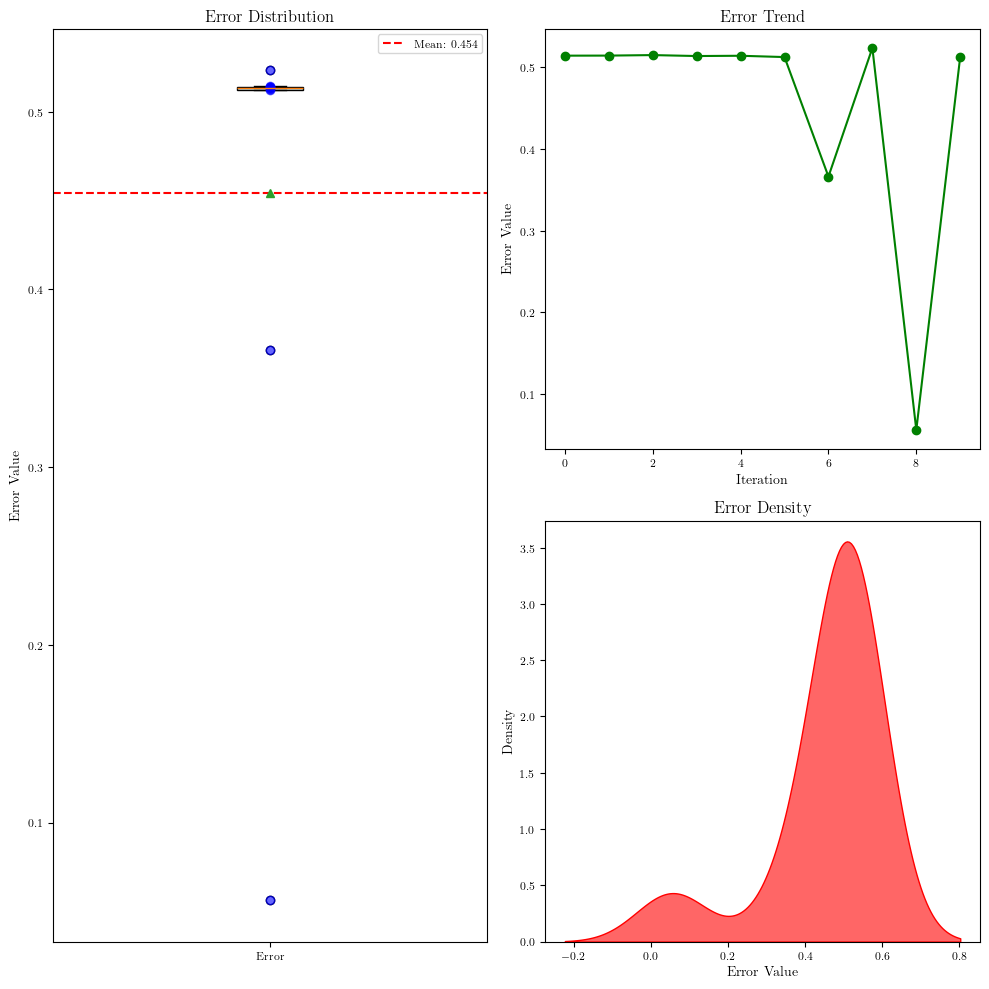

In [10]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns  # 导入seaborn库用于绘制密度图

# error = [0.5947221810612215, 0.7854634881268653, 1.0077722585678006, 0.5954742844285305, 0.4649590589316285, 0.41386083036181925, 0.6378457066743762, 0.6927021776896086, 0.44767318125257183, 0.28146649498710496, 0.8736713565859818, 0.8516792798779166, 0.37395951530223476, 0.8027823282496178, 0.804560887597274, 0.5182202889333846, 0.18454925778730633, 0.20862581035873265, 0.3739223144578929, 0.528249522241707]

plt.figure(figsize=(10, 10))  # 调整整体图表尺寸

# 左侧子图：箱形图，占据两张图的位置，箱的上下边界为上下四分位数，箱内的横线+三角点为中位数，虚线为均值
plt.subplot(1, 2, 1)  # 第一个子图，现在布局为1行2列
mean_error = np.mean(error)
plt.boxplot(error, patch_artist=True, showmeans=True, meanline=False, boxprops=dict(facecolor='lightblue')) #绘制箱型图，其中error是需要绘制的数据，patch_artist=True表示填充箱体，showmeans=True表示显示均值，meanline=True表示显示均值线，boxprops=dict(facecolor='lightblue')表示箱体的颜色为浅蓝色
plt.axhline(mean_error, color='r', linestyle='--', label=f'Mean: {mean_error:.3f}') #绘制一条水平线，位于mean_error处，颜色为红色，线型为虚线，标签为均值
for i, value in enumerate(error): #遍历error数组，i为索引，value为值
    plt.plot(1, value, 'bo', alpha=0.6) #绘制散点图，横坐标为1，纵坐标为value（即error数组中每个数），颜色为蓝色，点形状为圆圈，透明度为0.6
plt.title('Error Distribution')
plt.ylabel('Error Value')
plt.xticks([1], ['Error']) #设置x轴刻度标签
plt.legend() #显示图例

# 右侧上方子图：折线图
plt.subplot(2, 2, 2)  # 第二个子图，现在布局为2行2列的第二个位置
plt.plot(error, '-o', color='green') #绘制折线图，横坐标为error数组的索引，纵坐标为error数组的值，颜色为绿色，点形状为圆圈
plt.title('Error Trend')
plt.ylabel('Error Value')
plt.xlabel('Iteration')

# 右侧下方子图：密度图
plt.subplot(2, 2, 4)  # 第四个子图，现在布局为2行2列的第四个位置
sns.kdeplot(error, shade=True, color="r", alpha=0.6)
plt.title('Error Density')
plt.xlabel('Error Value')
plt.ylabel('Density')

plt.tight_layout()  # 自动调整子图参数，使之填充整个图表区域
plt.show()

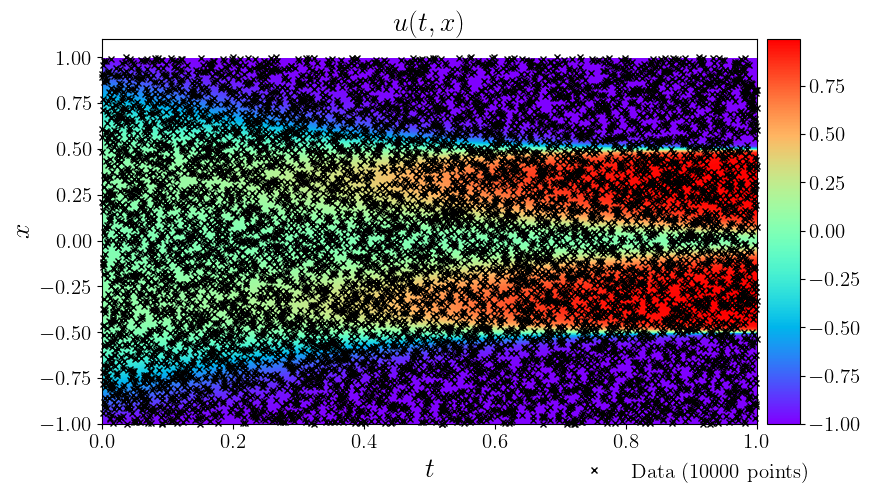

In [11]:
data = scipy.io.loadmat('../data/AC.mat')
#从data字典中取出变量tt和x的值，并转换为一维数组（flatten方法），最后tongg[:,None]将一维数组转换为二维数组
t = data['tt'].flatten()[:,None]
x = data['x'].flatten()[:,None]
Exact = np.real(data['uu']).T #从data数据中取出usol的值，并取实部，最后转置，赋值给Exact
#生成一个二位网络，X和T是输出的二维数组
#这个点结果是X和T均为形状为[len(t),len(x)]的二维数组，X的每一行都是x，一共len(t)行，T的每一列都是t，一共len(x)列
X, T = np.meshgrid(x,t)

X_star = np.hstack((X.flatten()[:,None], T.flatten()[:,None]))  #按列堆叠数组，X_star是一个二维数组，其中第一列是X的展平，第二列是T的展平
u_star = Exact.flatten()[:,None]   #对Exact_u使用flatten方法将其转换为一维数组，最后使用[:,None]将其转换为二维数组     
# X, T = np.meshgrid(x,t)

# X_star = np.hstack((X.flatten()[:,None], T.flatten()[:,None]))  #按列堆叠数组，X_star是一个二维数组，其中第一列是X的展平，第二列是T的展平
u_pred, f_pred = model.predict(X_star)    #对Exact_u使用flatten方法将其转换为一维数组，最后使用[:,None]将其转换为二维数组   


#使用griddata函数将X_star、u_pred插值到网格上，得到U_pred
U_pred = griddata(X_star, u_pred.flatten(), (X, T), method='cubic')
U_star = griddata(X_star, u_star.flatten(), (X, T), method='cubic')

###### Row 0: u(t,x) ##################    

fig = plt.figure(figsize=(9, 5)) #这里figure是一个figure对象，是一个图形窗口，代表整个图形，设置图形大小为宽9英寸高5 英寸
ax = fig.add_subplot(111) #在图形的1*1网格的第一个位置添加一个子图

#绘图的数据来源
h = ax.imshow(U_star.T, interpolation='nearest', cmap='rainbow', 
              extent=[t.min(), t.max(), x.min(), x.max()], 
              origin='lower', aspect='auto')   #imshow函数用于显示图像，接受一些参数，第一个参数是图像数据，这里是U_pred的转置；第二个参数是插值方法（用于在像素之间插入新的像素），这里是最邻近插值；
                                                   #第三个参数是颜色映射，这里是用彩虹色图；第四个参数是图像的范围；第五个参数是图像的原点位置，这里表示原点在右下角；第六个参数是图像的纵横比，这里表示调整横纵比以填充整个axes对象
                                                   #最后的结果返回一个axesimage对象，也就是h，可以通过这个对象进一步设置图像的属性


#添加颜色条
divider = make_axes_locatable(ax)  #使用 make_axes_locatable 函数创建了一个 AxesDivider 对象。这个函数接受一个 Axes 对象作为参数，返回一个 AxesDivider 对象。AxesDivider 对象可以用来管理子图的布局，特别是当你需要在一个图的旁边添加另一个图时。
cax = divider.append_axes("right", size="5%", pad=0.10) #使用append_axes方法在原始轴的右侧添加了一个新的轴。append_axes 方法接受三个参数：位置（"right"）、大小（"5%"）和间距（0.10）。在原始轴的右侧添加了一个新的轴，新轴的大小是原始轴的 5%，新轴与原始轴之间的间距是 0.05 英寸
   
cbar = fig.colorbar(h, cax=cax)#使用colorbar方法在新轴上添加了一个颜色条。colorbar 方法接受两个参数：axesimage 对象（h）和新轴（cax）。并记这个颜色条的名字是cbar
cbar.ax.tick_params(labelsize=15) #设置颜色条刻度标签大小，这里bar是之前定义的


#在图上绘制散点图
ax.plot(
    X_f[:,1], 
    X_f[:,0], 
    'kx', label = 'Data (%d points)' % (X_f.shape[0]), 
    markersize = 4,  # marker size doubled
    clip_on = False,
    alpha=1.0
) #在ax上绘制散点图，前两个参数是散点的x坐标和y坐标；kx表示黑色的x（散点形状是x），label是散点的标签，clip_on表示散点可以绘制在轴的边界外
  #新加了一个alpha=1.0用来设置标记的透明度，1.0表示完全不透明  




#设置图的标签、图例、标题和刻度标签
#设置ax子图的x轴的标签为t，y轴的标签为x。这里$t$和$x$是latex格式的文本，用于生成数学公式
ax.set_xlabel('$t$', size=20)
ax.set_ylabel('$x$', size=20)
#设置子图ax的图例，第一个参数用来设置图例的位置，这里表示图例放在上方中央;第二个参数用来设置图例的锚点，接受一个元组，表示x和y坐标，表示把图例的锚点设置在x坐标为0.9，y坐标为-0.05处;frameon=False表示不显示图例的边框;第三个参数设置图例的列数，分为5列；最后一个参数设置图例属性，接受字典，这里表示设置图例字体大小为15；最后返回的leg是一个legend对象，表示图形的图例
ax.legend(
    loc='upper center', 
    bbox_to_anchor=(0.9, -0.05), 
    ncol=5, 
    frameon=False, 
    prop={'size': 15}
)
#设置子图ax的标题为$u(t,x)$，表示latex格式的文本，用于生成数学公式，fontsize=10表示字体大小为20
ax.set_title('$u(t,x)$', fontsize = 20) # font size doubled，两倍化子图标题
ax.tick_params(labelsize=15)#用来设置刻度标签的大小。`tick_params`是`Axes`对象的一个方法，可以用来设置刻度线的属性。在这里，`labelsize=15` 是用来设置刻度标签的字体大小的。


#显示图片
plt.show() #显示所有打开的图形的函数

In [12]:
trainloss = torch.stack(model.loss_value).cpu().detach().numpy()


testerror = torch.stack(model.test_error).cpu().detach().numpy()

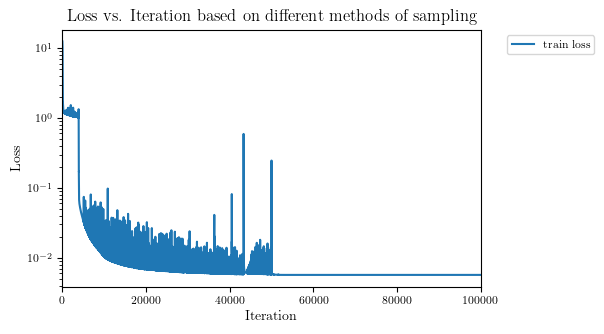

In [13]:
# print(len(trainloss))
# print(trainloss)
# 定义图例的标签
labels = ["Grid"]

# 创建一个新的图形
plt.figure()

# # 遍历所有的loss数据和标签
# for loss, label in zip(trainloss, labels):
#     # 绘制每个loss数据，并使用标签作为图例的条目
#     plt.plot(loss, label=label)

plt.plot(trainloss, label='train loss')

# 添加图例，放在图像外
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')


plt.xlim([0,100000]) # 设置x轴的范围
plt.yscale('log') #设置y轴为对数尺度，这样即使列表中有一些非常大的值，也不会影响其他值的可视化
plt.xlabel('Iteration') # 设置x轴的标签
plt.ylabel('Loss') # 设置y轴的标签
plt.title('Loss vs. Iteration based on different methods of sampling') # 设置图形的标题
# 显示图形
plt.show()
plt.show()

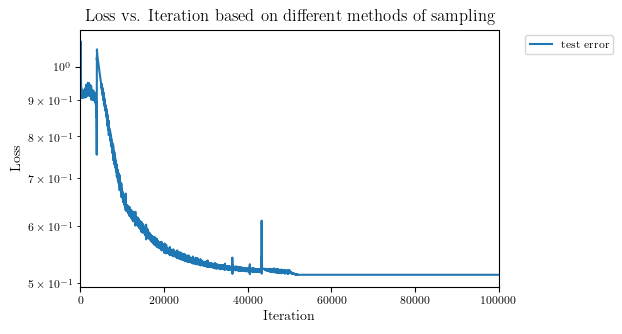

In [14]:
# print(len(trainloss))
# print(trainloss)
# 定义图例的标签
# labels = ["Grid"]

# 创建一个新的图形
plt.figure()

# # 遍历所有的loss数据和标签
# for loss, label in zip(trainloss, labels):
#     # 绘制每个loss数据，并使用标签作为图例的条目
#     plt.plot(loss, label=label)

plt.plot(testerror, label='test error')

# 添加图例，放在图像外
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')


plt.xlim([0,100000]) # 设置x轴的范围
plt.yscale('log') #设置y轴为对数尺度，这样即使列表中有一些非常大的值，也不会影响其他值的可视化
plt.xlabel('Iteration') # 设置x轴的标签
plt.ylabel('Loss') # 设置y轴的标签
plt.title('Loss vs. Iteration based on different methods of sampling') # 设置图形的标题
# 显示图形
plt.show()
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


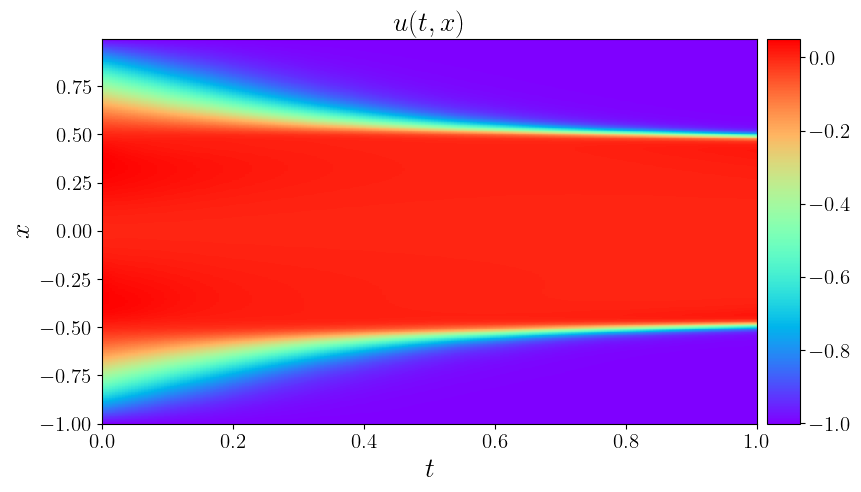

In [15]:
# data = scipy.io.loadmat('../../data/burgers_shock.mat')
# #从data字典中取出变量tt和x的值，并转换为一维数组（flatten方法），最后tongg[:,None]将一维数组转换为二维数组
# t = data['t'].flatten()[:,None]
# x = data['x'].flatten()[:,None]
# Exact = np.real(data['usol']).T #从data数据中取出usol的值，并取实部，最后转置，赋值给Exact
# #生成一个二位网络，X和T是输出的二维数组
# #这个点结果是X和T均为形状为[len(t),len(x)]的二维数组，X的每一行都是x，一共len(t)行，T的每一列都是t，一共len(x)列
# X, T = np.meshgrid(x,t)

# X_star = np.hstack((X.flatten()[:,None], T.flatten()[:,None]))  #按列堆叠数组，X_star是一个二维数组，其中第一列是X的展平，第二列是T的展平
u_pred, f_pred = model.predict(X_star)    #对Exact_u使用flatten方法将其转换为一维数组，最后使用[:,None]将其转换为二维数组   


#使用griddata函数将X_star、u_pred插值到网格上，得到U_pred
U_pred = griddata(X_star, u_pred.flatten(), (X, T), method='cubic')


###### Row 0: u(t,x) ##################    

fig = plt.figure(figsize=(9, 5)) #这里figure是一个figure对象，是一个图形窗口，代表整个图形，设置图形大小为宽9英寸高5 英寸
ax = fig.add_subplot(111) #在图形的1*1网格的第一个位置添加一个子图

#绘图的数据来源
h = ax.imshow(U_pred.T, interpolation='nearest', cmap='rainbow', 
              extent=[t.min(), t.max(), x.min(), x.max()], 
              origin='lower', aspect='auto')   #imshow函数用于显示图像，接受一些参数，第一个参数是图像数据，这里是U_pred的转置；第二个参数是插值方法（用于在像素之间插入新的像素），这里是最邻近插值；
                                                   #第三个参数是颜色映射，这里是用彩虹色图；第四个参数是图像的范围；第五个参数是图像的原点位置，这里表示原点在右下角；第六个参数是图像的纵横比，这里表示调整横纵比以填充整个axes对象
                                                   #最后的结果返回一个axesimage对象，也就是h，可以通过这个对象进一步设置图像的属性


#添加颜色条
divider = make_axes_locatable(ax)  #使用 make_axes_locatable 函数创建了一个 AxesDivider 对象。这个函数接受一个 Axes 对象作为参数，返回一个 AxesDivider 对象。AxesDivider 对象可以用来管理子图的布局，特别是当你需要在一个图的旁边添加另一个图时。
cax = divider.append_axes("right", size="5%", pad=0.10) #使用append_axes方法在原始轴的右侧添加了一个新的轴。append_axes 方法接受三个参数：位置（"right"）、大小（"5%"）和间距（0.10）。在原始轴的右侧添加了一个新的轴，新轴的大小是原始轴的 5%，新轴与原始轴之间的间距是 0.05 英寸
   
cbar = fig.colorbar(h, cax=cax)#使用colorbar方法在新轴上添加了一个颜色条。colorbar 方法接受两个参数：axesimage 对象（h）和新轴（cax）。并记这个颜色条的名字是cbar
cbar.ax.tick_params(labelsize=15) #设置颜色条刻度标签大小，这里bar是之前定义的


# #在图上绘制散点图
# ax.plot(
#     X_f_train[:,1], 
#     X_f_train[:,0], 
#     'kx', label = 'Data (%d points)' % (X_f_train.shape[0]), 
#     markersize = 4,  # marker size doubled
#     clip_on = False,
#     alpha=1.0
# ) #在ax上绘制散点图，前两个参数是散点的x坐标和y坐标；kx表示黑色的x（散点形状是x），label是散点的标签，clip_on表示散点可以绘制在轴的边界外
#   #新加了一个alpha=1.0用来设置标记的透明度，1.0表示完全不透明  




#设置图的标签、图例、标题和刻度标签
#设置ax子图的x轴的标签为t，y轴的标签为x。这里$t$和$x$是latex格式的文本，用于生成数学公式
ax.set_xlabel('$t$', size=20)
ax.set_ylabel('$x$', size=20)
#设置子图ax的图例，第一个参数用来设置图例的位置，这里表示图例放在上方中央;第二个参数用来设置图例的锚点，接受一个元组，表示x和y坐标，表示把图例的锚点设置在x坐标为0.9，y坐标为-0.05处;frameon=False表示不显示图例的边框;第三个参数设置图例的列数，分为5列；最后一个参数设置图例属性，接受字典，这里表示设置图例字体大小为15；最后返回的leg是一个legend对象，表示图形的图例
ax.legend(
    loc='upper center', 
    bbox_to_anchor=(0.9, -0.05), 
    ncol=5, 
    frameon=False, 
    prop={'size': 15}
)
#设置子图ax的标题为$u(t,x)$，表示latex格式的文本，用于生成数学公式，fontsize=10表示字体大小为20
ax.set_title('$u(t,x)$', fontsize = 20) # font size doubled，两倍化子图标题
ax.tick_params(labelsize=15)#用来设置刻度标签的大小。`tick_params`是`Axes`对象的一个方法，可以用来设置刻度线的属性。在这里，`labelsize=15` 是用来设置刻度标签的字体大小的。


#显示图片
plt.show() #显示所有打开的图形的函数

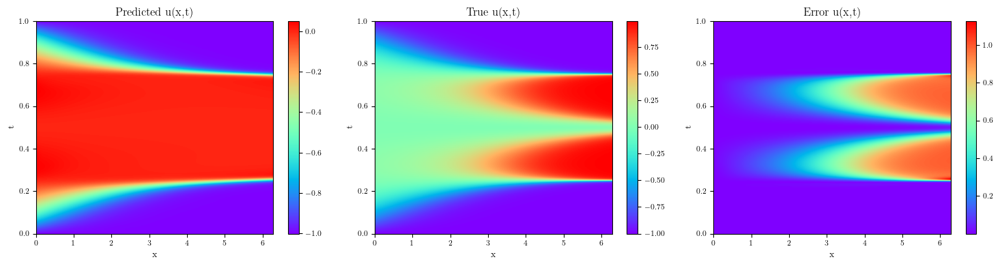

In [16]:

# 创建一个包含三幅子图的图像
fig, axes = plt.subplots(1, 3, figsize=(15, 4))

# 绘制第一幅图像
axes[0].imshow(U_pred.T, extent=[0, np.pi*2, 1, 0], aspect='auto', cmap='rainbow')
axes[0].invert_yaxis()
axes[0].set_xlabel('x')
axes[0].set_ylabel('t')
axes[0].set_title('Predicted u(x,t)')
fig.colorbar(axes[0].images[0], ax=axes[0])

# 绘制第二幅图像
axes[1].imshow(U_star.T, extent=[0,np.pi*2,1,0], aspect='auto', cmap='rainbow') #第一个参数为数据，第二个参数为一个列表，用于设置图像的坐标范围，aspect='auto'表示纵横比自动调整
axes[1].invert_yaxis()
axes[1].set_xlabel('x')
axes[1].set_ylabel('t')
axes[1].set_title('True u(x,t)')
fig.colorbar(axes[1].images[0], ax=axes[1])

# 绘制第三幅图像
axes[2].imshow(np.abs(U_pred - U_star).T, extent=[0,np.pi*2,1,0], aspect='auto', cmap='rainbow') #第一个参数为数据，第二个参数为一个列表，用于设置图像的坐标范围，aspect='auto'表示纵横比自动调整
axes[2].invert_yaxis()
axes[2].set_xlabel('x')
axes[2].set_ylabel('t')
axes[2].set_title('Error u(x,t)')
fig.colorbar(axes[2].images[0], ax=axes[2])

# 自动调整子图参数，使得子图之间的间距适当
plt.tight_layout()
plt.show()

In [17]:
#计算训练好模型的chaos（最后一个seed）
u_chaos = calculate_chaos(model, X_star, num_iter=50)
u_chaos_log = np.log(u_chaos + 1e-10) #对u_var取对数，然后加上一个很小的数，避免取对数时出现错误

#使用griddata函数将X_star、u_pred插值到网格上，得到U_pred
U_chaos = griddata(X_star, u_chaos.flatten(), (X, T), method='cubic')
U_chaos_log = griddata(X_star, u_chaos_log.flatten(), (X, T), method='cubic')

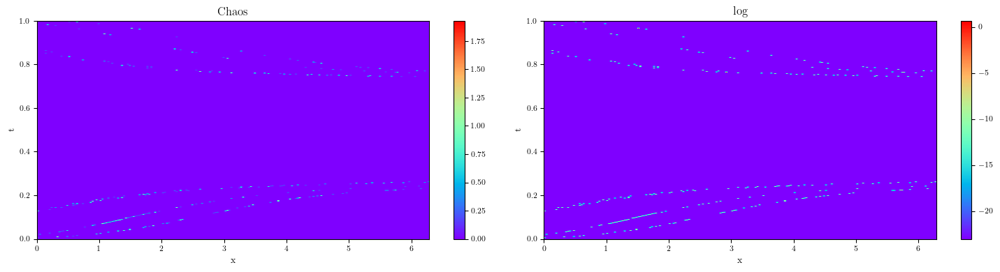

In [18]:

# 创建一个包含三幅子图的图像
fig, axes = plt.subplots(1, 2, figsize=(15, 4))

# 绘制第一幅图像
axes[0].imshow(U_chaos.T, extent=[0, np.pi*2, 1, 0], aspect='auto', cmap='rainbow')
axes[0].invert_yaxis()
axes[0].set_xlabel('x')
axes[0].set_ylabel('t')
axes[0].set_title('Chaos')
fig.colorbar(axes[0].images[0], ax=axes[0])

# 绘制第二幅图像
axes[1].imshow(U_chaos_log.T, extent=[0,np.pi*2,1,0], aspect='auto', cmap='rainbow') #第一个参数为数据，第二个参数为一个列表，用于设置图像的坐标范围，aspect='auto'表示纵横比自动调整
axes[1].invert_yaxis()
axes[1].set_xlabel('x')
axes[1].set_ylabel('t')
axes[1].set_title('log')
fig.colorbar(axes[1].images[0], ax=axes[1])

# 自动调整子图参数，使得子图之间的间距适当
plt.tight_layout()
plt.show()